In [1]:
import numpy as np
import pandas as pd
from collections import defaultdict
from surprise import Dataset, Reader, accuracy
from surprise.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from surprise.model_selection import KFold
from tqdm.notebook import tqdm
from sklearn.metrics import ndcg_score
from surprise import dump
import seaborn as sns
import matplotlib.pyplot as plt
from typing import List
from surprise import SVD
import random
import pickle
from copy import deepcopy

import typing as tp
from sklearn.preprocessing import normalize
from lightfm import LightFM
from scipy.sparse import coo_matrix
from lightfm.data import Dataset as LFMDataset
from collections import Counter
from matplotlib.lines import Line2D
import time
import optuna

np.random.seed(42)

C:\ProgramData\Anaconda3\envs\torchvision2\lib\site-packages\lightfm\_lightfm_fast.py:9: UserWarning: LightFM was compiled without OpenMP support. Only a single thread will be used.
  warnings.warn(


In [2]:
from uuu import mapk_plot, mapk, calculate_serendipity_per_user, prediction_coverage, \
catalog_coverage, long_tail_plot, weight_by_volume, get_frame_from_prediction_list, novelty, get_value_popularity_ranks

In [3]:
df = pd.read_csv('../data/recsys-in-practice/train_joke_df.csv')

df['UID'] = df['UID'] - 1
df['JID'] = df['JID'] - 1
# сделаем сортировку и перепишем index
df = df.sort_values(by=['UID', 'JID'])
df = df.reset_index(drop=True)

df

df_train, df_test = train_test_split(df, test_size=0.5, random_state=42)

E:\competitions\kaggle\magnit_recsys-in-practice\part2\uuu.py:259: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  head = head.append(tail.head(1))


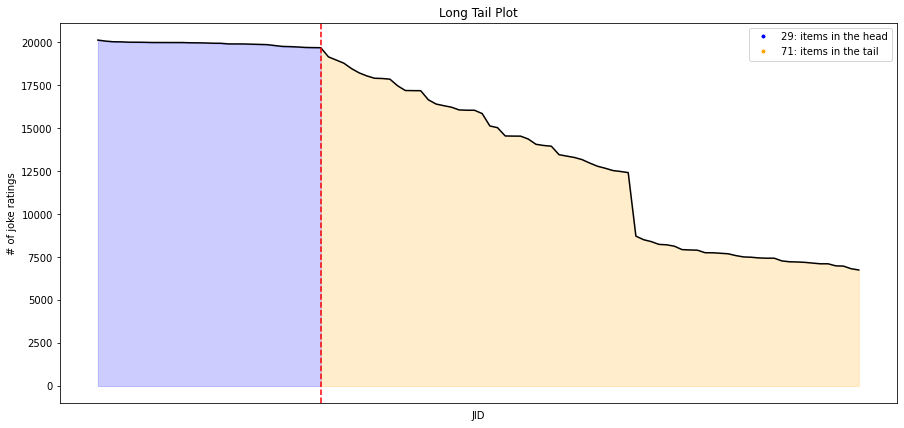

In [4]:
fig = plt.figure(figsize=(15, 7))
volume_df = long_tail_plot(df=df, 
             item_id_column="JID", 
             interaction_type="joke ratings", 
             percentage=0.4,
             x_labels=False)

volume_df['weight'] = volume_df['percent_of_total_volume'].apply(weight_by_volume)
joke_volume = {}
for row in volume_df.itertuples():
    joke_volume[int(row.JID)] = row.weight

In [5]:
df_top_joke = df[df['Rating'] > 5].groupby('JID').agg('count').rename(columns={'Rating':'count_plus'}) \
.sort_values('count_plus', ascending=False).drop(columns=['UID'])


df_bottom_joke = df[df['Rating'] < -5].groupby('JID').agg('count').rename(columns={'Rating':'count_minus'}) \
.sort_values('count_minus', ascending=False).drop(columns=['UID'])


df_counts = df_bottom_joke.merge(df_top_joke, left_index=True, right_index=True)


df_counts['diff'] = df_counts['count_plus'] - df_counts['count_minus']
df_counts = df_counts.sort_values('diff', ascending=False)


df_counts['weight'] = df_counts['diff'] / 10000

joke_quality = {}
for row in df_counts.itertuples():
    joke_quality[row.Index] = row.weight

In [6]:
with open('predictions_df_surprise.pkl', 'rb') as f:
    predictions_df_surprise = pickle.load(f)
    
predictions_df_surprise.keys()

dict_keys(['actual', 'svd', 'knn'])

In [7]:
with open('predictions_df_lfm.pkl', 'rb') as f:
    predictions_df_lfm = pickle.load(f)
    
predictions_df_lfm.keys()

dict_keys(['lfm', 'lfm_cos'])

In [8]:
with open('predictions_df_nn.pkl', 'rb') as f:
    predictions_df_nn = pickle.load(f)
    
predictions_df_nn.keys()

dict_keys(['nn'])

In [9]:
with open('predictions_df_nn_bias.pkl', 'rb') as f:
    predictions_df_nn_bias = pickle.load(f)
    
predictions_df_nn_bias.keys()

dict_keys(['nn_bias'])

In [10]:
with open('predictions_df_catboost.pkl', 'rb') as f:
    predictions_df_catboost = pickle.load(f)
    
predictions_df_catboost.keys()

dict_keys(['catboost'])

In [11]:
#with open('predictions_df_catboost_doc2vec.pkl', 'rb') as f:
#    predictions_df_catboost_doc2vec = pickle.load(f)
    
#predictions_df_catboost_doc2vec.keys()

In [12]:
svd_df = predictions_df_surprise['svd']
knn_df = predictions_df_surprise['knn']
lfm_df = predictions_df_lfm['lfm']
lfm_cos_df = predictions_df_lfm['lfm_cos']
nn_df = predictions_df_nn['nn']
nn_bias_df = predictions_df_nn_bias['nn_bias']
catboost_df = predictions_df_catboost['catboost']
#catboost_doc2vec_df = predictions_df_catboost_doc2vec['catboost_doc2vec']
actual_df = predictions_df_surprise['actual']

In [13]:
frames = {'svd':svd_df, 'lfm':lfm_df, 'lfm_cos':lfm_cos_df, 'nn':nn_df, 
          'catboost':catboost_df, 'knn':knn_df,  'nn_bias':nn_bias_df}#'catboost_doc2vec':catboost_doc2vec_df,

predictions = {k:list(v.groupby('UID').agg({'JID':list})['JID'].values) for k, v in frames.items()}
actual = list(predictions_df_surprise['actual'].groupby('UID').agg({'JID':list})['JID'].values)

In [14]:
users = df["UID"].unique()
n_users = users.size
n_users

24983

In [15]:
# рекомендации по популярным 
#popularity_recs = df['JID'].value_counts().head(10).index.tolist()

#pop_recs = []
#for user in tqdm(range(n_users)):
#    pop_predictions = popularity_recs
#    pop_recs.append(pop_predictions)
    
    
#predictions['popular'] = pop_recs

In [16]:
pop = dict(df.JID.value_counts())

In [17]:
items = np.unique(df['JID'])
items

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84,
       85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99],
      dtype=int64)

In [18]:
def union_predicts(params):
    result = []

    for u in range(24983):
        res = {}
        for i, (key, value) in enumerate(predictions.items()):
            rank = {x: params[key] * (10-j) for j, x in enumerate(value[u])}

            for k, v in rank.items():
                if k in res:
                    res[k] += v
                else:
                    res[k] = v
                    
        for k in res:
            res[k] += joke_quality[k] * params['quality']
            res[k] += joke_volume[k] * params['volume']

        result.append([x[0] for x in sorted(res.items(), key=lambda item: item[1], reverse=True)][:10])
        
    return result

In [19]:
def main_metric(params):
    t1 = time.time()
    result = union_predicts(params)
    res_df = get_frame_from_prediction_list(users, result)


    cat_coverage = catalog_coverage(result, items, 100)
    pred_coverage = prediction_coverage(result, items)
    nov, mselfinfo_list = novelty(result, pop, len(users), 10)

    res_df = get_frame_from_prediction_list(users, result)
    serendip = calculate_serendipity_per_user(res_df, df_train, df_test)
    map1 = mapk(actual, result, k=1)
    map10 = mapk(actual, result, k=10)
    
    sm = sum([map1, map10])
    print('time',round(time.time() - t1, 3), 
        'cat_cov',  round(cat_coverage, 3), 
         'cov', round(pred_coverage, 3),
         'nov', round(nov, 3),
         'ser', round(serendip, 3),
        'm1',  round(map1 , 3),
         'm10', round(map10, 3),
         'sum', round(sm, 3))
    return sm

In [20]:
def objective(trial):    
    
    params = {'svd': trial.suggest_float(name='svd', low=-5, high=5, step=0.1), 
              'lfm': trial.suggest_float(name='lfm', low=-5, high=5, step=0.1), 
              'lfm_cos': trial.suggest_float(name='lfm_cos', low=-5, high=2, step=0.1), 
              'nn': trial.suggest_float(name='nn', low=-5, high=5, step=0.1), 
              'nn_bias': trial.suggest_float(name='nn_bias', low=-5, high=5, step=0.1), 
              'catboost': trial.suggest_float(name='catboost', low=-5, high=2, step=0.1), 
              'knn': trial.suggest_float(name='knn', low=-5, high=5, step=0.1), 
              #'catboost_doc2vec': trial.suggest_float(name='catboost_doc2vec', low=-5, high=5, step=0.1),
              'quality': trial.suggest_float(name='quality', low=-5, high=5, step=0.1),
              'volume': trial.suggest_float(name='volume', low=-5, high=5, step=0.1)
             }
    
    return main_metric(params)
    


study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=20000)


[I 2023-05-06 22:45:58,685] A new study created in memory with name: no-name-15c20f23-8f97-4e75-9f37-b7e0632aa418
[I 2023-05-06 22:46:02,743] Trial 0 finished with value: 0.562436519266964 and parameters: {'svd': -4.0, 'lfm': 3.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.1, 'nn_bias': 0.9000000000000004, 'catboost': -3.8, 'knn': -1.0, 'quality': -0.7999999999999998, 'volume': 3.4000000000000004}. Best is trial 0 with value: 0.562436519266964.


time 4.055 cat_cov 94.0 cov 100.0 nov 0.842 ser 0.18 m1 0.21 m10 0.352 sum 0.562


[I 2023-05-06 22:46:06,036] Trial 1 finished with value: 0.7615510594445343 and parameters: {'svd': 1.9000000000000004, 'lfm': -4.0, 'lfm_cos': -0.5999999999999996, 'nn': 3.5, 'nn_bias': 2.6000000000000005, 'catboost': -4.4, 'knn': 0.8000000000000007, 'quality': 3.200000000000001, 'volume': 2.6000000000000005}. Best is trial 1 with value: 0.7615510594445343.


time 3.29 cat_cov 63.0 cov 100.0 nov 0.888 ser 0.096 m1 0.312 m10 0.45 sum 0.762


[I 2023-05-06 22:46:09,347] Trial 2 finished with value: 0.37901805661712396 and parameters: {'svd': -2.6999999999999997, 'lfm': -2.0999999999999996, 'lfm_cos': -3.3, 'nn': -2.0999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': -1.0999999999999996, 'knn': -0.39999999999999947, 'quality': 1.1000000000000005, 'volume': 0.8000000000000007}. Best is trial 1 with value: 0.7615510594445343.


time 3.308 cat_cov 95.0 cov 100.0 nov 1.026 ser 0.115 m1 0.137 m10 0.242 sum 0.379


[I 2023-05-06 22:46:13,008] Trial 3 finished with value: 0.5195029909075889 and parameters: {'svd': 0.20000000000000018, 'lfm': 2.9000000000000004, 'lfm_cos': -3.9, 'nn': -3.9, 'nn_bias': -2.8, 'catboost': 0.0, 'knn': 0.9000000000000004, 'quality': -4.4, 'volume': 2.5}. Best is trial 1 with value: 0.7615510594445343.


time 3.658 cat_cov 93.0 cov 100.0 nov 0.79 ser 0.132 m1 0.193 m10 0.326 sum 0.52


[I 2023-05-06 22:46:16,259] Trial 4 finished with value: 0.4179150662208427 and parameters: {'svd': -0.7000000000000002, 'lfm': -4.6, 'lfm_cos': -3.3, 'nn': -4.2, 'nn_bias': 4.600000000000001, 'catboost': -3.2, 'knn': 2.0, 'quality': 4.0, 'volume': -5.0}. Best is trial 1 with value: 0.7615510594445343.


time 3.249 cat_cov 84.0 cov 100.0 nov 1.076 ser 0.114 m1 0.123 m10 0.295 sum 0.418


[I 2023-05-06 22:46:20,086] Trial 5 finished with value: 0.67358690754006 and parameters: {'svd': -0.8999999999999995, 'lfm': 0.3000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': -4.1, 'nn_bias': 0.5, 'catboost': -1.9, 'knn': 4.200000000000001, 'quality': 1.7000000000000002, 'volume': 4.700000000000001}. Best is trial 1 with value: 0.7615510594445343.


time 3.825 cat_cov 99.0 cov 100.0 nov 0.89 ser 0.187 m1 0.269 m10 0.404 sum 0.674


[I 2023-05-06 22:46:23,509] Trial 6 finished with value: 0.7865357483716289 and parameters: {'svd': 1.1000000000000005, 'lfm': 2.0, 'lfm_cos': -4.1, 'nn': 3.700000000000001, 'nn_bias': -2.0, 'catboost': 0.9000000000000004, 'knn': -1.6999999999999997, 'quality': 4.9, 'volume': -5.0}. Best is trial 6 with value: 0.7865357483716289.


time 3.421 cat_cov 85.0 cov 100.0 nov 0.653 ser 0.083 m1 0.324 m10 0.463 sum 0.787


[I 2023-05-06 22:46:26,803] Trial 7 finished with value: 0.7200793441404605 and parameters: {'svd': 0.6000000000000005, 'lfm': -3.0999999999999996, 'lfm_cos': -3.9, 'nn': 2.4000000000000004, 'nn_bias': -4.6, 'catboost': -3.7, 'knn': 4.5, 'quality': 2.7, 'volume': 2.1000000000000005}. Best is trial 6 with value: 0.7865357483716289.


time 3.291 cat_cov 74.0 cov 100.0 nov 0.783 ser 0.086 m1 0.281 m10 0.439 sum 0.72


[I 2023-05-06 22:46:30,124] Trial 8 finished with value: 0.22800949539867005 and parameters: {'svd': -4.3, 'lfm': -3.0, 'lfm_cos': -2.8, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': 1.8000000000000007, 'knn': 2.9000000000000004, 'quality': -0.8999999999999995, 'volume': 0.3000000000000007}. Best is trial 6 with value: 0.7865357483716289.


time 3.319 cat_cov 88.0 cov 100.0 nov 0.84 ser 0.102 m1 0.065 m10 0.163 sum 0.228


[I 2023-05-06 22:46:33,487] Trial 9 finished with value: 0.47476889178821496 and parameters: {'svd': -3.3, 'lfm': -1.9, 'lfm_cos': -4.3, 'nn': 2.4000000000000004, 'nn_bias': -4.2, 'catboost': 0.7000000000000002, 'knn': -1.0999999999999996, 'quality': -0.1999999999999993, 'volume': 2.0}. Best is trial 6 with value: 0.7865357483716289.


time 3.36 cat_cov 74.0 cov 100.0 nov 0.772 ser 0.089 m1 0.189 m10 0.285 sum 0.475


[I 2023-05-06 22:46:37,072] Trial 10 finished with value: 0.8464265150415662 and parameters: {'svd': 4.700000000000001, 'lfm': 4.700000000000001, 'lfm_cos': -2.0999999999999996, 'nn': 4.700000000000001, 'nn_bias': -1.6999999999999997, 'catboost': 2.0, 'knn': -4.3, 'quality': 5.0, 'volume': -5.0}. Best is trial 10 with value: 0.8464265150415662.


time 3.562 cat_cov 97.0 cov 100.0 nov 0.65 ser 0.118 m1 0.365 m10 0.481 sum 0.846


[I 2023-05-06 22:46:40,695] Trial 11 finished with value: 0.8518547219251948 and parameters: {'svd': 4.9, 'lfm': 4.9, 'lfm_cos': -1.9, 'nn': 4.800000000000001, 'nn_bias': -1.5, 'catboost': 1.8000000000000007, 'knn': -4.3, 'quality': 5.0, 'volume': -5.0}. Best is trial 11 with value: 0.8518547219251948.


time 3.598 cat_cov 94.0 cov 100.0 nov 0.645 ser 0.12 m1 0.369 m10 0.483 sum 0.852


[I 2023-05-06 22:46:44,322] Trial 12 finished with value: 0.8394290164679077 and parameters: {'svd': 5.0, 'lfm': 5.0, 'lfm_cos': -2.0, 'nn': 5.0, 'nn_bias': -1.5999999999999996, 'catboost': 1.9000000000000004, 'knn': -4.9, 'quality': 4.9, 'volume': -2.6999999999999997}. Best is trial 11 with value: 0.8518547219251948.


time 3.601 cat_cov 97.0 cov 100.0 nov 0.643 ser 0.122 m1 0.361 m10 0.478 sum 0.839


[I 2023-05-06 22:46:48,150] Trial 13 finished with value: 0.6798234887718104 and parameters: {'svd': 5.0, 'lfm': 5.0, 'lfm_cos': -1.4, 'nn': -0.2999999999999998, 'nn_bias': -1.0999999999999996, 'catboost': -0.5, 'knn': -4.9, 'quality': -3.2, 'volume': -2.5}. Best is trial 11 with value: 0.8518547219251948.


time 3.801 cat_cov 97.0 cov 100.0 nov 0.696 ser 0.159 m1 0.275 m10 0.405 sum 0.68


[I 2023-05-06 22:46:51,736] Trial 14 finished with value: 0.8576778942422091 and parameters: {'svd': 3.4000000000000004, 'lfm': 3.8000000000000007, 'lfm_cos': -1.9, 'nn': 5.0, 'nn_bias': 2.3000000000000007, 'catboost': 1.0, 'knn': -3.0999999999999996, 'quality': 2.4000000000000004, 'volume': -2.8}. Best is trial 14 with value: 0.8576778942422091.


time 3.56 cat_cov 91.0 cov 100.0 nov 0.705 ser 0.098 m1 0.369 m10 0.488 sum 0.858


[I 2023-05-06 22:46:55,310] Trial 15 finished with value: 0.744588696630161 and parameters: {'svd': 3.0999999999999996, 'lfm': 1.0, 'lfm_cos': 0.5, 'nn': 0.9000000000000004, 'nn_bias': 2.6000000000000005, 'catboost': 0.7000000000000002, 'knn': -3.2, 'quality': 1.7000000000000002, 'volume': -2.6999999999999997}. Best is trial 14 with value: 0.8576778942422091.


time 3.55 cat_cov 95.0 cov 100.0 nov 0.911 ser 0.138 m1 0.317 m10 0.428 sum 0.745


[I 2023-05-06 22:46:58,929] Trial 16 finished with value: 0.8093256875370641 and parameters: {'svd': 3.0, 'lfm': 3.200000000000001, 'lfm_cos': -0.7000000000000002, 'nn': 1.0, 'nn_bias': 2.1000000000000005, 'catboost': -2.5, 'knn': -2.5999999999999996, 'quality': 3.200000000000001, 'volume': -1.4}. Best is trial 14 with value: 0.8576778942422091.


time 3.593 cat_cov 97.0 cov 100.0 nov 0.792 ser 0.135 m1 0.348 m10 0.461 sum 0.809


[I 2023-05-06 22:47:02,475] Trial 17 finished with value: 0.7797971278191518 and parameters: {'svd': 3.200000000000001, 'lfm': 3.9000000000000004, 'lfm_cos': -1.5, 'nn': 3.5, 'nn_bias': 4.9, 'catboost': 1.3000000000000007, 'knn': -3.3, 'quality': 2.5, 'volume': -3.7}. Best is trial 14 with value: 0.8576778942422091.


time 3.522 cat_cov 88.0 cov 100.0 nov 0.823 ser 0.11 m1 0.336 m10 0.443 sum 0.78


[I 2023-05-06 22:47:05,794] Trial 18 finished with value: 0.7612173536886413 and parameters: {'svd': 3.5999999999999996, 'lfm': 1.7000000000000002, 'lfm_cos': -2.3, 'nn': 2.1000000000000005, 'nn_bias': 3.5999999999999996, 'catboost': 0.0, 'knn': -2.1999999999999997, 'quality': 0.9000000000000004, 'volume': -1.0999999999999996}. Best is trial 14 with value: 0.8576778942422091.


time 3.291 cat_cov 78.0 cov 100.0 nov 0.888 ser 0.108 m1 0.325 m10 0.437 sum 0.761


[I 2023-05-06 22:47:09,049] Trial 19 finished with value: 0.5363873486881132 and parameters: {'svd': 2.0, 'lfm': -0.1999999999999993, 'lfm_cos': -4.8, 'nn': -1.5999999999999996, 'nn_bias': 1.4000000000000004, 'catboost': -0.7000000000000002, 'knn': -3.8, 'quality': 3.9000000000000004, 'volume': -3.5}. Best is trial 14 with value: 0.8576778942422091.


time 3.231 cat_cov 87.0 cov 100.0 nov 1.018 ser 0.124 m1 0.205 m10 0.331 sum 0.536


[I 2023-05-06 22:47:12,592] Trial 20 finished with value: 0.8691475787561744 and parameters: {'svd': 3.9000000000000004, 'lfm': 3.9000000000000004, 'lfm_cos': -1.1999999999999997, 'nn': 4.300000000000001, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -2.5, 'quality': -1.5, 'volume': -1.1999999999999997}. Best is trial 20 with value: 0.8691475787561744.


time 3.517 cat_cov 94.0 cov 100.0 nov 0.652 ser 0.117 m1 0.38 m10 0.489 sum 0.869


[I 2023-05-06 22:47:16,231] Trial 21 finished with value: 0.8607329210998778 and parameters: {'svd': 3.9000000000000004, 'lfm': 3.8000000000000007, 'lfm_cos': -1.2999999999999998, 'nn': 4.300000000000001, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': -2.8, 'quality': -2.0999999999999996, 'volume': -1.0}. Best is trial 20 with value: 0.8691475787561744.


time 3.613 cat_cov 97.0 cov 100.0 nov 0.656 ser 0.118 m1 0.376 m10 0.485 sum 0.861


[I 2023-05-06 22:47:19,889] Trial 22 finished with value: 0.8717001118331642 and parameters: {'svd': 4.0, 'lfm': 3.700000000000001, 'lfm_cos': -1.0999999999999996, 'nn': 3.9000000000000004, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': -1.9, 'quality': -2.4, 'volume': -1.0999999999999996}. Best is trial 22 with value: 0.8717001118331642.


time 3.636 cat_cov 95.0 cov 100.0 nov 0.66 ser 0.116 m1 0.381 m10 0.491 sum 0.872


[I 2023-05-06 22:47:23,776] Trial 23 finished with value: 0.8626083515450118 and parameters: {'svd': 2.2, 'lfm': 2.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 3.8000000000000007, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -1.5999999999999996, 'quality': -2.0999999999999996, 'volume': -0.8999999999999995}. Best is trial 22 with value: 0.8717001118331642.


time 3.86 cat_cov 94.0 cov 100.0 nov 0.639 ser 0.121 m1 0.377 m10 0.486 sum 0.863


[I 2023-05-06 22:47:27,487] Trial 24 finished with value: 0.828922124275548 and parameters: {'svd': 2.0, 'lfm': 2.1000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 2.8000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -1.1999999999999997, 'knn': -1.9, 'quality': -2.3, 'volume': -0.2999999999999998}. Best is trial 22 with value: 0.8717001118331642.


time 3.687 cat_cov 95.0 cov 100.0 nov 0.665 ser 0.136 m1 0.361 m10 0.468 sum 0.829


[I 2023-05-06 22:47:31,098] Trial 25 finished with value: 0.8120463341754176 and parameters: {'svd': 2.5, 'lfm': -0.5, 'lfm_cos': 1.5, 'nn': 1.6000000000000005, 'nn_bias': -2.5999999999999996, 'catboost': -1.9, 'knn': 0.10000000000000053, 'quality': -2.4, 'volume': -1.6999999999999997}. Best is trial 22 with value: 0.8717001118331642.


time 3.587 cat_cov 100.0 cov 100.0 nov 0.852 ser 0.157 m1 0.345 m10 0.467 sum 0.812


[I 2023-05-06 22:47:34,497] Trial 26 finished with value: 0.857821989562628 and parameters: {'svd': 3.9000000000000004, 'lfm': 1.0, 'lfm_cos': 0.20000000000000018, 'nn': 3.0999999999999996, 'nn_bias': -0.7999999999999998, 'catboost': -0.39999999999999947, 'knn': -1.0999999999999996, 'quality': -4.0, 'volume': 1.1000000000000005}. Best is trial 22 with value: 0.8717001118331642.


time 3.373 cat_cov 85.0 cov 100.0 nov 0.739 ser 0.111 m1 0.371 m10 0.487 sum 0.858


[I 2023-05-06 22:47:38,229] Trial 27 finished with value: 0.8696456386261024 and parameters: {'svd': 1.3000000000000007, 'lfm': 2.7, 'lfm_cos': 1.1000000000000005, 'nn': 4.1, 'nn_bias': 1.4000000000000004, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': -1.1999999999999997, 'volume': -0.2999999999999998}. Best is trial 22 with value: 0.8717001118331642.


time 3.707 cat_cov 94.0 cov 100.0 nov 0.62 ser 0.115 m1 0.38 m10 0.489 sum 0.87


[I 2023-05-06 22:47:42,112] Trial 28 finished with value: 0.8727150049524227 and parameters: {'svd': 1.4000000000000004, 'lfm': 4.200000000000001, 'lfm_cos': 1.0, 'nn': 4.200000000000001, 'nn_bias': 1.4000000000000004, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': -1.1999999999999997, 'volume': 0.20000000000000018}. Best is trial 28 with value: 0.8727150049524227.


time 3.858 cat_cov 91.0 cov 100.0 nov 0.601 ser 0.117 m1 0.386 m10 0.486 sum 0.873


[I 2023-05-06 22:47:46,102] Trial 29 finished with value: 0.7476115135465208 and parameters: {'svd': -1.2999999999999998, 'lfm': 2.8000000000000007, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 1.3000000000000007, 'catboost': 1.3000000000000007, 'knn': 1.8000000000000007, 'quality': -0.2999999999999998, 'volume': 0.0}. Best is trial 28 with value: 0.8727150049524227.


time 3.967 cat_cov 96.0 cov 100.0 nov 0.632 ser 0.144 m1 0.314 m10 0.434 sum 0.748


[I 2023-05-06 22:47:50,213] Trial 30 finished with value: 0.7396287901320895 and parameters: {'svd': 0.9000000000000004, 'lfm': 3.3000000000000007, 'lfm_cos': 1.7000000000000002, 'nn': 1.4000000000000004, 'nn_bias': 0.8000000000000007, 'catboost': -0.8999999999999995, 'knn': 0.20000000000000018, 'quality': -3.2, 'volume': 0.8000000000000007}. Best is trial 28 with value: 0.8727150049524227.


time 4.085 cat_cov 98.0 cov 100.0 nov 0.654 ser 0.158 m1 0.31 m10 0.43 sum 0.74


[I 2023-05-06 22:47:53,834] Trial 31 finished with value: 0.887246177003537 and parameters: {'svd': 4.200000000000001, 'lfm': 4.200000000000001, 'lfm_cos': -0.1999999999999993, 'nn': 4.200000000000001, 'nn_bias': 1.7000000000000002, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': -1.1999999999999997, 'volume': -0.39999999999999947}. Best is trial 31 with value: 0.887246177003537.


time 3.596 cat_cov 92.0 cov 100.0 nov 0.649 ser 0.11 m1 0.387 m10 0.501 sum 0.887


[I 2023-05-06 22:47:57,569] Trial 32 finished with value: 0.8472668979153746 and parameters: {'svd': 1.3000000000000007, 'lfm': 4.200000000000001, 'lfm_cos': 2.0, 'nn': 4.1, 'nn_bias': 3.3000000000000007, 'catboost': 0.5, 'knn': -0.5, 'quality': -0.7999999999999998, 'volume': -0.39999999999999947}. Best is trial 31 with value: 0.887246177003537.


time 3.711 cat_cov 94.0 cov 100.0 nov 0.679 ser 0.133 m1 0.371 m10 0.476 sum 0.847


[I 2023-05-06 22:48:01,458] Trial 33 finished with value: 0.8511056512948836 and parameters: {'svd': -0.1999999999999993, 'lfm': 4.4, 'lfm_cos': -0.1999999999999993, 'nn': 3.200000000000001, 'nn_bias': 1.7000000000000002, 'catboost': 1.3000000000000007, 'knn': 1.0, 'quality': -1.2999999999999998, 'volume': 1.2000000000000002}. Best is trial 31 with value: 0.887246177003537.


time 3.863 cat_cov 88.0 cov 100.0 nov 0.584 ser 0.115 m1 0.375 m10 0.476 sum 0.851


[I 2023-05-06 22:48:05,560] Trial 34 finished with value: 0.8457556428431803 and parameters: {'svd': 1.4000000000000004, 'lfm': 2.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': 2.9000000000000004, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': -0.39999999999999947, 'quality': -3.4, 'volume': 0.40000000000000036}. Best is trial 31 with value: 0.887246177003537.


time 4.074 cat_cov 97.0 cov 100.0 nov 0.618 ser 0.126 m1 0.373 m10 0.473 sum 0.846


[I 2023-05-06 22:48:09,119] Trial 35 finished with value: 0.792819876491827 and parameters: {'svd': -1.7999999999999998, 'lfm': 3.3000000000000007, 'lfm_cos': -0.5999999999999996, 'nn': 4.1, 'nn_bias': 3.5999999999999996, 'catboost': -1.4, 'knn': 1.5, 'quality': 0.40000000000000036, 'volume': -1.9}. Best is trial 31 with value: 0.887246177003537.


time 3.533 cat_cov 85.0 cov 100.0 nov 0.773 ser 0.099 m1 0.33 m10 0.463 sum 0.793


[I 2023-05-06 22:48:12,699] Trial 36 finished with value: 0.8154084770589327 and parameters: {'svd': 2.6000000000000005, 'lfm': 1.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -2.3, 'nn_bias': 1.0, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': -1.5999999999999996, 'volume': 3.700000000000001}. Best is trial 31 with value: 0.887246177003537.


time 3.555 cat_cov 97.0 cov 100.0 nov 0.81 ser 0.14 m1 0.348 m10 0.468 sum 0.815


[I 2023-05-06 22:48:16,353] Trial 37 finished with value: 0.8765861273698365 and parameters: {'svd': 4.300000000000001, 'lfm': 4.300000000000001, 'lfm_cos': 1.1000000000000005, 'nn': 3.5, 'nn_bias': 3.0999999999999996, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': -4.8, 'volume': -0.39999999999999947}. Best is trial 31 with value: 0.887246177003537.


time 3.628 cat_cov 96.0 cov 100.0 nov 0.683 ser 0.128 m1 0.384 m10 0.493 sum 0.877


[I 2023-05-06 22:48:19,848] Trial 38 finished with value: 0.842322452113242 and parameters: {'svd': 4.4, 'lfm': 4.200000000000001, 'lfm_cos': -0.7999999999999998, 'nn': 2.0, 'nn_bias': 3.0, 'catboost': -4.5, 'knn': -0.8999999999999995, 'quality': -4.6, 'volume': -2.0}. Best is trial 31 with value: 0.887246177003537.


time 3.469 cat_cov 96.0 cov 100.0 nov 0.782 ser 0.122 m1 0.362 m10 0.481 sum 0.842


[I 2023-05-06 22:48:23,353] Trial 39 finished with value: 0.8578315081731012 and parameters: {'svd': 4.300000000000001, 'lfm': 3.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 3.700000000000001, 'nn_bias': 3.9000000000000004, 'catboost': -0.1999999999999993, 'knn': 3.0999999999999996, 'quality': -4.9, 'volume': 1.7000000000000002}. Best is trial 31 with value: 0.887246177003537.


time 3.479 cat_cov 83.0 cov 100.0 nov 0.728 ser 0.103 m1 0.365 m10 0.492 sum 0.858


[I 2023-05-06 22:48:26,644] Trial 40 finished with value: 0.7316461096417823 and parameters: {'svd': 4.300000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -0.8999999999999995, 'nn_bias': 4.300000000000001, 'catboost': -1.7999999999999998, 'knn': 1.3000000000000007, 'quality': -4.0, 'volume': -0.5999999999999996}. Best is trial 31 with value: 0.887246177003537.


time 3.266 cat_cov 83.0 cov 100.0 nov 0.953 ser 0.116 m1 0.307 m10 0.425 sum 0.732


[I 2023-05-06 22:48:30,519] Trial 41 finished with value: 0.7893297280964359 and parameters: {'svd': 0.40000000000000036, 'lfm': 4.4, 'lfm_cos': 1.1000000000000005, 'nn': 3.3000000000000007, 'nn_bias': 1.5, 'catboost': -4.9, 'knn': 0.6000000000000005, 'quality': -2.6999999999999997, 'volume': 0.10000000000000053}. Best is trial 31 with value: 0.887246177003537.


time 3.851 cat_cov 93.0 cov 100.0 nov 0.629 ser 0.129 m1 0.339 m10 0.45 sum 0.789


[I 2023-05-06 22:48:34,524] Trial 42 finished with value: 0.7333320419979312 and parameters: {'svd': -4.9, 'lfm': 2.7, 'lfm_cos': 1.3000000000000007, 'nn': 4.5, 'nn_bias': 1.8000000000000007, 'catboost': 1.0, 'knn': -0.2999999999999998, 'quality': -1.0, 'volume': 0.6000000000000005}. Best is trial 31 with value: 0.887246177003537.


time 3.977 cat_cov 99.0 cov 100.0 nov 0.697 ser 0.14 m1 0.305 m10 0.429 sum 0.733


[I 2023-05-06 22:48:38,254] Trial 43 finished with value: 0.8637764918806918 and parameters: {'svd': 2.7, 'lfm': 3.5999999999999996, 'lfm_cos': 1.8000000000000007, 'nn': 3.9000000000000004, 'nn_bias': 2.6000000000000005, 'catboost': 0.40000000000000036, 'knn': -1.5, 'quality': 0.20000000000000018, 'volume': -0.39999999999999947}. Best is trial 31 with value: 0.887246177003537.


time 3.704 cat_cov 97.0 cov 100.0 nov 0.66 ser 0.134 m1 0.38 m10 0.484 sum 0.864


[I 2023-05-06 22:48:42,119] Trial 44 finished with value: 0.8531230252066492 and parameters: {'svd': 1.5, 'lfm': 4.600000000000001, 'lfm_cos': 0.9000000000000004, 'nn': 2.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': -2.5, 'knn': 2.2, 'quality': -0.39999999999999947, 'volume': 1.4000000000000004}. Best is trial 31 with value: 0.887246177003537.


time 3.839 cat_cov 85.0 cov 100.0 nov 0.602 ser 0.12 m1 0.378 m10 0.475 sum 0.853


[I 2023-05-06 22:48:45,741] Trial 45 finished with value: 0.7872792480935411 and parameters: {'svd': -0.1999999999999993, 'lfm': 1.7000000000000002, 'lfm_cos': -1.0, 'nn': 4.600000000000001, 'nn_bias': 1.0, 'catboost': -0.7000000000000002, 'knn': -1.0999999999999996, 'quality': -1.6999999999999997, 'volume': 2.8000000000000007}. Best is trial 31 with value: 0.887246177003537.


time 3.598 cat_cov 81.0 cov 100.0 nov 0.69 ser 0.085 m1 0.323 m10 0.464 sum 0.787


[I 2023-05-06 22:48:49,059] Trial 46 finished with value: 0.5920227943209999 and parameters: {'svd': -2.3, 'lfm': -4.9, 'lfm_cos': 1.3000000000000007, 'nn': 3.5, 'nn_bias': 2.9000000000000004, 'catboost': 0.9000000000000004, 'knn': -0.7999999999999998, 'quality': -2.9, 'volume': -0.09999999999999964}. Best is trial 31 with value: 0.887246177003537.


time 3.292 cat_cov 75.0 cov 100.0 nov 0.992 ser 0.122 m1 0.226 m10 0.366 sum 0.592


[I 2023-05-06 22:48:53,021] Trial 47 finished with value: 0.6408352654483809 and parameters: {'svd': 0.8000000000000007, 'lfm': 3.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': 2.1000000000000005, 'catboost': 1.6000000000000005, 'knn': 0.20000000000000018, 'quality': -3.8, 'volume': -0.7999999999999998}. Best is trial 31 with value: 0.887246177003537.


time 3.937 cat_cov 98.0 cov 100.0 nov 0.827 ser 0.162 m1 0.255 m10 0.386 sum 0.641


[I 2023-05-06 22:48:56,711] Trial 48 finished with value: 0.899548320137865 and parameters: {'svd': 4.5, 'lfm': 4.600000000000001, 'lfm_cos': 0.6000000000000005, 'nn': 2.2, 'nn_bias': 0.7000000000000002, 'catboost': 0.6000000000000005, 'knn': 0.8000000000000007, 'quality': 0.5, 'volume': 0.3000000000000007}. Best is trial 48 with value: 0.899548320137865.


time 3.665 cat_cov 93.0 cov 100.0 nov 0.642 ser 0.126 m1 0.398 m10 0.501 sum 0.9


[I 2023-05-06 22:49:00,502] Trial 49 finished with value: 0.8999120781509103 and parameters: {'svd': 4.600000000000001, 'lfm': 4.9, 'lfm_cos': 0.6000000000000005, 'nn': 2.2, 'nn_bias': 0.5, 'catboost': 0.7000000000000002, 'knn': 1.0, 'quality': 0.8000000000000007, 'volume': 0.40000000000000036}. Best is trial 49 with value: 0.8999120781509103.


time 3.764 cat_cov 93.0 cov 100.0 nov 0.638 ser 0.126 m1 0.399 m10 0.501 sum 0.9


[I 2023-05-06 22:49:04,310] Trial 50 finished with value: 0.8993691165018669 and parameters: {'svd': 4.600000000000001, 'lfm': 4.9, 'lfm_cos': 0.5, 'nn': 2.0, 'nn_bias': 0.0, 'catboost': 0.7000000000000002, 'knn': 1.0, 'quality': 0.8000000000000007, 'volume': 0.5}. Best is trial 49 with value: 0.8999120781509103.


time 3.781 cat_cov 94.0 cov 100.0 nov 0.638 ser 0.128 m1 0.399 m10 0.5 sum 0.899


[I 2023-05-06 22:49:07,981] Trial 51 finished with value: 0.9011820735568062 and parameters: {'svd': 4.700000000000001, 'lfm': 5.0, 'lfm_cos': 0.6000000000000005, 'nn': 2.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': 0.7000000000000002, 'knn': 2.3000000000000007, 'quality': 1.4000000000000004, 'volume': 0.5}. Best is trial 51 with value: 0.9011820735568062.


time 3.647 cat_cov 95.0 cov 100.0 nov 0.635 ser 0.118 m1 0.397 m10 0.505 sum 0.901


[I 2023-05-06 22:49:11,627] Trial 52 finished with value: 0.9004352837291414 and parameters: {'svd': 4.600000000000001, 'lfm': 5.0, 'lfm_cos': 0.6000000000000005, 'nn': 2.1000000000000005, 'nn_bias': 0.7000000000000002, 'catboost': 0.8000000000000007, 'knn': 2.6000000000000005, 'quality': 1.4000000000000004, 'volume': 0.9000000000000004}. Best is trial 51 with value: 0.9011820735568062.


time 3.617 cat_cov 94.0 cov 100.0 nov 0.634 ser 0.117 m1 0.396 m10 0.504 sum 0.9


[I 2023-05-06 22:49:15,410] Trial 53 finished with value: 0.9028371261971873 and parameters: {'svd': 4.700000000000001, 'lfm': 5.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.7000000000000002, 'nn_bias': 0.7000000000000002, 'catboost': 0.7000000000000002, 'knn': 2.6000000000000005, 'quality': 1.6000000000000005, 'volume': 2.5}. Best is trial 53 with value: 0.9028371261971873.


time 3.751 cat_cov 96.0 cov 100.0 nov 0.643 ser 0.125 m1 0.4 m10 0.503 sum 0.903


[I 2023-05-06 22:49:19,170] Trial 54 finished with value: 0.904934107593012 and parameters: {'svd': 4.700000000000001, 'lfm': 5.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': 1.3000000000000007, 'knn': 2.6000000000000005, 'quality': 1.7000000000000002, 'volume': 3.200000000000001}. Best is trial 54 with value: 0.904934107593012.


time 3.734 cat_cov 95.0 cov 100.0 nov 0.636 ser 0.126 m1 0.403 m10 0.502 sum 0.905


[I 2023-05-06 22:49:22,910] Trial 55 finished with value: 0.904338312101864 and parameters: {'svd': 5.0, 'lfm': 5.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.7000000000000002, 'catboost': 1.6000000000000005, 'knn': 3.3000000000000007, 'quality': 1.5, 'volume': 3.5}. Best is trial 54 with value: 0.904934107593012.


time 3.714 cat_cov 94.0 cov 100.0 nov 0.645 ser 0.123 m1 0.399 m10 0.505 sum 0.904


[I 2023-05-06 22:49:26,539] Trial 56 finished with value: 0.9057879553296544 and parameters: {'svd': 4.9, 'lfm': 5.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 1.6000000000000005, 'knn': 3.8000000000000007, 'quality': 1.5, 'volume': 4.0}. Best is trial 56 with value: 0.9057879553296544.


time 3.604 cat_cov 94.0 cov 100.0 nov 0.643 ser 0.118 m1 0.4 m10 0.506 sum 0.906


[I 2023-05-06 22:49:29,771] Trial 57 finished with value: 0.8224243117910253 and parameters: {'svd': 4.9, 'lfm': -3.9, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': -1.0, 'catboost': 1.6000000000000005, 'knn': 3.8000000000000007, 'quality': 1.5, 'volume': 4.300000000000001}. Best is trial 56 with value: 0.9057879553296544.


time 3.207 cat_cov 81.0 cov 100.0 nov 0.768 ser 0.1 m1 0.344 m10 0.479 sum 0.822


[I 2023-05-06 22:49:33,619] Trial 58 finished with value: 0.8984477566123145 and parameters: {'svd': 3.4000000000000004, 'lfm': 5.0, 'lfm_cos': -0.5999999999999996, 'nn': 0.8000000000000007, 'nn_bias': -1.4, 'catboost': 2.0, 'knn': 2.7, 'quality': 2.1000000000000005, 'volume': 3.0999999999999996}. Best is trial 56 with value: 0.9057879553296544.


time 3.822 cat_cov 94.0 cov 100.0 nov 0.604 ser 0.12 m1 0.4 m10 0.499 sum 0.898


[I 2023-05-06 22:49:37,475] Trial 59 finished with value: 0.8815216067006189 and parameters: {'svd': 3.5999999999999996, 'lfm': 4.600000000000001, 'lfm_cos': 1.5, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 1.5, 'knn': 3.700000000000001, 'quality': 1.3000000000000007, 'volume': 4.9}. Best is trial 56 with value: 0.9057879553296544.


time 3.824 cat_cov 95.0 cov 100.0 nov 0.63 ser 0.134 m1 0.392 m10 0.489 sum 0.882


[I 2023-05-06 22:49:41,155] Trial 60 finished with value: 0.896374055275955 and parameters: {'svd': 5.0, 'lfm': 5.0, 'lfm_cos': -0.5, 'nn': 1.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 1.4000000000000004, 'knn': 4.800000000000001, 'quality': 2.0, 'volume': 3.8000000000000007}. Best is trial 56 with value: 0.9057879553296544.


time 3.653 cat_cov 89.0 cov 100.0 nov 0.636 ser 0.105 m1 0.392 m10 0.504 sum 0.896


[I 2023-05-06 22:49:44,996] Trial 61 finished with value: 0.9056623798778787 and parameters: {'svd': 4.800000000000001, 'lfm': 4.700000000000001, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': 1.1000000000000005, 'knn': 2.5, 'quality': 2.9000000000000004, 'volume': 2.5}. Best is trial 56 with value: 0.9057879553296544.


time 3.813 cat_cov 96.0 cov 100.0 nov 0.646 ser 0.128 m1 0.402 m10 0.504 sum 0.906


[I 2023-05-06 22:49:48,705] Trial 62 finished with value: 0.9010723484587306 and parameters: {'svd': 3.700000000000001, 'lfm': 4.600000000000001, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 1.0, 'catboost': 1.0, 'knn': 2.5, 'quality': 3.200000000000001, 'volume': 2.3000000000000007}. Best is trial 56 with value: 0.9057879553296544.


time 3.682 cat_cov 93.0 cov 100.0 nov 0.631 ser 0.124 m1 0.4 m10 0.501 sum 0.901


[I 2023-05-06 22:49:52,302] Trial 63 finished with value: 0.9031945516539052 and parameters: {'svd': 3.700000000000001, 'lfm': 3.9000000000000004, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 1.0, 'catboost': 1.2000000000000002, 'knn': 3.3000000000000007, 'quality': 3.0999999999999996, 'volume': 2.3000000000000007}. Best is trial 56 with value: 0.9057879553296544.


time 3.572 cat_cov 91.0 cov 100.0 nov 0.641 ser 0.116 m1 0.397 m10 0.506 sum 0.903


[I 2023-05-06 22:49:55,968] Trial 64 finished with value: 0.8690037087590435 and parameters: {'svd': 4.800000000000001, 'lfm': 3.9000000000000004, 'lfm_cos': -3.3, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 1.1000000000000005, 'knn': 3.3000000000000007, 'quality': 3.0, 'volume': 4.300000000000001}. Best is trial 56 with value: 0.9057879553296544.


time 3.64 cat_cov 86.0 cov 100.0 nov 0.683 ser 0.094 m1 0.375 m10 0.494 sum 0.869


[I 2023-05-06 22:49:59,591] Trial 65 finished with value: 0.8995355533876919 and parameters: {'svd': 4.1, 'lfm': 3.5999999999999996, 'lfm_cos': -0.39999999999999947, 'nn': -1.0, 'nn_bias': -2.0, 'catboost': 1.8000000000000007, 'knn': 4.4, 'quality': 3.700000000000001, 'volume': 2.8000000000000007}. Best is trial 56 with value: 0.9057879553296544.


time 3.596 cat_cov 93.0 cov 100.0 nov 0.654 ser 0.114 m1 0.395 m10 0.505 sum 0.9


[I 2023-05-06 22:50:03,210] Trial 66 finished with value: 0.9020523410630743 and parameters: {'svd': 5.0, 'lfm': 4.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 1.2000000000000002, 'knn': 3.5999999999999996, 'quality': 2.0, 'volume': 3.5}. Best is trial 56 with value: 0.9057879553296544.


time 3.593 cat_cov 94.0 cov 100.0 nov 0.664 ser 0.118 m1 0.395 m10 0.507 sum 0.902


[I 2023-05-06 22:50:06,842] Trial 67 finished with value: 0.906961067520623 and parameters: {'svd': 3.0999999999999996, 'lfm': 4.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 1.7000000000000002, 'knn': 3.9000000000000004, 'quality': 2.7, 'volume': 3.4000000000000004}. Best is trial 67 with value: 0.906961067520623.


time 3.605 cat_cov 89.0 cov 100.0 nov 0.622 ser 0.117 m1 0.403 m10 0.504 sum 0.907


[I 2023-05-06 22:50:10,512] Trial 68 finished with value: 0.9034567499853037 and parameters: {'svd': 3.0, 'lfm': 3.5999999999999996, 'lfm_cos': 0.0, 'nn': -0.5999999999999996, 'nn_bias': -0.7999999999999998, 'catboost': 1.7000000000000002, 'knn': 4.1, 'quality': 2.4000000000000004, 'volume': 3.200000000000001}. Best is trial 67 with value: 0.906961067520623.


time 3.643 cat_cov 89.0 cov 100.0 nov 0.628 ser 0.114 m1 0.4 m10 0.504 sum 0.903


[I 2023-05-06 22:50:14,271] Trial 69 finished with value: 0.9012950342829243 and parameters: {'svd': 3.200000000000001, 'lfm': 3.5, 'lfm_cos': 0.0, 'nn': -1.5, 'nn_bias': -0.7999999999999998, 'catboost': 1.7000000000000002, 'knn': 4.1, 'quality': 2.7, 'volume': 4.1}. Best is trial 67 with value: 0.906961067520623.


time 3.732 cat_cov 93.0 cov 100.0 nov 0.64 ser 0.12 m1 0.398 m10 0.503 sum 0.901


[I 2023-05-06 22:50:18,024] Trial 70 finished with value: 0.9047563995255247 and parameters: {'svd': 2.9000000000000004, 'lfm': 4.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': -1.2999999999999998, 'catboost': 2.0, 'knn': 5.0, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 67 with value: 0.906961067520623.


time 3.728 cat_cov 92.0 cov 100.0 nov 0.616 ser 0.113 m1 0.401 m10 0.503 sum 0.905


[I 2023-05-06 22:50:21,757] Trial 71 finished with value: 0.9061525068528081 and parameters: {'svd': 3.8000000000000007, 'lfm': 4.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -1.2999999999999998, 'catboost': 2.0, 'knn': 5.0, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 67 with value: 0.906961067520623.


time 3.705 cat_cov 90.0 cov 100.0 nov 0.633 ser 0.113 m1 0.401 m10 0.505 sum 0.906


[I 2023-05-06 22:50:25,433] Trial 72 finished with value: 0.90517651929616 and parameters: {'svd': 2.8000000000000007, 'lfm': 4.600000000000001, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': -1.2999999999999998, 'catboost': 2.0, 'knn': 5.0, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 67 with value: 0.906961067520623.


time 3.651 cat_cov 87.0 cov 100.0 nov 0.606 ser 0.113 m1 0.403 m10 0.502 sum 0.905


[I 2023-05-06 22:50:29,188] Trial 73 finished with value: 0.8998997993049485 and parameters: {'svd': 2.9000000000000004, 'lfm': 4.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -2.0999999999999996, 'catboost': 2.0, 'knn': 4.9, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 67 with value: 0.906961067520623.


time 3.729 cat_cov 90.0 cov 100.0 nov 0.608 ser 0.118 m1 0.401 m10 0.499 sum 0.9


[I 2023-05-06 22:50:32,866] Trial 74 finished with value: 0.9042187753558033 and parameters: {'svd': 3.9000000000000004, 'lfm': 4.1, 'lfm_cos': -0.2999999999999998, 'nn': -0.39999999999999947, 'nn_bias': -2.4, 'catboost': 1.9000000000000004, 'knn': 4.5, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 67 with value: 0.906961067520623.


time 3.651 cat_cov 92.0 cov 100.0 nov 0.633 ser 0.114 m1 0.399 m10 0.505 sum 0.904


[I 2023-05-06 22:50:36,590] Trial 75 finished with value: 0.8769491164044461 and parameters: {'svd': 2.3000000000000007, 'lfm': 4.700000000000001, 'lfm_cos': -1.6999999999999997, 'nn': -1.1999999999999997, 'nn_bias': -3.0, 'catboost': 1.5, 'knn': 4.600000000000001, 'quality': 3.5999999999999996, 'volume': 3.5}. Best is trial 67 with value: 0.906961067520623.


time 3.695 cat_cov 90.0 cov 100.0 nov 0.608 ser 0.113 m1 0.388 m10 0.489 sum 0.877


[I 2023-05-06 22:50:39,939] Trial 76 finished with value: 0.8237713768189278 and parameters: {'svd': 3.5, 'lfm': -2.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -2.0, 'nn_bias': -1.2999999999999998, 'catboost': 1.8000000000000007, 'knn': 5.0, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 67 with value: 0.906961067520623.


time 3.32 cat_cov 74.0 cov 100.0 nov 0.762 ser 0.099 m1 0.342 m10 0.482 sum 0.824


[I 2023-05-06 22:50:43,534] Trial 77 finished with value: 0.8960301186968893 and parameters: {'svd': 4.1, 'lfm': 4.300000000000001, 'lfm_cos': -0.8999999999999995, 'nn': 1.2000000000000002, 'nn_bias': -1.1999999999999997, 'catboost': 1.4000000000000004, 'knn': 4.0, 'quality': 4.200000000000001, 'volume': 1.8000000000000007}. Best is trial 67 with value: 0.906961067520623.


time 3.567 cat_cov 87.0 cov 100.0 nov 0.63 ser 0.102 m1 0.392 m10 0.504 sum 0.896


[I 2023-05-06 22:50:47,265] Trial 78 finished with value: 0.8932832017949075 and parameters: {'svd': 1.7000000000000002, 'lfm': 3.200000000000001, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': -1.6999999999999997, 'catboost': 2.0, 'knn': 3.4000000000000004, 'quality': 3.4000000000000004, 'volume': 4.800000000000001}. Best is trial 67 with value: 0.906961067520623.


time 3.704 cat_cov 91.0 cov 100.0 nov 0.599 ser 0.121 m1 0.397 m10 0.496 sum 0.893


[I 2023-05-06 22:50:51,011] Trial 79 finished with value: 0.8999398171759568 and parameters: {'svd': 3.200000000000001, 'lfm': 4.700000000000001, 'lfm_cos': 1.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 1.6000000000000005, 'knn': 4.4, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 67 with value: 0.906961067520623.


time 3.715 cat_cov 93.0 cov 100.0 nov 0.617 ser 0.124 m1 0.403 m10 0.497 sum 0.9


[I 2023-05-06 22:50:54,857] Trial 80 finished with value: 0.8801614261467009 and parameters: {'svd': 2.3000000000000007, 'lfm': 4.4, 'lfm_cos': 0.20000000000000018, 'nn': 1.7000000000000002, 'nn_bias': -3.2, 'catboost': 1.8000000000000007, 'knn': 3.0, 'quality': 2.8000000000000007, 'volume': 4.5}. Best is trial 67 with value: 0.906961067520623.


time 3.818 cat_cov 90.0 cov 100.0 nov 0.586 ser 0.12 m1 0.391 m10 0.49 sum 0.88


[I 2023-05-06 22:50:58,483] Trial 81 finished with value: 0.9006427397778385 and parameters: {'svd': 3.9000000000000004, 'lfm': 4.1, 'lfm_cos': -0.09999999999999964, 'nn': -0.5, 'nn_bias': -3.5, 'catboost': 2.0, 'knn': 4.700000000000001, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 67 with value: 0.906961067520623.


time 3.6 cat_cov 92.0 cov 100.0 nov 0.635 ser 0.118 m1 0.398 m10 0.503 sum 0.901


[I 2023-05-06 22:51:01,890] Trial 82 finished with value: 0.8598306719128341 and parameters: {'svd': 3.9000000000000004, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': 0.10000000000000053, 'nn_bias': -2.5999999999999996, 'catboost': 1.4000000000000004, 'knn': 4.4, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 67 with value: 0.906961067520623.


time 3.379 cat_cov 70.0 cov 100.0 nov 0.71 ser 0.095 m1 0.367 m10 0.493 sum 0.86


[I 2023-05-06 22:51:05,722] Trial 83 finished with value: 0.8985891266416416 and parameters: {'svd': 2.7, 'lfm': 4.0, 'lfm_cos': -0.39999999999999947, 'nn': -0.7999999999999998, 'nn_bias': -2.1999999999999997, 'catboost': 1.8000000000000007, 'knn': 3.9000000000000004, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 67 with value: 0.906961067520623.


time 3.805 cat_cov 88.0 cov 100.0 nov 0.613 ser 0.119 m1 0.4 m10 0.499 sum 0.899


[I 2023-05-06 22:51:09,953] Trial 84 finished with value: 0.6742248630744391 and parameters: {'svd': -3.5999999999999996, 'lfm': 4.700000000000001, 'lfm_cos': 0.3000000000000007, 'nn': -1.2999999999999998, 'nn_bias': -2.4, 'catboost': 1.2000000000000002, 'knn': 4.300000000000001, 'quality': 3.5, 'volume': 2.6000000000000005}. Best is trial 67 with value: 0.906961067520623.


time 4.204 cat_cov 95.0 cov 100.0 nov 0.613 ser 0.146 m1 0.269 m10 0.405 sum 0.674


[I 2023-05-06 22:51:13,733] Trial 85 finished with value: 0.874724018927731 and parameters: {'svd': 4.4, 'lfm': 3.4000000000000004, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -4.0, 'catboost': -3.4, 'knn': 5.0, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 67 with value: 0.906961067520623.


time 3.754 cat_cov 95.0 cov 100.0 nov 0.677 ser 0.121 m1 0.381 m10 0.494 sum 0.875


[I 2023-05-06 22:51:17,437] Trial 86 finished with value: 0.8994087224840732 and parameters: {'svd': 3.3000000000000007, 'lfm': 4.300000000000001, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': -1.5999999999999996, 'catboost': 1.6000000000000005, 'knn': 3.5999999999999996, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 67 with value: 0.906961067520623.


time 3.674 cat_cov 93.0 cov 100.0 nov 0.616 ser 0.125 m1 0.401 m10 0.498 sum 0.899


[I 2023-05-06 22:51:20,827] Trial 87 finished with value: 0.8892623761179521 and parameters: {'svd': 4.200000000000001, 'lfm': 2.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -1.7999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 1.8000000000000007, 'knn': 4.600000000000001, 'quality': 5.0, 'volume': 4.0}. Best is trial 67 with value: 0.906961067520623.


time 3.364 cat_cov 79.0 cov 100.0 nov 0.697 ser 0.105 m1 0.387 m10 0.502 sum 0.889


[I 2023-05-06 22:51:24,452] Trial 88 finished with value: 0.9058924094839517 and parameters: {'svd': 2.9000000000000004, 'lfm': 3.700000000000001, 'lfm_cos': 0.0, 'nn': 1.1000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': 1.4000000000000004, 'knn': 2.9000000000000004, 'quality': 1.1000000000000005, 'volume': 4.600000000000001}. Best is trial 67 with value: 0.906961067520623.


time 3.597 cat_cov 89.0 cov 100.0 nov 0.611 ser 0.11 m1 0.401 m10 0.505 sum 0.906


[I 2023-05-06 22:51:28,038] Trial 89 finished with value: 0.9079574047427079 and parameters: {'svd': 2.8000000000000007, 'lfm': 3.0, 'lfm_cos': 0.40000000000000036, 'nn': 1.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': 1.1000000000000005, 'knn': 2.1000000000000005, 'quality': 2.5, 'volume': 4.600000000000001}. Best is trial 89 with value: 0.9079574047427079.


time 3.558 cat_cov 94.0 cov 100.0 nov 0.614 ser 0.11 m1 0.401 m10 0.507 sum 0.908


[I 2023-05-06 22:51:31,878] Trial 90 finished with value: 0.9071976516026361 and parameters: {'svd': 2.1000000000000005, 'lfm': 3.0999999999999996, 'lfm_cos': 0.0, 'nn': 0.9000000000000004, 'nn_bias': 0.20000000000000018, 'catboost': 1.0, 'knn': 1.8000000000000007, 'quality': 1.1000000000000005, 'volume': 4.200000000000001}. Best is trial 89 with value: 0.9079574047427079.


time 3.812 cat_cov 89.0 cov 100.0 nov 0.601 ser 0.115 m1 0.404 m10 0.503 sum 0.907


[I 2023-05-06 22:51:35,675] Trial 91 finished with value: 0.9090236446195356 and parameters: {'svd': 1.9000000000000004, 'lfm': 3.0, 'lfm_cos': 0.0, 'nn': 1.0, 'nn_bias': 0.20000000000000018, 'catboost': 1.1000000000000005, 'knn': 2.0, 'quality': 1.1000000000000005, 'volume': 4.700000000000001}. Best is trial 91 with value: 0.9090236446195356.


time 3.769 cat_cov 89.0 cov 99.0 nov 0.591 ser 0.112 m1 0.405 m10 0.504 sum 0.909


[I 2023-05-06 22:51:39,356] Trial 92 finished with value: 0.908898551203783 and parameters: {'svd': 1.9000000000000004, 'lfm': 3.0, 'lfm_cos': 0.0, 'nn': 0.9000000000000004, 'nn_bias': 0.3000000000000007, 'catboost': 1.0, 'knn': 1.9000000000000004, 'quality': 1.1000000000000005, 'volume': 5.0}. Best is trial 91 with value: 0.9090236446195356.


time 3.653 cat_cov 84.0 cov 100.0 nov 0.593 ser 0.113 m1 0.405 m10 0.504 sum 0.909


[I 2023-05-06 22:51:42,932] Trial 93 finished with value: 0.9137732527166091 and parameters: {'svd': 1.7000000000000002, 'lfm': 2.4000000000000004, 'lfm_cos': 0.0, 'nn': 1.1000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': 1.2000000000000002, 'knn': 1.7000000000000002, 'quality': 2.2, 'volume': 5.0}. Best is trial 93 with value: 0.9137732527166091.


time 3.55 cat_cov 90.0 cov 100.0 nov 0.587 ser 0.107 m1 0.406 m10 0.508 sum 0.914


[I 2023-05-06 22:51:46,704] Trial 94 finished with value: 0.9052151324200531 and parameters: {'svd': 1.8000000000000007, 'lfm': 3.0, 'lfm_cos': 0.10000000000000053, 'nn': 1.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.9000000000000004, 'knn': 1.6000000000000005, 'quality': 1.2000000000000002, 'volume': 5.0}. Best is trial 93 with value: 0.9137732527166091.


time 3.745 cat_cov 89.0 cov 99.0 nov 0.589 ser 0.116 m1 0.404 m10 0.501 sum 0.905


[I 2023-05-06 22:51:50,381] Trial 95 finished with value: 0.8981795852283105 and parameters: {'svd': 2.0, 'lfm': 2.5, 'lfm_cos': -0.5, 'nn': 1.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 1.1000000000000005, 'knn': 1.9000000000000004, 'quality': 1.0, 'volume': 4.600000000000001}. Best is trial 93 with value: 0.9137732527166091.


time 3.649 cat_cov 91.0 cov 100.0 nov 0.599 ser 0.099 m1 0.394 m10 0.504 sum 0.898


[I 2023-05-06 22:51:53,905] Trial 96 finished with value: 0.8692997929067956 and parameters: {'svd': 2.5, 'lfm': 2.0, 'lfm_cos': -0.7000000000000002, 'nn': 1.5, 'nn_bias': 1.2000000000000002, 'catboost': 0.9000000000000004, 'knn': 2.2, 'quality': 0.6000000000000005, 'volume': 4.200000000000001}. Best is trial 93 with value: 0.9137732527166091.


time 3.495 cat_cov 83.0 cov 100.0 nov 0.663 ser 0.091 m1 0.374 m10 0.495 sum 0.869


[I 2023-05-06 22:51:57,650] Trial 97 finished with value: 0.9060032494746968 and parameters: {'svd': 2.2, 'lfm': 2.9000000000000004, 'lfm_cos': 0.40000000000000036, 'nn': 1.1000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': 1.1000000000000005, 'knn': 1.3000000000000007, 'quality': 1.8000000000000007, 'volume': 4.700000000000001}. Best is trial 93 with value: 0.9137732527166091.


time 3.718 cat_cov 93.0 cov 100.0 nov 0.603 ser 0.121 m1 0.403 m10 0.503 sum 0.906


[I 2023-05-06 22:52:01,465] Trial 98 finished with value: 0.9019828446117358 and parameters: {'svd': 1.1000000000000005, 'lfm': 2.9000000000000004, 'lfm_cos': -0.09999999999999964, 'nn': 1.1000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': 1.5, 'quality': 2.2, 'volume': 4.800000000000001}. Best is trial 93 with value: 0.9137732527166091.


time 3.786 cat_cov 84.0 cov 99.0 nov 0.571 ser 0.112 m1 0.404 m10 0.498 sum 0.902


[I 2023-05-06 22:52:05,128] Trial 99 finished with value: 0.9080475946306626 and parameters: {'svd': 2.1000000000000005, 'lfm': 2.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.9000000000000004, 'nn_bias': -0.39999999999999947, 'catboost': 1.4000000000000004, 'knn': 1.3000000000000007, 'quality': 0.0, 'volume': 4.600000000000001}. Best is trial 93 with value: 0.9137732527166091.


time 3.635 cat_cov 93.0 cov 100.0 nov 0.615 ser 0.123 m1 0.404 m10 0.504 sum 0.908


[I 2023-05-06 22:52:08,649] Trial 100 finished with value: 0.8566078240963997 and parameters: {'svd': 2.2, 'lfm': 2.4000000000000004, 'lfm_cos': -2.5, 'nn': 1.8000000000000007, 'nn_bias': -1.0, 'catboost': 0.20000000000000018, 'knn': 1.2000000000000002, 'quality': 0.10000000000000053, 'volume': 4.700000000000001}. Best is trial 93 with value: 0.9137732527166091.


time 3.493 cat_cov 88.0 cov 100.0 nov 0.657 ser 0.088 m1 0.368 m10 0.489 sum 0.857


[I 2023-05-06 22:52:12,439] Trial 101 finished with value: 0.8938714399424765 and parameters: {'svd': 1.8000000000000007, 'lfm': 3.0999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': 0.8000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 1.4000000000000004, 'knn': 1.7000000000000002, 'quality': 1.8000000000000007, 'volume': 5.0}. Best is trial 93 with value: 0.9137732527166091.


time 3.76 cat_cov 92.0 cov 99.0 nov 0.587 ser 0.123 m1 0.399 m10 0.495 sum 0.894


[I 2023-05-06 22:52:16,019] Trial 102 finished with value: 0.9076915110665273 and parameters: {'svd': 2.5, 'lfm': 2.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 1.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.9000000000000004, 'knn': 1.9000000000000004, 'quality': 2.5, 'volume': 4.600000000000001}. Best is trial 93 with value: 0.9137732527166091.


time 3.549 cat_cov 95.0 cov 100.0 nov 0.612 ser 0.109 m1 0.4 m10 0.507 sum 0.908


[I 2023-05-06 22:52:19,674] Trial 103 finished with value: 0.8997645717114848 and parameters: {'svd': 1.6000000000000005, 'lfm': 1.7000000000000002, 'lfm_cos': 0.5, 'nn': 1.3000000000000007, 'nn_bias': -0.5, 'catboost': 1.0, 'knn': 2.0, 'quality': -0.5999999999999996, 'volume': 4.5}. Best is trial 93 with value: 0.9137732527166091.


time 3.624 cat_cov 86.0 cov 100.0 nov 0.61 ser 0.109 m1 0.397 m10 0.503 sum 0.9


[I 2023-05-06 22:52:23,389] Trial 104 finished with value: 0.9082864178959404 and parameters: {'svd': 2.4000000000000004, 'lfm': 2.7, 'lfm_cos': 0.20000000000000018, 'nn': 1.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.8000000000000007, 'knn': 1.3000000000000007, 'quality': 2.5, 'volume': 4.600000000000001}. Best is trial 93 with value: 0.9137732527166091.


time 3.688 cat_cov 89.0 cov 100.0 nov 0.609 ser 0.112 m1 0.401 m10 0.508 sum 0.908


[I 2023-05-06 22:52:26,970] Trial 105 finished with value: 0.907487884769958 and parameters: {'svd': 2.5, 'lfm': 2.2, 'lfm_cos': 0.20000000000000018, 'nn': 1.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.6000000000000005, 'knn': 1.2000000000000002, 'quality': 2.5, 'volume': 4.200000000000001}. Best is trial 93 with value: 0.9137732527166091.


time 3.554 cat_cov 89.0 cov 100.0 nov 0.628 ser 0.108 m1 0.399 m10 0.509 sum 0.907


[I 2023-05-06 22:52:30,624] Trial 106 finished with value: 0.8975980633005802 and parameters: {'svd': 2.5, 'lfm': 2.2, 'lfm_cos': 0.20000000000000018, 'nn': 1.9000000000000004, 'nn_bias': 0.10000000000000053, 'catboost': 0.8000000000000007, 'knn': 2.0, 'quality': 2.6000000000000005, 'volume': 4.4}. Best is trial 93 with value: 0.9137732527166091.


time 3.625 cat_cov 89.0 cov 100.0 nov 0.622 ser 0.101 m1 0.393 m10 0.504 sum 0.898


[I 2023-05-06 22:52:34,099] Trial 107 finished with value: 0.874985541982607 and parameters: {'svd': 2.0, 'lfm': 1.5, 'lfm_cos': -0.39999999999999947, 'nn': 1.5, 'nn_bias': 1.2000000000000002, 'catboost': 0.6000000000000005, 'knn': 1.5, 'quality': 2.3000000000000007, 'volume': 4.200000000000001}. Best is trial 93 with value: 0.9137732527166091.


time 3.445 cat_cov 75.0 cov 100.0 nov 0.662 ser 0.09 m1 0.378 m10 0.497 sum 0.875


[I 2023-05-06 22:52:37,825] Trial 108 finished with value: 0.8745332959632504 and parameters: {'svd': 2.4000000000000004, 'lfm': 2.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': 0.9000000000000004, 'nn_bias': -0.7999999999999998, 'catboost': -2.6999999999999997, 'knn': 2.3000000000000007, 'quality': 0.3000000000000007, 'volume': 5.0}. Best is trial 93 with value: 0.9137732527166091.


time 3.698 cat_cov 93.0 cov 100.0 nov 0.646 ser 0.111 m1 0.379 m10 0.496 sum 0.875


[I 2023-05-06 22:52:41,850] Trial 109 finished with value: 0.8924579411404644 and parameters: {'svd': 1.2000000000000002, 'lfm': 2.0, 'lfm_cos': 0.20000000000000018, 'nn': 2.7, 'nn_bias': 0.5, 'catboost': 0.8000000000000007, 'knn': 0.8000000000000007, 'quality': 2.5, 'volume': 3.700000000000001}. Best is trial 93 with value: 0.9137732527166091.


time 3.995 cat_cov 86.0 cov 100.0 nov 0.59 ser 0.1 m1 0.392 m10 0.5 sum 0.892


[I 2023-05-06 22:52:45,655] Trial 110 finished with value: 0.9026961605055459 and parameters: {'svd': 2.0, 'lfm': 2.7, 'lfm_cos': -0.09999999999999964, 'nn': 1.4000000000000004, 'nn_bias': 0.9000000000000004, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 3.3000000000000007, 'volume': 4.200000000000001}. Best is trial 93 with value: 0.9137732527166091.


time 3.773 cat_cov 94.0 cov 100.0 nov 0.606 ser 0.112 m1 0.398 m10 0.505 sum 0.903


[I 2023-05-06 22:52:49,383] Trial 111 finished with value: 0.9042367958107709 and parameters: {'svd': 2.1000000000000005, 'lfm': 2.9000000000000004, 'lfm_cos': 0.5, 'nn': 2.5, 'nn_bias': 0.3000000000000007, 'catboost': 1.2000000000000002, 'knn': 1.1000000000000005, 'quality': 1.9000000000000004, 'volume': 4.800000000000001}. Best is trial 93 with value: 0.9137732527166091.


time 3.698 cat_cov 88.0 cov 100.0 nov 0.59 ser 0.111 m1 0.4 m10 0.504 sum 0.904


[I 2023-05-06 22:52:53,205] Trial 112 finished with value: 0.9109521132596419 and parameters: {'svd': 2.7, 'lfm': 2.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': 1.0, 'knn': 1.4000000000000004, 'quality': 1.8000000000000007, 'volume': 4.600000000000001}. Best is trial 93 with value: 0.9137732527166091.


time 3.792 cat_cov 93.0 cov 100.0 nov 0.624 ser 0.125 m1 0.406 m10 0.505 sum 0.911


[I 2023-05-06 22:52:56,875] Trial 113 finished with value: 0.9079468198175717 and parameters: {'svd': 2.7, 'lfm': 1.9000000000000004, 'lfm_cos': 0.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': 1.8000000000000007, 'quality': 2.2, 'volume': 4.5}. Best is trial 93 with value: 0.9137732527166091.


time 3.641 cat_cov 92.0 cov 100.0 nov 0.653 ser 0.112 m1 0.399 m10 0.509 sum 0.908


[I 2023-05-06 22:53:00,517] Trial 114 finished with value: 0.9193230899026958 and parameters: {'svd': 1.6000000000000005, 'lfm': 1.2000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 1.3000000000000007, 'quality': 2.2, 'volume': 4.5}. Best is trial 114 with value: 0.9193230899026958.


time 3.612 cat_cov 95.0 cov 100.0 nov 0.632 ser 0.122 m1 0.409 m10 0.51 sum 0.919


[I 2023-05-06 22:53:03,965] Trial 115 finished with value: 0.8312327839847196 and parameters: {'svd': 0.7000000000000002, 'lfm': 2.0, 'lfm_cos': -4.9, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 1.3000000000000007, 'quality': 2.2, 'volume': 4.4}. Best is trial 114 with value: 0.9193230899026958.


time 3.418 cat_cov 81.0 cov 100.0 nov 0.631 ser 0.078 m1 0.355 m10 0.477 sum 0.831


[I 2023-05-06 22:53:07,648] Trial 116 finished with value: 0.8935949644927107 and parameters: {'svd': 1.5, 'lfm': 0.9000000000000004, 'lfm_cos': 0.9000000000000004, 'nn': 1.6000000000000005, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': 1.8000000000000007, 'quality': 2.4000000000000004, 'volume': 4.600000000000001}. Best is trial 114 with value: 0.9193230899026958.


time 3.655 cat_cov 81.0 cov 100.0 nov 0.626 ser 0.106 m1 0.392 m10 0.502 sum 0.894


[I 2023-05-06 22:53:11,089] Trial 117 finished with value: 0.8969195758709271 and parameters: {'svd': 2.6000000000000005, 'lfm': 1.4000000000000004, 'lfm_cos': 0.10000000000000053, 'nn': 0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.6000000000000005, 'knn': 2.1000000000000005, 'quality': 2.9000000000000004, 'volume': 5.0}. Best is trial 114 with value: 0.9193230899026958.


time 3.411 cat_cov 88.0 cov 100.0 nov 0.663 ser 0.101 m1 0.393 m10 0.504 sum 0.897


[I 2023-05-06 22:53:14,786] Trial 118 finished with value: 0.9055797423288399 and parameters: {'svd': 1.8000000000000007, 'lfm': 1.7000000000000002, 'lfm_cos': 1.0, 'nn': 0.9000000000000004, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 1.7000000000000002, 'quality': 0.6000000000000005, 'volume': 4.200000000000001}. Best is trial 114 with value: 0.9193230899026958.


time 3.672 cat_cov 87.0 cov 100.0 nov 0.631 ser 0.122 m1 0.403 m10 0.503 sum 0.906


[I 2023-05-06 22:53:18,822] Trial 119 finished with value: 0.7864511226288449 and parameters: {'svd': 1.0, 'lfm': 2.5, 'lfm_cos': 0.7000000000000002, 'nn': 1.2000000000000002, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': -0.1999999999999993, 'volume': 4.800000000000001}. Best is trial 114 with value: 0.9193230899026958.


time 4.004 cat_cov 94.0 cov 100.0 nov 0.587 ser 0.138 m1 0.337 m10 0.449 sum 0.786


[I 2023-05-06 22:53:22,450] Trial 120 finished with value: 0.9084281660546557 and parameters: {'svd': 2.7, 'lfm': 2.2, 'lfm_cos': 0.0, 'nn': 0.6000000000000005, 'nn_bias': 0.5, 'catboost': 0.9000000000000004, 'knn': 1.4000000000000004, 'quality': 2.1000000000000005, 'volume': 4.5}. Best is trial 114 with value: 0.9193230899026958.


time 3.599 cat_cov 90.0 cov 100.0 nov 0.647 ser 0.113 m1 0.4 m10 0.509 sum 0.908


[I 2023-05-06 22:53:26,069] Trial 121 finished with value: 0.9055511568350225 and parameters: {'svd': 2.4000000000000004, 'lfm': 2.2, 'lfm_cos': 0.0, 'nn': 0.6000000000000005, 'nn_bias': 0.8000000000000007, 'catboost': 0.9000000000000004, 'knn': 1.4000000000000004, 'quality': 1.7000000000000002, 'volume': 4.5}. Best is trial 114 with value: 0.9193230899026958.


time 3.591 cat_cov 89.0 cov 100.0 nov 0.638 ser 0.112 m1 0.398 m10 0.508 sum 0.906


[I 2023-05-06 22:53:29,501] Trial 122 finished with value: 0.8935728267065899 and parameters: {'svd': 2.6000000000000005, 'lfm': 1.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 1.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.8000000000000007, 'knn': 1.9000000000000004, 'quality': 2.2, 'volume': 4.1}. Best is trial 114 with value: 0.9193230899026958.


time 3.402 cat_cov 89.0 cov 100.0 nov 0.647 ser 0.101 m1 0.39 m10 0.504 sum 0.894


[I 2023-05-06 22:53:32,908] Trial 123 finished with value: 0.9043870648745607 and parameters: {'svd': 2.2, 'lfm': 1.1000000000000005, 'lfm_cos': -0.2999999999999998, 'nn': 0.9000000000000004, 'nn_bias': 0.0, 'catboost': 1.0, 'knn': 0.8000000000000007, 'quality': 2.6000000000000005, 'volume': 4.700000000000001}. Best is trial 114 with value: 0.9193230899026958.


time 3.38 cat_cov 73.0 cov 100.0 nov 0.661 ser 0.098 m1 0.397 m10 0.507 sum 0.904


[I 2023-05-06 22:53:36,727] Trial 124 finished with value: 0.8992533294837516 and parameters: {'svd': 1.3000000000000007, 'lfm': 2.7, 'lfm_cos': 0.5, 'nn': 1.9000000000000004, 'nn_bias': 0.40000000000000036, 'catboost': 0.6000000000000005, 'knn': 2.4000000000000004, 'quality': 1.9000000000000004, 'volume': 4.300000000000001}. Best is trial 114 with value: 0.9193230899026958.


time 3.789 cat_cov 85.0 cov 100.0 nov 0.587 ser 0.106 m1 0.399 m10 0.501 sum 0.899


[I 2023-05-06 22:53:40,642] Trial 125 finished with value: 0.8246964547003073 and parameters: {'svd': 2.8000000000000007, 'lfm': 3.200000000000001, 'lfm_cos': -0.09999999999999964, 'nn': 0.3000000000000007, 'nn_bias': -5.0, 'catboost': 1.2000000000000002, 'knn': 1.1000000000000005, 'quality': 0.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 114 with value: 0.9193230899026958.


time 3.887 cat_cov 96.0 cov 100.0 nov 0.644 ser 0.144 m1 0.36 m10 0.465 sum 0.825


[I 2023-05-06 22:53:44,251] Trial 126 finished with value: 0.9080216363642772 and parameters: {'svd': 1.7000000000000002, 'lfm': 2.4000000000000004, 'lfm_cos': 0.3000000000000007, 'nn': 1.5, 'nn_bias': -0.1999999999999993, 'catboost': 1.0, 'knn': 1.6000000000000005, 'quality': 1.3000000000000007, 'volume': 5.0}. Best is trial 114 with value: 0.9193230899026958.


time 3.579 cat_cov 87.0 cov 99.0 nov 0.589 ser 0.111 m1 0.403 m10 0.505 sum 0.908


[I 2023-05-06 22:53:48,043] Trial 127 finished with value: 0.899707117556996 and parameters: {'svd': 1.6000000000000005, 'lfm': 2.4000000000000004, 'lfm_cos': 0.8000000000000007, 'nn': 1.5, 'nn_bias': -0.7999999999999998, 'catboost': 0.40000000000000036, 'knn': 1.5, 'quality': 2.1000000000000005, 'volume': 5.0}. Best is trial 114 with value: 0.9193230899026958.


time 3.762 cat_cov 92.0 cov 99.0 nov 0.594 ser 0.12 m1 0.401 m10 0.498 sum 0.9


[I 2023-05-06 22:53:51,992] Trial 128 finished with value: 0.8508915163911359 and parameters: {'svd': 0.20000000000000018, 'lfm': 1.9000000000000004, 'lfm_cos': 0.3000000000000007, 'nn': 1.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 0.8000000000000007, 'knn': 0.9000000000000004, 'quality': 1.6000000000000005, 'volume': 4.5}. Best is trial 114 with value: 0.9193230899026958.


time 3.918 cat_cov 90.0 cov 100.0 nov 0.567 ser 0.12 m1 0.373 m10 0.478 sum 0.851


[I 2023-05-06 22:53:55,685] Trial 129 finished with value: 0.8835555102955017 and parameters: {'svd': 1.9000000000000004, 'lfm': 2.3000000000000007, 'lfm_cos': -0.5, 'nn': 2.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 1.3000000000000007, 'knn': 2.2, 'quality': 2.4000000000000004, 'volume': -4.1}. Best is trial 114 with value: 0.9193230899026958.


time 3.663 cat_cov 77.0 cov 100.0 nov 0.624 ser 0.089 m1 0.386 m10 0.498 sum 0.884


[I 2023-05-06 22:53:59,333] Trial 130 finished with value: 0.9124996303167685 and parameters: {'svd': 3.0, 'lfm': 2.8000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 1.7000000000000002, 'nn_bias': -1.0, 'catboost': 0.6000000000000005, 'knn': 1.6000000000000005, 'quality': 3.0, 'volume': 4.800000000000001}. Best is trial 114 with value: 0.9193230899026958.


time 3.618 cat_cov 93.0 cov 100.0 nov 0.623 ser 0.118 m1 0.404 m10 0.508 sum 0.912


[I 2023-05-06 22:54:02,978] Trial 131 finished with value: 0.9125151838069743 and parameters: {'svd': 3.0, 'lfm': 2.8000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 1.7000000000000002, 'nn_bias': -1.0, 'catboost': 0.6000000000000005, 'knn': 1.6000000000000005, 'quality': 3.0999999999999996, 'volume': 4.800000000000001}. Best is trial 114 with value: 0.9193230899026958.


time 3.616 cat_cov 92.0 cov 100.0 nov 0.623 ser 0.118 m1 0.404 m10 0.508 sum 0.913


[I 2023-05-06 22:54:06,687] Trial 132 finished with value: 0.909491962086499 and parameters: {'svd': 2.7, 'lfm': 2.8000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 1.8000000000000007, 'nn_bias': -0.8999999999999995, 'catboost': 0.3000000000000007, 'knn': 1.7000000000000002, 'quality': 2.9000000000000004, 'volume': 4.800000000000001}. Best is trial 114 with value: 0.9193230899026958.


time 3.679 cat_cov 93.0 cov 100.0 nov 0.615 ser 0.117 m1 0.403 m10 0.506 sum 0.909


[I 2023-05-06 22:54:10,611] Trial 133 finished with value: 0.7257204116486285 and parameters: {'svd': 3.0999999999999996, 'lfm': 3.4000000000000004, 'lfm_cos': 1.2000000000000002, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': 0.5, 'knn': 1.7000000000000002, 'quality': 2.8000000000000007, 'volume': 4.800000000000001}. Best is trial 114 with value: 0.9193230899026958.


time 3.894 cat_cov 98.0 cov 100.0 nov 0.7 ser 0.17 m1 0.3 m10 0.426 sum 0.726


[I 2023-05-06 22:54:14,373] Trial 134 finished with value: 0.9093226056542838 and parameters: {'svd': 3.3000000000000007, 'lfm': 2.6000000000000005, 'lfm_cos': 1.5, 'nn': 1.8000000000000007, 'nn_bias': -1.0, 'catboost': 0.10000000000000053, 'knn': 1.4000000000000004, 'quality': 3.200000000000001, 'volume': 5.0}. Best is trial 114 with value: 0.9193230899026958.


time 3.733 cat_cov 95.0 cov 100.0 nov 0.641 ser 0.127 m1 0.404 m10 0.505 sum 0.909


[I 2023-05-06 22:54:18,070] Trial 135 finished with value: 0.9071732427773738 and parameters: {'svd': 3.4000000000000004, 'lfm': 2.5, 'lfm_cos': 1.4000000000000004, 'nn': 2.1000000000000005, 'nn_bias': -1.6999999999999997, 'catboost': 0.3000000000000007, 'knn': 1.5, 'quality': 3.200000000000001, 'volume': 5.0}. Best is trial 114 with value: 0.9193230899026958.


time 3.668 cat_cov 97.0 cov 100.0 nov 0.641 ser 0.125 m1 0.401 m10 0.506 sum 0.907


[I 2023-05-06 22:54:21,981] Trial 136 finished with value: 0.9045464018896417 and parameters: {'svd': 3.0, 'lfm': 2.7, 'lfm_cos': 1.6000000000000005, 'nn': 1.8000000000000007, 'nn_bias': -1.0, 'catboost': 1.1000000000000005, 'knn': 1.3000000000000007, 'quality': 2.8000000000000007, 'volume': 4.800000000000001}. Best is trial 114 with value: 0.9193230899026958.


time 3.88 cat_cov 97.0 cov 100.0 nov 0.628 ser 0.13 m1 0.403 m10 0.501 sum 0.905


[I 2023-05-06 22:54:25,780] Trial 137 finished with value: 0.9091329380622815 and parameters: {'svd': 3.5, 'lfm': 3.0999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': 1.7000000000000002, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 3.4000000000000004, 'volume': 4.800000000000001}. Best is trial 114 with value: 0.9193230899026958.


time 3.767 cat_cov 96.0 cov 100.0 nov 0.638 ser 0.13 m1 0.404 m10 0.505 sum 0.909


[I 2023-05-06 22:54:29,304] Trial 138 finished with value: 0.8805772010883248 and parameters: {'svd': 3.3000000000000007, 'lfm': -1.0, 'lfm_cos': 2.0, 'nn': 1.9000000000000004, 'nn_bias': -1.0999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 3.700000000000001, 'volume': 4.800000000000001}. Best is trial 114 with value: 0.9193230899026958.


time 3.492 cat_cov 91.0 cov 100.0 nov 0.757 ser 0.121 m1 0.382 m10 0.498 sum 0.881


[I 2023-05-06 22:54:33,100] Trial 139 finished with value: 0.8889844759213288 and parameters: {'svd': 3.5, 'lfm': 3.200000000000001, 'lfm_cos': 1.0, 'nn': 1.1000000000000005, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 3.0, 'volume': 5.0}. Best is trial 114 with value: 0.9193230899026958.


time 3.764 cat_cov 96.0 cov 100.0 nov 0.645 ser 0.138 m1 0.396 m10 0.493 sum 0.889


[I 2023-05-06 22:54:36,934] Trial 140 finished with value: 0.7786750386332245 and parameters: {'svd': -0.5, 'lfm': 3.4000000000000004, 'lfm_cos': 1.7000000000000002, 'nn': 3.0, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 1.0, 'quality': 3.4000000000000004, 'volume': 4.4}. Best is trial 114 with value: 0.9193230899026958.


time 3.805 cat_cov 91.0 cov 100.0 nov 0.597 ser 0.131 m1 0.332 m10 0.447 sum 0.779


[I 2023-05-06 22:54:41,071] Trial 141 finished with value: 0.9097219897512168 and parameters: {'svd': 2.8000000000000007, 'lfm': 2.8000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 1.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 2.1000000000000005, 'quality': 3.0, 'volume': 4.700000000000001}. Best is trial 114 with value: 0.9193230899026958.


time 4.108 cat_cov 89.0 cov 100.0 nov 0.619 ser 0.113 m1 0.402 m10 0.507 sum 0.91


[I 2023-05-06 22:54:44,754] Trial 142 finished with value: 0.9082159305087348 and parameters: {'svd': 3.0999999999999996, 'lfm': 2.8000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 2.1000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': -0.39999999999999947, 'knn': 1.4000000000000004, 'quality': 3.0999999999999996, 'volume': 4.700000000000001}. Best is trial 114 with value: 0.9193230899026958.


time 3.653 cat_cov 92.0 cov 100.0 nov 0.63 ser 0.115 m1 0.401 m10 0.508 sum 0.908


[I 2023-05-06 22:54:48,425] Trial 143 finished with value: 0.9066324180878875 and parameters: {'svd': 3.0999999999999996, 'lfm': 2.8000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 2.4000000000000004, 'nn_bias': -0.39999999999999947, 'catboost': -0.5, 'knn': 1.4000000000000004, 'quality': 3.200000000000001, 'volume': 4.700000000000001}. Best is trial 114 with value: 0.9193230899026958.


time 3.64 cat_cov 92.0 cov 100.0 nov 0.628 ser 0.113 m1 0.4 m10 0.507 sum 0.907


[I 2023-05-06 22:54:52,139] Trial 144 finished with value: 0.9057542478091452 and parameters: {'svd': 3.5999999999999996, 'lfm': 2.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': 2.1000000000000005, 'nn_bias': -1.5, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 3.0999999999999996, 'volume': 4.800000000000001}. Best is trial 114 with value: 0.9193230899026958.


time 3.683 cat_cov 95.0 cov 100.0 nov 0.649 ser 0.131 m1 0.402 m10 0.504 sum 0.906


[I 2023-05-06 22:54:55,933] Trial 145 finished with value: 0.9011849533810479 and parameters: {'svd': 2.9000000000000004, 'lfm': 3.0, 'lfm_cos': 0.9000000000000004, 'nn': 1.7000000000000002, 'nn_bias': -1.0, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 3.5, 'volume': 4.0}. Best is trial 114 with value: 0.9193230899026958.


time 3.76 cat_cov 95.0 cov 100.0 nov 0.621 ser 0.129 m1 0.401 m10 0.5 sum 0.901


[I 2023-05-06 22:54:59,646] Trial 146 finished with value: 0.9054798471136235 and parameters: {'svd': 3.3000000000000007, 'lfm': 3.200000000000001, 'lfm_cos': 1.2000000000000002, 'nn': 2.1000000000000005, 'nn_bias': -0.7000000000000002, 'catboost': -0.7999999999999998, 'knn': 2.1000000000000005, 'quality': 2.9000000000000004, 'volume': 4.4}. Best is trial 114 with value: 0.9193230899026958.


time 3.683 cat_cov 92.0 cov 100.0 nov 0.631 ser 0.119 m1 0.401 m10 0.504 sum 0.905


[I 2023-05-06 22:55:03,377] Trial 147 finished with value: 0.8963696147595532 and parameters: {'svd': 2.3000000000000007, 'lfm': 2.8000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 2.5, 'nn_bias': -1.1999999999999997, 'catboost': 0.10000000000000053, 'knn': 2.8000000000000007, 'quality': 3.0, 'volume': 4.600000000000001}. Best is trial 114 with value: 0.9193230899026958.


time 3.702 cat_cov 86.0 cov 100.0 nov 0.604 ser 0.105 m1 0.394 m10 0.502 sum 0.896


[I 2023-05-06 22:55:07,070] Trial 148 finished with value: 0.9033481133131729 and parameters: {'svd': 2.7, 'lfm': 2.2, 'lfm_cos': 0.5, 'nn': 1.8000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 1.2000000000000002, 'quality': 0.0, 'volume': 4.4}. Best is trial 114 with value: 0.9193230899026958.


time 3.662 cat_cov 94.0 cov 100.0 nov 0.64 ser 0.115 m1 0.397 m10 0.507 sum 0.903


[I 2023-05-06 22:55:10,458] Trial 149 finished with value: 0.8851937367296383 and parameters: {'svd': 3.0, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': 1.0, 'nn_bias': -0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 2.4000000000000004, 'quality': 2.7, 'volume': 4.0}. Best is trial 114 with value: 0.9193230899026958.


time 3.356 cat_cov 81.0 cov 100.0 nov 0.692 ser 0.102 m1 0.385 m10 0.5 sum 0.885


[I 2023-05-06 22:55:14,279] Trial 150 finished with value: 0.8696581209424978 and parameters: {'svd': 3.200000000000001, 'lfm': 3.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': -1.9, 'catboost': -1.0999999999999996, 'knn': 1.6000000000000005, 'quality': 3.8000000000000007, 'volume': 4.800000000000001}. Best is trial 114 with value: 0.9193230899026958.


time 3.792 cat_cov 94.0 cov 100.0 nov 0.635 ser 0.135 m1 0.385 m10 0.484 sum 0.87


[I 2023-05-06 22:55:18,031] Trial 151 finished with value: 0.9057632406211584 and parameters: {'svd': 1.6000000000000005, 'lfm': 2.4000000000000004, 'lfm_cos': 0.6000000000000005, 'nn': 1.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': 0.7000000000000002, 'knn': 1.6000000000000005, 'quality': 1.4000000000000004, 'volume': 4.9}. Best is trial 114 with value: 0.9193230899026958.


time 3.722 cat_cov 90.0 cov 99.0 nov 0.59 ser 0.114 m1 0.403 m10 0.503 sum 0.906


[I 2023-05-06 22:55:21,856] Trial 152 finished with value: 0.9015030065367604 and parameters: {'svd': 1.9000000000000004, 'lfm': 2.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': 1.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 1.0, 'quality': 3.3000000000000007, 'volume': 5.0}. Best is trial 114 with value: 0.9193230899026958.


time 3.795 cat_cov 90.0 cov 100.0 nov 0.596 ser 0.124 m1 0.403 m10 0.498 sum 0.902


[I 2023-05-06 22:55:25,691] Trial 153 finished with value: 0.904278178757171 and parameters: {'svd': 2.4000000000000004, 'lfm': 3.0, 'lfm_cos': 1.2000000000000002, 'nn': 2.0, 'nn_bias': -0.8999999999999995, 'catboost': 0.8000000000000007, 'knn': 1.9000000000000004, 'quality': 2.0, 'volume': 4.600000000000001}. Best is trial 114 with value: 0.9193230899026958.


time 3.802 cat_cov 90.0 cov 100.0 nov 0.607 ser 0.121 m1 0.403 m10 0.501 sum 0.904


[I 2023-05-06 22:55:29,310] Trial 154 finished with value: 0.9037868076633758 and parameters: {'svd': 2.8000000000000007, 'lfm': 2.5, 'lfm_cos': 0.5, 'nn': 2.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 1.4000000000000004, 'quality': 1.3000000000000007, 'volume': 5.0}. Best is trial 114 with value: 0.9193230899026958.


time 3.588 cat_cov 87.0 cov 100.0 nov 0.627 ser 0.111 m1 0.398 m10 0.506 sum 0.904


[I 2023-05-06 22:55:32,966] Trial 155 finished with value: 0.9037787608650223 and parameters: {'svd': 2.2, 'lfm': 2.1000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 1.5, 'nn_bias': 0.0, 'catboost': -0.5, 'knn': 1.7000000000000002, 'quality': 3.4000000000000004, 'volume': 4.300000000000001}. Best is trial 114 with value: 0.9193230899026958.


time 3.626 cat_cov 85.0 cov 100.0 nov 0.621 ser 0.106 m1 0.398 m10 0.506 sum 0.904


[I 2023-05-06 22:55:36,586] Trial 156 finished with value: 0.9123432638842941 and parameters: {'svd': 3.5, 'lfm': 2.8000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 1.1000000000000005, 'nn_bias': -1.0999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 3.0999999999999996, 'volume': 4.700000000000001}. Best is trial 114 with value: 0.9193230899026958.


time 3.589 cat_cov 92.0 cov 100.0 nov 0.647 ser 0.132 m1 0.407 m10 0.505 sum 0.912


[I 2023-05-06 22:55:40,350] Trial 157 finished with value: 0.896082408827118 and parameters: {'svd': 3.700000000000001, 'lfm': 3.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 1.1000000000000005, 'nn_bias': -1.0999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 3.5999999999999996, 'volume': 4.600000000000001}. Best is trial 114 with value: 0.9193230899026958.


time 3.735 cat_cov 97.0 cov 100.0 nov 0.644 ser 0.137 m1 0.4 m10 0.496 sum 0.896


[I 2023-05-06 22:55:44,263] Trial 158 finished with value: 0.8375705281934874 and parameters: {'svd': 3.5, 'lfm': 2.9000000000000004, 'lfm_cos': 1.4000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 3.0, 'volume': 4.700000000000001}. Best is trial 114 with value: 0.9193230899026958.


time 3.88 cat_cov 97.0 cov 100.0 nov 0.662 ser 0.147 m1 0.362 m10 0.475 sum 0.838


[I 2023-05-06 22:55:48,100] Trial 159 finished with value: 0.8790163579563657 and parameters: {'svd': 3.0999999999999996, 'lfm': 3.0999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': 0.8000000000000007, 'nn_bias': -1.4, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 3.200000000000001, 'volume': 4.4}. Best is trial 114 with value: 0.9193230899026958.


time 3.805 cat_cov 95.0 cov 100.0 nov 0.636 ser 0.137 m1 0.39 m10 0.489 sum 0.879


[I 2023-05-06 22:55:51,947] Trial 160 finished with value: 0.9028413099630349 and parameters: {'svd': 2.6000000000000005, 'lfm': 2.7, 'lfm_cos': 1.1000000000000005, 'nn': 1.7000000000000002, 'nn_bias': -0.8999999999999995, 'catboost': 0.7000000000000002, 'knn': 1.1000000000000005, 'quality': 2.3000000000000007, 'volume': 4.1}. Best is trial 114 with value: 0.9193230899026958.


time 3.817 cat_cov 94.0 cov 100.0 nov 0.619 ser 0.128 m1 0.402 m10 0.5 sum 0.903


[I 2023-05-06 22:55:55,518] Trial 161 finished with value: 0.9120496247475999 and parameters: {'svd': 3.4000000000000004, 'lfm': 2.4000000000000004, 'lfm_cos': 0.7000000000000002, 'nn': 1.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.9000000000000004, 'knn': 2.0, 'quality': 2.8000000000000007, 'volume': 4.800000000000001}. Best is trial 114 with value: 0.9193230899026958.


time 3.541 cat_cov 90.0 cov 100.0 nov 0.648 ser 0.114 m1 0.402 m10 0.51 sum 0.912


[I 2023-05-06 22:55:59,191] Trial 162 finished with value: 0.9106983296953846 and parameters: {'svd': 3.4000000000000004, 'lfm': 2.9000000000000004, 'lfm_cos': 0.7000000000000002, 'nn': 1.2000000000000002, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 2.0, 'quality': 2.7, 'volume': 4.800000000000001}. Best is trial 114 with value: 0.9193230899026958.


time 3.644 cat_cov 93.0 cov 100.0 nov 0.641 ser 0.119 m1 0.402 m10 0.509 sum 0.911


[I 2023-05-06 22:56:02,610] Trial 163 finished with value: 0.8479568372429256 and parameters: {'svd': 3.3000000000000007, 'lfm': 2.8000000000000007, 'lfm_cos': -4.4, 'nn': 1.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 2.0, 'quality': 2.7, 'volume': 4.800000000000001}. Best is trial 114 with value: 0.9193230899026958.


time 3.388 cat_cov 86.0 cov 100.0 nov 0.682 ser 0.087 m1 0.362 m10 0.486 sum 0.848


[I 2023-05-06 22:56:06,377] Trial 164 finished with value: 0.9085095388043511 and parameters: {'svd': 3.5, 'lfm': 3.5, 'lfm_cos': 0.7000000000000002, 'nn': 1.1000000000000005, 'nn_bias': -1.0999999999999996, 'catboost': 0.5, 'knn': 2.3000000000000007, 'quality': 2.9000000000000004, 'volume': 4.800000000000001}. Best is trial 114 with value: 0.9193230899026958.


time 3.737 cat_cov 95.0 cov 100.0 nov 0.63 ser 0.122 m1 0.403 m10 0.506 sum 0.909


[I 2023-05-06 22:56:10,059] Trial 165 finished with value: 0.9049623014309847 and parameters: {'svd': 3.5999999999999996, 'lfm': 3.5, 'lfm_cos': 0.9000000000000004, 'nn': 1.1000000000000005, 'nn_bias': -1.5, 'catboost': 0.5, 'knn': 2.5, 'quality': 2.6000000000000005, 'volume': 4.4}. Best is trial 114 with value: 0.9193230899026958.


time 3.649 cat_cov 96.0 cov 100.0 nov 0.633 ser 0.124 m1 0.401 m10 0.504 sum 0.905


[I 2023-05-06 22:56:13,779] Trial 166 finished with value: 0.9104016747009029 and parameters: {'svd': 4.0, 'lfm': 3.0999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -1.1999999999999997, 'catboost': 0.7000000000000002, 'knn': 2.3000000000000007, 'quality': 2.8000000000000007, 'volume': 5.0}. Best is trial 114 with value: 0.9193230899026958.


time 3.689 cat_cov 94.0 cov 100.0 nov 0.651 ser 0.127 m1 0.404 m10 0.507 sum 0.91


[I 2023-05-06 22:56:17,217] Trial 167 finished with value: 0.8707606618960959 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -1.0999999999999996, 'catboost': 0.6000000000000005, 'knn': 2.3000000000000007, 'quality': 2.8000000000000007, 'volume': 5.0}. Best is trial 114 with value: 0.9193230899026958.


time 3.406 cat_cov 84.0 cov 100.0 nov 0.732 ser 0.104 m1 0.377 m10 0.493 sum 0.871


[I 2023-05-06 22:56:20,836] Trial 168 finished with value: 0.9062968846719524 and parameters: {'svd': 3.4000000000000004, 'lfm': 3.0999999999999996, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': -1.2999999999999998, 'catboost': 0.7000000000000002, 'knn': 2.1000000000000005, 'quality': 3.0, 'volume': 5.0}. Best is trial 114 with value: 0.9193230899026958.


time 3.586 cat_cov 96.0 cov 100.0 nov 0.638 ser 0.13 m1 0.403 m10 0.503 sum 0.906


[I 2023-05-06 22:56:24,590] Trial 169 finished with value: 0.9100687711092774 and parameters: {'svd': 3.9000000000000004, 'lfm': 3.700000000000001, 'lfm_cos': 0.6000000000000005, 'nn': 0.7000000000000002, 'nn_bias': -1.1999999999999997, 'catboost': 0.40000000000000036, 'knn': 2.6000000000000005, 'quality': 3.4000000000000004, 'volume': 4.800000000000001}. Best is trial 114 with value: 0.9193230899026958.


time 3.725 cat_cov 94.0 cov 100.0 nov 0.637 ser 0.123 m1 0.404 m10 0.506 sum 0.91


[I 2023-05-06 22:56:28,296] Trial 170 finished with value: 0.9059272106178586 and parameters: {'svd': 4.200000000000001, 'lfm': 3.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': 1.1000000000000005, 'nn_bias': -1.9, 'catboost': 0.20000000000000018, 'knn': 2.8000000000000007, 'quality': 3.4000000000000004, 'volume': 4.800000000000001}. Best is trial 114 with value: 0.9193230899026958.


time 3.673 cat_cov 90.0 cov 100.0 nov 0.642 ser 0.12 m1 0.4 m10 0.506 sum 0.906


[I 2023-05-06 22:56:31,952] Trial 171 finished with value: 0.9110991348959823 and parameters: {'svd': 3.9000000000000004, 'lfm': 3.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.8000000000000007, 'nn_bias': -1.1999999999999997, 'catboost': 0.40000000000000036, 'knn': 2.6000000000000005, 'quality': 3.5999999999999996, 'volume': 4.800000000000001}. Best is trial 114 with value: 0.9193230899026958.


time 3.627 cat_cov 93.0 cov 100.0 nov 0.643 ser 0.121 m1 0.403 m10 0.508 sum 0.911


[I 2023-05-06 22:56:35,780] Trial 172 finished with value: 0.9059239402660273 and parameters: {'svd': 3.5999999999999996, 'lfm': 3.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.9000000000000004, 'nn_bias': -1.6999999999999997, 'catboost': 0.40000000000000036, 'knn': 2.6000000000000005, 'quality': 3.5, 'volume': 4.800000000000001}. Best is trial 114 with value: 0.9193230899026958.


time 3.798 cat_cov 94.0 cov 100.0 nov 0.632 ser 0.123 m1 0.401 m10 0.505 sum 0.906


[I 2023-05-06 22:56:39,412] Trial 173 finished with value: 0.9089089432035755 and parameters: {'svd': 4.1, 'lfm': 3.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -1.1999999999999997, 'catboost': 0.5, 'knn': 3.0999999999999996, 'quality': 3.700000000000001, 'volume': 4.800000000000001}. Best is trial 114 with value: 0.9193230899026958.


time 3.6 cat_cov 95.0 cov 100.0 nov 0.647 ser 0.119 m1 0.401 m10 0.508 sum 0.909


[I 2023-05-06 22:56:43,111] Trial 174 finished with value: 0.9086901416974629 and parameters: {'svd': 4.0, 'lfm': 3.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.8000000000000007, 'nn_bias': -0.7999999999999998, 'catboost': 0.10000000000000053, 'knn': 2.9000000000000004, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 114 with value: 0.9193230899026958.


time 3.667 cat_cov 96.0 cov 100.0 nov 0.649 ser 0.121 m1 0.401 m10 0.507 sum 0.909


[I 2023-05-06 22:56:46,733] Trial 175 finished with value: 0.9056613703919825 and parameters: {'svd': 3.9000000000000004, 'lfm': 3.700000000000001, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -1.5999999999999996, 'catboost': 0.40000000000000036, 'knn': 3.200000000000001, 'quality': 3.700000000000001, 'volume': 4.600000000000001}. Best is trial 114 with value: 0.9193230899026958.


time 3.591 cat_cov 92.0 cov 100.0 nov 0.638 ser 0.123 m1 0.401 m10 0.505 sum 0.906


[I 2023-05-06 22:56:50,549] Trial 176 finished with value: 0.9073628944792561 and parameters: {'svd': 4.0, 'lfm': 3.8000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -1.4, 'catboost': 0.7000000000000002, 'knn': 2.7, 'quality': 3.3000000000000007, 'volume': 5.0}. Best is trial 114 with value: 0.9193230899026958.


time 3.785 cat_cov 94.0 cov 100.0 nov 0.639 ser 0.127 m1 0.403 m10 0.504 sum 0.907


[I 2023-05-06 22:56:54,168] Trial 177 finished with value: 0.9055024428200997 and parameters: {'svd': 4.4, 'lfm': 3.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -1.1999999999999997, 'catboost': 0.3000000000000007, 'knn': 3.0999999999999996, 'quality': 3.700000000000001, 'volume': 4.800000000000001}. Best is trial 114 with value: 0.9193230899026958.


time 3.587 cat_cov 95.0 cov 100.0 nov 0.663 ser 0.12 m1 0.399 m10 0.507 sum 0.906


[I 2023-05-06 22:56:58,272] Trial 178 finished with value: 0.9013397721750867 and parameters: {'svd': 3.8000000000000007, 'lfm': 3.3000000000000007, 'lfm_cos': 0.5, 'nn': 1.3000000000000007, 'nn_bias': -1.0, 'catboost': -1.5, 'knn': 2.0, 'quality': 3.0999999999999996, 'volume': 4.5}. Best is trial 114 with value: 0.9193230899026958.


time 4.073 cat_cov 93.0 cov 100.0 nov 0.65 ser 0.12 m1 0.396 m10 0.505 sum 0.901


[I 2023-05-06 22:57:02,007] Trial 179 finished with value: 0.9123443252888406 and parameters: {'svd': 4.1, 'lfm': 3.0999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': 0.8000000000000007, 'nn_bias': -0.7999999999999998, 'catboost': 0.6000000000000005, 'knn': 2.3000000000000007, 'quality': 4.0, 'volume': 4.200000000000001}. Best is trial 114 with value: 0.9193230899026958.


time 3.702 cat_cov 97.0 cov 100.0 nov 0.651 ser 0.125 m1 0.404 m10 0.509 sum 0.912


[I 2023-05-06 22:57:05,583] Trial 180 finished with value: 0.9139082044485135 and parameters: {'svd': 4.200000000000001, 'lfm': 3.200000000000001, 'lfm_cos': 1.3000000000000007, 'nn': 1.4000000000000004, 'nn_bias': -0.7000000000000002, 'catboost': 0.6000000000000005, 'knn': 2.4000000000000004, 'quality': 3.8000000000000007, 'volume': 4.300000000000001}. Best is trial 114 with value: 0.9193230899026958.


time 3.545 cat_cov 95.0 cov 100.0 nov 0.649 ser 0.122 m1 0.405 m10 0.509 sum 0.914


[I 2023-05-06 22:57:09,321] Trial 181 finished with value: 0.9094956868415547 and parameters: {'svd': 4.200000000000001, 'lfm': 3.200000000000001, 'lfm_cos': 1.5, 'nn': 0.7000000000000002, 'nn_bias': -0.8999999999999995, 'catboost': 0.5, 'knn': 2.5, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 114 with value: 0.9193230899026958.


time 3.706 cat_cov 96.0 cov 100.0 nov 0.654 ser 0.129 m1 0.403 m10 0.506 sum 0.909


[I 2023-05-06 22:57:12,985] Trial 182 finished with value: 0.9097696521440072 and parameters: {'svd': 4.4, 'lfm': 3.0999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': 1.8000000000000007, 'nn_bias': -0.7999999999999998, 'catboost': 0.3000000000000007, 'knn': 2.4000000000000004, 'quality': 4.0, 'volume': 4.1}. Best is trial 114 with value: 0.9193230899026958.


time 3.632 cat_cov 91.0 cov 100.0 nov 0.652 ser 0.117 m1 0.401 m10 0.509 sum 0.91


[I 2023-05-06 22:57:16,570] Trial 183 finished with value: 0.9122872198912846 and parameters: {'svd': 4.4, 'lfm': 3.0999999999999996, 'lfm_cos': 1.6000000000000005, 'nn': 1.8000000000000007, 'nn_bias': -0.7999999999999998, 'catboost': 0.3000000000000007, 'knn': 2.4000000000000004, 'quality': 4.0, 'volume': 4.1}. Best is trial 114 with value: 0.9193230899026958.


time 3.552 cat_cov 93.0 cov 100.0 nov 0.653 ser 0.122 m1 0.404 m10 0.509 sum 0.912


[I 2023-05-06 22:57:20,165] Trial 184 finished with value: 0.9097469815188612 and parameters: {'svd': 4.5, 'lfm': 2.6000000000000005, 'lfm_cos': 1.5, 'nn': 1.8000000000000007, 'nn_bias': -0.7999999999999998, 'catboost': 0.3000000000000007, 'knn': 2.4000000000000004, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 114 with value: 0.9193230899026958.


time 3.563 cat_cov 95.0 cov 100.0 nov 0.664 ser 0.118 m1 0.401 m10 0.509 sum 0.91


[I 2023-05-06 22:57:23,874] Trial 185 finished with value: 0.9125267298101836 and parameters: {'svd': 4.5, 'lfm': 2.9000000000000004, 'lfm_cos': 1.8000000000000007, 'nn': 1.4000000000000004, 'nn_bias': -0.7999999999999998, 'catboost': 0.3000000000000007, 'knn': 2.5, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 114 with value: 0.9193230899026958.


time 3.676 cat_cov 90.0 cov 100.0 nov 0.662 ser 0.124 m1 0.404 m10 0.508 sum 0.913


[I 2023-05-06 22:57:27,570] Trial 186 finished with value: 0.9133015636510882 and parameters: {'svd': 4.300000000000001, 'lfm': 3.200000000000001, 'lfm_cos': 1.6000000000000005, 'nn': 1.3000000000000007, 'nn_bias': -0.7999999999999998, 'catboost': 0.6000000000000005, 'knn': 2.5, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 114 with value: 0.9193230899026958.


time 3.664 cat_cov 96.0 cov 100.0 nov 0.652 ser 0.125 m1 0.405 m10 0.508 sum 0.913


[I 2023-05-06 22:57:31,377] Trial 187 finished with value: 0.9091352897370061 and parameters: {'svd': 4.5, 'lfm': 3.8000000000000007, 'lfm_cos': 1.9000000000000004, 'nn': 1.4000000000000004, 'nn_bias': -0.7999999999999998, 'catboost': 0.6000000000000005, 'knn': 2.7, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 114 with value: 0.9193230899026958.


time 3.776 cat_cov 93.0 cov 100.0 nov 0.646 ser 0.127 m1 0.404 m10 0.505 sum 0.909


[I 2023-05-06 22:57:35,130] Trial 188 finished with value: 0.8913166089436154 and parameters: {'svd': 4.600000000000001, 'lfm': 2.9000000000000004, 'lfm_cos': 1.4000000000000004, 'nn': 1.4000000000000004, 'nn_bias': -0.5999999999999996, 'catboost': -4.2, 'knn': 2.4000000000000004, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 114 with value: 0.9193230899026958.


time 3.719 cat_cov 94.0 cov 100.0 nov 0.683 ser 0.122 m1 0.39 m10 0.501 sum 0.891


[I 2023-05-06 22:57:38,788] Trial 189 finished with value: 0.9117450737186599 and parameters: {'svd': 4.4, 'lfm': 3.4000000000000004, 'lfm_cos': 1.7000000000000002, 'nn': 1.2000000000000002, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 2.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 114 with value: 0.9193230899026958.


time 3.625 cat_cov 94.0 cov 100.0 nov 0.652 ser 0.128 m1 0.405 m10 0.507 sum 0.912


[I 2023-05-06 22:57:42,470] Trial 190 finished with value: 0.9110699181654156 and parameters: {'svd': 4.4, 'lfm': 3.4000000000000004, 'lfm_cos': 1.7000000000000002, 'nn': 1.2000000000000002, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 2.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 114 with value: 0.9193230899026958.


time 3.651 cat_cov 95.0 cov 100.0 nov 0.653 ser 0.128 m1 0.404 m10 0.507 sum 0.911


[I 2023-05-06 22:57:46,142] Trial 191 finished with value: 0.9090719076853337 and parameters: {'svd': 4.4, 'lfm': 3.4000000000000004, 'lfm_cos': 2.0, 'nn': 1.3000000000000007, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 2.3000000000000007, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 114 with value: 0.9193230899026958.


time 3.64 cat_cov 95.0 cov 100.0 nov 0.654 ser 0.13 m1 0.404 m10 0.506 sum 0.909


[I 2023-05-06 22:57:49,918] Trial 192 finished with value: 0.9142092760958531 and parameters: {'svd': 4.300000000000001, 'lfm': 3.0999999999999996, 'lfm_cos': 1.7000000000000002, 'nn': 1.2000000000000002, 'nn_bias': -0.7999999999999998, 'catboost': 0.7000000000000002, 'knn': 2.6000000000000005, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 114 with value: 0.9193230899026958.


time 3.744 cat_cov 91.0 cov 100.0 nov 0.655 ser 0.125 m1 0.406 m10 0.508 sum 0.914


[I 2023-05-06 22:57:53,676] Trial 193 finished with value: 0.9095631621906524 and parameters: {'svd': 4.300000000000001, 'lfm': 3.4000000000000004, 'lfm_cos': 1.8000000000000007, 'nn': 1.1000000000000005, 'nn_bias': -1.2999999999999998, 'catboost': 0.6000000000000005, 'knn': 2.6000000000000005, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 114 with value: 0.9193230899026958.


time 3.725 cat_cov 95.0 cov 100.0 nov 0.649 ser 0.129 m1 0.404 m10 0.506 sum 0.91


[I 2023-05-06 22:57:57,329] Trial 194 finished with value: 0.9134805843773717 and parameters: {'svd': 4.700000000000001, 'lfm': 3.700000000000001, 'lfm_cos': 1.7000000000000002, 'nn': 1.2000000000000002, 'nn_bias': -1.0999999999999996, 'catboost': 0.8000000000000007, 'knn': 2.8000000000000007, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 114 with value: 0.9193230899026958.


time 3.619 cat_cov 96.0 cov 100.0 nov 0.649 ser 0.126 m1 0.406 m10 0.508 sum 0.913


[I 2023-05-06 22:58:01,161] Trial 195 finished with value: 0.8611112857385501 and parameters: {'svd': 4.700000000000001, 'lfm': 3.700000000000001, 'lfm_cos': 1.7000000000000002, 'nn': -2.8, 'nn_bias': -1.0999999999999996, 'catboost': 0.7000000000000002, 'knn': 2.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 114 with value: 0.9193230899026958.


time 3.798 cat_cov 97.0 cov 100.0 nov 0.677 ser 0.147 m1 0.38 m10 0.481 sum 0.861


[I 2023-05-06 22:58:04,903] Trial 196 finished with value: 0.9077303802035119 and parameters: {'svd': 4.1, 'lfm': 3.5, 'lfm_cos': 1.8000000000000007, 'nn': 0.9000000000000004, 'nn_bias': -1.4, 'catboost': 0.7000000000000002, 'knn': 2.9000000000000004, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 114 with value: 0.9193230899026958.


time 3.709 cat_cov 97.0 cov 100.0 nov 0.645 ser 0.129 m1 0.403 m10 0.504 sum 0.908


[I 2023-05-06 22:58:08,604] Trial 197 finished with value: 0.9122688682965541 and parameters: {'svd': 4.800000000000001, 'lfm': 3.8000000000000007, 'lfm_cos': 1.7000000000000002, 'nn': 1.2000000000000002, 'nn_bias': -0.5, 'catboost': 0.8000000000000007, 'knn': 2.2, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 114 with value: 0.9193230899026958.


time 3.669 cat_cov 96.0 cov 100.0 nov 0.65 ser 0.129 m1 0.405 m10 0.507 sum 0.912


[I 2023-05-06 22:58:12,405] Trial 198 finished with value: 0.9156504913262913 and parameters: {'svd': 4.800000000000001, 'lfm': 3.200000000000001, 'lfm_cos': 1.6000000000000005, 'nn': 1.2000000000000002, 'nn_bias': -0.5, 'catboost': 0.8000000000000007, 'knn': 2.2, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 114 with value: 0.9193230899026958.


time 3.767 cat_cov 97.0 cov 100.0 nov 0.658 ser 0.126 m1 0.406 m10 0.509 sum 0.916


[I 2023-05-06 22:58:16,039] Trial 199 finished with value: 0.912281633370102 and parameters: {'svd': 4.9, 'lfm': 3.9000000000000004, 'lfm_cos': 1.6000000000000005, 'nn': 1.2000000000000002, 'nn_bias': -0.5999999999999996, 'catboost': 0.9000000000000004, 'knn': 2.2, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 114 with value: 0.9193230899026958.


time 3.602 cat_cov 94.0 cov 100.0 nov 0.649 ser 0.129 m1 0.405 m10 0.507 sum 0.912


[I 2023-05-06 22:58:19,669] Trial 200 finished with value: 0.9161029550926074 and parameters: {'svd': 4.800000000000001, 'lfm': 3.3000000000000007, 'lfm_cos': 1.6000000000000005, 'nn': 1.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.9000000000000004, 'knn': 2.1000000000000005, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 114 with value: 0.9193230899026958.


time 3.599 cat_cov 96.0 cov 100.0 nov 0.656 ser 0.124 m1 0.406 m10 0.51 sum 0.916


[I 2023-05-06 22:58:23,357] Trial 201 finished with value: 0.913046223611446 and parameters: {'svd': 4.9, 'lfm': 4.0, 'lfm_cos': 1.6000000000000005, 'nn': 1.4000000000000004, 'nn_bias': -0.1999999999999993, 'catboost': 0.8000000000000007, 'knn': 2.1000000000000005, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 114 with value: 0.9193230899026958.


time 3.654 cat_cov 93.0 cov 100.0 nov 0.648 ser 0.127 m1 0.406 m10 0.507 sum 0.913


[I 2023-05-06 22:58:27,129] Trial 202 finished with value: 0.9138354048692137 and parameters: {'svd': 4.800000000000001, 'lfm': 3.9000000000000004, 'lfm_cos': 1.6000000000000005, 'nn': 1.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.9000000000000004, 'knn': 2.2, 'quality': 5.0, 'volume': 3.0}. Best is trial 114 with value: 0.9193230899026958.


time 3.738 cat_cov 94.0 cov 100.0 nov 0.647 ser 0.126 m1 0.406 m10 0.508 sum 0.914


[I 2023-05-06 22:58:30,873] Trial 203 finished with value: 0.9132896538643506 and parameters: {'svd': 4.9, 'lfm': 4.0, 'lfm_cos': 1.6000000000000005, 'nn': 1.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.8000000000000007, 'knn': 2.2, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 114 with value: 0.9193230899026958.


time 3.711 cat_cov 94.0 cov 100.0 nov 0.648 ser 0.126 m1 0.405 m10 0.508 sum 0.913


[I 2023-05-06 22:58:34,590] Trial 204 finished with value: 0.9134602279424032 and parameters: {'svd': 4.9, 'lfm': 4.200000000000001, 'lfm_cos': 1.6000000000000005, 'nn': 1.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.9000000000000004, 'knn': 2.2, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 114 with value: 0.9193230899026958.


time 3.683 cat_cov 95.0 cov 100.0 nov 0.644 ser 0.127 m1 0.406 m10 0.507 sum 0.913


[I 2023-05-06 22:58:38,291] Trial 205 finished with value: 0.9141596685847158 and parameters: {'svd': 5.0, 'lfm': 4.1, 'lfm_cos': 1.6000000000000005, 'nn': 1.5, 'nn_bias': -0.1999999999999993, 'catboost': 1.2000000000000002, 'knn': 2.1000000000000005, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 114 with value: 0.9193230899026958.


time 3.668 cat_cov 95.0 cov 100.0 nov 0.646 ser 0.127 m1 0.406 m10 0.508 sum 0.914


[I 2023-05-06 22:58:42,008] Trial 206 finished with value: 0.9133726556948621 and parameters: {'svd': 5.0, 'lfm': 4.200000000000001, 'lfm_cos': 1.6000000000000005, 'nn': 1.5, 'nn_bias': 0.0, 'catboost': 0.9000000000000004, 'knn': 2.2, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 114 with value: 0.9193230899026958.


time 3.682 cat_cov 97.0 cov 100.0 nov 0.647 ser 0.126 m1 0.406 m10 0.508 sum 0.913


[I 2023-05-06 22:58:45,660] Trial 207 finished with value: 0.9140528349779236 and parameters: {'svd': 5.0, 'lfm': 4.200000000000001, 'lfm_cos': 1.6000000000000005, 'nn': 1.5, 'nn_bias': 0.0, 'catboost': 1.2000000000000002, 'knn': 2.1000000000000005, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 114 with value: 0.9193230899026958.


time 3.619 cat_cov 98.0 cov 100.0 nov 0.645 ser 0.127 m1 0.407 m10 0.507 sum 0.914


[I 2023-05-06 22:58:49,353] Trial 208 finished with value: 0.9111188115477105 and parameters: {'svd': 5.0, 'lfm': 4.200000000000001, 'lfm_cos': 1.9000000000000004, 'nn': 1.5, 'nn_bias': 0.0, 'catboost': 1.2000000000000002, 'knn': 1.8000000000000007, 'quality': 4.9, 'volume': 2.7}. Best is trial 114 with value: 0.9193230899026958.


time 3.659 cat_cov 94.0 cov 100.0 nov 0.646 ser 0.131 m1 0.406 m10 0.505 sum 0.911


[I 2023-05-06 22:58:53,147] Trial 209 finished with value: 0.9133974420885365 and parameters: {'svd': 4.800000000000001, 'lfm': 4.300000000000001, 'lfm_cos': 1.3000000000000007, 'nn': 1.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.9000000000000004, 'knn': 2.1000000000000005, 'quality': 5.0, 'volume': 3.0}. Best is trial 114 with value: 0.9193230899026958.


time 3.76 cat_cov 95.0 cov 100.0 nov 0.641 ser 0.125 m1 0.406 m10 0.508 sum 0.913


[I 2023-05-06 22:58:56,750] Trial 210 finished with value: 0.9150761362145508 and parameters: {'svd': 4.800000000000001, 'lfm': 3.9000000000000004, 'lfm_cos': 1.3000000000000007, 'nn': 1.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 1.0, 'knn': 2.1000000000000005, 'quality': 4.9, 'volume': 3.0999999999999996}. Best is trial 114 with value: 0.9193230899026958.


time 3.57 cat_cov 91.0 cov 100.0 nov 0.646 ser 0.123 m1 0.406 m10 0.509 sum 0.915


[I 2023-05-06 22:59:00,544] Trial 211 finished with value: 0.9128077605117159 and parameters: {'svd': 4.800000000000001, 'lfm': 4.4, 'lfm_cos': 1.3000000000000007, 'nn': 1.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 1.1000000000000005, 'knn': 2.1000000000000005, 'quality': 5.0, 'volume': 3.0}. Best is trial 114 with value: 0.9193230899026958.


time 3.758 cat_cov 95.0 cov 100.0 nov 0.638 ser 0.125 m1 0.406 m10 0.507 sum 0.913


[I 2023-05-06 22:59:04,177] Trial 212 finished with value: 0.9113738396594441 and parameters: {'svd': 4.800000000000001, 'lfm': 4.4, 'lfm_cos': 1.3000000000000007, 'nn': 1.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 1.0, 'knn': 1.8000000000000007, 'quality': 5.0, 'volume': 3.0}. Best is trial 114 with value: 0.9193230899026958.


time 3.598 cat_cov 94.0 cov 100.0 nov 0.639 ser 0.127 m1 0.405 m10 0.506 sum 0.911


[I 2023-05-06 22:59:07,780] Trial 213 finished with value: 0.9144287491785672 and parameters: {'svd': 5.0, 'lfm': 4.1, 'lfm_cos': 1.4000000000000004, 'nn': 1.5, 'nn_bias': 0.0, 'catboost': 1.1000000000000005, 'knn': 2.1000000000000005, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 114 with value: 0.9193230899026958.


time 3.571 cat_cov 93.0 cov 100.0 nov 0.647 ser 0.125 m1 0.406 m10 0.508 sum 0.914


[I 2023-05-06 22:59:11,932] Trial 214 finished with value: 0.9141558670767879 and parameters: {'svd': 5.0, 'lfm': 4.200000000000001, 'lfm_cos': 1.4000000000000004, 'nn': 1.5, 'nn_bias': 0.0, 'catboost': 1.2000000000000002, 'knn': 2.1000000000000005, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 114 with value: 0.9193230899026958.


time 4.119 cat_cov 95.0 cov 100.0 nov 0.645 ser 0.126 m1 0.406 m10 0.508 sum 0.914


[I 2023-05-06 22:59:15,667] Trial 215 finished with value: 0.9146589617889018 and parameters: {'svd': 5.0, 'lfm': 4.200000000000001, 'lfm_cos': 1.4000000000000004, 'nn': 1.5, 'nn_bias': 0.0, 'catboost': 1.3000000000000007, 'knn': 2.1000000000000005, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 114 with value: 0.9193230899026958.


time 3.701 cat_cov 95.0 cov 100.0 nov 0.645 ser 0.125 m1 0.406 m10 0.508 sum 0.915


[I 2023-05-06 22:59:19,468] Trial 216 finished with value: 0.9138750666842972 and parameters: {'svd': 5.0, 'lfm': 4.200000000000001, 'lfm_cos': 1.4000000000000004, 'nn': 1.4000000000000004, 'nn_bias': 0.0, 'catboost': 1.3000000000000007, 'knn': 2.1000000000000005, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 114 with value: 0.9193230899026958.


time 3.765 cat_cov 92.0 cov 100.0 nov 0.645 ser 0.126 m1 0.406 m10 0.508 sum 0.914


[I 2023-05-06 22:59:23,119] Trial 217 finished with value: 0.9139793830338769 and parameters: {'svd': 5.0, 'lfm': 4.200000000000001, 'lfm_cos': 1.4000000000000004, 'nn': 1.5, 'nn_bias': -0.1999999999999993, 'catboost': 1.3000000000000007, 'knn': 2.1000000000000005, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 114 with value: 0.9193230899026958.


time 3.618 cat_cov 96.0 cov 100.0 nov 0.645 ser 0.126 m1 0.406 m10 0.508 sum 0.914


[I 2023-05-06 22:59:26,834] Trial 218 finished with value: 0.9147394373739777 and parameters: {'svd': 5.0, 'lfm': 4.200000000000001, 'lfm_cos': 1.4000000000000004, 'nn': 1.5, 'nn_bias': 0.10000000000000053, 'catboost': 1.3000000000000007, 'knn': 2.1000000000000005, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 114 with value: 0.9193230899026958.


time 3.68 cat_cov 92.0 cov 100.0 nov 0.645 ser 0.125 m1 0.407 m10 0.508 sum 0.915


[I 2023-05-06 22:59:30,426] Trial 219 finished with value: 0.9138811553862168 and parameters: {'svd': 5.0, 'lfm': 4.200000000000001, 'lfm_cos': 1.4000000000000004, 'nn': 1.5, 'nn_bias': 0.10000000000000053, 'catboost': 1.3000000000000007, 'knn': 1.9000000000000004, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 114 with value: 0.9193230899026958.


time 3.56 cat_cov 91.0 cov 100.0 nov 0.645 ser 0.127 m1 0.406 m10 0.508 sum 0.914


[I 2023-05-06 22:59:34,010] Trial 220 finished with value: 0.9143307197130379 and parameters: {'svd': 5.0, 'lfm': 4.200000000000001, 'lfm_cos': 1.4000000000000004, 'nn': 2.0, 'nn_bias': 0.10000000000000053, 'catboost': 1.3000000000000007, 'knn': 1.9000000000000004, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 114 with value: 0.9193230899026958.


time 3.551 cat_cov 94.0 cov 100.0 nov 0.644 ser 0.124 m1 0.406 m10 0.508 sum 0.914


[I 2023-05-06 22:59:37,791] Trial 221 finished with value: 0.9138811553862168 and parameters: {'svd': 5.0, 'lfm': 4.200000000000001, 'lfm_cos': 1.4000000000000004, 'nn': 1.5, 'nn_bias': 0.10000000000000053, 'catboost': 1.3000000000000007, 'knn': 1.9000000000000004, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 114 with value: 0.9193230899026958.


time 3.748 cat_cov 94.0 cov 100.0 nov 0.645 ser 0.127 m1 0.406 m10 0.508 sum 0.914


[I 2023-05-06 22:59:41,482] Trial 222 finished with value: 0.914034706746216 and parameters: {'svd': 5.0, 'lfm': 4.200000000000001, 'lfm_cos': 1.4000000000000004, 'nn': 2.0, 'nn_bias': 0.10000000000000053, 'catboost': 1.3000000000000007, 'knn': 1.9000000000000004, 'quality': 4.5, 'volume': 2.0}. Best is trial 114 with value: 0.9193230899026958.


time 3.659 cat_cov 92.0 cov 100.0 nov 0.644 ser 0.124 m1 0.406 m10 0.508 sum 0.914


[I 2023-05-06 22:59:45,282] Trial 223 finished with value: 0.914175712418433 and parameters: {'svd': 5.0, 'lfm': 4.200000000000001, 'lfm_cos': 1.4000000000000004, 'nn': 1.9000000000000004, 'nn_bias': 0.10000000000000053, 'catboost': 1.3000000000000007, 'knn': 1.9000000000000004, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 114 with value: 0.9193230899026958.


time 3.765 cat_cov 94.0 cov 100.0 nov 0.644 ser 0.124 m1 0.406 m10 0.508 sum 0.914


[I 2023-05-06 22:59:49,101] Trial 224 finished with value: 0.9119229192378911 and parameters: {'svd': 5.0, 'lfm': 4.5, 'lfm_cos': 1.4000000000000004, 'nn': 2.0, 'nn_bias': 0.10000000000000053, 'catboost': 1.3000000000000007, 'knn': 2.0, 'quality': 4.4, 'volume': 2.2}. Best is trial 114 with value: 0.9193230899026958.


time 3.787 cat_cov 90.0 cov 100.0 nov 0.64 ser 0.124 m1 0.405 m10 0.507 sum 0.912


[I 2023-05-06 22:59:52,875] Trial 225 finished with value: 0.912279143827629 and parameters: {'svd': 4.700000000000001, 'lfm': 4.200000000000001, 'lfm_cos': 1.4000000000000004, 'nn': 2.2, 'nn_bias': 0.20000000000000018, 'catboost': 1.4000000000000004, 'knn': 1.8000000000000007, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 114 with value: 0.9193230899026958.


time 3.739 cat_cov 91.0 cov 100.0 nov 0.637 ser 0.123 m1 0.404 m10 0.508 sum 0.912


[I 2023-05-06 22:59:56,519] Trial 226 finished with value: 0.9138812183731145 and parameters: {'svd': 5.0, 'lfm': 4.1, 'lfm_cos': 1.4000000000000004, 'nn': 2.0, 'nn_bias': 0.5, 'catboost': 1.5, 'knn': 1.9000000000000004, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 114 with value: 0.9193230899026958.


time 3.61 cat_cov 96.0 cov 100.0 nov 0.645 ser 0.122 m1 0.405 m10 0.509 sum 0.914


[I 2023-05-06 23:00:00,208] Trial 227 finished with value: 0.9139989871179925 and parameters: {'svd': 5.0, 'lfm': 4.1, 'lfm_cos': 1.4000000000000004, 'nn': 1.9000000000000004, 'nn_bias': 0.5, 'catboost': 1.5, 'knn': 1.9000000000000004, 'quality': 4.5, 'volume': 2.5}. Best is trial 114 with value: 0.9193230899026958.


time 3.654 cat_cov 94.0 cov 100.0 nov 0.645 ser 0.123 m1 0.405 m10 0.509 sum 0.914


[I 2023-05-06 23:00:03,994] Trial 228 finished with value: 0.9132145861705486 and parameters: {'svd': 5.0, 'lfm': 4.1, 'lfm_cos': 1.4000000000000004, 'nn': 2.0, 'nn_bias': 0.6000000000000005, 'catboost': 1.5, 'knn': 1.9000000000000004, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 114 with value: 0.9193230899026958.


time 3.751 cat_cov 94.0 cov 100.0 nov 0.645 ser 0.122 m1 0.404 m10 0.509 sum 0.913


[I 2023-05-06 23:00:07,757] Trial 229 finished with value: 0.9121307028146739 and parameters: {'svd': 5.0, 'lfm': 4.5, 'lfm_cos': 1.3000000000000007, 'nn': 2.0, 'nn_bias': 0.40000000000000036, 'catboost': 1.5, 'knn': 1.8000000000000007, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 114 with value: 0.9193230899026958.


time 3.729 cat_cov 95.0 cov 100.0 nov 0.638 ser 0.124 m1 0.405 m10 0.507 sum 0.912


[I 2023-05-06 23:00:11,648] Trial 230 finished with value: 0.909237860707236 and parameters: {'svd': 4.700000000000001, 'lfm': 4.700000000000001, 'lfm_cos': 1.5, 'nn': 1.9000000000000004, 'nn_bias': 0.10000000000000053, 'catboost': 1.3000000000000007, 'knn': 1.9000000000000004, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 114 with value: 0.9193230899026958.


time 3.855 cat_cov 94.0 cov 100.0 nov 0.633 ser 0.127 m1 0.405 m10 0.504 sum 0.909


[I 2023-05-06 23:00:15,336] Trial 231 finished with value: 0.9141130430774056 and parameters: {'svd': 4.700000000000001, 'lfm': 4.0, 'lfm_cos': 1.2000000000000002, 'nn': 1.9000000000000004, 'nn_bias': 0.3000000000000007, 'catboost': 1.3000000000000007, 'knn': 1.9000000000000004, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 114 with value: 0.9193230899026958.


time 3.655 cat_cov 93.0 cov 100.0 nov 0.641 ser 0.121 m1 0.405 m10 0.509 sum 0.914


[I 2023-05-06 23:00:19,082] Trial 232 finished with value: 0.912015458247814 and parameters: {'svd': 5.0, 'lfm': 4.0, 'lfm_cos': 1.2000000000000002, 'nn': 2.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 1.3000000000000007, 'knn': 1.9000000000000004, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 114 with value: 0.9193230899026958.


time 3.71 cat_cov 90.0 cov 100.0 nov 0.645 ser 0.119 m1 0.402 m10 0.51 sum 0.912


[I 2023-05-06 23:00:22,767] Trial 233 finished with value: 0.9117633303508568 and parameters: {'svd': 4.700000000000001, 'lfm': 4.300000000000001, 'lfm_cos': 1.4000000000000004, 'nn': 1.9000000000000004, 'nn_bias': 0.20000000000000018, 'catboost': 1.2000000000000002, 'knn': 1.8000000000000007, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 114 with value: 0.9193230899026958.


time 3.651 cat_cov 94.0 cov 100.0 nov 0.638 ser 0.125 m1 0.405 m10 0.507 sum 0.912


[I 2023-05-06 23:00:26,435] Trial 234 finished with value: 0.9124083231913901 and parameters: {'svd': 4.600000000000001, 'lfm': 4.1, 'lfm_cos': 1.2000000000000002, 'nn': 1.7000000000000002, 'nn_bias': 0.6000000000000005, 'catboost': 1.5, 'knn': 2.0, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 114 with value: 0.9193230899026958.


time 3.636 cat_cov 92.0 cov 100.0 nov 0.639 ser 0.122 m1 0.404 m10 0.509 sum 0.912


[I 2023-05-06 23:00:30,233] Trial 235 finished with value: 0.9121920475021024 and parameters: {'svd': 5.0, 'lfm': 4.4, 'lfm_cos': 1.4000000000000004, 'nn': 2.0, 'nn_bias': 0.10000000000000053, 'catboost': 1.2000000000000002, 'knn': 1.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 114 with value: 0.9193230899026958.


time 3.764 cat_cov 98.0 cov 100.0 nov 0.641 ser 0.126 m1 0.405 m10 0.507 sum 0.912


[I 2023-05-06 23:00:34,054] Trial 236 finished with value: 0.9147734556311091 and parameters: {'svd': 4.700000000000001, 'lfm': 3.9000000000000004, 'lfm_cos': 1.5, 'nn': 2.2, 'nn_bias': 0.40000000000000036, 'catboost': 1.6000000000000005, 'knn': 1.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 114 with value: 0.9193230899026958.


time 3.785 cat_cov 93.0 cov 100.0 nov 0.641 ser 0.122 m1 0.405 m10 0.509 sum 0.915


[I 2023-05-06 23:00:37,763] Trial 237 finished with value: 0.9078200122291271 and parameters: {'svd': 4.700000000000001, 'lfm': 4.0, 'lfm_cos': 1.5, 'nn': 2.6000000000000005, 'nn_bias': 0.8000000000000007, 'catboost': 1.6000000000000005, 'knn': 2.0, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 114 with value: 0.9193230899026958.


time 3.674 cat_cov 96.0 cov 100.0 nov 0.637 ser 0.118 m1 0.4 m10 0.508 sum 0.908


[I 2023-05-06 23:00:41,484] Trial 238 finished with value: 0.9140067318780045 and parameters: {'svd': 4.800000000000001, 'lfm': 3.9000000000000004, 'lfm_cos': 1.3000000000000007, 'nn': 1.9000000000000004, 'nn_bias': 0.5, 'catboost': 1.4000000000000004, 'knn': 1.7000000000000002, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 114 with value: 0.9193230899026958.


time 3.685 cat_cov 97.0 cov 100.0 nov 0.645 ser 0.123 m1 0.405 m10 0.509 sum 0.914


[I 2023-05-06 23:00:45,231] Trial 239 finished with value: 0.9105644300268299 and parameters: {'svd': 4.600000000000001, 'lfm': 4.200000000000001, 'lfm_cos': 1.3000000000000007, 'nn': 2.2, 'nn_bias': 0.40000000000000036, 'catboost': 1.4000000000000004, 'knn': 1.7000000000000002, 'quality': 4.300000000000001, 'volume': 1.7000000000000002}. Best is trial 114 with value: 0.9193230899026958.


time 3.711 cat_cov 93.0 cov 100.0 nov 0.636 ser 0.122 m1 0.403 m10 0.508 sum 0.911


[I 2023-05-06 23:00:49,077] Trial 240 finished with value: 0.9119367613539817 and parameters: {'svd': 5.0, 'lfm': 4.5, 'lfm_cos': 1.2000000000000002, 'nn': 2.2, 'nn_bias': 0.6000000000000005, 'catboost': 1.7000000000000002, 'knn': 1.9000000000000004, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 114 with value: 0.9193230899026958.


time 3.81 cat_cov 95.0 cov 100.0 nov 0.637 ser 0.121 m1 0.403 m10 0.508 sum 0.912


[I 2023-05-06 23:00:52,759] Trial 241 finished with value: 0.914787597554243 and parameters: {'svd': 4.800000000000001, 'lfm': 3.9000000000000004, 'lfm_cos': 1.5, 'nn': 1.9000000000000004, 'nn_bias': 0.3000000000000007, 'catboost': 1.3000000000000007, 'knn': 2.1000000000000005, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 114 with value: 0.9193230899026958.


time 3.642 cat_cov 91.0 cov 100.0 nov 0.646 ser 0.122 m1 0.405 m10 0.51 sum 0.915


[I 2023-05-06 23:00:56,489] Trial 242 finished with value: 0.9105466793383219 and parameters: {'svd': 4.800000000000001, 'lfm': 3.9000000000000004, 'lfm_cos': 1.4000000000000004, 'nn': 2.4000000000000004, 'nn_bias': 0.40000000000000036, 'catboost': 1.4000000000000004, 'knn': 2.1000000000000005, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 114 with value: 0.9193230899026958.


time 3.695 cat_cov 93.0 cov 100.0 nov 0.642 ser 0.118 m1 0.401 m10 0.509 sum 0.911


[I 2023-05-06 23:01:00,227] Trial 243 finished with value: 0.9134491220406797 and parameters: {'svd': 5.0, 'lfm': 4.300000000000001, 'lfm_cos': 1.5, 'nn': 1.9000000000000004, 'nn_bias': 0.10000000000000053, 'catboost': 1.5, 'knn': 1.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 114 with value: 0.9193230899026958.


time 3.701 cat_cov 96.0 cov 100.0 nov 0.641 ser 0.127 m1 0.407 m10 0.507 sum 0.913


[I 2023-05-06 23:01:04,025] Trial 244 finished with value: 0.9121052824360978 and parameters: {'svd': 4.600000000000001, 'lfm': 4.200000000000001, 'lfm_cos': 1.3000000000000007, 'nn': 1.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': 1.3000000000000007, 'knn': 1.9000000000000004, 'quality': 4.300000000000001, 'volume': 1.5}. Best is trial 114 with value: 0.9193230899026958.


time 3.762 cat_cov 97.0 cov 100.0 nov 0.64 ser 0.124 m1 0.405 m10 0.507 sum 0.912


[I 2023-05-06 23:01:07,654] Trial 245 finished with value: 0.9116662373182723 and parameters: {'svd': 4.800000000000001, 'lfm': 4.1, 'lfm_cos': 1.5, 'nn': 2.0, 'nn_bias': 0.7000000000000002, 'catboost': 1.6000000000000005, 'knn': 2.1000000000000005, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 114 with value: 0.9193230899026958.


time 3.593 cat_cov 93.0 cov 100.0 nov 0.642 ser 0.121 m1 0.403 m10 0.509 sum 0.912


[I 2023-05-06 23:01:11,282] Trial 246 finished with value: 0.9155968185854413 and parameters: {'svd': 5.0, 'lfm': 3.9000000000000004, 'lfm_cos': 1.2000000000000002, 'nn': 1.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 1.3000000000000007, 'knn': 1.8000000000000007, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 114 with value: 0.9193230899026958.


time 3.594 cat_cov 92.0 cov 100.0 nov 0.648 ser 0.123 m1 0.406 m10 0.509 sum 0.916


[I 2023-05-06 23:01:14,931] Trial 247 finished with value: 0.9141941570028265 and parameters: {'svd': 4.600000000000001, 'lfm': 3.8000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': 1.8000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 1.2000000000000002, 'knn': 1.6000000000000005, 'quality': 4.5, 'volume': 2.5}. Best is trial 114 with value: 0.9193230899026958.


time 3.613 cat_cov 94.0 cov 100.0 nov 0.644 ser 0.123 m1 0.405 m10 0.509 sum 0.914


[I 2023-05-06 23:01:18,614] Trial 248 finished with value: 0.912153391397357 and parameters: {'svd': 4.600000000000001, 'lfm': 3.8000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': 2.1000000000000005, 'nn_bias': 0.5, 'catboost': 1.1000000000000005, 'knn': 1.6000000000000005, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 114 with value: 0.9193230899026958.


time 3.65 cat_cov 94.0 cov 100.0 nov 0.643 ser 0.121 m1 0.403 m10 0.509 sum 0.912


[I 2023-05-06 23:01:22,477] Trial 249 finished with value: 0.7995648005433313 and parameters: {'svd': 4.800000000000001, 'lfm': 3.9000000000000004, 'lfm_cos': 1.2000000000000002, 'nn': 1.8000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 1.1000000000000005, 'knn': -4.0, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 114 with value: 0.9193230899026958.


time 3.829 cat_cov 97.0 cov 100.0 nov 0.664 ser 0.153 m1 0.345 m10 0.455 sum 0.8


[I 2023-05-06 23:01:26,310] Trial 250 finished with value: 0.9108417182868023 and parameters: {'svd': 4.600000000000001, 'lfm': 4.0, 'lfm_cos': 1.8000000000000007, 'nn': 1.8000000000000007, 'nn_bias': 1.0, 'catboost': 1.7000000000000002, 'knn': 1.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 114 with value: 0.9193230899026958.


time 3.798 cat_cov 95.0 cov 100.0 nov 0.642 ser 0.126 m1 0.405 m10 0.506 sum 0.911


[I 2023-05-06 23:01:30,703] Trial 251 finished with value: 0.7595708819147435 and parameters: {'svd': -1.6999999999999997, 'lfm': 4.700000000000001, 'lfm_cos': 1.5, 'nn': 2.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 1.5, 'knn': 1.8000000000000007, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 114 with value: 0.9193230899026958.


time 4.354 cat_cov 91.0 cov 100.0 nov 0.579 ser 0.136 m1 0.323 m10 0.437 sum 0.76


[I 2023-05-06 23:01:34,343] Trial 252 finished with value: 0.9142701540574927 and parameters: {'svd': 4.800000000000001, 'lfm': 3.8000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': 1.9000000000000004, 'nn_bias': -0.2999999999999998, 'catboost': 1.4000000000000004, 'knn': 1.5, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 114 with value: 0.9193230899026958.


time 3.605 cat_cov 92.0 cov 100.0 nov 0.644 ser 0.124 m1 0.405 m10 0.509 sum 0.914


[I 2023-05-06 23:01:37,902] Trial 253 finished with value: 0.9155123905331463 and parameters: {'svd': 4.600000000000001, 'lfm': 3.8000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 2.1000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': 1.4000000000000004, 'knn': 1.5, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 114 with value: 0.9193230899026958.


time 3.524 cat_cov 93.0 cov 100.0 nov 0.639 ser 0.122 m1 0.406 m10 0.509 sum 0.916


[I 2023-05-06 23:01:41,484] Trial 254 finished with value: 0.915076974911597 and parameters: {'svd': 4.600000000000001, 'lfm': 3.700000000000001, 'lfm_cos': 1.1000000000000005, 'nn': 2.2, 'nn_bias': -0.2999999999999998, 'catboost': 1.2000000000000002, 'knn': 1.4000000000000004, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 114 with value: 0.9193230899026958.


time 3.55 cat_cov 94.0 cov 100.0 nov 0.641 ser 0.122 m1 0.406 m10 0.509 sum 0.915


[I 2023-05-06 23:01:45,228] Trial 255 finished with value: 0.9150085792717986 and parameters: {'svd': 4.600000000000001, 'lfm': 3.8000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': 2.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': 1.1000000000000005, 'knn': 1.6000000000000005, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 114 with value: 0.9193230899026958.


time 3.705 cat_cov 94.0 cov 100.0 nov 0.637 ser 0.119 m1 0.405 m10 0.51 sum 0.915


[I 2023-05-06 23:01:48,866] Trial 256 finished with value: 0.9152492949677941 and parameters: {'svd': 4.600000000000001, 'lfm': 3.700000000000001, 'lfm_cos': 1.1000000000000005, 'nn': 2.5, 'nn_bias': -0.39999999999999947, 'catboost': 1.1000000000000005, 'knn': 1.4000000000000004, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 114 with value: 0.9193230899026958.


time 3.602 cat_cov 90.0 cov 100.0 nov 0.639 ser 0.12 m1 0.405 m10 0.51 sum 0.915


[I 2023-05-06 23:01:52,575] Trial 257 finished with value: 0.9127289691595979 and parameters: {'svd': 4.5, 'lfm': 3.700000000000001, 'lfm_cos': 1.1000000000000005, 'nn': 2.8000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 1.2000000000000002, 'knn': 1.5, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 114 with value: 0.9193230899026958.


time 3.673 cat_cov 94.0 cov 100.0 nov 0.635 ser 0.117 m1 0.403 m10 0.51 sum 0.913


[I 2023-05-06 23:01:56,298] Trial 258 finished with value: 0.9147417355920948 and parameters: {'svd': 4.700000000000001, 'lfm': 3.8000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 2.5, 'nn_bias': -0.2999999999999998, 'catboost': 1.1000000000000005, 'knn': 1.2000000000000002, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 114 with value: 0.9193230899026958.


time 3.685 cat_cov 95.0 cov 100.0 nov 0.64 ser 0.122 m1 0.405 m10 0.509 sum 0.915


[I 2023-05-06 23:01:59,854] Trial 259 finished with value: 0.9160502413624131 and parameters: {'svd': 4.600000000000001, 'lfm': 3.700000000000001, 'lfm_cos': 1.1000000000000005, 'nn': 2.5, 'nn_bias': -0.2999999999999998, 'catboost': 1.1000000000000005, 'knn': 1.2000000000000002, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 114 with value: 0.9193230899026958.


time 3.521 cat_cov 95.0 cov 100.0 nov 0.639 ser 0.121 m1 0.406 m10 0.51 sum 0.916


[I 2023-05-06 23:02:03,565] Trial 260 finished with value: 0.9155273325594335 and parameters: {'svd': 4.600000000000001, 'lfm': 3.700000000000001, 'lfm_cos': 1.1000000000000005, 'nn': 2.8000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 1.1000000000000005, 'knn': 1.2000000000000002, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 114 with value: 0.9193230899026958.


time 3.673 cat_cov 94.0 cov 100.0 nov 0.638 ser 0.119 m1 0.405 m10 0.51 sum 0.916


[I 2023-05-06 23:02:07,207] Trial 261 finished with value: 0.9153836157465887 and parameters: {'svd': 4.5, 'lfm': 3.700000000000001, 'lfm_cos': 1.0, 'nn': 2.7, 'nn_bias': -0.39999999999999947, 'catboost': 1.1000000000000005, 'knn': 1.2000000000000002, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 114 with value: 0.9193230899026958.


time 3.602 cat_cov 91.0 cov 100.0 nov 0.635 ser 0.119 m1 0.405 m10 0.51 sum 0.915


[I 2023-05-06 23:02:10,887] Trial 262 finished with value: 0.9142920767628664 and parameters: {'svd': 4.5, 'lfm': 3.5999999999999996, 'lfm_cos': 1.0, 'nn': 2.9000000000000004, 'nn_bias': -0.39999999999999947, 'catboost': 1.1000000000000005, 'knn': 1.2000000000000002, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 114 with value: 0.9193230899026958.


time 3.645 cat_cov 93.0 cov 100.0 nov 0.636 ser 0.117 m1 0.404 m10 0.51 sum 0.914


[I 2023-05-06 23:02:14,556] Trial 263 finished with value: 0.9107531424404625 and parameters: {'svd': 4.5, 'lfm': 3.5999999999999996, 'lfm_cos': 1.0, 'nn': 3.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 1.1000000000000005, 'knn': 0.9000000000000004, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 114 with value: 0.9193230899026958.


time 3.635 cat_cov 94.0 cov 100.0 nov 0.636 ser 0.117 m1 0.401 m10 0.509 sum 0.911


[I 2023-05-06 23:02:18,200] Trial 264 finished with value: 0.9134866633094831 and parameters: {'svd': 4.4, 'lfm': 3.700000000000001, 'lfm_cos': 1.0, 'nn': 2.9000000000000004, 'nn_bias': -0.1999999999999993, 'catboost': 1.1000000000000005, 'knn': 1.2000000000000002, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 114 with value: 0.9193230899026958.


time 3.61 cat_cov 95.0 cov 100.0 nov 0.633 ser 0.117 m1 0.404 m10 0.51 sum 0.913


[I 2023-05-06 23:02:21,875] Trial 265 finished with value: 0.9150964896744551 and parameters: {'svd': 4.600000000000001, 'lfm': 3.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': 2.7, 'nn_bias': -0.39999999999999947, 'catboost': 1.0, 'knn': 1.2000000000000002, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 114 with value: 0.9193230899026958.


time 3.639 cat_cov 91.0 cov 100.0 nov 0.64 ser 0.12 m1 0.405 m10 0.51 sum 0.915


[I 2023-05-06 23:02:25,566] Trial 266 finished with value: 0.9143615902893081 and parameters: {'svd': 4.5, 'lfm': 3.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': 2.6000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': 1.0, 'knn': 1.1000000000000005, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 114 with value: 0.9193230899026958.


time 3.656 cat_cov 94.0 cov 100.0 nov 0.639 ser 0.121 m1 0.405 m10 0.51 sum 0.914


[I 2023-05-06 23:02:29,275] Trial 267 finished with value: 0.9132688410911055 and parameters: {'svd': 4.300000000000001, 'lfm': 3.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': 2.6000000000000005, 'nn_bias': -0.5, 'catboost': 1.0, 'knn': 1.2000000000000002, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 114 with value: 0.9193230899026958.


time 3.669 cat_cov 93.0 cov 100.0 nov 0.635 ser 0.121 m1 0.404 m10 0.509 sum 0.913


[I 2023-05-06 23:02:32,625] Trial 268 finished with value: 0.8762506243789743 and parameters: {'svd': 4.5, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 3.0999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': 1.0, 'knn': 1.1000000000000005, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 114 with value: 0.9193230899026958.


time 3.313 cat_cov 76.0 cov 100.0 nov 0.711 ser 0.098 m1 0.38 m10 0.496 sum 0.876


[I 2023-05-06 23:02:36,222] Trial 269 finished with value: 0.9142384149768076 and parameters: {'svd': 4.600000000000001, 'lfm': 3.700000000000001, 'lfm_cos': 1.1000000000000005, 'nn': 2.8000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 1.0, 'knn': 1.3000000000000007, 'quality': 4.4, 'volume': 3.0}. Best is trial 114 with value: 0.9193230899026958.


time 3.561 cat_cov 96.0 cov 100.0 nov 0.638 ser 0.119 m1 0.404 m10 0.51 sum 0.914


[I 2023-05-06 23:02:39,835] Trial 270 finished with value: 0.9126302796836594 and parameters: {'svd': 4.300000000000001, 'lfm': 3.5999999999999996, 'lfm_cos': 1.0, 'nn': 2.8000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 1.0, 'knn': 1.0, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 114 with value: 0.9193230899026958.


time 3.578 cat_cov 94.0 cov 100.0 nov 0.634 ser 0.119 m1 0.403 m10 0.509 sum 0.913


[I 2023-05-06 23:02:43,522] Trial 271 finished with value: 0.9151010659533695 and parameters: {'svd': 4.600000000000001, 'lfm': 3.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': 2.6000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': 1.0, 'knn': 1.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 114 with value: 0.9193230899026958.


time 3.651 cat_cov 93.0 cov 100.0 nov 0.64 ser 0.12 m1 0.405 m10 0.51 sum 0.915


[I 2023-05-06 23:02:47,211] Trial 272 finished with value: 0.9149119402831618 and parameters: {'svd': 4.600000000000001, 'lfm': 3.700000000000001, 'lfm_cos': 1.1000000000000005, 'nn': 2.7, 'nn_bias': -0.2999999999999998, 'catboost': 1.1000000000000005, 'knn': 1.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 114 with value: 0.9193230899026958.


time 3.651 cat_cov 95.0 cov 100.0 nov 0.638 ser 0.119 m1 0.405 m10 0.51 sum 0.915


[I 2023-05-06 23:02:50,983] Trial 273 finished with value: 0.9137822972203613 and parameters: {'svd': 4.600000000000001, 'lfm': 3.8000000000000007, 'lfm_cos': 1.0, 'nn': 2.5, 'nn_bias': -0.2999999999999998, 'catboost': 1.1000000000000005, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 114 with value: 0.9193230899026958.


time 3.734 cat_cov 91.0 cov 100.0 nov 0.637 ser 0.123 m1 0.405 m10 0.509 sum 0.914


[I 2023-05-06 23:02:54,280] Trial 274 finished with value: 0.8620838287697514 and parameters: {'svd': 4.700000000000001, 'lfm': -1.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': 2.6000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': 1.1000000000000005, 'knn': 1.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 114 with value: 0.9193230899026958.


time 3.262 cat_cov 81.0 cov 100.0 nov 0.729 ser 0.1 m1 0.371 m10 0.491 sum 0.862


[I 2023-05-06 23:02:57,901] Trial 275 finished with value: 0.9150852279411426 and parameters: {'svd': 4.5, 'lfm': 3.5, 'lfm_cos': 1.0, 'nn': 2.7, 'nn_bias': -0.1999999999999993, 'catboost': 1.0, 'knn': 1.0, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 114 with value: 0.9193230899026958.


time 3.579 cat_cov 93.0 cov 100.0 nov 0.64 ser 0.119 m1 0.405 m10 0.51 sum 0.915


[I 2023-05-06 23:03:01,549] Trial 276 finished with value: 0.913849738810045 and parameters: {'svd': 4.5, 'lfm': 3.5, 'lfm_cos': 0.9000000000000004, 'nn': 3.0, 'nn_bias': -0.1999999999999993, 'catboost': 1.0, 'knn': 1.0, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 114 with value: 0.9193230899026958.


time 3.613 cat_cov 90.0 cov 100.0 nov 0.639 ser 0.116 m1 0.403 m10 0.51 sum 0.914


[I 2023-05-06 23:03:05,220] Trial 277 finished with value: 0.9147512139635652 and parameters: {'svd': 4.300000000000001, 'lfm': 3.5999999999999996, 'lfm_cos': 1.0, 'nn': 2.7, 'nn_bias': -0.5, 'catboost': 1.1000000000000005, 'knn': 1.2000000000000002, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 114 with value: 0.9193230899026958.


time 3.634 cat_cov 91.0 cov 100.0 nov 0.632 ser 0.119 m1 0.405 m10 0.51 sum 0.915


[I 2023-05-06 23:03:08,971] Trial 278 finished with value: 0.9139402961688425 and parameters: {'svd': 4.200000000000001, 'lfm': 3.5, 'lfm_cos': 1.2000000000000002, 'nn': 2.7, 'nn_bias': -0.5, 'catboost': 1.0, 'knn': 1.1000000000000005, 'quality': 4.9, 'volume': 2.7}. Best is trial 114 with value: 0.9193230899026958.


time 3.713 cat_cov 93.0 cov 100.0 nov 0.633 ser 0.121 m1 0.404 m10 0.51 sum 0.914


[I 2023-05-06 23:03:12,615] Trial 279 finished with value: 0.9110113810371652 and parameters: {'svd': 4.4, 'lfm': 3.8000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 3.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 1.1000000000000005, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 114 with value: 0.9193230899026958.


time 3.607 cat_cov 94.0 cov 100.0 nov 0.63 ser 0.118 m1 0.402 m10 0.509 sum 0.911


[I 2023-05-06 23:03:15,955] Trial 280 finished with value: 0.7199043554076333 and parameters: {'svd': -2.5, 'lfm': -3.5, 'lfm_cos': 0.9000000000000004, 'nn': 2.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.9000000000000004, 'knn': 1.4000000000000004, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 114 with value: 0.9193230899026958.


time 3.304 cat_cov 56.0 cov 99.0 nov 0.723 ser 0.092 m1 0.281 m10 0.439 sum 0.72


[I 2023-05-06 23:03:19,594] Trial 281 finished with value: 0.9144654783368085 and parameters: {'svd': 4.700000000000001, 'lfm': 3.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': 2.7, 'nn_bias': -0.5, 'catboost': 1.0, 'knn': 1.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 114 with value: 0.9193230899026958.


time 3.604 cat_cov 93.0 cov 100.0 nov 0.643 ser 0.119 m1 0.404 m10 0.51 sum 0.914


[I 2023-05-06 23:03:23,183] Trial 282 finished with value: 0.9023280383444818 and parameters: {'svd': 4.700000000000001, 'lfm': 3.5, 'lfm_cos': 1.0, 'nn': 2.7, 'nn_bias': -0.5, 'catboost': -2.3, 'knn': 1.2000000000000002, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 114 with value: 0.9193230899026958.


time 3.549 cat_cov 97.0 cov 100.0 nov 0.66 ser 0.119 m1 0.397 m10 0.506 sum 0.902


[I 2023-05-06 23:03:26,855] Trial 283 finished with value: 0.914047087872613 and parameters: {'svd': 4.300000000000001, 'lfm': 3.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': 2.5, 'nn_bias': -0.5, 'catboost': 1.0, 'knn': 0.9000000000000004, 'quality': 4.9, 'volume': 2.8000000000000007}. Best is trial 114 with value: 0.9193230899026958.


time 3.632 cat_cov 93.0 cov 100.0 nov 0.634 ser 0.123 m1 0.405 m10 0.509 sum 0.914


[I 2023-05-06 23:03:30,567] Trial 284 finished with value: 0.9121082436333855 and parameters: {'svd': 4.700000000000001, 'lfm': 3.8000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 3.0999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': 1.1000000000000005, 'knn': 1.4000000000000004, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 114 with value: 0.9193230899026958.


time 3.672 cat_cov 88.0 cov 100.0 nov 0.636 ser 0.115 m1 0.402 m10 0.51 sum 0.912


[I 2023-05-06 23:03:33,886] Trial 285 finished with value: 0.8797566442812759 and parameters: {'svd': 4.5, 'lfm': 3.5, 'lfm_cos': -3.2, 'nn': 2.4000000000000004, 'nn_bias': -0.09999999999999964, 'catboost': 1.2000000000000002, 'knn': 1.0, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 114 with value: 0.9193230899026958.


time 3.281 cat_cov 79.0 cov 100.0 nov 0.669 ser 0.092 m1 0.383 m10 0.496 sum 0.88


[I 2023-05-06 23:03:37,508] Trial 286 finished with value: 0.9120308869996325 and parameters: {'svd': 4.200000000000001, 'lfm': 3.8000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': 2.7, 'nn_bias': -0.5999999999999996, 'catboost': 0.9000000000000004, 'knn': 1.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 114 with value: 0.9193230899026958.


time 3.587 cat_cov 92.0 cov 100.0 nov 0.629 ser 0.121 m1 0.404 m10 0.508 sum 0.912


[I 2023-05-06 23:03:41,596] Trial 287 finished with value: 0.7509049287995555 and parameters: {'svd': -3.3, 'lfm': 3.5999999999999996, 'lfm_cos': 1.0, 'nn': 2.9000000000000004, 'nn_bias': -0.2999999999999998, 'catboost': 0.9000000000000004, 'knn': 1.4000000000000004, 'quality': 5.0, 'volume': 2.7}. Best is trial 114 with value: 0.9193230899026958.


time 4.051 cat_cov 95.0 cov 100.0 nov 0.588 ser 0.133 m1 0.318 m10 0.433 sum 0.751


[I 2023-05-06 23:03:46,038] Trial 288 finished with value: 0.7702665475032471 and parameters: {'svd': -0.8999999999999995, 'lfm': 3.9000000000000004, 'lfm_cos': 1.2000000000000002, 'nn': 2.4000000000000004, 'nn_bias': -0.09999999999999964, 'catboost': 1.1000000000000005, 'knn': 1.1000000000000005, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 114 with value: 0.9193230899026958.


time 4.406 cat_cov 92.0 cov 100.0 nov 0.577 ser 0.132 m1 0.328 m10 0.442 sum 0.77


[I 2023-05-06 23:03:49,687] Trial 289 finished with value: 0.9157668646526451 and parameters: {'svd': 4.700000000000001, 'lfm': 3.4000000000000004, 'lfm_cos': 1.1000000000000005, 'nn': 2.7, 'nn_bias': -0.5, 'catboost': 1.2000000000000002, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 114 with value: 0.9193230899026958.


time 3.613 cat_cov 92.0 cov 100.0 nov 0.642 ser 0.122 m1 0.406 m10 0.51 sum 0.916


[I 2023-05-06 23:03:53,354] Trial 290 finished with value: 0.9127474360002443 and parameters: {'svd': 4.700000000000001, 'lfm': 3.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 3.0, 'nn_bias': -0.5999999999999996, 'catboost': 1.2000000000000002, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 114 with value: 0.9193230899026958.


time 3.632 cat_cov 95.0 cov 100.0 nov 0.643 ser 0.118 m1 0.403 m10 0.51 sum 0.913


[I 2023-05-06 23:03:56,970] Trial 291 finished with value: 0.9158084021637107 and parameters: {'svd': 4.700000000000001, 'lfm': 3.4000000000000004, 'lfm_cos': 1.2000000000000002, 'nn': 2.7, 'nn_bias': -0.1999999999999993, 'catboost': 1.4000000000000004, 'knn': 1.5, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 114 with value: 0.9193230899026958.


time 3.576 cat_cov 94.0 cov 100.0 nov 0.643 ser 0.117 m1 0.405 m10 0.511 sum 0.916


[I 2023-05-06 23:04:00,880] Trial 292 finished with value: 0.7300071839289115 and parameters: {'svd': -4.3, 'lfm': 3.4000000000000004, 'lfm_cos': 1.2000000000000002, 'nn': 2.7, 'nn_bias': -0.2999999999999998, 'catboost': 1.5, 'knn': 1.4000000000000004, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 114 with value: 0.9193230899026958.


time 3.872 cat_cov 92.0 cov 100.0 nov 0.595 ser 0.138 m1 0.303 m10 0.427 sum 0.73


[I 2023-05-06 23:04:04,465] Trial 293 finished with value: 0.8770363666202063 and parameters: {'svd': 4.700000000000001, 'lfm': 3.4000000000000004, 'lfm_cos': 1.0, 'nn': 3.5999999999999996, 'nn_bias': 4.700000000000001, 'catboost': 1.4000000000000004, 'knn': 1.5, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 114 with value: 0.9193230899026958.


time 3.545 cat_cov 80.0 cov 100.0 nov 0.742 ser 0.106 m1 0.378 m10 0.499 sum 0.877


[I 2023-05-06 23:04:08,002] Trial 294 finished with value: 0.9003971752378919 and parameters: {'svd': 4.300000000000001, 'lfm': 3.700000000000001, 'lfm_cos': -1.5999999999999996, 'nn': 2.4000000000000004, 'nn_bias': -0.5999999999999996, 'catboost': 1.6000000000000005, 'knn': 1.2000000000000002, 'quality': 5.0, 'volume': 0.9000000000000004}. Best is trial 114 with value: 0.9193230899026958.


time 3.499 cat_cov 86.0 cov 100.0 nov 0.648 ser 0.098 m1 0.396 m10 0.505 sum 0.9


[I 2023-05-06 23:04:11,685] Trial 295 finished with value: 0.9121929008916791 and parameters: {'svd': 4.5, 'lfm': 3.9000000000000004, 'lfm_cos': 1.2000000000000002, 'nn': 3.200000000000001, 'nn_bias': -0.2999999999999998, 'catboost': 1.2000000000000002, 'knn': 0.9000000000000004, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 114 with value: 0.9193230899026958.


time 3.644 cat_cov 94.0 cov 100.0 nov 0.63 ser 0.12 m1 0.403 m10 0.509 sum 0.912


[I 2023-05-06 23:04:15,319] Trial 296 finished with value: 0.9142043127434492 and parameters: {'svd': 4.800000000000001, 'lfm': 3.700000000000001, 'lfm_cos': 0.9000000000000004, 'nn': 2.9000000000000004, 'nn_bias': -0.5, 'catboost': 1.4000000000000004, 'knn': 1.5, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 114 with value: 0.9193230899026958.


time 3.599 cat_cov 90.0 cov 100.0 nov 0.639 ser 0.115 m1 0.404 m10 0.511 sum 0.914


[I 2023-05-06 23:04:18,582] Trial 297 finished with value: 0.887533366976518 and parameters: {'svd': 4.700000000000001, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 2.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.9000000000000004, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 114 with value: 0.9193230899026958.


time 3.227 cat_cov 82.0 cov 100.0 nov 0.712 ser 0.103 m1 0.388 m10 0.499 sum 0.888


[I 2023-05-06 23:04:22,265] Trial 298 finished with value: 0.916378478925256 and parameters: {'svd': 4.4, 'lfm': 3.4000000000000004, 'lfm_cos': 1.3000000000000007, 'nn': 2.8000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 1.2000000000000002, 'knn': 1.2000000000000002, 'quality': 5.0, 'volume': 3.5}. Best is trial 114 with value: 0.9193230899026958.


time 3.648 cat_cov 92.0 cov 100.0 nov 0.637 ser 0.119 m1 0.406 m10 0.511 sum 0.916


[I 2023-05-06 23:04:25,943] Trial 299 finished with value: 0.9153122068836993 and parameters: {'svd': 4.1, 'lfm': 3.4000000000000004, 'lfm_cos': 1.2000000000000002, 'nn': 2.8000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 1.3000000000000007, 'knn': 1.0, 'quality': 5.0, 'volume': 3.5}. Best is trial 114 with value: 0.9193230899026958.


time 3.642 cat_cov 94.0 cov 100.0 nov 0.63 ser 0.119 m1 0.405 m10 0.51 sum 0.915


[I 2023-05-06 23:04:29,699] Trial 300 finished with value: 0.9159034302622835 and parameters: {'svd': 4.200000000000001, 'lfm': 3.4000000000000004, 'lfm_cos': 1.3000000000000007, 'nn': 3.0, 'nn_bias': -0.1999999999999993, 'catboost': 1.7000000000000002, 'knn': 1.0, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 114 with value: 0.9193230899026958.


time 3.716 cat_cov 90.0 cov 100.0 nov 0.63 ser 0.119 m1 0.405 m10 0.511 sum 0.916


[I 2023-05-06 23:04:33,398] Trial 301 finished with value: 0.913932423008341 and parameters: {'svd': 4.1, 'lfm': 3.4000000000000004, 'lfm_cos': 1.2000000000000002, 'nn': 3.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 1.7000000000000002, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 3.5}. Best is trial 114 with value: 0.9193230899026958.


time 3.662 cat_cov 93.0 cov 100.0 nov 0.626 ser 0.117 m1 0.404 m10 0.51 sum 0.914


[I 2023-05-06 23:04:37,095] Trial 302 finished with value: 0.9149185353762906 and parameters: {'svd': 4.1, 'lfm': 3.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 3.0999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': 1.8000000000000007, 'knn': 1.1000000000000005, 'quality': 5.0, 'volume': 3.5}. Best is trial 114 with value: 0.9193230899026958.


time 3.654 cat_cov 91.0 cov 100.0 nov 0.628 ser 0.114 m1 0.404 m10 0.511 sum 0.915


[I 2023-05-06 23:04:40,758] Trial 303 finished with value: 0.9151649585373887 and parameters: {'svd': 4.1, 'lfm': 3.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 3.0, 'nn_bias': -0.09999999999999964, 'catboost': 1.8000000000000007, 'knn': 1.0, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 114 with value: 0.9193230899026958.


time 3.628 cat_cov 92.0 cov 100.0 nov 0.629 ser 0.115 m1 0.404 m10 0.511 sum 0.915


[I 2023-05-06 23:04:44,251] Trial 304 finished with value: 0.9028409845717007 and parameters: {'svd': 4.1, 'lfm': 3.3000000000000007, 'lfm_cos': -1.2999999999999998, 'nn': 3.0999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 1.9000000000000004, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 114 with value: 0.9193230899026958.


time 3.454 cat_cov 85.0 cov 100.0 nov 0.646 ser 0.096 m1 0.397 m10 0.506 sum 0.903


[I 2023-05-06 23:04:47,899] Trial 305 finished with value: 0.9160246864441265 and parameters: {'svd': 4.1, 'lfm': 3.4000000000000004, 'lfm_cos': 0.9000000000000004, 'nn': 3.0, 'nn_bias': -0.1999999999999993, 'catboost': 1.9000000000000004, 'knn': 1.0, 'quality': 5.0, 'volume': 3.5}. Best is trial 114 with value: 0.9193230899026958.


time 3.61 cat_cov 90.0 cov 100.0 nov 0.626 ser 0.115 m1 0.405 m10 0.511 sum 0.916


[I 2023-05-06 23:04:51,540] Trial 306 finished with value: 0.914671802499673 and parameters: {'svd': 4.1, 'lfm': 3.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 3.4000000000000004, 'nn_bias': -0.1999999999999993, 'catboost': 1.9000000000000004, 'knn': 1.0, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 114 with value: 0.9193230899026958.


time 3.604 cat_cov 92.0 cov 100.0 nov 0.627 ser 0.113 m1 0.404 m10 0.511 sum 0.915


[I 2023-05-06 23:04:55,179] Trial 307 finished with value: 0.915722563956239 and parameters: {'svd': 4.0, 'lfm': 3.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 3.0999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': 1.6000000000000005, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.5}. Best is trial 114 with value: 0.9193230899026958.


time 3.601 cat_cov 96.0 cov 100.0 nov 0.626 ser 0.117 m1 0.405 m10 0.511 sum 0.916


[I 2023-05-06 23:04:58,856] Trial 308 finished with value: 0.9168880851765797 and parameters: {'svd': 3.9000000000000004, 'lfm': 3.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 3.0999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': 1.7000000000000002, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 114 with value: 0.9193230899026958.


time 3.641 cat_cov 91.0 cov 100.0 nov 0.624 ser 0.116 m1 0.406 m10 0.511 sum 0.917


[I 2023-05-06 23:05:02,503] Trial 309 finished with value: 0.915917670532717 and parameters: {'svd': 3.8000000000000007, 'lfm': 3.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 3.0999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 1.8000000000000007, 'knn': 0.5, 'quality': 5.0, 'volume': 3.5}. Best is trial 114 with value: 0.9193230899026958.


time 3.609 cat_cov 90.0 cov 100.0 nov 0.621 ser 0.116 m1 0.405 m10 0.511 sum 0.916


[I 2023-05-06 23:05:06,206] Trial 310 finished with value: 0.9152478336818546 and parameters: {'svd': 3.9000000000000004, 'lfm': 3.200000000000001, 'lfm_cos': 0.8000000000000007, 'nn': 3.0, 'nn_bias': -0.09999999999999964, 'catboost': 1.8000000000000007, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 114 with value: 0.9193230899026958.


time 3.665 cat_cov 90.0 cov 100.0 nov 0.625 ser 0.117 m1 0.404 m10 0.511 sum 0.915


[I 2023-05-06 23:05:09,894] Trial 311 finished with value: 0.9143988667584964 and parameters: {'svd': 3.8000000000000007, 'lfm': 3.200000000000001, 'lfm_cos': 0.8000000000000007, 'nn': 3.4000000000000004, 'nn_bias': -0.09999999999999964, 'catboost': 1.8000000000000007, 'knn': 0.0, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 114 with value: 0.9193230899026958.


time 3.65 cat_cov 90.0 cov 100.0 nov 0.623 ser 0.116 m1 0.404 m10 0.511 sum 0.914


[I 2023-05-06 23:05:13,394] Trial 312 finished with value: 0.8975844285187247 and parameters: {'svd': 3.8000000000000007, 'lfm': 3.3000000000000007, 'lfm_cos': -2.1999999999999997, 'nn': 3.0, 'nn_bias': -0.5999999999999996, 'catboost': 1.9000000000000004, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.5}. Best is trial 114 with value: 0.9193230899026958.


time 3.458 cat_cov 80.0 cov 100.0 nov 0.643 ser 0.093 m1 0.393 m10 0.505 sum 0.898


[I 2023-05-06 23:05:16,959] Trial 313 finished with value: 0.9147979353473589 and parameters: {'svd': 4.0, 'lfm': 3.4000000000000004, 'lfm_cos': 0.8000000000000007, 'nn': 3.5, 'nn_bias': -0.09999999999999964, 'catboost': 2.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 114 with value: 0.9193230899026958.


time 3.529 cat_cov 89.0 cov 100.0 nov 0.623 ser 0.116 m1 0.404 m10 0.511 sum 0.915


[I 2023-05-06 23:05:20,761] Trial 314 finished with value: 0.8680465195294756 and parameters: {'svd': 0.5, 'lfm': 3.0999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 3.200000000000001, 'nn_bias': -0.5999999999999996, 'catboost': 1.8000000000000007, 'knn': 0.5, 'quality': 5.0, 'volume': 3.5}. Best is trial 114 with value: 0.9193230899026958.


time 3.763 cat_cov 93.0 cov 100.0 nov 0.575 ser 0.118 m1 0.382 m10 0.486 sum 0.868


[I 2023-05-06 23:05:24,391] Trial 315 finished with value: 0.9144631151274073 and parameters: {'svd': 3.9000000000000004, 'lfm': 3.4000000000000004, 'lfm_cos': 0.9000000000000004, 'nn': 3.0, 'nn_bias': 0.0, 'catboost': 1.7000000000000002, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 114 with value: 0.9193230899026958.


time 3.592 cat_cov 95.0 cov 100.0 nov 0.623 ser 0.117 m1 0.404 m10 0.511 sum 0.914


[I 2023-05-06 23:05:27,997] Trial 316 finished with value: 0.9154043298384701 and parameters: {'svd': 4.200000000000001, 'lfm': 3.200000000000001, 'lfm_cos': 0.9000000000000004, 'nn': 2.9000000000000004, 'nn_bias': -0.39999999999999947, 'catboost': 1.7000000000000002, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 114 with value: 0.9193230899026958.


time 3.568 cat_cov 94.0 cov 100.0 nov 0.632 ser 0.12 m1 0.405 m10 0.51 sum 0.915


[I 2023-05-06 23:05:31,588] Trial 317 finished with value: 0.9154049952506379 and parameters: {'svd': 4.200000000000001, 'lfm': 3.200000000000001, 'lfm_cos': 0.8000000000000007, 'nn': 2.9000000000000004, 'nn_bias': -0.5, 'catboost': 1.7000000000000002, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 114 with value: 0.9193230899026958.


time 3.549 cat_cov 92.0 cov 100.0 nov 0.632 ser 0.119 m1 0.405 m10 0.511 sum 0.915


[I 2023-05-06 23:05:35,167] Trial 318 finished with value: 0.9152481808756182 and parameters: {'svd': 4.0, 'lfm': 3.0999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 2.9000000000000004, 'nn_bias': -0.5999999999999996, 'catboost': 1.7000000000000002, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 114 with value: 0.9193230899026958.


time 3.543 cat_cov 92.0 cov 100.0 nov 0.63 ser 0.12 m1 0.405 m10 0.51 sum 0.915


[I 2023-05-06 23:05:38,725] Trial 319 finished with value: 0.9125390428693829 and parameters: {'svd': 3.8000000000000007, 'lfm': 3.0999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 3.700000000000001, 'nn_bias': -0.5999999999999996, 'catboost': 1.7000000000000002, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 114 with value: 0.9193230899026958.


time 3.52 cat_cov 93.0 cov 100.0 nov 0.624 ser 0.114 m1 0.403 m10 0.51 sum 0.913


[I 2023-05-06 23:05:42,260] Trial 320 finished with value: 0.9152174294027622 and parameters: {'svd': 4.0, 'lfm': 3.200000000000001, 'lfm_cos': 0.8000000000000007, 'nn': 2.9000000000000004, 'nn_bias': -0.5, 'catboost': 1.9000000000000004, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 114 with value: 0.9193230899026958.


time 3.499 cat_cov 94.0 cov 100.0 nov 0.625 ser 0.123 m1 0.406 m10 0.509 sum 0.915


[I 2023-05-06 23:05:45,818] Trial 321 finished with value: 0.9126486011873813 and parameters: {'svd': 4.0, 'lfm': 3.200000000000001, 'lfm_cos': 0.9000000000000004, 'nn': 3.200000000000001, 'nn_bias': -0.7000000000000002, 'catboost': 2.0, 'knn': -0.5, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 114 with value: 0.9193230899026958.


time 3.522 cat_cov 94.0 cov 100.0 nov 0.624 ser 0.124 m1 0.405 m10 0.508 sum 0.913


[I 2023-05-06 23:05:49,616] Trial 322 finished with value: 0.9156394785402926 and parameters: {'svd': 3.700000000000001, 'lfm': 3.0, 'lfm_cos': 0.8000000000000007, 'nn': 2.9000000000000004, 'nn_bias': -0.5, 'catboost': 1.8000000000000007, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 114 with value: 0.9193230899026958.


time 3.753 cat_cov 94.0 cov 100.0 nov 0.622 ser 0.122 m1 0.407 m10 0.509 sum 0.916


[I 2023-05-06 23:05:53,320] Trial 323 finished with value: 0.915320022238453 and parameters: {'svd': 3.700000000000001, 'lfm': 3.0, 'lfm_cos': 0.8000000000000007, 'nn': 2.9000000000000004, 'nn_bias': -0.5999999999999996, 'catboost': 1.8000000000000007, 'knn': 0.0, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 114 with value: 0.9193230899026958.


time 3.668 cat_cov 93.0 cov 100.0 nov 0.622 ser 0.12 m1 0.406 m10 0.51 sum 0.915


[I 2023-05-06 23:05:57,408] Trial 324 finished with value: 0.9102472744517418 and parameters: {'svd': 3.700000000000001, 'lfm': 3.0, 'lfm_cos': 0.7000000000000002, 'nn': 2.9000000000000004, 'nn_bias': -0.7000000000000002, 'catboost': 1.9000000000000004, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 4.0}. Best is trial 114 with value: 0.9193230899026958.


time 4.05 cat_cov 95.0 cov 100.0 nov 0.622 ser 0.126 m1 0.403 m10 0.507 sum 0.91


[I 2023-05-06 23:06:01,036] Trial 325 finished with value: 0.9144452336306248 and parameters: {'svd': 3.700000000000001, 'lfm': 3.0999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 2.9000000000000004, 'nn_bias': -0.5999999999999996, 'catboost': 1.7000000000000002, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 114 with value: 0.9193230899026958.


time 3.593 cat_cov 92.0 cov 100.0 nov 0.621 ser 0.123 m1 0.406 m10 0.508 sum 0.914


[I 2023-05-06 23:06:04,632] Trial 326 finished with value: 0.913019445677079 and parameters: {'svd': 3.9000000000000004, 'lfm': 2.9000000000000004, 'lfm_cos': 0.7000000000000002, 'nn': 3.3000000000000007, 'nn_bias': -0.5, 'catboost': 1.8000000000000007, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 114 with value: 0.9193230899026958.


time 3.556 cat_cov 94.0 cov 100.0 nov 0.63 ser 0.118 m1 0.403 m10 0.51 sum 0.913


[I 2023-05-06 23:06:08,238] Trial 327 finished with value: 0.9144378861551277 and parameters: {'svd': 3.700000000000001, 'lfm': 3.0, 'lfm_cos': 0.8000000000000007, 'nn': 3.0999999999999996, 'nn_bias': -0.7000000000000002, 'catboost': 1.9000000000000004, 'knn': 0.0, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 114 with value: 0.9193230899026958.


time 3.568 cat_cov 89.0 cov 100.0 nov 0.621 ser 0.119 m1 0.405 m10 0.51 sum 0.914


[I 2023-05-06 23:06:11,997] Trial 328 finished with value: 0.9149332655112001 and parameters: {'svd': 4.200000000000001, 'lfm': 3.200000000000001, 'lfm_cos': 0.6000000000000005, 'nn': 3.200000000000001, 'nn_bias': -0.39999999999999947, 'catboost': 1.6000000000000005, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 114 with value: 0.9193230899026958.


time 3.715 cat_cov 92.0 cov 100.0 nov 0.634 ser 0.115 m1 0.404 m10 0.511 sum 0.915


[I 2023-05-06 23:06:15,614] Trial 329 finished with value: 0.9150791561189298 and parameters: {'svd': 4.0, 'lfm': 3.0, 'lfm_cos': 0.9000000000000004, 'nn': 2.9000000000000004, 'nn_bias': -0.7999999999999998, 'catboost': 1.7000000000000002, 'knn': 0.0, 'quality': 4.5, 'volume': 4.0}. Best is trial 114 with value: 0.9193230899026958.


time 3.579 cat_cov 92.0 cov 100.0 nov 0.631 ser 0.123 m1 0.406 m10 0.509 sum 0.915


[I 2023-05-06 23:06:19,239] Trial 330 finished with value: 0.9167869469896621 and parameters: {'svd': 3.9000000000000004, 'lfm': 3.200000000000001, 'lfm_cos': 0.8000000000000007, 'nn': 2.9000000000000004, 'nn_bias': -0.39999999999999947, 'catboost': 2.0, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 114 with value: 0.9193230899026958.


time 3.587 cat_cov 91.0 cov 100.0 nov 0.624 ser 0.118 m1 0.406 m10 0.511 sum 0.917


[I 2023-05-06 23:06:22,830] Trial 331 finished with value: 0.9129857071263989 and parameters: {'svd': 3.700000000000001, 'lfm': 3.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 3.5, 'nn_bias': -0.39999999999999947, 'catboost': 1.7000000000000002, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 114 with value: 0.9193230899026958.


time 3.554 cat_cov 92.0 cov 100.0 nov 0.619 ser 0.112 m1 0.403 m10 0.51 sum 0.913


[I 2023-05-06 23:06:26,576] Trial 332 finished with value: 0.9141389676663174 and parameters: {'svd': 4.200000000000001, 'lfm': 3.4000000000000004, 'lfm_cos': 0.8000000000000007, 'nn': 3.0999999999999996, 'nn_bias': -0.8999999999999995, 'catboost': 2.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 114 with value: 0.9193230899026958.


time 3.708 cat_cov 92.0 cov 100.0 nov 0.626 ser 0.12 m1 0.404 m10 0.51 sum 0.914


[I 2023-05-06 23:06:30,275] Trial 333 finished with value: 0.9154714466860392 and parameters: {'svd': 4.0, 'lfm': 3.0, 'lfm_cos': 0.5, 'nn': 2.8000000000000007, 'nn_bias': 0.0, 'catboost': 1.6000000000000005, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 114 with value: 0.9193230899026958.


time 3.659 cat_cov 94.0 cov 100.0 nov 0.635 ser 0.113 m1 0.404 m10 0.511 sum 0.915


[I 2023-05-06 23:06:33,853] Trial 334 finished with value: 0.9139318972035779 and parameters: {'svd': 4.200000000000001, 'lfm': 3.0, 'lfm_cos': 0.5, 'nn': 2.9000000000000004, 'nn_bias': 0.10000000000000053, 'catboost': 1.6000000000000005, 'knn': 0.5, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 114 with value: 0.9193230899026958.


time 3.538 cat_cov 90.0 cov 100.0 nov 0.64 ser 0.112 m1 0.403 m10 0.511 sum 0.914


[I 2023-05-06 23:06:37,562] Trial 335 finished with value: 0.9164381918593532 and parameters: {'svd': 4.300000000000001, 'lfm': 2.9000000000000004, 'lfm_cos': 1.0, 'nn': 2.8000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 1.6000000000000005, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 114 with value: 0.9193230899026958.


time 3.668 cat_cov 95.0 cov 100.0 nov 0.641 ser 0.122 m1 0.406 m10 0.51 sum 0.916


[I 2023-05-06 23:06:41,080] Trial 336 finished with value: 0.9163245055642625 and parameters: {'svd': 4.300000000000001, 'lfm': 2.9000000000000004, 'lfm_cos': 1.0, 'nn': 2.8000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 1.6000000000000005, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 114 with value: 0.9193230899026958.


time 3.477 cat_cov 92.0 cov 100.0 nov 0.642 ser 0.117 m1 0.405 m10 0.511 sum 0.916


[I 2023-05-06 23:06:44,729] Trial 337 finished with value: 0.9156816181551702 and parameters: {'svd': 4.300000000000001, 'lfm': 2.7, 'lfm_cos': 1.0, 'nn': 2.8000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 1.5, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 114 with value: 0.9193230899026958.


time 3.611 cat_cov 93.0 cov 100.0 nov 0.647 ser 0.117 m1 0.405 m10 0.511 sum 0.916


[I 2023-05-06 23:06:48,283] Trial 338 finished with value: 0.913575206549877 and parameters: {'svd': 4.300000000000001, 'lfm': 2.6000000000000005, 'lfm_cos': 1.0, 'nn': 3.200000000000001, 'nn_bias': -0.2999999999999998, 'catboost': 1.6000000000000005, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 114 with value: 0.9193230899026958.


time 3.515 cat_cov 92.0 cov 100.0 nov 0.647 ser 0.114 m1 0.403 m10 0.511 sum 0.914


[I 2023-05-06 23:06:51,779] Trial 339 finished with value: 0.9103977944924444 and parameters: {'svd': 4.300000000000001, 'lfm': 2.8000000000000007, 'lfm_cos': 1.0, 'nn': 3.4000000000000004, 'nn_bias': -0.7000000000000002, 'catboost': 1.6000000000000005, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': -1.4}. Best is trial 114 with value: 0.9193230899026958.


time 3.46 cat_cov 92.0 cov 100.0 nov 0.649 ser 0.113 m1 0.401 m10 0.509 sum 0.91


[I 2023-05-06 23:06:55,437] Trial 340 finished with value: 0.9150148057721326 and parameters: {'svd': 3.5999999999999996, 'lfm': 2.9000000000000004, 'lfm_cos': 0.9000000000000004, 'nn': 2.8000000000000007, 'nn_bias': -0.5, 'catboost': 2.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 114 with value: 0.9193230899026958.


time 3.618 cat_cov 93.0 cov 100.0 nov 0.623 ser 0.121 m1 0.405 m10 0.51 sum 0.915


[I 2023-05-06 23:06:58,981] Trial 341 finished with value: 0.9131124575267997 and parameters: {'svd': 4.200000000000001, 'lfm': 2.7, 'lfm_cos': 0.7000000000000002, 'nn': 3.0999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': 1.5, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 114 with value: 0.9193230899026958.


time 3.505 cat_cov 90.0 cov 100.0 nov 0.645 ser 0.111 m1 0.403 m10 0.51 sum 0.913


[I 2023-05-06 23:07:02,614] Trial 342 finished with value: 0.9119766660969167 and parameters: {'svd': 4.300000000000001, 'lfm': 3.0999999999999996, 'lfm_cos': 1.0, 'nn': 2.8000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 1.8000000000000007, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': -4.7}. Best is trial 114 with value: 0.9193230899026958.


time 3.589 cat_cov 88.0 cov 100.0 nov 0.651 ser 0.119 m1 0.402 m10 0.51 sum 0.912


[I 2023-05-06 23:07:06,204] Trial 343 finished with value: 0.914405666204493 and parameters: {'svd': 3.9000000000000004, 'lfm': 2.9000000000000004, 'lfm_cos': 0.9000000000000004, 'nn': 3.200000000000001, 'nn_bias': -0.8999999999999995, 'catboost': 1.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 114 with value: 0.9193230899026958.


time 3.55 cat_cov 94.0 cov 100.0 nov 0.63 ser 0.12 m1 0.405 m10 0.51 sum 0.914


[I 2023-05-06 23:07:09,822] Trial 344 finished with value: 0.9158813673444075 and parameters: {'svd': 4.300000000000001, 'lfm': 3.0, 'lfm_cos': 0.5, 'nn': 2.8000000000000007, 'nn_bias': -0.5, 'catboost': 1.8000000000000007, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 114 with value: 0.9193230899026958.


time 3.578 cat_cov 93.0 cov 100.0 nov 0.64 ser 0.113 m1 0.405 m10 0.511 sum 0.916


[I 2023-05-06 23:07:13,187] Trial 345 finished with value: 0.8853046901257935 and parameters: {'svd': 4.4, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 3.9000000000000004, 'nn_bias': -0.1999999999999993, 'catboost': 1.6000000000000005, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 114 with value: 0.9193230899026958.


time 3.326 cat_cov 70.0 cov 100.0 nov 0.691 ser 0.096 m1 0.386 m10 0.5 sum 0.885


[I 2023-05-06 23:07:16,645] Trial 346 finished with value: 0.9022344138647689 and parameters: {'svd': 4.300000000000001, 'lfm': 1.3000000000000007, 'lfm_cos': 0.5, 'nn': 2.7, 'nn_bias': -0.39999999999999947, 'catboost': 1.9000000000000004, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 114 with value: 0.9193230899026958.


time 3.42 cat_cov 77.0 cov 100.0 nov 0.681 ser 0.102 m1 0.396 m10 0.506 sum 0.902


[I 2023-05-06 23:07:20,283] Trial 347 finished with value: 0.9106932886446432 and parameters: {'svd': 4.300000000000001, 'lfm': 3.200000000000001, 'lfm_cos': 0.6000000000000005, 'nn': 2.4000000000000004, 'nn_bias': -0.1999999999999993, 'catboost': 1.7000000000000002, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': -3.0999999999999996}. Best is trial 114 with value: 0.9193230899026958.


time 3.597 cat_cov 94.0 cov 100.0 nov 0.649 ser 0.117 m1 0.402 m10 0.509 sum 0.911


[I 2023-05-06 23:07:23,950] Trial 348 finished with value: 0.9123986147693054 and parameters: {'svd': 4.1, 'lfm': 3.3000000000000007, 'lfm_cos': 1.0, 'nn': 3.4000000000000004, 'nn_bias': 0.0, 'catboost': 1.6000000000000005, 'knn': 0.5, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 114 with value: 0.9193230899026958.


time 3.628 cat_cov 92.0 cov 100.0 nov 0.63 ser 0.116 m1 0.402 m10 0.51 sum 0.912


[I 2023-05-06 23:07:27,739] Trial 349 finished with value: 0.8393314276396284 and parameters: {'svd': -0.09999999999999964, 'lfm': 2.9000000000000004, 'lfm_cos': 0.7000000000000002, 'nn': 2.6000000000000005, 'nn_bias': -0.7000000000000002, 'catboost': 1.5, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 114 with value: 0.9193230899026958.


time 3.751 cat_cov 88.0 cov 100.0 nov 0.572 ser 0.12 m1 0.365 m10 0.474 sum 0.839


[I 2023-05-06 23:07:30,951] Trial 350 finished with value: 0.8477530598357904 and parameters: {'svd': 4.4, 'lfm': -0.8999999999999995, 'lfm_cos': -1.0999999999999996, 'nn': 3.0999999999999996, 'nn_bias': -0.5, 'catboost': 2.0, 'knn': 0.20000000000000018, 'quality': -4.4, 'volume': 3.5}. Best is trial 114 with value: 0.9193230899026958.


time 3.168 cat_cov 72.0 cov 100.0 nov 0.752 ser 0.101 m1 0.36 m10 0.488 sum 0.848


[I 2023-05-06 23:07:34,595] Trial 351 finished with value: 0.9150834066472331 and parameters: {'svd': 3.9000000000000004, 'lfm': 3.4000000000000004, 'lfm_cos': 1.0, 'nn': 2.8000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 1.8000000000000007, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 114 with value: 0.9193230899026958.


time 3.603 cat_cov 92.0 cov 100.0 nov 0.623 ser 0.122 m1 0.406 m10 0.509 sum 0.915


[I 2023-05-06 23:07:37,896] Trial 352 finished with value: 0.8760015632562619 and parameters: {'svd': 4.1, 'lfm': 2.8000000000000007, 'lfm_cos': -2.9, 'nn': 3.0, 'nn_bias': 0.10000000000000053, 'catboost': 1.5, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 114 with value: 0.9193230899026958.


time 3.263 cat_cov 80.0 cov 100.0 nov 0.67 ser 0.09 m1 0.38 m10 0.496 sum 0.876


[I 2023-05-06 23:07:41,163] Trial 353 finished with value: 0.8453919636441215 and parameters: {'svd': 4.200000000000001, 'lfm': -4.9, 'lfm_cos': 0.9000000000000004, 'nn': 2.6000000000000005, 'nn_bias': -0.5, 'catboost': 1.8000000000000007, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 114 with value: 0.9193230899026958.


time 3.229 cat_cov 80.0 cov 100.0 nov 0.753 ser 0.101 m1 0.36 m10 0.486 sum 0.845


[I 2023-05-06 23:07:44,709] Trial 354 finished with value: 0.9122828031312742 and parameters: {'svd': 4.4, 'lfm': 2.6000000000000005, 'lfm_cos': 1.3000000000000007, 'nn': 3.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 1.7000000000000002, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 114 with value: 0.9193230899026958.


time 3.505 cat_cov 85.0 cov 100.0 nov 0.646 ser 0.113 m1 0.402 m10 0.51 sum 0.912


[I 2023-05-06 23:07:48,239] Trial 355 finished with value: 0.9109281827641789 and parameters: {'svd': 3.9000000000000004, 'lfm': 3.0999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': 3.3000000000000007, 'nn_bias': 0.0, 'catboost': 1.5, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 114 with value: 0.9193230899026958.


time 3.49 cat_cov 90.0 cov 100.0 nov 0.63 ser 0.112 m1 0.401 m10 0.51 sum 0.911


[I 2023-05-06 23:07:51,944] Trial 356 finished with value: 0.8429329253920381 and parameters: {'svd': 4.4, 'lfm': 3.4000000000000004, 'lfm_cos': 1.0, 'nn': 2.4000000000000004, 'nn_bias': -0.7999999999999998, 'catboost': 1.9000000000000004, 'knn': -2.9, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 114 with value: 0.9193230899026958.


time 3.666 cat_cov 96.0 cov 100.0 nov 0.647 ser 0.145 m1 0.367 m10 0.476 sum 0.843


[I 2023-05-06 23:07:55,611] Trial 357 finished with value: 0.9145720024486895 and parameters: {'svd': 4.1, 'lfm': 3.200000000000001, 'lfm_cos': 1.2000000000000002, 'nn': 2.8000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 1.5, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 114 with value: 0.9193230899026958.


time 3.63 cat_cov 93.0 cov 100.0 nov 0.633 ser 0.124 m1 0.406 m10 0.509 sum 0.915


[I 2023-05-06 23:07:59,049] Trial 358 finished with value: 0.8963421983335667 and parameters: {'svd': 4.4, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 3.0999999999999996, 'nn_bias': -0.5, 'catboost': 1.7000000000000002, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 114 with value: 0.9193230899026958.


time 3.397 cat_cov 81.0 cov 100.0 nov 0.701 ser 0.105 m1 0.394 m10 0.503 sum 0.896


[I 2023-05-06 23:08:02,647] Trial 359 finished with value: 0.913168951126373 and parameters: {'svd': 4.0, 'lfm': 3.5, 'lfm_cos': 0.6000000000000005, 'nn': 2.8000000000000007, 'nn_bias': 0.0, 'catboost': 1.4000000000000004, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 114 with value: 0.9193230899026958.


time 3.556 cat_cov 92.0 cov 100.0 nov 0.627 ser 0.115 m1 0.403 m10 0.51 sum 0.913


[I 2023-05-06 23:08:06,199] Trial 360 finished with value: 0.9185888908489015 and parameters: {'svd': 4.4, 'lfm': 2.9000000000000004, 'lfm_cos': 0.9000000000000004, 'nn': 2.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 2.0, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 114 with value: 0.9193230899026958.


time 3.513 cat_cov 94.0 cov 100.0 nov 0.642 ser 0.12 m1 0.407 m10 0.511 sum 0.919


[I 2023-05-06 23:08:10,220] Trial 361 finished with value: 0.9039136578860019 and parameters: {'svd': 3.8000000000000007, 'lfm': 2.7, 'lfm_cos': 0.8000000000000007, 'nn': 2.4000000000000004, 'nn_bias': 2.4000000000000004, 'catboost': 2.0, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 114 with value: 0.9193230899026958.


time 3.983 cat_cov 89.0 cov 100.0 nov 0.655 ser 0.114 m1 0.397 m10 0.507 sum 0.904


[I 2023-05-06 23:08:13,558] Trial 362 finished with value: 0.8697079124285744 and parameters: {'svd': 4.200000000000001, 'lfm': 2.9000000000000004, 'lfm_cos': -4.2, 'nn': 3.0, 'nn_bias': 0.20000000000000018, 'catboost': 1.9000000000000004, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 114 with value: 0.9193230899026958.


time 3.298 cat_cov 87.0 cov 100.0 nov 0.67 ser 0.088 m1 0.375 m10 0.495 sum 0.87


[I 2023-05-06 23:08:17,208] Trial 363 finished with value: 0.9162588123100831 and parameters: {'svd': 4.4, 'lfm': 3.0, 'lfm_cos': 0.5, 'nn': 2.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 1.7000000000000002, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 114 with value: 0.9193230899026958.


time 3.61 cat_cov 92.0 cov 100.0 nov 0.641 ser 0.118 m1 0.406 m10 0.51 sum 0.916


[I 2023-05-06 23:08:20,550] Trial 364 finished with value: 0.893443236223005 and parameters: {'svd': 4.4, 'lfm': 2.6000000000000005, 'lfm_cos': -1.7999999999999998, 'nn': 2.5, 'nn_bias': -0.09999999999999964, 'catboost': 2.0, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 114 with value: 0.9193230899026958.


time 3.302 cat_cov 84.0 cov 100.0 nov 0.671 ser 0.099 m1 0.391 m10 0.502 sum 0.893


[I 2023-05-06 23:08:24,363] Trial 365 finished with value: 0.6928399089158406 and parameters: {'svd': -0.5, 'lfm': 3.0, 'lfm_cos': 0.5, 'nn': 2.6000000000000005, 'nn_bias': -4.4, 'catboost': 1.8000000000000007, 'knn': 0.0, 'quality': -2.8, 'volume': 4.200000000000001}. Best is trial 114 with value: 0.9193230899026958.


time 3.77 cat_cov 92.0 cov 100.0 nov 0.631 ser 0.143 m1 0.282 m10 0.411 sum 0.693


[I 2023-05-06 23:08:27,999] Trial 366 finished with value: 0.9165127621123508 and parameters: {'svd': 4.4, 'lfm': 2.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 2.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 1.6000000000000005, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 4.1}. Best is trial 114 with value: 0.9193230899026958.


time 3.595 cat_cov 89.0 cov 100.0 nov 0.648 ser 0.117 m1 0.406 m10 0.51 sum 0.917


[I 2023-05-06 23:08:31,509] Trial 367 finished with value: 0.9164657962942642 and parameters: {'svd': 4.4, 'lfm': 2.7, 'lfm_cos': 0.5, 'nn': 2.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 1.6000000000000005, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 114 with value: 0.9193230899026958.


time 3.472 cat_cov 94.0 cov 100.0 nov 0.65 ser 0.117 m1 0.406 m10 0.51 sum 0.916


[I 2023-05-06 23:08:34,965] Trial 368 finished with value: 0.889113264908775 and parameters: {'svd': 4.4, 'lfm': 2.4000000000000004, 'lfm_cos': 0.5, 'nn': 2.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 4.0}. Best is trial 114 with value: 0.9193230899026958.


time 3.416 cat_cov 93.0 cov 100.0 nov 0.683 ser 0.12 m1 0.389 m10 0.5 sum 0.889


[I 2023-05-06 23:08:38,582] Trial 369 finished with value: 0.9019158355976344 and parameters: {'svd': 4.4, 'lfm': 2.7, 'lfm_cos': 0.40000000000000036, 'nn': 2.2, 'nn_bias': 0.20000000000000018, 'catboost': -1.4, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 4.300000000000001}. Best is trial 114 with value: 0.9193230899026958.


time 3.577 cat_cov 89.0 cov 100.0 nov 0.669 ser 0.119 m1 0.397 m10 0.505 sum 0.902


[I 2023-05-06 23:08:42,180] Trial 370 finished with value: 0.9150434247921491 and parameters: {'svd': 4.4, 'lfm': 2.5, 'lfm_cos': 0.3000000000000007, 'nn': 2.4000000000000004, 'nn_bias': 0.20000000000000018, 'catboost': 1.5, 'knn': 0.0, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 114 with value: 0.9193230899026958.


time 3.557 cat_cov 89.0 cov 100.0 nov 0.656 ser 0.113 m1 0.406 m10 0.509 sum 0.915


[I 2023-05-06 23:08:45,615] Trial 371 finished with value: 0.8883177175747837 and parameters: {'svd': 4.5, 'lfm': 2.8000000000000007, 'lfm_cos': -2.5, 'nn': 2.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 1.9000000000000004, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 114 with value: 0.9193230899026958.


time 3.394 cat_cov 84.0 cov 100.0 nov 0.668 ser 0.099 m1 0.389 m10 0.5 sum 0.888


[I 2023-05-06 23:08:49,291] Trial 372 finished with value: 0.9192759457068247 and parameters: {'svd': 4.5, 'lfm': 2.6000000000000005, 'lfm_cos': 1.3000000000000007, 'nn': 2.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 1.6000000000000005, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.5}. Best is trial 114 with value: 0.9193230899026958.


time 3.634 cat_cov 94.0 cov 100.0 nov 0.652 ser 0.123 m1 0.409 m10 0.511 sum 0.919


[I 2023-05-06 23:08:53,013] Trial 373 finished with value: 0.9178070987994689 and parameters: {'svd': 4.200000000000001, 'lfm': 2.4000000000000004, 'lfm_cos': 1.3000000000000007, 'nn': 2.6000000000000005, 'nn_bias': 0.0, 'catboost': 1.6000000000000005, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 114 with value: 0.9193230899026958.


time 3.681 cat_cov 92.0 cov 100.0 nov 0.651 ser 0.122 m1 0.407 m10 0.511 sum 0.918


[I 2023-05-06 23:08:56,530] Trial 374 finished with value: 0.9183257643038032 and parameters: {'svd': 4.1, 'lfm': 2.4000000000000004, 'lfm_cos': 1.3000000000000007, 'nn': 2.6000000000000005, 'nn_bias': 0.0, 'catboost': 1.6000000000000005, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.5}. Best is trial 114 with value: 0.9193230899026958.


time 3.475 cat_cov 97.0 cov 100.0 nov 0.649 ser 0.121 m1 0.407 m10 0.511 sum 0.918


[I 2023-05-06 23:09:00,436] Trial 375 finished with value: 0.8105042584664298 and parameters: {'svd': 0.3000000000000007, 'lfm': 2.2, 'lfm_cos': 1.9000000000000004, 'nn': 2.6000000000000005, 'nn_bias': 0.0, 'catboost': 1.6000000000000005, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.5}. Best is trial 114 with value: 0.9193230899026958.


time 3.866 cat_cov 96.0 cov 100.0 nov 0.608 ser 0.136 m1 0.346 m10 0.465 sum 0.811


[I 2023-05-06 23:09:04,018] Trial 376 finished with value: 0.9178268147762498 and parameters: {'svd': 4.0, 'lfm': 2.5, 'lfm_cos': 1.3000000000000007, 'nn': 2.5, 'nn_bias': 0.3000000000000007, 'catboost': 2.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.5}. Best is trial 114 with value: 0.9193230899026958.


time 3.54 cat_cov 97.0 cov 100.0 nov 0.644 ser 0.122 m1 0.406 m10 0.511 sum 0.918


[I 2023-05-06 23:09:07,607] Trial 377 finished with value: 0.9183298506615135 and parameters: {'svd': 4.0, 'lfm': 2.3000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': 2.5, 'nn_bias': 0.3000000000000007, 'catboost': 2.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.5}. Best is trial 114 with value: 0.9193230899026958.


time 3.549 cat_cov 89.0 cov 100.0 nov 0.648 ser 0.121 m1 0.407 m10 0.512 sum 0.918


[I 2023-05-06 23:09:11,088] Trial 378 finished with value: 0.9164979457131882 and parameters: {'svd': 4.0, 'lfm': 2.0, 'lfm_cos': 1.3000000000000007, 'nn': 2.5, 'nn_bias': 0.3000000000000007, 'catboost': 2.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': -0.7000000000000002}. Best is trial 114 with value: 0.9193230899026958.


time 3.44 cat_cov 89.0 cov 100.0 nov 0.662 ser 0.118 m1 0.405 m10 0.511 sum 0.916


[I 2023-05-06 23:09:14,727] Trial 379 finished with value: 0.9145582075365293 and parameters: {'svd': 3.9000000000000004, 'lfm': 2.0, 'lfm_cos': 1.3000000000000007, 'nn': 2.3000000000000007, 'nn_bias': 0.8000000000000007, 'catboost': 2.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 0.10000000000000053}. Best is trial 114 with value: 0.9193230899026958.


time 3.601 cat_cov 93.0 cov 100.0 nov 0.661 ser 0.118 m1 0.404 m10 0.511 sum 0.915


[I 2023-05-06 23:09:18,236] Trial 380 finished with value: 0.913927092468734 and parameters: {'svd': 4.0, 'lfm': 2.1000000000000005, 'lfm_cos': 1.2000000000000002, 'nn': 2.5, 'nn_bias': 0.40000000000000036, 'catboost': 2.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': -1.5}. Best is trial 114 with value: 0.9193230899026958.


time 3.462 cat_cov 98.0 cov 100.0 nov 0.662 ser 0.118 m1 0.404 m10 0.51 sum 0.914


[I 2023-05-06 23:09:21,807] Trial 381 finished with value: 0.9133008975203667 and parameters: {'svd': 3.700000000000001, 'lfm': 1.7000000000000002, 'lfm_cos': 1.3000000000000007, 'nn': 2.4000000000000004, 'nn_bias': 0.6000000000000005, 'catboost': 2.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': -1.0}. Best is trial 114 with value: 0.9193230899026958.


time 3.532 cat_cov 95.0 cov 100.0 nov 0.665 ser 0.116 m1 0.403 m10 0.511 sum 0.913


[I 2023-05-06 23:09:25,381] Trial 382 finished with value: 0.9181854383644017 and parameters: {'svd': 4.1, 'lfm': 2.4000000000000004, 'lfm_cos': 1.3000000000000007, 'nn': 2.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': 1.8000000000000007, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.5}. Best is trial 114 with value: 0.9193230899026958.


time 3.527 cat_cov 90.0 cov 100.0 nov 0.649 ser 0.123 m1 0.407 m10 0.511 sum 0.918


[I 2023-05-06 23:09:29,004] Trial 383 finished with value: 0.918768430471748 and parameters: {'svd': 4.1, 'lfm': 2.3000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': 2.5, 'nn_bias': 0.3000000000000007, 'catboost': 1.9000000000000004, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 114 with value: 0.9193230899026958.


time 3.582 cat_cov 93.0 cov 100.0 nov 0.651 ser 0.123 m1 0.408 m10 0.511 sum 0.919


[I 2023-05-06 23:09:32,671] Trial 384 finished with value: 0.9194738509740163 and parameters: {'svd': 4.1, 'lfm': 2.4000000000000004, 'lfm_cos': 1.3000000000000007, 'nn': 2.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 1.9000000000000004, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 384 with value: 0.9194738509740163.


time 3.625 cat_cov 96.0 cov 100.0 nov 0.651 ser 0.126 m1 0.409 m10 0.511 sum 0.919


[I 2023-05-06 23:09:36,236] Trial 385 finished with value: 0.9139981870085363 and parameters: {'svd': 3.5999999999999996, 'lfm': 2.4000000000000004, 'lfm_cos': 1.3000000000000007, 'nn': 2.2, 'nn_bias': 0.6000000000000005, 'catboost': 1.9000000000000004, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': -2.1999999999999997}. Best is trial 384 with value: 0.9194738509740163.


time 3.526 cat_cov 92.0 cov 100.0 nov 0.653 ser 0.127 m1 0.405 m10 0.509 sum 0.914


[I 2023-05-06 23:09:39,924] Trial 386 finished with value: 0.9174648248589339 and parameters: {'svd': 4.1, 'lfm': 2.3000000000000007, 'lfm_cos': 1.5, 'nn': 2.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 2.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': -0.2999999999999998}. Best is trial 384 with value: 0.9194738509740163.


time 3.648 cat_cov 97.0 cov 100.0 nov 0.661 ser 0.128 m1 0.408 m10 0.51 sum 0.917


[I 2023-05-06 23:09:43,559] Trial 387 finished with value: 0.9184067176703086 and parameters: {'svd': 3.9000000000000004, 'lfm': 2.3000000000000007, 'lfm_cos': 1.5, 'nn': 2.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 2.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 384 with value: 0.9194738509740163.


time 3.594 cat_cov 92.0 cov 100.0 nov 0.649 ser 0.127 m1 0.408 m10 0.511 sum 0.918


[I 2023-05-06 23:09:47,127] Trial 388 finished with value: 0.9150978144036912 and parameters: {'svd': 3.8000000000000007, 'lfm': 2.2, 'lfm_cos': 1.6000000000000005, 'nn': 2.2, 'nn_bias': 0.9000000000000004, 'catboost': 2.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': -0.5999999999999996}. Best is trial 384 with value: 0.9194738509740163.


time 3.529 cat_cov 93.0 cov 100.0 nov 0.661 ser 0.127 m1 0.405 m10 0.51 sum 0.915


[I 2023-05-06 23:09:50,802] Trial 389 finished with value: 0.900602707674426 and parameters: {'svd': 3.9000000000000004, 'lfm': 1.9000000000000004, 'lfm_cos': 1.5, 'nn': 2.3000000000000007, 'nn_bias': 0.7000000000000002, 'catboost': 2.0, 'knn': -0.39999999999999947, 'quality': -2.1999999999999997, 'volume': 0.0}. Best is trial 384 with value: 0.9194738509740163.


time 3.634 cat_cov 96.0 cov 100.0 nov 0.688 ser 0.133 m1 0.397 m10 0.503 sum 0.901


[I 2023-05-06 23:09:54,498] Trial 390 finished with value: 0.8991936782885377 and parameters: {'svd': 3.5, 'lfm': 2.3000000000000007, 'lfm_cos': 1.6000000000000005, 'nn': 2.5, 'nn_bias': 0.40000000000000036, 'catboost': 1.9000000000000004, 'knn': 0.0, 'quality': -1.4, 'volume': -0.39999999999999947}. Best is trial 384 with value: 0.9194738509740163.


time 3.654 cat_cov 95.0 cov 100.0 nov 0.666 ser 0.132 m1 0.397 m10 0.502 sum 0.899


[I 2023-05-06 23:09:58,087] Trial 391 finished with value: 0.9174501613730242 and parameters: {'svd': 4.0, 'lfm': 2.3000000000000007, 'lfm_cos': 1.5, 'nn': 2.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 2.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': -0.5999999999999996}. Best is trial 384 with value: 0.9194738509740163.


time 3.55 cat_cov 93.0 cov 100.0 nov 0.659 ser 0.128 m1 0.408 m10 0.51 sum 0.917


[I 2023-05-06 23:10:01,693] Trial 392 finished with value: 0.9131399269051457 and parameters: {'svd': 4.1, 'lfm': 2.4000000000000004, 'lfm_cos': 1.5, 'nn': 2.2, 'nn_bias': 0.5, 'catboost': 2.0, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': -0.7000000000000002}. Best is trial 384 with value: 0.9194738509740163.


time 3.568 cat_cov 96.0 cov 100.0 nov 0.664 ser 0.132 m1 0.406 m10 0.508 sum 0.913


[I 2023-05-06 23:10:05,316] Trial 393 finished with value: 0.9036784718319972 and parameters: {'svd': 4.1, 'lfm': 2.0, 'lfm_cos': 1.7000000000000002, 'nn': 2.4000000000000004, 'nn_bias': 0.40000000000000036, 'catboost': 2.0, 'knn': -0.1999999999999993, 'quality': -1.0, 'volume': -0.7999999999999998}. Best is trial 384 with value: 0.9194738509740163.


time 3.583 cat_cov 93.0 cov 100.0 nov 0.685 ser 0.133 m1 0.399 m10 0.504 sum 0.904


[I 2023-05-06 23:10:09,049] Trial 394 finished with value: 0.914352538625232 and parameters: {'svd': 3.9000000000000004, 'lfm': 2.2, 'lfm_cos': 1.5, 'nn': 2.2, 'nn_bias': 0.8000000000000007, 'catboost': 1.8000000000000007, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': -0.1999999999999993}. Best is trial 384 with value: 0.9194738509740163.


time 3.687 cat_cov 95.0 cov 100.0 nov 0.663 ser 0.127 m1 0.405 m10 0.51 sum 0.914


[I 2023-05-06 23:10:12,741] Trial 395 finished with value: 0.7548116826017655 and parameters: {'svd': 3.5999999999999996, 'lfm': 2.4000000000000004, 'lfm_cos': 1.7000000000000002, 'nn': -3.8, 'nn_bias': 0.3000000000000007, 'catboost': 1.9000000000000004, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': -0.39999999999999947}. Best is trial 384 with value: 0.9194738509740163.


time 3.649 cat_cov 100.0 cov 100.0 nov 0.745 ser 0.171 m1 0.315 m10 0.44 sum 0.755


[I 2023-05-06 23:10:16,287] Trial 396 finished with value: 0.9139253494341383 and parameters: {'svd': 4.1, 'lfm': 2.2, 'lfm_cos': 1.3000000000000007, 'nn': 2.5, 'nn_bias': 0.7000000000000002, 'catboost': 2.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': -0.7000000000000002}. Best is trial 384 with value: 0.9194738509740163.


time 3.506 cat_cov 95.0 cov 100.0 nov 0.662 ser 0.12 m1 0.404 m10 0.51 sum 0.914


[I 2023-05-06 23:10:20,416] Trial 397 finished with value: 0.9112580373058818 and parameters: {'svd': 4.0, 'lfm': 2.5, 'lfm_cos': 1.8000000000000007, 'nn': 2.3000000000000007, 'nn_bias': 1.2000000000000002, 'catboost': 1.8000000000000007, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': -0.5}. Best is trial 384 with value: 0.9194738509740163.


time 4.089 cat_cov 97.0 cov 100.0 nov 0.663 ser 0.13 m1 0.403 m10 0.508 sum 0.911


[I 2023-05-06 23:10:24,159] Trial 398 finished with value: 0.8467920962898763 and parameters: {'svd': 0.9000000000000004, 'lfm': 1.9000000000000004, 'lfm_cos': 1.4000000000000004, 'nn': 2.5, 'nn_bias': 0.3000000000000007, 'catboost': 2.0, 'knn': 0.10000000000000053, 'quality': -3.0999999999999996, 'volume': -1.0999999999999996}. Best is trial 384 with value: 0.9194738509740163.


time 3.697 cat_cov 91.0 cov 100.0 nov 0.644 ser 0.131 m1 0.368 m10 0.478 sum 0.847


[I 2023-05-06 23:10:27,767] Trial 399 finished with value: 0.913178586419869 and parameters: {'svd': 3.8000000000000007, 'lfm': 1.6000000000000005, 'lfm_cos': 1.5, 'nn': 2.5, 'nn_bias': 0.6000000000000005, 'catboost': 1.8000000000000007, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': -0.8999999999999995}. Best is trial 384 with value: 0.9194738509740163.


time 3.567 cat_cov 93.0 cov 100.0 nov 0.671 ser 0.121 m1 0.403 m10 0.51 sum 0.913


[I 2023-05-06 23:10:31,361] Trial 400 finished with value: 0.9155654478958517 and parameters: {'svd': 4.200000000000001, 'lfm': 2.3000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': 2.2, 'nn_bias': 0.3000000000000007, 'catboost': 1.9000000000000004, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': -0.5999999999999996}. Best is trial 384 with value: 0.9194738509740163.


time 3.551 cat_cov 96.0 cov 100.0 nov 0.666 ser 0.128 m1 0.407 m10 0.509 sum 0.916


[I 2023-05-06 23:10:34,998] Trial 401 finished with value: 0.917396300824949 and parameters: {'svd': 4.0, 'lfm': 2.5, 'lfm_cos': 1.5, 'nn': 2.4000000000000004, 'nn_bias': 0.5, 'catboost': 2.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 0.3000000000000007}. Best is trial 384 with value: 0.9194738509740163.


time 3.597 cat_cov 93.0 cov 100.0 nov 0.652 ser 0.125 m1 0.407 m10 0.511 sum 0.917


[I 2023-05-06 23:10:38,686] Trial 402 finished with value: 0.9129767351587439 and parameters: {'svd': 3.8000000000000007, 'lfm': 2.5, 'lfm_cos': 1.7000000000000002, 'nn': 2.3000000000000007, 'nn_bias': 1.0, 'catboost': 2.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': -0.39999999999999947}. Best is trial 384 with value: 0.9194738509740163.


time 3.649 cat_cov 90.0 cov 100.0 nov 0.655 ser 0.127 m1 0.404 m10 0.509 sum 0.913


[I 2023-05-06 23:10:42,414] Trial 403 finished with value: 0.9191152130210951 and parameters: {'svd': 4.0, 'lfm': 2.1000000000000005, 'lfm_cos': 1.5, 'nn': 2.1000000000000005, 'nn_bias': 0.6000000000000005, 'catboost': 1.8000000000000007, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 384 with value: 0.9194738509740163.


time 3.685 cat_cov 91.0 cov 100.0 nov 0.658 ser 0.127 m1 0.408 m10 0.511 sum 0.919


[I 2023-05-06 23:10:46,050] Trial 404 finished with value: 0.9160861556178181 and parameters: {'svd': 3.5, 'lfm': 2.1000000000000005, 'lfm_cos': 1.5, 'nn': 2.1000000000000005, 'nn_bias': 0.6000000000000005, 'catboost': 1.8000000000000007, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': -0.09999999999999964}. Best is trial 384 with value: 0.9194738509740163.


time 3.594 cat_cov 97.0 cov 100.0 nov 0.655 ser 0.128 m1 0.406 m10 0.51 sum 0.916


[I 2023-05-06 23:10:49,914] Trial 405 finished with value: 0.6781357622124844 and parameters: {'svd': -4.8, 'lfm': 2.5, 'lfm_cos': 1.9000000000000004, 'nn': 2.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 1.8000000000000007, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 384 with value: 0.9194738509740163.


time 3.823 cat_cov 99.0 cov 100.0 nov 0.653 ser 0.156 m1 0.272 m10 0.406 sum 0.678


[I 2023-05-06 23:10:53,519] Trial 406 finished with value: 0.9136946590864958 and parameters: {'svd': 4.0, 'lfm': 1.9000000000000004, 'lfm_cos': 1.8000000000000007, 'nn': 2.6000000000000005, 'nn_bias': 0.8000000000000007, 'catboost': 1.7000000000000002, 'knn': -1.0, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 384 with value: 0.9194738509740163.


time 3.562 cat_cov 96.0 cov 100.0 nov 0.669 ser 0.133 m1 0.405 m10 0.508 sum 0.914


[I 2023-05-06 23:10:57,129] Trial 407 finished with value: 0.9189302365127057 and parameters: {'svd': 3.5999999999999996, 'lfm': 2.3000000000000007, 'lfm_cos': 1.5, 'nn': 2.1000000000000005, 'nn_bias': 0.5, 'catboost': 2.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': -0.1999999999999993}. Best is trial 384 with value: 0.9194738509740163.


time 3.568 cat_cov 91.0 cov 100.0 nov 0.65 ser 0.126 m1 0.408 m10 0.511 sum 0.919


[I 2023-05-06 23:11:00,458] Trial 408 finished with value: 0.8722576781286608 and parameters: {'svd': 3.700000000000001, 'lfm': 2.3000000000000007, 'lfm_cos': -3.8, 'nn': 2.1000000000000005, 'nn_bias': 0.6000000000000005, 'catboost': 2.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 0.5}. Best is trial 384 with value: 0.9194738509740163.


time 3.284 cat_cov 77.0 cov 100.0 nov 0.681 ser 0.089 m1 0.376 m10 0.496 sum 0.872


[I 2023-05-06 23:11:04,096] Trial 409 finished with value: 0.8856068968987598 and parameters: {'svd': 3.5, 'lfm': 2.1000000000000005, 'lfm_cos': 1.6000000000000005, 'nn': 2.4000000000000004, 'nn_bias': 0.9000000000000004, 'catboost': -4.8, 'knn': 0.0, 'quality': 5.0, 'volume': -0.09999999999999964}. Best is trial 384 with value: 0.9194738509740163.


time 3.594 cat_cov 90.0 cov 100.0 nov 0.696 ser 0.128 m1 0.387 m10 0.499 sum 0.886


[I 2023-05-06 23:11:07,817] Trial 410 finished with value: 0.9169804337382779 and parameters: {'svd': 3.9000000000000004, 'lfm': 2.3000000000000007, 'lfm_cos': 1.4000000000000004, 'nn': 2.1000000000000005, 'nn_bias': 0.5, 'catboost': 2.0, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 384 with value: 0.9194738509740163.


time 3.68 cat_cov 93.0 cov 100.0 nov 0.652 ser 0.13 m1 0.408 m10 0.509 sum 0.917


[I 2023-05-06 23:11:11,360] Trial 411 finished with value: 0.9115955015636383 and parameters: {'svd': 3.8000000000000007, 'lfm': 1.8000000000000007, 'lfm_cos': 1.5, 'nn': 2.1000000000000005, 'nn_bias': 1.1000000000000005, 'catboost': 2.0, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': -0.1999999999999993}. Best is trial 384 with value: 0.9194738509740163.


time 3.501 cat_cov 93.0 cov 100.0 nov 0.673 ser 0.127 m1 0.403 m10 0.509 sum 0.912


[I 2023-05-06 23:11:15,141] Trial 412 finished with value: 0.911464675501891 and parameters: {'svd': 3.3000000000000007, 'lfm': 2.3000000000000007, 'lfm_cos': 1.4000000000000004, 'nn': 2.1000000000000005, 'nn_bias': 0.5, 'catboost': 1.9000000000000004, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': -0.1999999999999993}. Best is trial 384 with value: 0.9194738509740163.


time 3.737 cat_cov 97.0 cov 100.0 nov 0.647 ser 0.131 m1 0.405 m10 0.507 sum 0.911


[I 2023-05-06 23:11:18,749] Trial 413 finished with value: 0.9128310621719116 and parameters: {'svd': 3.9000000000000004, 'lfm': 1.5, 'lfm_cos': 1.4000000000000004, 'nn': 2.3000000000000007, 'nn_bias': 0.7000000000000002, 'catboost': 2.0, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': -0.2999999999999998}. Best is trial 384 with value: 0.9194738509740163.


time 3.569 cat_cov 90.0 cov 100.0 nov 0.676 ser 0.123 m1 0.403 m10 0.51 sum 0.913


[I 2023-05-06 23:11:22,508] Trial 414 finished with value: 0.9116427140851344 and parameters: {'svd': 3.700000000000001, 'lfm': 2.1000000000000005, 'lfm_cos': 1.6000000000000005, 'nn': 2.4000000000000004, 'nn_bias': 0.40000000000000036, 'catboost': 1.8000000000000007, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': -0.7000000000000002}. Best is trial 384 with value: 0.9194738509740163.


time 3.713 cat_cov 96.0 cov 100.0 nov 0.662 ser 0.133 m1 0.404 m10 0.508 sum 0.912


[I 2023-05-06 23:11:26,327] Trial 415 finished with value: 0.7466665201762747 and parameters: {'svd': -1.4, 'lfm': 2.5, 'lfm_cos': 1.3000000000000007, 'nn': 2.1000000000000005, 'nn_bias': 0.5, 'catboost': 2.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': -0.8999999999999995}. Best is trial 384 with value: 0.9194738509740163.


time 3.775 cat_cov 98.0 cov 100.0 nov 0.607 ser 0.139 m1 0.31 m10 0.436 sum 0.747


[I 2023-05-06 23:11:29,999] Trial 416 finished with value: 0.905228164858579 and parameters: {'svd': 4.1, 'lfm': 2.3000000000000007, 'lfm_cos': 1.7000000000000002, 'nn': 4.800000000000001, 'nn_bias': 0.3000000000000007, 'catboost': 1.8000000000000007, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 4.4}. Best is trial 384 with value: 0.9194738509740163.


time 3.628 cat_cov 91.0 cov 100.0 nov 0.643 ser 0.11 m1 0.398 m10 0.507 sum 0.905


[I 2023-05-06 23:11:33,511] Trial 417 finished with value: 0.9131157329904466 and parameters: {'svd': 3.9000000000000004, 'lfm': 2.5, 'lfm_cos': 1.3000000000000007, 'nn': 2.6000000000000005, 'nn_bias': 0.8000000000000007, 'catboost': 1.9000000000000004, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': -1.1999999999999997}. Best is trial 384 with value: 0.9194738509740163.


time 3.47 cat_cov 94.0 cov 100.0 nov 0.655 ser 0.123 m1 0.403 m10 0.51 sum 0.913


[I 2023-05-06 23:11:37,208] Trial 418 finished with value: 0.9161611433819845 and parameters: {'svd': 3.5999999999999996, 'lfm': 2.0, 'lfm_cos': 1.5, 'nn': 2.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 1.7000000000000002, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.1000000000000005}. Best is trial 384 with value: 0.9194738509740163.


time 3.657 cat_cov 94.0 cov 100.0 nov 0.653 ser 0.123 m1 0.405 m10 0.511 sum 0.916


[I 2023-05-06 23:11:40,989] Trial 419 finished with value: 0.8655831185664805 and parameters: {'svd': 4.0, 'lfm': 2.6000000000000005, 'lfm_cos': 1.4000000000000004, 'nn': -0.7999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': 1.9000000000000004, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': -0.5}. Best is trial 384 with value: 0.9194738509740163.


time 3.738 cat_cov 95.0 cov 100.0 nov 0.688 ser 0.148 m1 0.381 m10 0.485 sum 0.866


[I 2023-05-06 23:11:44,664] Trial 420 finished with value: 0.9165093891649294 and parameters: {'svd': 4.200000000000001, 'lfm': 2.3000000000000007, 'lfm_cos': 1.5, 'nn': 2.5, 'nn_bias': 0.20000000000000018, 'catboost': 2.0, 'knn': 0.0, 'quality': 5.0, 'volume': 0.10000000000000053}. Best is trial 384 with value: 0.9194738509740163.


time 3.627 cat_cov 94.0 cov 100.0 nov 0.658 ser 0.125 m1 0.406 m10 0.51 sum 0.917


[I 2023-05-06 23:11:48,375] Trial 421 finished with value: 0.8961294245342566 and parameters: {'svd': 4.1, 'lfm': 2.2, 'lfm_cos': 1.7000000000000002, 'nn': 2.5, 'nn_bias': 0.20000000000000018, 'catboost': -3.8, 'knn': 0.0, 'quality': 5.0, 'volume': 4.300000000000001}. Best is trial 384 with value: 0.9194738509740163.


time 3.67 cat_cov 96.0 cov 100.0 nov 0.685 ser 0.129 m1 0.394 m10 0.502 sum 0.896


[I 2023-05-06 23:11:51,904] Trial 422 finished with value: 0.9156693408597716 and parameters: {'svd': 3.5, 'lfm': 1.1000000000000005, 'lfm_cos': 1.5, 'nn': 2.1000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': 2.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': -0.09999999999999964}. Best is trial 384 with value: 0.9194738509740163.


time 3.481 cat_cov 91.0 cov 100.0 nov 0.674 ser 0.121 m1 0.404 m10 0.511 sum 0.916


[I 2023-05-06 23:11:55,617] Trial 423 finished with value: 0.9175577685973351 and parameters: {'svd': 3.9000000000000004, 'lfm': 2.3000000000000007, 'lfm_cos': 1.9000000000000004, 'nn': 2.3000000000000007, 'nn_bias': 0.7000000000000002, 'catboost': 2.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 384 with value: 0.9194738509740163.


time 3.671 cat_cov 94.0 cov 100.0 nov 0.652 ser 0.129 m1 0.407 m10 0.51 sum 0.918


[I 2023-05-06 23:11:59,190] Trial 424 finished with value: 0.9139383274201665 and parameters: {'svd': 3.700000000000001, 'lfm': 2.3000000000000007, 'lfm_cos': 1.7000000000000002, 'nn': 2.3000000000000007, 'nn_bias': 1.0, 'catboost': 2.0, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 0.10000000000000053}. Best is trial 384 with value: 0.9194738509740163.


time 3.533 cat_cov 100.0 cov 100.0 nov 0.656 ser 0.126 m1 0.405 m10 0.509 sum 0.914


[I 2023-05-06 23:12:02,818] Trial 425 finished with value: 0.8791157573128563 and parameters: {'svd': 3.9000000000000004, 'lfm': 2.0, 'lfm_cos': 2.0, 'nn': 2.2, 'nn_bias': 4.1, 'catboost': 1.8000000000000007, 'knn': 0.0, 'quality': 4.5, 'volume': 4.1}. Best is trial 384 with value: 0.9194738509740163.


time 3.577 cat_cov 92.0 cov 100.0 nov 0.775 ser 0.123 m1 0.382 m10 0.498 sum 0.879


[I 2023-05-06 23:12:06,582] Trial 426 finished with value: 0.9074057441511727 and parameters: {'svd': 3.4000000000000004, 'lfm': 2.4000000000000004, 'lfm_cos': 1.9000000000000004, 'nn': 2.5, 'nn_bias': 0.8000000000000007, 'catboost': 2.0, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 0.3000000000000007}. Best is trial 384 with value: 0.9194738509740163.


time 3.722 cat_cov 94.0 cov 100.0 nov 0.649 ser 0.133 m1 0.403 m10 0.505 sum 0.907


[I 2023-05-06 23:12:10,253] Trial 427 finished with value: 0.8963603719917298 and parameters: {'svd': 3.8000000000000007, 'lfm': 2.6000000000000005, 'lfm_cos': 1.6000000000000005, 'nn': 2.1000000000000005, 'nn_bias': 0.6000000000000005, 'catboost': 1.9000000000000004, 'knn': 0.3000000000000007, 'quality': -3.5, 'volume': 0.10000000000000053}. Best is trial 384 with value: 0.9194738509740163.


time 3.627 cat_cov 97.0 cov 100.0 nov 0.67 ser 0.135 m1 0.397 m10 0.5 sum 0.896


[I 2023-05-06 23:12:13,859] Trial 428 finished with value: 0.8983143173160217 and parameters: {'svd': 4.0, 'lfm': 1.8000000000000007, 'lfm_cos': 1.5, 'nn': 2.4000000000000004, 'nn_bias': 0.5, 'catboost': 1.8000000000000007, 'knn': -0.5999999999999996, 'quality': -2.5, 'volume': 0.7000000000000002}. Best is trial 384 with value: 0.9194738509740163.


time 3.562 cat_cov 94.0 cov 100.0 nov 0.693 ser 0.135 m1 0.396 m10 0.502 sum 0.898


[I 2023-05-06 23:12:17,148] Trial 429 finished with value: 0.684254286981663 and parameters: {'svd': 3.5999999999999996, 'lfm': -4.5, 'lfm_cos': 1.8000000000000007, 'nn': 2.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 2.0, 'knn': -4.9, 'quality': 4.4, 'volume': 0.20000000000000018}. Best is trial 384 with value: 0.9194738509740163.


time 3.247 cat_cov 88.0 cov 100.0 nov 0.859 ser 0.135 m1 0.288 m10 0.396 sum 0.684


[I 2023-05-06 23:12:20,747] Trial 430 finished with value: 0.9118320287475504 and parameters: {'svd': 4.200000000000001, 'lfm': 2.1000000000000005, 'lfm_cos': 2.0, 'nn': 2.6000000000000005, 'nn_bias': 1.4000000000000004, 'catboost': 1.8000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 384 with value: 0.9194738509740163.


time 3.551 cat_cov 96.0 cov 100.0 nov 0.666 ser 0.126 m1 0.402 m10 0.51 sum 0.912


[I 2023-05-06 23:12:24,472] Trial 431 finished with value: 0.9181806590247557 and parameters: {'svd': 3.9000000000000004, 'lfm': 2.3000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': 2.0, 'nn_bias': 0.7000000000000002, 'catboost': 2.0, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 4.4}. Best is trial 384 with value: 0.9194738509740163.


time 3.681 cat_cov 94.0 cov 100.0 nov 0.651 ser 0.127 m1 0.408 m10 0.511 sum 0.918


[I 2023-05-06 23:12:28,147] Trial 432 finished with value: 0.9155931051885754 and parameters: {'svd': 3.700000000000001, 'lfm': 2.3000000000000007, 'lfm_cos': 1.7000000000000002, 'nn': 2.0, 'nn_bias': 1.0, 'catboost': 2.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 4.4}. Best is trial 384 with value: 0.9194738509740163.


time 3.627 cat_cov 94.0 cov 100.0 nov 0.651 ser 0.131 m1 0.407 m10 0.509 sum 0.916


[I 2023-05-06 23:12:31,818] Trial 433 finished with value: 0.9145515017798396 and parameters: {'svd': 4.0, 'lfm': 1.8000000000000007, 'lfm_cos': 1.6000000000000005, 'nn': 2.2, 'nn_bias': 0.8000000000000007, 'catboost': 2.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 0.3000000000000007}. Best is trial 384 with value: 0.9194738509740163.


time 3.63 cat_cov 95.0 cov 100.0 nov 0.673 ser 0.127 m1 0.405 m10 0.51 sum 0.915


[I 2023-05-06 23:12:35,945] Trial 434 finished with value: 0.9024137590243149 and parameters: {'svd': 3.3000000000000007, 'lfm': 2.1000000000000005, 'lfm_cos': 1.3000000000000007, 'nn': 2.0, 'nn_bias': 0.7000000000000002, 'catboost': 1.8000000000000007, 'knn': -1.2999999999999998, 'quality': 4.700000000000001, 'volume': 4.4}. Best is trial 384 with value: 0.9194738509740163.


time 4.082 cat_cov 98.0 cov 100.0 nov 0.649 ser 0.136 m1 0.398 m10 0.504 sum 0.902


[I 2023-05-06 23:12:39,647] Trial 435 finished with value: 0.9189405821910019 and parameters: {'svd': 3.8000000000000007, 'lfm': 2.4000000000000004, 'lfm_cos': 1.8000000000000007, 'nn': 2.3000000000000007, 'nn_bias': 0.5, 'catboost': 1.9000000000000004, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 384 with value: 0.9194738509740163.


time 3.655 cat_cov 92.0 cov 100.0 nov 0.645 ser 0.128 m1 0.409 m10 0.51 sum 0.919


[I 2023-05-06 23:12:43,319] Trial 436 finished with value: 0.9152165685061912 and parameters: {'svd': 3.8000000000000007, 'lfm': 2.4000000000000004, 'lfm_cos': 1.9000000000000004, 'nn': 2.0, 'nn_bias': 1.2000000000000002, 'catboost': 1.9000000000000004, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 384 with value: 0.9194738509740163.


time 3.627 cat_cov 93.0 cov 100.0 nov 0.656 ser 0.13 m1 0.406 m10 0.509 sum 0.915


[I 2023-05-06 23:12:46,936] Trial 437 finished with value: 0.9153674460651384 and parameters: {'svd': 3.5, 'lfm': 2.2, 'lfm_cos': 1.8000000000000007, 'nn': 2.5, 'nn_bias': 0.5, 'catboost': 2.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 4.5}. Best is trial 384 with value: 0.9194738509740163.


time 3.568 cat_cov 95.0 cov 100.0 nov 0.64 ser 0.129 m1 0.406 m10 0.51 sum 0.915


[I 2023-05-06 23:12:50,604] Trial 438 finished with value: 0.9101325967039295 and parameters: {'svd': 3.9000000000000004, 'lfm': 2.5, 'lfm_cos': 1.8000000000000007, 'nn': 2.2, 'nn_bias': 0.7000000000000002, 'catboost': 1.9000000000000004, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': -3.5999999999999996}. Best is trial 384 with value: 0.9194738509740163.


time 3.621 cat_cov 93.0 cov 100.0 nov 0.664 ser 0.133 m1 0.404 m10 0.506 sum 0.91


[I 2023-05-06 23:12:54,286] Trial 439 finished with value: 0.8066934004162891 and parameters: {'svd': 3.700000000000001, 'lfm': 2.0, 'lfm_cos': 2.0, 'nn': -3.0, 'nn_bias': 0.40000000000000036, 'catboost': 1.8000000000000007, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': -0.39999999999999947}. Best is trial 384 with value: 0.9194738509740163.


time 3.638 cat_cov 100.0 cov 100.0 nov 0.747 ser 0.17 m1 0.347 m10 0.46 sum 0.807


[I 2023-05-06 23:12:57,950] Trial 440 finished with value: 0.9066903796609913 and parameters: {'svd': 3.9000000000000004, 'lfm': 1.6000000000000005, 'lfm_cos': 1.5, 'nn': 2.4000000000000004, 'nn_bias': 0.5, 'catboost': 2.0, 'knn': -0.7000000000000002, 'quality': -0.7000000000000002, 'volume': 4.1}. Best is trial 384 with value: 0.9194738509740163.


time 3.623 cat_cov 95.0 cov 100.0 nov 0.683 ser 0.133 m1 0.401 m10 0.506 sum 0.907


[I 2023-05-06 23:13:01,603] Trial 441 finished with value: 0.9134331750604268 and parameters: {'svd': 3.5999999999999996, 'lfm': 2.3000000000000007, 'lfm_cos': 1.6000000000000005, 'nn': 2.6000000000000005, 'nn_bias': 1.0, 'catboost': 1.8000000000000007, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 384 with value: 0.9194738509740163.


time 3.609 cat_cov 97.0 cov 100.0 nov 0.645 ser 0.124 m1 0.403 m10 0.51 sum 0.913


[I 2023-05-06 23:13:05,314] Trial 442 finished with value: 0.9197845690083113 and parameters: {'svd': 4.1, 'lfm': 2.5, 'lfm_cos': 1.4000000000000004, 'nn': 2.1000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': 1.7000000000000002, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 4.300000000000001}. Best is trial 442 with value: 0.9197845690083113.


time 3.669 cat_cov 95.0 cov 100.0 nov 0.65 ser 0.126 m1 0.409 m10 0.511 sum 0.92


[I 2023-05-06 23:13:08,949] Trial 443 finished with value: 0.9122478481827707 and parameters: {'svd': 4.1, 'lfm': 2.6000000000000005, 'lfm_cos': 1.8000000000000007, 'nn': 2.0, 'nn_bias': 0.8000000000000007, 'catboost': 1.7000000000000002, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 4.4}. Best is trial 442 with value: 0.9197845690083113.


time 3.593 cat_cov 93.0 cov 100.0 nov 0.659 ser 0.135 m1 0.406 m10 0.506 sum 0.912


[I 2023-05-06 23:13:12,673] Trial 444 finished with value: 0.8684764038954401 and parameters: {'svd': 3.8000000000000007, 'lfm': 2.4000000000000004, 'lfm_cos': 1.4000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': -0.7000000000000002, 'knn': 0.10000000000000053, 'quality': -1.7999999999999998, 'volume': 4.200000000000001}. Best is trial 442 with value: 0.9197845690083113.


time 3.683 cat_cov 94.0 cov 100.0 nov 0.697 ser 0.146 m1 0.386 m10 0.483 sum 0.868


[I 2023-05-06 23:13:16,414] Trial 445 finished with value: 0.9088572572067575 and parameters: {'svd': 3.4000000000000004, 'lfm': 2.6000000000000005, 'lfm_cos': 1.6000000000000005, 'nn': 2.0, 'nn_bias': 0.20000000000000018, 'catboost': 1.7000000000000002, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 4.5}. Best is trial 442 with value: 0.9197845690083113.


time 3.695 cat_cov 96.0 cov 100.0 nov 0.637 ser 0.134 m1 0.405 m10 0.504 sum 0.909


[I 2023-05-06 23:13:19,780] Trial 446 finished with value: 0.90267556121206 and parameters: {'svd': 4.1, 'lfm': 2.3000000000000007, 'lfm_cos': -0.7999999999999998, 'nn': 2.2, 'nn_bias': 0.40000000000000036, 'catboost': 1.9000000000000004, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 4.0}. Best is trial 442 with value: 0.9197845690083113.


time 3.323 cat_cov 78.0 cov 100.0 nov 0.668 ser 0.1 m1 0.397 m10 0.506 sum 0.903


[I 2023-05-06 23:13:23,293] Trial 447 finished with value: 0.906783906228319 and parameters: {'svd': 4.200000000000001, 'lfm': 2.5, 'lfm_cos': 1.4000000000000004, 'nn': 2.3000000000000007, 'nn_bias': 0.9000000000000004, 'catboost': -0.8999999999999995, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 442 with value: 0.9197845690083113.


time 3.469 cat_cov 96.0 cov 100.0 nov 0.673 ser 0.129 m1 0.401 m10 0.506 sum 0.907


[I 2023-05-06 23:13:26,968] Trial 448 finished with value: 0.920020825562239 and parameters: {'svd': 3.700000000000001, 'lfm': 2.2, 'lfm_cos': 1.6000000000000005, 'nn': 1.9000000000000004, 'nn_bias': 0.20000000000000018, 'catboost': 1.8000000000000007, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 448 with value: 0.920020825562239.


time 3.633 cat_cov 94.0 cov 100.0 nov 0.652 ser 0.131 m1 0.41 m10 0.51 sum 0.92


[I 2023-05-06 23:13:30,711] Trial 449 finished with value: 0.9162576466333212 and parameters: {'svd': 3.200000000000001, 'lfm': 2.1000000000000005, 'lfm_cos': 1.8000000000000007, 'nn': 1.9000000000000004, 'nn_bias': 0.6000000000000005, 'catboost': 1.7000000000000002, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 448 with value: 0.920020825562239.


time 3.699 cat_cov 97.0 cov 100.0 nov 0.646 ser 0.131 m1 0.408 m10 0.509 sum 0.916


[I 2023-05-06 23:13:34,374] Trial 450 finished with value: 0.9197750195441541 and parameters: {'svd': 3.700000000000001, 'lfm': 1.8000000000000007, 'lfm_cos': 1.9000000000000004, 'nn': 1.8000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 1.8000000000000007, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 448 with value: 0.920020825562239.


time 3.608 cat_cov 96.0 cov 100.0 nov 0.665 ser 0.133 m1 0.41 m10 0.51 sum 0.92


[I 2023-05-06 23:13:37,995] Trial 451 finished with value: 0.9166029362992786 and parameters: {'svd': 3.5, 'lfm': 1.8000000000000007, 'lfm_cos': 1.9000000000000004, 'nn': 1.8000000000000007, 'nn_bias': 0.7000000000000002, 'catboost': 1.8000000000000007, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 448 with value: 0.920020825562239.


time 3.577 cat_cov 96.0 cov 100.0 nov 0.663 ser 0.131 m1 0.406 m10 0.51 sum 0.917


[I 2023-05-06 23:13:41,746] Trial 452 finished with value: 0.8004426433065943 and parameters: {'svd': 3.5999999999999996, 'lfm': 2.1000000000000005, 'lfm_cos': 2.0, 'nn': 1.8000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 1.8000000000000007, 'knn': -3.4, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 448 with value: 0.920020825562239.


time 3.71 cat_cov 98.0 cov 100.0 nov 0.694 ser 0.164 m1 0.341 m10 0.46 sum 0.8


[I 2023-05-06 23:13:45,455] Trial 453 finished with value: 0.9126097137650981 and parameters: {'svd': 3.4000000000000004, 'lfm': 1.9000000000000004, 'lfm_cos': 1.7000000000000002, 'nn': 2.0, 'nn_bias': 0.40000000000000036, 'catboost': 1.9000000000000004, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': -2.9}. Best is trial 448 with value: 0.920020825562239.


time 3.655 cat_cov 96.0 cov 100.0 nov 0.666 ser 0.132 m1 0.405 m10 0.508 sum 0.913


[I 2023-05-06 23:13:49,157] Trial 454 finished with value: 0.8791777502364999 and parameters: {'svd': 3.700000000000001, 'lfm': 2.2, 'lfm_cos': 1.8000000000000007, 'nn': 2.1000000000000005, 'nn_bias': 1.8000000000000007, 'catboost': 1.7000000000000002, 'knn': -2.3, 'quality': 4.1, 'volume': 4.300000000000001}. Best is trial 448 with value: 0.920020825562239.


time 3.656 cat_cov 99.0 cov 100.0 nov 0.685 ser 0.147 m1 0.387 m10 0.492 sum 0.879


[I 2023-05-06 23:13:52,734] Trial 455 finished with value: 0.9172810404625158 and parameters: {'svd': 3.8000000000000007, 'lfm': 1.4000000000000004, 'lfm_cos': 1.7000000000000002, 'nn': 1.8000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': 1.9000000000000004, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 448 with value: 0.920020825562239.


time 3.534 cat_cov 95.0 cov 100.0 nov 0.672 ser 0.127 m1 0.407 m10 0.511 sum 0.917


[I 2023-05-06 23:13:56,406] Trial 456 finished with value: 0.8963898285994465 and parameters: {'svd': 3.200000000000001, 'lfm': 1.4000000000000004, 'lfm_cos': 2.0, 'nn': 1.8000000000000007, 'nn_bias': 0.8000000000000007, 'catboost': -2.3, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 448 with value: 0.920020825562239.


time 3.63 cat_cov 96.0 cov 100.0 nov 0.704 ser 0.136 m1 0.394 m10 0.502 sum 0.896


[I 2023-05-06 23:13:59,852] Trial 457 finished with value: 0.9153905418660249 and parameters: {'svd': 3.700000000000001, 'lfm': 1.5, 'lfm_cos': 1.7000000000000002, 'nn': 1.8000000000000007, 'nn_bias': 1.1000000000000005, 'catboost': 1.8000000000000007, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 448 with value: 0.920020825562239.


time 3.405 cat_cov 93.0 cov 100.0 nov 0.675 ser 0.129 m1 0.405 m10 0.51 sum 0.915


[I 2023-05-06 23:14:03,478] Trial 458 finished with value: 0.916528603370675 and parameters: {'svd': 3.8000000000000007, 'lfm': 1.2000000000000002, 'lfm_cos': 1.9000000000000004, 'nn': 1.8000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': 1.7000000000000002, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 4.0}. Best is trial 448 with value: 0.920020825562239.


time 3.583 cat_cov 97.0 cov 100.0 nov 0.688 ser 0.135 m1 0.407 m10 0.509 sum 0.917


[I 2023-05-06 23:14:07,062] Trial 459 finished with value: 0.916698744929873 and parameters: {'svd': 3.8000000000000007, 'lfm': 2.0, 'lfm_cos': 1.6000000000000005, 'nn': 2.1000000000000005, 'nn_bias': 0.9000000000000004, 'catboost': 1.9000000000000004, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 448 with value: 0.920020825562239.


time 3.535 cat_cov 94.0 cov 100.0 nov 0.659 ser 0.126 m1 0.406 m10 0.511 sum 0.917


[I 2023-05-06 23:14:10,611] Trial 460 finished with value: 0.9151816534374138 and parameters: {'svd': 3.4000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': 1.8000000000000007, 'nn': 2.0, 'nn_bias': 0.5, 'catboost': 1.7000000000000002, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 4.4}. Best is trial 448 with value: 0.920020825562239.


time 3.5 cat_cov 93.0 cov 100.0 nov 0.676 ser 0.123 m1 0.404 m10 0.511 sum 0.915


[I 2023-05-06 23:14:14,264] Trial 461 finished with value: 0.9182045459909967 and parameters: {'svd': 3.5999999999999996, 'lfm': 1.8000000000000007, 'lfm_cos': 1.5, 'nn': 2.1000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': 1.9000000000000004, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 448 with value: 0.920020825562239.


time 3.606 cat_cov 93.0 cov 100.0 nov 0.656 ser 0.128 m1 0.408 m10 0.511 sum 0.918


[I 2023-05-06 23:14:18,118] Trial 462 finished with value: 0.7699447277020635 and parameters: {'svd': 0.10000000000000053, 'lfm': 1.7000000000000002, 'lfm_cos': 1.6000000000000005, 'nn': 2.1000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': 1.9000000000000004, 'knn': -0.7999999999999998, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 448 with value: 0.920020825562239.


time 3.812 cat_cov 96.0 cov 100.0 nov 0.61 ser 0.144 m1 0.323 m10 0.447 sum 0.77


[I 2023-05-06 23:14:21,664] Trial 463 finished with value: 0.916908596024939 and parameters: {'svd': 3.5999999999999996, 'lfm': 1.7000000000000002, 'lfm_cos': 1.7000000000000002, 'nn': 2.0, 'nn_bias': 0.7000000000000002, 'catboost': 2.0, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 448 with value: 0.920020825562239.


time 3.504 cat_cov 93.0 cov 100.0 nov 0.662 ser 0.131 m1 0.407 m10 0.51 sum 0.917


[I 2023-05-06 23:14:25,407] Trial 464 finished with value: 0.9151771757957416 and parameters: {'svd': 3.3000000000000007, 'lfm': 1.8000000000000007, 'lfm_cos': 1.5, 'nn': 2.2, 'nn_bias': 0.5, 'catboost': 1.8000000000000007, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 4.5}. Best is trial 448 with value: 0.920020825562239.


time 3.691 cat_cov 92.0 cov 100.0 nov 0.65 ser 0.131 m1 0.406 m10 0.51 sum 0.915


[I 2023-05-06 23:14:29,009] Trial 465 finished with value: 0.8846923600161992 and parameters: {'svd': 3.5999999999999996, 'lfm': 1.4000000000000004, 'lfm_cos': 1.4000000000000004, 'nn': 1.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 4.0}. Best is trial 448 with value: 0.920020825562239.


time 3.557 cat_cov 95.0 cov 100.0 nov 0.713 ser 0.134 m1 0.388 m10 0.497 sum 0.885


[I 2023-05-06 23:14:32,725] Trial 466 finished with value: 0.9083434395946058 and parameters: {'svd': 4.0, 'lfm': 2.4000000000000004, 'lfm_cos': 1.6000000000000005, 'nn': 1.9000000000000004, 'nn_bias': 0.40000000000000036, 'catboost': 2.0, 'knn': 0.0, 'quality': -0.2999999999999998, 'volume': 3.8000000000000007}. Best is trial 448 with value: 0.920020825562239.


time 3.671 cat_cov 99.0 cov 100.0 nov 0.666 ser 0.136 m1 0.404 m10 0.504 sum 0.908


[I 2023-05-06 23:14:36,322] Trial 467 finished with value: 0.9137962067670364 and parameters: {'svd': 3.5, 'lfm': 1.9000000000000004, 'lfm_cos': 1.8000000000000007, 'nn': 2.3000000000000007, 'nn_bias': 0.7000000000000002, 'catboost': 1.9000000000000004, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 448 with value: 0.920020825562239.


time 3.554 cat_cov 97.0 cov 100.0 nov 0.655 ser 0.132 m1 0.405 m10 0.509 sum 0.914


[I 2023-05-06 23:14:39,882] Trial 468 finished with value: 0.9186587637593059 and parameters: {'svd': 3.9000000000000004, 'lfm': 2.2, 'lfm_cos': 1.5, 'nn': 2.2, 'nn_bias': 0.20000000000000018, 'catboost': 1.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 448 with value: 0.920020825562239.


time 3.511 cat_cov 98.0 cov 100.0 nov 0.656 ser 0.129 m1 0.409 m10 0.51 sum 0.919


[I 2023-05-06 23:14:43,430] Trial 469 finished with value: 0.9134709440729094 and parameters: {'svd': 3.700000000000001, 'lfm': 1.6000000000000005, 'lfm_cos': 1.9000000000000004, 'nn': 2.4000000000000004, 'nn_bias': 0.20000000000000018, 'catboost': 1.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': -1.9}. Best is trial 448 with value: 0.920020825562239.


time 3.499 cat_cov 94.0 cov 100.0 nov 0.677 ser 0.13 m1 0.404 m10 0.509 sum 0.913


[I 2023-05-06 23:14:47,480] Trial 470 finished with value: 0.9183356823670582 and parameters: {'svd': 4.0, 'lfm': 2.1000000000000005, 'lfm_cos': 1.5, 'nn': 2.2, 'nn_bias': 0.3000000000000007, 'catboost': 1.6000000000000005, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 448 with value: 0.920020825562239.


time 4.004 cat_cov 90.0 cov 100.0 nov 0.659 ser 0.126 m1 0.408 m10 0.511 sum 0.918


[I 2023-05-06 23:14:51,063] Trial 471 finished with value: 0.9165664686819488 and parameters: {'svd': 4.1, 'lfm': 2.1000000000000005, 'lfm_cos': 1.5, 'nn': 2.4000000000000004, 'nn_bias': 0.10000000000000053, 'catboost': 1.6000000000000005, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 448 with value: 0.920020825562239.


time 3.539 cat_cov 93.0 cov 100.0 nov 0.66 ser 0.126 m1 0.407 m10 0.51 sum 0.917


[I 2023-05-06 23:14:54,647] Trial 472 finished with value: 0.9181533218350635 and parameters: {'svd': 4.0, 'lfm': 2.5, 'lfm_cos': 1.3000000000000007, 'nn': 2.2, 'nn_bias': 0.20000000000000018, 'catboost': 1.6000000000000005, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 448 with value: 0.920020825562239.


time 3.538 cat_cov 94.0 cov 100.0 nov 0.65 ser 0.125 m1 0.408 m10 0.511 sum 0.918


[I 2023-05-06 23:14:58,132] Trial 473 finished with value: 0.9062706015815118 and parameters: {'svd': 4.1, 'lfm': 2.2, 'lfm_cos': 1.3000000000000007, 'nn': 2.2, 'nn_bias': 0.10000000000000053, 'catboost': -1.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 448 with value: 0.920020825562239.


time 3.442 cat_cov 93.0 cov 100.0 nov 0.677 ser 0.123 m1 0.4 m10 0.506 sum 0.906


[I 2023-05-06 23:15:02,042] Trial 474 finished with value: 0.8112478683917762 and parameters: {'svd': 0.7000000000000002, 'lfm': 2.5, 'lfm_cos': 1.3000000000000007, 'nn': 2.2, 'nn_bias': 0.20000000000000018, 'catboost': 1.6000000000000005, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 448 with value: 0.920020825562239.


time 3.868 cat_cov 91.0 cov 100.0 nov 0.58 ser 0.133 m1 0.347 m10 0.465 sum 0.811


[I 2023-05-06 23:15:05,699] Trial 475 finished with value: 0.9184966530137949 and parameters: {'svd': 3.9000000000000004, 'lfm': 2.0, 'lfm_cos': 1.5, 'nn': 2.0, 'nn_bias': 0.3000000000000007, 'catboost': 1.6000000000000005, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 4.0}. Best is trial 448 with value: 0.920020825562239.


time 3.614 cat_cov 92.0 cov 100.0 nov 0.661 ser 0.127 m1 0.408 m10 0.511 sum 0.918


[I 2023-05-06 23:15:09,208] Trial 476 finished with value: 0.9186728040323151 and parameters: {'svd': 3.5, 'lfm': 1.9000000000000004, 'lfm_cos': 1.3000000000000007, 'nn': 2.0, 'nn_bias': 0.10000000000000053, 'catboost': 1.5, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 4.0}. Best is trial 448 with value: 0.920020825562239.


time 3.463 cat_cov 94.0 cov 100.0 nov 0.653 ser 0.124 m1 0.407 m10 0.511 sum 0.919


[I 2023-05-06 23:15:12,846] Trial 477 finished with value: 0.9196955511254329 and parameters: {'svd': 3.5, 'lfm': 1.9000000000000004, 'lfm_cos': 1.3000000000000007, 'nn': 1.9000000000000004, 'nn_bias': 0.10000000000000053, 'catboost': 1.5, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 448 with value: 0.920020825562239.


time 3.593 cat_cov 91.0 cov 100.0 nov 0.653 ser 0.124 m1 0.408 m10 0.511 sum 0.92


[I 2023-05-06 23:15:16,467] Trial 478 finished with value: 0.9214346552581933 and parameters: {'svd': 3.0999999999999996, 'lfm': 1.8000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': 1.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 1.5, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 3.9000000000000004}. Best is trial 478 with value: 0.9214346552581933.


time 3.574 cat_cov 94.0 cov 100.0 nov 0.647 ser 0.125 m1 0.41 m10 0.512 sum 0.921


[I 2023-05-06 23:15:20,069] Trial 479 finished with value: 0.9212955749125833 and parameters: {'svd': 3.200000000000001, 'lfm': 1.7000000000000002, 'lfm_cos': 1.3000000000000007, 'nn': 1.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 1.5, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 3.9000000000000004}. Best is trial 478 with value: 0.9214346552581933.


time 3.555 cat_cov 90.0 cov 100.0 nov 0.653 ser 0.126 m1 0.41 m10 0.512 sum 0.921


[I 2023-05-06 23:15:23,670] Trial 480 finished with value: 0.9218174790515399 and parameters: {'svd': 3.0, 'lfm': 1.6000000000000005, 'lfm_cos': 1.3000000000000007, 'nn': 1.7000000000000002, 'nn_bias': 0.0, 'catboost': 1.4000000000000004, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 480 with value: 0.9218174790515399.


time 3.558 cat_cov 93.0 cov 100.0 nov 0.65 ser 0.126 m1 0.41 m10 0.512 sum 0.922


[I 2023-05-06 23:15:26,968] Trial 481 finished with value: 0.6950962007150501 and parameters: {'svd': 3.200000000000001, 'lfm': 1.6000000000000005, 'lfm_cos': -4.5, 'nn': 1.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 1.5, 'knn': -4.6, 'quality': 3.700000000000001, 'volume': 3.9000000000000004}. Best is trial 480 with value: 0.9218174790515399.


time 3.254 cat_cov 88.0 cov 100.0 nov 0.749 ser 0.11 m1 0.292 m10 0.403 sum 0.695


[I 2023-05-06 23:15:30,640] Trial 482 finished with value: 0.9207260604696705 and parameters: {'svd': 3.0, 'lfm': 1.8000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': 1.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 1.4000000000000004, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 480 with value: 0.9218174790515399.


time 3.625 cat_cov 92.0 cov 100.0 nov 0.645 ser 0.126 m1 0.409 m10 0.512 sum 0.921


[I 2023-05-06 23:15:34,329] Trial 483 finished with value: 0.9205796972616611 and parameters: {'svd': 3.0, 'lfm': 1.7000000000000002, 'lfm_cos': 1.2000000000000002, 'nn': 1.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 1.4000000000000004, 'knn': 0.5, 'quality': 3.5, 'volume': 4.0}. Best is trial 480 with value: 0.9218174790515399.


time 3.647 cat_cov 94.0 cov 100.0 nov 0.649 ser 0.125 m1 0.409 m10 0.512 sum 0.921


[I 2023-05-06 23:15:37,905] Trial 484 finished with value: 0.9186090070978676 and parameters: {'svd': 3.0, 'lfm': 1.6000000000000005, 'lfm_cos': 1.2000000000000002, 'nn': 1.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 1.4000000000000004, 'knn': 0.5, 'quality': 3.5, 'volume': 4.0}. Best is trial 480 with value: 0.9218174790515399.


time 3.532 cat_cov 93.0 cov 100.0 nov 0.651 ser 0.123 m1 0.407 m10 0.512 sum 0.919


[I 2023-05-06 23:15:41,443] Trial 485 finished with value: 0.9195976621560458 and parameters: {'svd': 2.8000000000000007, 'lfm': 1.2000000000000002, 'lfm_cos': 1.2000000000000002, 'nn': 1.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 1.4000000000000004, 'knn': 0.5, 'quality': 3.5999999999999996, 'volume': 4.0}. Best is trial 480 with value: 0.9218174790515399.


time 3.495 cat_cov 95.0 cov 100.0 nov 0.655 ser 0.121 m1 0.407 m10 0.512 sum 0.92


[I 2023-05-06 23:15:45,102] Trial 486 finished with value: 0.9177038974497116 and parameters: {'svd': 3.0, 'lfm': 1.2000000000000002, 'lfm_cos': 1.2000000000000002, 'nn': 1.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 1.4000000000000004, 'knn': 0.5, 'quality': 3.4000000000000004, 'volume': 4.0}. Best is trial 480 with value: 0.9218174790515399.


time 3.613 cat_cov 92.0 cov 100.0 nov 0.661 ser 0.119 m1 0.406 m10 0.511 sum 0.918


[I 2023-05-06 23:15:48,735] Trial 487 finished with value: 0.9187139469187751 and parameters: {'svd': 3.0, 'lfm': 1.6000000000000005, 'lfm_cos': 1.2000000000000002, 'nn': 1.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 1.4000000000000004, 'knn': 0.5, 'quality': 3.5999999999999996, 'volume': 4.0}. Best is trial 480 with value: 0.9218174790515399.


time 3.587 cat_cov 93.0 cov 100.0 nov 0.65 ser 0.123 m1 0.407 m10 0.512 sum 0.919


[I 2023-05-06 23:15:52,334] Trial 488 finished with value: 0.9175327540565831 and parameters: {'svd': 2.9000000000000004, 'lfm': 1.0, 'lfm_cos': 1.2000000000000002, 'nn': 1.7000000000000002, 'nn_bias': 0.0, 'catboost': 1.4000000000000004, 'knn': 0.5, 'quality': 3.5999999999999996, 'volume': 4.200000000000001}. Best is trial 480 with value: 0.9218174790515399.


time 3.556 cat_cov 92.0 cov 100.0 nov 0.662 ser 0.118 m1 0.406 m10 0.512 sum 0.918


[I 2023-05-06 23:15:56,033] Trial 489 finished with value: 0.9205287840125339 and parameters: {'svd': 3.0, 'lfm': 1.6000000000000005, 'lfm_cos': 1.2000000000000002, 'nn': 1.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 1.4000000000000004, 'knn': 0.5, 'quality': 3.5999999999999996, 'volume': 4.0}. Best is trial 480 with value: 0.9218174790515399.


time 3.651 cat_cov 94.0 cov 100.0 nov 0.651 ser 0.124 m1 0.409 m10 0.512 sum 0.921


[I 2023-05-06 23:15:59,464] Trial 490 finished with value: 0.8632799759555823 and parameters: {'svd': 2.9000000000000004, 'lfm': 1.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': 1.6000000000000005, 'nn_bias': 3.5999999999999996, 'catboost': 1.4000000000000004, 'knn': 0.5, 'quality': 3.5999999999999996, 'volume': 4.0}. Best is trial 480 with value: 0.9218174790515399.


time 3.377 cat_cov 80.0 cov 100.0 nov 0.803 ser 0.113 m1 0.375 m10 0.488 sum 0.863


[I 2023-05-06 23:16:03,136] Trial 491 finished with value: 0.9200242206209419 and parameters: {'svd': 3.0, 'lfm': 1.5, 'lfm_cos': 1.2000000000000002, 'nn': 1.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 1.4000000000000004, 'knn': 0.6000000000000005, 'quality': 3.4000000000000004, 'volume': 4.200000000000001}. Best is trial 480 with value: 0.9218174790515399.


time 3.617 cat_cov 92.0 cov 100.0 nov 0.654 ser 0.122 m1 0.408 m10 0.512 sum 0.92


[I 2023-05-06 23:16:06,763] Trial 492 finished with value: 0.9216568575084069 and parameters: {'svd': 2.7, 'lfm': 1.5, 'lfm_cos': 1.2000000000000002, 'nn': 1.6000000000000005, 'nn_bias': 0.0, 'catboost': 1.4000000000000004, 'knn': 0.5, 'quality': 3.5, 'volume': 4.200000000000001}. Best is trial 480 with value: 0.9218174790515399.


time 3.584 cat_cov 95.0 cov 100.0 nov 0.644 ser 0.124 m1 0.409 m10 0.513 sum 0.922


[I 2023-05-06 23:16:10,339] Trial 493 finished with value: 0.9200732908178517 and parameters: {'svd': 3.0, 'lfm': 1.5, 'lfm_cos': 1.2000000000000002, 'nn': 1.6000000000000005, 'nn_bias': 0.0, 'catboost': 1.3000000000000007, 'knn': 0.6000000000000005, 'quality': 3.4000000000000004, 'volume': 4.200000000000001}. Best is trial 480 with value: 0.9218174790515399.


time 3.532 cat_cov 97.0 cov 100.0 nov 0.655 ser 0.123 m1 0.408 m10 0.512 sum 0.92


[I 2023-05-06 23:16:14,009] Trial 494 finished with value: 0.9213305167821502 and parameters: {'svd': 2.7, 'lfm': 1.5, 'lfm_cos': 1.2000000000000002, 'nn': 1.6000000000000005, 'nn_bias': 0.0, 'catboost': 1.4000000000000004, 'knn': 0.7000000000000002, 'quality': 3.3000000000000007, 'volume': 4.300000000000001}. Best is trial 480 with value: 0.9218174790515399.


time 3.624 cat_cov 96.0 cov 100.0 nov 0.645 ser 0.122 m1 0.408 m10 0.513 sum 0.921


[I 2023-05-06 23:16:17,697] Trial 495 finished with value: 0.9235807372507888 and parameters: {'svd': 2.6000000000000005, 'lfm': 1.4000000000000004, 'lfm_cos': 1.2000000000000002, 'nn': 1.3000000000000007, 'nn_bias': 0.0, 'catboost': 1.4000000000000004, 'knn': 0.7000000000000002, 'quality': 3.4000000000000004, 'volume': 4.300000000000001}. Best is trial 495 with value: 0.9235807372507888.


time 3.639 cat_cov 92.0 cov 100.0 nov 0.647 ser 0.125 m1 0.411 m10 0.513 sum 0.924


[I 2023-05-06 23:16:21,212] Trial 496 finished with value: 0.9222071423092773 and parameters: {'svd': 2.6000000000000005, 'lfm': 1.2000000000000002, 'lfm_cos': 1.2000000000000002, 'nn': 1.4000000000000004, 'nn_bias': 0.10000000000000053, 'catboost': 1.4000000000000004, 'knn': 0.7000000000000002, 'quality': 3.5, 'volume': 4.5}. Best is trial 495 with value: 0.9235807372507888.


time 3.469 cat_cov 94.0 cov 100.0 nov 0.651 ser 0.121 m1 0.409 m10 0.513 sum 0.922


[I 2023-05-06 23:16:24,773] Trial 497 finished with value: 0.9194736667847716 and parameters: {'svd': 2.6000000000000005, 'lfm': 1.1000000000000005, 'lfm_cos': 1.1000000000000005, 'nn': 1.3000000000000007, 'nn_bias': 0.0, 'catboost': 1.4000000000000004, 'knn': 0.8000000000000007, 'quality': 3.200000000000001, 'volume': 4.600000000000001}. Best is trial 495 with value: 0.9235807372507888.


time 3.514 cat_cov 92.0 cov 100.0 nov 0.655 ser 0.119 m1 0.407 m10 0.513 sum 0.919


[I 2023-05-06 23:16:28,374] Trial 498 finished with value: 0.9198744707940831 and parameters: {'svd': 2.6000000000000005, 'lfm': 1.2000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': 1.4000000000000004, 'nn_bias': 0.0, 'catboost': 1.3000000000000007, 'knn': 0.8000000000000007, 'quality': 3.200000000000001, 'volume': 4.600000000000001}. Best is trial 495 with value: 0.9235807372507888.


time 3.549 cat_cov 88.0 cov 100.0 nov 0.652 ser 0.119 m1 0.407 m10 0.513 sum 0.92


[I 2023-05-06 23:16:31,951] Trial 499 finished with value: 0.9204361435352759 and parameters: {'svd': 2.5, 'lfm': 0.9000000000000004, 'lfm_cos': 1.1000000000000005, 'nn': 1.3000000000000007, 'nn_bias': 0.0, 'catboost': 1.4000000000000004, 'knn': 0.7000000000000002, 'quality': 3.3000000000000007, 'volume': 4.5}. Best is trial 495 with value: 0.9235807372507888.


time 3.532 cat_cov 94.0 cov 100.0 nov 0.656 ser 0.118 m1 0.407 m10 0.513 sum 0.92


[I 2023-05-06 23:16:35,396] Trial 500 finished with value: 0.9186669702215344 and parameters: {'svd': 2.6000000000000005, 'lfm': 1.0, 'lfm_cos': 1.1000000000000005, 'nn': 1.3000000000000007, 'nn_bias': 0.0, 'catboost': 1.3000000000000007, 'knn': 0.8000000000000007, 'quality': 3.3000000000000007, 'volume': 4.600000000000001}. Best is trial 495 with value: 0.9235807372507888.


time 3.393 cat_cov 91.0 cov 100.0 nov 0.659 ser 0.118 m1 0.407 m10 0.512 sum 0.919


[I 2023-05-06 23:16:39,060] Trial 501 finished with value: 0.9228953591188291 and parameters: {'svd': 2.4000000000000004, 'lfm': 1.1000000000000005, 'lfm_cos': 1.1000000000000005, 'nn': 1.3000000000000007, 'nn_bias': 0.0, 'catboost': 1.4000000000000004, 'knn': 0.7000000000000002, 'quality': 3.200000000000001, 'volume': 4.600000000000001}. Best is trial 495 with value: 0.9235807372507888.


time 3.615 cat_cov 92.0 cov 100.0 nov 0.647 ser 0.12 m1 0.409 m10 0.514 sum 0.923


[I 2023-05-06 23:16:42,506] Trial 502 finished with value: 0.9152338272754119 and parameters: {'svd': 2.7, 'lfm': 0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': 1.3000000000000007, 'nn_bias': 0.0, 'catboost': 1.3000000000000007, 'knn': 0.8000000000000007, 'quality': 3.4000000000000004, 'volume': 4.600000000000001}. Best is trial 495 with value: 0.9235807372507888.


time 3.403 cat_cov 90.0 cov 100.0 nov 0.669 ser 0.114 m1 0.404 m10 0.511 sum 0.915


[I 2023-05-06 23:16:46,093] Trial 503 finished with value: 0.923622573541492 and parameters: {'svd': 2.6000000000000005, 'lfm': 1.2000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': 1.0, 'nn_bias': 0.0, 'catboost': 1.4000000000000004, 'knn': 0.8000000000000007, 'quality': 3.200000000000001, 'volume': 4.600000000000001}. Best is trial 503 with value: 0.923622573541492.


time 3.54 cat_cov 92.0 cov 100.0 nov 0.655 ser 0.124 m1 0.411 m10 0.513 sum 0.924


[I 2023-05-06 23:16:49,650] Trial 504 finished with value: 0.9233571196768552 and parameters: {'svd': 2.4000000000000004, 'lfm': 1.2000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': 1.3000000000000007, 'nn_bias': 0.0, 'catboost': 1.4000000000000004, 'knn': 0.7000000000000002, 'quality': 3.3000000000000007, 'volume': 4.600000000000001}. Best is trial 503 with value: 0.923622573541492.


time 3.514 cat_cov 92.0 cov 100.0 nov 0.644 ser 0.121 m1 0.41 m10 0.514 sum 0.923


[I 2023-05-06 23:16:53,247] Trial 505 finished with value: 0.922242134074199 and parameters: {'svd': 2.4000000000000004, 'lfm': 1.2000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': 1.3000000000000007, 'nn_bias': 0.0, 'catboost': 1.3000000000000007, 'knn': 0.8000000000000007, 'quality': 3.200000000000001, 'volume': 4.600000000000001}. Best is trial 503 with value: 0.923622573541492.


time 3.551 cat_cov 91.0 cov 100.0 nov 0.646 ser 0.12 m1 0.409 m10 0.513 sum 0.922


[I 2023-05-06 23:16:56,758] Trial 506 finished with value: 0.9242427025673502 and parameters: {'svd': 2.4000000000000004, 'lfm': 1.1000000000000005, 'lfm_cos': 1.1000000000000005, 'nn': 1.0, 'nn_bias': 0.10000000000000053, 'catboost': 1.4000000000000004, 'knn': 0.8000000000000007, 'quality': 3.200000000000001, 'volume': 4.5}. Best is trial 506 with value: 0.9242427025673502.


time 3.462 cat_cov 93.0 cov 100.0 nov 0.651 ser 0.123 m1 0.411 m10 0.514 sum 0.924


[I 2023-05-06 23:17:00,847] Trial 507 finished with value: 0.925881621718692 and parameters: {'svd': 2.2, 'lfm': 1.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 1.0, 'nn_bias': 0.0, 'catboost': 1.3000000000000007, 'knn': 0.8000000000000007, 'quality': 3.200000000000001, 'volume': 4.600000000000001}. Best is trial 507 with value: 0.925881621718692.


time 4.036 cat_cov 93.0 cov 100.0 nov 0.639 ser 0.126 m1 0.413 m10 0.513 sum 0.926


[I 2023-05-06 23:17:04,557] Trial 508 finished with value: 0.9246726002454659 and parameters: {'svd': 2.4000000000000004, 'lfm': 1.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 1.1000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 1.3000000000000007, 'knn': 0.8000000000000007, 'quality': 3.200000000000001, 'volume': 4.600000000000001}. Best is trial 507 with value: 0.925881621718692.


time 3.663 cat_cov 91.0 cov 100.0 nov 0.646 ser 0.124 m1 0.411 m10 0.513 sum 0.925


[I 2023-05-06 23:17:08,155] Trial 509 finished with value: 0.9212507532837119 and parameters: {'svd': 2.3000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': 1.1000000000000005, 'nn': 1.1000000000000005, 'nn_bias': 0.0, 'catboost': 1.3000000000000007, 'knn': 0.9000000000000004, 'quality': 3.0999999999999996, 'volume': 4.600000000000001}. Best is trial 507 with value: 0.925881621718692.


time 3.546 cat_cov 90.0 cov 100.0 nov 0.654 ser 0.119 m1 0.408 m10 0.513 sum 0.921


[I 2023-05-06 23:17:11,778] Trial 510 finished with value: 0.9228305300010154 and parameters: {'svd': 2.3000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': 1.1000000000000005, 'nn': 1.0, 'nn_bias': 0.0, 'catboost': 1.3000000000000007, 'knn': 0.9000000000000004, 'quality': 3.200000000000001, 'volume': 4.600000000000001}. Best is trial 507 with value: 0.925881621718692.


time 3.576 cat_cov 88.0 cov 100.0 nov 0.655 ser 0.12 m1 0.409 m10 0.514 sum 0.923


[I 2023-05-06 23:17:15,294] Trial 511 finished with value: 0.9208220282724981 and parameters: {'svd': 2.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 1.1000000000000005, 'nn_bias': 0.0, 'catboost': 1.3000000000000007, 'knn': 0.9000000000000004, 'quality': 3.0999999999999996, 'volume': 4.700000000000001}. Best is trial 507 with value: 0.925881621718692.


time 3.471 cat_cov 89.0 cov 100.0 nov 0.656 ser 0.117 m1 0.408 m10 0.513 sum 0.921


[I 2023-05-06 23:17:18,819] Trial 512 finished with value: 0.9190388600680813 and parameters: {'svd': 2.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 1.1000000000000005, 'nn': 1.0, 'nn_bias': 0.0, 'catboost': 1.3000000000000007, 'knn': 0.9000000000000004, 'quality': 3.200000000000001, 'volume': 4.600000000000001}. Best is trial 507 with value: 0.925881621718692.


time 3.478 cat_cov 90.0 cov 100.0 nov 0.662 ser 0.115 m1 0.406 m10 0.513 sum 0.919


[I 2023-05-06 23:17:22,283] Trial 513 finished with value: 0.9209030497944446 and parameters: {'svd': 2.4000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.9000000000000004, 'nn_bias': 0.0, 'catboost': 1.3000000000000007, 'knn': 0.9000000000000004, 'quality': 3.0999999999999996, 'volume': 4.700000000000001}. Best is trial 507 with value: 0.925881621718692.


time 3.407 cat_cov 92.0 cov 100.0 nov 0.663 ser 0.12 m1 0.408 m10 0.513 sum 0.921


[I 2023-05-06 23:17:25,898] Trial 514 finished with value: 0.9210727981598412 and parameters: {'svd': 2.4000000000000004, 'lfm': 0.9000000000000004, 'lfm_cos': 1.1000000000000005, 'nn': 1.0, 'nn_bias': -0.09999999999999964, 'catboost': 1.3000000000000007, 'knn': 0.9000000000000004, 'quality': 3.0999999999999996, 'volume': 4.700000000000001}. Best is trial 507 with value: 0.925881621718692.


time 3.568 cat_cov 91.0 cov 100.0 nov 0.658 ser 0.12 m1 0.408 m10 0.513 sum 0.921


[I 2023-05-06 23:17:29,524] Trial 515 finished with value: 0.9244564834132563 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.9000000000000004, 'lfm_cos': 1.1000000000000005, 'nn': 1.0, 'nn_bias': -0.09999999999999964, 'catboost': 1.3000000000000007, 'knn': 0.9000000000000004, 'quality': 3.0, 'volume': 4.700000000000001}. Best is trial 507 with value: 0.925881621718692.


time 3.579 cat_cov 93.0 cov 100.0 nov 0.646 ser 0.121 m1 0.41 m10 0.514 sum 0.924


[I 2023-05-06 23:17:33,128] Trial 516 finished with value: 0.9210085640422436 and parameters: {'svd': 2.4000000000000004, 'lfm': 0.9000000000000004, 'lfm_cos': 1.1000000000000005, 'nn': 1.0, 'nn_bias': -0.09999999999999964, 'catboost': 1.3000000000000007, 'knn': 0.9000000000000004, 'quality': 3.0, 'volume': 4.800000000000001}. Best is trial 507 with value: 0.925881621718692.


time 3.559 cat_cov 87.0 cov 100.0 nov 0.658 ser 0.121 m1 0.408 m10 0.513 sum 0.921


[I 2023-05-06 23:17:36,750] Trial 517 finished with value: 0.922364242807306 and parameters: {'svd': 2.2, 'lfm': 0.9000000000000004, 'lfm_cos': 1.1000000000000005, 'nn': 1.0, 'nn_bias': -0.09999999999999964, 'catboost': 1.2000000000000002, 'knn': 0.9000000000000004, 'quality': 3.0, 'volume': 4.700000000000001}. Best is trial 507 with value: 0.925881621718692.


time 3.575 cat_cov 91.0 cov 100.0 nov 0.653 ser 0.121 m1 0.409 m10 0.513 sum 0.922


[I 2023-05-06 23:17:40,312] Trial 518 finished with value: 0.9190222585485114 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': 0.9000000000000004, 'nn_bias': -0.09999999999999964, 'catboost': 1.2000000000000002, 'knn': 0.9000000000000004, 'quality': 3.0, 'volume': 4.800000000000001}. Best is trial 507 with value: 0.925881621718692.


time 3.51 cat_cov 86.0 cov 100.0 nov 0.664 ser 0.115 m1 0.406 m10 0.513 sum 0.919


[I 2023-05-06 23:17:43,883] Trial 519 finished with value: 0.921360309981813 and parameters: {'svd': 2.3000000000000007, 'lfm': 1.0, 'lfm_cos': 1.0, 'nn': 0.9000000000000004, 'nn_bias': -0.09999999999999964, 'catboost': 1.2000000000000002, 'knn': 1.0, 'quality': 3.0, 'volume': 4.9}. Best is trial 507 with value: 0.925881621718692.


time 3.525 cat_cov 89.0 cov 100.0 nov 0.654 ser 0.12 m1 0.409 m10 0.513 sum 0.921


[I 2023-05-06 23:17:47,345] Trial 520 finished with value: 0.9199567638912072 and parameters: {'svd': 2.2, 'lfm': 0.8000000000000007, 'lfm_cos': 1.0, 'nn': 1.0, 'nn_bias': -0.09999999999999964, 'catboost': 1.2000000000000002, 'knn': 1.0, 'quality': 2.9000000000000004, 'volume': 4.9}. Best is trial 507 with value: 0.925881621718692.


time 3.408 cat_cov 91.0 cov 100.0 nov 0.655 ser 0.117 m1 0.407 m10 0.513 sum 0.92


[I 2023-05-06 23:17:50,934] Trial 521 finished with value: 0.9196668409814717 and parameters: {'svd': 2.4000000000000004, 'lfm': 0.9000000000000004, 'lfm_cos': 1.0, 'nn': 1.0, 'nn_bias': -0.09999999999999964, 'catboost': 1.2000000000000002, 'knn': 0.9000000000000004, 'quality': 3.0999999999999996, 'volume': 4.700000000000001}. Best is trial 507 with value: 0.925881621718692.


time 3.542 cat_cov 92.0 cov 100.0 nov 0.659 ser 0.119 m1 0.407 m10 0.512 sum 0.92


[I 2023-05-06 23:17:54,481] Trial 522 finished with value: 0.9196677156755331 and parameters: {'svd': 2.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 1.0, 'nn': 0.8000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 1.3000000000000007, 'knn': 0.9000000000000004, 'quality': 2.9000000000000004, 'volume': 4.9}. Best is trial 507 with value: 0.925881621718692.


time 3.502 cat_cov 91.0 cov 100.0 nov 0.664 ser 0.117 m1 0.407 m10 0.513 sum 0.92


[I 2023-05-06 23:17:58,049] Trial 523 finished with value: 0.9253229172090486 and parameters: {'svd': 2.0, 'lfm': 1.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 1.3000000000000007, 'knn': 1.0, 'quality': 3.0999999999999996, 'volume': 4.700000000000001}. Best is trial 507 with value: 0.925881621718692.


time 3.523 cat_cov 91.0 cov 100.0 nov 0.642 ser 0.126 m1 0.412 m10 0.514 sum 0.925


[I 2023-05-06 23:18:01,676] Trial 524 finished with value: 0.9251637122943779 and parameters: {'svd': 2.0, 'lfm': 1.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 1.2000000000000002, 'knn': 1.0, 'quality': 2.7, 'volume': 4.700000000000001}. Best is trial 507 with value: 0.925881621718692.


time 3.58 cat_cov 92.0 cov 100.0 nov 0.648 ser 0.128 m1 0.412 m10 0.513 sum 0.925


[I 2023-05-06 23:18:05,347] Trial 525 finished with value: 0.9264480758543424 and parameters: {'svd': 1.9000000000000004, 'lfm': 1.0, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 1.2000000000000002, 'knn': 1.0, 'quality': 2.8000000000000007, 'volume': 5.0}. Best is trial 525 with value: 0.9264480758543424.


time 3.62 cat_cov 93.0 cov 100.0 nov 0.641 ser 0.127 m1 0.413 m10 0.514 sum 0.926


[I 2023-05-06 23:18:09,017] Trial 526 finished with value: 0.9259556840362204 and parameters: {'svd': 1.9000000000000004, 'lfm': 1.0, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 1.2000000000000002, 'knn': 1.0, 'quality': 2.7, 'volume': 4.9}. Best is trial 525 with value: 0.9264480758543424.


time 3.621 cat_cov 92.0 cov 100.0 nov 0.642 ser 0.127 m1 0.412 m10 0.514 sum 0.926


[I 2023-05-06 23:18:12,577] Trial 527 finished with value: 0.9246805669250908 and parameters: {'svd': 2.0, 'lfm': 1.0, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 1.2000000000000002, 'knn': 1.0, 'quality': 2.6000000000000005, 'volume': 5.0}. Best is trial 525 with value: 0.9264480758543424.


time 3.505 cat_cov 94.0 cov 100.0 nov 0.645 ser 0.126 m1 0.411 m10 0.513 sum 0.925


[I 2023-05-06 23:18:16,242] Trial 528 finished with value: 0.925250904389235 and parameters: {'svd': 1.8000000000000007, 'lfm': 1.1000000000000005, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 1.1000000000000005, 'knn': 1.1000000000000005, 'quality': 2.6000000000000005, 'volume': 5.0}. Best is trial 525 with value: 0.9264480758543424.


time 3.621 cat_cov 94.0 cov 100.0 nov 0.637 ser 0.126 m1 0.413 m10 0.513 sum 0.925


[I 2023-05-06 23:18:19,850] Trial 529 finished with value: 0.9244335684042423 and parameters: {'svd': 1.9000000000000004, 'lfm': 1.1000000000000005, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 1.2000000000000002, 'knn': 1.1000000000000005, 'quality': 2.6000000000000005, 'volume': 5.0}. Best is trial 525 with value: 0.9264480758543424.


time 3.562 cat_cov 95.0 cov 100.0 nov 0.639 ser 0.127 m1 0.412 m10 0.513 sum 0.924


[I 2023-05-06 23:18:23,371] Trial 530 finished with value: 0.8400436911045088 and parameters: {'svd': 1.9000000000000004, 'lfm': 1.1000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': 3.3000000000000007, 'catboost': 1.2000000000000002, 'knn': 1.1000000000000005, 'quality': 2.6000000000000005, 'volume': 5.0}. Best is trial 525 with value: 0.9264480758543424.


time 3.473 cat_cov 81.0 cov 100.0 nov 0.813 ser 0.113 m1 0.366 m10 0.474 sum 0.84


[I 2023-05-06 23:18:27,049] Trial 531 finished with value: 0.9185617709523455 and parameters: {'svd': 1.8000000000000007, 'lfm': 1.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 1.2000000000000002, 'knn': 1.1000000000000005, 'quality': 2.7, 'volume': 5.0}. Best is trial 525 with value: 0.9264480758543424.


time 3.626 cat_cov 94.0 cov 100.0 nov 0.631 ser 0.133 m1 0.41 m10 0.508 sum 0.919


[I 2023-05-06 23:18:30,579] Trial 532 finished with value: 0.9247862679148906 and parameters: {'svd': 2.0, 'lfm': 1.1000000000000005, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 1.1000000000000005, 'knn': 1.1000000000000005, 'quality': 2.5, 'volume': 5.0}. Best is trial 525 with value: 0.9264480758543424.


time 3.486 cat_cov 94.0 cov 100.0 nov 0.646 ser 0.126 m1 0.412 m10 0.513 sum 0.925


[I 2023-05-06 23:18:34,135] Trial 533 finished with value: 0.924227752435274 and parameters: {'svd': 2.0, 'lfm': 1.1000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 1.1000000000000005, 'knn': 1.1000000000000005, 'quality': 2.5, 'volume': 5.0}. Best is trial 525 with value: 0.9264480758543424.


time 3.508 cat_cov 93.0 cov 100.0 nov 0.646 ser 0.125 m1 0.412 m10 0.513 sum 0.924


[I 2023-05-06 23:18:37,796] Trial 534 finished with value: 0.924558640383145 and parameters: {'svd': 2.0, 'lfm': 1.1000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 1.1000000000000005, 'knn': 1.1000000000000005, 'quality': 2.5, 'volume': 5.0}. Best is trial 525 with value: 0.9264480758543424.


time 3.613 cat_cov 96.0 cov 100.0 nov 0.646 ser 0.127 m1 0.412 m10 0.513 sum 0.925


[I 2023-05-06 23:18:41,590] Trial 535 finished with value: 0.8707541853895266 and parameters: {'svd': 2.0, 'lfm': 1.1000000000000005, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': -4.0, 'catboost': 1.1000000000000005, 'knn': 1.1000000000000005, 'quality': 2.4000000000000004, 'volume': 5.0}. Best is trial 525 with value: 0.9264480758543424.


time 3.74 cat_cov 97.0 cov 100.0 nov 0.671 ser 0.146 m1 0.382 m10 0.489 sum 0.871


[I 2023-05-06 23:18:45,275] Trial 536 finished with value: 0.9213322326755891 and parameters: {'svd': 1.5, 'lfm': 1.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 1.1000000000000005, 'knn': 1.2000000000000002, 'quality': 2.6000000000000005, 'volume': 5.0}. Best is trial 525 with value: 0.9264480758543424.


time 3.628 cat_cov 94.0 cov 100.0 nov 0.616 ser 0.125 m1 0.412 m10 0.51 sum 0.921


[I 2023-05-06 23:18:48,783] Trial 537 finished with value: 0.9173184612034042 and parameters: {'svd': 2.0, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 1.0, 'knn': 1.1000000000000005, 'quality': 2.4000000000000004, 'volume': 5.0}. Best is trial 525 with value: 0.9264480758543424.


time 3.456 cat_cov 92.0 cov 100.0 nov 0.671 ser 0.124 m1 0.405 m10 0.512 sum 0.917


[I 2023-05-06 23:18:52,355] Trial 538 finished with value: 0.9243808300289196 and parameters: {'svd': 2.1000000000000005, 'lfm': 1.1000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 1.2000000000000002, 'knn': 1.1000000000000005, 'quality': 2.7, 'volume': 4.800000000000001}. Best is trial 525 with value: 0.9264480758543424.


time 3.526 cat_cov 93.0 cov 100.0 nov 0.647 ser 0.127 m1 0.412 m10 0.513 sum 0.924


[I 2023-05-06 23:18:55,888] Trial 539 finished with value: 0.9248745164411472 and parameters: {'svd': 1.8000000000000007, 'lfm': 1.1000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 1.2000000000000002, 'knn': 1.1000000000000005, 'quality': 2.8000000000000007, 'volume': 4.800000000000001}. Best is trial 525 with value: 0.9264480758543424.


time 3.488 cat_cov 94.0 cov 100.0 nov 0.633 ser 0.128 m1 0.412 m10 0.513 sum 0.925


[I 2023-05-06 23:18:59,256] Trial 540 finished with value: 0.8758118512084816 and parameters: {'svd': 1.7000000000000002, 'lfm': 1.1000000000000005, 'lfm_cos': -2.0, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.9000000000000004, 'knn': 1.1000000000000005, 'quality': 2.7, 'volume': 4.800000000000001}. Best is trial 525 with value: 0.9264480758543424.


time 3.322 cat_cov 76.0 cov 100.0 nov 0.655 ser 0.088 m1 0.377 m10 0.499 sum 0.876


[I 2023-05-06 23:19:02,893] Trial 541 finished with value: 0.9237032681593602 and parameters: {'svd': 2.1000000000000005, 'lfm': 1.1000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 1.1000000000000005, 'knn': 1.1000000000000005, 'quality': 2.8000000000000007, 'volume': 4.800000000000001}. Best is trial 525 with value: 0.9264480758543424.


time 3.591 cat_cov 91.0 cov 100.0 nov 0.648 ser 0.125 m1 0.411 m10 0.513 sum 0.924


[I 2023-05-06 23:19:06,440] Trial 542 finished with value: 0.9245463321143033 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': 1.1000000000000005, 'knn': 1.3000000000000007, 'quality': 2.8000000000000007, 'volume': 5.0}. Best is trial 525 with value: 0.9264480758543424.


time 3.499 cat_cov 83.0 cov 100.0 nov 0.614 ser 0.109 m1 0.41 m10 0.515 sum 0.925


[I 2023-05-06 23:19:10,328] Trial 543 finished with value: 0.9041180177123618 and parameters: {'svd': 2.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': 1.1000000000000005, 'knn': 1.3000000000000007, 'quality': 2.5, 'volume': 5.0}. Best is trial 525 with value: 0.9264480758543424.


time 3.828 cat_cov 73.0 cov 100.0 nov 0.678 ser 0.103 m1 0.395 m10 0.509 sum 0.904


[I 2023-05-06 23:19:13,977] Trial 544 finished with value: 0.9236823749711405 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.8000000000000007, 'knn': 1.3000000000000007, 'quality': 2.8000000000000007, 'volume': 4.800000000000001}. Best is trial 525 with value: 0.9264480758543424.


time 3.604 cat_cov 86.0 cov 100.0 nov 0.63 ser 0.117 m1 0.411 m10 0.513 sum 0.924


[I 2023-05-06 23:19:17,468] Trial 545 finished with value: 0.9223579831148372 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.9000000000000004, 'knn': 1.3000000000000007, 'quality': 2.7, 'volume': 4.800000000000001}. Best is trial 525 with value: 0.9264480758543424.


time 3.442 cat_cov 91.0 cov 100.0 nov 0.654 ser 0.119 m1 0.409 m10 0.514 sum 0.922


[I 2023-05-06 23:19:20,964] Trial 546 finished with value: 0.9186253336383128 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 1.0, 'knn': 1.2000000000000002, 'quality': 2.3000000000000007, 'volume': 5.0}. Best is trial 525 with value: 0.9264480758543424.


time 3.45 cat_cov 91.0 cov 100.0 nov 0.662 ser 0.118 m1 0.405 m10 0.514 sum 0.919


[I 2023-05-06 23:19:24,622] Trial 547 finished with value: 0.924973027343905 and parameters: {'svd': 1.3000000000000007, 'lfm': 1.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': 0.8000000000000007, 'knn': 1.1000000000000005, 'quality': 2.8000000000000007, 'volume': 4.800000000000001}. Best is trial 525 with value: 0.9264480758543424.


time 3.611 cat_cov 88.0 cov 100.0 nov 0.619 ser 0.124 m1 0.414 m10 0.511 sum 0.925


[I 2023-05-06 23:19:28,229] Trial 548 finished with value: 0.9196098479808295 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.8000000000000007, 'knn': 1.4000000000000004, 'quality': 2.8000000000000007, 'volume': 4.800000000000001}. Best is trial 525 with value: 0.9264480758543424.


time 3.558 cat_cov 90.0 cov 100.0 nov 0.626 ser 0.111 m1 0.408 m10 0.511 sum 0.92


[I 2023-05-06 23:19:31,881] Trial 549 finished with value: 0.9172065997130504 and parameters: {'svd': 1.4000000000000004, 'lfm': 1.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.9000000000000004, 'knn': 1.1000000000000005, 'quality': 2.1000000000000005, 'volume': 5.0}. Best is trial 525 with value: 0.9264480758543424.


time 3.604 cat_cov 97.0 cov 100.0 nov 0.63 ser 0.133 m1 0.409 m10 0.508 sum 0.917


[I 2023-05-06 23:19:35,588] Trial 550 finished with value: 0.9100831754557575 and parameters: {'svd': 1.1000000000000005, 'lfm': 1.1000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -0.5999999999999996, 'catboost': 0.8000000000000007, 'knn': 1.1000000000000005, 'quality': 2.5, 'volume': 4.800000000000001}. Best is trial 525 with value: 0.9264480758543424.


time 3.66 cat_cov 91.0 cov 100.0 nov 0.61 ser 0.128 m1 0.406 m10 0.504 sum 0.91


[I 2023-05-06 23:19:39,376] Trial 551 finished with value: 0.906897336541834 and parameters: {'svd': 1.6000000000000005, 'lfm': 1.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 1.1000000000000005, 'knn': 1.0, 'quality': 2.8000000000000007, 'volume': 5.0}. Best is trial 525 with value: 0.9264480758543424.


time 3.738 cat_cov 95.0 cov 100.0 nov 0.625 ser 0.136 m1 0.404 m10 0.503 sum 0.907


[I 2023-05-06 23:19:42,829] Trial 552 finished with value: 0.9166585993643226 and parameters: {'svd': 2.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 1.0, 'knn': 1.3000000000000007, 'quality': 2.8000000000000007, 'volume': 4.800000000000001}. Best is trial 525 with value: 0.9264480758543424.


time 3.409 cat_cov 90.0 cov 100.0 nov 0.667 ser 0.119 m1 0.404 m10 0.512 sum 0.917


[I 2023-05-06 23:19:46,137] Trial 553 finished with value: 0.9052155730446968 and parameters: {'svd': 2.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.7000000000000002, 'nn_bias': -0.5999999999999996, 'catboost': 1.1000000000000005, 'knn': 1.4000000000000004, 'quality': 2.6000000000000005, 'volume': 4.800000000000001}. Best is trial 525 with value: 0.9264480758543424.


time 3.261 cat_cov 75.0 cov 100.0 nov 0.668 ser 0.103 m1 0.396 m10 0.509 sum 0.905


[I 2023-05-06 23:19:49,738] Trial 554 finished with value: 0.9243767549978834 and parameters: {'svd': 1.8000000000000007, 'lfm': 1.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 1.0, 'knn': 1.1000000000000005, 'quality': 2.5, 'volume': 4.600000000000001}. Best is trial 525 with value: 0.9264480758543424.


time 3.556 cat_cov 89.0 cov 100.0 nov 0.644 ser 0.125 m1 0.411 m10 0.513 sum 0.924


[I 2023-05-06 23:19:53,334] Trial 555 finished with value: 0.9239875462253108 and parameters: {'svd': 1.8000000000000007, 'lfm': 1.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.9000000000000004, 'knn': 1.2000000000000002, 'quality': 2.4000000000000004, 'volume': 5.0}. Best is trial 525 with value: 0.9264480758543424.


time 3.544 cat_cov 91.0 cov 100.0 nov 0.645 ser 0.124 m1 0.411 m10 0.513 sum 0.924


[I 2023-05-06 23:19:57,107] Trial 556 finished with value: 0.9188208095009267 and parameters: {'svd': 1.5, 'lfm': 1.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': 0.8000000000000007, 'knn': 1.3000000000000007, 'quality': 2.3000000000000007, 'volume': 5.0}. Best is trial 525 with value: 0.9264480758543424.


time 3.726 cat_cov 93.0 cov 100.0 nov 0.62 ser 0.124 m1 0.41 m10 0.509 sum 0.919


[I 2023-05-06 23:20:00,672] Trial 557 finished with value: 0.9220105704632993 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.9000000000000004, 'knn': 1.1000000000000005, 'quality': 2.5, 'volume': 4.800000000000001}. Best is trial 525 with value: 0.9264480758543424.


time 3.515 cat_cov 93.0 cov 100.0 nov 0.659 ser 0.126 m1 0.409 m10 0.513 sum 0.922


[I 2023-05-06 23:20:04,305] Trial 558 finished with value: 0.8819733958018134 and parameters: {'svd': 2.1000000000000005, 'lfm': 1.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -0.7000000000000002, 'catboost': -3.5, 'knn': 1.3000000000000007, 'quality': 2.2, 'volume': 5.0}. Best is trial 525 with value: 0.9264480758543424.


time 3.578 cat_cov 97.0 cov 100.0 nov 0.698 ser 0.128 m1 0.385 m10 0.497 sum 0.882


[I 2023-05-06 23:20:07,902] Trial 559 finished with value: 0.9247448281901482 and parameters: {'svd': 1.8000000000000007, 'lfm': 1.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.8000000000000007, 'knn': 1.1000000000000005, 'quality': 2.7, 'volume': 4.800000000000001}. Best is trial 525 with value: 0.9264480758543424.


time 3.548 cat_cov 93.0 cov 100.0 nov 0.634 ser 0.127 m1 0.413 m10 0.512 sum 0.925


[I 2023-05-06 23:20:11,625] Trial 560 finished with value: 0.9200846901983044 and parameters: {'svd': 1.2000000000000002, 'lfm': 1.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.8000000000000007, 'knn': 1.1000000000000005, 'quality': 2.6000000000000005, 'volume': 4.800000000000001}. Best is trial 525 with value: 0.9264480758543424.


time 3.668 cat_cov 89.0 cov 100.0 nov 0.611 ser 0.123 m1 0.409 m10 0.511 sum 0.92


[I 2023-05-06 23:20:15,218] Trial 561 finished with value: 0.9158773811177743 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.7999999999999998, 'catboost': 0.7000000000000002, 'knn': 1.5, 'quality': 2.8000000000000007, 'volume': 5.0}. Best is trial 525 with value: 0.9264480758543424.


time 3.543 cat_cov 95.0 cov 100.0 nov 0.659 ser 0.122 m1 0.405 m10 0.511 sum 0.916


[I 2023-05-06 23:20:18,869] Trial 562 finished with value: 0.9212021818386515 and parameters: {'svd': 1.6000000000000005, 'lfm': 1.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.9000000000000004, 'knn': 1.5, 'quality': 2.3000000000000007, 'volume': 4.800000000000001}. Best is trial 525 with value: 0.9264480758543424.


time 3.603 cat_cov 89.0 cov 100.0 nov 0.624 ser 0.116 m1 0.41 m10 0.512 sum 0.921


[I 2023-05-06 23:20:22,436] Trial 563 finished with value: 0.9086681846338805 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': 0.7000000000000002, 'knn': 1.2000000000000002, 'quality': 2.0, 'volume': 5.0}. Best is trial 525 with value: 0.9264480758543424.


time 3.515 cat_cov 90.0 cov 100.0 nov 0.669 ser 0.113 m1 0.4 m10 0.509 sum 0.909


[I 2023-05-06 23:20:26,191] Trial 564 finished with value: 0.9086689106188579 and parameters: {'svd': 1.4000000000000004, 'lfm': 1.1000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.7000000000000002, 'catboost': 1.0, 'knn': 1.1000000000000005, 'quality': 2.5, 'volume': 4.700000000000001}. Best is trial 525 with value: 0.9264480758543424.


time 3.706 cat_cov 94.0 cov 100.0 nov 0.623 ser 0.134 m1 0.404 m10 0.504 sum 0.909


[I 2023-05-06 23:20:29,497] Trial 565 finished with value: 0.7716047425098651 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 5.0, 'catboost': 1.0, 'knn': 1.4000000000000004, 'quality': 2.7, 'volume': 4.800000000000001}. Best is trial 525 with value: 0.9264480758543424.


time 3.258 cat_cov 73.0 cov 100.0 nov 0.862 ser 0.107 m1 0.334 m10 0.437 sum 0.772


[I 2023-05-06 23:20:33,114] Trial 566 finished with value: 0.9239674241648846 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.9000000000000004, 'lfm_cos': 0.9000000000000004, 'nn': 0.7000000000000002, 'nn_bias': -0.5, 'catboost': 0.8000000000000007, 'knn': 1.0, 'quality': 2.8000000000000007, 'volume': 4.600000000000001}. Best is trial 525 with value: 0.9264480758543424.


time 3.568 cat_cov 92.0 cov 100.0 nov 0.641 ser 0.124 m1 0.411 m10 0.513 sum 0.924


[I 2023-05-06 23:20:36,880] Trial 567 finished with value: 0.9223036097274794 and parameters: {'svd': 1.5, 'lfm': 0.9000000000000004, 'lfm_cos': 0.8000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -0.5, 'catboost': 0.8000000000000007, 'knn': 1.2000000000000002, 'quality': 2.8000000000000007, 'volume': 4.600000000000001}. Best is trial 525 with value: 0.9264480758543424.


time 3.714 cat_cov 93.0 cov 100.0 nov 0.63 ser 0.118 m1 0.41 m10 0.513 sum 0.922


[I 2023-05-06 23:20:40,505] Trial 568 finished with value: 0.9168689420067928 and parameters: {'svd': 1.7000000000000002, 'lfm': 1.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': -0.7000000000000002, 'catboost': 0.8000000000000007, 'knn': 1.5, 'quality': 2.4000000000000004, 'volume': 5.0}. Best is trial 525 with value: 0.9264480758543424.


time 3.576 cat_cov 93.0 cov 100.0 nov 0.641 ser 0.122 m1 0.406 m10 0.51 sum 0.917


[I 2023-05-06 23:20:43,984] Trial 569 finished with value: 0.910218683486832 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.8999999999999995, 'catboost': 0.9000000000000004, 'knn': 1.0, 'quality': 2.8000000000000007, 'volume': 4.800000000000001}. Best is trial 525 with value: 0.9264480758543424.


time 3.431 cat_cov 86.0 cov 100.0 nov 0.661 ser 0.114 m1 0.399 m10 0.511 sum 0.91


[I 2023-05-06 23:20:47,524] Trial 570 finished with value: 0.9098560623453729 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.7000000000000002, 'nn_bias': -0.5, 'catboost': 0.7000000000000002, 'knn': 1.3000000000000007, 'quality': 2.6000000000000005, 'volume': 4.5}. Best is trial 525 with value: 0.9264480758543424.


time 3.49 cat_cov 87.0 cov 100.0 nov 0.664 ser 0.113 m1 0.401 m10 0.509 sum 0.91


[I 2023-05-06 23:20:51,259] Trial 571 finished with value: 0.9148013131733812 and parameters: {'svd': 1.9000000000000004, 'lfm': 1.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 1.0, 'knn': 1.0, 'quality': 2.9000000000000004, 'volume': 4.700000000000001}. Best is trial 525 with value: 0.9264480758543424.


time 3.687 cat_cov 95.0 cov 100.0 nov 0.646 ser 0.137 m1 0.408 m10 0.507 sum 0.915


[I 2023-05-06 23:20:54,563] Trial 572 finished with value: 0.8574310806291587 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': -3.7, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 1.1000000000000005, 'knn': 1.1000000000000005, 'quality': 2.4000000000000004, 'volume': 5.0}. Best is trial 525 with value: 0.9264480758543424.


time 3.256 cat_cov 76.0 cov 100.0 nov 0.677 ser 0.084 m1 0.367 m10 0.491 sum 0.857


[I 2023-05-06 23:20:58,269] Trial 573 finished with value: 0.9167608223024764 and parameters: {'svd': 1.3000000000000007, 'lfm': 1.1000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 1.1000000000000005, 'knn': 1.5, 'quality': 2.6000000000000005, 'volume': 4.600000000000001}. Best is trial 525 with value: 0.9264480758543424.


time 3.658 cat_cov 89.0 cov 100.0 nov 0.615 ser 0.122 m1 0.407 m10 0.51 sum 0.917


[I 2023-05-06 23:21:01,839] Trial 574 finished with value: 0.9202851892045474 and parameters: {'svd': 2.1000000000000005, 'lfm': 1.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 1.0, 'knn': 1.3000000000000007, 'quality': 2.9000000000000004, 'volume': 4.800000000000001}. Best is trial 525 with value: 0.9264480758543424.


time 3.516 cat_cov 92.0 cov 100.0 nov 0.652 ser 0.119 m1 0.408 m10 0.513 sum 0.92


[I 2023-05-06 23:21:05,572] Trial 575 finished with value: 0.9143767895767005 and parameters: {'svd': 1.9000000000000004, 'lfm': 1.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': 1.0, 'quality': 1.9000000000000004, 'volume': 4.5}. Best is trial 525 with value: 0.9264480758543424.


time 3.686 cat_cov 94.0 cov 100.0 nov 0.653 ser 0.136 m1 0.408 m10 0.506 sum 0.914


[I 2023-05-06 23:21:09,154] Trial 576 finished with value: 0.9197731016426014 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': 0.9000000000000004, 'knn': 1.2000000000000002, 'quality': 2.2, 'volume': 5.0}. Best is trial 525 with value: 0.9264480758543424.


time 3.535 cat_cov 89.0 cov 100.0 nov 0.647 ser 0.117 m1 0.407 m10 0.513 sum 0.92


[I 2023-05-06 23:21:12,917] Trial 577 finished with value: 0.91643616120161 and parameters: {'svd': 1.0, 'lfm': 1.2000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 0.8000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 1.2000000000000002, 'knn': 0.9000000000000004, 'quality': 2.7, 'volume': 4.800000000000001}. Best is trial 525 with value: 0.9264480758543424.


time 3.71 cat_cov 90.0 cov 99.0 nov 0.586 ser 0.118 m1 0.406 m10 0.51 sum 0.916


[I 2023-05-06 23:21:16,515] Trial 578 finished with value: 0.9128755602373484 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.9000000000000004, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -0.7000000000000002, 'catboost': 0.7000000000000002, 'knn': 1.5, 'quality': 2.9000000000000004, 'volume': 4.600000000000001}. Best is trial 525 with value: 0.9264480758543424.


time 3.543 cat_cov 92.0 cov 100.0 nov 0.659 ser 0.118 m1 0.403 m10 0.51 sum 0.913


[I 2023-05-06 23:21:20,152] Trial 579 finished with value: 0.9205409188452229 and parameters: {'svd': 1.9000000000000004, 'lfm': 1.1000000000000005, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 1.1000000000000005, 'knn': 1.0, 'quality': 2.4000000000000004, 'volume': 4.800000000000001}. Best is trial 525 with value: 0.9264480758543424.


time 3.588 cat_cov 92.0 cov 100.0 nov 0.644 ser 0.132 m1 0.41 m10 0.511 sum 0.921


[I 2023-05-06 23:21:24,157] Trial 580 finished with value: 0.8607699816941279 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': 0.8000000000000007, 'nn_bias': -5.0, 'catboost': 1.1000000000000005, 'knn': 1.3000000000000007, 'quality': 2.7, 'volume': 5.0}. Best is trial 525 with value: 0.9264480758543424.


time 3.949 cat_cov 93.0 cov 100.0 nov 0.662 ser 0.131 m1 0.373 m10 0.488 sum 0.861


[I 2023-05-06 23:21:27,969] Trial 581 finished with value: 0.893767926797176 and parameters: {'svd': 1.6000000000000005, 'lfm': 1.4000000000000004, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.8000000000000007, 'knn': 1.1000000000000005, 'quality': 2.9000000000000004, 'volume': 4.5}. Best is trial 525 with value: 0.9264480758543424.


time 3.761 cat_cov 96.0 cov 100.0 nov 0.637 ser 0.141 m1 0.398 m10 0.496 sum 0.894


[I 2023-05-06 23:21:31,515] Trial 582 finished with value: 0.9184152197165023 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.9000000000000004, 'knn': 0.9000000000000004, 'quality': 2.5, 'volume': 4.800000000000001}. Best is trial 525 with value: 0.9264480758543424.


time 3.497 cat_cov 92.0 cov 100.0 nov 0.669 ser 0.126 m1 0.408 m10 0.511 sum 0.918


[I 2023-05-06 23:21:35,200] Trial 583 finished with value: 0.890756007357868 and parameters: {'svd': 1.8000000000000007, 'lfm': 1.0, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': -3.0, 'catboost': 1.2000000000000002, 'knn': 1.6000000000000005, 'quality': 2.6000000000000005, 'volume': 5.0}. Best is trial 525 with value: 0.9264480758543424.


time 3.637 cat_cov 95.0 cov 100.0 nov 0.649 ser 0.132 m1 0.391 m10 0.5 sum 0.891


[I 2023-05-06 23:21:38,534] Trial 584 finished with value: 0.9065346256315971 and parameters: {'svd': 1.5, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.8999999999999995, 'catboost': 1.0, 'knn': 1.3000000000000007, 'quality': 2.1000000000000005, 'volume': 4.600000000000001}. Best is trial 525 with value: 0.9264480758543424.


time 3.283 cat_cov 77.0 cov 100.0 nov 0.672 ser 0.107 m1 0.395 m10 0.512 sum 0.907


[I 2023-05-06 23:21:41,936] Trial 585 finished with value: 0.923070342512929 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': 1.2000000000000002, 'knn': 0.8000000000000007, 'quality': 2.9000000000000004, 'volume': 4.800000000000001}. Best is trial 525 with value: 0.9264480758543424.


time 3.342 cat_cov 86.0 cov 100.0 nov 0.661 ser 0.115 m1 0.407 m10 0.516 sum 0.923


[I 2023-05-06 23:21:45,594] Trial 586 finished with value: 0.9193855328741205 and parameters: {'svd': 2.1000000000000005, 'lfm': 1.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.8000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 1.0, 'knn': 1.1000000000000005, 'quality': 2.3000000000000007, 'volume': 4.5}. Best is trial 525 with value: 0.9264480758543424.


time 3.591 cat_cov 90.0 cov 100.0 nov 0.642 ser 0.118 m1 0.407 m10 0.512 sum 0.919


[I 2023-05-06 23:21:49,245] Trial 587 finished with value: 0.9231228694633036 and parameters: {'svd': 1.7000000000000002, 'lfm': 1.1000000000000005, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 1.2000000000000002, 'knn': 1.4000000000000004, 'quality': 2.7, 'volume': 5.0}. Best is trial 525 with value: 0.9264480758543424.


time 3.599 cat_cov 93.0 cov 100.0 nov 0.635 ser 0.13 m1 0.412 m10 0.511 sum 0.923


[I 2023-05-06 23:21:52,863] Trial 588 finished with value: 0.9157668299162502 and parameters: {'svd': 2.2, 'lfm': 0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 0.8000000000000007, 'knn': 0.9000000000000004, 'quality': 3.0, 'volume': 4.700000000000001}. Best is trial 525 with value: 0.9264480758543424.


time 3.568 cat_cov 93.0 cov 100.0 nov 0.673 ser 0.126 m1 0.406 m10 0.51 sum 0.916


[I 2023-05-06 23:21:56,432] Trial 589 finished with value: 0.9253460563689733 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': 1.1000000000000005, 'knn': 1.2000000000000002, 'quality': 2.5, 'volume': 4.800000000000001}. Best is trial 525 with value: 0.9264480758543424.


time 3.515 cat_cov 86.0 cov 100.0 nov 0.634 ser 0.117 m1 0.411 m10 0.515 sum 0.925


[I 2023-05-06 23:21:59,900] Trial 590 finished with value: 0.9108424171558354 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -0.7000000000000002, 'catboost': 0.9000000000000004, 'knn': 1.6000000000000005, 'quality': 2.4000000000000004, 'volume': 4.800000000000001}. Best is trial 525 with value: 0.9264480758543424.


time 3.417 cat_cov 89.0 cov 100.0 nov 0.627 ser 0.114 m1 0.402 m10 0.509 sum 0.911


[I 2023-05-06 23:22:03,280] Trial 591 finished with value: 0.9206984415691408 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': 1.1000000000000005, 'knn': 1.2000000000000002, 'quality': 2.5, 'volume': 5.0}. Best is trial 525 with value: 0.9264480758543424.


time 3.333 cat_cov 76.0 cov 100.0 nov 0.631 ser 0.102 m1 0.405 m10 0.515 sum 0.921


[I 2023-05-06 23:22:06,858] Trial 592 finished with value: 0.9140361695196876 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.8000000000000007, 'nn_bias': -0.8999999999999995, 'catboost': 1.0, 'knn': 1.3000000000000007, 'quality': 2.2, 'volume': 4.800000000000001}. Best is trial 525 with value: 0.9264480758543424.


time 3.525 cat_cov 91.0 cov 100.0 nov 0.626 ser 0.117 m1 0.403 m10 0.511 sum 0.914


[I 2023-05-06 23:22:10,540] Trial 593 finished with value: 0.9227772415602902 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': 1.1000000000000005, 'quality': 2.7, 'volume': 4.5}. Best is trial 525 with value: 0.9264480758543424.


time 3.631 cat_cov 95.0 cov 100.0 nov 0.665 ser 0.126 m1 0.41 m10 0.513 sum 0.923


[I 2023-05-06 23:22:14,148] Trial 594 finished with value: 0.9227610141109106 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.9000000000000004, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 1.2000000000000002, 'knn': 1.5, 'quality': 2.9000000000000004, 'volume': 5.0}. Best is trial 525 with value: 0.9264480758543424.


time 3.551 cat_cov 89.0 cov 100.0 nov 0.645 ser 0.113 m1 0.408 m10 0.514 sum 0.923


[I 2023-05-06 23:22:17,657] Trial 595 finished with value: 0.9109435248609518 and parameters: {'svd': 2.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': 0.9000000000000004, 'knn': 1.0, 'quality': 2.6000000000000005, 'volume': 4.700000000000001}. Best is trial 525 with value: 0.9264480758543424.


time 3.464 cat_cov 95.0 cov 100.0 nov 0.705 ser 0.135 m1 0.402 m10 0.509 sum 0.911


[I 2023-05-06 23:22:20,950] Trial 596 finished with value: 0.40359604398716 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 1.1000000000000005, 'knn': -1.9, 'quality': 2.4000000000000004, 'volume': 4.800000000000001}. Best is trial 525 with value: 0.9264480758543424.


time 3.246 cat_cov 73.0 cov 99.0 nov 0.743 ser 0.124 m1 0.134 m10 0.27 sum 0.404


[I 2023-05-06 23:22:24,583] Trial 597 finished with value: 0.9239173877528732 and parameters: {'svd': 1.7000000000000002, 'lfm': 1.0, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.8000000000000007, 'knn': 1.3000000000000007, 'quality': 2.8000000000000007, 'volume': 4.5}. Best is trial 525 with value: 0.9264480758543424.


time 3.583 cat_cov 92.0 cov 100.0 nov 0.648 ser 0.13 m1 0.413 m10 0.511 sum 0.924


[I 2023-05-06 23:22:28,386] Trial 598 finished with value: 0.8863543723904591 and parameters: {'svd': 1.7000000000000002, 'lfm': 1.4000000000000004, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.7999999999999998, 'catboost': 1.2000000000000002, 'knn': 1.1000000000000005, 'quality': 2.0, 'volume': 4.5}. Best is trial 525 with value: 0.9264480758543424.


time 3.749 cat_cov 93.0 cov 100.0 nov 0.633 ser 0.14 m1 0.391 m10 0.495 sum 0.886


[I 2023-05-06 23:22:31,941] Trial 599 finished with value: 0.9238069267172224 and parameters: {'svd': 1.8000000000000007, 'lfm': 1.0, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': -0.5, 'catboost': 1.0, 'knn': 0.9000000000000004, 'quality': 3.0, 'volume': 4.5}. Best is trial 525 with value: 0.9264480758543424.


time 3.504 cat_cov 92.0 cov 100.0 nov 0.64 ser 0.13 m1 0.412 m10 0.512 sum 0.924


[I 2023-05-06 23:22:35,735] Trial 600 finished with value: 0.9166823109341462 and parameters: {'svd': 1.5, 'lfm': 1.0, 'lfm_cos': 1.0, 'nn': 0.8000000000000007, 'nn_bias': -0.7000000000000002, 'catboost': 0.7000000000000002, 'knn': 0.8000000000000007, 'quality': 3.0, 'volume': 4.4}. Best is trial 525 with value: 0.9264480758543424.


time 3.74 cat_cov 94.0 cov 100.0 nov 0.631 ser 0.131 m1 0.408 m10 0.508 sum 0.917


[I 2023-05-06 23:22:39,324] Trial 601 finished with value: 0.9147195064614206 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': -1.0, 'catboost': 0.9000000000000004, 'knn': 0.9000000000000004, 'quality': 2.5, 'volume': 4.5}. Best is trial 525 with value: 0.9264480758543424.


time 3.538 cat_cov 91.0 cov 100.0 nov 0.653 ser 0.133 m1 0.406 m10 0.509 sum 0.915


[I 2023-05-06 23:22:42,662] Trial 602 finished with value: 0.8829042077599918 and parameters: {'svd': 1.9000000000000004, 'lfm': 1.3000000000000007, 'lfm_cos': -1.5, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 1.0, 'knn': 1.4000000000000004, 'quality': 2.3000000000000007, 'volume': 5.0}. Best is trial 525 with value: 0.9264480758543424.


time 3.288 cat_cov 76.0 cov 100.0 nov 0.658 ser 0.092 m1 0.381 m10 0.502 sum 0.883


[I 2023-05-06 23:22:46,315] Trial 603 finished with value: 0.9243489234054818 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 1.0, 'nn': 0.8000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 1.2000000000000002, 'knn': 1.2000000000000002, 'quality': 3.0, 'volume': 4.600000000000001}. Best is trial 525 with value: 0.9264480758543424.


time 3.599 cat_cov 89.0 cov 100.0 nov 0.633 ser 0.119 m1 0.409 m10 0.515 sum 0.924


[I 2023-05-06 23:22:49,894] Trial 604 finished with value: 0.9156636877211046 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 1.0, 'nn': 0.8000000000000007, 'nn_bias': -0.7000000000000002, 'catboost': 1.2000000000000002, 'knn': 1.6000000000000005, 'quality': 2.7, 'volume': 4.700000000000001}. Best is trial 525 with value: 0.9264480758543424.


time 3.53 cat_cov 89.0 cov 100.0 nov 0.633 ser 0.114 m1 0.404 m10 0.511 sum 0.916


[I 2023-05-06 23:22:53,178] Trial 605 finished with value: 0.8521955009338322 and parameters: {'svd': 2.2, 'lfm': -2.3, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 1.2000000000000002, 'knn': 1.3000000000000007, 'quality': 2.6000000000000005, 'volume': 5.0}. Best is trial 525 with value: 0.9264480758543424.


time 3.226 cat_cov 81.0 cov 100.0 nov 0.737 ser 0.102 m1 0.361 m10 0.491 sum 0.852


[I 2023-05-06 23:22:56,767] Trial 606 finished with value: 0.9193556154844401 and parameters: {'svd': 1.4000000000000004, 'lfm': 1.2000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.8000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 1.2000000000000002, 'knn': 1.1000000000000005, 'quality': 2.2, 'volume': 4.600000000000001}. Best is trial 525 with value: 0.9264480758543424.


time 3.538 cat_cov 97.0 cov 100.0 nov 0.609 ser 0.121 m1 0.409 m10 0.511 sum 0.919


[I 2023-05-06 23:23:00,446] Trial 607 finished with value: 0.9170096207560219 and parameters: {'svd': 2.0, 'lfm': 0.8000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.8999999999999995, 'catboost': 0.6000000000000005, 'knn': 1.4000000000000004, 'quality': 2.9000000000000004, 'volume': 4.700000000000001}. Best is trial 525 with value: 0.9264480758543424.


time 3.619 cat_cov 96.0 cov 100.0 nov 0.67 ser 0.128 m1 0.407 m10 0.51 sum 0.917


[I 2023-05-06 23:23:04,154] Trial 608 finished with value: 0.9056453376958463 and parameters: {'svd': 1.7000000000000002, 'lfm': 1.4000000000000004, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': 0.8000000000000007, 'knn': 1.6000000000000005, 'quality': 2.5, 'volume': 4.4}. Best is trial 525 with value: 0.9264480758543424.


time 3.657 cat_cov 98.0 cov 100.0 nov 0.641 ser 0.135 m1 0.404 m10 0.501 sum 0.906


[I 2023-05-06 23:23:07,727] Trial 609 finished with value: 0.9220341887598205 and parameters: {'svd': 2.1000000000000005, 'lfm': 1.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 1.0, 'knn': 1.2000000000000002, 'quality': 3.0, 'volume': 5.0}. Best is trial 525 with value: 0.9264480758543424.


time 3.523 cat_cov 89.0 cov 100.0 nov 0.654 ser 0.12 m1 0.409 m10 0.513 sum 0.922


[I 2023-05-06 23:23:11,387] Trial 610 finished with value: 0.9255377885483167 and parameters: {'svd': 1.5, 'lfm': 1.2000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.8000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 1.1000000000000005, 'knn': 1.0, 'quality': 2.8000000000000007, 'volume': 4.800000000000001}. Best is trial 525 with value: 0.9264480758543424.


time 3.61 cat_cov 90.0 cov 100.0 nov 0.609 ser 0.117 m1 0.412 m10 0.514 sum 0.926


[I 2023-05-06 23:23:15,024] Trial 611 finished with value: 0.9254422384583572 and parameters: {'svd': 1.5, 'lfm': 1.2000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.9000000000000004, 'nn_bias': -0.1999999999999993, 'catboost': 1.2000000000000002, 'knn': 0.8000000000000007, 'quality': 2.6000000000000005, 'volume': 4.800000000000001}. Best is trial 525 with value: 0.9264480758543424.


time 3.578 cat_cov 87.0 cov 100.0 nov 0.606 ser 0.117 m1 0.411 m10 0.515 sum 0.925


[I 2023-05-06 23:23:18,737] Trial 612 finished with value: 0.9134263355897329 and parameters: {'svd': 1.1000000000000005, 'lfm': 1.4000000000000004, 'lfm_cos': 0.5, 'nn': 0.8000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 1.2000000000000002, 'knn': 0.8000000000000007, 'quality': 2.3000000000000007, 'volume': 4.800000000000001}. Best is trial 525 with value: 0.9264480758543424.


time 3.664 cat_cov 84.0 cov 99.0 nov 0.58 ser 0.118 m1 0.405 m10 0.509 sum 0.913


[I 2023-05-06 23:23:22,395] Trial 613 finished with value: 0.9272317850363492 and parameters: {'svd': 1.4000000000000004, 'lfm': 1.2000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 1.0, 'nn_bias': -0.1999999999999993, 'catboost': 1.2000000000000002, 'knn': 0.8000000000000007, 'quality': 2.6000000000000005, 'volume': 5.0}. Best is trial 613 with value: 0.9272317850363492.


time 3.601 cat_cov 83.0 cov 100.0 nov 0.595 ser 0.11 m1 0.411 m10 0.516 sum 0.927


[I 2023-05-06 23:23:26,081] Trial 614 finished with value: 0.9231504221182323 and parameters: {'svd': 1.4000000000000004, 'lfm': 1.2000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.9000000000000004, 'nn_bias': -0.1999999999999993, 'catboost': 1.2000000000000002, 'knn': 0.7000000000000002, 'quality': 2.6000000000000005, 'volume': 4.800000000000001}. Best is trial 613 with value: 0.9272317850363492.


time 3.636 cat_cov 93.0 cov 100.0 nov 0.598 ser 0.118 m1 0.409 m10 0.514 sum 0.923


[I 2023-05-06 23:23:29,833] Trial 615 finished with value: 0.836703953340577 and parameters: {'svd': 1.0, 'lfm': 1.4000000000000004, 'lfm_cos': 0.5, 'nn': 1.0, 'nn_bias': -3.5999999999999996, 'catboost': 1.2000000000000002, 'knn': 0.8000000000000007, 'quality': 1.8000000000000007, 'volume': 5.0}. Best is trial 613 with value: 0.9272317850363492.


time 3.7 cat_cov 89.0 cov 99.0 nov 0.607 ser 0.133 m1 0.362 m10 0.475 sum 0.837


[I 2023-05-06 23:23:33,803] Trial 616 finished with value: 0.9276025773804846 and parameters: {'svd': 1.5, 'lfm': 1.2000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.9000000000000004, 'nn_bias': -0.09999999999999964, 'catboost': 1.1000000000000005, 'knn': 0.7000000000000002, 'quality': 3.0999999999999996, 'volume': 4.800000000000001}. Best is trial 616 with value: 0.9276025773804846.


time 3.918 cat_cov 87.0 cov 100.0 nov 0.602 ser 0.11 m1 0.411 m10 0.516 sum 0.928


[I 2023-05-06 23:23:37,472] Trial 617 finished with value: 0.9210841743448785 and parameters: {'svd': 1.3000000000000007, 'lfm': 1.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.9000000000000004, 'nn_bias': -0.09999999999999964, 'catboost': 1.3000000000000007, 'knn': 0.7000000000000002, 'quality': 3.0999999999999996, 'volume': 4.700000000000001}. Best is trial 616 with value: 0.9276025773804846.


time 3.617 cat_cov 88.0 cov 100.0 nov 0.585 ser 0.117 m1 0.408 m10 0.513 sum 0.921


[I 2023-05-06 23:23:41,039] Trial 618 finished with value: 0.9230500336159554 and parameters: {'svd': 1.5, 'lfm': 1.2000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 1.1000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 1.1000000000000005, 'knn': 0.8000000000000007, 'quality': 3.0999999999999996, 'volume': 4.800000000000001}. Best is trial 616 with value: 0.9276025773804846.


time 3.507 cat_cov 88.0 cov 99.0 nov 0.601 ser 0.106 m1 0.409 m10 0.514 sum 0.923


[I 2023-05-06 23:23:44,699] Trial 619 finished with value: 0.8907743532798069 and parameters: {'svd': 1.5, 'lfm': 1.4000000000000004, 'lfm_cos': 0.3000000000000007, 'nn': 0.9000000000000004, 'nn_bias': -0.09999999999999964, 'catboost': -3.0, 'knn': 1.0, 'quality': 2.9000000000000004, 'volume': 4.600000000000001}. Best is trial 616 with value: 0.9276025773804846.


time 3.604 cat_cov 91.0 cov 100.0 nov 0.645 ser 0.115 m1 0.39 m10 0.5 sum 0.891


[I 2023-05-06 23:23:48,159] Trial 620 finished with value: 0.925563305774054 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': 1.2000000000000002, 'knn': 0.7000000000000002, 'quality': 2.7, 'volume': 4.4}. Best is trial 616 with value: 0.9276025773804846.


time 3.409 cat_cov 77.0 cov 100.0 nov 0.625 ser 0.105 m1 0.408 m10 0.518 sum 0.926


[I 2023-05-06 23:23:51,716] Trial 621 finished with value: 0.8731312852452442 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': -2.0999999999999996, 'knn': 1.0, 'quality': 2.7, 'volume': 4.800000000000001}. Best is trial 616 with value: 0.9276025773804846.


time 3.508 cat_cov 85.0 cov 100.0 nov 0.679 ser 0.108 m1 0.377 m10 0.496 sum 0.873


[I 2023-05-06 23:23:55,217] Trial 622 finished with value: 0.5834181158531717 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.5999999999999996, 'catboost': 1.2000000000000002, 'knn': 0.7000000000000002, 'quality': 2.7, 'volume': -4.0}. Best is trial 616 with value: 0.9276025773804846.


time 3.449 cat_cov 95.0 cov 100.0 nov 0.784 ser 0.139 m1 0.238 m10 0.345 sum 0.583


[I 2023-05-06 23:23:58,673] Trial 623 finished with value: 0.9198979720798199 and parameters: {'svd': 1.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': 0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': 1.1000000000000005, 'knn': 0.7000000000000002, 'quality': 2.1000000000000005, 'volume': 4.4}. Best is trial 616 with value: 0.9276025773804846.


time 3.408 cat_cov 71.0 cov 100.0 nov 0.644 ser 0.1 m1 0.404 m10 0.516 sum 0.92


[I 2023-05-06 23:24:02,117] Trial 624 finished with value: 0.9231772665692339 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 1.2000000000000002, 'knn': 0.9000000000000004, 'quality': 2.9000000000000004, 'volume': 4.800000000000001}. Best is trial 616 with value: 0.9276025773804846.


time 3.394 cat_cov 59.0 cov 98.0 nov 0.607 ser 0.095 m1 0.408 m10 0.515 sum 0.923


[I 2023-05-06 23:24:05,633] Trial 625 finished with value: 0.8882710422603621 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.8000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': -1.1999999999999997, 'knn': 1.0, 'quality': 2.6000000000000005, 'volume': 5.0}. Best is trial 616 with value: 0.9276025773804846.


time 3.459 cat_cov 82.0 cov 100.0 nov 0.652 ser 0.104 m1 0.386 m10 0.502 sum 0.888


[I 2023-05-06 23:24:09,443] Trial 626 finished with value: 0.8674365161280191 and parameters: {'svd': 0.8000000000000007, 'lfm': 1.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': -0.7000000000000002, 'catboost': 1.1000000000000005, 'knn': 0.7000000000000002, 'quality': 2.4000000000000004, 'volume': 4.700000000000001}. Best is trial 616 with value: 0.9276025773804846.


time 3.754 cat_cov 92.0 cov 99.0 nov 0.563 ser 0.124 m1 0.378 m10 0.49 sum 0.867


[I 2023-05-06 23:24:12,917] Trial 627 finished with value: 0.9233071658922072 and parameters: {'svd': 1.7000000000000002, 'lfm': 1.2000000000000002, 'lfm_cos': 0.5, 'nn': 1.1000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 1.3000000000000007, 'knn': 1.0, 'quality': 2.8000000000000007, 'volume': 4.600000000000001}. Best is trial 616 with value: 0.9276025773804846.


time 3.417 cat_cov 87.0 cov 100.0 nov 0.614 ser 0.109 m1 0.409 m10 0.514 sum 0.923


[I 2023-05-06 23:24:16,401] Trial 628 finished with value: 0.9182539280906028 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.9000000000000004, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 1.0, 'knn': 0.9000000000000004, 'quality': 3.0, 'volume': 4.4}. Best is trial 616 with value: 0.9276025773804846.


time 3.435 cat_cov 83.0 cov 100.0 nov 0.648 ser 0.106 m1 0.405 m10 0.513 sum 0.918


[I 2023-05-06 23:24:19,891] Trial 629 finished with value: 0.915161787585475 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.9000000000000004, 'nn_bias': -0.09999999999999964, 'catboost': 1.3000000000000007, 'knn': 1.2000000000000002, 'quality': 2.6000000000000005, 'volume': 4.800000000000001}. Best is trial 616 with value: 0.9276025773804846.


time 3.439 cat_cov 70.0 cov 100.0 nov 0.637 ser 0.097 m1 0.402 m10 0.514 sum 0.915


[I 2023-05-06 23:24:23,456] Trial 630 finished with value: 0.924341016277564 and parameters: {'svd': 2.2, 'lfm': 1.2000000000000002, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': -0.5999999999999996, 'catboost': 1.1000000000000005, 'knn': 0.7000000000000002, 'quality': 3.0999999999999996, 'volume': 4.9}. Best is trial 616 with value: 0.9276025773804846.


time 3.515 cat_cov 95.0 cov 100.0 nov 0.641 ser 0.122 m1 0.411 m10 0.513 sum 0.924


[I 2023-05-06 23:24:27,052] Trial 631 finished with value: 0.9180101217883337 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 1.0, 'knn': 1.2000000000000002, 'quality': 2.3000000000000007, 'volume': 4.600000000000001}. Best is trial 616 with value: 0.9276025773804846.


time 3.54 cat_cov 86.0 cov 100.0 nov 0.622 ser 0.105 m1 0.405 m10 0.513 sum 0.918


[I 2023-05-06 23:24:30,425] Trial 632 finished with value: 0.9076565960355686 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 1.3000000000000007, 'knn': 1.4000000000000004, 'quality': 2.7, 'volume': 5.0}. Best is trial 616 with value: 0.9276025773804846.


time 3.32 cat_cov 66.0 cov 100.0 nov 0.638 ser 0.091 m1 0.398 m10 0.51 sum 0.908


[I 2023-05-06 23:24:33,982] Trial 633 finished with value: 0.9239175953140198 and parameters: {'svd': 1.9000000000000004, 'lfm': 1.1000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': 0.9000000000000004, 'nn_bias': -0.2999999999999998, 'catboost': 1.2000000000000002, 'knn': 1.0, 'quality': 2.9000000000000004, 'volume': 4.4}. Best is trial 616 with value: 0.9276025773804846.


time 3.508 cat_cov 90.0 cov 100.0 nov 0.633 ser 0.113 m1 0.409 m10 0.515 sum 0.924


[I 2023-05-06 23:24:37,619] Trial 634 finished with value: 0.9225899940946994 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.9000000000000004, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.7999999999999998, 'catboost': 1.1000000000000005, 'knn': 0.9000000000000004, 'quality': 2.5, 'volume': 4.800000000000001}. Best is trial 616 with value: 0.9276025773804846.


time 3.579 cat_cov 91.0 cov 100.0 nov 0.629 ser 0.123 m1 0.407 m10 0.515 sum 0.923


[I 2023-05-06 23:24:41,150] Trial 635 finished with value: 0.9207582143890094 and parameters: {'svd': 1.9000000000000004, 'lfm': 1.4000000000000004, 'lfm_cos': 0.6000000000000005, 'nn': 1.1000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 1.0, 'knn': 1.2000000000000002, 'quality': 3.200000000000001, 'volume': 5.0}. Best is trial 616 with value: 0.9276025773804846.


time 3.48 cat_cov 90.0 cov 100.0 nov 0.621 ser 0.112 m1 0.408 m10 0.512 sum 0.921


[I 2023-05-06 23:24:44,513] Trial 636 finished with value: 0.909935946296089 and parameters: {'svd': 2.2, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.5, 'catboost': 1.3000000000000007, 'knn': 0.7000000000000002, 'quality': 2.8000000000000007, 'volume': 4.600000000000001}. Best is trial 616 with value: 0.9276025773804846.


time 3.311 cat_cov 75.0 cov 100.0 nov 0.681 ser 0.106 m1 0.398 m10 0.512 sum 0.91


[I 2023-05-06 23:24:48,298] Trial 637 finished with value: 0.9162893331146208 and parameters: {'svd': 1.4000000000000004, 'lfm': 1.4000000000000004, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 1.2000000000000002, 'knn': 1.4000000000000004, 'quality': 2.2, 'volume': 4.800000000000001}. Best is trial 616 with value: 0.9276025773804846.


time 3.731 cat_cov 96.0 cov 100.0 nov 0.608 ser 0.127 m1 0.409 m10 0.508 sum 0.916


[I 2023-05-06 23:24:51,676] Trial 638 finished with value: 0.8602632074895333 and parameters: {'svd': 1.7000000000000002, 'lfm': 1.1000000000000005, 'lfm_cos': -5.0, 'nn': 0.8000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 1.0, 'knn': 1.0, 'quality': 3.0, 'volume': 4.600000000000001}. Best is trial 616 with value: 0.9276025773804846.


time 3.327 cat_cov 76.0 cov 100.0 nov 0.666 ser 0.083 m1 0.369 m10 0.491 sum 0.86


[I 2023-05-06 23:24:55,217] Trial 639 finished with value: 0.9247360406890744 and parameters: {'svd': 2.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': 1.3000000000000007, 'knn': 0.7000000000000002, 'quality': 2.6000000000000005, 'volume': 5.0}. Best is trial 616 with value: 0.9276025773804846.


time 3.489 cat_cov 87.0 cov 100.0 nov 0.654 ser 0.115 m1 0.409 m10 0.516 sum 0.925


[I 2023-05-06 23:24:58,629] Trial 640 finished with value: 0.9153523827419576 and parameters: {'svd': 2.2, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 1.3000000000000007, 'knn': 0.7000000000000002, 'quality': 2.0, 'volume': 5.0}. Best is trial 616 with value: 0.9276025773804846.


time 3.36 cat_cov 83.0 cov 100.0 nov 0.688 ser 0.112 m1 0.404 m10 0.511 sum 0.915


[I 2023-05-06 23:25:02,284] Trial 641 finished with value: 0.9252742884372762 and parameters: {'svd': 2.0, 'lfm': 1.2000000000000002, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 1.0, 'knn': 0.8000000000000007, 'quality': 2.4000000000000004, 'volume': 5.0}. Best is trial 616 with value: 0.9276025773804846.


time 3.604 cat_cov 89.0 cov 100.0 nov 0.642 ser 0.123 m1 0.413 m10 0.513 sum 0.925


[I 2023-05-06 23:25:05,921] Trial 642 finished with value: 0.9236487408061317 and parameters: {'svd': 2.2, 'lfm': 1.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 1.3000000000000007, 'knn': 0.6000000000000005, 'quality': 2.4000000000000004, 'volume': 5.0}. Best is trial 616 with value: 0.9276025773804846.


time 3.587 cat_cov 93.0 cov 100.0 nov 0.635 ser 0.121 m1 0.41 m10 0.513 sum 0.924


[I 2023-05-06 23:25:09,600] Trial 643 finished with value: 0.9228018286877 and parameters: {'svd': 2.0, 'lfm': 1.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 1.1000000000000005, 'knn': 0.7000000000000002, 'quality': 2.7, 'volume': 5.0}. Best is trial 616 with value: 0.9276025773804846.


time 3.627 cat_cov 93.0 cov 100.0 nov 0.643 ser 0.128 m1 0.412 m10 0.511 sum 0.923


[I 2023-05-06 23:25:13,083] Trial 644 finished with value: 0.9277124529840282 and parameters: {'svd': 2.0, 'lfm': 1.1000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': 1.3000000000000007, 'knn': 0.8000000000000007, 'quality': 2.6000000000000005, 'volume': 4.800000000000001}. Best is trial 644 with value: 0.9277124529840282.


time 3.434 cat_cov 89.0 cov 100.0 nov 0.638 ser 0.116 m1 0.411 m10 0.517 sum 0.928


[I 2023-05-06 23:25:16,587] Trial 645 finished with value: 0.9251825274633463 and parameters: {'svd': 1.9000000000000004, 'lfm': 1.2000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': 1.3000000000000007, 'knn': 0.8000000000000007, 'quality': 2.2, 'volume': 4.800000000000001}. Best is trial 644 with value: 0.9277124529840282.


time 3.452 cat_cov 88.0 cov 100.0 nov 0.631 ser 0.115 m1 0.409 m10 0.517 sum 0.925


[I 2023-05-06 23:25:20,264] Trial 646 finished with value: 0.8521657518873984 and parameters: {'svd': 0.6000000000000005, 'lfm': 1.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -0.5, 'catboost': 1.4000000000000004, 'knn': 0.6000000000000005, 'quality': 1.6000000000000005, 'volume': 4.800000000000001}. Best is trial 644 with value: 0.9277124529840282.


time 3.62 cat_cov 86.0 cov 99.0 nov 0.58 ser 0.122 m1 0.371 m10 0.481 sum 0.852


[I 2023-05-06 23:25:23,513] Trial 647 finished with value: 0.8349238334864382 and parameters: {'svd': 1.2000000000000002, 'lfm': -2.9, 'lfm_cos': -0.09999999999999964, 'nn': 1.1000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': 1.3000000000000007, 'knn': 0.8000000000000007, 'quality': 2.1000000000000005, 'volume': 4.800000000000001}. Best is trial 644 with value: 0.9277124529840282.


time 3.187 cat_cov 65.0 cov 100.0 nov 0.704 ser 0.09 m1 0.359 m10 0.476 sum 0.835


[I 2023-05-06 23:25:27,036] Trial 648 finished with value: 0.9170140106080902 and parameters: {'svd': 1.5, 'lfm': 1.2000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': 0.6000000000000005, 'nn_bias': -0.8999999999999995, 'catboost': 1.3000000000000007, 'knn': 0.7000000000000002, 'quality': 2.3000000000000007, 'volume': 4.800000000000001}. Best is trial 644 with value: 0.9277124529840282.


time 3.472 cat_cov 83.0 cov 100.0 nov 0.617 ser 0.112 m1 0.404 m10 0.513 sum 0.917


[I 2023-05-06 23:25:30,487] Trial 649 finished with value: 0.9151646408673544 and parameters: {'svd': 2.0, 'lfm': 0.9000000000000004, 'lfm_cos': 0.3000000000000007, 'nn': 0.9000000000000004, 'nn_bias': -0.09999999999999964, 'catboost': 0.9000000000000004, 'knn': 0.6000000000000005, 'quality': 2.4000000000000004, 'volume': 4.4}. Best is trial 644 with value: 0.9277124529840282.


time 3.397 cat_cov 86.0 cov 100.0 nov 0.655 ser 0.109 m1 0.405 m10 0.51 sum 0.915


[I 2023-05-06 23:25:33,900] Trial 650 finished with value: 0.9084573536207694 and parameters: {'svd': 2.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': -0.7000000000000002, 'catboost': 1.1000000000000005, 'knn': 0.8000000000000007, 'quality': 2.2, 'volume': 5.0}. Best is trial 644 with value: 0.9277124529840282.


time 3.357 cat_cov 87.0 cov 100.0 nov 0.67 ser 0.111 m1 0.399 m10 0.51 sum 0.908


[I 2023-05-06 23:25:37,528] Trial 651 finished with value: 0.8555690567620752 and parameters: {'svd': 0.9000000000000004, 'lfm': 1.4000000000000004, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 1.4000000000000004, 'knn': 0.6000000000000005, 'quality': 1.9000000000000004, 'volume': 4.700000000000001}. Best is trial 644 with value: 0.9277124529840282.


time 3.579 cat_cov 85.0 cov 99.0 nov 0.588 ser 0.122 m1 0.376 m10 0.48 sum 0.856


[I 2023-05-06 23:25:41,528] Trial 652 finished with value: 0.9198374765714961 and parameters: {'svd': 1.8000000000000007, 'lfm': 1.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 1.1000000000000005, 'nn_bias': 0.0, 'catboost': 1.0, 'knn': 0.9000000000000004, 'quality': 2.6000000000000005, 'volume': 4.800000000000001}. Best is trial 644 with value: 0.9277124529840282.


time 3.939 cat_cov 91.0 cov 100.0 nov 0.623 ser 0.11 m1 0.407 m10 0.512 sum 0.92


[I 2023-05-06 23:25:44,994] Trial 653 finished with value: 0.8798358821451346 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': -1.7999999999999998, 'knn': 0.9000000000000004, 'quality': 2.8000000000000007, 'volume': 5.0}. Best is trial 644 with value: 0.9277124529840282.


time 3.415 cat_cov 88.0 cov 100.0 nov 0.699 ser 0.116 m1 0.382 m10 0.498 sum 0.88


[I 2023-05-06 23:25:48,365] Trial 654 finished with value: 0.9002855591840244 and parameters: {'svd': 2.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.9000000000000004, 'nn_bias': -0.2999999999999998, 'catboost': 1.3000000000000007, 'knn': 0.8000000000000007, 'quality': 2.4000000000000004, 'volume': 4.4}. Best is trial 644 with value: 0.9277124529840282.


time 3.314 cat_cov 75.0 cov 100.0 nov 0.682 ser 0.1 m1 0.391 m10 0.509 sum 0.9


[I 2023-05-06 23:25:51,907] Trial 655 finished with value: 0.917893114079983 and parameters: {'svd': 2.2, 'lfm': 0.9000000000000004, 'lfm_cos': 0.40000000000000036, 'nn': 0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 1.1000000000000005, 'knn': 0.6000000000000005, 'quality': 2.9000000000000004, 'volume': 4.700000000000001}. Best is trial 644 with value: 0.9277124529840282.


time 3.489 cat_cov 82.0 cov 100.0 nov 0.656 ser 0.112 m1 0.406 m10 0.511 sum 0.918


[I 2023-05-06 23:25:55,471] Trial 656 finished with value: 0.9295821977727924 and parameters: {'svd': 1.4000000000000004, 'lfm': 1.2000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.9000000000000004, 'knn': 0.9000000000000004, 'quality': 3.3000000000000007, 'volume': 4.600000000000001}. Best is trial 656 with value: 0.9295821977727924.


time 3.513 cat_cov 89.0 cov 100.0 nov 0.606 ser 0.111 m1 0.414 m10 0.516 sum 0.93


[I 2023-05-06 23:25:59,116] Trial 657 finished with value: 0.9217993645164729 and parameters: {'svd': 1.3000000000000007, 'lfm': 1.2000000000000002, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': -0.7999999999999998, 'catboost': 0.9000000000000004, 'knn': 0.9000000000000004, 'quality': 3.200000000000001, 'volume': 4.4}. Best is trial 656 with value: 0.9295821977727924.


time 3.595 cat_cov 91.0 cov 100.0 nov 0.593 ser 0.11 m1 0.407 m10 0.515 sum 0.922


[I 2023-05-06 23:26:02,941] Trial 658 finished with value: 0.8589085228497075 and parameters: {'svd': 1.0, 'lfm': 1.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.9000000000000004, 'knn': 0.7000000000000002, 'quality': 2.6000000000000005, 'volume': 5.0}. Best is trial 656 with value: 0.9295821977727924.


time 3.771 cat_cov 93.0 cov 99.0 nov 0.561 ser 0.13 m1 0.375 m10 0.484 sum 0.859


[I 2023-05-06 23:26:06,590] Trial 659 finished with value: 0.9281515807292169 and parameters: {'svd': 1.4000000000000004, 'lfm': 1.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.9000000000000004, 'knn': 1.0, 'quality': 3.3000000000000007, 'volume': 4.600000000000001}. Best is trial 656 with value: 0.9295821977727924.


time 3.594 cat_cov 95.0 cov 100.0 nov 0.596 ser 0.114 m1 0.415 m10 0.514 sum 0.928


[I 2023-05-06 23:26:10,253] Trial 660 finished with value: 0.9252205311529198 and parameters: {'svd': 1.5, 'lfm': 1.5, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.7000000000000002, 'knn': 0.6000000000000005, 'quality': 3.200000000000001, 'volume': 4.4}. Best is trial 656 with value: 0.9295821977727924.


time 3.609 cat_cov 95.0 cov 100.0 nov 0.608 ser 0.119 m1 0.412 m10 0.513 sum 0.925


[I 2023-05-06 23:26:13,866] Trial 661 finished with value: 0.9219228156842294 and parameters: {'svd': 1.5, 'lfm': 1.5, 'lfm_cos': -0.2999999999999998, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.7000000000000002, 'knn': 0.6000000000000005, 'quality': 3.3000000000000007, 'volume': 4.4}. Best is trial 656 with value: 0.9295821977727924.


time 3.561 cat_cov 94.0 cov 100.0 nov 0.617 ser 0.118 m1 0.411 m10 0.511 sum 0.922


[I 2023-05-06 23:26:17,582] Trial 662 finished with value: 0.9183878560979037 and parameters: {'svd': 1.1000000000000005, 'lfm': 1.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': 0.6000000000000005, 'quality': 3.200000000000001, 'volume': 4.4}. Best is trial 656 with value: 0.9295821977727924.


time 3.662 cat_cov 92.0 cov 100.0 nov 0.576 ser 0.119 m1 0.411 m10 0.507 sum 0.918


[I 2023-05-06 23:26:21,137] Trial 663 finished with value: 0.9272192708010456 and parameters: {'svd': 1.4000000000000004, 'lfm': 1.4000000000000004, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.7000000000000002, 'knn': 0.8000000000000007, 'quality': 3.3000000000000007, 'volume': 4.600000000000001}. Best is trial 656 with value: 0.9295821977727924.


time 3.497 cat_cov 90.0 cov 100.0 nov 0.603 ser 0.113 m1 0.413 m10 0.515 sum 0.927


[I 2023-05-06 23:26:24,762] Trial 664 finished with value: 0.9281917108521675 and parameters: {'svd': 1.4000000000000004, 'lfm': 1.4000000000000004, 'lfm_cos': -0.1999999999999993, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 3.4000000000000004, 'volume': 4.5}. Best is trial 656 with value: 0.9295821977727924.


time 3.573 cat_cov 92.0 cov 100.0 nov 0.606 ser 0.113 m1 0.414 m10 0.515 sum 0.928


[I 2023-05-06 23:26:28,559] Trial 665 finished with value: 0.920540755046513 and parameters: {'svd': 1.3000000000000007, 'lfm': 1.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.7000000000000002, 'quality': 3.3000000000000007, 'volume': 4.4}. Best is trial 656 with value: 0.9295821977727924.


time 3.739 cat_cov 91.0 cov 100.0 nov 0.605 ser 0.123 m1 0.412 m10 0.509 sum 0.921


[I 2023-05-06 23:26:32,284] Trial 666 finished with value: 0.9165395449757435 and parameters: {'svd': 1.1000000000000005, 'lfm': 1.5, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.8000000000000007, 'knn': 0.6000000000000005, 'quality': 3.4000000000000004, 'volume': 4.4}. Best is trial 656 with value: 0.9295821977727924.


time 3.672 cat_cov 91.0 cov 100.0 nov 0.569 ser 0.122 m1 0.409 m10 0.508 sum 0.917


[I 2023-05-06 23:26:35,957] Trial 667 finished with value: 0.9286431376825786 and parameters: {'svd': 1.5, 'lfm': 1.4000000000000004, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.9000000000000004, 'knn': 0.6000000000000005, 'quality': 3.4000000000000004, 'volume': 4.600000000000001}. Best is trial 656 with value: 0.9295821977727924.


time 3.622 cat_cov 94.0 cov 100.0 nov 0.605 ser 0.117 m1 0.414 m10 0.515 sum 0.929


[I 2023-05-06 23:26:39,662] Trial 668 finished with value: 0.911226599570197 and parameters: {'svd': 1.4000000000000004, 'lfm': 1.6000000000000005, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.5, 'quality': 3.5, 'volume': 4.5}. Best is trial 656 with value: 0.9295821977727924.


time 3.65 cat_cov 94.0 cov 100.0 nov 0.618 ser 0.131 m1 0.407 m10 0.504 sum 0.911


[I 2023-05-06 23:26:43,314] Trial 669 finished with value: 0.9196342073015293 and parameters: {'svd': 1.5, 'lfm': 1.4000000000000004, 'lfm_cos': -0.39999999999999947, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': 0.9000000000000004, 'quality': 3.4000000000000004, 'volume': 4.600000000000001}. Best is trial 656 with value: 0.9295821977727924.


time 3.598 cat_cov 87.0 cov 100.0 nov 0.622 ser 0.108 m1 0.408 m10 0.512 sum 0.92


[I 2023-05-06 23:26:47,091] Trial 670 finished with value: 0.8657192420135186 and parameters: {'svd': 0.9000000000000004, 'lfm': 1.4000000000000004, 'lfm_cos': 0.0, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': 0.7000000000000002, 'knn': 0.6000000000000005, 'quality': 3.4000000000000004, 'volume': 4.4}. Best is trial 656 with value: 0.9295821977727924.


time 3.723 cat_cov 94.0 cov 100.0 nov 0.57 ser 0.131 m1 0.38 m10 0.486 sum 0.866


[I 2023-05-06 23:26:50,653] Trial 671 finished with value: 0.9283136447435302 and parameters: {'svd': 1.4000000000000004, 'lfm': 1.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.8000000000000007, 'knn': 0.9000000000000004, 'quality': 3.3000000000000007, 'volume': 4.600000000000001}. Best is trial 656 with value: 0.9295821977727924.


time 3.509 cat_cov 88.0 cov 100.0 nov 0.608 ser 0.108 m1 0.413 m10 0.516 sum 0.928


[I 2023-05-06 23:26:54,256] Trial 672 finished with value: 0.922985777620291 and parameters: {'svd': 1.3000000000000007, 'lfm': 1.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': 0.8000000000000007, 'quality': 3.4000000000000004, 'volume': 4.4}. Best is trial 656 with value: 0.9295821977727924.


time 3.549 cat_cov 90.0 cov 100.0 nov 0.597 ser 0.113 m1 0.41 m10 0.513 sum 0.923


[I 2023-05-06 23:26:57,977] Trial 673 finished with value: 0.9297407175591924 and parameters: {'svd': 1.1000000000000005, 'lfm': 1.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.8000000000000007, 'knn': 0.5, 'quality': 3.3000000000000007, 'volume': 4.300000000000001}. Best is trial 673 with value: 0.9297407175591924.


time 3.662 cat_cov 90.0 cov 100.0 nov 0.573 ser 0.109 m1 0.414 m10 0.516 sum 0.93


[I 2023-05-06 23:27:01,730] Trial 674 finished with value: 0.9227851937049621 and parameters: {'svd': 1.1000000000000005, 'lfm': 1.4000000000000004, 'lfm_cos': -0.2999999999999998, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.7000000000000002, 'knn': 0.5, 'quality': 3.3000000000000007, 'volume': 4.300000000000001}. Best is trial 673 with value: 0.9297407175591924.


time 3.699 cat_cov 95.0 cov 100.0 nov 0.582 ser 0.117 m1 0.411 m10 0.512 sum 0.923


[I 2023-05-06 23:27:05,501] Trial 675 finished with value: 0.9242729406336445 and parameters: {'svd': 1.2000000000000002, 'lfm': 1.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.5, 'quality': 3.5, 'volume': 4.300000000000001}. Best is trial 673 with value: 0.9297407175591924.


time 3.714 cat_cov 90.0 cov 100.0 nov 0.583 ser 0.117 m1 0.413 m10 0.511 sum 0.924


[I 2023-05-06 23:27:09,267] Trial 676 finished with value: 0.9164760435055022 and parameters: {'svd': 0.8000000000000007, 'lfm': 1.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.7000000000000002, 'knn': 0.6000000000000005, 'quality': 3.200000000000001, 'volume': 4.600000000000001}. Best is trial 673 with value: 0.9297407175591924.


time 3.711 cat_cov 90.0 cov 99.0 nov 0.54 ser 0.115 m1 0.407 m10 0.509 sum 0.916


[I 2023-05-06 23:27:12,889] Trial 677 finished with value: 0.9233336719863939 and parameters: {'svd': 1.5, 'lfm': 1.7000000000000002, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.7000000000000002, 'knn': 0.8000000000000007, 'quality': 3.3000000000000007, 'volume': 4.5}. Best is trial 673 with value: 0.9297407175591924.


time 3.571 cat_cov 92.0 cov 100.0 nov 0.602 ser 0.117 m1 0.411 m10 0.512 sum 0.923


[I 2023-05-06 23:27:16,525] Trial 678 finished with value: 0.9341057453964136 and parameters: {'svd': 1.3000000000000007, 'lfm': 1.2000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.8000000000000007, 'knn': 0.5, 'quality': 3.5, 'volume': 4.600000000000001}. Best is trial 678 with value: 0.9341057453964136.


time 3.584 cat_cov 84.0 cov 100.0 nov 0.591 ser 0.116 m1 0.417 m10 0.517 sum 0.934


[I 2023-05-06 23:27:20,277] Trial 679 finished with value: 0.9264172480446189 and parameters: {'svd': 1.1000000000000005, 'lfm': 1.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 3.5, 'volume': 4.300000000000001}. Best is trial 678 with value: 0.9341057453964136.


time 3.702 cat_cov 93.0 cov 100.0 nov 0.582 ser 0.115 m1 0.413 m10 0.514 sum 0.926


[I 2023-05-06 23:27:24,024] Trial 680 finished with value: 0.9142009526921743 and parameters: {'svd': 0.6000000000000005, 'lfm': 1.4000000000000004, 'lfm_cos': -0.5, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 3.5999999999999996, 'volume': 4.300000000000001}. Best is trial 678 with value: 0.9341057453964136.


time 3.691 cat_cov 88.0 cov 99.0 nov 0.523 ser 0.106 m1 0.406 m10 0.508 sum 0.914


[I 2023-05-06 23:27:27,816] Trial 681 finished with value: 0.9101777180768132 and parameters: {'svd': 1.0, 'lfm': 1.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 4.300000000000001}. Best is trial 678 with value: 0.9341057453964136.


time 3.74 cat_cov 95.0 cov 100.0 nov 0.566 ser 0.12 m1 0.406 m10 0.504 sum 0.91


[I 2023-05-06 23:27:31,458] Trial 682 finished with value: 0.9270162275792235 and parameters: {'svd': 1.1000000000000005, 'lfm': 1.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.5, 'quality': 3.5, 'volume': 4.5}. Best is trial 678 with value: 0.9341057453964136.


time 3.584 cat_cov 92.0 cov 100.0 nov 0.581 ser 0.116 m1 0.414 m10 0.513 sum 0.927


[I 2023-05-06 23:27:35,412] Trial 683 finished with value: 0.8225206391669087 and parameters: {'svd': 0.40000000000000036, 'lfm': 1.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 3.5, 'volume': 4.300000000000001}. Best is trial 678 with value: 0.9341057453964136.


time 3.892 cat_cov 89.0 cov 99.0 nov 0.539 ser 0.128 m1 0.356 m10 0.467 sum 0.823


[I 2023-05-06 23:27:39,351] Trial 684 finished with value: 0.8328620730615337 and parameters: {'svd': 0.9000000000000004, 'lfm': 1.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 4.4}. Best is trial 678 with value: 0.9341057453964136.


time 3.881 cat_cov 94.0 cov 100.0 nov 0.568 ser 0.135 m1 0.362 m10 0.471 sum 0.833


[I 2023-05-06 23:27:43,071] Trial 685 finished with value: 0.9236135767396155 and parameters: {'svd': 1.1000000000000005, 'lfm': 1.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 3.5999999999999996, 'volume': 4.5}. Best is trial 678 with value: 0.9341057453964136.


time 3.669 cat_cov 92.0 cov 100.0 nov 0.587 ser 0.116 m1 0.41 m10 0.513 sum 0.924


[I 2023-05-06 23:27:46,827] Trial 686 finished with value: 0.8549345263017702 and parameters: {'svd': 1.2000000000000002, 'lfm': 1.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': 0.20000000000000018, 'nn_bias': -4.7, 'catboost': 0.6000000000000005, 'knn': 0.6000000000000005, 'quality': 3.4000000000000004, 'volume': 4.5}. Best is trial 678 with value: 0.9341057453964136.


time 3.705 cat_cov 91.0 cov 100.0 nov 0.615 ser 0.132 m1 0.373 m10 0.482 sum 0.855


[I 2023-05-06 23:27:50,698] Trial 687 finished with value: 0.9120010512414252 and parameters: {'svd': 0.7000000000000002, 'lfm': 1.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.8000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 3.5, 'volume': 4.300000000000001}. Best is trial 678 with value: 0.9341057453964136.


time 3.805 cat_cov 87.0 cov 100.0 nov 0.555 ser 0.113 m1 0.407 m10 0.505 sum 0.912


[I 2023-05-06 23:27:54,246] Trial 688 finished with value: 0.9198747043303127 and parameters: {'svd': 1.3000000000000007, 'lfm': 1.2000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': 0.7000000000000002, 'quality': 3.3000000000000007, 'volume': 4.600000000000001}. Best is trial 678 with value: 0.9341057453964136.


time 3.496 cat_cov 90.0 cov 100.0 nov 0.611 ser 0.104 m1 0.407 m10 0.513 sum 0.92


[I 2023-05-06 23:27:58,514] Trial 689 finished with value: 0.8724729954817247 and parameters: {'svd': 1.0, 'lfm': 1.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 3.3000000000000007, 'volume': 4.300000000000001}. Best is trial 678 with value: 0.9341057453964136.


time 4.205 cat_cov 91.0 cov 100.0 nov 0.561 ser 0.128 m1 0.385 m10 0.488 sum 0.872


[I 2023-05-06 23:28:01,992] Trial 690 finished with value: 0.9153749003403946 and parameters: {'svd': 1.4000000000000004, 'lfm': 1.3000000000000007, 'lfm_cos': -0.5, 'nn': 0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.7000000000000002, 'knn': 0.7000000000000002, 'quality': 3.700000000000001, 'volume': 4.600000000000001}. Best is trial 678 with value: 0.9341057453964136.


time 3.424 cat_cov 75.0 cov 99.0 nov 0.608 ser 0.095 m1 0.404 m10 0.511 sum 0.915


[I 2023-05-06 23:28:05,750] Trial 691 finished with value: 0.922035659872296 and parameters: {'svd': 1.2000000000000002, 'lfm': 1.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.8000000000000007, 'knn': 0.8000000000000007, 'quality': 3.200000000000001, 'volume': 4.600000000000001}. Best is trial 678 with value: 0.9341057453964136.


time 3.702 cat_cov 88.0 cov 100.0 nov 0.589 ser 0.117 m1 0.411 m10 0.511 sum 0.922


[I 2023-05-06 23:28:09,242] Trial 692 finished with value: 0.8629655391793908 and parameters: {'svd': 1.5, 'lfm': 1.2000000000000002, 'lfm_cos': 0.0, 'nn': 4.4, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 3.5, 'volume': 4.300000000000001}. Best is trial 678 with value: 0.9341057453964136.


time 3.431 cat_cov 64.0 cov 100.0 nov 0.63 ser 0.085 m1 0.378 m10 0.485 sum 0.863


[I 2023-05-06 23:28:12,872] Trial 693 finished with value: 0.9170096812658004 and parameters: {'svd': 0.9000000000000004, 'lfm': 1.4000000000000004, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.8000000000000007, 'knn': 0.7000000000000002, 'quality': 3.200000000000001, 'volume': 4.600000000000001}. Best is trial 678 with value: 0.9341057453964136.


time 3.57 cat_cov 89.0 cov 100.0 nov 0.554 ser 0.117 m1 0.408 m10 0.509 sum 0.917


[I 2023-05-06 23:28:16,292] Trial 694 finished with value: 0.9171829945584968 and parameters: {'svd': 1.4000000000000004, 'lfm': 1.2000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': 0.8000000000000007, 'nn_bias': 0.0, 'catboost': 0.7000000000000002, 'knn': 0.8000000000000007, 'quality': 3.8000000000000007, 'volume': 4.5}. Best is trial 678 with value: 0.9341057453964136.


time 3.367 cat_cov 81.0 cov 100.0 nov 0.609 ser 0.095 m1 0.406 m10 0.511 sum 0.917


[I 2023-05-06 23:28:20,230] Trial 695 finished with value: 0.8136866846477524 and parameters: {'svd': 1.2000000000000002, 'lfm': 1.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': -2.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 3.4000000000000004, 'volume': 4.300000000000001}. Best is trial 678 with value: 0.9341057453964136.


time 3.879 cat_cov 95.0 cov 100.0 nov 0.608 ser 0.143 m1 0.352 m10 0.462 sum 0.814


[I 2023-05-06 23:28:23,906] Trial 696 finished with value: 0.8740522555085506 and parameters: {'svd': 1.6000000000000005, 'lfm': 1.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': 0.6000000000000005, 'quality': -4.9, 'volume': 4.600000000000001}. Best is trial 678 with value: 0.9341057453964136.


time 3.621 cat_cov 95.0 cov 100.0 nov 0.655 ser 0.135 m1 0.387 m10 0.487 sum 0.874


[I 2023-05-06 23:28:27,518] Trial 697 finished with value: 0.9227766223246472 and parameters: {'svd': 1.1000000000000005, 'lfm': 1.2000000000000002, 'lfm_cos': 0.0, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.9000000000000004, 'knn': 0.8000000000000007, 'quality': 3.0999999999999996, 'volume': 1.3000000000000007}. Best is trial 678 with value: 0.9341057453964136.


time 3.55 cat_cov 82.0 cov 100.0 nov 0.593 ser 0.102 m1 0.41 m10 0.513 sum 0.923


[I 2023-05-06 23:28:31,188] Trial 698 finished with value: 0.9250643751936249 and parameters: {'svd': 1.4000000000000004, 'lfm': 1.4000000000000004, 'lfm_cos': -0.1999999999999993, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.8000000000000007, 'knn': 0.40000000000000036, 'quality': 3.0999999999999996, 'volume': 4.200000000000001}. Best is trial 678 with value: 0.9341057453964136.


time 3.613 cat_cov 87.0 cov 100.0 nov 0.6 ser 0.112 m1 0.411 m10 0.514 sum 0.925


[I 2023-05-06 23:28:34,803] Trial 699 finished with value: 0.9119266899299535 and parameters: {'svd': 1.6000000000000005, 'lfm': 1.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 3.5999999999999996, 'volume': 4.600000000000001}. Best is trial 678 with value: 0.9341057453964136.


time 3.562 cat_cov 94.0 cov 100.0 nov 0.629 ser 0.131 m1 0.407 m10 0.504 sum 0.912


[I 2023-05-06 23:28:38,519] Trial 700 finished with value: 0.9198609191816572 and parameters: {'svd': 0.8000000000000007, 'lfm': 1.2000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': 0.9000000000000004, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.8000000000000007, 'quality': 3.4000000000000004, 'volume': 4.700000000000001}. Best is trial 678 with value: 0.9341057453964136.


time 3.663 cat_cov 84.0 cov 99.0 nov 0.566 ser 0.103 m1 0.41 m10 0.51 sum 0.92


[I 2023-05-06 23:28:42,128] Trial 701 finished with value: 0.9179502394583721 and parameters: {'svd': 1.3000000000000007, 'lfm': 1.5, 'lfm_cos': -0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.9000000000000004, 'knn': 0.6000000000000005, 'quality': 3.0999999999999996, 'volume': 4.4}. Best is trial 678 with value: 0.9341057453964136.


time 3.557 cat_cov 83.0 cov 100.0 nov 0.597 ser 0.1 m1 0.405 m10 0.512 sum 0.918


[I 2023-05-06 23:28:45,528] Trial 702 finished with value: 0.897389227301171 and parameters: {'svd': 1.6000000000000005, 'lfm': 1.1000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.7000000000000002, 'knn': 0.9000000000000004, 'quality': 0.3000000000000007, 'volume': 4.5}. Best is trial 678 with value: 0.9341057453964136.


time 3.34 cat_cov 90.0 cov 100.0 nov 0.656 ser 0.106 m1 0.392 m10 0.505 sum 0.897


[I 2023-05-06 23:28:49,061] Trial 703 finished with value: 0.924648054857197 and parameters: {'svd': 1.0, 'lfm': 1.4000000000000004, 'lfm_cos': -0.39999999999999947, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.9000000000000004, 'knn': 0.8000000000000007, 'quality': 3.4000000000000004, 'volume': 4.700000000000001}. Best is trial 678 with value: 0.9341057453964136.


time 3.482 cat_cov 82.0 cov 98.0 nov 0.559 ser 0.094 m1 0.411 m10 0.514 sum 0.925


[I 2023-05-06 23:28:52,648] Trial 704 finished with value: 0.890403436922141 and parameters: {'svd': 1.5, 'lfm': 1.2000000000000002, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -5.0, 'knn': 0.40000000000000036, 'quality': 3.5999999999999996, 'volume': 4.700000000000001}. Best is trial 678 with value: 0.9341057453964136.


time 3.531 cat_cov 96.0 cov 100.0 nov 0.665 ser 0.125 m1 0.391 m10 0.499 sum 0.89


[I 2023-05-06 23:28:56,340] Trial 705 finished with value: 0.9099304468081378 and parameters: {'svd': 1.2000000000000002, 'lfm': 1.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.8000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.9000000000000004, 'quality': 3.0999999999999996, 'volume': 4.300000000000001}. Best is trial 678 with value: 0.9341057453964136.


time 3.635 cat_cov 88.0 cov 100.0 nov 0.611 ser 0.104 m1 0.4 m10 0.51 sum 0.91


[I 2023-05-06 23:29:00,076] Trial 706 finished with value: 0.9273586950628064 and parameters: {'svd': 1.4000000000000004, 'lfm': 1.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.7000000000000002, 'knn': 0.6000000000000005, 'quality': 3.3000000000000007, 'volume': 4.5}. Best is trial 678 with value: 0.9341057453964136.


time 3.682 cat_cov 93.0 cov 100.0 nov 0.611 ser 0.126 m1 0.415 m10 0.513 sum 0.927


[I 2023-05-06 23:29:03,852] Trial 707 finished with value: 0.9217936750908482 and parameters: {'svd': 1.4000000000000004, 'lfm': 1.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 4.300000000000001}. Best is trial 678 with value: 0.9341057453964136.


time 3.713 cat_cov 91.0 cov 100.0 nov 0.61 ser 0.124 m1 0.412 m10 0.51 sum 0.922


[I 2023-05-06 23:29:07,670] Trial 708 finished with value: 0.9089981756503467 and parameters: {'svd': 1.1000000000000005, 'lfm': 1.4000000000000004, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': 0.6000000000000005, 'quality': 3.4000000000000004, 'volume': 4.5}. Best is trial 678 with value: 0.9341057453964136.


time 3.758 cat_cov 92.0 cov 100.0 nov 0.588 ser 0.129 m1 0.406 m10 0.503 sum 0.909


[I 2023-05-06 23:29:11,225] Trial 709 finished with value: 0.9252237527817732 and parameters: {'svd': 1.6000000000000005, 'lfm': 1.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.7000000000000002, 'knn': 0.6000000000000005, 'quality': 3.3000000000000007, 'volume': 4.200000000000001}. Best is trial 678 with value: 0.9341057453964136.


time 3.502 cat_cov 94.0 cov 100.0 nov 0.636 ser 0.127 m1 0.414 m10 0.512 sum 0.925


[I 2023-05-06 23:29:14,840] Trial 710 finished with value: 0.864777111077256 and parameters: {'svd': 0.6000000000000005, 'lfm': 1.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.8000000000000007, 'knn': 0.40000000000000036, 'quality': 3.5999999999999996, 'volume': -5.0}. Best is trial 678 with value: 0.9341057453964136.


time 3.554 cat_cov 93.0 cov 100.0 nov 0.611 ser 0.124 m1 0.376 m10 0.488 sum 0.865


[I 2023-05-06 23:29:18,164] Trial 711 finished with value: 0.7363528181022505 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': 2.6000000000000005, 'catboost': 0.6000000000000005, 'knn': 0.6000000000000005, 'quality': 3.3000000000000007, 'volume': 4.200000000000001}. Best is trial 678 with value: 0.9341057453964136.


time 3.274 cat_cov 77.0 cov 100.0 nov 0.894 ser 0.11 m1 0.317 m10 0.419 sum 0.736


[I 2023-05-06 23:29:21,952] Trial 712 finished with value: 0.9097354776960098 and parameters: {'svd': 0.9000000000000004, 'lfm': 1.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.8000000000000007, 'knn': 0.9000000000000004, 'quality': 3.8000000000000007, 'volume': 4.200000000000001}. Best is trial 678 with value: 0.9341057453964136.


time 3.732 cat_cov 86.0 cov 100.0 nov 0.559 ser 0.122 m1 0.405 m10 0.505 sum 0.91


[I 2023-05-06 23:29:25,929] Trial 713 finished with value: 0.6663716421270773 and parameters: {'svd': -3.2, 'lfm': 1.1000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.9000000000000004, 'knn': 0.40000000000000036, 'quality': 3.5, 'volume': 4.600000000000001}. Best is trial 678 with value: 0.9341057453964136.


time 3.911 cat_cov 90.0 cov 100.0 nov 0.605 ser 0.139 m1 0.274 m10 0.392 sum 0.666


[I 2023-05-06 23:29:29,491] Trial 714 finished with value: 0.9154018192058178 and parameters: {'svd': 1.6000000000000005, 'lfm': 1.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.9000000000000004, 'quality': 3.0999999999999996, 'volume': 4.5}. Best is trial 678 with value: 0.9341057453964136.


time 3.499 cat_cov 90.0 cov 100.0 nov 0.635 ser 0.109 m1 0.405 m10 0.511 sum 0.915


[I 2023-05-06 23:29:33,168] Trial 715 finished with value: 0.6995353254423136 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.9000000000000004, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': -3.9, 'quality': 3.3000000000000007, 'volume': -4.6}. Best is trial 678 with value: 0.9341057453964136.


time 3.621 cat_cov 92.0 cov 100.0 nov 0.765 ser 0.15 m1 0.287 m10 0.413 sum 0.7


[I 2023-05-06 23:29:36,916] Trial 716 finished with value: 0.8949201786642984 and parameters: {'svd': 1.2000000000000002, 'lfm': 1.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -1.0, 'knn': 0.7000000000000002, 'quality': 3.0999999999999996, 'volume': 4.700000000000001}. Best is trial 678 with value: 0.9341057453964136.


time 3.692 cat_cov 91.0 cov 100.0 nov 0.607 ser 0.124 m1 0.398 m10 0.497 sum 0.895


[I 2023-05-06 23:29:40,575] Trial 717 finished with value: 0.9283344500728119 and parameters: {'svd': 1.4000000000000004, 'lfm': 1.1000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 0.9000000000000004, 'nn_bias': -0.09999999999999964, 'catboost': 0.9000000000000004, 'knn': 0.6000000000000005, 'quality': 3.5999999999999996, 'volume': 4.200000000000001}. Best is trial 678 with value: 0.9341057453964136.


time 3.605 cat_cov 87.0 cov 100.0 nov 0.602 ser 0.109 m1 0.412 m10 0.516 sum 0.928


[I 2023-05-06 23:29:44,229] Trial 718 finished with value: 0.9263016349669047 and parameters: {'svd': 1.0, 'lfm': 1.0, 'lfm_cos': 0.3000000000000007, 'nn': 1.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.9000000000000004, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 4.800000000000001}. Best is trial 678 with value: 0.9341057453964136.


time 3.597 cat_cov 84.0 cov 99.0 nov 0.563 ser 0.106 m1 0.411 m10 0.515 sum 0.926


[I 2023-05-06 23:29:47,722] Trial 719 finished with value: 0.9136381133287542 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': 0.20000000000000018, 'nn': 1.1000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.9000000000000004, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': -3.3}. Best is trial 678 with value: 0.9341057453964136.


time 3.438 cat_cov 85.0 cov 100.0 nov 0.604 ser 0.098 m1 0.403 m10 0.511 sum 0.914


[I 2023-05-06 23:29:51,362] Trial 720 finished with value: 0.9274231496755158 and parameters: {'svd': 1.1000000000000005, 'lfm': 1.0, 'lfm_cos': 0.3000000000000007, 'nn': 1.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.9000000000000004, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 4.4}. Best is trial 678 with value: 0.9341057453964136.


time 3.577 cat_cov 83.0 cov 99.0 nov 0.573 ser 0.107 m1 0.411 m10 0.516 sum 0.927


[I 2023-05-06 23:29:54,857] Trial 721 finished with value: 0.9198936082406534 and parameters: {'svd': 1.0, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 1.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.8000000000000007, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 4.200000000000001}. Best is trial 678 with value: 0.9341057453964136.


time 3.439 cat_cov 83.0 cov 100.0 nov 0.585 ser 0.101 m1 0.406 m10 0.513 sum 0.92


[I 2023-05-06 23:29:58,534] Trial 722 finished with value: 0.9171625216169923 and parameters: {'svd': 0.7000000000000002, 'lfm': 1.0, 'lfm_cos': 0.3000000000000007, 'nn': 1.2000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.8000000000000007, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 4.4}. Best is trial 678 with value: 0.9341057453964136.


time 3.622 cat_cov 84.0 cov 100.0 nov 0.558 ser 0.105 m1 0.406 m10 0.511 sum 0.917


[I 2023-05-06 23:30:02,101] Trial 723 finished with value: 0.9261316603768769 and parameters: {'svd': 1.0, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.9000000000000004, 'nn_bias': 0.20000000000000018, 'catboost': 0.9000000000000004, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 678 with value: 0.9341057453964136.


time 3.51 cat_cov 81.0 cov 99.0 nov 0.574 ser 0.1 m1 0.41 m10 0.516 sum 0.926


[I 2023-05-06 23:30:05,647] Trial 724 finished with value: 0.912937846261535 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 1.1000000000000005, 'nn_bias': 0.5, 'catboost': 0.9000000000000004, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 678 with value: 0.9341057453964136.


time 3.49 cat_cov 73.0 cov 99.0 nov 0.562 ser 0.094 m1 0.403 m10 0.51 sum 0.913


[I 2023-05-06 23:30:09,642] Trial 725 finished with value: 0.9173105497263461 and parameters: {'svd': 1.0, 'lfm': 0.8000000000000007, 'lfm_cos': 0.0, 'nn': 0.9000000000000004, 'nn_bias': 0.20000000000000018, 'catboost': 0.7000000000000002, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 4.200000000000001}. Best is trial 678 with value: 0.9341057453964136.


time 3.931 cat_cov 73.0 cov 99.0 nov 0.586 ser 0.092 m1 0.405 m10 0.512 sum 0.917


[I 2023-05-06 23:30:12,856] Trial 726 finished with value: 0.8483768512475105 and parameters: {'svd': 0.9000000000000004, 'lfm': -3.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': 1.2000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.9000000000000004, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 4.4}. Best is trial 678 with value: 0.9341057453964136.


time 3.161 cat_cov 66.0 cov 100.0 nov 0.695 ser 0.089 m1 0.364 m10 0.484 sum 0.848


[I 2023-05-06 23:30:16,372] Trial 727 finished with value: 0.8948047115349095 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.9000000000000004, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': 0.6000000000000005, 'quality': 0.7000000000000002, 'volume': 4.200000000000001}. Best is trial 678 with value: 0.9341057453964136.


time 3.459 cat_cov 72.0 cov 100.0 nov 0.648 ser 0.099 m1 0.391 m10 0.504 sum 0.895


[I 2023-05-06 23:30:19,653] Trial 728 finished with value: 0.8389013509345085 and parameters: {'svd': 0.8000000000000007, 'lfm': -4.5, 'lfm_cos': 0.40000000000000036, 'nn': 1.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.8000000000000007, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 1.7000000000000002}. Best is trial 678 with value: 0.9341057453964136.


time 3.229 cat_cov 65.0 cov 100.0 nov 0.722 ser 0.091 m1 0.357 m10 0.482 sum 0.839


[I 2023-05-06 23:30:23,088] Trial 729 finished with value: 0.9167041004486729 and parameters: {'svd': 1.2000000000000002, 'lfm': 1.0, 'lfm_cos': 0.0, 'nn': 1.2000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 3.5999999999999996, 'volume': 4.4}. Best is trial 678 with value: 0.9341057453964136.


time 3.379 cat_cov 80.0 cov 100.0 nov 0.598 ser 0.097 m1 0.406 m10 0.511 sum 0.917


[I 2023-05-06 23:30:26,837] Trial 730 finished with value: 0.913997854986339 and parameters: {'svd': 0.5, 'lfm': 1.2000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': 0.9000000000000004, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 4.4}. Best is trial 678 with value: 0.9341057453964136.


time 3.685 cat_cov 87.0 cov 100.0 nov 0.543 ser 0.109 m1 0.406 m10 0.508 sum 0.914


[I 2023-05-06 23:30:30,412] Trial 731 finished with value: 0.7815191878663431 and parameters: {'svd': -0.2999999999999998, 'lfm': 1.5, 'lfm_cos': -1.0, 'nn': 0.8000000000000007, 'nn_bias': 2.2, 'catboost': 0.9000000000000004, 'knn': 0.40000000000000036, 'quality': 3.5999999999999996, 'volume': 4.5}. Best is trial 678 with value: 0.9341057453964136.


time 3.516 cat_cov 79.0 cov 100.0 nov 0.777 ser 0.096 m1 0.341 m10 0.441 sum 0.782


[I 2023-05-06 23:30:33,967] Trial 732 finished with value: 0.9063274465033804 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 1.1000000000000005, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 3.5, 'volume': 4.200000000000001}. Best is trial 678 with value: 0.9341057453964136.


time 3.496 cat_cov 89.0 cov 100.0 nov 0.627 ser 0.103 m1 0.398 m10 0.509 sum 0.906


[I 2023-05-06 23:30:37,538] Trial 733 finished with value: 0.9254150970808297 and parameters: {'svd': 1.0, 'lfm': 1.1000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': 0.8000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.9000000000000004, 'knn': 0.6000000000000005, 'quality': 3.700000000000001, 'volume': 4.5}. Best is trial 678 with value: 0.9341057453964136.


time 3.51 cat_cov 66.0 cov 99.0 nov 0.56 ser 0.092 m1 0.41 m10 0.515 sum 0.925


[I 2023-05-06 23:30:41,444] Trial 734 finished with value: 0.74844071595291 and parameters: {'svd': 0.7000000000000002, 'lfm': 1.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -2.3, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 678 with value: 0.9341057453964136.


time 3.851 cat_cov 94.0 cov 100.0 nov 0.613 ser 0.148 m1 0.314 m10 0.435 sum 0.748


[I 2023-05-06 23:30:44,976] Trial 735 finished with value: 0.9223080980592124 and parameters: {'svd': 0.9000000000000004, 'lfm': 1.1000000000000005, 'lfm_cos': -0.2999999999999998, 'nn': 0.9000000000000004, 'nn_bias': 0.10000000000000053, 'catboost': 0.7000000000000002, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 4.5}. Best is trial 678 with value: 0.9341057453964136.


time 3.47 cat_cov 79.0 cov 100.0 nov 0.554 ser 0.092 m1 0.409 m10 0.514 sum 0.922


[I 2023-05-06 23:30:48,598] Trial 736 finished with value: 0.9215632691139524 and parameters: {'svd': 1.1000000000000005, 'lfm': 1.7000000000000002, 'lfm_cos': -0.39999999999999947, 'nn': 1.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.9000000000000004, 'knn': 0.6000000000000005, 'quality': 3.5999999999999996, 'volume': 4.4}. Best is trial 678 with value: 0.9341057453964136.


time 3.566 cat_cov 83.0 cov 99.0 nov 0.555 ser 0.1 m1 0.409 m10 0.512 sum 0.922


[I 2023-05-06 23:30:52,327] Trial 737 finished with value: 0.9228504931728481 and parameters: {'svd': 1.0, 'lfm': 1.4000000000000004, 'lfm_cos': -0.09999999999999964, 'nn': 0.8000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.7000000000000002, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 4.200000000000001}. Best is trial 678 with value: 0.9341057453964136.


time 3.672 cat_cov 88.0 cov 100.0 nov 0.561 ser 0.107 m1 0.41 m10 0.513 sum 0.923


[I 2023-05-06 23:30:55,925] Trial 738 finished with value: 0.9127452800116223 and parameters: {'svd': 1.2000000000000002, 'lfm': 1.1000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 1.2000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.9000000000000004, 'knn': 0.6000000000000005, 'quality': 3.4000000000000004, 'volume': -2.1999999999999997}. Best is trial 678 with value: 0.9341057453964136.


time 3.54 cat_cov 88.0 cov 100.0 nov 0.617 ser 0.101 m1 0.404 m10 0.509 sum 0.913


[I 2023-05-06 23:30:59,193] Trial 739 finished with value: 0.8643456862646948 and parameters: {'svd': 1.3000000000000007, 'lfm': -1.5, 'lfm_cos': -0.09999999999999964, 'nn': 0.8000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.9000000000000004, 'knn': 0.6000000000000005, 'quality': 3.5, 'volume': 4.600000000000001}. Best is trial 678 with value: 0.9341057453964136.


time 3.215 cat_cov 68.0 cov 100.0 nov 0.68 ser 0.089 m1 0.37 m10 0.494 sum 0.864


[I 2023-05-06 23:31:03,080] Trial 740 finished with value: 0.7903909551919341 and parameters: {'svd': 0.6000000000000005, 'lfm': 1.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': 0.5, 'catboost': 0.8000000000000007, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 4.5}. Best is trial 678 with value: 0.9341057453964136.


time 3.832 cat_cov 90.0 cov 100.0 nov 0.548 ser 0.138 m1 0.337 m10 0.454 sum 0.79


[I 2023-05-06 23:31:06,863] Trial 741 finished with value: 0.9159788722216721 and parameters: {'svd': 0.8000000000000007, 'lfm': 1.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 1.1000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': 0.7000000000000002, 'quality': 3.4000000000000004, 'volume': 4.1}. Best is trial 678 with value: 0.9341057453964136.


time 3.724 cat_cov 86.0 cov 100.0 nov 0.569 ser 0.108 m1 0.407 m10 0.509 sum 0.916


[I 2023-05-06 23:31:10,462] Trial 742 finished with value: 0.91515445175811 and parameters: {'svd': 1.0, 'lfm': 1.0, 'lfm_cos': -0.09999999999999964, 'nn': 0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 4.4}. Best is trial 678 with value: 0.9341057453964136.


time 3.543 cat_cov 78.0 cov 99.0 nov 0.591 ser 0.098 m1 0.403 m10 0.512 sum 0.915


[I 2023-05-06 23:31:14,273] Trial 743 finished with value: 0.9129481387416509 and parameters: {'svd': 1.1000000000000005, 'lfm': 1.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.9000000000000004, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 4.600000000000001}. Best is trial 678 with value: 0.9341057453964136.


time 3.754 cat_cov 89.0 cov 100.0 nov 0.571 ser 0.118 m1 0.409 m10 0.504 sum 0.913


[I 2023-05-06 23:31:17,559] Trial 744 finished with value: 0.8647148922945608 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': -0.5, 'nn': 1.2000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 3.5, 'volume': 4.300000000000001}. Best is trial 678 with value: 0.9341057453964136.


time 3.231 cat_cov 75.0 cov 100.0 nov 0.672 ser 0.087 m1 0.371 m10 0.494 sum 0.865


[I 2023-05-06 23:31:21,333] Trial 745 finished with value: 0.8547216662129946 and parameters: {'svd': 0.10000000000000053, 'lfm': 1.2000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.9000000000000004, 'knn': 0.20000000000000018, 'quality': 3.3000000000000007, 'volume': -2.5999999999999996}. Best is trial 678 with value: 0.9341057453964136.


time 3.715 cat_cov 84.0 cov 100.0 nov 0.572 ser 0.113 m1 0.369 m10 0.486 sum 0.855


[I 2023-05-06 23:31:25,002] Trial 746 finished with value: 0.9227876269418256 and parameters: {'svd': 1.3000000000000007, 'lfm': 1.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.8000000000000007, 'knn': 0.7000000000000002, 'quality': 3.3000000000000007, 'volume': 4.600000000000001}. Best is trial 678 with value: 0.9341057453964136.


time 3.601 cat_cov 92.0 cov 100.0 nov 0.591 ser 0.117 m1 0.411 m10 0.512 sum 0.923


[I 2023-05-06 23:31:28,445] Trial 747 finished with value: 0.7444064580505825 and parameters: {'svd': 1.1000000000000005, 'lfm': 1.1000000000000005, 'lfm_cos': 0.0, 'nn': 1.0, 'nn_bias': 4.700000000000001, 'catboost': 1.0, 'knn': 0.40000000000000036, 'quality': 3.5999999999999996, 'volume': 4.700000000000001}. Best is trial 678 with value: 0.9341057453964136.


time 3.377 cat_cov 75.0 cov 100.0 nov 0.848 ser 0.104 m1 0.324 m10 0.421 sum 0.744


[I 2023-05-06 23:31:31,931] Trial 748 finished with value: 0.915683155872524 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.9000000000000004, 'lfm_cos': -0.5999999999999996, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 1.0, 'knn': 0.8000000000000007, 'quality': 3.700000000000001, 'volume': 4.1}. Best is trial 678 with value: 0.9341057453964136.


time 3.428 cat_cov 52.0 cov 98.0 nov 0.58 ser 0.082 m1 0.403 m10 0.513 sum 0.916


[I 2023-05-06 23:31:35,442] Trial 749 finished with value: 0.9184156404926778 and parameters: {'svd': 1.3000000000000007, 'lfm': 1.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 3.4000000000000004, 'volume': 4.4}. Best is trial 678 with value: 0.9341057453964136.


time 3.455 cat_cov 84.0 cov 100.0 nov 0.607 ser 0.106 m1 0.406 m10 0.512 sum 0.918


[I 2023-05-06 23:31:39,021] Trial 750 finished with value: 0.8889073069057077 and parameters: {'svd': 1.5, 'lfm': 1.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 0.9000000000000004, 'nn_bias': 0.0, 'catboost': 0.8000000000000007, 'knn': 3.5, 'quality': 3.700000000000001, 'volume': 4.700000000000001}. Best is trial 678 with value: 0.9341057453964136.


time 3.517 cat_cov 78.0 cov 100.0 nov 0.618 ser 0.094 m1 0.391 m10 0.498 sum 0.889


[I 2023-05-06 23:31:42,630] Trial 751 finished with value: 0.919682569010873 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.9000000000000004, 'lfm_cos': 0.40000000000000036, 'nn': 0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.8000000000000007, 'quality': 3.9000000000000004, 'volume': 4.5}. Best is trial 678 with value: 0.9341057453964136.


time 3.553 cat_cov 87.0 cov 100.0 nov 0.623 ser 0.107 m1 0.407 m10 0.513 sum 0.92


[I 2023-05-06 23:31:46,494] Trial 752 finished with value: 0.8071945305965023 and parameters: {'svd': 0.7000000000000002, 'lfm': 1.4000000000000004, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 4.200000000000001}. Best is trial 678 with value: 0.9341057453964136.


time 3.806 cat_cov 92.0 cov 100.0 nov 0.563 ser 0.138 m1 0.349 m10 0.459 sum 0.807


[I 2023-05-06 23:31:50,049] Trial 753 finished with value: 0.9115120534987222 and parameters: {'svd': 0.3000000000000007, 'lfm': 1.2000000000000002, 'lfm_cos': 0.0, 'nn': 1.2000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 1.0, 'knn': 0.6000000000000005, 'quality': 3.200000000000001, 'volume': 4.700000000000001}. Best is trial 678 with value: 0.9341057453964136.


time 3.494 cat_cov 76.0 cov 100.0 nov 0.553 ser 0.096 m1 0.404 m10 0.508 sum 0.912


[I 2023-05-06 23:31:54,153] Trial 754 finished with value: 0.6749010782925738 and parameters: {'svd': -2.1999999999999997, 'lfm': 1.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.7000000000000002, 'knn': 0.5, 'quality': 3.3000000000000007, 'volume': 4.4}. Best is trial 678 with value: 0.9341057453964136.


time 4.047 cat_cov 91.0 cov 100.0 nov 0.566 ser 0.144 m1 0.271 m10 0.404 sum 0.675


[I 2023-05-06 23:31:57,624] Trial 755 finished with value: 0.9117898518687342 and parameters: {'svd': 1.1000000000000005, 'lfm': 1.0, 'lfm_cos': -0.39999999999999947, 'nn': 1.0, 'nn_bias': 0.0, 'catboost': 0.8000000000000007, 'knn': 0.8000000000000007, 'quality': 3.5, 'volume': 4.800000000000001}. Best is trial 678 with value: 0.9341057453964136.


time 3.413 cat_cov 67.0 cov 100.0 nov 0.59 ser 0.086 m1 0.402 m10 0.509 sum 0.912


[I 2023-05-06 23:32:01,312] Trial 756 finished with value: 0.9233403324237806 and parameters: {'svd': 1.2000000000000002, 'lfm': 1.4000000000000004, 'lfm_cos': -0.09999999999999964, 'nn': 0.8000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 1.0, 'knn': 0.3000000000000007, 'quality': 3.0999999999999996, 'volume': 4.600000000000001}. Best is trial 678 with value: 0.9341057453964136.


time 3.628 cat_cov 90.0 cov 100.0 nov 0.573 ser 0.107 m1 0.409 m10 0.514 sum 0.923


[I 2023-05-06 23:32:04,787] Trial 757 finished with value: 0.9252973476990809 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': 0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 678 with value: 0.9341057453964136.


time 3.415 cat_cov 77.0 cov 100.0 nov 0.625 ser 0.104 m1 0.411 m10 0.515 sum 0.925


[I 2023-05-06 23:32:08,325] Trial 758 finished with value: 0.9309483688010896 and parameters: {'svd': 1.0, 'lfm': 1.2000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.9000000000000004, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 4.800000000000001}. Best is trial 678 with value: 0.9341057453964136.


time 3.48 cat_cov 82.0 cov 99.0 nov 0.557 ser 0.102 m1 0.413 m10 0.518 sum 0.931


[I 2023-05-06 23:32:12,065] Trial 759 finished with value: 0.9108622397180699 and parameters: {'svd': 1.6000000000000005, 'lfm': 1.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.9000000000000004, 'knn': 0.20000000000000018, 'quality': 3.3000000000000007, 'volume': 4.800000000000001}. Best is trial 678 with value: 0.9341057453964136.


time 3.686 cat_cov 96.0 cov 100.0 nov 0.621 ser 0.133 m1 0.406 m10 0.505 sum 0.911


[I 2023-05-06 23:32:15,827] Trial 760 finished with value: 0.9226472331999567 and parameters: {'svd': 1.3000000000000007, 'lfm': 1.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 3.0, 'volume': 4.800000000000001}. Best is trial 678 with value: 0.9341057453964136.


time 3.694 cat_cov 94.0 cov 100.0 nov 0.613 ser 0.127 m1 0.412 m10 0.511 sum 0.923


[I 2023-05-06 23:32:20,186] Trial 761 finished with value: 0.6788195151652481 and parameters: {'svd': 0.8000000000000007, 'lfm': 1.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -3.9, 'catboost': 0.7000000000000002, 'knn': 0.9000000000000004, 'quality': -4.4, 'volume': 4.800000000000001}. Best is trial 678 with value: 0.9341057453964136.


time 4.291 cat_cov 95.0 cov 100.0 nov 0.646 ser 0.162 m1 0.272 m10 0.407 sum 0.679


[I 2023-05-06 23:32:23,896] Trial 762 finished with value: 0.8934439503833633 and parameters: {'svd': 1.5, 'lfm': 1.6000000000000005, 'lfm_cos': -0.2999999999999998, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -2.8, 'knn': 0.5, 'quality': 3.5, 'volume': 4.600000000000001}. Best is trial 678 with value: 0.9341057453964136.


time 3.652 cat_cov 91.0 cov 100.0 nov 0.645 ser 0.12 m1 0.393 m10 0.5 sum 0.893


[I 2023-05-06 23:32:27,600] Trial 763 finished with value: 0.585813530714113 and parameters: {'svd': 0.5, 'lfm': 1.1000000000000005, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 1.0, 'knn': -4.3, 'quality': 3.3000000000000007, 'volume': 4.800000000000001}. Best is trial 678 with value: 0.9341057453964136.


time 3.644 cat_cov 84.0 cov 100.0 nov 0.65 ser 0.145 m1 0.238 m10 0.348 sum 0.586


[I 2023-05-06 23:32:31,316] Trial 764 finished with value: 0.9292212359418262 and parameters: {'svd': 1.2000000000000002, 'lfm': 1.2000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.8000000000000007, 'quality': 3.700000000000001, 'volume': 4.4}. Best is trial 678 with value: 0.9341057453964136.


time 3.657 cat_cov 88.0 cov 100.0 nov 0.604 ser 0.115 m1 0.414 m10 0.515 sum 0.929


[I 2023-05-06 23:32:35,034] Trial 765 finished with value: 0.9227744303579192 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.9000000000000004, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 4.1}. Best is trial 678 with value: 0.9341057453964136.


time 3.662 cat_cov 90.0 cov 100.0 nov 0.595 ser 0.12 m1 0.41 m10 0.512 sum 0.923


[I 2023-05-06 23:32:38,729] Trial 766 finished with value: 0.5101332387883171 and parameters: {'svd': 1.1000000000000005, 'lfm': 1.4000000000000004, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 2.8000000000000007, 'catboost': 0.20000000000000018, 'knn': -3.3, 'quality': 3.700000000000001, 'volume': 4.300000000000001}. Best is trial 678 with value: 0.9341057453964136.


time 3.638 cat_cov 94.0 cov 100.0 nov 0.861 ser 0.154 m1 0.17 m10 0.34 sum 0.51


[I 2023-05-06 23:32:42,294] Trial 767 finished with value: 0.9170833975997607 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.9000000000000004, 'quality': 3.9000000000000004, 'volume': 4.4}. Best is trial 678 with value: 0.9341057453964136.


time 3.506 cat_cov 88.0 cov 100.0 nov 0.642 ser 0.11 m1 0.405 m10 0.512 sum 0.917


[I 2023-05-06 23:32:45,930] Trial 768 finished with value: 0.9190012278644263 and parameters: {'svd': 1.2000000000000002, 'lfm': 1.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 3.5999999999999996, 'volume': 4.300000000000001}. Best is trial 678 with value: 0.9341057453964136.


time 3.58 cat_cov 86.0 cov 100.0 nov 0.608 ser 0.113 m1 0.407 m10 0.512 sum 0.919


[I 2023-05-06 23:32:49,817] Trial 769 finished with value: 0.8821375541351995 and parameters: {'svd': 0.8000000000000007, 'lfm': 1.6000000000000005, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 3.5, 'volume': 4.1}. Best is trial 678 with value: 0.9341057453964136.


time 3.829 cat_cov 93.0 cov 100.0 nov 0.55 ser 0.124 m1 0.39 m10 0.492 sum 0.882


[I 2023-05-06 23:32:53,576] Trial 770 finished with value: 0.8705105665352062 and parameters: {'svd': 1.3000000000000007, 'lfm': 1.0, 'lfm_cos': 0.20000000000000018, 'nn': -1.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.8000000000000007, 'quality': 3.700000000000001, 'volume': 4.5}. Best is trial 678 with value: 0.9341057453964136.


time 3.691 cat_cov 95.0 cov 100.0 nov 0.661 ser 0.145 m1 0.384 m10 0.486 sum 0.871


[I 2023-05-06 23:32:57,422] Trial 771 finished with value: 0.9050697118346347 and parameters: {'svd': 0.6000000000000005, 'lfm': 1.2000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.7000000000000002, 'knn': 0.7000000000000002, 'quality': 3.4000000000000004, 'volume': 4.5}. Best is trial 678 with value: 0.9341057453964136.


time 3.787 cat_cov 86.0 cov 100.0 nov 0.556 ser 0.119 m1 0.403 m10 0.502 sum 0.905


[I 2023-05-06 23:33:01,374] Trial 772 finished with value: 0.8360542043116909 and parameters: {'svd': 1.0, 'lfm': 1.8000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.8000000000000007, 'knn': 0.20000000000000018, 'quality': -1.7999999999999998, 'volume': 4.600000000000001}. Best is trial 678 with value: 0.9341057453964136.


time 3.885 cat_cov 94.0 cov 100.0 nov 0.589 ser 0.135 m1 0.366 m10 0.47 sum 0.836


[I 2023-05-06 23:33:04,948] Trial 773 finished with value: 0.9243858212599432 and parameters: {'svd': 1.7000000000000002, 'lfm': 1.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 4.300000000000001}. Best is trial 678 with value: 0.9341057453964136.


time 3.518 cat_cov 94.0 cov 100.0 nov 0.632 ser 0.128 m1 0.413 m10 0.511 sum 0.924


[I 2023-05-06 23:33:08,508] Trial 774 finished with value: 0.9124466386197791 and parameters: {'svd': 1.4000000000000004, 'lfm': 1.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.9000000000000004, 'quality': 3.200000000000001, 'volume': 4.600000000000001}. Best is trial 678 with value: 0.9341057453964136.


time 3.503 cat_cov 94.0 cov 100.0 nov 0.656 ser 0.126 m1 0.403 m10 0.509 sum 0.912


[I 2023-05-06 23:33:11,966] Trial 775 finished with value: 0.8845462536911091 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.7000000000000002, 'quality': -3.8, 'volume': 4.200000000000001}. Best is trial 678 with value: 0.9341057453964136.


time 3.403 cat_cov 93.0 cov 100.0 nov 0.688 ser 0.123 m1 0.385 m10 0.499 sum 0.885


[I 2023-05-06 23:33:15,567] Trial 776 finished with value: 0.9280629334372166 and parameters: {'svd': 1.2000000000000002, 'lfm': 1.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.8000000000000007, 'knn': 0.40000000000000036, 'quality': 3.5, 'volume': 4.800000000000001}. Best is trial 678 with value: 0.9341057453964136.


time 3.541 cat_cov 85.0 cov 99.0 nov 0.581 ser 0.104 m1 0.412 m10 0.516 sum 0.928


[I 2023-05-06 23:33:19,324] Trial 777 finished with value: 0.9137511973939708 and parameters: {'svd': 0.9000000000000004, 'lfm': 1.4000000000000004, 'lfm_cos': -0.1999999999999993, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': 0.7000000000000002, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 4.4}. Best is trial 678 with value: 0.9341057453964136.


time 3.694 cat_cov 91.0 cov 100.0 nov 0.56 ser 0.115 m1 0.405 m10 0.508 sum 0.914


[I 2023-05-06 23:33:22,927] Trial 778 finished with value: 0.9143971259110769 and parameters: {'svd': 1.2000000000000002, 'lfm': 1.7000000000000002, 'lfm_cos': -0.5, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 4.700000000000001}. Best is trial 678 with value: 0.9341057453964136.


time 3.537 cat_cov 92.0 cov 100.0 nov 0.583 ser 0.114 m1 0.406 m10 0.508 sum 0.914


[I 2023-05-06 23:33:26,469] Trial 779 finished with value: 0.9251498772944892 and parameters: {'svd': 1.0, 'lfm': 1.3000000000000007, 'lfm_cos': -0.5999999999999996, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.8000000000000007, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 4.600000000000001}. Best is trial 678 with value: 0.9341057453964136.


time 3.471 cat_cov 80.0 cov 99.0 nov 0.56 ser 0.096 m1 0.41 m10 0.515 sum 0.925


[I 2023-05-06 23:33:30,106] Trial 780 finished with value: 0.9065653442274735 and parameters: {'svd': 0.7000000000000002, 'lfm': 1.1000000000000005, 'lfm_cos': -0.39999999999999947, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 3.4000000000000004, 'volume': 4.1}. Best is trial 678 with value: 0.9341057453964136.


time 3.581 cat_cov 93.0 cov 99.0 nov 0.544 ser 0.111 m1 0.401 m10 0.506 sum 0.907


[I 2023-05-06 23:33:33,848] Trial 781 finished with value: 0.9149227659237609 and parameters: {'svd': 1.2000000000000002, 'lfm': 1.5, 'lfm_cos': -0.2999999999999998, 'nn': 0.5, 'nn_bias': 0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 4.800000000000001}. Best is trial 678 with value: 0.9341057453964136.


time 3.679 cat_cov 88.0 cov 100.0 nov 0.594 ser 0.109 m1 0.404 m10 0.511 sum 0.915


[I 2023-05-06 23:33:37,300] Trial 782 finished with value: 0.9091105396113803 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': -0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.7000000000000002, 'knn': 0.5, 'quality': 4.0, 'volume': 4.4}. Best is trial 678 with value: 0.9341057453964136.


time 3.393 cat_cov 74.0 cov 100.0 nov 0.607 ser 0.087 m1 0.399 m10 0.51 sum 0.909


[I 2023-05-06 23:33:40,932] Trial 783 finished with value: 0.9283979187795296 and parameters: {'svd': 1.3000000000000007, 'lfm': 1.0, 'lfm_cos': -0.09999999999999964, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.8000000000000007, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 4.600000000000001}. Best is trial 678 with value: 0.9341057453964136.


time 3.572 cat_cov 77.0 cov 99.0 nov 0.6 ser 0.1 m1 0.412 m10 0.517 sum 0.928


[I 2023-05-06 23:33:44,690] Trial 784 finished with value: 0.8827026424390858 and parameters: {'svd': 0.8000000000000007, 'lfm': 1.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': -4.6, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 4.800000000000001}. Best is trial 678 with value: 0.9341057453964136.


time 3.699 cat_cov 90.0 cov 100.0 nov 0.616 ser 0.121 m1 0.388 m10 0.495 sum 0.883


[I 2023-05-06 23:33:48,337] Trial 785 finished with value: 0.9231803027734343 and parameters: {'svd': 1.2000000000000002, 'lfm': 1.6000000000000005, 'lfm_cos': -0.39999999999999947, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.8000000000000007, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 4.600000000000001}. Best is trial 678 with value: 0.9341057453964136.


time 3.586 cat_cov 88.0 cov 99.0 nov 0.57 ser 0.108 m1 0.41 m10 0.513 sum 0.923


[I 2023-05-06 23:33:51,678] Trial 786 finished with value: 0.7395000266406906 and parameters: {'svd': 1.6000000000000005, 'lfm': 1.1000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': 0.3000000000000007, 'nn_bias': 3.9000000000000004, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 4.800000000000001}. Best is trial 678 with value: 0.9341057453964136.


time 3.279 cat_cov 77.0 cov 100.0 nov 0.864 ser 0.108 m1 0.319 m10 0.42 sum 0.74


[I 2023-05-06 23:33:55,472] Trial 787 finished with value: 0.9186158005685237 and parameters: {'svd': 1.1000000000000005, 'lfm': 1.8000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 4.0, 'volume': 4.600000000000001}. Best is trial 678 with value: 0.9341057453964136.


time 3.731 cat_cov 87.0 cov 100.0 nov 0.559 ser 0.113 m1 0.409 m10 0.509 sum 0.919


[I 2023-05-06 23:33:59,160] Trial 788 finished with value: 0.850506375438851 and parameters: {'svd': 0.5, 'lfm': 1.4000000000000004, 'lfm_cos': -0.09999999999999964, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.8000000000000007, 'knn': 0.6000000000000005, 'quality': 3.700000000000001, 'volume': 4.800000000000001}. Best is trial 678 with value: 0.9341057453964136.


time 3.631 cat_cov 89.0 cov 99.0 nov 0.525 ser 0.123 m1 0.369 m10 0.481 sum 0.851


[I 2023-05-06 23:34:02,593] Trial 789 finished with value: 0.8554814815016514 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.9000000000000004, 'knn': 4.200000000000001, 'quality': 3.3000000000000007, 'volume': 4.300000000000001}. Best is trial 678 with value: 0.9341057453964136.


time 3.378 cat_cov 61.0 cov 100.0 nov 0.668 ser 0.086 m1 0.368 m10 0.487 sum 0.855


[I 2023-05-06 23:34:06,204] Trial 790 finished with value: 0.9253096297344123 and parameters: {'svd': 0.9000000000000004, 'lfm': 1.2000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.7000000000000002, 'knn': 0.3000000000000007, 'quality': 3.5, 'volume': 4.600000000000001}. Best is trial 678 with value: 0.9341057453964136.


time 3.549 cat_cov 88.0 cov 99.0 nov 0.557 ser 0.106 m1 0.411 m10 0.515 sum 0.925


[I 2023-05-06 23:34:09,750] Trial 791 finished with value: 0.9127745654838186 and parameters: {'svd': 1.7000000000000002, 'lfm': 1.0, 'lfm_cos': -0.09999999999999964, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 4.800000000000001}. Best is trial 678 with value: 0.9341057453964136.


time 3.484 cat_cov 82.0 cov 100.0 nov 0.652 ser 0.105 m1 0.405 m10 0.508 sum 0.913


[I 2023-05-06 23:34:13,569] Trial 792 finished with value: 0.7171061165318795 and parameters: {'svd': -1.0999999999999996, 'lfm': 1.5, 'lfm_cos': 0.0, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.8000000000000007, 'knn': 0.10000000000000053, 'quality': 3.3000000000000007, 'volume': 4.5}. Best is trial 678 with value: 0.9341057453964136.


time 3.75 cat_cov 92.0 cov 99.0 nov 0.546 ser 0.133 m1 0.295 m10 0.422 sum 0.717


[I 2023-05-06 23:34:17,173] Trial 793 finished with value: 0.9196375705358707 and parameters: {'svd': 1.3000000000000007, 'lfm': 1.2000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 4.1}. Best is trial 678 with value: 0.9341057453964136.


time 3.546 cat_cov 89.0 cov 100.0 nov 0.614 ser 0.102 m1 0.407 m10 0.513 sum 0.92


[I 2023-05-06 23:34:20,931] Trial 794 finished with value: 0.9268038488079176 and parameters: {'svd': 1.6000000000000005, 'lfm': 1.4000000000000004, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 3.5, 'volume': 4.9}. Best is trial 678 with value: 0.9341057453964136.


time 3.699 cat_cov 95.0 cov 100.0 nov 0.625 ser 0.127 m1 0.414 m10 0.513 sum 0.927


[I 2023-05-06 23:34:24,719] Trial 795 finished with value: 0.9170400272475028 and parameters: {'svd': 1.6000000000000005, 'lfm': 1.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 4.9}. Best is trial 678 with value: 0.9341057453964136.


time 3.73 cat_cov 92.0 cov 100.0 nov 0.623 ser 0.131 m1 0.411 m10 0.506 sum 0.917


[I 2023-05-06 23:34:28,957] Trial 796 finished with value: 0.8957950644092303 and parameters: {'svd': 1.5, 'lfm': 1.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 4.9}. Best is trial 678 with value: 0.9341057453964136.


time 4.177 cat_cov 96.0 cov 100.0 nov 0.628 ser 0.137 m1 0.398 m10 0.498 sum 0.896


[I 2023-05-06 23:34:32,585] Trial 797 finished with value: 0.9385910998213982 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.9000000000000004, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 4.9}. Best is trial 797 with value: 0.9385910998213982.


time 3.562 cat_cov 90.0 cov 100.0 nov 0.608 ser 0.117 m1 0.42 m10 0.518 sum 0.939


[I 2023-05-06 23:34:36,361] Trial 798 finished with value: 0.6893078762190186 and parameters: {'svd': 1.0, 'lfm': 0.9000000000000004, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': -2.1999999999999997, 'catboost': 0.3000000000000007, 'knn': -3.5999999999999996, 'quality': 3.8000000000000007, 'volume': 4.800000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.715 cat_cov 89.0 cov 100.0 nov 0.641 ser 0.156 m1 0.282 m10 0.408 sum 0.689


[I 2023-05-06 23:34:40,296] Trial 799 finished with value: 0.86076584533391 and parameters: {'svd': 0.7000000000000002, 'lfm': 1.8000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': 0.0, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 4.600000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.873 cat_cov 92.0 cov 100.0 nov 0.559 ser 0.126 m1 0.378 m10 0.482 sum 0.861


[I 2023-05-06 23:34:44,057] Trial 800 finished with value: 0.9232131628355857 and parameters: {'svd': 1.2000000000000002, 'lfm': 1.3000000000000007, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 4.9}. Best is trial 797 with value: 0.9385910998213982.


time 3.696 cat_cov 94.0 cov 100.0 nov 0.61 ser 0.128 m1 0.413 m10 0.51 sum 0.923


[I 2023-05-06 23:34:47,711] Trial 801 finished with value: 0.9272669360743537 and parameters: {'svd': 0.9000000000000004, 'lfm': 1.1000000000000005, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 4.4}. Best is trial 797 with value: 0.9385910998213982.


time 3.598 cat_cov 93.0 cov 100.0 nov 0.577 ser 0.123 m1 0.414 m10 0.513 sum 0.927


[I 2023-05-06 23:34:51,434] Trial 802 finished with value: 0.8586815798663474 and parameters: {'svd': 1.3000000000000007, 'lfm': 1.5, 'lfm_cos': -0.5, 'nn': -1.0, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 3.5, 'volume': 4.700000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.661 cat_cov 96.0 cov 100.0 nov 0.635 ser 0.134 m1 0.378 m10 0.481 sum 0.859


[I 2023-05-06 23:34:55,315] Trial 803 finished with value: 0.6901404827542744 and parameters: {'svd': 0.8000000000000007, 'lfm': 1.2000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': -2.5999999999999996, 'quality': 3.5999999999999996, 'volume': 4.4}. Best is trial 797 with value: 0.9385910998213982.


time 3.821 cat_cov 93.0 cov 100.0 nov 0.63 ser 0.154 m1 0.282 m10 0.408 sum 0.69


[I 2023-05-06 23:34:59,111] Trial 804 finished with value: 0.8763058009832174 and parameters: {'svd': 1.1000000000000005, 'lfm': 1.6000000000000005, 'lfm_cos': -0.8999999999999995, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 5.0}. Best is trial 797 with value: 0.9385910998213982.


time 3.725 cat_cov 91.0 cov 100.0 nov 0.593 ser 0.12 m1 0.386 m10 0.49 sum 0.876


[I 2023-05-06 23:35:02,809] Trial 805 finished with value: 0.9134741120812744 and parameters: {'svd': 1.4000000000000004, 'lfm': 1.4000000000000004, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 3.4000000000000004, 'volume': 4.600000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.637 cat_cov 91.0 cov 100.0 nov 0.632 ser 0.131 m1 0.408 m10 0.506 sum 0.913


[I 2023-05-06 23:35:06,293] Trial 806 finished with value: 0.8650845813248247 and parameters: {'svd': 1.1000000000000005, 'lfm': 1.1000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 1.6000000000000005, 'catboost': 0.5, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 4.800000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.425 cat_cov 84.0 cov 100.0 nov 0.764 ser 0.115 m1 0.378 m10 0.487 sum 0.865


[I 2023-05-06 23:35:10,102] Trial 807 finished with value: 0.8476418020313274 and parameters: {'svd': 1.4000000000000004, 'lfm': 1.8000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 3.4000000000000004, 'volume': 4.4}. Best is trial 797 with value: 0.9385910998213982.


time 3.744 cat_cov 97.0 cov 100.0 nov 0.611 ser 0.139 m1 0.371 m10 0.477 sum 0.848


[I 2023-05-06 23:35:14,119] Trial 808 finished with value: 0.8165724442242797 and parameters: {'svd': 0.3000000000000007, 'lfm': 1.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 4.600000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.96 cat_cov 88.0 cov 100.0 nov 0.495 ser 0.129 m1 0.355 m10 0.462 sum 0.817


[I 2023-05-06 23:35:18,080] Trial 809 finished with value: 0.8395087339852172 and parameters: {'svd': 0.6000000000000005, 'lfm': 1.0, 'lfm_cos': -0.09999999999999964, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 3.3000000000000007, 'volume': 5.0}. Best is trial 797 with value: 0.9385910998213982.


time 3.899 cat_cov 94.0 cov 100.0 nov 0.562 ser 0.137 m1 0.366 m10 0.474 sum 0.84


[I 2023-05-06 23:35:21,888] Trial 810 finished with value: 0.9064757937892098 and parameters: {'svd': 1.2000000000000002, 'lfm': 1.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': -0.5, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 4.700000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.748 cat_cov 93.0 cov 100.0 nov 0.604 ser 0.121 m1 0.402 m10 0.505 sum 0.906


[I 2023-05-06 23:35:25,577] Trial 811 finished with value: 0.9177681367358526 and parameters: {'svd': 0.9000000000000004, 'lfm': 1.4000000000000004, 'lfm_cos': -0.39999999999999947, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 4.4}. Best is trial 797 with value: 0.9385910998213982.


time 3.623 cat_cov 90.0 cov 100.0 nov 0.552 ser 0.114 m1 0.408 m10 0.51 sum 0.918


[I 2023-05-06 23:35:29,237] Trial 812 finished with value: 0.9279041750531959 and parameters: {'svd': 1.6000000000000005, 'lfm': 1.1000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 3.200000000000001, 'volume': 4.800000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.6 cat_cov 93.0 cov 100.0 nov 0.646 ser 0.128 m1 0.415 m10 0.513 sum 0.928


[I 2023-05-06 23:35:32,807] Trial 813 finished with value: 0.9150811056746604 and parameters: {'svd': 1.7000000000000002, 'lfm': 1.2000000000000002, 'lfm_cos': 0.0, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 3.200000000000001, 'volume': 4.5}. Best is trial 797 with value: 0.9385910998213982.


time 3.505 cat_cov 93.0 cov 100.0 nov 0.661 ser 0.127 m1 0.408 m10 0.507 sum 0.915


[I 2023-05-06 23:35:36,457] Trial 814 finished with value: 0.9133903886023197 and parameters: {'svd': 1.6000000000000005, 'lfm': 1.4000000000000004, 'lfm_cos': -0.1999999999999993, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': 0.7000000000000002, 'quality': 3.0999999999999996, 'volume': 4.800000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.59 cat_cov 91.0 cov 100.0 nov 0.638 ser 0.12 m1 0.405 m10 0.508 sum 0.913


[I 2023-05-06 23:35:40,237] Trial 815 finished with value: 0.9175060501080265 and parameters: {'svd': 1.5, 'lfm': 1.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 3.4000000000000004, 'volume': 4.300000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.713 cat_cov 93.0 cov 100.0 nov 0.621 ser 0.13 m1 0.41 m10 0.507 sum 0.918


[I 2023-05-06 23:35:43,812] Trial 816 finished with value: 0.9220106748678796 and parameters: {'svd': 1.7000000000000002, 'lfm': 1.2000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 3.200000000000001, 'volume': 5.0}. Best is trial 797 with value: 0.9385910998213982.


time 3.516 cat_cov 95.0 cov 100.0 nov 0.651 ser 0.13 m1 0.411 m10 0.511 sum 0.922


[I 2023-05-06 23:35:47,432] Trial 817 finished with value: 0.788376643944791 and parameters: {'svd': 1.4000000000000004, 'lfm': 1.1000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -3.2, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': 0.5, 'quality': 3.4000000000000004, 'volume': 4.600000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.56 cat_cov 97.0 cov 100.0 nov 0.691 ser 0.151 m1 0.337 m10 0.452 sum 0.788


[I 2023-05-06 23:35:51,227] Trial 818 finished with value: 0.8845683647268654 and parameters: {'svd': 1.3000000000000007, 'lfm': 1.9000000000000004, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': 0.6000000000000005, 'knn': 0.8000000000000007, 'quality': -1.1999999999999997, 'volume': 4.700000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.733 cat_cov 91.0 cov 100.0 nov 0.615 ser 0.129 m1 0.394 m10 0.49 sum 0.885


[I 2023-05-06 23:35:54,632] Trial 819 finished with value: 0.8557440133742948 and parameters: {'svd': 1.5, 'lfm': 1.4000000000000004, 'lfm_cos': -2.4, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 3.0999999999999996, 'volume': 4.4}. Best is trial 797 with value: 0.9385910998213982.


time 3.348 cat_cov 94.0 cov 100.0 nov 0.663 ser 0.1 m1 0.374 m10 0.482 sum 0.856


[I 2023-05-06 23:35:58,168] Trial 820 finished with value: 0.9237359514321086 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 3.3000000000000007, 'volume': 4.9}. Best is trial 797 with value: 0.9385910998213982.


time 3.474 cat_cov 94.0 cov 100.0 nov 0.653 ser 0.123 m1 0.413 m10 0.51 sum 0.924


[I 2023-05-06 23:36:01,940] Trial 821 finished with value: 0.8659937688278068 and parameters: {'svd': 1.2000000000000002, 'lfm': 1.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 3.5, 'volume': 4.1}. Best is trial 797 with value: 0.9385910998213982.


time 3.713 cat_cov 94.0 cov 100.0 nov 0.613 ser 0.135 m1 0.382 m10 0.484 sum 0.866


[I 2023-05-06 23:36:05,896] Trial 822 finished with value: 0.6818421674634947 and parameters: {'svd': -3.8, 'lfm': 1.2000000000000002, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 3.200000000000001, 'volume': 4.600000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.89 cat_cov 89.0 cov 100.0 nov 0.569 ser 0.136 m1 0.279 m10 0.403 sum 0.682


[I 2023-05-06 23:36:09,270] Trial 823 finished with value: 0.9085818901637694 and parameters: {'svd': 1.5, 'lfm': 0.9000000000000004, 'lfm_cos': -0.39999999999999947, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.9000000000000004, 'quality': 3.8000000000000007, 'volume': 4.300000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.312 cat_cov 78.0 cov 100.0 nov 0.653 ser 0.097 m1 0.401 m10 0.507 sum 0.909


[I 2023-05-06 23:36:12,877] Trial 824 finished with value: 0.914639802546205 and parameters: {'svd': 1.3000000000000007, 'lfm': 1.4000000000000004, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.8000000000000007, 'catboost': 0.7000000000000002, 'knn': 0.7000000000000002, 'quality': 3.5, 'volume': 4.800000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.548 cat_cov 94.0 cov 100.0 nov 0.612 ser 0.12 m1 0.405 m10 0.509 sum 0.915


[I 2023-05-06 23:36:16,507] Trial 825 finished with value: 0.9243356980983399 and parameters: {'svd': 1.7000000000000002, 'lfm': 1.1000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 3.0999999999999996, 'volume': 4.5}. Best is trial 797 with value: 0.9385910998213982.


time 3.572 cat_cov 94.0 cov 100.0 nov 0.64 ser 0.117 m1 0.412 m10 0.513 sum 0.924


[I 2023-05-06 23:36:20,229] Trial 826 finished with value: 0.896103995961648 and parameters: {'svd': 1.4000000000000004, 'lfm': 1.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.7000000000000002, 'knn': 0.9000000000000004, 'quality': 0.0, 'volume': 1.1000000000000005}. Best is trial 797 with value: 0.9385910998213982.


time 3.661 cat_cov 92.0 cov 100.0 nov 0.642 ser 0.124 m1 0.396 m10 0.5 sum 0.896


[I 2023-05-06 23:36:23,742] Trial 827 finished with value: 0.9023754478063979 and parameters: {'svd': 1.1000000000000005, 'lfm': 1.4000000000000004, 'lfm_cos': -1.2999999999999998, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 5.0}. Best is trial 797 with value: 0.9385910998213982.


time 3.449 cat_cov 86.0 cov 100.0 nov 0.587 ser 0.097 m1 0.399 m10 0.503 sum 0.902


[I 2023-05-06 23:36:27,273] Trial 828 finished with value: 0.8948298304676354 and parameters: {'svd': 1.7000000000000002, 'lfm': 1.0, 'lfm_cos': -0.5999999999999996, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 3.3000000000000007, 'volume': 4.700000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.466 cat_cov 89.0 cov 100.0 nov 0.671 ser 0.1 m1 0.394 m10 0.501 sum 0.895


[I 2023-05-06 23:36:30,923] Trial 829 finished with value: 0.903800501643965 and parameters: {'svd': 1.2000000000000002, 'lfm': 1.2000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -1.1999999999999997, 'knn': 0.3000000000000007, 'quality': 3.4000000000000004, 'volume': 4.200000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.59 cat_cov 95.0 cov 100.0 nov 0.632 ser 0.12 m1 0.4 m10 0.503 sum 0.904


[I 2023-05-06 23:36:34,477] Trial 830 finished with value: 0.9262416323737581 and parameters: {'svd': 1.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.7000000000000002, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 4.5}. Best is trial 797 with value: 0.9385910998213982.


time 3.484 cat_cov 87.0 cov 100.0 nov 0.644 ser 0.115 m1 0.414 m10 0.512 sum 0.926


[I 2023-05-06 23:36:38,601] Trial 831 finished with value: 0.9156109302473829 and parameters: {'svd': 0.9000000000000004, 'lfm': 1.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.7000000000000002, 'knn': 0.9000000000000004, 'quality': 3.0999999999999996, 'volume': 0.9000000000000004}. Best is trial 797 with value: 0.9385910998213982.


time 4.062 cat_cov 88.0 cov 100.0 nov 0.58 ser 0.107 m1 0.408 m10 0.508 sum 0.916


[I 2023-05-06 23:36:42,359] Trial 832 finished with value: 0.9081941957744671 and parameters: {'svd': 1.3000000000000007, 'lfm': 1.2000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 4.9}. Best is trial 797 with value: 0.9385910998213982.


time 3.694 cat_cov 91.0 cov 100.0 nov 0.633 ser 0.138 m1 0.406 m10 0.502 sum 0.908


[I 2023-05-06 23:36:45,978] Trial 833 finished with value: 0.8120425292638147 and parameters: {'svd': 1.6000000000000005, 'lfm': 1.0, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': -1.4, 'quality': 4.0, 'volume': 4.700000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.561 cat_cov 94.0 cov 100.0 nov 0.634 ser 0.142 m1 0.347 m10 0.465 sum 0.812


[I 2023-05-06 23:36:49,701] Trial 834 finished with value: 0.8799866590624532 and parameters: {'svd': 1.1000000000000005, 'lfm': 1.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.7000000000000002, 'quality': 3.5, 'volume': 4.4}. Best is trial 797 with value: 0.9385910998213982.


time 3.662 cat_cov 90.0 cov 99.0 nov 0.571 ser 0.128 m1 0.39 m10 0.49 sum 0.88


[I 2023-05-06 23:36:53,515] Trial 835 finished with value: 0.873302461685536 and parameters: {'svd': 0.8000000000000007, 'lfm': 1.4000000000000004, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 3.3000000000000007, 'volume': 4.1}. Best is trial 797 with value: 0.9385910998213982.


time 3.75 cat_cov 91.0 cov 100.0 nov 0.575 ser 0.13 m1 0.385 m10 0.488 sum 0.873


[I 2023-05-06 23:36:56,904] Trial 836 finished with value: 0.9215824408493971 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': 0.8000000000000007, 'knn': 0.10000000000000053, 'quality': 3.0, 'volume': 5.0}. Best is trial 797 with value: 0.9385910998213982.


time 3.329 cat_cov 78.0 cov 100.0 nov 0.63 ser 0.113 m1 0.409 m10 0.513 sum 0.922


[I 2023-05-06 23:37:00,345] Trial 837 finished with value: 0.9134524781083941 and parameters: {'svd': 1.7000000000000002, 'lfm': 1.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.9000000000000004, 'quality': 3.5999999999999996, 'volume': 4.600000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.376 cat_cov 84.0 cov 100.0 nov 0.638 ser 0.103 m1 0.404 m10 0.509 sum 0.913


[I 2023-05-06 23:37:03,876] Trial 838 finished with value: 0.9117407022464366 and parameters: {'svd': 1.2000000000000002, 'lfm': 1.0, 'lfm_cos': -0.09999999999999964, 'nn': -0.8999999999999995, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 4.300000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.472 cat_cov 96.0 cov 100.0 nov 0.636 ser 0.125 m1 0.404 m10 0.508 sum 0.912


[I 2023-05-06 23:37:07,367] Trial 839 finished with value: 0.9309307001663625 and parameters: {'svd': 1.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.8000000000000007, 'knn': 0.3000000000000007, 'quality': 3.4000000000000004, 'volume': 4.800000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.423 cat_cov 83.0 cov 100.0 nov 0.643 ser 0.117 m1 0.416 m10 0.515 sum 0.931


[I 2023-05-06 23:37:10,824] Trial 840 finished with value: 0.9105585572943948 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.8000000000000007, 'knn': 0.0, 'quality': 3.200000000000001, 'volume': 5.0}. Best is trial 797 with value: 0.9385910998213982.


time 3.397 cat_cov 85.0 cov 100.0 nov 0.674 ser 0.122 m1 0.403 m10 0.507 sum 0.911


[I 2023-05-06 23:37:14,126] Trial 841 finished with value: 0.8759230399876754 and parameters: {'svd': 1.5, 'lfm': 0.7000000000000002, 'lfm_cos': -0.5, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.8000000000000007, 'knn': 0.3000000000000007, 'quality': 0.9000000000000004, 'volume': 4.800000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.24 cat_cov 79.0 cov 100.0 nov 0.716 ser 0.113 m1 0.383 m10 0.493 sum 0.876


[I 2023-05-06 23:37:18,289] Trial 842 finished with value: 0.6602980629624817 and parameters: {'svd': -5.0, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 3.0999999999999996, 'volume': 4.800000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 4.1 cat_cov 97.0 cov 100.0 nov 0.581 ser 0.16 m1 0.265 m10 0.396 sum 0.66


[I 2023-05-06 23:37:21,972] Trial 843 finished with value: 0.9026286694302088 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.8000000000000007, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 4.800000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.615 cat_cov 94.0 cov 100.0 nov 0.627 ser 0.134 m1 0.397 m10 0.506 sum 0.903


[I 2023-05-06 23:37:25,560] Trial 844 finished with value: 0.918975419321924 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.9000000000000004, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.9000000000000004, 'knn': 0.3000000000000007, 'quality': 3.0, 'volume': 5.0}. Best is trial 797 with value: 0.9385910998213982.


time 3.512 cat_cov 93.0 cov 100.0 nov 0.649 ser 0.125 m1 0.408 m10 0.511 sum 0.919


[I 2023-05-06 23:37:29,060] Trial 845 finished with value: 0.9324439122319479 and parameters: {'svd': 1.6000000000000005, 'lfm': 1.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.7000000000000002, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 4.700000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.437 cat_cov 86.0 cov 100.0 nov 0.628 ser 0.116 m1 0.416 m10 0.516 sum 0.932


[I 2023-05-06 23:37:32,381] Trial 846 finished with value: 0.8999052067802173 and parameters: {'svd': 1.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.7000000000000002, 'knn': 0.40000000000000036, 'quality': -0.5, 'volume': 4.600000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.255 cat_cov 86.0 cov 100.0 nov 0.712 ser 0.119 m1 0.395 m10 0.504 sum 0.9


[I 2023-05-06 23:37:35,876] Trial 847 finished with value: 0.9270942008328324 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.6000000000000005, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 4.5}. Best is trial 797 with value: 0.9385910998213982.


time 3.434 cat_cov 89.0 cov 100.0 nov 0.645 ser 0.121 m1 0.412 m10 0.515 sum 0.927


[I 2023-05-06 23:37:39,320] Trial 848 finished with value: 0.906819081060533 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': 0.6000000000000005, 'catboost': 0.7000000000000002, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.382 cat_cov 74.0 cov 100.0 nov 0.669 ser 0.11 m1 0.398 m10 0.509 sum 0.907


[I 2023-05-06 23:37:42,621] Trial 849 finished with value: 0.8538427527165939 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': -2.8, 'nn': -0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': 0.8000000000000007, 'knn': 0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 4.5}. Best is trial 797 with value: 0.9385910998213982.


time 3.231 cat_cov 77.0 cov 100.0 nov 0.685 ser 0.09 m1 0.37 m10 0.484 sum 0.854


[I 2023-05-06 23:37:46,198] Trial 850 finished with value: 0.9308415319103813 and parameters: {'svd': 1.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': 0.8000000000000007, 'quality': 4.0, 'volume': 4.4}. Best is trial 797 with value: 0.9385910998213982.


time 3.518 cat_cov 90.0 cov 100.0 nov 0.621 ser 0.12 m1 0.415 m10 0.516 sum 0.931


[I 2023-05-06 23:37:49,595] Trial 851 finished with value: 0.9143531865841108 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': 0.5, 'catboost': 0.7000000000000002, 'knn': 0.9000000000000004, 'quality': 4.1, 'volume': 4.1}. Best is trial 797 with value: 0.9385910998213982.


time 3.334 cat_cov 72.0 cov 100.0 nov 0.648 ser 0.108 m1 0.402 m10 0.512 sum 0.914


[I 2023-05-06 23:37:53,001] Trial 852 finished with value: 0.8889695120421871 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 1.0, 'catboost': 0.5, 'knn': 0.8000000000000007, 'quality': 4.1, 'volume': 4.300000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.347 cat_cov 73.0 cov 100.0 nov 0.759 ser 0.111 m1 0.385 m10 0.504 sum 0.889


[I 2023-05-06 23:37:56,717] Trial 853 finished with value: 0.9116166335700868 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.8000000000000007, 'catboost': 0.9000000000000004, 'knn': 0.9000000000000004, 'quality': 4.1, 'volume': 4.300000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.645 cat_cov 81.0 cov 100.0 nov 0.621 ser 0.112 m1 0.402 m10 0.509 sum 0.912


[I 2023-05-06 23:38:00,386] Trial 854 finished with value: 0.9115124178432263 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.8000000000000007, 'catboost': 0.6000000000000005, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 4.5}. Best is trial 797 with value: 0.9385910998213982.


time 3.595 cat_cov 87.0 cov 100.0 nov 0.663 ser 0.121 m1 0.401 m10 0.51 sum 0.912


[I 2023-05-06 23:38:03,872] Trial 855 finished with value: 0.919289726834101 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.7000000000000002, 'catboost': 0.9000000000000004, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 4.4}. Best is trial 797 with value: 0.9385910998213982.


time 3.423 cat_cov 76.0 cov 100.0 nov 0.617 ser 0.108 m1 0.405 m10 0.514 sum 0.919


[I 2023-05-06 23:38:07,305] Trial 856 finished with value: 0.9081587079176048 and parameters: {'svd': 1.5, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.7000000000000002, 'knn': 1.0, 'quality': 4.1, 'volume': 4.1}. Best is trial 797 with value: 0.9385910998213982.


time 3.365 cat_cov 80.0 cov 100.0 nov 0.661 ser 0.104 m1 0.399 m10 0.509 sum 0.908


[I 2023-05-06 23:38:10,865] Trial 857 finished with value: 0.9216762876773339 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': 0.8000000000000007, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 4.600000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.501 cat_cov 87.0 cov 100.0 nov 0.647 ser 0.128 m1 0.409 m10 0.513 sum 0.922


[I 2023-05-06 23:38:14,172] Trial 858 finished with value: 0.8373170987185874 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.7000000000000002, 'catboost': -2.5, 'knn': 0.8000000000000007, 'quality': 3.8000000000000007, 'volume': 4.4}. Best is trial 797 with value: 0.9385910998213982.


time 3.243 cat_cov 73.0 cov 100.0 nov 0.816 ser 0.106 m1 0.353 m10 0.484 sum 0.837


[I 2023-05-06 23:38:17,905] Trial 859 finished with value: 0.9151490195305596 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 4.700000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.672 cat_cov 94.0 cov 100.0 nov 0.609 ser 0.135 m1 0.408 m10 0.507 sum 0.915


[I 2023-05-06 23:38:21,442] Trial 860 finished with value: 0.9089047339038618 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 1.0, 'quality': 3.8000000000000007, 'volume': 4.600000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.462 cat_cov 86.0 cov 100.0 nov 0.665 ser 0.11 m1 0.4 m10 0.509 sum 0.909


[I 2023-05-06 23:38:24,811] Trial 861 finished with value: 0.8905160344824352 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.7000000000000002, 'knn': 0.8000000000000007, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.31 cat_cov 81.0 cov 100.0 nov 0.675 ser 0.102 m1 0.388 m10 0.502 sum 0.891


[I 2023-05-06 23:38:28,435] Trial 862 finished with value: 0.9118603553666682 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.9000000000000004, 'catboost': 0.6000000000000005, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 4.5}. Best is trial 797 with value: 0.9385910998213982.


time 3.564 cat_cov 95.0 cov 100.0 nov 0.663 ser 0.123 m1 0.401 m10 0.51 sum 0.912


[I 2023-05-06 23:38:32,114] Trial 863 finished with value: 0.8811914676242885 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.9000000000000004, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 4.700000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.598 cat_cov 96.0 cov 100.0 nov 0.707 ser 0.136 m1 0.389 m10 0.492 sum 0.881


[I 2023-05-06 23:38:35,583] Trial 864 finished with value: 0.8620097499254897 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -1.1999999999999997, 'nn_bias': 0.5, 'catboost': 0.9000000000000004, 'knn': 0.5, 'quality': 4.1, 'volume': 4.4}. Best is trial 797 with value: 0.9385910998213982.


time 3.404 cat_cov 74.0 cov 100.0 nov 0.668 ser 0.116 m1 0.379 m10 0.483 sum 0.862


[I 2023-05-06 23:38:38,905] Trial 865 finished with value: 0.8551439079670169 and parameters: {'svd': 1.5, 'lfm': 0.9000000000000004, 'lfm_cos': -3.5, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': 0.9000000000000004, 'quality': 3.8000000000000007, 'volume': 4.1}. Best is trial 797 with value: 0.9385910998213982.


time 3.261 cat_cov 74.0 cov 100.0 nov 0.669 ser 0.084 m1 0.367 m10 0.488 sum 0.855


[I 2023-05-06 23:38:42,817] Trial 866 finished with value: 0.9055075618276058 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': 0.8000000000000007, 'knn': 0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 4.700000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.841 cat_cov 79.0 cov 100.0 nov 0.63 ser 0.096 m1 0.396 m10 0.51 sum 0.906


[I 2023-05-06 23:38:46,377] Trial 867 finished with value: 0.8824843977174824 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.7999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 4.300000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.492 cat_cov 80.0 cov 100.0 nov 0.639 ser 0.127 m1 0.387 m10 0.495 sum 0.882


[I 2023-05-06 23:38:49,861] Trial 868 finished with value: 0.9243074200257133 and parameters: {'svd': 1.8000000000000007, 'lfm': 1.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 1.0, 'knn': 1.0, 'quality': 3.5999999999999996, 'volume': 4.700000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.42 cat_cov 90.0 cov 100.0 nov 0.642 ser 0.117 m1 0.41 m10 0.514 sum 0.924


[I 2023-05-06 23:38:53,227] Trial 869 finished with value: 0.9224342251899849 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.9000000000000004, 'lfm_cos': -0.39999999999999947, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.7000000000000002, 'knn': 0.5, 'quality': 4.1, 'volume': 4.5}. Best is trial 797 with value: 0.9385910998213982.


time 3.307 cat_cov 85.0 cov 100.0 nov 0.618 ser 0.104 m1 0.41 m10 0.512 sum 0.922


[I 2023-05-06 23:38:56,727] Trial 870 finished with value: 0.8462700629058145 and parameters: {'svd': 1.5, 'lfm': 1.1000000000000005, 'lfm_cos': 0.0, 'nn': -1.9, 'nn_bias': -0.09999999999999964, 'catboost': 0.9000000000000004, 'knn': 0.8000000000000007, 'quality': 3.700000000000001, 'volume': -1.5999999999999996}. Best is trial 797 with value: 0.9385910998213982.


time 3.437 cat_cov 91.0 cov 100.0 nov 0.704 ser 0.135 m1 0.366 m10 0.48 sum 0.846


[I 2023-05-06 23:39:00,161] Trial 871 finished with value: 0.9270642392458013 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 3.4000000000000004, 'volume': 4.800000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.376 cat_cov 69.0 cov 100.0 nov 0.569 ser 0.087 m1 0.411 m10 0.516 sum 0.927


[I 2023-05-06 23:39:03,769] Trial 872 finished with value: 0.9050723328598141 and parameters: {'svd': 1.0, 'lfm': 1.1000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.9000000000000004, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 4.300000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.529 cat_cov 91.0 cov 100.0 nov 0.563 ser 0.122 m1 0.398 m10 0.507 sum 0.905


[I 2023-05-06 23:39:07,570] Trial 873 finished with value: 0.734353583282437 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.7000000000000002, 'knn': -3.0, 'quality': 3.5999999999999996, 'volume': 4.5}. Best is trial 797 with value: 0.9385910998213982.


time 3.738 cat_cov 95.0 cov 100.0 nov 0.719 ser 0.163 m1 0.305 m10 0.429 sum 0.734


[I 2023-05-06 23:39:11,136] Trial 874 finished with value: 0.9123383890652597 and parameters: {'svd': 1.4000000000000004, 'lfm': 1.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 3.3000000000000007, 'volume': 4.800000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.494 cat_cov 95.0 cov 100.0 nov 0.65 ser 0.124 m1 0.404 m10 0.508 sum 0.912


[I 2023-05-06 23:39:15,002] Trial 875 finished with value: 0.8225331188549105 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.8000000000000007, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.9000000000000004, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 797 with value: 0.9385910998213982.


time 3.803 cat_cov 94.0 cov 100.0 nov 0.551 ser 0.123 m1 0.352 m10 0.47 sum 0.823


[I 2023-05-06 23:39:18,429] Trial 876 finished with value: 0.8926144233672245 and parameters: {'svd': 1.2000000000000002, 'lfm': 1.1000000000000005, 'lfm_cos': -1.7999999999999998, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.8000000000000007, 'knn': 0.40000000000000036, 'quality': 3.5999999999999996, 'volume': 4.600000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.353 cat_cov 81.0 cov 100.0 nov 0.62 ser 0.087 m1 0.389 m10 0.503 sum 0.893


[I 2023-05-06 23:39:21,711] Trial 877 finished with value: 0.8877994326013194 and parameters: {'svd': 1.5, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 3.3000000000000007, 'volume': 4.4}. Best is trial 797 with value: 0.9385910998213982.


time 3.218 cat_cov 79.0 cov 100.0 nov 0.702 ser 0.103 m1 0.392 m10 0.496 sum 0.888


[I 2023-05-06 23:39:25,127] Trial 878 finished with value: 0.9169859762953245 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 1.0, 'knn': 0.8000000000000007, 'quality': 3.9000000000000004, 'volume': 4.800000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.355 cat_cov 75.0 cov 100.0 nov 0.651 ser 0.103 m1 0.404 m10 0.513 sum 0.917


[I 2023-05-06 23:39:28,923] Trial 879 finished with value: 0.7744648102395192 and parameters: {'svd': 0.5, 'lfm': 1.1000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 1.3000000000000007, 'volume': 4.600000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.73 cat_cov 83.0 cov 99.0 nov 0.561 ser 0.139 m1 0.33 m10 0.445 sum 0.774


[I 2023-05-06 23:39:32,612] Trial 880 finished with value: 0.9378287068792064 and parameters: {'svd': 1.0, 'lfm': 0.9000000000000004, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.7000000000000002, 'knn': 0.6000000000000005, 'quality': 3.700000000000001, 'volume': 4.300000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.624 cat_cov 90.0 cov 100.0 nov 0.58 ser 0.117 m1 0.419 m10 0.519 sum 0.938


[I 2023-05-06 23:39:36,371] Trial 881 finished with value: 0.8944143549485658 and parameters: {'svd': 0.20000000000000018, 'lfm': 1.2000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.8000000000000007, 'knn': 1.0, 'quality': 3.5, 'volume': 4.0}. Best is trial 797 with value: 0.9385910998213982.


time 3.697 cat_cov 85.0 cov 100.0 nov 0.549 ser 0.11 m1 0.393 m10 0.501 sum 0.894


[I 2023-05-06 23:39:39,728] Trial 882 finished with value: 0.6397139725459269 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 1.0, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 4.200000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.291 cat_cov 73.0 cov 98.0 nov 0.673 ser 0.096 m1 0.263 m10 0.377 sum 0.64


[I 2023-05-06 23:39:43,375] Trial 883 finished with value: 0.9164365936448274 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.9000000000000004, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.8000000000000007, 'knn': 0.7000000000000002, 'quality': 0.5, 'volume': 4.300000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.577 cat_cov 92.0 cov 100.0 nov 0.598 ser 0.121 m1 0.406 m10 0.511 sum 0.916


[I 2023-05-06 23:39:47,046] Trial 884 finished with value: 0.9313753746727669 and parameters: {'svd': 0.8000000000000007, 'lfm': 1.1000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.9000000000000004, 'knn': 1.0, 'quality': 3.3000000000000007, 'volume': 4.1}. Best is trial 797 with value: 0.9385910998213982.


time 3.61 cat_cov 83.0 cov 99.0 nov 0.566 ser 0.104 m1 0.415 m10 0.516 sum 0.931


[I 2023-05-06 23:39:50,353] Trial 885 finished with value: 0.45263624052715634 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.9000000000000004, 'lfm_cos': -4.7, 'nn': -2.4, 'nn_bias': -0.5, 'catboost': 1.0, 'knn': 1.0, 'quality': 3.4000000000000004, 'volume': 4.0}. Best is trial 797 with value: 0.9385910998213982.


time 3.243 cat_cov 87.0 cov 100.0 nov 0.728 ser 0.099 m1 0.168 m10 0.285 sum 0.453


[I 2023-05-06 23:39:53,931] Trial 886 finished with value: 0.9276999663184924 and parameters: {'svd': 0.7000000000000002, 'lfm': 1.1000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 1.0, 'knn': 1.1000000000000005, 'quality': 3.700000000000001, 'volume': 4.1}. Best is trial 797 with value: 0.9385910998213982.


time 3.505 cat_cov 80.0 cov 99.0 nov 0.572 ser 0.099 m1 0.411 m10 0.516 sum 0.928


[I 2023-05-06 23:39:57,506] Trial 887 finished with value: 0.9153001408115493 and parameters: {'svd': 0.3000000000000007, 'lfm': 1.0, 'lfm_cos': -0.2999999999999998, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.9000000000000004, 'knn': 1.2000000000000002, 'quality': 3.700000000000001, 'volume': 3.9000000000000004}. Best is trial 797 with value: 0.9385910998213982.


time 3.513 cat_cov 67.0 cov 98.0 nov 0.575 ser 0.09 m1 0.407 m10 0.509 sum 0.915


[I 2023-05-06 23:40:00,972] Trial 888 finished with value: 0.9259602378067577 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 1.0, 'knn': 1.0, 'quality': 3.8000000000000007, 'volume': 4.0}. Best is trial 797 with value: 0.9385910998213982.


time 3.4 cat_cov 60.0 cov 99.0 nov 0.586 ser 0.091 m1 0.412 m10 0.514 sum 0.926


[I 2023-05-06 23:40:04,474] Trial 889 finished with value: 0.8866378646360855 and parameters: {'svd': 0.40000000000000036, 'lfm': 1.1000000000000005, 'lfm_cos': -0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.9000000000000004, 'knn': 1.1000000000000005, 'quality': 3.5999999999999996, 'volume': 4.0}. Best is trial 797 with value: 0.9385910998213982.


time 3.43 cat_cov 66.0 cov 99.0 nov 0.585 ser 0.089 m1 0.396 m10 0.491 sum 0.887


[I 2023-05-06 23:40:07,999] Trial 890 finished with value: 0.9312028427251923 and parameters: {'svd': 0.5, 'lfm': 0.9000000000000004, 'lfm_cos': -0.1999999999999993, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.8000000000000007, 'knn': 1.0, 'quality': 3.5, 'volume': 4.1}. Best is trial 797 with value: 0.9385910998213982.


time 3.464 cat_cov 66.0 cov 98.0 nov 0.557 ser 0.088 m1 0.415 m10 0.516 sum 0.931


[I 2023-05-06 23:40:11,458] Trial 891 finished with value: 0.8785621497750746 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.8000000000000007, 'lfm_cos': -0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 1.0, 'knn': 1.1000000000000005, 'quality': 3.4000000000000004, 'volume': 4.0}. Best is trial 797 with value: 0.9385910998213982.


time 3.399 cat_cov 51.0 cov 97.0 nov 0.595 ser 0.081 m1 0.392 m10 0.486 sum 0.879


[I 2023-05-06 23:40:14,803] Trial 892 finished with value: 0.9112670151039064 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': -0.39999999999999947, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.9000000000000004, 'knn': 1.2000000000000002, 'quality': 3.200000000000001, 'volume': 4.0}. Best is trial 797 with value: 0.9385910998213982.


time 3.285 cat_cov 38.0 cov 97.0 nov 0.602 ser 0.079 m1 0.403 m10 0.508 sum 0.911


[I 2023-05-06 23:40:18,313] Trial 893 finished with value: 0.900915060960274 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': -0.2999999999999998, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 0.8000000000000007, 'knn': 1.1000000000000005, 'quality': 3.5, 'volume': 4.200000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.44 cat_cov 41.0 cov 97.0 nov 0.589 ser 0.08 m1 0.396 m10 0.505 sum 0.901


[I 2023-05-06 23:40:21,889] Trial 894 finished with value: 0.5218273820377751 and parameters: {'svd': 0.5, 'lfm': 0.9000000000000004, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -0.39999999999999947, 'catboost': 1.0, 'knn': 1.0, 'quality': 3.3000000000000007, 'volume': 4.1}. Best is trial 797 with value: 0.9385910998213982.


time 3.512 cat_cov 85.0 cov 100.0 nov 0.672 ser 0.129 m1 0.202 m10 0.32 sum 0.522


[I 2023-05-06 23:40:25,428] Trial 895 finished with value: 0.9278749517737064 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.9000000000000004, 'lfm_cos': -0.1999999999999993, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.8000000000000007, 'knn': 1.2000000000000002, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 797 with value: 0.9385910998213982.


time 3.479 cat_cov 73.0 cov 99.0 nov 0.561 ser 0.087 m1 0.414 m10 0.514 sum 0.928


[I 2023-05-06 23:40:28,941] Trial 896 finished with value: 0.9053453924443375 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': -0.39999999999999947, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.8000000000000007, 'knn': 1.3000000000000007, 'quality': 3.9000000000000004, 'volume': 4.0}. Best is trial 797 with value: 0.9385910998213982.


time 3.437 cat_cov 50.0 cov 98.0 nov 0.585 ser 0.078 m1 0.399 m10 0.506 sum 0.905


[I 2023-05-06 23:40:32,375] Trial 897 finished with value: 0.894750061069494 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 1.0, 'knn': 1.3000000000000007, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 797 with value: 0.9385910998213982.


time 3.361 cat_cov 30.0 cov 90.0 nov 0.618 ser 0.08 m1 0.397 m10 0.497 sum 0.895


[I 2023-05-06 23:40:35,840] Trial 898 finished with value: 0.911922319913747 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': -0.5999999999999996, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.9000000000000004, 'knn': 1.3000000000000007, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 797 with value: 0.9385910998213982.


time 3.395 cat_cov 45.0 cov 98.0 nov 0.589 ser 0.077 m1 0.403 m10 0.509 sum 0.912


[I 2023-05-06 23:40:39,538] Trial 899 finished with value: 0.882963878759552 and parameters: {'svd': 0.5, 'lfm': 0.9000000000000004, 'lfm_cos': -0.1999999999999993, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -1.7999999999999998, 'knn': 1.1000000000000005, 'quality': 3.700000000000001, 'volume': 4.200000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.633 cat_cov 81.0 cov 100.0 nov 0.6 ser 0.095 m1 0.388 m10 0.495 sum 0.883


[I 2023-05-06 23:40:42,950] Trial 900 finished with value: 0.8046112662354921 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.8000000000000007, 'knn': 1.1000000000000005, 'quality': -0.8999999999999995, 'volume': 4.1}. Best is trial 797 with value: 0.9385910998213982.


time 3.347 cat_cov 38.0 cov 98.0 nov 0.675 ser 0.092 m1 0.359 m10 0.446 sum 0.805


[I 2023-05-06 23:40:46,752] Trial 901 finished with value: 0.898814952009392 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': -0.39999999999999947, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 1.0, 'knn': 1.2000000000000002, 'quality': 4.200000000000001, 'volume': -3.8}. Best is trial 797 with value: 0.9385910998213982.


time 3.735 cat_cov 35.0 cov 95.0 nov 0.62 ser 0.076 m1 0.395 m10 0.504 sum 0.899


[I 2023-05-06 23:40:50,300] Trial 902 finished with value: 0.9213702975808886 and parameters: {'svd': 0.7000000000000002, 'lfm': 1.0, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.7000000000000002, 'knn': 1.5, 'quality': 3.8000000000000007, 'volume': 4.1}. Best is trial 797 with value: 0.9385910998213982.


time 3.485 cat_cov 81.0 cov 100.0 nov 0.576 ser 0.094 m1 0.41 m10 0.511 sum 0.921


[I 2023-05-06 23:40:53,720] Trial 903 finished with value: 0.9268549654203255 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.9000000000000004, 'lfm_cos': -0.1999999999999993, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 1.0, 'knn': 0.9000000000000004, 'quality': 3.5999999999999996, 'volume': 3.9000000000000004}. Best is trial 797 with value: 0.9385910998213982.


time 3.356 cat_cov 57.0 cov 99.0 nov 0.58 ser 0.09 m1 0.413 m10 0.514 sum 0.927


[I 2023-05-06 23:40:57,500] Trial 904 finished with value: 0.8673665876998928 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.8000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -3.3, 'knn': 0.9000000000000004, 'quality': 4.0, 'volume': 4.200000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.716 cat_cov 87.0 cov 100.0 nov 0.608 ser 0.119 m1 0.382 m10 0.486 sum 0.867


[I 2023-05-06 23:41:01,197] Trial 905 finished with value: 0.9165800644791192 and parameters: {'svd': 0.40000000000000036, 'lfm': 1.1000000000000005, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': 0.8000000000000007, 'knn': 1.2000000000000002, 'quality': 3.5, 'volume': 4.200000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.633 cat_cov 80.0 cov 100.0 nov 0.557 ser 0.101 m1 0.406 m10 0.51 sum 0.917


[I 2023-05-06 23:41:04,619] Trial 906 finished with value: 0.9142041684906583 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': -0.5999999999999996, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.9000000000000004, 'knn': 1.0, 'quality': 3.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 797 with value: 0.9385910998213982.


time 3.343 cat_cov 55.0 cov 100.0 nov 0.599 ser 0.081 m1 0.403 m10 0.511 sum 0.914


[I 2023-05-06 23:41:08,285] Trial 907 finished with value: 0.9274442415438113 and parameters: {'svd': 0.7000000000000002, 'lfm': 1.0, 'lfm_cos': -0.2999999999999998, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.7000000000000002, 'knn': 1.0, 'quality': 3.5, 'volume': 4.200000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.6 cat_cov 76.0 cov 99.0 nov 0.561 ser 0.093 m1 0.412 m10 0.515 sum 0.927


[I 2023-05-06 23:41:11,850] Trial 908 finished with value: 0.9190677062708008 and parameters: {'svd': 0.3000000000000007, 'lfm': 1.2000000000000002, 'lfm_cos': -0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.7000000000000002, 'knn': 1.5, 'quality': 3.5, 'volume': 3.9000000000000004}. Best is trial 797 with value: 0.9385910998213982.


time 3.499 cat_cov 74.0 cov 99.0 nov 0.566 ser 0.089 m1 0.411 m10 0.508 sum 0.919


[I 2023-05-06 23:41:15,294] Trial 909 finished with value: 0.7105663667053232 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': -0.5, 'nn_bias': 3.4000000000000004, 'catboost': 0.6000000000000005, 'knn': 1.1000000000000005, 'quality': 3.200000000000001, 'volume': 4.1}. Best is trial 797 with value: 0.9385910998213982.


time 3.379 cat_cov 71.0 cov 100.0 nov 0.869 ser 0.103 m1 0.304 m10 0.406 sum 0.711


[I 2023-05-06 23:41:18,539] Trial 910 finished with value: 0.8312482134109698 and parameters: {'svd': 0.6000000000000005, 'lfm': -2.0999999999999996, 'lfm_cos': -0.2999999999999998, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.7000000000000002, 'knn': 1.4000000000000004, 'quality': 3.5, 'volume': 4.200000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.185 cat_cov 60.0 cov 98.0 nov 0.681 ser 0.082 m1 0.354 m10 0.478 sum 0.831


[I 2023-05-06 23:41:21,968] Trial 911 finished with value: 0.7982303784222554 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -1.5, 'knn': 1.3000000000000007, 'quality': 3.0999999999999996, 'volume': 3.9000000000000004}. Best is trial 797 with value: 0.9385910998213982.


time 3.359 cat_cov 65.0 cov 100.0 nov 0.685 ser 0.084 m1 0.329 m10 0.469 sum 0.798


[I 2023-05-06 23:41:25,631] Trial 912 finished with value: 0.9287512732581058 and parameters: {'svd': 0.7000000000000002, 'lfm': 1.1000000000000005, 'lfm_cos': -0.2999999999999998, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.8000000000000007, 'knn': 1.0, 'quality': 3.4000000000000004, 'volume': 4.300000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.597 cat_cov 67.0 cov 99.0 nov 0.558 ser 0.095 m1 0.413 m10 0.516 sum 0.929


[I 2023-05-06 23:41:29,286] Trial 913 finished with value: 0.9252712782900989 and parameters: {'svd': 0.8000000000000007, 'lfm': 1.2000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.8000000000000007, 'knn': 1.2000000000000002, 'quality': 3.3000000000000007, 'volume': 4.300000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.591 cat_cov 84.0 cov 100.0 nov 0.564 ser 0.098 m1 0.412 m10 0.514 sum 0.925


[I 2023-05-06 23:41:32,873] Trial 914 finished with value: 0.7146738230220284 and parameters: {'svd': -4.4, 'lfm': 1.2000000000000002, 'lfm_cos': -0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 1.0, 'knn': 3.8000000000000007, 'quality': 3.0999999999999996, 'volume': 4.300000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.522 cat_cov 73.0 cov 99.0 nov 0.664 ser 0.092 m1 0.282 m10 0.432 sum 0.715


[I 2023-05-06 23:41:36,465] Trial 915 finished with value: 0.9226833183261518 and parameters: {'svd': 0.40000000000000036, 'lfm': 1.0, 'lfm_cos': -0.39999999999999947, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.8000000000000007, 'knn': 1.0, 'quality': 3.5999999999999996, 'volume': 4.1}. Best is trial 797 with value: 0.9385910998213982.


time 3.527 cat_cov 62.0 cov 98.0 nov 0.557 ser 0.086 m1 0.41 m10 0.513 sum 0.923


[I 2023-05-06 23:41:39,974] Trial 916 finished with value: 0.9210007961876661 and parameters: {'svd': 0.5, 'lfm': 0.8000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.9000000000000004, 'knn': 0.8000000000000007, 'quality': 3.3000000000000007, 'volume': 4.300000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.432 cat_cov 57.0 cov 98.0 nov 0.575 ser 0.09 m1 0.412 m10 0.509 sum 0.921


[I 2023-05-06 23:41:43,698] Trial 917 finished with value: 0.9298242327269316 and parameters: {'svd': 0.8000000000000007, 'lfm': 1.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': 0.9000000000000004, 'quality': 3.9000000000000004, 'volume': 4.4}. Best is trial 797 with value: 0.9385910998213982.


time 3.662 cat_cov 86.0 cov 99.0 nov 0.558 ser 0.105 m1 0.415 m10 0.514 sum 0.93


[I 2023-05-06 23:41:47,436] Trial 918 finished with value: 0.9141183476041108 and parameters: {'svd': 0.8000000000000007, 'lfm': 1.4000000000000004, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': -0.7000000000000002, 'catboost': 0.6000000000000005, 'knn': 1.4000000000000004, 'quality': 4.1, 'volume': 1.5}. Best is trial 797 with value: 0.9385910998213982.


time 3.676 cat_cov 81.0 cov 100.0 nov 0.582 ser 0.105 m1 0.405 m10 0.509 sum 0.914


[I 2023-05-06 23:41:50,845] Trial 919 finished with value: 0.8461736437441607 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 1.1000000000000005, 'quality': 4.0, 'volume': -2.3}. Best is trial 797 with value: 0.9385910998213982.


time 3.344 cat_cov 58.0 cov 99.0 nov 0.662 ser 0.074 m1 0.358 m10 0.488 sum 0.846


[I 2023-05-06 23:41:54,617] Trial 920 finished with value: 0.9178298076718372 and parameters: {'svd': 0.20000000000000018, 'lfm': 1.2000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 1.6000000000000005, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 797 with value: 0.9385910998213982.


time 3.698 cat_cov 86.0 cov 100.0 nov 0.579 ser 0.104 m1 0.413 m10 0.505 sum 0.918


[I 2023-05-06 23:41:58,321] Trial 921 finished with value: 0.9184801276672119 and parameters: {'svd': 0.8000000000000007, 'lfm': 1.5, 'lfm_cos': -0.39999999999999947, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': 0.6000000000000005, 'knn': 0.9000000000000004, 'quality': 4.1, 'volume': 4.1}. Best is trial 797 with value: 0.9385910998213982.


time 3.631 cat_cov 84.0 cov 99.0 nov 0.546 ser 0.107 m1 0.408 m10 0.511 sum 0.918


[I 2023-05-06 23:42:01,705] Trial 922 finished with value: 0.8995070737859869 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 1.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.322 cat_cov 66.0 cov 100.0 nov 0.602 ser 0.081 m1 0.397 m10 0.502 sum 0.9


[I 2023-05-06 23:42:05,265] Trial 923 finished with value: 0.9304860416194123 and parameters: {'svd': 0.9000000000000004, 'lfm': 1.0, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.7000000000000002, 'knn': 1.2000000000000002, 'quality': 3.8000000000000007, 'volume': 4.0}. Best is trial 797 with value: 0.9385910998213982.


time 3.491 cat_cov 82.0 cov 100.0 nov 0.581 ser 0.102 m1 0.414 m10 0.516 sum 0.93


[I 2023-05-06 23:42:08,676] Trial 924 finished with value: 0.8941101531051696 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -0.5999999999999996, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': 1.2000000000000002, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 797 with value: 0.9385910998213982.


time 3.339 cat_cov 71.0 cov 100.0 nov 0.648 ser 0.092 m1 0.389 m10 0.505 sum 0.894


[I 2023-05-06 23:42:12,202] Trial 925 finished with value: 0.9185528316473645 and parameters: {'svd': 1.0, 'lfm': 0.9000000000000004, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 1.4000000000000004, 'quality': 3.9000000000000004, 'volume': 4.300000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.458 cat_cov 77.0 cov 100.0 nov 0.615 ser 0.105 m1 0.407 m10 0.512 sum 0.919


[I 2023-05-06 23:42:15,595] Trial 926 finished with value: 0.8753970800610527 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': -0.5999999999999996, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': 1.7000000000000002, 'quality': 3.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 797 with value: 0.9385910998213982.


time 3.32 cat_cov 61.0 cov 100.0 nov 0.633 ser 0.079 m1 0.379 m10 0.496 sum 0.875


[I 2023-05-06 23:42:19,187] Trial 927 finished with value: 0.8466747725187822 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': 0.5, 'nn_bias': -3.4, 'catboost': 0.3000000000000007, 'knn': 0.9000000000000004, 'quality': 3.9000000000000004, 'volume': 4.4}. Best is trial 797 with value: 0.9385910998213982.


time 3.529 cat_cov 81.0 cov 100.0 nov 0.578 ser 0.104 m1 0.361 m10 0.485 sum 0.847


[I 2023-05-06 23:42:22,722] Trial 928 finished with value: 0.7259067896895512 and parameters: {'svd': 0.9000000000000004, 'lfm': 1.3000000000000007, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 4.4, 'catboost': 0.7000000000000002, 'knn': 0.9000000000000004, 'quality': 3.700000000000001, 'volume': 4.0}. Best is trial 797 with value: 0.9385910998213982.


time 3.47 cat_cov 81.0 cov 100.0 nov 0.856 ser 0.108 m1 0.314 m10 0.412 sum 0.726


[I 2023-05-06 23:42:26,193] Trial 929 finished with value: 0.916922936678574 and parameters: {'svd': 1.0, 'lfm': 1.0, 'lfm_cos': -0.1999999999999993, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': 1.2000000000000002, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 797 with value: 0.9385910998213982.


time 3.406 cat_cov 77.0 cov 100.0 nov 0.592 ser 0.091 m1 0.407 m10 0.51 sum 0.917


[I 2023-05-06 23:42:29,930] Trial 930 finished with value: 0.9039328594162095 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.9000000000000004, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 1.0, 'quality': 3.5999999999999996, 'volume': 4.200000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.668 cat_cov 76.0 cov 100.0 nov 0.549 ser 0.102 m1 0.401 m10 0.503 sum 0.904


[I 2023-05-06 23:42:33,609] Trial 931 finished with value: 0.9277233213155366 and parameters: {'svd': 0.7000000000000002, 'lfm': 1.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 4.0, 'volume': 4.4}. Best is trial 797 with value: 0.9385910998213982.


time 3.615 cat_cov 84.0 cov 99.0 nov 0.558 ser 0.109 m1 0.415 m10 0.513 sum 0.928


[I 2023-05-06 23:42:37,397] Trial 932 finished with value: 0.9023048699570735 and parameters: {'svd': 0.40000000000000036, 'lfm': 1.6000000000000005, 'lfm_cos': -0.8999999999999995, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 797 with value: 0.9385910998213982.


time 3.725 cat_cov 83.0 cov 100.0 nov 0.545 ser 0.095 m1 0.401 m10 0.501 sum 0.902


[I 2023-05-06 23:42:41,247] Trial 933 finished with value: 0.9113594678936981 and parameters: {'svd': 0.6000000000000005, 'lfm': 1.5, 'lfm_cos': -0.2999999999999998, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 1.0, 'quality': 4.0, 'volume': 4.1}. Best is trial 797 with value: 0.9385910998213982.


time 3.78 cat_cov 85.0 cov 100.0 nov 0.558 ser 0.113 m1 0.407 m10 0.504 sum 0.911


[I 2023-05-06 23:42:44,870] Trial 934 finished with value: 0.8986220060858314 and parameters: {'svd': 0.7000000000000002, 'lfm': 1.3000000000000007, 'lfm_cos': -0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 1.4000000000000004, 'quality': 3.9000000000000004, 'volume': 4.300000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.557 cat_cov 79.0 cov 100.0 nov 0.587 ser 0.089 m1 0.396 m10 0.502 sum 0.899


[I 2023-05-06 23:42:48,677] Trial 935 finished with value: 0.9188399873062587 and parameters: {'svd': 0.8000000000000007, 'lfm': 1.4000000000000004, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 4.0, 'volume': 4.0}. Best is trial 797 with value: 0.9385910998213982.


time 3.741 cat_cov 93.0 cov 99.0 nov 0.559 ser 0.117 m1 0.412 m10 0.507 sum 0.919


[I 2023-05-06 23:42:52,943] Trial 936 finished with value: 0.9211910940835586 and parameters: {'svd': 0.5, 'lfm': 1.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 1.2000000000000002, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 4.202 cat_cov 83.0 cov 100.0 nov 0.566 ser 0.103 m1 0.412 m10 0.509 sum 0.921


[I 2023-05-06 23:42:56,784] Trial 937 finished with value: 0.9255334775858721 and parameters: {'svd': 0.9000000000000004, 'lfm': 1.6000000000000005, 'lfm_cos': -0.2999999999999998, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 3.8000000000000007, 'volume': 4.4}. Best is trial 797 with value: 0.9385910998213982.


time 3.775 cat_cov 86.0 cov 99.0 nov 0.561 ser 0.108 m1 0.414 m10 0.512 sum 0.926


[I 2023-05-06 23:43:00,502] Trial 938 finished with value: 0.7086115004537175 and parameters: {'svd': 0.20000000000000018, 'lfm': 1.1000000000000005, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 1.0, 'quality': 3.700000000000001, 'volume': 3.8000000000000007}. Best is trial 797 with value: 0.9385910998213982.


time 3.653 cat_cov 95.0 cov 100.0 nov 0.672 ser 0.152 m1 0.293 m10 0.415 sum 0.709


[I 2023-05-06 23:43:03,977] Trial 939 finished with value: 0.9257952788470613 and parameters: {'svd': 1.0, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 4.1}. Best is trial 797 with value: 0.9385910998213982.


time 3.413 cat_cov 84.0 cov 100.0 nov 0.619 ser 0.1 m1 0.412 m10 0.514 sum 0.926


[I 2023-05-06 23:43:07,148] Trial 940 finished with value: 0.8308929123580301 and parameters: {'svd': 0.7000000000000002, 'lfm': -4.2, 'lfm_cos': -0.39999999999999947, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.7000000000000002, 'knn': 1.2000000000000002, 'quality': 3.8000000000000007, 'volume': 4.4}. Best is trial 797 with value: 0.9385910998213982.


time 3.105 cat_cov 77.0 cov 100.0 nov 0.706 ser 0.086 m1 0.355 m10 0.476 sum 0.831


[I 2023-05-06 23:43:10,913] Trial 941 finished with value: 0.699337077103587 and parameters: {'svd': 1.0, 'lfm': 1.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -1.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': -1.6999999999999997, 'quality': 4.200000000000001, 'volume': -1.2999999999999998}. Best is trial 797 with value: 0.9385910998213982.


time 3.703 cat_cov 94.0 cov 100.0 nov 0.68 ser 0.156 m1 0.286 m10 0.413 sum 0.699


[I 2023-05-06 23:43:14,573] Trial 942 finished with value: 0.930156105622723 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.9000000000000004, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.7000000000000002, 'knn': 1.0, 'quality': 3.5, 'volume': 4.1}. Best is trial 797 with value: 0.9385910998213982.


time 3.597 cat_cov 72.0 cov 100.0 nov 0.551 ser 0.099 m1 0.415 m10 0.516 sum 0.93


[I 2023-05-06 23:43:18,180] Trial 943 finished with value: 0.9257982314406147 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.7000000000000002, 'knn': 1.3000000000000007, 'quality': 3.4000000000000004, 'volume': 3.8000000000000007}. Best is trial 797 with value: 0.9385910998213982.


time 3.534 cat_cov 59.0 cov 100.0 nov 0.59 ser 0.089 m1 0.412 m10 0.514 sum 0.926


[I 2023-05-06 23:43:21,778] Trial 944 finished with value: 0.9149470010859588 and parameters: {'svd': 0.0, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.7000000000000002, 'knn': 1.6000000000000005, 'quality': 3.5, 'volume': 4.0}. Best is trial 797 with value: 0.9385910998213982.


time 3.52 cat_cov 69.0 cov 99.0 nov 0.574 ser 0.095 m1 0.409 m10 0.505 sum 0.915


[I 2023-05-06 23:43:25,257] Trial 945 finished with value: 0.9123703185437451 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.8000000000000007, 'knn': 1.5, 'quality': 3.5999999999999996, 'volume': 3.8000000000000007}. Best is trial 797 with value: 0.9385910998213982.


time 3.416 cat_cov 62.0 cov 100.0 nov 0.611 ser 0.091 m1 0.404 m10 0.509 sum 0.912


[I 2023-05-06 23:43:28,618] Trial 946 finished with value: 0.9188376855331921 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': 1.1000000000000005, 'quality': 3.4000000000000004, 'volume': 4.1}. Best is trial 797 with value: 0.9385910998213982.


time 3.298 cat_cov 42.0 cov 96.0 nov 0.586 ser 0.079 m1 0.41 m10 0.509 sum 0.919


[I 2023-05-06 23:43:32,141] Trial 947 finished with value: 0.8500702776767013 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.9000000000000004, 'lfm_cos': -0.7999999999999998, 'nn': 4.1, 'nn_bias': -0.5, 'catboost': 0.8000000000000007, 'knn': 1.1000000000000005, 'quality': 3.5, 'volume': 4.0}. Best is trial 797 with value: 0.9385910998213982.


time 3.46 cat_cov 61.0 cov 100.0 nov 0.63 ser 0.079 m1 0.368 m10 0.482 sum 0.85


[I 2023-05-06 23:43:35,536] Trial 948 finished with value: 0.9116899706274946 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': 1.0, 'quality': 3.700000000000001, 'volume': 4.200000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.322 cat_cov 52.0 cov 100.0 nov 0.571 ser 0.078 m1 0.403 m10 0.509 sum 0.912


[I 2023-05-06 23:43:39,343] Trial 949 finished with value: 0.7021156249817525 and parameters: {'svd': 0.0, 'lfm': 0.8000000000000007, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.7000000000000002, 'knn': 0.9000000000000004, 'quality': -3.0999999999999996, 'volume': -4.6}. Best is trial 797 with value: 0.9385910998213982.


time 3.74 cat_cov 88.0 cov 100.0 nov 0.75 ser 0.135 m1 0.298 m10 0.404 sum 0.702


[I 2023-05-06 23:43:42,956] Trial 950 finished with value: 0.8932722508108234 and parameters: {'svd': 0.10000000000000053, 'lfm': 1.0, 'lfm_cos': -0.39999999999999947, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.8000000000000007, 'knn': 1.4000000000000004, 'quality': 3.4000000000000004, 'volume': -1.7999999999999998}. Best is trial 797 with value: 0.9385910998213982.


time 3.547 cat_cov 49.0 cov 99.0 nov 0.616 ser 0.081 m1 0.393 m10 0.5 sum 0.893


[I 2023-05-06 23:43:46,319] Trial 951 finished with value: 0.8931403906621733 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': -1.0999999999999996, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.7000000000000002, 'quality': 3.5999999999999996, 'volume': 4.200000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.283 cat_cov 72.0 cov 100.0 nov 0.616 ser 0.084 m1 0.389 m10 0.504 sum 0.893


[I 2023-05-06 23:43:49,920] Trial 952 finished with value: 0.9188804522751963 and parameters: {'svd': 1.1000000000000005, 'lfm': 1.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.8000000000000007, 'knn': 1.3000000000000007, 'quality': 3.3000000000000007, 'volume': 4.5}. Best is trial 797 with value: 0.9385910998213982.


time 3.527 cat_cov 83.0 cov 100.0 nov 0.599 ser 0.099 m1 0.408 m10 0.511 sum 0.919


[I 2023-05-06 23:43:53,383] Trial 953 finished with value: 0.5947701966437706 and parameters: {'svd': 0.20000000000000018, 'lfm': 1.1000000000000005, 'lfm_cos': -3.0999999999999996, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.7000000000000002, 'knn': 0.6000000000000005, 'quality': -1.5999999999999996, 'volume': 3.8000000000000007}. Best is trial 797 with value: 0.9385910998213982.


time 3.398 cat_cov 77.0 cov 98.0 nov 0.68 ser 0.092 m1 0.243 m10 0.351 sum 0.595


[I 2023-05-06 23:43:56,891] Trial 954 finished with value: 0.9100177438307331 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 1.0, 'quality': 3.8000000000000007, 'volume': 4.0}. Best is trial 797 with value: 0.9385910998213982.


time 3.433 cat_cov 69.0 cov 100.0 nov 0.594 ser 0.086 m1 0.402 m10 0.508 sum 0.91


[I 2023-05-06 23:44:00,771] Trial 955 finished with value: 0.8507845012045833 and parameters: {'svd': 0.6000000000000005, 'lfm': 1.1000000000000005, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': 0.6000000000000005, 'knn': 0.7000000000000002, 'quality': 3.5999999999999996, 'volume': 4.5}. Best is trial 797 with value: 0.9385910998213982.


time 3.805 cat_cov 89.0 cov 99.0 nov 0.531 ser 0.126 m1 0.37 m10 0.481 sum 0.851


[I 2023-05-06 23:44:04,157] Trial 956 finished with value: 0.8981920991232466 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.6000000000000005, 'lfm_cos': -0.2999999999999998, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.9000000000000004, 'knn': 1.2000000000000002, 'quality': 3.4000000000000004, 'volume': 4.200000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.31 cat_cov 42.0 cov 93.0 nov 0.587 ser 0.078 m1 0.397 m10 0.501 sum 0.898


[I 2023-05-06 23:44:07,701] Trial 957 finished with value: 0.9245667966348635 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.8000000000000007, 'knn': 0.9000000000000004, 'quality': 3.8000000000000007, 'volume': -2.8}. Best is trial 797 with value: 0.9385910998213982.


time 3.481 cat_cov 75.0 cov 100.0 nov 0.62 ser 0.093 m1 0.41 m10 0.515 sum 0.925


[I 2023-05-06 23:44:11,494] Trial 958 finished with value: 0.9152795955041315 and parameters: {'svd': 1.1000000000000005, 'lfm': 1.2000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': 0.6000000000000005, 'knn': 0.6000000000000005, 'quality': 3.200000000000001, 'volume': 4.5}. Best is trial 797 with value: 0.9385910998213982.


time 3.721 cat_cov 95.0 cov 100.0 nov 0.609 ser 0.125 m1 0.407 m10 0.508 sum 0.915


[I 2023-05-06 23:44:15,240] Trial 959 finished with value: 0.9287950315914999 and parameters: {'svd': 1.1000000000000005, 'lfm': 1.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.8000000000000007, 'knn': 1.0, 'quality': 3.5999999999999996, 'volume': 4.300000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.681 cat_cov 88.0 cov 100.0 nov 0.579 ser 0.113 m1 0.416 m10 0.513 sum 0.929


[I 2023-05-06 23:44:19,009] Trial 960 finished with value: 0.9162713513985177 and parameters: {'svd': 1.1000000000000005, 'lfm': 1.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.6000000000000005, 'nn_bias': 0.5, 'catboost': 0.6000000000000005, 'knn': 0.8000000000000007, 'quality': 3.5, 'volume': 4.300000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.701 cat_cov 92.0 cov 100.0 nov 0.576 ser 0.114 m1 0.408 m10 0.508 sum 0.916


[I 2023-05-06 23:44:22,757] Trial 961 finished with value: 0.886720663021376 and parameters: {'svd': 1.1000000000000005, 'lfm': 1.9000000000000004, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.9000000000000004, 'knn': 0.6000000000000005, 'quality': 3.3000000000000007, 'volume': 4.5}. Best is trial 797 with value: 0.9385910998213982.


time 3.685 cat_cov 87.0 cov 100.0 nov 0.563 ser 0.125 m1 0.393 m10 0.494 sum 0.887


[I 2023-05-06 23:44:26,552] Trial 962 finished with value: 0.9210916539712108 and parameters: {'svd': 1.2000000000000002, 'lfm': 1.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': 0.7000000000000002, 'knn': 0.9000000000000004, 'quality': 3.5999999999999996, 'volume': 4.600000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.724 cat_cov 91.0 cov 100.0 nov 0.579 ser 0.114 m1 0.411 m10 0.51 sum 0.921


[I 2023-05-06 23:44:30,513] Trial 963 finished with value: 0.7025039076584675 and parameters: {'svd': -2.8, 'lfm': 1.5, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 3.0999999999999996, 'volume': 4.300000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.884 cat_cov 91.0 cov 100.0 nov 0.562 ser 0.136 m1 0.288 m10 0.415 sum 0.703


[I 2023-05-06 23:44:34,233] Trial 964 finished with value: 0.9179906600156537 and parameters: {'svd': 0.9000000000000004, 'lfm': 1.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.9000000000000004, 'quality': 3.4000000000000004, 'volume': 4.5}. Best is trial 797 with value: 0.9385910998213982.


time 3.646 cat_cov 85.0 cov 99.0 nov 0.57 ser 0.116 m1 0.412 m10 0.506 sum 0.918


[I 2023-05-06 23:44:37,868] Trial 965 finished with value: 0.9201947503566723 and parameters: {'svd': 1.1000000000000005, 'lfm': 1.4000000000000004, 'lfm_cos': 0.0, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.9000000000000004, 'knn': 0.5, 'quality': 3.5999999999999996, 'volume': 0.7000000000000002}. Best is trial 797 with value: 0.9385910998213982.


time 3.57 cat_cov 90.0 cov 100.0 nov 0.589 ser 0.11 m1 0.408 m10 0.512 sum 0.92


[I 2023-05-06 23:44:41,580] Trial 966 finished with value: 0.9176625143142184 and parameters: {'svd': 1.2000000000000002, 'lfm': 1.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': 0.7000000000000002, 'knn': 1.0, 'quality': 3.3000000000000007, 'volume': 4.300000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.646 cat_cov 88.0 cov 100.0 nov 0.597 ser 0.115 m1 0.408 m10 0.51 sum 0.918


[I 2023-05-06 23:44:45,457] Trial 967 finished with value: 0.8831230378506717 and parameters: {'svd': 0.9000000000000004, 'lfm': 1.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.8000000000000007, 'knn': 0.7000000000000002, 'quality': 3.5999999999999996, 'volume': 4.600000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.808 cat_cov 90.0 cov 100.0 nov 0.545 ser 0.123 m1 0.39 m10 0.493 sum 0.883


[I 2023-05-06 23:44:48,748] Trial 968 finished with value: 0.8313131150459712 and parameters: {'svd': 1.2000000000000002, 'lfm': -1.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -0.7999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.8000000000000007, 'quality': 3.200000000000001, 'volume': 4.200000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.222 cat_cov 82.0 cov 100.0 nov 0.747 ser 0.103 m1 0.354 m10 0.477 sum 0.831


[I 2023-05-06 23:44:52,172] Trial 969 finished with value: 0.6814596234963585 and parameters: {'svd': 1.0, 'lfm': 1.3000000000000007, 'lfm_cos': -4.0, 'nn': -3.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': 1.1000000000000005, 'quality': 3.700000000000001, 'volume': 4.4}. Best is trial 797 with value: 0.9385910998213982.


time 3.352 cat_cov 90.0 cov 100.0 nov 0.743 ser 0.108 m1 0.286 m10 0.395 sum 0.681


[I 2023-05-06 23:44:56,081] Trial 970 finished with value: 0.883644306107493 and parameters: {'svd': 0.8000000000000007, 'lfm': 1.9000000000000004, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.8000000000000007, 'catboost': 0.9000000000000004, 'knn': 0.5, 'quality': 3.4000000000000004, 'volume': 4.600000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.842 cat_cov 89.0 cov 100.0 nov 0.564 ser 0.122 m1 0.39 m10 0.493 sum 0.884


[I 2023-05-06 23:45:00,164] Trial 971 finished with value: 0.9300464898960721 and parameters: {'svd': 1.2000000000000002, 'lfm': 1.4000000000000004, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.7000000000000002, 'knn': 0.7000000000000002, 'quality': 3.0999999999999996, 'volume': 4.4}. Best is trial 797 with value: 0.9385910998213982.


time 4.013 cat_cov 92.0 cov 100.0 nov 0.587 ser 0.117 m1 0.416 m10 0.514 sum 0.93


[I 2023-05-06 23:45:03,803] Trial 972 finished with value: 0.9223751666250206 and parameters: {'svd': 1.0, 'lfm': 1.7000000000000002, 'lfm_cos': -0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.9000000000000004, 'knn': 1.0, 'quality': 3.8000000000000007, 'volume': 4.1}. Best is trial 797 with value: 0.9385910998213982.


time 3.576 cat_cov 81.0 cov 99.0 nov 0.563 ser 0.101 m1 0.41 m10 0.513 sum 0.922


[I 2023-05-06 23:45:07,450] Trial 973 finished with value: 0.9143178756427134 and parameters: {'svd': 0.8000000000000007, 'lfm': 1.5, 'lfm_cos': -0.1999999999999993, 'nn': 0.6000000000000005, 'nn_bias': 0.6000000000000005, 'catboost': 0.8000000000000007, 'knn': 0.9000000000000004, 'quality': 3.0, 'volume': 4.1}. Best is trial 797 with value: 0.9385910998213982.


time 3.58 cat_cov 81.0 cov 100.0 nov 0.57 ser 0.101 m1 0.406 m10 0.508 sum 0.914


[I 2023-05-06 23:45:11,059] Trial 974 finished with value: 0.891570644190733 and parameters: {'svd': 1.2000000000000002, 'lfm': 1.5, 'lfm_cos': -0.09999999999999964, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -2.0, 'knn': 1.2000000000000002, 'quality': 3.4000000000000004, 'volume': 4.300000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.543 cat_cov 88.0 cov 100.0 nov 0.622 ser 0.108 m1 0.39 m10 0.501 sum 0.892


[I 2023-05-06 23:45:14,873] Trial 975 finished with value: 0.6553077037964048 and parameters: {'svd': 1.0, 'lfm': 1.4000000000000004, 'lfm_cos': -0.2999999999999998, 'nn': 0.10000000000000053, 'nn_bias': -1.9, 'catboost': 0.7000000000000002, 'knn': -4.6, 'quality': 3.5999999999999996, 'volume': 4.4}. Best is trial 797 with value: 0.9385910998213982.


time 3.75 cat_cov 93.0 cov 100.0 nov 0.654 ser 0.15 m1 0.266 m10 0.389 sum 0.655


[I 2023-05-06 23:45:18,669] Trial 976 finished with value: 0.9080722306260218 and parameters: {'svd': 0.7000000000000002, 'lfm': 1.8000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 1.0, 'knn': 0.8000000000000007, 'quality': 3.8000000000000007, 'volume': 4.1}. Best is trial 797 with value: 0.9385910998213982.


time 3.717 cat_cov 86.0 cov 99.0 nov 0.546 ser 0.111 m1 0.403 m10 0.505 sum 0.908


[I 2023-05-06 23:45:22,069] Trial 977 finished with value: 0.8973483970989918 and parameters: {'svd': 1.2000000000000002, 'lfm': 1.3000000000000007, 'lfm_cos': -1.5, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.7000000000000002, 'knn': 0.7000000000000002, 'quality': 3.4000000000000004, 'volume': 4.300000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.334 cat_cov 83.0 cov 100.0 nov 0.617 ser 0.089 m1 0.392 m10 0.506 sum 0.897


[I 2023-05-06 23:45:25,585] Trial 978 finished with value: 0.8670665897985738 and parameters: {'svd': 1.0, 'lfm': 1.6000000000000005, 'lfm_cos': 0.0, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': 1.0, 'knn': 4.800000000000001, 'quality': 3.0999999999999996, 'volume': 4.0}. Best is trial 797 with value: 0.9385910998213982.


time 3.449 cat_cov 68.0 cov 100.0 nov 0.637 ser 0.088 m1 0.379 m10 0.488 sum 0.867


[I 2023-05-06 23:45:29,214] Trial 979 finished with value: 0.9290579050733585 and parameters: {'svd': 1.3000000000000007, 'lfm': 1.2000000000000002, 'lfm_cos': -0.39999999999999947, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.8000000000000007, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 4.5}. Best is trial 797 with value: 0.9385910998213982.


time 3.563 cat_cov 88.0 cov 100.0 nov 0.592 ser 0.106 m1 0.413 m10 0.516 sum 0.929


[I 2023-05-06 23:45:32,688] Trial 980 finished with value: 0.9153177675369516 and parameters: {'svd': 1.3000000000000007, 'lfm': 1.2000000000000002, 'lfm_cos': -0.39999999999999947, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.9000000000000004, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.408 cat_cov 87.0 cov 100.0 nov 0.604 ser 0.11 m1 0.406 m10 0.509 sum 0.915


[I 2023-05-06 23:45:36,355] Trial 981 finished with value: 0.8760089698485523 and parameters: {'svd': 0.8000000000000007, 'lfm': 1.1000000000000005, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': -2.8, 'catboost': 0.7000000000000002, 'knn': 1.1000000000000005, 'quality': 3.700000000000001, 'volume': 4.4}. Best is trial 797 with value: 0.9385910998213982.


time 3.587 cat_cov 92.0 cov 100.0 nov 0.578 ser 0.119 m1 0.383 m10 0.493 sum 0.876


[I 2023-05-06 23:45:40,101] Trial 982 finished with value: 0.8828601100108617 and parameters: {'svd': 1.3000000000000007, 'lfm': 1.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -4.3, 'knn': 1.3000000000000007, 'quality': 4.0, 'volume': 4.1}. Best is trial 797 with value: 0.9385910998213982.


time 3.679 cat_cov 89.0 cov 100.0 nov 0.643 ser 0.113 m1 0.385 m10 0.498 sum 0.883


[I 2023-05-06 23:45:43,934] Trial 983 finished with value: 0.830013432962835 and parameters: {'svd': 1.1000000000000005, 'lfm': 1.9000000000000004, 'lfm_cos': -0.5999999999999996, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -2.1999999999999997, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 4.4}. Best is trial 797 with value: 0.9385910998213982.


time 3.768 cat_cov 92.0 cov 100.0 nov 0.613 ser 0.133 m1 0.359 m10 0.471 sum 0.83


[I 2023-05-06 23:45:47,789] Trial 984 finished with value: 0.866036717742063 and parameters: {'svd': 0.7000000000000002, 'lfm': 1.4000000000000004, 'lfm_cos': -0.09999999999999964, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.8000000000000007, 'knn': 0.3000000000000007, 'quality': 3.5, 'volume': 3.9000000000000004}. Best is trial 797 with value: 0.9385910998213982.


time 3.778 cat_cov 83.0 cov 99.0 nov 0.522 ser 0.12 m1 0.377 m10 0.489 sum 0.866


[I 2023-05-06 23:45:51,015] Trial 985 finished with value: 0.8509139615165069 and parameters: {'svd': 0.9000000000000004, 'lfm': -3.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': 0.8000000000000007, 'quality': 3.200000000000001, 'volume': 4.200000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.15 cat_cov 70.0 cov 100.0 nov 0.717 ser 0.095 m1 0.366 m10 0.485 sum 0.851


[I 2023-05-06 23:45:54,620] Trial 986 finished with value: 0.9342152954573484 and parameters: {'svd': 1.3000000000000007, 'lfm': 1.2000000000000002, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 1.0, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 4.5}. Best is trial 797 with value: 0.9385910998213982.


time 3.529 cat_cov 89.0 cov 100.0 nov 0.59 ser 0.114 m1 0.416 m10 0.519 sum 0.934


[I 2023-05-06 23:45:58,213] Trial 987 finished with value: 0.8141658640800915 and parameters: {'svd': 0.6000000000000005, 'lfm': 1.0, 'lfm_cos': -0.2999999999999998, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 1.0, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 4.300000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.523 cat_cov 74.0 cov 98.0 nov 0.55 ser 0.104 m1 0.36 m10 0.454 sum 0.814


[I 2023-05-06 23:46:01,910] Trial 988 finished with value: 0.9351510503080618 and parameters: {'svd': 1.0, 'lfm': 1.1000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.7000000000000002, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 4.0}. Best is trial 797 with value: 0.9385910998213982.


time 3.623 cat_cov 84.0 cov 100.0 nov 0.571 ser 0.109 m1 0.417 m10 0.518 sum 0.935


[I 2023-05-06 23:46:05,397] Trial 989 finished with value: 0.7792605481931796 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': -0.09999999999999964, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 1.0, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 797 with value: 0.9385910998213982.


time 3.422 cat_cov 85.0 cov 100.0 nov 0.586 ser 0.117 m1 0.341 m10 0.438 sum 0.779


[I 2023-05-06 23:46:08,802] Trial 990 finished with value: 0.5280654927361188 and parameters: {'svd': 1.0, 'lfm': 0.7000000000000002, 'lfm_cos': -0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.9000000000000004, 'knn': -2.3, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.34 cat_cov 75.0 cov 100.0 nov 0.722 ser 0.122 m1 0.206 m10 0.322 sum 0.528


[I 2023-05-06 23:46:12,526] Trial 991 finished with value: 0.8814058864827781 and parameters: {'svd': 0.6000000000000005, 'lfm': 1.1000000000000005, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.8000000000000007, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.656 cat_cov 89.0 cov 99.0 nov 0.527 ser 0.116 m1 0.386 m10 0.495 sum 0.881


[I 2023-05-06 23:46:15,739] Trial 992 finished with value: 0.8487244366607689 and parameters: {'svd': 1.0, 'lfm': -2.5999999999999996, 'lfm_cos': -0.39999999999999947, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.7000000000000002, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 797 with value: 0.9385910998213982.


time 3.142 cat_cov 79.0 cov 100.0 nov 0.715 ser 0.096 m1 0.373 m10 0.475 sum 0.849


[I 2023-05-06 23:46:19,183] Trial 993 finished with value: 0.9023638088639504 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 1.0, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 797 with value: 0.9385910998213982.


time 3.367 cat_cov 61.0 cov 98.0 nov 0.58 ser 0.096 m1 0.404 m10 0.498 sum 0.902


[I 2023-05-06 23:46:22,862] Trial 994 finished with value: 0.8863286124070542 and parameters: {'svd': 1.1000000000000005, 'lfm': 1.1000000000000005, 'lfm_cos': 0.0, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.8000000000000007, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 4.1}. Best is trial 797 with value: 0.9385910998213982.


time 3.607 cat_cov 94.0 cov 100.0 nov 0.596 ser 0.128 m1 0.389 m10 0.498 sum 0.886


[I 2023-05-06 23:46:26,292] Trial 995 finished with value: 0.8387734542078686 and parameters: {'svd': 0.5, 'lfm': 0.9000000000000004, 'lfm_cos': -0.1999999999999993, 'nn': 4.9, 'nn_bias': -0.5, 'catboost': 0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 797 with value: 0.9385910998213982.


time 3.358 cat_cov 61.0 cov 98.0 nov 0.618 ser 0.08 m1 0.362 m10 0.477 sum 0.839


[I 2023-05-06 23:46:29,662] Trial 996 finished with value: 0.9272432634387906 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.9000000000000004, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 797 with value: 0.9385910998213982.


time 3.301 cat_cov 68.0 cov 100.0 nov 0.656 ser 0.105 m1 0.413 m10 0.515 sum 0.927


[I 2023-05-06 23:46:33,411] Trial 997 finished with value: 0.9138763697434689 and parameters: {'svd': 0.8000000000000007, 'lfm': 1.2000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 4.200000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.684 cat_cov 88.0 cov 100.0 nov 0.55 ser 0.119 m1 0.406 m10 0.508 sum 0.914


[I 2023-05-06 23:46:36,892] Trial 998 finished with value: 0.9194580855609176 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 1.0, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.412 cat_cov 79.0 cov 99.0 nov 0.592 ser 0.09 m1 0.411 m10 0.509 sum 0.919


[I 2023-05-06 23:46:40,545] Trial 999 finished with value: 0.9257353484055224 and parameters: {'svd': 1.2000000000000002, 'lfm': 1.0, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.8000000000000007, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 4.200000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.573 cat_cov 91.0 cov 100.0 nov 0.605 ser 0.12 m1 0.411 m10 0.515 sum 0.926


[I 2023-05-06 23:46:44,462] Trial 1000 finished with value: 0.8565949881066517 and parameters: {'svd': 0.6000000000000005, 'lfm': 1.2000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.7000000000000002, 'knn': 0.6000000000000005, 'quality': 3.700000000000001, 'volume': 4.0}. Best is trial 797 with value: 0.9385910998213982.


time 3.84 cat_cov 90.0 cov 99.0 nov 0.529 ser 0.124 m1 0.373 m10 0.484 sum 0.857


[I 2023-05-06 23:46:47,881] Trial 1001 finished with value: 0.9102815310480667 and parameters: {'svd': 1.0, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 1.0, 'knn': 0.0, 'quality': 4.0, 'volume': 4.4}. Best is trial 797 with value: 0.9385910998213982.


time 3.354 cat_cov 76.0 cov 98.0 nov 0.61 ser 0.101 m1 0.406 m10 0.504 sum 0.91


[I 2023-05-06 23:46:51,209] Trial 1002 finished with value: 0.873804677827181 and parameters: {'svd': 1.3000000000000007, 'lfm': 1.0, 'lfm_cos': -2.5999999999999996, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 4.200000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.259 cat_cov 76.0 cov 100.0 nov 0.642 ser 0.089 m1 0.381 m10 0.493 sum 0.874


[I 2023-05-06 23:46:54,537] Trial 1003 finished with value: 0.866389104700796 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': -2.0999999999999996, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.8000000000000007, 'knn': 0.7000000000000002, 'quality': 3.8000000000000007, 'volume': 4.4}. Best is trial 797 with value: 0.9385910998213982.


time 3.264 cat_cov 68.0 cov 100.0 nov 0.653 ser 0.084 m1 0.374 m10 0.492 sum 0.866


[I 2023-05-06 23:46:58,096] Trial 1004 finished with value: 0.8622987083219613 and parameters: {'svd': 1.2000000000000002, 'lfm': 1.2000000000000002, 'lfm_cos': -0.39999999999999947, 'nn': 0.20000000000000018, 'nn_bias': 1.8000000000000007, 'catboost': 1.0, 'knn': 0.5, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.492 cat_cov 75.0 cov 100.0 nov 0.767 ser 0.101 m1 0.376 m10 0.486 sum 0.862


[I 2023-05-06 23:47:02,075] Trial 1005 finished with value: 0.8824182833404568 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.9000000000000004, 'lfm_cos': -0.7000000000000002, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.9000000000000004, 'knn': 0.8000000000000007, 'quality': 3.5999999999999996, 'volume': 4.0}. Best is trial 797 with value: 0.9385910998213982.


time 3.908 cat_cov 71.0 cov 100.0 nov 0.592 ser 0.089 m1 0.394 m10 0.488 sum 0.882


[I 2023-05-06 23:47:05,849] Trial 1006 finished with value: 0.8362119571240416 and parameters: {'svd': 0.8000000000000007, 'lfm': 1.2000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.705 cat_cov 89.0 cov 100.0 nov 0.542 ser 0.133 m1 0.361 m10 0.475 sum 0.836


[I 2023-05-06 23:47:09,365] Trial 1007 finished with value: 0.928877283075545 and parameters: {'svd': 1.3000000000000007, 'lfm': 1.0, 'lfm_cos': -0.1999999999999993, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.8000000000000007, 'knn': 0.7000000000000002, 'quality': 3.8000000000000007, 'volume': 4.5}. Best is trial 797 with value: 0.9385910998213982.


time 3.432 cat_cov 78.0 cov 100.0 nov 0.604 ser 0.099 m1 0.412 m10 0.516 sum 0.929


[I 2023-05-06 23:47:12,898] Trial 1008 finished with value: 0.9159387482442458 and parameters: {'svd': 1.0, 'lfm': 0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.0, 'volume': 4.200000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.46 cat_cov 88.0 cov 100.0 nov 0.599 ser 0.107 m1 0.408 m10 0.508 sum 0.916


[I 2023-05-06 23:47:16,243] Trial 1009 finished with value: 0.9091692344747565 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.8000000000000007, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 797 with value: 0.9385910998213982.


time 3.274 cat_cov 73.0 cov 100.0 nov 0.649 ser 0.096 m1 0.4 m10 0.509 sum 0.909


[I 2023-05-06 23:47:19,782] Trial 1010 finished with value: 0.8497271955020117 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.8000000000000007, 'lfm_cos': -0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 4.1, 'volume': 4.4}. Best is trial 797 with value: 0.9385910998213982.


time 3.473 cat_cov 69.0 cov 99.0 nov 0.516 ser 0.094 m1 0.376 m10 0.474 sum 0.85


[I 2023-05-06 23:47:23,355] Trial 1011 finished with value: 0.9358880945505529 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.9000000000000004, 'knn': 0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 4.1}. Best is trial 797 with value: 0.9385910998213982.


time 3.492 cat_cov 70.0 cov 100.0 nov 0.584 ser 0.099 m1 0.417 m10 0.519 sum 0.936


[I 2023-05-06 23:47:26,869] Trial 1012 finished with value: 0.9108365719679554 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.7000000000000002, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 797 with value: 0.9385910998213982.


time 3.443 cat_cov 57.0 cov 100.0 nov 0.594 ser 0.088 m1 0.399 m10 0.512 sum 0.911


[I 2023-05-06 23:47:30,131] Trial 1013 finished with value: 0.8825992860330208 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': 0.10000000000000053, 'nn_bias': 0.8000000000000007, 'catboost': 1.0, 'knn': 0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 3.700000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.195 cat_cov 59.0 cov 98.0 nov 0.652 ser 0.086 m1 0.382 m10 0.501 sum 0.883


[I 2023-05-06 23:47:33,547] Trial 1014 finished with value: 0.4149195733522076 and parameters: {'svd': -1.9, 'lfm': 0.3000000000000007, 'lfm_cos': -0.5999999999999996, 'nn': -0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 797 with value: 0.9385910998213982.


time 3.349 cat_cov 76.0 cov 99.0 nov 0.744 ser 0.095 m1 0.144 m10 0.27 sum 0.415


[I 2023-05-06 23:47:37,290] Trial 1015 finished with value: 0.7982792977229052 and parameters: {'svd': -0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': -3.5999999999999996, 'knn': 0.8000000000000007, 'quality': 4.0, 'volume': 4.5}. Best is trial 797 with value: 0.9385910998213982.


time 3.671 cat_cov 82.0 cov 100.0 nov 0.759 ser 0.119 m1 0.338 m10 0.46 sum 0.798


[I 2023-05-06 23:47:41,043] Trial 1016 finished with value: 0.7723831364057718 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': 0.3000000000000007, 'catboost': -0.8999999999999995, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 797 with value: 0.9385910998213982.


time 3.685 cat_cov 89.0 cov 100.0 nov 0.825 ser 0.154 m1 0.324 m10 0.448 sum 0.772


[I 2023-05-06 23:47:44,663] Trial 1017 finished with value: 0.9047323347109595 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.8000000000000007, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 4.5}. Best is trial 797 with value: 0.9385910998213982.


time 3.543 cat_cov 82.0 cov 100.0 nov 0.578 ser 0.115 m1 0.402 m10 0.503 sum 0.905


[I 2023-05-06 23:47:48,198] Trial 1018 finished with value: 0.9062753070425001 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': 0.7000000000000002, 'knn': 0.9000000000000004, 'quality': 3.8000000000000007, 'volume': 4.200000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.468 cat_cov 58.0 cov 100.0 nov 0.603 ser 0.087 m1 0.397 m10 0.509 sum 0.906


[I 2023-05-06 23:47:51,597] Trial 1019 finished with value: 0.875345636355473 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 1.0, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 1.8000000000000007}. Best is trial 797 with value: 0.9385910998213982.


time 3.33 cat_cov 64.0 cov 100.0 nov 0.657 ser 0.088 m1 0.385 m10 0.491 sum 0.875


[I 2023-05-06 23:47:55,060] Trial 1020 finished with value: 0.9212117622258268 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.9000000000000004, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.392 cat_cov 64.0 cov 100.0 nov 0.55 ser 0.095 m1 0.408 m10 0.514 sum 0.921


[I 2023-05-06 23:47:58,499] Trial 1021 finished with value: 0.895802772352824 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 1.0, 'quality': 3.700000000000001, 'volume': 4.300000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.365 cat_cov 65.0 cov 100.0 nov 0.646 ser 0.088 m1 0.392 m10 0.504 sum 0.896


[I 2023-05-06 23:48:02,185] Trial 1022 finished with value: 0.9183361863883011 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.7000000000000002, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 797 with value: 0.9385910998213982.


time 3.615 cat_cov 78.0 cov 99.0 nov 0.542 ser 0.106 m1 0.406 m10 0.512 sum 0.918


[I 2023-05-06 23:48:05,601] Trial 1023 finished with value: 0.9341924724610164 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 1.1000000000000005, 'knn': 0.8000000000000007, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 797 with value: 0.9385910998213982.


time 3.347 cat_cov 63.0 cov 98.0 nov 0.591 ser 0.095 m1 0.415 m10 0.519 sum 0.934


[I 2023-05-06 23:48:08,947] Trial 1024 finished with value: 0.9210659560103288 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 1.1000000000000005, 'knn': 1.1000000000000005, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 797 with value: 0.9385910998213982.


time 3.269 cat_cov 44.0 cov 95.0 nov 0.603 ser 0.084 m1 0.411 m10 0.51 sum 0.921


[I 2023-05-06 23:48:12,449] Trial 1025 finished with value: 0.8952099469589434 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': 1.0, 'quality': 4.4, 'volume': 4.4}. Best is trial 797 with value: 0.9385910998213982.


time 3.417 cat_cov 76.0 cov 100.0 nov 0.642 ser 0.1 m1 0.391 m10 0.505 sum 0.895


[I 2023-05-06 23:48:15,919] Trial 1026 finished with value: 0.9190268761631681 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': 1.1000000000000005, 'knn': 0.8000000000000007, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 797 with value: 0.9385910998213982.


time 3.396 cat_cov 59.0 cov 100.0 nov 0.602 ser 0.097 m1 0.405 m10 0.514 sum 0.919


[I 2023-05-06 23:48:19,274] Trial 1027 finished with value: 0.9200615198002063 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 1.1000000000000005, 'knn': 1.4000000000000004, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.279 cat_cov 68.0 cov 100.0 nov 0.621 ser 0.091 m1 0.406 m10 0.514 sum 0.92


[I 2023-05-06 23:48:22,829] Trial 1028 finished with value: 0.9302595656202681 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 1.0, 'knn': 0.9000000000000004, 'quality': 4.1, 'volume': 4.4}. Best is trial 797 with value: 0.9385910998213982.


time 3.487 cat_cov 67.0 cov 99.0 nov 0.58 ser 0.095 m1 0.414 m10 0.516 sum 0.93


[I 2023-05-06 23:48:26,297] Trial 1029 finished with value: 0.9028208059031162 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 1.0, 'knn': 1.2000000000000002, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.399 cat_cov 34.0 cov 88.0 nov 0.609 ser 0.083 m1 0.399 m10 0.504 sum 0.903


[I 2023-05-06 23:48:29,800] Trial 1030 finished with value: 0.8974019207588748 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.7000000000000002, 'catboost': 1.1000000000000005, 'knn': 1.0, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 797 with value: 0.9385910998213982.


time 3.433 cat_cov 55.0 cov 98.0 nov 0.602 ser 0.092 m1 0.398 m10 0.499 sum 0.897


[I 2023-05-06 23:48:33,310] Trial 1031 finished with value: 0.9251340635176895 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 1.1000000000000005, 'knn': 1.5, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 797 with value: 0.9385910998213982.


time 3.436 cat_cov 56.0 cov 98.0 nov 0.605 ser 0.088 m1 0.412 m10 0.513 sum 0.925


[I 2023-05-06 23:48:36,692] Trial 1032 finished with value: 0.9279845992175662 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 1.0, 'knn': 1.2000000000000002, 'quality': 4.1, 'volume': 4.300000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.312 cat_cov 54.0 cov 98.0 nov 0.608 ser 0.089 m1 0.414 m10 0.514 sum 0.928


[I 2023-05-06 23:48:40,297] Trial 1033 finished with value: 0.9286632095135854 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': 0.9000000000000004, 'knn': 1.0, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 797 with value: 0.9385910998213982.


time 3.536 cat_cov 74.0 cov 100.0 nov 0.578 ser 0.1 m1 0.411 m10 0.518 sum 0.929


[I 2023-05-06 23:48:44,083] Trial 1034 finished with value: 0.8251070792575836 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': 0.8000000000000007, 'quality': 4.1, 'volume': 4.4}. Best is trial 797 with value: 0.9385910998213982.


time 3.708 cat_cov 91.0 cov 100.0 nov 0.559 ser 0.132 m1 0.357 m10 0.468 sum 0.825


[I 2023-05-06 23:48:47,439] Trial 1035 finished with value: 0.9029381196333688 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.9000000000000004, 'knn': 1.3000000000000007, 'quality': 4.0, 'volume': 4.200000000000001}. Best is trial 797 with value: 0.9385910998213982.


time 3.286 cat_cov 60.0 cov 99.0 nov 0.633 ser 0.088 m1 0.397 m10 0.506 sum 0.903


[I 2023-05-06 23:48:51,002] Trial 1036 finished with value: 0.8849590455447724 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.8000000000000007, 'knn': 1.0, 'quality': -2.5, 'volume': 4.5}. Best is trial 797 with value: 0.9385910998213982.


time 3.485 cat_cov 80.0 cov 100.0 nov 0.648 ser 0.119 m1 0.39 m10 0.495 sum 0.885


[I 2023-05-06 23:48:54,588] Trial 1037 finished with value: 0.9393126915682861 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.9000000000000004, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 1037 with value: 0.9393126915682861.


time 3.514 cat_cov 88.0 cov 100.0 nov 0.584 ser 0.109 m1 0.42 m10 0.519 sum 0.939


[I 2023-05-06 23:48:58,139] Trial 1038 finished with value: 0.9264303748279744 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 1037 with value: 0.9393126915682861.


time 3.479 cat_cov 87.0 cov 100.0 nov 0.615 ser 0.109 m1 0.411 m10 0.516 sum 0.926


[I 2023-05-06 23:49:01,854] Trial 1039 finished with value: 0.937571525527003 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 1037 with value: 0.9393126915682861.


time 3.646 cat_cov 83.0 cov 100.0 nov 0.589 ser 0.108 m1 0.42 m10 0.518 sum 0.938


[I 2023-05-06 23:49:05,480] Trial 1040 finished with value: 0.9295210736876284 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 1037 with value: 0.9393126915682861.


time 3.554 cat_cov 84.0 cov 100.0 nov 0.581 ser 0.114 m1 0.412 m10 0.518 sum 0.93


[I 2023-05-06 23:49:09,702] Trial 1041 finished with value: 0.875925302561751 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 1037 with value: 0.9393126915682861.


time 3.64 cat_cov 86.0 cov 100.0 nov 0.567 ser 0.119 m1 0.389 m10 0.487 sum 0.876


[I 2023-05-06 23:49:13,450] Trial 1042 finished with value: 0.8282045348660217 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 1037 with value: 0.9393126915682861.


time 3.677 cat_cov 97.0 cov 100.0 nov 0.617 ser 0.148 m1 0.36 m10 0.468 sum 0.828


[I 2023-05-06 23:49:17,030] Trial 1043 finished with value: 0.8941470911671183 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -1.0999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 1037 with value: 0.9393126915682861.


time 3.511 cat_cov 85.0 cov 100.0 nov 0.605 ser 0.132 m1 0.397 m10 0.497 sum 0.894


[I 2023-05-06 23:49:20,856] Trial 1044 finished with value: 0.8154325115114559 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': -0.8999999999999995, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 1037 with value: 0.9393126915682861.


time 3.756 cat_cov 98.0 cov 100.0 nov 0.669 ser 0.156 m1 0.352 m10 0.463 sum 0.815


[I 2023-05-06 23:49:24,490] Trial 1045 finished with value: 0.9134497851774278 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.9000000000000004, 'quality': 4.4, 'volume': 3.5}. Best is trial 1037 with value: 0.9393126915682861.


time 3.561 cat_cov 85.0 cov 100.0 nov 0.633 ser 0.117 m1 0.402 m10 0.512 sum 0.913


[I 2023-05-06 23:49:28,037] Trial 1046 finished with value: 0.7519444371265431 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -1.0999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 1037 with value: 0.9393126915682861.


time 3.476 cat_cov 83.0 cov 99.0 nov 0.598 ser 0.117 m1 0.321 m10 0.431 sum 0.752


[I 2023-05-06 23:49:31,843] Trial 1047 finished with value: 0.885188045539145 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -1.0, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 1037 with value: 0.9393126915682861.


time 3.734 cat_cov 90.0 cov 100.0 nov 0.585 ser 0.135 m1 0.392 m10 0.493 sum 0.885


[I 2023-05-06 23:49:35,651] Trial 1048 finished with value: 0.8100274420543989 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 1037 with value: 0.9393126915682861.


time 3.738 cat_cov 98.0 cov 100.0 nov 0.638 ser 0.163 m1 0.345 m10 0.465 sum 0.81


[I 2023-05-06 23:49:39,434] Trial 1049 finished with value: 0.8808216480441772 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': -0.8999999999999995, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 1037 with value: 0.9393126915682861.


time 3.702 cat_cov 94.0 cov 100.0 nov 0.633 ser 0.144 m1 0.389 m10 0.492 sum 0.881


[I 2023-05-06 23:49:42,731] Trial 1050 finished with value: 0.8730743265902043 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 1.2000000000000002, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 1037 with value: 0.9393126915682861.


time 3.224 cat_cov 61.0 cov 99.0 nov 0.608 ser 0.076 m1 0.379 m10 0.494 sum 0.873


[I 2023-05-06 23:49:46,204] Trial 1051 finished with value: 0.8496194058218092 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.8999999999999995, 'nn_bias': -0.7999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.9000000000000004, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 1037 with value: 0.9393126915682861.


time 3.402 cat_cov 73.0 cov 100.0 nov 0.663 ser 0.118 m1 0.366 m10 0.483 sum 0.85


[I 2023-05-06 23:49:49,775] Trial 1052 finished with value: 0.8926917567173192 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 1.1000000000000005, 'volume': 3.8000000000000007}. Best is trial 1037 with value: 0.9393126915682861.


time 3.496 cat_cov 99.0 cov 100.0 nov 0.71 ser 0.154 m1 0.394 m10 0.499 sum 0.893


[I 2023-05-06 23:49:53,516] Trial 1053 finished with value: 0.9062995275688954 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 1037 with value: 0.9393126915682861.


time 3.663 cat_cov 79.0 cov 100.0 nov 0.519 ser 0.109 m1 0.402 m10 0.505 sum 0.906


[I 2023-05-06 23:49:56,936] Trial 1054 finished with value: 0.9157316028313212 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 1.1000000000000005, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 1037 with value: 0.9393126915682861.


time 3.349 cat_cov 64.0 cov 100.0 nov 0.621 ser 0.092 m1 0.407 m10 0.508 sum 0.916


[I 2023-05-06 23:50:00,574] Trial 1055 finished with value: 0.9322395354754562 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 4.0}. Best is trial 1037 with value: 0.9393126915682861.


time 3.567 cat_cov 96.0 cov 100.0 nov 0.627 ser 0.127 m1 0.415 m10 0.518 sum 0.932


[I 2023-05-06 23:50:04,330] Trial 1056 finished with value: 0.8678498242183369 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': -4.3}. Best is trial 1037 with value: 0.9393126915682861.


time 3.671 cat_cov 98.0 cov 100.0 nov 0.784 ser 0.15 m1 0.379 m10 0.488 sum 0.868


[I 2023-05-06 23:50:08,194] Trial 1057 finished with value: 0.868667410411264 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.8999999999999995, 'catboost': 0.0, 'knn': 1.0, 'quality': 4.5, 'volume': 3.5}. Best is trial 1037 with value: 0.9393126915682861.


time 3.782 cat_cov 95.0 cov 100.0 nov 0.638 ser 0.138 m1 0.382 m10 0.486 sum 0.869


[I 2023-05-06 23:50:11,818] Trial 1058 finished with value: 0.9111123410606035 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': 0.9000000000000004, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 1037 with value: 0.9393126915682861.


time 3.543 cat_cov 95.0 cov 100.0 nov 0.636 ser 0.133 m1 0.403 m10 0.508 sum 0.911


[I 2023-05-06 23:50:15,777] Trial 1059 finished with value: 0.8158394986179415 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': -0.2999999999999998, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 1037 with value: 0.9393126915682861.


time 3.884 cat_cov 97.0 cov 100.0 nov 0.611 ser 0.139 m1 0.35 m10 0.466 sum 0.816


[I 2023-05-06 23:50:19,367] Trial 1060 finished with value: 0.8998922696887147 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': 1.1000000000000005, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 1037 with value: 0.9393126915682861.


time 3.515 cat_cov 93.0 cov 100.0 nov 0.665 ser 0.124 m1 0.394 m10 0.506 sum 0.9


[I 2023-05-06 23:50:22,748] Trial 1061 finished with value: 0.8791901050537494 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -1.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 1037 with value: 0.9393126915682861.


time 3.312 cat_cov 77.0 cov 100.0 nov 0.647 ser 0.107 m1 0.384 m10 0.495 sum 0.879


[I 2023-05-06 23:50:26,340] Trial 1062 finished with value: 0.9229366339166063 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.7999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.9000000000000004, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 1037 with value: 0.9393126915682861.


time 3.521 cat_cov 93.0 cov 100.0 nov 0.603 ser 0.118 m1 0.408 m10 0.515 sum 0.923


[I 2023-05-06 23:50:29,996] Trial 1063 finished with value: 0.8878951203384187 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.7999999999999998, 'catboost': -0.1999999999999993, 'knn': 1.2000000000000002, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 1037 with value: 0.9393126915682861.


time 3.588 cat_cov 96.0 cov 100.0 nov 0.662 ser 0.136 m1 0.392 m10 0.496 sum 0.888


[I 2023-05-06 23:50:33,376] Trial 1064 finished with value: 0.9152904109147961 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 1037 with value: 0.9393126915682861.


time 3.299 cat_cov 78.0 cov 100.0 nov 0.634 ser 0.097 m1 0.404 m10 0.511 sum 0.915


[I 2023-05-06 23:50:37,008] Trial 1065 finished with value: 0.9264694161026726 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 4.0}. Best is trial 1037 with value: 0.9393126915682861.


time 3.548 cat_cov 92.0 cov 100.0 nov 0.591 ser 0.119 m1 0.412 m10 0.515 sum 0.926


[I 2023-05-06 23:50:40,698] Trial 1066 finished with value: 0.934073987450544 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 1.0, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 1037 with value: 0.9393126915682861.


time 3.6 cat_cov 82.0 cov 100.0 nov 0.598 ser 0.105 m1 0.415 m10 0.519 sum 0.934


[I 2023-05-06 23:50:44,450] Trial 1067 finished with value: 0.8987019437200667 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': -0.7999999999999998, 'catboost': 0.40000000000000036, 'knn': 1.4000000000000004, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 1037 with value: 0.9393126915682861.


time 3.674 cat_cov 84.0 cov 100.0 nov 0.614 ser 0.12 m1 0.396 m10 0.503 sum 0.899


[I 2023-05-06 23:50:47,949] Trial 1068 finished with value: 0.904013213288387 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 1.6000000000000005, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 1037 with value: 0.9393126915682861.


time 3.418 cat_cov 83.0 cov 100.0 nov 0.639 ser 0.099 m1 0.399 m10 0.505 sum 0.904


[I 2023-05-06 23:50:51,553] Trial 1069 finished with value: 0.8549939139642924 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -1.0, 'catboost': 0.10000000000000053, 'knn': 1.2000000000000002, 'quality': -0.09999999999999964, 'volume': 3.700000000000001}. Best is trial 1037 with value: 0.9393126915682861.


time 3.533 cat_cov 90.0 cov 100.0 nov 0.702 ser 0.13 m1 0.366 m10 0.489 sum 0.855


[I 2023-05-06 23:50:55,104] Trial 1070 finished with value: 0.6943360972233605 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -1.0999999999999996, 'catboost': 0.3000000000000007, 'knn': 1.4000000000000004, 'quality': -2.0, 'volume': 3.5}. Best is trial 1037 with value: 0.9393126915682861.


time 3.479 cat_cov 79.0 cov 100.0 nov 0.86 ser 0.153 m1 0.279 m10 0.416 sum 0.694


[I 2023-05-06 23:50:58,864] Trial 1071 finished with value: 0.8985502369061201 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.8999999999999995, 'catboost': -0.09999999999999964, 'knn': 1.1000000000000005, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 1037 with value: 0.9393126915682861.


time 3.688 cat_cov 83.0 cov 100.0 nov 0.59 ser 0.112 m1 0.396 m10 0.502 sum 0.899


[I 2023-05-06 23:51:02,502] Trial 1072 finished with value: 0.9290063014202643 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 1.0, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 1037 with value: 0.9393126915682861.


time 3.546 cat_cov 81.0 cov 100.0 nov 0.596 ser 0.103 m1 0.412 m10 0.517 sum 0.929


[I 2023-05-06 23:51:05,946] Trial 1073 finished with value: 0.8890908465526778 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 1.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 1037 with value: 0.9393126915682861.


time 3.371 cat_cov 75.0 cov 100.0 nov 0.651 ser 0.102 m1 0.387 m10 0.502 sum 0.889


[I 2023-05-06 23:51:09,357] Trial 1074 finished with value: 0.9113076720022978 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': 1.1000000000000005, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 1037 with value: 0.9393126915682861.


time 3.337 cat_cov 72.0 cov 100.0 nov 0.627 ser 0.093 m1 0.4 m10 0.511 sum 0.911


[I 2023-05-06 23:51:13,622] Trial 1075 finished with value: 0.9181934990547918 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.9000000000000004, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 1037 with value: 0.9393126915682861.


time 4.184 cat_cov 91.0 cov 100.0 nov 0.597 ser 0.127 m1 0.41 m10 0.509 sum 0.918


[I 2023-05-06 23:51:17,094] Trial 1076 finished with value: 0.9183050300293895 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 1.7000000000000002, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 1037 with value: 0.9393126915682861.


time 3.401 cat_cov 83.0 cov 100.0 nov 0.617 ser 0.101 m1 0.41 m10 0.508 sum 0.918


[I 2023-05-06 23:51:20,707] Trial 1077 finished with value: 0.8223258727688418 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.7000000000000002, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 1037 with value: 0.9393126915682861.


time 3.534 cat_cov 67.0 cov 99.0 nov 0.534 ser 0.102 m1 0.359 m10 0.464 sum 0.822


[I 2023-05-06 23:51:24,149] Trial 1078 finished with value: 0.9354336443049351 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 4.0}. Best is trial 1037 with value: 0.9393126915682861.


time 3.371 cat_cov 83.0 cov 100.0 nov 0.59 ser 0.105 m1 0.415 m10 0.52 sum 0.935


[I 2023-05-06 23:51:27,659] Trial 1079 finished with value: 0.9019511014088218 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -1.2999999999999998, 'knn': 0.9000000000000004, 'quality': 4.4, 'volume': 4.0}. Best is trial 1037 with value: 0.9393126915682861.


time 3.44 cat_cov 79.0 cov 100.0 nov 0.635 ser 0.106 m1 0.395 m10 0.507 sum 0.902


[I 2023-05-06 23:51:31,239] Trial 1080 finished with value: 0.9080692289565168 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 1.1000000000000005, 'quality': 4.1, 'volume': -3.3}. Best is trial 1037 with value: 0.9393126915682861.


time 3.496 cat_cov 81.0 cov 100.0 nov 0.648 ser 0.097 m1 0.401 m10 0.507 sum 0.908


[I 2023-05-06 23:51:34,776] Trial 1081 finished with value: 0.9310783931460895 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 1037 with value: 0.9393126915682861.


time 3.464 cat_cov 79.0 cov 99.0 nov 0.579 ser 0.099 m1 0.412 m10 0.519 sum 0.931


[I 2023-05-06 23:51:38,541] Trial 1082 finished with value: 0.87534098459061 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -4.3, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 1037 with value: 0.9393126915682861.


time 3.676 cat_cov 90.0 cov 100.0 nov 0.599 ser 0.127 m1 0.384 m10 0.492 sum 0.875


[I 2023-05-06 23:51:42,052] Trial 1083 finished with value: 0.9334887042286766 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.5, 'volume': 4.0}. Best is trial 1037 with value: 0.9393126915682861.


time 3.432 cat_cov 85.0 cov 100.0 nov 0.581 ser 0.105 m1 0.412 m10 0.521 sum 0.933


[I 2023-05-06 23:51:45,706] Trial 1084 finished with value: 0.9119712298668965 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': -0.7999999999999998, 'catboost': -0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 1037 with value: 0.9393126915682861.


time 3.583 cat_cov 81.0 cov 100.0 nov 0.618 ser 0.112 m1 0.402 m10 0.51 sum 0.912


[I 2023-05-06 23:51:49,386] Trial 1085 finished with value: 0.9216747272625102 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -0.8999999999999995, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 4.0}. Best is trial 1037 with value: 0.9393126915682861.


time 3.608 cat_cov 94.0 cov 100.0 nov 0.604 ser 0.118 m1 0.407 m10 0.515 sum 0.922


[I 2023-05-06 23:51:53,057] Trial 1086 finished with value: 0.8970639276708665 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 1037 with value: 0.9393126915682861.


time 3.598 cat_cov 91.0 cov 99.0 nov 0.558 ser 0.13 m1 0.395 m10 0.502 sum 0.897


[I 2023-05-06 23:51:56,532] Trial 1087 finished with value: 0.9250258277480539 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 1037 with value: 0.9393126915682861.


time 3.407 cat_cov 71.0 cov 100.0 nov 0.579 ser 0.093 m1 0.408 m10 0.517 sum 0.925


[I 2023-05-06 23:52:00,039] Trial 1088 finished with value: 0.9261627870481783 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.7999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 4.0}. Best is trial 1037 with value: 0.9393126915682861.


time 3.421 cat_cov 78.0 cov 100.0 nov 0.588 ser 0.104 m1 0.408 m10 0.518 sum 0.926


[I 2023-05-06 23:52:03,743] Trial 1089 finished with value: 0.9082525730623556 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 1037 with value: 0.9393126915682861.


time 3.623 cat_cov 98.0 cov 100.0 nov 0.608 ser 0.14 m1 0.402 m10 0.506 sum 0.908


[I 2023-05-06 23:52:07,306] Trial 1090 finished with value: 0.9201823533212461 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 0.6000000000000005, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 1037 with value: 0.9393126915682861.


time 3.488 cat_cov 84.0 cov 100.0 nov 0.59 ser 0.106 m1 0.404 m10 0.516 sum 0.92


[I 2023-05-06 23:52:11,052] Trial 1091 finished with value: 0.9098948532608624 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -1.0999999999999996, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 1037 with value: 0.9393126915682861.


time 3.673 cat_cov 88.0 cov 99.0 nov 0.565 ser 0.118 m1 0.401 m10 0.509 sum 0.91


[I 2023-05-06 23:52:14,430] Trial 1092 finished with value: 0.9312895858879175 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.5}. Best is trial 1037 with value: 0.9393126915682861.


time 3.309 cat_cov 78.0 cov 100.0 nov 0.591 ser 0.097 m1 0.414 m10 0.517 sum 0.931


[I 2023-05-06 23:52:17,962] Trial 1093 finished with value: 0.9137834471204591 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 1037 with value: 0.9393126915682861.


time 3.459 cat_cov 85.0 cov 100.0 nov 0.636 ser 0.12 m1 0.404 m10 0.509 sum 0.914


[I 2023-05-06 23:52:21,427] Trial 1094 finished with value: 0.8966003966345388 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.8999999999999995, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 1037 with value: 0.9393126915682861.


time 3.393 cat_cov 89.0 cov 100.0 nov 0.614 ser 0.118 m1 0.397 m10 0.5 sum 0.897


[I 2023-05-06 23:52:25,036] Trial 1095 finished with value: 0.938481997179851 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 1037 with value: 0.9393126915682861.


time 3.537 cat_cov 86.0 cov 100.0 nov 0.649 ser 0.133 m1 0.417 m10 0.522 sum 0.938


[I 2023-05-06 23:52:28,818] Trial 1096 finished with value: 0.837114402135856 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -1.4, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 1037 with value: 0.9393126915682861.


time 3.695 cat_cov 96.0 cov 100.0 nov 0.711 ser 0.173 m1 0.364 m10 0.473 sum 0.837


[I 2023-05-06 23:52:32,376] Trial 1097 finished with value: 0.8706165235065817 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -1.0999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 1037 with value: 0.9393126915682861.


time 3.485 cat_cov 83.0 cov 97.0 nov 0.634 ser 0.144 m1 0.383 m10 0.488 sum 0.871


[I 2023-05-06 23:52:35,756] Trial 1098 finished with value: 0.8026487578635861 and parameters: {'svd': 0.6000000000000005, 'lfm': -1.1999999999999997, 'lfm_cos': 0.6000000000000005, 'nn': 4.600000000000001, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 1037 with value: 0.9393126915682861.


time 3.301 cat_cov 62.0 cov 96.0 nov 0.656 ser 0.084 m1 0.335 m10 0.467 sum 0.803


[I 2023-05-06 23:52:39,399] Trial 1099 finished with value: 0.8608538079073411 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 1037 with value: 0.9393126915682861.


time 3.569 cat_cov 95.0 cov 100.0 nov 0.746 ser 0.174 m1 0.378 m10 0.482 sum 0.861


[I 2023-05-06 23:52:42,933] Trial 1100 finished with value: 0.8872278403408549 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -1.0, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 1037 with value: 0.9393126915682861.


time 3.464 cat_cov 78.0 cov 98.0 nov 0.574 ser 0.118 m1 0.388 m10 0.499 sum 0.887


[I 2023-05-06 23:52:46,496] Trial 1101 finished with value: 0.9198944563671398 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.7999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 1037 with value: 0.9393126915682861.


time 3.491 cat_cov 79.0 cov 100.0 nov 0.581 ser 0.118 m1 0.409 m10 0.511 sum 0.92


[I 2023-05-06 23:52:50,155] Trial 1102 finished with value: 0.911900629881078 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 1037 with value: 0.9393126915682861.


time 3.587 cat_cov 96.0 cov 100.0 nov 0.663 ser 0.151 m1 0.406 m10 0.506 sum 0.912


[I 2023-05-06 23:52:53,862] Trial 1103 finished with value: 0.7788033534950403 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': -3.4, 'volume': 3.4000000000000004}. Best is trial 1037 with value: 0.9393126915682861.


time 3.633 cat_cov 100.0 cov 100.0 nov 0.756 ser 0.172 m1 0.333 m10 0.446 sum 0.779


[I 2023-05-06 23:52:57,434] Trial 1104 finished with value: 0.9319975445169684 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 1037 with value: 0.9393126915682861.


time 3.498 cat_cov 89.0 cov 100.0 nov 0.647 ser 0.131 m1 0.413 m10 0.519 sum 0.932


[I 2023-05-06 23:53:00,902] Trial 1105 finished with value: 0.8694544696226136 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.8999999999999995, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 1037 with value: 0.9393126915682861.


time 3.397 cat_cov 92.0 cov 100.0 nov 0.72 ser 0.151 m1 0.382 m10 0.488 sum 0.869


[I 2023-05-06 23:53:04,340] Trial 1106 finished with value: 0.8509044341699344 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.7999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 1037 with value: 0.9393126915682861.


time 3.365 cat_cov 87.0 cov 100.0 nov 0.745 ser 0.135 m1 0.369 m10 0.482 sum 0.851


[I 2023-05-06 23:53:08,070] Trial 1107 finished with value: 0.7424438999093836 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.8999999999999995, 'nn_bias': -1.0999999999999996, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 1037 with value: 0.9393126915682861.


time 3.656 cat_cov 98.0 cov 100.0 nov 0.823 ser 0.195 m1 0.313 m10 0.429 sum 0.742


[I 2023-05-06 23:53:11,632] Trial 1108 finished with value: 0.8739784932249772 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 1037 with value: 0.9393126915682861.


time 3.488 cat_cov 94.0 cov 100.0 nov 0.708 ser 0.155 m1 0.385 m10 0.489 sum 0.874


[I 2023-05-06 23:53:15,169] Trial 1109 finished with value: 0.9281329815990672 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 1037 with value: 0.9393126915682861.


time 3.453 cat_cov 92.0 cov 100.0 nov 0.656 ser 0.132 m1 0.412 m10 0.517 sum 0.928


[I 2023-05-06 23:53:18,648] Trial 1110 finished with value: 0.8994115597497707 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 1037 with value: 0.9393126915682861.


time 3.408 cat_cov 87.0 cov 100.0 nov 0.733 ser 0.138 m1 0.396 m10 0.503 sum 0.899


[I 2023-05-06 23:53:22,661] Trial 1111 finished with value: 0.8854600249043625 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.5}. Best is trial 1037 with value: 0.9393126915682861.


time 3.422 cat_cov 83.0 cov 100.0 nov 0.641 ser 0.131 m1 0.393 m10 0.492 sum 0.885


[I 2023-05-06 23:53:26,072] Trial 1112 finished with value: 0.9090688984710157 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 1037 with value: 0.9393126915682861.


time 3.336 cat_cov 88.0 cov 100.0 nov 0.728 ser 0.14 m1 0.402 m10 0.507 sum 0.909


[I 2023-05-06 23:53:29,639] Trial 1113 finished with value: 0.9095134133891821 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.8999999999999995, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 1037 with value: 0.9393126915682861.


time 3.479 cat_cov 76.0 cov 100.0 nov 0.608 ser 0.108 m1 0.397 m10 0.512 sum 0.91


[I 2023-05-06 23:53:33,435] Trial 1114 finished with value: 0.7326887860464694 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': -0.5, 'knn': -2.0, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 1037 with value: 0.9393126915682861.


time 3.723 cat_cov 98.0 cov 100.0 nov 0.786 ser 0.198 m1 0.307 m10 0.426 sum 0.733


[I 2023-05-06 23:53:36,786] Trial 1115 finished with value: 0.8904863869726702 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -1.0, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 1037 with value: 0.9393126915682861.


time 3.28 cat_cov 83.0 cov 100.0 nov 0.646 ser 0.122 m1 0.393 m10 0.498 sum 0.89


[I 2023-05-06 23:53:40,512] Trial 1116 finished with value: 0.934554111598104 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 1037 with value: 0.9393126915682861.


time 3.644 cat_cov 88.0 cov 100.0 nov 0.55 ser 0.109 m1 0.414 m10 0.521 sum 0.935


[I 2023-05-06 23:53:44,044] Trial 1117 finished with value: 0.8870044863374316 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.8999999999999995, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 1037 with value: 0.9393126915682861.


time 3.458 cat_cov 79.0 cov 100.0 nov 0.591 ser 0.111 m1 0.39 m10 0.497 sum 0.887


[I 2023-05-06 23:53:47,726] Trial 1118 finished with value: 0.8278977407585004 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 1037 with value: 0.9393126915682861.


time 3.605 cat_cov 84.0 cov 100.0 nov 0.558 ser 0.131 m1 0.359 m10 0.469 sum 0.828


[I 2023-05-06 23:53:51,023] Trial 1119 finished with value: 0.8406512129873408 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -1.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.5}. Best is trial 1037 with value: 0.9393126915682861.


time 3.212 cat_cov 82.0 cov 100.0 nov 0.659 ser 0.103 m1 0.365 m10 0.475 sum 0.841


[I 2023-05-06 23:53:54,491] Trial 1120 finished with value: 0.8991622558819967 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.7999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 1037 with value: 0.9393126915682861.


time 3.393 cat_cov 76.0 cov 100.0 nov 0.606 ser 0.102 m1 0.396 m10 0.503 sum 0.899


[I 2023-05-06 23:53:58,018] Trial 1121 finished with value: 0.9354400296623473 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 1037 with value: 0.9393126915682861.


time 3.441 cat_cov 89.0 cov 100.0 nov 0.617 ser 0.127 m1 0.415 m10 0.52 sum 0.935


[I 2023-05-06 23:54:01,740] Trial 1122 finished with value: 0.905892423041924 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': -1.0999999999999996, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.5}. Best is trial 1037 with value: 0.9393126915682861.


time 3.649 cat_cov 92.0 cov 100.0 nov 0.665 ser 0.144 m1 0.4 m10 0.506 sum 0.906


[I 2023-05-06 23:54:05,487] Trial 1123 finished with value: 0.9014861524771085 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.7999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 1037 with value: 0.9393126915682861.


time 3.673 cat_cov 96.0 cov 100.0 nov 0.666 ser 0.149 m1 0.399 m10 0.502 sum 0.901


[I 2023-05-06 23:54:09,224] Trial 1124 finished with value: 0.8653543547115188 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 1037 with value: 0.9393126915682861.


time 3.666 cat_cov 96.0 cov 100.0 nov 0.646 ser 0.157 m1 0.378 m10 0.487 sum 0.865


[I 2023-05-06 23:54:12,755] Trial 1125 finished with value: 0.9341894617969848 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 1037 with value: 0.9393126915682861.


time 3.453 cat_cov 91.0 cov 100.0 nov 0.603 ser 0.118 m1 0.414 m10 0.52 sum 0.934


[I 2023-05-06 23:54:16,497] Trial 1126 finished with value: 0.8699779809012884 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': -1.0, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 1037 with value: 0.9393126915682861.


time 3.655 cat_cov 98.0 cov 100.0 nov 0.648 ser 0.152 m1 0.381 m10 0.489 sum 0.87


[I 2023-05-06 23:54:20,063] Trial 1127 finished with value: 0.9197949840018197 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': -0.7999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 1037 with value: 0.9393126915682861.


time 3.477 cat_cov 92.0 cov 100.0 nov 0.613 ser 0.123 m1 0.405 m10 0.515 sum 0.92


[I 2023-05-06 23:54:23,462] Trial 1128 finished with value: 0.9055350757121544 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 1037 with value: 0.9393126915682861.


time 3.321 cat_cov 75.0 cov 100.0 nov 0.656 ser 0.108 m1 0.398 m10 0.507 sum 0.906


[I 2023-05-06 23:54:27,141] Trial 1129 finished with value: 0.9141882505992207 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.5, 'volume': 3.5}. Best is trial 1037 with value: 0.9393126915682861.


time 3.606 cat_cov 93.0 cov 100.0 nov 0.605 ser 0.135 m1 0.403 m10 0.511 sum 0.914


[I 2023-05-06 23:54:30,804] Trial 1130 finished with value: 0.9125677458341109 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 1037 with value: 0.9393126915682861.


time 3.588 cat_cov 95.0 cov 100.0 nov 0.618 ser 0.133 m1 0.401 m10 0.511 sum 0.913


[I 2023-05-06 23:54:34,393] Trial 1131 finished with value: 0.9110345329356591 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 1037 with value: 0.9393126915682861.


time 3.518 cat_cov 95.0 cov 100.0 nov 0.668 ser 0.151 m1 0.402 m10 0.509 sum 0.911


[I 2023-05-06 23:54:38,154] Trial 1132 finished with value: 0.8526852936867817 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -1.0, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 1037 with value: 0.9393126915682861.


time 3.687 cat_cov 92.0 cov 100.0 nov 0.525 ser 0.128 m1 0.373 m10 0.48 sum 0.853


[I 2023-05-06 23:54:41,566] Trial 1133 finished with value: 0.8760432361957756 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -1.1999999999999997, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 1037 with value: 0.9393126915682861.


time 3.339 cat_cov 80.0 cov 100.0 nov 0.637 ser 0.112 m1 0.383 m10 0.493 sum 0.876


[I 2023-05-06 23:54:45,361] Trial 1134 finished with value: 0.917826331838883 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 1037 with value: 0.9393126915682861.


time 3.721 cat_cov 96.0 cov 100.0 nov 0.613 ser 0.134 m1 0.406 m10 0.511 sum 0.918


[I 2023-05-06 23:54:48,906] Trial 1135 finished with value: 0.9290435126460446 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 1037 with value: 0.9393126915682861.


time 3.47 cat_cov 86.0 cov 100.0 nov 0.606 ser 0.12 m1 0.412 m10 0.517 sum 0.929


[I 2023-05-06 23:54:52,520] Trial 1136 finished with value: 0.8940154042466186 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': -1.5999999999999996, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 1037 with value: 0.9393126915682861.


time 3.542 cat_cov 95.0 cov 100.0 nov 0.623 ser 0.138 m1 0.395 m10 0.5 sum 0.894


[I 2023-05-06 23:54:55,994] Trial 1137 finished with value: 0.9210740229660022 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 1037 with value: 0.9393126915682861.


time 3.404 cat_cov 80.0 cov 100.0 nov 0.611 ser 0.101 m1 0.406 m10 0.515 sum 0.921


[I 2023-05-06 23:54:59,324] Trial 1138 finished with value: 0.857234345356354 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.8999999999999995, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 1037 with value: 0.9393126915682861.


time 3.246 cat_cov 69.0 cov 98.0 nov 0.569 ser 0.094 m1 0.376 m10 0.481 sum 0.857


[I 2023-05-06 23:55:03,127] Trial 1139 finished with value: 0.8640416642740092 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 1037 with value: 0.9393126915682861.


time 3.73 cat_cov 92.0 cov 100.0 nov 0.578 ser 0.14 m1 0.374 m10 0.49 sum 0.864


[I 2023-05-06 23:55:06,595] Trial 1140 finished with value: 0.9238512900979772 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 1037 with value: 0.9393126915682861.


time 3.396 cat_cov 85.0 cov 100.0 nov 0.634 ser 0.114 m1 0.41 m10 0.514 sum 0.924


[I 2023-05-06 23:55:10,192] Trial 1141 finished with value: 0.9189384793186199 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': -0.7999999999999998, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 1037 with value: 0.9393126915682861.


time 3.527 cat_cov 89.0 cov 100.0 nov 0.614 ser 0.125 m1 0.406 m10 0.513 sum 0.919


[I 2023-05-06 23:55:13,564] Trial 1142 finished with value: 0.29846317374121284 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': -4.1, 'volume': 3.700000000000001}. Best is trial 1037 with value: 0.9393126915682861.


time 3.296 cat_cov 96.0 cov 100.0 nov 0.853 ser 0.153 m1 0.077 m10 0.222 sum 0.298


[I 2023-05-06 23:55:17,186] Trial 1143 finished with value: 0.7270345536400882 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -2.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 1037 with value: 0.9393126915682861.


time 3.546 cat_cov 97.0 cov 100.0 nov 0.748 ser 0.175 m1 0.306 m10 0.421 sum 0.727


[I 2023-05-06 23:55:20,774] Trial 1144 finished with value: 0.9359330608230073 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 1037 with value: 0.9393126915682861.


time 3.511 cat_cov 92.0 cov 100.0 nov 0.608 ser 0.124 m1 0.417 m10 0.519 sum 0.936


[I 2023-05-06 23:55:25,019] Trial 1145 finished with value: 0.8906488341777623 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': -1.0, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 1037 with value: 0.9393126915682861.


time 4.17 cat_cov 94.0 cov 100.0 nov 0.658 ser 0.151 m1 0.393 m10 0.498 sum 0.891


[I 2023-05-06 23:55:28,496] Trial 1146 finished with value: 0.9046921060705255 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.7000000000000002, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 1037 with value: 0.9393126915682861.


time 3.402 cat_cov 68.0 cov 98.0 nov 0.578 ser 0.093 m1 0.394 m10 0.511 sum 0.905


[I 2023-05-06 23:55:32,154] Trial 1147 finished with value: 0.9041721212450166 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.8999999999999995, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 1037 with value: 0.9393126915682861.


time 3.587 cat_cov 93.0 cov 100.0 nov 0.65 ser 0.14 m1 0.4 m10 0.504 sum 0.904


[I 2023-05-06 23:55:35,743] Trial 1148 finished with value: 0.856020149918876 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.7000000000000002, 'nn_bias': -4.7, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 1037 with value: 0.9393126915682861.


time 3.513 cat_cov 86.0 cov 100.0 nov 0.672 ser 0.128 m1 0.367 m10 0.489 sum 0.856


[I 2023-05-06 23:55:39,459] Trial 1149 finished with value: 0.9117585241410872 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.7999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 1037 with value: 0.9393126915682861.


time 3.639 cat_cov 97.0 cov 100.0 nov 0.644 ser 0.143 m1 0.406 m10 0.506 sum 0.912


[I 2023-05-06 23:55:43,122] Trial 1150 finished with value: 0.8985121529717557 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': -1.0, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 1037 with value: 0.9393126915682861.


time 3.586 cat_cov 80.0 cov 99.0 nov 0.549 ser 0.11 m1 0.393 m10 0.506 sum 0.899


[I 2023-05-06 23:55:47,000] Trial 1151 finished with value: 0.8016201408303073 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -1.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.5, 'volume': 3.0}. Best is trial 1037 with value: 0.9393126915682861.


time 3.787 cat_cov 97.0 cov 100.0 nov 0.577 ser 0.143 m1 0.341 m10 0.461 sum 0.802


[I 2023-05-06 23:55:50,399] Trial 1152 finished with value: 0.8782103935929644 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -1.1999999999999997, 'nn': 0.5, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 1037 with value: 0.9393126915682861.


time 3.322 cat_cov 72.0 cov 100.0 nov 0.59 ser 0.078 m1 0.382 m10 0.497 sum 0.878


[I 2023-05-06 23:55:54,270] Trial 1153 finished with value: 0.8469447970651789 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': 0.7000000000000002, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 1037 with value: 0.9393126915682861.


time 3.793 cat_cov 97.0 cov 100.0 nov 0.584 ser 0.132 m1 0.367 m10 0.48 sum 0.847


[I 2023-05-06 23:55:57,623] Trial 1154 finished with value: 0.916374086627584 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 1037 with value: 0.9393126915682861.


time 3.279 cat_cov 82.0 cov 100.0 nov 0.653 ser 0.103 m1 0.406 m10 0.51 sum 0.916


[I 2023-05-06 23:56:01,398] Trial 1155 finished with value: 0.5293286932468576 and parameters: {'svd': -4.7, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 1037 with value: 0.9393126915682861.


time 3.7 cat_cov 95.0 cov 100.0 nov 0.695 ser 0.169 m1 0.205 m10 0.325 sum 0.529


[I 2023-05-06 23:56:04,794] Trial 1156 finished with value: 0.8615563725119425 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': -1.0999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 1037 with value: 0.9393126915682861.


time 3.31 cat_cov 71.0 cov 100.0 nov 0.686 ser 0.097 m1 0.37 m10 0.491 sum 0.862


[I 2023-05-06 23:56:08,259] Trial 1157 finished with value: 0.8784388284260055 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 1037 with value: 0.9393126915682861.


time 3.371 cat_cov 69.0 cov 96.0 nov 0.531 ser 0.094 m1 0.388 m10 0.49 sum 0.878


[I 2023-05-06 23:56:12,013] Trial 1158 finished with value: 0.9248289989372163 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.7000000000000002, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 1037 with value: 0.9393126915682861.


time 3.677 cat_cov 87.0 cov 100.0 nov 0.588 ser 0.119 m1 0.412 m10 0.513 sum 0.925


[I 2023-05-06 23:56:15,345] Trial 1159 finished with value: 0.8448172164290159 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -1.1999999999999997, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 1037 with value: 0.9393126915682861.


time 3.254 cat_cov 80.0 cov 100.0 nov 0.651 ser 0.104 m1 0.366 m10 0.479 sum 0.845


[I 2023-05-06 23:56:18,880] Trial 1160 finished with value: 0.9246563120972147 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.7999999999999998, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 1037 with value: 0.9393126915682861.


time 3.457 cat_cov 85.0 cov 100.0 nov 0.554 ser 0.113 m1 0.41 m10 0.515 sum 0.925


[I 2023-05-06 23:56:22,341] Trial 1161 finished with value: 0.9302909425688379 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 1037 with value: 0.9393126915682861.


time 3.389 cat_cov 83.0 cov 100.0 nov 0.646 ser 0.119 m1 0.415 m10 0.516 sum 0.93


[I 2023-05-06 23:56:25,941] Trial 1162 finished with value: 0.9317748931707422 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.5}. Best is trial 1037 with value: 0.9393126915682861.


time 3.526 cat_cov 78.0 cov 97.0 nov 0.467 ser 0.095 m1 0.415 m10 0.517 sum 0.932


[I 2023-05-06 23:56:29,517] Trial 1163 finished with value: 0.516144992370322 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 1037 with value: 0.9393126915682861.


time 3.505 cat_cov 70.0 cov 89.0 nov 0.467 ser 0.112 m1 0.156 m10 0.361 sum 0.516


[I 2023-05-06 23:56:33,521] Trial 1164 finished with value: 0.8026011977386245 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.8999999999999995, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1037 with value: 0.9393126915682861.


time 3.912 cat_cov 82.0 cov 99.0 nov 0.473 ser 0.12 m1 0.34 m10 0.463 sum 0.803


[I 2023-05-06 23:56:37,271] Trial 1165 finished with value: 0.8804926486001914 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 1037 with value: 0.9393126915682861.


time 3.663 cat_cov 84.0 cov 98.0 nov 0.535 ser 0.131 m1 0.387 m10 0.493 sum 0.88


[I 2023-05-06 23:56:40,903] Trial 1166 finished with value: 0.612593020774913 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.0}. Best is trial 1037 with value: 0.9393126915682861.


time 3.551 cat_cov 81.0 cov 95.0 nov 0.573 ser 0.138 m1 0.227 m10 0.386 sum 0.613


[I 2023-05-06 23:56:44,289] Trial 1167 finished with value: 0.8175001733920311 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': -1.6999999999999997, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 1037 with value: 0.9393126915682861.


time 3.308 cat_cov 61.0 cov 92.0 nov 0.496 ser 0.063 m1 0.354 m10 0.463 sum 0.818


[I 2023-05-06 23:56:48,039] Trial 1168 finished with value: 0.8801411611634384 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.8999999999999995, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 1037 with value: 0.9393126915682861.


time 3.678 cat_cov 83.0 cov 99.0 nov 0.522 ser 0.123 m1 0.385 m10 0.495 sum 0.88


[I 2023-05-06 23:56:51,737] Trial 1169 finished with value: 0.858477042046692 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 1037 with value: 0.9393126915682861.


time 3.609 cat_cov 87.0 cov 98.0 nov 0.556 ser 0.126 m1 0.379 m10 0.48 sum 0.858


[I 2023-05-06 23:56:55,521] Trial 1170 finished with value: 0.8962803257424421 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': -1.6999999999999997, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1037 with value: 0.9393126915682861.


time 3.703 cat_cov 93.0 cov 100.0 nov 0.662 ser 0.141 m1 0.398 m10 0.498 sum 0.896


[I 2023-05-06 23:56:59,345] Trial 1171 finished with value: 0.7805263217877044 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 1037 with value: 0.9393126915682861.


time 3.75 cat_cov 87.0 cov 99.0 nov 0.477 ser 0.129 m1 0.33 m10 0.45 sum 0.781


[I 2023-05-06 23:57:03,031] Trial 1172 finished with value: 0.9083570552087287 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 1037 with value: 0.9393126915682861.


time 3.607 cat_cov 92.0 cov 100.0 nov 0.575 ser 0.123 m1 0.403 m10 0.506 sum 0.908


[I 2023-05-06 23:57:06,803] Trial 1173 finished with value: 0.8448312038694248 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 1037 with value: 0.9393126915682861.


time 3.699 cat_cov 93.0 cov 100.0 nov 0.522 ser 0.132 m1 0.365 m10 0.479 sum 0.845


[I 2023-05-06 23:57:10,545] Trial 1174 finished with value: 0.8923748319492175 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.5}. Best is trial 1037 with value: 0.9393126915682861.


time 3.659 cat_cov 79.0 cov 99.0 nov 0.485 ser 0.109 m1 0.397 m10 0.495 sum 0.892


[I 2023-05-06 23:57:14,298] Trial 1175 finished with value: 0.8928310442080711 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 1037 with value: 0.9393126915682861.


time 3.679 cat_cov 91.0 cov 100.0 nov 0.539 ser 0.124 m1 0.392 m10 0.501 sum 0.893


[I 2023-05-06 23:57:17,777] Trial 1176 finished with value: 0.8530108261599747 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.8999999999999995, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 1037 with value: 0.9393126915682861.


time 3.397 cat_cov 76.0 cov 100.0 nov 0.744 ser 0.111 m1 0.368 m10 0.485 sum 0.853


[I 2023-05-06 23:57:21,396] Trial 1177 finished with value: 0.8942385008817837 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.7000000000000002, 'nn_bias': -0.7000000000000002, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 1037 with value: 0.9393126915682861.


time 3.542 cat_cov 70.0 cov 98.0 nov 0.528 ser 0.101 m1 0.392 m10 0.502 sum 0.894


[I 2023-05-06 23:57:25,037] Trial 1178 finished with value: 0.9368739025417103 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 1037 with value: 0.9393126915682861.


time 3.555 cat_cov 91.0 cov 100.0 nov 0.559 ser 0.116 m1 0.417 m10 0.52 sum 0.937


[I 2023-05-06 23:57:28,992] Trial 1179 finished with value: 0.746643885793965 and parameters: {'svd': 0.40000000000000036, 'lfm': -3.3, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 1037 with value: 0.9393126915682861.


time 3.876 cat_cov 84.0 cov 100.0 nov 0.778 ser 0.122 m1 0.315 m10 0.431 sum 0.747


[I 2023-05-06 23:57:32,541] Trial 1180 finished with value: 0.7150915615248754 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -1.1999999999999997, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 1037 with value: 0.9393126915682861.


time 3.463 cat_cov 55.0 cov 92.0 nov 0.469 ser 0.092 m1 0.294 m10 0.421 sum 0.715


[I 2023-05-06 23:57:36,711] Trial 1181 finished with value: 0.6434332145556636 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': -2.8, 'knn': 0.0, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 1037 with value: 0.9393126915682861.


time 4.095 cat_cov 100.0 cov 100.0 nov 0.68 ser 0.197 m1 0.253 m10 0.39 sum 0.643


[I 2023-05-06 23:57:40,702] Trial 1182 finished with value: 0.796402850133606 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -1.0, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 1037 with value: 0.9393126915682861.


time 3.898 cat_cov 100.0 cov 100.0 nov 0.652 ser 0.165 m1 0.338 m10 0.459 sum 0.796


[I 2023-05-06 23:57:44,550] Trial 1183 finished with value: 0.8118223742106839 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 1037 with value: 0.9393126915682861.


time 3.762 cat_cov 94.0 cov 100.0 nov 0.542 ser 0.139 m1 0.346 m10 0.466 sum 0.812


[I 2023-05-06 23:57:48,259] Trial 1184 finished with value: 0.8405980412863665 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.5}. Best is trial 1037 with value: 0.9393126915682861.


time 3.625 cat_cov 93.0 cov 100.0 nov 0.557 ser 0.136 m1 0.364 m10 0.477 sum 0.841


[I 2023-05-06 23:57:51,820] Trial 1185 finished with value: 0.8448035142165757 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.7999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 1037 with value: 0.9393126915682861.


time 3.481 cat_cov 83.0 cov 99.0 nov 0.549 ser 0.122 m1 0.371 m10 0.474 sum 0.845


[I 2023-05-06 23:57:55,881] Trial 1186 finished with value: 0.6439015822709555 and parameters: {'svd': -1.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 1037 with value: 0.9393126915682861.


time 3.981 cat_cov 100.0 cov 100.0 nov 0.62 ser 0.177 m1 0.256 m10 0.388 sum 0.644


[I 2023-05-06 23:57:59,472] Trial 1187 finished with value: 0.7173909736322892 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -2.8, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 1037 with value: 0.9393126915682861.


time 3.512 cat_cov 90.0 cov 100.0 nov 0.63 ser 0.148 m1 0.302 m10 0.415 sum 0.717


[I 2023-05-06 23:58:02,932] Trial 1188 finished with value: 0.9121412767030788 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 1037 with value: 0.9393126915682861.


time 3.386 cat_cov 75.0 cov 100.0 nov 0.631 ser 0.106 m1 0.401 m10 0.511 sum 0.912


[I 2023-05-06 23:58:06,391] Trial 1189 finished with value: 0.4566616860311573 and parameters: {'svd': 0.0, 'lfm': 0.7000000000000002, 'lfm_cos': -4.4, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 1037 with value: 0.9393126915682861.


time 3.381 cat_cov 73.0 cov 97.0 nov 0.554 ser 0.09 m1 0.156 m10 0.301 sum 0.457


[I 2023-05-06 23:58:09,908] Trial 1190 finished with value: 0.9336097998453007 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 1037 with value: 0.9393126915682861.


time 3.442 cat_cov 86.0 cov 100.0 nov 0.627 ser 0.121 m1 0.413 m10 0.52 sum 0.934


[I 2023-05-06 23:58:13,487] Trial 1191 finished with value: 0.8154720389002843 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -1.0, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 0.20000000000000018, 'volume': 3.200000000000001}. Best is trial 1037 with value: 0.9393126915682861.


time 3.496 cat_cov 99.0 cov 100.0 nov 0.806 ser 0.172 m1 0.354 m10 0.461 sum 0.815


[I 2023-05-06 23:58:16,830] Trial 1192 finished with value: 0.8872643698735548 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.7999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 1037 with value: 0.9393126915682861.


time 3.259 cat_cov 80.0 cov 100.0 nov 0.704 ser 0.116 m1 0.387 m10 0.501 sum 0.887


[I 2023-05-06 23:58:20,392] Trial 1193 finished with value: 0.8930619313889806 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -1.0999999999999996, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 1037 with value: 0.9393126915682861.


time 3.482 cat_cov 89.0 cov 100.0 nov 0.652 ser 0.132 m1 0.395 m10 0.498 sum 0.893


[I 2023-05-06 23:58:24,112] Trial 1194 finished with value: 0.8699047034901344 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -1.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 1037 with value: 0.9393126915682861.


time 3.637 cat_cov 97.0 cov 100.0 nov 0.731 ser 0.154 m1 0.382 m10 0.488 sum 0.87


[I 2023-05-06 23:58:27,746] Trial 1195 finished with value: 0.9222370202100241 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 1037 with value: 0.9393126915682861.


time 3.542 cat_cov 95.0 cov 100.0 nov 0.685 ser 0.147 m1 0.408 m10 0.514 sum 0.922


[I 2023-05-06 23:58:31,214] Trial 1196 finished with value: 0.9203840051522261 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.7999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 1037 with value: 0.9393126915682861.


time 3.39 cat_cov 89.0 cov 100.0 nov 0.643 ser 0.115 m1 0.407 m10 0.513 sum 0.92


[I 2023-05-06 23:58:34,897] Trial 1197 finished with value: 0.873809456605851 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 1037 with value: 0.9393126915682861.


time 3.606 cat_cov 97.0 cov 100.0 nov 0.683 ser 0.164 m1 0.386 m10 0.488 sum 0.874


[I 2023-05-06 23:58:38,220] Trial 1198 finished with value: 0.7886568145628521 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 1037 with value: 0.9393126915682861.


time 3.228 cat_cov 77.0 cov 100.0 nov 0.669 ser 0.112 m1 0.34 m10 0.449 sum 0.789


[I 2023-05-06 23:58:41,634] Trial 1199 finished with value: 0.9243262106945245 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1037 with value: 0.9393126915682861.


time 3.325 cat_cov 78.0 cov 100.0 nov 0.655 ser 0.11 m1 0.412 m10 0.512 sum 0.924


[I 2023-05-06 23:58:45,657] Trial 1200 finished with value: 0.7460429866118484 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.7999999999999998, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 1037 with value: 0.9393126915682861.


time 3.942 cat_cov 98.0 cov 100.0 nov 0.724 ser 0.187 m1 0.31 m10 0.436 sum 0.746


[I 2023-05-06 23:58:49,147] Trial 1201 finished with value: 0.9124005066075316 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -1.0, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 1037 with value: 0.9393126915682861.


time 3.41 cat_cov 78.0 cov 100.0 nov 0.609 ser 0.107 m1 0.401 m10 0.511 sum 0.912


[I 2023-05-06 23:58:52,662] Trial 1202 finished with value: 0.9367739367758738 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 1037 with value: 0.9393126915682861.


time 3.437 cat_cov 82.0 cov 100.0 nov 0.582 ser 0.108 m1 0.418 m10 0.519 sum 0.937


[I 2023-05-06 23:58:56,341] Trial 1203 finished with value: 0.4606730729201223 and parameters: {'svd': -3.0999999999999996, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.8999999999999995, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 1037 with value: 0.9393126915682861.


time 3.59 cat_cov 96.0 cov 100.0 nov 0.693 ser 0.149 m1 0.162 m10 0.299 sum 0.461


[I 2023-05-06 23:59:00,043] Trial 1204 finished with value: 0.8703777611103594 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 1.5, 'volume': 3.5999999999999996}. Best is trial 1037 with value: 0.9393126915682861.


time 3.615 cat_cov 96.0 cov 100.0 nov 0.783 ser 0.162 m1 0.381 m10 0.49 sum 0.87


[I 2023-05-06 23:59:03,838] Trial 1205 finished with value: 0.8296661217156011 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 1037 with value: 0.9393126915682861.


time 3.715 cat_cov 98.0 cov 100.0 nov 0.676 ser 0.166 m1 0.36 m10 0.47 sum 0.83


[I 2023-05-06 23:59:07,396] Trial 1206 finished with value: 0.8590147188599209 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -1.4, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1037 with value: 0.9393126915682861.


time 3.472 cat_cov 89.0 cov 100.0 nov 0.656 ser 0.143 m1 0.381 m10 0.478 sum 0.859


[I 2023-05-06 23:59:10,866] Trial 1207 finished with value: 0.9035274356302774 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.8999999999999995, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 1037 with value: 0.9393126915682861.


time 3.396 cat_cov 79.0 cov 100.0 nov 0.593 ser 0.116 m1 0.403 m10 0.501 sum 0.904


[I 2023-05-06 23:59:14,375] Trial 1208 finished with value: 0.9372218002484571 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 1037 with value: 0.9393126915682861.


time 3.435 cat_cov 89.0 cov 100.0 nov 0.615 ser 0.122 m1 0.417 m10 0.521 sum 0.937


[I 2023-05-06 23:59:18,015] Trial 1209 finished with value: 0.9004754085385771 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -1.1999999999999997, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.9, 'volume': 3.5999999999999996}. Best is trial 1037 with value: 0.9393126915682861.


time 3.564 cat_cov 95.0 cov 100.0 nov 0.657 ser 0.147 m1 0.4 m10 0.501 sum 0.9


[I 2023-05-06 23:59:21,725] Trial 1210 finished with value: 0.863054573878945 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -1.0, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 3.700000000000001}. Best is trial 1037 with value: 0.9393126915682861.


time 3.631 cat_cov 97.0 cov 100.0 nov 0.7 ser 0.158 m1 0.379 m10 0.484 sum 0.863


[I 2023-05-06 23:59:25,796] Trial 1211 finished with value: 0.9275917784902501 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.7999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 1037 with value: 0.9393126915682861.


time 3.992 cat_cov 93.0 cov 100.0 nov 0.64 ser 0.13 m1 0.412 m10 0.516 sum 0.928


[I 2023-05-06 23:59:29,422] Trial 1212 finished with value: 0.9214073344061414 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1037 with value: 0.9393126915682861.


time 3.544 cat_cov 97.0 cov 100.0 nov 0.677 ser 0.146 m1 0.409 m10 0.512 sum 0.921


[I 2023-05-06 23:59:33,038] Trial 1213 finished with value: 0.9081642656020958 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 1037 with value: 0.9393126915682861.


time 3.538 cat_cov 96.0 cov 100.0 nov 0.662 ser 0.146 m1 0.405 m10 0.503 sum 0.908


[I 2023-05-06 23:59:36,503] Trial 1214 finished with value: 0.8371710740375766 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -1.0, 'catboost': 0.5, 'knn': 4.5, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 1037 with value: 0.9393126915682861.


time 3.38 cat_cov 70.0 cov 100.0 nov 0.687 ser 0.088 m1 0.355 m10 0.482 sum 0.837


[I 2023-05-06 23:59:40,096] Trial 1215 finished with value: 0.9119355476034614 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.7999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1037 with value: 0.9393126915682861.


time 3.509 cat_cov 86.0 cov 100.0 nov 0.651 ser 0.122 m1 0.403 m10 0.509 sum 0.912


[I 2023-05-06 23:59:43,917] Trial 1216 finished with value: 0.8293280696746803 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 1037 with value: 0.9393126915682861.


time 3.741 cat_cov 96.0 cov 100.0 nov 0.625 ser 0.153 m1 0.358 m10 0.471 sum 0.829


[I 2023-05-06 23:59:47,732] Trial 1217 finished with value: 0.7403435083400174 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -1.5, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 1037 with value: 0.9393126915682861.


time 3.725 cat_cov 100.0 cov 100.0 nov 0.691 ser 0.177 m1 0.31 m10 0.43 sum 0.74


[I 2023-05-06 23:59:51,364] Trial 1218 finished with value: 0.847653932697666 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -1.1999999999999997, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 1037 with value: 0.9393126915682861.


time 3.554 cat_cov 96.0 cov 100.0 nov 0.645 ser 0.15 m1 0.37 m10 0.478 sum 0.848


[I 2023-05-06 23:59:54,882] Trial 1219 finished with value: 0.9292524537559816 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 1037 with value: 0.9393126915682861.


time 3.442 cat_cov 90.0 cov 100.0 nov 0.622 ser 0.125 m1 0.412 m10 0.518 sum 0.929


[I 2023-05-06 23:59:58,475] Trial 1220 finished with value: 0.9398762509098275 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.9, 'volume': 3.700000000000001}. Best is trial 1220 with value: 0.9398762509098275.


time 3.505 cat_cov 83.0 cov 100.0 nov 0.6 ser 0.109 m1 0.418 m10 0.522 sum 0.94


[I 2023-05-07 00:00:02,040] Trial 1221 finished with value: 0.9313139438786628 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.8999999999999995, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 1220 with value: 0.9398762509098275.


time 3.479 cat_cov 92.0 cov 100.0 nov 0.621 ser 0.126 m1 0.414 m10 0.517 sum 0.931


[I 2023-05-07 00:00:05,634] Trial 1222 finished with value: 0.7699875518527202 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 3.0999999999999996, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.9, 'volume': 3.9000000000000004}. Best is trial 1220 with value: 0.9398762509098275.


time 3.503 cat_cov 82.0 cov 100.0 nov 0.843 ser 0.117 m1 0.335 m10 0.435 sum 0.77


[I 2023-05-07 00:00:09,228] Trial 1223 finished with value: 0.926662244397745 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 4.9, 'volume': 4.0}. Best is trial 1220 with value: 0.9398762509098275.


time 3.516 cat_cov 91.0 cov 100.0 nov 0.611 ser 0.127 m1 0.413 m10 0.514 sum 0.927


[I 2023-05-07 00:00:12,848] Trial 1224 finished with value: 0.9170383931746301 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.7999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.9, 'volume': 3.700000000000001}. Best is trial 1220 with value: 0.9398762509098275.


time 3.542 cat_cov 92.0 cov 100.0 nov 0.625 ser 0.128 m1 0.407 m10 0.51 sum 0.917


[I 2023-05-07 00:00:16,322] Trial 1225 finished with value: 0.9180272503921966 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.7999999999999998, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 1220 with value: 0.9398762509098275.


time 3.386 cat_cov 82.0 cov 100.0 nov 0.65 ser 0.113 m1 0.406 m10 0.512 sum 0.918


[I 2023-05-07 00:00:19,961] Trial 1226 finished with value: 0.7940838865666748 and parameters: {'svd': -1.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 3.9000000000000004, 'nn_bias': -1.5, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 1220 with value: 0.9398762509098275.


time 3.546 cat_cov 85.0 cov 100.0 nov 0.616 ser 0.098 m1 0.327 m10 0.467 sum 0.794


[I 2023-05-07 00:00:23,650] Trial 1227 finished with value: 0.8280548629455029 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': -4.7, 'volume': 4.0}. Best is trial 1220 with value: 0.9398762509098275.


time 3.613 cat_cov 99.0 cov 100.0 nov 0.73 ser 0.157 m1 0.359 m10 0.469 sum 0.828


[I 2023-05-07 00:00:27,672] Trial 1228 finished with value: 0.7125710159590305 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 3.700000000000001}. Best is trial 1220 with value: 0.9398762509098275.


time 3.934 cat_cov 97.0 cov 100.0 nov 0.576 ser 0.154 m1 0.291 m10 0.421 sum 0.713


[I 2023-05-07 00:00:31,456] Trial 1229 finished with value: 0.6925728902683304 and parameters: {'svd': -4.1, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 1220 with value: 0.9398762509098275.


time 3.703 cat_cov 83.0 cov 100.0 nov 0.598 ser 0.113 m1 0.29 m10 0.403 sum 0.693


[I 2023-05-07 00:00:35,166] Trial 1230 finished with value: 0.7588235416750057 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -2.0999999999999996, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 1220 with value: 0.9398762509098275.


time 3.619 cat_cov 96.0 cov 100.0 nov 0.803 ser 0.177 m1 0.322 m10 0.437 sum 0.759


[I 2023-05-07 00:00:38,494] Trial 1231 finished with value: 0.8847587839637732 and parameters: {'svd': 0.8000000000000007, 'lfm': -1.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 1220 with value: 0.9398762509098275.


time 3.244 cat_cov 64.0 cov 100.0 nov 0.65 ser 0.093 m1 0.385 m10 0.499 sum 0.885


[I 2023-05-07 00:00:42,182] Trial 1232 finished with value: 0.9071630226316556 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.7999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 1220 with value: 0.9398762509098275.


time 3.601 cat_cov 93.0 cov 100.0 nov 0.645 ser 0.138 m1 0.403 m10 0.504 sum 0.907


[I 2023-05-07 00:00:45,677] Trial 1233 finished with value: 0.9090613111561867 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -1.0999999999999996, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.9, 'volume': 1.5}. Best is trial 1220 with value: 0.9398762509098275.


time 3.412 cat_cov 90.0 cov 100.0 nov 0.697 ser 0.126 m1 0.399 m10 0.51 sum 0.909


[I 2023-05-07 00:00:49,497] Trial 1234 finished with value: 0.7433480061604401 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -1.0, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 1220 with value: 0.9398762509098275.


time 3.746 cat_cov 96.0 cov 100.0 nov 0.621 ser 0.16 m1 0.31 m10 0.434 sum 0.743


[I 2023-05-07 00:00:53,016] Trial 1235 finished with value: 0.9137946435410293 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': -0.2999999999999998, 'volume': 3.5}. Best is trial 1220 with value: 0.9398762509098275.


time 3.442 cat_cov 97.0 cov 100.0 nov 0.668 ser 0.134 m1 0.404 m10 0.51 sum 0.914


[I 2023-05-07 00:00:56,726] Trial 1236 finished with value: 0.9250648773806651 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 1220 with value: 0.9398762509098275.


time 3.624 cat_cov 88.0 cov 100.0 nov 0.599 ser 0.123 m1 0.411 m10 0.514 sum 0.925


[I 2023-05-07 00:01:00,078] Trial 1237 finished with value: 0.8955505899592474 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.8999999999999995, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 1220 with value: 0.9398762509098275.


time 3.27 cat_cov 78.0 cov 100.0 nov 0.661 ser 0.112 m1 0.394 m10 0.501 sum 0.896


[I 2023-05-07 00:01:03,858] Trial 1238 finished with value: 0.8993710671669433 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 1220 with value: 0.9398762509098275.


time 3.682 cat_cov 96.0 cov 100.0 nov 0.617 ser 0.14 m1 0.398 m10 0.501 sum 0.899


[I 2023-05-07 00:01:07,150] Trial 1239 finished with value: 0.8526419620040544 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': -2.3, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 1220 with value: 0.9398762509098275.


time 3.204 cat_cov 74.0 cov 100.0 nov 0.685 ser 0.082 m1 0.367 m10 0.486 sum 0.853


[I 2023-05-07 00:01:10,801] Trial 1240 finished with value: 0.8399521045626219 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 1220 with value: 0.9398762509098275.


time 3.573 cat_cov 91.0 cov 100.0 nov 0.592 ser 0.133 m1 0.368 m10 0.472 sum 0.84


[I 2023-05-07 00:01:14,118] Trial 1241 finished with value: 0.8724877762683614 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': -3.5, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 1220 with value: 0.9398762509098275.


time 3.24 cat_cov 76.0 cov 100.0 nov 0.637 ser 0.083 m1 0.38 m10 0.492 sum 0.872


[I 2023-05-07 00:01:17,721] Trial 1242 finished with value: 0.9195122967505531 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': -1.0, 'catboost': 0.6000000000000005, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 4.0}. Best is trial 1220 with value: 0.9398762509098275.


time 3.523 cat_cov 87.0 cov 100.0 nov 0.581 ser 0.117 m1 0.405 m10 0.514 sum 0.92


[I 2023-05-07 00:01:21,853] Trial 1243 finished with value: 0.855203479598175 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -2.4, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 1220 with value: 0.9398762509098275.


time 4.055 cat_cov 93.0 cov 100.0 nov 0.719 ser 0.152 m1 0.375 m10 0.481 sum 0.855


[I 2023-05-07 00:01:25,572] Trial 1244 finished with value: 0.9144390322103333 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 1220 with value: 0.9398762509098275.


time 3.631 cat_cov 97.0 cov 100.0 nov 0.664 ser 0.149 m1 0.408 m10 0.507 sum 0.914


[I 2023-05-07 00:01:29,123] Trial 1245 finished with value: 0.9203861939421906 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 1220 with value: 0.9398762509098275.


time 3.46 cat_cov 87.0 cov 100.0 nov 0.624 ser 0.112 m1 0.407 m10 0.513 sum 0.92


[I 2023-05-07 00:01:32,828] Trial 1246 finished with value: 0.9227791081167747 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 1220 with value: 0.9398762509098275.


time 3.624 cat_cov 92.0 cov 100.0 nov 0.574 ser 0.125 m1 0.409 m10 0.513 sum 0.923


[I 2023-05-07 00:01:36,479] Trial 1247 finished with value: 0.9024387800446556 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 4.0}. Best is trial 1220 with value: 0.9398762509098275.


time 3.568 cat_cov 98.0 cov 100.0 nov 0.723 ser 0.16 m1 0.399 m10 0.503 sum 0.902


[I 2023-05-07 00:01:40,003] Trial 1248 finished with value: 0.9156450684084225 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.6000000000000005, 'nn_bias': -0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 1220 with value: 0.9398762509098275.


time 3.438 cat_cov 71.0 cov 99.0 nov 0.547 ser 0.095 m1 0.401 m10 0.515 sum 0.916


[I 2023-05-07 00:01:43,677] Trial 1249 finished with value: 0.9379095905901322 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 1220 with value: 0.9398762509098275.


time 3.59 cat_cov 84.0 cov 100.0 nov 0.591 ser 0.115 m1 0.419 m10 0.519 sum 0.938


[I 2023-05-07 00:01:47,182] Trial 1250 finished with value: 0.9302552506868691 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 4.0}. Best is trial 1220 with value: 0.9398762509098275.


time 3.413 cat_cov 87.0 cov 100.0 nov 0.611 ser 0.104 m1 0.412 m10 0.518 sum 0.93


[I 2023-05-07 00:01:50,789] Trial 1251 finished with value: 0.9319035883302133 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.9, 'volume': 3.9000000000000004}. Best is trial 1220 with value: 0.9398762509098275.


time 3.527 cat_cov 85.0 cov 100.0 nov 0.613 ser 0.105 m1 0.415 m10 0.517 sum 0.932


[I 2023-05-07 00:01:54,299] Trial 1252 finished with value: 0.9350261202308928 and parameters: {'svd': 1.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 1220 with value: 0.9398762509098275.


time 3.429 cat_cov 87.0 cov 100.0 nov 0.591 ser 0.108 m1 0.416 m10 0.519 sum 0.935


[I 2023-05-07 00:01:57,725] Trial 1253 finished with value: 0.9264955731310746 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 4.0}. Best is trial 1220 with value: 0.9398762509098275.


time 3.349 cat_cov 78.0 cov 100.0 nov 0.606 ser 0.1 m1 0.41 m10 0.516 sum 0.926


[I 2023-05-07 00:02:01,364] Trial 1254 finished with value: 0.9297897250717537 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 4.0}. Best is trial 1220 with value: 0.9398762509098275.


time 3.55 cat_cov 77.0 cov 100.0 nov 0.592 ser 0.103 m1 0.413 m10 0.517 sum 0.93


[I 2023-05-07 00:02:04,881] Trial 1255 finished with value: 0.9359627515405362 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 1220 with value: 0.9398762509098275.


time 3.437 cat_cov 86.0 cov 100.0 nov 0.613 ser 0.111 m1 0.417 m10 0.519 sum 0.936


[I 2023-05-07 00:02:08,358] Trial 1256 finished with value: 0.9318296821216103 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.8000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 1220 with value: 0.9398762509098275.


time 3.396 cat_cov 85.0 cov 100.0 nov 0.613 ser 0.109 m1 0.414 m10 0.518 sum 0.932


[I 2023-05-07 00:02:12,011] Trial 1257 finished with value: 0.9323153545809488 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 1220 with value: 0.9398762509098275.


time 3.565 cat_cov 82.0 cov 100.0 nov 0.588 ser 0.101 m1 0.414 m10 0.518 sum 0.932


[I 2023-05-07 00:02:15,732] Trial 1258 finished with value: 0.8396572770516957 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': -1.1999999999999997, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 1220 with value: 0.9398762509098275.


time 3.628 cat_cov 91.0 cov 100.0 nov 0.605 ser 0.141 m1 0.363 m10 0.477 sum 0.84


[I 2023-05-07 00:02:19,240] Trial 1259 finished with value: 0.9416430915968184 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 1259 with value: 0.9416430915968184.


time 3.432 cat_cov 83.0 cov 100.0 nov 0.592 ser 0.109 m1 0.419 m10 0.522 sum 0.942


[I 2023-05-07 00:02:22,834] Trial 1260 finished with value: 0.9357065202044621 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 1259 with value: 0.9416430915968184.


time 3.509 cat_cov 87.0 cov 100.0 nov 0.628 ser 0.123 m1 0.417 m10 0.518 sum 0.936


[I 2023-05-07 00:02:26,456] Trial 1261 finished with value: 0.9199179296734075 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 1259 with value: 0.9416430915968184.


time 3.541 cat_cov 87.0 cov 100.0 nov 0.646 ser 0.128 m1 0.407 m10 0.513 sum 0.92


[I 2023-05-07 00:02:30,120] Trial 1262 finished with value: 0.9319314512049095 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.5, 'nn': 0.8000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 3.200000000000001}. Best is trial 1259 with value: 0.9416430915968184.


time 3.571 cat_cov 93.0 cov 100.0 nov 0.619 ser 0.127 m1 0.416 m10 0.516 sum 0.932


[I 2023-05-07 00:02:33,625] Trial 1263 finished with value: 0.92394738604917 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.8000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.5999999999999996, 'quality': 4.9, 'volume': 3.8000000000000007}. Best is trial 1259 with value: 0.9416430915968184.


time 3.419 cat_cov 89.0 cov 100.0 nov 0.624 ser 0.122 m1 0.409 m10 0.515 sum 0.924


[I 2023-05-07 00:02:37,425] Trial 1264 finished with value: 0.928159984175987 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 3.5}. Best is trial 1259 with value: 0.9416430915968184.


time 3.706 cat_cov 90.0 cov 100.0 nov 0.601 ser 0.129 m1 0.413 m10 0.515 sum 0.928


[I 2023-05-07 00:02:41,101] Trial 1265 finished with value: 0.9293048308501077 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.8000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 1259 with value: 0.9416430915968184.


time 3.595 cat_cov 93.0 cov 100.0 nov 0.597 ser 0.12 m1 0.411 m10 0.518 sum 0.929


[I 2023-05-07 00:02:44,656] Trial 1266 finished with value: 0.9341447081533709 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 3.4000000000000004}. Best is trial 1259 with value: 0.9416430915968184.


time 3.477 cat_cov 91.0 cov 100.0 nov 0.637 ser 0.128 m1 0.417 m10 0.517 sum 0.934


[I 2023-05-07 00:02:48,403] Trial 1267 finished with value: 0.9113958921393834 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1259 with value: 0.9416430915968184.


time 3.665 cat_cov 95.0 cov 100.0 nov 0.639 ser 0.136 m1 0.404 m10 0.508 sum 0.911


[I 2023-05-07 00:02:52,080] Trial 1268 finished with value: 0.9350576606504113 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1259 with value: 0.9416430915968184.


time 3.596 cat_cov 92.0 cov 100.0 nov 0.631 ser 0.128 m1 0.418 m10 0.517 sum 0.935


[I 2023-05-07 00:02:55,731] Trial 1269 finished with value: 0.9016741195048158 and parameters: {'svd': 1.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 0.8000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.8999999999999995, 'quality': 4.9, 'volume': 2.7}. Best is trial 1259 with value: 0.9416430915968184.


time 3.553 cat_cov 97.0 cov 100.0 nov 0.664 ser 0.144 m1 0.399 m10 0.503 sum 0.902


[I 2023-05-07 00:02:59,501] Trial 1270 finished with value: 0.9102288751866512 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.8000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1259 with value: 0.9416430915968184.


time 3.675 cat_cov 94.0 cov 100.0 nov 0.641 ser 0.138 m1 0.403 m10 0.507 sum 0.91


[I 2023-05-07 00:03:03,060] Trial 1271 finished with value: 0.9309398496104588 and parameters: {'svd': 1.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.9000000000000004, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.0}. Best is trial 1259 with value: 0.9416430915968184.


time 3.472 cat_cov 92.0 cov 100.0 nov 0.637 ser 0.125 m1 0.415 m10 0.516 sum 0.931


[I 2023-05-07 00:03:06,745] Trial 1272 finished with value: 0.924366325589181 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.8000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1259 with value: 0.9416430915968184.


time 3.603 cat_cov 91.0 cov 100.0 nov 0.647 ser 0.133 m1 0.41 m10 0.514 sum 0.924


[I 2023-05-07 00:03:10,386] Trial 1273 finished with value: 0.9286137545312116 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0}. Best is trial 1259 with value: 0.9416430915968184.


time 3.561 cat_cov 97.0 cov 100.0 nov 0.638 ser 0.134 m1 0.414 m10 0.514 sum 0.929


[I 2023-05-07 00:03:13,916] Trial 1274 finished with value: 0.9334219796042312 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1259 with value: 0.9416430915968184.


time 3.448 cat_cov 89.0 cov 100.0 nov 0.635 ser 0.128 m1 0.416 m10 0.518 sum 0.933


[I 2023-05-07 00:03:18,057] Trial 1275 finished with value: 0.9096919406456154 and parameters: {'svd': 1.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 1259 with value: 0.9416430915968184.


time 4.061 cat_cov 98.0 cov 100.0 nov 0.667 ser 0.146 m1 0.404 m10 0.506 sum 0.91


[I 2023-05-07 00:03:21,779] Trial 1276 finished with value: 0.9226072127257672 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.9000000000000004, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1259 with value: 0.9416430915968184.


time 3.606 cat_cov 88.0 cov 100.0 nov 0.615 ser 0.122 m1 0.407 m10 0.515 sum 0.923


[I 2023-05-07 00:03:25,457] Trial 1277 finished with value: 0.928208346540853 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1259 with value: 0.9416430915968184.


time 3.596 cat_cov 95.0 cov 100.0 nov 0.654 ser 0.137 m1 0.413 m10 0.515 sum 0.928


[I 2023-05-07 00:03:29,318] Trial 1278 finished with value: 0.8938786006255481 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.5, 'nn': 0.8000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 1259 with value: 0.9416430915968184.


time 3.768 cat_cov 96.0 cov 100.0 nov 0.607 ser 0.137 m1 0.393 m10 0.501 sum 0.894


[I 2023-05-07 00:03:32,869] Trial 1279 finished with value: 0.9336817163348072 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1259 with value: 0.9416430915968184.


time 3.466 cat_cov 91.0 cov 100.0 nov 0.656 ser 0.131 m1 0.416 m10 0.518 sum 0.934


[I 2023-05-07 00:03:36,227] Trial 1280 finished with value: 0.8219605900228331 and parameters: {'svd': 1.2000000000000002, 'lfm': -4.8, 'lfm_cos': 0.5, 'nn': 0.8000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': -0.8999999999999995, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1259 with value: 0.9416430915968184.


time 3.263 cat_cov 82.0 cov 100.0 nov 0.731 ser 0.109 m1 0.352 m10 0.47 sum 0.822


[I 2023-05-07 00:03:39,686] Trial 1281 finished with value: 0.8465843264349464 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': -3.0, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': -1.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 1259 with value: 0.9416430915968184.


time 3.376 cat_cov 84.0 cov 100.0 nov 0.698 ser 0.09 m1 0.368 m10 0.479 sum 0.847


[I 2023-05-07 00:03:43,385] Trial 1282 finished with value: 0.9242563289156556 and parameters: {'svd': 1.5, 'lfm': 0.8000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1259 with value: 0.9416430915968184.


time 3.616 cat_cov 95.0 cov 100.0 nov 0.658 ser 0.139 m1 0.413 m10 0.512 sum 0.924


[I 2023-05-07 00:03:47,116] Trial 1283 finished with value: 0.883200238911263 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1259 with value: 0.9416430915968184.


time 3.637 cat_cov 98.0 cov 100.0 nov 0.639 ser 0.149 m1 0.386 m10 0.498 sum 0.883


[I 2023-05-07 00:03:50,492] Trial 1284 finished with value: 0.8739493743059465 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': -2.0, 'nn': 0.9000000000000004, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.5}. Best is trial 1259 with value: 0.9416430915968184.


time 3.286 cat_cov 73.0 cov 100.0 nov 0.652 ser 0.085 m1 0.382 m10 0.492 sum 0.874


[I 2023-05-07 00:03:54,202] Trial 1285 finished with value: 0.9319306232861677 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.7000000000000002, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1259 with value: 0.9416430915968184.


time 3.617 cat_cov 92.0 cov 100.0 nov 0.613 ser 0.122 m1 0.415 m10 0.517 sum 0.932


[I 2023-05-07 00:03:57,934] Trial 1286 finished with value: 0.8561847833548734 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -3.8, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 1259 with value: 0.9416430915968184.


time 3.648 cat_cov 98.0 cov 100.0 nov 0.708 ser 0.162 m1 0.376 m10 0.48 sum 0.856


[I 2023-05-07 00:04:01,558] Trial 1287 finished with value: 0.913771556539273 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 1259 with value: 0.9416430915968184.


time 3.525 cat_cov 91.0 cov 100.0 nov 0.645 ser 0.134 m1 0.404 m10 0.51 sum 0.914


[I 2023-05-07 00:04:05,314] Trial 1288 finished with value: 0.9254136271344282 and parameters: {'svd': 1.0, 'lfm': 0.8000000000000007, 'lfm_cos': 0.5, 'nn': 0.9000000000000004, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 1259 with value: 0.9416430915968184.


time 3.673 cat_cov 94.0 cov 100.0 nov 0.575 ser 0.121 m1 0.412 m10 0.513 sum 0.925


[I 2023-05-07 00:04:08,899] Trial 1289 finished with value: 0.9228345333405704 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1259 with value: 0.9416430915968184.


time 3.504 cat_cov 95.0 cov 100.0 nov 0.678 ser 0.144 m1 0.409 m10 0.514 sum 0.923


[I 2023-05-07 00:04:12,427] Trial 1290 finished with value: 0.9299824064352171 and parameters: {'svd': 1.5, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 1.1000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.5}. Best is trial 1259 with value: 0.9416430915968184.


time 3.442 cat_cov 80.0 cov 99.0 nov 0.625 ser 0.106 m1 0.413 m10 0.517 sum 0.93


[I 2023-05-07 00:04:16,225] Trial 1291 finished with value: 0.921442960357664 and parameters: {'svd': 1.0, 'lfm': 0.8000000000000007, 'lfm_cos': 0.5, 'nn': 0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 1259 with value: 0.9416430915968184.


time 3.7 cat_cov 90.0 cov 100.0 nov 0.591 ser 0.128 m1 0.41 m10 0.511 sum 0.921


[I 2023-05-07 00:04:19,887] Trial 1292 finished with value: 0.7551774510143845 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -2.8, 'nn_bias': -0.39999999999999947, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 1259 with value: 0.9416430915968184.


time 3.579 cat_cov 99.0 cov 100.0 nov 0.762 ser 0.177 m1 0.32 m10 0.435 sum 0.755


[I 2023-05-07 00:04:23,600] Trial 1293 finished with value: 0.8789630528754513 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': -2.5999999999999996, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 1259 with value: 0.9416430915968184.


time 3.623 cat_cov 91.0 cov 100.0 nov 0.651 ser 0.142 m1 0.386 m10 0.493 sum 0.879


[I 2023-05-07 00:04:26,857] Trial 1294 finished with value: 0.8265172785559184 and parameters: {'svd': 1.1000000000000005, 'lfm': -3.8, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 1.1000000000000005}. Best is trial 1259 with value: 0.9416430915968184.


time 3.176 cat_cov 88.0 cov 100.0 nov 0.771 ser 0.116 m1 0.356 m10 0.471 sum 0.827


[I 2023-05-07 00:04:30,344] Trial 1295 finished with value: 0.8488677907616131 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': -3.2, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 1259 with value: 0.9416430915968184.


time 3.402 cat_cov 97.0 cov 100.0 nov 0.688 ser 0.137 m1 0.367 m10 0.482 sum 0.849


[I 2023-05-07 00:04:34,142] Trial 1296 finished with value: 0.8885954637677178 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 1.0, 'nn_bias': -0.5, 'catboost': -4.5, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 1259 with value: 0.9416430915968184.


time 3.711 cat_cov 94.0 cov 100.0 nov 0.668 ser 0.141 m1 0.392 m10 0.496 sum 0.889


[I 2023-05-07 00:04:37,680] Trial 1297 finished with value: 0.9342769187229729 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 0.8000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 1259 with value: 0.9416430915968184.


time 3.451 cat_cov 83.0 cov 100.0 nov 0.576 ser 0.107 m1 0.414 m10 0.52 sum 0.934


[I 2023-05-07 00:04:41,077] Trial 1298 finished with value: 0.819460879845763 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': -4.8, 'nn': 1.1000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 1259 with value: 0.9416430915968184.


time 3.295 cat_cov 72.0 cov 100.0 nov 0.752 ser 0.087 m1 0.35 m10 0.469 sum 0.819


[I 2023-05-07 00:04:44,511] Trial 1299 finished with value: 0.8975971695900604 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': -1.4, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 1259 with value: 0.9416430915968184.


time 3.346 cat_cov 75.0 cov 100.0 nov 0.592 ser 0.081 m1 0.396 m10 0.502 sum 0.898


[I 2023-05-07 00:04:48,076] Trial 1300 finished with value: 0.9262000456732851 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 1259 with value: 0.9416430915968184.


time 3.476 cat_cov 72.0 cov 99.0 nov 0.583 ser 0.108 m1 0.411 m10 0.515 sum 0.926


[I 2023-05-07 00:04:51,734] Trial 1301 finished with value: 0.8931367825712313 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.8000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -4.8, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 1259 with value: 0.9416430915968184.


time 3.573 cat_cov 84.0 cov 100.0 nov 0.667 ser 0.115 m1 0.39 m10 0.503 sum 0.893


[I 2023-05-07 00:04:55,154] Trial 1302 finished with value: 0.9233261077283119 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.9000000000000004, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1259 with value: 0.9416430915968184.


time 3.338 cat_cov 70.0 cov 99.0 nov 0.579 ser 0.094 m1 0.407 m10 0.516 sum 0.923


[I 2023-05-07 00:04:58,746] Trial 1303 finished with value: 0.9310469438063941 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.7000000000000002, 'nn_bias': -0.5, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 0.6000000000000005}. Best is trial 1259 with value: 0.9416430915968184.


time 3.496 cat_cov 87.0 cov 100.0 nov 0.592 ser 0.114 m1 0.413 m10 0.518 sum 0.931


[I 2023-05-07 00:05:02,385] Trial 1304 finished with value: 0.9350785599274274 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 1259 with value: 0.9416430915968184.


time 3.55 cat_cov 90.0 cov 100.0 nov 0.543 ser 0.116 m1 0.416 m10 0.519 sum 0.935


[I 2023-05-07 00:05:05,938] Trial 1305 finished with value: 0.7780996292457455 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': 1.9000000000000004, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 1259 with value: 0.9416430915968184.


time 3.471 cat_cov 77.0 cov 100.0 nov 0.809 ser 0.108 m1 0.342 m10 0.436 sum 0.778


[I 2023-05-07 00:05:09,738] Trial 1306 finished with value: 0.7292225279327509 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -3.3, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 1259 with value: 0.9416430915968184.


time 3.705 cat_cov 96.0 cov 100.0 nov 0.644 ser 0.157 m1 0.303 m10 0.426 sum 0.729


[I 2023-05-07 00:05:14,030] Trial 1307 finished with value: 0.882814960311838 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 1259 with value: 0.9416430915968184.


time 3.66 cat_cov 88.0 cov 99.0 nov 0.529 ser 0.122 m1 0.386 m10 0.497 sum 0.883


[I 2023-05-07 00:05:17,870] Trial 1308 finished with value: 0.7312103859876415 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -4.2, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 1259 with value: 0.9416430915968184.


time 3.76 cat_cov 93.0 cov 100.0 nov 0.661 ser 0.155 m1 0.308 m10 0.423 sum 0.731


[I 2023-05-07 00:05:21,771] Trial 1309 finished with value: 0.809884539917479 and parameters: {'svd': 0.5, 'lfm': 0.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 1259 with value: 0.9416430915968184.


time 3.817 cat_cov 96.0 cov 100.0 nov 0.506 ser 0.132 m1 0.348 m10 0.462 sum 0.81


[I 2023-05-07 00:05:25,498] Trial 1310 finished with value: 0.9300541331761429 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1259 with value: 0.9416430915968184.


time 3.645 cat_cov 86.0 cov 100.0 nov 0.579 ser 0.125 m1 0.414 m10 0.516 sum 0.93


[I 2023-05-07 00:05:29,081] Trial 1311 finished with value: 0.9415893096421213 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 4.1}. Best is trial 1259 with value: 0.9416430915968184.


time 3.501 cat_cov 87.0 cov 99.0 nov 0.56 ser 0.109 m1 0.42 m10 0.522 sum 0.942


[I 2023-05-07 00:05:32,563] Trial 1312 finished with value: 0.8493160377842521 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 3.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 1259 with value: 0.9416430915968184.


time 3.376 cat_cov 49.0 cov 100.0 nov 0.652 ser 0.077 m1 0.366 m10 0.483 sum 0.849


[I 2023-05-07 00:05:36,027] Trial 1313 finished with value: 0.899916344222663 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 4.1}. Best is trial 1259 with value: 0.9416430915968184.


time 3.375 cat_cov 78.0 cov 99.0 nov 0.554 ser 0.106 m1 0.397 m10 0.503 sum 0.9


[I 2023-05-07 00:05:39,521] Trial 1314 finished with value: 0.6176286012621613 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': 4.200000000000001, 'catboost': 0.5, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 1259 with value: 0.9416430915968184.


time 3.41 cat_cov 77.0 cov 100.0 nov 0.886 ser 0.108 m1 0.243 m10 0.375 sum 0.618


[I 2023-05-07 00:05:43,208] Trial 1315 finished with value: 0.9157352226208203 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.9000000000000004, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 1259 with value: 0.9416430915968184.


time 3.603 cat_cov 95.0 cov 100.0 nov 0.566 ser 0.123 m1 0.406 m10 0.509 sum 0.916


[I 2023-05-07 00:05:46,779] Trial 1316 finished with value: 0.8966851590222698 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 1259 with value: 0.9416430915968184.


time 3.487 cat_cov 78.0 cov 99.0 nov 0.524 ser 0.107 m1 0.396 m10 0.501 sum 0.897


[I 2023-05-07 00:05:50,312] Trial 1317 finished with value: 0.9339895547654693 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 4.0}. Best is trial 1259 with value: 0.9416430915968184.


time 3.433 cat_cov 79.0 cov 99.0 nov 0.59 ser 0.117 m1 0.416 m10 0.518 sum 0.934


[I 2023-05-07 00:05:54,084] Trial 1318 finished with value: 0.6004908702241031 and parameters: {'svd': -3.5999999999999996, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 1259 with value: 0.9416430915968184.


time 3.687 cat_cov 88.0 cov 100.0 nov 0.572 ser 0.124 m1 0.24 m10 0.361 sum 0.6


[I 2023-05-07 00:05:57,922] Trial 1319 finished with value: 0.7907050063002277 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 1259 with value: 0.9416430915968184.


time 3.745 cat_cov 94.0 cov 100.0 nov 0.52 ser 0.136 m1 0.336 m10 0.455 sum 0.791


[I 2023-05-07 00:06:01,517] Trial 1320 finished with value: 0.9376535116819724 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 1259 with value: 0.9416430915968184.


time 3.509 cat_cov 88.0 cov 100.0 nov 0.629 ser 0.12 m1 0.42 m10 0.518 sum 0.938


[I 2023-05-07 00:06:05,107] Trial 1321 finished with value: 0.9178642861814716 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.8000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 1259 with value: 0.9416430915968184.


time 3.505 cat_cov 86.0 cov 100.0 nov 0.565 ser 0.113 m1 0.404 m10 0.514 sum 0.918


[I 2023-05-07 00:06:08,784] Trial 1322 finished with value: 0.8902726288368406 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 1259 with value: 0.9416430915968184.


time 3.593 cat_cov 86.0 cov 100.0 nov 0.616 ser 0.128 m1 0.39 m10 0.501 sum 0.89


[I 2023-05-07 00:06:12,785] Trial 1323 finished with value: 0.6554558650146649 and parameters: {'svd': -2.3, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 1259 with value: 0.9416430915968184.


time 3.918 cat_cov 99.0 cov 100.0 nov 0.584 ser 0.161 m1 0.263 m10 0.392 sum 0.655


[I 2023-05-07 00:06:16,434] Trial 1324 finished with value: 0.8617006756204195 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 1.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 1259 with value: 0.9416430915968184.


time 3.562 cat_cov 76.0 cov 99.0 nov 0.539 ser 0.111 m1 0.367 m10 0.494 sum 0.862


[I 2023-05-07 00:06:20,158] Trial 1325 finished with value: 0.8791819090546701 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 1259 with value: 0.9416430915968184.


time 3.633 cat_cov 96.0 cov 100.0 nov 0.588 ser 0.139 m1 0.383 m10 0.497 sum 0.879


[I 2023-05-07 00:06:23,468] Trial 1326 finished with value: 0.9162830134418338 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.7000000000000002, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 1259 with value: 0.9416430915968184.


time 3.222 cat_cov 82.0 cov 100.0 nov 0.632 ser 0.104 m1 0.406 m10 0.511 sum 0.916


[I 2023-05-07 00:06:27,146] Trial 1327 finished with value: 0.9289809759916159 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 1259 with value: 0.9416430915968184.


time 3.599 cat_cov 89.0 cov 100.0 nov 0.616 ser 0.134 m1 0.412 m10 0.517 sum 0.929


[I 2023-05-07 00:06:31,011] Trial 1328 finished with value: 0.8505674748977958 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 1259 with value: 0.9416430915968184.


time 3.772 cat_cov 90.0 cov 100.0 nov 0.558 ser 0.138 m1 0.368 m10 0.483 sum 0.851


[I 2023-05-07 00:06:34,515] Trial 1329 finished with value: 0.940352486226285 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 4.0}. Best is trial 1259 with value: 0.9416430915968184.


time 3.424 cat_cov 86.0 cov 100.0 nov 0.641 ser 0.128 m1 0.419 m10 0.522 sum 0.94


[I 2023-05-07 00:06:38,203] Trial 1330 finished with value: 0.8592960221958239 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': -0.5, 'knn': -0.5, 'quality': 4.9, 'volume': 4.0}. Best is trial 1259 with value: 0.9416430915968184.


time 3.604 cat_cov 98.0 cov 100.0 nov 0.747 ser 0.173 m1 0.377 m10 0.483 sum 0.859


[I 2023-05-07 00:06:41,917] Trial 1331 finished with value: 0.8315384284820859 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -1.0999999999999996, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 1259 with value: 0.9416430915968184.


time 3.629 cat_cov 99.0 cov 100.0 nov 0.701 ser 0.165 m1 0.36 m10 0.472 sum 0.832


[I 2023-05-07 00:06:45,390] Trial 1332 finished with value: 0.7365550333296937 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 2.8000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 1259 with value: 0.9416430915968184.


time 3.387 cat_cov 71.0 cov 100.0 nov 0.866 ser 0.112 m1 0.319 m10 0.418 sum 0.737


[I 2023-05-07 00:06:48,697] Trial 1333 finished with value: 0.8437985025521563 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': -4.2, 'nn': 0.40000000000000036, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 1259 with value: 0.9416430915968184.


time 3.202 cat_cov 80.0 cov 100.0 nov 0.615 ser 0.084 m1 0.365 m10 0.479 sum 0.844


[I 2023-05-07 00:06:52,539] Trial 1334 finished with value: 0.8943694106487245 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 1259 with value: 0.9416430915968184.


time 3.756 cat_cov 98.0 cov 100.0 nov 0.656 ser 0.15 m1 0.393 m10 0.501 sum 0.894


[I 2023-05-07 00:06:56,228] Trial 1335 finished with value: 0.9294603175712519 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 5.0, 'volume': 4.0}. Best is trial 1259 with value: 0.9416430915968184.


time 3.604 cat_cov 96.0 cov 100.0 nov 0.66 ser 0.144 m1 0.412 m10 0.517 sum 0.929


[I 2023-05-07 00:06:59,914] Trial 1336 finished with value: 0.9393714285868082 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 1259 with value: 0.9416430915968184.


time 3.599 cat_cov 91.0 cov 100.0 nov 0.648 ser 0.133 m1 0.419 m10 0.52 sum 0.939


[I 2023-05-07 00:07:03,568] Trial 1337 finished with value: 0.9087207899002967 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 1259 with value: 0.9416430915968184.


time 3.57 cat_cov 97.0 cov 100.0 nov 0.72 ser 0.154 m1 0.4 m10 0.509 sum 0.909


[I 2023-05-07 00:07:07,427] Trial 1338 finished with value: 0.7322293549825523 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -5.0, 'quality': 4.9, 'volume': 4.1}. Best is trial 1259 with value: 0.9416430915968184.


time 3.776 cat_cov 95.0 cov 100.0 nov 0.788 ser 0.194 m1 0.307 m10 0.425 sum 0.732


[I 2023-05-07 00:07:11,092] Trial 1339 finished with value: 0.9402601772543702 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 1259 with value: 0.9416430915968184.


time 3.581 cat_cov 93.0 cov 100.0 nov 0.641 ser 0.128 m1 0.42 m10 0.52 sum 0.94


[I 2023-05-07 00:07:15,264] Trial 1340 finished with value: 0.8978116755952374 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 1259 with value: 0.9416430915968184.


time 4.075 cat_cov 96.0 cov 100.0 nov 0.751 ser 0.159 m1 0.395 m10 0.503 sum 0.898


[I 2023-05-07 00:07:18,929] Trial 1341 finished with value: 0.9324133502807607 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 1259 with value: 0.9416430915968184.


time 3.58 cat_cov 97.0 cov 100.0 nov 0.688 ser 0.146 m1 0.416 m10 0.516 sum 0.932


[I 2023-05-07 00:07:22,507] Trial 1342 finished with value: 0.9253740307770584 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 1259 with value: 0.9416430915968184.


time 3.494 cat_cov 94.0 cov 100.0 nov 0.712 ser 0.146 m1 0.413 m10 0.512 sum 0.925


[I 2023-05-07 00:07:26,015] Trial 1343 finished with value: 0.9278568291832752 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 1259 with value: 0.9416430915968184.


time 3.426 cat_cov 88.0 cov 100.0 nov 0.671 ser 0.122 m1 0.414 m10 0.514 sum 0.928


[I 2023-05-07 00:07:29,640] Trial 1344 finished with value: 0.9294802890568761 and parameters: {'svd': 1.5, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.5}. Best is trial 1259 with value: 0.9416430915968184.


time 3.527 cat_cov 95.0 cov 100.0 nov 0.694 ser 0.143 m1 0.416 m10 0.513 sum 0.929


[I 2023-05-07 00:07:33,186] Trial 1345 finished with value: 0.9419772665114974 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 5.0, 'volume': 4.1}. Best is trial 1345 with value: 0.9419772665114974.


time 3.456 cat_cov 90.0 cov 100.0 nov 0.636 ser 0.125 m1 0.421 m10 0.521 sum 0.942


[I 2023-05-07 00:07:36,789] Trial 1346 finished with value: 0.9355838745794356 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 4.1}. Best is trial 1345 with value: 0.9419772665114974.


time 3.508 cat_cov 91.0 cov 100.0 nov 0.672 ser 0.137 m1 0.415 m10 0.52 sum 0.936


[I 2023-05-07 00:07:39,943] Trial 1347 finished with value: 0.7023776561864032 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': -2.6999999999999997, 'nn': -1.1999999999999997, 'nn_bias': -0.7000000000000002, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 1345 with value: 0.9419772665114974.


time 3.07 cat_cov 82.0 cov 100.0 nov 0.718 ser 0.099 m1 0.297 m10 0.405 sum 0.702


[I 2023-05-07 00:07:43,427] Trial 1348 finished with value: 0.9192554347450093 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 4.1}. Best is trial 1345 with value: 0.9419772665114974.


time 3.398 cat_cov 87.0 cov 100.0 nov 0.703 ser 0.137 m1 0.407 m10 0.512 sum 0.919


[I 2023-05-07 00:07:46,968] Trial 1349 finished with value: 0.8672512639471636 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 1345 with value: 0.9419772665114974.


time 3.462 cat_cov 96.0 cov 100.0 nov 0.698 ser 0.153 m1 0.379 m10 0.488 sum 0.867


[I 2023-05-07 00:07:50,584] Trial 1350 finished with value: 0.916401774553383 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 1345 with value: 0.9419772665114974.


time 3.529 cat_cov 95.0 cov 100.0 nov 0.717 ser 0.152 m1 0.404 m10 0.513 sum 0.916


[I 2023-05-07 00:07:53,920] Trial 1351 finished with value: 0.7587406235181722 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 2.4000000000000004, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 5.0, 'volume': 4.0}. Best is trial 1345 with value: 0.9419772665114974.


time 3.234 cat_cov 83.0 cov 100.0 nov 0.867 ser 0.114 m1 0.329 m10 0.429 sum 0.759


[I 2023-05-07 00:07:57,432] Trial 1352 finished with value: 0.8869589662177133 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.7999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 1345 with value: 0.9419772665114974.


time 3.415 cat_cov 86.0 cov 100.0 nov 0.718 ser 0.128 m1 0.388 m10 0.499 sum 0.887


[I 2023-05-07 00:08:00,894] Trial 1353 finished with value: 0.9123429064353834 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 1345 with value: 0.9419772665114974.


time 3.378 cat_cov 90.0 cov 100.0 nov 0.712 ser 0.131 m1 0.404 m10 0.509 sum 0.912


[I 2023-05-07 00:08:04,553] Trial 1354 finished with value: 0.9149453803441466 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 4.1}. Best is trial 1345 with value: 0.9419772665114974.


time 3.554 cat_cov 94.0 cov 100.0 nov 0.712 ser 0.147 m1 0.405 m10 0.51 sum 0.915


[I 2023-05-07 00:08:08,041] Trial 1355 finished with value: 0.9097844217237285 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': -2.4}. Best is trial 1345 with value: 0.9419772665114974.


time 3.402 cat_cov 82.0 cov 100.0 nov 0.725 ser 0.121 m1 0.402 m10 0.508 sum 0.91


[I 2023-05-07 00:08:11,627] Trial 1356 finished with value: 0.889751897604304 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 1345 with value: 0.9419772665114974.


time 3.498 cat_cov 94.0 cov 100.0 nov 0.717 ser 0.152 m1 0.388 m10 0.502 sum 0.89


[I 2023-05-07 00:08:15,178] Trial 1357 finished with value: 0.7454623458010403 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 4.1}. Best is trial 1345 with value: 0.9419772665114974.


time 3.461 cat_cov 91.0 cov 100.0 nov 0.748 ser 0.16 m1 0.315 m10 0.43 sum 0.745


[I 2023-05-07 00:08:18,589] Trial 1358 finished with value: 0.9160944944010655 and parameters: {'svd': 1.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 1345 with value: 0.9419772665114974.


time 3.319 cat_cov 89.0 cov 100.0 nov 0.679 ser 0.126 m1 0.407 m10 0.509 sum 0.916


[I 2023-05-07 00:08:22,245] Trial 1359 finished with value: 0.877394993233847 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.7999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': -0.7000000000000002, 'volume': 4.1}. Best is trial 1345 with value: 0.9419772665114974.


time 3.563 cat_cov 99.0 cov 100.0 nov 0.739 ser 0.154 m1 0.384 m10 0.493 sum 0.877


[I 2023-05-07 00:08:25,829] Trial 1360 finished with value: 0.9169428724193072 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 1345 with value: 0.9419772665114974.


time 3.497 cat_cov 94.0 cov 100.0 nov 0.659 ser 0.14 m1 0.406 m10 0.511 sum 0.917


[I 2023-05-07 00:08:29,541] Trial 1361 finished with value: 0.8004325401968728 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': -1.1999999999999997, 'volume': 3.700000000000001}. Best is trial 1345 with value: 0.9419772665114974.


time 3.625 cat_cov 100.0 cov 100.0 nov 0.781 ser 0.178 m1 0.343 m10 0.457 sum 0.8


[I 2023-05-07 00:08:33,028] Trial 1362 finished with value: 0.9179995048749551 and parameters: {'svd': 1.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 1345 with value: 0.9419772665114974.


time 3.4 cat_cov 88.0 cov 100.0 nov 0.684 ser 0.128 m1 0.409 m10 0.509 sum 0.918


[I 2023-05-07 00:08:36,381] Trial 1363 finished with value: 0.9347279446067669 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 4.1}. Best is trial 1345 with value: 0.9419772665114974.


time 3.247 cat_cov 71.0 cov 100.0 nov 0.605 ser 0.1 m1 0.417 m10 0.518 sum 0.935


[I 2023-05-07 00:08:40,129] Trial 1364 finished with value: 0.8017140176294937 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.7999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 1345 with value: 0.9419772665114974.


time 3.661 cat_cov 97.0 cov 100.0 nov 0.687 ser 0.169 m1 0.343 m10 0.458 sum 0.802


[I 2023-05-07 00:08:43,855] Trial 1365 finished with value: 0.8341747623077571 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': -2.8, 'volume': 4.1}. Best is trial 1345 with value: 0.9419772665114974.


time 3.637 cat_cov 100.0 cov 100.0 nov 0.759 ser 0.165 m1 0.364 m10 0.471 sum 0.834


[I 2023-05-07 00:08:47,289] Trial 1366 finished with value: 0.927023515452589 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 1345 with value: 0.9419772665114974.


time 3.351 cat_cov 86.0 cov 100.0 nov 0.67 ser 0.118 m1 0.414 m10 0.513 sum 0.927


[I 2023-05-07 00:08:50,912] Trial 1367 finished with value: 0.9360805416907482 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 1345 with value: 0.9419772665114974.


time 3.532 cat_cov 96.0 cov 100.0 nov 0.632 ser 0.131 m1 0.417 m10 0.519 sum 0.936


[I 2023-05-07 00:08:54,951] Trial 1368 finished with value: 0.5469732084484116 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 1345 with value: 0.9419772665114974.


time 3.947 cat_cov 98.0 cov 100.0 nov 0.703 ser 0.188 m1 0.216 m10 0.331 sum 0.547


[I 2023-05-07 00:08:58,382] Trial 1369 finished with value: 0.8994351361495735 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 1345 with value: 0.9419772665114974.


time 3.346 cat_cov 84.0 cov 100.0 nov 0.68 ser 0.129 m1 0.396 m10 0.503 sum 0.899


[I 2023-05-07 00:09:02,086] Trial 1370 finished with value: 0.7968812870605375 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.7999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 1345 with value: 0.9419772665114974.


time 3.621 cat_cov 99.0 cov 100.0 nov 0.708 ser 0.173 m1 0.342 m10 0.455 sum 0.797


[I 2023-05-07 00:09:05,440] Trial 1371 finished with value: 0.8599019164475532 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 1345 with value: 0.9419772665114974.


time 3.26 cat_cov 86.0 cov 100.0 nov 0.702 ser 0.121 m1 0.374 m10 0.486 sum 0.86


[I 2023-05-07 00:09:09,137] Trial 1372 finished with value: 0.9045453652247701 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 1345 with value: 0.9419772665114974.


time 3.605 cat_cov 99.0 cov 100.0 nov 0.744 ser 0.159 m1 0.401 m10 0.504 sum 0.905


[I 2023-05-07 00:09:13,110] Trial 1373 finished with value: 0.920721485527014 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 1345 with value: 0.9419772665114974.


time 3.884 cat_cov 84.0 cov 100.0 nov 0.614 ser 0.116 m1 0.408 m10 0.513 sum 0.921


[I 2023-05-07 00:09:16,712] Trial 1374 finished with value: 0.9110749637228751 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.5}. Best is trial 1345 with value: 0.9419772665114974.


time 3.515 cat_cov 94.0 cov 100.0 nov 0.665 ser 0.143 m1 0.403 m10 0.508 sum 0.911


[I 2023-05-07 00:09:20,439] Trial 1375 finished with value: 0.9108308122312287 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 1345 with value: 0.9419772665114974.


time 3.639 cat_cov 97.0 cov 100.0 nov 0.651 ser 0.144 m1 0.405 m10 0.506 sum 0.911


[I 2023-05-07 00:09:23,999] Trial 1376 finished with value: 0.921679348766181 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 1345 with value: 0.9419772665114974.


time 3.473 cat_cov 94.0 cov 100.0 nov 0.708 ser 0.139 m1 0.411 m10 0.511 sum 0.922


[I 2023-05-07 00:09:27,390] Trial 1377 finished with value: 0.9021388461135178 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 1345 with value: 0.9419772665114974.


time 3.287 cat_cov 78.0 cov 100.0 nov 0.678 ser 0.118 m1 0.398 m10 0.504 sum 0.902


[I 2023-05-07 00:09:31,165] Trial 1378 finished with value: 0.8277417057368222 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -1.0, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 1345 with value: 0.9419772665114974.


time 3.683 cat_cov 93.0 cov 100.0 nov 0.667 ser 0.158 m1 0.36 m10 0.468 sum 0.828


[I 2023-05-07 00:09:34,661] Trial 1379 finished with value: 0.8770603597558964 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 1.4000000000000004, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 1345 with value: 0.9419772665114974.


time 3.396 cat_cov 90.0 cov 100.0 nov 0.776 ser 0.126 m1 0.382 m10 0.495 sum 0.877


[I 2023-05-07 00:09:38,381] Trial 1380 finished with value: 0.9192736290269219 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 4.1}. Best is trial 1345 with value: 0.9419772665114974.


time 3.632 cat_cov 96.0 cov 100.0 nov 0.637 ser 0.139 m1 0.408 m10 0.511 sum 0.919


[I 2023-05-07 00:09:41,864] Trial 1381 finished with value: 0.8813326685855125 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.5}. Best is trial 1345 with value: 0.9419772665114974.


time 3.397 cat_cov 85.0 cov 100.0 nov 0.731 ser 0.13 m1 0.385 m10 0.497 sum 0.881


[I 2023-05-07 00:09:45,564] Trial 1382 finished with value: 0.91264054370527 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': -0.8999999999999995, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 1345 with value: 0.9419772665114974.


time 3.603 cat_cov 98.0 cov 100.0 nov 0.656 ser 0.145 m1 0.403 m10 0.51 sum 0.913


[I 2023-05-07 00:09:49,033] Trial 1383 finished with value: 0.9379751484915009 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 1345 with value: 0.9419772665114974.


time 3.384 cat_cov 84.0 cov 100.0 nov 0.631 ser 0.123 m1 0.418 m10 0.52 sum 0.938


[I 2023-05-07 00:09:52,262] Trial 1384 finished with value: 0.8536306753974411 and parameters: {'svd': 1.5, 'lfm': -0.09999999999999964, 'lfm_cos': -3.3, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 1345 with value: 0.9419772665114974.


time 3.137 cat_cov 82.0 cov 100.0 nov 0.702 ser 0.093 m1 0.373 m10 0.481 sum 0.854


[I 2023-05-07 00:09:55,818] Trial 1385 finished with value: 0.9218384544637241 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 1345 with value: 0.9419772665114974.


time 3.466 cat_cov 89.0 cov 100.0 nov 0.686 ser 0.13 m1 0.41 m10 0.512 sum 0.922


[I 2023-05-07 00:09:59,358] Trial 1386 finished with value: 0.8911914275050445 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.7999999999999998, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 1345 with value: 0.9419772665114974.


time 3.45 cat_cov 86.0 cov 100.0 nov 0.644 ser 0.124 m1 0.391 m10 0.5 sum 0.891


[I 2023-05-07 00:10:03,022] Trial 1387 finished with value: 0.9204841545211186 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 1345 with value: 0.9419772665114974.


time 3.554 cat_cov 95.0 cov 100.0 nov 0.672 ser 0.137 m1 0.409 m10 0.512 sum 0.92


[I 2023-05-07 00:10:06,817] Trial 1388 finished with value: 0.744604727775734 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': -3.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 1345 with value: 0.9419772665114974.


time 3.698 cat_cov 98.0 cov 100.0 nov 0.782 ser 0.188 m1 0.313 m10 0.432 sum 0.745


[I 2023-05-07 00:10:10,200] Trial 1389 finished with value: 0.9310104600846388 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 1345 with value: 0.9419772665114974.


time 3.294 cat_cov 80.0 cov 100.0 nov 0.646 ser 0.109 m1 0.416 m10 0.515 sum 0.931


[I 2023-05-07 00:10:13,822] Trial 1390 finished with value: 0.9299514185834323 and parameters: {'svd': 1.5, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 1345 with value: 0.9419772665114974.


time 3.515 cat_cov 95.0 cov 100.0 nov 0.674 ser 0.137 m1 0.414 m10 0.516 sum 0.93


[I 2023-05-07 00:10:17,332] Trial 1391 finished with value: 0.8401767674366768 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': -2.4, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 1345 with value: 0.9419772665114974.


time 3.422 cat_cov 93.0 cov 100.0 nov 0.809 ser 0.156 m1 0.362 m10 0.478 sum 0.84


[I 2023-05-07 00:10:20,957] Trial 1392 finished with value: 0.9191059068881882 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 1345 with value: 0.9419772665114974.


time 3.534 cat_cov 97.0 cov 100.0 nov 0.73 ser 0.159 m1 0.409 m10 0.51 sum 0.919


[I 2023-05-07 00:10:24,441] Trial 1393 finished with value: 0.9226953734435107 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.7999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 1345 with value: 0.9419772665114974.


time 3.395 cat_cov 88.0 cov 100.0 nov 0.629 ser 0.119 m1 0.407 m10 0.516 sum 0.923


[I 2023-05-07 00:10:27,983] Trial 1394 finished with value: 0.9401945305485988 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.5}. Best is trial 1345 with value: 0.9419772665114974.


time 3.447 cat_cov 92.0 cov 100.0 nov 0.609 ser 0.121 m1 0.419 m10 0.521 sum 0.94


[I 2023-05-07 00:10:31,569] Trial 1395 finished with value: 0.9238804059158817 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 1345 with value: 0.9419772665114974.


time 3.489 cat_cov 84.0 cov 100.0 nov 0.665 ser 0.123 m1 0.413 m10 0.511 sum 0.924


[I 2023-05-07 00:10:35,137] Trial 1396 finished with value: 0.8677976028738594 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 1345 with value: 0.9419772665114974.


time 3.478 cat_cov 93.0 cov 100.0 nov 0.658 ser 0.142 m1 0.38 m10 0.487 sum 0.868


[I 2023-05-07 00:10:38,600] Trial 1397 finished with value: 0.883538110967108 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': -0.8999999999999995, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 1345 with value: 0.9419772665114974.


time 3.379 cat_cov 85.0 cov 100.0 nov 0.738 ser 0.133 m1 0.39 m10 0.494 sum 0.884


[I 2023-05-07 00:10:42,082] Trial 1398 finished with value: 0.9323335600760798 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 1345 with value: 0.9419772665114974.


time 3.39 cat_cov 91.0 cov 100.0 nov 0.658 ser 0.136 m1 0.415 m10 0.517 sum 0.932


[I 2023-05-07 00:10:45,267] Trial 1399 finished with value: 0.8772857758695414 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 1345 with value: 0.9419772665114974.


time 3.101 cat_cov 76.0 cov 100.0 nov 0.71 ser 0.107 m1 0.383 m10 0.495 sum 0.877


[I 2023-05-07 00:10:49,038] Trial 1400 finished with value: 0.858447178037982 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 1345 with value: 0.9419772665114974.


time 3.684 cat_cov 94.0 cov 100.0 nov 0.634 ser 0.149 m1 0.373 m10 0.486 sum 0.858


[I 2023-05-07 00:10:52,304] Trial 1401 finished with value: 0.8074983268857139 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.5}. Best is trial 1345 with value: 0.9419772665114974.


time 3.178 cat_cov 83.0 cov 100.0 nov 0.703 ser 0.115 m1 0.347 m10 0.461 sum 0.807


[I 2023-05-07 00:10:55,832] Trial 1402 finished with value: 0.9276003823882679 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1345 with value: 0.9419772665114974.


time 3.443 cat_cov 92.0 cov 100.0 nov 0.689 ser 0.142 m1 0.414 m10 0.514 sum 0.928


[I 2023-05-07 00:11:00,125] Trial 1403 finished with value: 0.8923111162995725 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 1345 with value: 0.9419772665114974.


time 4.186 cat_cov 94.0 cov 100.0 nov 0.6 ser 0.139 m1 0.39 m10 0.502 sum 0.892


[I 2023-05-07 00:11:03,669] Trial 1404 finished with value: 0.8239449354976854 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 1345 with value: 0.9419772665114974.


time 3.455 cat_cov 92.0 cov 100.0 nov 0.704 ser 0.15 m1 0.354 m10 0.47 sum 0.824


[I 2023-05-07 00:11:07,400] Trial 1405 finished with value: 0.8685861436230151 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.6000000000000005, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 1345 with value: 0.9419772665114974.


time 3.641 cat_cov 93.0 cov 100.0 nov 0.626 ser 0.145 m1 0.38 m10 0.488 sum 0.869


[I 2023-05-07 00:11:11,074] Trial 1406 finished with value: 0.8666891679211604 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -1.5999999999999996, 'knn': 0.20000000000000018, 'quality': 0.7000000000000002, 'volume': 4.1}. Best is trial 1345 with value: 0.9419772665114974.


time 3.576 cat_cov 95.0 cov 100.0 nov 0.723 ser 0.146 m1 0.381 m10 0.485 sum 0.867


[I 2023-05-07 00:11:14,430] Trial 1407 finished with value: 0.6818911301673044 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 3.9000000000000004, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': -2.0}. Best is trial 1345 with value: 0.9419772665114974.


time 3.266 cat_cov 74.0 cov 100.0 nov 0.919 ser 0.112 m1 0.286 m10 0.396 sum 0.682


[I 2023-05-07 00:11:18,260] Trial 1408 finished with value: 0.8682959111301253 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1345 with value: 0.9419772665114974.


time 3.73 cat_cov 96.0 cov 100.0 nov 0.612 ser 0.145 m1 0.378 m10 0.49 sum 0.868


[I 2023-05-07 00:11:22,040] Trial 1409 finished with value: 0.9299085156692138 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 1345 with value: 0.9419772665114974.


time 3.675 cat_cov 97.0 cov 100.0 nov 0.684 ser 0.151 m1 0.414 m10 0.516 sum 0.93


[I 2023-05-07 00:11:25,583] Trial 1410 finished with value: 0.922946388836674 and parameters: {'svd': 1.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 1345 with value: 0.9419772665114974.


time 3.455 cat_cov 91.0 cov 100.0 nov 0.679 ser 0.127 m1 0.413 m10 0.51 sum 0.923


[I 2023-05-07 00:11:28,996] Trial 1411 finished with value: 0.7872387740229241 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': 0.6000000000000005, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 1345 with value: 0.9419772665114974.


time 3.323 cat_cov 88.0 cov 100.0 nov 0.715 ser 0.147 m1 0.337 m10 0.45 sum 0.787


[I 2023-05-07 00:11:32,846] Trial 1412 finished with value: 0.8052512860861787 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 1345 with value: 0.9419772665114974.


time 3.755 cat_cov 95.0 cov 100.0 nov 0.603 ser 0.156 m1 0.341 m10 0.464 sum 0.805


[I 2023-05-07 00:11:36,220] Trial 1413 finished with value: 0.6747528895990922 and parameters: {'svd': 1.0, 'lfm': -1.1999999999999997, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 1345 with value: 0.9419772665114974.


time 3.286 cat_cov 91.0 cov 100.0 nov 0.834 ser 0.141 m1 0.283 m10 0.392 sum 0.675


[I 2023-05-07 00:11:39,724] Trial 1414 finished with value: 0.9160593013402805 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': 0.0, 'quality': 5.0, 'volume': 3.5}. Best is trial 1345 with value: 0.9419772665114974.


time 3.407 cat_cov 92.0 cov 100.0 nov 0.658 ser 0.128 m1 0.407 m10 0.509 sum 0.916


[I 2023-05-07 00:11:43,399] Trial 1415 finished with value: 0.9414126646936242 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 1345 with value: 0.9419772665114974.


time 3.579 cat_cov 89.0 cov 100.0 nov 0.576 ser 0.117 m1 0.421 m10 0.521 sum 0.941


[I 2023-05-07 00:11:47,146] Trial 1416 finished with value: 0.9295521193892825 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 1345 with value: 0.9419772665114974.


time 3.652 cat_cov 89.0 cov 100.0 nov 0.578 ser 0.113 m1 0.414 m10 0.515 sum 0.93


[I 2023-05-07 00:11:50,838] Trial 1417 finished with value: 0.9321136000787413 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1345 with value: 0.9419772665114974.


time 3.591 cat_cov 80.0 cov 100.0 nov 0.569 ser 0.104 m1 0.414 m10 0.518 sum 0.932


[I 2023-05-07 00:11:54,591] Trial 1418 finished with value: 0.9396657194579388 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.5}. Best is trial 1345 with value: 0.9419772665114974.


time 3.662 cat_cov 95.0 cov 100.0 nov 0.588 ser 0.12 m1 0.42 m10 0.52 sum 0.94


[I 2023-05-07 00:11:58,386] Trial 1419 finished with value: 0.8690049051886399 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1345 with value: 0.9419772665114974.


time 3.706 cat_cov 95.0 cov 100.0 nov 0.584 ser 0.136 m1 0.379 m10 0.49 sum 0.869


[I 2023-05-07 00:12:02,261] Trial 1420 finished with value: 0.8582788318354289 and parameters: {'svd': 0.5, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 1345 with value: 0.9419772665114974.


time 3.786 cat_cov 90.0 cov 100.0 nov 0.562 ser 0.132 m1 0.373 m10 0.486 sum 0.858


[I 2023-05-07 00:12:05,942] Trial 1421 finished with value: 0.9120646789564951 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 1345 with value: 0.9419772665114974.


time 3.594 cat_cov 95.0 cov 100.0 nov 0.606 ser 0.135 m1 0.405 m10 0.507 sum 0.912


[I 2023-05-07 00:12:09,856] Trial 1422 finished with value: 0.7781901816818204 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': -2.1999999999999997, 'volume': 3.700000000000001}. Best is trial 1345 with value: 0.9419772665114974.


time 3.829 cat_cov 99.0 cov 100.0 nov 0.663 ser 0.157 m1 0.331 m10 0.447 sum 0.778


[I 2023-05-07 00:12:13,597] Trial 1423 finished with value: 0.8460977283903015 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -0.8999999999999995, 'nn_bias': 0.10000000000000053, 'catboost': -1.4, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.5}. Best is trial 1345 with value: 0.9419772665114974.


time 3.647 cat_cov 96.0 cov 100.0 nov 0.663 ser 0.151 m1 0.369 m10 0.477 sum 0.846


[I 2023-05-07 00:12:17,282] Trial 1424 finished with value: 0.9160217198702929 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 1345 with value: 0.9419772665114974.


time 3.585 cat_cov 92.0 cov 100.0 nov 0.648 ser 0.135 m1 0.408 m10 0.508 sum 0.916


[I 2023-05-07 00:12:21,226] Trial 1425 finished with value: 0.8128172017390067 and parameters: {'svd': 0.5, 'lfm': 0.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 1345 with value: 0.9419772665114974.


time 3.849 cat_cov 97.0 cov 100.0 nov 0.571 ser 0.143 m1 0.349 m10 0.464 sum 0.813


[I 2023-05-07 00:12:24,868] Trial 1426 finished with value: 0.9509748278552267 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 1426 with value: 0.9509748278552267.


time 3.552 cat_cov 87.0 cov 100.0 nov 0.596 ser 0.125 m1 0.426 m10 0.525 sum 0.951


[I 2023-05-07 00:12:28,855] Trial 1427 finished with value: 0.7960857513683757 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 1426 with value: 0.9509748278552267.


time 3.898 cat_cov 98.0 cov 100.0 nov 0.582 ser 0.157 m1 0.338 m10 0.458 sum 0.796


[I 2023-05-07 00:12:32,644] Trial 1428 finished with value: 0.9260911862432288 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.5}. Best is trial 1426 with value: 0.9509748278552267.


time 3.694 cat_cov 93.0 cov 100.0 nov 0.593 ser 0.133 m1 0.411 m10 0.515 sum 0.926


[I 2023-05-07 00:12:36,498] Trial 1429 finished with value: 0.9029904898382046 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 1426 with value: 0.9509748278552267.


time 3.761 cat_cov 96.0 cov 100.0 nov 0.595 ser 0.134 m1 0.4 m10 0.503 sum 0.903


[I 2023-05-07 00:12:40,092] Trial 1430 finished with value: 0.9413229258304314 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1426 with value: 0.9509748278552267.


time 3.505 cat_cov 93.0 cov 100.0 nov 0.654 ser 0.132 m1 0.42 m10 0.521 sum 0.941


[I 2023-05-07 00:12:44,121] Trial 1431 finished with value: 0.7713826119826486 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1426 with value: 0.9509748278552267.


time 3.942 cat_cov 100.0 cov 100.0 nov 0.715 ser 0.187 m1 0.323 m10 0.448 sum 0.771


[I 2023-05-07 00:12:47,773] Trial 1432 finished with value: 0.8509232889475954 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1426 with value: 0.9509748278552267.


time 3.551 cat_cov 91.0 cov 100.0 nov 0.656 ser 0.141 m1 0.369 m10 0.482 sum 0.851


[I 2023-05-07 00:12:51,576] Trial 1433 finished with value: 0.9011787601043639 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1426 with value: 0.9509748278552267.


time 3.715 cat_cov 96.0 cov 100.0 nov 0.633 ser 0.146 m1 0.397 m10 0.505 sum 0.901


[I 2023-05-07 00:12:55,054] Trial 1434 finished with value: 0.5648282244246572 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 4.800000000000001, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1426 with value: 0.9509748278552267.


time 3.391 cat_cov 83.0 cov 100.0 nov 0.908 ser 0.117 m1 0.205 m10 0.36 sum 0.565


[I 2023-05-07 00:12:58,629] Trial 1435 finished with value: 0.8851191498868765 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 1426 with value: 0.9509748278552267.


time 3.481 cat_cov 93.0 cov 100.0 nov 0.684 ser 0.134 m1 0.388 m10 0.497 sum 0.885


[I 2023-05-07 00:13:02,933] Trial 1436 finished with value: 0.9348014525286619 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1426 with value: 0.9509748278552267.


time 3.667 cat_cov 93.0 cov 100.0 nov 0.634 ser 0.136 m1 0.419 m10 0.516 sum 0.935


[I 2023-05-07 00:13:06,782] Trial 1437 finished with value: 0.8182121688427142 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1426 with value: 0.9509748278552267.


time 3.751 cat_cov 94.0 cov 100.0 nov 0.589 ser 0.146 m1 0.351 m10 0.467 sum 0.818


[I 2023-05-07 00:13:10,528] Trial 1438 finished with value: 0.9288113095476352 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 1426 with value: 0.9509748278552267.


time 3.659 cat_cov 93.0 cov 100.0 nov 0.65 ser 0.143 m1 0.413 m10 0.516 sum 0.929


[I 2023-05-07 00:13:14,006] Trial 1439 finished with value: 0.9366692474528433 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1426 with value: 0.9509748278552267.


time 3.375 cat_cov 76.0 cov 100.0 nov 0.629 ser 0.105 m1 0.421 m10 0.516 sum 0.937


[I 2023-05-07 00:13:17,593] Trial 1440 finished with value: 0.8355002926933626 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1426 with value: 0.9509748278552267.


time 3.491 cat_cov 70.0 cov 95.0 nov 0.657 ser 0.141 m1 0.358 m10 0.478 sum 0.836


[I 2023-05-07 00:13:21,235] Trial 1441 finished with value: 0.8548568601478937 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.8999999999999995, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1426 with value: 0.9509748278552267.


time 3.534 cat_cov 85.0 cov 100.0 nov 0.625 ser 0.131 m1 0.372 m10 0.483 sum 0.855


[I 2023-05-07 00:13:24,715] Trial 1442 finished with value: 0.9433613400133003 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1426 with value: 0.9509748278552267.


time 3.394 cat_cov 72.0 cov 100.0 nov 0.592 ser 0.099 m1 0.421 m10 0.522 sum 0.943


[I 2023-05-07 00:13:28,205] Trial 1443 finished with value: 0.8698986241987459 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 1426 with value: 0.9509748278552267.


time 3.385 cat_cov 70.0 cov 100.0 nov 0.708 ser 0.113 m1 0.375 m10 0.495 sum 0.87


[I 2023-05-07 00:13:31,454] Trial 1444 finished with value: 0.894357696510271 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 1426 with value: 0.9509748278552267.


time 3.162 cat_cov 61.0 cov 98.0 nov 0.527 ser 0.081 m1 0.394 m10 0.5 sum 0.894


[I 2023-05-07 00:13:34,908] Trial 1445 finished with value: 0.8003716131655844 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -1.0999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 1426 with value: 0.9509748278552267.


time 3.364 cat_cov 77.0 cov 99.0 nov 0.745 ser 0.135 m1 0.341 m10 0.459 sum 0.8


[I 2023-05-07 00:13:38,232] Trial 1446 finished with value: 0.8187388718168112 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.7}. Best is trial 1426 with value: 0.9509748278552267.


time 3.237 cat_cov 76.0 cov 100.0 nov 0.682 ser 0.114 m1 0.351 m10 0.467 sum 0.819


[I 2023-05-07 00:13:41,655] Trial 1447 finished with value: 0.7842866631168605 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -1.7999999999999998, 'nn': -0.7999999999999998, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1426 with value: 0.9509748278552267.


time 3.318 cat_cov 75.0 cov 98.0 nov 0.67 ser 0.09 m1 0.337 m10 0.447 sum 0.784


[I 2023-05-07 00:13:45,159] Trial 1448 finished with value: 0.8240872523285601 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1426 with value: 0.9509748278552267.


time 3.394 cat_cov 77.0 cov 98.0 nov 0.66 ser 0.133 m1 0.355 m10 0.47 sum 0.824


[I 2023-05-07 00:13:48,596] Trial 1449 finished with value: 0.7544521774932931 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 4.1, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1426 with value: 0.9509748278552267.


time 3.329 cat_cov 39.0 cov 94.0 nov 0.695 ser 0.078 m1 0.295 m10 0.46 sum 0.754


[I 2023-05-07 00:13:52,189] Trial 1450 finished with value: 0.9430239225560758 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 1426 with value: 0.9509748278552267.


time 3.498 cat_cov 67.0 cov 100.0 nov 0.56 ser 0.101 m1 0.42 m10 0.523 sum 0.943


[I 2023-05-07 00:13:55,606] Trial 1451 finished with value: 0.6085540778084351 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.0}. Best is trial 1426 with value: 0.9509748278552267.


time 3.325 cat_cov 64.0 cov 91.0 nov 0.683 ser 0.09 m1 0.246 m10 0.363 sum 0.609


[I 2023-05-07 00:13:59,344] Trial 1452 finished with value: 0.9120887697965682 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 1426 with value: 0.9509748278552267.


time 3.647 cat_cov 78.0 cov 99.0 nov 0.59 ser 0.111 m1 0.404 m10 0.508 sum 0.912


[I 2023-05-07 00:14:02,654] Trial 1453 finished with value: 0.8438872101900544 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.5}. Best is trial 1426 with value: 0.9509748278552267.


time 3.223 cat_cov 70.0 cov 95.0 nov 0.571 ser 0.106 m1 0.37 m10 0.473 sum 0.844


[I 2023-05-07 00:14:06,228] Trial 1454 finished with value: 0.9381734626598242 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 1426 with value: 0.9509748278552267.


time 3.487 cat_cov 79.0 cov 99.0 nov 0.569 ser 0.116 m1 0.418 m10 0.521 sum 0.938


[I 2023-05-07 00:14:09,702] Trial 1455 finished with value: 0.7674473511980587 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -0.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.7}. Best is trial 1426 with value: 0.9509748278552267.


time 3.387 cat_cov 66.0 cov 90.0 nov 0.707 ser 0.131 m1 0.324 m10 0.444 sum 0.767


[I 2023-05-07 00:14:13,554] Trial 1456 finished with value: 0.7154136675373116 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 1426 with value: 0.9509748278552267.


time 3.763 cat_cov 92.0 cov 99.0 nov 0.757 ser 0.15 m1 0.301 m10 0.414 sum 0.715


[I 2023-05-07 00:14:17,151] Trial 1457 finished with value: 0.8689451522613609 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1426 with value: 0.9509748278552267.


time 3.503 cat_cov 78.0 cov 98.0 nov 0.733 ser 0.129 m1 0.377 m10 0.492 sum 0.869


[I 2023-05-07 00:14:20,649] Trial 1458 finished with value: 0.8107300647546909 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 1426 with value: 0.9509748278552267.


time 3.404 cat_cov 73.0 cov 99.0 nov 0.745 ser 0.096 m1 0.352 m10 0.459 sum 0.811


[I 2023-05-07 00:14:24,026] Trial 1459 finished with value: 0.9202984706660241 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 1426 with value: 0.9509748278552267.


time 3.286 cat_cov 49.0 cov 74.0 nov 0.528 ser 0.077 m1 0.408 m10 0.513 sum 0.92


[I 2023-05-07 00:14:27,354] Trial 1460 finished with value: 0.8353177704300754 and parameters: {'svd': 0.20000000000000018, 'lfm': -2.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1426 with value: 0.9509748278552267.


time 3.234 cat_cov 68.0 cov 91.0 nov 0.688 ser 0.103 m1 0.36 m10 0.475 sum 0.835


[I 2023-05-07 00:14:31,218] Trial 1461 finished with value: 0.8020640563549957 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 1426 with value: 0.9509748278552267.


time 3.771 cat_cov 92.0 cov 99.0 nov 0.669 ser 0.153 m1 0.339 m10 0.463 sum 0.802


[I 2023-05-07 00:14:35,094] Trial 1462 finished with value: 0.8014878167544457 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 1426 with value: 0.9509748278552267.


time 3.79 cat_cov 92.0 cov 100.0 nov 0.649 ser 0.124 m1 0.341 m10 0.46 sum 0.801


[I 2023-05-07 00:14:39,069] Trial 1463 finished with value: 0.7921952417439777 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1426 with value: 0.9509748278552267.


time 3.885 cat_cov 89.0 cov 100.0 nov 0.532 ser 0.145 m1 0.334 m10 0.459 sum 0.792


[I 2023-05-07 00:14:42,445] Trial 1464 finished with value: 0.9225094954717861 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1426 with value: 0.9509748278552267.


time 3.276 cat_cov 58.0 cov 97.0 nov 0.598 ser 0.088 m1 0.408 m10 0.514 sum 0.923


[I 2023-05-07 00:14:45,927] Trial 1465 finished with value: 0.8768518832854212 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 1426 with value: 0.9509748278552267.


time 3.384 cat_cov 78.0 cov 100.0 nov 0.721 ser 0.125 m1 0.38 m10 0.497 sum 0.877


[I 2023-05-07 00:14:50,040] Trial 1466 finished with value: 0.6867718520627285 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1426 with value: 0.9509748278552267.


time 4.025 cat_cov 95.0 cov 100.0 nov 0.57 ser 0.164 m1 0.277 m10 0.41 sum 0.687


[I 2023-05-07 00:14:53,520] Trial 1467 finished with value: 0.9439586389014116 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1426 with value: 0.9509748278552267.


time 3.372 cat_cov 39.0 cov 80.0 nov 0.504 ser 0.07 m1 0.422 m10 0.521 sum 0.944


[I 2023-05-07 00:14:57,447] Trial 1468 finished with value: 0.8328523004801743 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1426 with value: 0.9509748278552267.


time 3.302 cat_cov 59.0 cov 93.0 nov 0.77 ser 0.098 m1 0.364 m10 0.469 sum 0.833


[I 2023-05-07 00:15:00,780] Trial 1469 finished with value: 0.6258975297457751 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1426 with value: 0.9509748278552267.


time 3.246 cat_cov 68.0 cov 90.0 nov 0.688 ser 0.089 m1 0.25 m10 0.376 sum 0.626


[I 2023-05-07 00:15:04,263] Trial 1470 finished with value: 0.8906161137356219 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1426 with value: 0.9509748278552267.


time 3.381 cat_cov 71.0 cov 95.0 nov 0.666 ser 0.108 m1 0.39 m10 0.5 sum 0.891


[I 2023-05-07 00:15:07,778] Trial 1471 finished with value: 0.9343545673983478 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 0.40000000000000036}. Best is trial 1426 with value: 0.9509748278552267.


time 3.419 cat_cov 64.0 cov 96.0 nov 0.602 ser 0.097 m1 0.414 m10 0.52 sum 0.934


[I 2023-05-07 00:15:11,411] Trial 1472 finished with value: 0.9418468448819827 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 1426 with value: 0.9509748278552267.


time 3.523 cat_cov 71.0 cov 99.0 nov 0.576 ser 0.112 m1 0.418 m10 0.523 sum 0.942


[I 2023-05-07 00:15:14,880] Trial 1473 finished with value: 0.5221531768964952 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1426 with value: 0.9509748278552267.


time 3.376 cat_cov 74.0 cov 97.0 nov 0.803 ser 0.114 m1 0.177 m10 0.346 sum 0.522


[I 2023-05-07 00:15:18,503] Trial 1474 finished with value: 0.30429520089533896 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': -3.5999999999999996, 'volume': 3.0999999999999996}. Best is trial 1426 with value: 0.9509748278552267.


time 3.528 cat_cov 96.0 cov 100.0 nov 1.171 ser 0.195 m1 0.085 m10 0.219 sum 0.304


[I 2023-05-07 00:15:21,909] Trial 1475 finished with value: 0.6246945606496923 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.9000000000000004, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 1426 with value: 0.9509748278552267.


time 3.31 cat_cov 70.0 cov 98.0 nov 0.882 ser 0.112 m1 0.247 m10 0.378 sum 0.625


[I 2023-05-07 00:15:25,430] Trial 1476 finished with value: 0.6174971249535095 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1426 with value: 0.9509748278552267.


time 3.42 cat_cov 70.0 cov 97.0 nov 0.793 ser 0.108 m1 0.239 m10 0.379 sum 0.617


[I 2023-05-07 00:15:28,762] Trial 1477 finished with value: 0.8400312210224343 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 1426 with value: 0.9509748278552267.


time 3.242 cat_cov 56.0 cov 88.0 nov 0.714 ser 0.084 m1 0.365 m10 0.475 sum 0.84


[I 2023-05-07 00:15:32,318] Trial 1478 finished with value: 0.6356651262843617 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -0.7999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 1426 with value: 0.9509748278552267.


time 3.461 cat_cov 82.0 cov 95.0 nov 0.885 ser 0.15 m1 0.258 m10 0.378 sum 0.636


[I 2023-05-07 00:15:35,651] Trial 1479 finished with value: 0.42818876363516 and parameters: {'svd': 0.0, 'lfm': -4.2, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 1426 with value: 0.9509748278552267.


time 3.243 cat_cov 73.0 cov 97.0 nov 0.823 ser 0.114 m1 0.145 m10 0.283 sum 0.428


[I 2023-05-07 00:15:39,094] Trial 1480 finished with value: 0.8227116062316177 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.8000000000000007, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 1426 with value: 0.9509748278552267.


time 3.338 cat_cov 57.0 cov 96.0 nov 0.781 ser 0.099 m1 0.364 m10 0.459 sum 0.823


[I 2023-05-07 00:15:42,445] Trial 1481 finished with value: 0.7649097988673114 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1426 with value: 0.9509748278552267.


time 3.255 cat_cov 67.0 cov 95.0 nov 0.748 ser 0.109 m1 0.328 m10 0.437 sum 0.765


[I 2023-05-07 00:15:46,069] Trial 1482 finished with value: 0.923331126503891 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1426 with value: 0.9509748278552267.


time 3.533 cat_cov 66.0 cov 97.0 nov 0.573 ser 0.098 m1 0.412 m10 0.511 sum 0.923


[I 2023-05-07 00:15:49,479] Trial 1483 finished with value: 0.774859680092667 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 1426 with value: 0.9509748278552267.


time 3.306 cat_cov 55.0 cov 80.0 nov 0.598 ser 0.076 m1 0.337 m10 0.438 sum 0.775


[I 2023-05-07 00:15:52,988] Trial 1484 finished with value: 0.44021878516847235 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1426 with value: 0.9509748278552267.


time 3.413 cat_cov 74.0 cov 90.0 nov 0.625 ser 0.13 m1 0.116 m10 0.324 sum 0.44


[I 2023-05-07 00:15:56,653] Trial 1485 finished with value: 0.908108494445157 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.5, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 1426 with value: 0.9509748278552267.


time 3.574 cat_cov 87.0 cov 100.0 nov 0.684 ser 0.137 m1 0.401 m10 0.507 sum 0.908


[I 2023-05-07 00:16:00,610] Trial 1486 finished with value: 0.6974849557941274 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -1.4, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1426 with value: 0.9509748278552267.


time 3.856 cat_cov 91.0 cov 98.0 nov 0.672 ser 0.164 m1 0.286 m10 0.412 sum 0.697


[I 2023-05-07 00:16:04,113] Trial 1487 finished with value: 0.9052016429877279 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1426 with value: 0.9509748278552267.


time 3.401 cat_cov 73.0 cov 96.0 nov 0.672 ser 0.119 m1 0.396 m10 0.509 sum 0.905


[I 2023-05-07 00:16:07,502] Trial 1488 finished with value: 0.8767534584137016 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 1426 with value: 0.9509748278552267.


time 3.298 cat_cov 67.0 cov 97.0 nov 0.735 ser 0.098 m1 0.382 m10 0.495 sum 0.877


[I 2023-05-07 00:16:10,887] Trial 1489 finished with value: 0.929949518261231 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.5999999999999996, 'knn': 0.0, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 1426 with value: 0.9509748278552267.


time 3.293 cat_cov 58.0 cov 82.0 nov 0.543 ser 0.089 m1 0.414 m10 0.516 sum 0.93


[I 2023-05-07 00:16:14,747] Trial 1490 finished with value: 0.782648797062577 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 0.40000000000000036, 'volume': 3.0}. Best is trial 1426 with value: 0.9509748278552267.


time 3.749 cat_cov 100.0 cov 100.0 nov 0.727 ser 0.169 m1 0.332 m10 0.45 sum 0.783


[I 2023-05-07 00:16:18,573] Trial 1491 finished with value: 0.8037790636975546 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 1426 with value: 0.9509748278552267.


time 3.721 cat_cov 98.0 cov 100.0 nov 0.596 ser 0.139 m1 0.34 m10 0.463 sum 0.804


[I 2023-05-07 00:16:22,050] Trial 1492 finished with value: 0.6565958086003396 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 1.0, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 1426 with value: 0.9509748278552267.


time 3.383 cat_cov 73.0 cov 99.0 nov 0.857 ser 0.122 m1 0.264 m10 0.392 sum 0.657


[I 2023-05-07 00:16:25,293] Trial 1493 finished with value: 0.6304982102115153 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': -3.5999999999999996, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.5, 'quality': -1.4, 'volume': 3.200000000000001}. Best is trial 1426 with value: 0.9509748278552267.


time 3.151 cat_cov 88.0 cov 100.0 nov 0.832 ser 0.126 m1 0.26 m10 0.37 sum 0.63


[I 2023-05-07 00:16:28,922] Trial 1494 finished with value: 0.802767636754898 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 1426 with value: 0.9509748278552267.


time 3.537 cat_cov 72.0 cov 99.0 nov 0.682 ser 0.106 m1 0.35 m10 0.453 sum 0.803


[I 2023-05-07 00:16:32,577] Trial 1495 finished with value: 0.9354424522343623 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1426 with value: 0.9509748278552267.


time 3.562 cat_cov 87.0 cov 100.0 nov 0.601 ser 0.121 m1 0.416 m10 0.519 sum 0.935


[I 2023-05-07 00:16:36,247] Trial 1496 finished with value: 0.9522740902085023 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 1496 with value: 0.9522740902085023.


time 3.565 cat_cov 82.0 cov 99.0 nov 0.563 ser 0.12 m1 0.422 m10 0.53 sum 0.952


[I 2023-05-07 00:16:39,536] Trial 1497 finished with value: 0.42856836231403794 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -1.2999999999999998, 'nn': -0.2999999999999998, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 1496 with value: 0.9522740902085023.


time 3.192 cat_cov 72.0 cov 98.0 nov 0.775 ser 0.093 m1 0.134 m10 0.294 sum 0.429


[I 2023-05-07 00:16:42,819] Trial 1498 finished with value: 0.808300952319535 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1496 with value: 0.9522740902085023.


time 3.184 cat_cov 75.0 cov 98.0 nov 0.752 ser 0.112 m1 0.344 m10 0.464 sum 0.808


[I 2023-05-07 00:16:46,181] Trial 1499 finished with value: 0.5736425408544628 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 1.2000000000000002, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.0}. Best is trial 1496 with value: 0.9522740902085023.


time 3.273 cat_cov 74.0 cov 100.0 nov 0.879 ser 0.115 m1 0.207 m10 0.367 sum 0.574


[I 2023-05-07 00:16:50,316] Trial 1500 finished with value: 0.8856842559024792 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1496 with value: 0.9522740902085023.


time 3.475 cat_cov 69.0 cov 95.0 nov 0.631 ser 0.11 m1 0.387 m10 0.498 sum 0.886


[I 2023-05-07 00:16:53,848] Trial 1501 finished with value: 0.8224919856058935 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 1.3000000000000007}. Best is trial 1496 with value: 0.9522740902085023.


time 3.442 cat_cov 83.0 cov 98.0 nov 0.624 ser 0.114 m1 0.354 m10 0.468 sum 0.822


[I 2023-05-07 00:16:57,158] Trial 1502 finished with value: 0.9095075939557771 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1496 with value: 0.9522740902085023.


time 3.211 cat_cov 70.0 cov 98.0 nov 0.581 ser 0.097 m1 0.405 m10 0.505 sum 0.91


[I 2023-05-07 00:17:00,663] Trial 1503 finished with value: 0.9052779823134354 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.0}. Best is trial 1496 with value: 0.9522740902085023.


time 3.414 cat_cov 66.0 cov 93.0 nov 0.613 ser 0.096 m1 0.397 m10 0.508 sum 0.905


[I 2023-05-07 00:17:04,625] Trial 1504 finished with value: 0.5807571454333468 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.7999999999999998, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': -4.3}. Best is trial 1496 with value: 0.9522740902085023.


time 3.849 cat_cov 99.0 cov 100.0 nov 0.823 ser 0.177 m1 0.234 m10 0.347 sum 0.581


[I 2023-05-07 00:17:07,817] Trial 1505 finished with value: 0.8295153128730711 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 1496 with value: 0.9522740902085023.


time 3.098 cat_cov 75.0 cov 99.0 nov 0.78 ser 0.115 m1 0.355 m10 0.474 sum 0.83


[I 2023-05-07 00:17:11,271] Trial 1506 finished with value: 0.8672952903136641 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.7}. Best is trial 1496 with value: 0.9522740902085023.


time 3.364 cat_cov 73.0 cov 98.0 nov 0.713 ser 0.11 m1 0.382 m10 0.485 sum 0.867


[I 2023-05-07 00:17:14,544] Trial 1507 finished with value: 0.9002718551499878 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -2.1999999999999997, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 1496 with value: 0.9522740902085023.


time 3.175 cat_cov 70.0 cov 100.0 nov 0.598 ser 0.08 m1 0.401 m10 0.499 sum 0.9


[I 2023-05-07 00:17:18,284] Trial 1508 finished with value: 0.7268181227558246 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -4.7, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 1496 with value: 0.9522740902085023.


time 3.646 cat_cov 89.0 cov 100.0 nov 0.632 ser 0.152 m1 0.305 m10 0.422 sum 0.727


[I 2023-05-07 00:17:21,666] Trial 1509 finished with value: 0.8519234700281502 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -1.5999999999999996, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1496 with value: 0.9522740902085023.


time 3.282 cat_cov 69.0 cov 97.0 nov 0.533 ser 0.083 m1 0.376 m10 0.476 sum 0.852


[I 2023-05-07 00:17:25,015] Trial 1510 finished with value: 0.7382988120697584 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 1496 with value: 0.9522740902085023.


time 3.241 cat_cov 64.0 cov 94.0 nov 0.733 ser 0.099 m1 0.315 m10 0.423 sum 0.738


[I 2023-05-07 00:17:28,403] Trial 1511 finished with value: 0.8902083708746085 and parameters: {'svd': 0.5, 'lfm': -2.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1496 with value: 0.9522740902085023.


time 3.297 cat_cov 68.0 cov 98.0 nov 0.7 ser 0.101 m1 0.391 m10 0.5 sum 0.89


[I 2023-05-07 00:17:32,238] Trial 1512 finished with value: 0.6655203821667518 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -1.6999999999999997, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 1496 with value: 0.9522740902085023.


time 3.721 cat_cov 90.0 cov 100.0 nov 0.675 ser 0.142 m1 0.276 m10 0.39 sum 0.666


[I 2023-05-07 00:17:35,678] Trial 1513 finished with value: 0.9350219419739563 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1496 with value: 0.9522740902085023.


time 3.346 cat_cov 75.0 cov 100.0 nov 0.652 ser 0.111 m1 0.417 m10 0.518 sum 0.935


[I 2023-05-07 00:17:39,532] Trial 1514 finished with value: 0.7986666376257547 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.5}. Best is trial 1496 with value: 0.9522740902085023.


time 3.76 cat_cov 97.0 cov 100.0 nov 0.541 ser 0.144 m1 0.339 m10 0.46 sum 0.799


[I 2023-05-07 00:17:42,973] Trial 1515 finished with value: 0.921003605152436 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 1496 with value: 0.9522740902085023.


time 3.331 cat_cov 69.0 cov 97.0 nov 0.601 ser 0.102 m1 0.407 m10 0.514 sum 0.921


[I 2023-05-07 00:17:46,410] Trial 1516 finished with value: 0.5742222048672613 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 4.4, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 1496 with value: 0.9522740902085023.


time 3.348 cat_cov 75.0 cov 100.0 nov 0.909 ser 0.112 m1 0.213 m10 0.361 sum 0.574


[I 2023-05-07 00:17:50,021] Trial 1517 finished with value: 0.7779711802854361 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 1496 with value: 0.9522740902085023.


time 3.514 cat_cov 86.0 cov 99.0 nov 0.601 ser 0.133 m1 0.333 m10 0.445 sum 0.778


[I 2023-05-07 00:17:53,771] Trial 1518 finished with value: 0.46683312063389804 and parameters: {'svd': -1.9, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 1496 with value: 0.9522740902085023.


time 3.645 cat_cov 90.0 cov 98.0 nov 0.72 ser 0.149 m1 0.157 m10 0.31 sum 0.467


[I 2023-05-07 00:17:57,525] Trial 1519 finished with value: 0.9433037373388204 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1496 with value: 0.9522740902085023.


time 3.65 cat_cov 83.0 cov 99.0 nov 0.563 ser 0.114 m1 0.419 m10 0.524 sum 0.943


[I 2023-05-07 00:18:01,076] Trial 1520 finished with value: 0.8892453936893262 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1496 with value: 0.9522740902085023.


time 3.453 cat_cov 69.0 cov 94.0 nov 0.681 ser 0.111 m1 0.389 m10 0.5 sum 0.889


[I 2023-05-07 00:18:04,614] Trial 1521 finished with value: 0.8649558312464266 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.6000000000000005, 'catboost': -2.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.5}. Best is trial 1496 with value: 0.9522740902085023.


time 3.447 cat_cov 73.0 cov 100.0 nov 0.77 ser 0.114 m1 0.372 m10 0.493 sum 0.865


[I 2023-05-07 00:18:08,088] Trial 1522 finished with value: 0.8733210655430123 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1496 with value: 0.9522740902085023.


time 3.371 cat_cov 71.0 cov 99.0 nov 0.744 ser 0.108 m1 0.384 m10 0.489 sum 0.873


[I 2023-05-07 00:18:11,793] Trial 1523 finished with value: 0.9201955186228575 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1496 with value: 0.9522740902085023.


time 3.609 cat_cov 91.0 cov 100.0 nov 0.655 ser 0.13 m1 0.407 m10 0.513 sum 0.92


[I 2023-05-07 00:18:15,321] Trial 1524 finished with value: 0.7350857993236359 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.8000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0}. Best is trial 1496 with value: 0.9522740902085023.


time 3.422 cat_cov 72.0 cov 98.0 nov 0.861 ser 0.115 m1 0.317 m10 0.418 sum 0.735


[I 2023-05-07 00:18:18,697] Trial 1525 finished with value: 0.9026734053684093 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1496 with value: 0.9522740902085023.


time 3.273 cat_cov 80.0 cov 96.0 nov 0.678 ser 0.112 m1 0.4 m10 0.503 sum 0.903


[I 2023-05-07 00:18:22,308] Trial 1526 finished with value: 0.851444321556648 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1496 with value: 0.9522740902085023.


time 3.51 cat_cov 76.0 cov 95.0 nov 0.611 ser 0.108 m1 0.363 m10 0.488 sum 0.851


[I 2023-05-07 00:18:26,174] Trial 1527 finished with value: 0.6778394781618545 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 0.9000000000000004, 'volume': 2.7}. Best is trial 1496 with value: 0.9522740902085023.


time 3.77 cat_cov 99.0 cov 100.0 nov 0.911 ser 0.21 m1 0.276 m10 0.401 sum 0.678


[I 2023-05-07 00:18:29,780] Trial 1528 finished with value: 0.7289543701319315 and parameters: {'svd': -2.9, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.9000000000000004, 'catboost': 0.20000000000000018, 'knn': 3.0, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1496 with value: 0.9522740902085023.


time 3.51 cat_cov 70.0 cov 100.0 nov 0.811 ser 0.096 m1 0.285 m10 0.444 sum 0.729


[I 2023-05-07 00:18:33,387] Trial 1529 finished with value: 0.9344503257049763 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1496 with value: 0.9522740902085023.


time 3.501 cat_cov 79.0 cov 100.0 nov 0.602 ser 0.111 m1 0.416 m10 0.518 sum 0.934


[I 2023-05-07 00:18:36,888] Trial 1530 finished with value: 0.9082070005386478 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 1496 with value: 0.9522740902085023.


time 3.409 cat_cov 68.0 cov 95.0 nov 0.622 ser 0.107 m1 0.398 m10 0.51 sum 0.908


[I 2023-05-07 00:18:40,365] Trial 1531 finished with value: 0.931749843975536 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 1496 with value: 0.9522740902085023.


time 3.382 cat_cov 68.0 cov 100.0 nov 0.63 ser 0.102 m1 0.415 m10 0.517 sum 0.932


[I 2023-05-07 00:18:44,556] Trial 1532 finished with value: 0.8152710271934274 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1496 with value: 0.9522740902085023.


time 3.546 cat_cov 94.0 cov 100.0 nov 0.766 ser 0.149 m1 0.352 m10 0.463 sum 0.815


[I 2023-05-07 00:18:48,262] Trial 1533 finished with value: 0.9338299351192976 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': -1.0999999999999996}. Best is trial 1496 with value: 0.9522740902085023.


time 3.612 cat_cov 93.0 cov 100.0 nov 0.65 ser 0.132 m1 0.417 m10 0.517 sum 0.934


[I 2023-05-07 00:18:52,250] Trial 1534 finished with value: 0.6887811801594246 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': -0.7999999999999998, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1496 with value: 0.9522740902085023.


time 3.878 cat_cov 99.0 cov 100.0 nov 0.738 ser 0.199 m1 0.279 m10 0.41 sum 0.689


[I 2023-05-07 00:18:55,916] Trial 1535 finished with value: 0.9091633632613689 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1496 with value: 0.9522740902085023.


time 3.572 cat_cov 84.0 cov 100.0 nov 0.692 ser 0.134 m1 0.399 m10 0.51 sum 0.909


[I 2023-05-07 00:18:59,630] Trial 1536 finished with value: 0.8945522764940981 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': -0.5, 'volume': 3.3000000000000007}. Best is trial 1496 with value: 0.9522740902085023.


time 3.617 cat_cov 98.0 cov 100.0 nov 0.673 ser 0.139 m1 0.396 m10 0.498 sum 0.895


[I 2023-05-07 00:19:03,347] Trial 1537 finished with value: 0.9302694844272891 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 1496 with value: 0.9522740902085023.


time 3.626 cat_cov 93.0 cov 100.0 nov 0.613 ser 0.133 m1 0.414 m10 0.516 sum 0.93


[I 2023-05-07 00:19:06,751] Trial 1538 finished with value: 0.8753948814760679 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.5, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1496 with value: 0.9522740902085023.


time 3.308 cat_cov 79.0 cov 100.0 nov 0.699 ser 0.12 m1 0.383 m10 0.492 sum 0.875


[I 2023-05-07 00:19:10,354] Trial 1539 finished with value: 0.9189388061281522 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1496 with value: 0.9522740902085023.


time 3.512 cat_cov 72.0 cov 99.0 nov 0.604 ser 0.101 m1 0.408 m10 0.511 sum 0.919


[I 2023-05-07 00:19:14,268] Trial 1540 finished with value: 0.8031426239520375 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 1496 with value: 0.9522740902085023.


time 3.812 cat_cov 100.0 cov 100.0 nov 0.673 ser 0.171 m1 0.341 m10 0.463 sum 0.803


[I 2023-05-07 00:19:18,012] Trial 1541 finished with value: 0.8868958823720967 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 1496 with value: 0.9522740902085023.


time 3.641 cat_cov 84.0 cov 100.0 nov 0.668 ser 0.118 m1 0.387 m10 0.5 sum 0.887


[I 2023-05-07 00:19:21,401] Trial 1542 finished with value: 0.4940623922075023 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -4.0, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 1496 with value: 0.9522740902085023.


time 3.29 cat_cov 81.0 cov 97.0 nov 0.613 ser 0.101 m1 0.164 m10 0.33 sum 0.494


[I 2023-05-07 00:19:25,516] Trial 1543 finished with value: 0.6225122298960724 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': -1.9, 'volume': 2.8000000000000007}. Best is trial 1496 with value: 0.9522740902085023.


time 4.013 cat_cov 99.0 cov 100.0 nov 0.718 ser 0.182 m1 0.24 m10 0.382 sum 0.623


[I 2023-05-07 00:19:29,096] Trial 1544 finished with value: 0.8183660397384658 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': -3.0, 'volume': 3.200000000000001}. Best is trial 1496 with value: 0.9522740902085023.


time 3.485 cat_cov 100.0 cov 100.0 nov 0.838 ser 0.168 m1 0.349 m10 0.469 sum 0.818


[I 2023-05-07 00:19:32,806] Trial 1545 finished with value: 0.8994009123608941 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.5}. Best is trial 1496 with value: 0.9522740902085023.


time 3.602 cat_cov 94.0 cov 100.0 nov 0.702 ser 0.128 m1 0.394 m10 0.506 sum 0.899


[I 2023-05-07 00:19:36,665] Trial 1546 finished with value: 0.8303732507997097 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 1496 with value: 0.9522740902085023.


time 3.764 cat_cov 82.0 cov 99.0 nov 0.463 ser 0.12 m1 0.354 m10 0.476 sum 0.83


[I 2023-05-07 00:19:40,551] Trial 1547 finished with value: 0.6784968406634425 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -1.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 1496 with value: 0.9522740902085023.


time 3.787 cat_cov 97.0 cov 100.0 nov 0.725 ser 0.163 m1 0.281 m10 0.397 sum 0.678


[I 2023-05-07 00:19:44,207] Trial 1548 finished with value: 0.8711873084090227 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -4.5, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 1496 with value: 0.9522740902085023.


time 3.564 cat_cov 93.0 cov 100.0 nov 0.616 ser 0.139 m1 0.384 m10 0.488 sum 0.871


[I 2023-05-07 00:19:47,830] Trial 1549 finished with value: 0.901430428719496 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 0.8000000000000007}. Best is trial 1496 with value: 0.9522740902085023.


time 3.519 cat_cov 90.0 cov 100.0 nov 0.797 ser 0.156 m1 0.401 m10 0.501 sum 0.901


[I 2023-05-07 00:19:51,557] Trial 1550 finished with value: 0.8965556726281101 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 1496 with value: 0.9522740902085023.


time 3.628 cat_cov 93.0 cov 100.0 nov 0.537 ser 0.129 m1 0.391 m10 0.505 sum 0.897


[I 2023-05-07 00:19:54,978] Trial 1551 finished with value: 0.9127492203957951 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1496 with value: 0.9522740902085023.


time 3.324 cat_cov 73.0 cov 100.0 nov 0.683 ser 0.105 m1 0.401 m10 0.512 sum 0.913


[I 2023-05-07 00:19:58,912] Trial 1552 finished with value: 0.5993946368980642 and parameters: {'svd': -4.5, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.4, 'volume': -4.8}. Best is trial 1496 with value: 0.9522740902085023.


time 3.829 cat_cov 99.0 cov 100.0 nov 0.9 ser 0.164 m1 0.241 m10 0.358 sum 0.599


[I 2023-05-07 00:20:02,585] Trial 1553 finished with value: 0.9150802901352107 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 1496 with value: 0.9522740902085023.


time 3.573 cat_cov 79.0 cov 97.0 nov 0.525 ser 0.106 m1 0.402 m10 0.513 sum 0.915


[I 2023-05-07 00:20:06,130] Trial 1554 finished with value: 0.922056901659871 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 1496 with value: 0.9522740902085023.


time 3.449 cat_cov 82.0 cov 99.0 nov 0.604 ser 0.126 m1 0.405 m10 0.517 sum 0.922


[I 2023-05-07 00:20:09,803] Trial 1555 finished with value: 0.9191917874272924 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': -3.2}. Best is trial 1496 with value: 0.9522740902085023.


time 3.563 cat_cov 78.0 cov 100.0 nov 0.635 ser 0.1 m1 0.408 m10 0.512 sum 0.919


[I 2023-05-07 00:20:13,956] Trial 1556 finished with value: 0.5902396939064444 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -1.5, 'quality': -1.0, 'volume': 3.200000000000001}. Best is trial 1496 with value: 0.9522740902085023.


time 4.06 cat_cov 99.0 cov 100.0 nov 0.771 ser 0.218 m1 0.223 m10 0.368 sum 0.59


[I 2023-05-07 00:20:17,798] Trial 1557 finished with value: 0.5754043658606975 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': -4.2, 'volume': 3.5}. Best is trial 1496 with value: 0.9522740902085023.


time 3.739 cat_cov 89.0 cov 100.0 nov 0.786 ser 0.184 m1 0.225 m10 0.35 sum 0.575


[I 2023-05-07 00:20:21,419] Trial 1558 finished with value: 0.9005314631649195 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 1496 with value: 0.9522740902085023.


time 3.523 cat_cov 83.0 cov 97.0 nov 0.603 ser 0.116 m1 0.393 m10 0.507 sum 0.901


[I 2023-05-07 00:20:25,038] Trial 1559 finished with value: 0.8566401552841774 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -4.1, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 1496 with value: 0.9522740902085023.


time 3.528 cat_cov 94.0 cov 100.0 nov 0.697 ser 0.153 m1 0.375 m10 0.482 sum 0.857


[I 2023-05-07 00:20:29,165] Trial 1560 finished with value: 0.7097992438145921 and parameters: {'svd': 0.40000000000000036, 'lfm': 4.9, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 1496 with value: 0.9522740902085023.


time 4.017 cat_cov 97.0 cov 100.0 nov 0.556 ser 0.16 m1 0.295 m10 0.414 sum 0.71


[I 2023-05-07 00:20:32,711] Trial 1561 finished with value: 0.8332673373033497 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 4.300000000000001, 'nn_bias': 1.0, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1496 with value: 0.9522740902085023.


time 3.449 cat_cov 48.0 cov 96.0 nov 0.672 ser 0.082 m1 0.356 m10 0.477 sum 0.833


[I 2023-05-07 00:20:36,636] Trial 1562 finished with value: 0.7784351350793066 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 1496 with value: 0.9522740902085023.


time 3.816 cat_cov 96.0 cov 100.0 nov 0.676 ser 0.173 m1 0.327 m10 0.452 sum 0.778


[I 2023-05-07 00:20:40,320] Trial 1563 finished with value: 0.9190570534423473 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 1496 with value: 0.9522740902085023.


time 3.587 cat_cov 91.0 cov 100.0 nov 0.62 ser 0.138 m1 0.406 m10 0.513 sum 0.919


[I 2023-05-07 00:20:44,663] Trial 1564 finished with value: 0.9179639756067131 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.5}. Best is trial 1496 with value: 0.9522740902085023.


time 3.67 cat_cov 91.0 cov 100.0 nov 0.638 ser 0.132 m1 0.407 m10 0.511 sum 0.918


[I 2023-05-07 00:20:48,109] Trial 1565 finished with value: 0.7813940028539135 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': -2.5999999999999996, 'volume': 3.4000000000000004}. Best is trial 1496 with value: 0.9522740902085023.


time 3.333 cat_cov 84.0 cov 100.0 nov 0.768 ser 0.11 m1 0.316 m10 0.465 sum 0.781


[I 2023-05-07 00:20:51,559] Trial 1566 finished with value: 0.9208112614839618 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1496 with value: 0.9522740902085023.


time 3.339 cat_cov 66.0 cov 100.0 nov 0.622 ser 0.091 m1 0.408 m10 0.513 sum 0.921


[I 2023-05-07 00:20:55,605] Trial 1567 finished with value: 0.7660147280158066 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 1496 with value: 0.9522740902085023.


time 3.953 cat_cov 98.0 cov 100.0 nov 0.662 ser 0.174 m1 0.323 m10 0.443 sum 0.766


[I 2023-05-07 00:20:59,305] Trial 1568 finished with value: 0.950025259113713 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1496 with value: 0.9522740902085023.


time 3.603 cat_cov 90.0 cov 100.0 nov 0.599 ser 0.121 m1 0.425 m10 0.525 sum 0.95


[I 2023-05-07 00:21:02,969] Trial 1569 finished with value: 0.9173542160596644 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1496 with value: 0.9522740902085023.


time 3.559 cat_cov 89.0 cov 100.0 nov 0.605 ser 0.122 m1 0.406 m10 0.511 sum 0.917


[I 2023-05-07 00:21:06,673] Trial 1570 finished with value: 0.9186244064709278 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1496 with value: 0.9522740902085023.


time 3.604 cat_cov 96.0 cov 100.0 nov 0.663 ser 0.15 m1 0.407 m10 0.511 sum 0.919


[I 2023-05-07 00:21:10,416] Trial 1571 finished with value: 0.7780299977630543 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 1496 with value: 0.9522740902085023.


time 3.651 cat_cov 86.0 cov 97.0 nov 0.569 ser 0.13 m1 0.33 m10 0.448 sum 0.778


[I 2023-05-07 00:21:13,982] Trial 1572 finished with value: 0.8866232632231237 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.8000000000000007, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1496 with value: 0.9522740902085023.


time 3.473 cat_cov 88.0 cov 100.0 nov 0.743 ser 0.125 m1 0.389 m10 0.497 sum 0.887


[I 2023-05-07 00:21:17,601] Trial 1573 finished with value: 0.6819279951826047 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 3.5999999999999996, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1496 with value: 0.9522740902085023.


time 3.509 cat_cov 86.0 cov 100.0 nov 0.88 ser 0.121 m1 0.286 m10 0.396 sum 0.682


[I 2023-05-07 00:21:21,273] Trial 1574 finished with value: 0.9170167654481238 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 1496 with value: 0.9522740902085023.


time 3.564 cat_cov 88.0 cov 100.0 nov 0.62 ser 0.127 m1 0.403 m10 0.514 sum 0.917


[I 2023-05-07 00:21:25,065] Trial 1575 finished with value: 0.8565159555285198 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1496 with value: 0.9522740902085023.


time 3.696 cat_cov 96.0 cov 100.0 nov 0.609 ser 0.154 m1 0.371 m10 0.486 sum 0.857


[I 2023-05-07 00:21:28,868] Trial 1576 finished with value: 0.8777982694205857 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1496 with value: 0.9522740902085023.


time 3.702 cat_cov 93.0 cov 100.0 nov 0.571 ser 0.124 m1 0.383 m10 0.495 sum 0.878


[I 2023-05-07 00:21:32,437] Trial 1577 finished with value: 0.9255062597832335 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1496 with value: 0.9522740902085023.


time 3.465 cat_cov 74.0 cov 100.0 nov 0.652 ser 0.117 m1 0.411 m10 0.514 sum 0.926


[I 2023-05-07 00:21:36,062] Trial 1578 finished with value: 0.9548108717644299 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.512 cat_cov 78.0 cov 99.0 nov 0.611 ser 0.115 m1 0.426 m10 0.529 sum 0.955


[I 2023-05-07 00:21:39,833] Trial 1579 finished with value: 0.8420788743677522 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.656 cat_cov 99.0 cov 100.0 nov 0.685 ser 0.159 m1 0.366 m10 0.476 sum 0.842


[I 2023-05-07 00:21:43,438] Trial 1580 finished with value: 0.8512616110323122 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1578 with value: 0.9548108717644299.


time 3.506 cat_cov 79.0 cov 98.0 nov 0.827 ser 0.135 m1 0.373 m10 0.478 sum 0.851


[I 2023-05-07 00:21:47,269] Trial 1581 finished with value: 0.4431254824709374 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -4.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': -0.5, 'quality': 1.6000000000000005, 'volume': 2.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.73 cat_cov 90.0 cov 100.0 nov 1.068 ser 0.214 m1 0.149 m10 0.294 sum 0.443


[I 2023-05-07 00:21:50,625] Trial 1582 finished with value: 0.7880808593078366 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.7000000000000002, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 5.0, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.265 cat_cov 57.0 cov 99.0 nov 0.7 ser 0.083 m1 0.32 m10 0.468 sum 0.788


[I 2023-05-07 00:21:54,210] Trial 1583 finished with value: 0.7596758556022176 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.7}. Best is trial 1578 with value: 0.9548108717644299.


time 3.493 cat_cov 78.0 cov 92.0 nov 0.593 ser 0.116 m1 0.322 m10 0.438 sum 0.76


[I 2023-05-07 00:21:57,724] Trial 1584 finished with value: 0.9323199489308563 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 1578 with value: 0.9548108717644299.


time 3.417 cat_cov 83.0 cov 99.0 nov 0.703 ser 0.134 m1 0.418 m10 0.515 sum 0.932


[I 2023-05-07 00:22:01,406] Trial 1585 finished with value: 0.8771085372129641 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.571 cat_cov 82.0 cov 96.0 nov 0.667 ser 0.133 m1 0.381 m10 0.497 sum 0.877


[I 2023-05-07 00:22:04,865] Trial 1586 finished with value: 0.7295565693099123 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 2.1000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.344 cat_cov 68.0 cov 100.0 nov 0.85 ser 0.104 m1 0.315 m10 0.414 sum 0.73


[I 2023-05-07 00:22:08,318] Trial 1587 finished with value: 0.5900211969914295 and parameters: {'svd': 0.5, 'lfm': -1.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -3.0999999999999996, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.352 cat_cov 90.0 cov 99.0 nov 0.849 ser 0.166 m1 0.234 m10 0.356 sum 0.59


[I 2023-05-07 00:22:12,010] Trial 1588 finished with value: 0.7114437087060471 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.594 cat_cov 90.0 cov 97.0 nov 0.866 ser 0.182 m1 0.288 m10 0.423 sum 0.711


[I 2023-05-07 00:22:15,526] Trial 1589 finished with value: 0.910560039147356 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 1578 with value: 0.9548108717644299.


time 3.423 cat_cov 80.0 cov 99.0 nov 0.672 ser 0.12 m1 0.4 m10 0.51 sum 0.911


[I 2023-05-07 00:22:19,089] Trial 1590 finished with value: 0.8559742476294815 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.447 cat_cov 75.0 cov 91.0 nov 0.563 ser 0.097 m1 0.379 m10 0.477 sum 0.856


[I 2023-05-07 00:22:22,804] Trial 1591 finished with value: 0.8489587453481973 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.7}. Best is trial 1578 with value: 0.9548108717644299.


time 3.608 cat_cov 89.0 cov 100.0 nov 0.677 ser 0.148 m1 0.373 m10 0.476 sum 0.849


[I 2023-05-07 00:22:26,133] Trial 1592 finished with value: 0.6365255304067838 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -2.5, 'nn': -0.7999999999999998, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.221 cat_cov 71.0 cov 98.0 nov 0.616 ser 0.088 m1 0.25 m10 0.387 sum 0.637


[I 2023-05-07 00:22:29,660] Trial 1593 finished with value: 0.8484514455846603 and parameters: {'svd': 0.7000000000000002, 'lfm': -1.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.421 cat_cov 90.0 cov 100.0 nov 0.825 ser 0.144 m1 0.375 m10 0.474 sum 0.848


[I 2023-05-07 00:22:33,066] Trial 1594 finished with value: 0.8800571415710579 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.294 cat_cov 65.0 cov 94.0 nov 0.718 ser 0.096 m1 0.384 m10 0.496 sum 0.88


[I 2023-05-07 00:22:36,656] Trial 1595 finished with value: 0.9265740356881833 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.485 cat_cov 93.0 cov 100.0 nov 0.718 ser 0.152 m1 0.413 m10 0.513 sum 0.927


[I 2023-05-07 00:22:40,928] Trial 1596 finished with value: 0.7287007458722725 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.8999999999999995, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.572 cat_cov 76.0 cov 97.0 nov 0.514 ser 0.115 m1 0.304 m10 0.425 sum 0.729


[I 2023-05-07 00:22:44,430] Trial 1597 finished with value: 0.8938528892201496 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.4 cat_cov 74.0 cov 98.0 nov 0.687 ser 0.114 m1 0.393 m10 0.501 sum 0.894


[I 2023-05-07 00:22:48,418] Trial 1598 finished with value: 0.5933336867986835 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.5999999999999996, 'quality': -5.0, 'volume': 2.2}. Best is trial 1578 with value: 0.9548108717644299.


time 3.888 cat_cov 100.0 cov 100.0 nov 0.942 ser 0.222 m1 0.227 m10 0.367 sum 0.593


[I 2023-05-07 00:22:51,817] Trial 1599 finished with value: 0.8137456848775082 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1578 with value: 0.9548108717644299.


time 3.295 cat_cov 85.0 cov 100.0 nov 0.695 ser 0.12 m1 0.356 m10 0.458 sum 0.814


[I 2023-05-07 00:22:55,457] Trial 1600 finished with value: 0.9250703562133513 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -1.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.54 cat_cov 74.0 cov 99.0 nov 0.61 ser 0.106 m1 0.41 m10 0.515 sum 0.925


[I 2023-05-07 00:22:59,240] Trial 1601 finished with value: 0.8054875236803757 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.682 cat_cov 99.0 cov 100.0 nov 0.702 ser 0.176 m1 0.342 m10 0.463 sum 0.805


[I 2023-05-07 00:23:02,669] Trial 1602 finished with value: 0.919693546770534 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.328 cat_cov 61.0 cov 95.0 nov 0.605 ser 0.095 m1 0.405 m10 0.514 sum 0.92


[I 2023-05-07 00:23:06,460] Trial 1603 finished with value: 0.8240296517467101 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.8000000000000007, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 1.3000000000000007, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.69 cat_cov 99.0 cov 100.0 nov 0.852 ser 0.155 m1 0.361 m10 0.463 sum 0.824


[I 2023-05-07 00:23:09,756] Trial 1604 finished with value: 0.8861146982190267 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': -3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.199 cat_cov 73.0 cov 100.0 nov 0.713 ser 0.098 m1 0.388 m10 0.498 sum 0.886


[I 2023-05-07 00:23:13,578] Trial 1605 finished with value: 0.837204573864574 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.722 cat_cov 96.0 cov 100.0 nov 0.686 ser 0.165 m1 0.363 m10 0.474 sum 0.837


[I 2023-05-07 00:23:17,245] Trial 1606 finished with value: 0.911773802790836 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.568 cat_cov 84.0 cov 97.0 nov 0.631 ser 0.124 m1 0.402 m10 0.51 sum 0.912


[I 2023-05-07 00:23:20,983] Trial 1607 finished with value: 0.9233954731633738 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.626 cat_cov 95.0 cov 100.0 nov 0.702 ser 0.157 m1 0.41 m10 0.514 sum 0.923


[I 2023-05-07 00:23:24,919] Trial 1608 finished with value: 0.6999666167362665 and parameters: {'svd': -0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1578 with value: 0.9548108717644299.


time 3.827 cat_cov 100.0 cov 100.0 nov 0.556 ser 0.151 m1 0.285 m10 0.415 sum 0.7


[I 2023-05-07 00:23:28,370] Trial 1609 finished with value: 0.90621552653915 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': -1.4}. Best is trial 1578 with value: 0.9548108717644299.


time 3.35 cat_cov 63.0 cov 100.0 nov 0.662 ser 0.092 m1 0.398 m10 0.508 sum 0.906


[I 2023-05-07 00:23:32,256] Trial 1610 finished with value: 0.7884359419393849 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.786 cat_cov 98.0 cov 100.0 nov 0.752 ser 0.167 m1 0.332 m10 0.456 sum 0.788


[I 2023-05-07 00:23:36,187] Trial 1611 finished with value: 0.782852442810519 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.835 cat_cov 97.0 cov 100.0 nov 0.642 ser 0.16 m1 0.33 m10 0.453 sum 0.783


[I 2023-05-07 00:23:39,916] Trial 1612 finished with value: 0.8871405647488062 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.635 cat_cov 78.0 cov 98.0 nov 0.48 ser 0.1 m1 0.385 m10 0.502 sum 0.887


[I 2023-05-07 00:23:43,609] Trial 1613 finished with value: 0.8873305569127395 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.597 cat_cov 94.0 cov 100.0 nov 0.617 ser 0.144 m1 0.388 m10 0.499 sum 0.887


[I 2023-05-07 00:23:47,002] Trial 1614 finished with value: 0.9113671967698931 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1578 with value: 0.9548108717644299.


time 3.293 cat_cov 68.0 cov 99.0 nov 0.654 ser 0.1 m1 0.402 m10 0.509 sum 0.911


[I 2023-05-07 00:23:50,364] Trial 1615 finished with value: 0.6052919260607417 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -4.6, 'nn': -4.2, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.24 cat_cov 78.0 cov 100.0 nov 0.803 ser 0.103 m1 0.243 m10 0.362 sum 0.605


[I 2023-05-07 00:23:54,021] Trial 1616 finished with value: 0.9458409251233646 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.531 cat_cov 72.0 cov 97.0 nov 0.509 ser 0.103 m1 0.421 m10 0.525 sum 0.946


[I 2023-05-07 00:23:57,842] Trial 1617 finished with value: 0.7480731530849898 and parameters: {'svd': -1.1999999999999997, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': 0.7000000000000002, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.722 cat_cov 86.0 cov 100.0 nov 0.68 ser 0.122 m1 0.312 m10 0.436 sum 0.748


[I 2023-05-07 00:24:01,441] Trial 1618 finished with value: 0.8931915716670709 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1578 with value: 0.9548108717644299.


time 3.494 cat_cov 63.0 cov 92.0 nov 0.469 ser 0.089 m1 0.386 m10 0.507 sum 0.893


[I 2023-05-07 00:24:05,150] Trial 1619 finished with value: 0.9027455106547282 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.61 cat_cov 85.0 cov 100.0 nov 0.549 ser 0.114 m1 0.396 m10 0.507 sum 0.903


[I 2023-05-07 00:24:08,691] Trial 1620 finished with value: 0.7588943619605397 and parameters: {'svd': -2.5999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.446 cat_cov 64.0 cov 91.0 nov 0.641 ser 0.1 m1 0.318 m10 0.441 sum 0.759


[I 2023-05-07 00:24:12,109] Trial 1621 finished with value: 0.8798436525839839 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1578 with value: 0.9548108717644299.


time 3.309 cat_cov 66.0 cov 99.0 nov 0.731 ser 0.102 m1 0.385 m10 0.495 sum 0.88


[I 2023-05-07 00:24:15,899] Trial 1622 finished with value: 0.9056997279629109 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': 0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.686 cat_cov 79.0 cov 99.0 nov 0.536 ser 0.097 m1 0.397 m10 0.509 sum 0.906


[I 2023-05-07 00:24:19,761] Trial 1623 finished with value: 0.7516670006554318 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.748 cat_cov 63.0 cov 91.0 nov 0.447 ser 0.115 m1 0.31 m10 0.442 sum 0.752


[I 2023-05-07 00:24:24,127] Trial 1624 finished with value: 0.7531715379761337 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -2.6999999999999997, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.738 cat_cov 95.0 cov 100.0 nov 0.724 ser 0.152 m1 0.32 m10 0.433 sum 0.753


[I 2023-05-07 00:24:27,509] Trial 1625 finished with value: 0.8933034757222715 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.269 cat_cov 62.0 cov 97.0 nov 0.638 ser 0.092 m1 0.39 m10 0.503 sum 0.893


[I 2023-05-07 00:24:31,019] Trial 1626 finished with value: 0.8070634555622287 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.397 cat_cov 26.0 cov 44.0 nov 0.335 ser 0.057 m1 0.342 m10 0.465 sum 0.807


[I 2023-05-07 00:24:34,573] Trial 1627 finished with value: 0.9000236431181365 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.437 cat_cov 81.0 cov 99.0 nov 0.581 ser 0.126 m1 0.398 m10 0.502 sum 0.9


[I 2023-05-07 00:24:38,070] Trial 1628 finished with value: 0.4428114761650923 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.403 cat_cov 69.0 cov 90.0 nov 0.603 ser 0.127 m1 0.123 m10 0.32 sum 0.443


[I 2023-05-07 00:24:41,698] Trial 1629 finished with value: 0.9174450885357397 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 1578 with value: 0.9548108717644299.


time 3.526 cat_cov 74.0 cov 100.0 nov 0.597 ser 0.103 m1 0.405 m10 0.513 sum 0.917


[I 2023-05-07 00:24:45,225] Trial 1630 finished with value: 0.8487928799646244 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.417 cat_cov 69.0 cov 97.0 nov 0.465 ser 0.093 m1 0.37 m10 0.479 sum 0.849


[I 2023-05-07 00:24:48,934] Trial 1631 finished with value: 0.9197762864298238 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.607 cat_cov 94.0 cov 100.0 nov 0.622 ser 0.133 m1 0.409 m10 0.51 sum 0.92


[I 2023-05-07 00:24:52,474] Trial 1632 finished with value: 0.9307757302932735 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.44 cat_cov 51.0 cov 94.0 nov 0.534 ser 0.082 m1 0.415 m10 0.516 sum 0.931


[I 2023-05-07 00:24:55,906] Trial 1633 finished with value: 0.9489711199067621 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.323 cat_cov 76.0 cov 99.0 nov 0.545 ser 0.099 m1 0.425 m10 0.524 sum 0.949


[I 2023-05-07 00:24:59,302] Trial 1634 finished with value: 0.4789150214738615 and parameters: {'svd': -3.7, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 5.0, 'volume': 3.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.279 cat_cov 66.0 cov 95.0 nov 0.628 ser 0.086 m1 0.17 m10 0.309 sum 0.479


[I 2023-05-07 00:25:02,945] Trial 1635 finished with value: 0.762523499312866 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': 0.8000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -2.5, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.53 cat_cov 90.0 cov 100.0 nov 0.623 ser 0.142 m1 0.323 m10 0.44 sum 0.763


[I 2023-05-07 00:25:06,529] Trial 1636 finished with value: 0.8446203601114417 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -1.0, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.482 cat_cov 83.0 cov 99.0 nov 0.562 ser 0.116 m1 0.368 m10 0.477 sum 0.845


[I 2023-05-07 00:25:09,792] Trial 1637 finished with value: 0.845169516140212 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.157 cat_cov 70.0 cov 99.0 nov 0.597 ser 0.092 m1 0.372 m10 0.473 sum 0.845


[I 2023-05-07 00:25:13,016] Trial 1638 finished with value: 0.7175681055332289 and parameters: {'svd': 0.8000000000000007, 'lfm': -2.3, 'lfm_cos': -1.9, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.13 cat_cov 84.0 cov 99.0 nov 0.635 ser 0.091 m1 0.3 m10 0.417 sum 0.718


[I 2023-05-07 00:25:16,356] Trial 1639 finished with value: 0.928756554154482 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.243 cat_cov 69.0 cov 97.0 nov 0.562 ser 0.09 m1 0.413 m10 0.516 sum 0.929


[I 2023-05-07 00:25:19,735] Trial 1640 finished with value: 0.9251589720654791 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.283 cat_cov 76.0 cov 99.0 nov 0.595 ser 0.104 m1 0.411 m10 0.514 sum 0.925


[I 2023-05-07 00:25:23,338] Trial 1641 finished with value: 0.9452072069816242 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.477 cat_cov 70.0 cov 98.0 nov 0.505 ser 0.094 m1 0.421 m10 0.524 sum 0.945


[I 2023-05-07 00:25:27,003] Trial 1642 finished with value: 0.9048362472018892 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': 0.8000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1578 with value: 0.9548108717644299.


time 3.548 cat_cov 70.0 cov 99.0 nov 0.502 ser 0.093 m1 0.395 m10 0.51 sum 0.905


[I 2023-05-07 00:25:30,630] Trial 1643 finished with value: 0.9130195209739347 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.514 cat_cov 66.0 cov 99.0 nov 0.474 ser 0.09 m1 0.401 m10 0.512 sum 0.913


[I 2023-05-07 00:25:34,209] Trial 1644 finished with value: 0.9237971251542003 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': 0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.481 cat_cov 77.0 cov 99.0 nov 0.517 ser 0.102 m1 0.407 m10 0.517 sum 0.924


[I 2023-05-07 00:25:38,148] Trial 1645 finished with value: 0.8463163371916789 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.838 cat_cov 78.0 cov 99.0 nov 0.448 ser 0.102 m1 0.369 m10 0.478 sum 0.846


[I 2023-05-07 00:25:41,655] Trial 1646 finished with value: 0.7457556646456098 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -3.4, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.394 cat_cov 88.0 cov 100.0 nov 0.801 ser 0.14 m1 0.318 m10 0.428 sum 0.746


[I 2023-05-07 00:25:45,335] Trial 1647 finished with value: 0.9252217373145055 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.579 cat_cov 74.0 cov 98.0 nov 0.515 ser 0.095 m1 0.409 m10 0.516 sum 0.925


[I 2023-05-07 00:25:48,851] Trial 1648 finished with value: 0.9168553463482909 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.9000000000000004, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.418 cat_cov 69.0 cov 99.0 nov 0.564 ser 0.096 m1 0.403 m10 0.514 sum 0.917


[I 2023-05-07 00:25:52,532] Trial 1649 finished with value: 0.8757573286582168 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1578 with value: 0.9548108717644299.


time 3.565 cat_cov 67.0 cov 96.0 nov 0.424 ser 0.093 m1 0.381 m10 0.495 sum 0.876


[I 2023-05-07 00:25:56,837] Trial 1650 finished with value: 0.8891119862426076 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 4.209 cat_cov 95.0 cov 100.0 nov 0.586 ser 0.133 m1 0.39 m10 0.499 sum 0.889


[I 2023-05-07 00:26:00,480] Trial 1651 finished with value: 0.9300711661745558 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1578 with value: 0.9548108717644299.


time 3.537 cat_cov 59.0 cov 96.0 nov 0.482 ser 0.085 m1 0.41 m10 0.52 sum 0.93


[I 2023-05-07 00:26:03,789] Trial 1652 finished with value: 0.8988457695954841 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': -1.0999999999999996, 'nn': 0.8000000000000007, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.205 cat_cov 59.0 cov 98.0 nov 0.562 ser 0.073 m1 0.394 m10 0.504 sum 0.899


[I 2023-05-07 00:26:07,435] Trial 1653 finished with value: 0.9241868442448146 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.543 cat_cov 87.0 cov 100.0 nov 0.563 ser 0.114 m1 0.409 m10 0.516 sum 0.924


[I 2023-05-07 00:26:10,919] Trial 1654 finished with value: 0.940713780035327 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.377 cat_cov 58.0 cov 97.0 nov 0.456 ser 0.082 m1 0.417 m10 0.524 sum 0.941


[I 2023-05-07 00:26:14,536] Trial 1655 finished with value: 0.7511876663243628 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': 0.8000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.507 cat_cov 59.0 cov 94.0 nov 0.465 ser 0.08 m1 0.314 m10 0.438 sum 0.751


[I 2023-05-07 00:26:18,484] Trial 1656 finished with value: 0.7098751442931308 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 3.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.817 cat_cov 85.0 cov 99.0 nov 0.494 ser 0.129 m1 0.296 m10 0.414 sum 0.71


[I 2023-05-07 00:26:22,218] Trial 1657 finished with value: 0.8971234969383615 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.631 cat_cov 65.0 cov 97.0 nov 0.472 ser 0.093 m1 0.389 m10 0.508 sum 0.897


[I 2023-05-07 00:26:25,627] Trial 1658 finished with value: 0.7536351257781975 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -5.0, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.299 cat_cov 57.0 cov 95.0 nov 0.475 ser 0.068 m1 0.315 m10 0.438 sum 0.754


[I 2023-05-07 00:26:29,452] Trial 1659 finished with value: 0.8796221084595524 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -1.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 1578 with value: 0.9548108717644299.


time 3.722 cat_cov 85.0 cov 100.0 nov 0.524 ser 0.12 m1 0.382 m10 0.498 sum 0.88


[I 2023-05-07 00:26:32,963] Trial 1660 finished with value: 0.8260150924674634 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.8000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 3.700000000000001, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.408 cat_cov 39.0 cov 96.0 nov 0.665 ser 0.077 m1 0.351 m10 0.475 sum 0.826


[I 2023-05-07 00:26:36,754] Trial 1661 finished with value: 0.7690008083047493 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': -3.3, 'volume': 3.200000000000001}. Best is trial 1578 with value: 0.9548108717644299.


time 3.69 cat_cov 95.0 cov 100.0 nov 0.668 ser 0.142 m1 0.327 m10 0.442 sum 0.769


[I 2023-05-07 00:26:40,690] Trial 1662 finished with value: 0.7476894699015134 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 0.10000000000000053, 'volume': 3.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.818 cat_cov 99.0 cov 100.0 nov 0.724 ser 0.188 m1 0.313 m10 0.434 sum 0.748


[I 2023-05-07 00:26:44,436] Trial 1663 finished with value: 0.9016263728206433 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.646 cat_cov 76.0 cov 98.0 nov 0.494 ser 0.097 m1 0.392 m10 0.509 sum 0.902


[I 2023-05-07 00:26:47,886] Trial 1664 finished with value: 0.9260951973419023 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.347 cat_cov 73.0 cov 97.0 nov 0.503 ser 0.097 m1 0.41 m10 0.516 sum 0.926


[I 2023-05-07 00:26:51,892] Trial 1665 finished with value: 0.7490453007289097 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.901 cat_cov 88.0 cov 99.0 nov 0.459 ser 0.123 m1 0.313 m10 0.436 sum 0.749


[I 2023-05-07 00:26:55,632] Trial 1666 finished with value: 0.8478375558733429 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.637 cat_cov 91.0 cov 100.0 nov 0.556 ser 0.135 m1 0.365 m10 0.483 sum 0.848


[I 2023-05-07 00:26:58,959] Trial 1667 finished with value: 0.9123777914824862 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.205 cat_cov 71.0 cov 97.0 nov 0.561 ser 0.091 m1 0.407 m10 0.505 sum 0.912


[I 2023-05-07 00:27:02,714] Trial 1668 finished with value: 0.6735092928194952 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': 0.6000000000000005, 'catboost': -1.9, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.629 cat_cov 94.0 cov 100.0 nov 0.857 ser 0.16 m1 0.28 m10 0.394 sum 0.674


[I 2023-05-07 00:27:06,277] Trial 1669 finished with value: 0.910623536703371 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.9000000000000004, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.451 cat_cov 65.0 cov 97.0 nov 0.554 ser 0.088 m1 0.404 m10 0.507 sum 0.911


[I 2023-05-07 00:27:10,149] Trial 1670 finished with value: 0.8856986490735594 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.766 cat_cov 88.0 cov 100.0 nov 0.538 ser 0.121 m1 0.386 m10 0.499 sum 0.886


[I 2023-05-07 00:27:13,594] Trial 1671 finished with value: 0.37382288788575785 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.337 cat_cov 69.0 cov 89.0 nov 0.61 ser 0.113 m1 0.097 m10 0.277 sum 0.374


[I 2023-05-07 00:27:17,261] Trial 1672 finished with value: 0.9396869082301238 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.564 cat_cov 87.0 cov 99.0 nov 0.552 ser 0.113 m1 0.417 m10 0.523 sum 0.94


[I 2023-05-07 00:27:20,873] Trial 1673 finished with value: 0.8317504505986721 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.7000000000000002, 'nn_bias': 0.8000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 1.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.509 cat_cov 62.0 cov 98.0 nov 0.757 ser 0.1 m1 0.362 m10 0.469 sum 0.832


[I 2023-05-07 00:27:24,287] Trial 1674 finished with value: 0.8430483989253785 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.305 cat_cov 68.0 cov 99.0 nov 0.703 ser 0.101 m1 0.366 m10 0.477 sum 0.843


[I 2023-05-07 00:27:27,982] Trial 1675 finished with value: 0.7436037035040214 and parameters: {'svd': -4.1, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.581 cat_cov 76.0 cov 97.0 nov 0.734 ser 0.116 m1 0.312 m10 0.431 sum 0.744


[I 2023-05-07 00:27:31,487] Trial 1676 finished with value: 0.8750600466140104 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': 0.9000000000000004, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.402 cat_cov 54.0 cov 92.0 nov 0.643 ser 0.079 m1 0.379 m10 0.496 sum 0.875


[I 2023-05-07 00:27:35,678] Trial 1677 finished with value: 0.9210261288963973 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 4.091 cat_cov 67.0 cov 99.0 nov 0.576 ser 0.096 m1 0.406 m10 0.515 sum 0.921


[I 2023-05-07 00:27:39,183] Trial 1678 finished with value: 0.918002711880612 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.403 cat_cov 75.0 cov 99.0 nov 0.6 ser 0.114 m1 0.404 m10 0.514 sum 0.918


[I 2023-05-07 00:27:42,659] Trial 1679 finished with value: 0.9015107057883764 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.7999999999999998, 'knn': 0.0, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.356 cat_cov 58.0 cov 84.0 nov 0.596 ser 0.084 m1 0.397 m10 0.505 sum 0.902


[I 2023-05-07 00:27:46,047] Trial 1680 finished with value: 0.8362536609676641 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 1.0, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.281 cat_cov 76.0 cov 100.0 nov 0.776 ser 0.111 m1 0.367 m10 0.469 sum 0.836


[I 2023-05-07 00:27:49,973] Trial 1681 finished with value: 0.6947176631696854 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': -4.5, 'volume': 3.5999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.812 cat_cov 99.0 cov 100.0 nov 0.775 ser 0.15 m1 0.282 m10 0.413 sum 0.695


[I 2023-05-07 00:27:53,567] Trial 1682 finished with value: 0.9281853736441511 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.491 cat_cov 67.0 cov 95.0 nov 0.509 ser 0.09 m1 0.41 m10 0.518 sum 0.928


[I 2023-05-07 00:27:57,186] Trial 1683 finished with value: 0.8759561479382195 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': -2.1999999999999997, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.522 cat_cov 82.0 cov 99.0 nov 0.567 ser 0.12 m1 0.378 m10 0.498 sum 0.876


[I 2023-05-07 00:28:00,660] Trial 1684 finished with value: 0.7784426340183432 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -3.0, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.372 cat_cov 84.0 cov 99.0 nov 0.673 ser 0.122 m1 0.339 m10 0.44 sum 0.778


[I 2023-05-07 00:28:04,378] Trial 1685 finished with value: 0.9237802504960113 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1578 with value: 0.9548108717644299.


time 3.604 cat_cov 90.0 cov 100.0 nov 0.608 ser 0.12 m1 0.409 m10 0.515 sum 0.924


[I 2023-05-07 00:28:07,837] Trial 1686 finished with value: 0.8165932868931371 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.9000000000000004, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': -2.3, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.348 cat_cov 79.0 cov 100.0 nov 0.673 ser 0.103 m1 0.341 m10 0.475 sum 0.817


[I 2023-05-07 00:28:11,288] Trial 1687 finished with value: 0.8627309427679656 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.8999999999999995, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.332 cat_cov 79.0 cov 99.0 nov 0.546 ser 0.104 m1 0.377 m10 0.485 sum 0.863


[I 2023-05-07 00:28:15,189] Trial 1688 finished with value: 0.8359658848440219 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.796 cat_cov 83.0 cov 100.0 nov 0.499 ser 0.129 m1 0.362 m10 0.474 sum 0.836


[I 2023-05-07 00:28:18,574] Trial 1689 finished with value: 0.917364487689119 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.284 cat_cov 63.0 cov 98.0 nov 0.617 ser 0.091 m1 0.407 m10 0.511 sum 0.917


[I 2023-05-07 00:28:22,249] Trial 1690 finished with value: 0.925839054551804 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.57 cat_cov 91.0 cov 100.0 nov 0.589 ser 0.122 m1 0.41 m10 0.516 sum 0.926


[I 2023-05-07 00:28:25,799] Trial 1691 finished with value: 0.9414843613246324 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1578 with value: 0.9548108717644299.


time 3.446 cat_cov 71.0 cov 98.0 nov 0.548 ser 0.106 m1 0.417 m10 0.524 sum 0.941


[I 2023-05-07 00:28:29,187] Trial 1692 finished with value: 0.7965395637905028 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.8000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 1578 with value: 0.9548108717644299.


time 3.279 cat_cov 59.0 cov 95.0 nov 0.764 ser 0.093 m1 0.335 m10 0.462 sum 0.797


[I 2023-05-07 00:28:32,612] Trial 1693 finished with value: 0.7830958886257823 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': 0.9000000000000004, 'nn_bias': 0.6000000000000005, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.319 cat_cov 60.0 cov 94.0 nov 0.786 ser 0.091 m1 0.329 m10 0.454 sum 0.783


[I 2023-05-07 00:28:36,228] Trial 1694 finished with value: 0.5150947602041346 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.8999999999999995, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.7999999999999998, 'quality': -1.5999999999999996, 'volume': 2.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.512 cat_cov 98.0 cov 100.0 nov 1.073 ser 0.189 m1 0.187 m10 0.328 sum 0.515


[I 2023-05-07 00:28:39,632] Trial 1695 finished with value: 0.8175484441224012 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 1578 with value: 0.9548108717644299.


time 3.302 cat_cov 58.0 cov 90.0 nov 0.503 ser 0.091 m1 0.339 m10 0.478 sum 0.818


[I 2023-05-07 00:28:43,091] Trial 1696 finished with value: 0.8819199433480728 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 1.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.339 cat_cov 59.0 cov 94.0 nov 0.608 ser 0.085 m1 0.387 m10 0.495 sum 0.882


[I 2023-05-07 00:28:46,763] Trial 1697 finished with value: 0.9141280144320258 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.7}. Best is trial 1578 with value: 0.9548108717644299.


time 3.548 cat_cov 69.0 cov 97.0 nov 0.577 ser 0.099 m1 0.405 m10 0.509 sum 0.914


[I 2023-05-07 00:28:50,241] Trial 1698 finished with value: 0.8727138356198617 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1578 with value: 0.9548108717644299.


time 3.379 cat_cov 51.0 cov 91.0 nov 0.677 ser 0.089 m1 0.376 m10 0.496 sum 0.873


[I 2023-05-07 00:28:53,606] Trial 1699 finished with value: 0.6969287892789016 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.8999999999999995, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': -3.9, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.264 cat_cov 93.0 cov 100.0 nov 0.896 ser 0.114 m1 0.279 m10 0.418 sum 0.697


[I 2023-05-07 00:28:56,888] Trial 1700 finished with value: 0.8807926017368807 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.4, 'lfm_cos': -0.09999999999999964, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.178 cat_cov 64.0 cov 95.0 nov 0.654 ser 0.085 m1 0.387 m10 0.494 sum 0.881


[I 2023-05-07 00:29:00,223] Trial 1701 finished with value: 0.8418020554052341 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': 0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.227 cat_cov 47.0 cov 90.0 nov 0.646 ser 0.077 m1 0.361 m10 0.481 sum 0.842


[I 2023-05-07 00:29:03,516] Trial 1702 finished with value: 0.8016501170279287 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.193 cat_cov 70.0 cov 98.0 nov 0.805 ser 0.112 m1 0.347 m10 0.454 sum 0.802


[I 2023-05-07 00:29:07,460] Trial 1703 finished with value: 0.8094918694750223 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -2.8, 'nn': 0.40000000000000036, 'nn_bias': -4.9, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.843 cat_cov 82.0 cov 100.0 nov 0.709 ser 0.093 m1 0.346 m10 0.463 sum 0.809


[I 2023-05-07 00:29:10,958] Trial 1704 finished with value: 0.9062653875925626 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.8000000000000007, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.389 cat_cov 50.0 cov 92.0 nov 0.568 ser 0.081 m1 0.405 m10 0.501 sum 0.906


[I 2023-05-07 00:29:14,438] Trial 1705 finished with value: 0.8794520606589957 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1578 with value: 0.9548108717644299.


time 3.366 cat_cov 71.0 cov 99.0 nov 0.633 ser 0.112 m1 0.384 m10 0.495 sum 0.879


[I 2023-05-07 00:29:17,935] Trial 1706 finished with value: 0.9085507860512696 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': -1.6999999999999997}. Best is trial 1578 with value: 0.9548108717644299.


time 3.396 cat_cov 58.0 cov 98.0 nov 0.602 ser 0.086 m1 0.402 m10 0.506 sum 0.909


[I 2023-05-07 00:29:21,387] Trial 1707 finished with value: 0.8826530110013736 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 1.0, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.326 cat_cov 61.0 cov 95.0 nov 0.656 ser 0.09 m1 0.386 m10 0.497 sum 0.883


[I 2023-05-07 00:29:24,680] Trial 1708 finished with value: 0.8401615839700701 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.19 cat_cov 66.0 cov 99.0 nov 0.622 ser 0.107 m1 0.357 m10 0.484 sum 0.84


[I 2023-05-07 00:29:28,392] Trial 1709 finished with value: 0.9101645337335309 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1578 with value: 0.9548108717644299.


time 3.596 cat_cov 85.0 cov 99.0 nov 0.534 ser 0.112 m1 0.399 m10 0.511 sum 0.91


[I 2023-05-07 00:29:32,006] Trial 1710 finished with value: 0.8790609977407464 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -2.0999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.508 cat_cov 86.0 cov 99.0 nov 0.601 ser 0.123 m1 0.388 m10 0.491 sum 0.879


[I 2023-05-07 00:29:35,474] Trial 1711 finished with value: 0.773548603747197 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': 1.2000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1578 with value: 0.9548108717644299.


time 3.365 cat_cov 64.0 cov 98.0 nov 0.792 ser 0.1 m1 0.34 m10 0.434 sum 0.774


[I 2023-05-07 00:29:39,136] Trial 1712 finished with value: 0.9255890057393223 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.562 cat_cov 84.0 cov 99.0 nov 0.617 ser 0.131 m1 0.408 m10 0.518 sum 0.926


[I 2023-05-07 00:29:42,482] Trial 1713 finished with value: 0.8889275444578706 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': 0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.231 cat_cov 66.0 cov 100.0 nov 0.627 ser 0.082 m1 0.387 m10 0.502 sum 0.889


[I 2023-05-07 00:29:46,558] Trial 1714 finished with value: 0.7952317197324313 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1578 with value: 0.9548108717644299.


time 3.954 cat_cov 98.0 cov 100.0 nov 0.572 ser 0.153 m1 0.336 m10 0.459 sum 0.795


[I 2023-05-07 00:29:50,036] Trial 1715 finished with value: 0.5177481490134379 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -3.3, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.363 cat_cov 66.0 cov 93.0 nov 0.537 ser 0.075 m1 0.176 m10 0.341 sum 0.518


[I 2023-05-07 00:29:53,316] Trial 1716 finished with value: 0.6839266890639073 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.6000000000000005, 'nn_bias': 3.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.175 cat_cov 69.0 cov 98.0 nov 0.879 ser 0.102 m1 0.289 m10 0.395 sum 0.684


[I 2023-05-07 00:29:56,970] Trial 1717 finished with value: 0.9169994893264634 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': -3.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.545 cat_cov 93.0 cov 100.0 nov 0.683 ser 0.128 m1 0.408 m10 0.509 sum 0.917


[I 2023-05-07 00:30:00,586] Trial 1718 finished with value: 0.9259246080355554 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.514 cat_cov 57.0 cov 94.0 nov 0.485 ser 0.08 m1 0.408 m10 0.518 sum 0.926


[I 2023-05-07 00:30:04,333] Trial 1719 finished with value: 0.8559911952649848 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.5999999999999996, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.646 cat_cov 85.0 cov 99.0 nov 0.65 ser 0.157 m1 0.371 m10 0.485 sum 0.856


[I 2023-05-07 00:30:07,897] Trial 1720 finished with value: 0.9186692161680272 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.455 cat_cov 86.0 cov 100.0 nov 0.6 ser 0.116 m1 0.405 m10 0.513 sum 0.919


[I 2023-05-07 00:30:11,479] Trial 1721 finished with value: 0.9270383413064043 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.8000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1578 with value: 0.9548108717644299.


time 3.479 cat_cov 84.0 cov 100.0 nov 0.606 ser 0.108 m1 0.411 m10 0.517 sum 0.927


[I 2023-05-07 00:30:15,080] Trial 1722 finished with value: 0.9403589434516655 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1578 with value: 0.9548108717644299.


time 3.487 cat_cov 75.0 cov 99.0 nov 0.544 ser 0.108 m1 0.42 m10 0.52 sum 0.94


[I 2023-05-07 00:30:18,776] Trial 1723 finished with value: 0.45588054374329035 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 1578 with value: 0.9548108717644299.


time 3.568 cat_cov 91.0 cov 98.0 nov 0.695 ser 0.152 m1 0.152 m10 0.304 sum 0.456


[I 2023-05-07 00:30:22,086] Trial 1724 finished with value: 0.8325642644481239 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.198 cat_cov 54.0 cov 93.0 nov 0.525 ser 0.071 m1 0.364 m10 0.469 sum 0.833


[I 2023-05-07 00:30:25,456] Trial 1725 finished with value: 0.4954482321599247 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.2}. Best is trial 1578 with value: 0.9548108717644299.


time 3.246 cat_cov 68.0 cov 95.0 nov 0.598 ser 0.11 m1 0.168 m10 0.328 sum 0.495


[I 2023-05-07 00:30:28,950] Trial 1726 finished with value: 0.6344557999363981 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.392 cat_cov 75.0 cov 90.0 nov 0.519 ser 0.096 m1 0.235 m10 0.399 sum 0.634


[I 2023-05-07 00:30:32,327] Trial 1727 finished with value: 0.38564114947370554 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 1578 with value: 0.9548108717644299.


time 3.268 cat_cov 70.0 cov 87.0 nov 0.585 ser 0.099 m1 0.116 m10 0.27 sum 0.386


[I 2023-05-07 00:30:35,767] Trial 1728 finished with value: 0.9022487625800713 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 1.0, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.325 cat_cov 50.0 cov 96.0 nov 0.572 ser 0.079 m1 0.4 m10 0.502 sum 0.902


[I 2023-05-07 00:30:39,266] Trial 1729 finished with value: 0.75469437630287 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.8999999999999995, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 1578 with value: 0.9548108717644299.


time 3.379 cat_cov 72.0 cov 99.0 nov 0.556 ser 0.108 m1 0.316 m10 0.438 sum 0.755


[I 2023-05-07 00:30:42,962] Trial 1730 finished with value: 0.3637677497115272 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 1578 with value: 0.9548108717644299.


time 3.574 cat_cov 89.0 cov 94.0 nov 0.683 ser 0.141 m1 0.092 m10 0.272 sum 0.364


[I 2023-05-07 00:30:47,092] Trial 1731 finished with value: 0.8512390831661221 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 1578 with value: 0.9548108717644299.


time 3.449 cat_cov 65.0 cov 92.0 nov 0.477 ser 0.085 m1 0.371 m10 0.481 sum 0.851


[I 2023-05-07 00:30:50,718] Trial 1732 finished with value: 0.8917080166226312 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.8000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.503 cat_cov 88.0 cov 99.0 nov 0.623 ser 0.127 m1 0.386 m10 0.506 sum 0.892


[I 2023-05-07 00:30:54,116] Trial 1733 finished with value: 0.4772054540927589 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.287 cat_cov 70.0 cov 89.0 nov 0.57 ser 0.106 m1 0.165 m10 0.312 sum 0.477


[I 2023-05-07 00:30:58,007] Trial 1734 finished with value: 0.6737018609918539 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': -0.1999999999999993, 'volume': 2.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.785 cat_cov 100.0 cov 100.0 nov 0.774 ser 0.2 m1 0.27 m10 0.404 sum 0.674


[I 2023-05-07 00:31:01,511] Trial 1735 finished with value: 0.9356915774533183 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 1578 with value: 0.9548108717644299.


time 3.391 cat_cov 73.0 cov 98.0 nov 0.553 ser 0.087 m1 0.416 m10 0.52 sum 0.936


[I 2023-05-07 00:31:05,228] Trial 1736 finished with value: 0.8752284526582133 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.607 cat_cov 93.0 cov 100.0 nov 0.625 ser 0.146 m1 0.38 m10 0.495 sum 0.875


[I 2023-05-07 00:31:09,263] Trial 1737 finished with value: 0.599199066722136 and parameters: {'svd': -3.4, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.4, 'volume': 2.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.919 cat_cov 98.0 cov 100.0 nov 0.645 ser 0.161 m1 0.24 m10 0.359 sum 0.599


[I 2023-05-07 00:31:12,596] Trial 1738 finished with value: 0.9103610900360595 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.223 cat_cov 65.0 cov 97.0 nov 0.588 ser 0.083 m1 0.4 m10 0.51 sum 0.91


[I 2023-05-07 00:31:16,204] Trial 1739 finished with value: 0.4037887026216376 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -1.0999999999999996, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1578 with value: 0.9548108717644299.


time 3.496 cat_cov 82.0 cov 97.0 nov 0.638 ser 0.139 m1 0.124 m10 0.28 sum 0.404


[I 2023-05-07 00:31:19,779] Trial 1740 finished with value: 0.9009064463974077 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': -2.8, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.462 cat_cov 96.0 cov 100.0 nov 0.664 ser 0.125 m1 0.397 m10 0.504 sum 0.901


[I 2023-05-07 00:31:23,557] Trial 1741 finished with value: 0.8011355703864014 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.661 cat_cov 95.0 cov 100.0 nov 0.536 ser 0.137 m1 0.346 m10 0.455 sum 0.801


[I 2023-05-07 00:31:27,182] Trial 1742 finished with value: 0.9347149413263907 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 1578 with value: 0.9548108717644299.


time 3.523 cat_cov 72.0 cov 98.0 nov 0.513 ser 0.104 m1 0.415 m10 0.52 sum 0.935


[I 2023-05-07 00:31:30,406] Trial 1743 finished with value: 0.8419392995627049 and parameters: {'svd': 0.7000000000000002, 'lfm': -3.2, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': -2.5999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.113 cat_cov 72.0 cov 99.0 nov 0.817 ser 0.098 m1 0.361 m10 0.481 sum 0.842


[I 2023-05-07 00:31:34,284] Trial 1744 finished with value: 0.7587978341901367 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.765 cat_cov 94.0 cov 100.0 nov 0.611 ser 0.143 m1 0.322 m10 0.437 sum 0.759


[I 2023-05-07 00:31:37,503] Trial 1745 finished with value: 0.8394503940306015 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': -1.5, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 1578 with value: 0.9548108717644299.


time 3.114 cat_cov 77.0 cov 98.0 nov 0.634 ser 0.084 m1 0.371 m10 0.468 sum 0.839


[I 2023-05-07 00:31:41,297] Trial 1746 finished with value: 0.7989640455824901 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.695 cat_cov 81.0 cov 99.0 nov 0.454 ser 0.112 m1 0.343 m10 0.456 sum 0.799


[I 2023-05-07 00:31:44,776] Trial 1747 finished with value: 0.8510139658447209 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.8000000000000007, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.339 cat_cov 63.0 cov 94.0 nov 0.69 ser 0.097 m1 0.364 m10 0.487 sum 0.851


[I 2023-05-07 00:31:48,288] Trial 1748 finished with value: 0.8797376721020382 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.8000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.39 cat_cov 74.0 cov 99.0 nov 0.773 ser 0.11 m1 0.382 m10 0.498 sum 0.88


[I 2023-05-07 00:31:52,228] Trial 1749 finished with value: 0.8404025043971195 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -1.0, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.821 cat_cov 92.0 cov 100.0 nov 0.59 ser 0.142 m1 0.36 m10 0.48 sum 0.84


[I 2023-05-07 00:31:55,711] Trial 1750 finished with value: 0.9044070384717239 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.366 cat_cov 46.0 cov 87.0 nov 0.421 ser 0.074 m1 0.406 m10 0.499 sum 0.904


[I 2023-05-07 00:31:59,596] Trial 1751 finished with value: 0.7505368980838942 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -5.0, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 1578 with value: 0.9548108717644299.


time 3.785 cat_cov 100.0 cov 100.0 nov 0.751 ser 0.191 m1 0.312 m10 0.438 sum 0.751


[I 2023-05-07 00:32:03,080] Trial 1752 finished with value: 0.9237106370086761 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.383 cat_cov 68.0 cov 98.0 nov 0.583 ser 0.085 m1 0.408 m10 0.515 sum 0.924


[I 2023-05-07 00:32:06,482] Trial 1753 finished with value: 0.8468187947736434 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 1.0, 'nn_bias': -0.39999999999999947, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1578 with value: 0.9548108717644299.


time 3.282 cat_cov 63.0 cov 98.0 nov 0.69 ser 0.098 m1 0.365 m10 0.482 sum 0.847


[I 2023-05-07 00:32:09,815] Trial 1754 finished with value: 0.7574053460787702 and parameters: {'svd': 0.3000000000000007, 'lfm': -2.8, 'lfm_cos': -3.8, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.218 cat_cov 72.0 cov 94.0 nov 0.524 ser 0.074 m1 0.314 m10 0.444 sum 0.757


[I 2023-05-07 00:32:13,219] Trial 1755 finished with value: 0.9021428395572026 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.284 cat_cov 78.0 cov 100.0 nov 0.664 ser 0.099 m1 0.4 m10 0.502 sum 0.902


[I 2023-05-07 00:32:17,622] Trial 1756 finished with value: 0.8882164744412191 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1578 with value: 0.9548108717644299.


time 4.295 cat_cov 95.0 cov 100.0 nov 0.664 ser 0.148 m1 0.389 m10 0.499 sum 0.888


[I 2023-05-07 00:32:21,313] Trial 1757 finished with value: 0.8433786731150021 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 0.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.589 cat_cov 85.0 cov 98.0 nov 0.6 ser 0.111 m1 0.358 m10 0.485 sum 0.843


[I 2023-05-07 00:32:25,017] Trial 1758 finished with value: 0.5571808307540284 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.591 cat_cov 56.0 cov 91.0 nov 0.491 ser 0.106 m1 0.196 m10 0.362 sum 0.557


[I 2023-05-07 00:32:28,709] Trial 1759 finished with value: 0.9171525943133898 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1578 with value: 0.9548108717644299.


time 3.591 cat_cov 78.0 cov 99.0 nov 0.511 ser 0.105 m1 0.403 m10 0.515 sum 0.917


[I 2023-05-07 00:32:32,336] Trial 1760 finished with value: 0.9462264552039503 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.517 cat_cov 96.0 cov 100.0 nov 0.665 ser 0.136 m1 0.423 m10 0.523 sum 0.946


[I 2023-05-07 00:32:36,000] Trial 1761 finished with value: 0.9164510987211794 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.541 cat_cov 93.0 cov 100.0 nov 0.765 ser 0.159 m1 0.407 m10 0.509 sum 0.916


[I 2023-05-07 00:32:39,757] Trial 1762 finished with value: 0.9030339952974522 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 1578 with value: 0.9548108717644299.


time 3.654 cat_cov 99.0 cov 100.0 nov 0.739 ser 0.167 m1 0.403 m10 0.5 sum 0.903


[I 2023-05-07 00:32:43,467] Trial 1763 finished with value: 0.8651856892127312 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -3.5, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.606 cat_cov 99.0 cov 100.0 nov 0.733 ser 0.163 m1 0.381 m10 0.484 sum 0.865


[I 2023-05-07 00:32:47,209] Trial 1764 finished with value: 0.926366242007528 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.63 cat_cov 94.0 cov 100.0 nov 0.756 ser 0.163 m1 0.414 m10 0.513 sum 0.926


[I 2023-05-07 00:32:50,713] Trial 1765 finished with value: 0.9099302164549747 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1578 with value: 0.9548108717644299.


time 3.398 cat_cov 90.0 cov 100.0 nov 0.772 ser 0.153 m1 0.405 m10 0.505 sum 0.91


[I 2023-05-07 00:32:54,525] Trial 1766 finished with value: 0.8674299294054095 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.705 cat_cov 95.0 cov 100.0 nov 0.718 ser 0.169 m1 0.38 m10 0.487 sum 0.867


[I 2023-05-07 00:32:58,044] Trial 1767 finished with value: 0.9331345302396963 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.396 cat_cov 81.0 cov 100.0 nov 0.68 ser 0.122 m1 0.416 m10 0.517 sum 0.933


[I 2023-05-07 00:33:01,745] Trial 1768 finished with value: 0.6729030528930497 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -2.8, 'catboost': 0.0, 'knn': -2.0999999999999996, 'quality': 5.0, 'volume': 2.7}. Best is trial 1578 with value: 0.9548108717644299.


time 3.598 cat_cov 93.0 cov 100.0 nov 0.811 ser 0.187 m1 0.277 m10 0.396 sum 0.673


[I 2023-05-07 00:33:05,754] Trial 1769 finished with value: 0.6290011131794866 and parameters: {'svd': -2.1999999999999997, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 1578 with value: 0.9548108717644299.


time 3.903 cat_cov 100.0 cov 100.0 nov 0.632 ser 0.164 m1 0.256 m10 0.373 sum 0.629


[I 2023-05-07 00:33:09,698] Trial 1770 finished with value: 0.7775474705704892 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.843 cat_cov 98.0 cov 100.0 nov 0.683 ser 0.175 m1 0.329 m10 0.449 sum 0.778


[I 2023-05-07 00:33:13,367] Trial 1771 finished with value: 0.8980548279065591 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 0.6000000000000005, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.557 cat_cov 97.0 cov 100.0 nov 0.739 ser 0.153 m1 0.398 m10 0.5 sum 0.898


[I 2023-05-07 00:33:17,277] Trial 1772 finished with value: 0.7985522469968418 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.8 cat_cov 100.0 cov 100.0 nov 0.626 ser 0.159 m1 0.34 m10 0.459 sum 0.799


[I 2023-05-07 00:33:21,115] Trial 1773 finished with value: 0.724746710283779 and parameters: {'svd': -1.5, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.727 cat_cov 96.0 cov 100.0 nov 0.617 ser 0.14 m1 0.308 m10 0.417 sum 0.725


[I 2023-05-07 00:33:24,715] Trial 1774 finished with value: 0.9318204896651465 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.497 cat_cov 91.0 cov 100.0 nov 0.698 ser 0.138 m1 0.414 m10 0.518 sum 0.932


[I 2023-05-07 00:33:28,155] Trial 1775 finished with value: 0.8950385156968466 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 1578 with value: 0.9548108717644299.


time 3.335 cat_cov 83.0 cov 96.0 nov 0.672 ser 0.127 m1 0.402 m10 0.493 sum 0.895


[I 2023-05-07 00:33:31,705] Trial 1776 finished with value: 0.9069350655296193 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.447 cat_cov 80.0 cov 100.0 nov 0.624 ser 0.109 m1 0.403 m10 0.504 sum 0.907


[I 2023-05-07 00:33:35,443] Trial 1777 finished with value: 0.7377039604618215 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -2.0999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 1.1000000000000005, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.635 cat_cov 100.0 cov 100.0 nov 0.771 ser 0.181 m1 0.309 m10 0.428 sum 0.738


[I 2023-05-07 00:33:39,492] Trial 1778 finished with value: 0.6286168408576789 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -0.7000000000000002, 'nn_bias': -1.9, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 1578 with value: 0.9548108717644299.


time 3.927 cat_cov 98.0 cov 100.0 nov 0.571 ser 0.161 m1 0.251 m10 0.378 sum 0.629


[I 2023-05-07 00:33:43,271] Trial 1779 finished with value: 0.8741246197325998 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1578 with value: 0.9548108717644299.


time 3.658 cat_cov 89.0 cov 98.0 nov 0.528 ser 0.129 m1 0.383 m10 0.491 sum 0.874


[I 2023-05-07 00:33:46,752] Trial 1780 finished with value: 0.9266017178340379 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.374 cat_cov 52.0 cov 96.0 nov 0.506 ser 0.077 m1 0.409 m10 0.517 sum 0.927


[I 2023-05-07 00:33:50,124] Trial 1781 finished with value: 0.8563741916498684 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.259 cat_cov 83.0 cov 100.0 nov 0.754 ser 0.123 m1 0.369 m10 0.487 sum 0.856


[I 2023-05-07 00:33:54,024] Trial 1782 finished with value: 0.8257160588714056 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 1.8000000000000007, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.777 cat_cov 100.0 cov 100.0 nov 0.719 ser 0.175 m1 0.355 m10 0.471 sum 0.826


[I 2023-05-07 00:33:57,610] Trial 1783 finished with value: 0.942185723417144 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.472 cat_cov 85.0 cov 100.0 nov 0.575 ser 0.114 m1 0.421 m10 0.522 sum 0.942


[I 2023-05-07 00:34:01,570] Trial 1784 finished with value: 0.7655065944275213 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.846 cat_cov 86.0 cov 100.0 nov 0.597 ser 0.132 m1 0.318 m10 0.447 sum 0.766


[I 2023-05-07 00:34:05,462] Trial 1785 finished with value: 0.7702926997917163 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 1578 with value: 0.9548108717644299.


time 3.77 cat_cov 91.0 cov 100.0 nov 0.564 ser 0.147 m1 0.321 m10 0.449 sum 0.77


[I 2023-05-07 00:34:08,953] Trial 1786 finished with value: 0.4993234821636384 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -0.39999999999999947, 'nn_bias': 5.0, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 1578 with value: 0.9548108717644299.


time 3.362 cat_cov 76.0 cov 100.0 nov 0.919 ser 0.109 m1 0.156 m10 0.343 sum 0.499


[I 2023-05-07 00:34:13,297] Trial 1787 finished with value: 0.7345138340708114 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -3.0, 'nn_bias': 0.10000000000000053, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 1578 with value: 0.9548108717644299.


time 4.228 cat_cov 89.0 cov 100.0 nov 0.778 ser 0.164 m1 0.297 m10 0.437 sum 0.735


[I 2023-05-07 00:34:16,680] Trial 1788 finished with value: 0.8669764982894339 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -0.5, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.266 cat_cov 66.0 cov 99.0 nov 0.74 ser 0.094 m1 0.372 m10 0.495 sum 0.867


[I 2023-05-07 00:34:20,136] Trial 1789 finished with value: 0.7876882318903536 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -1.1999999999999997, 'nn': 3.700000000000001, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.338 cat_cov 61.0 cov 95.0 nov 0.643 ser 0.077 m1 0.326 m10 0.462 sum 0.788


[I 2023-05-07 00:34:23,483] Trial 1790 finished with value: 0.8079713811779009 and parameters: {'svd': 0.5, 'lfm': -3.5, 'lfm_cos': 0.0, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.7000000000000002, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.2}. Best is trial 1578 with value: 0.9548108717644299.


time 3.24 cat_cov 82.0 cov 100.0 nov 0.908 ser 0.116 m1 0.345 m10 0.463 sum 0.808


[I 2023-05-07 00:34:27,496] Trial 1791 finished with value: 0.7051369265945892 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.7999999999999998, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.899 cat_cov 94.0 cov 100.0 nov 0.54 ser 0.153 m1 0.29 m10 0.415 sum 0.705


[I 2023-05-07 00:34:30,776] Trial 1792 finished with value: 0.7996819103241148 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -0.8999999999999995, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.152 cat_cov 79.0 cov 100.0 nov 0.844 ser 0.11 m1 0.34 m10 0.46 sum 0.8


[I 2023-05-07 00:34:34,653] Trial 1793 finished with value: 0.8328395095639083 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.752 cat_cov 92.0 cov 100.0 nov 0.576 ser 0.133 m1 0.359 m10 0.474 sum 0.833


[I 2023-05-07 00:34:37,978] Trial 1794 finished with value: 0.7927723351879278 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 1578 with value: 0.9548108717644299.


time 3.218 cat_cov 64.0 cov 95.0 nov 0.809 ser 0.1 m1 0.346 m10 0.447 sum 0.793


[I 2023-05-07 00:34:41,552] Trial 1795 finished with value: 0.534085685030749 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.463 cat_cov 36.0 cov 54.0 nov 0.355 ser 0.076 m1 0.16 m10 0.374 sum 0.534


[I 2023-05-07 00:34:45,210] Trial 1796 finished with value: 0.7956840966293965 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.554 cat_cov 87.0 cov 99.0 nov 0.736 ser 0.151 m1 0.335 m10 0.46 sum 0.796


[I 2023-05-07 00:34:48,550] Trial 1797 finished with value: 0.8985203335912663 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 1578 with value: 0.9548108717644299.


time 3.218 cat_cov 62.0 cov 98.0 nov 0.639 ser 0.089 m1 0.393 m10 0.505 sum 0.899


[I 2023-05-07 00:34:52,114] Trial 1798 finished with value: 0.9366768881108238 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 1578 with value: 0.9548108717644299.


time 3.448 cat_cov 56.0 cov 96.0 nov 0.519 ser 0.086 m1 0.417 m10 0.52 sum 0.937


[I 2023-05-07 00:34:55,879] Trial 1799 finished with value: 0.8593163915899698 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.636 cat_cov 90.0 cov 100.0 nov 0.564 ser 0.126 m1 0.373 m10 0.486 sum 0.859


[I 2023-05-07 00:34:59,327] Trial 1800 finished with value: 0.8924285942760551 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.9000000000000004, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.4, 'volume': 2.7}. Best is trial 1578 with value: 0.9548108717644299.


time 3.337 cat_cov 63.0 cov 97.0 nov 0.635 ser 0.087 m1 0.392 m10 0.5 sum 0.892


[I 2023-05-07 00:35:03,301] Trial 1801 finished with value: 0.7988284654691418 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.5, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.864 cat_cov 99.0 cov 100.0 nov 0.698 ser 0.168 m1 0.339 m10 0.459 sum 0.799


[I 2023-05-07 00:35:07,405] Trial 1802 finished with value: 0.6268186442366599 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 1578 with value: 0.9548108717644299.


time 3.999 cat_cov 100.0 cov 100.0 nov 0.687 ser 0.197 m1 0.244 m10 0.383 sum 0.627


[I 2023-05-07 00:35:11,138] Trial 1803 finished with value: 0.8912431348441656 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -1.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.603 cat_cov 67.0 cov 97.0 nov 0.516 ser 0.098 m1 0.389 m10 0.502 sum 0.891


[I 2023-05-07 00:35:14,691] Trial 1804 finished with value: 0.9017705839290445 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.442 cat_cov 72.0 cov 100.0 nov 0.715 ser 0.113 m1 0.394 m10 0.508 sum 0.902


[I 2023-05-07 00:35:18,235] Trial 1805 finished with value: 0.9213633734406265 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.438 cat_cov 57.0 cov 97.0 nov 0.527 ser 0.083 m1 0.409 m10 0.512 sum 0.921


[I 2023-05-07 00:35:21,653] Trial 1806 finished with value: 0.918183861738 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.314 cat_cov 72.0 cov 100.0 nov 0.66 ser 0.106 m1 0.405 m10 0.513 sum 0.918


[I 2023-05-07 00:35:25,523] Trial 1807 finished with value: 0.8683673082062142 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.761 cat_cov 91.0 cov 99.0 nov 0.51 ser 0.124 m1 0.378 m10 0.49 sum 0.868


[I 2023-05-07 00:35:29,669] Trial 1808 finished with value: 0.7176413366228869 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 1578 with value: 0.9548108717644299.


time 4.024 cat_cov 100.0 cov 100.0 nov 0.71 ser 0.191 m1 0.298 m10 0.419 sum 0.718


[I 2023-05-07 00:35:33,473] Trial 1809 finished with value: 0.860239001182936 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': -2.4, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 1578 with value: 0.9548108717644299.


time 3.694 cat_cov 93.0 cov 100.0 nov 0.641 ser 0.144 m1 0.376 m10 0.484 sum 0.86


[I 2023-05-07 00:35:36,709] Trial 1810 finished with value: 0.8927206729033792 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.124 cat_cov 66.0 cov 98.0 nov 0.697 ser 0.093 m1 0.387 m10 0.505 sum 0.893


[I 2023-05-07 00:35:40,531] Trial 1811 finished with value: 0.9241721318090154 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.7}. Best is trial 1578 with value: 0.9548108717644299.


time 3.7 cat_cov 93.0 cov 100.0 nov 0.589 ser 0.125 m1 0.414 m10 0.51 sum 0.924


[I 2023-05-07 00:35:44,007] Trial 1812 finished with value: 0.5601276336540745 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.368 cat_cov 72.0 cov 97.0 nov 0.569 ser 0.107 m1 0.203 m10 0.357 sum 0.56


[I 2023-05-07 00:35:48,349] Trial 1813 finished with value: 0.8762772235132488 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 1.1000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': -0.8999999999999995, 'volume': -3.8}. Best is trial 1578 with value: 0.9548108717644299.


time 4.231 cat_cov 94.0 cov 100.0 nov 0.725 ser 0.128 m1 0.381 m10 0.495 sum 0.876


[I 2023-05-07 00:35:52,212] Trial 1814 finished with value: 0.8744659910626351 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.739 cat_cov 82.0 cov 100.0 nov 0.545 ser 0.111 m1 0.381 m10 0.493 sum 0.874


[I 2023-05-07 00:35:55,733] Trial 1815 finished with value: 0.8170520241620185 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 1578 with value: 0.9548108717644299.


time 3.417 cat_cov 85.0 cov 100.0 nov 0.69 ser 0.139 m1 0.345 m10 0.472 sum 0.817


[I 2023-05-07 00:35:59,018] Trial 1816 finished with value: 0.874419165274261 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -2.3, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.181 cat_cov 55.0 cov 85.0 nov 0.468 ser 0.062 m1 0.388 m10 0.486 sum 0.874


[I 2023-05-07 00:36:02,759] Trial 1817 finished with value: 0.9121492324468217 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': 0.8000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 1578 with value: 0.9548108717644299.


time 3.633 cat_cov 82.0 cov 100.0 nov 0.542 ser 0.106 m1 0.402 m10 0.511 sum 0.912


[I 2023-05-07 00:36:06,181] Trial 1818 finished with value: 0.715180775005613 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 3.0999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 0.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.315 cat_cov 76.0 cov 100.0 nov 0.885 ser 0.109 m1 0.307 m10 0.408 sum 0.715


[I 2023-05-07 00:36:10,099] Trial 1819 finished with value: 0.8461160931837277 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.78 cat_cov 94.0 cov 100.0 nov 0.621 ser 0.14 m1 0.364 m10 0.482 sum 0.846


[I 2023-05-07 00:36:13,617] Trial 1820 finished with value: 0.8961540223706366 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.406 cat_cov 85.0 cov 100.0 nov 0.613 ser 0.125 m1 0.395 m10 0.502 sum 0.896


[I 2023-05-07 00:36:16,917] Trial 1821 finished with value: 0.7756820959870248 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': -0.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1578 with value: 0.9548108717644299.


time 3.195 cat_cov 73.0 cov 99.0 nov 0.877 ser 0.113 m1 0.336 m10 0.44 sum 0.776


[I 2023-05-07 00:36:20,679] Trial 1822 finished with value: 0.8981300842080804 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 1578 with value: 0.9548108717644299.


time 3.647 cat_cov 99.0 cov 100.0 nov 0.634 ser 0.137 m1 0.4 m10 0.498 sum 0.898


[I 2023-05-07 00:36:24,400] Trial 1823 finished with value: 0.76236926781035 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.616 cat_cov 95.0 cov 99.0 nov 0.595 ser 0.15 m1 0.325 m10 0.438 sum 0.762


[I 2023-05-07 00:36:28,095] Trial 1824 finished with value: 0.9403855450063312 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 1578 with value: 0.9548108717644299.


time 3.575 cat_cov 93.0 cov 100.0 nov 0.614 ser 0.123 m1 0.419 m10 0.521 sum 0.94


[I 2023-05-07 00:36:31,509] Trial 1825 finished with value: 0.8924293717510725 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.8000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.291 cat_cov 70.0 cov 99.0 nov 0.619 ser 0.095 m1 0.389 m10 0.503 sum 0.892


[I 2023-05-07 00:36:35,432] Trial 1826 finished with value: 0.8905305065053206 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.793 cat_cov 91.0 cov 100.0 nov 0.595 ser 0.137 m1 0.391 m10 0.499 sum 0.891


[I 2023-05-07 00:36:38,789] Trial 1827 finished with value: 0.9033774089144537 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': 0.7000000000000002, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.247 cat_cov 66.0 cov 99.0 nov 0.608 ser 0.091 m1 0.395 m10 0.508 sum 0.903


[I 2023-05-07 00:36:42,229] Trial 1828 finished with value: 0.9244644157914003 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.4, 'volume': 2.7}. Best is trial 1578 with value: 0.9548108717644299.


time 3.33 cat_cov 61.0 cov 98.0 nov 0.592 ser 0.091 m1 0.411 m10 0.514 sum 0.924


[I 2023-05-07 00:36:45,679] Trial 1829 finished with value: 0.9044351741005501 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.339 cat_cov 74.0 cov 100.0 nov 0.701 ser 0.111 m1 0.397 m10 0.508 sum 0.904


[I 2023-05-07 00:36:49,153] Trial 1830 finished with value: 0.6718062254177135 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.9000000000000004, 'nn_bias': 2.4000000000000004, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 1578 with value: 0.9548108717644299.


time 3.369 cat_cov 68.0 cov 97.0 nov 0.862 ser 0.102 m1 0.28 m10 0.392 sum 0.672


[I 2023-05-07 00:36:53,039] Trial 1831 finished with value: 0.6942238156375662 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -1.6999999999999997, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.76 cat_cov 99.0 cov 100.0 nov 0.64 ser 0.172 m1 0.285 m10 0.409 sum 0.694


[I 2023-05-07 00:36:56,511] Trial 1832 finished with value: 0.8077800786368945 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.7999999999999998, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.366 cat_cov 85.0 cov 100.0 nov 0.673 ser 0.126 m1 0.341 m10 0.467 sum 0.808


[I 2023-05-07 00:37:00,345] Trial 1833 finished with value: 0.905352309304517 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.71 cat_cov 98.0 cov 100.0 nov 0.635 ser 0.147 m1 0.402 m10 0.503 sum 0.905


[I 2023-05-07 00:37:03,857] Trial 1834 finished with value: 0.9233752874668303 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 1578 with value: 0.9548108717644299.


time 3.404 cat_cov 68.0 cov 100.0 nov 0.608 ser 0.092 m1 0.41 m10 0.514 sum 0.923


[I 2023-05-07 00:37:07,335] Trial 1835 finished with value: 0.8488710390147689 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 1.2000000000000002, 'nn_bias': 0.9000000000000004, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 1578 with value: 0.9548108717644299.


time 3.367 cat_cov 56.0 cov 95.0 nov 0.752 ser 0.09 m1 0.363 m10 0.485 sum 0.849


[I 2023-05-07 00:37:11,403] Trial 1836 finished with value: 0.6936431793082636 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 1578 with value: 0.9548108717644299.


time 3.942 cat_cov 100.0 cov 100.0 nov 0.619 ser 0.171 m1 0.28 m10 0.413 sum 0.694


[I 2023-05-07 00:37:15,046] Trial 1837 finished with value: 0.9063323015747962 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.8000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.532 cat_cov 87.0 cov 100.0 nov 0.616 ser 0.109 m1 0.399 m10 0.507 sum 0.906


[I 2023-05-07 00:37:18,273] Trial 1838 finished with value: 0.8588165278542091 and parameters: {'svd': 0.7000000000000002, 'lfm': -5.0, 'lfm_cos': -3.0, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.117 cat_cov 76.0 cov 100.0 nov 0.621 ser 0.08 m1 0.377 m10 0.482 sum 0.859


[I 2023-05-07 00:37:21,688] Trial 1839 finished with value: 0.8917589736783169 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.295 cat_cov 59.0 cov 93.0 nov 0.641 ser 0.095 m1 0.389 m10 0.503 sum 0.892


[I 2023-05-07 00:37:25,391] Trial 1840 finished with value: 0.9323160588769523 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 1578 with value: 0.9548108717644299.


time 3.581 cat_cov 95.0 cov 100.0 nov 0.619 ser 0.127 m1 0.417 m10 0.516 sum 0.932


[I 2023-05-07 00:37:28,789] Trial 1841 finished with value: 0.915261757095354 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.289 cat_cov 57.0 cov 100.0 nov 0.58 ser 0.081 m1 0.405 m10 0.51 sum 0.915


[I 2023-05-07 00:37:32,580] Trial 1842 finished with value: 0.8156160693554811 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.673 cat_cov 90.0 cov 98.0 nov 0.573 ser 0.142 m1 0.351 m10 0.464 sum 0.816


[I 2023-05-07 00:37:36,775] Trial 1843 finished with value: 0.9286945293686579 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 1578 with value: 0.9548108717644299.


time 4.073 cat_cov 81.0 cov 100.0 nov 0.546 ser 0.101 m1 0.411 m10 0.517 sum 0.929


[I 2023-05-07 00:37:40,408] Trial 1844 finished with value: 0.9384210365719386 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.523 cat_cov 96.0 cov 100.0 nov 0.69 ser 0.147 m1 0.42 m10 0.519 sum 0.938


[I 2023-05-07 00:37:44,329] Trial 1845 finished with value: 0.781592663081442 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1578 with value: 0.9548108717644299.


time 3.799 cat_cov 99.0 cov 100.0 nov 0.639 ser 0.165 m1 0.33 m10 0.451 sum 0.782


[I 2023-05-07 00:37:47,774] Trial 1846 finished with value: 0.8888346733879314 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': 1.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.335 cat_cov 59.0 cov 96.0 nov 0.602 ser 0.08 m1 0.39 m10 0.499 sum 0.889


[I 2023-05-07 00:37:51,401] Trial 1847 finished with value: 0.9439008177740253 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.515 cat_cov 93.0 cov 100.0 nov 0.658 ser 0.13 m1 0.423 m10 0.52 sum 0.944


[I 2023-05-07 00:37:54,714] Trial 1848 finished with value: 0.8832297800561826 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': -0.5, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.199 cat_cov 77.0 cov 100.0 nov 0.765 ser 0.112 m1 0.383 m10 0.5 sum 0.883


[I 2023-05-07 00:37:58,080] Trial 1849 finished with value: 0.8901237301808667 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.262 cat_cov 63.0 cov 100.0 nov 0.666 ser 0.093 m1 0.387 m10 0.503 sum 0.89


[I 2023-05-07 00:38:01,432] Trial 1850 finished with value: 0.8332245765177766 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 4.700000000000001, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.242 cat_cov 56.0 cov 97.0 nov 0.649 ser 0.082 m1 0.358 m10 0.475 sum 0.833


[I 2023-05-07 00:38:04,802] Trial 1851 finished with value: 0.8002394036675098 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': 0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 1578 with value: 0.9548108717644299.


time 3.266 cat_cov 73.0 cov 100.0 nov 0.873 ser 0.107 m1 0.344 m10 0.456 sum 0.8


[I 2023-05-07 00:38:08,313] Trial 1852 finished with value: 0.9068500643362656 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.399 cat_cov 66.0 cov 100.0 nov 0.661 ser 0.103 m1 0.399 m10 0.508 sum 0.907


[I 2023-05-07 00:38:11,829] Trial 1853 finished with value: 0.9271826835004165 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.395 cat_cov 81.0 cov 100.0 nov 0.643 ser 0.106 m1 0.415 m10 0.512 sum 0.927


[I 2023-05-07 00:38:15,313] Trial 1854 finished with value: 0.8858162820685311 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.351 cat_cov 73.0 cov 100.0 nov 0.736 ser 0.121 m1 0.386 m10 0.5 sum 0.886


[I 2023-05-07 00:38:18,683] Trial 1855 finished with value: 0.8575022790062623 and parameters: {'svd': 0.3000000000000007, 'lfm': -4.7, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.5, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.253 cat_cov 72.0 cov 99.0 nov 0.75 ser 0.098 m1 0.372 m10 0.486 sum 0.858


[I 2023-05-07 00:38:22,231] Trial 1856 finished with value: 0.8803585190070845 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.424 cat_cov 79.0 cov 100.0 nov 0.713 ser 0.133 m1 0.384 m10 0.497 sum 0.88


[I 2023-05-07 00:38:25,701] Trial 1857 finished with value: 0.8945138776252457 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 1578 with value: 0.9548108717644299.


time 3.348 cat_cov 73.0 cov 100.0 nov 0.692 ser 0.118 m1 0.389 m10 0.505 sum 0.895


[I 2023-05-07 00:38:29,626] Trial 1858 finished with value: 0.7001272871032271 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -1.0999999999999996, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.815 cat_cov 100.0 cov 100.0 nov 0.657 ser 0.184 m1 0.283 m10 0.417 sum 0.7


[I 2023-05-07 00:38:33,024] Trial 1859 finished with value: 0.9152428522395482 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 1578 with value: 0.9548108717644299.


time 3.263 cat_cov 73.0 cov 100.0 nov 0.659 ser 0.1 m1 0.41 m10 0.506 sum 0.915


[I 2023-05-07 00:38:36,386] Trial 1860 finished with value: 0.8225652597583439 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.252 cat_cov 84.0 cov 100.0 nov 0.721 ser 0.109 m1 0.347 m10 0.475 sum 0.823


[I 2023-05-07 00:38:39,700] Trial 1861 finished with value: 0.8314177686367168 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': -0.7999999999999998, 'nn': 0.3000000000000007, 'nn_bias': 0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.202 cat_cov 57.0 cov 98.0 nov 0.742 ser 0.082 m1 0.351 m10 0.48 sum 0.831


[I 2023-05-07 00:38:43,364] Trial 1862 finished with value: 0.9233957140553234 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': -0.8999999999999995}. Best is trial 1578 with value: 0.9548108717644299.


time 3.541 cat_cov 97.0 cov 100.0 nov 0.754 ser 0.156 m1 0.411 m10 0.512 sum 0.923


[I 2023-05-07 00:38:46,792] Trial 1863 finished with value: 0.9174156046923195 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.306 cat_cov 43.0 cov 82.0 nov 0.504 ser 0.066 m1 0.407 m10 0.51 sum 0.917


[I 2023-05-07 00:38:50,347] Trial 1864 finished with value: 0.8969090892552716 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': -2.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.447 cat_cov 78.0 cov 100.0 nov 0.702 ser 0.108 m1 0.392 m10 0.505 sum 0.897


[I 2023-05-07 00:38:54,521] Trial 1865 finished with value: 0.5178320294648433 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': -3.5999999999999996, 'volume': 3.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 4.065 cat_cov 95.0 cov 100.0 nov 0.893 ser 0.226 m1 0.184 m10 0.334 sum 0.518


[I 2023-05-07 00:38:58,221] Trial 1866 finished with value: 0.9425414552681914 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.577 cat_cov 84.0 cov 100.0 nov 0.558 ser 0.107 m1 0.421 m10 0.521 sum 0.943


[I 2023-05-07 00:39:02,067] Trial 1867 finished with value: 0.8930306366517693 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.721 cat_cov 90.0 cov 100.0 nov 0.587 ser 0.121 m1 0.394 m10 0.5 sum 0.893


[I 2023-05-07 00:39:06,391] Trial 1868 finished with value: 0.9022748505705976 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.8000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 4.206 cat_cov 79.0 cov 100.0 nov 0.557 ser 0.112 m1 0.399 m10 0.503 sum 0.902


[I 2023-05-07 00:39:10,228] Trial 1869 finished with value: 0.9024485369438973 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.704 cat_cov 76.0 cov 99.0 nov 0.552 ser 0.107 m1 0.4 m10 0.503 sum 0.902


[I 2023-05-07 00:39:14,084] Trial 1870 finished with value: 0.9100417040012 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.4, 'volume': 2.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.748 cat_cov 89.0 cov 100.0 nov 0.587 ser 0.126 m1 0.402 m10 0.508 sum 0.91


[I 2023-05-07 00:39:17,526] Trial 1871 finished with value: 0.855749962979361 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': -1.6999999999999997, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.1, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.327 cat_cov 76.0 cov 100.0 nov 0.695 ser 0.081 m1 0.366 m10 0.49 sum 0.856


[I 2023-05-07 00:39:21,042] Trial 1872 finished with value: 0.8736834046206599 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': 0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 1578 with value: 0.9548108717644299.


time 3.38 cat_cov 68.0 cov 100.0 nov 0.727 ser 0.098 m1 0.378 m10 0.496 sum 0.874


[I 2023-05-07 00:39:25,041] Trial 1873 finished with value: 0.8134921973510392 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.887 cat_cov 93.0 cov 99.0 nov 0.539 ser 0.133 m1 0.349 m10 0.464 sum 0.813


[I 2023-05-07 00:39:28,599] Trial 1874 finished with value: 0.9187845938185811 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.432 cat_cov 68.0 cov 100.0 nov 0.588 ser 0.088 m1 0.406 m10 0.513 sum 0.919


[I 2023-05-07 00:39:32,081] Trial 1875 finished with value: 0.5132606149127741 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 4.600000000000001, 'catboost': -0.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 1578 with value: 0.9548108717644299.


time 3.365 cat_cov 81.0 cov 100.0 nov 0.904 ser 0.116 m1 0.166 m10 0.348 sum 0.513


[I 2023-05-07 00:39:35,588] Trial 1876 finished with value: 0.9282575832215945 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 1578 with value: 0.9548108717644299.


time 3.399 cat_cov 75.0 cov 100.0 nov 0.591 ser 0.094 m1 0.413 m10 0.515 sum 0.928


[I 2023-05-07 00:39:39,373] Trial 1877 finished with value: 0.9134205209592914 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.671 cat_cov 83.0 cov 99.0 nov 0.517 ser 0.103 m1 0.402 m10 0.511 sum 0.913


[I 2023-05-07 00:39:43,085] Trial 1878 finished with value: 0.9198299871942651 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 1578 with value: 0.9548108717644299.


time 3.602 cat_cov 90.0 cov 100.0 nov 0.579 ser 0.11 m1 0.407 m10 0.512 sum 0.92


[I 2023-05-07 00:39:46,764] Trial 1879 finished with value: 0.9317966620930351 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.549 cat_cov 73.0 cov 100.0 nov 0.607 ser 0.098 m1 0.415 m10 0.516 sum 0.932


[I 2023-05-07 00:39:50,642] Trial 1880 finished with value: 0.8225119564107827 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.762 cat_cov 94.0 cov 100.0 nov 0.558 ser 0.141 m1 0.354 m10 0.469 sum 0.823


[I 2023-05-07 00:39:54,568] Trial 1881 finished with value: 0.7985403643575641 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 1578 with value: 0.9548108717644299.


time 3.81 cat_cov 94.0 cov 100.0 nov 0.536 ser 0.142 m1 0.337 m10 0.462 sum 0.799


[I 2023-05-07 00:39:57,961] Trial 1882 finished with value: 0.893408727931214 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.282 cat_cov 61.0 cov 99.0 nov 0.611 ser 0.08 m1 0.39 m10 0.504 sum 0.893


[I 2023-05-07 00:40:01,285] Trial 1883 finished with value: 0.8702638501222908 and parameters: {'svd': 0.7000000000000002, 'lfm': -3.8, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 1578 with value: 0.9548108717644299.


time 3.21 cat_cov 72.0 cov 100.0 nov 0.708 ser 0.094 m1 0.38 m10 0.49 sum 0.87


[I 2023-05-07 00:40:05,032] Trial 1884 finished with value: 0.9210307328585353 and parameters: {'svd': 0.5, 'lfm': 0.8000000000000007, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.635 cat_cov 83.0 cov 100.0 nov 0.568 ser 0.11 m1 0.408 m10 0.513 sum 0.921


[I 2023-05-07 00:40:08,685] Trial 1885 finished with value: 0.9239096645242575 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.532 cat_cov 74.0 cov 100.0 nov 0.554 ser 0.104 m1 0.411 m10 0.513 sum 0.924


[I 2023-05-07 00:40:12,136] Trial 1886 finished with value: 0.7985748172135736 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.8999999999999995, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.331 cat_cov 87.0 cov 100.0 nov 0.728 ser 0.119 m1 0.342 m10 0.457 sum 0.799


[I 2023-05-07 00:40:15,974] Trial 1887 finished with value: 0.908102997131776 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1578 with value: 0.9548108717644299.


time 3.724 cat_cov 78.0 cov 100.0 nov 0.55 ser 0.107 m1 0.4 m10 0.508 sum 0.908


[I 2023-05-07 00:40:19,375] Trial 1888 finished with value: 0.9081757407017119 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.276 cat_cov 63.0 cov 97.0 nov 0.6 ser 0.084 m1 0.398 m10 0.51 sum 0.908


[I 2023-05-07 00:40:23,092] Trial 1889 finished with value: 0.8897601908980646 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.599 cat_cov 87.0 cov 100.0 nov 0.712 ser 0.119 m1 0.392 m10 0.497 sum 0.89


[I 2023-05-07 00:40:26,437] Trial 1890 finished with value: 0.937639178598363 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.238 cat_cov 70.0 cov 99.0 nov 0.601 ser 0.095 m1 0.419 m10 0.519 sum 0.938


[I 2023-05-07 00:40:30,004] Trial 1891 finished with value: 0.79024486123353 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.454 cat_cov 78.0 cov 93.0 nov 0.552 ser 0.1 m1 0.34 m10 0.45 sum 0.79


[I 2023-05-07 00:40:33,634] Trial 1892 finished with value: 0.9454880519118333 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.502 cat_cov 88.0 cov 99.0 nov 0.584 ser 0.119 m1 0.422 m10 0.523 sum 0.945


[I 2023-05-07 00:40:37,177] Trial 1893 finished with value: 0.8729497076152373 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -0.5, 'nn_bias': 0.7000000000000002, 'catboost': -0.5, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.423 cat_cov 79.0 cov 100.0 nov 0.735 ser 0.109 m1 0.377 m10 0.496 sum 0.873


[I 2023-05-07 00:40:41,575] Trial 1894 finished with value: 0.8421644215799169 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.709 cat_cov 89.0 cov 100.0 nov 0.661 ser 0.131 m1 0.364 m10 0.478 sum 0.842


[I 2023-05-07 00:40:44,982] Trial 1895 finished with value: 0.8370300668021904 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -0.5, 'nn_bias': 1.0, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.287 cat_cov 74.0 cov 100.0 nov 0.822 ser 0.108 m1 0.361 m10 0.476 sum 0.837


[I 2023-05-07 00:40:48,876] Trial 1896 finished with value: 0.8158031019105085 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.8000000000000007, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.777 cat_cov 94.0 cov 100.0 nov 0.666 ser 0.136 m1 0.348 m10 0.468 sum 0.816


[I 2023-05-07 00:40:52,468] Trial 1897 finished with value: 0.8570234771360323 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -0.2999999999999998, 'nn_bias': 0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.462 cat_cov 69.0 cov 100.0 nov 0.742 ser 0.105 m1 0.375 m10 0.482 sum 0.857


[I 2023-05-07 00:40:56,048] Trial 1898 finished with value: 0.9053632892513546 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': -0.7000000000000002, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.471 cat_cov 83.0 cov 100.0 nov 0.668 ser 0.12 m1 0.398 m10 0.508 sum 0.905


[I 2023-05-07 00:40:59,574] Trial 1899 finished with value: 0.8579777785805409 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -1.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.394 cat_cov 80.0 cov 100.0 nov 0.721 ser 0.111 m1 0.37 m10 0.488 sum 0.858


[I 2023-05-07 00:41:02,999] Trial 1900 finished with value: 0.7459841740002249 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.8000000000000007, 'lfm_cos': -2.0999999999999996, 'nn': -0.09999999999999964, 'nn_bias': 0.9000000000000004, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.303 cat_cov 76.0 cov 100.0 nov 0.794 ser 0.092 m1 0.322 m10 0.424 sum 0.746


[I 2023-05-07 00:41:06,472] Trial 1901 finished with value: 0.519979243009207 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': 4.0, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 1578 with value: 0.9548108717644299.


time 3.347 cat_cov 71.0 cov 99.0 nov 0.91 ser 0.11 m1 0.172 m10 0.348 sum 0.52


[I 2023-05-07 00:41:10,053] Trial 1902 finished with value: 0.9218566204321029 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.449 cat_cov 83.0 cov 100.0 nov 0.598 ser 0.11 m1 0.409 m10 0.513 sum 0.922


[I 2023-05-07 00:41:13,673] Trial 1903 finished with value: 0.6636273282234035 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.7999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': -0.39999999999999947, 'knn': -4.0, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.498 cat_cov 86.0 cov 100.0 nov 0.903 ser 0.167 m1 0.271 m10 0.393 sum 0.664


[I 2023-05-07 00:41:17,590] Trial 1904 finished with value: 0.7575927395178985 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.795 cat_cov 98.0 cov 100.0 nov 0.584 ser 0.156 m1 0.315 m10 0.443 sum 0.758


[I 2023-05-07 00:41:21,300] Trial 1905 finished with value: 0.8308510448984876 and parameters: {'svd': -0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.595 cat_cov 65.0 cov 96.0 nov 0.624 ser 0.091 m1 0.354 m10 0.476 sum 0.831


[I 2023-05-07 00:41:25,233] Trial 1906 finished with value: 0.9115046139853307 and parameters: {'svd': 0.5, 'lfm': 0.9000000000000004, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.813 cat_cov 89.0 cov 100.0 nov 0.553 ser 0.119 m1 0.405 m10 0.506 sum 0.912


[I 2023-05-07 00:41:28,963] Trial 1907 finished with value: 0.8803255415559628 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.614 cat_cov 85.0 cov 100.0 nov 0.5 ser 0.108 m1 0.383 m10 0.498 sum 0.88


[I 2023-05-07 00:41:32,361] Trial 1908 finished with value: 0.8804836380701588 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': -0.5, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.258 cat_cov 79.0 cov 100.0 nov 0.779 ser 0.112 m1 0.383 m10 0.497 sum 0.88


[I 2023-05-07 00:41:36,059] Trial 1909 finished with value: 0.9069143491560151 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.576 cat_cov 84.0 cov 100.0 nov 0.551 ser 0.107 m1 0.401 m10 0.506 sum 0.907


[I 2023-05-07 00:41:39,432] Trial 1910 finished with value: 0.7668048862165551 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -4.6, 'knn': 3.9000000000000004, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1578 with value: 0.9548108717644299.


time 3.249 cat_cov 64.0 cov 100.0 nov 0.723 ser 0.086 m1 0.305 m10 0.461 sum 0.767


[I 2023-05-07 00:41:43,008] Trial 1911 finished with value: 0.9470657648611991 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.456 cat_cov 65.0 cov 99.0 nov 0.583 ser 0.1 m1 0.426 m10 0.521 sum 0.947


[I 2023-05-07 00:41:46,455] Trial 1912 finished with value: 0.5597286968630732 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': 1.6000000000000005, 'catboost': -0.39999999999999947, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1578 with value: 0.9548108717644299.


time 3.333 cat_cov 74.0 cov 100.0 nov 0.891 ser 0.112 m1 0.199 m10 0.36 sum 0.56


[I 2023-05-07 00:41:49,795] Trial 1913 finished with value: 0.5057639063043595 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -0.39999999999999947, 'nn_bias': 0.9000000000000004, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.228 cat_cov 73.0 cov 98.0 nov 0.858 ser 0.11 m1 0.163 m10 0.343 sum 0.506


[I 2023-05-07 00:41:53,235] Trial 1914 finished with value: 0.804657242561122 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': -0.5, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.332 cat_cov 72.0 cov 99.0 nov 0.748 ser 0.111 m1 0.348 m10 0.456 sum 0.805


[I 2023-05-07 00:41:56,605] Trial 1915 finished with value: 0.4222064848011992 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': -2.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.249 cat_cov 74.0 cov 99.0 nov 0.846 ser 0.117 m1 0.135 m10 0.287 sum 0.422


[I 2023-05-07 00:42:00,093] Trial 1916 finished with value: 0.8038682215282053 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1578 with value: 0.9548108717644299.


time 3.36 cat_cov 80.0 cov 98.0 nov 0.749 ser 0.122 m1 0.343 m10 0.461 sum 0.804


[I 2023-05-07 00:42:03,728] Trial 1917 finished with value: 0.9240051685196322 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.513 cat_cov 56.0 cov 93.0 nov 0.527 ser 0.088 m1 0.407 m10 0.517 sum 0.924


[I 2023-05-07 00:42:07,683] Trial 1918 finished with value: 0.7384444704523037 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.832 cat_cov 80.0 cov 100.0 nov 0.845 ser 0.132 m1 0.31 m10 0.428 sum 0.738


[I 2023-05-07 00:42:11,059] Trial 1919 finished with value: 0.8241401186442456 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.246 cat_cov 61.0 cov 80.0 nov 0.554 ser 0.089 m1 0.353 m10 0.472 sum 0.824


[I 2023-05-07 00:42:14,485] Trial 1920 finished with value: 0.8934625871934563 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.3 cat_cov 71.0 cov 100.0 nov 0.73 ser 0.112 m1 0.389 m10 0.504 sum 0.893


[I 2023-05-07 00:42:18,081] Trial 1921 finished with value: 0.7421978212947464 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.5999999999999996, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.486 cat_cov 59.0 cov 82.0 nov 0.555 ser 0.102 m1 0.304 m10 0.438 sum 0.742


[I 2023-05-07 00:42:21,724] Trial 1922 finished with value: 0.8891806425787021 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.532 cat_cov 74.0 cov 99.0 nov 0.479 ser 0.108 m1 0.385 m10 0.504 sum 0.889


[I 2023-05-07 00:42:25,323] Trial 1923 finished with value: 0.7974111821334551 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.5, 'knn': -1.0, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1578 with value: 0.9548108717644299.


time 3.476 cat_cov 80.0 cov 99.0 nov 0.684 ser 0.133 m1 0.336 m10 0.462 sum 0.797


[I 2023-05-07 00:42:28,730] Trial 1924 finished with value: 0.8327544564582072 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.273 cat_cov 73.0 cov 100.0 nov 0.71 ser 0.107 m1 0.358 m10 0.474 sum 0.833


[I 2023-05-07 00:42:32,299] Trial 1925 finished with value: 0.5656673681653536 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 1.4000000000000004, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.437 cat_cov 91.0 cov 100.0 nov 0.881 ser 0.13 m1 0.209 m10 0.357 sum 0.566


[I 2023-05-07 00:42:35,701] Trial 1926 finished with value: 0.7718340072093065 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.8000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.286 cat_cov 64.0 cov 96.0 nov 0.779 ser 0.097 m1 0.335 m10 0.437 sum 0.772


[I 2023-05-07 00:42:38,963] Trial 1927 finished with value: 0.9108633979256562 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.145 cat_cov 64.0 cov 96.0 nov 0.589 ser 0.081 m1 0.4 m10 0.511 sum 0.911


[I 2023-05-07 00:42:42,270] Trial 1928 finished with value: 0.8847866730404641 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.5, 'volume': 2.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.192 cat_cov 71.0 cov 98.0 nov 0.706 ser 0.094 m1 0.383 m10 0.502 sum 0.885


[I 2023-05-07 00:42:46,207] Trial 1929 finished with value: 0.7964880528056131 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.826 cat_cov 96.0 cov 99.0 nov 0.489 ser 0.131 m1 0.338 m10 0.459 sum 0.796


[I 2023-05-07 00:42:49,905] Trial 1930 finished with value: 0.9175324581196445 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.576 cat_cov 78.0 cov 100.0 nov 0.554 ser 0.098 m1 0.407 m10 0.51 sum 0.918


[I 2023-05-07 00:42:53,773] Trial 1931 finished with value: 0.7596687438060047 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': -1.2999999999999998, 'volume': 2.7}. Best is trial 1578 with value: 0.9548108717644299.


time 3.74 cat_cov 96.0 cov 100.0 nov 0.673 ser 0.16 m1 0.323 m10 0.437 sum 0.76


[I 2023-05-07 00:42:57,183] Trial 1932 finished with value: 0.8841522697389377 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.292 cat_cov 70.0 cov 98.0 nov 0.734 ser 0.099 m1 0.383 m10 0.501 sum 0.884


[I 2023-05-07 00:43:00,630] Trial 1933 finished with value: 0.8525342656790946 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.322 cat_cov 61.0 cov 96.0 nov 0.547 ser 0.091 m1 0.364 m10 0.489 sum 0.853


[I 2023-05-07 00:43:04,166] Trial 1934 finished with value: 0.8163431128947478 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 4.600000000000001, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.408 cat_cov 50.0 cov 100.0 nov 0.675 ser 0.083 m1 0.342 m10 0.474 sum 0.816


[I 2023-05-07 00:43:07,553] Trial 1935 finished with value: 0.8047294299390403 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.272 cat_cov 62.0 cov 93.0 nov 0.767 ser 0.089 m1 0.351 m10 0.454 sum 0.805


[I 2023-05-07 00:43:11,007] Trial 1936 finished with value: 0.881973027051441 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.5, 'volume': 0.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.343 cat_cov 49.0 cov 100.0 nov 0.636 ser 0.083 m1 0.385 m10 0.497 sum 0.882


[I 2023-05-07 00:43:14,689] Trial 1937 finished with value: 0.9441098330336537 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.557 cat_cov 97.0 cov 100.0 nov 0.617 ser 0.128 m1 0.423 m10 0.521 sum 0.944


[I 2023-05-07 00:43:18,443] Trial 1938 finished with value: 0.9132572654633169 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.9000000000000004, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 1578 with value: 0.9548108717644299.


time 3.629 cat_cov 96.0 cov 100.0 nov 0.635 ser 0.131 m1 0.407 m10 0.506 sum 0.913


[I 2023-05-07 00:43:22,085] Trial 1939 finished with value: 0.8593335757052514 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.8000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 0.3000000000000007, 'volume': 2.7}. Best is trial 1578 with value: 0.9548108717644299.


time 3.504 cat_cov 94.0 cov 100.0 nov 0.794 ser 0.134 m1 0.369 m10 0.49 sum 0.859


[I 2023-05-07 00:43:25,859] Trial 1940 finished with value: 0.8658861894001753 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.9000000000000004, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': -3.0, 'knn': 0.5, 'quality': 4.1, 'volume': 2.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.66 cat_cov 95.0 cov 100.0 nov 0.672 ser 0.144 m1 0.38 m10 0.485 sum 0.866


[I 2023-05-07 00:43:29,513] Trial 1941 finished with value: 0.9141396322464758 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1578 with value: 0.9548108717644299.


time 3.537 cat_cov 91.0 cov 100.0 nov 0.632 ser 0.127 m1 0.406 m10 0.508 sum 0.914


[I 2023-05-07 00:43:33,306] Trial 1942 finished with value: 0.8722630503506809 and parameters: {'svd': 1.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -0.7999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.667 cat_cov 98.0 cov 100.0 nov 0.674 ser 0.148 m1 0.385 m10 0.488 sum 0.872


[I 2023-05-07 00:43:37,754] Trial 1943 finished with value: 0.8812751683994702 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.9000000000000004, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 4.335 cat_cov 95.0 cov 100.0 nov 0.604 ser 0.136 m1 0.388 m10 0.493 sum 0.881


[I 2023-05-07 00:43:41,246] Trial 1944 finished with value: 0.8439703089874862 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 4.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.7000000000000002, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.376 cat_cov 65.0 cov 100.0 nov 0.629 ser 0.086 m1 0.365 m10 0.479 sum 0.844


[I 2023-05-07 00:43:44,915] Trial 1945 finished with value: 0.9343701334254231 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.548 cat_cov 94.0 cov 100.0 nov 0.655 ser 0.135 m1 0.419 m10 0.515 sum 0.934


[I 2023-05-07 00:43:48,505] Trial 1946 finished with value: 0.9345935490290616 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1578 with value: 0.9548108717644299.


time 3.472 cat_cov 87.0 cov 100.0 nov 0.603 ser 0.107 m1 0.416 m10 0.519 sum 0.935


[I 2023-05-07 00:43:51,988] Trial 1947 finished with value: 0.6542446534467323 and parameters: {'svd': 1.0, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': 3.5999999999999996, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 1578 with value: 0.9548108717644299.


time 3.348 cat_cov 83.0 cov 100.0 nov 0.883 ser 0.116 m1 0.267 m10 0.388 sum 0.654


[I 2023-05-07 00:43:55,845] Trial 1948 finished with value: 0.8419678702757482 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': -0.39999999999999947, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.727 cat_cov 99.0 cov 100.0 nov 0.686 ser 0.155 m1 0.366 m10 0.476 sum 0.842


[I 2023-05-07 00:43:59,469] Trial 1949 finished with value: 0.9066417661868473 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': -0.5, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.51 cat_cov 89.0 cov 100.0 nov 0.677 ser 0.13 m1 0.4 m10 0.506 sum 0.907


[I 2023-05-07 00:44:03,103] Trial 1950 finished with value: 0.9471211835801936 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.526 cat_cov 90.0 cov 100.0 nov 0.582 ser 0.114 m1 0.425 m10 0.522 sum 0.947


[I 2023-05-07 00:44:06,850] Trial 1951 finished with value: 0.9134956089490816 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.9000000000000004, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.1, 'volume': 2.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.609 cat_cov 90.0 cov 100.0 nov 0.583 ser 0.119 m1 0.407 m10 0.507 sum 0.913


[I 2023-05-07 00:44:10,618] Trial 1952 finished with value: 0.9084704103577532 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 1578 with value: 0.9548108717644299.


time 3.643 cat_cov 97.0 cov 100.0 nov 0.612 ser 0.123 m1 0.402 m10 0.506 sum 0.908


[I 2023-05-07 00:44:14,409] Trial 1953 finished with value: 0.9332673576623689 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.9, 'volume': 2.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.666 cat_cov 87.0 cov 100.0 nov 0.566 ser 0.11 m1 0.416 m10 0.517 sum 0.933


[I 2023-05-07 00:44:18,139] Trial 1954 finished with value: 0.7576318732149805 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': 0.6000000000000005, 'quality': -4.3, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.608 cat_cov 94.0 cov 100.0 nov 0.765 ser 0.141 m1 0.317 m10 0.441 sum 0.758


[I 2023-05-07 00:44:21,888] Trial 1955 finished with value: 0.9310536618667384 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.631 cat_cov 83.0 cov 100.0 nov 0.576 ser 0.113 m1 0.416 m10 0.515 sum 0.931


[I 2023-05-07 00:44:25,481] Trial 1956 finished with value: 0.9281047869921161 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.483 cat_cov 84.0 cov 100.0 nov 0.603 ser 0.107 m1 0.412 m10 0.517 sum 0.928


[I 2023-05-07 00:44:29,192] Trial 1957 finished with value: 0.8799335827967452 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 0.9000000000000004, 'volume': 2.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.601 cat_cov 94.0 cov 100.0 nov 0.735 ser 0.131 m1 0.385 m10 0.495 sum 0.88


[I 2023-05-07 00:44:32,815] Trial 1958 finished with value: 0.8534160508624322 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 1.1000000000000005, 'catboost': -0.7999999999999998, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.489 cat_cov 84.0 cov 100.0 nov 0.771 ser 0.115 m1 0.37 m10 0.484 sum 0.853


[I 2023-05-07 00:44:36,105] Trial 1959 finished with value: 0.8829541266884863 and parameters: {'svd': 0.5, 'lfm': -4.4, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.164 cat_cov 66.0 cov 100.0 nov 0.689 ser 0.091 m1 0.386 m10 0.497 sum 0.883


[I 2023-05-07 00:44:39,777] Trial 1960 finished with value: 0.9189226987528643 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1578 with value: 0.9548108717644299.


time 3.555 cat_cov 87.0 cov 100.0 nov 0.602 ser 0.11 m1 0.407 m10 0.512 sum 0.919


[I 2023-05-07 00:44:43,420] Trial 1961 finished with value: 0.9397681179816032 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.517 cat_cov 88.0 cov 100.0 nov 0.581 ser 0.123 m1 0.419 m10 0.521 sum 0.94


[I 2023-05-07 00:44:46,875] Trial 1962 finished with value: 0.9266918141650506 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.342 cat_cov 52.0 cov 98.0 nov 0.571 ser 0.083 m1 0.417 m10 0.51 sum 0.927


[I 2023-05-07 00:44:50,406] Trial 1963 finished with value: 0.9195095607757039 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.7}. Best is trial 1578 with value: 0.9548108717644299.


time 3.415 cat_cov 79.0 cov 100.0 nov 0.629 ser 0.112 m1 0.405 m10 0.514 sum 0.92


[I 2023-05-07 00:44:54,447] Trial 1964 finished with value: 0.6876891004325874 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -1.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 1578 with value: 0.9548108717644299.


time 3.925 cat_cov 95.0 cov 100.0 nov 0.606 ser 0.165 m1 0.278 m10 0.409 sum 0.688


[I 2023-05-07 00:44:58,341] Trial 1965 finished with value: 0.8846271759959282 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.9000000000000004, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -1.1999999999999997, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': 2.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.774 cat_cov 92.0 cov 100.0 nov 0.616 ser 0.133 m1 0.391 m10 0.494 sum 0.885


[I 2023-05-07 00:45:02,411] Trial 1966 finished with value: 0.6512988846398922 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': -3.5999999999999996, 'knn': -3.5999999999999996, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.953 cat_cov 96.0 cov 100.0 nov 0.782 ser 0.204 m1 0.259 m10 0.392 sum 0.651


[I 2023-05-07 00:45:05,719] Trial 1967 finished with value: 0.8643590379931521 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -4.4, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.173 cat_cov 63.0 cov 97.0 nov 0.63 ser 0.071 m1 0.373 m10 0.491 sum 0.864


[I 2023-05-07 00:45:09,950] Trial 1968 finished with value: 0.921570572026519 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 1578 with value: 0.9548108717644299.


time 3.555 cat_cov 90.0 cov 100.0 nov 0.651 ser 0.139 m1 0.411 m10 0.51 sum 0.922


[I 2023-05-07 00:45:13,484] Trial 1969 finished with value: 0.9142487427605974 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.412 cat_cov 62.0 cov 98.0 nov 0.585 ser 0.088 m1 0.403 m10 0.511 sum 0.914


[I 2023-05-07 00:45:17,281] Trial 1970 finished with value: 0.8912746556988558 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.678 cat_cov 93.0 cov 100.0 nov 0.587 ser 0.143 m1 0.391 m10 0.5 sum 0.891


[I 2023-05-07 00:45:20,716] Trial 1971 finished with value: 0.8710889213874302 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 2.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.314 cat_cov 67.0 cov 100.0 nov 0.675 ser 0.09 m1 0.375 m10 0.496 sum 0.871


[I 2023-05-07 00:45:24,751] Trial 1972 finished with value: 0.6330331030618583 and parameters: {'svd': -4.7, 'lfm': 0.9000000000000004, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.901 cat_cov 91.0 cov 100.0 nov 0.563 ser 0.146 m1 0.253 m10 0.38 sum 0.633


[I 2023-05-07 00:45:28,508] Trial 1973 finished with value: 0.8900422667421405 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': -1.4, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 1578 with value: 0.9548108717644299.


time 3.639 cat_cov 94.0 cov 100.0 nov 0.66 ser 0.129 m1 0.393 m10 0.497 sum 0.89


[I 2023-05-07 00:45:32,142] Trial 1974 finished with value: 0.9431557485608226 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.497 cat_cov 92.0 cov 100.0 nov 0.621 ser 0.136 m1 0.421 m10 0.522 sum 0.943


[I 2023-05-07 00:45:35,743] Trial 1975 finished with value: 0.4815771294207952 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': 0.8000000000000007, 'catboost': -0.5, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.469 cat_cov 75.0 cov 98.0 nov 0.866 ser 0.128 m1 0.151 m10 0.331 sum 0.482


[I 2023-05-07 00:45:39,329] Trial 1976 finished with value: 0.7385241776955571 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -0.7999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1578 with value: 0.9548108717644299.


time 3.456 cat_cov 66.0 cov 95.0 nov 0.757 ser 0.122 m1 0.311 m10 0.428 sum 0.739


[I 2023-05-07 00:45:42,717] Trial 1977 finished with value: 0.7411236516114403 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -1.4, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.269 cat_cov 74.0 cov 95.0 nov 0.62 ser 0.09 m1 0.316 m10 0.425 sum 0.741


[I 2023-05-07 00:45:46,481] Trial 1978 finished with value: 0.7512627608882885 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1578 with value: 0.9548108717644299.


time 3.634 cat_cov 86.0 cov 95.0 nov 0.81 ser 0.162 m1 0.318 m10 0.433 sum 0.751


[I 2023-05-07 00:45:50,151] Trial 1979 finished with value: 0.9389935795922986 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.553 cat_cov 81.0 cov 100.0 nov 0.625 ser 0.131 m1 0.419 m10 0.52 sum 0.939


[I 2023-05-07 00:45:53,576] Trial 1980 finished with value: 0.8589674083377956 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.304 cat_cov 75.0 cov 100.0 nov 0.661 ser 0.116 m1 0.37 m10 0.489 sum 0.859


[I 2023-05-07 00:45:57,436] Trial 1981 finished with value: 0.7813387832877275 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.715 cat_cov 97.0 cov 100.0 nov 0.639 ser 0.166 m1 0.329 m10 0.452 sum 0.781


[I 2023-05-07 00:46:01,393] Trial 1982 finished with value: 0.7320136545647715 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.838 cat_cov 99.0 cov 100.0 nov 0.805 ser 0.179 m1 0.301 m10 0.431 sum 0.732


[I 2023-05-07 00:46:04,787] Trial 1983 finished with value: 0.7465796481025087 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -0.8999999999999995, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.5, 'quality': -0.7000000000000002, 'volume': 0.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.274 cat_cov 92.0 cov 100.0 nov 0.981 ser 0.137 m1 0.307 m10 0.439 sum 0.747


[I 2023-05-07 00:46:08,167] Trial 1984 finished with value: 0.7793921207628041 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.7}. Best is trial 1578 with value: 0.9548108717644299.


time 3.261 cat_cov 79.0 cov 100.0 nov 0.664 ser 0.115 m1 0.329 m10 0.451 sum 0.779


[I 2023-05-07 00:46:11,713] Trial 1985 finished with value: 0.8081709320778542 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 3.5, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.417 cat_cov 49.0 cov 100.0 nov 0.675 ser 0.082 m1 0.337 m10 0.471 sum 0.808


[I 2023-05-07 00:46:15,886] Trial 1986 finished with value: 0.6817566388832992 and parameters: {'svd': -0.1999999999999993, 'lfm': 4.600000000000001, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 4.055 cat_cov 94.0 cov 100.0 nov 0.559 ser 0.169 m1 0.274 m10 0.408 sum 0.682


[I 2023-05-07 00:46:19,578] Trial 1987 finished with value: 0.9068539198995957 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.7}. Best is trial 1578 with value: 0.9548108717644299.


time 3.559 cat_cov 94.0 cov 100.0 nov 0.742 ser 0.158 m1 0.4 m10 0.507 sum 0.907


[I 2023-05-07 00:46:23,459] Trial 1988 finished with value: 0.6525618063140078 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 1578 with value: 0.9548108717644299.


time 3.763 cat_cov 95.0 cov 100.0 nov 0.763 ser 0.145 m1 0.268 m10 0.384 sum 0.653


[I 2023-05-07 00:46:27,304] Trial 1989 finished with value: 0.749221311686202 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.719 cat_cov 95.0 cov 99.0 nov 0.752 ser 0.175 m1 0.31 m10 0.439 sum 0.749


[I 2023-05-07 00:46:31,198] Trial 1990 finished with value: 0.7777963983384741 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.783 cat_cov 100.0 cov 100.0 nov 0.638 ser 0.171 m1 0.329 m10 0.449 sum 0.778


[I 2023-05-07 00:46:34,544] Trial 1991 finished with value: 0.8610724023187366 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.211 cat_cov 73.0 cov 100.0 nov 0.706 ser 0.096 m1 0.371 m10 0.49 sum 0.861


[I 2023-05-07 00:46:38,829] Trial 1992 finished with value: 0.9499214958676309 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 4.167 cat_cov 83.0 cov 99.0 nov 0.546 ser 0.115 m1 0.423 m10 0.527 sum 0.95


[I 2023-05-07 00:46:42,350] Trial 1993 finished with value: 0.9079124139259747 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 5.0, 'volume': 1.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.404 cat_cov 83.0 cov 100.0 nov 0.658 ser 0.113 m1 0.398 m10 0.51 sum 0.908


[I 2023-05-07 00:46:45,875] Trial 1994 finished with value: 0.9096002216566473 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': -4.1}. Best is trial 1578 with value: 0.9548108717644299.


time 3.409 cat_cov 79.0 cov 100.0 nov 0.682 ser 0.106 m1 0.401 m10 0.509 sum 0.91


[I 2023-05-07 00:46:49,324] Trial 1995 finished with value: 0.9365117898399684 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1578 with value: 0.9548108717644299.


time 3.306 cat_cov 72.0 cov 100.0 nov 0.578 ser 0.099 m1 0.416 m10 0.52 sum 0.937


[I 2023-05-07 00:46:53,007] Trial 1996 finished with value: 0.9414253648830411 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1578 with value: 0.9548108717644299.


time 3.572 cat_cov 92.0 cov 100.0 nov 0.595 ser 0.123 m1 0.42 m10 0.521 sum 0.941


[I 2023-05-07 00:46:56,562] Trial 1997 finished with value: 0.8396886968928743 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': -2.0999999999999996, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.441 cat_cov 90.0 cov 100.0 nov 0.788 ser 0.12 m1 0.354 m10 0.486 sum 0.84


[I 2023-05-07 00:47:00,161] Trial 1998 finished with value: 0.9075455485088892 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.467 cat_cov 87.0 cov 100.0 nov 0.705 ser 0.121 m1 0.398 m10 0.51 sum 0.908


[I 2023-05-07 00:47:03,762] Trial 1999 finished with value: 0.9448307779120992 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1578 with value: 0.9548108717644299.


time 3.459 cat_cov 73.0 cov 100.0 nov 0.575 ser 0.099 m1 0.424 m10 0.521 sum 0.945


[I 2023-05-07 00:47:07,187] Trial 2000 finished with value: 0.9044497355518457 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1578 with value: 0.9548108717644299.


time 3.297 cat_cov 61.0 cov 100.0 nov 0.581 ser 0.085 m1 0.394 m10 0.511 sum 0.904


[I 2023-05-07 00:47:10,669] Trial 2001 finished with value: 0.8933871544996277 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1578 with value: 0.9548108717644299.


time 3.359 cat_cov 52.0 cov 97.0 nov 0.512 ser 0.081 m1 0.387 m10 0.506 sum 0.893


[I 2023-05-07 00:47:14,099] Trial 2002 finished with value: 0.8931285148806706 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -0.7999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.317 cat_cov 70.0 cov 100.0 nov 0.652 ser 0.1 m1 0.389 m10 0.504 sum 0.893


[I 2023-05-07 00:47:17,539] Trial 2003 finished with value: 0.9142363587788953 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.324 cat_cov 78.0 cov 100.0 nov 0.571 ser 0.091 m1 0.404 m10 0.51 sum 0.914


[I 2023-05-07 00:47:21,211] Trial 2004 finished with value: 0.9316461724332838 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.562 cat_cov 76.0 cov 100.0 nov 0.549 ser 0.098 m1 0.415 m10 0.517 sum 0.932


[I 2023-05-07 00:47:24,556] Trial 2005 finished with value: 0.8408072035091194 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -1.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.225 cat_cov 79.0 cov 100.0 nov 0.611 ser 0.104 m1 0.367 m10 0.474 sum 0.841


[I 2023-05-07 00:47:28,161] Trial 2006 finished with value: 0.9223226194101735 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1578 with value: 0.9548108717644299.


time 3.466 cat_cov 85.0 cov 100.0 nov 0.581 ser 0.107 m1 0.407 m10 0.515 sum 0.922


[I 2023-05-07 00:47:31,503] Trial 2007 finished with value: 0.925349069516427 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': -0.39999999999999947, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.204 cat_cov 77.0 cov 100.0 nov 0.585 ser 0.09 m1 0.412 m10 0.513 sum 0.925


[I 2023-05-07 00:47:34,893] Trial 2008 finished with value: 0.8116535171543255 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -0.39999999999999947, 'nn_bias': 0.9000000000000004, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.27 cat_cov 62.0 cov 98.0 nov 0.806 ser 0.096 m1 0.353 m10 0.458 sum 0.812


[I 2023-05-07 00:47:38,282] Trial 2009 finished with value: 0.9281566521924252 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.27 cat_cov 74.0 cov 100.0 nov 0.599 ser 0.097 m1 0.412 m10 0.516 sum 0.928


[I 2023-05-07 00:47:42,204] Trial 2010 finished with value: 0.8443469749338848 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.802 cat_cov 79.0 cov 98.0 nov 0.42 ser 0.105 m1 0.364 m10 0.481 sum 0.844


[I 2023-05-07 00:47:45,632] Trial 2011 finished with value: 0.7758892122607092 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -1.0, 'nn': -1.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.301 cat_cov 74.0 cov 100.0 nov 0.663 ser 0.094 m1 0.335 m10 0.441 sum 0.776


[I 2023-05-07 00:47:49,558] Trial 2012 finished with value: 0.8059733393146744 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.811 cat_cov 88.0 cov 100.0 nov 0.555 ser 0.141 m1 0.344 m10 0.462 sum 0.806


[I 2023-05-07 00:47:52,906] Trial 2013 finished with value: 0.9074693806653731 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.224 cat_cov 76.0 cov 100.0 nov 0.631 ser 0.098 m1 0.401 m10 0.507 sum 0.907


[I 2023-05-07 00:47:56,538] Trial 2014 finished with value: 0.9157950235840391 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.503 cat_cov 84.0 cov 100.0 nov 0.622 ser 0.113 m1 0.404 m10 0.512 sum 0.916


[I 2023-05-07 00:48:00,000] Trial 2015 finished with value: 0.9195856141296768 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.334 cat_cov 83.0 cov 100.0 nov 0.642 ser 0.113 m1 0.411 m10 0.509 sum 0.92


[I 2023-05-07 00:48:03,660] Trial 2016 finished with value: 0.9358281842096061 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.529 cat_cov 59.0 cov 96.0 nov 0.449 ser 0.093 m1 0.42 m10 0.516 sum 0.936


[I 2023-05-07 00:48:07,908] Trial 2017 finished with value: 0.9368674228772869 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 4.128 cat_cov 88.0 cov 100.0 nov 0.583 ser 0.113 m1 0.416 m10 0.521 sum 0.937


[I 2023-05-07 00:48:11,485] Trial 2018 finished with value: 0.8771231677525599 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': -2.3, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.455 cat_cov 61.0 cov 96.0 nov 0.595 ser 0.093 m1 0.379 m10 0.498 sum 0.877


[I 2023-05-07 00:48:15,102] Trial 2019 finished with value: 0.9262418391218046 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.499 cat_cov 83.0 cov 100.0 nov 0.617 ser 0.112 m1 0.411 m10 0.515 sum 0.926


[I 2023-05-07 00:48:19,151] Trial 2020 finished with value: 0.8182148261548514 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.9000000000000004, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.908 cat_cov 94.0 cov 99.0 nov 0.538 ser 0.134 m1 0.352 m10 0.466 sum 0.818


[I 2023-05-07 00:48:22,612] Trial 2021 finished with value: 0.9412497209931932 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 1578 with value: 0.9548108717644299.


time 3.341 cat_cov 76.0 cov 100.0 nov 0.601 ser 0.102 m1 0.421 m10 0.52 sum 0.941


[I 2023-05-07 00:48:26,142] Trial 2022 finished with value: 0.7774326518916208 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 4.300000000000001, 'quality': 5.0, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.387 cat_cov 32.0 cov 97.0 nov 0.664 ser 0.075 m1 0.313 m10 0.464 sum 0.777


[I 2023-05-07 00:48:30,054] Trial 2023 finished with value: 0.7949154154227748 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.789 cat_cov 94.0 cov 100.0 nov 0.638 ser 0.139 m1 0.338 m10 0.457 sum 0.795


[I 2023-05-07 00:48:33,416] Trial 2024 finished with value: 0.825991485472404 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -0.7999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.5, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.248 cat_cov 80.0 cov 100.0 nov 0.73 ser 0.107 m1 0.351 m10 0.475 sum 0.826


[I 2023-05-07 00:48:37,018] Trial 2025 finished with value: 0.9501814228573389 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.483 cat_cov 63.0 cov 97.0 nov 0.495 ser 0.095 m1 0.425 m10 0.525 sum 0.95


[I 2023-05-07 00:48:40,457] Trial 2026 finished with value: 0.4654615140374063 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -0.5999999999999996, 'nn_bias': 0.8000000000000007, 'catboost': -0.5999999999999996, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.305 cat_cov 73.0 cov 99.0 nov 0.858 ser 0.11 m1 0.144 m10 0.322 sum 0.465


[I 2023-05-07 00:48:43,962] Trial 2027 finished with value: 0.6046673398656865 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -0.39999999999999947, 'nn_bias': 0.7000000000000002, 'catboost': -0.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.381 cat_cov 68.0 cov 97.0 nov 0.812 ser 0.103 m1 0.231 m10 0.374 sum 0.605


[I 2023-05-07 00:48:47,284] Trial 2028 finished with value: 0.6581911928002198 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.19 cat_cov 68.0 cov 96.0 nov 0.786 ser 0.097 m1 0.267 m10 0.391 sum 0.658


[I 2023-05-07 00:48:50,661] Trial 2029 finished with value: 0.8080303581492103 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.249 cat_cov 67.0 cov 93.0 nov 0.733 ser 0.092 m1 0.352 m10 0.456 sum 0.808


[I 2023-05-07 00:48:54,324] Trial 2030 finished with value: 0.7132103780306058 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1578 with value: 0.9548108717644299.


time 3.539 cat_cov 65.0 cov 97.0 nov 0.711 ser 0.102 m1 0.298 m10 0.415 sum 0.713


[I 2023-05-07 00:48:57,754] Trial 2031 finished with value: 0.5175679362949421 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -4.2, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.317 cat_cov 73.0 cov 99.0 nov 0.825 ser 0.128 m1 0.192 m10 0.325 sum 0.518


[I 2023-05-07 00:49:01,328] Trial 2032 finished with value: 0.46623219170744346 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': -0.1999999999999993, 'nn_bias': 0.8000000000000007, 'catboost': -0.5, 'knn': -4.4, 'quality': 5.0, 'volume': 2.7}. Best is trial 1578 with value: 0.9548108717644299.


time 3.456 cat_cov 84.0 cov 99.0 nov 0.895 ser 0.139 m1 0.151 m10 0.316 sum 0.466


[I 2023-05-07 00:49:04,675] Trial 2033 finished with value: 0.8593620367191086 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.227 cat_cov 55.0 cov 87.0 nov 0.689 ser 0.083 m1 0.379 m10 0.48 sum 0.859


[I 2023-05-07 00:49:08,033] Trial 2034 finished with value: 0.855846411954687 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 1578 with value: 0.9548108717644299.


time 3.245 cat_cov 72.0 cov 95.0 nov 0.747 ser 0.106 m1 0.371 m10 0.484 sum 0.856


[I 2023-05-07 00:49:11,648] Trial 2035 finished with value: 0.8134867412977634 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -0.7000000000000002, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.47 cat_cov 78.0 cov 99.0 nov 0.776 ser 0.119 m1 0.353 m10 0.461 sum 0.813


[I 2023-05-07 00:49:15,073] Trial 2036 finished with value: 0.7742730390943997 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.269 cat_cov 65.0 cov 88.0 nov 0.65 ser 0.101 m1 0.329 m10 0.445 sum 0.774


[I 2023-05-07 00:49:18,700] Trial 2037 finished with value: 0.9222368117664431 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 1578 with value: 0.9548108717644299.


time 3.487 cat_cov 56.0 cov 93.0 nov 0.51 ser 0.084 m1 0.408 m10 0.514 sum 0.922


[I 2023-05-07 00:49:22,428] Trial 2038 finished with value: 0.8812626547692644 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 1.7000000000000002, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.61 cat_cov 90.0 cov 100.0 nov 0.707 ser 0.121 m1 0.386 m10 0.496 sum 0.881


[I 2023-05-07 00:49:25,981] Trial 2039 finished with value: 0.5164860928560673 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': -4.8, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.429 cat_cov 94.0 cov 100.0 nov 0.937 ser 0.152 m1 0.191 m10 0.326 sum 0.516


[I 2023-05-07 00:49:29,369] Trial 2040 finished with value: 0.801566033118696 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': -3.2, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.264 cat_cov 67.0 cov 97.0 nov 0.623 ser 0.092 m1 0.347 m10 0.455 sum 0.802


[I 2023-05-07 00:49:33,449] Trial 2041 finished with value: 0.6271651670982072 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': -2.5999999999999996, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.964 cat_cov 74.0 cov 99.0 nov 0.75 ser 0.089 m1 0.251 m10 0.376 sum 0.627


[I 2023-05-07 00:49:36,850] Trial 2042 finished with value: 0.772927867669592 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -0.8999999999999995, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.272 cat_cov 80.0 cov 98.0 nov 0.777 ser 0.118 m1 0.33 m10 0.443 sum 0.773


[I 2023-05-07 00:49:40,412] Trial 2043 finished with value: 0.8388678182998655 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 2.8000000000000007, 'quality': 5.0, 'volume': 2.7}. Best is trial 1578 with value: 0.9548108717644299.


time 3.427 cat_cov 45.0 cov 99.0 nov 0.665 ser 0.082 m1 0.358 m10 0.481 sum 0.839


[I 2023-05-07 00:49:43,973] Trial 2044 finished with value: 0.6913268559468511 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': 1.0, 'catboost': -0.5999999999999996, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.434 cat_cov 76.0 cov 98.0 nov 0.853 ser 0.106 m1 0.29 m10 0.402 sum 0.691


[I 2023-05-07 00:49:47,653] Trial 2045 finished with value: 0.9417810526312843 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.555 cat_cov 75.0 cov 98.0 nov 0.502 ser 0.101 m1 0.419 m10 0.523 sum 0.942


[I 2023-05-07 00:49:51,119] Trial 2046 finished with value: 0.7357390694228387 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.39999999999999947, 'nn': -0.39999999999999947, 'nn_bias': 0.6000000000000005, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1578 with value: 0.9548108717644299.


time 3.331 cat_cov 66.0 cov 97.0 nov 0.764 ser 0.098 m1 0.313 m10 0.422 sum 0.736


[I 2023-05-07 00:49:54,379] Trial 2047 finished with value: 0.82936554349399 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 0.0, 'volume': 3.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.138 cat_cov 78.0 cov 100.0 nov 0.742 ser 0.1 m1 0.349 m10 0.48 sum 0.829


[I 2023-05-07 00:49:58,211] Trial 2048 finished with value: 0.8791499328828056 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 1578 with value: 0.9548108717644299.


time 3.701 cat_cov 93.0 cov 100.0 nov 0.605 ser 0.138 m1 0.385 m10 0.494 sum 0.879


[I 2023-05-07 00:50:02,330] Trial 2049 finished with value: 0.627458314927015 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': -2.9, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.985 cat_cov 88.0 cov 100.0 nov 0.682 ser 0.174 m1 0.238 m10 0.39 sum 0.627


[I 2023-05-07 00:50:05,593] Trial 2050 finished with value: 0.8992386911157032 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 1578 with value: 0.9548108717644299.


time 3.135 cat_cov 63.0 cov 94.0 nov 0.676 ser 0.091 m1 0.39 m10 0.509 sum 0.899


[I 2023-05-07 00:50:09,268] Trial 2051 finished with value: 0.9506217412899981 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.542 cat_cov 80.0 cov 100.0 nov 0.58 ser 0.109 m1 0.426 m10 0.524 sum 0.951


[I 2023-05-07 00:50:13,000] Trial 2052 finished with value: 0.9150795112482988 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -0.7999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.7}. Best is trial 1578 with value: 0.9548108717644299.


time 3.611 cat_cov 89.0 cov 100.0 nov 0.599 ser 0.12 m1 0.405 m10 0.51 sum 0.915


[I 2023-05-07 00:50:16,748] Trial 2053 finished with value: 0.9308777970594708 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.621 cat_cov 86.0 cov 100.0 nov 0.583 ser 0.119 m1 0.414 m10 0.517 sum 0.931


[I 2023-05-07 00:50:20,393] Trial 2054 finished with value: 0.9338398991384689 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.503 cat_cov 83.0 cov 100.0 nov 0.607 ser 0.116 m1 0.414 m10 0.52 sum 0.934


[I 2023-05-07 00:50:24,010] Trial 2055 finished with value: 0.9055528541343109 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': -0.8999999999999995, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1578 with value: 0.9548108717644299.


time 3.486 cat_cov 79.0 cov 100.0 nov 0.628 ser 0.103 m1 0.399 m10 0.507 sum 0.906


[I 2023-05-07 00:50:27,624] Trial 2056 finished with value: 0.9509735127508272 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.491 cat_cov 81.0 cov 100.0 nov 0.579 ser 0.105 m1 0.426 m10 0.525 sum 0.951


[I 2023-05-07 00:50:31,222] Trial 2057 finished with value: 0.87904402839736 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': -1.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.469 cat_cov 90.0 cov 100.0 nov 0.615 ser 0.12 m1 0.384 m10 0.495 sum 0.879


[I 2023-05-07 00:50:34,965] Trial 2058 finished with value: 0.9155789497894092 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1578 with value: 0.9548108717644299.


time 3.622 cat_cov 92.0 cov 100.0 nov 0.592 ser 0.115 m1 0.404 m10 0.512 sum 0.916


[I 2023-05-07 00:50:38,761] Trial 2059 finished with value: 0.9126138770395615 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.9000000000000004, 'lfm_cos': 0.0, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.658 cat_cov 91.0 cov 100.0 nov 0.579 ser 0.124 m1 0.406 m10 0.507 sum 0.913


[I 2023-05-07 00:50:42,422] Trial 2060 finished with value: 0.9345564323750228 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.9000000000000004, 'lfm_cos': -0.09999999999999964, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.546 cat_cov 90.0 cov 100.0 nov 0.572 ser 0.112 m1 0.416 m10 0.518 sum 0.935


[I 2023-05-07 00:50:46,377] Trial 2061 finished with value: 0.8846601901058908 and parameters: {'svd': 0.5, 'lfm': 0.9000000000000004, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.819 cat_cov 90.0 cov 100.0 nov 0.566 ser 0.127 m1 0.39 m10 0.495 sum 0.885


[I 2023-05-07 00:50:50,062] Trial 2062 finished with value: 0.9259474175306429 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.555 cat_cov 80.0 cov 100.0 nov 0.619 ser 0.112 m1 0.409 m10 0.517 sum 0.926


[I 2023-05-07 00:50:53,895] Trial 2063 finished with value: 0.9242046607629191 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.695 cat_cov 80.0 cov 100.0 nov 0.573 ser 0.11 m1 0.411 m10 0.513 sum 0.924


[I 2023-05-07 00:50:57,529] Trial 2064 finished with value: 0.9290248575695621 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1578 with value: 0.9548108717644299.


time 3.511 cat_cov 93.0 cov 100.0 nov 0.63 ser 0.123 m1 0.413 m10 0.516 sum 0.929


[I 2023-05-07 00:51:01,086] Trial 2065 finished with value: 0.9325122368168783 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.435 cat_cov 69.0 cov 100.0 nov 0.557 ser 0.086 m1 0.413 m10 0.519 sum 0.933


[I 2023-05-07 00:51:05,022] Trial 2066 finished with value: 0.8518897869762827 and parameters: {'svd': 0.7000000000000002, 'lfm': -2.4, 'lfm_cos': -0.39999999999999947, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.209 cat_cov 74.0 cov 100.0 nov 0.693 ser 0.088 m1 0.37 m10 0.482 sum 0.852


[I 2023-05-07 00:51:08,819] Trial 2067 finished with value: 0.826699932560339 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': -1.6999999999999997, 'volume': 2.7}. Best is trial 1578 with value: 0.9548108717644299.


time 3.68 cat_cov 95.0 cov 100.0 nov 0.663 ser 0.134 m1 0.36 m10 0.467 sum 0.827


[I 2023-05-07 00:51:12,819] Trial 2068 finished with value: 0.806415202940166 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.866 cat_cov 93.0 cov 99.0 nov 0.529 ser 0.134 m1 0.346 m10 0.46 sum 0.806


[I 2023-05-07 00:51:16,238] Trial 2069 finished with value: 0.9073866196133553 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.278 cat_cov 72.0 cov 100.0 nov 0.642 ser 0.092 m1 0.4 m10 0.507 sum 0.907


[I 2023-05-07 00:51:19,865] Trial 2070 finished with value: 0.950239282055461 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.5 cat_cov 72.0 cov 99.0 nov 0.521 ser 0.099 m1 0.424 m10 0.526 sum 0.95


[I 2023-05-07 00:51:23,722] Trial 2071 finished with value: 0.5992510602788127 and parameters: {'svd': -3.9, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.729 cat_cov 82.0 cov 100.0 nov 0.55 ser 0.115 m1 0.235 m10 0.365 sum 0.599


[I 2023-05-07 00:51:27,475] Trial 2072 finished with value: 0.9263321987144757 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.633 cat_cov 80.0 cov 100.0 nov 0.529 ser 0.106 m1 0.411 m10 0.515 sum 0.926


[I 2023-05-07 00:51:31,019] Trial 2073 finished with value: 0.9368884247372871 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.423 cat_cov 51.0 cov 100.0 nov 0.529 ser 0.078 m1 0.416 m10 0.52 sum 0.937


[I 2023-05-07 00:51:34,694] Trial 2074 finished with value: 0.9508912371132954 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.539 cat_cov 75.0 cov 99.0 nov 0.517 ser 0.104 m1 0.425 m10 0.526 sum 0.951


[I 2023-05-07 00:51:38,082] Trial 2075 finished with value: 0.5464715402921455 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -4.2, 'nn': -0.7999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1578 with value: 0.9548108717644299.


time 3.246 cat_cov 71.0 cov 98.0 nov 0.586 ser 0.087 m1 0.195 m10 0.352 sum 0.546


[I 2023-05-07 00:51:41,830] Trial 2076 finished with value: 0.5478746025377378 and parameters: {'svd': -3.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.626 cat_cov 69.0 cov 100.0 nov 0.541 ser 0.108 m1 0.198 m10 0.35 sum 0.548


[I 2023-05-07 00:51:45,775] Trial 2077 finished with value: 0.6189762290814291 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -2.8, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.816 cat_cov 87.0 cov 100.0 nov 0.603 ser 0.157 m1 0.245 m10 0.374 sum 0.619


[I 2023-05-07 00:51:49,346] Trial 2078 finished with value: 0.6052127610607413 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.447 cat_cov 60.0 cov 95.0 nov 0.472 ser 0.084 m1 0.223 m10 0.383 sum 0.605


[I 2023-05-07 00:51:52,981] Trial 2079 finished with value: 0.895970263482872 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1578 with value: 0.9548108717644299.


time 3.501 cat_cov 75.0 cov 100.0 nov 0.512 ser 0.099 m1 0.399 m10 0.497 sum 0.896


[I 2023-05-07 00:51:56,649] Trial 2080 finished with value: 0.9227879727552099 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.533 cat_cov 78.0 cov 99.0 nov 0.506 ser 0.111 m1 0.412 m10 0.511 sum 0.923


[I 2023-05-07 00:52:00,075] Trial 2081 finished with value: 0.8603785085952174 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -0.8999999999999995, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.28 cat_cov 77.0 cov 100.0 nov 0.637 ser 0.094 m1 0.374 m10 0.486 sum 0.86


[I 2023-05-07 00:52:03,681] Trial 2082 finished with value: 0.8747809713742155 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': -1.9, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1578 with value: 0.9548108717644299.


time 3.475 cat_cov 75.0 cov 100.0 nov 0.654 ser 0.089 m1 0.379 m10 0.496 sum 0.875


[I 2023-05-07 00:52:07,098] Trial 2083 finished with value: 0.9231554394251884 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.296 cat_cov 57.0 cov 99.0 nov 0.551 ser 0.078 m1 0.41 m10 0.513 sum 0.923


[I 2023-05-07 00:52:10,710] Trial 2084 finished with value: 0.9019303490445058 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.7999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 1578 with value: 0.9548108717644299.


time 3.491 cat_cov 89.0 cov 100.0 nov 0.617 ser 0.13 m1 0.397 m10 0.505 sum 0.902


[I 2023-05-07 00:52:14,469] Trial 2085 finished with value: 0.9265210859572466 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1578 with value: 0.9548108717644299.


time 3.632 cat_cov 84.0 cov 100.0 nov 0.51 ser 0.108 m1 0.411 m10 0.515 sum 0.927


[I 2023-05-07 00:52:18,327] Trial 2086 finished with value: 0.49994459632020677 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.725 cat_cov 75.0 cov 98.0 nov 0.521 ser 0.118 m1 0.165 m10 0.335 sum 0.5


[I 2023-05-07 00:52:21,673] Trial 2087 finished with value: 0.9283027099836303 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.227 cat_cov 72.0 cov 100.0 nov 0.626 ser 0.094 m1 0.412 m10 0.516 sum 0.928


[I 2023-05-07 00:52:25,201] Trial 2088 finished with value: 0.9335044975140919 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': -0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.393 cat_cov 74.0 cov 100.0 nov 0.537 ser 0.085 m1 0.416 m10 0.517 sum 0.934


[I 2023-05-07 00:52:29,218] Trial 2089 finished with value: 0.6132048270904336 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.89 cat_cov 61.0 cov 88.0 nov 0.586 ser 0.09 m1 0.23 m10 0.383 sum 0.613


[I 2023-05-07 00:52:32,808] Trial 2090 finished with value: 0.8754215661623449 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -1.0999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 5.0, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.471 cat_cov 88.0 cov 100.0 nov 0.624 ser 0.13 m1 0.384 m10 0.491 sum 0.875


[I 2023-05-07 00:52:36,797] Trial 2091 finished with value: 0.8263817274746574 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 1578 with value: 0.9548108717644299.


time 3.845 cat_cov 90.0 cov 99.0 nov 0.485 ser 0.125 m1 0.356 m10 0.471 sum 0.826


[I 2023-05-07 00:52:40,176] Trial 2092 finished with value: 0.9110593216236624 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1578 with value: 0.9548108717644299.


time 3.258 cat_cov 69.0 cov 100.0 nov 0.567 ser 0.081 m1 0.404 m10 0.507 sum 0.911


[I 2023-05-07 00:52:43,540] Trial 2093 finished with value: 0.8986059288582802 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.239 cat_cov 66.0 cov 100.0 nov 0.641 ser 0.088 m1 0.392 m10 0.506 sum 0.899


[I 2023-05-07 00:52:47,437] Trial 2094 finished with value: 0.8817865778043759 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.772 cat_cov 90.0 cov 100.0 nov 0.557 ser 0.119 m1 0.385 m10 0.497 sum 0.882


[I 2023-05-07 00:52:50,996] Trial 2095 finished with value: 0.9327566623610934 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.419 cat_cov 74.0 cov 100.0 nov 0.607 ser 0.097 m1 0.415 m10 0.518 sum 0.933


[I 2023-05-07 00:52:54,439] Trial 2096 finished with value: 0.7231417770546557 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -1.1999999999999997, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.314 cat_cov 65.0 cov 96.0 nov 0.493 ser 0.079 m1 0.292 m10 0.432 sum 0.723


[I 2023-05-07 00:52:58,240] Trial 2097 finished with value: 0.9294587345345955 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.676 cat_cov 90.0 cov 100.0 nov 0.619 ser 0.13 m1 0.415 m10 0.515 sum 0.929


[I 2023-05-07 00:53:01,611] Trial 2098 finished with value: 0.8993470983360143 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.241 cat_cov 54.0 cov 93.0 nov 0.633 ser 0.082 m1 0.391 m10 0.509 sum 0.899


[I 2023-05-07 00:53:05,223] Trial 2099 finished with value: 0.8625768823631513 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': -1.7999999999999998, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.47 cat_cov 83.0 cov 100.0 nov 0.644 ser 0.132 m1 0.376 m10 0.486 sum 0.863


[I 2023-05-07 00:53:08,946] Trial 2100 finished with value: 0.9240155589499524 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.603 cat_cov 84.0 cov 99.0 nov 0.515 ser 0.106 m1 0.41 m10 0.514 sum 0.924


[I 2023-05-07 00:53:12,495] Trial 2101 finished with value: 0.9392539384768541 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.7}. Best is trial 1578 with value: 0.9548108717644299.


time 3.433 cat_cov 87.0 cov 100.0 nov 0.63 ser 0.117 m1 0.419 m10 0.52 sum 0.939


[I 2023-05-07 00:53:15,918] Trial 2102 finished with value: 0.8939076323915883 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -2.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 1578 with value: 0.9548108717644299.


time 3.303 cat_cov 76.0 cov 100.0 nov 0.652 ser 0.107 m1 0.397 m10 0.497 sum 0.894


[I 2023-05-07 00:53:19,786] Trial 2103 finished with value: 0.8279221576769458 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.744 cat_cov 83.0 cov 100.0 nov 0.513 ser 0.115 m1 0.356 m10 0.472 sum 0.828


[I 2023-05-07 00:53:23,219] Trial 2104 finished with value: 0.5618385548469256 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.301 cat_cov 64.0 cov 91.0 nov 0.66 ser 0.089 m1 0.216 m10 0.346 sum 0.562


[I 2023-05-07 00:53:26,480] Trial 2105 finished with value: 0.8921486831377914 and parameters: {'svd': 0.40000000000000036, 'lfm': -1.0999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1578 with value: 0.9548108717644299.


time 3.135 cat_cov 71.0 cov 98.0 nov 0.588 ser 0.079 m1 0.398 m10 0.494 sum 0.892


[I 2023-05-07 00:53:29,816] Trial 2106 finished with value: 0.879019573042599 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.202 cat_cov 73.0 cov 100.0 nov 0.652 ser 0.103 m1 0.384 m10 0.495 sum 0.879


[I 2023-05-07 00:53:33,303] Trial 2107 finished with value: 0.7769134094139418 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 1.9000000000000004, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.361 cat_cov 76.0 cov 100.0 nov 0.829 ser 0.107 m1 0.339 m10 0.438 sum 0.777


[I 2023-05-07 00:53:37,126] Trial 2108 finished with value: 0.7916554740027452 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.677 cat_cov 95.0 cov 100.0 nov 0.694 ser 0.145 m1 0.337 m10 0.455 sum 0.792


[I 2023-05-07 00:53:40,584] Trial 2109 finished with value: 0.9388538769477379 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 5.0, 'volume': 2.7}. Best is trial 1578 with value: 0.9548108717644299.


time 3.323 cat_cov 76.0 cov 99.0 nov 0.583 ser 0.1 m1 0.421 m10 0.518 sum 0.939


[I 2023-05-07 00:53:43,987] Trial 2110 finished with value: 0.9104208145678643 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.28 cat_cov 69.0 cov 100.0 nov 0.545 ser 0.086 m1 0.4 m10 0.51 sum 0.91


[I 2023-05-07 00:53:47,822] Trial 2111 finished with value: 0.8702688371302363 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': -0.7000000000000002, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.12 cat_cov 79.0 cov 100.0 nov 0.661 ser 0.087 m1 0.377 m10 0.493 sum 0.87


[I 2023-05-07 00:53:51,622] Trial 2112 finished with value: 0.9214742725607709 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.664 cat_cov 78.0 cov 99.0 nov 0.504 ser 0.104 m1 0.407 m10 0.515 sum 0.921


[I 2023-05-07 00:53:55,559] Trial 2113 finished with value: 0.7768317566678524 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.9000000000000004, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1578 with value: 0.9548108717644299.


time 3.809 cat_cov 94.0 cov 100.0 nov 0.566 ser 0.151 m1 0.331 m10 0.446 sum 0.777


[I 2023-05-07 00:53:59,003] Trial 2114 finished with value: 0.9432227569635232 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.319 cat_cov 61.0 cov 100.0 nov 0.525 ser 0.084 m1 0.422 m10 0.521 sum 0.943


[I 2023-05-07 00:54:02,631] Trial 2115 finished with value: 0.9408563627058286 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.9, 'volume': 2.6000000000000005}. Best is trial 1578 with value: 0.9548108717644299.


time 3.5 cat_cov 85.0 cov 100.0 nov 0.579 ser 0.104 m1 0.419 m10 0.521 sum 0.941


[I 2023-05-07 00:54:06,098] Trial 2116 finished with value: 0.924682927966225 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.306 cat_cov 76.0 cov 100.0 nov 0.573 ser 0.097 m1 0.41 m10 0.514 sum 0.925


[I 2023-05-07 00:54:09,537] Trial 2117 finished with value: 0.8955635074670125 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1578 with value: 0.9548108717644299.


time 3.309 cat_cov 66.0 cov 100.0 nov 0.643 ser 0.086 m1 0.391 m10 0.505 sum 0.896


[I 2023-05-07 00:54:13,351] Trial 2118 finished with value: 0.6740124108846018 and parameters: {'svd': -3.4, 'lfm': 0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 5.0, 'volume': 2.7}. Best is trial 1578 with value: 0.9548108717644299.


time 3.686 cat_cov 85.0 cov 100.0 nov 0.524 ser 0.109 m1 0.278 m10 0.396 sum 0.674


[I 2023-05-07 00:54:16,866] Trial 2119 finished with value: 0.9298783512546658 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.376 cat_cov 72.0 cov 100.0 nov 0.586 ser 0.089 m1 0.412 m10 0.518 sum 0.93


[I 2023-05-07 00:54:20,373] Trial 2120 finished with value: 0.9441201088546712 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.367 cat_cov 62.0 cov 100.0 nov 0.537 ser 0.081 m1 0.422 m10 0.522 sum 0.944


[I 2023-05-07 00:54:23,761] Trial 2121 finished with value: 0.8190632020489479 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': 0.10000000000000053, 'nn_bias': -3.7, 'catboost': 0.40000000000000036, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 1578 with value: 0.9548108717644299.


time 3.264 cat_cov 71.0 cov 100.0 nov 0.619 ser 0.086 m1 0.354 m10 0.465 sum 0.819


[I 2023-05-07 00:54:27,063] Trial 2122 finished with value: 0.8578653593286972 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.169 cat_cov 55.0 cov 98.0 nov 0.695 ser 0.077 m1 0.367 m10 0.491 sum 0.858


[I 2023-05-07 00:54:30,443] Trial 2123 finished with value: 0.883309431516984 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.246 cat_cov 52.0 cov 93.0 nov 0.645 ser 0.073 m1 0.384 m10 0.499 sum 0.883


[I 2023-05-07 00:54:33,861] Trial 2124 finished with value: 0.913983120609442 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1578 with value: 0.9548108717644299.


time 3.268 cat_cov 53.0 cov 99.0 nov 0.579 ser 0.077 m1 0.404 m10 0.51 sum 0.914


[I 2023-05-07 00:54:37,177] Trial 2125 finished with value: 0.8749790531975954 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.183 cat_cov 49.0 cov 85.0 nov 0.624 ser 0.069 m1 0.387 m10 0.488 sum 0.875


[I 2023-05-07 00:54:40,897] Trial 2126 finished with value: 0.6157731119217 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -3.2, 'quality': 5.0, 'volume': 2.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.597 cat_cov 84.0 cov 99.0 nov 0.609 ser 0.131 m1 0.239 m10 0.376 sum 0.616


[I 2023-05-07 00:54:44,253] Trial 2127 finished with value: 0.880028374112991 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': -0.39999999999999947, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.228 cat_cov 68.0 cov 100.0 nov 0.681 ser 0.084 m1 0.379 m10 0.501 sum 0.88


[I 2023-05-07 00:54:47,680] Trial 2128 finished with value: 0.9237486895851085 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.304 cat_cov 32.0 cov 80.0 nov 0.505 ser 0.064 m1 0.412 m10 0.512 sum 0.924


[I 2023-05-07 00:54:51,005] Trial 2129 finished with value: 0.8963660090574869 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1578 with value: 0.9548108717644299.


time 3.205 cat_cov 72.0 cov 100.0 nov 0.717 ser 0.098 m1 0.389 m10 0.508 sum 0.896


[I 2023-05-07 00:54:54,461] Trial 2130 finished with value: 0.8246163103810565 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': 5.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.322 cat_cov 45.0 cov 96.0 nov 0.635 ser 0.078 m1 0.353 m10 0.472 sum 0.825


[I 2023-05-07 00:54:58,459] Trial 2131 finished with value: 0.7229300148023559 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 1.4000000000000004, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.874 cat_cov 74.0 cov 99.0 nov 0.847 ser 0.105 m1 0.311 m10 0.412 sum 0.723


[I 2023-05-07 00:55:02,197] Trial 2132 finished with value: 0.9388876289240251 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.9000000000000004, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1578 with value: 0.9548108717644299.


time 3.594 cat_cov 84.0 cov 100.0 nov 0.574 ser 0.108 m1 0.42 m10 0.519 sum 0.939


[I 2023-05-07 00:55:05,846] Trial 2133 finished with value: 0.5614920977330343 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.519 cat_cov 60.0 cov 91.0 nov 0.486 ser 0.089 m1 0.203 m10 0.358 sum 0.561


[I 2023-05-07 00:55:09,230] Trial 2134 finished with value: 0.9186037384232061 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.2000000000000002}. Best is trial 1578 with value: 0.9548108717644299.


time 3.26 cat_cov 63.0 cov 96.0 nov 0.624 ser 0.087 m1 0.404 m10 0.515 sum 0.919


[I 2023-05-07 00:55:12,965] Trial 2135 finished with value: 0.9389091691382643 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.596 cat_cov 74.0 cov 99.0 nov 0.521 ser 0.099 m1 0.417 m10 0.522 sum 0.939


[I 2023-05-07 00:55:16,413] Trial 2136 finished with value: 0.9178877796387561 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.325 cat_cov 68.0 cov 100.0 nov 0.624 ser 0.092 m1 0.406 m10 0.512 sum 0.918


[I 2023-05-07 00:55:20,185] Trial 2137 finished with value: 0.9288379935783897 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1578 with value: 0.9548108717644299.


time 3.647 cat_cov 88.0 cov 100.0 nov 0.583 ser 0.123 m1 0.413 m10 0.516 sum 0.929


[I 2023-05-07 00:55:23,905] Trial 2138 finished with value: 0.8075865540066363 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.578 cat_cov 79.0 cov 98.0 nov 0.481 ser 0.112 m1 0.347 m10 0.461 sum 0.808


[I 2023-05-07 00:55:27,372] Trial 2139 finished with value: 0.6712962452789892 and parameters: {'svd': -2.4, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.8000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.325 cat_cov 67.0 cov 99.0 nov 0.804 ser 0.091 m1 0.273 m10 0.398 sum 0.671


[I 2023-05-07 00:55:30,818] Trial 2140 finished with value: 0.6339114435306561 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -0.39999999999999947, 'nn_bias': 2.7, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.7}. Best is trial 1578 with value: 0.9548108717644299.


time 3.305 cat_cov 72.0 cov 98.0 nov 0.898 ser 0.107 m1 0.255 m10 0.379 sum 0.634


[I 2023-05-07 00:55:34,273] Trial 2141 finished with value: 0.8841278961984399 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': -0.39999999999999947, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': -0.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.306 cat_cov 55.0 cov 100.0 nov 0.692 ser 0.079 m1 0.382 m10 0.502 sum 0.884


[I 2023-05-07 00:55:37,588] Trial 2142 finished with value: 0.894713825393709 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.187 cat_cov 77.0 cov 100.0 nov 0.653 ser 0.094 m1 0.395 m10 0.5 sum 0.895


[I 2023-05-07 00:55:41,250] Trial 2143 finished with value: 0.48317376549235647 and parameters: {'svd': -1.9, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.533 cat_cov 73.0 cov 95.0 nov 0.534 ser 0.108 m1 0.164 m10 0.319 sum 0.483


[I 2023-05-07 00:55:44,601] Trial 2144 finished with value: 0.8580429335561182 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -4.8, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.222 cat_cov 69.0 cov 97.0 nov 0.524 ser 0.077 m1 0.382 m10 0.477 sum 0.858


[I 2023-05-07 00:55:48,377] Trial 2145 finished with value: 0.726388730409997 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -2.3, 'quality': 4.4, 'volume': 2.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.657 cat_cov 89.0 cov 100.0 nov 0.688 ser 0.161 m1 0.302 m10 0.424 sum 0.726


[I 2023-05-07 00:55:52,063] Trial 2146 finished with value: 0.5457800071433306 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.553 cat_cov 68.0 cov 94.0 nov 0.507 ser 0.109 m1 0.192 m10 0.354 sum 0.546


[I 2023-05-07 00:55:55,588] Trial 2147 finished with value: 0.9281590094832135 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1578 with value: 0.9548108717644299.


time 3.399 cat_cov 70.0 cov 100.0 nov 0.585 ser 0.085 m1 0.413 m10 0.515 sum 0.928


[I 2023-05-07 00:55:58,952] Trial 2148 finished with value: 0.9010510008861959 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.7}. Best is trial 1578 with value: 0.9548108717644299.


time 3.226 cat_cov 51.0 cov 97.0 nov 0.661 ser 0.083 m1 0.394 m10 0.508 sum 0.901


[I 2023-05-07 00:56:02,416] Trial 2149 finished with value: 0.8901747427101525 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.324 cat_cov 80.0 cov 100.0 nov 0.649 ser 0.111 m1 0.391 m10 0.499 sum 0.89


[I 2023-05-07 00:56:06,111] Trial 2150 finished with value: 0.9246487026963166 and parameters: {'svd': 0.5, 'lfm': 0.8000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.557 cat_cov 81.0 cov 100.0 nov 0.532 ser 0.111 m1 0.41 m10 0.514 sum 0.925


[I 2023-05-07 00:56:09,756] Trial 2151 finished with value: 0.9462979789849943 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1578 with value: 0.9548108717644299.


time 3.52 cat_cov 92.0 cov 100.0 nov 0.581 ser 0.114 m1 0.423 m10 0.524 sum 0.946


[I 2023-05-07 00:56:14,155] Trial 2152 finished with value: 0.9061517030497341 and parameters: {'svd': 1.0, 'lfm': 0.9000000000000004, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 4.249 cat_cov 93.0 cov 100.0 nov 0.601 ser 0.132 m1 0.402 m10 0.504 sum 0.906


[I 2023-05-07 00:56:17,777] Trial 2153 finished with value: 0.916652950757586 and parameters: {'svd': 1.0, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.7999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 0.7000000000000002}. Best is trial 1578 with value: 0.9548108717644299.


time 3.496 cat_cov 97.0 cov 100.0 nov 0.633 ser 0.128 m1 0.407 m10 0.51 sum 0.917


[I 2023-05-07 00:56:21,491] Trial 2154 finished with value: 0.86863631195895 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': -4.3, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.573 cat_cov 96.0 cov 100.0 nov 0.632 ser 0.135 m1 0.382 m10 0.487 sum 0.869


[I 2023-05-07 00:56:25,062] Trial 2155 finished with value: 0.8265938188497279 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.9000000000000004, 'lfm_cos': -3.2, 'nn': -0.8999999999999995, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.446 cat_cov 86.0 cov 100.0 nov 0.636 ser 0.092 m1 0.359 m10 0.467 sum 0.827


[I 2023-05-07 00:56:28,872] Trial 2156 finished with value: 0.8829514239120746 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 0.5, 'volume': 3.200000000000001}. Best is trial 1578 with value: 0.9548108717644299.


time 3.673 cat_cov 95.0 cov 100.0 nov 0.641 ser 0.139 m1 0.393 m10 0.49 sum 0.883


[I 2023-05-07 00:56:32,512] Trial 2157 finished with value: 0.9338604452463805 and parameters: {'svd': 1.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.516 cat_cov 89.0 cov 100.0 nov 0.616 ser 0.117 m1 0.416 m10 0.518 sum 0.934


[I 2023-05-07 00:56:36,121] Trial 2158 finished with value: 0.878355200199527 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 3.0999999999999996, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1578 with value: 0.9548108717644299.


time 3.459 cat_cov 71.0 cov 100.0 nov 0.639 ser 0.087 m1 0.387 m10 0.491 sum 0.878


[I 2023-05-07 00:56:39,929] Trial 2159 finished with value: 0.9218032685443536 and parameters: {'svd': 1.0, 'lfm': 0.9000000000000004, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.665 cat_cov 97.0 cov 100.0 nov 0.621 ser 0.134 m1 0.412 m10 0.51 sum 0.922


[I 2023-05-07 00:56:43,795] Trial 2160 finished with value: 0.70338398510458 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': -2.4, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.733 cat_cov 96.0 cov 100.0 nov 0.68 ser 0.168 m1 0.287 m10 0.416 sum 0.703


[I 2023-05-07 00:56:47,480] Trial 2161 finished with value: 0.8908225896519686 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -1.0999999999999996, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.536 cat_cov 88.0 cov 100.0 nov 0.606 ser 0.122 m1 0.393 m10 0.498 sum 0.891


[I 2023-05-07 00:56:51,294] Trial 2162 finished with value: 0.8908469047501053 and parameters: {'svd': 1.0, 'lfm': 0.9000000000000004, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.679 cat_cov 95.0 cov 100.0 nov 0.623 ser 0.14 m1 0.393 m10 0.498 sum 0.891


[I 2023-05-07 00:56:54,788] Trial 2163 finished with value: 0.9057284170292993 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1578 with value: 0.9548108717644299.


time 3.361 cat_cov 88.0 cov 100.0 nov 0.576 ser 0.108 m1 0.404 m10 0.502 sum 0.906


[I 2023-05-07 00:56:58,552] Trial 2164 finished with value: 0.8922730627461595 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.635 cat_cov 91.0 cov 100.0 nov 0.602 ser 0.14 m1 0.392 m10 0.5 sum 0.892


[I 2023-05-07 00:57:02,223] Trial 2165 finished with value: 0.9216141894225538 and parameters: {'svd': 1.0, 'lfm': 0.9000000000000004, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': -4.4}. Best is trial 1578 with value: 0.9548108717644299.


time 3.538 cat_cov 90.0 cov 100.0 nov 0.641 ser 0.107 m1 0.408 m10 0.514 sum 0.922


[I 2023-05-07 00:57:06,217] Trial 2166 finished with value: 0.6268954002856485 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': -3.2, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.839 cat_cov 99.0 cov 100.0 nov 0.722 ser 0.189 m1 0.239 m10 0.388 sum 0.627


[I 2023-05-07 00:57:09,715] Trial 2167 finished with value: 0.7770437131754506 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.372 cat_cov 79.0 cov 99.0 nov 0.608 ser 0.113 m1 0.333 m10 0.444 sum 0.777


[I 2023-05-07 00:57:13,314] Trial 2168 finished with value: 0.9170020713669573 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': -0.39999999999999947, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -1.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1578 with value: 0.9548108717644299.


time 3.456 cat_cov 75.0 cov 99.0 nov 0.582 ser 0.095 m1 0.408 m10 0.509 sum 0.917


[I 2023-05-07 00:57:16,888] Trial 2169 finished with value: 0.9459489372463373 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.433 cat_cov 85.0 cov 100.0 nov 0.604 ser 0.113 m1 0.423 m10 0.523 sum 0.946


[I 2023-05-07 00:57:20,614] Trial 2170 finished with value: 0.9236024554268079 and parameters: {'svd': 1.0, 'lfm': 0.9000000000000004, 'lfm_cos': 0.0, 'nn': -0.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.594 cat_cov 91.0 cov 100.0 nov 0.6 ser 0.122 m1 0.411 m10 0.513 sum 0.924


[I 2023-05-07 00:57:24,315] Trial 2171 finished with value: 0.8958036219920552 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -0.8999999999999995, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.555 cat_cov 88.0 cov 100.0 nov 0.612 ser 0.129 m1 0.397 m10 0.498 sum 0.896


[I 2023-05-07 00:57:27,887] Trial 2172 finished with value: 0.9160880210460471 and parameters: {'svd': 1.0, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -0.7999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.429 cat_cov 86.0 cov 100.0 nov 0.614 ser 0.112 m1 0.405 m10 0.511 sum 0.916


[I 2023-05-07 00:57:31,647] Trial 2173 finished with value: 0.8928758129224017 and parameters: {'svd': 1.0, 'lfm': 0.9000000000000004, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': -4.3, 'knn': 0.8000000000000007, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.634 cat_cov 93.0 cov 100.0 nov 0.662 ser 0.132 m1 0.396 m10 0.497 sum 0.893


[I 2023-05-07 00:57:34,909] Trial 2174 finished with value: 0.8413739424063087 and parameters: {'svd': 1.0, 'lfm': -1.6999999999999997, 'lfm_cos': -0.09999999999999964, 'nn': -0.5999999999999996, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.8000000000000007, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.112 cat_cov 76.0 cov 100.0 nov 0.708 ser 0.095 m1 0.363 m10 0.479 sum 0.841


[I 2023-05-07 00:57:38,484] Trial 2175 finished with value: 0.9330715930231399 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.434 cat_cov 83.0 cov 100.0 nov 0.593 ser 0.113 m1 0.416 m10 0.518 sum 0.933


[I 2023-05-07 00:57:41,992] Trial 2176 finished with value: 0.9272970633699347 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 1578 with value: 0.9548108717644299.


time 3.387 cat_cov 72.0 cov 100.0 nov 0.596 ser 0.098 m1 0.412 m10 0.516 sum 0.927


[I 2023-05-07 00:57:45,300] Trial 2177 finished with value: 0.84162778261024 and parameters: {'svd': 0.8000000000000007, 'lfm': -4.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 1578 with value: 0.9548108717644299.


time 3.164 cat_cov 79.0 cov 100.0 nov 0.715 ser 0.094 m1 0.363 m10 0.479 sum 0.842


[I 2023-05-07 00:57:48,858] Trial 2178 finished with value: 0.8395350417964236 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 4.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.418 cat_cov 51.0 cov 98.0 nov 0.631 ser 0.079 m1 0.363 m10 0.476 sum 0.84


[I 2023-05-07 00:57:52,525] Trial 2179 finished with value: 0.9319221446307853 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.525 cat_cov 86.0 cov 100.0 nov 0.622 ser 0.118 m1 0.415 m10 0.517 sum 0.932


[I 2023-05-07 00:57:56,136] Trial 2180 finished with value: 0.9254439527886269 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 1578 with value: 0.9548108717644299.


time 3.48 cat_cov 87.0 cov 100.0 nov 0.596 ser 0.111 m1 0.411 m10 0.514 sum 0.925


[I 2023-05-07 00:58:00,495] Trial 2181 finished with value: 0.8729243322912339 and parameters: {'svd': 1.0, 'lfm': 0.9000000000000004, 'lfm_cos': 0.10000000000000053, 'nn': -1.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 1578 with value: 0.9548108717644299.


time 4.221 cat_cov 96.0 cov 100.0 nov 0.615 ser 0.138 m1 0.386 m10 0.487 sum 0.873


[I 2023-05-07 00:58:04,171] Trial 2182 finished with value: 0.8737491597902093 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': -1.6999999999999997, 'knn': 0.5, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.557 cat_cov 90.0 cov 100.0 nov 0.677 ser 0.131 m1 0.382 m10 0.492 sum 0.874


[I 2023-05-07 00:58:07,523] Trial 2183 finished with value: 0.9028426255212578 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': -0.5999999999999996, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.216 cat_cov 82.0 cov 100.0 nov 0.638 ser 0.095 m1 0.4 m10 0.503 sum 0.903


[I 2023-05-07 00:58:11,312] Trial 2184 finished with value: 0.9307008705514106 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': -0.1999999999999993}. Best is trial 1578 with value: 0.9548108717644299.


time 3.634 cat_cov 93.0 cov 100.0 nov 0.602 ser 0.116 m1 0.414 m10 0.517 sum 0.931


[I 2023-05-07 00:58:14,916] Trial 2185 finished with value: 0.9399992850202386 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.458 cat_cov 75.0 cov 100.0 nov 0.571 ser 0.096 m1 0.42 m10 0.52 sum 0.94


[I 2023-05-07 00:58:18,528] Trial 2186 finished with value: 0.9239420405775145 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': -1.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.479 cat_cov 84.0 cov 100.0 nov 0.675 ser 0.114 m1 0.413 m10 0.511 sum 0.924


[I 2023-05-07 00:58:22,210] Trial 2187 finished with value: 0.9283239951743655 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.55 cat_cov 88.0 cov 100.0 nov 0.544 ser 0.108 m1 0.414 m10 0.515 sum 0.928


[I 2023-05-07 00:58:25,755] Trial 2188 finished with value: 0.9077427574030765 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.7999999999999998, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 1578 with value: 0.9548108717644299.


time 3.396 cat_cov 90.0 cov 100.0 nov 0.681 ser 0.131 m1 0.4 m10 0.508 sum 0.908


[I 2023-05-07 00:58:29,347] Trial 2189 finished with value: 0.9202893861943027 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': -0.2999999999999998, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.472 cat_cov 82.0 cov 100.0 nov 0.542 ser 0.099 m1 0.409 m10 0.511 sum 0.92


[I 2023-05-07 00:58:33,059] Trial 2190 finished with value: 0.9031533030266072 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.591 cat_cov 93.0 cov 100.0 nov 0.581 ser 0.129 m1 0.398 m10 0.505 sum 0.903


[I 2023-05-07 00:58:36,573] Trial 2191 finished with value: 0.9412272638919281 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.386 cat_cov 74.0 cov 100.0 nov 0.571 ser 0.097 m1 0.419 m10 0.522 sum 0.941


[I 2023-05-07 00:58:40,444] Trial 2192 finished with value: 0.8980856327477791 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.715 cat_cov 93.0 cov 100.0 nov 0.635 ser 0.143 m1 0.399 m10 0.5 sum 0.898


[I 2023-05-07 00:58:43,989] Trial 2193 finished with value: 0.9280839449157501 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 1578 with value: 0.9548108717644299.


time 3.41 cat_cov 81.0 cov 100.0 nov 0.619 ser 0.105 m1 0.412 m10 0.516 sum 0.928


[I 2023-05-07 00:58:47,665] Trial 2194 finished with value: 0.6376735442761697 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': -1.7999999999999998, 'quality': 1.2000000000000002, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.526 cat_cov 89.0 cov 100.0 nov 0.674 ser 0.149 m1 0.26 m10 0.378 sum 0.638


[I 2023-05-07 00:58:51,052] Trial 2195 finished with value: 0.8882287587078488 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': -0.7999999999999998, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.246 cat_cov 73.0 cov 100.0 nov 0.608 ser 0.08 m1 0.387 m10 0.501 sum 0.888


[I 2023-05-07 00:58:54,585] Trial 2196 finished with value: 0.9269264587132653 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': -2.8}. Best is trial 1578 with value: 0.9548108717644299.


time 3.407 cat_cov 91.0 cov 100.0 nov 0.698 ser 0.127 m1 0.413 m10 0.514 sum 0.927


[I 2023-05-07 00:58:58,279] Trial 2197 finished with value: 0.9351594367049412 and parameters: {'svd': 1.0, 'lfm': 0.9000000000000004, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 1578 with value: 0.9548108717644299.


time 3.565 cat_cov 87.0 cov 100.0 nov 0.616 ser 0.118 m1 0.417 m10 0.518 sum 0.935


[I 2023-05-07 00:59:02,126] Trial 2198 finished with value: 0.9043866223778957 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.694 cat_cov 85.0 cov 100.0 nov 0.541 ser 0.119 m1 0.401 m10 0.503 sum 0.904


[I 2023-05-07 00:59:05,702] Trial 2199 finished with value: 0.9157466639736285 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.453 cat_cov 82.0 cov 100.0 nov 0.625 ser 0.116 m1 0.405 m10 0.51 sum 0.916


[I 2023-05-07 00:59:09,447] Trial 2200 finished with value: 0.9005100050296737 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 1578 with value: 0.9548108717644299.


time 3.617 cat_cov 95.0 cov 100.0 nov 0.535 ser 0.125 m1 0.396 m10 0.505 sum 0.901


[I 2023-05-07 00:59:12,898] Trial 2201 finished with value: 0.9091674421877223 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.329 cat_cov 66.0 cov 100.0 nov 0.636 ser 0.087 m1 0.401 m10 0.508 sum 0.909


[I 2023-05-07 00:59:16,956] Trial 2202 finished with value: 0.5607696191081892 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': -1.5999999999999996, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': -4.8, 'quality': -1.0999999999999996, 'volume': 3.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.314 cat_cov 87.0 cov 100.0 nov 0.793 ser 0.124 m1 0.229 m10 0.332 sum 0.561


[I 2023-05-07 00:59:20,952] Trial 2203 finished with value: 0.8229541073001447 and parameters: {'svd': 0.5, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.845 cat_cov 93.0 cov 99.0 nov 0.557 ser 0.139 m1 0.355 m10 0.468 sum 0.823


[I 2023-05-07 00:59:24,365] Trial 2204 finished with value: 0.8947312563888872 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': -5.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.274 cat_cov 71.0 cov 100.0 nov 0.684 ser 0.09 m1 0.397 m10 0.498 sum 0.895


[I 2023-05-07 00:59:28,120] Trial 2205 finished with value: 0.9281870591062138 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.617 cat_cov 85.0 cov 100.0 nov 0.534 ser 0.11 m1 0.412 m10 0.516 sum 0.928


[I 2023-05-07 00:59:31,644] Trial 2206 finished with value: 0.8086114507537587 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 4.800000000000001, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.391 cat_cov 54.0 cov 100.0 nov 0.671 ser 0.079 m1 0.337 m10 0.471 sum 0.809


[I 2023-05-07 00:59:35,487] Trial 2207 finished with value: 0.7240665657560217 and parameters: {'svd': 1.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -3.4, 'quality': 4.0, 'volume': 3.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.715 cat_cov 94.0 cov 100.0 nov 0.706 ser 0.177 m1 0.301 m10 0.423 sum 0.724


[I 2023-05-07 00:59:38,981] Trial 2208 finished with value: 0.9046491775152884 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.368 cat_cov 73.0 cov 99.0 nov 0.566 ser 0.108 m1 0.397 m10 0.508 sum 0.905


[I 2023-05-07 00:59:42,445] Trial 2209 finished with value: 0.6863759347285859 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -1.9, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 1578 with value: 0.9548108717644299.


time 3.319 cat_cov 85.0 cov 100.0 nov 0.674 ser 0.118 m1 0.289 m10 0.398 sum 0.686


[I 2023-05-07 00:59:45,907] Trial 2210 finished with value: 0.9294980219643336 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.319 cat_cov 78.0 cov 100.0 nov 0.65 ser 0.102 m1 0.419 m10 0.511 sum 0.929


[I 2023-05-07 00:59:49,642] Trial 2211 finished with value: 0.9320897355515432 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': -0.2999999999999998, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.59 cat_cov 82.0 cov 100.0 nov 0.563 ser 0.108 m1 0.415 m10 0.517 sum 0.932


[I 2023-05-07 00:59:53,624] Trial 2212 finished with value: 0.8415474983999449 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.842 cat_cov 92.0 cov 100.0 nov 0.544 ser 0.133 m1 0.363 m10 0.479 sum 0.842


[I 2023-05-07 00:59:57,200] Trial 2213 finished with value: 0.8847381709862531 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -1.1999999999999997, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.445 cat_cov 76.0 cov 100.0 nov 0.615 ser 0.115 m1 0.387 m10 0.498 sum 0.885


[I 2023-05-07 01:00:00,552] Trial 2214 finished with value: 0.903384612004795 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.227 cat_cov 66.0 cov 97.0 nov 0.528 ser 0.082 m1 0.403 m10 0.5 sum 0.903


[I 2023-05-07 01:00:04,213] Trial 2215 finished with value: 0.9389321860432238 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.533 cat_cov 86.0 cov 100.0 nov 0.623 ser 0.117 m1 0.419 m10 0.52 sum 0.939


[I 2023-05-07 01:00:08,082] Trial 2216 finished with value: 0.8043550116724875 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': -4.8, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 0.20000000000000018}. Best is trial 1578 with value: 0.9548108717644299.


time 3.724 cat_cov 93.0 cov 99.0 nov 0.584 ser 0.135 m1 0.343 m10 0.461 sum 0.804


[I 2023-05-07 01:00:11,458] Trial 2217 finished with value: 0.9008147779845295 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.234 cat_cov 81.0 cov 100.0 nov 0.66 ser 0.099 m1 0.402 m10 0.499 sum 0.901


[I 2023-05-07 01:00:15,030] Trial 2218 finished with value: 0.9050934763063928 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.7999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.428 cat_cov 86.0 cov 100.0 nov 0.646 ser 0.125 m1 0.396 m10 0.509 sum 0.905


[I 2023-05-07 01:00:18,690] Trial 2219 finished with value: 0.8899608073373996 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.516 cat_cov 86.0 cov 100.0 nov 0.583 ser 0.124 m1 0.396 m10 0.494 sum 0.89


[I 2023-05-07 01:00:22,448] Trial 2220 finished with value: 0.9412580447561485 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.62 cat_cov 84.0 cov 100.0 nov 0.583 ser 0.114 m1 0.421 m10 0.52 sum 0.941


[I 2023-05-07 01:00:26,034] Trial 2221 finished with value: 0.9277137524945533 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.9000000000000004, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': -1.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.445 cat_cov 89.0 cov 100.0 nov 0.63 ser 0.106 m1 0.413 m10 0.515 sum 0.928


[I 2023-05-07 01:00:29,935] Trial 2222 finished with value: 0.9315117735905718 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.751 cat_cov 77.0 cov 99.0 nov 0.616 ser 0.097 m1 0.418 m10 0.514 sum 0.932


[I 2023-05-07 01:00:33,772] Trial 2223 finished with value: 0.9089254559502579 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.71 cat_cov 88.0 cov 100.0 nov 0.541 ser 0.111 m1 0.402 m10 0.507 sum 0.909


[I 2023-05-07 01:00:37,342] Trial 2224 finished with value: 0.8768388243738672 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': -1.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1578 with value: 0.9548108717644299.


time 3.413 cat_cov 87.0 cov 100.0 nov 0.645 ser 0.114 m1 0.387 m10 0.49 sum 0.877


[I 2023-05-07 01:00:40,878] Trial 2225 finished with value: 0.9503615375562966 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.403 cat_cov 81.0 cov 100.0 nov 0.572 ser 0.099 m1 0.426 m10 0.525 sum 0.95


[I 2023-05-07 01:00:44,364] Trial 2226 finished with value: 0.8775378713685548 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': -2.4, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.9000000000000004, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 1578 with value: 0.9548108717644299.


time 3.335 cat_cov 62.0 cov 100.0 nov 0.59 ser 0.07 m1 0.384 m10 0.493 sum 0.878


[I 2023-05-07 01:00:47,933] Trial 2227 finished with value: 0.9315178710790155 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 1578 with value: 0.9548108717644299.


time 3.419 cat_cov 80.0 cov 100.0 nov 0.631 ser 0.103 m1 0.415 m10 0.517 sum 0.932


[I 2023-05-07 01:00:51,792] Trial 2228 finished with value: 0.9219258390931331 and parameters: {'svd': 0.7000000000000002, 'lfm': 1.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.1, 'volume': 2.7}. Best is trial 1578 with value: 0.9548108717644299.


time 3.73 cat_cov 94.0 cov 100.0 nov 0.572 ser 0.119 m1 0.412 m10 0.51 sum 0.922


[I 2023-05-07 01:00:55,541] Trial 2229 finished with value: 0.931777675347329 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.62 cat_cov 84.0 cov 99.0 nov 0.556 ser 0.106 m1 0.414 m10 0.518 sum 0.932


[I 2023-05-07 01:00:59,131] Trial 2230 finished with value: 0.9464380859861501 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.457 cat_cov 76.0 cov 100.0 nov 0.561 ser 0.096 m1 0.423 m10 0.523 sum 0.946


[I 2023-05-07 01:01:02,402] Trial 2231 finished with value: 0.8507838455811327 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 2.1000000000000005}. Best is trial 1578 with value: 0.9548108717644299.


time 3.143 cat_cov 39.0 cov 96.0 nov 0.65 ser 0.08 m1 0.372 m10 0.479 sum 0.851


[I 2023-05-07 01:01:06,108] Trial 2232 finished with value: 0.9289052762983894 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': 0.8000000000000007, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.555 cat_cov 79.0 cov 100.0 nov 0.559 ser 0.094 m1 0.414 m10 0.514 sum 0.929


[I 2023-05-07 01:01:09,598] Trial 2233 finished with value: 0.9264990599881541 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.9000000000000004, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.347 cat_cov 44.0 cov 96.0 nov 0.564 ser 0.08 m1 0.413 m10 0.514 sum 0.926


[I 2023-05-07 01:01:13,529] Trial 2234 finished with value: 0.7482496231224081 and parameters: {'svd': 0.5, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -2.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.8000000000000007, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 1578 with value: 0.9548108717644299.


time 3.799 cat_cov 94.0 cov 100.0 nov 0.651 ser 0.154 m1 0.315 m10 0.433 sum 0.748


[I 2023-05-07 01:01:17,054] Trial 2235 finished with value: 0.9012164309523372 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 2.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.373 cat_cov 57.0 cov 99.0 nov 0.541 ser 0.085 m1 0.396 m10 0.506 sum 0.901


[I 2023-05-07 01:01:20,808] Trial 2236 finished with value: 0.6676647917762208 and parameters: {'svd': -5.0, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -1.6999999999999997, 'catboost': 0.5, 'knn': 0.9000000000000004, 'quality': 4.0, 'volume': 2.1000000000000005}. Best is trial 1578 with value: 0.9548108717644299.


time 3.624 cat_cov 93.0 cov 100.0 nov 0.635 ser 0.133 m1 0.277 m10 0.391 sum 0.668


[I 2023-05-07 01:01:24,324] Trial 2237 finished with value: 0.9373729731644577 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.389 cat_cov 66.0 cov 98.0 nov 0.553 ser 0.08 m1 0.418 m10 0.519 sum 0.937


[I 2023-05-07 01:01:28,137] Trial 2238 finished with value: 0.8650642350252442 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.655 cat_cov 87.0 cov 99.0 nov 0.524 ser 0.112 m1 0.376 m10 0.489 sum 0.865


[I 2023-05-07 01:01:31,860] Trial 2239 finished with value: 0.9287799419906873 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.592 cat_cov 85.0 cov 99.0 nov 0.546 ser 0.102 m1 0.412 m10 0.517 sum 0.929


[I 2023-05-07 01:01:35,188] Trial 2240 finished with value: 0.9306609644217931 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.197 cat_cov 71.0 cov 100.0 nov 0.585 ser 0.085 m1 0.414 m10 0.517 sum 0.931


[I 2023-05-07 01:01:38,894] Trial 2241 finished with value: 0.9330973657325077 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.8000000000000007, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.58 cat_cov 84.0 cov 100.0 nov 0.571 ser 0.105 m1 0.415 m10 0.518 sum 0.933


[I 2023-05-07 01:01:43,476] Trial 2242 finished with value: 0.8363605619167973 and parameters: {'svd': 0.0, 'lfm': 0.9000000000000004, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 1578 with value: 0.9548108717644299.


time 4.451 cat_cov 91.0 cov 99.0 nov 0.539 ser 0.121 m1 0.36 m10 0.476 sum 0.836


[I 2023-05-07 01:01:47,096] Trial 2243 finished with value: 0.9370504109587161 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 2.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.481 cat_cov 64.0 cov 100.0 nov 0.568 ser 0.087 m1 0.418 m10 0.519 sum 0.937


[I 2023-05-07 01:01:50,605] Trial 2244 finished with value: 0.9249968137819733 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.5, 'volume': 2.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.354 cat_cov 48.0 cov 94.0 nov 0.54 ser 0.077 m1 0.412 m10 0.513 sum 0.925


[I 2023-05-07 01:01:54,445] Trial 2245 finished with value: 0.9378868735930656 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 1578 with value: 0.9548108717644299.


time 3.706 cat_cov 92.0 cov 100.0 nov 0.559 ser 0.117 m1 0.418 m10 0.519 sum 0.938


[I 2023-05-07 01:01:57,787] Trial 2246 finished with value: 0.8660123181382388 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': -3.5, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 1578 with value: 0.9548108717644299.


time 3.209 cat_cov 82.0 cov 100.0 nov 0.61 ser 0.081 m1 0.38 m10 0.486 sum 0.866


[I 2023-05-07 01:02:01,266] Trial 2247 finished with value: 0.9308356983391186 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': 0.9000000000000004, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 1578 with value: 0.9548108717644299.


time 3.352 cat_cov 52.0 cov 98.0 nov 0.576 ser 0.082 m1 0.416 m10 0.515 sum 0.931


[I 2023-05-07 01:02:04,782] Trial 2248 finished with value: 0.8513380078612185 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': -1.5, 'volume': 1.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.383 cat_cov 87.0 cov 100.0 nov 0.769 ser 0.121 m1 0.36 m10 0.492 sum 0.851


[I 2023-05-07 01:02:08,284] Trial 2249 finished with value: 0.9424909142172333 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.377 cat_cov 76.0 cov 100.0 nov 0.572 ser 0.094 m1 0.421 m10 0.521 sum 0.942


[I 2023-05-07 01:02:12,116] Trial 2250 finished with value: 0.8291745934539594 and parameters: {'svd': 0.10000000000000053, 'lfm': 1.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1578 with value: 0.9548108717644299.


time 3.701 cat_cov 91.0 cov 99.0 nov 0.545 ser 0.123 m1 0.357 m10 0.473 sum 0.829


[I 2023-05-07 01:02:15,876] Trial 2251 finished with value: 0.9159514759025806 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 2.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.612 cat_cov 86.0 cov 100.0 nov 0.533 ser 0.111 m1 0.406 m10 0.51 sum 0.916


[I 2023-05-07 01:02:19,264] Trial 2252 finished with value: 0.9173064868350842 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1578 with value: 0.9548108717644299.


time 3.235 cat_cov 70.0 cov 100.0 nov 0.579 ser 0.084 m1 0.409 m10 0.508 sum 0.917


[I 2023-05-07 01:02:23,082] Trial 2253 finished with value: 0.9201312727373687 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.675 cat_cov 88.0 cov 100.0 nov 0.547 ser 0.114 m1 0.406 m10 0.514 sum 0.92


[I 2023-05-07 01:02:26,645] Trial 2254 finished with value: 0.9430535551022767 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.437 cat_cov 82.0 cov 100.0 nov 0.58 ser 0.107 m1 0.421 m10 0.522 sum 0.943


[I 2023-05-07 01:02:30,151] Trial 2255 finished with value: 0.7589149470279246 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.382 cat_cov 31.0 cov 69.0 nov 0.491 ser 0.072 m1 0.321 m10 0.438 sum 0.759


[I 2023-05-07 01:02:33,970] Trial 2256 finished with value: 0.9124695585893343 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 1.5, 'volume': 2.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.692 cat_cov 90.0 cov 100.0 nov 0.611 ser 0.128 m1 0.41 m10 0.502 sum 0.912


[I 2023-05-07 01:02:37,387] Trial 2257 finished with value: 0.9119873971594713 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 1578 with value: 0.9548108717644299.


time 3.263 cat_cov 68.0 cov 100.0 nov 0.64 ser 0.092 m1 0.402 m10 0.51 sum 0.912


[I 2023-05-07 01:02:41,078] Trial 2258 finished with value: 0.9174255440915746 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.9000000000000004, 'quality': 4.300000000000001, 'volume': -0.7000000000000002}. Best is trial 1578 with value: 0.9548108717644299.


time 3.541 cat_cov 86.0 cov 100.0 nov 0.628 ser 0.099 m1 0.407 m10 0.511 sum 0.917


[I 2023-05-07 01:02:44,854] Trial 2259 finished with value: 0.5872465625831915 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -4.9, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.626 cat_cov 83.0 cov 99.0 nov 0.592 ser 0.129 m1 0.23 m10 0.357 sum 0.587


[I 2023-05-07 01:02:48,450] Trial 2260 finished with value: 0.9449672837746346 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 1578 with value: 0.9548108717644299.


time 3.461 cat_cov 83.0 cov 100.0 nov 0.594 ser 0.109 m1 0.422 m10 0.523 sum 0.945


[I 2023-05-07 01:02:52,264] Trial 2261 finished with value: 0.9070256243570396 and parameters: {'svd': 1.0, 'lfm': 0.9000000000000004, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': 0.6000000000000005, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.671 cat_cov 94.0 cov 100.0 nov 0.606 ser 0.131 m1 0.402 m10 0.505 sum 0.907


[I 2023-05-07 01:02:56,014] Trial 2262 finished with value: 0.8757718236433024 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': 0.9000000000000004, 'quality': 0.8000000000000007, 'volume': 2.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.624 cat_cov 96.0 cov 100.0 nov 0.647 ser 0.142 m1 0.388 m10 0.488 sum 0.876


[I 2023-05-07 01:02:59,734] Trial 2263 finished with value: 0.935595732901346 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.586 cat_cov 88.0 cov 100.0 nov 0.612 ser 0.123 m1 0.417 m10 0.519 sum 0.936


[I 2023-05-07 01:03:03,522] Trial 2264 finished with value: 0.8804960289222421 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': -0.5999999999999996, 'catboost': 0.6000000000000005, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.644 cat_cov 92.0 cov 100.0 nov 0.617 ser 0.134 m1 0.388 m10 0.493 sum 0.88


[I 2023-05-07 01:03:07,101] Trial 2265 finished with value: 0.9328914460649065 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.433 cat_cov 90.0 cov 100.0 nov 0.611 ser 0.121 m1 0.415 m10 0.518 sum 0.933


[I 2023-05-07 01:03:10,648] Trial 2266 finished with value: 0.9400359160896075 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 1578 with value: 0.9548108717644299.


time 3.397 cat_cov 78.0 cov 100.0 nov 0.591 ser 0.105 m1 0.419 m10 0.521 sum 0.94


[I 2023-05-07 01:03:15,054] Trial 2267 finished with value: 0.8396772741594292 and parameters: {'svd': 1.0, 'lfm': 1.0, 'lfm_cos': 0.40000000000000036, 'nn': -1.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 1578 with value: 0.9548108717644299.


time 3.64 cat_cov 95.0 cov 100.0 nov 0.62 ser 0.146 m1 0.364 m10 0.475 sum 0.84


[I 2023-05-07 01:03:18,803] Trial 2268 finished with value: 0.9031429915867607 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': 0.9000000000000004, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.603 cat_cov 92.0 cov 100.0 nov 0.606 ser 0.129 m1 0.4 m10 0.503 sum 0.903


[I 2023-05-07 01:03:22,339] Trial 2269 finished with value: 0.923595836293648 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 1578 with value: 0.9548108717644299.


time 3.387 cat_cov 80.0 cov 100.0 nov 0.618 ser 0.117 m1 0.411 m10 0.513 sum 0.924


[I 2023-05-07 01:03:26,095] Trial 2270 finished with value: 0.9288094905291455 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.7}. Best is trial 1578 with value: 0.9548108717644299.


time 3.624 cat_cov 95.0 cov 100.0 nov 0.63 ser 0.133 m1 0.414 m10 0.515 sum 0.929


[I 2023-05-07 01:03:29,559] Trial 2271 finished with value: 0.9311973752254834 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 1578 with value: 0.9548108717644299.


time 3.323 cat_cov 74.0 cov 100.0 nov 0.601 ser 0.095 m1 0.413 m10 0.518 sum 0.931


[I 2023-05-07 01:03:33,189] Trial 2272 finished with value: 0.9459201287865924 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.4, 'volume': 2.7}. Best is trial 1578 with value: 0.9548108717644299.


time 3.486 cat_cov 92.0 cov 100.0 nov 0.591 ser 0.114 m1 0.422 m10 0.524 sum 0.946


[I 2023-05-07 01:03:36,576] Trial 2273 finished with value: 0.8603103164762772 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -0.7999999999999998, 'nn_bias': -0.7000000000000002, 'catboost': 0.5, 'knn': 0.9000000000000004, 'quality': 4.0, 'volume': 2.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.252 cat_cov 82.0 cov 100.0 nov 0.637 ser 0.098 m1 0.377 m10 0.484 sum 0.86


[I 2023-05-07 01:03:40,763] Trial 2274 finished with value: 0.7046099379891251 and parameters: {'svd': 0.6000000000000005, 'lfm': 4.800000000000001, 'lfm_cos': 0.10000000000000053, 'nn': -0.7000000000000002, 'nn_bias': -0.5, 'catboost': 0.6000000000000005, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 2.1000000000000005}. Best is trial 1578 with value: 0.9548108717644299.


time 4.045 cat_cov 99.0 cov 100.0 nov 0.55 ser 0.159 m1 0.29 m10 0.414 sum 0.705


[I 2023-05-07 01:03:44,246] Trial 2275 finished with value: 0.9083638272173227 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -0.5999999999999996, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': 0.9000000000000004, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.326 cat_cov 71.0 cov 100.0 nov 0.617 ser 0.096 m1 0.401 m10 0.508 sum 0.908


[I 2023-05-07 01:03:47,681] Trial 2276 finished with value: 0.7821820663637062 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -1.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.6000000000000005, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 2.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.297 cat_cov 79.0 cov 100.0 nov 0.645 ser 0.114 m1 0.34 m10 0.442 sum 0.782


[I 2023-05-07 01:03:51,167] Trial 2277 finished with value: 0.7375908696522857 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -3.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 1578 with value: 0.9548108717644299.


time 3.344 cat_cov 80.0 cov 100.0 nov 0.723 ser 0.123 m1 0.316 m10 0.421 sum 0.738


[I 2023-05-07 01:03:54,847] Trial 2278 finished with value: 0.9003927342361513 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 1578 with value: 0.9548108717644299.


time 3.528 cat_cov 86.0 cov 100.0 nov 0.597 ser 0.119 m1 0.402 m10 0.498 sum 0.9


[I 2023-05-07 01:03:58,276] Trial 2279 finished with value: 0.9119284249343975 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.6000000000000005, 'knn': 0.9000000000000004, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 1578 with value: 0.9548108717644299.


time 3.281 cat_cov 69.0 cov 100.0 nov 0.629 ser 0.094 m1 0.401 m10 0.511 sum 0.912


[I 2023-05-07 01:04:01,719] Trial 2280 finished with value: 0.8946798221127479 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 1.9000000000000004, 'volume': 2.7}. Best is trial 1578 with value: 0.9548108717644299.


time 3.306 cat_cov 77.0 cov 100.0 nov 0.654 ser 0.101 m1 0.391 m10 0.504 sum 0.895


[I 2023-05-07 01:04:05,577] Trial 2281 finished with value: 0.5463428458638344 and parameters: {'svd': -2.0999999999999996, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.7999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.721 cat_cov 95.0 cov 100.0 nov 0.624 ser 0.138 m1 0.212 m10 0.334 sum 0.546


[I 2023-05-07 01:04:09,155] Trial 2282 finished with value: 0.6392437351730241 and parameters: {'svd': -1.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 4.0, 'volume': 2.7}. Best is trial 1578 with value: 0.9548108717644299.


time 3.431 cat_cov 65.0 cov 100.0 nov 0.598 ser 0.1 m1 0.26 m10 0.379 sum 0.639


[I 2023-05-07 01:04:12,738] Trial 2283 finished with value: 0.920270313341921 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.446 cat_cov 94.0 cov 100.0 nov 0.656 ser 0.125 m1 0.409 m10 0.511 sum 0.92


[I 2023-05-07 01:04:16,242] Trial 2284 finished with value: 0.9186776086158845 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 2.7}. Best is trial 1578 with value: 0.9548108717644299.


time 3.352 cat_cov 70.0 cov 100.0 nov 0.588 ser 0.093 m1 0.407 m10 0.512 sum 0.919


[I 2023-05-07 01:04:19,593] Trial 2285 finished with value: 0.749982091072118 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': -2.5999999999999996, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.213 cat_cov 87.0 cov 100.0 nov 0.763 ser 0.127 m1 0.325 m10 0.425 sum 0.75


[I 2023-05-07 01:04:23,085] Trial 2286 finished with value: 0.4984148561157642 and parameters: {'svd': -1.5999999999999996, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': 0.9000000000000004, 'quality': 4.4, 'volume': 2.2}. Best is trial 1578 with value: 0.9548108717644299.


time 3.357 cat_cov 63.0 cov 99.0 nov 0.649 ser 0.097 m1 0.19 m10 0.308 sum 0.498


[I 2023-05-07 01:04:26,771] Trial 2287 finished with value: 0.8750954014502097 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -0.8999999999999995, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.7}. Best is trial 1578 with value: 0.9548108717644299.


time 3.558 cat_cov 96.0 cov 100.0 nov 0.642 ser 0.147 m1 0.386 m10 0.489 sum 0.875


[I 2023-05-07 01:04:31,115] Trial 2288 finished with value: 0.9363534052046801 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 1.7000000000000002}. Best is trial 1578 with value: 0.9548108717644299.


time 3.572 cat_cov 88.0 cov 100.0 nov 0.584 ser 0.116 m1 0.417 m10 0.519 sum 0.936


[I 2023-05-07 01:04:34,521] Trial 2289 finished with value: 0.9062038853591012 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.273 cat_cov 77.0 cov 100.0 nov 0.616 ser 0.108 m1 0.404 m10 0.502 sum 0.906


[I 2023-05-07 01:04:38,117] Trial 2290 finished with value: 0.9276114321293532 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.449 cat_cov 83.0 cov 100.0 nov 0.621 ser 0.104 m1 0.414 m10 0.514 sum 0.928


[I 2023-05-07 01:04:41,752] Trial 2291 finished with value: 0.9285452320099714 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1578 with value: 0.9548108717644299.


time 3.502 cat_cov 82.0 cov 100.0 nov 0.582 ser 0.116 m1 0.413 m10 0.515 sum 0.929


[I 2023-05-07 01:04:45,128] Trial 2292 finished with value: 0.9003921614165509 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 2.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.247 cat_cov 71.0 cov 100.0 nov 0.533 ser 0.093 m1 0.402 m10 0.498 sum 0.9


[I 2023-05-07 01:04:48,662] Trial 2293 finished with value: 0.7359804537455841 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 1.0, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.402 cat_cov 85.0 cov 100.0 nov 0.673 ser 0.127 m1 0.311 m10 0.425 sum 0.736


[I 2023-05-07 01:04:52,502] Trial 2294 finished with value: 0.9128474151727787 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 1578 with value: 0.9548108717644299.


time 3.709 cat_cov 94.0 cov 100.0 nov 0.621 ser 0.135 m1 0.408 m10 0.505 sum 0.913


[I 2023-05-07 01:04:56,120] Trial 2295 finished with value: 0.9295647093815682 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.472 cat_cov 86.0 cov 100.0 nov 0.608 ser 0.124 m1 0.414 m10 0.516 sum 0.93


[I 2023-05-07 01:04:59,512] Trial 2296 finished with value: 0.798570871578917 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.263 cat_cov 61.0 cov 98.0 nov 0.576 ser 0.09 m1 0.342 m10 0.457 sum 0.799


[I 2023-05-07 01:05:03,120] Trial 2297 finished with value: 0.8496457664845252 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': -0.2999999999999998, 'nn': -1.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.474 cat_cov 85.0 cov 100.0 nov 0.665 ser 0.115 m1 0.366 m10 0.484 sum 0.85


[I 2023-05-07 01:05:06,796] Trial 2298 finished with value: 0.8795888400635485 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': -3.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.526 cat_cov 98.0 cov 100.0 nov 0.687 ser 0.143 m1 0.388 m10 0.491 sum 0.88


[I 2023-05-07 01:05:10,362] Trial 2299 finished with value: 0.9317801318930634 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.425 cat_cov 61.0 cov 98.0 nov 0.563 ser 0.079 m1 0.416 m10 0.516 sum 0.932


[I 2023-05-07 01:05:14,195] Trial 2300 finished with value: 0.9232266163150176 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1578 with value: 0.9548108717644299.


time 3.686 cat_cov 93.0 cov 100.0 nov 0.61 ser 0.132 m1 0.411 m10 0.512 sum 0.923


[I 2023-05-07 01:05:17,656] Trial 2301 finished with value: 0.9164220635829794 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 1578 with value: 0.9548108717644299.


time 3.33 cat_cov 68.0 cov 100.0 nov 0.577 ser 0.099 m1 0.409 m10 0.508 sum 0.916


[I 2023-05-07 01:05:21,175] Trial 2302 finished with value: 0.8406623566887665 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.8999999999999995, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.385 cat_cov 84.0 cov 100.0 nov 0.646 ser 0.119 m1 0.364 m10 0.476 sum 0.841


[I 2023-05-07 01:05:25,096] Trial 2303 finished with value: 0.8951238915591855 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.785 cat_cov 93.0 cov 100.0 nov 0.559 ser 0.126 m1 0.395 m10 0.501 sum 0.895


[I 2023-05-07 01:05:28,605] Trial 2304 finished with value: 0.916742550441985 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.352 cat_cov 74.0 cov 100.0 nov 0.595 ser 0.106 m1 0.41 m10 0.507 sum 0.917


[I 2023-05-07 01:05:31,830] Trial 2305 finished with value: 0.8214679036859702 and parameters: {'svd': 1.1000000000000005, 'lfm': -2.8, 'lfm_cos': -2.9, 'nn': -0.5999999999999996, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.9000000000000004, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.073 cat_cov 80.0 cov 100.0 nov 0.72 ser 0.086 m1 0.349 m10 0.472 sum 0.821


[I 2023-05-07 01:05:35,203] Trial 2306 finished with value: 0.8787819813845297 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.9000000000000004, 'lfm_cos': -3.9, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.238 cat_cov 68.0 cov 100.0 nov 0.576 ser 0.071 m1 0.385 m10 0.493 sum 0.879


[I 2023-05-07 01:05:38,546] Trial 2307 finished with value: 0.8510133629530212 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.181 cat_cov 72.0 cov 100.0 nov 0.6 ser 0.087 m1 0.378 m10 0.473 sum 0.851


[I 2023-05-07 01:05:42,707] Trial 2308 finished with value: 0.9329322325613768 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1578 with value: 0.9548108717644299.


time 3.353 cat_cov 75.0 cov 100.0 nov 0.578 ser 0.093 m1 0.417 m10 0.516 sum 0.933


[I 2023-05-07 01:05:46,337] Trial 2309 finished with value: 0.42940368808310436 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': -3.9, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.493 cat_cov 92.0 cov 100.0 nov 0.747 ser 0.162 m1 0.141 m10 0.288 sum 0.429


[I 2023-05-07 01:05:49,956] Trial 2310 finished with value: 0.9219624042572683 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.472 cat_cov 83.0 cov 100.0 nov 0.648 ser 0.115 m1 0.41 m10 0.512 sum 0.922


[I 2023-05-07 01:05:53,308] Trial 2311 finished with value: 0.6049039720403676 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -0.8999999999999995, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': -0.5999999999999996, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.216 cat_cov 90.0 cov 100.0 nov 0.76 ser 0.117 m1 0.25 m10 0.355 sum 0.605


[I 2023-05-07 01:05:56,707] Trial 2312 finished with value: 0.92854293018648 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.7}. Best is trial 1578 with value: 0.9548108717644299.


time 3.265 cat_cov 72.0 cov 100.0 nov 0.614 ser 0.095 m1 0.412 m10 0.516 sum 0.929


[I 2023-05-07 01:06:00,594] Trial 2313 finished with value: 0.8848056350780107 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.755 cat_cov 88.0 cov 99.0 nov 0.557 ser 0.122 m1 0.388 m10 0.497 sum 0.885


[I 2023-05-07 01:06:04,142] Trial 2314 finished with value: 0.8859358804463227 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1578 with value: 0.9548108717644299.


time 3.398 cat_cov 68.0 cov 98.0 nov 0.581 ser 0.097 m1 0.392 m10 0.494 sum 0.886


[I 2023-05-07 01:06:07,887] Trial 2315 finished with value: 0.8387512210432093 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.591 cat_cov 91.0 cov 100.0 nov 0.61 ser 0.133 m1 0.367 m10 0.472 sum 0.839


[I 2023-05-07 01:06:11,714] Trial 2316 finished with value: 0.8939856642892576 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.9000000000000004, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 1578 with value: 0.9548108717644299.


time 3.69 cat_cov 85.0 cov 100.0 nov 0.559 ser 0.118 m1 0.397 m10 0.497 sum 0.894


[I 2023-05-07 01:06:15,337] Trial 2317 finished with value: 0.9488726425743252 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.492 cat_cov 88.0 cov 100.0 nov 0.602 ser 0.128 m1 0.423 m10 0.525 sum 0.949


[I 2023-05-07 01:06:18,996] Trial 2318 finished with value: 0.7726134244453272 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.52 cat_cov 97.0 cov 100.0 nov 0.742 ser 0.171 m1 0.332 m10 0.44 sum 0.773


[I 2023-05-07 01:06:22,636] Trial 2319 finished with value: 0.8466599083925318 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.7999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.482 cat_cov 92.0 cov 100.0 nov 0.752 ser 0.157 m1 0.365 m10 0.482 sum 0.847


[I 2023-05-07 01:06:26,470] Trial 2320 finished with value: 0.7116038167102534 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.7999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 1578 with value: 0.9548108717644299.


time 3.697 cat_cov 96.0 cov 100.0 nov 0.709 ser 0.181 m1 0.297 m10 0.415 sum 0.712


[I 2023-05-07 01:06:30,039] Trial 2321 finished with value: 0.8646671226040663 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.438 cat_cov 86.0 cov 100.0 nov 0.679 ser 0.134 m1 0.379 m10 0.485 sum 0.865


[I 2023-05-07 01:06:34,024] Trial 2322 finished with value: 0.6788717859134386 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -1.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.851 cat_cov 99.0 cov 100.0 nov 0.668 ser 0.186 m1 0.275 m10 0.404 sum 0.679


[I 2023-05-07 01:06:37,628] Trial 2323 finished with value: 0.8842542524406645 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 1578 with value: 0.9548108717644299.


time 3.447 cat_cov 91.0 cov 100.0 nov 0.695 ser 0.137 m1 0.385 m10 0.499 sum 0.884


[I 2023-05-07 01:06:41,463] Trial 2324 finished with value: 0.6886191434816643 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -4.9, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': -0.1999999999999993, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.683 cat_cov 99.0 cov 100.0 nov 0.707 ser 0.172 m1 0.277 m10 0.412 sum 0.689


[I 2023-05-07 01:06:45,376] Trial 2325 finished with value: 0.7598724680023534 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.775 cat_cov 99.0 cov 100.0 nov 0.647 ser 0.173 m1 0.317 m10 0.442 sum 0.76


[I 2023-05-07 01:06:49,446] Trial 2326 finished with value: 0.6850061685748274 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': -2.6999999999999997, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 1578 with value: 0.9548108717644299.


time 3.926 cat_cov 99.0 cov 100.0 nov 0.589 ser 0.164 m1 0.279 m10 0.406 sum 0.685


[I 2023-05-07 01:06:52,894] Trial 2327 finished with value: 0.6794979327817443 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.294 cat_cov 92.0 cov 100.0 nov 0.781 ser 0.143 m1 0.287 m10 0.392 sum 0.679


[I 2023-05-07 01:06:56,660] Trial 2328 finished with value: 0.6177306611957961 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': -4.6, 'volume': 3.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.635 cat_cov 98.0 cov 100.0 nov 0.778 ser 0.169 m1 0.251 m10 0.367 sum 0.618


[I 2023-05-07 01:07:01,116] Trial 2329 finished with value: 0.8891238688503698 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.692 cat_cov 95.0 cov 100.0 nov 0.655 ser 0.15 m1 0.391 m10 0.498 sum 0.889


[I 2023-05-07 01:07:04,656] Trial 2330 finished with value: 0.9010096257871578 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.41 cat_cov 82.0 cov 100.0 nov 0.584 ser 0.118 m1 0.401 m10 0.5 sum 0.901


[I 2023-05-07 01:07:08,298] Trial 2331 finished with value: 0.8553854889528456 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.495 cat_cov 94.0 cov 100.0 nov 0.731 ser 0.151 m1 0.373 m10 0.483 sum 0.855


[I 2023-05-07 01:07:12,284] Trial 2332 finished with value: 0.8122773041160556 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.825 cat_cov 93.0 cov 100.0 nov 0.561 ser 0.136 m1 0.347 m10 0.465 sum 0.812


[I 2023-05-07 01:07:15,821] Trial 2333 finished with value: 0.5490140365554397 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.7000000000000002, 'nn_bias': 4.5, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.398 cat_cov 75.0 cov 100.0 nov 0.917 ser 0.112 m1 0.194 m10 0.355 sum 0.549


[I 2023-05-07 01:07:19,509] Trial 2334 finished with value: 0.8962254344733205 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.557 cat_cov 96.0 cov 100.0 nov 0.651 ser 0.148 m1 0.395 m10 0.502 sum 0.896


[I 2023-05-07 01:07:23,046] Trial 2335 finished with value: 0.5154568319609262 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.393 cat_cov 77.0 cov 98.0 nov 0.648 ser 0.133 m1 0.177 m10 0.338 sum 0.515


[I 2023-05-07 01:07:26,693] Trial 2336 finished with value: 0.9233982245682166 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.484 cat_cov 84.0 cov 100.0 nov 0.597 ser 0.117 m1 0.411 m10 0.513 sum 0.923


[I 2023-05-07 01:07:30,574] Trial 2337 finished with value: 0.8864675258276158 and parameters: {'svd': 1.0, 'lfm': 1.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.744 cat_cov 95.0 cov 100.0 nov 0.618 ser 0.138 m1 0.389 m10 0.497 sum 0.886


[I 2023-05-07 01:07:34,695] Trial 2338 finished with value: 0.6750876723534058 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -0.8999999999999995, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.986 cat_cov 99.0 cov 100.0 nov 0.622 ser 0.175 m1 0.275 m10 0.4 sum 0.675


[I 2023-05-07 01:07:38,217] Trial 2339 finished with value: 0.9329810214445445 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.37 cat_cov 76.0 cov 100.0 nov 0.62 ser 0.105 m1 0.415 m10 0.518 sum 0.933


[I 2023-05-07 01:07:42,030] Trial 2340 finished with value: 0.7989426443957703 and parameters: {'svd': 0.5, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.685 cat_cov 90.0 cov 99.0 nov 0.53 ser 0.136 m1 0.344 m10 0.455 sum 0.799


[I 2023-05-07 01:07:45,425] Trial 2341 finished with value: 0.8999090226024898 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 1.0, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.257 cat_cov 76.0 cov 100.0 nov 0.673 ser 0.098 m1 0.393 m10 0.507 sum 0.9


[I 2023-05-07 01:07:49,088] Trial 2342 finished with value: 0.932039793950791 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.7}. Best is trial 1578 with value: 0.9548108717644299.


time 3.527 cat_cov 89.0 cov 100.0 nov 0.648 ser 0.126 m1 0.417 m10 0.515 sum 0.932


[I 2023-05-07 01:07:52,987] Trial 2343 finished with value: 0.8722998881050653 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 1578 with value: 0.9548108717644299.


time 3.76 cat_cov 94.0 cov 100.0 nov 0.625 ser 0.143 m1 0.382 m10 0.49 sum 0.872


[I 2023-05-07 01:07:56,470] Trial 2344 finished with value: 0.9371964733827014 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.333 cat_cov 67.0 cov 100.0 nov 0.599 ser 0.092 m1 0.418 m10 0.52 sum 0.937


[I 2023-05-07 01:07:59,991] Trial 2345 finished with value: 0.8720552566069946 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -1.4, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -2.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.369 cat_cov 74.0 cov 100.0 nov 0.659 ser 0.086 m1 0.382 m10 0.49 sum 0.872


[I 2023-05-07 01:08:03,836] Trial 2346 finished with value: 0.6050749185182887 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.6000000000000005, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.695 cat_cov 85.0 cov 99.0 nov 0.596 ser 0.142 m1 0.241 m10 0.364 sum 0.605


[I 2023-05-07 01:08:07,383] Trial 2347 finished with value: 0.9387084699833226 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.4 cat_cov 79.0 cov 100.0 nov 0.622 ser 0.112 m1 0.418 m10 0.521 sum 0.939


[I 2023-05-07 01:08:11,055] Trial 2348 finished with value: 0.9070486170769971 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -2.4, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': -2.4}. Best is trial 1578 with value: 0.9548108717644299.


time 3.541 cat_cov 93.0 cov 100.0 nov 0.73 ser 0.136 m1 0.401 m10 0.506 sum 0.907


[I 2023-05-07 01:08:15,017] Trial 2349 finished with value: 0.8674896225918887 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.194 cat_cov 84.0 cov 100.0 nov 0.67 ser 0.106 m1 0.377 m10 0.491 sum 0.867


[I 2023-05-07 01:08:18,844] Trial 2350 finished with value: 0.8017127635643333 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.665 cat_cov 92.0 cov 100.0 nov 0.734 ser 0.154 m1 0.341 m10 0.461 sum 0.802


[I 2023-05-07 01:08:22,705] Trial 2351 finished with value: 0.9357951064887389 and parameters: {'svd': 0.9000000000000004, 'lfm': 1.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 1578 with value: 0.9548108717644299.


time 3.696 cat_cov 91.0 cov 100.0 nov 0.571 ser 0.118 m1 0.417 m10 0.518 sum 0.936


[I 2023-05-07 01:08:26,404] Trial 2352 finished with value: 0.9232035941217553 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.551 cat_cov 92.0 cov 100.0 nov 0.562 ser 0.112 m1 0.411 m10 0.513 sum 0.923


[I 2023-05-07 01:08:30,339] Trial 2353 finished with value: 0.8158042164754169 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.802 cat_cov 94.0 cov 100.0 nov 0.572 ser 0.15 m1 0.347 m10 0.469 sum 0.816


[I 2023-05-07 01:08:34,146] Trial 2354 finished with value: 0.9258108680821577 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 1578 with value: 0.9548108717644299.


time 3.659 cat_cov 92.0 cov 100.0 nov 0.576 ser 0.122 m1 0.412 m10 0.514 sum 0.926


[I 2023-05-07 01:08:37,569] Trial 2355 finished with value: 0.930956643343122 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.277 cat_cov 75.0 cov 100.0 nov 0.643 ser 0.102 m1 0.417 m10 0.514 sum 0.931


[I 2023-05-07 01:08:41,585] Trial 2356 finished with value: 0.8050208082728304 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.879 cat_cov 96.0 cov 100.0 nov 0.599 ser 0.156 m1 0.342 m10 0.463 sum 0.805


[I 2023-05-07 01:08:45,077] Trial 2357 finished with value: 0.9187670326265297 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 2.7}. Best is trial 1578 with value: 0.9548108717644299.


time 3.356 cat_cov 81.0 cov 100.0 nov 0.602 ser 0.099 m1 0.406 m10 0.512 sum 0.919


[I 2023-05-07 01:08:48,462] Trial 2358 finished with value: 0.6841699701223891 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.228 cat_cov 57.0 cov 87.0 nov 0.553 ser 0.085 m1 0.277 m10 0.407 sum 0.684


[I 2023-05-07 01:08:52,401] Trial 2359 finished with value: 0.8128155748705794 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -0.8999999999999995, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.786 cat_cov 94.0 cov 100.0 nov 0.59 ser 0.148 m1 0.349 m10 0.464 sum 0.813


[I 2023-05-07 01:08:56,169] Trial 2360 finished with value: 0.9043063226115451 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 1578 with value: 0.9548108717644299.


time 3.609 cat_cov 98.0 cov 100.0 nov 0.707 ser 0.155 m1 0.402 m10 0.503 sum 0.904


[I 2023-05-07 01:08:59,479] Trial 2361 finished with value: 0.8710429451185284 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': -1.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.162 cat_cov 78.0 cov 100.0 nov 0.779 ser 0.113 m1 0.377 m10 0.494 sum 0.871


[I 2023-05-07 01:09:03,454] Trial 2362 finished with value: 0.7817930260163205 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.838 cat_cov 92.0 cov 100.0 nov 0.498 ser 0.132 m1 0.332 m10 0.45 sum 0.782


[I 2023-05-07 01:09:06,943] Trial 2363 finished with value: 0.7088700824118981 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 3.8000000000000007, 'catboost': 0.5, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.356 cat_cov 70.0 cov 99.0 nov 0.87 ser 0.105 m1 0.305 m10 0.404 sum 0.709


[I 2023-05-07 01:09:10,473] Trial 2364 finished with value: 0.8207866986487067 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 4.200000000000001, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.389 cat_cov 47.0 cov 96.0 nov 0.63 ser 0.079 m1 0.352 m10 0.469 sum 0.821


[I 2023-05-07 01:09:13,984] Trial 2365 finished with value: 0.9387645288957741 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 1578 with value: 0.9548108717644299.


time 3.373 cat_cov 84.0 cov 100.0 nov 0.598 ser 0.107 m1 0.419 m10 0.52 sum 0.939


[I 2023-05-07 01:09:17,412] Trial 2366 finished with value: 0.8822127720319204 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.292 cat_cov 76.0 cov 100.0 nov 0.775 ser 0.122 m1 0.384 m10 0.498 sum 0.882


[I 2023-05-07 01:09:21,060] Trial 2367 finished with value: 0.9152636965156968 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.496 cat_cov 76.0 cov 99.0 nov 0.556 ser 0.113 m1 0.41 m10 0.506 sum 0.915


[I 2023-05-07 01:09:25,086] Trial 2368 finished with value: 0.8236571320311872 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': -1.2999999999999998, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 2.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.873 cat_cov 96.0 cov 100.0 nov 0.654 ser 0.144 m1 0.355 m10 0.469 sum 0.824


[I 2023-05-07 01:09:29,620] Trial 2369 finished with value: 0.7899935817277894 and parameters: {'svd': -1.0, 'lfm': 0.9000000000000004, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': 1.0, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 1578 with value: 0.9548108717644299.


time 3.769 cat_cov 88.0 cov 100.0 nov 0.555 ser 0.115 m1 0.338 m10 0.452 sum 0.79


[I 2023-05-07 01:09:33,219] Trial 2370 finished with value: 0.8582523770737043 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.7999999999999998, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.452 cat_cov 85.0 cov 100.0 nov 0.644 ser 0.123 m1 0.367 m10 0.491 sum 0.858


[I 2023-05-07 01:09:37,144] Trial 2371 finished with value: 0.7842358965850369 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.772 cat_cov 96.0 cov 100.0 nov 0.543 ser 0.143 m1 0.334 m10 0.45 sum 0.784


[I 2023-05-07 01:09:40,670] Trial 2372 finished with value: 0.9383252914135807 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.387 cat_cov 83.0 cov 100.0 nov 0.619 ser 0.109 m1 0.42 m10 0.518 sum 0.938


[I 2023-05-07 01:09:44,126] Trial 2373 finished with value: 0.9448223392120801 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.308 cat_cov 78.0 cov 99.0 nov 0.571 ser 0.116 m1 0.42 m10 0.525 sum 0.945


[I 2023-05-07 01:09:48,033] Trial 2374 finished with value: 0.8185064839177565 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -1.0999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.771 cat_cov 92.0 cov 100.0 nov 0.622 ser 0.15 m1 0.353 m10 0.466 sum 0.819


[I 2023-05-07 01:09:51,422] Trial 2375 finished with value: 0.9073740098293293 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 1578 with value: 0.9548108717644299.


time 3.246 cat_cov 73.0 cov 100.0 nov 0.639 ser 0.094 m1 0.402 m10 0.506 sum 0.907


[I 2023-05-07 01:09:54,775] Trial 2376 finished with value: 0.9329581116103773 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.7000000000000002, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.218 cat_cov 69.0 cov 100.0 nov 0.585 ser 0.093 m1 0.413 m10 0.52 sum 0.933


[I 2023-05-07 01:09:58,651] Trial 2377 finished with value: 0.8759941815486181 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.706 cat_cov 93.0 cov 100.0 nov 0.567 ser 0.135 m1 0.381 m10 0.495 sum 0.876


[I 2023-05-07 01:10:02,434] Trial 2378 finished with value: 0.5318889766431952 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.632 cat_cov 87.0 cov 98.0 nov 0.579 ser 0.153 m1 0.187 m10 0.345 sum 0.532


[I 2023-05-07 01:10:06,268] Trial 2379 finished with value: 0.8711250870294496 and parameters: {'svd': 1.1000000000000005, 'lfm': 1.0, 'lfm_cos': 0.0, 'nn': -0.5, 'nn_bias': -0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.68 cat_cov 95.0 cov 100.0 nov 0.605 ser 0.136 m1 0.384 m10 0.487 sum 0.871


[I 2023-05-07 01:10:10,031] Trial 2380 finished with value: 0.9215259186148319 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 3.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.625 cat_cov 92.0 cov 100.0 nov 0.606 ser 0.117 m1 0.409 m10 0.512 sum 0.922


[I 2023-05-07 01:10:13,678] Trial 2381 finished with value: 0.8499079915158635 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.7}. Best is trial 1578 with value: 0.9548108717644299.


time 3.506 cat_cov 83.0 cov 99.0 nov 0.52 ser 0.114 m1 0.373 m10 0.477 sum 0.85


[I 2023-05-07 01:10:17,014] Trial 2382 finished with value: 0.8646310073238312 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 1578 with value: 0.9548108717644299.


time 3.174 cat_cov 78.0 cov 100.0 nov 0.716 ser 0.106 m1 0.38 m10 0.485 sum 0.865


[I 2023-05-07 01:10:20,601] Trial 2383 finished with value: 0.9032097585554448 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': -3.0, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.443 cat_cov 72.0 cov 100.0 nov 0.623 ser 0.105 m1 0.398 m10 0.505 sum 0.903


[I 2023-05-07 01:10:24,015] Trial 2384 finished with value: 0.9008871916501104 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.263 cat_cov 83.0 cov 100.0 nov 0.717 ser 0.126 m1 0.399 m10 0.502 sum 0.901


[I 2023-05-07 01:10:28,100] Trial 2385 finished with value: 0.5967491243629948 and parameters: {'svd': -4.3, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.7999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 5.0, 'volume': 2.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.942 cat_cov 100.0 cov 100.0 nov 0.668 ser 0.183 m1 0.234 m10 0.363 sum 0.597


[I 2023-05-07 01:10:32,034] Trial 2386 finished with value: 0.5819219979639064 and parameters: {'svd': -2.6999999999999997, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 1.0, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.798 cat_cov 94.0 cov 100.0 nov 0.627 ser 0.163 m1 0.221 m10 0.361 sum 0.582


[I 2023-05-07 01:10:35,459] Trial 2387 finished with value: 0.9374986922891391 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 1578 with value: 0.9548108717644299.


time 3.277 cat_cov 47.0 cov 97.0 nov 0.532 ser 0.075 m1 0.42 m10 0.517 sum 0.937


[I 2023-05-07 01:10:39,191] Trial 2388 finished with value: 0.9359831486494212 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 0.6000000000000005}. Best is trial 1578 with value: 0.9548108717644299.


time 3.581 cat_cov 85.0 cov 100.0 nov 0.56 ser 0.112 m1 0.417 m10 0.519 sum 0.936


[I 2023-05-07 01:10:43,350] Trial 2389 finished with value: 0.830729566242359 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 2.5, 'quality': 4.5, 'volume': 3.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.368 cat_cov 62.0 cov 99.0 nov 0.679 ser 0.083 m1 0.35 m10 0.48 sum 0.831


[I 2023-05-07 01:10:46,637] Trial 2390 finished with value: 0.49127899526477703 and parameters: {'svd': 0.40000000000000036, 'lfm': -4.3, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.134 cat_cov 82.0 cov 99.0 nov 0.737 ser 0.121 m1 0.17 m10 0.321 sum 0.491


[I 2023-05-07 01:10:50,092] Trial 2391 finished with value: 0.9135627025255983 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 1.0, 'quality': 5.0, 'volume': 2.2}. Best is trial 1578 with value: 0.9548108717644299.


time 3.305 cat_cov 40.0 cov 86.0 nov 0.602 ser 0.074 m1 0.413 m10 0.501 sum 0.914


[I 2023-05-07 01:10:53,930] Trial 2392 finished with value: 0.846661083725646 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': -2.0, 'volume': 3.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.699 cat_cov 99.0 cov 100.0 nov 0.784 ser 0.161 m1 0.371 m10 0.476 sum 0.847


[I 2023-05-07 01:10:57,444] Trial 2393 finished with value: 0.9080537326417488 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.368 cat_cov 75.0 cov 100.0 nov 0.633 ser 0.095 m1 0.399 m10 0.509 sum 0.908


[I 2023-05-07 01:11:00,694] Trial 2394 finished with value: 0.7871464081970296 and parameters: {'svd': 0.5, 'lfm': -2.0999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 1578 with value: 0.9548108717644299.


time 3.111 cat_cov 73.0 cov 100.0 nov 0.726 ser 0.102 m1 0.341 m10 0.447 sum 0.787


[I 2023-05-07 01:11:04,714] Trial 2395 finished with value: 0.7281251942552984 and parameters: {'svd': 0.0, 'lfm': 0.8000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.883 cat_cov 98.0 cov 100.0 nov 0.598 ser 0.17 m1 0.301 m10 0.427 sum 0.728


[I 2023-05-07 01:11:08,103] Trial 2396 finished with value: 0.8718806506300323 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -4.6, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.257 cat_cov 71.0 cov 100.0 nov 0.629 ser 0.078 m1 0.379 m10 0.493 sum 0.872


[I 2023-05-07 01:11:11,583] Trial 2397 finished with value: 0.5849311087472966 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 4.200000000000001, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.33 cat_cov 76.0 cov 100.0 nov 0.908 ser 0.109 m1 0.221 m10 0.364 sum 0.585


[I 2023-05-07 01:11:15,351] Trial 2398 finished with value: 0.8692537214610545 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 2.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.619 cat_cov 90.0 cov 100.0 nov 0.554 ser 0.125 m1 0.381 m10 0.488 sum 0.869


[I 2023-05-07 01:11:19,223] Trial 2399 finished with value: 0.915633093573673 and parameters: {'svd': 0.8000000000000007, 'lfm': 1.0, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.707 cat_cov 94.0 cov 100.0 nov 0.592 ser 0.128 m1 0.407 m10 0.508 sum 0.916


[I 2023-05-07 01:11:23,226] Trial 2400 finished with value: 0.8026354454664849 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.86 cat_cov 94.0 cov 100.0 nov 0.563 ser 0.146 m1 0.341 m10 0.462 sum 0.803


[I 2023-05-07 01:11:26,572] Trial 2401 finished with value: 0.3185484671904938 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.7000000000000002, 'knn': -3.9, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.196 cat_cov 60.0 cov 92.0 nov 0.73 ser 0.107 m1 0.091 m10 0.227 sum 0.319


[I 2023-05-07 01:11:30,111] Trial 2402 finished with value: 0.934020239135502 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 1578 with value: 0.9548108717644299.


time 3.386 cat_cov 84.0 cov 100.0 nov 0.651 ser 0.121 m1 0.418 m10 0.516 sum 0.934


[I 2023-05-07 01:11:33,831] Trial 2403 finished with value: 0.9073286892658184 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': -1.2999999999999998}. Best is trial 1578 with value: 0.9548108717644299.


time 3.582 cat_cov 98.0 cov 100.0 nov 0.685 ser 0.142 m1 0.403 m10 0.504 sum 0.907


[I 2023-05-07 01:11:37,620] Trial 2404 finished with value: 0.8386751011032676 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': -0.7000000000000002, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 1578 with value: 0.9548108717644299.


time 3.627 cat_cov 80.0 cov 99.0 nov 0.486 ser 0.108 m1 0.364 m10 0.474 sum 0.839


[I 2023-05-07 01:11:41,881] Trial 2405 finished with value: 0.686946669351183 and parameters: {'svd': 0.40000000000000036, 'lfm': 5.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 4.107 cat_cov 94.0 cov 100.0 nov 0.555 ser 0.167 m1 0.278 m10 0.409 sum 0.687


[I 2023-05-07 01:11:45,410] Trial 2406 finished with value: 0.9171080887346554 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.391 cat_cov 76.0 cov 100.0 nov 0.635 ser 0.111 m1 0.404 m10 0.513 sum 0.917


[I 2023-05-07 01:11:48,730] Trial 2407 finished with value: 0.8429898550969308 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.176 cat_cov 79.0 cov 100.0 nov 0.793 ser 0.106 m1 0.362 m10 0.481 sum 0.843


[I 2023-05-07 01:11:52,263] Trial 2408 finished with value: 0.9271069396917795 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.385 cat_cov 79.0 cov 100.0 nov 0.652 ser 0.109 m1 0.412 m10 0.516 sum 0.927


[I 2023-05-07 01:11:56,644] Trial 2409 finished with value: 0.644361743517716 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.61 cat_cov 91.0 cov 99.0 nov 0.501 ser 0.131 m1 0.259 m10 0.386 sum 0.644


[I 2023-05-07 01:12:00,286] Trial 2410 finished with value: 0.679430985670407 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 3.0, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.466 cat_cov 86.0 cov 100.0 nov 0.86 ser 0.117 m1 0.284 m10 0.395 sum 0.679


[I 2023-05-07 01:12:03,642] Trial 2411 finished with value: 0.9287089750823958 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.192 cat_cov 74.0 cov 100.0 nov 0.592 ser 0.09 m1 0.416 m10 0.513 sum 0.929


[I 2023-05-07 01:12:07,057] Trial 2412 finished with value: 0.8623105843114662 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': -1.1999999999999997, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.252 cat_cov 80.0 cov 100.0 nov 0.613 ser 0.089 m1 0.376 m10 0.486 sum 0.862


[I 2023-05-07 01:12:10,443] Trial 2413 finished with value: 0.8323373349849175 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -2.1999999999999997, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.7000000000000002, 'quality': 0.3000000000000007, 'volume': 2.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.245 cat_cov 62.0 cov 100.0 nov 0.687 ser 0.081 m1 0.352 m10 0.48 sum 0.832


[I 2023-05-07 01:12:14,057] Trial 2414 finished with value: 0.920712450433793 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.473 cat_cov 83.0 cov 99.0 nov 0.62 ser 0.113 m1 0.407 m10 0.513 sum 0.921


[I 2023-05-07 01:12:17,576] Trial 2415 finished with value: 0.917163724135385 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 2.7}. Best is trial 1578 with value: 0.9548108717644299.


time 3.362 cat_cov 87.0 cov 100.0 nov 0.647 ser 0.105 m1 0.406 m10 0.511 sum 0.917


[I 2023-05-07 01:12:21,320] Trial 2416 finished with value: 0.9056759026410067 and parameters: {'svd': 0.7000000000000002, 'lfm': 1.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.7000000000000002, 'knn': 0.5, 'quality': 4.5, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.604 cat_cov 90.0 cov 100.0 nov 0.546 ser 0.121 m1 0.4 m10 0.506 sum 0.906


[I 2023-05-07 01:12:25,276] Trial 2417 finished with value: 0.681125899587532 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -1.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1578 with value: 0.9548108717644299.


time 3.802 cat_cov 99.0 cov 100.0 nov 0.633 ser 0.166 m1 0.279 m10 0.402 sum 0.681


[I 2023-05-07 01:12:28,974] Trial 2418 finished with value: 0.8512366482085116 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.8999999999999995, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.561 cat_cov 84.0 cov 100.0 nov 0.633 ser 0.131 m1 0.369 m10 0.482 sum 0.851


[I 2023-05-07 01:12:32,361] Trial 2419 finished with value: 0.903853806397118 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.245 cat_cov 72.0 cov 100.0 nov 0.637 ser 0.112 m1 0.4 m10 0.504 sum 0.904


[I 2023-05-07 01:12:36,453] Trial 2420 finished with value: 0.7578695843294377 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 1.1000000000000005}. Best is trial 1578 with value: 0.9548108717644299.


time 3.956 cat_cov 100.0 cov 100.0 nov 0.616 ser 0.159 m1 0.319 m10 0.439 sum 0.758


[I 2023-05-07 01:12:39,827] Trial 2421 finished with value: 0.6992966600130114 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.219 cat_cov 53.0 cov 81.0 nov 0.521 ser 0.077 m1 0.287 m10 0.412 sum 0.699


[I 2023-05-07 01:12:43,251] Trial 2422 finished with value: 0.9189674789514464 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.27 cat_cov 65.0 cov 100.0 nov 0.624 ser 0.088 m1 0.406 m10 0.513 sum 0.919


[I 2023-05-07 01:12:46,807] Trial 2423 finished with value: 0.9406105185728866 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 1578 with value: 0.9548108717644299.


time 3.385 cat_cov 68.0 cov 100.0 nov 0.598 ser 0.096 m1 0.421 m10 0.52 sum 0.941


[I 2023-05-07 01:12:50,859] Trial 2424 finished with value: 0.7179473970871622 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 1578 with value: 0.9548108717644299.


time 3.907 cat_cov 99.0 cov 100.0 nov 0.676 ser 0.165 m1 0.294 m10 0.424 sum 0.718


[I 2023-05-07 01:12:54,804] Trial 2425 finished with value: 0.8090045292023066 and parameters: {'svd': 0.5, 'lfm': 0.9000000000000004, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': -0.7000000000000002, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': -1.6999999999999997}. Best is trial 1578 with value: 0.9548108717644299.


time 3.786 cat_cov 94.0 cov 100.0 nov 0.563 ser 0.127 m1 0.346 m10 0.463 sum 0.809


[I 2023-05-07 01:12:58,238] Trial 2426 finished with value: 0.9119357942816584 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.5, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.295 cat_cov 70.0 cov 100.0 nov 0.671 ser 0.098 m1 0.405 m10 0.507 sum 0.912


[I 2023-05-07 01:13:02,072] Trial 2427 finished with value: 0.8608577323824846 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.675 cat_cov 98.0 cov 100.0 nov 0.675 ser 0.16 m1 0.377 m10 0.484 sum 0.861


[I 2023-05-07 01:13:05,592] Trial 2428 finished with value: 0.9337086563156218 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 1.0, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 1578 with value: 0.9548108717644299.


time 3.381 cat_cov 70.0 cov 100.0 nov 0.566 ser 0.092 m1 0.417 m10 0.517 sum 0.934


[I 2023-05-07 01:13:09,875] Trial 2429 finished with value: 0.9132206484624712 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.482 cat_cov 93.0 cov 100.0 nov 0.608 ser 0.109 m1 0.403 m10 0.51 sum 0.913


[I 2023-05-07 01:13:13,280] Trial 2430 finished with value: 0.4581172342317492 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -1.6999999999999997, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.256 cat_cov 69.0 cov 93.0 nov 0.539 ser 0.096 m1 0.134 m10 0.324 sum 0.458


[I 2023-05-07 01:13:16,584] Trial 2431 finished with value: 0.8304139228129399 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.7000000000000002, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.155 cat_cov 72.0 cov 99.0 nov 0.653 ser 0.096 m1 0.362 m10 0.468 sum 0.83


[I 2023-05-07 01:13:20,222] Trial 2432 finished with value: 0.9407173731248863 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 1578 with value: 0.9548108717644299.


time 3.479 cat_cov 82.0 cov 100.0 nov 0.578 ser 0.114 m1 0.42 m10 0.521 sum 0.941


[I 2023-05-07 01:13:23,860] Trial 2433 finished with value: 0.928946595526732 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.482 cat_cov 77.0 cov 100.0 nov 0.628 ser 0.106 m1 0.416 m10 0.513 sum 0.929


[I 2023-05-07 01:13:27,867] Trial 2434 finished with value: 0.6112699167557899 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -4.5, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.85 cat_cov 94.0 cov 100.0 nov 0.671 ser 0.19 m1 0.243 m10 0.368 sum 0.611


[I 2023-05-07 01:13:31,279] Trial 2435 finished with value: 0.7144858270630832 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 1578 with value: 0.9548108717644299.


time 3.272 cat_cov 77.0 cov 100.0 nov 0.653 ser 0.1 m1 0.298 m10 0.416 sum 0.714


[I 2023-05-07 01:13:34,994] Trial 2436 finished with value: 0.9245649152471803 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.569 cat_cov 95.0 cov 100.0 nov 0.632 ser 0.135 m1 0.412 m10 0.512 sum 0.925


[I 2023-05-07 01:13:38,586] Trial 2437 finished with value: 0.9453767001911515 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.456 cat_cov 80.0 cov 100.0 nov 0.556 ser 0.113 m1 0.422 m10 0.524 sum 0.945


[I 2023-05-07 01:13:41,986] Trial 2438 finished with value: 0.5898069446482868 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -1.0999999999999996, 'nn_bias': -3.9, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.265 cat_cov 86.0 cov 99.0 nov 0.74 ser 0.124 m1 0.229 m10 0.361 sum 0.59


[I 2023-05-07 01:13:45,590] Trial 2439 finished with value: 0.7071679817861937 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': -2.0, 'nn': -0.7999999999999998, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': 1.0, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.438 cat_cov 76.0 cov 100.0 nov 0.581 ser 0.082 m1 0.293 m10 0.414 sum 0.707


[I 2023-05-07 01:13:49,544] Trial 2440 finished with value: 0.7038089095029064 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.795 cat_cov 93.0 cov 100.0 nov 0.566 ser 0.133 m1 0.296 m10 0.408 sum 0.704


[I 2023-05-07 01:13:53,601] Trial 2441 finished with value: 0.7452109205990989 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.908 cat_cov 94.0 cov 100.0 nov 0.608 ser 0.162 m1 0.311 m10 0.434 sum 0.745


[I 2023-05-07 01:13:57,278] Trial 2442 finished with value: 0.9206290932785164 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 3.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.528 cat_cov 68.0 cov 99.0 nov 0.497 ser 0.105 m1 0.412 m10 0.509 sum 0.921


[I 2023-05-07 01:14:01,036] Trial 2443 finished with value: 0.899179041136988 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.616 cat_cov 87.0 cov 100.0 nov 0.672 ser 0.131 m1 0.395 m10 0.505 sum 0.899


[I 2023-05-07 01:14:05,227] Trial 2444 finished with value: 0.681468129185745 and parameters: {'svd': 0.0, 'lfm': 1.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.7999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 4.052 cat_cov 96.0 cov 100.0 nov 0.547 ser 0.158 m1 0.274 m10 0.407 sum 0.681


[I 2023-05-07 01:14:08,990] Trial 2445 finished with value: 0.8690571071699882 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.7999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': -3.9}. Best is trial 1578 with value: 0.9548108717644299.


time 3.61 cat_cov 93.0 cov 100.0 nov 0.667 ser 0.128 m1 0.379 m10 0.49 sum 0.869


[I 2023-05-07 01:14:13,042] Trial 2446 finished with value: 0.7792286751211535 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.899 cat_cov 99.0 cov 100.0 nov 0.622 ser 0.163 m1 0.329 m10 0.45 sum 0.779


[I 2023-05-07 01:14:16,630] Trial 2447 finished with value: 0.8075535295974052 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': -3.7, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': -3.9, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 2.2}. Best is trial 1578 with value: 0.9548108717644299.


time 3.444 cat_cov 92.0 cov 100.0 nov 0.75 ser 0.096 m1 0.345 m10 0.462 sum 0.808


[I 2023-05-07 01:14:20,140] Trial 2448 finished with value: 0.9038731711839687 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 1578 with value: 0.9548108717644299.


time 3.365 cat_cov 60.0 cov 99.0 nov 0.615 ser 0.087 m1 0.4 m10 0.504 sum 0.904


[I 2023-05-07 01:14:24,553] Trial 2449 finished with value: 0.8207595385950882 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.611 cat_cov 65.0 cov 93.0 nov 0.405 ser 0.092 m1 0.355 m10 0.465 sum 0.821


[I 2023-05-07 01:14:28,366] Trial 2450 finished with value: 0.9014970364087943 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 2.5}. Best is trial 1578 with value: 0.9548108717644299.


time 3.665 cat_cov 86.0 cov 100.0 nov 0.579 ser 0.132 m1 0.397 m10 0.505 sum 0.901


[I 2023-05-07 01:14:31,914] Trial 2451 finished with value: 0.7649605862939179 and parameters: {'svd': 0.5, 'lfm': -3.4, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 1578 with value: 0.9548108717644299.


time 3.406 cat_cov 83.0 cov 99.0 nov 0.89 ser 0.124 m1 0.328 m10 0.437 sum 0.765


[I 2023-05-07 01:14:35,223] Trial 2452 finished with value: 0.8846807485174575 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.1, 'volume': -1.9}. Best is trial 1578 with value: 0.9548108717644299.


time 3.167 cat_cov 47.0 cov 97.0 nov 0.629 ser 0.072 m1 0.389 m10 0.496 sum 0.885


[I 2023-05-07 01:14:39,093] Trial 2453 finished with value: 0.8973746693228846 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 1.6000000000000005}. Best is trial 1578 with value: 0.9548108717644299.


time 3.729 cat_cov 95.0 cov 100.0 nov 0.603 ser 0.134 m1 0.397 m10 0.501 sum 0.897


[I 2023-05-07 01:14:42,944] Trial 2454 finished with value: 0.8494980607977445 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.8000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -4.4, 'knn': 1.0, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 1578 with value: 0.9548108717644299.


time 3.698 cat_cov 87.0 cov 100.0 nov 0.614 ser 0.109 m1 0.371 m10 0.478 sum 0.849


[I 2023-05-07 01:14:46,548] Trial 2455 finished with value: 0.959568622322035 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.451 cat_cov 63.0 cov 99.0 nov 0.506 ser 0.1 m1 0.429 m10 0.53 sum 0.96


[I 2023-05-07 01:14:49,942] Trial 2456 finished with value: 0.6994486866148345 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.8000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 3.200000000000001}. Best is trial 2455 with value: 0.959568622322035.


time 3.234 cat_cov 68.0 cov 96.0 nov 0.821 ser 0.098 m1 0.298 m10 0.401 sum 0.699


[I 2023-05-07 01:14:53,623] Trial 2457 finished with value: 0.6406393088418795 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.536 cat_cov 89.0 cov 97.0 nov 0.88 ser 0.15 m1 0.256 m10 0.384 sum 0.641


[I 2023-05-07 01:14:57,165] Trial 2458 finished with value: 0.8724406276288033 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.0}. Best is trial 2455 with value: 0.959568622322035.


time 3.404 cat_cov 53.0 cov 87.0 nov 0.64 ser 0.093 m1 0.376 m10 0.496 sum 0.872


[I 2023-05-07 01:15:00,691] Trial 2459 finished with value: 0.5678647355485176 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 2455 with value: 0.959568622322035.


time 3.386 cat_cov 59.0 cov 88.0 nov 0.61 ser 0.115 m1 0.211 m10 0.357 sum 0.568


[I 2023-05-07 01:15:04,568] Trial 2460 finished with value: 0.6870690018381056 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.7000000000000002, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 2455 with value: 0.959568622322035.


time 3.695 cat_cov 89.0 cov 96.0 nov 0.674 ser 0.166 m1 0.277 m10 0.41 sum 0.687


[I 2023-05-07 01:15:08,235] Trial 2461 finished with value: 0.9153347278795083 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 3.4000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.524 cat_cov 77.0 cov 99.0 nov 0.616 ser 0.112 m1 0.405 m10 0.51 sum 0.915


[I 2023-05-07 01:15:11,552] Trial 2462 finished with value: 0.43196534259320524 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': -0.5999999999999996, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': -0.2999999999999998}. Best is trial 2455 with value: 0.959568622322035.


time 3.173 cat_cov 72.0 cov 99.0 nov 0.81 ser 0.086 m1 0.132 m10 0.3 sum 0.432


[I 2023-05-07 01:15:14,974] Trial 2463 finished with value: 0.7839119114603372 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 2455 with value: 0.959568622322035.


time 3.266 cat_cov 56.0 cov 89.0 nov 0.701 ser 0.081 m1 0.338 m10 0.446 sum 0.784


[I 2023-05-07 01:15:18,692] Trial 2464 finished with value: 0.9476807376723402 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 2455 with value: 0.959568622322035.


time 3.567 cat_cov 52.0 cov 96.0 nov 0.523 ser 0.091 m1 0.424 m10 0.523 sum 0.948


[I 2023-05-07 01:15:22,347] Trial 2465 finished with value: 0.6427380859158075 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.51 cat_cov 83.0 cov 99.0 nov 0.901 ser 0.133 m1 0.256 m10 0.387 sum 0.643


[I 2023-05-07 01:15:25,899] Trial 2466 finished with value: 0.7860473366031002 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.39 cat_cov 76.0 cov 100.0 nov 0.899 ser 0.126 m1 0.339 m10 0.447 sum 0.786


[I 2023-05-07 01:15:29,383] Trial 2467 finished with value: 0.7457064324148583 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.8000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 3.0}. Best is trial 2455 with value: 0.959568622322035.


time 3.348 cat_cov 62.0 cov 98.0 nov 0.862 ser 0.104 m1 0.322 m10 0.423 sum 0.746


[I 2023-05-07 01:15:33,108] Trial 2468 finished with value: 0.7750208007658359 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.563 cat_cov 84.0 cov 100.0 nov 0.866 ser 0.14 m1 0.324 m10 0.451 sum 0.775


[I 2023-05-07 01:15:37,224] Trial 2469 finished with value: 0.7070012812794333 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.8999999999999995, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 2455 with value: 0.959568622322035.


time 3.31 cat_cov 76.0 cov 98.0 nov 0.872 ser 0.112 m1 0.296 m10 0.411 sum 0.707


[I 2023-05-07 01:15:41,029] Trial 2470 finished with value: 0.7226437866827295 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 2.8000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.66 cat_cov 91.0 cov 100.0 nov 0.907 ser 0.161 m1 0.304 m10 0.419 sum 0.723


[I 2023-05-07 01:15:44,617] Trial 2471 finished with value: 0.8452995866554337 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 2455 with value: 0.959568622322035.


time 3.446 cat_cov 78.0 cov 98.0 nov 0.681 ser 0.108 m1 0.361 m10 0.485 sum 0.845


[I 2023-05-07 01:15:48,034] Trial 2472 finished with value: 0.8384465549700528 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.259 cat_cov 60.0 cov 95.0 nov 0.765 ser 0.097 m1 0.367 m10 0.471 sum 0.838


[I 2023-05-07 01:15:51,621] Trial 2473 finished with value: 0.5865665541457079 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': 1.0, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 3.0999999999999996}. Best is trial 2455 with value: 0.959568622322035.


time 3.44 cat_cov 83.0 cov 100.0 nov 0.927 ser 0.125 m1 0.218 m10 0.369 sum 0.587


[I 2023-05-07 01:15:55,321] Trial 2474 finished with value: 0.8683302762091375 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 2.7}. Best is trial 2455 with value: 0.959568622322035.


time 3.534 cat_cov 80.0 cov 99.0 nov 0.737 ser 0.117 m1 0.384 m10 0.485 sum 0.868


[I 2023-05-07 01:15:58,851] Trial 2475 finished with value: 0.8508956486102159 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.373 cat_cov 64.0 cov 97.0 nov 0.673 ser 0.094 m1 0.362 m10 0.489 sum 0.851


[I 2023-05-07 01:16:02,471] Trial 2476 finished with value: 0.6623209658796251 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': -0.5, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 3.200000000000001}. Best is trial 2455 with value: 0.959568622322035.


time 3.478 cat_cov 76.0 cov 99.0 nov 0.842 ser 0.136 m1 0.266 m10 0.396 sum 0.662


[I 2023-05-07 01:16:06,507] Trial 2477 finished with value: 0.727848781590731 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.5999999999999996, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 3.0}. Best is trial 2455 with value: 0.959568622322035.


time 3.889 cat_cov 98.0 cov 100.0 nov 0.659 ser 0.167 m1 0.298 m10 0.43 sum 0.728


[I 2023-05-07 01:16:10,177] Trial 2478 finished with value: 0.8848236427565905 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 2455 with value: 0.959568622322035.


time 3.529 cat_cov 85.0 cov 100.0 nov 0.659 ser 0.12 m1 0.386 m10 0.498 sum 0.885


[I 2023-05-07 01:16:13,916] Trial 2479 finished with value: 0.5321322404752995 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 3.200000000000001}. Best is trial 2455 with value: 0.959568622322035.


time 3.564 cat_cov 85.0 cov 97.0 nov 0.773 ser 0.138 m1 0.197 m10 0.335 sum 0.532


[I 2023-05-07 01:16:17,706] Trial 2480 finished with value: 0.8938190436049802 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.623 cat_cov 93.0 cov 100.0 nov 0.696 ser 0.144 m1 0.395 m10 0.498 sum 0.894


[I 2023-05-07 01:16:21,012] Trial 2481 finished with value: 0.8152676824019622 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': -0.39999999999999947, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.153 cat_cov 53.0 cov 96.0 nov 0.799 ser 0.092 m1 0.34 m10 0.475 sum 0.815


[I 2023-05-07 01:16:24,800] Trial 2482 finished with value: 0.9325494677776707 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 2455 with value: 0.959568622322035.


time 3.641 cat_cov 74.0 cov 99.0 nov 0.56 ser 0.102 m1 0.413 m10 0.519 sum 0.933


[I 2023-05-07 01:16:28,811] Trial 2483 finished with value: 0.605748693219477 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -2.1999999999999997, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 2455 with value: 0.959568622322035.


time 3.865 cat_cov 99.0 cov 100.0 nov 0.764 ser 0.197 m1 0.238 m10 0.368 sum 0.606


[I 2023-05-07 01:16:32,393] Trial 2484 finished with value: 0.6919519796704389 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.8999999999999995, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.441 cat_cov 75.0 cov 95.0 nov 0.803 ser 0.141 m1 0.284 m10 0.408 sum 0.692


[I 2023-05-07 01:16:36,033] Trial 2485 finished with value: 0.940574019433744 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 2455 with value: 0.959568622322035.


time 3.473 cat_cov 74.0 cov 100.0 nov 0.58 ser 0.092 m1 0.425 m10 0.515 sum 0.941


[I 2023-05-07 01:16:39,719] Trial 2486 finished with value: 0.6522735974824181 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 1.2000000000000002, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 2.8000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.514 cat_cov 80.0 cov 99.0 nov 0.945 ser 0.134 m1 0.266 m10 0.386 sum 0.652


[I 2023-05-07 01:16:43,576] Trial 2487 finished with value: 0.45239361495975994 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.7999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -5.0, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.7 cat_cov 85.0 cov 99.0 nov 0.8 ser 0.149 m1 0.159 m10 0.294 sum 0.452


[I 2023-05-07 01:16:47,861] Trial 2488 finished with value: 0.9526011036459188 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 2455 with value: 0.959568622322035.


time 4.134 cat_cov 76.0 cov 96.0 nov 0.546 ser 0.116 m1 0.426 m10 0.526 sum 0.953


[I 2023-05-07 01:16:51,558] Trial 2489 finished with value: 0.6302637016905434 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 2455 with value: 0.959568622322035.


time 3.547 cat_cov 88.0 cov 99.0 nov 0.89 ser 0.15 m1 0.248 m10 0.382 sum 0.63


[I 2023-05-07 01:16:55,305] Trial 2490 finished with value: 0.6280411245784698 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': -0.7999999999999998, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.585 cat_cov 84.0 cov 98.0 nov 0.952 ser 0.157 m1 0.252 m10 0.376 sum 0.628


[I 2023-05-07 01:16:58,791] Trial 2491 finished with value: 0.7677785853375003 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': 3.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2455 with value: 0.959568622322035.


time 3.319 cat_cov 47.0 cov 100.0 nov 0.729 ser 0.086 m1 0.305 m10 0.463 sum 0.768


[I 2023-05-07 01:17:02,494] Trial 2492 finished with value: 0.8383561816933474 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.5, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 2455 with value: 0.959568622322035.


time 3.539 cat_cov 78.0 cov 94.0 nov 0.8 ser 0.122 m1 0.365 m10 0.474 sum 0.838


[I 2023-05-07 01:17:06,072] Trial 2493 finished with value: 0.5861273554149853 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.9000000000000004, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.42 cat_cov 84.0 cov 99.0 nov 0.936 ser 0.132 m1 0.219 m10 0.367 sum 0.586


[I 2023-05-07 01:17:09,784] Trial 2494 finished with value: 0.7679872188182446 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -2.4, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 2455 with value: 0.959568622322035.


time 3.561 cat_cov 87.0 cov 98.0 nov 0.778 ser 0.163 m1 0.322 m10 0.446 sum 0.768


[I 2023-05-07 01:17:13,607] Trial 2495 finished with value: 0.6114337296035529 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.7000000000000002, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 2455 with value: 0.959568622322035.


time 3.66 cat_cov 88.0 cov 97.0 nov 0.898 ser 0.171 m1 0.24 m10 0.372 sum 0.611


[I 2023-05-07 01:17:17,222] Trial 2496 finished with value: 0.9246967024815473 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 2455 with value: 0.959568622322035.


time 3.474 cat_cov 84.0 cov 98.0 nov 0.642 ser 0.129 m1 0.412 m10 0.513 sum 0.925


[I 2023-05-07 01:17:20,641] Trial 2497 finished with value: 0.7922049922833896 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.281 cat_cov 65.0 cov 98.0 nov 0.819 ser 0.112 m1 0.348 m10 0.444 sum 0.792


[I 2023-05-07 01:17:24,338] Trial 2498 finished with value: 0.8159588366839261 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.527 cat_cov 88.0 cov 95.0 nov 0.762 ser 0.151 m1 0.347 m10 0.469 sum 0.816


[I 2023-05-07 01:17:27,826] Trial 2499 finished with value: 0.9135673290213258 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 2455 with value: 0.959568622322035.


time 3.346 cat_cov 67.0 cov 92.0 nov 0.578 ser 0.107 m1 0.407 m10 0.506 sum 0.914


[I 2023-05-07 01:17:31,358] Trial 2500 finished with value: 0.8549712537266585 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 2455 with value: 0.959568622322035.


time 3.37 cat_cov 62.0 cov 95.0 nov 0.759 ser 0.102 m1 0.367 m10 0.488 sum 0.855


[I 2023-05-07 01:17:35,024] Trial 2501 finished with value: 0.8590997596241483 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2455 with value: 0.959568622322035.


time 3.526 cat_cov 83.0 cov 94.0 nov 0.548 ser 0.134 m1 0.377 m10 0.482 sum 0.859


[I 2023-05-07 01:17:38,527] Trial 2502 finished with value: 0.7026926062367913 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 2.5}. Best is trial 2455 with value: 0.959568622322035.


time 3.342 cat_cov 78.0 cov 98.0 nov 0.913 ser 0.127 m1 0.297 m10 0.406 sum 0.703


[I 2023-05-07 01:17:42,249] Trial 2503 finished with value: 0.9218740557259963 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.1, 'volume': 3.0}. Best is trial 2455 with value: 0.959568622322035.


time 3.565 cat_cov 79.0 cov 100.0 nov 0.644 ser 0.114 m1 0.412 m10 0.51 sum 0.922


[I 2023-05-07 01:17:45,765] Trial 2504 finished with value: 0.8591896094219353 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2455 with value: 0.959568622322035.


time 3.358 cat_cov 64.0 cov 95.0 nov 0.724 ser 0.099 m1 0.372 m10 0.487 sum 0.859


[I 2023-05-07 01:17:49,707] Trial 2505 finished with value: 0.6240727119989591 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -4.6, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 2455 with value: 0.959568622322035.


time 3.797 cat_cov 95.0 cov 99.0 nov 0.619 ser 0.162 m1 0.254 m10 0.37 sum 0.624


[I 2023-05-07 01:17:53,740] Trial 2506 finished with value: 0.7800669047544923 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.874 cat_cov 99.0 cov 100.0 nov 0.687 ser 0.175 m1 0.329 m10 0.451 sum 0.78


[I 2023-05-07 01:17:57,627] Trial 2507 finished with value: 0.8023379565085866 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 0.10000000000000053}. Best is trial 2455 with value: 0.959568622322035.


time 3.744 cat_cov 98.0 cov 100.0 nov 0.722 ser 0.176 m1 0.345 m10 0.457 sum 0.802


[I 2023-05-07 01:18:01,932] Trial 2508 finished with value: 0.8539496862779766 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 4.159 cat_cov 62.0 cov 98.0 nov 0.576 ser 0.091 m1 0.363 m10 0.491 sum 0.854


[I 2023-05-07 01:18:05,313] Trial 2509 finished with value: 0.8313494996136299 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 2455 with value: 0.959568622322035.


time 3.218 cat_cov 63.0 cov 98.0 nov 0.775 ser 0.096 m1 0.36 m10 0.471 sum 0.831


[I 2023-05-07 01:18:08,914] Trial 2510 finished with value: 0.7716888133590705 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 3.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': -3.5, 'volume': 2.8000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.435 cat_cov 77.0 cov 100.0 nov 0.724 ser 0.103 m1 0.311 m10 0.461 sum 0.772


[I 2023-05-07 01:18:12,602] Trial 2511 finished with value: 0.9473828743606121 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.4, 'volume': 2.5}. Best is trial 2455 with value: 0.959568622322035.


time 3.522 cat_cov 69.0 cov 96.0 nov 0.544 ser 0.1 m1 0.421 m10 0.526 sum 0.947


[I 2023-05-07 01:18:16,274] Trial 2512 finished with value: 0.7870381510031508 and parameters: {'svd': -0.1999999999999993, 'lfm': -1.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 1.8000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.512 cat_cov 83.0 cov 94.0 nov 0.693 ser 0.121 m1 0.333 m10 0.454 sum 0.787


[I 2023-05-07 01:18:19,917] Trial 2513 finished with value: 0.9062875145688638 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 2.0}. Best is trial 2455 with value: 0.959568622322035.


time 3.493 cat_cov 86.0 cov 100.0 nov 0.692 ser 0.119 m1 0.405 m10 0.501 sum 0.906


[I 2023-05-07 01:18:23,477] Trial 2514 finished with value: 0.8621117030404559 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 2.1000000000000005}. Best is trial 2455 with value: 0.959568622322035.


time 3.399 cat_cov 79.0 cov 95.0 nov 0.679 ser 0.108 m1 0.374 m10 0.488 sum 0.862


[I 2023-05-07 01:18:26,999] Trial 2515 finished with value: 0.9017987452367081 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.38 cat_cov 70.0 cov 92.0 nov 0.601 ser 0.102 m1 0.395 m10 0.507 sum 0.902


[I 2023-05-07 01:18:30,480] Trial 2516 finished with value: 0.8743737242269565 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.9000000000000004, 'quality': 4.1, 'volume': 2.5}. Best is trial 2455 with value: 0.959568622322035.


time 3.34 cat_cov 72.0 cov 99.0 nov 0.708 ser 0.107 m1 0.382 m10 0.493 sum 0.874


[I 2023-05-07 01:18:34,193] Trial 2517 finished with value: 0.7942040446662209 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.562 cat_cov 85.0 cov 95.0 nov 0.624 ser 0.124 m1 0.336 m10 0.458 sum 0.794


[I 2023-05-07 01:18:38,021] Trial 2518 finished with value: 0.856365045161927 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 2.2}. Best is trial 2455 with value: 0.959568622322035.


time 3.654 cat_cov 78.0 cov 98.0 nov 0.68 ser 0.117 m1 0.369 m10 0.488 sum 0.856


[I 2023-05-07 01:18:41,733] Trial 2519 finished with value: 0.7943623761663601 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.546 cat_cov 86.0 cov 92.0 nov 0.564 ser 0.132 m1 0.335 m10 0.459 sum 0.794


[I 2023-05-07 01:18:45,489] Trial 2520 finished with value: 0.9202625681911166 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2455 with value: 0.959568622322035.


time 3.61 cat_cov 88.0 cov 99.0 nov 0.64 ser 0.12 m1 0.407 m10 0.514 sum 0.92


[I 2023-05-07 01:18:49,319] Trial 2521 finished with value: 0.7828169791008401 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.687 cat_cov 91.0 cov 98.0 nov 0.626 ser 0.16 m1 0.328 m10 0.455 sum 0.783


[I 2023-05-07 01:18:52,968] Trial 2522 finished with value: 0.8858665490669206 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 1.9000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.494 cat_cov 84.0 cov 97.0 nov 0.552 ser 0.113 m1 0.386 m10 0.5 sum 0.886


[I 2023-05-07 01:18:56,567] Trial 2523 finished with value: 0.9143761967321451 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 2.1000000000000005}. Best is trial 2455 with value: 0.959568622322035.


time 3.444 cat_cov 79.0 cov 100.0 nov 0.645 ser 0.105 m1 0.407 m10 0.507 sum 0.914


[I 2023-05-07 01:19:00,031] Trial 2524 finished with value: 0.9291503806488639 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 0.40000000000000036}. Best is trial 2455 with value: 0.959568622322035.


time 3.305 cat_cov 61.0 cov 93.0 nov 0.603 ser 0.09 m1 0.414 m10 0.515 sum 0.929


[I 2023-05-07 01:19:04,015] Trial 2525 finished with value: 0.7737429379415645 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.2}. Best is trial 2455 with value: 0.959568622322035.


time 3.822 cat_cov 99.0 cov 100.0 nov 0.703 ser 0.179 m1 0.326 m10 0.448 sum 0.774


[I 2023-05-07 01:19:07,613] Trial 2526 finished with value: 0.900482242191508 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.8000000000000007, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 2455 with value: 0.959568622322035.


time 3.451 cat_cov 85.0 cov 100.0 nov 0.644 ser 0.107 m1 0.399 m10 0.502 sum 0.9


[I 2023-05-07 01:19:11,163] Trial 2527 finished with value: 0.9026720208668575 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.4 cat_cov 62.0 cov 97.0 nov 0.623 ser 0.086 m1 0.398 m10 0.505 sum 0.903


[I 2023-05-07 01:19:15,645] Trial 2528 finished with value: 0.7394117571188015 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 4.341 cat_cov 85.0 cov 97.0 nov 0.558 ser 0.121 m1 0.313 m10 0.427 sum 0.739


[I 2023-05-07 01:19:19,204] Trial 2529 finished with value: 0.9031473967049419 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 2.5}. Best is trial 2455 with value: 0.959568622322035.


time 3.39 cat_cov 66.0 cov 97.0 nov 0.642 ser 0.098 m1 0.399 m10 0.504 sum 0.903


[I 2023-05-07 01:19:23,072] Trial 2530 finished with value: 0.7377344657607283 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.714 cat_cov 98.0 cov 100.0 nov 0.675 ser 0.184 m1 0.309 m10 0.429 sum 0.738


[I 2023-05-07 01:19:26,711] Trial 2531 finished with value: 0.9232174839397216 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 2455 with value: 0.959568622322035.


time 3.496 cat_cov 69.0 cov 98.0 nov 0.559 ser 0.096 m1 0.409 m10 0.515 sum 0.923


[I 2023-05-07 01:19:30,165] Trial 2532 finished with value: 0.835616488896249 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 3.8000000000000007, 'volume': 2.5}. Best is trial 2455 with value: 0.959568622322035.


time 3.3 cat_cov 66.0 cov 98.0 nov 0.677 ser 0.093 m1 0.356 m10 0.48 sum 0.836


[I 2023-05-07 01:19:33,844] Trial 2533 finished with value: 0.9379156710854133 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.527 cat_cov 82.0 cov 97.0 nov 0.58 ser 0.126 m1 0.416 m10 0.522 sum 0.938


[I 2023-05-07 01:19:37,671] Trial 2534 finished with value: 0.8770732756122488 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.683 cat_cov 96.0 cov 100.0 nov 0.629 ser 0.154 m1 0.385 m10 0.493 sum 0.877


[I 2023-05-07 01:19:41,276] Trial 2535 finished with value: 0.8791626671467916 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 2455 with value: 0.959568622322035.


time 3.441 cat_cov 71.0 cov 99.0 nov 0.672 ser 0.101 m1 0.381 m10 0.499 sum 0.879


[I 2023-05-07 01:19:44,959] Trial 2536 finished with value: 0.915555000359428 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.0}. Best is trial 2455 with value: 0.959568622322035.


time 3.526 cat_cov 69.0 cov 96.0 nov 0.629 ser 0.104 m1 0.405 m10 0.511 sum 0.916


[I 2023-05-07 01:19:48,495] Trial 2537 finished with value: 0.9403468035071609 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.372 cat_cov 65.0 cov 93.0 nov 0.526 ser 0.104 m1 0.417 m10 0.524 sum 0.94


[I 2023-05-07 01:19:52,343] Trial 2538 finished with value: 0.6136462501795249 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.0, 'volume': 3.0}. Best is trial 2455 with value: 0.959568622322035.


time 3.703 cat_cov 96.0 cov 99.0 nov 0.624 ser 0.17 m1 0.243 m10 0.37 sum 0.614


[I 2023-05-07 01:19:55,982] Trial 2539 finished with value: 0.8633442706775049 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -1.5999999999999996, 'knn': 0.9000000000000004, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 2455 with value: 0.959568622322035.


time 3.496 cat_cov 78.0 cov 100.0 nov 0.681 ser 0.105 m1 0.373 m10 0.49 sum 0.863


[I 2023-05-07 01:19:59,443] Trial 2540 finished with value: 0.7733468415741147 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2455 with value: 0.959568622322035.


time 3.301 cat_cov 75.0 cov 98.0 nov 0.662 ser 0.098 m1 0.324 m10 0.45 sum 0.773


[I 2023-05-07 01:20:03,176] Trial 2541 finished with value: 0.6840943001482883 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.582 cat_cov 95.0 cov 100.0 nov 0.673 ser 0.159 m1 0.283 m10 0.401 sum 0.684


[I 2023-05-07 01:20:06,505] Trial 2542 finished with value: 0.8759329450539342 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -1.0, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.162 cat_cov 68.0 cov 98.0 nov 0.635 ser 0.089 m1 0.385 m10 0.491 sum 0.876


[I 2023-05-07 01:20:10,301] Trial 2543 finished with value: 0.9284563407059858 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.637 cat_cov 87.0 cov 100.0 nov 0.59 ser 0.115 m1 0.412 m10 0.516 sum 0.928


[I 2023-05-07 01:20:13,869] Trial 2544 finished with value: 0.8728171677274686 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.0}. Best is trial 2455 with value: 0.959568622322035.


time 3.398 cat_cov 74.0 cov 97.0 nov 0.729 ser 0.114 m1 0.382 m10 0.491 sum 0.873


[I 2023-05-07 01:20:17,704] Trial 2545 finished with value: 0.9023855522964989 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 3.9000000000000004, 'volume': 2.7}. Best is trial 2455 with value: 0.959568622322035.


time 3.676 cat_cov 95.0 cov 100.0 nov 0.663 ser 0.132 m1 0.4 m10 0.502 sum 0.902


[I 2023-05-07 01:20:21,513] Trial 2546 finished with value: 0.9161880412706844 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2455 with value: 0.959568622322035.


time 3.66 cat_cov 95.0 cov 100.0 nov 0.651 ser 0.13 m1 0.405 m10 0.511 sum 0.916


[I 2023-05-07 01:20:25,315] Trial 2547 finished with value: 0.49549568175369074 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': -0.8999999999999995, 'volume': 2.5}. Best is trial 2455 with value: 0.959568622322035.


time 3.652 cat_cov 96.0 cov 100.0 nov 0.969 ser 0.208 m1 0.161 m10 0.335 sum 0.495


[I 2023-05-07 01:20:29,474] Trial 2548 finished with value: 0.7791934890568115 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': 4.1, 'quality': 4.200000000000001, 'volume': 1.7000000000000002}. Best is trial 2455 with value: 0.959568622322035.


time 3.334 cat_cov 52.0 cov 100.0 nov 0.68 ser 0.08 m1 0.314 m10 0.465 sum 0.779


[I 2023-05-07 01:20:33,096] Trial 2549 finished with value: 0.92605976768158 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.458 cat_cov 88.0 cov 100.0 nov 0.648 ser 0.121 m1 0.407 m10 0.519 sum 0.926


[I 2023-05-07 01:20:36,752] Trial 2550 finished with value: 0.9251135975789311 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.503 cat_cov 62.0 cov 94.0 nov 0.51 ser 0.081 m1 0.409 m10 0.516 sum 0.925


[I 2023-05-07 01:20:40,654] Trial 2551 finished with value: 0.8291707566171451 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2455 with value: 0.959568622322035.


time 3.751 cat_cov 97.0 cov 100.0 nov 0.745 ser 0.167 m1 0.354 m10 0.475 sum 0.829


[I 2023-05-07 01:20:44,383] Trial 2552 finished with value: 0.8729834568118566 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.577 cat_cov 93.0 cov 100.0 nov 0.728 ser 0.171 m1 0.382 m10 0.491 sum 0.873


[I 2023-05-07 01:20:48,173] Trial 2553 finished with value: 0.7288049366199402 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.636 cat_cov 90.0 cov 97.0 nov 0.664 ser 0.131 m1 0.302 m10 0.427 sum 0.729


[I 2023-05-07 01:20:51,715] Trial 2554 finished with value: 0.917653507950536 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 2.1000000000000005}. Best is trial 2455 with value: 0.959568622322035.


time 3.392 cat_cov 54.0 cov 99.0 nov 0.555 ser 0.08 m1 0.404 m10 0.513 sum 0.918


[I 2023-05-07 01:20:55,240] Trial 2555 finished with value: 0.6996497180062791 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 2.2, 'catboost': 0.0, 'knn': 1.0, 'quality': 4.5, 'volume': 1.4000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.379 cat_cov 73.0 cov 99.0 nov 0.878 ser 0.103 m1 0.297 m10 0.402 sum 0.7


[I 2023-05-07 01:20:58,856] Trial 2556 finished with value: 0.9383264924381385 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.0}. Best is trial 2455 with value: 0.959568622322035.


time 3.45 cat_cov 78.0 cov 98.0 nov 0.603 ser 0.111 m1 0.417 m10 0.521 sum 0.938


[I 2023-05-07 01:21:02,590] Trial 2557 finished with value: 0.7209048432034313 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': -4.1, 'volume': 2.6000000000000005}. Best is trial 2455 with value: 0.959568622322035.


time 3.582 cat_cov 93.0 cov 100.0 nov 0.714 ser 0.137 m1 0.279 m10 0.441 sum 0.721


[I 2023-05-07 01:21:06,630] Trial 2558 finished with value: 0.7035933399942498 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 2455 with value: 0.959568622322035.


time 3.877 cat_cov 99.0 cov 100.0 nov 0.703 ser 0.195 m1 0.293 m10 0.411 sum 0.704


[I 2023-05-07 01:21:10,014] Trial 2559 finished with value: 0.8346987629781752 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -2.5999999999999996, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.5, 'knn': -0.5, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2455 with value: 0.959568622322035.


time 3.237 cat_cov 72.0 cov 97.0 nov 0.709 ser 0.095 m1 0.357 m10 0.478 sum 0.835


[I 2023-05-07 01:21:13,812] Trial 2560 finished with value: 0.5623562351386093 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 1.3000000000000007, 'volume': 2.9000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.646 cat_cov 95.0 cov 100.0 nov 0.804 ser 0.192 m1 0.207 m10 0.355 sum 0.562


[I 2023-05-07 01:21:17,258] Trial 2561 finished with value: 0.8934823931596236 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.296 cat_cov 64.0 cov 100.0 nov 0.695 ser 0.092 m1 0.389 m10 0.504 sum 0.893


[I 2023-05-07 01:21:20,665] Trial 2562 finished with value: 0.6228813552399305 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.8999999999999995, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 2.5, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 2455 with value: 0.959568622322035.


time 3.241 cat_cov 78.0 cov 100.0 nov 0.898 ser 0.107 m1 0.247 m10 0.375 sum 0.623


[I 2023-05-07 01:21:24,770] Trial 2563 finished with value: 0.744384343295996 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -2.1999999999999997, 'knn': 0.0, 'quality': 4.0, 'volume': 2.7}. Best is trial 2455 with value: 0.959568622322035.


time 3.952 cat_cov 98.0 cov 100.0 nov 0.7 ser 0.17 m1 0.309 m10 0.436 sum 0.744


[I 2023-05-07 01:21:28,423] Trial 2564 finished with value: 0.9423677720086241 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2455 with value: 0.959568622322035.


time 3.504 cat_cov 78.0 cov 100.0 nov 0.58 ser 0.106 m1 0.419 m10 0.524 sum 0.942


[I 2023-05-07 01:21:31,998] Trial 2565 finished with value: 0.8987777374429677 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 0.8000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.423 cat_cov 73.0 cov 99.0 nov 0.597 ser 0.105 m1 0.391 m10 0.508 sum 0.899


[I 2023-05-07 01:21:36,285] Trial 2566 finished with value: 0.8989700449064244 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.46 cat_cov 87.0 cov 99.0 nov 0.678 ser 0.128 m1 0.394 m10 0.505 sum 0.899


[I 2023-05-07 01:21:39,852] Trial 2567 finished with value: 0.9355943945889252 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.7000000000000002, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.414 cat_cov 78.0 cov 100.0 nov 0.672 ser 0.129 m1 0.419 m10 0.517 sum 0.936


[I 2023-05-07 01:21:43,252] Trial 2568 finished with value: 0.8230786208809442 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.0}. Best is trial 2455 with value: 0.959568622322035.


time 3.226 cat_cov 69.0 cov 96.0 nov 0.813 ser 0.104 m1 0.358 m10 0.465 sum 0.823


[I 2023-05-07 01:21:47,182] Trial 2569 finished with value: 0.8783664556108282 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -1.4, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 3.4000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.771 cat_cov 88.0 cov 100.0 nov 0.631 ser 0.127 m1 0.388 m10 0.49 sum 0.878


[I 2023-05-07 01:21:51,137] Trial 2570 finished with value: 0.7690605708442586 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.5}. Best is trial 2455 with value: 0.959568622322035.


time 3.806 cat_cov 99.0 cov 100.0 nov 0.693 ser 0.179 m1 0.324 m10 0.445 sum 0.769


[I 2023-05-07 01:21:54,662] Trial 2571 finished with value: 0.9318624118419169 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2455 with value: 0.959568622322035.


time 3.364 cat_cov 47.0 cov 98.0 nov 0.503 ser 0.083 m1 0.412 m10 0.52 sum 0.932


[I 2023-05-07 01:21:58,285] Trial 2572 finished with value: 0.8501228404097854 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -2.1999999999999997, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.473 cat_cov 79.0 cov 99.0 nov 0.675 ser 0.114 m1 0.363 m10 0.487 sum 0.85


[I 2023-05-07 01:22:02,156] Trial 2573 finished with value: 0.7747853014161497 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2455 with value: 0.959568622322035.


time 3.715 cat_cov 90.0 cov 99.0 nov 0.61 ser 0.143 m1 0.324 m10 0.451 sum 0.775


[I 2023-05-07 01:22:05,958] Trial 2574 finished with value: 0.9271430637522352 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 1.8000000000000007, 'volume': 3.200000000000001}. Best is trial 2455 with value: 0.959568622322035.


time 3.63 cat_cov 92.0 cov 100.0 nov 0.659 ser 0.138 m1 0.413 m10 0.515 sum 0.927


[I 2023-05-07 01:22:09,569] Trial 2575 finished with value: 0.90384514485093 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 1.0, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 2455 with value: 0.959568622322035.


time 3.45 cat_cov 67.0 cov 100.0 nov 0.624 ser 0.09 m1 0.401 m10 0.503 sum 0.904


[I 2023-05-07 01:22:13,340] Trial 2576 finished with value: 0.7284362172021495 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.62 cat_cov 96.0 cov 99.0 nov 0.808 ser 0.162 m1 0.306 m10 0.422 sum 0.728


[I 2023-05-07 01:22:17,147] Trial 2577 finished with value: 0.8389078077249748 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.634 cat_cov 91.0 cov 100.0 nov 0.553 ser 0.132 m1 0.368 m10 0.471 sum 0.839


[I 2023-05-07 01:22:20,663] Trial 2578 finished with value: 0.86095937645006 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 2455 with value: 0.959568622322035.


time 3.37 cat_cov 76.0 cov 99.0 nov 0.619 ser 0.114 m1 0.377 m10 0.484 sum 0.861


[I 2023-05-07 01:22:24,396] Trial 2579 finished with value: 0.8384943314174728 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2455 with value: 0.959568622322035.


time 3.589 cat_cov 92.0 cov 99.0 nov 0.825 ser 0.147 m1 0.365 m10 0.474 sum 0.838


[I 2023-05-07 01:22:27,943] Trial 2580 finished with value: 0.9197397312245897 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 2455 with value: 0.959568622322035.


time 3.378 cat_cov 80.0 cov 100.0 nov 0.654 ser 0.122 m1 0.407 m10 0.513 sum 0.92


[I 2023-05-07 01:22:31,417] Trial 2581 finished with value: 0.9145845940482662 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.301 cat_cov 51.0 cov 98.0 nov 0.58 ser 0.077 m1 0.405 m10 0.509 sum 0.915


[I 2023-05-07 01:22:35,762] Trial 2582 finished with value: 0.8561686372281148 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': -0.39999999999999947, 'volume': 3.0}. Best is trial 2455 with value: 0.959568622322035.


time 4.169 cat_cov 79.0 cov 98.0 nov 0.737 ser 0.128 m1 0.371 m10 0.485 sum 0.856


[I 2023-05-07 01:22:39,668] Trial 2583 finished with value: 0.9101728522270932 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.746 cat_cov 99.0 cov 100.0 nov 0.684 ser 0.152 m1 0.405 m10 0.505 sum 0.91


[I 2023-05-07 01:22:43,409] Trial 2584 finished with value: 0.758862031566953 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2455 with value: 0.959568622322035.


time 3.591 cat_cov 77.0 cov 96.0 nov 0.673 ser 0.124 m1 0.324 m10 0.435 sum 0.759


[I 2023-05-07 01:22:47,351] Trial 2585 finished with value: 0.7768817756202713 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 0.5, 'volume': 2.8000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.788 cat_cov 99.0 cov 100.0 nov 0.757 ser 0.182 m1 0.329 m10 0.448 sum 0.777


[I 2023-05-07 01:22:50,680] Trial 2586 finished with value: 0.931027041402767 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 2455 with value: 0.959568622322035.


time 3.178 cat_cov 72.0 cov 99.0 nov 0.616 ser 0.096 m1 0.417 m10 0.514 sum 0.931


[I 2023-05-07 01:22:54,525] Trial 2587 finished with value: 0.8315133633211222 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.8999999999999995, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': -3.2}. Best is trial 2455 with value: 0.959568622322035.


time 3.681 cat_cov 97.0 cov 100.0 nov 0.744 ser 0.16 m1 0.362 m10 0.47 sum 0.832


[I 2023-05-07 01:22:58,704] Trial 2588 finished with value: 0.6712765186751783 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': -4.8}. Best is trial 2455 with value: 0.959568622322035.


time 4.004 cat_cov 99.0 cov 100.0 nov 0.754 ser 0.181 m1 0.273 m10 0.399 sum 0.671


[I 2023-05-07 01:23:02,121] Trial 2589 finished with value: 0.4954528320565619 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 3.0}. Best is trial 2455 with value: 0.959568622322035.


time 3.257 cat_cov 77.0 cov 94.0 nov 0.7 ser 0.126 m1 0.159 m10 0.336 sum 0.495


[I 2023-05-07 01:23:05,654] Trial 2590 finished with value: 0.8634931296176336 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2455 with value: 0.959568622322035.


time 3.381 cat_cov 54.0 cov 98.0 nov 0.681 ser 0.087 m1 0.371 m10 0.493 sum 0.863


[I 2023-05-07 01:23:09,685] Trial 2591 finished with value: 0.6462377550521203 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -0.5999999999999996, 'catboost': -1.9, 'knn': -0.1999999999999993, 'quality': 0.10000000000000053, 'volume': 2.6000000000000005}. Best is trial 2455 with value: 0.959568622322035.


time 3.88 cat_cov 100.0 cov 100.0 nov 0.84 ser 0.213 m1 0.256 m10 0.39 sum 0.646


[I 2023-05-07 01:23:13,044] Trial 2592 finished with value: 0.7957935433698846 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.213 cat_cov 31.0 cov 74.0 nov 0.515 ser 0.07 m1 0.338 m10 0.458 sum 0.796


[I 2023-05-07 01:23:16,771] Trial 2593 finished with value: 0.9244224172651563 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.578 cat_cov 83.0 cov 100.0 nov 0.566 ser 0.111 m1 0.41 m10 0.515 sum 0.924


[I 2023-05-07 01:23:20,459] Trial 2594 finished with value: 0.8310665313448671 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2455 with value: 0.959568622322035.


time 3.51 cat_cov 67.0 cov 98.0 nov 0.587 ser 0.096 m1 0.351 m10 0.48 sum 0.831


[I 2023-05-07 01:23:24,206] Trial 2595 finished with value: 0.8995241263870468 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 0.7000000000000002, 'volume': 2.7}. Best is trial 2455 with value: 0.959568622322035.


time 3.589 cat_cov 100.0 cov 100.0 nov 0.698 ser 0.155 m1 0.401 m10 0.498 sum 0.9


[I 2023-05-07 01:23:27,935] Trial 2596 finished with value: 0.8876239337017249 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.569 cat_cov 71.0 cov 100.0 nov 0.554 ser 0.112 m1 0.389 m10 0.498 sum 0.888


[I 2023-05-07 01:23:31,263] Trial 2597 finished with value: 0.8342065886674948 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -3.0999999999999996, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.176 cat_cov 72.0 cov 97.0 nov 0.587 ser 0.084 m1 0.36 m10 0.474 sum 0.834


[I 2023-05-07 01:23:35,049] Trial 2598 finished with value: 0.9305963380432531 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.62 cat_cov 96.0 cov 100.0 nov 0.613 ser 0.132 m1 0.415 m10 0.516 sum 0.931


[I 2023-05-07 01:23:38,417] Trial 2599 finished with value: 0.8394658580986998 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -3.4, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2455 with value: 0.959568622322035.


time 3.217 cat_cov 65.0 cov 100.0 nov 0.579 ser 0.075 m1 0.367 m10 0.473 sum 0.839


[I 2023-05-07 01:23:42,623] Trial 2600 finished with value: 0.8634149174575522 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.8000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 3.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 2455 with value: 0.959568622322035.


time 3.369 cat_cov 64.0 cov 100.0 nov 0.782 ser 0.102 m1 0.368 m10 0.495 sum 0.863


[I 2023-05-07 01:23:46,061] Trial 2601 finished with value: 0.8300824191591627 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': -1.7999999999999998, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2455 with value: 0.959568622322035.


time 3.274 cat_cov 55.0 cov 92.0 nov 0.467 ser 0.066 m1 0.36 m10 0.47 sum 0.83


[I 2023-05-07 01:23:49,760] Trial 2602 finished with value: 0.8010277358029008 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.4, 'volume': 2.5}. Best is trial 2455 with value: 0.959568622322035.


time 3.546 cat_cov 82.0 cov 100.0 nov 0.747 ser 0.151 m1 0.34 m10 0.461 sum 0.801


[I 2023-05-07 01:23:53,353] Trial 2603 finished with value: 0.722388554583708 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 4.4, 'quality': -3.7, 'volume': 3.0}. Best is trial 2455 with value: 0.959568622322035.


time 3.437 cat_cov 57.0 cov 100.0 nov 0.722 ser 0.087 m1 0.268 m10 0.455 sum 0.722


[I 2023-05-07 01:23:57,228] Trial 2604 finished with value: 0.7866722818417506 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.8999999999999995, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2455 with value: 0.959568622322035.


time 3.727 cat_cov 97.0 cov 100.0 nov 0.723 ser 0.179 m1 0.335 m10 0.452 sum 0.787


[I 2023-05-07 01:24:00,626] Trial 2605 finished with value: 0.9001600601636626 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.226 cat_cov 46.0 cov 89.0 nov 0.549 ser 0.074 m1 0.397 m10 0.503 sum 0.9


[I 2023-05-07 01:24:04,235] Trial 2606 finished with value: 0.9283193576419064 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.5, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.437 cat_cov 87.0 cov 100.0 nov 0.649 ser 0.125 m1 0.414 m10 0.515 sum 0.928


[I 2023-05-07 01:24:08,259] Trial 2607 finished with value: 0.5845634688806831 and parameters: {'svd': -4.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2455 with value: 0.959568622322035.


time 3.877 cat_cov 99.0 cov 100.0 nov 0.705 ser 0.184 m1 0.233 m10 0.352 sum 0.585


[I 2023-05-07 01:24:11,990] Trial 2608 finished with value: 0.6239036781027727 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 2455 with value: 0.959568622322035.


time 3.546 cat_cov 90.0 cov 99.0 nov 0.609 ser 0.142 m1 0.246 m10 0.378 sum 0.624


[I 2023-05-07 01:24:15,639] Trial 2609 finished with value: 0.9223124196297776 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': -0.8999999999999995}. Best is trial 2455 with value: 0.959568622322035.


time 3.477 cat_cov 86.0 cov 100.0 nov 0.665 ser 0.113 m1 0.41 m10 0.513 sum 0.922


[I 2023-05-07 01:24:19,223] Trial 2610 finished with value: 0.6998263803891559 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -3.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2455 with value: 0.959568622322035.


time 3.436 cat_cov 89.0 cov 100.0 nov 0.65 ser 0.139 m1 0.293 m10 0.406 sum 0.7


[I 2023-05-07 01:24:22,628] Trial 2611 finished with value: 0.8932774172806872 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.9000000000000004, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2455 with value: 0.959568622322035.


time 3.244 cat_cov 65.0 cov 100.0 nov 0.674 ser 0.093 m1 0.39 m10 0.503 sum 0.893


[I 2023-05-07 01:24:26,231] Trial 2612 finished with value: 0.8857054867604756 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 1.8000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.443 cat_cov 45.0 cov 98.0 nov 0.651 ser 0.083 m1 0.386 m10 0.5 sum 0.886


[I 2023-05-07 01:24:30,198] Trial 2613 finished with value: 0.8011419539978544 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -2.5, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.816 cat_cov 99.0 cov 100.0 nov 0.703 ser 0.172 m1 0.338 m10 0.464 sum 0.801


[I 2023-05-07 01:24:33,719] Trial 2614 finished with value: 0.39421785014868316 and parameters: {'svd': -3.2, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.2}. Best is trial 2455 with value: 0.959568622322035.


time 3.361 cat_cov 88.0 cov 94.0 nov 0.789 ser 0.128 m1 0.121 m10 0.273 sum 0.394


[I 2023-05-07 01:24:37,404] Trial 2615 finished with value: 0.6495069244213805 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.518 cat_cov 61.0 cov 89.0 nov 0.465 ser 0.103 m1 0.259 m10 0.39 sum 0.65


[I 2023-05-07 01:24:41,999] Trial 2616 finished with value: 0.8217879393626366 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 2455 with value: 0.959568622322035.


time 4.448 cat_cov 91.0 cov 100.0 nov 0.556 ser 0.141 m1 0.352 m10 0.47 sum 0.822


[I 2023-05-07 01:24:45,916] Trial 2617 finished with value: 0.7603451572882107 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -1.4, 'nn_bias': 0.0, 'catboost': -1.1999999999999997, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.765 cat_cov 99.0 cov 100.0 nov 0.846 ser 0.203 m1 0.325 m10 0.436 sum 0.76


[I 2023-05-07 01:24:49,491] Trial 2618 finished with value: 0.8847897552194902 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 1.1000000000000005, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 2455 with value: 0.959568622322035.


time 3.406 cat_cov 75.0 cov 99.0 nov 0.669 ser 0.093 m1 0.386 m10 0.499 sum 0.885


[I 2023-05-07 01:24:53,477] Trial 2619 finished with value: 0.7694404794025369 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.826 cat_cov 97.0 cov 100.0 nov 0.682 ser 0.161 m1 0.324 m10 0.446 sum 0.769


[I 2023-05-07 01:24:57,068] Trial 2620 finished with value: 0.8386876550355074 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': -0.7999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.0}. Best is trial 2455 with value: 0.959568622322035.


time 3.412 cat_cov 81.0 cov 100.0 nov 0.625 ser 0.116 m1 0.37 m10 0.468 sum 0.839


[I 2023-05-07 01:25:00,779] Trial 2621 finished with value: 0.8531244226862879 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 2455 with value: 0.959568622322035.


time 3.532 cat_cov 75.0 cov 99.0 nov 0.718 ser 0.113 m1 0.374 m10 0.48 sum 0.853


[I 2023-05-07 01:25:04,306] Trial 2622 finished with value: 0.9359343919624983 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 2455 with value: 0.959568622322035.


time 3.356 cat_cov 63.0 cov 100.0 nov 0.58 ser 0.092 m1 0.418 m10 0.518 sum 0.936


[I 2023-05-07 01:25:07,669] Trial 2623 finished with value: 0.900474575526929 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.209 cat_cov 78.0 cov 100.0 nov 0.704 ser 0.108 m1 0.398 m10 0.502 sum 0.9


[I 2023-05-07 01:25:11,486] Trial 2624 finished with value: 0.7645253353346035 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2455 with value: 0.959568622322035.


time 3.666 cat_cov 95.0 cov 100.0 nov 0.544 ser 0.144 m1 0.324 m10 0.44 sum 0.765


[I 2023-05-07 01:25:15,393] Trial 2625 finished with value: 0.8294712448115512 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.8999999999999995, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.738 cat_cov 100.0 cov 100.0 nov 0.743 ser 0.18 m1 0.361 m10 0.468 sum 0.829


[I 2023-05-07 01:25:18,845] Trial 2626 finished with value: 0.8912567565155693 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.3 cat_cov 63.0 cov 93.0 nov 0.537 ser 0.078 m1 0.394 m10 0.497 sum 0.891


[I 2023-05-07 01:25:22,373] Trial 2627 finished with value: 0.9003828671334754 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.8000000000000007, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 2455 with value: 0.959568622322035.


time 3.376 cat_cov 71.0 cov 100.0 nov 0.645 ser 0.096 m1 0.394 m10 0.506 sum 0.9


[I 2023-05-07 01:25:25,928] Trial 2628 finished with value: 0.9430571925719768 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.406 cat_cov 61.0 cov 100.0 nov 0.543 ser 0.087 m1 0.422 m10 0.521 sum 0.943


[I 2023-05-07 01:25:30,044] Trial 2629 finished with value: 0.7215237384853295 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 2.0, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.942 cat_cov 100.0 cov 100.0 nov 0.752 ser 0.197 m1 0.304 m10 0.418 sum 0.722


[I 2023-05-07 01:25:34,098] Trial 2630 finished with value: 0.6115697091822893 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 2455 with value: 0.959568622322035.


time 3.883 cat_cov 98.0 cov 100.0 nov 0.666 ser 0.182 m1 0.244 m10 0.367 sum 0.612


[I 2023-05-07 01:25:37,554] Trial 2631 finished with value: 0.9125994885705955 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2455 with value: 0.959568622322035.


time 3.301 cat_cov 35.0 cov 89.0 nov 0.557 ser 0.072 m1 0.406 m10 0.507 sum 0.913


[I 2023-05-07 01:25:41,205] Trial 2632 finished with value: 0.6151215496983905 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -4.1, 'catboost': 0.6000000000000005, 'knn': -3.7, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 2455 with value: 0.959568622322035.


time 3.48 cat_cov 87.0 cov 100.0 nov 0.692 ser 0.141 m1 0.249 m10 0.366 sum 0.615


[I 2023-05-07 01:25:45,056] Trial 2633 finished with value: 0.87238408863429 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.697 cat_cov 98.0 cov 100.0 nov 0.66 ser 0.153 m1 0.382 m10 0.49 sum 0.872


[I 2023-05-07 01:25:48,742] Trial 2634 finished with value: 0.6397627318738495 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': -1.7999999999999998, 'volume': 2.9000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.535 cat_cov 100.0 cov 100.0 nov 0.99 ser 0.187 m1 0.259 m10 0.381 sum 0.64


[I 2023-05-07 01:25:53,489] Trial 2635 finished with value: 0.6824136356410946 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': -4.6, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2455 with value: 0.959568622322035.


time 3.858 cat_cov 96.0 cov 99.0 nov 0.808 ser 0.206 m1 0.27 m10 0.412 sum 0.682


[I 2023-05-07 01:25:57,078] Trial 2636 finished with value: 0.8804078626262533 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -1.0, 'knn': 1.0, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.427 cat_cov 61.0 cov 100.0 nov 0.616 ser 0.087 m1 0.385 m10 0.496 sum 0.88


[I 2023-05-07 01:26:00,457] Trial 2637 finished with value: 0.7222733773402799 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.7000000000000002, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 2455 with value: 0.959568622322035.


time 3.213 cat_cov 86.0 cov 100.0 nov 0.741 ser 0.128 m1 0.3 m10 0.422 sum 0.722


[I 2023-05-07 01:26:04,143] Trial 2638 finished with value: 0.9450683595860554 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.7}. Best is trial 2455 with value: 0.959568622322035.


time 3.524 cat_cov 87.0 cov 100.0 nov 0.606 ser 0.129 m1 0.422 m10 0.523 sum 0.945


[I 2023-05-07 01:26:07,637] Trial 2639 finished with value: 0.894703274549445 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.34 cat_cov 41.0 cov 93.0 nov 0.593 ser 0.078 m1 0.394 m10 0.5 sum 0.895


[I 2023-05-07 01:26:11,527] Trial 2640 finished with value: 0.8420105660385216 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2455 with value: 0.959568622322035.


time 3.744 cat_cov 90.0 cov 99.0 nov 0.487 ser 0.126 m1 0.362 m10 0.48 sum 0.842


[I 2023-05-07 01:26:14,948] Trial 2641 finished with value: 0.9315269128283121 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2455 with value: 0.959568622322035.


time 3.257 cat_cov 85.0 cov 100.0 nov 0.633 ser 0.118 m1 0.416 m10 0.515 sum 0.932


[I 2023-05-07 01:26:18,270] Trial 2642 finished with value: 0.47837162630377017 and parameters: {'svd': 0.5, 'lfm': -3.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': -1.4, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 2455 with value: 0.959568622322035.


time 3.161 cat_cov 81.0 cov 100.0 nov 0.787 ser 0.122 m1 0.177 m10 0.301 sum 0.478


[I 2023-05-07 01:26:22,271] Trial 2643 finished with value: 0.688369486318724 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': -2.6999999999999997, 'volume': 3.4000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.838 cat_cov 98.0 cov 100.0 nov 0.787 ser 0.174 m1 0.283 m10 0.406 sum 0.688


[I 2023-05-07 01:26:26,052] Trial 2644 finished with value: 0.9228421672290192 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.612 cat_cov 95.0 cov 100.0 nov 0.64 ser 0.134 m1 0.411 m10 0.512 sum 0.923


[I 2023-05-07 01:26:29,397] Trial 2645 finished with value: 0.8983358882200642 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2455 with value: 0.959568622322035.


time 3.184 cat_cov 52.0 cov 88.0 nov 0.53 ser 0.07 m1 0.397 m10 0.501 sum 0.898


[I 2023-05-07 01:26:33,387] Trial 2646 finished with value: 0.7592382295899736 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.7}. Best is trial 2455 with value: 0.959568622322035.


time 3.831 cat_cov 99.0 cov 100.0 nov 0.747 ser 0.189 m1 0.319 m10 0.44 sum 0.759


[I 2023-05-07 01:26:36,972] Trial 2647 finished with value: 0.513791780489342 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': -3.0, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.412 cat_cov 78.0 cov 97.0 nov 0.72 ser 0.141 m1 0.181 m10 0.333 sum 0.514


[I 2023-05-07 01:26:40,540] Trial 2648 finished with value: 0.6102626827436912 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.5, 'quality': 2.0, 'volume': 3.0}. Best is trial 2455 with value: 0.959568622322035.


time 3.414 cat_cov 62.0 cov 100.0 nov 0.641 ser 0.105 m1 0.251 m10 0.359 sum 0.61


[I 2023-05-07 01:26:43,900] Trial 2649 finished with value: 0.8518188599477172 and parameters: {'svd': 1.0, 'lfm': -1.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.187 cat_cov 78.0 cov 100.0 nov 0.817 ser 0.107 m1 0.365 m10 0.487 sum 0.852


[I 2023-05-07 01:26:47,694] Trial 2650 finished with value: 0.8989976279549106 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 2455 with value: 0.959568622322035.


time 3.636 cat_cov 96.0 cov 100.0 nov 0.607 ser 0.14 m1 0.396 m10 0.503 sum 0.899


[I 2023-05-07 01:26:51,466] Trial 2651 finished with value: 0.8991176069013904 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.623 cat_cov 89.0 cov 100.0 nov 0.63 ser 0.129 m1 0.397 m10 0.502 sum 0.899


[I 2023-05-07 01:26:55,593] Trial 2652 finished with value: 0.595215800485827 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 4.800000000000001, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 1.6000000000000005, 'volume': 2.8000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.968 cat_cov 77.0 cov 100.0 nov 0.923 ser 0.112 m1 0.229 m10 0.366 sum 0.595


[I 2023-05-07 01:26:58,999] Trial 2653 finished with value: 0.8936055222766901 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.5999999999999996, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2455 with value: 0.959568622322035.


time 3.243 cat_cov 66.0 cov 100.0 nov 0.657 ser 0.091 m1 0.391 m10 0.503 sum 0.894


[I 2023-05-07 01:27:02,958] Trial 2654 finished with value: 0.8269169547385948 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.5}. Best is trial 2455 with value: 0.959568622322035.


time 3.784 cat_cov 91.0 cov 100.0 nov 0.568 ser 0.138 m1 0.357 m10 0.47 sum 0.827


[I 2023-05-07 01:27:06,283] Trial 2655 finished with value: 0.8440123442292989 and parameters: {'svd': 0.40000000000000036, 'lfm': -4.6, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 2455 with value: 0.959568622322035.


time 3.172 cat_cov 68.0 cov 98.0 nov 0.794 ser 0.104 m1 0.369 m10 0.475 sum 0.844


[I 2023-05-07 01:27:09,949] Trial 2656 finished with value: 0.9041812122530546 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2455 with value: 0.959568622322035.


time 3.491 cat_cov 69.0 cov 99.0 nov 0.553 ser 0.094 m1 0.398 m10 0.506 sum 0.904


[I 2023-05-07 01:27:13,840] Trial 2657 finished with value: 0.7354452909497733 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -1.0999999999999996, 'nn_bias': -3.0999999999999996, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.722 cat_cov 99.0 cov 100.0 nov 0.715 ser 0.176 m1 0.309 m10 0.427 sum 0.735


[I 2023-05-07 01:27:17,247] Trial 2658 finished with value: 0.8212710935764362 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.249 cat_cov 80.0 cov 100.0 nov 0.648 ser 0.112 m1 0.352 m10 0.469 sum 0.821


[I 2023-05-07 01:27:20,691] Trial 2659 finished with value: 0.7899482321637066 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': -1.2999999999999998, 'volume': 3.0999999999999996}. Best is trial 2455 with value: 0.959568622322035.


time 3.294 cat_cov 93.0 cov 100.0 nov 0.799 ser 0.139 m1 0.322 m10 0.467 sum 0.79


[I 2023-05-07 01:27:24,292] Trial 2660 finished with value: 0.8801965174943299 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.9000000000000004, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 2455 with value: 0.959568622322035.


time 3.447 cat_cov 64.0 cov 100.0 nov 0.718 ser 0.101 m1 0.38 m10 0.5 sum 0.88


[I 2023-05-07 01:27:28,042] Trial 2661 finished with value: 0.8846970144346682 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.572 cat_cov 97.0 cov 100.0 nov 0.64 ser 0.15 m1 0.392 m10 0.493 sum 0.885


[I 2023-05-07 01:27:31,460] Trial 2662 finished with value: 0.7001048680979105 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 3.5, 'catboost': 0.40000000000000036, 'knn': 1.0, 'quality': 4.5, 'volume': 3.0}. Best is trial 2455 with value: 0.959568622322035.


time 3.249 cat_cov 74.0 cov 98.0 nov 0.89 ser 0.104 m1 0.299 m10 0.401 sum 0.7


[I 2023-05-07 01:27:34,869] Trial 2663 finished with value: 0.8417761582978467 and parameters: {'svd': 0.9000000000000004, 'lfm': -3.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 2.7}. Best is trial 2455 with value: 0.959568622322035.


time 3.238 cat_cov 81.0 cov 100.0 nov 0.838 ser 0.121 m1 0.364 m10 0.478 sum 0.842


[I 2023-05-07 01:27:38,347] Trial 2664 finished with value: 0.8627761174776978 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': -1.0999999999999996, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2455 with value: 0.959568622322035.


time 3.31 cat_cov 59.0 cov 96.0 nov 0.451 ser 0.066 m1 0.38 m10 0.482 sum 0.863


[I 2023-05-07 01:27:42,133] Trial 2665 finished with value: 0.8967769921036857 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 1.0}. Best is trial 2455 with value: 0.959568622322035.


time 3.607 cat_cov 70.0 cov 100.0 nov 0.527 ser 0.089 m1 0.394 m10 0.502 sum 0.897


[I 2023-05-07 01:27:45,899] Trial 2666 finished with value: 0.8303603949173722 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 2455 with value: 0.959568622322035.


time 3.603 cat_cov 93.0 cov 100.0 nov 0.684 ser 0.162 m1 0.359 m10 0.471 sum 0.83


[I 2023-05-07 01:27:49,819] Trial 2667 finished with value: 0.8091453384383518 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2455 with value: 0.959568622322035.


time 3.748 cat_cov 100.0 cov 100.0 nov 0.61 ser 0.154 m1 0.346 m10 0.464 sum 0.809


[I 2023-05-07 01:27:53,297] Trial 2668 finished with value: 0.8324703922060803 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': -1.6999999999999997, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.1, 'volume': -2.1999999999999997}. Best is trial 2455 with value: 0.959568622322035.


time 3.313 cat_cov 75.0 cov 100.0 nov 0.765 ser 0.107 m1 0.352 m10 0.481 sum 0.832


[I 2023-05-07 01:27:56,726] Trial 2669 finished with value: 0.8633431245907837 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.259 cat_cov 75.0 cov 99.0 nov 0.803 ser 0.105 m1 0.372 m10 0.491 sum 0.863


[I 2023-05-07 01:28:00,087] Trial 2670 finished with value: 0.9104181220024778 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.7000000000000002, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2455 with value: 0.959568622322035.


time 3.208 cat_cov 81.0 cov 100.0 nov 0.672 ser 0.107 m1 0.405 m10 0.506 sum 0.91


[I 2023-05-07 01:28:03,897] Trial 2671 finished with value: 0.9117440086898294 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.656 cat_cov 94.0 cov 100.0 nov 0.595 ser 0.121 m1 0.407 m10 0.505 sum 0.912


[I 2023-05-07 01:28:08,495] Trial 2672 finished with value: 0.8857582365381098 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2455 with value: 0.959568622322035.


time 4.447 cat_cov 94.0 cov 100.0 nov 0.519 ser 0.126 m1 0.388 m10 0.498 sum 0.886


[I 2023-05-07 01:28:12,163] Trial 2673 finished with value: 0.9301286479051158 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 2.4000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.503 cat_cov 58.0 cov 99.0 nov 0.52 ser 0.086 m1 0.414 m10 0.517 sum 0.93


[I 2023-05-07 01:28:15,597] Trial 2674 finished with value: 0.7078390900672624 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': -2.4, 'nn': -0.7999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.28 cat_cov 83.0 cov 100.0 nov 0.703 ser 0.102 m1 0.295 m10 0.413 sum 0.708


[I 2023-05-07 01:28:19,287] Trial 2675 finished with value: 0.9410246545504305 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 3.0}. Best is trial 2455 with value: 0.959568622322035.


time 3.529 cat_cov 76.0 cov 97.0 nov 0.529 ser 0.102 m1 0.419 m10 0.522 sum 0.941


[I 2023-05-07 01:28:22,909] Trial 2676 finished with value: 0.8923429227793267 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.4, 'volume': -0.09999999999999964}. Best is trial 2455 with value: 0.959568622322035.


time 3.458 cat_cov 98.0 cov 100.0 nov 0.761 ser 0.158 m1 0.393 m10 0.499 sum 0.892


[I 2023-05-07 01:28:26,402] Trial 2677 finished with value: 0.8257432610675638 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 3.8000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.343 cat_cov 41.0 cov 98.0 nov 0.638 ser 0.077 m1 0.352 m10 0.474 sum 0.826


[I 2023-05-07 01:28:29,850] Trial 2678 finished with value: 0.921801241012949 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.293 cat_cov 76.0 cov 100.0 nov 0.611 ser 0.099 m1 0.409 m10 0.513 sum 0.922


[I 2023-05-07 01:28:33,877] Trial 2679 finished with value: 0.7851484665531241 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2455 with value: 0.959568622322035.


time 3.879 cat_cov 98.0 cov 100.0 nov 0.52 ser 0.143 m1 0.332 m10 0.453 sum 0.785


[I 2023-05-07 01:28:37,260] Trial 2680 finished with value: 0.8887265982339394 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -1.5, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2455 with value: 0.959568622322035.


time 3.225 cat_cov 62.0 cov 98.0 nov 0.616 ser 0.077 m1 0.39 m10 0.499 sum 0.889


[I 2023-05-07 01:28:41,200] Trial 2681 finished with value: 0.8390378169110146 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': 0.6000000000000005, 'quality': 4.9, 'volume': 2.6000000000000005}. Best is trial 2455 with value: 0.959568622322035.


time 3.77 cat_cov 93.0 cov 100.0 nov 0.57 ser 0.125 m1 0.361 m10 0.478 sum 0.839


[I 2023-05-07 01:28:44,558] Trial 2682 finished with value: 0.8260563344260794 and parameters: {'svd': 0.9000000000000004, 'lfm': -4.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': 1.0, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 2455 with value: 0.959568622322035.


time 3.181 cat_cov 72.0 cov 100.0 nov 0.815 ser 0.096 m1 0.349 m10 0.478 sum 0.826


[I 2023-05-07 01:28:48,308] Trial 2683 finished with value: 0.6646833022948424 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -2.0, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.57 cat_cov 88.0 cov 99.0 nov 0.575 ser 0.144 m1 0.271 m10 0.394 sum 0.665


[I 2023-05-07 01:28:51,795] Trial 2684 finished with value: 0.8285308938838803 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 3.5999999999999996, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.341 cat_cov 58.0 cov 100.0 nov 0.675 ser 0.086 m1 0.351 m10 0.477 sum 0.829


[I 2023-05-07 01:28:55,740] Trial 2685 finished with value: 0.7817815705004423 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.5, 'knn': -0.5999999999999996, 'quality': 4.9, 'volume': 3.200000000000001}. Best is trial 2455 with value: 0.959568622322035.


time 3.795 cat_cov 97.0 cov 100.0 nov 0.619 ser 0.158 m1 0.33 m10 0.452 sum 0.782


[I 2023-05-07 01:28:59,089] Trial 2686 finished with value: 0.876904513581455 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.173 cat_cov 82.0 cov 100.0 nov 0.731 ser 0.107 m1 0.386 m10 0.491 sum 0.877


[I 2023-05-07 01:29:02,505] Trial 2687 finished with value: 0.8582821970678534 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -2.8, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.0, 'volume': 2.7}. Best is trial 2455 with value: 0.959568622322035.


time 3.257 cat_cov 77.0 cov 100.0 nov 0.589 ser 0.087 m1 0.377 m10 0.481 sum 0.858


[I 2023-05-07 01:29:06,092] Trial 2688 finished with value: 0.9230337473019068 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 2455 with value: 0.959568622322035.


time 3.412 cat_cov 77.0 cov 100.0 nov 0.629 ser 0.1 m1 0.409 m10 0.514 sum 0.923


[I 2023-05-07 01:29:10,145] Trial 2689 finished with value: 0.7361139879035608 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': -1.6999999999999997, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2455 with value: 0.959568622322035.


time 3.894 cat_cov 99.0 cov 100.0 nov 0.732 ser 0.184 m1 0.304 m10 0.432 sum 0.736


[I 2023-05-07 01:29:14,715] Trial 2690 finished with value: 0.812926390153165 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 3.5}. Best is trial 2455 with value: 0.959568622322035.


time 3.726 cat_cov 99.0 cov 100.0 nov 0.606 ser 0.153 m1 0.347 m10 0.466 sum 0.813


[I 2023-05-07 01:29:18,303] Trial 2691 finished with value: 0.5013133659913684 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -2.5, 'quality': -0.09999999999999964, 'volume': 2.9000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.421 cat_cov 85.0 cov 100.0 nov 0.983 ser 0.172 m1 0.175 m10 0.326 sum 0.501


[I 2023-05-07 01:29:22,159] Trial 2692 finished with value: 0.7519251162786158 and parameters: {'svd': -3.5, 'lfm': 0.8000000000000007, 'lfm_cos': 0.0, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.8000000000000007, 'quality': 3.8000000000000007, 'volume': 3.3000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.699 cat_cov 90.0 cov 100.0 nov 0.579 ser 0.118 m1 0.315 m10 0.437 sum 0.752


[I 2023-05-07 01:29:25,805] Trial 2693 finished with value: 0.9064625166768732 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 2455 with value: 0.959568622322035.


time 3.477 cat_cov 91.0 cov 100.0 nov 0.658 ser 0.141 m1 0.402 m10 0.505 sum 0.906


[I 2023-05-07 01:29:29,740] Trial 2694 finished with value: 0.7169767879043616 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -3.4, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 2455 with value: 0.959568622322035.


time 3.773 cat_cov 98.0 cov 100.0 nov 0.656 ser 0.165 m1 0.294 m10 0.423 sum 0.717


[I 2023-05-07 01:29:33,415] Trial 2695 finished with value: 0.9272773830498011 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 2455 with value: 0.959568622322035.


time 3.521 cat_cov 95.0 cov 100.0 nov 0.675 ser 0.139 m1 0.414 m10 0.513 sum 0.927


[I 2023-05-07 01:29:37,076] Trial 2696 finished with value: 0.7355483460234441 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.6000000000000005, 'nn_bias': -0.7999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.493 cat_cov 66.0 cov 92.0 nov 0.5 ser 0.093 m1 0.307 m10 0.429 sum 0.736


[I 2023-05-07 01:29:40,853] Trial 2697 finished with value: 0.7470052546729509 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.7000000000000002, 'knn': -1.0999999999999996, 'quality': 4.5, 'volume': -4.1}. Best is trial 2455 with value: 0.959568622322035.


time 3.614 cat_cov 97.0 cov 100.0 nov 0.695 ser 0.152 m1 0.316 m10 0.431 sum 0.747


[I 2023-05-07 01:29:44,117] Trial 2698 finished with value: 0.8773237478040875 and parameters: {'svd': 0.40000000000000036, 'lfm': -1.0999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.107 cat_cov 72.0 cov 100.0 nov 0.655 ser 0.096 m1 0.386 m10 0.491 sum 0.877


[I 2023-05-07 01:29:47,612] Trial 2699 finished with value: 0.8520943589146288 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.8000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.317 cat_cov 69.0 cov 99.0 nov 0.795 ser 0.101 m1 0.367 m10 0.485 sum 0.852


[I 2023-05-07 01:29:50,986] Trial 2700 finished with value: 0.8627677975344221 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2455 with value: 0.959568622322035.


time 3.207 cat_cov 77.0 cov 99.0 nov 0.627 ser 0.104 m1 0.384 m10 0.479 sum 0.863


[I 2023-05-07 01:29:55,037] Trial 2701 finished with value: 0.6933003091384076 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -0.7999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 3.700000000000001}. Best is trial 2455 with value: 0.959568622322035.


time 3.874 cat_cov 100.0 cov 100.0 nov 0.621 ser 0.172 m1 0.285 m10 0.408 sum 0.693


[I 2023-05-07 01:29:58,577] Trial 2702 finished with value: 0.8948155905816912 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': -3.0}. Best is trial 2455 with value: 0.959568622322035.


time 3.357 cat_cov 64.0 cov 100.0 nov 0.694 ser 0.094 m1 0.391 m10 0.504 sum 0.895


[I 2023-05-07 01:30:02,152] Trial 2703 finished with value: 0.9152184232821781 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 2455 with value: 0.959568622322035.


time 3.405 cat_cov 71.0 cov 99.0 nov 0.637 ser 0.099 m1 0.406 m10 0.509 sum 0.915


[I 2023-05-07 01:30:05,710] Trial 2704 finished with value: 0.9364617145567274 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 2455 with value: 0.959568622322035.


time 3.386 cat_cov 87.0 cov 100.0 nov 0.565 ser 0.105 m1 0.417 m10 0.52 sum 0.936


[I 2023-05-07 01:30:09,624] Trial 2705 finished with value: 0.8260989446431535 and parameters: {'svd': 1.0, 'lfm': 0.9000000000000004, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 2455 with value: 0.959568622322035.


time 3.753 cat_cov 96.0 cov 100.0 nov 0.633 ser 0.15 m1 0.355 m10 0.471 sum 0.826


[I 2023-05-07 01:30:13,591] Trial 2706 finished with value: 0.8873439172575371 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': -5.0, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.153 cat_cov 47.0 cov 85.0 nov 0.509 ser 0.059 m1 0.395 m10 0.492 sum 0.887


[I 2023-05-07 01:30:17,068] Trial 2707 finished with value: 0.5337657210455642 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.5}. Best is trial 2455 with value: 0.959568622322035.


time 3.319 cat_cov 88.0 cov 98.0 nov 0.75 ser 0.146 m1 0.194 m10 0.339 sum 0.534


[I 2023-05-07 01:30:20,570] Trial 2708 finished with value: 0.913606285639062 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 1.1000000000000005, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2455 with value: 0.959568622322035.


time 3.318 cat_cov 56.0 cov 98.0 nov 0.606 ser 0.083 m1 0.411 m10 0.502 sum 0.914


[I 2023-05-07 01:30:24,148] Trial 2709 finished with value: 0.8942481396167735 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.6000000000000005, 'nn_bias': 0.5, 'catboost': -0.39999999999999947, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 2455 with value: 0.959568622322035.


time 3.417 cat_cov 65.0 cov 100.0 nov 0.615 ser 0.094 m1 0.39 m10 0.504 sum 0.894


[I 2023-05-07 01:30:27,641] Trial 2710 finished with value: 0.8741086345177305 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.332 cat_cov 81.0 cov 100.0 nov 0.691 ser 0.114 m1 0.388 m10 0.486 sum 0.874


[I 2023-05-07 01:30:31,063] Trial 2711 finished with value: 0.8929385393632296 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.7}. Best is trial 2455 with value: 0.959568622322035.


time 3.259 cat_cov 82.0 cov 100.0 nov 0.733 ser 0.119 m1 0.392 m10 0.501 sum 0.893


[I 2023-05-07 01:30:35,066] Trial 2712 finished with value: 0.7117506949321154 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.849 cat_cov 96.0 cov 100.0 nov 0.521 ser 0.14 m1 0.293 m10 0.418 sum 0.712


[I 2023-05-07 01:30:38,682] Trial 2713 finished with value: 0.9219880806552386 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': 0.7000000000000002, 'quality': 3.8000000000000007, 'volume': 3.5}. Best is trial 2455 with value: 0.959568622322035.


time 3.453 cat_cov 63.0 cov 98.0 nov 0.532 ser 0.088 m1 0.411 m10 0.511 sum 0.922


[I 2023-05-07 01:30:42,451] Trial 2714 finished with value: 0.8829216127485713 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2455 with value: 0.959568622322035.


time 3.616 cat_cov 92.0 cov 100.0 nov 0.705 ser 0.155 m1 0.387 m10 0.496 sum 0.883


[I 2023-05-07 01:30:46,293] Trial 2715 finished with value: 0.8334471327817101 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2455 with value: 0.959568622322035.


time 3.687 cat_cov 87.0 cov 99.0 nov 0.464 ser 0.116 m1 0.364 m10 0.469 sum 0.833


[I 2023-05-07 01:30:49,755] Trial 2716 finished with value: 0.6233777444852976 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': -1.2999999999999998, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': -2.3, 'volume': 3.700000000000001}. Best is trial 2455 with value: 0.959568622322035.


time 3.29 cat_cov 92.0 cov 100.0 nov 0.796 ser 0.124 m1 0.256 m10 0.367 sum 0.623


[I 2023-05-07 01:30:53,569] Trial 2717 finished with value: 0.9278100978090649 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.9000000000000004, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.639 cat_cov 93.0 cov 100.0 nov 0.636 ser 0.125 m1 0.415 m10 0.513 sum 0.928


[I 2023-05-07 01:30:56,980] Trial 2718 finished with value: 0.7357935024690561 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -4.1, 'nn': -1.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.236 cat_cov 79.0 cov 99.0 nov 0.749 ser 0.094 m1 0.314 m10 0.422 sum 0.736


[I 2023-05-07 01:31:01,122] Trial 2719 finished with value: 0.7674600436094479 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.9000000000000004, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2455 with value: 0.959568622322035.


time 3.969 cat_cov 100.0 cov 100.0 nov 0.62 ser 0.157 m1 0.324 m10 0.444 sum 0.767


[I 2023-05-07 01:31:04,769] Trial 2720 finished with value: 0.7360656227149049 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': 0.7000000000000002, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.49 cat_cov 78.0 cov 99.0 nov 0.659 ser 0.11 m1 0.313 m10 0.423 sum 0.736


[I 2023-05-07 01:31:08,108] Trial 2721 finished with value: 0.8259171719888698 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': -0.7999999999999998, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 2455 with value: 0.959568622322035.


time 3.183 cat_cov 82.0 cov 100.0 nov 0.695 ser 0.111 m1 0.35 m10 0.476 sum 0.826


[I 2023-05-07 01:31:11,878] Trial 2722 finished with value: 0.879787418161659 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.7999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2455 with value: 0.959568622322035.


time 3.578 cat_cov 97.0 cov 100.0 nov 0.724 ser 0.155 m1 0.387 m10 0.492 sum 0.88


[I 2023-05-07 01:31:15,471] Trial 2723 finished with value: 0.9492913789212392 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.0}. Best is trial 2455 with value: 0.959568622322035.


time 3.426 cat_cov 72.0 cov 100.0 nov 0.544 ser 0.098 m1 0.425 m10 0.524 sum 0.949


[I 2023-05-07 01:31:19,030] Trial 2724 finished with value: 0.594641236274983 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -0.5, 'catboost': 0.7000000000000002, 'knn': 0.9000000000000004, 'quality': 4.0, 'volume': 2.5}. Best is trial 2455 with value: 0.959568622322035.


time 3.403 cat_cov 76.0 cov 99.0 nov 0.719 ser 0.119 m1 0.239 m10 0.355 sum 0.595


[I 2023-05-07 01:31:22,884] Trial 2725 finished with value: 0.5668008127045665 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 2.7}. Best is trial 2455 with value: 0.959568622322035.


time 3.682 cat_cov 95.0 cov 100.0 nov 0.75 ser 0.166 m1 0.218 m10 0.349 sum 0.567


[I 2023-05-07 01:31:27,130] Trial 2726 finished with value: 0.5664340954418922 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.8999999999999995, 'nn_bias': -0.7999999999999998, 'catboost': 0.5, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.423 cat_cov 92.0 cov 100.0 nov 0.737 ser 0.146 m1 0.219 m10 0.348 sum 0.566


[I 2023-05-07 01:31:30,704] Trial 2727 finished with value: 0.8610006309392427 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 1.0, 'quality': 3.8000000000000007, 'volume': 2.4000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.392 cat_cov 83.0 cov 100.0 nov 0.668 ser 0.121 m1 0.376 m10 0.485 sum 0.861


[I 2023-05-07 01:31:34,269] Trial 2728 finished with value: 0.44336685004003784 and parameters: {'svd': -4.1, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': -2.5999999999999996}. Best is trial 2455 with value: 0.959568622322035.


time 3.386 cat_cov 83.0 cov 100.0 nov 0.843 ser 0.124 m1 0.165 m10 0.279 sum 0.443


[I 2023-05-07 01:31:37,921] Trial 2729 finished with value: 0.6381346929668787 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 2455 with value: 0.959568622322035.


time 3.495 cat_cov 89.0 cov 100.0 nov 0.663 ser 0.14 m1 0.25 m10 0.388 sum 0.638


[I 2023-05-07 01:31:41,379] Trial 2730 finished with value: 0.8347661446064503 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': -3.5999999999999996}. Best is trial 2455 with value: 0.959568622322035.


time 3.29 cat_cov 58.0 cov 99.0 nov 0.737 ser 0.11 m1 0.369 m10 0.465 sum 0.835


[I 2023-05-07 01:31:44,942] Trial 2731 finished with value: 0.6272031935230695 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.399 cat_cov 78.0 cov 98.0 nov 0.668 ser 0.11 m1 0.246 m10 0.381 sum 0.627


[I 2023-05-07 01:31:48,429] Trial 2732 finished with value: 0.9127592843254351 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': 0.9000000000000004, 'quality': 4.300000000000001, 'volume': -0.5}. Best is trial 2455 with value: 0.959568622322035.


time 3.319 cat_cov 51.0 cov 99.0 nov 0.634 ser 0.088 m1 0.403 m10 0.51 sum 0.913


[I 2023-05-07 01:31:52,235] Trial 2733 finished with value: 0.7574430991948297 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.639 cat_cov 96.0 cov 100.0 nov 0.704 ser 0.179 m1 0.324 m10 0.433 sum 0.757


[I 2023-05-07 01:31:55,862] Trial 2734 finished with value: 0.696871849312559 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.8000000000000007, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 2455 with value: 0.959568622322035.


time 3.447 cat_cov 55.0 cov 99.0 nov 0.611 ser 0.093 m1 0.288 m10 0.409 sum 0.697


[I 2023-05-07 01:31:59,577] Trial 2735 finished with value: 0.5886197127652246 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 2455 with value: 0.959568622322035.


time 3.551 cat_cov 85.0 cov 99.0 nov 0.649 ser 0.125 m1 0.225 m10 0.364 sum 0.589


[I 2023-05-07 01:32:03,402] Trial 2736 finished with value: 0.8758828952037094 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.658 cat_cov 98.0 cov 100.0 nov 0.695 ser 0.164 m1 0.388 m10 0.488 sum 0.876


[I 2023-05-07 01:32:06,757] Trial 2737 finished with value: 0.8861744310772293 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.178 cat_cov 78.0 cov 99.0 nov 0.645 ser 0.098 m1 0.39 m10 0.497 sum 0.886


[I 2023-05-07 01:32:10,142] Trial 2738 finished with value: 0.8922670650736378 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 2455 with value: 0.959568622322035.


time 3.222 cat_cov 77.0 cov 100.0 nov 0.678 ser 0.106 m1 0.391 m10 0.502 sum 0.892


[I 2023-05-07 01:32:13,691] Trial 2739 finished with value: 0.9104094549158632 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 1.1000000000000005, 'quality': 3.8000000000000007, 'volume': 2.7}. Best is trial 2455 with value: 0.959568622322035.


time 3.397 cat_cov 60.0 cov 99.0 nov 0.618 ser 0.086 m1 0.405 m10 0.505 sum 0.91


[I 2023-05-07 01:32:17,421] Trial 2740 finished with value: 0.590854140452696 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.0}. Best is trial 2455 with value: 0.959568622322035.


time 3.56 cat_cov 95.0 cov 100.0 nov 0.674 ser 0.147 m1 0.232 m10 0.359 sum 0.591


[I 2023-05-07 01:32:20,815] Trial 2741 finished with value: 0.869087266737451 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.7999999999999998, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.216 cat_cov 69.0 cov 100.0 nov 0.662 ser 0.084 m1 0.375 m10 0.494 sum 0.869


[I 2023-05-07 01:32:24,519] Trial 2742 finished with value: 0.8530469252475407 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.8999999999999995, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.541 cat_cov 92.0 cov 100.0 nov 0.723 ser 0.153 m1 0.371 m10 0.483 sum 0.853


[I 2023-05-07 01:32:27,914] Trial 2743 finished with value: 0.9092783877617279 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 1.1000000000000005, 'volume': 2.6000000000000005}. Best is trial 2455 with value: 0.959568622322035.


time 3.237 cat_cov 75.0 cov 100.0 nov 0.657 ser 0.113 m1 0.403 m10 0.507 sum 0.909


[I 2023-05-07 01:32:32,271] Trial 2744 finished with value: 0.9073565597483588 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.0}. Best is trial 2455 with value: 0.959568622322035.


time 4.202 cat_cov 90.0 cov 100.0 nov 0.643 ser 0.147 m1 0.402 m10 0.505 sum 0.907


[I 2023-05-07 01:32:36,209] Trial 2745 finished with value: 0.8182790009791693 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.785 cat_cov 98.0 cov 100.0 nov 0.631 ser 0.147 m1 0.353 m10 0.465 sum 0.818


[I 2023-05-07 01:32:39,696] Trial 2746 finished with value: 0.8868809427031698 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.8999999999999995, 'catboost': 0.3000000000000007, 'knn': 0.9000000000000004, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2455 with value: 0.959568622322035.


time 3.292 cat_cov 79.0 cov 100.0 nov 0.663 ser 0.095 m1 0.385 m10 0.502 sum 0.887


[I 2023-05-07 01:32:43,076] Trial 2747 finished with value: 0.8668836802727038 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 2.5}. Best is trial 2455 with value: 0.959568622322035.


time 3.194 cat_cov 77.0 cov 100.0 nov 0.704 ser 0.105 m1 0.376 m10 0.491 sum 0.867


[I 2023-05-07 01:32:46,781] Trial 2748 finished with value: 0.9482324799079549 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.521 cat_cov 78.0 cov 100.0 nov 0.611 ser 0.107 m1 0.425 m10 0.523 sum 0.948


[I 2023-05-07 01:32:50,384] Trial 2749 finished with value: 0.8675797036693945 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 1.0, 'quality': 4.5, 'volume': 3.0}. Best is trial 2455 with value: 0.959568622322035.


time 3.433 cat_cov 85.0 cov 100.0 nov 0.724 ser 0.126 m1 0.38 m10 0.487 sum 0.868


[I 2023-05-07 01:32:53,995] Trial 2750 finished with value: 0.84564864783916 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2455 with value: 0.959568622322035.


time 3.454 cat_cov 85.0 cov 100.0 nov 0.736 ser 0.118 m1 0.361 m10 0.485 sum 0.846


[I 2023-05-07 01:32:57,668] Trial 2751 finished with value: 0.8604504371173457 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 1.1000000000000005, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.516 cat_cov 86.0 cov 100.0 nov 0.714 ser 0.121 m1 0.375 m10 0.485 sum 0.86


[I 2023-05-07 01:33:01,393] Trial 2752 finished with value: 0.7911380687658235 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7999999999999998, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': -0.7999999999999998, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2455 with value: 0.959568622322035.


time 3.565 cat_cov 79.0 cov 100.0 nov 0.893 ser 0.136 m1 0.332 m10 0.459 sum 0.791


[I 2023-05-07 01:33:05,087] Trial 2753 finished with value: 0.8498906846791874 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -4.2, 'knn': 0.9000000000000004, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2455 with value: 0.959568622322035.


time 3.511 cat_cov 77.0 cov 100.0 nov 0.749 ser 0.125 m1 0.371 m10 0.479 sum 0.85


[I 2023-05-07 01:33:08,707] Trial 2754 finished with value: 0.8636717414553914 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': 1.1000000000000005, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.43 cat_cov 78.0 cov 100.0 nov 0.739 ser 0.117 m1 0.378 m10 0.485 sum 0.864


[I 2023-05-07 01:33:12,293] Trial 2755 finished with value: 0.8556753485983468 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2455 with value: 0.959568622322035.


time 3.405 cat_cov 69.0 cov 99.0 nov 0.78 ser 0.105 m1 0.365 m10 0.491 sum 0.856


[I 2023-05-07 01:33:16,168] Trial 2756 finished with value: 0.8729773092452678 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.695 cat_cov 91.0 cov 100.0 nov 0.705 ser 0.141 m1 0.383 m10 0.49 sum 0.873


[I 2023-05-07 01:33:19,834] Trial 2757 finished with value: 0.883282668728971 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2455 with value: 0.959568622322035.


time 3.497 cat_cov 79.0 cov 93.0 nov 0.762 ser 0.122 m1 0.386 m10 0.497 sum 0.883


[I 2023-05-07 01:33:23,640] Trial 2758 finished with value: 0.9164616461869809 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.647 cat_cov 89.0 cov 100.0 nov 0.649 ser 0.133 m1 0.404 m10 0.513 sum 0.916


[I 2023-05-07 01:33:27,407] Trial 2759 finished with value: 0.8999901014637548 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.0}. Best is trial 2455 with value: 0.959568622322035.


time 3.592 cat_cov 97.0 cov 100.0 nov 0.678 ser 0.143 m1 0.4 m10 0.5 sum 0.9


[I 2023-05-07 01:33:31,310] Trial 2760 finished with value: 0.8252762591651263 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.721 cat_cov 90.0 cov 100.0 nov 0.681 ser 0.136 m1 0.352 m10 0.474 sum 0.825


[I 2023-05-07 01:33:35,858] Trial 2761 finished with value: 0.8303297839595676 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2455 with value: 0.959568622322035.


time 3.7 cat_cov 95.0 cov 100.0 nov 0.697 ser 0.152 m1 0.36 m10 0.471 sum 0.83


[I 2023-05-07 01:33:39,713] Trial 2762 finished with value: 0.8875657837478137 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 2455 with value: 0.959568622322035.


time 3.684 cat_cov 90.0 cov 100.0 nov 0.572 ser 0.139 m1 0.392 m10 0.496 sum 0.888


[I 2023-05-07 01:33:43,351] Trial 2763 finished with value: 0.885316933201652 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.463 cat_cov 72.0 cov 98.0 nov 0.682 ser 0.101 m1 0.387 m10 0.498 sum 0.885


[I 2023-05-07 01:33:46,936] Trial 2764 finished with value: 0.7332088867482042 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.7000000000000002, 'catboost': -0.5, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 1.3000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.391 cat_cov 75.0 cov 99.0 nov 0.919 ser 0.126 m1 0.313 m10 0.42 sum 0.733


[I 2023-05-07 01:33:50,614] Trial 2765 finished with value: 0.9284783035306033 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.9000000000000004, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 2455 with value: 0.959568622322035.


time 3.504 cat_cov 73.0 cov 99.0 nov 0.64 ser 0.101 m1 0.421 m10 0.507 sum 0.928


[I 2023-05-07 01:33:54,290] Trial 2766 finished with value: 0.6356523892407079 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': -0.7999999999999998, 'volume': 3.0}. Best is trial 2455 with value: 0.959568622322035.


time 3.513 cat_cov 92.0 cov 100.0 nov 1.049 ser 0.166 m1 0.257 m10 0.378 sum 0.636


[I 2023-05-07 01:33:58,133] Trial 2767 finished with value: 0.8049464230284807 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.681 cat_cov 91.0 cov 95.0 nov 0.589 ser 0.126 m1 0.342 m10 0.463 sum 0.805


[I 2023-05-07 01:34:01,747] Trial 2768 finished with value: 0.9122945863895435 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 2455 with value: 0.959568622322035.


time 3.43 cat_cov 76.0 cov 100.0 nov 0.647 ser 0.107 m1 0.405 m10 0.507 sum 0.912


[I 2023-05-07 01:34:05,921] Trial 2769 finished with value: 0.7072518160799836 and parameters: {'svd': 0.0, 'lfm': 4.4, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 4.014 cat_cov 95.0 cov 100.0 nov 0.546 ser 0.158 m1 0.293 m10 0.414 sum 0.707


[I 2023-05-07 01:34:09,638] Trial 2770 finished with value: 0.9115228090929497 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 2.7}. Best is trial 2455 with value: 0.959568622322035.


time 3.536 cat_cov 86.0 cov 99.0 nov 0.646 ser 0.135 m1 0.401 m10 0.511 sum 0.912


[I 2023-05-07 01:34:13,490] Trial 2771 finished with value: 0.836083146346772 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2455 with value: 0.959568622322035.


time 3.666 cat_cov 92.0 cov 100.0 nov 0.691 ser 0.152 m1 0.36 m10 0.476 sum 0.836


[I 2023-05-07 01:34:17,093] Trial 2772 finished with value: 0.8767710067789407 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2455 with value: 0.959568622322035.


time 3.426 cat_cov 73.0 cov 100.0 nov 0.744 ser 0.114 m1 0.38 m10 0.497 sum 0.877


[I 2023-05-07 01:34:20,700] Trial 2773 finished with value: 0.9135455616937178 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 1.1000000000000005, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.446 cat_cov 73.0 cov 100.0 nov 0.65 ser 0.105 m1 0.407 m10 0.506 sum 0.914


[I 2023-05-07 01:34:24,363] Trial 2774 finished with value: 0.6919904944218203 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 2455 with value: 0.959568622322035.


time 3.501 cat_cov 76.0 cov 91.0 nov 0.489 ser 0.103 m1 0.268 m10 0.424 sum 0.692


[I 2023-05-07 01:34:28,145] Trial 2775 finished with value: 0.9392596328504139 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.586 cat_cov 82.0 cov 100.0 nov 0.59 ser 0.124 m1 0.418 m10 0.521 sum 0.939


[I 2023-05-07 01:34:31,557] Trial 2776 finished with value: 0.798009051237986 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -4.3, 'nn': 0.20000000000000018, 'nn_bias': 1.0, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2455 with value: 0.959568622322035.


time 3.241 cat_cov 66.0 cov 98.0 nov 0.786 ser 0.08 m1 0.34 m10 0.458 sum 0.798


[I 2023-05-07 01:34:35,472] Trial 2777 finished with value: 0.6536216475843029 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.748 cat_cov 93.0 cov 99.0 nov 0.682 ser 0.18 m1 0.26 m10 0.393 sum 0.654


[I 2023-05-07 01:34:39,744] Trial 2778 finished with value: 0.8991415506774891 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 3.5}. Best is trial 2455 with value: 0.959568622322035.


time 4.111 cat_cov 69.0 cov 100.0 nov 0.639 ser 0.104 m1 0.394 m10 0.505 sum 0.899


[I 2023-05-07 01:34:43,085] Trial 2779 finished with value: 0.8298747365643759 and parameters: {'svd': 0.20000000000000018, 'lfm': -2.5999999999999996, 'lfm_cos': -2.0999999999999996, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.9000000000000004, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.179 cat_cov 51.0 cov 97.0 nov 0.63 ser 0.068 m1 0.358 m10 0.472 sum 0.83


[I 2023-05-07 01:34:46,951] Trial 2780 finished with value: 0.7036857917503327 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.0}. Best is trial 2455 with value: 0.959568622322035.


time 3.705 cat_cov 94.0 cov 100.0 nov 0.665 ser 0.16 m1 0.296 m10 0.408 sum 0.704


[I 2023-05-07 01:34:50,741] Trial 2781 finished with value: 0.9390875231224253 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 2455 with value: 0.959568622322035.


time 3.607 cat_cov 89.0 cov 100.0 nov 0.626 ser 0.128 m1 0.419 m10 0.52 sum 0.939


[I 2023-05-07 01:34:54,603] Trial 2782 finished with value: 0.5281885786265121 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.687 cat_cov 83.0 cov 94.0 nov 0.575 ser 0.142 m1 0.176 m10 0.353 sum 0.528


[I 2023-05-07 01:34:58,186] Trial 2783 finished with value: 0.8985734143321767 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2455 with value: 0.959568622322035.


time 3.418 cat_cov 61.0 cov 98.0 nov 0.686 ser 0.096 m1 0.395 m10 0.504 sum 0.899


[I 2023-05-07 01:35:01,863] Trial 2784 finished with value: 0.9201321254651197 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.511 cat_cov 84.0 cov 100.0 nov 0.7 ser 0.13 m1 0.411 m10 0.509 sum 0.92


[I 2023-05-07 01:35:05,855] Trial 2785 finished with value: 0.6453218069806743 and parameters: {'svd': -2.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.0}. Best is trial 2455 with value: 0.959568622322035.


time 3.83 cat_cov 96.0 cov 100.0 nov 0.883 ser 0.186 m1 0.256 m10 0.389 sum 0.645


[I 2023-05-07 01:35:09,482] Trial 2786 finished with value: 0.9503915678282295 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.467 cat_cov 82.0 cov 99.0 nov 0.604 ser 0.121 m1 0.425 m10 0.525 sum 0.95


[I 2023-05-07 01:35:13,177] Trial 2787 finished with value: 0.8161352339331234 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.521 cat_cov 90.0 cov 98.0 nov 0.828 ser 0.16 m1 0.351 m10 0.465 sum 0.816


[I 2023-05-07 01:35:16,835] Trial 2788 finished with value: 0.7799824651360052 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 2455 with value: 0.959568622322035.


time 3.488 cat_cov 81.0 cov 98.0 nov 0.864 ser 0.13 m1 0.34 m10 0.44 sum 0.78


[I 2023-05-07 01:35:20,453] Trial 2789 finished with value: 0.888817250586786 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 2455 with value: 0.959568622322035.


time 3.431 cat_cov 78.0 cov 92.0 nov 0.679 ser 0.111 m1 0.391 m10 0.498 sum 0.889


[I 2023-05-07 01:35:23,914] Trial 2790 finished with value: 0.9029489773189382 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 2455 with value: 0.959568622322035.


time 3.298 cat_cov 74.0 cov 95.0 nov 0.619 ser 0.104 m1 0.401 m10 0.502 sum 0.903


[I 2023-05-07 01:35:27,966] Trial 2791 finished with value: 0.7130364832263314 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 2455 with value: 0.959568622322035.


time 3.887 cat_cov 97.0 cov 100.0 nov 0.685 ser 0.176 m1 0.293 m10 0.42 sum 0.713


[I 2023-05-07 01:35:31,634] Trial 2792 finished with value: 0.9085163494446569 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.5}. Best is trial 2455 with value: 0.959568622322035.


time 3.495 cat_cov 84.0 cov 99.0 nov 0.721 ser 0.139 m1 0.399 m10 0.51 sum 0.909


[I 2023-05-07 01:35:35,233] Trial 2793 finished with value: 0.8065834983397175 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2455 with value: 0.959568622322035.


time 3.436 cat_cov 83.0 cov 94.0 nov 0.593 ser 0.124 m1 0.346 m10 0.461 sum 0.807


[I 2023-05-07 01:35:39,017] Trial 2794 finished with value: 0.9014895307380447 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 2455 with value: 0.959568622322035.


time 3.622 cat_cov 91.0 cov 99.0 nov 0.712 ser 0.147 m1 0.396 m10 0.505 sum 0.901


[I 2023-05-07 01:35:43,666] Trial 2795 finished with value: 0.7228920870210387 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 2455 with value: 0.959568622322035.


time 3.77 cat_cov 94.0 cov 99.0 nov 0.637 ser 0.166 m1 0.303 m10 0.42 sum 0.723


[I 2023-05-07 01:35:47,764] Trial 2796 finished with value: 0.6136956681689933 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -1.5999999999999996, 'quality': 4.0, 'volume': 2.2}. Best is trial 2455 with value: 0.959568622322035.


time 3.932 cat_cov 98.0 cov 100.0 nov 0.819 ser 0.217 m1 0.242 m10 0.372 sum 0.614


[I 2023-05-07 01:35:51,245] Trial 2797 finished with value: 0.8796430196872498 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.8000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.299 cat_cov 72.0 cov 97.0 nov 0.778 ser 0.11 m1 0.383 m10 0.496 sum 0.88


[I 2023-05-07 01:35:54,975] Trial 2798 finished with value: 0.5025021754021759 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.8999999999999995, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 2.4000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.569 cat_cov 91.0 cov 94.0 nov 0.699 ser 0.149 m1 0.172 m10 0.331 sum 0.503


[I 2023-05-07 01:35:58,524] Trial 2799 finished with value: 0.8976984019390177 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2455 with value: 0.959568622322035.


time 3.376 cat_cov 74.0 cov 99.0 nov 0.743 ser 0.127 m1 0.392 m10 0.505 sum 0.898


[I 2023-05-07 01:36:02,368] Trial 2800 finished with value: 0.7868628418080152 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2455 with value: 0.959568622322035.


time 3.671 cat_cov 92.0 cov 99.0 nov 0.587 ser 0.137 m1 0.336 m10 0.451 sum 0.787


[I 2023-05-07 01:36:06,034] Trial 2801 finished with value: 0.8385425071285814 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.491 cat_cov 91.0 cov 99.0 nov 0.665 ser 0.151 m1 0.367 m10 0.471 sum 0.839


[I 2023-05-07 01:36:09,568] Trial 2802 finished with value: 0.8907271332639225 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 2455 with value: 0.959568622322035.


time 3.36 cat_cov 63.0 cov 93.0 nov 0.642 ser 0.097 m1 0.39 m10 0.501 sum 0.891


[I 2023-05-07 01:36:13,234] Trial 2803 finished with value: 0.9490829368783068 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 2455 with value: 0.959568622322035.


time 3.485 cat_cov 90.0 cov 100.0 nov 0.649 ser 0.142 m1 0.425 m10 0.525 sum 0.949


[I 2023-05-07 01:36:16,766] Trial 2804 finished with value: 0.5154706851452638 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': -0.39999999999999947, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 2455 with value: 0.959568622322035.


time 3.35 cat_cov 85.0 cov 99.0 nov 0.912 ser 0.147 m1 0.172 m10 0.343 sum 0.515


[I 2023-05-07 01:36:20,594] Trial 2805 finished with value: 0.6177985594641241 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.5, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 2455 with value: 0.959568622322035.


time 3.653 cat_cov 87.0 cov 96.0 nov 0.868 ser 0.177 m1 0.243 m10 0.375 sum 0.618


[I 2023-05-07 01:36:24,033] Trial 2806 finished with value: 0.7146056590401352 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': -0.39999999999999947, 'knn': -0.5999999999999996, 'quality': 3.700000000000001, 'volume': 3.700000000000001}. Best is trial 2455 with value: 0.959568622322035.


time 3.277 cat_cov 79.0 cov 98.0 nov 0.848 ser 0.127 m1 0.299 m10 0.416 sum 0.715


[I 2023-05-07 01:36:27,832] Trial 2807 finished with value: 0.4985740117149654 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 3.4000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.619 cat_cov 91.0 cov 98.0 nov 0.934 ser 0.179 m1 0.174 m10 0.325 sum 0.499


[I 2023-05-07 01:36:31,286] Trial 2808 finished with value: 0.720563781311579 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.8000000000000007, 'catboost': -0.7000000000000002, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.293 cat_cov 70.0 cov 98.0 nov 0.859 ser 0.115 m1 0.307 m10 0.413 sum 0.721


[I 2023-05-07 01:36:35,072] Trial 2809 finished with value: 0.805962820477562 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.5, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 2455 with value: 0.959568622322035.


time 3.622 cat_cov 81.0 cov 95.0 nov 0.638 ser 0.153 m1 0.34 m10 0.466 sum 0.806


[I 2023-05-07 01:36:39,597] Trial 2810 finished with value: 0.7143554784865198 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': -0.5, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 2455 with value: 0.959568622322035.


time 4.331 cat_cov 89.0 cov 99.0 nov 0.81 ser 0.192 m1 0.293 m10 0.422 sum 0.714


[I 2023-05-07 01:36:43,227] Trial 2811 finished with value: 0.6790279125822187 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': -0.7000000000000002, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 2455 with value: 0.959568622322035.


time 3.466 cat_cov 82.0 cov 97.0 nov 0.831 ser 0.155 m1 0.275 m10 0.405 sum 0.679


[I 2023-05-07 01:36:46,676] Trial 2812 finished with value: 0.5943110366258428 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 2.0, 'catboost': -0.5, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2455 with value: 0.959568622322035.


time 3.285 cat_cov 80.0 cov 100.0 nov 0.908 ser 0.119 m1 0.226 m10 0.368 sum 0.594


[I 2023-05-07 01:36:50,389] Trial 2813 finished with value: 0.8922768807177894 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 2455 with value: 0.959568622322035.


time 3.547 cat_cov 62.0 cov 94.0 nov 0.573 ser 0.099 m1 0.393 m10 0.5 sum 0.892


[I 2023-05-07 01:36:53,845] Trial 2814 finished with value: 0.7685862339338596 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.305 cat_cov 86.0 cov 96.0 nov 0.881 ser 0.142 m1 0.327 m10 0.442 sum 0.769


[I 2023-05-07 01:36:57,637] Trial 2815 finished with value: 0.7084581273202286 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 3.700000000000001, 'volume': 3.700000000000001}. Best is trial 2455 with value: 0.959568622322035.


time 3.635 cat_cov 90.0 cov 97.0 nov 0.695 ser 0.183 m1 0.28 m10 0.428 sum 0.708


[I 2023-05-07 01:37:01,091] Trial 2816 finished with value: 0.6488501608531443 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 1.7000000000000002, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.0, 'volume': 3.5}. Best is trial 2455 with value: 0.959568622322035.


time 3.27 cat_cov 74.0 cov 99.0 nov 0.89 ser 0.111 m1 0.266 m10 0.383 sum 0.649


[I 2023-05-07 01:37:05,031] Trial 2817 finished with value: 0.4800793159908072 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.7000000000000002, 'catboost': -0.7999999999999998, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 3.700000000000001}. Best is trial 2455 with value: 0.959568622322035.


time 3.778 cat_cov 97.0 cov 100.0 nov 0.961 ser 0.189 m1 0.157 m10 0.323 sum 0.48


[I 2023-05-07 01:37:08,792] Trial 2818 finished with value: 0.5207114486376814 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -1.7999999999999998, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 2455 with value: 0.959568622322035.


time 3.6 cat_cov 88.0 cov 99.0 nov 0.889 ser 0.166 m1 0.185 m10 0.336 sum 0.521


[I 2023-05-07 01:37:12,677] Trial 2819 finished with value: 0.6456383859164821 and parameters: {'svd': -0.8999999999999995, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.5, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 2455 with value: 0.959568622322035.


time 3.704 cat_cov 89.0 cov 97.0 nov 0.785 ser 0.169 m1 0.249 m10 0.396 sum 0.646


[I 2023-05-07 01:37:16,215] Trial 2820 finished with value: 0.9208523753131218 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.362 cat_cov 71.0 cov 99.0 nov 0.625 ser 0.111 m1 0.406 m10 0.514 sum 0.921


[I 2023-05-07 01:37:19,704] Trial 2821 finished with value: 0.7913162109720626 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 2.7, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 2455 with value: 0.959568622322035.


time 3.303 cat_cov 61.0 cov 100.0 nov 0.715 ser 0.092 m1 0.322 m10 0.469 sum 0.791


[I 2023-05-07 01:37:23,266] Trial 2822 finished with value: 0.884960821147496 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 2455 with value: 0.959568622322035.


time 3.387 cat_cov 55.0 cov 92.0 nov 0.609 ser 0.084 m1 0.39 m10 0.495 sum 0.885


[I 2023-05-07 01:37:27,073] Trial 2823 finished with value: 0.8719556330176528 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.7000000000000002, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 3.700000000000001}. Best is trial 2455 with value: 0.959568622322035.


time 3.642 cat_cov 98.0 cov 100.0 nov 0.738 ser 0.174 m1 0.381 m10 0.491 sum 0.872


[I 2023-05-07 01:37:30,813] Trial 2824 finished with value: 0.7108128893293697 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.553 cat_cov 78.0 cov 99.0 nov 0.822 ser 0.134 m1 0.295 m10 0.416 sum 0.711


[I 2023-05-07 01:37:34,465] Trial 2825 finished with value: 0.7368366135797739 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.5999999999999996, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2455 with value: 0.959568622322035.


time 3.495 cat_cov 89.0 cov 100.0 nov 0.818 ser 0.17 m1 0.308 m10 0.429 sum 0.737


[I 2023-05-07 01:37:38,771] Trial 2826 finished with value: 0.8409571556088224 and parameters: {'svd': -0.09999999999999964, 'lfm': -2.4, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.5}. Best is trial 2455 with value: 0.959568622322035.


time 4.128 cat_cov 82.0 cov 96.0 nov 0.781 ser 0.114 m1 0.365 m10 0.476 sum 0.841


[I 2023-05-07 01:37:42,424] Trial 2827 finished with value: 0.6396166216912611 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -2.3, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.469 cat_cov 85.0 cov 99.0 nov 0.934 ser 0.159 m1 0.257 m10 0.382 sum 0.64


[I 2023-05-07 01:37:46,325] Trial 2828 finished with value: 0.8313500957231921 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.737 cat_cov 78.0 cov 94.0 nov 0.504 ser 0.114 m1 0.356 m10 0.475 sum 0.831


[I 2023-05-07 01:37:49,974] Trial 2829 finished with value: 0.9380693495096444 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 2455 with value: 0.959568622322035.


time 3.473 cat_cov 88.0 cov 100.0 nov 0.664 ser 0.133 m1 0.419 m10 0.519 sum 0.938


[I 2023-05-07 01:37:53,637] Trial 2830 finished with value: 0.7345853207770097 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 1.1000000000000005, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 1.9000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.475 cat_cov 72.0 cov 99.0 nov 0.893 ser 0.121 m1 0.317 m10 0.418 sum 0.735


[I 2023-05-07 01:37:57,532] Trial 2831 finished with value: 0.7538575131505145 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': -0.39999999999999947, 'quality': 3.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.733 cat_cov 95.0 cov 100.0 nov 0.85 ser 0.19 m1 0.315 m10 0.439 sum 0.754


[I 2023-05-07 01:38:01,088] Trial 2832 finished with value: 0.9489198145101481 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2455 with value: 0.959568622322035.


time 3.39 cat_cov 79.0 cov 100.0 nov 0.636 ser 0.118 m1 0.425 m10 0.524 sum 0.949


[I 2023-05-07 01:38:04,780] Trial 2833 finished with value: 0.878427458109156 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.497 cat_cov 81.0 cov 97.0 nov 0.735 ser 0.129 m1 0.382 m10 0.496 sum 0.878


[I 2023-05-07 01:38:08,574] Trial 2834 finished with value: 0.61558783725768 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -3.2, 'nn_bias': 0.20000000000000018, 'catboost': -0.5, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.631 cat_cov 93.0 cov 100.0 nov 0.981 ser 0.206 m1 0.234 m10 0.381 sum 0.616


[I 2023-05-07 01:38:12,184] Trial 2835 finished with value: 0.9034838773888542 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 2455 with value: 0.959568622322035.


time 3.452 cat_cov 80.0 cov 93.0 nov 0.669 ser 0.125 m1 0.401 m10 0.502 sum 0.903


[I 2023-05-07 01:38:15,967] Trial 2836 finished with value: 0.7854257918942452 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.616 cat_cov 86.0 cov 95.0 nov 0.819 ser 0.155 m1 0.331 m10 0.454 sum 0.785


[I 2023-05-07 01:38:19,523] Trial 2837 finished with value: 0.8596392562059358 and parameters: {'svd': 0.40000000000000036, 'lfm': -1.0999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.374 cat_cov 80.0 cov 98.0 nov 0.72 ser 0.112 m1 0.372 m10 0.488 sum 0.86


[I 2023-05-07 01:38:23,605] Trial 2838 finished with value: 0.6368059747559558 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.917 cat_cov 99.0 cov 100.0 nov 0.753 ser 0.2 m1 0.248 m10 0.389 sum 0.637


[I 2023-05-07 01:38:27,155] Trial 2839 finished with value: 0.7906210749575773 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.372 cat_cov 80.0 cov 96.0 nov 0.855 ser 0.13 m1 0.346 m10 0.444 sum 0.791


[I 2023-05-07 01:38:30,915] Trial 2840 finished with value: 0.9349826931885363 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 2455 with value: 0.959568622322035.


time 3.569 cat_cov 84.0 cov 99.0 nov 0.65 ser 0.133 m1 0.419 m10 0.516 sum 0.935


[I 2023-05-07 01:38:34,522] Trial 2841 finished with value: 0.9090451905632942 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.419 cat_cov 80.0 cov 99.0 nov 0.663 ser 0.119 m1 0.4 m10 0.509 sum 0.909


[I 2023-05-07 01:38:38,752] Trial 2842 finished with value: 0.909214431648744 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.379 cat_cov 79.0 cov 97.0 nov 0.684 ser 0.124 m1 0.403 m10 0.506 sum 0.909


[I 2023-05-07 01:38:42,320] Trial 2843 finished with value: 0.876911257333243 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.5999999999999996, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.403 cat_cov 79.0 cov 94.0 nov 0.669 ser 0.117 m1 0.389 m10 0.488 sum 0.877


[I 2023-05-07 01:38:46,443] Trial 2844 finished with value: 0.6575066524639628 and parameters: {'svd': -4.8, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 2455 with value: 0.959568622322035.


time 3.94 cat_cov 99.0 cov 100.0 nov 0.739 ser 0.181 m1 0.264 m10 0.394 sum 0.658


[I 2023-05-07 01:38:49,884] Trial 2845 finished with value: 0.8164148910185608 and parameters: {'svd': 0.5, 'lfm': -1.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': -0.5, 'knn': -0.5999999999999996, 'quality': 3.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2455 with value: 0.959568622322035.


time 3.263 cat_cov 81.0 cov 99.0 nov 0.861 ser 0.131 m1 0.348 m10 0.469 sum 0.816


[I 2023-05-07 01:38:53,701] Trial 2846 finished with value: 0.8908368551537191 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2455 with value: 0.959568622322035.


time 3.651 cat_cov 84.0 cov 96.0 nov 0.595 ser 0.144 m1 0.389 m10 0.502 sum 0.891


[I 2023-05-07 01:38:57,280] Trial 2847 finished with value: 0.9243050990281856 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 2455 with value: 0.959568622322035.


time 3.405 cat_cov 81.0 cov 100.0 nov 0.64 ser 0.118 m1 0.41 m10 0.515 sum 0.924


[I 2023-05-07 01:39:00,720] Trial 2848 finished with value: 0.740008823063175 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.9000000000000004, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.5}. Best is trial 2455 with value: 0.959568622322035.


time 3.279 cat_cov 73.0 cov 98.0 nov 0.864 ser 0.114 m1 0.322 m10 0.418 sum 0.74


[I 2023-05-07 01:39:04,411] Trial 2849 finished with value: 0.8474102954382878 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 0.6000000000000005}. Best is trial 2455 with value: 0.959568622322035.


time 3.531 cat_cov 85.0 cov 100.0 nov 0.844 ser 0.144 m1 0.367 m10 0.481 sum 0.847


[I 2023-05-07 01:39:08,313] Trial 2850 finished with value: 0.7793807331691522 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.727 cat_cov 90.0 cov 100.0 nov 0.623 ser 0.146 m1 0.329 m10 0.45 sum 0.779


[I 2023-05-07 01:39:12,169] Trial 2851 finished with value: 0.9221569996080581 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2455 with value: 0.959568622322035.


time 3.668 cat_cov 94.0 cov 100.0 nov 0.681 ser 0.148 m1 0.41 m10 0.512 sum 0.922


[I 2023-05-07 01:39:15,847] Trial 2852 finished with value: 0.9285383166310208 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.5}. Best is trial 2455 with value: 0.959568622322035.


time 3.497 cat_cov 86.0 cov 93.0 nov 0.589 ser 0.129 m1 0.412 m10 0.516 sum 0.929


[I 2023-05-07 01:39:19,564] Trial 2853 finished with value: 0.8779395884830306 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.5}. Best is trial 2455 with value: 0.959568622322035.


time 3.546 cat_cov 66.0 cov 94.0 nov 0.611 ser 0.099 m1 0.384 m10 0.494 sum 0.878


[I 2023-05-07 01:39:23,504] Trial 2854 finished with value: 0.7601485169968489 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.771 cat_cov 99.0 cov 100.0 nov 0.752 ser 0.195 m1 0.319 m10 0.441 sum 0.76


[I 2023-05-07 01:39:27,194] Trial 2855 finished with value: 0.9044423554893115 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 3.700000000000001}. Best is trial 2455 with value: 0.959568622322035.


time 3.532 cat_cov 77.0 cov 98.0 nov 0.649 ser 0.114 m1 0.397 m10 0.507 sum 0.904


[I 2023-05-07 01:39:30,669] Trial 2856 finished with value: 0.903597983987388 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 1.6000000000000005}. Best is trial 2455 with value: 0.959568622322035.


time 3.314 cat_cov 79.0 cov 100.0 nov 0.703 ser 0.107 m1 0.396 m10 0.507 sum 0.904


[I 2023-05-07 01:39:34,726] Trial 2857 finished with value: 0.5292851478763685 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': -3.0, 'volume': 3.4000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.874 cat_cov 100.0 cov 100.0 nov 0.938 ser 0.237 m1 0.186 m10 0.343 sum 0.529


[I 2023-05-07 01:39:39,254] Trial 2858 finished with value: 0.9220707257995149 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.5}. Best is trial 2455 with value: 0.959568622322035.


time 3.624 cat_cov 87.0 cov 100.0 nov 0.606 ser 0.142 m1 0.408 m10 0.514 sum 0.922


[I 2023-05-07 01:39:42,779] Trial 2859 finished with value: 0.8440995644612033 and parameters: {'svd': 0.5, 'lfm': -1.9, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 2455 with value: 0.959568622322035.


time 3.349 cat_cov 84.0 cov 100.0 nov 0.79 ser 0.122 m1 0.364 m10 0.48 sum 0.844


[I 2023-05-07 01:39:46,383] Trial 2860 finished with value: 0.8728625915546986 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.42 cat_cov 69.0 cov 95.0 nov 0.751 ser 0.108 m1 0.378 m10 0.495 sum 0.873


[I 2023-05-07 01:39:49,919] Trial 2861 finished with value: 0.9121311103732448 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2455 with value: 0.959568622322035.


time 3.369 cat_cov 78.0 cov 99.0 nov 0.698 ser 0.128 m1 0.402 m10 0.51 sum 0.912


[I 2023-05-07 01:39:53,550] Trial 2862 finished with value: 0.9150372235357382 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.465 cat_cov 82.0 cov 100.0 nov 0.671 ser 0.124 m1 0.406 m10 0.509 sum 0.915


[I 2023-05-07 01:39:57,534] Trial 2863 finished with value: 0.7607971956266617 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.5, 'volume': 3.5}. Best is trial 2455 with value: 0.959568622322035.


time 3.804 cat_cov 95.0 cov 100.0 nov 0.665 ser 0.179 m1 0.319 m10 0.441 sum 0.761


[I 2023-05-07 01:40:01,006] Trial 2864 finished with value: 0.722924594052754 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.8999999999999995, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 2455 with value: 0.959568622322035.


time 3.291 cat_cov 64.0 cov 98.0 nov 0.827 ser 0.099 m1 0.31 m10 0.413 sum 0.723


[I 2023-05-07 01:40:04,620] Trial 2865 finished with value: 0.8292622662485825 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 4.800000000000001, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.437 cat_cov 59.0 cov 99.0 nov 0.645 ser 0.086 m1 0.356 m10 0.473 sum 0.829


[I 2023-05-07 01:40:08,184] Trial 2866 finished with value: 0.7686680657699844 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.391 cat_cov 80.0 cov 95.0 nov 0.778 ser 0.153 m1 0.325 m10 0.444 sum 0.769


[I 2023-05-07 01:40:12,124] Trial 2867 finished with value: 0.8079857079773177 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.7999999999999998, 'quality': 4.300000000000001, 'volume': 0.20000000000000018}. Best is trial 2455 with value: 0.959568622322035.


time 3.756 cat_cov 97.0 cov 100.0 nov 0.757 ser 0.177 m1 0.347 m10 0.461 sum 0.808


[I 2023-05-07 01:40:15,828] Trial 2868 finished with value: 0.7096856812115736 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.536 cat_cov 79.0 cov 97.0 nov 0.639 ser 0.142 m1 0.296 m10 0.414 sum 0.71


[I 2023-05-07 01:40:19,764] Trial 2869 finished with value: 0.8903426993747031 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2455 with value: 0.959568622322035.


time 3.752 cat_cov 92.0 cov 100.0 nov 0.575 ser 0.131 m1 0.387 m10 0.503 sum 0.89


[I 2023-05-07 01:40:23,288] Trial 2870 finished with value: 0.6893247982324124 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 3.200000000000001, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 3.5}. Best is trial 2455 with value: 0.959568622322035.


time 3.341 cat_cov 74.0 cov 100.0 nov 0.888 ser 0.115 m1 0.292 m10 0.398 sum 0.689


[I 2023-05-07 01:40:26,772] Trial 2871 finished with value: 0.8510503793751331 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': -0.5, 'knn': 0.0, 'quality': 4.5, 'volume': 2.2}. Best is trial 2455 with value: 0.959568622322035.


time 3.309 cat_cov 62.0 cov 94.0 nov 0.782 ser 0.102 m1 0.368 m10 0.483 sum 0.851


[I 2023-05-07 01:40:30,264] Trial 2872 finished with value: 0.8967750644449313 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2455 with value: 0.959568622322035.


time 3.306 cat_cov 60.0 cov 99.0 nov 0.626 ser 0.089 m1 0.393 m10 0.503 sum 0.897


[I 2023-05-07 01:40:34,968] Trial 2873 finished with value: 0.8637008693437362 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.5}. Best is trial 2455 with value: 0.959568622322035.


time 4.52 cat_cov 97.0 cov 100.0 nov 0.622 ser 0.139 m1 0.374 m10 0.49 sum 0.864


[I 2023-05-07 01:40:38,489] Trial 2874 finished with value: 0.8859750821286618 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.352 cat_cov 80.0 cov 93.0 nov 0.603 ser 0.117 m1 0.388 m10 0.498 sum 0.886


[I 2023-05-07 01:40:42,326] Trial 2875 finished with value: 0.8443468704032422 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -1.0, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2455 with value: 0.959568622322035.


time 3.656 cat_cov 97.0 cov 100.0 nov 0.757 ser 0.176 m1 0.368 m10 0.476 sum 0.844


[I 2023-05-07 01:40:46,116] Trial 2876 finished with value: 0.8384318401075593 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2455 with value: 0.959568622322035.


time 3.628 cat_cov 90.0 cov 100.0 nov 0.656 ser 0.131 m1 0.358 m10 0.481 sum 0.838


[I 2023-05-07 01:40:49,979] Trial 2877 finished with value: 0.8232453903688521 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.673 cat_cov 97.0 cov 99.0 nov 0.583 ser 0.146 m1 0.349 m10 0.474 sum 0.823


[I 2023-05-07 01:40:54,156] Trial 2878 finished with value: 0.6172103248652017 and parameters: {'svd': -1.6999999999999997, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -0.7000000000000002, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': -1.0999999999999996}. Best is trial 2455 with value: 0.959568622322035.


time 3.994 cat_cov 99.0 cov 100.0 nov 0.774 ser 0.194 m1 0.246 m10 0.371 sum 0.617


[I 2023-05-07 01:40:57,802] Trial 2879 finished with value: 0.8733743621021326 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 0.20000000000000018, 'volume': 3.4000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.469 cat_cov 97.0 cov 100.0 nov 0.787 ser 0.148 m1 0.376 m10 0.497 sum 0.873


[I 2023-05-07 01:41:01,422] Trial 2880 finished with value: 0.9295325079935687 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 2455 with value: 0.959568622322035.


time 3.445 cat_cov 71.0 cov 100.0 nov 0.592 ser 0.106 m1 0.411 m10 0.518 sum 0.93


[I 2023-05-07 01:41:04,878] Trial 2881 finished with value: 0.8933663077526631 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.292 cat_cov 82.0 cov 100.0 nov 0.741 ser 0.125 m1 0.396 m10 0.497 sum 0.893


[I 2023-05-07 01:41:08,465] Trial 2882 finished with value: 0.9337548518631369 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 2455 with value: 0.959568622322035.


time 3.425 cat_cov 75.0 cov 99.0 nov 0.562 ser 0.1 m1 0.415 m10 0.519 sum 0.934


[I 2023-05-07 01:41:12,018] Trial 2883 finished with value: 0.8053821191128536 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.6000000000000005, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.37 cat_cov 62.0 cov 95.0 nov 0.762 ser 0.095 m1 0.349 m10 0.456 sum 0.805


[I 2023-05-07 01:41:15,844] Trial 2884 finished with value: 0.9178795804187916 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.636 cat_cov 96.0 cov 100.0 nov 0.658 ser 0.146 m1 0.409 m10 0.509 sum 0.918


[I 2023-05-07 01:41:19,315] Trial 2885 finished with value: 0.8907620088815849 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.5, 'volume': 3.0}. Best is trial 2455 with value: 0.959568622322035.


time 3.282 cat_cov 65.0 cov 99.0 nov 0.739 ser 0.102 m1 0.387 m10 0.504 sum 0.891


[I 2023-05-07 01:41:23,399] Trial 2886 finished with value: 0.606231002444474 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 3.9000000000000004, 'volume': 2.7}. Best is trial 2455 with value: 0.959568622322035.


time 3.923 cat_cov 98.0 cov 100.0 nov 0.701 ser 0.199 m1 0.239 m10 0.368 sum 0.606


[I 2023-05-07 01:41:27,284] Trial 2887 finished with value: 0.8111909485071163 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -1.5, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2455 with value: 0.959568622322035.


time 3.715 cat_cov 93.0 cov 100.0 nov 0.678 ser 0.161 m1 0.346 m10 0.466 sum 0.811


[I 2023-05-07 01:41:30,618] Trial 2888 finished with value: 0.8933526388269042 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2455 with value: 0.959568622322035.


time 3.154 cat_cov 74.0 cov 97.0 nov 0.549 ser 0.099 m1 0.397 m10 0.497 sum 0.893


[I 2023-05-07 01:41:34,119] Trial 2889 finished with value: 0.8891049626015783 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': -4.5}. Best is trial 2455 with value: 0.959568622322035.


time 3.323 cat_cov 64.0 cov 100.0 nov 0.714 ser 0.097 m1 0.393 m10 0.497 sum 0.889


[I 2023-05-07 01:41:37,639] Trial 2890 finished with value: 0.8954891619763267 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': -0.5, 'knn': 0.5, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.342 cat_cov 70.0 cov 100.0 nov 0.621 ser 0.095 m1 0.394 m10 0.501 sum 0.895


[I 2023-05-07 01:41:41,850] Trial 2891 finished with value: 0.8232552122782872 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': -0.7000000000000002}. Best is trial 2455 with value: 0.959568622322035.


time 3.322 cat_cov 82.0 cov 99.0 nov 0.722 ser 0.119 m1 0.36 m10 0.464 sum 0.823


[I 2023-05-07 01:41:45,548] Trial 2892 finished with value: 0.5606498300174427 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': -5.0, 'volume': 2.9000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.541 cat_cov 96.0 cov 100.0 nov 0.847 ser 0.192 m1 0.217 m10 0.344 sum 0.561


[I 2023-05-07 01:41:49,311] Trial 2893 finished with value: 0.9105133996597655 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2455 with value: 0.959568622322035.


time 3.596 cat_cov 94.0 cov 100.0 nov 0.666 ser 0.13 m1 0.404 m10 0.507 sum 0.911


[I 2023-05-07 01:41:53,350] Trial 2894 finished with value: 0.746967464627017 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.5}. Best is trial 2455 with value: 0.959568622322035.


time 3.858 cat_cov 100.0 cov 100.0 nov 0.61 ser 0.158 m1 0.311 m10 0.436 sum 0.747


[I 2023-05-07 01:41:56,843] Trial 2895 finished with value: 0.8536147828507764 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.4, 'volume': 0.9000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.322 cat_cov 80.0 cov 100.0 nov 0.831 ser 0.134 m1 0.369 m10 0.485 sum 0.854


[I 2023-05-07 01:42:00,361] Trial 2896 finished with value: 0.7534539347867661 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.334 cat_cov 81.0 cov 98.0 nov 0.665 ser 0.113 m1 0.324 m10 0.43 sum 0.753


[I 2023-05-07 01:42:04,063] Trial 2897 finished with value: 0.9147741486130447 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 1.5, 'volume': 3.0999999999999996}. Best is trial 2455 with value: 0.959568622322035.


time 3.528 cat_cov 91.0 cov 100.0 nov 0.596 ser 0.109 m1 0.406 m10 0.509 sum 0.915


[I 2023-05-07 01:42:07,715] Trial 2898 finished with value: 0.8948707009466361 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.473 cat_cov 71.0 cov 100.0 nov 0.7 ser 0.113 m1 0.39 m10 0.505 sum 0.895


[I 2023-05-07 01:42:11,891] Trial 2899 finished with value: 0.6735120692161373 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 4.008 cat_cov 99.0 cov 100.0 nov 0.659 ser 0.188 m1 0.273 m10 0.401 sum 0.674


[I 2023-05-07 01:42:15,357] Trial 2900 finished with value: 0.9252040123363504 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 2455 with value: 0.959568622322035.


time 3.299 cat_cov 67.0 cov 99.0 nov 0.597 ser 0.087 m1 0.411 m10 0.514 sum 0.925


[I 2023-05-07 01:42:18,725] Trial 2901 finished with value: 0.8276048695161083 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -1.9, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.209 cat_cov 75.0 cov 99.0 nov 0.657 ser 0.09 m1 0.357 m10 0.471 sum 0.828


[I 2023-05-07 01:42:22,102] Trial 2902 finished with value: 0.7823177906100865 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': 0.9000000000000004, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.1, 'volume': 3.5}. Best is trial 2455 with value: 0.959568622322035.


time 3.214 cat_cov 68.0 cov 100.0 nov 0.84 ser 0.109 m1 0.34 m10 0.442 sum 0.782


[I 2023-05-07 01:42:25,963] Trial 2903 finished with value: 0.8168972396757636 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 2455 with value: 0.959568622322035.


time 3.673 cat_cov 94.0 cov 100.0 nov 0.605 ser 0.141 m1 0.346 m10 0.471 sum 0.817


[I 2023-05-07 01:42:29,440] Trial 2904 finished with value: 0.9254183562887768 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 2455 with value: 0.959568622322035.


time 3.305 cat_cov 77.0 cov 100.0 nov 0.65 ser 0.11 m1 0.411 m10 0.514 sum 0.925


[I 2023-05-07 01:42:33,340] Trial 2905 finished with value: 0.9108167970508684 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2455 with value: 0.959568622322035.


time 3.731 cat_cov 93.0 cov 100.0 nov 0.609 ser 0.136 m1 0.405 m10 0.506 sum 0.911


[I 2023-05-07 01:42:37,120] Trial 2906 finished with value: 0.7456611719136057 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': -1.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.593 cat_cov 94.0 cov 100.0 nov 0.888 ser 0.159 m1 0.315 m10 0.431 sum 0.746


[I 2023-05-07 01:42:41,973] Trial 2907 finished with value: 0.6619505997764547 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -4.9, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 2455 with value: 0.959568622322035.


time 4.685 cat_cov 94.0 cov 100.0 nov 0.74 ser 0.195 m1 0.26 m10 0.402 sum 0.662


[I 2023-05-07 01:42:45,403] Trial 2908 finished with value: 0.9127991415114658 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.252 cat_cov 71.0 cov 98.0 nov 0.644 ser 0.097 m1 0.403 m10 0.51 sum 0.913


[I 2023-05-07 01:42:48,985] Trial 2909 finished with value: 0.8883204893386458 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 2455 with value: 0.959568622322035.


time 3.404 cat_cov 51.0 cov 94.0 nov 0.606 ser 0.082 m1 0.391 m10 0.498 sum 0.888


[I 2023-05-07 01:42:52,521] Trial 2910 finished with value: 0.8136357832358505 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 4.4, 'nn_bias': 2.9000000000000004, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 2.3000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.348 cat_cov 54.0 cov 97.0 nov 0.796 ser 0.093 m1 0.341 m10 0.472 sum 0.814


[I 2023-05-07 01:42:55,996] Trial 2911 finished with value: 0.8891867568775187 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2455 with value: 0.959568622322035.


time 3.303 cat_cov 83.0 cov 100.0 nov 0.743 ser 0.136 m1 0.391 m10 0.498 sum 0.889


[I 2023-05-07 01:42:59,484] Trial 2912 finished with value: 0.6635448467769876 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.315 cat_cov 76.0 cov 96.0 nov 0.672 ser 0.131 m1 0.265 m10 0.399 sum 0.664


[I 2023-05-07 01:43:03,329] Trial 2913 finished with value: 0.926327488286643 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 2455 with value: 0.959568622322035.


time 3.68 cat_cov 96.0 cov 100.0 nov 0.645 ser 0.135 m1 0.413 m10 0.513 sum 0.926


[I 2023-05-07 01:43:06,845] Trial 2914 finished with value: 0.8968082544807718 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': -1.7999999999999998, 'knn': 0.0, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 2455 with value: 0.959568622322035.


time 3.342 cat_cov 82.0 cov 100.0 nov 0.721 ser 0.12 m1 0.394 m10 0.503 sum 0.897


[I 2023-05-07 01:43:10,664] Trial 2915 finished with value: 0.776705567949471 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2455 with value: 0.959568622322035.


time 3.63 cat_cov 91.0 cov 100.0 nov 0.506 ser 0.13 m1 0.332 m10 0.445 sum 0.777


[I 2023-05-07 01:43:14,318] Trial 2916 finished with value: 0.8578752193340804 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.49 cat_cov 71.0 cov 96.0 nov 0.697 ser 0.119 m1 0.373 m10 0.485 sum 0.858


[I 2023-05-07 01:43:17,926] Trial 2917 finished with value: 0.9356008252341246 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2455 with value: 0.959568622322035.


time 3.424 cat_cov 54.0 cov 100.0 nov 0.556 ser 0.084 m1 0.419 m10 0.516 sum 0.936


[I 2023-05-07 01:43:21,381] Trial 2918 finished with value: 0.8615293639848944 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.282 cat_cov 82.0 cov 98.0 nov 0.644 ser 0.12 m1 0.382 m10 0.48 sum 0.862


[I 2023-05-07 01:43:25,209] Trial 2919 finished with value: 0.8985157734924147 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 2455 with value: 0.959568622322035.


time 3.651 cat_cov 88.0 cov 100.0 nov 0.733 ser 0.144 m1 0.402 m10 0.496 sum 0.899


[I 2023-05-07 01:43:28,904] Trial 2920 finished with value: 0.8957400946034586 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.7000000000000002, 'quality': 3.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.525 cat_cov 88.0 cov 100.0 nov 0.698 ser 0.149 m1 0.391 m10 0.505 sum 0.896


[I 2023-05-07 01:43:32,494] Trial 2921 finished with value: 0.8748729555598942 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 2455 with value: 0.959568622322035.


time 3.413 cat_cov 77.0 cov 99.0 nov 0.725 ser 0.113 m1 0.383 m10 0.492 sum 0.875


[I 2023-05-07 01:43:36,870] Trial 2922 finished with value: 0.9378547058132056 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 4.184 cat_cov 84.0 cov 99.0 nov 0.655 ser 0.14 m1 0.416 m10 0.522 sum 0.938


[I 2023-05-07 01:43:40,995] Trial 2923 finished with value: 0.7225217517148244 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.955 cat_cov 95.0 cov 100.0 nov 0.71 ser 0.172 m1 0.296 m10 0.426 sum 0.723


[I 2023-05-07 01:43:44,989] Trial 2924 finished with value: 0.6155254757286354 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': -1.5, 'volume': 3.5999999999999996}. Best is trial 2455 with value: 0.959568622322035.


time 3.813 cat_cov 94.0 cov 100.0 nov 0.726 ser 0.177 m1 0.236 m10 0.379 sum 0.616


[I 2023-05-07 01:43:48,502] Trial 2925 finished with value: 0.9358954603113488 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2455 with value: 0.959568622322035.


time 3.349 cat_cov 62.0 cov 100.0 nov 0.612 ser 0.097 m1 0.421 m10 0.515 sum 0.936


[I 2023-05-07 01:43:51,957] Trial 2926 finished with value: 0.9431858687528079 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2455 with value: 0.959568622322035.


time 3.283 cat_cov 54.0 cov 98.0 nov 0.558 ser 0.086 m1 0.42 m10 0.523 sum 0.943


[I 2023-05-07 01:43:55,272] Trial 2927 finished with value: 0.7866294442276681 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.8999999999999995, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.119 cat_cov 80.0 cov 100.0 nov 0.867 ser 0.115 m1 0.335 m10 0.451 sum 0.787


[I 2023-05-07 01:43:59,265] Trial 2928 finished with value: 0.8395865281677002 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.792 cat_cov 99.0 cov 100.0 nov 0.652 ser 0.151 m1 0.362 m10 0.478 sum 0.84


[I 2023-05-07 01:44:02,788] Trial 2929 finished with value: 0.9154816827533929 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 2455 with value: 0.959568622322035.


time 3.354 cat_cov 61.0 cov 97.0 nov 0.574 ser 0.082 m1 0.407 m10 0.509 sum 0.915


[I 2023-05-07 01:44:06,249] Trial 2930 finished with value: 0.7985471923250971 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.8000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.289 cat_cov 60.0 cov 95.0 nov 0.792 ser 0.094 m1 0.346 m10 0.453 sum 0.799


[I 2023-05-07 01:44:10,078] Trial 2931 finished with value: 0.8790681062530432 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.658 cat_cov 97.0 cov 100.0 nov 0.701 ser 0.163 m1 0.384 m10 0.495 sum 0.879


[I 2023-05-07 01:44:13,640] Trial 2932 finished with value: 0.9216896729004748 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2455 with value: 0.959568622322035.


time 3.4 cat_cov 83.0 cov 97.0 nov 0.62 ser 0.119 m1 0.406 m10 0.515 sum 0.922


[I 2023-05-07 01:44:17,501] Trial 2933 finished with value: 0.6720272175479931 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': -3.2, 'volume': 2.6000000000000005}. Best is trial 2455 with value: 0.959568622322035.


time 3.675 cat_cov 98.0 cov 100.0 nov 0.795 ser 0.182 m1 0.273 m10 0.399 sum 0.672


[I 2023-05-07 01:44:21,158] Trial 2934 finished with value: 0.7337761719541472 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.48 cat_cov 68.0 cov 92.0 nov 0.639 ser 0.101 m1 0.31 m10 0.424 sum 0.734


[I 2023-05-07 01:44:24,826] Trial 2935 finished with value: 0.9103318702800041 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.5, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 2455 with value: 0.959568622322035.


time 3.47 cat_cov 77.0 cov 100.0 nov 0.636 ser 0.099 m1 0.402 m10 0.509 sum 0.91


[I 2023-05-07 01:44:28,371] Trial 2936 finished with value: 0.8751179072177244 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 3.5}. Best is trial 2455 with value: 0.959568622322035.


time 3.362 cat_cov 79.0 cov 99.0 nov 0.771 ser 0.128 m1 0.382 m10 0.494 sum 0.875


[I 2023-05-07 01:44:31,920] Trial 2937 finished with value: 0.9422131811536607 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2455 with value: 0.959568622322035.


time 3.376 cat_cov 79.0 cov 99.0 nov 0.59 ser 0.104 m1 0.421 m10 0.521 sum 0.942


[I 2023-05-07 01:44:35,528] Trial 2938 finished with value: 0.7872937888391468 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2455 with value: 0.959568622322035.


time 3.432 cat_cov 79.0 cov 98.0 nov 0.606 ser 0.101 m1 0.336 m10 0.451 sum 0.787


[I 2023-05-07 01:44:38,950] Trial 2939 finished with value: 0.8995905519419115 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -1.5999999999999996, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.5}. Best is trial 2455 with value: 0.959568622322035.


time 3.257 cat_cov 71.0 cov 100.0 nov 0.599 ser 0.079 m1 0.399 m10 0.501 sum 0.9


[I 2023-05-07 01:44:43,166] Trial 2940 finished with value: 0.8126702372465884 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2455 with value: 0.959568622322035.


time 3.335 cat_cov 69.0 cov 93.0 nov 0.598 ser 0.099 m1 0.348 m10 0.465 sum 0.813


[I 2023-05-07 01:44:46,916] Trial 2941 finished with value: 0.9231379497103129 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 2.7}. Best is trial 2455 with value: 0.959568622322035.


time 3.562 cat_cov 98.0 cov 100.0 nov 0.69 ser 0.151 m1 0.411 m10 0.512 sum 0.923


[I 2023-05-07 01:44:50,511] Trial 2942 finished with value: 0.7326945247119262 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 1.3000000000000007, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2455 with value: 0.959568622322035.


time 3.408 cat_cov 82.0 cov 100.0 nov 0.855 ser 0.129 m1 0.311 m10 0.422 sum 0.733


[I 2023-05-07 01:44:54,068] Trial 2943 finished with value: 0.917841173128995 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.372 cat_cov 52.0 cov 88.0 nov 0.533 ser 0.08 m1 0.408 m10 0.51 sum 0.918


[I 2023-05-07 01:44:57,896] Trial 2944 finished with value: 0.8935009863333421 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.651 cat_cov 95.0 cov 100.0 nov 0.618 ser 0.146 m1 0.392 m10 0.502 sum 0.894


[I 2023-05-07 01:45:01,681] Trial 2945 finished with value: 0.872855200959681 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2455 with value: 0.959568622322035.


time 3.599 cat_cov 95.0 cov 100.0 nov 0.745 ser 0.141 m1 0.379 m10 0.493 sum 0.873


[I 2023-05-07 01:45:05,204] Trial 2946 finished with value: 0.9227080343204807 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2455 with value: 0.959568622322035.


time 3.36 cat_cov 83.0 cov 100.0 nov 0.62 ser 0.11 m1 0.409 m10 0.514 sum 0.923


[I 2023-05-07 01:45:08,765] Trial 2947 finished with value: 0.9669579251910951 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.386 cat_cov 70.0 cov 94.0 nov 0.53 ser 0.102 m1 0.432 m10 0.535 sum 0.967


[I 2023-05-07 01:45:12,655] Trial 2948 finished with value: 0.5570131111869602 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.726 cat_cov 92.0 cov 97.0 nov 0.813 ser 0.192 m1 0.199 m10 0.358 sum 0.557


[I 2023-05-07 01:45:16,560] Trial 2949 finished with value: 0.4252235086752415 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.9, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.709 cat_cov 89.0 cov 95.0 nov 0.712 ser 0.18 m1 0.131 m10 0.294 sum 0.425


[I 2023-05-07 01:45:20,202] Trial 2950 finished with value: 0.4467033015935341 and parameters: {'svd': -0.2999999999999998, 'lfm': -5.0, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.463 cat_cov 85.0 cov 99.0 nov 0.98 ser 0.16 m1 0.152 m10 0.295 sum 0.447


[I 2023-05-07 01:45:24,178] Trial 2951 finished with value: 0.6231817966148954 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -1.0, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.796 cat_cov 93.0 cov 99.0 nov 0.718 ser 0.192 m1 0.244 m10 0.379 sum 0.623


[I 2023-05-07 01:45:28,144] Trial 2952 finished with value: 0.5827238991524062 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.9, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.783 cat_cov 97.0 cov 100.0 nov 0.724 ser 0.2 m1 0.23 m10 0.353 sum 0.583


[I 2023-05-07 01:45:31,537] Trial 2953 finished with value: 0.4544946650267912 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.8999999999999995, 'lfm_cos': -4.6, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.197 cat_cov 73.0 cov 99.0 nov 0.791 ser 0.094 m1 0.163 m10 0.291 sum 0.454


[I 2023-05-07 01:45:35,551] Trial 2954 finished with value: 0.49265023723312507 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': -0.5999999999999996, 'knn': -2.1999999999999997, 'quality': 4.9, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.821 cat_cov 91.0 cov 99.0 nov 0.818 ser 0.197 m1 0.167 m10 0.325 sum 0.493


[I 2023-05-07 01:45:39,466] Trial 2955 finished with value: 0.6107366438253345 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': -1.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.75 cat_cov 98.0 cov 100.0 nov 0.753 ser 0.195 m1 0.24 m10 0.371 sum 0.611


[I 2023-05-07 01:45:43,915] Trial 2956 finished with value: 0.6785619511328171 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.517 cat_cov 86.0 cov 93.0 nov 0.823 ser 0.17 m1 0.27 m10 0.408 sum 0.679


[I 2023-05-07 01:45:47,813] Trial 2957 finished with value: 0.6043589542627459 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -2.5, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.736 cat_cov 93.0 cov 99.0 nov 0.671 ser 0.17 m1 0.227 m10 0.378 sum 0.604


[I 2023-05-07 01:45:51,259] Trial 2958 finished with value: 0.5697119786730865 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': -0.7000000000000002, 'quality': 4.9, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.268 cat_cov 80.0 cov 97.0 nov 0.863 ser 0.132 m1 0.217 m10 0.352 sum 0.57


[I 2023-05-07 01:45:55,061] Trial 2959 finished with value: 0.5732598561201512 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.614 cat_cov 86.0 cov 95.0 nov 0.717 ser 0.173 m1 0.212 m10 0.361 sum 0.573


[I 2023-05-07 01:45:58,726] Trial 2960 finished with value: 0.8785173653975356 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.479 cat_cov 81.0 cov 93.0 nov 0.555 ser 0.13 m1 0.384 m10 0.494 sum 0.879


[I 2023-05-07 01:46:02,533] Trial 2961 finished with value: 0.6091246103283716 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.63 cat_cov 85.0 cov 95.0 nov 0.806 ser 0.154 m1 0.242 m10 0.367 sum 0.609


[I 2023-05-07 01:46:06,043] Trial 2962 finished with value: 0.8540415213826884 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.7000000000000002, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 4.9, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.311 cat_cov 64.0 cov 97.0 nov 0.772 ser 0.106 m1 0.374 m10 0.48 sum 0.854


[I 2023-05-07 01:46:09,889] Trial 2963 finished with value: 0.496763080981235 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.675 cat_cov 91.0 cov 98.0 nov 0.773 ser 0.194 m1 0.173 m10 0.324 sum 0.497


[I 2023-05-07 01:46:13,614] Trial 2964 finished with value: 0.9514121450217794 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.0, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.549 cat_cov 68.0 cov 94.0 nov 0.519 ser 0.111 m1 0.425 m10 0.526 sum 0.951


[I 2023-05-07 01:46:17,244] Trial 2965 finished with value: 0.3692002485348389 and parameters: {'svd': -0.09999999999999964, 'lfm': -1.1999999999999997, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.454 cat_cov 92.0 cov 95.0 nov 0.736 ser 0.16 m1 0.099 m10 0.27 sum 0.369


[I 2023-05-07 01:46:21,066] Trial 2966 finished with value: 0.4075478655417656 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.622 cat_cov 90.0 cov 93.0 nov 0.652 ser 0.158 m1 0.113 m10 0.294 sum 0.408


[I 2023-05-07 01:46:24,765] Trial 2967 finished with value: 0.37241552842478615 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.0, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.53 cat_cov 91.0 cov 95.0 nov 0.719 ser 0.164 m1 0.102 m10 0.271 sum 0.372


[I 2023-05-07 01:46:28,599] Trial 2968 finished with value: 0.4953461286025216 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.665 cat_cov 92.0 cov 94.0 nov 0.689 ser 0.173 m1 0.164 m10 0.332 sum 0.495


[I 2023-05-07 01:46:32,540] Trial 2969 finished with value: 0.5621896592252648 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.766 cat_cov 98.0 cov 99.0 nov 0.702 ser 0.19 m1 0.216 m10 0.346 sum 0.562


[I 2023-05-07 01:46:36,393] Trial 2970 finished with value: 0.517913685255331 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.669 cat_cov 91.0 cov 94.0 nov 0.587 ser 0.142 m1 0.175 m10 0.343 sum 0.518


[I 2023-05-07 01:46:40,771] Trial 2971 finished with value: 0.334437188225257 and parameters: {'svd': -0.09999999999999964, 'lfm': -1.0, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.466 cat_cov 90.0 cov 94.0 nov 0.706 ser 0.154 m1 0.073 m10 0.261 sum 0.334


[I 2023-05-07 01:46:44,760] Trial 2972 finished with value: 0.5061308497601498 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.823 cat_cov 93.0 cov 99.0 nov 0.682 ser 0.175 m1 0.183 m10 0.323 sum 0.506


[I 2023-05-07 01:46:48,160] Trial 2973 finished with value: 0.783899843705259 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 5.0, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.226 cat_cov 48.0 cov 100.0 nov 0.684 ser 0.079 m1 0.318 m10 0.465 sum 0.784


[I 2023-05-07 01:46:51,969] Trial 2974 finished with value: 0.8915834247005776 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.612 cat_cov 84.0 cov 96.0 nov 0.539 ser 0.133 m1 0.394 m10 0.497 sum 0.892


[I 2023-05-07 01:46:55,574] Trial 2975 finished with value: 0.91669689131996 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.417 cat_cov 74.0 cov 93.0 nov 0.534 ser 0.107 m1 0.408 m10 0.508 sum 0.917


[I 2023-05-07 01:46:59,592] Trial 2976 finished with value: 0.5700611570819026 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.835 cat_cov 97.0 cov 99.0 nov 0.686 ser 0.186 m1 0.221 m10 0.349 sum 0.57


[I 2023-05-07 01:47:03,113] Trial 2977 finished with value: 0.929246738928856 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.345 cat_cov 76.0 cov 95.0 nov 0.585 ser 0.103 m1 0.418 m10 0.511 sum 0.929


[I 2023-05-07 01:47:07,193] Trial 2978 finished with value: 0.538511350908338 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.901 cat_cov 97.0 cov 99.0 nov 0.726 ser 0.195 m1 0.201 m10 0.337 sum 0.539


[I 2023-05-07 01:47:10,802] Trial 2979 finished with value: 0.7017319894056051 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.437 cat_cov 81.0 cov 94.0 nov 0.588 ser 0.134 m1 0.281 m10 0.421 sum 0.702


[I 2023-05-07 01:47:14,478] Trial 2980 finished with value: 0.3562973492798988 and parameters: {'svd': 0.0, 'lfm': -0.8999999999999995, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.494 cat_cov 89.0 cov 95.0 nov 0.717 ser 0.159 m1 0.09 m10 0.267 sum 0.356


[I 2023-05-07 01:47:18,155] Trial 2981 finished with value: 0.8691212468545126 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -5.0, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.5 cat_cov 83.0 cov 98.0 nov 0.614 ser 0.136 m1 0.382 m10 0.487 sum 0.869


[I 2023-05-07 01:47:22,011] Trial 2982 finished with value: 0.4463417775258756 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.673 cat_cov 90.0 cov 93.0 nov 0.651 ser 0.153 m1 0.136 m10 0.31 sum 0.446


[I 2023-05-07 01:47:25,643] Trial 2983 finished with value: 0.9615955319382863 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.0, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.429 cat_cov 73.0 cov 94.0 nov 0.518 ser 0.108 m1 0.431 m10 0.53 sum 0.962


[I 2023-05-07 01:47:29,491] Trial 2984 finished with value: 0.4707170162558612 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.664 cat_cov 88.0 cov 97.0 nov 0.707 ser 0.169 m1 0.154 m10 0.317 sum 0.471


[I 2023-05-07 01:47:33,474] Trial 2985 finished with value: 0.6546050001075562 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.816 cat_cov 98.0 cov 99.0 nov 0.707 ser 0.199 m1 0.26 m10 0.395 sum 0.655


[I 2023-05-07 01:47:37,326] Trial 2986 finished with value: 0.5835544566374673 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': -0.5, 'quality': 5.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.68 cat_cov 89.0 cov 95.0 nov 0.735 ser 0.177 m1 0.215 m10 0.368 sum 0.584


[I 2023-05-07 01:47:41,147] Trial 2987 finished with value: 0.3807707020819509 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.656 cat_cov 85.0 cov 92.0 nov 0.617 ser 0.152 m1 0.09 m10 0.29 sum 0.381


[I 2023-05-07 01:47:44,911] Trial 2988 finished with value: 0.4737842107160458 and parameters: {'svd': -0.5, 'lfm': -0.8999999999999995, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.572 cat_cov 92.0 cov 97.0 nov 0.726 ser 0.157 m1 0.161 m10 0.313 sum 0.474


[I 2023-05-07 01:47:49,406] Trial 2989 finished with value: 0.45297446023689153 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.532 cat_cov 84.0 cov 92.0 nov 0.62 ser 0.144 m1 0.127 m10 0.326 sum 0.453


[I 2023-05-07 01:47:53,462] Trial 2990 finished with value: 0.5128271830286771 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': -0.5999999999999996, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.882 cat_cov 95.0 cov 100.0 nov 0.876 ser 0.242 m1 0.179 m10 0.334 sum 0.513


[I 2023-05-07 01:47:57,043] Trial 2991 finished with value: 0.5356053358914447 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.391 cat_cov 73.0 cov 91.0 nov 0.527 ser 0.107 m1 0.173 m10 0.363 sum 0.536


[I 2023-05-07 01:48:01,010] Trial 2992 finished with value: 0.6805035852258094 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.801 cat_cov 97.0 cov 100.0 nov 0.679 ser 0.187 m1 0.278 m10 0.403 sum 0.681


[I 2023-05-07 01:48:05,056] Trial 2993 finished with value: 0.4417271678225698 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.7999999999999998, 'quality': -4.4, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.858 cat_cov 86.0 cov 95.0 nov 0.909 ser 0.237 m1 0.142 m10 0.3 sum 0.442


[I 2023-05-07 01:48:09,018] Trial 2994 finished with value: 0.5292123166428908 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 0.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.761 cat_cov 94.0 cov 100.0 nov 0.905 ser 0.211 m1 0.196 m10 0.334 sum 0.529


[I 2023-05-07 01:48:12,533] Trial 2995 finished with value: 0.8905343566984076 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 5.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.325 cat_cov 71.0 cov 93.0 nov 0.596 ser 0.1 m1 0.389 m10 0.501 sum 0.891


[I 2023-05-07 01:48:16,598] Trial 2996 finished with value: 0.5918543985571565 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.875 cat_cov 100.0 cov 100.0 nov 0.749 ser 0.207 m1 0.23 m10 0.362 sum 0.592


[I 2023-05-07 01:48:20,147] Trial 2997 finished with value: 0.6423028839694136 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.375 cat_cov 84.0 cov 97.0 nov 0.672 ser 0.143 m1 0.255 m10 0.388 sum 0.642


[I 2023-05-07 01:48:23,941] Trial 2998 finished with value: 0.8904531222828903 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.5, 'knn': 0.0, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.606 cat_cov 83.0 cov 95.0 nov 0.614 ser 0.139 m1 0.39 m10 0.5 sum 0.89


[I 2023-05-07 01:48:27,503] Trial 2999 finished with value: 0.6890640807328726 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -0.7999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.39 cat_cov 84.0 cov 98.0 nov 0.702 ser 0.148 m1 0.288 m10 0.401 sum 0.689


[I 2023-05-07 01:48:31,495] Trial 3000 finished with value: 0.5761091381330536 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.823 cat_cov 94.0 cov 99.0 nov 0.721 ser 0.2 m1 0.211 m10 0.365 sum 0.576


[I 2023-05-07 01:48:34,970] Trial 3001 finished with value: 0.8109133217768734 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.279 cat_cov 67.0 cov 93.0 nov 0.595 ser 0.108 m1 0.348 m10 0.463 sum 0.811


[I 2023-05-07 01:48:38,420] Trial 3002 finished with value: 0.5404666452477178 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': -0.8999999999999995, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.281 cat_cov 67.0 cov 92.0 nov 0.576 ser 0.088 m1 0.186 m10 0.354 sum 0.54


[I 2023-05-07 01:48:42,184] Trial 3003 finished with value: 0.7468888357058361 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.586 cat_cov 85.0 cov 97.0 nov 0.578 ser 0.144 m1 0.311 m10 0.436 sum 0.747


[I 2023-05-07 01:48:46,056] Trial 3004 finished with value: 0.6493437257667791 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.696 cat_cov 87.0 cov 93.0 nov 0.566 ser 0.143 m1 0.258 m10 0.391 sum 0.649


[I 2023-05-07 01:48:49,482] Trial 3005 finished with value: 0.8352216689321528 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -3.7, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -2.3, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.229 cat_cov 67.0 cov 99.0 nov 0.79 ser 0.09 m1 0.358 m10 0.478 sum 0.835


[I 2023-05-07 01:48:53,813] Trial 3006 finished with value: 0.6073197117577367 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.449 cat_cov 76.0 cov 91.0 nov 0.472 ser 0.09 m1 0.214 m10 0.393 sum 0.607


[I 2023-05-07 01:48:57,938] Trial 3007 finished with value: 0.582764156534985 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.948 cat_cov 99.0 cov 100.0 nov 0.783 ser 0.207 m1 0.223 m10 0.36 sum 0.583


[I 2023-05-07 01:49:01,642] Trial 3008 finished with value: 0.9384816579658142 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.531 cat_cov 85.0 cov 99.0 nov 0.613 ser 0.133 m1 0.416 m10 0.523 sum 0.938


[I 2023-05-07 01:49:04,982] Trial 3009 finished with value: 0.5879879226793342 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -4.8, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.149 cat_cov 76.0 cov 97.0 nov 0.616 ser 0.094 m1 0.223 m10 0.365 sum 0.588


[I 2023-05-07 01:49:08,916] Trial 3010 finished with value: 0.560836623571451 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.744 cat_cov 90.0 cov 97.0 nov 0.547 ser 0.135 m1 0.204 m10 0.356 sum 0.561


[I 2023-05-07 01:49:12,886] Trial 3011 finished with value: 0.7216206350628329 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.766 cat_cov 96.0 cov 100.0 nov 0.75 ser 0.191 m1 0.293 m10 0.429 sum 0.722


[I 2023-05-07 01:49:16,578] Trial 3012 finished with value: 0.6917994779155797 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.514 cat_cov 85.0 cov 94.0 nov 0.632 ser 0.133 m1 0.277 m10 0.415 sum 0.692


[I 2023-05-07 01:49:20,095] Trial 3013 finished with value: 0.9393987703273399 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.348 cat_cov 61.0 cov 96.0 nov 0.566 ser 0.092 m1 0.419 m10 0.52 sum 0.939


[I 2023-05-07 01:49:23,539] Trial 3014 finished with value: 0.7946835905609061 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 2.9000000000000004, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.272 cat_cov 38.0 cov 98.0 nov 0.706 ser 0.081 m1 0.324 m10 0.47 sum 0.795


[I 2023-05-07 01:49:27,584] Trial 3015 finished with value: 0.7164130324481066 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.849 cat_cov 99.0 cov 100.0 nov 0.67 ser 0.185 m1 0.298 m10 0.418 sum 0.716


[I 2023-05-07 01:49:31,023] Trial 3016 finished with value: 0.8530703232065278 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.264 cat_cov 84.0 cov 98.0 nov 0.667 ser 0.12 m1 0.376 m10 0.477 sum 0.853


[I 2023-05-07 01:49:34,971] Trial 3017 finished with value: 0.6118560836032145 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.767 cat_cov 94.0 cov 99.0 nov 0.611 ser 0.168 m1 0.244 m10 0.368 sum 0.612


[I 2023-05-07 01:49:38,483] Trial 3018 finished with value: 0.8815363590287504 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.317 cat_cov 63.0 cov 90.0 nov 0.483 ser 0.082 m1 0.39 m10 0.491 sum 0.882


[I 2023-05-07 01:49:42,355] Trial 3019 finished with value: 0.7173374066448833 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.692 cat_cov 94.0 cov 100.0 nov 0.626 ser 0.153 m1 0.298 m10 0.42 sum 0.717


[I 2023-05-07 01:49:46,271] Trial 3020 finished with value: 0.7192002448097057 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.739 cat_cov 86.0 cov 98.0 nov 0.612 ser 0.162 m1 0.296 m10 0.423 sum 0.719


[I 2023-05-07 01:49:49,984] Trial 3021 finished with value: 0.5991054476378782 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': -4.1, 'quality': 5.0, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.531 cat_cov 84.0 cov 99.0 nov 0.709 ser 0.163 m1 0.232 m10 0.367 sum 0.599


[I 2023-05-07 01:49:54,691] Trial 3022 finished with value: 0.6836220976446902 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -4.4, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.818 cat_cov 100.0 cov 100.0 nov 0.69 ser 0.183 m1 0.279 m10 0.405 sum 0.684


[I 2023-05-07 01:49:58,071] Trial 3023 finished with value: 0.8240708291993809 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': -1.0999999999999996, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.179 cat_cov 72.0 cov 100.0 nov 0.737 ser 0.113 m1 0.359 m10 0.465 sum 0.824


[I 2023-05-07 01:50:01,717] Trial 3024 finished with value: 0.5248367846673909 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.447 cat_cov 90.0 cov 96.0 nov 0.925 ser 0.171 m1 0.192 m10 0.333 sum 0.525


[I 2023-05-07 01:50:05,525] Trial 3025 finished with value: 0.9064670361396265 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.625 cat_cov 83.0 cov 99.0 nov 0.625 ser 0.144 m1 0.397 m10 0.51 sum 0.906


[I 2023-05-07 01:50:09,087] Trial 3026 finished with value: 0.7739067173765841 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.385 cat_cov 66.0 cov 93.0 nov 0.49 ser 0.093 m1 0.323 m10 0.451 sum 0.774


[I 2023-05-07 01:50:12,595] Trial 3027 finished with value: 0.9391255352581553 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -1.1999999999999997, 'knn': 0.0, 'quality': 5.0, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.306 cat_cov 70.0 cov 98.0 nov 0.567 ser 0.104 m1 0.42 m10 0.519 sum 0.939


[I 2023-05-07 01:50:16,573] Trial 3028 finished with value: 0.6462157996777692 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.798 cat_cov 96.0 cov 100.0 nov 0.674 ser 0.177 m1 0.259 m10 0.388 sum 0.646


[I 2023-05-07 01:50:20,270] Trial 3029 finished with value: 0.9002683176916061 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.5, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.519 cat_cov 73.0 cov 96.0 nov 0.618 ser 0.106 m1 0.396 m10 0.504 sum 0.9


[I 2023-05-07 01:50:23,886] Trial 3030 finished with value: 0.7768683799087688 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': 0.5, 'catboost': -0.8999999999999995, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.436 cat_cov 82.0 cov 99.0 nov 0.889 ser 0.164 m1 0.329 m10 0.448 sum 0.777


[I 2023-05-07 01:50:27,246] Trial 3031 finished with value: 0.870406956334742 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -1.2999999999999998, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': -1.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.17 cat_cov 44.0 cov 89.0 nov 0.683 ser 0.065 m1 0.381 m10 0.489 sum 0.87


[I 2023-05-07 01:50:30,681] Trial 3032 finished with value: 0.9160542533057021 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.264 cat_cov 61.0 cov 95.0 nov 0.485 ser 0.084 m1 0.408 m10 0.508 sum 0.916


[I 2023-05-07 01:50:34,722] Trial 3033 finished with value: 0.6253373423179462 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.855 cat_cov 100.0 cov 100.0 nov 0.832 ser 0.193 m1 0.248 m10 0.377 sum 0.625


[I 2023-05-07 01:50:38,003] Trial 3034 finished with value: 0.8942749000852451 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -3.0, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.095 cat_cov 70.0 cov 100.0 nov 0.609 ser 0.075 m1 0.392 m10 0.502 sum 0.894


[I 2023-05-07 01:50:41,987] Trial 3035 finished with value: 0.5133173323922248 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.798 cat_cov 91.0 cov 98.0 nov 0.576 ser 0.155 m1 0.178 m10 0.335 sum 0.513


[I 2023-05-07 01:50:46,103] Trial 3036 finished with value: 0.38578504388275037 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': -3.4, 'quality': 2.1000000000000005, 'volume': 0.40000000000000036}. Best is trial 2947 with value: 0.9669579251910951.


time 3.2 cat_cov 85.0 cov 100.0 nov 1.021 ser 0.147 m1 0.127 m10 0.259 sum 0.386


[I 2023-05-07 01:50:49,518] Trial 3037 finished with value: 0.5688969777226291 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 3.8000000000000007, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.227 cat_cov 74.0 cov 100.0 nov 0.929 ser 0.114 m1 0.209 m10 0.36 sum 0.569


[I 2023-05-07 01:50:52,935] Trial 3038 finished with value: 0.7911430153204607 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 3.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.226 cat_cov 28.0 cov 98.0 nov 0.677 ser 0.077 m1 0.323 m10 0.468 sum 0.791


[I 2023-05-07 01:50:57,240] Trial 3039 finished with value: 0.4583368174863821 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': -0.7999999999999998, 'quality': -4.7, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 4.109 cat_cov 93.0 cov 99.0 nov 0.845 ser 0.231 m1 0.153 m10 0.305 sum 0.458


[I 2023-05-07 01:51:00,627] Trial 3040 finished with value: 0.4821129836542817 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.7999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 1.3000000000000007, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.188 cat_cov 77.0 cov 100.0 nov 0.853 ser 0.124 m1 0.183 m10 0.299 sum 0.482


[I 2023-05-07 01:51:04,456] Trial 3041 finished with value: 0.878796373629054 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.7000000000000002, 'knn': -0.5, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.623 cat_cov 96.0 cov 100.0 nov 0.686 ser 0.16 m1 0.383 m10 0.495 sum 0.879


[I 2023-05-07 01:51:07,798] Trial 3042 finished with value: 0.6325404602542175 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.158 cat_cov 69.0 cov 95.0 nov 0.521 ser 0.091 m1 0.236 m10 0.397 sum 0.633


[I 2023-05-07 01:51:11,355] Trial 3043 finished with value: 0.7343700852571182 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': -2.6999999999999997, 'knn': 4.700000000000001, 'quality': 4.5, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.369 cat_cov 53.0 cov 100.0 nov 0.697 ser 0.084 m1 0.28 m10 0.455 sum 0.734


[I 2023-05-07 01:51:14,854] Trial 3044 finished with value: 0.8717029360640468 and parameters: {'svd': 0.5, 'lfm': -1.0999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.301 cat_cov 64.0 cov 97.0 nov 0.67 ser 0.09 m1 0.378 m10 0.493 sum 0.872


[I 2023-05-07 01:51:18,397] Trial 3045 finished with value: 0.945045950363153 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.371 cat_cov 73.0 cov 96.0 nov 0.552 ser 0.107 m1 0.425 m10 0.52 sum 0.945


[I 2023-05-07 01:51:22,073] Trial 3046 finished with value: 0.8994489055026553 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.508 cat_cov 91.0 cov 100.0 nov 0.75 ser 0.143 m1 0.393 m10 0.506 sum 0.899


[I 2023-05-07 01:51:26,138] Trial 3047 finished with value: 0.590892823616658 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 1.7000000000000002, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.869 cat_cov 95.0 cov 100.0 nov 0.725 ser 0.215 m1 0.227 m10 0.364 sum 0.591


[I 2023-05-07 01:51:29,547] Trial 3048 finished with value: 0.9002462283889452 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.0, 'quality': 5.0, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.233 cat_cov 52.0 cov 82.0 nov 0.471 ser 0.073 m1 0.398 m10 0.502 sum 0.9


[I 2023-05-07 01:51:33,100] Trial 3049 finished with value: 0.9453534796266652 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.382 cat_cov 73.0 cov 100.0 nov 0.559 ser 0.098 m1 0.421 m10 0.524 sum 0.945


[I 2023-05-07 01:51:37,158] Trial 3050 finished with value: 0.7461240782621071 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -2.3, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.872 cat_cov 69.0 cov 97.0 nov 0.537 ser 0.08 m1 0.314 m10 0.432 sum 0.746


[I 2023-05-07 01:51:40,754] Trial 3051 finished with value: 0.8597592864659684 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.412 cat_cov 74.0 cov 94.0 nov 0.745 ser 0.114 m1 0.37 m10 0.49 sum 0.86


[I 2023-05-07 01:51:44,451] Trial 3052 finished with value: 0.9190006572572147 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.517 cat_cov 92.0 cov 100.0 nov 0.656 ser 0.147 m1 0.407 m10 0.512 sum 0.919


[I 2023-05-07 01:51:47,834] Trial 3053 finished with value: 0.7922287994082386 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.0, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.214 cat_cov 60.0 cov 86.0 nov 0.453 ser 0.086 m1 0.333 m10 0.459 sum 0.792


[I 2023-05-07 01:51:51,845] Trial 3054 finished with value: 0.7158078992581168 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.806 cat_cov 95.0 cov 99.0 nov 0.663 ser 0.17 m1 0.29 m10 0.426 sum 0.716


[I 2023-05-07 01:51:55,464] Trial 3055 finished with value: 0.7916445489370161 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.448 cat_cov 79.0 cov 98.0 nov 0.519 ser 0.116 m1 0.332 m10 0.46 sum 0.792


[I 2023-05-07 01:51:58,968] Trial 3056 finished with value: 0.8283475583880788 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.325 cat_cov 77.0 cov 98.0 nov 0.774 ser 0.13 m1 0.353 m10 0.475 sum 0.828


[I 2023-05-07 01:52:02,343] Trial 3057 finished with value: 0.8552810617758246 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': -1.0999999999999996, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.182 cat_cov 76.0 cov 99.0 nov 0.758 ser 0.091 m1 0.37 m10 0.485 sum 0.855


[I 2023-05-07 01:52:06,377] Trial 3058 finished with value: 0.7110021218623674 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.841 cat_cov 94.0 cov 99.0 nov 0.638 ser 0.154 m1 0.293 m10 0.418 sum 0.711


[I 2023-05-07 01:52:09,791] Trial 3059 finished with value: 0.8859373938463089 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.225 cat_cov 62.0 cov 96.0 nov 0.628 ser 0.085 m1 0.388 m10 0.498 sum 0.886


[I 2023-05-07 01:52:13,748] Trial 3060 finished with value: 0.6795930517332285 and parameters: {'svd': -1.0999999999999996, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.765 cat_cov 98.0 cov 100.0 nov 0.606 ser 0.149 m1 0.28 m10 0.399 sum 0.68


[I 2023-05-07 01:52:17,538] Trial 3061 finished with value: 0.42781667062703166 and parameters: {'svd': -3.8, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.606 cat_cov 87.0 cov 99.0 nov 0.899 ser 0.148 m1 0.137 m10 0.291 sum 0.428


[I 2023-05-07 01:52:21,448] Trial 3062 finished with value: 0.9263552354237818 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.716 cat_cov 95.0 cov 100.0 nov 0.692 ser 0.158 m1 0.413 m10 0.513 sum 0.926


[I 2023-05-07 01:52:25,118] Trial 3063 finished with value: 0.37305797466086466 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': -2.8, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.491 cat_cov 94.0 cov 100.0 nov 0.725 ser 0.153 m1 0.113 m10 0.26 sum 0.373


[I 2023-05-07 01:52:28,613] Trial 3064 finished with value: 0.8817129930476685 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.299 cat_cov 62.0 cov 94.0 nov 0.649 ser 0.096 m1 0.384 m10 0.498 sum 0.882


[I 2023-05-07 01:52:32,470] Trial 3065 finished with value: 0.8494631373521447 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.665 cat_cov 96.0 cov 100.0 nov 0.778 ser 0.176 m1 0.372 m10 0.477 sum 0.849


[I 2023-05-07 01:52:37,313] Trial 3066 finished with value: 0.6248863120471934 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -2.0, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.955 cat_cov 98.0 cov 100.0 nov 0.775 ser 0.216 m1 0.245 m10 0.38 sum 0.625


[I 2023-05-07 01:52:40,986] Trial 3067 finished with value: 0.9395782623491608 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.48 cat_cov 61.0 cov 99.0 nov 0.532 ser 0.085 m1 0.419 m10 0.521 sum 0.94


[I 2023-05-07 01:52:44,599] Trial 3068 finished with value: 0.5034471155049076 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.423 cat_cov 86.0 cov 96.0 nov 0.871 ser 0.148 m1 0.184 m10 0.32 sum 0.503


[I 2023-05-07 01:52:48,062] Trial 3069 finished with value: 0.8746088624593269 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 0.6000000000000005, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.265 cat_cov 86.0 cov 100.0 nov 0.706 ser 0.123 m1 0.379 m10 0.495 sum 0.875


[I 2023-05-07 01:52:51,402] Trial 3070 finished with value: 0.8858391539769341 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -2.6999999999999997, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.141 cat_cov 75.0 cov 100.0 nov 0.61 ser 0.082 m1 0.392 m10 0.494 sum 0.886


[I 2023-05-07 01:52:54,887] Trial 3071 finished with value: 0.8169317928078218 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.297 cat_cov 51.0 cov 84.0 nov 0.48 ser 0.068 m1 0.356 m10 0.461 sum 0.817


[I 2023-05-07 01:52:58,983] Trial 3072 finished with value: 0.6443064912447343 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': -2.0999999999999996, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.913 cat_cov 100.0 cov 100.0 nov 0.816 ser 0.206 m1 0.255 m10 0.389 sum 0.644


[I 2023-05-07 01:53:02,610] Trial 3073 finished with value: 0.8539592383074963 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': 0.9000000000000004, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': -0.1999999999999993}. Best is trial 2947 with value: 0.9669579251910951.


time 3.448 cat_cov 88.0 cov 100.0 nov 0.833 ser 0.136 m1 0.372 m10 0.482 sum 0.854


[I 2023-05-07 01:53:06,329] Trial 3074 finished with value: 0.9338755800278278 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.539 cat_cov 77.0 cov 99.0 nov 0.628 ser 0.122 m1 0.414 m10 0.52 sum 0.934


[I 2023-05-07 01:53:10,004] Trial 3075 finished with value: 0.9330162103200699 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.478 cat_cov 80.0 cov 96.0 nov 0.599 ser 0.111 m1 0.412 m10 0.521 sum 0.933


[I 2023-05-07 01:53:13,549] Trial 3076 finished with value: 0.6752111521246389 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': 0.6000000000000005, 'catboost': -0.5, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.352 cat_cov 74.0 cov 99.0 nov 0.796 ser 0.129 m1 0.271 m10 0.404 sum 0.675


[I 2023-05-07 01:53:17,030] Trial 3077 finished with value: 0.8876447089463011 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.8999999999999995, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.291 cat_cov 79.0 cov 100.0 nov 0.683 ser 0.106 m1 0.391 m10 0.497 sum 0.888


[I 2023-05-07 01:53:20,837] Trial 3078 finished with value: 0.6468027276310553 and parameters: {'svd': -2.0, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.613 cat_cov 91.0 cov 95.0 nov 0.683 ser 0.148 m1 0.261 m10 0.386 sum 0.647


[I 2023-05-07 01:53:24,376] Trial 3079 finished with value: 0.9090567265445717 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.352 cat_cov 59.0 cov 99.0 nov 0.597 ser 0.083 m1 0.403 m10 0.507 sum 0.909


[I 2023-05-07 01:53:29,352] Trial 3080 finished with value: 0.6331257189885342 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.026 cat_cov 98.0 cov 100.0 nov 0.675 ser 0.194 m1 0.252 m10 0.381 sum 0.633


[I 2023-05-07 01:53:32,743] Trial 3081 finished with value: 0.5939708676881382 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -0.7999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.206 cat_cov 75.0 cov 96.0 nov 0.768 ser 0.114 m1 0.235 m10 0.359 sum 0.594


[I 2023-05-07 01:53:36,160] Trial 3082 finished with value: 0.9215912464592828 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.25 cat_cov 68.0 cov 100.0 nov 0.65 ser 0.098 m1 0.408 m10 0.514 sum 0.922


[I 2023-05-07 01:53:39,629] Trial 3083 finished with value: 0.8296671298463303 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.0, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.29 cat_cov 81.0 cov 98.0 nov 0.574 ser 0.104 m1 0.366 m10 0.464 sum 0.83


[I 2023-05-07 01:53:43,636] Trial 3084 finished with value: 0.6047582842727612 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.83 cat_cov 97.0 cov 99.0 nov 0.633 ser 0.163 m1 0.241 m10 0.364 sum 0.605


[I 2023-05-07 01:53:47,645] Trial 3085 finished with value: 0.8009987230091973 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.81 cat_cov 96.0 cov 100.0 nov 0.729 ser 0.165 m1 0.339 m10 0.462 sum 0.801


[I 2023-05-07 01:53:51,151] Trial 3086 finished with value: 0.9237295871207537 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.323 cat_cov 63.0 cov 100.0 nov 0.574 ser 0.084 m1 0.411 m10 0.512 sum 0.924


[I 2023-05-07 01:53:54,555] Trial 3087 finished with value: 0.6110585977754367 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -4.0, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.221 cat_cov 76.0 cov 99.0 nov 0.775 ser 0.1 m1 0.247 m10 0.364 sum 0.611


[I 2023-05-07 01:53:58,243] Trial 3088 finished with value: 0.4817997265540416 and parameters: {'svd': -0.09999999999999964, 'lfm': -1.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.506 cat_cov 89.0 cov 94.0 nov 0.611 ser 0.135 m1 0.147 m10 0.335 sum 0.482


[I 2023-05-07 01:54:01,695] Trial 3089 finished with value: 0.8732720588939757 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.266 cat_cov 66.0 cov 98.0 nov 0.63 ser 0.083 m1 0.376 m10 0.498 sum 0.873


[I 2023-05-07 01:54:05,516] Trial 3090 finished with value: 0.8981299846694947 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': -0.39999999999999947}. Best is trial 2947 with value: 0.9669579251910951.


time 3.642 cat_cov 99.0 cov 100.0 nov 0.755 ser 0.16 m1 0.398 m10 0.5 sum 0.898


[I 2023-05-07 01:54:09,013] Trial 3091 finished with value: 0.43333072596697575 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.32 cat_cov 62.0 cov 86.0 nov 0.521 ser 0.104 m1 0.128 m10 0.306 sum 0.433


[I 2023-05-07 01:54:12,556] Trial 3092 finished with value: 0.896155728960697 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.375 cat_cov 55.0 cov 98.0 nov 0.67 ser 0.092 m1 0.392 m10 0.504 sum 0.896


[I 2023-05-07 01:54:16,463] Trial 3093 finished with value: 0.8599378885906463 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.5999999999999996, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.729 cat_cov 89.0 cov 99.0 nov 0.574 ser 0.146 m1 0.371 m10 0.489 sum 0.86


[I 2023-05-07 01:54:20,434] Trial 3094 finished with value: 0.7413949524225225 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.773 cat_cov 98.0 cov 100.0 nov 0.794 ser 0.198 m1 0.311 m10 0.43 sum 0.741


[I 2023-05-07 01:54:25,152] Trial 3095 finished with value: 0.7500157413037338 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 4.521 cat_cov 98.0 cov 100.0 nov 0.594 ser 0.16 m1 0.313 m10 0.437 sum 0.75


[I 2023-05-07 01:54:28,612] Trial 3096 finished with value: 0.24721196207071605 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': -2.9, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.279 cat_cov 74.0 cov 94.0 nov 0.717 ser 0.119 m1 0.058 m10 0.189 sum 0.247


[I 2023-05-07 01:54:31,995] Trial 3097 finished with value: 0.8965467503856263 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.214 cat_cov 52.0 cov 93.0 nov 0.578 ser 0.079 m1 0.395 m10 0.502 sum 0.897


[I 2023-05-07 01:54:35,793] Trial 3098 finished with value: 0.7852667212986766 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -0.39999999999999947, 'catboost': -0.39999999999999947, 'knn': 0.5, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.626 cat_cov 99.0 cov 100.0 nov 0.804 ser 0.186 m1 0.335 m10 0.45 sum 0.785


[I 2023-05-07 01:54:39,185] Trial 3099 finished with value: 0.9106589211830585 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.214 cat_cov 77.0 cov 100.0 nov 0.659 ser 0.099 m1 0.407 m10 0.503 sum 0.911


[I 2023-05-07 01:54:43,221] Trial 3100 finished with value: 0.7701651319987538 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.856 cat_cov 97.0 cov 100.0 nov 0.63 ser 0.165 m1 0.324 m10 0.446 sum 0.77


[I 2023-05-07 01:54:46,656] Trial 3101 finished with value: 0.538963041353381 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -3.4, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.237 cat_cov 76.0 cov 98.0 nov 0.699 ser 0.113 m1 0.197 m10 0.342 sum 0.539


[I 2023-05-07 01:54:50,417] Trial 3102 finished with value: 0.9293369993485214 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.564 cat_cov 77.0 cov 99.0 nov 0.577 ser 0.096 m1 0.415 m10 0.514 sum 0.929


[I 2023-05-07 01:54:53,814] Trial 3103 finished with value: 0.9080233102790572 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.198 cat_cov 75.0 cov 100.0 nov 0.68 ser 0.111 m1 0.402 m10 0.506 sum 0.908


[I 2023-05-07 01:54:57,768] Trial 3104 finished with value: 0.8611712088495813 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.76 cat_cov 98.0 cov 100.0 nov 0.648 ser 0.154 m1 0.375 m10 0.486 sum 0.861


[I 2023-05-07 01:55:01,650] Trial 3105 finished with value: 0.583150494584995 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.689 cat_cov 91.0 cov 98.0 nov 0.597 ser 0.145 m1 0.215 m10 0.368 sum 0.583


[I 2023-05-07 01:55:05,163] Trial 3106 finished with value: 0.8219733592123066 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': 0.7000000000000002, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 0.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.321 cat_cov 45.0 cov 92.0 nov 0.771 ser 0.087 m1 0.344 m10 0.478 sum 0.822


[I 2023-05-07 01:55:08,945] Trial 3107 finished with value: 0.7740906146489515 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.8999999999999995, 'nn_bias': -0.39999999999999947, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.592 cat_cov 95.0 cov 100.0 nov 0.853 ser 0.188 m1 0.33 m10 0.444 sum 0.774


[I 2023-05-07 01:55:12,926] Trial 3108 finished with value: 0.886368291933854 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.795 cat_cov 99.0 cov 100.0 nov 0.665 ser 0.154 m1 0.392 m10 0.495 sum 0.886


[I 2023-05-07 01:55:16,507] Trial 3109 finished with value: 0.4136257254328257 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.381 cat_cov 58.0 cov 83.0 nov 0.555 ser 0.102 m1 0.132 m10 0.282 sum 0.414


[I 2023-05-07 01:55:19,907] Trial 3110 finished with value: 0.8853275319179754 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.219 cat_cov 72.0 cov 100.0 nov 0.773 ser 0.11 m1 0.385 m10 0.5 sum 0.885


[I 2023-05-07 01:55:24,575] Trial 3111 finished with value: 0.6932331769427853 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.738 cat_cov 97.0 cov 100.0 nov 0.643 ser 0.159 m1 0.288 m10 0.405 sum 0.693


[I 2023-05-07 01:55:28,207] Trial 3112 finished with value: 0.9308725356901044 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.439 cat_cov 73.0 cov 98.0 nov 0.626 ser 0.106 m1 0.413 m10 0.518 sum 0.931


[I 2023-05-07 01:55:32,012] Trial 3113 finished with value: 0.4684307585772082 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': -1.7999999999999998, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.613 cat_cov 95.0 cov 100.0 nov 0.986 ser 0.219 m1 0.157 m10 0.311 sum 0.468


[I 2023-05-07 01:55:35,670] Trial 3114 finished with value: 0.9385546476844868 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.482 cat_cov 87.0 cov 100.0 nov 0.634 ser 0.121 m1 0.419 m10 0.52 sum 0.939


[I 2023-05-07 01:55:39,141] Trial 3115 finished with value: 0.46416359208918145 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': 0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.278 cat_cov 76.0 cov 98.0 nov 0.78 ser 0.109 m1 0.159 m10 0.305 sum 0.464


[I 2023-05-07 01:55:42,650] Trial 3116 finished with value: 0.9236806014421376 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.322 cat_cov 72.0 cov 100.0 nov 0.638 ser 0.104 m1 0.408 m10 0.516 sum 0.924


[I 2023-05-07 01:55:46,299] Trial 3117 finished with value: 0.8662177034351612 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 2.3000000000000007, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.477 cat_cov 63.0 cov 100.0 nov 0.647 ser 0.087 m1 0.38 m10 0.486 sum 0.866


[I 2023-05-07 01:55:49,963] Trial 3118 finished with value: 0.5540406606310886 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': -0.1999999999999993, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.476 cat_cov 95.0 cov 100.0 nov 0.829 ser 0.179 m1 0.207 m10 0.347 sum 0.554


[I 2023-05-07 01:55:53,268] Trial 3119 finished with value: 0.8422494622811136 and parameters: {'svd': 0.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.113 cat_cov 72.0 cov 99.0 nov 0.684 ser 0.1 m1 0.364 m10 0.478 sum 0.842


[I 2023-05-07 01:55:57,283] Trial 3120 finished with value: 0.7365585706935289 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -4.1, 'nn_bias': -0.7999999999999998, 'catboost': -1.0999999999999996, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.817 cat_cov 100.0 cov 100.0 nov 0.896 ser 0.206 m1 0.311 m10 0.425 sum 0.737


[I 2023-05-07 01:56:01,154] Trial 3121 finished with value: 0.8673921181117193 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.662 cat_cov 84.0 cov 100.0 nov 0.511 ser 0.122 m1 0.381 m10 0.487 sum 0.867


[I 2023-05-07 01:56:04,515] Trial 3122 finished with value: 0.8143724362006829 and parameters: {'svd': 0.10000000000000053, 'lfm': -3.8, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.183 cat_cov 66.0 cov 92.0 nov 0.676 ser 0.089 m1 0.36 m10 0.454 sum 0.814


[I 2023-05-07 01:56:08,001] Trial 3123 finished with value: 0.8661416729929641 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.296 cat_cov 64.0 cov 98.0 nov 0.625 ser 0.077 m1 0.374 m10 0.492 sum 0.866


[I 2023-05-07 01:56:11,639] Trial 3124 finished with value: 0.4298065458510275 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.446 cat_cov 77.0 cov 94.0 nov 0.63 ser 0.127 m1 0.12 m10 0.309 sum 0.43


[I 2023-05-07 01:56:15,487] Trial 3125 finished with value: 0.9293347134592718 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.654 cat_cov 96.0 cov 100.0 nov 0.639 ser 0.139 m1 0.414 m10 0.516 sum 0.929


[I 2023-05-07 01:56:20,302] Trial 3126 finished with value: 0.7152290228116016 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.886 cat_cov 100.0 cov 100.0 nov 0.669 ser 0.185 m1 0.3 m10 0.415 sum 0.715


[I 2023-05-07 01:56:23,725] Trial 3127 finished with value: 0.8412838237749212 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': -0.8999999999999995}. Best is trial 2947 with value: 0.9669579251910951.


time 3.243 cat_cov 61.0 cov 95.0 nov 0.804 ser 0.096 m1 0.357 m10 0.484 sum 0.841


[I 2023-05-07 01:56:27,488] Trial 3128 finished with value: 0.6852777082482604 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.582 cat_cov 89.0 cov 93.0 nov 0.803 ser 0.172 m1 0.269 m10 0.416 sum 0.685


[I 2023-05-07 01:56:31,108] Trial 3129 finished with value: 0.9046782483416513 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.423 cat_cov 76.0 cov 100.0 nov 0.611 ser 0.111 m1 0.403 m10 0.501 sum 0.905


[I 2023-05-07 01:56:34,832] Trial 3130 finished with value: 0.7145500059844171 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -2.5, 'nn_bias': -2.0, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.522 cat_cov 89.0 cov 100.0 nov 0.634 ser 0.138 m1 0.301 m10 0.414 sum 0.715


[I 2023-05-07 01:56:38,688] Trial 3131 finished with value: 0.8741971557161767 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.652 cat_cov 79.0 cov 94.0 nov 0.497 ser 0.109 m1 0.38 m10 0.494 sum 0.874


[I 2023-05-07 01:56:42,318] Trial 3132 finished with value: 0.888442821371745 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.446 cat_cov 81.0 cov 99.0 nov 0.534 ser 0.114 m1 0.389 m10 0.5 sum 0.888


[I 2023-05-07 01:56:45,755] Trial 3133 finished with value: 0.5339243951949306 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 5.0, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.235 cat_cov 83.0 cov 98.0 nov 0.933 ser 0.11 m1 0.184 m10 0.35 sum 0.534


[I 2023-05-07 01:56:49,404] Trial 3134 finished with value: 0.9222268061215867 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.462 cat_cov 91.0 cov 100.0 nov 0.708 ser 0.14 m1 0.408 m10 0.514 sum 0.922


[I 2023-05-07 01:56:53,348] Trial 3135 finished with value: 0.8453374082988173 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.745 cat_cov 99.0 cov 100.0 nov 0.671 ser 0.161 m1 0.367 m10 0.479 sum 0.845


[I 2023-05-07 01:56:56,897] Trial 3136 finished with value: 0.35943461958515766 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.7000000000000002, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.368 cat_cov 61.0 cov 86.0 nov 0.521 ser 0.119 m1 0.07 m10 0.29 sum 0.359


[I 2023-05-07 01:57:00,815] Trial 3137 finished with value: 0.6167404795578453 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.745 cat_cov 98.0 cov 100.0 nov 0.633 ser 0.149 m1 0.245 m10 0.372 sum 0.617


[I 2023-05-07 01:57:04,363] Trial 3138 finished with value: 0.9414764902441546 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.349 cat_cov 69.0 cov 100.0 nov 0.612 ser 0.104 m1 0.421 m10 0.52 sum 0.941


[I 2023-05-07 01:57:07,722] Trial 3139 finished with value: 0.7731530305813294 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.16 cat_cov 58.0 cov 86.0 nov 0.491 ser 0.073 m1 0.326 m10 0.447 sum 0.773


[I 2023-05-07 01:57:12,054] Trial 3140 finished with value: 0.8385312473177149 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.9000000000000004, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 0.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.367 cat_cov 70.0 cov 100.0 nov 0.856 ser 0.112 m1 0.359 m10 0.479 sum 0.839


[I 2023-05-07 01:57:15,527] Trial 3141 finished with value: 0.7906945575031838 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': 0.6000000000000005, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 3.5999999999999996, 'volume': -3.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.286 cat_cov 62.0 cov 97.0 nov 0.903 ser 0.102 m1 0.338 m10 0.453 sum 0.791


[I 2023-05-07 01:57:19,450] Trial 3142 finished with value: 0.7905554997541941 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.746 cat_cov 99.0 cov 100.0 nov 0.692 ser 0.175 m1 0.336 m10 0.455 sum 0.791


[I 2023-05-07 01:57:23,251] Trial 3143 finished with value: 0.8116767068840371 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.62 cat_cov 99.0 cov 100.0 nov 0.615 ser 0.138 m1 0.35 m10 0.462 sum 0.812


[I 2023-05-07 01:57:26,827] Trial 3144 finished with value: 0.9600674363581092 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.398 cat_cov 58.0 cov 95.0 nov 0.502 ser 0.084 m1 0.43 m10 0.53 sum 0.96


[I 2023-05-07 01:57:30,307] Trial 3145 finished with value: 0.8154775087951718 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': 0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.29 cat_cov 66.0 cov 95.0 nov 0.741 ser 0.089 m1 0.361 m10 0.454 sum 0.815


[I 2023-05-07 01:57:33,796] Trial 3146 finished with value: 0.9194710889988715 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.285 cat_cov 79.0 cov 100.0 nov 0.625 ser 0.099 m1 0.405 m10 0.514 sum 0.919


[I 2023-05-07 01:57:37,135] Trial 3147 finished with value: 0.8755243813525624 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.161 cat_cov 72.0 cov 98.0 nov 0.655 ser 0.085 m1 0.379 m10 0.497 sum 0.876


[I 2023-05-07 01:57:40,649] Trial 3148 finished with value: 0.9308319768175541 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.321 cat_cov 52.0 cov 91.0 nov 0.493 ser 0.069 m1 0.417 m10 0.513 sum 0.931


[I 2023-05-07 01:57:44,293] Trial 3149 finished with value: 0.8735415433401742 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -4.7, 'knn': 0.5, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.438 cat_cov 60.0 cov 93.0 nov 0.73 ser 0.1 m1 0.383 m10 0.491 sum 0.874


[I 2023-05-07 01:57:47,618] Trial 3150 finished with value: 0.8026709163175783 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -3.2, 'nn': -0.2999999999999998, 'nn_bias': 0.8000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.121 cat_cov 73.0 cov 99.0 nov 0.797 ser 0.089 m1 0.347 m10 0.455 sum 0.803


[I 2023-05-07 01:57:51,324] Trial 3151 finished with value: 0.9143514409841524 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.498 cat_cov 66.0 cov 100.0 nov 0.539 ser 0.095 m1 0.402 m10 0.513 sum 0.914


[I 2023-05-07 01:57:54,857] Trial 3152 finished with value: 0.9085207766299981 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.349 cat_cov 73.0 cov 100.0 nov 0.708 ser 0.104 m1 0.397 m10 0.512 sum 0.909


[I 2023-05-07 01:57:58,401] Trial 3153 finished with value: 0.7247072517248236 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.351 cat_cov 83.0 cov 100.0 nov 0.738 ser 0.145 m1 0.306 m10 0.419 sum 0.725


[I 2023-05-07 01:58:01,803] Trial 3154 finished with value: 0.8858406742473015 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.221 cat_cov 71.0 cov 100.0 nov 0.676 ser 0.089 m1 0.384 m10 0.502 sum 0.886


[I 2023-05-07 01:58:06,013] Trial 3155 finished with value: 0.8510156395199832 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 1.1000000000000005, 'catboost': 0.40000000000000036, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.331 cat_cov 65.0 cov 99.0 nov 0.768 ser 0.098 m1 0.374 m10 0.477 sum 0.851


[I 2023-05-07 01:58:09,533] Trial 3156 finished with value: 0.9438591266374563 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.342 cat_cov 57.0 cov 99.0 nov 0.543 ser 0.079 m1 0.422 m10 0.522 sum 0.944


[I 2023-05-07 01:58:13,291] Trial 3157 finished with value: 0.44952050421497497 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.574 cat_cov 83.0 cov 91.0 nov 0.551 ser 0.141 m1 0.122 m10 0.327 sum 0.45


[I 2023-05-07 01:58:16,633] Trial 3158 finished with value: 0.9144555583700167 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.146 cat_cov 67.0 cov 100.0 nov 0.604 ser 0.084 m1 0.403 m10 0.512 sum 0.914


[I 2023-05-07 01:58:20,123] Trial 3159 finished with value: 0.6459651167102018 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -1.0, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.278 cat_cov 83.0 cov 97.0 nov 0.726 ser 0.131 m1 0.259 m10 0.387 sum 0.646


[I 2023-05-07 01:58:23,893] Trial 3160 finished with value: 0.8952526915392413 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.575 cat_cov 62.0 cov 98.0 nov 0.528 ser 0.086 m1 0.397 m10 0.499 sum 0.895


[I 2023-05-07 01:58:27,470] Trial 3161 finished with value: 0.7928601177447678 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -1.1999999999999997, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.393 cat_cov 89.0 cov 100.0 nov 0.724 ser 0.149 m1 0.344 m10 0.448 sum 0.793


[I 2023-05-07 01:58:31,229] Trial 3162 finished with value: 0.6755523114750532 and parameters: {'svd': -1.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 5.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.561 cat_cov 83.0 cov 99.0 nov 0.715 ser 0.121 m1 0.285 m10 0.39 sum 0.676


[I 2023-05-07 01:58:34,774] Trial 3163 finished with value: 0.9202513147148677 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.347 cat_cov 72.0 cov 100.0 nov 0.626 ser 0.094 m1 0.408 m10 0.512 sum 0.92


[I 2023-05-07 01:58:38,662] Trial 3164 finished with value: 0.8035012575936369 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.7999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -1.4, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.707 cat_cov 88.0 cov 98.0 nov 0.76 ser 0.181 m1 0.342 m10 0.461 sum 0.804


[I 2023-05-07 01:58:42,161] Trial 3165 finished with value: 0.8738370252517491 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.321 cat_cov 56.0 cov 99.0 nov 0.637 ser 0.082 m1 0.378 m10 0.496 sum 0.874


[I 2023-05-07 01:58:46,063] Trial 3166 finished with value: 0.8146472832062461 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.722 cat_cov 93.0 cov 99.0 nov 0.535 ser 0.135 m1 0.345 m10 0.47 sum 0.815


[I 2023-05-07 01:58:49,474] Trial 3167 finished with value: 0.9350942148786647 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.198 cat_cov 78.0 cov 100.0 nov 0.6 ser 0.098 m1 0.417 m10 0.518 sum 0.935


[I 2023-05-07 01:58:53,489] Trial 3168 finished with value: 0.6265627241036376 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.812 cat_cov 94.0 cov 99.0 nov 0.563 ser 0.14 m1 0.252 m10 0.375 sum 0.627


[I 2023-05-07 01:58:57,577] Trial 3169 finished with value: 0.8501518390782377 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.0, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.902 cat_cov 62.0 cov 94.0 nov 0.752 ser 0.089 m1 0.366 m10 0.484 sum 0.85


[I 2023-05-07 01:59:01,259] Trial 3170 finished with value: 0.33786602992831805 and parameters: {'svd': -2.9, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.495 cat_cov 88.0 cov 96.0 nov 0.779 ser 0.145 m1 0.076 m10 0.262 sum 0.338


[I 2023-05-07 01:59:05,028] Trial 3171 finished with value: 0.9178073603088649 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.569 cat_cov 92.0 cov 100.0 nov 0.593 ser 0.138 m1 0.406 m10 0.512 sum 0.918


[I 2023-05-07 01:59:08,637] Trial 3172 finished with value: 0.7683251853827999 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -2.0999999999999996, 'knn': 0.7000000000000002, 'quality': 0.40000000000000036, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.422 cat_cov 80.0 cov 99.0 nov 0.723 ser 0.103 m1 0.308 m10 0.46 sum 0.768


[I 2023-05-07 01:59:12,132] Trial 3173 finished with value: 0.9125217969395808 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.286 cat_cov 89.0 cov 100.0 nov 0.725 ser 0.129 m1 0.404 m10 0.509 sum 0.913


[I 2023-05-07 01:59:15,920] Trial 3174 finished with value: 0.8211621252602942 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.578 cat_cov 96.0 cov 100.0 nov 0.573 ser 0.139 m1 0.357 m10 0.464 sum 0.821


[I 2023-05-07 01:59:19,397] Trial 3175 finished with value: 0.9326269332470847 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.276 cat_cov 77.0 cov 98.0 nov 0.557 ser 0.096 m1 0.419 m10 0.514 sum 0.933


[I 2023-05-07 01:59:23,106] Trial 3176 finished with value: 0.8669037301941285 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': -0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.518 cat_cov 60.0 cov 99.0 nov 0.505 ser 0.085 m1 0.372 m10 0.495 sum 0.867


[I 2023-05-07 01:59:26,563] Trial 3177 finished with value: 0.7797697404756776 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.263 cat_cov 79.0 cov 99.0 nov 0.62 ser 0.113 m1 0.331 m10 0.449 sum 0.78


[I 2023-05-07 01:59:30,446] Trial 3178 finished with value: 0.49723047878150495 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': -2.4, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.691 cat_cov 100.0 cov 100.0 nov 1.094 ser 0.215 m1 0.176 m10 0.321 sum 0.497


[I 2023-05-07 01:59:33,876] Trial 3179 finished with value: 0.8237903800094268 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -1.5, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': -2.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.24 cat_cov 48.0 cov 89.0 nov 0.749 ser 0.07 m1 0.351 m10 0.473 sum 0.824


[I 2023-05-07 01:59:37,370] Trial 3180 finished with value: 0.7001811551393875 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': -0.8999999999999995, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.305 cat_cov 82.0 cov 100.0 nov 0.629 ser 0.118 m1 0.294 m10 0.406 sum 0.7


[I 2023-05-07 01:59:41,152] Trial 3181 finished with value: 0.8700631096379097 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.6 cat_cov 90.0 cov 100.0 nov 0.53 ser 0.129 m1 0.381 m10 0.489 sum 0.87


[I 2023-05-07 01:59:44,776] Trial 3182 finished with value: 0.8864906056186233 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': -0.5999999999999996, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.44 cat_cov 91.0 cov 100.0 nov 0.771 ser 0.149 m1 0.387 m10 0.5 sum 0.886


[I 2023-05-07 01:59:48,380] Trial 3183 finished with value: 0.941073513473667 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.392 cat_cov 68.0 cov 98.0 nov 0.506 ser 0.097 m1 0.415 m10 0.526 sum 0.941


[I 2023-05-07 01:59:52,983] Trial 3184 finished with value: 0.778477475586649 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.661 cat_cov 77.0 cov 97.0 nov 0.623 ser 0.12 m1 0.328 m10 0.45 sum 0.778


[I 2023-05-07 01:59:56,609] Trial 3185 finished with value: 0.9319948778762402 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.432 cat_cov 79.0 cov 99.0 nov 0.631 ser 0.116 m1 0.415 m10 0.517 sum 0.932


[I 2023-05-07 02:00:00,064] Trial 3186 finished with value: 0.8081856806619432 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.8000000000000007, 'catboost': -0.39999999999999947, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.265 cat_cov 69.0 cov 98.0 nov 0.826 ser 0.099 m1 0.343 m10 0.465 sum 0.808


[I 2023-05-07 02:00:04,137] Trial 3187 finished with value: 0.6546388251872194 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -2.8, 'nn_bias': -0.09999999999999964, 'catboost': -0.7999999999999998, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.879 cat_cov 100.0 cov 100.0 nov 0.815 ser 0.208 m1 0.26 m10 0.394 sum 0.655


[I 2023-05-07 02:00:07,704] Trial 3188 finished with value: 0.9307898786140563 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.386 cat_cov 72.0 cov 100.0 nov 0.65 ser 0.113 m1 0.412 m10 0.518 sum 0.931


[I 2023-05-07 02:00:11,361] Trial 3189 finished with value: 0.9390814730333079 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.479 cat_cov 68.0 cov 99.0 nov 0.548 ser 0.085 m1 0.42 m10 0.519 sum 0.939


[I 2023-05-07 02:00:14,873] Trial 3190 finished with value: 0.7692426617295528 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.304 cat_cov 79.0 cov 97.0 nov 0.556 ser 0.118 m1 0.321 m10 0.448 sum 0.769


[I 2023-05-07 02:00:18,266] Trial 3191 finished with value: 0.799872553113139 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -0.5999999999999996, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.181 cat_cov 81.0 cov 100.0 nov 0.688 ser 0.099 m1 0.34 m10 0.46 sum 0.8


[I 2023-05-07 02:00:21,820] Trial 3192 finished with value: 0.92441456465907 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.326 cat_cov 76.0 cov 100.0 nov 0.692 ser 0.121 m1 0.409 m10 0.515 sum 0.924


[I 2023-05-07 02:00:25,424] Trial 3193 finished with value: 0.9223309109453688 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.414 cat_cov 57.0 cov 90.0 nov 0.501 ser 0.086 m1 0.407 m10 0.515 sum 0.922


[I 2023-05-07 02:00:29,198] Trial 3194 finished with value: 0.920939383628436 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.572 cat_cov 77.0 cov 100.0 nov 0.641 ser 0.11 m1 0.407 m10 0.514 sum 0.921


[I 2023-05-07 02:00:32,698] Trial 3195 finished with value: 0.9012780413407244 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.317 cat_cov 75.0 cov 100.0 nov 0.606 ser 0.11 m1 0.403 m10 0.498 sum 0.901


[I 2023-05-07 02:00:36,124] Trial 3196 finished with value: 0.7640450831206188 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.243 cat_cov 52.0 cov 93.0 nov 0.54 ser 0.066 m1 0.327 m10 0.437 sum 0.764


[I 2023-05-07 02:00:40,326] Trial 3197 finished with value: 0.7073725723817215 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 4.014 cat_cov 100.0 cov 100.0 nov 0.696 ser 0.19 m1 0.293 m10 0.415 sum 0.707


[I 2023-05-07 02:00:44,202] Trial 3198 finished with value: 0.7673218565457467 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.692 cat_cov 99.0 cov 100.0 nov 0.638 ser 0.159 m1 0.326 m10 0.441 sum 0.767


[I 2023-05-07 02:00:48,462] Trial 3199 finished with value: 0.8938419813303734 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.7999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.258 cat_cov 79.0 cov 100.0 nov 0.637 ser 0.104 m1 0.393 m10 0.501 sum 0.894


[I 2023-05-07 02:00:51,893] Trial 3200 finished with value: 0.8793450295003827 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -1.6999999999999997, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.241 cat_cov 49.0 cov 95.0 nov 0.581 ser 0.064 m1 0.387 m10 0.492 sum 0.879


[I 2023-05-07 02:00:55,932] Trial 3201 finished with value: 0.5859725807426601 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 1.9000000000000004, 'volume': -2.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.85 cat_cov 98.0 cov 100.0 nov 0.733 ser 0.164 m1 0.226 m10 0.36 sum 0.586


[I 2023-05-07 02:00:59,591] Trial 3202 finished with value: 0.9086658322027836 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.472 cat_cov 57.0 cov 100.0 nov 0.646 ser 0.093 m1 0.4 m10 0.509 sum 0.909


[I 2023-05-07 02:01:03,297] Trial 3203 finished with value: 0.7190750542001214 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': -4.0, 'volume': -1.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.508 cat_cov 96.0 cov 100.0 nov 0.947 ser 0.176 m1 0.29 m10 0.429 sum 0.719


[I 2023-05-07 02:01:06,929] Trial 3204 finished with value: 0.9443456301796938 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.433 cat_cov 82.0 cov 100.0 nov 0.608 ser 0.106 m1 0.422 m10 0.522 sum 0.944


[I 2023-05-07 02:01:10,966] Trial 3205 finished with value: 0.6118739621249327 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.844 cat_cov 99.0 cov 100.0 nov 0.687 ser 0.19 m1 0.247 m10 0.365 sum 0.612


[I 2023-05-07 02:01:14,396] Trial 3206 finished with value: 0.7897187577852763 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 3.200000000000001, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.249 cat_cov 42.0 cov 97.0 nov 0.683 ser 0.078 m1 0.322 m10 0.468 sum 0.79


[I 2023-05-07 02:01:18,072] Trial 3207 finished with value: 0.5964673042672796 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.491 cat_cov 88.0 cov 93.0 nov 0.722 ser 0.167 m1 0.225 m10 0.372 sum 0.596


[I 2023-05-07 02:01:21,903] Trial 3208 finished with value: 0.9150965353089131 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.603 cat_cov 91.0 cov 100.0 nov 0.663 ser 0.131 m1 0.404 m10 0.511 sum 0.915


[I 2023-05-07 02:01:25,259] Trial 3209 finished with value: 0.5183616343429481 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 2.7, 'catboost': -0.5, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.151 cat_cov 71.0 cov 99.0 nov 0.927 ser 0.112 m1 0.172 m10 0.346 sum 0.518


[I 2023-05-07 02:01:29,250] Trial 3210 finished with value: 0.7950642550880176 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.799 cat_cov 98.0 cov 100.0 nov 0.59 ser 0.153 m1 0.337 m10 0.458 sum 0.795


[I 2023-05-07 02:01:32,735] Trial 3211 finished with value: 0.8958327758491799 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.3 cat_cov 68.0 cov 99.0 nov 0.617 ser 0.084 m1 0.389 m10 0.507 sum 0.896


[I 2023-05-07 02:01:36,732] Trial 3212 finished with value: 0.680684616086936 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.795 cat_cov 99.0 cov 100.0 nov 0.614 ser 0.169 m1 0.276 m10 0.405 sum 0.681


[I 2023-05-07 02:01:40,909] Trial 3213 finished with value: 0.9125897411260065 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.0, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.244 cat_cov 77.0 cov 100.0 nov 0.627 ser 0.093 m1 0.407 m10 0.506 sum 0.913


[I 2023-05-07 02:01:44,349] Trial 3214 finished with value: 0.8562948854477784 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -2.5, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.222 cat_cov 55.0 cov 99.0 nov 0.649 ser 0.07 m1 0.368 m10 0.488 sum 0.856


[I 2023-05-07 02:01:48,098] Trial 3215 finished with value: 0.8379973928945909 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.535 cat_cov 94.0 cov 99.0 nov 0.593 ser 0.142 m1 0.364 m10 0.474 sum 0.838


[I 2023-05-07 02:01:51,732] Trial 3216 finished with value: 0.9005535347747731 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.428 cat_cov 54.0 cov 90.0 nov 0.518 ser 0.081 m1 0.402 m10 0.499 sum 0.901


[I 2023-05-07 02:01:55,545] Trial 3217 finished with value: 0.84363772047532 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -0.8999999999999995, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.616 cat_cov 85.0 cov 100.0 nov 0.588 ser 0.134 m1 0.368 m10 0.476 sum 0.844


[I 2023-05-07 02:01:59,292] Trial 3218 finished with value: 0.7929401966882452 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.558 cat_cov 88.0 cov 99.0 nov 0.685 ser 0.143 m1 0.343 m10 0.45 sum 0.793


[I 2023-05-07 02:02:03,401] Trial 3219 finished with value: 0.7242508875423042 and parameters: {'svd': 0.6000000000000005, 'lfm': 4.600000000000001, 'lfm_cos': 2.0, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.925 cat_cov 99.0 cov 100.0 nov 0.623 ser 0.168 m1 0.303 m10 0.422 sum 0.724


[I 2023-05-07 02:02:06,766] Trial 3220 finished with value: 0.8741874726640773 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.187 cat_cov 76.0 cov 100.0 nov 0.815 ser 0.114 m1 0.379 m10 0.495 sum 0.874


[I 2023-05-07 02:02:10,503] Trial 3221 finished with value: 0.8358140369288354 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.559 cat_cov 87.0 cov 99.0 nov 0.545 ser 0.13 m1 0.367 m10 0.469 sum 0.836


[I 2023-05-07 02:02:14,453] Trial 3222 finished with value: 0.8973200967448995 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': -4.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.744 cat_cov 97.0 cov 100.0 nov 0.684 ser 0.14 m1 0.395 m10 0.503 sum 0.897


[I 2023-05-07 02:02:18,282] Trial 3223 finished with value: 0.8341171905373861 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.626 cat_cov 88.0 cov 97.0 nov 0.626 ser 0.138 m1 0.358 m10 0.476 sum 0.834


[I 2023-05-07 02:02:22,044] Trial 3224 finished with value: 0.7451241498035747 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.558 cat_cov 71.0 cov 97.0 nov 0.476 ser 0.098 m1 0.31 m10 0.435 sum 0.745


[I 2023-05-07 02:02:25,601] Trial 3225 finished with value: 0.6463714730589741 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 4.300000000000001, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.368 cat_cov 73.0 cov 100.0 nov 0.904 ser 0.114 m1 0.263 m10 0.383 sum 0.646


[I 2023-05-07 02:02:29,336] Trial 3226 finished with value: 0.8905746762484809 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.557 cat_cov 87.0 cov 99.0 nov 0.748 ser 0.147 m1 0.395 m10 0.496 sum 0.891


[I 2023-05-07 02:02:32,950] Trial 3227 finished with value: 0.9317356191287929 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.427 cat_cov 75.0 cov 100.0 nov 0.595 ser 0.092 m1 0.416 m10 0.516 sum 0.932


[I 2023-05-07 02:02:37,829] Trial 3228 finished with value: 0.477470733953964 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': -4.6, 'quality': 3.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.883 cat_cov 90.0 cov 100.0 nov 0.772 ser 0.198 m1 0.171 m10 0.307 sum 0.477


[I 2023-05-07 02:02:41,328] Trial 3229 finished with value: 0.8754869587396527 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': 0.8000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.311 cat_cov 53.0 cov 96.0 nov 0.726 ser 0.091 m1 0.379 m10 0.497 sum 0.875


[I 2023-05-07 02:02:44,728] Trial 3230 finished with value: 0.6649339858359921 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.216 cat_cov 72.0 cov 97.0 nov 0.6 ser 0.1 m1 0.26 m10 0.405 sum 0.665


[I 2023-05-07 02:02:48,414] Trial 3231 finished with value: 0.8183252871778962 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 3.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.507 cat_cov 81.0 cov 100.0 nov 0.634 ser 0.092 m1 0.347 m10 0.471 sum 0.818


[I 2023-05-07 02:02:51,939] Trial 3232 finished with value: 0.916373718141942 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.323 cat_cov 72.0 cov 100.0 nov 0.648 ser 0.098 m1 0.404 m10 0.512 sum 0.916


[I 2023-05-07 02:02:55,402] Trial 3233 finished with value: 0.8607318618320826 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.276 cat_cov 62.0 cov 93.0 nov 0.713 ser 0.096 m1 0.379 m10 0.482 sum 0.861


[I 2023-05-07 02:02:59,120] Trial 3234 finished with value: 0.8596856632540362 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 0.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.518 cat_cov 95.0 cov 100.0 nov 0.722 ser 0.143 m1 0.373 m10 0.486 sum 0.86


[I 2023-05-07 02:03:03,028] Trial 3235 finished with value: 0.7850866149828444 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.7999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.702 cat_cov 97.0 cov 100.0 nov 0.573 ser 0.145 m1 0.334 m10 0.452 sum 0.785


[I 2023-05-07 02:03:06,499] Trial 3236 finished with value: 0.8771090700708983 and parameters: {'svd': 0.5, 'lfm': -2.1999999999999997, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.268 cat_cov 68.0 cov 98.0 nov 0.656 ser 0.089 m1 0.383 m10 0.494 sum 0.877


[I 2023-05-07 02:03:10,485] Trial 3237 finished with value: 0.8248745560813553 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.8999999999999995, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.78 cat_cov 98.0 cov 100.0 nov 0.759 ser 0.183 m1 0.358 m10 0.467 sum 0.825


[I 2023-05-07 02:03:13,974] Trial 3238 finished with value: 0.8701254900321385 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.9000000000000004, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.284 cat_cov 58.0 cov 99.0 nov 0.633 ser 0.082 m1 0.376 m10 0.494 sum 0.87


[I 2023-05-07 02:03:17,857] Trial 3239 finished with value: 0.6848386595439699 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.692 cat_cov 98.0 cov 100.0 nov 0.696 ser 0.178 m1 0.281 m10 0.404 sum 0.685


[I 2023-05-07 02:03:21,528] Trial 3240 finished with value: 0.8091359910453394 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -2.4, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.484 cat_cov 83.0 cov 95.0 nov 0.845 ser 0.151 m1 0.349 m10 0.46 sum 0.809


[I 2023-05-07 02:03:25,086] Trial 3241 finished with value: 0.9174454420199991 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.372 cat_cov 77.0 cov 100.0 nov 0.627 ser 0.104 m1 0.405 m10 0.512 sum 0.917


[I 2023-05-07 02:03:28,660] Trial 3242 finished with value: 0.7644869679371391 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.373 cat_cov 73.0 cov 97.0 nov 0.527 ser 0.097 m1 0.32 m10 0.444 sum 0.764


[I 2023-05-07 02:03:33,085] Trial 3243 finished with value: 0.912131131223906 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.469 cat_cov 51.0 cov 98.0 nov 0.608 ser 0.084 m1 0.412 m10 0.5 sum 0.912


[I 2023-05-07 02:03:36,638] Trial 3244 finished with value: 0.8670674019532577 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.344 cat_cov 67.0 cov 98.0 nov 0.778 ser 0.103 m1 0.375 m10 0.492 sum 0.867


[I 2023-05-07 02:03:40,042] Trial 3245 finished with value: 0.877385498140247 and parameters: {'svd': 0.20000000000000018, 'lfm': -3.3, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.202 cat_cov 61.0 cov 96.0 nov 0.577 ser 0.076 m1 0.392 m10 0.485 sum 0.877


[I 2023-05-07 02:03:43,725] Trial 3246 finished with value: 0.9160429686101892 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.491 cat_cov 97.0 cov 100.0 nov 0.684 ser 0.151 m1 0.405 m10 0.511 sum 0.916


[I 2023-05-07 02:03:47,244] Trial 3247 finished with value: 0.8283645137322757 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 5.0, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.337 cat_cov 65.0 cov 98.0 nov 0.63 ser 0.085 m1 0.355 m10 0.473 sum 0.828


[I 2023-05-07 02:03:51,073] Trial 3248 finished with value: 0.6752800746911527 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -1.2999999999999998, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.647 cat_cov 96.0 cov 100.0 nov 0.854 ser 0.202 m1 0.273 m10 0.403 sum 0.675


[I 2023-05-07 02:03:54,476] Trial 3249 finished with value: 0.8955994172220025 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.223 cat_cov 76.0 cov 100.0 nov 0.617 ser 0.088 m1 0.395 m10 0.5 sum 0.896


[I 2023-05-07 02:03:58,427] Trial 3250 finished with value: 0.79392787778481 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.766 cat_cov 89.0 cov 99.0 nov 0.558 ser 0.137 m1 0.334 m10 0.46 sum 0.794


[I 2023-05-07 02:04:01,869] Trial 3251 finished with value: 0.8562710060263503 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -0.7000000000000002, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.262 cat_cov 56.0 cov 98.0 nov 0.735 ser 0.091 m1 0.368 m10 0.488 sum 0.856


[I 2023-05-07 02:04:05,916] Trial 3252 finished with value: 0.48036587608220604 and parameters: {'svd': -4.3, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 1.5, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.861 cat_cov 100.0 cov 100.0 nov 0.893 ser 0.17 m1 0.156 m10 0.324 sum 0.48


[I 2023-05-07 02:04:09,727] Trial 3253 finished with value: 0.8662372284846818 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -3.7, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.5, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.62 cat_cov 96.0 cov 100.0 nov 0.65 ser 0.145 m1 0.381 m10 0.485 sum 0.866


[I 2023-05-07 02:04:13,178] Trial 3254 finished with value: 0.8521186993449322 and parameters: {'svd': 0.6000000000000005, 'lfm': -4.8, 'lfm_cos': -0.09999999999999964, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.237 cat_cov 69.0 cov 100.0 nov 0.727 ser 0.09 m1 0.366 m10 0.486 sum 0.852


[I 2023-05-07 02:04:16,515] Trial 3255 finished with value: 0.9201942198245827 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.134 cat_cov 74.0 cov 99.0 nov 0.613 ser 0.094 m1 0.412 m10 0.509 sum 0.92


[I 2023-05-07 02:04:20,669] Trial 3256 finished with value: 0.6494253667701899 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.959 cat_cov 97.0 cov 100.0 nov 0.632 ser 0.177 m1 0.261 m10 0.388 sum 0.649


[I 2023-05-07 02:04:24,908] Trial 3257 finished with value: 0.8706486143949012 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': -2.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.322 cat_cov 61.0 cov 100.0 nov 0.79 ser 0.109 m1 0.373 m10 0.498 sum 0.871


[I 2023-05-07 02:04:28,356] Trial 3258 finished with value: 0.8673433877528531 and parameters: {'svd': 0.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.265 cat_cov 72.0 cov 100.0 nov 0.713 ser 0.101 m1 0.377 m10 0.491 sum 0.867


[I 2023-05-07 02:04:32,147] Trial 3259 finished with value: 0.6061324593391685 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.582 cat_cov 86.0 cov 96.0 nov 0.66 ser 0.145 m1 0.233 m10 0.373 sum 0.606


[I 2023-05-07 02:04:35,936] Trial 3260 finished with value: 0.8797724509544796 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.598 cat_cov 95.0 cov 100.0 nov 0.611 ser 0.144 m1 0.387 m10 0.493 sum 0.88


[I 2023-05-07 02:04:39,631] Trial 3261 finished with value: 0.9472491044855325 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 3.5999999999999996, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.503 cat_cov 56.0 cov 98.0 nov 0.531 ser 0.089 m1 0.425 m10 0.522 sum 0.947


[I 2023-05-07 02:04:43,496] Trial 3262 finished with value: 0.3640524461395654 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': -3.4, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.655 cat_cov 95.0 cov 100.0 nov 0.978 ser 0.192 m1 0.122 m10 0.242 sum 0.364


[I 2023-05-07 02:04:47,010] Trial 3263 finished with value: 0.8164383196484418 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': 4.1, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.319 cat_cov 52.0 cov 97.0 nov 0.662 ser 0.08 m1 0.345 m10 0.472 sum 0.816


[I 2023-05-07 02:04:50,680] Trial 3264 finished with value: 0.9253244905641406 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.479 cat_cov 72.0 cov 99.0 nov 0.568 ser 0.096 m1 0.412 m10 0.513 sum 0.925


[I 2023-05-07 02:04:54,368] Trial 3265 finished with value: 0.9109002152075656 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.5 cat_cov 82.0 cov 99.0 nov 0.594 ser 0.115 m1 0.403 m10 0.508 sum 0.911


[I 2023-05-07 02:04:58,053] Trial 3266 finished with value: 0.9394019279797086 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.506 cat_cov 87.0 cov 100.0 nov 0.633 ser 0.139 m1 0.417 m10 0.523 sum 0.939


[I 2023-05-07 02:05:01,915] Trial 3267 finished with value: 0.8280217147559559 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.663 cat_cov 99.0 cov 100.0 nov 0.674 ser 0.167 m1 0.353 m10 0.475 sum 0.828


[I 2023-05-07 02:05:05,838] Trial 3268 finished with value: 0.8689109492035839 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 1.1000000000000005, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.731 cat_cov 94.0 cov 100.0 nov 0.637 ser 0.13 m1 0.385 m10 0.484 sum 0.869


[I 2023-05-07 02:05:09,398] Trial 3269 finished with value: 0.7300817983099256 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': 0.7000000000000002, 'catboost': -1.6999999999999997, 'knn': 1.0, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.372 cat_cov 64.0 cov 97.0 nov 0.879 ser 0.098 m1 0.303 m10 0.427 sum 0.73


[I 2023-05-07 02:05:13,829] Trial 3270 finished with value: 0.9301902369070782 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 4.241 cat_cov 83.0 cov 100.0 nov 0.713 ser 0.138 m1 0.415 m10 0.515 sum 0.93


[I 2023-05-07 02:05:17,213] Trial 3271 finished with value: 0.9021048393028197 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.201 cat_cov 69.0 cov 99.0 nov 0.627 ser 0.088 m1 0.394 m10 0.508 sum 0.902


[I 2023-05-07 02:05:20,962] Trial 3272 finished with value: 0.4841980393228241 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 0.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.557 cat_cov 92.0 cov 100.0 nov 0.787 ser 0.144 m1 0.178 m10 0.306 sum 0.484


[I 2023-05-07 02:05:24,940] Trial 3273 finished with value: 0.8547791792069401 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.769 cat_cov 96.0 cov 100.0 nov 0.571 ser 0.131 m1 0.371 m10 0.483 sum 0.855


[I 2023-05-07 02:05:28,435] Trial 3274 finished with value: 0.884125844040816 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 3.9000000000000004, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.298 cat_cov 68.0 cov 100.0 nov 0.648 ser 0.086 m1 0.382 m10 0.502 sum 0.884


[I 2023-05-07 02:05:31,834] Trial 3275 finished with value: 0.90888065828578 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.194 cat_cov 78.0 cov 100.0 nov 0.647 ser 0.096 m1 0.405 m10 0.504 sum 0.909


[I 2023-05-07 02:05:35,649] Trial 3276 finished with value: 0.6250802761297183 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.7999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.617 cat_cov 96.0 cov 100.0 nov 0.633 ser 0.167 m1 0.249 m10 0.376 sum 0.625


[I 2023-05-07 02:05:39,662] Trial 3277 finished with value: 0.629793143767089 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -4.3, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.821 cat_cov 100.0 cov 100.0 nov 0.871 ser 0.204 m1 0.249 m10 0.381 sum 0.63


[I 2023-05-07 02:05:43,164] Trial 3278 finished with value: 0.8758427314284976 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': -0.39999999999999947, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.311 cat_cov 76.0 cov 100.0 nov 0.674 ser 0.095 m1 0.379 m10 0.497 sum 0.876


[I 2023-05-07 02:05:46,609] Trial 3279 finished with value: 0.8204679611463082 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.246 cat_cov 74.0 cov 98.0 nov 0.762 ser 0.112 m1 0.359 m10 0.461 sum 0.82


[I 2023-05-07 02:05:50,044] Trial 3280 finished with value: 0.8688114254238612 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.248 cat_cov 66.0 cov 98.0 nov 0.612 ser 0.085 m1 0.379 m10 0.49 sum 0.869


[I 2023-05-07 02:05:54,036] Trial 3281 finished with value: 0.8687791410240092 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.806 cat_cov 99.0 cov 100.0 nov 0.644 ser 0.157 m1 0.381 m10 0.488 sum 0.869


[I 2023-05-07 02:05:57,642] Trial 3282 finished with value: 0.8634684552426867 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.5, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.404 cat_cov 82.0 cov 100.0 nov 0.715 ser 0.135 m1 0.374 m10 0.489 sum 0.863


[I 2023-05-07 02:06:01,114] Trial 3283 finished with value: 0.8706205339182168 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -2.0999999999999996, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.26 cat_cov 44.0 cov 93.0 nov 0.609 ser 0.064 m1 0.378 m10 0.493 sum 0.871


[I 2023-05-07 02:06:05,310] Trial 3284 finished with value: 0.8521976921315817 and parameters: {'svd': 2.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.237 cat_cov 84.0 cov 100.0 nov 0.783 ser 0.115 m1 0.368 m10 0.484 sum 0.852


[I 2023-05-07 02:06:08,990] Trial 3285 finished with value: 0.8313159509312893 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 1.0, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.476 cat_cov 71.0 cov 99.0 nov 0.72 ser 0.104 m1 0.366 m10 0.465 sum 0.831


[I 2023-05-07 02:06:12,454] Trial 3286 finished with value: 0.8379067834469591 and parameters: {'svd': 0.6000000000000005, 'lfm': -1.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.268 cat_cov 91.0 cov 100.0 nov 0.786 ser 0.134 m1 0.368 m10 0.47 sum 0.838


[I 2023-05-07 02:06:15,965] Trial 3287 finished with value: 0.9138614891346069 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.317 cat_cov 74.0 cov 100.0 nov 0.634 ser 0.093 m1 0.404 m10 0.509 sum 0.914


[I 2023-05-07 02:06:19,658] Trial 3288 finished with value: 0.8454987533372025 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.514 cat_cov 88.0 cov 100.0 nov 0.702 ser 0.161 m1 0.369 m10 0.477 sum 0.845


[I 2023-05-07 02:06:22,993] Trial 3289 finished with value: 0.9173257033099463 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.159 cat_cov 36.0 cov 80.0 nov 0.508 ser 0.063 m1 0.412 m10 0.505 sum 0.917


[I 2023-05-07 02:06:26,716] Trial 3290 finished with value: 0.6123362134739907 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.535 cat_cov 74.0 cov 97.0 nov 0.559 ser 0.13 m1 0.229 m10 0.384 sum 0.612


[I 2023-05-07 02:06:30,767] Trial 3291 finished with value: 0.8074795065671111 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.841 cat_cov 99.0 cov 100.0 nov 0.662 ser 0.164 m1 0.343 m10 0.464 sum 0.807


[I 2023-05-07 02:06:34,905] Trial 3292 finished with value: 0.570676496412118 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.917 cat_cov 99.0 cov 100.0 nov 0.711 ser 0.19 m1 0.225 m10 0.346 sum 0.571


[I 2023-05-07 02:06:38,586] Trial 3293 finished with value: 0.7220919437613647 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.472 cat_cov 49.0 cov 86.0 nov 0.485 ser 0.079 m1 0.292 m10 0.43 sum 0.722


[I 2023-05-07 02:06:42,427] Trial 3294 finished with value: 0.9282974546400294 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.651 cat_cov 85.0 cov 100.0 nov 0.557 ser 0.12 m1 0.413 m10 0.515 sum 0.928


[I 2023-05-07 02:06:45,716] Trial 3295 finished with value: 0.8866490953581366 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.106 cat_cov 76.0 cov 100.0 nov 0.696 ser 0.101 m1 0.386 m10 0.5 sum 0.887


[I 2023-05-07 02:06:49,157] Trial 3296 finished with value: 0.9105923043164439 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.243 cat_cov 70.0 cov 100.0 nov 0.622 ser 0.091 m1 0.401 m10 0.51 sum 0.911


[I 2023-05-07 02:06:53,850] Trial 3297 finished with value: 0.8505866090415406 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.0, 'volume': 0.5}. Best is trial 2947 with value: 0.9669579251910951.


time 4.511 cat_cov 94.0 cov 100.0 nov 0.592 ser 0.136 m1 0.37 m10 0.481 sum 0.851


[I 2023-05-07 02:06:57,491] Trial 3298 finished with value: 0.8395469796067523 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 1.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.421 cat_cov 90.0 cov 100.0 nov 0.828 ser 0.152 m1 0.364 m10 0.475 sum 0.84


[I 2023-05-07 02:07:00,937] Trial 3299 finished with value: 0.8713703665620361 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': -3.8}. Best is trial 2947 with value: 0.9669579251910951.


time 3.258 cat_cov 54.0 cov 97.0 nov 0.686 ser 0.085 m1 0.375 m10 0.496 sum 0.871


[I 2023-05-07 02:07:04,663] Trial 3300 finished with value: 0.9126685160963626 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.9000000000000004, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.536 cat_cov 72.0 cov 100.0 nov 0.581 ser 0.094 m1 0.404 m10 0.508 sum 0.913


[I 2023-05-07 02:07:08,172] Trial 3301 finished with value: 0.8174123547058108 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': -0.7000000000000002, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.314 cat_cov 74.0 cov 99.0 nov 0.875 ser 0.12 m1 0.356 m10 0.461 sum 0.817


[I 2023-05-07 02:07:11,791] Trial 3302 finished with value: 0.928048041350406 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.417 cat_cov 84.0 cov 100.0 nov 0.621 ser 0.112 m1 0.411 m10 0.517 sum 0.928


[I 2023-05-07 02:07:15,275] Trial 3303 finished with value: 0.9019990436593381 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.284 cat_cov 39.0 cov 75.0 nov 0.48 ser 0.064 m1 0.398 m10 0.504 sum 0.902


[I 2023-05-07 02:07:19,138] Trial 3304 finished with value: 0.8469438387604704 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.662 cat_cov 85.0 cov 100.0 nov 0.615 ser 0.142 m1 0.375 m10 0.472 sum 0.847


[I 2023-05-07 02:07:22,949] Trial 3305 finished with value: 0.745301927740947 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.606 cat_cov 86.0 cov 100.0 nov 0.568 ser 0.13 m1 0.311 m10 0.434 sum 0.745


[I 2023-05-07 02:07:26,923] Trial 3306 finished with value: 0.6359400293560167 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -1.0999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.776 cat_cov 99.0 cov 100.0 nov 0.743 ser 0.196 m1 0.257 m10 0.379 sum 0.636


[I 2023-05-07 02:07:30,692] Trial 3307 finished with value: 0.8803798148500618 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -5.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.554 cat_cov 97.0 cov 100.0 nov 0.82 ser 0.173 m1 0.39 m10 0.49 sum 0.88


[I 2023-05-07 02:07:34,563] Trial 3308 finished with value: 0.9279911949347022 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.679 cat_cov 80.0 cov 99.0 nov 0.504 ser 0.101 m1 0.411 m10 0.517 sum 0.928


[I 2023-05-07 02:07:38,086] Trial 3309 finished with value: 0.8884349988755771 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.7000000000000002, 'catboost': -0.39999999999999947, 'knn': 0.5, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.314 cat_cov 67.0 cov 100.0 nov 0.721 ser 0.109 m1 0.384 m10 0.504 sum 0.888


[I 2023-05-07 02:07:41,448] Trial 3310 finished with value: 0.7966856328138358 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -0.7999999999999998, 'nn_bias': -0.8999999999999995, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.149 cat_cov 80.0 cov 100.0 nov 0.714 ser 0.101 m1 0.339 m10 0.458 sum 0.797


[I 2023-05-07 02:07:45,730] Trial 3311 finished with value: 0.824682060104726 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.292 cat_cov 68.0 cov 96.0 nov 0.56 ser 0.092 m1 0.354 m10 0.471 sum 0.825


[I 2023-05-07 02:07:49,551] Trial 3312 finished with value: 0.8034522965601492 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.631 cat_cov 95.0 cov 99.0 nov 0.731 ser 0.156 m1 0.341 m10 0.463 sum 0.803


[I 2023-05-07 02:07:53,241] Trial 3313 finished with value: 0.9015099473802428 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 1.1000000000000005, 'quality': 5.0, 'volume': -4.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.497 cat_cov 84.0 cov 100.0 nov 0.672 ser 0.106 m1 0.397 m10 0.504 sum 0.902


[I 2023-05-07 02:07:57,325] Trial 3314 finished with value: 0.7533463325103902 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.885 cat_cov 99.0 cov 100.0 nov 0.619 ser 0.168 m1 0.317 m10 0.436 sum 0.753


[I 2023-05-07 02:08:01,125] Trial 3315 finished with value: 0.8605990675700292 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 3.5999999999999996, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.593 cat_cov 70.0 cov 99.0 nov 0.539 ser 0.094 m1 0.369 m10 0.491 sum 0.861


[I 2023-05-07 02:08:04,704] Trial 3316 finished with value: 0.362479328157811 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': -1.5, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.364 cat_cov 74.0 cov 89.0 nov 0.62 ser 0.106 m1 0.083 m10 0.279 sum 0.362


[I 2023-05-07 02:08:08,068] Trial 3317 finished with value: 0.90959594608612 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.154 cat_cov 81.0 cov 100.0 nov 0.667 ser 0.105 m1 0.403 m10 0.506 sum 0.91


[I 2023-05-07 02:08:11,486] Trial 3318 finished with value: 0.7548348803490228 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -0.8999999999999995, 'nn': 0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.8999999999999995, 'quality': -1.2999999999999998, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.21 cat_cov 90.0 cov 100.0 nov 0.814 ser 0.111 m1 0.316 m10 0.439 sum 0.755


[I 2023-05-07 02:08:15,176] Trial 3319 finished with value: 0.9232646778733701 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.9000000000000004, 'quality': 4.5, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.478 cat_cov 82.0 cov 100.0 nov 0.63 ser 0.104 m1 0.416 m10 0.507 sum 0.923


[I 2023-05-07 02:08:18,893] Trial 3320 finished with value: 0.8486175973811851 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 4.0, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.523 cat_cov 82.0 cov 100.0 nov 0.662 ser 0.095 m1 0.366 m10 0.483 sum 0.849


[I 2023-05-07 02:08:22,600] Trial 3321 finished with value: 0.7771499604992165 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -2.5999999999999996, 'knn': 0.6000000000000005, 'quality': -3.8, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.508 cat_cov 100.0 cov 100.0 nov 0.867 ser 0.17 m1 0.322 m10 0.455 sum 0.777


[I 2023-05-07 02:08:26,084] Trial 3322 finished with value: 0.8513648790751911 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.303 cat_cov 75.0 cov 93.0 nov 0.518 ser 0.108 m1 0.373 m10 0.478 sum 0.851


[I 2023-05-07 02:08:30,058] Trial 3323 finished with value: 0.611347076745369 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': -0.5, 'knn': -2.9, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.78 cat_cov 95.0 cov 100.0 nov 0.909 ser 0.189 m1 0.246 m10 0.365 sum 0.611


[I 2023-05-07 02:08:34,405] Trial 3324 finished with value: 0.7223010193605877 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.372 cat_cov 90.0 cov 99.0 nov 0.689 ser 0.132 m1 0.302 m10 0.42 sum 0.722


[I 2023-05-07 02:08:37,825] Trial 3325 finished with value: 0.9050665365335806 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.234 cat_cov 74.0 cov 100.0 nov 0.652 ser 0.097 m1 0.402 m10 0.504 sum 0.905


[I 2023-05-07 02:08:41,410] Trial 3326 finished with value: 0.929397786142095 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.403 cat_cov 74.0 cov 100.0 nov 0.542 ser 0.107 m1 0.41 m10 0.519 sum 0.929


[I 2023-05-07 02:08:44,841] Trial 3327 finished with value: 0.9301801042358085 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.219 cat_cov 80.0 cov 99.0 nov 0.594 ser 0.106 m1 0.416 m10 0.515 sum 0.93


[I 2023-05-07 02:08:48,786] Trial 3328 finished with value: 0.6509288386208442 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.752 cat_cov 92.0 cov 100.0 nov 0.683 ser 0.163 m1 0.259 m10 0.392 sum 0.651


[I 2023-05-07 02:08:52,622] Trial 3329 finished with value: 0.9167144160170513 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.63 cat_cov 83.0 cov 99.0 nov 0.575 ser 0.11 m1 0.406 m10 0.51 sum 0.917


[I 2023-05-07 02:08:56,037] Trial 3330 finished with value: 0.8893705718565874 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.225 cat_cov 75.0 cov 100.0 nov 0.621 ser 0.094 m1 0.393 m10 0.496 sum 0.889


[I 2023-05-07 02:08:59,469] Trial 3331 finished with value: 0.8607307937084292 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.244 cat_cov 57.0 cov 95.0 nov 0.709 ser 0.091 m1 0.376 m10 0.485 sum 0.861


[I 2023-05-07 02:09:02,982] Trial 3332 finished with value: 0.8910393072013081 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.309 cat_cov 52.0 cov 100.0 nov 0.592 ser 0.074 m1 0.389 m10 0.502 sum 0.891


[I 2023-05-07 02:09:06,526] Trial 3333 finished with value: 0.9116179067777679 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.4, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.329 cat_cov 85.0 cov 100.0 nov 0.712 ser 0.122 m1 0.403 m10 0.508 sum 0.912


[I 2023-05-07 02:09:10,423] Trial 3334 finished with value: 0.7983180033637285 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -0.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.685 cat_cov 90.0 cov 100.0 nov 0.567 ser 0.142 m1 0.338 m10 0.46 sum 0.798


[I 2023-05-07 02:09:14,120] Trial 3335 finished with value: 0.9043539664669128 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': -2.6999999999999997}. Best is trial 2947 with value: 0.9669579251910951.


time 3.494 cat_cov 75.0 cov 96.0 nov 0.581 ser 0.098 m1 0.394 m10 0.511 sum 0.904


[I 2023-05-07 02:09:17,592] Trial 3336 finished with value: 0.9319402025766031 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.267 cat_cov 74.0 cov 100.0 nov 0.62 ser 0.102 m1 0.416 m10 0.516 sum 0.932


[I 2023-05-07 02:09:22,074] Trial 3337 finished with value: 0.9012888553710098 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 4.281 cat_cov 70.0 cov 100.0 nov 0.68 ser 0.109 m1 0.394 m10 0.507 sum 0.901


[I 2023-05-07 02:09:25,673] Trial 3338 finished with value: 0.7281845182123694 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.9000000000000004, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.404 cat_cov 74.0 cov 99.0 nov 0.836 ser 0.128 m1 0.307 m10 0.421 sum 0.728


[I 2023-05-07 02:09:29,743] Trial 3339 finished with value: 0.7388656245241473 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.859 cat_cov 100.0 cov 100.0 nov 0.606 ser 0.164 m1 0.309 m10 0.43 sum 0.739


[I 2023-05-07 02:09:33,336] Trial 3340 finished with value: 0.8315972065464077 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': -1.0, 'knn': 0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.391 cat_cov 45.0 cov 96.0 nov 0.675 ser 0.081 m1 0.352 m10 0.479 sum 0.832


[I 2023-05-07 02:09:37,160] Trial 3341 finished with value: 0.9282748631692378 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': -1.2999999999999998}. Best is trial 2947 with value: 0.9669579251910951.


time 3.621 cat_cov 98.0 cov 100.0 nov 0.708 ser 0.147 m1 0.413 m10 0.516 sum 0.928


[I 2023-05-07 02:09:40,500] Trial 3342 finished with value: 0.9251714692887107 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.142 cat_cov 59.0 cov 87.0 nov 0.568 ser 0.084 m1 0.41 m10 0.515 sum 0.925


[I 2023-05-07 02:09:43,937] Trial 3343 finished with value: 0.8432240178990649 and parameters: {'svd': 0.5, 'lfm': -4.1, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.236 cat_cov 86.0 cov 100.0 nov 0.784 ser 0.113 m1 0.362 m10 0.481 sum 0.843


[I 2023-05-07 02:09:47,358] Trial 3344 finished with value: 0.856548107304804 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.8999999999999995, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.233 cat_cov 76.0 cov 100.0 nov 0.68 ser 0.122 m1 0.37 m10 0.487 sum 0.857


[I 2023-05-07 02:09:50,695] Trial 3345 finished with value: 0.5218219515876995 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.149 cat_cov 67.0 cov 90.0 nov 0.556 ser 0.092 m1 0.178 m10 0.344 sum 0.522


[I 2023-05-07 02:09:54,473] Trial 3346 finished with value: 0.8480965805361906 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.58 cat_cov 100.0 cov 100.0 nov 0.624 ser 0.152 m1 0.367 m10 0.481 sum 0.848


[I 2023-05-07 02:09:58,083] Trial 3347 finished with value: 0.9227772986159688 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.413 cat_cov 57.0 cov 89.0 nov 0.557 ser 0.091 m1 0.411 m10 0.512 sum 0.923


[I 2023-05-07 02:10:01,863] Trial 3348 finished with value: 0.902822765487082 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 1.0, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.583 cat_cov 90.0 cov 100.0 nov 0.669 ser 0.124 m1 0.397 m10 0.506 sum 0.903


[I 2023-05-07 02:10:05,632] Trial 3349 finished with value: 0.9270666053609323 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.578 cat_cov 84.0 cov 100.0 nov 0.57 ser 0.104 m1 0.411 m10 0.516 sum 0.927


[I 2023-05-07 02:10:09,109] Trial 3350 finished with value: 0.850959252272649 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.287 cat_cov 33.0 cov 87.0 nov 0.527 ser 0.059 m1 0.371 m10 0.48 sum 0.851


[I 2023-05-07 02:10:13,715] Trial 3351 finished with value: 0.5081173205338209 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': -0.7999999999999998, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.573 cat_cov 59.0 cov 87.0 nov 0.536 ser 0.098 m1 0.186 m10 0.323 sum 0.508


[I 2023-05-07 02:10:17,569] Trial 3352 finished with value: 0.6894067845575655 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -2.5999999999999996, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.637 cat_cov 91.0 cov 100.0 nov 0.825 ser 0.187 m1 0.285 m10 0.404 sum 0.689


[I 2023-05-07 02:10:21,121] Trial 3353 finished with value: 0.7095526757514837 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.351 cat_cov 78.0 cov 98.0 nov 0.668 ser 0.127 m1 0.287 m10 0.423 sum 0.71


[I 2023-05-07 02:10:25,204] Trial 3354 finished with value: 0.6907850557199757 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': -0.7999999999999998, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.889 cat_cov 100.0 cov 100.0 nov 0.822 ser 0.209 m1 0.284 m10 0.407 sum 0.691


[I 2023-05-07 02:10:28,889] Trial 3355 finished with value: 0.9480855053116642 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.49 cat_cov 75.0 cov 100.0 nov 0.553 ser 0.105 m1 0.424 m10 0.524 sum 0.948


[I 2023-05-07 02:10:32,342] Trial 3356 finished with value: 0.9142080560737462 and parameters: {'svd': 1.0, 'lfm': 0.7000000000000002, 'lfm_cos': -0.5, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.249 cat_cov 80.0 cov 100.0 nov 0.619 ser 0.094 m1 0.404 m10 0.511 sum 0.914


[I 2023-05-07 02:10:35,866] Trial 3357 finished with value: 0.9160676221722936 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': -0.7000000000000002, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.309 cat_cov 86.0 cov 100.0 nov 0.606 ser 0.103 m1 0.405 m10 0.511 sum 0.916


[I 2023-05-07 02:10:39,371] Trial 3358 finished with value: 0.9182591182790389 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 1.0, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.289 cat_cov 70.0 cov 100.0 nov 0.6 ser 0.093 m1 0.404 m10 0.514 sum 0.918


[I 2023-05-07 02:10:42,842] Trial 3359 finished with value: 0.8907633847857055 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -0.5, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.256 cat_cov 77.0 cov 100.0 nov 0.708 ser 0.098 m1 0.386 m10 0.505 sum 0.891


[I 2023-05-07 02:10:46,557] Trial 3360 finished with value: 0.9132032578575704 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -1.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 1.1000000000000005, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.511 cat_cov 88.0 cov 100.0 nov 0.586 ser 0.112 m1 0.403 m10 0.511 sum 0.913


[I 2023-05-07 02:10:50,195] Trial 3361 finished with value: 0.9150324326929311 and parameters: {'svd': 1.0, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.437 cat_cov 82.0 cov 100.0 nov 0.629 ser 0.098 m1 0.404 m10 0.511 sum 0.915


[I 2023-05-07 02:10:53,869] Trial 3362 finished with value: 0.9194635662278065 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': -0.39999999999999947, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.464 cat_cov 73.0 cov 100.0 nov 0.581 ser 0.094 m1 0.407 m10 0.513 sum 0.919


[I 2023-05-07 02:10:57,577] Trial 3363 finished with value: 0.923270193421625 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 1.1000000000000005, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.497 cat_cov 65.0 cov 100.0 nov 0.605 ser 0.095 m1 0.41 m10 0.513 sum 0.923


[I 2023-05-07 02:11:01,930] Trial 3364 finished with value: 0.9355698304930498 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.401 cat_cov 70.0 cov 100.0 nov 0.552 ser 0.097 m1 0.415 m10 0.521 sum 0.936


[I 2023-05-07 02:11:05,515] Trial 3365 finished with value: 0.9424952260999307 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.373 cat_cov 68.0 cov 99.0 nov 0.538 ser 0.095 m1 0.422 m10 0.521 sum 0.942


[I 2023-05-07 02:11:09,173] Trial 3366 finished with value: 0.9161635972489006 and parameters: {'svd': 1.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -0.7999999999999998, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.443 cat_cov 85.0 cov 100.0 nov 0.638 ser 0.119 m1 0.404 m10 0.512 sum 0.916


[I 2023-05-07 02:11:12,581] Trial 3367 finished with value: 0.914245709228912 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.9000000000000004, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.199 cat_cov 67.0 cov 100.0 nov 0.614 ser 0.088 m1 0.402 m10 0.512 sum 0.914


[I 2023-05-07 02:11:16,080] Trial 3368 finished with value: 0.9088922502449057 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 1.2000000000000002, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.286 cat_cov 69.0 cov 100.0 nov 0.634 ser 0.089 m1 0.401 m10 0.508 sum 0.909


[I 2023-05-07 02:11:20,017] Trial 3369 finished with value: 0.9100629239611331 and parameters: {'svd': 0.5, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.734 cat_cov 88.0 cov 99.0 nov 0.539 ser 0.117 m1 0.403 m10 0.507 sum 0.91


[I 2023-05-07 02:11:23,636] Trial 3370 finished with value: 0.9407449775219787 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.418 cat_cov 75.0 cov 100.0 nov 0.593 ser 0.104 m1 0.42 m10 0.521 sum 0.941


[I 2023-05-07 02:11:27,418] Trial 3371 finished with value: 0.9194943166921659 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.579 cat_cov 81.0 cov 99.0 nov 0.521 ser 0.113 m1 0.408 m10 0.511 sum 0.919


[I 2023-05-07 02:11:30,911] Trial 3372 finished with value: 0.850861231908799 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 3.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.279 cat_cov 50.0 cov 100.0 nov 0.632 ser 0.081 m1 0.369 m10 0.482 sum 0.851


[I 2023-05-07 02:11:34,649] Trial 3373 finished with value: 0.9426131920310497 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.547 cat_cov 82.0 cov 100.0 nov 0.561 ser 0.108 m1 0.421 m10 0.522 sum 0.943


[I 2023-05-07 02:11:38,395] Trial 3374 finished with value: 0.9352715370009178 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.539 cat_cov 88.0 cov 100.0 nov 0.603 ser 0.108 m1 0.417 m10 0.518 sum 0.935


[I 2023-05-07 02:11:42,190] Trial 3375 finished with value: 0.9328305106063708 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.593 cat_cov 92.0 cov 100.0 nov 0.599 ser 0.122 m1 0.418 m10 0.515 sum 0.933


[I 2023-05-07 02:11:46,031] Trial 3376 finished with value: 0.9278651704751572 and parameters: {'svd': 0.8000000000000007, 'lfm': 1.0, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.616 cat_cov 92.0 cov 100.0 nov 0.581 ser 0.123 m1 0.413 m10 0.515 sum 0.928


[I 2023-05-07 02:11:49,902] Trial 3377 finished with value: 0.9144109833247958 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.667 cat_cov 90.0 cov 100.0 nov 0.567 ser 0.12 m1 0.405 m10 0.51 sum 0.914


[I 2023-05-07 02:11:54,531] Trial 3378 finished with value: 0.8865194273211855 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.642 cat_cov 98.0 cov 100.0 nov 0.596 ser 0.143 m1 0.388 m10 0.499 sum 0.887


[I 2023-05-07 02:11:58,281] Trial 3379 finished with value: 0.9166365292041824 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.8000000000000007, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.552 cat_cov 73.0 cov 98.0 nov 0.573 ser 0.094 m1 0.407 m10 0.509 sum 0.917


[I 2023-05-07 02:12:01,995] Trial 3380 finished with value: 0.9382014321514897 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.527 cat_cov 93.0 cov 100.0 nov 0.626 ser 0.129 m1 0.42 m10 0.518 sum 0.938


[I 2023-05-07 02:12:05,636] Trial 3381 finished with value: 0.9036410715635839 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.416 cat_cov 75.0 cov 99.0 nov 0.69 ser 0.102 m1 0.395 m10 0.508 sum 0.904


[I 2023-05-07 02:12:09,664] Trial 3382 finished with value: 0.7027827468786106 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.834 cat_cov 97.0 cov 100.0 nov 0.674 ser 0.179 m1 0.287 m10 0.416 sum 0.703


[I 2023-05-07 02:12:13,496] Trial 3383 finished with value: 0.8948422028957519 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 1.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.617 cat_cov 96.0 cov 100.0 nov 0.609 ser 0.137 m1 0.394 m10 0.5 sum 0.895


[I 2023-05-07 02:12:17,186] Trial 3384 finished with value: 0.9417591470388326 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.477 cat_cov 88.0 cov 100.0 nov 0.623 ser 0.117 m1 0.422 m10 0.52 sum 0.942


[I 2023-05-07 02:12:21,137] Trial 3385 finished with value: 0.8554610968539988 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.742 cat_cov 91.0 cov 100.0 nov 0.536 ser 0.126 m1 0.371 m10 0.484 sum 0.855


[I 2023-05-07 02:12:24,497] Trial 3386 finished with value: 0.8428463783188138 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': -4.3, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.162 cat_cov 75.0 cov 100.0 nov 0.606 ser 0.084 m1 0.37 m10 0.473 sum 0.843


[I 2023-05-07 02:12:28,061] Trial 3387 finished with value: 0.7901089458140681 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': 0.20000000000000018, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.372 cat_cov 61.0 cov 93.0 nov 0.442 ser 0.08 m1 0.336 m10 0.454 sum 0.79


[I 2023-05-07 02:12:31,550] Trial 3388 finished with value: 0.9338235630488244 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.299 cat_cov 78.0 cov 100.0 nov 0.61 ser 0.101 m1 0.417 m10 0.517 sum 0.934


[I 2023-05-07 02:12:35,056] Trial 3389 finished with value: 0.8805864354478101 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': 0.8000000000000007, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': -0.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.319 cat_cov 64.0 cov 99.0 nov 0.732 ser 0.097 m1 0.384 m10 0.496 sum 0.881


[I 2023-05-07 02:12:38,910] Trial 3390 finished with value: 0.9060480201618987 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.667 cat_cov 96.0 cov 100.0 nov 0.645 ser 0.14 m1 0.403 m10 0.503 sum 0.906


[I 2023-05-07 02:12:43,740] Trial 3391 finished with value: 0.8878680275073823 and parameters: {'svd': 1.0, 'lfm': 1.0, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.808 cat_cov 94.0 cov 100.0 nov 0.621 ser 0.138 m1 0.392 m10 0.496 sum 0.888


[I 2023-05-07 02:12:47,605] Trial 3392 finished with value: 0.43982842830479224 and parameters: {'svd': -2.3, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': -1.5999999999999996, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.653 cat_cov 88.0 cov 100.0 nov 0.83 ser 0.169 m1 0.16 m10 0.28 sum 0.44


[I 2023-05-07 02:12:51,530] Trial 3393 finished with value: 0.8203955759833542 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 0.20000000000000018}. Best is trial 2947 with value: 0.9669579251910951.


time 3.723 cat_cov 99.0 cov 100.0 nov 0.602 ser 0.148 m1 0.351 m10 0.469 sum 0.82


[I 2023-05-07 02:12:55,298] Trial 3394 finished with value: 0.9490829169289892 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.573 cat_cov 85.0 cov 100.0 nov 0.537 ser 0.112 m1 0.423 m10 0.526 sum 0.949


[I 2023-05-07 02:12:59,246] Trial 3395 finished with value: 0.8745714232377437 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.753 cat_cov 94.0 cov 100.0 nov 0.59 ser 0.139 m1 0.38 m10 0.495 sum 0.875


[I 2023-05-07 02:13:02,703] Trial 3396 finished with value: 0.7847676069387046 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -3.5, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.238 cat_cov 59.0 cov 85.0 nov 0.46 ser 0.068 m1 0.331 m10 0.454 sum 0.785


[I 2023-05-07 02:13:06,731] Trial 3397 finished with value: 0.8693386422961618 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.804 cat_cov 100.0 cov 100.0 nov 0.622 ser 0.149 m1 0.379 m10 0.49 sum 0.869


[I 2023-05-07 02:13:10,453] Trial 3398 finished with value: 0.8946145918844365 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.8000000000000007, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.51 cat_cov 76.0 cov 98.0 nov 0.579 ser 0.106 m1 0.39 m10 0.504 sum 0.895


[I 2023-05-07 02:13:14,488] Trial 3399 finished with value: 0.7959939390619837 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.82 cat_cov 96.0 cov 100.0 nov 0.611 ser 0.163 m1 0.336 m10 0.46 sum 0.796


[I 2023-05-07 02:13:18,109] Trial 3400 finished with value: 0.640002543263811 and parameters: {'svd': -2.6999999999999997, 'lfm': -3.0999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.424 cat_cov 87.0 cov 96.0 nov 0.773 ser 0.126 m1 0.264 m10 0.376 sum 0.64


[I 2023-05-07 02:13:21,852] Trial 3401 finished with value: 0.9072346692538531 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.535 cat_cov 91.0 cov 100.0 nov 0.641 ser 0.132 m1 0.398 m10 0.509 sum 0.907


[I 2023-05-07 02:13:25,669] Trial 3402 finished with value: 0.881244243150094 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.628 cat_cov 95.0 cov 100.0 nov 0.57 ser 0.13 m1 0.386 m10 0.496 sum 0.881


[I 2023-05-07 02:13:29,261] Trial 3403 finished with value: 0.6233014849946792 and parameters: {'svd': 0.3000000000000007, 'lfm': -3.5999999999999996, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.8999999999999995, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.383 cat_cov 89.0 cov 98.0 nov 0.711 ser 0.129 m1 0.243 m10 0.38 sum 0.623


[I 2023-05-07 02:13:33,880] Trial 3404 finished with value: 0.9074627268966681 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.407 cat_cov 92.0 cov 100.0 nov 0.66 ser 0.137 m1 0.401 m10 0.507 sum 0.907


[I 2023-05-07 02:13:37,789] Trial 3405 finished with value: 0.8666320724888086 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 1.4000000000000004, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.711 cat_cov 100.0 cov 100.0 nov 0.642 ser 0.161 m1 0.378 m10 0.489 sum 0.867


[I 2023-05-07 02:13:41,558] Trial 3406 finished with value: 0.9171051939783652 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.574 cat_cov 87.0 cov 99.0 nov 0.613 ser 0.14 m1 0.406 m10 0.511 sum 0.917


[I 2023-05-07 02:13:45,486] Trial 3407 finished with value: 0.8672742174744333 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.738 cat_cov 96.0 cov 100.0 nov 0.609 ser 0.139 m1 0.376 m10 0.491 sum 0.867


[I 2023-05-07 02:13:48,930] Trial 3408 finished with value: 0.8272555222597977 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.251 cat_cov 77.0 cov 99.0 nov 0.783 ser 0.12 m1 0.356 m10 0.471 sum 0.827


[I 2023-05-07 02:13:52,519] Trial 3409 finished with value: 0.7800703894370016 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.387 cat_cov 73.0 cov 95.0 nov 0.573 ser 0.111 m1 0.332 m10 0.448 sum 0.78


[I 2023-05-07 02:13:56,340] Trial 3410 finished with value: 0.74608673965694 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.602 cat_cov 85.0 cov 98.0 nov 0.507 ser 0.122 m1 0.312 m10 0.434 sum 0.746


[I 2023-05-07 02:13:59,797] Trial 3411 finished with value: 0.8775436062521507 and parameters: {'svd': 0.5, 'lfm': -1.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.255 cat_cov 84.0 cov 99.0 nov 0.734 ser 0.126 m1 0.383 m10 0.494 sum 0.878


[I 2023-05-07 02:14:04,086] Trial 3412 finished with value: 0.6832643963012006 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 1.8000000000000007, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.049 cat_cov 100.0 cov 100.0 nov 0.749 ser 0.21 m1 0.284 m10 0.4 sum 0.683


[I 2023-05-07 02:14:07,518] Trial 3413 finished with value: 0.6503788208256747 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 4.1, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.226 cat_cov 77.0 cov 100.0 nov 0.899 ser 0.107 m1 0.268 m10 0.383 sum 0.65


[I 2023-05-07 02:14:11,411] Trial 3414 finished with value: 0.6168507303031066 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -4.3, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.673 cat_cov 94.0 cov 100.0 nov 0.78 ser 0.196 m1 0.242 m10 0.375 sum 0.617


[I 2023-05-07 02:14:15,114] Trial 3415 finished with value: 0.9156761424488228 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.493 cat_cov 79.0 cov 100.0 nov 0.642 ser 0.117 m1 0.406 m10 0.51 sum 0.916


[I 2023-05-07 02:14:19,119] Trial 3416 finished with value: 0.8088177585033458 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.799 cat_cov 96.0 cov 99.0 nov 0.585 ser 0.15 m1 0.342 m10 0.467 sum 0.809


[I 2023-05-07 02:14:23,669] Trial 3417 finished with value: 0.94444393846924 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.347 cat_cov 90.0 cov 100.0 nov 0.593 ser 0.124 m1 0.42 m10 0.524 sum 0.944


[I 2023-05-07 02:14:27,475] Trial 3418 finished with value: 0.9320781924162449 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.58 cat_cov 90.0 cov 100.0 nov 0.632 ser 0.147 m1 0.414 m10 0.518 sum 0.932


[I 2023-05-07 02:14:31,282] Trial 3419 finished with value: 0.9433576323711663 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.599 cat_cov 82.0 cov 99.0 nov 0.549 ser 0.103 m1 0.419 m10 0.525 sum 0.943


[I 2023-05-07 02:14:34,820] Trial 3420 finished with value: 0.909229051813434 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.331 cat_cov 78.0 cov 99.0 nov 0.656 ser 0.114 m1 0.403 m10 0.507 sum 0.909


[I 2023-05-07 02:14:38,840] Trial 3421 finished with value: 0.7019482899165084 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -1.9, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.805 cat_cov 96.0 cov 100.0 nov 0.669 ser 0.176 m1 0.289 m10 0.413 sum 0.702


[I 2023-05-07 02:14:42,666] Trial 3422 finished with value: 0.8680263367197529 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -1.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.622 cat_cov 92.0 cov 100.0 nov 0.55 ser 0.134 m1 0.376 m10 0.492 sum 0.868


[I 2023-05-07 02:14:46,629] Trial 3423 finished with value: 0.720632199793819 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.772 cat_cov 99.0 cov 100.0 nov 0.729 ser 0.194 m1 0.296 m10 0.425 sum 0.721


[I 2023-05-07 02:14:50,062] Trial 3424 finished with value: 0.8683829040910833 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -3.8, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.236 cat_cov 67.0 cov 100.0 nov 0.64 ser 0.077 m1 0.376 m10 0.492 sum 0.868


[I 2023-05-07 02:14:53,576] Trial 3425 finished with value: 0.8972644586716547 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.309 cat_cov 68.0 cov 98.0 nov 0.697 ser 0.095 m1 0.391 m10 0.507 sum 0.897


[I 2023-05-07 02:14:57,424] Trial 3426 finished with value: 0.41741139791384674 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -3.9, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.631 cat_cov 89.0 cov 94.0 nov 0.798 ser 0.183 m1 0.129 m10 0.289 sum 0.417


[I 2023-05-07 02:15:01,280] Trial 3427 finished with value: 0.44002811874281617 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': -4.2, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.636 cat_cov 93.0 cov 100.0 nov 0.806 ser 0.2 m1 0.156 m10 0.284 sum 0.44


[I 2023-05-07 02:15:04,767] Trial 3428 finished with value: 0.9069045825121778 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.265 cat_cov 42.0 cov 90.0 nov 0.564 ser 0.077 m1 0.399 m10 0.508 sum 0.907


[I 2023-05-07 02:15:08,606] Trial 3429 finished with value: 0.9444722428005894 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.641 cat_cov 92.0 cov 100.0 nov 0.624 ser 0.136 m1 0.421 m10 0.523 sum 0.944


[I 2023-05-07 02:15:12,776] Trial 3430 finished with value: 0.6542298611317222 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 2.1000000000000005, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.974 cat_cov 100.0 cov 100.0 nov 0.793 ser 0.219 m1 0.262 m10 0.392 sum 0.654


[I 2023-05-07 02:15:16,934] Trial 3431 finished with value: 0.8802531981321499 and parameters: {'svd': 1.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.196 cat_cov 76.0 cov 100.0 nov 0.686 ser 0.097 m1 0.383 m10 0.498 sum 0.88


[I 2023-05-07 02:15:20,974] Trial 3432 finished with value: 0.7244516108444294 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.833 cat_cov 100.0 cov 100.0 nov 0.719 ser 0.164 m1 0.297 m10 0.428 sum 0.724


[I 2023-05-07 02:15:24,513] Trial 3433 finished with value: 0.9259651289634321 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.315 cat_cov 61.0 cov 97.0 nov 0.585 ser 0.087 m1 0.411 m10 0.515 sum 0.926


[I 2023-05-07 02:15:28,650] Trial 3434 finished with value: 0.7509831066014283 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.917 cat_cov 97.0 cov 100.0 nov 0.635 ser 0.173 m1 0.313 m10 0.438 sum 0.751


[I 2023-05-07 02:15:32,539] Trial 3435 finished with value: 0.8458460170527449 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.7999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.688 cat_cov 98.0 cov 100.0 nov 0.74 ser 0.177 m1 0.371 m10 0.474 sum 0.846


[I 2023-05-07 02:15:36,235] Trial 3436 finished with value: 0.905626217998811 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.496 cat_cov 73.0 cov 98.0 nov 0.522 ser 0.105 m1 0.403 m10 0.503 sum 0.906


[I 2023-05-07 02:15:39,907] Trial 3437 finished with value: 0.8071189767885699 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -4.7, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.478 cat_cov 95.0 cov 100.0 nov 0.699 ser 0.163 m1 0.353 m10 0.455 sum 0.807


[I 2023-05-07 02:15:43,875] Trial 3438 finished with value: 0.8609811010804556 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.757 cat_cov 92.0 cov 100.0 nov 0.581 ser 0.134 m1 0.372 m10 0.489 sum 0.861


[I 2023-05-07 02:15:47,623] Trial 3439 finished with value: 0.7052725956825245 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.2, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.55 cat_cov 87.0 cov 99.0 nov 0.678 ser 0.152 m1 0.296 m10 0.41 sum 0.705


[I 2023-05-07 02:15:51,436] Trial 3440 finished with value: 0.8986361369281123 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.589 cat_cov 91.0 cov 100.0 nov 0.725 ser 0.139 m1 0.394 m10 0.504 sum 0.899


[I 2023-05-07 02:15:55,252] Trial 3441 finished with value: 0.8635054834957208 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -1.0999999999999996, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.608 cat_cov 96.0 cov 100.0 nov 0.649 ser 0.148 m1 0.376 m10 0.487 sum 0.864


[I 2023-05-07 02:15:58,893] Trial 3442 finished with value: 0.8922878971532842 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.444 cat_cov 67.0 cov 97.0 nov 0.47 ser 0.086 m1 0.393 m10 0.5 sum 0.892


[I 2023-05-07 02:16:02,237] Trial 3443 finished with value: 0.8138319080406271 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -1.9, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -2.9, 'knn': -0.5, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.144 cat_cov 73.0 cov 99.0 nov 0.803 ser 0.105 m1 0.347 m10 0.467 sum 0.814


[I 2023-05-07 02:16:06,685] Trial 3444 finished with value: 0.7678911571622293 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.433 cat_cov 91.0 cov 97.0 nov 0.725 ser 0.161 m1 0.324 m10 0.444 sum 0.768


[I 2023-05-07 02:16:10,100] Trial 3445 finished with value: 0.7538248266190624 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -1.0999999999999996, 'nn': 0.0, 'nn_bias': 2.3000000000000007, 'catboost': 0.6000000000000005, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.212 cat_cov 70.0 cov 99.0 nov 0.833 ser 0.096 m1 0.325 m10 0.429 sum 0.754


[I 2023-05-07 02:16:13,719] Trial 3446 finished with value: 0.9005863167099759 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.42 cat_cov 82.0 cov 98.0 nov 0.559 ser 0.12 m1 0.396 m10 0.504 sum 0.901


[I 2023-05-07 02:16:17,375] Trial 3447 finished with value: 0.8959610833930942 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.8000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.456 cat_cov 61.0 cov 96.0 nov 0.604 ser 0.087 m1 0.393 m10 0.503 sum 0.896


[I 2023-05-07 02:16:20,715] Trial 3448 finished with value: 0.4634166556009409 and parameters: {'svd': -3.2, 'lfm': -0.39999999999999947, 'lfm_cos': -1.4, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.115 cat_cov 74.0 cov 99.0 nov 0.751 ser 0.084 m1 0.158 m10 0.305 sum 0.463


[I 2023-05-07 02:16:24,341] Trial 3449 finished with value: 0.8510321013376019 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.9000000000000004, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.413 cat_cov 66.0 cov 100.0 nov 0.751 ser 0.101 m1 0.374 m10 0.477 sum 0.851


[I 2023-05-07 02:16:28,248] Trial 3450 finished with value: 0.9182565104021301 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.693 cat_cov 97.0 cov 100.0 nov 0.71 ser 0.158 m1 0.411 m10 0.508 sum 0.918


[I 2023-05-07 02:16:31,925] Trial 3451 finished with value: 0.9307433078617924 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.479 cat_cov 87.0 cov 100.0 nov 0.658 ser 0.146 m1 0.411 m10 0.52 sum 0.931


[I 2023-05-07 02:16:35,828] Trial 3452 finished with value: 0.844503659364155 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.708 cat_cov 87.0 cov 98.0 nov 0.524 ser 0.135 m1 0.362 m10 0.482 sum 0.845


[I 2023-05-07 02:16:39,444] Trial 3453 finished with value: 0.9196263881964302 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.397 cat_cov 69.0 cov 97.0 nov 0.644 ser 0.099 m1 0.405 m10 0.514 sum 0.92


[I 2023-05-07 02:16:43,272] Trial 3454 finished with value: 0.9048562176285921 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.7000000000000002, 'catboost': -1.2999999999999998, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.625 cat_cov 89.0 cov 100.0 nov 0.653 ser 0.132 m1 0.402 m10 0.503 sum 0.905


[I 2023-05-07 02:16:46,749] Trial 3455 finished with value: 0.9424229762708787 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.281 cat_cov 68.0 cov 98.0 nov 0.521 ser 0.096 m1 0.421 m10 0.521 sum 0.942


[I 2023-05-07 02:16:50,692] Trial 3456 finished with value: 0.5675097406750573 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.751 cat_cov 90.0 cov 97.0 nov 0.758 ser 0.19 m1 0.21 m10 0.357 sum 0.568


[I 2023-05-07 02:16:55,054] Trial 3457 finished with value: 0.9143975157768407 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.15 cat_cov 64.0 cov 100.0 nov 0.606 ser 0.09 m1 0.405 m10 0.51 sum 0.914


[I 2023-05-07 02:16:58,570] Trial 3458 finished with value: 0.8200521813071739 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 3.4000000000000004, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.322 cat_cov 55.0 cov 100.0 nov 0.661 ser 0.079 m1 0.345 m10 0.475 sum 0.82


[I 2023-05-07 02:17:02,002] Trial 3459 finished with value: 0.8779146954093561 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.233 cat_cov 79.0 cov 100.0 nov 0.656 ser 0.115 m1 0.385 m10 0.493 sum 0.878


[I 2023-05-07 02:17:05,514] Trial 3460 finished with value: 0.8614796340990332 and parameters: {'svd': 0.40000000000000036, 'lfm': -4.4, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.311 cat_cov 81.0 cov 98.0 nov 0.782 ser 0.12 m1 0.376 m10 0.486 sum 0.861


[I 2023-05-07 02:17:09,581] Trial 3461 finished with value: 0.8326796288306484 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.843 cat_cov 97.0 cov 100.0 nov 0.619 ser 0.153 m1 0.357 m10 0.476 sum 0.833


[I 2023-05-07 02:17:13,138] Trial 3462 finished with value: 0.937611982837672 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.347 cat_cov 55.0 cov 99.0 nov 0.527 ser 0.082 m1 0.42 m10 0.517 sum 0.938


[I 2023-05-07 02:17:16,608] Trial 3463 finished with value: 0.8766375725062202 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.248 cat_cov 83.0 cov 100.0 nov 0.741 ser 0.12 m1 0.381 m10 0.496 sum 0.877


[I 2023-05-07 02:17:20,294] Trial 3464 finished with value: 0.8968723985522551 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.479 cat_cov 73.0 cov 98.0 nov 0.694 ser 0.112 m1 0.393 m10 0.504 sum 0.897


[I 2023-05-07 02:17:24,081] Trial 3465 finished with value: 0.30651602904790076 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -1.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.581 cat_cov 84.0 cov 98.0 nov 0.761 ser 0.162 m1 0.082 m10 0.225 sum 0.307


[I 2023-05-07 02:17:27,654] Trial 3466 finished with value: 0.9346037522194357 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.379 cat_cov 38.0 cov 93.0 nov 0.532 ser 0.073 m1 0.419 m10 0.516 sum 0.935


[I 2023-05-07 02:17:31,540] Trial 3467 finished with value: 0.9077594840329166 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.671 cat_cov 98.0 cov 100.0 nov 0.687 ser 0.158 m1 0.403 m10 0.504 sum 0.908


[I 2023-05-07 02:17:35,304] Trial 3468 finished with value: 0.9213836602704402 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.567 cat_cov 81.0 cov 99.0 nov 0.574 ser 0.102 m1 0.411 m10 0.511 sum 0.921


[I 2023-05-07 02:17:39,010] Trial 3469 finished with value: 0.9263291078686846 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 0.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.473 cat_cov 92.0 cov 100.0 nov 0.746 ser 0.143 m1 0.415 m10 0.512 sum 0.926


[I 2023-05-07 02:17:43,313] Trial 3470 finished with value: 0.8907267683143206 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.077 cat_cov 60.0 cov 99.0 nov 0.657 ser 0.09 m1 0.386 m10 0.504 sum 0.891


[I 2023-05-07 02:17:46,907] Trial 3471 finished with value: 0.3616495566191359 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.383 cat_cov 83.0 cov 93.0 nov 0.752 ser 0.136 m1 0.115 m10 0.247 sum 0.362


[I 2023-05-07 02:17:50,378] Trial 3472 finished with value: 0.8364230558488011 and parameters: {'svd': 0.7000000000000002, 'lfm': -1.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.272 cat_cov 83.0 cov 100.0 nov 0.697 ser 0.11 m1 0.366 m10 0.47 sum 0.836


[I 2023-05-07 02:17:54,306] Trial 3473 finished with value: 0.8946824778428066 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 1.2000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.729 cat_cov 97.0 cov 100.0 nov 0.668 ser 0.139 m1 0.397 m10 0.498 sum 0.895


[I 2023-05-07 02:17:58,166] Trial 3474 finished with value: 0.39610992262342326 and parameters: {'svd': -3.5999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.655 cat_cov 90.0 cov 100.0 nov 0.712 ser 0.149 m1 0.126 m10 0.27 sum 0.396


[I 2023-05-07 02:18:01,839] Trial 3475 finished with value: 0.9329485514561593 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.467 cat_cov 83.0 cov 100.0 nov 0.655 ser 0.116 m1 0.42 m10 0.513 sum 0.933


[I 2023-05-07 02:18:05,732] Trial 3476 finished with value: 0.8048284847112515 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.8000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': -2.5999999999999996, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.69 cat_cov 99.0 cov 100.0 nov 0.806 ser 0.158 m1 0.347 m10 0.458 sum 0.805


[I 2023-05-07 02:18:09,569] Trial 3477 finished with value: 0.6278241562917356 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.623 cat_cov 95.0 cov 100.0 nov 0.567 ser 0.144 m1 0.246 m10 0.382 sum 0.628


[I 2023-05-07 02:18:13,049] Trial 3478 finished with value: 0.8884229421257148 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.271 cat_cov 75.0 cov 99.0 nov 0.733 ser 0.102 m1 0.386 m10 0.502 sum 0.888


[I 2023-05-07 02:18:17,116] Trial 3479 finished with value: 0.758729172345131 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.858 cat_cov 97.0 cov 100.0 nov 0.587 ser 0.154 m1 0.319 m10 0.44 sum 0.759


[I 2023-05-07 02:18:20,694] Trial 3480 finished with value: 0.8813704412664003 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.367 cat_cov 50.0 cov 93.0 nov 0.624 ser 0.083 m1 0.385 m10 0.496 sum 0.881


[I 2023-05-07 02:18:24,286] Trial 3481 finished with value: 0.9453217645292828 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.385 cat_cov 95.0 cov 100.0 nov 0.656 ser 0.132 m1 0.423 m10 0.522 sum 0.945


[I 2023-05-07 02:18:28,137] Trial 3482 finished with value: 0.5172071903830358 and parameters: {'svd': -4.5, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.646 cat_cov 74.0 cov 94.0 nov 0.565 ser 0.117 m1 0.181 m10 0.336 sum 0.517


[I 2023-05-07 02:18:32,381] Trial 3483 finished with value: 0.9077143297200222 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 4.04 cat_cov 62.0 cov 99.0 nov 0.624 ser 0.089 m1 0.4 m10 0.507 sum 0.908


[I 2023-05-07 02:18:36,616] Trial 3484 finished with value: 0.697719268276023 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 4.032 cat_cov 100.0 cov 100.0 nov 0.676 ser 0.195 m1 0.285 m10 0.413 sum 0.698


[I 2023-05-07 02:18:40,664] Trial 3485 finished with value: 0.5713109083488941 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.7999999999999998, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.829 cat_cov 87.0 cov 100.0 nov 0.569 ser 0.153 m1 0.224 m10 0.347 sum 0.571


[I 2023-05-07 02:18:44,084] Trial 3486 finished with value: 0.5462892549246412 and parameters: {'svd': 1.0, 'lfm': -2.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 4.700000000000001, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.209 cat_cov 72.0 cov 100.0 nov 0.942 ser 0.111 m1 0.195 m10 0.351 sum 0.546


[I 2023-05-07 02:18:47,818] Trial 3487 finished with value: 0.8578069913315809 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.7000000000000002, 'knn': 0.3000000000000007, 'quality': -1.0999999999999996, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.528 cat_cov 94.0 cov 100.0 nov 0.726 ser 0.144 m1 0.376 m10 0.481 sum 0.858


[I 2023-05-07 02:18:51,454] Trial 3488 finished with value: 0.9263209928896774 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.439 cat_cov 58.0 cov 99.0 nov 0.566 ser 0.089 m1 0.415 m10 0.511 sum 0.926


[I 2023-05-07 02:18:55,294] Trial 3489 finished with value: 0.8179943658551003 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': -1.9, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.64 cat_cov 95.0 cov 100.0 nov 0.762 ser 0.16 m1 0.349 m10 0.469 sum 0.818


[I 2023-05-07 02:18:59,106] Trial 3490 finished with value: 0.8813418792390315 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -2.5999999999999996, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.591 cat_cov 89.0 cov 98.0 nov 0.628 ser 0.144 m1 0.388 m10 0.494 sum 0.881


[I 2023-05-07 02:19:02,811] Trial 3491 finished with value: 0.9334494367167405 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.497 cat_cov 92.0 cov 100.0 nov 0.668 ser 0.131 m1 0.415 m10 0.518 sum 0.933


[I 2023-05-07 02:19:06,121] Trial 3492 finished with value: 0.8371940246654195 and parameters: {'svd': 0.6000000000000005, 'lfm': -1.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 0.20000000000000018, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.102 cat_cov 76.0 cov 100.0 nov 0.731 ser 0.098 m1 0.359 m10 0.478 sum 0.837


[I 2023-05-07 02:19:09,782] Trial 3493 finished with value: 0.31711101697302313 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.471 cat_cov 78.0 cov 93.0 nov 0.652 ser 0.137 m1 0.076 m10 0.241 sum 0.317


[I 2023-05-07 02:19:14,570] Trial 3494 finished with value: 0.8252064956135403 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.7999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 4.577 cat_cov 97.0 cov 100.0 nov 0.647 ser 0.157 m1 0.355 m10 0.471 sum 0.825


[I 2023-05-07 02:19:18,113] Trial 3495 finished with value: 0.7617360085029148 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 4.4, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.341 cat_cov 41.0 cov 97.0 nov 0.692 ser 0.078 m1 0.3 m10 0.462 sum 0.762


[I 2023-05-07 02:19:21,998] Trial 3496 finished with value: 0.6380677433216946 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -3.3, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.677 cat_cov 97.0 cov 100.0 nov 0.69 ser 0.183 m1 0.261 m10 0.377 sum 0.638


[I 2023-05-07 02:19:25,933] Trial 3497 finished with value: 0.7705532494270456 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.7999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.0, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.734 cat_cov 98.0 cov 100.0 nov 0.653 ser 0.168 m1 0.322 m10 0.448 sum 0.771


[I 2023-05-07 02:19:29,817] Trial 3498 finished with value: 0.9103589009876678 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.681 cat_cov 97.0 cov 100.0 nov 0.699 ser 0.147 m1 0.403 m10 0.507 sum 0.91


[I 2023-05-07 02:19:33,320] Trial 3499 finished with value: 0.9075079620657542 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.297 cat_cov 34.0 cov 64.0 nov 0.484 ser 0.071 m1 0.398 m10 0.51 sum 0.908


[I 2023-05-07 02:19:37,356] Trial 3500 finished with value: 0.5877182046527845 and parameters: {'svd': -1.6999999999999997, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.823 cat_cov 98.0 cov 100.0 nov 0.7 ser 0.176 m1 0.229 m10 0.358 sum 0.588


[I 2023-05-07 02:19:41,029] Trial 3501 finished with value: 0.8990154370290517 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.8000000000000007, 'nn_bias': 1.1000000000000005, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.445 cat_cov 72.0 cov 100.0 nov 0.689 ser 0.104 m1 0.392 m10 0.507 sum 0.899


[I 2023-05-07 02:19:45,045] Trial 3502 finished with value: 0.7129176092955605 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.815 cat_cov 99.0 cov 100.0 nov 0.71 ser 0.19 m1 0.29 m10 0.423 sum 0.713


[I 2023-05-07 02:19:48,859] Trial 3503 finished with value: 0.9075660656918663 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 5.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.599 cat_cov 72.0 cov 99.0 nov 0.521 ser 0.1 m1 0.402 m10 0.505 sum 0.908


[I 2023-05-07 02:19:52,378] Trial 3504 finished with value: 0.8643180923622671 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.8999999999999995, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.9000000000000004, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.312 cat_cov 72.0 cov 100.0 nov 0.675 ser 0.091 m1 0.372 m10 0.492 sum 0.864


[I 2023-05-07 02:19:56,672] Trial 3505 finished with value: 0.9021546308645334 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.294 cat_cov 72.0 cov 100.0 nov 0.663 ser 0.095 m1 0.398 m10 0.504 sum 0.902


[I 2023-05-07 02:20:00,581] Trial 3506 finished with value: 0.8317823638592761 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.687 cat_cov 91.0 cov 100.0 nov 0.609 ser 0.143 m1 0.363 m10 0.469 sum 0.832


[I 2023-05-07 02:20:04,391] Trial 3507 finished with value: 0.8631248301692216 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.593 cat_cov 75.0 cov 100.0 nov 0.569 ser 0.097 m1 0.372 m10 0.491 sum 0.863


[I 2023-05-07 02:20:07,955] Trial 3508 finished with value: 0.9084407046073264 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.365 cat_cov 85.0 cov 100.0 nov 0.685 ser 0.123 m1 0.403 m10 0.506 sum 0.908


[I 2023-05-07 02:20:11,618] Trial 3509 finished with value: 0.9310419026485 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.452 cat_cov 48.0 cov 95.0 nov 0.563 ser 0.087 m1 0.418 m10 0.513 sum 0.931


[I 2023-05-07 02:20:15,762] Trial 3510 finished with value: 0.729621473989312 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.918 cat_cov 98.0 cov 100.0 nov 0.649 ser 0.177 m1 0.303 m10 0.427 sum 0.73


[I 2023-05-07 02:20:19,451] Trial 3511 finished with value: 0.5755321766949673 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.471 cat_cov 80.0 cov 99.0 nov 0.746 ser 0.117 m1 0.217 m10 0.359 sum 0.576


[I 2023-05-07 02:20:23,350] Trial 3512 finished with value: 0.8776143933518532 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 1.7000000000000002, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.703 cat_cov 86.0 cov 100.0 nov 0.579 ser 0.128 m1 0.387 m10 0.49 sum 0.878


[I 2023-05-07 02:20:26,785] Trial 3513 finished with value: 0.8930786376345892 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.206 cat_cov 63.0 cov 99.0 nov 0.632 ser 0.085 m1 0.392 m10 0.501 sum 0.893


[I 2023-05-07 02:20:30,726] Trial 3514 finished with value: 0.6907142889666863 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -4.0, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.722 cat_cov 98.0 cov 100.0 nov 0.631 ser 0.17 m1 0.281 m10 0.409 sum 0.691


[I 2023-05-07 02:20:34,862] Trial 3515 finished with value: 0.8335128910902043 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': -4.5, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.926 cat_cov 80.0 cov 100.0 nov 0.659 ser 0.084 m1 0.359 m10 0.475 sum 0.834


[I 2023-05-07 02:20:38,693] Trial 3516 finished with value: 0.9385380733186801 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.602 cat_cov 69.0 cov 97.0 nov 0.478 ser 0.098 m1 0.418 m10 0.521 sum 0.939


[I 2023-05-07 02:20:42,146] Trial 3517 finished with value: 0.791659216450608 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': -3.3, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 2.6000000000000005, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.235 cat_cov 64.0 cov 100.0 nov 0.713 ser 0.076 m1 0.325 m10 0.466 sum 0.792


[I 2023-05-07 02:20:45,865] Trial 3518 finished with value: 0.8876914304498538 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.1, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.503 cat_cov 82.0 cov 95.0 nov 0.638 ser 0.121 m1 0.388 m10 0.5 sum 0.888


[I 2023-05-07 02:20:49,397] Trial 3519 finished with value: 0.9367157434440152 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.328 cat_cov 77.0 cov 98.0 nov 0.563 ser 0.113 m1 0.415 m10 0.522 sum 0.937


[I 2023-05-07 02:20:52,970] Trial 3520 finished with value: 0.9036635528246384 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.8999999999999995, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.36 cat_cov 87.0 cov 100.0 nov 0.747 ser 0.144 m1 0.398 m10 0.506 sum 0.904


[I 2023-05-07 02:20:56,900] Trial 3521 finished with value: 0.8073538228784689 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.718 cat_cov 94.0 cov 100.0 nov 0.707 ser 0.149 m1 0.343 m10 0.464 sum 0.807


[I 2023-05-07 02:21:00,350] Trial 3522 finished with value: 0.43210753021049025 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.233 cat_cov 57.0 cov 85.0 nov 0.49 ser 0.086 m1 0.119 m10 0.313 sum 0.432


[I 2023-05-07 02:21:04,047] Trial 3523 finished with value: 0.9411130003146407 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.484 cat_cov 91.0 cov 100.0 nov 0.619 ser 0.13 m1 0.421 m10 0.521 sum 0.941


[I 2023-05-07 02:21:07,813] Trial 3524 finished with value: 0.872228497861539 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -2.1999999999999997, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.552 cat_cov 89.0 cov 100.0 nov 0.636 ser 0.132 m1 0.378 m10 0.494 sum 0.872


[I 2023-05-07 02:21:11,699] Trial 3525 finished with value: 0.921686573740892 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.9000000000000004, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.684 cat_cov 96.0 cov 100.0 nov 0.604 ser 0.124 m1 0.413 m10 0.508 sum 0.922


[I 2023-05-07 02:21:16,640] Trial 3526 finished with value: 0.7522991822648017 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.957 cat_cov 100.0 cov 100.0 nov 0.627 ser 0.165 m1 0.314 m10 0.439 sum 0.752


[I 2023-05-07 02:21:20,041] Trial 3527 finished with value: 0.8414256081071384 and parameters: {'svd': 3.200000000000001, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.184 cat_cov 86.0 cov 100.0 nov 0.783 ser 0.113 m1 0.362 m10 0.479 sum 0.841


[I 2023-05-07 02:21:23,556] Trial 3528 finished with value: 0.9178461947409701 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.316 cat_cov 75.0 cov 99.0 nov 0.542 ser 0.1 m1 0.407 m10 0.511 sum 0.918


[I 2023-05-07 02:21:27,378] Trial 3529 finished with value: 0.8897019806612865 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.604 cat_cov 91.0 cov 100.0 nov 0.711 ser 0.142 m1 0.387 m10 0.503 sum 0.89


[I 2023-05-07 02:21:31,232] Trial 3530 finished with value: 0.8030487275186885 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -1.5999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.64 cat_cov 100.0 cov 100.0 nov 0.775 ser 0.181 m1 0.345 m10 0.458 sum 0.803


[I 2023-05-07 02:21:34,995] Trial 3531 finished with value: 0.9189320231269482 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.6000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.54 cat_cov 73.0 cov 100.0 nov 0.547 ser 0.099 m1 0.406 m10 0.513 sum 0.919


[I 2023-05-07 02:21:38,822] Trial 3532 finished with value: 0.8123970984888015 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.633 cat_cov 98.0 cov 100.0 nov 0.763 ser 0.185 m1 0.35 m10 0.462 sum 0.812


[I 2023-05-07 02:21:42,407] Trial 3533 finished with value: 0.930979402646609 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.387 cat_cov 59.0 cov 89.0 nov 0.538 ser 0.084 m1 0.415 m10 0.516 sum 0.931


[I 2023-05-07 02:21:45,880] Trial 3534 finished with value: 0.8696208144894537 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.7000000000000002, 'catboost': 0.5, 'knn': 1.2000000000000002, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.272 cat_cov 44.0 cov 97.0 nov 0.684 ser 0.082 m1 0.373 m10 0.497 sum 0.87


[I 2023-05-07 02:21:49,788] Trial 3535 finished with value: 0.7231558612918009 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.699 cat_cov 90.0 cov 95.0 nov 0.621 ser 0.153 m1 0.294 m10 0.429 sum 0.723


[I 2023-05-07 02:21:54,619] Trial 3536 finished with value: 0.7572924759471361 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 4.622 cat_cov 93.0 cov 100.0 nov 0.522 ser 0.135 m1 0.317 m10 0.44 sum 0.757


[I 2023-05-07 02:21:58,206] Trial 3537 finished with value: 0.9123498439760402 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.37 cat_cov 78.0 cov 100.0 nov 0.648 ser 0.107 m1 0.404 m10 0.508 sum 0.912


[I 2023-05-07 02:22:01,876] Trial 3538 finished with value: 0.869353164334161 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.461 cat_cov 90.0 cov 100.0 nov 0.814 ser 0.155 m1 0.379 m10 0.49 sum 0.869


[I 2023-05-07 02:22:05,448] Trial 3539 finished with value: 0.630425169009106 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.366 cat_cov 76.0 cov 98.0 nov 0.616 ser 0.117 m1 0.244 m10 0.386 sum 0.63


[I 2023-05-07 02:22:09,203] Trial 3540 finished with value: 0.9184625027571028 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.557 cat_cov 92.0 cov 100.0 nov 0.606 ser 0.115 m1 0.407 m10 0.512 sum 0.918


[I 2023-05-07 02:22:12,684] Trial 3541 finished with value: 0.907378640604863 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.9000000000000004, 'quality': 4.4, 'volume': -1.7999999999999998}. Best is trial 2947 with value: 0.9669579251910951.


time 3.28 cat_cov 37.0 cov 85.0 nov 0.619 ser 0.073 m1 0.406 m10 0.501 sum 0.907


[I 2023-05-07 02:22:16,505] Trial 3542 finished with value: 0.7029050798193565 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.7000000000000002, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': -0.39999999999999947}. Best is trial 2947 with value: 0.9669579251910951.


time 3.621 cat_cov 97.0 cov 100.0 nov 0.628 ser 0.135 m1 0.294 m10 0.408 sum 0.703


[I 2023-05-07 02:22:20,076] Trial 3543 finished with value: 0.8311036380147925 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': -2.6999999999999997, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.332 cat_cov 82.0 cov 100.0 nov 0.608 ser 0.093 m1 0.358 m10 0.473 sum 0.831


[I 2023-05-07 02:22:23,542] Trial 3544 finished with value: 0.8443452640514117 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -0.5999999999999996, 'nn': 0.7000000000000002, 'nn_bias': -0.8999999999999995, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.267 cat_cov 59.0 cov 99.0 nov 0.636 ser 0.079 m1 0.358 m10 0.487 sum 0.844


[I 2023-05-07 02:22:27,440] Trial 3545 finished with value: 0.8833277590779871 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.682 cat_cov 94.0 cov 100.0 nov 0.642 ser 0.148 m1 0.389 m10 0.494 sum 0.883


[I 2023-05-07 02:22:30,904] Trial 3546 finished with value: 0.9221270488623623 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.238 cat_cov 49.0 cov 90.0 nov 0.551 ser 0.076 m1 0.412 m10 0.51 sum 0.922


[I 2023-05-07 02:22:35,428] Trial 3547 finished with value: 0.9062920049364986 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.524 cat_cov 47.0 cov 94.0 nov 0.565 ser 0.082 m1 0.402 m10 0.504 sum 0.906


[I 2023-05-07 02:22:39,022] Trial 3548 finished with value: 0.5634705989150475 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.375 cat_cov 78.0 cov 96.0 nov 0.669 ser 0.131 m1 0.204 m10 0.36 sum 0.563


[I 2023-05-07 02:22:42,478] Trial 3549 finished with value: 0.9222570024487399 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.267 cat_cov 82.0 cov 100.0 nov 0.702 ser 0.12 m1 0.41 m10 0.512 sum 0.922


[I 2023-05-07 02:22:46,152] Trial 3550 finished with value: 0.8472472382883247 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.476 cat_cov 71.0 cov 97.0 nov 0.588 ser 0.095 m1 0.365 m10 0.483 sum 0.847


[I 2023-05-07 02:22:50,155] Trial 3551 finished with value: 0.6471443847500351 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -3.8, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.801 cat_cov 95.0 cov 99.0 nov 0.576 ser 0.167 m1 0.262 m10 0.385 sum 0.647


[I 2023-05-07 02:22:53,615] Trial 3552 finished with value: 0.6963593932838805 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -1.9, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.23 cat_cov 86.0 cov 100.0 nov 0.701 ser 0.111 m1 0.294 m10 0.402 sum 0.696


[I 2023-05-07 02:22:57,060] Trial 3553 finished with value: 0.8443593862647463 and parameters: {'svd': 1.0, 'lfm': -1.0999999999999996, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.8000000000000007, 'quality': 4.1, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.224 cat_cov 86.0 cov 100.0 nov 0.782 ser 0.11 m1 0.36 m10 0.485 sum 0.844


[I 2023-05-07 02:23:01,102] Trial 3554 finished with value: 0.8228952434190901 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.816 cat_cov 98.0 cov 100.0 nov 0.626 ser 0.15 m1 0.352 m10 0.471 sum 0.823


[I 2023-05-07 02:23:04,551] Trial 3555 finished with value: 0.9145310550781485 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.25 cat_cov 79.0 cov 99.0 nov 0.593 ser 0.098 m1 0.408 m10 0.507 sum 0.915


[I 2023-05-07 02:23:08,601] Trial 3556 finished with value: 0.7962101287076271 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': -0.8999999999999995, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.85 cat_cov 96.0 cov 100.0 nov 0.636 ser 0.168 m1 0.335 m10 0.461 sum 0.796


[I 2023-05-07 02:23:13,285] Trial 3557 finished with value: 0.700922327182484 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.8999999999999995, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.47 cat_cov 97.0 cov 100.0 nov 0.785 ser 0.195 m1 0.29 m10 0.411 sum 0.701


[I 2023-05-07 02:23:17,344] Trial 3558 finished with value: 0.8080130235158547 and parameters: {'svd': 0.0, 'lfm': 0.8000000000000007, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.868 cat_cov 91.0 cov 100.0 nov 0.564 ser 0.132 m1 0.345 m10 0.463 sum 0.808


[I 2023-05-07 02:23:20,839] Trial 3559 finished with value: 0.8561137797184069 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': -1.0999999999999996, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.271 cat_cov 72.0 cov 100.0 nov 0.849 ser 0.115 m1 0.37 m10 0.486 sum 0.856


[I 2023-05-07 02:23:24,687] Trial 3560 finished with value: 0.926145452566097 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': -3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.622 cat_cov 86.0 cov 100.0 nov 0.595 ser 0.109 m1 0.411 m10 0.515 sum 0.926


[I 2023-05-07 02:23:28,196] Trial 3561 finished with value: 0.8498123185280225 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': -1.0, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 1.1000000000000005, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.296 cat_cov 69.0 cov 99.0 nov 0.635 ser 0.074 m1 0.365 m10 0.485 sum 0.85


[I 2023-05-07 02:23:32,256] Trial 3562 finished with value: 0.7231027441630831 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': -3.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.846 cat_cov 97.0 cov 100.0 nov 0.693 ser 0.152 m1 0.299 m10 0.425 sum 0.723


[I 2023-05-07 02:23:35,658] Trial 3563 finished with value: 0.8191344650265431 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 0.6000000000000005, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.186 cat_cov 86.0 cov 100.0 nov 0.874 ser 0.119 m1 0.346 m10 0.473 sum 0.819


[I 2023-05-07 02:23:39,447] Trial 3564 finished with value: 0.8676041587468191 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': 0.8000000000000007, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.577 cat_cov 92.0 cov 100.0 nov 0.779 ser 0.146 m1 0.38 m10 0.487 sum 0.868


[I 2023-05-07 02:23:43,344] Trial 3565 finished with value: 0.5641323691001794 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.694 cat_cov 74.0 cov 97.0 nov 0.46 ser 0.115 m1 0.2 m10 0.364 sum 0.564


[I 2023-05-07 02:23:47,003] Trial 3566 finished with value: 0.9338998855515527 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.461 cat_cov 93.0 cov 100.0 nov 0.732 ser 0.148 m1 0.417 m10 0.517 sum 0.934


[I 2023-05-07 02:23:50,882] Trial 3567 finished with value: 0.8975029436053301 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.9000000000000004, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.667 cat_cov 89.0 cov 100.0 nov 0.534 ser 0.116 m1 0.393 m10 0.504 sum 0.898


[I 2023-05-07 02:23:54,481] Trial 3568 finished with value: 0.9250014548441692 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.367 cat_cov 59.0 cov 99.0 nov 0.542 ser 0.087 m1 0.41 m10 0.515 sum 0.925


[I 2023-05-07 02:23:59,125] Trial 3569 finished with value: 0.8482644251000733 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.619 cat_cov 83.0 cov 96.0 nov 0.688 ser 0.139 m1 0.371 m10 0.477 sum 0.848


[I 2023-05-07 02:24:02,973] Trial 3570 finished with value: 0.9346002580318487 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.647 cat_cov 90.0 cov 100.0 nov 0.641 ser 0.136 m1 0.418 m10 0.517 sum 0.935


[I 2023-05-07 02:24:06,496] Trial 3571 finished with value: 0.9309661957193123 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.316 cat_cov 77.0 cov 100.0 nov 0.596 ser 0.104 m1 0.413 m10 0.518 sum 0.931


[I 2023-05-07 02:24:10,359] Trial 3572 finished with value: 0.7954481628573189 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.9000000000000004, 'lfm_cos': 0.0, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.8999999999999995, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.666 cat_cov 93.0 cov 100.0 nov 0.504 ser 0.129 m1 0.339 m10 0.456 sum 0.795


[I 2023-05-07 02:24:14,505] Trial 3573 finished with value: 0.6315063773600365 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.922 cat_cov 96.0 cov 99.0 nov 0.663 ser 0.179 m1 0.256 m10 0.375 sum 0.632


[I 2023-05-07 02:24:18,551] Trial 3574 finished with value: 0.8765510995007469 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.814 cat_cov 93.0 cov 100.0 nov 0.625 ser 0.136 m1 0.384 m10 0.492 sum 0.877


[I 2023-05-07 02:24:22,277] Trial 3575 finished with value: 0.7404541486169779 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.504 cat_cov 80.0 cov 94.0 nov 0.742 ser 0.131 m1 0.307 m10 0.434 sum 0.74


[I 2023-05-07 02:24:26,225] Trial 3576 finished with value: 0.8303292097784971 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.726 cat_cov 79.0 cov 100.0 nov 0.54 ser 0.108 m1 0.356 m10 0.475 sum 0.83


[I 2023-05-07 02:24:29,897] Trial 3577 finished with value: 0.9218279339058647 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.9000000000000004, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.463 cat_cov 83.0 cov 100.0 nov 0.684 ser 0.116 m1 0.408 m10 0.514 sum 0.922


[I 2023-05-07 02:24:33,549] Trial 3578 finished with value: 0.6854327186629009 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.454 cat_cov 91.0 cov 99.0 nov 0.706 ser 0.147 m1 0.282 m10 0.403 sum 0.685


[I 2023-05-07 02:24:37,787] Trial 3579 finished with value: 0.905909825282351 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.5, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.043 cat_cov 74.0 cov 100.0 nov 0.648 ser 0.094 m1 0.398 m10 0.508 sum 0.906


[I 2023-05-07 02:24:41,820] Trial 3580 finished with value: 0.865820865930077 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.8 cat_cov 91.0 cov 100.0 nov 0.536 ser 0.127 m1 0.378 m10 0.488 sum 0.866


[I 2023-05-07 02:24:45,671] Trial 3581 finished with value: 0.8306832870652875 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.632 cat_cov 83.0 cov 100.0 nov 0.609 ser 0.13 m1 0.361 m10 0.47 sum 0.831


[I 2023-05-07 02:24:49,470] Trial 3582 finished with value: 0.9349461630696476 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.582 cat_cov 87.0 cov 99.0 nov 0.598 ser 0.135 m1 0.413 m10 0.522 sum 0.935


[I 2023-05-07 02:24:53,313] Trial 3583 finished with value: 0.9419369531069487 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.642 cat_cov 90.0 cov 100.0 nov 0.617 ser 0.123 m1 0.422 m10 0.52 sum 0.942


[I 2023-05-07 02:24:57,179] Trial 3584 finished with value: 0.7544258152043768 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': -1.7999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.647 cat_cov 92.0 cov 100.0 nov 0.543 ser 0.144 m1 0.314 m10 0.441 sum 0.754


[I 2023-05-07 02:25:00,761] Trial 3585 finished with value: 0.9221284922537953 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.7000000000000002, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.356 cat_cov 59.0 cov 95.0 nov 0.587 ser 0.088 m1 0.409 m10 0.513 sum 0.922


[I 2023-05-07 02:25:04,202] Trial 3586 finished with value: 0.909722859005701 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.217 cat_cov 71.0 cov 100.0 nov 0.656 ser 0.096 m1 0.4 m10 0.509 sum 0.91


[I 2023-05-07 02:25:08,238] Trial 3587 finished with value: 0.7825501382260169 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.818 cat_cov 93.0 cov 100.0 nov 0.538 ser 0.139 m1 0.329 m10 0.454 sum 0.783


[I 2023-05-07 02:25:11,769] Trial 3588 finished with value: 0.8159768572334403 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -2.4, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.301 cat_cov 71.0 cov 98.0 nov 0.783 ser 0.089 m1 0.353 m10 0.463 sum 0.816


[I 2023-05-07 02:25:15,767] Trial 3589 finished with value: 0.9271458763601981 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.782 cat_cov 97.0 cov 100.0 nov 0.599 ser 0.122 m1 0.414 m10 0.513 sum 0.927


[I 2023-05-07 02:25:19,366] Trial 3590 finished with value: 0.8745863283215505 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.7000000000000002, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.392 cat_cov 88.0 cov 100.0 nov 0.752 ser 0.14 m1 0.38 m10 0.494 sum 0.875


[I 2023-05-07 02:25:22,908] Trial 3591 finished with value: 0.7384118132302755 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 1.0, 'quality': 4.4, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.326 cat_cov 54.0 cov 97.0 nov 0.64 ser 0.083 m1 0.307 m10 0.432 sum 0.738


[I 2023-05-07 02:25:27,673] Trial 3592 finished with value: 0.7644971768444265 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': -0.5, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.757 cat_cov 94.0 cov 100.0 nov 0.634 ser 0.158 m1 0.324 m10 0.44 sum 0.764


[I 2023-05-07 02:25:31,078] Trial 3593 finished with value: 0.306861001724559 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': -0.2999999999999998, 'quality': -2.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.173 cat_cov 78.0 cov 100.0 nov 0.784 ser 0.122 m1 0.082 m10 0.225 sum 0.307


[I 2023-05-07 02:25:35,125] Trial 3594 finished with value: 0.8881573479792412 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -1.0, 'catboost': -0.39999999999999947, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': -0.09999999999999964}. Best is trial 2947 with value: 0.9669579251910951.


time 3.797 cat_cov 93.0 cov 100.0 nov 0.616 ser 0.127 m1 0.392 m10 0.496 sum 0.888


[I 2023-05-07 02:25:39,083] Trial 3595 finished with value: 0.8375025722832923 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.738 cat_cov 96.0 cov 100.0 nov 0.672 ser 0.167 m1 0.361 m10 0.476 sum 0.838


[I 2023-05-07 02:25:43,115] Trial 3596 finished with value: 0.7770109738492167 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.828 cat_cov 92.0 cov 99.0 nov 0.508 ser 0.133 m1 0.329 m10 0.449 sum 0.777


[I 2023-05-07 02:25:46,655] Trial 3597 finished with value: 0.9102237588012355 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.323 cat_cov 71.0 cov 100.0 nov 0.659 ser 0.102 m1 0.407 m10 0.503 sum 0.91


[I 2023-05-07 02:25:50,139] Trial 3598 finished with value: 0.8310510877366375 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 4.700000000000001, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.287 cat_cov 51.0 cov 97.0 nov 0.644 ser 0.082 m1 0.358 m10 0.473 sum 0.831


[I 2023-05-07 02:25:53,801] Trial 3599 finished with value: 0.886728761045039 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.7999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.452 cat_cov 84.0 cov 100.0 nov 0.73 ser 0.121 m1 0.384 m10 0.503 sum 0.887


[I 2023-05-07 02:25:57,248] Trial 3600 finished with value: 0.899657633990055 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.237 cat_cov 47.0 cov 87.0 nov 0.55 ser 0.07 m1 0.398 m10 0.502 sum 0.9


[I 2023-05-07 02:26:01,278] Trial 3601 finished with value: 0.48601998032131233 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.817 cat_cov 94.0 cov 99.0 nov 0.723 ser 0.189 m1 0.172 m10 0.314 sum 0.486


[I 2023-05-07 02:26:04,889] Trial 3602 finished with value: 0.8215837467323586 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.9000000000000004, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.373 cat_cov 79.0 cov 100.0 nov 0.809 ser 0.12 m1 0.359 m10 0.462 sum 0.822


[I 2023-05-07 02:26:09,604] Trial 3603 finished with value: 0.8819721653669821 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.692 cat_cov 96.0 cov 100.0 nov 0.658 ser 0.149 m1 0.389 m10 0.493 sum 0.882


[I 2023-05-07 02:26:12,977] Trial 3604 finished with value: 0.8766361166220391 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -1.7999999999999998, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.175 cat_cov 56.0 cov 94.0 nov 0.567 ser 0.065 m1 0.384 m10 0.493 sum 0.877


[I 2023-05-07 02:26:16,652] Trial 3605 finished with value: 0.9292297979242161 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.471 cat_cov 82.0 cov 100.0 nov 0.601 ser 0.115 m1 0.412 m10 0.517 sum 0.929


[I 2023-05-07 02:26:20,407] Trial 3606 finished with value: 0.8167581170237334 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.55 cat_cov 87.0 cov 98.0 nov 0.662 ser 0.115 m1 0.346 m10 0.471 sum 0.817


[I 2023-05-07 02:26:24,097] Trial 3607 finished with value: 0.9464925163283369 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.48 cat_cov 71.0 cov 100.0 nov 0.599 ser 0.107 m1 0.424 m10 0.523 sum 0.946


[I 2023-05-07 02:26:28,168] Trial 3608 finished with value: 0.801620704762534 and parameters: {'svd': 0.0, 'lfm': 0.9000000000000004, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.844 cat_cov 92.0 cov 100.0 nov 0.556 ser 0.135 m1 0.343 m10 0.459 sum 0.802


[I 2023-05-07 02:26:31,940] Trial 3609 finished with value: 0.8108108339508607 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.545 cat_cov 88.0 cov 100.0 nov 0.81 ser 0.162 m1 0.344 m10 0.467 sum 0.811


[I 2023-05-07 02:26:35,473] Trial 3610 finished with value: 0.9434116001791271 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.319 cat_cov 70.0 cov 98.0 nov 0.55 ser 0.087 m1 0.42 m10 0.523 sum 0.943


[I 2023-05-07 02:26:39,412] Trial 3611 finished with value: 0.7005169344897539 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -1.0999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.719 cat_cov 90.0 cov 97.0 nov 0.716 ser 0.175 m1 0.291 m10 0.41 sum 0.701


[I 2023-05-07 02:26:42,958] Trial 3612 finished with value: 0.8758354306968044 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -2.1999999999999997, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.336 cat_cov 68.0 cov 100.0 nov 0.693 ser 0.101 m1 0.383 m10 0.492 sum 0.876


[I 2023-05-07 02:26:46,899] Trial 3613 finished with value: 0.7820703769039137 and parameters: {'svd': 0.40000000000000036, 'lfm': 4.800000000000001, 'lfm_cos': -4.9, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.729 cat_cov 83.0 cov 99.0 nov 0.489 ser 0.099 m1 0.328 m10 0.454 sum 0.782


[I 2023-05-07 02:26:51,528] Trial 3614 finished with value: 0.3971707550628002 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -2.0999999999999996, 'nn_bias': 3.3000000000000007, 'catboost': 0.0, 'knn': -4.8, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.658 cat_cov 94.0 cov 100.0 nov 0.927 ser 0.164 m1 0.109 m10 0.288 sum 0.397


[I 2023-05-07 02:26:55,629] Trial 3615 finished with value: 0.7016854228827227 and parameters: {'svd': -0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.881 cat_cov 99.0 cov 100.0 nov 0.717 ser 0.17 m1 0.285 m10 0.417 sum 0.702


[I 2023-05-07 02:26:59,201] Trial 3616 finished with value: 0.9291268172901792 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.355 cat_cov 66.0 cov 99.0 nov 0.566 ser 0.088 m1 0.412 m10 0.517 sum 0.929


[I 2023-05-07 02:27:02,707] Trial 3617 finished with value: 0.8553852189594744 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -1.5999999999999996, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.279 cat_cov 43.0 cov 97.0 nov 0.61 ser 0.068 m1 0.37 m10 0.485 sum 0.855


[I 2023-05-07 02:27:06,566] Trial 3618 finished with value: 0.8812869322946103 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 4.5, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.622 cat_cov 82.0 cov 100.0 nov 0.711 ser 0.125 m1 0.39 m10 0.492 sum 0.881


[I 2023-05-07 02:27:10,234] Trial 3619 finished with value: 0.9011502881924435 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.463 cat_cov 90.0 cov 100.0 nov 0.717 ser 0.143 m1 0.398 m10 0.503 sum 0.901


[I 2023-05-07 02:27:14,116] Trial 3620 finished with value: 0.8870000090802486 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.669 cat_cov 91.0 cov 100.0 nov 0.602 ser 0.134 m1 0.393 m10 0.494 sum 0.887


[I 2023-05-07 02:27:17,695] Trial 3621 finished with value: 0.7211921918696096 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': 0.0, 'nn_bias': -4.2, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.1, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.369 cat_cov 80.0 cov 100.0 nov 0.659 ser 0.107 m1 0.303 m10 0.418 sum 0.721


[I 2023-05-07 02:27:21,685] Trial 3622 finished with value: 0.8647972747885796 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.8000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 1.0, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.782 cat_cov 94.0 cov 100.0 nov 0.61 ser 0.13 m1 0.378 m10 0.487 sum 0.865


[I 2023-05-07 02:27:25,080] Trial 3623 finished with value: 0.8908104450368655 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.8999999999999995, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.192 cat_cov 69.0 cov 98.0 nov 0.606 ser 0.083 m1 0.391 m10 0.5 sum 0.891


[I 2023-05-07 02:27:29,819] Trial 3624 finished with value: 0.892557615179834 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.736 cat_cov 94.0 cov 100.0 nov 0.595 ser 0.121 m1 0.393 m10 0.499 sum 0.893


[I 2023-05-07 02:27:33,322] Trial 3625 finished with value: 0.8030593252958498 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -1.2999999999999998, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.262 cat_cov 69.0 cov 97.0 nov 0.793 ser 0.085 m1 0.345 m10 0.458 sum 0.803


[I 2023-05-07 02:27:36,899] Trial 3626 finished with value: 0.7292741035748602 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.345 cat_cov 78.0 cov 100.0 nov 0.683 ser 0.117 m1 0.31 m10 0.419 sum 0.729


[I 2023-05-07 02:27:40,721] Trial 3627 finished with value: 0.9249475788597976 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.5, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.606 cat_cov 66.0 cov 99.0 nov 0.544 ser 0.097 m1 0.41 m10 0.515 sum 0.925


[I 2023-05-07 02:27:44,326] Trial 3628 finished with value: 0.6033558645275612 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.389 cat_cov 82.0 cov 99.0 nov 0.636 ser 0.112 m1 0.227 m10 0.376 sum 0.603


[I 2023-05-07 02:27:48,361] Trial 3629 finished with value: 0.7444494042355957 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.821 cat_cov 99.0 cov 100.0 nov 0.717 ser 0.186 m1 0.312 m10 0.433 sum 0.744


[I 2023-05-07 02:27:52,533] Trial 3630 finished with value: 0.7371447992420181 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.941 cat_cov 99.0 cov 100.0 nov 0.681 ser 0.186 m1 0.31 m10 0.427 sum 0.737


[I 2023-05-07 02:27:56,320] Trial 3631 finished with value: 0.9300060018136596 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.557 cat_cov 85.0 cov 100.0 nov 0.61 ser 0.108 m1 0.413 m10 0.517 sum 0.93


[I 2023-05-07 02:28:00,215] Trial 3632 finished with value: 0.748639917339558 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.665 cat_cov 89.0 cov 98.0 nov 0.68 ser 0.144 m1 0.311 m10 0.438 sum 0.749


[I 2023-05-07 02:28:03,793] Trial 3633 finished with value: 0.883167515223025 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.355 cat_cov 72.0 cov 100.0 nov 0.647 ser 0.087 m1 0.382 m10 0.501 sum 0.883


[I 2023-05-07 02:28:08,209] Trial 3634 finished with value: 0.8862252438990335 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.8000000000000007, 'nn_bias': 0.8000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.376 cat_cov 54.0 cov 98.0 nov 0.684 ser 0.09 m1 0.385 m10 0.501 sum 0.886


[I 2023-05-07 02:28:11,758] Trial 3635 finished with value: 0.8818576124205881 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -2.9, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -1.5, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.333 cat_cov 69.0 cov 96.0 nov 0.634 ser 0.088 m1 0.38 m10 0.502 sum 0.882


[I 2023-05-07 02:28:15,233] Trial 3636 finished with value: 0.8907108312803627 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.249 cat_cov 72.0 cov 100.0 nov 0.708 ser 0.107 m1 0.391 m10 0.5 sum 0.891


[I 2023-05-07 02:28:19,274] Trial 3637 finished with value: 0.8230339530918818 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.799 cat_cov 96.0 cov 100.0 nov 0.593 ser 0.149 m1 0.353 m10 0.471 sum 0.823


[I 2023-05-07 02:28:22,774] Trial 3638 finished with value: 0.7162829236919654 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.271 cat_cov 56.0 cov 86.0 nov 0.619 ser 0.076 m1 0.302 m10 0.414 sum 0.716


[I 2023-05-07 02:28:26,740] Trial 3639 finished with value: 0.9211031222823862 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.7000000000000002, 'knn': 0.5, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.742 cat_cov 90.0 cov 99.0 nov 0.541 ser 0.115 m1 0.409 m10 0.512 sum 0.921


[I 2023-05-07 02:28:31,085] Trial 3640 finished with value: 0.6446917196021337 and parameters: {'svd': -5.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': -3.5, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 4.114 cat_cov 99.0 cov 100.0 nov 0.741 ser 0.188 m1 0.256 m10 0.389 sum 0.645


[I 2023-05-07 02:28:34,662] Trial 3641 finished with value: 0.8721417965009857 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.7999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.348 cat_cov 84.0 cov 100.0 nov 0.685 ser 0.126 m1 0.378 m10 0.494 sum 0.872


[I 2023-05-07 02:28:38,326] Trial 3642 finished with value: 0.8887632573899307 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.1, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.448 cat_cov 85.0 cov 95.0 nov 0.667 ser 0.124 m1 0.392 m10 0.497 sum 0.889


[I 2023-05-07 02:28:41,804] Trial 3643 finished with value: 0.8360204832710278 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 1.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.243 cat_cov 79.0 cov 100.0 nov 0.861 ser 0.121 m1 0.363 m10 0.473 sum 0.836


[I 2023-05-07 02:28:46,715] Trial 3644 finished with value: 0.7360737066700443 and parameters: {'svd': 0.40000000000000036, 'lfm': 1.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': -3.2, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.682 cat_cov 98.0 cov 100.0 nov 0.594 ser 0.152 m1 0.307 m10 0.429 sum 0.736


[I 2023-05-07 02:28:50,477] Trial 3645 finished with value: 0.8726222176128898 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.534 cat_cov 68.0 cov 98.0 nov 0.586 ser 0.093 m1 0.384 m10 0.489 sum 0.873


[I 2023-05-07 02:28:54,183] Trial 3646 finished with value: 0.9070390556810679 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': 0.9000000000000004, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.493 cat_cov 75.0 cov 100.0 nov 0.628 ser 0.101 m1 0.403 m10 0.504 sum 0.907


[I 2023-05-07 02:28:58,284] Trial 3647 finished with value: 0.7839432146626146 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.882 cat_cov 93.0 cov 100.0 nov 0.501 ser 0.135 m1 0.334 m10 0.45 sum 0.784


[I 2023-05-07 02:29:01,924] Trial 3648 finished with value: 0.9163527582227821 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.427 cat_cov 79.0 cov 100.0 nov 0.67 ser 0.125 m1 0.404 m10 0.512 sum 0.916


[I 2023-05-07 02:29:05,533] Trial 3649 finished with value: 0.8712637758137614 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.6000000000000005, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.399 cat_cov 64.0 cov 97.0 nov 0.708 ser 0.095 m1 0.38 m10 0.491 sum 0.871


[I 2023-05-07 02:29:09,520] Trial 3650 finished with value: 0.7674040597039093 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.7999999999999998, 'catboost': 0.3000000000000007, 'knn': -1.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.751 cat_cov 96.0 cov 100.0 nov 0.685 ser 0.168 m1 0.327 m10 0.441 sum 0.767


[I 2023-05-07 02:29:12,899] Trial 3651 finished with value: 0.8759622562743018 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.175 cat_cov 59.0 cov 99.0 nov 0.638 ser 0.081 m1 0.38 m10 0.496 sum 0.876


[I 2023-05-07 02:29:17,112] Trial 3652 finished with value: 0.6922357691136245 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.012 cat_cov 95.0 cov 100.0 nov 0.534 ser 0.158 m1 0.282 m10 0.411 sum 0.692


[I 2023-05-07 02:29:20,951] Trial 3653 finished with value: 0.8057881394873836 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': -4.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.624 cat_cov 100.0 cov 100.0 nov 0.798 ser 0.173 m1 0.348 m10 0.457 sum 0.806


[I 2023-05-07 02:29:24,447] Trial 3654 finished with value: 0.7888399128035939 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': -2.1999999999999997, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 1.2000000000000002, 'quality': 2.3000000000000007, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.275 cat_cov 67.0 cov 99.0 nov 0.744 ser 0.078 m1 0.323 m10 0.466 sum 0.789


[I 2023-05-07 02:29:28,886] Trial 3655 finished with value: 0.9527092495900488 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.455 cat_cov 79.0 cov 99.0 nov 0.578 ser 0.115 m1 0.425 m10 0.528 sum 0.953


[I 2023-05-07 02:29:32,642] Trial 3656 finished with value: 0.8912852244250202 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': -0.8999999999999995, 'catboost': 0.7000000000000002, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.513 cat_cov 86.0 cov 99.0 nov 0.608 ser 0.116 m1 0.394 m10 0.497 sum 0.891


[I 2023-05-07 02:29:36,306] Trial 3657 finished with value: 0.814069330970961 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': -0.7000000000000002, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.446 cat_cov 89.0 cov 100.0 nov 0.624 ser 0.124 m1 0.352 m10 0.462 sum 0.814


[I 2023-05-07 02:29:40,022] Trial 3658 finished with value: 0.906556618717407 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.491 cat_cov 92.0 cov 100.0 nov 0.577 ser 0.116 m1 0.402 m10 0.505 sum 0.907


[I 2023-05-07 02:29:43,599] Trial 3659 finished with value: 0.9015213192476553 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.36 cat_cov 78.0 cov 100.0 nov 0.631 ser 0.11 m1 0.397 m10 0.504 sum 0.902


[I 2023-05-07 02:29:47,219] Trial 3660 finished with value: 0.9068073804863548 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.398 cat_cov 80.0 cov 99.0 nov 0.565 ser 0.109 m1 0.399 m10 0.507 sum 0.907


[I 2023-05-07 02:29:50,840] Trial 3661 finished with value: 0.8881794791029833 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.411 cat_cov 84.0 cov 99.0 nov 0.59 ser 0.119 m1 0.395 m10 0.494 sum 0.888


[I 2023-05-07 02:29:54,748] Trial 3662 finished with value: 0.8398848146255705 and parameters: {'svd': 1.2000000000000002, 'lfm': 1.0, 'lfm_cos': -0.09999999999999964, 'nn': -0.5999999999999996, 'nn_bias': -1.0, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.679 cat_cov 93.0 cov 100.0 nov 0.623 ser 0.139 m1 0.366 m10 0.474 sum 0.84


[I 2023-05-07 02:29:58,112] Trial 3663 finished with value: 0.6890194192973368 and parameters: {'svd': 0.9000000000000004, 'lfm': -2.8, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.7000000000000002, 'catboost': 0.5, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': -1.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.161 cat_cov 81.0 cov 100.0 nov 0.735 ser 0.1 m1 0.291 m10 0.398 sum 0.689


[I 2023-05-07 02:30:01,796] Trial 3664 finished with value: 0.8536931800447182 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': 3.9000000000000004, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.471 cat_cov 62.0 cov 99.0 nov 0.615 ser 0.086 m1 0.373 m10 0.481 sum 0.854


[I 2023-05-07 02:30:06,075] Trial 3665 finished with value: 0.8462414967247016 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 0.40000000000000036}. Best is trial 2947 with value: 0.9669579251910951.


time 3.276 cat_cov 82.0 cov 100.0 nov 0.65 ser 0.113 m1 0.37 m10 0.476 sum 0.846


[I 2023-05-07 02:30:09,605] Trial 3666 finished with value: 0.9147179304842384 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': 0.6000000000000005, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.314 cat_cov 67.0 cov 98.0 nov 0.561 ser 0.082 m1 0.401 m10 0.514 sum 0.915


[I 2023-05-07 02:30:13,500] Trial 3667 finished with value: 0.7814717711180412 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -1.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.657 cat_cov 98.0 cov 100.0 nov 0.631 ser 0.151 m1 0.334 m10 0.447 sum 0.781


[I 2023-05-07 02:30:17,383] Trial 3668 finished with value: 0.858176562140865 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.665 cat_cov 92.0 cov 100.0 nov 0.55 ser 0.132 m1 0.373 m10 0.485 sum 0.858


[I 2023-05-07 02:30:21,003] Trial 3669 finished with value: 0.9330058019385155 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.404 cat_cov 79.0 cov 99.0 nov 0.531 ser 0.104 m1 0.415 m10 0.518 sum 0.933


[I 2023-05-07 02:30:24,778] Trial 3670 finished with value: 0.9096004966294692 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.557 cat_cov 84.0 cov 100.0 nov 0.621 ser 0.122 m1 0.402 m10 0.507 sum 0.91


[I 2023-05-07 02:30:28,438] Trial 3671 finished with value: 0.9346096516707199 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.445 cat_cov 69.0 cov 98.0 nov 0.544 ser 0.093 m1 0.413 m10 0.522 sum 0.935


[I 2023-05-07 02:30:32,264] Trial 3672 finished with value: 0.8078588460120129 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.617 cat_cov 96.0 cov 100.0 nov 0.644 ser 0.154 m1 0.35 m10 0.458 sum 0.808


[I 2023-05-07 02:30:36,171] Trial 3673 finished with value: 0.8780281477585156 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.694 cat_cov 96.0 cov 100.0 nov 0.654 ser 0.14 m1 0.386 m10 0.492 sum 0.878


[I 2023-05-07 02:30:39,786] Trial 3674 finished with value: 0.9398185971108881 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.406 cat_cov 80.0 cov 99.0 nov 0.558 ser 0.107 m1 0.418 m10 0.522 sum 0.94


[I 2023-05-07 02:30:44,049] Trial 3675 finished with value: 0.6167989793150044 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 3.700000000000001, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.233 cat_cov 72.0 cov 100.0 nov 0.887 ser 0.109 m1 0.243 m10 0.374 sum 0.617


[I 2023-05-07 02:30:47,887] Trial 3676 finished with value: 0.8620060533642091 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.7999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.6 cat_cov 95.0 cov 100.0 nov 0.653 ser 0.138 m1 0.375 m10 0.487 sum 0.862


[I 2023-05-07 02:30:51,439] Trial 3677 finished with value: 0.9104064220775192 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.7000000000000002, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.318 cat_cov 80.0 cov 100.0 nov 0.643 ser 0.106 m1 0.405 m10 0.506 sum 0.91


[I 2023-05-07 02:30:55,200] Trial 3678 finished with value: 0.8858360858916439 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.9000000000000004, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 1.2000000000000002, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.531 cat_cov 92.0 cov 100.0 nov 0.623 ser 0.118 m1 0.385 m10 0.501 sum 0.886


[I 2023-05-07 02:30:58,882] Trial 3679 finished with value: 0.9410688456611065 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.47 cat_cov 71.0 cov 99.0 nov 0.578 ser 0.09 m1 0.42 m10 0.521 sum 0.941


[I 2023-05-07 02:31:02,632] Trial 3680 finished with value: 0.9365582637954957 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.9, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.532 cat_cov 87.0 cov 100.0 nov 0.595 ser 0.115 m1 0.416 m10 0.52 sum 0.937


[I 2023-05-07 02:31:06,132] Trial 3681 finished with value: 0.9184964257932733 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.257 cat_cov 75.0 cov 99.0 nov 0.612 ser 0.1 m1 0.409 m10 0.509 sum 0.918


[I 2023-05-07 02:31:10,152] Trial 3682 finished with value: 0.7494281015852684 and parameters: {'svd': 0.5, 'lfm': 1.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.7999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.788 cat_cov 91.0 cov 99.0 nov 0.561 ser 0.143 m1 0.315 m10 0.435 sum 0.749


[I 2023-05-07 02:31:14,181] Trial 3683 finished with value: 0.7451088378608414 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.82 cat_cov 98.0 cov 100.0 nov 0.679 ser 0.179 m1 0.307 m10 0.438 sum 0.745


[I 2023-05-07 02:31:18,095] Trial 3684 finished with value: 0.8382699853877457 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.688 cat_cov 97.0 cov 100.0 nov 0.562 ser 0.141 m1 0.36 m10 0.478 sum 0.838


[I 2023-05-07 02:31:22,392] Trial 3685 finished with value: 0.919981329064913 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.276 cat_cov 78.0 cov 100.0 nov 0.649 ser 0.106 m1 0.41 m10 0.51 sum 0.92


[I 2023-05-07 02:31:26,041] Trial 3686 finished with value: 0.8976037224019817 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': 0.20000000000000018, 'nn_bias': -0.7000000000000002, 'catboost': -0.7000000000000002, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.443 cat_cov 68.0 cov 98.0 nov 0.569 ser 0.099 m1 0.394 m10 0.504 sum 0.898


[I 2023-05-07 02:31:29,807] Trial 3687 finished with value: 0.9281688919906705 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.549 cat_cov 92.0 cov 100.0 nov 0.641 ser 0.137 m1 0.412 m10 0.516 sum 0.928


[I 2023-05-07 02:31:33,452] Trial 3688 finished with value: 0.9297025895787517 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.41 cat_cov 66.0 cov 98.0 nov 0.531 ser 0.092 m1 0.412 m10 0.518 sum 0.93


[I 2023-05-07 02:31:37,299] Trial 3689 finished with value: 0.9373772891945964 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.63 cat_cov 84.0 cov 99.0 nov 0.547 ser 0.107 m1 0.417 m10 0.521 sum 0.937


[I 2023-05-07 02:31:40,918] Trial 3690 finished with value: 0.945793495655403 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.415 cat_cov 74.0 cov 99.0 nov 0.543 ser 0.097 m1 0.425 m10 0.521 sum 0.946


[I 2023-05-07 02:31:44,889] Trial 3691 finished with value: 0.8547471221662779 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.762 cat_cov 96.0 cov 100.0 nov 0.669 ser 0.158 m1 0.375 m10 0.48 sum 0.855


[I 2023-05-07 02:31:48,482] Trial 3692 finished with value: 0.8852346671259259 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.342 cat_cov 70.0 cov 100.0 nov 0.612 ser 0.097 m1 0.387 m10 0.498 sum 0.885


[I 2023-05-07 02:31:52,217] Trial 3693 finished with value: 0.9341708711697196 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.505 cat_cov 80.0 cov 99.0 nov 0.557 ser 0.119 m1 0.414 m10 0.52 sum 0.934


[I 2023-05-07 02:31:55,817] Trial 3694 finished with value: 0.8978320272650607 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': -0.7999999999999998, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.37 cat_cov 75.0 cov 100.0 nov 0.631 ser 0.089 m1 0.396 m10 0.502 sum 0.898


[I 2023-05-07 02:32:00,368] Trial 3695 finished with value: 0.9319166074881033 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -1.7999999999999998, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.526 cat_cov 82.0 cov 100.0 nov 0.695 ser 0.14 m1 0.418 m10 0.514 sum 0.932


[I 2023-05-07 02:32:03,969] Trial 3696 finished with value: 0.6997099158569172 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 2.1000000000000005, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.379 cat_cov 68.0 cov 100.0 nov 0.866 ser 0.105 m1 0.299 m10 0.401 sum 0.7


[I 2023-05-07 02:32:07,836] Trial 3697 finished with value: 0.8810637961831178 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.659 cat_cov 92.0 cov 100.0 nov 0.574 ser 0.134 m1 0.385 m10 0.496 sum 0.881


[I 2023-05-07 02:32:11,392] Trial 3698 finished with value: 0.841536704615223 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.358 cat_cov 87.0 cov 100.0 nov 0.651 ser 0.123 m1 0.361 m10 0.48 sum 0.842


[I 2023-05-07 02:32:15,381] Trial 3699 finished with value: 0.8284589106634335 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.9000000000000004, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.777 cat_cov 95.0 cov 100.0 nov 0.568 ser 0.141 m1 0.357 m10 0.472 sum 0.828


[I 2023-05-07 02:32:19,055] Trial 3700 finished with value: 0.9117231032988045 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.435 cat_cov 58.0 cov 98.0 nov 0.564 ser 0.085 m1 0.403 m10 0.509 sum 0.912


[I 2023-05-07 02:32:22,989] Trial 3701 finished with value: 0.6805598678983795 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.704 cat_cov 93.0 cov 99.0 nov 0.646 ser 0.16 m1 0.28 m10 0.401 sum 0.681


[I 2023-05-07 02:32:26,654] Trial 3702 finished with value: 0.8979818789563498 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.439 cat_cov 85.0 cov 99.0 nov 0.577 ser 0.114 m1 0.397 m10 0.501 sum 0.898


[I 2023-05-07 02:32:30,992] Trial 3703 finished with value: 0.6042483726802707 and parameters: {'svd': -1.4, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.0, 'quality': 1.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.107 cat_cov 99.0 cov 100.0 nov 0.74 ser 0.195 m1 0.236 m10 0.368 sum 0.604


[I 2023-05-07 02:32:35,165] Trial 3704 finished with value: 0.5534794376351279 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.7000000000000002, 'quality': -4.8, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.961 cat_cov 95.0 cov 100.0 nov 0.729 ser 0.196 m1 0.197 m10 0.356 sum 0.553


[I 2023-05-07 02:32:38,555] Trial 3705 finished with value: 0.9235915289113654 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.189 cat_cov 77.0 cov 100.0 nov 0.633 ser 0.094 m1 0.413 m10 0.511 sum 0.924


[I 2023-05-07 02:32:42,500] Trial 3706 finished with value: 0.9260574093318705 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.748 cat_cov 81.0 cov 100.0 nov 0.55 ser 0.116 m1 0.41 m10 0.516 sum 0.926


[I 2023-05-07 02:32:46,824] Trial 3707 finished with value: 0.8067884944074895 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.7999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 4.103 cat_cov 79.0 cov 99.0 nov 0.624 ser 0.103 m1 0.353 m10 0.454 sum 0.807


[I 2023-05-07 02:32:50,408] Trial 3708 finished with value: 0.8908435188750219 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.347 cat_cov 56.0 cov 91.0 nov 0.55 ser 0.079 m1 0.389 m10 0.502 sum 0.891


[I 2023-05-07 02:32:54,042] Trial 3709 finished with value: 0.9217264605578053 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.398 cat_cov 82.0 cov 100.0 nov 0.652 ser 0.112 m1 0.408 m10 0.514 sum 0.922


[I 2023-05-07 02:32:57,628] Trial 3710 finished with value: 0.7233518673272277 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 1.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.369 cat_cov 71.0 cov 100.0 nov 0.843 ser 0.108 m1 0.31 m10 0.413 sum 0.723


[I 2023-05-07 02:33:01,356] Trial 3711 finished with value: 0.9289148782547794 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.516 cat_cov 96.0 cov 100.0 nov 0.71 ser 0.149 m1 0.414 m10 0.515 sum 0.929


[I 2023-05-07 02:33:05,031] Trial 3712 finished with value: 0.9163606073306467 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': 0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.463 cat_cov 68.0 cov 99.0 nov 0.549 ser 0.09 m1 0.406 m10 0.51 sum 0.916


[I 2023-05-07 02:33:08,792] Trial 3713 finished with value: 0.8246624603004167 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.549 cat_cov 90.0 cov 100.0 nov 0.613 ser 0.138 m1 0.36 m10 0.465 sum 0.825


[I 2023-05-07 02:33:12,389] Trial 3714 finished with value: 0.8904152255695628 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.394 cat_cov 56.0 cov 92.0 nov 0.51 ser 0.082 m1 0.395 m10 0.496 sum 0.89


[I 2023-05-07 02:33:16,207] Trial 3715 finished with value: 0.8466597627026338 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 1.9000000000000004, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.615 cat_cov 98.0 cov 100.0 nov 0.638 ser 0.152 m1 0.368 m10 0.479 sum 0.847


[I 2023-05-07 02:33:20,155] Trial 3716 finished with value: 0.8559292865255705 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': -0.1999999999999993, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.706 cat_cov 99.0 cov 100.0 nov 0.765 ser 0.173 m1 0.377 m10 0.479 sum 0.856


[I 2023-05-07 02:33:24,199] Trial 3717 finished with value: 0.7890571150362594 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': 0.10000000000000053, 'nn': -0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.816 cat_cov 95.0 cov 100.0 nov 0.634 ser 0.148 m1 0.335 m10 0.454 sum 0.789


[I 2023-05-07 02:33:27,692] Trial 3718 finished with value: 0.9123772987374927 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.28 cat_cov 79.0 cov 100.0 nov 0.668 ser 0.104 m1 0.408 m10 0.504 sum 0.912


[I 2023-05-07 02:33:31,981] Trial 3719 finished with value: 0.9171301327117103 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 4.077 cat_cov 60.0 cov 99.0 nov 0.601 ser 0.084 m1 0.404 m10 0.513 sum 0.917


[I 2023-05-07 02:33:35,652] Trial 3720 finished with value: 0.888616983087174 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': 0.7000000000000002, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.466 cat_cov 84.0 cov 100.0 nov 0.613 ser 0.125 m1 0.391 m10 0.497 sum 0.889


[I 2023-05-07 02:33:39,718] Trial 3721 finished with value: 0.7774309319831061 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.856 cat_cov 92.0 cov 100.0 nov 0.633 ser 0.161 m1 0.332 m10 0.445 sum 0.777


[I 2023-05-07 02:33:43,738] Trial 3722 finished with value: 0.8306828487475792 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.784 cat_cov 95.0 cov 100.0 nov 0.626 ser 0.16 m1 0.355 m10 0.476 sum 0.831


[I 2023-05-07 02:33:47,325] Trial 3723 finished with value: 0.7030196007964176 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -1.0999999999999996, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.343 cat_cov 53.0 cov 92.0 nov 0.556 ser 0.084 m1 0.29 m10 0.413 sum 0.703


[I 2023-05-07 02:33:51,361] Trial 3724 finished with value: 0.7629960667849753 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.798 cat_cov 98.0 cov 100.0 nov 0.715 ser 0.18 m1 0.321 m10 0.442 sum 0.763


[I 2023-05-07 02:33:55,039] Trial 3725 finished with value: 0.9136610051297467 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': -1.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.451 cat_cov 79.0 cov 99.0 nov 0.7 ser 0.114 m1 0.404 m10 0.509 sum 0.914


[I 2023-05-07 02:33:58,748] Trial 3726 finished with value: 0.9262676301984114 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 0.6000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.485 cat_cov 70.0 cov 99.0 nov 0.555 ser 0.096 m1 0.408 m10 0.518 sum 0.926


[I 2023-05-07 02:34:02,248] Trial 3727 finished with value: 0.9036166974305944 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.283 cat_cov 75.0 cov 100.0 nov 0.681 ser 0.101 m1 0.398 m10 0.505 sum 0.904


[I 2023-05-07 02:34:05,835] Trial 3728 finished with value: 0.8920343372987207 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.365 cat_cov 60.0 cov 94.0 nov 0.543 ser 0.09 m1 0.396 m10 0.496 sum 0.892


[I 2023-05-07 02:34:09,676] Trial 3729 finished with value: 0.801130155971417 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.638 cat_cov 99.0 cov 100.0 nov 0.676 ser 0.17 m1 0.343 m10 0.458 sum 0.801


[I 2023-05-07 02:34:13,816] Trial 3730 finished with value: 0.7728938890211532 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.918 cat_cov 99.0 cov 100.0 nov 0.593 ser 0.161 m1 0.327 m10 0.446 sum 0.773


[I 2023-05-07 02:34:18,106] Trial 3731 finished with value: 0.8173431724767097 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': -3.0999999999999996, 'nn': -0.8999999999999995, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.205 cat_cov 85.0 cov 100.0 nov 0.659 ser 0.091 m1 0.35 m10 0.467 sum 0.817


[I 2023-05-07 02:34:21,667] Trial 3732 finished with value: 0.9299441811285794 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 0.10000000000000053}. Best is trial 2947 with value: 0.9669579251910951.


time 3.315 cat_cov 71.0 cov 100.0 nov 0.635 ser 0.093 m1 0.416 m10 0.514 sum 0.93


[I 2023-05-07 02:34:25,298] Trial 3733 finished with value: 0.9134257527860188 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.418 cat_cov 61.0 cov 96.0 nov 0.604 ser 0.09 m1 0.401 m10 0.512 sum 0.913


[I 2023-05-07 02:34:29,231] Trial 3734 finished with value: 0.7549800700455145 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -0.2999999999999998, 'nn_bias': 0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.715 cat_cov 91.0 cov 100.0 nov 0.734 ser 0.128 m1 0.322 m10 0.433 sum 0.755


[I 2023-05-07 02:34:33,029] Trial 3735 finished with value: 0.9117729078070895 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.576 cat_cov 86.0 cov 100.0 nov 0.614 ser 0.129 m1 0.403 m10 0.508 sum 0.912


[I 2023-05-07 02:34:36,995] Trial 3736 finished with value: 0.841980043557359 and parameters: {'svd': 0.9000000000000004, 'lfm': 1.0, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': -3.5999999999999996, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.739 cat_cov 97.0 cov 100.0 nov 0.655 ser 0.137 m1 0.371 m10 0.471 sum 0.842


[I 2023-05-07 02:34:40,577] Trial 3737 finished with value: 0.9313923243063534 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.375 cat_cov 73.0 cov 98.0 nov 0.561 ser 0.105 m1 0.415 m10 0.517 sum 0.931


[I 2023-05-07 02:34:44,563] Trial 3738 finished with value: 0.8379439245759426 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 3.5999999999999996, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.778 cat_cov 97.0 cov 100.0 nov 0.656 ser 0.158 m1 0.36 m10 0.478 sum 0.838


[I 2023-05-07 02:34:48,232] Trial 3739 finished with value: 0.8804796164768207 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.9000000000000004, 'nn_bias': -0.09999999999999964, 'catboost': -1.1999999999999997, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.462 cat_cov 68.0 cov 98.0 nov 0.599 ser 0.093 m1 0.39 m10 0.491 sum 0.88


[I 2023-05-07 02:34:51,668] Trial 3740 finished with value: 0.3182231155280829 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': -2.3, 'quality': 3.8000000000000007, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.196 cat_cov 71.0 cov 98.0 nov 0.732 ser 0.108 m1 0.091 m10 0.227 sum 0.318


[I 2023-05-07 02:34:55,303] Trial 3741 finished with value: 0.9259463420134509 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.384 cat_cov 91.0 cov 100.0 nov 0.67 ser 0.124 m1 0.413 m10 0.513 sum 0.926


[I 2023-05-07 02:34:59,594] Trial 3742 finished with value: 0.8501149948442643 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.229 cat_cov 41.0 cov 90.0 nov 0.54 ser 0.066 m1 0.374 m10 0.476 sum 0.85


[I 2023-05-07 02:35:03,385] Trial 3743 finished with value: 0.9209396671545671 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.566 cat_cov 76.0 cov 99.0 nov 0.581 ser 0.101 m1 0.407 m10 0.514 sum 0.921


[I 2023-05-07 02:35:07,061] Trial 3744 finished with value: 0.9024439045673759 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': -0.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.448 cat_cov 91.0 cov 100.0 nov 0.732 ser 0.133 m1 0.397 m10 0.506 sum 0.902


[I 2023-05-07 02:35:11,232] Trial 3745 finished with value: 0.7192547810818235 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.938 cat_cov 92.0 cov 100.0 nov 0.615 ser 0.165 m1 0.295 m10 0.424 sum 0.719


[I 2023-05-07 02:35:14,996] Trial 3746 finished with value: 0.9488512393327941 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.559 cat_cov 88.0 cov 100.0 nov 0.6 ser 0.124 m1 0.425 m10 0.524 sum 0.949


[I 2023-05-07 02:35:18,535] Trial 3747 finished with value: 0.919980757625692 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.331 cat_cov 55.0 cov 93.0 nov 0.469 ser 0.081 m1 0.409 m10 0.511 sum 0.92


[I 2023-05-07 02:35:22,193] Trial 3748 finished with value: 0.7226857836079857 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 1.0, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 0.40000000000000036, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.459 cat_cov 97.0 cov 100.0 nov 0.881 ser 0.147 m1 0.304 m10 0.418 sum 0.723


[I 2023-05-07 02:35:25,561] Trial 3749 finished with value: 0.858030287201495 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.126 cat_cov 76.0 cov 100.0 nov 0.754 ser 0.103 m1 0.369 m10 0.489 sum 0.858


[I 2023-05-07 02:35:29,217] Trial 3750 finished with value: 0.5867624716666744 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 2.5, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.408 cat_cov 88.0 cov 100.0 nov 0.863 ser 0.122 m1 0.216 m10 0.371 sum 0.587


[I 2023-05-07 02:35:33,487] Trial 3751 finished with value: 0.7208457127452866 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 1.7000000000000002, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.5, 'volume': -4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 4.029 cat_cov 100.0 cov 100.0 nov 0.756 ser 0.188 m1 0.303 m10 0.417 sum 0.721


[I 2023-05-07 02:35:36,929] Trial 3752 finished with value: 0.8628714890449012 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.7999999999999998, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.215 cat_cov 69.0 cov 99.0 nov 0.59 ser 0.088 m1 0.378 m10 0.485 sum 0.863


[I 2023-05-07 02:35:41,467] Trial 3753 finished with value: 0.9068378964564132 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.319 cat_cov 90.0 cov 100.0 nov 0.706 ser 0.135 m1 0.401 m10 0.506 sum 0.907


[I 2023-05-07 02:35:45,192] Trial 3754 finished with value: 0.6789482999989502 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.517 cat_cov 76.0 cov 96.0 nov 0.53 ser 0.119 m1 0.263 m10 0.416 sum 0.679


[I 2023-05-07 02:35:49,183] Trial 3755 finished with value: 0.781062714860769 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.769 cat_cov 95.0 cov 100.0 nov 0.541 ser 0.139 m1 0.331 m10 0.45 sum 0.781


[I 2023-05-07 02:35:52,702] Trial 3756 finished with value: 0.9001694909467135 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.3 cat_cov 74.0 cov 99.0 nov 0.688 ser 0.114 m1 0.395 m10 0.506 sum 0.9


[I 2023-05-07 02:35:57,013] Trial 3757 finished with value: 0.751298419678972 and parameters: {'svd': 0.8000000000000007, 'lfm': 4.0, 'lfm_cos': -0.09999999999999964, 'nn': 0.40000000000000036, 'nn_bias': 0.6000000000000005, 'catboost': -0.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 4.077 cat_cov 93.0 cov 100.0 nov 0.559 ser 0.149 m1 0.322 m10 0.429 sum 0.751


[I 2023-05-07 02:36:00,570] Trial 3758 finished with value: 0.9212706941173513 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.4, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.319 cat_cov 45.0 cov 93.0 nov 0.522 ser 0.068 m1 0.41 m10 0.511 sum 0.921


[I 2023-05-07 02:36:04,085] Trial 3759 finished with value: 0.8709765845738568 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.293 cat_cov 69.0 cov 99.0 nov 0.647 ser 0.099 m1 0.378 m10 0.493 sum 0.871


[I 2023-05-07 02:36:07,855] Trial 3760 finished with value: 0.6224549288565355 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': -4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.562 cat_cov 86.0 cov 99.0 nov 0.949 ser 0.157 m1 0.24 m10 0.382 sum 0.622


[I 2023-05-07 02:36:11,817] Trial 3761 finished with value: 0.7933556137397416 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.749 cat_cov 96.0 cov 100.0 nov 0.618 ser 0.165 m1 0.335 m10 0.458 sum 0.793


[I 2023-05-07 02:36:15,263] Trial 3762 finished with value: 0.8939415937569218 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.227 cat_cov 71.0 cov 100.0 nov 0.71 ser 0.107 m1 0.391 m10 0.503 sum 0.894


[I 2023-05-07 02:36:19,104] Trial 3763 finished with value: 0.9339478247261552 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.622 cat_cov 83.0 cov 99.0 nov 0.512 ser 0.112 m1 0.415 m10 0.519 sum 0.934


[I 2023-05-07 02:36:23,174] Trial 3764 finished with value: 0.8030165113120964 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.863 cat_cov 99.0 cov 100.0 nov 0.693 ser 0.168 m1 0.342 m10 0.461 sum 0.803


[I 2023-05-07 02:36:27,576] Trial 3765 finished with value: 0.9274596092059657 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.337 cat_cov 93.0 cov 100.0 nov 0.71 ser 0.138 m1 0.414 m10 0.513 sum 0.927


[I 2023-05-07 02:36:31,302] Trial 3766 finished with value: 0.6830747468180101 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.489 cat_cov 84.0 cov 93.0 nov 0.551 ser 0.121 m1 0.27 m10 0.413 sum 0.683


[I 2023-05-07 02:36:35,181] Trial 3767 finished with value: 0.9244266973234923 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.645 cat_cov 85.0 cov 100.0 nov 0.574 ser 0.115 m1 0.411 m10 0.513 sum 0.924


[I 2023-05-07 02:36:38,850] Trial 3768 finished with value: 0.9164506300792475 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.449 cat_cov 62.0 cov 99.0 nov 0.584 ser 0.083 m1 0.407 m10 0.509 sum 0.916


[I 2023-05-07 02:36:43,079] Trial 3769 finished with value: 0.5684981526667158 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': -1.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 4.025 cat_cov 100.0 cov 100.0 nov 0.866 ser 0.239 m1 0.212 m10 0.356 sum 0.568


[I 2023-05-07 02:36:46,662] Trial 3770 finished with value: 0.9343264844508475 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.349 cat_cov 61.0 cov 96.0 nov 0.538 ser 0.082 m1 0.415 m10 0.519 sum 0.934


[I 2023-05-07 02:36:50,338] Trial 3771 finished with value: 0.7898305407767985 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -0.7999999999999998, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.438 cat_cov 89.0 cov 100.0 nov 0.834 ser 0.156 m1 0.333 m10 0.457 sum 0.79


[I 2023-05-07 02:36:54,473] Trial 3772 finished with value: 0.7125290406849295 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': -2.3, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.88 cat_cov 95.0 cov 100.0 nov 0.646 ser 0.148 m1 0.295 m10 0.418 sum 0.713


[I 2023-05-07 02:36:58,120] Trial 3773 finished with value: 0.603511488870633 and parameters: {'svd': -4.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': 0.7000000000000002, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.411 cat_cov 69.0 cov 97.0 nov 0.798 ser 0.098 m1 0.25 m10 0.353 sum 0.604


[I 2023-05-07 02:37:02,287] Trial 3774 finished with value: 0.7535669015323465 and parameters: {'svd': 0.20000000000000018, 'lfm': 1.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.938 cat_cov 96.0 cov 100.0 nov 0.517 ser 0.146 m1 0.318 m10 0.435 sum 0.754


[I 2023-05-07 02:37:05,964] Trial 3775 finished with value: 0.7389865628783783 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.455 cat_cov 87.0 cov 99.0 nov 0.635 ser 0.135 m1 0.309 m10 0.43 sum 0.739


[I 2023-05-07 02:37:10,637] Trial 3776 finished with value: 0.8339467170064154 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': -1.4, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.653 cat_cov 99.0 cov 100.0 nov 0.796 ser 0.178 m1 0.365 m10 0.469 sum 0.834


[I 2023-05-07 02:37:14,218] Trial 3777 finished with value: 0.858735978295929 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': -2.0, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.344 cat_cov 75.0 cov 100.0 nov 0.68 ser 0.091 m1 0.374 m10 0.485 sum 0.859


[I 2023-05-07 02:37:17,770] Trial 3778 finished with value: 0.8263689600626586 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.292 cat_cov 63.0 cov 85.0 nov 0.477 ser 0.074 m1 0.358 m10 0.468 sum 0.826


[I 2023-05-07 02:37:21,890] Trial 3779 finished with value: 0.8222646364317355 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.865 cat_cov 77.0 cov 98.0 nov 0.441 ser 0.109 m1 0.355 m10 0.467 sum 0.822


[I 2023-05-07 02:37:25,903] Trial 3780 finished with value: 0.8188104547713759 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.782 cat_cov 96.0 cov 100.0 nov 0.582 ser 0.147 m1 0.35 m10 0.469 sum 0.819


[I 2023-05-07 02:37:29,851] Trial 3781 finished with value: 0.8650040689989676 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.7999999999999998, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.722 cat_cov 97.0 cov 100.0 nov 0.721 ser 0.157 m1 0.378 m10 0.487 sum 0.865


[I 2023-05-07 02:37:33,583] Trial 3782 finished with value: 0.8316703925940993 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': -2.5, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.522 cat_cov 94.0 cov 100.0 nov 0.802 ser 0.158 m1 0.356 m10 0.476 sum 0.832


[I 2023-05-07 02:37:37,162] Trial 3783 finished with value: 0.9472687065715646 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.364 cat_cov 71.0 cov 98.0 nov 0.566 ser 0.095 m1 0.424 m10 0.523 sum 0.947


[I 2023-05-07 02:37:40,904] Trial 3784 finished with value: 0.7219689851684179 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -3.4, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.501 cat_cov 90.0 cov 100.0 nov 0.786 ser 0.162 m1 0.308 m10 0.414 sum 0.722


[I 2023-05-07 02:37:44,824] Trial 3785 finished with value: 0.9158382896703847 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.7 cat_cov 82.0 cov 100.0 nov 0.557 ser 0.103 m1 0.406 m10 0.51 sum 0.916


[I 2023-05-07 02:37:48,260] Trial 3786 finished with value: 0.8849532168773229 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.203 cat_cov 65.0 cov 98.0 nov 0.645 ser 0.084 m1 0.385 m10 0.5 sum 0.885


[I 2023-05-07 02:37:53,069] Trial 3787 finished with value: 0.8980172275020534 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.571 cat_cov 96.0 cov 100.0 nov 0.671 ser 0.158 m1 0.396 m10 0.502 sum 0.898


[I 2023-05-07 02:37:56,625] Trial 3788 finished with value: 0.80015031082184 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 1.9000000000000004, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.344 cat_cov 47.0 cov 95.0 nov 0.703 ser 0.077 m1 0.328 m10 0.472 sum 0.8


[I 2023-05-07 02:38:00,694] Trial 3789 finished with value: 0.7908009714809648 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.853 cat_cov 93.0 cov 100.0 nov 0.526 ser 0.141 m1 0.338 m10 0.452 sum 0.791


[I 2023-05-07 02:38:04,108] Trial 3790 finished with value: 0.6856605256502615 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.189 cat_cov 80.0 cov 100.0 nov 0.711 ser 0.111 m1 0.286 m10 0.4 sum 0.686


[I 2023-05-07 02:38:08,149] Trial 3791 finished with value: 0.7674316847058419 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.8000000000000007, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.807 cat_cov 100.0 cov 100.0 nov 0.77 ser 0.165 m1 0.321 m10 0.446 sum 0.767


[I 2023-05-07 02:38:11,661] Trial 3792 finished with value: 0.8948452854718734 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.285 cat_cov 76.0 cov 100.0 nov 0.656 ser 0.092 m1 0.392 m10 0.502 sum 0.895


[I 2023-05-07 02:38:15,883] Trial 3793 finished with value: 0.7369702519784503 and parameters: {'svd': 0.6000000000000005, 'lfm': 4.4, 'lfm_cos': 0.0, 'nn': 0.7000000000000002, 'nn_bias': -0.8999999999999995, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 4.003 cat_cov 93.0 cov 100.0 nov 0.537 ser 0.147 m1 0.313 m10 0.424 sum 0.737


[I 2023-05-07 02:38:19,696] Trial 3794 finished with value: 0.9119350868088913 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.582 cat_cov 86.0 cov 99.0 nov 0.6 ser 0.145 m1 0.4 m10 0.512 sum 0.912


[I 2023-05-07 02:38:23,520] Trial 3795 finished with value: 0.9371139931969057 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.59 cat_cov 94.0 cov 100.0 nov 0.665 ser 0.142 m1 0.419 m10 0.518 sum 0.937


[I 2023-05-07 02:38:27,276] Trial 3796 finished with value: 0.9318100633764798 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.521 cat_cov 72.0 cov 99.0 nov 0.609 ser 0.11 m1 0.414 m10 0.518 sum 0.932


[I 2023-05-07 02:38:30,980] Trial 3797 finished with value: 0.8490392883071297 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.486 cat_cov 50.0 cov 94.0 nov 0.428 ser 0.08 m1 0.373 m10 0.476 sum 0.849


[I 2023-05-07 02:38:34,912] Trial 3798 finished with value: 0.875107857671763 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.9000000000000004, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.697 cat_cov 90.0 cov 100.0 nov 0.567 ser 0.125 m1 0.385 m10 0.49 sum 0.875


[I 2023-05-07 02:38:39,761] Trial 3799 finished with value: 0.8434203928361385 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.817 cat_cov 96.0 cov 100.0 nov 0.623 ser 0.151 m1 0.367 m10 0.476 sum 0.843


[I 2023-05-07 02:38:43,540] Trial 3800 finished with value: 0.679823122731772 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.7999999999999998, 'quality': 4.200000000000001, 'volume': 0.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.552 cat_cov 91.0 cov 99.0 nov 0.749 ser 0.166 m1 0.282 m10 0.398 sum 0.68


[I 2023-05-07 02:38:47,086] Trial 3801 finished with value: 0.8598952633154617 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.5, 'volume': -4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.322 cat_cov 80.0 cov 100.0 nov 0.738 ser 0.107 m1 0.375 m10 0.485 sum 0.86


[I 2023-05-07 02:38:50,730] Trial 3802 finished with value: 0.7913710094532208 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.423 cat_cov 84.0 cov 99.0 nov 0.577 ser 0.115 m1 0.343 m10 0.449 sum 0.791


[I 2023-05-07 02:38:54,611] Trial 3803 finished with value: 0.9195628063742454 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.5, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.663 cat_cov 76.0 cov 100.0 nov 0.584 ser 0.104 m1 0.409 m10 0.511 sum 0.92


[I 2023-05-07 02:38:58,180] Trial 3804 finished with value: 0.781663533741367 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.8999999999999995, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 4.200000000000001, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.339 cat_cov 29.0 cov 96.0 nov 0.67 ser 0.075 m1 0.314 m10 0.468 sum 0.782


[I 2023-05-07 02:39:02,502] Trial 3805 finished with value: 0.6894650844811812 and parameters: {'svd': 0.8000000000000007, 'lfm': 5.0, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 3.5999999999999996, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 4.096 cat_cov 97.0 cov 100.0 nov 0.569 ser 0.167 m1 0.28 m10 0.409 sum 0.689


[I 2023-05-07 02:39:06,065] Trial 3806 finished with value: 0.33632518408057915 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': -1.1999999999999997, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': -1.0999999999999996, 'quality': 4.0, 'volume': -3.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.329 cat_cov 88.0 cov 100.0 nov 0.914 ser 0.098 m1 0.103 m10 0.234 sum 0.336


[I 2023-05-07 02:39:09,590] Trial 3807 finished with value: 0.9053111136232754 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.311 cat_cov 58.0 cov 99.0 nov 0.617 ser 0.085 m1 0.4 m10 0.505 sum 0.905


[I 2023-05-07 02:39:13,683] Trial 3808 finished with value: 0.7979891997949384 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.867 cat_cov 96.0 cov 100.0 nov 0.57 ser 0.148 m1 0.341 m10 0.457 sum 0.798


[I 2023-05-07 02:39:17,308] Trial 3809 finished with value: 0.9044154058521446 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.8000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.404 cat_cov 49.0 cov 93.0 nov 0.553 ser 0.072 m1 0.399 m10 0.506 sum 0.904


[I 2023-05-07 02:39:21,492] Trial 3810 finished with value: 0.7986939665457771 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.13 cat_cov 79.0 cov 100.0 nov 0.646 ser 0.097 m1 0.346 m10 0.453 sum 0.799


[I 2023-05-07 02:39:25,555] Trial 3811 finished with value: 0.8894942257005864 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.8000000000000007, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.819 cat_cov 91.0 cov 100.0 nov 0.567 ser 0.123 m1 0.393 m10 0.497 sum 0.889


[I 2023-05-07 02:39:29,408] Trial 3812 finished with value: 0.9331992031036132 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.627 cat_cov 97.0 cov 100.0 nov 0.705 ser 0.143 m1 0.416 m10 0.517 sum 0.933


[I 2023-05-07 02:39:33,470] Trial 3813 finished with value: 0.7367717776293977 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.842 cat_cov 98.0 cov 100.0 nov 0.565 ser 0.159 m1 0.309 m10 0.428 sum 0.737


[I 2023-05-07 02:39:37,041] Trial 3814 finished with value: 0.8409761351815985 and parameters: {'svd': 0.5, 'lfm': -0.8999999999999995, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 1.5, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.354 cat_cov 88.0 cov 100.0 nov 0.767 ser 0.122 m1 0.359 m10 0.482 sum 0.841


[I 2023-05-07 02:39:40,508] Trial 3815 finished with value: 0.910101594134402 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.254 cat_cov 81.0 cov 100.0 nov 0.663 ser 0.102 m1 0.405 m10 0.505 sum 0.91


[I 2023-05-07 02:39:44,044] Trial 3816 finished with value: 0.37781146417659245 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': 0.7000000000000002, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.311 cat_cov 68.0 cov 94.0 nov 0.666 ser 0.113 m1 0.12 m10 0.258 sum 0.378


[I 2023-05-07 02:39:47,830] Trial 3817 finished with value: 0.9430453403766816 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.54 cat_cov 92.0 cov 100.0 nov 0.595 ser 0.121 m1 0.422 m10 0.521 sum 0.943


[I 2023-05-07 02:39:51,649] Trial 3818 finished with value: 0.8690107293934932 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.61 cat_cov 87.0 cov 100.0 nov 0.51 ser 0.111 m1 0.378 m10 0.491 sum 0.869


[I 2023-05-07 02:39:55,289] Trial 3819 finished with value: 0.9409973040927089 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.395 cat_cov 86.0 cov 100.0 nov 0.637 ser 0.123 m1 0.418 m10 0.523 sum 0.941


[I 2023-05-07 02:39:59,278] Trial 3820 finished with value: 0.9091423474147857 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.759 cat_cov 95.0 cov 100.0 nov 0.669 ser 0.152 m1 0.405 m10 0.504 sum 0.909


[I 2023-05-07 02:40:04,084] Trial 3821 finished with value: 0.7830936508292003 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.805 cat_cov 97.0 cov 100.0 nov 0.636 ser 0.169 m1 0.329 m10 0.454 sum 0.783


[I 2023-05-07 02:40:07,575] Trial 3822 finished with value: 0.8343140208924835 and parameters: {'svd': 1.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.261 cat_cov 77.0 cov 100.0 nov 0.824 ser 0.113 m1 0.359 m10 0.475 sum 0.834


[I 2023-05-07 02:40:11,066] Trial 3823 finished with value: 0.8959888823039122 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.6000000000000005, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': 0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.253 cat_cov 57.0 cov 100.0 nov 0.59 ser 0.079 m1 0.391 m10 0.505 sum 0.896


[I 2023-05-07 02:40:15,367] Trial 3824 finished with value: 0.697797080756411 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 1.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 4.076 cat_cov 100.0 cov 100.0 nov 0.74 ser 0.201 m1 0.291 m10 0.406 sum 0.698


[I 2023-05-07 02:40:18,959] Trial 3825 finished with value: 0.9184908456382237 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.353 cat_cov 79.0 cov 99.0 nov 0.685 ser 0.122 m1 0.409 m10 0.51 sum 0.918


[I 2023-05-07 02:40:22,959] Trial 3826 finished with value: 0.7419612956992161 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -3.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.775 cat_cov 94.0 cov 100.0 nov 0.652 ser 0.161 m1 0.31 m10 0.432 sum 0.742


[I 2023-05-07 02:40:26,543] Trial 3827 finished with value: 0.29095822370096014 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.345 cat_cov 54.0 cov 83.0 nov 0.581 ser 0.103 m1 0.057 m10 0.234 sum 0.291


[I 2023-05-07 02:40:30,529] Trial 3828 finished with value: 0.8763295038862757 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.758 cat_cov 92.0 cov 100.0 nov 0.596 ser 0.141 m1 0.383 m10 0.494 sum 0.876


[I 2023-05-07 02:40:34,173] Trial 3829 finished with value: 0.928223417295391 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.429 cat_cov 79.0 cov 100.0 nov 0.657 ser 0.117 m1 0.411 m10 0.517 sum 0.928


[I 2023-05-07 02:40:37,802] Trial 3830 finished with value: 0.8938287340127997 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': -2.3}. Best is trial 2947 with value: 0.9669579251910951.


time 3.418 cat_cov 82.0 cov 100.0 nov 0.804 ser 0.124 m1 0.39 m10 0.504 sum 0.894


[I 2023-05-07 02:40:41,871] Trial 3831 finished with value: 0.6372233837830585 and parameters: {'svd': 0.20000000000000018, 'lfm': 1.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': -3.2, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.858 cat_cov 89.0 cov 100.0 nov 0.644 ser 0.161 m1 0.246 m10 0.391 sum 0.637


[I 2023-05-07 02:40:46,599] Trial 3832 finished with value: 0.7296490007195822 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.8000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 4.485 cat_cov 95.0 cov 99.0 nov 0.767 ser 0.146 m1 0.308 m10 0.422 sum 0.73


[I 2023-05-07 02:40:50,267] Trial 3833 finished with value: 0.9151023427159997 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 1.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.439 cat_cov 91.0 cov 100.0 nov 0.689 ser 0.123 m1 0.409 m10 0.506 sum 0.915


[I 2023-05-07 02:40:54,150] Trial 3834 finished with value: 0.9186552017818577 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': -0.5, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.65 cat_cov 86.0 cov 99.0 nov 0.635 ser 0.13 m1 0.407 m10 0.512 sum 0.919


[I 2023-05-07 02:40:57,717] Trial 3835 finished with value: 0.8355586502903607 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -1.1999999999999997, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 3.8000000000000007, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.345 cat_cov 90.0 cov 100.0 nov 0.745 ser 0.132 m1 0.359 m10 0.476 sum 0.836


[I 2023-05-07 02:41:01,582] Trial 3836 finished with value: 0.728223719793859 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.659 cat_cov 92.0 cov 100.0 nov 0.625 ser 0.152 m1 0.305 m10 0.424 sum 0.728


[I 2023-05-07 02:41:05,376] Trial 3837 finished with value: 0.9310862659473145 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.573 cat_cov 89.0 cov 100.0 nov 0.572 ser 0.119 m1 0.416 m10 0.515 sum 0.931


[I 2023-05-07 02:41:09,112] Trial 3838 finished with value: 0.7711517136263393 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -2.6999999999999997, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.498 cat_cov 99.0 cov 100.0 nov 0.759 ser 0.173 m1 0.331 m10 0.44 sum 0.771


[I 2023-05-07 02:41:12,768] Trial 3839 finished with value: 0.8113439437822507 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 3.0999999999999996, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.413 cat_cov 39.0 cov 99.0 nov 0.668 ser 0.076 m1 0.336 m10 0.475 sum 0.811


[I 2023-05-07 02:41:16,809] Trial 3840 finished with value: 0.7282525700053513 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 0.0, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.804 cat_cov 100.0 cov 100.0 nov 0.803 ser 0.183 m1 0.301 m10 0.427 sum 0.728


[I 2023-05-07 02:41:20,881] Trial 3841 finished with value: 0.784554033250547 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.852 cat_cov 99.0 cov 100.0 nov 0.69 ser 0.176 m1 0.332 m10 0.453 sum 0.785


[I 2023-05-07 02:41:24,334] Trial 3842 finished with value: 0.8762053350662427 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -2.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.229 cat_cov 72.0 cov 96.0 nov 0.682 ser 0.101 m1 0.381 m10 0.495 sum 0.876


[I 2023-05-07 02:41:27,979] Trial 3843 finished with value: 0.8816768499329355 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.423 cat_cov 47.0 cov 98.0 nov 0.615 ser 0.081 m1 0.387 m10 0.495 sum 0.882


[I 2023-05-07 02:41:32,620] Trial 3844 finished with value: 0.9264399470589357 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.609 cat_cov 95.0 cov 100.0 nov 0.615 ser 0.134 m1 0.413 m10 0.513 sum 0.926


[I 2023-05-07 02:41:36,630] Trial 3845 finished with value: 0.38193621106797065 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -0.7999999999999998, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.743 cat_cov 95.0 cov 100.0 nov 0.756 ser 0.166 m1 0.121 m10 0.261 sum 0.382


[I 2023-05-07 02:41:40,216] Trial 3846 finished with value: 0.9443591989302538 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.348 cat_cov 57.0 cov 97.0 nov 0.541 ser 0.086 m1 0.423 m10 0.522 sum 0.944


[I 2023-05-07 02:41:43,671] Trial 3847 finished with value: 0.7922338812274433 and parameters: {'svd': 1.0, 'lfm': -1.0999999999999996, 'lfm_cos': -0.39999999999999947, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': -0.7000000000000002, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.217 cat_cov 83.0 cov 100.0 nov 0.866 ser 0.109 m1 0.329 m10 0.463 sum 0.792


[I 2023-05-07 02:41:47,182] Trial 3848 finished with value: 0.912416704299967 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.286 cat_cov 62.0 cov 95.0 nov 0.597 ser 0.089 m1 0.401 m10 0.511 sum 0.912


[I 2023-05-07 02:41:51,370] Trial 3849 finished with value: 0.6970703764311811 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.8000000000000007, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.972 cat_cov 98.0 cov 100.0 nov 0.612 ser 0.178 m1 0.283 m10 0.414 sum 0.697


[I 2023-05-07 02:41:55,090] Trial 3850 finished with value: 0.949383408936772 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.485 cat_cov 83.0 cov 100.0 nov 0.569 ser 0.113 m1 0.424 m10 0.526 sum 0.949


[I 2023-05-07 02:41:58,838] Trial 3851 finished with value: 0.9277764076662078 and parameters: {'svd': 1.3000000000000007, 'lfm': 1.1000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': -0.8999999999999995, 'catboost': 0.5, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.537 cat_cov 90.0 cov 100.0 nov 0.603 ser 0.112 m1 0.412 m10 0.516 sum 0.928


[I 2023-05-07 02:42:02,503] Trial 3852 finished with value: 0.9208095638947309 and parameters: {'svd': 1.1000000000000005, 'lfm': 1.0, 'lfm_cos': -0.1999999999999993, 'nn': 0.8000000000000007, 'nn_bias': -0.7000000000000002, 'catboost': 0.7000000000000002, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.445 cat_cov 81.0 cov 99.0 nov 0.571 ser 0.093 m1 0.405 m10 0.516 sum 0.921


[I 2023-05-07 02:42:06,159] Trial 3853 finished with value: 0.9293834898622977 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.438 cat_cov 82.0 cov 100.0 nov 0.588 ser 0.101 m1 0.413 m10 0.517 sum 0.929


[I 2023-05-07 02:42:09,793] Trial 3854 finished with value: 0.9219437536433819 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': 0.7000000000000002, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.411 cat_cov 71.0 cov 100.0 nov 0.595 ser 0.089 m1 0.407 m10 0.515 sum 0.922


[I 2023-05-07 02:42:14,276] Trial 3855 finished with value: 0.9203136762628216 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': 0.20000000000000018, 'nn_bias': -0.7999999999999998, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.372 cat_cov 77.0 cov 99.0 nov 0.567 ser 0.094 m1 0.407 m10 0.513 sum 0.92


[I 2023-05-07 02:42:17,868] Trial 3856 finished with value: 0.9254534676298452 and parameters: {'svd': 0.9000000000000004, 'lfm': 1.0, 'lfm_cos': -0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.372 cat_cov 82.0 cov 99.0 nov 0.561 ser 0.098 m1 0.411 m10 0.514 sum 0.925


[I 2023-05-07 02:42:21,525] Trial 3857 finished with value: 0.9246206719574097 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.42 cat_cov 81.0 cov 100.0 nov 0.605 ser 0.101 m1 0.411 m10 0.514 sum 0.925


[I 2023-05-07 02:42:25,134] Trial 3858 finished with value: 0.9238593908193675 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.9000000000000004, 'lfm_cos': -0.09999999999999964, 'nn': 0.6000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.394 cat_cov 79.0 cov 98.0 nov 0.57 ser 0.093 m1 0.409 m10 0.515 sum 0.924


[I 2023-05-07 02:42:28,978] Trial 3859 finished with value: 0.9088224217713698 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.9000000000000004, 'lfm_cos': -0.2999999999999998, 'nn': -0.09999999999999964, 'nn_bias': -1.0999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.607 cat_cov 91.0 cov 100.0 nov 0.57 ser 0.114 m1 0.403 m10 0.506 sum 0.909


[I 2023-05-07 02:42:32,335] Trial 3860 finished with value: 0.8554157399404989 and parameters: {'svd': 1.1000000000000005, 'lfm': -4.6, 'lfm_cos': -0.09999999999999964, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.142 cat_cov 71.0 cov 100.0 nov 0.686 ser 0.09 m1 0.37 m10 0.485 sum 0.855


[I 2023-05-07 02:42:36,012] Trial 3861 finished with value: 0.9130011894608869 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -1.5999999999999996, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.468 cat_cov 90.0 cov 100.0 nov 0.623 ser 0.112 m1 0.403 m10 0.51 sum 0.913


[I 2023-05-07 02:42:39,704] Trial 3862 finished with value: 0.9195106339922636 and parameters: {'svd': 1.0, 'lfm': 0.9000000000000004, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.7000000000000002, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.483 cat_cov 90.0 cov 100.0 nov 0.572 ser 0.115 m1 0.408 m10 0.511 sum 0.92


[I 2023-05-07 02:42:43,460] Trial 3863 finished with value: 0.9351269898867587 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.526 cat_cov 79.0 cov 100.0 nov 0.55 ser 0.102 m1 0.414 m10 0.522 sum 0.935


[I 2023-05-07 02:42:47,132] Trial 3864 finished with value: 0.9405715891845507 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.426 cat_cov 68.0 cov 98.0 nov 0.519 ser 0.087 m1 0.419 m10 0.522 sum 0.941


[I 2023-05-07 02:42:50,891] Trial 3865 finished with value: 0.9409323701038854 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.524 cat_cov 81.0 cov 100.0 nov 0.567 ser 0.107 m1 0.42 m10 0.521 sum 0.941


[I 2023-05-07 02:42:55,324] Trial 3866 finished with value: 0.911727859424126 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': -1.2999999999999998, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.354 cat_cov 78.0 cov 100.0 nov 0.59 ser 0.106 m1 0.403 m10 0.508 sum 0.912


[I 2023-05-07 02:42:59,240] Trial 3867 finished with value: 0.9190705354054967 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.684 cat_cov 92.0 cov 100.0 nov 0.587 ser 0.13 m1 0.408 m10 0.511 sum 0.919


[I 2023-05-07 02:43:02,859] Trial 3868 finished with value: 0.8357526112591533 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': 0.6000000000000005, 'nn_bias': -0.5, 'catboost': -0.39999999999999947, 'knn': 3.5999999999999996, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.396 cat_cov 61.0 cov 100.0 nov 0.673 ser 0.082 m1 0.354 m10 0.481 sum 0.836


[I 2023-05-07 02:43:06,534] Trial 3869 finished with value: 0.9427768658828088 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.435 cat_cov 77.0 cov 98.0 nov 0.553 ser 0.102 m1 0.421 m10 0.522 sum 0.943


[I 2023-05-07 02:43:10,606] Trial 3870 finished with value: 0.7671959366798751 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': -0.8999999999999995, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.855 cat_cov 92.0 cov 100.0 nov 0.559 ser 0.145 m1 0.321 m10 0.446 sum 0.767


[I 2023-05-07 02:43:14,189] Trial 3871 finished with value: 0.7735197861038325 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': -4.1, 'nn': -0.2999999999999998, 'nn_bias': -3.5999999999999996, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.345 cat_cov 88.0 cov 100.0 nov 0.693 ser 0.098 m1 0.327 m10 0.447 sum 0.774


[I 2023-05-07 02:43:17,990] Trial 3872 finished with value: 0.935752354382537 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.5999999999999996, 'knn': 0.5, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.542 cat_cov 75.0 cov 99.0 nov 0.585 ser 0.106 m1 0.417 m10 0.519 sum 0.936


[I 2023-05-07 02:43:21,748] Trial 3873 finished with value: 0.8721884864827256 and parameters: {'svd': 0.8000000000000007, 'lfm': 1.0, 'lfm_cos': -0.5999999999999996, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.502 cat_cov 86.0 cov 100.0 nov 0.544 ser 0.11 m1 0.384 m10 0.488 sum 0.872


[I 2023-05-07 02:43:25,460] Trial 3874 finished with value: 0.9188211847056755 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.7000000000000002, 'quality': 0.7000000000000002, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.472 cat_cov 80.0 cov 99.0 nov 0.576 ser 0.104 m1 0.408 m10 0.511 sum 0.919


[I 2023-05-07 02:43:29,316] Trial 3875 finished with value: 0.8805373061593196 and parameters: {'svd': 1.3000000000000007, 'lfm': 1.0, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.619 cat_cov 94.0 cov 100.0 nov 0.626 ser 0.135 m1 0.388 m10 0.493 sum 0.881


[I 2023-05-07 02:43:33,354] Trial 3876 finished with value: 0.6839440390894379 and parameters: {'svd': -1.0, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.816 cat_cov 77.0 cov 99.0 nov 0.456 ser 0.119 m1 0.285 m10 0.399 sum 0.684


[I 2023-05-07 02:43:37,891] Trial 3877 finished with value: 0.91475842703802 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': -1.4, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.54 cat_cov 95.0 cov 100.0 nov 0.607 ser 0.12 m1 0.405 m10 0.509 sum 0.915


[I 2023-05-07 02:43:41,598] Trial 3878 finished with value: 0.9145021577383631 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.466 cat_cov 73.0 cov 99.0 nov 0.528 ser 0.092 m1 0.411 m10 0.503 sum 0.915


[I 2023-05-07 02:43:45,416] Trial 3879 finished with value: 0.9188893428004714 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': 0.5, 'nn_bias': -0.7999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.557 cat_cov 79.0 cov 99.0 nov 0.58 ser 0.11 m1 0.405 m10 0.514 sum 0.919


[I 2023-05-07 02:43:49,150] Trial 3880 finished with value: 0.9151621919987979 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.9000000000000004, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.498 cat_cov 58.0 cov 97.0 nov 0.54 ser 0.081 m1 0.405 m10 0.511 sum 0.915


[I 2023-05-07 02:43:52,625] Trial 3881 finished with value: 0.8640362072752681 and parameters: {'svd': 0.7000000000000002, 'lfm': -2.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.226 cat_cov 69.0 cov 100.0 nov 0.706 ser 0.091 m1 0.374 m10 0.49 sum 0.864


[I 2023-05-07 02:43:56,280] Trial 3882 finished with value: 0.9180310464479413 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.408 cat_cov 78.0 cov 98.0 nov 0.554 ser 0.112 m1 0.405 m10 0.513 sum 0.918


[I 2023-05-07 02:44:00,287] Trial 3883 finished with value: 0.7989723132604447 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.787 cat_cov 93.0 cov 100.0 nov 0.537 ser 0.143 m1 0.341 m10 0.458 sum 0.799


[I 2023-05-07 02:44:03,970] Trial 3884 finished with value: 0.9382210187003757 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.459 cat_cov 85.0 cov 100.0 nov 0.6 ser 0.114 m1 0.418 m10 0.52 sum 0.938


[I 2023-05-07 02:44:07,734] Trial 3885 finished with value: 0.939548547131475 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.527 cat_cov 87.0 cov 100.0 nov 0.536 ser 0.112 m1 0.419 m10 0.521 sum 0.94


[I 2023-05-07 02:44:11,393] Trial 3886 finished with value: 0.7840551185098132 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.0, 'nn': 4.300000000000001, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': -2.8, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.426 cat_cov 74.0 cov 99.0 nov 0.583 ser 0.098 m1 0.318 m10 0.466 sum 0.784


[I 2023-05-07 02:44:15,116] Trial 3887 finished with value: 0.9096223233196912 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.496 cat_cov 65.0 cov 100.0 nov 0.568 ser 0.09 m1 0.406 m10 0.504 sum 0.91


[I 2023-05-07 02:44:19,788] Trial 3888 finished with value: 0.8828416754357942 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 0.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.564 cat_cov 90.0 cov 100.0 nov 0.574 ser 0.128 m1 0.388 m10 0.495 sum 0.883


[I 2023-05-07 02:44:23,489] Trial 3889 finished with value: 0.9049868188712995 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.48 cat_cov 74.0 cov 100.0 nov 0.636 ser 0.112 m1 0.402 m10 0.503 sum 0.905


[I 2023-05-07 02:44:27,420] Trial 3890 finished with value: 0.8824281191482317 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.715 cat_cov 86.0 cov 99.0 nov 0.516 ser 0.115 m1 0.386 m10 0.497 sum 0.882


[I 2023-05-07 02:44:31,428] Trial 3891 finished with value: 0.8153488081772147 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.757 cat_cov 59.0 cov 90.0 nov 0.422 ser 0.095 m1 0.346 m10 0.469 sum 0.815


[I 2023-05-07 02:44:35,136] Trial 3892 finished with value: 0.6677967600924033 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.476 cat_cov 75.0 cov 99.0 nov 0.612 ser 0.124 m1 0.268 m10 0.4 sum 0.668


[I 2023-05-07 02:44:39,164] Trial 3893 finished with value: 0.8041976884732613 and parameters: {'svd': 0.40000000000000036, 'lfm': 1.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.808 cat_cov 87.0 cov 99.0 nov 0.528 ser 0.136 m1 0.345 m10 0.459 sum 0.804


[I 2023-05-07 02:44:42,819] Trial 3894 finished with value: 0.9052453165128855 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': -0.39999999999999947, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.404 cat_cov 88.0 cov 100.0 nov 0.64 ser 0.103 m1 0.402 m10 0.503 sum 0.905


[I 2023-05-07 02:44:46,767] Trial 3895 finished with value: 0.870001108595871 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -1.0, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 2.2, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.711 cat_cov 92.0 cov 100.0 nov 0.593 ser 0.127 m1 0.381 m10 0.489 sum 0.87


[I 2023-05-07 02:44:50,698] Trial 3896 finished with value: 0.8660860578062823 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.693 cat_cov 93.0 cov 100.0 nov 0.553 ser 0.131 m1 0.377 m10 0.489 sum 0.866


[I 2023-05-07 02:44:54,273] Trial 3897 finished with value: 0.9045213993941177 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.334 cat_cov 59.0 cov 98.0 nov 0.594 ser 0.087 m1 0.4 m10 0.505 sum 0.905


[I 2023-05-07 02:44:58,254] Trial 3898 finished with value: 0.8805557532901662 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.8999999999999995, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.757 cat_cov 84.0 cov 100.0 nov 0.545 ser 0.109 m1 0.387 m10 0.494 sum 0.881


[I 2023-05-07 02:45:02,873] Trial 3899 finished with value: 0.8684037967624485 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 4.403 cat_cov 94.0 cov 100.0 nov 0.69 ser 0.148 m1 0.379 m10 0.489 sum 0.868


[I 2023-05-07 02:45:06,731] Trial 3900 finished with value: 0.4846922666672596 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': -2.8, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.607 cat_cov 90.0 cov 99.0 nov 0.641 ser 0.149 m1 0.173 m10 0.312 sum 0.485


[I 2023-05-07 02:45:10,576] Trial 3901 finished with value: 0.9203455121906681 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.614 cat_cov 86.0 cov 99.0 nov 0.519 ser 0.106 m1 0.406 m10 0.514 sum 0.92


[I 2023-05-07 02:45:14,041] Trial 3902 finished with value: 0.9049385876550754 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.232 cat_cov 70.0 cov 100.0 nov 0.648 ser 0.095 m1 0.396 m10 0.509 sum 0.905


[I 2023-05-07 02:45:17,935] Trial 3903 finished with value: 0.6628656104820969 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -2.4, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.651 cat_cov 93.0 cov 100.0 nov 0.635 ser 0.147 m1 0.268 m10 0.395 sum 0.663


[I 2023-05-07 02:45:21,553] Trial 3904 finished with value: 0.9077948840056288 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.383 cat_cov 71.0 cov 100.0 nov 0.687 ser 0.112 m1 0.401 m10 0.507 sum 0.908


[I 2023-05-07 02:45:25,193] Trial 3905 finished with value: 0.8010640763433925 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 4.800000000000001, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.413 cat_cov 53.0 cov 100.0 nov 0.664 ser 0.08 m1 0.332 m10 0.469 sum 0.801


[I 2023-05-07 02:45:28,779] Trial 3906 finished with value: 0.9303390655860145 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.9000000000000004, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.361 cat_cov 54.0 cov 99.0 nov 0.558 ser 0.081 m1 0.418 m10 0.512 sum 0.93


[I 2023-05-07 02:45:32,187] Trial 3907 finished with value: 0.5777552435958795 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -0.39999999999999947, 'nn_bias': 0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': -1.9, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.181 cat_cov 90.0 cov 100.0 nov 1.023 ser 0.134 m1 0.221 m10 0.356 sum 0.578


[I 2023-05-07 02:45:35,926] Trial 3908 finished with value: 0.9005871921793189 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 1.2000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.501 cat_cov 70.0 cov 99.0 nov 0.571 ser 0.09 m1 0.398 m10 0.502 sum 0.901


[I 2023-05-07 02:45:39,748] Trial 3909 finished with value: 0.8592404118058028 and parameters: {'svd': 1.3000000000000007, 'lfm': 1.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -2.8, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.575 cat_cov 95.0 cov 100.0 nov 0.674 ser 0.144 m1 0.377 m10 0.482 sum 0.859


[I 2023-05-07 02:45:43,273] Trial 3910 finished with value: 0.8434455381284367 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.7000000000000002, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.278 cat_cov 39.0 cov 83.0 nov 0.586 ser 0.08 m1 0.373 m10 0.471 sum 0.843


[I 2023-05-07 02:45:47,607] Trial 3911 finished with value: 0.8906378980185741 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.275 cat_cov 68.0 cov 100.0 nov 0.634 ser 0.085 m1 0.388 m10 0.503 sum 0.891


[I 2023-05-07 02:45:51,494] Trial 3912 finished with value: 0.9404835454712883 and parameters: {'svd': 0.5, 'lfm': 0.8000000000000007, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.647 cat_cov 82.0 cov 99.0 nov 0.536 ser 0.102 m1 0.42 m10 0.52 sum 0.94


[I 2023-05-07 02:45:55,176] Trial 3913 finished with value: 0.597361436540264 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': -0.7999999999999998, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.45 cat_cov 88.0 cov 99.0 nov 0.574 ser 0.102 m1 0.223 m10 0.374 sum 0.597


[I 2023-05-07 02:45:58,771] Trial 3914 finished with value: 0.886541039838307 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.353 cat_cov 64.0 cov 98.0 nov 0.724 ser 0.1 m1 0.388 m10 0.499 sum 0.887


[I 2023-05-07 02:46:02,521] Trial 3915 finished with value: 0.8923250133724088 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.515 cat_cov 55.0 cov 87.0 nov 0.414 ser 0.081 m1 0.393 m10 0.499 sum 0.892


[I 2023-05-07 02:46:06,427] Trial 3916 finished with value: 0.9164993680774733 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.662 cat_cov 91.0 cov 100.0 nov 0.645 ser 0.131 m1 0.406 m10 0.511 sum 0.916


[I 2023-05-07 02:46:09,896] Trial 3917 finished with value: 0.88902370796571 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.233 cat_cov 71.0 cov 100.0 nov 0.626 ser 0.088 m1 0.392 m10 0.497 sum 0.889


[I 2023-05-07 02:46:13,901] Trial 3918 finished with value: 0.7627041328579625 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.758 cat_cov 92.0 cov 100.0 nov 0.53 ser 0.144 m1 0.323 m10 0.44 sum 0.763


[I 2023-05-07 02:46:17,397] Trial 3919 finished with value: 0.8748070917185641 and parameters: {'svd': 2.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.25 cat_cov 81.0 cov 100.0 nov 0.736 ser 0.107 m1 0.384 m10 0.491 sum 0.875


[I 2023-05-07 02:46:20,926] Trial 3920 finished with value: 0.665063866463965 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': 3.0, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.282 cat_cov 78.0 cov 100.0 nov 0.895 ser 0.111 m1 0.275 m10 0.39 sum 0.665


[I 2023-05-07 02:46:24,325] Trial 3921 finished with value: 0.8936862773980334 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.165 cat_cov 44.0 cov 73.0 nov 0.597 ser 0.071 m1 0.393 m10 0.501 sum 0.894


[I 2023-05-07 02:46:29,007] Trial 3922 finished with value: 0.9088184997796487 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.599 cat_cov 92.0 cov 100.0 nov 0.625 ser 0.125 m1 0.402 m10 0.507 sum 0.909


[I 2023-05-07 02:46:32,621] Trial 3923 finished with value: 0.9337501401305621 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.386 cat_cov 50.0 cov 99.0 nov 0.554 ser 0.086 m1 0.417 m10 0.517 sum 0.934


[I 2023-05-07 02:46:36,467] Trial 3924 finished with value: 0.7863703691084893 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': 0.6000000000000005, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.608 cat_cov 92.0 cov 100.0 nov 0.654 ser 0.145 m1 0.333 m10 0.453 sum 0.786


[I 2023-05-07 02:46:40,016] Trial 3925 finished with value: 0.8992404247271617 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 1.0, 'quality': 4.4, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.32 cat_cov 59.0 cov 100.0 nov 0.613 ser 0.082 m1 0.399 m10 0.501 sum 0.899


[I 2023-05-07 02:46:43,470] Trial 3926 finished with value: 0.8276094282787024 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': -0.7999999999999998}. Best is trial 2947 with value: 0.9669579251910951.


time 3.236 cat_cov 56.0 cov 97.0 nov 0.662 ser 0.075 m1 0.349 m10 0.478 sum 0.828


[I 2023-05-07 02:46:47,010] Trial 3927 finished with value: 0.8722255485455985 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.324 cat_cov 91.0 cov 100.0 nov 0.777 ser 0.143 m1 0.385 m10 0.487 sum 0.872


[I 2023-05-07 02:46:50,846] Trial 3928 finished with value: 0.8045030036965828 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.621 cat_cov 94.0 cov 100.0 nov 0.543 ser 0.143 m1 0.344 m10 0.461 sum 0.805


[I 2023-05-07 02:46:54,495] Trial 3929 finished with value: 0.5198931167373708 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 1.0, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.403 cat_cov 73.0 cov 100.0 nov 0.895 ser 0.111 m1 0.174 m10 0.346 sum 0.52


[I 2023-05-07 02:46:58,062] Trial 3930 finished with value: 0.8782174546807222 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.336 cat_cov 82.0 cov 100.0 nov 0.584 ser 0.118 m1 0.387 m10 0.491 sum 0.878


[I 2023-05-07 02:47:02,285] Trial 3931 finished with value: 0.7507571137791689 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.991 cat_cov 96.0 cov 100.0 nov 0.576 ser 0.161 m1 0.315 m10 0.436 sum 0.751


[I 2023-05-07 02:47:05,671] Trial 3932 finished with value: 0.848997734464727 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': -1.5, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.14 cat_cov 72.0 cov 100.0 nov 0.728 ser 0.091 m1 0.366 m10 0.483 sum 0.849


[I 2023-05-07 02:47:10,066] Trial 3933 finished with value: 0.9020881272331449 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.357 cat_cov 64.0 cov 100.0 nov 0.63 ser 0.09 m1 0.396 m10 0.506 sum 0.902


[I 2023-05-07 02:47:14,253] Trial 3934 finished with value: 0.7112060562104378 and parameters: {'svd': -0.5, 'lfm': 0.9000000000000004, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -4.8, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.937 cat_cov 94.0 cov 99.0 nov 0.517 ser 0.143 m1 0.293 m10 0.418 sum 0.711


[I 2023-05-07 02:47:18,217] Trial 3935 finished with value: 0.8485804841938525 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.7999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.741 cat_cov 97.0 cov 100.0 nov 0.622 ser 0.156 m1 0.367 m10 0.481 sum 0.849


[I 2023-05-07 02:47:22,032] Trial 3936 finished with value: 0.7840446977489667 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -0.5, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.589 cat_cov 84.0 cov 98.0 nov 0.65 ser 0.143 m1 0.331 m10 0.453 sum 0.784


[I 2023-05-07 02:47:25,613] Trial 3937 finished with value: 0.917796019087134 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.344 cat_cov 65.0 cov 100.0 nov 0.632 ser 0.092 m1 0.405 m10 0.513 sum 0.918


[I 2023-05-07 02:47:29,539] Trial 3938 finished with value: 0.739200983898832 and parameters: {'svd': -2.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.684 cat_cov 84.0 cov 100.0 nov 0.558 ser 0.111 m1 0.312 m10 0.428 sum 0.739


[I 2023-05-07 02:47:33,475] Trial 3939 finished with value: 0.69612099447579 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.4, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.711 cat_cov 93.0 cov 100.0 nov 0.768 ser 0.161 m1 0.291 m10 0.405 sum 0.696


[I 2023-05-07 02:47:36,987] Trial 3940 finished with value: 0.8633634741805833 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.277 cat_cov 71.0 cov 98.0 nov 0.602 ser 0.101 m1 0.375 m10 0.488 sum 0.863


[I 2023-05-07 02:47:40,533] Trial 3941 finished with value: 0.8887287714930607 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.31 cat_cov 58.0 cov 96.0 nov 0.577 ser 0.072 m1 0.388 m10 0.5 sum 0.889


[I 2023-05-07 02:47:44,291] Trial 3942 finished with value: 0.9297367529585019 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.527 cat_cov 90.0 cov 100.0 nov 0.586 ser 0.115 m1 0.413 m10 0.517 sum 0.93


[I 2023-05-07 02:47:47,884] Trial 3943 finished with value: 0.7932859855472697 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.373 cat_cov 89.0 cov 100.0 nov 0.787 ser 0.152 m1 0.34 m10 0.454 sum 0.793


[I 2023-05-07 02:47:52,678] Trial 3944 finished with value: 0.676331392572951 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.733 cat_cov 95.0 cov 100.0 nov 0.522 ser 0.138 m1 0.28 m10 0.396 sum 0.676


[I 2023-05-07 02:47:56,152] Trial 3945 finished with value: 0.8375985907756653 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.234 cat_cov 68.0 cov 98.0 nov 0.552 ser 0.09 m1 0.37 m10 0.467 sum 0.838


[I 2023-05-07 02:47:59,795] Trial 3946 finished with value: 0.9279453669651826 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.408 cat_cov 69.0 cov 100.0 nov 0.596 ser 0.093 m1 0.412 m10 0.516 sum 0.928


[I 2023-05-07 02:48:03,528] Trial 3947 finished with value: 0.9063595269537632 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.9000000000000004, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.502 cat_cov 74.0 cov 99.0 nov 0.596 ser 0.097 m1 0.404 m10 0.503 sum 0.906


[I 2023-05-07 02:48:07,096] Trial 3948 finished with value: 0.8788239853818662 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.304 cat_cov 68.0 cov 95.0 nov 0.604 ser 0.096 m1 0.39 m10 0.489 sum 0.879


[I 2023-05-07 02:48:10,958] Trial 3949 finished with value: 0.841149535557951 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.63 cat_cov 97.0 cov 100.0 nov 0.695 ser 0.168 m1 0.364 m10 0.477 sum 0.841


[I 2023-05-07 02:48:14,421] Trial 3950 finished with value: 0.8421967234519674 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.7999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.24 cat_cov 83.0 cov 100.0 nov 0.763 ser 0.137 m1 0.361 m10 0.481 sum 0.842


[I 2023-05-07 02:48:18,357] Trial 3951 finished with value: 0.8556315575203383 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -4.5, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.707 cat_cov 97.0 cov 100.0 nov 0.658 ser 0.146 m1 0.377 m10 0.479 sum 0.856


[I 2023-05-07 02:48:22,275] Trial 3952 finished with value: 0.8967419207936176 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.688 cat_cov 93.0 cov 100.0 nov 0.569 ser 0.133 m1 0.393 m10 0.504 sum 0.897


[I 2023-05-07 02:48:25,727] Trial 3953 finished with value: 0.8727718259414134 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': -3.4, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.221 cat_cov 53.0 cov 99.0 nov 0.613 ser 0.072 m1 0.38 m10 0.493 sum 0.873


[I 2023-05-07 02:48:29,226] Trial 3954 finished with value: 0.8867582850455216 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.254 cat_cov 61.0 cov 96.0 nov 0.622 ser 0.088 m1 0.387 m10 0.5 sum 0.887


[I 2023-05-07 02:48:33,837] Trial 3955 finished with value: 0.9507680638682123 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.478 cat_cov 90.0 cov 100.0 nov 0.685 ser 0.147 m1 0.426 m10 0.525 sum 0.951


[I 2023-05-07 02:48:37,496] Trial 3956 finished with value: 0.9131668993595412 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.7000000000000002, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.9000000000000004, 'quality': 4.9, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.445 cat_cov 96.0 cov 100.0 nov 0.712 ser 0.137 m1 0.403 m10 0.51 sum 0.913


[I 2023-05-07 02:48:41,607] Trial 3957 finished with value: 0.7518802093813817 and parameters: {'svd': 1.1000000000000005, 'lfm': 1.1000000000000005, 'lfm_cos': 1.0, 'nn': -0.8999999999999995, 'nn_bias': 0.8000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.883 cat_cov 100.0 cov 100.0 nov 0.759 ser 0.182 m1 0.314 m10 0.438 sum 0.752


[I 2023-05-07 02:48:45,298] Trial 3958 finished with value: 0.9169620392887572 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 0.6000000000000005, 'catboost': 0.5, 'knn': 0.5, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.461 cat_cov 87.0 cov 100.0 nov 0.69 ser 0.134 m1 0.405 m10 0.512 sum 0.917


[I 2023-05-07 02:48:49,290] Trial 3959 finished with value: 0.8343346133723161 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.763 cat_cov 99.0 cov 100.0 nov 0.706 ser 0.169 m1 0.36 m10 0.474 sum 0.834


[I 2023-05-07 02:48:53,192] Trial 3960 finished with value: 0.8062734009655665 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.656 cat_cov 99.0 cov 100.0 nov 0.728 ser 0.179 m1 0.345 m10 0.461 sum 0.806


[I 2023-05-07 02:48:57,261] Trial 3961 finished with value: 0.7896123575608637 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.815 cat_cov 100.0 cov 100.0 nov 0.678 ser 0.172 m1 0.334 m10 0.456 sum 0.79


[I 2023-05-07 02:49:01,176] Trial 3962 finished with value: 0.8561205913798153 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': -0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.689 cat_cov 100.0 cov 100.0 nov 0.713 ser 0.168 m1 0.374 m10 0.482 sum 0.856


[I 2023-05-07 02:49:05,126] Trial 3963 finished with value: 0.659015415705658 and parameters: {'svd': -4.7, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.719 cat_cov 97.0 cov 100.0 nov 0.828 ser 0.163 m1 0.276 m10 0.383 sum 0.659


[I 2023-05-07 02:49:08,950] Trial 3964 finished with value: 0.8942087373949432 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -1.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.583 cat_cov 98.0 cov 100.0 nov 0.733 ser 0.161 m1 0.393 m10 0.501 sum 0.894


[I 2023-05-07 02:49:13,846] Trial 3965 finished with value: 0.7896562013201982 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.835 cat_cov 100.0 cov 100.0 nov 0.643 ser 0.164 m1 0.334 m10 0.456 sum 0.79


[I 2023-05-07 02:49:17,833] Trial 3966 finished with value: 0.8248920363289718 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.7999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.751 cat_cov 99.0 cov 100.0 nov 0.735 ser 0.174 m1 0.357 m10 0.467 sum 0.825


[I 2023-05-07 02:49:21,602] Trial 3967 finished with value: 0.8929168093184696 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.7000000000000002, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': -3.3}. Best is trial 2947 with value: 0.9669579251910951.


time 3.543 cat_cov 94.0 cov 100.0 nov 0.685 ser 0.14 m1 0.393 m10 0.5 sum 0.893


[I 2023-05-07 02:49:25,588] Trial 3968 finished with value: 0.802563821768669 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.76 cat_cov 100.0 cov 100.0 nov 0.711 ser 0.176 m1 0.341 m10 0.462 sum 0.803


[I 2023-05-07 02:49:29,587] Trial 3969 finished with value: 0.9009975233587157 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.763 cat_cov 97.0 cov 100.0 nov 0.705 ser 0.163 m1 0.402 m10 0.499 sum 0.901


[I 2023-05-07 02:49:33,796] Trial 3970 finished with value: 0.7650942208098835 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.973 cat_cov 100.0 cov 100.0 nov 0.646 ser 0.174 m1 0.323 m10 0.442 sum 0.765


[I 2023-05-07 02:49:37,678] Trial 3971 finished with value: 0.9067104287441032 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 1.0, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.636 cat_cov 98.0 cov 100.0 nov 0.693 ser 0.14 m1 0.4 m10 0.507 sum 0.907


[I 2023-05-07 02:49:41,844] Trial 3972 finished with value: 0.7066131166472114 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.938 cat_cov 100.0 cov 100.0 nov 0.763 ser 0.207 m1 0.296 m10 0.411 sum 0.707


[I 2023-05-07 02:49:45,687] Trial 3973 finished with value: 0.6991660754861302 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': -3.0999999999999996, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.616 cat_cov 91.0 cov 100.0 nov 0.751 ser 0.183 m1 0.288 m10 0.411 sum 0.699


[I 2023-05-07 02:49:49,594] Trial 3974 finished with value: 0.8923252073251584 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.675 cat_cov 96.0 cov 100.0 nov 0.647 ser 0.152 m1 0.393 m10 0.499 sum 0.892


[I 2023-05-07 02:49:53,623] Trial 3975 finished with value: 0.5937485762427293 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -5.0, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.787 cat_cov 93.0 cov 100.0 nov 0.732 ser 0.203 m1 0.236 m10 0.358 sum 0.594


[I 2023-05-07 02:49:58,665] Trial 3976 finished with value: 0.6992487704186088 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.9000000000000004, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.956 cat_cov 97.0 cov 100.0 nov 0.658 ser 0.171 m1 0.283 m10 0.416 sum 0.699


[I 2023-05-07 02:50:02,678] Trial 3977 finished with value: 0.8949044407012087 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.4000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.786 cat_cov 99.0 cov 100.0 nov 0.713 ser 0.162 m1 0.4 m10 0.495 sum 0.895


[I 2023-05-07 02:50:06,672] Trial 3978 finished with value: 0.6326987677962661 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.775 cat_cov 98.0 cov 99.0 nov 0.777 ser 0.185 m1 0.258 m10 0.375 sum 0.633


[I 2023-05-07 02:50:10,818] Trial 3979 finished with value: 0.727871031250608 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.892 cat_cov 99.0 cov 100.0 nov 0.677 ser 0.185 m1 0.303 m10 0.425 sum 0.728


[I 2023-05-07 02:50:14,895] Trial 3980 finished with value: 0.7730041573016438 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.821 cat_cov 100.0 cov 100.0 nov 0.658 ser 0.17 m1 0.327 m10 0.446 sum 0.773


[I 2023-05-07 02:50:19,006] Trial 3981 finished with value: 0.6979362774320703 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.881 cat_cov 100.0 cov 100.0 nov 0.719 ser 0.196 m1 0.288 m10 0.41 sum 0.698


[I 2023-05-07 02:50:22,450] Trial 3982 finished with value: 0.8773364723423871 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.214 cat_cov 66.0 cov 99.0 nov 0.632 ser 0.08 m1 0.384 m10 0.494 sum 0.877


[I 2023-05-07 02:50:26,440] Trial 3983 finished with value: 0.6562783858745791 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.77 cat_cov 79.0 cov 98.0 nov 0.445 ser 0.118 m1 0.267 m10 0.389 sum 0.656


[I 2023-05-07 02:50:30,278] Trial 3984 finished with value: 0.9171289827359752 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.614 cat_cov 97.0 cov 100.0 nov 0.669 ser 0.147 m1 0.407 m10 0.51 sum 0.917


[I 2023-05-07 02:50:34,268] Trial 3985 finished with value: 0.8002896261344841 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.744 cat_cov 98.0 cov 100.0 nov 0.635 ser 0.161 m1 0.338 m10 0.462 sum 0.8


[I 2023-05-07 02:50:38,476] Trial 3986 finished with value: 0.9146894208671621 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.96 cat_cov 60.0 cov 97.0 nov 0.515 ser 0.076 m1 0.41 m10 0.504 sum 0.915


[I 2023-05-07 02:50:42,366] Trial 3987 finished with value: 0.8090551832552761 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.662 cat_cov 99.0 cov 100.0 nov 0.737 ser 0.17 m1 0.346 m10 0.463 sum 0.809


[I 2023-05-07 02:50:46,458] Trial 3988 finished with value: 0.7422154216794856 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.6000000000000005, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.859 cat_cov 100.0 cov 100.0 nov 0.735 ser 0.177 m1 0.308 m10 0.434 sum 0.742


[I 2023-05-07 02:50:50,352] Trial 3989 finished with value: 0.8653339416242702 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.678 cat_cov 99.0 cov 100.0 nov 0.671 ser 0.158 m1 0.379 m10 0.486 sum 0.865


[I 2023-05-07 02:50:53,859] Trial 3990 finished with value: 0.9193697089808421 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.282 cat_cov 66.0 cov 100.0 nov 0.601 ser 0.082 m1 0.405 m10 0.514 sum 0.919


[I 2023-05-07 02:50:57,474] Trial 3991 finished with value: 0.6143431457049146 and parameters: {'svd': -2.0999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.393 cat_cov 62.0 cov 84.0 nov 0.58 ser 0.091 m1 0.239 m10 0.375 sum 0.614


[I 2023-05-07 02:51:01,412] Trial 3992 finished with value: 0.9198298086210842 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.695 cat_cov 96.0 cov 100.0 nov 0.658 ser 0.136 m1 0.41 m10 0.51 sum 0.92


[I 2023-05-07 02:51:05,545] Trial 3993 finished with value: 0.7356256064781648 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.9000000000000004, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.895 cat_cov 100.0 cov 100.0 nov 0.639 ser 0.178 m1 0.307 m10 0.428 sum 0.736


[I 2023-05-07 02:51:09,096] Trial 3994 finished with value: 0.7548143004438785 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': -2.5999999999999996, 'nn': -0.8999999999999995, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.317 cat_cov 78.0 cov 100.0 nov 0.69 ser 0.097 m1 0.322 m10 0.433 sum 0.755


[I 2023-05-07 02:51:13,099] Trial 3995 finished with value: 0.8552949930555952 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.9000000000000004, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.769 cat_cov 95.0 cov 100.0 nov 0.745 ser 0.148 m1 0.373 m10 0.483 sum 0.855


[I 2023-05-07 02:51:16,519] Trial 3996 finished with value: 0.27444982826417197 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': -1.6999999999999997, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.181 cat_cov 89.0 cov 100.0 nov 0.815 ser 0.116 m1 0.065 m10 0.21 sum 0.274


[I 2023-05-07 02:51:20,856] Trial 3997 finished with value: 0.9100153743119268 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': -0.2999999999999998}. Best is trial 2947 with value: 0.9669579251910951.


time 3.281 cat_cov 86.0 cov 100.0 nov 0.695 ser 0.119 m1 0.402 m10 0.508 sum 0.91


[I 2023-05-07 02:51:24,335] Trial 3998 finished with value: 0.8888432212135544 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.7000000000000002, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.267 cat_cov 41.0 cov 95.0 nov 0.56 ser 0.082 m1 0.395 m10 0.493 sum 0.889


[I 2023-05-07 02:51:28,318] Trial 3999 finished with value: 0.6820022506965104 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.0, 'quality': -3.4, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.77 cat_cov 100.0 cov 100.0 nov 0.741 ser 0.183 m1 0.275 m10 0.407 sum 0.682


[I 2023-05-07 02:51:32,466] Trial 4000 finished with value: 0.6930577055373215 and parameters: {'svd': -0.1999999999999993, 'lfm': 1.1000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.893 cat_cov 89.0 cov 100.0 nov 0.521 ser 0.149 m1 0.28 m10 0.413 sum 0.693


[I 2023-05-07 02:51:35,981] Trial 4001 finished with value: 0.9037576016354762 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.275 cat_cov 58.0 cov 95.0 nov 0.635 ser 0.087 m1 0.396 m10 0.508 sum 0.904


[I 2023-05-07 02:51:40,058] Trial 4002 finished with value: 0.8368234742028208 and parameters: {'svd': 0.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 1.0, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.854 cat_cov 91.0 cov 100.0 nov 0.575 ser 0.13 m1 0.36 m10 0.477 sum 0.837


[I 2023-05-07 02:51:44,130] Trial 4003 finished with value: 0.7561831331712721 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.825 cat_cov 99.0 cov 100.0 nov 0.676 ser 0.18 m1 0.317 m10 0.439 sum 0.756


[I 2023-05-07 02:51:47,662] Trial 4004 finished with value: 0.8672293706016387 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': -3.7, 'nn': 0.20000000000000018, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.307 cat_cov 72.0 cov 100.0 nov 0.63 ser 0.079 m1 0.376 m10 0.491 sum 0.867


[I 2023-05-07 02:51:51,255] Trial 4005 finished with value: 0.8695352894705108 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 1.4000000000000004, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': -2.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.366 cat_cov 56.0 cov 97.0 nov 0.645 ser 0.082 m1 0.377 m10 0.492 sum 0.87


[I 2023-05-07 02:51:54,788] Trial 4006 finished with value: 0.8795953812273374 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.311 cat_cov 73.0 cov 100.0 nov 0.7 ser 0.096 m1 0.382 m10 0.497 sum 0.88


[I 2023-05-07 02:51:58,364] Trial 4007 finished with value: 0.9330940765091893 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.352 cat_cov 48.0 cov 87.0 nov 0.428 ser 0.072 m1 0.417 m10 0.516 sum 0.933


[I 2023-05-07 02:52:02,888] Trial 4008 finished with value: 0.4965834737198014 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 4.5, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.403 cat_cov 74.0 cov 100.0 nov 0.922 ser 0.114 m1 0.153 m10 0.344 sum 0.497


[I 2023-05-07 02:52:06,569] Trial 4009 finished with value: 0.8295944832054958 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': 0.6000000000000005, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.445 cat_cov 80.0 cov 99.0 nov 0.568 ser 0.106 m1 0.36 m10 0.469 sum 0.83


[I 2023-05-07 02:52:10,450] Trial 4010 finished with value: 0.7784722997692852 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -1.5, 'nn_bias': -2.8, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 1.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.626 cat_cov 98.0 cov 100.0 nov 0.733 ser 0.165 m1 0.335 m10 0.444 sum 0.778


[I 2023-05-07 02:52:14,070] Trial 4011 finished with value: 0.6925909921845872 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.8000000000000007, 'lfm_cos': -2.3, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.395 cat_cov 90.0 cov 100.0 nov 0.632 ser 0.08 m1 0.29 m10 0.402 sum 0.693


[I 2023-05-07 02:52:18,189] Trial 4012 finished with value: 0.7466204863033242 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.898 cat_cov 98.0 cov 100.0 nov 0.564 ser 0.156 m1 0.313 m10 0.433 sum 0.747


[I 2023-05-07 02:52:21,609] Trial 4013 finished with value: 0.8944467682846708 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': -1.1999999999999997}. Best is trial 2947 with value: 0.9669579251910951.


time 3.198 cat_cov 75.0 cov 100.0 nov 0.7 ser 0.097 m1 0.393 m10 0.501 sum 0.894


[I 2023-05-07 02:52:25,231] Trial 4014 finished with value: 0.8173185306446782 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': 2.4000000000000004, 'quality': 5.0, 'volume': 0.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.399 cat_cov 47.0 cov 97.0 nov 0.705 ser 0.083 m1 0.339 m10 0.478 sum 0.817


[I 2023-05-07 02:52:28,664] Trial 4015 finished with value: 0.8052069699534762 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.213 cat_cov 66.0 cov 96.0 nov 0.582 ser 0.089 m1 0.346 m10 0.459 sum 0.805


[I 2023-05-07 02:52:32,638] Trial 4016 finished with value: 0.7455014394103939 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.8999999999999995, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.759 cat_cov 98.0 cov 100.0 nov 0.617 ser 0.162 m1 0.313 m10 0.433 sum 0.746


[I 2023-05-07 02:52:36,354] Trial 4017 finished with value: 0.9373884780640506 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.47 cat_cov 90.0 cov 100.0 nov 0.573 ser 0.121 m1 0.417 m10 0.521 sum 0.937


[I 2023-05-07 02:52:41,174] Trial 4018 finished with value: 0.7033998655366829 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.544 cat_cov 85.0 cov 100.0 nov 0.565 ser 0.132 m1 0.291 m10 0.412 sum 0.703


[I 2023-05-07 02:52:44,660] Trial 4019 finished with value: 0.8928044131422821 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.25 cat_cov 79.0 cov 100.0 nov 0.691 ser 0.101 m1 0.395 m10 0.498 sum 0.893


[I 2023-05-07 02:52:48,549] Trial 4020 finished with value: 0.9282869176625894 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.653 cat_cov 94.0 cov 100.0 nov 0.617 ser 0.122 m1 0.415 m10 0.514 sum 0.928


[I 2023-05-07 02:52:52,067] Trial 4021 finished with value: 0.9000360588170477 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.7000000000000002, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.279 cat_cov 71.0 cov 99.0 nov 0.61 ser 0.101 m1 0.4 m10 0.5 sum 0.9


[I 2023-05-07 02:52:55,968] Trial 4022 finished with value: 0.7572539074302953 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -0.7999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.665 cat_cov 96.0 cov 100.0 nov 0.583 ser 0.144 m1 0.32 m10 0.437 sum 0.757


[I 2023-05-07 02:52:59,819] Trial 4023 finished with value: 0.7721165570781632 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.638 cat_cov 96.0 cov 100.0 nov 0.608 ser 0.149 m1 0.33 m10 0.442 sum 0.772


[I 2023-05-07 02:53:03,310] Trial 4024 finished with value: 0.8772526447550977 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.248 cat_cov 81.0 cov 100.0 nov 0.704 ser 0.116 m1 0.386 m10 0.491 sum 0.877


[I 2023-05-07 02:53:07,243] Trial 4025 finished with value: 0.8862337484727709 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.694 cat_cov 88.0 cov 100.0 nov 0.532 ser 0.117 m1 0.391 m10 0.495 sum 0.886


[I 2023-05-07 02:53:10,958] Trial 4026 finished with value: 0.865791613486135 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.46 cat_cov 76.0 cov 100.0 nov 0.744 ser 0.12 m1 0.38 m10 0.486 sum 0.866


[I 2023-05-07 02:53:14,590] Trial 4027 finished with value: 0.910587103702677 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.366 cat_cov 70.0 cov 99.0 nov 0.635 ser 0.09 m1 0.401 m10 0.51 sum 0.911


[I 2023-05-07 02:53:18,460] Trial 4028 finished with value: 0.945660922789805 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.618 cat_cov 95.0 cov 100.0 nov 0.638 ser 0.133 m1 0.424 m10 0.521 sum 0.946


[I 2023-05-07 02:53:22,980] Trial 4029 finished with value: 0.8778068995584167 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.8000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 1.7000000000000002, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.452 cat_cov 62.0 cov 100.0 nov 0.586 ser 0.081 m1 0.384 m10 0.494 sum 0.878


[I 2023-05-07 02:53:26,852] Trial 4030 finished with value: 0.8020296006310746 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.656 cat_cov 92.0 cov 100.0 nov 0.611 ser 0.124 m1 0.342 m10 0.46 sum 0.802


[I 2023-05-07 02:53:30,405] Trial 4031 finished with value: 0.7837744259633966 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -1.0999999999999996, 'knn': -0.5, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.3 cat_cov 80.0 cov 99.0 nov 0.678 ser 0.108 m1 0.33 m10 0.454 sum 0.784


[I 2023-05-07 02:53:34,151] Trial 4032 finished with value: 0.9353745704675551 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.491 cat_cov 77.0 cov 100.0 nov 0.607 ser 0.104 m1 0.417 m10 0.518 sum 0.935


[I 2023-05-07 02:53:38,186] Trial 4033 finished with value: 0.5503005938596068 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.778 cat_cov 97.0 cov 100.0 nov 0.758 ser 0.189 m1 0.21 m10 0.341 sum 0.55


[I 2023-05-07 02:53:42,053] Trial 4034 finished with value: 0.6782678048359355 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.61 cat_cov 73.0 cov 97.0 nov 0.667 ser 0.109 m1 0.285 m10 0.394 sum 0.678


[I 2023-05-07 02:53:45,941] Trial 4035 finished with value: 0.9150825358547918 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': -2.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.642 cat_cov 93.0 cov 100.0 nov 0.629 ser 0.129 m1 0.409 m10 0.506 sum 0.915


[I 2023-05-07 02:53:49,794] Trial 4036 finished with value: 0.9214885241956972 and parameters: {'svd': 1.0, 'lfm': 1.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.609 cat_cov 90.0 cov 100.0 nov 0.612 ser 0.122 m1 0.411 m10 0.51 sum 0.921


[I 2023-05-07 02:53:53,199] Trial 4037 finished with value: 0.8161420871256702 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 0.9000000000000004, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.183 cat_cov 60.0 cov 99.0 nov 0.681 ser 0.093 m1 0.364 m10 0.452 sum 0.816


[I 2023-05-07 02:53:56,992] Trial 4038 finished with value: 0.9156777076477007 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.565 cat_cov 84.0 cov 100.0 nov 0.67 ser 0.141 m1 0.404 m10 0.511 sum 0.916


[I 2023-05-07 02:54:01,819] Trial 4039 finished with value: 0.7734222967321986 and parameters: {'svd': -3.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.603 cat_cov 89.0 cov 100.0 nov 0.59 ser 0.123 m1 0.328 m10 0.445 sum 0.773


[I 2023-05-07 02:54:05,628] Trial 4040 finished with value: 0.8832699802192021 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.566 cat_cov 72.0 cov 99.0 nov 0.535 ser 0.103 m1 0.39 m10 0.493 sum 0.883


[I 2023-05-07 02:54:09,009] Trial 4041 finished with value: 0.7442585876196266 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.127 cat_cov 72.0 cov 100.0 nov 0.654 ser 0.097 m1 0.319 m10 0.425 sum 0.744


[I 2023-05-07 02:54:12,580] Trial 4042 finished with value: 0.8194211778421017 and parameters: {'svd': 1.3000000000000007, 'lfm': -2.4, 'lfm_cos': 0.9000000000000004, 'nn': 4.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.329 cat_cov 61.0 cov 99.0 nov 0.688 ser 0.089 m1 0.348 m10 0.472 sum 0.819


[I 2023-05-07 02:54:16,537] Trial 4043 finished with value: 0.8409500231510413 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -1.0, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.72 cat_cov 96.0 cov 100.0 nov 0.677 ser 0.152 m1 0.365 m10 0.476 sum 0.841


[I 2023-05-07 02:54:20,173] Trial 4044 finished with value: 0.9153719991045157 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.397 cat_cov 79.0 cov 99.0 nov 0.578 ser 0.106 m1 0.401 m10 0.514 sum 0.915


[I 2023-05-07 02:54:23,657] Trial 4045 finished with value: 0.7210067965390059 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.256 cat_cov 62.0 cov 81.0 nov 0.438 ser 0.083 m1 0.287 m10 0.434 sum 0.721


[I 2023-05-07 02:54:27,350] Trial 4046 finished with value: 0.9413316569061367 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.471 cat_cov 86.0 cov 100.0 nov 0.639 ser 0.121 m1 0.419 m10 0.522 sum 0.941


[I 2023-05-07 02:54:30,966] Trial 4047 finished with value: 0.8097956933592142 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': 3.4000000000000004, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.5, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.385 cat_cov 47.0 cov 94.0 nov 0.624 ser 0.075 m1 0.341 m10 0.469 sum 0.81


[I 2023-05-07 02:54:35,222] Trial 4048 finished with value: 0.6472812307531631 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 4.021 cat_cov 98.0 cov 100.0 nov 0.587 ser 0.173 m1 0.256 m10 0.391 sum 0.647


[I 2023-05-07 02:54:39,055] Trial 4049 finished with value: 0.9070960171662006 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 1.1000000000000005, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.587 cat_cov 96.0 cov 100.0 nov 0.634 ser 0.134 m1 0.402 m10 0.505 sum 0.907


[I 2023-05-07 02:54:43,400] Trial 4050 finished with value: 0.713047287442687 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 3.5, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.225 cat_cov 72.0 cov 100.0 nov 0.886 ser 0.107 m1 0.306 m10 0.407 sum 0.713


[I 2023-05-07 02:54:47,115] Trial 4051 finished with value: 0.926105619357066 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.466 cat_cov 78.0 cov 99.0 nov 0.542 ser 0.105 m1 0.411 m10 0.516 sum 0.926


[I 2023-05-07 02:54:50,522] Trial 4052 finished with value: 0.8029258088054676 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.8000000000000007, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.177 cat_cov 78.0 cov 100.0 nov 0.865 ser 0.111 m1 0.347 m10 0.456 sum 0.803


[I 2023-05-07 02:54:54,502] Trial 4053 finished with value: 0.837760172848502 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.751 cat_cov 96.0 cov 100.0 nov 0.63 ser 0.151 m1 0.363 m10 0.475 sum 0.838


[I 2023-05-07 02:54:58,193] Trial 4054 finished with value: 0.46837445863413874 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.459 cat_cov 49.0 cov 75.0 nov 0.416 ser 0.092 m1 0.131 m10 0.337 sum 0.468


[I 2023-05-07 02:55:01,719] Trial 4055 finished with value: 0.8789749747326292 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.288 cat_cov 56.0 cov 97.0 nov 0.61 ser 0.077 m1 0.38 m10 0.499 sum 0.879


[I 2023-05-07 02:55:05,598] Trial 4056 finished with value: 0.9342278160903004 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.648 cat_cov 82.0 cov 99.0 nov 0.499 ser 0.105 m1 0.414 m10 0.52 sum 0.934


[I 2023-05-07 02:55:09,105] Trial 4057 finished with value: 0.8794895367789376 and parameters: {'svd': 1.0, 'lfm': -0.8999999999999995, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.261 cat_cov 77.0 cov 100.0 nov 0.729 ser 0.114 m1 0.383 m10 0.497 sum 0.879


[I 2023-05-07 02:55:13,018] Trial 4058 finished with value: 0.8839771015694047 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.9000000000000004, 'lfm_cos': 0.40000000000000036, 'nn': 1.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.7000000000000002, 'knn': 0.20000000000000018, 'quality': -0.39999999999999947, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.668 cat_cov 90.0 cov 100.0 nov 0.596 ser 0.122 m1 0.391 m10 0.493 sum 0.884


[I 2023-05-07 02:55:16,674] Trial 4059 finished with value: 0.911891932167691 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.408 cat_cov 89.0 cov 100.0 nov 0.669 ser 0.124 m1 0.401 m10 0.511 sum 0.912


[I 2023-05-07 02:55:21,718] Trial 4060 finished with value: 0.7154692849678976 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.793 cat_cov 98.0 cov 100.0 nov 0.554 ser 0.16 m1 0.295 m10 0.42 sum 0.715


[I 2023-05-07 02:55:25,100] Trial 4061 finished with value: 0.8976396301651917 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.165 cat_cov 72.0 cov 100.0 nov 0.669 ser 0.094 m1 0.392 m10 0.506 sum 0.898


[I 2023-05-07 02:55:28,714] Trial 4062 finished with value: 0.8753501259541295 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': -1.6999999999999997, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.395 cat_cov 78.0 cov 100.0 nov 0.548 ser 0.079 m1 0.379 m10 0.497 sum 0.875


[I 2023-05-07 02:55:32,659] Trial 4063 finished with value: 0.8762406762940447 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.715 cat_cov 86.0 cov 100.0 nov 0.54 ser 0.113 m1 0.382 m10 0.494 sum 0.876


[I 2023-05-07 02:55:36,077] Trial 4064 finished with value: 0.8269936825496869 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.148 cat_cov 76.0 cov 100.0 nov 0.752 ser 0.113 m1 0.352 m10 0.475 sum 0.827


[I 2023-05-07 02:55:40,009] Trial 4065 finished with value: 0.7849527437286732 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.677 cat_cov 96.0 cov 100.0 nov 0.664 ser 0.168 m1 0.339 m10 0.446 sum 0.785


[I 2023-05-07 02:55:43,625] Trial 4066 finished with value: 0.9268677915646282 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.364 cat_cov 75.0 cov 99.0 nov 0.603 ser 0.1 m1 0.41 m10 0.516 sum 0.927


[I 2023-05-07 02:55:47,487] Trial 4067 finished with value: 0.9239234436534506 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 5.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.597 cat_cov 70.0 cov 99.0 nov 0.554 ser 0.094 m1 0.411 m10 0.513 sum 0.924


[I 2023-05-07 02:55:50,873] Trial 4068 finished with value: 0.7135821659181759 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 0.20000000000000018, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.14 cat_cov 83.0 cov 100.0 nov 0.767 ser 0.117 m1 0.301 m10 0.412 sum 0.714


[I 2023-05-07 02:55:54,422] Trial 4069 finished with value: 0.9433457944208814 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.3 cat_cov 73.0 cov 99.0 nov 0.6 ser 0.107 m1 0.421 m10 0.523 sum 0.943


[I 2023-05-07 02:55:58,207] Trial 4070 finished with value: 0.7841002530435737 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.551 cat_cov 80.0 cov 96.0 nov 0.541 ser 0.123 m1 0.334 m10 0.45 sum 0.784


[I 2023-05-07 02:56:02,591] Trial 4071 finished with value: 0.9192204619524245 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.8999999999999995, 'catboost': 0.6000000000000005, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.31 cat_cov 81.0 cov 100.0 nov 0.612 ser 0.103 m1 0.405 m10 0.514 sum 0.919


[I 2023-05-07 02:56:06,748] Trial 4072 finished with value: 0.7554089684991842 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.7999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.933 cat_cov 97.0 cov 100.0 nov 0.682 ser 0.175 m1 0.319 m10 0.436 sum 0.755


[I 2023-05-07 02:56:10,531] Trial 4073 finished with value: 0.9355339858995273 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 3.5999999999999996, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.531 cat_cov 87.0 cov 100.0 nov 0.573 ser 0.117 m1 0.418 m10 0.518 sum 0.936


[I 2023-05-07 02:56:14,540] Trial 4074 finished with value: 0.6893045484081103 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.764 cat_cov 94.0 cov 100.0 nov 0.566 ser 0.151 m1 0.284 m10 0.405 sum 0.689


[I 2023-05-07 02:56:17,967] Trial 4075 finished with value: 0.850097354523071 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.199 cat_cov 83.0 cov 100.0 nov 0.845 ser 0.116 m1 0.365 m10 0.485 sum 0.85


[I 2023-05-07 02:56:21,541] Trial 4076 finished with value: 0.8500245411399782 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.8000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': 0.3000000000000007, 'nn_bias': 1.1000000000000005, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.327 cat_cov 65.0 cov 100.0 nov 0.743 ser 0.09 m1 0.368 m10 0.482 sum 0.85


[I 2023-05-07 02:56:25,541] Trial 4077 finished with value: 0.7859563477843694 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.749 cat_cov 98.0 cov 100.0 nov 0.738 ser 0.179 m1 0.336 m10 0.45 sum 0.786


[I 2023-05-07 02:56:29,436] Trial 4078 finished with value: 0.8592257033031391 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.668 cat_cov 90.0 cov 100.0 nov 0.489 ser 0.117 m1 0.373 m10 0.486 sum 0.859


[I 2023-05-07 02:56:33,661] Trial 4079 finished with value: 0.7770147610743156 and parameters: {'svd': -0.2999999999999998, 'lfm': 1.1000000000000005, 'lfm_cos': -0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 1.3000000000000007, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.969 cat_cov 89.0 cov 100.0 nov 0.503 ser 0.124 m1 0.333 m10 0.444 sum 0.777


[I 2023-05-07 02:56:37,392] Trial 4080 finished with value: 0.9401049142933444 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.493 cat_cov 94.0 cov 100.0 nov 0.704 ser 0.15 m1 0.419 m10 0.522 sum 0.94


[I 2023-05-07 02:56:40,869] Trial 4081 finished with value: 0.8887022881845873 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.231 cat_cov 30.0 cov 89.0 nov 0.585 ser 0.068 m1 0.394 m10 0.494 sum 0.889


[I 2023-05-07 02:56:45,595] Trial 4082 finished with value: 0.8894823027277596 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.611 cat_cov 99.0 cov 100.0 nov 0.753 ser 0.166 m1 0.394 m10 0.496 sum 0.889


[I 2023-05-07 02:56:49,646] Trial 4083 finished with value: 0.8540556271953514 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.813 cat_cov 91.0 cov 100.0 nov 0.562 ser 0.135 m1 0.369 m10 0.485 sum 0.854


[I 2023-05-07 02:56:53,144] Trial 4084 finished with value: 0.8387816108503795 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 2.9000000000000004, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.261 cat_cov 62.0 cov 99.0 nov 0.681 ser 0.084 m1 0.356 m10 0.482 sum 0.839


[I 2023-05-07 02:56:56,780] Trial 4085 finished with value: 0.947604884397732 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.4, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.401 cat_cov 66.0 cov 100.0 nov 0.551 ser 0.095 m1 0.424 m10 0.523 sum 0.948


[I 2023-05-07 02:57:00,163] Trial 4086 finished with value: 0.889119134981301 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -1.2999999999999998, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.14 cat_cov 70.0 cov 100.0 nov 0.622 ser 0.081 m1 0.393 m10 0.496 sum 0.889


[I 2023-05-07 02:57:04,198] Trial 4087 finished with value: 0.879426313250279 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.791 cat_cov 91.0 cov 100.0 nov 0.57 ser 0.128 m1 0.386 m10 0.493 sum 0.879


[I 2023-05-07 02:57:07,586] Trial 4088 finished with value: 0.6738143056704107 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.7000000000000002, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.138 cat_cov 62.0 cov 92.0 nov 0.712 ser 0.096 m1 0.281 m10 0.393 sum 0.674


[I 2023-05-07 02:57:11,082] Trial 4089 finished with value: 0.8863545903517238 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.252 cat_cov 60.0 cov 100.0 nov 0.613 ser 0.08 m1 0.386 m10 0.5 sum 0.886


[I 2023-05-07 02:57:15,345] Trial 4090 finished with value: 0.6255380043728299 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.8000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.033 cat_cov 99.0 cov 100.0 nov 0.642 ser 0.176 m1 0.244 m10 0.381 sum 0.626


[I 2023-05-07 02:57:19,002] Trial 4091 finished with value: 0.9185073916211626 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.426 cat_cov 61.0 cov 98.0 nov 0.56 ser 0.085 m1 0.41 m10 0.508 sum 0.919


[I 2023-05-07 02:57:23,719] Trial 4092 finished with value: 0.942029063354666 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.622 cat_cov 90.0 cov 100.0 nov 0.593 ser 0.123 m1 0.42 m10 0.522 sum 0.942


[I 2023-05-07 02:57:27,417] Trial 4093 finished with value: 0.8728634280960839 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.472 cat_cov 84.0 cov 98.0 nov 0.636 ser 0.146 m1 0.379 m10 0.494 sum 0.873


[I 2023-05-07 02:57:31,188] Trial 4094 finished with value: 0.39066822922580546 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.7000000000000002, 'catboost': -2.3, 'knn': -4.0, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.532 cat_cov 90.0 cov 100.0 nov 1.079 ser 0.183 m1 0.115 m10 0.276 sum 0.391


[I 2023-05-07 02:57:35,115] Trial 4095 finished with value: 0.9319195045576318 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 0.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.672 cat_cov 98.0 cov 100.0 nov 0.681 ser 0.142 m1 0.416 m10 0.515 sum 0.932


[I 2023-05-07 02:57:38,965] Trial 4096 finished with value: 0.9376373029212901 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.6 cat_cov 84.0 cov 100.0 nov 0.634 ser 0.115 m1 0.419 m10 0.518 sum 0.938


[I 2023-05-07 02:57:42,868] Trial 4097 finished with value: 0.5454437691855707 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -1.0, 'quality': -4.0, 'volume': 0.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.681 cat_cov 88.0 cov 99.0 nov 0.766 ser 0.178 m1 0.201 m10 0.344 sum 0.545


[I 2023-05-07 02:57:46,330] Trial 4098 finished with value: 0.8466657032690519 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -2.9, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.233 cat_cov 76.0 cov 100.0 nov 0.705 ser 0.087 m1 0.365 m10 0.481 sum 0.847


[I 2023-05-07 02:57:50,243] Trial 4099 finished with value: 0.918614874598728 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.678 cat_cov 98.0 cov 100.0 nov 0.687 ser 0.151 m1 0.411 m10 0.507 sum 0.919


[I 2023-05-07 02:57:54,510] Trial 4100 finished with value: 0.713750286116706 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 1.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.011 cat_cov 98.0 cov 100.0 nov 0.718 ser 0.187 m1 0.298 m10 0.416 sum 0.714


[I 2023-05-07 02:57:58,568] Trial 4101 finished with value: 0.6684083145926986 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.9000000000000004, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': -2.5, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.826 cat_cov 98.0 cov 100.0 nov 0.654 ser 0.177 m1 0.263 m10 0.405 sum 0.668


[I 2023-05-07 02:58:02,015] Trial 4102 finished with value: 0.8727176772344272 and parameters: {'svd': 2.9000000000000004, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.208 cat_cov 85.0 cov 100.0 nov 0.726 ser 0.108 m1 0.382 m10 0.491 sum 0.873


[I 2023-05-07 02:58:06,505] Trial 4103 finished with value: 0.8723201857194866 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': -0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.421 cat_cov 74.0 cov 99.0 nov 0.67 ser 0.111 m1 0.378 m10 0.494 sum 0.872


[I 2023-05-07 02:58:10,257] Trial 4104 finished with value: 0.9562548651059541 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.514 cat_cov 93.0 cov 100.0 nov 0.605 ser 0.122 m1 0.429 m10 0.528 sum 0.956


[I 2023-05-07 02:58:13,965] Trial 4105 finished with value: 0.846922758023453 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -0.7999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 3.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.459 cat_cov 94.0 cov 100.0 nov 0.805 ser 0.164 m1 0.369 m10 0.478 sum 0.847


[I 2023-05-07 02:58:17,704] Trial 4106 finished with value: 0.9106065262070322 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.5, 'quality': 3.5999999999999996, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.505 cat_cov 90.0 cov 100.0 nov 0.754 ser 0.15 m1 0.402 m10 0.508 sum 0.911


[I 2023-05-07 02:58:21,679] Trial 4107 finished with value: 0.759823461775625 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.8999999999999995, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.738 cat_cov 96.0 cov 100.0 nov 0.814 ser 0.189 m1 0.32 m10 0.439 sum 0.76


[I 2023-05-07 02:58:25,418] Trial 4108 finished with value: 0.8644958784747627 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': -1.9, 'knn': 0.9000000000000004, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.497 cat_cov 92.0 cov 100.0 nov 0.788 ser 0.142 m1 0.374 m10 0.49 sum 0.864


[I 2023-05-07 02:58:29,221] Trial 4109 finished with value: 0.9038000477512917 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 3.5999999999999996, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.531 cat_cov 98.0 cov 100.0 nov 0.725 ser 0.155 m1 0.4 m10 0.504 sum 0.904


[I 2023-05-07 02:58:33,369] Trial 4110 finished with value: 0.6824667069336552 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.901 cat_cov 100.0 cov 100.0 nov 0.754 ser 0.196 m1 0.279 m10 0.404 sum 0.682


[I 2023-05-07 02:58:37,035] Trial 4111 finished with value: 0.9385938209146241 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.442 cat_cov 88.0 cov 100.0 nov 0.643 ser 0.126 m1 0.419 m10 0.519 sum 0.939


[I 2023-05-07 02:58:40,950] Trial 4112 finished with value: 0.7320930051974268 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.667 cat_cov 94.0 cov 100.0 nov 0.712 ser 0.161 m1 0.306 m10 0.427 sum 0.732


[I 2023-05-07 02:58:45,444] Trial 4113 finished with value: 0.8712622041794165 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 1.2000000000000002, 'quality': 3.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.407 cat_cov 80.0 cov 100.0 nov 0.735 ser 0.108 m1 0.375 m10 0.496 sum 0.871


[I 2023-05-07 02:58:49,249] Trial 4114 finished with value: 0.9407708623635298 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.553 cat_cov 89.0 cov 100.0 nov 0.637 ser 0.135 m1 0.419 m10 0.522 sum 0.941


[I 2023-05-07 02:58:53,165] Trial 4115 finished with value: 0.849709571102454 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.66 cat_cov 95.0 cov 100.0 nov 0.714 ser 0.164 m1 0.371 m10 0.479 sum 0.85


[I 2023-05-07 02:58:57,129] Trial 4116 finished with value: 0.8765258957660875 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 3.5, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.722 cat_cov 99.0 cov 100.0 nov 0.652 ser 0.155 m1 0.385 m10 0.491 sum 0.877


[I 2023-05-07 02:59:00,878] Trial 4117 finished with value: 0.9114749278312477 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 3.5, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.51 cat_cov 94.0 cov 100.0 nov 0.742 ser 0.143 m1 0.4 m10 0.511 sum 0.911


[I 2023-05-07 02:59:04,721] Trial 4118 finished with value: 0.9048283932217268 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.591 cat_cov 99.0 cov 100.0 nov 0.67 ser 0.155 m1 0.401 m10 0.503 sum 0.905


[I 2023-05-07 02:59:08,546] Trial 4119 finished with value: 0.7532639039343931 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 3.5999999999999996, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.578 cat_cov 88.0 cov 98.0 nov 0.708 ser 0.14 m1 0.315 m10 0.439 sum 0.753


[I 2023-05-07 02:59:12,354] Trial 4120 finished with value: 0.8149714427692917 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.578 cat_cov 91.0 cov 100.0 nov 0.621 ser 0.15 m1 0.356 m10 0.459 sum 0.815


[I 2023-05-07 02:59:16,069] Trial 4121 finished with value: 0.8027135348295344 and parameters: {'svd': 0.0, 'lfm': -0.8999999999999995, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 1.0, 'quality': 3.8000000000000007, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.466 cat_cov 78.0 cov 98.0 nov 0.736 ser 0.104 m1 0.335 m10 0.468 sum 0.803


[I 2023-05-07 02:59:19,980] Trial 4122 finished with value: 0.9082001912598122 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.67 cat_cov 100.0 cov 100.0 nov 0.693 ser 0.158 m1 0.404 m10 0.504 sum 0.908


[I 2023-05-07 02:59:23,527] Trial 4123 finished with value: 0.9275099195886057 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 3.700000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.307 cat_cov 75.0 cov 99.0 nov 0.637 ser 0.106 m1 0.409 m10 0.518 sum 0.928


[I 2023-05-07 02:59:28,161] Trial 4124 finished with value: 0.9269136149454898 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.51 cat_cov 93.0 cov 100.0 nov 0.722 ser 0.143 m1 0.412 m10 0.515 sum 0.927


[I 2023-05-07 02:59:31,879] Trial 4125 finished with value: 0.8204514474982822 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': -1.2999999999999998, 'knn': 0.5, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.484 cat_cov 90.0 cov 100.0 nov 0.756 ser 0.152 m1 0.353 m10 0.467 sum 0.82


[I 2023-05-07 02:59:35,744] Trial 4126 finished with value: 0.8792757758760461 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.607 cat_cov 97.0 cov 100.0 nov 0.665 ser 0.151 m1 0.388 m10 0.491 sum 0.879


[I 2023-05-07 02:59:39,695] Trial 4127 finished with value: 0.8589752910285873 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 3.700000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.7 cat_cov 95.0 cov 100.0 nov 0.688 ser 0.142 m1 0.375 m10 0.484 sum 0.859


[I 2023-05-07 02:59:43,216] Trial 4128 finished with value: 0.7935772221936312 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 3.700000000000001, 'nn_bias': 4.0, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.29 cat_cov 62.0 cov 97.0 nov 0.824 ser 0.096 m1 0.336 m10 0.457 sum 0.794


[I 2023-05-07 02:59:47,000] Trial 4129 finished with value: 0.8903594316773349 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': -0.39999999999999947, 'knn': 0.5, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.55 cat_cov 87.0 cov 100.0 nov 0.679 ser 0.131 m1 0.388 m10 0.502 sum 0.89


[I 2023-05-07 02:59:50,850] Trial 4130 finished with value: 0.8986086206168695 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.609 cat_cov 97.0 cov 100.0 nov 0.682 ser 0.156 m1 0.398 m10 0.501 sum 0.899


[I 2023-05-07 02:59:54,611] Trial 4131 finished with value: 0.916189547535559 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.7999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.492 cat_cov 96.0 cov 100.0 nov 0.715 ser 0.153 m1 0.407 m10 0.51 sum 0.916


[I 2023-05-07 02:59:58,101] Trial 4132 finished with value: 0.8488414881882845 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -4.4, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 4.1, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.258 cat_cov 46.0 cov 97.0 nov 0.614 ser 0.065 m1 0.369 m10 0.48 sum 0.849


[I 2023-05-07 03:00:01,595] Trial 4133 finished with value: 0.8417111723273413 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.261 cat_cov 85.0 cov 100.0 nov 0.778 ser 0.128 m1 0.36 m10 0.482 sum 0.842


[I 2023-05-07 03:00:06,360] Trial 4134 finished with value: 0.9030062278075974 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.639 cat_cov 95.0 cov 100.0 nov 0.599 ser 0.133 m1 0.402 m10 0.501 sum 0.903


[I 2023-05-07 03:00:10,427] Trial 4135 finished with value: 0.8330521264096774 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.807 cat_cov 98.0 cov 100.0 nov 0.563 ser 0.138 m1 0.357 m10 0.476 sum 0.833


[I 2023-05-07 03:00:14,033] Trial 4136 finished with value: 0.8261531533556701 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -1.0999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.378 cat_cov 87.0 cov 100.0 nov 0.694 ser 0.148 m1 0.363 m10 0.463 sum 0.826


[I 2023-05-07 03:00:18,136] Trial 4137 finished with value: 0.8038214643743081 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 1.0, 'quality': 3.700000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.856 cat_cov 99.0 cov 100.0 nov 0.681 ser 0.152 m1 0.342 m10 0.462 sum 0.804


[I 2023-05-07 03:00:21,974] Trial 4138 finished with value: 0.9101182191078141 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.584 cat_cov 83.0 cov 100.0 nov 0.686 ser 0.123 m1 0.408 m10 0.502 sum 0.91


[I 2023-05-07 03:00:25,581] Trial 4139 finished with value: 0.8741471102655172 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.367 cat_cov 83.0 cov 100.0 nov 0.664 ser 0.119 m1 0.383 m10 0.491 sum 0.874


[I 2023-05-07 03:00:29,460] Trial 4140 finished with value: 0.9375608089930985 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 1.2000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.621 cat_cov 90.0 cov 100.0 nov 0.615 ser 0.124 m1 0.419 m10 0.518 sum 0.938


[I 2023-05-07 03:00:32,948] Trial 4141 finished with value: 0.39230844063910547 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -4.4, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.222 cat_cov 84.0 cov 96.0 nov 0.798 ser 0.135 m1 0.121 m10 0.272 sum 0.392


[I 2023-05-07 03:00:36,597] Trial 4142 finished with value: 0.7706756867723719 and parameters: {'svd': 0.7000000000000002, 'lfm': -3.2, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 2.1000000000000005, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.393 cat_cov 90.0 cov 100.0 nov 0.834 ser 0.114 m1 0.314 m10 0.457 sum 0.771


[I 2023-05-07 03:00:40,279] Trial 4143 finished with value: 0.9248375989777358 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.422 cat_cov 84.0 cov 100.0 nov 0.687 ser 0.119 m1 0.416 m10 0.509 sum 0.925


[I 2023-05-07 03:00:44,282] Trial 4144 finished with value: 0.7760533726047847 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -1.0999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.768 cat_cov 100.0 cov 100.0 nov 0.663 ser 0.168 m1 0.327 m10 0.449 sum 0.776


[I 2023-05-07 03:00:48,612] Trial 4145 finished with value: 0.7520174653382592 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -2.9, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.23 cat_cov 93.0 cov 100.0 nov 0.799 ser 0.145 m1 0.317 m10 0.435 sum 0.752


[I 2023-05-07 03:00:52,377] Trial 4146 finished with value: 0.9406928535289106 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.538 cat_cov 92.0 cov 100.0 nov 0.617 ser 0.122 m1 0.42 m10 0.521 sum 0.941


[I 2023-05-07 03:00:55,976] Trial 4147 finished with value: 0.69543711394194 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.7999999999999998, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.374 cat_cov 87.0 cov 100.0 nov 0.807 ser 0.151 m1 0.297 m10 0.399 sum 0.695


[I 2023-05-07 03:01:00,136] Trial 4148 finished with value: 0.7027265991743623 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.915 cat_cov 100.0 cov 100.0 nov 0.622 ser 0.176 m1 0.288 m10 0.415 sum 0.703


[I 2023-05-07 03:01:04,013] Trial 4149 finished with value: 0.9325210597098694 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.631 cat_cov 78.0 cov 100.0 nov 0.567 ser 0.103 m1 0.417 m10 0.515 sum 0.933


[I 2023-05-07 03:01:07,725] Trial 4150 finished with value: 0.9293174846234821 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.46 cat_cov 81.0 cov 100.0 nov 0.668 ser 0.117 m1 0.413 m10 0.517 sum 0.929


[I 2023-05-07 03:01:11,396] Trial 4151 finished with value: 0.9298182673641104 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 3.5999999999999996, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.419 cat_cov 93.0 cov 100.0 nov 0.684 ser 0.139 m1 0.413 m10 0.517 sum 0.93


[I 2023-05-07 03:01:15,272] Trial 4152 finished with value: 0.9154966972275336 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.637 cat_cov 96.0 cov 100.0 nov 0.612 ser 0.129 m1 0.406 m10 0.51 sum 0.915


[I 2023-05-07 03:01:19,180] Trial 4153 finished with value: 0.9076841116408643 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.662 cat_cov 90.0 cov 100.0 nov 0.618 ser 0.137 m1 0.403 m10 0.505 sum 0.908


[I 2023-05-07 03:01:22,765] Trial 4154 finished with value: 0.9033278228023477 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.5999999999999996, 'knn': 0.0, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.344 cat_cov 73.0 cov 99.0 nov 0.684 ser 0.114 m1 0.396 m10 0.507 sum 0.903


[I 2023-05-07 03:01:27,249] Trial 4155 finished with value: 0.8717902837761877 and parameters: {'svd': 0.20000000000000018, 'lfm': -4.2, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.409 cat_cov 84.0 cov 98.0 nov 0.722 ser 0.117 m1 0.388 m10 0.484 sum 0.872


[I 2023-05-07 03:01:31,161] Trial 4156 finished with value: 0.7821108152485489 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -1.6999999999999997, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.662 cat_cov 94.0 cov 100.0 nov 0.693 ser 0.149 m1 0.332 m10 0.45 sum 0.782


[I 2023-05-07 03:01:35,193] Trial 4157 finished with value: 0.8479122706501645 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.782 cat_cov 95.0 cov 100.0 nov 0.642 ser 0.152 m1 0.367 m10 0.481 sum 0.848


[I 2023-05-07 03:01:38,707] Trial 4158 finished with value: 0.8625968293297088 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.269 cat_cov 50.0 cov 97.0 nov 0.645 ser 0.081 m1 0.379 m10 0.484 sum 0.863


[I 2023-05-07 03:01:42,709] Trial 4159 finished with value: 0.8251698706644832 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.759 cat_cov 96.0 cov 100.0 nov 0.646 ser 0.164 m1 0.353 m10 0.472 sum 0.825


[I 2023-05-07 03:01:46,280] Trial 4160 finished with value: 0.9214848909995002 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.332 cat_cov 67.0 cov 100.0 nov 0.577 ser 0.091 m1 0.405 m10 0.516 sum 0.921


[I 2023-05-07 03:01:50,161] Trial 4161 finished with value: 0.9127551920049902 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 1.1000000000000005, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.651 cat_cov 97.0 cov 100.0 nov 0.695 ser 0.143 m1 0.405 m10 0.508 sum 0.913


[I 2023-05-07 03:01:53,785] Trial 4162 finished with value: 0.9046687280230374 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 1.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.356 cat_cov 62.0 cov 94.0 nov 0.688 ser 0.1 m1 0.395 m10 0.51 sum 0.905


[I 2023-05-07 03:01:57,836] Trial 4163 finished with value: 0.7992203328081688 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.807 cat_cov 96.0 cov 100.0 nov 0.616 ser 0.145 m1 0.342 m10 0.457 sum 0.799


[I 2023-05-07 03:02:01,432] Trial 4164 finished with value: 0.8662182295046548 and parameters: {'svd': 0.7000000000000002, 'lfm': -1.1999999999999997, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.354 cat_cov 88.0 cov 100.0 nov 0.732 ser 0.126 m1 0.383 m10 0.483 sum 0.866


[I 2023-05-07 03:02:06,317] Trial 4165 finished with value: 0.8802318015403914 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 2.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 4.646 cat_cov 86.0 cov 100.0 nov 0.571 ser 0.12 m1 0.39 m10 0.491 sum 0.88


[I 2023-05-07 03:02:10,301] Trial 4166 finished with value: 0.8167924286587442 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.727 cat_cov 98.0 cov 100.0 nov 0.591 ser 0.148 m1 0.351 m10 0.465 sum 0.817


[I 2023-05-07 03:02:13,740] Trial 4167 finished with value: 0.9169323103177028 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.199 cat_cov 77.0 cov 100.0 nov 0.655 ser 0.097 m1 0.406 m10 0.511 sum 0.917


[I 2023-05-07 03:02:17,284] Trial 4168 finished with value: 0.7925171710048295 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 4.600000000000001, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.292 cat_cov 63.0 cov 99.0 nov 0.703 ser 0.084 m1 0.322 m10 0.47 sum 0.793


[I 2023-05-07 03:02:21,626] Trial 4169 finished with value: 0.7117649535697879 and parameters: {'svd': 0.3000000000000007, 'lfm': 1.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.086 cat_cov 100.0 cov 100.0 nov 0.646 ser 0.186 m1 0.294 m10 0.418 sum 0.712


[I 2023-05-07 03:02:25,375] Trial 4170 finished with value: 0.8982822965118926 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': 0.9000000000000004, 'quality': 4.4, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.506 cat_cov 67.0 cov 100.0 nov 0.611 ser 0.088 m1 0.397 m10 0.501 sum 0.898


[I 2023-05-07 03:02:29,312] Trial 4171 finished with value: 0.8642241364906669 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.693 cat_cov 88.0 cov 99.0 nov 0.65 ser 0.162 m1 0.375 m10 0.489 sum 0.864


[I 2023-05-07 03:02:33,033] Trial 4172 finished with value: 0.9019933703822605 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -0.8999999999999995, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.468 cat_cov 82.0 cov 100.0 nov 0.691 ser 0.121 m1 0.395 m10 0.507 sum 0.902


[I 2023-05-07 03:02:37,045] Trial 4173 finished with value: 0.7168671521023311 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': -4.8, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.753 cat_cov 96.0 cov 100.0 nov 0.593 ser 0.154 m1 0.295 m10 0.421 sum 0.717


[I 2023-05-07 03:02:40,877] Trial 4174 finished with value: 0.9095037575286644 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.597 cat_cov 87.0 cov 100.0 nov 0.581 ser 0.106 m1 0.403 m10 0.507 sum 0.91


[I 2023-05-07 03:02:44,604] Trial 4175 finished with value: 0.8648230473277636 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.478 cat_cov 87.0 cov 100.0 nov 0.704 ser 0.141 m1 0.375 m10 0.49 sum 0.865


[I 2023-05-07 03:02:49,008] Trial 4176 finished with value: 0.629908166124393 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.8999999999999995, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.293 cat_cov 64.0 cov 96.0 nov 0.629 ser 0.099 m1 0.25 m10 0.38 sum 0.63


[I 2023-05-07 03:02:53,088] Trial 4177 finished with value: 0.7266709886910552 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': -1.1999999999999997, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.83 cat_cov 99.0 cov 100.0 nov 0.714 ser 0.185 m1 0.302 m10 0.425 sum 0.727


[I 2023-05-07 03:02:57,289] Trial 4178 finished with value: 0.6142063562027923 and parameters: {'svd': -3.3, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.7999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.974 cat_cov 100.0 cov 100.0 nov 0.806 ser 0.202 m1 0.24 m10 0.375 sum 0.614


[I 2023-05-07 03:03:00,853] Trial 4179 finished with value: 0.861676911615091 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -1.5, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.286 cat_cov 77.0 cov 100.0 nov 0.665 ser 0.102 m1 0.374 m10 0.488 sum 0.862


[I 2023-05-07 03:03:04,599] Trial 4180 finished with value: 0.934481199766862 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.471 cat_cov 83.0 cov 100.0 nov 0.594 ser 0.115 m1 0.414 m10 0.52 sum 0.934


[I 2023-05-07 03:03:08,225] Trial 4181 finished with value: 0.662270441784011 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.374 cat_cov 90.0 cov 98.0 nov 0.738 ser 0.146 m1 0.273 m10 0.389 sum 0.662


[I 2023-05-07 03:03:11,809] Trial 4182 finished with value: 0.8774583702178251 and parameters: {'svd': 0.5, 'lfm': -3.8, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.324 cat_cov 86.0 cov 100.0 nov 0.747 ser 0.121 m1 0.39 m10 0.487 sum 0.877


[I 2023-05-07 03:03:15,587] Trial 4183 finished with value: 0.9212102599382092 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.518 cat_cov 75.0 cov 99.0 nov 0.538 ser 0.095 m1 0.409 m10 0.513 sum 0.921


[I 2023-05-07 03:03:19,164] Trial 4184 finished with value: 0.8996714693429173 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.9000000000000004, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.328 cat_cov 75.0 cov 99.0 nov 0.654 ser 0.093 m1 0.395 m10 0.504 sum 0.9


[I 2023-05-07 03:03:22,981] Trial 4185 finished with value: 0.9231403454500231 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.8000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.572 cat_cov 91.0 cov 100.0 nov 0.601 ser 0.119 m1 0.412 m10 0.511 sum 0.923


[I 2023-05-07 03:03:27,429] Trial 4186 finished with value: 0.9300375046792967 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.388 cat_cov 91.0 cov 100.0 nov 0.693 ser 0.134 m1 0.416 m10 0.514 sum 0.93


[I 2023-05-07 03:03:31,171] Trial 4187 finished with value: 0.3481200549707134 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.512 cat_cov 74.0 cov 98.0 nov 0.635 ser 0.128 m1 0.104 m10 0.245 sum 0.348


[I 2023-05-07 03:03:35,058] Trial 4188 finished with value: 0.9190705997412582 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.629 cat_cov 98.0 cov 100.0 nov 0.704 ser 0.154 m1 0.412 m10 0.507 sum 0.919


[I 2023-05-07 03:03:39,090] Trial 4189 finished with value: 0.9095980237902161 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.752 cat_cov 90.0 cov 100.0 nov 0.527 ser 0.112 m1 0.403 m10 0.507 sum 0.91


[I 2023-05-07 03:03:42,630] Trial 4190 finished with value: 0.8702452072170981 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.28 cat_cov 70.0 cov 99.0 nov 0.6 ser 0.103 m1 0.383 m10 0.488 sum 0.87


[I 2023-05-07 03:03:46,457] Trial 4191 finished with value: 0.915756524123983 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.58 cat_cov 97.0 cov 100.0 nov 0.692 ser 0.153 m1 0.407 m10 0.508 sum 0.916


[I 2023-05-07 03:03:50,538] Trial 4192 finished with value: 0.7939501520456939 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.837 cat_cov 78.0 cov 98.0 nov 0.491 ser 0.129 m1 0.334 m10 0.46 sum 0.794


[I 2023-05-07 03:03:54,720] Trial 4193 finished with value: 0.6797067275399578 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -1.4, 'quality': 3.700000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.932 cat_cov 98.0 cov 100.0 nov 0.789 ser 0.207 m1 0.274 m10 0.405 sum 0.68


[I 2023-05-07 03:03:58,176] Trial 4194 finished with value: 0.8858921576876357 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.225 cat_cov 63.0 cov 95.0 nov 0.582 ser 0.082 m1 0.389 m10 0.497 sum 0.886


[I 2023-05-07 03:04:01,721] Trial 4195 finished with value: 0.9008127265139436 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.295 cat_cov 66.0 cov 100.0 nov 0.666 ser 0.094 m1 0.395 m10 0.506 sum 0.901


[I 2023-05-07 03:04:06,318] Trial 4196 finished with value: 0.5765487521877688 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 1.9000000000000004, 'catboost': -0.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.404 cat_cov 76.0 cov 100.0 nov 0.935 ser 0.124 m1 0.213 m10 0.364 sum 0.577


[I 2023-05-07 03:04:10,019] Trial 4197 finished with value: 0.8383671552362333 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 3.8000000000000007, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.442 cat_cov 74.0 cov 100.0 nov 0.653 ser 0.09 m1 0.36 m10 0.478 sum 0.838


[I 2023-05-07 03:04:14,043] Trial 4198 finished with value: 0.788133712746285 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.787 cat_cov 99.0 cov 100.0 nov 0.692 ser 0.165 m1 0.334 m10 0.454 sum 0.788


[I 2023-05-07 03:04:18,000] Trial 4199 finished with value: 0.8582453864546258 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.9000000000000004, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.712 cat_cov 94.0 cov 100.0 nov 0.546 ser 0.131 m1 0.373 m10 0.486 sum 0.858


[I 2023-05-07 03:04:21,598] Trial 4200 finished with value: 0.8855988077309551 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': -2.8}. Best is trial 2947 with value: 0.9669579251910951.


time 3.375 cat_cov 76.0 cov 100.0 nov 0.684 ser 0.103 m1 0.391 m10 0.495 sum 0.886


[I 2023-05-07 03:04:25,166] Trial 4201 finished with value: 0.8941419185454273 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.8000000000000007, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.336 cat_cov 78.0 cov 100.0 nov 0.696 ser 0.107 m1 0.39 m10 0.504 sum 0.894


[I 2023-05-07 03:04:29,114] Trial 4202 finished with value: 0.7693275751396059 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -2.0, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.711 cat_cov 91.0 cov 100.0 nov 0.658 ser 0.162 m1 0.326 m10 0.443 sum 0.769


[I 2023-05-07 03:04:32,827] Trial 4203 finished with value: 0.42893653825947076 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.437 cat_cov 87.0 cov 93.0 nov 0.645 ser 0.153 m1 0.117 m10 0.312 sum 0.429


[I 2023-05-07 03:04:36,478] Trial 4204 finished with value: 0.9159987583506897 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.393 cat_cov 70.0 cov 100.0 nov 0.611 ser 0.091 m1 0.404 m10 0.512 sum 0.916


[I 2023-05-07 03:04:40,445] Trial 4205 finished with value: 0.9048127449391714 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': -1.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.714 cat_cov 87.0 cov 99.0 nov 0.538 ser 0.11 m1 0.4 m10 0.505 sum 0.905


[I 2023-05-07 03:04:44,982] Trial 4206 finished with value: 0.9537063853142991 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.46 cat_cov 75.0 cov 99.0 nov 0.55 ser 0.11 m1 0.424 m10 0.53 sum 0.954


[I 2023-05-07 03:04:48,879] Trial 4207 finished with value: 0.8425541775373744 and parameters: {'svd': 1.0, 'lfm': 1.1000000000000005, 'lfm_cos': 0.0, 'nn': 0.6000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': -0.39999999999999947, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.664 cat_cov 96.0 cov 100.0 nov 0.596 ser 0.137 m1 0.366 m10 0.477 sum 0.843


[I 2023-05-07 03:04:52,454] Trial 4208 finished with value: 0.901150503235372 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.9000000000000004, 'lfm_cos': -0.1999999999999993, 'nn': 0.9000000000000004, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': -0.5, 'quality': 4.9, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.34 cat_cov 76.0 cov 100.0 nov 0.631 ser 0.102 m1 0.396 m10 0.506 sum 0.901


[I 2023-05-07 03:04:56,271] Trial 4209 finished with value: 0.8829511823078746 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': 0.5, 'nn_bias': -0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': -0.5, 'quality': 4.9, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.539 cat_cov 89.0 cov 100.0 nov 0.589 ser 0.125 m1 0.387 m10 0.496 sum 0.883


[I 2023-05-07 03:04:59,933] Trial 4210 finished with value: 0.8953600301568634 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.391 cat_cov 88.0 cov 100.0 nov 0.673 ser 0.125 m1 0.395 m10 0.501 sum 0.895


[I 2023-05-07 03:05:03,982] Trial 4211 finished with value: 0.7331807772898573 and parameters: {'svd': -1.7999999999999998, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.795 cat_cov 89.0 cov 100.0 nov 0.599 ser 0.13 m1 0.302 m10 0.431 sum 0.733


[I 2023-05-07 03:05:07,664] Trial 4212 finished with value: 0.921281259225535 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': 0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.439 cat_cov 72.0 cov 99.0 nov 0.591 ser 0.1 m1 0.408 m10 0.513 sum 0.921


[I 2023-05-07 03:05:11,581] Trial 4213 finished with value: 0.8338155643872602 and parameters: {'svd': 1.0, 'lfm': 0.8000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': -0.8999999999999995, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.676 cat_cov 96.0 cov 100.0 nov 0.626 ser 0.141 m1 0.361 m10 0.473 sum 0.834


[I 2023-05-07 03:05:15,286] Trial 4214 finished with value: 0.8872162364688664 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.453 cat_cov 75.0 cov 99.0 nov 0.582 ser 0.105 m1 0.387 m10 0.5 sum 0.887


[I 2023-05-07 03:05:19,045] Trial 4215 finished with value: 0.8769550482599773 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.5, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.529 cat_cov 91.0 cov 100.0 nov 0.631 ser 0.132 m1 0.382 m10 0.495 sum 0.877


[I 2023-05-07 03:05:23,677] Trial 4216 finished with value: 0.8929548377918402 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.525 cat_cov 81.0 cov 99.0 nov 0.558 ser 0.111 m1 0.387 m10 0.506 sum 0.893


[I 2023-05-07 03:05:27,499] Trial 4217 finished with value: 0.8641666515644344 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.567 cat_cov 90.0 cov 100.0 nov 0.639 ser 0.123 m1 0.373 m10 0.491 sum 0.864


[I 2023-05-07 03:05:31,169] Trial 4218 finished with value: 0.9387609512172987 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.404 cat_cov 78.0 cov 99.0 nov 0.587 ser 0.109 m1 0.419 m10 0.52 sum 0.939


[I 2023-05-07 03:05:35,055] Trial 4219 finished with value: 0.9186656546380991 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.636 cat_cov 88.0 cov 100.0 nov 0.593 ser 0.129 m1 0.405 m10 0.513 sum 0.919


[I 2023-05-07 03:05:38,617] Trial 4220 finished with value: 0.8414532694968785 and parameters: {'svd': 1.1000000000000005, 'lfm': 1.1000000000000005, 'lfm_cos': -3.9, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.317 cat_cov 92.0 cov 100.0 nov 0.712 ser 0.098 m1 0.366 m10 0.475 sum 0.841


[I 2023-05-07 03:05:42,172] Trial 4221 finished with value: 0.9262990497181318 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.318 cat_cov 70.0 cov 100.0 nov 0.618 ser 0.105 m1 0.414 m10 0.513 sum 0.926


[I 2023-05-07 03:05:45,742] Trial 4222 finished with value: 0.8848124958090674 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.332 cat_cov 72.0 cov 99.0 nov 0.576 ser 0.104 m1 0.386 m10 0.499 sum 0.885


[I 2023-05-07 03:05:50,056] Trial 4223 finished with value: 0.6989548266025736 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 2.0, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.5999999999999996, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 4.065 cat_cov 100.0 cov 100.0 nov 0.764 ser 0.209 m1 0.291 m10 0.408 sum 0.699


[I 2023-05-07 03:05:53,634] Trial 4224 finished with value: 0.8022418766113943 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.334 cat_cov 76.0 cov 99.0 nov 0.61 ser 0.123 m1 0.342 m10 0.46 sum 0.802


[I 2023-05-07 03:05:57,120] Trial 4225 finished with value: 0.8706639170090436 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.226 cat_cov 75.0 cov 100.0 nov 0.792 ser 0.111 m1 0.379 m10 0.492 sum 0.871


[I 2023-05-07 03:06:02,000] Trial 4226 finished with value: 0.8944331148582396 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.702 cat_cov 93.0 cov 100.0 nov 0.639 ser 0.135 m1 0.395 m10 0.499 sum 0.894


[I 2023-05-07 03:06:06,150] Trial 4227 finished with value: 0.6331692215105365 and parameters: {'svd': -3.7, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -1.9, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.912 cat_cov 97.0 cov 100.0 nov 0.63 ser 0.165 m1 0.252 m10 0.381 sum 0.633


[I 2023-05-07 03:06:09,665] Trial 4228 finished with value: 0.7650945995317632 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.269 cat_cov 77.0 cov 99.0 nov 0.614 ser 0.093 m1 0.331 m10 0.434 sum 0.765


[I 2023-05-07 03:06:13,182] Trial 4229 finished with value: 0.9194810362707009 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.283 cat_cov 74.0 cov 99.0 nov 0.625 ser 0.101 m1 0.409 m10 0.511 sum 0.919


[I 2023-05-07 03:06:16,828] Trial 4230 finished with value: 0.5087466806982792 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': -5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.417 cat_cov 94.0 cov 100.0 nov 0.84 ser 0.178 m1 0.197 m10 0.311 sum 0.509


[I 2023-05-07 03:06:20,569] Trial 4231 finished with value: 0.9300249098021071 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.506 cat_cov 94.0 cov 100.0 nov 0.655 ser 0.126 m1 0.417 m10 0.513 sum 0.93


[I 2023-05-07 03:06:24,004] Trial 4232 finished with value: 0.700437441980577 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -0.5999999999999996, 'nn_bias': -0.8999999999999995, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.161 cat_cov 83.0 cov 100.0 nov 0.679 ser 0.109 m1 0.295 m10 0.406 sum 0.7


[I 2023-05-07 03:06:27,891] Trial 4233 finished with value: 0.8635725965488228 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.616 cat_cov 88.0 cov 100.0 nov 0.651 ser 0.144 m1 0.374 m10 0.49 sum 0.864


[I 2023-05-07 03:06:31,389] Trial 4234 finished with value: 0.7226717244067613 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.8999999999999995, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.229 cat_cov 81.0 cov 100.0 nov 0.875 ser 0.121 m1 0.306 m10 0.417 sum 0.723


[I 2023-05-07 03:06:34,783] Trial 4235 finished with value: 0.8997722481899937 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.145 cat_cov 79.0 cov 100.0 nov 0.618 ser 0.091 m1 0.397 m10 0.503 sum 0.9


[I 2023-05-07 03:06:39,202] Trial 4236 finished with value: 0.8167050744733175 and parameters: {'svd': 3.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': -2.1999999999999997, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.309 cat_cov 90.0 cov 100.0 nov 0.734 ser 0.125 m1 0.346 m10 0.47 sum 0.817


[I 2023-05-07 03:06:42,756] Trial 4237 finished with value: 0.9007676306371073 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': -0.39999999999999947, 'nn': 0.8000000000000007, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.306 cat_cov 51.0 cov 96.0 nov 0.554 ser 0.073 m1 0.398 m10 0.503 sum 0.901


[I 2023-05-07 03:06:46,105] Trial 4238 finished with value: 0.540082904409768 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': -0.8999999999999995, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.117 cat_cov 79.0 cov 99.0 nov 0.735 ser 0.109 m1 0.205 m10 0.335 sum 0.54


[I 2023-05-07 03:06:49,736] Trial 4239 finished with value: 0.6014356133864148 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.383 cat_cov 78.0 cov 98.0 nov 0.613 ser 0.12 m1 0.224 m10 0.378 sum 0.601


[I 2023-05-07 03:06:53,387] Trial 4240 finished with value: 0.9324262885194283 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.407 cat_cov 82.0 cov 100.0 nov 0.578 ser 0.097 m1 0.417 m10 0.515 sum 0.932


[I 2023-05-07 03:06:57,378] Trial 4241 finished with value: 0.8269464788210179 and parameters: {'svd': 0.5, 'lfm': 0.9000000000000004, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -1.5, 'knn': -0.39999999999999947, 'quality': 3.5999999999999996, 'volume': -0.8999999999999995}. Best is trial 2947 with value: 0.9669579251910951.


time 3.736 cat_cov 92.0 cov 100.0 nov 0.694 ser 0.136 m1 0.356 m10 0.471 sum 0.827


[I 2023-05-07 03:07:01,001] Trial 4242 finished with value: 0.8051371712242783 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': -1.0999999999999996, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.367 cat_cov 87.0 cov 100.0 nov 0.656 ser 0.106 m1 0.342 m10 0.463 sum 0.805


[I 2023-05-07 03:07:04,731] Trial 4243 finished with value: 0.7490195913909288 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.484 cat_cov 81.0 cov 99.0 nov 0.613 ser 0.126 m1 0.317 m10 0.432 sum 0.749


[I 2023-05-07 03:07:08,258] Trial 4244 finished with value: 0.8983814469273725 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -5.0, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.266 cat_cov 64.0 cov 95.0 nov 0.6 ser 0.073 m1 0.394 m10 0.504 sum 0.898


[I 2023-05-07 03:07:11,735] Trial 4245 finished with value: 0.8958097903777895 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -0.5999999999999996, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.221 cat_cov 65.0 cov 98.0 nov 0.582 ser 0.076 m1 0.394 m10 0.502 sum 0.896


[I 2023-05-07 03:07:16,109] Trial 4246 finished with value: 0.7045462608451298 and parameters: {'svd': 0.3000000000000007, 'lfm': -5.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.11 cat_cov 88.0 cov 99.0 nov 0.958 ser 0.142 m1 0.3 m10 0.404 sum 0.705


[I 2023-05-07 03:07:19,686] Trial 4247 finished with value: 0.8337378543574911 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 1.1000000000000005, 'nn_bias': -0.5, 'catboost': -0.5, 'knn': -0.39999999999999947, 'quality': -2.1999999999999997, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.342 cat_cov 90.0 cov 100.0 nov 0.723 ser 0.115 m1 0.356 m10 0.478 sum 0.834


[I 2023-05-07 03:07:23,253] Trial 4248 finished with value: 0.6314177312152006 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': -1.1999999999999997, 'quality': 0.40000000000000036, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.331 cat_cov 89.0 cov 100.0 nov 0.843 ser 0.155 m1 0.262 m10 0.369 sum 0.631


[I 2023-05-07 03:07:27,107] Trial 4249 finished with value: 0.9382657335862157 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.594 cat_cov 85.0 cov 99.0 nov 0.507 ser 0.11 m1 0.416 m10 0.523 sum 0.938


[I 2023-05-07 03:07:31,185] Trial 4250 finished with value: 0.6942458582909695 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 1.4000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 2.3000000000000007, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.835 cat_cov 100.0 cov 100.0 nov 0.874 ser 0.211 m1 0.286 m10 0.408 sum 0.694


[I 2023-05-07 03:07:34,678] Trial 4251 finished with value: 0.8919916333986425 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.253 cat_cov 75.0 cov 100.0 nov 0.666 ser 0.097 m1 0.393 m10 0.499 sum 0.892


[I 2023-05-07 03:07:38,945] Trial 4252 finished with value: 0.7060285861354731 and parameters: {'svd': 0.20000000000000018, 'lfm': 2.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.017 cat_cov 95.0 cov 100.0 nov 0.537 ser 0.157 m1 0.289 m10 0.417 sum 0.706


[I 2023-05-07 03:07:42,617] Trial 4253 finished with value: 0.9300559610567941 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.408 cat_cov 81.0 cov 99.0 nov 0.582 ser 0.101 m1 0.415 m10 0.515 sum 0.93


[I 2023-05-07 03:07:46,106] Trial 4254 finished with value: 0.8523384115295151 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.245 cat_cov 80.0 cov 100.0 nov 0.792 ser 0.116 m1 0.365 m10 0.487 sum 0.852


[I 2023-05-07 03:07:50,157] Trial 4255 finished with value: 0.7998895846681412 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.7999999999999998, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.802 cat_cov 93.0 cov 100.0 nov 0.549 ser 0.139 m1 0.34 m10 0.459 sum 0.8


[I 2023-05-07 03:07:54,746] Trial 4256 finished with value: 0.8616324549169121 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': -0.7000000000000002, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.328 cat_cov 81.0 cov 100.0 nov 0.636 ser 0.122 m1 0.371 m10 0.491 sum 0.862


[I 2023-05-07 03:07:58,642] Trial 4257 finished with value: 0.5273630747668807 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': -4.3, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.654 cat_cov 91.0 cov 100.0 nov 0.893 ser 0.205 m1 0.202 m10 0.325 sum 0.527


[I 2023-05-07 03:08:02,812] Trial 4258 finished with value: 0.7928537462919987 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.921 cat_cov 94.0 cov 100.0 nov 0.522 ser 0.143 m1 0.337 m10 0.456 sum 0.793


[I 2023-05-07 03:08:06,198] Trial 4259 finished with value: 0.7493490940052387 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.148 cat_cov 81.0 cov 100.0 nov 0.676 ser 0.106 m1 0.32 m10 0.429 sum 0.749


[I 2023-05-07 03:08:10,265] Trial 4260 finished with value: 0.7704866678010738 and parameters: {'svd': 0.40000000000000036, 'lfm': 1.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.809 cat_cov 94.0 cov 99.0 nov 0.511 ser 0.14 m1 0.327 m10 0.443 sum 0.77


[I 2023-05-07 03:08:13,749] Trial 4261 finished with value: 0.8641147009949128 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': 0.20000000000000018, 'nn_bias': -0.7999999999999998, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.211 cat_cov 65.0 cov 98.0 nov 0.564 ser 0.086 m1 0.377 m10 0.487 sum 0.864


[I 2023-05-07 03:08:17,233] Trial 4262 finished with value: 0.9166815243133282 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.229 cat_cov 75.0 cov 100.0 nov 0.636 ser 0.095 m1 0.406 m10 0.511 sum 0.917


[I 2023-05-07 03:08:20,714] Trial 4263 finished with value: 0.5286525267264884 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.237 cat_cov 75.0 cov 97.0 nov 0.615 ser 0.107 m1 0.185 m10 0.344 sum 0.529


[I 2023-05-07 03:08:24,613] Trial 4264 finished with value: 0.9210941923312084 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.649 cat_cov 89.0 cov 100.0 nov 0.604 ser 0.132 m1 0.408 m10 0.513 sum 0.921


[I 2023-05-07 03:08:28,216] Trial 4265 finished with value: 0.8374665865065896 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.339 cat_cov 63.0 cov 96.0 nov 0.721 ser 0.104 m1 0.366 m10 0.471 sum 0.837


[I 2023-05-07 03:08:32,537] Trial 4266 finished with value: 0.8627063889650555 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.7000000000000002, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.209 cat_cov 68.0 cov 99.0 nov 0.764 ser 0.101 m1 0.373 m10 0.49 sum 0.863


[I 2023-05-07 03:08:36,360] Trial 4267 finished with value: 0.9164001082023255 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.572 cat_cov 95.0 cov 100.0 nov 0.665 ser 0.134 m1 0.407 m10 0.509 sum 0.916


[I 2023-05-07 03:08:39,999] Trial 4268 finished with value: 0.8134092407326778 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.401 cat_cov 67.0 cov 98.0 nov 0.518 ser 0.091 m1 0.351 m10 0.463 sum 0.813


[I 2023-05-07 03:08:43,632] Trial 4269 finished with value: 0.9003640621503197 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.397 cat_cov 50.0 cov 93.0 nov 0.543 ser 0.077 m1 0.396 m10 0.504 sum 0.9


[I 2023-05-07 03:08:47,469] Trial 4270 finished with value: 0.7571222160093807 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.589 cat_cov 93.0 cov 100.0 nov 0.761 ser 0.16 m1 0.316 m10 0.441 sum 0.757


[I 2023-05-07 03:08:51,207] Trial 4271 finished with value: 0.785397619222089 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.475 cat_cov 87.0 cov 100.0 nov 0.738 ser 0.151 m1 0.33 m10 0.455 sum 0.785


[I 2023-05-07 03:08:54,759] Trial 4272 finished with value: 0.8776117330394393 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -4.7, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.301 cat_cov 71.0 cov 99.0 nov 0.601 ser 0.078 m1 0.381 m10 0.497 sum 0.878


[I 2023-05-07 03:08:58,235] Trial 4273 finished with value: 0.6419000679910563 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -1.4, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.221 cat_cov 66.0 cov 90.0 nov 0.624 ser 0.083 m1 0.246 m10 0.396 sum 0.642


[I 2023-05-07 03:09:01,679] Trial 4274 finished with value: 0.846753898338701 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.188 cat_cov 75.0 cov 100.0 nov 0.643 ser 0.096 m1 0.37 m10 0.477 sum 0.847


[I 2023-05-07 03:09:05,877] Trial 4275 finished with value: 0.6749920144110694 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -1.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.958 cat_cov 93.0 cov 100.0 nov 0.559 ser 0.158 m1 0.273 m10 0.402 sum 0.675


[I 2023-05-07 03:09:10,454] Trial 4276 finished with value: 0.8984753722289283 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 4.321 cat_cov 69.0 cov 99.0 nov 0.578 ser 0.108 m1 0.4 m10 0.499 sum 0.898


[I 2023-05-07 03:09:14,117] Trial 4277 finished with value: 0.8154197457823852 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -1.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.401 cat_cov 84.0 cov 100.0 nov 0.631 ser 0.127 m1 0.353 m10 0.462 sum 0.815


[I 2023-05-07 03:09:18,265] Trial 4278 finished with value: 0.6258019644401277 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.9000000000000004, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -3.9, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': -3.8, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.884 cat_cov 98.0 cov 100.0 nov 0.667 ser 0.174 m1 0.241 m10 0.385 sum 0.626


[I 2023-05-07 03:09:21,795] Trial 4279 finished with value: 0.7939654641081861 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.289 cat_cov 77.0 cov 98.0 nov 0.603 ser 0.116 m1 0.347 m10 0.447 sum 0.794


[I 2023-05-07 03:09:25,533] Trial 4280 finished with value: 0.8985274557182633 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': -0.5999999999999996, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.504 cat_cov 100.0 cov 100.0 nov 0.738 ser 0.156 m1 0.397 m10 0.502 sum 0.899


[I 2023-05-07 03:09:29,887] Trial 4281 finished with value: 0.6585380408072803 and parameters: {'svd': 0.10000000000000053, 'lfm': 4.1, 'lfm_cos': 0.0, 'nn': -0.5999999999999996, 'nn_bias': -0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 4.091 cat_cov 94.0 cov 100.0 nov 0.541 ser 0.16 m1 0.256 m10 0.403 sum 0.659


[I 2023-05-07 03:09:33,341] Trial 4282 finished with value: 0.8614776935882538 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -1.9, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.21 cat_cov 72.0 cov 100.0 nov 0.683 ser 0.085 m1 0.374 m10 0.487 sum 0.861


[I 2023-05-07 03:09:36,975] Trial 4283 finished with value: 0.7063773244680154 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.9000000000000004, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.392 cat_cov 76.0 cov 99.0 nov 0.779 ser 0.109 m1 0.296 m10 0.41 sum 0.706


[I 2023-05-07 03:09:40,488] Trial 4284 finished with value: 0.8517306629430159 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.7999999999999998, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.275 cat_cov 77.0 cov 100.0 nov 0.808 ser 0.132 m1 0.367 m10 0.485 sum 0.852


[I 2023-05-07 03:09:44,257] Trial 4285 finished with value: 0.9320212802970066 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.514 cat_cov 89.0 cov 100.0 nov 0.619 ser 0.118 m1 0.416 m10 0.516 sum 0.932


[I 2023-05-07 03:09:48,804] Trial 4286 finished with value: 0.933495258055397 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.7000000000000002, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': -4.6}. Best is trial 2947 with value: 0.9669579251910951.


time 4.301 cat_cov 87.0 cov 100.0 nov 0.643 ser 0.116 m1 0.415 m10 0.518 sum 0.933


[I 2023-05-07 03:09:52,403] Trial 4287 finished with value: 0.8819244767911064 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 1.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.338 cat_cov 36.0 cov 99.0 nov 0.623 ser 0.076 m1 0.386 m10 0.496 sum 0.882


[I 2023-05-07 03:09:56,581] Trial 4288 finished with value: 0.8021342229521315 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.901 cat_cov 94.0 cov 100.0 nov 0.59 ser 0.152 m1 0.341 m10 0.461 sum 0.802


[I 2023-05-07 03:10:00,265] Trial 4289 finished with value: 0.7724083567869235 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -3.3, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.425 cat_cov 78.0 cov 100.0 nov 0.643 ser 0.116 m1 0.336 m10 0.436 sum 0.772


[I 2023-05-07 03:10:03,775] Trial 4290 finished with value: 0.8723800474130925 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 3.5, 'volume': 0.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.251 cat_cov 79.0 cov 100.0 nov 0.7 ser 0.095 m1 0.379 m10 0.493 sum 0.872


[I 2023-05-07 03:10:07,405] Trial 4291 finished with value: 0.44985002953936115 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.372 cat_cov 80.0 cov 93.0 nov 0.651 ser 0.129 m1 0.126 m10 0.324 sum 0.45


[I 2023-05-07 03:10:10,935] Trial 4292 finished with value: 0.8744119052732124 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -2.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.286 cat_cov 69.0 cov 100.0 nov 0.691 ser 0.101 m1 0.379 m10 0.496 sum 0.874


[I 2023-05-07 03:10:14,961] Trial 4293 finished with value: 0.8942011763514432 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.8000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.761 cat_cov 86.0 cov 100.0 nov 0.572 ser 0.12 m1 0.395 m10 0.499 sum 0.894


[I 2023-05-07 03:10:18,587] Trial 4294 finished with value: 0.9420338527981844 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.366 cat_cov 74.0 cov 100.0 nov 0.602 ser 0.109 m1 0.422 m10 0.52 sum 0.942


[I 2023-05-07 03:10:22,498] Trial 4295 finished with value: 0.7854482102125238 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 1.1000000000000005, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.667 cat_cov 100.0 cov 100.0 nov 0.751 ser 0.179 m1 0.336 m10 0.449 sum 0.785


[I 2023-05-07 03:10:27,215] Trial 4296 finished with value: 0.6695095010790255 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.572 cat_cov 86.0 cov 97.0 nov 0.671 ser 0.147 m1 0.265 m10 0.405 sum 0.67


[I 2023-05-07 03:10:31,108] Trial 4297 finished with value: 0.8053337524429689 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.624 cat_cov 69.0 cov 97.0 nov 0.452 ser 0.106 m1 0.348 m10 0.457 sum 0.805


[I 2023-05-07 03:10:35,065] Trial 4298 finished with value: 0.7192502646319527 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': -1.7999999999999998, 'quality': 4.800000000000001, 'volume': -1.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.692 cat_cov 99.0 cov 100.0 nov 0.905 ser 0.186 m1 0.301 m10 0.418 sum 0.719


[I 2023-05-07 03:10:38,501] Trial 4299 finished with value: 0.4104929303173323 and parameters: {'svd': -1.1999999999999997, 'lfm': -1.0, 'lfm_cos': -0.8999999999999995, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': -1.5, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.173 cat_cov 92.0 cov 100.0 nov 1.014 ser 0.11 m1 0.136 m10 0.275 sum 0.41


[I 2023-05-07 03:10:42,123] Trial 4300 finished with value: 0.9355027686526509 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.371 cat_cov 73.0 cov 100.0 nov 0.645 ser 0.111 m1 0.419 m10 0.516 sum 0.936


[I 2023-05-07 03:10:45,682] Trial 4301 finished with value: 0.40592784503137114 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.31 cat_cov 66.0 cov 93.0 nov 0.599 ser 0.111 m1 0.119 m10 0.287 sum 0.406


[I 2023-05-07 03:10:49,318] Trial 4302 finished with value: 0.7821817151611699 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.39 cat_cov 87.0 cov 100.0 nov 0.737 ser 0.132 m1 0.336 m10 0.447 sum 0.782


[I 2023-05-07 03:10:53,493] Trial 4303 finished with value: 0.79779913231524 and parameters: {'svd': 0.10000000000000053, 'lfm': 1.1000000000000005, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.926 cat_cov 90.0 cov 99.0 nov 0.502 ser 0.127 m1 0.343 m10 0.455 sum 0.798


[I 2023-05-07 03:10:57,360] Trial 4304 finished with value: 0.8421193050163001 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.625 cat_cov 92.0 cov 100.0 nov 0.534 ser 0.13 m1 0.365 m10 0.478 sum 0.842


[I 2023-05-07 03:11:00,926] Trial 4305 finished with value: 0.8415851552298192 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': -2.0999999999999996, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 1.0, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.3 cat_cov 65.0 cov 100.0 nov 0.676 ser 0.078 m1 0.358 m10 0.484 sum 0.842


[I 2023-05-07 03:11:05,424] Trial 4306 finished with value: 0.7281748213312641 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': 0.8000000000000007, 'nn_bias': 2.8000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.357 cat_cov 68.0 cov 98.0 nov 0.875 ser 0.103 m1 0.313 m10 0.415 sum 0.728


[I 2023-05-07 03:11:09,361] Trial 4307 finished with value: 0.5934689160246504 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.676 cat_cov 79.0 cov 97.0 nov 0.482 ser 0.132 m1 0.227 m10 0.366 sum 0.593


[I 2023-05-07 03:11:13,398] Trial 4308 finished with value: 0.8325483567424993 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -1.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.777 cat_cov 78.0 cov 98.0 nov 0.57 ser 0.12 m1 0.355 m10 0.478 sum 0.833


[I 2023-05-07 03:11:17,143] Trial 4309 finished with value: 0.8583219526541843 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 1.5, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.489 cat_cov 81.0 cov 100.0 nov 0.768 ser 0.111 m1 0.379 m10 0.48 sum 0.858


[I 2023-05-07 03:11:20,621] Trial 4310 finished with value: 0.7790475206246823 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': -0.1999999999999993, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.226 cat_cov 91.0 cov 100.0 nov 0.756 ser 0.121 m1 0.324 m10 0.455 sum 0.779


[I 2023-05-07 03:11:24,340] Trial 4311 finished with value: 0.9201202809722151 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.47 cat_cov 95.0 cov 100.0 nov 0.688 ser 0.14 m1 0.409 m10 0.511 sum 0.92


[I 2023-05-07 03:11:28,476] Trial 4312 finished with value: 0.7121407537599238 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.893 cat_cov 98.0 cov 100.0 nov 0.757 ser 0.202 m1 0.294 m10 0.418 sum 0.712


[I 2023-05-07 03:11:32,277] Trial 4313 finished with value: 0.9069557810270925 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.536 cat_cov 78.0 cov 99.0 nov 0.558 ser 0.097 m1 0.401 m10 0.506 sum 0.907


[I 2023-05-07 03:11:35,670] Trial 4314 finished with value: 0.8583040250439082 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.5, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.139 cat_cov 71.0 cov 98.0 nov 0.762 ser 0.108 m1 0.373 m10 0.485 sum 0.858


[I 2023-05-07 03:11:39,445] Trial 4315 finished with value: 0.8932280974872437 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': 0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.527 cat_cov 87.0 cov 100.0 nov 0.701 ser 0.12 m1 0.39 m10 0.503 sum 0.893


[I 2023-05-07 03:11:44,179] Trial 4316 finished with value: 0.9135871543632286 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': -0.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.634 cat_cov 94.0 cov 100.0 nov 0.634 ser 0.129 m1 0.402 m10 0.511 sum 0.914


[I 2023-05-07 03:11:47,607] Trial 4317 finished with value: 0.9246439536304693 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.177 cat_cov 78.0 cov 98.0 nov 0.616 ser 0.102 m1 0.412 m10 0.513 sum 0.925


[I 2023-05-07 03:11:51,551] Trial 4318 finished with value: 0.8161899829790531 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': -1.1999999999999997, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.707 cat_cov 93.0 cov 100.0 nov 0.563 ser 0.14 m1 0.352 m10 0.465 sum 0.816


[I 2023-05-07 03:11:55,426] Trial 4319 finished with value: 0.8568339435290677 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.625 cat_cov 99.0 cov 100.0 nov 0.672 ser 0.156 m1 0.372 m10 0.485 sum 0.857


[I 2023-05-07 03:11:59,014] Trial 4320 finished with value: 0.8913199671922032 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.324 cat_cov 56.0 cov 99.0 nov 0.668 ser 0.089 m1 0.388 m10 0.503 sum 0.891


[I 2023-05-07 03:12:02,542] Trial 4321 finished with value: 0.9206287517764535 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.264 cat_cov 64.0 cov 99.0 nov 0.588 ser 0.083 m1 0.406 m10 0.515 sum 0.921


[I 2023-05-07 03:12:06,812] Trial 4322 finished with value: 0.6133256499718373 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 4.0 cat_cov 100.0 cov 100.0 nov 0.742 ser 0.204 m1 0.244 m10 0.369 sum 0.613


[I 2023-05-07 03:12:10,873] Trial 4323 finished with value: 0.6737256890997292 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -3.2, 'nn_bias': -1.0, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.812 cat_cov 98.0 cov 100.0 nov 0.816 ser 0.203 m1 0.27 m10 0.404 sum 0.674


[I 2023-05-07 03:12:14,454] Trial 4324 finished with value: 0.5117756017024305 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.345 cat_cov 46.0 cov 72.0 nov 0.477 ser 0.092 m1 0.174 m10 0.338 sum 0.512


[I 2023-05-07 03:12:17,951] Trial 4325 finished with value: 0.8853467134673498 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.7000000000000002, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.26 cat_cov 68.0 cov 100.0 nov 0.668 ser 0.094 m1 0.384 m10 0.501 sum 0.885


[I 2023-05-07 03:12:22,876] Trial 4326 finished with value: 0.8637479043950944 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.766 cat_cov 86.0 cov 100.0 nov 0.579 ser 0.119 m1 0.372 m10 0.491 sum 0.864


[I 2023-05-07 03:12:26,638] Trial 4327 finished with value: 0.9189367973169602 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.503 cat_cov 95.0 cov 100.0 nov 0.724 ser 0.156 m1 0.409 m10 0.51 sum 0.919


[I 2023-05-07 03:12:30,393] Trial 4328 finished with value: 0.909141256013777 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.7999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.495 cat_cov 92.0 cov 100.0 nov 0.691 ser 0.138 m1 0.403 m10 0.507 sum 0.909


[I 2023-05-07 03:12:33,991] Trial 4329 finished with value: 0.8493841832854503 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': -5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.33 cat_cov 64.0 cov 98.0 nov 0.648 ser 0.09 m1 0.38 m10 0.469 sum 0.849


[I 2023-05-07 03:12:37,608] Trial 4330 finished with value: 0.8697449402214821 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.356 cat_cov 51.0 cov 82.0 nov 0.616 ser 0.075 m1 0.377 m10 0.492 sum 0.87


[I 2023-05-07 03:12:41,670] Trial 4331 finished with value: 0.8311638243748757 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.7000000000000002, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.798 cat_cov 100.0 cov 100.0 nov 0.664 ser 0.161 m1 0.359 m10 0.472 sum 0.831


[I 2023-05-07 03:12:45,643] Trial 4332 finished with value: 0.6099073453470658 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 3.5999999999999996, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.734 cat_cov 97.0 cov 100.0 nov 0.662 ser 0.177 m1 0.243 m10 0.367 sum 0.61


[I 2023-05-07 03:12:49,370] Trial 4333 finished with value: 0.8951955461989285 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 1.0, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.458 cat_cov 75.0 cov 100.0 nov 0.693 ser 0.114 m1 0.391 m10 0.504 sum 0.895


[I 2023-05-07 03:12:53,460] Trial 4334 finished with value: 0.7901720111285652 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.816 cat_cov 94.0 cov 100.0 nov 0.538 ser 0.144 m1 0.336 m10 0.455 sum 0.79


[I 2023-05-07 03:12:57,057] Trial 4335 finished with value: 0.515025408944749 and parameters: {'svd': 0.5, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 4.9, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.336 cat_cov 85.0 cov 100.0 nov 0.902 ser 0.12 m1 0.166 m10 0.349 sum 0.515


[I 2023-05-07 03:13:01,487] Trial 4336 finished with value: 0.8914367225684743 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.302 cat_cov 70.0 cov 100.0 nov 0.692 ser 0.097 m1 0.388 m10 0.504 sum 0.891


[I 2023-05-07 03:13:05,071] Trial 4337 finished with value: 0.9089821231435613 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.335 cat_cov 53.0 cov 93.0 nov 0.506 ser 0.075 m1 0.4 m10 0.509 sum 0.909


[I 2023-05-07 03:13:08,675] Trial 4338 finished with value: 0.7328185106159415 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.338 cat_cov 67.0 cov 92.0 nov 0.649 ser 0.105 m1 0.309 m10 0.424 sum 0.733


[I 2023-05-07 03:13:12,161] Trial 4339 finished with value: 0.8006598322649273 and parameters: {'svd': 0.7000000000000002, 'lfm': -2.9, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.223 cat_cov 84.0 cov 100.0 nov 0.732 ser 0.114 m1 0.349 m10 0.452 sum 0.801


[I 2023-05-07 03:13:16,079] Trial 4340 finished with value: 0.8837735142575209 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.9000000000000004, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.663 cat_cov 80.0 cov 100.0 nov 0.572 ser 0.107 m1 0.384 m10 0.499 sum 0.884


[I 2023-05-07 03:13:19,601] Trial 4341 finished with value: 0.846441252122494 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.8000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.255 cat_cov 63.0 cov 98.0 nov 0.773 ser 0.096 m1 0.365 m10 0.482 sum 0.846


[I 2023-05-07 03:13:22,989] Trial 4342 finished with value: 0.8206195097586994 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.0, 'quality': -0.8999999999999995, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.11 cat_cov 80.0 cov 100.0 nov 0.777 ser 0.108 m1 0.348 m10 0.472 sum 0.821


[I 2023-05-07 03:13:27,004] Trial 4343 finished with value: 0.8783333040050001 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.76 cat_cov 97.0 cov 100.0 nov 0.605 ser 0.141 m1 0.386 m10 0.492 sum 0.878


[I 2023-05-07 03:13:30,916] Trial 4344 finished with value: 0.882588536641046 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.646 cat_cov 91.0 cov 100.0 nov 0.637 ser 0.137 m1 0.386 m10 0.496 sum 0.883


[I 2023-05-07 03:13:34,884] Trial 4345 finished with value: 0.7864960521794275 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.7 cat_cov 83.0 cov 98.0 nov 0.476 ser 0.119 m1 0.338 m10 0.449 sum 0.786


[I 2023-05-07 03:13:39,181] Trial 4346 finished with value: 0.9016492831842711 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.217 cat_cov 61.0 cov 96.0 nov 0.537 ser 0.078 m1 0.397 m10 0.504 sum 0.902


[I 2023-05-07 03:13:43,152] Trial 4347 finished with value: 0.8654823376771992 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.726 cat_cov 98.0 cov 100.0 nov 0.645 ser 0.145 m1 0.381 m10 0.485 sum 0.865


[I 2023-05-07 03:13:46,561] Trial 4348 finished with value: 0.8282254462386904 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': -2.5, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.127 cat_cov 82.0 cov 100.0 nov 0.742 ser 0.087 m1 0.353 m10 0.475 sum 0.828


[I 2023-05-07 03:13:50,442] Trial 4349 finished with value: 0.8470318018759684 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.601 cat_cov 90.0 cov 100.0 nov 0.519 ser 0.129 m1 0.364 m10 0.483 sum 0.847


[I 2023-05-07 03:13:54,076] Trial 4350 finished with value: 0.6455926196102086 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.371 cat_cov 53.0 cov 82.0 nov 0.472 ser 0.08 m1 0.237 m10 0.408 sum 0.646


[I 2023-05-07 03:13:57,639] Trial 4351 finished with value: 0.8804708246203033 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.305 cat_cov 81.0 cov 100.0 nov 0.782 ser 0.131 m1 0.381 m10 0.499 sum 0.88


[I 2023-05-07 03:14:01,801] Trial 4352 finished with value: 0.8289244770785278 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.903 cat_cov 91.0 cov 99.0 nov 0.477 ser 0.117 m1 0.354 m10 0.475 sum 0.829


[I 2023-05-07 03:14:05,402] Trial 4353 finished with value: 0.9119450809568899 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.35 cat_cov 89.0 cov 100.0 nov 0.672 ser 0.129 m1 0.404 m10 0.508 sum 0.912


[I 2023-05-07 03:14:09,450] Trial 4354 finished with value: 0.7049569205926243 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.7999999999999998, 'catboost': -3.5, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.8 cat_cov 99.0 cov 100.0 nov 0.8 ser 0.201 m1 0.29 m10 0.415 sum 0.705


[I 2023-05-07 03:14:14,325] Trial 4355 finished with value: 0.7629586636864694 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -2.4, 'quality': 3.700000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 4.611 cat_cov 94.0 cov 100.0 nov 0.799 ser 0.187 m1 0.323 m10 0.44 sum 0.763


[I 2023-05-07 03:14:18,111] Trial 4356 finished with value: 0.9377473979547211 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.533 cat_cov 78.0 cov 100.0 nov 0.523 ser 0.099 m1 0.416 m10 0.522 sum 0.938


[I 2023-05-07 03:14:21,692] Trial 4357 finished with value: 0.9161566572752464 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.324 cat_cov 71.0 cov 100.0 nov 0.661 ser 0.104 m1 0.404 m10 0.512 sum 0.916


[I 2023-05-07 03:14:25,274] Trial 4358 finished with value: 0.36873480051090823 and parameters: {'svd': -0.5, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -1.7999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.313 cat_cov 76.0 cov 97.0 nov 0.834 ser 0.113 m1 0.114 m10 0.255 sum 0.369


[I 2023-05-07 03:14:29,537] Trial 4359 finished with value: 0.7134697604764286 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 1.8000000000000007, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.979 cat_cov 100.0 cov 100.0 nov 0.767 ser 0.204 m1 0.294 m10 0.42 sum 0.713


[I 2023-05-07 03:14:33,482] Trial 4360 finished with value: 0.6282591705065416 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.689 cat_cov 82.0 cov 99.0 nov 0.546 ser 0.128 m1 0.248 m10 0.38 sum 0.628


[I 2023-05-07 03:14:36,975] Trial 4361 finished with value: 0.8021407831260756 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.5, 'knn': 1.2000000000000002, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.251 cat_cov 40.0 cov 93.0 nov 0.651 ser 0.073 m1 0.335 m10 0.468 sum 0.802


[I 2023-05-07 03:14:40,707] Trial 4362 finished with value: 0.8549909875033994 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.8999999999999995, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.486 cat_cov 97.0 cov 100.0 nov 0.753 ser 0.162 m1 0.372 m10 0.483 sum 0.855


[I 2023-05-07 03:14:44,528] Trial 4363 finished with value: 0.9418549582032738 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.57 cat_cov 86.0 cov 100.0 nov 0.548 ser 0.111 m1 0.421 m10 0.521 sum 0.942


[I 2023-05-07 03:14:47,967] Trial 4364 finished with value: 0.8742795451814263 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': 0.9000000000000004, 'quality': 3.9000000000000004, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.186 cat_cov 70.0 cov 100.0 nov 0.737 ser 0.097 m1 0.376 m10 0.499 sum 0.874


[I 2023-05-07 03:14:52,032] Trial 4365 finished with value: 0.5299820714064399 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.808 cat_cov 98.0 cov 100.0 nov 0.77 ser 0.191 m1 0.203 m10 0.327 sum 0.53


[I 2023-05-07 03:14:56,997] Trial 4366 finished with value: 0.8813910067689565 and parameters: {'svd': 0.6000000000000005, 'lfm': 1.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.775 cat_cov 90.0 cov 100.0 nov 0.571 ser 0.126 m1 0.389 m10 0.493 sum 0.881


[I 2023-05-07 03:15:00,693] Trial 4367 finished with value: 0.8651954636219901 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.429 cat_cov 72.0 cov 97.0 nov 0.513 ser 0.099 m1 0.378 m10 0.487 sum 0.865


[I 2023-05-07 03:15:04,207] Trial 4368 finished with value: 0.8688649647784681 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.26 cat_cov 64.0 cov 99.0 nov 0.661 ser 0.088 m1 0.374 m10 0.495 sum 0.869


[I 2023-05-07 03:15:08,407] Trial 4369 finished with value: 0.7306426962927384 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.953 cat_cov 96.0 cov 100.0 nov 0.556 ser 0.157 m1 0.304 m10 0.426 sum 0.731


[I 2023-05-07 03:15:12,092] Trial 4370 finished with value: 0.9300881325617872 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.422 cat_cov 90.0 cov 100.0 nov 0.645 ser 0.122 m1 0.414 m10 0.516 sum 0.93


[I 2023-05-07 03:15:16,162] Trial 4371 finished with value: 0.8121789937906075 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.801 cat_cov 99.0 cov 100.0 nov 0.748 ser 0.18 m1 0.345 m10 0.468 sum 0.812


[I 2023-05-07 03:15:20,255] Trial 4372 finished with value: 0.7375270059301702 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.8000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.844 cat_cov 100.0 cov 100.0 nov 0.716 ser 0.177 m1 0.309 m10 0.429 sum 0.738


[I 2023-05-07 03:15:24,068] Trial 4373 finished with value: 0.9235959417445434 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.7000000000000002, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.555 cat_cov 76.0 cov 100.0 nov 0.583 ser 0.099 m1 0.41 m10 0.514 sum 0.924


[I 2023-05-07 03:15:27,574] Trial 4374 finished with value: 0.8631155022464911 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.227 cat_cov 51.0 cov 75.0 nov 0.401 ser 0.079 m1 0.375 m10 0.488 sum 0.863


[I 2023-05-07 03:15:31,329] Trial 4375 finished with value: 0.8557887957915691 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.484 cat_cov 90.0 cov 100.0 nov 0.652 ser 0.146 m1 0.375 m10 0.481 sum 0.856


[I 2023-05-07 03:15:35,702] Trial 4376 finished with value: 0.8774882201832243 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.24 cat_cov 76.0 cov 100.0 nov 0.65 ser 0.098 m1 0.385 m10 0.492 sum 0.877


[I 2023-05-07 03:15:39,621] Trial 4377 finished with value: 0.9378221308025361 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.5, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.67 cat_cov 96.0 cov 100.0 nov 0.624 ser 0.132 m1 0.419 m10 0.519 sum 0.938


[I 2023-05-07 03:15:43,767] Trial 4378 finished with value: 0.7573940663059799 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.8000000000000007, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 1.4000000000000004, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.871 cat_cov 92.0 cov 100.0 nov 0.685 ser 0.145 m1 0.318 m10 0.439 sum 0.757


[I 2023-05-07 03:15:47,557] Trial 4379 finished with value: 0.8484055112881144 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.543 cat_cov 66.0 cov 96.0 nov 0.473 ser 0.098 m1 0.369 m10 0.479 sum 0.848


[I 2023-05-07 03:15:51,528] Trial 4380 finished with value: 0.9008714135047458 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.702 cat_cov 93.0 cov 100.0 nov 0.56 ser 0.124 m1 0.398 m10 0.503 sum 0.901


[I 2023-05-07 03:15:54,913] Trial 4381 finished with value: 0.8576032911941722 and parameters: {'svd': 0.8000000000000007, 'lfm': -3.4, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.124 cat_cov 72.0 cov 100.0 nov 0.7 ser 0.091 m1 0.371 m10 0.487 sum 0.858


[I 2023-05-07 03:15:58,922] Trial 4382 finished with value: 0.6753082492353304 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.1, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.768 cat_cov 98.0 cov 100.0 nov 0.747 ser 0.193 m1 0.277 m10 0.398 sum 0.675


[I 2023-05-07 03:16:02,606] Trial 4383 finished with value: 0.9189714791016319 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.411 cat_cov 66.0 cov 98.0 nov 0.602 ser 0.088 m1 0.407 m10 0.512 sum 0.919


[I 2023-05-07 03:16:06,257] Trial 4384 finished with value: 0.9048842339207894 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.379 cat_cov 77.0 cov 100.0 nov 0.683 ser 0.107 m1 0.399 m10 0.506 sum 0.905


[I 2023-05-07 03:16:10,602] Trial 4385 finished with value: 0.421561511828043 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': -0.7999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.204 cat_cov 73.0 cov 90.0 nov 0.625 ser 0.11 m1 0.117 m10 0.305 sum 0.422


[I 2023-05-07 03:16:14,467] Trial 4386 finished with value: 0.8686937529777744 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': -2.5, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.614 cat_cov 98.0 cov 100.0 nov 0.778 ser 0.162 m1 0.38 m10 0.488 sum 0.869


[I 2023-05-07 03:16:18,009] Trial 4387 finished with value: 0.4547123043669695 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.283 cat_cov 58.0 cov 89.0 nov 0.595 ser 0.085 m1 0.152 m10 0.303 sum 0.455


[I 2023-05-07 03:16:22,113] Trial 4388 finished with value: 0.7158849287482734 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.854 cat_cov 100.0 cov 100.0 nov 0.806 ser 0.209 m1 0.297 m10 0.419 sum 0.716


[I 2023-05-07 03:16:26,119] Trial 4389 finished with value: 0.6703500981763593 and parameters: {'svd': -4.3, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': 0.7000000000000002, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.75 cat_cov 97.0 cov 100.0 nov 0.82 ser 0.165 m1 0.275 m10 0.395 sum 0.67


[I 2023-05-07 03:16:29,942] Trial 4390 finished with value: 0.9273696445404492 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.555 cat_cov 83.0 cov 99.0 nov 0.57 ser 0.107 m1 0.409 m10 0.519 sum 0.927


[I 2023-05-07 03:16:33,926] Trial 4391 finished with value: 0.8630972429669913 and parameters: {'svd': 0.3000000000000007, 'lfm': 1.1000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.715 cat_cov 86.0 cov 100.0 nov 0.55 ser 0.122 m1 0.379 m10 0.484 sum 0.863


[I 2023-05-07 03:16:37,843] Trial 4392 finished with value: 0.8749132191951499 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.654 cat_cov 96.0 cov 100.0 nov 0.69 ser 0.16 m1 0.386 m10 0.489 sum 0.875


[I 2023-05-07 03:16:41,441] Trial 4393 finished with value: 0.8972177826197703 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 1.0, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.341 cat_cov 62.0 cov 99.0 nov 0.629 ser 0.082 m1 0.394 m10 0.504 sum 0.897


[I 2023-05-07 03:16:45,145] Trial 4394 finished with value: 0.9251818830846295 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.44 cat_cov 60.0 cov 99.0 nov 0.569 ser 0.087 m1 0.412 m10 0.513 sum 0.925


[I 2023-05-07 03:16:50,025] Trial 4395 finished with value: 0.48183561590589086 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 4.62 cat_cov 93.0 cov 99.0 nov 0.756 ser 0.181 m1 0.169 m10 0.313 sum 0.482


[I 2023-05-07 03:16:53,536] Trial 4396 finished with value: 0.8920107689605854 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.24 cat_cov 68.0 cov 100.0 nov 0.624 ser 0.085 m1 0.387 m10 0.505 sum 0.892


[I 2023-05-07 03:16:57,030] Trial 4397 finished with value: 0.8537439623658121 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.218 cat_cov 56.0 cov 92.0 nov 0.563 ser 0.079 m1 0.367 m10 0.487 sum 0.854


[I 2023-05-07 03:17:00,850] Trial 4398 finished with value: 0.9209243243770592 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.564 cat_cov 88.0 cov 100.0 nov 0.609 ser 0.122 m1 0.408 m10 0.513 sum 0.921


[I 2023-05-07 03:17:04,775] Trial 4399 finished with value: 0.915145163803349 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': -3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.665 cat_cov 90.0 cov 100.0 nov 0.626 ser 0.124 m1 0.405 m10 0.51 sum 0.915


[I 2023-05-07 03:17:08,756] Trial 4400 finished with value: 0.7480168902987062 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 1.1000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': -0.5999999999999996, 'knn': -3.4, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.721 cat_cov 94.0 cov 100.0 nov 0.796 ser 0.178 m1 0.313 m10 0.435 sum 0.748


[I 2023-05-07 03:17:12,397] Trial 4401 finished with value: 0.287528901890625 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -1.0999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -2.6999999999999997, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.378 cat_cov 55.0 cov 84.0 nov 0.623 ser 0.118 m1 0.066 m10 0.222 sum 0.288


[I 2023-05-07 03:17:16,188] Trial 4402 finished with value: 0.9243469393969961 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.542 cat_cov 81.0 cov 99.0 nov 0.487 ser 0.105 m1 0.408 m10 0.516 sum 0.924


[I 2023-05-07 03:17:20,115] Trial 4403 finished with value: 0.7512562330744694 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.658 cat_cov 97.0 cov 100.0 nov 0.903 ser 0.195 m1 0.313 m10 0.438 sum 0.751


[I 2023-05-07 03:17:24,185] Trial 4404 finished with value: 0.8586956280686588 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.815 cat_cov 90.0 cov 100.0 nov 0.557 ser 0.131 m1 0.373 m10 0.486 sum 0.859


[I 2023-05-07 03:17:28,720] Trial 4405 finished with value: 0.9134205455792075 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 4.263 cat_cov 86.0 cov 100.0 nov 0.635 ser 0.128 m1 0.402 m10 0.511 sum 0.913


[I 2023-05-07 03:17:32,304] Trial 4406 finished with value: 0.8867236395919293 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.33 cat_cov 37.0 cov 85.0 nov 0.556 ser 0.069 m1 0.389 m10 0.497 sum 0.887


[I 2023-05-07 03:17:36,312] Trial 4407 finished with value: 0.7966894750902269 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.9000000000000004, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.754 cat_cov 95.0 cov 100.0 nov 0.588 ser 0.147 m1 0.341 m10 0.456 sum 0.797


[I 2023-05-07 03:17:39,812] Trial 4408 finished with value: 0.9235579311467701 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.261 cat_cov 74.0 cov 100.0 nov 0.644 ser 0.1 m1 0.414 m10 0.51 sum 0.924


[I 2023-05-07 03:17:43,654] Trial 4409 finished with value: 0.7130416801527836 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 0.5, 'quality': 0.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.572 cat_cov 94.0 cov 100.0 nov 0.934 ser 0.175 m1 0.289 m10 0.424 sum 0.713


[I 2023-05-07 03:17:47,385] Trial 4410 finished with value: 0.5148996401831402 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -1.0, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.457 cat_cov 80.0 cov 98.0 nov 0.737 ser 0.126 m1 0.191 m10 0.323 sum 0.515


[I 2023-05-07 03:17:50,857] Trial 4411 finished with value: 0.8844585995536678 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.9000000000000004, 'quality': 3.5, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.217 cat_cov 70.0 cov 100.0 nov 0.657 ser 0.09 m1 0.383 m10 0.501 sum 0.884


[I 2023-05-07 03:17:54,970] Trial 4412 finished with value: 0.744302234287267 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -0.7999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.839 cat_cov 100.0 cov 100.0 nov 0.666 ser 0.172 m1 0.307 m10 0.437 sum 0.744


[I 2023-05-07 03:17:58,695] Trial 4413 finished with value: 0.9045512437308465 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.8000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.45 cat_cov 81.0 cov 100.0 nov 0.737 ser 0.122 m1 0.396 m10 0.508 sum 0.905


[I 2023-05-07 03:18:02,903] Trial 4414 finished with value: 0.7737576882590063 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 1.6000000000000005, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.942 cat_cov 94.0 cov 100.0 nov 0.615 ser 0.145 m1 0.327 m10 0.447 sum 0.774


[I 2023-05-07 03:18:07,501] Trial 4415 finished with value: 0.9059618891942515 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.8000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.498 cat_cov 82.0 cov 100.0 nov 0.639 ser 0.106 m1 0.402 m10 0.504 sum 0.906


[I 2023-05-07 03:18:11,107] Trial 4416 finished with value: 0.8968741491505733 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -1.1999999999999997, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.332 cat_cov 73.0 cov 100.0 nov 0.64 ser 0.107 m1 0.398 m10 0.499 sum 0.897


[I 2023-05-07 03:18:14,666] Trial 4417 finished with value: 0.895257533613661 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.292 cat_cov 75.0 cov 100.0 nov 0.666 ser 0.097 m1 0.393 m10 0.503 sum 0.895


[I 2023-05-07 03:18:18,673] Trial 4418 finished with value: 0.7858648991102308 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.5, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.759 cat_cov 97.0 cov 100.0 nov 0.676 ser 0.163 m1 0.331 m10 0.455 sum 0.786


[I 2023-05-07 03:18:22,243] Trial 4419 finished with value: 0.81858565010274 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': 4.1, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': 1.8000000000000007, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.294 cat_cov 41.0 cov 97.0 nov 0.656 ser 0.078 m1 0.345 m10 0.474 sum 0.819


[I 2023-05-07 03:18:26,063] Trial 4420 finished with value: 0.638224259881451 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 1.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 4.300000000000001, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.543 cat_cov 97.0 cov 100.0 nov 0.905 ser 0.137 m1 0.254 m10 0.384 sum 0.638


[I 2023-05-07 03:18:29,968] Trial 4421 finished with value: 0.8613115708994538 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.645 cat_cov 88.0 cov 99.0 nov 0.654 ser 0.152 m1 0.374 m10 0.487 sum 0.861


[I 2023-05-07 03:18:34,050] Trial 4422 finished with value: 0.8299874085958194 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.819 cat_cov 100.0 cov 100.0 nov 0.631 ser 0.133 m1 0.358 m10 0.472 sum 0.83


[I 2023-05-07 03:18:37,604] Trial 4423 finished with value: 0.8608974117895256 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.297 cat_cov 81.0 cov 100.0 nov 0.692 ser 0.118 m1 0.374 m10 0.487 sum 0.861


[I 2023-05-07 03:18:42,719] Trial 4424 finished with value: 0.7642922614752685 and parameters: {'svd': 0.0, 'lfm': 3.700000000000001, 'lfm_cos': -1.6999999999999997, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.85 cat_cov 89.0 cov 99.0 nov 0.487 ser 0.136 m1 0.329 m10 0.435 sum 0.764


[I 2023-05-07 03:18:46,667] Trial 4425 finished with value: 0.7721930321537769 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.697 cat_cov 94.0 cov 100.0 nov 0.569 ser 0.141 m1 0.329 m10 0.443 sum 0.772


[I 2023-05-07 03:18:50,238] Trial 4426 finished with value: 0.8645975415966152 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.8000000000000007, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.303 cat_cov 49.0 cov 84.0 nov 0.588 ser 0.084 m1 0.385 m10 0.479 sum 0.865


[I 2023-05-07 03:18:53,849] Trial 4427 finished with value: 0.659841532226797 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': -0.39999999999999947, 'nn': -0.7000000000000002, 'nn_bias': 1.2000000000000002, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.346 cat_cov 86.0 cov 100.0 nov 0.851 ser 0.119 m1 0.264 m10 0.396 sum 0.66


[I 2023-05-07 03:18:57,772] Trial 4428 finished with value: 0.8686892568554074 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -4.7, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.66 cat_cov 99.0 cov 100.0 nov 0.783 ser 0.176 m1 0.384 m10 0.485 sum 0.869


[I 2023-05-07 03:19:01,475] Trial 4429 finished with value: 0.9213291871364944 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.446 cat_cov 74.0 cov 99.0 nov 0.61 ser 0.1 m1 0.411 m10 0.51 sum 0.921


[I 2023-05-07 03:19:05,019] Trial 4430 finished with value: 0.8517089401216107 and parameters: {'svd': 0.5, 'lfm': -1.0999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.272 cat_cov 84.0 cov 99.0 nov 0.709 ser 0.119 m1 0.374 m10 0.478 sum 0.852


[I 2023-05-07 03:19:08,572] Trial 4431 finished with value: 0.8305374125871958 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 1.1000000000000005, 'quality': 4.800000000000001, 'volume': 0.20000000000000018}. Best is trial 2947 with value: 0.9669579251910951.


time 3.273 cat_cov 33.0 cov 85.0 nov 0.622 ser 0.069 m1 0.354 m10 0.476 sum 0.831


[I 2023-05-07 03:19:12,427] Trial 4432 finished with value: 0.8386014388499221 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': -0.8999999999999995, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 0.10000000000000053, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.595 cat_cov 97.0 cov 100.0 nov 0.706 ser 0.141 m1 0.357 m10 0.482 sum 0.839


[I 2023-05-07 03:19:15,976] Trial 4433 finished with value: 0.8753491718283777 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.274 cat_cov 78.0 cov 100.0 nov 0.712 ser 0.094 m1 0.378 m10 0.497 sum 0.875


[I 2023-05-07 03:19:20,960] Trial 4434 finished with value: 0.729460932962003 and parameters: {'svd': 0.5, 'lfm': 0.9000000000000004, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.813 cat_cov 94.0 cov 100.0 nov 0.576 ser 0.149 m1 0.304 m10 0.426 sum 0.729


[I 2023-05-07 03:19:24,639] Trial 4435 finished with value: 0.9266985527104765 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.428 cat_cov 76.0 cov 100.0 nov 0.594 ser 0.103 m1 0.41 m10 0.516 sum 0.927


[I 2023-05-07 03:19:28,154] Trial 4436 finished with value: 0.6531408470382687 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': -0.09999999999999964}. Best is trial 2947 with value: 0.9669579251910951.


time 3.262 cat_cov 62.0 cov 97.0 nov 0.53 ser 0.077 m1 0.255 m10 0.398 sum 0.653


[I 2023-05-07 03:19:31,663] Trial 4437 finished with value: 0.5063731965854695 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -2.8, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.263 cat_cov 66.0 cov 94.0 nov 0.543 ser 0.081 m1 0.166 m10 0.341 sum 0.506


[I 2023-05-07 03:19:35,834] Trial 4438 finished with value: 0.7658969022971902 and parameters: {'svd': 1.3000000000000007, 'lfm': 4.700000000000001, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.6000000000000005, 'catboost': -0.39999999999999947, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.919 cat_cov 95.0 cov 100.0 nov 0.577 ser 0.144 m1 0.33 m10 0.436 sum 0.766


[I 2023-05-07 03:19:39,626] Trial 4439 finished with value: 0.9516371205612055 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.529 cat_cov 74.0 cov 99.0 nov 0.517 ser 0.109 m1 0.424 m10 0.528 sum 0.952


[I 2023-05-07 03:19:43,303] Trial 4440 finished with value: 0.9277053370529803 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.403 cat_cov 81.0 cov 100.0 nov 0.602 ser 0.105 m1 0.414 m10 0.514 sum 0.928


[I 2023-05-07 03:19:46,913] Trial 4441 finished with value: 0.8721621880127164 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': -4.2, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.331 cat_cov 75.0 cov 100.0 nov 0.616 ser 0.077 m1 0.38 m10 0.492 sum 0.872


[I 2023-05-07 03:19:50,721] Trial 4442 finished with value: 0.8391982607318857 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -0.8999999999999995, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.532 cat_cov 80.0 cov 100.0 nov 0.577 ser 0.116 m1 0.366 m10 0.473 sum 0.839


[I 2023-05-07 03:19:55,712] Trial 4443 finished with value: 0.8066102395774252 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.793 cat_cov 87.0 cov 100.0 nov 0.503 ser 0.121 m1 0.346 m10 0.46 sum 0.807


[I 2023-05-07 03:19:59,511] Trial 4444 finished with value: 0.9333163601954797 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.542 cat_cov 74.0 cov 98.0 nov 0.507 ser 0.102 m1 0.417 m10 0.516 sum 0.933


[I 2023-05-07 03:20:03,140] Trial 4445 finished with value: 0.8990841151423634 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.366 cat_cov 79.0 cov 99.0 nov 0.594 ser 0.109 m1 0.399 m10 0.5 sum 0.899


[I 2023-05-07 03:20:06,823] Trial 4446 finished with value: 0.9214478804077576 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.409 cat_cov 90.0 cov 100.0 nov 0.626 ser 0.123 m1 0.409 m10 0.513 sum 0.921


[I 2023-05-07 03:20:10,346] Trial 4447 finished with value: 0.9255233647882828 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.262 cat_cov 51.0 cov 97.0 nov 0.503 ser 0.078 m1 0.414 m10 0.512 sum 0.926


[I 2023-05-07 03:20:14,191] Trial 4448 finished with value: 0.8673595010782691 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.579 cat_cov 78.0 cov 98.0 nov 0.483 ser 0.106 m1 0.382 m10 0.486 sum 0.867


[I 2023-05-07 03:20:18,067] Trial 4449 finished with value: 0.8630018515765323 and parameters: {'svd': 0.8000000000000007, 'lfm': 1.1000000000000005, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.63 cat_cov 93.0 cov 100.0 nov 0.546 ser 0.128 m1 0.376 m10 0.487 sum 0.863


[I 2023-05-07 03:20:22,129] Trial 4450 finished with value: 0.8552183252185181 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.777 cat_cov 83.0 cov 100.0 nov 0.54 ser 0.117 m1 0.37 m10 0.485 sum 0.855


[I 2023-05-07 03:20:25,894] Trial 4451 finished with value: 0.8844497846025849 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.499 cat_cov 60.0 cov 98.0 nov 0.528 ser 0.091 m1 0.393 m10 0.492 sum 0.884


[I 2023-05-07 03:20:29,795] Trial 4452 finished with value: 0.9083117363533582 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.628 cat_cov 92.0 cov 100.0 nov 0.654 ser 0.129 m1 0.401 m10 0.508 sum 0.908


[I 2023-05-07 03:20:34,326] Trial 4453 finished with value: 0.9305638649852572 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.388 cat_cov 48.0 cov 95.0 nov 0.521 ser 0.074 m1 0.416 m10 0.515 sum 0.931


[I 2023-05-07 03:20:37,814] Trial 4454 finished with value: 0.8629168839345902 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -0.2999999999999998, 'nn_bias': 0.9000000000000004, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.238 cat_cov 74.0 cov 100.0 nov 0.801 ser 0.105 m1 0.373 m10 0.49 sum 0.863


[I 2023-05-07 03:20:41,605] Trial 4455 finished with value: 0.8690908247502481 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -2.4, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.538 cat_cov 96.0 cov 100.0 nov 0.636 ser 0.136 m1 0.38 m10 0.489 sum 0.869


[I 2023-05-07 03:20:45,563] Trial 4456 finished with value: 0.8565007515705287 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 1.0, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.709 cat_cov 91.0 cov 100.0 nov 0.57 ser 0.127 m1 0.373 m10 0.483 sum 0.857


[I 2023-05-07 03:20:49,188] Trial 4457 finished with value: 0.8088690914508185 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.7000000000000002, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.373 cat_cov 78.0 cov 99.0 nov 0.58 ser 0.108 m1 0.353 m10 0.456 sum 0.809


[I 2023-05-07 03:20:53,085] Trial 4458 finished with value: 0.7999575288860825 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.631 cat_cov 81.0 cov 98.0 nov 0.46 ser 0.109 m1 0.344 m10 0.456 sum 0.8


[I 2023-05-07 03:20:56,813] Trial 4459 finished with value: 0.6851800059074185 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.436 cat_cov 50.0 cov 95.0 nov 0.486 ser 0.078 m1 0.279 m10 0.406 sum 0.685


[I 2023-05-07 03:21:00,488] Trial 4460 finished with value: 0.9296339483637989 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.394 cat_cov 86.0 cov 100.0 nov 0.614 ser 0.119 m1 0.414 m10 0.516 sum 0.93


[I 2023-05-07 03:21:04,145] Trial 4461 finished with value: 0.9290963446728557 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.39 cat_cov 59.0 cov 99.0 nov 0.554 ser 0.078 m1 0.414 m10 0.515 sum 0.929


[I 2023-05-07 03:21:09,012] Trial 4462 finished with value: 0.8576965490539613 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.618 cat_cov 95.0 cov 100.0 nov 0.556 ser 0.133 m1 0.372 m10 0.486 sum 0.858


[I 2023-05-07 03:21:12,855] Trial 4463 finished with value: 0.938959911138415 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.585 cat_cov 66.0 cov 97.0 nov 0.473 ser 0.089 m1 0.417 m10 0.522 sum 0.939


[I 2023-05-07 03:21:16,361] Trial 4464 finished with value: 0.893131269903494 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 0.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.247 cat_cov 79.0 cov 100.0 nov 0.66 ser 0.096 m1 0.391 m10 0.502 sum 0.893


[I 2023-05-07 03:21:20,436] Trial 4465 finished with value: 0.7886698647824284 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.816 cat_cov 91.0 cov 99.0 nov 0.514 ser 0.138 m1 0.336 m10 0.453 sum 0.789


[I 2023-05-07 03:21:24,146] Trial 4466 finished with value: 0.9521988587096872 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.429 cat_cov 85.0 cov 99.0 nov 0.567 ser 0.114 m1 0.424 m10 0.528 sum 0.952


[I 2023-05-07 03:21:27,848] Trial 4467 finished with value: 0.9023778974628421 and parameters: {'svd': 1.1000000000000005, 'lfm': 1.1000000000000005, 'lfm_cos': -0.2999999999999998, 'nn': 0.9000000000000004, 'nn_bias': 0.7000000000000002, 'catboost': 0.5, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.437 cat_cov 87.0 cov 100.0 nov 0.611 ser 0.107 m1 0.396 m10 0.506 sum 0.902


[I 2023-05-07 03:21:31,580] Trial 4468 finished with value: 0.9075143983333207 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': -0.7000000000000002, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.469 cat_cov 84.0 cov 100.0 nov 0.64 ser 0.114 m1 0.402 m10 0.506 sum 0.908


[I 2023-05-07 03:21:35,398] Trial 4469 finished with value: 0.9104699043169966 and parameters: {'svd': 1.0, 'lfm': 1.1000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.9, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.563 cat_cov 89.0 cov 100.0 nov 0.604 ser 0.123 m1 0.402 m10 0.508 sum 0.91


[I 2023-05-07 03:21:39,031] Trial 4470 finished with value: 0.8995809439849685 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': 0.8000000000000007, 'nn_bias': 0.8000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.352 cat_cov 67.0 cov 100.0 nov 0.667 ser 0.099 m1 0.393 m10 0.507 sum 0.9


[I 2023-05-07 03:21:42,864] Trial 4471 finished with value: 0.9161492535949891 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.9000000000000004, 'lfm_cos': -0.2999999999999998, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 5.0, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.56 cat_cov 81.0 cov 99.0 nov 0.589 ser 0.104 m1 0.405 m10 0.511 sum 0.916


[I 2023-05-07 03:21:47,692] Trial 4472 finished with value: 0.9086159662329518 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.682 cat_cov 89.0 cov 100.0 nov 0.585 ser 0.119 m1 0.399 m10 0.509 sum 0.909


[I 2023-05-07 03:21:51,631] Trial 4473 finished with value: 0.7369027328984313 and parameters: {'svd': -2.8, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.6000000000000005, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.665 cat_cov 91.0 cov 100.0 nov 0.723 ser 0.127 m1 0.309 m10 0.428 sum 0.737


[I 2023-05-07 03:21:55,238] Trial 4474 finished with value: 0.9177139632198573 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.8000000000000007, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.337 cat_cov 76.0 cov 99.0 nov 0.611 ser 0.097 m1 0.407 m10 0.511 sum 0.918


[I 2023-05-07 03:21:59,051] Trial 4475 finished with value: 0.9221715297014214 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': 0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.539 cat_cov 83.0 cov 99.0 nov 0.594 ser 0.114 m1 0.407 m10 0.515 sum 0.922


[I 2023-05-07 03:22:02,805] Trial 4476 finished with value: 0.9140882189281505 and parameters: {'svd': 1.3000000000000007, 'lfm': 1.0, 'lfm_cos': -0.09999999999999964, 'nn': 0.40000000000000036, 'nn_bias': 0.7000000000000002, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.502 cat_cov 89.0 cov 100.0 nov 0.636 ser 0.114 m1 0.405 m10 0.509 sum 0.914


[I 2023-05-07 03:22:06,602] Trial 4477 finished with value: 0.9267978497487134 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.544 cat_cov 82.0 cov 100.0 nov 0.597 ser 0.111 m1 0.41 m10 0.517 sum 0.927


[I 2023-05-07 03:22:10,357] Trial 4478 finished with value: 0.9211036081128767 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.9000000000000004, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.506 cat_cov 92.0 cov 100.0 nov 0.625 ser 0.125 m1 0.409 m10 0.512 sum 0.921


[I 2023-05-07 03:22:14,172] Trial 4479 finished with value: 0.9322629865002583 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.558 cat_cov 77.0 cov 99.0 nov 0.565 ser 0.103 m1 0.414 m10 0.518 sum 0.932


[I 2023-05-07 03:22:17,979] Trial 4480 finished with value: 0.9248303239311828 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.535 cat_cov 80.0 cov 100.0 nov 0.587 ser 0.106 m1 0.408 m10 0.517 sum 0.925


[I 2023-05-07 03:22:22,562] Trial 4481 finished with value: 0.9236948286903626 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 4.309 cat_cov 74.0 cov 98.0 nov 0.553 ser 0.099 m1 0.411 m10 0.513 sum 0.924


[I 2023-05-07 03:22:26,133] Trial 4482 finished with value: 0.869949398426657 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': -0.5999999999999996, 'nn': 0.3000000000000007, 'nn_bias': 0.9000000000000004, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.303 cat_cov 76.0 cov 100.0 nov 0.76 ser 0.098 m1 0.375 m10 0.494 sum 0.87


[I 2023-05-07 03:22:30,054] Trial 4483 finished with value: 0.9070693333056299 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.6000000000000005, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.666 cat_cov 87.0 cov 100.0 nov 0.575 ser 0.121 m1 0.4 m10 0.507 sum 0.907


[I 2023-05-07 03:22:33,900] Trial 4484 finished with value: 0.8880843580147475 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.7000000000000002, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.596 cat_cov 88.0 cov 99.0 nov 0.547 ser 0.116 m1 0.39 m10 0.499 sum 0.888


[I 2023-05-07 03:22:37,665] Trial 4485 finished with value: 0.9337034325442586 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.508 cat_cov 87.0 cov 99.0 nov 0.622 ser 0.116 m1 0.417 m10 0.517 sum 0.934


[I 2023-05-07 03:22:41,441] Trial 4486 finished with value: 0.9226649220109129 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.9000000000000004, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.526 cat_cov 80.0 cov 99.0 nov 0.559 ser 0.098 m1 0.409 m10 0.514 sum 0.923


[I 2023-05-07 03:22:45,110] Trial 4487 finished with value: 0.9038740273973352 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.385 cat_cov 69.0 cov 99.0 nov 0.619 ser 0.093 m1 0.398 m10 0.506 sum 0.904


[I 2023-05-07 03:22:48,992] Trial 4488 finished with value: 0.9182539388373915 and parameters: {'svd': 1.4000000000000004, 'lfm': 1.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.61 cat_cov 93.0 cov 100.0 nov 0.648 ser 0.124 m1 0.407 m10 0.511 sum 0.918


[I 2023-05-07 03:22:52,829] Trial 4489 finished with value: 0.9119380436759481 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 1.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.565 cat_cov 93.0 cov 100.0 nov 0.544 ser 0.119 m1 0.403 m10 0.509 sum 0.912


[I 2023-05-07 03:22:56,324] Trial 4490 finished with value: 0.866741297574414 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': -3.2, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.241 cat_cov 74.0 cov 99.0 nov 0.607 ser 0.082 m1 0.381 m10 0.485 sum 0.867


[I 2023-05-07 03:23:00,816] Trial 4491 finished with value: 0.9247445547489803 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.31 cat_cov 83.0 cov 100.0 nov 0.627 ser 0.1 m1 0.414 m10 0.511 sum 0.925


[I 2023-05-07 03:23:04,694] Trial 4492 finished with value: 0.8412012402560725 and parameters: {'svd': 0.5, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.7000000000000002, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.61 cat_cov 89.0 cov 100.0 nov 0.539 ser 0.127 m1 0.363 m10 0.479 sum 0.841


[I 2023-05-07 03:23:08,230] Trial 4493 finished with value: 0.9097820931687819 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 1.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.279 cat_cov 66.0 cov 99.0 nov 0.612 ser 0.091 m1 0.402 m10 0.508 sum 0.91


[I 2023-05-07 03:23:12,074] Trial 4494 finished with value: 0.9124276067060444 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.587 cat_cov 85.0 cov 100.0 nov 0.671 ser 0.118 m1 0.4 m10 0.512 sum 0.912


[I 2023-05-07 03:23:15,617] Trial 4495 finished with value: 0.871668218534484 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': -3.5999999999999996, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.268 cat_cov 75.0 cov 100.0 nov 0.631 ser 0.086 m1 0.383 m10 0.489 sum 0.872


[I 2023-05-07 03:23:19,216] Trial 4496 finished with value: 0.9175010434470093 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': 0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.317 cat_cov 49.0 cov 97.0 nov 0.536 ser 0.074 m1 0.405 m10 0.512 sum 0.918


[I 2023-05-07 03:23:23,144] Trial 4497 finished with value: 0.8773036154128773 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.9000000000000004, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.6000000000000005, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.653 cat_cov 88.0 cov 100.0 nov 0.548 ser 0.125 m1 0.383 m10 0.494 sum 0.877


[I 2023-05-07 03:23:26,658] Trial 4498 finished with value: 0.9262339351265285 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.25 cat_cov 71.0 cov 100.0 nov 0.634 ser 0.097 m1 0.417 m10 0.509 sum 0.926


[I 2023-05-07 03:23:30,693] Trial 4499 finished with value: 0.8226669624447673 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.783 cat_cov 96.0 cov 100.0 nov 0.542 ser 0.137 m1 0.35 m10 0.472 sum 0.823


[I 2023-05-07 03:23:35,188] Trial 4500 finished with value: 0.8614058184281865 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 3.0999999999999996, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.309 cat_cov 68.0 cov 99.0 nov 0.647 ser 0.085 m1 0.376 m10 0.486 sum 0.861


[I 2023-05-07 03:23:38,828] Trial 4501 finished with value: 0.9306415950336782 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.363 cat_cov 80.0 cov 99.0 nov 0.615 ser 0.113 m1 0.414 m10 0.516 sum 0.931


[I 2023-05-07 03:23:42,528] Trial 4502 finished with value: 0.6240520018465163 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 2.3000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.426 cat_cov 86.0 cov 100.0 nov 0.848 ser 0.126 m1 0.242 m10 0.382 sum 0.624


[I 2023-05-07 03:23:46,280] Trial 4503 finished with value: 0.8831263797238005 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.8999999999999995, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.497 cat_cov 81.0 cov 99.0 nov 0.591 ser 0.125 m1 0.383 m10 0.501 sum 0.883


[I 2023-05-07 03:23:49,973] Trial 4504 finished with value: 0.6670973955411372 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 1.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.419 cat_cov 74.0 cov 99.0 nov 0.584 ser 0.106 m1 0.286 m10 0.381 sum 0.667


[I 2023-05-07 03:23:53,948] Trial 4505 finished with value: 0.9114142302202635 and parameters: {'svd': 0.7000000000000002, 'lfm': 1.0, 'lfm_cos': -0.1999999999999993, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.713 cat_cov 91.0 cov 100.0 nov 0.57 ser 0.12 m1 0.404 m10 0.507 sum 0.911


[I 2023-05-07 03:23:57,629] Trial 4506 finished with value: 0.9488442492494795 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.422 cat_cov 64.0 cov 98.0 nov 0.51 ser 0.089 m1 0.426 m10 0.523 sum 0.949


[I 2023-05-07 03:24:01,402] Trial 4507 finished with value: 0.9338010529069568 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.514 cat_cov 86.0 cov 100.0 nov 0.602 ser 0.114 m1 0.415 m10 0.519 sum 0.934


[I 2023-05-07 03:24:05,054] Trial 4508 finished with value: 0.9203355158807056 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.409 cat_cov 66.0 cov 98.0 nov 0.528 ser 0.09 m1 0.407 m10 0.513 sum 0.92


[I 2023-05-07 03:24:08,720] Trial 4509 finished with value: 0.9184570244160587 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.42 cat_cov 88.0 cov 100.0 nov 0.667 ser 0.123 m1 0.406 m10 0.512 sum 0.918


[I 2023-05-07 03:24:13,352] Trial 4510 finished with value: 0.6365931418020339 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': -4.7, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.461 cat_cov 81.0 cov 99.0 nov 0.698 ser 0.137 m1 0.257 m10 0.379 sum 0.637


[I 2023-05-07 03:24:17,586] Trial 4511 finished with value: 0.7405190323070481 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.95 cat_cov 94.0 cov 100.0 nov 0.55 ser 0.159 m1 0.311 m10 0.43 sum 0.741


[I 2023-05-07 03:24:21,223] Trial 4512 finished with value: 0.9198007653266705 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.358 cat_cov 76.0 cov 100.0 nov 0.641 ser 0.104 m1 0.411 m10 0.509 sum 0.92


[I 2023-05-07 03:24:24,929] Trial 4513 finished with value: 0.9422659912015554 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.432 cat_cov 78.0 cov 97.0 nov 0.518 ser 0.097 m1 0.418 m10 0.524 sum 0.942


[I 2023-05-07 03:24:29,079] Trial 4514 finished with value: 0.7280875946891052 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 0.6000000000000005, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.883 cat_cov 98.0 cov 100.0 nov 0.615 ser 0.165 m1 0.3 m10 0.428 sum 0.728


[I 2023-05-07 03:24:32,720] Trial 4515 finished with value: 0.8102785581774341 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 1.0, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.4, 'volume': 1.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.386 cat_cov 78.0 cov 100.0 nov 0.816 ser 0.116 m1 0.354 m10 0.456 sum 0.81


[I 2023-05-07 03:24:36,316] Trial 4516 finished with value: 0.8712991812827785 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': -0.39999999999999947, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.333 cat_cov 70.0 cov 99.0 nov 0.679 ser 0.092 m1 0.379 m10 0.492 sum 0.871


[I 2023-05-07 03:24:39,868] Trial 4517 finished with value: 0.8442844016899493 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': 0.0, 'nn': 4.800000000000001, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.297 cat_cov 47.0 cov 99.0 nov 0.627 ser 0.081 m1 0.367 m10 0.477 sum 0.844


[I 2023-05-07 03:24:43,459] Trial 4518 finished with value: 0.9392270523623486 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.315 cat_cov 71.0 cov 99.0 nov 0.567 ser 0.088 m1 0.421 m10 0.518 sum 0.939


[I 2023-05-07 03:24:48,160] Trial 4519 finished with value: 0.8920305974477358 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 4.423 cat_cov 94.0 cov 100.0 nov 0.698 ser 0.134 m1 0.395 m10 0.497 sum 0.892


[I 2023-05-07 03:24:52,308] Trial 4520 finished with value: 0.7953887497428712 and parameters: {'svd': 0.20000000000000018, 'lfm': 1.1000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.902 cat_cov 89.0 cov 100.0 nov 0.54 ser 0.133 m1 0.34 m10 0.455 sum 0.795


[I 2023-05-07 03:24:55,970] Trial 4521 finished with value: 0.9393528544610639 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.377 cat_cov 64.0 cov 97.0 nov 0.52 ser 0.09 m1 0.421 m10 0.518 sum 0.939


[I 2023-05-07 03:24:59,841] Trial 4522 finished with value: 0.8855312556983193 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.588 cat_cov 94.0 cov 100.0 nov 0.611 ser 0.14 m1 0.388 m10 0.498 sum 0.886


[I 2023-05-07 03:25:03,382] Trial 4523 finished with value: 0.8664016937034946 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': 0.8000000000000007, 'nn_bias': 0.7000000000000002, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 2.1000000000000005, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.287 cat_cov 51.0 cov 96.0 nov 0.708 ser 0.087 m1 0.372 m10 0.494 sum 0.866


[I 2023-05-07 03:25:07,549] Trial 4524 finished with value: 0.7932455371807023 and parameters: {'svd': 0.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.918 cat_cov 93.0 cov 100.0 nov 0.539 ser 0.137 m1 0.336 m10 0.457 sum 0.793


[I 2023-05-07 03:25:11,290] Trial 4525 finished with value: 0.9311182517629246 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.458 cat_cov 89.0 cov 100.0 nov 0.616 ser 0.13 m1 0.413 m10 0.518 sum 0.931


[I 2023-05-07 03:25:15,056] Trial 4526 finished with value: 0.8268453044858108 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -3.0, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.478 cat_cov 76.0 cov 99.0 nov 0.572 ser 0.11 m1 0.364 m10 0.463 sum 0.827


[I 2023-05-07 03:25:18,806] Trial 4527 finished with value: 0.8817892066958265 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': -2.1999999999999997, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.496 cat_cov 64.0 cov 100.0 nov 0.507 ser 0.071 m1 0.387 m10 0.495 sum 0.882


[I 2023-05-07 03:25:23,194] Trial 4528 finished with value: 0.8884540386366736 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': -0.7999999999999998, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.103 cat_cov 69.0 cov 100.0 nov 0.637 ser 0.087 m1 0.389 m10 0.5 sum 0.888


[I 2023-05-07 03:25:27,387] Trial 4529 finished with value: 0.6618378790850643 and parameters: {'svd': -4.7, 'lfm': 0.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.933 cat_cov 97.0 cov 100.0 nov 0.559 ser 0.145 m1 0.268 m10 0.394 sum 0.662


[I 2023-05-07 03:25:31,171] Trial 4530 finished with value: 0.5493702765121401 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': -4.7, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.524 cat_cov 97.0 cov 100.0 nov 0.801 ser 0.152 m1 0.205 m10 0.345 sum 0.549


[I 2023-05-07 03:25:34,663] Trial 4531 finished with value: 0.8568567872941204 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': -1.1999999999999997, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.232 cat_cov 81.0 cov 100.0 nov 0.733 ser 0.098 m1 0.372 m10 0.485 sum 0.857


[I 2023-05-07 03:25:38,335] Trial 4532 finished with value: 0.9277637200703885 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.419 cat_cov 77.0 cov 99.0 nov 0.578 ser 0.106 m1 0.414 m10 0.514 sum 0.928


[I 2023-05-07 03:25:42,203] Trial 4533 finished with value: 0.9020833575246385 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.595 cat_cov 72.0 cov 99.0 nov 0.484 ser 0.1 m1 0.395 m10 0.508 sum 0.902


[I 2023-05-07 03:25:46,172] Trial 4534 finished with value: 0.8816288052128911 and parameters: {'svd': 0.5, 'lfm': 0.9000000000000004, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.692 cat_cov 90.0 cov 100.0 nov 0.535 ser 0.125 m1 0.387 m10 0.495 sum 0.882


[I 2023-05-07 03:25:49,856] Trial 4535 finished with value: 0.49446708081223123 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 2.6000000000000005, 'catboost': 0.0, 'knn': 0.0, 'quality': -3.0999999999999996, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.391 cat_cov 91.0 cov 100.0 nov 0.934 ser 0.116 m1 0.153 m10 0.341 sum 0.494


[I 2023-05-07 03:25:53,844] Trial 4536 finished with value: 0.805932500067544 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.6000000000000005, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.7 cat_cov 92.0 cov 100.0 nov 0.64 ser 0.127 m1 0.343 m10 0.463 sum 0.806


[I 2023-05-07 03:25:57,489] Trial 4537 finished with value: 0.9209750561094572 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': -1.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.378 cat_cov 82.0 cov 100.0 nov 0.658 ser 0.113 m1 0.409 m10 0.512 sum 0.921


[I 2023-05-07 03:26:02,167] Trial 4538 finished with value: 0.9256354477444257 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': -4.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.552 cat_cov 94.0 cov 100.0 nov 0.677 ser 0.127 m1 0.412 m10 0.513 sum 0.926


[I 2023-05-07 03:26:06,045] Trial 4539 finished with value: 0.5566088748171886 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.7000000000000002, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.609 cat_cov 83.0 cov 98.0 nov 0.582 ser 0.123 m1 0.208 m10 0.348 sum 0.557


[I 2023-05-07 03:26:09,539] Trial 4540 finished with value: 0.8878843793295692 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.227 cat_cov 74.0 cov 99.0 nov 0.589 ser 0.097 m1 0.388 m10 0.5 sum 0.888


[I 2023-05-07 03:26:13,388] Trial 4541 finished with value: 0.9224058285875262 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.585 cat_cov 86.0 cov 100.0 nov 0.517 ser 0.113 m1 0.41 m10 0.513 sum 0.922


[I 2023-05-07 03:26:17,453] Trial 4542 finished with value: 0.8086421593718246 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.797 cat_cov 94.0 cov 100.0 nov 0.662 ser 0.142 m1 0.343 m10 0.465 sum 0.809


[I 2023-05-07 03:26:21,059] Trial 4543 finished with value: 0.9253207189896435 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.353 cat_cov 70.0 cov 99.0 nov 0.611 ser 0.1 m1 0.41 m10 0.515 sum 0.925


[I 2023-05-07 03:26:24,724] Trial 4544 finished with value: 0.9339636262497248 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.376 cat_cov 82.0 cov 100.0 nov 0.607 ser 0.107 m1 0.418 m10 0.516 sum 0.934


[I 2023-05-07 03:26:28,622] Trial 4545 finished with value: 0.8495178727518589 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.636 cat_cov 86.0 cov 99.0 nov 0.534 ser 0.126 m1 0.372 m10 0.478 sum 0.85


[I 2023-05-07 03:26:32,344] Trial 4546 finished with value: 0.7923062681678719 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 5.0, 'quality': 4.800000000000001, 'volume': -2.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.446 cat_cov 52.0 cov 99.0 nov 0.668 ser 0.082 m1 0.324 m10 0.468 sum 0.792


[I 2023-05-07 03:26:37,127] Trial 4547 finished with value: 0.9167573446731381 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': -1.2999999999999998}. Best is trial 2947 with value: 0.9669579251910951.


time 3.617 cat_cov 96.0 cov 100.0 nov 0.659 ser 0.141 m1 0.407 m10 0.51 sum 0.917


[I 2023-05-07 03:26:40,794] Trial 4548 finished with value: 0.8778007345637513 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.8000000000000007, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.416 cat_cov 58.0 cov 96.0 nov 0.715 ser 0.094 m1 0.389 m10 0.489 sum 0.878


[I 2023-05-07 03:26:44,519] Trial 4549 finished with value: 0.9366122802886159 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.8000000000000007, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.45 cat_cov 86.0 cov 100.0 nov 0.621 ser 0.118 m1 0.418 m10 0.519 sum 0.937


[I 2023-05-07 03:26:48,409] Trial 4550 finished with value: 0.9195491210982398 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.8000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.621 cat_cov 83.0 cov 100.0 nov 0.557 ser 0.104 m1 0.408 m10 0.511 sum 0.92


[I 2023-05-07 03:26:51,832] Trial 4551 finished with value: 0.9189653539614799 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.152 cat_cov 81.0 cov 100.0 nov 0.647 ser 0.1 m1 0.411 m10 0.508 sum 0.919


[I 2023-05-07 03:26:55,770] Trial 4552 finished with value: 0.6128958251890952 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.662 cat_cov 73.0 cov 96.0 nov 0.428 ser 0.112 m1 0.236 m10 0.376 sum 0.613


[I 2023-05-07 03:26:59,430] Trial 4553 finished with value: 0.9145050481266036 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.404 cat_cov 71.0 cov 100.0 nov 0.644 ser 0.108 m1 0.402 m10 0.512 sum 0.915


[I 2023-05-07 03:27:02,960] Trial 4554 finished with value: 0.6361333924377722 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -1.5, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.259 cat_cov 75.0 cov 97.0 nov 0.543 ser 0.088 m1 0.243 m10 0.393 sum 0.636


[I 2023-05-07 03:27:06,767] Trial 4555 finished with value: 0.9386108328669793 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.509 cat_cov 77.0 cov 99.0 nov 0.527 ser 0.096 m1 0.417 m10 0.522 sum 0.939


[I 2023-05-07 03:27:11,567] Trial 4556 finished with value: 0.8910977648978681 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.623 cat_cov 78.0 cov 98.0 nov 0.447 ser 0.101 m1 0.393 m10 0.498 sum 0.891


[I 2023-05-07 03:27:15,560] Trial 4557 finished with value: 0.9119829610363316 and parameters: {'svd': 0.8000000000000007, 'lfm': 1.0, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.714 cat_cov 95.0 cov 100.0 nov 0.572 ser 0.125 m1 0.405 m10 0.507 sum 0.912


[I 2023-05-07 03:27:19,577] Trial 4558 finished with value: 0.8466814749915557 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.8999999999999995, 'quality': 4.800000000000001, 'volume': -3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.75 cat_cov 96.0 cov 100.0 nov 0.697 ser 0.15 m1 0.366 m10 0.48 sum 0.847


[I 2023-05-07 03:27:23,004] Trial 4559 finished with value: 0.923828960476949 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.151 cat_cov 76.0 cov 100.0 nov 0.648 ser 0.102 m1 0.411 m10 0.513 sum 0.924


[I 2023-05-07 03:27:27,224] Trial 4560 finished with value: 0.6603448992140051 and parameters: {'svd': -3.9, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.945 cat_cov 100.0 cov 100.0 nov 0.717 ser 0.169 m1 0.263 m10 0.397 sum 0.66


[I 2023-05-07 03:27:31,294] Trial 4561 finished with value: 0.7170514149546106 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.797 cat_cov 94.0 cov 100.0 nov 0.583 ser 0.158 m1 0.298 m10 0.419 sum 0.717


[I 2023-05-07 03:27:35,300] Trial 4562 finished with value: 0.753733990568613 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.743 cat_cov 90.0 cov 99.0 nov 0.48 ser 0.113 m1 0.319 m10 0.434 sum 0.754


[I 2023-05-07 03:27:38,956] Trial 4563 finished with value: 0.9201398987025463 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -5.0, 'knn': 0.0, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.377 cat_cov 67.0 cov 98.0 nov 0.599 ser 0.108 m1 0.407 m10 0.513 sum 0.92


[I 2023-05-07 03:27:42,625] Trial 4564 finished with value: 0.9014692561047332 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.394 cat_cov 85.0 cov 100.0 nov 0.741 ser 0.127 m1 0.395 m10 0.507 sum 0.901


[I 2023-05-07 03:27:46,835] Trial 4565 finished with value: 0.7768450202600353 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.8000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 2.4000000000000004, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.939 cat_cov 89.0 cov 99.0 nov 0.476 ser 0.132 m1 0.331 m10 0.446 sum 0.777


[I 2023-05-07 03:27:51,418] Trial 4566 finished with value: 0.918499605336315 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.414 cat_cov 81.0 cov 100.0 nov 0.647 ser 0.105 m1 0.405 m10 0.513 sum 0.918


[I 2023-05-07 03:27:54,968] Trial 4567 finished with value: 0.8888091636754918 and parameters: {'svd': 2.5, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.281 cat_cov 80.0 cov 100.0 nov 0.715 ser 0.111 m1 0.395 m10 0.494 sum 0.889


[I 2023-05-07 03:27:58,667] Trial 4568 finished with value: 0.7122244821868138 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.435 cat_cov 89.0 cov 99.0 nov 0.779 ser 0.148 m1 0.299 m10 0.413 sum 0.712


[I 2023-05-07 03:28:02,914] Trial 4569 finished with value: 0.5796638555109386 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': -2.6999999999999997, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.987 cat_cov 100.0 cov 100.0 nov 0.732 ser 0.209 m1 0.212 m10 0.368 sum 0.58


[I 2023-05-07 03:28:06,748] Trial 4570 finished with value: 0.8880038301202288 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.583 cat_cov 96.0 cov 100.0 nov 0.728 ser 0.17 m1 0.39 m10 0.498 sum 0.888


[I 2023-05-07 03:28:10,267] Trial 4571 finished with value: 0.915705829983285 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': -0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.272 cat_cov 46.0 cov 90.0 nov 0.522 ser 0.067 m1 0.407 m10 0.509 sum 0.916


[I 2023-05-07 03:28:14,266] Trial 4572 finished with value: 0.8861121558502564 and parameters: {'svd': 0.8000000000000007, 'lfm': 1.1000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.729 cat_cov 95.0 cov 100.0 nov 0.593 ser 0.132 m1 0.391 m10 0.495 sum 0.886


[I 2023-05-07 03:28:18,202] Trial 4573 finished with value: 0.874326578965861 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.632 cat_cov 90.0 cov 99.0 nov 0.488 ser 0.112 m1 0.381 m10 0.493 sum 0.874


[I 2023-05-07 03:28:22,085] Trial 4574 finished with value: 0.5260397159826808 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.606 cat_cov 59.0 cov 87.0 nov 0.469 ser 0.098 m1 0.178 m10 0.348 sum 0.526


[I 2023-05-07 03:28:26,733] Trial 4575 finished with value: 0.8594887382704695 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 4.369 cat_cov 97.0 cov 100.0 nov 0.718 ser 0.16 m1 0.374 m10 0.486 sum 0.859


[I 2023-05-07 03:28:30,573] Trial 4576 finished with value: 0.9336333547515259 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.57 cat_cov 89.0 cov 100.0 nov 0.575 ser 0.11 m1 0.414 m10 0.519 sum 0.934


[I 2023-05-07 03:28:34,056] Trial 4577 finished with value: 0.8437420377262435 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.218 cat_cov 53.0 cov 96.0 nov 0.52 ser 0.082 m1 0.368 m10 0.475 sum 0.844


[I 2023-05-07 03:28:38,105] Trial 4578 finished with value: 0.6598665396324376 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.793 cat_cov 97.0 cov 100.0 nov 0.617 ser 0.164 m1 0.271 m10 0.388 sum 0.66


[I 2023-05-07 03:28:41,877] Trial 4579 finished with value: 0.8593449818363259 and parameters: {'svd': 0.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': 0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 3.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.514 cat_cov 60.0 cov 99.0 nov 0.638 ser 0.083 m1 0.376 m10 0.484 sum 0.859


[I 2023-05-07 03:28:45,918] Trial 4580 finished with value: 0.8458600886710799 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.768 cat_cov 97.0 cov 100.0 nov 0.613 ser 0.143 m1 0.368 m10 0.478 sum 0.846


[I 2023-05-07 03:28:49,567] Trial 4581 finished with value: 0.9109239192325763 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.369 cat_cov 77.0 cov 100.0 nov 0.678 ser 0.117 m1 0.402 m10 0.508 sum 0.911


[I 2023-05-07 03:28:53,237] Trial 4582 finished with value: 0.86530860607284 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 1.1000000000000005, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 2.6000000000000005, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.402 cat_cov 48.0 cov 100.0 nov 0.644 ser 0.081 m1 0.378 m10 0.487 sum 0.865


[I 2023-05-07 03:28:57,025] Trial 4583 finished with value: 0.9204979952442238 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.496 cat_cov 79.0 cov 100.0 nov 0.618 ser 0.107 m1 0.407 m10 0.513 sum 0.92


[I 2023-05-07 03:29:01,001] Trial 4584 finished with value: 0.8145493411332253 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.704 cat_cov 91.0 cov 100.0 nov 0.525 ser 0.129 m1 0.352 m10 0.462 sum 0.815


[I 2023-05-07 03:29:05,598] Trial 4585 finished with value: 0.9392699388632897 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.438 cat_cov 69.0 cov 96.0 nov 0.532 ser 0.092 m1 0.416 m10 0.523 sum 0.939


[I 2023-05-07 03:29:09,158] Trial 4586 finished with value: 0.9292816003204174 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.302 cat_cov 75.0 cov 100.0 nov 0.595 ser 0.092 m1 0.414 m10 0.515 sum 0.929


[I 2023-05-07 03:29:13,351] Trial 4587 finished with value: 0.717643733037029 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.915 cat_cov 98.0 cov 100.0 nov 0.64 ser 0.185 m1 0.296 m10 0.422 sum 0.718


[I 2023-05-07 03:29:16,958] Trial 4588 finished with value: 0.8984259934888756 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.329 cat_cov 73.0 cov 100.0 nov 0.716 ser 0.103 m1 0.394 m10 0.505 sum 0.898


[I 2023-05-07 03:29:20,989] Trial 4589 finished with value: 0.8645536809260581 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.763 cat_cov 95.0 cov 100.0 nov 0.577 ser 0.137 m1 0.376 m10 0.489 sum 0.865


[I 2023-05-07 03:29:24,553] Trial 4590 finished with value: 0.8680634092331689 and parameters: {'svd': 0.40000000000000036, 'lfm': -1.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.299 cat_cov 66.0 cov 98.0 nov 0.674 ser 0.091 m1 0.377 m10 0.492 sum 0.868


[I 2023-05-07 03:29:28,746] Trial 4591 finished with value: 0.7423051382612134 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -2.1999999999999997, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.933 cat_cov 96.0 cov 100.0 nov 0.562 ser 0.162 m1 0.304 m10 0.438 sum 0.742


[I 2023-05-07 03:29:32,909] Trial 4592 finished with value: 0.8051017891838912 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.895 cat_cov 100.0 cov 100.0 nov 0.728 ser 0.178 m1 0.346 m10 0.459 sum 0.805


[I 2023-05-07 03:29:37,145] Trial 4593 finished with value: 0.7077805695098669 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.963 cat_cov 100.0 cov 100.0 nov 0.696 ser 0.193 m1 0.295 m10 0.412 sum 0.708


[I 2023-05-07 03:29:41,776] Trial 4594 finished with value: 0.909891532131242 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.7000000000000002, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 4.358 cat_cov 59.0 cov 98.0 nov 0.526 ser 0.094 m1 0.404 m10 0.506 sum 0.91


[I 2023-05-07 03:29:46,102] Trial 4595 finished with value: 0.6360428655355634 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.9000000000000004, 'lfm_cos': 0.5, 'nn': -2.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 4.049 cat_cov 99.0 cov 100.0 nov 0.659 ser 0.187 m1 0.25 m10 0.386 sum 0.636


[I 2023-05-07 03:29:49,633] Trial 4596 finished with value: 0.7464287737581434 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -2.1999999999999997, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.261 cat_cov 87.0 cov 100.0 nov 0.727 ser 0.125 m1 0.316 m10 0.431 sum 0.746


[I 2023-05-07 03:29:53,527] Trial 4597 finished with value: 0.9016379533459421 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.631 cat_cov 95.0 cov 100.0 nov 0.67 ser 0.15 m1 0.399 m10 0.503 sum 0.902


[I 2023-05-07 03:29:57,195] Trial 4598 finished with value: 0.7045796797718139 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.398 cat_cov 74.0 cov 97.0 nov 0.522 ser 0.092 m1 0.291 m10 0.414 sum 0.705


[I 2023-05-07 03:30:00,820] Trial 4599 finished with value: 0.9001532846946658 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.355 cat_cov 63.0 cov 100.0 nov 0.636 ser 0.09 m1 0.396 m10 0.504 sum 0.9


[I 2023-05-07 03:30:04,483] Trial 4600 finished with value: 0.8907789726908477 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.391 cat_cov 56.0 cov 96.0 nov 0.681 ser 0.089 m1 0.392 m10 0.498 sum 0.891


[I 2023-05-07 03:30:08,210] Trial 4601 finished with value: 0.6135088489235416 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 3.4000000000000004, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 5.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.45 cat_cov 88.0 cov 100.0 nov 0.886 ser 0.123 m1 0.238 m10 0.376 sum 0.614


[I 2023-05-07 03:30:11,795] Trial 4602 finished with value: 0.9199989956952536 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.33 cat_cov 81.0 cov 100.0 nov 0.653 ser 0.106 m1 0.41 m10 0.51 sum 0.92


[I 2023-05-07 03:30:15,432] Trial 4603 finished with value: 0.8675145622391833 and parameters: {'svd': 4.9, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.37 cat_cov 93.0 cov 100.0 nov 0.753 ser 0.125 m1 0.382 m10 0.486 sum 0.868


[I 2023-05-07 03:30:20,101] Trial 4604 finished with value: 0.45635240913178476 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.7999999999999998, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.477 cat_cov 72.0 cov 95.0 nov 0.734 ser 0.123 m1 0.156 m10 0.3 sum 0.456


[I 2023-05-07 03:30:23,739] Trial 4605 finished with value: 0.9011553242826437 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.363 cat_cov 61.0 cov 99.0 nov 0.634 ser 0.088 m1 0.396 m10 0.505 sum 0.901


[I 2023-05-07 03:30:27,325] Trial 4606 finished with value: 0.8892522328259559 and parameters: {'svd': 3.0999999999999996, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.307 cat_cov 93.0 cov 100.0 nov 0.745 ser 0.13 m1 0.395 m10 0.495 sum 0.889


[I 2023-05-07 03:30:31,392] Trial 4607 finished with value: 0.7006897447634006 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.768 cat_cov 98.0 cov 100.0 nov 0.656 ser 0.167 m1 0.283 m10 0.417 sum 0.701


[I 2023-05-07 03:30:34,803] Trial 4608 finished with value: 0.9060502679804125 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.13 cat_cov 73.0 cov 100.0 nov 0.622 ser 0.091 m1 0.401 m10 0.505 sum 0.906


[I 2023-05-07 03:30:38,474] Trial 4609 finished with value: 0.9105502309219551 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.372 cat_cov 49.0 cov 92.0 nov 0.503 ser 0.067 m1 0.403 m10 0.507 sum 0.911


[I 2023-05-07 03:30:42,675] Trial 4610 finished with value: 0.6075775302337865 and parameters: {'svd': -0.8999999999999995, 'lfm': 0.9000000000000004, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.921 cat_cov 99.0 cov 100.0 nov 0.631 ser 0.181 m1 0.234 m10 0.373 sum 0.608


[I 2023-05-07 03:30:46,286] Trial 4611 finished with value: 0.8661666711708633 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.8000000000000007, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.349 cat_cov 49.0 cov 90.0 nov 0.692 ser 0.085 m1 0.374 m10 0.493 sum 0.866


[I 2023-05-07 03:30:49,896] Trial 4612 finished with value: 0.9470512432644169 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.346 cat_cov 73.0 cov 100.0 nov 0.57 ser 0.105 m1 0.424 m10 0.523 sum 0.947


[I 2023-05-07 03:30:54,122] Trial 4613 finished with value: 0.853963849612748 and parameters: {'svd': 0.8000000000000007, 'lfm': -2.1999999999999997, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.068 cat_cov 72.0 cov 100.0 nov 0.688 ser 0.093 m1 0.377 m10 0.476 sum 0.854


[I 2023-05-07 03:30:57,977] Trial 4614 finished with value: 0.9138314324274647 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.579 cat_cov 85.0 cov 100.0 nov 0.529 ser 0.109 m1 0.402 m10 0.512 sum 0.914


[I 2023-05-07 03:31:01,593] Trial 4615 finished with value: 0.9053000225149322 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.342 cat_cov 68.0 cov 100.0 nov 0.653 ser 0.108 m1 0.396 m10 0.509 sum 0.905


[I 2023-05-07 03:31:05,812] Trial 4616 finished with value: 0.7840126214208125 and parameters: {'svd': 1.0, 'lfm': 1.2000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.942 cat_cov 97.0 cov 100.0 nov 0.625 ser 0.157 m1 0.334 m10 0.45 sum 0.784


[I 2023-05-07 03:31:09,543] Trial 4617 finished with value: 0.746661453446696 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.445 cat_cov 46.0 cov 91.0 nov 0.496 ser 0.069 m1 0.309 m10 0.437 sum 0.747


[I 2023-05-07 03:31:13,520] Trial 4618 finished with value: 0.8578405675206583 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.698 cat_cov 86.0 cov 99.0 nov 0.541 ser 0.122 m1 0.372 m10 0.486 sum 0.858


[I 2023-05-07 03:31:17,119] Trial 4619 finished with value: 0.8557645889113895 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': 0.8000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.326 cat_cov 76.0 cov 100.0 nov 0.794 ser 0.122 m1 0.375 m10 0.48 sum 0.856


[I 2023-05-07 03:31:20,812] Trial 4620 finished with value: 0.8131458723564677 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -5.0, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.415 cat_cov 86.0 cov 99.0 nov 0.644 ser 0.135 m1 0.356 m10 0.457 sum 0.813


[I 2023-05-07 03:31:24,919] Trial 4621 finished with value: 0.6246342973161281 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -3.8, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.831 cat_cov 94.0 cov 100.0 nov 0.692 ser 0.193 m1 0.249 m10 0.376 sum 0.625


[I 2023-05-07 03:31:28,462] Trial 4622 finished with value: 0.9015589322142433 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.236 cat_cov 75.0 cov 100.0 nov 0.668 ser 0.094 m1 0.397 m10 0.505 sum 0.902


[I 2023-05-07 03:31:33,143] Trial 4623 finished with value: 0.7538531777194282 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.5, 'knn': -0.5, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.464 cat_cov 78.0 cov 99.0 nov 0.617 ser 0.115 m1 0.316 m10 0.438 sum 0.754


[I 2023-05-07 03:31:36,578] Trial 4624 finished with value: 0.872153039545601 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': -4.5, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.2000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.17 cat_cov 76.0 cov 100.0 nov 0.611 ser 0.075 m1 0.382 m10 0.49 sum 0.872


[I 2023-05-07 03:31:40,124] Trial 4625 finished with value: 0.8886506960031384 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.282 cat_cov 69.0 cov 99.0 nov 0.6 ser 0.098 m1 0.394 m10 0.495 sum 0.889


[I 2023-05-07 03:31:44,148] Trial 4626 finished with value: 0.7955204353775381 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.7999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.77 cat_cov 100.0 cov 100.0 nov 0.756 ser 0.185 m1 0.34 m10 0.455 sum 0.796


[I 2023-05-07 03:31:48,316] Trial 4627 finished with value: 0.8197097673243203 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': -1.6999999999999997}. Best is trial 2947 with value: 0.9669579251910951.


time 3.885 cat_cov 95.0 cov 100.0 nov 0.577 ser 0.133 m1 0.35 m10 0.469 sum 0.82


[I 2023-05-07 03:31:52,063] Trial 4628 finished with value: 0.8696086408485662 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.465 cat_cov 43.0 cov 79.0 nov 0.397 ser 0.067 m1 0.382 m10 0.487 sum 0.87


[I 2023-05-07 03:31:55,579] Trial 4629 finished with value: 0.8967956337797734 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.6000000000000005, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.225 cat_cov 65.0 cov 98.0 nov 0.636 ser 0.094 m1 0.391 m10 0.506 sum 0.897


[I 2023-05-07 03:31:59,336] Trial 4630 finished with value: 0.9165768180790753 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.501 cat_cov 81.0 cov 100.0 nov 0.657 ser 0.117 m1 0.404 m10 0.513 sum 0.917


[I 2023-05-07 03:32:03,378] Trial 4631 finished with value: 0.739196447518553 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.755 cat_cov 96.0 cov 100.0 nov 0.559 ser 0.134 m1 0.314 m10 0.425 sum 0.739


[I 2023-05-07 03:32:08,143] Trial 4632 finished with value: 0.6998521748757409 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.599 cat_cov 94.0 cov 99.0 nov 0.602 ser 0.138 m1 0.29 m10 0.409 sum 0.7


[I 2023-05-07 03:32:11,637] Trial 4633 finished with value: 0.6858934748342402 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.8000000000000007, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.235 cat_cov 36.0 cov 79.0 nov 0.558 ser 0.08 m1 0.289 m10 0.397 sum 0.686


[I 2023-05-07 03:32:15,257] Trial 4634 finished with value: 0.9310413933326513 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.359 cat_cov 73.0 cov 99.0 nov 0.569 ser 0.097 m1 0.417 m10 0.514 sum 0.931


[I 2023-05-07 03:32:19,147] Trial 4635 finished with value: 0.8999006621176626 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.624 cat_cov 85.0 cov 100.0 nov 0.62 ser 0.105 m1 0.397 m10 0.503 sum 0.9


[I 2023-05-07 03:32:22,957] Trial 4636 finished with value: 0.9070890420086315 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.542 cat_cov 95.0 cov 100.0 nov 0.688 ser 0.159 m1 0.4 m10 0.507 sum 0.907


[I 2023-05-07 03:32:26,816] Trial 4637 finished with value: 0.8969147174588672 and parameters: {'svd': 1.1000000000000005, 'lfm': 1.1000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.581 cat_cov 97.0 cov 100.0 nov 0.629 ser 0.138 m1 0.398 m10 0.499 sum 0.897


[I 2023-05-07 03:32:30,951] Trial 4638 finished with value: 0.7794452799332118 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.8000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.873 cat_cov 97.0 cov 100.0 nov 0.568 ser 0.153 m1 0.331 m10 0.448 sum 0.779


[I 2023-05-07 03:32:34,601] Trial 4639 finished with value: 0.9185250183465647 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.378 cat_cov 77.0 cov 100.0 nov 0.631 ser 0.099 m1 0.407 m10 0.512 sum 0.919


[I 2023-05-07 03:32:38,501] Trial 4640 finished with value: 0.9094991902820952 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.627 cat_cov 88.0 cov 100.0 nov 0.565 ser 0.115 m1 0.402 m10 0.507 sum 0.909


[I 2023-05-07 03:32:42,939] Trial 4641 finished with value: 0.6454945090552733 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.277 cat_cov 71.0 cov 98.0 nov 0.641 ser 0.11 m1 0.254 m10 0.392 sum 0.645


[I 2023-05-07 03:32:46,693] Trial 4642 finished with value: 0.8650635354754763 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.492 cat_cov 54.0 cov 99.0 nov 0.492 ser 0.08 m1 0.38 m10 0.485 sum 0.865


[I 2023-05-07 03:32:50,523] Trial 4643 finished with value: 0.8948585433156274 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 1.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 2.9000000000000004, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.54 cat_cov 89.0 cov 100.0 nov 0.63 ser 0.105 m1 0.394 m10 0.501 sum 0.895


[I 2023-05-07 03:32:54,059] Trial 4644 finished with value: 0.8666035813839428 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': -0.7999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.258 cat_cov 62.0 cov 94.0 nov 0.551 ser 0.078 m1 0.377 m10 0.489 sum 0.867


[I 2023-05-07 03:32:58,279] Trial 4645 finished with value: 0.6954893367550403 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': -1.4, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.945 cat_cov 96.0 cov 100.0 nov 0.779 ser 0.183 m1 0.281 m10 0.414 sum 0.695


[I 2023-05-07 03:33:01,779] Trial 4646 finished with value: 0.9160559539330282 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.23 cat_cov 77.0 cov 100.0 nov 0.628 ser 0.093 m1 0.408 m10 0.508 sum 0.916


[I 2023-05-07 03:33:05,857] Trial 4647 finished with value: 0.7614023335944027 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.819 cat_cov 99.0 cov 100.0 nov 0.634 ser 0.17 m1 0.32 m10 0.442 sum 0.761


[I 2023-05-07 03:33:09,776] Trial 4648 finished with value: 0.36746207515592844 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -4.2, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.656 cat_cov 77.0 cov 97.0 nov 0.658 ser 0.14 m1 0.085 m10 0.283 sum 0.367


[I 2023-05-07 03:33:13,411] Trial 4649 finished with value: 0.9161728856953038 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.351 cat_cov 60.0 cov 100.0 nov 0.608 ser 0.09 m1 0.407 m10 0.509 sum 0.916


[I 2023-05-07 03:33:16,961] Trial 4650 finished with value: 0.8575799787619753 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.9000000000000004, 'catboost': 0.7000000000000002, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.275 cat_cov 68.0 cov 97.0 nov 0.74 ser 0.104 m1 0.38 m10 0.478 sum 0.858


[I 2023-05-07 03:33:22,199] Trial 4651 finished with value: 0.7246129117611011 and parameters: {'svd': 0.0, 'lfm': 0.9000000000000004, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.045 cat_cov 100.0 cov 100.0 nov 0.657 ser 0.183 m1 0.301 m10 0.424 sum 0.725


[I 2023-05-07 03:33:25,878] Trial 4652 finished with value: 0.9094544654121415 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.406 cat_cov 71.0 cov 98.0 nov 0.676 ser 0.115 m1 0.402 m10 0.507 sum 0.909


[I 2023-05-07 03:33:29,623] Trial 4653 finished with value: 0.9188793507324966 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.477 cat_cov 89.0 cov 100.0 nov 0.69 ser 0.133 m1 0.412 m10 0.507 sum 0.919


[I 2023-05-07 03:33:33,294] Trial 4654 finished with value: 0.8882348709896728 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 1.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.38 cat_cov 43.0 cov 92.0 nov 0.592 ser 0.076 m1 0.392 m10 0.497 sum 0.888


[I 2023-05-07 03:33:36,901] Trial 4655 finished with value: 0.9240960903237834 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.317 cat_cov 76.0 cov 100.0 nov 0.629 ser 0.102 m1 0.41 m10 0.514 sum 0.924


[I 2023-05-07 03:33:40,652] Trial 4656 finished with value: 0.9490526299821394 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.468 cat_cov 77.0 cov 99.0 nov 0.572 ser 0.111 m1 0.423 m10 0.526 sum 0.949


[I 2023-05-07 03:33:44,071] Trial 4657 finished with value: 0.6899471983352308 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.151 cat_cov 58.0 cov 94.0 nov 0.555 ser 0.076 m1 0.281 m10 0.409 sum 0.69


[I 2023-05-07 03:33:47,913] Trial 4658 finished with value: 0.9203544312752979 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.565 cat_cov 91.0 cov 100.0 nov 0.653 ser 0.135 m1 0.409 m10 0.511 sum 0.92


[I 2023-05-07 03:33:51,675] Trial 4659 finished with value: 0.7911126038117106 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': 4.0, 'quality': 4.5, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.495 cat_cov 70.0 cov 100.0 nov 0.715 ser 0.092 m1 0.323 m10 0.468 sum 0.791


[I 2023-05-07 03:33:56,377] Trial 4660 finished with value: 0.7805390960259628 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.39999999999999947, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -2.9, 'knn': -0.5, 'quality': 4.9, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.499 cat_cov 78.0 cov 97.0 nov 0.581 ser 0.118 m1 0.325 m10 0.456 sum 0.781


[I 2023-05-07 03:34:00,468] Trial 4661 finished with value: 0.7736956249423202 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -1.0, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.815 cat_cov 100.0 cov 100.0 nov 0.69 ser 0.176 m1 0.324 m10 0.45 sum 0.774


[I 2023-05-07 03:34:03,843] Trial 4662 finished with value: 0.8877642599310691 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.094 cat_cov 73.0 cov 100.0 nov 0.66 ser 0.095 m1 0.386 m10 0.502 sum 0.888


[I 2023-05-07 03:34:07,870] Trial 4663 finished with value: 0.7544798410576032 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': -0.1999999999999993}. Best is trial 2947 with value: 0.9669579251910951.


time 3.729 cat_cov 92.0 cov 100.0 nov 0.514 ser 0.128 m1 0.322 m10 0.432 sum 0.754


[I 2023-05-07 03:34:11,488] Trial 4664 finished with value: 0.9082746731307145 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.344 cat_cov 72.0 cov 100.0 nov 0.666 ser 0.099 m1 0.401 m10 0.507 sum 0.908


[I 2023-05-07 03:34:15,134] Trial 4665 finished with value: 0.9175322924741256 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.372 cat_cov 77.0 cov 100.0 nov 0.621 ser 0.106 m1 0.407 m10 0.511 sum 0.918


[I 2023-05-07 03:34:18,774] Trial 4666 finished with value: 0.919510609221073 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.36 cat_cov 73.0 cov 94.0 nov 0.574 ser 0.099 m1 0.41 m10 0.509 sum 0.92


[I 2023-05-07 03:34:22,611] Trial 4667 finished with value: 0.9120193974280943 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.564 cat_cov 91.0 cov 100.0 nov 0.668 ser 0.126 m1 0.402 m10 0.51 sum 0.912


[I 2023-05-07 03:34:26,912] Trial 4668 finished with value: 0.7018928096666328 and parameters: {'svd': 0.3000000000000007, 'lfm': 1.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -2.4, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.03 cat_cov 100.0 cov 100.0 nov 0.684 ser 0.195 m1 0.288 m10 0.414 sum 0.702


[I 2023-05-07 03:34:31,531] Trial 4669 finished with value: 0.9417600620664429 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.425 cat_cov 73.0 cov 99.0 nov 0.541 ser 0.099 m1 0.421 m10 0.521 sum 0.942


[I 2023-05-07 03:34:35,420] Trial 4670 finished with value: 0.9293672052437834 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.607 cat_cov 94.0 cov 100.0 nov 0.711 ser 0.151 m1 0.415 m10 0.515 sum 0.929


[I 2023-05-07 03:34:39,708] Trial 4671 finished with value: 0.68184537097093 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.02 cat_cov 99.0 cov 100.0 nov 0.589 ser 0.169 m1 0.275 m10 0.407 sum 0.682


[I 2023-05-07 03:34:43,269] Trial 4672 finished with value: 0.5121005131372931 and parameters: {'svd': -3.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.304 cat_cov 69.0 cov 98.0 nov 0.798 ser 0.101 m1 0.192 m10 0.32 sum 0.512


[I 2023-05-07 03:34:46,962] Trial 4673 finished with value: 0.7389525198374501 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.411 cat_cov 46.0 cov 86.0 nov 0.388 ser 0.067 m1 0.298 m10 0.44 sum 0.739


[I 2023-05-07 03:34:50,496] Trial 4674 finished with value: 0.8811935208282271 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 1.3000000000000007, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.243 cat_cov 45.0 cov 98.0 nov 0.642 ser 0.081 m1 0.384 m10 0.497 sum 0.881


[I 2023-05-07 03:34:54,277] Trial 4675 finished with value: 0.9465662931216507 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.499 cat_cov 88.0 cov 100.0 nov 0.595 ser 0.12 m1 0.423 m10 0.524 sum 0.947


[I 2023-05-07 03:34:58,089] Trial 4676 finished with value: 0.9262422482183323 and parameters: {'svd': 1.0, 'lfm': 0.8000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.528 cat_cov 93.0 cov 100.0 nov 0.6 ser 0.112 m1 0.411 m10 0.515 sum 0.926


[I 2023-05-07 03:35:02,087] Trial 4677 finished with value: 0.8762016734934808 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -1.0, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.725 cat_cov 91.0 cov 100.0 nov 0.612 ser 0.144 m1 0.382 m10 0.494 sum 0.876


[I 2023-05-07 03:35:06,506] Trial 4678 finished with value: 0.8998641942734211 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.245 cat_cov 68.0 cov 99.0 nov 0.584 ser 0.08 m1 0.4 m10 0.5 sum 0.9


[I 2023-05-07 03:35:10,742] Trial 4679 finished with value: 0.655184162645565 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.956 cat_cov 98.0 cov 100.0 nov 0.662 ser 0.189 m1 0.265 m10 0.39 sum 0.655


[I 2023-05-07 03:35:14,878] Trial 4680 finished with value: 0.6817750438022723 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.875 cat_cov 100.0 cov 100.0 nov 0.633 ser 0.178 m1 0.276 m10 0.406 sum 0.682


[I 2023-05-07 03:35:18,418] Trial 4681 finished with value: 0.8938069663070055 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -0.7999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.263 cat_cov 72.0 cov 100.0 nov 0.656 ser 0.096 m1 0.389 m10 0.504 sum 0.894


[I 2023-05-07 03:35:22,326] Trial 4682 finished with value: 0.8797257157290742 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': -0.39999999999999947, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.624 cat_cov 96.0 cov 100.0 nov 0.654 ser 0.127 m1 0.385 m10 0.495 sum 0.88


[I 2023-05-07 03:35:25,732] Trial 4683 finished with value: 0.8575497106172787 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': -2.6999999999999997, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.124 cat_cov 79.0 cov 100.0 nov 0.673 ser 0.085 m1 0.375 m10 0.483 sum 0.858


[I 2023-05-07 03:35:29,616] Trial 4684 finished with value: 0.43087654109707674 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 1.1000000000000005, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': -2.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.598 cat_cov 100.0 cov 100.0 nov 0.995 ser 0.182 m1 0.125 m10 0.306 sum 0.431


[I 2023-05-07 03:35:33,176] Trial 4685 finished with value: 0.8694456197082245 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': -1.6999999999999997, 'catboost': 0.6000000000000005, 'knn': 1.1000000000000005, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.297 cat_cov 64.0 cov 100.0 nov 0.605 ser 0.086 m1 0.372 m10 0.498 sum 0.869


[I 2023-05-07 03:35:36,724] Trial 4686 finished with value: 0.842287167783541 and parameters: {'svd': 1.2000000000000002, 'lfm': -4.4, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.274 cat_cov 85.0 cov 100.0 nov 0.769 ser 0.117 m1 0.366 m10 0.476 sum 0.842


[I 2023-05-07 03:35:41,858] Trial 4687 finished with value: 0.8018386042317291 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.948 cat_cov 100.0 cov 100.0 nov 0.636 ser 0.16 m1 0.341 m10 0.461 sum 0.802


[I 2023-05-07 03:35:45,533] Trial 4688 finished with value: 0.8989151263448714 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.368 cat_cov 70.0 cov 100.0 nov 0.61 ser 0.083 m1 0.392 m10 0.507 sum 0.899


[I 2023-05-07 03:35:48,938] Trial 4689 finished with value: 0.8371205437460134 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.4, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.103 cat_cov 66.0 cov 95.0 nov 0.598 ser 0.087 m1 0.37 m10 0.467 sum 0.837


[I 2023-05-07 03:35:52,692] Trial 4690 finished with value: 0.39853991757478985 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.461 cat_cov 68.0 cov 90.0 nov 0.566 ser 0.126 m1 0.116 m10 0.283 sum 0.399


[I 2023-05-07 03:35:56,172] Trial 4691 finished with value: 0.9170292478212471 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.181 cat_cov 61.0 cov 99.0 nov 0.624 ser 0.089 m1 0.404 m10 0.513 sum 0.917


[I 2023-05-07 03:36:00,423] Trial 4692 finished with value: 0.7087774019414582 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 1.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.959 cat_cov 100.0 cov 100.0 nov 0.723 ser 0.195 m1 0.292 m10 0.417 sum 0.709


[I 2023-05-07 03:36:04,454] Trial 4693 finished with value: 0.8982291801710626 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.9000000000000004, 'lfm_cos': 0.40000000000000036, 'nn': 0.8000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.738 cat_cov 89.0 cov 100.0 nov 0.542 ser 0.116 m1 0.396 m10 0.502 sum 0.898


[I 2023-05-07 03:36:07,974] Trial 4694 finished with value: 0.85567685591584 and parameters: {'svd': 1.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.248 cat_cov 83.0 cov 100.0 nov 0.764 ser 0.106 m1 0.372 m10 0.484 sum 0.856


[I 2023-05-07 03:36:11,474] Trial 4695 finished with value: 0.851171328419425 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -0.7000000000000002, 'nn': 0.5, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.9000000000000004, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.228 cat_cov 59.0 cov 100.0 nov 0.678 ser 0.08 m1 0.362 m10 0.489 sum 0.851


[I 2023-05-07 03:36:15,877] Trial 4696 finished with value: 0.6254864767225387 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.263 cat_cov 61.0 cov 84.0 nov 0.506 ser 0.084 m1 0.236 m10 0.389 sum 0.625


[I 2023-05-07 03:36:19,570] Trial 4697 finished with value: 0.941793591480201 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.403 cat_cov 89.0 cov 99.0 nov 0.58 ser 0.123 m1 0.418 m10 0.523 sum 0.942


[I 2023-05-07 03:36:23,660] Trial 4698 finished with value: 0.8729294376777368 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.827 cat_cov 97.0 cov 100.0 nov 0.625 ser 0.144 m1 0.383 m10 0.49 sum 0.873


[I 2023-05-07 03:36:27,773] Trial 4699 finished with value: 0.7291949296496674 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.824 cat_cov 97.0 cov 100.0 nov 0.583 ser 0.16 m1 0.305 m10 0.424 sum 0.729


[I 2023-05-07 03:36:31,736] Trial 4700 finished with value: 0.7951889224960198 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -1.0, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.703 cat_cov 98.0 cov 100.0 nov 0.737 ser 0.184 m1 0.341 m10 0.454 sum 0.795


[I 2023-05-07 03:36:35,332] Trial 4701 finished with value: 0.9023640935057307 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.319 cat_cov 82.0 cov 100.0 nov 0.699 ser 0.123 m1 0.399 m10 0.503 sum 0.902


[I 2023-05-07 03:36:39,096] Trial 4702 finished with value: 0.799230413945277 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': -3.0, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.483 cat_cov 79.0 cov 98.0 nov 0.49 ser 0.077 m1 0.339 m10 0.461 sum 0.799


[I 2023-05-07 03:36:42,712] Trial 4703 finished with value: 0.898636591589764 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.7000000000000002, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.341 cat_cov 43.0 cov 92.0 nov 0.577 ser 0.082 m1 0.401 m10 0.498 sum 0.899


[I 2023-05-07 03:36:46,090] Trial 4704 finished with value: 0.7695292707582351 and parameters: {'svd': 0.8000000000000007, 'lfm': -4.7, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.115 cat_cov 78.0 cov 100.0 nov 0.688 ser 0.1 m1 0.332 m10 0.438 sum 0.77


[I 2023-05-07 03:36:50,773] Trial 4705 finished with value: 0.9208237285027289 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.5 cat_cov 85.0 cov 99.0 nov 0.585 ser 0.116 m1 0.409 m10 0.512 sum 0.921


[I 2023-05-07 03:36:55,192] Trial 4706 finished with value: 0.5482605175298493 and parameters: {'svd': -2.3, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': -1.7999999999999998, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 4.129 cat_cov 100.0 cov 100.0 nov 0.73 ser 0.204 m1 0.198 m10 0.35 sum 0.548


[I 2023-05-07 03:36:58,671] Trial 4707 finished with value: 0.36567501774222344 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': -4.8, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.194 cat_cov 78.0 cov 99.0 nov 0.778 ser 0.094 m1 0.117 m10 0.249 sum 0.366


[I 2023-05-07 03:37:02,324] Trial 4708 finished with value: 0.863947918220066 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': -2.0, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.372 cat_cov 77.0 cov 100.0 nov 0.668 ser 0.088 m1 0.374 m10 0.49 sum 0.864


[I 2023-05-07 03:37:05,892] Trial 4709 finished with value: 0.8332032324308571 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': -4.2, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': -0.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.307 cat_cov 82.0 cov 100.0 nov 0.764 ser 0.115 m1 0.355 m10 0.479 sum 0.833


[I 2023-05-07 03:37:09,484] Trial 4710 finished with value: 0.8987297687068174 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.321 cat_cov 40.0 cov 78.0 nov 0.462 ser 0.069 m1 0.4 m10 0.498 sum 0.899


[I 2023-05-07 03:37:13,680] Trial 4711 finished with value: 0.7565876606372 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.925 cat_cov 100.0 cov 100.0 nov 0.68 ser 0.181 m1 0.317 m10 0.44 sum 0.757


[I 2023-05-07 03:37:17,771] Trial 4712 finished with value: 0.627503783336085 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -2.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.804 cat_cov 97.0 cov 100.0 nov 0.767 ser 0.189 m1 0.251 m10 0.377 sum 0.628


[I 2023-05-07 03:37:21,583] Trial 4713 finished with value: 0.8294705098635629 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': -1.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.537 cat_cov 87.0 cov 100.0 nov 0.784 ser 0.115 m1 0.355 m10 0.474 sum 0.829


[I 2023-05-07 03:37:25,894] Trial 4714 finished with value: 0.8426778664518327 and parameters: {'svd': 0.7000000000000002, 'lfm': -1.0, 'lfm_cos': -0.09999999999999964, 'nn': -0.7999999999999998, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.068 cat_cov 75.0 cov 100.0 nov 0.676 ser 0.092 m1 0.367 m10 0.476 sum 0.843


[I 2023-05-07 03:37:29,611] Trial 4715 finished with value: 0.7886093520099084 and parameters: {'svd': 0.40000000000000036, 'lfm': 1.1000000000000005, 'lfm_cos': -2.4, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.421 cat_cov 86.0 cov 99.0 nov 0.582 ser 0.096 m1 0.332 m10 0.457 sum 0.789


[I 2023-05-07 03:37:33,389] Trial 4716 finished with value: 0.9046212629803685 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.498 cat_cov 90.0 cov 100.0 nov 0.612 ser 0.13 m1 0.4 m10 0.504 sum 0.905


[I 2023-05-07 03:37:36,999] Trial 4717 finished with value: 0.8995345615819967 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.327 cat_cov 84.0 cov 100.0 nov 0.724 ser 0.125 m1 0.399 m10 0.5 sum 0.9


[I 2023-05-07 03:37:40,547] Trial 4718 finished with value: 0.8980358525442551 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.271 cat_cov 62.0 cov 97.0 nov 0.579 ser 0.079 m1 0.391 m10 0.507 sum 0.898


[I 2023-05-07 03:37:44,196] Trial 4719 finished with value: 0.4905258524965532 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.39999999999999947, 'nn': -0.5999999999999996, 'nn_bias': 3.200000000000001, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 0.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.373 cat_cov 71.0 cov 98.0 nov 0.919 ser 0.106 m1 0.149 m10 0.342 sum 0.491


[I 2023-05-07 03:37:47,873] Trial 4720 finished with value: 0.8410998228858613 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 4.300000000000001, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.41 cat_cov 51.0 cov 100.0 nov 0.662 ser 0.084 m1 0.361 m10 0.48 sum 0.841


[I 2023-05-07 03:37:51,861] Trial 4721 finished with value: 0.8784957734789514 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.7999999999999998, 'catboost': 0.0, 'knn': 0.9000000000000004, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.72 cat_cov 96.0 cov 100.0 nov 0.709 ser 0.15 m1 0.386 m10 0.493 sum 0.878


[I 2023-05-07 03:37:55,647] Trial 4722 finished with value: 0.930971297878627 and parameters: {'svd': 0.5, 'lfm': 0.8000000000000007, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.5, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.523 cat_cov 78.0 cov 99.0 nov 0.557 ser 0.101 m1 0.415 m10 0.516 sum 0.931


[I 2023-05-07 03:38:00,434] Trial 4723 finished with value: 0.7382147469878914 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': -0.7999999999999998, 'quality': -1.2999999999999998, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.553 cat_cov 95.0 cov 100.0 nov 0.7 ser 0.145 m1 0.316 m10 0.422 sum 0.738


[I 2023-05-07 03:38:04,510] Trial 4724 finished with value: 0.6535592533421593 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -2.5999999999999996, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.774 cat_cov 96.0 cov 100.0 nov 0.577 ser 0.152 m1 0.267 m10 0.387 sum 0.654


[I 2023-05-07 03:38:08,112] Trial 4725 finished with value: 0.432607422896398 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.309 cat_cov 74.0 cov 95.0 nov 0.822 ser 0.106 m1 0.151 m10 0.282 sum 0.433


[I 2023-05-07 03:38:11,681] Trial 4726 finished with value: 0.635601600982092 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.8000000000000007, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.285 cat_cov 72.0 cov 99.0 nov 0.623 ser 0.115 m1 0.255 m10 0.38 sum 0.636


[I 2023-05-07 03:38:15,301] Trial 4727 finished with value: 0.8868524861077869 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.333 cat_cov 66.0 cov 100.0 nov 0.703 ser 0.102 m1 0.385 m10 0.502 sum 0.887


[I 2023-05-07 03:38:19,294] Trial 4728 finished with value: 0.8307512418913494 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.716 cat_cov 80.0 cov 99.0 nov 0.504 ser 0.128 m1 0.355 m10 0.476 sum 0.831


[I 2023-05-07 03:38:22,890] Trial 4729 finished with value: 0.2856515891123424 and parameters: {'svd': -1.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.0, 'quality': 5.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.334 cat_cov 81.0 cov 93.0 nov 0.71 ser 0.114 m1 0.08 m10 0.205 sum 0.286


[I 2023-05-07 03:38:26,697] Trial 4730 finished with value: 0.9181248385082253 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': 0.9000000000000004, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.538 cat_cov 86.0 cov 100.0 nov 0.591 ser 0.103 m1 0.407 m10 0.511 sum 0.918


[I 2023-05-07 03:38:30,641] Trial 4731 finished with value: 0.8283086357692745 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.677 cat_cov 97.0 cov 100.0 nov 0.664 ser 0.164 m1 0.357 m10 0.472 sum 0.828


[I 2023-05-07 03:38:35,669] Trial 4732 finished with value: 0.7724677299270987 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -1.9, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.811 cat_cov 90.0 cov 100.0 nov 0.497 ser 0.132 m1 0.323 m10 0.45 sum 0.772


[I 2023-05-07 03:38:39,179] Trial 4733 finished with value: 0.8452891027690212 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.228 cat_cov 79.0 cov 100.0 nov 0.763 ser 0.109 m1 0.362 m10 0.483 sum 0.845


[I 2023-05-07 03:38:43,031] Trial 4734 finished with value: 0.9201988271273647 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.586 cat_cov 94.0 cov 100.0 nov 0.633 ser 0.136 m1 0.411 m10 0.51 sum 0.92


[I 2023-05-07 03:38:46,731] Trial 4735 finished with value: 0.901066621069523 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 0.40000000000000036, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.425 cat_cov 87.0 cov 100.0 nov 0.632 ser 0.125 m1 0.398 m10 0.503 sum 0.901


[I 2023-05-07 03:38:51,127] Trial 4736 finished with value: 0.6310959426521902 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.9000000000000004, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': -0.7000000000000002, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 4.126 cat_cov 99.0 cov 100.0 nov 0.666 ser 0.197 m1 0.241 m10 0.39 sum 0.631


[I 2023-05-07 03:38:54,741] Trial 4737 finished with value: 0.9146322517830643 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.319 cat_cov 59.0 cov 97.0 nov 0.568 ser 0.08 m1 0.402 m10 0.512 sum 0.915


[I 2023-05-07 03:38:58,977] Trial 4738 finished with value: 0.6841571646270483 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.959 cat_cov 98.0 cov 100.0 nov 0.727 ser 0.21 m1 0.28 m10 0.404 sum 0.684


[I 2023-05-07 03:39:02,670] Trial 4739 finished with value: 0.8839304235383462 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.9000000000000004, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.407 cat_cov 73.0 cov 100.0 nov 0.734 ser 0.099 m1 0.382 m10 0.502 sum 0.884


[I 2023-05-07 03:39:06,309] Trial 4740 finished with value: 0.8399856237401423 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 2.2, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.348 cat_cov 57.0 cov 99.0 nov 0.671 ser 0.084 m1 0.357 m10 0.483 sum 0.84


[I 2023-05-07 03:39:10,826] Trial 4741 finished with value: 0.8475432662502262 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': 1.6000000000000005, 'knn': 1.0, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.286 cat_cov 47.0 cov 96.0 nov 0.647 ser 0.09 m1 0.382 m10 0.466 sum 0.848


[I 2023-05-07 03:39:15,014] Trial 4742 finished with value: 0.798295187754632 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.914 cat_cov 99.0 cov 100.0 nov 0.6 ser 0.147 m1 0.337 m10 0.461 sum 0.798


[I 2023-05-07 03:39:18,923] Trial 4743 finished with value: 0.6860658882582863 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.64 cat_cov 91.0 cov 99.0 nov 0.568 ser 0.144 m1 0.284 m10 0.402 sum 0.686


[I 2023-05-07 03:39:22,955] Trial 4744 finished with value: 0.7744497423402865 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 2.0, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.747 cat_cov 99.0 cov 100.0 nov 0.775 ser 0.184 m1 0.327 m10 0.447 sum 0.774


[I 2023-05-07 03:39:26,628] Trial 4745 finished with value: 0.8130004123073279 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 5.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.374 cat_cov 51.0 cov 96.0 nov 0.64 ser 0.079 m1 0.344 m10 0.469 sum 0.813


[I 2023-05-07 03:39:30,634] Trial 4746 finished with value: 0.6644872781064819 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.8999999999999995, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.71 cat_cov 84.0 cov 98.0 nov 0.525 ser 0.13 m1 0.269 m10 0.395 sum 0.664


[I 2023-05-07 03:39:34,465] Trial 4747 finished with value: 0.8716904946610861 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.559 cat_cov 87.0 cov 100.0 nov 0.67 ser 0.144 m1 0.376 m10 0.496 sum 0.872


[I 2023-05-07 03:39:38,410] Trial 4748 finished with value: 0.9072843436345986 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.659 cat_cov 80.0 cov 100.0 nov 0.528 ser 0.102 m1 0.398 m10 0.509 sum 0.907


[I 2023-05-07 03:39:41,898] Trial 4749 finished with value: 0.8887371936789529 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.202 cat_cov 70.0 cov 99.0 nov 0.616 ser 0.085 m1 0.387 m10 0.502 sum 0.889


[I 2023-05-07 03:39:46,925] Trial 4750 finished with value: 0.7792711559733635 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.839 cat_cov 91.0 cov 100.0 nov 0.56 ser 0.132 m1 0.328 m10 0.451 sum 0.779


[I 2023-05-07 03:39:50,425] Trial 4751 finished with value: 0.8926146809876067 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.207 cat_cov 77.0 cov 100.0 nov 0.663 ser 0.091 m1 0.389 m10 0.504 sum 0.893


[I 2023-05-07 03:39:54,258] Trial 4752 finished with value: 0.5302429132913934 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': -0.2999999999999998, 'quality': -2.9, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.566 cat_cov 96.0 cov 100.0 nov 0.835 ser 0.189 m1 0.205 m10 0.325 sum 0.53


[I 2023-05-07 03:39:58,155] Trial 4753 finished with value: 0.933331455588843 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.616 cat_cov 86.0 cov 100.0 nov 0.57 ser 0.113 m1 0.415 m10 0.518 sum 0.933


[I 2023-05-07 03:40:02,043] Trial 4754 finished with value: 0.891744257561506 and parameters: {'svd': 1.4000000000000004, 'lfm': 1.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 1.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.581 cat_cov 93.0 cov 100.0 nov 0.662 ser 0.139 m1 0.397 m10 0.495 sum 0.892


[I 2023-05-07 03:40:05,516] Trial 4755 finished with value: 0.5054439124424714 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -1.7999999999999998, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 0.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.175 cat_cov 60.0 cov 90.0 nov 0.579 ser 0.075 m1 0.168 m10 0.337 sum 0.505


[I 2023-05-07 03:40:09,285] Trial 4756 finished with value: 0.9100968641858627 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.477 cat_cov 69.0 cov 100.0 nov 0.649 ser 0.1 m1 0.399 m10 0.511 sum 0.91


[I 2023-05-07 03:40:13,322] Trial 4757 finished with value: 0.8636315074384115 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.7000000000000002, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.736 cat_cov 97.0 cov 100.0 nov 0.579 ser 0.127 m1 0.377 m10 0.486 sum 0.864


[I 2023-05-07 03:40:17,001] Trial 4758 finished with value: 0.9141625876079483 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.375 cat_cov 78.0 cov 100.0 nov 0.661 ser 0.106 m1 0.41 m10 0.504 sum 0.914


[I 2023-05-07 03:40:21,811] Trial 4759 finished with value: 0.7654244025771235 and parameters: {'svd': 0.8000000000000007, 'lfm': 3.5, 'lfm_cos': -3.9, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.619 cat_cov 93.0 cov 100.0 nov 0.58 ser 0.11 m1 0.319 m10 0.446 sum 0.765


[I 2023-05-07 03:40:25,984] Trial 4760 finished with value: 0.7428224377383877 and parameters: {'svd': 0.5, 'lfm': 4.300000000000001, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.908 cat_cov 94.0 cov 100.0 nov 0.562 ser 0.148 m1 0.316 m10 0.427 sum 0.743


[I 2023-05-07 03:40:29,586] Trial 4761 finished with value: 0.8827090780007049 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.319 cat_cov 54.0 cov 87.0 nov 0.512 ser 0.07 m1 0.394 m10 0.489 sum 0.883


[I 2023-05-07 03:40:33,634] Trial 4762 finished with value: 0.4756150364787738 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.5999999999999996, 'quality': -3.5, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.758 cat_cov 91.0 cov 100.0 nov 0.864 ser 0.213 m1 0.172 m10 0.304 sum 0.476


[I 2023-05-07 03:40:37,183] Trial 4763 finished with value: 0.8877149974643377 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.268 cat_cov 80.0 cov 100.0 nov 0.712 ser 0.105 m1 0.39 m10 0.498 sum 0.888


[I 2023-05-07 03:40:40,998] Trial 4764 finished with value: 0.8495594183939258 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': -1.5999999999999996, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.533 cat_cov 80.0 cov 100.0 nov 0.729 ser 0.125 m1 0.369 m10 0.48 sum 0.85


[I 2023-05-07 03:40:44,742] Trial 4765 finished with value: 0.8885855656726896 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': -1.1999999999999997, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.447 cat_cov 68.0 cov 100.0 nov 0.634 ser 0.093 m1 0.389 m10 0.499 sum 0.889


[I 2023-05-07 03:40:48,587] Trial 4766 finished with value: 0.9321270516735456 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.566 cat_cov 95.0 cov 100.0 nov 0.621 ser 0.137 m1 0.415 m10 0.517 sum 0.932


[I 2023-05-07 03:40:52,118] Trial 4767 finished with value: 0.87565407880609 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.253 cat_cov 42.0 cov 85.0 nov 0.486 ser 0.071 m1 0.386 m10 0.49 sum 0.876


[I 2023-05-07 03:40:57,076] Trial 4768 finished with value: 0.8027566421092269 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.802 cat_cov 94.0 cov 100.0 nov 0.549 ser 0.14 m1 0.345 m10 0.458 sum 0.803


[I 2023-05-07 03:41:00,823] Trial 4769 finished with value: 0.9330469277876907 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': -0.2999999999999998, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.47 cat_cov 86.0 cov 99.0 nov 0.548 ser 0.106 m1 0.414 m10 0.519 sum 0.933


[I 2023-05-07 03:41:04,505] Trial 4770 finished with value: 0.8777939100440151 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': -0.8999999999999995, 'catboost': 0.7000000000000002, 'knn': 0.8000000000000007, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.389 cat_cov 81.0 cov 100.0 nov 0.665 ser 0.123 m1 0.39 m10 0.488 sum 0.878


[I 2023-05-07 03:41:08,785] Trial 4771 finished with value: 0.5197482025494646 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': -2.4, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.979 cat_cov 100.0 cov 100.0 nov 0.873 ser 0.235 m1 0.182 m10 0.338 sum 0.52


[I 2023-05-07 03:41:12,446] Trial 4772 finished with value: 0.8729941389056122 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 5.0, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.358 cat_cov 63.0 cov 99.0 nov 0.737 ser 0.097 m1 0.375 m10 0.498 sum 0.873


[I 2023-05-07 03:41:16,109] Trial 4773 finished with value: 0.5574160041261921 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': 4.700000000000001, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.363 cat_cov 74.0 cov 100.0 nov 0.916 ser 0.111 m1 0.201 m10 0.357 sum 0.557


[I 2023-05-07 03:41:19,920] Trial 4774 finished with value: 0.9119683039543734 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.52 cat_cov 85.0 cov 98.0 nov 0.603 ser 0.113 m1 0.401 m10 0.511 sum 0.912


[I 2023-05-07 03:41:23,939] Trial 4775 finished with value: 0.899647626876576 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.739 cat_cov 91.0 cov 100.0 nov 0.543 ser 0.125 m1 0.394 m10 0.506 sum 0.9


[I 2023-05-07 03:41:27,397] Trial 4776 finished with value: 0.842703059105639 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': -3.4, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 0.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.185 cat_cov 76.0 cov 100.0 nov 0.701 ser 0.084 m1 0.365 m10 0.478 sum 0.843


[I 2023-05-07 03:41:31,962] Trial 4777 finished with value: 0.8557575498655791 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.40000000000000036, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.367 cat_cov 52.0 cov 91.0 nov 0.697 ser 0.087 m1 0.372 m10 0.483 sum 0.856


[I 2023-05-07 03:41:35,913] Trial 4778 finished with value: 0.9330588418542347 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.673 cat_cov 94.0 cov 100.0 nov 0.657 ser 0.136 m1 0.417 m10 0.516 sum 0.933


[I 2023-05-07 03:41:39,545] Trial 4779 finished with value: 0.9128651342449273 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 1.1000000000000005, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.323 cat_cov 80.0 cov 100.0 nov 0.638 ser 0.095 m1 0.403 m10 0.51 sum 0.913


[I 2023-05-07 03:41:43,831] Trial 4780 finished with value: 0.6397637865971082 and parameters: {'svd': 0.0, 'lfm': 3.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': -2.1999999999999997, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.996 cat_cov 95.0 cov 100.0 nov 0.564 ser 0.162 m1 0.246 m10 0.393 sum 0.64


[I 2023-05-07 03:41:48,093] Trial 4781 finished with value: 0.7898967126065981 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.952 cat_cov 99.0 cov 100.0 nov 0.603 ser 0.152 m1 0.334 m10 0.455 sum 0.79


[I 2023-05-07 03:41:52,076] Trial 4782 finished with value: 0.8025227784270981 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.689 cat_cov 87.0 cov 100.0 nov 0.591 ser 0.142 m1 0.343 m10 0.46 sum 0.803


[I 2023-05-07 03:41:56,239] Trial 4783 finished with value: 0.6829457556837818 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': 0.5, 'nn': -3.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.887 cat_cov 97.0 cov 100.0 nov 0.694 ser 0.178 m1 0.275 m10 0.408 sum 0.683


[I 2023-05-07 03:41:59,876] Trial 4784 finished with value: 0.8924630251342391 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.336 cat_cov 78.0 cov 100.0 nov 0.674 ser 0.108 m1 0.394 m10 0.499 sum 0.892


[I 2023-05-07 03:42:04,159] Trial 4785 finished with value: 0.6269857100144803 and parameters: {'svd': -2.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.996 cat_cov 100.0 cov 100.0 nov 0.885 ser 0.202 m1 0.249 m10 0.378 sum 0.627


[I 2023-05-07 03:42:08,691] Trial 4786 finished with value: 0.3856943107556524 and parameters: {'svd': -3.0999999999999996, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': -0.09999999999999964, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.363 cat_cov 83.0 cov 100.0 nov 0.786 ser 0.123 m1 0.137 m10 0.249 sum 0.386


[I 2023-05-07 03:42:12,684] Trial 4787 finished with value: 0.8368108610529386 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -3.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.696 cat_cov 97.0 cov 100.0 nov 0.62 ser 0.146 m1 0.366 m10 0.471 sum 0.837


[I 2023-05-07 03:42:16,779] Trial 4788 finished with value: 0.7175270234969151 and parameters: {'svd': 0.6000000000000005, 'lfm': 1.2000000000000002, 'lfm_cos': 0.0, 'nn': -1.0999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.828 cat_cov 97.0 cov 100.0 nov 0.596 ser 0.157 m1 0.295 m10 0.423 sum 0.718


[I 2023-05-07 03:42:20,299] Trial 4789 finished with value: 0.874212962528049 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': -3.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.228 cat_cov 76.0 cov 100.0 nov 0.713 ser 0.092 m1 0.376 m10 0.498 sum 0.874


[I 2023-05-07 03:42:24,095] Trial 4790 finished with value: 0.8786783202613051 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': 0.3000000000000007, 'nn_bias': 0.8000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.493 cat_cov 66.0 cov 99.0 nov 0.692 ser 0.096 m1 0.383 m10 0.495 sum 0.879


[I 2023-05-07 03:42:28,276] Trial 4791 finished with value: 0.6381291190708094 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.882 cat_cov 100.0 cov 100.0 nov 0.681 ser 0.173 m1 0.258 m10 0.38 sum 0.638


[I 2023-05-07 03:42:32,085] Trial 4792 finished with value: 0.9036066116039784 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.52 cat_cov 63.0 cov 96.0 nov 0.432 ser 0.085 m1 0.403 m10 0.5 sum 0.904


[I 2023-05-07 03:42:35,791] Trial 4793 finished with value: 0.9213770340147753 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.435 cat_cov 77.0 cov 100.0 nov 0.658 ser 0.124 m1 0.407 m10 0.514 sum 0.921


[I 2023-05-07 03:42:39,736] Trial 4794 finished with value: 0.9133641978460193 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.672 cat_cov 77.0 cov 100.0 nov 0.516 ser 0.107 m1 0.403 m10 0.511 sum 0.913


[I 2023-05-07 03:42:44,046] Trial 4795 finished with value: 0.8639021032223302 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': -0.5, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.135 cat_cov 75.0 cov 100.0 nov 0.757 ser 0.097 m1 0.37 m10 0.494 sum 0.864


[I 2023-05-07 03:42:47,971] Trial 4796 finished with value: 0.9147590618738404 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.642 cat_cov 96.0 cov 100.0 nov 0.657 ser 0.148 m1 0.405 m10 0.51 sum 0.915


[I 2023-05-07 03:42:51,730] Trial 4797 finished with value: 0.8169194180286485 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.9000000000000004, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.472 cat_cov 73.0 cov 96.0 nov 0.628 ser 0.101 m1 0.341 m10 0.476 sum 0.817


[I 2023-05-07 03:42:55,278] Trial 4798 finished with value: 0.6842339557717085 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.232 cat_cov 72.0 cov 99.0 nov 0.617 ser 0.101 m1 0.28 m10 0.404 sum 0.684


[I 2023-05-07 03:42:59,196] Trial 4799 finished with value: 0.8759234403291947 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.8000000000000007, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.606 cat_cov 79.0 cov 99.0 nov 0.523 ser 0.106 m1 0.383 m10 0.493 sum 0.876


[I 2023-05-07 03:43:02,913] Trial 4800 finished with value: 0.9301776495999139 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.408 cat_cov 84.0 cov 100.0 nov 0.605 ser 0.12 m1 0.415 m10 0.515 sum 0.93


[I 2023-05-07 03:43:07,036] Trial 4801 finished with value: 0.8869796161629262 and parameters: {'svd': 0.5, 'lfm': 0.9000000000000004, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': -1.2999999999999998, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.817 cat_cov 93.0 cov 100.0 nov 0.555 ser 0.122 m1 0.393 m10 0.494 sum 0.887


[I 2023-05-07 03:43:10,692] Trial 4802 finished with value: 0.6509470776862961 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.364 cat_cov 64.0 cov 94.0 nov 0.499 ser 0.096 m1 0.238 m10 0.413 sum 0.651


[I 2023-05-07 03:43:14,942] Trial 4803 finished with value: 0.6933968481220292 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 1.5, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.979 cat_cov 99.0 cov 100.0 nov 0.708 ser 0.19 m1 0.285 m10 0.408 sum 0.693


[I 2023-05-07 03:43:19,910] Trial 4804 finished with value: 0.6461443453695149 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.7999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.811 cat_cov 93.0 cov 99.0 nov 0.713 ser 0.18 m1 0.252 m10 0.394 sum 0.646


[I 2023-05-07 03:43:23,700] Trial 4805 finished with value: 0.909345829805235 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.467 cat_cov 73.0 cov 100.0 nov 0.605 ser 0.093 m1 0.398 m10 0.511 sum 0.909


[I 2023-05-07 03:43:27,487] Trial 4806 finished with value: 0.8583709896841718 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': -4.5, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.489 cat_cov 100.0 cov 100.0 nov 0.759 ser 0.144 m1 0.369 m10 0.489 sum 0.858


[I 2023-05-07 03:43:31,454] Trial 4807 finished with value: 0.8472323976537353 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -2.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.67 cat_cov 94.0 cov 100.0 nov 0.589 ser 0.141 m1 0.362 m10 0.486 sum 0.847


[I 2023-05-07 03:43:34,896] Trial 4808 finished with value: 0.8471692902471237 and parameters: {'svd': 0.9000000000000004, 'lfm': -3.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.147 cat_cov 80.0 cov 100.0 nov 0.734 ser 0.103 m1 0.369 m10 0.478 sum 0.847


[I 2023-05-07 03:43:38,341] Trial 4809 finished with value: 0.8625970009757806 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 2.5, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.15 cat_cov 80.0 cov 100.0 nov 0.694 ser 0.1 m1 0.37 m10 0.492 sum 0.863


[I 2023-05-07 03:43:42,513] Trial 4810 finished with value: 0.7104948897563268 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -1.1999999999999997, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.867 cat_cov 95.0 cov 100.0 nov 0.766 ser 0.184 m1 0.289 m10 0.421 sum 0.71


[I 2023-05-07 03:43:46,482] Trial 4811 finished with value: 0.8977592744799898 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.685 cat_cov 81.0 cov 97.0 nov 0.471 ser 0.108 m1 0.397 m10 0.501 sum 0.898


[I 2023-05-07 03:43:51,220] Trial 4812 finished with value: 0.925826335169442 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 4.461 cat_cov 84.0 cov 100.0 nov 0.652 ser 0.109 m1 0.411 m10 0.515 sum 0.926


[I 2023-05-07 03:43:55,157] Trial 4813 finished with value: 0.8767262362619229 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.66 cat_cov 94.0 cov 100.0 nov 0.614 ser 0.137 m1 0.384 m10 0.492 sum 0.877


[I 2023-05-07 03:43:58,846] Trial 4814 finished with value: 0.5485429847209178 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': 3.9000000000000004, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.366 cat_cov 73.0 cov 98.0 nov 0.918 ser 0.107 m1 0.195 m10 0.354 sum 0.549


[I 2023-05-07 03:44:02,385] Trial 4815 finished with value: 0.6729159013314239 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.227 cat_cov 78.0 cov 99.0 nov 0.637 ser 0.099 m1 0.274 m10 0.399 sum 0.673


[I 2023-05-07 03:44:06,066] Trial 4816 finished with value: 0.8872007973358392 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.38 cat_cov 49.0 cov 89.0 nov 0.55 ser 0.07 m1 0.394 m10 0.493 sum 0.887


[I 2023-05-07 03:44:10,280] Trial 4817 finished with value: 0.7381626447027063 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.921 cat_cov 99.0 cov 100.0 nov 0.654 ser 0.177 m1 0.306 m10 0.432 sum 0.738


[I 2023-05-07 03:44:13,947] Trial 4818 finished with value: 0.8410821026602449 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 4.600000000000001, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.38 cat_cov 64.0 cov 98.0 nov 0.643 ser 0.082 m1 0.364 m10 0.477 sum 0.841


[I 2023-05-07 03:44:17,961] Trial 4819 finished with value: 0.8398116881611015 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -1.4, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.73 cat_cov 98.0 cov 100.0 nov 0.647 ser 0.149 m1 0.367 m10 0.473 sum 0.84


[I 2023-05-07 03:44:21,610] Trial 4820 finished with value: 0.8159236949493003 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.8999999999999995, 'lfm_cos': 1.1000000000000005, 'nn': -0.8999999999999995, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.365 cat_cov 91.0 cov 100.0 nov 0.819 ser 0.157 m1 0.349 m10 0.467 sum 0.816


[I 2023-05-07 03:44:26,590] Trial 4821 finished with value: 0.8549074956886531 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.678 cat_cov 95.0 cov 100.0 nov 0.561 ser 0.131 m1 0.368 m10 0.487 sum 0.855


[I 2023-05-07 03:44:30,274] Trial 4822 finished with value: 0.9201730964975054 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.406 cat_cov 63.0 cov 100.0 nov 0.627 ser 0.095 m1 0.409 m10 0.512 sum 0.92


[I 2023-05-07 03:44:34,005] Trial 4823 finished with value: 0.9313674355440006 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.448 cat_cov 84.0 cov 100.0 nov 0.621 ser 0.117 m1 0.414 m10 0.518 sum 0.931


[I 2023-05-07 03:44:37,611] Trial 4824 finished with value: 0.8142266538865476 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': 0.5, 'nn_bias': 1.8000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.304 cat_cov 72.0 cov 100.0 nov 0.834 ser 0.101 m1 0.349 m10 0.465 sum 0.814


[I 2023-05-07 03:44:41,168] Trial 4825 finished with value: 0.8518432526559481 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.258 cat_cov 85.0 cov 100.0 nov 0.68 ser 0.123 m1 0.367 m10 0.484 sum 0.852


[I 2023-05-07 03:44:44,639] Trial 4826 finished with value: 0.43437577284223716 and parameters: {'svd': 0.20000000000000018, 'lfm': -2.6999999999999997, 'lfm_cos': -1.2999999999999998, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.175 cat_cov 81.0 cov 98.0 nov 0.741 ser 0.099 m1 0.131 m10 0.303 sum 0.434


[I 2023-05-07 03:44:48,835] Trial 4827 finished with value: 0.7945102047825376 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.896 cat_cov 99.0 cov 100.0 nov 0.63 ser 0.162 m1 0.337 m10 0.457 sum 0.795


[I 2023-05-07 03:44:52,636] Trial 4828 finished with value: 0.6249277125225199 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': 0.7000000000000002, 'catboost': 0.7000000000000002, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.494 cat_cov 96.0 cov 100.0 nov 0.789 ser 0.154 m1 0.249 m10 0.376 sum 0.625


[I 2023-05-07 03:44:56,231] Trial 4829 finished with value: 0.8807423242753423 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.295 cat_cov 78.0 cov 100.0 nov 0.689 ser 0.094 m1 0.381 m10 0.5 sum 0.881


[I 2023-05-07 03:45:00,640] Trial 4830 finished with value: 0.8980899724712779 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 4.116 cat_cov 44.0 cov 92.0 nov 0.544 ser 0.071 m1 0.397 m10 0.501 sum 0.898


[I 2023-05-07 03:45:04,329] Trial 4831 finished with value: 0.9435427957791342 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.413 cat_cov 78.0 cov 100.0 nov 0.568 ser 0.1 m1 0.421 m10 0.522 sum 0.944


[I 2023-05-07 03:45:08,490] Trial 4832 finished with value: 0.7229469476696913 and parameters: {'svd': 0.10000000000000053, 'lfm': 1.1000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.882 cat_cov 92.0 cov 100.0 nov 0.528 ser 0.149 m1 0.299 m10 0.424 sum 0.723


[I 2023-05-07 03:45:12,675] Trial 4833 finished with value: 0.8304733758827507 and parameters: {'svd': 0.5, 'lfm': 0.8000000000000007, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.909 cat_cov 96.0 cov 100.0 nov 0.581 ser 0.141 m1 0.357 m10 0.473 sum 0.83


[I 2023-05-07 03:45:16,526] Trial 4834 finished with value: 0.578019841058057 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.55 cat_cov 80.0 cov 98.0 nov 0.597 ser 0.137 m1 0.209 m10 0.369 sum 0.578


[I 2023-05-07 03:45:20,571] Trial 4835 finished with value: 0.7749285809828133 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.5, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.735 cat_cov 99.0 cov 100.0 nov 0.807 ser 0.194 m1 0.33 m10 0.445 sum 0.775


[I 2023-05-07 03:45:24,493] Trial 4836 finished with value: 0.9294151154619356 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.617 cat_cov 91.0 cov 100.0 nov 0.666 ser 0.128 m1 0.413 m10 0.516 sum 0.929


[I 2023-05-07 03:45:28,281] Trial 4837 finished with value: 0.8158582745942221 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 1.3000000000000007, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.49 cat_cov 89.0 cov 100.0 nov 0.789 ser 0.13 m1 0.357 m10 0.459 sum 0.816


[I 2023-05-07 03:45:32,223] Trial 4838 finished with value: 0.6416037912205093 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -1.5, 'quality': 4.4, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.661 cat_cov 75.0 cov 97.0 nov 0.582 ser 0.131 m1 0.257 m10 0.385 sum 0.642


[I 2023-05-07 03:45:36,895] Trial 4839 finished with value: 0.9274545548871947 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.506 cat_cov 72.0 cov 99.0 nov 0.615 ser 0.113 m1 0.409 m10 0.518 sum 0.927


[I 2023-05-07 03:45:41,020] Trial 4840 finished with value: 0.7607863046228956 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -1.0, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.85 cat_cov 78.0 cov 100.0 nov 0.507 ser 0.129 m1 0.319 m10 0.442 sum 0.761


[I 2023-05-07 03:45:44,723] Trial 4841 finished with value: 0.8835298547923145 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.423 cat_cov 62.0 cov 95.0 nov 0.542 ser 0.099 m1 0.392 m10 0.492 sum 0.884


[I 2023-05-07 03:45:48,539] Trial 4842 finished with value: 0.9402602377641487 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.523 cat_cov 88.0 cov 100.0 nov 0.596 ser 0.114 m1 0.42 m10 0.52 sum 0.94


[I 2023-05-07 03:45:51,966] Trial 4843 finished with value: 0.611070730288584 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.12 cat_cov 65.0 cov 91.0 nov 0.544 ser 0.089 m1 0.225 m10 0.387 sum 0.611


[I 2023-05-07 03:45:55,978] Trial 4844 finished with value: 0.9158766147425198 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.9000000000000004, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 1.1000000000000005, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.699 cat_cov 97.0 cov 100.0 nov 0.638 ser 0.136 m1 0.41 m10 0.506 sum 0.916


[I 2023-05-07 03:45:59,891] Trial 4845 finished with value: 0.861217392440112 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': -0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.627 cat_cov 86.0 cov 100.0 nov 0.609 ser 0.133 m1 0.374 m10 0.487 sum 0.861


[I 2023-05-07 03:46:03,585] Trial 4846 finished with value: 0.9179524398334379 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.412 cat_cov 47.0 cov 99.0 nov 0.576 ser 0.079 m1 0.409 m10 0.509 sum 0.918


[I 2023-05-07 03:46:07,528] Trial 4847 finished with value: 0.9089082565814696 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.651 cat_cov 95.0 cov 100.0 nov 0.646 ser 0.137 m1 0.404 m10 0.505 sum 0.909


[I 2023-05-07 03:46:12,348] Trial 4848 finished with value: 0.6497040202757376 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': -4.1, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.643 cat_cov 97.0 cov 100.0 nov 0.783 ser 0.174 m1 0.261 m10 0.389 sum 0.65


[I 2023-05-07 03:46:16,027] Trial 4849 finished with value: 0.8975694161939416 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.8000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.362 cat_cov 46.0 cov 93.0 nov 0.581 ser 0.077 m1 0.396 m10 0.502 sum 0.898


[I 2023-05-07 03:46:20,377] Trial 4850 finished with value: 0.6447922028589418 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': -1.7999999999999998, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.058 cat_cov 100.0 cov 100.0 nov 0.697 ser 0.204 m1 0.256 m10 0.389 sum 0.645


[I 2023-05-07 03:46:24,111] Trial 4851 finished with value: 0.453338949850978 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': -3.0, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.431 cat_cov 76.0 cov 97.0 nov 0.66 ser 0.124 m1 0.15 m10 0.303 sum 0.453


[I 2023-05-07 03:46:28,173] Trial 4852 finished with value: 0.8474259100307635 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 2.8000000000000007, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.761 cat_cov 85.0 cov 99.0 nov 0.518 ser 0.128 m1 0.366 m10 0.481 sum 0.847


[I 2023-05-07 03:46:31,607] Trial 4853 finished with value: 0.82603283465939 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': 0.10000000000000053, 'nn_bias': 0.9000000000000004, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.138 cat_cov 72.0 cov 100.0 nov 0.823 ser 0.102 m1 0.356 m10 0.47 sum 0.826


[I 2023-05-07 03:46:35,288] Trial 4854 finished with value: 0.9212493134787438 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.9000000000000004, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.398 cat_cov 69.0 cov 100.0 nov 0.627 ser 0.1 m1 0.41 m10 0.511 sum 0.921


[I 2023-05-07 03:46:38,922] Trial 4855 finished with value: 0.8500541182440945 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.346 cat_cov 52.0 cov 97.0 nov 0.683 ser 0.087 m1 0.362 m10 0.488 sum 0.85


[I 2023-05-07 03:46:43,127] Trial 4856 finished with value: 0.7408358174992604 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': -0.39999999999999947}. Best is trial 2947 with value: 0.9669579251910951.


time 3.918 cat_cov 98.0 cov 100.0 nov 0.66 ser 0.169 m1 0.307 m10 0.434 sum 0.741


[I 2023-05-07 03:46:48,407] Trial 4857 finished with value: 0.670094155843812 and parameters: {'svd': -0.7000000000000002, 'lfm': 2.7, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -1.0, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 4.041 cat_cov 88.0 cov 100.0 nov 0.526 ser 0.152 m1 0.265 m10 0.405 sum 0.67


[I 2023-05-07 03:46:52,126] Trial 4858 finished with value: 0.9205081110925144 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.425 cat_cov 91.0 cov 100.0 nov 0.741 ser 0.139 m1 0.411 m10 0.509 sum 0.921


[I 2023-05-07 03:46:56,397] Trial 4859 finished with value: 0.6344597578999221 and parameters: {'svd': -2.5999999999999996, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.982 cat_cov 98.0 cov 100.0 nov 0.6 ser 0.166 m1 0.251 m10 0.384 sum 0.634


[I 2023-05-07 03:46:59,908] Trial 4860 finished with value: 0.8230421759547816 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': -4.6, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.232 cat_cov 74.0 cov 100.0 nov 0.691 ser 0.106 m1 0.357 m10 0.466 sum 0.823


[I 2023-05-07 03:47:04,003] Trial 4861 finished with value: 0.8187553700915715 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.801 cat_cov 95.0 cov 100.0 nov 0.647 ser 0.161 m1 0.352 m10 0.467 sum 0.819


[I 2023-05-07 03:47:07,694] Trial 4862 finished with value: 0.8550273202973789 and parameters: {'svd': 0.3000000000000007, 'lfm': -3.9, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.9, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.408 cat_cov 83.0 cov 99.0 nov 0.726 ser 0.108 m1 0.373 m10 0.482 sum 0.855


[I 2023-05-07 03:47:11,278] Trial 4863 finished with value: 0.9225875355067599 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.302 cat_cov 66.0 cov 100.0 nov 0.641 ser 0.097 m1 0.409 m10 0.514 sum 0.923


[I 2023-05-07 03:47:14,818] Trial 4864 finished with value: 0.901444746997119 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.227 cat_cov 62.0 cov 98.0 nov 0.566 ser 0.08 m1 0.397 m10 0.505 sum 0.901


[I 2023-05-07 03:47:18,975] Trial 4865 finished with value: 0.7637980885202996 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.863 cat_cov 100.0 cov 100.0 nov 0.596 ser 0.155 m1 0.318 m10 0.446 sum 0.764


[I 2023-05-07 03:47:23,401] Trial 4866 finished with value: 0.8145949264774422 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': 3.9000000000000004, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.269 cat_cov 47.0 cov 96.0 nov 0.638 ser 0.077 m1 0.344 m10 0.471 sum 0.815


[I 2023-05-07 03:47:27,020] Trial 4867 finished with value: 0.686369942539763 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.356 cat_cov 58.0 cov 79.0 nov 0.414 ser 0.072 m1 0.267 m10 0.42 sum 0.686


[I 2023-05-07 03:47:31,011] Trial 4868 finished with value: 0.8373855541243985 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.706 cat_cov 99.0 cov 100.0 nov 0.725 ser 0.158 m1 0.361 m10 0.476 sum 0.837


[I 2023-05-07 03:47:34,796] Trial 4869 finished with value: 0.8638165822121602 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.9000000000000004, 'lfm_cos': 0.3000000000000007, 'nn': 3.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.499 cat_cov 71.0 cov 100.0 nov 0.61 ser 0.09 m1 0.379 m10 0.485 sum 0.864


[I 2023-05-07 03:47:38,362] Trial 4870 finished with value: 0.91262540337079 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.262 cat_cov 74.0 cov 100.0 nov 0.673 ser 0.102 m1 0.409 m10 0.504 sum 0.913


[I 2023-05-07 03:47:41,984] Trial 4871 finished with value: 0.8157140585189765 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.7999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 2.8000000000000007, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.332 cat_cov 75.0 cov 100.0 nov 0.715 ser 0.101 m1 0.34 m10 0.476 sum 0.816


[I 2023-05-07 03:47:46,159] Trial 4872 finished with value: 0.6785902613134451 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.857 cat_cov 96.0 cov 100.0 nov 0.569 ser 0.158 m1 0.279 m10 0.4 sum 0.679


[I 2023-05-07 03:47:49,688] Trial 4873 finished with value: 0.9062840938502328 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.246 cat_cov 64.0 cov 100.0 nov 0.663 ser 0.093 m1 0.399 m10 0.508 sum 0.906


[I 2023-05-07 03:47:53,578] Trial 4874 finished with value: 0.9191369889461343 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': -3.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.605 cat_cov 85.0 cov 100.0 nov 0.606 ser 0.099 m1 0.407 m10 0.512 sum 0.919


[I 2023-05-07 03:47:58,360] Trial 4875 finished with value: 0.9198544908559991 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.587 cat_cov 94.0 cov 100.0 nov 0.678 ser 0.145 m1 0.408 m10 0.512 sum 0.92


[I 2023-05-07 03:48:02,360] Trial 4876 finished with value: 0.7333238055770592 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.721 cat_cov 91.0 cov 97.0 nov 0.661 ser 0.16 m1 0.296 m10 0.438 sum 0.733


[I 2023-05-07 03:48:06,204] Trial 4877 finished with value: 0.8208497499766205 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.54 cat_cov 82.0 cov 99.0 nov 0.796 ser 0.154 m1 0.348 m10 0.473 sum 0.821


[I 2023-05-07 03:48:09,997] Trial 4878 finished with value: 0.9288447915116419 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.484 cat_cov 79.0 cov 99.0 nov 0.58 ser 0.099 m1 0.411 m10 0.517 sum 0.929


[I 2023-05-07 03:48:14,245] Trial 4879 finished with value: 0.6668602441421315 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.964 cat_cov 99.0 cov 100.0 nov 0.672 ser 0.187 m1 0.265 m10 0.402 sum 0.667


[I 2023-05-07 03:48:18,523] Trial 4880 finished with value: 0.7335897143050472 and parameters: {'svd': 0.20000000000000018, 'lfm': 1.1000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.979 cat_cov 99.0 cov 100.0 nov 0.568 ser 0.163 m1 0.306 m10 0.427 sum 0.734


[I 2023-05-07 03:48:22,031] Trial 4881 finished with value: 0.8867009753140072 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.7000000000000002, 'catboost': 0.6000000000000005, 'knn': 0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.238 cat_cov 70.0 cov 100.0 nov 0.658 ser 0.088 m1 0.383 m10 0.504 sum 0.887


[I 2023-05-07 03:48:26,152] Trial 4882 finished with value: 0.7916977285042617 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.846 cat_cov 86.0 cov 100.0 nov 0.462 ser 0.12 m1 0.333 m10 0.458 sum 0.792


[I 2023-05-07 03:48:29,835] Trial 4883 finished with value: 0.857645997785675 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': -2.0999999999999996, 'knn': 0.5, 'quality': 5.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.372 cat_cov 57.0 cov 99.0 nov 0.67 ser 0.092 m1 0.371 m10 0.487 sum 0.858


[I 2023-05-07 03:48:34,335] Trial 4884 finished with value: 0.8949780988071133 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.234 cat_cov 71.0 cov 100.0 nov 0.705 ser 0.102 m1 0.392 m10 0.503 sum 0.895


[I 2023-05-07 03:48:38,717] Trial 4885 finished with value: 0.697187892888101 and parameters: {'svd': 0.6000000000000005, 'lfm': 3.9000000000000004, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 1.2000000000000002, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 4.077 cat_cov 96.0 cov 100.0 nov 0.568 ser 0.164 m1 0.286 m10 0.411 sum 0.697


[I 2023-05-07 03:48:42,608] Trial 4886 finished with value: 0.8540048259460424 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.8000000000000007, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.606 cat_cov 82.0 cov 99.0 nov 0.528 ser 0.115 m1 0.373 m10 0.481 sum 0.854


[I 2023-05-07 03:48:46,267] Trial 4887 finished with value: 0.7900165822698967 and parameters: {'svd': 0.9000000000000004, 'lfm': -3.0, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.1, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.371 cat_cov 88.0 cov 100.0 nov 0.909 ser 0.138 m1 0.333 m10 0.457 sum 0.79


[I 2023-05-07 03:48:50,453] Trial 4888 finished with value: 0.6237335371990973 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.7999999999999998, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.9 cat_cov 99.0 cov 100.0 nov 0.755 ser 0.202 m1 0.241 m10 0.382 sum 0.624


[I 2023-05-07 03:48:54,291] Trial 4889 finished with value: 0.9008625906432701 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.547 cat_cov 82.0 cov 99.0 nov 0.557 ser 0.115 m1 0.403 m10 0.497 sum 0.901


[I 2023-05-07 03:48:57,873] Trial 4890 finished with value: 0.897418228062253 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.284 cat_cov 33.0 cov 94.0 nov 0.593 ser 0.072 m1 0.395 m10 0.503 sum 0.897


[I 2023-05-07 03:49:01,913] Trial 4891 finished with value: 0.7597676358699427 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': -0.8999999999999995, 'quality': 4.9, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.745 cat_cov 95.0 cov 100.0 nov 0.687 ser 0.175 m1 0.319 m10 0.441 sum 0.76


[I 2023-05-07 03:49:06,497] Trial 4892 finished with value: 0.9059899330183981 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': -0.39999999999999947, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.328 cat_cov 52.0 cov 98.0 nov 0.565 ser 0.073 m1 0.4 m10 0.506 sum 0.906


[I 2023-05-07 03:49:10,444] Trial 4893 finished with value: 0.904620118412695 and parameters: {'svd': 0.5, 'lfm': 0.8000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.647 cat_cov 85.0 cov 100.0 nov 0.516 ser 0.114 m1 0.399 m10 0.506 sum 0.905


[I 2023-05-07 03:49:14,177] Trial 4894 finished with value: 0.922438877648189 and parameters: {'svd': 1.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.457 cat_cov 93.0 cov 100.0 nov 0.726 ser 0.14 m1 0.41 m10 0.513 sum 0.922


[I 2023-05-07 03:49:18,341] Trial 4895 finished with value: 0.7047983226666696 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.861 cat_cov 95.0 cov 100.0 nov 0.689 ser 0.164 m1 0.285 m10 0.419 sum 0.705


[I 2023-05-07 03:49:22,318] Trial 4896 finished with value: 0.8319161087362537 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.8999999999999995, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.684 cat_cov 99.0 cov 100.0 nov 0.797 ser 0.188 m1 0.367 m10 0.465 sum 0.832


[I 2023-05-07 03:49:25,986] Trial 4897 finished with value: 0.9197602962607165 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 1.5, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.39 cat_cov 56.0 cov 98.0 nov 0.606 ser 0.08 m1 0.419 m10 0.501 sum 0.92


[I 2023-05-07 03:49:29,619] Trial 4898 finished with value: 0.9212718559177056 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.344 cat_cov 61.0 cov 99.0 nov 0.624 ser 0.09 m1 0.407 m10 0.514 sum 0.921


[I 2023-05-07 03:49:33,460] Trial 4899 finished with value: 0.8841856458108319 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': 0.6000000000000005, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.554 cat_cov 81.0 cov 100.0 nov 0.609 ser 0.103 m1 0.384 m10 0.501 sum 0.884


[I 2023-05-07 03:49:37,916] Trial 4900 finished with value: 0.8342945283291505 and parameters: {'svd': 0.5, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.183 cat_cov 78.0 cov 100.0 nov 0.692 ser 0.104 m1 0.362 m10 0.472 sum 0.834


[I 2023-05-07 03:49:41,486] Trial 4901 finished with value: 0.8808113671806781 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': 0.9000000000000004, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.4, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.287 cat_cov 68.0 cov 100.0 nov 0.69 ser 0.096 m1 0.383 m10 0.498 sum 0.881


[I 2023-05-07 03:49:45,234] Trial 4902 finished with value: 0.9161628758651876 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 1.0, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.45 cat_cov 71.0 cov 100.0 nov 0.637 ser 0.1 m1 0.407 m10 0.509 sum 0.916


[I 2023-05-07 03:49:49,452] Trial 4903 finished with value: 0.6621659080404456 and parameters: {'svd': 0.20000000000000018, 'lfm': 1.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 2.1000000000000005, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.921 cat_cov 97.0 cov 100.0 nov 0.582 ser 0.169 m1 0.26 m10 0.402 sum 0.662


[I 2023-05-07 03:49:53,013] Trial 4904 finished with value: 0.9079272525624806 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': 1.3000000000000007, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.285 cat_cov 41.0 cov 97.0 nov 0.596 ser 0.076 m1 0.403 m10 0.505 sum 0.908


[I 2023-05-07 03:49:56,700] Trial 4905 finished with value: 0.9208480642498276 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.405 cat_cov 88.0 cov 100.0 nov 0.681 ser 0.119 m1 0.407 m10 0.514 sum 0.921


[I 2023-05-07 03:50:00,388] Trial 4906 finished with value: 0.8755749817976501 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 1.5, 'nn_bias': 0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.409 cat_cov 62.0 cov 99.0 nov 0.646 ser 0.09 m1 0.382 m10 0.494 sum 0.876


[I 2023-05-07 03:50:04,505] Trial 4907 finished with value: 0.7079033752210762 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.846 cat_cov 97.0 cov 100.0 nov 0.637 ser 0.176 m1 0.291 m10 0.417 sum 0.708


[I 2023-05-07 03:50:08,004] Trial 4908 finished with value: 0.8648404208701674 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -1.5999999999999996, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.204 cat_cov 57.0 cov 97.0 nov 0.586 ser 0.068 m1 0.382 m10 0.483 sum 0.865


[I 2023-05-07 03:50:13,070] Trial 4909 finished with value: 0.9180296099710112 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.773 cat_cov 88.0 cov 100.0 nov 0.554 ser 0.121 m1 0.405 m10 0.513 sum 0.918


[I 2023-05-07 03:50:16,746] Trial 4910 finished with value: 0.8992142917640029 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.375 cat_cov 67.0 cov 100.0 nov 0.646 ser 0.09 m1 0.394 m10 0.505 sum 0.899


[I 2023-05-07 03:50:20,817] Trial 4911 finished with value: 0.6637672267935847 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -3.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.772 cat_cov 99.0 cov 100.0 nov 0.804 ser 0.178 m1 0.268 m10 0.396 sum 0.664


[I 2023-05-07 03:50:24,770] Trial 4912 finished with value: 0.518854993164059 and parameters: {'svd': -4.9, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.667 cat_cov 89.0 cov 100.0 nov 0.606 ser 0.139 m1 0.196 m10 0.323 sum 0.519


[I 2023-05-07 03:50:28,640] Trial 4913 finished with value: 0.940843215021387 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.598 cat_cov 92.0 cov 100.0 nov 0.612 ser 0.128 m1 0.42 m10 0.52 sum 0.941


[I 2023-05-07 03:50:32,291] Trial 4914 finished with value: 0.9165454651516268 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 0.10000000000000053}. Best is trial 2947 with value: 0.9669579251910951.


time 3.368 cat_cov 75.0 cov 100.0 nov 0.674 ser 0.107 m1 0.412 m10 0.505 sum 0.917


[I 2023-05-07 03:50:36,239] Trial 4915 finished with value: 0.7065827306029929 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.669 cat_cov 89.0 cov 99.0 nov 0.648 ser 0.154 m1 0.298 m10 0.409 sum 0.707


[I 2023-05-07 03:50:40,485] Trial 4916 finished with value: 0.7358068007030873 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.8000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.961 cat_cov 99.0 cov 100.0 nov 0.62 ser 0.166 m1 0.306 m10 0.43 sum 0.736


[I 2023-05-07 03:50:44,259] Trial 4917 finished with value: 0.9188165567728409 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': -0.7999999999999998}. Best is trial 2947 with value: 0.9669579251910951.


time 3.463 cat_cov 77.0 cov 99.0 nov 0.615 ser 0.096 m1 0.409 m10 0.51 sum 0.919


[I 2023-05-07 03:50:48,907] Trial 4918 finished with value: 0.8744539849266812 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.388 cat_cov 72.0 cov 99.0 nov 0.722 ser 0.11 m1 0.385 m10 0.489 sum 0.874


[I 2023-05-07 03:50:52,494] Trial 4919 finished with value: 0.9174174045493793 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.7000000000000002, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.3 cat_cov 45.0 cov 99.0 nov 0.594 ser 0.084 m1 0.408 m10 0.51 sum 0.917


[I 2023-05-07 03:50:56,053] Trial 4920 finished with value: 0.8658351336631258 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.263 cat_cov 78.0 cov 100.0 nov 0.664 ser 0.1 m1 0.38 m10 0.485 sum 0.866


[I 2023-05-07 03:50:59,729] Trial 4921 finished with value: 0.9534749873174025 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.392 cat_cov 78.0 cov 100.0 nov 0.585 ser 0.108 m1 0.427 m10 0.526 sum 0.953


[I 2023-05-07 03:51:03,334] Trial 4922 finished with value: 0.8927572101762884 and parameters: {'svd': 1.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.5, 'quality': 5.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.32 cat_cov 71.0 cov 100.0 nov 0.683 ser 0.098 m1 0.39 m10 0.503 sum 0.893


[I 2023-05-07 03:51:06,981] Trial 4923 finished with value: 0.91156354192481 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.363 cat_cov 80.0 cov 100.0 nov 0.677 ser 0.108 m1 0.404 m10 0.507 sum 0.912


[I 2023-05-07 03:51:10,518] Trial 4924 finished with value: 0.7894214474888024 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': -4.5, 'knn': 3.5, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.257 cat_cov 67.0 cov 100.0 nov 0.726 ser 0.089 m1 0.321 m10 0.468 sum 0.789


[I 2023-05-07 03:51:14,241] Trial 4925 finished with value: 0.908108756881109 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.8000000000000007, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.438 cat_cov 76.0 cov 100.0 nov 0.678 ser 0.116 m1 0.4 m10 0.508 sum 0.908


[I 2023-05-07 03:51:17,882] Trial 4926 finished with value: 0.798600961522316 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 2.1000000000000005, 'catboost': 0.5, 'knn': 0.0, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.337 cat_cov 75.0 cov 100.0 nov 0.835 ser 0.11 m1 0.35 m10 0.449 sum 0.799


[I 2023-05-07 03:51:22,459] Trial 4927 finished with value: 0.8809787148836417 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 1.0, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.324 cat_cov 66.0 cov 100.0 nov 0.745 ser 0.1 m1 0.38 m10 0.501 sum 0.881


[I 2023-05-07 03:51:26,061] Trial 4928 finished with value: 0.9099215121548462 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.31 cat_cov 77.0 cov 100.0 nov 0.662 ser 0.097 m1 0.401 m10 0.508 sum 0.91


[I 2023-05-07 03:51:29,925] Trial 4929 finished with value: 0.8755840587812864 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.8000000000000007, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.574 cat_cov 91.0 cov 100.0 nov 0.808 ser 0.144 m1 0.379 m10 0.497 sum 0.876


[I 2023-05-07 03:51:33,919] Trial 4930 finished with value: 0.7579548093081223 and parameters: {'svd': -4.2, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.677 cat_cov 96.0 cov 100.0 nov 0.729 ser 0.155 m1 0.319 m10 0.439 sum 0.758


[I 2023-05-07 03:51:37,554] Trial 4931 finished with value: 0.9111413585312087 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.347 cat_cov 77.0 cov 100.0 nov 0.656 ser 0.097 m1 0.402 m10 0.509 sum 0.911


[I 2023-05-07 03:51:41,638] Trial 4932 finished with value: 0.8231838451293263 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.793 cat_cov 100.0 cov 100.0 nov 0.767 ser 0.182 m1 0.357 m10 0.466 sum 0.823


[I 2023-05-07 03:51:45,220] Trial 4933 finished with value: 0.9203217627518081 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.279 cat_cov 77.0 cov 100.0 nov 0.634 ser 0.097 m1 0.408 m10 0.513 sum 0.92


[I 2023-05-07 03:51:48,957] Trial 4934 finished with value: 0.9151129865814422 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 1.1000000000000005, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.431 cat_cov 73.0 cov 100.0 nov 0.649 ser 0.103 m1 0.403 m10 0.512 sum 0.915


[I 2023-05-07 03:51:53,511] Trial 4935 finished with value: 0.9108684218193541 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 4.271 cat_cov 76.0 cov 100.0 nov 0.625 ser 0.099 m1 0.402 m10 0.508 sum 0.911


[I 2023-05-07 03:51:57,280] Trial 4936 finished with value: 0.9003901815050812 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.477 cat_cov 88.0 cov 100.0 nov 0.723 ser 0.146 m1 0.395 m10 0.505 sum 0.9


[I 2023-05-07 03:52:00,935] Trial 4937 finished with value: 0.9290819287349712 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.363 cat_cov 73.0 cov 100.0 nov 0.615 ser 0.103 m1 0.411 m10 0.518 sum 0.929


[I 2023-05-07 03:52:04,735] Trial 4938 finished with value: 0.8949341253677595 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 1.1000000000000005, 'quality': 5.0, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.515 cat_cov 92.0 cov 100.0 nov 0.683 ser 0.127 m1 0.397 m10 0.498 sum 0.895


[I 2023-05-07 03:52:08,289] Trial 4939 finished with value: 0.9224220913910046 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.273 cat_cov 75.0 cov 99.0 nov 0.584 ser 0.104 m1 0.413 m10 0.51 sum 0.922


[I 2023-05-07 03:52:12,324] Trial 4940 finished with value: 0.8973743213664456 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.741 cat_cov 96.0 cov 100.0 nov 0.627 ser 0.132 m1 0.396 m10 0.501 sum 0.897


[I 2023-05-07 03:52:16,026] Trial 4941 finished with value: 0.9065729705648065 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 5.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.4 cat_cov 54.0 cov 98.0 nov 0.612 ser 0.087 m1 0.4 m10 0.506 sum 0.907


[I 2023-05-07 03:52:19,668] Trial 4942 finished with value: 0.9105916374608657 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.342 cat_cov 83.0 cov 100.0 nov 0.755 ser 0.129 m1 0.408 m10 0.503 sum 0.911


[I 2023-05-07 03:52:23,764] Trial 4943 finished with value: 0.7788655224517146 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.7000000000000002, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.797 cat_cov 99.0 cov 100.0 nov 0.633 ser 0.158 m1 0.334 m10 0.445 sum 0.779


[I 2023-05-07 03:52:28,389] Trial 4944 finished with value: 0.4012812192260503 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -4.5, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.332 cat_cov 75.0 cov 94.0 nov 0.629 ser 0.14 m1 0.107 m10 0.294 sum 0.401


[I 2023-05-07 03:52:32,159] Trial 4945 finished with value: 0.9353296635703208 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.478 cat_cov 87.0 cov 100.0 nov 0.621 ser 0.114 m1 0.417 m10 0.519 sum 0.935


[I 2023-05-07 03:52:35,958] Trial 4946 finished with value: 0.837032307536018 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': -3.3, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.52 cat_cov 93.0 cov 100.0 nov 0.736 ser 0.131 m1 0.352 m10 0.486 sum 0.837


[I 2023-05-07 03:52:40,052] Trial 4947 finished with value: 0.4319217781243173 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.5999999999999996, 'quality': -3.7, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.787 cat_cov 86.0 cov 100.0 nov 0.737 ser 0.178 m1 0.152 m10 0.28 sum 0.432


[I 2023-05-07 03:52:43,701] Trial 4948 finished with value: 0.9091223156841134 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.319 cat_cov 68.0 cov 100.0 nov 0.687 ser 0.109 m1 0.404 m10 0.505 sum 0.909


[I 2023-05-07 03:52:47,315] Trial 4949 finished with value: 0.8429850046141731 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 0.8000000000000007, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.308 cat_cov 83.0 cov 100.0 nov 0.722 ser 0.11 m1 0.362 m10 0.481 sum 0.843


[I 2023-05-07 03:52:51,273] Trial 4950 finished with value: 0.8519462867339864 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.659 cat_cov 96.0 cov 100.0 nov 0.585 ser 0.122 m1 0.369 m10 0.483 sum 0.852


[I 2023-05-07 03:52:54,919] Trial 4951 finished with value: 0.889863550001857 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': -0.8999999999999995, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.343 cat_cov 65.0 cov 100.0 nov 0.62 ser 0.084 m1 0.392 m10 0.498 sum 0.89


[I 2023-05-07 03:52:58,567] Trial 4952 finished with value: 0.91030116715194 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.348 cat_cov 50.0 cov 87.0 nov 0.555 ser 0.08 m1 0.401 m10 0.51 sum 0.91


[I 2023-05-07 03:53:03,677] Trial 4953 finished with value: 0.6908544759605089 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.939 cat_cov 98.0 cov 100.0 nov 0.596 ser 0.152 m1 0.287 m10 0.403 sum 0.691


[I 2023-05-07 03:53:07,393] Trial 4954 finished with value: 0.9379304214658863 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.423 cat_cov 69.0 cov 99.0 nov 0.57 ser 0.093 m1 0.421 m10 0.517 sum 0.938


[I 2023-05-07 03:53:11,083] Trial 4955 finished with value: 0.8998287755741932 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.395 cat_cov 84.0 cov 100.0 nov 0.762 ser 0.136 m1 0.4 m10 0.5 sum 0.9


[I 2023-05-07 03:53:14,856] Trial 4956 finished with value: 0.905644046902511 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.483 cat_cov 88.0 cov 100.0 nov 0.672 ser 0.121 m1 0.398 m10 0.507 sum 0.906


[I 2023-05-07 03:53:18,358] Trial 4957 finished with value: 0.9358876922928906 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.197 cat_cov 74.0 cov 100.0 nov 0.595 ser 0.098 m1 0.42 m10 0.516 sum 0.936


[I 2023-05-07 03:53:22,469] Trial 4958 finished with value: 0.7280749015087377 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.812 cat_cov 98.0 cov 100.0 nov 0.588 ser 0.163 m1 0.301 m10 0.427 sum 0.728


[I 2023-05-07 03:53:25,895] Trial 4959 finished with value: 0.7680963593414345 and parameters: {'svd': 0.8000000000000007, 'lfm': -1.1999999999999997, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.131 cat_cov 81.0 cov 100.0 nov 0.664 ser 0.108 m1 0.327 m10 0.441 sum 0.768


[I 2023-05-07 03:53:29,775] Trial 4960 finished with value: 0.9474795083130703 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.57 cat_cov 83.0 cov 100.0 nov 0.563 ser 0.114 m1 0.424 m10 0.524 sum 0.947


[I 2023-05-07 03:53:33,502] Trial 4961 finished with value: 0.922148751381476 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.438 cat_cov 80.0 cov 100.0 nov 0.65 ser 0.109 m1 0.408 m10 0.514 sum 0.922


[I 2023-05-07 03:53:38,087] Trial 4962 finished with value: 0.9428843189017311 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.379 cat_cov 79.0 cov 100.0 nov 0.599 ser 0.119 m1 0.42 m10 0.523 sum 0.943


[I 2023-05-07 03:53:42,103] Trial 4963 finished with value: 0.9049653112377944 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.74 cat_cov 92.0 cov 100.0 nov 0.507 ser 0.117 m1 0.399 m10 0.506 sum 0.905


[I 2023-05-07 03:53:45,909] Trial 4964 finished with value: 0.8432235394936282 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': -1.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.511 cat_cov 73.0 cov 99.0 nov 0.752 ser 0.115 m1 0.364 m10 0.48 sum 0.843


[I 2023-05-07 03:53:49,668] Trial 4965 finished with value: 0.911677863465423 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.9000000000000004, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.448 cat_cov 73.0 cov 100.0 nov 0.622 ser 0.097 m1 0.402 m10 0.509 sum 0.912


[I 2023-05-07 03:53:53,719] Trial 4966 finished with value: 0.8225844143367451 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.756 cat_cov 98.0 cov 100.0 nov 0.75 ser 0.167 m1 0.352 m10 0.47 sum 0.823


[I 2023-05-07 03:53:57,271] Trial 4967 finished with value: 0.8928365653471773 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.247 cat_cov 41.0 cov 89.0 nov 0.584 ser 0.078 m1 0.395 m10 0.497 sum 0.893


[I 2023-05-07 03:54:00,963] Trial 4968 finished with value: 0.8660150111322361 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.384 cat_cov 90.0 cov 100.0 nov 0.644 ser 0.134 m1 0.374 m10 0.492 sum 0.866


[I 2023-05-07 03:54:04,656] Trial 4969 finished with value: 0.9535597233581673 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.4 cat_cov 82.0 cov 100.0 nov 0.642 ser 0.123 m1 0.426 m10 0.527 sum 0.954


[I 2023-05-07 03:54:08,197] Trial 4970 finished with value: 0.9099815516274423 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.8000000000000007, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.26 cat_cov 80.0 cov 100.0 nov 0.691 ser 0.113 m1 0.401 m10 0.509 sum 0.91


[I 2023-05-07 03:54:12,728] Trial 4971 finished with value: 0.8798479245176214 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': 0.6000000000000005, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.321 cat_cov 82.0 cov 100.0 nov 0.744 ser 0.128 m1 0.383 m10 0.497 sum 0.88


[I 2023-05-07 03:54:16,529] Trial 4972 finished with value: 0.9014042853373097 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': 0.6000000000000005, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.517 cat_cov 89.0 cov 100.0 nov 0.741 ser 0.14 m1 0.398 m10 0.504 sum 0.901


[I 2023-05-07 03:54:20,175] Trial 4973 finished with value: 0.8922995671069933 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.346 cat_cov 87.0 cov 100.0 nov 0.72 ser 0.118 m1 0.392 m10 0.501 sum 0.892


[I 2023-05-07 03:54:23,784] Trial 4974 finished with value: 0.9180775095117086 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.8000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.7000000000000002, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.31 cat_cov 77.0 cov 100.0 nov 0.688 ser 0.116 m1 0.406 m10 0.513 sum 0.918


[I 2023-05-07 03:54:27,294] Trial 4975 finished with value: 0.9176398047800245 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.7000000000000002, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.209 cat_cov 77.0 cov 100.0 nov 0.666 ser 0.108 m1 0.406 m10 0.512 sum 0.918


[I 2023-05-07 03:54:31,051] Trial 4976 finished with value: 0.9230654220468306 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.459 cat_cov 85.0 cov 100.0 nov 0.699 ser 0.133 m1 0.409 m10 0.514 sum 0.923


[I 2023-05-07 03:54:34,625] Trial 4977 finished with value: 0.8630487505124043 and parameters: {'svd': 2.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.27 cat_cov 83.0 cov 100.0 nov 0.762 ser 0.116 m1 0.376 m10 0.487 sum 0.863


[I 2023-05-07 03:54:38,546] Trial 4978 finished with value: 0.6120896299808889 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.7000000000000002, 'knn': -3.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.615 cat_cov 91.0 cov 100.0 nov 0.815 ser 0.181 m1 0.246 m10 0.366 sum 0.612


[I 2023-05-07 03:54:43,155] Trial 4979 finished with value: 0.8882785776187218 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.6000000000000005, 'knn': -0.5, 'quality': 5.0, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 4.322 cat_cov 85.0 cov 100.0 nov 0.699 ser 0.134 m1 0.393 m10 0.496 sum 0.888


[I 2023-05-07 03:54:46,854] Trial 4980 finished with value: 0.8580466166665794 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -2.0, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.5, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.416 cat_cov 93.0 cov 100.0 nov 0.739 ser 0.135 m1 0.371 m10 0.487 sum 0.858


[I 2023-05-07 03:54:50,466] Trial 4981 finished with value: 0.9120393365031683 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.337 cat_cov 89.0 cov 100.0 nov 0.747 ser 0.14 m1 0.406 m10 0.506 sum 0.912


[I 2023-05-07 03:54:54,074] Trial 4982 finished with value: 0.8887044995207474 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.8000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.335 cat_cov 78.0 cov 100.0 nov 0.781 ser 0.115 m1 0.386 m10 0.503 sum 0.889


[I 2023-05-07 03:54:57,660] Trial 4983 finished with value: 0.8855139389090453 and parameters: {'svd': 1.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 1.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 1.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.287 cat_cov 68.0 cov 99.0 nov 0.694 ser 0.101 m1 0.384 m10 0.501 sum 0.886


[I 2023-05-07 03:55:01,604] Trial 4984 finished with value: 0.8047170763571988 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.8000000000000007, 'knn': -0.7000000000000002, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.636 cat_cov 96.0 cov 100.0 nov 0.722 ser 0.163 m1 0.346 m10 0.458 sum 0.805


[I 2023-05-07 03:55:05,487] Trial 4985 finished with value: 0.919689674327497 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.575 cat_cov 88.0 cov 100.0 nov 0.695 ser 0.14 m1 0.409 m10 0.511 sum 0.92


[I 2023-05-07 03:55:09,217] Trial 4986 finished with value: 0.862483821191658 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 0.20000000000000018, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.431 cat_cov 94.0 cov 100.0 nov 0.831 ser 0.154 m1 0.375 m10 0.488 sum 0.862


[I 2023-05-07 03:55:13,080] Trial 4987 finished with value: 0.9261222442674473 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.8000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.553 cat_cov 86.0 cov 100.0 nov 0.675 ser 0.125 m1 0.41 m10 0.516 sum 0.926


[I 2023-05-07 03:55:16,728] Trial 4988 finished with value: 0.924254834418672 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.337 cat_cov 83.0 cov 100.0 nov 0.68 ser 0.12 m1 0.411 m10 0.513 sum 0.924


[I 2023-05-07 03:55:21,318] Trial 4989 finished with value: 0.9284474585449272 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 1.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.343 cat_cov 78.0 cov 100.0 nov 0.668 ser 0.117 m1 0.413 m10 0.516 sum 0.928


[I 2023-05-07 03:55:24,966] Trial 4990 finished with value: 0.9012672486716515 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.361 cat_cov 78.0 cov 98.0 nov 0.667 ser 0.116 m1 0.399 m10 0.502 sum 0.901


[I 2023-05-07 03:55:28,566] Trial 4991 finished with value: 0.9176469685137972 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.323 cat_cov 83.0 cov 100.0 nov 0.699 ser 0.123 m1 0.406 m10 0.512 sum 0.918


[I 2023-05-07 03:55:32,303] Trial 4992 finished with value: 0.9415856824401743 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 1.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.45 cat_cov 86.0 cov 100.0 nov 0.662 ser 0.12 m1 0.42 m10 0.522 sum 0.942


[I 2023-05-07 03:55:36,212] Trial 4993 finished with value: 0.8715294868134418 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.61 cat_cov 93.0 cov 100.0 nov 0.714 ser 0.161 m1 0.383 m10 0.488 sum 0.872


[I 2023-05-07 03:55:39,841] Trial 4994 finished with value: 0.8734385343484817 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': -1.6999999999999997, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.342 cat_cov 94.0 cov 100.0 nov 0.743 ser 0.12 m1 0.376 m10 0.497 sum 0.873


[I 2023-05-07 03:55:43,549] Trial 4995 finished with value: 0.9019372185809958 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.407 cat_cov 87.0 cov 100.0 nov 0.725 ser 0.137 m1 0.399 m10 0.503 sum 0.902


[I 2023-05-07 03:55:47,398] Trial 4996 finished with value: 0.9019821397295438 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -1.4, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.544 cat_cov 90.0 cov 100.0 nov 0.745 ser 0.153 m1 0.398 m10 0.504 sum 0.902


[I 2023-05-07 03:55:51,980] Trial 4997 finished with value: 0.8561545454839752 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 4.292 cat_cov 85.0 cov 100.0 nov 0.671 ser 0.138 m1 0.375 m10 0.481 sum 0.856


[I 2023-05-07 03:55:56,212] Trial 4998 finished with value: 0.7465671292533345 and parameters: {'svd': 1.3000000000000007, 'lfm': 4.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.933 cat_cov 95.0 cov 100.0 nov 0.577 ser 0.152 m1 0.318 m10 0.429 sum 0.747


[I 2023-05-07 03:55:59,914] Trial 4999 finished with value: 0.9151664810768727 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': 0.6000000000000005, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.391 cat_cov 82.0 cov 100.0 nov 0.654 ser 0.113 m1 0.404 m10 0.511 sum 0.915


[I 2023-05-07 03:56:03,574] Trial 5000 finished with value: 0.9339301482755817 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.339 cat_cov 83.0 cov 99.0 nov 0.684 ser 0.124 m1 0.419 m10 0.515 sum 0.934


[I 2023-05-07 03:56:07,026] Trial 5001 finished with value: 0.8969788575278808 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.8000000000000007, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.148 cat_cov 80.0 cov 100.0 nov 0.728 ser 0.117 m1 0.394 m10 0.503 sum 0.897


[I 2023-05-07 03:56:10,800] Trial 5002 finished with value: 0.9199691801195788 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 1.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.474 cat_cov 83.0 cov 100.0 nov 0.641 ser 0.117 m1 0.407 m10 0.513 sum 0.92


[I 2023-05-07 03:56:14,816] Trial 5003 finished with value: 0.6901065998499538 and parameters: {'svd': -4.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.725 cat_cov 98.0 cov 100.0 nov 0.689 ser 0.154 m1 0.289 m10 0.402 sum 0.69


[I 2023-05-07 03:56:18,459] Trial 5004 finished with value: 0.9349521022556866 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.35 cat_cov 67.0 cov 98.0 nov 0.602 ser 0.094 m1 0.416 m10 0.519 sum 0.935


[I 2023-05-07 03:56:22,194] Trial 5005 finished with value: 0.9292355483008365 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.443 cat_cov 89.0 cov 100.0 nov 0.687 ser 0.13 m1 0.412 m10 0.518 sum 0.929


[I 2023-05-07 03:56:26,805] Trial 5006 finished with value: 0.9238940564996141 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.377 cat_cov 80.0 cov 100.0 nov 0.658 ser 0.111 m1 0.41 m10 0.514 sum 0.924


[I 2023-05-07 03:56:30,496] Trial 5007 finished with value: 0.8247625759792294 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.374 cat_cov 85.0 cov 98.0 nov 0.666 ser 0.131 m1 0.36 m10 0.465 sum 0.825


[I 2023-05-07 03:56:34,428] Trial 5008 finished with value: 0.8612097124003506 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.624 cat_cov 96.0 cov 100.0 nov 0.84 ser 0.159 m1 0.372 m10 0.489 sum 0.861


[I 2023-05-07 03:56:38,080] Trial 5009 finished with value: 0.9289216869474266 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.367 cat_cov 56.0 cov 96.0 nov 0.58 ser 0.087 m1 0.415 m10 0.514 sum 0.929


[I 2023-05-07 03:56:42,097] Trial 5010 finished with value: 0.8298685381569672 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.721 cat_cov 100.0 cov 100.0 nov 0.684 ser 0.171 m1 0.357 m10 0.473 sum 0.83


[I 2023-05-07 03:56:45,719] Trial 5011 finished with value: 0.884427868679349 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 1.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.324 cat_cov 81.0 cov 100.0 nov 0.791 ser 0.123 m1 0.385 m10 0.499 sum 0.884


[I 2023-05-07 03:56:49,279] Trial 5012 finished with value: 0.916790629772362 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.8000000000000007, 'quality': 3.9000000000000004, 'volume': 1.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.266 cat_cov 62.0 cov 99.0 nov 0.63 ser 0.092 m1 0.407 m10 0.51 sum 0.917


[I 2023-05-07 03:56:52,960] Trial 5013 finished with value: 0.8361586988499623 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 3.200000000000001, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.381 cat_cov 55.0 cov 96.0 nov 0.633 ser 0.082 m1 0.36 m10 0.476 sum 0.836


[I 2023-05-07 03:56:57,721] Trial 5014 finished with value: 0.929726159272054 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.54 cat_cov 95.0 cov 100.0 nov 0.639 ser 0.145 m1 0.411 m10 0.519 sum 0.93


[I 2023-05-07 03:57:01,577] Trial 5015 finished with value: 0.9245876122760202 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.535 cat_cov 87.0 cov 100.0 nov 0.73 ser 0.138 m1 0.411 m10 0.514 sum 0.925


[I 2023-05-07 03:57:05,295] Trial 5016 finished with value: 0.9325546208534425 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.405 cat_cov 72.0 cov 98.0 nov 0.611 ser 0.099 m1 0.413 m10 0.52 sum 0.933


[I 2023-05-07 03:57:08,965] Trial 5017 finished with value: 0.6182107638182626 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.7000000000000002, 'catboost': 0.7000000000000002, 'knn': -0.5, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.367 cat_cov 90.0 cov 100.0 nov 0.783 ser 0.137 m1 0.25 m10 0.368 sum 0.618


[I 2023-05-07 03:57:12,734] Trial 5018 finished with value: 0.869008697494039 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.8000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': -2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.469 cat_cov 88.0 cov 100.0 nov 0.823 ser 0.135 m1 0.38 m10 0.489 sum 0.869


[I 2023-05-07 03:57:16,307] Trial 5019 finished with value: 0.8660914698449973 and parameters: {'svd': 3.4000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.266 cat_cov 80.0 cov 100.0 nov 0.747 ser 0.108 m1 0.378 m10 0.488 sum 0.866


[I 2023-05-07 03:57:20,209] Trial 5020 finished with value: 0.9296289782418634 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.594 cat_cov 90.0 cov 100.0 nov 0.698 ser 0.147 m1 0.412 m10 0.518 sum 0.93


[I 2023-05-07 03:57:24,077] Trial 5021 finished with value: 0.8647359533974159 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': -2.0999999999999996, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.578 cat_cov 97.0 cov 100.0 nov 0.768 ser 0.149 m1 0.373 m10 0.492 sum 0.865


[I 2023-05-07 03:57:29,010] Trial 5022 finished with value: 0.6760926170536705 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.666 cat_cov 93.0 cov 100.0 nov 0.65 ser 0.162 m1 0.279 m10 0.397 sum 0.676


[I 2023-05-07 03:57:32,565] Trial 5023 finished with value: 0.8771383271161048 and parameters: {'svd': 0.6000000000000005, 'lfm': -1.0, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.269 cat_cov 82.0 cov 100.0 nov 0.724 ser 0.12 m1 0.387 m10 0.491 sum 0.877


[I 2023-05-07 03:57:36,242] Trial 5024 finished with value: 0.8826512855398259 and parameters: {'svd': 1.5, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.371 cat_cov 76.0 cov 100.0 nov 0.701 ser 0.099 m1 0.383 m10 0.5 sum 0.883


[I 2023-05-07 03:57:40,213] Trial 5025 finished with value: 0.8510784436969672 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.654 cat_cov 92.0 cov 100.0 nov 0.759 ser 0.154 m1 0.367 m10 0.484 sum 0.851


[I 2023-05-07 03:57:44,302] Trial 5026 finished with value: 0.7262287638473981 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.7999999999999998, 'quality': 4.700000000000001, 'volume': 1.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.771 cat_cov 100.0 cov 100.0 nov 0.779 ser 0.196 m1 0.302 m10 0.424 sum 0.726


[I 2023-05-07 03:57:48,301] Trial 5027 finished with value: 0.8958004553451601 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.706 cat_cov 91.0 cov 100.0 nov 0.606 ser 0.13 m1 0.391 m10 0.505 sum 0.896


[I 2023-05-07 03:57:51,850] Trial 5028 finished with value: 0.9133332214973957 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.8000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.267 cat_cov 68.0 cov 98.0 nov 0.643 ser 0.096 m1 0.404 m10 0.51 sum 0.913


[I 2023-05-07 03:57:55,734] Trial 5029 finished with value: 0.8849781347347943 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.598 cat_cov 89.0 cov 100.0 nov 0.605 ser 0.127 m1 0.389 m10 0.496 sum 0.885


[I 2023-05-07 03:58:00,628] Trial 5030 finished with value: 0.9079878041747148 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.681 cat_cov 98.0 cov 100.0 nov 0.735 ser 0.165 m1 0.403 m10 0.505 sum 0.908


[I 2023-05-07 03:58:04,300] Trial 5031 finished with value: 0.8905187889253732 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.378 cat_cov 60.0 cov 98.0 nov 0.656 ser 0.096 m1 0.387 m10 0.503 sum 0.891


[I 2023-05-07 03:58:08,380] Trial 5032 finished with value: 0.5655941668830647 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -3.2, 'quality': 4.5, 'volume': 0.40000000000000036}. Best is trial 2947 with value: 0.9669579251910951.


time 3.778 cat_cov 96.0 cov 100.0 nov 0.735 ser 0.192 m1 0.228 m10 0.338 sum 0.566


[I 2023-05-07 03:58:12,051] Trial 5033 finished with value: 0.9185107447705406 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.374 cat_cov 71.0 cov 100.0 nov 0.629 ser 0.096 m1 0.406 m10 0.512 sum 0.919


[I 2023-05-07 03:58:16,165] Trial 5034 finished with value: 0.6531994191424317 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.808 cat_cov 93.0 cov 99.0 nov 0.573 ser 0.156 m1 0.264 m10 0.389 sum 0.653


[I 2023-05-07 03:58:19,956] Trial 5035 finished with value: 0.9347726296096008 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.507 cat_cov 90.0 cov 100.0 nov 0.663 ser 0.123 m1 0.418 m10 0.517 sum 0.935


[I 2023-05-07 03:58:23,573] Trial 5036 finished with value: 0.8880363439845066 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.306 cat_cov 64.0 cov 98.0 nov 0.671 ser 0.094 m1 0.385 m10 0.503 sum 0.888


[I 2023-05-07 03:58:27,230] Trial 5037 finished with value: 0.9208377787409421 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.349 cat_cov 74.0 cov 100.0 nov 0.628 ser 0.099 m1 0.407 m10 0.514 sum 0.921


[I 2023-05-07 03:58:32,023] Trial 5038 finished with value: 0.6713272731428648 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -3.8, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 1.2000000000000002, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.553 cat_cov 95.0 cov 100.0 nov 0.792 ser 0.168 m1 0.275 m10 0.396 sum 0.671


[I 2023-05-07 03:58:36,131] Trial 5039 finished with value: 0.6711344303065363 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.819 cat_cov 99.0 cov 100.0 nov 0.761 ser 0.208 m1 0.273 m10 0.399 sum 0.671


[I 2023-05-07 03:58:39,839] Trial 5040 finished with value: 0.9160281382496561 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.398 cat_cov 80.0 cov 100.0 nov 0.678 ser 0.114 m1 0.405 m10 0.511 sum 0.916


[I 2023-05-07 03:58:43,820] Trial 5041 finished with value: 0.7080042782455637 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.7999999999999998, 'knn': -1.0999999999999996, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.684 cat_cov 90.0 cov 100.0 nov 0.848 ser 0.197 m1 0.293 m10 0.415 sum 0.708


[I 2023-05-07 03:58:48,013] Trial 5042 finished with value: 0.7346580571046816 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.876 cat_cov 95.0 cov 100.0 nov 0.517 ser 0.135 m1 0.308 m10 0.427 sum 0.735


[I 2023-05-07 03:58:51,659] Trial 5043 finished with value: 0.8612078874317327 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.348 cat_cov 84.0 cov 100.0 nov 0.746 ser 0.132 m1 0.372 m10 0.489 sum 0.861


[I 2023-05-07 03:58:55,667] Trial 5044 finished with value: 0.9343871897642223 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.693 cat_cov 89.0 cov 100.0 nov 0.58 ser 0.112 m1 0.415 m10 0.52 sum 0.934


[I 2023-05-07 03:58:59,630] Trial 5045 finished with value: 0.682682564790316 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -1.6999999999999997, 'nn_bias': 0.3000000000000007, 'catboost': 0.7000000000000002, 'knn': 0.5, 'quality': 4.0, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.673 cat_cov 99.0 cov 100.0 nov 0.769 ser 0.185 m1 0.283 m10 0.399 sum 0.683


[I 2023-05-07 03:59:04,446] Trial 5046 finished with value: 0.45046714577704217 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.575 cat_cov 85.0 cov 93.0 nov 0.612 ser 0.154 m1 0.129 m10 0.322 sum 0.45


[I 2023-05-07 03:59:08,168] Trial 5047 finished with value: 0.8996503416162749 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.422 cat_cov 69.0 cov 100.0 nov 0.662 ser 0.102 m1 0.393 m10 0.507 sum 0.9


[I 2023-05-07 03:59:12,032] Trial 5048 finished with value: 0.9272017823026688 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 1.0, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.556 cat_cov 83.0 cov 100.0 nov 0.645 ser 0.115 m1 0.412 m10 0.515 sum 0.927


[I 2023-05-07 03:59:15,841] Trial 5049 finished with value: 0.7798537702097491 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 1.8000000000000007, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.516 cat_cov 92.0 cov 99.0 nov 0.716 ser 0.155 m1 0.327 m10 0.453 sum 0.78


[I 2023-05-07 03:59:19,744] Trial 5050 finished with value: 0.9049357780032674 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': -3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.612 cat_cov 98.0 cov 100.0 nov 0.771 ser 0.158 m1 0.403 m10 0.502 sum 0.905


[I 2023-05-07 03:59:23,342] Trial 5051 finished with value: 0.8813582850409833 and parameters: {'svd': 0.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.275 cat_cov 74.0 cov 98.0 nov 0.605 ser 0.1 m1 0.393 m10 0.489 sum 0.881


[I 2023-05-07 03:59:27,086] Trial 5052 finished with value: 0.9173804886869557 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.432 cat_cov 63.0 cov 97.0 nov 0.659 ser 0.1 m1 0.405 m10 0.512 sum 0.917


[I 2023-05-07 03:59:30,993] Trial 5053 finished with value: 0.8848608438658923 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.8000000000000007, 'nn_bias': -0.8999999999999995, 'catboost': -1.6999999999999997, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.605 cat_cov 92.0 cov 100.0 nov 0.675 ser 0.141 m1 0.388 m10 0.497 sum 0.885


[I 2023-05-07 03:59:35,698] Trial 5054 finished with value: 0.9215763230145403 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.446 cat_cov 77.0 cov 100.0 nov 0.589 ser 0.105 m1 0.406 m10 0.516 sum 0.922


[I 2023-05-07 03:59:39,215] Trial 5055 finished with value: 0.8824484087703195 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.222 cat_cov 74.0 cov 100.0 nov 0.704 ser 0.105 m1 0.385 m10 0.497 sum 0.882


[I 2023-05-07 03:59:43,343] Trial 5056 finished with value: 0.7892662615768947 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.837 cat_cov 98.0 cov 100.0 nov 0.674 ser 0.161 m1 0.333 m10 0.456 sum 0.789


[I 2023-05-07 03:59:47,186] Trial 5057 finished with value: 0.8830522017443516 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.557 cat_cov 89.0 cov 100.0 nov 0.545 ser 0.13 m1 0.388 m10 0.495 sum 0.883


[I 2023-05-07 03:59:50,711] Trial 5058 finished with value: 0.8458932465611007 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': -3.0999999999999996, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.225 cat_cov 78.0 cov 100.0 nov 0.803 ser 0.092 m1 0.364 m10 0.482 sum 0.846


[I 2023-05-07 03:59:54,485] Trial 5059 finished with value: 0.9017435301772401 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.458 cat_cov 80.0 cov 99.0 nov 0.57 ser 0.113 m1 0.396 m10 0.506 sum 0.902


[I 2023-05-07 03:59:58,733] Trial 5060 finished with value: 0.7026087029051258 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': -2.8, 'knn': 0.5, 'quality': 2.3000000000000007, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.922 cat_cov 100.0 cov 100.0 nov 0.79 ser 0.199 m1 0.29 m10 0.413 sum 0.703


[I 2023-05-07 04:00:02,679] Trial 5061 finished with value: 0.9471476471473517 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.615 cat_cov 86.0 cov 100.0 nov 0.603 ser 0.131 m1 0.423 m10 0.524 sum 0.947


[I 2023-05-07 04:00:06,171] Trial 5062 finished with value: 0.2524930910691228 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -1.0999999999999996, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': -1.5, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.192 cat_cov 77.0 cov 100.0 nov 0.754 ser 0.104 m1 0.062 m10 0.19 sum 0.252


[I 2023-05-07 04:00:10,612] Trial 5063 finished with value: 0.8937689610542627 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.201 cat_cov 68.0 cov 100.0 nov 0.688 ser 0.098 m1 0.39 m10 0.503 sum 0.894


[I 2023-05-07 04:00:14,458] Trial 5064 finished with value: 0.9398375470086602 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.556 cat_cov 91.0 cov 100.0 nov 0.628 ser 0.134 m1 0.419 m10 0.521 sum 0.94


[I 2023-05-07 04:00:18,271] Trial 5065 finished with value: 0.9181474698839555 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.533 cat_cov 81.0 cov 100.0 nov 0.609 ser 0.107 m1 0.407 m10 0.511 sum 0.918


[I 2023-05-07 04:00:22,225] Trial 5066 finished with value: 0.7513269612338658 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': -0.2999999999999998, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.65 cat_cov 100.0 cov 100.0 nov 0.84 ser 0.189 m1 0.316 m10 0.435 sum 0.751


[I 2023-05-07 04:00:26,000] Trial 5067 finished with value: 0.9201194419158921 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.482 cat_cov 97.0 cov 100.0 nov 0.668 ser 0.146 m1 0.407 m10 0.513 sum 0.92


[I 2023-05-07 04:00:29,696] Trial 5068 finished with value: 0.8786775493730294 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.372 cat_cov 62.0 cov 98.0 nov 0.74 ser 0.101 m1 0.38 m10 0.499 sum 0.879


[I 2023-05-07 04:00:33,406] Trial 5069 finished with value: 0.6491027944353633 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.9000000000000004, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.371 cat_cov 66.0 cov 98.0 nov 0.8 ser 0.099 m1 0.261 m10 0.388 sum 0.649


[I 2023-05-07 04:00:37,599] Trial 5070 finished with value: 0.6412299524296325 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.861 cat_cov 100.0 cov 100.0 nov 0.691 ser 0.191 m1 0.256 m10 0.385 sum 0.641


[I 2023-05-07 04:00:41,374] Trial 5071 finished with value: 0.9063590574546095 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': -1.0999999999999996, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.453 cat_cov 70.0 cov 99.0 nov 0.668 ser 0.11 m1 0.397 m10 0.51 sum 0.906


[I 2023-05-07 04:00:45,880] Trial 5072 finished with value: 0.8435298289622027 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 2.9000000000000004, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 4.213 cat_cov 47.0 cov 99.0 nov 0.635 ser 0.08 m1 0.365 m10 0.478 sum 0.844


[I 2023-05-07 04:00:49,669] Trial 5073 finished with value: 0.9297020819395283 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 0.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.509 cat_cov 87.0 cov 100.0 nov 0.659 ser 0.118 m1 0.413 m10 0.516 sum 0.93


[I 2023-05-07 04:00:53,269] Trial 5074 finished with value: 0.9082997436493145 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 3.5999999999999996, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.313 cat_cov 79.0 cov 100.0 nov 0.692 ser 0.121 m1 0.4 m10 0.508 sum 0.908


[I 2023-05-07 04:00:57,362] Trial 5075 finished with value: 0.7639477356570218 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.814 cat_cov 98.0 cov 100.0 nov 0.616 ser 0.156 m1 0.318 m10 0.446 sum 0.764


[I 2023-05-07 04:01:01,199] Trial 5076 finished with value: 0.9274602983808279 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.9000000000000004, 'quality': 4.4, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.538 cat_cov 89.0 cov 100.0 nov 0.611 ser 0.12 m1 0.413 m10 0.515 sum 0.927


[I 2023-05-07 04:01:04,994] Trial 5077 finished with value: 0.8493969471424998 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.8000000000000007, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.489 cat_cov 82.0 cov 98.0 nov 0.661 ser 0.128 m1 0.375 m10 0.474 sum 0.849


[I 2023-05-07 04:01:08,698] Trial 5078 finished with value: 0.9159469134904907 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.377 cat_cov 69.0 cov 100.0 nov 0.615 ser 0.093 m1 0.405 m10 0.511 sum 0.916


[I 2023-05-07 04:01:12,968] Trial 5079 finished with value: 0.6689065161815704 and parameters: {'svd': 0.40000000000000036, 'lfm': 3.200000000000001, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -4.4, 'catboost': 0.6000000000000005, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.936 cat_cov 97.0 cov 100.0 nov 0.568 ser 0.165 m1 0.268 m10 0.401 sum 0.669


[I 2023-05-07 04:01:17,536] Trial 5080 finished with value: 0.9247410588532528 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.252 cat_cov 73.0 cov 100.0 nov 0.651 ser 0.103 m1 0.414 m10 0.51 sum 0.925


[I 2023-05-07 04:01:21,340] Trial 5081 finished with value: 0.9181155203805152 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.514 cat_cov 97.0 cov 100.0 nov 0.693 ser 0.143 m1 0.407 m10 0.511 sum 0.918


[I 2023-05-07 04:01:25,046] Trial 5082 finished with value: 0.9105200829458968 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 1.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.404 cat_cov 61.0 cov 98.0 nov 0.57 ser 0.089 m1 0.404 m10 0.506 sum 0.911


[I 2023-05-07 04:01:28,538] Trial 5083 finished with value: 0.7957650721386991 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.2 cat_cov 82.0 cov 100.0 nov 0.757 ser 0.101 m1 0.339 m10 0.456 sum 0.796


[I 2023-05-07 04:01:32,091] Trial 5084 finished with value: 0.8904887523566416 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.263 cat_cov 40.0 cov 92.0 nov 0.597 ser 0.07 m1 0.395 m10 0.496 sum 0.89


[I 2023-05-07 04:01:35,922] Trial 5085 finished with value: 0.9038017246537422 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.545 cat_cov 96.0 cov 100.0 nov 0.654 ser 0.148 m1 0.399 m10 0.504 sum 0.904


[I 2023-05-07 04:01:39,623] Trial 5086 finished with value: 0.9252892245953753 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.4 cat_cov 56.0 cov 100.0 nov 0.589 ser 0.087 m1 0.414 m10 0.511 sum 0.925


[I 2023-05-07 04:01:43,235] Trial 5087 finished with value: 0.8786291472166807 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.293 cat_cov 76.0 cov 100.0 nov 0.707 ser 0.12 m1 0.382 m10 0.496 sum 0.879


[I 2023-05-07 04:01:47,295] Trial 5088 finished with value: 0.6655399153850923 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.757 cat_cov 97.0 cov 100.0 nov 0.712 ser 0.176 m1 0.27 m10 0.395 sum 0.666


[I 2023-05-07 04:01:52,133] Trial 5089 finished with value: 0.9486655824864915 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.584 cat_cov 85.0 cov 100.0 nov 0.578 ser 0.125 m1 0.424 m10 0.525 sum 0.949


[I 2023-05-07 04:01:55,911] Trial 5090 finished with value: 0.3989033296988135 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -2.4, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.461 cat_cov 85.0 cov 96.0 nov 0.874 ser 0.151 m1 0.127 m10 0.272 sum 0.399


[I 2023-05-07 04:01:59,707] Trial 5091 finished with value: 0.9092256064370685 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.488 cat_cov 78.0 cov 99.0 nov 0.497 ser 0.112 m1 0.404 m10 0.505 sum 0.909


[I 2023-05-07 04:02:03,253] Trial 5092 finished with value: 0.8755464654929827 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.242 cat_cov 74.0 cov 100.0 nov 0.815 ser 0.114 m1 0.378 m10 0.498 sum 0.876


[I 2023-05-07 04:02:07,337] Trial 5093 finished with value: 0.8361193548814 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': -0.7999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.788 cat_cov 97.0 cov 100.0 nov 0.589 ser 0.139 m1 0.362 m10 0.474 sum 0.836


[I 2023-05-07 04:02:11,140] Trial 5094 finished with value: 0.9437105389008946 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.491 cat_cov 87.0 cov 100.0 nov 0.627 ser 0.119 m1 0.421 m10 0.523 sum 0.944


[I 2023-05-07 04:02:14,696] Trial 5095 finished with value: 0.6207401346596715 and parameters: {'svd': 0.40000000000000036, 'lfm': -2.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.27 cat_cov 86.0 cov 100.0 nov 0.861 ser 0.132 m1 0.257 m10 0.364 sum 0.621


[I 2023-05-07 04:02:18,441] Trial 5096 finished with value: 0.8905701217656931 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': -2.6999999999999997}. Best is trial 2947 with value: 0.9669579251910951.


time 3.443 cat_cov 84.0 cov 100.0 nov 0.761 ser 0.125 m1 0.391 m10 0.499 sum 0.891


[I 2023-05-07 04:02:22,343] Trial 5097 finished with value: 0.8908160130521408 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 1.0, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.601 cat_cov 94.0 cov 100.0 nov 0.687 ser 0.134 m1 0.39 m10 0.501 sum 0.891


[I 2023-05-07 04:02:27,018] Trial 5098 finished with value: 0.9447068942507008 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.448 cat_cov 80.0 cov 99.0 nov 0.578 ser 0.108 m1 0.423 m10 0.522 sum 0.945


[I 2023-05-07 04:02:30,823] Trial 5099 finished with value: 0.9462364106824186 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.5 cat_cov 79.0 cov 100.0 nov 0.616 ser 0.117 m1 0.422 m10 0.524 sum 0.946


[I 2023-05-07 04:02:34,800] Trial 5100 finished with value: 0.883364900162849 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': -1.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.658 cat_cov 94.0 cov 100.0 nov 0.63 ser 0.134 m1 0.389 m10 0.495 sum 0.883


[I 2023-05-07 04:02:38,473] Trial 5101 finished with value: 0.879544946717711 and parameters: {'svd': 1.5, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': -2.1999999999999997}. Best is trial 2947 with value: 0.9669579251910951.


time 3.353 cat_cov 83.0 cov 100.0 nov 0.78 ser 0.121 m1 0.385 m10 0.494 sum 0.88


[I 2023-05-07 04:02:42,059] Trial 5102 finished with value: 0.6325701841953965 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -2.0, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.27 cat_cov 80.0 cov 99.0 nov 0.75 ser 0.104 m1 0.258 m10 0.374 sum 0.633


[I 2023-05-07 04:02:45,685] Trial 5103 finished with value: 0.7651663712705339 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': -1.4, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': 4.600000000000001, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.309 cat_cov 34.0 cov 96.0 nov 0.651 ser 0.071 m1 0.302 m10 0.463 sum 0.765


[I 2023-05-07 04:02:49,452] Trial 5104 finished with value: 0.877435210932096 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 0.6000000000000005, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.449 cat_cov 84.0 cov 100.0 nov 0.704 ser 0.111 m1 0.378 m10 0.499 sum 0.877


[I 2023-05-07 04:02:52,973] Trial 5105 finished with value: 0.8297358907571888 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.215 cat_cov 73.0 cov 95.0 nov 0.824 ser 0.111 m1 0.361 m10 0.469 sum 0.83


[I 2023-05-07 04:02:57,431] Trial 5106 finished with value: 0.8888355342340779 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.222 cat_cov 77.0 cov 100.0 nov 0.707 ser 0.101 m1 0.39 m10 0.499 sum 0.889


[I 2023-05-07 04:03:01,209] Trial 5107 finished with value: 0.936618269823833 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.471 cat_cov 79.0 cov 99.0 nov 0.574 ser 0.112 m1 0.418 m10 0.518 sum 0.937


[I 2023-05-07 04:03:05,022] Trial 5108 finished with value: 0.9180043296410569 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.532 cat_cov 65.0 cov 98.0 nov 0.569 ser 0.091 m1 0.408 m10 0.51 sum 0.918


[I 2023-05-07 04:03:08,859] Trial 5109 finished with value: 0.8932839880627519 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 2.4000000000000004, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.549 cat_cov 86.0 cov 100.0 nov 0.654 ser 0.107 m1 0.396 m10 0.497 sum 0.893


[I 2023-05-07 04:03:12,420] Trial 5110 finished with value: 0.876728167916844 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.272 cat_cov 78.0 cov 100.0 nov 0.734 ser 0.11 m1 0.382 m10 0.495 sum 0.877


[I 2023-05-07 04:03:16,182] Trial 5111 finished with value: 0.8439695957599871 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': -2.3, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.471 cat_cov 81.0 cov 100.0 nov 0.676 ser 0.138 m1 0.363 m10 0.48 sum 0.844


[I 2023-05-07 04:03:20,112] Trial 5112 finished with value: 0.47935355244135924 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.621 cat_cov 85.0 cov 96.0 nov 0.681 ser 0.158 m1 0.153 m10 0.327 sum 0.479


[I 2023-05-07 04:03:23,770] Trial 5113 finished with value: 0.8678271362407516 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': -3.5999999999999996, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.362 cat_cov 62.0 cov 100.0 nov 0.629 ser 0.076 m1 0.377 m10 0.49 sum 0.868


[I 2023-05-07 04:03:27,585] Trial 5114 finished with value: 0.8292597628708005 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.52 cat_cov 80.0 cov 97.0 nov 0.465 ser 0.111 m1 0.362 m10 0.468 sum 0.829


[I 2023-05-07 04:03:32,048] Trial 5115 finished with value: 0.8520813901374324 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': -4.1, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.163 cat_cov 72.0 cov 100.0 nov 0.762 ser 0.086 m1 0.366 m10 0.486 sum 0.852


[I 2023-05-07 04:03:35,983] Trial 5116 finished with value: 0.47590904838721926 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': 0.7000000000000002, 'knn': -0.2999999999999998, 'quality': 2.6000000000000005, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.632 cat_cov 95.0 cov 100.0 nov 0.7 ser 0.156 m1 0.174 m10 0.302 sum 0.476


[I 2023-05-07 04:03:39,853] Trial 5117 finished with value: 0.8937436712822617 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 0.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.568 cat_cov 100.0 cov 100.0 nov 0.759 ser 0.165 m1 0.397 m10 0.497 sum 0.894


[I 2023-05-07 04:03:43,843] Trial 5118 finished with value: 0.9286385934297251 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.694 cat_cov 86.0 cov 100.0 nov 0.528 ser 0.111 m1 0.413 m10 0.516 sum 0.929


[I 2023-05-07 04:03:47,623] Trial 5119 finished with value: 0.7941453382555618 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.6999999999999997, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.467 cat_cov 87.0 cov 99.0 nov 0.737 ser 0.126 m1 0.342 m10 0.453 sum 0.794


[I 2023-05-07 04:03:51,484] Trial 5120 finished with value: 0.4838497954119005 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.544 cat_cov 77.0 cov 94.0 nov 0.638 ser 0.117 m1 0.174 m10 0.31 sum 0.484


[I 2023-05-07 04:03:55,074] Trial 5121 finished with value: 0.8888261743609236 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.29 cat_cov 74.0 cov 100.0 nov 0.707 ser 0.104 m1 0.39 m10 0.499 sum 0.889


[I 2023-05-07 04:03:59,039] Trial 5122 finished with value: 0.7878876847518596 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -3.4, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.671 cat_cov 95.0 cov 100.0 nov 0.751 ser 0.168 m1 0.337 m10 0.451 sum 0.788


[I 2023-05-07 04:04:04,127] Trial 5123 finished with value: 0.6573950539201123 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -2.9, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.83 cat_cov 100.0 cov 100.0 nov 0.707 ser 0.185 m1 0.269 m10 0.389 sum 0.657


[I 2023-05-07 04:04:07,898] Trial 5124 finished with value: 0.8079706356596106 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.482 cat_cov 78.0 cov 98.0 nov 0.685 ser 0.112 m1 0.338 m10 0.47 sum 0.808


[I 2023-05-07 04:04:12,050] Trial 5125 finished with value: 0.7614670021343917 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.827 cat_cov 100.0 cov 100.0 nov 0.689 ser 0.183 m1 0.321 m10 0.44 sum 0.761


[I 2023-05-07 04:04:15,821] Trial 5126 finished with value: 0.9132143425745682 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.473 cat_cov 68.0 cov 100.0 nov 0.558 ser 0.093 m1 0.402 m10 0.511 sum 0.913


[I 2023-05-07 04:04:19,591] Trial 5127 finished with value: 0.9126951044712419 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.477 cat_cov 88.0 cov 100.0 nov 0.72 ser 0.133 m1 0.402 m10 0.511 sum 0.913


[I 2023-05-07 04:04:23,262] Trial 5128 finished with value: 0.8436619683508747 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.8000000000000007, 'nn_bias': 1.0, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.375 cat_cov 54.0 cov 91.0 nov 0.775 ser 0.093 m1 0.362 m10 0.481 sum 0.844


[I 2023-05-07 04:04:27,163] Trial 5129 finished with value: 0.812759266267048 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -1.0999999999999996, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.599 cat_cov 95.0 cov 100.0 nov 0.646 ser 0.154 m1 0.352 m10 0.461 sum 0.813


[I 2023-05-07 04:04:30,905] Trial 5130 finished with value: 0.7871066641831941 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': -4.7, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.431 cat_cov 71.0 cov 99.0 nov 0.776 ser 0.134 m1 0.339 m10 0.448 sum 0.787


[I 2023-05-07 04:04:35,630] Trial 5131 finished with value: 0.9223054285946946 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.494 cat_cov 95.0 cov 100.0 nov 0.673 ser 0.14 m1 0.411 m10 0.511 sum 0.922


[I 2023-05-07 04:04:39,177] Trial 5132 finished with value: 0.9306862707457397 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.226 cat_cov 72.0 cov 98.0 nov 0.576 ser 0.091 m1 0.418 m10 0.513 sum 0.931


[I 2023-05-07 04:04:42,991] Trial 5133 finished with value: 0.8943070617195807 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 1.0, 'quality': 4.1, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.49 cat_cov 65.0 cov 100.0 nov 0.597 ser 0.09 m1 0.396 m10 0.498 sum 0.894


[I 2023-05-07 04:04:46,980] Trial 5134 finished with value: 0.8895538573750937 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.684 cat_cov 93.0 cov 100.0 nov 0.759 ser 0.138 m1 0.39 m10 0.5 sum 0.89


[I 2023-05-07 04:04:50,792] Trial 5135 finished with value: 0.9228173040635632 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 4.5, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.51 cat_cov 86.0 cov 99.0 nov 0.657 ser 0.128 m1 0.407 m10 0.516 sum 0.923


[I 2023-05-07 04:04:54,366] Trial 5136 finished with value: 0.8705146084749571 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': -2.5999999999999996, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.277 cat_cov 68.0 cov 100.0 nov 0.64 ser 0.079 m1 0.382 m10 0.489 sum 0.871


[I 2023-05-07 04:04:58,623] Trial 5137 finished with value: 0.6354957612484122 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.962 cat_cov 97.0 cov 100.0 nov 0.581 ser 0.167 m1 0.256 m10 0.38 sum 0.635


[I 2023-05-07 04:05:02,242] Trial 5138 finished with value: 0.9286884278966538 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': 0.6000000000000005, 'quality': 3.4000000000000004, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.315 cat_cov 47.0 cov 99.0 nov 0.568 ser 0.085 m1 0.412 m10 0.516 sum 0.929


[I 2023-05-07 04:05:07,028] Trial 5139 finished with value: 0.8912510888671619 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.455 cat_cov 90.0 cov 100.0 nov 0.68 ser 0.137 m1 0.39 m10 0.502 sum 0.891


[I 2023-05-07 04:05:11,037] Trial 5140 finished with value: 0.8949537370597191 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.694 cat_cov 97.0 cov 100.0 nov 0.656 ser 0.154 m1 0.396 m10 0.499 sum 0.895


[I 2023-05-07 04:05:14,541] Trial 5141 finished with value: 0.7531693694380357 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.193 cat_cov 49.0 cov 96.0 nov 0.539 ser 0.078 m1 0.31 m10 0.443 sum 0.753


[I 2023-05-07 04:05:18,635] Trial 5142 finished with value: 0.7360154290972283 and parameters: {'svd': -1.6999999999999997, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.79 cat_cov 98.0 cov 100.0 nov 0.674 ser 0.156 m1 0.312 m10 0.424 sum 0.736


[I 2023-05-07 04:05:22,425] Trial 5143 finished with value: 0.9186651978586053 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.494 cat_cov 80.0 cov 100.0 nov 0.585 ser 0.105 m1 0.406 m10 0.513 sum 0.919


[I 2023-05-07 04:05:26,456] Trial 5144 finished with value: 0.7970466903889202 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.713 cat_cov 99.0 cov 100.0 nov 0.7 ser 0.176 m1 0.336 m10 0.461 sum 0.797


[I 2023-05-07 04:05:30,080] Trial 5145 finished with value: 0.45800668309325626 and parameters: {'svd': -1.0999999999999996, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 5.0, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': -0.8999999999999995, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.331 cat_cov 93.0 cov 100.0 nov 0.949 ser 0.128 m1 0.128 m10 0.33 sum 0.458


[I 2023-05-07 04:05:33,744] Trial 5146 finished with value: 0.9013851816186379 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 2.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.36 cat_cov 77.0 cov 100.0 nov 0.682 ser 0.108 m1 0.397 m10 0.504 sum 0.901


[I 2023-05-07 04:05:37,351] Trial 5147 finished with value: 0.8955850934417717 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.313 cat_cov 55.0 cov 96.0 nov 0.598 ser 0.086 m1 0.392 m10 0.504 sum 0.896


[I 2023-05-07 04:05:41,752] Trial 5148 finished with value: 0.86582647114626 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.136 cat_cov 63.0 cov 97.0 nov 0.595 ser 0.086 m1 0.382 m10 0.483 sum 0.866


[I 2023-05-07 04:05:45,853] Trial 5149 finished with value: 0.550804534195876 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': -4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.787 cat_cov 97.0 cov 100.0 nov 0.933 ser 0.203 m1 0.213 m10 0.338 sum 0.551


[I 2023-05-07 04:05:49,609] Trial 5150 finished with value: 0.923753465678657 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.459 cat_cov 85.0 cov 100.0 nov 0.67 ser 0.126 m1 0.41 m10 0.514 sum 0.924


[I 2023-05-07 04:05:53,445] Trial 5151 finished with value: 0.913271943585029 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': -4.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.543 cat_cov 87.0 cov 100.0 nov 0.681 ser 0.116 m1 0.406 m10 0.508 sum 0.913


[I 2023-05-07 04:05:57,250] Trial 5152 finished with value: 0.340693439263567 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.8000000000000007, 'knn': -1.7999999999999998, 'quality': 4.300000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.493 cat_cov 70.0 cov 95.0 nov 0.659 ser 0.125 m1 0.103 m10 0.237 sum 0.341


[I 2023-05-07 04:06:01,332] Trial 5153 finished with value: 0.7053051807088231 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.788 cat_cov 99.0 cov 100.0 nov 0.606 ser 0.161 m1 0.292 m10 0.413 sum 0.705


[I 2023-05-07 04:06:05,042] Trial 5154 finished with value: 0.8239019274981516 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': -0.7999999999999998, 'catboost': 1.7000000000000002, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.392 cat_cov 54.0 cov 99.0 nov 0.603 ser 0.092 m1 0.371 m10 0.453 sum 0.824


[I 2023-05-07 04:06:08,819] Trial 5155 finished with value: 0.9299063957154257 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.464 cat_cov 56.0 cov 100.0 nov 0.573 ser 0.087 m1 0.416 m10 0.514 sum 0.93


[I 2023-05-07 04:06:13,428] Trial 5156 finished with value: 0.8693888704989587 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.7999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.31 cat_cov 79.0 cov 100.0 nov 0.832 ser 0.126 m1 0.375 m10 0.494 sum 0.869


[I 2023-05-07 04:06:17,043] Trial 5157 finished with value: 0.934948976824775 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.302 cat_cov 77.0 cov 100.0 nov 0.641 ser 0.106 m1 0.417 m10 0.518 sum 0.935


[I 2023-05-07 04:06:20,987] Trial 5158 finished with value: 0.5191279676188879 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 1.5, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.626 cat_cov 85.0 cov 100.0 nov 0.839 ser 0.133 m1 0.167 m10 0.352 sum 0.519


[I 2023-05-07 04:06:24,779] Trial 5159 finished with value: 0.937402829332109 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.462 cat_cov 79.0 cov 100.0 nov 0.56 ser 0.102 m1 0.416 m10 0.521 sum 0.937


[I 2023-05-07 04:06:28,840] Trial 5160 finished with value: 0.6183671530427538 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.762 cat_cov 100.0 cov 100.0 nov 0.711 ser 0.182 m1 0.247 m10 0.372 sum 0.618


[I 2023-05-07 04:06:32,729] Trial 5161 finished with value: 0.9329859171394523 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.594 cat_cov 95.0 cov 100.0 nov 0.655 ser 0.139 m1 0.419 m10 0.514 sum 0.933


[I 2023-05-07 04:06:36,962] Trial 5162 finished with value: 0.7463910932601213 and parameters: {'svd': 0.3000000000000007, 'lfm': 2.1000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.935 cat_cov 87.0 cov 100.0 nov 0.532 ser 0.148 m1 0.319 m10 0.427 sum 0.746


[I 2023-05-07 04:06:40,660] Trial 5163 finished with value: 0.9313951521741259 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.7000000000000002, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.411 cat_cov 63.0 cov 100.0 nov 0.585 ser 0.1 m1 0.414 m10 0.517 sum 0.931


[I 2023-05-07 04:06:45,170] Trial 5164 finished with value: 0.5084779602888846 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 3.700000000000001, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.234 cat_cov 72.0 cov 100.0 nov 0.909 ser 0.107 m1 0.164 m10 0.345 sum 0.508


[I 2023-05-07 04:06:48,987] Trial 5165 finished with value: 0.9088114057077583 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.482 cat_cov 88.0 cov 100.0 nov 0.595 ser 0.123 m1 0.401 m10 0.508 sum 0.909


[I 2023-05-07 04:06:52,676] Trial 5166 finished with value: 0.9094461516269965 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.9000000000000004, 'quality': 4.4, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.39 cat_cov 70.0 cov 100.0 nov 0.661 ser 0.093 m1 0.401 m10 0.509 sum 0.909


[I 2023-05-07 04:06:56,192] Trial 5167 finished with value: 0.8196383492525987 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -2.1999999999999997, 'nn': 0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.211 cat_cov 49.0 cov 98.0 nov 0.565 ser 0.062 m1 0.346 m10 0.474 sum 0.82


[I 2023-05-07 04:07:00,182] Trial 5168 finished with value: 0.8697461288352321 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.667 cat_cov 90.0 cov 100.0 nov 0.581 ser 0.128 m1 0.38 m10 0.49 sum 0.87


[I 2023-05-07 04:07:04,011] Trial 5169 finished with value: 0.9242136505620497 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.507 cat_cov 86.0 cov 100.0 nov 0.661 ser 0.113 m1 0.41 m10 0.515 sum 0.924


[I 2023-05-07 04:07:08,413] Trial 5170 finished with value: 0.6821120809366292 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.072 cat_cov 100.0 cov 100.0 nov 0.781 ser 0.215 m1 0.279 m10 0.403 sum 0.682


[I 2023-05-07 04:07:12,142] Trial 5171 finished with value: 0.9080973969895901 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.8000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.434 cat_cov 73.0 cov 100.0 nov 0.689 ser 0.106 m1 0.397 m10 0.511 sum 0.908


[I 2023-05-07 04:07:16,804] Trial 5172 finished with value: 0.9238445969727038 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 1.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 4.372 cat_cov 84.0 cov 100.0 nov 0.648 ser 0.113 m1 0.408 m10 0.516 sum 0.924


[I 2023-05-07 04:07:20,466] Trial 5173 finished with value: 0.8984724709111089 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': 1.2000000000000002, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.345 cat_cov 37.0 cov 90.0 nov 0.605 ser 0.077 m1 0.397 m10 0.501 sum 0.898


[I 2023-05-07 04:07:24,025] Trial 5174 finished with value: 0.870319561368246 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.248 cat_cov 82.0 cov 100.0 nov 0.692 ser 0.115 m1 0.378 m10 0.493 sum 0.87


[I 2023-05-07 04:07:28,205] Trial 5175 finished with value: 0.7061102285570817 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.885 cat_cov 98.0 cov 100.0 nov 0.641 ser 0.182 m1 0.292 m10 0.415 sum 0.706


[I 2023-05-07 04:07:31,820] Trial 5176 finished with value: 0.9136951803152069 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.29 cat_cov 71.0 cov 100.0 nov 0.621 ser 0.091 m1 0.403 m10 0.511 sum 0.914


[I 2023-05-07 04:07:35,830] Trial 5177 finished with value: 0.8741254557571307 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.0, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.691 cat_cov 93.0 cov 100.0 nov 0.523 ser 0.13 m1 0.379 m10 0.495 sum 0.874


[I 2023-05-07 04:07:39,393] Trial 5178 finished with value: 0.8876507834662415 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.252 cat_cov 64.0 cov 100.0 nov 0.689 ser 0.099 m1 0.385 m10 0.502 sum 0.888


[I 2023-05-07 04:07:43,167] Trial 5179 finished with value: 0.9437714870790899 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.467 cat_cov 77.0 cov 99.0 nov 0.544 ser 0.099 m1 0.423 m10 0.521 sum 0.944


[I 2023-05-07 04:07:47,252] Trial 5180 finished with value: 0.8061505271934626 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.772 cat_cov 97.0 cov 100.0 nov 0.599 ser 0.136 m1 0.343 m10 0.464 sum 0.806


[I 2023-05-07 04:07:51,980] Trial 5181 finished with value: 0.5475140122872367 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 3.0, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.428 cat_cov 85.0 cov 100.0 nov 0.905 ser 0.122 m1 0.19 m10 0.358 sum 0.548


[I 2023-05-07 04:07:55,511] Trial 5182 finished with value: 0.9048224055018032 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.229 cat_cov 73.0 cov 99.0 nov 0.632 ser 0.096 m1 0.402 m10 0.503 sum 0.905


[I 2023-05-07 04:07:59,248] Trial 5183 finished with value: 0.8982855746039329 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.434 cat_cov 85.0 cov 100.0 nov 0.644 ser 0.118 m1 0.395 m10 0.503 sum 0.898


[I 2023-05-07 04:08:02,787] Trial 5184 finished with value: 0.4207305700680696 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -1.1999999999999997, 'nn_bias': 0.6000000000000005, 'catboost': 0.5, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.236 cat_cov 72.0 cov 98.0 nov 0.844 ser 0.122 m1 0.149 m10 0.272 sum 0.421


[I 2023-05-07 04:08:06,506] Trial 5185 finished with value: 0.757896469315688 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.8999999999999995, 'lfm_cos': 0.9000000000000004, 'nn': -0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.421 cat_cov 89.0 cov 100.0 nov 0.785 ser 0.157 m1 0.323 m10 0.435 sum 0.758


[I 2023-05-07 04:08:10,206] Trial 5186 finished with value: 0.88366304804072 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 1.2000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.408 cat_cov 54.0 cov 96.0 nov 0.593 ser 0.082 m1 0.391 m10 0.492 sum 0.884


[I 2023-05-07 04:08:13,688] Trial 5187 finished with value: 0.8084575618185295 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.8999999999999995, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.197 cat_cov 83.0 cov 100.0 nov 0.797 ser 0.126 m1 0.339 m10 0.47 sum 0.808


[I 2023-05-07 04:08:17,358] Trial 5188 finished with value: 0.6146382833599713 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 4.5, 'catboost': -0.2999999999999998, 'knn': 0.8000000000000007, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.388 cat_cov 88.0 cov 100.0 nov 0.897 ser 0.119 m1 0.241 m10 0.374 sum 0.615


[I 2023-05-07 04:08:22,065] Trial 5189 finished with value: 0.9230874503921926 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.5, 'volume': 0.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.438 cat_cov 61.0 cov 100.0 nov 0.604 ser 0.088 m1 0.411 m10 0.512 sum 0.923


[I 2023-05-07 04:08:25,916] Trial 5190 finished with value: 0.8688865479546499 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.518 cat_cov 91.0 cov 100.0 nov 0.608 ser 0.138 m1 0.38 m10 0.489 sum 0.869


[I 2023-05-07 04:08:29,448] Trial 5191 finished with value: 0.8320615199678689 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.204 cat_cov 72.0 cov 99.0 nov 0.548 ser 0.091 m1 0.361 m10 0.471 sum 0.832


[I 2023-05-07 04:08:33,089] Trial 5192 finished with value: 0.8804892187609721 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': -2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.318 cat_cov 35.0 cov 84.0 nov 0.559 ser 0.064 m1 0.385 m10 0.496 sum 0.88


[I 2023-05-07 04:08:36,884] Trial 5193 finished with value: 0.8171659258341023 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 3.0, 'quality': 1.3000000000000007, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.478 cat_cov 66.0 cov 100.0 nov 0.692 ser 0.089 m1 0.341 m10 0.476 sum 0.817


[I 2023-05-07 04:08:41,232] Trial 5194 finished with value: 0.7167059112290084 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': -0.5999999999999996, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 4.029 cat_cov 100.0 cov 100.0 nov 0.668 ser 0.17 m1 0.293 m10 0.423 sum 0.717


[I 2023-05-07 04:08:44,749] Trial 5195 finished with value: 0.9013571747369719 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.223 cat_cov 68.0 cov 98.0 nov 0.571 ser 0.088 m1 0.395 m10 0.507 sum 0.901


[I 2023-05-07 04:08:48,660] Trial 5196 finished with value: 0.9312810143878438 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 1.0, 'quality': 3.5999999999999996, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.612 cat_cov 94.0 cov 100.0 nov 0.627 ser 0.12 m1 0.416 m10 0.515 sum 0.931


[I 2023-05-07 04:08:53,325] Trial 5197 finished with value: 0.9280998532264726 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.475 cat_cov 64.0 cov 98.0 nov 0.582 ser 0.094 m1 0.412 m10 0.516 sum 0.928


[I 2023-05-07 04:08:57,341] Trial 5198 finished with value: 0.7589918303365412 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.704 cat_cov 91.0 cov 100.0 nov 0.522 ser 0.133 m1 0.32 m10 0.439 sum 0.759


[I 2023-05-07 04:09:01,113] Trial 5199 finished with value: 0.9267465991008429 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.438 cat_cov 87.0 cov 100.0 nov 0.657 ser 0.126 m1 0.41 m10 0.517 sum 0.927


[I 2023-05-07 04:09:04,707] Trial 5200 finished with value: 0.8298782118489603 and parameters: {'svd': 1.1000000000000005, 'lfm': -2.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.301 cat_cov 88.0 cov 100.0 nov 0.796 ser 0.115 m1 0.356 m10 0.474 sum 0.83


[I 2023-05-07 04:09:08,269] Trial 5201 finished with value: 0.8112760015623928 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.7000000000000002, 'catboost': -1.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.271 cat_cov 75.0 cov 100.0 nov 0.898 ser 0.115 m1 0.348 m10 0.463 sum 0.811


[I 2023-05-07 04:09:12,371] Trial 5202 finished with value: 0.8524571447057165 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.808 cat_cov 97.0 cov 100.0 nov 0.603 ser 0.145 m1 0.37 m10 0.483 sum 0.852


[I 2023-05-07 04:09:16,583] Trial 5203 finished with value: 0.7157310710890359 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -3.8, 'catboost': -1.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.884 cat_cov 100.0 cov 100.0 nov 0.661 ser 0.169 m1 0.293 m10 0.423 sum 0.716


[I 2023-05-07 04:09:20,337] Trial 5204 finished with value: 0.8537219911769783 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.45 cat_cov 89.0 cov 99.0 nov 0.597 ser 0.134 m1 0.376 m10 0.478 sum 0.854


[I 2023-05-07 04:09:24,965] Trial 5205 finished with value: 0.8289475397440075 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': -1.5, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.337 cat_cov 49.0 cov 94.0 nov 0.648 ser 0.081 m1 0.354 m10 0.475 sum 0.829


[I 2023-05-07 04:09:28,715] Trial 5206 finished with value: 0.8926553412833703 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.0, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.429 cat_cov 92.0 cov 100.0 nov 0.754 ser 0.147 m1 0.391 m10 0.501 sum 0.893


[I 2023-05-07 04:09:33,034] Trial 5207 finished with value: 0.6825636679918914 and parameters: {'svd': 0.5, 'lfm': 5.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.8000000000000007, 'quality': -4.9, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.999 cat_cov 97.0 cov 100.0 nov 0.599 ser 0.167 m1 0.274 m10 0.409 sum 0.683


[I 2023-05-07 04:09:36,892] Trial 5208 finished with value: 0.8242699354028868 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.556 cat_cov 86.0 cov 97.0 nov 0.523 ser 0.127 m1 0.357 m10 0.468 sum 0.824


[I 2023-05-07 04:09:40,945] Trial 5209 finished with value: 0.7947246560767898 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.8999999999999995, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.734 cat_cov 93.0 cov 99.0 nov 0.513 ser 0.133 m1 0.34 m10 0.455 sum 0.795


[I 2023-05-07 04:09:44,699] Trial 5210 finished with value: 0.9169511677867883 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.8000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 4.5, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.434 cat_cov 73.0 cov 99.0 nov 0.606 ser 0.105 m1 0.402 m10 0.514 sum 0.917


[I 2023-05-07 04:09:48,508] Trial 5211 finished with value: 0.6860604724061946 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': -0.8999999999999995, 'nn_bias': -0.2999999999999998, 'catboost': 0.7000000000000002, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.492 cat_cov 88.0 cov 100.0 nov 0.757 ser 0.159 m1 0.284 m10 0.402 sum 0.686


[I 2023-05-07 04:09:52,278] Trial 5212 finished with value: 0.938752742693956 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.442 cat_cov 57.0 cov 97.0 nov 0.516 ser 0.089 m1 0.417 m10 0.522 sum 0.939


[I 2023-05-07 04:09:57,102] Trial 5213 finished with value: 0.9254193841166996 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.511 cat_cov 97.0 cov 100.0 nov 0.721 ser 0.149 m1 0.412 m10 0.514 sum 0.925


[I 2023-05-07 04:10:00,995] Trial 5214 finished with value: 0.6619956269620864 and parameters: {'svd': 1.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 1.5, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.578 cat_cov 90.0 cov 100.0 nov 0.646 ser 0.135 m1 0.279 m10 0.383 sum 0.662


[I 2023-05-07 04:10:04,765] Trial 5215 finished with value: 0.4627080679223171 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.461 cat_cov 78.0 cov 94.0 nov 0.711 ser 0.12 m1 0.148 m10 0.315 sum 0.463


[I 2023-05-07 04:10:08,293] Trial 5216 finished with value: 0.8641496785652489 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': -1.1999999999999997, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.234 cat_cov 68.0 cov 100.0 nov 0.712 ser 0.103 m1 0.368 m10 0.496 sum 0.864


[I 2023-05-07 04:10:11,883] Trial 5217 finished with value: 0.8666789958365944 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.29 cat_cov 65.0 cov 91.0 nov 0.733 ser 0.096 m1 0.378 m10 0.489 sum 0.867


[I 2023-05-07 04:10:16,029] Trial 5218 finished with value: 0.8075461446373607 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.856 cat_cov 98.0 cov 100.0 nov 0.679 ser 0.167 m1 0.344 m10 0.464 sum 0.808


[I 2023-05-07 04:10:19,586] Trial 5219 finished with value: 0.8701533303606392 and parameters: {'svd': 0.20000000000000018, 'lfm': -4.1, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.236 cat_cov 67.0 cov 95.0 nov 0.638 ser 0.088 m1 0.384 m10 0.486 sum 0.87


[I 2023-05-07 04:10:23,352] Trial 5220 finished with value: 0.9478250792045266 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.437 cat_cov 75.0 cov 100.0 nov 0.586 ser 0.103 m1 0.424 m10 0.524 sum 0.948


[I 2023-05-07 04:10:27,581] Trial 5221 finished with value: 0.6735569356852757 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 1.6000000000000005, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.923 cat_cov 98.0 cov 100.0 nov 0.652 ser 0.175 m1 0.27 m10 0.403 sum 0.674


[I 2023-05-07 04:10:32,167] Trial 5222 finished with value: 0.9127780953028407 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': -0.09999999999999964}. Best is trial 2947 with value: 0.9669579251910951.


time 3.297 cat_cov 71.0 cov 100.0 nov 0.679 ser 0.098 m1 0.402 m10 0.511 sum 0.913


[I 2023-05-07 04:10:35,956] Trial 5223 finished with value: 0.8399587069295303 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 1.6000000000000005, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.482 cat_cov 51.0 cov 99.0 nov 0.614 ser 0.081 m1 0.355 m10 0.485 sum 0.84


[I 2023-05-07 04:10:39,908] Trial 5224 finished with value: 0.8126109050639696 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.649 cat_cov 85.0 cov 96.0 nov 0.61 ser 0.138 m1 0.354 m10 0.459 sum 0.813


[I 2023-05-07 04:10:43,642] Trial 5225 finished with value: 0.9225126551663596 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.431 cat_cov 70.0 cov 98.0 nov 0.611 ser 0.101 m1 0.406 m10 0.517 sum 0.923


[I 2023-05-07 04:10:47,669] Trial 5226 finished with value: 0.7499419211828973 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': -4.3, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.728 cat_cov 100.0 cov 100.0 nov 0.835 ser 0.186 m1 0.316 m10 0.434 sum 0.75


[I 2023-05-07 04:10:51,224] Trial 5227 finished with value: 0.9036270400455833 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': -1.1999999999999997, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.241 cat_cov 51.0 cov 97.0 nov 0.537 ser 0.067 m1 0.401 m10 0.502 sum 0.904


[I 2023-05-07 04:10:54,809] Trial 5228 finished with value: 0.8845389017782281 and parameters: {'svd': 1.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.8000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.285 cat_cov 73.0 cov 100.0 nov 0.8 ser 0.113 m1 0.385 m10 0.5 sum 0.885


[I 2023-05-07 04:10:58,296] Trial 5229 finished with value: 0.7983414719552758 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -1.7999999999999998, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.189 cat_cov 78.0 cov 100.0 nov 0.615 ser 0.091 m1 0.342 m10 0.457 sum 0.798


[I 2023-05-07 04:11:03,015] Trial 5230 finished with value: 0.9170447110888517 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.9000000000000004, 'quality': 3.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.482 cat_cov 93.0 cov 100.0 nov 0.659 ser 0.119 m1 0.405 m10 0.512 sum 0.917


[I 2023-05-07 04:11:07,211] Trial 5231 finished with value: 0.7668132424720011 and parameters: {'svd': -0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.88 cat_cov 98.0 cov 100.0 nov 0.621 ser 0.152 m1 0.32 m10 0.446 sum 0.767


[I 2023-05-07 04:11:10,624] Trial 5232 finished with value: 0.876888840527709 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': -0.5999999999999996, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.104 cat_cov 70.0 cov 100.0 nov 0.661 ser 0.084 m1 0.383 m10 0.494 sum 0.877


[I 2023-05-07 04:11:14,376] Trial 5233 finished with value: 0.7664638077286356 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.442 cat_cov 67.0 cov 97.0 nov 0.783 ser 0.111 m1 0.332 m10 0.435 sum 0.766


[I 2023-05-07 04:11:17,921] Trial 5234 finished with value: 0.9081901656593352 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.214 cat_cov 79.0 cov 100.0 nov 0.646 ser 0.091 m1 0.4 m10 0.509 sum 0.908


[I 2023-05-07 04:11:21,676] Trial 5235 finished with value: 0.943747125968309 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.429 cat_cov 60.0 cov 99.0 nov 0.541 ser 0.088 m1 0.422 m10 0.522 sum 0.944


[I 2023-05-07 04:11:25,328] Trial 5236 finished with value: 0.8432323528374199 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.314 cat_cov 63.0 cov 95.0 nov 0.575 ser 0.095 m1 0.37 m10 0.474 sum 0.843


[I 2023-05-07 04:11:29,439] Trial 5237 finished with value: 0.6369658777265593 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 1.1000000000000005, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': -2.5999999999999996, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.788 cat_cov 99.0 cov 100.0 nov 0.872 ser 0.177 m1 0.26 m10 0.377 sum 0.637


[I 2023-05-07 04:11:34,014] Trial 5238 finished with value: 0.8438074142810661 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.325 cat_cov 78.0 cov 100.0 nov 0.64 ser 0.119 m1 0.366 m10 0.478 sum 0.844


[I 2023-05-07 04:11:38,279] Trial 5239 finished with value: 0.7206138853936928 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.975 cat_cov 100.0 cov 100.0 nov 0.683 ser 0.169 m1 0.298 m10 0.423 sum 0.721


[I 2023-05-07 04:11:42,190] Trial 5240 finished with value: 0.9099036963868108 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': -0.5, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.605 cat_cov 76.0 cov 100.0 nov 0.585 ser 0.103 m1 0.403 m10 0.507 sum 0.91


[I 2023-05-07 04:11:45,694] Trial 5241 finished with value: 0.8227794051693624 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.198 cat_cov 77.0 cov 100.0 nov 0.663 ser 0.101 m1 0.352 m10 0.471 sum 0.823


[I 2023-05-07 04:11:49,804] Trial 5242 finished with value: 0.8186071138603528 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.794 cat_cov 90.0 cov 100.0 nov 0.504 ser 0.131 m1 0.351 m10 0.467 sum 0.819


[I 2023-05-07 04:11:53,687] Trial 5243 finished with value: 0.6339282117735752 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.551 cat_cov 93.0 cov 100.0 nov 0.838 ser 0.179 m1 0.259 m10 0.375 sum 0.634


[I 2023-05-07 04:11:57,637] Trial 5244 finished with value: 0.9098355678157444 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.9000000000000004, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.636 cat_cov 80.0 cov 100.0 nov 0.576 ser 0.102 m1 0.405 m10 0.505 sum 0.91


[I 2023-05-07 04:12:01,117] Trial 5245 finished with value: 0.881501052480615 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.191 cat_cov 76.0 cov 100.0 nov 0.671 ser 0.093 m1 0.384 m10 0.498 sum 0.882


[I 2023-05-07 04:12:05,822] Trial 5246 finished with value: 0.629728151764515 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.475 cat_cov 67.0 cov 98.0 nov 0.542 ser 0.098 m1 0.25 m10 0.38 sum 0.63


[I 2023-05-07 04:12:09,726] Trial 5247 finished with value: 0.6793091827575026 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.586 cat_cov 89.0 cov 99.0 nov 0.907 ser 0.176 m1 0.277 m10 0.402 sum 0.679


[I 2023-05-07 04:12:13,826] Trial 5248 finished with value: 0.7694360348521498 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': -0.5, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.798 cat_cov 99.0 cov 100.0 nov 0.716 ser 0.18 m1 0.323 m10 0.446 sum 0.769


[I 2023-05-07 04:12:17,370] Trial 5249 finished with value: 0.7244697433370337 and parameters: {'svd': 1.1000000000000005, 'lfm': -4.8, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': 4.1, 'catboost': 0.5, 'knn': 3.700000000000001, 'quality': 4.5, 'volume': -0.2999999999999998}. Best is trial 2947 with value: 0.9669579251910951.


time 3.222 cat_cov 69.0 cov 99.0 nov 0.914 ser 0.098 m1 0.297 m10 0.427 sum 0.724


[I 2023-05-07 04:12:20,987] Trial 5250 finished with value: 0.8928824321816236 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.297 cat_cov 65.0 cov 100.0 nov 0.656 ser 0.092 m1 0.389 m10 0.504 sum 0.893


[I 2023-05-07 04:12:24,938] Trial 5251 finished with value: 0.6669534568654076 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.624 cat_cov 88.0 cov 98.0 nov 0.553 ser 0.146 m1 0.27 m10 0.397 sum 0.667


[I 2023-05-07 04:12:28,907] Trial 5252 finished with value: 0.9312999068958728 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 1.0, 'quality': 5.0, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.642 cat_cov 86.0 cov 100.0 nov 0.603 ser 0.119 m1 0.419 m10 0.513 sum 0.931


[I 2023-05-07 04:12:32,765] Trial 5253 finished with value: 0.9098771052826882 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 3.8000000000000007, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.522 cat_cov 73.0 cov 100.0 nov 0.577 ser 0.094 m1 0.402 m10 0.508 sum 0.91


[I 2023-05-07 04:12:37,235] Trial 5254 finished with value: 0.9045545669404904 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 4.162 cat_cov 71.0 cov 99.0 nov 0.661 ser 0.102 m1 0.4 m10 0.505 sum 0.905


[I 2023-05-07 04:12:40,712] Trial 5255 finished with value: 0.84263719624129 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 1.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.161 cat_cov 58.0 cov 98.0 nov 0.559 ser 0.082 m1 0.367 m10 0.476 sum 0.843


[I 2023-05-07 04:12:44,265] Trial 5256 finished with value: 0.8577738304980116 and parameters: {'svd': 4.700000000000001, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': -1.7999999999999998}. Best is trial 2947 with value: 0.9669579251910951.


time 3.239 cat_cov 88.0 cov 100.0 nov 0.803 ser 0.13 m1 0.374 m10 0.484 sum 0.858


[I 2023-05-07 04:12:48,203] Trial 5257 finished with value: 0.91888453691216 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.626 cat_cov 96.0 cov 100.0 nov 0.655 ser 0.144 m1 0.409 m10 0.51 sum 0.919


[I 2023-05-07 04:12:51,902] Trial 5258 finished with value: 0.9064726008394703 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.387 cat_cov 55.0 cov 99.0 nov 0.599 ser 0.084 m1 0.399 m10 0.507 sum 0.906


[I 2023-05-07 04:12:55,955] Trial 5259 finished with value: 0.7726900076065331 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.8000000000000007, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.751 cat_cov 90.0 cov 100.0 nov 0.58 ser 0.137 m1 0.332 m10 0.441 sum 0.773


[I 2023-05-07 04:12:59,857] Trial 5260 finished with value: 0.9248031558474122 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 1.3000000000000007, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.603 cat_cov 87.0 cov 100.0 nov 0.612 ser 0.111 m1 0.417 m10 0.508 sum 0.925


[I 2023-05-07 04:13:04,040] Trial 5261 finished with value: 0.7585533075882882 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 1.6000000000000005, 'nn': 0.7000000000000002, 'nn_bias': -0.7999999999999998, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.86 cat_cov 100.0 cov 100.0 nov 0.71 ser 0.167 m1 0.321 m10 0.438 sum 0.759


[I 2023-05-07 04:13:08,457] Trial 5262 finished with value: 0.8524740718372292 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -4.6, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.103 cat_cov 75.0 cov 100.0 nov 0.683 ser 0.082 m1 0.369 m10 0.484 sum 0.852


[I 2023-05-07 04:13:12,187] Trial 5263 finished with value: 0.9365013134983691 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.434 cat_cov 79.0 cov 100.0 nov 0.625 ser 0.125 m1 0.417 m10 0.52 sum 0.937


[I 2023-05-07 04:13:15,683] Trial 5264 finished with value: 0.8566170063481413 and parameters: {'svd': 1.0, 'lfm': -1.0999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.164 cat_cov 75.0 cov 100.0 nov 0.728 ser 0.111 m1 0.375 m10 0.482 sum 0.857


[I 2023-05-07 04:13:19,232] Trial 5265 finished with value: 0.4062053034687927 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -1.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.216 cat_cov 68.0 cov 95.0 nov 0.663 ser 0.101 m1 0.131 m10 0.276 sum 0.406


[I 2023-05-07 04:13:23,034] Trial 5266 finished with value: 0.8510213540571661 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 4.200000000000001, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.472 cat_cov 80.0 cov 100.0 nov 0.629 ser 0.095 m1 0.37 m10 0.481 sum 0.851


[I 2023-05-07 04:13:26,997] Trial 5267 finished with value: 0.9192922202025571 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.639 cat_cov 92.0 cov 99.0 nov 0.568 ser 0.108 m1 0.41 m10 0.509 sum 0.919


[I 2023-05-07 04:13:31,000] Trial 5268 finished with value: 0.6990113152605146 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.694 cat_cov 97.0 cov 100.0 nov 0.643 ser 0.165 m1 0.293 m10 0.406 sum 0.699


[I 2023-05-07 04:13:34,633] Trial 5269 finished with value: 0.6862130757985725 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': -4.0, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.299 cat_cov 78.0 cov 100.0 nov 0.832 ser 0.146 m1 0.282 m10 0.404 sum 0.686


[I 2023-05-07 04:13:38,512] Trial 5270 finished with value: 0.710203808374275 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.566 cat_cov 88.0 cov 99.0 nov 0.584 ser 0.132 m1 0.291 m10 0.419 sum 0.71


[I 2023-05-07 04:13:43,088] Trial 5271 finished with value: 0.8564967615998531 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': 0.3000000000000007, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.27 cat_cov 78.0 cov 99.0 nov 0.783 ser 0.104 m1 0.371 m10 0.485 sum 0.856


[I 2023-05-07 04:13:47,142] Trial 5272 finished with value: 0.9355016038583233 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.732 cat_cov 89.0 cov 100.0 nov 0.563 ser 0.115 m1 0.418 m10 0.517 sum 0.936


[I 2023-05-07 04:13:51,270] Trial 5273 finished with value: 0.6445347338835911 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -2.5999999999999996, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.809 cat_cov 94.0 cov 100.0 nov 0.681 ser 0.183 m1 0.262 m10 0.382 sum 0.645


[I 2023-05-07 04:13:54,860] Trial 5274 finished with value: 0.8525807652693376 and parameters: {'svd': 2.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.7999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.293 cat_cov 92.0 cov 100.0 nov 0.736 ser 0.132 m1 0.368 m10 0.485 sum 0.853


[I 2023-05-07 04:13:58,724] Trial 5275 finished with value: 0.8540702223430301 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -1.5, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.548 cat_cov 100.0 cov 100.0 nov 0.715 ser 0.165 m1 0.375 m10 0.479 sum 0.854


[I 2023-05-07 04:14:02,326] Trial 5276 finished with value: 0.9048131006799413 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.306 cat_cov 66.0 cov 99.0 nov 0.643 ser 0.092 m1 0.396 m10 0.509 sum 0.905


[I 2023-05-07 04:14:05,883] Trial 5277 finished with value: 0.6444706966875041 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.251 cat_cov 71.0 cov 97.0 nov 0.564 ser 0.095 m1 0.242 m10 0.403 sum 0.644


[I 2023-05-07 04:14:09,964] Trial 5278 finished with value: 0.8504338600664174 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': -2.0, 'knn': 1.1000000000000005, 'quality': 3.5999999999999996, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.779 cat_cov 100.0 cov 100.0 nov 0.706 ser 0.145 m1 0.374 m10 0.476 sum 0.85


[I 2023-05-07 04:14:14,763] Trial 5279 finished with value: 0.9083282833573996 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': -0.7999999999999998, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.489 cat_cov 82.0 cov 100.0 nov 0.666 ser 0.112 m1 0.399 m10 0.51 sum 0.908


[I 2023-05-07 04:14:18,771] Trial 5280 finished with value: 0.8951427108755949 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.697 cat_cov 95.0 cov 100.0 nov 0.653 ser 0.144 m1 0.394 m10 0.502 sum 0.895


[I 2023-05-07 04:14:22,839] Trial 5281 finished with value: 0.85405065687802 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.5, 'quality': 1.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.734 cat_cov 96.0 cov 100.0 nov 0.591 ser 0.127 m1 0.374 m10 0.48 sum 0.854


[I 2023-05-07 04:14:26,417] Trial 5282 finished with value: 0.8624848438888558 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -4.3, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.261 cat_cov 79.0 cov 99.0 nov 0.648 ser 0.086 m1 0.382 m10 0.481 sum 0.862


[I 2023-05-07 04:14:30,143] Trial 5283 finished with value: 0.5240689883028244 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.399 cat_cov 76.0 cov 96.0 nov 0.586 ser 0.094 m1 0.179 m10 0.345 sum 0.524


[I 2023-05-07 04:14:33,712] Trial 5284 finished with value: 0.9435362390718961 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.263 cat_cov 63.0 cov 97.0 nov 0.539 ser 0.086 m1 0.422 m10 0.522 sum 0.944


[I 2023-05-07 04:14:37,880] Trial 5285 finished with value: 0.8019589868855846 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.854 cat_cov 98.0 cov 100.0 nov 0.585 ser 0.145 m1 0.339 m10 0.463 sum 0.802


[I 2023-05-07 04:14:41,600] Trial 5286 finished with value: 0.9250909247161841 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.405 cat_cov 76.0 cov 100.0 nov 0.626 ser 0.095 m1 0.41 m10 0.515 sum 0.925


[I 2023-05-07 04:14:46,245] Trial 5287 finished with value: 0.8279957347375655 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.364 cat_cov 87.0 cov 100.0 nov 0.826 ser 0.159 m1 0.358 m10 0.47 sum 0.828


[I 2023-05-07 04:14:49,783] Trial 5288 finished with value: 0.8226104814766104 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': 0.9000000000000004, 'catboost': 0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.228 cat_cov 67.0 cov 98.0 nov 0.782 ser 0.109 m1 0.362 m10 0.461 sum 0.823


[I 2023-05-07 04:14:53,393] Trial 5289 finished with value: 0.9287550746084561 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.305 cat_cov 74.0 cov 99.0 nov 0.55 ser 0.096 m1 0.412 m10 0.517 sum 0.929


[I 2023-05-07 04:14:57,058] Trial 5290 finished with value: 0.9078289488363804 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.358 cat_cov 77.0 cov 100.0 nov 0.664 ser 0.098 m1 0.404 m10 0.503 sum 0.908


[I 2023-05-07 04:15:00,798] Trial 5291 finished with value: 0.6650856492845973 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.416 cat_cov 67.0 cov 96.0 nov 0.792 ser 0.1 m1 0.27 m10 0.395 sum 0.665


[I 2023-05-07 04:15:04,785] Trial 5292 finished with value: 0.8369278195970942 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.669 cat_cov 98.0 cov 100.0 nov 0.707 ser 0.168 m1 0.362 m10 0.475 sum 0.837


[I 2023-05-07 04:15:08,707] Trial 5293 finished with value: 0.9052392151165185 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.586 cat_cov 91.0 cov 100.0 nov 0.574 ser 0.107 m1 0.399 m10 0.506 sum 0.905


[I 2023-05-07 04:15:12,846] Trial 5294 finished with value: 0.7469941353393172 and parameters: {'svd': 0.5, 'lfm': 0.9000000000000004, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.815 cat_cov 97.0 cov 100.0 nov 0.561 ser 0.157 m1 0.314 m10 0.433 sum 0.747


[I 2023-05-07 04:15:17,405] Trial 5295 finished with value: 0.8311187370450455 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': -0.8999999999999995, 'nn': 0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.275 cat_cov 49.0 cov 92.0 nov 0.616 ser 0.067 m1 0.353 m10 0.479 sum 0.831


[I 2023-05-07 04:15:20,975] Trial 5296 finished with value: 0.8841487744167924 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -2.3, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.259 cat_cov 66.0 cov 100.0 nov 0.611 ser 0.078 m1 0.389 m10 0.495 sum 0.884


[I 2023-05-07 04:15:25,117] Trial 5297 finished with value: 0.812335369740766 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.83 cat_cov 88.0 cov 100.0 nov 0.571 ser 0.131 m1 0.348 m10 0.465 sum 0.812


[I 2023-05-07 04:15:28,949] Trial 5298 finished with value: 0.3312021439128872 and parameters: {'svd': -3.4, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.539 cat_cov 88.0 cov 97.0 nov 0.753 ser 0.142 m1 0.09 m10 0.241 sum 0.331


[I 2023-05-07 04:15:33,158] Trial 5299 finished with value: 0.7356233799389229 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.904 cat_cov 100.0 cov 100.0 nov 0.671 ser 0.187 m1 0.309 m10 0.427 sum 0.736


[I 2023-05-07 04:15:36,775] Trial 5300 finished with value: 0.6842723569790117 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -5.0, 'quality': 5.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.296 cat_cov 80.0 cov 100.0 nov 0.672 ser 0.126 m1 0.283 m10 0.401 sum 0.684


[I 2023-05-07 04:15:40,289] Trial 5301 finished with value: 0.7748553903464636 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.202 cat_cov 73.0 cov 99.0 nov 0.727 ser 0.102 m1 0.33 m10 0.445 sum 0.775


[I 2023-05-07 04:15:44,300] Trial 5302 finished with value: 0.9213522889757527 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.693 cat_cov 94.0 cov 100.0 nov 0.589 ser 0.13 m1 0.41 m10 0.511 sum 0.921


[I 2023-05-07 04:15:49,520] Trial 5303 finished with value: 0.6909879747517806 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 2.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.919 cat_cov 99.0 cov 100.0 nov 0.76 ser 0.208 m1 0.284 m10 0.407 sum 0.691


[I 2023-05-07 04:15:53,272] Trial 5304 finished with value: 0.8811937006053006 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 3.4000000000000004, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.446 cat_cov 62.0 cov 98.0 nov 0.61 ser 0.094 m1 0.384 m10 0.497 sum 0.881


[I 2023-05-07 04:15:56,918] Trial 5305 finished with value: 0.8956555887519765 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.6000000000000005, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.329 cat_cov 48.0 cov 92.0 nov 0.551 ser 0.081 m1 0.392 m10 0.504 sum 0.896


[I 2023-05-07 04:16:00,448] Trial 5306 finished with value: 0.7514607252848793 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.223 cat_cov 79.0 cov 99.0 nov 0.759 ser 0.106 m1 0.322 m10 0.429 sum 0.751


[I 2023-05-07 04:16:04,062] Trial 5307 finished with value: 0.9031326391074175 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.9000000000000004, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.294 cat_cov 69.0 cov 100.0 nov 0.642 ser 0.09 m1 0.395 m10 0.508 sum 0.903


[I 2023-05-07 04:16:07,982] Trial 5308 finished with value: 0.9325303569995245 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.593 cat_cov 86.0 cov 100.0 nov 0.582 ser 0.108 m1 0.417 m10 0.515 sum 0.933


[I 2023-05-07 04:16:12,121] Trial 5309 finished with value: 0.8261454275995104 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.836 cat_cov 96.0 cov 100.0 nov 0.622 ser 0.158 m1 0.354 m10 0.473 sum 0.826


[I 2023-05-07 04:16:16,167] Trial 5310 finished with value: 0.8953816932563778 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.712 cat_cov 95.0 cov 100.0 nov 0.759 ser 0.167 m1 0.398 m10 0.497 sum 0.895


[I 2023-05-07 04:16:20,873] Trial 5311 finished with value: 0.4663488440847259 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.8999999999999995, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 1.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 4.363 cat_cov 51.0 cov 81.0 nov 0.508 ser 0.089 m1 0.145 m10 0.321 sum 0.466


[I 2023-05-07 04:16:25,001] Trial 5312 finished with value: 0.7711655356670504 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 0.3000000000000007, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.829 cat_cov 100.0 cov 100.0 nov 0.694 ser 0.162 m1 0.326 m10 0.446 sum 0.771


[I 2023-05-07 04:16:28,530] Trial 5313 finished with value: 0.8464385212027322 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': -4.9, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.239 cat_cov 77.0 cov 100.0 nov 0.833 ser 0.117 m1 0.362 m10 0.484 sum 0.846


[I 2023-05-07 04:16:32,313] Trial 5314 finished with value: 0.926618590821905 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.483 cat_cov 85.0 cov 100.0 nov 0.656 ser 0.125 m1 0.413 m10 0.514 sum 0.927


[I 2023-05-07 04:16:36,232] Trial 5315 finished with value: 0.936654038219156 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.612 cat_cov 83.0 cov 100.0 nov 0.561 ser 0.108 m1 0.418 m10 0.519 sum 0.937


[I 2023-05-07 04:16:40,337] Trial 5316 finished with value: 0.7451807023938788 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.776 cat_cov 99.0 cov 100.0 nov 0.865 ser 0.179 m1 0.314 m10 0.431 sum 0.745


[I 2023-05-07 04:16:43,924] Trial 5317 finished with value: 0.8952736873482634 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.247 cat_cov 71.0 cov 100.0 nov 0.643 ser 0.089 m1 0.391 m10 0.505 sum 0.895


[I 2023-05-07 04:16:48,104] Trial 5318 finished with value: 0.7611329108177537 and parameters: {'svd': 0.5, 'lfm': 0.9000000000000004, 'lfm_cos': -0.09999999999999964, 'nn': -0.5999999999999996, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.835 cat_cov 93.0 cov 100.0 nov 0.539 ser 0.139 m1 0.322 m10 0.439 sum 0.761


[I 2023-05-07 04:16:51,886] Trial 5319 finished with value: 0.6954440698435329 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.8999999999999995, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.45 cat_cov 77.0 cov 97.0 nov 0.794 ser 0.139 m1 0.288 m10 0.407 sum 0.695


[I 2023-05-07 04:16:56,442] Trial 5320 finished with value: 0.8941015206919188 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.5, 'nn': 0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.278 cat_cov 67.0 cov 100.0 nov 0.621 ser 0.083 m1 0.391 m10 0.504 sum 0.894


[I 2023-05-07 04:17:00,734] Trial 5321 finished with value: 0.7599119743829432 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.978 cat_cov 98.0 cov 100.0 nov 0.552 ser 0.144 m1 0.318 m10 0.442 sum 0.76


[I 2023-05-07 04:17:04,174] Trial 5322 finished with value: 0.8863874452579379 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.7000000000000002, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.145 cat_cov 75.0 cov 100.0 nov 0.696 ser 0.109 m1 0.39 m10 0.497 sum 0.886


[I 2023-05-07 04:17:08,181] Trial 5323 finished with value: 0.8636586885443907 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.713 cat_cov 93.0 cov 100.0 nov 0.568 ser 0.137 m1 0.375 m10 0.489 sum 0.864


[I 2023-05-07 04:17:11,753] Trial 5324 finished with value: 0.8658125610260026 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': -2.3, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.269 cat_cov 74.0 cov 100.0 nov 0.602 ser 0.098 m1 0.377 m10 0.489 sum 0.866


[I 2023-05-07 04:17:15,687] Trial 5325 finished with value: 0.8626818860407843 and parameters: {'svd': 0.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': -2.5, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.617 cat_cov 97.0 cov 100.0 nov 0.658 ser 0.127 m1 0.378 m10 0.484 sum 0.863


[I 2023-05-07 04:17:19,401] Trial 5326 finished with value: 0.8467883317055194 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': -0.5, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 0.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.407 cat_cov 87.0 cov 100.0 nov 0.825 ser 0.139 m1 0.366 m10 0.48 sum 0.847


[I 2023-05-07 04:17:23,592] Trial 5327 finished with value: 0.6713752234550485 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.7999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.871 cat_cov 100.0 cov 100.0 nov 0.633 ser 0.178 m1 0.273 m10 0.399 sum 0.671


[I 2023-05-07 04:17:28,180] Trial 5328 finished with value: 0.8264122049075507 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.309 cat_cov 79.0 cov 100.0 nov 0.661 ser 0.115 m1 0.348 m10 0.478 sum 0.826


[I 2023-05-07 04:17:32,210] Trial 5329 finished with value: 0.9162964674003014 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.718 cat_cov 97.0 cov 100.0 nov 0.639 ser 0.14 m1 0.41 m10 0.506 sum 0.916


[I 2023-05-07 04:17:35,753] Trial 5330 finished with value: 0.5924036063343935 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.247 cat_cov 40.0 cov 79.0 nov 0.51 ser 0.079 m1 0.234 m10 0.359 sum 0.592


[I 2023-05-07 04:17:39,868] Trial 5331 finished with value: 0.6889707395965008 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.811 cat_cov 99.0 cov 100.0 nov 0.65 ser 0.179 m1 0.284 m10 0.405 sum 0.689


[I 2023-05-07 04:17:43,716] Trial 5332 finished with value: 0.892532149538683 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 1.1000000000000005, 'quality': 5.0, 'volume': -1.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.524 cat_cov 73.0 cov 100.0 nov 0.642 ser 0.094 m1 0.39 m10 0.502 sum 0.893


[I 2023-05-07 04:17:47,316] Trial 5333 finished with value: 0.8162662762227824 and parameters: {'svd': 1.0, 'lfm': -0.7999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -3.4, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.274 cat_cov 68.0 cov 100.0 nov 0.782 ser 0.099 m1 0.343 m10 0.473 sum 0.816


[I 2023-05-07 04:17:50,945] Trial 5334 finished with value: 0.8806642672535085 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.291 cat_cov 73.0 cov 100.0 nov 0.802 ser 0.121 m1 0.383 m10 0.498 sum 0.881


[I 2023-05-07 04:17:54,737] Trial 5335 finished with value: 0.494270726921215 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.48 cat_cov 67.0 cov 94.0 nov 0.544 ser 0.122 m1 0.166 m10 0.329 sum 0.494


[I 2023-05-07 04:17:59,965] Trial 5336 finished with value: 0.7071208353275087 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.971 cat_cov 97.0 cov 100.0 nov 0.548 ser 0.152 m1 0.291 m10 0.416 sum 0.707


[I 2023-05-07 04:18:03,630] Trial 5337 finished with value: 0.893593203355606 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 1.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.339 cat_cov 63.0 cov 99.0 nov 0.62 ser 0.08 m1 0.39 m10 0.504 sum 0.894


[I 2023-05-07 04:18:07,597] Trial 5338 finished with value: 0.9104457850751462 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.9000000000000004, 'lfm_cos': 0.20000000000000018, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.647 cat_cov 83.0 cov 99.0 nov 0.544 ser 0.11 m1 0.404 m10 0.506 sum 0.91


[I 2023-05-07 04:18:11,460] Trial 5339 finished with value: 0.8194974980378948 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': -3.9, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.543 cat_cov 94.0 cov 100.0 nov 0.877 ser 0.154 m1 0.343 m10 0.476 sum 0.819


[I 2023-05-07 04:18:15,245] Trial 5340 finished with value: 0.9140076835203343 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.473 cat_cov 83.0 cov 100.0 nov 0.669 ser 0.131 m1 0.402 m10 0.512 sum 0.914


[I 2023-05-07 04:18:19,453] Trial 5341 finished with value: 0.7571652916727138 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.869 cat_cov 92.0 cov 99.0 nov 0.596 ser 0.157 m1 0.321 m10 0.436 sum 0.757


[I 2023-05-07 04:18:23,190] Trial 5342 finished with value: 0.7353566779466474 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.8000000000000007, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.425 cat_cov 93.0 cov 100.0 nov 0.643 ser 0.136 m1 0.31 m10 0.425 sum 0.735


[I 2023-05-07 04:18:26,784] Trial 5343 finished with value: 0.8608278488026431 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': 0.40000000000000036, 'nn_bias': 0.8000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.287 cat_cov 47.0 cov 98.0 nov 0.722 ser 0.083 m1 0.367 m10 0.493 sum 0.861


[I 2023-05-07 04:18:31,809] Trial 5344 finished with value: 0.7903670555501551 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.761 cat_cov 99.0 cov 100.0 nov 0.634 ser 0.162 m1 0.336 m10 0.454 sum 0.79


[I 2023-05-07 04:18:35,518] Trial 5345 finished with value: 0.9146843446640213 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': -0.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.389 cat_cov 87.0 cov 100.0 nov 0.695 ser 0.118 m1 0.409 m10 0.506 sum 0.915


[I 2023-05-07 04:18:39,493] Trial 5346 finished with value: 0.8442655797325401 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.658 cat_cov 88.0 cov 99.0 nov 0.563 ser 0.115 m1 0.362 m10 0.482 sum 0.844


[I 2023-05-07 04:18:43,293] Trial 5347 finished with value: 0.8362514559030905 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.453 cat_cov 86.0 cov 97.0 nov 0.81 ser 0.145 m1 0.365 m10 0.471 sum 0.836


[I 2023-05-07 04:18:46,896] Trial 5348 finished with value: 0.9367304223220996 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': -4.3}. Best is trial 2947 with value: 0.9669579251910951.


time 3.283 cat_cov 66.0 cov 99.0 nov 0.605 ser 0.082 m1 0.42 m10 0.516 sum 0.937


[I 2023-05-07 04:18:50,599] Trial 5349 finished with value: 0.8818979548320118 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.8000000000000007, 'nn_bias': -1.0999999999999996, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.385 cat_cov 75.0 cov 100.0 nov 0.665 ser 0.095 m1 0.382 m10 0.5 sum 0.882


[I 2023-05-07 04:18:54,453] Trial 5350 finished with value: 0.9103028646907461 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': -0.5, 'quality': 5.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.528 cat_cov 82.0 cov 99.0 nov 0.579 ser 0.114 m1 0.399 m10 0.511 sum 0.91


[I 2023-05-07 04:18:58,294] Trial 5351 finished with value: 0.8360035068744706 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.513 cat_cov 70.0 cov 97.0 nov 0.576 ser 0.104 m1 0.366 m10 0.47 sum 0.836


[I 2023-05-07 04:19:03,339] Trial 5352 finished with value: 0.7333625361592571 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': -0.7000000000000002, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.823 cat_cov 93.0 cov 100.0 nov 0.583 ser 0.163 m1 0.302 m10 0.431 sum 0.733


[I 2023-05-07 04:19:07,331] Trial 5353 finished with value: 0.8585450644546126 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.672 cat_cov 97.0 cov 100.0 nov 0.621 ser 0.154 m1 0.371 m10 0.487 sum 0.859


[I 2023-05-07 04:19:11,153] Trial 5354 finished with value: 0.9361102097738381 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.485 cat_cov 81.0 cov 100.0 nov 0.613 ser 0.109 m1 0.418 m10 0.519 sum 0.936


[I 2023-05-07 04:19:15,515] Trial 5355 finished with value: 0.6087933805191612 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.9000000000000004, 'nn': -0.7999999999999998, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.046 cat_cov 100.0 cov 100.0 nov 0.802 ser 0.223 m1 0.236 m10 0.373 sum 0.609


[I 2023-05-07 04:19:19,317] Trial 5356 finished with value: 0.937517676116509 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.489 cat_cov 81.0 cov 100.0 nov 0.648 ser 0.119 m1 0.418 m10 0.519 sum 0.938


[I 2023-05-07 04:19:23,717] Trial 5357 finished with value: 0.667274998258579 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.8000000000000007, 'lfm_cos': 1.4000000000000004, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.083 cat_cov 100.0 cov 100.0 nov 0.739 ser 0.214 m1 0.269 m10 0.398 sum 0.667


[I 2023-05-07 04:19:27,326] Trial 5358 finished with value: 0.9043729354630838 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.307 cat_cov 56.0 cov 99.0 nov 0.607 ser 0.085 m1 0.398 m10 0.506 sum 0.904


[I 2023-05-07 04:19:30,946] Trial 5359 finished with value: 0.91838925436543 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.308 cat_cov 65.0 cov 100.0 nov 0.652 ser 0.098 m1 0.407 m10 0.511 sum 0.918


[I 2023-05-07 04:19:35,733] Trial 5360 finished with value: 0.9256165648864457 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.481 cat_cov 71.0 cov 99.0 nov 0.589 ser 0.093 m1 0.413 m10 0.513 sum 0.926


[I 2023-05-07 04:19:39,533] Trial 5361 finished with value: 0.9182595191941404 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.46 cat_cov 73.0 cov 100.0 nov 0.643 ser 0.111 m1 0.405 m10 0.513 sum 0.918


[I 2023-05-07 04:19:43,751] Trial 5362 finished with value: 0.7396588113401618 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.883 cat_cov 89.0 cov 100.0 nov 0.497 ser 0.128 m1 0.307 m10 0.433 sum 0.74


[I 2023-05-07 04:19:47,982] Trial 5363 finished with value: 0.6680175837974962 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.904 cat_cov 99.0 cov 100.0 nov 0.698 ser 0.191 m1 0.27 m10 0.398 sum 0.668


[I 2023-05-07 04:19:51,629] Trial 5364 finished with value: 0.6253663461297294 and parameters: {'svd': -1.4, 'lfm': -0.09999999999999964, 'lfm_cos': -1.5999999999999996, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.325 cat_cov 64.0 cov 96.0 nov 0.706 ser 0.082 m1 0.255 m10 0.371 sum 0.625


[I 2023-05-07 04:19:55,208] Trial 5365 finished with value: 0.8597090286890172 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.253 cat_cov 77.0 cov 100.0 nov 0.702 ser 0.101 m1 0.37 m10 0.489 sum 0.86


[I 2023-05-07 04:19:59,122] Trial 5366 finished with value: 0.7559212112687119 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.588 cat_cov 86.0 cov 97.0 nov 0.696 ser 0.16 m1 0.324 m10 0.432 sum 0.756


[I 2023-05-07 04:20:03,039] Trial 5367 finished with value: 0.8871159865276793 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.602 cat_cov 87.0 cov 99.0 nov 0.619 ser 0.144 m1 0.388 m10 0.5 sum 0.887


[I 2023-05-07 04:20:08,396] Trial 5368 finished with value: 0.6329683567983195 and parameters: {'svd': -3.9, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 4.012 cat_cov 100.0 cov 100.0 nov 0.706 ser 0.182 m1 0.251 m10 0.382 sum 0.633


[I 2023-05-07 04:20:12,533] Trial 5369 finished with value: 0.7683735828307316 and parameters: {'svd': 0.6000000000000005, 'lfm': 1.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.827 cat_cov 98.0 cov 100.0 nov 0.581 ser 0.156 m1 0.324 m10 0.444 sum 0.768


[I 2023-05-07 04:20:16,437] Trial 5370 finished with value: 0.9179082529899621 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.595 cat_cov 88.0 cov 99.0 nov 0.54 ser 0.107 m1 0.407 m10 0.511 sum 0.918


[I 2023-05-07 04:20:20,087] Trial 5371 finished with value: 0.9132085042822822 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.9000000000000004, 'quality': 4.4, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.329 cat_cov 80.0 cov 100.0 nov 0.673 ser 0.102 m1 0.403 m10 0.51 sum 0.913


[I 2023-05-07 04:20:23,892] Trial 5372 finished with value: 0.93497809626066 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.501 cat_cov 82.0 cov 98.0 nov 0.578 ser 0.106 m1 0.416 m10 0.519 sum 0.935


[I 2023-05-07 04:20:27,985] Trial 5373 finished with value: 0.8200926342056716 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.793 cat_cov 100.0 cov 100.0 nov 0.662 ser 0.166 m1 0.35 m10 0.47 sum 0.82


[I 2023-05-07 04:20:31,817] Trial 5374 finished with value: 0.5123704399793069 and parameters: {'svd': -2.4, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.53 cat_cov 86.0 cov 94.0 nov 0.617 ser 0.126 m1 0.175 m10 0.338 sum 0.512


[I 2023-05-07 04:20:35,517] Trial 5375 finished with value: 0.9164647717628638 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.373 cat_cov 41.0 cov 87.0 nov 0.498 ser 0.063 m1 0.411 m10 0.505 sum 0.916


[I 2023-05-07 04:20:40,117] Trial 5376 finished with value: 0.8292078362719756 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.269 cat_cov 75.0 cov 100.0 nov 0.867 ser 0.115 m1 0.35 m10 0.479 sum 0.829


[I 2023-05-07 04:20:43,633] Trial 5377 finished with value: 0.8546688892059602 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': -2.9, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.197 cat_cov 80.0 cov 99.0 nov 0.617 ser 0.086 m1 0.372 m10 0.483 sum 0.855


[I 2023-05-07 04:20:47,530] Trial 5378 finished with value: 0.760712542011561 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.569 cat_cov 82.0 cov 99.0 nov 0.517 ser 0.128 m1 0.322 m10 0.438 sum 0.761


[I 2023-05-07 04:20:51,512] Trial 5379 finished with value: 0.8503453122499717 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.664 cat_cov 89.0 cov 98.0 nov 0.559 ser 0.128 m1 0.372 m10 0.479 sum 0.85


[I 2023-05-07 04:20:55,159] Trial 5380 finished with value: 0.7881959385821513 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': -3.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.345 cat_cov 69.0 cov 95.0 nov 0.739 ser 0.115 m1 0.344 m10 0.444 sum 0.788


[I 2023-05-07 04:20:59,081] Trial 5381 finished with value: 0.6194194107548688 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': -3.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.609 cat_cov 97.0 cov 100.0 nov 0.813 ser 0.18 m1 0.25 m10 0.369 sum 0.619


[I 2023-05-07 04:21:02,951] Trial 5382 finished with value: 0.9164402503011697 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': 0.5, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.564 cat_cov 88.0 cov 100.0 nov 0.602 ser 0.11 m1 0.405 m10 0.511 sum 0.916


[I 2023-05-07 04:21:06,543] Trial 5383 finished with value: 0.8857731438973362 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.249 cat_cov 81.0 cov 100.0 nov 0.683 ser 0.098 m1 0.387 m10 0.498 sum 0.886


[I 2023-05-07 04:21:11,672] Trial 5384 finished with value: 0.8231175944918432 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -1.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.804 cat_cov 95.0 cov 100.0 nov 0.677 ser 0.167 m1 0.355 m10 0.468 sum 0.823


[I 2023-05-07 04:21:15,248] Trial 5385 finished with value: 0.737686370515019 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.241 cat_cov 49.0 cov 82.0 nov 0.471 ser 0.071 m1 0.303 m10 0.434 sum 0.738


[I 2023-05-07 04:21:19,045] Trial 5386 finished with value: 0.8505746109924666 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.464 cat_cov 67.0 cov 98.0 nov 0.485 ser 0.1 m1 0.373 m10 0.478 sum 0.851


[I 2023-05-07 04:21:22,805] Trial 5387 finished with value: 0.7650173921932824 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 0.8000000000000007, 'nn_bias': 2.4000000000000004, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.426 cat_cov 66.0 cov 100.0 nov 0.834 ser 0.103 m1 0.332 m10 0.433 sum 0.765


[I 2023-05-07 04:21:26,598] Trial 5388 finished with value: 0.9187337004998621 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.459 cat_cov 92.0 cov 100.0 nov 0.689 ser 0.148 m1 0.408 m10 0.511 sum 0.919


[I 2023-05-07 04:21:30,164] Trial 5389 finished with value: 0.8313029986619169 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': 1.8000000000000007, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.257 cat_cov 57.0 cov 94.0 nov 0.691 ser 0.084 m1 0.354 m10 0.477 sum 0.831


[I 2023-05-07 04:21:34,154] Trial 5390 finished with value: 0.8959223387549793 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.682 cat_cov 91.0 cov 100.0 nov 0.618 ser 0.136 m1 0.392 m10 0.503 sum 0.896


[I 2023-05-07 04:21:38,134] Trial 5391 finished with value: 0.8417800091590626 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': -0.8999999999999995, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.667 cat_cov 94.0 cov 100.0 nov 0.598 ser 0.146 m1 0.364 m10 0.477 sum 0.842


[I 2023-05-07 04:21:42,910] Trial 5392 finished with value: 0.902477775760533 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': 0.8000000000000007, 'catboost': 0.20000000000000018, 'knn': 1.0, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.488 cat_cov 84.0 cov 100.0 nov 0.656 ser 0.113 m1 0.396 m10 0.507 sum 0.902


[I 2023-05-07 04:21:46,744] Trial 5393 finished with value: 0.9499422605608145 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.51 cat_cov 73.0 cov 96.0 nov 0.565 ser 0.112 m1 0.423 m10 0.527 sum 0.95


[I 2023-05-07 04:21:50,956] Trial 5394 finished with value: 0.6877998944611133 and parameters: {'svd': -0.39999999999999947, 'lfm': 1.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.892 cat_cov 98.0 cov 100.0 nov 0.586 ser 0.165 m1 0.277 m10 0.411 sum 0.688


[I 2023-05-07 04:21:54,922] Trial 5395 finished with value: 0.820272804170227 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.638 cat_cov 90.0 cov 100.0 nov 0.618 ser 0.143 m1 0.357 m10 0.463 sum 0.82


[I 2023-05-07 04:21:58,891] Trial 5396 finished with value: 0.916513114959997 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.655 cat_cov 90.0 cov 100.0 nov 0.595 ser 0.113 m1 0.407 m10 0.51 sum 0.917


[I 2023-05-07 04:22:02,712] Trial 5397 finished with value: 0.7585214852373234 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -0.2999999999999998, 'nn_bias': -3.5, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.466 cat_cov 76.0 cov 97.0 nov 0.578 ser 0.114 m1 0.32 m10 0.439 sum 0.759


[I 2023-05-07 04:22:06,313] Trial 5398 finished with value: 0.9037785038812536 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.258 cat_cov 64.0 cov 100.0 nov 0.646 ser 0.093 m1 0.398 m10 0.505 sum 0.904


[I 2023-05-07 04:22:09,892] Trial 5399 finished with value: 0.8896560625132875 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.7000000000000002, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.241 cat_cov 32.0 cov 82.0 nov 0.577 ser 0.071 m1 0.392 m10 0.497 sum 0.89


[I 2023-05-07 04:22:15,062] Trial 5400 finished with value: 0.8085935913808642 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.872 cat_cov 99.0 cov 100.0 nov 0.636 ser 0.162 m1 0.343 m10 0.465 sum 0.809


[I 2023-05-07 04:22:18,993] Trial 5401 finished with value: 0.8557437081970085 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': -2.1999999999999997, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.612 cat_cov 99.0 cov 100.0 nov 0.79 ser 0.165 m1 0.373 m10 0.483 sum 0.856


[I 2023-05-07 04:22:22,521] Trial 5402 finished with value: 0.6765358066690187 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.207 cat_cov 77.0 cov 99.0 nov 0.699 ser 0.111 m1 0.274 m10 0.402 sum 0.677


[I 2023-05-07 04:22:26,554] Trial 5403 finished with value: 0.875065030722529 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.716 cat_cov 91.0 cov 100.0 nov 0.557 ser 0.121 m1 0.381 m10 0.494 sum 0.875


[I 2023-05-07 04:22:30,257] Trial 5404 finished with value: 0.8250295368777198 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': -0.5999999999999996, 'knn': 1.8000000000000007, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.359 cat_cov 56.0 cov 98.0 nov 0.661 ser 0.08 m1 0.347 m10 0.478 sum 0.825


[I 2023-05-07 04:22:33,767] Trial 5405 finished with value: 0.9095930341475742 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.204 cat_cov 77.0 cov 100.0 nov 0.64 ser 0.096 m1 0.403 m10 0.507 sum 0.91


[I 2023-05-07 04:22:37,677] Trial 5406 finished with value: 0.8916764224754719 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.603 cat_cov 96.0 cov 100.0 nov 0.669 ser 0.147 m1 0.39 m10 0.502 sum 0.892


[I 2023-05-07 04:22:42,689] Trial 5407 finished with value: 0.8233990731233142 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.693 cat_cov 93.0 cov 99.0 nov 0.681 ser 0.128 m1 0.355 m10 0.469 sum 0.823


[I 2023-05-07 04:22:46,680] Trial 5408 finished with value: 0.7974352893678964 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.666 cat_cov 95.0 cov 100.0 nov 0.662 ser 0.167 m1 0.343 m10 0.454 sum 0.797


[I 2023-05-07 04:22:50,857] Trial 5409 finished with value: 0.7480518094518936 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.849 cat_cov 90.0 cov 100.0 nov 0.488 ser 0.134 m1 0.314 m10 0.434 sum 0.748


[I 2023-05-07 04:22:54,889] Trial 5410 finished with value: 0.9184009659952491 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.701 cat_cov 94.0 cov 100.0 nov 0.631 ser 0.125 m1 0.408 m10 0.511 sum 0.918


[I 2023-05-07 04:22:58,415] Trial 5411 finished with value: 0.8902526827275049 and parameters: {'svd': 0.7000000000000002, 'lfm': -1.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.22 cat_cov 79.0 cov 99.0 nov 0.695 ser 0.111 m1 0.389 m10 0.501 sum 0.89


[I 2023-05-07 04:23:01,954] Trial 5412 finished with value: 0.9037506599536815 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.232 cat_cov 78.0 cov 100.0 nov 0.677 ser 0.101 m1 0.401 m10 0.503 sum 0.904


[I 2023-05-07 04:23:05,886] Trial 5413 finished with value: 0.8703226530460466 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 1.0, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.61 cat_cov 77.0 cov 98.0 nov 0.571 ser 0.092 m1 0.379 m10 0.491 sum 0.87


[I 2023-05-07 04:23:09,824] Trial 5414 finished with value: 0.7255249724952801 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': -0.7999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.618 cat_cov 94.0 cov 100.0 nov 0.72 ser 0.167 m1 0.311 m10 0.415 sum 0.726


[I 2023-05-07 04:23:14,446] Trial 5415 finished with value: 0.9364068476806102 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 4.306 cat_cov 68.0 cov 99.0 nov 0.613 ser 0.097 m1 0.422 m10 0.515 sum 0.936


[I 2023-05-07 04:23:18,033] Trial 5416 finished with value: 0.8730424165946071 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 2.2, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.264 cat_cov 85.0 cov 100.0 nov 0.782 ser 0.114 m1 0.382 m10 0.491 sum 0.873


[I 2023-05-07 04:23:21,635] Trial 5417 finished with value: 0.9440097614072203 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.285 cat_cov 71.0 cov 100.0 nov 0.578 ser 0.092 m1 0.421 m10 0.523 sum 0.944


[I 2023-05-07 04:23:25,795] Trial 5418 finished with value: 0.8486488766757968 and parameters: {'svd': 0.40000000000000036, 'lfm': 1.2000000000000002, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.839 cat_cov 89.0 cov 100.0 nov 0.565 ser 0.123 m1 0.369 m10 0.48 sum 0.849


[I 2023-05-07 04:23:29,580] Trial 5419 finished with value: 0.8861296487166829 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.431 cat_cov 79.0 cov 100.0 nov 0.663 ser 0.116 m1 0.389 m10 0.497 sum 0.886


[I 2023-05-07 04:23:33,180] Trial 5420 finished with value: 0.9121474758731629 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.9000000000000004, 'knn': 0.9000000000000004, 'quality': 4.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.25 cat_cov 55.0 cov 97.0 nov 0.597 ser 0.084 m1 0.401 m10 0.511 sum 0.912


[I 2023-05-07 04:23:37,547] Trial 5421 finished with value: 0.7520124068279255 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 4.025 cat_cov 99.0 cov 100.0 nov 0.601 ser 0.164 m1 0.317 m10 0.435 sum 0.752


[I 2023-05-07 04:23:41,744] Trial 5422 finished with value: 0.7096188291636196 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -1.2999999999999998, 'quality': 2.7, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.875 cat_cov 97.0 cov 100.0 nov 0.721 ser 0.185 m1 0.289 m10 0.421 sum 0.71


[I 2023-05-07 04:23:46,229] Trial 5423 finished with value: 0.5227711932927693 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 3.0, 'volume': 1.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.2 cat_cov 79.0 cov 98.0 nov 0.711 ser 0.116 m1 0.188 m10 0.335 sum 0.523


[I 2023-05-07 04:23:49,856] Trial 5424 finished with value: 0.8903040639630414 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 5.0, 'volume': 0.20000000000000018}. Best is trial 2947 with value: 0.9669579251910951.


time 3.325 cat_cov 70.0 cov 100.0 nov 0.704 ser 0.101 m1 0.386 m10 0.504 sum 0.89


[I 2023-05-07 04:23:53,693] Trial 5425 finished with value: 0.8936127214086833 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.534 cat_cov 96.0 cov 100.0 nov 0.74 ser 0.168 m1 0.393 m10 0.501 sum 0.894


[I 2023-05-07 04:23:57,219] Trial 5426 finished with value: 0.35798125393445923 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': -0.39999999999999947, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.196 cat_cov 66.0 cov 84.0 nov 0.544 ser 0.088 m1 0.067 m10 0.291 sum 0.358


[I 2023-05-07 04:24:00,767] Trial 5427 finished with value: 0.784099261137029 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.222 cat_cov 68.0 cov 97.0 nov 0.619 ser 0.095 m1 0.33 m10 0.454 sum 0.784


[I 2023-05-07 04:24:04,536] Trial 5428 finished with value: 0.9428811712712944 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.453 cat_cov 74.0 cov 100.0 nov 0.548 ser 0.093 m1 0.422 m10 0.521 sum 0.943


[I 2023-05-07 04:24:08,522] Trial 5429 finished with value: 0.927825665052639 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.662 cat_cov 96.0 cov 100.0 nov 0.608 ser 0.124 m1 0.415 m10 0.513 sum 0.928


[I 2023-05-07 04:24:12,360] Trial 5430 finished with value: 0.8275260295292559 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 1.2000000000000002, 'quality': -0.7000000000000002, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.466 cat_cov 94.0 cov 100.0 nov 0.697 ser 0.114 m1 0.347 m10 0.48 sum 0.828


[I 2023-05-07 04:24:17,224] Trial 5431 finished with value: 0.7272348846308461 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.0, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.7000000000000002, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.533 cat_cov 89.0 cov 100.0 nov 0.574 ser 0.13 m1 0.305 m10 0.422 sum 0.727


[I 2023-05-07 04:24:21,207] Trial 5432 finished with value: 0.8257233115923717 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.645 cat_cov 80.0 cov 100.0 nov 0.497 ser 0.102 m1 0.358 m10 0.468 sum 0.826


[I 2023-05-07 04:24:24,895] Trial 5433 finished with value: 0.8694234757387607 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': 1.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.377 cat_cov 49.0 cov 94.0 nov 0.6 ser 0.075 m1 0.381 m10 0.489 sum 0.869


[I 2023-05-07 04:24:28,473] Trial 5434 finished with value: 0.7501537196086989 and parameters: {'svd': 0.9000000000000004, 'lfm': -2.3, 'lfm_cos': 0.5, 'nn': -0.8999999999999995, 'nn_bias': 1.0, 'catboost': -0.1999999999999993, 'knn': 4.800000000000001, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.264 cat_cov 49.0 cov 100.0 nov 0.793 ser 0.09 m1 0.291 m10 0.459 sum 0.75


[I 2023-05-07 04:24:32,233] Trial 5435 finished with value: 0.5258761021742706 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 3.5999999999999996, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.445 cat_cov 90.0 cov 99.0 nov 0.773 ser 0.151 m1 0.193 m10 0.333 sum 0.526


[I 2023-05-07 04:24:36,004] Trial 5436 finished with value: 0.8124811625810817 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.458 cat_cov 91.0 cov 100.0 nov 0.758 ser 0.161 m1 0.344 m10 0.468 sum 0.812


[I 2023-05-07 04:24:39,653] Trial 5437 finished with value: 0.9310496325521006 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.33 cat_cov 53.0 cov 97.0 nov 0.543 ser 0.081 m1 0.414 m10 0.517 sum 0.931


[I 2023-05-07 04:24:43,455] Trial 5438 finished with value: 0.876241129077372 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.492 cat_cov 71.0 cov 95.0 nov 0.574 ser 0.099 m1 0.384 m10 0.492 sum 0.876


[I 2023-05-07 04:24:48,339] Trial 5439 finished with value: 0.928297811969181 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.505 cat_cov 86.0 cov 100.0 nov 0.67 ser 0.123 m1 0.416 m10 0.512 sum 0.928


[I 2023-05-07 04:24:52,307] Trial 5440 finished with value: 0.9057451654237504 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -0.5, 'knn': 0.5, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.63 cat_cov 89.0 cov 100.0 nov 0.701 ser 0.143 m1 0.399 m10 0.507 sum 0.906


[I 2023-05-07 04:24:55,820] Trial 5441 finished with value: 0.8461252126691805 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': -2.5, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.19 cat_cov 72.0 cov 100.0 nov 0.585 ser 0.084 m1 0.372 m10 0.475 sum 0.846


[I 2023-05-07 04:25:00,027] Trial 5442 finished with value: 0.7628905214502777 and parameters: {'svd': 1.0, 'lfm': 0.9000000000000004, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.873 cat_cov 100.0 cov 100.0 nov 0.696 ser 0.176 m1 0.321 m10 0.442 sum 0.763


[I 2023-05-07 04:25:03,688] Trial 5443 finished with value: 0.8928217732149573 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.353 cat_cov 47.0 cov 99.0 nov 0.605 ser 0.079 m1 0.393 m10 0.499 sum 0.893


[I 2023-05-07 04:25:07,237] Trial 5444 finished with value: 0.8260302198175535 and parameters: {'svd': 5.0, 'lfm': 0.6000000000000005, 'lfm_cos': -1.0, 'nn': 0.3000000000000007, 'nn_bias': -3.2, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.228 cat_cov 84.0 cov 100.0 nov 0.736 ser 0.108 m1 0.352 m10 0.474 sum 0.826


[I 2023-05-07 04:25:10,959] Trial 5445 finished with value: 0.8054805470289713 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.385 cat_cov 78.0 cov 93.0 nov 0.589 ser 0.11 m1 0.352 m10 0.453 sum 0.805


[I 2023-05-07 04:25:14,513] Trial 5446 finished with value: 0.5738047980714566 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.213 cat_cov 55.0 cov 94.0 nov 0.613 ser 0.086 m1 0.218 m10 0.355 sum 0.574


[I 2023-05-07 04:25:19,105] Trial 5447 finished with value: 0.8018036485142475 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.7000000000000002, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': -1.7999999999999998, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.285 cat_cov 84.0 cov 100.0 nov 0.809 ser 0.116 m1 0.341 m10 0.461 sum 0.802


[I 2023-05-07 04:25:22,823] Trial 5448 finished with value: 0.8375778431764943 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -1.0999999999999996, 'knn': 2.0, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.383 cat_cov 73.0 cov 100.0 nov 0.678 ser 0.094 m1 0.357 m10 0.48 sum 0.838


[I 2023-05-07 04:25:26,723] Trial 5449 finished with value: 0.9168539157206391 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.546 cat_cov 79.0 cov 100.0 nov 0.628 ser 0.107 m1 0.404 m10 0.513 sum 0.917


[I 2023-05-07 04:25:30,414] Trial 5450 finished with value: 0.9054797552837317 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': 0.8000000000000007, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.0, 'quality': 5.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.351 cat_cov 49.0 cov 91.0 nov 0.547 ser 0.074 m1 0.403 m10 0.503 sum 0.905


[I 2023-05-07 04:25:34,092] Trial 5451 finished with value: 0.7113307067324299 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -2.0999999999999996, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.33 cat_cov 84.0 cov 100.0 nov 0.705 ser 0.137 m1 0.295 m10 0.417 sum 0.711


[I 2023-05-07 04:25:38,286] Trial 5452 finished with value: 0.7730846707809685 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.852 cat_cov 96.0 cov 100.0 nov 0.563 ser 0.149 m1 0.326 m10 0.447 sum 0.773


[I 2023-05-07 04:25:42,107] Trial 5453 finished with value: 0.9474686708667612 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.488 cat_cov 80.0 cov 99.0 nov 0.584 ser 0.107 m1 0.423 m10 0.524 sum 0.947


[I 2023-05-07 04:25:46,168] Trial 5454 finished with value: 0.8575533649036547 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.733 cat_cov 92.0 cov 100.0 nov 0.698 ser 0.165 m1 0.371 m10 0.486 sum 0.858


[I 2023-05-07 04:25:50,821] Trial 5455 finished with value: 0.9400814586672779 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.6000000000000005, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.385 cat_cov 78.0 cov 100.0 nov 0.587 ser 0.106 m1 0.419 m10 0.521 sum 0.94


[I 2023-05-07 04:25:54,709] Trial 5456 finished with value: 0.8311932447019378 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.8000000000000007, 'knn': 1.0, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.576 cat_cov 66.0 cov 100.0 nov 0.601 ser 0.105 m1 0.363 m10 0.468 sum 0.831


[I 2023-05-07 04:25:58,251] Trial 5457 finished with value: 0.9060972773781459 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.22 cat_cov 71.0 cov 97.0 nov 0.579 ser 0.086 m1 0.402 m10 0.505 sum 0.906


[I 2023-05-07 04:26:02,321] Trial 5458 finished with value: 0.8236121859538712 and parameters: {'svd': 0.10000000000000053, 'lfm': 1.0, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': -2.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.756 cat_cov 91.0 cov 99.0 nov 0.523 ser 0.119 m1 0.355 m10 0.468 sum 0.824


[I 2023-05-07 04:26:06,088] Trial 5459 finished with value: 0.9160234617072992 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.433 cat_cov 58.0 cov 100.0 nov 0.59 ser 0.092 m1 0.401 m10 0.515 sum 0.916


[I 2023-05-07 04:26:10,007] Trial 5460 finished with value: 0.9010055183707839 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.592 cat_cov 94.0 cov 100.0 nov 0.708 ser 0.143 m1 0.397 m10 0.504 sum 0.901


[I 2023-05-07 04:26:13,627] Trial 5461 finished with value: 0.850288248106218 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -4.9, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.271 cat_cov 67.0 cov 100.0 nov 0.677 ser 0.078 m1 0.365 m10 0.485 sum 0.85


[I 2023-05-07 04:26:18,458] Trial 5462 finished with value: 0.6567666282724558 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.472 cat_cov 89.0 cov 99.0 nov 0.787 ser 0.175 m1 0.266 m10 0.391 sum 0.657


[I 2023-05-07 04:26:22,421] Trial 5463 finished with value: 0.8948104179095753 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.646 cat_cov 95.0 cov 100.0 nov 0.653 ser 0.132 m1 0.392 m10 0.503 sum 0.895


[I 2023-05-07 04:26:26,404] Trial 5464 finished with value: 0.7691184642745275 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.639 cat_cov 71.0 cov 98.0 nov 0.502 ser 0.105 m1 0.326 m10 0.443 sum 0.769


[I 2023-05-07 04:26:30,216] Trial 5465 finished with value: 0.8029283601435522 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -1.0, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.484 cat_cov 73.0 cov 96.0 nov 0.644 ser 0.132 m1 0.341 m10 0.462 sum 0.803


[I 2023-05-07 04:26:34,386] Trial 5466 finished with value: 0.8452628437060052 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.818 cat_cov 97.0 cov 100.0 nov 0.587 ser 0.146 m1 0.364 m10 0.481 sum 0.845


[I 2023-05-07 04:26:38,013] Trial 5467 finished with value: 0.7725718743217547 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.287 cat_cov 81.0 cov 100.0 nov 0.717 ser 0.138 m1 0.33 m10 0.443 sum 0.773


[I 2023-05-07 04:26:41,410] Trial 5468 finished with value: 0.4886404743131604 and parameters: {'svd': -0.2999999999999998, 'lfm': -3.7, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.048 cat_cov 54.0 cov 83.0 nov 0.526 ser 0.074 m1 0.154 m10 0.334 sum 0.489


[I 2023-05-07 04:26:45,034] Trial 5469 finished with value: 0.8124501013864031 and parameters: {'svd': 1.1000000000000005, 'lfm': -4.5, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.267 cat_cov 89.0 cov 100.0 nov 0.928 ser 0.133 m1 0.346 m10 0.467 sum 0.812


[I 2023-05-07 04:26:49,689] Trial 5470 finished with value: 0.9074512656260578 and parameters: {'svd': 0.20000000000000018, 'lfm': -3.2, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.305 cat_cov 60.0 cov 93.0 nov 0.592 ser 0.085 m1 0.403 m10 0.505 sum 0.907


[I 2023-05-07 04:26:53,246] Trial 5471 finished with value: 0.8125974163375917 and parameters: {'svd': 1.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.7999999999999998, 'nn_bias': -0.5, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.203 cat_cov 81.0 cov 100.0 nov 0.713 ser 0.116 m1 0.348 m10 0.464 sum 0.813


[I 2023-05-07 04:26:57,320] Trial 5472 finished with value: 0.8541283097953825 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.722 cat_cov 96.0 cov 100.0 nov 0.571 ser 0.137 m1 0.37 m10 0.485 sum 0.854


[I 2023-05-07 04:27:01,154] Trial 5473 finished with value: 0.9323090032854995 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.499 cat_cov 80.0 cov 100.0 nov 0.602 ser 0.105 m1 0.418 m10 0.515 sum 0.932


[I 2023-05-07 04:27:04,701] Trial 5474 finished with value: 0.9034601996288694 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.208 cat_cov 79.0 cov 100.0 nov 0.689 ser 0.105 m1 0.4 m10 0.503 sum 0.903


[I 2023-05-07 04:27:08,397] Trial 5475 finished with value: 0.8957966718388912 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': -1.4, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.336 cat_cov 52.0 cov 93.0 nov 0.499 ser 0.065 m1 0.399 m10 0.496 sum 0.896


[I 2023-05-07 04:27:12,175] Trial 5476 finished with value: 0.7214910276176008 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.7000000000000002, 'quality': 4.0, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.428 cat_cov 90.0 cov 100.0 nov 0.774 ser 0.159 m1 0.303 m10 0.419 sum 0.721


[I 2023-05-07 04:27:16,049] Trial 5477 finished with value: 0.9229934739787833 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.7999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.524 cat_cov 93.0 cov 100.0 nov 0.671 ser 0.137 m1 0.409 m10 0.514 sum 0.923


[I 2023-05-07 04:27:20,620] Trial 5478 finished with value: 0.8323491119842066 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 0.7000000000000002, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.252 cat_cov 71.0 cov 100.0 nov 0.68 ser 0.097 m1 0.355 m10 0.477 sum 0.832


[I 2023-05-07 04:27:24,722] Trial 5479 finished with value: 0.43324396005005245 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': -4.6, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.749 cat_cov 99.0 cov 100.0 nov 0.996 ser 0.191 m1 0.142 m10 0.292 sum 0.433


[I 2023-05-07 04:27:28,387] Trial 5480 finished with value: 0.6412931616439466 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.9000000000000004, 'lfm_cos': -3.2, 'nn': -0.09999999999999964, 'nn_bias': 2.8000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.329 cat_cov 76.0 cov 100.0 nov 0.845 ser 0.094 m1 0.261 m10 0.38 sum 0.641


[I 2023-05-07 04:27:32,154] Trial 5481 finished with value: 0.8874890344179318 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.431 cat_cov 72.0 cov 100.0 nov 0.645 ser 0.097 m1 0.389 m10 0.499 sum 0.887


[I 2023-05-07 04:27:36,250] Trial 5482 finished with value: 0.8671450202224688 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.8000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.737 cat_cov 98.0 cov 100.0 nov 0.746 ser 0.167 m1 0.381 m10 0.486 sum 0.867


[I 2023-05-07 04:27:40,193] Trial 5483 finished with value: 0.9160603698925449 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.605 cat_cov 90.0 cov 100.0 nov 0.585 ser 0.124 m1 0.407 m10 0.509 sum 0.916


[I 2023-05-07 04:27:43,839] Trial 5484 finished with value: 0.7468268658704547 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.324 cat_cov 73.0 cov 93.0 nov 0.581 ser 0.093 m1 0.306 m10 0.44 sum 0.747


[I 2023-05-07 04:27:47,819] Trial 5485 finished with value: 0.5596147440728327 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': -0.5, 'quality': 4.9, 'volume': -1.1999999999999997}. Best is trial 2947 with value: 0.9669579251910951.


time 3.648 cat_cov 98.0 cov 100.0 nov 0.777 ser 0.177 m1 0.216 m10 0.343 sum 0.56


[I 2023-05-07 04:27:52,839] Trial 5486 finished with value: 0.9096592655227776 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.617 cat_cov 99.0 cov 100.0 nov 0.657 ser 0.149 m1 0.403 m10 0.507 sum 0.91


[I 2023-05-07 04:27:56,539] Trial 5487 finished with value: 0.8827065469144868 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.356 cat_cov 68.0 cov 99.0 nov 0.673 ser 0.092 m1 0.383 m10 0.5 sum 0.883


[I 2023-05-07 04:28:00,403] Trial 5488 finished with value: 0.9441467533649766 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.522 cat_cov 92.0 cov 100.0 nov 0.64 ser 0.128 m1 0.423 m10 0.522 sum 0.944


[I 2023-05-07 04:28:04,221] Trial 5489 finished with value: 0.9011412928591895 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.491 cat_cov 52.0 cov 98.0 nov 0.577 ser 0.08 m1 0.397 m10 0.504 sum 0.901


[I 2023-05-07 04:28:07,967] Trial 5490 finished with value: 0.9174875079579183 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.413 cat_cov 85.0 cov 100.0 nov 0.66 ser 0.127 m1 0.406 m10 0.511 sum 0.917


[I 2023-05-07 04:28:11,773] Trial 5491 finished with value: 0.7779449484266081 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -0.5, 'nn_bias': 0.6000000000000005, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.449 cat_cov 66.0 cov 98.0 nov 0.773 ser 0.101 m1 0.337 m10 0.441 sum 0.778


[I 2023-05-07 04:28:15,349] Trial 5492 finished with value: 0.8122036878123231 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.238 cat_cov 71.0 cov 98.0 nov 0.63 ser 0.098 m1 0.349 m10 0.464 sum 0.812


[I 2023-05-07 04:28:20,382] Trial 5493 finished with value: 0.8921891903816339 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 4.689 cat_cov 98.0 cov 100.0 nov 0.583 ser 0.128 m1 0.394 m10 0.498 sum 0.892


[I 2023-05-07 04:28:24,048] Trial 5494 finished with value: 0.902851944342309 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 1.1000000000000005, 'quality': 5.0, 'volume': 1.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.345 cat_cov 65.0 cov 100.0 nov 0.638 ser 0.092 m1 0.398 m10 0.505 sum 0.903


[I 2023-05-07 04:28:27,990] Trial 5495 finished with value: 0.5185434517996803 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.605 cat_cov 95.0 cov 99.0 nov 0.737 ser 0.181 m1 0.188 m10 0.331 sum 0.519


[I 2023-05-07 04:28:31,924] Trial 5496 finished with value: 0.7361561900452096 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.585 cat_cov 95.0 cov 100.0 nov 0.689 ser 0.158 m1 0.314 m10 0.422 sum 0.736


[I 2023-05-07 04:28:35,532] Trial 5497 finished with value: 0.9003630189050096 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.234 cat_cov 83.0 cov 100.0 nov 0.662 ser 0.109 m1 0.399 m10 0.502 sum 0.9


[I 2023-05-07 04:28:39,585] Trial 5498 finished with value: 0.8686051320705588 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.697 cat_cov 85.0 cov 100.0 nov 0.538 ser 0.124 m1 0.379 m10 0.489 sum 0.869


[I 2023-05-07 04:28:43,249] Trial 5499 finished with value: 0.8964955285555378 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.296 cat_cov 68.0 cov 99.0 nov 0.674 ser 0.101 m1 0.392 m10 0.504 sum 0.896


[I 2023-05-07 04:28:47,374] Trial 5500 finished with value: 0.8942794218801464 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.754 cat_cov 99.0 cov 100.0 nov 0.598 ser 0.136 m1 0.396 m10 0.499 sum 0.894


[I 2023-05-07 04:28:52,054] Trial 5501 finished with value: 0.41352570431945124 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 4.347 cat_cov 60.0 cov 91.0 nov 0.588 ser 0.109 m1 0.135 m10 0.279 sum 0.414


[I 2023-05-07 04:28:55,738] Trial 5502 finished with value: 0.8245741311890019 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.7000000000000002, 'knn': 4.200000000000001, 'quality': 1.5, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.342 cat_cov 58.0 cov 100.0 nov 0.682 ser 0.085 m1 0.347 m10 0.478 sum 0.825


[I 2023-05-07 04:28:59,406] Trial 5503 finished with value: 0.8830627732690932 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.9000000000000004, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.336 cat_cov 44.0 cov 91.0 nov 0.578 ser 0.071 m1 0.389 m10 0.494 sum 0.883


[I 2023-05-07 04:29:03,489] Trial 5504 finished with value: 0.8384678005457922 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': -4.0, 'catboost': -0.5, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.751 cat_cov 99.0 cov 100.0 nov 0.687 ser 0.152 m1 0.365 m10 0.474 sum 0.838


[I 2023-05-07 04:29:07,551] Trial 5505 finished with value: 0.8332935886954906 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -1.0, 'catboost': -1.2999999999999998, 'knn': -0.09999999999999964, 'quality': 3.3000000000000007, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.698 cat_cov 98.0 cov 100.0 nov 0.768 ser 0.18 m1 0.365 m10 0.469 sum 0.833


[I 2023-05-07 04:29:11,417] Trial 5506 finished with value: 0.9416554902332325 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.508 cat_cov 90.0 cov 100.0 nov 0.601 ser 0.121 m1 0.421 m10 0.52 sum 0.942


[I 2023-05-07 04:29:15,109] Trial 5507 finished with value: 0.376107346381783 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 0.5, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.327 cat_cov 74.0 cov 100.0 nov 0.816 ser 0.118 m1 0.129 m10 0.247 sum 0.376


[I 2023-05-07 04:29:18,829] Trial 5508 finished with value: 0.8117880328439413 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.357 cat_cov 79.0 cov 100.0 nov 0.725 ser 0.136 m1 0.344 m10 0.468 sum 0.812


[I 2023-05-07 04:29:23,755] Trial 5509 finished with value: 0.9341030450025745 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.586 cat_cov 60.0 cov 95.0 nov 0.499 ser 0.083 m1 0.415 m10 0.519 sum 0.934


[I 2023-05-07 04:29:27,376] Trial 5510 finished with value: 0.8693722446746276 and parameters: {'svd': 3.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.275 cat_cov 84.0 cov 100.0 nov 0.756 ser 0.119 m1 0.384 m10 0.485 sum 0.869


[I 2023-05-07 04:29:31,260] Trial 5511 finished with value: 0.7560752399878327 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': -0.2999999999999998, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.537 cat_cov 87.0 cov 100.0 nov 0.878 ser 0.157 m1 0.318 m10 0.438 sum 0.756


[I 2023-05-07 04:29:35,422] Trial 5512 finished with value: 0.898355430363597 and parameters: {'svd': 0.8000000000000007, 'lfm': 1.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 3.8000000000000007, 'volume': -0.8999999999999995}. Best is trial 2947 with value: 0.9669579251910951.


time 3.785 cat_cov 95.0 cov 100.0 nov 0.629 ser 0.131 m1 0.402 m10 0.497 sum 0.898


[I 2023-05-07 04:29:38,991] Trial 5513 finished with value: 0.6536101187066212 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.211 cat_cov 68.0 cov 94.0 nov 0.542 ser 0.082 m1 0.249 m10 0.405 sum 0.654


[I 2023-05-07 04:29:42,991] Trial 5514 finished with value: 0.8343394898742785 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -1.1999999999999997, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 1.4000000000000004, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.653 cat_cov 96.0 cov 100.0 nov 0.704 ser 0.145 m1 0.36 m10 0.475 sum 0.834


[I 2023-05-07 04:29:46,640] Trial 5515 finished with value: 0.778221361671061 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -2.6999999999999997, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.323 cat_cov 86.0 cov 100.0 nov 0.747 ser 0.14 m1 0.331 m10 0.447 sum 0.778


[I 2023-05-07 04:29:50,269] Trial 5516 finished with value: 0.8417842592272394 and parameters: {'svd': 2.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -1.5999999999999996, 'quality': 4.4, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.302 cat_cov 89.0 cov 100.0 nov 0.706 ser 0.119 m1 0.36 m10 0.482 sum 0.842


[I 2023-05-07 04:29:54,782] Trial 5517 finished with value: 0.8394577715655918 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.8999999999999995, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.201 cat_cov 81.0 cov 100.0 nov 0.667 ser 0.101 m1 0.364 m10 0.475 sum 0.839


[I 2023-05-07 04:29:58,513] Trial 5518 finished with value: 0.8052303028077232 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 3.8000000000000007, 'nn_bias': -0.5, 'catboost': -2.1999999999999997, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.379 cat_cov 56.0 cov 100.0 nov 0.646 ser 0.082 m1 0.337 m10 0.468 sum 0.805


[I 2023-05-07 04:30:02,353] Trial 5519 finished with value: 0.45974505363949836 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.498 cat_cov 75.0 cov 88.0 nov 0.491 ser 0.108 m1 0.13 m10 0.33 sum 0.46


[I 2023-05-07 04:30:06,133] Trial 5520 finished with value: 0.9237458104920264 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.423 cat_cov 75.0 cov 100.0 nov 0.644 ser 0.101 m1 0.41 m10 0.514 sum 0.924


[I 2023-05-07 04:30:09,753] Trial 5521 finished with value: 0.8693299175424676 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.235 cat_cov 72.0 cov 100.0 nov 0.703 ser 0.094 m1 0.375 m10 0.494 sum 0.869


[I 2023-05-07 04:30:13,931] Trial 5522 finished with value: 0.8190505850793859 and parameters: {'svd': 1.0, 'lfm': 0.8000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.7999999999999998, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.796 cat_cov 95.0 cov 100.0 nov 0.683 ser 0.163 m1 0.353 m10 0.466 sum 0.819


[I 2023-05-07 04:30:17,867] Trial 5523 finished with value: 0.6332918317184333 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -2.6999999999999997, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.57 cat_cov 95.0 cov 100.0 nov 0.762 ser 0.158 m1 0.257 m10 0.376 sum 0.633


[I 2023-05-07 04:30:21,816] Trial 5524 finished with value: 0.5247648576390979 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.9000000000000004, 'catboost': 0.10000000000000053, 'knn': -0.7000000000000002, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.592 cat_cov 92.0 cov 99.0 nov 0.798 ser 0.14 m1 0.179 m10 0.346 sum 0.525


[I 2023-05-07 04:30:26,913] Trial 5525 finished with value: 0.7247944875190866 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.806 cat_cov 99.0 cov 100.0 nov 0.645 ser 0.178 m1 0.302 m10 0.423 sum 0.725


[I 2023-05-07 04:30:30,668] Trial 5526 finished with value: 0.9182030880520043 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.432 cat_cov 89.0 cov 100.0 nov 0.717 ser 0.131 m1 0.406 m10 0.512 sum 0.918


[I 2023-05-07 04:30:34,247] Trial 5527 finished with value: 0.8474301901521304 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -3.8, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': -5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.237 cat_cov 66.0 cov 100.0 nov 0.733 ser 0.073 m1 0.367 m10 0.48 sum 0.847


[I 2023-05-07 04:30:38,205] Trial 5528 finished with value: 0.883978774248777 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.589 cat_cov 83.0 cov 100.0 nov 0.519 ser 0.108 m1 0.385 m10 0.499 sum 0.884


[I 2023-05-07 04:30:41,948] Trial 5529 finished with value: 0.7225995518222232 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -0.5999999999999996, 'nn_bias': -0.5, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.373 cat_cov 83.0 cov 98.0 nov 0.712 ser 0.114 m1 0.304 m10 0.418 sum 0.723


[I 2023-05-07 04:30:45,725] Trial 5530 finished with value: 0.9302946783732313 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.403 cat_cov 86.0 cov 100.0 nov 0.65 ser 0.117 m1 0.417 m10 0.514 sum 0.93


[I 2023-05-07 04:30:49,431] Trial 5531 finished with value: 0.902850962936732 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.6000000000000005, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.356 cat_cov 39.0 cov 92.0 nov 0.572 ser 0.078 m1 0.398 m10 0.505 sum 0.903


[I 2023-05-07 04:30:53,317] Trial 5532 finished with value: 0.9186682325878802 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.8000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.542 cat_cov 87.0 cov 99.0 nov 0.641 ser 0.125 m1 0.404 m10 0.515 sum 0.919


[I 2023-05-07 04:30:58,289] Trial 5533 finished with value: 0.8763589379856156 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.668 cat_cov 90.0 cov 99.0 nov 0.572 ser 0.133 m1 0.383 m10 0.493 sum 0.876


[I 2023-05-07 04:31:02,486] Trial 5534 finished with value: 0.8283602198512373 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.7000000000000002, 'catboost': -0.8999999999999995, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.86 cat_cov 98.0 cov 100.0 nov 0.667 ser 0.158 m1 0.36 m10 0.468 sum 0.828


[I 2023-05-07 04:31:05,981] Trial 5535 finished with value: 0.8731473903388091 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.145 cat_cov 75.0 cov 100.0 nov 0.639 ser 0.091 m1 0.387 m10 0.486 sum 0.873


[I 2023-05-07 04:31:10,386] Trial 5536 finished with value: 0.6237694604742412 and parameters: {'svd': -2.9, 'lfm': 0.8000000000000007, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 3.5999999999999996, 'volume': -3.8}. Best is trial 2947 with value: 0.9669579251910951.


time 4.069 cat_cov 100.0 cov 100.0 nov 0.724 ser 0.189 m1 0.244 m10 0.38 sum 0.624


[I 2023-05-07 04:31:13,991] Trial 5537 finished with value: 0.8819561751915717 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.234 cat_cov 78.0 cov 100.0 nov 0.766 ser 0.107 m1 0.381 m10 0.501 sum 0.882


[I 2023-05-07 04:31:17,913] Trial 5538 finished with value: 0.7902273347274484 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -1.5, 'nn_bias': 0.10000000000000053, 'catboost': -3.7, 'knn': 1.0, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.566 cat_cov 83.0 cov 100.0 nov 0.786 ser 0.142 m1 0.328 m10 0.462 sum 0.79


[I 2023-05-07 04:31:22,091] Trial 5539 finished with value: 0.8275617034221718 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 2.4000000000000004, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.831 cat_cov 97.0 cov 100.0 nov 0.585 ser 0.138 m1 0.355 m10 0.473 sum 0.828


[I 2023-05-07 04:31:27,102] Trial 5540 finished with value: 0.7229098113247621 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -4.8, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.661 cat_cov 88.0 cov 100.0 nov 0.682 ser 0.153 m1 0.302 m10 0.421 sum 0.723


[I 2023-05-07 04:31:30,807] Trial 5541 finished with value: 0.4182192623788409 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.9000000000000004, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.373 cat_cov 70.0 cov 94.0 nov 0.689 ser 0.11 m1 0.149 m10 0.269 sum 0.418


[I 2023-05-07 04:31:34,452] Trial 5542 finished with value: 0.49589509188243475 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.7000000000000002, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.298 cat_cov 73.0 cov 95.0 nov 0.625 ser 0.112 m1 0.178 m10 0.318 sum 0.496


[I 2023-05-07 04:31:38,217] Trial 5543 finished with value: 0.9301271460145935 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.404 cat_cov 85.0 cov 100.0 nov 0.653 ser 0.116 m1 0.413 m10 0.517 sum 0.93


[I 2023-05-07 04:31:42,093] Trial 5544 finished with value: 0.8256285681229727 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 1.2000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.512 cat_cov 80.0 cov 99.0 nov 0.772 ser 0.112 m1 0.366 m10 0.459 sum 0.826


[I 2023-05-07 04:31:45,971] Trial 5545 finished with value: 0.8963605034996485 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.521 cat_cov 91.0 cov 100.0 nov 0.751 ser 0.143 m1 0.391 m10 0.505 sum 0.896


[I 2023-05-07 04:31:49,527] Trial 5546 finished with value: 0.9030017617132081 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.225 cat_cov 65.0 cov 99.0 nov 0.623 ser 0.086 m1 0.396 m10 0.507 sum 0.903


[I 2023-05-07 04:31:53,497] Trial 5547 finished with value: 0.906041427255946 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.644 cat_cov 98.0 cov 100.0 nov 0.729 ser 0.164 m1 0.404 m10 0.502 sum 0.906


[I 2023-05-07 04:31:58,459] Trial 5548 finished with value: 0.87746224290038 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 4.622 cat_cov 98.0 cov 100.0 nov 0.665 ser 0.161 m1 0.382 m10 0.496 sum 0.877


[I 2023-05-07 04:32:02,110] Trial 5549 finished with value: 0.8705609250420292 and parameters: {'svd': 4.5, 'lfm': 1.1000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -0.39999999999999947, 'nn_bias': 0.7000000000000002, 'catboost': 0.5, 'knn': 0.8000000000000007, 'quality': 4.1, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.321 cat_cov 84.0 cov 100.0 nov 0.741 ser 0.112 m1 0.382 m10 0.488 sum 0.871


[I 2023-05-07 04:32:06,198] Trial 5550 finished with value: 0.8339374936899646 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.749 cat_cov 100.0 cov 100.0 nov 0.71 ser 0.161 m1 0.358 m10 0.476 sum 0.834


[I 2023-05-07 04:32:09,884] Trial 5551 finished with value: 0.9171907804147335 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -3.4, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.326 cat_cov 50.0 cov 79.0 nov 0.478 ser 0.062 m1 0.409 m10 0.509 sum 0.917


[I 2023-05-07 04:32:13,478] Trial 5552 finished with value: 0.784525252379479 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.245 cat_cov 74.0 cov 99.0 nov 0.615 ser 0.096 m1 0.332 m10 0.452 sum 0.785


[I 2023-05-07 04:32:17,376] Trial 5553 finished with value: 0.9427335606100786 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.546 cat_cov 91.0 cov 100.0 nov 0.609 ser 0.122 m1 0.422 m10 0.521 sum 0.943


[I 2023-05-07 04:32:21,091] Trial 5554 finished with value: 0.2753988124623157 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -1.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.357 cat_cov 71.0 cov 95.0 nov 0.681 ser 0.109 m1 0.054 m10 0.221 sum 0.275


[I 2023-05-07 04:32:24,842] Trial 5555 finished with value: 0.8509264180406092 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 2.7, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.393 cat_cov 57.0 cov 98.0 nov 0.647 ser 0.084 m1 0.37 m10 0.481 sum 0.851


[I 2023-05-07 04:32:29,940] Trial 5556 finished with value: 0.7641929793879894 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.838 cat_cov 99.0 cov 100.0 nov 0.603 ser 0.157 m1 0.32 m10 0.444 sum 0.764


[I 2023-05-07 04:32:33,710] Trial 5557 finished with value: 0.6433976535639095 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 1.7000000000000002, 'knn': 0.0, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.403 cat_cov 73.0 cov 99.0 nov 0.627 ser 0.109 m1 0.272 m10 0.371 sum 0.643


[I 2023-05-07 04:32:37,606] Trial 5558 finished with value: 0.7412498851070579 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.519 cat_cov 54.0 cov 89.0 nov 0.436 ser 0.085 m1 0.31 m10 0.431 sum 0.741


[I 2023-05-07 04:32:41,331] Trial 5559 finished with value: 0.89304716315182 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': -1.9, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.359 cat_cov 62.0 cov 98.0 nov 0.565 ser 0.068 m1 0.394 m10 0.499 sum 0.893


[I 2023-05-07 04:32:45,330] Trial 5560 finished with value: 0.7967471608395902 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.7000000000000002, 'nn_bias': -0.7999999999999998, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.642 cat_cov 89.0 cov 99.0 nov 0.65 ser 0.142 m1 0.338 m10 0.459 sum 0.797


[I 2023-05-07 04:32:49,341] Trial 5561 finished with value: 0.764189183168364 and parameters: {'svd': -2.0999999999999996, 'lfm': 0.9000000000000004, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 3.9000000000000004, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.644 cat_cov 81.0 cov 100.0 nov 0.643 ser 0.098 m1 0.303 m10 0.462 sum 0.764


[I 2023-05-07 04:32:53,251] Trial 5562 finished with value: 0.8487036714255187 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.562 cat_cov 92.0 cov 100.0 nov 0.622 ser 0.141 m1 0.372 m10 0.477 sum 0.849


[I 2023-05-07 04:32:56,913] Trial 5563 finished with value: 0.8754687195607449 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.316 cat_cov 50.0 cov 97.0 nov 0.634 ser 0.08 m1 0.378 m10 0.497 sum 0.875


[I 2023-05-07 04:33:02,091] Trial 5564 finished with value: 0.77590041520499 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.882 cat_cov 96.0 cov 100.0 nov 0.575 ser 0.158 m1 0.329 m10 0.447 sum 0.776


[I 2023-05-07 04:33:05,724] Trial 5565 finished with value: 0.8566327042739277 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': -0.09999999999999964, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.273 cat_cov 90.0 cov 100.0 nov 0.745 ser 0.116 m1 0.371 m10 0.486 sum 0.857


[I 2023-05-07 04:33:09,410] Trial 5566 finished with value: 0.7711074362009854 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -0.7999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 1.2000000000000002, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.329 cat_cov 95.0 cov 100.0 nov 0.873 ser 0.166 m1 0.325 m10 0.446 sum 0.771


[I 2023-05-07 04:33:13,222] Trial 5567 finished with value: 0.9201452253216238 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.7000000000000002, 'knn': 0.9000000000000004, 'quality': 3.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.453 cat_cov 65.0 cov 99.0 nov 0.559 ser 0.088 m1 0.409 m10 0.511 sum 0.92


[I 2023-05-07 04:33:16,873] Trial 5568 finished with value: 0.7729578971977589 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.294 cat_cov 79.0 cov 99.0 nov 0.648 ser 0.116 m1 0.332 m10 0.441 sum 0.773


[I 2023-05-07 04:33:21,125] Trial 5569 finished with value: 0.7985093849456331 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -0.5999999999999996, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.897 cat_cov 98.0 cov 100.0 nov 0.62 ser 0.151 m1 0.339 m10 0.46 sum 0.799


[I 2023-05-07 04:33:24,770] Trial 5570 finished with value: 0.8185661373505715 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': -0.7999999999999998, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.282 cat_cov 82.0 cov 99.0 nov 0.783 ser 0.113 m1 0.348 m10 0.471 sum 0.819


[I 2023-05-07 04:33:28,751] Trial 5571 finished with value: 0.8861126871954461 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.618 cat_cov 91.0 cov 100.0 nov 0.52 ser 0.125 m1 0.387 m10 0.499 sum 0.886


[I 2023-05-07 04:33:33,235] Trial 5572 finished with value: 0.8360686566878075 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': -0.39999999999999947, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 1.7000000000000002, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.143 cat_cov 82.0 cov 100.0 nov 0.725 ser 0.1 m1 0.36 m10 0.476 sum 0.836


[I 2023-05-07 04:33:37,016] Trial 5573 finished with value: 0.7887831267022725 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.7999999999999998, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.413 cat_cov 56.0 cov 83.0 nov 0.443 ser 0.079 m1 0.333 m10 0.456 sum 0.789


[I 2023-05-07 04:33:40,763] Trial 5574 finished with value: 0.746678594864765 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.8000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': -1.9, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.403 cat_cov 91.0 cov 100.0 nov 0.934 ser 0.141 m1 0.318 m10 0.429 sum 0.747


[I 2023-05-07 04:33:44,378] Trial 5575 finished with value: 0.9258172402282683 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.268 cat_cov 71.0 cov 100.0 nov 0.611 ser 0.091 m1 0.41 m10 0.516 sum 0.926


[I 2023-05-07 04:33:48,738] Trial 5576 finished with value: 0.624383023955912 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.001 cat_cov 99.0 cov 100.0 nov 0.701 ser 0.202 m1 0.243 m10 0.381 sum 0.624


[I 2023-05-07 04:33:52,406] Trial 5577 finished with value: 0.9015483661921097 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 0.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.316 cat_cov 35.0 cov 92.0 nov 0.591 ser 0.067 m1 0.399 m10 0.503 sum 0.902


[I 2023-05-07 04:33:56,620] Trial 5578 finished with value: 0.8267745846528121 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.874 cat_cov 95.0 cov 100.0 nov 0.573 ser 0.143 m1 0.354 m10 0.472 sum 0.827


[I 2023-05-07 04:34:01,425] Trial 5579 finished with value: 0.834759984881178 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 4.4, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.46 cat_cov 57.0 cov 96.0 nov 0.644 ser 0.082 m1 0.36 m10 0.474 sum 0.835


[I 2023-05-07 04:34:05,624] Trial 5580 finished with value: 0.8618883902845318 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.845 cat_cov 95.0 cov 100.0 nov 0.554 ser 0.13 m1 0.374 m10 0.488 sum 0.862


[I 2023-05-07 04:34:09,515] Trial 5581 finished with value: 0.8796348105714153 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.533 cat_cov 58.0 cov 90.0 nov 0.573 ser 0.088 m1 0.385 m10 0.494 sum 0.88


[I 2023-05-07 04:34:13,828] Trial 5582 finished with value: 0.6691934990094095 and parameters: {'svd': 1.2000000000000002, 'lfm': 2.5, 'lfm_cos': 0.7000000000000002, 'nn': -4.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.951 cat_cov 100.0 cov 100.0 nov 0.685 ser 0.178 m1 0.267 m10 0.402 sum 0.669


[I 2023-05-07 04:34:17,489] Trial 5583 finished with value: 0.8075880853326445 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.317 cat_cov 70.0 cov 95.0 nov 0.603 ser 0.098 m1 0.345 m10 0.463 sum 0.808


[I 2023-05-07 04:34:21,454] Trial 5584 finished with value: 0.931564293777718 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.621 cat_cov 87.0 cov 100.0 nov 0.553 ser 0.115 m1 0.415 m10 0.517 sum 0.932


[I 2023-05-07 04:34:24,987] Trial 5585 finished with value: 0.8982116450171251 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.199 cat_cov 70.0 cov 100.0 nov 0.656 ser 0.094 m1 0.395 m10 0.503 sum 0.898


[I 2023-05-07 04:34:28,813] Trial 5586 finished with value: 0.8792285898149719 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.489 cat_cov 88.0 cov 100.0 nov 0.676 ser 0.144 m1 0.383 m10 0.496 sum 0.879


[I 2023-05-07 04:34:33,349] Trial 5587 finished with value: 0.8190635276545875 and parameters: {'svd': 0.3000000000000007, 'lfm': -3.4, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.201 cat_cov 67.0 cov 98.0 nov 0.862 ser 0.108 m1 0.35 m10 0.469 sum 0.819


[I 2023-05-07 04:34:37,167] Trial 5588 finished with value: 0.9312801824792383 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.456 cat_cov 74.0 cov 98.0 nov 0.495 ser 0.099 m1 0.414 m10 0.517 sum 0.931


[I 2023-05-07 04:34:40,794] Trial 5589 finished with value: 0.8745097354535677 and parameters: {'svd': 0.7000000000000002, 'lfm': -1.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.266 cat_cov 73.0 cov 100.0 nov 0.684 ser 0.103 m1 0.384 m10 0.491 sum 0.875


[I 2023-05-07 04:34:44,600] Trial 5590 finished with value: 0.7568206404920728 and parameters: {'svd': -0.09999999999999964, 'lfm': 1.2000000000000002, 'lfm_cos': -4.0, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.443 cat_cov 76.0 cov 99.0 nov 0.569 ser 0.074 m1 0.318 m10 0.439 sum 0.757


[I 2023-05-07 04:34:48,959] Trial 5591 finished with value: 0.7250427919859276 and parameters: {'svd': 1.0, 'lfm': 0.9000000000000004, 'lfm_cos': 1.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.976 cat_cov 100.0 cov 100.0 nov 0.736 ser 0.193 m1 0.303 m10 0.422 sum 0.725


[I 2023-05-07 04:34:53,177] Trial 5592 finished with value: 0.8260804658140073 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.853 cat_cov 92.0 cov 100.0 nov 0.58 ser 0.142 m1 0.354 m10 0.472 sum 0.826


[I 2023-05-07 04:34:56,768] Trial 5593 finished with value: 0.90420514450078 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.259 cat_cov 55.0 cov 99.0 nov 0.604 ser 0.083 m1 0.4 m10 0.505 sum 0.904


[I 2023-05-07 04:35:00,496] Trial 5594 finished with value: 0.24970484823860117 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': -1.4, 'volume': 0.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.382 cat_cov 89.0 cov 99.0 nov 0.827 ser 0.121 m1 0.066 m10 0.184 sum 0.25


[I 2023-05-07 04:35:05,209] Trial 5595 finished with value: 0.9019095192591886 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': 1.1000000000000005, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.343 cat_cov 76.0 cov 99.0 nov 0.663 ser 0.098 m1 0.394 m10 0.508 sum 0.902


[I 2023-05-07 04:35:08,802] Trial 5596 finished with value: 0.8966807444935572 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.252 cat_cov 65.0 cov 98.0 nov 0.674 ser 0.094 m1 0.391 m10 0.506 sum 0.897


[I 2023-05-07 04:35:12,959] Trial 5597 finished with value: 0.7274364322085201 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.815 cat_cov 100.0 cov 100.0 nov 0.703 ser 0.189 m1 0.305 m10 0.422 sum 0.727


[I 2023-05-07 04:35:16,811] Trial 5598 finished with value: 0.9135210189905704 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 1.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.509 cat_cov 79.0 cov 100.0 nov 0.632 ser 0.103 m1 0.403 m10 0.51 sum 0.914


[I 2023-05-07 04:35:20,522] Trial 5599 finished with value: 0.6698355543145 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.351 cat_cov 68.0 cov 97.0 nov 0.58 ser 0.1 m1 0.273 m10 0.397 sum 0.67


[I 2023-05-07 04:35:24,160] Trial 5600 finished with value: 0.8360929762170248 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.29 cat_cov 41.0 cov 96.0 nov 0.59 ser 0.076 m1 0.359 m10 0.477 sum 0.836


[I 2023-05-07 04:35:28,055] Trial 5601 finished with value: 0.9278236463266676 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.537 cat_cov 95.0 cov 100.0 nov 0.635 ser 0.124 m1 0.413 m10 0.515 sum 0.928


[I 2023-05-07 04:35:33,111] Trial 5602 finished with value: 0.8262085820461718 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.686 cat_cov 82.0 cov 96.0 nov 0.551 ser 0.123 m1 0.356 m10 0.47 sum 0.826


[I 2023-05-07 04:35:37,549] Trial 5603 finished with value: 0.661082885700901 and parameters: {'svd': 0.6000000000000005, 'lfm': 4.800000000000001, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': -1.0999999999999996, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.086 cat_cov 97.0 cov 100.0 nov 0.578 ser 0.172 m1 0.259 m10 0.402 sum 0.661


[I 2023-05-07 04:35:41,378] Trial 5604 finished with value: 0.8860442363467778 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.8000000000000007, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.468 cat_cov 59.0 cov 98.0 nov 0.574 ser 0.095 m1 0.393 m10 0.493 sum 0.886


[I 2023-05-07 04:35:45,329] Trial 5605 finished with value: 0.9184453061679826 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.8999999999999995, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.611 cat_cov 92.0 cov 100.0 nov 0.588 ser 0.124 m1 0.407 m10 0.512 sum 0.918


[I 2023-05-07 04:35:48,865] Trial 5606 finished with value: 0.7478834446804024 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.204 cat_cov 73.0 cov 97.0 nov 0.603 ser 0.093 m1 0.317 m10 0.431 sum 0.748


[I 2023-05-07 04:35:53,095] Trial 5607 finished with value: 0.654132403760937 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.889 cat_cov 92.0 cov 100.0 nov 0.581 ser 0.15 m1 0.261 m10 0.393 sum 0.654


[I 2023-05-07 04:35:56,951] Trial 5608 finished with value: 0.9316261602107119 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.512 cat_cov 91.0 cov 100.0 nov 0.699 ser 0.133 m1 0.418 m10 0.514 sum 0.932


[I 2023-05-07 04:36:00,574] Trial 5609 finished with value: 0.8684113966582688 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.5, 'knn': 0.5, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.264 cat_cov 71.0 cov 100.0 nov 0.722 ser 0.099 m1 0.373 m10 0.495 sum 0.868


[I 2023-05-07 04:36:05,241] Trial 5610 finished with value: 0.8693959057692111 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.7000000000000002, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.231 cat_cov 56.0 cov 96.0 nov 0.728 ser 0.093 m1 0.376 m10 0.493 sum 0.869


[I 2023-05-07 04:36:09,359] Trial 5611 finished with value: 0.8117696536668366 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -1.5999999999999996, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.745 cat_cov 96.0 cov 100.0 nov 0.673 ser 0.145 m1 0.346 m10 0.466 sum 0.812


[I 2023-05-07 04:36:13,218] Trial 5612 finished with value: 0.9294501861290871 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.526 cat_cov 96.0 cov 100.0 nov 0.688 ser 0.146 m1 0.414 m10 0.516 sum 0.929


[I 2023-05-07 04:36:17,114] Trial 5613 finished with value: 0.8093286913685331 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.554 cat_cov 90.0 cov 99.0 nov 0.55 ser 0.131 m1 0.352 m10 0.457 sum 0.809


[I 2023-05-07 04:36:21,258] Trial 5614 finished with value: 0.7247743187148565 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.813 cat_cov 95.0 cov 100.0 nov 0.539 ser 0.147 m1 0.3 m10 0.425 sum 0.725


[I 2023-05-07 04:36:25,064] Trial 5615 finished with value: 0.9211306279539928 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.475 cat_cov 79.0 cov 100.0 nov 0.538 ser 0.105 m1 0.411 m10 0.51 sum 0.921


[I 2023-05-07 04:36:28,596] Trial 5616 finished with value: 0.872700103133623 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.179 cat_cov 76.0 cov 100.0 nov 0.727 ser 0.104 m1 0.383 m10 0.49 sum 0.873


[I 2023-05-07 04:36:33,200] Trial 5617 finished with value: 0.8918996816109078 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.261 cat_cov 83.0 cov 100.0 nov 0.7 ser 0.12 m1 0.394 m10 0.497 sum 0.892


[I 2023-05-07 04:36:37,226] Trial 5618 finished with value: 0.9471382349143297 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.66 cat_cov 76.0 cov 99.0 nov 0.539 ser 0.1 m1 0.423 m10 0.524 sum 0.947


[I 2023-05-07 04:36:40,951] Trial 5619 finished with value: 0.8316343648828595 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.357 cat_cov 86.0 cov 100.0 nov 0.688 ser 0.112 m1 0.356 m10 0.475 sum 0.832


[I 2023-05-07 04:36:45,216] Trial 5620 finished with value: 0.6906915859246872 and parameters: {'svd': -3.7, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.907 cat_cov 98.0 cov 100.0 nov 0.741 ser 0.167 m1 0.282 m10 0.409 sum 0.691


[I 2023-05-07 04:36:49,426] Trial 5621 finished with value: 0.6256388098631182 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -3.2, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -2.4, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.874 cat_cov 95.0 cov 100.0 nov 0.651 ser 0.18 m1 0.247 m10 0.378 sum 0.626


[I 2023-05-07 04:36:53,086] Trial 5622 finished with value: 0.46258948307071024 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 1.4000000000000004, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.313 cat_cov 68.0 cov 97.0 nov 0.65 ser 0.11 m1 0.175 m10 0.288 sum 0.463


[I 2023-05-07 04:36:56,930] Trial 5623 finished with value: 0.9317843239222778 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.5 cat_cov 75.0 cov 100.0 nov 0.604 ser 0.1 m1 0.414 m10 0.518 sum 0.932


[I 2023-05-07 04:37:00,549] Trial 5624 finished with value: 0.870578491005529 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.27 cat_cov 61.0 cov 93.0 nov 0.704 ser 0.091 m1 0.385 m10 0.486 sum 0.871


[I 2023-05-07 04:37:05,261] Trial 5625 finished with value: 0.7947513976296523 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': 4.5, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.305 cat_cov 44.0 cov 97.0 nov 0.666 ser 0.076 m1 0.324 m10 0.471 sum 0.795


[I 2023-05-07 04:37:09,396] Trial 5626 finished with value: 0.896484703185972 and parameters: {'svd': 1.0, 'lfm': 1.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.754 cat_cov 94.0 cov 100.0 nov 0.621 ser 0.138 m1 0.398 m10 0.498 sum 0.896


[I 2023-05-07 04:37:13,119] Trial 5627 finished with value: 0.8935681014601645 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': -1.0999999999999996, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.367 cat_cov 67.0 cov 100.0 nov 0.593 ser 0.079 m1 0.391 m10 0.503 sum 0.894


[I 2023-05-07 04:37:17,087] Trial 5628 finished with value: 0.8349733190829779 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.614 cat_cov 85.0 cov 100.0 nov 0.731 ser 0.145 m1 0.359 m10 0.476 sum 0.835


[I 2023-05-07 04:37:21,085] Trial 5629 finished with value: 0.8057702426173355 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.631 cat_cov 86.0 cov 98.0 nov 0.544 ser 0.121 m1 0.344 m10 0.461 sum 0.806


[I 2023-05-07 04:37:24,941] Trial 5630 finished with value: 0.8082463722156463 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -0.8999999999999995, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.513 cat_cov 83.0 cov 100.0 nov 0.612 ser 0.113 m1 0.351 m10 0.458 sum 0.808


[I 2023-05-07 04:37:28,991] Trial 5631 finished with value: 0.8700994641208629 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.718 cat_cov 83.0 cov 100.0 nov 0.575 ser 0.13 m1 0.38 m10 0.49 sum 0.87


[I 2023-05-07 04:37:33,627] Trial 5632 finished with value: 0.8916242385336011 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.5, 'knn': 1.0, 'quality': 3.5, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.282 cat_cov 73.0 cov 100.0 nov 0.671 ser 0.095 m1 0.388 m10 0.503 sum 0.892


[I 2023-05-07 04:37:37,676] Trial 5633 finished with value: 0.6520077984094943 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.689 cat_cov 95.0 cov 98.0 nov 0.574 ser 0.145 m1 0.26 m10 0.392 sum 0.652


[I 2023-05-07 04:37:41,579] Trial 5634 finished with value: 0.9176753832691895 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.553 cat_cov 91.0 cov 100.0 nov 0.721 ser 0.15 m1 0.408 m10 0.51 sum 0.918


[I 2023-05-07 04:37:45,535] Trial 5635 finished with value: 0.8163440850473711 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.589 cat_cov 90.0 cov 100.0 nov 0.608 ser 0.147 m1 0.349 m10 0.468 sum 0.816


[I 2023-05-07 04:37:49,208] Trial 5636 finished with value: 0.9283777840183529 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.33 cat_cov 73.0 cov 100.0 nov 0.645 ser 0.106 m1 0.412 m10 0.516 sum 0.928


[I 2023-05-07 04:37:53,052] Trial 5637 finished with value: 0.903106388061947 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.8000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.488 cat_cov 56.0 cov 100.0 nov 0.592 ser 0.082 m1 0.402 m10 0.501 sum 0.903


[I 2023-05-07 04:37:57,102] Trial 5638 finished with value: 0.7526627804185758 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -4.8, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.698 cat_cov 99.0 cov 100.0 nov 0.653 ser 0.167 m1 0.312 m10 0.44 sum 0.753


[I 2023-05-07 04:38:01,563] Trial 5639 finished with value: 0.7197877908451671 and parameters: {'svd': -0.2999999999999998, 'lfm': 3.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.08 cat_cov 94.0 cov 100.0 nov 0.528 ser 0.151 m1 0.3 m10 0.42 sum 0.72


[I 2023-05-07 04:38:06,102] Trial 5640 finished with value: 0.9219698963259239 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.206 cat_cov 48.0 cov 93.0 nov 0.557 ser 0.078 m1 0.408 m10 0.514 sum 0.922


[I 2023-05-07 04:38:09,995] Trial 5641 finished with value: 0.8614976110247787 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.9000000000000004, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.553 cat_cov 96.0 cov 100.0 nov 0.782 ser 0.139 m1 0.378 m10 0.483 sum 0.861


[I 2023-05-07 04:38:14,059] Trial 5642 finished with value: 0.8114397267655233 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.709 cat_cov 96.0 cov 100.0 nov 0.556 ser 0.142 m1 0.347 m10 0.464 sum 0.811


[I 2023-05-07 04:38:17,673] Trial 5643 finished with value: 0.7283454445735118 and parameters: {'svd': 3.5, 'lfm': 0.10000000000000053, 'lfm_cos': -1.5999999999999996, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -3.5, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.261 cat_cov 78.0 cov 100.0 nov 0.716 ser 0.107 m1 0.293 m10 0.436 sum 0.728


[I 2023-05-07 04:38:21,440] Trial 5644 finished with value: 0.9056741010758063 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.2000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.415 cat_cov 66.0 cov 97.0 nov 0.735 ser 0.111 m1 0.396 m10 0.51 sum 0.906


[I 2023-05-07 04:38:25,208] Trial 5645 finished with value: 0.88015205801018 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': 0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.409 cat_cov 87.0 cov 100.0 nov 0.775 ser 0.127 m1 0.383 m10 0.497 sum 0.88


[I 2023-05-07 04:38:29,098] Trial 5646 finished with value: 0.9003009026107518 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': -0.7000000000000002, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.516 cat_cov 80.0 cov 100.0 nov 0.708 ser 0.133 m1 0.394 m10 0.506 sum 0.9


[I 2023-05-07 04:38:32,949] Trial 5647 finished with value: 0.9472910124172923 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.479 cat_cov 92.0 cov 100.0 nov 0.648 ser 0.13 m1 0.424 m10 0.523 sum 0.947


[I 2023-05-07 04:38:38,395] Trial 5648 finished with value: 0.7265413751885421 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.056 cat_cov 100.0 cov 100.0 nov 0.639 ser 0.183 m1 0.304 m10 0.422 sum 0.727


[I 2023-05-07 04:38:42,658] Trial 5649 finished with value: 0.7916097005865727 and parameters: {'svd': 0.7000000000000002, 'lfm': 4.200000000000001, 'lfm_cos': -2.8, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.915 cat_cov 93.0 cov 100.0 nov 0.528 ser 0.128 m1 0.341 m10 0.451 sum 0.792


[I 2023-05-07 04:38:46,143] Trial 5650 finished with value: 0.824788423361446 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.121 cat_cov 49.0 cov 91.0 nov 0.55 ser 0.067 m1 0.361 m10 0.464 sum 0.825


[I 2023-05-07 04:38:50,025] Trial 5651 finished with value: 0.9347061988483738 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.523 cat_cov 80.0 cov 100.0 nov 0.548 ser 0.108 m1 0.417 m10 0.518 sum 0.935


[I 2023-05-07 04:38:53,753] Trial 5652 finished with value: 0.8701717416142296 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.367 cat_cov 41.0 cov 96.0 nov 0.667 ser 0.085 m1 0.376 m10 0.494 sum 0.87


[I 2023-05-07 04:38:57,475] Trial 5653 finished with value: 0.7996298112219963 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 3.3000000000000007, 'quality': 4.4, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.342 cat_cov 52.0 cov 100.0 nov 0.67 ser 0.077 m1 0.329 m10 0.471 sum 0.8


[I 2023-05-07 04:39:01,281] Trial 5654 finished with value: 0.9416527803595283 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.414 cat_cov 89.0 cov 100.0 nov 0.662 ser 0.129 m1 0.422 m10 0.52 sum 0.942


[I 2023-05-07 04:39:05,942] Trial 5655 finished with value: 0.8854867509768067 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.5, 'quality': 5.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.269 cat_cov 87.0 cov 100.0 nov 0.747 ser 0.131 m1 0.388 m10 0.497 sum 0.885


[I 2023-05-07 04:39:10,153] Trial 5656 finished with value: 0.8053622468632663 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.855 cat_cov 91.0 cov 100.0 nov 0.499 ser 0.131 m1 0.344 m10 0.461 sum 0.805


[I 2023-05-07 04:39:13,731] Trial 5657 finished with value: 0.7216394632098883 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.8999999999999995, 'lfm_cos': 0.0, 'nn': -0.7999999999999998, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.222 cat_cov 78.0 cov 100.0 nov 0.716 ser 0.103 m1 0.307 m10 0.414 sum 0.722


[I 2023-05-07 04:39:17,963] Trial 5658 finished with value: 0.7566113357877007 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': -2.4, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.878 cat_cov 99.0 cov 100.0 nov 0.71 ser 0.159 m1 0.319 m10 0.438 sum 0.757


[I 2023-05-07 04:39:21,753] Trial 5659 finished with value: 0.9008863171136268 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 1.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.444 cat_cov 86.0 cov 100.0 nov 0.675 ser 0.113 m1 0.395 m10 0.506 sum 0.901


[I 2023-05-07 04:39:25,788] Trial 5660 finished with value: 0.907417506621812 and parameters: {'svd': 0.5, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.71 cat_cov 89.0 cov 99.0 nov 0.533 ser 0.119 m1 0.401 m10 0.507 sum 0.907


[I 2023-05-07 04:39:29,576] Trial 5661 finished with value: 0.9308757174959598 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.7000000000000002, 'knn': 0.8000000000000007, 'quality': 4.9, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.419 cat_cov 91.0 cov 100.0 nov 0.677 ser 0.125 m1 0.414 m10 0.517 sum 0.931


[I 2023-05-07 04:39:33,854] Trial 5662 finished with value: 0.6865479142975197 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.897 cat_cov 97.0 cov 100.0 nov 0.604 ser 0.175 m1 0.278 m10 0.408 sum 0.687


[I 2023-05-07 04:39:38,534] Trial 5663 finished with value: 0.7084079887475412 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.5, 'knn': -1.0999999999999996, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.304 cat_cov 77.0 cov 99.0 nov 0.774 ser 0.12 m1 0.295 m10 0.413 sum 0.708


[I 2023-05-07 04:39:42,216] Trial 5664 finished with value: 0.8785779688086615 and parameters: {'svd': 0.40000000000000036, 'lfm': -1.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.331 cat_cov 80.0 cov 98.0 nov 0.689 ser 0.119 m1 0.395 m10 0.483 sum 0.879


[I 2023-05-07 04:39:46,251] Trial 5665 finished with value: 0.8577745523670633 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 0.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.697 cat_cov 89.0 cov 100.0 nov 0.55 ser 0.118 m1 0.374 m10 0.484 sum 0.858


[I 2023-05-07 04:39:50,044] Trial 5666 finished with value: 0.4507742996908344 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': -3.5999999999999996, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.444 cat_cov 92.0 cov 100.0 nov 1.002 ser 0.18 m1 0.166 m10 0.284 sum 0.451


[I 2023-05-07 04:39:53,733] Trial 5667 finished with value: 0.9176273240015858 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.355 cat_cov 47.0 cov 87.0 nov 0.539 ser 0.074 m1 0.409 m10 0.508 sum 0.918


[I 2023-05-07 04:39:57,802] Trial 5668 finished with value: 0.8458672222886316 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.727 cat_cov 96.0 cov 100.0 nov 0.635 ser 0.137 m1 0.366 m10 0.48 sum 0.846


[I 2023-05-07 04:40:01,429] Trial 5669 finished with value: 0.8692071975093227 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.284 cat_cov 78.0 cov 100.0 nov 0.819 ser 0.112 m1 0.376 m10 0.493 sum 0.869


[I 2023-05-07 04:40:05,571] Trial 5670 finished with value: 0.8858479550359801 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.797 cat_cov 82.0 cov 99.0 nov 0.504 ser 0.11 m1 0.387 m10 0.499 sum 0.886


[I 2023-05-07 04:40:11,008] Trial 5671 finished with value: 0.7156704793953766 and parameters: {'svd': 0.5, 'lfm': 1.2000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.8999999999999995, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 4.017 cat_cov 100.0 cov 100.0 nov 0.643 ser 0.182 m1 0.296 m10 0.42 sum 0.716


[I 2023-05-07 04:40:14,650] Trial 5672 finished with value: 0.6673172870363638 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 2.0, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.3 cat_cov 72.0 cov 99.0 nov 0.894 ser 0.112 m1 0.277 m10 0.391 sum 0.667


[I 2023-05-07 04:40:18,299] Trial 5673 finished with value: 0.8536736295495753 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': 0.9000000000000004, 'quality': -2.8, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.28 cat_cov 90.0 cov 100.0 nov 0.768 ser 0.131 m1 0.364 m10 0.489 sum 0.854


[I 2023-05-07 04:40:22,111] Trial 5674 finished with value: 0.9414419695289495 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.454 cat_cov 67.0 cov 99.0 nov 0.501 ser 0.097 m1 0.419 m10 0.522 sum 0.941


[I 2023-05-07 04:40:25,865] Trial 5675 finished with value: 0.7961599723791013 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.413 cat_cov 46.0 cov 78.0 nov 0.44 ser 0.069 m1 0.337 m10 0.459 sum 0.796


[I 2023-05-07 04:40:30,335] Trial 5676 finished with value: 0.671829693719318 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.9000000000000004, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': -0.2999999999999998, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 4.11 cat_cov 100.0 cov 100.0 nov 0.639 ser 0.189 m1 0.269 m10 0.403 sum 0.672


[I 2023-05-07 04:40:34,120] Trial 5677 finished with value: 0.8973380014497034 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.424 cat_cov 90.0 cov 100.0 nov 0.715 ser 0.134 m1 0.393 m10 0.505 sum 0.897


[I 2023-05-07 04:40:39,019] Trial 5678 finished with value: 0.8612676609134271 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 3.0999999999999996, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.501 cat_cov 82.0 cov 100.0 nov 0.762 ser 0.132 m1 0.377 m10 0.485 sum 0.861


[I 2023-05-07 04:40:42,705] Trial 5679 finished with value: 0.9066164818229079 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.328 cat_cov 41.0 cov 84.0 nov 0.58 ser 0.08 m1 0.405 m10 0.502 sum 0.907


[I 2023-05-07 04:40:46,715] Trial 5680 finished with value: 0.9153228821827111 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 1.1000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.643 cat_cov 87.0 cov 100.0 nov 0.582 ser 0.117 m1 0.407 m10 0.508 sum 0.915


[I 2023-05-07 04:40:50,268] Trial 5681 finished with value: 0.9033743045989338 and parameters: {'svd': 1.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.197 cat_cov 75.0 cov 100.0 nov 0.67 ser 0.099 m1 0.399 m10 0.504 sum 0.903


[I 2023-05-07 04:40:54,348] Trial 5682 finished with value: 0.6768861905082607 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.7999999999999998, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.722 cat_cov 92.0 cov 100.0 nov 0.735 ser 0.153 m1 0.282 m10 0.395 sum 0.677


[I 2023-05-07 04:40:58,074] Trial 5683 finished with value: 0.9296951999165933 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.8000000000000007, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.377 cat_cov 71.0 cov 100.0 nov 0.64 ser 0.106 m1 0.413 m10 0.516 sum 0.93


[I 2023-05-07 04:41:02,280] Trial 5684 finished with value: 0.8018311178358654 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.852 cat_cov 96.0 cov 100.0 nov 0.572 ser 0.146 m1 0.339 m10 0.463 sum 0.802


[I 2023-05-07 04:41:05,894] Trial 5685 finished with value: 0.9086051625838751 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.256 cat_cov 66.0 cov 100.0 nov 0.641 ser 0.094 m1 0.4 m10 0.508 sum 0.909


[I 2023-05-07 04:41:10,799] Trial 5686 finished with value: 0.6594395360046645 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.542 cat_cov 53.0 cov 73.0 nov 0.452 ser 0.116 m1 0.255 m10 0.404 sum 0.659


[I 2023-05-07 04:41:14,449] Trial 5687 finished with value: 0.8548429865919306 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': 0.8000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 0.9000000000000004, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.283 cat_cov 62.0 cov 100.0 nov 0.619 ser 0.079 m1 0.369 m10 0.486 sum 0.855


[I 2023-05-07 04:41:18,456] Trial 5688 finished with value: 0.911627524447791 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.649 cat_cov 92.0 cov 100.0 nov 0.602 ser 0.133 m1 0.404 m10 0.508 sum 0.912


[I 2023-05-07 04:41:22,443] Trial 5689 finished with value: 0.767130833660767 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -2.0999999999999996, 'nn_bias': -0.5999999999999996, 'catboost': -0.5, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.621 cat_cov 100.0 cov 100.0 nov 0.881 ser 0.197 m1 0.327 m10 0.44 sum 0.767


[I 2023-05-07 04:41:26,450] Trial 5690 finished with value: 0.8820700274599427 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.635 cat_cov 89.0 cov 100.0 nov 0.519 ser 0.122 m1 0.387 m10 0.495 sum 0.882


[I 2023-05-07 04:41:30,027] Trial 5691 finished with value: 0.7838044903035954 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.212 cat_cov 63.0 cov 98.0 nov 0.769 ser 0.084 m1 0.332 m10 0.452 sum 0.784


[I 2023-05-07 04:41:33,686] Trial 5692 finished with value: 0.8894039467434984 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -1.1999999999999997, 'catboost': 0.0, 'knn': 1.1000000000000005, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.297 cat_cov 77.0 cov 100.0 nov 0.67 ser 0.103 m1 0.387 m10 0.503 sum 0.889


[I 2023-05-07 04:41:38,854] Trial 5693 finished with value: 0.7072485844985323 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.8000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.788 cat_cov 99.0 cov 100.0 nov 0.63 ser 0.169 m1 0.29 m10 0.418 sum 0.707


[I 2023-05-07 04:41:42,633] Trial 5694 finished with value: 0.9198894822112194 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.424 cat_cov 80.0 cov 99.0 nov 0.577 ser 0.109 m1 0.407 m10 0.513 sum 0.92


[I 2023-05-07 04:41:46,701] Trial 5695 finished with value: 0.7772274032711606 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -1.7999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.723 cat_cov 86.0 cov 100.0 nov 0.529 ser 0.133 m1 0.327 m10 0.45 sum 0.777


[I 2023-05-07 04:41:50,363] Trial 5696 finished with value: 0.9214900968385384 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.291 cat_cov 72.0 cov 95.0 nov 0.634 ser 0.106 m1 0.407 m10 0.515 sum 0.921


[I 2023-05-07 04:41:54,069] Trial 5697 finished with value: 0.93458492907074 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.338 cat_cov 73.0 cov 100.0 nov 0.608 ser 0.091 m1 0.415 m10 0.52 sum 0.935


[I 2023-05-07 04:41:57,824] Trial 5698 finished with value: 0.8839547926414603 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': -0.5999999999999996, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.387 cat_cov 81.0 cov 100.0 nov 0.69 ser 0.104 m1 0.389 m10 0.495 sum 0.884


[I 2023-05-07 04:42:01,377] Trial 5699 finished with value: 0.8962528437137707 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.198 cat_cov 68.0 cov 98.0 nov 0.52 ser 0.082 m1 0.397 m10 0.499 sum 0.896


[I 2023-05-07 04:42:05,759] Trial 5700 finished with value: 0.7301293636664616 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.022 cat_cov 99.0 cov 100.0 nov 0.687 ser 0.186 m1 0.307 m10 0.423 sum 0.73


[I 2023-05-07 04:42:10,766] Trial 5701 finished with value: 0.9204189605230373 and parameters: {'svd': 0.8000000000000007, 'lfm': 1.0, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.663 cat_cov 87.0 cov 100.0 nov 0.598 ser 0.121 m1 0.412 m10 0.509 sum 0.92


[I 2023-05-07 04:42:14,307] Trial 5702 finished with value: 0.8316334286074925 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': -2.0999999999999996, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.194 cat_cov 70.0 cov 98.0 nov 0.609 ser 0.083 m1 0.359 m10 0.473 sum 0.832


[I 2023-05-07 04:42:18,013] Trial 5703 finished with value: 0.28623010101895746 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -0.7999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 3.5, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.354 cat_cov 73.0 cov 93.0 nov 0.683 ser 0.123 m1 0.079 m10 0.208 sum 0.286


[I 2023-05-07 04:42:21,646] Trial 5704 finished with value: 0.9067516558210957 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': -0.39999999999999947}. Best is trial 2947 with value: 0.9669579251910951.


time 3.276 cat_cov 64.0 cov 100.0 nov 0.661 ser 0.094 m1 0.399 m10 0.508 sum 0.907


[I 2023-05-07 04:42:25,290] Trial 5705 finished with value: 0.6001349354446889 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': -1.2999999999999998, 'nn': -1.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.285 cat_cov 77.0 cov 99.0 nov 0.699 ser 0.096 m1 0.238 m10 0.362 sum 0.6


[I 2023-05-07 04:42:29,120] Trial 5706 finished with value: 0.4502855703216055 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 3.5, 'catboost': 0.0, 'knn': -2.9, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.465 cat_cov 93.0 cov 100.0 nov 0.947 ser 0.147 m1 0.127 m10 0.323 sum 0.45


[I 2023-05-07 04:42:32,782] Trial 5707 finished with value: 0.7694606356509879 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.39999999999999947, 'nn': 0.10000000000000053, 'nn_bias': 1.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': -1.5999999999999996, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.307 cat_cov 81.0 cov 100.0 nov 0.888 ser 0.11 m1 0.328 m10 0.442 sum 0.769


[I 2023-05-07 04:42:37,484] Trial 5708 finished with value: 0.7710438264686654 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.341 cat_cov 64.0 cov 93.0 nov 0.563 ser 0.086 m1 0.327 m10 0.444 sum 0.771


[I 2023-05-07 04:42:41,523] Trial 5709 finished with value: 0.8680768297347714 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.662 cat_cov 94.0 cov 100.0 nov 0.603 ser 0.137 m1 0.379 m10 0.489 sum 0.868


[I 2023-05-07 04:42:45,058] Trial 5710 finished with value: 0.824025978727515 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': -4.7, 'nn': -0.5999999999999996, 'nn_bias': 0.8000000000000007, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.175 cat_cov 79.0 cov 100.0 nov 0.792 ser 0.093 m1 0.354 m10 0.47 sum 0.824


[I 2023-05-07 04:42:49,014] Trial 5711 finished with value: 0.8380542389195024 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': -0.2999999999999998, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.584 cat_cov 96.0 cov 100.0 nov 0.717 ser 0.132 m1 0.352 m10 0.486 sum 0.838


[I 2023-05-07 04:42:52,769] Trial 5712 finished with value: 0.9311118495068962 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 5.0, 'volume': -4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.4 cat_cov 86.0 cov 99.0 nov 0.686 ser 0.116 m1 0.418 m10 0.513 sum 0.931


[I 2023-05-07 04:42:56,871] Trial 5713 finished with value: 0.46069070115826916 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': -3.3, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.745 cat_cov 92.0 cov 100.0 nov 0.887 ser 0.221 m1 0.16 m10 0.301 sum 0.461


[I 2023-05-07 04:43:00,835] Trial 5714 finished with value: 0.9431376900099071 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.604 cat_cov 89.0 cov 100.0 nov 0.612 ser 0.118 m1 0.422 m10 0.521 sum 0.943


[I 2023-05-07 04:43:04,518] Trial 5715 finished with value: 0.9021877741754794 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.314 cat_cov 78.0 cov 100.0 nov 0.7 ser 0.099 m1 0.394 m10 0.508 sum 0.902


[I 2023-05-07 04:43:09,160] Trial 5716 finished with value: 0.8832086615761908 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.231 cat_cov 63.0 cov 100.0 nov 0.638 ser 0.085 m1 0.383 m10 0.501 sum 0.883


[I 2023-05-07 04:43:13,197] Trial 5717 finished with value: 0.7006815495080873 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -4.3, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.7 cat_cov 89.0 cov 100.0 nov 0.854 ser 0.176 m1 0.29 m10 0.411 sum 0.701


[I 2023-05-07 04:43:17,473] Trial 5718 finished with value: 0.6998876769650073 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.8000000000000007, 'lfm_cos': 0.5, 'nn': -0.7999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': -2.3}. Best is trial 2947 with value: 0.9669579251910951.


time 3.902 cat_cov 98.0 cov 100.0 nov 0.645 ser 0.166 m1 0.283 m10 0.416 sum 0.7


[I 2023-05-07 04:43:21,937] Trial 5719 finished with value: 0.6938510047565527 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.084 cat_cov 100.0 cov 100.0 nov 0.677 ser 0.191 m1 0.284 m10 0.41 sum 0.694


[I 2023-05-07 04:43:25,615] Trial 5720 finished with value: 0.8962172169365417 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.323 cat_cov 55.0 cov 98.0 nov 0.624 ser 0.088 m1 0.393 m10 0.503 sum 0.896


[I 2023-05-07 04:43:29,239] Trial 5721 finished with value: 0.8819590882646761 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.249 cat_cov 77.0 cov 100.0 nov 0.672 ser 0.105 m1 0.386 m10 0.496 sum 0.882


[I 2023-05-07 04:43:33,163] Trial 5722 finished with value: 0.9410799916127395 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.547 cat_cov 83.0 cov 100.0 nov 0.596 ser 0.107 m1 0.421 m10 0.52 sum 0.941


[I 2023-05-07 04:43:36,867] Trial 5723 finished with value: 0.4568103921021548 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.346 cat_cov 73.0 cov 95.0 nov 0.608 ser 0.112 m1 0.142 m10 0.315 sum 0.457


[I 2023-05-07 04:43:41,690] Trial 5724 finished with value: 0.9373469069889673 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.467 cat_cov 66.0 cov 98.0 nov 0.565 ser 0.094 m1 0.417 m10 0.521 sum 0.937


[I 2023-05-07 04:43:45,587] Trial 5725 finished with value: 0.8820418822440983 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.542 cat_cov 75.0 cov 99.0 nov 0.689 ser 0.107 m1 0.389 m10 0.493 sum 0.882


[I 2023-05-07 04:43:49,760] Trial 5726 finished with value: 0.771814306914643 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': -4.5, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.832 cat_cov 99.0 cov 100.0 nov 0.726 ser 0.17 m1 0.324 m10 0.447 sum 0.772


[I 2023-05-07 04:43:53,368] Trial 5727 finished with value: 0.9388021901378198 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.4, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.242 cat_cov 72.0 cov 100.0 nov 0.604 ser 0.097 m1 0.422 m10 0.517 sum 0.939


[I 2023-05-07 04:43:57,502] Trial 5728 finished with value: 0.808387645133082 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.775 cat_cov 95.0 cov 100.0 nov 0.648 ser 0.162 m1 0.35 m10 0.459 sum 0.808


[I 2023-05-07 04:44:01,626] Trial 5729 finished with value: 0.869203642181647 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 0.10000000000000053, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.746 cat_cov 94.0 cov 100.0 nov 0.635 ser 0.146 m1 0.378 m10 0.491 sum 0.869


[I 2023-05-07 04:44:05,558] Trial 5730 finished with value: 0.9201511944032751 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.58 cat_cov 97.0 cov 100.0 nov 0.736 ser 0.165 m1 0.41 m10 0.51 sum 0.92


[I 2023-05-07 04:44:10,389] Trial 5731 finished with value: 0.9048782677700805 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.7000000000000002, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 0.40000000000000036}. Best is trial 2947 with value: 0.9669579251910951.


time 3.516 cat_cov 91.0 cov 100.0 nov 0.593 ser 0.122 m1 0.399 m10 0.506 sum 0.905


[I 2023-05-07 04:44:13,927] Trial 5732 finished with value: 0.8662907688225726 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.194 cat_cov 75.0 cov 100.0 nov 0.726 ser 0.1 m1 0.375 m10 0.491 sum 0.866


[I 2023-05-07 04:44:18,382] Trial 5733 finished with value: 0.7106314235668161 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -2.0, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 4.094 cat_cov 98.0 cov 100.0 nov 0.658 ser 0.187 m1 0.295 m10 0.416 sum 0.711


[I 2023-05-07 04:44:22,708] Trial 5734 finished with value: 0.7733328596741325 and parameters: {'svd': 0.40000000000000036, 'lfm': 1.1000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.936 cat_cov 96.0 cov 100.0 nov 0.543 ser 0.145 m1 0.33 m10 0.444 sum 0.773


[I 2023-05-07 04:44:26,665] Trial 5735 finished with value: 0.691681684456239 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 1.0, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.584 cat_cov 80.0 cov 99.0 nov 0.76 ser 0.116 m1 0.286 m10 0.406 sum 0.692


[I 2023-05-07 04:44:30,406] Trial 5736 finished with value: 0.9057897489718556 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.354 cat_cov 83.0 cov 100.0 nov 0.724 ser 0.12 m1 0.403 m10 0.503 sum 0.906


[I 2023-05-07 04:44:34,150] Trial 5737 finished with value: 0.9027270896565421 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.362 cat_cov 84.0 cov 99.0 nov 0.554 ser 0.114 m1 0.404 m10 0.499 sum 0.903


[I 2023-05-07 04:44:39,053] Trial 5738 finished with value: 0.9140621037460424 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 1.0, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.536 cat_cov 68.0 cov 100.0 nov 0.586 ser 0.091 m1 0.409 m10 0.505 sum 0.914


[I 2023-05-07 04:44:42,775] Trial 5739 finished with value: 0.8445873385449094 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': 0.9000000000000004, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.351 cat_cov 61.0 cov 100.0 nov 0.672 ser 0.084 m1 0.359 m10 0.486 sum 0.845


[I 2023-05-07 04:44:46,553] Trial 5740 finished with value: 0.5058932746603291 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.406 cat_cov 66.0 cov 97.0 nov 0.731 ser 0.098 m1 0.175 m10 0.331 sum 0.506


[I 2023-05-07 04:44:50,828] Trial 5741 finished with value: 0.7380103604994102 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.8999999999999995, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.914 cat_cov 98.0 cov 100.0 nov 0.683 ser 0.182 m1 0.305 m10 0.433 sum 0.738


[I 2023-05-07 04:44:55,032] Trial 5742 finished with value: 0.783011038038746 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.9000000000000004, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.863 cat_cov 92.0 cov 100.0 nov 0.515 ser 0.137 m1 0.333 m10 0.45 sum 0.783


[I 2023-05-07 04:44:58,695] Trial 5743 finished with value: 0.7917912190493618 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.273 cat_cov 79.0 cov 100.0 nov 0.675 ser 0.12 m1 0.335 m10 0.456 sum 0.792


[I 2023-05-07 04:45:02,904] Trial 5744 finished with value: 0.8568657818773051 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.833 cat_cov 95.0 cov 100.0 nov 0.629 ser 0.147 m1 0.373 m10 0.484 sum 0.857


[I 2023-05-07 04:45:06,778] Trial 5745 finished with value: 0.920195416197451 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.51 cat_cov 76.0 cov 98.0 nov 0.557 ser 0.1 m1 0.405 m10 0.516 sum 0.92


[I 2023-05-07 04:45:11,359] Trial 5746 finished with value: 0.8760304986541769 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.209 cat_cov 74.0 cov 100.0 nov 0.65 ser 0.099 m1 0.388 m10 0.488 sum 0.876


[I 2023-05-07 04:45:15,670] Trial 5747 finished with value: 0.661067766897817 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.954 cat_cov 98.0 cov 100.0 nov 0.562 ser 0.163 m1 0.267 m10 0.394 sum 0.661


[I 2023-05-07 04:45:19,364] Trial 5748 finished with value: 0.8905086788570271 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.334 cat_cov 73.0 cov 100.0 nov 0.666 ser 0.093 m1 0.389 m10 0.502 sum 0.891


[I 2023-05-07 04:45:23,763] Trial 5749 finished with value: 0.6988407406151829 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 2.0, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.04 cat_cov 100.0 cov 100.0 nov 0.741 ser 0.205 m1 0.292 m10 0.407 sum 0.699


[I 2023-05-07 04:45:27,499] Trial 5750 finished with value: 0.36213887813327583 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.7000000000000002, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.388 cat_cov 83.0 cov 94.0 nov 0.746 ser 0.143 m1 0.115 m10 0.247 sum 0.362


[I 2023-05-07 04:45:31,259] Trial 5751 finished with value: 0.8808648052066184 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.412 cat_cov 78.0 cov 99.0 nov 0.589 ser 0.106 m1 0.39 m10 0.491 sum 0.881


[I 2023-05-07 04:45:34,903] Trial 5752 finished with value: 0.8720156221536768 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': -0.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.283 cat_cov 67.0 cov 99.0 nov 0.71 ser 0.098 m1 0.377 m10 0.495 sum 0.872


[I 2023-05-07 04:45:38,621] Trial 5753 finished with value: 0.8895137459093245 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.359 cat_cov 79.0 cov 100.0 nov 0.688 ser 0.101 m1 0.39 m10 0.499 sum 0.89


[I 2023-05-07 04:45:43,701] Trial 5754 finished with value: 0.8803866353988437 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.675 cat_cov 90.0 cov 100.0 nov 0.582 ser 0.135 m1 0.382 m10 0.498 sum 0.88


[I 2023-05-07 04:45:47,333] Trial 5755 finished with value: 0.9099846538881511 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.9000000000000004, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.288 cat_cov 75.0 cov 100.0 nov 0.658 ser 0.108 m1 0.406 m10 0.504 sum 0.91


[I 2023-05-07 04:45:51,038] Trial 5756 finished with value: 0.8397935426904102 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 3.5999999999999996, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.349 cat_cov 47.0 cov 96.0 nov 0.633 ser 0.079 m1 0.363 m10 0.476 sum 0.84


[I 2023-05-07 04:45:54,552] Trial 5757 finished with value: 0.9131805191021958 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.163 cat_cov 79.0 cov 100.0 nov 0.665 ser 0.105 m1 0.404 m10 0.509 sum 0.913


[I 2023-05-07 04:45:58,163] Trial 5758 finished with value: 0.9307417922052956 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.252 cat_cov 64.0 cov 100.0 nov 0.592 ser 0.086 m1 0.415 m10 0.516 sum 0.931


[I 2023-05-07 04:46:02,270] Trial 5759 finished with value: 0.8867398225477123 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 2.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.725 cat_cov 95.0 cov 100.0 nov 0.601 ser 0.123 m1 0.394 m10 0.493 sum 0.887


[I 2023-05-07 04:46:05,930] Trial 5760 finished with value: 0.40311594249925176 and parameters: {'svd': -0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.295 cat_cov 70.0 cov 95.0 nov 0.743 ser 0.104 m1 0.126 m10 0.277 sum 0.403


[I 2023-05-07 04:46:11,240] Trial 5761 finished with value: 0.669787338383298 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.934 cat_cov 100.0 cov 100.0 nov 0.725 ser 0.202 m1 0.271 m10 0.399 sum 0.67


[I 2023-05-07 04:46:15,248] Trial 5762 finished with value: 0.863793835552696 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -2.0999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': -2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.653 cat_cov 100.0 cov 100.0 nov 0.729 ser 0.155 m1 0.381 m10 0.483 sum 0.864


[I 2023-05-07 04:46:18,860] Trial 5763 finished with value: 0.879064202326012 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.251 cat_cov 69.0 cov 100.0 nov 0.666 ser 0.093 m1 0.383 m10 0.496 sum 0.879


[I 2023-05-07 04:46:22,524] Trial 5764 finished with value: 0.9153065282868037 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.312 cat_cov 58.0 cov 100.0 nov 0.611 ser 0.087 m1 0.408 m10 0.508 sum 0.915


[I 2023-05-07 04:46:26,613] Trial 5765 finished with value: 0.6420407736293181 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.737 cat_cov 84.0 cov 99.0 nov 0.552 ser 0.132 m1 0.256 m10 0.386 sum 0.642


[I 2023-05-07 04:46:31,003] Trial 5766 finished with value: 0.6687089489686446 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 1.5, 'nn': -0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 4.009 cat_cov 100.0 cov 100.0 nov 0.815 ser 0.22 m1 0.272 m10 0.397 sum 0.669


[I 2023-05-07 04:46:34,772] Trial 5767 finished with value: 0.8803750046378225 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.8999999999999995, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.404 cat_cov 95.0 cov 100.0 nov 0.708 ser 0.143 m1 0.388 m10 0.492 sum 0.88


[I 2023-05-07 04:46:38,434] Trial 5768 finished with value: 0.8724812443512231 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.294 cat_cov 54.0 cov 97.0 nov 0.602 ser 0.074 m1 0.38 m10 0.493 sum 0.872


[I 2023-05-07 04:46:43,209] Trial 5769 finished with value: 0.8556941653430908 and parameters: {'svd': 0.0, 'lfm': -1.0999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.383 cat_cov 75.0 cov 96.0 nov 0.614 ser 0.1 m1 0.371 m10 0.485 sum 0.856


[I 2023-05-07 04:46:46,693] Trial 5770 finished with value: 0.9073437422266994 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.14 cat_cov 78.0 cov 100.0 nov 0.658 ser 0.103 m1 0.402 m10 0.505 sum 0.907


[I 2023-05-07 04:46:50,615] Trial 5771 finished with value: 0.9351134657180388 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 3.3000000000000007, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.573 cat_cov 91.0 cov 100.0 nov 0.623 ser 0.131 m1 0.416 m10 0.519 sum 0.935


[I 2023-05-07 04:46:54,803] Trial 5772 finished with value: 0.6887404473590795 and parameters: {'svd': -1.9, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.849 cat_cov 92.0 cov 100.0 nov 0.506 ser 0.129 m1 0.284 m10 0.404 sum 0.689


[I 2023-05-07 04:46:58,579] Trial 5773 finished with value: 0.8933256996844023 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.399 cat_cov 85.0 cov 100.0 nov 0.776 ser 0.135 m1 0.39 m10 0.503 sum 0.893


[I 2023-05-07 04:47:02,757] Trial 5774 finished with value: 0.8097757947248423 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.826 cat_cov 89.0 cov 100.0 nov 0.473 ser 0.123 m1 0.347 m10 0.463 sum 0.81


[I 2023-05-07 04:47:06,526] Trial 5775 finished with value: 0.8705555040024848 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': -2.4, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.397 cat_cov 79.0 cov 100.0 nov 0.705 ser 0.117 m1 0.381 m10 0.489 sum 0.871


[I 2023-05-07 04:47:11,395] Trial 5776 finished with value: 0.8745693480801009 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 1.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.414 cat_cov 53.0 cov 100.0 nov 0.61 ser 0.081 m1 0.382 m10 0.492 sum 0.875


[I 2023-05-07 04:47:15,464] Trial 5777 finished with value: 0.8111364240344054 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.695 cat_cov 99.0 cov 100.0 nov 0.705 ser 0.172 m1 0.35 m10 0.462 sum 0.811


[I 2023-05-07 04:47:19,719] Trial 5778 finished with value: 0.8046745961731174 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.9000000000000004, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.892 cat_cov 86.0 cov 100.0 nov 0.493 ser 0.122 m1 0.342 m10 0.462 sum 0.805


[I 2023-05-07 04:47:23,870] Trial 5779 finished with value: 0.7339983461051323 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.8000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.785 cat_cov 100.0 cov 100.0 nov 0.843 ser 0.179 m1 0.307 m10 0.427 sum 0.734


[I 2023-05-07 04:47:27,465] Trial 5780 finished with value: 0.8730336822980165 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': -0.7000000000000002, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.239 cat_cov 63.0 cov 99.0 nov 0.656 ser 0.089 m1 0.378 m10 0.495 sum 0.873


[I 2023-05-07 04:47:31,360] Trial 5781 finished with value: 0.9407080211369128 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.536 cat_cov 87.0 cov 100.0 nov 0.687 ser 0.138 m1 0.421 m10 0.52 sum 0.941


[I 2023-05-07 04:47:35,405] Trial 5782 finished with value: 0.9249177945096895 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.69 cat_cov 77.0 cov 100.0 nov 0.55 ser 0.108 m1 0.41 m10 0.515 sum 0.925


[I 2023-05-07 04:47:39,477] Trial 5783 finished with value: 0.4596658743818812 and parameters: {'svd': -3.2, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.7999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.4, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.703 cat_cov 94.0 cov 99.0 nov 0.866 ser 0.16 m1 0.158 m10 0.302 sum 0.46


[I 2023-05-07 04:47:44,023] Trial 5784 finished with value: 0.8874270976423202 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.164 cat_cov 67.0 cov 98.0 nov 0.609 ser 0.084 m1 0.389 m10 0.498 sum 0.887


[I 2023-05-07 04:47:47,667] Trial 5785 finished with value: 0.5005855393988397 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': 2.6000000000000005, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.253 cat_cov 47.0 cov 87.0 nov 0.585 ser 0.089 m1 0.195 m10 0.305 sum 0.501


[I 2023-05-07 04:47:51,953] Trial 5786 finished with value: 0.6208107291302757 and parameters: {'svd': -0.8999999999999995, 'lfm': -0.39999999999999947, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': 0.5, 'quality': 3.5999999999999996, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.909 cat_cov 100.0 cov 100.0 nov 0.778 ser 0.197 m1 0.242 m10 0.379 sum 0.621


[I 2023-05-07 04:47:55,850] Trial 5787 finished with value: 0.9251510981675148 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 1.1000000000000005, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.525 cat_cov 86.0 cov 100.0 nov 0.627 ser 0.113 m1 0.409 m10 0.516 sum 0.925


[I 2023-05-07 04:47:59,763] Trial 5788 finished with value: 0.8683084469976747 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.8000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': -0.7999999999999998, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.554 cat_cov 98.0 cov 100.0 nov 0.706 ser 0.137 m1 0.377 m10 0.491 sum 0.868


[I 2023-05-07 04:48:03,397] Trial 5789 finished with value: 0.923545109673066 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.265 cat_cov 76.0 cov 100.0 nov 0.649 ser 0.102 m1 0.412 m10 0.512 sum 0.924


[I 2023-05-07 04:48:07,656] Trial 5790 finished with value: 0.7484566171285212 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.907 cat_cov 99.0 cov 100.0 nov 0.711 ser 0.188 m1 0.314 m10 0.434 sum 0.748


[I 2023-05-07 04:48:12,255] Trial 5791 finished with value: 0.9206361672939363 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.266 cat_cov 53.0 cov 100.0 nov 0.57 ser 0.073 m1 0.408 m10 0.513 sum 0.921


[I 2023-05-07 04:48:16,516] Trial 5792 finished with value: 0.8074912473992014 and parameters: {'svd': -0.09999999999999964, 'lfm': 1.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.917 cat_cov 89.0 cov 99.0 nov 0.502 ser 0.122 m1 0.346 m10 0.462 sum 0.807


[I 2023-05-07 04:48:20,228] Trial 5793 finished with value: 0.9145407805375178 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.322 cat_cov 78.0 cov 100.0 nov 0.668 ser 0.109 m1 0.406 m10 0.509 sum 0.915


[I 2023-05-07 04:48:24,431] Trial 5794 finished with value: 0.8127194702084997 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.837 cat_cov 92.0 cov 100.0 nov 0.599 ser 0.149 m1 0.347 m10 0.465 sum 0.813


[I 2023-05-07 04:48:28,355] Trial 5795 finished with value: 0.9257414237763815 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.533 cat_cov 84.0 cov 99.0 nov 0.528 ser 0.111 m1 0.413 m10 0.513 sum 0.926


[I 2023-05-07 04:48:32,279] Trial 5796 finished with value: 0.9174434385601408 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.533 cat_cov 70.0 cov 96.0 nov 0.604 ser 0.102 m1 0.407 m10 0.51 sum 0.917


[I 2023-05-07 04:48:36,009] Trial 5797 finished with value: 0.4347019671789515 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.7000000000000002, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 1.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.362 cat_cov 71.0 cov 96.0 nov 0.832 ser 0.118 m1 0.155 m10 0.28 sum 0.435


[I 2023-05-07 04:48:39,982] Trial 5798 finished with value: 0.8662350852976597 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.62 cat_cov 100.0 cov 100.0 nov 0.667 ser 0.16 m1 0.377 m10 0.489 sum 0.866


[I 2023-05-07 04:48:44,579] Trial 5799 finished with value: 0.9016814333721737 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.223 cat_cov 80.0 cov 100.0 nov 0.693 ser 0.106 m1 0.4 m10 0.502 sum 0.902


[I 2023-05-07 04:48:48,801] Trial 5800 finished with value: 0.8385925785480208 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.868 cat_cov 100.0 cov 100.0 nov 0.674 ser 0.158 m1 0.363 m10 0.475 sum 0.839


[I 2023-05-07 04:48:52,344] Trial 5801 finished with value: 0.8537484316621773 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': -1.4, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.165 cat_cov 79.0 cov 100.0 nov 0.715 ser 0.106 m1 0.372 m10 0.482 sum 0.854


[I 2023-05-07 04:48:56,315] Trial 5802 finished with value: 0.7249192505136297 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.604 cat_cov 93.0 cov 100.0 nov 0.599 ser 0.14 m1 0.304 m10 0.421 sum 0.725


[I 2023-05-07 04:49:00,505] Trial 5803 finished with value: 0.7966073665857458 and parameters: {'svd': 0.0, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': -3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.82 cat_cov 93.0 cov 100.0 nov 0.564 ser 0.129 m1 0.341 m10 0.456 sum 0.797


[I 2023-05-07 04:49:04,619] Trial 5804 finished with value: 0.8990296833252507 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.732 cat_cov 91.0 cov 100.0 nov 0.625 ser 0.147 m1 0.399 m10 0.5 sum 0.899


[I 2023-05-07 04:49:08,522] Trial 5805 finished with value: 0.9142049042454437 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.555 cat_cov 80.0 cov 100.0 nov 0.607 ser 0.11 m1 0.404 m10 0.511 sum 0.914


[I 2023-05-07 04:49:13,209] Trial 5806 finished with value: 0.8360358948658028 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': -4.4, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.314 cat_cov 86.0 cov 100.0 nov 0.649 ser 0.09 m1 0.362 m10 0.474 sum 0.836


[I 2023-05-07 04:49:16,830] Trial 5807 finished with value: 0.7861342091874175 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -0.1999999999999993, 'nn_bias': -0.7999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.256 cat_cov 77.0 cov 100.0 nov 0.635 ser 0.096 m1 0.336 m10 0.451 sum 0.786


[I 2023-05-07 04:49:20,834] Trial 5808 finished with value: 0.8321751127690488 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -1.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.646 cat_cov 86.0 cov 98.0 nov 0.709 ser 0.154 m1 0.358 m10 0.474 sum 0.832


[I 2023-05-07 04:49:24,376] Trial 5809 finished with value: 0.897006387094547 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.15 cat_cov 63.0 cov 98.0 nov 0.61 ser 0.083 m1 0.393 m10 0.504 sum 0.897


[I 2023-05-07 04:49:28,222] Trial 5810 finished with value: 0.6969762499724302 and parameters: {'svd': 0.10000000000000053, 'lfm': -4.3, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -4.3, 'catboost': -1.0999999999999996, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.445 cat_cov 95.0 cov 100.0 nov 0.943 ser 0.152 m1 0.285 m10 0.412 sum 0.697


[I 2023-05-07 04:49:31,788] Trial 5811 finished with value: 0.8163828930883885 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.202 cat_cov 69.0 cov 98.0 nov 0.744 ser 0.1 m1 0.355 m10 0.461 sum 0.816


[I 2023-05-07 04:49:35,692] Trial 5812 finished with value: 0.9295132055065773 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': -1.6999999999999997}. Best is trial 2947 with value: 0.9669579251910951.


time 3.519 cat_cov 80.0 cov 99.0 nov 0.647 ser 0.109 m1 0.412 m10 0.518 sum 0.93


[I 2023-05-07 04:49:39,480] Trial 5813 finished with value: 0.9203029474756868 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.402 cat_cov 87.0 cov 100.0 nov 0.657 ser 0.117 m1 0.408 m10 0.512 sum 0.92


[I 2023-05-07 04:49:44,196] Trial 5814 finished with value: 0.9267965385648435 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.333 cat_cov 46.0 cov 84.0 nov 0.519 ser 0.072 m1 0.411 m10 0.516 sum 0.927


[I 2023-05-07 04:49:48,632] Trial 5815 finished with value: 0.6429977002842658 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': 1.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 4.09 cat_cov 100.0 cov 100.0 nov 0.771 ser 0.221 m1 0.254 m10 0.389 sum 0.643


[I 2023-05-07 04:49:52,337] Trial 5816 finished with value: 0.9404746184699624 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.336 cat_cov 78.0 cov 100.0 nov 0.592 ser 0.098 m1 0.42 m10 0.521 sum 0.94


[I 2023-05-07 04:49:56,235] Trial 5817 finished with value: 0.9564637059272363 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.526 cat_cov 77.0 cov 99.0 nov 0.579 ser 0.117 m1 0.428 m10 0.529 sum 0.956


[I 2023-05-07 04:50:00,349] Trial 5818 finished with value: 0.8500749640077752 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.744 cat_cov 93.0 cov 100.0 nov 0.694 ser 0.155 m1 0.37 m10 0.48 sum 0.85


[I 2023-05-07 04:50:04,580] Trial 5819 finished with value: 0.7096145764418369 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': 0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.844 cat_cov 98.0 cov 100.0 nov 0.79 ser 0.186 m1 0.287 m10 0.422 sum 0.71


[I 2023-05-07 04:50:08,653] Trial 5820 finished with value: 0.8416300751744747 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': -0.5, 'knn': 0.7000000000000002, 'quality': 3.5999999999999996, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.695 cat_cov 96.0 cov 100.0 nov 0.743 ser 0.163 m1 0.368 m10 0.473 sum 0.842


[I 2023-05-07 04:50:13,801] Trial 5821 finished with value: 0.7997666980629217 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': 0.9000000000000004, 'quality': 3.8000000000000007, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.757 cat_cov 97.0 cov 100.0 nov 0.746 ser 0.16 m1 0.341 m10 0.459 sum 0.8


[I 2023-05-07 04:50:18,008] Trial 5822 finished with value: 0.7086364231645772 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -1.0, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 3.4000000000000004, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.836 cat_cov 99.0 cov 100.0 nov 0.765 ser 0.194 m1 0.292 m10 0.417 sum 0.709


[I 2023-05-07 04:50:22,111] Trial 5823 finished with value: 0.7685519915447265 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.739 cat_cov 95.0 cov 100.0 nov 0.69 ser 0.15 m1 0.325 m10 0.444 sum 0.769


[I 2023-05-07 04:50:26,198] Trial 5824 finished with value: 0.8496885358990447 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': -0.39999999999999947, 'knn': 0.8000000000000007, 'quality': 3.700000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.711 cat_cov 96.0 cov 100.0 nov 0.736 ser 0.165 m1 0.373 m10 0.477 sum 0.85


[I 2023-05-07 04:50:29,997] Trial 5825 finished with value: 0.8035397413022412 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 2.6000000000000005, 'quality': 3.700000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.407 cat_cov 75.0 cov 100.0 nov 0.71 ser 0.095 m1 0.334 m10 0.469 sum 0.804


[I 2023-05-07 04:50:33,847] Trial 5826 finished with value: 0.8583087012017756 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.8999999999999995, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.49 cat_cov 89.0 cov 99.0 nov 0.666 ser 0.125 m1 0.377 m10 0.482 sum 0.858


[I 2023-05-07 04:50:37,848] Trial 5827 finished with value: 0.9097217994857818 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 1.1000000000000005, 'quality': 3.9000000000000004, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.634 cat_cov 98.0 cov 100.0 nov 0.719 ser 0.146 m1 0.405 m10 0.504 sum 0.91


[I 2023-05-07 04:50:42,805] Trial 5828 finished with value: 0.9065864781374591 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.587 cat_cov 95.0 cov 100.0 nov 0.695 ser 0.149 m1 0.403 m10 0.503 sum 0.907


[I 2023-05-07 04:50:46,972] Trial 5829 finished with value: 0.65175535173946 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.8999999999999995, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.824 cat_cov 96.0 cov 100.0 nov 0.73 ser 0.186 m1 0.253 m10 0.399 sum 0.652


[I 2023-05-07 04:50:50,857] Trial 5830 finished with value: 0.9334308514345059 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.0, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.524 cat_cov 89.0 cov 100.0 nov 0.63 ser 0.123 m1 0.415 m10 0.519 sum 0.933


[I 2023-05-07 04:50:55,032] Trial 5831 finished with value: 0.7269007009800679 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.811 cat_cov 100.0 cov 100.0 nov 0.731 ser 0.194 m1 0.302 m10 0.425 sum 0.727


[I 2023-05-07 04:50:58,820] Trial 5832 finished with value: 0.7932564560504822 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 4.800000000000001, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 3.5999999999999996, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.421 cat_cov 48.0 cov 97.0 nov 0.656 ser 0.081 m1 0.328 m10 0.465 sum 0.793


[I 2023-05-07 04:51:02,858] Trial 5833 finished with value: 0.8260561930790187 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.7999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.665 cat_cov 95.0 cov 100.0 nov 0.776 ser 0.181 m1 0.357 m10 0.469 sum 0.826


[I 2023-05-07 04:51:06,959] Trial 5834 finished with value: 0.8319001473534127 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.7999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.728 cat_cov 93.0 cov 100.0 nov 0.597 ser 0.15 m1 0.367 m10 0.465 sum 0.832


[I 2023-05-07 04:51:10,829] Trial 5835 finished with value: 0.8996686612920972 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.5999999999999996, 'knn': 0.9000000000000004, 'quality': 3.700000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.479 cat_cov 70.0 cov 100.0 nov 0.631 ser 0.1 m1 0.4 m10 0.5 sum 0.9


[I 2023-05-07 04:51:15,881] Trial 5836 finished with value: 0.8100925236303543 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.659 cat_cov 92.0 cov 100.0 nov 0.69 ser 0.155 m1 0.347 m10 0.463 sum 0.81


[I 2023-05-07 04:51:20,095] Trial 5837 finished with value: 0.7823262211097701 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.835 cat_cov 100.0 cov 100.0 nov 0.717 ser 0.179 m1 0.332 m10 0.451 sum 0.782


[I 2023-05-07 04:51:24,365] Trial 5838 finished with value: 0.7263712683468295 and parameters: {'svd': -4.6, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 3.5, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.918 cat_cov 98.0 cov 100.0 nov 0.71 ser 0.168 m1 0.306 m10 0.42 sum 0.726


[I 2023-05-07 04:51:28,357] Trial 5839 finished with value: 0.6662330641639034 and parameters: {'svd': -0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.611 cat_cov 88.0 cov 96.0 nov 0.659 ser 0.141 m1 0.271 m10 0.395 sum 0.666


[I 2023-05-07 04:51:32,462] Trial 5840 finished with value: 0.8654977158970494 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.725 cat_cov 96.0 cov 100.0 nov 0.73 ser 0.163 m1 0.378 m10 0.487 sum 0.865


[I 2023-05-07 04:51:36,305] Trial 5841 finished with value: 0.8985257867451151 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 1.3000000000000007, 'quality': 4.0, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.464 cat_cov 74.0 cov 100.0 nov 0.653 ser 0.1 m1 0.397 m10 0.501 sum 0.899


[I 2023-05-07 04:51:40,390] Trial 5842 finished with value: 0.7977009116072953 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.714 cat_cov 94.0 cov 100.0 nov 0.585 ser 0.152 m1 0.337 m10 0.461 sum 0.798


[I 2023-05-07 04:51:45,141] Trial 5843 finished with value: 0.903493489650816 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.378 cat_cov 75.0 cov 99.0 nov 0.638 ser 0.108 m1 0.395 m10 0.508 sum 0.903


[I 2023-05-07 04:51:48,937] Trial 5844 finished with value: 0.8719710310229398 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.438 cat_cov 86.0 cov 97.0 nov 0.645 ser 0.135 m1 0.381 m10 0.491 sum 0.872


[I 2023-05-07 04:51:52,858] Trial 5845 finished with value: 0.94307559167949 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.1, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.544 cat_cov 91.0 cov 100.0 nov 0.632 ser 0.131 m1 0.422 m10 0.521 sum 0.943


[I 2023-05-07 04:51:57,174] Trial 5846 finished with value: 0.7008566454188596 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.958 cat_cov 100.0 cov 100.0 nov 0.746 ser 0.205 m1 0.286 m10 0.415 sum 0.701


[I 2023-05-07 04:52:01,174] Trial 5847 finished with value: 0.7676669387829227 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.63 cat_cov 92.0 cov 100.0 nov 0.654 ser 0.146 m1 0.331 m10 0.437 sum 0.768


[I 2023-05-07 04:52:04,861] Trial 5848 finished with value: 0.9080281536834314 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.322 cat_cov 68.0 cov 99.0 nov 0.632 ser 0.096 m1 0.399 m10 0.509 sum 0.908


[I 2023-05-07 04:52:08,684] Trial 5849 finished with value: 0.9036401870934115 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 1.0, 'quality': 4.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.434 cat_cov 79.0 cov 100.0 nov 0.639 ser 0.105 m1 0.401 m10 0.502 sum 0.904


[I 2023-05-07 04:52:13,667] Trial 5850 finished with value: 0.7210916893253096 and parameters: {'svd': -5.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.563 cat_cov 83.0 cov 100.0 nov 0.68 ser 0.119 m1 0.296 m10 0.425 sum 0.721


[I 2023-05-07 04:52:17,623] Trial 5851 finished with value: 0.934903728923423 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.59 cat_cov 97.0 cov 100.0 nov 0.656 ser 0.145 m1 0.416 m10 0.519 sum 0.935


[I 2023-05-07 04:52:21,224] Trial 5852 finished with value: 0.8875960129078249 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.211 cat_cov 67.0 cov 93.0 nov 0.51 ser 0.093 m1 0.393 m10 0.495 sum 0.888


[I 2023-05-07 04:52:24,856] Trial 5853 finished with value: 0.8700140780096804 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 4.200000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.269 cat_cov 39.0 cov 90.0 nov 0.561 ser 0.073 m1 0.377 m10 0.493 sum 0.87


[I 2023-05-07 04:52:28,912] Trial 5854 finished with value: 0.9276187787287193 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.712 cat_cov 93.0 cov 100.0 nov 0.68 ser 0.149 m1 0.415 m10 0.513 sum 0.928


[I 2023-05-07 04:52:32,719] Trial 5855 finished with value: 0.8715015388468693 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.439 cat_cov 82.0 cov 97.0 nov 0.727 ser 0.122 m1 0.384 m10 0.488 sum 0.872


[I 2023-05-07 04:52:36,506] Trial 5856 finished with value: 0.9382450796511393 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.438 cat_cov 78.0 cov 99.0 nov 0.58 ser 0.115 m1 0.414 m10 0.524 sum 0.938


[I 2023-05-07 04:52:40,134] Trial 5857 finished with value: 0.9292857460596511 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.268 cat_cov 57.0 cov 97.0 nov 0.556 ser 0.081 m1 0.412 m10 0.517 sum 0.929


[I 2023-05-07 04:52:45,201] Trial 5858 finished with value: 0.8764587354145086 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.653 cat_cov 98.0 cov 100.0 nov 0.63 ser 0.138 m1 0.383 m10 0.494 sum 0.876


[I 2023-05-07 04:52:48,935] Trial 5859 finished with value: 0.3779083041018157 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': -0.7000000000000002, 'catboost': 1.5, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.365 cat_cov 72.0 cov 97.0 nov 0.701 ser 0.114 m1 0.124 m10 0.253 sum 0.378


[I 2023-05-07 04:52:52,775] Trial 5860 finished with value: 0.9391823286080441 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.463 cat_cov 72.0 cov 99.0 nov 0.516 ser 0.108 m1 0.417 m10 0.522 sum 0.939


[I 2023-05-07 04:52:56,411] Trial 5861 finished with value: 0.836416394213825 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -1.7999999999999998, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.252 cat_cov 42.0 cov 95.0 nov 0.556 ser 0.063 m1 0.36 m10 0.476 sum 0.836


[I 2023-05-07 04:53:00,274] Trial 5862 finished with value: 0.8377534045902537 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.48 cat_cov 83.0 cov 100.0 nov 0.736 ser 0.132 m1 0.362 m10 0.476 sum 0.838


[I 2023-05-07 04:53:03,883] Trial 5863 finished with value: 0.869776874502931 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.236 cat_cov 65.0 cov 99.0 nov 0.683 ser 0.088 m1 0.373 m10 0.497 sum 0.87


[I 2023-05-07 04:53:07,514] Trial 5864 finished with value: 0.9338585160055475 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.246 cat_cov 65.0 cov 100.0 nov 0.601 ser 0.094 m1 0.415 m10 0.518 sum 0.934


[I 2023-05-07 04:53:12,232] Trial 5865 finished with value: 0.6192555160865397 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -1.0, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 3.4000000000000004, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.337 cat_cov 86.0 cov 99.0 nov 0.676 ser 0.119 m1 0.241 m10 0.379 sum 0.619


[I 2023-05-07 04:53:16,309] Trial 5866 finished with value: 0.7993223553202875 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.708 cat_cov 98.0 cov 100.0 nov 0.707 ser 0.179 m1 0.342 m10 0.458 sum 0.799


[I 2023-05-07 04:53:19,947] Trial 5867 finished with value: 0.8456870653841034 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -3.5999999999999996, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': 0.9000000000000004, 'quality': 4.200000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.282 cat_cov 46.0 cov 95.0 nov 0.617 ser 0.073 m1 0.372 m10 0.474 sum 0.846


[I 2023-05-07 04:53:23,612] Trial 5868 finished with value: 0.8284318636118265 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -1.1999999999999997, 'nn': 0.40000000000000036, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.27 cat_cov 67.0 cov 98.0 nov 0.781 ser 0.085 m1 0.352 m10 0.477 sum 0.828


[I 2023-05-07 04:53:27,930] Trial 5869 finished with value: 0.665127632084602 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.7999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.928 cat_cov 100.0 cov 100.0 nov 0.697 ser 0.196 m1 0.27 m10 0.395 sum 0.665


[I 2023-05-07 04:53:31,745] Trial 5870 finished with value: 0.9251362423991777 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.445 cat_cov 77.0 cov 100.0 nov 0.631 ser 0.102 m1 0.411 m10 0.514 sum 0.925


[I 2023-05-07 04:53:36,111] Trial 5871 finished with value: 0.7335412406778257 and parameters: {'svd': 0.20000000000000018, 'lfm': 2.9000000000000004, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 4.016 cat_cov 99.0 cov 100.0 nov 0.545 ser 0.152 m1 0.311 m10 0.423 sum 0.734


[I 2023-05-07 04:53:40,786] Trial 5872 finished with value: 0.8826912675146688 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.26 cat_cov 81.0 cov 100.0 nov 0.654 ser 0.111 m1 0.385 m10 0.498 sum 0.883


[I 2023-05-07 04:53:44,940] Trial 5873 finished with value: 0.8408758038736686 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.779 cat_cov 97.0 cov 100.0 nov 0.582 ser 0.145 m1 0.363 m10 0.478 sum 0.841


[I 2023-05-07 04:53:48,641] Trial 5874 finished with value: 0.7428373907635877 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.317 cat_cov 48.0 cov 93.0 nov 0.539 ser 0.075 m1 0.311 m10 0.432 sum 0.743


[I 2023-05-07 04:53:52,565] Trial 5875 finished with value: 0.6045921082345065 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -3.8, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.544 cat_cov 82.0 cov 99.0 nov 0.715 ser 0.153 m1 0.238 m10 0.366 sum 0.605


[I 2023-05-07 04:53:56,368] Trial 5876 finished with value: 0.4116746899418437 and parameters: {'svd': -4.1, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -0.1999999999999993, 'nn_bias': 4.4, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.416 cat_cov 83.0 cov 100.0 nov 0.872 ser 0.106 m1 0.111 m10 0.301 sum 0.412


[I 2023-05-07 04:54:00,121] Trial 5877 finished with value: 0.9030338146379446 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 2.9000000000000004, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.375 cat_cov 63.0 cov 100.0 nov 0.587 ser 0.1 m1 0.395 m10 0.508 sum 0.903


[I 2023-05-07 04:54:03,975] Trial 5878 finished with value: 0.9346606894691414 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.489 cat_cov 80.0 cov 100.0 nov 0.643 ser 0.113 m1 0.414 m10 0.52 sum 0.935


[I 2023-05-07 04:54:08,202] Trial 5879 finished with value: 0.7217542958501274 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.868 cat_cov 93.0 cov 100.0 nov 0.656 ser 0.179 m1 0.295 m10 0.427 sum 0.722


[I 2023-05-07 04:54:12,833] Trial 5880 finished with value: 0.8555004143495328 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 1.4000000000000004, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.238 cat_cov 72.0 cov 100.0 nov 0.65 ser 0.099 m1 0.371 m10 0.484 sum 0.856


[I 2023-05-07 04:54:16,532] Trial 5881 finished with value: 0.9015706617952968 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.316 cat_cov 75.0 cov 100.0 nov 0.65 ser 0.091 m1 0.395 m10 0.507 sum 0.902


[I 2023-05-07 04:54:20,313] Trial 5882 finished with value: 0.9060388491170721 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 4.300000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.398 cat_cov 70.0 cov 99.0 nov 0.615 ser 0.093 m1 0.4 m10 0.506 sum 0.906


[I 2023-05-07 04:54:24,681] Trial 5883 finished with value: 0.6945020703080362 and parameters: {'svd': 0.40000000000000036, 'lfm': 3.9000000000000004, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.7999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.985 cat_cov 97.0 cov 100.0 nov 0.547 ser 0.162 m1 0.284 m10 0.41 sum 0.695


[I 2023-05-07 04:54:28,706] Trial 5884 finished with value: 0.9438331927703785 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.4, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.641 cat_cov 86.0 cov 100.0 nov 0.578 ser 0.122 m1 0.423 m10 0.521 sum 0.944


[I 2023-05-07 04:54:32,428] Trial 5885 finished with value: 0.6690008380869059 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.371 cat_cov 60.0 cov 84.0 nov 0.442 ser 0.099 m1 0.248 m10 0.421 sum 0.669


[I 2023-05-07 04:54:36,229] Trial 5886 finished with value: 0.8043678694898774 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -1.4, 'catboost': 0.40000000000000036, 'knn': 3.0999999999999996, 'quality': 4.4, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.443 cat_cov 58.0 cov 100.0 nov 0.633 ser 0.082 m1 0.327 m10 0.477 sum 0.804


[I 2023-05-07 04:54:40,758] Trial 5887 finished with value: 0.8256322141585883 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.185 cat_cov 75.0 cov 98.0 nov 0.76 ser 0.102 m1 0.36 m10 0.466 sum 0.826


[I 2023-05-07 04:54:44,349] Trial 5888 finished with value: 0.7485281539632891 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -2.3, 'nn': 0.10000000000000053, 'nn_bias': 1.3000000000000007, 'catboost': 0.0, 'knn': 1.1000000000000005, 'quality': 4.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.251 cat_cov 72.0 cov 98.0 nov 0.83 ser 0.083 m1 0.311 m10 0.438 sum 0.749


[I 2023-05-07 04:54:48,359] Trial 5889 finished with value: 0.9049766083315087 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.654 cat_cov 98.0 cov 100.0 nov 0.693 ser 0.159 m1 0.402 m10 0.503 sum 0.905


[I 2023-05-07 04:54:52,008] Trial 5890 finished with value: 0.7097606075078899 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 4.4, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.268 cat_cov 53.0 cov 86.0 nov 0.544 ser 0.083 m1 0.295 m10 0.415 sum 0.71


[I 2023-05-07 04:54:55,612] Trial 5891 finished with value: 0.9048989627194414 and parameters: {'svd': 0.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.24 cat_cov 73.0 cov 99.0 nov 0.639 ser 0.099 m1 0.398 m10 0.507 sum 0.905


[I 2023-05-07 04:54:59,499] Trial 5892 finished with value: 0.933984181597984 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.533 cat_cov 77.0 cov 99.0 nov 0.51 ser 0.118 m1 0.414 m10 0.52 sum 0.934


[I 2023-05-07 04:55:03,525] Trial 5893 finished with value: 0.7824393031706005 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.675 cat_cov 100.0 cov 100.0 nov 0.725 ser 0.177 m1 0.332 m10 0.45 sum 0.782


[I 2023-05-07 04:55:08,333] Trial 5894 finished with value: 0.8496024403926492 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.8000000000000007, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.347 cat_cov 77.0 cov 100.0 nov 0.831 ser 0.112 m1 0.367 m10 0.483 sum 0.85


[I 2023-05-07 04:55:12,486] Trial 5895 finished with value: 0.8864372808972434 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.773 cat_cov 98.0 cov 100.0 nov 0.595 ser 0.138 m1 0.389 m10 0.498 sum 0.886


[I 2023-05-07 04:55:16,115] Trial 5896 finished with value: 0.5399219491930249 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -1.1999999999999997, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.248 cat_cov 59.0 cov 96.0 nov 0.699 ser 0.095 m1 0.207 m10 0.333 sum 0.54


[I 2023-05-07 04:55:19,892] Trial 5897 finished with value: 0.9433737664590003 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.391 cat_cov 77.0 cov 100.0 nov 0.596 ser 0.106 m1 0.419 m10 0.525 sum 0.943


[I 2023-05-07 04:55:23,984] Trial 5898 finished with value: 0.8561245770139568 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.722 cat_cov 81.0 cov 98.0 nov 0.615 ser 0.14 m1 0.37 m10 0.486 sum 0.856


[I 2023-05-07 04:55:27,538] Trial 5899 finished with value: 0.8801611999220695 and parameters: {'svd': 0.7000000000000002, 'lfm': -1.0, 'lfm_cos': -0.09999999999999964, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.211 cat_cov 66.0 cov 99.0 nov 0.648 ser 0.087 m1 0.385 m10 0.495 sum 0.88


[I 2023-05-07 04:55:31,449] Trial 5900 finished with value: 0.8895423042998036 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': -0.5, 'knn': 0.5, 'quality': 4.4, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.556 cat_cov 63.0 cov 100.0 nov 0.682 ser 0.103 m1 0.387 m10 0.503 sum 0.89


[I 2023-05-07 04:55:35,055] Trial 5901 finished with value: 0.5163706086956968 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.256 cat_cov 69.0 cov 93.0 nov 0.563 ser 0.106 m1 0.184 m10 0.332 sum 0.516


[I 2023-05-07 04:55:40,097] Trial 5902 finished with value: 0.8106903381752351 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.685 cat_cov 100.0 cov 100.0 nov 0.732 ser 0.176 m1 0.344 m10 0.467 sum 0.811


[I 2023-05-07 04:55:43,630] Trial 5903 finished with value: 0.9077907475319549 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.144 cat_cov 64.0 cov 100.0 nov 0.595 ser 0.089 m1 0.397 m10 0.51 sum 0.908


[I 2023-05-07 04:55:47,331] Trial 5904 finished with value: 0.9031783499400908 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.307 cat_cov 64.0 cov 98.0 nov 0.58 ser 0.079 m1 0.396 m10 0.507 sum 0.903


[I 2023-05-07 04:55:51,109] Trial 5905 finished with value: 0.6488275807405423 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.8000000000000007, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.412 cat_cov 81.0 cov 98.0 nov 0.641 ser 0.129 m1 0.269 m10 0.38 sum 0.649


[I 2023-05-07 04:55:55,531] Trial 5906 finished with value: 0.6530509801086508 and parameters: {'svd': -0.1999999999999993, 'lfm': 3.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.8999999999999995, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 3.200000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.052 cat_cov 97.0 cov 100.0 nov 0.556 ser 0.163 m1 0.253 m10 0.4 sum 0.653


[I 2023-05-07 04:55:59,604] Trial 5907 finished with value: 0.8972103354733221 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.701 cat_cov 97.0 cov 100.0 nov 0.697 ser 0.158 m1 0.4 m10 0.497 sum 0.897


[I 2023-05-07 04:56:03,145] Trial 5908 finished with value: 0.8937960983851987 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.185 cat_cov 50.0 cov 95.0 nov 0.565 ser 0.075 m1 0.393 m10 0.5 sum 0.894


[I 2023-05-07 04:56:08,360] Trial 5909 finished with value: 0.7733426072510865 and parameters: {'svd': -1.1999999999999997, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -2.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.821 cat_cov 87.0 cov 100.0 nov 0.688 ser 0.15 m1 0.325 m10 0.448 sum 0.773


[I 2023-05-07 04:56:12,633] Trial 5910 finished with value: 0.6376664552152456 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -1.9, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.902 cat_cov 99.0 cov 100.0 nov 0.736 ser 0.194 m1 0.254 m10 0.384 sum 0.638


[I 2023-05-07 04:56:16,956] Trial 5911 finished with value: 0.6254632604252525 and parameters: {'svd': -1.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.4, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.968 cat_cov 100.0 cov 100.0 nov 0.728 ser 0.187 m1 0.246 m10 0.379 sum 0.625


[I 2023-05-07 04:56:20,505] Trial 5912 finished with value: 0.8904914994816783 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.8999999999999995, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.183 cat_cov 67.0 cov 100.0 nov 0.623 ser 0.079 m1 0.389 m10 0.501 sum 0.89


[I 2023-05-07 04:56:24,214] Trial 5913 finished with value: 0.909172909309245 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 1.0, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.332 cat_cov 78.0 cov 100.0 nov 0.674 ser 0.109 m1 0.399 m10 0.51 sum 0.909


[I 2023-05-07 04:56:28,000] Trial 5914 finished with value: 0.8583356845542346 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.412 cat_cov 80.0 cov 98.0 nov 0.777 ser 0.133 m1 0.375 m10 0.483 sum 0.858


[I 2023-05-07 04:56:31,783] Trial 5915 finished with value: 0.9234272660284276 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.427 cat_cov 60.0 cov 99.0 nov 0.537 ser 0.092 m1 0.411 m10 0.513 sum 0.923


[I 2023-05-07 04:56:36,365] Trial 5916 finished with value: 0.8055880716763438 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.158 cat_cov 80.0 cov 100.0 nov 0.631 ser 0.1 m1 0.351 m10 0.454 sum 0.806


[I 2023-05-07 04:56:40,048] Trial 5917 finished with value: 0.8833428457100386 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.315 cat_cov 50.0 cov 95.0 nov 0.599 ser 0.074 m1 0.388 m10 0.496 sum 0.883


[I 2023-05-07 04:56:44,073] Trial 5918 finished with value: 0.8856081970522016 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.653 cat_cov 97.0 cov 100.0 nov 0.704 ser 0.167 m1 0.39 m10 0.495 sum 0.886


[I 2023-05-07 04:56:48,111] Trial 5919 finished with value: 0.6470953052308375 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': -4.2, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.665 cat_cov 98.0 cov 100.0 nov 0.784 ser 0.173 m1 0.263 m10 0.384 sum 0.647


[I 2023-05-07 04:56:51,878] Trial 5920 finished with value: 0.880226850951769 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 3.5999999999999996, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.392 cat_cov 41.0 cov 97.0 nov 0.624 ser 0.079 m1 0.384 m10 0.496 sum 0.88


[I 2023-05-07 04:56:55,570] Trial 5921 finished with value: 0.8831584980810383 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.322 cat_cov 43.0 cov 85.0 nov 0.517 ser 0.071 m1 0.392 m10 0.491 sum 0.883


[I 2023-05-07 04:56:59,210] Trial 5922 finished with value: 0.9229403339887147 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.265 cat_cov 67.0 cov 97.0 nov 0.559 ser 0.085 m1 0.408 m10 0.515 sum 0.923


[I 2023-05-07 04:57:04,216] Trial 5923 finished with value: 0.7498917093366497 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.633 cat_cov 96.0 cov 100.0 nov 0.632 ser 0.162 m1 0.315 m10 0.435 sum 0.75


[I 2023-05-07 04:57:08,033] Trial 5924 finished with value: 0.5775162806475599 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.468 cat_cov 86.0 cov 97.0 nov 0.646 ser 0.119 m1 0.221 m10 0.357 sum 0.578


[I 2023-05-07 04:57:11,674] Trial 5925 finished with value: 0.7623612200854404 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 1.0, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.248 cat_cov 69.0 cov 99.0 nov 0.812 ser 0.102 m1 0.333 m10 0.429 sum 0.762


[I 2023-05-07 04:57:15,449] Trial 5926 finished with value: 0.8929504593168707 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.5999999999999996, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.397 cat_cov 71.0 cov 100.0 nov 0.681 ser 0.101 m1 0.389 m10 0.504 sum 0.893


[I 2023-05-07 04:57:19,693] Trial 5927 finished with value: 0.7972531367815374 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 1.8000000000000007, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.839 cat_cov 98.0 cov 100.0 nov 0.692 ser 0.156 m1 0.335 m10 0.462 sum 0.797


[I 2023-05-07 04:57:23,536] Trial 5928 finished with value: 0.8329883904829535 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 2.3000000000000007, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.458 cat_cov 81.0 cov 100.0 nov 0.678 ser 0.131 m1 0.358 m10 0.475 sum 0.833


[I 2023-05-07 04:57:27,517] Trial 5929 finished with value: 0.8719523199749122 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.595 cat_cov 93.0 cov 100.0 nov 0.79 ser 0.172 m1 0.38 m10 0.491 sum 0.872


[I 2023-05-07 04:57:31,241] Trial 5930 finished with value: 0.9131672788062776 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.344 cat_cov 37.0 cov 95.0 nov 0.577 ser 0.078 m1 0.403 m10 0.51 sum 0.913


[I 2023-05-07 04:57:36,531] Trial 5931 finished with value: 0.7136709992399266 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.897 cat_cov 98.0 cov 100.0 nov 0.598 ser 0.158 m1 0.295 m10 0.418 sum 0.714


[I 2023-05-07 04:57:40,305] Trial 5932 finished with value: 0.8513624073704964 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.421 cat_cov 67.0 cov 99.0 nov 0.802 ser 0.112 m1 0.368 m10 0.483 sum 0.851


[I 2023-05-07 04:57:43,843] Trial 5933 finished with value: 0.872801571199683 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -1.5, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.189 cat_cov 39.0 cov 91.0 nov 0.57 ser 0.062 m1 0.388 m10 0.485 sum 0.873


[I 2023-05-07 04:57:47,748] Trial 5934 finished with value: 0.9356520860362925 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.551 cat_cov 81.0 cov 100.0 nov 0.641 ser 0.124 m1 0.416 m10 0.519 sum 0.936


[I 2023-05-07 04:57:51,342] Trial 5935 finished with value: 0.8699174775960276 and parameters: {'svd': 3.200000000000001, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.208 cat_cov 85.0 cov 100.0 nov 0.741 ser 0.108 m1 0.383 m10 0.487 sum 0.87


[I 2023-05-07 04:57:55,244] Trial 5936 finished with value: 0.9367097198846539 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.522 cat_cov 72.0 cov 98.0 nov 0.502 ser 0.11 m1 0.413 m10 0.523 sum 0.937


[I 2023-05-07 04:57:58,974] Trial 5937 finished with value: 0.4646365720110688 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 4.800000000000001, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.368 cat_cov 87.0 cov 100.0 nov 0.925 ser 0.113 m1 0.131 m10 0.334 sum 0.465


[I 2023-05-07 04:58:04,381] Trial 5938 finished with value: 0.7575341018047475 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.952 cat_cov 100.0 cov 100.0 nov 0.711 ser 0.184 m1 0.32 m10 0.438 sum 0.758


[I 2023-05-07 04:58:07,966] Trial 5939 finished with value: 0.7844655232905315 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.21 cat_cov 72.0 cov 99.0 nov 0.583 ser 0.096 m1 0.334 m10 0.451 sum 0.784


[I 2023-05-07 04:58:11,964] Trial 5940 finished with value: 0.7319637718728099 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -2.4, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.616 cat_cov 98.0 cov 100.0 nov 0.833 ser 0.175 m1 0.309 m10 0.423 sum 0.732


[I 2023-05-07 04:58:15,549] Trial 5941 finished with value: 0.819113163504471 and parameters: {'svd': 0.8000000000000007, 'lfm': -1.1999999999999997, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.213 cat_cov 77.0 cov 100.0 nov 0.695 ser 0.103 m1 0.353 m10 0.466 sum 0.819


[I 2023-05-07 04:58:19,290] Trial 5942 finished with value: 0.8778350202173759 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 0.3000000000000007, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.368 cat_cov 76.0 cov 100.0 nov 0.715 ser 0.109 m1 0.38 m10 0.498 sum 0.878


[I 2023-05-07 04:58:22,950] Trial 5943 finished with value: 0.24550139835829107 and parameters: {'svd': -2.6999999999999997, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': 1.8000000000000007, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.287 cat_cov 57.0 cov 97.0 nov 0.715 ser 0.098 m1 0.064 m10 0.182 sum 0.246


[I 2023-05-07 04:58:27,172] Trial 5944 finished with value: 0.823617134399439 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.829 cat_cov 86.0 cov 100.0 nov 0.523 ser 0.138 m1 0.351 m10 0.473 sum 0.824


[I 2023-05-07 04:58:32,014] Trial 5945 finished with value: 0.9136395305875266 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.407 cat_cov 58.0 cov 100.0 nov 0.585 ser 0.087 m1 0.408 m10 0.506 sum 0.914


[I 2023-05-07 04:58:35,668] Trial 5946 finished with value: 0.9226295815583925 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.9000000000000004, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.287 cat_cov 67.0 cov 100.0 nov 0.595 ser 0.089 m1 0.408 m10 0.514 sum 0.923


[I 2023-05-07 04:58:39,157] Trial 5947 finished with value: 0.6513751105475836 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -0.39999999999999947, 'nn_bias': -0.7999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.123 cat_cov 76.0 cov 99.0 nov 0.647 ser 0.101 m1 0.263 m10 0.389 sum 0.651


[I 2023-05-07 04:58:43,310] Trial 5948 finished with value: 0.770096037527741 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.78 cat_cov 94.0 cov 100.0 nov 0.607 ser 0.15 m1 0.329 m10 0.441 sum 0.77


[I 2023-05-07 04:58:46,976] Trial 5949 finished with value: 0.8214880887711127 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.8000000000000007, 'catboost': -0.09999999999999964, 'knn': 1.2000000000000002, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.283 cat_cov 55.0 cov 96.0 nov 0.777 ser 0.091 m1 0.34 m10 0.482 sum 0.821


[I 2023-05-07 04:58:50,814] Trial 5950 finished with value: 0.8983874279975236 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -2.9, 'knn': 0.5, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.453 cat_cov 73.0 cov 100.0 nov 0.666 ser 0.105 m1 0.395 m10 0.504 sum 0.898


[I 2023-05-07 04:58:55,099] Trial 5951 finished with value: 0.7646504328914939 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.907 cat_cov 99.0 cov 100.0 nov 0.716 ser 0.178 m1 0.32 m10 0.444 sum 0.765


[I 2023-05-07 04:59:00,185] Trial 5952 finished with value: 0.7237040209073085 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.712 cat_cov 86.0 cov 99.0 nov 0.55 ser 0.134 m1 0.297 m10 0.427 sum 0.724


[I 2023-05-07 04:59:04,197] Trial 5953 finished with value: 0.8880447305452667 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -1.5999999999999996, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.632 cat_cov 94.0 cov 100.0 nov 0.717 ser 0.164 m1 0.393 m10 0.495 sum 0.888


[I 2023-05-07 04:59:07,859] Trial 5954 finished with value: 0.8986267801749936 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 1.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.266 cat_cov 66.0 cov 100.0 nov 0.674 ser 0.093 m1 0.395 m10 0.504 sum 0.899


[I 2023-05-07 04:59:11,530] Trial 5955 finished with value: 0.7390280052189079 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.292 cat_cov 66.0 cov 97.0 nov 0.549 ser 0.096 m1 0.296 m10 0.443 sum 0.739


[I 2023-05-07 04:59:15,321] Trial 5956 finished with value: 0.8730702381524702 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.413 cat_cov 73.0 cov 98.0 nov 0.517 ser 0.099 m1 0.389 m10 0.484 sum 0.873


[I 2023-05-07 04:59:19,355] Trial 5957 finished with value: 0.874204193337486 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': 0.7000000000000002, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.653 cat_cov 90.0 cov 99.0 nov 0.545 ser 0.112 m1 0.38 m10 0.494 sum 0.874


[I 2023-05-07 04:59:23,019] Trial 5958 finished with value: 0.824961149198739 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': 2.2, 'quality': 3.8000000000000007, 'volume': 0.10000000000000053}. Best is trial 2947 with value: 0.9669579251910951.


time 3.291 cat_cov 57.0 cov 100.0 nov 0.696 ser 0.085 m1 0.345 m10 0.479 sum 0.825


[I 2023-05-07 04:59:26,807] Trial 5959 finished with value: 0.8515761275049245 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.426 cat_cov 83.0 cov 97.0 nov 0.7 ser 0.128 m1 0.367 m10 0.485 sum 0.852


[I 2023-05-07 04:59:31,494] Trial 5960 finished with value: 0.8828086149917294 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.7999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.282 cat_cov 81.0 cov 100.0 nov 0.707 ser 0.113 m1 0.384 m10 0.498 sum 0.883


[I 2023-05-07 04:59:35,232] Trial 5961 finished with value: 0.8443040522972602 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': 3.200000000000001, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': -1.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.39 cat_cov 53.0 cov 98.0 nov 0.627 ser 0.078 m1 0.367 m10 0.478 sum 0.844


[I 2023-05-07 04:59:38,997] Trial 5962 finished with value: 0.7709615289278544 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 5.0, 'quality': 5.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.388 cat_cov 51.0 cov 100.0 nov 0.692 ser 0.083 m1 0.309 m10 0.462 sum 0.771


[I 2023-05-07 04:59:42,830] Trial 5963 finished with value: 0.8941880770874309 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.442 cat_cov 74.0 cov 100.0 nov 0.562 ser 0.105 m1 0.397 m10 0.497 sum 0.894


[I 2023-05-07 04:59:46,838] Trial 5964 finished with value: 0.8705260157594996 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': -0.5, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.61 cat_cov 97.0 cov 100.0 nov 0.679 ser 0.146 m1 0.386 m10 0.484 sum 0.871


[I 2023-05-07 04:59:50,590] Trial 5965 finished with value: 0.8669898769636519 and parameters: {'svd': 0.40000000000000036, 'lfm': -2.6999999999999997, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 3.4000000000000004, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.359 cat_cov 83.0 cov 100.0 nov 0.693 ser 0.105 m1 0.376 m10 0.491 sum 0.867


[I 2023-05-07 04:59:54,789] Trial 5966 finished with value: 0.7916998899009453 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.812 cat_cov 98.0 cov 100.0 nov 0.853 ser 0.171 m1 0.338 m10 0.454 sum 0.792


[I 2023-05-07 04:59:59,579] Trial 5967 finished with value: 0.9427726163819111 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.446 cat_cov 71.0 cov 100.0 nov 0.59 ser 0.098 m1 0.421 m10 0.522 sum 0.943


[I 2023-05-07 05:00:03,204] Trial 5968 finished with value: 0.8895301988647821 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.264 cat_cov 76.0 cov 100.0 nov 0.726 ser 0.103 m1 0.388 m10 0.502 sum 0.89


[I 2023-05-07 05:00:06,887] Trial 5969 finished with value: 0.8429235221094209 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.328 cat_cov 60.0 cov 98.0 nov 0.624 ser 0.083 m1 0.357 m10 0.486 sum 0.843


[I 2023-05-07 05:00:10,787] Trial 5970 finished with value: 0.9356103745596136 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 1.0, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.546 cat_cov 89.0 cov 100.0 nov 0.606 ser 0.112 m1 0.419 m10 0.516 sum 0.936


[I 2023-05-07 05:00:14,732] Trial 5971 finished with value: 0.7268263117332485 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.581 cat_cov 90.0 cov 99.0 nov 0.697 ser 0.156 m1 0.306 m10 0.421 sum 0.727


[I 2023-05-07 05:00:18,482] Trial 5972 finished with value: 0.8065457771992941 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.7999999999999998, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.355 cat_cov 76.0 cov 100.0 nov 0.601 ser 0.108 m1 0.341 m10 0.465 sum 0.807


[I 2023-05-07 05:00:22,359] Trial 5973 finished with value: 0.2780222659874323 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -3.0, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.492 cat_cov 81.0 cov 97.0 nov 0.719 ser 0.132 m1 0.077 m10 0.201 sum 0.278


[I 2023-05-07 05:00:27,547] Trial 5974 finished with value: 0.9162039608765655 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.707 cat_cov 97.0 cov 100.0 nov 0.64 ser 0.135 m1 0.407 m10 0.509 sum 0.916


[I 2023-05-07 05:00:31,140] Trial 5975 finished with value: 0.8432969274044622 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -1.1999999999999997, 'knn': 0.5, 'quality': 4.5, 'volume': -0.1999999999999993}. Best is trial 2947 with value: 0.9669579251910951.


time 3.222 cat_cov 75.0 cov 100.0 nov 0.75 ser 0.097 m1 0.358 m10 0.485 sum 0.843


[I 2023-05-07 05:00:35,088] Trial 5976 finished with value: 0.9006107054913743 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 1.5, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.593 cat_cov 99.0 cov 100.0 nov 0.65 ser 0.127 m1 0.404 m10 0.497 sum 0.901


[I 2023-05-07 05:00:38,596] Trial 5977 finished with value: 0.8739666110143105 and parameters: {'svd': 0.40000000000000036, 'lfm': -5.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.156 cat_cov 65.0 cov 93.0 nov 0.62 ser 0.08 m1 0.385 m10 0.489 sum 0.874


[I 2023-05-07 05:00:42,706] Trial 5978 finished with value: 0.8656643819951761 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.742 cat_cov 95.0 cov 100.0 nov 0.697 ser 0.164 m1 0.38 m10 0.486 sum 0.866


[I 2023-05-07 05:00:46,627] Trial 5979 finished with value: 0.9188094189763324 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.541 cat_cov 77.0 cov 100.0 nov 0.672 ser 0.116 m1 0.404 m10 0.515 sum 0.919


[I 2023-05-07 05:00:50,343] Trial 5980 finished with value: 0.7741245977725928 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': -4.8}. Best is trial 2947 with value: 0.9669579251910951.


time 3.339 cat_cov 62.0 cov 95.0 nov 0.775 ser 0.1 m1 0.329 m10 0.445 sum 0.774


[I 2023-05-07 05:00:55,117] Trial 5981 finished with value: 0.938763886407988 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.36 cat_cov 76.0 cov 100.0 nov 0.612 ser 0.105 m1 0.422 m10 0.516 sum 0.939


[I 2023-05-07 05:00:59,145] Trial 5982 finished with value: 0.8631340239934584 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -1.7999999999999998, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.649 cat_cov 96.0 cov 100.0 nov 0.677 ser 0.154 m1 0.375 m10 0.488 sum 0.863


[I 2023-05-07 05:01:03,606] Trial 5983 finished with value: 0.7302662000573592 and parameters: {'svd': 0.0, 'lfm': 2.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.065 cat_cov 90.0 cov 100.0 nov 0.566 ser 0.155 m1 0.307 m10 0.423 sum 0.73


[I 2023-05-07 05:01:07,574] Trial 5984 finished with value: 0.7639972381899964 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -0.7999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.562 cat_cov 83.0 cov 98.0 nov 0.563 ser 0.13 m1 0.325 m10 0.439 sum 0.764


[I 2023-05-07 05:01:11,628] Trial 5985 finished with value: 0.9150039048977089 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.666 cat_cov 90.0 cov 100.0 nov 0.653 ser 0.147 m1 0.405 m10 0.51 sum 0.915


[I 2023-05-07 05:01:15,305] Trial 5986 finished with value: 0.8677883532167457 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.299 cat_cov 31.0 cov 87.0 nov 0.564 ser 0.062 m1 0.381 m10 0.487 sum 0.868


[I 2023-05-07 05:01:19,122] Trial 5987 finished with value: 0.9026838533271407 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.8000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.4, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.444 cat_cov 65.0 cov 99.0 nov 0.59 ser 0.085 m1 0.398 m10 0.505 sum 0.903


[I 2023-05-07 05:01:22,855] Trial 5988 finished with value: 0.5940528571900547 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -1.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.378 cat_cov 59.0 cov 87.0 nov 0.547 ser 0.102 m1 0.217 m10 0.377 sum 0.594


[I 2023-05-07 05:01:27,497] Trial 5989 finished with value: 0.8273671615973238 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.8999999999999995, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.26 cat_cov 85.0 cov 100.0 nov 0.762 ser 0.12 m1 0.354 m10 0.473 sum 0.827


[I 2023-05-07 05:01:31,100] Trial 5990 finished with value: 0.8307962769558583 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': -0.7999999999999998, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.211 cat_cov 76.0 cov 100.0 nov 0.603 ser 0.082 m1 0.365 m10 0.466 sum 0.831


[I 2023-05-07 05:01:35,031] Trial 5991 finished with value: 0.860926941223282 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.8000000000000007, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.553 cat_cov 92.0 cov 100.0 nov 0.592 ser 0.128 m1 0.375 m10 0.486 sum 0.861


[I 2023-05-07 05:01:38,986] Trial 5992 finished with value: 0.9211128654408656 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.589 cat_cov 79.0 cov 100.0 nov 0.585 ser 0.106 m1 0.406 m10 0.515 sum 0.921


[I 2023-05-07 05:01:42,622] Trial 5993 finished with value: 0.5847088391988639 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -2.6999999999999997, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': -5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.238 cat_cov 97.0 cov 100.0 nov 0.925 ser 0.124 m1 0.222 m10 0.362 sum 0.585


[I 2023-05-07 05:01:47,135] Trial 5994 finished with value: 0.7077008869243482 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.5, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.118 cat_cov 99.0 cov 100.0 nov 0.651 ser 0.192 m1 0.292 m10 0.416 sum 0.708


[I 2023-05-07 05:01:51,341] Trial 5995 finished with value: 0.842630486570374 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.823 cat_cov 100.0 cov 100.0 nov 0.698 ser 0.169 m1 0.363 m10 0.479 sum 0.843


[I 2023-05-07 05:01:56,085] Trial 5996 finished with value: 0.8201674385180562 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': -0.7999999999999998, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.324 cat_cov 54.0 cov 89.0 nov 0.762 ser 0.087 m1 0.345 m10 0.475 sum 0.82


[I 2023-05-07 05:01:59,775] Trial 5997 finished with value: 0.6936517228351711 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.319 cat_cov 71.0 cov 98.0 nov 0.559 ser 0.104 m1 0.284 m10 0.409 sum 0.694


[I 2023-05-07 05:02:03,386] Trial 5998 finished with value: 0.7681036269062055 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': 2.2, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.257 cat_cov 67.0 cov 98.0 nov 0.854 ser 0.1 m1 0.33 m10 0.438 sum 0.768


[I 2023-05-07 05:02:07,417] Trial 5999 finished with value: 0.8692236780345479 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.673 cat_cov 93.0 cov 100.0 nov 0.598 ser 0.143 m1 0.379 m10 0.49 sum 0.869


[I 2023-05-07 05:02:11,524] Trial 6000 finished with value: 0.8097790061048518 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.743 cat_cov 92.0 cov 99.0 nov 0.535 ser 0.141 m1 0.345 m10 0.465 sum 0.81


[I 2023-05-07 05:02:15,650] Trial 6001 finished with value: 0.39500373110858233 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': -1.0, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': -3.0999999999999996, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.736 cat_cov 96.0 cov 100.0 nov 0.87 ser 0.203 m1 0.137 m10 0.258 sum 0.395


[I 2023-05-07 05:02:19,263] Trial 6002 finished with value: 0.8376393761186682 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': -4.2, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.229 cat_cov 78.0 cov 100.0 nov 0.661 ser 0.085 m1 0.36 m10 0.478 sum 0.838


[I 2023-05-07 05:02:24,307] Trial 6003 finished with value: 0.9425782701675285 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.589 cat_cov 89.0 cov 100.0 nov 0.577 ser 0.118 m1 0.421 m10 0.521 sum 0.943


[I 2023-05-07 05:02:28,569] Trial 6004 finished with value: 0.7325990695781976 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.876 cat_cov 89.0 cov 99.0 nov 0.474 ser 0.133 m1 0.309 m10 0.424 sum 0.733


[I 2023-05-07 05:02:32,185] Trial 6005 finished with value: 0.8885921423166392 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.9000000000000004, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.247 cat_cov 54.0 cov 99.0 nov 0.63 ser 0.084 m1 0.388 m10 0.5 sum 0.889


[I 2023-05-07 05:02:35,926] Trial 6006 finished with value: 0.36961425197705866 and parameters: {'svd': -0.1999999999999993, 'lfm': -3.0, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 0.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.38 cat_cov 94.0 cov 100.0 nov 1.089 ser 0.153 m1 0.119 m10 0.251 sum 0.37


[I 2023-05-07 05:02:39,974] Trial 6007 finished with value: 0.418400325732458 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 3.200000000000001, 'catboost': 0.0, 'knn': -3.2, 'quality': 1.1000000000000005, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.685 cat_cov 100.0 cov 100.0 nov 0.992 ser 0.18 m1 0.118 m10 0.301 sum 0.418


[I 2023-05-07 05:02:43,531] Trial 6008 finished with value: 0.8444078439136042 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.182 cat_cov 76.0 cov 99.0 nov 0.614 ser 0.101 m1 0.368 m10 0.477 sum 0.844


[I 2023-05-07 05:02:47,719] Trial 6009 finished with value: 0.832254401858217 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.797 cat_cov 96.0 cov 100.0 nov 0.582 ser 0.142 m1 0.356 m10 0.476 sum 0.832


[I 2023-05-07 05:02:52,332] Trial 6010 finished with value: 0.8741587748111648 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': -3.0, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.2 cat_cov 66.0 cov 100.0 nov 0.643 ser 0.083 m1 0.385 m10 0.489 sum 0.874


[I 2023-05-07 05:02:56,038] Trial 6011 finished with value: 0.8946414618882135 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.332 cat_cov 62.0 cov 99.0 nov 0.603 ser 0.082 m1 0.393 m10 0.502 sum 0.895


[I 2023-05-07 05:02:59,799] Trial 6012 finished with value: 0.9066931919979206 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.396 cat_cov 51.0 cov 94.0 nov 0.471 ser 0.066 m1 0.404 m10 0.503 sum 0.907


[I 2023-05-07 05:03:03,615] Trial 6013 finished with value: 0.7593999401641491 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': -2.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.415 cat_cov 73.0 cov 99.0 nov 0.975 ser 0.139 m1 0.323 m10 0.436 sum 0.759


[I 2023-05-07 05:03:07,389] Trial 6014 finished with value: 0.8662789567780367 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.358 cat_cov 75.0 cov 99.0 nov 0.588 ser 0.116 m1 0.379 m10 0.487 sum 0.866


[I 2023-05-07 05:03:11,257] Trial 6015 finished with value: 0.9457112672407109 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.478 cat_cov 83.0 cov 100.0 nov 0.602 ser 0.109 m1 0.424 m10 0.522 sum 0.946


[I 2023-05-07 05:03:15,076] Trial 6016 finished with value: 0.8213919104951053 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.8000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.455 cat_cov 80.0 cov 99.0 nov 0.835 ser 0.136 m1 0.358 m10 0.463 sum 0.821


[I 2023-05-07 05:03:20,190] Trial 6017 finished with value: 0.8379347291128993 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': -4.2, 'knn': -0.7000000000000002, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 4.746 cat_cov 97.0 cov 100.0 nov 0.613 ser 0.138 m1 0.363 m10 0.475 sum 0.838


[I 2023-05-07 05:03:23,818] Trial 6018 finished with value: 0.8882768726044368 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.225 cat_cov 65.0 cov 99.0 nov 0.596 ser 0.079 m1 0.39 m10 0.498 sum 0.888


[I 2023-05-07 05:03:27,830] Trial 6019 finished with value: 0.692604633093058 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.7000000000000002, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.617 cat_cov 89.0 cov 100.0 nov 0.629 ser 0.134 m1 0.285 m10 0.408 sum 0.693


[I 2023-05-07 05:03:32,012] Trial 6020 finished with value: 0.8415608719119225 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.788 cat_cov 97.0 cov 100.0 nov 0.733 ser 0.176 m1 0.367 m10 0.474 sum 0.842


[I 2023-05-07 05:03:35,913] Trial 6021 finished with value: 0.917669605007646 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': -1.2999999999999998}. Best is trial 2947 with value: 0.9669579251910951.


time 3.532 cat_cov 77.0 cov 99.0 nov 0.688 ser 0.121 m1 0.404 m10 0.514 sum 0.918


[I 2023-05-07 05:03:39,777] Trial 6022 finished with value: 0.9300486615857211 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.487 cat_cov 84.0 cov 100.0 nov 0.632 ser 0.125 m1 0.414 m10 0.516 sum 0.93


[I 2023-05-07 05:03:43,566] Trial 6023 finished with value: 0.9120093161334086 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.428 cat_cov 90.0 cov 100.0 nov 0.737 ser 0.142 m1 0.405 m10 0.507 sum 0.912


[I 2023-05-07 05:03:47,326] Trial 6024 finished with value: 0.9413228032855236 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.402 cat_cov 72.0 cov 99.0 nov 0.533 ser 0.096 m1 0.419 m10 0.522 sum 0.941


[I 2023-05-07 05:03:52,391] Trial 6025 finished with value: 0.9158651661474473 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.63 cat_cov 95.0 cov 100.0 nov 0.634 ser 0.121 m1 0.407 m10 0.508 sum 0.916


[I 2023-05-07 05:03:56,146] Trial 6026 finished with value: 0.8467966400952093 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.355 cat_cov 47.0 cov 86.0 nov 0.545 ser 0.068 m1 0.361 m10 0.486 sum 0.847


[I 2023-05-07 05:03:59,675] Trial 6027 finished with value: 0.8775418514559665 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.145 cat_cov 80.0 cov 100.0 nov 0.657 ser 0.1 m1 0.385 m10 0.492 sum 0.878


[I 2023-05-07 05:04:03,612] Trial 6028 finished with value: 0.9382135611664155 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.551 cat_cov 58.0 cov 99.0 nov 0.546 ser 0.091 m1 0.419 m10 0.52 sum 0.938


[I 2023-05-07 05:04:07,376] Trial 6029 finished with value: 0.7309253475280802 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': -2.5, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 3.700000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.381 cat_cov 86.0 cov 100.0 nov 0.749 ser 0.102 m1 0.312 m10 0.419 sum 0.731


[I 2023-05-07 05:04:11,500] Trial 6030 finished with value: 0.8937326152128622 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.753 cat_cov 94.0 cov 100.0 nov 0.644 ser 0.15 m1 0.395 m10 0.499 sum 0.894


[I 2023-05-07 05:04:15,538] Trial 6031 finished with value: 0.5983860937001788 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.677 cat_cov 77.0 cov 93.0 nov 0.49 ser 0.112 m1 0.217 m10 0.381 sum 0.598


[I 2023-05-07 05:04:20,083] Trial 6032 finished with value: 0.4754913805862666 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.148 cat_cov 54.0 cov 94.0 nov 0.617 ser 0.088 m1 0.165 m10 0.31 sum 0.475


[I 2023-05-07 05:04:24,062] Trial 6033 finished with value: 0.9176715250522536 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.5, 'nn': 0.9000000000000004, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.6 cat_cov 89.0 cov 100.0 nov 0.59 ser 0.105 m1 0.408 m10 0.51 sum 0.918


[I 2023-05-07 05:04:27,898] Trial 6034 finished with value: 0.8724796879577785 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 2.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.455 cat_cov 62.0 cov 97.0 nov 0.594 ser 0.084 m1 0.386 m10 0.487 sum 0.872


[I 2023-05-07 05:04:31,656] Trial 6035 finished with value: 0.7411486050688316 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.8999999999999995, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.379 cat_cov 89.0 cov 100.0 nov 0.733 ser 0.15 m1 0.312 m10 0.429 sum 0.741


[I 2023-05-07 05:04:35,439] Trial 6036 finished with value: 0.8685495363730682 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.38 cat_cov 88.0 cov 100.0 nov 0.669 ser 0.135 m1 0.376 m10 0.493 sum 0.869


[I 2023-05-07 05:04:39,212] Trial 6037 finished with value: 0.8815273229711548 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.383 cat_cov 68.0 cov 100.0 nov 0.731 ser 0.099 m1 0.385 m10 0.496 sum 0.882


[I 2023-05-07 05:04:43,065] Trial 6038 finished with value: 0.9265857981147009 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.473 cat_cov 66.0 cov 99.0 nov 0.563 ser 0.098 m1 0.411 m10 0.515 sum 0.927


[I 2023-05-07 05:04:47,846] Trial 6039 finished with value: 0.8755327868226281 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': -3.3, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.358 cat_cov 73.0 cov 100.0 nov 0.621 ser 0.078 m1 0.381 m10 0.494 sum 0.876


[I 2023-05-07 05:04:52,002] Trial 6040 finished with value: 0.8091167550938922 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.78 cat_cov 96.0 cov 100.0 nov 0.746 ser 0.175 m1 0.344 m10 0.465 sum 0.809


[I 2023-05-07 05:04:55,685] Trial 6041 finished with value: 0.9208566660867308 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 1.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.315 cat_cov 65.0 cov 99.0 nov 0.597 ser 0.083 m1 0.404 m10 0.516 sum 0.921


[I 2023-05-07 05:04:59,409] Trial 6042 finished with value: 0.9369163873081465 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.353 cat_cov 73.0 cov 100.0 nov 0.59 ser 0.092 m1 0.417 m10 0.52 sum 0.937


[I 2023-05-07 05:05:03,039] Trial 6043 finished with value: 0.37141056500430875 and parameters: {'svd': 0.10000000000000053, 'lfm': -3.9, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.257 cat_cov 77.0 cov 95.0 nov 0.684 ser 0.121 m1 0.108 m10 0.263 sum 0.371


[I 2023-05-07 05:05:06,713] Trial 6044 finished with value: 0.8685062824769216 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.277 cat_cov 83.0 cov 100.0 nov 0.69 ser 0.113 m1 0.378 m10 0.491 sum 0.869


[I 2023-05-07 05:05:10,412] Trial 6045 finished with value: 0.9023322680662457 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.9, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.308 cat_cov 67.0 cov 99.0 nov 0.675 ser 0.103 m1 0.397 m10 0.506 sum 0.902


[I 2023-05-07 05:05:15,705] Trial 6046 finished with value: 0.7376793115577096 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.904 cat_cov 98.0 cov 100.0 nov 0.632 ser 0.158 m1 0.307 m10 0.431 sum 0.738


[I 2023-05-07 05:05:19,414] Trial 6047 finished with value: 0.8767003572570441 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 1.1000000000000005, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.297 cat_cov 37.0 cov 93.0 nov 0.594 ser 0.069 m1 0.385 m10 0.491 sum 0.877


[I 2023-05-07 05:05:23,527] Trial 6048 finished with value: 0.8362441737970633 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.713 cat_cov 95.0 cov 100.0 nov 0.676 ser 0.155 m1 0.362 m10 0.474 sum 0.836


[I 2023-05-07 05:05:27,486] Trial 6049 finished with value: 0.863369806257875 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.593 cat_cov 85.0 cov 100.0 nov 0.535 ser 0.111 m1 0.375 m10 0.488 sum 0.863


[I 2023-05-07 05:05:31,511] Trial 6050 finished with value: 0.7614379290389119 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.7999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 3.9000000000000004, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.646 cat_cov 95.0 cov 100.0 nov 0.751 ser 0.185 m1 0.325 m10 0.437 sum 0.761


[I 2023-05-07 05:05:35,342] Trial 6051 finished with value: 0.6481279897692487 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': -2.5999999999999996, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.472 cat_cov 98.0 cov 100.0 nov 0.782 ser 0.169 m1 0.265 m10 0.383 sum 0.648


[I 2023-05-07 05:05:39,448] Trial 6052 finished with value: 0.8830424705365534 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.73 cat_cov 92.0 cov 100.0 nov 0.6 ser 0.131 m1 0.386 m10 0.497 sum 0.883


[I 2023-05-07 05:05:44,143] Trial 6053 finished with value: 0.861750267619623 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.8999999999999995, 'lfm_cos': 0.10000000000000053, 'nn': 0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.31 cat_cov 73.0 cov 100.0 nov 0.7 ser 0.092 m1 0.371 m10 0.491 sum 0.862


[I 2023-05-07 05:05:47,878] Trial 6054 finished with value: 0.8457660339605384 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.374 cat_cov 71.0 cov 97.0 nov 0.553 ser 0.109 m1 0.366 m10 0.48 sum 0.846


[I 2023-05-07 05:05:51,539] Trial 6055 finished with value: 0.9134741891051801 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.297 cat_cov 60.0 cov 99.0 nov 0.626 ser 0.088 m1 0.403 m10 0.51 sum 0.913


[I 2023-05-07 05:05:55,279] Trial 6056 finished with value: 0.6513228864486506 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.376 cat_cov 83.0 cov 96.0 nov 0.808 ser 0.127 m1 0.266 m10 0.385 sum 0.651


[I 2023-05-07 05:05:59,241] Trial 6057 finished with value: 0.9572170186270881 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.594 cat_cov 76.0 cov 99.0 nov 0.516 ser 0.103 m1 0.428 m10 0.529 sum 0.957


[I 2023-05-07 05:06:03,254] Trial 6058 finished with value: 0.9051927328345936 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 1.0, 'quality': 3.5, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.627 cat_cov 94.0 cov 100.0 nov 0.731 ser 0.145 m1 0.399 m10 0.506 sum 0.905


[I 2023-05-07 05:06:07,144] Trial 6059 finished with value: 0.859729044737572 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.7999999999999998, 'nn_bias': -0.8999999999999995, 'catboost': 0.20000000000000018, 'knn': 0.9000000000000004, 'quality': 3.700000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.511 cat_cov 97.0 cov 100.0 nov 0.725 ser 0.146 m1 0.373 m10 0.486 sum 0.86


[I 2023-05-07 05:06:10,974] Trial 6060 finished with value: 0.8027869991276608 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 3.700000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.438 cat_cov 70.0 cov 100.0 nov 0.597 ser 0.097 m1 0.335 m10 0.468 sum 0.803


[I 2023-05-07 05:06:15,811] Trial 6061 finished with value: 0.855738515758365 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.345 cat_cov 60.0 cov 99.0 nov 0.613 ser 0.094 m1 0.377 m10 0.479 sum 0.856


[I 2023-05-07 05:06:19,416] Trial 6062 finished with value: 0.8850424672753283 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.9000000000000004, 'quality': 3.4000000000000004, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.248 cat_cov 87.0 cov 100.0 nov 0.739 ser 0.116 m1 0.383 m10 0.502 sum 0.885


[I 2023-05-07 05:06:22,986] Trial 6063 finished with value: 0.8293556240440527 and parameters: {'svd': 0.10000000000000053, 'lfm': -2.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 3.8000000000000007, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.208 cat_cov 69.0 cov 98.0 nov 0.664 ser 0.084 m1 0.355 m10 0.474 sum 0.829


[I 2023-05-07 05:06:26,651] Trial 6064 finished with value: 0.8611969400530229 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -1.0999999999999996, 'catboost': 0.9000000000000004, 'knn': 0.7000000000000002, 'quality': 3.700000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.303 cat_cov 76.0 cov 100.0 nov 0.692 ser 0.115 m1 0.385 m10 0.477 sum 0.861


[I 2023-05-07 05:06:30,339] Trial 6065 finished with value: 0.634691746207527 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': 1.3000000000000007, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.32 cat_cov 65.0 cov 100.0 nov 0.664 ser 0.11 m1 0.268 m10 0.367 sum 0.635


[I 2023-05-07 05:06:34,072] Trial 6066 finished with value: 0.9233926569122182 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.366 cat_cov 63.0 cov 100.0 nov 0.562 ser 0.087 m1 0.408 m10 0.515 sum 0.923


[I 2023-05-07 05:06:37,616] Trial 6067 finished with value: 0.8502519410604098 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -5.0, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 3.700000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.161 cat_cov 75.0 cov 100.0 nov 0.678 ser 0.079 m1 0.365 m10 0.486 sum 0.85


[I 2023-05-07 05:06:42,864] Trial 6068 finished with value: 0.7485003715602951 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 1.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 1.2000000000000002, 'quality': 3.700000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.879 cat_cov 100.0 cov 100.0 nov 0.769 ser 0.175 m1 0.314 m10 0.434 sum 0.749


[I 2023-05-07 05:06:46,736] Trial 6069 finished with value: 0.8928611023460176 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.499 cat_cov 82.0 cov 100.0 nov 0.592 ser 0.105 m1 0.387 m10 0.505 sum 0.893


[I 2023-05-07 05:06:50,440] Trial 6070 finished with value: 0.9284780469124145 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.8000000000000007, 'quality': 3.9000000000000004, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.325 cat_cov 68.0 cov 100.0 nov 0.609 ser 0.099 m1 0.412 m10 0.516 sum 0.928


[I 2023-05-07 05:06:54,155] Trial 6071 finished with value: 0.9019384802224848 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.307 cat_cov 77.0 cov 99.0 nov 0.628 ser 0.098 m1 0.395 m10 0.507 sum 0.902


[I 2023-05-07 05:06:58,430] Trial 6072 finished with value: 0.705477738026383 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 1.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 3.5, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.853 cat_cov 100.0 cov 100.0 nov 0.723 ser 0.192 m1 0.293 m10 0.412 sum 0.705


[I 2023-05-07 05:07:02,241] Trial 6073 finished with value: 0.9192550039216891 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.9000000000000004, 'quality': 3.9000000000000004, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.399 cat_cov 89.0 cov 100.0 nov 0.662 ser 0.123 m1 0.406 m10 0.513 sum 0.919


[I 2023-05-07 05:07:06,108] Trial 6074 finished with value: 0.8942533750425723 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 3.5, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.457 cat_cov 86.0 cov 100.0 nov 0.744 ser 0.128 m1 0.391 m10 0.504 sum 0.894


[I 2023-05-07 05:07:11,024] Trial 6075 finished with value: 0.9510806735327314 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.536 cat_cov 85.0 cov 100.0 nov 0.563 ser 0.113 m1 0.425 m10 0.526 sum 0.951


[I 2023-05-07 05:07:14,614] Trial 6076 finished with value: 0.9018589858917114 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.21 cat_cov 67.0 cov 100.0 nov 0.685 ser 0.101 m1 0.396 m10 0.505 sum 0.902


[I 2023-05-07 05:07:18,732] Trial 6077 finished with value: 0.8018150616795838 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.724 cat_cov 95.0 cov 100.0 nov 0.658 ser 0.144 m1 0.341 m10 0.461 sum 0.802


[I 2023-05-07 05:07:22,525] Trial 6078 finished with value: 0.8462597586767164 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': -4.9, 'knn': 0.40000000000000036, 'quality': 3.3000000000000007, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.419 cat_cov 83.0 cov 100.0 nov 0.771 ser 0.126 m1 0.362 m10 0.484 sum 0.846


[I 2023-05-07 05:07:26,742] Trial 6079 finished with value: 0.8060594206643032 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 3.4000000000000004, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.842 cat_cov 100.0 cov 100.0 nov 0.663 ser 0.157 m1 0.343 m10 0.463 sum 0.806


[I 2023-05-07 05:07:30,528] Trial 6080 finished with value: 0.920184203338391 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.401 cat_cov 81.0 cov 100.0 nov 0.648 ser 0.108 m1 0.406 m10 0.514 sum 0.92


[I 2023-05-07 05:07:34,333] Trial 6081 finished with value: 0.8838703647215304 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.7000000000000002, 'nn_bias': -0.8999999999999995, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.408 cat_cov 79.0 cov 100.0 nov 0.688 ser 0.103 m1 0.383 m10 0.501 sum 0.884


[I 2023-05-07 05:07:39,410] Trial 6082 finished with value: 0.8978198207976184 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 3.4000000000000004, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.621 cat_cov 95.0 cov 100.0 nov 0.604 ser 0.135 m1 0.395 m10 0.503 sum 0.898


[I 2023-05-07 05:07:43,294] Trial 6083 finished with value: 0.9324408873670276 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.487 cat_cov 92.0 cov 100.0 nov 0.689 ser 0.143 m1 0.415 m10 0.517 sum 0.932


[I 2023-05-07 05:07:47,083] Trial 6084 finished with value: 0.9258593950714402 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.401 cat_cov 84.0 cov 100.0 nov 0.667 ser 0.118 m1 0.412 m10 0.514 sum 0.926


[I 2023-05-07 05:07:50,701] Trial 6085 finished with value: 0.5827604292082638 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 1.6000000000000005, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.24 cat_cov 43.0 cov 87.0 nov 0.646 ser 0.092 m1 0.246 m10 0.337 sum 0.583


[I 2023-05-07 05:07:54,829] Trial 6086 finished with value: 0.8099833621115319 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 3.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.761 cat_cov 98.0 cov 100.0 nov 0.66 ser 0.153 m1 0.345 m10 0.465 sum 0.81


[I 2023-05-07 05:07:58,649] Trial 6087 finished with value: 0.9156183558561317 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.434 cat_cov 90.0 cov 100.0 nov 0.723 ser 0.142 m1 0.405 m10 0.511 sum 0.916


[I 2023-05-07 05:08:02,544] Trial 6088 finished with value: 0.9298900771042827 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 3.5, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.51 cat_cov 74.0 cov 100.0 nov 0.594 ser 0.102 m1 0.415 m10 0.515 sum 0.93


[I 2023-05-07 05:08:07,590] Trial 6089 finished with value: 0.46365422039519 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.609 cat_cov 88.0 cov 97.0 nov 0.733 ser 0.168 m1 0.147 m10 0.317 sum 0.464


[I 2023-05-07 05:08:11,353] Trial 6090 finished with value: 0.9081024293609603 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.9000000000000004, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.364 cat_cov 77.0 cov 100.0 nov 0.666 ser 0.106 m1 0.399 m10 0.509 sum 0.908


[I 2023-05-07 05:08:15,139] Trial 6091 finished with value: 0.8962507062625713 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.393 cat_cov 86.0 cov 98.0 nov 0.717 ser 0.132 m1 0.396 m10 0.501 sum 0.896


[I 2023-05-07 05:08:19,008] Trial 6092 finished with value: 0.918142591459547 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.471 cat_cov 73.0 cov 100.0 nov 0.617 ser 0.101 m1 0.405 m10 0.514 sum 0.918


[I 2023-05-07 05:08:23,149] Trial 6093 finished with value: 0.8488474307969076 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.748 cat_cov 95.0 cov 99.0 nov 0.704 ser 0.17 m1 0.371 m10 0.478 sum 0.849


[I 2023-05-07 05:08:27,015] Trial 6094 finished with value: 0.8444745237545104 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.479 cat_cov 60.0 cov 94.0 nov 0.552 ser 0.082 m1 0.365 m10 0.48 sum 0.844


[I 2023-05-07 05:08:30,827] Trial 6095 finished with value: 0.6213387007170923 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 4.200000000000001, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.41 cat_cov 78.0 cov 100.0 nov 0.904 ser 0.119 m1 0.245 m10 0.376 sum 0.621


[I 2023-05-07 05:08:35,734] Trial 6096 finished with value: 0.9128668380742291 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.477 cat_cov 70.0 cov 100.0 nov 0.628 ser 0.101 m1 0.405 m10 0.508 sum 0.913


[I 2023-05-07 05:08:39,531] Trial 6097 finished with value: 0.8036089511326255 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 3.5, 'quality': 3.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.411 cat_cov 52.0 cov 100.0 nov 0.671 ser 0.083 m1 0.335 m10 0.469 sum 0.804


[I 2023-05-07 05:08:43,154] Trial 6098 finished with value: 0.9067569477794156 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.236 cat_cov 80.0 cov 100.0 nov 0.703 ser 0.108 m1 0.406 m10 0.501 sum 0.907


[I 2023-05-07 05:08:47,262] Trial 6099 finished with value: 0.869718026058173 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -2.5, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.708 cat_cov 98.0 cov 100.0 nov 0.693 ser 0.146 m1 0.378 m10 0.492 sum 0.87


[I 2023-05-07 05:08:51,187] Trial 6100 finished with value: 0.8845202893737456 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 1.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.543 cat_cov 90.0 cov 99.0 nov 0.773 ser 0.163 m1 0.389 m10 0.495 sum 0.885


[I 2023-05-07 05:08:54,957] Trial 6101 finished with value: 0.8522284631188412 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 3.4000000000000004, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.396 cat_cov 63.0 cov 99.0 nov 0.649 ser 0.089 m1 0.37 m10 0.482 sum 0.852


[I 2023-05-07 05:08:58,586] Trial 6102 finished with value: 0.851537174826627 and parameters: {'svd': 2.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.256 cat_cov 83.0 cov 100.0 nov 0.763 ser 0.113 m1 0.37 m10 0.481 sum 0.852


[I 2023-05-07 05:09:03,771] Trial 6103 finished with value: 0.8941144883849816 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -2.1999999999999997, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.747 cat_cov 95.0 cov 100.0 nov 0.627 ser 0.133 m1 0.395 m10 0.499 sum 0.894


[I 2023-05-07 05:09:07,454] Trial 6104 finished with value: 0.5475492070057375 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 2.0, 'knn': 0.6000000000000005, 'quality': 3.5999999999999996, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.279 cat_cov 53.0 cov 100.0 nov 0.669 ser 0.104 m1 0.223 m10 0.324 sum 0.548


[I 2023-05-07 05:09:11,304] Trial 6105 finished with value: 0.9275745922130048 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.462 cat_cov 67.0 cov 97.0 nov 0.486 ser 0.088 m1 0.412 m10 0.515 sum 0.928


[I 2023-05-07 05:09:15,361] Trial 6106 finished with value: 0.9254174003981563 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.649 cat_cov 95.0 cov 100.0 nov 0.657 ser 0.129 m1 0.411 m10 0.514 sum 0.925


[I 2023-05-07 05:09:19,337] Trial 6107 finished with value: 0.8726913688874571 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.7999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.596 cat_cov 97.0 cov 100.0 nov 0.738 ser 0.172 m1 0.386 m10 0.486 sum 0.873


[I 2023-05-07 05:09:23,218] Trial 6108 finished with value: 0.9350755808860582 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 3.4000000000000004, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.498 cat_cov 95.0 cov 100.0 nov 0.65 ser 0.139 m1 0.415 m10 0.52 sum 0.935


[I 2023-05-07 05:09:27,124] Trial 6109 finished with value: 0.9041643685241868 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.527 cat_cov 83.0 cov 98.0 nov 0.648 ser 0.117 m1 0.401 m10 0.503 sum 0.904


[I 2023-05-07 05:09:31,874] Trial 6110 finished with value: 0.9259118053829136 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.348 cat_cov 66.0 cov 100.0 nov 0.586 ser 0.1 m1 0.409 m10 0.517 sum 0.926


[I 2023-05-07 05:09:35,480] Trial 6111 finished with value: 0.5183334349141241 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.239 cat_cov 75.0 cov 96.0 nov 0.654 ser 0.111 m1 0.178 m10 0.34 sum 0.518


[I 2023-05-07 05:09:39,371] Trial 6112 finished with value: 0.6978649178720442 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -1.9, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.518 cat_cov 93.0 cov 100.0 nov 0.816 ser 0.187 m1 0.289 m10 0.409 sum 0.698


[I 2023-05-07 05:09:43,798] Trial 6113 finished with value: 0.6050857235603506 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -4.6, 'knn': -4.5, 'quality': 3.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.023 cat_cov 93.0 cov 100.0 nov 0.787 ser 0.214 m1 0.235 m10 0.37 sum 0.605


[I 2023-05-07 05:09:47,626] Trial 6114 finished with value: 0.9085493744778952 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.424 cat_cov 67.0 cov 100.0 nov 0.604 ser 0.09 m1 0.398 m10 0.511 sum 0.909


[I 2023-05-07 05:09:51,810] Trial 6115 finished with value: 0.7751830436684852 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.788 cat_cov 99.0 cov 100.0 nov 0.72 ser 0.186 m1 0.325 m10 0.45 sum 0.775


[I 2023-05-07 05:09:55,588] Trial 6116 finished with value: 0.856438390646582 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 3.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 0.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.399 cat_cov 71.0 cov 100.0 nov 0.636 ser 0.092 m1 0.374 m10 0.483 sum 0.856


[I 2023-05-07 05:10:00,316] Trial 6117 finished with value: 0.7557427717514577 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 2.6000000000000005, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.305 cat_cov 67.0 cov 100.0 nov 0.875 ser 0.107 m1 0.328 m10 0.428 sum 0.756


[I 2023-05-07 05:10:04,003] Trial 6118 finished with value: 0.8908948864454336 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.316 cat_cov 50.0 cov 98.0 nov 0.618 ser 0.078 m1 0.397 m10 0.494 sum 0.891


[I 2023-05-07 05:10:08,132] Trial 6119 finished with value: 0.7733685088021608 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.761 cat_cov 99.0 cov 100.0 nov 0.718 ser 0.185 m1 0.325 m10 0.448 sum 0.773


[I 2023-05-07 05:10:11,947] Trial 6120 finished with value: 0.9351889822683355 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.416 cat_cov 77.0 cov 100.0 nov 0.636 ser 0.11 m1 0.417 m10 0.518 sum 0.935


[I 2023-05-07 05:10:16,257] Trial 6121 finished with value: 0.7180261968097994 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.913 cat_cov 99.0 cov 100.0 nov 0.737 ser 0.194 m1 0.292 m10 0.426 sum 0.718


[I 2023-05-07 05:10:20,296] Trial 6122 finished with value: 0.9187557647981177 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.626 cat_cov 82.0 cov 100.0 nov 0.578 ser 0.108 m1 0.403 m10 0.516 sum 0.919


[I 2023-05-07 05:10:24,244] Trial 6123 finished with value: 0.7360628999072356 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 3.5999999999999996, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.564 cat_cov 83.0 cov 98.0 nov 0.585 ser 0.115 m1 0.306 m10 0.431 sum 0.736


[I 2023-05-07 05:10:29,306] Trial 6124 finished with value: 0.9256708673386942 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.626 cat_cov 90.0 cov 100.0 nov 0.683 ser 0.149 m1 0.413 m10 0.513 sum 0.926


[I 2023-05-07 05:10:33,068] Trial 6125 finished with value: 0.9066336544161191 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 3.3000000000000007, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.371 cat_cov 72.0 cov 100.0 nov 0.633 ser 0.094 m1 0.4 m10 0.507 sum 0.907


[I 2023-05-07 05:10:37,461] Trial 6126 finished with value: 0.707715159498179 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 4.004 cat_cov 99.0 cov 100.0 nov 0.642 ser 0.17 m1 0.289 m10 0.419 sum 0.708


[I 2023-05-07 05:10:41,473] Trial 6127 finished with value: 0.5577797770964982 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.618 cat_cov 75.0 cov 97.0 nov 0.533 ser 0.132 m1 0.19 m10 0.368 sum 0.558


[I 2023-05-07 05:10:45,454] Trial 6128 finished with value: 0.7757521081266477 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -1.0, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.576 cat_cov 95.0 cov 100.0 nov 0.739 ser 0.166 m1 0.33 m10 0.446 sum 0.776


[I 2023-05-07 05:10:49,622] Trial 6129 finished with value: 0.8160297242109517 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.796 cat_cov 98.0 cov 100.0 nov 0.646 ser 0.165 m1 0.348 m10 0.468 sum 0.816


[I 2023-05-07 05:10:53,315] Trial 6130 finished with value: 0.9267755539942519 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.288 cat_cov 76.0 cov 100.0 nov 0.669 ser 0.112 m1 0.418 m10 0.509 sum 0.927


[I 2023-05-07 05:10:58,099] Trial 6131 finished with value: 0.9015022044481302 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.352 cat_cov 83.0 cov 100.0 nov 0.705 ser 0.112 m1 0.395 m10 0.507 sum 0.902


[I 2023-05-07 05:11:01,976] Trial 6132 finished with value: 0.8060554689093347 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.8000000000000007, 'nn_bias': 0.0, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.479 cat_cov 75.0 cov 97.0 nov 0.728 ser 0.11 m1 0.34 m10 0.466 sum 0.806


[I 2023-05-07 05:11:06,220] Trial 6133 finished with value: 0.7501085658126588 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.857 cat_cov 98.0 cov 100.0 nov 0.629 ser 0.168 m1 0.314 m10 0.436 sum 0.75


[I 2023-05-07 05:11:09,892] Trial 6134 finished with value: 0.9293279191881217 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.302 cat_cov 63.0 cov 98.0 nov 0.586 ser 0.089 m1 0.411 m10 0.518 sum 0.929


[I 2023-05-07 05:11:13,822] Trial 6135 finished with value: 0.9397843073854595 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.546 cat_cov 82.0 cov 100.0 nov 0.585 ser 0.113 m1 0.42 m10 0.52 sum 0.94


[I 2023-05-07 05:11:17,615] Trial 6136 finished with value: 0.9038649472432385 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 1.1000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.412 cat_cov 66.0 cov 100.0 nov 0.611 ser 0.09 m1 0.4 m10 0.504 sum 0.904


[I 2023-05-07 05:11:21,684] Trial 6137 finished with value: 0.7585425684703694 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.694 cat_cov 98.0 cov 100.0 nov 0.817 ser 0.196 m1 0.321 m10 0.438 sum 0.759


[I 2023-05-07 05:11:26,656] Trial 6138 finished with value: 0.8085238648410926 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.527 cat_cov 85.0 cov 98.0 nov 0.584 ser 0.134 m1 0.347 m10 0.461 sum 0.809


[I 2023-05-07 05:11:30,305] Trial 6139 finished with value: 0.8604881158126805 and parameters: {'svd': 1.0, 'lfm': -1.6999999999999997, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.268 cat_cov 75.0 cov 100.0 nov 0.704 ser 0.1 m1 0.378 m10 0.483 sum 0.86


[I 2023-05-07 05:11:34,492] Trial 6140 finished with value: 0.9023977900588424 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.1, 'volume': -0.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.796 cat_cov 98.0 cov 100.0 nov 0.639 ser 0.132 m1 0.401 m10 0.501 sum 0.902


[I 2023-05-07 05:11:38,170] Trial 6141 finished with value: 0.8723915161906972 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 3.8000000000000007, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.283 cat_cov 68.0 cov 100.0 nov 0.68 ser 0.092 m1 0.377 m10 0.495 sum 0.872


[I 2023-05-07 05:11:42,244] Trial 6142 finished with value: 0.866319228424535 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': -0.5999999999999996, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.684 cat_cov 92.0 cov 100.0 nov 0.643 ser 0.148 m1 0.379 m10 0.488 sum 0.866


[I 2023-05-07 05:11:46,145] Trial 6143 finished with value: 0.45587632882120993 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.506 cat_cov 86.0 cov 96.0 nov 0.695 ser 0.15 m1 0.156 m10 0.3 sum 0.456


[I 2023-05-07 05:11:50,624] Trial 6144 finished with value: 0.7126232664742637 and parameters: {'svd': 0.5, 'lfm': 2.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.098 cat_cov 97.0 cov 100.0 nov 0.554 ser 0.163 m1 0.297 m10 0.416 sum 0.713


[I 2023-05-07 05:11:55,660] Trial 6145 finished with value: 0.9223091624640356 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 3.200000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.637 cat_cov 98.0 cov 100.0 nov 0.699 ser 0.152 m1 0.41 m10 0.512 sum 0.922


[I 2023-05-07 05:11:59,794] Trial 6146 finished with value: 0.8477651281518446 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 3.5999999999999996, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.727 cat_cov 91.0 cov 100.0 nov 0.549 ser 0.133 m1 0.366 m10 0.482 sum 0.848


[I 2023-05-07 05:12:03,980] Trial 6147 finished with value: 0.8061901796925613 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': -0.8999999999999995, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.815 cat_cov 97.0 cov 100.0 nov 0.634 ser 0.158 m1 0.345 m10 0.461 sum 0.806


[I 2023-05-07 05:12:07,713] Trial 6148 finished with value: 0.9031949285541884 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.346 cat_cov 75.0 cov 100.0 nov 0.699 ser 0.11 m1 0.4 m10 0.503 sum 0.903


[I 2023-05-07 05:12:12,209] Trial 6149 finished with value: 0.7370442953362482 and parameters: {'svd': 0.7000000000000002, 'lfm': 4.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.101 cat_cov 91.0 cov 100.0 nov 0.554 ser 0.15 m1 0.313 m10 0.424 sum 0.737


[I 2023-05-07 05:12:16,626] Trial 6150 finished with value: 0.6950562733565855 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 4.036 cat_cov 100.0 cov 100.0 nov 0.718 ser 0.2 m1 0.289 m10 0.406 sum 0.695


[I 2023-05-07 05:12:20,339] Trial 6151 finished with value: 0.620326889234793 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 3.9000000000000004, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.335 cat_cov 77.0 cov 100.0 nov 0.923 ser 0.116 m1 0.245 m10 0.375 sum 0.62


[I 2023-05-07 05:12:25,051] Trial 6152 finished with value: 0.8611727329081129 and parameters: {'svd': 0.5, 'lfm': -1.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 3.4000000000000004, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.308 cat_cov 80.0 cov 100.0 nov 0.711 ser 0.113 m1 0.38 m10 0.481 sum 0.861


[I 2023-05-07 05:12:29,232] Trial 6153 finished with value: 0.6912401598052662 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.809 cat_cov 95.0 cov 100.0 nov 0.557 ser 0.14 m1 0.287 m10 0.405 sum 0.691


[I 2023-05-07 05:12:32,950] Trial 6154 finished with value: 0.8907238790606387 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.298 cat_cov 82.0 cov 99.0 nov 0.666 ser 0.113 m1 0.395 m10 0.496 sum 0.891


[I 2023-05-07 05:12:36,910] Trial 6155 finished with value: 0.740810657785465 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -1.1999999999999997, 'catboost': 0.5, 'knn': 0.5, 'quality': 3.5999999999999996, 'volume': -3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.54 cat_cov 97.0 cov 100.0 nov 0.75 ser 0.154 m1 0.315 m10 0.426 sum 0.741


[I 2023-05-07 05:12:41,139] Trial 6156 finished with value: 0.8726832712608898 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.847 cat_cov 95.0 cov 100.0 nov 0.566 ser 0.137 m1 0.379 m10 0.494 sum 0.873


[I 2023-05-07 05:12:44,861] Trial 6157 finished with value: 0.9147632180951326 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.317 cat_cov 87.0 cov 100.0 nov 0.698 ser 0.127 m1 0.409 m10 0.506 sum 0.915


[I 2023-05-07 05:12:48,832] Trial 6158 finished with value: 0.9363485316525694 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 3.8000000000000007, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.571 cat_cov 81.0 cov 100.0 nov 0.578 ser 0.106 m1 0.417 m10 0.519 sum 0.936


[I 2023-05-07 05:12:53,508] Trial 6159 finished with value: 0.7502614518991584 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.276 cat_cov 73.0 cov 98.0 nov 0.649 ser 0.116 m1 0.315 m10 0.435 sum 0.75


[I 2023-05-07 05:12:57,481] Trial 6160 finished with value: 0.9284431480804276 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.613 cat_cov 88.0 cov 100.0 nov 0.606 ser 0.121 m1 0.412 m10 0.516 sum 0.928


[I 2023-05-07 05:13:01,155] Trial 6161 finished with value: 0.8898936797430417 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.289 cat_cov 70.0 cov 98.0 nov 0.583 ser 0.093 m1 0.388 m10 0.502 sum 0.89


[I 2023-05-07 05:13:05,138] Trial 6162 finished with value: 0.9335639741890194 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.611 cat_cov 92.0 cov 100.0 nov 0.661 ser 0.129 m1 0.415 m10 0.518 sum 0.934


[I 2023-05-07 05:13:09,358] Trial 6163 finished with value: 0.8009887619083622 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.832 cat_cov 98.0 cov 100.0 nov 0.575 ser 0.152 m1 0.339 m10 0.462 sum 0.801


[I 2023-05-07 05:13:13,003] Trial 6164 finished with value: 0.8765434621140763 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.253 cat_cov 85.0 cov 100.0 nov 0.685 ser 0.117 m1 0.382 m10 0.495 sum 0.877


[I 2023-05-07 05:13:16,695] Trial 6165 finished with value: 0.8630247798850912 and parameters: {'svd': 2.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.9000000000000004, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.311 cat_cov 80.0 cov 100.0 nov 0.749 ser 0.105 m1 0.373 m10 0.49 sum 0.863


[I 2023-05-07 05:13:21,915] Trial 6166 finished with value: 0.8606994396401193 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -1.9, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.716 cat_cov 89.0 cov 100.0 nov 0.613 ser 0.134 m1 0.374 m10 0.487 sum 0.861


[I 2023-05-07 05:13:25,743] Trial 6167 finished with value: 0.7212171360551378 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.5999999999999996, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.442 cat_cov 78.0 cov 95.0 nov 0.535 ser 0.115 m1 0.292 m10 0.429 sum 0.721


[I 2023-05-07 05:13:30,134] Trial 6168 finished with value: 0.6755369859743476 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 4.007 cat_cov 99.0 cov 100.0 nov 0.628 ser 0.174 m1 0.274 m10 0.401 sum 0.676


[I 2023-05-07 05:13:33,962] Trial 6169 finished with value: 0.7490391521979467 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.453 cat_cov 85.0 cov 100.0 nov 0.868 ser 0.163 m1 0.313 m10 0.436 sum 0.749


[I 2023-05-07 05:13:37,637] Trial 6170 finished with value: 0.8973289989498223 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.306 cat_cov 75.0 cov 99.0 nov 0.667 ser 0.106 m1 0.392 m10 0.505 sum 0.897


[I 2023-05-07 05:13:41,270] Trial 6171 finished with value: 0.8691341436818003 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.9000000000000004, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.259 cat_cov 77.0 cov 100.0 nov 0.709 ser 0.127 m1 0.385 m10 0.484 sum 0.869


[I 2023-05-07 05:13:45,264] Trial 6172 finished with value: 0.9153798519123011 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.599 cat_cov 90.0 cov 100.0 nov 0.567 ser 0.128 m1 0.406 m10 0.509 sum 0.915


[I 2023-05-07 05:13:50,446] Trial 6173 finished with value: 0.7416998102360398 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.676 cat_cov 82.0 cov 98.0 nov 0.485 ser 0.135 m1 0.31 m10 0.432 sum 0.742


[I 2023-05-07 05:13:54,464] Trial 6174 finished with value: 0.4308945164722593 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': 1.1000000000000005, 'knn': -0.7999999999999998, 'quality': 3.700000000000001, 'volume': 1.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.627 cat_cov 93.0 cov 100.0 nov 0.741 ser 0.152 m1 0.15 m10 0.281 sum 0.431


[I 2023-05-07 05:13:58,160] Trial 6175 finished with value: 0.8945760490086143 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.285 cat_cov 71.0 cov 100.0 nov 0.673 ser 0.098 m1 0.393 m10 0.502 sum 0.895


[I 2023-05-07 05:14:01,919] Trial 6176 finished with value: 0.6767184192431503 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.7000000000000002, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': -3.3}. Best is trial 2947 with value: 0.9669579251910951.


time 3.362 cat_cov 48.0 cov 83.0 nov 0.697 ser 0.098 m1 0.284 m10 0.393 sum 0.677


[I 2023-05-07 05:14:06,254] Trial 6177 finished with value: 0.7934911904998396 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.942 cat_cov 99.0 cov 100.0 nov 0.669 ser 0.164 m1 0.337 m10 0.457 sum 0.793


[I 2023-05-07 05:14:10,145] Trial 6178 finished with value: 0.7783945672941702 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.503 cat_cov 93.0 cov 100.0 nov 0.654 ser 0.15 m1 0.331 m10 0.448 sum 0.778


[I 2023-05-07 05:14:13,797] Trial 6179 finished with value: 0.8820143688637979 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -2.0, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.258 cat_cov 72.0 cov 100.0 nov 0.611 ser 0.077 m1 0.384 m10 0.498 sum 0.882


[I 2023-05-07 05:14:18,735] Trial 6180 finished with value: 0.9581081804246186 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.463 cat_cov 79.0 cov 98.0 nov 0.576 ser 0.107 m1 0.428 m10 0.53 sum 0.958


[I 2023-05-07 05:14:22,626] Trial 6181 finished with value: 0.5631801844831205 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': -0.39999999999999947, 'knn': -0.8999999999999995, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.51 cat_cov 93.0 cov 99.0 nov 0.839 ser 0.166 m1 0.212 m10 0.351 sum 0.563


[I 2023-05-07 05:14:26,523] Trial 6182 finished with value: 0.5294276628137367 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.505 cat_cov 88.0 cov 98.0 nov 0.827 ser 0.16 m1 0.189 m10 0.341 sum 0.529


[I 2023-05-07 05:14:30,753] Trial 6183 finished with value: 0.49493806769328763 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.8999999999999995, 'catboost': -0.2999999999999998, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.843 cat_cov 94.0 cov 99.0 nov 0.779 ser 0.187 m1 0.169 m10 0.326 sum 0.495


[I 2023-05-07 05:14:34,718] Trial 6184 finished with value: 0.5495922491088346 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.8999999999999995, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.592 cat_cov 92.0 cov 98.0 nov 0.827 ser 0.184 m1 0.195 m10 0.355 sum 0.55


[I 2023-05-07 05:14:39,066] Trial 6185 finished with value: 0.5327875622656967 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.7999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.944 cat_cov 99.0 cov 100.0 nov 0.772 ser 0.209 m1 0.197 m10 0.336 sum 0.533


[I 2023-05-07 05:14:42,872] Trial 6186 finished with value: 0.728204707091979 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': -0.5, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 1.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.412 cat_cov 88.0 cov 97.0 nov 0.762 ser 0.137 m1 0.294 m10 0.434 sum 0.728


[I 2023-05-07 05:14:48,189] Trial 6187 finished with value: 0.5032979899498704 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -4.6, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 2.9000000000000004, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.866 cat_cov 96.0 cov 100.0 nov 0.785 ser 0.207 m1 0.181 m10 0.322 sum 0.503


[I 2023-05-07 05:14:51,944] Trial 6188 finished with value: 0.7524370640440639 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': -0.39999999999999947, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.38 cat_cov 81.0 cov 96.0 nov 0.754 ser 0.14 m1 0.315 m10 0.437 sum 0.752


[I 2023-05-07 05:14:55,706] Trial 6189 finished with value: 0.7934840576071447 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 4.1, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.397 cat_cov 48.0 cov 95.0 nov 0.652 ser 0.081 m1 0.329 m10 0.464 sum 0.793


[I 2023-05-07 05:14:59,661] Trial 6190 finished with value: 0.6649046353788151 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.579 cat_cov 92.0 cov 98.0 nov 0.791 ser 0.183 m1 0.268 m10 0.397 sum 0.665


[I 2023-05-07 05:15:03,618] Trial 6191 finished with value: 0.6276843296714631 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.7999999999999998, 'quality': 4.0, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.563 cat_cov 89.0 cov 97.0 nov 0.797 ser 0.177 m1 0.239 m10 0.388 sum 0.628


[I 2023-05-07 05:15:07,592] Trial 6192 finished with value: 0.7001529062816381 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.571 cat_cov 90.0 cov 99.0 nov 0.824 ser 0.165 m1 0.292 m10 0.408 sum 0.7


[I 2023-05-07 05:15:11,793] Trial 6193 finished with value: 0.5393116441629286 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 1.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.802 cat_cov 90.0 cov 95.0 nov 0.659 ser 0.164 m1 0.196 m10 0.343 sum 0.539


[I 2023-05-07 05:15:16,838] Trial 6194 finished with value: 0.5863371184052926 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 0.5, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.542 cat_cov 93.0 cov 100.0 nov 0.922 ser 0.179 m1 0.216 m10 0.371 sum 0.586


[I 2023-05-07 05:15:21,213] Trial 6195 finished with value: 0.603481051582196 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 1.5, 'nn': -1.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 4.005 cat_cov 100.0 cov 100.0 nov 0.859 ser 0.23 m1 0.235 m10 0.368 sum 0.603


[I 2023-05-07 05:15:25,398] Trial 6196 finished with value: 0.6496568502560577 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': -0.7000000000000002, 'quality': 4.0, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.794 cat_cov 96.0 cov 100.0 nov 0.783 ser 0.196 m1 0.26 m10 0.389 sum 0.65


[I 2023-05-07 05:15:29,190] Trial 6197 finished with value: 0.561642135208253 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.413 cat_cov 84.0 cov 96.0 nov 0.779 ser 0.137 m1 0.207 m10 0.354 sum 0.562


[I 2023-05-07 05:15:33,391] Trial 6198 finished with value: 0.6011533540464357 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.817 cat_cov 95.0 cov 99.0 nov 0.652 ser 0.163 m1 0.238 m10 0.364 sum 0.601


[I 2023-05-07 05:15:37,044] Trial 6199 finished with value: 0.8999280141070379 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 1.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.287 cat_cov 64.0 cov 96.0 nov 0.637 ser 0.091 m1 0.394 m10 0.506 sum 0.9


[I 2023-05-07 05:15:41,358] Trial 6200 finished with value: 0.6009771137949013 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.926 cat_cov 98.0 cov 100.0 nov 0.781 ser 0.209 m1 0.234 m10 0.367 sum 0.601


[I 2023-05-07 05:15:46,541] Trial 6201 finished with value: 0.7413957258446452 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.705 cat_cov 98.0 cov 100.0 nov 0.796 ser 0.201 m1 0.309 m10 0.433 sum 0.741


[I 2023-05-07 05:15:50,479] Trial 6202 finished with value: 0.822083993658898 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.9000000000000004, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.531 cat_cov 75.0 cov 96.0 nov 0.626 ser 0.103 m1 0.345 m10 0.477 sum 0.822


[I 2023-05-07 05:15:54,269] Trial 6203 finished with value: 0.8331652926547372 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.41 cat_cov 60.0 cov 83.0 nov 0.498 ser 0.083 m1 0.353 m10 0.48 sum 0.833


[I 2023-05-07 05:15:58,388] Trial 6204 finished with value: 0.7532961986335136 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -3.8, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.728 cat_cov 96.0 cov 100.0 nov 0.826 ser 0.194 m1 0.319 m10 0.435 sum 0.753


[I 2023-05-07 05:16:02,005] Trial 6205 finished with value: 0.836484190750088 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.24 cat_cov 82.0 cov 98.0 nov 0.642 ser 0.115 m1 0.368 m10 0.468 sum 0.836


[I 2023-05-07 05:16:05,687] Trial 6206 finished with value: 0.7279161085774155 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': 0.6000000000000005, 'nn_bias': -0.5999999999999996, 'catboost': -0.2999999999999998, 'knn': -0.7000000000000002, 'quality': 4.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.318 cat_cov 84.0 cov 99.0 nov 0.758 ser 0.127 m1 0.296 m10 0.432 sum 0.728


[I 2023-05-07 05:16:09,252] Trial 6207 finished with value: 0.876950105039681 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.18 cat_cov 74.0 cov 99.0 nov 0.621 ser 0.084 m1 0.385 m10 0.492 sum 0.877


[I 2023-05-07 05:16:14,544] Trial 6208 finished with value: 0.7127869588508393 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.902 cat_cov 98.0 cov 100.0 nov 0.741 ser 0.198 m1 0.296 m10 0.417 sum 0.713


[I 2023-05-07 05:16:18,210] Trial 6209 finished with value: 0.7882090223027144 and parameters: {'svd': 4.800000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': -2.1999999999999997, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.237 cat_cov 93.0 cov 100.0 nov 0.849 ser 0.135 m1 0.326 m10 0.462 sum 0.788


[I 2023-05-07 05:16:22,210] Trial 6210 finished with value: 0.6725303329468877 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.577 cat_cov 83.0 cov 93.0 nov 0.603 ser 0.124 m1 0.265 m10 0.407 sum 0.673


[I 2023-05-07 05:16:26,548] Trial 6211 finished with value: 0.5895466256434572 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 2.7, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.937 cat_cov 99.0 cov 100.0 nov 0.738 ser 0.208 m1 0.23 m10 0.36 sum 0.59


[I 2023-05-07 05:16:30,166] Trial 6212 finished with value: 0.9031845797117348 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.218 cat_cov 74.0 cov 99.0 nov 0.641 ser 0.095 m1 0.398 m10 0.505 sum 0.903


[I 2023-05-07 05:16:34,078] Trial 6213 finished with value: 0.9202774476402078 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.497 cat_cov 91.0 cov 100.0 nov 0.714 ser 0.143 m1 0.407 m10 0.513 sum 0.92


[I 2023-05-07 05:16:38,169] Trial 6214 finished with value: 0.7574283027954096 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.5, 'knn': -0.5, 'quality': 3.700000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.705 cat_cov 94.0 cov 100.0 nov 0.766 ser 0.193 m1 0.319 m10 0.438 sum 0.757


[I 2023-05-07 05:16:43,292] Trial 6215 finished with value: 0.8387819858408228 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.719 cat_cov 92.0 cov 100.0 nov 0.744 ser 0.171 m1 0.362 m10 0.477 sum 0.839


[I 2023-05-07 05:16:47,427] Trial 6216 finished with value: 0.6838811633785502 and parameters: {'svd': -4.4, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.7999999999999998, 'catboost': -0.2999999999999998, 'knn': 2.8000000000000007, 'quality': 4.1, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.725 cat_cov 96.0 cov 100.0 nov 0.768 ser 0.151 m1 0.265 m10 0.419 sum 0.684


[I 2023-05-07 05:16:51,120] Trial 6217 finished with value: 0.7767250046358054 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.284 cat_cov 79.0 cov 99.0 nov 0.938 ser 0.148 m1 0.331 m10 0.445 sum 0.777


[I 2023-05-07 05:16:54,785] Trial 6218 finished with value: 0.8250408466847907 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.261 cat_cov 82.0 cov 100.0 nov 0.665 ser 0.105 m1 0.349 m10 0.476 sum 0.825


[I 2023-05-07 05:16:58,628] Trial 6219 finished with value: 0.8637494748129408 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -1.5, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.434 cat_cov 81.0 cov 92.0 nov 0.712 ser 0.127 m1 0.375 m10 0.488 sum 0.864


[I 2023-05-07 05:17:02,813] Trial 6220 finished with value: 0.8290418182966081 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 4.0, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.768 cat_cov 97.0 cov 100.0 nov 0.715 ser 0.17 m1 0.358 m10 0.471 sum 0.829


[I 2023-05-07 05:17:06,698] Trial 6221 finished with value: 0.9101070064378471 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.491 cat_cov 81.0 cov 100.0 nov 0.712 ser 0.125 m1 0.405 m10 0.505 sum 0.91


[I 2023-05-07 05:17:11,611] Trial 6222 finished with value: 0.4885986433359718 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -2.8, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 1.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.489 cat_cov 88.0 cov 97.0 nov 0.802 ser 0.151 m1 0.164 m10 0.324 sum 0.489


[I 2023-05-07 05:17:15,539] Trial 6223 finished with value: 0.7511697744337653 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 3.0999999999999996, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.514 cat_cov 93.0 cov 100.0 nov 0.778 ser 0.175 m1 0.32 m10 0.431 sum 0.751


[I 2023-05-07 05:17:19,414] Trial 6224 finished with value: 0.8221233912983732 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.484 cat_cov 88.0 cov 95.0 nov 0.738 ser 0.146 m1 0.35 m10 0.472 sum 0.822


[I 2023-05-07 05:17:23,421] Trial 6225 finished with value: 0.9191984838427849 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.595 cat_cov 95.0 cov 100.0 nov 0.736 ser 0.164 m1 0.409 m10 0.51 sum 0.919


[I 2023-05-07 05:17:27,306] Trial 6226 finished with value: 0.8516586590231824 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.494 cat_cov 67.0 cov 89.0 nov 0.472 ser 0.085 m1 0.371 m10 0.48 sum 0.852


[I 2023-05-07 05:17:30,974] Trial 6227 finished with value: 0.8252148766906016 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.1, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.263 cat_cov 83.0 cov 100.0 nov 0.769 ser 0.115 m1 0.347 m10 0.478 sum 0.825


[I 2023-05-07 05:17:34,801] Trial 6228 finished with value: 0.8918481631568423 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.431 cat_cov 81.0 cov 98.0 nov 0.653 ser 0.119 m1 0.393 m10 0.499 sum 0.892


[I 2023-05-07 05:17:39,749] Trial 6229 finished with value: 0.9304327505061719 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.534 cat_cov 94.0 cov 100.0 nov 0.675 ser 0.148 m1 0.413 m10 0.517 sum 0.93


[I 2023-05-07 05:17:43,857] Trial 6230 finished with value: 0.5755252149314898 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': -0.7999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.715 cat_cov 97.0 cov 100.0 nov 0.838 ser 0.206 m1 0.214 m10 0.361 sum 0.576


[I 2023-05-07 05:17:48,038] Trial 6231 finished with value: 0.7080083801971484 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 2.5, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.792 cat_cov 100.0 cov 100.0 nov 0.815 ser 0.205 m1 0.293 m10 0.415 sum 0.708


[I 2023-05-07 05:17:52,065] Trial 6232 finished with value: 0.7275892851848251 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.7999999999999998, 'quality': 3.8000000000000007, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.612 cat_cov 91.0 cov 100.0 nov 0.78 ser 0.177 m1 0.303 m10 0.425 sum 0.728


[I 2023-05-07 05:17:56,084] Trial 6233 finished with value: 0.5053603383029107 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 0.7000000000000002, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.623 cat_cov 90.0 cov 99.0 nov 0.744 ser 0.19 m1 0.182 m10 0.323 sum 0.505


[I 2023-05-07 05:17:59,800] Trial 6234 finished with value: 0.881593910251009 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.318 cat_cov 67.0 cov 99.0 nov 0.695 ser 0.096 m1 0.383 m10 0.499 sum 0.882


[I 2023-05-07 05:18:03,699] Trial 6235 finished with value: 0.8508059534212162 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.508 cat_cov 93.0 cov 100.0 nov 0.784 ser 0.153 m1 0.366 m10 0.484 sum 0.851


[I 2023-05-07 05:18:08,688] Trial 6236 finished with value: 0.9184467693511558 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.577 cat_cov 99.0 cov 100.0 nov 0.727 ser 0.166 m1 0.409 m10 0.509 sum 0.918


[I 2023-05-07 05:18:12,724] Trial 6237 finished with value: 0.5985661502656272 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.8000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -1.1999999999999997, 'quality': 4.4, 'volume': 1.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.645 cat_cov 87.0 cov 96.0 nov 0.677 ser 0.14 m1 0.239 m10 0.36 sum 0.599


[I 2023-05-07 05:18:16,818] Trial 6238 finished with value: 0.6724062577405243 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 3.9000000000000004, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.709 cat_cov 93.0 cov 99.0 nov 0.769 ser 0.185 m1 0.264 m10 0.408 sum 0.672


[I 2023-05-07 05:18:20,604] Trial 6239 finished with value: 0.8965291443343983 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 1.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.397 cat_cov 78.0 cov 100.0 nov 0.695 ser 0.113 m1 0.396 m10 0.501 sum 0.897


[I 2023-05-07 05:18:24,345] Trial 6240 finished with value: 0.8231129861364432 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 4.600000000000001, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.37 cat_cov 45.0 cov 94.0 nov 0.643 ser 0.08 m1 0.353 m10 0.47 sum 0.823


[I 2023-05-07 05:18:28,054] Trial 6241 finished with value: 0.3846972743052577 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -1.0, 'catboost': 1.4000000000000004, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 1.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.317 cat_cov 71.0 cov 97.0 nov 0.708 ser 0.117 m1 0.13 m10 0.255 sum 0.385


[I 2023-05-07 05:18:32,539] Trial 6242 finished with value: 0.6842353419561886 and parameters: {'svd': -0.09999999999999964, 'lfm': 2.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.096 cat_cov 97.0 cov 100.0 nov 0.564 ser 0.17 m1 0.275 m10 0.409 sum 0.684


[I 2023-05-07 05:18:37,941] Trial 6243 finished with value: 0.5099547739704118 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': -4.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.926 cat_cov 98.0 cov 100.0 nov 0.84 ser 0.224 m1 0.179 m10 0.331 sum 0.51


[I 2023-05-07 05:18:41,793] Trial 6244 finished with value: 0.6944566777820104 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -1.0, 'quality': -0.1999999999999993, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.451 cat_cov 92.0 cov 100.0 nov 0.902 ser 0.186 m1 0.282 m10 0.412 sum 0.694


[I 2023-05-07 05:18:45,694] Trial 6245 finished with value: 0.6924426269727361 and parameters: {'svd': 0.5, 'lfm': -1.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': -3.3, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.515 cat_cov 93.0 cov 100.0 nov 0.951 ser 0.174 m1 0.285 m10 0.408 sum 0.692


[I 2023-05-07 05:18:49,396] Trial 6246 finished with value: 0.8376761739113865 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.312 cat_cov 55.0 cov 90.0 nov 0.771 ser 0.092 m1 0.363 m10 0.474 sum 0.838


[I 2023-05-07 05:18:53,259] Trial 6247 finished with value: 0.8682607560455295 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 1.6000000000000005, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.484 cat_cov 100.0 cov 100.0 nov 0.801 ser 0.171 m1 0.38 m10 0.488 sum 0.868


[I 2023-05-07 05:18:57,019] Trial 6248 finished with value: 0.9230938093143952 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.387 cat_cov 64.0 cov 97.0 nov 0.568 ser 0.089 m1 0.411 m10 0.512 sum 0.923


[I 2023-05-07 05:19:00,866] Trial 6249 finished with value: 0.7744443475342522 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 2.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.463 cat_cov 90.0 cov 100.0 nov 0.832 ser 0.164 m1 0.327 m10 0.448 sum 0.774


[I 2023-05-07 05:19:05,620] Trial 6250 finished with value: 0.9304550480948359 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 3.3000000000000007, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.316 cat_cov 50.0 cov 85.0 nov 0.542 ser 0.079 m1 0.413 m10 0.517 sum 0.93


[I 2023-05-07 05:19:10,073] Trial 6251 finished with value: 0.6156698547831876 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -3.8, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': -4.1, 'quality': 4.1, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 4.046 cat_cov 95.0 cov 100.0 nov 0.765 ser 0.198 m1 0.243 m10 0.373 sum 0.616


[I 2023-05-07 05:19:13,862] Trial 6252 finished with value: 0.7919439067898496 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': -1.7999999999999998, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.36 cat_cov 97.0 cov 100.0 nov 0.896 ser 0.145 m1 0.328 m10 0.464 sum 0.792


[I 2023-05-07 05:19:18,069] Trial 6253 finished with value: 0.414986352397635 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -1.5999999999999996, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.782 cat_cov 90.0 cov 97.0 nov 0.673 ser 0.169 m1 0.118 m10 0.297 sum 0.415


[I 2023-05-07 05:19:22,124] Trial 6254 finished with value: 0.7215421274637577 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -3.4, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.657 cat_cov 93.0 cov 98.0 nov 0.785 ser 0.172 m1 0.292 m10 0.43 sum 0.722


[I 2023-05-07 05:19:25,953] Trial 6255 finished with value: 0.9261860697612496 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': -1.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.416 cat_cov 76.0 cov 99.0 nov 0.648 ser 0.106 m1 0.412 m10 0.514 sum 0.926


[I 2023-05-07 05:19:30,285] Trial 6256 finished with value: 0.639379931698226 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.927 cat_cov 99.0 cov 100.0 nov 0.65 ser 0.171 m1 0.26 m10 0.38 sum 0.639


[I 2023-05-07 05:19:34,931] Trial 6257 finished with value: 0.7435090708620637 and parameters: {'svd': 0.6000000000000005, 'lfm': -1.0999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.209 cat_cov 74.0 cov 100.0 nov 0.7 ser 0.104 m1 0.318 m10 0.425 sum 0.744


[I 2023-05-07 05:19:38,724] Trial 6258 finished with value: 0.6830639726170259 and parameters: {'svd': 0.40000000000000036, 'lfm': -2.1999999999999997, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.391 cat_cov 95.0 cov 100.0 nov 0.866 ser 0.159 m1 0.283 m10 0.4 sum 0.683


[I 2023-05-07 05:19:42,427] Trial 6259 finished with value: 0.9153519379698729 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.299 cat_cov 89.0 cov 100.0 nov 0.725 ser 0.128 m1 0.408 m10 0.507 sum 0.915


[I 2023-05-07 05:19:46,592] Trial 6260 finished with value: 0.7356055956863972 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': -1.0, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.758 cat_cov 98.0 cov 100.0 nov 0.828 ser 0.155 m1 0.316 m10 0.42 sum 0.736


[I 2023-05-07 05:19:50,477] Trial 6261 finished with value: 0.9088736866642508 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.475 cat_cov 82.0 cov 99.0 nov 0.632 ser 0.123 m1 0.397 m10 0.512 sum 0.909


[I 2023-05-07 05:19:54,729] Trial 6262 finished with value: 0.7536883640399281 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.841 cat_cov 96.0 cov 100.0 nov 0.65 ser 0.177 m1 0.311 m10 0.442 sum 0.754


[I 2023-05-07 05:19:58,485] Trial 6263 finished with value: 0.903618870330439 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 1.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.373 cat_cov 91.0 cov 100.0 nov 0.76 ser 0.132 m1 0.401 m10 0.502 sum 0.904


[I 2023-05-07 05:20:03,539] Trial 6264 finished with value: 0.8774902020675647 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.593 cat_cov 80.0 cov 99.0 nov 0.495 ser 0.104 m1 0.39 m10 0.488 sum 0.877


[I 2023-05-07 05:20:07,426] Trial 6265 finished with value: 0.7920340038898408 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -1.0999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.478 cat_cov 80.0 cov 100.0 nov 0.892 ser 0.154 m1 0.336 m10 0.456 sum 0.792


[I 2023-05-07 05:20:11,666] Trial 6266 finished with value: 0.6575712768318134 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.855 cat_cov 99.0 cov 100.0 nov 0.649 ser 0.185 m1 0.267 m10 0.39 sum 0.658


[I 2023-05-07 05:20:15,385] Trial 6267 finished with value: 0.8968273245913041 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.306 cat_cov 84.0 cov 100.0 nov 0.766 ser 0.128 m1 0.397 m10 0.5 sum 0.897


[I 2023-05-07 05:20:19,207] Trial 6268 finished with value: 0.8310567553409234 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 5.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.405 cat_cov 66.0 cov 98.0 nov 0.628 ser 0.085 m1 0.358 m10 0.473 sum 0.831


[I 2023-05-07 05:20:22,882] Trial 6269 finished with value: 0.8723607252289077 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': 0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.28 cat_cov 55.0 cov 93.0 nov 0.626 ser 0.089 m1 0.381 m10 0.492 sum 0.872


[I 2023-05-07 05:20:27,196] Trial 6270 finished with value: 0.6049089358844135 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.7999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.926 cat_cov 100.0 cov 100.0 nov 0.687 ser 0.191 m1 0.238 m10 0.367 sum 0.605


[I 2023-05-07 05:20:32,101] Trial 6271 finished with value: 0.4599462048781228 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.7999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 2.2, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.422 cat_cov 68.0 cov 92.0 nov 0.586 ser 0.101 m1 0.157 m10 0.303 sum 0.46


[I 2023-05-07 05:20:35,881] Trial 6272 finished with value: 0.9085276409160041 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.401 cat_cov 84.0 cov 100.0 nov 0.718 ser 0.13 m1 0.401 m10 0.507 sum 0.909


[I 2023-05-07 05:20:39,899] Trial 6273 finished with value: 0.8371877750642167 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.628 cat_cov 92.0 cov 100.0 nov 0.721 ser 0.173 m1 0.361 m10 0.476 sum 0.837


[I 2023-05-07 05:20:43,783] Trial 6274 finished with value: 0.8305420930374756 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 1.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': -1.2999999999999998, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.501 cat_cov 90.0 cov 100.0 nov 0.631 ser 0.103 m1 0.354 m10 0.477 sum 0.831


[I 2023-05-07 05:20:47,393] Trial 6275 finished with value: 0.8679689808621386 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': -1.6999999999999997, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.212 cat_cov 74.0 cov 99.0 nov 0.583 ser 0.08 m1 0.38 m10 0.488 sum 0.868


[I 2023-05-07 05:20:51,239] Trial 6276 finished with value: 0.7409847575035832 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.7000000000000002, 'quality': 3.5999999999999996, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.443 cat_cov 77.0 cov 98.0 nov 0.759 ser 0.144 m1 0.313 m10 0.428 sum 0.741


[I 2023-05-07 05:20:54,984] Trial 6277 finished with value: 0.811420008916721 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': -4.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.318 cat_cov 91.0 cov 100.0 nov 0.851 ser 0.134 m1 0.341 m10 0.47 sum 0.811


[I 2023-05-07 05:20:59,788] Trial 6278 finished with value: 0.9175521347902817 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.325 cat_cov 80.0 cov 99.0 nov 0.618 ser 0.118 m1 0.406 m10 0.512 sum 0.918


[I 2023-05-07 05:21:03,906] Trial 6279 finished with value: 0.9006142579574418 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.736 cat_cov 92.0 cov 100.0 nov 0.689 ser 0.141 m1 0.399 m10 0.501 sum 0.901


[I 2023-05-07 05:21:07,498] Trial 6280 finished with value: 0.31376569109322383 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 1.8000000000000007, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.214 cat_cov 55.0 cov 93.0 nov 0.693 ser 0.103 m1 0.088 m10 0.226 sum 0.314


[I 2023-05-07 05:21:11,318] Trial 6281 finished with value: 0.9138437941655202 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.446 cat_cov 87.0 cov 100.0 nov 0.734 ser 0.13 m1 0.406 m10 0.508 sum 0.914


[I 2023-05-07 05:21:15,245] Trial 6282 finished with value: 0.9051129896888714 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 1.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.535 cat_cov 81.0 cov 100.0 nov 0.595 ser 0.102 m1 0.402 m10 0.503 sum 0.905


[I 2023-05-07 05:21:19,242] Trial 6283 finished with value: 0.7377604777421487 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': -5.0, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.564 cat_cov 91.0 cov 100.0 nov 0.656 ser 0.141 m1 0.312 m10 0.425 sum 0.738


[I 2023-05-07 05:21:23,128] Trial 6284 finished with value: 0.9143602618160294 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.494 cat_cov 76.0 cov 98.0 nov 0.538 ser 0.096 m1 0.4 m10 0.514 sum 0.914


[I 2023-05-07 05:21:27,901] Trial 6285 finished with value: 0.9017380327441001 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -3.8, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.284 cat_cov 69.0 cov 97.0 nov 0.56 ser 0.081 m1 0.4 m10 0.502 sum 0.902


[I 2023-05-07 05:21:32,138] Trial 6286 finished with value: 0.7803717294199966 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.838 cat_cov 100.0 cov 100.0 nov 0.686 ser 0.177 m1 0.33 m10 0.45 sum 0.78


[I 2023-05-07 05:21:35,901] Trial 6287 finished with value: 0.871187032200793 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.375 cat_cov 87.0 cov 100.0 nov 0.679 ser 0.124 m1 0.377 m10 0.494 sum 0.871


[I 2023-05-07 05:21:40,125] Trial 6288 finished with value: 0.7701239833827742 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.82 cat_cov 94.0 cov 100.0 nov 0.673 ser 0.156 m1 0.322 m10 0.449 sum 0.77


[I 2023-05-07 05:21:43,747] Trial 6289 finished with value: 0.8469608224875353 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 1.7000000000000002, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.228 cat_cov 57.0 cov 100.0 nov 0.679 ser 0.085 m1 0.361 m10 0.486 sum 0.847


[I 2023-05-07 05:21:48,020] Trial 6290 finished with value: 0.530665487679014 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 1.3000000000000007, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.878 cat_cov 98.0 cov 100.0 nov 0.773 ser 0.204 m1 0.193 m10 0.338 sum 0.531


[I 2023-05-07 05:21:53,100] Trial 6291 finished with value: 0.9340112477101713 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.1, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 4.702 cat_cov 87.0 cov 99.0 nov 0.567 ser 0.128 m1 0.413 m10 0.521 sum 0.934


[I 2023-05-07 05:21:56,944] Trial 6292 finished with value: 0.9246697778235735 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.445 cat_cov 98.0 cov 100.0 nov 0.711 ser 0.143 m1 0.411 m10 0.513 sum 0.925


[I 2023-05-07 05:22:00,687] Trial 6293 finished with value: 0.8989733704230038 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.329 cat_cov 78.0 cov 100.0 nov 0.696 ser 0.107 m1 0.401 m10 0.498 sum 0.899


[I 2023-05-07 05:22:04,511] Trial 6294 finished with value: 0.8734739313587359 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.9000000000000004, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.405 cat_cov 51.0 cov 95.0 nov 0.649 ser 0.084 m1 0.381 m10 0.492 sum 0.873


[I 2023-05-07 05:22:08,252] Trial 6295 finished with value: 0.8397324777220392 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 2.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': 4.1, 'quality': 4.5, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.312 cat_cov 53.0 cov 100.0 nov 0.663 ser 0.081 m1 0.357 m10 0.482 sum 0.84


[I 2023-05-07 05:22:11,952] Trial 6296 finished with value: 0.8607997805476734 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 3.5, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.273 cat_cov 82.0 cov 100.0 nov 0.737 ser 0.114 m1 0.378 m10 0.483 sum 0.861


[I 2023-05-07 05:22:16,044] Trial 6297 finished with value: 0.7733665854988496 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.675 cat_cov 96.0 cov 100.0 nov 0.647 ser 0.168 m1 0.327 m10 0.447 sum 0.773


[I 2023-05-07 05:22:20,913] Trial 6298 finished with value: 0.8658960963762741 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.388 cat_cov 57.0 cov 89.0 nov 0.637 ser 0.101 m1 0.375 m10 0.491 sum 0.866


[I 2023-05-07 05:22:25,292] Trial 6299 finished with value: 0.6706872698945487 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 1.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.016 cat_cov 100.0 cov 100.0 nov 0.75 ser 0.213 m1 0.273 m10 0.398 sum 0.671


[I 2023-05-07 05:22:29,289] Trial 6300 finished with value: 0.9221703319103551 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.604 cat_cov 87.0 cov 99.0 nov 0.594 ser 0.129 m1 0.409 m10 0.513 sum 0.922


[I 2023-05-07 05:22:33,098] Trial 6301 finished with value: 0.7176923010027771 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 1.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.421 cat_cov 81.0 cov 99.0 nov 0.937 ser 0.149 m1 0.301 m10 0.416 sum 0.718


[I 2023-05-07 05:22:37,331] Trial 6302 finished with value: 0.7780559293484095 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.832 cat_cov 100.0 cov 100.0 nov 0.728 ser 0.184 m1 0.329 m10 0.449 sum 0.778


[I 2023-05-07 05:22:41,004] Trial 6303 finished with value: 0.8354222722862481 and parameters: {'svd': 4.300000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.257 cat_cov 86.0 cov 100.0 nov 0.796 ser 0.114 m1 0.358 m10 0.477 sum 0.835


[I 2023-05-07 05:22:45,345] Trial 6304 finished with value: 0.7434572257434375 and parameters: {'svd': 0.9000000000000004, 'lfm': 3.0999999999999996, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.935 cat_cov 99.0 cov 100.0 nov 0.579 ser 0.155 m1 0.315 m10 0.428 sum 0.743


[I 2023-05-07 05:22:50,253] Trial 6305 finished with value: 0.9297167208622499 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.462 cat_cov 76.0 cov 96.0 nov 0.54 ser 0.102 m1 0.415 m10 0.515 sum 0.93


[I 2023-05-07 05:22:54,407] Trial 6306 finished with value: 0.704730393084531 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.7999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 1.0, 'volume': 0.20000000000000018}. Best is trial 2947 with value: 0.9669579251910951.


time 3.771 cat_cov 100.0 cov 100.0 nov 0.848 ser 0.206 m1 0.293 m10 0.412 sum 0.705


[I 2023-05-07 05:22:58,226] Trial 6307 finished with value: 0.91856310807348 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.446 cat_cov 65.0 cov 97.0 nov 0.507 ser 0.089 m1 0.405 m10 0.513 sum 0.919


[I 2023-05-07 05:23:02,170] Trial 6308 finished with value: 0.609121502016685 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.7000000000000002, 'quality': -0.5999999999999996, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.55 cat_cov 89.0 cov 100.0 nov 1.016 ser 0.206 m1 0.241 m10 0.368 sum 0.609


[I 2023-05-07 05:23:05,942] Trial 6309 finished with value: 0.8746997608726668 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.37 cat_cov 79.0 cov 100.0 nov 0.65 ser 0.122 m1 0.379 m10 0.495 sum 0.875


[I 2023-05-07 05:23:10,006] Trial 6310 finished with value: 0.7075584356546125 and parameters: {'svd': -2.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.66 cat_cov 92.0 cov 100.0 nov 0.624 ser 0.138 m1 0.298 m10 0.409 sum 0.708


[I 2023-05-07 05:23:14,319] Trial 6311 finished with value: 0.8152656571774928 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.91 cat_cov 96.0 cov 100.0 nov 0.56 ser 0.14 m1 0.345 m10 0.47 sum 0.815


[I 2023-05-07 05:23:19,735] Trial 6312 finished with value: 0.7538836330284335 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 1.4000000000000004, 'nn': 0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.944 cat_cov 100.0 cov 100.0 nov 0.71 ser 0.178 m1 0.316 m10 0.438 sum 0.754


[I 2023-05-07 05:23:23,811] Trial 6313 finished with value: 0.6565829446185159 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': -0.7000000000000002, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.69 cat_cov 91.0 cov 99.0 nov 0.95 ser 0.179 m1 0.267 m10 0.389 sum 0.657


[I 2023-05-07 05:23:27,531] Trial 6314 finished with value: 0.7202980940682899 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -0.8999999999999995, 'nn_bias': -0.09999999999999964, 'catboost': -1.2999999999999998, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': -4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.34 cat_cov 86.0 cov 100.0 nov 1.012 ser 0.167 m1 0.296 m10 0.425 sum 0.72


[I 2023-05-07 05:23:31,384] Trial 6315 finished with value: 0.9358566640445258 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.48 cat_cov 97.0 cov 100.0 nov 0.658 ser 0.135 m1 0.419 m10 0.517 sum 0.936


[I 2023-05-07 05:23:35,473] Trial 6316 finished with value: 0.8811080247720376 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.705 cat_cov 97.0 cov 100.0 nov 0.611 ser 0.148 m1 0.388 m10 0.493 sum 0.881


[I 2023-05-07 05:23:39,641] Trial 6317 finished with value: 0.8284050286848118 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.75 cat_cov 93.0 cov 100.0 nov 0.674 ser 0.163 m1 0.359 m10 0.47 sum 0.828


[I 2023-05-07 05:23:44,424] Trial 6318 finished with value: 0.8573552816746832 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -2.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': -0.7999999999999998}. Best is trial 2947 with value: 0.9669579251910951.


time 3.295 cat_cov 51.0 cov 86.0 nov 0.766 ser 0.091 m1 0.367 m10 0.49 sum 0.857


[I 2023-05-07 05:23:48,370] Trial 6319 finished with value: 0.5861845073168273 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': -4.8, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.552 cat_cov 99.0 cov 100.0 nov 1.013 ser 0.194 m1 0.221 m10 0.365 sum 0.586


[I 2023-05-07 05:23:52,325] Trial 6320 finished with value: 0.9375309501844475 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.562 cat_cov 87.0 cov 100.0 nov 0.646 ser 0.126 m1 0.42 m10 0.518 sum 0.938


[I 2023-05-07 05:23:56,320] Trial 6321 finished with value: 0.4716930756300528 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 0.10000000000000053, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.608 cat_cov 94.0 cov 100.0 nov 0.84 ser 0.189 m1 0.174 m10 0.298 sum 0.472


[I 2023-05-07 05:24:00,627] Trial 6322 finished with value: 0.7517441494380956 and parameters: {'svd': -3.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -2.4, 'knn': -0.1999999999999993, 'quality': 3.5999999999999996, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.889 cat_cov 88.0 cov 100.0 nov 0.674 ser 0.146 m1 0.311 m10 0.441 sum 0.752


[I 2023-05-07 05:24:04,617] Trial 6323 finished with value: 0.8311910640807934 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.587 cat_cov 62.0 cov 90.0 nov 0.581 ser 0.104 m1 0.362 m10 0.47 sum 0.831


[I 2023-05-07 05:24:08,445] Trial 6324 finished with value: 0.908653240035928 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -1.0, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.458 cat_cov 86.0 cov 100.0 nov 0.675 ser 0.119 m1 0.402 m10 0.506 sum 0.909


[I 2023-05-07 05:24:13,356] Trial 6325 finished with value: 0.8590612716987688 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.409 cat_cov 62.0 cov 95.0 nov 0.646 ser 0.1 m1 0.373 m10 0.486 sum 0.859


[I 2023-05-07 05:24:17,469] Trial 6326 finished with value: 0.7226315238655558 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.7999999999999998, 'quality': 3.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.705 cat_cov 95.0 cov 100.0 nov 0.604 ser 0.158 m1 0.297 m10 0.425 sum 0.723


[I 2023-05-07 05:24:21,456] Trial 6327 finished with value: 0.831552909398648 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.58 cat_cov 89.0 cov 100.0 nov 0.641 ser 0.142 m1 0.362 m10 0.469 sum 0.832


[I 2023-05-07 05:24:25,248] Trial 6328 finished with value: 0.9350373237739682 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.412 cat_cov 65.0 cov 98.0 nov 0.563 ser 0.093 m1 0.417 m10 0.518 sum 0.935


[I 2023-05-07 05:24:29,487] Trial 6329 finished with value: 0.6652018187938471 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.4, 'volume': -2.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.846 cat_cov 95.0 cov 99.0 nov 0.767 ser 0.179 m1 0.256 m10 0.409 sum 0.665


[I 2023-05-07 05:24:33,453] Trial 6330 finished with value: 0.8534966907882848 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': -3.5, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.566 cat_cov 99.0 cov 100.0 nov 0.744 ser 0.136 m1 0.364 m10 0.489 sum 0.853


[I 2023-05-07 05:24:37,147] Trial 6331 finished with value: 0.607316652912794 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.309 cat_cov 67.0 cov 91.0 nov 0.533 ser 0.102 m1 0.217 m10 0.39 sum 0.607


[I 2023-05-07 05:24:42,229] Trial 6332 finished with value: 0.9320625500207866 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.652 cat_cov 90.0 cov 100.0 nov 0.584 ser 0.121 m1 0.416 m10 0.516 sum 0.932


[I 2023-05-07 05:24:46,455] Trial 6333 finished with value: 0.7058829848590313 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -1.4, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.799 cat_cov 98.0 cov 100.0 nov 0.727 ser 0.176 m1 0.286 m10 0.42 sum 0.706


[I 2023-05-07 05:24:50,341] Trial 6334 finished with value: 0.8394344050905989 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.454 cat_cov 86.0 cov 100.0 nov 0.72 ser 0.138 m1 0.36 m10 0.48 sum 0.839


[I 2023-05-07 05:24:54,185] Trial 6335 finished with value: 0.40637625350166307 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.419 cat_cov 83.0 cov 93.0 nov 0.639 ser 0.137 m1 0.123 m10 0.283 sum 0.406


[I 2023-05-07 05:24:58,506] Trial 6336 finished with value: 0.7712763528027478 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 3.4000000000000004, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.904 cat_cov 100.0 cov 100.0 nov 0.76 ser 0.192 m1 0.326 m10 0.445 sum 0.771


[I 2023-05-07 05:25:02,286] Trial 6337 finished with value: 0.8528424608527196 and parameters: {'svd': -0.1999999999999993, 'lfm': -2.5, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.377 cat_cov 72.0 cov 96.0 nov 0.63 ser 0.092 m1 0.375 m10 0.478 sum 0.853


[I 2023-05-07 05:25:05,962] Trial 6338 finished with value: 0.9273259339593554 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.28 cat_cov 69.0 cov 100.0 nov 0.586 ser 0.09 m1 0.413 m10 0.515 sum 0.927


[I 2023-05-07 05:25:10,584] Trial 6339 finished with value: 0.6751903601705396 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': -2.1999999999999997, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.194 cat_cov 72.0 cov 99.0 nov 0.755 ser 0.088 m1 0.281 m10 0.394 sum 0.675


[I 2023-05-07 05:25:15,142] Trial 6340 finished with value: 0.6442950833929129 and parameters: {'svd': -2.1999999999999997, 'lfm': 4.1, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 4.174 cat_cov 98.0 cov 100.0 nov 0.574 ser 0.168 m1 0.251 m10 0.394 sum 0.644


[I 2023-05-07 05:25:18,815] Trial 6341 finished with value: 0.9166287742331451 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.284 cat_cov 59.0 cov 99.0 nov 0.577 ser 0.079 m1 0.405 m10 0.512 sum 0.917


[I 2023-05-07 05:25:23,177] Trial 6342 finished with value: 0.6928948824467456 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -1.0, 'catboost': -0.39999999999999947, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.981 cat_cov 97.0 cov 100.0 nov 0.621 ser 0.179 m1 0.282 m10 0.411 sum 0.693


[I 2023-05-07 05:25:26,922] Trial 6343 finished with value: 0.8914439356555351 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.8000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 3.0999999999999996, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.327 cat_cov 64.0 cov 100.0 nov 0.644 ser 0.09 m1 0.39 m10 0.501 sum 0.891


[I 2023-05-07 05:25:30,792] Trial 6344 finished with value: 0.8718971508335418 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.443 cat_cov 97.0 cov 100.0 nov 0.691 ser 0.146 m1 0.38 m10 0.491 sum 0.872


[I 2023-05-07 05:25:34,621] Trial 6345 finished with value: 0.7211007729776278 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.8000000000000007, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.399 cat_cov 56.0 cov 91.0 nov 0.643 ser 0.098 m1 0.306 m10 0.415 sum 0.721


[I 2023-05-07 05:25:39,793] Trial 6346 finished with value: 0.7750755469501573 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.673 cat_cov 97.0 cov 100.0 nov 0.683 ser 0.169 m1 0.334 m10 0.442 sum 0.775


[I 2023-05-07 05:25:43,413] Trial 6347 finished with value: 0.9163261216228697 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.244 cat_cov 77.0 cov 100.0 nov 0.666 ser 0.11 m1 0.406 m10 0.51 sum 0.916


[I 2023-05-07 05:25:47,204] Trial 6348 finished with value: 0.9434069675126628 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.402 cat_cov 76.0 cov 100.0 nov 0.606 ser 0.104 m1 0.422 m10 0.521 sum 0.943


[I 2023-05-07 05:25:51,373] Trial 6349 finished with value: 0.8314769972719771 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.786 cat_cov 87.0 cov 100.0 nov 0.524 ser 0.127 m1 0.358 m10 0.473 sum 0.831


[I 2023-05-07 05:25:55,202] Trial 6350 finished with value: 0.8173092587313113 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.45 cat_cov 78.0 cov 98.0 nov 0.528 ser 0.119 m1 0.353 m10 0.464 sum 0.817


[I 2023-05-07 05:25:58,816] Trial 6351 finished with value: 0.6764240361072136 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 1.2000000000000002, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.249 cat_cov 70.0 cov 98.0 nov 0.643 ser 0.109 m1 0.284 m10 0.392 sum 0.676


[I 2023-05-07 05:26:02,906] Trial 6352 finished with value: 0.4272588291633171 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.72 cat_cov 95.0 cov 99.0 nov 0.777 ser 0.186 m1 0.139 m10 0.288 sum 0.427


[I 2023-05-07 05:26:08,093] Trial 6353 finished with value: 0.9448560353617935 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.642 cat_cov 84.0 cov 100.0 nov 0.601 ser 0.122 m1 0.424 m10 0.521 sum 0.945


[I 2023-05-07 05:26:11,964] Trial 6354 finished with value: 0.8336027306517538 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.4, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.472 cat_cov 61.0 cov 94.0 nov 0.748 ser 0.097 m1 0.368 m10 0.466 sum 0.834


[I 2023-05-07 05:26:16,254] Trial 6355 finished with value: 0.7721055959145693 and parameters: {'svd': -0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.877 cat_cov 93.0 cov 100.0 nov 0.541 ser 0.133 m1 0.325 m10 0.447 sum 0.772


[I 2023-05-07 05:26:20,156] Trial 6356 finished with value: 0.852847196732478 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.521 cat_cov 94.0 cov 100.0 nov 0.842 ser 0.169 m1 0.374 m10 0.479 sum 0.853


[I 2023-05-07 05:26:24,142] Trial 6357 finished with value: 0.8871179305303771 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.577 cat_cov 93.0 cov 100.0 nov 0.675 ser 0.156 m1 0.395 m10 0.492 sum 0.887


[I 2023-05-07 05:26:27,676] Trial 6358 finished with value: 0.879374452689053 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -1.4, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 0.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.134 cat_cov 75.0 cov 99.0 nov 0.64 ser 0.081 m1 0.386 m10 0.493 sum 0.879


[I 2023-05-07 05:26:31,430] Trial 6359 finished with value: 0.9077104046523872 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.6000000000000005, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.348 cat_cov 59.0 cov 100.0 nov 0.585 ser 0.083 m1 0.399 m10 0.508 sum 0.908


[I 2023-05-07 05:26:36,908] Trial 6360 finished with value: 0.7563177980427043 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.02 cat_cov 94.0 cov 100.0 nov 0.56 ser 0.155 m1 0.318 m10 0.438 sum 0.756


[I 2023-05-07 05:26:40,421] Trial 6361 finished with value: 0.8538128882666669 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': -3.5, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': -0.09999999999999964}. Best is trial 2947 with value: 0.9669579251910951.


time 3.099 cat_cov 77.0 cov 100.0 nov 0.662 ser 0.078 m1 0.374 m10 0.48 sum 0.854


[I 2023-05-07 05:26:44,350] Trial 6362 finished with value: 0.8843459249883773 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.511 cat_cov 67.0 cov 96.0 nov 0.459 ser 0.114 m1 0.387 m10 0.497 sum 0.884


[I 2023-05-07 05:26:48,048] Trial 6363 finished with value: 0.8649719591446144 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.299 cat_cov 87.0 cov 100.0 nov 0.811 ser 0.138 m1 0.374 m10 0.491 sum 0.865


[I 2023-05-07 05:26:52,330] Trial 6364 finished with value: 0.8305226886923571 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.871 cat_cov 92.0 cov 100.0 nov 0.529 ser 0.125 m1 0.355 m10 0.475 sum 0.831


[I 2023-05-07 05:26:56,083] Trial 6365 finished with value: 0.852723461717132 and parameters: {'svd': 3.700000000000001, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -1.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.327 cat_cov 90.0 cov 100.0 nov 0.774 ser 0.128 m1 0.369 m10 0.484 sum 0.853


[I 2023-05-07 05:26:59,768] Trial 6366 finished with value: 0.8930646084235239 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.251 cat_cov 75.0 cov 98.0 nov 0.553 ser 0.09 m1 0.396 m10 0.498 sum 0.893


[I 2023-05-07 05:27:04,661] Trial 6367 finished with value: 0.741361538601351 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 1.0, 'nn_bias': 3.0, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.387 cat_cov 68.0 cov 98.0 nov 0.847 ser 0.102 m1 0.322 m10 0.42 sum 0.741


[I 2023-05-07 05:27:08,932] Trial 6368 finished with value: 0.8100409100939963 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.877 cat_cov 100.0 cov 100.0 nov 0.616 ser 0.156 m1 0.347 m10 0.463 sum 0.81


[I 2023-05-07 05:27:12,782] Trial 6369 finished with value: 0.8473587945887859 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -1.6999999999999997, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.467 cat_cov 88.0 cov 100.0 nov 0.771 ser 0.154 m1 0.368 m10 0.48 sum 0.847


[I 2023-05-07 05:27:16,526] Trial 6370 finished with value: 0.8990351024675615 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.373 cat_cov 38.0 cov 84.0 nov 0.539 ser 0.073 m1 0.396 m10 0.503 sum 0.899


[I 2023-05-07 05:27:20,621] Trial 6371 finished with value: 0.8306988574793217 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 1.2000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.707 cat_cov 99.0 cov 100.0 nov 0.728 ser 0.171 m1 0.362 m10 0.469 sum 0.831


[I 2023-05-07 05:27:24,922] Trial 6372 finished with value: 0.750371346311158 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.89 cat_cov 99.0 cov 100.0 nov 0.625 ser 0.166 m1 0.316 m10 0.434 sum 0.75


[I 2023-05-07 05:27:29,633] Trial 6373 finished with value: 0.7892427854846561 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': -0.8999999999999995, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.187 cat_cov 85.0 cov 100.0 nov 0.713 ser 0.114 m1 0.327 m10 0.462 sum 0.789


[I 2023-05-07 05:27:33,386] Trial 6374 finished with value: 0.894243518358924 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.34 cat_cov 65.0 cov 99.0 nov 0.634 ser 0.088 m1 0.39 m10 0.504 sum 0.894


[I 2023-05-07 05:27:37,361] Trial 6375 finished with value: 0.6677736926680816 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.559 cat_cov 72.0 cov 98.0 nov 0.545 ser 0.121 m1 0.263 m10 0.405 sum 0.668


[I 2023-05-07 05:27:41,430] Trial 6376 finished with value: 0.6793130235967866 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.8999999999999995, 'nn_bias': -0.1999999999999993, 'catboost': 0.7000000000000002, 'knn': -0.5999999999999996, 'quality': 4.1, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.662 cat_cov 99.0 cov 100.0 nov 0.733 ser 0.171 m1 0.28 m10 0.399 sum 0.679


[I 2023-05-07 05:27:45,160] Trial 6377 finished with value: 0.5666924894037545 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 3.700000000000001, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.339 cat_cov 68.0 cov 100.0 nov 0.921 ser 0.111 m1 0.208 m10 0.359 sum 0.567


[I 2023-05-07 05:27:48,920] Trial 6378 finished with value: 0.8992204369795345 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.368 cat_cov 69.0 cov 100.0 nov 0.669 ser 0.096 m1 0.393 m10 0.507 sum 0.899


[I 2023-05-07 05:27:53,335] Trial 6379 finished with value: 0.7448164108736799 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': -0.5, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 4.035 cat_cov 98.0 cov 100.0 nov 0.591 ser 0.163 m1 0.31 m10 0.435 sum 0.745


[I 2023-05-07 05:27:58,163] Trial 6380 finished with value: 0.9193385072143843 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.299 cat_cov 87.0 cov 99.0 nov 0.671 ser 0.129 m1 0.412 m10 0.507 sum 0.919


[I 2023-05-07 05:28:01,919] Trial 6381 finished with value: 0.9067863024029431 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.353 cat_cov 51.0 cov 90.0 nov 0.631 ser 0.088 m1 0.398 m10 0.509 sum 0.907


[I 2023-05-07 05:28:05,958] Trial 6382 finished with value: 0.9168082676605579 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.626 cat_cov 49.0 cov 97.0 nov 0.542 ser 0.084 m1 0.407 m10 0.509 sum 0.917


[I 2023-05-07 05:28:10,145] Trial 6383 finished with value: 0.800762813932673 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.778 cat_cov 99.0 cov 100.0 nov 0.704 ser 0.177 m1 0.34 m10 0.461 sum 0.801


[I 2023-05-07 05:28:13,987] Trial 6384 finished with value: 0.8415113940934106 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.8000000000000007, 'nn_bias': 1.5, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.445 cat_cov 62.0 cov 97.0 nov 0.786 ser 0.097 m1 0.366 m10 0.475 sum 0.842


[I 2023-05-07 05:28:18,012] Trial 6385 finished with value: 0.8808250356084919 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.631 cat_cov 98.0 cov 100.0 nov 0.672 ser 0.147 m1 0.39 m10 0.491 sum 0.881


[I 2023-05-07 05:28:21,848] Trial 6386 finished with value: 0.9136984630085118 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.428 cat_cov 47.0 cov 91.0 nov 0.559 ser 0.082 m1 0.404 m10 0.509 sum 0.914


[I 2023-05-07 05:28:26,780] Trial 6387 finished with value: 0.9307373534726718 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 1.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.395 cat_cov 87.0 cov 100.0 nov 0.616 ser 0.109 m1 0.413 m10 0.517 sum 0.931


[I 2023-05-07 05:28:30,941] Trial 6388 finished with value: 0.7468366141785686 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.763 cat_cov 95.0 cov 100.0 nov 0.66 ser 0.166 m1 0.317 m10 0.43 sum 0.747


[I 2023-05-07 05:28:35,104] Trial 6389 finished with value: 0.7300254128589754 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.5, 'quality': 3.8000000000000007, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.75 cat_cov 90.0 cov 99.0 nov 0.536 ser 0.131 m1 0.302 m10 0.428 sum 0.73


[I 2023-05-07 05:28:38,875] Trial 6390 finished with value: 0.6299796181509246 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 4.600000000000001, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.377 cat_cov 70.0 cov 99.0 nov 0.901 ser 0.107 m1 0.254 m10 0.376 sum 0.63


[I 2023-05-07 05:28:42,737] Trial 6391 finished with value: 0.9198420186371732 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.495 cat_cov 96.0 cov 100.0 nov 0.721 ser 0.153 m1 0.408 m10 0.511 sum 0.92


[I 2023-05-07 05:28:46,411] Trial 6392 finished with value: 0.6049653454825472 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.28 cat_cov 43.0 cov 74.0 nov 0.38 ser 0.064 m1 0.21 m10 0.395 sum 0.605


[I 2023-05-07 05:28:51,808] Trial 6393 finished with value: 0.8124913878512218 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.8999999999999995, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.901 cat_cov 97.0 cov 100.0 nov 0.558 ser 0.141 m1 0.346 m10 0.466 sum 0.812


[I 2023-05-07 05:28:55,958] Trial 6394 finished with value: 0.896783674475867 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.742 cat_cov 95.0 cov 100.0 nov 0.726 ser 0.158 m1 0.399 m10 0.498 sum 0.897


[I 2023-05-07 05:28:59,631] Trial 6395 finished with value: 0.8689862239101627 and parameters: {'svd': 0.7000000000000002, 'lfm': -4.7, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.266 cat_cov 75.0 cov 100.0 nov 0.725 ser 0.098 m1 0.377 m10 0.492 sum 0.869


[I 2023-05-07 05:29:03,463] Trial 6396 finished with value: 0.8630458159016007 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 2.4000000000000004, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.44 cat_cov 69.0 cov 100.0 nov 0.653 ser 0.089 m1 0.375 m10 0.488 sum 0.863


[I 2023-05-07 05:29:07,140] Trial 6397 finished with value: 0.823199311435026 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.268 cat_cov 81.0 cov 100.0 nov 0.647 ser 0.119 m1 0.358 m10 0.465 sum 0.823


[I 2023-05-07 05:29:11,427] Trial 6398 finished with value: 0.7646546449204507 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.884 cat_cov 97.0 cov 100.0 nov 0.675 ser 0.18 m1 0.318 m10 0.447 sum 0.765


[I 2023-05-07 05:29:14,997] Trial 6399 finished with value: 0.8862958440487327 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.183 cat_cov 77.0 cov 100.0 nov 0.693 ser 0.099 m1 0.389 m10 0.497 sum 0.886


[I 2023-05-07 05:29:20,125] Trial 6400 finished with value: 0.8973494465591605 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.634 cat_cov 87.0 cov 100.0 nov 0.567 ser 0.12 m1 0.394 m10 0.504 sum 0.897


[I 2023-05-07 05:29:24,219] Trial 6401 finished with value: 0.9293560289490176 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.672 cat_cov 93.0 cov 100.0 nov 0.621 ser 0.128 m1 0.413 m10 0.516 sum 0.929


[I 2023-05-07 05:29:28,597] Trial 6402 finished with value: 0.7274830468240701 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.971 cat_cov 99.0 cov 100.0 nov 0.679 ser 0.18 m1 0.299 m10 0.428 sum 0.727


[I 2023-05-07 05:29:32,250] Trial 6403 finished with value: 0.8796748365230004 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.237 cat_cov 40.0 cov 89.0 nov 0.599 ser 0.076 m1 0.388 m10 0.492 sum 0.88


[I 2023-05-07 05:29:35,810] Trial 6404 finished with value: 0.6706645948194129 and parameters: {'svd': 0.5, 'lfm': -4.1, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.147 cat_cov 82.0 cov 99.0 nov 0.724 ser 0.115 m1 0.281 m10 0.389 sum 0.671


[I 2023-05-07 05:29:39,997] Trial 6405 finished with value: 0.7532856164943484 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.763 cat_cov 100.0 cov 100.0 nov 0.762 ser 0.184 m1 0.317 m10 0.436 sum 0.753


[I 2023-05-07 05:29:43,847] Trial 6406 finished with value: 0.7440566735796063 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.452 cat_cov 68.0 cov 94.0 nov 0.707 ser 0.112 m1 0.315 m10 0.429 sum 0.744


[I 2023-05-07 05:29:49,151] Trial 6407 finished with value: 0.8376076473750702 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.794 cat_cov 96.0 cov 100.0 nov 0.633 ser 0.15 m1 0.36 m10 0.477 sum 0.838


[I 2023-05-07 05:29:52,985] Trial 6408 finished with value: 0.8239822711340914 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.7000000000000002, 'quality': -4.4, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.446 cat_cov 100.0 cov 100.0 nov 0.804 ser 0.16 m1 0.354 m10 0.47 sum 0.824


[I 2023-05-07 05:29:56,702] Trial 6409 finished with value: 0.8554082701407024 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.305 cat_cov 70.0 cov 95.0 nov 0.806 ser 0.113 m1 0.371 m10 0.484 sum 0.855


[I 2023-05-07 05:30:00,330] Trial 6410 finished with value: 0.9158923324285305 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.223 cat_cov 76.0 cov 100.0 nov 0.614 ser 0.095 m1 0.407 m10 0.508 sum 0.916


[I 2023-05-07 05:30:03,903] Trial 6411 finished with value: 0.9107383821389071 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.184 cat_cov 69.0 cov 98.0 nov 0.59 ser 0.088 m1 0.4 m10 0.511 sum 0.911


[I 2023-05-07 05:30:08,202] Trial 6412 finished with value: 0.8103794465787251 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.901 cat_cov 84.0 cov 99.0 nov 0.461 ser 0.123 m1 0.345 m10 0.466 sum 0.81


[I 2023-05-07 05:30:13,356] Trial 6413 finished with value: 0.9046988692988984 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.769 cat_cov 94.0 cov 100.0 nov 0.595 ser 0.133 m1 0.402 m10 0.503 sum 0.905


[I 2023-05-07 05:30:17,190] Trial 6414 finished with value: 0.5443876169128341 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 3.4000000000000004, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.416 cat_cov 81.0 cov 95.0 nov 0.627 ser 0.105 m1 0.195 m10 0.35 sum 0.544


[I 2023-05-07 05:30:21,090] Trial 6415 finished with value: 0.8830102475856421 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -1.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.479 cat_cov 85.0 cov 100.0 nov 0.68 ser 0.136 m1 0.388 m10 0.495 sum 0.883


[I 2023-05-07 05:30:24,923] Trial 6416 finished with value: 0.6541066200904748 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.7999999999999998, 'catboost': 1.6000000000000005, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.423 cat_cov 87.0 cov 100.0 nov 0.645 ser 0.124 m1 0.277 m10 0.377 sum 0.654


[I 2023-05-07 05:30:29,306] Trial 6417 finished with value: 0.7459157475130456 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.986 cat_cov 100.0 cov 100.0 nov 0.639 ser 0.175 m1 0.314 m10 0.432 sum 0.746


[I 2023-05-07 05:30:32,935] Trial 6418 finished with value: 0.8520041717370079 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': -1.1999999999999997, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': -2.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.233 cat_cov 63.0 cov 100.0 nov 0.714 ser 0.077 m1 0.364 m10 0.488 sum 0.852


[I 2023-05-07 05:30:36,953] Trial 6419 finished with value: 0.7320218857666752 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': -2.6999999999999997, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.617 cat_cov 89.0 cov 100.0 nov 0.74 ser 0.161 m1 0.3 m10 0.432 sum 0.732


[I 2023-05-07 05:30:42,238] Trial 6420 finished with value: 0.6124793627240219 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.814 cat_cov 98.0 cov 100.0 nov 0.625 ser 0.165 m1 0.246 m10 0.367 sum 0.612


[I 2023-05-07 05:30:45,945] Trial 6421 finished with value: 0.8872180697764882 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 0.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.265 cat_cov 58.0 cov 97.0 nov 0.644 ser 0.083 m1 0.385 m10 0.503 sum 0.887


[I 2023-05-07 05:30:49,812] Trial 6422 finished with value: 0.8959486495790683 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.447 cat_cov 74.0 cov 99.0 nov 0.643 ser 0.104 m1 0.395 m10 0.501 sum 0.896


[I 2023-05-07 05:30:53,506] Trial 6423 finished with value: 0.8443898132097929 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.7999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.274 cat_cov 78.0 cov 100.0 nov 0.857 ser 0.132 m1 0.364 m10 0.48 sum 0.844


[I 2023-05-07 05:30:57,700] Trial 6424 finished with value: 0.8175749689052854 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.783 cat_cov 98.0 cov 100.0 nov 0.644 ser 0.158 m1 0.349 m10 0.468 sum 0.818


[I 2023-05-07 05:31:01,942] Trial 6425 finished with value: 0.7536186845906313 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 2.0, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.827 cat_cov 100.0 cov 100.0 nov 0.727 ser 0.173 m1 0.317 m10 0.437 sum 0.754


[I 2023-05-07 05:31:06,076] Trial 6426 finished with value: 0.5091971570146157 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 1.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.75 cat_cov 90.0 cov 99.0 nov 0.626 ser 0.136 m1 0.191 m10 0.319 sum 0.509


[I 2023-05-07 05:31:10,973] Trial 6427 finished with value: 0.6485588186361284 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -4.7, 'quality': 4.5, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.443 cat_cov 87.0 cov 100.0 nov 0.752 ser 0.151 m1 0.269 m10 0.38 sum 0.649


[I 2023-05-07 05:31:14,726] Trial 6428 finished with value: 0.9090312484106728 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.322 cat_cov 72.0 cov 100.0 nov 0.669 ser 0.104 m1 0.4 m10 0.509 sum 0.909


[I 2023-05-07 05:31:18,878] Trial 6429 finished with value: 0.625976551243054 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.722 cat_cov 97.0 cov 100.0 nov 0.661 ser 0.162 m1 0.249 m10 0.377 sum 0.626


[I 2023-05-07 05:31:22,531] Trial 6430 finished with value: 0.8482090260656662 and parameters: {'svd': 0.40000000000000036, 'lfm': -3.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.237 cat_cov 76.0 cov 99.0 nov 0.676 ser 0.096 m1 0.376 m10 0.473 sum 0.848


[I 2023-05-07 05:31:26,419] Trial 6431 finished with value: 0.9046313154887877 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.483 cat_cov 89.0 cov 100.0 nov 0.773 ser 0.143 m1 0.402 m10 0.503 sum 0.905


[I 2023-05-07 05:31:30,679] Trial 6432 finished with value: 0.6976606981258215 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.824 cat_cov 99.0 cov 100.0 nov 0.624 ser 0.161 m1 0.289 m10 0.409 sum 0.698


[I 2023-05-07 05:31:35,462] Trial 6433 finished with value: 0.8575046768764212 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.328 cat_cov 59.0 cov 99.0 nov 0.697 ser 0.086 m1 0.365 m10 0.492 sum 0.858


[I 2023-05-07 05:31:39,936] Trial 6434 finished with value: 0.7113285557799862 and parameters: {'svd': 0.20000000000000018, 'lfm': 3.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 4.091 cat_cov 85.0 cov 100.0 nov 0.537 ser 0.159 m1 0.297 m10 0.414 sum 0.711


[I 2023-05-07 05:31:43,575] Trial 6435 finished with value: 0.8556870305594653 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.7000000000000002, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.253 cat_cov 50.0 cov 97.0 nov 0.585 ser 0.075 m1 0.379 m10 0.477 sum 0.856


[I 2023-05-07 05:31:47,493] Trial 6436 finished with value: 0.9219247613824616 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.532 cat_cov 91.0 cov 100.0 nov 0.664 ser 0.13 m1 0.411 m10 0.511 sum 0.922


[I 2023-05-07 05:31:51,945] Trial 6437 finished with value: 0.6918787380482976 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.038 cat_cov 100.0 cov 100.0 nov 0.611 ser 0.174 m1 0.281 m10 0.411 sum 0.692


[I 2023-05-07 05:31:55,680] Trial 6438 finished with value: 0.9169436814287432 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.309 cat_cov 80.0 cov 99.0 nov 0.643 ser 0.12 m1 0.404 m10 0.513 sum 0.917


[I 2023-05-07 05:31:59,800] Trial 6439 finished with value: 0.8825305242145157 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.699 cat_cov 91.0 cov 100.0 nov 0.606 ser 0.141 m1 0.387 m10 0.496 sum 0.883


[I 2023-05-07 05:32:04,208] Trial 6440 finished with value: 0.7679942851627894 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.982 cat_cov 100.0 cov 100.0 nov 0.673 ser 0.175 m1 0.323 m10 0.445 sum 0.768


[I 2023-05-07 05:32:09,251] Trial 6441 finished with value: 0.9139539293181949 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.8000000000000007, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.595 cat_cov 91.0 cov 100.0 nov 0.649 ser 0.119 m1 0.402 m10 0.512 sum 0.914


[I 2023-05-07 05:32:13,256] Trial 6442 finished with value: 0.6362833028424559 and parameters: {'svd': -1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.626 cat_cov 70.0 cov 92.0 nov 0.502 ser 0.099 m1 0.25 m10 0.387 sum 0.636


[I 2023-05-07 05:32:16,910] Trial 6443 finished with value: 0.8820412630525769 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.246 cat_cov 66.0 cov 99.0 nov 0.655 ser 0.092 m1 0.381 m10 0.501 sum 0.882


[I 2023-05-07 05:32:21,007] Trial 6444 finished with value: 0.9282577494596047 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.698 cat_cov 91.0 cov 100.0 nov 0.569 ser 0.121 m1 0.413 m10 0.516 sum 0.928


[I 2023-05-07 05:32:24,689] Trial 6445 finished with value: 0.8530750014444188 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.285 cat_cov 69.0 cov 100.0 nov 0.72 ser 0.099 m1 0.366 m10 0.487 sum 0.853


[I 2023-05-07 05:32:28,936] Trial 6446 finished with value: 0.5283429288227408 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -4.1, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.835 cat_cov 97.0 cov 100.0 nov 0.624 ser 0.155 m1 0.196 m10 0.332 sum 0.528


[I 2023-05-07 05:32:33,323] Trial 6447 finished with value: 0.6078086284236395 and parameters: {'svd': 0.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': -2.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.979 cat_cov 100.0 cov 100.0 nov 0.728 ser 0.198 m1 0.227 m10 0.381 sum 0.608


[I 2023-05-07 05:32:38,263] Trial 6448 finished with value: 0.9290309794068886 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.472 cat_cov 89.0 cov 100.0 nov 0.628 ser 0.116 m1 0.414 m10 0.515 sum 0.929


[I 2023-05-07 05:32:41,848] Trial 6449 finished with value: 0.6487387771757358 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': -2.1999999999999997, 'quality': 5.0, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.179 cat_cov 80.0 cov 100.0 nov 0.894 ser 0.128 m1 0.269 m10 0.379 sum 0.649


[I 2023-05-07 05:32:45,852] Trial 6450 finished with value: 0.9229850850858755 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.595 cat_cov 86.0 cov 100.0 nov 0.533 ser 0.112 m1 0.409 m10 0.514 sum 0.923


[I 2023-05-07 05:32:49,790] Trial 6451 finished with value: 0.9244465947098499 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 3.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.525 cat_cov 86.0 cov 100.0 nov 0.681 ser 0.128 m1 0.41 m10 0.514 sum 0.924


[I 2023-05-07 05:32:53,410] Trial 6452 finished with value: 0.8565164428528457 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -2.4, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.214 cat_cov 68.0 cov 100.0 nov 0.677 ser 0.08 m1 0.369 m10 0.487 sum 0.857


[I 2023-05-07 05:32:57,012] Trial 6453 finished with value: 0.8608995507534694 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.202 cat_cov 48.0 cov 83.0 nov 0.473 ser 0.067 m1 0.382 m10 0.478 sum 0.861


[I 2023-05-07 05:33:00,782] Trial 6454 finished with value: 0.8064139081191486 and parameters: {'svd': 1.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -1.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.9000000000000004, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.383 cat_cov 94.0 cov 100.0 nov 0.687 ser 0.145 m1 0.349 m10 0.458 sum 0.806


[I 2023-05-07 05:33:05,777] Trial 6455 finished with value: 0.8496621182941059 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': 0.0, 'quality': 0.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.585 cat_cov 92.0 cov 100.0 nov 0.678 ser 0.144 m1 0.37 m10 0.48 sum 0.85


[I 2023-05-07 05:33:10,149] Trial 6456 finished with value: 0.7070121413853937 and parameters: {'svd': 0.40000000000000036, 'lfm': 4.700000000000001, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.978 cat_cov 92.0 cov 100.0 nov 0.544 ser 0.156 m1 0.293 m10 0.414 sum 0.707


[I 2023-05-07 05:33:14,025] Trial 6457 finished with value: 0.8941118374578866 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': -2.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.447 cat_cov 84.0 cov 100.0 nov 0.774 ser 0.124 m1 0.391 m10 0.503 sum 0.894


[I 2023-05-07 05:33:18,097] Trial 6458 finished with value: 0.5085405848463729 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.65 cat_cov 85.0 cov 96.0 nov 0.569 ser 0.136 m1 0.169 m10 0.339 sum 0.509


[I 2023-05-07 05:33:22,386] Trial 6459 finished with value: 0.7615669793529642 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.867 cat_cov 99.0 cov 100.0 nov 0.681 ser 0.172 m1 0.318 m10 0.443 sum 0.762


[I 2023-05-07 05:33:26,099] Trial 6460 finished with value: 0.9342353996862991 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.32 cat_cov 62.0 cov 99.0 nov 0.551 ser 0.085 m1 0.417 m10 0.517 sum 0.934


[I 2023-05-07 05:33:30,939] Trial 6461 finished with value: 0.905064824069029 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.5, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.376 cat_cov 72.0 cov 100.0 nov 0.698 ser 0.114 m1 0.398 m10 0.507 sum 0.905


[I 2023-05-07 05:33:34,723] Trial 6462 finished with value: 0.7175224805172884 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.9000000000000004, 'lfm_cos': -4.5, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.403 cat_cov 74.0 cov 97.0 nov 0.501 ser 0.079 m1 0.297 m10 0.421 sum 0.718


[I 2023-05-07 05:33:38,685] Trial 6463 finished with value: 0.922513216287403 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.582 cat_cov 87.0 cov 100.0 nov 0.569 ser 0.117 m1 0.412 m10 0.511 sum 0.923


[I 2023-05-07 05:33:42,194] Trial 6464 finished with value: 0.7741614908871215 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.7999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.122 cat_cov 81.0 cov 100.0 nov 0.809 ser 0.116 m1 0.325 m10 0.449 sum 0.774


[I 2023-05-07 05:33:46,583] Trial 6465 finished with value: 0.642187815586859 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.999 cat_cov 99.0 cov 100.0 nov 0.661 ser 0.186 m1 0.259 m10 0.384 sum 0.642


[I 2023-05-07 05:33:50,487] Trial 6466 finished with value: 0.9384075185676526 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.466 cat_cov 72.0 cov 100.0 nov 0.552 ser 0.093 m1 0.418 m10 0.521 sum 0.938


[I 2023-05-07 05:33:54,214] Trial 6467 finished with value: 0.9108791513313457 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.294 cat_cov 74.0 cov 100.0 nov 0.673 ser 0.1 m1 0.407 m10 0.504 sum 0.911


[I 2023-05-07 05:33:59,221] Trial 6468 finished with value: 0.8852625109904666 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.9000000000000004, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.44 cat_cov 51.0 cov 98.0 nov 0.605 ser 0.087 m1 0.39 m10 0.495 sum 0.885


[I 2023-05-07 05:34:03,299] Trial 6469 finished with value: 0.8177168835730444 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.7000000000000002, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.668 cat_cov 97.0 cov 100.0 nov 0.647 ser 0.153 m1 0.353 m10 0.464 sum 0.818


[I 2023-05-07 05:34:06,992] Trial 6470 finished with value: 0.76594376579072 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': -0.8999999999999995, 'knn': -0.1999999999999993, 'quality': -1.5999999999999996, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.298 cat_cov 99.0 cov 100.0 nov 0.839 ser 0.129 m1 0.315 m10 0.451 sum 0.766


[I 2023-05-07 05:34:11,257] Trial 6471 finished with value: 0.7403514440588055 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.7999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.881 cat_cov 100.0 cov 100.0 nov 0.687 ser 0.183 m1 0.309 m10 0.431 sum 0.74


[I 2023-05-07 05:34:15,255] Trial 6472 finished with value: 0.8000367810958013 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.602 cat_cov 98.0 cov 100.0 nov 0.745 ser 0.166 m1 0.344 m10 0.456 sum 0.8


[I 2023-05-07 05:34:19,422] Trial 6473 finished with value: 0.6206349112180863 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -2.1999999999999997, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': -0.2999999999999998}. Best is trial 2947 with value: 0.9669579251910951.


time 3.752 cat_cov 94.0 cov 99.0 nov 0.602 ser 0.138 m1 0.253 m10 0.367 sum 0.621


[I 2023-05-07 05:34:24,675] Trial 6474 finished with value: 0.8750050657084761 and parameters: {'svd': 0.5, 'lfm': 1.2000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.842 cat_cov 94.0 cov 100.0 nov 0.609 ser 0.13 m1 0.386 m10 0.489 sum 0.875


[I 2023-05-07 05:34:28,410] Trial 6475 finished with value: 0.8818770995569504 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.318 cat_cov 76.0 cov 100.0 nov 0.723 ser 0.111 m1 0.384 m10 0.498 sum 0.882


[I 2023-05-07 05:34:32,368] Trial 6476 finished with value: 0.907454768921627 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.545 cat_cov 80.0 cov 100.0 nov 0.668 ser 0.116 m1 0.398 m10 0.51 sum 0.907


[I 2023-05-07 05:34:36,103] Trial 6477 finished with value: 0.9000813077521084 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.332 cat_cov 61.0 cov 99.0 nov 0.639 ser 0.087 m1 0.396 m10 0.504 sum 0.9


[I 2023-05-07 05:34:40,338] Trial 6478 finished with value: 0.6338314128815455 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.84 cat_cov 98.0 cov 100.0 nov 0.689 ser 0.181 m1 0.259 m10 0.375 sum 0.634


[I 2023-05-07 05:34:44,054] Trial 6479 finished with value: 0.4903086249821458 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -3.2, 'nn': -0.09999999999999964, 'nn_bias': 1.9000000000000004, 'catboost': -5.0, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.295 cat_cov 77.0 cov 100.0 nov 0.899 ser 0.103 m1 0.158 m10 0.333 sum 0.49


[I 2023-05-07 05:34:47,797] Trial 6480 finished with value: 0.894119688916808 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.329 cat_cov 42.0 cov 91.0 nov 0.572 ser 0.074 m1 0.395 m10 0.499 sum 0.894


[I 2023-05-07 05:34:52,987] Trial 6481 finished with value: 0.8966772909861902 and parameters: {'svd': 1.0, 'lfm': 0.9000000000000004, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 2.9000000000000004, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.702 cat_cov 96.0 cov 100.0 nov 0.637 ser 0.139 m1 0.399 m10 0.498 sum 0.897


[I 2023-05-07 05:34:56,723] Trial 6482 finished with value: 0.8958736183361048 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 1.0, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.322 cat_cov 63.0 cov 100.0 nov 0.631 ser 0.086 m1 0.394 m10 0.502 sum 0.896


[I 2023-05-07 05:35:00,969] Trial 6483 finished with value: 0.823525179012633 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.851 cat_cov 98.0 cov 100.0 nov 0.617 ser 0.153 m1 0.351 m10 0.472 sum 0.824


[I 2023-05-07 05:35:04,706] Trial 6484 finished with value: 0.7630320700086641 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.321 cat_cov 57.0 cov 96.0 nov 0.557 ser 0.079 m1 0.319 m10 0.444 sum 0.763


[I 2023-05-07 05:35:08,362] Trial 6485 finished with value: 0.9073127652225534 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.261 cat_cov 84.0 cov 100.0 nov 0.7 ser 0.119 m1 0.407 m10 0.5 sum 0.907


[I 2023-05-07 05:35:12,112] Trial 6486 finished with value: 0.9247925727438724 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.338 cat_cov 79.0 cov 100.0 nov 0.625 ser 0.109 m1 0.408 m10 0.516 sum 0.925


[I 2023-05-07 05:35:16,265] Trial 6487 finished with value: 0.7339479742483392 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.73 cat_cov 73.0 cov 96.0 nov 0.431 ser 0.106 m1 0.304 m10 0.43 sum 0.734


[I 2023-05-07 05:35:21,753] Trial 6488 finished with value: 0.7344064861119923 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.975 cat_cov 100.0 cov 100.0 nov 0.677 ser 0.185 m1 0.307 m10 0.428 sum 0.734


[I 2023-05-07 05:35:25,742] Trial 6489 finished with value: 0.8263971528669225 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 3.3000000000000007, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.6 cat_cov 95.0 cov 100.0 nov 0.719 ser 0.163 m1 0.351 m10 0.475 sum 0.826


[I 2023-05-07 05:35:29,688] Trial 6490 finished with value: 0.2742162956524723 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.535 cat_cov 88.0 cov 96.0 nov 0.789 ser 0.149 m1 0.075 m10 0.199 sum 0.274


[I 2023-05-07 05:35:33,487] Trial 6491 finished with value: 0.9267263056779844 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.366 cat_cov 56.0 cov 95.0 nov 0.538 ser 0.082 m1 0.413 m10 0.514 sum 0.927


[I 2023-05-07 05:35:37,464] Trial 6492 finished with value: 0.9139969543802257 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 3.5999999999999996, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.572 cat_cov 91.0 cov 100.0 nov 0.735 ser 0.133 m1 0.402 m10 0.512 sum 0.914


[I 2023-05-07 05:35:41,048] Trial 6493 finished with value: 0.7309745153159175 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.8999999999999995, 'lfm_cos': -4.1, 'nn': -0.2999999999999998, 'nn_bias': 1.0, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.16 cat_cov 70.0 cov 100.0 nov 0.877 ser 0.097 m1 0.311 m10 0.42 sum 0.731


[I 2023-05-07 05:35:46,174] Trial 6494 finished with value: 0.9188461612324196 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': -1.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.639 cat_cov 86.0 cov 100.0 nov 0.596 ser 0.106 m1 0.409 m10 0.51 sum 0.919


[I 2023-05-07 05:35:50,196] Trial 6495 finished with value: 0.6744526752870713 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -4.6, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': -0.8999999999999995, 'quality': 4.9, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.603 cat_cov 99.0 cov 100.0 nov 0.912 ser 0.192 m1 0.278 m10 0.396 sum 0.674


[I 2023-05-07 05:35:53,760] Trial 6496 finished with value: 0.8420220132910334 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': -1.0999999999999996, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.18 cat_cov 80.0 cov 100.0 nov 0.63 ser 0.098 m1 0.367 m10 0.475 sum 0.842


[I 2023-05-07 05:35:58,090] Trial 6497 finished with value: 0.7257339990626732 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': -2.8, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.939 cat_cov 97.0 cov 100.0 nov 0.607 ser 0.16 m1 0.3 m10 0.425 sum 0.726


[I 2023-05-07 05:36:02,284] Trial 6498 finished with value: 0.7019780781997518 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': -2.9, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.773 cat_cov 100.0 cov 100.0 nov 0.836 ser 0.196 m1 0.287 m10 0.415 sum 0.702


[I 2023-05-07 05:36:06,357] Trial 6499 finished with value: 0.702338832261569 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.643 cat_cov 79.0 cov 97.0 nov 0.442 ser 0.114 m1 0.293 m10 0.409 sum 0.702


[I 2023-05-07 05:36:10,073] Trial 6500 finished with value: 0.9075302764206695 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.324 cat_cov 76.0 cov 100.0 nov 0.638 ser 0.096 m1 0.4 m10 0.508 sum 0.908


[I 2023-05-07 05:36:15,075] Trial 6501 finished with value: 0.4290137330421724 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 2.5, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.536 cat_cov 91.0 cov 94.0 nov 0.721 ser 0.161 m1 0.134 m10 0.295 sum 0.429


[I 2023-05-07 05:36:18,794] Trial 6502 finished with value: 0.9088542637564971 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.309 cat_cov 67.0 cov 98.0 nov 0.608 ser 0.09 m1 0.4 m10 0.509 sum 0.909


[I 2023-05-07 05:36:23,213] Trial 6503 finished with value: 0.7284861150404649 and parameters: {'svd': 0.40000000000000036, 'lfm': 3.8000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.01 cat_cov 96.0 cov 100.0 nov 0.526 ser 0.151 m1 0.307 m10 0.422 sum 0.728


[I 2023-05-07 05:36:27,486] Trial 6504 finished with value: 0.7950878269432838 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.835 cat_cov 99.0 cov 100.0 nov 0.599 ser 0.147 m1 0.335 m10 0.46 sum 0.795


[I 2023-05-07 05:36:31,506] Trial 6505 finished with value: 0.9165008921675204 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.585 cat_cov 83.0 cov 99.0 nov 0.567 ser 0.121 m1 0.408 m10 0.508 sum 0.917


[I 2023-05-07 05:36:35,307] Trial 6506 finished with value: 0.7314146565053503 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.371 cat_cov 70.0 cov 98.0 nov 0.612 ser 0.111 m1 0.312 m10 0.419 sum 0.731


[I 2023-05-07 05:36:39,445] Trial 6507 finished with value: 0.8856208009617363 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.72 cat_cov 90.0 cov 100.0 nov 0.598 ser 0.116 m1 0.388 m10 0.497 sum 0.886


[I 2023-05-07 05:36:44,398] Trial 6508 finished with value: 0.9194175666374274 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.471 cat_cov 91.0 cov 100.0 nov 0.675 ser 0.132 m1 0.409 m10 0.51 sum 0.919


[I 2023-05-07 05:36:48,194] Trial 6509 finished with value: 0.9427016722845456 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.8000000000000007, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.39 cat_cov 81.0 cov 99.0 nov 0.597 ser 0.109 m1 0.421 m10 0.522 sum 0.943


[I 2023-05-07 05:36:52,542] Trial 6510 finished with value: 0.7143490699336925 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.942 cat_cov 98.0 cov 100.0 nov 0.781 ser 0.197 m1 0.295 m10 0.419 sum 0.714


[I 2023-05-07 05:36:56,138] Trial 6511 finished with value: 0.7203971766939085 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': -4.8, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': -3.8, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.199 cat_cov 87.0 cov 100.0 nov 0.943 ser 0.105 m1 0.29 m10 0.43 sum 0.72


[I 2023-05-07 05:37:00,196] Trial 6512 finished with value: 0.9157676858711896 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.662 cat_cov 92.0 cov 100.0 nov 0.572 ser 0.126 m1 0.406 m10 0.51 sum 0.916


[I 2023-05-07 05:37:04,071] Trial 6513 finished with value: 0.903369666518105 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 1.1000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 5.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.452 cat_cov 53.0 cov 96.0 nov 0.557 ser 0.077 m1 0.402 m10 0.502 sum 0.903


[I 2023-05-07 05:37:09,453] Trial 6514 finished with value: 0.8156247520611825 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 0.40000000000000036, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.963 cat_cov 100.0 cov 100.0 nov 0.669 ser 0.163 m1 0.349 m10 0.467 sum 0.816


[I 2023-05-07 05:37:13,422] Trial 6515 finished with value: 0.9163164957966328 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.563 cat_cov 94.0 cov 100.0 nov 0.678 ser 0.145 m1 0.407 m10 0.51 sum 0.916


[I 2023-05-07 05:37:17,027] Trial 6516 finished with value: 0.636155862214575 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.195 cat_cov 66.0 cov 90.0 nov 0.684 ser 0.104 m1 0.258 m10 0.379 sum 0.636


[I 2023-05-07 05:37:21,234] Trial 6517 finished with value: 0.8109629258402138 and parameters: {'svd': -0.09999999999999964, 'lfm': 1.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.785 cat_cov 88.0 cov 99.0 nov 0.525 ser 0.123 m1 0.347 m10 0.464 sum 0.811


[I 2023-05-07 05:37:25,468] Trial 6518 finished with value: 0.5835760497032161 and parameters: {'svd': -4.8, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 1.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.843 cat_cov 98.0 cov 100.0 nov 0.677 ser 0.168 m1 0.231 m10 0.352 sum 0.584


[I 2023-05-07 05:37:29,223] Trial 6519 finished with value: 0.8310812381141777 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.8000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.357 cat_cov 64.0 cov 96.0 nov 0.83 ser 0.113 m1 0.36 m10 0.471 sum 0.831


[I 2023-05-07 05:37:33,333] Trial 6520 finished with value: 0.8374358403787641 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -0.7999999999999998, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.683 cat_cov 95.0 cov 100.0 nov 0.648 ser 0.147 m1 0.363 m10 0.475 sum 0.837


[I 2023-05-07 05:37:38,112] Trial 6521 finished with value: 0.901238189934638 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.5, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.23 cat_cov 67.0 cov 100.0 nov 0.657 ser 0.101 m1 0.395 m10 0.506 sum 0.901


[I 2023-05-07 05:37:42,114] Trial 6522 finished with value: 0.5831498100113974 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': -0.7999999999999998, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.581 cat_cov 61.0 cov 86.0 nov 0.427 ser 0.098 m1 0.196 m10 0.387 sum 0.583


[I 2023-05-07 05:37:46,076] Trial 6523 finished with value: 0.945205201914475 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.531 cat_cov 80.0 cov 100.0 nov 0.608 ser 0.118 m1 0.421 m10 0.525 sum 0.945


[I 2023-05-07 05:37:49,786] Trial 6524 finished with value: 0.8976641048074445 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.284 cat_cov 73.0 cov 100.0 nov 0.653 ser 0.097 m1 0.392 m10 0.505 sum 0.898


[I 2023-05-07 05:37:53,875] Trial 6525 finished with value: 0.7804046475715353 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.7000000000000002, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.681 cat_cov 95.0 cov 100.0 nov 0.638 ser 0.159 m1 0.331 m10 0.449 sum 0.78


[I 2023-05-07 05:37:57,745] Trial 6526 finished with value: 0.9093906620107115 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.473 cat_cov 56.0 cov 99.0 nov 0.578 ser 0.086 m1 0.4 m10 0.51 sum 0.909


[I 2023-05-07 05:38:02,076] Trial 6527 finished with value: 0.5810081916549815 and parameters: {'svd': -1.4, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.943 cat_cov 96.0 cov 100.0 nov 0.631 ser 0.166 m1 0.231 m10 0.35 sum 0.581


[I 2023-05-07 05:38:06,752] Trial 6528 finished with value: 0.8950985574385594 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.194 cat_cov 63.0 cov 99.0 nov 0.608 ser 0.082 m1 0.391 m10 0.505 sum 0.895


[I 2023-05-07 05:38:10,828] Trial 6529 finished with value: 0.9222000556561378 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.659 cat_cov 95.0 cov 100.0 nov 0.722 ser 0.16 m1 0.411 m10 0.512 sum 0.922


[I 2023-05-07 05:38:14,775] Trial 6530 finished with value: 0.8813953851304702 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.512 cat_cov 62.0 cov 92.0 nov 0.708 ser 0.101 m1 0.389 m10 0.492 sum 0.881


[I 2023-05-07 05:38:18,671] Trial 6531 finished with value: 0.6896291692069427 and parameters: {'svd': -3.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.454 cat_cov 73.0 cov 100.0 nov 0.67 ser 0.096 m1 0.282 m10 0.407 sum 0.69


[I 2023-05-07 05:38:22,707] Trial 6532 finished with value: 0.8454770941077927 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': 0.8000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.595 cat_cov 76.0 cov 98.0 nov 0.493 ser 0.096 m1 0.367 m10 0.479 sum 0.845


[I 2023-05-07 05:38:26,895] Trial 6533 finished with value: 0.7410918662785932 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.785 cat_cov 100.0 cov 100.0 nov 0.732 ser 0.189 m1 0.308 m10 0.433 sum 0.741


[I 2023-05-07 05:38:32,246] Trial 6534 finished with value: 0.7839429046382429 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.922 cat_cov 94.0 cov 100.0 nov 0.586 ser 0.142 m1 0.333 m10 0.451 sum 0.784


[I 2023-05-07 05:38:35,977] Trial 6535 finished with value: 0.8720318446173028 and parameters: {'svd': 1.0, 'lfm': 0.8000000000000007, 'lfm_cos': -1.5, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.298 cat_cov 76.0 cov 100.0 nov 0.704 ser 0.09 m1 0.377 m10 0.495 sum 0.872


[I 2023-05-07 05:38:40,169] Trial 6536 finished with value: 0.5198137375327544 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': -2.4, 'volume': 0.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.761 cat_cov 100.0 cov 100.0 nov 1.007 ser 0.219 m1 0.185 m10 0.335 sum 0.52


[I 2023-05-07 05:38:44,125] Trial 6537 finished with value: 0.9247579847493574 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.543 cat_cov 92.0 cov 100.0 nov 0.614 ser 0.132 m1 0.41 m10 0.514 sum 0.925


[I 2023-05-07 05:38:47,909] Trial 6538 finished with value: 0.9310892294767497 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.369 cat_cov 61.0 cov 100.0 nov 0.546 ser 0.084 m1 0.413 m10 0.518 sum 0.931


[I 2023-05-07 05:38:51,635] Trial 6539 finished with value: 0.9081048174360984 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.292 cat_cov 77.0 cov 100.0 nov 0.6 ser 0.09 m1 0.401 m10 0.507 sum 0.908


[I 2023-05-07 05:38:55,503] Trial 6540 finished with value: 0.8734330156108573 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -3.7, 'knn': 1.0, 'quality': 4.700000000000001, 'volume': 1.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.438 cat_cov 86.0 cov 100.0 nov 0.718 ser 0.115 m1 0.378 m10 0.495 sum 0.873


[I 2023-05-07 05:39:00,398] Trial 6541 finished with value: 0.91087280483886 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.406 cat_cov 78.0 cov 99.0 nov 0.679 ser 0.111 m1 0.401 m10 0.51 sum 0.911


[I 2023-05-07 05:39:04,087] Trial 6542 finished with value: 0.8876135663155456 and parameters: {'svd': 2.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.306 cat_cov 79.0 cov 100.0 nov 0.712 ser 0.104 m1 0.391 m10 0.497 sum 0.888


[I 2023-05-07 05:39:08,282] Trial 6543 finished with value: 0.8692893134640701 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.792 cat_cov 90.0 cov 98.0 nov 0.56 ser 0.133 m1 0.376 m10 0.493 sum 0.869


[I 2023-05-07 05:39:12,286] Trial 6544 finished with value: 0.6770679527687293 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.59 cat_cov 94.0 cov 100.0 nov 0.574 ser 0.15 m1 0.277 m10 0.4 sum 0.677


[I 2023-05-07 05:39:16,089] Trial 6545 finished with value: 0.8919065166316118 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.384 cat_cov 69.0 cov 100.0 nov 0.662 ser 0.093 m1 0.389 m10 0.503 sum 0.892


[I 2023-05-07 05:39:19,892] Trial 6546 finished with value: 0.6860001309204695 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.7000000000000002, 'knn': -0.5, 'quality': 3.5, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.393 cat_cov 89.0 cov 100.0 nov 0.618 ser 0.131 m1 0.284 m10 0.402 sum 0.686


[I 2023-05-07 05:39:23,982] Trial 6547 finished with value: 0.7186623580464546 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.69 cat_cov 93.0 cov 100.0 nov 0.745 ser 0.178 m1 0.301 m10 0.418 sum 0.719


[I 2023-05-07 05:39:28,867] Trial 6548 finished with value: 0.8078437877250104 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.378 cat_cov 55.0 cov 82.0 nov 0.466 ser 0.081 m1 0.346 m10 0.462 sum 0.808


[I 2023-05-07 05:39:32,637] Trial 6549 finished with value: 0.8395807395375543 and parameters: {'svd': 0.5, 'lfm': -1.0999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 1.4000000000000004, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.355 cat_cov 87.0 cov 100.0 nov 0.81 ser 0.132 m1 0.358 m10 0.481 sum 0.84


[I 2023-05-07 05:39:36,451] Trial 6550 finished with value: 0.9213616572131231 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.401 cat_cov 82.0 cov 100.0 nov 0.661 ser 0.125 m1 0.408 m10 0.513 sum 0.921


[I 2023-05-07 05:39:40,202] Trial 6551 finished with value: 0.5705967979238732 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.319 cat_cov 62.0 cov 89.0 nov 0.554 ser 0.092 m1 0.203 m10 0.367 sum 0.571


[I 2023-05-07 05:39:44,720] Trial 6552 finished with value: 0.7116003627931846 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.8000000000000007, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': -4.7, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': -1.7999999999999998}. Best is trial 2947 with value: 0.9669579251910951.


time 4.088 cat_cov 100.0 cov 100.0 nov 0.655 ser 0.162 m1 0.293 m10 0.419 sum 0.712


[I 2023-05-07 05:39:48,674] Trial 6553 finished with value: 0.9116504661189262 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': 0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.556 cat_cov 91.0 cov 100.0 nov 0.644 ser 0.117 m1 0.403 m10 0.509 sum 0.912


[I 2023-05-07 05:39:53,888] Trial 6554 finished with value: 0.7654614928022558 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.699 cat_cov 93.0 cov 99.0 nov 0.723 ser 0.179 m1 0.319 m10 0.447 sum 0.765


[I 2023-05-07 05:39:58,057] Trial 6555 finished with value: 0.8032260154340073 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.768 cat_cov 97.0 cov 100.0 nov 0.631 ser 0.148 m1 0.339 m10 0.464 sum 0.803


[I 2023-05-07 05:40:01,745] Trial 6556 finished with value: 0.9200451449590912 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.283 cat_cov 78.0 cov 100.0 nov 0.618 ser 0.101 m1 0.41 m10 0.51 sum 0.92


[I 2023-05-07 05:40:05,469] Trial 6557 finished with value: 0.7570563789436277 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -1.9, 'catboost': 0.0, 'knn': 4.4, 'quality': -0.2999999999999998, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.329 cat_cov 63.0 cov 100.0 nov 0.718 ser 0.088 m1 0.296 m10 0.461 sum 0.757


[I 2023-05-07 05:40:09,350] Trial 6558 finished with value: 0.80655860026138 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 2.8000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -2.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.456 cat_cov 56.0 cov 97.0 nov 0.654 ser 0.085 m1 0.341 m10 0.466 sum 0.807


[I 2023-05-07 05:40:13,581] Trial 6559 finished with value: 0.7633661447607503 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.798 cat_cov 97.0 cov 100.0 nov 0.571 ser 0.151 m1 0.323 m10 0.441 sum 0.763


[I 2023-05-07 05:40:17,802] Trial 6560 finished with value: 0.8556099772750988 and parameters: {'svd': 0.8000000000000007, 'lfm': 1.1000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': -0.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.777 cat_cov 96.0 cov 100.0 nov 0.616 ser 0.138 m1 0.373 m10 0.482 sum 0.856


[I 2023-05-07 05:40:22,582] Trial 6561 finished with value: 0.4044273457803158 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.333 cat_cov 83.0 cov 93.0 nov 0.718 ser 0.134 m1 0.112 m10 0.293 sum 0.404


[I 2023-05-07 05:40:26,548] Trial 6562 finished with value: 0.9080171981989326 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.7999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.577 cat_cov 93.0 cov 100.0 nov 0.599 ser 0.124 m1 0.399 m10 0.509 sum 0.908


[I 2023-05-07 05:40:30,309] Trial 6563 finished with value: 0.929617242780016 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.359 cat_cov 44.0 cov 89.0 nov 0.536 ser 0.072 m1 0.416 m10 0.514 sum 0.93


[I 2023-05-07 05:40:34,040] Trial 6564 finished with value: 0.8104015596440802 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -0.8999999999999995, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.337 cat_cov 79.0 cov 100.0 nov 0.669 ser 0.116 m1 0.351 m10 0.46 sum 0.81


[I 2023-05-07 05:40:37,650] Trial 6565 finished with value: 0.7065411959157171 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -2.0, 'nn': -0.5999999999999996, 'nn_bias': 0.6000000000000005, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.214 cat_cov 71.0 cov 98.0 nov 0.826 ser 0.097 m1 0.294 m10 0.412 sum 0.707


[I 2023-05-07 05:40:41,413] Trial 6566 finished with value: 0.8133512286654245 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 4.300000000000001, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.359 cat_cov 52.0 cov 97.0 nov 0.654 ser 0.08 m1 0.343 m10 0.47 sum 0.813


[I 2023-05-07 05:40:45,786] Trial 6567 finished with value: 0.7466771439537312 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 1.2000000000000002, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.97 cat_cov 99.0 cov 100.0 nov 0.688 ser 0.162 m1 0.314 m10 0.433 sum 0.747


[I 2023-05-07 05:40:51,048] Trial 6568 finished with value: 0.893016576158409 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.695 cat_cov 96.0 cov 100.0 nov 0.676 ser 0.153 m1 0.397 m10 0.496 sum 0.893


[I 2023-05-07 05:40:54,823] Trial 6569 finished with value: 0.706857342811706 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': -0.8999999999999995, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.358 cat_cov 93.0 cov 100.0 nov 0.819 ser 0.145 m1 0.299 m10 0.408 sum 0.707


[I 2023-05-07 05:40:58,993] Trial 6570 finished with value: 0.9103090169720549 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.768 cat_cov 98.0 cov 100.0 nov 0.67 ser 0.142 m1 0.406 m10 0.504 sum 0.91


[I 2023-05-07 05:41:03,229] Trial 6571 finished with value: 0.7772161160418007 and parameters: {'svd': 0.0, 'lfm': 0.8000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.825 cat_cov 96.0 cov 100.0 nov 0.576 ser 0.148 m1 0.33 m10 0.447 sum 0.777


[I 2023-05-07 05:41:07,491] Trial 6572 finished with value: 0.811549624650532 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.7000000000000002, 'quality': 3.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.84 cat_cov 97.0 cov 100.0 nov 0.667 ser 0.165 m1 0.347 m10 0.465 sum 0.812


[I 2023-05-07 05:41:11,177] Trial 6573 finished with value: 0.8846519270607162 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.283 cat_cov 81.0 cov 100.0 nov 0.683 ser 0.097 m1 0.386 m10 0.498 sum 0.885


[I 2023-05-07 05:41:15,955] Trial 6574 finished with value: 0.8339255379220984 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.262 cat_cov 71.0 cov 97.0 nov 0.771 ser 0.106 m1 0.363 m10 0.471 sum 0.834


[I 2023-05-07 05:41:19,681] Trial 6575 finished with value: 0.8734525250791096 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -1.1999999999999997, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.33 cat_cov 81.0 cov 100.0 nov 0.716 ser 0.114 m1 0.382 m10 0.492 sum 0.873


[I 2023-05-07 05:41:23,855] Trial 6576 finished with value: 0.8280563809467535 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.78 cat_cov 98.0 cov 100.0 nov 0.607 ser 0.149 m1 0.36 m10 0.468 sum 0.828


[I 2023-05-07 05:41:28,169] Trial 6577 finished with value: 0.798929665596642 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.875 cat_cov 99.0 cov 100.0 nov 0.656 ser 0.163 m1 0.341 m10 0.458 sum 0.799


[I 2023-05-07 05:41:31,934] Trial 6578 finished with value: 0.9058593693799968 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.355 cat_cov 59.0 cov 98.0 nov 0.613 ser 0.09 m1 0.398 m10 0.508 sum 0.906


[I 2023-05-07 05:41:35,747] Trial 6579 finished with value: 0.8960425747797743 and parameters: {'svd': 2.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.382 cat_cov 84.0 cov 100.0 nov 0.713 ser 0.113 m1 0.399 m10 0.497 sum 0.896


[I 2023-05-07 05:41:39,569] Trial 6580 finished with value: 0.4134616536599385 and parameters: {'svd': -0.09999999999999964, 'lfm': -3.2, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.385 cat_cov 85.0 cov 95.0 nov 0.67 ser 0.119 m1 0.101 m10 0.312 sum 0.413


[I 2023-05-07 05:41:44,504] Trial 6581 finished with value: 0.9201847979730272 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.391 cat_cov 37.0 cov 71.0 nov 0.46 ser 0.064 m1 0.408 m10 0.512 sum 0.92


[I 2023-05-07 05:41:48,342] Trial 6582 finished with value: 0.893065388930333 and parameters: {'svd': 1.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.432 cat_cov 88.0 cov 100.0 nov 0.765 ser 0.133 m1 0.393 m10 0.5 sum 0.893


[I 2023-05-07 05:41:52,334] Trial 6583 finished with value: 0.9263699910925572 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.587 cat_cov 81.0 cov 100.0 nov 0.578 ser 0.107 m1 0.411 m10 0.515 sum 0.926


[I 2023-05-07 05:41:56,087] Trial 6584 finished with value: 0.8956285835781785 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.9000000000000004, 'catboost': 0.5, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.349 cat_cov 77.0 cov 100.0 nov 0.729 ser 0.108 m1 0.389 m10 0.506 sum 0.896


[I 2023-05-07 05:41:59,959] Trial 6585 finished with value: 0.9058662712955214 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.8000000000000007, 'nn_bias': -0.8999999999999995, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.48 cat_cov 90.0 cov 100.0 nov 0.602 ser 0.118 m1 0.395 m10 0.511 sum 0.906


[I 2023-05-07 05:42:03,731] Trial 6586 finished with value: 0.4840147617840449 and parameters: {'svd': -0.2999999999999998, 'lfm': 1.0, 'lfm_cos': -2.5999999999999996, 'nn': -0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.389 cat_cov 85.0 cov 99.0 nov 0.627 ser 0.097 m1 0.168 m10 0.316 sum 0.484


[I 2023-05-07 05:42:09,299] Trial 6587 finished with value: 0.5981526076999177 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 1.8000000000000007, 'nn': -3.3, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 4.043 cat_cov 99.0 cov 100.0 nov 0.776 ser 0.222 m1 0.231 m10 0.367 sum 0.598


[I 2023-05-07 05:42:12,908] Trial 6588 finished with value: 0.921134449953305 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.19 cat_cov 72.0 cov 97.0 nov 0.573 ser 0.092 m1 0.412 m10 0.509 sum 0.921


[I 2023-05-07 05:42:16,681] Trial 6589 finished with value: 0.7256445528966248 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 3.8000000000000007, 'quality': 3.9000000000000004, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.341 cat_cov 37.0 cov 92.0 nov 0.701 ser 0.077 m1 0.272 m10 0.454 sum 0.726


[I 2023-05-07 05:42:20,401] Trial 6590 finished with value: 0.932830976878336 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.291 cat_cov 65.0 cov 100.0 nov 0.581 ser 0.091 m1 0.414 m10 0.519 sum 0.933


[I 2023-05-07 05:42:24,547] Trial 6591 finished with value: 0.8815192373646028 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.717 cat_cov 97.0 cov 100.0 nov 0.629 ser 0.143 m1 0.388 m10 0.493 sum 0.882


[I 2023-05-07 05:42:28,164] Trial 6592 finished with value: 0.8360202445788609 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -1.0999999999999996, 'nn': 0.40000000000000036, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.212 cat_cov 72.0 cov 99.0 nov 0.581 ser 0.083 m1 0.363 m10 0.473 sum 0.836


[I 2023-05-07 05:42:31,865] Trial 6593 finished with value: 0.3346259956770604 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': 0.6000000000000005, 'catboost': 0.8000000000000007, 'knn': -1.0999999999999996, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.298 cat_cov 71.0 cov 98.0 nov 0.861 ser 0.118 m1 0.105 m10 0.23 sum 0.335


[I 2023-05-07 05:42:36,693] Trial 6594 finished with value: 0.9164108424416433 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 0.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.303 cat_cov 81.0 cov 100.0 nov 0.666 ser 0.108 m1 0.409 m10 0.507 sum 0.916


[I 2023-05-07 05:42:40,706] Trial 6595 finished with value: 0.8962597575799767 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.602 cat_cov 84.0 cov 100.0 nov 0.564 ser 0.116 m1 0.395 m10 0.502 sum 0.896


[I 2023-05-07 05:42:44,419] Trial 6596 finished with value: 0.9342296880863619 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 3.5, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.309 cat_cov 60.0 cov 96.0 nov 0.543 ser 0.083 m1 0.415 m10 0.519 sum 0.934


[I 2023-05-07 05:42:48,248] Trial 6597 finished with value: 0.9327156201414746 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.416 cat_cov 82.0 cov 100.0 nov 0.676 ser 0.121 m1 0.416 m10 0.516 sum 0.933


[I 2023-05-07 05:42:52,058] Trial 6598 finished with value: 0.702464517425137 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -0.5999999999999996, 'nn': -0.09999999999999964, 'nn_bias': 3.4000000000000004, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.378 cat_cov 77.0 cov 99.0 nov 0.88 ser 0.105 m1 0.299 m10 0.404 sum 0.702


[I 2023-05-07 05:42:56,295] Trial 6599 finished with value: 0.8020786044563213 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': -0.7999999999999998, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.804 cat_cov 91.0 cov 99.0 nov 0.668 ser 0.165 m1 0.342 m10 0.46 sum 0.802


[I 2023-05-07 05:43:00,446] Trial 6600 finished with value: 0.9089556604903529 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.739 cat_cov 94.0 cov 100.0 nov 0.602 ser 0.136 m1 0.404 m10 0.505 sum 0.909


[I 2023-05-07 05:43:05,244] Trial 6601 finished with value: 0.8877288586157962 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.256 cat_cov 69.0 cov 96.0 nov 0.549 ser 0.088 m1 0.391 m10 0.497 sum 0.888


[I 2023-05-07 05:43:09,096] Trial 6602 finished with value: 0.5761320841407229 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -2.5, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.442 cat_cov 88.0 cov 98.0 nov 0.921 ser 0.177 m1 0.228 m10 0.349 sum 0.576


[I 2023-05-07 05:43:13,463] Trial 6603 finished with value: 0.7718194450205479 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.945 cat_cov 98.0 cov 100.0 nov 0.645 ser 0.165 m1 0.324 m10 0.448 sum 0.772


[I 2023-05-07 05:43:17,146] Trial 6604 finished with value: 0.8234623635341873 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.267 cat_cov 77.0 cov 100.0 nov 0.588 ser 0.103 m1 0.352 m10 0.472 sum 0.823


[I 2023-05-07 05:43:20,923] Trial 6605 finished with value: 0.8835041527218099 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 1.0, 'quality': 5.0, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.35 cat_cov 50.0 cov 97.0 nov 0.646 ser 0.082 m1 0.383 m10 0.5 sum 0.884


[I 2023-05-07 05:43:24,787] Trial 6606 finished with value: 0.9368690638457533 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.451 cat_cov 93.0 cov 100.0 nov 0.652 ser 0.123 m1 0.42 m10 0.517 sum 0.937


[I 2023-05-07 05:43:30,113] Trial 6607 finished with value: 0.7775317564205186 and parameters: {'svd': 1.0, 'lfm': 0.9000000000000004, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.7000000000000002, 'knn': 0.3000000000000007, 'quality': 3.0999999999999996, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.832 cat_cov 99.0 cov 100.0 nov 0.663 ser 0.168 m1 0.327 m10 0.45 sum 0.778


[I 2023-05-07 05:43:34,077] Trial 6608 finished with value: 0.5950258746620416 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -1.6999999999999997, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.558 cat_cov 81.0 cov 97.0 nov 0.555 ser 0.122 m1 0.222 m10 0.373 sum 0.595


[I 2023-05-07 05:43:38,047] Trial 6609 finished with value: 0.9125759195958467 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.543 cat_cov 76.0 cov 100.0 nov 0.628 ser 0.108 m1 0.405 m10 0.507 sum 0.913


[I 2023-05-07 05:43:41,729] Trial 6610 finished with value: 0.8870816000307268 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.225 cat_cov 69.0 cov 100.0 nov 0.715 ser 0.106 m1 0.389 m10 0.499 sum 0.887


[I 2023-05-07 05:43:45,524] Trial 6611 finished with value: 0.6393681997787217 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 1.9000000000000004, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.351 cat_cov 60.0 cov 99.0 nov 0.609 ser 0.102 m1 0.274 m10 0.366 sum 0.639


[I 2023-05-07 05:43:49,250] Trial 6612 finished with value: 0.7639698905497614 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': 0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.287 cat_cov 66.0 cov 96.0 nov 0.745 ser 0.095 m1 0.332 m10 0.432 sum 0.764


[I 2023-05-07 05:43:52,940] Trial 6613 finished with value: 0.831007077027042 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.264 cat_cov 55.0 cov 94.0 nov 0.539 ser 0.068 m1 0.364 m10 0.467 sum 0.831


[I 2023-05-07 05:43:58,377] Trial 6614 finished with value: 0.7854184390863237 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.917 cat_cov 99.0 cov 100.0 nov 0.605 ser 0.159 m1 0.332 m10 0.453 sum 0.785


[I 2023-05-07 05:44:02,410] Trial 6615 finished with value: 0.811968168437682 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -3.0999999999999996, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.611 cat_cov 93.0 cov 100.0 nov 0.708 ser 0.157 m1 0.346 m10 0.466 sum 0.812


[I 2023-05-07 05:44:06,421] Trial 6616 finished with value: 0.5168280089758087 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -1.0999999999999996, 'nn_bias': 2.4000000000000004, 'catboost': 0.3000000000000007, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.591 cat_cov 98.0 cov 100.0 nov 0.904 ser 0.156 m1 0.169 m10 0.348 sum 0.517


[I 2023-05-07 05:44:10,294] Trial 6617 finished with value: 0.8711380731338731 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': 1.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.432 cat_cov 53.0 cov 96.0 nov 0.645 ser 0.089 m1 0.381 m10 0.49 sum 0.871


[I 2023-05-07 05:44:14,153] Trial 6618 finished with value: 0.7512599274233613 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.7999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.441 cat_cov 73.0 cov 97.0 nov 0.706 ser 0.104 m1 0.323 m10 0.428 sum 0.751


[I 2023-05-07 05:44:17,744] Trial 6619 finished with value: 0.9169526213766405 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.197 cat_cov 69.0 cov 98.0 nov 0.629 ser 0.103 m1 0.41 m10 0.507 sum 0.917


[I 2023-05-07 05:44:22,394] Trial 6620 finished with value: 0.8368301868361945 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.8999999999999995, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.146 cat_cov 70.0 cov 100.0 nov 0.643 ser 0.086 m1 0.366 m10 0.471 sum 0.837


[I 2023-05-07 05:44:26,437] Trial 6621 finished with value: 0.7599325131603474 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 1.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.642 cat_cov 83.0 cov 99.0 nov 0.542 ser 0.115 m1 0.327 m10 0.433 sum 0.76


[I 2023-05-07 05:44:30,822] Trial 6622 finished with value: 0.7207500550109525 and parameters: {'svd': 1.1000000000000005, 'lfm': 2.8000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.974 cat_cov 98.0 cov 100.0 nov 0.596 ser 0.163 m1 0.3 m10 0.421 sum 0.721


[I 2023-05-07 05:44:34,814] Trial 6623 finished with value: 0.9329710812952203 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.563 cat_cov 81.0 cov 100.0 nov 0.584 ser 0.1 m1 0.417 m10 0.516 sum 0.933


[I 2023-05-07 05:44:38,704] Trial 6624 finished with value: 0.7851501284857074 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -2.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.435 cat_cov 90.0 cov 100.0 nov 0.767 ser 0.154 m1 0.331 m10 0.454 sum 0.785


[I 2023-05-07 05:44:42,530] Trial 6625 finished with value: 0.8439331710730845 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 2.0, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.374 cat_cov 65.0 cov 100.0 nov 0.695 ser 0.087 m1 0.358 m10 0.486 sum 0.844


[I 2023-05-07 05:44:46,627] Trial 6626 finished with value: 0.7955818096076055 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': -0.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.66 cat_cov 89.0 cov 98.0 nov 0.685 ser 0.147 m1 0.338 m10 0.458 sum 0.796


[I 2023-05-07 05:44:51,720] Trial 6627 finished with value: 0.8732925601238017 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.576 cat_cov 87.0 cov 100.0 nov 0.577 ser 0.129 m1 0.383 m10 0.491 sum 0.873


[I 2023-05-07 05:44:55,317] Trial 6628 finished with value: 0.8602215531504733 and parameters: {'svd': 4.600000000000001, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': -0.39999999999999947, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.193 cat_cov 79.0 cov 100.0 nov 0.759 ser 0.11 m1 0.376 m10 0.485 sum 0.86


[I 2023-05-07 05:44:59,150] Trial 6629 finished with value: 0.5476996730792812 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.435 cat_cov 75.0 cov 94.0 nov 0.59 ser 0.129 m1 0.185 m10 0.362 sum 0.548


[I 2023-05-07 05:45:03,128] Trial 6630 finished with value: 0.9351697830072445 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.571 cat_cov 92.0 cov 100.0 nov 0.661 ser 0.134 m1 0.416 m10 0.519 sum 0.935


[I 2023-05-07 05:45:07,036] Trial 6631 finished with value: 0.8566020426391836 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.487 cat_cov 61.0 cov 96.0 nov 0.716 ser 0.103 m1 0.369 m10 0.487 sum 0.857


[I 2023-05-07 05:45:11,403] Trial 6632 finished with value: 0.6907525174942091 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.968 cat_cov 92.0 cov 100.0 nov 0.523 ser 0.145 m1 0.283 m10 0.408 sum 0.691


[I 2023-05-07 05:45:16,483] Trial 6633 finished with value: 0.922436174960021 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.459 cat_cov 87.0 cov 100.0 nov 0.685 ser 0.137 m1 0.405 m10 0.517 sum 0.922


[I 2023-05-07 05:45:20,625] Trial 6634 finished with value: 0.8634352047600984 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.4, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.725 cat_cov 93.0 cov 100.0 nov 0.621 ser 0.149 m1 0.374 m10 0.49 sum 0.863


[I 2023-05-07 05:45:24,375] Trial 6635 finished with value: 0.8214433943388382 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 1.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.345 cat_cov 61.0 cov 96.0 nov 0.519 ser 0.078 m1 0.352 m10 0.469 sum 0.821


[I 2023-05-07 05:45:28,115] Trial 6636 finished with value: 0.8336102543682842 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 3.8000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.343 cat_cov 59.0 cov 97.0 nov 0.657 ser 0.083 m1 0.359 m10 0.475 sum 0.834


[I 2023-05-07 05:45:31,927] Trial 6637 finished with value: 0.91635497869844 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 2.2, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.406 cat_cov 77.0 cov 100.0 nov 0.621 ser 0.107 m1 0.402 m10 0.514 sum 0.916


[I 2023-05-07 05:45:35,778] Trial 6638 finished with value: 0.8959835529366822 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.8000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': 0.5, 'knn': 0.8000000000000007, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.457 cat_cov 77.0 cov 100.0 nov 0.604 ser 0.096 m1 0.394 m10 0.502 sum 0.896


[I 2023-05-07 05:45:39,513] Trial 6639 finished with value: 0.866985215063401 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': -3.0, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.311 cat_cov 78.0 cov 100.0 nov 0.603 ser 0.092 m1 0.382 m10 0.485 sum 0.867


[I 2023-05-07 05:45:44,291] Trial 6640 finished with value: 0.8965280793055679 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.28 cat_cov 78.0 cov 100.0 nov 0.71 ser 0.112 m1 0.393 m10 0.503 sum 0.897


[I 2023-05-07 05:45:47,926] Trial 6641 finished with value: 0.7961238683688128 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.227 cat_cov 63.0 cov 92.0 nov 0.495 ser 0.085 m1 0.337 m10 0.459 sum 0.796


[I 2023-05-07 05:45:51,827] Trial 6642 finished with value: 0.9357490350429978 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.481 cat_cov 78.0 cov 100.0 nov 0.569 ser 0.102 m1 0.413 m10 0.522 sum 0.936


[I 2023-05-07 05:45:56,019] Trial 6643 finished with value: 0.7751750140145689 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.768 cat_cov 99.0 cov 100.0 nov 0.754 ser 0.19 m1 0.328 m10 0.447 sum 0.775


[I 2023-05-07 05:45:59,911] Trial 6644 finished with value: 0.22276050200909106 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': -3.3, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.449 cat_cov 69.0 cov 93.0 nov 0.769 ser 0.141 m1 0.055 m10 0.168 sum 0.223


[I 2023-05-07 05:46:03,780] Trial 6645 finished with value: 0.916504268216068 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 1.0, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.442 cat_cov 40.0 cov 98.0 nov 0.577 ser 0.076 m1 0.412 m10 0.504 sum 0.917


[I 2023-05-07 05:46:08,789] Trial 6646 finished with value: 0.6908022629235195 and parameters: {'svd': -4.1, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.576 cat_cov 88.0 cov 98.0 nov 0.796 ser 0.118 m1 0.278 m10 0.412 sum 0.691


[I 2023-05-07 05:46:12,839] Trial 6647 finished with value: 0.9329517563502768 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.619 cat_cov 91.0 cov 100.0 nov 0.629 ser 0.13 m1 0.415 m10 0.518 sum 0.933


[I 2023-05-07 05:46:17,010] Trial 6648 finished with value: 0.8615545429924851 and parameters: {'svd': 0.7000000000000002, 'lfm': 1.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.779 cat_cov 90.0 cov 100.0 nov 0.608 ser 0.138 m1 0.377 m10 0.484 sum 0.862


[I 2023-05-07 05:46:20,723] Trial 6649 finished with value: 0.7694830373858053 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 1.2000000000000002, 'catboost': 0.6000000000000005, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.305 cat_cov 75.0 cov 99.0 nov 0.82 ser 0.113 m1 0.332 m10 0.437 sum 0.769


[I 2023-05-07 05:46:24,357] Trial 6650 finished with value: 0.5396175062307675 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.228 cat_cov 48.0 cov 77.0 nov 0.465 ser 0.081 m1 0.189 m10 0.351 sum 0.54


[I 2023-05-07 05:46:28,534] Trial 6651 finished with value: 0.707346297144946 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -1.0, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.781 cat_cov 97.0 cov 100.0 nov 0.635 ser 0.175 m1 0.288 m10 0.419 sum 0.707


[I 2023-05-07 05:46:32,758] Trial 6652 finished with value: 0.7712760844166677 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 2.7, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.815 cat_cov 99.0 cov 100.0 nov 0.667 ser 0.165 m1 0.325 m10 0.446 sum 0.771


[I 2023-05-07 05:46:37,895] Trial 6653 finished with value: 0.8969224859752705 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.493 cat_cov 68.0 cov 100.0 nov 0.644 ser 0.096 m1 0.392 m10 0.505 sum 0.897


[I 2023-05-07 05:46:41,706] Trial 6654 finished with value: 0.9208833948379935 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.407 cat_cov 76.0 cov 100.0 nov 0.669 ser 0.105 m1 0.41 m10 0.511 sum 0.921


[I 2023-05-07 05:46:45,481] Trial 6655 finished with value: 0.5454064657769249 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.8000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.377 cat_cov 80.0 cov 98.0 nov 0.771 ser 0.107 m1 0.209 m10 0.337 sum 0.545


[I 2023-05-07 05:46:49,611] Trial 6656 finished with value: 0.7753845732192877 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.5, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.721 cat_cov 86.0 cov 96.0 nov 0.691 ser 0.15 m1 0.32 m10 0.455 sum 0.775


[I 2023-05-07 05:46:53,566] Trial 6657 finished with value: 0.8936795605604908 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.7000000000000002, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.556 cat_cov 86.0 cov 99.0 nov 0.517 ser 0.112 m1 0.395 m10 0.499 sum 0.894


[I 2023-05-07 05:46:57,169] Trial 6658 finished with value: 0.8475698843253221 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.202 cat_cov 72.0 cov 100.0 nov 0.788 ser 0.107 m1 0.364 m10 0.484 sum 0.848


[I 2023-05-07 05:47:00,754] Trial 6659 finished with value: 0.790787577427178 and parameters: {'svd': 0.8000000000000007, 'lfm': -2.8, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.195 cat_cov 88.0 cov 100.0 nov 0.751 ser 0.117 m1 0.341 m10 0.45 sum 0.791


[I 2023-05-07 05:47:05,570] Trial 6660 finished with value: 0.9121917839441982 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.5, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.342 cat_cov 82.0 cov 100.0 nov 0.689 ser 0.114 m1 0.406 m10 0.506 sum 0.912


[I 2023-05-07 05:47:09,390] Trial 6661 finished with value: 0.8082428710631316 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -1.7999999999999998, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.397 cat_cov 83.0 cov 100.0 nov 0.686 ser 0.101 m1 0.343 m10 0.466 sum 0.808


[I 2023-05-07 05:47:13,825] Trial 6662 finished with value: 0.7519064038565121 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 4.015 cat_cov 87.0 cov 100.0 nov 0.486 ser 0.133 m1 0.316 m10 0.436 sum 0.752


[I 2023-05-07 05:47:17,534] Trial 6663 finished with value: 0.91778382174028 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.278 cat_cov 54.0 cov 98.0 nov 0.579 ser 0.077 m1 0.408 m10 0.51 sum 0.918


[I 2023-05-07 05:47:21,548] Trial 6664 finished with value: 0.9105011748439935 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 3.3000000000000007, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.585 cat_cov 93.0 cov 100.0 nov 0.661 ser 0.14 m1 0.403 m10 0.507 sum 0.911


[I 2023-05-07 05:47:25,273] Trial 6665 finished with value: 0.45709230371890974 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.294 cat_cov 72.0 cov 95.0 nov 0.688 ser 0.113 m1 0.162 m10 0.295 sum 0.457


[I 2023-05-07 05:47:30,031] Trial 6666 finished with value: 0.8759578799549932 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.266 cat_cov 76.0 cov 100.0 nov 0.696 ser 0.096 m1 0.381 m10 0.495 sum 0.876


[I 2023-05-07 05:47:34,246] Trial 6667 finished with value: 0.7602281552337423 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.825 cat_cov 100.0 cov 100.0 nov 0.694 ser 0.184 m1 0.32 m10 0.441 sum 0.76


[I 2023-05-07 05:47:38,319] Trial 6668 finished with value: 0.9045928017900243 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': -0.2999999999999998, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.656 cat_cov 87.0 cov 100.0 nov 0.596 ser 0.112 m1 0.4 m10 0.504 sum 0.905


[I 2023-05-07 05:47:42,519] Trial 6669 finished with value: 0.7927170572171995 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.772 cat_cov 100.0 cov 100.0 nov 0.738 ser 0.182 m1 0.337 m10 0.456 sum 0.793


[I 2023-05-07 05:47:46,338] Trial 6670 finished with value: 0.5031677961459748 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 5.0, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.407 cat_cov 83.0 cov 100.0 nov 0.916 ser 0.113 m1 0.158 m10 0.345 sum 0.503


[I 2023-05-07 05:47:50,299] Trial 6671 finished with value: 0.9190945971945731 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.547 cat_cov 78.0 cov 98.0 nov 0.596 ser 0.111 m1 0.405 m10 0.514 sum 0.919


[I 2023-05-07 05:47:54,066] Trial 6672 finished with value: 0.7052284985763108 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.7000000000000002, 'nn_bias': 0.6000000000000005, 'catboost': -2.3, 'knn': 0.6000000000000005, 'quality': -4.6, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.343 cat_cov 76.0 cov 100.0 nov 0.963 ser 0.122 m1 0.27 m10 0.436 sum 0.705


[I 2023-05-07 05:47:59,039] Trial 6673 finished with value: 0.8767048503854378 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.409 cat_cov 88.0 cov 100.0 nov 0.66 ser 0.129 m1 0.381 m10 0.496 sum 0.877


[I 2023-05-07 05:48:03,563] Trial 6674 finished with value: 0.6330943459352814 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.8999999999999995, 'nn_bias': 0.0, 'catboost': -1.5, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 4.098 cat_cov 100.0 cov 100.0 nov 0.74 ser 0.209 m1 0.25 m10 0.384 sum 0.633


[I 2023-05-07 05:48:07,504] Trial 6675 finished with value: 0.9057358600598218 and parameters: {'svd': 0.5, 'lfm': 0.8000000000000007, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 1.3000000000000007, 'quality': 3.8000000000000007, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.534 cat_cov 76.0 cov 100.0 nov 0.594 ser 0.093 m1 0.401 m10 0.504 sum 0.906


[I 2023-05-07 05:48:11,421] Trial 6676 finished with value: 0.8089994741775881 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.482 cat_cov 81.0 cov 100.0 nov 0.597 ser 0.118 m1 0.347 m10 0.462 sum 0.809


[I 2023-05-07 05:48:15,481] Trial 6677 finished with value: 0.8135437375192909 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.618 cat_cov 97.0 cov 100.0 nov 0.605 ser 0.145 m1 0.353 m10 0.46 sum 0.814


[I 2023-05-07 05:48:19,202] Trial 6678 finished with value: 0.8872659369003323 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.299 cat_cov 80.0 cov 100.0 nov 0.673 ser 0.094 m1 0.389 m10 0.498 sum 0.887


[I 2023-05-07 05:48:24,525] Trial 6679 finished with value: 0.720082829711707 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.831 cat_cov 100.0 cov 100.0 nov 0.733 ser 0.195 m1 0.297 m10 0.423 sum 0.72


[I 2023-05-07 05:48:28,818] Trial 6680 finished with value: 0.8261551997270464 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -1.6999999999999997, 'knn': 0.5, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.864 cat_cov 96.0 cov 100.0 nov 0.632 ser 0.135 m1 0.354 m10 0.472 sum 0.826


[I 2023-05-07 05:48:32,501] Trial 6681 finished with value: 0.8916864161318283 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.253 cat_cov 74.0 cov 100.0 nov 0.689 ser 0.103 m1 0.391 m10 0.5 sum 0.892


[I 2023-05-07 05:48:36,412] Trial 6682 finished with value: 0.9315100269695107 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.462 cat_cov 76.0 cov 100.0 nov 0.595 ser 0.099 m1 0.415 m10 0.517 sum 0.932


[I 2023-05-07 05:48:40,767] Trial 6683 finished with value: 0.7719009903428713 and parameters: {'svd': 0.20000000000000018, 'lfm': 1.2000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.922 cat_cov 95.0 cov 100.0 nov 0.507 ser 0.138 m1 0.33 m10 0.442 sum 0.772


[I 2023-05-07 05:48:44,299] Trial 6684 finished with value: 0.8062567129359226 and parameters: {'svd': 3.3000000000000007, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -0.5999999999999996, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -0.7999999999999998, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.085 cat_cov 85.0 cov 100.0 nov 0.859 ser 0.121 m1 0.339 m10 0.468 sum 0.806


[I 2023-05-07 05:48:48,387] Trial 6685 finished with value: 0.879811095801885 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.645 cat_cov 77.0 cov 98.0 nov 0.505 ser 0.111 m1 0.389 m10 0.491 sum 0.88


[I 2023-05-07 05:48:53,538] Trial 6686 finished with value: 0.8449251821737648 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.8999999999999995, 'catboost': -0.5999999999999996, 'knn': 0.0, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.662 cat_cov 98.0 cov 100.0 nov 0.721 ser 0.172 m1 0.37 m10 0.475 sum 0.845


[I 2023-05-07 05:48:57,424] Trial 6687 finished with value: 0.9214873282766521 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.471 cat_cov 71.0 cov 99.0 nov 0.646 ser 0.109 m1 0.412 m10 0.509 sum 0.921


[I 2023-05-07 05:49:01,715] Trial 6688 finished with value: 0.7842969955901582 and parameters: {'svd': 1.0, 'lfm': 0.9000000000000004, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.872 cat_cov 98.0 cov 100.0 nov 0.645 ser 0.16 m1 0.334 m10 0.451 sum 0.784


[I 2023-05-07 05:49:05,428] Trial 6689 finished with value: 0.8790942718221482 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.297 cat_cov 68.0 cov 100.0 nov 0.724 ser 0.096 m1 0.379 m10 0.5 sum 0.879


[I 2023-05-07 05:49:09,827] Trial 6690 finished with value: 0.70155060357899 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': -1.9, 'knn': 0.10000000000000053, 'quality': 0.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.979 cat_cov 100.0 cov 100.0 nov 0.711 ser 0.187 m1 0.286 m10 0.416 sum 0.702


[I 2023-05-07 05:49:13,570] Trial 6691 finished with value: 0.8687531008992389 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.8000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 1.1000000000000005, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.319 cat_cov 72.0 cov 100.0 nov 0.672 ser 0.09 m1 0.375 m10 0.494 sum 0.869


[I 2023-05-07 05:49:18,894] Trial 6692 finished with value: 0.7719477592457504 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.744 cat_cov 95.0 cov 100.0 nov 0.537 ser 0.146 m1 0.327 m10 0.445 sum 0.772


[I 2023-05-07 05:49:23,278] Trial 6693 finished with value: 0.7040806013017045 and parameters: {'svd': -3.8, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.4, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.955 cat_cov 99.0 cov 100.0 nov 0.807 ser 0.173 m1 0.29 m10 0.414 sum 0.704


[I 2023-05-07 05:49:27,010] Trial 6694 finished with value: 0.5826451607652539 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': 2.8000000000000007, 'catboost': 0.7000000000000002, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.323 cat_cov 70.0 cov 100.0 nov 0.869 ser 0.104 m1 0.217 m10 0.365 sum 0.583


[I 2023-05-07 05:49:30,724] Trial 6695 finished with value: 0.886247373686518 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.297 cat_cov 66.0 cov 99.0 nov 0.614 ser 0.088 m1 0.386 m10 0.5 sum 0.886


[I 2023-05-07 05:49:35,179] Trial 6696 finished with value: 0.6798305416844451 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.039 cat_cov 99.0 cov 100.0 nov 0.627 ser 0.178 m1 0.274 m10 0.406 sum 0.68


[I 2023-05-07 05:49:38,907] Trial 6697 finished with value: 0.8912395781928386 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.325 cat_cov 46.0 cov 91.0 nov 0.533 ser 0.071 m1 0.393 m10 0.498 sum 0.891


[I 2023-05-07 05:49:42,562] Trial 6698 finished with value: 0.4680606973739875 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': -0.7999999999999998, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 1.4000000000000004, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.257 cat_cov 72.0 cov 98.0 nov 0.653 ser 0.098 m1 0.174 m10 0.294 sum 0.468


[I 2023-05-07 05:49:47,487] Trial 6699 finished with value: 0.9036599965956191 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 1.1000000000000005, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.394 cat_cov 70.0 cov 100.0 nov 0.641 ser 0.088 m1 0.397 m10 0.506 sum 0.904


[I 2023-05-07 05:49:51,160] Trial 6700 finished with value: 0.925404615142076 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.254 cat_cov 66.0 cov 99.0 nov 0.616 ser 0.089 m1 0.409 m10 0.516 sum 0.925


[I 2023-05-07 05:49:55,526] Trial 6701 finished with value: 0.7125302911005938 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.94 cat_cov 100.0 cov 100.0 nov 0.774 ser 0.195 m1 0.291 m10 0.421 sum 0.713


[I 2023-05-07 05:49:59,097] Trial 6702 finished with value: 0.8209034411540437 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.127 cat_cov 78.0 cov 100.0 nov 0.653 ser 0.1 m1 0.352 m10 0.469 sum 0.821


[I 2023-05-07 05:50:02,772] Trial 6703 finished with value: 0.9183156124206787 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 4.0, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.24 cat_cov 53.0 cov 98.0 nov 0.564 ser 0.087 m1 0.411 m10 0.507 sum 0.918


[I 2023-05-07 05:50:06,701] Trial 6704 finished with value: 0.9392033812710456 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.511 cat_cov 100.0 cov 100.0 nov 0.717 ser 0.15 m1 0.42 m10 0.519 sum 0.939


[I 2023-05-07 05:50:11,919] Trial 6705 finished with value: 0.8843946525423632 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.693 cat_cov 96.0 cov 100.0 nov 0.596 ser 0.135 m1 0.39 m10 0.494 sum 0.884


[I 2023-05-07 05:50:16,137] Trial 6706 finished with value: 0.8632329339960243 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.802 cat_cov 87.0 cov 100.0 nov 0.553 ser 0.122 m1 0.377 m10 0.486 sum 0.863


[I 2023-05-07 05:50:19,857] Trial 6707 finished with value: 0.8913080667907843 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.293 cat_cov 52.0 cov 87.0 nov 0.606 ser 0.083 m1 0.389 m10 0.502 sum 0.891


[I 2023-05-07 05:50:23,638] Trial 6708 finished with value: 0.9264866558239194 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.344 cat_cov 77.0 cov 100.0 nov 0.628 ser 0.103 m1 0.414 m10 0.513 sum 0.926


[I 2023-05-07 05:50:27,825] Trial 6709 finished with value: 0.7408456301998637 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.748 cat_cov 93.0 cov 99.0 nov 0.645 ser 0.166 m1 0.305 m10 0.436 sum 0.741


[I 2023-05-07 05:50:32,033] Trial 6710 finished with value: 0.8507732420870581 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.784 cat_cov 99.0 cov 100.0 nov 0.653 ser 0.159 m1 0.367 m10 0.483 sum 0.851


[I 2023-05-07 05:50:36,260] Trial 6711 finished with value: 0.7424821795298504 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.791 cat_cov 98.0 cov 100.0 nov 0.715 ser 0.171 m1 0.316 m10 0.426 sum 0.742


[I 2023-05-07 05:50:41,401] Trial 6712 finished with value: 0.7823672122364447 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -0.2999999999999998, 'nn_bias': -2.3, 'catboost': -0.39999999999999947, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.644 cat_cov 94.0 cov 100.0 nov 0.657 ser 0.149 m1 0.331 m10 0.452 sum 0.782


[I 2023-05-07 05:50:45,641] Trial 6713 finished with value: 0.812427449172618 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.834 cat_cov 96.0 cov 99.0 nov 0.615 ser 0.159 m1 0.345 m10 0.468 sum 0.812


[I 2023-05-07 05:50:49,552] Trial 6714 finished with value: 0.797611755339814 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.451 cat_cov 80.0 cov 99.0 nov 0.555 ser 0.118 m1 0.343 m10 0.454 sum 0.798


[I 2023-05-07 05:50:53,418] Trial 6715 finished with value: 0.7980666338559956 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': -2.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.416 cat_cov 63.0 cov 94.0 nov 0.83 ser 0.103 m1 0.337 m10 0.461 sum 0.798


[I 2023-05-07 05:50:57,444] Trial 6716 finished with value: 0.8944740075745838 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.589 cat_cov 96.0 cov 100.0 nov 0.694 ser 0.153 m1 0.392 m10 0.502 sum 0.894


[I 2023-05-07 05:51:01,345] Trial 6717 finished with value: 0.8258570822301267 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.9000000000000004, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.469 cat_cov 65.0 cov 98.0 nov 0.768 ser 0.102 m1 0.363 m10 0.463 sum 0.826


[I 2023-05-07 05:51:06,121] Trial 6718 finished with value: 0.852796348493544 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.272 cat_cov 86.0 cov 100.0 nov 0.773 ser 0.123 m1 0.367 m10 0.486 sum 0.853


[I 2023-05-07 05:51:09,926] Trial 6719 finished with value: 0.9221778272566237 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.381 cat_cov 72.0 cov 100.0 nov 0.615 ser 0.096 m1 0.408 m10 0.514 sum 0.922


[I 2023-05-07 05:51:13,970] Trial 6720 finished with value: 0.9324565618011529 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.637 cat_cov 83.0 cov 99.0 nov 0.556 ser 0.105 m1 0.416 m10 0.516 sum 0.932


[I 2023-05-07 05:51:17,768] Trial 6721 finished with value: 0.5699396338565401 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.382 cat_cov 88.0 cov 97.0 nov 0.881 ser 0.136 m1 0.219 m10 0.351 sum 0.57


[I 2023-05-07 05:51:21,495] Trial 6722 finished with value: 0.9256657074240566 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': 0.9000000000000004, 'quality': 4.300000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.332 cat_cov 64.0 cov 100.0 nov 0.62 ser 0.094 m1 0.41 m10 0.516 sum 0.926


[I 2023-05-07 05:51:25,669] Trial 6723 finished with value: 0.8020851667985326 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.769 cat_cov 98.0 cov 100.0 nov 0.735 ser 0.181 m1 0.342 m10 0.46 sum 0.802


[I 2023-05-07 05:51:29,265] Trial 6724 finished with value: 0.8098962405735975 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.5, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': -0.7999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.153 cat_cov 58.0 cov 94.0 nov 0.576 ser 0.078 m1 0.35 m10 0.46 sum 0.81


[I 2023-05-07 05:51:34,994] Trial 6725 finished with value: 0.7330711018791343 and parameters: {'svd': -0.09999999999999964, 'lfm': 1.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.111 cat_cov 95.0 cov 100.0 nov 0.549 ser 0.157 m1 0.307 m10 0.426 sum 0.733


[I 2023-05-07 05:51:38,710] Trial 6726 finished with value: 0.9122523690574191 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.293 cat_cov 69.0 cov 100.0 nov 0.621 ser 0.094 m1 0.403 m10 0.509 sum 0.912


[I 2023-05-07 05:51:42,498] Trial 6727 finished with value: 0.6792676860968407 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -3.0, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.365 cat_cov 72.0 cov 98.0 nov 0.755 ser 0.117 m1 0.284 m10 0.396 sum 0.679


[I 2023-05-07 05:51:46,685] Trial 6728 finished with value: 0.8586674501586249 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -0.7999999999999998, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 5.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.772 cat_cov 94.0 cov 100.0 nov 0.592 ser 0.143 m1 0.375 m10 0.484 sum 0.859


[I 2023-05-07 05:51:50,338] Trial 6729 finished with value: 0.8325109456138413 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -3.7, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.24 cat_cov 64.0 cov 100.0 nov 0.576 ser 0.068 m1 0.361 m10 0.471 sum 0.833


[I 2023-05-07 05:51:54,526] Trial 6730 finished with value: 0.7376345954931893 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.6000000000000005, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.8000000000000007, 'knn': 0.0, 'quality': 1.6000000000000005, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.786 cat_cov 100.0 cov 100.0 nov 0.757 ser 0.19 m1 0.307 m10 0.431 sum 0.738


[I 2023-05-07 05:51:59,887] Trial 6731 finished with value: 0.6723778044164513 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 3.5, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.77 cat_cov 91.0 cov 99.0 nov 0.674 ser 0.144 m1 0.275 m10 0.397 sum 0.672


[I 2023-05-07 05:52:04,401] Trial 6732 finished with value: 0.712767776998916 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 4.066 cat_cov 100.0 cov 100.0 nov 0.662 ser 0.184 m1 0.296 m10 0.417 sum 0.713


[I 2023-05-07 05:52:08,076] Trial 6733 finished with value: 0.8823889206111402 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.25 cat_cov 76.0 cov 100.0 nov 0.672 ser 0.11 m1 0.387 m10 0.496 sum 0.882


[I 2023-05-07 05:52:11,837] Trial 6734 finished with value: 0.6511802820513566 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 3.700000000000001, 'volume': -3.8}. Best is trial 2947 with value: 0.9669579251910951.


time 3.324 cat_cov 75.0 cov 99.0 nov 0.944 ser 0.118 m1 0.262 m10 0.389 sum 0.651


[I 2023-05-07 05:52:15,776] Trial 6735 finished with value: 0.8780685064193361 and parameters: {'svd': 0.5, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 2.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.528 cat_cov 74.0 cov 100.0 nov 0.6 ser 0.088 m1 0.387 m10 0.491 sum 0.878


[I 2023-05-07 05:52:19,848] Trial 6736 finished with value: 0.8676848233114971 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.645 cat_cov 93.0 cov 100.0 nov 0.554 ser 0.125 m1 0.376 m10 0.492 sum 0.868


[I 2023-05-07 05:52:23,937] Trial 6737 finished with value: 0.7237252180689218 and parameters: {'svd': -1.9, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.5, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.69 cat_cov 80.0 cov 100.0 nov 0.655 ser 0.125 m1 0.297 m10 0.427 sum 0.724


[I 2023-05-07 05:52:29,094] Trial 6738 finished with value: 0.91102093955888 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': -2.6999999999999997}. Best is trial 2947 with value: 0.9669579251910951.


time 3.634 cat_cov 94.0 cov 100.0 nov 0.722 ser 0.143 m1 0.405 m10 0.506 sum 0.911


[I 2023-05-07 05:52:33,051] Trial 6739 finished with value: 0.8954279463512136 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 0.6000000000000005, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.482 cat_cov 78.0 cov 100.0 nov 0.681 ser 0.107 m1 0.391 m10 0.504 sum 0.895


[I 2023-05-07 05:52:37,079] Trial 6740 finished with value: 0.7289334995466357 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.564 cat_cov 87.0 cov 98.0 nov 0.815 ser 0.178 m1 0.301 m10 0.428 sum 0.729


[I 2023-05-07 05:52:40,675] Trial 6741 finished with value: 0.8761246388852053 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': -4.0, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.155 cat_cov 74.0 cov 100.0 nov 0.627 ser 0.078 m1 0.385 m10 0.491 sum 0.876


[I 2023-05-07 05:52:45,226] Trial 6742 finished with value: 0.7350661544647538 and parameters: {'svd': 0.5, 'lfm': 5.0, 'lfm_cos': -1.0, 'nn': 0.9000000000000004, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 4.113 cat_cov 94.0 cov 100.0 nov 0.526 ser 0.147 m1 0.312 m10 0.423 sum 0.735


[I 2023-05-07 05:52:49,300] Trial 6743 finished with value: 0.46847523560919385 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -3.4, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.649 cat_cov 72.0 cov 95.0 nov 0.507 ser 0.126 m1 0.141 m10 0.327 sum 0.468


[I 2023-05-07 05:52:54,044] Trial 6744 finished with value: 0.9033958023428721 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.328 cat_cov 76.0 cov 100.0 nov 0.629 ser 0.109 m1 0.402 m10 0.502 sum 0.903


[I 2023-05-07 05:52:58,329] Trial 6745 finished with value: 0.618959082954943 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': 1.4000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.6000000000000005, 'knn': -0.8999999999999995, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.862 cat_cov 98.0 cov 100.0 nov 0.742 ser 0.2 m1 0.24 m10 0.379 sum 0.619


[I 2023-05-07 05:53:02,268] Trial 6746 finished with value: 0.9078364485885171 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 3.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.478 cat_cov 80.0 cov 100.0 nov 0.68 ser 0.109 m1 0.399 m10 0.509 sum 0.908


[I 2023-05-07 05:53:06,137] Trial 6747 finished with value: 0.9183529368564728 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.404 cat_cov 70.0 cov 99.0 nov 0.653 ser 0.101 m1 0.405 m10 0.513 sum 0.918


[I 2023-05-07 05:53:10,423] Trial 6748 finished with value: 0.6373151111992739 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -1.6999999999999997, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 1.9000000000000004, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.825 cat_cov 100.0 cov 100.0 nov 0.85 ser 0.196 m1 0.251 m10 0.387 sum 0.637


[I 2023-05-07 05:53:14,104] Trial 6749 finished with value: 0.9259080345143642 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.25 cat_cov 74.0 cov 99.0 nov 0.586 ser 0.091 m1 0.409 m10 0.517 sum 0.926


[I 2023-05-07 05:53:17,821] Trial 6750 finished with value: 0.7236337328746107 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': -1.0999999999999996, 'knn': 4.800000000000001, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.291 cat_cov 46.0 cov 99.0 nov 0.711 ser 0.081 m1 0.27 m10 0.454 sum 0.724


[I 2023-05-07 05:53:22,965] Trial 6751 finished with value: 0.9205110072670024 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 0.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.62 cat_cov 96.0 cov 100.0 nov 0.626 ser 0.133 m1 0.409 m10 0.511 sum 0.921


[I 2023-05-07 05:53:26,640] Trial 6752 finished with value: 0.8818446931164388 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.244 cat_cov 68.0 cov 98.0 nov 0.593 ser 0.093 m1 0.385 m10 0.497 sum 0.882


[I 2023-05-07 05:53:30,402] Trial 6753 finished with value: 0.8895670292382342 and parameters: {'svd': 1.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 1.0, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.313 cat_cov 77.0 cov 100.0 nov 0.707 ser 0.103 m1 0.389 m10 0.5 sum 0.89


[I 2023-05-07 05:53:34,694] Trial 6754 finished with value: 0.832842779821193 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.855 cat_cov 92.0 cov 100.0 nov 0.555 ser 0.132 m1 0.357 m10 0.475 sum 0.833


[I 2023-05-07 05:53:38,380] Trial 6755 finished with value: 0.8536168282073533 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.251 cat_cov 80.0 cov 100.0 nov 0.685 ser 0.11 m1 0.369 m10 0.484 sum 0.854


[I 2023-05-07 05:53:42,520] Trial 6756 finished with value: 0.8248298841511548 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.7 cat_cov 91.0 cov 100.0 nov 0.655 ser 0.14 m1 0.356 m10 0.469 sum 0.825


[I 2023-05-07 05:53:48,006] Trial 6757 finished with value: 0.8346118277599339 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.891 cat_cov 92.0 cov 100.0 nov 0.572 ser 0.144 m1 0.357 m10 0.478 sum 0.835


[I 2023-05-07 05:53:52,432] Trial 6758 finished with value: 0.6749943584086158 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.012 cat_cov 100.0 cov 100.0 nov 0.76 ser 0.202 m1 0.276 m10 0.399 sum 0.675


[I 2023-05-07 05:53:56,582] Trial 6759 finished with value: 0.9181055213539158 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.716 cat_cov 99.0 cov 100.0 nov 0.65 ser 0.142 m1 0.41 m10 0.508 sum 0.918


[I 2023-05-07 05:54:00,575] Trial 6760 finished with value: 0.8593654948403463 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -1.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.566 cat_cov 73.0 cov 100.0 nov 0.56 ser 0.105 m1 0.378 m10 0.481 sum 0.859


[I 2023-05-07 05:54:04,378] Trial 6761 finished with value: 0.8893988790369389 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.397 cat_cov 87.0 cov 100.0 nov 0.718 ser 0.13 m1 0.389 m10 0.5 sum 0.889


[I 2023-05-07 05:54:08,523] Trial 6762 finished with value: 0.8716185700342749 and parameters: {'svd': 1.0, 'lfm': 0.8000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.717 cat_cov 97.0 cov 100.0 nov 0.621 ser 0.144 m1 0.379 m10 0.492 sum 0.872


[I 2023-05-07 05:54:12,246] Trial 6763 finished with value: 0.8720516548695794 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.298 cat_cov 62.0 cov 95.0 nov 0.703 ser 0.092 m1 0.381 m10 0.491 sum 0.872


[I 2023-05-07 05:54:17,379] Trial 6764 finished with value: 0.876539416449192 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': -0.2999999999999998, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.559 cat_cov 85.0 cov 100.0 nov 0.641 ser 0.121 m1 0.385 m10 0.492 sum 0.877


[I 2023-05-07 05:54:21,122] Trial 6765 finished with value: 0.876798973282936 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.317 cat_cov 73.0 cov 100.0 nov 0.6 ser 0.099 m1 0.387 m10 0.489 sum 0.877


[I 2023-05-07 05:54:25,152] Trial 6766 finished with value: 0.5952438898814005 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 1.2000000000000002, 'knn': -0.5, 'quality': 5.0, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.598 cat_cov 97.0 cov 100.0 nov 0.678 ser 0.151 m1 0.237 m10 0.358 sum 0.595


[I 2023-05-07 05:54:28,847] Trial 6767 finished with value: 0.6633904049084443 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.275 cat_cov 58.0 cov 98.0 nov 0.581 ser 0.077 m1 0.259 m10 0.404 sum 0.663


[I 2023-05-07 05:54:32,910] Trial 6768 finished with value: 0.9490722188757794 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.637 cat_cov 87.0 cov 100.0 nov 0.661 ser 0.134 m1 0.424 m10 0.525 sum 0.949


[I 2023-05-07 05:54:37,020] Trial 6769 finished with value: 0.9289525684469722 and parameters: {'svd': 1.2000000000000002, 'lfm': 1.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.662 cat_cov 96.0 cov 100.0 nov 0.633 ser 0.131 m1 0.415 m10 0.514 sum 0.929


[I 2023-05-07 05:54:41,888] Trial 6770 finished with value: 0.9094317505644325 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.327 cat_cov 51.0 cov 97.0 nov 0.597 ser 0.083 m1 0.4 m10 0.509 sum 0.909


[I 2023-05-07 05:54:45,914] Trial 6771 finished with value: 0.920753144148603 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.594 cat_cov 98.0 cov 100.0 nov 0.669 ser 0.146 m1 0.408 m10 0.513 sum 0.921


[I 2023-05-07 05:54:49,944] Trial 6772 finished with value: 0.7762927684816605 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': -0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.5, 'quality': -1.1999999999999997, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.603 cat_cov 81.0 cov 100.0 nov 0.612 ser 0.103 m1 0.322 m10 0.455 sum 0.776


[I 2023-05-07 05:54:53,713] Trial 6773 finished with value: 0.9087159873211138 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.7000000000000002, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.343 cat_cov 67.0 cov 99.0 nov 0.597 ser 0.097 m1 0.405 m10 0.504 sum 0.909


[I 2023-05-07 05:54:57,488] Trial 6774 finished with value: 0.8743196088570766 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 3.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.351 cat_cov 72.0 cov 100.0 nov 0.776 ser 0.113 m1 0.375 m10 0.499 sum 0.874


[I 2023-05-07 05:55:02,083] Trial 6775 finished with value: 0.7165021814796269 and parameters: {'svd': 0.3000000000000007, 'lfm': 4.300000000000001, 'lfm_cos': 0.40000000000000036, 'nn': 0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 4.138 cat_cov 97.0 cov 100.0 nov 0.536 ser 0.156 m1 0.3 m10 0.416 sum 0.717


[I 2023-05-07 05:55:06,260] Trial 6776 finished with value: 0.8621489792133985 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.1, 'volume': 1.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.761 cat_cov 100.0 cov 100.0 nov 0.734 ser 0.17 m1 0.376 m10 0.486 sum 0.862


[I 2023-05-07 05:55:11,717] Trial 6777 finished with value: 0.8035904002590242 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.939 cat_cov 85.0 cov 99.0 nov 0.482 ser 0.122 m1 0.342 m10 0.462 sum 0.804


[I 2023-05-07 05:55:15,378] Trial 6778 finished with value: 0.7261114061719187 and parameters: {'svd': 1.0, 'lfm': -4.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.7999999999999998, 'catboost': 0.5, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.227 cat_cov 78.0 cov 100.0 nov 0.706 ser 0.106 m1 0.308 m10 0.418 sum 0.726


[I 2023-05-07 05:55:19,292] Trial 6779 finished with value: 0.8735622062949896 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.8000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.477 cat_cov 72.0 cov 99.0 nov 0.76 ser 0.112 m1 0.384 m10 0.49 sum 0.874


[I 2023-05-07 05:55:23,311] Trial 6780 finished with value: 0.9072274022689674 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.585 cat_cov 63.0 cov 97.0 nov 0.516 ser 0.083 m1 0.4 m10 0.507 sum 0.907


[I 2023-05-07 05:55:27,711] Trial 6781 finished with value: 0.7023048898307538 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': -0.5999999999999996, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.939 cat_cov 98.0 cov 100.0 nov 0.736 ser 0.177 m1 0.285 m10 0.417 sum 0.702


[I 2023-05-07 05:55:32,058] Trial 6782 finished with value: 0.6658025797489382 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.904 cat_cov 97.0 cov 100.0 nov 0.72 ser 0.191 m1 0.267 m10 0.399 sum 0.666


[I 2023-05-07 05:55:36,853] Trial 6783 finished with value: 0.8736140450222705 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.271 cat_cov 74.0 cov 100.0 nov 0.671 ser 0.1 m1 0.386 m10 0.488 sum 0.874


[I 2023-05-07 05:55:40,661] Trial 6784 finished with value: 0.9078541584770463 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.379 cat_cov 73.0 cov 100.0 nov 0.584 ser 0.107 m1 0.405 m10 0.502 sum 0.908


[I 2023-05-07 05:55:44,414] Trial 6785 finished with value: 0.8998646771162415 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.338 cat_cov 53.0 cov 99.0 nov 0.631 ser 0.087 m1 0.395 m10 0.505 sum 0.9


[I 2023-05-07 05:55:48,431] Trial 6786 finished with value: 0.9244194406252688 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.0, 'quality': 2.4000000000000004, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.6 cat_cov 96.0 cov 100.0 nov 0.709 ser 0.151 m1 0.412 m10 0.513 sum 0.924


[I 2023-05-07 05:55:52,542] Trial 6787 finished with value: 0.8597966984518483 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 1.0, 'quality': 3.5, 'volume': -1.2999999999999998}. Best is trial 2947 with value: 0.9669579251910951.


time 3.68 cat_cov 94.0 cov 100.0 nov 0.725 ser 0.129 m1 0.371 m10 0.489 sum 0.86


[I 2023-05-07 05:55:56,464] Trial 6788 finished with value: 0.9441235587818765 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.502 cat_cov 74.0 cov 99.0 nov 0.544 ser 0.104 m1 0.417 m10 0.527 sum 0.944


[I 2023-05-07 05:56:01,239] Trial 6789 finished with value: 0.8751000318538601 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 4.365 cat_cov 79.0 cov 100.0 nov 0.65 ser 0.101 m1 0.385 m10 0.49 sum 0.875


[I 2023-05-07 05:56:05,519] Trial 6790 finished with value: 0.6629584911012353 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -3.9, 'quality': 3.9000000000000004, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.847 cat_cov 96.0 cov 99.0 nov 0.702 ser 0.186 m1 0.266 m10 0.397 sum 0.663


[I 2023-05-07 05:56:09,334] Trial 6791 finished with value: 0.9014632447796928 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.381 cat_cov 69.0 cov 100.0 nov 0.685 ser 0.104 m1 0.394 m10 0.507 sum 0.901


[I 2023-05-07 05:56:13,494] Trial 6792 finished with value: 0.8562113376488807 and parameters: {'svd': 0.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.733 cat_cov 87.0 cov 100.0 nov 0.481 ser 0.107 m1 0.371 m10 0.485 sum 0.856


[I 2023-05-07 05:56:17,457] Trial 6793 finished with value: 0.9046891659382046 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.527 cat_cov 76.0 cov 100.0 nov 0.661 ser 0.108 m1 0.397 m10 0.508 sum 0.905


[I 2023-05-07 05:56:21,134] Trial 6794 finished with value: 0.8513860352099141 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.248 cat_cov 84.0 cov 100.0 nov 0.71 ser 0.102 m1 0.368 m10 0.483 sum 0.851


[I 2023-05-07 05:56:24,963] Trial 6795 finished with value: 0.849660934136649 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.393 cat_cov 31.0 cov 70.0 nov 0.488 ser 0.059 m1 0.375 m10 0.475 sum 0.85


[I 2023-05-07 05:56:30,361] Trial 6796 finished with value: 0.7464725044965572 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -1.0999999999999996, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.847 cat_cov 94.0 cov 100.0 nov 0.588 ser 0.164 m1 0.308 m10 0.438 sum 0.746


[I 2023-05-07 05:56:34,545] Trial 6797 finished with value: 0.8995860244048846 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.9000000000000004, 'lfm_cos': 0.5, 'nn': 0.9000000000000004, 'nn_bias': -0.5999999999999996, 'catboost': 0.9000000000000004, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.749 cat_cov 81.0 cov 100.0 nov 0.549 ser 0.115 m1 0.395 m10 0.505 sum 0.9


[I 2023-05-07 05:56:38,490] Trial 6798 finished with value: 0.6365093941128644 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': -0.7999999999999998, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.512 cat_cov 74.0 cov 96.0 nov 0.552 ser 0.116 m1 0.249 m10 0.387 sum 0.637


[I 2023-05-07 05:56:42,625] Trial 6799 finished with value: 0.8934828913000723 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 1.2000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 0.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.698 cat_cov 85.0 cov 100.0 nov 0.582 ser 0.112 m1 0.392 m10 0.501 sum 0.893


[I 2023-05-07 05:56:46,343] Trial 6800 finished with value: 0.8398722657988436 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': -1.4, 'nn': 1.9000000000000004, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.28 cat_cov 59.0 cov 100.0 nov 0.667 ser 0.08 m1 0.36 m10 0.48 sum 0.84


[I 2023-05-07 05:56:50,075] Trial 6801 finished with value: 0.8880377737045116 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.311 cat_cov 76.0 cov 100.0 nov 0.619 ser 0.107 m1 0.389 m10 0.499 sum 0.888


[I 2023-05-07 05:56:55,462] Trial 6802 finished with value: 0.8130972686899502 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.7000000000000002, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.834 cat_cov 97.0 cov 100.0 nov 0.643 ser 0.159 m1 0.346 m10 0.467 sum 0.813


[I 2023-05-07 05:56:59,197] Trial 6803 finished with value: 0.4508215357418101 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -3.7, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.313 cat_cov 81.0 cov 97.0 nov 0.692 ser 0.107 m1 0.148 m10 0.303 sum 0.451


[I 2023-05-07 05:57:03,286] Trial 6804 finished with value: 0.9056589667796979 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 3.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.651 cat_cov 97.0 cov 100.0 nov 0.732 ser 0.158 m1 0.401 m10 0.505 sum 0.906


[I 2023-05-07 05:57:07,012] Trial 6805 finished with value: 0.8718084415694434 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.289 cat_cov 74.0 cov 99.0 nov 0.653 ser 0.098 m1 0.386 m10 0.486 sum 0.872


[I 2023-05-07 05:57:10,893] Trial 6806 finished with value: 0.8487657272099978 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': 3.0999999999999996, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.461 cat_cov 70.0 cov 100.0 nov 0.656 ser 0.089 m1 0.367 m10 0.482 sum 0.849


[I 2023-05-07 05:57:15,271] Trial 6807 finished with value: 0.7261334147507531 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.963 cat_cov 100.0 cov 100.0 nov 0.718 ser 0.194 m1 0.304 m10 0.422 sum 0.726


[I 2023-05-07 05:57:19,163] Trial 6808 finished with value: 0.931303902898617 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.463 cat_cov 71.0 cov 100.0 nov 0.605 ser 0.092 m1 0.416 m10 0.515 sum 0.931


[I 2023-05-07 05:57:24,623] Trial 6809 finished with value: 0.5659492052479285 and parameters: {'svd': -3.3, 'lfm': 1.2000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -0.7999999999999998, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.895 cat_cov 94.0 cov 100.0 nov 0.651 ser 0.159 m1 0.218 m10 0.348 sum 0.566


[I 2023-05-07 05:57:28,767] Trial 6810 finished with value: 0.5788653417732978 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.8999999999999995, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.685 cat_cov 88.0 cov 98.0 nov 0.786 ser 0.168 m1 0.218 m10 0.361 sum 0.579


[I 2023-05-07 05:57:32,522] Trial 6811 finished with value: 0.9214463706446612 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.307 cat_cov 71.0 cov 100.0 nov 0.639 ser 0.096 m1 0.408 m10 0.513 sum 0.921


[I 2023-05-07 05:57:36,768] Trial 6812 finished with value: 0.7460581409644272 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.5, 'quality': 3.3000000000000007, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.805 cat_cov 91.0 cov 100.0 nov 0.627 ser 0.156 m1 0.313 m10 0.433 sum 0.746


[I 2023-05-07 05:57:41,156] Trial 6813 finished with value: 0.760114768745695 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 0.20000000000000018, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.968 cat_cov 99.0 cov 100.0 nov 0.677 ser 0.173 m1 0.319 m10 0.441 sum 0.76


[I 2023-05-07 05:57:45,273] Trial 6814 finished with value: 0.8610172025442909 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.686 cat_cov 71.0 cov 98.0 nov 0.439 ser 0.104 m1 0.37 m10 0.491 sum 0.861


[I 2023-05-07 05:57:50,192] Trial 6815 finished with value: 0.8747746997184591 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.342 cat_cov 74.0 cov 100.0 nov 0.801 ser 0.111 m1 0.377 m10 0.498 sum 0.875


[I 2023-05-07 05:57:54,064] Trial 6816 finished with value: 0.917747955230872 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.409 cat_cov 52.0 cov 97.0 nov 0.545 ser 0.08 m1 0.409 m10 0.509 sum 0.918


[I 2023-05-07 05:57:57,875] Trial 6817 finished with value: 0.7230459558493729 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 1.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.374 cat_cov 69.0 cov 100.0 nov 0.883 ser 0.111 m1 0.311 m10 0.412 sum 0.723


[I 2023-05-07 05:58:01,693] Trial 6818 finished with value: 0.8892127671507983 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -1.6999999999999997, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.377 cat_cov 64.0 cov 99.0 nov 0.595 ser 0.076 m1 0.388 m10 0.501 sum 0.889


[I 2023-05-07 05:58:05,543] Trial 6819 finished with value: 0.7861678027604501 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.402 cat_cov 59.0 cov 97.0 nov 0.688 ser 0.095 m1 0.336 m10 0.45 sum 0.786


[I 2023-05-07 05:58:09,426] Trial 6820 finished with value: 0.8941393066345331 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.451 cat_cov 72.0 cov 100.0 nov 0.662 ser 0.089 m1 0.391 m10 0.503 sum 0.894


[I 2023-05-07 05:58:14,965] Trial 6821 finished with value: 0.6220402589180144 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 5.081 cat_cov 98.0 cov 100.0 nov 0.621 ser 0.162 m1 0.249 m10 0.373 sum 0.622


[I 2023-05-07 05:58:19,064] Trial 6822 finished with value: 0.894561162739567 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.9000000000000004, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 1.2000000000000002, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.685 cat_cov 87.0 cov 100.0 nov 0.588 ser 0.114 m1 0.399 m10 0.495 sum 0.895


[I 2023-05-07 05:58:22,803] Trial 6823 finished with value: 0.691229124466769 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.306 cat_cov 77.0 cov 98.0 nov 0.627 ser 0.11 m1 0.28 m10 0.411 sum 0.691


[I 2023-05-07 05:58:27,184] Trial 6824 finished with value: 0.7430671875393786 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.953 cat_cov 100.0 cov 100.0 nov 0.629 ser 0.179 m1 0.307 m10 0.436 sum 0.743


[I 2023-05-07 05:58:30,831] Trial 6825 finished with value: 0.6325072095132023 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 1.5, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.199 cat_cov 65.0 cov 100.0 nov 0.68 ser 0.103 m1 0.264 m10 0.369 sum 0.633


[I 2023-05-07 05:58:34,755] Trial 6826 finished with value: 0.5681870379340945 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 1.7000000000000002, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.489 cat_cov 81.0 cov 100.0 nov 0.623 ser 0.113 m1 0.229 m10 0.339 sum 0.568


[I 2023-05-07 05:58:38,464] Trial 6827 finished with value: 0.8750301112920051 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.239 cat_cov 30.0 cov 87.0 nov 0.581 ser 0.067 m1 0.383 m10 0.492 sum 0.875


[I 2023-05-07 05:58:43,693] Trial 6828 finished with value: 0.9493551145895359 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.577 cat_cov 85.0 cov 100.0 nov 0.622 ser 0.124 m1 0.424 m10 0.526 sum 0.949


[I 2023-05-07 05:58:47,394] Trial 6829 finished with value: 0.9063635781590741 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.276 cat_cov 84.0 cov 100.0 nov 0.654 ser 0.111 m1 0.402 m10 0.504 sum 0.906


[I 2023-05-07 05:58:51,825] Trial 6830 finished with value: 0.6612251353217996 and parameters: {'svd': -2.8, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.994 cat_cov 100.0 cov 100.0 nov 0.689 ser 0.174 m1 0.266 m10 0.396 sum 0.661


[I 2023-05-07 05:58:55,565] Trial 6831 finished with value: 0.8419089696980342 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 1.0, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.332 cat_cov 71.0 cov 100.0 nov 0.804 ser 0.105 m1 0.364 m10 0.478 sum 0.842


[I 2023-05-07 05:58:59,353] Trial 6832 finished with value: 0.4853431785995429 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.5, 'catboost': 0.7000000000000002, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.378 cat_cov 73.0 cov 98.0 nov 0.739 ser 0.127 m1 0.173 m10 0.312 sum 0.485


[I 2023-05-07 05:59:03,331] Trial 6833 finished with value: 0.93070095591432 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.548 cat_cov 95.0 cov 100.0 nov 0.608 ser 0.123 m1 0.414 m10 0.516 sum 0.931


[I 2023-05-07 05:59:08,697] Trial 6834 finished with value: 0.861128805279704 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.755 cat_cov 89.0 cov 100.0 nov 0.531 ser 0.118 m1 0.376 m10 0.485 sum 0.861


[I 2023-05-07 05:59:12,536] Trial 6835 finished with value: 0.8833746895923997 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.398 cat_cov 67.0 cov 98.0 nov 0.669 ser 0.1 m1 0.387 m10 0.496 sum 0.883


[I 2023-05-07 05:59:16,359] Trial 6836 finished with value: 0.8937673385412788 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.38 cat_cov 84.0 cov 100.0 nov 0.673 ser 0.128 m1 0.391 m10 0.502 sum 0.894


[I 2023-05-07 05:59:20,755] Trial 6837 finished with value: 0.7624881151735461 and parameters: {'svd': 0.3000000000000007, 'lfm': 2.2, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 1.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.947 cat_cov 91.0 cov 100.0 nov 0.55 ser 0.14 m1 0.327 m10 0.435 sum 0.762


[I 2023-05-07 05:59:24,657] Trial 6838 finished with value: 0.7469711077001748 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -3.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.485 cat_cov 82.0 cov 100.0 nov 0.7 ser 0.122 m1 0.321 m10 0.425 sum 0.747


[I 2023-05-07 05:59:28,489] Trial 6839 finished with value: 0.9173977577365358 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.391 cat_cov 84.0 cov 100.0 nov 0.698 ser 0.119 m1 0.408 m10 0.51 sum 0.917


[I 2023-05-07 05:59:32,598] Trial 6840 finished with value: 0.8451881396318507 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.679 cat_cov 95.0 cov 100.0 nov 0.771 ser 0.145 m1 0.365 m10 0.48 sum 0.845


[I 2023-05-07 05:59:37,876] Trial 6841 finished with value: 0.8654288561913711 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.7999999999999998, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.734 cat_cov 100.0 cov 100.0 nov 0.727 ser 0.167 m1 0.38 m10 0.486 sum 0.865


[I 2023-05-07 05:59:42,055] Trial 6842 finished with value: 0.8973018970045008 and parameters: {'svd': 0.5, 'lfm': 0.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.757 cat_cov 93.0 cov 100.0 nov 0.558 ser 0.125 m1 0.398 m10 0.5 sum 0.897


[I 2023-05-07 05:59:46,200] Trial 6843 finished with value: 0.7221851870231697 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': -1.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.682 cat_cov 96.0 cov 100.0 nov 0.707 ser 0.161 m1 0.309 m10 0.413 sum 0.722


[I 2023-05-07 05:59:50,040] Trial 6844 finished with value: 0.7770457112461568 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': -4.3, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 1.4000000000000004, 'quality': -1.5, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.395 cat_cov 88.0 cov 100.0 nov 0.73 ser 0.088 m1 0.317 m10 0.46 sum 0.777


[I 2023-05-07 05:59:53,883] Trial 6845 finished with value: 0.6517835421359389 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.402 cat_cov 64.0 cov 91.0 nov 0.566 ser 0.089 m1 0.259 m10 0.393 sum 0.652


[I 2023-05-07 05:59:57,635] Trial 6846 finished with value: 0.5477129077402264 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -2.8, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -2.0, 'quality': 4.200000000000001, 'volume': -3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.32 cat_cov 84.0 cov 100.0 nov 0.872 ser 0.1 m1 0.221 m10 0.327 sum 0.548


[I 2023-05-07 06:00:02,543] Trial 6847 finished with value: 0.8467734731575143 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.1999999999999997, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.5, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.234 cat_cov 56.0 cov 96.0 nov 0.682 ser 0.079 m1 0.364 m10 0.483 sum 0.847


[I 2023-05-07 06:00:06,820] Trial 6848 finished with value: 0.7078843450848165 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.837 cat_cov 99.0 cov 100.0 nov 0.689 ser 0.176 m1 0.298 m10 0.41 sum 0.708


[I 2023-05-07 06:00:10,541] Trial 6849 finished with value: 0.9130125002134231 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.283 cat_cov 75.0 cov 100.0 nov 0.673 ser 0.106 m1 0.403 m10 0.51 sum 0.913


[I 2023-05-07 06:00:14,233] Trial 6850 finished with value: 0.7560282905830236 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.272 cat_cov 63.0 cov 93.0 nov 0.554 ser 0.089 m1 0.319 m10 0.437 sum 0.756


[I 2023-05-07 06:00:18,039] Trial 6851 finished with value: 0.8200364158247413 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.384 cat_cov 50.0 cov 97.0 nov 0.587 ser 0.071 m1 0.348 m10 0.472 sum 0.82


[I 2023-05-07 06:00:22,044] Trial 6852 finished with value: 0.9317629355812796 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.572 cat_cov 93.0 cov 100.0 nov 0.656 ser 0.135 m1 0.414 m10 0.517 sum 0.932


[I 2023-05-07 06:00:27,033] Trial 6853 finished with value: 0.9358944679446777 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.562 cat_cov 94.0 cov 100.0 nov 0.724 ser 0.147 m1 0.418 m10 0.518 sum 0.936


[I 2023-05-07 06:00:31,353] Trial 6854 finished with value: 0.7152180339206624 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': -2.5999999999999996, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.881 cat_cov 99.0 cov 100.0 nov 0.734 ser 0.161 m1 0.293 m10 0.422 sum 0.715


[I 2023-05-07 06:00:35,575] Trial 6855 finished with value: 0.7633900990315138 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.4, 'volume': -4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.776 cat_cov 97.0 cov 100.0 nov 0.84 ser 0.185 m1 0.321 m10 0.443 sum 0.763


[I 2023-05-07 06:00:39,576] Trial 6856 finished with value: 0.9325437343248788 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 1.0, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.542 cat_cov 60.0 cov 100.0 nov 0.585 ser 0.088 m1 0.419 m10 0.513 sum 0.933


[I 2023-05-07 06:00:43,276] Trial 6857 finished with value: 0.8381682748728696 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -0.7000000000000002, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 3.0, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.249 cat_cov 78.0 cov 100.0 nov 0.738 ser 0.106 m1 0.357 m10 0.482 sum 0.838


[I 2023-05-07 06:00:47,520] Trial 6858 finished with value: 0.8496319341004239 and parameters: {'svd': 0.5, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.8999999999999995, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.801 cat_cov 95.0 cov 99.0 nov 0.551 ser 0.131 m1 0.371 m10 0.479 sum 0.85


[I 2023-05-07 06:00:51,764] Trial 6859 finished with value: 0.8945969585785959 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.799 cat_cov 95.0 cov 100.0 nov 0.583 ser 0.134 m1 0.392 m10 0.503 sum 0.895


[I 2023-05-07 06:00:56,987] Trial 6860 finished with value: 0.9135605895808594 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.73 cat_cov 97.0 cov 100.0 nov 0.699 ser 0.152 m1 0.407 m10 0.507 sum 0.914


[I 2023-05-07 06:01:00,804] Trial 6861 finished with value: 0.9058874642466628 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.364 cat_cov 78.0 cov 99.0 nov 0.585 ser 0.106 m1 0.401 m10 0.505 sum 0.906


[I 2023-05-07 06:01:04,959] Trial 6862 finished with value: 0.5603348386124031 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.8000000000000007, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.696 cat_cov 95.0 cov 99.0 nov 0.716 ser 0.158 m1 0.214 m10 0.346 sum 0.56


[I 2023-05-07 06:01:08,835] Trial 6863 finished with value: 0.9130601050021648 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.439 cat_cov 54.0 cov 100.0 nov 0.572 ser 0.08 m1 0.408 m10 0.506 sum 0.913


[I 2023-05-07 06:01:12,635] Trial 6864 finished with value: 0.745347598857775 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 3.5999999999999996, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.354 cat_cov 82.0 cov 99.0 nov 0.861 ser 0.131 m1 0.318 m10 0.427 sum 0.745


[I 2023-05-07 06:01:16,356] Trial 6865 finished with value: 0.8936805888296306 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.276 cat_cov 76.0 cov 100.0 nov 0.661 ser 0.096 m1 0.393 m10 0.501 sum 0.894


[I 2023-05-07 06:01:21,640] Trial 6866 finished with value: 0.9017358779215521 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 0.8000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.682 cat_cov 79.0 cov 100.0 nov 0.572 ser 0.098 m1 0.399 m10 0.503 sum 0.902


[I 2023-05-07 06:01:25,888] Trial 6867 finished with value: 0.8139542521567726 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.823 cat_cov 91.0 cov 100.0 nov 0.565 ser 0.14 m1 0.352 m10 0.462 sum 0.814


[I 2023-05-07 06:01:29,822] Trial 6868 finished with value: 0.8863286835375592 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.5 cat_cov 74.0 cov 99.0 nov 0.647 ser 0.132 m1 0.387 m10 0.499 sum 0.886


[I 2023-05-07 06:01:33,840] Trial 6869 finished with value: 0.931123260220326 and parameters: {'svd': 1.4000000000000004, 'lfm': 1.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.587 cat_cov 96.0 cov 100.0 nov 0.64 ser 0.129 m1 0.417 m10 0.515 sum 0.931


[I 2023-05-07 06:01:37,771] Trial 6870 finished with value: 0.9164543193730518 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.497 cat_cov 84.0 cov 100.0 nov 0.566 ser 0.118 m1 0.411 m10 0.506 sum 0.916


[I 2023-05-07 06:01:41,452] Trial 6871 finished with value: 0.901530202398301 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': -0.39999999999999947, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.249 cat_cov 74.0 cov 97.0 nov 0.588 ser 0.086 m1 0.403 m10 0.499 sum 0.902


[I 2023-05-07 06:01:45,209] Trial 6872 finished with value: 0.8875057488638759 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 4.300000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.323 cat_cov 71.0 cov 100.0 nov 0.659 ser 0.093 m1 0.386 m10 0.502 sum 0.888


[I 2023-05-07 06:01:50,629] Trial 6873 finished with value: 0.8753672970345963 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.839 cat_cov 95.0 cov 100.0 nov 0.611 ser 0.138 m1 0.382 m10 0.493 sum 0.875


[I 2023-05-07 06:01:54,950] Trial 6874 finished with value: 0.8081854328617937 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.881 cat_cov 97.0 cov 100.0 nov 0.656 ser 0.162 m1 0.345 m10 0.463 sum 0.808


[I 2023-05-07 06:01:58,761] Trial 6875 finished with value: 0.5314864802699245 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.363 cat_cov 76.0 cov 97.0 nov 0.676 ser 0.121 m1 0.197 m10 0.335 sum 0.531


[I 2023-05-07 06:02:02,917] Trial 6876 finished with value: 0.8370430357936922 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.705 cat_cov 73.0 cov 96.0 nov 0.4 ser 0.093 m1 0.367 m10 0.47 sum 0.837


[I 2023-05-07 06:02:06,965] Trial 6877 finished with value: 0.9248414806989388 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.597 cat_cov 79.0 cov 100.0 nov 0.625 ser 0.109 m1 0.409 m10 0.515 sum 0.925


[I 2023-05-07 06:02:10,803] Trial 6878 finished with value: 0.43746162537918076 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.389 cat_cov 62.0 cov 86.0 nov 0.513 ser 0.089 m1 0.135 m10 0.303 sum 0.437


[I 2023-05-07 06:02:15,951] Trial 6879 finished with value: 0.9197386258811195 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.602 cat_cov 90.0 cov 100.0 nov 0.661 ser 0.133 m1 0.408 m10 0.511 sum 0.92


[I 2023-05-07 06:02:20,073] Trial 6880 finished with value: 0.7918866836251371 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -1.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.688 cat_cov 95.0 cov 100.0 nov 0.829 ser 0.171 m1 0.34 m10 0.452 sum 0.792


[I 2023-05-07 06:02:23,775] Trial 6881 finished with value: 0.822477008118355 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.5999999999999996, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.265 cat_cov 77.0 cov 99.0 nov 0.693 ser 0.107 m1 0.351 m10 0.472 sum 0.822


[I 2023-05-07 06:02:27,667] Trial 6882 finished with value: 0.4605878031074737 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': -2.0999999999999996, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.465 cat_cov 68.0 cov 96.0 nov 0.549 ser 0.09 m1 0.158 m10 0.303 sum 0.461


[I 2023-05-07 06:02:31,492] Trial 6883 finished with value: 0.9191741141660885 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.405 cat_cov 74.0 cov 100.0 nov 0.609 ser 0.093 m1 0.405 m10 0.514 sum 0.919


[I 2023-05-07 06:02:35,307] Trial 6884 finished with value: 0.9465516461498682 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.5, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.405 cat_cov 67.0 cov 98.0 nov 0.61 ser 0.109 m1 0.424 m10 0.523 sum 0.947


[I 2023-05-07 06:02:40,473] Trial 6885 finished with value: 0.8733038482797176 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.7999999999999998, 'nn_bias': 0.8000000000000007, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 4.737 cat_cov 90.0 cov 100.0 nov 0.79 ser 0.14 m1 0.378 m10 0.496 sum 0.873


[I 2023-05-07 06:02:44,277] Trial 6886 finished with value: 0.8811811808295703 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.8999999999999995, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.368 cat_cov 70.0 cov 99.0 nov 0.716 ser 0.113 m1 0.386 m10 0.495 sum 0.881


[I 2023-05-07 06:02:48,323] Trial 6887 finished with value: 0.9340669264132112 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.629 cat_cov 72.0 cov 99.0 nov 0.517 ser 0.107 m1 0.411 m10 0.523 sum 0.934


[I 2023-05-07 06:02:52,780] Trial 6888 finished with value: 0.6271028583765507 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.8000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': -1.0, 'quality': 3.4000000000000004, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 4.009 cat_cov 99.0 cov 100.0 nov 0.725 ser 0.189 m1 0.243 m10 0.384 sum 0.627


[I 2023-05-07 06:02:56,522] Trial 6889 finished with value: 0.9403872966446611 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.319 cat_cov 78.0 cov 100.0 nov 0.62 ser 0.104 m1 0.421 m10 0.519 sum 0.94


[I 2023-05-07 06:03:00,213] Trial 6890 finished with value: 0.8783670888582669 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.254 cat_cov 59.0 cov 98.0 nov 0.616 ser 0.08 m1 0.381 m10 0.497 sum 0.878


[I 2023-05-07 06:03:03,938] Trial 6891 finished with value: 0.8873512808374597 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.279 cat_cov 76.0 cov 99.0 nov 0.665 ser 0.098 m1 0.393 m10 0.495 sum 0.887


[I 2023-05-07 06:03:09,084] Trial 6892 finished with value: 0.8297351986135657 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 4.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.542 cat_cov 61.0 cov 98.0 nov 0.625 ser 0.085 m1 0.356 m10 0.474 sum 0.83


[I 2023-05-07 06:03:12,871] Trial 6893 finished with value: 0.8837874991199609 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 1.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.359 cat_cov 53.0 cov 97.0 nov 0.648 ser 0.088 m1 0.386 m10 0.498 sum 0.884


[I 2023-05-07 06:03:16,889] Trial 6894 finished with value: 0.8949812273328479 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -1.0, 'knn': -0.5, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.578 cat_cov 80.0 cov 99.0 nov 0.621 ser 0.125 m1 0.393 m10 0.502 sum 0.895


[I 2023-05-07 06:03:20,705] Trial 6895 finished with value: 0.9092107698679799 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.405 cat_cov 83.0 cov 100.0 nov 0.727 ser 0.135 m1 0.406 m10 0.503 sum 0.909


[I 2023-05-07 06:03:24,668] Trial 6896 finished with value: 0.8974583157590245 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.539 cat_cov 87.0 cov 100.0 nov 0.622 ser 0.104 m1 0.392 m10 0.506 sum 0.897


[I 2023-05-07 06:03:29,082] Trial 6897 finished with value: 0.7310634005121971 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 4.01 cat_cov 100.0 cov 100.0 nov 0.67 ser 0.184 m1 0.305 m10 0.426 sum 0.731


[I 2023-05-07 06:03:34,151] Trial 6898 finished with value: 0.9192113918013505 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.427 cat_cov 76.0 cov 100.0 nov 0.629 ser 0.107 m1 0.408 m10 0.511 sum 0.919


[I 2023-05-07 06:03:38,102] Trial 6899 finished with value: 0.9309291103601747 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.512 cat_cov 49.0 cov 92.0 nov 0.552 ser 0.077 m1 0.416 m10 0.514 sum 0.931


[I 2023-05-07 06:03:41,931] Trial 6900 finished with value: 0.6312453013400586 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.377 cat_cov 65.0 cov 94.0 nov 0.589 ser 0.09 m1 0.25 m10 0.382 sum 0.631


[I 2023-05-07 06:03:46,167] Trial 6901 finished with value: 0.7937304843105859 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.787 cat_cov 100.0 cov 100.0 nov 0.71 ser 0.172 m1 0.337 m10 0.457 sum 0.794


[I 2023-05-07 06:03:50,274] Trial 6902 finished with value: 0.8963532071044893 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': -2.9, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.679 cat_cov 85.0 cov 100.0 nov 0.619 ser 0.113 m1 0.397 m10 0.499 sum 0.896


[I 2023-05-07 06:03:53,948] Trial 6903 finished with value: 0.848963347318555 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -1.4, 'knn': 0.20000000000000018, 'quality': 0.9000000000000004, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.25 cat_cov 85.0 cov 100.0 nov 0.753 ser 0.117 m1 0.365 m10 0.484 sum 0.849


[I 2023-05-07 06:03:59,514] Trial 6904 finished with value: 0.5890002027909591 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.0, 'quality': -0.7999999999999998, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 5.144 cat_cov 98.0 cov 100.0 nov 0.867 ser 0.229 m1 0.226 m10 0.363 sum 0.589


[I 2023-05-07 06:04:03,348] Trial 6905 finished with value: 0.8906071838411722 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.365 cat_cov 75.0 cov 100.0 nov 0.607 ser 0.097 m1 0.396 m10 0.495 sum 0.891


[I 2023-05-07 06:04:07,222] Trial 6906 finished with value: 0.8305946462150574 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.405 cat_cov 81.0 cov 97.0 nov 0.68 ser 0.101 m1 0.351 m10 0.479 sum 0.831


[I 2023-05-07 06:04:11,272] Trial 6907 finished with value: 0.7848738140991052 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.574 cat_cov 71.0 cov 95.0 nov 0.552 ser 0.112 m1 0.33 m10 0.455 sum 0.785


[I 2023-05-07 06:04:15,337] Trial 6908 finished with value: 0.9318340815796062 and parameters: {'svd': 1.0, 'lfm': 1.0, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.611 cat_cov 89.0 cov 100.0 nov 0.592 ser 0.114 m1 0.414 m10 0.518 sum 0.932


[I 2023-05-07 06:04:19,259] Trial 6909 finished with value: 0.8090626734834261 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.7999999999999998, 'catboost': 0.3000000000000007, 'knn': 1.1000000000000005, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.461 cat_cov 47.0 cov 95.0 nov 0.607 ser 0.076 m1 0.343 m10 0.466 sum 0.809


[I 2023-05-07 06:04:23,621] Trial 6910 finished with value: 0.8097935531283469 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.8000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.7000000000000002, 'quality': 4.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.907 cat_cov 97.0 cov 100.0 nov 0.581 ser 0.142 m1 0.347 m10 0.463 sum 0.81


[I 2023-05-07 06:04:28,513] Trial 6911 finished with value: 0.8809923678058248 and parameters: {'svd': 2.7, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.367 cat_cov 88.0 cov 100.0 nov 0.754 ser 0.125 m1 0.391 m10 0.49 sum 0.881


[I 2023-05-07 06:04:32,233] Trial 6912 finished with value: 0.8818847719132306 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.7000000000000002, 'knn': 0.5, 'quality': 4.5, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.296 cat_cov 70.0 cov 100.0 nov 0.629 ser 0.104 m1 0.393 m10 0.489 sum 0.882


[I 2023-05-07 06:04:36,620] Trial 6913 finished with value: 0.7631785084946199 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.954 cat_cov 100.0 cov 100.0 nov 0.669 ser 0.174 m1 0.321 m10 0.442 sum 0.763


[I 2023-05-07 06:04:40,546] Trial 6914 finished with value: 0.6494986554575932 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 1.0, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': -2.1999999999999997}. Best is trial 2947 with value: 0.9669579251910951.


time 3.509 cat_cov 75.0 cov 96.0 nov 0.676 ser 0.119 m1 0.273 m10 0.377 sum 0.649


[I 2023-05-07 06:04:44,283] Trial 6915 finished with value: 0.883097161329215 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.294 cat_cov 85.0 cov 100.0 nov 0.687 ser 0.107 m1 0.389 m10 0.494 sum 0.883


[I 2023-05-07 06:04:48,409] Trial 6916 finished with value: 0.9102199673404523 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.696 cat_cov 90.0 cov 100.0 nov 0.661 ser 0.129 m1 0.402 m10 0.508 sum 0.91


[I 2023-05-07 06:04:53,465] Trial 6917 finished with value: 0.8962451352596259 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.421 cat_cov 76.0 cov 100.0 nov 0.687 ser 0.099 m1 0.393 m10 0.503 sum 0.896


[I 2023-05-07 06:04:57,716] Trial 6918 finished with value: 0.8570529104285749 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.798 cat_cov 95.0 cov 100.0 nov 0.596 ser 0.142 m1 0.374 m10 0.483 sum 0.857


[I 2023-05-07 06:05:01,637] Trial 6919 finished with value: 0.8524211453017077 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.498 cat_cov 79.0 cov 97.0 nov 0.701 ser 0.129 m1 0.376 m10 0.477 sum 0.852


[I 2023-05-07 06:05:05,396] Trial 6920 finished with value: 0.7862920155698316 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.5, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.311 cat_cov 78.0 cov 100.0 nov 0.7 ser 0.115 m1 0.33 m10 0.456 sum 0.786


[I 2023-05-07 06:05:09,293] Trial 6921 finished with value: 0.9325108056156441 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.44 cat_cov 73.0 cov 100.0 nov 0.615 ser 0.101 m1 0.415 m10 0.517 sum 0.933


[I 2023-05-07 06:05:13,247] Trial 6922 finished with value: 0.6093102480699726 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.7999999999999998, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 1.2000000000000002, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.525 cat_cov 93.0 cov 98.0 nov 0.967 ser 0.168 m1 0.232 m10 0.377 sum 0.609


[I 2023-05-07 06:05:17,609] Trial 6923 finished with value: 0.6830188074501897 and parameters: {'svd': -1.6999999999999997, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.917 cat_cov 90.0 cov 100.0 nov 0.548 ser 0.125 m1 0.286 m10 0.397 sum 0.683


[I 2023-05-07 06:05:22,559] Trial 6924 finished with value: 0.8816773692959285 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.422 cat_cov 71.0 cov 96.0 nov 0.541 ser 0.096 m1 0.387 m10 0.495 sum 0.882


[I 2023-05-07 06:05:26,848] Trial 6925 finished with value: 0.7979739614787387 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 0.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.856 cat_cov 91.0 cov 100.0 nov 0.592 ser 0.136 m1 0.338 m10 0.46 sum 0.798


[I 2023-05-07 06:05:30,561] Trial 6926 finished with value: 0.8907437099366647 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.264 cat_cov 57.0 cov 95.0 nov 0.68 ser 0.095 m1 0.387 m10 0.504 sum 0.891


[I 2023-05-07 06:05:34,395] Trial 6927 finished with value: 0.8667962424388116 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': -0.8999999999999995}. Best is trial 2947 with value: 0.9669579251910951.


time 3.363 cat_cov 77.0 cov 100.0 nov 0.632 ser 0.103 m1 0.378 m10 0.489 sum 0.867


[I 2023-05-07 06:05:38,168] Trial 6928 finished with value: 0.7569292811855826 and parameters: {'svd': 1.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -1.0999999999999996, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.306 cat_cov 83.0 cov 100.0 nov 0.866 ser 0.128 m1 0.321 m10 0.436 sum 0.757


[I 2023-05-07 06:05:42,406] Trial 6929 finished with value: 0.9224367624343333 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.774 cat_cov 98.0 cov 100.0 nov 0.701 ser 0.155 m1 0.413 m10 0.509 sum 0.922


[I 2023-05-07 06:05:47,790] Trial 6930 finished with value: 0.8377308429520434 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.829 cat_cov 88.0 cov 99.0 nov 0.482 ser 0.118 m1 0.362 m10 0.476 sum 0.838


[I 2023-05-07 06:05:51,785] Trial 6931 finished with value: 0.9247679000707631 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.574 cat_cov 85.0 cov 100.0 nov 0.658 ser 0.121 m1 0.413 m10 0.512 sum 0.925


[I 2023-05-07 06:05:55,647] Trial 6932 finished with value: 0.8733447361489763 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.441 cat_cov 90.0 cov 100.0 nov 0.715 ser 0.143 m1 0.38 m10 0.493 sum 0.873


[I 2023-05-07 06:05:59,309] Trial 6933 finished with value: 0.9046303748579771 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.237 cat_cov 73.0 cov 100.0 nov 0.669 ser 0.095 m1 0.398 m10 0.507 sum 0.905


[I 2023-05-07 06:06:03,535] Trial 6934 finished with value: 0.8984334996071452 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.791 cat_cov 92.0 cov 99.0 nov 0.552 ser 0.125 m1 0.397 m10 0.502 sum 0.898


[I 2023-05-07 06:06:07,479] Trial 6935 finished with value: 0.6727024693874223 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -0.8999999999999995, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.493 cat_cov 80.0 cov 99.0 nov 0.75 ser 0.125 m1 0.273 m10 0.399 sum 0.673


[I 2023-05-07 06:06:12,545] Trial 6936 finished with value: 0.7587895760424721 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': -4.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.437 cat_cov 66.0 cov 96.0 nov 0.72 ser 0.104 m1 0.324 m10 0.435 sum 0.759


[I 2023-05-07 06:06:16,260] Trial 6937 finished with value: 0.8946772222533848 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.262 cat_cov 75.0 cov 100.0 nov 0.683 ser 0.098 m1 0.393 m10 0.502 sum 0.895


[I 2023-05-07 06:06:20,358] Trial 6938 finished with value: 0.5621376827626006 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.647 cat_cov 98.0 cov 100.0 nov 0.716 ser 0.167 m1 0.217 m10 0.345 sum 0.562


[I 2023-05-07 06:06:24,495] Trial 6939 finished with value: 0.9216405918496232 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.718 cat_cov 99.0 cov 100.0 nov 0.625 ser 0.134 m1 0.412 m10 0.509 sum 0.922


[I 2023-05-07 06:06:28,752] Trial 6940 finished with value: 0.6508767624115919 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 2.1000000000000005, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.832 cat_cov 95.0 cov 100.0 nov 0.602 ser 0.156 m1 0.261 m10 0.39 sum 0.651


[I 2023-05-07 06:06:33,046] Trial 6941 finished with value: 0.8082004493403209 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.9000000000000004, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -1.0, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.849 cat_cov 99.0 cov 100.0 nov 0.676 ser 0.163 m1 0.344 m10 0.465 sum 0.808


[I 2023-05-07 06:06:37,936] Trial 6942 finished with value: 0.8542732145916668 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 0.9000000000000004, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.435 cat_cov 52.0 cov 98.0 nov 0.653 ser 0.081 m1 0.365 m10 0.489 sum 0.854


[I 2023-05-07 06:06:41,744] Trial 6943 finished with value: 0.9011488543123912 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.355 cat_cov 69.0 cov 99.0 nov 0.595 ser 0.098 m1 0.399 m10 0.502 sum 0.901


[I 2023-05-07 06:06:45,482] Trial 6944 finished with value: 0.8648902673571114 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.291 cat_cov 82.0 cov 100.0 nov 0.676 ser 0.113 m1 0.375 m10 0.49 sum 0.865


[I 2023-05-07 06:06:49,401] Trial 6945 finished with value: 0.816639294879248 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -4.5, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.468 cat_cov 91.0 cov 100.0 nov 0.69 ser 0.135 m1 0.359 m10 0.458 sum 0.817


[I 2023-05-07 06:06:53,512] Trial 6946 finished with value: 0.7355413581651244 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.9000000000000004, 'catboost': 0.5, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.678 cat_cov 100.0 cov 100.0 nov 0.815 ser 0.166 m1 0.311 m10 0.425 sum 0.736


[I 2023-05-07 06:06:57,430] Trial 6947 finished with value: 0.9260500983576365 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.477 cat_cov 49.0 cov 85.0 nov 0.45 ser 0.075 m1 0.412 m10 0.514 sum 0.926


[I 2023-05-07 06:07:01,353] Trial 6948 finished with value: 0.9348358954131641 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': -0.2999999999999998, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.478 cat_cov 82.0 cov 99.0 nov 0.55 ser 0.092 m1 0.416 m10 0.518 sum 0.935


[I 2023-05-07 06:07:06,285] Trial 6949 finished with value: 0.8872730981065613 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.309 cat_cov 58.0 cov 99.0 nov 0.582 ser 0.072 m1 0.388 m10 0.499 sum 0.887


[I 2023-05-07 06:07:10,067] Trial 6950 finished with value: 0.7527951688869268 and parameters: {'svd': 1.0, 'lfm': -0.8999999999999995, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -3.9, 'knn': 3.4000000000000004, 'quality': 4.1, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.322 cat_cov 63.0 cov 100.0 nov 0.745 ser 0.089 m1 0.295 m10 0.458 sum 0.753


[I 2023-05-07 06:07:14,652] Trial 6951 finished with value: 0.7193705494868786 and parameters: {'svd': 0.20000000000000018, 'lfm': 1.2000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.133 cat_cov 98.0 cov 100.0 nov 0.609 ser 0.176 m1 0.299 m10 0.42 sum 0.719


[I 2023-05-07 06:07:18,817] Trial 6952 finished with value: 0.7427007564312289 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': -0.2999999999999998}. Best is trial 2947 with value: 0.9669579251910951.


time 3.743 cat_cov 92.0 cov 100.0 nov 0.735 ser 0.146 m1 0.311 m10 0.432 sum 0.743


[I 2023-05-07 06:07:22,617] Trial 6953 finished with value: 0.8685700118988446 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': 1.5, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.373 cat_cov 57.0 cov 97.0 nov 0.634 ser 0.083 m1 0.379 m10 0.49 sum 0.869


[I 2023-05-07 06:07:26,310] Trial 6954 finished with value: 0.38402657378445915 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.8000000000000007, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.267 cat_cov 68.0 cov 94.0 nov 0.658 ser 0.1 m1 0.125 m10 0.259 sum 0.384


[I 2023-05-07 06:07:31,369] Trial 6955 finished with value: 0.9403026553080029 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.489 cat_cov 84.0 cov 100.0 nov 0.607 ser 0.113 m1 0.42 m10 0.52 sum 0.94


[I 2023-05-07 06:07:35,862] Trial 6956 finished with value: 0.4747667650207735 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': -3.7, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.016 cat_cov 99.0 cov 100.0 nov 0.798 ser 0.203 m1 0.17 m10 0.304 sum 0.475


[I 2023-05-07 06:07:39,780] Trial 6957 finished with value: 0.8292649741431126 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.475 cat_cov 81.0 cov 100.0 nov 0.696 ser 0.141 m1 0.359 m10 0.47 sum 0.829


[I 2023-05-07 06:07:44,254] Trial 6958 finished with value: 0.7293506874672258 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.8000000000000007, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.022 cat_cov 99.0 cov 100.0 nov 0.593 ser 0.166 m1 0.304 m10 0.425 sum 0.729


[I 2023-05-07 06:07:48,315] Trial 6959 finished with value: 0.8623499388944522 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.7000000000000002, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.633 cat_cov 93.0 cov 100.0 nov 0.762 ser 0.167 m1 0.38 m10 0.482 sum 0.862


[I 2023-05-07 06:07:52,544] Trial 6960 finished with value: 0.8279999305801566 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.8 cat_cov 91.0 cov 100.0 nov 0.607 ser 0.129 m1 0.356 m10 0.472 sum 0.828


[I 2023-05-07 06:07:57,549] Trial 6961 finished with value: 0.884956338261643 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.7000000000000002, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.592 cat_cov 42.0 cov 95.0 nov 0.589 ser 0.081 m1 0.393 m10 0.491 sum 0.885


[I 2023-05-07 06:08:01,646] Trial 6962 finished with value: 0.8756912113250364 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.623 cat_cov 94.0 cov 100.0 nov 0.676 ser 0.142 m1 0.383 m10 0.493 sum 0.876


[I 2023-05-07 06:08:05,387] Trial 6963 finished with value: 0.8844057344103589 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': -1.2999999999999998, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.273 cat_cov 67.0 cov 100.0 nov 0.621 ser 0.078 m1 0.385 m10 0.499 sum 0.884


[I 2023-05-07 06:08:09,084] Trial 6964 finished with value: 0.8329169517811794 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -1.9, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.253 cat_cov 59.0 cov 95.0 nov 0.598 ser 0.078 m1 0.359 m10 0.474 sum 0.833


[I 2023-05-07 06:08:13,060] Trial 6965 finished with value: 0.8758748721617473 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.6000000000000005, 'catboost': -2.6999999999999997, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.532 cat_cov 93.0 cov 100.0 nov 0.755 ser 0.139 m1 0.382 m10 0.494 sum 0.876


[I 2023-05-07 06:08:16,786] Trial 6966 finished with value: 0.8870987596521542 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -1.5999999999999996, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.272 cat_cov 47.0 cov 92.0 nov 0.533 ser 0.062 m1 0.394 m10 0.493 sum 0.887


[I 2023-05-07 06:08:20,545] Trial 6967 finished with value: 0.8206217175651225 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': -4.7, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 1.0, 'quality': 3.8000000000000007, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.293 cat_cov 70.0 cov 100.0 nov 0.745 ser 0.08 m1 0.345 m10 0.476 sum 0.821


[I 2023-05-07 06:08:25,364] Trial 6968 finished with value: 0.8035706723504712 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.226 cat_cov 67.0 cov 92.0 nov 0.563 ser 0.085 m1 0.343 m10 0.461 sum 0.804


[I 2023-05-07 06:08:29,132] Trial 6969 finished with value: 0.8982725431802066 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.341 cat_cov 74.0 cov 100.0 nov 0.674 ser 0.098 m1 0.394 m10 0.505 sum 0.898


[I 2023-05-07 06:08:32,898] Trial 6970 finished with value: 0.8704061278298116 and parameters: {'svd': 3.5999999999999996, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.324 cat_cov 88.0 cov 100.0 nov 0.75 ser 0.119 m1 0.383 m10 0.487 sum 0.87


[I 2023-05-07 06:08:37,424] Trial 6971 finished with value: 0.6583728383335438 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.067 cat_cov 100.0 cov 100.0 nov 0.683 ser 0.192 m1 0.265 m10 0.393 sum 0.658


[I 2023-05-07 06:08:41,763] Trial 6972 finished with value: 0.7592521027866599 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.888 cat_cov 97.0 cov 100.0 nov 0.584 ser 0.158 m1 0.32 m10 0.44 sum 0.759


[I 2023-05-07 06:08:45,659] Trial 6973 finished with value: 0.9269660077280366 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.479 cat_cov 61.0 cov 98.0 nov 0.538 ser 0.083 m1 0.414 m10 0.513 sum 0.927


[I 2023-05-07 06:08:50,606] Trial 6974 finished with value: 0.8585130760043058 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.325 cat_cov 61.0 cov 93.0 nov 0.607 ser 0.09 m1 0.381 m10 0.478 sum 0.859


[I 2023-05-07 06:08:54,450] Trial 6975 finished with value: 0.8857431737254802 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.387 cat_cov 89.0 cov 100.0 nov 0.793 ser 0.139 m1 0.386 m10 0.499 sum 0.886


[I 2023-05-07 06:08:58,087] Trial 6976 finished with value: 0.8840776549419188 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.188 cat_cov 74.0 cov 100.0 nov 0.62 ser 0.094 m1 0.388 m10 0.496 sum 0.884


[I 2023-05-07 06:09:01,722] Trial 6977 finished with value: 0.8593853759836103 and parameters: {'svd': 3.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.2 cat_cov 85.0 cov 100.0 nov 0.765 ser 0.114 m1 0.377 m10 0.483 sum 0.859


[I 2023-05-07 06:09:05,808] Trial 6978 finished with value: 0.8708568827936783 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.652 cat_cov 85.0 cov 100.0 nov 0.536 ser 0.114 m1 0.383 m10 0.488 sum 0.871


[I 2023-05-07 06:09:09,666] Trial 6979 finished with value: 0.9559362606935528 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 5.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.403 cat_cov 70.0 cov 99.0 nov 0.586 ser 0.108 m1 0.427 m10 0.528 sum 0.956


[I 2023-05-07 06:09:14,569] Trial 6980 finished with value: 0.8838368420646978 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.8000000000000007, 'nn_bias': -0.7999999999999998, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.325 cat_cov 73.0 cov 100.0 nov 0.685 ser 0.117 m1 0.385 m10 0.498 sum 0.884


[I 2023-05-07 06:09:18,492] Trial 6981 finished with value: 0.914770891024995 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.496 cat_cov 100.0 cov 100.0 nov 0.696 ser 0.145 m1 0.404 m10 0.511 sum 0.915


[I 2023-05-07 06:09:22,501] Trial 6982 finished with value: 0.8959880386400219 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.586 cat_cov 86.0 cov 100.0 nov 0.602 ser 0.127 m1 0.393 m10 0.503 sum 0.896


[I 2023-05-07 06:09:26,553] Trial 6983 finished with value: 0.9102118919071065 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.9000000000000004, 'lfm_cos': 0.20000000000000018, 'nn': 0.9000000000000004, 'nn_bias': -0.39999999999999947, 'catboost': -0.39999999999999947, 'knn': -0.5, 'quality': 5.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.6 cat_cov 93.0 cov 100.0 nov 0.596 ser 0.124 m1 0.402 m10 0.508 sum 0.91


[I 2023-05-07 06:09:30,371] Trial 6984 finished with value: 0.8564971129725734 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 1.0, 'nn_bias': -0.7999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.391 cat_cov 88.0 cov 100.0 nov 0.715 ser 0.137 m1 0.369 m10 0.488 sum 0.856


[I 2023-05-07 06:09:34,162] Trial 6985 finished with value: 0.8881725459177698 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': -0.5, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.354 cat_cov 76.0 cov 100.0 nov 0.669 ser 0.118 m1 0.388 m10 0.5 sum 0.888


[I 2023-05-07 06:09:38,146] Trial 6986 finished with value: 0.8896563648415717 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.534 cat_cov 85.0 cov 100.0 nov 0.64 ser 0.128 m1 0.388 m10 0.502 sum 0.89


[I 2023-05-07 06:09:43,100] Trial 6987 finished with value: 0.8646029613944486 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': -0.39999999999999947, 'nn': 0.5, 'nn_bias': -0.8999999999999995, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.304 cat_cov 81.0 cov 100.0 nov 0.662 ser 0.104 m1 0.375 m10 0.489 sum 0.865


[I 2023-05-07 06:09:47,336] Trial 6988 finished with value: 0.8453626366092712 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 5.0, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.796 cat_cov 94.0 cov 100.0 nov 0.593 ser 0.143 m1 0.365 m10 0.481 sum 0.845


[I 2023-05-07 06:09:51,048] Trial 6989 finished with value: 0.8836075243057443 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': 0.8000000000000007, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.27 cat_cov 74.0 cov 99.0 nov 0.606 ser 0.092 m1 0.383 m10 0.501 sum 0.884


[I 2023-05-07 06:09:54,772] Trial 6990 finished with value: 0.8961894336700229 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.9000000000000004, 'nn_bias': -0.2999999999999998, 'catboost': -0.5, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.286 cat_cov 77.0 cov 100.0 nov 0.678 ser 0.101 m1 0.395 m10 0.501 sum 0.896


[I 2023-05-07 06:09:58,576] Trial 6991 finished with value: 0.899409091127293 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.346 cat_cov 71.0 cov 100.0 nov 0.678 ser 0.104 m1 0.394 m10 0.505 sum 0.899


[I 2023-05-07 06:10:02,508] Trial 6992 finished with value: 0.8555374455839342 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 1.0, 'nn_bias': -1.1999999999999997, 'catboost': -0.7000000000000002, 'knn': -0.5, 'quality': 5.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.488 cat_cov 79.0 cov 99.0 nov 0.619 ser 0.116 m1 0.368 m10 0.488 sum 0.856


[I 2023-05-07 06:10:07,517] Trial 6993 finished with value: 0.9140456142641092 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.8000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.418 cat_cov 77.0 cov 99.0 nov 0.627 ser 0.104 m1 0.403 m10 0.512 sum 0.914


[I 2023-05-07 06:10:11,804] Trial 6994 finished with value: 0.7931853642966509 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': 0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.831 cat_cov 100.0 cov 100.0 nov 0.622 ser 0.156 m1 0.336 m10 0.457 sum 0.793


[I 2023-05-07 06:10:15,575] Trial 6995 finished with value: 0.9090674995227543 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.338 cat_cov 74.0 cov 100.0 nov 0.658 ser 0.099 m1 0.403 m10 0.506 sum 0.909


[I 2023-05-07 06:10:19,250] Trial 6996 finished with value: 0.881156603270269 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': -2.3, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.248 cat_cov 68.0 cov 99.0 nov 0.618 ser 0.079 m1 0.386 m10 0.496 sum 0.881


[I 2023-05-07 06:10:23,306] Trial 6997 finished with value: 0.9261501898577502 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.621 cat_cov 97.0 cov 100.0 nov 0.677 ser 0.144 m1 0.411 m10 0.515 sum 0.926


[I 2023-05-07 06:10:27,192] Trial 6998 finished with value: 0.9328548724420085 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.442 cat_cov 69.0 cov 99.0 nov 0.542 ser 0.092 m1 0.414 m10 0.519 sum 0.933


[I 2023-05-07 06:10:32,090] Trial 6999 finished with value: 0.8946300134255063 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 1.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.299 cat_cov 76.0 cov 98.0 nov 0.64 ser 0.096 m1 0.392 m10 0.502 sum 0.895


[I 2023-05-07 06:10:36,134] Trial 7000 finished with value: 0.8932332168099049 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.8000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.581 cat_cov 71.0 cov 99.0 nov 0.574 ser 0.1 m1 0.389 m10 0.504 sum 0.893


[I 2023-05-07 06:10:39,859] Trial 7001 finished with value: 0.8577128243123692 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': -0.5999999999999996, 'nn': 1.1000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.273 cat_cov 78.0 cov 100.0 nov 0.707 ser 0.091 m1 0.37 m10 0.488 sum 0.858


[I 2023-05-07 06:10:43,826] Trial 7002 finished with value: 0.9174136071699832 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.52 cat_cov 92.0 cov 100.0 nov 0.687 ser 0.15 m1 0.405 m10 0.513 sum 0.917


[I 2023-05-07 06:10:48,001] Trial 7003 finished with value: 0.9016667975001534 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.714 cat_cov 96.0 cov 100.0 nov 0.632 ser 0.141 m1 0.398 m10 0.504 sum 0.902


[I 2023-05-07 06:10:51,749] Trial 7004 finished with value: 0.9105059051076878 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.3 cat_cov 67.0 cov 98.0 nov 0.576 ser 0.085 m1 0.399 m10 0.512 sum 0.911


[I 2023-05-07 06:10:57,068] Trial 7005 finished with value: 0.8971592646025248 and parameters: {'svd': 0.7000000000000002, 'lfm': 1.1000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.758 cat_cov 89.0 cov 100.0 nov 0.546 ser 0.12 m1 0.399 m10 0.499 sum 0.897


[I 2023-05-07 06:11:01,160] Trial 7006 finished with value: 0.8907093209941087 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.67 cat_cov 94.0 cov 100.0 nov 0.608 ser 0.136 m1 0.39 m10 0.501 sum 0.891


[I 2023-05-07 06:11:04,988] Trial 7007 finished with value: 0.9272284404654927 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.366 cat_cov 65.0 cov 98.0 nov 0.521 ser 0.092 m1 0.41 m10 0.517 sum 0.927


[I 2023-05-07 06:11:08,672] Trial 7008 finished with value: 0.8410590409465335 and parameters: {'svd': 5.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.248 cat_cov 86.0 cov 100.0 nov 0.784 ser 0.114 m1 0.363 m10 0.478 sum 0.841


[I 2023-05-07 06:11:12,530] Trial 7009 finished with value: 0.9243025999049976 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.424 cat_cov 74.0 cov 100.0 nov 0.642 ser 0.102 m1 0.412 m10 0.512 sum 0.924


[I 2023-05-07 06:11:16,578] Trial 7010 finished with value: 0.9253938562576294 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.587 cat_cov 93.0 cov 100.0 nov 0.683 ser 0.144 m1 0.41 m10 0.515 sum 0.925


[I 2023-05-07 06:11:21,534] Trial 7011 finished with value: 0.62829368023544 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': 0.8000000000000007, 'nn_bias': 4.0, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 4.503 cat_cov 70.0 cov 97.0 nov 0.9 ser 0.105 m1 0.253 m10 0.376 sum 0.628


[I 2023-05-07 06:11:25,276] Trial 7012 finished with value: 0.899788722349086 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.311 cat_cov 67.0 cov 97.0 nov 0.562 ser 0.087 m1 0.394 m10 0.506 sum 0.9


[I 2023-05-07 06:11:29,622] Trial 7013 finished with value: 0.8223772029492527 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.904 cat_cov 97.0 cov 100.0 nov 0.624 ser 0.151 m1 0.35 m10 0.472 sum 0.822


[I 2023-05-07 06:11:33,866] Trial 7014 finished with value: 0.5920257341885906 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.0, 'lfm_cos': 1.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -3.3, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.823 cat_cov 100.0 cov 100.0 nov 0.776 ser 0.202 m1 0.223 m10 0.369 sum 0.592


[I 2023-05-07 06:11:37,809] Trial 7015 finished with value: 0.9268564486347566 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.507 cat_cov 80.0 cov 99.0 nov 0.623 ser 0.113 m1 0.412 m10 0.515 sum 0.927


[I 2023-05-07 06:11:42,080] Trial 7016 finished with value: 0.7026794165232659 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -1.1999999999999997, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.835 cat_cov 100.0 cov 100.0 nov 0.749 ser 0.192 m1 0.29 m10 0.413 sum 0.703


[I 2023-05-07 06:11:45,946] Trial 7017 finished with value: 0.9492087842711123 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.44 cat_cov 76.0 cov 99.0 nov 0.587 ser 0.104 m1 0.426 m10 0.524 sum 0.949


[I 2023-05-07 06:11:51,275] Trial 7018 finished with value: 0.9035123674032834 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.5, 'nn': 1.2000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.744 cat_cov 89.0 cov 100.0 nov 0.573 ser 0.111 m1 0.399 m10 0.504 sum 0.904


[I 2023-05-07 06:11:54,988] Trial 7019 finished with value: 0.6640669210618776 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': 0.9000000000000004, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -4.9, 'quality': 5.0, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.264 cat_cov 80.0 cov 99.0 nov 0.749 ser 0.119 m1 0.272 m10 0.392 sum 0.664


[I 2023-05-07 06:11:59,185] Trial 7020 finished with value: 0.8678892555163764 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.742 cat_cov 87.0 cov 98.0 nov 0.549 ser 0.132 m1 0.376 m10 0.492 sum 0.868


[I 2023-05-07 06:12:03,016] Trial 7021 finished with value: 0.9213260226074416 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.7000000000000002, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.382 cat_cov 77.0 cov 99.0 nov 0.596 ser 0.098 m1 0.406 m10 0.515 sum 0.921


[I 2023-05-07 06:12:07,136] Trial 7022 finished with value: 0.9251904115597296 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.666 cat_cov 70.0 cov 98.0 nov 0.525 ser 0.106 m1 0.409 m10 0.517 sum 0.925


[I 2023-05-07 06:12:11,252] Trial 7023 finished with value: 0.9125324940410222 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.661 cat_cov 96.0 cov 100.0 nov 0.587 ser 0.137 m1 0.403 m10 0.509 sum 0.913


[I 2023-05-07 06:12:16,274] Trial 7024 finished with value: 0.9118354866292702 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': -0.5, 'knn': 0.0, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.495 cat_cov 85.0 cov 100.0 nov 0.718 ser 0.13 m1 0.403 m10 0.509 sum 0.912


[I 2023-05-07 06:12:20,366] Trial 7025 finished with value: 0.7684025514144781 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.645 cat_cov 84.0 cov 98.0 nov 0.757 ser 0.155 m1 0.321 m10 0.447 sum 0.768


[I 2023-05-07 06:12:24,259] Trial 7026 finished with value: 0.9497217656948524 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.454 cat_cov 76.0 cov 99.0 nov 0.577 ser 0.101 m1 0.425 m10 0.524 sum 0.95


[I 2023-05-07 06:12:27,952] Trial 7027 finished with value: 0.8722902625876803 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': -0.8999999999999995, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.256 cat_cov 72.0 cov 98.0 nov 0.566 ser 0.08 m1 0.38 m10 0.492 sum 0.872


[I 2023-05-07 06:12:32,302] Trial 7028 finished with value: 0.7508805417389041 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': 1.5, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': -3.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.865 cat_cov 100.0 cov 100.0 nov 0.701 ser 0.171 m1 0.317 m10 0.434 sum 0.751


[I 2023-05-07 06:12:36,074] Trial 7029 finished with value: 0.8671435204939106 and parameters: {'svd': 1.5, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.293 cat_cov 83.0 cov 100.0 nov 0.705 ser 0.107 m1 0.376 m10 0.491 sum 0.867


[I 2023-05-07 06:12:41,444] Trial 7030 finished with value: 0.8800065652731537 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.757 cat_cov 100.0 cov 100.0 nov 0.714 ser 0.163 m1 0.386 m10 0.494 sum 0.88


[I 2023-05-07 06:12:45,403] Trial 7031 finished with value: 0.8968270788711784 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.535 cat_cov 76.0 cov 95.0 nov 0.621 ser 0.105 m1 0.395 m10 0.502 sum 0.897


[I 2023-05-07 06:12:49,273] Trial 7032 finished with value: 0.8939082842016622 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.8999999999999995, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.447 cat_cov 76.0 cov 99.0 nov 0.573 ser 0.101 m1 0.394 m10 0.5 sum 0.894


[I 2023-05-07 06:12:53,154] Trial 7033 finished with value: 0.8929189975789735 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': 1.7000000000000002, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.464 cat_cov 85.0 cov 100.0 nov 0.655 ser 0.105 m1 0.393 m10 0.5 sum 0.893


[I 2023-05-07 06:12:57,426] Trial 7034 finished with value: 0.733083481820548 and parameters: {'svd': -2.3, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.861 cat_cov 97.0 cov 100.0 nov 0.616 ser 0.146 m1 0.304 m10 0.429 sum 0.733


[I 2023-05-07 06:13:01,293] Trial 7035 finished with value: 0.9017316177368966 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 0.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.423 cat_cov 75.0 cov 96.0 nov 0.701 ser 0.118 m1 0.394 m10 0.507 sum 0.902


[I 2023-05-07 06:13:06,276] Trial 7036 finished with value: 0.9201266811293105 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.328 cat_cov 67.0 cov 100.0 nov 0.628 ser 0.093 m1 0.408 m10 0.512 sum 0.92


[I 2023-05-07 06:13:10,486] Trial 7037 finished with value: 0.8332541131685847 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.748 cat_cov 84.0 cov 100.0 nov 0.523 ser 0.118 m1 0.357 m10 0.477 sum 0.833


[I 2023-05-07 06:13:14,344] Trial 7038 finished with value: 0.8575693632478854 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.417 cat_cov 83.0 cov 100.0 nov 0.761 ser 0.13 m1 0.371 m10 0.487 sum 0.858


[I 2023-05-07 06:13:18,324] Trial 7039 finished with value: 0.6823775900416515 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -3.5999999999999996, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.549 cat_cov 76.0 cov 98.0 nov 0.714 ser 0.129 m1 0.284 m10 0.399 sum 0.682


[I 2023-05-07 06:13:22,030] Trial 7040 finished with value: 0.8932119589431169 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.289 cat_cov 61.0 cov 95.0 nov 0.543 ser 0.081 m1 0.394 m10 0.499 sum 0.893


[I 2023-05-07 06:13:25,821] Trial 7041 finished with value: 0.8991947129679323 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': -3.5, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.331 cat_cov 70.0 cov 98.0 nov 0.596 ser 0.077 m1 0.398 m10 0.501 sum 0.899


[I 2023-05-07 06:13:31,245] Trial 7042 finished with value: 0.8514217486421883 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.946 cat_cov 96.0 cov 100.0 nov 0.643 ser 0.154 m1 0.37 m10 0.481 sum 0.851


[I 2023-05-07 06:13:35,349] Trial 7043 finished with value: 0.45252935635688046 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -1.0, 'quality': 4.800000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.648 cat_cov 84.0 cov 94.0 nov 0.616 ser 0.152 m1 0.139 m10 0.313 sum 0.453


[I 2023-05-07 06:13:39,126] Trial 7044 finished with value: 0.8299019849937866 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': 3.4000000000000004, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.325 cat_cov 52.0 cov 96.0 nov 0.634 ser 0.079 m1 0.357 m10 0.473 sum 0.83


[I 2023-05-07 06:13:43,026] Trial 7045 finished with value: 0.9201848891221842 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.474 cat_cov 87.0 cov 100.0 nov 0.618 ser 0.117 m1 0.408 m10 0.513 sum 0.92


[I 2023-05-07 06:13:47,147] Trial 7046 finished with value: 0.92206214860774 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.707 cat_cov 96.0 cov 100.0 nov 0.598 ser 0.136 m1 0.408 m10 0.514 sum 0.922


[I 2023-05-07 06:13:51,113] Trial 7047 finished with value: 0.9175162836667456 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.511 cat_cov 73.0 cov 100.0 nov 0.62 ser 0.107 m1 0.404 m10 0.514 sum 0.918


[I 2023-05-07 06:13:55,081] Trial 7048 finished with value: 0.911434499287936 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.507 cat_cov 74.0 cov 92.0 nov 0.512 ser 0.103 m1 0.406 m10 0.506 sum 0.911


[I 2023-05-07 06:14:00,178] Trial 7049 finished with value: 0.9140444772979766 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.9000000000000004, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.456 cat_cov 73.0 cov 100.0 nov 0.624 ser 0.101 m1 0.405 m10 0.509 sum 0.914


[I 2023-05-07 06:14:04,475] Trial 7050 finished with value: 0.7164481845009103 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.861 cat_cov 97.0 cov 100.0 nov 0.72 ser 0.182 m1 0.294 m10 0.422 sum 0.716


[I 2023-05-07 06:14:08,154] Trial 7051 finished with value: 0.9072738144856113 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.226 cat_cov 78.0 cov 100.0 nov 0.657 ser 0.097 m1 0.403 m10 0.504 sum 0.907


[I 2023-05-07 06:14:11,949] Trial 7052 finished with value: 0.8805498977210777 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.336 cat_cov 46.0 cov 84.0 nov 0.643 ser 0.083 m1 0.387 m10 0.494 sum 0.881


[I 2023-05-07 06:14:16,153] Trial 7053 finished with value: 0.9129168768814192 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.755 cat_cov 77.0 cov 98.0 nov 0.462 ser 0.103 m1 0.402 m10 0.511 sum 0.913


[I 2023-05-07 06:14:20,458] Trial 7054 finished with value: 0.7976860779502397 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.9000000000000004, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.851 cat_cov 99.0 cov 100.0 nov 0.609 ser 0.153 m1 0.34 m10 0.458 sum 0.798


[I 2023-05-07 06:14:25,418] Trial 7055 finished with value: 0.9264623950900369 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.33 cat_cov 73.0 cov 100.0 nov 0.623 ser 0.094 m1 0.412 m10 0.515 sum 0.926


[I 2023-05-07 06:14:29,222] Trial 7056 finished with value: 0.8099527281347989 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': -2.0999999999999996, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.352 cat_cov 76.0 cov 96.0 nov 0.593 ser 0.092 m1 0.356 m10 0.454 sum 0.81


[I 2023-05-07 06:14:33,465] Trial 7057 finished with value: 0.8820148206827505 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.804 cat_cov 96.0 cov 100.0 nov 0.614 ser 0.141 m1 0.388 m10 0.494 sum 0.882


[I 2023-05-07 06:14:37,603] Trial 7058 finished with value: 0.905460301723993 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 2.8000000000000007, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.686 cat_cov 96.0 cov 100.0 nov 0.616 ser 0.135 m1 0.402 m10 0.503 sum 0.905


[I 2023-05-07 06:14:41,606] Trial 7059 finished with value: 0.5353611932304443 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.581 cat_cov 89.0 cov 93.0 nov 0.625 ser 0.138 m1 0.187 m10 0.349 sum 0.535


[I 2023-05-07 06:14:45,230] Trial 7060 finished with value: 0.9084597489444749 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.211 cat_cov 57.0 cov 99.0 nov 0.608 ser 0.083 m1 0.398 m10 0.51 sum 0.908


[I 2023-05-07 06:14:50,201] Trial 7061 finished with value: 0.9223083192413621 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.388 cat_cov 77.0 cov 100.0 nov 0.643 ser 0.097 m1 0.41 m10 0.512 sum 0.922


[I 2023-05-07 06:14:54,300] Trial 7062 finished with value: 0.7447540473024301 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': -1.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.633 cat_cov 88.0 cov 99.0 nov 0.604 ser 0.128 m1 0.316 m10 0.429 sum 0.745


[I 2023-05-07 06:14:58,714] Trial 7063 finished with value: 0.7928250238948072 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.959 cat_cov 97.0 cov 100.0 nov 0.555 ser 0.149 m1 0.338 m10 0.455 sum 0.793


[I 2023-05-07 06:15:02,631] Trial 7064 finished with value: 0.8565504929343386 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': 1.1000000000000005, 'catboost': -0.5999999999999996, 'knn': 0.0, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.477 cat_cov 77.0 cov 100.0 nov 0.818 ser 0.128 m1 0.372 m10 0.485 sum 0.857


[I 2023-05-07 06:15:06,878] Trial 7065 finished with value: 0.8207483514085622 and parameters: {'svd': 0.3000000000000007, 'lfm': 1.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.796 cat_cov 86.0 cov 100.0 nov 0.561 ser 0.126 m1 0.352 m10 0.469 sum 0.821


[I 2023-05-07 06:15:10,932] Trial 7066 finished with value: 0.8945294361957514 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': -0.39999999999999947, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.602 cat_cov 97.0 cov 100.0 nov 0.67 ser 0.138 m1 0.395 m10 0.5 sum 0.895


[I 2023-05-07 06:15:15,827] Trial 7067 finished with value: 0.8728015657538031 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.302 cat_cov 34.0 cov 86.0 nov 0.538 ser 0.064 m1 0.381 m10 0.492 sum 0.873


[I 2023-05-07 06:15:19,637] Trial 7068 finished with value: 0.8920477512198848 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.358 cat_cov 81.0 cov 100.0 nov 0.767 ser 0.124 m1 0.389 m10 0.504 sum 0.892


[I 2023-05-07 06:15:23,893] Trial 7069 finished with value: 0.6970343293379029 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -1.6999999999999997, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.81 cat_cov 99.0 cov 100.0 nov 0.618 ser 0.168 m1 0.288 m10 0.409 sum 0.697


[I 2023-05-07 06:15:27,610] Trial 7070 finished with value: 0.9089646711779631 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.271 cat_cov 63.0 cov 96.0 nov 0.608 ser 0.085 m1 0.4 m10 0.508 sum 0.909


[I 2023-05-07 06:15:31,330] Trial 7071 finished with value: 0.8599368871033864 and parameters: {'svd': 4.300000000000001, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.274 cat_cov 88.0 cov 100.0 nov 0.764 ser 0.116 m1 0.377 m10 0.482 sum 0.86


[I 2023-05-07 06:15:35,107] Trial 7072 finished with value: 0.9118950966778345 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': -0.2999999999999998, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.341 cat_cov 72.0 cov 100.0 nov 0.621 ser 0.091 m1 0.403 m10 0.509 sum 0.912


[I 2023-05-07 06:15:38,781] Trial 7073 finished with value: 0.8277233801045685 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 2.7, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.247 cat_cov 66.0 cov 100.0 nov 0.694 ser 0.085 m1 0.347 m10 0.48 sum 0.828


[I 2023-05-07 06:15:44,094] Trial 7074 finished with value: 0.8475385241934281 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.743 cat_cov 94.0 cov 100.0 nov 0.581 ser 0.143 m1 0.368 m10 0.479 sum 0.848


[I 2023-05-07 06:15:47,882] Trial 7075 finished with value: 0.9167033399983342 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.343 cat_cov 66.0 cov 100.0 nov 0.588 ser 0.084 m1 0.407 m10 0.51 sum 0.917


[I 2023-05-07 06:15:51,924] Trial 7076 finished with value: 0.5650396496563997 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.597 cat_cov 76.0 cov 93.0 nov 0.551 ser 0.13 m1 0.198 m10 0.367 sum 0.565


[I 2023-05-07 06:15:55,985] Trial 7077 finished with value: 0.8270488333427274 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.8000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.7000000000000002, 'nn_bias': -2.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 4.600000000000001, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.611 cat_cov 87.0 cov 100.0 nov 0.66 ser 0.103 m1 0.345 m10 0.482 sum 0.827


[I 2023-05-07 06:15:59,965] Trial 7078 finished with value: 0.9118094926558121 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.529 cat_cov 87.0 cov 100.0 nov 0.704 ser 0.135 m1 0.402 m10 0.51 sum 0.912


[I 2023-05-07 06:16:04,027] Trial 7079 finished with value: 0.8818752424929375 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.9000000000000004, 'nn_bias': -0.5, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.585 cat_cov 85.0 cov 100.0 nov 0.618 ser 0.117 m1 0.384 m10 0.498 sum 0.882


[I 2023-05-07 06:16:09,007] Trial 7080 finished with value: 0.9099067234199982 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.42 cat_cov 82.0 cov 100.0 nov 0.642 ser 0.1 m1 0.401 m10 0.509 sum 0.91


[I 2023-05-07 06:16:12,956] Trial 7081 finished with value: 0.9496397265875236 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.512 cat_cov 82.0 cov 99.0 nov 0.559 ser 0.111 m1 0.424 m10 0.525 sum 0.95


[I 2023-05-07 06:16:17,086] Trial 7082 finished with value: 0.7275628934289073 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': -1.6999999999999997, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.698 cat_cov 97.0 cov 100.0 nov 0.789 ser 0.161 m1 0.294 m10 0.434 sum 0.728


[I 2023-05-07 06:16:21,054] Trial 7083 finished with value: 0.5710717277355556 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.501 cat_cov 41.0 cov 77.0 nov 0.374 ser 0.09 m1 0.186 m10 0.385 sum 0.571


[I 2023-05-07 06:16:24,811] Trial 7084 finished with value: 0.8156103501981247 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.286 cat_cov 77.0 cov 96.0 nov 0.63 ser 0.108 m1 0.353 m10 0.462 sum 0.816


[I 2023-05-07 06:16:29,127] Trial 7085 finished with value: 0.819302586756727 and parameters: {'svd': 1.0, 'lfm': 1.0, 'lfm_cos': 1.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -1.1999999999999997, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.849 cat_cov 98.0 cov 100.0 nov 0.693 ser 0.157 m1 0.352 m10 0.467 sum 0.819


[I 2023-05-07 06:16:34,091] Trial 7086 finished with value: 0.9214010327476199 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.325 cat_cov 76.0 cov 100.0 nov 0.63 ser 0.097 m1 0.41 m10 0.512 sum 0.921


[I 2023-05-07 06:16:37,924] Trial 7087 finished with value: 0.9104730112924256 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.381 cat_cov 73.0 cov 96.0 nov 0.584 ser 0.108 m1 0.404 m10 0.507 sum 0.91


[I 2023-05-07 06:16:41,933] Trial 7088 finished with value: 0.9106763096827234 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.563 cat_cov 82.0 cov 100.0 nov 0.565 ser 0.097 m1 0.405 m10 0.505 sum 0.911


[I 2023-05-07 06:16:45,798] Trial 7089 finished with value: 0.4116062093047157 and parameters: {'svd': -1.1999999999999997, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.439 cat_cov 75.0 cov 97.0 nov 0.745 ser 0.118 m1 0.135 m10 0.276 sum 0.412


[I 2023-05-07 06:16:50,328] Trial 7090 finished with value: 0.6914013879211105 and parameters: {'svd': 0.6000000000000005, 'lfm': 3.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -1.0, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 4.09 cat_cov 98.0 cov 100.0 nov 0.584 ser 0.17 m1 0.281 m10 0.41 sum 0.691


[I 2023-05-07 06:16:54,250] Trial 7091 finished with value: 0.9277844227851709 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 1.2000000000000002, 'quality': 4.800000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.481 cat_cov 64.0 cov 100.0 nov 0.607 ser 0.094 m1 0.419 m10 0.509 sum 0.928


[I 2023-05-07 06:16:59,286] Trial 7092 finished with value: 0.9460219108542813 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.412 cat_cov 71.0 cov 99.0 nov 0.57 ser 0.096 m1 0.424 m10 0.522 sum 0.946


[I 2023-05-07 06:17:03,658] Trial 7093 finished with value: 0.7886210198016536 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 1.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.916 cat_cov 94.0 cov 100.0 nov 0.602 ser 0.148 m1 0.334 m10 0.454 sum 0.789


[I 2023-05-07 06:17:07,345] Trial 7094 finished with value: 0.8966492013321893 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.22 cat_cov 67.0 cov 98.0 nov 0.628 ser 0.085 m1 0.392 m10 0.504 sum 0.897


[I 2023-05-07 06:17:11,241] Trial 7095 finished with value: 0.9214186065017536 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.432 cat_cov 66.0 cov 100.0 nov 0.62 ser 0.094 m1 0.409 m10 0.512 sum 0.921


[I 2023-05-07 06:17:15,338] Trial 7096 finished with value: 0.9388873842943359 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.643 cat_cov 97.0 cov 100.0 nov 0.693 ser 0.148 m1 0.42 m10 0.519 sum 0.939


[I 2023-05-07 06:17:19,190] Trial 7097 finished with value: 0.691716679889566 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': 0.7000000000000002, 'quality': -3.0999999999999996, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.408 cat_cov 99.0 cov 100.0 nov 0.933 ser 0.156 m1 0.268 m10 0.424 sum 0.692


[I 2023-05-07 06:17:24,127] Trial 7098 finished with value: 0.6408071505252446 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': -0.7999999999999998, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.354 cat_cov 59.0 cov 76.0 nov 0.498 ser 0.077 m1 0.25 m10 0.391 sum 0.641


[I 2023-05-07 06:17:28,188] Trial 7099 finished with value: 0.9059338878404057 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.5, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.632 cat_cov 81.0 cov 99.0 nov 0.555 ser 0.108 m1 0.403 m10 0.503 sum 0.906


[I 2023-05-07 06:17:32,160] Trial 7100 finished with value: 0.7877841491549098 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.8000000000000007, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.553 cat_cov 83.0 cov 99.0 nov 0.739 ser 0.124 m1 0.332 m10 0.456 sum 0.788


[I 2023-05-07 06:17:36,000] Trial 7101 finished with value: 0.9363325222526979 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.416 cat_cov 77.0 cov 100.0 nov 0.618 ser 0.111 m1 0.42 m10 0.517 sum 0.936


[I 2023-05-07 06:17:39,726] Trial 7102 finished with value: 0.9349773693428236 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.31 cat_cov 73.0 cov 99.0 nov 0.586 ser 0.101 m1 0.413 m10 0.522 sum 0.935


[I 2023-05-07 06:17:44,028] Trial 7103 finished with value: 0.6932908165534423 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -4.8, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.886 cat_cov 100.0 cov 100.0 nov 0.819 ser 0.206 m1 0.286 m10 0.407 sum 0.693


[I 2023-05-07 06:17:49,001] Trial 7104 finished with value: 0.7592660125476405 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -1.9, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.501 cat_cov 89.0 cov 100.0 nov 0.814 ser 0.15 m1 0.321 m10 0.438 sum 0.759


[I 2023-05-07 06:17:53,246] Trial 7105 finished with value: 0.8785234176297075 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 1.5, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.785 cat_cov 97.0 cov 100.0 nov 0.593 ser 0.135 m1 0.387 m10 0.492 sum 0.879


[I 2023-05-07 06:17:56,961] Trial 7106 finished with value: 0.839366867277761 and parameters: {'svd': 0.0, 'lfm': -3.8, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 5.0, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.278 cat_cov 75.0 cov 100.0 nov 0.717 ser 0.096 m1 0.362 m10 0.477 sum 0.839


[I 2023-05-07 06:18:00,793] Trial 7107 finished with value: 0.9178950847574081 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.397 cat_cov 66.0 cov 99.0 nov 0.61 ser 0.087 m1 0.406 m10 0.512 sum 0.918


[I 2023-05-07 06:18:04,444] Trial 7108 finished with value: 0.638112379872584 and parameters: {'svd': 1.0, 'lfm': -0.8999999999999995, 'lfm_cos': -3.0999999999999996, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -4.2, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.215 cat_cov 82.0 cov 100.0 nov 0.771 ser 0.107 m1 0.262 m10 0.376 sum 0.638


[I 2023-05-07 06:18:08,557] Trial 7109 finished with value: 0.8750413171483189 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 1.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.7999999999999998, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.659 cat_cov 95.0 cov 100.0 nov 0.657 ser 0.128 m1 0.383 m10 0.493 sum 0.875


[I 2023-05-07 06:18:12,396] Trial 7110 finished with value: 0.813496877423133 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 4.5, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': -4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.393 cat_cov 45.0 cov 95.0 nov 0.663 ser 0.08 m1 0.344 m10 0.47 sum 0.813


[I 2023-05-07 06:18:17,509] Trial 7111 finished with value: 0.921403616042431 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.573 cat_cov 91.0 cov 100.0 nov 0.625 ser 0.135 m1 0.409 m10 0.512 sum 0.921


[I 2023-05-07 06:18:22,047] Trial 7112 finished with value: 0.7066355112532203 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.8000000000000007, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 4.066 cat_cov 100.0 cov 100.0 nov 0.659 ser 0.184 m1 0.292 m10 0.415 sum 0.707


[I 2023-05-07 06:18:26,259] Trial 7113 finished with value: 0.9127749708993348 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.74 cat_cov 96.0 cov 100.0 nov 0.655 ser 0.143 m1 0.404 m10 0.509 sum 0.913


[I 2023-05-07 06:18:29,994] Trial 7114 finished with value: 0.437317859893783 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.276 cat_cov 67.0 cov 88.0 nov 0.682 ser 0.105 m1 0.129 m10 0.309 sum 0.437


[I 2023-05-07 06:18:33,786] Trial 7115 finished with value: 0.8174161760874189 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -0.5, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': -1.9, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.322 cat_cov 81.0 cov 100.0 nov 0.75 ser 0.099 m1 0.344 m10 0.474 sum 0.817


[I 2023-05-07 06:18:37,548] Trial 7116 finished with value: 0.8599914437786453 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 1.0, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.32 cat_cov 71.0 cov 100.0 nov 0.713 ser 0.096 m1 0.368 m10 0.492 sum 0.86


[I 2023-05-07 06:18:42,991] Trial 7117 finished with value: 0.7717326866547407 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.836 cat_cov 100.0 cov 100.0 nov 0.674 ser 0.174 m1 0.324 m10 0.448 sum 0.772


[I 2023-05-07 06:18:47,006] Trial 7118 finished with value: 0.9289211856491237 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.5, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.579 cat_cov 93.0 cov 100.0 nov 0.711 ser 0.144 m1 0.413 m10 0.516 sum 0.929


[I 2023-05-07 06:18:50,876] Trial 7119 finished with value: 0.7660520339772088 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 3.5999999999999996, 'quality': -2.1999999999999997, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.408 cat_cov 76.0 cov 100.0 nov 0.663 ser 0.09 m1 0.302 m10 0.464 sum 0.766


[I 2023-05-07 06:18:54,551] Trial 7120 finished with value: 0.9047074574391614 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.238 cat_cov 70.0 cov 100.0 nov 0.618 ser 0.083 m1 0.396 m10 0.508 sum 0.905


[I 2023-05-07 06:18:58,732] Trial 7121 finished with value: 0.9000598032764573 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.738 cat_cov 90.0 cov 100.0 nov 0.539 ser 0.117 m1 0.396 m10 0.504 sum 0.9


[I 2023-05-07 06:19:02,521] Trial 7122 finished with value: 0.9361154619911003 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.325 cat_cov 71.0 cov 99.0 nov 0.563 ser 0.103 m1 0.416 m10 0.52 sum 0.936


[I 2023-05-07 06:19:07,605] Trial 7123 finished with value: 0.7573986723292323 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': -0.09999999999999964, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.393 cat_cov 92.0 cov 100.0 nov 1.0 ser 0.163 m1 0.318 m10 0.439 sum 0.757


[I 2023-05-07 06:19:11,710] Trial 7124 finished with value: 0.7832921611563588 and parameters: {'svd': 0.7000000000000002, 'lfm': 1.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 1.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.68 cat_cov 88.0 cov 100.0 nov 0.566 ser 0.123 m1 0.343 m10 0.44 sum 0.783


[I 2023-05-07 06:19:15,548] Trial 7125 finished with value: 0.8852505851938501 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': 0.8000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.5, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.384 cat_cov 42.0 cov 91.0 nov 0.549 ser 0.068 m1 0.389 m10 0.496 sum 0.885


[I 2023-05-07 06:19:19,455] Trial 7126 finished with value: 0.8971049675961563 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.443 cat_cov 36.0 cov 89.0 nov 0.587 ser 0.072 m1 0.397 m10 0.5 sum 0.897


[I 2023-05-07 06:19:23,795] Trial 7127 finished with value: 0.8033044021963153 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.877 cat_cov 98.0 cov 100.0 nov 0.606 ser 0.156 m1 0.341 m10 0.463 sum 0.803


[I 2023-05-07 06:19:27,793] Trial 7128 finished with value: 0.9033127145254438 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.9000000000000004, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.554 cat_cov 85.0 cov 100.0 nov 0.656 ser 0.109 m1 0.396 m10 0.508 sum 0.903


[I 2023-05-07 06:19:32,560] Trial 7129 finished with value: 0.8236344454717995 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': -2.5, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.165 cat_cov 75.0 cov 100.0 nov 0.677 ser 0.094 m1 0.353 m10 0.471 sum 0.824


[I 2023-05-07 06:19:36,457] Trial 7130 finished with value: 0.3132422637340482 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 2.0, 'knn': -0.8999999999999995, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.444 cat_cov 78.0 cov 99.0 nov 0.715 ser 0.126 m1 0.092 m10 0.222 sum 0.313


[I 2023-05-07 06:19:40,295] Trial 7131 finished with value: 0.9376493310739789 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.375 cat_cov 75.0 cov 97.0 nov 0.531 ser 0.091 m1 0.42 m10 0.518 sum 0.938


[I 2023-05-07 06:19:44,159] Trial 7132 finished with value: 0.6685365960795895 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -2.8, 'quality': 4.5, 'volume': -0.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.43 cat_cov 89.0 cov 100.0 nov 0.876 ser 0.149 m1 0.275 m10 0.394 sum 0.669


[I 2023-05-07 06:19:48,163] Trial 7133 finished with value: 0.9105544629065325 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 3.200000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.566 cat_cov 86.0 cov 99.0 nov 0.64 ser 0.116 m1 0.401 m10 0.509 sum 0.911


[I 2023-05-07 06:19:51,916] Trial 7134 finished with value: 0.9343750429115181 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.299 cat_cov 81.0 cov 100.0 nov 0.638 ser 0.107 m1 0.421 m10 0.514 sum 0.934


[I 2023-05-07 06:19:57,267] Trial 7135 finished with value: 0.9280570261637828 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.714 cat_cov 90.0 cov 100.0 nov 0.595 ser 0.126 m1 0.413 m10 0.515 sum 0.928


[I 2023-05-07 06:20:01,766] Trial 7136 finished with value: 0.646216656653811 and parameters: {'svd': -0.39999999999999947, 'lfm': 2.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -4.3, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 1.8000000000000007, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.033 cat_cov 100.0 cov 100.0 nov 0.615 ser 0.175 m1 0.253 m10 0.393 sum 0.646


[I 2023-05-07 06:20:05,570] Trial 7137 finished with value: 0.8224572102642798 and parameters: {'svd': 0.0, 'lfm': -4.9, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 1.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.364 cat_cov 76.0 cov 92.0 nov 0.625 ser 0.098 m1 0.357 m10 0.465 sum 0.822


[I 2023-05-07 06:20:09,386] Trial 7138 finished with value: 0.5933783843383871 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 2.2, 'catboost': 0.10000000000000053, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.383 cat_cov 73.0 cov 100.0 nov 0.889 ser 0.115 m1 0.224 m10 0.369 sum 0.593


[I 2023-05-07 06:20:13,400] Trial 7139 finished with value: 0.5107274084699591 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.572 cat_cov 77.0 cov 95.0 nov 0.555 ser 0.133 m1 0.161 m10 0.35 sum 0.511


[I 2023-05-07 06:20:17,328] Trial 7140 finished with value: 0.898454855890567 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -2.5, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.503 cat_cov 76.0 cov 100.0 nov 0.681 ser 0.121 m1 0.401 m10 0.497 sum 0.898


[I 2023-05-07 06:20:22,494] Trial 7141 finished with value: 0.8807406943877292 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 4.73 cat_cov 85.0 cov 100.0 nov 0.779 ser 0.148 m1 0.386 m10 0.495 sum 0.881


[I 2023-05-07 06:20:26,969] Trial 7142 finished with value: 0.7581031548227801 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.022 cat_cov 94.0 cov 100.0 nov 0.512 ser 0.137 m1 0.321 m10 0.437 sum 0.758


[I 2023-05-07 06:20:30,633] Trial 7143 finished with value: 0.8519676840001768 and parameters: {'svd': 1.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 0.3000000000000007, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.196 cat_cov 78.0 cov 100.0 nov 0.741 ser 0.104 m1 0.363 m10 0.489 sum 0.852


[I 2023-05-07 06:20:34,484] Trial 7144 finished with value: 0.9002542502648337 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.375 cat_cov 78.0 cov 100.0 nov 0.747 ser 0.116 m1 0.392 m10 0.508 sum 0.9


[I 2023-05-07 06:20:38,688] Trial 7145 finished with value: 0.8887741402059675 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.743 cat_cov 94.0 cov 100.0 nov 0.57 ser 0.13 m1 0.39 m10 0.498 sum 0.889


[I 2023-05-07 06:20:42,837] Trial 7146 finished with value: 0.7570056361303767 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.708 cat_cov 93.0 cov 99.0 nov 0.794 ser 0.171 m1 0.318 m10 0.439 sum 0.757


[I 2023-05-07 06:20:46,439] Trial 7147 finished with value: 0.7865472165252265 and parameters: {'svd': 0.6000000000000005, 'lfm': -1.0999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.169 cat_cov 76.0 cov 100.0 nov 0.65 ser 0.099 m1 0.34 m10 0.447 sum 0.787


[I 2023-05-07 06:20:51,531] Trial 7148 finished with value: 0.8855071512687585 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': -2.6999999999999997, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': -0.5, 'knn': 0.0, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.486 cat_cov 71.0 cov 100.0 nov 0.595 ser 0.079 m1 0.388 m10 0.497 sum 0.886


[I 2023-05-07 06:20:55,239] Trial 7149 finished with value: 0.9034552044521036 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.234 cat_cov 69.0 cov 100.0 nov 0.664 ser 0.093 m1 0.397 m10 0.506 sum 0.903


[I 2023-05-07 06:20:59,684] Trial 7150 finished with value: 0.5958061822175132 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.981 cat_cov 100.0 cov 100.0 nov 0.738 ser 0.189 m1 0.236 m10 0.36 sum 0.596


[I 2023-05-07 06:21:03,410] Trial 7151 finished with value: 0.8998626821718738 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.27 cat_cov 71.0 cov 100.0 nov 0.653 ser 0.091 m1 0.393 m10 0.507 sum 0.9


[I 2023-05-07 06:21:07,205] Trial 7152 finished with value: 0.876331233652842 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.321 cat_cov 70.0 cov 97.0 nov 0.559 ser 0.087 m1 0.389 m10 0.487 sum 0.876


[I 2023-05-07 06:21:11,115] Trial 7153 finished with value: 0.9396613421868619 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.5, 'volume': -2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.463 cat_cov 63.0 cov 97.0 nov 0.533 ser 0.087 m1 0.417 m10 0.523 sum 0.94


[I 2023-05-07 06:21:16,176] Trial 7154 finished with value: 0.83608145541992 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.5, 'quality': -4.1, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.441 cat_cov 96.0 cov 100.0 nov 0.78 ser 0.143 m1 0.355 m10 0.481 sum 0.836


[I 2023-05-07 06:21:19,820] Trial 7155 finished with value: 0.8519916602624629 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.206 cat_cov 85.0 cov 100.0 nov 0.763 ser 0.108 m1 0.369 m10 0.483 sum 0.852


[I 2023-05-07 06:21:24,078] Trial 7156 finished with value: 0.6225228362769677 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.7999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.808 cat_cov 99.0 cov 100.0 nov 0.698 ser 0.19 m1 0.249 m10 0.374 sum 0.623


[I 2023-05-07 06:21:28,350] Trial 7157 finished with value: 0.759871958320925 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -4.7, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.787 cat_cov 100.0 cov 100.0 nov 0.686 ser 0.172 m1 0.318 m10 0.442 sum 0.76


[I 2023-05-07 06:21:31,965] Trial 7158 finished with value: 0.8924741096243254 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.168 cat_cov 80.0 cov 100.0 nov 0.671 ser 0.103 m1 0.394 m10 0.498 sum 0.892


[I 2023-05-07 06:21:36,133] Trial 7159 finished with value: 0.8712629566248158 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.722 cat_cov 96.0 cov 100.0 nov 0.581 ser 0.138 m1 0.379 m10 0.492 sum 0.871


[I 2023-05-07 06:21:41,186] Trial 7160 finished with value: 0.8992067504807274 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 1.0, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.416 cat_cov 37.0 cov 91.0 nov 0.603 ser 0.072 m1 0.399 m10 0.5 sum 0.899


[I 2023-05-07 06:21:45,091] Trial 7161 finished with value: 0.5935182378287833 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 4.4, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.437 cat_cov 87.0 cov 100.0 nov 0.889 ser 0.119 m1 0.225 m10 0.369 sum 0.594


[I 2023-05-07 06:21:48,771] Trial 7162 finished with value: 0.8921498501886296 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.223 cat_cov 62.0 cov 97.0 nov 0.64 ser 0.089 m1 0.388 m10 0.504 sum 0.892


[I 2023-05-07 06:21:52,408] Trial 7163 finished with value: 0.8398588061234625 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -1.0999999999999996, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.184 cat_cov 39.0 cov 85.0 nov 0.519 ser 0.06 m1 0.368 m10 0.472 sum 0.84


[I 2023-05-07 06:21:56,745] Trial 7164 finished with value: 0.6483998753317032 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -2.3, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 5.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.88 cat_cov 100.0 cov 100.0 nov 0.666 ser 0.19 m1 0.261 m10 0.388 sum 0.648


[I 2023-05-07 06:22:00,609] Trial 7165 finished with value: 0.8856701489930763 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.7000000000000002, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.423 cat_cov 78.0 cov 100.0 nov 0.783 ser 0.123 m1 0.385 m10 0.501 sum 0.886


[I 2023-05-07 06:22:05,855] Trial 7166 finished with value: 0.8162058341710661 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.595 cat_cov 88.0 cov 100.0 nov 0.668 ser 0.139 m1 0.345 m10 0.471 sum 0.816


[I 2023-05-07 06:22:09,796] Trial 7167 finished with value: 0.8610849342783631 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 2.7, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.465 cat_cov 68.0 cov 100.0 nov 0.651 ser 0.093 m1 0.375 m10 0.486 sum 0.861


[I 2023-05-07 06:22:13,669] Trial 7168 finished with value: 0.8571039134590861 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': 1.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.4 cat_cov 50.0 cov 95.0 nov 0.601 ser 0.081 m1 0.373 m10 0.484 sum 0.857


[I 2023-05-07 06:22:17,555] Trial 7169 finished with value: 0.9151837771541539 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.424 cat_cov 72.0 cov 100.0 nov 0.661 ser 0.11 m1 0.402 m10 0.513 sum 0.915


[I 2023-05-07 06:22:21,692] Trial 7170 finished with value: 0.8288998526115421 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.684 cat_cov 76.0 cov 97.0 nov 0.442 ser 0.107 m1 0.362 m10 0.467 sum 0.829


[I 2023-05-07 06:22:25,764] Trial 7171 finished with value: 0.7134557003108297 and parameters: {'svd': -3.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.638 cat_cov 88.0 cov 100.0 nov 0.857 ser 0.15 m1 0.288 m10 0.425 sum 0.713


[I 2023-05-07 06:22:30,902] Trial 7172 finished with value: 0.8300863055131458 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.536 cat_cov 63.0 cov 90.0 nov 0.607 ser 0.09 m1 0.358 m10 0.472 sum 0.83


[I 2023-05-07 06:22:34,986] Trial 7173 finished with value: 0.9203603910283584 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.616 cat_cov 97.0 cov 100.0 nov 0.635 ser 0.131 m1 0.41 m10 0.51 sum 0.92


[I 2023-05-07 06:22:38,942] Trial 7174 finished with value: 0.6857631199041501 and parameters: {'svd': 0.7000000000000002, 'lfm': 1.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 3.200000000000001, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.476 cat_cov 92.0 cov 100.0 nov 0.85 ser 0.122 m1 0.286 m10 0.4 sum 0.686


[I 2023-05-07 06:22:42,857] Trial 7175 finished with value: 0.8750095149735835 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 2.1000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.445 cat_cov 60.0 cov 99.0 nov 0.63 ser 0.09 m1 0.384 m10 0.491 sum 0.875


[I 2023-05-07 06:22:46,735] Trial 7176 finished with value: 0.45386068443018956 and parameters: {'svd': 0.10000000000000053, 'lfm': -2.3, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.408 cat_cov 86.0 cov 93.0 nov 0.609 ser 0.127 m1 0.125 m10 0.329 sum 0.454


[I 2023-05-07 06:22:50,820] Trial 7177 finished with value: 0.9087641784243974 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 2.4000000000000004, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.627 cat_cov 92.0 cov 100.0 nov 0.6 ser 0.129 m1 0.403 m10 0.505 sum 0.909


[I 2023-05-07 06:22:56,073] Trial 7178 finished with value: 0.8426050708434872 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.7999999999999998, 'nn_bias': -1.4, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.673 cat_cov 99.0 cov 100.0 nov 0.71 ser 0.165 m1 0.369 m10 0.473 sum 0.843


[I 2023-05-07 06:22:59,917] Trial 7179 finished with value: 0.6116188842123906 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 0.10000000000000053}. Best is trial 2947 with value: 0.9669579251910951.


time 3.369 cat_cov 53.0 cov 87.0 nov 0.595 ser 0.086 m1 0.232 m10 0.379 sum 0.612


[I 2023-05-07 06:23:03,861] Trial 7180 finished with value: 0.9126414453072735 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.461 cat_cov 53.0 cov 93.0 nov 0.563 ser 0.083 m1 0.403 m10 0.509 sum 0.913


[I 2023-05-07 06:23:07,814] Trial 7181 finished with value: 0.8292521242172065 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': -2.0, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.481 cat_cov 94.0 cov 100.0 nov 0.769 ser 0.16 m1 0.354 m10 0.475 sum 0.829


[I 2023-05-07 06:23:11,798] Trial 7182 finished with value: 0.9218948787732977 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.517 cat_cov 86.0 cov 100.0 nov 0.653 ser 0.116 m1 0.413 m10 0.509 sum 0.922


[I 2023-05-07 06:23:15,664] Trial 7183 finished with value: 0.8361569837759266 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.386 cat_cov 80.0 cov 98.0 nov 0.611 ser 0.115 m1 0.364 m10 0.472 sum 0.836


[I 2023-05-07 06:23:20,949] Trial 7184 finished with value: 0.8253332170637939 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.821 cat_cov 99.0 cov 100.0 nov 0.631 ser 0.159 m1 0.358 m10 0.468 sum 0.825


[I 2023-05-07 06:23:25,341] Trial 7185 finished with value: 0.6038399839404023 and parameters: {'svd': -4.3, 'lfm': 0.6000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.964 cat_cov 98.0 cov 100.0 nov 0.698 ser 0.186 m1 0.236 m10 0.367 sum 0.604


[I 2023-05-07 06:23:29,219] Trial 7186 finished with value: 0.7834888528810324 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 4.0, 'quality': -1.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.426 cat_cov 66.0 cov 100.0 nov 0.694 ser 0.085 m1 0.316 m10 0.467 sum 0.783


[I 2023-05-07 06:23:32,822] Trial 7187 finished with value: 0.8685601363121934 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': -5.0, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.145 cat_cov 61.0 cov 93.0 nov 0.649 ser 0.076 m1 0.378 m10 0.49 sum 0.869


[I 2023-05-07 06:23:36,746] Trial 7188 finished with value: 0.8926266077864164 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -1.7999999999999998, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.474 cat_cov 51.0 cov 98.0 nov 0.586 ser 0.091 m1 0.398 m10 0.495 sum 0.893


[I 2023-05-07 06:23:40,415] Trial 7189 finished with value: 0.8917757981512084 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.229 cat_cov 83.0 cov 100.0 nov 0.694 ser 0.102 m1 0.395 m10 0.497 sum 0.892


[I 2023-05-07 06:23:44,116] Trial 7190 finished with value: 0.47986747602126056 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.8999999999999995, 'catboost': 1.8000000000000007, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.24 cat_cov 56.0 cov 92.0 nov 0.65 ser 0.095 m1 0.185 m10 0.294 sum 0.48


[I 2023-05-07 06:23:49,397] Trial 7191 finished with value: 0.9123462051070514 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.5, 'nn': 0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.645 cat_cov 84.0 cov 100.0 nov 0.57 ser 0.111 m1 0.406 m10 0.506 sum 0.912


[I 2023-05-07 06:23:53,203] Trial 7192 finished with value: 0.8995958972055647 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.365 cat_cov 71.0 cov 100.0 nov 0.726 ser 0.109 m1 0.392 m10 0.508 sum 0.9


[I 2023-05-07 06:23:57,567] Trial 7193 finished with value: 0.738106584813274 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': -5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.908 cat_cov 99.0 cov 100.0 nov 0.65 ser 0.159 m1 0.309 m10 0.429 sum 0.738


[I 2023-05-07 06:24:01,449] Trial 7194 finished with value: 0.8401645198793128 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 3.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 0.5, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.433 cat_cov 71.0 cov 100.0 nov 0.635 ser 0.09 m1 0.363 m10 0.477 sum 0.84


[I 2023-05-07 06:24:05,157] Trial 7195 finished with value: 0.4138137957620706 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -3.9, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.245 cat_cov 73.0 cov 95.0 nov 0.668 ser 0.099 m1 0.122 m10 0.292 sum 0.414


[I 2023-05-07 06:24:09,677] Trial 7196 finished with value: 0.6011073239931649 and parameters: {'svd': -5.0, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.054 cat_cov 100.0 cov 100.0 nov 0.719 ser 0.192 m1 0.236 m10 0.365 sum 0.601


[I 2023-05-07 06:24:14,626] Trial 7197 finished with value: 0.8416010429798234 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 2.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.367 cat_cov 59.0 cov 100.0 nov 0.696 ser 0.087 m1 0.356 m10 0.486 sum 0.842


[I 2023-05-07 06:24:18,977] Trial 7198 finished with value: 0.7430272077832276 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.916 cat_cov 100.0 cov 100.0 nov 0.727 ser 0.19 m1 0.309 m10 0.434 sum 0.743


[I 2023-05-07 06:24:22,740] Trial 7199 finished with value: 0.8911613572714454 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.316 cat_cov 72.0 cov 100.0 nov 0.686 ser 0.093 m1 0.389 m10 0.502 sum 0.891


[I 2023-05-07 06:24:26,953] Trial 7200 finished with value: 0.7901530664623675 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.7000000000000002, 'lfm_cos': -0.39999999999999947, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 0.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.761 cat_cov 83.0 cov 98.0 nov 0.502 ser 0.113 m1 0.342 m10 0.448 sum 0.79


[I 2023-05-07 06:24:30,718] Trial 7201 finished with value: 0.8042830935693868 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': -1.2999999999999998, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.306 cat_cov 93.0 cov 100.0 nov 0.882 ser 0.152 m1 0.336 m10 0.468 sum 0.804


[I 2023-05-07 06:24:34,502] Trial 7202 finished with value: 0.9080634249972268 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.303 cat_cov 70.0 cov 98.0 nov 0.639 ser 0.107 m1 0.397 m10 0.511 sum 0.908


[I 2023-05-07 06:24:39,936] Trial 7203 finished with value: 0.8844596067767503 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': -2.3, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.735 cat_cov 96.0 cov 100.0 nov 0.677 ser 0.137 m1 0.393 m10 0.492 sum 0.884


[I 2023-05-07 06:24:43,806] Trial 7204 finished with value: 0.8968006890881315 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.8000000000000007, 'nn_bias': 0.9000000000000004, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.434 cat_cov 61.0 cov 99.0 nov 0.672 ser 0.093 m1 0.392 m10 0.505 sum 0.897


[I 2023-05-07 06:24:48,070] Trial 7205 finished with value: 0.5638586771884699 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': -0.8999999999999995, 'knn': 0.20000000000000018, 'quality': -2.8, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.832 cat_cov 99.0 cov 100.0 nov 0.934 ser 0.222 m1 0.208 m10 0.356 sum 0.564


[I 2023-05-07 06:24:52,066] Trial 7206 finished with value: 0.9000631431641091 and parameters: {'svd': 0.8000000000000007, 'lfm': 1.1000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': 1.2000000000000002, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.559 cat_cov 84.0 cov 100.0 nov 0.606 ser 0.097 m1 0.395 m10 0.505 sum 0.9


[I 2023-05-07 06:24:55,797] Trial 7207 finished with value: 0.8645223047590729 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.288 cat_cov 81.0 cov 98.0 nov 0.596 ser 0.103 m1 0.38 m10 0.484 sum 0.865


[I 2023-05-07 06:24:59,708] Trial 7208 finished with value: 0.9399734363647956 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.5, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.46 cat_cov 88.0 cov 100.0 nov 0.64 ser 0.121 m1 0.42 m10 0.52 sum 0.94


[I 2023-05-07 06:25:05,018] Trial 7209 finished with value: 0.8512445792693075 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.656 cat_cov 59.0 cov 89.0 nov 0.427 ser 0.09 m1 0.376 m10 0.476 sum 0.851


[I 2023-05-07 06:25:09,539] Trial 7210 finished with value: 0.6492030483601109 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': -4.3, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.056 cat_cov 100.0 cov 100.0 nov 0.782 ser 0.215 m1 0.259 m10 0.39 sum 0.649


[I 2023-05-07 06:25:13,773] Trial 7211 finished with value: 0.8806789207111831 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.759 cat_cov 93.0 cov 100.0 nov 0.583 ser 0.137 m1 0.386 m10 0.495 sum 0.881


[I 2023-05-07 06:25:17,689] Trial 7212 finished with value: 0.889865458020146 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.471 cat_cov 65.0 cov 99.0 nov 0.652 ser 0.093 m1 0.39 m10 0.5 sum 0.89


[I 2023-05-07 06:25:21,644] Trial 7213 finished with value: 0.8289208099842487 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -1.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.5999999999999996, 'knn': 0.3000000000000007, 'quality': 3.4000000000000004, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.515 cat_cov 93.0 cov 100.0 nov 0.71 ser 0.144 m1 0.356 m10 0.473 sum 0.829


[I 2023-05-07 06:25:25,346] Trial 7214 finished with value: 0.923790372723041 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.274 cat_cov 79.0 cov 99.0 nov 0.598 ser 0.106 m1 0.414 m10 0.509 sum 0.924


[I 2023-05-07 06:25:30,587] Trial 7215 finished with value: 0.9251597662374134 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.631 cat_cov 79.0 cov 99.0 nov 0.554 ser 0.099 m1 0.407 m10 0.518 sum 0.925


[I 2023-05-07 06:25:34,358] Trial 7216 finished with value: 0.677210448380787 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.305 cat_cov 87.0 cov 99.0 nov 0.798 ser 0.14 m1 0.279 m10 0.398 sum 0.677


[I 2023-05-07 06:25:38,371] Trial 7217 finished with value: 0.9269504404277347 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.545 cat_cov 89.0 cov 100.0 nov 0.529 ser 0.117 m1 0.412 m10 0.515 sum 0.927


[I 2023-05-07 06:25:42,676] Trial 7218 finished with value: 0.7420046861268534 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.8000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.85 cat_cov 100.0 cov 100.0 nov 0.729 ser 0.166 m1 0.308 m10 0.434 sum 0.742


[I 2023-05-07 06:25:46,954] Trial 7219 finished with value: 0.6911730854721195 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.807 cat_cov 97.0 cov 99.0 nov 0.873 ser 0.199 m1 0.283 m10 0.409 sum 0.691


[I 2023-05-07 06:25:50,845] Trial 7220 finished with value: 0.9341008488190716 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.433 cat_cov 70.0 cov 100.0 nov 0.567 ser 0.092 m1 0.415 m10 0.519 sum 0.934


[I 2023-05-07 06:25:56,163] Trial 7221 finished with value: 0.9354527043242011 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.703 cat_cov 77.0 cov 100.0 nov 0.521 ser 0.111 m1 0.416 m10 0.519 sum 0.935


[I 2023-05-07 06:25:59,796] Trial 7222 finished with value: 0.8974156081022977 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.184 cat_cov 82.0 cov 100.0 nov 0.675 ser 0.097 m1 0.395 m10 0.503 sum 0.897


[I 2023-05-07 06:26:03,490] Trial 7223 finished with value: 0.8931565054751214 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.24 cat_cov 79.0 cov 100.0 nov 0.708 ser 0.106 m1 0.39 m10 0.503 sum 0.893


[I 2023-05-07 06:26:07,463] Trial 7224 finished with value: 0.7385275708570262 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': -4.4, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.521 cat_cov 94.0 cov 100.0 nov 0.712 ser 0.121 m1 0.303 m10 0.435 sum 0.739


[I 2023-05-07 06:26:11,325] Trial 7225 finished with value: 0.8791469718115802 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 1.1000000000000005, 'knn': 0.5, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.409 cat_cov 71.0 cov 100.0 nov 0.623 ser 0.107 m1 0.394 m10 0.485 sum 0.879


[I 2023-05-07 06:26:15,162] Trial 7226 finished with value: 0.8026873126081492 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': 3.5999999999999996, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.385 cat_cov 52.0 cov 96.0 nov 0.654 ser 0.085 m1 0.335 m10 0.467 sum 0.803


[I 2023-05-07 06:26:20,414] Trial 7227 finished with value: 0.9364315995584984 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.599 cat_cov 88.0 cov 100.0 nov 0.633 ser 0.121 m1 0.418 m10 0.518 sum 0.936


[I 2023-05-07 06:26:24,298] Trial 7228 finished with value: 0.8977403993874313 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.42 cat_cov 78.0 cov 99.0 nov 0.53 ser 0.106 m1 0.4 m10 0.498 sum 0.898


[I 2023-05-07 06:26:28,156] Trial 7229 finished with value: 0.8231057688010915 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.398 cat_cov 66.0 cov 92.0 nov 0.651 ser 0.105 m1 0.36 m10 0.463 sum 0.823


[I 2023-05-07 06:26:31,955] Trial 7230 finished with value: 0.8474471514968803 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -1.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.345 cat_cov 55.0 cov 94.0 nov 0.673 ser 0.087 m1 0.369 m10 0.478 sum 0.847


[I 2023-05-07 06:26:36,290] Trial 7231 finished with value: 0.6942487142390612 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -1.5, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.884 cat_cov 98.0 cov 100.0 nov 0.692 ser 0.184 m1 0.28 m10 0.414 sum 0.694


[I 2023-05-07 06:26:40,550] Trial 7232 finished with value: 0.8166858546578113 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.791 cat_cov 96.0 cov 100.0 nov 0.594 ser 0.153 m1 0.348 m10 0.469 sum 0.817


[I 2023-05-07 06:26:45,541] Trial 7233 finished with value: 0.764870936840226 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': 2.6000000000000005, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.376 cat_cov 64.0 cov 100.0 nov 0.852 ser 0.104 m1 0.331 m10 0.434 sum 0.765


[I 2023-05-07 06:26:49,763] Trial 7234 finished with value: 0.6142026533068942 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.744 cat_cov 99.0 cov 100.0 nov 0.697 ser 0.175 m1 0.246 m10 0.368 sum 0.614


[I 2023-05-07 06:26:53,499] Trial 7235 finished with value: 0.8945551997467122 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.28 cat_cov 78.0 cov 100.0 nov 0.728 ser 0.109 m1 0.393 m10 0.502 sum 0.895


[I 2023-05-07 06:26:57,582] Trial 7236 finished with value: 0.9000926126364568 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.632 cat_cov 84.0 cov 100.0 nov 0.623 ser 0.135 m1 0.399 m10 0.501 sum 0.9


[I 2023-05-07 06:27:01,480] Trial 7237 finished with value: 0.8904234611773345 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.8000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.452 cat_cov 74.0 cov 98.0 nov 0.647 ser 0.099 m1 0.393 m10 0.497 sum 0.89


[I 2023-05-07 06:27:05,439] Trial 7238 finished with value: 0.9337320302786998 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.501 cat_cov 72.0 cov 99.0 nov 0.52 ser 0.109 m1 0.417 m10 0.516 sum 0.934


[I 2023-05-07 06:27:10,818] Trial 7239 finished with value: 0.9042450913988607 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.752 cat_cov 89.0 cov 100.0 nov 0.615 ser 0.118 m1 0.401 m10 0.504 sum 0.904


[I 2023-05-07 06:27:14,593] Trial 7240 finished with value: 0.7435661953454124 and parameters: {'svd': 0.9000000000000004, 'lfm': -1.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': -0.8999999999999995, 'quality': 4.4, 'volume': -1.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.307 cat_cov 87.0 cov 100.0 nov 0.797 ser 0.126 m1 0.315 m10 0.429 sum 0.744


[I 2023-05-07 06:27:18,354] Trial 7241 finished with value: 0.903511315970244 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.285 cat_cov 75.0 cov 99.0 nov 0.697 ser 0.113 m1 0.397 m10 0.506 sum 0.904


[I 2023-05-07 06:27:22,155] Trial 7242 finished with value: 0.7613547314025388 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 1.4000000000000004, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.336 cat_cov 75.0 cov 98.0 nov 0.816 ser 0.104 m1 0.333 m10 0.428 sum 0.761


[I 2023-05-07 06:27:26,168] Trial 7243 finished with value: 0.8746312937241769 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 1.4000000000000004, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.538 cat_cov 70.0 cov 100.0 nov 0.634 ser 0.09 m1 0.381 m10 0.494 sum 0.875


[I 2023-05-07 06:27:30,148] Trial 7244 finished with value: 0.8571038244781961 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.7999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.504 cat_cov 93.0 cov 100.0 nov 0.621 ser 0.137 m1 0.377 m10 0.48 sum 0.857


[I 2023-05-07 06:27:34,990] Trial 7245 finished with value: 0.8548850901656715 and parameters: {'svd': 0.20000000000000018, 'lfm': -2.0999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.21 cat_cov 72.0 cov 99.0 nov 0.686 ser 0.092 m1 0.373 m10 0.482 sum 0.855


[I 2023-05-07 06:27:38,921] Trial 7246 finished with value: 0.8979173619114159 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.7999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.477 cat_cov 92.0 cov 100.0 nov 0.748 ser 0.149 m1 0.395 m10 0.503 sum 0.898


[I 2023-05-07 06:27:42,630] Trial 7247 finished with value: 0.8569274026973261 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.257 cat_cov 76.0 cov 98.0 nov 0.729 ser 0.101 m1 0.371 m10 0.486 sum 0.857


[I 2023-05-07 06:27:46,701] Trial 7248 finished with value: 0.6301157569271064 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.5, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.634 cat_cov 85.0 cov 95.0 nov 0.758 ser 0.155 m1 0.241 m10 0.389 sum 0.63


[I 2023-05-07 06:27:50,751] Trial 7249 finished with value: 0.8279060931060231 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -1.4, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.598 cat_cov 94.0 cov 100.0 nov 0.621 ser 0.142 m1 0.361 m10 0.467 sum 0.828


[I 2023-05-07 06:27:55,016] Trial 7250 finished with value: 0.7616350171971816 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.819 cat_cov 99.0 cov 100.0 nov 0.729 ser 0.189 m1 0.32 m10 0.442 sum 0.762


[I 2023-05-07 06:28:00,436] Trial 7251 finished with value: 0.82303524307842 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.987 cat_cov 95.0 cov 100.0 nov 0.534 ser 0.136 m1 0.358 m10 0.465 sum 0.823


[I 2023-05-07 06:28:04,183] Trial 7252 finished with value: 0.896806742719592 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.272 cat_cov 71.0 cov 100.0 nov 0.669 ser 0.1 m1 0.394 m10 0.503 sum 0.897


[I 2023-05-07 06:28:08,061] Trial 7253 finished with value: 0.6459908288845788 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': 3.5999999999999996, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.407 cat_cov 71.0 cov 99.0 nov 0.887 ser 0.106 m1 0.264 m10 0.382 sum 0.646


[I 2023-05-07 06:28:11,907] Trial 7254 finished with value: 0.9089347770278196 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.374 cat_cov 79.0 cov 100.0 nov 0.664 ser 0.1 m1 0.4 m10 0.509 sum 0.909


[I 2023-05-07 06:28:15,862] Trial 7255 finished with value: 0.7157609018047616 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': 0.8000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.49 cat_cov 78.0 cov 99.0 nov 0.736 ser 0.114 m1 0.298 m10 0.418 sum 0.716


[I 2023-05-07 06:28:19,836] Trial 7256 finished with value: 0.6954715411128094 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.49 cat_cov 74.0 cov 98.0 nov 0.598 ser 0.122 m1 0.281 m10 0.414 sum 0.695


[I 2023-05-07 06:28:25,155] Trial 7257 finished with value: 0.9202555972692319 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.85 cat_cov 94.0 cov 100.0 nov 0.703 ser 0.146 m1 0.411 m10 0.51 sum 0.92


[I 2023-05-07 06:28:29,587] Trial 7258 finished with value: 0.7582460731586721 and parameters: {'svd': 0.3000000000000007, 'lfm': 1.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.969 cat_cov 95.0 cov 100.0 nov 0.529 ser 0.148 m1 0.322 m10 0.436 sum 0.758


[I 2023-05-07 06:28:33,990] Trial 7259 finished with value: 0.756326422035011 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.9000000000000004, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.941 cat_cov 98.0 cov 100.0 nov 0.656 ser 0.169 m1 0.317 m10 0.439 sum 0.756


[I 2023-05-07 06:28:37,980] Trial 7260 finished with value: 0.8288425369740211 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 4.800000000000001, 'nn_bias': 0.5, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.52 cat_cov 62.0 cov 96.0 nov 0.644 ser 0.085 m1 0.356 m10 0.473 sum 0.829


[I 2023-05-07 06:28:41,795] Trial 7261 finished with value: 0.9156849972229038 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 1.0, 'quality': 4.4, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.342 cat_cov 60.0 cov 100.0 nov 0.595 ser 0.086 m1 0.409 m10 0.507 sum 0.916


[I 2023-05-07 06:28:45,719] Trial 7262 finished with value: 0.9340853285462132 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': -0.39999999999999947, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.466 cat_cov 79.0 cov 100.0 nov 0.594 ser 0.111 m1 0.415 m10 0.519 sum 0.934


[I 2023-05-07 06:28:50,131] Trial 7263 finished with value: 0.734028722656879 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.948 cat_cov 97.0 cov 100.0 nov 0.576 ser 0.157 m1 0.306 m10 0.428 sum 0.734


[I 2023-05-07 06:28:55,360] Trial 7264 finished with value: 0.7407748640957936 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -4.5, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.63 cat_cov 92.0 cov 100.0 nov 0.681 ser 0.158 m1 0.312 m10 0.429 sum 0.741


[I 2023-05-07 06:28:59,616] Trial 7265 finished with value: 0.6323181112362756 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.799 cat_cov 89.0 cov 99.0 nov 0.713 ser 0.185 m1 0.251 m10 0.381 sum 0.632


[I 2023-05-07 06:29:03,415] Trial 7266 finished with value: 0.9328255218776784 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.316 cat_cov 91.0 cov 100.0 nov 0.637 ser 0.105 m1 0.418 m10 0.514 sum 0.933


[I 2023-05-07 06:29:07,471] Trial 7267 finished with value: 0.9181302389870514 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.576 cat_cov 91.0 cov 100.0 nov 0.625 ser 0.128 m1 0.407 m10 0.512 sum 0.918


[I 2023-05-07 06:29:11,179] Trial 7268 finished with value: 0.8590688089795744 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.26 cat_cov 39.0 cov 89.0 nov 0.605 ser 0.071 m1 0.373 m10 0.486 sum 0.859


[I 2023-05-07 06:29:15,064] Trial 7269 finished with value: 0.8321044680690252 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.427 cat_cov 84.0 cov 100.0 nov 0.725 ser 0.148 m1 0.356 m10 0.476 sum 0.832


[I 2023-05-07 06:29:20,276] Trial 7270 finished with value: 0.9462942738830104 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.557 cat_cov 71.0 cov 99.0 nov 0.493 ser 0.088 m1 0.422 m10 0.525 sum 0.946


[I 2023-05-07 06:29:23,873] Trial 7271 finished with value: 0.9259811797431676 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.141 cat_cov 68.0 cov 97.0 nov 0.538 ser 0.088 m1 0.412 m10 0.514 sum 0.926


[I 2023-05-07 06:29:27,620] Trial 7272 finished with value: 0.7400511760884779 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': -1.1999999999999997, 'nn': -0.39999999999999947, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': 2.9000000000000004, 'quality': 1.3000000000000007, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.305 cat_cov 49.0 cov 100.0 nov 0.767 ser 0.08 m1 0.282 m10 0.458 sum 0.74


[I 2023-05-07 06:29:31,595] Trial 7273 finished with value: 0.8946646080634907 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -1.4, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.509 cat_cov 82.0 cov 100.0 nov 0.699 ser 0.117 m1 0.392 m10 0.502 sum 0.895


[I 2023-05-07 06:29:35,796] Trial 7274 finished with value: 0.8287798019357622 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 3.0999999999999996, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.751 cat_cov 99.0 cov 100.0 nov 0.629 ser 0.152 m1 0.356 m10 0.473 sum 0.829


[I 2023-05-07 06:29:39,621] Trial 7275 finished with value: 0.334008550946919 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.8999999999999995, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.365 cat_cov 83.0 cov 95.0 nov 0.754 ser 0.134 m1 0.098 m10 0.236 sum 0.334


[I 2023-05-07 06:29:44,627] Trial 7276 finished with value: 0.8029115909551677 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.39999999999999947, 'lfm_cos': -0.7999999999999998, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.337 cat_cov 55.0 cov 90.0 nov 0.615 ser 0.064 m1 0.339 m10 0.464 sum 0.803


[I 2023-05-07 06:29:48,462] Trial 7277 finished with value: 0.8869791116248291 and parameters: {'svd': 2.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.364 cat_cov 81.0 cov 100.0 nov 0.725 ser 0.11 m1 0.391 m10 0.496 sum 0.887


[I 2023-05-07 06:29:52,627] Trial 7278 finished with value: 0.8150931571110078 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.705 cat_cov 86.0 cov 99.0 nov 0.565 ser 0.132 m1 0.354 m10 0.461 sum 0.815


[I 2023-05-07 06:29:56,402] Trial 7279 finished with value: 0.870165115068622 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 1.1000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.332 cat_cov 61.0 cov 96.0 nov 0.626 ser 0.086 m1 0.382 m10 0.488 sum 0.87


[I 2023-05-07 06:30:00,138] Trial 7280 finished with value: 0.9141916984905241 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.287 cat_cov 79.0 cov 100.0 nov 0.659 ser 0.1 m1 0.408 m10 0.506 sum 0.914


[I 2023-05-07 06:30:04,368] Trial 7281 finished with value: 0.8220904786683516 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': -0.8999999999999995, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.781 cat_cov 99.0 cov 100.0 nov 0.703 ser 0.167 m1 0.355 m10 0.468 sum 0.822


[I 2023-05-07 06:30:09,353] Trial 7282 finished with value: 0.8664800134764352 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.34 cat_cov 60.0 cov 90.0 nov 0.548 ser 0.081 m1 0.381 m10 0.486 sum 0.866


[I 2023-05-07 06:30:13,355] Trial 7283 finished with value: 0.7339891285938384 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.527 cat_cov 73.0 cov 95.0 nov 0.499 ser 0.122 m1 0.303 m10 0.431 sum 0.734


[I 2023-05-07 06:30:17,372] Trial 7284 finished with value: 0.35985250711224376 and parameters: {'svd': -2.5999999999999996, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -0.09999999999999964, 'nn_bias': -1.0, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.552 cat_cov 69.0 cov 95.0 nov 0.606 ser 0.105 m1 0.115 m10 0.245 sum 0.36


[I 2023-05-07 06:30:21,541] Trial 7285 finished with value: 0.773406637677642 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.703 cat_cov 95.0 cov 100.0 nov 0.803 ser 0.189 m1 0.328 m10 0.446 sum 0.773


[I 2023-05-07 06:30:25,535] Trial 7286 finished with value: 0.9266685045125218 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.512 cat_cov 92.0 cov 100.0 nov 0.702 ser 0.13 m1 0.415 m10 0.511 sum 0.927


[I 2023-05-07 06:30:30,017] Trial 7287 finished with value: 0.8507389608077861 and parameters: {'svd': 0.9000000000000004, 'lfm': 2.4000000000000004, 'lfm_cos': 0.3000000000000007, 'nn': 0.9000000000000004, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.994 cat_cov 92.0 cov 100.0 nov 0.56 ser 0.123 m1 0.373 m10 0.478 sum 0.851


[I 2023-05-07 06:30:34,826] Trial 7288 finished with value: 0.8383268634008996 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.23 cat_cov 57.0 cov 93.0 nov 0.714 ser 0.085 m1 0.366 m10 0.472 sum 0.838


[I 2023-05-07 06:30:38,772] Trial 7289 finished with value: 0.902434966680593 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 1.1000000000000005, 'quality': 4.4, 'volume': 0.40000000000000036}. Best is trial 2947 with value: 0.9669579251910951.


time 3.477 cat_cov 66.0 cov 100.0 nov 0.635 ser 0.09 m1 0.402 m10 0.5 sum 0.902


[I 2023-05-07 06:30:43,336] Trial 7290 finished with value: 0.6976825292408211 and parameters: {'svd': 0.20000000000000018, 'lfm': 4.600000000000001, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 4.105 cat_cov 96.0 cov 100.0 nov 0.541 ser 0.161 m1 0.286 m10 0.411 sum 0.698


[I 2023-05-07 06:30:47,984] Trial 7291 finished with value: 0.6712378734180715 and parameters: {'svd': 0.6000000000000005, 'lfm': 3.700000000000001, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': -3.4, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.158 cat_cov 99.0 cov 100.0 nov 0.606 ser 0.178 m1 0.266 m10 0.406 sum 0.671


[I 2023-05-07 06:30:52,282] Trial 7292 finished with value: 0.798753675861894 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.845 cat_cov 95.0 cov 100.0 nov 0.593 ser 0.149 m1 0.342 m10 0.457 sum 0.799


[I 2023-05-07 06:30:56,464] Trial 7293 finished with value: 0.8714252298327791 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.735 cat_cov 91.0 cov 100.0 nov 0.579 ser 0.132 m1 0.381 m10 0.49 sum 0.871


[I 2023-05-07 06:31:01,591] Trial 7294 finished with value: 0.8967677930100556 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.555 cat_cov 77.0 cov 100.0 nov 0.649 ser 0.107 m1 0.395 m10 0.502 sum 0.897


[I 2023-05-07 06:31:05,539] Trial 7295 finished with value: 0.9368448449203459 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.459 cat_cov 85.0 cov 100.0 nov 0.64 ser 0.112 m1 0.419 m10 0.518 sum 0.937


[I 2023-05-07 06:31:09,504] Trial 7296 finished with value: 0.914307269198787 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.475 cat_cov 83.0 cov 100.0 nov 0.731 ser 0.133 m1 0.403 m10 0.511 sum 0.914


[I 2023-05-07 06:31:13,691] Trial 7297 finished with value: 0.8133268360391339 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.69 cat_cov 99.0 cov 100.0 nov 0.729 ser 0.172 m1 0.354 m10 0.459 sum 0.813


[I 2023-05-07 06:31:17,942] Trial 7298 finished with value: 0.8338333047828028 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.787 cat_cov 90.0 cov 100.0 nov 0.488 ser 0.121 m1 0.359 m10 0.475 sum 0.834


[I 2023-05-07 06:31:21,871] Trial 7299 finished with value: 0.945940941711112 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.446 cat_cov 86.0 cov 100.0 nov 0.643 ser 0.125 m1 0.425 m10 0.521 sum 0.946


[I 2023-05-07 06:31:27,196] Trial 7300 finished with value: 0.8819940867045828 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.743 cat_cov 96.0 cov 100.0 nov 0.634 ser 0.154 m1 0.385 m10 0.497 sum 0.882


[I 2023-05-07 06:31:31,018] Trial 7301 finished with value: 0.8415963971524825 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.385 cat_cov 53.0 cov 89.0 nov 0.751 ser 0.089 m1 0.357 m10 0.484 sum 0.842


[I 2023-05-07 06:31:35,022] Trial 7302 finished with value: 0.6081145794408528 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.544 cat_cov 71.0 cov 97.0 nov 0.553 ser 0.098 m1 0.234 m10 0.374 sum 0.608


[I 2023-05-07 06:31:39,203] Trial 7303 finished with value: 0.6949149275815946 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -3.5, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': -1.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.721 cat_cov 97.0 cov 100.0 nov 0.649 ser 0.153 m1 0.29 m10 0.405 sum 0.695


[I 2023-05-07 06:31:43,123] Trial 7304 finished with value: 0.9192880757554593 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.449 cat_cov 74.0 cov 100.0 nov 0.641 ser 0.102 m1 0.406 m10 0.513 sum 0.919


[I 2023-05-07 06:31:47,446] Trial 7305 finished with value: 0.8252846534030643 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 5.0, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.839 cat_cov 95.0 cov 100.0 nov 0.576 ser 0.145 m1 0.352 m10 0.473 sum 0.825


[I 2023-05-07 06:31:52,798] Trial 7306 finished with value: 0.4463784517084618 and parameters: {'svd': -3.0999999999999996, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': 0.8000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.714 cat_cov 89.0 cov 100.0 nov 0.796 ser 0.137 m1 0.138 m10 0.308 sum 0.446


[I 2023-05-07 06:31:56,503] Trial 7307 finished with value: 0.9107587018583068 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.258 cat_cov 76.0 cov 100.0 nov 0.663 ser 0.099 m1 0.405 m10 0.506 sum 0.911


[I 2023-05-07 06:32:00,496] Trial 7308 finished with value: 0.6798885990016673 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.7000000000000002, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.542 cat_cov 89.0 cov 98.0 nov 0.609 ser 0.14 m1 0.276 m10 0.403 sum 0.68


[I 2023-05-07 06:32:04,248] Trial 7309 finished with value: 0.892703183213716 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.306 cat_cov 69.0 cov 100.0 nov 0.689 ser 0.101 m1 0.394 m10 0.499 sum 0.893


[I 2023-05-07 06:32:08,629] Trial 7310 finished with value: 0.6976953718173105 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 0.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.926 cat_cov 99.0 cov 100.0 nov 0.593 ser 0.154 m1 0.289 m10 0.409 sum 0.698


[I 2023-05-07 06:32:12,312] Trial 7311 finished with value: 0.8532736828251576 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.8000000000000007, 'quality': 4.1, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.246 cat_cov 64.0 cov 100.0 nov 0.682 ser 0.09 m1 0.364 m10 0.489 sum 0.853


[I 2023-05-07 06:32:17,107] Trial 7312 finished with value: 0.43613631740482994 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.7000000000000002, 'knn': 0.0, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.186 cat_cov 69.0 cov 95.0 nov 0.663 ser 0.104 m1 0.146 m10 0.29 sum 0.436


[I 2023-05-07 06:32:21,254] Trial 7313 finished with value: 0.5795475016737761 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.676 cat_cov 84.0 cov 97.0 nov 0.591 ser 0.135 m1 0.217 m10 0.363 sum 0.58


[I 2023-05-07 06:32:25,407] Trial 7314 finished with value: 0.908190096211758 and parameters: {'svd': 0.7000000000000002, 'lfm': 1.1000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.665 cat_cov 93.0 cov 100.0 nov 0.588 ser 0.121 m1 0.404 m10 0.504 sum 0.908


[I 2023-05-07 06:32:29,586] Trial 7315 finished with value: 0.927370151700637 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.693 cat_cov 98.0 cov 100.0 nov 0.706 ser 0.154 m1 0.414 m10 0.514 sum 0.927


[I 2023-05-07 06:32:33,308] Trial 7316 finished with value: 0.8932134282087834 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.8000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.245 cat_cov 48.0 cov 94.0 nov 0.566 ser 0.075 m1 0.392 m10 0.501 sum 0.893


[I 2023-05-07 06:32:37,702] Trial 7317 finished with value: 0.7546332628951608 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.8000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.907 cat_cov 88.0 cov 99.0 nov 0.486 ser 0.132 m1 0.315 m10 0.44 sum 0.755


[I 2023-05-07 06:32:42,561] Trial 7318 finished with value: 0.8531839629973326 and parameters: {'svd': 0.8000000000000007, 'lfm': -4.3, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.304 cat_cov 79.0 cov 100.0 nov 0.731 ser 0.098 m1 0.367 m10 0.486 sum 0.853


[I 2023-05-07 06:32:46,888] Trial 7319 finished with value: 0.7551400995761017 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.883 cat_cov 96.0 cov 99.0 nov 0.691 ser 0.157 m1 0.312 m10 0.443 sum 0.755


[I 2023-05-07 06:32:50,988] Trial 7320 finished with value: 0.9153535484502352 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.633 cat_cov 89.0 cov 99.0 nov 0.523 ser 0.117 m1 0.404 m10 0.512 sum 0.915


[I 2023-05-07 06:32:54,933] Trial 7321 finished with value: 0.8448900508581664 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.472 cat_cov 86.0 cov 100.0 nov 0.664 ser 0.131 m1 0.369 m10 0.476 sum 0.845


[I 2023-05-07 06:32:58,820] Trial 7322 finished with value: 0.6210875856844937 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 4.700000000000001, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.395 cat_cov 74.0 cov 100.0 nov 0.898 ser 0.107 m1 0.247 m10 0.374 sum 0.621


[I 2023-05-07 06:33:02,762] Trial 7323 finished with value: 0.904362600569395 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.449 cat_cov 92.0 cov 100.0 nov 0.764 ser 0.156 m1 0.401 m10 0.504 sum 0.904


[I 2023-05-07 06:33:07,733] Trial 7324 finished with value: 0.8967426079577901 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.277 cat_cov 57.0 cov 100.0 nov 0.605 ser 0.081 m1 0.394 m10 0.503 sum 0.897


[I 2023-05-07 06:33:11,592] Trial 7325 finished with value: 0.9058351031687185 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': -0.39999999999999947}. Best is trial 2947 with value: 0.9669579251910951.


time 3.411 cat_cov 69.0 cov 100.0 nov 0.665 ser 0.094 m1 0.399 m10 0.507 sum 0.906


[I 2023-05-07 06:33:15,445] Trial 7326 finished with value: 0.31998535962126207 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.4 cat_cov 55.0 cov 92.0 nov 0.655 ser 0.113 m1 0.095 m10 0.225 sum 0.32


[I 2023-05-07 06:33:19,457] Trial 7327 finished with value: 0.9061503095851715 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.7999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.561 cat_cov 86.0 cov 99.0 nov 0.542 ser 0.105 m1 0.399 m10 0.507 sum 0.906


[I 2023-05-07 06:33:23,656] Trial 7328 finished with value: 0.9138848046364145 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.757 cat_cov 90.0 cov 100.0 nov 0.6 ser 0.127 m1 0.407 m10 0.507 sum 0.914


[I 2023-05-07 06:33:27,380] Trial 7329 finished with value: 0.858265351882969 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': -0.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.281 cat_cov 85.0 cov 100.0 nov 0.861 ser 0.126 m1 0.368 m10 0.49 sum 0.858


[I 2023-05-07 06:33:32,920] Trial 7330 finished with value: 0.5365073465754142 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': -4.8, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.883 cat_cov 96.0 cov 100.0 nov 0.917 ser 0.224 m1 0.197 m10 0.34 sum 0.537


[I 2023-05-07 06:33:37,226] Trial 7331 finished with value: 0.7668076073665089 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.5, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.84 cat_cov 88.0 cov 100.0 nov 0.583 ser 0.146 m1 0.32 m10 0.447 sum 0.767


[I 2023-05-07 06:33:41,035] Trial 7332 finished with value: 0.8965751623172289 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.345 cat_cov 63.0 cov 99.0 nov 0.61 ser 0.082 m1 0.391 m10 0.506 sum 0.897


[I 2023-05-07 06:33:44,743] Trial 7333 finished with value: 0.8667887875017294 and parameters: {'svd': 1.3000000000000007, 'lfm': -1.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 1.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.256 cat_cov 85.0 cov 100.0 nov 0.771 ser 0.119 m1 0.378 m10 0.489 sum 0.867


[I 2023-05-07 06:33:49,038] Trial 7334 finished with value: 0.6584520829417215 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 2.8000000000000007, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.833 cat_cov 96.0 cov 100.0 nov 0.67 ser 0.176 m1 0.266 m10 0.392 sum 0.658


[I 2023-05-07 06:33:53,476] Trial 7335 finished with value: 0.7219754927240672 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.98 cat_cov 100.0 cov 100.0 nov 0.707 ser 0.195 m1 0.303 m10 0.419 sum 0.722


[I 2023-05-07 06:33:58,724] Trial 7336 finished with value: 0.8190563617462444 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.4, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.619 cat_cov 89.0 cov 99.0 nov 0.82 ser 0.154 m1 0.354 m10 0.465 sum 0.819


[I 2023-05-07 06:34:02,764] Trial 7337 finished with value: 0.937608574971066 and parameters: {'svd': 1.0, 'lfm': 0.9000000000000004, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.564 cat_cov 89.0 cov 100.0 nov 0.597 ser 0.112 m1 0.419 m10 0.518 sum 0.938


[I 2023-05-07 06:34:06,772] Trial 7338 finished with value: 0.9433689316142384 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.539 cat_cov 84.0 cov 100.0 nov 0.613 ser 0.113 m1 0.421 m10 0.522 sum 0.943


[I 2023-05-07 06:34:11,033] Trial 7339 finished with value: 0.8957443969999875 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': 0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.788 cat_cov 88.0 cov 100.0 nov 0.549 ser 0.119 m1 0.395 m10 0.501 sum 0.896


[I 2023-05-07 06:34:15,004] Trial 7340 finished with value: 0.9034666739482621 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 3.3000000000000007, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.499 cat_cov 87.0 cov 100.0 nov 0.734 ser 0.133 m1 0.396 m10 0.507 sum 0.903


[I 2023-05-07 06:34:18,721] Trial 7341 finished with value: 0.7208249379608367 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.257 cat_cov 62.0 cov 89.0 nov 0.653 ser 0.103 m1 0.299 m10 0.422 sum 0.721


[I 2023-05-07 06:34:24,183] Trial 7342 finished with value: 0.7118333277475244 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.4000000000000004, 'nn': -0.7999999999999998, 'nn_bias': -0.5, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.852 cat_cov 99.0 cov 100.0 nov 0.76 ser 0.196 m1 0.294 m10 0.418 sum 0.712


[I 2023-05-07 06:34:28,412] Trial 7343 finished with value: 0.8366479948743577 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 2.1000000000000005, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.774 cat_cov 97.0 cov 100.0 nov 0.635 ser 0.153 m1 0.363 m10 0.473 sum 0.837


[I 2023-05-07 06:34:32,265] Trial 7344 finished with value: 0.9289638561238523 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.396 cat_cov 61.0 cov 95.0 nov 0.536 ser 0.084 m1 0.413 m10 0.516 sum 0.929


[I 2023-05-07 06:34:36,022] Trial 7345 finished with value: 0.8963983171065772 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.32 cat_cov 75.0 cov 100.0 nov 0.7 ser 0.101 m1 0.393 m10 0.504 sum 0.896


[I 2023-05-07 06:34:40,344] Trial 7346 finished with value: 0.8581911967144461 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.874 cat_cov 96.0 cov 100.0 nov 0.623 ser 0.14 m1 0.374 m10 0.484 sum 0.858


[I 2023-05-07 06:34:44,150] Trial 7347 finished with value: 0.8999713492438652 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.305 cat_cov 80.0 cov 100.0 nov 0.704 ser 0.109 m1 0.4 m10 0.5 sum 0.9


[I 2023-05-07 06:34:49,235] Trial 7348 finished with value: 0.9256097178709388 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.9000000000000004, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.365 cat_cov 56.0 cov 99.0 nov 0.617 ser 0.086 m1 0.417 m10 0.509 sum 0.926


[I 2023-05-07 06:34:53,423] Trial 7349 finished with value: 0.7563452027575275 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.734 cat_cov 97.0 cov 100.0 nov 0.728 ser 0.18 m1 0.32 m10 0.437 sum 0.756


[I 2023-05-07 06:34:57,283] Trial 7350 finished with value: 0.8936712263785078 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.422 cat_cov 79.0 cov 99.0 nov 0.577 ser 0.115 m1 0.396 m10 0.498 sum 0.894


[I 2023-05-07 06:35:01,546] Trial 7351 finished with value: 0.858583861982056 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.815 cat_cov 99.0 cov 100.0 nov 0.627 ser 0.139 m1 0.375 m10 0.484 sum 0.859


[I 2023-05-07 06:35:05,370] Trial 7352 finished with value: 0.5283280608515983 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.362 cat_cov 51.0 cov 77.0 nov 0.487 ser 0.072 m1 0.18 m10 0.349 sum 0.528


[I 2023-05-07 06:35:09,103] Trial 7353 finished with value: 0.7414797884178779 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -0.5, 'nn_bias': -3.9, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.283 cat_cov 74.0 cov 99.0 nov 0.615 ser 0.088 m1 0.317 m10 0.424 sum 0.741


[I 2023-05-07 06:35:14,288] Trial 7354 finished with value: 0.6408950104967825 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.7999999999999998, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.484 cat_cov 88.0 cov 97.0 nov 0.664 ser 0.136 m1 0.255 m10 0.385 sum 0.641


[I 2023-05-07 06:35:18,194] Trial 7355 finished with value: 0.8926207182373054 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 1.1000000000000005, 'quality': 4.0, 'volume': -0.09999999999999964}. Best is trial 2947 with value: 0.9669579251910951.


time 3.423 cat_cov 72.0 cov 100.0 nov 0.668 ser 0.096 m1 0.39 m10 0.502 sum 0.893


[I 2023-05-07 06:35:21,987] Trial 7356 finished with value: 0.8486023638175243 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.3 cat_cov 72.0 cov 99.0 nov 0.784 ser 0.102 m1 0.369 m10 0.48 sum 0.849


[I 2023-05-07 06:35:26,272] Trial 7357 finished with value: 0.6782265880329993 and parameters: {'svd': -1.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.798 cat_cov 96.0 cov 100.0 nov 0.589 ser 0.143 m1 0.281 m10 0.397 sum 0.678


[I 2023-05-07 06:35:30,064] Trial 7358 finished with value: 0.9307730715566354 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.311 cat_cov 70.0 cov 100.0 nov 0.647 ser 0.107 m1 0.416 m10 0.514 sum 0.931


[I 2023-05-07 06:35:34,342] Trial 7359 finished with value: 0.8757549005772904 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': -3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.799 cat_cov 98.0 cov 100.0 nov 0.657 ser 0.137 m1 0.386 m10 0.49 sum 0.876


[I 2023-05-07 06:35:39,258] Trial 7360 finished with value: 0.9198578392654446 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.5, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.343 cat_cov 69.0 cov 100.0 nov 0.62 ser 0.096 m1 0.407 m10 0.513 sum 0.92


[I 2023-05-07 06:35:43,465] Trial 7361 finished with value: 0.6602527148544153 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -3.3, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.724 cat_cov 87.0 cov 99.0 nov 0.522 ser 0.14 m1 0.273 m10 0.387 sum 0.66


[I 2023-05-07 06:35:47,902] Trial 7362 finished with value: 0.6924753537242816 and parameters: {'svd': -4.6, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 2.6000000000000005, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.961 cat_cov 100.0 cov 100.0 nov 0.768 ser 0.18 m1 0.286 m10 0.407 sum 0.692


[I 2023-05-07 06:35:51,899] Trial 7363 finished with value: 0.5080648360915657 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -3.2, 'nn_bias': 1.1000000000000005, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 3.5, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.523 cat_cov 98.0 cov 100.0 nov 0.95 ser 0.17 m1 0.172 m10 0.336 sum 0.508


[I 2023-05-07 06:35:55,945] Trial 7364 finished with value: 0.9194119529183599 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.594 cat_cov 94.0 cov 100.0 nov 0.585 ser 0.125 m1 0.409 m10 0.511 sum 0.919


[I 2023-05-07 06:36:00,253] Trial 7365 finished with value: 0.6782835157839302 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -2.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.5, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.832 cat_cov 99.0 cov 100.0 nov 0.707 ser 0.185 m1 0.28 m10 0.399 sum 0.678


[I 2023-05-07 06:36:05,487] Trial 7366 finished with value: 0.4417936197370069 and parameters: {'svd': -0.1999999999999993, 'lfm': -3.4, 'lfm_cos': 2.0, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.624 cat_cov 92.0 cov 99.0 nov 0.809 ser 0.169 m1 0.139 m10 0.303 sum 0.442


[I 2023-05-07 06:36:09,462] Trial 7367 finished with value: 0.9362418608233847 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.8000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.498 cat_cov 91.0 cov 100.0 nov 0.644 ser 0.13 m1 0.417 m10 0.519 sum 0.936


[I 2023-05-07 06:36:13,096] Trial 7368 finished with value: 0.7878596296955853 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': -3.3, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 3.8000000000000007, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.185 cat_cov 82.0 cov 100.0 nov 0.75 ser 0.101 m1 0.329 m10 0.459 sum 0.788


[I 2023-05-07 06:36:17,296] Trial 7369 finished with value: 0.7415404741664241 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': 0.8000000000000007, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.743 cat_cov 85.0 cov 99.0 nov 0.567 ser 0.129 m1 0.316 m10 0.426 sum 0.742


[I 2023-05-07 06:36:20,938] Trial 7370 finished with value: 0.9012937147285349 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.166 cat_cov 64.0 cov 99.0 nov 0.608 ser 0.08 m1 0.394 m10 0.508 sum 0.901


[I 2023-05-07 06:36:24,709] Trial 7371 finished with value: 0.8735534211260634 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': 0.7000000000000002, 'catboost': 1.5, 'knn': 0.8000000000000007, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.286 cat_cov 35.0 cov 88.0 nov 0.627 ser 0.086 m1 0.389 m10 0.485 sum 0.874


[I 2023-05-07 06:36:29,841] Trial 7372 finished with value: 0.9027075218845968 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.476 cat_cov 86.0 cov 100.0 nov 0.609 ser 0.119 m1 0.4 m10 0.502 sum 0.903


[I 2023-05-07 06:36:33,876] Trial 7373 finished with value: 0.9155445096593625 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.564 cat_cov 81.0 cov 99.0 nov 0.566 ser 0.111 m1 0.403 m10 0.513 sum 0.916


[I 2023-05-07 06:36:37,733] Trial 7374 finished with value: 0.9130136464388124 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.409 cat_cov 79.0 cov 100.0 nov 0.625 ser 0.108 m1 0.4 m10 0.513 sum 0.913


[I 2023-05-07 06:36:41,635] Trial 7375 finished with value: 0.6448205236098719 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.452 cat_cov 82.0 cov 98.0 nov 0.664 ser 0.136 m1 0.257 m10 0.388 sum 0.645


[I 2023-05-07 06:36:45,424] Trial 7376 finished with value: 0.902200460498072 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.344 cat_cov 72.0 cov 99.0 nov 0.652 ser 0.094 m1 0.395 m10 0.507 sum 0.902


[I 2023-05-07 06:36:49,708] Trial 7377 finished with value: 0.7110494436292265 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.828 cat_cov 98.0 cov 100.0 nov 0.577 ser 0.163 m1 0.292 m10 0.419 sum 0.711


[I 2023-05-07 06:36:55,062] Trial 7378 finished with value: 0.8878240187013235 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -1.0999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.638 cat_cov 100.0 cov 100.0 nov 0.717 ser 0.167 m1 0.395 m10 0.493 sum 0.888


[I 2023-05-07 06:36:58,748] Trial 7379 finished with value: 0.5130624443669315 and parameters: {'svd': 0.5, 'lfm': -4.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.214 cat_cov 82.0 cov 98.0 nov 0.729 ser 0.116 m1 0.188 m10 0.325 sum 0.513


[I 2023-05-07 06:37:03,040] Trial 7380 finished with value: 0.839690813959842 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.828 cat_cov 95.0 cov 100.0 nov 0.592 ser 0.131 m1 0.36 m10 0.48 sum 0.84


[I 2023-05-07 06:37:07,019] Trial 7381 finished with value: 0.9346802919081474 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.495 cat_cov 83.0 cov 99.0 nov 0.65 ser 0.121 m1 0.415 m10 0.52 sum 0.935


[I 2023-05-07 06:37:11,168] Trial 7382 finished with value: 0.871393396092109 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -1.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.687 cat_cov 74.0 cov 98.0 nov 0.543 ser 0.124 m1 0.375 m10 0.497 sum 0.871


[I 2023-05-07 06:37:15,277] Trial 7383 finished with value: 0.9117595663211728 and parameters: {'svd': 1.3000000000000007, 'lfm': 1.1000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.665 cat_cov 97.0 cov 100.0 nov 0.628 ser 0.129 m1 0.404 m10 0.508 sum 0.912


[I 2023-05-07 06:37:20,417] Trial 7384 finished with value: 0.9068535087419536 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.46 cat_cov 83.0 cov 100.0 nov 0.666 ser 0.114 m1 0.397 m10 0.51 sum 0.907


[I 2023-05-07 06:37:24,650] Trial 7385 finished with value: 0.8700697657135499 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.763 cat_cov 86.0 cov 100.0 nov 0.522 ser 0.11 m1 0.379 m10 0.491 sum 0.87


[I 2023-05-07 06:37:28,423] Trial 7386 finished with value: 0.9186093496525483 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.29 cat_cov 65.0 cov 98.0 nov 0.605 ser 0.091 m1 0.404 m10 0.515 sum 0.919


[I 2023-05-07 06:37:32,547] Trial 7387 finished with value: 0.9190926935380308 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.644 cat_cov 90.0 cov 100.0 nov 0.69 ser 0.152 m1 0.407 m10 0.512 sum 0.919


[I 2023-05-07 06:37:36,770] Trial 7388 finished with value: 0.909264026150279 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.755 cat_cov 94.0 cov 100.0 nov 0.605 ser 0.129 m1 0.404 m10 0.506 sum 0.909


[I 2023-05-07 06:37:41,263] Trial 7389 finished with value: 0.7039705260348011 and parameters: {'svd': 0.20000000000000018, 'lfm': 2.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 4.022 cat_cov 92.0 cov 100.0 nov 0.536 ser 0.158 m1 0.288 m10 0.416 sum 0.704


[I 2023-05-07 06:37:46,158] Trial 7390 finished with value: 0.29861764885231556 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -0.8999999999999995, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.244 cat_cov 64.0 cov 94.0 nov 0.678 ser 0.108 m1 0.061 m10 0.238 sum 0.299


[I 2023-05-07 06:37:50,016] Trial 7391 finished with value: 0.9070359509810586 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': -0.7999999999999998}. Best is trial 2947 with value: 0.9669579251910951.


time 3.384 cat_cov 66.0 cov 100.0 nov 0.655 ser 0.097 m1 0.398 m10 0.509 sum 0.907


[I 2023-05-07 06:37:54,487] Trial 7392 finished with value: 0.7140230623074635 and parameters: {'svd': 0.8000000000000007, 'lfm': 3.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 4.022 cat_cov 98.0 cov 100.0 nov 0.572 ser 0.164 m1 0.297 m10 0.417 sum 0.714


[I 2023-05-07 06:37:58,177] Trial 7393 finished with value: 0.856843525101226 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -2.1999999999999997, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 1.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.237 cat_cov 81.0 cov 100.0 nov 0.693 ser 0.09 m1 0.373 m10 0.484 sum 0.857


[I 2023-05-07 06:38:01,887] Trial 7394 finished with value: 0.9314448333370093 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.253 cat_cov 51.0 cov 95.0 nov 0.557 ser 0.078 m1 0.415 m10 0.517 sum 0.931


[I 2023-05-07 06:38:05,757] Trial 7395 finished with value: 0.8677876493871715 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': -1.0, 'nn': 0.7000000000000002, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.415 cat_cov 71.0 cov 100.0 nov 0.612 ser 0.079 m1 0.374 m10 0.493 sum 0.868


[I 2023-05-07 06:38:10,740] Trial 7396 finished with value: 0.8795272396529716 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.8000000000000007, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.36 cat_cov 79.0 cov 100.0 nov 0.759 ser 0.116 m1 0.385 m10 0.494 sum 0.88


[I 2023-05-07 06:38:15,345] Trial 7397 finished with value: 0.6840519566343662 and parameters: {'svd': -0.09999999999999964, 'lfm': 4.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -0.7000000000000002, 'knn': 0.0, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.111 cat_cov 95.0 cov 100.0 nov 0.556 ser 0.167 m1 0.275 m10 0.409 sum 0.684


[I 2023-05-07 06:38:19,675] Trial 7398 finished with value: 0.7520114079816653 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.883 cat_cov 100.0 cov 100.0 nov 0.67 ser 0.182 m1 0.317 m10 0.435 sum 0.752


[I 2023-05-07 06:38:23,596] Trial 7399 finished with value: 0.9375099936059317 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.457 cat_cov 64.0 cov 99.0 nov 0.577 ser 0.089 m1 0.421 m10 0.517 sum 0.938


[I 2023-05-07 06:38:27,445] Trial 7400 finished with value: 0.8912765966823679 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.378 cat_cov 65.0 cov 99.0 nov 0.692 ser 0.102 m1 0.387 m10 0.504 sum 0.891


[I 2023-05-07 06:38:31,150] Trial 7401 finished with value: 0.6922827176296964 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -1.0, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.243 cat_cov 79.0 cov 100.0 nov 0.653 ser 0.103 m1 0.29 m10 0.402 sum 0.692


[I 2023-05-07 06:38:36,390] Trial 7402 finished with value: 0.9115989501482826 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.9000000000000004, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.62 cat_cov 83.0 cov 100.0 nov 0.589 ser 0.103 m1 0.404 m10 0.507 sum 0.912


[I 2023-05-07 06:38:40,702] Trial 7403 finished with value: 0.7063424753548966 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.821 cat_cov 99.0 cov 100.0 nov 0.648 ser 0.175 m1 0.295 m10 0.412 sum 0.706


[I 2023-05-07 06:38:44,697] Trial 7404 finished with value: 0.6177696776740913 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': -0.8999999999999995, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 1.7000000000000002, 'volume': 1.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.506 cat_cov 77.0 cov 96.0 nov 0.633 ser 0.109 m1 0.249 m10 0.368 sum 0.618


[I 2023-05-07 06:38:48,829] Trial 7405 finished with value: 0.9346338629945864 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.639 cat_cov 90.0 cov 100.0 nov 0.627 ser 0.129 m1 0.416 m10 0.518 sum 0.935


[I 2023-05-07 06:38:52,619] Trial 7406 finished with value: 0.9095071464733584 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': 0.9000000000000004, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.324 cat_cov 48.0 cov 99.0 nov 0.601 ser 0.081 m1 0.403 m10 0.507 sum 0.91


[I 2023-05-07 06:38:56,504] Trial 7407 finished with value: 0.7563594136870214 and parameters: {'svd': 1.0, 'lfm': 0.7000000000000002, 'lfm_cos': -2.9, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.408 cat_cov 92.0 cov 100.0 nov 0.651 ser 0.103 m1 0.317 m10 0.44 sum 0.756


[I 2023-05-07 06:39:01,564] Trial 7408 finished with value: 0.8840651024593926 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.369 cat_cov 41.0 cov 82.0 nov 0.593 ser 0.071 m1 0.385 m10 0.499 sum 0.884


[I 2023-05-07 06:39:05,520] Trial 7409 finished with value: 0.8354519862244043 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.488 cat_cov 90.0 cov 100.0 nov 0.8 ser 0.156 m1 0.363 m10 0.472 sum 0.835


[I 2023-05-07 06:39:09,492] Trial 7410 finished with value: 0.9331366507229452 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.503 cat_cov 80.0 cov 99.0 nov 0.557 ser 0.115 m1 0.413 m10 0.52 sum 0.933


[I 2023-05-07 06:39:13,342] Trial 7411 finished with value: 0.9344498925684179 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.4 cat_cov 49.0 cov 99.0 nov 0.559 ser 0.077 m1 0.419 m10 0.515 sum 0.934


[I 2023-05-07 06:39:17,313] Trial 7412 finished with value: 0.9255650399906101 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.536 cat_cov 94.0 cov 100.0 nov 0.717 ser 0.15 m1 0.411 m10 0.514 sum 0.926


[I 2023-05-07 06:39:21,570] Trial 7413 finished with value: 0.8560554869803279 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.798 cat_cov 99.0 cov 100.0 nov 0.611 ser 0.147 m1 0.371 m10 0.485 sum 0.856


[I 2023-05-07 06:39:26,558] Trial 7414 finished with value: 0.6648883181984763 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': -2.8}. Best is trial 2947 with value: 0.9669579251910951.


time 3.332 cat_cov 79.0 cov 100.0 nov 0.897 ser 0.132 m1 0.277 m10 0.388 sum 0.665


[I 2023-05-07 06:39:30,212] Trial 7415 finished with value: 0.8244344128118989 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -1.5999999999999996, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -1.2999999999999998, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.179 cat_cov 76.0 cov 100.0 nov 0.723 ser 0.1 m1 0.357 m10 0.467 sum 0.824


[I 2023-05-07 06:39:34,431] Trial 7416 finished with value: 0.8008255980468835 and parameters: {'svd': 1.1000000000000005, 'lfm': 1.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.757 cat_cov 96.0 cov 100.0 nov 0.644 ser 0.158 m1 0.341 m10 0.459 sum 0.801


[I 2023-05-07 06:39:38,262] Trial 7417 finished with value: 0.924929336661704 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.351 cat_cov 72.0 cov 100.0 nov 0.641 ser 0.108 m1 0.41 m10 0.515 sum 0.925


[I 2023-05-07 06:39:42,091] Trial 7418 finished with value: 0.8752551693957635 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.368 cat_cov 35.0 cov 79.0 nov 0.551 ser 0.079 m1 0.389 m10 0.486 sum 0.875


[I 2023-05-07 06:39:46,182] Trial 7419 finished with value: 0.9241051373676856 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.635 cat_cov 91.0 cov 100.0 nov 0.546 ser 0.116 m1 0.412 m10 0.512 sum 0.924


[I 2023-05-07 06:39:51,407] Trial 7420 finished with value: 0.9256662373888671 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.541 cat_cov 80.0 cov 100.0 nov 0.62 ser 0.107 m1 0.41 m10 0.516 sum 0.926


[I 2023-05-07 06:39:55,333] Trial 7421 finished with value: 0.8802226631456329 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 1.0, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.466 cat_cov 69.0 cov 99.0 nov 0.647 ser 0.093 m1 0.383 m10 0.497 sum 0.88


[I 2023-05-07 06:39:59,460] Trial 7422 finished with value: 0.7137229283789015 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -1.0999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.683 cat_cov 94.0 cov 100.0 nov 0.602 ser 0.15 m1 0.296 m10 0.417 sum 0.714


[I 2023-05-07 06:40:03,061] Trial 7423 finished with value: 0.8776526557648517 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.132 cat_cov 73.0 cov 100.0 nov 0.686 ser 0.101 m1 0.386 m10 0.492 sum 0.878


[I 2023-05-07 06:40:06,645] Trial 7424 finished with value: 0.705123488356058 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -4.6, 'nn': -0.5999999999999996, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': -0.7000000000000002, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.139 cat_cov 86.0 cov 100.0 nov 0.891 ser 0.105 m1 0.295 m10 0.411 sum 0.705


[I 2023-05-07 06:40:11,928] Trial 7425 finished with value: 0.5860966717004752 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -0.1999999999999993, 'nn_bias': -0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 4.848 cat_cov 84.0 cov 98.0 nov 0.525 ser 0.123 m1 0.219 m10 0.367 sum 0.586


[I 2023-05-07 06:40:15,797] Trial 7426 finished with value: 0.8961345408188226 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.365 cat_cov 75.0 cov 94.0 nov 0.604 ser 0.095 m1 0.394 m10 0.502 sum 0.896


[I 2023-05-07 06:40:20,043] Trial 7427 finished with value: 0.7953011723141804 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.744 cat_cov 96.0 cov 100.0 nov 0.707 ser 0.16 m1 0.341 m10 0.455 sum 0.795


[I 2023-05-07 06:40:23,878] Trial 7428 finished with value: 0.8709003968881757 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -1.7999999999999998, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.335 cat_cov 75.0 cov 100.0 nov 0.639 ser 0.089 m1 0.384 m10 0.487 sum 0.871


[I 2023-05-07 06:40:28,078] Trial 7429 finished with value: 0.7848271663922699 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.707 cat_cov 79.0 cov 98.0 nov 0.434 ser 0.11 m1 0.338 m10 0.446 sum 0.785


[I 2023-05-07 06:40:31,969] Trial 7430 finished with value: 0.9066619268411666 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 1.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.432 cat_cov 71.0 cov 100.0 nov 0.607 ser 0.107 m1 0.405 m10 0.501 sum 0.907


[I 2023-05-07 06:40:36,888] Trial 7431 finished with value: 0.5746477824497377 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 1.6000000000000005, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.453 cat_cov 72.0 cov 99.0 nov 0.659 ser 0.107 m1 0.232 m10 0.343 sum 0.575


[I 2023-05-07 06:40:40,964] Trial 7432 finished with value: 0.9147770798705983 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.638 cat_cov 94.0 cov 100.0 nov 0.604 ser 0.134 m1 0.404 m10 0.51 sum 0.915


[I 2023-05-07 06:40:44,690] Trial 7433 finished with value: 0.3868201313401049 and parameters: {'svd': 0.0, 'lfm': -2.9, 'lfm_cos': 0.40000000000000036, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -2.3, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.276 cat_cov 78.0 cov 96.0 nov 0.772 ser 0.126 m1 0.128 m10 0.259 sum 0.387


[I 2023-05-07 06:40:48,913] Trial 7434 finished with value: 0.8338483139938534 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 3.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.786 cat_cov 88.0 cov 100.0 nov 0.551 ser 0.129 m1 0.361 m10 0.473 sum 0.834


[I 2023-05-07 06:40:52,601] Trial 7435 finished with value: 0.9000357290954826 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.0, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.208 cat_cov 71.0 cov 99.0 nov 0.652 ser 0.1 m1 0.397 m10 0.503 sum 0.9


[I 2023-05-07 06:40:56,912] Trial 7436 finished with value: 0.7753272856116611 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.6000000000000005, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.812 cat_cov 96.0 cov 100.0 nov 0.65 ser 0.163 m1 0.327 m10 0.448 sum 0.775


[I 2023-05-07 06:41:01,719] Trial 7437 finished with value: 0.8767611634011405 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.5, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.5, 'knn': 0.5, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 4.324 cat_cov 59.0 cov 94.0 nov 0.605 ser 0.075 m1 0.387 m10 0.49 sum 0.877


[I 2023-05-07 06:41:05,643] Trial 7438 finished with value: 0.9218330896226365 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.473 cat_cov 82.0 cov 100.0 nov 0.656 ser 0.113 m1 0.408 m10 0.514 sum 0.922


[I 2023-05-07 06:41:09,483] Trial 7439 finished with value: 0.8917380294727904 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 1.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.379 cat_cov 58.0 cov 99.0 nov 0.607 ser 0.087 m1 0.395 m10 0.497 sum 0.892


[I 2023-05-07 06:41:13,188] Trial 7440 finished with value: 0.7493725707025751 and parameters: {'svd': 0.40000000000000036, 'lfm': -2.5999999999999996, 'lfm_cos': 0.0, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.25 cat_cov 74.0 cov 100.0 nov 0.675 ser 0.096 m1 0.325 m10 0.425 sum 0.749


[I 2023-05-07 06:41:17,302] Trial 7441 finished with value: 0.3573314229337325 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.657 cat_cov 87.0 cov 94.0 nov 0.692 ser 0.163 m1 0.092 m10 0.266 sum 0.357


[I 2023-05-07 06:41:21,038] Trial 7442 finished with value: 0.9095205331273035 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.28 cat_cov 69.0 cov 100.0 nov 0.568 ser 0.096 m1 0.403 m10 0.506 sum 0.91


[I 2023-05-07 06:41:26,037] Trial 7443 finished with value: 0.8196402552034703 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -1.4, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 1.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.548 cat_cov 65.0 cov 100.0 nov 0.634 ser 0.073 m1 0.346 m10 0.474 sum 0.82


[I 2023-05-07 06:41:30,246] Trial 7444 finished with value: 0.6416310273903866 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.7999999999999998, 'nn_bias': 0.9000000000000004, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.757 cat_cov 94.0 cov 100.0 nov 0.788 ser 0.147 m1 0.259 m10 0.382 sum 0.642


[I 2023-05-07 06:41:34,185] Trial 7445 finished with value: 0.9126164709424933 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 1.2000000000000002, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.453 cat_cov 81.0 cov 100.0 nov 0.625 ser 0.099 m1 0.403 m10 0.509 sum 0.913


[I 2023-05-07 06:41:38,351] Trial 7446 finished with value: 0.8456984211281813 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.703 cat_cov 93.0 cov 100.0 nov 0.832 ser 0.163 m1 0.366 m10 0.479 sum 0.846


[I 2023-05-07 06:41:42,131] Trial 7447 finished with value: 0.9146432108729377 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.284 cat_cov 71.0 cov 100.0 nov 0.618 ser 0.09 m1 0.402 m10 0.513 sum 0.915


[I 2023-05-07 06:41:46,367] Trial 7448 finished with value: 0.6451033744140271 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.741 cat_cov 98.0 cov 100.0 nov 0.658 ser 0.167 m1 0.26 m10 0.385 sum 0.645


[I 2023-05-07 06:41:51,874] Trial 7449 finished with value: 0.854018228275802 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.9000000000000004, 'quality': 0.10000000000000053, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.869 cat_cov 96.0 cov 100.0 nov 0.671 ser 0.145 m1 0.375 m10 0.479 sum 0.854


[I 2023-05-07 06:41:55,662] Trial 7450 finished with value: 0.8605274185085313 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.312 cat_cov 78.0 cov 100.0 nov 0.765 ser 0.111 m1 0.371 m10 0.49 sum 0.861


[I 2023-05-07 06:41:59,885] Trial 7451 finished with value: 0.7920990264687621 and parameters: {'svd': 1.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.764 cat_cov 100.0 cov 100.0 nov 0.793 ser 0.188 m1 0.337 m10 0.455 sum 0.792


[I 2023-05-07 06:42:03,849] Trial 7452 finished with value: 0.9405793897144086 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.498 cat_cov 90.0 cov 100.0 nov 0.663 ser 0.134 m1 0.421 m10 0.52 sum 0.941


[I 2023-05-07 06:42:07,918] Trial 7453 finished with value: 0.7424651263426023 and parameters: {'svd': -1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.601 cat_cov 87.0 cov 100.0 nov 0.668 ser 0.124 m1 0.31 m10 0.432 sum 0.742


[I 2023-05-07 06:42:11,939] Trial 7454 finished with value: 0.9572177593802336 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.536 cat_cov 61.0 cov 96.0 nov 0.47 ser 0.083 m1 0.427 m10 0.53 sum 0.957


[I 2023-05-07 06:42:17,228] Trial 7455 finished with value: 0.7979513396585112 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.544 cat_cov 56.0 cov 88.0 nov 0.484 ser 0.078 m1 0.335 m10 0.463 sum 0.798


[I 2023-05-07 06:42:21,336] Trial 7456 finished with value: 0.7672986943858029 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.5, 'lfm_cos': -0.5999999999999996, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.63 cat_cov 71.0 cov 100.0 nov 0.512 ser 0.083 m1 0.319 m10 0.448 sum 0.767


[I 2023-05-07 06:42:25,194] Trial 7457 finished with value: 0.8044965131277931 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.382 cat_cov 60.0 cov 88.0 nov 0.686 ser 0.082 m1 0.341 m10 0.463 sum 0.804


[I 2023-05-07 06:42:29,059] Trial 7458 finished with value: 0.8300104055388554 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': 1.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.397 cat_cov 53.0 cov 94.0 nov 0.692 ser 0.082 m1 0.352 m10 0.478 sum 0.83


[I 2023-05-07 06:42:32,977] Trial 7459 finished with value: 0.7052593817083599 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': -0.8999999999999995, 'catboost': -0.5, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 1.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.458 cat_cov 75.0 cov 96.0 nov 0.734 ser 0.119 m1 0.287 m10 0.419 sum 0.705


[I 2023-05-07 06:42:36,738] Trial 7460 finished with value: 0.8481590769453136 and parameters: {'svd': 0.0, 'lfm': -0.8999999999999995, 'lfm_cos': -0.09999999999999964, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.0, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.298 cat_cov 49.0 cov 89.0 nov 0.608 ser 0.077 m1 0.372 m10 0.477 sum 0.848


[I 2023-05-07 06:42:41,717] Trial 7461 finished with value: 0.7187281469312965 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.411 cat_cov 67.0 cov 92.0 nov 0.552 ser 0.085 m1 0.293 m10 0.426 sum 0.719


[I 2023-05-07 06:42:45,772] Trial 7462 finished with value: 0.8838062525626522 and parameters: {'svd': 0.0, 'lfm': 0.8000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': 0.8000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.5, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.619 cat_cov 77.0 cov 100.0 nov 0.554 ser 0.092 m1 0.389 m10 0.495 sum 0.884


[I 2023-05-07 06:42:49,894] Trial 7463 finished with value: 0.6996624868364758 and parameters: {'svd': -0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -0.39999999999999947, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.682 cat_cov 79.0 cov 100.0 nov 0.513 ser 0.104 m1 0.285 m10 0.415 sum 0.7


[I 2023-05-07 06:42:53,777] Trial 7464 finished with value: 0.7167169731539895 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': 1.9000000000000004, 'quality': -2.4, 'volume': 1.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.402 cat_cov 44.0 cov 97.0 nov 0.826 ser 0.09 m1 0.262 m10 0.455 sum 0.717


[I 2023-05-07 06:42:57,531] Trial 7465 finished with value: 0.7355749402034806 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.264 cat_cov 64.0 cov 93.0 nov 0.657 ser 0.087 m1 0.308 m10 0.428 sum 0.736


[I 2023-05-07 06:43:01,471] Trial 7466 finished with value: 0.6730933691372718 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.5, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.447 cat_cov 69.0 cov 96.0 nov 0.654 ser 0.096 m1 0.272 m10 0.401 sum 0.673


[I 2023-05-07 06:43:07,028] Trial 7467 finished with value: 0.8377040003982753 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': -0.7999999999999998, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.799 cat_cov 89.0 cov 100.0 nov 0.549 ser 0.113 m1 0.361 m10 0.477 sum 0.838


[I 2023-05-07 06:43:10,743] Trial 7468 finished with value: 0.6406133418456976 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.39999999999999947, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 1.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.244 cat_cov 66.0 cov 95.0 nov 0.743 ser 0.086 m1 0.258 m10 0.382 sum 0.641


[I 2023-05-07 06:43:14,747] Trial 7469 finished with value: 0.8941261717579947 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.522 cat_cov 60.0 cov 97.0 nov 0.455 ser 0.074 m1 0.388 m10 0.506 sum 0.894


[I 2023-05-07 06:43:18,626] Trial 7470 finished with value: 0.7079165393124922 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.1, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.409 cat_cov 55.0 cov 88.0 nov 0.469 ser 0.08 m1 0.29 m10 0.418 sum 0.708


[I 2023-05-07 06:43:22,445] Trial 7471 finished with value: 0.47515314764001726 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': 4.200000000000001, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.375 cat_cov 74.0 cov 99.0 nov 0.946 ser 0.11 m1 0.139 m10 0.337 sum 0.475


[I 2023-05-07 06:43:26,404] Trial 7472 finished with value: 0.8285240334490693 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.51 cat_cov 52.0 cov 88.0 nov 0.436 ser 0.088 m1 0.349 m10 0.48 sum 0.829


[I 2023-05-07 06:43:31,412] Trial 7473 finished with value: 0.8459151488381209 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': 0.7000000000000002, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.395 cat_cov 53.0 cov 91.0 nov 0.575 ser 0.075 m1 0.36 m10 0.486 sum 0.846


[I 2023-05-07 06:43:35,539] Trial 7474 finished with value: 0.746112636486991 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': -0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 3.5, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.652 cat_cov 84.0 cov 100.0 nov 0.645 ser 0.106 m1 0.313 m10 0.433 sum 0.746


[I 2023-05-07 06:43:39,584] Trial 7475 finished with value: 0.8910656868300577 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.585 cat_cov 55.0 cov 98.0 nov 0.499 ser 0.078 m1 0.388 m10 0.503 sum 0.891


[I 2023-05-07 06:43:43,291] Trial 7476 finished with value: 0.9156630818480376 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': -0.2999999999999998, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.226 cat_cov 59.0 cov 82.0 nov 0.597 ser 0.083 m1 0.4 m10 0.516 sum 0.916


[I 2023-05-07 06:43:47,428] Trial 7477 finished with value: 0.6843470330610908 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.649 cat_cov 57.0 cov 88.0 nov 0.463 ser 0.092 m1 0.274 m10 0.41 sum 0.684


[I 2023-05-07 06:43:51,114] Trial 7478 finished with value: 0.8854833760502114 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.218 cat_cov 54.0 cov 82.0 nov 0.546 ser 0.071 m1 0.388 m10 0.497 sum 0.885


[I 2023-05-07 06:43:56,224] Trial 7479 finished with value: 0.6636574773151109 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': 0.10000000000000053, 'nn_bias': 2.0, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.413 cat_cov 69.0 cov 98.0 nov 0.872 ser 0.102 m1 0.276 m10 0.387 sum 0.664


[I 2023-05-07 06:44:00,312] Trial 7480 finished with value: 0.6173932142337515 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': -0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.586 cat_cov 89.0 cov 100.0 nov 0.781 ser 0.106 m1 0.236 m10 0.381 sum 0.617


[I 2023-05-07 06:44:03,919] Trial 7481 finished with value: 0.6268103475140117 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': -0.1999999999999993, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.134 cat_cov 87.0 cov 100.0 nov 0.758 ser 0.122 m1 0.252 m10 0.375 sum 0.627


[I 2023-05-07 06:44:07,930] Trial 7482 finished with value: 0.7026875017264196 and parameters: {'svd': -4.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.527 cat_cov 72.0 cov 97.0 nov 0.775 ser 0.1 m1 0.292 m10 0.41 sum 0.703


[I 2023-05-07 06:44:12,438] Trial 7483 finished with value: 0.7313806757642816 and parameters: {'svd': 0.20000000000000018, 'lfm': 1.1000000000000005, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 1.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 4.021 cat_cov 92.0 cov 100.0 nov 0.515 ser 0.15 m1 0.306 m10 0.426 sum 0.731


[I 2023-05-07 06:44:16,576] Trial 7484 finished with value: 0.8020285525386792 and parameters: {'svd': -0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.674 cat_cov 86.0 cov 99.0 nov 0.705 ser 0.137 m1 0.338 m10 0.464 sum 0.802


[I 2023-05-07 06:44:21,762] Trial 7485 finished with value: 0.522466168944996 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.581 cat_cov 66.0 cov 96.0 nov 0.413 ser 0.092 m1 0.167 m10 0.355 sum 0.522


[I 2023-05-07 06:44:25,508] Trial 7486 finished with value: 0.8746432469960146 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -1.2999999999999998, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.269 cat_cov 53.0 cov 85.0 nov 0.65 ser 0.071 m1 0.379 m10 0.495 sum 0.875


[I 2023-05-07 06:44:29,520] Trial 7487 finished with value: 0.5762575100955271 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': -0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 3.5999999999999996, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.543 cat_cov 88.0 cov 99.0 nov 0.536 ser 0.106 m1 0.212 m10 0.364 sum 0.576


[I 2023-05-07 06:44:33,572] Trial 7488 finished with value: 0.8496749962057847 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.564 cat_cov 43.0 cov 76.0 nov 0.387 ser 0.065 m1 0.365 m10 0.484 sum 0.85


[I 2023-05-07 06:44:37,325] Trial 7489 finished with value: 0.8790029886548603 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -1.0, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.27 cat_cov 56.0 cov 93.0 nov 0.555 ser 0.069 m1 0.383 m10 0.496 sum 0.879


[I 2023-05-07 06:44:41,133] Trial 7490 finished with value: 0.8742736283587931 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.321 cat_cov 39.0 cov 77.0 nov 0.489 ser 0.062 m1 0.386 m10 0.489 sum 0.874


[I 2023-05-07 06:44:46,016] Trial 7491 finished with value: 0.8331329911860852 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': -0.8999999999999995, 'nn': -0.09999999999999964, 'nn_bias': -0.7999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.172 cat_cov 74.0 cov 100.0 nov 0.655 ser 0.083 m1 0.362 m10 0.471 sum 0.833


[I 2023-05-07 06:44:49,846] Trial 7492 finished with value: 0.8603165985825765 and parameters: {'svd': 4.1, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': -0.7999999999999998, 'quality': 3.9000000000000004, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.341 cat_cov 89.0 cov 100.0 nov 0.755 ser 0.123 m1 0.377 m10 0.483 sum 0.86


[I 2023-05-07 06:44:53,551] Trial 7493 finished with value: 0.567138228806624 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.9, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 1.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.204 cat_cov 71.0 cov 92.0 nov 0.627 ser 0.088 m1 0.197 m10 0.37 sum 0.567


[I 2023-05-07 06:44:57,911] Trial 7494 finished with value: 0.8205691040668552 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.8000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.869 cat_cov 100.0 cov 100.0 nov 0.638 ser 0.143 m1 0.35 m10 0.47 sum 0.821


[I 2023-05-07 06:45:01,683] Trial 7495 finished with value: 0.9239826653552988 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.317 cat_cov 49.0 cov 93.0 nov 0.55 ser 0.077 m1 0.411 m10 0.513 sum 0.924


[I 2023-05-07 06:45:06,275] Trial 7496 finished with value: 0.6318824977288411 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': -4.5, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 4.124 cat_cov 99.0 cov 100.0 nov 0.722 ser 0.207 m1 0.25 m10 0.382 sum 0.632


[I 2023-05-07 06:45:11,194] Trial 7497 finished with value: 0.898609851675708 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.276 cat_cov 62.0 cov 89.0 nov 0.618 ser 0.083 m1 0.392 m10 0.506 sum 0.899


[I 2023-05-07 06:45:15,655] Trial 7498 finished with value: 0.7025202989821941 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.003 cat_cov 98.0 cov 100.0 nov 0.711 ser 0.201 m1 0.291 m10 0.411 sum 0.703


[I 2023-05-07 06:45:19,987] Trial 7499 finished with value: 0.7736828640414257 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 1.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.837 cat_cov 96.0 cov 100.0 nov 0.836 ser 0.182 m1 0.327 m10 0.447 sum 0.774


[I 2023-05-07 06:45:24,092] Trial 7500 finished with value: 0.6755742490494443 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 1.2000000000000002, 'knn': 0.0, 'quality': 4.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.611 cat_cov 84.0 cov 100.0 nov 0.599 ser 0.118 m1 0.289 m10 0.387 sum 0.676


[I 2023-05-07 06:45:27,807] Trial 7501 finished with value: 0.9079418943468103 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.223 cat_cov 58.0 cov 96.0 nov 0.537 ser 0.074 m1 0.405 m10 0.503 sum 0.908


[I 2023-05-07 06:45:33,007] Trial 7502 finished with value: 0.7967091706575639 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.688 cat_cov 49.0 cov 91.0 nov 0.546 ser 0.079 m1 0.332 m10 0.464 sum 0.797


[I 2023-05-07 06:45:37,395] Trial 7503 finished with value: 0.688773072945839 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.899 cat_cov 99.0 cov 100.0 nov 0.738 ser 0.197 m1 0.277 m10 0.412 sum 0.689


[I 2023-05-07 06:45:41,617] Trial 7504 finished with value: 0.7355809104007808 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -2.0999999999999996, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.773 cat_cov 92.0 cov 99.0 nov 0.671 ser 0.175 m1 0.299 m10 0.437 sum 0.736


[I 2023-05-07 06:45:45,720] Trial 7505 finished with value: 0.8620728325420015 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': -2.0999999999999996, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.604 cat_cov 97.0 cov 100.0 nov 0.707 ser 0.132 m1 0.37 m10 0.492 sum 0.862


[I 2023-05-07 06:45:50,066] Trial 7506 finished with value: 0.4493052823728147 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.858 cat_cov 92.0 cov 96.0 nov 0.731 ser 0.185 m1 0.147 m10 0.302 sum 0.449


[I 2023-05-07 06:45:53,939] Trial 7507 finished with value: 0.8802016505766628 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': 0.20000000000000018, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.397 cat_cov 59.0 cov 99.0 nov 0.697 ser 0.086 m1 0.385 m10 0.495 sum 0.88


[I 2023-05-07 06:45:59,095] Trial 7508 finished with value: 0.5439877919895582 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.448 cat_cov 52.0 cov 83.0 nov 0.411 ser 0.083 m1 0.172 m10 0.372 sum 0.544


[I 2023-05-07 06:46:03,361] Trial 7509 finished with value: 0.7556960650664977 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.777 cat_cov 94.0 cov 100.0 nov 0.67 ser 0.176 m1 0.314 m10 0.442 sum 0.756


[I 2023-05-07 06:46:07,317] Trial 7510 finished with value: 0.8453733013127687 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.8000000000000007, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 4.300000000000001, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.503 cat_cov 73.0 cov 100.0 nov 0.656 ser 0.088 m1 0.365 m10 0.481 sum 0.845


[I 2023-05-07 06:46:11,108] Trial 7511 finished with value: 0.8906952596939515 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.332 cat_cov 36.0 cov 78.0 nov 0.525 ser 0.061 m1 0.395 m10 0.495 sum 0.891


[I 2023-05-07 06:46:15,466] Trial 7512 finished with value: 0.7053147217583391 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.895 cat_cov 99.0 cov 100.0 nov 0.664 ser 0.18 m1 0.299 m10 0.407 sum 0.705


[I 2023-05-07 06:46:19,557] Trial 7513 finished with value: 0.9326322456904861 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.603 cat_cov 75.0 cov 99.0 nov 0.567 ser 0.107 m1 0.413 m10 0.519 sum 0.933


[I 2023-05-07 06:46:24,718] Trial 7514 finished with value: 0.9062054247341707 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': 0.7000000000000002, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.423 cat_cov 50.0 cov 94.0 nov 0.579 ser 0.084 m1 0.4 m10 0.506 sum 0.906


[I 2023-05-07 06:46:29,360] Trial 7515 finished with value: 0.6692042338727346 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.149 cat_cov 100.0 cov 100.0 nov 0.725 ser 0.211 m1 0.27 m10 0.399 sum 0.669


[I 2023-05-07 06:46:33,299] Trial 7516 finished with value: 0.8455614630622041 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 3.200000000000001, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.458 cat_cov 52.0 cov 96.0 nov 0.626 ser 0.079 m1 0.368 m10 0.478 sum 0.846


[I 2023-05-07 06:46:37,220] Trial 7517 finished with value: 0.6465489355513071 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.9000000000000004, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.457 cat_cov 64.0 cov 93.0 nov 0.542 ser 0.094 m1 0.272 m10 0.375 sum 0.647


[I 2023-05-07 06:46:40,900] Trial 7518 finished with value: 0.7928560038929269 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': -0.5999999999999996, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.227 cat_cov 68.0 cov 95.0 nov 0.795 ser 0.088 m1 0.344 m10 0.449 sum 0.793


[I 2023-05-07 06:46:45,019] Trial 7519 finished with value: 0.663289039986344 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.654 cat_cov 94.0 cov 100.0 nov 0.713 ser 0.174 m1 0.273 m10 0.391 sum 0.663


[I 2023-05-07 06:46:50,528] Trial 7520 finished with value: 0.5928209258637521 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.852 cat_cov 95.0 cov 100.0 nov 0.679 ser 0.177 m1 0.236 m10 0.357 sum 0.593


[I 2023-05-07 06:46:54,591] Trial 7521 finished with value: 0.9144109741033577 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 2.3000000000000007, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.572 cat_cov 64.0 cov 97.0 nov 0.508 ser 0.09 m1 0.405 m10 0.509 sum 0.914


[I 2023-05-07 06:46:58,536] Trial 7522 finished with value: 0.941131279600186 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.448 cat_cov 80.0 cov 99.0 nov 0.585 ser 0.109 m1 0.419 m10 0.522 sum 0.941


[I 2023-05-07 06:47:02,923] Trial 7523 finished with value: 0.7850696349178817 and parameters: {'svd': 0.20000000000000018, 'lfm': 1.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 1.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.898 cat_cov 95.0 cov 100.0 nov 0.555 ser 0.141 m1 0.337 m10 0.448 sum 0.785


[I 2023-05-07 06:47:07,206] Trial 7524 finished with value: 0.773035235842459 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.825 cat_cov 99.0 cov 100.0 nov 0.567 ser 0.151 m1 0.328 m10 0.445 sum 0.773


[I 2023-05-07 06:47:11,518] Trial 7525 finished with value: 0.6373270050580728 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': -0.5, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.859 cat_cov 98.0 cov 100.0 nov 0.709 ser 0.196 m1 0.252 m10 0.385 sum 0.637


[I 2023-05-07 06:47:16,746] Trial 7526 finished with value: 0.8934184603933295 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.58 cat_cov 89.0 cov 100.0 nov 0.524 ser 0.111 m1 0.388 m10 0.505 sum 0.893


[I 2023-05-07 06:47:20,430] Trial 7527 finished with value: 0.908568535031637 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.203 cat_cov 41.0 cov 88.0 nov 0.512 ser 0.07 m1 0.41 m10 0.499 sum 0.909


[I 2023-05-07 06:47:24,716] Trial 7528 finished with value: 0.6711625206538783 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.815 cat_cov 100.0 cov 100.0 nov 0.857 ser 0.179 m1 0.275 m10 0.396 sum 0.671


[I 2023-05-07 06:47:28,801] Trial 7529 finished with value: 0.9014113202734979 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.8000000000000007, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.589 cat_cov 97.0 cov 100.0 nov 0.636 ser 0.139 m1 0.396 m10 0.505 sum 0.901


[I 2023-05-07 06:47:32,796] Trial 7530 finished with value: 0.924155067049272 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.517 cat_cov 58.0 cov 98.0 nov 0.519 ser 0.082 m1 0.411 m10 0.513 sum 0.924


[I 2023-05-07 06:47:37,199] Trial 7531 finished with value: 0.7039449444102714 and parameters: {'svd': 0.40000000000000036, 'lfm': 1.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -5.0, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.936 cat_cov 95.0 cov 100.0 nov 0.562 ser 0.151 m1 0.29 m10 0.414 sum 0.704


[I 2023-05-07 06:47:42,698] Trial 7532 finished with value: 0.46845478943066016 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': -3.9, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.841 cat_cov 91.0 cov 99.0 nov 0.908 ser 0.228 m1 0.162 m10 0.306 sum 0.468


[I 2023-05-07 06:47:46,732] Trial 7533 finished with value: 0.8001297451427969 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.8000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.526 cat_cov 65.0 cov 96.0 nov 0.762 ser 0.098 m1 0.354 m10 0.446 sum 0.8


[I 2023-05-07 06:47:50,995] Trial 7534 finished with value: 0.7948566796207512 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.77 cat_cov 97.0 cov 100.0 nov 0.563 ser 0.148 m1 0.337 m10 0.457 sum 0.795


[I 2023-05-07 06:47:54,983] Trial 7535 finished with value: 0.5694191015499005 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.0999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': -5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.507 cat_cov 98.0 cov 100.0 nov 0.979 ser 0.159 m1 0.198 m10 0.371 sum 0.569


[I 2023-05-07 06:47:59,173] Trial 7536 finished with value: 0.8769971656690269 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -1.6999999999999997, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.709 cat_cov 95.0 cov 100.0 nov 0.763 ser 0.168 m1 0.384 m10 0.493 sum 0.877


[I 2023-05-07 06:48:02,797] Trial 7537 finished with value: 0.827300577374474 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.157 cat_cov 71.0 cov 100.0 nov 0.634 ser 0.094 m1 0.364 m10 0.464 sum 0.827


[I 2023-05-07 06:48:07,936] Trial 7538 finished with value: 0.49922960659355686 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': -1.5, 'nn': 0.20000000000000018, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.47 cat_cov 74.0 cov 97.0 nov 0.538 ser 0.081 m1 0.163 m10 0.336 sum 0.499


[I 2023-05-07 06:48:11,711] Trial 7539 finished with value: 0.8806076003753603 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': -1.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.296 cat_cov 70.0 cov 95.0 nov 0.649 ser 0.098 m1 0.386 m10 0.495 sum 0.881


[I 2023-05-07 06:48:15,445] Trial 7540 finished with value: 0.5323219008124315 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.25 cat_cov 68.0 cov 94.0 nov 0.651 ser 0.106 m1 0.199 m10 0.334 sum 0.532


[I 2023-05-07 06:48:19,779] Trial 7541 finished with value: 0.7563308980126643 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.7999999999999998, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.846 cat_cov 98.0 cov 100.0 nov 0.726 ser 0.187 m1 0.317 m10 0.439 sum 0.756


[I 2023-05-07 06:48:24,154] Trial 7542 finished with value: 0.7727303238537806 and parameters: {'svd': 0.0, 'lfm': 0.8000000000000007, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.897 cat_cov 97.0 cov 100.0 nov 0.663 ser 0.152 m1 0.325 m10 0.448 sum 0.773


[I 2023-05-07 06:48:28,036] Trial 7543 finished with value: 0.900548530477419 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 1.1000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.393 cat_cov 59.0 cov 97.0 nov 0.603 ser 0.083 m1 0.398 m10 0.503 sum 0.901


[I 2023-05-07 06:48:33,190] Trial 7544 finished with value: 0.9104965198141236 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.45 cat_cov 59.0 cov 94.0 nov 0.497 ser 0.08 m1 0.401 m10 0.509 sum 0.91


[I 2023-05-07 06:48:37,135] Trial 7545 finished with value: 0.9390844237170215 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.43 cat_cov 70.0 cov 100.0 nov 0.551 ser 0.094 m1 0.415 m10 0.524 sum 0.939


[I 2023-05-07 06:48:41,218] Trial 7546 finished with value: 0.41838111771635855 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 3.0999999999999996, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.574 cat_cov 84.0 cov 99.0 nov 0.901 ser 0.145 m1 0.141 m10 0.277 sum 0.418


[I 2023-05-07 06:48:45,499] Trial 7547 finished with value: 0.8588180210149352 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.8 cat_cov 93.0 cov 100.0 nov 0.516 ser 0.123 m1 0.372 m10 0.487 sum 0.859


[I 2023-05-07 06:48:49,851] Trial 7548 finished with value: 0.6110851373264885 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 4.1, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.88 cat_cov 97.0 cov 100.0 nov 0.622 ser 0.168 m1 0.246 m10 0.365 sum 0.611


[I 2023-05-07 06:48:54,750] Trial 7549 finished with value: 0.8000210009208377 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -4.4, 'nn': -0.09999999999999964, 'nn_bias': -0.8999999999999995, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 1.9000000000000004, 'volume': 1.5}. Best is trial 2947 with value: 0.9669579251910951.


time 4.406 cat_cov 82.0 cov 100.0 nov 0.711 ser 0.085 m1 0.338 m10 0.462 sum 0.8


[I 2023-05-07 06:48:59,313] Trial 7550 finished with value: 0.6748237289641159 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 3.5999999999999996, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 4.094 cat_cov 100.0 cov 100.0 nov 0.71 ser 0.2 m1 0.275 m10 0.4 sum 0.675


[I 2023-05-07 06:49:03,355] Trial 7551 finished with value: 0.8660475359765174 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.549 cat_cov 86.0 cov 98.0 nov 0.759 ser 0.15 m1 0.377 m10 0.489 sum 0.866


[I 2023-05-07 06:49:07,215] Trial 7552 finished with value: 0.7116230562859842 and parameters: {'svd': 0.5, 'lfm': -1.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.338 cat_cov 84.0 cov 100.0 nov 0.743 ser 0.125 m1 0.306 m10 0.406 sum 0.712


[I 2023-05-07 06:49:11,209] Trial 7553 finished with value: 0.8686076250860413 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': 0.7000000000000002, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.492 cat_cov 97.0 cov 100.0 nov 0.742 ser 0.124 m1 0.373 m10 0.495 sum 0.869


[I 2023-05-07 06:49:15,177] Trial 7554 finished with value: 0.9079093103542204 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.485 cat_cov 65.0 cov 98.0 nov 0.618 ser 0.097 m1 0.4 m10 0.508 sum 0.908


[I 2023-05-07 06:49:20,248] Trial 7555 finished with value: 0.7124604540044146 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.381 cat_cov 52.0 cov 83.0 nov 0.415 ser 0.078 m1 0.289 m10 0.423 sum 0.712


[I 2023-05-07 06:49:24,259] Trial 7556 finished with value: 0.9454356920251752 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.5999999999999996, 'knn': 0.0, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.528 cat_cov 80.0 cov 99.0 nov 0.578 ser 0.11 m1 0.423 m10 0.523 sum 0.945


[I 2023-05-07 06:49:28,257] Trial 7557 finished with value: 0.8175838833193168 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 5.0, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.525 cat_cov 70.0 cov 100.0 nov 0.669 ser 0.088 m1 0.345 m10 0.473 sum 0.818


[I 2023-05-07 06:49:31,992] Trial 7558 finished with value: 0.9155760255093898 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.252 cat_cov 67.0 cov 99.0 nov 0.617 ser 0.09 m1 0.404 m10 0.512 sum 0.916


[I 2023-05-07 06:49:35,988] Trial 7559 finished with value: 0.5896516893581362 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.9000000000000004, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 2.9000000000000004, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.531 cat_cov 95.0 cov 100.0 nov 0.865 ser 0.139 m1 0.217 m10 0.372 sum 0.59


[I 2023-05-07 06:49:39,780] Trial 7560 finished with value: 0.9317350952653851 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.333 cat_cov 51.0 cov 89.0 nov 0.51 ser 0.076 m1 0.414 m10 0.518 sum 0.932


[I 2023-05-07 06:49:44,815] Trial 7561 finished with value: 0.7499271001572578 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.349 cat_cov 85.0 cov 100.0 nov 0.647 ser 0.119 m1 0.315 m10 0.435 sum 0.75


[I 2023-05-07 06:49:49,019] Trial 7562 finished with value: 0.9256900056046677 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.713 cat_cov 88.0 cov 100.0 nov 0.542 ser 0.112 m1 0.411 m10 0.515 sum 0.926


[I 2023-05-07 06:49:53,542] Trial 7563 finished with value: 0.7292549367432287 and parameters: {'svd': 0.10000000000000053, 'lfm': 1.9000000000000004, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 4.043 cat_cov 92.0 cov 100.0 nov 0.52 ser 0.151 m1 0.305 m10 0.425 sum 0.729


[I 2023-05-07 06:49:57,697] Trial 7564 finished with value: 0.9092119250248647 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.664 cat_cov 90.0 cov 100.0 nov 0.632 ser 0.135 m1 0.402 m10 0.507 sum 0.909


[I 2023-05-07 06:50:01,980] Trial 7565 finished with value: 0.6400776776318251 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.822 cat_cov 95.0 cov 99.0 nov 0.698 ser 0.185 m1 0.252 m10 0.388 sum 0.64


[I 2023-05-07 06:50:06,049] Trial 7566 finished with value: 0.8100972666326178 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.587 cat_cov 79.0 cov 100.0 nov 0.686 ser 0.11 m1 0.349 m10 0.461 sum 0.81


[I 2023-05-07 06:50:10,918] Trial 7567 finished with value: 0.8687309614301898 and parameters: {'svd': 3.200000000000001, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.7000000000000002, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.155 cat_cov 80.0 cov 100.0 nov 0.727 ser 0.108 m1 0.378 m10 0.49 sum 0.869


[I 2023-05-07 06:50:14,729] Trial 7568 finished with value: 0.8533413758581838 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.337 cat_cov 83.0 cov 100.0 nov 0.762 ser 0.133 m1 0.371 m10 0.482 sum 0.853


[I 2023-05-07 06:50:19,018] Trial 7569 finished with value: 0.8682106238641873 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.796 cat_cov 98.0 cov 100.0 nov 0.648 ser 0.15 m1 0.376 m10 0.492 sum 0.868


[I 2023-05-07 06:50:22,799] Trial 7570 finished with value: 0.9196229793591464 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.9000000000000004, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.314 cat_cov 61.0 cov 97.0 nov 0.541 ser 0.083 m1 0.408 m10 0.512 sum 0.92


[I 2023-05-07 06:50:27,084] Trial 7571 finished with value: 0.8283074462289686 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.807 cat_cov 97.0 cov 100.0 nov 0.677 ser 0.14 m1 0.354 m10 0.474 sum 0.828


[I 2023-05-07 06:50:30,980] Trial 7572 finished with value: 0.9153478917944373 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.398 cat_cov 44.0 cov 90.0 nov 0.511 ser 0.071 m1 0.404 m10 0.511 sum 0.915


[I 2023-05-07 06:50:35,995] Trial 7573 finished with value: 0.6121529805044451 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -0.7999999999999998, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -1.1999999999999997, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.312 cat_cov 79.0 cov 100.0 nov 0.767 ser 0.108 m1 0.247 m10 0.365 sum 0.612


[I 2023-05-07 06:50:39,932] Trial 7574 finished with value: 0.47829655556556994 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.7000000000000002, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.449 cat_cov 84.0 cov 95.0 nov 0.679 ser 0.131 m1 0.172 m10 0.306 sum 0.478


[I 2023-05-07 06:50:43,841] Trial 7575 finished with value: 0.831197583971613 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': 0.3000000000000007, 'nn_bias': -1.1999999999999997, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.412 cat_cov 46.0 cov 92.0 nov 0.541 ser 0.074 m1 0.354 m10 0.477 sum 0.831


[I 2023-05-07 06:50:47,919] Trial 7576 finished with value: 0.9321758481015263 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.589 cat_cov 92.0 cov 100.0 nov 0.58 ser 0.107 m1 0.414 m10 0.518 sum 0.932


[I 2023-05-07 06:50:52,249] Trial 7577 finished with value: 0.7314265552994781 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': -0.39999999999999947, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.862 cat_cov 100.0 cov 100.0 nov 0.858 ser 0.198 m1 0.304 m10 0.427 sum 0.731


[I 2023-05-07 06:50:56,410] Trial 7578 finished with value: 0.8751739931200584 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.706 cat_cov 98.0 cov 100.0 nov 0.691 ser 0.162 m1 0.384 m10 0.491 sum 0.875


[I 2023-05-07 06:51:01,251] Trial 7579 finished with value: 0.3898788618437408 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.148 cat_cov 55.0 cov 81.0 nov 0.568 ser 0.086 m1 0.119 m10 0.271 sum 0.39


[I 2023-05-07 06:51:05,088] Trial 7580 finished with value: 0.901146114196404 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.1, 'volume': 1.2000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.332 cat_cov 69.0 cov 98.0 nov 0.674 ser 0.1 m1 0.395 m10 0.506 sum 0.901


[I 2023-05-07 06:51:09,108] Trial 7581 finished with value: 0.8500836681755385 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 3.200000000000001, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.497 cat_cov 72.0 cov 100.0 nov 0.672 ser 0.091 m1 0.368 m10 0.482 sum 0.85


[I 2023-05-07 06:51:13,308] Trial 7582 finished with value: 0.8620895955407399 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.688 cat_cov 94.0 cov 100.0 nov 0.61 ser 0.141 m1 0.375 m10 0.487 sum 0.862


[I 2023-05-07 06:51:17,154] Trial 7583 finished with value: 0.9476285055621648 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.341 cat_cov 74.0 cov 100.0 nov 0.549 ser 0.093 m1 0.423 m10 0.524 sum 0.948


[I 2023-05-07 06:51:22,445] Trial 7584 finished with value: 0.8588937649559373 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': -1.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 4.78 cat_cov 86.0 cov 100.0 nov 0.536 ser 0.1 m1 0.374 m10 0.484 sum 0.859


[I 2023-05-07 06:51:26,232] Trial 7585 finished with value: 0.44095168815323516 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.7000000000000002, 'quality': 3.8000000000000007, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.331 cat_cov 76.0 cov 98.0 nov 0.801 ser 0.113 m1 0.145 m10 0.295 sum 0.441


[I 2023-05-07 06:51:29,959] Trial 7586 finished with value: 0.8873215951435033 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -1.1999999999999997, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.259 cat_cov 68.0 cov 100.0 nov 0.61 ser 0.077 m1 0.389 m10 0.498 sum 0.887


[I 2023-05-07 06:51:33,761] Trial 7587 finished with value: 0.9153993195027443 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.339 cat_cov 71.0 cov 99.0 nov 0.547 ser 0.098 m1 0.404 m10 0.511 sum 0.915


[I 2023-05-07 06:51:38,153] Trial 7588 finished with value: 0.7433927536333171 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.922 cat_cov 96.0 cov 100.0 nov 0.579 ser 0.167 m1 0.31 m10 0.434 sum 0.743


[I 2023-05-07 06:51:42,081] Trial 7589 finished with value: 0.9299744962944165 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.457 cat_cov 79.0 cov 98.0 nov 0.658 ser 0.119 m1 0.412 m10 0.518 sum 0.93


[I 2023-05-07 06:51:47,438] Trial 7590 finished with value: 0.7518176270672825 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.9000000000000004, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': -0.39999999999999947, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.612 cat_cov 99.0 cov 100.0 nov 0.874 ser 0.155 m1 0.323 m10 0.429 sum 0.752


[I 2023-05-07 06:51:51,200] Trial 7591 finished with value: 0.8885226574819176 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.275 cat_cov 79.0 cov 100.0 nov 0.669 ser 0.1 m1 0.389 m10 0.5 sum 0.889


[I 2023-05-07 06:51:54,870] Trial 7592 finished with value: 0.7962290819586495 and parameters: {'svd': 0.0, 'lfm': -0.8999999999999995, 'lfm_cos': -1.9, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.201 cat_cov 63.0 cov 93.0 nov 0.728 ser 0.083 m1 0.346 m10 0.45 sum 0.796


[I 2023-05-07 06:51:59,266] Trial 7593 finished with value: 0.8100473399387018 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.89 cat_cov 96.0 cov 100.0 nov 0.57 ser 0.145 m1 0.346 m10 0.464 sum 0.81


[I 2023-05-07 06:52:03,792] Trial 7594 finished with value: 0.724312917950495 and parameters: {'svd': 0.20000000000000018, 'lfm': 1.0, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 4.023 cat_cov 100.0 cov 100.0 nov 0.635 ser 0.181 m1 0.3 m10 0.424 sum 0.724


[I 2023-05-07 06:52:07,710] Trial 7595 finished with value: 0.8338113791716992 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 0.6000000000000005, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 5.0, 'volume': -3.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.446 cat_cov 59.0 cov 96.0 nov 0.731 ser 0.088 m1 0.356 m10 0.478 sum 0.834


[I 2023-05-07 06:52:13,036] Trial 7596 finished with value: 0.7485722169949337 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -2.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 3.5999999999999996, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.658 cat_cov 100.0 cov 100.0 nov 0.875 ser 0.205 m1 0.318 m10 0.431 sum 0.749


[I 2023-05-07 06:52:16,891] Trial 7597 finished with value: 0.8975879390502548 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 3.3000000000000007, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.368 cat_cov 63.0 cov 99.0 nov 0.621 ser 0.086 m1 0.394 m10 0.504 sum 0.898


[I 2023-05-07 06:52:20,928] Trial 7598 finished with value: 0.8565216199812546 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.549 cat_cov 59.0 cov 95.0 nov 0.473 ser 0.087 m1 0.375 m10 0.482 sum 0.857


[I 2023-05-07 06:52:25,096] Trial 7599 finished with value: 0.7309217347728428 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 1.5, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.687 cat_cov 99.0 cov 100.0 nov 0.769 ser 0.187 m1 0.305 m10 0.426 sum 0.731


[I 2023-05-07 06:52:29,613] Trial 7600 finished with value: 0.679838653492992 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.0 cat_cov 100.0 cov 100.0 nov 0.74 ser 0.211 m1 0.277 m10 0.403 sum 0.68


[I 2023-05-07 06:52:33,365] Trial 7601 finished with value: 0.8839955403801569 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.266 cat_cov 67.0 cov 100.0 nov 0.684 ser 0.094 m1 0.382 m10 0.502 sum 0.884


[I 2023-05-07 06:52:38,583] Trial 7602 finished with value: 0.8884332515044471 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.517 cat_cov 55.0 cov 95.0 nov 0.531 ser 0.082 m1 0.389 m10 0.5 sum 0.888


[I 2023-05-07 06:52:42,787] Trial 7603 finished with value: 0.8833872578200744 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': -0.39999999999999947, 'nn': 0.10000000000000053, 'nn_bias': -0.8999999999999995, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.714 cat_cov 89.0 cov 99.0 nov 0.537 ser 0.114 m1 0.388 m10 0.495 sum 0.883


[I 2023-05-07 06:52:46,569] Trial 7604 finished with value: 0.912307421181702 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.332 cat_cov 80.0 cov 100.0 nov 0.625 ser 0.112 m1 0.405 m10 0.507 sum 0.912


[I 2023-05-07 06:52:50,795] Trial 7605 finished with value: 0.824246557746191 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.759 cat_cov 90.0 cov 100.0 nov 0.714 ser 0.17 m1 0.355 m10 0.469 sum 0.824


[I 2023-05-07 06:52:54,854] Trial 7606 finished with value: 0.9179910084385223 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.58 cat_cov 79.0 cov 98.0 nov 0.519 ser 0.108 m1 0.403 m10 0.515 sum 0.918


[I 2023-05-07 06:52:58,711] Trial 7607 finished with value: 0.8662524276775276 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': 2.4000000000000004, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.379 cat_cov 56.0 cov 99.0 nov 0.609 ser 0.082 m1 0.379 m10 0.487 sum 0.866


[I 2023-05-07 06:53:03,727] Trial 7608 finished with value: 0.9063299780623311 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.7000000000000002, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.31 cat_cov 66.0 cov 99.0 nov 0.58 ser 0.095 m1 0.406 m10 0.5 sum 0.906


[I 2023-05-07 06:53:07,712] Trial 7609 finished with value: 0.40588744454316616 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -0.7000000000000002, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': -0.8999999999999995, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.475 cat_cov 79.0 cov 99.0 nov 0.898 ser 0.135 m1 0.131 m10 0.275 sum 0.406


[I 2023-05-07 06:53:11,978] Trial 7610 finished with value: 0.8709964917678413 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.767 cat_cov 96.0 cov 100.0 nov 0.614 ser 0.149 m1 0.381 m10 0.49 sum 0.871


[I 2023-05-07 06:53:16,125] Trial 7611 finished with value: 0.9236943888094848 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.693 cat_cov 89.0 cov 100.0 nov 0.557 ser 0.118 m1 0.409 m10 0.514 sum 0.924


[I 2023-05-07 06:53:19,953] Trial 7612 finished with value: 0.9250641637560706 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.356 cat_cov 74.0 cov 99.0 nov 0.629 ser 0.1 m1 0.411 m10 0.514 sum 0.925


[I 2023-05-07 06:53:24,204] Trial 7613 finished with value: 0.6002318986774952 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 0.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.79 cat_cov 96.0 cov 99.0 nov 0.712 ser 0.184 m1 0.243 m10 0.358 sum 0.6


[I 2023-05-07 06:53:30,082] Trial 7614 finished with value: 0.5028624848116674 and parameters: {'svd': -2.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': -1.5, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.109 cat_cov 100.0 cov 100.0 nov 0.827 ser 0.217 m1 0.18 m10 0.323 sum 0.503


[I 2023-05-07 06:53:33,848] Trial 7615 finished with value: 0.8755014784959291 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': -1.6999999999999997, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.284 cat_cov 53.0 cov 99.0 nov 0.609 ser 0.071 m1 0.383 m10 0.493 sum 0.876


[I 2023-05-07 06:53:38,002] Trial 7616 finished with value: 0.8708844016954961 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.9000000000000004, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -1.5, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.684 cat_cov 92.0 cov 100.0 nov 0.638 ser 0.132 m1 0.38 m10 0.491 sum 0.871


[I 2023-05-07 06:53:41,690] Trial 7617 finished with value: 0.8595529540019187 and parameters: {'svd': 2.1000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -0.7000000000000002, 'catboost': 0.8000000000000007, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.215 cat_cov 76.0 cov 100.0 nov 0.724 ser 0.111 m1 0.37 m10 0.489 sum 0.86


[I 2023-05-07 06:53:45,452] Trial 7618 finished with value: 0.9254799533902253 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.317 cat_cov 55.0 cov 97.0 nov 0.553 ser 0.079 m1 0.411 m10 0.514 sum 0.925


[I 2023-05-07 06:53:51,206] Trial 7619 finished with value: 0.7398255242073051 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 5.297 cat_cov 100.0 cov 100.0 nov 0.648 ser 0.181 m1 0.311 m10 0.429 sum 0.74


[I 2023-05-07 06:53:55,081] Trial 7620 finished with value: 0.8399018188944445 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.366 cat_cov 85.0 cov 100.0 nov 0.852 ser 0.148 m1 0.36 m10 0.48 sum 0.84


[I 2023-05-07 06:53:59,289] Trial 7621 finished with value: 0.5282310946122124 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -3.0999999999999996, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.701 cat_cov 92.0 cov 100.0 nov 0.621 ser 0.153 m1 0.197 m10 0.331 sum 0.528


[I 2023-05-07 06:54:03,189] Trial 7622 finished with value: 0.9009678688209923 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.392 cat_cov 83.0 cov 99.0 nov 0.657 ser 0.13 m1 0.403 m10 0.498 sum 0.901


[I 2023-05-07 06:54:07,268] Trial 7623 finished with value: 0.4293455630705675 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.568 cat_cov 64.0 cov 90.0 nov 0.583 ser 0.107 m1 0.15 m10 0.28 sum 0.429


[I 2023-05-07 06:54:11,435] Trial 7624 finished with value: 0.924376567921818 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.68 cat_cov 91.0 cov 100.0 nov 0.613 ser 0.116 m1 0.412 m10 0.513 sum 0.924


[I 2023-05-07 06:54:16,493] Trial 7625 finished with value: 0.9324621086064904 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 1.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.432 cat_cov 90.0 cov 100.0 nov 0.691 ser 0.13 m1 0.418 m10 0.514 sum 0.932


[I 2023-05-07 06:54:20,767] Trial 7626 finished with value: 0.8112505519437267 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.82 cat_cov 84.0 cov 99.0 nov 0.49 ser 0.129 m1 0.347 m10 0.464 sum 0.811


[I 2023-05-07 06:54:24,431] Trial 7627 finished with value: 0.8497748245072712 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -0.7999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.214 cat_cov 80.0 cov 100.0 nov 0.687 ser 0.099 m1 0.369 m10 0.481 sum 0.85


[I 2023-05-07 06:54:28,443] Trial 7628 finished with value: 0.8655690784699581 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.9000000000000004, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.528 cat_cov 70.0 cov 97.0 nov 0.657 ser 0.102 m1 0.378 m10 0.488 sum 0.866


[I 2023-05-07 06:54:32,291] Trial 7629 finished with value: 0.9220360849156715 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.358 cat_cov 64.0 cov 99.0 nov 0.612 ser 0.093 m1 0.408 m10 0.514 sum 0.922


[I 2023-05-07 06:54:36,483] Trial 7630 finished with value: 0.7107329757099529 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.704 cat_cov 94.0 cov 100.0 nov 0.526 ser 0.147 m1 0.295 m10 0.416 sum 0.711


[I 2023-05-07 06:54:41,941] Trial 7631 finished with value: 0.9186180433508593 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.704 cat_cov 92.0 cov 100.0 nov 0.622 ser 0.141 m1 0.405 m10 0.514 sum 0.919


[I 2023-05-07 06:54:45,671] Trial 7632 finished with value: 0.9204022816139819 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.237 cat_cov 77.0 cov 100.0 nov 0.644 ser 0.1 m1 0.414 m10 0.506 sum 0.92


[I 2023-05-07 06:54:49,667] Trial 7633 finished with value: 0.38828063824141146 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': -1.6999999999999997, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.503 cat_cov 82.0 cov 97.0 nov 0.876 ser 0.146 m1 0.129 m10 0.259 sum 0.388


[I 2023-05-07 06:54:53,728] Trial 7634 finished with value: 0.9268306259417906 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.583 cat_cov 74.0 cov 99.0 nov 0.55 ser 0.098 m1 0.413 m10 0.513 sum 0.927


[I 2023-05-07 06:54:57,785] Trial 7635 finished with value: 0.8896349500779703 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.1, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.595 cat_cov 94.0 cov 100.0 nov 0.79 ser 0.169 m1 0.394 m10 0.495 sum 0.89


[I 2023-05-07 06:55:01,703] Trial 7636 finished with value: 0.8997014900593477 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.44 cat_cov 65.0 cov 97.0 nov 0.595 ser 0.09 m1 0.392 m10 0.508 sum 0.9


[I 2023-05-07 06:55:07,566] Trial 7637 finished with value: 0.6992541093287351 and parameters: {'svd': 0.40000000000000036, 'lfm': 1.2000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': -2.4, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.097 cat_cov 99.0 cov 100.0 nov 0.673 ser 0.187 m1 0.285 m10 0.414 sum 0.699


[I 2023-05-07 06:55:11,909] Trial 7638 finished with value: 0.8179570904826519 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.824 cat_cov 81.0 cov 99.0 nov 0.443 ser 0.106 m1 0.355 m10 0.463 sum 0.818


[I 2023-05-07 06:55:15,773] Trial 7639 finished with value: 0.9047411616127234 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.7000000000000002, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.378 cat_cov 80.0 cov 100.0 nov 0.729 ser 0.121 m1 0.398 m10 0.507 sum 0.905


[I 2023-05-07 06:55:19,843] Trial 7640 finished with value: 0.9126156037239109 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.58 cat_cov 83.0 cov 100.0 nov 0.663 ser 0.118 m1 0.402 m10 0.511 sum 0.913


[I 2023-05-07 06:55:23,803] Trial 7641 finished with value: 0.744708759193591 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.461 cat_cov 70.0 cov 96.0 nov 0.585 ser 0.127 m1 0.31 m10 0.434 sum 0.745


[I 2023-05-07 06:55:27,863] Trial 7642 finished with value: 0.8700271523260156 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -3.0, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.588 cat_cov 95.0 cov 100.0 nov 0.637 ser 0.146 m1 0.384 m10 0.486 sum 0.87


[I 2023-05-07 06:55:33,495] Trial 7643 finished with value: 0.8325584784841902 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.868 cat_cov 97.0 cov 100.0 nov 0.624 ser 0.15 m1 0.357 m10 0.476 sum 0.833


[I 2023-05-07 06:55:37,591] Trial 7644 finished with value: 0.9162856568052065 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.609 cat_cov 62.0 cov 99.0 nov 0.518 ser 0.096 m1 0.403 m10 0.513 sum 0.916


[I 2023-05-07 06:55:41,271] Trial 7645 finished with value: 0.7574132134908427 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.212 cat_cov 84.0 cov 100.0 nov 0.679 ser 0.118 m1 0.326 m10 0.431 sum 0.757


[I 2023-05-07 06:55:45,146] Trial 7646 finished with value: 0.923723172914044 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.399 cat_cov 79.0 cov 96.0 nov 0.6 ser 0.105 m1 0.408 m10 0.516 sum 0.924


[I 2023-05-07 06:55:48,892] Trial 7647 finished with value: 0.7110900815426751 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.27 cat_cov 70.0 cov 96.0 nov 0.612 ser 0.104 m1 0.296 m10 0.415 sum 0.711


[I 2023-05-07 06:55:54,156] Trial 7648 finished with value: 0.9423551750261986 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 4.785 cat_cov 91.0 cov 100.0 nov 0.609 ser 0.122 m1 0.42 m10 0.523 sum 0.942


[I 2023-05-07 06:55:58,209] Trial 7649 finished with value: 0.9217583241688752 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.556 cat_cov 65.0 cov 100.0 nov 0.563 ser 0.089 m1 0.408 m10 0.513 sum 0.922


[I 2023-05-07 06:56:02,699] Trial 7650 finished with value: 0.7580106484629251 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.982 cat_cov 95.0 cov 100.0 nov 0.541 ser 0.147 m1 0.316 m10 0.442 sum 0.758


[I 2023-05-07 06:56:06,396] Trial 7651 finished with value: 0.8366635207569769 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.188 cat_cov 78.0 cov 100.0 nov 0.715 ser 0.108 m1 0.359 m10 0.478 sum 0.837


[I 2023-05-07 06:56:10,109] Trial 7652 finished with value: 0.4630737381010924 and parameters: {'svd': -0.5, 'lfm': -4.6, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.22 cat_cov 59.0 cov 97.0 nov 0.619 ser 0.083 m1 0.147 m10 0.316 sum 0.463


[I 2023-05-07 06:56:13,924] Trial 7653 finished with value: 0.8569867472025094 and parameters: {'svd': 4.700000000000001, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.337 cat_cov 89.0 cov 100.0 nov 0.778 ser 0.124 m1 0.375 m10 0.482 sum 0.857


[I 2023-05-07 06:56:19,174] Trial 7654 finished with value: 0.8851279736749083 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': -2.3}. Best is trial 2947 with value: 0.9669579251910951.


time 3.507 cat_cov 74.0 cov 98.0 nov 0.724 ser 0.112 m1 0.387 m10 0.498 sum 0.885


[I 2023-05-07 06:56:22,988] Trial 7655 finished with value: 0.8879702522923447 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.323 cat_cov 77.0 cov 100.0 nov 0.692 ser 0.112 m1 0.387 m10 0.501 sum 0.888


[I 2023-05-07 06:56:27,531] Trial 7656 finished with value: 0.7040063924874811 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.7999999999999998, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 3.5, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 4.044 cat_cov 99.0 cov 100.0 nov 0.566 ser 0.167 m1 0.289 m10 0.415 sum 0.704


[I 2023-05-07 06:56:31,897] Trial 7657 finished with value: 0.8709776307059875 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.883 cat_cov 98.0 cov 100.0 nov 0.677 ser 0.159 m1 0.384 m10 0.487 sum 0.871


[I 2023-05-07 06:56:36,005] Trial 7658 finished with value: 0.791379406722951 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.627 cat_cov 91.0 cov 99.0 nov 0.85 ser 0.169 m1 0.339 m10 0.452 sum 0.791


[I 2023-05-07 06:56:40,138] Trial 7659 finished with value: 0.9136458098952487 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.9000000000000004, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.66 cat_cov 95.0 cov 100.0 nov 0.627 ser 0.136 m1 0.407 m10 0.507 sum 0.914


[I 2023-05-07 06:56:45,493] Trial 7660 finished with value: 0.9283036120205477 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.617 cat_cov 69.0 cov 99.0 nov 0.543 ser 0.1 m1 0.414 m10 0.515 sum 0.928


[I 2023-05-07 06:56:49,284] Trial 7661 finished with value: 0.7355453766762456 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.273 cat_cov 79.0 cov 100.0 nov 0.647 ser 0.109 m1 0.313 m10 0.422 sum 0.736


[I 2023-05-07 06:56:53,144] Trial 7662 finished with value: 0.8867264275610665 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.343 cat_cov 58.0 cov 96.0 nov 0.635 ser 0.088 m1 0.387 m10 0.5 sum 0.887


[I 2023-05-07 06:56:57,498] Trial 7663 finished with value: 0.6711664630739531 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 0.40000000000000036, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.835 cat_cov 100.0 cov 100.0 nov 0.689 ser 0.185 m1 0.268 m10 0.403 sum 0.671


[I 2023-05-07 06:57:02,097] Trial 7664 finished with value: 0.7543552858574216 and parameters: {'svd': 0.6000000000000005, 'lfm': 4.4, 'lfm_cos': 0.40000000000000036, 'nn': 1.4000000000000004, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 4.081 cat_cov 94.0 cov 100.0 nov 0.554 ser 0.141 m1 0.323 m10 0.432 sum 0.754


[I 2023-05-07 06:57:05,906] Trial 7665 finished with value: 0.7831891305513297 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.329 cat_cov 75.0 cov 97.0 nov 0.73 ser 0.11 m1 0.333 m10 0.45 sum 0.783


[I 2023-05-07 06:57:10,854] Trial 7666 finished with value: 0.8606589976270788 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': 1.0, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.32 cat_cov 67.0 cov 100.0 nov 0.804 ser 0.107 m1 0.369 m10 0.492 sum 0.861


[I 2023-05-07 06:57:15,316] Trial 7667 finished with value: 0.7190714250253034 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.5, 'volume': -3.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.998 cat_cov 99.0 cov 100.0 nov 0.685 ser 0.183 m1 0.3 m10 0.419 sum 0.719


[I 2023-05-07 06:57:19,133] Trial 7668 finished with value: 0.9079846114455838 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.315 cat_cov 75.0 cov 100.0 nov 0.675 ser 0.099 m1 0.399 m10 0.509 sum 0.908


[I 2023-05-07 06:57:23,029] Trial 7669 finished with value: 0.9126502500158157 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.393 cat_cov 55.0 cov 92.0 nov 0.564 ser 0.082 m1 0.404 m10 0.509 sum 0.913


[I 2023-05-07 06:57:27,493] Trial 7670 finished with value: 0.652955870214724 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.966 cat_cov 99.0 cov 100.0 nov 0.641 ser 0.178 m1 0.264 m10 0.389 sum 0.653


[I 2023-05-07 06:57:31,536] Trial 7671 finished with value: 0.9309978981978846 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 0.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.544 cat_cov 91.0 cov 100.0 nov 0.591 ser 0.116 m1 0.414 m10 0.517 sum 0.931


[I 2023-05-07 06:57:36,574] Trial 7672 finished with value: 0.7593134234529668 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.303 cat_cov 73.0 cov 97.0 nov 0.614 ser 0.105 m1 0.324 m10 0.435 sum 0.759


[I 2023-05-07 06:57:40,543] Trial 7673 finished with value: 0.7882825020560467 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.481 cat_cov 74.0 cov 99.0 nov 0.568 ser 0.12 m1 0.334 m10 0.454 sum 0.788


[I 2023-05-07 06:57:44,838] Trial 7674 finished with value: 0.7500593481231637 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.813 cat_cov 99.0 cov 100.0 nov 0.798 ser 0.172 m1 0.312 m10 0.438 sum 0.75


[I 2023-05-07 06:57:48,740] Trial 7675 finished with value: 0.6486908805470714 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.423 cat_cov 83.0 cov 98.0 nov 0.629 ser 0.124 m1 0.254 m10 0.395 sum 0.649


[I 2023-05-07 06:57:52,625] Trial 7676 finished with value: 0.8441990488087203 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 2.5, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.396 cat_cov 36.0 cov 94.0 nov 0.659 ser 0.076 m1 0.365 m10 0.48 sum 0.844


[I 2023-05-07 06:57:57,632] Trial 7677 finished with value: 0.9249154377042401 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': -2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 4.524 cat_cov 86.0 cov 100.0 nov 0.728 ser 0.132 m1 0.412 m10 0.513 sum 0.925


[I 2023-05-07 06:58:01,366] Trial 7678 finished with value: 0.8598682700230109 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.8000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.251 cat_cov 82.0 cov 100.0 nov 0.835 ser 0.113 m1 0.368 m10 0.492 sum 0.86


[I 2023-05-07 06:58:05,569] Trial 7679 finished with value: 0.8836243684001921 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.71 cat_cov 96.0 cov 100.0 nov 0.569 ser 0.136 m1 0.387 m10 0.497 sum 0.884


[I 2023-05-07 06:58:09,597] Trial 7680 finished with value: 0.8774205942656275 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -1.0, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.557 cat_cov 76.0 cov 98.0 nov 0.573 ser 0.118 m1 0.393 m10 0.484 sum 0.877


[I 2023-05-07 06:58:13,716] Trial 7681 finished with value: 0.928897161489566 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.612 cat_cov 94.0 cov 100.0 nov 0.639 ser 0.131 m1 0.412 m10 0.517 sum 0.929


[I 2023-05-07 06:58:17,762] Trial 7682 finished with value: 0.8487252297863883 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -0.8999999999999995, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.534 cat_cov 95.0 cov 100.0 nov 0.687 ser 0.139 m1 0.368 m10 0.48 sum 0.849


[I 2023-05-07 06:58:22,841] Trial 7683 finished with value: 0.8315189757039322 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 3.5999999999999996, 'volume': 0.10000000000000053}. Best is trial 2947 with value: 0.9669579251910951.


time 3.317 cat_cov 53.0 cov 97.0 nov 0.668 ser 0.082 m1 0.355 m10 0.476 sum 0.832


[I 2023-05-07 06:58:26,936] Trial 7684 finished with value: 0.7599805445178156 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.625 cat_cov 92.0 cov 98.0 nov 0.738 ser 0.17 m1 0.315 m10 0.445 sum 0.76


[I 2023-05-07 06:58:31,413] Trial 7685 finished with value: 0.6340401238715342 and parameters: {'svd': -0.09999999999999964, 'lfm': 1.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.5, 'knn': -3.8, 'quality': 4.5, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 4.002 cat_cov 92.0 cov 100.0 nov 0.639 ser 0.176 m1 0.25 m10 0.384 sum 0.634


[I 2023-05-07 06:58:35,325] Trial 7686 finished with value: 0.8411730152051392 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': -1.0999999999999996, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.439 cat_cov 88.0 cov 100.0 nov 0.827 ser 0.124 m1 0.358 m10 0.483 sum 0.841


[I 2023-05-07 06:58:39,470] Trial 7687 finished with value: 0.9013361498832559 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -1.9, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.675 cat_cov 93.0 cov 100.0 nov 0.664 ser 0.141 m1 0.4 m10 0.501 sum 0.901


[I 2023-05-07 06:58:43,179] Trial 7688 finished with value: 0.8335108738454621 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': -2.4, 'nn': 0.8000000000000007, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 1.2000000000000002, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.227 cat_cov 76.0 cov 100.0 nov 0.726 ser 0.088 m1 0.356 m10 0.477 sum 0.834


[I 2023-05-07 06:58:48,606] Trial 7689 finished with value: 0.872542428164581 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.751 cat_cov 89.0 cov 98.0 nov 0.683 ser 0.157 m1 0.379 m10 0.493 sum 0.873


[I 2023-05-07 06:58:52,487] Trial 7690 finished with value: 0.9361927378190866 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.377 cat_cov 71.0 cov 100.0 nov 0.602 ser 0.097 m1 0.415 m10 0.521 sum 0.936


[I 2023-05-07 06:58:56,672] Trial 7691 finished with value: 0.8499747882793104 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.674 cat_cov 94.0 cov 100.0 nov 0.58 ser 0.142 m1 0.366 m10 0.484 sum 0.85


[I 2023-05-07 06:59:00,797] Trial 7692 finished with value: 0.9167997045940344 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.636 cat_cov 87.0 cov 100.0 nov 0.537 ser 0.109 m1 0.405 m10 0.512 sum 0.917


[I 2023-05-07 06:59:04,715] Trial 7693 finished with value: 0.9132735638667149 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': -0.1999999999999993}. Best is trial 2947 with value: 0.9669579251910951.


time 3.412 cat_cov 78.0 cov 100.0 nov 0.697 ser 0.107 m1 0.402 m10 0.511 sum 0.913


[I 2023-05-07 06:59:08,688] Trial 7694 finished with value: 0.6895372349229223 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 1.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.482 cat_cov 75.0 cov 100.0 nov 0.85 ser 0.116 m1 0.291 m10 0.399 sum 0.69


[I 2023-05-07 06:59:13,515] Trial 7695 finished with value: 0.7985308059934271 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.158 cat_cov 78.0 cov 99.0 nov 0.79 ser 0.111 m1 0.34 m10 0.458 sum 0.799


[I 2023-05-07 06:59:17,903] Trial 7696 finished with value: 0.7728146919194545 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.7000000000000002, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.91 cat_cov 97.0 cov 100.0 nov 0.662 ser 0.163 m1 0.323 m10 0.45 sum 0.773


[I 2023-05-07 06:59:21,610] Trial 7697 finished with value: 0.8579303815042201 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': -0.5, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.215 cat_cov 74.0 cov 100.0 nov 0.634 ser 0.097 m1 0.369 m10 0.489 sum 0.858


[I 2023-05-07 06:59:25,789] Trial 7698 finished with value: 0.8789247770242394 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.674 cat_cov 95.0 cov 100.0 nov 0.591 ser 0.139 m1 0.384 m10 0.495 sum 0.879


[I 2023-05-07 06:59:29,860] Trial 7699 finished with value: 0.8847289472537975 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.585 cat_cov 68.0 cov 97.0 nov 0.494 ser 0.092 m1 0.389 m10 0.496 sum 0.885


[I 2023-05-07 06:59:33,778] Trial 7700 finished with value: 0.4045341895603145 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.433 cat_cov 83.0 cov 95.0 nov 0.744 ser 0.135 m1 0.11 m10 0.295 sum 0.405


[I 2023-05-07 06:59:38,695] Trial 7701 finished with value: 0.8780103699351538 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.223 cat_cov 77.0 cov 100.0 nov 0.728 ser 0.103 m1 0.38 m10 0.498 sum 0.878


[I 2023-05-07 06:59:42,807] Trial 7702 finished with value: 0.9350968152674883 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.648 cat_cov 98.0 cov 100.0 nov 0.708 ser 0.155 m1 0.418 m10 0.517 sum 0.935


[I 2023-05-07 06:59:46,882] Trial 7703 finished with value: 0.8973566629679561 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 1.0, 'nn_bias': -0.7999999999999998, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.589 cat_cov 84.0 cov 100.0 nov 0.579 ser 0.108 m1 0.394 m10 0.504 sum 0.897


[I 2023-05-07 06:59:50,927] Trial 7704 finished with value: 0.9016377298442507 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.531 cat_cov 77.0 cov 97.0 nov 0.561 ser 0.108 m1 0.395 m10 0.506 sum 0.902


[I 2023-05-07 06:59:55,116] Trial 7705 finished with value: 0.7549603225469207 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': -4.1, 'catboost': -0.1999999999999993, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.691 cat_cov 90.0 cov 100.0 nov 0.642 ser 0.149 m1 0.316 m10 0.439 sum 0.755


[I 2023-05-07 07:00:00,462] Trial 7706 finished with value: 0.5730006031841637 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.668 cat_cov 96.0 cov 100.0 nov 0.659 ser 0.165 m1 0.221 m10 0.352 sum 0.573


[I 2023-05-07 07:00:04,139] Trial 7707 finished with value: 0.8653417927554304 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': -0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.225 cat_cov 76.0 cov 100.0 nov 0.677 ser 0.088 m1 0.374 m10 0.491 sum 0.865


[I 2023-05-07 07:00:07,962] Trial 7708 finished with value: 0.34158898818392275 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.8000000000000007, 'knn': 0.0, 'quality': -2.6999999999999997, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.353 cat_cov 84.0 cov 100.0 nov 0.887 ser 0.136 m1 0.101 m10 0.241 sum 0.342


[I 2023-05-07 07:00:11,992] Trial 7709 finished with value: 0.9444652625312046 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.559 cat_cov 92.0 cov 100.0 nov 0.613 ser 0.126 m1 0.423 m10 0.522 sum 0.944


[I 2023-05-07 07:00:15,979] Trial 7710 finished with value: 0.6318100146913205 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.509 cat_cov 55.0 cov 82.0 nov 0.448 ser 0.098 m1 0.232 m10 0.4 sum 0.632


[I 2023-05-07 07:00:20,140] Trial 7711 finished with value: 0.8785793448073287 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 1.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.68 cat_cov 94.0 cov 100.0 nov 0.566 ser 0.126 m1 0.386 m10 0.493 sum 0.879


[I 2023-05-07 07:00:25,413] Trial 7712 finished with value: 0.9088007494378112 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.537 cat_cov 81.0 cov 100.0 nov 0.666 ser 0.131 m1 0.401 m10 0.508 sum 0.909


[I 2023-05-07 07:00:29,430] Trial 7713 finished with value: 0.8769056547769691 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 1.3000000000000007, 'knn': 0.40000000000000036, 'quality': 3.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.49 cat_cov 87.0 cov 100.0 nov 0.631 ser 0.126 m1 0.389 m10 0.488 sum 0.877


[I 2023-05-07 07:00:33,040] Trial 7714 finished with value: 0.44520630589647525 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.108 cat_cov 63.0 cov 91.0 nov 0.608 ser 0.091 m1 0.143 m10 0.302 sum 0.445


[I 2023-05-07 07:00:36,776] Trial 7715 finished with value: 0.9268433097809609 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.225 cat_cov 61.0 cov 99.0 nov 0.584 ser 0.083 m1 0.41 m10 0.517 sum 0.927


[I 2023-05-07 07:00:40,772] Trial 7716 finished with value: 0.8901063498689312 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.485 cat_cov 46.0 cov 93.0 nov 0.554 ser 0.072 m1 0.392 m10 0.498 sum 0.89


[I 2023-05-07 07:00:44,983] Trial 7717 finished with value: 0.7879831750821095 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.693 cat_cov 95.0 cov 100.0 nov 0.825 ser 0.171 m1 0.337 m10 0.451 sum 0.788


[I 2023-05-07 07:00:50,657] Trial 7718 finished with value: 0.652656171729656 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': -3.5999999999999996, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.972 cat_cov 100.0 cov 100.0 nov 0.802 ser 0.214 m1 0.259 m10 0.393 sum 0.653


[I 2023-05-07 07:00:54,900] Trial 7719 finished with value: 0.7790811945811738 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.7000000000000002, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.749 cat_cov 91.0 cov 100.0 nov 0.585 ser 0.143 m1 0.331 m10 0.448 sum 0.779


[I 2023-05-07 07:00:58,812] Trial 7720 finished with value: 0.689531243150104 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.43 cat_cov 66.0 cov 94.0 nov 0.573 ser 0.102 m1 0.285 m10 0.405 sum 0.69


[I 2023-05-07 07:01:02,639] Trial 7721 finished with value: 0.9119781521162281 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.338 cat_cov 73.0 cov 99.0 nov 0.672 ser 0.108 m1 0.403 m10 0.509 sum 0.912


[I 2023-05-07 07:01:06,462] Trial 7722 finished with value: 0.9183730115238755 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.34 cat_cov 79.0 cov 100.0 nov 0.661 ser 0.106 m1 0.413 m10 0.506 sum 0.918


[I 2023-05-07 07:01:10,771] Trial 7723 finished with value: 0.7805783314488067 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.81 cat_cov 100.0 cov 100.0 nov 0.618 ser 0.165 m1 0.331 m10 0.45 sum 0.781


[I 2023-05-07 07:01:16,258] Trial 7724 finished with value: 0.6680244669549897 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -2.0, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.749 cat_cov 92.0 cov 99.0 nov 0.57 ser 0.136 m1 0.272 m10 0.396 sum 0.668


[I 2023-05-07 07:01:20,140] Trial 7725 finished with value: 0.8751870312754977 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 3.3000000000000007, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.381 cat_cov 89.0 cov 100.0 nov 0.8 ser 0.131 m1 0.384 m10 0.491 sum 0.875


[I 2023-05-07 07:01:24,005] Trial 7726 finished with value: 0.8848573345634668 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 0.8000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.369 cat_cov 56.0 cov 99.0 nov 0.631 ser 0.083 m1 0.385 m10 0.5 sum 0.885


[I 2023-05-07 07:01:27,948] Trial 7727 finished with value: 0.8532989931641801 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.465 cat_cov 80.0 cov 97.0 nov 0.595 ser 0.124 m1 0.374 m10 0.479 sum 0.853


[I 2023-05-07 07:01:31,685] Trial 7728 finished with value: 0.8139752772815219 and parameters: {'svd': 0.6000000000000005, 'lfm': -3.2, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -1.5999999999999996, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.251 cat_cov 80.0 cov 100.0 nov 0.738 ser 0.099 m1 0.345 m10 0.469 sum 0.814


[I 2023-05-07 07:01:36,676] Trial 7729 finished with value: 0.8781078240346292 and parameters: {'svd': 3.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.334 cat_cov 89.0 cov 100.0 nov 0.763 ser 0.125 m1 0.389 m10 0.489 sum 0.878


[I 2023-05-07 07:01:40,441] Trial 7730 finished with value: 0.8553442791211402 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -1.0999999999999996, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.29 cat_cov 80.0 cov 100.0 nov 0.63 ser 0.092 m1 0.373 m10 0.483 sum 0.855


[I 2023-05-07 07:01:44,747] Trial 7731 finished with value: 0.8147274484076735 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.836 cat_cov 93.0 cov 99.0 nov 0.488 ser 0.13 m1 0.35 m10 0.465 sum 0.815


[I 2023-05-07 07:01:48,645] Trial 7732 finished with value: 0.48024400919912014 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.8999999999999995, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.436 cat_cov 81.0 cov 98.0 nov 0.822 ser 0.128 m1 0.173 m10 0.307 sum 0.48


[I 2023-05-07 07:01:52,756] Trial 7733 finished with value: 0.6439270259331902 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.7999999999999998, 'catboost': -1.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': -0.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.659 cat_cov 93.0 cov 99.0 nov 0.862 ser 0.176 m1 0.244 m10 0.4 sum 0.644


[I 2023-05-07 07:01:56,543] Trial 7734 finished with value: 0.9155676932876715 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.291 cat_cov 41.0 cov 97.0 nov 0.561 ser 0.073 m1 0.403 m10 0.512 sum 0.916


[I 2023-05-07 07:02:02,093] Trial 7735 finished with value: 0.6223536440531641 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.744 cat_cov 94.0 cov 100.0 nov 0.658 ser 0.161 m1 0.248 m10 0.374 sum 0.622


[I 2023-05-07 07:02:06,249] Trial 7736 finished with value: 0.934663572318872 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.672 cat_cov 98.0 cov 100.0 nov 0.733 ser 0.155 m1 0.418 m10 0.517 sum 0.935


[I 2023-05-07 07:02:10,113] Trial 7737 finished with value: 0.8332112939217413 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.398 cat_cov 75.0 cov 99.0 nov 0.566 ser 0.11 m1 0.369 m10 0.465 sum 0.833


[I 2023-05-07 07:02:14,029] Trial 7738 finished with value: 0.8229490190076543 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 4.300000000000001, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -1.0, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.451 cat_cov 74.0 cov 100.0 nov 0.634 ser 0.095 m1 0.35 m10 0.473 sum 0.823


[I 2023-05-07 07:02:18,260] Trial 7739 finished with value: 0.8276602161087074 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.755 cat_cov 91.0 cov 100.0 nov 0.712 ser 0.131 m1 0.353 m10 0.475 sum 0.828


[I 2023-05-07 07:02:21,912] Trial 7740 finished with value: 0.4531348488551958 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.186 cat_cov 52.0 cov 85.0 nov 0.588 ser 0.095 m1 0.164 m10 0.289 sum 0.453


[I 2023-05-07 07:02:27,268] Trial 7741 finished with value: 0.9280371075170623 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.655 cat_cov 98.0 cov 100.0 nov 0.644 ser 0.131 m1 0.413 m10 0.515 sum 0.928


[I 2023-05-07 07:02:31,313] Trial 7742 finished with value: 0.6170945282852809 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -5.0, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.511 cat_cov 85.0 cov 100.0 nov 0.866 ser 0.15 m1 0.246 m10 0.371 sum 0.617


[I 2023-05-07 07:02:35,734] Trial 7743 finished with value: 0.7325023908926248 and parameters: {'svd': 0.40000000000000036, 'lfm': 1.1000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.912 cat_cov 99.0 cov 100.0 nov 0.573 ser 0.163 m1 0.307 m10 0.425 sum 0.733


[I 2023-05-07 07:02:39,557] Trial 7744 finished with value: 0.8488450634904902 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': -3.7, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.31 cat_cov 73.0 cov 100.0 nov 0.627 ser 0.081 m1 0.371 m10 0.477 sum 0.849


[I 2023-05-07 07:02:43,803] Trial 7745 finished with value: 0.7757630321271526 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.0, 'nn': -3.4, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.743 cat_cov 97.0 cov 100.0 nov 0.671 ser 0.153 m1 0.331 m10 0.445 sum 0.776


[I 2023-05-07 07:02:47,753] Trial 7746 finished with value: 0.32671994284155553 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': -1.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.441 cat_cov 82.0 cov 96.0 nov 0.955 ser 0.138 m1 0.099 m10 0.227 sum 0.327


[I 2023-05-07 07:02:52,858] Trial 7747 finished with value: 0.940044932298735 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.364 cat_cov 65.0 cov 99.0 nov 0.543 ser 0.089 m1 0.419 m10 0.521 sum 0.94


[I 2023-05-07 07:02:57,277] Trial 7748 finished with value: 0.8009367403785191 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.92 cat_cov 95.0 cov 100.0 nov 0.606 ser 0.143 m1 0.338 m10 0.463 sum 0.801


[I 2023-05-07 07:03:00,979] Trial 7749 finished with value: 0.8939945386785916 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.216 cat_cov 72.0 cov 98.0 nov 0.566 ser 0.086 m1 0.395 m10 0.499 sum 0.894


[I 2023-05-07 07:03:05,062] Trial 7750 finished with value: 0.9268444987981094 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.604 cat_cov 98.0 cov 100.0 nov 0.739 ser 0.157 m1 0.414 m10 0.513 sum 0.927


[I 2023-05-07 07:03:09,052] Trial 7751 finished with value: 0.3007896966308972 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': -3.2, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.501 cat_cov 84.0 cov 93.0 nov 0.931 ser 0.199 m1 0.093 m10 0.208 sum 0.301


[I 2023-05-07 07:03:14,148] Trial 7752 finished with value: 0.8805175927794165 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': -0.5999999999999996, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.399 cat_cov 73.0 cov 100.0 nov 0.652 ser 0.087 m1 0.382 m10 0.499 sum 0.881


[I 2023-05-07 07:03:18,332] Trial 7753 finished with value: 0.9443076719606974 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.664 cat_cov 90.0 cov 100.0 nov 0.59 ser 0.126 m1 0.421 m10 0.523 sum 0.944


[I 2023-05-07 07:03:22,147] Trial 7754 finished with value: 0.9258811812264136 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.313 cat_cov 62.0 cov 99.0 nov 0.569 ser 0.082 m1 0.408 m10 0.518 sum 0.926


[I 2023-05-07 07:03:26,365] Trial 7755 finished with value: 0.8510182889784554 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': -0.5999999999999996, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.704 cat_cov 69.0 cov 96.0 nov 0.464 ser 0.112 m1 0.367 m10 0.484 sum 0.851


[I 2023-05-07 07:03:30,113] Trial 7756 finished with value: 0.9029099296907132 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.253 cat_cov 71.0 cov 99.0 nov 0.614 ser 0.106 m1 0.403 m10 0.5 sum 0.903


[I 2023-05-07 07:03:34,073] Trial 7757 finished with value: 0.8081870603038033 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 1.3000000000000007, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.478 cat_cov 68.0 cov 99.0 nov 0.815 ser 0.113 m1 0.355 m10 0.453 sum 0.808


[I 2023-05-07 07:03:39,047] Trial 7758 finished with value: 0.9092998002183938 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.279 cat_cov 80.0 cov 100.0 nov 0.619 ser 0.095 m1 0.402 m10 0.508 sum 0.909


[I 2023-05-07 07:03:42,847] Trial 7759 finished with value: 0.7641961399776036 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.312 cat_cov 80.0 cov 100.0 nov 0.921 ser 0.136 m1 0.327 m10 0.438 sum 0.764


[I 2023-05-07 07:03:47,042] Trial 7760 finished with value: 0.8639224354785995 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.683 cat_cov 86.0 cov 100.0 nov 0.525 ser 0.109 m1 0.373 m10 0.491 sum 0.864


[I 2023-05-07 07:03:51,281] Trial 7761 finished with value: 0.8604570644004161 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.75 cat_cov 96.0 cov 100.0 nov 0.613 ser 0.143 m1 0.374 m10 0.487 sum 0.86


[I 2023-05-07 07:03:55,242] Trial 7762 finished with value: 0.9186417889637365 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.478 cat_cov 68.0 cov 100.0 nov 0.583 ser 0.092 m1 0.408 m10 0.51 sum 0.919


[I 2023-05-07 07:03:58,887] Trial 7763 finished with value: 0.7385651369159298 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -2.0, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.15 cat_cov 74.0 cov 100.0 nov 0.681 ser 0.093 m1 0.314 m10 0.424 sum 0.739


[I 2023-05-07 07:04:04,554] Trial 7764 finished with value: 0.825773147225374 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.943 cat_cov 84.0 cov 99.0 nov 0.506 ser 0.129 m1 0.357 m10 0.469 sum 0.826


[I 2023-05-07 07:04:08,982] Trial 7765 finished with value: 0.722855610068815 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.923 cat_cov 99.0 cov 99.0 nov 0.596 ser 0.16 m1 0.302 m10 0.421 sum 0.723


[I 2023-05-07 07:04:13,580] Trial 7766 finished with value: 0.6095376555604296 and parameters: {'svd': -4.8, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 4.11 cat_cov 100.0 cov 100.0 nov 0.864 ser 0.204 m1 0.238 m10 0.371 sum 0.61


[I 2023-05-07 07:04:17,282] Trial 7767 finished with value: 0.8691018563762184 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 1.2000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.222 cat_cov 55.0 cov 99.0 nov 0.624 ser 0.081 m1 0.377 m10 0.492 sum 0.869


[I 2023-05-07 07:04:21,198] Trial 7768 finished with value: 0.8995784356718577 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.412 cat_cov 64.0 cov 97.0 nov 0.57 ser 0.095 m1 0.397 m10 0.503 sum 0.9


[I 2023-05-07 07:04:26,353] Trial 7769 finished with value: 0.8032553409119915 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': -4.2, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.657 cat_cov 98.0 cov 100.0 nov 0.76 ser 0.143 m1 0.339 m10 0.465 sum 0.803


[I 2023-05-07 07:04:30,833] Trial 7770 finished with value: 0.7214870608990682 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.7999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 1.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.968 cat_cov 100.0 cov 100.0 nov 0.698 ser 0.181 m1 0.299 m10 0.422 sum 0.721


[I 2023-05-07 07:04:34,726] Trial 7771 finished with value: 0.8445693470526952 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 2.1000000000000005, 'quality': 4.800000000000001, 'volume': 0.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.393 cat_cov 44.0 cov 99.0 nov 0.668 ser 0.08 m1 0.361 m10 0.484 sum 0.845


[I 2023-05-07 07:04:38,631] Trial 7772 finished with value: 0.3496653499511943 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 1.7000000000000002, 'knn': 0.0, 'quality': 2.6000000000000005, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.409 cat_cov 77.0 cov 99.0 nov 0.699 ser 0.117 m1 0.106 m10 0.243 sum 0.35


[I 2023-05-07 07:04:42,503] Trial 7773 finished with value: 0.8819838894643368 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.354 cat_cov 75.0 cov 100.0 nov 0.721 ser 0.104 m1 0.381 m10 0.501 sum 0.882


[I 2023-05-07 07:04:46,626] Trial 7774 finished with value: 0.8663685163242827 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.8999999999999995, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.591 cat_cov 90.0 cov 100.0 nov 0.748 ser 0.147 m1 0.377 m10 0.489 sum 0.866


[I 2023-05-07 07:04:51,734] Trial 7775 finished with value: 0.5641406769982272 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 1.1000000000000005, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.33 cat_cov 63.0 cov 97.0 nov 0.616 ser 0.094 m1 0.228 m10 0.336 sum 0.564


[I 2023-05-07 07:04:55,888] Trial 7776 finished with value: 0.9069142867805184 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.8000000000000007, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.649 cat_cov 85.0 cov 100.0 nov 0.639 ser 0.113 m1 0.399 m10 0.508 sum 0.907


[I 2023-05-07 07:04:59,750] Trial 7777 finished with value: 0.7429423065885861 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.381 cat_cov 54.0 cov 88.0 nov 0.486 ser 0.065 m1 0.313 m10 0.43 sum 0.743


[I 2023-05-07 07:05:03,513] Trial 7778 finished with value: 0.9090707661935741 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': 0.8000000000000007, 'nn_bias': 0.0, 'catboost': 0.9000000000000004, 'knn': 0.5, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.281 cat_cov 66.0 cov 99.0 nov 0.603 ser 0.083 m1 0.398 m10 0.511 sum 0.909


[I 2023-05-07 07:05:07,803] Trial 7779 finished with value: 0.8443956718043705 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.786 cat_cov 97.0 cov 100.0 nov 0.702 ser 0.172 m1 0.366 m10 0.478 sum 0.844


[I 2023-05-07 07:05:12,007] Trial 7780 finished with value: 0.8742202835494274 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.727 cat_cov 96.0 cov 100.0 nov 0.595 ser 0.144 m1 0.381 m10 0.493 sum 0.874


[I 2023-05-07 07:05:17,323] Trial 7781 finished with value: 0.8871810339534285 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.0, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.587 cat_cov 68.0 cov 96.0 nov 0.524 ser 0.108 m1 0.384 m10 0.503 sum 0.887


[I 2023-05-07 07:05:21,492] Trial 7782 finished with value: 0.8428460546230141 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.655 cat_cov 94.0 cov 100.0 nov 0.71 ser 0.166 m1 0.367 m10 0.475 sum 0.843


[I 2023-05-07 07:05:26,059] Trial 7783 finished with value: 0.7454468471415185 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.053 cat_cov 100.0 cov 100.0 nov 0.612 ser 0.173 m1 0.314 m10 0.432 sum 0.745


[I 2023-05-07 07:05:29,766] Trial 7784 finished with value: 0.8628204540009352 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.217 cat_cov 73.0 cov 100.0 nov 0.727 ser 0.093 m1 0.368 m10 0.494 sum 0.863


[I 2023-05-07 07:05:33,834] Trial 7785 finished with value: 0.8839075618220591 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.568 cat_cov 86.0 cov 100.0 nov 0.65 ser 0.138 m1 0.387 m10 0.497 sum 0.884


[I 2023-05-07 07:05:38,170] Trial 7786 finished with value: 0.6303111825413918 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.826 cat_cov 91.0 cov 99.0 nov 0.621 ser 0.165 m1 0.252 m10 0.378 sum 0.63


[I 2023-05-07 07:05:43,549] Trial 7787 finished with value: 0.48304663202723885 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -2.9, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.635 cat_cov 85.0 cov 97.0 nov 0.706 ser 0.149 m1 0.162 m10 0.321 sum 0.483


[I 2023-05-07 07:05:48,110] Trial 7788 finished with value: 0.6889282712244327 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.8000000000000007, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -2.6999999999999997, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 4.064 cat_cov 100.0 cov 100.0 nov 0.664 ser 0.184 m1 0.281 m10 0.408 sum 0.689


[I 2023-05-07 07:05:51,942] Trial 7789 finished with value: 0.8918226003029502 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.325 cat_cov 72.0 cov 100.0 nov 0.655 ser 0.089 m1 0.389 m10 0.502 sum 0.892


[I 2023-05-07 07:05:56,003] Trial 7790 finished with value: 0.9444523620670269 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.534 cat_cov 96.0 cov 100.0 nov 0.664 ser 0.145 m1 0.42 m10 0.524 sum 0.944


[I 2023-05-07 07:06:00,171] Trial 7791 finished with value: 0.7497606393700702 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': -2.5, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.676 cat_cov 91.0 cov 100.0 nov 0.704 ser 0.156 m1 0.315 m10 0.434 sum 0.75


[I 2023-05-07 07:06:05,507] Trial 7792 finished with value: 0.9211998747520701 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.584 cat_cov 80.0 cov 99.0 nov 0.513 ser 0.11 m1 0.406 m10 0.515 sum 0.921


[I 2023-05-07 07:06:09,376] Trial 7793 finished with value: 0.42977994302943845 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.375 cat_cov 60.0 cov 79.0 nov 0.481 ser 0.092 m1 0.106 m10 0.324 sum 0.43


[I 2023-05-07 07:06:13,103] Trial 7794 finished with value: 0.7886801574579407 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': -4.6, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.264 cat_cov 74.0 cov 100.0 nov 0.786 ser 0.106 m1 0.321 m10 0.467 sum 0.789


[I 2023-05-07 07:06:17,504] Trial 7795 finished with value: 0.698331986518028 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 5.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.927 cat_cov 96.0 cov 100.0 nov 0.643 ser 0.163 m1 0.288 m10 0.41 sum 0.698


[I 2023-05-07 07:06:21,912] Trial 7796 finished with value: 0.7091880187144037 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': -0.2999999999999998, 'knn': -0.7000000000000002, 'quality': 3.8000000000000007, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.942 cat_cov 99.0 cov 100.0 nov 0.806 ser 0.191 m1 0.29 m10 0.42 sum 0.709


[I 2023-05-07 07:06:25,888] Trial 7797 finished with value: 0.9198939315519639 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.5, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.479 cat_cov 70.0 cov 100.0 nov 0.631 ser 0.103 m1 0.407 m10 0.513 sum 0.92


[I 2023-05-07 07:06:31,377] Trial 7798 finished with value: 0.8249925436069014 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 3.5, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.647 cat_cov 93.0 cov 100.0 nov 0.785 ser 0.177 m1 0.355 m10 0.47 sum 0.825


[I 2023-05-07 07:06:35,332] Trial 7799 finished with value: 0.9332959810315258 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.7000000000000002, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.437 cat_cov 74.0 cov 100.0 nov 0.627 ser 0.103 m1 0.415 m10 0.518 sum 0.933


[I 2023-05-07 07:06:39,298] Trial 7800 finished with value: 0.5571956948109447 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': -0.8999999999999995, 'nn': 0.0, 'nn_bias': -2.3, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.47 cat_cov 72.0 cov 96.0 nov 0.475 ser 0.088 m1 0.195 m10 0.362 sum 0.557


[I 2023-05-07 07:06:43,964] Trial 7801 finished with value: 0.7335388028901224 and parameters: {'svd': 0.8000000000000007, 'lfm': 3.4000000000000004, 'lfm_cos': 0.20000000000000018, 'nn': -1.0999999999999996, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.147 cat_cov 96.0 cov 100.0 nov 0.57 ser 0.155 m1 0.309 m10 0.424 sum 0.734


[I 2023-05-07 07:06:48,001] Trial 7802 finished with value: 0.8628848035913603 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.7999999999999998, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.564 cat_cov 79.0 cov 97.0 nov 0.544 ser 0.117 m1 0.385 m10 0.478 sum 0.863


[I 2023-05-07 07:06:51,923] Trial 7803 finished with value: 0.9049267263959195 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.458 cat_cov 58.0 cov 99.0 nov 0.562 ser 0.085 m1 0.397 m10 0.508 sum 0.905


[I 2023-05-07 07:06:57,412] Trial 7804 finished with value: 0.7010845220933153 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.7999999999999998, 'nn_bias': -1.0999999999999996, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.769 cat_cov 100.0 cov 100.0 nov 0.737 ser 0.185 m1 0.29 m10 0.411 sum 0.701


[I 2023-05-07 07:07:01,318] Trial 7805 finished with value: 0.778905435325651 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.417 cat_cov 71.0 cov 95.0 nov 0.543 ser 0.105 m1 0.331 m10 0.448 sum 0.779


[I 2023-05-07 07:07:05,589] Trial 7806 finished with value: 0.8830350745775961 and parameters: {'svd': 0.8000000000000007, 'lfm': 1.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.767 cat_cov 94.0 cov 100.0 nov 0.622 ser 0.136 m1 0.39 m10 0.493 sum 0.883


[I 2023-05-07 07:07:09,648] Trial 7807 finished with value: 0.8567975797805547 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.53 cat_cov 68.0 cov 96.0 nov 0.644 ser 0.1 m1 0.367 m10 0.489 sum 0.857


[I 2023-05-07 07:07:13,930] Trial 7808 finished with value: 0.8991478080504165 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.791 cat_cov 97.0 cov 100.0 nov 0.609 ser 0.138 m1 0.4 m10 0.499 sum 0.899


[I 2023-05-07 07:07:19,267] Trial 7809 finished with value: 0.5021927983213014 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.654 cat_cov 73.0 cov 95.0 nov 0.498 ser 0.134 m1 0.155 m10 0.348 sum 0.502


[I 2023-05-07 07:07:23,021] Trial 7810 finished with value: 0.918066411822927 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -0.39999999999999947, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.266 cat_cov 63.0 cov 97.0 nov 0.546 ser 0.076 m1 0.405 m10 0.513 sum 0.918


[I 2023-05-07 07:07:26,874] Trial 7811 finished with value: 0.9353879941837395 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.381 cat_cov 58.0 cov 99.0 nov 0.546 ser 0.082 m1 0.418 m10 0.518 sum 0.935


[I 2023-05-07 07:07:30,788] Trial 7812 finished with value: 0.8439916853778029 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': -2.5999999999999996, 'knn': -0.5999999999999996, 'quality': 4.1, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.432 cat_cov 84.0 cov 100.0 nov 0.79 ser 0.139 m1 0.366 m10 0.478 sum 0.844


[I 2023-05-07 07:07:34,702] Trial 7813 finished with value: 0.823116710765437 and parameters: {'svd': 0.7000000000000002, 'lfm': -3.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.441 cat_cov 90.0 cov 100.0 nov 0.804 ser 0.137 m1 0.36 m10 0.463 sum 0.823


[I 2023-05-07 07:07:38,955] Trial 7814 finished with value: 0.8905751790406189 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.9000000000000004, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.779 cat_cov 98.0 cov 100.0 nov 0.669 ser 0.136 m1 0.393 m10 0.497 sum 0.891


[I 2023-05-07 07:07:44,056] Trial 7815 finished with value: 0.575198992495547 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.318 cat_cov 78.0 cov 98.0 nov 0.689 ser 0.126 m1 0.215 m10 0.36 sum 0.575


[I 2023-05-07 07:07:48,175] Trial 7816 finished with value: 0.926499924275794 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.593 cat_cov 78.0 cov 100.0 nov 0.614 ser 0.107 m1 0.41 m10 0.517 sum 0.926


[I 2023-05-07 07:07:52,375] Trial 7817 finished with value: 0.9251606905557961 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.668 cat_cov 80.0 cov 99.0 nov 0.524 ser 0.102 m1 0.41 m10 0.515 sum 0.925


[I 2023-05-07 07:07:56,293] Trial 7818 finished with value: 0.8580688114201356 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.411 cat_cov 84.0 cov 100.0 nov 0.724 ser 0.125 m1 0.371 m10 0.487 sum 0.858


[I 2023-05-07 07:08:00,512] Trial 7819 finished with value: 0.9033239619191995 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.714 cat_cov 95.0 cov 100.0 nov 0.618 ser 0.14 m1 0.401 m10 0.503 sum 0.903


[I 2023-05-07 07:08:04,554] Trial 7820 finished with value: 0.7552321188952705 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.9000000000000004, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.554 cat_cov 74.0 cov 99.0 nov 0.777 ser 0.116 m1 0.324 m10 0.431 sum 0.755


[I 2023-05-07 07:08:09,521] Trial 7821 finished with value: 0.6917712383612088 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': -2.0999999999999996, 'nn': 0.3000000000000007, 'nn_bias': 3.4000000000000004, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.316 cat_cov 72.0 cov 99.0 nov 0.879 ser 0.097 m1 0.292 m10 0.4 sum 0.692


[I 2023-05-07 07:08:13,521] Trial 7822 finished with value: 0.4035871611516693 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.522 cat_cov 54.0 cov 85.0 nov 0.53 ser 0.109 m1 0.111 m10 0.293 sum 0.404


[I 2023-05-07 07:08:17,918] Trial 7823 finished with value: 0.6443857758650031 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -4.7, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.934 cat_cov 97.0 cov 100.0 nov 0.794 ser 0.214 m1 0.256 m10 0.389 sum 0.644


[I 2023-05-07 07:08:22,210] Trial 7824 finished with value: 0.6541970535050758 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -2.1999999999999997, 'knn': -4.3, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.79 cat_cov 92.0 cov 100.0 nov 0.899 ser 0.199 m1 0.267 m10 0.387 sum 0.654


[I 2023-05-07 07:08:26,114] Trial 7825 finished with value: 0.9249442665923384 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.383 cat_cov 66.0 cov 98.0 nov 0.616 ser 0.097 m1 0.409 m10 0.515 sum 0.925


[I 2023-05-07 07:08:31,605] Trial 7826 finished with value: 0.8383781067497781 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 4.927 cat_cov 91.0 cov 100.0 nov 0.59 ser 0.135 m1 0.368 m10 0.471 sum 0.838


[I 2023-05-07 07:08:35,762] Trial 7827 finished with value: 0.7604508690247993 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': -5.0, 'knn': 0.8000000000000007, 'quality': -3.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.684 cat_cov 97.0 cov 100.0 nov 0.878 ser 0.162 m1 0.315 m10 0.446 sum 0.76


[I 2023-05-07 07:08:39,741] Trial 7828 finished with value: 0.9292530787400536 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.519 cat_cov 79.0 cov 99.0 nov 0.56 ser 0.1 m1 0.412 m10 0.517 sum 0.929


[I 2023-05-07 07:08:43,505] Trial 7829 finished with value: 0.8867254144760992 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.285 cat_cov 79.0 cov 100.0 nov 0.684 ser 0.103 m1 0.389 m10 0.498 sum 0.887


[I 2023-05-07 07:08:47,394] Trial 7830 finished with value: 0.9133248858593961 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.4, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.394 cat_cov 54.0 cov 98.0 nov 0.578 ser 0.083 m1 0.406 m10 0.507 sum 0.913


[I 2023-05-07 07:08:51,517] Trial 7831 finished with value: 0.9210377732343002 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.647 cat_cov 97.0 cov 100.0 nov 0.685 ser 0.141 m1 0.411 m10 0.51 sum 0.921


[I 2023-05-07 07:08:56,576] Trial 7832 finished with value: 0.8230258157557722 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.355 cat_cov 77.0 cov 99.0 nov 0.565 ser 0.101 m1 0.36 m10 0.463 sum 0.823


[I 2023-05-07 07:09:01,029] Trial 7833 finished with value: 0.6035669256606208 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -1.4, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.955 cat_cov 95.0 cov 100.0 nov 0.664 ser 0.173 m1 0.243 m10 0.361 sum 0.604


[I 2023-05-07 07:09:05,119] Trial 7834 finished with value: 0.2707001999454868 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -3.7, 'nn_bias': -0.09999999999999964, 'catboost': 0.7000000000000002, 'knn': 0.20000000000000018, 'quality': -0.09999999999999964, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.581 cat_cov 95.0 cov 100.0 nov 0.864 ser 0.174 m1 0.078 m10 0.193 sum 0.271


[I 2023-05-07 07:09:09,227] Trial 7835 finished with value: 0.6980401146891753 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.585 cat_cov 90.0 cov 100.0 nov 0.684 ser 0.154 m1 0.284 m10 0.414 sum 0.698


[I 2023-05-07 07:09:13,529] Trial 7836 finished with value: 0.9095633261280307 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.786 cat_cov 87.0 cov 100.0 nov 0.55 ser 0.113 m1 0.402 m10 0.508 sum 0.91


[I 2023-05-07 07:09:17,428] Trial 7837 finished with value: 0.6781253663299812 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': 0.0, 'nn_bias': 3.8000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.38 cat_cov 71.0 cov 98.0 nov 0.885 ser 0.105 m1 0.285 m10 0.393 sum 0.678


[I 2023-05-07 07:09:22,632] Trial 7838 finished with value: 0.9234107888312402 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.515 cat_cov 50.0 cov 96.0 nov 0.561 ser 0.082 m1 0.414 m10 0.509 sum 0.923


[I 2023-05-07 07:09:26,844] Trial 7839 finished with value: 0.6790042949349171 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -2.0, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.699 cat_cov 96.0 cov 100.0 nov 0.785 ser 0.192 m1 0.282 m10 0.397 sum 0.679


[I 2023-05-07 07:09:31,345] Trial 7840 finished with value: 0.734382226203816 and parameters: {'svd': 0.3000000000000007, 'lfm': 1.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.01 cat_cov 96.0 cov 100.0 nov 0.536 ser 0.154 m1 0.308 m10 0.426 sum 0.734


[I 2023-05-07 07:09:35,266] Trial 7841 finished with value: 0.9050493600135369 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.7000000000000002, 'nn_bias': 0.7000000000000002, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.419 cat_cov 61.0 cov 98.0 nov 0.635 ser 0.09 m1 0.397 m10 0.508 sum 0.905


[I 2023-05-07 07:09:39,595] Trial 7842 finished with value: 0.7823383403927067 and parameters: {'svd': 1.0, 'lfm': 1.0, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': -0.7999999999999998, 'quality': 3.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.829 cat_cov 96.0 cov 100.0 nov 0.64 ser 0.156 m1 0.334 m10 0.449 sum 0.782


[I 2023-05-07 07:09:43,571] Trial 7843 finished with value: 0.9055169367588705 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.463 cat_cov 65.0 cov 96.0 nov 0.644 ser 0.101 m1 0.404 m10 0.502 sum 0.906


[I 2023-05-07 07:09:48,703] Trial 7844 finished with value: 0.8436979611114142 and parameters: {'svd': 4.4, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.364 cat_cov 86.0 cov 100.0 nov 0.782 ser 0.118 m1 0.364 m10 0.48 sum 0.844


[I 2023-05-07 07:09:52,724] Trial 7845 finished with value: 0.9402355516843417 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.523 cat_cov 83.0 cov 100.0 nov 0.649 ser 0.118 m1 0.418 m10 0.522 sum 0.94


[I 2023-05-07 07:09:57,017] Trial 7846 finished with value: 0.8364562304861636 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.1, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.798 cat_cov 91.0 cov 100.0 nov 0.641 ser 0.136 m1 0.36 m10 0.476 sum 0.836


[I 2023-05-07 07:10:01,141] Trial 7847 finished with value: 0.6951047862773443 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': -0.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.624 cat_cov 92.0 cov 100.0 nov 0.742 ser 0.156 m1 0.296 m10 0.399 sum 0.695


[I 2023-05-07 07:10:05,045] Trial 7848 finished with value: 0.9049128770186553 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.412 cat_cov 80.0 cov 100.0 nov 0.69 ser 0.106 m1 0.402 m10 0.503 sum 0.905


[I 2023-05-07 07:10:10,636] Trial 7849 finished with value: 0.7081228789998968 and parameters: {'svd': 0.40000000000000036, 'lfm': 4.800000000000001, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 1.9000000000000004, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.875 cat_cov 89.0 cov 99.0 nov 0.573 ser 0.15 m1 0.287 m10 0.421 sum 0.708


[I 2023-05-07 07:10:14,756] Trial 7850 finished with value: 0.9286280774416147 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 2.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.636 cat_cov 91.0 cov 100.0 nov 0.645 ser 0.132 m1 0.415 m10 0.513 sum 0.929


[I 2023-05-07 07:10:19,219] Trial 7851 finished with value: 0.8126497615632347 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.904 cat_cov 91.0 cov 100.0 nov 0.536 ser 0.131 m1 0.347 m10 0.466 sum 0.813


[I 2023-05-07 07:10:23,180] Trial 7852 finished with value: 0.8221902666299856 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.434 cat_cov 67.0 cov 100.0 nov 0.619 ser 0.105 m1 0.357 m10 0.465 sum 0.822


[I 2023-05-07 07:10:27,384] Trial 7853 finished with value: 0.8816143050718681 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.676 cat_cov 97.0 cov 100.0 nov 0.809 ser 0.168 m1 0.389 m10 0.492 sum 0.882


[I 2023-05-07 07:10:31,246] Trial 7854 finished with value: 0.7808189781258361 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': -1.5, 'nn': 4.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.359 cat_cov 54.0 cov 96.0 nov 0.632 ser 0.074 m1 0.319 m10 0.462 sum 0.781


[I 2023-05-07 07:10:36,369] Trial 7855 finished with value: 0.8827519456238557 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.452 cat_cov 54.0 cov 98.0 nov 0.662 ser 0.088 m1 0.384 m10 0.499 sum 0.883


[I 2023-05-07 07:10:40,152] Trial 7856 finished with value: 0.8381263592954471 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.302 cat_cov 83.0 cov 100.0 nov 0.627 ser 0.1 m1 0.36 m10 0.478 sum 0.838


[I 2023-05-07 07:10:44,263] Trial 7857 finished with value: 0.5789236657684594 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 2.4000000000000004, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.608 cat_cov 94.0 cov 100.0 nov 0.883 ser 0.139 m1 0.209 m10 0.37 sum 0.579


[I 2023-05-07 07:10:48,232] Trial 7858 finished with value: 0.7539985168561636 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.8999999999999995, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.491 cat_cov 81.0 cov 96.0 nov 0.598 ser 0.087 m1 0.322 m10 0.432 sum 0.754


[I 2023-05-07 07:10:52,135] Trial 7859 finished with value: 0.8072341483781156 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.8999999999999995, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.41 cat_cov 87.0 cov 100.0 nov 0.772 ser 0.136 m1 0.344 m10 0.463 sum 0.807


[I 2023-05-07 07:10:56,140] Trial 7860 finished with value: 0.6718170906859143 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.52 cat_cov 55.0 cov 82.0 nov 0.412 ser 0.089 m1 0.253 m10 0.419 sum 0.672


[I 2023-05-07 07:11:01,653] Trial 7861 finished with value: 0.7769195090454404 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.791 cat_cov 97.0 cov 100.0 nov 0.773 ser 0.17 m1 0.333 m10 0.444 sum 0.777


[I 2023-05-07 07:11:05,891] Trial 7862 finished with value: 0.923125151999303 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': -0.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.691 cat_cov 86.0 cov 100.0 nov 0.592 ser 0.108 m1 0.41 m10 0.513 sum 0.923


[I 2023-05-07 07:11:09,956] Trial 7863 finished with value: 0.9171430292679645 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': -4.6}. Best is trial 2947 with value: 0.9669579251910951.


time 3.541 cat_cov 89.0 cov 100.0 nov 0.706 ser 0.127 m1 0.406 m10 0.511 sum 0.917


[I 2023-05-07 07:11:14,358] Trial 7864 finished with value: 0.8453202419078584 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.874 cat_cov 97.0 cov 100.0 nov 0.755 ser 0.18 m1 0.368 m10 0.477 sum 0.845


[I 2023-05-07 07:11:18,643] Trial 7865 finished with value: 0.7435589388047668 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -1.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.766 cat_cov 100.0 cov 100.0 nov 0.769 ser 0.191 m1 0.309 m10 0.434 sum 0.744


[I 2023-05-07 07:11:24,066] Trial 7866 finished with value: 0.8579638966666645 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.704 cat_cov 71.0 cov 99.0 nov 0.485 ser 0.1 m1 0.378 m10 0.48 sum 0.858


[I 2023-05-07 07:11:27,915] Trial 7867 finished with value: 0.47282168779531986 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': 3.4000000000000004, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.348 cat_cov 67.0 cov 96.0 nov 0.776 ser 0.102 m1 0.176 m10 0.297 sum 0.473


[I 2023-05-07 07:11:32,063] Trial 7868 finished with value: 0.9112834291188001 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': -0.2999999999999998, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.651 cat_cov 72.0 cov 98.0 nov 0.468 ser 0.087 m1 0.404 m10 0.507 sum 0.911


[I 2023-05-07 07:11:36,395] Trial 7869 finished with value: 0.7467069781676785 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -1.0, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.829 cat_cov 95.0 cov 100.0 nov 0.658 ser 0.17 m1 0.312 m10 0.435 sum 0.747


[I 2023-05-07 07:11:40,267] Trial 7870 finished with value: 0.8668260825587653 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 3.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.348 cat_cov 68.0 cov 100.0 nov 0.695 ser 0.096 m1 0.373 m10 0.494 sum 0.867


[I 2023-05-07 07:11:44,193] Trial 7871 finished with value: 0.9458757296672495 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.419 cat_cov 49.0 cov 87.0 nov 0.466 ser 0.081 m1 0.42 m10 0.526 sum 0.946


[I 2023-05-07 07:11:49,180] Trial 7872 finished with value: 0.813396081160586 and parameters: {'svd': 0.40000000000000036, 'lfm': -1.0999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -0.2999999999999998, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.227 cat_cov 66.0 cov 99.0 nov 0.788 ser 0.093 m1 0.352 m10 0.462 sum 0.813


[I 2023-05-07 07:11:53,188] Trial 7873 finished with value: 0.8913824645467913 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 2.8000000000000007, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.513 cat_cov 77.0 cov 99.0 nov 0.67 ser 0.099 m1 0.397 m10 0.494 sum 0.891


[I 2023-05-07 07:11:57,718] Trial 7874 finished with value: 0.740315358604849 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.9000000000000004, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.018 cat_cov 98.0 cov 100.0 nov 0.636 ser 0.173 m1 0.308 m10 0.432 sum 0.74


[I 2023-05-07 07:12:01,666] Trial 7875 finished with value: 0.8655525344661934 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 1.9000000000000004, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.437 cat_cov 68.0 cov 99.0 nov 0.67 ser 0.092 m1 0.375 m10 0.49 sum 0.866


[I 2023-05-07 07:12:05,749] Trial 7876 finished with value: 0.9076695779925512 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.9000000000000004, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.565 cat_cov 70.0 cov 99.0 nov 0.571 ser 0.094 m1 0.397 m10 0.511 sum 0.908


[I 2023-05-07 07:12:09,516] Trial 7877 finished with value: 0.879734028077112 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -3.4, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.267 cat_cov 65.0 cov 95.0 nov 0.575 ser 0.074 m1 0.382 m10 0.498 sum 0.88


[I 2023-05-07 07:12:14,916] Trial 7878 finished with value: 0.9227239326596961 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.682 cat_cov 82.0 cov 100.0 nov 0.556 ser 0.105 m1 0.411 m10 0.512 sum 0.923


[I 2023-05-07 07:12:18,889] Trial 7879 finished with value: 0.9463875449856166 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.468 cat_cov 67.0 cov 99.0 nov 0.524 ser 0.101 m1 0.424 m10 0.522 sum 0.946


[I 2023-05-07 07:12:22,718] Trial 7880 finished with value: 0.8249867847967305 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 0.9000000000000004, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.323 cat_cov 89.0 cov 100.0 nov 0.745 ser 0.122 m1 0.348 m10 0.477 sum 0.825


[I 2023-05-07 07:12:26,675] Trial 7881 finished with value: 0.9086427019050201 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.474 cat_cov 93.0 cov 100.0 nov 0.713 ser 0.129 m1 0.405 m10 0.503 sum 0.909


[I 2023-05-07 07:12:30,723] Trial 7882 finished with value: 0.9078710917477804 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': -4.8, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.548 cat_cov 72.0 cov 100.0 nov 0.655 ser 0.127 m1 0.4 m10 0.508 sum 0.908


[I 2023-05-07 07:12:36,587] Trial 7883 finished with value: 0.778932414102058 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.056 cat_cov 100.0 cov 100.0 nov 0.601 ser 0.139 m1 0.33 m10 0.449 sum 0.779


[I 2023-05-07 07:12:40,399] Trial 7884 finished with value: 0.8631823508655576 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.301 cat_cov 40.0 cov 87.0 nov 0.545 ser 0.063 m1 0.377 m10 0.486 sum 0.863


[I 2023-05-07 07:12:44,665] Trial 7885 finished with value: 0.8839625642905051 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.77 cat_cov 92.0 cov 100.0 nov 0.582 ser 0.138 m1 0.391 m10 0.493 sum 0.884


[I 2023-05-07 07:12:48,553] Trial 7886 finished with value: 0.8071217145156816 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.394 cat_cov 64.0 cov 90.0 nov 0.7 ser 0.089 m1 0.351 m10 0.456 sum 0.807


[I 2023-05-07 07:12:52,425] Trial 7887 finished with value: 0.9023415587187344 and parameters: {'svd': 1.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.393 cat_cov 79.0 cov 100.0 nov 0.699 ser 0.111 m1 0.396 m10 0.506 sum 0.902


[I 2023-05-07 07:12:56,410] Trial 7888 finished with value: 0.936948751322479 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.494 cat_cov 69.0 cov 99.0 nov 0.588 ser 0.095 m1 0.416 m10 0.521 sum 0.937


[I 2023-05-07 07:13:01,568] Trial 7889 finished with value: 0.8809501381826514 and parameters: {'svd': 2.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.43 cat_cov 86.0 cov 100.0 nov 0.738 ser 0.128 m1 0.389 m10 0.492 sum 0.881


[I 2023-05-07 07:13:05,716] Trial 7890 finished with value: 0.7422249169873911 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.647 cat_cov 85.0 cov 99.0 nov 0.683 ser 0.148 m1 0.314 m10 0.428 sum 0.742


[I 2023-05-07 07:13:09,657] Trial 7891 finished with value: 0.8823020571978364 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 1.1000000000000005, 'catboost': 0.8000000000000007, 'knn': 0.8000000000000007, 'quality': 4.9, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.425 cat_cov 60.0 cov 100.0 nov 0.741 ser 0.099 m1 0.381 m10 0.501 sum 0.882


[I 2023-05-07 07:13:13,559] Trial 7892 finished with value: 0.8176237693861608 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.382 cat_cov 51.0 cov 92.0 nov 0.526 ser 0.067 m1 0.343 m10 0.475 sum 0.818


[I 2023-05-07 07:13:17,527] Trial 7893 finished with value: 0.9562702032758945 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.468 cat_cov 76.0 cov 99.0 nov 0.551 ser 0.1 m1 0.429 m10 0.528 sum 0.956


[I 2023-05-07 07:13:23,019] Trial 7894 finished with value: 0.8716866372887657 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.7000000000000002, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.979 cat_cov 75.0 cov 100.0 nov 0.517 ser 0.103 m1 0.379 m10 0.493 sum 0.872


[I 2023-05-07 07:13:27,171] Trial 7895 finished with value: 0.8806314979686313 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.9000000000000004, 'nn_bias': -0.7000000000000002, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.624 cat_cov 74.0 cov 100.0 nov 0.546 ser 0.096 m1 0.384 m10 0.497 sum 0.881


[I 2023-05-07 07:13:31,569] Trial 7896 finished with value: 0.8474999787963651 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.875 cat_cov 88.0 cov 100.0 nov 0.512 ser 0.118 m1 0.365 m10 0.482 sum 0.847


[I 2023-05-07 07:13:35,771] Trial 7897 finished with value: 0.8373378629516446 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.6000000000000005, 'catboost': 0.7000000000000002, 'knn': 0.6000000000000005, 'quality': -1.6999999999999997, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.676 cat_cov 86.0 cov 100.0 nov 0.656 ser 0.118 m1 0.361 m10 0.476 sum 0.837


[I 2023-05-07 07:13:39,992] Trial 7898 finished with value: 0.8880330082442959 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.8000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.707 cat_cov 84.0 cov 98.0 nov 0.534 ser 0.099 m1 0.387 m10 0.501 sum 0.888


[I 2023-05-07 07:13:44,236] Trial 7899 finished with value: 0.7501930986729328 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.71 cat_cov 81.0 cov 99.0 nov 0.53 ser 0.113 m1 0.319 m10 0.431 sum 0.75


[I 2023-05-07 07:13:49,457] Trial 7900 finished with value: 0.9156242515129487 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.52 cat_cov 53.0 cov 93.0 nov 0.547 ser 0.081 m1 0.405 m10 0.511 sum 0.916


[I 2023-05-07 07:13:53,695] Trial 7901 finished with value: 0.8766060366060258 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.9000000000000004, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.731 cat_cov 83.0 cov 99.0 nov 0.54 ser 0.109 m1 0.385 m10 0.492 sum 0.877


[I 2023-05-07 07:13:57,819] Trial 7902 finished with value: 0.8933870417686496 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.635 cat_cov 81.0 cov 98.0 nov 0.517 ser 0.1 m1 0.391 m10 0.502 sum 0.893


[I 2023-05-07 07:14:02,199] Trial 7903 finished with value: 0.7119010128071266 and parameters: {'svd': -2.1999999999999997, 'lfm': 1.1000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.7000000000000002, 'knn': 0.5, 'quality': 4.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.88 cat_cov 90.0 cov 99.0 nov 0.572 ser 0.128 m1 0.296 m10 0.416 sum 0.712


[I 2023-05-07 07:14:06,362] Trial 7904 finished with value: 0.7923288483939297 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.8000000000000007, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.623 cat_cov 84.0 cov 100.0 nov 0.537 ser 0.108 m1 0.342 m10 0.45 sum 0.792


[I 2023-05-07 07:14:10,357] Trial 7905 finished with value: 0.8903790333095438 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.452 cat_cov 43.0 cov 83.0 nov 0.53 ser 0.078 m1 0.395 m10 0.496 sum 0.89


[I 2023-05-07 07:14:15,598] Trial 7906 finished with value: 0.8564884887470519 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': 3.700000000000001, 'quality': 4.1, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.517 cat_cov 60.0 cov 100.0 nov 0.653 ser 0.085 m1 0.373 m10 0.483 sum 0.856


[I 2023-05-07 07:14:19,539] Trial 7907 finished with value: 0.8950046443902338 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.8000000000000007, 'catboost': 0.6000000000000005, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.456 cat_cov 59.0 cov 99.0 nov 0.677 ser 0.087 m1 0.39 m10 0.505 sum 0.895


[I 2023-05-07 07:14:23,978] Trial 7908 finished with value: 0.7623029034270892 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.9000000000000004, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.961 cat_cov 92.0 cov 100.0 nov 0.489 ser 0.133 m1 0.322 m10 0.44 sum 0.762


[I 2023-05-07 07:14:27,734] Trial 7909 finished with value: 0.6324216473248672 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': -2.5999999999999996, 'nn': 0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': 0.9000000000000004, 'knn': -0.7999999999999998, 'quality': 4.1, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.261 cat_cov 56.0 cov 94.0 nov 0.627 ser 0.08 m1 0.26 m10 0.372 sum 0.632


[I 2023-05-07 07:14:31,755] Trial 7910 finished with value: 0.899350249742009 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.509 cat_cov 52.0 cov 91.0 nov 0.513 ser 0.082 m1 0.396 m10 0.504 sum 0.899


[I 2023-05-07 07:14:37,150] Trial 7911 finished with value: 0.9192656526153078 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.577 cat_cov 72.0 cov 99.0 nov 0.528 ser 0.094 m1 0.406 m10 0.514 sum 0.919


[I 2023-05-07 07:14:41,489] Trial 7912 finished with value: 0.7532902049508556 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 3.700000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.829 cat_cov 95.0 cov 100.0 nov 0.556 ser 0.147 m1 0.315 m10 0.438 sum 0.753


[I 2023-05-07 07:14:45,571] Trial 7913 finished with value: 0.9200951384847971 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.564 cat_cov 71.0 cov 99.0 nov 0.533 ser 0.102 m1 0.406 m10 0.514 sum 0.92


[I 2023-05-07 07:14:49,714] Trial 7914 finished with value: 0.5151103961200041 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.636 cat_cov 60.0 cov 95.0 nov 0.544 ser 0.099 m1 0.192 m10 0.323 sum 0.515


[I 2023-05-07 07:14:53,848] Trial 7915 finished with value: 0.8805372227377655 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.7000000000000002, 'nn_bias': -0.8999999999999995, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.642 cat_cov 74.0 cov 99.0 nov 0.524 ser 0.093 m1 0.383 m10 0.498 sum 0.881


[I 2023-05-07 07:14:57,916] Trial 7916 finished with value: 0.9165732146587319 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.568 cat_cov 54.0 cov 100.0 nov 0.59 ser 0.089 m1 0.408 m10 0.509 sum 0.917


[I 2023-05-07 07:15:03,551] Trial 7917 finished with value: 0.7251378574808043 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.5999999999999996, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.961 cat_cov 86.0 cov 100.0 nov 0.534 ser 0.146 m1 0.302 m10 0.424 sum 0.725


[I 2023-05-07 07:15:07,853] Trial 7918 finished with value: 0.7608968629847435 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.737 cat_cov 89.0 cov 99.0 nov 0.522 ser 0.116 m1 0.323 m10 0.438 sum 0.761


[I 2023-05-07 07:15:11,962] Trial 7919 finished with value: 0.9058619906636034 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.6000000000000005, 'catboost': 0.7000000000000002, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.588 cat_cov 74.0 cov 100.0 nov 0.563 ser 0.103 m1 0.399 m10 0.507 sum 0.906


[I 2023-05-07 07:15:16,065] Trial 7920 finished with value: 0.9247959553728584 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.579 cat_cov 43.0 cov 89.0 nov 0.513 ser 0.072 m1 0.413 m10 0.512 sum 0.925


[I 2023-05-07 07:15:20,411] Trial 7921 finished with value: 0.9045544736293696 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.82 cat_cov 92.0 cov 99.0 nov 0.53 ser 0.112 m1 0.398 m10 0.507 sum 0.905


[I 2023-05-07 07:15:24,545] Trial 7922 finished with value: 0.7376452807069807 and parameters: {'svd': -2.8, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 1.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.63 cat_cov 75.0 cov 98.0 nov 0.617 ser 0.106 m1 0.308 m10 0.43 sum 0.738


[I 2023-05-07 07:15:29,878] Trial 7923 finished with value: 0.6987546547903519 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': -1.9, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.616 cat_cov 99.0 cov 100.0 nov 0.763 ser 0.173 m1 0.294 m10 0.405 sum 0.699


[I 2023-05-07 07:15:33,878] Trial 7924 finished with value: 0.8278651571882183 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.8000000000000007, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.497 cat_cov 54.0 cov 94.0 nov 0.533 ser 0.089 m1 0.366 m10 0.461 sum 0.828


[I 2023-05-07 07:15:38,113] Trial 7925 finished with value: 0.9257717297207806 and parameters: {'svd': 0.5, 'lfm': 0.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.5, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.739 cat_cov 91.0 cov 99.0 nov 0.562 ser 0.11 m1 0.413 m10 0.513 sum 0.926


[I 2023-05-07 07:15:42,186] Trial 7926 finished with value: 0.8499957225637544 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 3.5, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.544 cat_cov 77.0 cov 98.0 nov 0.619 ser 0.113 m1 0.369 m10 0.481 sum 0.85


[I 2023-05-07 07:15:46,143] Trial 7927 finished with value: 0.6750657345710124 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': -0.5, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.445 cat_cov 77.0 cov 98.0 nov 0.593 ser 0.108 m1 0.274 m10 0.401 sum 0.675


[I 2023-05-07 07:15:51,605] Trial 7928 finished with value: 0.9229326089448057 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.67 cat_cov 84.0 cov 100.0 nov 0.541 ser 0.098 m1 0.409 m10 0.514 sum 0.923


[I 2023-05-07 07:15:55,714] Trial 7929 finished with value: 0.9119280171678243 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.628 cat_cov 65.0 cov 93.0 nov 0.479 ser 0.085 m1 0.402 m10 0.51 sum 0.912


[I 2023-05-07 07:15:59,687] Trial 7930 finished with value: 0.9137712730572638 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 3.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.474 cat_cov 74.0 cov 100.0 nov 0.579 ser 0.094 m1 0.401 m10 0.513 sum 0.914


[I 2023-05-07 07:16:04,000] Trial 7931 finished with value: 0.8913280247688611 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.796 cat_cov 91.0 cov 100.0 nov 0.527 ser 0.121 m1 0.391 m10 0.501 sum 0.891


[I 2023-05-07 07:16:08,014] Trial 7932 finished with value: 0.7940226525617162 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.499 cat_cov 41.0 cov 81.0 nov 0.547 ser 0.08 m1 0.346 m10 0.448 sum 0.794


[I 2023-05-07 07:16:12,052] Trial 7933 finished with value: 0.9351355960917116 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.52 cat_cov 56.0 cov 98.0 nov 0.534 ser 0.08 m1 0.417 m10 0.518 sum 0.935


[I 2023-05-07 07:16:17,471] Trial 7934 finished with value: 0.920054075181302 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.8000000000000007, 'nn_bias': 0.5, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.695 cat_cov 85.0 cov 100.0 nov 0.583 ser 0.112 m1 0.407 m10 0.513 sum 0.92


[I 2023-05-07 07:16:21,892] Trial 7935 finished with value: 0.8187779928383552 and parameters: {'svd': 0.40000000000000036, 'lfm': 1.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.892 cat_cov 89.0 cov 99.0 nov 0.523 ser 0.129 m1 0.352 m10 0.467 sum 0.819


[I 2023-05-07 07:16:25,834] Trial 7936 finished with value: 0.9289543417301542 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.426 cat_cov 69.0 cov 100.0 nov 0.589 ser 0.084 m1 0.411 m10 0.517 sum 0.929


[I 2023-05-07 07:16:29,980] Trial 7937 finished with value: 0.9196582199327137 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.63 cat_cov 75.0 cov 100.0 nov 0.567 ser 0.099 m1 0.407 m10 0.512 sum 0.92


[I 2023-05-07 07:16:34,367] Trial 7938 finished with value: 0.712498633481198 and parameters: {'svd': 0.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.858 cat_cov 91.0 cov 99.0 nov 0.501 ser 0.134 m1 0.296 m10 0.417 sum 0.712


[I 2023-05-07 07:16:39,457] Trial 7939 finished with value: 0.6536366448761877 and parameters: {'svd': -3.4, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 0.6000000000000005, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.399 cat_cov 65.0 cov 98.0 nov 0.684 ser 0.095 m1 0.272 m10 0.382 sum 0.654


[I 2023-05-07 07:16:43,463] Trial 7940 finished with value: 0.9287717005273336 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.7000000000000002, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.498 cat_cov 55.0 cov 95.0 nov 0.536 ser 0.083 m1 0.413 m10 0.516 sum 0.929


[I 2023-05-07 07:16:47,419] Trial 7941 finished with value: 0.8989443970236873 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.468 cat_cov 90.0 cov 99.0 nov 0.635 ser 0.132 m1 0.398 m10 0.501 sum 0.899


[I 2023-05-07 07:16:51,530] Trial 7942 finished with value: 0.923224974085931 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.614 cat_cov 78.0 cov 100.0 nov 0.577 ser 0.098 m1 0.41 m10 0.514 sum 0.923


[I 2023-05-07 07:16:55,581] Trial 7943 finished with value: 0.9414575028996537 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 2.3000000000000007, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.547 cat_cov 82.0 cov 99.0 nov 0.565 ser 0.108 m1 0.42 m10 0.522 sum 0.941


[I 2023-05-07 07:16:59,420] Trial 7944 finished with value: 0.5320686332768263 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': -1.4, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.323 cat_cov 39.0 cov 96.0 nov 0.729 ser 0.098 m1 0.21 m10 0.322 sum 0.532


[I 2023-05-07 07:17:04,966] Trial 7945 finished with value: 0.9246909352567354 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.745 cat_cov 89.0 cov 100.0 nov 0.564 ser 0.121 m1 0.41 m10 0.514 sum 0.925


[I 2023-05-07 07:17:08,982] Trial 7946 finished with value: 0.9070905916892723 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.484 cat_cov 63.0 cov 97.0 nov 0.507 ser 0.092 m1 0.402 m10 0.505 sum 0.907


[I 2023-05-07 07:17:12,943] Trial 7947 finished with value: 0.8083282772496938 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.9000000000000004, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 4.700000000000001, 'quality': 4.1, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.439 cat_cov 58.0 cov 99.0 nov 0.663 ser 0.084 m1 0.338 m10 0.471 sum 0.808


[I 2023-05-07 07:17:16,933] Trial 7948 finished with value: 0.8749425596745168 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.7000000000000002, 'catboost': 1.4000000000000004, 'knn': 0.5, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.461 cat_cov 56.0 cov 100.0 nov 0.624 ser 0.099 m1 0.393 m10 0.482 sum 0.875


[I 2023-05-07 07:17:20,872] Trial 7949 finished with value: 0.931656798347492 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.426 cat_cov 41.0 cov 85.0 nov 0.486 ser 0.066 m1 0.414 m10 0.517 sum 0.932


[I 2023-05-07 07:17:25,265] Trial 7950 finished with value: 0.7576021047486894 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.877 cat_cov 96.0 cov 100.0 nov 0.529 ser 0.128 m1 0.317 m10 0.441 sum 0.758


[I 2023-05-07 07:17:30,517] Trial 7951 finished with value: 0.9429654052069592 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.54 cat_cov 69.0 cov 100.0 nov 0.558 ser 0.1 m1 0.422 m10 0.52 sum 0.943


[I 2023-05-07 07:17:34,512] Trial 7952 finished with value: 0.901018392658179 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.475 cat_cov 76.0 cov 99.0 nov 0.617 ser 0.11 m1 0.397 m10 0.504 sum 0.901


[I 2023-05-07 07:17:38,526] Trial 7953 finished with value: 0.9031755369350327 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.8000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.489 cat_cov 61.0 cov 96.0 nov 0.556 ser 0.086 m1 0.398 m10 0.505 sum 0.903


[I 2023-05-07 07:17:42,783] Trial 7954 finished with value: 0.9341286034064766 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.733 cat_cov 92.0 cov 99.0 nov 0.544 ser 0.115 m1 0.417 m10 0.518 sum 0.934


[I 2023-05-07 07:17:46,942] Trial 7955 finished with value: 0.9328767543032814 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.627 cat_cov 89.0 cov 100.0 nov 0.603 ser 0.108 m1 0.419 m10 0.514 sum 0.933


[I 2023-05-07 07:17:52,256] Trial 7956 finished with value: 0.8802478784969092 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.505 cat_cov 66.0 cov 97.0 nov 0.465 ser 0.089 m1 0.388 m10 0.492 sum 0.88


[I 2023-05-07 07:17:56,054] Trial 7957 finished with value: 0.8418222732728096 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.288 cat_cov 31.0 cov 77.0 nov 0.563 ser 0.067 m1 0.371 m10 0.471 sum 0.842


[I 2023-05-07 07:18:00,046] Trial 7958 finished with value: 0.9113960947147763 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': -0.7999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.471 cat_cov 78.0 cov 100.0 nov 0.612 ser 0.099 m1 0.402 m10 0.509 sum 0.911


[I 2023-05-07 07:18:03,857] Trial 7959 finished with value: 0.8396897086920089 and parameters: {'svd': 0.6000000000000005, 'lfm': -2.4, 'lfm_cos': 0.5, 'nn': 1.1000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.311 cat_cov 74.0 cov 99.0 nov 0.733 ser 0.098 m1 0.361 m10 0.479 sum 0.84


[I 2023-05-07 07:18:08,235] Trial 7960 finished with value: 0.7366597465225712 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.8000000000000007, 'knn': -0.8999999999999995, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.861 cat_cov 91.0 cov 100.0 nov 0.583 ser 0.14 m1 0.308 m10 0.429 sum 0.737


[I 2023-05-07 07:18:12,245] Trial 7961 finished with value: 0.9021410980920792 and parameters: {'svd': 2.6000000000000005, 'lfm': 1.2000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.528 cat_cov 92.0 cov 100.0 nov 0.691 ser 0.127 m1 0.402 m10 0.5 sum 0.902


[I 2023-05-07 07:18:17,525] Trial 7962 finished with value: 0.8400553585054618 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': -0.7999999999999998, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.528 cat_cov 98.0 cov 100.0 nov 0.752 ser 0.152 m1 0.366 m10 0.474 sum 0.84


[I 2023-05-07 07:18:21,672] Trial 7963 finished with value: 0.9302536868053395 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.7000000000000002, 'knn': 0.0, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.631 cat_cov 92.0 cov 100.0 nov 0.685 ser 0.135 m1 0.415 m10 0.515 sum 0.93


[I 2023-05-07 07:18:25,878] Trial 7964 finished with value: 0.9391096616460088 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.682 cat_cov 84.0 cov 100.0 nov 0.547 ser 0.104 m1 0.418 m10 0.521 sum 0.939


[I 2023-05-07 07:18:29,722] Trial 7965 finished with value: 0.5940489180791086 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.318 cat_cov 55.0 cov 91.0 nov 0.539 ser 0.078 m1 0.226 m10 0.368 sum 0.594


[I 2023-05-07 07:18:33,826] Trial 7966 finished with value: 0.8265044308360978 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 1.0, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': -1.1999999999999997}. Best is trial 2947 with value: 0.9669579251910951.


time 3.583 cat_cov 61.0 cov 98.0 nov 0.575 ser 0.092 m1 0.364 m10 0.462 sum 0.827


[I 2023-05-07 07:18:39,111] Trial 7967 finished with value: 0.8846926641030488 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': -0.5, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.744 cat_cov 96.0 cov 100.0 nov 0.69 ser 0.115 m1 0.384 m10 0.501 sum 0.885


[I 2023-05-07 07:18:43,335] Trial 7968 finished with value: 0.8682175664221135 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': 0.6000000000000005, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.727 cat_cov 82.0 cov 99.0 nov 0.598 ser 0.114 m1 0.377 m10 0.491 sum 0.868


[I 2023-05-07 07:18:47,856] Trial 7969 finished with value: 0.639181392836925 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': -4.3}. Best is trial 2947 with value: 0.9669579251910951.


time 3.997 cat_cov 100.0 cov 100.0 nov 0.703 ser 0.177 m1 0.254 m10 0.385 sum 0.639


[I 2023-05-07 07:18:51,837] Trial 7970 finished with value: 0.8800269044061072 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': -1.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 1.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.435 cat_cov 79.0 cov 100.0 nov 0.704 ser 0.105 m1 0.386 m10 0.494 sum 0.88


[I 2023-05-07 07:18:55,830] Trial 7971 finished with value: 0.8520865727621465 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': -1.4, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.468 cat_cov 77.0 cov 100.0 nov 0.576 ser 0.11 m1 0.377 m10 0.475 sum 0.852


[I 2023-05-07 07:18:59,799] Trial 7972 finished with value: 0.8992186805760595 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.445 cat_cov 43.0 cov 96.0 nov 0.593 ser 0.077 m1 0.398 m10 0.501 sum 0.899


[I 2023-05-07 07:19:05,441] Trial 7973 finished with value: 0.821690144359893 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 1.7000000000000002, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.872 cat_cov 94.0 cov 100.0 nov 0.576 ser 0.142 m1 0.35 m10 0.472 sum 0.822


[I 2023-05-07 07:19:09,295] Trial 7974 finished with value: 0.5262753795785972 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': -1.2999999999999998, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.364 cat_cov 64.0 cov 94.0 nov 0.498 ser 0.074 m1 0.183 m10 0.343 sum 0.526


[I 2023-05-07 07:19:13,526] Trial 7975 finished with value: 0.5602427266943638 and parameters: {'svd': -4.4, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.9000000000000004, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.725 cat_cov 94.0 cov 99.0 nov 0.861 ser 0.146 m1 0.212 m10 0.348 sum 0.56


[I 2023-05-07 07:19:17,559] Trial 7976 finished with value: 0.8128191326375556 and parameters: {'svd': 0.0, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 2.6000000000000005, 'nn_bias': 3.0999999999999996, 'catboost': 0.40000000000000036, 'knn': 1.0, 'quality': 4.4, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.514 cat_cov 60.0 cov 99.0 nov 0.801 ser 0.093 m1 0.344 m10 0.469 sum 0.813


[I 2023-05-07 07:19:21,617] Trial 7977 finished with value: 0.6678471799221051 and parameters: {'svd': -3.7, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.7000000000000002, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.557 cat_cov 68.0 cov 97.0 nov 0.651 ser 0.105 m1 0.28 m10 0.388 sum 0.668


[I 2023-05-07 07:19:25,788] Trial 7978 finished with value: 0.939262639600219 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.672 cat_cov 92.0 cov 100.0 nov 0.602 ser 0.125 m1 0.421 m10 0.518 sum 0.939


[I 2023-05-07 07:19:31,270] Trial 7979 finished with value: 0.8394293514651692 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.699 cat_cov 88.0 cov 99.0 nov 0.504 ser 0.12 m1 0.368 m10 0.472 sum 0.839


[I 2023-05-07 07:19:35,224] Trial 7980 finished with value: 0.9310952194468807 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 3.5999999999999996, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.457 cat_cov 71.0 cov 100.0 nov 0.607 ser 0.098 m1 0.412 m10 0.519 sum 0.931


[I 2023-05-07 07:19:39,703] Trial 7981 finished with value: 0.7694797088815557 and parameters: {'svd': 0.9000000000000004, 'lfm': 2.8000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.997 cat_cov 94.0 cov 100.0 nov 0.559 ser 0.146 m1 0.331 m10 0.438 sum 0.769


[I 2023-05-07 07:19:43,992] Trial 7982 finished with value: 0.9196265024212432 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.765 cat_cov 78.0 cov 98.0 nov 0.489 ser 0.1 m1 0.404 m10 0.515 sum 0.92


[I 2023-05-07 07:19:47,914] Trial 7983 finished with value: 0.9339596021477523 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.426 cat_cov 70.0 cov 100.0 nov 0.56 ser 0.093 m1 0.415 m10 0.519 sum 0.934


[I 2023-05-07 07:19:52,899] Trial 7984 finished with value: 0.8561751703554487 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.218 cat_cov 78.0 cov 100.0 nov 0.79 ser 0.105 m1 0.369 m10 0.487 sum 0.856


[I 2023-05-07 07:19:57,431] Trial 7985 finished with value: 0.753086165820019 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 4.016 cat_cov 98.0 cov 100.0 nov 0.654 ser 0.176 m1 0.314 m10 0.439 sum 0.753


[I 2023-05-07 07:20:01,654] Trial 7986 finished with value: 0.877414299546821 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': 0.9000000000000004, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 0.20000000000000018, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.705 cat_cov 83.0 cov 100.0 nov 0.593 ser 0.1 m1 0.385 m10 0.492 sum 0.877


[I 2023-05-07 07:20:05,534] Trial 7987 finished with value: 0.8514154417962139 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.7999999999999998, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 1.4000000000000004, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.364 cat_cov 82.0 cov 100.0 nov 0.738 ser 0.092 m1 0.366 m10 0.486 sum 0.851


[I 2023-05-07 07:20:09,362] Trial 7988 finished with value: 0.7337387670214386 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.304 cat_cov 61.0 cov 92.0 nov 0.515 ser 0.078 m1 0.303 m10 0.43 sum 0.734


[I 2023-05-07 07:20:13,525] Trial 7989 finished with value: 0.9292623746556326 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.64 cat_cov 85.0 cov 100.0 nov 0.568 ser 0.109 m1 0.411 m10 0.518 sum 0.929


[I 2023-05-07 07:20:18,664] Trial 7990 finished with value: 0.8914507647135048 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -1.7999999999999998, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.429 cat_cov 78.0 cov 100.0 nov 0.708 ser 0.123 m1 0.394 m10 0.497 sum 0.891


[I 2023-05-07 07:20:23,076] Trial 7991 finished with value: 0.8468114556119375 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.885 cat_cov 90.0 cov 99.0 nov 0.537 ser 0.124 m1 0.367 m10 0.48 sum 0.847


[I 2023-05-07 07:20:27,208] Trial 7992 finished with value: 0.9159149832052083 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.605 cat_cov 94.0 cov 100.0 nov 0.652 ser 0.134 m1 0.406 m10 0.51 sum 0.916


[I 2023-05-07 07:20:31,208] Trial 7993 finished with value: 0.8873277304190432 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.462 cat_cov 35.0 cov 85.0 nov 0.551 ser 0.072 m1 0.394 m10 0.494 sum 0.887


[I 2023-05-07 07:20:35,472] Trial 7994 finished with value: 0.8601332445745646 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.738 cat_cov 97.0 cov 100.0 nov 0.622 ser 0.152 m1 0.374 m10 0.486 sum 0.86


[I 2023-05-07 07:20:40,846] Trial 7995 finished with value: 0.8951141592420411 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': -1.1999999999999997, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.637 cat_cov 81.0 cov 100.0 nov 0.598 ser 0.096 m1 0.396 m10 0.499 sum 0.895


[I 2023-05-07 07:20:44,724] Trial 7996 finished with value: 0.8520483655075928 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -4.6, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.393 cat_cov 78.0 cov 100.0 nov 0.71 ser 0.111 m1 0.372 m10 0.48 sum 0.852


[I 2023-05-07 07:20:49,042] Trial 7997 finished with value: 0.8102577445217547 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.835 cat_cov 95.0 cov 100.0 nov 0.564 ser 0.141 m1 0.345 m10 0.465 sum 0.81


[I 2023-05-07 07:20:52,960] Trial 7998 finished with value: 0.900189737940923 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.9, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.406 cat_cov 77.0 cov 100.0 nov 0.682 ser 0.097 m1 0.394 m10 0.506 sum 0.9


[I 2023-05-07 07:20:56,793] Trial 7999 finished with value: 0.5795633148076595 and parameters: {'svd': 0.10000000000000053, 'lfm': -4.8, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.32 cat_cov 75.0 cov 93.0 nov 0.612 ser 0.096 m1 0.215 m10 0.364 sum 0.58


[I 2023-05-07 07:21:00,729] Trial 8000 finished with value: 0.9226711570141316 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.42 cat_cov 74.0 cov 100.0 nov 0.638 ser 0.103 m1 0.408 m10 0.515 sum 0.923


[I 2023-05-07 07:21:05,967] Trial 8001 finished with value: 0.9268870403554941 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.485 cat_cov 87.0 cov 100.0 nov 0.639 ser 0.107 m1 0.415 m10 0.512 sum 0.927


[I 2023-05-07 07:21:09,875] Trial 8002 finished with value: 0.8964527262262197 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.8999999999999995, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.399 cat_cov 70.0 cov 98.0 nov 0.575 ser 0.104 m1 0.396 m10 0.501 sum 0.896


[I 2023-05-07 07:21:13,811] Trial 8003 finished with value: 0.9380415213146149 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.424 cat_cov 75.0 cov 100.0 nov 0.615 ser 0.102 m1 0.418 m10 0.52 sum 0.938


[I 2023-05-07 07:21:17,823] Trial 8004 finished with value: 0.8900879369891406 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 1.6000000000000005, 'quality': 4.5, 'volume': 1.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.49 cat_cov 64.0 cov 99.0 nov 0.61 ser 0.082 m1 0.397 m10 0.493 sum 0.89


[I 2023-05-07 07:21:22,276] Trial 8005 finished with value: 0.6367756952845849 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.928 cat_cov 76.0 cov 97.0 nov 0.447 ser 0.121 m1 0.255 m10 0.382 sum 0.637


[I 2023-05-07 07:21:27,360] Trial 8006 finished with value: 0.9091406632511619 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 4.558 cat_cov 61.0 cov 95.0 nov 0.603 ser 0.084 m1 0.398 m10 0.511 sum 0.909


[I 2023-05-07 07:21:31,477] Trial 8007 finished with value: 0.9147221157628306 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.611 cat_cov 64.0 cov 100.0 nov 0.605 ser 0.091 m1 0.404 m10 0.511 sum 0.915


[I 2023-05-07 07:21:35,392] Trial 8008 finished with value: 0.46037223751304324 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': 0.7000000000000002, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': -1.7999999999999998}. Best is trial 2947 with value: 0.9669579251910951.


time 3.412 cat_cov 78.0 cov 99.0 nov 0.733 ser 0.122 m1 0.162 m10 0.298 sum 0.46


[I 2023-05-07 07:21:39,360] Trial 8009 finished with value: 0.9252990767281842 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.462 cat_cov 76.0 cov 100.0 nov 0.631 ser 0.101 m1 0.411 m10 0.514 sum 0.925


[I 2023-05-07 07:21:43,600] Trial 8010 finished with value: 0.8620522013106983 and parameters: {'svd': 0.8000000000000007, 'lfm': 1.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.761 cat_cov 95.0 cov 100.0 nov 0.595 ser 0.137 m1 0.375 m10 0.487 sum 0.862


[I 2023-05-07 07:21:47,308] Trial 8011 finished with value: 0.673324524168498 and parameters: {'svd': 0.20000000000000018, 'lfm': -3.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.231 cat_cov 56.0 cov 87.0 nov 0.565 ser 0.076 m1 0.27 m10 0.403 sum 0.673


[I 2023-05-07 07:21:52,522] Trial 8012 finished with value: 0.9313580369193757 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.486 cat_cov 71.0 cov 99.0 nov 0.6 ser 0.108 m1 0.414 m10 0.517 sum 0.931


[I 2023-05-07 07:21:56,515] Trial 8013 finished with value: 0.8769499588707471 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.456 cat_cov 53.0 cov 96.0 nov 0.724 ser 0.089 m1 0.38 m10 0.497 sum 0.877


[I 2023-05-07 07:22:00,484] Trial 8014 finished with value: 0.8150577601385722 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 4.700000000000001, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.425 cat_cov 52.0 cov 96.0 nov 0.647 ser 0.082 m1 0.347 m10 0.468 sum 0.815


[I 2023-05-07 07:22:04,615] Trial 8015 finished with value: 0.9204215638932282 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.605 cat_cov 66.0 cov 99.0 nov 0.552 ser 0.088 m1 0.411 m10 0.51 sum 0.92


[I 2023-05-07 07:22:08,943] Trial 8016 finished with value: 0.8159450499657984 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.793 cat_cov 94.0 cov 100.0 nov 0.593 ser 0.148 m1 0.348 m10 0.468 sum 0.816


[I 2023-05-07 07:22:12,887] Trial 8017 finished with value: 0.6139361358505341 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.416 cat_cov 49.0 cov 74.0 nov 0.47 ser 0.074 m1 0.229 m10 0.385 sum 0.614


[I 2023-05-07 07:22:18,522] Trial 8018 finished with value: 0.7437629459662705 and parameters: {'svd': -2.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.924 cat_cov 97.0 cov 100.0 nov 0.604 ser 0.139 m1 0.312 m10 0.431 sum 0.744


[I 2023-05-07 07:22:22,218] Trial 8019 finished with value: 0.8909309226658608 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.218 cat_cov 77.0 cov 100.0 nov 0.686 ser 0.098 m1 0.391 m10 0.5 sum 0.891


[I 2023-05-07 07:22:26,373] Trial 8020 finished with value: 0.8776987271349557 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.8000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.5999999999999996, 'quality': 4.1, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.683 cat_cov 95.0 cov 100.0 nov 0.575 ser 0.129 m1 0.382 m10 0.496 sum 0.878


[I 2023-05-07 07:22:30,111] Trial 8021 finished with value: 0.854649664637915 and parameters: {'svd': 3.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.212 cat_cov 85.0 cov 100.0 nov 0.756 ser 0.112 m1 0.371 m10 0.484 sum 0.855


[I 2023-05-07 07:22:34,008] Trial 8022 finished with value: 0.9030288890285152 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.382 cat_cov 73.0 cov 100.0 nov 0.731 ser 0.11 m1 0.397 m10 0.506 sum 0.903


[I 2023-05-07 07:22:39,259] Trial 8023 finished with value: 0.9066427652663221 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.427 cat_cov 42.0 cov 95.0 nov 0.605 ser 0.086 m1 0.405 m10 0.502 sum 0.907


[I 2023-05-07 07:22:43,251] Trial 8024 finished with value: 0.9265939444390339 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.467 cat_cov 61.0 cov 100.0 nov 0.564 ser 0.092 m1 0.412 m10 0.515 sum 0.927


[I 2023-05-07 07:22:47,754] Trial 8025 finished with value: 0.6712617570499717 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -1.0999999999999996, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.953 cat_cov 98.0 cov 100.0 nov 0.582 ser 0.166 m1 0.276 m10 0.396 sum 0.671


[I 2023-05-07 07:22:51,639] Trial 8026 finished with value: 0.8171198744826502 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 5.0, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.385 cat_cov 50.0 cov 95.0 nov 0.636 ser 0.08 m1 0.348 m10 0.469 sum 0.817


[I 2023-05-07 07:22:55,428] Trial 8027 finished with value: 0.8034695589221381 and parameters: {'svd': 0.8000000000000007, 'lfm': -4.2, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.291 cat_cov 86.0 cov 100.0 nov 0.839 ser 0.121 m1 0.346 m10 0.458 sum 0.803


[I 2023-05-07 07:22:59,279] Trial 8028 finished with value: 0.9252582779847867 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.343 cat_cov 52.0 cov 91.0 nov 0.544 ser 0.079 m1 0.411 m10 0.515 sum 0.925


[I 2023-05-07 07:23:04,412] Trial 8029 finished with value: 0.8696710435368663 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.5, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.419 cat_cov 40.0 cov 89.0 nov 0.565 ser 0.071 m1 0.38 m10 0.49 sum 0.87


[I 2023-05-07 07:23:08,210] Trial 8030 finished with value: 0.8709515864589886 and parameters: {'svd': 1.0, 'lfm': 0.7000000000000002, 'lfm_cos': -4.9, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.28 cat_cov 73.0 cov 100.0 nov 0.645 ser 0.088 m1 0.384 m10 0.487 sum 0.871


[I 2023-05-07 07:23:12,700] Trial 8031 finished with value: 0.7657432294322951 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': -1.0, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.982 cat_cov 95.0 cov 100.0 nov 0.566 ser 0.16 m1 0.318 m10 0.448 sum 0.766


[I 2023-05-07 07:23:16,601] Trial 8032 finished with value: 0.8868553489010471 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.38 cat_cov 62.0 cov 99.0 nov 0.635 ser 0.084 m1 0.387 m10 0.5 sum 0.887


[I 2023-05-07 07:23:20,866] Trial 8033 finished with value: 0.9125285665782084 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.76 cat_cov 91.0 cov 100.0 nov 0.571 ser 0.123 m1 0.406 m10 0.507 sum 0.913


[I 2023-05-07 07:23:26,170] Trial 8034 finished with value: 0.9248257130797543 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.9000000000000004, 'lfm_cos': -0.39999999999999947, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.55 cat_cov 74.0 cov 100.0 nov 0.562 ser 0.091 m1 0.409 m10 0.516 sum 0.925


[I 2023-05-07 07:23:30,224] Trial 8035 finished with value: 0.4631865974985439 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.519 cat_cov 77.0 cov 94.0 nov 0.658 ser 0.133 m1 0.133 m10 0.33 sum 0.463


[I 2023-05-07 07:23:34,401] Trial 8036 finished with value: 0.8487176511824464 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.66 cat_cov 84.0 cov 100.0 nov 0.583 ser 0.101 m1 0.359 m10 0.49 sum 0.849


[I 2023-05-07 07:23:38,564] Trial 8037 finished with value: 0.5992400628723829 and parameters: {'svd': -1.7999999999999998, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.7000000000000002, 'catboost': 0.8000000000000007, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.649 cat_cov 95.0 cov 100.0 nov 0.73 ser 0.13 m1 0.24 m10 0.359 sum 0.599


[I 2023-05-07 07:23:42,814] Trial 8038 finished with value: 0.921208065481756 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.735 cat_cov 92.0 cov 100.0 nov 0.596 ser 0.131 m1 0.408 m10 0.513 sum 0.921


[I 2023-05-07 07:23:46,594] Trial 8039 finished with value: 0.360503202495157 and parameters: {'svd': -1.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.288 cat_cov 66.0 cov 86.0 nov 0.683 ser 0.091 m1 0.112 m10 0.248 sum 0.361


[I 2023-05-07 07:23:51,722] Trial 8040 finished with value: 0.9382423970194416 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.5, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.388 cat_cov 74.0 cov 100.0 nov 0.619 ser 0.102 m1 0.42 m10 0.519 sum 0.938


[I 2023-05-07 07:23:55,599] Trial 8041 finished with value: 0.8534608296113011 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.367 cat_cov 91.0 cov 100.0 nov 0.783 ser 0.142 m1 0.366 m10 0.487 sum 0.853


[I 2023-05-07 07:23:59,748] Trial 8042 finished with value: 0.9241654309813515 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.634 cat_cov 79.0 cov 99.0 nov 0.527 ser 0.109 m1 0.409 m10 0.516 sum 0.924


[I 2023-05-07 07:24:03,842] Trial 8043 finished with value: 0.9103139317212399 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.568 cat_cov 58.0 cov 94.0 nov 0.555 ser 0.085 m1 0.402 m10 0.508 sum 0.91


[I 2023-05-07 07:24:07,665] Trial 8044 finished with value: 0.48257441033069537 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -4.1, 'nn': 0.10000000000000053, 'nn_bias': 4.800000000000001, 'catboost': 0.5, 'knn': -0.7999999999999998, 'quality': 4.4, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.277 cat_cov 80.0 cov 100.0 nov 0.893 ser 0.101 m1 0.148 m10 0.335 sum 0.483


[I 2023-05-07 07:24:13,238] Trial 8045 finished with value: 0.612267560270538 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.783 cat_cov 76.0 cov 97.0 nov 0.433 ser 0.113 m1 0.236 m10 0.377 sum 0.612


[I 2023-05-07 07:24:17,316] Trial 8046 finished with value: 0.9020814088891607 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': -0.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 0.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.597 cat_cov 90.0 cov 100.0 nov 0.634 ser 0.108 m1 0.396 m10 0.506 sum 0.902


[I 2023-05-07 07:24:21,417] Trial 8047 finished with value: 0.9058507188894496 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.612 cat_cov 96.0 cov 100.0 nov 0.64 ser 0.132 m1 0.403 m10 0.503 sum 0.906


[I 2023-05-07 07:24:25,292] Trial 8048 finished with value: 0.8943010942956453 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 1.0, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.383 cat_cov 56.0 cov 99.0 nov 0.643 ser 0.086 m1 0.393 m10 0.502 sum 0.894


[I 2023-05-07 07:24:29,081] Trial 8049 finished with value: 0.8697788131732047 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': -0.5999999999999996, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.274 cat_cov 68.0 cov 100.0 nov 0.637 ser 0.076 m1 0.376 m10 0.493 sum 0.87


[I 2023-05-07 07:24:33,309] Trial 8050 finished with value: 0.8502871995032713 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 1.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.722 cat_cov 94.0 cov 100.0 nov 0.582 ser 0.126 m1 0.368 m10 0.483 sum 0.85


[I 2023-05-07 07:24:38,574] Trial 8051 finished with value: 0.8962448718214806 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.465 cat_cov 72.0 cov 99.0 nov 0.721 ser 0.117 m1 0.39 m10 0.506 sum 0.896


[I 2023-05-07 07:24:42,454] Trial 8052 finished with value: 0.8562417334566039 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.359 cat_cov 69.0 cov 97.0 nov 0.666 ser 0.093 m1 0.371 m10 0.486 sum 0.856


[I 2023-05-07 07:24:46,474] Trial 8053 finished with value: 0.9445132435962224 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.48 cat_cov 78.0 cov 100.0 nov 0.572 ser 0.099 m1 0.421 m10 0.524 sum 0.945


[I 2023-05-07 07:24:50,500] Trial 8054 finished with value: 0.6442271271297437 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.7999999999999998, 'catboost': 0.6000000000000005, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.5 cat_cov 72.0 cov 98.0 nov 0.582 ser 0.113 m1 0.258 m10 0.386 sum 0.644


[I 2023-05-07 07:24:54,529] Trial 8055 finished with value: 0.8216309001874864 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -4.8, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.498 cat_cov 96.0 cov 100.0 nov 0.748 ser 0.153 m1 0.354 m10 0.467 sum 0.822


[I 2023-05-07 07:24:59,826] Trial 8056 finished with value: 0.9280858012170876 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.78 cat_cov 65.0 cov 100.0 nov 0.587 ser 0.093 m1 0.412 m10 0.516 sum 0.928


[I 2023-05-07 07:25:03,838] Trial 8057 finished with value: 0.8291753695233848 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.9, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.526 cat_cov 71.0 cov 97.0 nov 0.607 ser 0.106 m1 0.361 m10 0.469 sum 0.829


[I 2023-05-07 07:25:08,285] Trial 8058 finished with value: 0.7608032689931344 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': -1.0999999999999996, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.92 cat_cov 100.0 cov 100.0 nov 0.725 ser 0.175 m1 0.32 m10 0.441 sum 0.761


[I 2023-05-07 07:25:12,503] Trial 8059 finished with value: 0.9044728875890078 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.72 cat_cov 93.0 cov 100.0 nov 0.595 ser 0.13 m1 0.4 m10 0.505 sum 0.904


[I 2023-05-07 07:25:16,297] Trial 8060 finished with value: 0.8773464660050467 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.0, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.23 cat_cov 70.0 cov 99.0 nov 0.764 ser 0.101 m1 0.379 m10 0.498 sum 0.877


[I 2023-05-07 07:25:20,319] Trial 8061 finished with value: 0.8485411352395367 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.9000000000000004, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.47 cat_cov 68.0 cov 99.0 nov 0.755 ser 0.102 m1 0.378 m10 0.471 sum 0.849


[I 2023-05-07 07:25:25,488] Trial 8062 finished with value: 0.8926158058265712 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.351 cat_cov 81.0 cov 100.0 nov 0.611 ser 0.105 m1 0.395 m10 0.498 sum 0.893


[I 2023-05-07 07:25:29,434] Trial 8063 finished with value: 0.9304395916724002 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.441 cat_cov 59.0 cov 97.0 nov 0.515 ser 0.078 m1 0.414 m10 0.517 sum 0.93


[I 2023-05-07 07:25:33,292] Trial 8064 finished with value: 0.7539787616425729 and parameters: {'svd': 0.0, 'lfm': -1.6999999999999997, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.357 cat_cov 73.0 cov 96.0 nov 0.85 ser 0.116 m1 0.329 m10 0.425 sum 0.754


[I 2023-05-07 07:25:37,600] Trial 8065 finished with value: 0.8336050763322284 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': -2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.813 cat_cov 96.0 cov 100.0 nov 0.643 ser 0.128 m1 0.36 m10 0.474 sum 0.834


[I 2023-05-07 07:25:41,420] Trial 8066 finished with value: 0.823356546750102 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 4.1, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.334 cat_cov 58.0 cov 100.0 nov 0.697 ser 0.085 m1 0.345 m10 0.479 sum 0.823


[I 2023-05-07 07:25:46,479] Trial 8067 finished with value: 0.8536457913326136 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': 0.8000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 1.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 4.548 cat_cov 49.0 cov 95.0 nov 0.626 ser 0.077 m1 0.369 m10 0.484 sum 0.854


[I 2023-05-07 07:25:50,246] Trial 8068 finished with value: 0.7047088710736502 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 1.8000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 3.8000000000000007, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.248 cat_cov 79.0 cov 100.0 nov 0.89 ser 0.116 m1 0.298 m10 0.407 sum 0.705


[I 2023-05-07 07:25:54,771] Trial 8069 finished with value: 0.7098741280503092 and parameters: {'svd': 0.5, 'lfm': 1.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': -2.5, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.011 cat_cov 98.0 cov 100.0 nov 0.642 ser 0.17 m1 0.291 m10 0.419 sum 0.71


[I 2023-05-07 07:25:58,887] Trial 8070 finished with value: 0.8283965294245892 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.7000000000000002, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.58 cat_cov 66.0 cov 97.0 nov 0.52 ser 0.097 m1 0.362 m10 0.467 sum 0.828


[I 2023-05-07 07:26:02,896] Trial 8071 finished with value: 0.9097130527153525 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.474 cat_cov 79.0 cov 99.0 nov 0.659 ser 0.116 m1 0.403 m10 0.507 sum 0.91


[I 2023-05-07 07:26:07,494] Trial 8072 finished with value: 0.7181762763834358 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.07 cat_cov 100.0 cov 100.0 nov 0.632 ser 0.182 m1 0.297 m10 0.421 sum 0.718


[I 2023-05-07 07:26:12,572] Trial 8073 finished with value: 0.8642648056801074 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.9000000000000004, 'quality': 4.1, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.348 cat_cov 62.0 cov 98.0 nov 0.62 ser 0.076 m1 0.373 m10 0.491 sum 0.864


[I 2023-05-07 07:26:16,657] Trial 8074 finished with value: 0.8996587697838108 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.584 cat_cov 92.0 cov 100.0 nov 0.718 ser 0.149 m1 0.396 m10 0.504 sum 0.9


[I 2023-05-07 07:26:20,557] Trial 8075 finished with value: 0.8896514889005854 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.389 cat_cov 71.0 cov 100.0 nov 0.703 ser 0.097 m1 0.386 m10 0.504 sum 0.89


[I 2023-05-07 07:26:24,799] Trial 8076 finished with value: 0.8180831766999898 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.7999999999999998, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.724 cat_cov 69.0 cov 90.0 nov 0.51 ser 0.129 m1 0.349 m10 0.469 sum 0.818


[I 2023-05-07 07:26:28,640] Trial 8077 finished with value: 0.9096632769933342 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.33 cat_cov 49.0 cov 99.0 nov 0.591 ser 0.081 m1 0.401 m10 0.508 sum 0.91


[I 2023-05-07 07:26:32,914] Trial 8078 finished with value: 0.8532193970194013 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.74 cat_cov 99.0 cov 100.0 nov 0.665 ser 0.161 m1 0.369 m10 0.484 sum 0.853


[I 2023-05-07 07:26:38,538] Trial 8079 finished with value: 0.8939627676348766 and parameters: {'svd': 0.5, 'lfm': 0.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.85 cat_cov 88.0 cov 99.0 nov 0.53 ser 0.119 m1 0.393 m10 0.501 sum 0.894


[I 2023-05-07 07:26:42,514] Trial 8080 finished with value: 0.9270027575100275 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 3.5, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.488 cat_cov 52.0 cov 98.0 nov 0.547 ser 0.084 m1 0.416 m10 0.511 sum 0.927


[I 2023-05-07 07:26:46,248] Trial 8081 finished with value: 0.8194179794906038 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.242 cat_cov 78.0 cov 100.0 nov 0.65 ser 0.101 m1 0.353 m10 0.466 sum 0.819


[I 2023-05-07 07:26:50,712] Trial 8082 finished with value: 0.7093510992047531 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.97 cat_cov 100.0 cov 100.0 nov 0.605 ser 0.17 m1 0.289 m10 0.42 sum 0.709


[I 2023-05-07 07:26:54,890] Trial 8083 finished with value: 0.92155834394574 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 0.40000000000000036}. Best is trial 2947 with value: 0.9669579251910951.


time 3.659 cat_cov 87.0 cov 99.0 nov 0.53 ser 0.114 m1 0.406 m10 0.515 sum 0.922


[I 2023-05-07 07:27:00,118] Trial 8084 finished with value: 0.9084154780239224 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.46 cat_cov 74.0 cov 100.0 nov 0.693 ser 0.107 m1 0.399 m10 0.509 sum 0.908


[I 2023-05-07 07:27:04,641] Trial 8085 finished with value: 0.781485361318057 and parameters: {'svd': 0.10000000000000053, 'lfm': 1.2000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': -1.0, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.987 cat_cov 92.0 cov 99.0 nov 0.51 ser 0.129 m1 0.331 m10 0.451 sum 0.781


[I 2023-05-07 07:27:08,552] Trial 8086 finished with value: 0.8603128716088291 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 2.2, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.391 cat_cov 59.0 cov 96.0 nov 0.636 ser 0.087 m1 0.377 m10 0.484 sum 0.86


[I 2023-05-07 07:27:12,469] Trial 8087 finished with value: 0.8970087673790514 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.386 cat_cov 92.0 cov 100.0 nov 0.747 ser 0.13 m1 0.4 m10 0.497 sum 0.897


[I 2023-05-07 07:27:16,569] Trial 8088 finished with value: 0.9382000523142332 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.594 cat_cov 84.0 cov 100.0 nov 0.613 ser 0.11 m1 0.419 m10 0.52 sum 0.938


[I 2023-05-07 07:27:20,569] Trial 8089 finished with value: 0.7230216664868013 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': -0.39999999999999947, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.482 cat_cov 87.0 cov 99.0 nov 0.795 ser 0.156 m1 0.302 m10 0.421 sum 0.723


[I 2023-05-07 07:27:25,790] Trial 8090 finished with value: 0.9545201886249643 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.437 cat_cov 76.0 cov 100.0 nov 0.589 ser 0.108 m1 0.428 m10 0.527 sum 0.955


[I 2023-05-07 07:27:29,601] Trial 8091 finished with value: 0.8507326372144699 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.293 cat_cov 77.0 cov 100.0 nov 0.851 ser 0.115 m1 0.366 m10 0.484 sum 0.851


[I 2023-05-07 07:27:33,411] Trial 8092 finished with value: 0.8634186923222682 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': 0.6000000000000005, 'nn_bias': 0.8000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.318 cat_cov 74.0 cov 100.0 nov 0.782 ser 0.102 m1 0.371 m10 0.493 sum 0.863


[I 2023-05-07 07:27:37,156] Trial 8093 finished with value: 0.857382662254929 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.256 cat_cov 75.0 cov 100.0 nov 0.736 ser 0.102 m1 0.372 m10 0.485 sum 0.857


[I 2023-05-07 07:27:40,983] Trial 8094 finished with value: 0.8569233414637801 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.336 cat_cov 88.0 cov 100.0 nov 0.79 ser 0.117 m1 0.372 m10 0.484 sum 0.857


[I 2023-05-07 07:27:46,043] Trial 8095 finished with value: 0.8616222899107295 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.367 cat_cov 82.0 cov 100.0 nov 0.81 ser 0.115 m1 0.373 m10 0.488 sum 0.862


[I 2023-05-07 07:27:49,783] Trial 8096 finished with value: 0.8041022515302847 and parameters: {'svd': 1.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': 0.40000000000000036, 'nn_bias': -3.2, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.241 cat_cov 80.0 cov 100.0 nov 0.711 ser 0.104 m1 0.342 m10 0.462 sum 0.804


[I 2023-05-07 07:27:53,453] Trial 8097 finished with value: 0.8336123820433722 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': -0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.176 cat_cov 79.0 cov 100.0 nov 0.84 ser 0.109 m1 0.358 m10 0.475 sum 0.834


[I 2023-05-07 07:27:57,428] Trial 8098 finished with value: 0.9010523811520632 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.459 cat_cov 82.0 cov 100.0 nov 0.681 ser 0.109 m1 0.402 m10 0.499 sum 0.901


[I 2023-05-07 07:28:01,583] Trial 8099 finished with value: 0.9050291806011861 and parameters: {'svd': 1.0, 'lfm': 0.8000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.653 cat_cov 98.0 cov 100.0 nov 0.648 ser 0.126 m1 0.401 m10 0.504 sum 0.905


[I 2023-05-07 07:28:05,408] Trial 8100 finished with value: 0.8868221802579344 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.1, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.305 cat_cov 77.0 cov 100.0 nov 0.657 ser 0.09 m1 0.39 m10 0.497 sum 0.887


[I 2023-05-07 07:28:10,625] Trial 8101 finished with value: 0.8306185592068064 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': 3.700000000000001, 'nn_bias': 0.5, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.401 cat_cov 55.0 cov 97.0 nov 0.667 ser 0.083 m1 0.356 m10 0.475 sum 0.831


[I 2023-05-07 07:28:14,725] Trial 8102 finished with value: 0.889850455276078 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.561 cat_cov 91.0 cov 100.0 nov 0.677 ser 0.126 m1 0.393 m10 0.497 sum 0.89


[I 2023-05-07 07:28:18,629] Trial 8103 finished with value: 0.8947397539472721 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': 0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.368 cat_cov 74.0 cov 100.0 nov 0.647 ser 0.089 m1 0.391 m10 0.504 sum 0.895


[I 2023-05-07 07:28:22,412] Trial 8104 finished with value: 0.8286503335684743 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.254 cat_cov 78.0 cov 100.0 nov 0.861 ser 0.114 m1 0.36 m10 0.468 sum 0.829


[I 2023-05-07 07:28:26,186] Trial 8105 finished with value: 0.8387165026186061 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.248 cat_cov 74.0 cov 100.0 nov 0.723 ser 0.104 m1 0.362 m10 0.476 sum 0.839


[I 2023-05-07 07:28:31,327] Trial 8106 finished with value: 0.896687761673907 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.396 cat_cov 81.0 cov 100.0 nov 0.684 ser 0.103 m1 0.396 m10 0.501 sum 0.897


[I 2023-05-07 07:28:35,310] Trial 8107 finished with value: 0.7199596310525171 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': -0.5999999999999996, 'knn': -2.6999999999999997, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.49 cat_cov 85.0 cov 100.0 nov 0.776 ser 0.138 m1 0.295 m10 0.425 sum 0.72


[I 2023-05-07 07:28:38,965] Trial 8108 finished with value: 0.8249174465280382 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.17 cat_cov 79.0 cov 100.0 nov 0.725 ser 0.104 m1 0.351 m10 0.474 sum 0.825


[I 2023-05-07 07:28:42,718] Trial 8109 finished with value: 0.8910382290431165 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.263 cat_cov 82.0 cov 100.0 nov 0.714 ser 0.104 m1 0.396 m10 0.495 sum 0.891


[I 2023-05-07 07:28:46,544] Trial 8110 finished with value: 0.8967678183296162 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.341 cat_cov 72.0 cov 100.0 nov 0.676 ser 0.099 m1 0.396 m10 0.501 sum 0.897


[I 2023-05-07 07:28:50,667] Trial 8111 finished with value: 0.93314046837942 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.621 cat_cov 87.0 cov 100.0 nov 0.608 ser 0.118 m1 0.416 m10 0.517 sum 0.933


[I 2023-05-07 07:28:55,657] Trial 8112 finished with value: 0.809701765189747 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': 0.40000000000000036, 'nn_bias': 0.6000000000000005, 'catboost': -4.0, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.257 cat_cov 79.0 cov 100.0 nov 0.879 ser 0.111 m1 0.346 m10 0.464 sum 0.81


[I 2023-05-07 07:28:59,403] Trial 8113 finished with value: 0.8497841798484951 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.239 cat_cov 77.0 cov 100.0 nov 0.747 ser 0.105 m1 0.37 m10 0.48 sum 0.85


[I 2023-05-07 07:29:03,160] Trial 8114 finished with value: 0.8822936035972841 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': -0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.249 cat_cov 83.0 cov 100.0 nov 0.684 ser 0.098 m1 0.389 m10 0.493 sum 0.882


[I 2023-05-07 07:29:07,033] Trial 8115 finished with value: 0.901325578276574 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 0.8000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.363 cat_cov 68.0 cov 99.0 nov 0.634 ser 0.088 m1 0.396 m10 0.505 sum 0.901


[I 2023-05-07 07:29:10,873] Trial 8116 finished with value: 0.8825964981962489 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.312 cat_cov 69.0 cov 98.0 nov 0.725 ser 0.1 m1 0.383 m10 0.499 sum 0.883


[I 2023-05-07 07:29:16,198] Trial 8117 finished with value: 0.8950102230451451 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.562 cat_cov 95.0 cov 100.0 nov 0.683 ser 0.129 m1 0.395 m10 0.5 sum 0.895


[I 2023-05-07 07:29:19,870] Trial 8118 finished with value: 0.7893056939527646 and parameters: {'svd': 1.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 1.1000000000000005, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.164 cat_cov 83.0 cov 100.0 nov 0.765 ser 0.113 m1 0.326 m10 0.463 sum 0.789


[I 2023-05-07 07:29:23,702] Trial 8119 finished with value: 0.8944317070982417 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.321 cat_cov 77.0 cov 100.0 nov 0.656 ser 0.11 m1 0.394 m10 0.5 sum 0.894


[I 2023-05-07 07:29:27,497] Trial 8120 finished with value: 0.932576280246733 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.292 cat_cov 81.0 cov 100.0 nov 0.633 ser 0.098 m1 0.42 m10 0.513 sum 0.933


[I 2023-05-07 07:29:31,369] Trial 8121 finished with value: 0.8776892080391436 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.332 cat_cov 80.0 cov 100.0 nov 0.794 ser 0.11 m1 0.38 m10 0.497 sum 0.878


[I 2023-05-07 07:29:35,796] Trial 8122 finished with value: 0.8418268046106071 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.9000000000000004, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.88 cat_cov 93.0 cov 100.0 nov 0.576 ser 0.137 m1 0.362 m10 0.479 sum 0.842


[I 2023-05-07 07:29:40,941] Trial 8123 finished with value: 0.8736674280095247 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 2.5, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.31 cat_cov 76.0 cov 100.0 nov 0.703 ser 0.102 m1 0.379 m10 0.495 sum 0.874


[I 2023-05-07 07:29:45,226] Trial 8124 finished with value: 0.8893360569402361 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 3.3000000000000007, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.757 cat_cov 94.0 cov 100.0 nov 0.626 ser 0.139 m1 0.392 m10 0.498 sum 0.889


[I 2023-05-07 07:29:49,122] Trial 8125 finished with value: 0.8989035659705893 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.387 cat_cov 73.0 cov 100.0 nov 0.733 ser 0.109 m1 0.393 m10 0.506 sum 0.899


[I 2023-05-07 07:29:52,933] Trial 8126 finished with value: 0.8925935318682363 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.321 cat_cov 76.0 cov 100.0 nov 0.702 ser 0.105 m1 0.397 m10 0.495 sum 0.893


[I 2023-05-07 07:29:56,871] Trial 8127 finished with value: 0.9333662851812551 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.436 cat_cov 70.0 cov 99.0 nov 0.612 ser 0.099 m1 0.416 m10 0.517 sum 0.933


[I 2023-05-07 07:30:01,994] Trial 8128 finished with value: 0.7275562190301499 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': -3.5999999999999996, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.422 cat_cov 82.0 cov 100.0 nov 0.629 ser 0.112 m1 0.308 m10 0.419 sum 0.728


[I 2023-05-07 07:30:05,671] Trial 8129 finished with value: 0.8658713193931309 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.5, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.199 cat_cov 77.0 cov 100.0 nov 0.701 ser 0.107 m1 0.379 m10 0.487 sum 0.866


[I 2023-05-07 07:30:09,719] Trial 8130 finished with value: 0.9253228076359246 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.563 cat_cov 89.0 cov 100.0 nov 0.685 ser 0.13 m1 0.41 m10 0.515 sum 0.925


[I 2023-05-07 07:30:14,232] Trial 8131 finished with value: 0.7051502736902666 and parameters: {'svd': 0.6000000000000005, 'lfm': 4.1, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 4.024 cat_cov 98.0 cov 100.0 nov 0.566 ser 0.162 m1 0.292 m10 0.413 sum 0.705


[I 2023-05-07 07:30:18,079] Trial 8132 finished with value: 0.6494623446740457 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': -1.6999999999999997, 'nn': -2.6999999999999997, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 3.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.346 cat_cov 95.0 cov 100.0 nov 0.71 ser 0.113 m1 0.268 m10 0.382 sum 0.649


[I 2023-05-07 07:30:21,894] Trial 8133 finished with value: 0.8737986782448195 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.8000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.319 cat_cov 71.0 cov 100.0 nov 0.794 ser 0.103 m1 0.377 m10 0.497 sum 0.874


[I 2023-05-07 07:30:27,325] Trial 8134 finished with value: 0.9292112712230105 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.588 cat_cov 90.0 cov 100.0 nov 0.629 ser 0.117 m1 0.416 m10 0.513 sum 0.929


[I 2023-05-07 07:30:31,238] Trial 8135 finished with value: 0.9137459062550541 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.376 cat_cov 78.0 cov 100.0 nov 0.698 ser 0.122 m1 0.406 m10 0.508 sum 0.914


[I 2023-05-07 07:30:35,039] Trial 8136 finished with value: 0.8979289194114835 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.258 cat_cov 76.0 cov 100.0 nov 0.676 ser 0.104 m1 0.398 m10 0.5 sum 0.898


[I 2023-05-07 07:30:39,432] Trial 8137 finished with value: 0.8388054375589662 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.848 cat_cov 99.0 cov 100.0 nov 0.644 ser 0.154 m1 0.36 m10 0.479 sum 0.839


[I 2023-05-07 07:30:43,498] Trial 8138 finished with value: 0.8689148382615977 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -1.4, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.569 cat_cov 89.0 cov 100.0 nov 0.718 ser 0.155 m1 0.378 m10 0.491 sum 0.869


[I 2023-05-07 07:30:48,474] Trial 8139 finished with value: 0.8620888167105558 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': -3.0999999999999996, 'nn': 0.9000000000000004, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.478 cat_cov 63.0 cov 98.0 nov 0.669 ser 0.079 m1 0.372 m10 0.49 sum 0.862


[I 2023-05-07 07:30:52,511] Trial 8140 finished with value: 0.8969049903732977 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.532 cat_cov 93.0 cov 100.0 nov 0.739 ser 0.137 m1 0.396 m10 0.501 sum 0.897


[I 2023-05-07 07:30:56,336] Trial 8141 finished with value: 0.8888959949681883 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.302 cat_cov 66.0 cov 100.0 nov 0.678 ser 0.095 m1 0.387 m10 0.502 sum 0.889


[I 2023-05-07 07:31:00,721] Trial 8142 finished with value: 0.6830608510310064 and parameters: {'svd': 0.5, 'lfm': 1.0, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.863 cat_cov 97.0 cov 100.0 nov 0.619 ser 0.155 m1 0.278 m10 0.405 sum 0.683


[I 2023-05-07 07:31:04,606] Trial 8143 finished with value: 0.8520175803068384 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 1.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.34 cat_cov 78.0 cov 100.0 nov 0.678 ser 0.096 m1 0.368 m10 0.484 sum 0.852


[I 2023-05-07 07:31:09,054] Trial 8144 finished with value: 0.7485312517803111 and parameters: {'svd': 1.0, 'lfm': 3.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.912 cat_cov 95.0 cov 100.0 nov 0.567 ser 0.151 m1 0.32 m10 0.429 sum 0.749


[I 2023-05-07 07:31:14,681] Trial 8145 finished with value: 0.8545192174493218 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.838 cat_cov 96.0 cov 100.0 nov 0.666 ser 0.149 m1 0.37 m10 0.485 sum 0.855


[I 2023-05-07 07:31:18,500] Trial 8146 finished with value: 0.9015690616709309 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.322 cat_cov 61.0 cov 98.0 nov 0.616 ser 0.087 m1 0.394 m10 0.508 sum 0.902


[I 2023-05-07 07:31:22,891] Trial 8147 finished with value: 0.7587242505175628 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.897 cat_cov 100.0 cov 100.0 nov 0.66 ser 0.177 m1 0.317 m10 0.442 sum 0.759


[I 2023-05-07 07:31:26,642] Trial 8148 finished with value: 0.8921468196067959 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.239 cat_cov 79.0 cov 100.0 nov 0.714 ser 0.108 m1 0.397 m10 0.495 sum 0.892


[I 2023-05-07 07:31:30,583] Trial 8149 finished with value: 0.7467576950814838 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': 2.7, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.418 cat_cov 67.0 cov 99.0 nov 0.859 ser 0.103 m1 0.324 m10 0.423 sum 0.747


[I 2023-05-07 07:31:36,249] Trial 8150 finished with value: 0.7441032509816425 and parameters: {'svd': 0.5, 'lfm': 0.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.915 cat_cov 98.0 cov 100.0 nov 0.716 ser 0.17 m1 0.309 m10 0.435 sum 0.744


[I 2023-05-07 07:31:40,600] Trial 8151 finished with value: 0.8227344085096534 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.815 cat_cov 98.0 cov 100.0 nov 0.658 ser 0.161 m1 0.351 m10 0.471 sum 0.823


[I 2023-05-07 07:31:44,498] Trial 8152 finished with value: 0.8761516849724378 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': 0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.368 cat_cov 57.0 cov 95.0 nov 0.61 ser 0.077 m1 0.382 m10 0.494 sum 0.876


[I 2023-05-07 07:31:48,434] Trial 8153 finished with value: 0.9057720317465157 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.5, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.404 cat_cov 75.0 cov 100.0 nov 0.651 ser 0.098 m1 0.4 m10 0.506 sum 0.906


[I 2023-05-07 07:31:52,212] Trial 8154 finished with value: 0.7071662409576834 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.247 cat_cov 83.0 cov 100.0 nov 0.717 ser 0.115 m1 0.296 m10 0.411 sum 0.707


[I 2023-05-07 07:31:56,470] Trial 8155 finished with value: 0.7322700178751937 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.8999999999999995, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.737 cat_cov 96.0 cov 100.0 nov 0.698 ser 0.177 m1 0.309 m10 0.423 sum 0.732


[I 2023-05-07 07:32:01,461] Trial 8156 finished with value: 0.8295414243363493 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': -2.1999999999999997, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.22 cat_cov 90.0 cov 100.0 nov 0.823 ser 0.123 m1 0.35 m10 0.479 sum 0.83


[I 2023-05-07 07:32:05,487] Trial 8157 finished with value: 0.9389016187659157 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.509 cat_cov 83.0 cov 100.0 nov 0.63 ser 0.115 m1 0.421 m10 0.518 sum 0.939


[I 2023-05-07 07:32:09,467] Trial 8158 finished with value: 0.8165321275799364 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.476 cat_cov 74.0 cov 98.0 nov 0.721 ser 0.115 m1 0.356 m10 0.461 sum 0.817


[I 2023-05-07 07:32:13,399] Trial 8159 finished with value: 0.8815026731656994 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.418 cat_cov 74.0 cov 100.0 nov 0.624 ser 0.101 m1 0.384 m10 0.497 sum 0.882


[I 2023-05-07 07:32:17,926] Trial 8160 finished with value: 0.7544910832828152 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 4.029 cat_cov 100.0 cov 100.0 nov 0.656 ser 0.177 m1 0.318 m10 0.437 sum 0.754


[I 2023-05-07 07:32:23,011] Trial 8161 finished with value: 0.8380207601637746 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': -1.0, 'nn': 1.2000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.269 cat_cov 70.0 cov 100.0 nov 0.701 ser 0.084 m1 0.357 m10 0.481 sum 0.838


[I 2023-05-07 07:32:27,224] Trial 8162 finished with value: 0.9190073298343755 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.684 cat_cov 93.0 cov 100.0 nov 0.611 ser 0.135 m1 0.406 m10 0.513 sum 0.919


[I 2023-05-07 07:32:31,166] Trial 8163 finished with value: 0.9199174211832652 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.391 cat_cov 54.0 cov 94.0 nov 0.505 ser 0.076 m1 0.406 m10 0.514 sum 0.92


[I 2023-05-07 07:32:35,000] Trial 8164 finished with value: 0.9042036854713511 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.295 cat_cov 73.0 cov 100.0 nov 0.665 ser 0.102 m1 0.4 m10 0.504 sum 0.904


[I 2023-05-07 07:32:38,817] Trial 8165 finished with value: 0.770183829595962 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': -2.1999999999999997, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.276 cat_cov 70.0 cov 98.0 nov 0.551 ser 0.087 m1 0.331 m10 0.439 sum 0.77


[I 2023-05-07 07:32:43,055] Trial 8166 finished with value: 0.8445201963840829 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.685 cat_cov 93.0 cov 100.0 nov 0.712 ser 0.161 m1 0.373 m10 0.472 sum 0.845


[I 2023-05-07 07:32:48,218] Trial 8167 finished with value: 0.8374801232373917 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': 0.3000000000000007, 'nn_bias': 1.0, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.43 cat_cov 62.0 cov 99.0 nov 0.755 ser 0.089 m1 0.364 m10 0.474 sum 0.837


[I 2023-05-07 07:32:52,039] Trial 8168 finished with value: 0.9119124731953027 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.316 cat_cov 76.0 cov 100.0 nov 0.657 ser 0.096 m1 0.407 m10 0.505 sum 0.912


[I 2023-05-07 07:32:56,394] Trial 8169 finished with value: 0.7886335453573283 and parameters: {'svd': 0.6000000000000005, 'lfm': 1.1000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.851 cat_cov 96.0 cov 100.0 nov 0.585 ser 0.148 m1 0.337 m10 0.451 sum 0.789


[I 2023-05-07 07:33:00,652] Trial 8170 finished with value: 0.8974042194434215 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 3.5, 'volume': -2.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.756 cat_cov 99.0 cov 100.0 nov 0.684 ser 0.142 m1 0.398 m10 0.5 sum 0.897


[I 2023-05-07 07:33:05,026] Trial 8171 finished with value: 0.805813082828296 and parameters: {'svd': 0.7000000000000002, 'lfm': 2.2, 'lfm_cos': 0.10000000000000053, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.871 cat_cov 92.0 cov 99.0 nov 0.548 ser 0.13 m1 0.35 m10 0.456 sum 0.806


[I 2023-05-07 07:33:10,491] Trial 8172 finished with value: 0.9108812858894211 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.609 cat_cov 93.0 cov 100.0 nov 0.672 ser 0.127 m1 0.4 m10 0.51 sum 0.911


[I 2023-05-07 07:33:14,435] Trial 8173 finished with value: 0.7225385047924804 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.426 cat_cov 67.0 cov 98.0 nov 0.559 ser 0.094 m1 0.294 m10 0.428 sum 0.723


[I 2023-05-07 07:33:18,145] Trial 8174 finished with value: 0.9329771196857803 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.213 cat_cov 68.0 cov 98.0 nov 0.591 ser 0.095 m1 0.418 m10 0.515 sum 0.933


[I 2023-05-07 07:33:22,311] Trial 8175 finished with value: 0.7140451353481213 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': -4.0, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.649 cat_cov 90.0 cov 100.0 nov 0.755 ser 0.172 m1 0.298 m10 0.416 sum 0.714


[I 2023-05-07 07:33:26,125] Trial 8176 finished with value: 0.431634872030441 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 2.0, 'knn': -0.7000000000000002, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.308 cat_cov 61.0 cov 97.0 nov 0.693 ser 0.103 m1 0.156 m10 0.276 sum 0.432


[I 2023-05-07 07:33:30,645] Trial 8177 finished with value: 0.765824439814085 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.006 cat_cov 100.0 cov 100.0 nov 0.679 ser 0.181 m1 0.323 m10 0.443 sum 0.766


[I 2023-05-07 07:33:36,117] Trial 8178 finished with value: 0.9005487984411915 and parameters: {'svd': 0.5, 'lfm': 1.8000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 1.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.717 cat_cov 85.0 cov 100.0 nov 0.562 ser 0.105 m1 0.399 m10 0.502 sum 0.901


[I 2023-05-07 07:33:40,003] Trial 8179 finished with value: 0.6299786127053169 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': -2.8, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': -3.5, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.331 cat_cov 90.0 cov 100.0 nov 0.825 ser 0.112 m1 0.259 m10 0.371 sum 0.63


[I 2023-05-07 07:33:43,983] Trial 8180 finished with value: 0.8593722304674358 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.43 cat_cov 79.0 cov 99.0 nov 0.711 ser 0.112 m1 0.37 m10 0.489 sum 0.859


[I 2023-05-07 07:33:48,243] Trial 8181 finished with value: 0.8612015869960128 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.707 cat_cov 89.0 cov 100.0 nov 0.666 ser 0.154 m1 0.376 m10 0.485 sum 0.861


[I 2023-05-07 07:33:52,244] Trial 8182 finished with value: 0.9287560251792584 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 1.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.463 cat_cov 85.0 cov 100.0 nov 0.613 ser 0.105 m1 0.412 m10 0.517 sum 0.929


[I 2023-05-07 07:33:57,360] Trial 8183 finished with value: 0.9055132766736407 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.384 cat_cov 82.0 cov 100.0 nov 0.738 ser 0.126 m1 0.403 m10 0.502 sum 0.906


[I 2023-05-07 07:34:01,157] Trial 8184 finished with value: 0.9174134056409051 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.304 cat_cov 73.0 cov 100.0 nov 0.631 ser 0.091 m1 0.406 m10 0.512 sum 0.917


[I 2023-05-07 07:34:05,457] Trial 8185 finished with value: 0.7870043063334466 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.783 cat_cov 91.0 cov 100.0 nov 0.552 ser 0.139 m1 0.336 m10 0.451 sum 0.787


[I 2023-05-07 07:34:09,607] Trial 8186 finished with value: 0.8704959576530684 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.658 cat_cov 90.0 cov 99.0 nov 0.635 ser 0.149 m1 0.378 m10 0.492 sum 0.87


[I 2023-05-07 07:34:13,500] Trial 8187 finished with value: 0.9396536263769971 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.397 cat_cov 73.0 cov 100.0 nov 0.637 ser 0.11 m1 0.419 m10 0.52 sum 0.94


[I 2023-05-07 07:34:17,704] Trial 8188 finished with value: 0.6541989821408112 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -0.5999999999999996, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.695 cat_cov 85.0 cov 99.0 nov 0.537 ser 0.133 m1 0.268 m10 0.387 sum 0.654


[I 2023-05-07 07:34:22,911] Trial 8189 finished with value: 0.8899987482606841 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.337 cat_cov 65.0 cov 99.0 nov 0.666 ser 0.092 m1 0.386 m10 0.504 sum 0.89


[I 2023-05-07 07:34:26,920] Trial 8190 finished with value: 0.9147436740732753 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.499 cat_cov 85.0 cov 100.0 nov 0.714 ser 0.136 m1 0.403 m10 0.512 sum 0.915


[I 2023-05-07 07:34:31,140] Trial 8191 finished with value: 0.7726316898514421 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.698 cat_cov 95.0 cov 100.0 nov 0.564 ser 0.139 m1 0.329 m10 0.444 sum 0.773


[I 2023-05-07 07:34:35,434] Trial 8192 finished with value: 0.899504694579313 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 2.2, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.799 cat_cov 93.0 cov 100.0 nov 0.596 ser 0.132 m1 0.4 m10 0.5 sum 0.9


[I 2023-05-07 07:34:39,284] Trial 8193 finished with value: 0.9293714878611787 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.348 cat_cov 81.0 cov 99.0 nov 0.59 ser 0.093 m1 0.414 m10 0.515 sum 0.929


[I 2023-05-07 07:34:44,451] Trial 8194 finished with value: 0.9229496426869843 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.473 cat_cov 59.0 cov 88.0 nov 0.56 ser 0.088 m1 0.411 m10 0.512 sum 0.923


[I 2023-05-07 07:34:48,684] Trial 8195 finished with value: 0.9290649790131413 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.693 cat_cov 89.0 cov 100.0 nov 0.582 ser 0.125 m1 0.414 m10 0.515 sum 0.929


[I 2023-05-07 07:34:52,600] Trial 8196 finished with value: 0.8724118593324237 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.9000000000000004, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.36 cat_cov 61.0 cov 98.0 nov 0.67 ser 0.09 m1 0.378 m10 0.494 sum 0.872


[I 2023-05-07 07:34:56,573] Trial 8197 finished with value: 0.9291258642170452 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.426 cat_cov 86.0 cov 100.0 nov 0.678 ser 0.122 m1 0.417 m10 0.512 sum 0.929


[I 2023-05-07 07:35:00,349] Trial 8198 finished with value: 0.678056106118903 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.222 cat_cov 72.0 cov 97.0 nov 0.749 ser 0.106 m1 0.284 m10 0.394 sum 0.678


[I 2023-05-07 07:35:04,467] Trial 8199 finished with value: 0.7384483745369124 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 1.1000000000000005, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 0.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.566 cat_cov 96.0 cov 100.0 nov 0.639 ser 0.14 m1 0.317 m10 0.422 sum 0.738


[I 2023-05-07 07:35:10,013] Trial 8200 finished with value: 0.9115104425960522 and parameters: {'svd': 0.0, 'lfm': 0.9000000000000004, 'lfm_cos': -0.2999999999999998, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.693 cat_cov 75.0 cov 97.0 nov 0.518 ser 0.093 m1 0.406 m10 0.506 sum 0.912


[I 2023-05-07 07:35:13,998] Trial 8201 finished with value: 0.9272165263044024 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.477 cat_cov 59.0 cov 98.0 nov 0.567 ser 0.088 m1 0.411 m10 0.516 sum 0.927


[I 2023-05-07 07:35:17,883] Trial 8202 finished with value: 0.40628264793755897 and parameters: {'svd': -0.8999999999999995, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': -3.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.397 cat_cov 69.0 cov 99.0 nov 0.961 ser 0.113 m1 0.121 m10 0.285 sum 0.406


[I 2023-05-07 07:35:22,057] Trial 8203 finished with value: 0.8351510663809718 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.668 cat_cov 72.0 cov 97.0 nov 0.418 ser 0.094 m1 0.366 m10 0.469 sum 0.835


[I 2023-05-07 07:35:26,184] Trial 8204 finished with value: 0.9236874669446425 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.61 cat_cov 92.0 cov 100.0 nov 0.679 ser 0.147 m1 0.41 m10 0.514 sum 0.924


[I 2023-05-07 07:35:31,297] Trial 8205 finished with value: 0.777573611450344 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -2.0, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.32 cat_cov 85.0 cov 100.0 nov 0.938 ser 0.141 m1 0.327 m10 0.45 sum 0.778


[I 2023-05-07 07:35:35,146] Trial 8206 finished with value: 0.8966210884890764 and parameters: {'svd': 0.40000000000000036, 'lfm': -1.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.321 cat_cov 68.0 cov 95.0 nov 0.629 ser 0.095 m1 0.397 m10 0.5 sum 0.897


[I 2023-05-07 07:35:39,530] Trial 8207 finished with value: 0.6025392214929886 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.846 cat_cov 91.0 cov 98.0 nov 0.567 ser 0.16 m1 0.233 m10 0.37 sum 0.603


[I 2023-05-07 07:35:43,624] Trial 8208 finished with value: 0.7810580737985731 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.566 cat_cov 76.0 cov 99.0 nov 0.647 ser 0.098 m1 0.337 m10 0.444 sum 0.781


[I 2023-05-07 07:35:47,449] Trial 8209 finished with value: 0.8855414781887914 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.286 cat_cov 70.0 cov 99.0 nov 0.643 ser 0.096 m1 0.385 m10 0.5 sum 0.886


[I 2023-05-07 07:35:53,061] Trial 8210 finished with value: 0.8974339275638146 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 5.074 cat_cov 89.0 cov 100.0 nov 0.536 ser 0.129 m1 0.393 m10 0.504 sum 0.897


[I 2023-05-07 07:35:57,284] Trial 8211 finished with value: 0.9279590205428883 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.687 cat_cov 95.0 cov 100.0 nov 0.626 ser 0.126 m1 0.414 m10 0.514 sum 0.928


[I 2023-05-07 07:36:01,207] Trial 8212 finished with value: 0.8738328673412254 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.387 cat_cov 72.0 cov 99.0 nov 0.574 ser 0.105 m1 0.39 m10 0.484 sum 0.874


[I 2023-05-07 07:36:05,434] Trial 8213 finished with value: 0.8628341597557188 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': -0.7999999999999998, 'knn': -0.5, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.709 cat_cov 88.0 cov 100.0 nov 0.596 ser 0.129 m1 0.371 m10 0.492 sum 0.863


[I 2023-05-07 07:36:09,247] Trial 8214 finished with value: 0.9085539736559787 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': -4.8}. Best is trial 2947 with value: 0.9669579251910951.


time 3.301 cat_cov 66.0 cov 100.0 nov 0.658 ser 0.087 m1 0.399 m10 0.51 sum 0.909


[I 2023-05-07 07:36:13,067] Trial 8215 finished with value: 0.8852954381239257 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.315 cat_cov 76.0 cov 100.0 nov 0.705 ser 0.104 m1 0.39 m10 0.496 sum 0.885


[I 2023-05-07 07:36:18,677] Trial 8216 finished with value: 0.6864751298834832 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.885 cat_cov 98.0 cov 100.0 nov 0.623 ser 0.164 m1 0.286 m10 0.4 sum 0.686


[I 2023-05-07 07:36:22,734] Trial 8217 finished with value: 0.8124774037199415 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.9, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.517 cat_cov 88.0 cov 99.0 nov 0.717 ser 0.136 m1 0.358 m10 0.455 sum 0.812


[I 2023-05-07 07:36:26,954] Trial 8218 finished with value: 0.8820949715572273 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.687 cat_cov 85.0 cov 99.0 nov 0.502 ser 0.112 m1 0.385 m10 0.497 sum 0.882


[I 2023-05-07 07:36:31,132] Trial 8219 finished with value: 0.910239239263702 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 1.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.641 cat_cov 95.0 cov 100.0 nov 0.65 ser 0.135 m1 0.402 m10 0.508 sum 0.91


[I 2023-05-07 07:36:35,052] Trial 8220 finished with value: 0.9151133538190701 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.388 cat_cov 59.0 cov 91.0 nov 0.529 ser 0.074 m1 0.407 m10 0.508 sum 0.915


[I 2023-05-07 07:36:40,302] Trial 8221 finished with value: 0.8695192835940735 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.491 cat_cov 87.0 cov 100.0 nov 0.716 ser 0.141 m1 0.377 m10 0.493 sum 0.87


[I 2023-05-07 07:36:44,334] Trial 8222 finished with value: 0.3861448519687265 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': -1.0999999999999996, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 0.0, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.525 cat_cov 98.0 cov 100.0 nov 0.908 ser 0.119 m1 0.106 m10 0.28 sum 0.386


[I 2023-05-07 07:36:48,143] Trial 8223 finished with value: 0.559406165466894 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': -4.3, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.288 cat_cov 69.0 cov 99.0 nov 0.691 ser 0.104 m1 0.211 m10 0.349 sum 0.559


[I 2023-05-07 07:36:52,189] Trial 8224 finished with value: 0.858656956470889 and parameters: {'svd': 1.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.544 cat_cov 97.0 cov 100.0 nov 0.676 ser 0.142 m1 0.372 m10 0.487 sum 0.859


[I 2023-05-07 07:36:56,239] Trial 8225 finished with value: 0.9385335265004642 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.529 cat_cov 78.0 cov 98.0 nov 0.654 ser 0.129 m1 0.418 m10 0.52 sum 0.939


[I 2023-05-07 07:37:00,240] Trial 8226 finished with value: 0.9305271262652102 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.472 cat_cov 74.0 cov 99.0 nov 0.562 ser 0.103 m1 0.412 m10 0.518 sum 0.931


[I 2023-05-07 07:37:06,018] Trial 8227 finished with value: 0.7369571990863588 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -2.5, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.988 cat_cov 94.0 cov 100.0 nov 0.637 ser 0.168 m1 0.302 m10 0.435 sum 0.737


[I 2023-05-07 07:37:09,818] Trial 8228 finished with value: 0.8794390805551251 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.266 cat_cov 70.0 cov 99.0 nov 0.639 ser 0.09 m1 0.388 m10 0.491 sum 0.879


[I 2023-05-07 07:37:13,664] Trial 8229 finished with value: 0.913184375232805 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.306 cat_cov 79.0 cov 100.0 nov 0.642 ser 0.103 m1 0.406 m10 0.507 sum 0.913


[I 2023-05-07 07:37:17,966] Trial 8230 finished with value: 0.7217830742440763 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -1.7999999999999998, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.769 cat_cov 100.0 cov 100.0 nov 0.708 ser 0.172 m1 0.305 m10 0.417 sum 0.722


[I 2023-05-07 07:37:22,321] Trial 8231 finished with value: 0.8918406222139343 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.818 cat_cov 92.0 cov 100.0 nov 0.609 ser 0.128 m1 0.395 m10 0.497 sum 0.892


[I 2023-05-07 07:37:27,473] Trial 8232 finished with value: 0.8719662780680786 and parameters: {'svd': 2.2, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.5, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.412 cat_cov 93.0 cov 100.0 nov 0.741 ser 0.127 m1 0.384 m10 0.488 sum 0.872


[I 2023-05-07 07:37:31,508] Trial 8233 finished with value: 0.937978024886855 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.5 cat_cov 68.0 cov 98.0 nov 0.587 ser 0.099 m1 0.416 m10 0.522 sum 0.938


[I 2023-05-07 07:37:35,369] Trial 8234 finished with value: 0.8973347275807414 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 0.8000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.348 cat_cov 64.0 cov 99.0 nov 0.625 ser 0.085 m1 0.392 m10 0.505 sum 0.897


[I 2023-05-07 07:37:39,245] Trial 8235 finished with value: 0.87013204174732 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.8000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.365 cat_cov 81.0 cov 100.0 nov 0.823 ser 0.121 m1 0.378 m10 0.492 sum 0.87


[I 2023-05-07 07:37:43,278] Trial 8236 finished with value: 0.7700339915950102 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.522 cat_cov 90.0 cov 100.0 nov 0.763 ser 0.167 m1 0.331 m10 0.439 sum 0.77


[I 2023-05-07 07:37:47,368] Trial 8237 finished with value: 0.8852493602301114 and parameters: {'svd': 0.5, 'lfm': 1.1000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 3.4000000000000004, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.556 cat_cov 81.0 cov 100.0 nov 0.624 ser 0.094 m1 0.392 m10 0.494 sum 0.885


[I 2023-05-07 07:37:53,057] Trial 8238 finished with value: 0.7203130496651555 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': -0.09999999999999964}. Best is trial 2947 with value: 0.9669579251910951.


time 3.835 cat_cov 90.0 cov 100.0 nov 0.611 ser 0.136 m1 0.304 m10 0.416 sum 0.72


[I 2023-05-07 07:37:56,880] Trial 8239 finished with value: 0.8226893602401459 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.8000000000000007, 'knn': 4.5, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.336 cat_cov 38.0 cov 93.0 nov 0.661 ser 0.077 m1 0.347 m10 0.476 sum 0.823


[I 2023-05-07 07:38:00,858] Trial 8240 finished with value: 0.9340317854916853 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.469 cat_cov 84.0 cov 99.0 nov 0.615 ser 0.11 m1 0.414 m10 0.52 sum 0.934


[I 2023-05-07 07:38:04,764] Trial 8241 finished with value: 0.9042542135505256 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.393 cat_cov 69.0 cov 99.0 nov 0.649 ser 0.091 m1 0.396 m10 0.508 sum 0.904


[I 2023-05-07 07:38:08,648] Trial 8242 finished with value: 0.5798299571599844 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.382 cat_cov 75.0 cov 94.0 nov 0.704 ser 0.12 m1 0.222 m10 0.358 sum 0.58


[I 2023-05-07 07:38:13,761] Trial 8243 finished with value: 0.9103349113060777 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.353 cat_cov 83.0 cov 100.0 nov 0.668 ser 0.111 m1 0.404 m10 0.507 sum 0.91


[I 2023-05-07 07:38:18,057] Trial 8244 finished with value: 0.911981365002679 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.758 cat_cov 93.0 cov 100.0 nov 0.579 ser 0.125 m1 0.404 m10 0.508 sum 0.912


[I 2023-05-07 07:38:21,898] Trial 8245 finished with value: 0.4664388877028972 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 1.5, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.316 cat_cov 42.0 cov 89.0 nov 0.637 ser 0.089 m1 0.179 m10 0.287 sum 0.466


[I 2023-05-07 07:38:25,906] Trial 8246 finished with value: 0.8755984599951248 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 2.9000000000000004, 'quality': 4.800000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.492 cat_cov 73.0 cov 100.0 nov 0.635 ser 0.092 m1 0.385 m10 0.49 sum 0.876


[I 2023-05-07 07:38:29,911] Trial 8247 finished with value: 0.9144475318739544 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 3.3000000000000007, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.499 cat_cov 79.0 cov 100.0 nov 0.67 ser 0.118 m1 0.403 m10 0.512 sum 0.914


[I 2023-05-07 07:38:34,093] Trial 8248 finished with value: 0.846472132657665 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.7999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.67 cat_cov 94.0 cov 100.0 nov 0.698 ser 0.164 m1 0.374 m10 0.472 sum 0.846


[I 2023-05-07 07:38:39,254] Trial 8249 finished with value: 0.9133573072067438 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.395 cat_cov 79.0 cov 100.0 nov 0.666 ser 0.103 m1 0.408 m10 0.506 sum 0.913


[I 2023-05-07 07:38:43,331] Trial 8250 finished with value: 0.8964799772020837 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.541 cat_cov 95.0 cov 100.0 nov 0.654 ser 0.132 m1 0.393 m10 0.504 sum 0.896


[I 2023-05-07 07:38:47,281] Trial 8251 finished with value: 0.892000325886758 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.404 cat_cov 64.0 cov 98.0 nov 0.703 ser 0.104 m1 0.393 m10 0.499 sum 0.892


[I 2023-05-07 07:38:51,403] Trial 8252 finished with value: 0.6843101471131889 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.587 cat_cov 51.0 cov 85.0 nov 0.412 ser 0.092 m1 0.268 m10 0.416 sum 0.684


[I 2023-05-07 07:38:55,214] Trial 8253 finished with value: 0.767106111123818 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': -4.5, 'nn': 2.9000000000000004, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 1.9000000000000004, 'volume': -3.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.303 cat_cov 62.0 cov 99.0 nov 0.762 ser 0.079 m1 0.314 m10 0.453 sum 0.767


[I 2023-05-07 07:39:00,489] Trial 8254 finished with value: 0.3703951070325705 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.457 cat_cov 70.0 cov 92.0 nov 0.629 ser 0.11 m1 0.121 m10 0.25 sum 0.37


[I 2023-05-07 07:39:04,783] Trial 8255 finished with value: 0.8202986172698721 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -1.4, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.772 cat_cov 95.0 cov 100.0 nov 0.65 ser 0.157 m1 0.355 m10 0.465 sum 0.82


[I 2023-05-07 07:39:08,887] Trial 8256 finished with value: 0.9143264461595033 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.584 cat_cov 80.0 cov 100.0 nov 0.691 ser 0.124 m1 0.404 m10 0.511 sum 0.914


[I 2023-05-07 07:39:12,684] Trial 8257 finished with value: 0.8792739715248747 and parameters: {'svd': 0.6000000000000005, 'lfm': -3.7, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.283 cat_cov 74.0 cov 98.0 nov 0.73 ser 0.099 m1 0.384 m10 0.496 sum 0.879


[I 2023-05-07 07:39:16,810] Trial 8258 finished with value: 0.8766331152802953 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': -2.6999999999999997, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.629 cat_cov 83.0 cov 99.0 nov 0.591 ser 0.115 m1 0.382 m10 0.494 sum 0.877


[I 2023-05-07 07:39:22,098] Trial 8259 finished with value: 0.9234837431075706 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 4.783 cat_cov 88.0 cov 100.0 nov 0.733 ser 0.131 m1 0.413 m10 0.51 sum 0.923


[I 2023-05-07 07:39:26,126] Trial 8260 finished with value: 0.8679093328058696 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.498 cat_cov 75.0 cov 99.0 nov 0.551 ser 0.111 m1 0.382 m10 0.486 sum 0.868


[I 2023-05-07 07:39:30,510] Trial 8261 finished with value: 0.7841151975406768 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.827 cat_cov 99.0 cov 100.0 nov 0.641 ser 0.161 m1 0.332 m10 0.452 sum 0.784


[I 2023-05-07 07:39:34,459] Trial 8262 finished with value: 0.9082666215672159 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.436 cat_cov 44.0 cov 98.0 nov 0.568 ser 0.071 m1 0.403 m10 0.505 sum 0.908


[I 2023-05-07 07:39:38,571] Trial 8263 finished with value: 0.8132588783325546 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -1.0, 'quality': 5.0, 'volume': -1.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.596 cat_cov 91.0 cov 100.0 nov 0.733 ser 0.149 m1 0.347 m10 0.467 sum 0.813


[I 2023-05-07 07:39:42,451] Trial 8264 finished with value: 0.866278925577682 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.7000000000000002, 'nn_bias': -0.7999999999999998, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.352 cat_cov 70.0 cov 98.0 nov 0.623 ser 0.094 m1 0.372 m10 0.494 sum 0.866


[I 2023-05-07 07:39:47,419] Trial 8265 finished with value: 0.8589100823442783 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.239 cat_cov 66.0 cov 94.0 nov 0.562 ser 0.094 m1 0.377 m10 0.482 sum 0.859


[I 2023-05-07 07:39:51,368] Trial 8266 finished with value: 0.6356422200051439 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': -2.4, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': -3.4, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.449 cat_cov 93.0 cov 100.0 nov 0.886 ser 0.091 m1 0.255 m10 0.38 sum 0.636


[I 2023-05-07 07:39:55,755] Trial 8267 finished with value: 0.722925621641159 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': -0.2999999999999998, 'volume': 0.10000000000000053}. Best is trial 2947 with value: 0.9669579251910951.


time 3.879 cat_cov 100.0 cov 100.0 nov 0.833 ser 0.2 m1 0.302 m10 0.421 sum 0.723


[I 2023-05-07 07:39:59,639] Trial 8268 finished with value: 0.8363328880217031 and parameters: {'svd': 3.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 3.9000000000000004, 'quality': 3.5999999999999996, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.341 cat_cov 68.0 cov 100.0 nov 0.733 ser 0.095 m1 0.352 m10 0.484 sum 0.836


[I 2023-05-07 07:40:03,412] Trial 8269 finished with value: 0.7849011655401108 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.237 cat_cov 78.0 cov 98.0 nov 0.76 ser 0.109 m1 0.33 m10 0.454 sum 0.785


[I 2023-05-07 07:40:09,116] Trial 8270 finished with value: 0.6947563779500068 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -1.7999999999999998, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.851 cat_cov 97.0 cov 100.0 nov 0.587 ser 0.161 m1 0.286 m10 0.408 sum 0.695


[I 2023-05-07 07:40:13,169] Trial 8271 finished with value: 0.8951329296589858 and parameters: {'svd': 0.7000000000000002, 'lfm': 1.3000000000000007, 'lfm_cos': -1.5, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.1, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.529 cat_cov 81.0 cov 100.0 nov 0.582 ser 0.081 m1 0.392 m10 0.503 sum 0.895


[I 2023-05-07 07:40:17,751] Trial 8272 finished with value: 0.7320055405627452 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.045 cat_cov 96.0 cov 100.0 nov 0.566 ser 0.155 m1 0.304 m10 0.428 sum 0.732


[I 2023-05-07 07:40:22,221] Trial 8273 finished with value: 0.7871137969561302 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.9000000000000004, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.966 cat_cov 95.0 cov 99.0 nov 0.513 ser 0.137 m1 0.336 m10 0.451 sum 0.787


[I 2023-05-07 07:40:26,185] Trial 8274 finished with value: 0.8975544896795884 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': -0.39999999999999947}. Best is trial 2947 with value: 0.9669579251910951.


time 3.446 cat_cov 83.0 cov 100.0 nov 0.728 ser 0.12 m1 0.394 m10 0.504 sum 0.898


[I 2023-05-07 07:40:30,676] Trial 8275 finished with value: 0.8193502785471848 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.963 cat_cov 87.0 cov 100.0 nov 0.489 ser 0.124 m1 0.349 m10 0.47 sum 0.819


[I 2023-05-07 07:40:35,935] Trial 8276 finished with value: 0.24828133527624183 and parameters: {'svd': -3.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -0.5999999999999996, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.451 cat_cov 73.0 cov 98.0 nov 0.694 ser 0.115 m1 0.053 m10 0.195 sum 0.248


[I 2023-05-07 07:40:39,641] Trial 8277 finished with value: 0.8851796645377208 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.178 cat_cov 76.0 cov 100.0 nov 0.708 ser 0.105 m1 0.388 m10 0.497 sum 0.885


[I 2023-05-07 07:40:43,569] Trial 8278 finished with value: 0.8633601225376466 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 1.1000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.396 cat_cov 58.0 cov 100.0 nov 0.644 ser 0.084 m1 0.374 m10 0.49 sum 0.863


[I 2023-05-07 07:40:47,881] Trial 8279 finished with value: 0.7604367406155157 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.7000000000000002, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.788 cat_cov 95.0 cov 100.0 nov 0.597 ser 0.148 m1 0.32 m10 0.441 sum 0.76


[I 2023-05-07 07:40:51,721] Trial 8280 finished with value: 0.8910979103104295 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.318 cat_cov 63.0 cov 99.0 nov 0.632 ser 0.086 m1 0.388 m10 0.503 sum 0.891


[I 2023-05-07 07:40:57,354] Trial 8281 finished with value: 0.5890457434335772 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.82 cat_cov 95.0 cov 100.0 nov 0.62 ser 0.155 m1 0.227 m10 0.362 sum 0.589


[I 2023-05-07 07:41:01,599] Trial 8282 finished with value: 0.892460288371502 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.744 cat_cov 100.0 cov 100.0 nov 0.729 ser 0.163 m1 0.394 m10 0.498 sum 0.892


[I 2023-05-07 07:41:05,567] Trial 8283 finished with value: 0.8778564017447208 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 2.8000000000000007, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.472 cat_cov 63.0 cov 100.0 nov 0.749 ser 0.103 m1 0.379 m10 0.499 sum 0.878


[I 2023-05-07 07:41:09,792] Trial 8284 finished with value: 0.8619302032789704 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': -0.5999999999999996, 'knn': 0.0, 'quality': 1.6000000000000005, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.726 cat_cov 94.0 cov 100.0 nov 0.597 ser 0.125 m1 0.378 m10 0.484 sum 0.862


[I 2023-05-07 07:41:13,769] Trial 8285 finished with value: 0.8014241947562891 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': -0.5999999999999996, 'volume': -2.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.454 cat_cov 98.0 cov 100.0 nov 0.789 ser 0.141 m1 0.338 m10 0.464 sum 0.801


[I 2023-05-07 07:41:17,410] Trial 8286 finished with value: 0.8166036916441048 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 0.5, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.116 cat_cov 80.0 cov 100.0 nov 0.825 ser 0.115 m1 0.343 m10 0.474 sum 0.817


[I 2023-05-07 07:41:22,740] Trial 8287 finished with value: 0.9114576077391481 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.8000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.48 cat_cov 49.0 cov 96.0 nov 0.557 ser 0.079 m1 0.405 m10 0.507 sum 0.911


[I 2023-05-07 07:41:27,124] Trial 8288 finished with value: 0.8875762850496968 and parameters: {'svd': 0.5, 'lfm': 0.9000000000000004, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.836 cat_cov 90.0 cov 100.0 nov 0.572 ser 0.124 m1 0.392 m10 0.495 sum 0.888


[I 2023-05-07 07:41:31,109] Trial 8289 finished with value: 0.8422530434767197 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.7999999999999998, 'nn_bias': -0.7000000000000002, 'catboost': 0.6000000000000005, 'knn': 2.6000000000000005, 'quality': 4.1, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.451 cat_cov 39.0 cov 98.0 nov 0.64 ser 0.081 m1 0.355 m10 0.487 sum 0.842


[I 2023-05-07 07:41:35,090] Trial 8290 finished with value: 0.8776911986217647 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.444 cat_cov 87.0 cov 100.0 nov 0.721 ser 0.141 m1 0.383 m10 0.495 sum 0.878


[I 2023-05-07 07:41:39,215] Trial 8291 finished with value: 0.91562468648371 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 1.2000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.607 cat_cov 78.0 cov 100.0 nov 0.639 ser 0.108 m1 0.406 m10 0.51 sum 0.916


[I 2023-05-07 07:41:44,602] Trial 8292 finished with value: 0.9142355737338529 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.629 cat_cov 97.0 cov 100.0 nov 0.623 ser 0.136 m1 0.406 m10 0.508 sum 0.914


[I 2023-05-07 07:41:49,132] Trial 8293 finished with value: 0.7166865886225158 and parameters: {'svd': 0.10000000000000053, 'lfm': 3.0999999999999996, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': -1.0999999999999996, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.008 cat_cov 92.0 cov 100.0 nov 0.531 ser 0.152 m1 0.3 m10 0.417 sum 0.717


[I 2023-05-07 07:41:53,304] Trial 8294 finished with value: 0.6691387794493906 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.605 cat_cov 91.0 cov 99.0 nov 0.764 ser 0.181 m1 0.271 m10 0.398 sum 0.669


[I 2023-05-07 07:41:57,020] Trial 8295 finished with value: 0.856933257718045 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': -4.2, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.9000000000000004, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.185 cat_cov 67.0 cov 100.0 nov 0.648 ser 0.08 m1 0.378 m10 0.478 sum 0.857


[I 2023-05-07 07:42:00,984] Trial 8296 finished with value: 0.8897344460736197 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.406 cat_cov 87.0 cov 100.0 nov 0.72 ser 0.131 m1 0.393 m10 0.496 sum 0.89


[I 2023-05-07 07:42:06,168] Trial 8297 finished with value: 0.6175677053744996 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 4.632 cat_cov 42.0 cov 62.0 nov 0.431 ser 0.064 m1 0.226 m10 0.392 sum 0.618


[I 2023-05-07 07:42:10,183] Trial 8298 finished with value: 0.9079578649195739 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': -0.2999999999999998, 'nn': 0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.495 cat_cov 67.0 cov 98.0 nov 0.504 ser 0.089 m1 0.4 m10 0.508 sum 0.908


[I 2023-05-07 07:42:14,174] Trial 8299 finished with value: 0.8768933612762952 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 3.4000000000000004, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.465 cat_cov 55.0 cov 99.0 nov 0.716 ser 0.096 m1 0.379 m10 0.498 sum 0.877


[I 2023-05-07 07:42:17,929] Trial 8300 finished with value: 0.7380264816469757 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -1.2999999999999998, 'nn': -0.1999999999999993, 'nn_bias': 1.1000000000000005, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.252 cat_cov 73.0 cov 100.0 nov 0.836 ser 0.093 m1 0.317 m10 0.421 sum 0.738


[I 2023-05-07 07:42:21,948] Trial 8301 finished with value: 0.7119313384550221 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -2.4, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.506 cat_cov 94.0 cov 100.0 nov 0.731 ser 0.154 m1 0.3 m10 0.412 sum 0.712


[I 2023-05-07 07:42:25,792] Trial 8302 finished with value: 0.9148120923159972 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.333 cat_cov 84.0 cov 100.0 nov 0.694 ser 0.111 m1 0.412 m10 0.502 sum 0.915


[I 2023-05-07 07:42:30,863] Trial 8303 finished with value: 0.8896036003777101 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.315 cat_cov 49.0 cov 95.0 nov 0.601 ser 0.079 m1 0.389 m10 0.501 sum 0.89


[I 2023-05-07 07:42:34,946] Trial 8304 finished with value: 0.6243715010031463 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 4.600000000000001, 'catboost': -2.3, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.553 cat_cov 89.0 cov 100.0 nov 0.896 ser 0.119 m1 0.247 m10 0.377 sum 0.624


[I 2023-05-07 07:42:38,694] Trial 8305 finished with value: 0.8391603351692605 and parameters: {'svd': 0.0, 'lfm': -2.0999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.212 cat_cov 46.0 cov 97.0 nov 0.63 ser 0.07 m1 0.361 m10 0.478 sum 0.839


[I 2023-05-07 07:42:42,815] Trial 8306 finished with value: 0.9316503026290682 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.592 cat_cov 78.0 cov 99.0 nov 0.561 ser 0.11 m1 0.417 m10 0.515 sum 0.932


[I 2023-05-07 07:42:46,681] Trial 8307 finished with value: 0.7338747690266114 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.7000000000000002, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.348 cat_cov 84.0 cov 100.0 nov 0.699 ser 0.12 m1 0.308 m10 0.425 sum 0.734


[I 2023-05-07 07:42:52,194] Trial 8308 finished with value: 0.490881071615471 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': 0.8000000000000007, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.667 cat_cov 92.0 cov 99.0 nov 0.876 ser 0.16 m1 0.162 m10 0.329 sum 0.491


[I 2023-05-07 07:42:56,536] Trial 8309 finished with value: 0.876781603453059 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.818 cat_cov 95.0 cov 100.0 nov 0.593 ser 0.133 m1 0.384 m10 0.493 sum 0.877


[I 2023-05-07 07:43:00,657] Trial 8310 finished with value: 0.7765750669071749 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.588 cat_cov 85.0 cov 99.0 nov 0.583 ser 0.142 m1 0.331 m10 0.446 sum 0.777


[I 2023-05-07 07:43:04,612] Trial 8311 finished with value: 0.794989476063678 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': -4.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.417 cat_cov 94.0 cov 100.0 nov 0.767 ser 0.132 m1 0.328 m10 0.467 sum 0.795


[I 2023-05-07 07:43:09,115] Trial 8312 finished with value: 0.7737675791117702 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.973 cat_cov 95.0 cov 100.0 nov 0.544 ser 0.146 m1 0.328 m10 0.446 sum 0.774


[I 2023-05-07 07:43:12,940] Trial 8313 finished with value: 0.8615112753555764 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.314 cat_cov 76.0 cov 99.0 nov 0.644 ser 0.117 m1 0.375 m10 0.487 sum 0.862


[I 2023-05-07 07:43:18,041] Trial 8314 finished with value: 0.9135986855730579 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.361 cat_cov 71.0 cov 100.0 nov 0.649 ser 0.091 m1 0.402 m10 0.511 sum 0.914


[I 2023-05-07 07:43:22,628] Trial 8315 finished with value: 0.6486083337059727 and parameters: {'svd': -3.9, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 4.026 cat_cov 100.0 cov 100.0 nov 0.637 ser 0.162 m1 0.261 m10 0.387 sum 0.649


[I 2023-05-07 07:43:26,623] Trial 8316 finished with value: 0.8731983957518927 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.7999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.454 cat_cov 70.0 cov 96.0 nov 0.61 ser 0.099 m1 0.376 m10 0.497 sum 0.873


[I 2023-05-07 07:43:30,864] Trial 8317 finished with value: 0.8406793461012294 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.9000000000000004, 'nn_bias': -0.39999999999999947, 'catboost': -2.9, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.695 cat_cov 96.0 cov 100.0 nov 0.68 ser 0.12 m1 0.361 m10 0.479 sum 0.841


[I 2023-05-07 07:43:35,151] Trial 8318 finished with value: 0.9280790843039075 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.724 cat_cov 78.0 cov 100.0 nov 0.531 ser 0.109 m1 0.413 m10 0.516 sum 0.928


[I 2023-05-07 07:43:40,931] Trial 8319 finished with value: 0.7671161688575088 and parameters: {'svd': 0.6000000000000005, 'lfm': 1.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.989 cat_cov 96.0 cov 100.0 nov 0.581 ser 0.159 m1 0.324 m10 0.443 sum 0.767


[I 2023-05-07 07:43:44,547] Trial 8320 finished with value: 0.8347515943116451 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.112 cat_cov 86.0 cov 100.0 nov 0.705 ser 0.103 m1 0.365 m10 0.47 sum 0.835


[I 2023-05-07 07:43:48,380] Trial 8321 finished with value: 0.9021994270414792 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.336 cat_cov 68.0 cov 100.0 nov 0.645 ser 0.088 m1 0.397 m10 0.506 sum 0.902


[I 2023-05-07 07:43:52,652] Trial 8322 finished with value: 0.8606736848630765 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.769 cat_cov 92.0 cov 100.0 nov 0.657 ser 0.136 m1 0.373 m10 0.488 sum 0.861


[I 2023-05-07 07:43:56,939] Trial 8323 finished with value: 0.855011858303001 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.785 cat_cov 97.0 cov 100.0 nov 0.595 ser 0.149 m1 0.367 m10 0.488 sum 0.855


[I 2023-05-07 07:44:02,241] Trial 8324 finished with value: 0.4935451333286075 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': -2.8, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 4.774 cat_cov 94.0 cov 100.0 nov 0.8 ser 0.157 m1 0.185 m10 0.309 sum 0.494


[I 2023-05-07 07:44:06,714] Trial 8325 finished with value: 0.7926114017357956 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.926 cat_cov 99.0 cov 100.0 nov 0.608 ser 0.149 m1 0.334 m10 0.458 sum 0.793


[I 2023-05-07 07:44:10,446] Trial 8326 finished with value: 0.8640963650003595 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': -0.39999999999999947, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.226 cat_cov 78.0 cov 100.0 nov 0.669 ser 0.093 m1 0.377 m10 0.487 sum 0.864


[I 2023-05-07 07:44:14,825] Trial 8327 finished with value: 0.6732194050684623 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -4.4, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.877 cat_cov 100.0 cov 100.0 nov 0.678 ser 0.174 m1 0.272 m10 0.401 sum 0.673


[I 2023-05-07 07:44:18,500] Trial 8328 finished with value: 0.8758317149930029 and parameters: {'svd': 0.5, 'lfm': -0.8999999999999995, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.163 cat_cov 65.0 cov 99.0 nov 0.63 ser 0.079 m1 0.383 m10 0.493 sum 0.876


[I 2023-05-07 07:44:22,327] Trial 8329 finished with value: 0.8427585368594861 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': 3.4000000000000004, 'nn_bias': -0.1999999999999993, 'catboost': 1.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.31 cat_cov 45.0 cov 93.0 nov 0.63 ser 0.078 m1 0.359 m10 0.484 sum 0.843


[I 2023-05-07 07:44:27,650] Trial 8330 finished with value: 0.879719125691033 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.7000000000000002, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 1.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.577 cat_cov 71.0 cov 100.0 nov 0.646 ser 0.099 m1 0.383 m10 0.496 sum 0.88


[I 2023-05-07 07:44:31,710] Trial 8331 finished with value: 0.7337554657537495 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -1.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.7000000000000002, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.501 cat_cov 88.0 cov 100.0 nov 0.638 ser 0.133 m1 0.307 m10 0.426 sum 0.734


[I 2023-05-07 07:44:35,997] Trial 8332 finished with value: 0.9074423204087672 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -1.5999999999999996, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.76 cat_cov 92.0 cov 100.0 nov 0.593 ser 0.128 m1 0.402 m10 0.506 sum 0.907


[I 2023-05-07 07:44:39,921] Trial 8333 finished with value: 0.8120632669986314 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': -0.2999999999999998, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.356 cat_cov 82.0 cov 100.0 nov 0.713 ser 0.114 m1 0.343 m10 0.469 sum 0.812


[I 2023-05-07 07:44:43,882] Trial 8334 finished with value: 0.9287842138549905 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.39 cat_cov 73.0 cov 100.0 nov 0.622 ser 0.095 m1 0.412 m10 0.517 sum 0.929


[I 2023-05-07 07:44:49,537] Trial 8335 finished with value: 0.7189430767948659 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.823 cat_cov 99.0 cov 100.0 nov 0.659 ser 0.174 m1 0.298 m10 0.421 sum 0.719


[I 2023-05-07 07:44:53,303] Trial 8336 finished with value: 0.8904170796459053 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.256 cat_cov 82.0 cov 100.0 nov 0.724 ser 0.117 m1 0.392 m10 0.499 sum 0.89


[I 2023-05-07 07:44:57,199] Trial 8337 finished with value: 0.9475605468786046 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.379 cat_cov 59.0 cov 95.0 nov 0.532 ser 0.083 m1 0.423 m10 0.525 sum 0.948


[I 2023-05-07 07:45:01,484] Trial 8338 finished with value: 0.8878007035272774 and parameters: {'svd': 0.0, 'lfm': 0.8000000000000007, 'lfm_cos': 0.0, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.781 cat_cov 85.0 cov 100.0 nov 0.523 ser 0.107 m1 0.389 m10 0.499 sum 0.888


[I 2023-05-07 07:45:05,858] Trial 8339 finished with value: 0.8433413019038887 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': -0.5, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.845 cat_cov 99.0 cov 100.0 nov 0.662 ser 0.147 m1 0.365 m10 0.478 sum 0.843


[I 2023-05-07 07:45:09,651] Trial 8340 finished with value: 0.9089807952627742 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.267 cat_cov 80.0 cov 100.0 nov 0.679 ser 0.116 m1 0.402 m10 0.507 sum 0.909


[I 2023-05-07 07:45:15,554] Trial 8341 finished with value: 0.7219523265427444 and parameters: {'svd': 0.7000000000000002, 'lfm': 5.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 4.096 cat_cov 93.0 cov 100.0 nov 0.556 ser 0.155 m1 0.304 m10 0.418 sum 0.722


[I 2023-05-07 07:45:19,563] Trial 8342 finished with value: 0.9166832469510862 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.481 cat_cov 56.0 cov 99.0 nov 0.581 ser 0.078 m1 0.406 m10 0.51 sum 0.917


[I 2023-05-07 07:45:24,251] Trial 8343 finished with value: 0.6693981049529906 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 0.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.144 cat_cov 100.0 cov 100.0 nov 0.672 ser 0.196 m1 0.267 m10 0.402 sum 0.669


[I 2023-05-07 07:45:28,527] Trial 8344 finished with value: 0.45642680681215453 and parameters: {'svd': -0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': -0.7999999999999998, 'quality': 4.4, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.769 cat_cov 81.0 cov 97.0 nov 0.522 ser 0.129 m1 0.148 m10 0.309 sum 0.456


[I 2023-05-07 07:45:32,520] Trial 8345 finished with value: 0.4958991104881024 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': 4.0, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.458 cat_cov 81.0 cov 100.0 nov 0.927 ser 0.119 m1 0.152 m10 0.344 sum 0.496


[I 2023-05-07 07:45:37,585] Trial 8346 finished with value: 0.8959238530437028 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.0, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.285 cat_cov 83.0 cov 100.0 nov 0.71 ser 0.106 m1 0.399 m10 0.497 sum 0.896


[I 2023-05-07 07:45:41,845] Trial 8347 finished with value: 0.8128233881957342 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.735 cat_cov 93.0 cov 100.0 nov 0.686 ser 0.135 m1 0.345 m10 0.468 sum 0.813


[I 2023-05-07 07:45:46,026] Trial 8348 finished with value: 0.9374650389753064 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.635 cat_cov 91.0 cov 100.0 nov 0.62 ser 0.124 m1 0.419 m10 0.519 sum 0.937


[I 2023-05-07 07:45:49,877] Trial 8349 finished with value: 0.7210519069823111 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.7999999999999998, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.307 cat_cov 61.0 cov 91.0 nov 0.591 ser 0.087 m1 0.303 m10 0.418 sum 0.721


[I 2023-05-07 07:45:53,774] Trial 8350 finished with value: 0.7265632825143471 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 2.1000000000000005, 'catboost': -3.4, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.368 cat_cov 69.0 cov 100.0 nov 0.904 ser 0.111 m1 0.31 m10 0.417 sum 0.727


[I 2023-05-07 07:45:59,166] Trial 8351 finished with value: 0.8766446692443227 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.57 cat_cov 77.0 cov 99.0 nov 0.579 ser 0.118 m1 0.384 m10 0.493 sum 0.877


[I 2023-05-07 07:46:02,949] Trial 8352 finished with value: 0.43595058581634455 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 1.8000000000000007, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.244 cat_cov 35.0 cov 63.0 nov 0.63 ser 0.087 m1 0.162 m10 0.274 sum 0.436


[I 2023-05-07 07:46:06,918] Trial 8353 finished with value: 0.8711232453008837 and parameters: {'svd': 1.0, 'lfm': 0.7000000000000002, 'lfm_cos': -0.5999999999999996, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.447 cat_cov 84.0 cov 100.0 nov 0.679 ser 0.107 m1 0.385 m10 0.486 sum 0.871


[I 2023-05-07 07:46:11,022] Trial 8354 finished with value: 0.9136256754996521 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.573 cat_cov 85.0 cov 100.0 nov 0.684 ser 0.138 m1 0.403 m10 0.51 sum 0.914


[I 2023-05-07 07:46:14,828] Trial 8355 finished with value: 0.3659885693170827 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.5999999999999996, 'quality': -0.8999999999999995, 'volume': -0.7999999999999998}. Best is trial 2947 with value: 0.9669579251910951.


time 3.295 cat_cov 86.0 cov 100.0 nov 1.113 ser 0.159 m1 0.126 m10 0.24 sum 0.366


[I 2023-05-07 07:46:18,906] Trial 8356 finished with value: 0.9118914967620159 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.56 cat_cov 76.0 cov 100.0 nov 0.602 ser 0.094 m1 0.405 m10 0.507 sum 0.912


[I 2023-05-07 07:46:24,066] Trial 8357 finished with value: 0.8702509350034011 and parameters: {'svd': 4.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.419 cat_cov 87.0 cov 100.0 nov 0.759 ser 0.126 m1 0.383 m10 0.487 sum 0.87


[I 2023-05-07 07:46:28,069] Trial 8358 finished with value: 0.7950579198213567 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.8000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.478 cat_cov 57.0 cov 94.0 nov 0.502 ser 0.076 m1 0.34 m10 0.455 sum 0.795


[I 2023-05-07 07:46:32,466] Trial 8359 finished with value: 0.8824191706659344 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.9000000000000004, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.874 cat_cov 92.0 cov 100.0 nov 0.594 ser 0.133 m1 0.389 m10 0.493 sum 0.882


[I 2023-05-07 07:46:36,681] Trial 8360 finished with value: 0.9067494373498242 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.653 cat_cov 71.0 cov 97.0 nov 0.447 ser 0.099 m1 0.406 m10 0.5 sum 0.907


[I 2023-05-07 07:46:40,794] Trial 8361 finished with value: 0.9207465064717175 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.0, 'volume': 1.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.566 cat_cov 77.0 cov 98.0 nov 0.578 ser 0.092 m1 0.41 m10 0.51 sum 0.921


[I 2023-05-07 07:46:45,864] Trial 8362 finished with value: 0.9002201924557376 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.297 cat_cov 80.0 cov 100.0 nov 0.688 ser 0.116 m1 0.398 m10 0.502 sum 0.9


[I 2023-05-07 07:46:49,733] Trial 8363 finished with value: 0.7828990816047681 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.8000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 3.5, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.334 cat_cov 80.0 cov 100.0 nov 0.871 ser 0.121 m1 0.338 m10 0.445 sum 0.783


[I 2023-05-07 07:46:54,033] Trial 8364 finished with value: 0.855841357383792 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.8 cat_cov 92.0 cov 100.0 nov 0.566 ser 0.139 m1 0.371 m10 0.485 sum 0.856


[I 2023-05-07 07:46:57,887] Trial 8365 finished with value: 0.3185010841763934 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': 0.7000000000000002, 'knn': -2.0999999999999996, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.335 cat_cov 69.0 cov 95.0 nov 0.821 ser 0.116 m1 0.096 m10 0.222 sum 0.319


[I 2023-05-07 07:47:02,188] Trial 8366 finished with value: 0.8701700618312616 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.786 cat_cov 93.0 cov 100.0 nov 0.585 ser 0.136 m1 0.379 m10 0.491 sum 0.87


[I 2023-05-07 07:47:07,395] Trial 8367 finished with value: 0.8346074844310609 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.5999999999999996, 'knn': 0.8000000000000007, 'quality': 1.3000000000000007, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 4.667 cat_cov 62.0 cov 100.0 nov 0.682 ser 0.089 m1 0.352 m10 0.482 sum 0.835


[I 2023-05-07 07:47:11,621] Trial 8368 finished with value: 0.8385909914710761 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.669 cat_cov 90.0 cov 100.0 nov 0.634 ser 0.134 m1 0.361 m10 0.478 sum 0.839


[I 2023-05-07 07:47:15,888] Trial 8369 finished with value: 0.745061235820252 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -2.0999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.755 cat_cov 90.0 cov 99.0 nov 0.761 ser 0.152 m1 0.314 m10 0.431 sum 0.745


[I 2023-05-07 07:47:19,779] Trial 8370 finished with value: 0.853583959182191 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': -4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.344 cat_cov 66.0 cov 100.0 nov 0.739 ser 0.096 m1 0.363 m10 0.491 sum 0.854


[I 2023-05-07 07:47:23,734] Trial 8371 finished with value: 0.4051698128272198 and parameters: {'svd': 0.20000000000000018, 'lfm': -2.6999999999999997, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.417 cat_cov 87.0 cov 97.0 nov 0.752 ser 0.133 m1 0.13 m10 0.275 sum 0.405


[I 2023-05-07 07:47:27,601] Trial 8372 finished with value: 0.7450337999491959 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -2.3, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.329 cat_cov 86.0 cov 100.0 nov 0.789 ser 0.136 m1 0.32 m10 0.425 sum 0.745


[I 2023-05-07 07:47:32,739] Trial 8373 finished with value: 0.8987983849803959 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.377 cat_cov 73.0 cov 100.0 nov 0.703 ser 0.104 m1 0.394 m10 0.505 sum 0.899


[I 2023-05-07 07:47:37,236] Trial 8374 finished with value: 0.7240127131876737 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.963 cat_cov 96.0 cov 100.0 nov 0.571 ser 0.149 m1 0.296 m10 0.428 sum 0.724


[I 2023-05-07 07:47:41,859] Trial 8375 finished with value: 0.7104976272376176 and parameters: {'svd': 0.10000000000000053, 'lfm': 1.4000000000000004, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.085 cat_cov 99.0 cov 100.0 nov 0.581 ser 0.167 m1 0.292 m10 0.419 sum 0.71


[I 2023-05-07 07:47:46,174] Trial 8376 finished with value: 0.7997347585751104 and parameters: {'svd': 1.2000000000000002, 'lfm': 1.1000000000000005, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.783 cat_cov 97.0 cov 100.0 nov 0.635 ser 0.155 m1 0.343 m10 0.457 sum 0.8


[I 2023-05-07 07:47:50,106] Trial 8377 finished with value: 0.8011606688466524 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -1.1999999999999997, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.404 cat_cov 80.0 cov 100.0 nov 0.61 ser 0.118 m1 0.35 m10 0.451 sum 0.801


[I 2023-05-07 07:47:55,365] Trial 8378 finished with value: 0.925281975114204 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.461 cat_cov 49.0 cov 94.0 nov 0.516 ser 0.076 m1 0.411 m10 0.514 sum 0.925


[I 2023-05-07 07:47:59,196] Trial 8379 finished with value: 0.9105204114950849 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.3 cat_cov 73.0 cov 100.0 nov 0.65 ser 0.096 m1 0.403 m10 0.508 sum 0.911


[I 2023-05-07 07:48:03,112] Trial 8380 finished with value: 0.8689165093904067 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.382 cat_cov 58.0 cov 96.0 nov 0.741 ser 0.096 m1 0.378 m10 0.491 sum 0.869


[I 2023-05-07 07:48:07,106] Trial 8381 finished with value: 0.9184277165993663 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.439 cat_cov 64.0 cov 100.0 nov 0.616 ser 0.087 m1 0.406 m10 0.512 sum 0.918


[I 2023-05-07 07:48:11,102] Trial 8382 finished with value: 0.3866686581191159 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.438 cat_cov 58.0 cov 77.0 nov 0.513 ser 0.102 m1 0.085 m10 0.302 sum 0.387


[I 2023-05-07 07:48:15,578] Trial 8383 finished with value: 0.6559781142484524 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.7999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': -3.7, 'quality': 4.4, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.926 cat_cov 94.0 cov 100.0 nov 0.82 ser 0.203 m1 0.26 m10 0.396 sum 0.656


[I 2023-05-07 07:48:21,007] Trial 8384 finished with value: 0.8249102035075461 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.641 cat_cov 74.0 cov 97.0 nov 0.461 ser 0.101 m1 0.355 m10 0.47 sum 0.825


[I 2023-05-07 07:48:25,232] Trial 8385 finished with value: 0.7804451521176501 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -3.0999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.685 cat_cov 100.0 cov 100.0 nov 0.801 ser 0.189 m1 0.336 m10 0.445 sum 0.78


[I 2023-05-07 07:48:28,928] Trial 8386 finished with value: 0.9152631539698948 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.16 cat_cov 74.0 cov 98.0 nov 0.606 ser 0.092 m1 0.406 m10 0.509 sum 0.915


[I 2023-05-07 07:48:33,000] Trial 8387 finished with value: 0.9139854901975824 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.554 cat_cov 90.0 cov 100.0 nov 0.672 ser 0.132 m1 0.402 m10 0.512 sum 0.914


[I 2023-05-07 07:48:36,864] Trial 8388 finished with value: 0.5224258445478376 and parameters: {'svd': -1.5999999999999996, 'lfm': 0.20000000000000018, 'lfm_cos': -1.9, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.323 cat_cov 65.0 cov 90.0 nov 0.703 ser 0.081 m1 0.2 m10 0.322 sum 0.522


[I 2023-05-07 07:48:42,394] Trial 8389 finished with value: 0.8721259254289895 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': -2.8, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.663 cat_cov 91.0 cov 100.0 nov 0.625 ser 0.133 m1 0.38 m10 0.493 sum 0.872


[I 2023-05-07 07:48:46,355] Trial 8390 finished with value: 0.23224474838657483 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 1.0, 'knn': -2.9, 'quality': -1.2999999999999998, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.433 cat_cov 78.0 cov 98.0 nov 0.755 ser 0.132 m1 0.063 m10 0.17 sum 0.232


[I 2023-05-07 07:48:50,368] Trial 8391 finished with value: 0.8313259816183697 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.8999999999999995, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.464 cat_cov 74.0 cov 93.0 nov 0.582 ser 0.119 m1 0.362 m10 0.469 sum 0.831


[I 2023-05-07 07:48:54,176] Trial 8392 finished with value: 0.9142256250501286 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.28 cat_cov 77.0 cov 100.0 nov 0.642 ser 0.105 m1 0.407 m10 0.507 sum 0.914


[I 2023-05-07 07:48:58,496] Trial 8393 finished with value: 0.8381731033641047 and parameters: {'svd': 0.5, 'lfm': 0.9000000000000004, 'lfm_cos': 0.5, 'nn': 1.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.7000000000000002, 'quality': -4.4, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.794 cat_cov 93.0 cov 100.0 nov 0.636 ser 0.127 m1 0.369 m10 0.47 sum 0.838


[I 2023-05-07 07:49:03,776] Trial 8394 finished with value: 0.9156142590604848 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.51 cat_cov 89.0 cov 100.0 nov 0.673 ser 0.125 m1 0.408 m10 0.508 sum 0.916


[I 2023-05-07 07:49:07,551] Trial 8395 finished with value: 0.842590106737434 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 0.3000000000000007, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.23 cat_cov 65.0 cov 99.0 nov 0.77 ser 0.097 m1 0.357 m10 0.485 sum 0.843


[I 2023-05-07 07:49:11,498] Trial 8396 finished with value: 0.787254211529751 and parameters: {'svd': 1.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 0.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.422 cat_cov 94.0 cov 100.0 nov 0.839 ser 0.152 m1 0.332 m10 0.455 sum 0.787


[I 2023-05-07 07:49:15,492] Trial 8397 finished with value: 0.36822396001767976 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 1.6000000000000005, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.444 cat_cov 73.0 cov 98.0 nov 0.659 ser 0.115 m1 0.118 m10 0.25 sum 0.368


[I 2023-05-07 07:49:19,740] Trial 8398 finished with value: 0.9243223739522566 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.706 cat_cov 89.0 cov 100.0 nov 0.613 ser 0.128 m1 0.411 m10 0.514 sum 0.924


[I 2023-05-07 07:49:23,626] Trial 8399 finished with value: 0.5712956527369828 and parameters: {'svd': 0.6000000000000005, 'lfm': -1.0999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 4.300000000000001, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.322 cat_cov 71.0 cov 99.0 nov 0.931 ser 0.11 m1 0.212 m10 0.359 sum 0.571


[I 2023-05-07 07:49:28,723] Trial 8400 finished with value: 0.8569456406030074 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.9000000000000004, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.278 cat_cov 74.0 cov 99.0 nov 0.769 ser 0.101 m1 0.372 m10 0.485 sum 0.857


[I 2023-05-07 07:49:33,015] Trial 8401 finished with value: 0.640814049207278 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -3.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.775 cat_cov 97.0 cov 100.0 nov 0.647 ser 0.173 m1 0.26 m10 0.381 sum 0.641


[I 2023-05-07 07:49:36,905] Trial 8402 finished with value: 0.912836470220763 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.373 cat_cov 58.0 cov 97.0 nov 0.599 ser 0.084 m1 0.404 m10 0.509 sum 0.913


[I 2023-05-07 07:49:41,503] Trial 8403 finished with value: 0.6902532177852216 and parameters: {'svd': 0.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 3.200000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 4.105 cat_cov 99.0 cov 100.0 nov 0.65 ser 0.191 m1 0.281 m10 0.41 sum 0.69


[I 2023-05-07 07:49:45,270] Trial 8404 finished with value: 0.8821224402170196 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.223 cat_cov 69.0 cov 99.0 nov 0.595 ser 0.089 m1 0.391 m10 0.491 sum 0.882


[I 2023-05-07 07:49:50,450] Trial 8405 finished with value: 0.8971944282656423 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.357 cat_cov 75.0 cov 100.0 nov 0.708 ser 0.106 m1 0.394 m10 0.503 sum 0.897


[I 2023-05-07 07:49:54,511] Trial 8406 finished with value: 0.927623530479688 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.531 cat_cov 79.0 cov 100.0 nov 0.632 ser 0.109 m1 0.411 m10 0.517 sum 0.928


[I 2023-05-07 07:49:58,543] Trial 8407 finished with value: 0.8887411886227758 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.7000000000000002, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.502 cat_cov 52.0 cov 93.0 nov 0.523 ser 0.078 m1 0.387 m10 0.502 sum 0.889


[I 2023-05-07 07:50:02,862] Trial 8408 finished with value: 0.6984545185926733 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.8000000000000007, 'knn': -0.8999999999999995, 'quality': 5.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.779 cat_cov 98.0 cov 100.0 nov 0.656 ser 0.166 m1 0.289 m10 0.409 sum 0.698


[I 2023-05-07 07:50:06,804] Trial 8409 finished with value: 0.9111873549826429 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.399 cat_cov 84.0 cov 100.0 nov 0.707 ser 0.125 m1 0.405 m10 0.506 sum 0.911


[I 2023-05-07 07:50:11,888] Trial 8410 finished with value: 0.8984663786227242 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.268 cat_cov 80.0 cov 100.0 nov 0.657 ser 0.098 m1 0.395 m10 0.503 sum 0.898


[I 2023-05-07 07:50:15,929] Trial 8411 finished with value: 0.9127613645759842 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.505 cat_cov 75.0 cov 97.0 nov 0.659 ser 0.116 m1 0.404 m10 0.508 sum 0.913


[I 2023-05-07 07:50:20,031] Trial 8412 finished with value: 0.7986757369727968 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': -1.1999999999999997, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.577 cat_cov 81.0 cov 100.0 nov 0.689 ser 0.141 m1 0.336 m10 0.463 sum 0.799


[I 2023-05-07 07:50:24,532] Trial 8413 finished with value: 0.6789014606967254 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.948 cat_cov 100.0 cov 100.0 nov 0.67 ser 0.173 m1 0.272 m10 0.407 sum 0.679


[I 2023-05-07 07:50:28,323] Trial 8414 finished with value: 0.4931828902156868 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.279 cat_cov 48.0 cov 76.0 nov 0.495 ser 0.072 m1 0.163 m10 0.33 sum 0.493


[I 2023-05-07 07:50:31,979] Trial 8415 finished with value: 0.7274414395250599 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -3.8, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': -2.0, 'volume': -1.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.156 cat_cov 80.0 cov 100.0 nov 0.929 ser 0.089 m1 0.291 m10 0.436 sum 0.727


[I 2023-05-07 07:50:37,757] Trial 8416 finished with value: 0.7823064008292582 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.003 cat_cov 95.0 cov 100.0 nov 0.573 ser 0.145 m1 0.331 m10 0.451 sum 0.782


[I 2023-05-07 07:50:41,914] Trial 8417 finished with value: 0.8505826179552158 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.589 cat_cov 92.0 cov 100.0 nov 0.633 ser 0.136 m1 0.373 m10 0.478 sum 0.851


[I 2023-05-07 07:50:46,153] Trial 8418 finished with value: 0.9351827025320023 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.684 cat_cov 99.0 cov 100.0 nov 0.713 ser 0.155 m1 0.419 m10 0.516 sum 0.935


[I 2023-05-07 07:50:50,297] Trial 8419 finished with value: 0.9034450827734437 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.595 cat_cov 61.0 cov 100.0 nov 0.586 ser 0.085 m1 0.401 m10 0.502 sum 0.903


[I 2023-05-07 07:50:54,189] Trial 8420 finished with value: 0.8837627225402163 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.347 cat_cov 71.0 cov 100.0 nov 0.788 ser 0.115 m1 0.384 m10 0.499 sum 0.884


[I 2023-05-07 07:50:59,395] Trial 8421 finished with value: 0.9375250977669097 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.479 cat_cov 69.0 cov 99.0 nov 0.554 ser 0.094 m1 0.418 m10 0.519 sum 0.938


[I 2023-05-07 07:51:04,004] Trial 8422 finished with value: 0.6925620948889235 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.9000000000000004, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 4.082 cat_cov 88.0 cov 100.0 nov 0.529 ser 0.155 m1 0.281 m10 0.411 sum 0.693


[I 2023-05-07 07:51:08,081] Trial 8423 finished with value: 0.8919223557342753 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': 1.4000000000000004, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.519 cat_cov 67.0 cov 99.0 nov 0.596 ser 0.087 m1 0.394 m10 0.497 sum 0.892


[I 2023-05-07 07:51:12,038] Trial 8424 finished with value: 0.8217695758487402 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 4.5, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.397 cat_cov 54.0 cov 96.0 nov 0.641 ser 0.085 m1 0.351 m10 0.471 sum 0.822


[I 2023-05-07 07:51:16,158] Trial 8425 finished with value: 0.8904525388299569 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.565 cat_cov 53.0 cov 99.0 nov 0.539 ser 0.089 m1 0.395 m10 0.496 sum 0.89


[I 2023-05-07 07:51:22,073] Trial 8426 finished with value: 0.7824223667357093 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.998 cat_cov 99.0 cov 100.0 nov 0.54 ser 0.148 m1 0.331 m10 0.452 sum 0.782


[I 2023-05-07 07:51:25,833] Trial 8427 finished with value: 0.8821725745288101 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.235 cat_cov 79.0 cov 100.0 nov 0.66 ser 0.101 m1 0.387 m10 0.495 sum 0.882


[I 2023-05-07 07:51:29,595] Trial 8428 finished with value: 0.9159112277477433 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.241 cat_cov 67.0 cov 100.0 nov 0.617 ser 0.092 m1 0.405 m10 0.511 sum 0.916


[I 2023-05-07 07:51:33,661] Trial 8429 finished with value: 0.7262057401603006 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.516 cat_cov 88.0 cov 98.0 nov 0.901 ser 0.161 m1 0.305 m10 0.421 sum 0.726


[I 2023-05-07 07:51:37,582] Trial 8430 finished with value: 0.9291614761252567 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.395 cat_cov 73.0 cov 100.0 nov 0.642 ser 0.107 m1 0.414 m10 0.515 sum 0.929


[I 2023-05-07 07:51:41,448] Trial 8431 finished with value: 0.8882838491549916 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.8999999999999995, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.348 cat_cov 52.0 cov 88.0 nov 0.51 ser 0.064 m1 0.393 m10 0.495 sum 0.888


[I 2023-05-07 07:51:46,706] Trial 8432 finished with value: 0.9131296204510526 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.548 cat_cov 83.0 cov 99.0 nov 0.606 ser 0.114 m1 0.403 m10 0.511 sum 0.913


[I 2023-05-07 07:51:50,585] Trial 8433 finished with value: 0.9330177626354073 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.9000000000000004, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.364 cat_cov 51.0 cov 98.0 nov 0.571 ser 0.079 m1 0.42 m10 0.513 sum 0.933


[I 2023-05-07 07:51:54,670] Trial 8434 finished with value: 0.919655549863098 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.5, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.585 cat_cov 94.0 cov 100.0 nov 0.671 ser 0.134 m1 0.407 m10 0.513 sum 0.92


[I 2023-05-07 07:51:58,811] Trial 8435 finished with value: 0.6756524565956551 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -1.1999999999999997, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': -3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.601 cat_cov 96.0 cov 100.0 nov 0.932 ser 0.189 m1 0.279 m10 0.397 sum 0.676


[I 2023-05-07 07:52:02,975] Trial 8436 finished with value: 0.9249198164250305 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.574 cat_cov 85.0 cov 99.0 nov 0.545 ser 0.106 m1 0.411 m10 0.514 sum 0.925


[I 2023-05-07 07:52:08,301] Trial 8437 finished with value: 0.9158095386003828 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 0.8000000000000007, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.432 cat_cov 60.0 cov 99.0 nov 0.588 ser 0.086 m1 0.402 m10 0.514 sum 0.916


[I 2023-05-07 07:52:12,716] Trial 8438 finished with value: 0.5933421459963901 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.4, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.883 cat_cov 95.0 cov 99.0 nov 0.58 ser 0.147 m1 0.233 m10 0.36 sum 0.593


[I 2023-05-07 07:52:16,835] Trial 8439 finished with value: 0.50115502339777 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.597 cat_cov 89.0 cov 94.0 nov 0.787 ser 0.163 m1 0.175 m10 0.327 sum 0.501


[I 2023-05-07 07:52:20,891] Trial 8440 finished with value: 0.9188681459918318 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.547 cat_cov 83.0 cov 100.0 nov 0.65 ser 0.124 m1 0.409 m10 0.51 sum 0.919


[I 2023-05-07 07:52:25,213] Trial 8441 finished with value: 0.8627584378062394 and parameters: {'svd': 0.40000000000000036, 'lfm': 1.1000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.805 cat_cov 86.0 cov 99.0 nov 0.563 ser 0.124 m1 0.376 m10 0.487 sum 0.863


[I 2023-05-07 07:52:30,401] Trial 8442 finished with value: 0.5822941566440538 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 5.0, 'catboost': 0.7000000000000002, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': -2.6999999999999997}. Best is trial 2947 with value: 0.9669579251910951.


time 3.318 cat_cov 71.0 cov 100.0 nov 0.914 ser 0.11 m1 0.218 m10 0.364 sum 0.582


[I 2023-05-07 07:52:34,241] Trial 8443 finished with value: 0.38798850198482665 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 1.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.278 cat_cov 70.0 cov 87.0 nov 0.688 ser 0.097 m1 0.086 m10 0.302 sum 0.388


[I 2023-05-07 07:52:38,153] Trial 8444 finished with value: 0.8583141800407648 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.353 cat_cov 60.0 cov 99.0 nov 0.767 ser 0.099 m1 0.369 m10 0.489 sum 0.858


[I 2023-05-07 07:52:42,549] Trial 8445 finished with value: 0.7002541596577434 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.829 cat_cov 100.0 cov 100.0 nov 0.673 ser 0.184 m1 0.293 m10 0.407 sum 0.7


[I 2023-05-07 07:52:46,810] Trial 8446 finished with value: 0.8857357118991078 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.719 cat_cov 99.0 cov 100.0 nov 0.631 ser 0.142 m1 0.391 m10 0.495 sum 0.886


[I 2023-05-07 07:52:50,759] Trial 8447 finished with value: 0.914219854138002 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.421 cat_cov 74.0 cov 100.0 nov 0.65 ser 0.094 m1 0.404 m10 0.51 sum 0.914


[I 2023-05-07 07:52:56,423] Trial 8448 finished with value: 0.6920353237909009 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.9, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.945 cat_cov 99.0 cov 100.0 nov 0.619 ser 0.174 m1 0.28 m10 0.412 sum 0.692


[I 2023-05-07 07:53:00,250] Trial 8449 finished with value: 0.9083429063017576 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.293 cat_cov 73.0 cov 100.0 nov 0.687 ser 0.108 m1 0.401 m10 0.507 sum 0.908


[I 2023-05-07 07:53:04,343] Trial 8450 finished with value: 0.9147364143180476 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.8000000000000007, 'lfm_cos': 0.0, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': -0.8999999999999995, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.576 cat_cov 84.0 cov 100.0 nov 0.553 ser 0.1 m1 0.406 m10 0.509 sum 0.915


[I 2023-05-07 07:53:08,278] Trial 8451 finished with value: 0.8785028955177048 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': -4.7, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.373 cat_cov 56.0 cov 87.0 nov 0.537 ser 0.061 m1 0.386 m10 0.493 sum 0.879


[I 2023-05-07 07:53:12,255] Trial 8452 finished with value: 0.9239074631028767 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.411 cat_cov 74.0 cov 100.0 nov 0.634 ser 0.116 m1 0.413 m10 0.51 sum 0.924


[I 2023-05-07 07:53:17,567] Trial 8453 finished with value: 0.7973584890459198 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': -1.1999999999999997, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': 3.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.398 cat_cov 40.0 cov 96.0 nov 0.594 ser 0.062 m1 0.328 m10 0.469 sum 0.797


[I 2023-05-07 07:53:21,318] Trial 8454 finished with value: 0.8408281312320345 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 2.5, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.19 cat_cov 80.0 cov 100.0 nov 0.848 ser 0.117 m1 0.36 m10 0.481 sum 0.841


[I 2023-05-07 07:53:25,794] Trial 8455 finished with value: 0.6899405795487417 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.8999999999999995, 'nn_bias': -0.8999999999999995, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.916 cat_cov 99.0 cov 100.0 nov 0.674 ser 0.184 m1 0.279 m10 0.411 sum 0.69


[I 2023-05-07 07:53:30,002] Trial 8456 finished with value: 0.9015862113523665 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.671 cat_cov 72.0 cov 97.0 nov 0.464 ser 0.103 m1 0.402 m10 0.5 sum 0.902


[I 2023-05-07 07:53:33,880] Trial 8457 finished with value: 0.8450980491375103 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.8999999999999995, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 1.1000000000000005, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.367 cat_cov 70.0 cov 100.0 nov 0.74 ser 0.099 m1 0.358 m10 0.487 sum 0.845


[I 2023-05-07 07:53:39,281] Trial 8458 finished with value: 0.9092220847742603 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -0.7000000000000002, 'knn': 0.5, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.641 cat_cov 88.0 cov 100.0 nov 0.668 ser 0.126 m1 0.404 m10 0.505 sum 0.909


[I 2023-05-07 07:53:43,207] Trial 8459 finished with value: 0.6827751689743129 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.404 cat_cov 75.0 cov 99.0 nov 0.58 ser 0.114 m1 0.272 m10 0.411 sum 0.683


[I 2023-05-07 07:53:47,358] Trial 8460 finished with value: 0.71561964403368 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -3.2, 'quality': 4.0, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.644 cat_cov 93.0 cov 100.0 nov 0.75 ser 0.171 m1 0.294 m10 0.422 sum 0.716


[I 2023-05-07 07:53:51,547] Trial 8461 finished with value: 0.8091827043422533 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': -3.7, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.66 cat_cov 100.0 cov 100.0 nov 0.848 ser 0.176 m1 0.347 m10 0.462 sum 0.809


[I 2023-05-07 07:53:55,685] Trial 8462 finished with value: 0.9354744601738605 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.561 cat_cov 89.0 cov 100.0 nov 0.576 ser 0.119 m1 0.417 m10 0.519 sum 0.935


[I 2023-05-07 07:53:59,819] Trial 8463 finished with value: 0.9406787914282594 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.579 cat_cov 67.0 cov 100.0 nov 0.59 ser 0.1 m1 0.425 m10 0.516 sum 0.941


[I 2023-05-07 07:54:05,303] Trial 8464 finished with value: 0.895011556415934 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 2.1000000000000005, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.633 cat_cov 77.0 cov 100.0 nov 0.551 ser 0.099 m1 0.392 m10 0.503 sum 0.895


[I 2023-05-07 07:54:09,300] Trial 8465 finished with value: 0.8769742185078899 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.458 cat_cov 80.0 cov 100.0 nov 0.808 ser 0.128 m1 0.38 m10 0.497 sum 0.877


[I 2023-05-07 07:54:13,699] Trial 8466 finished with value: 0.8386127898918858 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.854 cat_cov 88.0 cov 100.0 nov 0.61 ser 0.143 m1 0.362 m10 0.476 sum 0.839


[I 2023-05-07 07:54:17,678] Trial 8467 finished with value: 0.6857612509840025 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.472 cat_cov 69.0 cov 96.0 nov 0.593 ser 0.109 m1 0.283 m10 0.403 sum 0.686


[I 2023-05-07 07:54:22,310] Trial 8468 finished with value: 0.7599144991030282 and parameters: {'svd': 0.3000000000000007, 'lfm': 2.5, 'lfm_cos': -0.1999999999999993, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 4.109 cat_cov 93.0 cov 99.0 nov 0.517 ser 0.14 m1 0.327 m10 0.433 sum 0.76


[I 2023-05-07 07:54:27,494] Trial 8469 finished with value: 0.9345026209470211 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.305 cat_cov 66.0 cov 99.0 nov 0.578 ser 0.084 m1 0.415 m10 0.519 sum 0.935


[I 2023-05-07 07:54:32,151] Trial 8470 finished with value: 0.6266779467293995 and parameters: {'svd': -3.2, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.09 cat_cov 100.0 cov 100.0 nov 0.643 ser 0.173 m1 0.251 m10 0.375 sum 0.627


[I 2023-05-07 07:54:36,024] Trial 8471 finished with value: 0.8996868618392933 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.338 cat_cov 82.0 cov 100.0 nov 0.697 ser 0.11 m1 0.396 m10 0.503 sum 0.9


[I 2023-05-07 07:54:39,918] Trial 8472 finished with value: 0.5829821689179482 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.349 cat_cov 85.0 cov 98.0 nov 0.694 ser 0.14 m1 0.222 m10 0.361 sum 0.583


[I 2023-05-07 07:54:43,699] Trial 8473 finished with value: 0.9098820553418501 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.242 cat_cov 77.0 cov 100.0 nov 0.652 ser 0.099 m1 0.406 m10 0.504 sum 0.91


[I 2023-05-07 07:54:48,881] Trial 8474 finished with value: 0.6846499170078132 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': -3.3, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.445 cat_cov 82.0 cov 100.0 nov 0.541 ser 0.087 m1 0.277 m10 0.407 sum 0.685


[I 2023-05-07 07:54:52,751] Trial 8475 finished with value: 0.9081170806251553 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.323 cat_cov 78.0 cov 100.0 nov 0.637 ser 0.091 m1 0.398 m10 0.51 sum 0.908


[I 2023-05-07 07:54:57,274] Trial 8476 finished with value: 0.7220914270267651 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.996 cat_cov 100.0 cov 100.0 nov 0.71 ser 0.19 m1 0.302 m10 0.42 sum 0.722


[I 2023-05-07 07:55:01,468] Trial 8477 finished with value: 0.9137011785487046 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.652 cat_cov 98.0 cov 100.0 nov 0.621 ser 0.14 m1 0.407 m10 0.507 sum 0.914


[I 2023-05-07 07:55:05,593] Trial 8478 finished with value: 0.8804859136223214 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': -0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.578 cat_cov 61.0 cov 100.0 nov 0.486 ser 0.077 m1 0.383 m10 0.497 sum 0.88


[I 2023-05-07 07:55:09,447] Trial 8479 finished with value: 0.8910177119798983 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.278 cat_cov 69.0 cov 99.0 nov 0.754 ser 0.106 m1 0.387 m10 0.504 sum 0.891


[I 2023-05-07 07:55:14,851] Trial 8480 finished with value: 0.8679421370288409 and parameters: {'svd': 1.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.496 cat_cov 92.0 cov 100.0 nov 0.807 ser 0.15 m1 0.379 m10 0.489 sum 0.868


[I 2023-05-07 07:55:18,824] Trial 8481 finished with value: 0.5907107979684688 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.453 cat_cov 56.0 cov 85.0 nov 0.526 ser 0.078 m1 0.214 m10 0.376 sum 0.591


[I 2023-05-07 07:55:23,286] Trial 8482 finished with value: 0.7922392374395844 and parameters: {'svd': 0.20000000000000018, 'lfm': 1.0, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.933 cat_cov 93.0 cov 99.0 nov 0.518 ser 0.133 m1 0.337 m10 0.455 sum 0.792


[I 2023-05-07 07:55:26,992] Trial 8483 finished with value: 0.8345093358306022 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.189 cat_cov 80.0 cov 100.0 nov 0.648 ser 0.1 m1 0.358 m10 0.477 sum 0.835


[I 2023-05-07 07:55:30,746] Trial 8484 finished with value: 0.8707660894782602 and parameters: {'svd': 4.800000000000001, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.9000000000000004, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.232 cat_cov 85.0 cov 100.0 nov 0.742 ser 0.107 m1 0.382 m10 0.489 sum 0.871


[I 2023-05-07 07:55:35,963] Trial 8485 finished with value: 0.8465205551982453 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.9000000000000004, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.5 cat_cov 82.0 cov 99.0 nov 0.777 ser 0.124 m1 0.372 m10 0.474 sum 0.847


[I 2023-05-07 07:55:40,470] Trial 8486 finished with value: 0.747172244435362 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.992 cat_cov 99.0 cov 100.0 nov 0.642 ser 0.178 m1 0.31 m10 0.437 sum 0.747


[I 2023-05-07 07:55:44,310] Trial 8487 finished with value: 0.8796716798917343 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.276 cat_cov 35.0 cov 86.0 nov 0.591 ser 0.069 m1 0.387 m10 0.492 sum 0.88


[I 2023-05-07 07:55:48,427] Trial 8488 finished with value: 0.9174571495843175 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.5, 'quality': 3.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.556 cat_cov 91.0 cov 100.0 nov 0.721 ser 0.139 m1 0.404 m10 0.513 sum 0.917


[I 2023-05-07 07:55:52,695] Trial 8489 finished with value: 0.7613398492115985 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.676 cat_cov 91.0 cov 99.0 nov 0.582 ser 0.142 m1 0.321 m10 0.44 sum 0.761


[I 2023-05-07 07:55:57,921] Trial 8490 finished with value: 0.895997725139918 and parameters: {'svd': 2.4000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.36 cat_cov 85.0 cov 100.0 nov 0.7 ser 0.109 m1 0.398 m10 0.498 sum 0.896


[I 2023-05-07 07:56:01,605] Trial 8491 finished with value: 0.8389843406252457 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.156 cat_cov 79.0 cov 100.0 nov 0.688 ser 0.101 m1 0.363 m10 0.476 sum 0.839


[I 2023-05-07 07:56:05,485] Trial 8492 finished with value: 0.8874562552560936 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.331 cat_cov 62.0 cov 100.0 nov 0.646 ser 0.089 m1 0.386 m10 0.501 sum 0.887


[I 2023-05-07 07:56:09,529] Trial 8493 finished with value: 0.8823069636773515 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.494 cat_cov 65.0 cov 99.0 nov 0.702 ser 0.096 m1 0.392 m10 0.491 sum 0.882


[I 2023-05-07 07:56:13,602] Trial 8494 finished with value: 0.8852884335497797 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.5, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.519 cat_cov 86.0 cov 100.0 nov 0.769 ser 0.146 m1 0.39 m10 0.496 sum 0.885


[I 2023-05-07 07:56:18,777] Trial 8495 finished with value: 0.5571788995277182 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': 3.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.631 cat_cov 72.0 cov 100.0 nov 0.915 ser 0.111 m1 0.2 m10 0.357 sum 0.557


[I 2023-05-07 07:56:23,224] Trial 8496 finished with value: 0.7209789442472179 and parameters: {'svd': -4.2, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.897 cat_cov 99.0 cov 100.0 nov 0.652 ser 0.15 m1 0.301 m10 0.42 sum 0.721


[I 2023-05-07 07:56:27,388] Trial 8497 finished with value: 0.8916411136645229 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -2.0, 'knn': 0.0, 'quality': 4.4, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.606 cat_cov 95.0 cov 100.0 nov 0.695 ser 0.137 m1 0.394 m10 0.497 sum 0.892


[I 2023-05-07 07:56:31,445] Trial 8498 finished with value: 0.835289598438654 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.516 cat_cov 83.0 cov 95.0 nov 0.715 ser 0.131 m1 0.364 m10 0.471 sum 0.835


[I 2023-05-07 07:56:35,263] Trial 8499 finished with value: 0.8475871586758109 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -2.9, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.285 cat_cov 69.0 cov 100.0 nov 0.684 ser 0.079 m1 0.364 m10 0.484 sum 0.848


[I 2023-05-07 07:56:39,135] Trial 8500 finished with value: 0.6272306375818548 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -3.9, 'catboost': 0.7000000000000002, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.322 cat_cov 69.0 cov 97.0 nov 0.62 ser 0.101 m1 0.253 m10 0.374 sum 0.627


[I 2023-05-07 07:56:44,908] Trial 8501 finished with value: 0.6650311846787486 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.939 cat_cov 95.0 cov 100.0 nov 0.573 ser 0.162 m1 0.272 m10 0.393 sum 0.665


[I 2023-05-07 07:56:48,779] Trial 8502 finished with value: 0.7883259442573634 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.307 cat_cov 79.0 cov 100.0 nov 0.636 ser 0.102 m1 0.336 m10 0.452 sum 0.788


[I 2023-05-07 07:56:53,171] Trial 8503 finished with value: 0.7980622424911827 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.833 cat_cov 96.0 cov 100.0 nov 0.564 ser 0.148 m1 0.341 m10 0.457 sum 0.798


[I 2023-05-07 07:56:57,158] Trial 8504 finished with value: 0.6253674059395914 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 0.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.445 cat_cov 47.0 cov 85.0 nov 0.518 ser 0.084 m1 0.254 m10 0.371 sum 0.625


[I 2023-05-07 07:57:01,251] Trial 8505 finished with value: 0.8544294614290855 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.8000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.558 cat_cov 74.0 cov 100.0 nov 0.66 ser 0.102 m1 0.366 m10 0.489 sum 0.854


[I 2023-05-07 07:57:06,381] Trial 8506 finished with value: 0.5733085534759756 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 1.4000000000000004, 'catboost': 0.10000000000000053, 'knn': -1.1999999999999997, 'quality': 5.0, 'volume': 0.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.343 cat_cov 74.0 cov 100.0 nov 0.887 ser 0.118 m1 0.206 m10 0.367 sum 0.573


[I 2023-05-07 07:57:10,367] Trial 8507 finished with value: 0.9241174765847578 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.445 cat_cov 75.0 cov 100.0 nov 0.626 ser 0.103 m1 0.411 m10 0.513 sum 0.924


[I 2023-05-07 07:57:14,327] Trial 8508 finished with value: 0.8828885085924945 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.396 cat_cov 91.0 cov 100.0 nov 0.772 ser 0.143 m1 0.387 m10 0.496 sum 0.883


[I 2023-05-07 07:57:18,831] Trial 8509 finished with value: 0.7809396864546652 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.961 cat_cov 98.0 cov 100.0 nov 0.593 ser 0.16 m1 0.331 m10 0.45 sum 0.781


[I 2023-05-07 07:57:23,070] Trial 8510 finished with value: 0.7419251537379508 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.8999999999999995, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -1.6999999999999997, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.699 cat_cov 94.0 cov 100.0 nov 0.731 ser 0.17 m1 0.314 m10 0.428 sum 0.742


[I 2023-05-07 07:57:28,306] Trial 8511 finished with value: 0.8875063742639528 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.391 cat_cov 37.0 cov 88.0 nov 0.543 ser 0.065 m1 0.389 m10 0.499 sum 0.888


[I 2023-05-07 07:57:32,850] Trial 8512 finished with value: 0.7683746955803465 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.9000000000000004, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 4.021 cat_cov 94.0 cov 100.0 nov 0.598 ser 0.157 m1 0.327 m10 0.441 sum 0.768


[I 2023-05-07 07:57:36,989] Trial 8513 finished with value: 0.9230753853663576 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.606 cat_cov 89.0 cov 100.0 nov 0.618 ser 0.134 m1 0.409 m10 0.514 sum 0.923


[I 2023-05-07 07:57:40,909] Trial 8514 finished with value: 0.858048620321834 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.375 cat_cov 52.0 cov 84.0 nov 0.637 ser 0.076 m1 0.371 m10 0.487 sum 0.858


[I 2023-05-07 07:57:45,195] Trial 8515 finished with value: 0.7422265201750644 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.764 cat_cov 86.0 cov 99.0 nov 0.539 ser 0.132 m1 0.313 m10 0.429 sum 0.742


[I 2023-05-07 07:57:49,021] Trial 8516 finished with value: 0.8604482937223212 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 1.4000000000000004, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.285 cat_cov 65.0 cov 99.0 nov 0.678 ser 0.087 m1 0.371 m10 0.49 sum 0.86


[I 2023-05-07 07:57:54,437] Trial 8517 finished with value: 0.9260397468300616 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.577 cat_cov 87.0 cov 100.0 nov 0.609 ser 0.121 m1 0.411 m10 0.515 sum 0.926


[I 2023-05-07 07:57:58,429] Trial 8518 finished with value: 0.9046482814284991 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.9000000000000004, 'knn': 0.0, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.427 cat_cov 83.0 cov 99.0 nov 0.61 ser 0.114 m1 0.401 m10 0.503 sum 0.905


[I 2023-05-07 07:58:02,324] Trial 8519 finished with value: 0.8486100174535918 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': 0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 1.0, 'quality': 4.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.348 cat_cov 57.0 cov 99.0 nov 0.661 ser 0.085 m1 0.362 m10 0.487 sum 0.849


[I 2023-05-07 07:58:06,637] Trial 8520 finished with value: 0.7774923144639336 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.742 cat_cov 98.0 cov 100.0 nov 0.828 ser 0.195 m1 0.331 m10 0.447 sum 0.777


[I 2023-05-07 07:58:10,621] Trial 8521 finished with value: 0.887322708863796 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': -0.8999999999999995, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 3.4000000000000004, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.425 cat_cov 67.0 cov 100.0 nov 0.614 ser 0.087 m1 0.383 m10 0.504 sum 0.887


[I 2023-05-07 07:58:15,789] Trial 8522 finished with value: 0.47638220762605343 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 1.2000000000000002, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.353 cat_cov 58.0 cov 93.0 nov 0.654 ser 0.101 m1 0.183 m10 0.294 sum 0.476


[I 2023-05-07 07:58:19,945] Trial 8523 finished with value: 0.9449024477801367 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.607 cat_cov 83.0 cov 100.0 nov 0.541 ser 0.117 m1 0.421 m10 0.524 sum 0.945


[I 2023-05-07 07:58:23,866] Trial 8524 finished with value: 0.8757721939190254 and parameters: {'svd': 3.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.39 cat_cov 91.0 cov 100.0 nov 0.778 ser 0.13 m1 0.387 m10 0.489 sum 0.876


[I 2023-05-07 07:58:27,739] Trial 8525 finished with value: 0.9060322510803944 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.328 cat_cov 77.0 cov 100.0 nov 0.612 ser 0.095 m1 0.403 m10 0.503 sum 0.906


[I 2023-05-07 07:58:32,455] Trial 8526 finished with value: 0.7305950410980904 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 4.14 cat_cov 100.0 cov 100.0 nov 0.6 ser 0.17 m1 0.305 m10 0.425 sum 0.731


[I 2023-05-07 07:58:37,516] Trial 8527 finished with value: 0.8823710666337008 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.22 cat_cov 75.0 cov 100.0 nov 0.729 ser 0.116 m1 0.387 m10 0.496 sum 0.882


[I 2023-05-07 07:58:41,435] Trial 8528 finished with value: 0.8979635923339939 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': 1.9000000000000004, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.373 cat_cov 29.0 cov 93.0 nov 0.619 ser 0.076 m1 0.401 m10 0.497 sum 0.898


[I 2023-05-07 07:58:45,546] Trial 8529 finished with value: 0.9231950613164244 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.568 cat_cov 59.0 cov 99.0 nov 0.553 ser 0.086 m1 0.412 m10 0.512 sum 0.923


[I 2023-05-07 07:58:49,430] Trial 8530 finished with value: 0.9037674085687414 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.333 cat_cov 75.0 cov 100.0 nov 0.66 ser 0.104 m1 0.4 m10 0.504 sum 0.904


[I 2023-05-07 07:58:53,781] Trial 8531 finished with value: 0.6445543941535573 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 1.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.796 cat_cov 100.0 cov 100.0 nov 0.933 ser 0.202 m1 0.263 m10 0.381 sum 0.645


[I 2023-05-07 07:58:59,123] Trial 8532 finished with value: 0.7341905767652919 and parameters: {'svd': -0.2999999999999998, 'lfm': -1.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': -1.7999999999999998, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 4.791 cat_cov 90.0 cov 100.0 nov 0.842 ser 0.128 m1 0.297 m10 0.437 sum 0.734


[I 2023-05-07 07:59:03,617] Trial 8533 finished with value: 0.7834995778989122 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.947 cat_cov 100.0 cov 100.0 nov 0.633 ser 0.163 m1 0.332 m10 0.452 sum 0.783


[I 2023-05-07 07:59:07,779] Trial 8534 finished with value: 0.941746930990675 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': -0.1999999999999993}. Best is trial 2947 with value: 0.9669579251910951.


time 3.618 cat_cov 72.0 cov 100.0 nov 0.582 ser 0.102 m1 0.419 m10 0.523 sum 0.942


[I 2023-05-07 07:59:11,581] Trial 8535 finished with value: 0.8586920577837223 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': -1.7999999999999998, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.265 cat_cov 74.0 cov 100.0 nov 0.693 ser 0.086 m1 0.373 m10 0.485 sum 0.859


[I 2023-05-07 07:59:15,591] Trial 8536 finished with value: 0.5940845534789809 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.473 cat_cov 72.0 cov 93.0 nov 0.545 ser 0.106 m1 0.223 m10 0.372 sum 0.594


[I 2023-05-07 07:59:19,963] Trial 8537 finished with value: 0.8212681086290605 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.843 cat_cov 95.0 cov 100.0 nov 0.634 ser 0.136 m1 0.351 m10 0.471 sum 0.821


[I 2023-05-07 07:59:25,303] Trial 8538 finished with value: 0.9259806068353237 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': -1.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.521 cat_cov 85.0 cov 100.0 nov 0.604 ser 0.112 m1 0.414 m10 0.512 sum 0.926


[I 2023-05-07 07:59:29,184] Trial 8539 finished with value: 0.9019782795082212 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.7000000000000002, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.305 cat_cov 74.0 cov 100.0 nov 0.667 ser 0.097 m1 0.398 m10 0.504 sum 0.902


[I 2023-05-07 07:59:33,583] Trial 8540 finished with value: 0.865383001729914 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.82 cat_cov 88.0 cov 100.0 nov 0.499 ser 0.122 m1 0.374 m10 0.491 sum 0.865


[I 2023-05-07 07:59:37,622] Trial 8541 finished with value: 0.8893688984964803 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': 0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.51 cat_cov 88.0 cov 100.0 nov 0.76 ser 0.139 m1 0.387 m10 0.502 sum 0.889


[I 2023-05-07 07:59:41,504] Trial 8542 finished with value: 0.8737417709852727 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.335 cat_cov 64.0 cov 100.0 nov 0.667 ser 0.085 m1 0.377 m10 0.497 sum 0.874


[I 2023-05-07 07:59:47,106] Trial 8543 finished with value: 0.7238459288307482 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.835 cat_cov 98.0 cov 99.0 nov 0.746 ser 0.196 m1 0.298 m10 0.426 sum 0.724


[I 2023-05-07 07:59:51,108] Trial 8544 finished with value: 0.9318302399146159 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.454 cat_cov 77.0 cov 100.0 nov 0.58 ser 0.1 m1 0.412 m10 0.52 sum 0.932


[I 2023-05-07 07:59:55,184] Trial 8545 finished with value: 0.9364936333451519 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 1.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.531 cat_cov 92.0 cov 100.0 nov 0.652 ser 0.127 m1 0.419 m10 0.517 sum 0.936


[I 2023-05-07 07:59:59,070] Trial 8546 finished with value: 0.5967381433887515 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.336 cat_cov 66.0 cov 95.0 nov 0.687 ser 0.085 m1 0.236 m10 0.361 sum 0.597


[I 2023-05-07 08:00:03,298] Trial 8547 finished with value: 0.9054371220288199 and parameters: {'svd': 0.5, 'lfm': 1.0, 'lfm_cos': -0.1999999999999993, 'nn': 0.9000000000000004, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.672 cat_cov 89.0 cov 100.0 nov 0.531 ser 0.103 m1 0.4 m10 0.506 sum 0.905


[I 2023-05-07 08:00:08,601] Trial 8548 finished with value: 0.8742156625310956 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.427 cat_cov 66.0 cov 95.0 nov 0.702 ser 0.103 m1 0.379 m10 0.495 sum 0.874


[I 2023-05-07 08:00:12,469] Trial 8549 finished with value: 0.8836240984572457 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.7999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.306 cat_cov 73.0 cov 100.0 nov 0.615 ser 0.092 m1 0.386 m10 0.498 sum 0.884


[I 2023-05-07 08:00:16,546] Trial 8550 finished with value: 0.9491847687783198 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.525 cat_cov 84.0 cov 100.0 nov 0.582 ser 0.111 m1 0.424 m10 0.525 sum 0.949


[I 2023-05-07 08:00:20,939] Trial 8551 finished with value: 0.6767611256455599 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.858 cat_cov 99.0 cov 100.0 nov 0.631 ser 0.172 m1 0.275 m10 0.402 sum 0.677


[I 2023-05-07 08:00:24,815] Trial 8552 finished with value: 0.6466922661793996 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.4, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.358 cat_cov 86.0 cov 93.0 nov 0.608 ser 0.116 m1 0.244 m10 0.402 sum 0.647


[I 2023-05-07 08:00:28,747] Trial 8553 finished with value: 0.9036081634654927 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.415 cat_cov 57.0 cov 100.0 nov 0.589 ser 0.08 m1 0.397 m10 0.506 sum 0.904


[I 2023-05-07 08:00:33,755] Trial 8554 finished with value: 0.8758545849600504 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.246 cat_cov 87.0 cov 100.0 nov 0.776 ser 0.123 m1 0.385 m10 0.491 sum 0.876


[I 2023-05-07 08:00:37,862] Trial 8555 finished with value: 0.6968839890301519 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.555 cat_cov 83.0 cov 99.0 nov 0.593 ser 0.129 m1 0.282 m10 0.415 sum 0.697


[I 2023-05-07 08:00:42,160] Trial 8556 finished with value: 0.8949395496786139 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.733 cat_cov 93.0 cov 100.0 nov 0.604 ser 0.134 m1 0.397 m10 0.498 sum 0.895


[I 2023-05-07 08:00:45,972] Trial 8557 finished with value: 0.8406611265249687 and parameters: {'svd': 4.200000000000001, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': -1.5, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.273 cat_cov 88.0 cov 100.0 nov 0.785 ser 0.121 m1 0.363 m10 0.477 sum 0.841


[I 2023-05-07 08:00:50,202] Trial 8558 finished with value: 0.8761782895399861 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -1.0999999999999996, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.684 cat_cov 78.0 cov 99.0 nov 0.551 ser 0.108 m1 0.381 m10 0.495 sum 0.876


[I 2023-05-07 08:00:55,693] Trial 8559 finished with value: 0.8331141837447196 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.607 cat_cov 82.0 cov 99.0 nov 0.67 ser 0.119 m1 0.364 m10 0.469 sum 0.833


[I 2023-05-07 08:00:59,524] Trial 8560 finished with value: 0.922077900929296 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.295 cat_cov 75.0 cov 100.0 nov 0.657 ser 0.104 m1 0.41 m10 0.512 sum 0.922


[I 2023-05-07 08:01:03,853] Trial 8561 finished with value: 0.7074580939150489 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.81 cat_cov 97.0 cov 100.0 nov 0.577 ser 0.149 m1 0.292 m10 0.415 sum 0.707


[I 2023-05-07 08:01:07,892] Trial 8562 finished with value: 0.9153194201535502 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.486 cat_cov 75.0 cov 100.0 nov 0.6 ser 0.09 m1 0.405 m10 0.51 sum 0.915


[I 2023-05-07 08:01:12,286] Trial 8563 finished with value: 0.6850655776805021 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.851 cat_cov 98.0 cov 100.0 nov 0.829 ser 0.207 m1 0.276 m10 0.409 sum 0.685


[I 2023-05-07 08:01:17,851] Trial 8564 finished with value: 0.8990081113055592 and parameters: {'svd': 0.7000000000000002, 'lfm': 1.2000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.748 cat_cov 88.0 cov 100.0 nov 0.519 ser 0.114 m1 0.396 m10 0.503 sum 0.899


[I 2023-05-07 08:01:22,157] Trial 8565 finished with value: 0.7728552883647956 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.753 cat_cov 98.0 cov 100.0 nov 0.769 ser 0.175 m1 0.323 m10 0.449 sum 0.773


[I 2023-05-07 08:01:26,007] Trial 8566 finished with value: 0.9008987399917708 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.289 cat_cov 61.0 cov 98.0 nov 0.574 ser 0.077 m1 0.395 m10 0.506 sum 0.901


[I 2023-05-07 08:01:30,632] Trial 8567 finished with value: 0.7141016968447085 and parameters: {'svd': 1.3000000000000007, 'lfm': 4.300000000000001, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.059 cat_cov 96.0 cov 100.0 nov 0.579 ser 0.161 m1 0.297 m10 0.417 sum 0.714


[I 2023-05-07 08:01:34,702] Trial 8568 finished with value: 0.905364727033027 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 1.1000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': 0.8000000000000007, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.536 cat_cov 80.0 cov 100.0 nov 0.578 ser 0.101 m1 0.398 m10 0.507 sum 0.905


[I 2023-05-07 08:01:39,694] Trial 8569 finished with value: 0.8575985103480848 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': -3.5999999999999996, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.215 cat_cov 86.0 cov 100.0 nov 0.683 ser 0.085 m1 0.375 m10 0.482 sum 0.858


[I 2023-05-07 08:01:43,904] Trial 8570 finished with value: 0.8685376106016641 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.681 cat_cov 88.0 cov 100.0 nov 0.728 ser 0.124 m1 0.381 m10 0.487 sum 0.869


[I 2023-05-07 08:01:47,987] Trial 8571 finished with value: 0.9169937485494671 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.5, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.539 cat_cov 72.0 cov 99.0 nov 0.58 ser 0.092 m1 0.407 m10 0.51 sum 0.917


[I 2023-05-07 08:01:51,848] Trial 8572 finished with value: 0.5035192969390009 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -0.7999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.318 cat_cov 83.0 cov 96.0 nov 0.794 ser 0.132 m1 0.175 m10 0.329 sum 0.504


[I 2023-05-07 08:01:55,852] Trial 8573 finished with value: 0.9222035684000569 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.486 cat_cov 79.0 cov 100.0 nov 0.617 ser 0.106 m1 0.409 m10 0.513 sum 0.922


[I 2023-05-07 08:01:59,766] Trial 8574 finished with value: 0.8911131169535419 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 1.0, 'quality': 4.1, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.339 cat_cov 78.0 cov 100.0 nov 0.686 ser 0.095 m1 0.389 m10 0.502 sum 0.891


[I 2023-05-07 08:02:05,529] Trial 8575 finished with value: 0.6464981242422474 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -0.7000000000000002, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.87 cat_cov 98.0 cov 100.0 nov 0.657 ser 0.169 m1 0.259 m10 0.387 sum 0.646


[I 2023-05-07 08:02:09,398] Trial 8576 finished with value: 0.9150321391826866 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.335 cat_cov 72.0 cov 100.0 nov 0.653 ser 0.104 m1 0.408 m10 0.507 sum 0.915


[I 2023-05-07 08:02:13,356] Trial 8577 finished with value: 0.9109779500022221 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.439 cat_cov 58.0 cov 100.0 nov 0.61 ser 0.084 m1 0.401 m10 0.51 sum 0.911


[I 2023-05-07 08:02:17,465] Trial 8578 finished with value: 0.7707910404459261 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.589 cat_cov 69.0 cov 91.0 nov 0.555 ser 0.093 m1 0.332 m10 0.439 sum 0.771


[I 2023-05-07 08:02:21,218] Trial 8579 finished with value: 0.8817872058958771 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.244 cat_cov 76.0 cov 100.0 nov 0.711 ser 0.111 m1 0.388 m10 0.494 sum 0.882


[I 2023-05-07 08:02:26,689] Trial 8580 finished with value: 0.9260740026889235 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.714 cat_cov 84.0 cov 100.0 nov 0.577 ser 0.111 m1 0.413 m10 0.513 sum 0.926


[I 2023-05-07 08:02:30,509] Trial 8581 finished with value: 0.3844511850068628 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -3.9, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.292 cat_cov 83.0 cov 95.0 nov 0.675 ser 0.098 m1 0.091 m10 0.294 sum 0.384


[I 2023-05-07 08:02:34,455] Trial 8582 finished with value: 0.9342466107111564 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.401 cat_cov 68.0 cov 100.0 nov 0.589 ser 0.095 m1 0.415 m10 0.519 sum 0.934


[I 2023-05-07 08:02:38,780] Trial 8583 finished with value: 0.8074427591235711 and parameters: {'svd': 0.5, 'lfm': 0.8000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 1.0, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.756 cat_cov 96.0 cov 100.0 nov 0.764 ser 0.157 m1 0.343 m10 0.464 sum 0.807


[I 2023-05-07 08:02:42,928] Trial 8584 finished with value: 0.9264023551699206 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 3.5, 'volume': -0.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.58 cat_cov 83.0 cov 100.0 nov 0.618 ser 0.104 m1 0.41 m10 0.516 sum 0.926


[I 2023-05-07 08:02:48,530] Trial 8585 finished with value: 0.8115106073843492 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.8999999999999995, 'quality': 3.8000000000000007, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.731 cat_cov 99.0 cov 100.0 nov 0.678 ser 0.164 m1 0.348 m10 0.463 sum 0.812


[I 2023-05-07 08:02:52,828] Trial 8586 finished with value: 0.8839555872609146 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.775 cat_cov 90.0 cov 100.0 nov 0.579 ser 0.138 m1 0.387 m10 0.497 sum 0.884


[I 2023-05-07 08:02:56,759] Trial 8587 finished with value: 0.8940492661363972 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.396 cat_cov 76.0 cov 99.0 nov 0.649 ser 0.112 m1 0.389 m10 0.505 sum 0.894


[I 2023-05-07 08:03:00,560] Trial 8588 finished with value: 0.8606708787788243 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -1.5999999999999996, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.265 cat_cov 53.0 cov 84.0 nov 0.635 ser 0.067 m1 0.374 m10 0.487 sum 0.861


[I 2023-05-07 08:03:04,299] Trial 8589 finished with value: 0.804984240379452 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': -2.3, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': -1.5999999999999996, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.213 cat_cov 83.0 cov 100.0 nov 0.776 ser 0.097 m1 0.337 m10 0.468 sum 0.805


[I 2023-05-07 08:03:09,326] Trial 8590 finished with value: 0.7585699485778825 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -0.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.252 cat_cov 79.0 cov 100.0 nov 0.662 ser 0.1 m1 0.326 m10 0.433 sum 0.759


[I 2023-05-07 08:03:13,476] Trial 8591 finished with value: 0.9155952425830467 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.63 cat_cov 80.0 cov 100.0 nov 0.612 ser 0.106 m1 0.404 m10 0.512 sum 0.916


[I 2023-05-07 08:03:17,558] Trial 8592 finished with value: 0.9115342990867956 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.537 cat_cov 72.0 cov 97.0 nov 0.575 ser 0.111 m1 0.399 m10 0.513 sum 0.912


[I 2023-05-07 08:03:21,979] Trial 8593 finished with value: 0.6176321706394513 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -2.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.879 cat_cov 98.0 cov 100.0 nov 0.672 ser 0.185 m1 0.247 m10 0.37 sum 0.618


[I 2023-05-07 08:03:26,009] Trial 8594 finished with value: 0.8897052485612111 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.486 cat_cov 88.0 cov 100.0 nov 0.736 ser 0.146 m1 0.391 m10 0.499 sum 0.89


[I 2023-05-07 08:03:29,950] Trial 8595 finished with value: 0.928086789077041 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.383 cat_cov 39.0 cov 94.0 nov 0.571 ser 0.074 m1 0.414 m10 0.514 sum 0.928


[I 2023-05-07 08:03:35,261] Trial 8596 finished with value: 0.9121453847056411 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.42 cat_cov 73.0 cov 100.0 nov 0.645 ser 0.101 m1 0.402 m10 0.51 sum 0.912


[I 2023-05-07 08:03:39,137] Trial 8597 finished with value: 0.8556147543456283 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -2.5999999999999996, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.324 cat_cov 72.0 cov 100.0 nov 0.661 ser 0.087 m1 0.371 m10 0.485 sum 0.856


[I 2023-05-07 08:03:43,508] Trial 8598 finished with value: 0.6675006070265347 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': -4.8, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.813 cat_cov 100.0 cov 100.0 nov 0.82 ser 0.202 m1 0.266 m10 0.401 sum 0.668


[I 2023-05-07 08:03:48,094] Trial 8599 finished with value: 0.7749523343422029 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.9000000000000004, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.038 cat_cov 92.0 cov 100.0 nov 0.502 ser 0.139 m1 0.332 m10 0.443 sum 0.775


[I 2023-05-07 08:03:51,919] Trial 8600 finished with value: 0.7811046267697861 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.279 cat_cov 63.0 cov 96.0 nov 0.541 ser 0.08 m1 0.331 m10 0.45 sum 0.781


[I 2023-05-07 08:03:57,399] Trial 8601 finished with value: 0.8684581776631037 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -1.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.654 cat_cov 97.0 cov 100.0 nov 0.668 ser 0.146 m1 0.38 m10 0.488 sum 0.868


[I 2023-05-07 08:04:01,802] Trial 8602 finished with value: 0.8289097335432236 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.7000000000000002, 'knn': 0.5, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.861 cat_cov 97.0 cov 100.0 nov 0.675 ser 0.147 m1 0.359 m10 0.47 sum 0.829


[I 2023-05-07 08:04:05,958] Trial 8603 finished with value: 0.6210710290934343 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': 0.8000000000000007, 'catboost': 0.0, 'knn': -4.5, 'quality': 4.300000000000001, 'volume': 1.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.623 cat_cov 89.0 cov 100.0 nov 0.89 ser 0.157 m1 0.244 m10 0.377 sum 0.621


[I 2023-05-07 08:04:09,783] Trial 8604 finished with value: 0.8191176356687475 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.263 cat_cov 83.0 cov 99.0 nov 0.742 ser 0.131 m1 0.35 m10 0.47 sum 0.819


[I 2023-05-07 08:04:14,106] Trial 8605 finished with value: 0.5448757326939991 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.7999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.762 cat_cov 92.0 cov 99.0 nov 0.648 ser 0.163 m1 0.196 m10 0.349 sum 0.545


[I 2023-05-07 08:04:19,318] Trial 8606 finished with value: 0.9323177925766541 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.337 cat_cov 76.0 cov 100.0 nov 0.621 ser 0.099 m1 0.416 m10 0.516 sum 0.932


[I 2023-05-07 08:04:23,162] Trial 8607 finished with value: 0.5191764989762199 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': -1.4, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': -2.3, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.305 cat_cov 86.0 cov 100.0 nov 0.77 ser 0.107 m1 0.197 m10 0.322 sum 0.519


[I 2023-05-07 08:04:27,413] Trial 8608 finished with value: 0.8879366451235214 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.698 cat_cov 96.0 cov 100.0 nov 0.726 ser 0.164 m1 0.392 m10 0.496 sum 0.888


[I 2023-05-07 08:04:31,277] Trial 8609 finished with value: 0.9075264275449306 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.8000000000000007, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.336 cat_cov 52.0 cov 95.0 nov 0.569 ser 0.079 m1 0.402 m10 0.505 sum 0.908


[I 2023-05-07 08:04:35,311] Trial 8610 finished with value: 0.8212622221747725 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 1.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.513 cat_cov 85.0 cov 100.0 nov 0.616 ser 0.12 m1 0.349 m10 0.472 sum 0.821


[I 2023-05-07 08:04:40,542] Trial 8611 finished with value: 0.8983134118817323 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.709 cat_cov 87.0 cov 100.0 nov 0.744 ser 0.128 m1 0.4 m10 0.499 sum 0.898


[I 2023-05-07 08:04:44,702] Trial 8612 finished with value: 0.9010619742588981 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.617 cat_cov 72.0 cov 100.0 nov 0.595 ser 0.099 m1 0.395 m10 0.506 sum 0.901


[I 2023-05-07 08:04:48,844] Trial 8613 finished with value: 0.9018569316855795 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.566 cat_cov 87.0 cov 99.0 nov 0.581 ser 0.118 m1 0.402 m10 0.5 sum 0.902


[I 2023-05-07 08:04:52,759] Trial 8614 finished with value: 0.891047629199395 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.344 cat_cov 37.0 cov 91.0 nov 0.568 ser 0.068 m1 0.394 m10 0.497 sum 0.891


[I 2023-05-07 08:04:56,743] Trial 8615 finished with value: 0.9144243975485089 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.422 cat_cov 82.0 cov 100.0 nov 0.694 ser 0.116 m1 0.41 m10 0.505 sum 0.914


[I 2023-05-07 08:05:00,942] Trial 8616 finished with value: 0.9259311514873703 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.627 cat_cov 93.0 cov 100.0 nov 0.641 ser 0.136 m1 0.411 m10 0.515 sum 0.926


[I 2023-05-07 08:05:06,393] Trial 8617 finished with value: 0.8566324867349707 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': -3.4, 'catboost': -0.09999999999999964, 'knn': 0.9000000000000004, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.592 cat_cov 91.0 cov 100.0 nov 0.666 ser 0.123 m1 0.368 m10 0.489 sum 0.857


[I 2023-05-07 08:05:10,250] Trial 8618 finished with value: 0.28228530956606046 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.6000000000000005, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.313 cat_cov 55.0 cov 87.0 nov 0.65 ser 0.107 m1 0.078 m10 0.205 sum 0.282


[I 2023-05-07 08:05:14,705] Trial 8619 finished with value: 0.8296841697529428 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.899 cat_cov 98.0 cov 100.0 nov 0.593 ser 0.145 m1 0.354 m10 0.475 sum 0.83


[I 2023-05-07 08:05:19,229] Trial 8620 finished with value: 0.7654263541876654 and parameters: {'svd': 0.20000000000000018, 'lfm': 1.0, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 4.0 cat_cov 97.0 cov 100.0 nov 0.566 ser 0.149 m1 0.326 m10 0.44 sum 0.765


[I 2023-05-07 08:05:23,225] Trial 8621 finished with value: 0.939128409831913 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 3.200000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.487 cat_cov 86.0 cov 100.0 nov 0.63 ser 0.117 m1 0.42 m10 0.519 sum 0.939


[I 2023-05-07 08:05:28,529] Trial 8622 finished with value: 0.8872931124532785 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.425 cat_cov 87.0 cov 100.0 nov 0.753 ser 0.132 m1 0.389 m10 0.499 sum 0.887


[I 2023-05-07 08:05:32,349] Trial 8623 finished with value: 0.8473048128887886 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.228 cat_cov 78.0 cov 100.0 nov 0.587 ser 0.088 m1 0.375 m10 0.472 sum 0.847


[I 2023-05-07 08:05:36,700] Trial 8624 finished with value: 0.8769626554863051 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': -2.1999999999999997, 'knn': 0.3000000000000007, 'quality': 2.7, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.774 cat_cov 92.0 cov 100.0 nov 0.625 ser 0.131 m1 0.388 m10 0.489 sum 0.877


[I 2023-05-07 08:05:40,680] Trial 8625 finished with value: 0.7146785857845164 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.424 cat_cov 67.0 cov 89.0 nov 0.694 ser 0.104 m1 0.297 m10 0.418 sum 0.715


[I 2023-05-07 08:05:45,142] Trial 8626 finished with value: 0.7843705807817797 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.912 cat_cov 97.0 cov 100.0 nov 0.583 ser 0.142 m1 0.332 m10 0.453 sum 0.784


[I 2023-05-07 08:05:50,308] Trial 8627 finished with value: 0.9373785924428611 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.362 cat_cov 67.0 cov 99.0 nov 0.564 ser 0.087 m1 0.419 m10 0.518 sum 0.937


[I 2023-05-07 08:05:54,354] Trial 8628 finished with value: 0.9155246699085688 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.497 cat_cov 77.0 cov 99.0 nov 0.61 ser 0.1 m1 0.407 m10 0.509 sum 0.916


[I 2023-05-07 08:05:58,134] Trial 8629 finished with value: 0.7732140536971036 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': -2.0, 'nn': -0.7999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.234 cat_cov 81.0 cov 100.0 nov 0.706 ser 0.1 m1 0.328 m10 0.446 sum 0.773


[I 2023-05-07 08:06:01,943] Trial 8630 finished with value: 0.8958409447071023 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.261 cat_cov 71.0 cov 100.0 nov 0.693 ser 0.108 m1 0.394 m10 0.501 sum 0.896


[I 2023-05-07 08:06:05,976] Trial 8631 finished with value: 0.6655047763734063 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 2.5, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.477 cat_cov 71.0 cov 97.0 nov 0.864 ser 0.103 m1 0.277 m10 0.388 sum 0.666


[I 2023-05-07 08:06:11,434] Trial 8632 finished with value: 0.7653765527237786 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.634 cat_cov 95.0 cov 100.0 nov 0.687 ser 0.171 m1 0.33 m10 0.435 sum 0.765


[I 2023-05-07 08:06:15,722] Trial 8633 finished with value: 0.6018952270764074 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': 0.7000000000000002, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.748 cat_cov 98.0 cov 100.0 nov 0.695 ser 0.168 m1 0.241 m10 0.361 sum 0.602


[I 2023-05-07 08:06:19,860] Trial 8634 finished with value: 0.9281379497544346 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 1.1000000000000005, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.591 cat_cov 84.0 cov 100.0 nov 0.6 ser 0.103 m1 0.415 m10 0.514 sum 0.928


[I 2023-05-07 08:06:23,732] Trial 8635 finished with value: 0.8657008328588609 and parameters: {'svd': 0.5, 'lfm': -0.7999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.303 cat_cov 54.0 cov 97.0 nov 0.621 ser 0.077 m1 0.373 m10 0.492 sum 0.866


[I 2023-05-07 08:06:27,509] Trial 8636 finished with value: 0.8874238712294126 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.212 cat_cov 79.0 cov 100.0 nov 0.673 ser 0.101 m1 0.388 m10 0.499 sum 0.887


[I 2023-05-07 08:06:31,958] Trial 8637 finished with value: 0.8030837871365025 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.883 cat_cov 96.0 cov 99.0 nov 0.566 ser 0.139 m1 0.34 m10 0.463 sum 0.803


[I 2023-05-07 08:06:37,710] Trial 8638 finished with value: 0.7276354189115164 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.93 cat_cov 97.0 cov 100.0 nov 0.57 ser 0.164 m1 0.303 m10 0.425 sum 0.728


[I 2023-05-07 08:06:41,479] Trial 8639 finished with value: 0.858957341332242 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.229 cat_cov 73.0 cov 100.0 nov 0.722 ser 0.097 m1 0.368 m10 0.49 sum 0.859


[I 2023-05-07 08:06:45,596] Trial 8640 finished with value: 0.9152159963105977 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.567 cat_cov 89.0 cov 100.0 nov 0.669 ser 0.126 m1 0.404 m10 0.512 sum 0.915


[I 2023-05-07 08:06:49,722] Trial 8641 finished with value: 0.7249138616451174 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 3.5999999999999996, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.59 cat_cov 79.0 cov 96.0 nov 0.508 ser 0.115 m1 0.303 m10 0.422 sum 0.725


[I 2023-05-07 08:06:53,758] Trial 8642 finished with value: 0.9405835941481276 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.487 cat_cov 75.0 cov 100.0 nov 0.621 ser 0.109 m1 0.42 m10 0.521 sum 0.941


[I 2023-05-07 08:06:59,123] Trial 8643 finished with value: 0.9053511117088469 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': -0.5999999999999996, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.468 cat_cov 75.0 cov 100.0 nov 0.653 ser 0.108 m1 0.398 m10 0.507 sum 0.905


[I 2023-05-07 08:07:03,468] Trial 8644 finished with value: 0.858551700562026 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.786 cat_cov 97.0 cov 100.0 nov 0.636 ser 0.143 m1 0.373 m10 0.486 sum 0.859


[I 2023-05-07 08:07:07,337] Trial 8645 finished with value: 0.9081692324401152 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.316 cat_cov 82.0 cov 100.0 nov 0.67 ser 0.106 m1 0.402 m10 0.506 sum 0.908


[I 2023-05-07 08:07:11,231] Trial 8646 finished with value: 0.8773872367500655 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.8000000000000007, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.324 cat_cov 70.0 cov 100.0 nov 0.653 ser 0.088 m1 0.379 m10 0.498 sum 0.877


[I 2023-05-07 08:07:15,392] Trial 8647 finished with value: 0.912087856640979 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': -1.0, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.61 cat_cov 82.0 cov 99.0 nov 0.57 ser 0.115 m1 0.402 m10 0.51 sum 0.912


[I 2023-05-07 08:07:20,880] Trial 8648 finished with value: 0.9115460896818754 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.644 cat_cov 89.0 cov 100.0 nov 0.619 ser 0.119 m1 0.399 m10 0.512 sum 0.912


[I 2023-05-07 08:07:25,289] Trial 8649 finished with value: 0.6693619435781712 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.859 cat_cov 91.0 cov 100.0 nov 0.519 ser 0.145 m1 0.277 m10 0.393 sum 0.669


[I 2023-05-07 08:07:29,593] Trial 8650 finished with value: 0.9166127051618078 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.734 cat_cov 96.0 cov 100.0 nov 0.709 ser 0.161 m1 0.407 m10 0.509 sum 0.917


[I 2023-05-07 08:07:33,784] Trial 8651 finished with value: 0.890837792828375 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.9000000000000004, 'nn_bias': 0.5, 'catboost': 0.8000000000000007, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.647 cat_cov 81.0 cov 100.0 nov 0.554 ser 0.095 m1 0.39 m10 0.5 sum 0.891


[I 2023-05-07 08:07:38,011] Trial 8652 finished with value: 0.691194181790405 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.658 cat_cov 79.0 cov 98.0 nov 0.515 ser 0.12 m1 0.28 m10 0.411 sum 0.691


[I 2023-05-07 08:07:43,181] Trial 8653 finished with value: 0.8894800429270489 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.365 cat_cov 84.0 cov 100.0 nov 0.723 ser 0.122 m1 0.392 m10 0.498 sum 0.889


[I 2023-05-07 08:07:47,778] Trial 8654 finished with value: 0.6957541094812701 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 1.4000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 4.067 cat_cov 99.0 cov 100.0 nov 0.748 ser 0.209 m1 0.291 m10 0.404 sum 0.696


[I 2023-05-07 08:07:52,011] Trial 8655 finished with value: 0.8792080258692817 and parameters: {'svd': 1.0, 'lfm': 3.8000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 4.200000000000001, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.688 cat_cov 91.0 cov 100.0 nov 0.58 ser 0.108 m1 0.387 m10 0.492 sum 0.879


[I 2023-05-07 08:07:55,819] Trial 8656 finished with value: 0.898944986861663 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.25 cat_cov 80.0 cov 99.0 nov 0.711 ser 0.11 m1 0.394 m10 0.505 sum 0.899


[I 2023-05-07 08:08:00,213] Trial 8657 finished with value: 0.7033586960196172 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.7000000000000002, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.846 cat_cov 98.0 cov 100.0 nov 0.689 ser 0.185 m1 0.291 m10 0.413 sum 0.703


[I 2023-05-07 08:08:05,473] Trial 8658 finished with value: 0.8521443511608049 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 3.0999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 4.692 cat_cov 52.0 cov 97.0 nov 0.624 ser 0.079 m1 0.371 m10 0.481 sum 0.852


[I 2023-05-07 08:08:09,646] Trial 8659 finished with value: 0.9091155826980235 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.616 cat_cov 86.0 cov 100.0 nov 0.663 ser 0.118 m1 0.4 m10 0.509 sum 0.909


[I 2023-05-07 08:08:14,047] Trial 8660 finished with value: 0.8357376207178906 and parameters: {'svd': 0.8000000000000007, 'lfm': 1.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.857 cat_cov 97.0 cov 100.0 nov 0.626 ser 0.144 m1 0.361 m10 0.475 sum 0.836


[I 2023-05-07 08:08:17,981] Trial 8661 finished with value: 0.8694457728168735 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.418 cat_cov 34.0 cov 61.0 nov 0.407 ser 0.063 m1 0.379 m10 0.49 sum 0.869


[I 2023-05-07 08:08:21,905] Trial 8662 finished with value: 0.9044460642660037 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': -1.0, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.411 cat_cov 83.0 cov 100.0 nov 0.671 ser 0.112 m1 0.399 m10 0.506 sum 0.904


[I 2023-05-07 08:08:25,899] Trial 8663 finished with value: 0.8924961875057654 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.9000000000000004, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.472 cat_cov 91.0 cov 100.0 nov 0.696 ser 0.12 m1 0.389 m10 0.503 sum 0.892


[I 2023-05-07 08:08:31,008] Trial 8664 finished with value: 0.8696870612001044 and parameters: {'svd': 1.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.261 cat_cov 91.0 cov 100.0 nov 0.712 ser 0.123 m1 0.377 m10 0.493 sum 0.87


[I 2023-05-07 08:08:35,303] Trial 8665 finished with value: 0.9192747904806056 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': 0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.729 cat_cov 81.0 cov 100.0 nov 0.562 ser 0.112 m1 0.407 m10 0.512 sum 0.919


[I 2023-05-07 08:08:39,718] Trial 8666 finished with value: 0.6983475036456384 and parameters: {'svd': -1.0999999999999996, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.844 cat_cov 90.0 cov 100.0 nov 0.757 ser 0.152 m1 0.29 m10 0.409 sum 0.698


[I 2023-05-07 08:08:44,002] Trial 8667 finished with value: 0.8781146621249438 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.742 cat_cov 88.0 cov 99.0 nov 0.503 ser 0.116 m1 0.384 m10 0.495 sum 0.878


[I 2023-05-07 08:08:48,078] Trial 8668 finished with value: 0.9311645973179625 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 1.6000000000000005, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.52 cat_cov 94.0 cov 100.0 nov 0.65 ser 0.129 m1 0.415 m10 0.516 sum 0.931


[I 2023-05-07 08:08:53,236] Trial 8669 finished with value: 0.7493497362598102 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': -0.7999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.326 cat_cov 74.0 cov 95.0 nov 0.516 ser 0.089 m1 0.319 m10 0.43 sum 0.749


[I 2023-05-07 08:08:57,122] Trial 8670 finished with value: 0.8497554799407714 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.33 cat_cov 75.0 cov 99.0 nov 0.588 ser 0.11 m1 0.371 m10 0.479 sum 0.85


[I 2023-05-07 08:09:00,954] Trial 8671 finished with value: 0.8781243595229034 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.29 cat_cov 74.0 cov 100.0 nov 0.725 ser 0.106 m1 0.379 m10 0.499 sum 0.878


[I 2023-05-07 08:09:05,299] Trial 8672 finished with value: 0.4975967242002718 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': -3.2, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.779 cat_cov 99.0 cov 100.0 nov 0.867 ser 0.205 m1 0.184 m10 0.314 sum 0.498


[I 2023-05-07 08:09:09,794] Trial 8673 finished with value: 0.7111284411116869 and parameters: {'svd': 0.0, 'lfm': 0.8000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -0.7999999999999998, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.923 cat_cov 89.0 cov 99.0 nov 0.489 ser 0.131 m1 0.297 m10 0.414 sum 0.711


[I 2023-05-07 08:09:15,268] Trial 8674 finished with value: 0.8992907776746488 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': -1.1999999999999997}. Best is trial 2947 with value: 0.9669579251910951.


time 3.639 cat_cov 100.0 cov 100.0 nov 0.724 ser 0.152 m1 0.397 m10 0.502 sum 0.899


[I 2023-05-07 08:09:19,219] Trial 8675 finished with value: 0.507582653785829 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': -2.3, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.38 cat_cov 81.0 cov 99.0 nov 0.909 ser 0.132 m1 0.187 m10 0.32 sum 0.508


[I 2023-05-07 08:09:23,222] Trial 8676 finished with value: 0.9068451241414581 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.419 cat_cov 54.0 cov 98.0 nov 0.576 ser 0.078 m1 0.399 m10 0.508 sum 0.907


[I 2023-05-07 08:09:27,424] Trial 8677 finished with value: 0.8336919703218799 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.8000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.616 cat_cov 90.0 cov 99.0 nov 0.757 ser 0.126 m1 0.362 m10 0.471 sum 0.834


[I 2023-05-07 08:09:31,521] Trial 8678 finished with value: 0.9379728981265335 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.544 cat_cov 86.0 cov 100.0 nov 0.61 ser 0.119 m1 0.418 m10 0.52 sum 0.938


[I 2023-05-07 08:09:37,440] Trial 8679 finished with value: 0.6299638941933273 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 5.354 cat_cov 99.0 cov 100.0 nov 0.775 ser 0.221 m1 0.25 m10 0.38 sum 0.63


[I 2023-05-07 08:09:41,396] Trial 8680 finished with value: 0.8082333386992899 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 4.300000000000001, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.395 cat_cov 53.0 cov 100.0 nov 0.682 ser 0.081 m1 0.335 m10 0.473 sum 0.808


[I 2023-05-07 08:09:45,387] Trial 8681 finished with value: 0.6935053747356971 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': 1.2000000000000002, 'catboost': -0.5, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.456 cat_cov 66.0 cov 99.0 nov 0.812 ser 0.098 m1 0.288 m10 0.406 sum 0.694


[I 2023-05-07 08:09:49,342] Trial 8682 finished with value: 0.9250228653972985 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': -2.3}. Best is trial 2947 with value: 0.9669579251910951.


time 3.409 cat_cov 68.0 cov 97.0 nov 0.536 ser 0.08 m1 0.412 m10 0.513 sum 0.925


[I 2023-05-07 08:09:53,369] Trial 8683 finished with value: 0.9179916672450392 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.472 cat_cov 72.0 cov 95.0 nov 0.621 ser 0.102 m1 0.405 m10 0.513 sum 0.918


[I 2023-05-07 08:09:57,658] Trial 8684 finished with value: 0.7701310705338587 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -2.8, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.747 cat_cov 100.0 cov 100.0 nov 0.755 ser 0.181 m1 0.33 m10 0.44 sum 0.77


[I 2023-05-07 08:10:03,148] Trial 8685 finished with value: 0.9359271226580711 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 3.4000000000000004, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.573 cat_cov 76.0 cov 100.0 nov 0.608 ser 0.103 m1 0.418 m10 0.518 sum 0.936


[I 2023-05-07 08:10:06,890] Trial 8686 finished with value: 0.8808403693536548 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.8999999999999995, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.201 cat_cov 71.0 cov 99.0 nov 0.614 ser 0.085 m1 0.39 m10 0.49 sum 0.881


[I 2023-05-07 08:10:10,809] Trial 8687 finished with value: 0.8803102772394675 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.375 cat_cov 54.0 cov 95.0 nov 0.722 ser 0.093 m1 0.386 m10 0.495 sum 0.88


[I 2023-05-07 08:10:15,230] Trial 8688 finished with value: 0.8037810440628476 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -1.2999999999999998, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 0.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.869 cat_cov 100.0 cov 100.0 nov 0.73 ser 0.172 m1 0.342 m10 0.462 sum 0.804


[I 2023-05-07 08:10:19,004] Trial 8689 finished with value: 0.8237021502348985 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.9000000000000004, 'quality': 3.9000000000000004, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.222 cat_cov 58.0 cov 97.0 nov 0.654 ser 0.079 m1 0.348 m10 0.476 sum 0.824


[I 2023-05-07 08:10:24,303] Trial 8690 finished with value: 0.7883640336628202 and parameters: {'svd': 2.7, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.7999999999999998, 'quality': -0.1999999999999993, 'volume': -5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.467 cat_cov 98.0 cov 100.0 nov 0.865 ser 0.154 m1 0.327 m10 0.461 sum 0.788


[I 2023-05-07 08:10:28,811] Trial 8691 finished with value: 0.7723418889319416 and parameters: {'svd': 0.40000000000000036, 'lfm': 1.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.938 cat_cov 92.0 cov 99.0 nov 0.52 ser 0.14 m1 0.33 m10 0.442 sum 0.772


[I 2023-05-07 08:10:32,857] Trial 8692 finished with value: 0.6268333778571848 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 0.8000000000000007, 'nn_bias': 3.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.475 cat_cov 70.0 cov 98.0 nov 0.875 ser 0.103 m1 0.25 m10 0.376 sum 0.627


[I 2023-05-07 08:10:37,334] Trial 8693 finished with value: 0.7825212881531928 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.906 cat_cov 99.0 cov 100.0 nov 0.617 ser 0.157 m1 0.334 m10 0.449 sum 0.783


[I 2023-05-07 08:10:41,360] Trial 8694 finished with value: 0.942262577246153 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.477 cat_cov 87.0 cov 100.0 nov 0.684 ser 0.132 m1 0.42 m10 0.522 sum 0.942


[I 2023-05-07 08:10:46,606] Trial 8695 finished with value: 0.8930434506499945 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': -0.2999999999999998, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.436 cat_cov 50.0 cov 100.0 nov 0.595 ser 0.079 m1 0.392 m10 0.501 sum 0.893


[I 2023-05-07 08:10:50,374] Trial 8696 finished with value: 0.6392243642532554 and parameters: {'svd': 0.9000000000000004, 'lfm': -4.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 1.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.215 cat_cov 73.0 cov 100.0 nov 0.718 ser 0.099 m1 0.261 m10 0.378 sum 0.639


[I 2023-05-07 08:10:54,875] Trial 8697 finished with value: 0.6215311959373492 and parameters: {'svd': -4.7, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.941 cat_cov 98.0 cov 100.0 nov 0.617 ser 0.154 m1 0.249 m10 0.372 sum 0.622


[I 2023-05-07 08:10:58,821] Trial 8698 finished with value: 0.5943068141967679 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.377 cat_cov 76.0 cov 98.0 nov 0.684 ser 0.119 m1 0.233 m10 0.361 sum 0.594


[I 2023-05-07 08:11:02,705] Trial 8699 finished with value: 0.8484084619907373 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 3.0999999999999996, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.314 cat_cov 64.0 cov 100.0 nov 0.683 ser 0.088 m1 0.363 m10 0.485 sum 0.848


[I 2023-05-07 08:11:08,161] Trial 8700 finished with value: 0.922535255455191 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.543 cat_cov 82.0 cov 100.0 nov 0.618 ser 0.11 m1 0.407 m10 0.516 sum 0.923


[I 2023-05-07 08:11:11,854] Trial 8701 finished with value: 0.8407266161259246 and parameters: {'svd': 5.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.157 cat_cov 86.0 cov 100.0 nov 0.78 ser 0.114 m1 0.361 m10 0.479 sum 0.841


[I 2023-05-07 08:11:15,870] Trial 8702 finished with value: 0.9009028327471296 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 1.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.469 cat_cov 78.0 cov 99.0 nov 0.598 ser 0.096 m1 0.399 m10 0.502 sum 0.901


[I 2023-05-07 08:11:20,379] Trial 8703 finished with value: 0.8113895701344488 and parameters: {'svd': 0.3000000000000007, 'lfm': 1.2000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.968 cat_cov 90.0 cov 99.0 nov 0.481 ser 0.125 m1 0.352 m10 0.46 sum 0.811


[I 2023-05-07 08:11:24,091] Trial 8704 finished with value: 0.8855906953488261 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.185 cat_cov 85.0 cov 100.0 nov 0.667 ser 0.104 m1 0.387 m10 0.498 sum 0.886


[I 2023-05-07 08:11:29,558] Trial 8705 finished with value: 0.8621926662776189 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.668 cat_cov 89.0 cov 100.0 nov 0.502 ser 0.122 m1 0.376 m10 0.486 sum 0.862


[I 2023-05-07 08:11:33,715] Trial 8706 finished with value: 0.907210116446833 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.581 cat_cov 94.0 cov 100.0 nov 0.688 ser 0.143 m1 0.401 m10 0.506 sum 0.907


[I 2023-05-07 08:11:37,796] Trial 8707 finished with value: 0.9233353200962746 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.499 cat_cov 51.0 cov 95.0 nov 0.539 ser 0.079 m1 0.41 m10 0.513 sum 0.923


[I 2023-05-07 08:11:42,237] Trial 8708 finished with value: 0.6375871181405623 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.856 cat_cov 99.0 cov 100.0 nov 0.636 ser 0.169 m1 0.255 m10 0.383 sum 0.638


[I 2023-05-07 08:11:46,208] Trial 8709 finished with value: 0.9419940418454062 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.9, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.429 cat_cov 65.0 cov 100.0 nov 0.595 ser 0.097 m1 0.421 m10 0.521 sum 0.942


[I 2023-05-07 08:11:50,350] Trial 8710 finished with value: 0.7921356405764839 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.7000000000000002, 'knn': -0.09999999999999964, 'quality': 0.10000000000000053, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.569 cat_cov 96.0 cov 100.0 nov 0.671 ser 0.141 m1 0.346 m10 0.446 sum 0.792


[I 2023-05-07 08:11:55,423] Trial 8711 finished with value: 0.8858622561187411 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.306 cat_cov 51.0 cov 87.0 nov 0.642 ser 0.08 m1 0.386 m10 0.5 sum 0.886


[I 2023-05-07 08:11:59,350] Trial 8712 finished with value: 0.8629487601644704 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 2.2, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.407 cat_cov 57.0 cov 100.0 nov 0.673 ser 0.09 m1 0.375 m10 0.488 sum 0.863


[I 2023-05-07 08:12:03,186] Trial 8713 finished with value: 0.8710825947371095 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 1.1000000000000005, 'quality': 1.8000000000000007, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.32 cat_cov 87.0 cov 100.0 nov 0.754 ser 0.119 m1 0.377 m10 0.494 sum 0.871


[I 2023-05-07 08:12:07,687] Trial 8714 finished with value: 0.7388527579139301 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.976 cat_cov 96.0 cov 100.0 nov 0.542 ser 0.159 m1 0.308 m10 0.43 sum 0.739


[I 2023-05-07 08:12:11,532] Trial 8715 finished with value: 0.7147249345352269 and parameters: {'svd': 1.0, 'lfm': -1.9, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -1.0, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.31 cat_cov 86.0 cov 100.0 nov 0.747 ser 0.126 m1 0.298 m10 0.416 sum 0.715


[I 2023-05-07 08:12:17,314] Trial 8716 finished with value: 0.7276834853079281 and parameters: {'svd': -2.0999999999999996, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.905 cat_cov 97.0 cov 100.0 nov 0.571 ser 0.136 m1 0.303 m10 0.425 sum 0.728


[I 2023-05-07 08:12:21,222] Trial 8717 finished with value: 0.4611708159961472 and parameters: {'svd': -0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.333 cat_cov 80.0 cov 96.0 nov 0.827 ser 0.126 m1 0.163 m10 0.298 sum 0.461


[I 2023-05-07 08:12:25,120] Trial 8718 finished with value: 0.8738531570515569 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -1.0999999999999996, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': -1.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.314 cat_cov 60.0 cov 100.0 nov 0.647 ser 0.072 m1 0.379 m10 0.494 sum 0.874


[I 2023-05-07 08:12:29,098] Trial 8719 finished with value: 0.8163998011404117 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': -2.5999999999999996, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.391 cat_cov 90.0 cov 100.0 nov 0.73 ser 0.1 m1 0.339 m10 0.478 sum 0.816


[I 2023-05-07 08:12:33,056] Trial 8720 finished with value: 0.8748154683204231 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': 0.8000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.386 cat_cov 81.0 cov 100.0 nov 0.81 ser 0.122 m1 0.382 m10 0.493 sum 0.875


[I 2023-05-07 08:12:38,432] Trial 8721 finished with value: 0.8714648814179281 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.578 cat_cov 87.0 cov 97.0 nov 0.606 ser 0.123 m1 0.38 m10 0.491 sum 0.871


[I 2023-05-07 08:12:42,733] Trial 8722 finished with value: 0.6823526521088006 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.733 cat_cov 94.0 cov 99.0 nov 0.748 ser 0.162 m1 0.28 m10 0.402 sum 0.682


[I 2023-05-07 08:12:47,079] Trial 8723 finished with value: 0.8211393441984993 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.809 cat_cov 95.0 cov 100.0 nov 0.626 ser 0.148 m1 0.35 m10 0.471 sum 0.821


[I 2023-05-07 08:12:51,359] Trial 8724 finished with value: 0.8950675009081761 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.7999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.703 cat_cov 93.0 cov 100.0 nov 0.655 ser 0.149 m1 0.397 m10 0.498 sum 0.895


[I 2023-05-07 08:12:55,252] Trial 8725 finished with value: 0.7634852003784343 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.342 cat_cov 67.0 cov 98.0 nov 0.539 ser 0.096 m1 0.325 m10 0.438 sum 0.763


[I 2023-05-07 08:13:00,273] Trial 8726 finished with value: 0.626460687485177 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.7000000000000002, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.156 cat_cov 82.0 cov 99.0 nov 0.704 ser 0.106 m1 0.249 m10 0.378 sum 0.626


[I 2023-05-07 08:13:04,179] Trial 8727 finished with value: 0.63378281706239 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5999999999999996, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 1.4000000000000004, 'knn': 0.5, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.339 cat_cov 37.0 cov 77.0 nov 0.62 ser 0.079 m1 0.27 m10 0.364 sum 0.634


[I 2023-05-07 08:13:08,055] Trial 8728 finished with value: 0.8346523606006733 and parameters: {'svd': 0.8000000000000007, 'lfm': -3.4, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 2.3000000000000007, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.293 cat_cov 92.0 cov 100.0 nov 0.824 ser 0.131 m1 0.362 m10 0.472 sum 0.835


[I 2023-05-07 08:13:12,055] Trial 8729 finished with value: 0.9177136102209367 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.443 cat_cov 67.0 cov 100.0 nov 0.593 ser 0.089 m1 0.41 m10 0.508 sum 0.918


[I 2023-05-07 08:13:16,191] Trial 8730 finished with value: 0.9021977208485141 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.581 cat_cov 77.0 cov 99.0 nov 0.706 ser 0.123 m1 0.4 m10 0.502 sum 0.902


[I 2023-05-07 08:13:21,376] Trial 8731 finished with value: 0.9137149724712779 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.321 cat_cov 84.0 cov 100.0 nov 0.696 ser 0.12 m1 0.409 m10 0.505 sum 0.914


[I 2023-05-07 08:13:25,607] Trial 8732 finished with value: 0.814770374504701 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.69 cat_cov 92.0 cov 100.0 nov 0.58 ser 0.14 m1 0.352 m10 0.463 sum 0.815


[I 2023-05-07 08:13:29,930] Trial 8733 finished with value: 0.7537885673444639 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.8999999999999995, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.794 cat_cov 95.0 cov 100.0 nov 0.551 ser 0.144 m1 0.32 m10 0.434 sum 0.754


[I 2023-05-07 08:13:33,708] Trial 8734 finished with value: 0.8712121743919652 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.8999999999999995, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.227 cat_cov 81.0 cov 100.0 nov 0.763 ser 0.12 m1 0.381 m10 0.49 sum 0.871


[I 2023-05-07 08:13:38,096] Trial 8735 finished with value: 0.8209254127967007 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.9000000000000004, 'lfm_cos': 0.0, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.5, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.837 cat_cov 92.0 cov 100.0 nov 0.526 ser 0.123 m1 0.352 m10 0.469 sum 0.821


[I 2023-05-07 08:13:43,292] Trial 8736 finished with value: 0.9146316650020931 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.647 cat_cov 60.0 cov 99.0 nov 0.603 ser 0.082 m1 0.402 m10 0.512 sum 0.915


[I 2023-05-07 08:13:47,443] Trial 8737 finished with value: 0.8706162739793823 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -4.6, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.576 cat_cov 97.0 cov 100.0 nov 0.688 ser 0.148 m1 0.381 m10 0.489 sum 0.871


[I 2023-05-07 08:13:51,996] Trial 8738 finished with value: 0.6653690551146965 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 3.5999999999999996, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.984 cat_cov 99.0 cov 100.0 nov 0.641 ser 0.181 m1 0.269 m10 0.397 sum 0.665


[I 2023-05-07 08:13:56,063] Trial 8739 finished with value: 0.7246833804091846 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.7000000000000002, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.521 cat_cov 86.0 cov 99.0 nov 0.634 ser 0.139 m1 0.302 m10 0.422 sum 0.725


[I 2023-05-07 08:13:59,740] Trial 8740 finished with value: 0.7660595212681132 and parameters: {'svd': 0.7000000000000002, 'lfm': -3.0999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -4.2, 'catboost': 0.5, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.144 cat_cov 78.0 cov 100.0 nov 0.739 ser 0.099 m1 0.327 m10 0.439 sum 0.766


[I 2023-05-07 08:14:04,073] Trial 8741 finished with value: 0.7860431833442659 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.5, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.787 cat_cov 90.0 cov 99.0 nov 0.532 ser 0.137 m1 0.329 m10 0.457 sum 0.786


[I 2023-05-07 08:14:09,075] Trial 8742 finished with value: 0.8595016260528059 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.178 cat_cov 79.0 cov 100.0 nov 0.728 ser 0.101 m1 0.37 m10 0.489 sum 0.86


[I 2023-05-07 08:14:13,367] Trial 8743 finished with value: 0.8374489872438025 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.729 cat_cov 98.0 cov 100.0 nov 0.593 ser 0.153 m1 0.358 m10 0.479 sum 0.837


[I 2023-05-07 08:14:17,831] Trial 8744 finished with value: 0.7991334049519508 and parameters: {'svd': 0.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.888 cat_cov 96.0 cov 100.0 nov 0.589 ser 0.137 m1 0.338 m10 0.461 sum 0.799


[I 2023-05-07 08:14:21,952] Trial 8745 finished with value: 0.9379946411745927 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.559 cat_cov 90.0 cov 100.0 nov 0.744 ser 0.15 m1 0.42 m10 0.518 sum 0.938


[I 2023-05-07 08:14:25,749] Trial 8746 finished with value: 0.8069218900295889 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -0.7000000000000002, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.247 cat_cov 74.0 cov 100.0 nov 0.632 ser 0.095 m1 0.35 m10 0.457 sum 0.807


[I 2023-05-07 08:14:30,879] Trial 8747 finished with value: 0.8265902413981643 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': -0.09999999999999964, 'nn_bias': -2.0999999999999996, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.313 cat_cov 83.0 cov 100.0 nov 0.639 ser 0.104 m1 0.357 m10 0.47 sum 0.827


[I 2023-05-07 08:14:34,861] Trial 8748 finished with value: 0.9045031137424394 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.435 cat_cov 46.0 cov 92.0 nov 0.571 ser 0.077 m1 0.401 m10 0.504 sum 0.905


[I 2023-05-07 08:14:39,155] Trial 8749 finished with value: 0.8734030659682044 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.759 cat_cov 95.0 cov 100.0 nov 0.61 ser 0.145 m1 0.379 m10 0.494 sum 0.873


[I 2023-05-07 08:14:42,902] Trial 8750 finished with value: 0.48490308197934384 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 1.7000000000000002, 'knn': 0.0, 'quality': 4.4, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.219 cat_cov 72.0 cov 97.0 nov 0.689 ser 0.106 m1 0.185 m10 0.3 sum 0.485


[I 2023-05-07 08:14:47,006] Trial 8751 finished with value: 0.8362579054323833 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.584 cat_cov 90.0 cov 99.0 nov 0.557 ser 0.138 m1 0.365 m10 0.471 sum 0.836


[I 2023-05-07 08:14:52,810] Trial 8752 finished with value: 0.6870605743954263 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 3.8000000000000007, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.909 cat_cov 90.0 cov 100.0 nov 0.601 ser 0.159 m1 0.278 m10 0.409 sum 0.687


[I 2023-05-07 08:14:56,550] Trial 8753 finished with value: 0.872874922123915 and parameters: {'svd': 0.7000000000000002, 'lfm': -1.1999999999999997, 'lfm_cos': -0.09999999999999964, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.162 cat_cov 64.0 cov 99.0 nov 0.626 ser 0.083 m1 0.382 m10 0.491 sum 0.873


[I 2023-05-07 08:15:00,899] Trial 8754 finished with value: 0.9083706469782167 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.1, 'volume': 1.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.766 cat_cov 91.0 cov 100.0 nov 0.573 ser 0.124 m1 0.404 m10 0.504 sum 0.908


[I 2023-05-07 08:15:05,032] Trial 8755 finished with value: 0.6241196454632234 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.567 cat_cov 91.0 cov 95.0 nov 0.828 ser 0.15 m1 0.255 m10 0.369 sum 0.624


[I 2023-05-07 08:15:08,937] Trial 8756 finished with value: 0.9466227637842359 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.361 cat_cov 68.0 cov 100.0 nov 0.579 ser 0.098 m1 0.423 m10 0.524 sum 0.947


[I 2023-05-07 08:15:14,324] Trial 8757 finished with value: 0.7906627890941653 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.7000000000000002, 'catboost': -0.39999999999999947, 'knn': 0.9000000000000004, 'quality': 1.4000000000000004, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.498 cat_cov 83.0 cov 100.0 nov 0.793 ser 0.108 m1 0.334 m10 0.457 sum 0.791


[I 2023-05-07 08:15:18,099] Trial 8758 finished with value: 0.8281038329420014 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': -0.7999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.232 cat_cov 79.0 cov 100.0 nov 0.648 ser 0.096 m1 0.362 m10 0.466 sum 0.828


[I 2023-05-07 08:15:22,338] Trial 8759 finished with value: 0.92703076794034 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.678 cat_cov 93.0 cov 100.0 nov 0.641 ser 0.126 m1 0.414 m10 0.513 sum 0.927


[I 2023-05-07 08:15:26,410] Trial 8760 finished with value: 0.8546041642027842 and parameters: {'svd': 0.6000000000000005, 'lfm': 1.0, 'lfm_cos': -0.7999999999999998, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 0.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.499 cat_cov 91.0 cov 100.0 nov 0.547 ser 0.101 m1 0.374 m10 0.481 sum 0.855


[I 2023-05-07 08:15:30,253] Trial 8761 finished with value: 0.8408551588637845 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.277 cat_cov 84.0 cov 100.0 nov 0.683 ser 0.118 m1 0.358 m10 0.483 sum 0.841


[I 2023-05-07 08:15:35,658] Trial 8762 finished with value: 0.9203810578280658 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.838 cat_cov 75.0 cov 100.0 nov 0.558 ser 0.102 m1 0.408 m10 0.513 sum 0.92


[I 2023-05-07 08:15:39,852] Trial 8763 finished with value: 0.931033220150801 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.8000000000000007, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.631 cat_cov 94.0 cov 100.0 nov 0.609 ser 0.119 m1 0.415 m10 0.516 sum 0.931


[I 2023-05-07 08:15:43,849] Trial 8764 finished with value: 0.9435698041296956 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.429 cat_cov 63.0 cov 100.0 nov 0.55 ser 0.099 m1 0.419 m10 0.524 sum 0.944


[I 2023-05-07 08:15:48,006] Trial 8765 finished with value: 0.38343074670216415 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.601 cat_cov 85.0 cov 94.0 nov 0.737 ser 0.145 m1 0.112 m10 0.271 sum 0.383


[I 2023-05-07 08:15:52,127] Trial 8766 finished with value: 0.9060862504605929 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.5, 'volume': 1.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.528 cat_cov 78.0 cov 100.0 nov 0.681 ser 0.11 m1 0.396 m10 0.51 sum 0.906


[I 2023-05-07 08:15:55,967] Trial 8767 finished with value: 0.5178395654093915 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.258 cat_cov 75.0 cov 98.0 nov 0.67 ser 0.103 m1 0.187 m10 0.331 sum 0.518


[I 2023-05-07 08:16:01,570] Trial 8768 finished with value: 0.879137301208107 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.755 cat_cov 94.0 cov 100.0 nov 0.554 ser 0.125 m1 0.388 m10 0.492 sum 0.879


[I 2023-05-07 08:16:05,533] Trial 8769 finished with value: 0.9322119599465706 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.405 cat_cov 58.0 cov 94.0 nov 0.518 ser 0.085 m1 0.411 m10 0.522 sum 0.932


[I 2023-05-07 08:16:10,019] Trial 8770 finished with value: 0.7867763858209171 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.924 cat_cov 98.0 cov 100.0 nov 0.637 ser 0.164 m1 0.334 m10 0.453 sum 0.787


[I 2023-05-07 08:16:14,118] Trial 8771 finished with value: 0.9384097390117948 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.537 cat_cov 85.0 cov 100.0 nov 0.612 ser 0.115 m1 0.419 m10 0.52 sum 0.938


[I 2023-05-07 08:16:17,941] Trial 8772 finished with value: 0.8963045159635232 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': 0.8000000000000007, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.257 cat_cov 76.0 cov 100.0 nov 0.656 ser 0.1 m1 0.395 m10 0.502 sum 0.896


[I 2023-05-07 08:16:23,251] Trial 8773 finished with value: 0.9524726389278546 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.464 cat_cov 46.0 cov 90.0 nov 0.457 ser 0.078 m1 0.425 m10 0.528 sum 0.952


[I 2023-05-07 08:16:27,169] Trial 8774 finished with value: 0.5922789459039253 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': 0.7000000000000002, 'nn_bias': 0.8000000000000007, 'catboost': -0.5999999999999996, 'knn': -0.1999999999999993, 'quality': 0.7000000000000002, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.33 cat_cov 75.0 cov 100.0 nov 0.885 ser 0.1 m1 0.227 m10 0.365 sum 0.592


[I 2023-05-07 08:16:31,226] Trial 8775 finished with value: 0.7902756709218353 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.47 cat_cov 65.0 cov 93.0 nov 0.714 ser 0.088 m1 0.334 m10 0.456 sum 0.79


[I 2023-05-07 08:16:35,175] Trial 8776 finished with value: 0.6501308737636226 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': 0.5, 'nn_bias': 0.9000000000000004, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.361 cat_cov 67.0 cov 97.0 nov 0.827 ser 0.097 m1 0.263 m10 0.388 sum 0.65


[I 2023-05-07 08:16:39,148] Trial 8777 finished with value: 0.5939704917522297 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': 0.3000000000000007, 'nn_bias': 1.2000000000000002, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.382 cat_cov 67.0 cov 98.0 nov 0.833 ser 0.098 m1 0.225 m10 0.369 sum 0.594


[I 2023-05-07 08:16:44,424] Trial 8778 finished with value: 0.6471331072778771 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': -0.39999999999999947, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.417 cat_cov 67.0 cov 96.0 nov 0.773 ser 0.099 m1 0.257 m10 0.39 sum 0.647


[I 2023-05-07 08:16:48,374] Trial 8779 finished with value: 0.761998682712206 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': 0.40000000000000036, 'nn_bias': 0.8000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.4, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.4 cat_cov 65.0 cov 95.0 nov 0.776 ser 0.092 m1 0.33 m10 0.432 sum 0.762


[I 2023-05-07 08:16:52,275] Trial 8780 finished with value: 0.7682282198682707 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': -0.5, 'nn': 0.6000000000000005, 'nn_bias': 0.8000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.352 cat_cov 57.0 cov 97.0 nov 0.796 ser 0.088 m1 0.329 m10 0.439 sum 0.768


[I 2023-05-07 08:16:56,240] Trial 8781 finished with value: 0.6563038870778313 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': 0.20000000000000018, 'nn_bias': 1.0, 'catboost': -0.5, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.42 cat_cov 66.0 cov 97.0 nov 0.822 ser 0.099 m1 0.269 m10 0.387 sum 0.656


[I 2023-05-07 08:17:00,146] Trial 8782 finished with value: 0.6179555129044818 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.357 cat_cov 63.0 cov 95.0 nov 0.771 ser 0.102 m1 0.238 m10 0.38 sum 0.618


[I 2023-05-07 08:17:05,458] Trial 8783 finished with value: 0.7588173346575596 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': 0.5, 'nn_bias': 0.6000000000000005, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.457 cat_cov 66.0 cov 95.0 nov 0.755 ser 0.089 m1 0.325 m10 0.434 sum 0.759


[I 2023-05-07 08:17:09,301] Trial 8784 finished with value: 0.7975329355102816 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': 0.9000000000000004, 'nn_bias': 0.7000000000000002, 'catboost': -0.5, 'knn': 0.0, 'quality': 4.5, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.269 cat_cov 62.0 cov 93.0 nov 0.781 ser 0.088 m1 0.337 m10 0.461 sum 0.798


[I 2023-05-07 08:17:13,319] Trial 8785 finished with value: 0.6200746812065008 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': 0.3000000000000007, 'nn_bias': 1.0, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.5, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.451 cat_cov 71.0 cov 98.0 nov 0.809 ser 0.096 m1 0.241 m10 0.379 sum 0.62


[I 2023-05-07 08:17:17,245] Trial 8786 finished with value: 0.5844698639405862 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.366 cat_cov 66.0 cov 96.0 nov 0.782 ser 0.099 m1 0.218 m10 0.366 sum 0.584


[I 2023-05-07 08:17:21,182] Trial 8787 finished with value: 0.54789088203183 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.37 cat_cov 72.0 cov 97.0 nov 0.767 ser 0.098 m1 0.193 m10 0.355 sum 0.548


[I 2023-05-07 08:17:26,502] Trial 8788 finished with value: 0.8526374218797328 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.6000000000000005, 'nn_bias': 0.6000000000000005, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.5, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.415 cat_cov 62.0 cov 90.0 nov 0.723 ser 0.091 m1 0.367 m10 0.486 sum 0.853


[I 2023-05-07 08:17:30,514] Trial 8789 finished with value: 0.7466516820629261 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.461 cat_cov 64.0 cov 96.0 nov 0.704 ser 0.095 m1 0.319 m10 0.428 sum 0.747


[I 2023-05-07 08:17:34,390] Trial 8790 finished with value: 0.8529536874064034 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.325 cat_cov 56.0 cov 88.0 nov 0.71 ser 0.084 m1 0.367 m10 0.486 sum 0.853


[I 2023-05-07 08:17:38,308] Trial 8791 finished with value: 0.731577963756095 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': 0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.358 cat_cov 62.0 cov 95.0 nov 0.784 ser 0.096 m1 0.317 m10 0.415 sum 0.732


[I 2023-05-07 08:17:42,227] Trial 8792 finished with value: 0.7882256039549069 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.359 cat_cov 61.0 cov 92.0 nov 0.71 ser 0.089 m1 0.34 m10 0.448 sum 0.788


[I 2023-05-07 08:17:47,443] Trial 8793 finished with value: 0.8631301281091852 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 4.652 cat_cov 60.0 cov 88.0 nov 0.672 ser 0.091 m1 0.381 m10 0.483 sum 0.863


[I 2023-05-07 08:17:51,421] Trial 8794 finished with value: 0.6352478038807886 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.9000000000000004, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.428 cat_cov 66.0 cov 97.0 nov 0.803 ser 0.094 m1 0.253 m10 0.382 sum 0.635


[I 2023-05-07 08:17:55,619] Trial 8795 finished with value: 0.5266408104601075 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': -1.7999999999999998, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.632 cat_cov 93.0 cov 100.0 nov 0.826 ser 0.128 m1 0.184 m10 0.343 sum 0.527


[I 2023-05-07 08:17:59,560] Trial 8796 finished with value: 0.879299021955489 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.374 cat_cov 54.0 cov 89.0 nov 0.622 ser 0.08 m1 0.384 m10 0.496 sum 0.879


[I 2023-05-07 08:18:03,488] Trial 8797 finished with value: 0.6884794014238071 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.375 cat_cov 71.0 cov 96.0 nov 0.755 ser 0.098 m1 0.286 m10 0.403 sum 0.688


[I 2023-05-07 08:18:07,392] Trial 8798 finished with value: 0.8640365608792866 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': -0.5999999999999996, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.354 cat_cov 59.0 cov 87.0 nov 0.713 ser 0.09 m1 0.378 m10 0.486 sum 0.864


[I 2023-05-07 08:18:12,571] Trial 8799 finished with value: 0.6626435867735487 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': -0.2999999999999998, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.5999999999999996, 'quality': 4.1, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.346 cat_cov 69.0 cov 96.0 nov 0.734 ser 0.096 m1 0.27 m10 0.392 sum 0.663


[I 2023-05-07 08:18:16,735] Trial 8800 finished with value: 0.6997666137652365 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.605 cat_cov 68.0 cov 92.0 nov 0.601 ser 0.108 m1 0.291 m10 0.409 sum 0.7


[I 2023-05-07 08:18:20,647] Trial 8801 finished with value: 0.8681209779906571 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.321 cat_cov 60.0 cov 89.0 nov 0.698 ser 0.091 m1 0.384 m10 0.484 sum 0.868


[I 2023-05-07 08:18:24,625] Trial 8802 finished with value: 0.8457218580592475 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 3.4000000000000004, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.398 cat_cov 61.0 cov 92.0 nov 0.679 ser 0.083 m1 0.364 m10 0.481 sum 0.846


[I 2023-05-07 08:18:28,709] Trial 8803 finished with value: 0.8687023991443938 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 1.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.52 cat_cov 49.0 cov 90.0 nov 0.594 ser 0.08 m1 0.382 m10 0.487 sum 0.869


[I 2023-05-07 08:18:33,970] Trial 8804 finished with value: 0.7728290577350723 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.321 cat_cov 66.0 cov 90.0 nov 0.664 ser 0.099 m1 0.334 m10 0.439 sum 0.773


[I 2023-05-07 08:18:38,033] Trial 8805 finished with value: 0.8570288395504256 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.463 cat_cov 51.0 cov 85.0 nov 0.595 ser 0.077 m1 0.369 m10 0.488 sum 0.857


[I 2023-05-07 08:18:42,096] Trial 8806 finished with value: 0.851199622148957 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.476 cat_cov 63.0 cov 94.0 nov 0.729 ser 0.098 m1 0.376 m10 0.475 sum 0.851


[I 2023-05-07 08:18:46,659] Trial 8807 finished with value: 0.7525149682787067 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.993 cat_cov 99.0 cov 100.0 nov 0.648 ser 0.171 m1 0.316 m10 0.437 sum 0.753


[I 2023-05-07 08:18:50,548] Trial 8808 finished with value: 0.5362493457380194 and parameters: {'svd': 0.0, 'lfm': -5.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -1.4, 'quality': 4.4, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.355 cat_cov 83.0 cov 96.0 nov 0.848 ser 0.131 m1 0.196 m10 0.34 sum 0.536


[I 2023-05-07 08:18:55,805] Trial 8809 finished with value: 0.8466877339213492 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.8000000000000007, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.412 cat_cov 56.0 cov 93.0 nov 0.741 ser 0.089 m1 0.361 m10 0.486 sum 0.847


[I 2023-05-07 08:18:59,743] Trial 8810 finished with value: 0.524021696431578 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': -0.5, 'knn': -0.2999999999999998, 'quality': -1.0999999999999996, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.373 cat_cov 86.0 cov 100.0 nov 0.929 ser 0.122 m1 0.185 m10 0.339 sum 0.524


[I 2023-05-07 08:19:04,023] Trial 8811 finished with value: 0.8387741320497535 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.7999999999999998, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.711 cat_cov 81.0 cov 99.0 nov 0.584 ser 0.117 m1 0.359 m10 0.48 sum 0.839


[I 2023-05-07 08:19:08,181] Trial 8812 finished with value: 0.7621972081731123 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.573 cat_cov 54.0 cov 78.0 nov 0.494 ser 0.099 m1 0.318 m10 0.444 sum 0.762


[I 2023-05-07 08:19:12,134] Trial 8813 finished with value: 0.8574013504542121 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.5, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.373 cat_cov 52.0 cov 91.0 nov 0.516 ser 0.072 m1 0.372 m10 0.486 sum 0.857


[I 2023-05-07 08:19:17,480] Trial 8814 finished with value: 0.7692037445062037 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.427 cat_cov 65.0 cov 95.0 nov 0.72 ser 0.091 m1 0.319 m10 0.45 sum 0.769


[I 2023-05-07 08:19:21,779] Trial 8815 finished with value: 0.7054743785108719 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.734 cat_cov 88.0 cov 99.0 nov 0.616 ser 0.153 m1 0.286 m10 0.42 sum 0.705


[I 2023-05-07 08:19:25,639] Trial 8816 finished with value: 0.834403914994774 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -4.9, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.316 cat_cov 61.0 cov 91.0 nov 0.703 ser 0.08 m1 0.366 m10 0.468 sum 0.834


[I 2023-05-07 08:19:29,922] Trial 8817 finished with value: 0.8777881517948203 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.743 cat_cov 98.0 cov 100.0 nov 0.635 ser 0.148 m1 0.386 m10 0.492 sum 0.878


[I 2023-05-07 08:19:33,891] Trial 8818 finished with value: 0.6089681399073215 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -2.5, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.427 cat_cov 87.0 cov 95.0 nov 0.645 ser 0.126 m1 0.227 m10 0.382 sum 0.609


[I 2023-05-07 08:19:39,450] Trial 8819 finished with value: 0.8878611674318482 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 1.2000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.704 cat_cov 93.0 cov 100.0 nov 0.622 ser 0.116 m1 0.39 m10 0.498 sum 0.888


[I 2023-05-07 08:19:44,120] Trial 8820 finished with value: 0.6832878824910085 and parameters: {'svd': -0.1999999999999993, 'lfm': 4.700000000000001, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.1, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.1 cat_cov 95.0 cov 100.0 nov 0.552 ser 0.165 m1 0.275 m10 0.408 sum 0.683


[I 2023-05-07 08:19:48,675] Trial 8821 finished with value: 0.7246450329421285 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 1.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.983 cat_cov 99.0 cov 100.0 nov 0.787 ser 0.189 m1 0.302 m10 0.423 sum 0.725


[I 2023-05-07 08:19:52,495] Trial 8822 finished with value: 0.8742561648080938 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.267 cat_cov 61.0 cov 86.0 nov 0.504 ser 0.09 m1 0.381 m10 0.494 sum 0.874


[I 2023-05-07 08:19:56,533] Trial 8823 finished with value: 0.9153009438456446 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.5 cat_cov 63.0 cov 97.0 nov 0.642 ser 0.105 m1 0.404 m10 0.511 sum 0.915


[I 2023-05-07 08:20:02,179] Trial 8824 finished with value: 0.7997849269299546 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.839 cat_cov 97.0 cov 100.0 nov 0.694 ser 0.166 m1 0.337 m10 0.463 sum 0.8


[I 2023-05-07 08:20:06,114] Trial 8825 finished with value: 0.8142964804880621 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': -0.5, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.353 cat_cov 68.0 cov 100.0 nov 0.654 ser 0.088 m1 0.342 m10 0.472 sum 0.814


[I 2023-05-07 08:20:10,581] Trial 8826 finished with value: 0.7809820165618895 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.881 cat_cov 91.0 cov 99.0 nov 0.533 ser 0.131 m1 0.327 m10 0.454 sum 0.781


[I 2023-05-07 08:20:14,462] Trial 8827 finished with value: 0.6996049372530236 and parameters: {'svd': 0.20000000000000018, 'lfm': -4.4, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.9000000000000004, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.303 cat_cov 67.0 cov 98.0 nov 0.845 ser 0.103 m1 0.3 m10 0.4 sum 0.7


[I 2023-05-07 08:20:18,629] Trial 8828 finished with value: 0.927926719433513 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.595 cat_cov 82.0 cov 96.0 nov 0.569 ser 0.128 m1 0.415 m10 0.513 sum 0.928


[I 2023-05-07 08:20:23,865] Trial 8829 finished with value: 0.8024413011026383 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 3.8000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 4.664 cat_cov 51.0 cov 94.0 nov 0.639 ser 0.08 m1 0.336 m10 0.466 sum 0.802


[I 2023-05-07 08:20:28,110] Trial 8830 finished with value: 0.7252286958381888 and parameters: {'svd': -2.4, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.713 cat_cov 88.0 cov 98.0 nov 0.773 ser 0.148 m1 0.298 m10 0.427 sum 0.725


[I 2023-05-07 08:20:32,248] Trial 8831 finished with value: 0.8310391639696197 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 2.5, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.7999999999999998, 'quality': 2.9000000000000004, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.598 cat_cov 85.0 cov 100.0 nov 0.624 ser 0.099 m1 0.355 m10 0.476 sum 0.831


[I 2023-05-07 08:20:36,183] Trial 8832 finished with value: 0.8640691440839886 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.393 cat_cov 59.0 cov 88.0 nov 0.711 ser 0.088 m1 0.378 m10 0.486 sum 0.864


[I 2023-05-07 08:20:40,360] Trial 8833 finished with value: 0.8895441052031784 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 3.5, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.643 cat_cov 74.0 cov 98.0 nov 0.52 ser 0.12 m1 0.385 m10 0.504 sum 0.89


[I 2023-05-07 08:20:44,911] Trial 8834 finished with value: 0.6843540400493247 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.4, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.989 cat_cov 98.0 cov 100.0 nov 0.714 ser 0.183 m1 0.275 m10 0.409 sum 0.684


[I 2023-05-07 08:20:50,825] Trial 8835 finished with value: 0.7858663945463766 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.972 cat_cov 95.0 cov 100.0 nov 0.569 ser 0.152 m1 0.329 m10 0.457 sum 0.786


[I 2023-05-07 08:20:54,760] Trial 8836 finished with value: 0.6690723241880064 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.0, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.368 cat_cov 65.0 cov 90.0 nov 0.52 ser 0.095 m1 0.265 m10 0.404 sum 0.669


[I 2023-05-07 08:20:58,657] Trial 8837 finished with value: 0.8835276349406636 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.339 cat_cov 58.0 cov 89.0 nov 0.499 ser 0.078 m1 0.393 m10 0.49 sum 0.884


[I 2023-05-07 08:21:02,626] Trial 8838 finished with value: 0.896814485191578 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -0.39999999999999947, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.429 cat_cov 48.0 cov 80.0 nov 0.486 ser 0.076 m1 0.394 m10 0.503 sum 0.897


[I 2023-05-07 08:21:06,559] Trial 8839 finished with value: 0.8835722231404582 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.398 cat_cov 74.0 cov 96.0 nov 0.754 ser 0.119 m1 0.386 m10 0.497 sum 0.884


[I 2023-05-07 08:21:11,701] Trial 8840 finished with value: 0.8613763567275634 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.317 cat_cov 68.0 cov 98.0 nov 0.65 ser 0.092 m1 0.376 m10 0.485 sum 0.861


[I 2023-05-07 08:21:15,721] Trial 8841 finished with value: 0.36235847783900454 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': -4.2, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.44 cat_cov 94.0 cov 100.0 nov 0.948 ser 0.156 m1 0.107 m10 0.255 sum 0.362


[I 2023-05-07 08:21:19,936] Trial 8842 finished with value: 0.9214297671900389 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.662 cat_cov 85.0 cov 100.0 nov 0.562 ser 0.122 m1 0.408 m10 0.514 sum 0.921


[I 2023-05-07 08:21:23,953] Trial 8843 finished with value: 0.9490609347286364 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.462 cat_cov 55.0 cov 97.0 nov 0.544 ser 0.093 m1 0.426 m10 0.523 sum 0.949


[I 2023-05-07 08:21:28,577] Trial 8844 finished with value: 0.7001012423519799 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 4.062 cat_cov 100.0 cov 100.0 nov 0.62 ser 0.174 m1 0.287 m10 0.413 sum 0.7


[I 2023-05-07 08:21:33,921] Trial 8845 finished with value: 0.8237356328229122 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.417 cat_cov 58.0 cov 88.0 nov 0.607 ser 0.091 m1 0.353 m10 0.471 sum 0.824


[I 2023-05-07 08:21:38,116] Trial 8846 finished with value: 0.935361265747632 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.626 cat_cov 81.0 cov 98.0 nov 0.573 ser 0.133 m1 0.414 m10 0.521 sum 0.935


[I 2023-05-07 08:21:42,167] Trial 8847 finished with value: 0.6295570956882577 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.3000000000000007, 'lfm_cos': -2.0999999999999996, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.481 cat_cov 60.0 cov 95.0 nov 0.505 ser 0.074 m1 0.245 m10 0.384 sum 0.63


[I 2023-05-07 08:21:46,036] Trial 8848 finished with value: 0.8748204214933173 and parameters: {'svd': 3.700000000000001, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.8000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.303 cat_cov 80.0 cov 100.0 nov 0.747 ser 0.118 m1 0.386 m10 0.489 sum 0.875


[I 2023-05-07 08:21:49,867] Trial 8849 finished with value: 0.8979686442891016 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.272 cat_cov 43.0 cov 83.0 nov 0.507 ser 0.075 m1 0.396 m10 0.502 sum 0.898


[I 2023-05-07 08:21:54,975] Trial 8850 finished with value: 0.9204153301191145 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.274 cat_cov 56.0 cov 87.0 nov 0.475 ser 0.081 m1 0.412 m10 0.508 sum 0.92


[I 2023-05-07 08:21:59,154] Trial 8851 finished with value: 0.8572932361012291 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': -0.7000000000000002, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.621 cat_cov 77.0 cov 98.0 nov 0.569 ser 0.125 m1 0.365 m10 0.492 sum 0.857


[I 2023-05-07 08:22:03,137] Trial 8852 finished with value: 0.8455233592037344 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.427 cat_cov 79.0 cov 96.0 nov 0.813 ser 0.13 m1 0.369 m10 0.476 sum 0.846


[I 2023-05-07 08:22:07,507] Trial 8853 finished with value: 0.7337192974707306 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 0.40000000000000036, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.813 cat_cov 78.0 cov 100.0 nov 0.506 ser 0.127 m1 0.308 m10 0.425 sum 0.734


[I 2023-05-07 08:22:11,506] Trial 8854 finished with value: 0.923512694918763 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.435 cat_cov 58.0 cov 92.0 nov 0.534 ser 0.094 m1 0.407 m10 0.516 sum 0.924


[I 2023-05-07 08:22:16,979] Trial 8855 finished with value: 0.8607854827614347 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 2.4000000000000004, 'quality': 4.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.514 cat_cov 43.0 cov 96.0 nov 0.655 ser 0.079 m1 0.38 m10 0.481 sum 0.861


[I 2023-05-07 08:22:21,238] Trial 8856 finished with value: 0.7617154484903602 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': -2.9, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.662 cat_cov 93.0 cov 100.0 nov 0.673 ser 0.117 m1 0.313 m10 0.449 sum 0.762


[I 2023-05-07 08:22:25,569] Trial 8857 finished with value: 0.8486660523008002 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.767 cat_cov 90.0 cov 99.0 nov 0.742 ser 0.139 m1 0.367 m10 0.482 sum 0.849


[I 2023-05-07 08:22:29,898] Trial 8858 finished with value: 0.6298947595778583 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 2.0, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.789 cat_cov 92.0 cov 99.0 nov 0.821 ser 0.188 m1 0.252 m10 0.377 sum 0.63


[I 2023-05-07 08:22:34,620] Trial 8859 finished with value: 0.7274704703582412 and parameters: {'svd': 0.3000000000000007, 'lfm': 2.7, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.148 cat_cov 97.0 cov 100.0 nov 0.536 ser 0.156 m1 0.308 m10 0.42 sum 0.727


[I 2023-05-07 08:22:40,630] Trial 8860 finished with value: 0.6992210101584119 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 3.200000000000001, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 4.102 cat_cov 100.0 cov 100.0 nov 0.604 ser 0.179 m1 0.285 m10 0.415 sum 0.699


[I 2023-05-07 08:22:44,608] Trial 8861 finished with value: 0.9185549088976371 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.387 cat_cov 44.0 cov 86.0 nov 0.526 ser 0.072 m1 0.407 m10 0.511 sum 0.919


[I 2023-05-07 08:22:48,438] Trial 8862 finished with value: 0.715643957486707 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': -3.2, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.261 cat_cov 69.0 cov 94.0 nov 0.664 ser 0.089 m1 0.304 m10 0.412 sum 0.716


[I 2023-05-07 08:22:52,842] Trial 8863 finished with value: 0.8878828848262825 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.839 cat_cov 91.0 cov 99.0 nov 0.577 ser 0.146 m1 0.387 m10 0.501 sum 0.888


[I 2023-05-07 08:22:57,019] Trial 8864 finished with value: 0.5361076734371361 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 1.5, 'nn': 0.3000000000000007, 'nn_bias': -1.0, 'catboost': 2.0, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.627 cat_cov 99.0 cov 100.0 nov 0.721 ser 0.159 m1 0.208 m10 0.328 sum 0.536


[I 2023-05-07 08:23:02,463] Trial 8865 finished with value: 0.7286220991952532 and parameters: {'svd': 0.40000000000000036, 'lfm': 2.0, 'lfm_cos': -4.3, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -4.8, 'knn': -0.1999999999999993, 'quality': 1.1000000000000005, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.555 cat_cov 90.0 cov 100.0 nov 0.701 ser 0.11 m1 0.296 m10 0.433 sum 0.729


[I 2023-05-07 08:23:06,479] Trial 8866 finished with value: 0.8751607497230139 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.449 cat_cov 43.0 cov 86.0 nov 0.539 ser 0.07 m1 0.38 m10 0.495 sum 0.875


[I 2023-05-07 08:23:10,530] Trial 8867 finished with value: 0.3613753529648838 and parameters: {'svd': -0.5, 'lfm': -0.8999999999999995, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.479 cat_cov 89.0 cov 93.0 nov 0.832 ser 0.15 m1 0.102 m10 0.259 sum 0.361


[I 2023-05-07 08:23:14,988] Trial 8868 finished with value: 0.86167642942149 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -1.2999999999999998, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.878 cat_cov 92.0 cov 100.0 nov 0.595 ser 0.143 m1 0.377 m10 0.485 sum 0.862


[I 2023-05-07 08:23:19,396] Trial 8869 finished with value: 0.805028139322444 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.823 cat_cov 98.0 cov 100.0 nov 0.632 ser 0.161 m1 0.342 m10 0.463 sum 0.805


[I 2023-05-07 08:23:24,974] Trial 8870 finished with value: 0.7613375255856775 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 5.014 cat_cov 88.0 cov 98.0 nov 0.589 ser 0.148 m1 0.325 m10 0.436 sum 0.761


[I 2023-05-07 08:23:28,938] Trial 8871 finished with value: 0.8083056359654875 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.399 cat_cov 67.0 cov 99.0 nov 0.779 ser 0.105 m1 0.353 m10 0.455 sum 0.808


[I 2023-05-07 08:23:32,692] Trial 8872 finished with value: 0.8574019750285826 and parameters: {'svd': 4.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': 0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.206 cat_cov 81.0 cov 100.0 nov 0.758 ser 0.108 m1 0.372 m10 0.485 sum 0.857


[I 2023-05-07 08:23:36,738] Trial 8873 finished with value: 0.5596973129558788 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.501 cat_cov 69.0 cov 94.0 nov 0.545 ser 0.127 m1 0.192 m10 0.367 sum 0.56


[I 2023-05-07 08:23:41,247] Trial 8874 finished with value: 0.7793808708793231 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.946 cat_cov 95.0 cov 100.0 nov 0.614 ser 0.148 m1 0.327 m10 0.453 sum 0.779


[I 2023-05-07 08:23:45,166] Trial 8875 finished with value: 0.8013418295264665 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.339 cat_cov 72.0 cov 94.0 nov 0.689 ser 0.102 m1 0.348 m10 0.453 sum 0.801


[I 2023-05-07 08:23:50,694] Trial 8876 finished with value: 0.8085022199197243 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.599 cat_cov 78.0 cov 99.0 nov 0.541 ser 0.127 m1 0.35 m10 0.459 sum 0.809


[I 2023-05-07 08:23:54,738] Trial 8877 finished with value: 0.8828129498051116 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.472 cat_cov 69.0 cov 95.0 nov 0.5 ser 0.098 m1 0.392 m10 0.491 sum 0.883


[I 2023-05-07 08:23:58,822] Trial 8878 finished with value: 0.8758235672630783 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': -0.7000000000000002, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.51 cat_cov 78.0 cov 100.0 nov 0.643 ser 0.097 m1 0.379 m10 0.496 sum 0.876


[I 2023-05-07 08:24:02,717] Trial 8879 finished with value: 0.8973115109935124 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.9000000000000004, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.355 cat_cov 52.0 cov 93.0 nov 0.554 ser 0.078 m1 0.398 m10 0.499 sum 0.897


[I 2023-05-07 08:24:06,704] Trial 8880 finished with value: 0.901971480402592 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.435 cat_cov 77.0 cov 94.0 nov 0.573 ser 0.116 m1 0.401 m10 0.5 sum 0.902


[I 2023-05-07 08:24:12,127] Trial 8881 finished with value: 0.7863796251821609 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.55 cat_cov 49.0 cov 84.0 nov 0.417 ser 0.085 m1 0.334 m10 0.453 sum 0.786


[I 2023-05-07 08:24:16,532] Trial 8882 finished with value: 0.7890317827120173 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': -0.5, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.813 cat_cov 97.0 cov 100.0 nov 0.808 ser 0.172 m1 0.333 m10 0.456 sum 0.789


[I 2023-05-07 08:24:20,526] Trial 8883 finished with value: 0.9098747545723382 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': -3.5, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.414 cat_cov 70.0 cov 97.0 nov 0.544 ser 0.082 m1 0.402 m10 0.508 sum 0.91


[I 2023-05-07 08:24:24,778] Trial 8884 finished with value: 0.7235178091737301 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -4.6, 'knn': -4.1, 'quality': 3.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.687 cat_cov 90.0 cov 100.0 nov 0.922 ser 0.202 m1 0.3 m10 0.423 sum 0.724


[I 2023-05-07 08:24:28,900] Trial 8885 finished with value: 0.9176579339004692 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.563 cat_cov 76.0 cov 100.0 nov 0.6 ser 0.106 m1 0.407 m10 0.511 sum 0.918


[I 2023-05-07 08:24:34,519] Trial 8886 finished with value: 0.8353628469374796 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.798 cat_cov 95.0 cov 100.0 nov 0.496 ser 0.127 m1 0.362 m10 0.474 sum 0.835


[I 2023-05-07 08:24:38,495] Trial 8887 finished with value: 0.6079033183229751 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': 1.9000000000000004, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.379 cat_cov 73.0 cov 98.0 nov 0.876 ser 0.106 m1 0.237 m10 0.371 sum 0.608


[I 2023-05-07 08:24:42,907] Trial 8888 finished with value: 0.8028016383718404 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.795 cat_cov 90.0 cov 100.0 nov 0.546 ser 0.146 m1 0.341 m10 0.462 sum 0.803


[I 2023-05-07 08:24:47,032] Trial 8889 finished with value: 0.8481516815473322 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 2.1000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.555 cat_cov 76.0 cov 98.0 nov 0.648 ser 0.105 m1 0.366 m10 0.482 sum 0.848


[I 2023-05-07 08:24:51,181] Trial 8890 finished with value: 0.9433079457371906 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.573 cat_cov 56.0 cov 93.0 nov 0.506 ser 0.078 m1 0.422 m10 0.521 sum 0.943


[I 2023-05-07 08:24:56,894] Trial 8891 finished with value: 0.8726817183089388 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.792 cat_cov 74.0 cov 95.0 nov 0.504 ser 0.103 m1 0.377 m10 0.495 sum 0.873


[I 2023-05-07 08:25:01,038] Trial 8892 finished with value: 0.9156942307251671 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.579 cat_cov 75.0 cov 98.0 nov 0.491 ser 0.113 m1 0.405 m10 0.511 sum 0.916


[I 2023-05-07 08:25:05,038] Trial 8893 finished with value: 0.7805250566227816 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.8000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.439 cat_cov 62.0 cov 98.0 nov 0.816 ser 0.105 m1 0.341 m10 0.44 sum 0.781


[I 2023-05-07 08:25:09,428] Trial 8894 finished with value: 0.6724608778186854 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -1.0, 'quality': 4.0, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.811 cat_cov 96.0 cov 100.0 nov 0.868 ser 0.2 m1 0.274 m10 0.398 sum 0.672


[I 2023-05-07 08:25:13,375] Trial 8895 finished with value: 0.8585855499149349 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.378 cat_cov 58.0 cov 86.0 nov 0.466 ser 0.076 m1 0.377 m10 0.482 sum 0.859


[I 2023-05-07 08:25:19,129] Trial 8896 finished with value: 0.8789468918292507 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.83 cat_cov 94.0 cov 100.0 nov 0.557 ser 0.134 m1 0.385 m10 0.494 sum 0.879


[I 2023-05-07 08:25:23,140] Trial 8897 finished with value: 0.7527671430455299 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': -1.4, 'nn': 0.6000000000000005, 'nn_bias': -0.5, 'catboost': -0.39999999999999947, 'knn': 3.5999999999999996, 'quality': 4.4, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.454 cat_cov 38.0 cov 97.0 nov 0.672 ser 0.074 m1 0.295 m10 0.457 sum 0.753


[I 2023-05-07 08:25:27,402] Trial 8898 finished with value: 0.6677172267517321 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': -2.4, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.712 cat_cov 88.0 cov 99.0 nov 0.775 ser 0.146 m1 0.27 m10 0.398 sum 0.668


[I 2023-05-07 08:25:31,313] Trial 8899 finished with value: 0.7427561098437843 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -1.6999999999999997, 'knn': 4.9, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.348 cat_cov 47.0 cov 99.0 nov 0.699 ser 0.079 m1 0.285 m10 0.457 sum 0.743


[I 2023-05-07 08:25:35,316] Trial 8900 finished with value: 0.8317460683481447 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.436 cat_cov 54.0 cov 85.0 nov 0.485 ser 0.064 m1 0.362 m10 0.47 sum 0.832


[I 2023-05-07 08:25:40,911] Trial 8901 finished with value: 0.9306325302780596 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.658 cat_cov 96.0 cov 100.0 nov 0.643 ser 0.141 m1 0.415 m10 0.516 sum 0.931


[I 2023-05-07 08:25:45,504] Trial 8902 finished with value: 0.664351985427188 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -3.7, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.013 cat_cov 98.0 cov 100.0 nov 0.615 ser 0.178 m1 0.27 m10 0.395 sum 0.664


[I 2023-05-07 08:25:49,340] Trial 8903 finished with value: 0.9037661569617905 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.272 cat_cov 67.0 cov 99.0 nov 0.591 ser 0.083 m1 0.398 m10 0.506 sum 0.904


[I 2023-05-07 08:25:53,419] Trial 8904 finished with value: 0.6868600654302826 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.498 cat_cov 62.0 cov 89.0 nov 0.512 ser 0.092 m1 0.268 m10 0.419 sum 0.687


[I 2023-05-07 08:25:57,709] Trial 8905 finished with value: 0.7533302788564402 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -0.2999999999999998, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.4, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.727 cat_cov 98.0 cov 100.0 nov 0.888 ser 0.203 m1 0.318 m10 0.436 sum 0.753


[I 2023-05-07 08:26:03,234] Trial 8906 finished with value: 0.9198375238195482 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.673 cat_cov 81.0 cov 100.0 nov 0.535 ser 0.099 m1 0.408 m10 0.511 sum 0.92


[I 2023-05-07 08:26:07,827] Trial 8907 finished with value: 0.6802438550693686 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.991 cat_cov 99.0 cov 100.0 nov 0.748 ser 0.21 m1 0.278 m10 0.403 sum 0.68


[I 2023-05-07 08:26:11,917] Trial 8908 finished with value: 0.8884195845767715 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.8000000000000007, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.496 cat_cov 53.0 cov 91.0 nov 0.632 ser 0.082 m1 0.387 m10 0.501 sum 0.888


[I 2023-05-07 08:26:16,386] Trial 8909 finished with value: 0.4089758984711267 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.873 cat_cov 88.0 cov 94.0 nov 0.636 ser 0.168 m1 0.11 m10 0.299 sum 0.409


[I 2023-05-07 08:26:20,784] Trial 8910 finished with value: 0.9014489621839298 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.802 cat_cov 95.0 cov 100.0 nov 0.613 ser 0.143 m1 0.399 m10 0.503 sum 0.901


[I 2023-05-07 08:26:26,042] Trial 8911 finished with value: 0.9219858562590513 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.401 cat_cov 49.0 cov 91.0 nov 0.522 ser 0.074 m1 0.408 m10 0.514 sum 0.922


[I 2023-05-07 08:26:30,053] Trial 8912 finished with value: 0.9262465800062258 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.455 cat_cov 75.0 cov 99.0 nov 0.628 ser 0.125 m1 0.409 m10 0.517 sum 0.926


[I 2023-05-07 08:26:34,389] Trial 8913 finished with value: 0.8979092681423468 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.778 cat_cov 93.0 cov 100.0 nov 0.554 ser 0.123 m1 0.395 m10 0.503 sum 0.898


[I 2023-05-07 08:26:38,265] Trial 8914 finished with value: 0.5040592868834859 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.328 cat_cov 50.0 cov 90.0 nov 0.542 ser 0.085 m1 0.172 m10 0.332 sum 0.504


[I 2023-05-07 08:26:42,572] Trial 8915 finished with value: 0.8897119441068755 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.73 cat_cov 98.0 cov 100.0 nov 0.633 ser 0.157 m1 0.388 m10 0.502 sum 0.89


[I 2023-05-07 08:26:48,004] Trial 8916 finished with value: 0.5127070903679355 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.7999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 2.5, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.51 cat_cov 83.0 cov 99.0 nov 0.64 ser 0.142 m1 0.176 m10 0.336 sum 0.513


[I 2023-05-07 08:26:52,516] Trial 8917 finished with value: 0.7818304832899876 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.896 cat_cov 92.0 cov 100.0 nov 0.512 ser 0.134 m1 0.327 m10 0.455 sum 0.782


[I 2023-05-07 08:26:56,436] Trial 8918 finished with value: 0.8317298675797955 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': 0.40000000000000036, 'nn_bias': -1.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.333 cat_cov 61.0 cov 97.0 nov 0.566 ser 0.08 m1 0.359 m10 0.473 sum 0.832


[I 2023-05-07 08:27:00,900] Trial 8919 finished with value: 0.7076267484086207 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': -1.4, 'knn': -0.7999999999999998, 'quality': 4.9, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.874 cat_cov 96.0 cov 100.0 nov 0.728 ser 0.197 m1 0.287 m10 0.421 sum 0.708


[I 2023-05-07 08:27:05,261] Trial 8920 finished with value: 0.8745929371554415 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.791 cat_cov 100.0 cov 100.0 nov 0.641 ser 0.149 m1 0.384 m10 0.491 sum 0.875


[I 2023-05-07 08:27:10,426] Trial 8921 finished with value: 0.8834297207777781 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.296 cat_cov 43.0 cov 78.0 nov 0.428 ser 0.065 m1 0.39 m10 0.494 sum 0.883


[I 2023-05-07 08:27:14,519] Trial 8922 finished with value: 0.9191651176856701 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.518 cat_cov 64.0 cov 100.0 nov 0.568 ser 0.091 m1 0.408 m10 0.511 sum 0.919


[I 2023-05-07 08:27:18,649] Trial 8923 finished with value: 0.7001790211296819 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': -0.5999999999999996, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.553 cat_cov 85.0 cov 98.0 nov 0.894 ser 0.148 m1 0.293 m10 0.407 sum 0.7


[I 2023-05-07 08:27:22,558] Trial 8924 finished with value: 0.715397419678488 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.343 cat_cov 65.0 cov 92.0 nov 0.487 ser 0.101 m1 0.28 m10 0.435 sum 0.715


[I 2023-05-07 08:27:26,453] Trial 8925 finished with value: 0.8500650995208866 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 1.0, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.327 cat_cov 66.0 cov 99.0 nov 0.774 ser 0.103 m1 0.371 m10 0.479 sum 0.85


[I 2023-05-07 08:27:32,345] Trial 8926 finished with value: 0.6781198800533317 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -1.0999999999999996, 'knn': -0.5999999999999996, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 5.306 cat_cov 90.0 cov 100.0 nov 0.563 ser 0.17 m1 0.273 m10 0.405 sum 0.678


[I 2023-05-07 08:27:36,521] Trial 8927 finished with value: 0.7705859867930147 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.588 cat_cov 70.0 cov 97.0 nov 0.652 ser 0.106 m1 0.32 m10 0.45 sum 0.771


[I 2023-05-07 08:27:40,973] Trial 8928 finished with value: 0.8265620392842189 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 3.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.871 cat_cov 97.0 cov 100.0 nov 0.635 ser 0.161 m1 0.355 m10 0.471 sum 0.827


[I 2023-05-07 08:27:44,860] Trial 8929 finished with value: 0.8567439364184626 and parameters: {'svd': 0.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.311 cat_cov 73.0 cov 99.0 nov 0.809 ser 0.116 m1 0.374 m10 0.483 sum 0.857


[I 2023-05-07 08:27:48,831] Trial 8930 finished with value: 0.9065384506816109 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.396 cat_cov 36.0 cov 66.0 nov 0.464 ser 0.062 m1 0.406 m10 0.5 sum 0.907


[I 2023-05-07 08:27:53,053] Trial 8931 finished with value: 0.7831659361132011 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': -3.5, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.654 cat_cov 99.0 cov 100.0 nov 0.864 ser 0.165 m1 0.328 m10 0.455 sum 0.783


[I 2023-05-07 08:27:58,340] Trial 8932 finished with value: 0.8525423932390932 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 2.8000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.421 cat_cov 57.0 cov 96.0 nov 0.608 ser 0.083 m1 0.374 m10 0.479 sum 0.853


[I 2023-05-07 08:28:02,776] Trial 8933 finished with value: 0.7477539668206428 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.877 cat_cov 93.0 cov 100.0 nov 0.567 ser 0.148 m1 0.311 m10 0.437 sum 0.748


[I 2023-05-07 08:28:06,708] Trial 8934 finished with value: 0.7924173396337325 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': -0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -3.0, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.349 cat_cov 76.0 cov 100.0 nov 0.597 ser 0.09 m1 0.347 m10 0.446 sum 0.792


[I 2023-05-07 08:28:11,207] Trial 8935 finished with value: 0.7789776251239606 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.903 cat_cov 97.0 cov 99.0 nov 0.638 ser 0.166 m1 0.326 m10 0.453 sum 0.779


[I 2023-05-07 08:28:15,509] Trial 8936 finished with value: 0.8897367183985943 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.708 cat_cov 91.0 cov 100.0 nov 0.539 ser 0.126 m1 0.39 m10 0.5 sum 0.89


[I 2023-05-07 08:28:20,925] Trial 8937 finished with value: 0.9464797893318275 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.525 cat_cov 74.0 cov 100.0 nov 0.587 ser 0.108 m1 0.424 m10 0.522 sum 0.946


[I 2023-05-07 08:28:25,524] Trial 8938 finished with value: 0.6966926109527721 and parameters: {'svd': 0.10000000000000053, 'lfm': 3.4000000000000004, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.05 cat_cov 99.0 cov 100.0 nov 0.57 ser 0.17 m1 0.285 m10 0.412 sum 0.697


[I 2023-05-07 08:28:29,351] Trial 8939 finished with value: 0.8493871893482176 and parameters: {'svd': 3.200000000000001, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.257 cat_cov 79.0 cov 100.0 nov 0.773 ser 0.115 m1 0.366 m10 0.483 sum 0.849


[I 2023-05-07 08:28:33,194] Trial 8940 finished with value: 0.8878506730948927 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.281 cat_cov 72.0 cov 98.0 nov 0.717 ser 0.099 m1 0.386 m10 0.502 sum 0.888


[I 2023-05-07 08:28:37,735] Trial 8941 finished with value: 0.6998073276499726 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.966 cat_cov 99.0 cov 100.0 nov 0.71 ser 0.197 m1 0.291 m10 0.409 sum 0.7


[I 2023-05-07 08:28:43,696] Trial 8942 finished with value: 0.7838943009969379 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.969 cat_cov 96.0 cov 100.0 nov 0.624 ser 0.148 m1 0.333 m10 0.451 sum 0.784


[I 2023-05-07 08:28:48,095] Trial 8943 finished with value: 0.8040610371477397 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 4.9, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.842 cat_cov 93.0 cov 100.0 nov 0.601 ser 0.156 m1 0.341 m10 0.463 sum 0.804


[I 2023-05-07 08:28:52,254] Trial 8944 finished with value: 0.33092655598399506 and parameters: {'svd': -2.6999999999999997, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.595 cat_cov 81.0 cov 96.0 nov 0.64 ser 0.123 m1 0.086 m10 0.245 sum 0.331


[I 2023-05-07 08:28:56,268] Trial 8945 finished with value: 0.873250306845087 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.8000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.468 cat_cov 44.0 cov 92.0 nov 0.523 ser 0.07 m1 0.381 m10 0.493 sum 0.873


[I 2023-05-07 08:29:00,452] Trial 8946 finished with value: 0.9134962070189083 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.628 cat_cov 89.0 cov 100.0 nov 0.644 ser 0.119 m1 0.403 m10 0.51 sum 0.913


[I 2023-05-07 08:29:05,888] Trial 8947 finished with value: 0.9282205743632048 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.0, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.573 cat_cov 74.0 cov 100.0 nov 0.593 ser 0.102 m1 0.413 m10 0.515 sum 0.928


[I 2023-05-07 08:29:09,930] Trial 8948 finished with value: 0.7412709626862215 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.428 cat_cov 66.0 cov 86.0 nov 0.594 ser 0.096 m1 0.304 m10 0.437 sum 0.741


[I 2023-05-07 08:29:13,729] Trial 8949 finished with value: 0.6968027216557146 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.178 cat_cov 63.0 cov 89.0 nov 0.604 ser 0.085 m1 0.278 m10 0.419 sum 0.697


[I 2023-05-07 08:29:18,180] Trial 8950 finished with value: 0.8680589939859029 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.839 cat_cov 98.0 cov 100.0 nov 0.664 ser 0.165 m1 0.377 m10 0.491 sum 0.868


[I 2023-05-07 08:29:22,312] Trial 8951 finished with value: 0.7575789916583942 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 1.0, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.528 cat_cov 66.0 cov 96.0 nov 0.547 ser 0.092 m1 0.318 m10 0.44 sum 0.758


[I 2023-05-07 08:29:27,800] Trial 8952 finished with value: 0.9316967678421932 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.587 cat_cov 76.0 cov 99.0 nov 0.584 ser 0.119 m1 0.415 m10 0.517 sum 0.932


[I 2023-05-07 08:29:31,833] Trial 8953 finished with value: 0.9039461447351849 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.483 cat_cov 64.0 cov 98.0 nov 0.62 ser 0.097 m1 0.401 m10 0.503 sum 0.904


[I 2023-05-07 08:29:35,702] Trial 8954 finished with value: 0.6649571715002028 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': -1.1999999999999997, 'nn': 0.3000000000000007, 'nn_bias': 2.9000000000000004, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.1, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.334 cat_cov 71.0 cov 99.0 nov 0.872 ser 0.101 m1 0.276 m10 0.388 sum 0.665


[I 2023-05-07 08:29:40,141] Trial 8955 finished with value: 0.7459346271690499 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.899 cat_cov 100.0 cov 100.0 nov 0.674 ser 0.178 m1 0.311 m10 0.435 sum 0.746


[I 2023-05-07 08:29:44,034] Trial 8956 finished with value: 0.4324926862587043 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 1.6000000000000005, 'catboost': -0.09999999999999964, 'knn': -2.5, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.316 cat_cov 80.0 cov 100.0 nov 0.947 ser 0.132 m1 0.131 m10 0.302 sum 0.432


[I 2023-05-07 08:29:49,685] Trial 8957 finished with value: 0.7511431444710193 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.74 cat_cov 89.0 cov 99.0 nov 0.597 ser 0.155 m1 0.318 m10 0.433 sum 0.751


[I 2023-05-07 08:29:53,947] Trial 8958 finished with value: 0.9316609108378631 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.671 cat_cov 83.0 cov 100.0 nov 0.553 ser 0.103 m1 0.414 m10 0.518 sum 0.932


[I 2023-05-07 08:29:58,083] Trial 8959 finished with value: 0.9024870294957537 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.538 cat_cov 86.0 cov 100.0 nov 0.624 ser 0.138 m1 0.396 m10 0.506 sum 0.902


[I 2023-05-07 08:30:02,132] Trial 8960 finished with value: 0.9076400028550027 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.454 cat_cov 27.0 cov 63.0 nov 0.481 ser 0.059 m1 0.403 m10 0.504 sum 0.908


[I 2023-05-07 08:30:06,681] Trial 8961 finished with value: 0.7295204805216149 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.8999999999999995, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.964 cat_cov 100.0 cov 100.0 nov 0.636 ser 0.177 m1 0.3 m10 0.429 sum 0.73


[I 2023-05-07 08:30:12,244] Trial 8962 finished with value: 0.9074515177501351 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.697 cat_cov 85.0 cov 100.0 nov 0.61 ser 0.121 m1 0.399 m10 0.509 sum 0.907


[I 2023-05-07 08:30:16,042] Trial 8963 finished with value: 0.3215325619455999 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': -1.5999999999999996, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.225 cat_cov 55.0 cov 81.0 nov 0.601 ser 0.082 m1 0.093 m10 0.228 sum 0.322


[I 2023-05-07 08:30:20,040] Trial 8964 finished with value: 0.9263836452627545 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.407 cat_cov 53.0 cov 99.0 nov 0.577 ser 0.085 m1 0.412 m10 0.514 sum 0.926


[I 2023-05-07 08:30:24,158] Trial 8965 finished with value: 0.8886816709965952 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.545 cat_cov 50.0 cov 89.0 nov 0.383 ser 0.075 m1 0.397 m10 0.491 sum 0.889


[I 2023-05-07 08:30:28,324] Trial 8966 finished with value: 0.6051469444044323 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.582 cat_cov 93.0 cov 98.0 nov 0.765 ser 0.161 m1 0.234 m10 0.371 sum 0.605


[I 2023-05-07 08:30:33,645] Trial 8967 finished with value: 0.9331160263935384 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.43 cat_cov 71.0 cov 100.0 nov 0.604 ser 0.094 m1 0.416 m10 0.517 sum 0.933


[I 2023-05-07 08:30:37,750] Trial 8968 finished with value: 0.9304742644814548 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.519 cat_cov 63.0 cov 98.0 nov 0.516 ser 0.092 m1 0.411 m10 0.519 sum 0.93


[I 2023-05-07 08:30:41,709] Trial 8969 finished with value: 0.8770192481832468 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.357 cat_cov 45.0 cov 94.0 nov 0.53 ser 0.071 m1 0.388 m10 0.489 sum 0.877


[I 2023-05-07 08:30:45,688] Trial 8970 finished with value: 0.6822310001867029 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 3.8000000000000007, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.382 cat_cov 75.0 cov 100.0 nov 0.884 ser 0.107 m1 0.289 m10 0.394 sum 0.682


[I 2023-05-07 08:30:50,194] Trial 8971 finished with value: 0.7002751600680299 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.915 cat_cov 97.0 cov 100.0 nov 0.589 ser 0.154 m1 0.29 m10 0.411 sum 0.7


[I 2023-05-07 08:30:55,431] Trial 8972 finished with value: 0.8581153003329237 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.333 cat_cov 68.0 cov 97.0 nov 0.546 ser 0.092 m1 0.38 m10 0.478 sum 0.858


[I 2023-05-07 08:30:59,757] Trial 8973 finished with value: 0.8648432343227459 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 1.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.748 cat_cov 99.0 cov 100.0 nov 0.67 ser 0.158 m1 0.377 m10 0.488 sum 0.865


[I 2023-05-07 08:31:03,937] Trial 8974 finished with value: 0.8961706568869452 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.8000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.624 cat_cov 90.0 cov 100.0 nov 0.742 ser 0.128 m1 0.394 m10 0.503 sum 0.896


[I 2023-05-07 08:31:08,113] Trial 8975 finished with value: 0.37061589303250775 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -2.6999999999999997, 'knn': -0.7999999999999998, 'quality': 3.8000000000000007, 'volume': -4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.611 cat_cov 82.0 cov 100.0 nov 1.199 ser 0.18 m1 0.105 m10 0.265 sum 0.371


[I 2023-05-07 08:31:12,758] Trial 8976 finished with value: 0.7142879485147405 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 4.091 cat_cov 100.0 cov 100.0 nov 0.715 ser 0.199 m1 0.299 m10 0.416 sum 0.714


[I 2023-05-07 08:31:18,194] Trial 8977 finished with value: 0.6523959938638849 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.6000000000000005, 'catboost': 1.1000000000000005, 'knn': 0.5, 'quality': -3.9, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.451 cat_cov 88.0 cov 100.0 nov 0.76 ser 0.131 m1 0.272 m10 0.38 sum 0.652


[I 2023-05-07 08:31:22,151] Trial 8978 finished with value: 0.9134167219978166 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.362 cat_cov 40.0 cov 80.0 nov 0.519 ser 0.065 m1 0.405 m10 0.509 sum 0.913


[I 2023-05-07 08:31:26,181] Trial 8979 finished with value: 0.7839212987771972 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -3.0, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': -3.0, 'knn': 0.0, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.423 cat_cov 80.0 cov 100.0 nov 0.753 ser 0.107 m1 0.333 m10 0.451 sum 0.784


[I 2023-05-07 08:31:30,127] Trial 8980 finished with value: 0.7892302002133937 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.338 cat_cov 42.0 cov 78.0 nov 0.517 ser 0.069 m1 0.338 m10 0.451 sum 0.789


[I 2023-05-07 08:31:34,363] Trial 8981 finished with value: 0.9064690288211805 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.627 cat_cov 96.0 cov 100.0 nov 0.606 ser 0.131 m1 0.4 m10 0.506 sum 0.906


[I 2023-05-07 08:31:39,625] Trial 8982 finished with value: 0.904387705767662 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.407 cat_cov 50.0 cov 90.0 nov 0.528 ser 0.074 m1 0.401 m10 0.503 sum 0.904


[I 2023-05-07 08:31:43,806] Trial 8983 finished with value: 0.9391289576281989 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.623 cat_cov 90.0 cov 100.0 nov 0.586 ser 0.115 m1 0.419 m10 0.521 sum 0.939


[I 2023-05-07 08:31:47,580] Trial 8984 finished with value: 0.5920487176366853 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -2.6999999999999997, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.23 cat_cov 77.0 cov 98.0 nov 0.613 ser 0.087 m1 0.224 m10 0.368 sum 0.592


[I 2023-05-07 08:31:51,487] Trial 8985 finished with value: 0.9392500286879382 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.371 cat_cov 46.0 cov 80.0 nov 0.439 ser 0.074 m1 0.415 m10 0.524 sum 0.939


[I 2023-05-07 08:31:55,693] Trial 8986 finished with value: 0.918534463116199 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.67 cat_cov 97.0 cov 100.0 nov 0.651 ser 0.144 m1 0.41 m10 0.509 sum 0.919


[I 2023-05-07 08:32:01,343] Trial 8987 finished with value: 0.8248569338374583 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.7000000000000002, 'catboost': -2.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 1.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 5.119 cat_cov 85.0 cov 98.0 nov 0.696 ser 0.136 m1 0.351 m10 0.474 sum 0.825


[I 2023-05-07 08:32:05,650] Trial 8988 finished with value: 0.6906790756225194 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.703 cat_cov 95.0 cov 100.0 nov 0.644 ser 0.165 m1 0.282 m10 0.408 sum 0.691


[I 2023-05-07 08:32:10,206] Trial 8989 finished with value: 0.7825803933358988 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.965 cat_cov 83.0 cov 99.0 nov 0.461 ser 0.125 m1 0.334 m10 0.449 sum 0.783


[I 2023-05-07 08:32:14,080] Trial 8990 finished with value: 0.8389653192818131 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.309 cat_cov 70.0 cov 97.0 nov 0.607 ser 0.094 m1 0.366 m10 0.473 sum 0.839


[I 2023-05-07 08:32:17,955] Trial 8991 finished with value: 0.8408193222941109 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': -0.5, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.298 cat_cov 66.0 cov 99.0 nov 0.789 ser 0.095 m1 0.358 m10 0.483 sum 0.841


[I 2023-05-07 08:32:22,382] Trial 8992 finished with value: 0.6371294473061032 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 3.4000000000000004, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.847 cat_cov 96.0 cov 100.0 nov 0.687 ser 0.181 m1 0.255 m10 0.382 sum 0.637


[I 2023-05-07 08:32:27,866] Trial 8993 finished with value: 0.9454071663919169 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.4, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.644 cat_cov 92.0 cov 100.0 nov 0.599 ser 0.122 m1 0.424 m10 0.521 sum 0.945


[I 2023-05-07 08:32:32,239] Trial 8994 finished with value: 0.8797384117017157 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.77 cat_cov 93.0 cov 100.0 nov 0.607 ser 0.141 m1 0.384 m10 0.496 sum 0.88


[I 2023-05-07 08:32:36,160] Trial 8995 finished with value: 0.8839650786167751 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.32 cat_cov 74.0 cov 99.0 nov 0.58 ser 0.088 m1 0.396 m10 0.488 sum 0.884


[I 2023-05-07 08:32:40,701] Trial 8996 finished with value: 0.6796749957771737 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.948 cat_cov 96.0 cov 99.0 nov 0.681 ser 0.172 m1 0.276 m10 0.403 sum 0.68


[I 2023-05-07 08:32:44,860] Trial 8997 finished with value: 0.7556915519194524 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': -1.6999999999999997}. Best is trial 2947 with value: 0.9669579251910951.


time 3.566 cat_cov 89.0 cov 100.0 nov 0.731 ser 0.142 m1 0.324 m10 0.432 sum 0.756


[I 2023-05-07 08:32:50,370] Trial 8998 finished with value: 0.8667323441504851 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.8000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': -0.2999999999999998}. Best is trial 2947 with value: 0.9669579251910951.


time 3.606 cat_cov 60.0 cov 99.0 nov 0.582 ser 0.084 m1 0.376 m10 0.491 sum 0.867


[I 2023-05-07 08:32:54,473] Trial 8999 finished with value: 0.9223775502438659 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.514 cat_cov 69.0 cov 99.0 nov 0.636 ser 0.112 m1 0.408 m10 0.515 sum 0.922


[I 2023-05-07 08:32:58,830] Trial 9000 finished with value: 0.9173474907318433 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.765 cat_cov 85.0 cov 99.0 nov 0.535 ser 0.114 m1 0.406 m10 0.511 sum 0.917


[I 2023-05-07 08:33:02,707] Trial 9001 finished with value: 0.8964258298439614 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.291 cat_cov 72.0 cov 100.0 nov 0.598 ser 0.087 m1 0.396 m10 0.501 sum 0.896


[I 2023-05-07 08:33:06,758] Trial 9002 finished with value: 0.798023305501306 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 2.7, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.453 cat_cov 31.0 cov 93.0 nov 0.64 ser 0.07 m1 0.325 m10 0.473 sum 0.798


[I 2023-05-07 08:33:12,416] Trial 9003 finished with value: 0.7416056350606142 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.792 cat_cov 98.0 cov 100.0 nov 0.629 ser 0.168 m1 0.316 m10 0.426 sum 0.742


[I 2023-05-07 08:33:16,611] Trial 9004 finished with value: 0.9099899366691546 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.1, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.614 cat_cov 81.0 cov 100.0 nov 0.615 ser 0.107 m1 0.401 m10 0.509 sum 0.91


[I 2023-05-07 08:33:20,466] Trial 9005 finished with value: 0.9291892063826884 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.252 cat_cov 43.0 cov 91.0 nov 0.552 ser 0.074 m1 0.418 m10 0.511 sum 0.929


[I 2023-05-07 08:33:24,915] Trial 9006 finished with value: 0.8351573523384666 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.87 cat_cov 96.0 cov 100.0 nov 0.666 ser 0.161 m1 0.361 m10 0.474 sum 0.835


[I 2023-05-07 08:33:29,304] Trial 9007 finished with value: 0.6031147930781895 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': -4.8, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.794 cat_cov 99.0 cov 100.0 nov 0.89 ser 0.199 m1 0.24 m10 0.363 sum 0.603


[I 2023-05-07 08:33:34,750] Trial 9008 finished with value: 0.9244647252989173 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.507 cat_cov 75.0 cov 98.0 nov 0.516 ser 0.096 m1 0.413 m10 0.511 sum 0.924


[I 2023-05-07 08:33:38,895] Trial 9009 finished with value: 0.6116426047641346 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.586 cat_cov 82.0 cov 95.0 nov 0.681 ser 0.148 m1 0.229 m10 0.382 sum 0.612


[I 2023-05-07 08:33:43,343] Trial 9010 finished with value: 0.6579309102903503 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': -5.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.896 cat_cov 100.0 cov 100.0 nov 0.825 ser 0.201 m1 0.262 m10 0.396 sum 0.658


[I 2023-05-07 08:33:47,165] Trial 9011 finished with value: 0.7896250002533847 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.249 cat_cov 78.0 cov 100.0 nov 0.664 ser 0.101 m1 0.34 m10 0.45 sum 0.79


[I 2023-05-07 08:33:51,038] Trial 9012 finished with value: 0.8800206599293263 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.317 cat_cov 58.0 cov 95.0 nov 0.617 ser 0.089 m1 0.384 m10 0.496 sum 0.88


[I 2023-05-07 08:33:56,366] Trial 9013 finished with value: 0.8721317294702197 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.415 cat_cov 40.0 cov 83.0 nov 0.527 ser 0.076 m1 0.387 m10 0.485 sum 0.872


[I 2023-05-07 08:34:00,879] Trial 9014 finished with value: 0.5577984914851698 and parameters: {'svd': -4.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.925 cat_cov 100.0 cov 100.0 nov 0.702 ser 0.187 m1 0.222 m10 0.336 sum 0.558


[I 2023-05-07 08:34:05,263] Trial 9015 finished with value: 0.9245570602017938 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.782 cat_cov 79.0 cov 100.0 nov 0.529 ser 0.115 m1 0.409 m10 0.516 sum 0.925


[I 2023-05-07 08:34:09,306] Trial 9016 finished with value: 0.9379377077508699 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 1.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.441 cat_cov 90.0 cov 100.0 nov 0.633 ser 0.114 m1 0.417 m10 0.521 sum 0.938


[I 2023-05-07 08:34:13,323] Trial 9017 finished with value: 0.8998181116711896 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.42 cat_cov 58.0 cov 98.0 nov 0.667 ser 0.09 m1 0.395 m10 0.505 sum 0.9


[I 2023-05-07 08:34:18,568] Trial 9018 finished with value: 0.9202694380742775 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': -0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.423 cat_cov 46.0 cov 84.0 nov 0.392 ser 0.075 m1 0.407 m10 0.513 sum 0.92


[I 2023-05-07 08:34:23,165] Trial 9019 finished with value: 0.6856376630704495 and parameters: {'svd': -0.1999999999999993, 'lfm': 3.0, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 4.046 cat_cov 95.0 cov 100.0 nov 0.559 ser 0.166 m1 0.276 m10 0.41 sum 0.686


[I 2023-05-07 08:34:27,291] Trial 9020 finished with value: 0.43077956056225564 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.7000000000000002, 'quality': 4.700000000000001, 'volume': -3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.565 cat_cov 72.0 cov 95.0 nov 0.938 ser 0.127 m1 0.145 m10 0.286 sum 0.431


[I 2023-05-07 08:34:31,301] Trial 9021 finished with value: 0.8517710967620239 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.7000000000000002, 'nn_bias': 0.9000000000000004, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.424 cat_cov 71.0 cov 96.0 nov 0.767 ser 0.105 m1 0.371 m10 0.481 sum 0.852


[I 2023-05-07 08:34:35,610] Trial 9022 finished with value: 0.9097128552076535 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.714 cat_cov 93.0 cov 100.0 nov 0.639 ser 0.138 m1 0.405 m10 0.504 sum 0.91


[I 2023-05-07 08:34:41,482] Trial 9023 finished with value: 0.816806700179957 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.906 cat_cov 97.0 cov 100.0 nov 0.569 ser 0.153 m1 0.346 m10 0.471 sum 0.817


[I 2023-05-07 08:34:45,464] Trial 9024 finished with value: 0.904948215989947 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.407 cat_cov 36.0 cov 83.0 nov 0.545 ser 0.067 m1 0.403 m10 0.502 sum 0.905


[I 2023-05-07 08:34:49,297] Trial 9025 finished with value: 0.7275827925801336 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 2.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.273 cat_cov 75.0 cov 100.0 nov 0.871 ser 0.107 m1 0.314 m10 0.413 sum 0.728


[I 2023-05-07 08:34:53,394] Trial 9026 finished with value: 0.9212431081946507 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.527 cat_cov 87.0 cov 100.0 nov 0.66 ser 0.138 m1 0.412 m10 0.509 sum 0.921


[I 2023-05-07 08:34:57,656] Trial 9027 finished with value: 0.8774667444371116 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.697 cat_cov 76.0 cov 97.0 nov 0.451 ser 0.107 m1 0.38 m10 0.498 sum 0.877


[I 2023-05-07 08:35:03,052] Trial 9028 finished with value: 0.9234251930768704 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.586 cat_cov 86.0 cov 100.0 nov 0.635 ser 0.13 m1 0.411 m10 0.512 sum 0.923


[I 2023-05-07 08:35:06,928] Trial 9029 finished with value: 0.8382063834397564 and parameters: {'svd': 0.8000000000000007, 'lfm': -2.3, 'lfm_cos': 0.3000000000000007, 'nn': 1.0, 'nn_bias': -0.8999999999999995, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.274 cat_cov 73.0 cov 100.0 nov 0.701 ser 0.092 m1 0.356 m10 0.482 sum 0.838


[I 2023-05-07 08:35:11,605] Trial 9030 finished with value: 0.614154331010847 and parameters: {'svd': -3.4, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.5999999999999996, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 4.071 cat_cov 99.0 cov 100.0 nov 0.711 ser 0.198 m1 0.24 m10 0.374 sum 0.614


[I 2023-05-07 08:35:15,668] Trial 9031 finished with value: 0.9118728582311759 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.44 cat_cov 48.0 cov 87.0 nov 0.454 ser 0.071 m1 0.405 m10 0.507 sum 0.912


[I 2023-05-07 08:35:19,884] Trial 9032 finished with value: 0.8291368093077292 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 1.3000000000000007, 'nn_bias': 0.0, 'catboost': -3.9, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.587 cat_cov 67.0 cov 99.0 nov 0.655 ser 0.094 m1 0.355 m10 0.474 sum 0.829


[I 2023-05-07 08:35:25,100] Trial 9033 finished with value: 0.5725716942925573 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': -1.9, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.322 cat_cov 83.0 cov 100.0 nov 0.931 ser 0.132 m1 0.223 m10 0.349 sum 0.573


[I 2023-05-07 08:35:29,546] Trial 9034 finished with value: 0.8011845327309343 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -1.9, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.884 cat_cov 95.0 cov 100.0 nov 0.59 ser 0.146 m1 0.339 m10 0.463 sum 0.801


[I 2023-05-07 08:35:33,667] Trial 9035 finished with value: 0.916067552819263 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.5, 'catboost': 0.9000000000000004, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.569 cat_cov 81.0 cov 100.0 nov 0.577 ser 0.109 m1 0.404 m10 0.513 sum 0.916


[I 2023-05-07 08:35:37,825] Trial 9036 finished with value: 0.8973316446075243 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.8999999999999995, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.596 cat_cov 76.0 cov 93.0 nov 0.637 ser 0.125 m1 0.395 m10 0.502 sum 0.897


[I 2023-05-07 08:35:42,178] Trial 9037 finished with value: 0.883479771939048 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.759 cat_cov 89.0 cov 100.0 nov 0.672 ser 0.161 m1 0.385 m10 0.498 sum 0.883


[I 2023-05-07 08:35:47,585] Trial 9038 finished with value: 0.34039628111136744 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': -0.5, 'quality': 4.4, 'volume': 0.20000000000000018}. Best is trial 2947 with value: 0.9669579251910951.


time 3.45 cat_cov 81.0 cov 95.0 nov 0.953 ser 0.151 m1 0.11 m10 0.231 sum 0.34


[I 2023-05-07 08:35:52,107] Trial 9039 finished with value: 0.7140949827931369 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 2.0, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.915 cat_cov 100.0 cov 100.0 nov 0.745 ser 0.198 m1 0.3 m10 0.414 sum 0.714


[I 2023-05-07 08:35:56,012] Trial 9040 finished with value: 0.8799990808312514 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.331 cat_cov 80.0 cov 100.0 nov 0.68 ser 0.1 m1 0.382 m10 0.498 sum 0.88


[I 2023-05-07 08:36:00,543] Trial 9041 finished with value: 0.7347308920254738 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': -1.2999999999999998, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.936 cat_cov 98.0 cov 100.0 nov 0.65 ser 0.166 m1 0.305 m10 0.43 sum 0.735


[I 2023-05-07 08:36:04,447] Trial 9042 finished with value: 0.9273054209112133 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.335 cat_cov 69.0 cov 98.0 nov 0.57 ser 0.103 m1 0.411 m10 0.516 sum 0.927


[I 2023-05-07 08:36:09,907] Trial 9043 finished with value: 0.6448546543962821 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 4.5, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.582 cat_cov 89.0 cov 100.0 nov 0.888 ser 0.125 m1 0.261 m10 0.384 sum 0.645


[I 2023-05-07 08:36:14,228] Trial 9044 finished with value: 0.7886353379027897 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.727 cat_cov 88.0 cov 99.0 nov 0.593 ser 0.131 m1 0.336 m10 0.453 sum 0.789


[I 2023-05-07 08:36:18,245] Trial 9045 finished with value: 0.7784179589626615 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.7000000000000002, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.434 cat_cov 45.0 cov 82.0 nov 0.54 ser 0.076 m1 0.333 m10 0.446 sum 0.778


[I 2023-05-07 08:36:22,596] Trial 9046 finished with value: 0.9047514286661262 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 3.200000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.767 cat_cov 94.0 cov 100.0 nov 0.571 ser 0.122 m1 0.4 m10 0.505 sum 0.905


[I 2023-05-07 08:36:26,503] Trial 9047 finished with value: 0.41327215934651135 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.334 cat_cov 65.0 cov 79.0 nov 0.509 ser 0.092 m1 0.105 m10 0.308 sum 0.413


[I 2023-05-07 08:36:31,833] Trial 9048 finished with value: 0.9071200524003085 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 1.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.439 cat_cov 67.0 cov 100.0 nov 0.625 ser 0.092 m1 0.399 m10 0.508 sum 0.907


[I 2023-05-07 08:36:35,954] Trial 9049 finished with value: 0.7190411906967487 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 3.5999999999999996, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.544 cat_cov 88.0 cov 99.0 nov 0.897 ser 0.169 m1 0.297 m10 0.422 sum 0.719


[I 2023-05-07 08:36:40,070] Trial 9050 finished with value: 0.8899658220096593 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.508 cat_cov 84.0 cov 100.0 nov 0.732 ser 0.136 m1 0.391 m10 0.499 sum 0.89


[I 2023-05-07 08:36:44,467] Trial 9051 finished with value: 0.6491697978964319 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -1.6999999999999997, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.793 cat_cov 91.0 cov 99.0 nov 0.522 ser 0.148 m1 0.267 m10 0.382 sum 0.649


[I 2023-05-07 08:36:48,680] Trial 9052 finished with value: 0.9142886435514876 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.8000000000000007, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.621 cat_cov 85.0 cov 100.0 nov 0.62 ser 0.115 m1 0.403 m10 0.511 sum 0.914


[I 2023-05-07 08:36:54,404] Trial 9053 finished with value: 0.7822860673123686 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.873 cat_cov 98.0 cov 100.0 nov 0.692 ser 0.176 m1 0.33 m10 0.453 sum 0.782


[I 2023-05-07 08:36:58,342] Trial 9054 finished with value: 0.8340978217795811 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': 3.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.345 cat_cov 52.0 cov 95.0 nov 0.648 ser 0.08 m1 0.358 m10 0.476 sum 0.834


[I 2023-05-07 08:37:02,546] Trial 9055 finished with value: 0.9385718178447007 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.633 cat_cov 75.0 cov 99.0 nov 0.538 ser 0.098 m1 0.418 m10 0.52 sum 0.939


[I 2023-05-07 08:37:06,673] Trial 9056 finished with value: 0.2754256841742332 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.533 cat_cov 49.0 cov 82.0 nov 0.627 ser 0.108 m1 0.071 m10 0.204 sum 0.275


[I 2023-05-07 08:37:10,703] Trial 9057 finished with value: 0.7106615908114571 and parameters: {'svd': 0.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.8999999999999995, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.393 cat_cov 81.0 cov 99.0 nov 0.723 ser 0.127 m1 0.298 m10 0.412 sum 0.711


[I 2023-05-07 08:37:16,316] Trial 9058 finished with value: 0.7042683956685405 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -3.3, 'nn_bias': -0.7999999999999998, 'catboost': -0.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': -1.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.62 cat_cov 96.0 cov 100.0 nov 0.925 ser 0.192 m1 0.291 m10 0.414 sum 0.704


[I 2023-05-07 08:37:20,329] Trial 9059 finished with value: 0.8731009935962804 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.44 cat_cov 72.0 cov 94.0 nov 0.76 ser 0.114 m1 0.382 m10 0.491 sum 0.873


[I 2023-05-07 08:37:24,511] Trial 9060 finished with value: 0.9326615305638875 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.599 cat_cov 78.0 cov 100.0 nov 0.589 ser 0.103 m1 0.416 m10 0.517 sum 0.933


[I 2023-05-07 08:37:28,990] Trial 9061 finished with value: 0.6897909913964474 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': -0.8999999999999995}. Best is trial 2947 with value: 0.9669579251910951.


time 3.926 cat_cov 99.0 cov 100.0 nov 0.564 ser 0.153 m1 0.282 m10 0.408 sum 0.69


[I 2023-05-07 08:37:32,909] Trial 9062 finished with value: 0.8966003686487662 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': 0.8000000000000007, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.361 cat_cov 50.0 cov 93.0 nov 0.57 ser 0.073 m1 0.395 m10 0.502 sum 0.897


[I 2023-05-07 08:37:38,050] Trial 9063 finished with value: 0.8365003814838989 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -1.7999999999999998, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.261 cat_cov 73.0 cov 100.0 nov 0.789 ser 0.091 m1 0.359 m10 0.478 sum 0.837


[I 2023-05-07 08:37:42,375] Trial 9064 finished with value: 0.5413209316613452 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 0.40000000000000036}. Best is trial 2947 with value: 0.9669579251910951.


time 3.745 cat_cov 91.0 cov 97.0 nov 0.634 ser 0.147 m1 0.197 m10 0.344 sum 0.541


[I 2023-05-07 08:37:46,837] Trial 9065 finished with value: 0.8653885053590031 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.871 cat_cov 99.0 cov 100.0 nov 0.711 ser 0.165 m1 0.381 m10 0.484 sum 0.865


[I 2023-05-07 08:37:50,781] Trial 9066 finished with value: 0.6181494884019243 and parameters: {'svd': 0.3000000000000007, 'lfm': -4.7, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.316 cat_cov 66.0 cov 94.0 nov 0.58 ser 0.091 m1 0.234 m10 0.384 sum 0.618


[I 2023-05-07 08:37:54,657] Trial 9067 finished with value: 0.5563036160507513 and parameters: {'svd': 0.10000000000000053, 'lfm': -2.5, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.254 cat_cov 65.0 cov 85.0 nov 0.646 ser 0.084 m1 0.197 m10 0.36 sum 0.556


[I 2023-05-07 08:38:00,193] Trial 9068 finished with value: 0.9332709563490827 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.597 cat_cov 93.0 cov 100.0 nov 0.63 ser 0.121 m1 0.417 m10 0.516 sum 0.933


[I 2023-05-07 08:38:04,021] Trial 9069 finished with value: 0.8920592829843871 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.262 cat_cov 82.0 cov 100.0 nov 0.641 ser 0.095 m1 0.393 m10 0.499 sum 0.892


[I 2023-05-07 08:38:08,521] Trial 9070 finished with value: 0.7350616676331592 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.922 cat_cov 100.0 cov 100.0 nov 0.637 ser 0.177 m1 0.305 m10 0.43 sum 0.735


[I 2023-05-07 08:38:12,638] Trial 9071 finished with value: 0.9271889510528535 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.564 cat_cov 59.0 cov 97.0 nov 0.538 ser 0.093 m1 0.409 m10 0.518 sum 0.927


[I 2023-05-07 08:38:16,543] Trial 9072 finished with value: 0.8744703295255135 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.338 cat_cov 73.0 cov 99.0 nov 0.679 ser 0.094 m1 0.378 m10 0.497 sum 0.874


[I 2023-05-07 08:38:22,062] Trial 9073 finished with value: 0.8952610715699877 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.631 cat_cov 89.0 cov 100.0 nov 0.55 ser 0.129 m1 0.397 m10 0.498 sum 0.895


[I 2023-05-07 08:38:26,136] Trial 9074 finished with value: 0.9275243500236244 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': -3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.509 cat_cov 79.0 cov 99.0 nov 0.698 ser 0.12 m1 0.412 m10 0.516 sum 0.928


[I 2023-05-07 08:38:30,182] Trial 9075 finished with value: 0.24342852398890505 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': -4.5, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.446 cat_cov 83.0 cov 96.0 nov 0.892 ser 0.165 m1 0.059 m10 0.185 sum 0.243


[I 2023-05-07 08:38:34,462] Trial 9076 finished with value: 0.4377700737484104 and parameters: {'svd': -5.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': 1.3000000000000007, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.665 cat_cov 91.0 cov 100.0 nov 0.679 ser 0.127 m1 0.159 m10 0.279 sum 0.438


[I 2023-05-07 08:38:38,279] Trial 9077 finished with value: 0.8912503659328859 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': -0.5999999999999996, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.224 cat_cov 70.0 cov 100.0 nov 0.62 ser 0.085 m1 0.391 m10 0.5 sum 0.891


[I 2023-05-07 08:38:43,996] Trial 9078 finished with value: 0.9127212560537638 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.801 cat_cov 96.0 cov 100.0 nov 0.588 ser 0.134 m1 0.406 m10 0.506 sum 0.913


[I 2023-05-07 08:38:48,652] Trial 9079 finished with value: 0.6781450325185601 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 4.068 cat_cov 99.0 cov 100.0 nov 0.706 ser 0.194 m1 0.276 m10 0.402 sum 0.678


[I 2023-05-07 08:38:52,630] Trial 9080 finished with value: 0.8763296778392828 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.402 cat_cov 71.0 cov 98.0 nov 0.73 ser 0.107 m1 0.387 m10 0.489 sum 0.876


[I 2023-05-07 08:38:56,517] Trial 9081 finished with value: 0.8638330237842156 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': -1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.321 cat_cov 74.0 cov 100.0 nov 0.56 ser 0.091 m1 0.379 m10 0.485 sum 0.864


[I 2023-05-07 08:39:00,409] Trial 9082 finished with value: 0.5869695744958423 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 1.6000000000000005, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.323 cat_cov 38.0 cov 70.0 nov 0.64 ser 0.084 m1 0.246 m10 0.341 sum 0.587


[I 2023-05-07 08:39:05,842] Trial 9083 finished with value: 0.6348301478225149 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -4.8, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.543 cat_cov 77.0 cov 100.0 nov 0.604 ser 0.112 m1 0.253 m10 0.382 sum 0.635


[I 2023-05-07 08:39:10,001] Trial 9084 finished with value: 0.8648624351217937 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.8000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.562 cat_cov 68.0 cov 98.0 nov 0.591 ser 0.112 m1 0.368 m10 0.497 sum 0.865


[I 2023-05-07 08:39:13,945] Trial 9085 finished with value: 0.8477167426987161 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -0.5999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': 0.8000000000000007, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.364 cat_cov 78.0 cov 99.0 nov 0.641 ser 0.112 m1 0.374 m10 0.474 sum 0.848


[I 2023-05-07 08:39:18,141] Trial 9086 finished with value: 0.915760081266952 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 0.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.612 cat_cov 95.0 cov 100.0 nov 0.648 ser 0.134 m1 0.408 m10 0.507 sum 0.916


[I 2023-05-07 08:39:22,142] Trial 9087 finished with value: 0.8488520906045287 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -2.4, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': -2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.385 cat_cov 62.0 cov 93.0 nov 0.591 ser 0.062 m1 0.375 m10 0.474 sum 0.849


[I 2023-05-07 08:39:27,667] Trial 9088 finished with value: 0.3680447722970138 and parameters: {'svd': -1.7999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.593 cat_cov 83.0 cov 94.0 nov 0.771 ser 0.144 m1 0.096 m10 0.272 sum 0.368


[I 2023-05-07 08:39:31,548] Trial 9089 finished with value: 0.9154126631884436 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 0.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.321 cat_cov 73.0 cov 98.0 nov 0.646 ser 0.099 m1 0.404 m10 0.511 sum 0.915


[I 2023-05-07 08:39:35,848] Trial 9090 finished with value: 0.9088035629912392 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 2.7, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.733 cat_cov 94.0 cov 100.0 nov 0.646 ser 0.134 m1 0.404 m10 0.505 sum 0.909


[I 2023-05-07 08:39:39,731] Trial 9091 finished with value: 0.7352489425046371 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -0.7000000000000002, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 3.5, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.323 cat_cov 80.0 cov 100.0 nov 0.953 ser 0.135 m1 0.313 m10 0.423 sum 0.735


[I 2023-05-07 08:39:44,286] Trial 9092 finished with value: 0.6067212164967568 and parameters: {'svd': -1.4, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.007 cat_cov 100.0 cov 100.0 nov 0.683 ser 0.189 m1 0.237 m10 0.369 sum 0.607


[I 2023-05-07 08:39:49,619] Trial 9093 finished with value: 0.9379515932512114 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.438 cat_cov 59.0 cov 96.0 nov 0.525 ser 0.086 m1 0.42 m10 0.518 sum 0.938


[I 2023-05-07 08:39:53,935] Trial 9094 finished with value: 0.9388548079411058 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.1, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.693 cat_cov 88.0 cov 100.0 nov 0.581 ser 0.116 m1 0.419 m10 0.52 sum 0.939


[I 2023-05-07 08:39:58,079] Trial 9095 finished with value: 0.9332357470325978 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.531 cat_cov 72.0 cov 99.0 nov 0.53 ser 0.107 m1 0.414 m10 0.519 sum 0.933


[I 2023-05-07 08:40:02,162] Trial 9096 finished with value: 0.7897134905099035 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 3.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': -4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.471 cat_cov 43.0 cov 93.0 nov 0.665 ser 0.079 m1 0.326 m10 0.464 sum 0.79


[I 2023-05-07 08:40:06,011] Trial 9097 finished with value: 0.8396745326504563 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': 0.3000000000000007, 'nn_bias': -1.0999999999999996, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.24 cat_cov 76.0 cov 99.0 nov 0.636 ser 0.093 m1 0.362 m10 0.478 sum 0.84


[I 2023-05-07 08:40:11,843] Trial 9098 finished with value: 0.7393810888721035 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.7000000000000002, 'knn': 0.3000000000000007, 'quality': 0.9000000000000004, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.941 cat_cov 100.0 cov 100.0 nov 0.68 ser 0.177 m1 0.306 m10 0.433 sum 0.739


[I 2023-05-07 08:40:15,691] Trial 9099 finished with value: 0.8744033268397264 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': -4.6, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.303 cat_cov 74.0 cov 100.0 nov 0.632 ser 0.077 m1 0.38 m10 0.495 sum 0.874


[I 2023-05-07 08:40:19,993] Trial 9100 finished with value: 0.9110051401405462 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.737 cat_cov 89.0 cov 100.0 nov 0.579 ser 0.127 m1 0.406 m10 0.505 sum 0.911


[I 2023-05-07 08:40:23,968] Trial 9101 finished with value: 0.927689322144198 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.435 cat_cov 55.0 cov 95.0 nov 0.57 ser 0.087 m1 0.414 m10 0.513 sum 0.928


[I 2023-05-07 08:40:28,627] Trial 9102 finished with value: 0.7032701457323558 and parameters: {'svd': 0.3000000000000007, 'lfm': 3.200000000000001, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 4.092 cat_cov 96.0 cov 100.0 nov 0.542 ser 0.163 m1 0.29 m10 0.414 sum 0.703


[I 2023-05-07 08:40:34,474] Trial 9103 finished with value: 0.7452085796270413 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.866 cat_cov 100.0 cov 100.0 nov 0.763 ser 0.196 m1 0.311 m10 0.434 sum 0.745


[I 2023-05-07 08:40:38,289] Trial 9104 finished with value: 0.8639224840692123 and parameters: {'svd': 2.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.24 cat_cov 76.0 cov 100.0 nov 0.745 ser 0.109 m1 0.374 m10 0.49 sum 0.864


[I 2023-05-07 08:40:42,780] Trial 9105 finished with value: 0.7740933135678646 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.892 cat_cov 99.0 cov 100.0 nov 0.666 ser 0.174 m1 0.324 m10 0.45 sum 0.774


[I 2023-05-07 08:40:46,606] Trial 9106 finished with value: 0.3737791061489462 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.265 cat_cov 59.0 cov 81.0 nov 0.562 ser 0.095 m1 0.102 m10 0.272 sum 0.374


[I 2023-05-07 08:40:50,491] Trial 9107 finished with value: 0.954701830552914 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.323 cat_cov 66.0 cov 98.0 nov 0.573 ser 0.095 m1 0.429 m10 0.525 sum 0.955


[I 2023-05-07 08:40:55,725] Trial 9108 finished with value: 0.6489197949768353 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': -0.2999999999999998, 'nn': 0.6000000000000005, 'nn_bias': -0.7000000000000002, 'catboost': -0.39999999999999947, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.381 cat_cov 71.0 cov 98.0 nov 0.633 ser 0.094 m1 0.258 m10 0.391 sum 0.649


[I 2023-05-07 08:40:59,754] Trial 9109 finished with value: 0.7503709599436157 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': 0.7000000000000002, 'nn_bias': -0.5, 'catboost': -0.5, 'knn': -0.5, 'quality': 4.9, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.437 cat_cov 72.0 cov 96.0 nov 0.634 ser 0.101 m1 0.307 m10 0.443 sum 0.75


[I 2023-05-07 08:41:03,766] Trial 9110 finished with value: 0.7690333460766927 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': -0.5999999999999996, 'knn': -0.5, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.449 cat_cov 67.0 cov 95.0 nov 0.623 ser 0.098 m1 0.319 m10 0.45 sum 0.769


[I 2023-05-07 08:41:07,744] Trial 9111 finished with value: 0.739081445520268 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': 0.8000000000000007, 'nn_bias': -0.8999999999999995, 'catboost': -0.5, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.379 cat_cov 76.0 cov 98.0 nov 0.68 ser 0.104 m1 0.3 m10 0.439 sum 0.739


[I 2023-05-07 08:41:11,693] Trial 9112 finished with value: 0.7672807160166469 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': 1.1000000000000005, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 4.9, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.371 cat_cov 58.0 cov 94.0 nov 0.579 ser 0.077 m1 0.314 m10 0.454 sum 0.767


[I 2023-05-07 08:41:17,027] Trial 9113 finished with value: 0.8269549915698784 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': 0.8000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.381 cat_cov 62.0 cov 93.0 nov 0.588 ser 0.083 m1 0.35 m10 0.477 sum 0.827


[I 2023-05-07 08:41:21,089] Trial 9114 finished with value: 0.8122553638250276 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': 1.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.435 cat_cov 56.0 cov 94.0 nov 0.62 ser 0.081 m1 0.344 m10 0.468 sum 0.812


[I 2023-05-07 08:41:25,097] Trial 9115 finished with value: 0.7914579473691896 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': 0.5, 'nn_bias': -0.7000000000000002, 'catboost': -0.5, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.406 cat_cov 62.0 cov 94.0 nov 0.619 ser 0.09 m1 0.334 m10 0.457 sum 0.791


[I 2023-05-07 08:41:29,078] Trial 9116 finished with value: 0.8151760510198081 and parameters: {'svd': 0.0, 'lfm': -1.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.378 cat_cov 66.0 cov 93.0 nov 0.591 ser 0.088 m1 0.346 m10 0.47 sum 0.815


[I 2023-05-07 08:41:33,053] Trial 9117 finished with value: 0.7343873716402285 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': -0.5999999999999996, 'knn': -1.0999999999999996, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.383 cat_cov 71.0 cov 98.0 nov 0.687 ser 0.114 m1 0.298 m10 0.437 sum 0.734


[I 2023-05-07 08:41:38,443] Trial 9118 finished with value: 0.7555546940412803 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.8000000000000007, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.441 cat_cov 56.0 cov 92.0 nov 0.558 ser 0.083 m1 0.31 m10 0.446 sum 0.756


[I 2023-05-07 08:41:42,359] Trial 9119 finished with value: 0.8446592302821347 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': 1.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.5, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.353 cat_cov 60.0 cov 93.0 nov 0.638 ser 0.087 m1 0.366 m10 0.478 sum 0.845


[I 2023-05-07 08:41:46,307] Trial 9120 finished with value: 0.7289653271480843 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.384 cat_cov 62.0 cov 92.0 nov 0.527 ser 0.083 m1 0.294 m10 0.435 sum 0.729


[I 2023-05-07 08:41:50,193] Trial 9121 finished with value: 0.8492363942086314 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.329 cat_cov 55.0 cov 91.0 nov 0.555 ser 0.085 m1 0.364 m10 0.485 sum 0.849


[I 2023-05-07 08:41:54,068] Trial 9122 finished with value: 0.8897722202924645 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.297 cat_cov 63.0 cov 91.0 nov 0.6 ser 0.084 m1 0.389 m10 0.501 sum 0.89


[I 2023-05-07 08:41:59,414] Trial 9123 finished with value: 0.5708860486582124 and parameters: {'svd': -3.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': -0.39999999999999947, 'nn': 0.3000000000000007, 'nn_bias': -0.7000000000000002, 'catboost': -0.5999999999999996, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.528 cat_cov 91.0 cov 100.0 nov 0.732 ser 0.115 m1 0.221 m10 0.35 sum 0.571


[I 2023-05-07 08:42:03,453] Trial 9124 finished with value: 0.8083926219426085 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': -0.5, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.472 cat_cov 59.0 cov 93.0 nov 0.59 ser 0.091 m1 0.339 m10 0.469 sum 0.808


[I 2023-05-07 08:42:07,328] Trial 9125 finished with value: 0.8861442577942166 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.291 cat_cov 67.0 cov 96.0 nov 0.652 ser 0.09 m1 0.388 m10 0.499 sum 0.886


[I 2023-05-07 08:42:11,285] Trial 9126 finished with value: 0.870750262263247 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.391 cat_cov 65.0 cov 86.0 nov 0.575 ser 0.081 m1 0.378 m10 0.493 sum 0.871


[I 2023-05-07 08:42:15,257] Trial 9127 finished with value: 0.8483599511310926 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.398 cat_cov 57.0 cov 89.0 nov 0.516 ser 0.08 m1 0.365 m10 0.484 sum 0.848


[I 2023-05-07 08:42:20,613] Trial 9128 finished with value: 0.7686928959891265 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.9000000000000004, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.443 cat_cov 59.0 cov 94.0 nov 0.595 ser 0.082 m1 0.312 m10 0.457 sum 0.769


[I 2023-05-07 08:42:24,443] Trial 9129 finished with value: 0.8992005527981755 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.241 cat_cov 65.0 cov 94.0 nov 0.584 ser 0.092 m1 0.396 m10 0.503 sum 0.899


[I 2023-05-07 08:42:28,458] Trial 9130 finished with value: 0.7860589395170172 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.6000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.417 cat_cov 65.0 cov 94.0 nov 0.595 ser 0.086 m1 0.327 m10 0.459 sum 0.786


[I 2023-05-07 08:42:32,369] Trial 9131 finished with value: 0.8540358328016793 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': -0.5, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.308 cat_cov 71.0 cov 98.0 nov 0.584 ser 0.093 m1 0.367 m10 0.487 sum 0.854


[I 2023-05-07 08:42:36,263] Trial 9132 finished with value: 0.9137571434566938 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.28 cat_cov 51.0 cov 80.0 nov 0.455 ser 0.077 m1 0.402 m10 0.511 sum 0.914


[I 2023-05-07 08:42:41,612] Trial 9133 finished with value: 0.723323803156668 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.8999999999999995, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.416 cat_cov 81.0 cov 98.0 nov 0.736 ser 0.124 m1 0.305 m10 0.418 sum 0.723


[I 2023-05-07 08:42:45,634] Trial 9134 finished with value: 0.8715442672975295 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.459 cat_cov 51.0 cov 81.0 nov 0.461 ser 0.078 m1 0.376 m10 0.496 sum 0.872


[I 2023-05-07 08:42:49,696] Trial 9135 finished with value: 0.7892906949338299 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.6000000000000005, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.501 cat_cov 54.0 cov 90.0 nov 0.5 ser 0.077 m1 0.333 m10 0.456 sum 0.789


[I 2023-05-07 08:42:53,656] Trial 9136 finished with value: 0.9026094921732468 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.396 cat_cov 63.0 cov 91.0 nov 0.61 ser 0.089 m1 0.397 m10 0.505 sum 0.903


[I 2023-05-07 08:42:58,002] Trial 9137 finished with value: 0.7333515457744828 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -0.39999999999999947, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.773 cat_cov 88.0 cov 100.0 nov 0.813 ser 0.184 m1 0.306 m10 0.428 sum 0.733


[I 2023-05-07 08:43:03,298] Trial 9138 finished with value: 0.710850548932609 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.451 cat_cov 82.0 cov 98.0 nov 0.709 ser 0.14 m1 0.297 m10 0.413 sum 0.711


[I 2023-05-07 08:43:07,198] Trial 9139 finished with value: 0.9075544516088525 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.312 cat_cov 63.0 cov 95.0 nov 0.576 ser 0.083 m1 0.403 m10 0.505 sum 0.908


[I 2023-05-07 08:43:11,110] Trial 9140 finished with value: 0.9054713358144764 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.317 cat_cov 65.0 cov 97.0 nov 0.603 ser 0.095 m1 0.399 m10 0.507 sum 0.905


[I 2023-05-07 08:43:15,291] Trial 9141 finished with value: 0.8658412323554621 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.8999999999999995, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.598 cat_cov 67.0 cov 88.0 nov 0.574 ser 0.106 m1 0.376 m10 0.489 sum 0.866


[I 2023-05-07 08:43:19,263] Trial 9142 finished with value: 0.5107141681740409 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.399 cat_cov 67.0 cov 86.0 nov 0.549 ser 0.091 m1 0.163 m10 0.348 sum 0.511


[I 2023-05-07 08:43:24,622] Trial 9143 finished with value: 0.8776166333230053 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': -0.7000000000000002, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.426 cat_cov 57.0 cov 96.0 nov 0.65 ser 0.093 m1 0.381 m10 0.497 sum 0.878


[I 2023-05-07 08:43:28,737] Trial 9144 finished with value: 0.935789184560593 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.516 cat_cov 63.0 cov 90.0 nov 0.541 ser 0.099 m1 0.415 m10 0.521 sum 0.936


[I 2023-05-07 08:43:32,549] Trial 9145 finished with value: 0.9214983445923879 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.217 cat_cov 71.0 cov 97.0 nov 0.604 ser 0.089 m1 0.411 m10 0.511 sum 0.921


[I 2023-05-07 08:43:36,592] Trial 9146 finished with value: 0.7127581897035411 and parameters: {'svd': 0.0, 'lfm': -1.1999999999999997, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': -0.7000000000000002, 'catboost': -0.39999999999999947, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.455 cat_cov 79.0 cov 99.0 nov 0.717 ser 0.115 m1 0.289 m10 0.424 sum 0.713


[I 2023-05-07 08:43:40,527] Trial 9147 finished with value: 0.8865768264306855 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.332 cat_cov 62.0 cov 96.0 nov 0.637 ser 0.087 m1 0.387 m10 0.5 sum 0.887


[I 2023-05-07 08:43:45,742] Trial 9148 finished with value: 0.8367253857906823 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.281 cat_cov 62.0 cov 86.0 nov 0.475 ser 0.077 m1 0.363 m10 0.474 sum 0.837


[I 2023-05-07 08:43:49,635] Trial 9149 finished with value: 0.9071395135363751 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.322 cat_cov 59.0 cov 96.0 nov 0.605 ser 0.084 m1 0.4 m10 0.507 sum 0.907


[I 2023-05-07 08:43:53,628] Trial 9150 finished with value: 0.8443955794576239 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.414 cat_cov 49.0 cov 84.0 nov 0.47 ser 0.066 m1 0.366 m10 0.479 sum 0.844


[I 2023-05-07 08:43:57,556] Trial 9151 finished with value: 0.8481562593957188 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.359 cat_cov 76.0 cov 99.0 nov 0.775 ser 0.132 m1 0.366 m10 0.483 sum 0.848


[I 2023-05-07 08:44:01,604] Trial 9152 finished with value: 0.7951146059113596 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 4.800000000000001, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.454 cat_cov 53.0 cov 95.0 nov 0.644 ser 0.078 m1 0.33 m10 0.465 sum 0.795


[I 2023-05-07 08:44:06,848] Trial 9153 finished with value: 0.9114110873171535 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.392 cat_cov 62.0 cov 95.0 nov 0.623 ser 0.092 m1 0.401 m10 0.51 sum 0.911


[I 2023-05-07 08:44:10,848] Trial 9154 finished with value: 0.829596878081681 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.444 cat_cov 54.0 cov 83.0 nov 0.434 ser 0.083 m1 0.36 m10 0.47 sum 0.83


[I 2023-05-07 08:44:14,858] Trial 9155 finished with value: 0.7929443422131736 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -1.5, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.46 cat_cov 86.0 cov 100.0 nov 0.799 ser 0.147 m1 0.343 m10 0.45 sum 0.793


[I 2023-05-07 08:44:18,786] Trial 9156 finished with value: 0.9285004759963911 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.366 cat_cov 51.0 cov 88.0 nov 0.559 ser 0.088 m1 0.411 m10 0.518 sum 0.929


[I 2023-05-07 08:44:22,572] Trial 9157 finished with value: 0.8725636635734169 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': 0.7000000000000002, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.237 cat_cov 60.0 cov 95.0 nov 0.598 ser 0.081 m1 0.377 m10 0.496 sum 0.873


[I 2023-05-07 08:44:27,859] Trial 9158 finished with value: 0.7988730574634036 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 0.9000000000000004, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.448 cat_cov 61.0 cov 95.0 nov 0.67 ser 0.092 m1 0.332 m10 0.467 sum 0.799


[I 2023-05-07 08:44:32,022] Trial 9159 finished with value: 0.7710971602791183 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.565 cat_cov 63.0 cov 87.0 nov 0.459 ser 0.098 m1 0.322 m10 0.449 sum 0.771


[I 2023-05-07 08:44:36,247] Trial 9160 finished with value: 0.7342497701346968 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 0.6000000000000005, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.614 cat_cov 100.0 cov 100.0 nov 0.923 ser 0.193 m1 0.304 m10 0.431 sum 0.734


[I 2023-05-07 08:44:40,268] Trial 9161 finished with value: 0.8206704198436695 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 1.7000000000000002, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.392 cat_cov 39.0 cov 95.0 nov 0.66 ser 0.077 m1 0.346 m10 0.475 sum 0.821


[I 2023-05-07 08:44:44,422] Trial 9162 finished with value: 0.8929465484501242 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.527 cat_cov 85.0 cov 100.0 nov 0.714 ser 0.149 m1 0.391 m10 0.502 sum 0.893


[I 2023-05-07 08:44:49,898] Trial 9163 finished with value: 0.782752041059122 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.489 cat_cov 75.0 cov 98.0 nov 0.606 ser 0.103 m1 0.338 m10 0.445 sum 0.783


[I 2023-05-07 08:44:53,965] Trial 9164 finished with value: 0.9381867755863857 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.496 cat_cov 64.0 cov 99.0 nov 0.628 ser 0.106 m1 0.418 m10 0.52 sum 0.938


[I 2023-05-07 08:44:58,273] Trial 9165 finished with value: 0.4587761376526665 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.745 cat_cov 58.0 cov 80.0 nov 0.43 ser 0.101 m1 0.123 m10 0.336 sum 0.459


[I 2023-05-07 08:45:02,171] Trial 9166 finished with value: 0.7570157571093923 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -0.7999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.323 cat_cov 79.0 cov 100.0 nov 0.753 ser 0.107 m1 0.323 m10 0.434 sum 0.757


[I 2023-05-07 08:45:06,072] Trial 9167 finished with value: 0.9143565073670605 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.333 cat_cov 67.0 cov 98.0 nov 0.631 ser 0.094 m1 0.403 m10 0.512 sum 0.914


[I 2023-05-07 08:45:11,454] Trial 9168 finished with value: 0.9095896167758903 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.532 cat_cov 54.0 cov 89.0 nov 0.589 ser 0.087 m1 0.402 m10 0.507 sum 0.91


[I 2023-05-07 08:45:15,314] Trial 9169 finished with value: 0.9043222510858909 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.298 cat_cov 57.0 cov 98.0 nov 0.606 ser 0.079 m1 0.397 m10 0.507 sum 0.904


[I 2023-05-07 08:45:19,494] Trial 9170 finished with value: 0.9239719812382473 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.618 cat_cov 67.0 cov 97.0 nov 0.569 ser 0.098 m1 0.409 m10 0.515 sum 0.924


[I 2023-05-07 08:45:23,277] Trial 9171 finished with value: 0.872934923008921 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.228 cat_cov 73.0 cov 99.0 nov 0.754 ser 0.101 m1 0.38 m10 0.493 sum 0.873


[I 2023-05-07 08:45:27,243] Trial 9172 finished with value: 0.799299037171177 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': -0.39999999999999947, 'knn': 3.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.416 cat_cov 54.0 cov 100.0 nov 0.678 ser 0.082 m1 0.33 m10 0.47 sum 0.799


[I 2023-05-07 08:45:32,891] Trial 9173 finished with value: 0.836328418794672 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.718 cat_cov 79.0 cov 94.0 nov 0.584 ser 0.134 m1 0.355 m10 0.482 sum 0.836


[I 2023-05-07 08:45:36,707] Trial 9174 finished with value: 0.8810539717020172 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.186 cat_cov 69.0 cov 100.0 nov 0.631 ser 0.088 m1 0.387 m10 0.495 sum 0.881


[I 2023-05-07 08:45:40,816] Trial 9175 finished with value: 0.8155445005513802 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 1.2000000000000002, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.477 cat_cov 79.0 cov 97.0 nov 0.714 ser 0.119 m1 0.347 m10 0.468 sum 0.816


[I 2023-05-07 08:45:44,876] Trial 9176 finished with value: 0.8706152535323919 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': -0.7999999999999998, 'catboost': -0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.438 cat_cov 77.0 cov 100.0 nov 0.647 ser 0.093 m1 0.377 m10 0.493 sum 0.871


[I 2023-05-07 08:45:49,022] Trial 9177 finished with value: 0.9549474147648418 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.525 cat_cov 73.0 cov 99.0 nov 0.615 ser 0.114 m1 0.43 m10 0.525 sum 0.955


[I 2023-05-07 08:45:54,386] Trial 9178 finished with value: 0.8693892332928996 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 1.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.386 cat_cov 77.0 cov 100.0 nov 0.736 ser 0.116 m1 0.377 m10 0.493 sum 0.869


[I 2023-05-07 08:45:58,287] Trial 9179 finished with value: 0.8614050050822163 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': -0.5, 'knn': -0.5, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.332 cat_cov 76.0 cov 99.0 nov 0.786 ser 0.118 m1 0.373 m10 0.488 sum 0.861


[I 2023-05-07 08:46:02,320] Trial 9180 finished with value: 0.8780800900205488 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': -0.7000000000000002, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.475 cat_cov 78.0 cov 99.0 nov 0.758 ser 0.126 m1 0.382 m10 0.496 sum 0.878


[I 2023-05-07 08:46:06,251] Trial 9181 finished with value: 0.8694922325589061 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.9000000000000004, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.366 cat_cov 83.0 cov 99.0 nov 0.72 ser 0.117 m1 0.377 m10 0.492 sum 0.869


[I 2023-05-07 08:46:10,266] Trial 9182 finished with value: 0.8895924869122643 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': -0.5999999999999996, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.454 cat_cov 74.0 cov 99.0 nov 0.708 ser 0.113 m1 0.389 m10 0.501 sum 0.89


[I 2023-05-07 08:46:15,464] Trial 9183 finished with value: 0.8932110789922685 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.8000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.334 cat_cov 72.0 cov 100.0 nov 0.688 ser 0.107 m1 0.391 m10 0.502 sum 0.893


[I 2023-05-07 08:46:19,642] Trial 9184 finished with value: 0.8857310859769627 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': 0.5, 'catboost': -0.5, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.595 cat_cov 87.0 cov 100.0 nov 0.735 ser 0.141 m1 0.388 m10 0.498 sum 0.886


[I 2023-05-07 08:46:23,743] Trial 9185 finished with value: 0.8890049800442784 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.5, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.534 cat_cov 86.0 cov 100.0 nov 0.743 ser 0.147 m1 0.39 m10 0.499 sum 0.889


[I 2023-05-07 08:46:27,577] Trial 9186 finished with value: 0.8644048099533079 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': 0.9000000000000004, 'nn_bias': 0.0, 'catboost': -0.5999999999999996, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.257 cat_cov 75.0 cov 100.0 nov 0.733 ser 0.108 m1 0.374 m10 0.49 sum 0.864


[I 2023-05-07 08:46:31,677] Trial 9187 finished with value: 0.9125630407323995 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.537 cat_cov 76.0 cov 100.0 nov 0.691 ser 0.128 m1 0.402 m10 0.511 sum 0.913


[I 2023-05-07 08:46:37,066] Trial 9188 finished with value: 0.8790053580917261 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': -0.5, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.405 cat_cov 77.0 cov 100.0 nov 0.739 ser 0.112 m1 0.382 m10 0.497 sum 0.879


[I 2023-05-07 08:46:41,112] Trial 9189 finished with value: 0.8068748004500959 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.8999999999999995, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.446 cat_cov 86.0 cov 100.0 nov 0.798 ser 0.143 m1 0.342 m10 0.465 sum 0.807


[I 2023-05-07 08:46:45,062] Trial 9190 finished with value: 0.8989865665719959 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.8000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.353 cat_cov 68.0 cov 99.0 nov 0.66 ser 0.099 m1 0.394 m10 0.505 sum 0.899


[I 2023-05-07 08:46:49,033] Trial 9191 finished with value: 0.8943335306506787 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': -0.5, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.367 cat_cov 80.0 cov 100.0 nov 0.711 ser 0.115 m1 0.394 m10 0.5 sum 0.894


[I 2023-05-07 08:46:53,183] Trial 9192 finished with value: 0.8903550035906502 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': 0.6000000000000005, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.534 cat_cov 72.0 cov 100.0 nov 0.759 ser 0.123 m1 0.388 m10 0.502 sum 0.89


[I 2023-05-07 08:46:58,451] Trial 9193 finished with value: 0.6026166941101204 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': 4.1, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.373 cat_cov 80.0 cov 99.0 nov 0.916 ser 0.109 m1 0.235 m10 0.368 sum 0.603


[I 2023-05-07 08:47:02,520] Trial 9194 finished with value: 0.9079370107097366 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.477 cat_cov 83.0 cov 100.0 nov 0.746 ser 0.142 m1 0.403 m10 0.505 sum 0.908


[I 2023-05-07 08:47:06,512] Trial 9195 finished with value: 0.9028412603261071 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.423 cat_cov 62.0 cov 99.0 nov 0.678 ser 0.106 m1 0.396 m10 0.507 sum 0.903


[I 2023-05-07 08:47:10,492] Trial 9196 finished with value: 0.899572950000306 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': -0.5, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.403 cat_cov 81.0 cov 100.0 nov 0.698 ser 0.11 m1 0.397 m10 0.503 sum 0.9


[I 2023-05-07 08:47:14,493] Trial 9197 finished with value: 0.8818546030802079 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.8000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.415 cat_cov 69.0 cov 98.0 nov 0.675 ser 0.099 m1 0.384 m10 0.497 sum 0.882


[I 2023-05-07 08:47:20,033] Trial 9198 finished with value: 0.9124227355554158 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.648 cat_cov 99.0 cov 100.0 nov 0.757 ser 0.163 m1 0.405 m10 0.508 sum 0.912


[I 2023-05-07 08:47:24,315] Trial 9199 finished with value: 0.8577023705673901 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.7000000000000002, 'nn_bias': -1.9, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.682 cat_cov 92.0 cov 100.0 nov 0.733 ser 0.155 m1 0.373 m10 0.485 sum 0.858


[I 2023-05-07 08:47:28,568] Trial 9200 finished with value: 0.8951999729808711 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.654 cat_cov 88.0 cov 100.0 nov 0.762 ser 0.152 m1 0.395 m10 0.5 sum 0.895


[I 2023-05-07 08:47:32,740] Trial 9201 finished with value: 0.9400551540706537 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.574 cat_cov 86.0 cov 100.0 nov 0.657 ser 0.131 m1 0.419 m10 0.521 sum 0.94


[I 2023-05-07 08:47:36,718] Trial 9202 finished with value: 0.8713884300167651 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.388 cat_cov 82.0 cov 100.0 nov 0.718 ser 0.122 m1 0.378 m10 0.493 sum 0.871


[I 2023-05-07 08:47:42,095] Trial 9203 finished with value: 0.8792756571256057 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': 0.7000000000000002, 'catboost': -0.5, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.397 cat_cov 65.0 cov 98.0 nov 0.739 ser 0.102 m1 0.383 m10 0.496 sum 0.879


[I 2023-05-07 08:47:45,971] Trial 9204 finished with value: 0.8904257888246346 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.281 cat_cov 78.0 cov 100.0 nov 0.722 ser 0.113 m1 0.394 m10 0.496 sum 0.89


[I 2023-05-07 08:47:50,041] Trial 9205 finished with value: 0.9201264296040279 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.486 cat_cov 88.0 cov 100.0 nov 0.683 ser 0.133 m1 0.406 m10 0.514 sum 0.92


[I 2023-05-07 08:47:54,125] Trial 9206 finished with value: 0.9166076966918002 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.493 cat_cov 71.0 cov 99.0 nov 0.642 ser 0.112 m1 0.404 m10 0.512 sum 0.917


[I 2023-05-07 08:47:58,069] Trial 9207 finished with value: 0.8796837055925164 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 1.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.364 cat_cov 67.0 cov 97.0 nov 0.672 ser 0.098 m1 0.385 m10 0.494 sum 0.88


[I 2023-05-07 08:48:03,386] Trial 9208 finished with value: 0.8730729114366678 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 1.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.5999999999999996, 'knn': -0.7999999999999998, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.459 cat_cov 81.0 cov 99.0 nov 0.652 ser 0.105 m1 0.379 m10 0.494 sum 0.873


[I 2023-05-07 08:48:07,340] Trial 9209 finished with value: 0.8519235517793824 and parameters: {'svd': 0.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.354 cat_cov 68.0 cov 97.0 nov 0.789 ser 0.107 m1 0.368 m10 0.484 sum 0.852


[I 2023-05-07 08:48:11,375] Trial 9210 finished with value: 0.9190914762199547 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.459 cat_cov 87.0 cov 100.0 nov 0.722 ser 0.133 m1 0.408 m10 0.511 sum 0.919


[I 2023-05-07 08:48:15,777] Trial 9211 finished with value: 0.842198478090574 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.827 cat_cov 98.0 cov 100.0 nov 0.714 ser 0.17 m1 0.365 m10 0.478 sum 0.842


[I 2023-05-07 08:48:19,781] Trial 9212 finished with value: 0.9017294959615118 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.402 cat_cov 67.0 cov 99.0 nov 0.68 ser 0.109 m1 0.396 m10 0.506 sum 0.902


[I 2023-05-07 08:48:25,198] Trial 9213 finished with value: 0.9148003498892222 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.41 cat_cov 78.0 cov 100.0 nov 0.688 ser 0.114 m1 0.404 m10 0.511 sum 0.915


[I 2023-05-07 08:48:29,470] Trial 9214 finished with value: 0.913017401247058 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.67 cat_cov 94.0 cov 100.0 nov 0.698 ser 0.156 m1 0.403 m10 0.51 sum 0.913


[I 2023-05-07 08:48:33,448] Trial 9215 finished with value: 0.9084133803263872 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.393 cat_cov 66.0 cov 97.0 nov 0.657 ser 0.108 m1 0.401 m10 0.507 sum 0.908


[I 2023-05-07 08:48:37,460] Trial 9216 finished with value: 0.8768817053658973 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.428 cat_cov 71.0 cov 100.0 nov 0.769 ser 0.115 m1 0.381 m10 0.496 sum 0.877


[I 2023-05-07 08:48:42,223] Trial 9217 finished with value: 0.7073807597707635 and parameters: {'svd': 0.5, 'lfm': 4.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.17 cat_cov 92.0 cov 100.0 nov 0.544 ser 0.159 m1 0.294 m10 0.413 sum 0.707


[I 2023-05-07 08:48:47,526] Trial 9218 finished with value: 0.9306814847311088 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.441 cat_cov 82.0 cov 100.0 nov 0.649 ser 0.118 m1 0.413 m10 0.518 sum 0.931


[I 2023-05-07 08:48:51,566] Trial 9219 finished with value: 0.9118422230064289 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.8999999999999995, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.459 cat_cov 77.0 cov 99.0 nov 0.685 ser 0.126 m1 0.402 m10 0.51 sum 0.912


[I 2023-05-07 08:48:55,377] Trial 9220 finished with value: 0.863836220812062 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.7999999999999998, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.207 cat_cov 72.0 cov 100.0 nov 0.674 ser 0.093 m1 0.38 m10 0.484 sum 0.864


[I 2023-05-07 08:48:59,753] Trial 9221 finished with value: 0.919758681683338 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.73 cat_cov 92.0 cov 100.0 nov 0.646 ser 0.144 m1 0.409 m10 0.511 sum 0.92


[I 2023-05-07 08:49:03,905] Trial 9222 finished with value: 0.9125206954725182 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.525 cat_cov 85.0 cov 99.0 nov 0.671 ser 0.139 m1 0.401 m10 0.512 sum 0.913


[I 2023-05-07 08:49:09,299] Trial 9223 finished with value: 0.867121328236383 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.8000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.377 cat_cov 65.0 cov 95.0 nov 0.672 ser 0.09 m1 0.376 m10 0.491 sum 0.867


[I 2023-05-07 08:49:13,202] Trial 9224 finished with value: 0.8482404211356542 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.325 cat_cov 69.0 cov 100.0 nov 0.848 ser 0.114 m1 0.366 m10 0.482 sum 0.848


[I 2023-05-07 08:49:17,324] Trial 9225 finished with value: 0.9405227807995857 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.519 cat_cov 85.0 cov 100.0 nov 0.679 ser 0.136 m1 0.42 m10 0.521 sum 0.941


[I 2023-05-07 08:49:21,533] Trial 9226 finished with value: 0.9060977693541611 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': -0.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.623 cat_cov 74.0 cov 99.0 nov 0.608 ser 0.124 m1 0.396 m10 0.511 sum 0.906


[I 2023-05-07 08:49:25,466] Trial 9227 finished with value: 0.8733770012361239 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.7999999999999998, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': -3.3}. Best is trial 2947 with value: 0.9669579251910951.


time 3.348 cat_cov 78.0 cov 100.0 nov 0.788 ser 0.119 m1 0.382 m10 0.491 sum 0.873


[I 2023-05-07 08:49:30,876] Trial 9228 finished with value: 0.743788125597868 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -1.0, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.569 cat_cov 76.0 cov 99.0 nov 0.761 ser 0.134 m1 0.31 m10 0.434 sum 0.744


[I 2023-05-07 08:49:34,738] Trial 9229 finished with value: 0.8731186122978339 and parameters: {'svd': 1.1000000000000005, 'lfm': -1.0999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': 0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.294 cat_cov 82.0 cov 100.0 nov 0.744 ser 0.11 m1 0.379 m10 0.494 sum 0.873


[I 2023-05-07 08:49:38,585] Trial 9230 finished with value: 0.8852418553409466 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.284 cat_cov 67.0 cov 99.0 nov 0.679 ser 0.101 m1 0.39 m10 0.495 sum 0.885


[I 2023-05-07 08:49:42,929] Trial 9231 finished with value: 0.8044616100160001 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.775 cat_cov 96.0 cov 100.0 nov 0.661 ser 0.169 m1 0.342 m10 0.463 sum 0.804


[I 2023-05-07 08:49:47,177] Trial 9232 finished with value: 0.9326027704444968 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.662 cat_cov 90.0 cov 100.0 nov 0.693 ser 0.143 m1 0.416 m10 0.517 sum 0.933


[I 2023-05-07 08:49:52,571] Trial 9233 finished with value: 0.5727679372426766 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 3.0999999999999996, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.43 cat_cov 71.0 cov 99.0 nov 0.909 ser 0.11 m1 0.212 m10 0.361 sum 0.573


[I 2023-05-07 08:49:56,636] Trial 9234 finished with value: 0.7053347503815822 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -3.4, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.436 cat_cov 89.0 cov 100.0 nov 0.929 ser 0.158 m1 0.291 m10 0.414 sum 0.705


[I 2023-05-07 08:50:01,104] Trial 9235 finished with value: 0.864174172009655 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.847 cat_cov 96.0 cov 100.0 nov 0.637 ser 0.153 m1 0.378 m10 0.487 sum 0.864


[I 2023-05-07 08:50:04,991] Trial 9236 finished with value: 0.9051768403887785 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.294 cat_cov 66.0 cov 98.0 nov 0.631 ser 0.09 m1 0.398 m10 0.508 sum 0.905


[I 2023-05-07 08:50:08,915] Trial 9237 finished with value: 0.9093658776340297 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.354 cat_cov 69.0 cov 95.0 nov 0.593 ser 0.094 m1 0.401 m10 0.509 sum 0.909


[I 2023-05-07 08:50:14,185] Trial 9238 finished with value: 0.8946733870175585 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.5, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.337 cat_cov 71.0 cov 100.0 nov 0.676 ser 0.102 m1 0.395 m10 0.499 sum 0.895


[I 2023-05-07 08:50:18,281] Trial 9239 finished with value: 0.7066524233203194 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 1.1000000000000005, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.49 cat_cov 77.0 cov 99.0 nov 0.894 ser 0.133 m1 0.297 m10 0.41 sum 0.707


[I 2023-05-07 08:50:22,350] Trial 9240 finished with value: 0.9128880605869184 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.463 cat_cov 83.0 cov 100.0 nov 0.698 ser 0.127 m1 0.406 m10 0.507 sum 0.913


[I 2023-05-07 08:50:26,282] Trial 9241 finished with value: 0.914074500497829 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.333 cat_cov 72.0 cov 100.0 nov 0.683 ser 0.108 m1 0.405 m10 0.509 sum 0.914


[I 2023-05-07 08:50:30,522] Trial 9242 finished with value: 0.9108295015390007 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.9000000000000004, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.642 cat_cov 80.0 cov 98.0 nov 0.615 ser 0.106 m1 0.405 m10 0.506 sum 0.911


[I 2023-05-07 08:50:35,715] Trial 9243 finished with value: 0.8796814435983262 and parameters: {'svd': 0.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.313 cat_cov 66.0 cov 98.0 nov 0.658 ser 0.1 m1 0.381 m10 0.498 sum 0.88


[I 2023-05-07 08:50:39,528] Trial 9244 finished with value: 0.8052380811065407 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': -0.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.227 cat_cov 81.0 cov 100.0 nov 0.717 ser 0.11 m1 0.335 m10 0.47 sum 0.805


[I 2023-05-07 08:50:43,728] Trial 9245 finished with value: 0.9437294785120043 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.612 cat_cov 75.0 cov 98.0 nov 0.555 ser 0.106 m1 0.418 m10 0.526 sum 0.944


[I 2023-05-07 08:50:47,839] Trial 9246 finished with value: 0.8769267224665658 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.527 cat_cov 90.0 cov 99.0 nov 0.756 ser 0.154 m1 0.384 m10 0.493 sum 0.877


[I 2023-05-07 08:50:51,660] Trial 9247 finished with value: 0.5892519128426832 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -1.2999999999999998, 'nn': -3.9, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.239 cat_cov 83.0 cov 100.0 nov 0.952 ser 0.117 m1 0.233 m10 0.356 sum 0.589


[I 2023-05-07 08:50:57,093] Trial 9248 finished with value: 0.9020557252363202 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 1.1000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.519 cat_cov 69.0 cov 99.0 nov 0.63 ser 0.101 m1 0.396 m10 0.506 sum 0.902


[I 2023-05-07 08:51:01,082] Trial 9249 finished with value: 0.8873627689655874 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.357 cat_cov 45.0 cov 86.0 nov 0.576 ser 0.074 m1 0.39 m10 0.497 sum 0.887


[I 2023-05-07 08:51:05,409] Trial 9250 finished with value: 0.909375283954742 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.712 cat_cov 91.0 cov 100.0 nov 0.722 ser 0.162 m1 0.403 m10 0.507 sum 0.909


[I 2023-05-07 08:51:09,398] Trial 9251 finished with value: 0.8921244573104874 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.379 cat_cov 73.0 cov 100.0 nov 0.731 ser 0.104 m1 0.387 m10 0.505 sum 0.892


[I 2023-05-07 08:51:13,337] Trial 9252 finished with value: 0.9107083227466433 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.326 cat_cov 73.0 cov 100.0 nov 0.642 ser 0.1 m1 0.405 m10 0.506 sum 0.911


[I 2023-05-07 08:51:19,325] Trial 9253 finished with value: 0.6739734004005566 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.071 cat_cov 100.0 cov 100.0 nov 0.785 ser 0.221 m1 0.28 m10 0.394 sum 0.674


[I 2023-05-07 08:51:23,168] Trial 9254 finished with value: 0.8697958766345091 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.231 cat_cov 76.0 cov 98.0 nov 0.744 ser 0.103 m1 0.376 m10 0.494 sum 0.87


[I 2023-05-07 08:51:27,452] Trial 9255 finished with value: 0.9124991032765976 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.668 cat_cov 89.0 cov 100.0 nov 0.614 ser 0.116 m1 0.403 m10 0.509 sum 0.912


[I 2023-05-07 08:51:31,441] Trial 9256 finished with value: 0.906450535381444 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 0.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.387 cat_cov 70.0 cov 100.0 nov 0.681 ser 0.102 m1 0.4 m10 0.507 sum 0.906


[I 2023-05-07 08:51:35,698] Trial 9257 finished with value: 0.7183707451490293 and parameters: {'svd': -4.0, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.638 cat_cov 84.0 cov 95.0 nov 0.728 ser 0.12 m1 0.304 m10 0.415 sum 0.718


[I 2023-05-07 08:51:41,012] Trial 9258 finished with value: 0.8945841256143368 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -1.1999999999999997, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.409 cat_cov 75.0 cov 99.0 nov 0.628 ser 0.108 m1 0.396 m10 0.498 sum 0.895


[I 2023-05-07 08:51:45,320] Trial 9259 finished with value: 0.9229401690617496 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.73 cat_cov 89.0 cov 99.0 nov 0.581 ser 0.128 m1 0.407 m10 0.516 sum 0.923


[I 2023-05-07 08:51:49,927] Trial 9260 finished with value: 0.6964260738685526 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 4.035 cat_cov 100.0 cov 100.0 nov 0.708 ser 0.187 m1 0.285 m10 0.411 sum 0.696


[I 2023-05-07 08:51:53,868] Trial 9261 finished with value: 0.8224736255271876 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.338 cat_cov 82.0 cov 99.0 nov 0.765 ser 0.121 m1 0.348 m10 0.475 sum 0.822


[I 2023-05-07 08:51:59,188] Trial 9262 finished with value: 0.5712447789893953 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': 1.8000000000000007, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 4.719 cat_cov 66.0 cov 98.0 nov 0.688 ser 0.107 m1 0.231 m10 0.34 sum 0.571


[I 2023-05-07 08:52:03,834] Trial 9263 finished with value: 0.7389421264887939 and parameters: {'svd': 0.20000000000000018, 'lfm': 2.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 4.007 cat_cov 96.0 cov 100.0 nov 0.574 ser 0.154 m1 0.312 m10 0.426 sum 0.739


[I 2023-05-07 08:52:07,810] Trial 9264 finished with value: 0.950932846965062 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.363 cat_cov 55.0 cov 95.0 nov 0.526 ser 0.08 m1 0.425 m10 0.526 sum 0.951


[I 2023-05-07 08:52:11,862] Trial 9265 finished with value: 0.9129923495369141 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.433 cat_cov 82.0 cov 100.0 nov 0.711 ser 0.126 m1 0.406 m10 0.507 sum 0.913


[I 2023-05-07 08:52:15,772] Trial 9266 finished with value: 0.8860823720926401 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.5, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.29 cat_cov 75.0 cov 100.0 nov 0.646 ser 0.094 m1 0.391 m10 0.495 sum 0.886


[I 2023-05-07 08:52:21,095] Trial 9267 finished with value: 0.8302578602088877 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.8999999999999995, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.444 cat_cov 80.0 cov 95.0 nov 0.721 ser 0.124 m1 0.355 m10 0.475 sum 0.83


[I 2023-05-07 08:52:25,536] Trial 9268 finished with value: 0.6897011900253927 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': -0.8999999999999995, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.877 cat_cov 100.0 cov 100.0 nov 0.812 ser 0.203 m1 0.281 m10 0.409 sum 0.69


[I 2023-05-07 08:52:29,797] Trial 9269 finished with value: 0.9326537176799496 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.694 cat_cov 95.0 cov 100.0 nov 0.703 ser 0.15 m1 0.417 m10 0.516 sum 0.933


[I 2023-05-07 08:52:33,683] Trial 9270 finished with value: 0.8473182549848182 and parameters: {'svd': 0.3000000000000007, 'lfm': -2.8, 'lfm_cos': 0.40000000000000036, 'nn': 0.8000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.301 cat_cov 63.0 cov 95.0 nov 0.701 ser 0.095 m1 0.368 m10 0.479 sum 0.847


[I 2023-05-07 08:52:37,483] Trial 9271 finished with value: 0.8586951264804132 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.223 cat_cov 76.0 cov 100.0 nov 0.646 ser 0.097 m1 0.374 m10 0.484 sum 0.859


[I 2023-05-07 08:52:43,213] Trial 9272 finished with value: 0.761306642069139 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.766 cat_cov 87.0 cov 99.0 nov 0.814 ser 0.159 m1 0.319 m10 0.442 sum 0.761


[I 2023-05-07 08:52:47,251] Trial 9273 finished with value: 0.9257705228784598 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.422 cat_cov 63.0 cov 97.0 nov 0.58 ser 0.085 m1 0.411 m10 0.515 sum 0.926


[I 2023-05-07 08:52:51,037] Trial 9274 finished with value: 0.8851302876129615 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -4.0, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.204 cat_cov 48.0 cov 81.0 nov 0.555 ser 0.065 m1 0.389 m10 0.496 sum 0.885


[I 2023-05-07 08:52:54,908] Trial 9275 finished with value: 0.7338528362551842 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -2.1999999999999997, 'nn': 0.0, 'nn_bias': 0.8000000000000007, 'catboost': -1.5, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.266 cat_cov 68.0 cov 99.0 nov 0.82 ser 0.088 m1 0.314 m10 0.42 sum 0.734


[I 2023-05-07 08:52:59,234] Trial 9276 finished with value: 0.4694404527656282 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.701 cat_cov 84.0 cov 92.0 nov 0.565 ser 0.126 m1 0.137 m10 0.332 sum 0.469


[I 2023-05-07 08:53:04,973] Trial 9277 finished with value: 0.7466634830203056 and parameters: {'svd': -2.9, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.802 cat_cov 94.0 cov 100.0 nov 0.659 ser 0.131 m1 0.312 m10 0.435 sum 0.747


[I 2023-05-07 08:53:09,046] Trial 9278 finished with value: 0.9141880896495129 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.477 cat_cov 87.0 cov 100.0 nov 0.691 ser 0.128 m1 0.406 m10 0.508 sum 0.914


[I 2023-05-07 08:53:12,908] Trial 9279 finished with value: 0.9040275484205047 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.258 cat_cov 74.0 cov 100.0 nov 0.669 ser 0.1 m1 0.403 m10 0.501 sum 0.904


[I 2023-05-07 08:53:16,809] Trial 9280 finished with value: 0.8911020147328301 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.306 cat_cov 73.0 cov 100.0 nov 0.686 ser 0.101 m1 0.396 m10 0.496 sum 0.891


[I 2023-05-07 08:53:20,793] Trial 9281 finished with value: 0.9008575913757915 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.41 cat_cov 70.0 cov 98.0 nov 0.681 ser 0.102 m1 0.394 m10 0.507 sum 0.901


[I 2023-05-07 08:53:26,512] Trial 9282 finished with value: 0.8565652808560866 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.825 cat_cov 97.0 cov 100.0 nov 0.607 ser 0.146 m1 0.373 m10 0.484 sum 0.857


[I 2023-05-07 08:53:30,677] Trial 9283 finished with value: 0.686922863524773 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.574 cat_cov 79.0 cov 92.0 nov 0.518 ser 0.115 m1 0.26 m10 0.427 sum 0.687


[I 2023-05-07 08:53:34,960] Trial 9284 finished with value: 0.9380260333829725 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.673 cat_cov 94.0 cov 100.0 nov 0.628 ser 0.125 m1 0.418 m10 0.52 sum 0.938


[I 2023-05-07 08:53:38,829] Trial 9285 finished with value: 0.8967512470208137 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.256 cat_cov 77.0 cov 98.0 nov 0.647 ser 0.102 m1 0.395 m10 0.502 sum 0.897


[I 2023-05-07 08:53:42,723] Trial 9286 finished with value: 0.8115841545682658 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': -2.5, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.7000000000000002, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.291 cat_cov 77.0 cov 100.0 nov 0.702 ser 0.096 m1 0.345 m10 0.466 sum 0.812


[I 2023-05-07 08:53:48,058] Trial 9287 finished with value: 0.8358507828785402 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': 0.7000000000000002, 'nn_bias': 0.6000000000000005, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.355 cat_cov 63.0 cov 95.0 nov 0.771 ser 0.093 m1 0.354 m10 0.481 sum 0.836


[I 2023-05-07 08:53:52,266] Trial 9288 finished with value: 0.9452372333708463 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.5, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.593 cat_cov 72.0 cov 92.0 nov 0.568 ser 0.119 m1 0.422 m10 0.524 sum 0.945


[I 2023-05-07 08:53:56,323] Trial 9289 finished with value: 0.8964024967375901 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.448 cat_cov 87.0 cov 99.0 nov 0.674 ser 0.127 m1 0.392 m10 0.505 sum 0.896


[I 2023-05-07 08:54:00,330] Trial 9290 finished with value: 0.9094200583418646 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.383 cat_cov 62.0 cov 93.0 nov 0.664 ser 0.095 m1 0.398 m10 0.512 sum 0.909


[I 2023-05-07 08:54:04,679] Trial 9291 finished with value: 0.7868345039819822 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.716 cat_cov 65.0 cov 86.0 nov 0.467 ser 0.097 m1 0.333 m10 0.453 sum 0.787


[I 2023-05-07 08:54:10,280] Trial 9292 finished with value: 0.856025074444172 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 1.4000000000000004, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.735 cat_cov 94.0 cov 100.0 nov 0.778 ser 0.174 m1 0.373 m10 0.483 sum 0.856


[I 2023-05-07 08:54:14,161] Trial 9293 finished with value: 0.6823340312077368 and parameters: {'svd': -1.0999999999999996, 'lfm': -0.5, 'lfm_cos': -0.5999999999999996, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.304 cat_cov 67.0 cov 93.0 nov 0.72 ser 0.077 m1 0.285 m10 0.397 sum 0.682


[I 2023-05-07 08:54:18,617] Trial 9294 finished with value: 0.8486920780671043 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.884 cat_cov 91.0 cov 100.0 nov 0.577 ser 0.136 m1 0.366 m10 0.483 sum 0.849


[I 2023-05-07 08:54:23,141] Trial 9295 finished with value: 0.7728033227371633 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.921 cat_cov 99.0 cov 100.0 nov 0.738 ser 0.187 m1 0.325 m10 0.448 sum 0.773


[I 2023-05-07 08:54:27,063] Trial 9296 finished with value: 0.8930156704782986 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.294 cat_cov 70.0 cov 100.0 nov 0.692 ser 0.102 m1 0.393 m10 0.5 sum 0.893


[I 2023-05-07 08:54:32,534] Trial 9297 finished with value: 0.9414574607382049 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.0, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.484 cat_cov 72.0 cov 99.0 nov 0.579 ser 0.103 m1 0.419 m10 0.522 sum 0.941


[I 2023-05-07 08:54:37,040] Trial 9298 finished with value: 0.762904678834921 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.8000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.905 cat_cov 99.0 cov 100.0 nov 0.69 ser 0.164 m1 0.318 m10 0.445 sum 0.763


[I 2023-05-07 08:54:41,144] Trial 9299 finished with value: 0.9177786327683424 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.525 cat_cov 55.0 cov 94.0 nov 0.492 ser 0.083 m1 0.402 m10 0.516 sum 0.918


[I 2023-05-07 08:54:45,107] Trial 9300 finished with value: 0.7919817347489415 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': -1.6999999999999997, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.362 cat_cov 78.0 cov 100.0 nov 0.762 ser 0.102 m1 0.336 m10 0.456 sum 0.792


[I 2023-05-07 08:54:49,287] Trial 9301 finished with value: 0.935708521149383 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.6 cat_cov 80.0 cov 99.0 nov 0.627 ser 0.123 m1 0.415 m10 0.52 sum 0.936


[I 2023-05-07 08:54:54,605] Trial 9302 finished with value: 0.9029995705847929 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.2000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.418 cat_cov 77.0 cov 100.0 nov 0.688 ser 0.104 m1 0.397 m10 0.506 sum 0.903


[I 2023-05-07 08:54:59,292] Trial 9303 finished with value: 0.5693886341956673 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 1.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 4.057 cat_cov 100.0 cov 100.0 nov 0.814 ser 0.221 m1 0.214 m10 0.356 sum 0.569


[I 2023-05-07 08:55:03,642] Trial 9304 finished with value: 0.6977684973552234 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': -2.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.73 cat_cov 99.0 cov 100.0 nov 0.876 ser 0.183 m1 0.282 m10 0.416 sum 0.698


[I 2023-05-07 08:55:07,808] Trial 9305 finished with value: 0.7803930424011079 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -5.0, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.539 cat_cov 90.0 cov 99.0 nov 0.722 ser 0.153 m1 0.333 m10 0.448 sum 0.78


[I 2023-05-07 08:55:11,681] Trial 9306 finished with value: 0.9223370537216 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.282 cat_cov 76.0 cov 100.0 nov 0.605 ser 0.09 m1 0.411 m10 0.512 sum 0.922


[I 2023-05-07 08:55:16,888] Trial 9307 finished with value: 0.5262370340024717 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.39999999999999947, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -3.0, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.314 cat_cov 73.0 cov 97.0 nov 0.751 ser 0.107 m1 0.194 m10 0.332 sum 0.526


[I 2023-05-07 08:55:20,847] Trial 9308 finished with value: 0.8403191801755503 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 4.0, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.375 cat_cov 49.0 cov 97.0 nov 0.663 ser 0.083 m1 0.362 m10 0.478 sum 0.84


[I 2023-05-07 08:55:25,212] Trial 9309 finished with value: 0.8559062706732288 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -2.5, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.781 cat_cov 98.0 cov 100.0 nov 0.698 ser 0.169 m1 0.37 m10 0.486 sum 0.856


[I 2023-05-07 08:55:29,514] Trial 9310 finished with value: 0.9031539510233044 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.716 cat_cov 91.0 cov 100.0 nov 0.608 ser 0.136 m1 0.397 m10 0.506 sum 0.903


[I 2023-05-07 08:55:33,419] Trial 9311 finished with value: 0.8547577004479447 and parameters: {'svd': 0.8000000000000007, 'lfm': -1.0, 'lfm_cos': 0.20000000000000018, 'nn': 1.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.317 cat_cov 72.0 cov 98.0 nov 0.708 ser 0.092 m1 0.368 m10 0.486 sum 0.855


[I 2023-05-07 08:55:38,873] Trial 9312 finished with value: 0.9268298347386175 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.5 cat_cov 63.0 cov 99.0 nov 0.583 ser 0.094 m1 0.412 m10 0.515 sum 0.927


[I 2023-05-07 08:55:42,919] Trial 9313 finished with value: 0.7906558186324071 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': -0.5, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.436 cat_cov 79.0 cov 98.0 nov 0.68 ser 0.114 m1 0.337 m10 0.454 sum 0.791


[I 2023-05-07 08:55:47,047] Trial 9314 finished with value: 0.8061747892572997 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.9000000000000004, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.525 cat_cov 67.0 cov 99.0 nov 0.796 ser 0.108 m1 0.356 m10 0.45 sum 0.806


[I 2023-05-07 08:55:51,446] Trial 9315 finished with value: 0.8453381191437439 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.807 cat_cov 87.0 cov 98.0 nov 0.494 ser 0.128 m1 0.367 m10 0.478 sum 0.845


[I 2023-05-07 08:55:55,399] Trial 9316 finished with value: 0.8977042759446793 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.362 cat_cov 85.0 cov 100.0 nov 0.737 ser 0.127 m1 0.397 m10 0.501 sum 0.898


[I 2023-05-07 08:56:00,741] Trial 9317 finished with value: 0.9210864143853649 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.421 cat_cov 72.0 cov 100.0 nov 0.614 ser 0.101 m1 0.406 m10 0.515 sum 0.921


[I 2023-05-07 08:56:05,063] Trial 9318 finished with value: 0.7011400961207412 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.747 cat_cov 93.0 cov 98.0 nov 0.742 ser 0.188 m1 0.279 m10 0.422 sum 0.701


[I 2023-05-07 08:56:08,970] Trial 9319 finished with value: 0.9021317294197948 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.313 cat_cov 65.0 cov 100.0 nov 0.621 ser 0.086 m1 0.395 m10 0.507 sum 0.902


[I 2023-05-07 08:56:13,216] Trial 9320 finished with value: 0.9407141700712747 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.648 cat_cov 70.0 cov 99.0 nov 0.511 ser 0.098 m1 0.414 m10 0.527 sum 0.941


[I 2023-05-07 08:56:17,087] Trial 9321 finished with value: 0.8387517594667825 and parameters: {'svd': 4.600000000000001, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 0.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.237 cat_cov 78.0 cov 100.0 nov 0.801 ser 0.115 m1 0.361 m10 0.477 sum 0.839


[I 2023-05-07 08:56:23,206] Trial 9322 finished with value: 0.6890249091793605 and parameters: {'svd': 0.5, 'lfm': 4.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 4.135 cat_cov 92.0 cov 100.0 nov 0.562 ser 0.168 m1 0.279 m10 0.41 sum 0.689


[I 2023-05-07 08:56:27,244] Trial 9323 finished with value: 0.8456971321942609 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.436 cat_cov 87.0 cov 98.0 nov 0.72 ser 0.135 m1 0.367 m10 0.478 sum 0.846


[I 2023-05-07 08:56:31,438] Trial 9324 finished with value: 0.9341628066722558 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.584 cat_cov 83.0 cov 100.0 nov 0.629 ser 0.116 m1 0.415 m10 0.519 sum 0.934


[I 2023-05-07 08:56:35,971] Trial 9325 finished with value: 0.6963531011934676 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': -2.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.928 cat_cov 100.0 cov 100.0 nov 0.711 ser 0.185 m1 0.292 m10 0.404 sum 0.696


[I 2023-05-07 08:56:41,452] Trial 9326 finished with value: 0.7096659547653403 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.5999999999999996, 'knn': -4.3, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 4.893 cat_cov 80.0 cov 100.0 nov 0.756 ser 0.155 m1 0.287 m10 0.422 sum 0.71


[I 2023-05-07 08:56:45,354] Trial 9327 finished with value: 0.7013237588105641 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -5.0, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': -0.8999999999999995, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.28 cat_cov 75.0 cov 98.0 nov 0.655 ser 0.093 m1 0.291 m10 0.41 sum 0.701


[I 2023-05-07 08:56:49,299] Trial 9328 finished with value: 0.894427678281549 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.317 cat_cov 62.0 cov 100.0 nov 0.654 ser 0.091 m1 0.389 m10 0.505 sum 0.894


[I 2023-05-07 08:56:53,454] Trial 9329 finished with value: 0.9387946241400815 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.533 cat_cov 86.0 cov 99.0 nov 0.601 ser 0.114 m1 0.418 m10 0.52 sum 0.939


[I 2023-05-07 08:56:57,449] Trial 9330 finished with value: 0.8345917866628522 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.383 cat_cov 49.0 cov 76.0 nov 0.501 ser 0.071 m1 0.357 m10 0.477 sum 0.835


[I 2023-05-07 08:57:02,774] Trial 9331 finished with value: 0.8353086639164065 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.37 cat_cov 67.0 cov 95.0 nov 0.783 ser 0.101 m1 0.366 m10 0.469 sum 0.835


[I 2023-05-07 08:57:06,845] Trial 9332 finished with value: 0.8788176542563431 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.458 cat_cov 66.0 cov 95.0 nov 0.468 ser 0.093 m1 0.39 m10 0.489 sum 0.879


[I 2023-05-07 08:57:10,794] Trial 9333 finished with value: 0.8745908019355404 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.343 cat_cov 86.0 cov 100.0 nov 0.774 ser 0.132 m1 0.382 m10 0.492 sum 0.875


[I 2023-05-07 08:57:14,992] Trial 9334 finished with value: 0.9085629697329987 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.598 cat_cov 65.0 cov 96.0 nov 0.515 ser 0.093 m1 0.397 m10 0.511 sum 0.909


[I 2023-05-07 08:57:19,561] Trial 9335 finished with value: 0.5712459411931481 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': -1.6999999999999997, 'knn': -0.1999999999999993, 'quality': -3.0, 'volume': -0.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.992 cat_cov 99.0 cov 100.0 nov 0.886 ser 0.217 m1 0.213 m10 0.358 sum 0.571


[I 2023-05-07 08:57:25,301] Trial 9336 finished with value: 0.8823513256020896 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.736 cat_cov 91.0 cov 99.0 nov 0.688 ser 0.144 m1 0.386 m10 0.496 sum 0.882


[I 2023-05-07 08:57:29,258] Trial 9337 finished with value: 0.9012299806738323 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.8000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.36 cat_cov 66.0 cov 97.0 nov 0.628 ser 0.089 m1 0.397 m10 0.505 sum 0.901


[I 2023-05-07 08:57:33,220] Trial 9338 finished with value: 0.8980388561488126 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.371 cat_cov 56.0 cov 91.0 nov 0.628 ser 0.086 m1 0.392 m10 0.506 sum 0.898


[I 2023-05-07 08:57:37,087] Trial 9339 finished with value: 0.8980331122139623 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.261 cat_cov 67.0 cov 100.0 nov 0.681 ser 0.1 m1 0.397 m10 0.501 sum 0.898


[I 2023-05-07 08:57:41,227] Trial 9340 finished with value: 0.825429388406389 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.0, 'quality': -1.5, 'volume': 1.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.532 cat_cov 97.0 cov 100.0 nov 0.819 ser 0.154 m1 0.35 m10 0.475 sum 0.825


[I 2023-05-07 08:57:46,966] Trial 9341 finished with value: 0.7020421222788261 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.844 cat_cov 97.0 cov 100.0 nov 0.803 ser 0.203 m1 0.283 m10 0.419 sum 0.702


[I 2023-05-07 08:57:51,517] Trial 9342 finished with value: 0.661914359663286 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -5.0, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.964 cat_cov 96.0 cov 100.0 nov 0.662 ser 0.187 m1 0.265 m10 0.397 sum 0.662


[I 2023-05-07 08:57:55,489] Trial 9343 finished with value: 0.7853562138618584 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 2.2, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.342 cat_cov 73.0 cov 99.0 nov 0.78 ser 0.104 m1 0.336 m10 0.449 sum 0.785


[I 2023-05-07 08:57:59,685] Trial 9344 finished with value: 0.9403154644087182 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.578 cat_cov 86.0 cov 100.0 nov 0.664 ser 0.128 m1 0.419 m10 0.522 sum 0.94


[I 2023-05-07 08:58:03,646] Trial 9345 finished with value: 0.862977077625181 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': -1.0999999999999996, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.5, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.335 cat_cov 82.0 cov 100.0 nov 0.688 ser 0.092 m1 0.379 m10 0.484 sum 0.863


[I 2023-05-07 08:58:09,157] Trial 9346 finished with value: 0.7805826590010156 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.7000000000000002, 'catboost': -0.39999999999999947, 'knn': 3.8000000000000007, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.571 cat_cov 68.0 cov 100.0 nov 0.7 ser 0.094 m1 0.314 m10 0.466 sum 0.781


[I 2023-05-07 08:58:13,062] Trial 9347 finished with value: 0.9245254651406847 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.318 cat_cov 65.0 cov 98.0 nov 0.558 ser 0.073 m1 0.408 m10 0.516 sum 0.925


[I 2023-05-07 08:58:17,086] Trial 9348 finished with value: 0.7984594459543651 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 4.700000000000001, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.425 cat_cov 39.0 cov 100.0 nov 0.679 ser 0.078 m1 0.329 m10 0.47 sum 0.798


[I 2023-05-07 08:58:21,062] Trial 9349 finished with value: 0.8826561087679707 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.384 cat_cov 66.0 cov 92.0 nov 0.572 ser 0.102 m1 0.383 m10 0.5 sum 0.883


[I 2023-05-07 08:58:25,136] Trial 9350 finished with value: 0.9228612159468237 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.474 cat_cov 91.0 cov 100.0 nov 0.754 ser 0.149 m1 0.412 m10 0.511 sum 0.923


[I 2023-05-07 08:58:30,707] Trial 9351 finished with value: 0.5379670127689853 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -2.0, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.704 cat_cov 100.0 cov 100.0 nov 0.859 ser 0.168 m1 0.203 m10 0.335 sum 0.538


[I 2023-05-07 08:58:34,545] Trial 9352 finished with value: 0.8830679984775639 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.275 cat_cov 67.0 cov 100.0 nov 0.675 ser 0.094 m1 0.382 m10 0.501 sum 0.883


[I 2023-05-07 08:58:38,473] Trial 9353 finished with value: 0.8931824794425338 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.367 cat_cov 44.0 cov 79.0 nov 0.462 ser 0.066 m1 0.393 m10 0.5 sum 0.893


[I 2023-05-07 08:58:42,736] Trial 9354 finished with value: 0.935153049059503 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.695 cat_cov 97.0 cov 100.0 nov 0.733 ser 0.158 m1 0.419 m10 0.516 sum 0.935


[I 2023-05-07 08:58:46,788] Trial 9355 finished with value: 0.7607292889247833 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.458 cat_cov 83.0 cov 98.0 nov 0.834 ser 0.146 m1 0.321 m10 0.44 sum 0.761


[I 2023-05-07 08:58:52,240] Trial 9356 finished with value: 0.9309814397335161 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.471 cat_cov 60.0 cov 97.0 nov 0.515 ser 0.086 m1 0.409 m10 0.522 sum 0.931


[I 2023-05-07 08:58:56,460] Trial 9357 finished with value: 0.727862758164592 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.583 cat_cov 61.0 cov 92.0 nov 0.491 ser 0.089 m1 0.292 m10 0.436 sum 0.728


[I 2023-05-07 08:59:00,460] Trial 9358 finished with value: 0.9083455660405891 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.369 cat_cov 80.0 cov 100.0 nov 0.649 ser 0.11 m1 0.402 m10 0.506 sum 0.908


[I 2023-05-07 08:59:04,504] Trial 9359 finished with value: 0.9315218881467263 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.425 cat_cov 81.0 cov 100.0 nov 0.663 ser 0.118 m1 0.415 m10 0.517 sum 0.932


[I 2023-05-07 08:59:09,060] Trial 9360 finished with value: 0.7440405875466216 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.92 cat_cov 99.0 cov 100.0 nov 0.719 ser 0.188 m1 0.307 m10 0.437 sum 0.744


[I 2023-05-07 08:59:14,240] Trial 9361 finished with value: 0.8862484567863416 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.292 cat_cov 40.0 cov 88.0 nov 0.554 ser 0.073 m1 0.39 m10 0.496 sum 0.886


[I 2023-05-07 08:59:18,227] Trial 9362 finished with value: 0.8364904241649249 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 1.7000000000000002, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.378 cat_cov 91.0 cov 100.0 nov 0.894 ser 0.14 m1 0.359 m10 0.478 sum 0.836


[I 2023-05-07 08:59:22,245] Trial 9363 finished with value: 0.9161131735617004 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.416 cat_cov 77.0 cov 100.0 nov 0.664 ser 0.104 m1 0.41 m10 0.506 sum 0.916


[I 2023-05-07 08:59:26,645] Trial 9364 finished with value: 0.6773509722628017 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': -4.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.804 cat_cov 100.0 cov 100.0 nov 0.789 ser 0.184 m1 0.282 m10 0.396 sum 0.677


[I 2023-05-07 08:59:30,585] Trial 9365 finished with value: 0.8510509597773651 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': 0.9000000000000004, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.36 cat_cov 51.0 cov 93.0 nov 0.708 ser 0.083 m1 0.363 m10 0.488 sum 0.851


[I 2023-05-07 08:59:35,895] Trial 9366 finished with value: 0.871855646754129 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': 1.9000000000000004, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.388 cat_cov 57.0 cov 98.0 nov 0.629 ser 0.081 m1 0.383 m10 0.489 sum 0.872


[I 2023-05-07 08:59:40,062] Trial 9367 finished with value: 0.847158675004067 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.544 cat_cov 89.0 cov 100.0 nov 0.73 ser 0.154 m1 0.365 m10 0.482 sum 0.847


[I 2023-05-07 08:59:44,024] Trial 9368 finished with value: 0.8985814762390654 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.349 cat_cov 75.0 cov 100.0 nov 0.677 ser 0.098 m1 0.396 m10 0.503 sum 0.899


[I 2023-05-07 08:59:48,500] Trial 9369 finished with value: 0.6587979359789298 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.849 cat_cov 95.0 cov 100.0 nov 0.549 ser 0.135 m1 0.27 m10 0.389 sum 0.659


[I 2023-05-07 08:59:52,767] Trial 9370 finished with value: 0.4291074053561259 and parameters: {'svd': 0.0, 'lfm': -0.8999999999999995, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.636 cat_cov 91.0 cov 94.0 nov 0.679 ser 0.164 m1 0.124 m10 0.305 sum 0.429


[I 2023-05-07 08:59:58,129] Trial 9371 finished with value: 0.31101267645067426 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 1.1000000000000005, 'knn': -1.2999999999999998, 'quality': 1.4000000000000004, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.413 cat_cov 79.0 cov 99.0 nov 0.784 ser 0.131 m1 0.091 m10 0.22 sum 0.311


[I 2023-05-07 09:00:01,973] Trial 9372 finished with value: 0.8925295585666935 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.233 cat_cov 68.0 cov 98.0 nov 0.548 ser 0.084 m1 0.39 m10 0.503 sum 0.893


[I 2023-05-07 09:00:06,233] Trial 9373 finished with value: 0.5093727779485666 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 1.5, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.645 cat_cov 96.0 cov 100.0 nov 0.694 ser 0.144 m1 0.192 m10 0.317 sum 0.509


[I 2023-05-07 09:00:10,028] Trial 9374 finished with value: 0.8512763684218345 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.191 cat_cov 81.0 cov 100.0 nov 0.708 ser 0.104 m1 0.369 m10 0.483 sum 0.851


[I 2023-05-07 09:00:15,330] Trial 9375 finished with value: 0.8536601027776741 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 0.20000000000000018, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.68 cat_cov 78.0 cov 100.0 nov 0.81 ser 0.116 m1 0.362 m10 0.492 sum 0.854


[I 2023-05-07 09:00:19,280] Trial 9376 finished with value: 0.8777987843083763 and parameters: {'svd': 2.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.332 cat_cov 85.0 cov 100.0 nov 0.736 ser 0.113 m1 0.387 m10 0.491 sum 0.878


[I 2023-05-07 09:00:23,520] Trial 9377 finished with value: 0.9406227931327391 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.5, 'knn': 0.0, 'quality': 5.0, 'volume': -1.1999999999999997}. Best is trial 2947 with value: 0.9669579251910951.


time 3.623 cat_cov 61.0 cov 95.0 nov 0.51 ser 0.086 m1 0.416 m10 0.524 sum 0.941


[I 2023-05-07 09:00:27,590] Trial 9378 finished with value: 0.820895817489226 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.8000000000000007, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': -0.2999999999999998, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.443 cat_cov 71.0 cov 100.0 nov 0.85 ser 0.111 m1 0.347 m10 0.474 sum 0.821


[I 2023-05-07 09:00:31,712] Trial 9379 finished with value: 0.5784849987485066 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.505 cat_cov 77.0 cov 95.0 nov 0.708 ser 0.134 m1 0.215 m10 0.364 sum 0.578


[I 2023-05-07 09:00:37,442] Trial 9380 finished with value: 0.9239023304932766 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.706 cat_cov 98.0 cov 100.0 nov 0.695 ser 0.149 m1 0.411 m10 0.513 sum 0.924


[I 2023-05-07 09:00:41,470] Trial 9381 finished with value: 0.5307412609357431 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.42 cat_cov 80.0 cov 98.0 nov 0.672 ser 0.131 m1 0.187 m10 0.344 sum 0.531


[I 2023-05-07 09:00:45,978] Trial 9382 finished with value: 0.8111259245036939 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.882 cat_cov 100.0 cov 100.0 nov 0.728 ser 0.178 m1 0.346 m10 0.465 sum 0.811


[I 2023-05-07 09:00:49,833] Trial 9383 finished with value: 0.8663568618320826 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': -4.4, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.26 cat_cov 77.0 cov 100.0 nov 0.651 ser 0.079 m1 0.377 m10 0.489 sum 0.866


[I 2023-05-07 09:00:54,478] Trial 9384 finished with value: 0.6828110971847855 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': -1.2999999999999998, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.047 cat_cov 99.0 cov 100.0 nov 0.676 ser 0.181 m1 0.275 m10 0.408 sum 0.683


[I 2023-05-07 09:00:59,718] Trial 9385 finished with value: 0.8079841810571777 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -1.9, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.335 cat_cov 71.0 cov 100.0 nov 0.57 ser 0.086 m1 0.355 m10 0.453 sum 0.808


[I 2023-05-07 09:01:03,987] Trial 9386 finished with value: 0.9260176376789329 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.636 cat_cov 85.0 cov 100.0 nov 0.629 ser 0.127 m1 0.411 m10 0.515 sum 0.926


[I 2023-05-07 09:01:07,978] Trial 9387 finished with value: 0.9352570714071962 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.337 cat_cov 53.0 cov 97.0 nov 0.5 ser 0.072 m1 0.42 m10 0.515 sum 0.935


[I 2023-05-07 09:01:11,805] Trial 9388 finished with value: 0.8838118599471021 and parameters: {'svd': 0.0, 'lfm': -3.9, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.212 cat_cov 59.0 cov 89.0 nov 0.552 ser 0.074 m1 0.394 m10 0.49 sum 0.884


[I 2023-05-07 09:01:15,817] Trial 9389 finished with value: 0.8782940294903179 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': -1.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.402 cat_cov 75.0 cov 98.0 nov 0.692 ser 0.104 m1 0.382 m10 0.496 sum 0.878


[I 2023-05-07 09:01:21,567] Trial 9390 finished with value: 0.9211994717506418 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.7 cat_cov 92.0 cov 100.0 nov 0.647 ser 0.139 m1 0.408 m10 0.513 sum 0.921


[I 2023-05-07 09:01:25,357] Trial 9391 finished with value: 0.7882695834830572 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.212 cat_cov 63.0 cov 93.0 nov 0.7 ser 0.086 m1 0.347 m10 0.441 sum 0.788


[I 2023-05-07 09:01:29,933] Trial 9392 finished with value: 0.6751349860081726 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.998 cat_cov 97.0 cov 100.0 nov 0.65 ser 0.171 m1 0.275 m10 0.4 sum 0.675


[I 2023-05-07 09:01:33,754] Trial 9393 finished with value: 0.8711331699697895 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.5, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.224 cat_cov 74.0 cov 100.0 nov 0.61 ser 0.091 m1 0.384 m10 0.487 sum 0.871


[I 2023-05-07 09:01:38,161] Trial 9394 finished with value: 0.8772427287655632 and parameters: {'svd': 1.0, 'lfm': 1.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': -0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.817 cat_cov 91.0 cov 100.0 nov 0.584 ser 0.126 m1 0.388 m10 0.489 sum 0.877


[I 2023-05-07 09:01:43,651] Trial 9395 finished with value: 0.8917988253302243 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 1.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.578 cat_cov 85.0 cov 100.0 nov 0.596 ser 0.111 m1 0.391 m10 0.5 sum 0.892


[I 2023-05-07 09:01:47,779] Trial 9396 finished with value: 0.9276541787833716 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.502 cat_cov 50.0 cov 91.0 nov 0.513 ser 0.083 m1 0.411 m10 0.516 sum 0.928


[I 2023-05-07 09:01:52,108] Trial 9397 finished with value: 0.8874830274924564 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.694 cat_cov 93.0 cov 100.0 nov 0.704 ser 0.154 m1 0.388 m10 0.5 sum 0.887


[I 2023-05-07 09:01:56,143] Trial 9398 finished with value: 0.7892782969403321 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': 0.8000000000000007, 'nn_bias': -4.0, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.412 cat_cov 69.0 cov 95.0 nov 0.668 ser 0.096 m1 0.332 m10 0.457 sum 0.789


[I 2023-05-07 09:01:59,984] Trial 9399 finished with value: 0.8866145513718792 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': -0.7999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.223 cat_cov 71.0 cov 100.0 nov 0.605 ser 0.084 m1 0.386 m10 0.501 sum 0.887


[I 2023-05-07 09:02:05,605] Trial 9400 finished with value: 0.9131032208288634 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.618 cat_cov 100.0 cov 100.0 nov 0.723 ser 0.159 m1 0.406 m10 0.508 sum 0.913


[I 2023-05-07 09:02:09,638] Trial 9401 finished with value: 0.7167978842014686 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.5, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.457 cat_cov 76.0 cov 95.0 nov 0.583 ser 0.11 m1 0.294 m10 0.423 sum 0.717


[I 2023-05-07 09:02:13,928] Trial 9402 finished with value: 0.781420297321453 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.717 cat_cov 87.0 cov 98.0 nov 0.544 ser 0.123 m1 0.336 m10 0.445 sum 0.781


[I 2023-05-07 09:02:18,238] Trial 9403 finished with value: 0.7894739418836555 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': -2.5, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.746 cat_cov 100.0 cov 100.0 nov 0.78 ser 0.182 m1 0.337 m10 0.452 sum 0.789


[I 2023-05-07 09:02:22,638] Trial 9404 finished with value: 0.747137211656156 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.823 cat_cov 96.0 cov 100.0 nov 0.831 ser 0.182 m1 0.312 m10 0.436 sum 0.747


[I 2023-05-07 09:02:27,963] Trial 9405 finished with value: 0.8840807352300144 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 1.1000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.363 cat_cov 62.0 cov 100.0 nov 0.643 ser 0.086 m1 0.386 m10 0.498 sum 0.884


[I 2023-05-07 09:02:32,246] Trial 9406 finished with value: 0.9280917514083424 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.644 cat_cov 94.0 cov 100.0 nov 0.676 ser 0.147 m1 0.413 m10 0.515 sum 0.928


[I 2023-05-07 09:02:36,165] Trial 9407 finished with value: 0.8537893003384907 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 2.4000000000000004, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.297 cat_cov 77.0 cov 100.0 nov 0.685 ser 0.097 m1 0.367 m10 0.487 sum 0.854


[I 2023-05-07 09:02:40,038] Trial 9408 finished with value: 0.8554731952925773 and parameters: {'svd': 3.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.239 cat_cov 80.0 cov 100.0 nov 0.763 ser 0.117 m1 0.375 m10 0.481 sum 0.855


[I 2023-05-07 09:02:44,086] Trial 9409 finished with value: 0.7121888545208473 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': 2.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.401 cat_cov 67.0 cov 98.0 nov 0.868 ser 0.103 m1 0.306 m10 0.406 sum 0.712


[I 2023-05-07 09:02:49,739] Trial 9410 finished with value: 0.7853488259015374 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -3.2, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.66 cat_cov 98.0 cov 100.0 nov 0.773 ser 0.171 m1 0.33 m10 0.455 sum 0.785


[I 2023-05-07 09:02:53,764] Trial 9411 finished with value: 0.9160424409460111 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.429 cat_cov 72.0 cov 100.0 nov 0.636 ser 0.101 m1 0.406 m10 0.51 sum 0.916


[I 2023-05-07 09:02:58,008] Trial 9412 finished with value: 0.6450760578796 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': -0.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.658 cat_cov 89.0 cov 97.0 nov 0.874 ser 0.17 m1 0.254 m10 0.391 sum 0.645


[I 2023-05-07 09:03:02,380] Trial 9413 finished with value: 0.8026077763050202 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.781 cat_cov 96.0 cov 100.0 nov 0.712 ser 0.176 m1 0.34 m10 0.463 sum 0.803


[I 2023-05-07 09:03:07,671] Trial 9414 finished with value: 0.8943533999062925 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 4.689 cat_cov 60.0 cov 99.0 nov 0.595 ser 0.08 m1 0.388 m10 0.507 sum 0.894


[I 2023-05-07 09:03:11,925] Trial 9415 finished with value: 0.616683410743493 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -3.8, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.624 cat_cov 89.0 cov 100.0 nov 0.831 ser 0.16 m1 0.244 m10 0.373 sum 0.617


[I 2023-05-07 09:03:15,925] Trial 9416 finished with value: 0.8688011924576335 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.388 cat_cov 52.0 cov 90.0 nov 0.577 ser 0.075 m1 0.378 m10 0.49 sum 0.869


[I 2023-05-07 09:03:19,810] Trial 9417 finished with value: 0.843084765359013 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.265 cat_cov 75.0 cov 100.0 nov 0.63 ser 0.094 m1 0.372 m10 0.471 sum 0.843


[I 2023-05-07 09:03:23,978] Trial 9418 finished with value: 0.9275946433257155 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.532 cat_cov 82.0 cov 100.0 nov 0.661 ser 0.116 m1 0.412 m10 0.516 sum 0.928


[I 2023-05-07 09:03:29,637] Trial 9419 finished with value: 0.5746292209238942 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.713 cat_cov 89.0 cov 93.0 nov 0.594 ser 0.132 m1 0.208 m10 0.366 sum 0.575


[I 2023-05-07 09:03:34,047] Trial 9420 finished with value: 0.8343853511430857 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.831 cat_cov 79.0 cov 100.0 nov 0.462 ser 0.12 m1 0.356 m10 0.479 sum 0.834


[I 2023-05-07 09:03:38,141] Trial 9421 finished with value: 0.9275312044957011 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.495 cat_cov 78.0 cov 99.0 nov 0.636 ser 0.118 m1 0.412 m10 0.515 sum 0.928


[I 2023-05-07 09:03:42,422] Trial 9422 finished with value: 0.9176726929603134 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.677 cat_cov 97.0 cov 100.0 nov 0.732 ser 0.159 m1 0.407 m10 0.511 sum 0.918


[I 2023-05-07 09:03:46,475] Trial 9423 finished with value: 0.9094860475834075 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.451 cat_cov 85.0 cov 100.0 nov 0.711 ser 0.121 m1 0.398 m10 0.511 sum 0.909


[I 2023-05-07 09:03:52,014] Trial 9424 finished with value: 0.9060883144302296 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.557 cat_cov 71.0 cov 99.0 nov 0.614 ser 0.096 m1 0.403 m10 0.503 sum 0.906


[I 2023-05-07 09:03:55,896] Trial 9425 finished with value: 0.8945576883815385 and parameters: {'svd': 0.40000000000000036, 'lfm': -3.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.232 cat_cov 68.0 cov 95.0 nov 0.62 ser 0.086 m1 0.399 m10 0.496 sum 0.895


[I 2023-05-07 09:03:59,830] Trial 9426 finished with value: 0.8647688560433239 and parameters: {'svd': 0.10000000000000053, 'lfm': -4.2, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.312 cat_cov 54.0 cov 90.0 nov 0.637 ser 0.075 m1 0.378 m10 0.487 sum 0.865


[I 2023-05-07 09:04:03,918] Trial 9427 finished with value: 0.7523652490471047 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.462 cat_cov 86.0 cov 100.0 nov 0.718 ser 0.142 m1 0.316 m10 0.437 sum 0.752


[I 2023-05-07 09:04:08,356] Trial 9428 finished with value: 0.8386999289902621 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.818 cat_cov 97.0 cov 100.0 nov 0.653 ser 0.162 m1 0.361 m10 0.478 sum 0.839


[I 2023-05-07 09:04:13,835] Trial 9429 finished with value: 0.9023139753676994 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.505 cat_cov 72.0 cov 100.0 nov 0.658 ser 0.106 m1 0.394 m10 0.508 sum 0.902


[I 2023-05-07 09:04:17,825] Trial 9430 finished with value: 0.8307004346477902 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.9000000000000004, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.385 cat_cov 66.0 cov 99.0 nov 0.591 ser 0.1 m1 0.366 m10 0.464 sum 0.831


[I 2023-05-07 09:04:21,887] Trial 9431 finished with value: 0.7596119941492188 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -2.3, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.428 cat_cov 71.0 cov 97.0 nov 0.78 ser 0.117 m1 0.321 m10 0.438 sum 0.76


[I 2023-05-07 09:04:25,973] Trial 9432 finished with value: 0.8431805156354897 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': 2.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.371 cat_cov 63.0 cov 98.0 nov 0.669 ser 0.085 m1 0.362 m10 0.481 sum 0.843


[I 2023-05-07 09:04:29,915] Trial 9433 finished with value: 0.8912144695089562 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': -0.8999999999999995, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.338 cat_cov 62.0 cov 97.0 nov 0.581 ser 0.079 m1 0.39 m10 0.501 sum 0.891


[I 2023-05-07 09:04:35,157] Trial 9434 finished with value: 0.8593222743128215 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': 0.9000000000000004, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.335 cat_cov 79.0 cov 100.0 nov 0.857 ser 0.117 m1 0.369 m10 0.49 sum 0.859


[I 2023-05-07 09:04:39,304] Trial 9435 finished with value: 0.9506982756714979 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.544 cat_cov 90.0 cov 100.0 nov 0.684 ser 0.14 m1 0.426 m10 0.525 sum 0.951


[I 2023-05-07 09:04:43,590] Trial 9436 finished with value: 0.8339874075822806 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.68 cat_cov 67.0 cov 97.0 nov 0.583 ser 0.095 m1 0.351 m10 0.483 sum 0.834


[I 2023-05-07 09:04:47,830] Trial 9437 finished with value: 0.8203801501624783 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.649 cat_cov 74.0 cov 97.0 nov 0.448 ser 0.101 m1 0.355 m10 0.465 sum 0.82


[I 2023-05-07 09:04:52,226] Trial 9438 finished with value: 0.7226108703464842 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.5, 'knn': -0.8999999999999995, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.788 cat_cov 98.0 cov 100.0 nov 0.871 ser 0.206 m1 0.301 m10 0.422 sum 0.723


[I 2023-05-07 09:04:57,622] Trial 9439 finished with value: 0.8639508960323303 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': 0.3000000000000007, 'nn_bias': -0.7999999999999998, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 0.20000000000000018}. Best is trial 2947 with value: 0.9669579251910951.


time 3.364 cat_cov 60.0 cov 98.0 nov 0.624 ser 0.078 m1 0.368 m10 0.496 sum 0.864


[I 2023-05-07 09:05:01,841] Trial 9440 finished with value: 0.9191903200399502 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -4.9, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.627 cat_cov 92.0 cov 100.0 nov 0.643 ser 0.13 m1 0.409 m10 0.51 sum 0.919


[I 2023-05-07 09:05:06,020] Trial 9441 finished with value: 0.9189347492122306 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.602 cat_cov 78.0 cov 98.0 nov 0.562 ser 0.11 m1 0.405 m10 0.514 sum 0.919


[I 2023-05-07 09:05:10,348] Trial 9442 finished with value: 0.527193105559702 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.732 cat_cov 91.0 cov 98.0 nov 0.653 ser 0.167 m1 0.191 m10 0.336 sum 0.527


[I 2023-05-07 09:05:14,181] Trial 9443 finished with value: 0.8059667377671691 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.0, 'quality': 1.9000000000000004, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.247 cat_cov 82.0 cov 100.0 nov 0.704 ser 0.11 m1 0.342 m10 0.464 sum 0.806


[I 2023-05-07 09:05:19,390] Trial 9444 finished with value: 0.7985379746058008 and parameters: {'svd': 0.5, 'lfm': -1.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -2.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.315 cat_cov 85.0 cov 100.0 nov 0.713 ser 0.11 m1 0.345 m10 0.453 sum 0.799


[I 2023-05-07 09:05:23,718] Trial 9445 finished with value: 0.9184754821424197 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.698 cat_cov 96.0 cov 100.0 nov 0.637 ser 0.14 m1 0.409 m10 0.51 sum 0.918


[I 2023-05-07 09:05:27,554] Trial 9446 finished with value: 0.8083957232830645 and parameters: {'svd': 1.2000000000000002, 'lfm': -3.3, 'lfm_cos': -0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.189 cat_cov 86.0 cov 100.0 nov 0.878 ser 0.108 m1 0.346 m10 0.463 sum 0.808


[I 2023-05-07 09:05:31,629] Trial 9447 finished with value: 0.9138677106302782 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -1.0, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.44 cat_cov 80.0 cov 100.0 nov 0.608 ser 0.108 m1 0.402 m10 0.512 sum 0.914


[I 2023-05-07 09:05:37,553] Trial 9448 finished with value: 0.6382468843363752 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': -1.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 5.29 cat_cov 96.0 cov 100.0 nov 0.89 ser 0.197 m1 0.258 m10 0.381 sum 0.638


[I 2023-05-07 09:05:41,556] Trial 9449 finished with value: 0.8901923353609857 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.413 cat_cov 64.0 cov 95.0 nov 0.67 ser 0.101 m1 0.39 m10 0.5 sum 0.89


[I 2023-05-07 09:05:45,449] Trial 9450 finished with value: 0.7482049400546265 and parameters: {'svd': 0.7000000000000002, 'lfm': -1.4, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.297 cat_cov 84.0 cov 100.0 nov 0.8 ser 0.112 m1 0.316 m10 0.433 sum 0.748


[I 2023-05-07 09:05:49,709] Trial 9451 finished with value: 0.918398057819655 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.672 cat_cov 94.0 cov 100.0 nov 0.638 ser 0.131 m1 0.407 m10 0.512 sum 0.918


[I 2023-05-07 09:05:53,780] Trial 9452 finished with value: 0.7041628606961428 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 1.4000000000000004, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.445 cat_cov 65.0 cov 100.0 nov 0.858 ser 0.108 m1 0.299 m10 0.405 sum 0.704


[I 2023-05-07 09:05:59,454] Trial 9453 finished with value: 0.8750644871619276 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.737 cat_cov 94.0 cov 100.0 nov 0.576 ser 0.139 m1 0.381 m10 0.494 sum 0.875


[I 2023-05-07 09:06:03,356] Trial 9454 finished with value: 0.838557074889282 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 0.9000000000000004, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': -2.3, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.337 cat_cov 75.0 cov 100.0 nov 0.719 ser 0.096 m1 0.356 m10 0.483 sum 0.839


[I 2023-05-07 09:06:07,750] Trial 9455 finished with value: 0.4517222030330587 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': -4.7, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.814 cat_cov 97.0 cov 100.0 nov 0.987 ser 0.218 m1 0.158 m10 0.294 sum 0.452


[I 2023-05-07 09:06:12,210] Trial 9456 finished with value: 0.7320329113290613 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.886 cat_cov 99.0 cov 100.0 nov 0.694 ser 0.188 m1 0.306 m10 0.426 sum 0.732


[I 2023-05-07 09:06:16,153] Trial 9457 finished with value: 0.8662757311971384 and parameters: {'svd': 1.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.318 cat_cov 78.0 cov 100.0 nov 0.72 ser 0.114 m1 0.377 m10 0.49 sum 0.866


[I 2023-05-07 09:06:21,839] Trial 9458 finished with value: 0.81174232540864 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.6000000000000005, 'nn_bias': -0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.598 cat_cov 74.0 cov 97.0 nov 0.595 ser 0.125 m1 0.339 m10 0.472 sum 0.812


[I 2023-05-07 09:06:25,795] Trial 9459 finished with value: 0.8880862610851015 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.35 cat_cov 70.0 cov 100.0 nov 0.669 ser 0.091 m1 0.385 m10 0.503 sum 0.888


[I 2023-05-07 09:06:29,758] Trial 9460 finished with value: 0.8657025628271267 and parameters: {'svd': 2.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 0.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.345 cat_cov 82.0 cov 100.0 nov 0.754 ser 0.11 m1 0.38 m10 0.486 sum 0.866


[I 2023-05-07 09:06:33,746] Trial 9461 finished with value: 0.8984592334957082 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.377 cat_cov 56.0 cov 94.0 nov 0.645 ser 0.079 m1 0.393 m10 0.505 sum 0.898


[I 2023-05-07 09:06:38,302] Trial 9462 finished with value: 0.7367296081063014 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.935 cat_cov 90.0 cov 100.0 nov 0.49 ser 0.129 m1 0.309 m10 0.428 sum 0.737


[I 2023-05-07 09:06:43,552] Trial 9463 finished with value: 0.8878182029363237 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.388 cat_cov 81.0 cov 99.0 nov 0.776 ser 0.133 m1 0.388 m10 0.5 sum 0.888


[I 2023-05-07 09:06:47,702] Trial 9464 finished with value: 0.7146348715161078 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': -0.2999999999999998}. Best is trial 2947 with value: 0.9669579251910951.


time 3.542 cat_cov 83.0 cov 97.0 nov 0.742 ser 0.153 m1 0.3 m10 0.414 sum 0.715


[I 2023-05-07 09:06:51,901] Trial 9465 finished with value: 0.9450714255219879 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 1.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.593 cat_cov 89.0 cov 100.0 nov 0.616 ser 0.123 m1 0.423 m10 0.522 sum 0.945


[I 2023-05-07 09:06:56,267] Trial 9466 finished with value: 0.7023390670584191 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -2.6999999999999997, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.761 cat_cov 97.0 cov 100.0 nov 0.759 ser 0.193 m1 0.288 m10 0.415 sum 0.702


[I 2023-05-07 09:07:00,722] Trial 9467 finished with value: 0.7037494823199352 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': -0.5, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.823 cat_cov 89.0 cov 96.0 nov 0.766 ser 0.185 m1 0.283 m10 0.421 sum 0.704


[I 2023-05-07 09:07:06,037] Trial 9468 finished with value: 0.8783313889587525 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.28 cat_cov 74.0 cov 100.0 nov 0.789 ser 0.109 m1 0.381 m10 0.498 sum 0.878


[I 2023-05-07 09:07:10,021] Trial 9469 finished with value: 0.8663309654306425 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -1.5, 'nn': 0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.354 cat_cov 71.0 cov 100.0 nov 0.666 ser 0.084 m1 0.375 m10 0.491 sum 0.866


[I 2023-05-07 09:07:13,923] Trial 9470 finished with value: 0.8745450584591021 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.279 cat_cov 59.0 cov 97.0 nov 0.646 ser 0.078 m1 0.379 m10 0.495 sum 0.875


[I 2023-05-07 09:07:17,946] Trial 9471 finished with value: 0.3941899351347276 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': 1.4000000000000004, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.399 cat_cov 66.0 cov 96.0 nov 0.656 ser 0.109 m1 0.135 m10 0.259 sum 0.394


[I 2023-05-07 09:07:21,903] Trial 9472 finished with value: 0.8034742712661138 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 4.1, 'quality': 4.800000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.337 cat_cov 49.0 cov 98.0 nov 0.68 ser 0.08 m1 0.333 m10 0.471 sum 0.803


[I 2023-05-07 09:07:27,516] Trial 9473 finished with value: 0.7517500624536552 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -1.0999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.598 cat_cov 92.0 cov 100.0 nov 0.647 ser 0.138 m1 0.32 m10 0.431 sum 0.752


[I 2023-05-07 09:07:31,477] Trial 9474 finished with value: 0.28760674904437666 and parameters: {'svd': -2.3, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.7000000000000002, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.352 cat_cov 70.0 cov 93.0 nov 0.754 ser 0.109 m1 0.084 m10 0.204 sum 0.288


[I 2023-05-07 09:07:36,090] Trial 9475 finished with value: 0.7366559450524619 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.998 cat_cov 100.0 cov 100.0 nov 0.667 ser 0.179 m1 0.309 m10 0.428 sum 0.737


[I 2023-05-07 09:07:40,208] Trial 9476 finished with value: 0.9196918818817958 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.537 cat_cov 70.0 cov 100.0 nov 0.599 ser 0.097 m1 0.408 m10 0.512 sum 0.92


[I 2023-05-07 09:07:44,361] Trial 9477 finished with value: 0.8913560310391262 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.576 cat_cov 96.0 cov 100.0 nov 0.747 ser 0.163 m1 0.392 m10 0.499 sum 0.891


[I 2023-05-07 09:07:49,594] Trial 9478 finished with value: 0.8984961688536263 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.309 cat_cov 62.0 cov 99.0 nov 0.596 ser 0.08 m1 0.394 m10 0.504 sum 0.898


[I 2023-05-07 09:07:53,612] Trial 9479 finished with value: 0.7990175210236434 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 3.0, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.369 cat_cov 47.0 cov 99.0 nov 0.692 ser 0.082 m1 0.329 m10 0.47 sum 0.799


[I 2023-05-07 09:07:57,922] Trial 9480 finished with value: 0.6587304708282509 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.4, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.676 cat_cov 71.0 cov 96.0 nov 0.417 ser 0.097 m1 0.26 m10 0.399 sum 0.659


[I 2023-05-07 09:08:02,257] Trial 9481 finished with value: 0.9398946111839295 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.693 cat_cov 91.0 cov 100.0 nov 0.56 ser 0.119 m1 0.42 m10 0.52 sum 0.94


[I 2023-05-07 09:08:08,223] Trial 9482 finished with value: 0.6671390461424578 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -1.0999999999999996, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.995 cat_cov 100.0 cov 100.0 nov 0.7 ser 0.201 m1 0.27 m10 0.397 sum 0.667


[I 2023-05-07 09:08:12,269] Trial 9483 finished with value: 0.5986785164894743 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.465 cat_cov 53.0 cov 96.0 nov 0.554 ser 0.084 m1 0.225 m10 0.374 sum 0.599


[I 2023-05-07 09:08:16,326] Trial 9484 finished with value: 0.922327074631712 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.482 cat_cov 72.0 cov 99.0 nov 0.553 ser 0.102 m1 0.408 m10 0.514 sum 0.922


[I 2023-05-07 09:08:20,179] Trial 9485 finished with value: 0.8075860634488192 and parameters: {'svd': 1.0, 'lfm': -0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': -0.5, 'nn_bias': -0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.278 cat_cov 82.0 cov 100.0 nov 0.721 ser 0.098 m1 0.342 m10 0.466 sum 0.808


[I 2023-05-07 09:08:24,050] Trial 9486 finished with value: 0.7560875199935653 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -2.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 2.0, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.295 cat_cov 79.0 cov 100.0 nov 0.772 ser 0.115 m1 0.306 m10 0.45 sum 0.756


[I 2023-05-07 09:08:29,607] Trial 9487 finished with value: 0.7408755749071878 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -4.4, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.654 cat_cov 88.0 cov 100.0 nov 0.589 ser 0.136 m1 0.311 m10 0.43 sum 0.741


[I 2023-05-07 09:08:33,727] Trial 9488 finished with value: 0.9075715400241375 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.487 cat_cov 72.0 cov 99.0 nov 0.684 ser 0.106 m1 0.399 m10 0.508 sum 0.908


[I 2023-05-07 09:08:37,733] Trial 9489 finished with value: 0.8563620267576864 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.7999999999999998, 'knn': 0.5, 'quality': 4.4, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.373 cat_cov 74.0 cov 100.0 nov 0.706 ser 0.093 m1 0.367 m10 0.489 sum 0.856


[I 2023-05-07 09:08:41,999] Trial 9490 finished with value: 0.815732153104726 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.626 cat_cov 68.0 cov 96.0 nov 0.579 ser 0.109 m1 0.341 m10 0.475 sum 0.816


[I 2023-05-07 09:08:46,516] Trial 9491 finished with value: 0.6958038698552355 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.873 cat_cov 97.0 cov 100.0 nov 0.627 ser 0.15 m1 0.289 m10 0.407 sum 0.696


[I 2023-05-07 09:08:52,019] Trial 9492 finished with value: 0.9285922802348126 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.604 cat_cov 96.0 cov 100.0 nov 0.674 ser 0.142 m1 0.413 m10 0.515 sum 0.929


[I 2023-05-07 09:08:56,140] Trial 9493 finished with value: 0.6749187843236046 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.545 cat_cov 83.0 cov 98.0 nov 0.566 ser 0.14 m1 0.266 m10 0.409 sum 0.675


[I 2023-05-07 09:09:00,132] Trial 9494 finished with value: 0.8709080817813255 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.9000000000000004, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.391 cat_cov 54.0 cov 93.0 nov 0.652 ser 0.085 m1 0.378 m10 0.492 sum 0.871


[I 2023-05-07 09:09:04,262] Trial 9495 finished with value: 0.9384094773574274 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.527 cat_cov 91.0 cov 100.0 nov 0.67 ser 0.139 m1 0.418 m10 0.52 sum 0.938


[I 2023-05-07 09:09:08,206] Trial 9496 finished with value: 0.6445103358492392 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -2.9, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -1.0999999999999996, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.332 cat_cov 68.0 cov 96.0 nov 0.666 ser 0.094 m1 0.258 m10 0.386 sum 0.645


[I 2023-05-07 09:09:13,475] Trial 9497 finished with value: 0.795573991788339 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.309 cat_cov 76.0 cov 100.0 nov 0.672 ser 0.101 m1 0.339 m10 0.456 sum 0.796


[I 2023-05-07 09:09:17,780] Trial 9498 finished with value: 0.9202229951993457 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.666 cat_cov 87.0 cov 100.0 nov 0.595 ser 0.111 m1 0.409 m10 0.511 sum 0.92


[I 2023-05-07 09:09:21,853] Trial 9499 finished with value: 0.5278887180886933 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 3.5, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.456 cat_cov 77.0 cov 99.0 nov 0.909 ser 0.111 m1 0.177 m10 0.351 sum 0.528


[I 2023-05-07 09:09:26,377] Trial 9500 finished with value: 0.588638942735028 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.904 cat_cov 95.0 cov 100.0 nov 0.598 ser 0.162 m1 0.235 m10 0.353 sum 0.589


[I 2023-05-07 09:09:30,374] Trial 9501 finished with value: 0.8253670654964498 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': 4.5, 'nn_bias': 0.8000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 0.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.374 cat_cov 49.0 cov 96.0 nov 0.67 ser 0.08 m1 0.352 m10 0.473 sum 0.825


[I 2023-05-07 09:09:36,404] Trial 9502 finished with value: 0.543343137657114 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': -3.7, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 4.064 cat_cov 98.0 cov 100.0 nov 0.787 ser 0.22 m1 0.194 m10 0.35 sum 0.543


[I 2023-05-07 09:09:40,286] Trial 9503 finished with value: 0.7286247738409208 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': -1.7999999999999998, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.277 cat_cov 71.0 cov 100.0 nov 0.725 ser 0.11 m1 0.319 m10 0.41 sum 0.729


[I 2023-05-07 09:09:44,153] Trial 9504 finished with value: 0.8990860020200484 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.267 cat_cov 75.0 cov 100.0 nov 0.663 ser 0.095 m1 0.396 m10 0.503 sum 0.899


[I 2023-05-07 09:09:48,537] Trial 9505 finished with value: 0.801243229901246 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.7999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.766 cat_cov 98.0 cov 100.0 nov 0.713 ser 0.177 m1 0.344 m10 0.457 sum 0.801


[I 2023-05-07 09:09:53,722] Trial 9506 finished with value: 0.827233524843757 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': -0.39999999999999947, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 4.613 cat_cov 62.0 cov 99.0 nov 0.825 ser 0.102 m1 0.351 m10 0.476 sum 0.827


[I 2023-05-07 09:09:57,737] Trial 9507 finished with value: 0.8722415196982474 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.399 cat_cov 57.0 cov 96.0 nov 0.637 ser 0.092 m1 0.383 m10 0.49 sum 0.872


[I 2023-05-07 09:10:02,190] Trial 9508 finished with value: 0.7859828386628682 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.838 cat_cov 99.0 cov 100.0 nov 0.744 ser 0.186 m1 0.334 m10 0.452 sum 0.786


[I 2023-05-07 09:10:06,875] Trial 9509 finished with value: 0.7015176137170605 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 4.065 cat_cov 100.0 cov 100.0 nov 0.726 ser 0.2 m1 0.293 m10 0.408 sum 0.702


[I 2023-05-07 09:10:11,265] Trial 9510 finished with value: 0.8777617892789924 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.748 cat_cov 96.0 cov 100.0 nov 0.626 ser 0.148 m1 0.384 m10 0.494 sum 0.878


[I 2023-05-07 09:10:16,505] Trial 9511 finished with value: 0.921800524262016 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.368 cat_cov 55.0 cov 96.0 nov 0.552 ser 0.074 m1 0.411 m10 0.51 sum 0.922


[I 2023-05-07 09:10:20,480] Trial 9512 finished with value: 0.5509237428465718 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 1.9000000000000004, 'knn': 0.0, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.38 cat_cov 52.0 cov 96.0 nov 0.617 ser 0.097 m1 0.228 m10 0.323 sum 0.551


[I 2023-05-07 09:10:24,377] Trial 9513 finished with value: 0.8903980889481542 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.313 cat_cov 69.0 cov 98.0 nov 0.698 ser 0.099 m1 0.388 m10 0.503 sum 0.89


[I 2023-05-07 09:10:28,911] Trial 9514 finished with value: 0.6841010083568846 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.953 cat_cov 98.0 cov 100.0 nov 0.627 ser 0.171 m1 0.276 m10 0.408 sum 0.684


[I 2023-05-07 09:10:32,821] Trial 9515 finished with value: 0.8418533511707084 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 1.2000000000000002, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.326 cat_cov 72.0 cov 100.0 nov 0.685 ser 0.105 m1 0.376 m10 0.465 sum 0.842


[I 2023-05-07 09:10:38,229] Trial 9516 finished with value: 0.6471158332299372 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.384 cat_cov 67.0 cov 92.0 nov 0.511 ser 0.102 m1 0.238 m10 0.409 sum 0.647


[I 2023-05-07 09:10:42,457] Trial 9517 finished with value: 0.9045483891631343 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': -2.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.582 cat_cov 63.0 cov 98.0 nov 0.598 ser 0.094 m1 0.399 m10 0.506 sum 0.905


[I 2023-05-07 09:10:46,544] Trial 9518 finished with value: 0.9319984101219567 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.446 cat_cov 69.0 cov 100.0 nov 0.617 ser 0.098 m1 0.415 m10 0.517 sum 0.932


[I 2023-05-07 09:10:51,021] Trial 9519 finished with value: 0.6794139206648426 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.7999999999999998, 'catboost': -1.5999999999999996, 'knn': 0.0, 'quality': 4.4, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.843 cat_cov 98.0 cov 100.0 nov 0.833 ser 0.206 m1 0.272 m10 0.407 sum 0.679


[I 2023-05-07 09:10:55,151] Trial 9520 finished with value: 0.8527546570859416 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.501 cat_cov 54.0 cov 92.0 nov 0.547 ser 0.078 m1 0.366 m10 0.487 sum 0.853


[I 2023-05-07 09:11:00,374] Trial 9521 finished with value: 0.795914211459711 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.31 cat_cov 67.0 cov 96.0 nov 0.608 ser 0.097 m1 0.338 m10 0.458 sum 0.796


[I 2023-05-07 09:11:04,552] Trial 9522 finished with value: 0.5608762248200281 and parameters: {'svd': -1.5999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.563 cat_cov 64.0 cov 81.0 nov 0.525 ser 0.094 m1 0.197 m10 0.364 sum 0.561


[I 2023-05-07 09:11:08,450] Trial 9523 finished with value: 0.8416747485922071 and parameters: {'svd': 0.9000000000000004, 'lfm': -4.5, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.29 cat_cov 84.0 cov 100.0 nov 0.807 ser 0.114 m1 0.363 m10 0.479 sum 0.842


[I 2023-05-07 09:11:12,965] Trial 9524 finished with value: 0.7309412546223042 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.93 cat_cov 100.0 cov 100.0 nov 0.681 ser 0.175 m1 0.302 m10 0.429 sum 0.731


[I 2023-05-07 09:11:16,994] Trial 9525 finished with value: 0.9283058292122897 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.7000000000000002, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.448 cat_cov 65.0 cov 99.0 nov 0.55 ser 0.096 m1 0.413 m10 0.515 sum 0.928


[I 2023-05-07 09:11:22,428] Trial 9526 finished with value: 0.8178018669097102 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 1.0, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.389 cat_cov 70.0 cov 99.0 nov 0.803 ser 0.101 m1 0.358 m10 0.46 sum 0.818


[I 2023-05-07 09:11:26,590] Trial 9527 finished with value: 0.8217326279413463 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.54 cat_cov 79.0 cov 97.0 nov 0.811 ser 0.131 m1 0.359 m10 0.463 sum 0.822


[I 2023-05-07 09:11:30,605] Trial 9528 finished with value: 0.9051480295275516 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.376 cat_cov 79.0 cov 100.0 nov 0.666 ser 0.103 m1 0.404 m10 0.501 sum 0.905


[I 2023-05-07 09:11:34,657] Trial 9529 finished with value: 0.8259503044773898 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.412 cat_cov 80.0 cov 100.0 nov 0.706 ser 0.121 m1 0.35 m10 0.476 sum 0.826


[I 2023-05-07 09:11:38,902] Trial 9530 finished with value: 0.9368548124818603 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.618 cat_cov 85.0 cov 100.0 nov 0.572 ser 0.114 m1 0.416 m10 0.52 sum 0.937


[I 2023-05-07 09:11:44,615] Trial 9531 finished with value: 0.8732220245745943 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.5, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.77 cat_cov 89.0 cov 100.0 nov 0.65 ser 0.138 m1 0.381 m10 0.493 sum 0.873


[I 2023-05-07 09:11:48,663] Trial 9532 finished with value: 0.8891528827156007 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.6000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.445 cat_cov 48.0 cov 98.0 nov 0.597 ser 0.077 m1 0.39 m10 0.5 sum 0.889


[I 2023-05-07 09:11:52,965] Trial 9533 finished with value: 0.827712343826909 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.687 cat_cov 93.0 cov 100.0 nov 0.782 ser 0.17 m1 0.357 m10 0.471 sum 0.828


[I 2023-05-07 09:11:57,185] Trial 9534 finished with value: 0.9381332017664175 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.599 cat_cov 88.0 cov 100.0 nov 0.58 ser 0.11 m1 0.419 m10 0.52 sum 0.938


[I 2023-05-07 09:12:02,743] Trial 9535 finished with value: 0.9253927249958039 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.941 cat_cov 90.0 cov 100.0 nov 0.647 ser 0.123 m1 0.412 m10 0.514 sum 0.925


[I 2023-05-07 09:12:07,190] Trial 9536 finished with value: 0.517719406603898 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.82 cat_cov 94.0 cov 99.0 nov 0.701 ser 0.183 m1 0.189 m10 0.328 sum 0.518


[I 2023-05-07 09:12:11,445] Trial 9537 finished with value: 0.8584843784287298 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.65 cat_cov 93.0 cov 100.0 nov 0.768 ser 0.168 m1 0.373 m10 0.485 sum 0.858


[I 2023-05-07 09:12:15,428] Trial 9538 finished with value: 0.8703943314484839 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 1.2000000000000002, 'nn_bias': 0.0, 'catboost': -4.3, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.396 cat_cov 72.0 cov 99.0 nov 0.67 ser 0.106 m1 0.378 m10 0.492 sum 0.87


[I 2023-05-07 09:12:19,392] Trial 9539 finished with value: 0.2768579560026744 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 1.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.351 cat_cov 53.0 cov 82.0 nov 0.644 ser 0.096 m1 0.073 m10 0.204 sum 0.277


[I 2023-05-07 09:12:24,713] Trial 9540 finished with value: 0.9310502220434056 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.448 cat_cov 43.0 cov 93.0 nov 0.495 ser 0.07 m1 0.414 m10 0.517 sum 0.931


[I 2023-05-07 09:12:28,604] Trial 9541 finished with value: 0.8682241489342508 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': -0.5999999999999996, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.277 cat_cov 71.0 cov 100.0 nov 0.655 ser 0.08 m1 0.375 m10 0.493 sum 0.868


[I 2023-05-07 09:12:32,607] Trial 9542 finished with value: 0.8924731344714255 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.396 cat_cov 43.0 cov 87.0 nov 0.62 ser 0.081 m1 0.39 m10 0.503 sum 0.892


[I 2023-05-07 09:12:36,604] Trial 9543 finished with value: 0.9046446749700605 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.409 cat_cov 78.0 cov 100.0 nov 0.685 ser 0.12 m1 0.403 m10 0.501 sum 0.905


[I 2023-05-07 09:12:41,031] Trial 9544 finished with value: 0.5493362715293415 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.835 cat_cov 95.0 cov 100.0 nov 0.685 ser 0.171 m1 0.208 m10 0.341 sum 0.549


[I 2023-05-07 09:12:46,636] Trial 9545 finished with value: 0.9106978648290108 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.9000000000000004, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.587 cat_cov 70.0 cov 99.0 nov 0.578 ser 0.092 m1 0.404 m10 0.507 sum 0.911


[I 2023-05-07 09:12:50,759] Trial 9546 finished with value: 0.9134014855158197 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.509 cat_cov 93.0 cov 100.0 nov 0.697 ser 0.129 m1 0.402 m10 0.511 sum 0.913


[I 2023-05-07 09:12:54,759] Trial 9547 finished with value: 0.55918775487286 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.385 cat_cov 65.0 cov 96.0 nov 0.496 ser 0.102 m1 0.188 m10 0.371 sum 0.559


[I 2023-05-07 09:12:58,796] Trial 9548 finished with value: 0.8720878840090476 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.8999999999999995, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.441 cat_cov 89.0 cov 100.0 nov 0.754 ser 0.13 m1 0.379 m10 0.493 sum 0.872


[I 2023-05-07 09:13:03,081] Trial 9549 finished with value: 0.8191822581015458 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.672 cat_cov 81.0 cov 92.0 nov 0.583 ser 0.141 m1 0.344 m10 0.475 sum 0.819


[I 2023-05-07 09:13:08,745] Trial 9550 finished with value: 0.8930332363220393 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.699 cat_cov 83.0 cov 99.0 nov 0.49 ser 0.107 m1 0.388 m10 0.505 sum 0.893


[I 2023-05-07 09:13:12,628] Trial 9551 finished with value: 0.7733724341093138 and parameters: {'svd': 0.6000000000000005, 'lfm': -1.1999999999999997, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.6000000000000005, 'knn': 0.6000000000000005, 'quality': -3.2, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.271 cat_cov 75.0 cov 100.0 nov 0.822 ser 0.11 m1 0.321 m10 0.452 sum 0.773


[I 2023-05-07 09:13:17,051] Trial 9552 finished with value: 0.8328049579572008 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.82 cat_cov 94.0 cov 100.0 nov 0.695 ser 0.176 m1 0.362 m10 0.471 sum 0.833


[I 2023-05-07 09:13:21,120] Trial 9553 finished with value: 0.8093006112574288 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 1.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.428 cat_cov 83.0 cov 99.0 nov 0.647 ser 0.123 m1 0.355 m10 0.454 sum 0.809


[I 2023-05-07 09:13:25,190] Trial 9554 finished with value: 0.8965372849039992 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.436 cat_cov 49.0 cov 87.0 nov 0.489 ser 0.073 m1 0.395 m10 0.502 sum 0.897


[I 2023-05-07 09:13:31,080] Trial 9555 finished with value: 0.7681240046330522 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -1.1999999999999997, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.894 cat_cov 98.0 cov 100.0 nov 0.589 ser 0.158 m1 0.32 m10 0.448 sum 0.768


[I 2023-05-07 09:13:34,940] Trial 9556 finished with value: 0.7519819023610279 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 0.5, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.24 cat_cov 86.0 cov 100.0 nov 0.751 ser 0.116 m1 0.307 m10 0.445 sum 0.752


[I 2023-05-07 09:13:39,059] Trial 9557 finished with value: 0.8957514700132145 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.518 cat_cov 51.0 cov 95.0 nov 0.573 ser 0.082 m1 0.392 m10 0.504 sum 0.896


[I 2023-05-07 09:13:43,594] Trial 9558 finished with value: 0.7469786059395673 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -1.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.915 cat_cov 95.0 cov 100.0 nov 0.672 ser 0.164 m1 0.311 m10 0.436 sum 0.747


[I 2023-05-07 09:13:49,050] Trial 9559 finished with value: 0.8163466999648448 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.7999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 4.854 cat_cov 89.0 cov 100.0 nov 0.648 ser 0.127 m1 0.346 m10 0.471 sum 0.816


[I 2023-05-07 09:13:53,274] Trial 9560 finished with value: 0.867817256928967 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 2.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.598 cat_cov 98.0 cov 100.0 nov 0.772 ser 0.168 m1 0.379 m10 0.489 sum 0.868


[I 2023-05-07 09:13:57,877] Trial 9561 finished with value: 0.755630408458553 and parameters: {'svd': 0.10000000000000053, 'lfm': 3.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.97 cat_cov 95.0 cov 99.0 nov 0.547 ser 0.141 m1 0.324 m10 0.431 sum 0.756


[I 2023-05-07 09:14:01,781] Trial 9562 finished with value: 0.5866233938927299 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -1.1999999999999997, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.8000000000000007, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.264 cat_cov 72.0 cov 97.0 nov 0.649 ser 0.086 m1 0.226 m10 0.36 sum 0.587


[I 2023-05-07 09:14:05,719] Trial 9563 finished with value: 0.6025104380313457 and parameters: {'svd': 1.0, 'lfm': -0.7000000000000002, 'lfm_cos': -3.5999999999999996, 'nn': 0.0, 'nn_bias': 4.800000000000001, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.322 cat_cov 73.0 cov 100.0 nov 0.918 ser 0.102 m1 0.236 m10 0.366 sum 0.603


[I 2023-05-07 09:14:11,038] Trial 9564 finished with value: 0.587927686178075 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -3.0999999999999996, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.307 cat_cov 64.0 cov 94.0 nov 0.534 ser 0.081 m1 0.218 m10 0.37 sum 0.588


[I 2023-05-07 09:14:15,366] Trial 9565 finished with value: 0.8324933436785389 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.707 cat_cov 95.0 cov 100.0 nov 0.751 ser 0.182 m1 0.362 m10 0.47 sum 0.832


[I 2023-05-07 09:14:19,245] Trial 9566 finished with value: 0.8436727129146737 and parameters: {'svd': 0.7000000000000002, 'lfm': -2.0999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.262 cat_cov 64.0 cov 100.0 nov 0.776 ser 0.098 m1 0.36 m10 0.484 sum 0.844


[I 2023-05-07 09:14:23,351] Trial 9567 finished with value: 0.8268479732885028 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': -3.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.521 cat_cov 79.0 cov 99.0 nov 0.591 ser 0.102 m1 0.36 m10 0.467 sum 0.827


[I 2023-05-07 09:14:27,714] Trial 9568 finished with value: 0.5862475875507666 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 0.8000000000000007, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.783 cat_cov 99.0 cov 100.0 nov 0.867 ser 0.213 m1 0.22 m10 0.367 sum 0.586


[I 2023-05-07 09:14:33,440] Trial 9569 finished with value: 0.796712336377903 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.785 cat_cov 98.0 cov 100.0 nov 0.64 ser 0.159 m1 0.338 m10 0.459 sum 0.797


[I 2023-05-07 09:14:37,363] Trial 9570 finished with value: 0.8225409135670053 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.8000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.274 cat_cov 76.0 cov 100.0 nov 0.85 ser 0.116 m1 0.358 m10 0.464 sum 0.823


[I 2023-05-07 09:14:41,593] Trial 9571 finished with value: 0.9396674877364579 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.572 cat_cov 63.0 cov 98.0 nov 0.542 ser 0.096 m1 0.419 m10 0.52 sum 0.94


[I 2023-05-07 09:14:45,853] Trial 9572 finished with value: 0.6467118029715989 and parameters: {'svd': -0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.613 cat_cov 68.0 cov 98.0 nov 0.531 ser 0.091 m1 0.257 m10 0.39 sum 0.647


[I 2023-05-07 09:14:50,325] Trial 9573 finished with value: 0.8031711865971103 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.8000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': -0.09999999999999964, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.819 cat_cov 100.0 cov 100.0 nov 0.71 ser 0.152 m1 0.343 m10 0.46 sum 0.803


[I 2023-05-07 09:14:55,654] Trial 9574 finished with value: 0.9266381598985924 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.421 cat_cov 73.0 cov 100.0 nov 0.63 ser 0.104 m1 0.412 m10 0.515 sum 0.927


[I 2023-05-07 09:14:59,501] Trial 9575 finished with value: 0.8858441557530474 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': 0.6000000000000005, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.26 cat_cov 53.0 cov 89.0 nov 0.647 ser 0.081 m1 0.386 m10 0.5 sum 0.886


[I 2023-05-07 09:15:03,662] Trial 9576 finished with value: 0.7817931454853144 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.571 cat_cov 93.0 cov 100.0 nov 0.792 ser 0.172 m1 0.331 m10 0.451 sum 0.782


[I 2023-05-07 09:15:08,030] Trial 9577 finished with value: 0.8818073871865522 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.775 cat_cov 94.0 cov 100.0 nov 0.591 ser 0.136 m1 0.385 m10 0.497 sum 0.882


[I 2023-05-07 09:15:11,993] Trial 9578 finished with value: 0.7317019736308067 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': -0.5, 'quality': 4.5, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.377 cat_cov 88.0 cov 99.0 nov 0.826 ser 0.149 m1 0.306 m10 0.425 sum 0.732


[I 2023-05-07 09:15:17,728] Trial 9579 finished with value: 0.8883013594368887 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.789 cat_cov 88.0 cov 98.0 nov 0.607 ser 0.141 m1 0.389 m10 0.5 sum 0.888


[I 2023-05-07 09:15:21,759] Trial 9580 finished with value: 0.8119194680122468 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 2.2, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.4 cat_cov 76.0 cov 100.0 nov 0.818 ser 0.109 m1 0.356 m10 0.456 sum 0.812


[I 2023-05-07 09:15:25,759] Trial 9581 finished with value: 0.8851922249684585 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.347 cat_cov 74.0 cov 100.0 nov 0.703 ser 0.102 m1 0.388 m10 0.497 sum 0.885


[I 2023-05-07 09:15:29,950] Trial 9582 finished with value: 0.9394235999539904 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.545 cat_cov 91.0 cov 100.0 nov 0.629 ser 0.129 m1 0.418 m10 0.521 sum 0.939


[I 2023-05-07 09:15:35,241] Trial 9583 finished with value: 0.5875850588919488 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.655 cat_cov 66.0 cov 91.0 nov 0.488 ser 0.1 m1 0.203 m10 0.385 sum 0.588


[I 2023-05-07 09:15:39,579] Trial 9584 finished with value: 0.6661716366222001 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.734 cat_cov 69.0 cov 91.0 nov 0.414 ser 0.101 m1 0.266 m10 0.4 sum 0.666


[I 2023-05-07 09:15:43,393] Trial 9585 finished with value: 0.905248074315377 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.225 cat_cov 72.0 cov 100.0 nov 0.6 ser 0.092 m1 0.404 m10 0.501 sum 0.905


[I 2023-05-07 09:15:47,508] Trial 9586 finished with value: 0.933650000071351 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.525 cat_cov 87.0 cov 100.0 nov 0.618 ser 0.116 m1 0.416 m10 0.518 sum 0.934


[I 2023-05-07 09:15:51,523] Trial 9587 finished with value: 0.44306943086378103 and parameters: {'svd': -4.3, 'lfm': -0.09999999999999964, 'lfm_cos': -0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.413 cat_cov 69.0 cov 91.0 nov 0.645 ser 0.079 m1 0.121 m10 0.322 sum 0.443


[I 2023-05-07 09:15:57,221] Trial 9588 finished with value: 0.5475392685015228 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.8999999999999995, 'nn_bias': -0.8999999999999995, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 2.1000000000000005, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.757 cat_cov 96.0 cov 100.0 nov 0.753 ser 0.18 m1 0.214 m10 0.334 sum 0.548


[I 2023-05-07 09:16:01,618] Trial 9589 finished with value: 0.8594787979068396 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -1.5, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.749 cat_cov 91.0 cov 100.0 nov 0.541 ser 0.133 m1 0.378 m10 0.481 sum 0.859


[I 2023-05-07 09:16:05,424] Trial 9590 finished with value: 0.6310330778897905 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': -0.5, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.185 cat_cov 89.0 cov 100.0 nov 0.959 ser 0.136 m1 0.262 m10 0.369 sum 0.631


[I 2023-05-07 09:16:09,631] Trial 9591 finished with value: 0.9338745136564368 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.6 cat_cov 91.0 cov 100.0 nov 0.625 ser 0.133 m1 0.414 m10 0.519 sum 0.934


[I 2023-05-07 09:16:13,940] Trial 9592 finished with value: 0.9363365915353052 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.698 cat_cov 83.0 cov 99.0 nov 0.532 ser 0.108 m1 0.413 m10 0.523 sum 0.936


[I 2023-05-07 09:16:19,232] Trial 9593 finished with value: 0.8082385524613276 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': -3.4, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.337 cat_cov 87.0 cov 100.0 nov 0.668 ser 0.097 m1 0.345 m10 0.464 sum 0.808


[I 2023-05-07 09:16:23,025] Trial 9594 finished with value: 0.862818002983021 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -1.0, 'nn': 0.40000000000000036, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.187 cat_cov 60.0 cov 100.0 nov 0.636 ser 0.079 m1 0.37 m10 0.493 sum 0.863


[I 2023-05-07 09:16:26,939] Trial 9595 finished with value: 0.7964219190213366 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.297 cat_cov 73.0 cov 97.0 nov 0.743 ser 0.101 m1 0.35 m10 0.447 sum 0.796


[I 2023-05-07 09:16:31,522] Trial 9596 finished with value: 0.7450057150540371 and parameters: {'svd': 1.2000000000000002, 'lfm': 4.200000000000001, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.978 cat_cov 95.0 cov 100.0 nov 0.566 ser 0.151 m1 0.318 m10 0.427 sum 0.745


[I 2023-05-07 09:16:35,984] Trial 9597 finished with value: 0.7478491924332178 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.848 cat_cov 96.0 cov 100.0 nov 0.546 ser 0.141 m1 0.316 m10 0.432 sum 0.748


[I 2023-05-07 09:16:41,348] Trial 9598 finished with value: 0.883864271582227 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 1.5, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.481 cat_cov 81.0 cov 100.0 nov 0.7 ser 0.112 m1 0.384 m10 0.5 sum 0.884


[I 2023-05-07 09:16:45,289] Trial 9599 finished with value: 0.5449955441733636 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.295 cat_cov 66.0 cov 92.0 nov 0.555 ser 0.098 m1 0.191 m10 0.354 sum 0.545


[I 2023-05-07 09:16:49,304] Trial 9600 finished with value: 0.9234835507684152 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.7000000000000002, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.364 cat_cov 49.0 cov 98.0 nov 0.561 ser 0.077 m1 0.41 m10 0.514 sum 0.923


[I 2023-05-07 09:16:53,889] Trial 9601 finished with value: 0.6477366616605917 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.961 cat_cov 99.0 cov 100.0 nov 0.724 ser 0.203 m1 0.262 m10 0.386 sum 0.648


[I 2023-05-07 09:16:58,223] Trial 9602 finished with value: 0.9324133209650337 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.689 cat_cov 92.0 cov 100.0 nov 0.63 ser 0.13 m1 0.415 m10 0.517 sum 0.932


[I 2023-05-07 09:17:03,605] Trial 9603 finished with value: 0.9139745117382767 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.373 cat_cov 59.0 cov 100.0 nov 0.626 ser 0.093 m1 0.405 m10 0.509 sum 0.914


[I 2023-05-07 09:17:07,707] Trial 9604 finished with value: 0.523841382661752 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.8999999999999995, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.497 cat_cov 81.0 cov 98.0 nov 0.748 ser 0.142 m1 0.188 m10 0.336 sum 0.524


[I 2023-05-07 09:17:11,705] Trial 9605 finished with value: 0.829558338798627 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 5.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.392 cat_cov 55.0 cov 98.0 nov 0.639 ser 0.081 m1 0.357 m10 0.472 sum 0.83


[I 2023-05-07 09:17:15,904] Trial 9606 finished with value: 0.3638565632037193 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -4.6, 'quality': 4.300000000000001, 'volume': -2.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.59 cat_cov 86.0 cov 98.0 nov 1.087 ser 0.173 m1 0.115 m10 0.249 sum 0.364


[I 2023-05-07 09:17:21,585] Trial 9607 finished with value: 0.6842846871511328 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 5.081 cat_cov 95.0 cov 100.0 nov 0.683 ser 0.161 m1 0.279 m10 0.406 sum 0.684


[I 2023-05-07 09:17:25,607] Trial 9608 finished with value: 0.9334815366311021 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.364 cat_cov 44.0 cov 85.0 nov 0.454 ser 0.067 m1 0.417 m10 0.517 sum 0.933


[I 2023-05-07 09:17:29,856] Trial 9609 finished with value: 0.8755451000141925 and parameters: {'svd': 3.0999999999999996, 'lfm': 0.5, 'lfm_cos': 1.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': -1.1999999999999997, 'volume': -2.8}. Best is trial 2947 with value: 0.9669579251910951.


time 3.589 cat_cov 100.0 cov 100.0 nov 0.794 ser 0.16 m1 0.385 m10 0.491 sum 0.876


[I 2023-05-07 09:17:34,037] Trial 9610 finished with value: 0.8963366579510903 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': -0.5999999999999996, 'catboost': -0.5, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.53 cat_cov 92.0 cov 100.0 nov 0.671 ser 0.139 m1 0.392 m10 0.505 sum 0.896


[I 2023-05-07 09:17:38,287] Trial 9611 finished with value: 0.7841837498251646 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -2.3, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.597 cat_cov 94.0 cov 100.0 nov 0.715 ser 0.153 m1 0.333 m10 0.452 sum 0.784


[I 2023-05-07 09:17:43,940] Trial 9612 finished with value: 0.9172419370644449 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.662 cat_cov 89.0 cov 100.0 nov 0.685 ser 0.142 m1 0.408 m10 0.509 sum 0.917


[I 2023-05-07 09:17:47,908] Trial 9613 finished with value: 0.30476074732329705 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.0999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.366 cat_cov 58.0 cov 86.0 nov 0.643 ser 0.114 m1 0.077 m10 0.227 sum 0.305


[I 2023-05-07 09:17:52,183] Trial 9614 finished with value: 0.9241691937819303 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 0.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.665 cat_cov 95.0 cov 100.0 nov 0.732 ser 0.159 m1 0.412 m10 0.512 sum 0.924


[I 2023-05-07 09:17:56,344] Trial 9615 finished with value: 0.9165584158389206 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.561 cat_cov 82.0 cov 100.0 nov 0.622 ser 0.107 m1 0.405 m10 0.512 sum 0.917


[I 2023-05-07 09:18:00,179] Trial 9616 finished with value: 0.5854946528794531 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.259 cat_cov 79.0 cov 98.0 nov 0.693 ser 0.118 m1 0.224 m10 0.361 sum 0.585


[I 2023-05-07 09:18:05,322] Trial 9617 finished with value: 0.8727442485468098 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.245 cat_cov 71.0 cov 100.0 nov 0.693 ser 0.094 m1 0.375 m10 0.497 sum 0.873


[I 2023-05-07 09:18:09,249] Trial 9618 finished with value: 0.8750694714091145 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.7999999999999998, 'nn': 0.8000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.303 cat_cov 57.0 cov 94.0 nov 0.55 ser 0.066 m1 0.384 m10 0.491 sum 0.875


[I 2023-05-07 09:18:13,142] Trial 9619 finished with value: 0.9210224086354535 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.27 cat_cov 80.0 cov 100.0 nov 0.658 ser 0.099 m1 0.412 m10 0.509 sum 0.921


[I 2023-05-07 09:18:17,276] Trial 9620 finished with value: 0.9275021083497776 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.533 cat_cov 71.0 cov 99.0 nov 0.535 ser 0.088 m1 0.411 m10 0.517 sum 0.928


[I 2023-05-07 09:18:21,414] Trial 9621 finished with value: 0.39364854567470203 and parameters: {'svd': -0.09999999999999964, 'lfm': -1.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.529 cat_cov 90.0 cov 94.0 nov 0.657 ser 0.151 m1 0.105 m10 0.288 sum 0.394


[I 2023-05-07 09:18:26,823] Trial 9622 finished with value: 0.7792754915116025 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 4.4, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.358 cat_cov 45.0 cov 99.0 nov 0.695 ser 0.081 m1 0.314 m10 0.466 sum 0.779


[I 2023-05-07 09:18:30,864] Trial 9623 finished with value: 0.9123927012053759 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.6000000000000005, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 1.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.413 cat_cov 60.0 cov 98.0 nov 0.543 ser 0.082 m1 0.4 m10 0.512 sum 0.912


[I 2023-05-07 09:18:34,709] Trial 9624 finished with value: 0.9122904624968611 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.218 cat_cov 44.0 cov 93.0 nov 0.542 ser 0.067 m1 0.406 m10 0.506 sum 0.912


[I 2023-05-07 09:18:39,065] Trial 9625 finished with value: 0.8994274965694233 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.725 cat_cov 98.0 cov 100.0 nov 0.703 ser 0.147 m1 0.399 m10 0.5 sum 0.899


[I 2023-05-07 09:18:43,676] Trial 9626 finished with value: 0.6793829114833613 and parameters: {'svd': -0.8999999999999995, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.975 cat_cov 98.0 cov 100.0 nov 0.595 ser 0.156 m1 0.273 m10 0.406 sum 0.679


[I 2023-05-07 09:18:49,269] Trial 9627 finished with value: 0.3870089336863958 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': -2.9, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.5, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.668 cat_cov 96.0 cov 99.0 nov 0.736 ser 0.168 m1 0.117 m10 0.27 sum 0.387


[I 2023-05-07 09:18:53,273] Trial 9628 finished with value: 0.8106653321877924 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 2.6000000000000005, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.372 cat_cov 80.0 cov 100.0 nov 0.668 ser 0.131 m1 0.34 m10 0.47 sum 0.811


[I 2023-05-07 09:18:57,569] Trial 9629 finished with value: 0.5863817706319965 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.692 cat_cov 91.0 cov 98.0 nov 0.659 ser 0.158 m1 0.219 m10 0.367 sum 0.586


[I 2023-05-07 09:19:01,743] Trial 9630 finished with value: 0.9275996259719144 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.527 cat_cov 88.0 cov 100.0 nov 0.645 ser 0.113 m1 0.411 m10 0.516 sum 0.928


[I 2023-05-07 09:19:07,212] Trial 9631 finished with value: 0.8705260994899056 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 4.828 cat_cov 72.0 cov 98.0 nov 0.595 ser 0.107 m1 0.383 m10 0.488 sum 0.871


[I 2023-05-07 09:19:11,283] Trial 9632 finished with value: 0.8930750728018357 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.453 cat_cov 46.0 cov 91.0 nov 0.608 ser 0.079 m1 0.397 m10 0.497 sum 0.893


[I 2023-05-07 09:19:15,107] Trial 9633 finished with value: 0.9011716292664801 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.201 cat_cov 64.0 cov 97.0 nov 0.578 ser 0.082 m1 0.403 m10 0.498 sum 0.901


[I 2023-05-07 09:19:19,631] Trial 9634 finished with value: 0.7019739413731042 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.891 cat_cov 97.0 cov 100.0 nov 0.659 ser 0.177 m1 0.289 m10 0.413 sum 0.702


[I 2023-05-07 09:19:23,493] Trial 9635 finished with value: 0.8795569089714691 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.235 cat_cov 74.0 cov 100.0 nov 0.66 ser 0.088 m1 0.382 m10 0.498 sum 0.88


[I 2023-05-07 09:19:28,792] Trial 9636 finished with value: 0.6915437385933395 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': -2.0, 'nn': 1.0, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -2.1999999999999997, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.369 cat_cov 85.0 cov 100.0 nov 0.662 ser 0.106 m1 0.281 m10 0.41 sum 0.692


[I 2023-05-07 09:19:33,016] Trial 9637 finished with value: 0.9207053950692519 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.609 cat_cov 80.0 cov 100.0 nov 0.594 ser 0.113 m1 0.412 m10 0.509 sum 0.921


[I 2023-05-07 09:19:36,928] Trial 9638 finished with value: 0.866367989485811 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': 0.6000000000000005, 'catboost': -1.7999999999999998, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.317 cat_cov 75.0 cov 100.0 nov 0.759 ser 0.107 m1 0.374 m10 0.493 sum 0.866


[I 2023-05-07 09:19:41,242] Trial 9639 finished with value: 0.8476854699089057 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.711 cat_cov 96.0 cov 100.0 nov 0.766 ser 0.176 m1 0.367 m10 0.481 sum 0.848


[I 2023-05-07 09:19:45,865] Trial 9640 finished with value: 0.5927931018035575 and parameters: {'svd': -2.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -1.0, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.008 cat_cov 99.0 cov 100.0 nov 0.733 ser 0.199 m1 0.231 m10 0.362 sum 0.593


[I 2023-05-07 09:19:51,366] Trial 9641 finished with value: 0.7983362980666611 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': -3.8, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.481 cat_cov 77.0 cov 99.0 nov 0.57 ser 0.08 m1 0.337 m10 0.461 sum 0.798


[I 2023-05-07 09:19:55,699] Trial 9642 finished with value: 0.5080316265854432 and parameters: {'svd': -3.8, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 1.1000000000000005, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': -4.3}. Best is trial 2947 with value: 0.9669579251910951.


time 3.712 cat_cov 97.0 cov 100.0 nov 0.894 ser 0.147 m1 0.177 m10 0.331 sum 0.508


[I 2023-05-07 09:19:59,795] Trial 9643 finished with value: 0.9002724892042235 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': -0.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.463 cat_cov 60.0 cov 97.0 nov 0.62 ser 0.094 m1 0.398 m10 0.502 sum 0.9


[I 2023-05-07 09:20:03,658] Trial 9644 finished with value: 0.7034669970893889 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.249 cat_cov 75.0 cov 94.0 nov 0.757 ser 0.117 m1 0.292 m10 0.411 sum 0.703


[I 2023-05-07 09:20:07,600] Trial 9645 finished with value: 0.9141023343152255 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.318 cat_cov 74.0 cov 100.0 nov 0.65 ser 0.097 m1 0.405 m10 0.509 sum 0.914


[I 2023-05-07 09:20:13,348] Trial 9646 finished with value: 0.7504011469862999 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.811 cat_cov 99.0 cov 100.0 nov 0.653 ser 0.173 m1 0.315 m10 0.436 sum 0.75


[I 2023-05-07 09:20:17,264] Trial 9647 finished with value: 0.7783053423796058 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 0.3000000000000007, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.294 cat_cov 59.0 cov 100.0 nov 0.642 ser 0.105 m1 0.317 m10 0.461 sum 0.778


[I 2023-05-07 09:20:21,304] Trial 9648 finished with value: 0.4680560287798424 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.7000000000000002, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.434 cat_cov 74.0 cov 99.0 nov 0.611 ser 0.113 m1 0.171 m10 0.297 sum 0.468


[I 2023-05-07 09:20:25,761] Trial 9649 finished with value: 0.6701777524665374 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': -2.6999999999999997, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.85 cat_cov 100.0 cov 100.0 nov 0.792 ser 0.195 m1 0.265 m10 0.405 sum 0.67


[I 2023-05-07 09:20:29,744] Trial 9650 finished with value: 0.8509658915505225 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': -0.7999999999999998, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.328 cat_cov 78.0 cov 100.0 nov 0.715 ser 0.097 m1 0.363 m10 0.488 sum 0.851


[I 2023-05-07 09:20:35,324] Trial 9651 finished with value: 0.8789629858104469 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.565 cat_cov 77.0 cov 99.0 nov 0.56 ser 0.112 m1 0.384 m10 0.495 sum 0.879


[I 2023-05-07 09:20:39,397] Trial 9652 finished with value: 0.6167184066873712 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.446 cat_cov 72.0 cov 90.0 nov 0.528 ser 0.101 m1 0.227 m10 0.39 sum 0.617


[I 2023-05-07 09:20:44,007] Trial 9653 finished with value: 0.6234900113785613 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': -4.3, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 4.003 cat_cov 100.0 cov 100.0 nov 0.825 ser 0.214 m1 0.241 m10 0.383 sum 0.623


[I 2023-05-07 09:20:47,905] Trial 9654 finished with value: 0.9039705255620685 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.7999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.295 cat_cov 71.0 cov 100.0 nov 0.645 ser 0.102 m1 0.395 m10 0.509 sum 0.904


[I 2023-05-07 09:20:53,325] Trial 9655 finished with value: 0.8919829691988486 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.505 cat_cov 90.0 cov 100.0 nov 0.679 ser 0.131 m1 0.393 m10 0.499 sum 0.892


[I 2023-05-07 09:20:58,061] Trial 9656 finished with value: 0.6807762702674098 and parameters: {'svd': 0.5, 'lfm': 4.9, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -2.1999999999999997, 'catboost': -1.4, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.088 cat_cov 95.0 cov 100.0 nov 0.57 ser 0.164 m1 0.274 m10 0.407 sum 0.681


[I 2023-05-07 09:21:02,053] Trial 9657 finished with value: 0.8041460503043807 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.8000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.349 cat_cov 62.0 cov 97.0 nov 0.768 ser 0.103 m1 0.354 m10 0.451 sum 0.804


[I 2023-05-07 09:21:06,529] Trial 9658 finished with value: 0.7806167617197128 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.839 cat_cov 98.0 cov 100.0 nov 0.767 ser 0.188 m1 0.331 m10 0.45 sum 0.781


[I 2023-05-07 09:21:10,696] Trial 9659 finished with value: 0.9216547950389082 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.524 cat_cov 90.0 cov 100.0 nov 0.663 ser 0.118 m1 0.413 m10 0.509 sum 0.922


[I 2023-05-07 09:21:15,907] Trial 9660 finished with value: 0.8662844280785158 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.308 cat_cov 45.0 cov 82.0 nov 0.53 ser 0.063 m1 0.382 m10 0.484 sum 0.866


[I 2023-05-07 09:21:20,000] Trial 9661 finished with value: 0.8873877453788758 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 1.2000000000000002, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.508 cat_cov 86.0 cov 100.0 nov 0.669 ser 0.123 m1 0.386 m10 0.501 sum 0.887


[I 2023-05-07 09:21:24,223] Trial 9662 finished with value: 0.9014622390441424 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.621 cat_cov 88.0 cov 100.0 nov 0.712 ser 0.137 m1 0.396 m10 0.505 sum 0.901


[I 2023-05-07 09:21:28,159] Trial 9663 finished with value: 0.35159011200178475 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.338 cat_cov 68.0 cov 87.0 nov 0.558 ser 0.119 m1 0.066 m10 0.286 sum 0.352


[I 2023-05-07 09:21:32,062] Trial 9664 finished with value: 0.9142753464457116 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.285 cat_cov 68.0 cov 100.0 nov 0.646 ser 0.098 m1 0.404 m10 0.511 sum 0.914


[I 2023-05-07 09:21:38,014] Trial 9665 finished with value: 0.7997930789901104 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.7000000000000002, 'catboost': -0.7999999999999998, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.941 cat_cov 98.0 cov 100.0 nov 0.688 ser 0.167 m1 0.34 m10 0.46 sum 0.8


[I 2023-05-07 09:21:41,870] Trial 9666 finished with value: 0.8408568015403913 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.234 cat_cov 55.0 cov 94.0 nov 0.509 ser 0.075 m1 0.364 m10 0.477 sum 0.841


[I 2023-05-07 09:21:45,883] Trial 9667 finished with value: 0.9045017760414193 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 5.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.379 cat_cov 80.0 cov 100.0 nov 0.712 ser 0.114 m1 0.401 m10 0.503 sum 0.905


[I 2023-05-07 09:21:49,804] Trial 9668 finished with value: 0.9366246922497875 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.298 cat_cov 76.0 cov 100.0 nov 0.602 ser 0.099 m1 0.417 m10 0.519 sum 0.937


[I 2023-05-07 09:21:54,349] Trial 9669 finished with value: 0.7853768217905939 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': -0.39999999999999947, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.91 cat_cov 99.0 cov 100.0 nov 0.599 ser 0.156 m1 0.332 m10 0.453 sum 0.785


[I 2023-05-07 09:21:59,496] Trial 9670 finished with value: 0.8456588692139831 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.219 cat_cov 49.0 cov 94.0 nov 0.73 ser 0.08 m1 0.36 m10 0.485 sum 0.846


[I 2023-05-07 09:22:04,246] Trial 9671 finished with value: 0.7126787212280918 and parameters: {'svd': -0.2999999999999998, 'lfm': 2.9000000000000004, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 4.139 cat_cov 94.0 cov 100.0 nov 0.538 ser 0.155 m1 0.297 m10 0.416 sum 0.713


[I 2023-05-07 09:22:08,525] Trial 9672 finished with value: 0.938288989145524 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': -1.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.653 cat_cov 94.0 cov 100.0 nov 0.675 ser 0.135 m1 0.417 m10 0.521 sum 0.938


[I 2023-05-07 09:22:12,425] Trial 9673 finished with value: 0.8801846654755217 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': 0.9000000000000004, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.28 cat_cov 51.0 cov 95.0 nov 0.601 ser 0.077 m1 0.384 m10 0.496 sum 0.88


[I 2023-05-07 09:22:18,435] Trial 9674 finished with value: 0.6831825786659644 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': -0.7000000000000002, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 4.003 cat_cov 99.0 cov 100.0 nov 0.631 ser 0.181 m1 0.275 m10 0.408 sum 0.683


[I 2023-05-07 09:22:22,332] Trial 9675 finished with value: 0.8673086973329317 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': -1.5999999999999996, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.257 cat_cov 71.0 cov 100.0 nov 0.652 ser 0.083 m1 0.379 m10 0.488 sum 0.867


[I 2023-05-07 09:22:26,584] Trial 9676 finished with value: 0.5253273564270113 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.61 cat_cov 66.0 cov 92.0 nov 0.455 ser 0.108 m1 0.174 m10 0.352 sum 0.525


[I 2023-05-07 09:22:30,852] Trial 9677 finished with value: 0.9125837206677714 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 5.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.636 cat_cov 94.0 cov 100.0 nov 0.683 ser 0.151 m1 0.402 m10 0.511 sum 0.913


[I 2023-05-07 09:22:34,843] Trial 9678 finished with value: 0.9439813014270716 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.375 cat_cov 56.0 cov 97.0 nov 0.509 ser 0.08 m1 0.422 m10 0.522 sum 0.944


[I 2023-05-07 09:22:40,137] Trial 9679 finished with value: 0.4232174369690059 and parameters: {'svd': -3.0999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 4.300000000000001, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.365 cat_cov 82.0 cov 100.0 nov 0.922 ser 0.12 m1 0.115 m10 0.309 sum 0.423


[I 2023-05-07 09:22:44,141] Trial 9680 finished with value: 0.9129010205838939 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.5, 'volume': -0.09999999999999964}. Best is trial 2947 with value: 0.9669579251910951.


time 3.384 cat_cov 82.0 cov 100.0 nov 0.707 ser 0.117 m1 0.409 m10 0.504 sum 0.913


[I 2023-05-07 09:22:48,604] Trial 9681 finished with value: 0.6956644572542133 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -1.0, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.861 cat_cov 99.0 cov 100.0 nov 0.733 ser 0.191 m1 0.285 m10 0.411 sum 0.696


[I 2023-05-07 09:22:52,849] Trial 9682 finished with value: 0.8983525501863817 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': 0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': -0.5, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.639 cat_cov 93.0 cov 100.0 nov 0.577 ser 0.122 m1 0.396 m10 0.502 sum 0.898


[I 2023-05-07 09:22:56,883] Trial 9683 finished with value: 0.9142929568082613 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.37 cat_cov 72.0 cov 100.0 nov 0.623 ser 0.096 m1 0.403 m10 0.511 sum 0.914


[I 2023-05-07 09:23:02,441] Trial 9684 finished with value: 0.8323953975148048 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.51 cat_cov 75.0 cov 98.0 nov 0.565 ser 0.112 m1 0.358 m10 0.474 sum 0.832


[I 2023-05-07 09:23:06,230] Trial 9685 finished with value: 0.8501182283922833 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': -4.2, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.175 cat_cov 72.0 cov 100.0 nov 0.731 ser 0.083 m1 0.365 m10 0.485 sum 0.85


[I 2023-05-07 09:23:10,479] Trial 9686 finished with value: 0.6441269892703152 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 1.8000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.6 cat_cov 90.0 cov 100.0 nov 0.869 ser 0.132 m1 0.257 m10 0.388 sum 0.644


[I 2023-05-07 09:23:14,797] Trial 9687 finished with value: 0.9131104905114766 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.683 cat_cov 82.0 cov 100.0 nov 0.503 ser 0.105 m1 0.402 m10 0.511 sum 0.913


[I 2023-05-07 09:23:18,703] Trial 9688 finished with value: 0.7271569905252881 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.8000000000000007, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.285 cat_cov 72.0 cov 100.0 nov 0.653 ser 0.091 m1 0.307 m10 0.421 sum 0.727


[I 2023-05-07 09:23:23,947] Trial 9689 finished with value: 0.8926532689999418 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.34 cat_cov 77.0 cov 100.0 nov 0.709 ser 0.11 m1 0.393 m10 0.5 sum 0.893


[I 2023-05-07 09:23:28,470] Trial 9690 finished with value: 0.7128938572409131 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.7999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.914 cat_cov 100.0 cov 100.0 nov 0.734 ser 0.195 m1 0.296 m10 0.417 sum 0.713


[I 2023-05-07 09:23:32,878] Trial 9691 finished with value: 0.43099587583502363 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.784 cat_cov 92.0 cov 98.0 nov 0.639 ser 0.17 m1 0.127 m10 0.304 sum 0.431


[I 2023-05-07 09:23:37,128] Trial 9692 finished with value: 0.9114024017939656 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.617 cat_cov 91.0 cov 100.0 nov 0.7 ser 0.131 m1 0.401 m10 0.51 sum 0.911


[I 2023-05-07 09:23:42,750] Trial 9693 finished with value: 0.7466823646617871 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.953 cat_cov 79.0 cov 99.0 nov 0.527 ser 0.117 m1 0.315 m10 0.432 sum 0.747


[I 2023-05-07 09:23:46,916] Trial 9694 finished with value: 0.9352265312899544 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.555 cat_cov 81.0 cov 100.0 nov 0.626 ser 0.111 m1 0.416 m10 0.519 sum 0.935


[I 2023-05-07 09:23:50,740] Trial 9695 finished with value: 0.888504444776038 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.222 cat_cov 58.0 cov 98.0 nov 0.595 ser 0.077 m1 0.388 m10 0.5 sum 0.889


[I 2023-05-07 09:23:55,115] Trial 9696 finished with value: 0.7431997841487616 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 1.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.763 cat_cov 97.0 cov 100.0 nov 0.528 ser 0.138 m1 0.311 m10 0.432 sum 0.743


[I 2023-05-07 09:23:59,359] Trial 9697 finished with value: 0.908293070290569 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 1.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.646 cat_cov 96.0 cov 100.0 nov 0.637 ser 0.137 m1 0.402 m10 0.506 sum 0.908


[I 2023-05-07 09:24:04,807] Trial 9698 finished with value: 0.6780959351300684 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.516 cat_cov 72.0 cov 94.0 nov 0.602 ser 0.128 m1 0.275 m10 0.403 sum 0.678


[I 2023-05-07 09:24:08,809] Trial 9699 finished with value: 0.8980218262326166 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': -3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.361 cat_cov 64.0 cov 100.0 nov 0.669 ser 0.091 m1 0.394 m10 0.504 sum 0.898


[I 2023-05-07 09:24:13,117] Trial 9700 finished with value: 0.9219790832293548 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.668 cat_cov 92.0 cov 100.0 nov 0.599 ser 0.129 m1 0.409 m10 0.513 sum 0.922


[I 2023-05-07 09:24:17,740] Trial 9701 finished with value: 0.717179469094918 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.964 cat_cov 99.0 cov 100.0 nov 0.714 ser 0.192 m1 0.295 m10 0.422 sum 0.717


[I 2023-05-07 09:24:21,596] Trial 9702 finished with value: 0.3261303726216367 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.219 cat_cov 59.0 cov 88.0 nov 0.641 ser 0.095 m1 0.089 m10 0.237 sum 0.326


[I 2023-05-07 09:24:26,830] Trial 9703 finished with value: 0.8740034729663033 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.277 cat_cov 77.0 cov 100.0 nov 0.727 ser 0.106 m1 0.382 m10 0.492 sum 0.874


[I 2023-05-07 09:24:30,976] Trial 9704 finished with value: 0.8875313118816486 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 2.3000000000000007, 'quality': 5.0, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.527 cat_cov 66.0 cov 100.0 nov 0.64 ser 0.091 m1 0.394 m10 0.494 sum 0.888


[I 2023-05-07 09:24:34,949] Trial 9705 finished with value: 0.8748040019821188 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.351 cat_cov 56.0 cov 96.0 nov 0.726 ser 0.088 m1 0.377 m10 0.498 sum 0.875


[I 2023-05-07 09:24:38,874] Trial 9706 finished with value: 0.8922774925851065 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.331 cat_cov 69.0 cov 100.0 nov 0.664 ser 0.093 m1 0.388 m10 0.504 sum 0.892


[I 2023-05-07 09:24:43,361] Trial 9707 finished with value: 0.7633954103718723 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': -0.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.875 cat_cov 100.0 cov 100.0 nov 0.685 ser 0.175 m1 0.322 m10 0.442 sum 0.763


[I 2023-05-07 09:24:48,910] Trial 9708 finished with value: 0.8753378652863136 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.9000000000000004, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.58 cat_cov 78.0 cov 100.0 nov 0.741 ser 0.113 m1 0.388 m10 0.488 sum 0.875


[I 2023-05-07 09:24:52,734] Trial 9709 finished with value: 0.873224742446935 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.196 cat_cov 81.0 cov 100.0 nov 0.639 ser 0.1 m1 0.38 m10 0.494 sum 0.873


[I 2023-05-07 09:24:57,185] Trial 9710 finished with value: 0.8228908219506623 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 5.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.845 cat_cov 93.0 cov 98.0 nov 0.641 ser 0.159 m1 0.35 m10 0.473 sum 0.823


[I 2023-05-07 09:25:01,176] Trial 9711 finished with value: 0.8986751710803054 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.34 cat_cov 75.0 cov 100.0 nov 0.659 ser 0.093 m1 0.396 m10 0.503 sum 0.899


[I 2023-05-07 09:25:06,463] Trial 9712 finished with value: 0.41159477314566345 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -4.8, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.653 cat_cov 55.0 cov 80.0 nov 0.54 ser 0.082 m1 0.125 m10 0.287 sum 0.412


[I 2023-05-07 09:25:10,563] Trial 9713 finished with value: 0.460590028997496 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 1.7000000000000002, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.478 cat_cov 63.0 cov 98.0 nov 0.634 ser 0.107 m1 0.173 m10 0.288 sum 0.461


[I 2023-05-07 09:25:14,699] Trial 9714 finished with value: 0.8468705286803391 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 4.300000000000001, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.502 cat_cov 58.0 cov 98.0 nov 0.63 ser 0.084 m1 0.368 m10 0.479 sum 0.847


[I 2023-05-07 09:25:18,827] Trial 9715 finished with value: 0.7747202563729731 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.8999999999999995, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.485 cat_cov 83.0 cov 99.0 nov 0.712 ser 0.142 m1 0.325 m10 0.45 sum 0.775


[I 2023-05-07 09:25:23,166] Trial 9716 finished with value: 0.9041215849655063 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.693 cat_cov 92.0 cov 100.0 nov 0.599 ser 0.121 m1 0.402 m10 0.502 sum 0.904


[I 2023-05-07 09:25:28,537] Trial 9717 finished with value: 0.8928838298818706 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -4.7, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.444 cat_cov 79.0 cov 99.0 nov 0.749 ser 0.135 m1 0.396 m10 0.497 sum 0.893


[I 2023-05-07 09:25:32,480] Trial 9718 finished with value: 0.9111110291329674 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.305 cat_cov 83.0 cov 100.0 nov 0.66 ser 0.111 m1 0.406 m10 0.505 sum 0.911


[I 2023-05-07 09:25:36,585] Trial 9719 finished with value: 0.8909684354824622 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.8000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.496 cat_cov 50.0 cov 92.0 nov 0.581 ser 0.081 m1 0.393 m10 0.498 sum 0.891


[I 2023-05-07 09:25:40,693] Trial 9720 finished with value: 0.9470635446943931 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.49 cat_cov 77.0 cov 100.0 nov 0.6 ser 0.11 m1 0.424 m10 0.523 sum 0.947


[I 2023-05-07 09:25:44,528] Trial 9721 finished with value: 0.8605400462374884 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.232 cat_cov 77.0 cov 100.0 nov 0.737 ser 0.117 m1 0.373 m10 0.488 sum 0.861


[I 2023-05-07 09:25:49,987] Trial 9722 finished with value: 0.4769535636084389 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': -0.7999999999999998, 'catboost': 0.9000000000000004, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.5 cat_cov 73.0 cov 97.0 nov 0.596 ser 0.114 m1 0.174 m10 0.303 sum 0.477


[I 2023-05-07 09:25:53,909] Trial 9723 finished with value: 0.8665424914994098 and parameters: {'svd': 4.300000000000001, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.274 cat_cov 85.0 cov 100.0 nov 0.756 ser 0.115 m1 0.382 m10 0.485 sum 0.867


[I 2023-05-07 09:25:57,734] Trial 9724 finished with value: 0.8605247107904879 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.179 cat_cov 68.0 cov 99.0 nov 0.636 ser 0.096 m1 0.379 m10 0.482 sum 0.861


[I 2023-05-07 09:26:01,812] Trial 9725 finished with value: 0.8473829097210139 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.445 cat_cov 84.0 cov 95.0 nov 0.667 ser 0.123 m1 0.374 m10 0.473 sum 0.847


[I 2023-05-07 09:26:06,021] Trial 9726 finished with value: 0.8996817225105866 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': 0.5, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.574 cat_cov 90.0 cov 100.0 nov 0.638 ser 0.122 m1 0.398 m10 0.501 sum 0.9


[I 2023-05-07 09:26:11,471] Trial 9727 finished with value: 0.9105849083448803 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.463 cat_cov 72.0 cov 99.0 nov 0.534 ser 0.087 m1 0.399 m10 0.512 sum 0.911


[I 2023-05-07 09:26:15,842] Trial 9728 finished with value: 0.8779479867864696 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.75 cat_cov 94.0 cov 100.0 nov 0.597 ser 0.14 m1 0.383 m10 0.495 sum 0.878


[I 2023-05-07 09:26:19,846] Trial 9729 finished with value: 0.8204910506314866 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.39 cat_cov 73.0 cov 100.0 nov 0.637 ser 0.111 m1 0.358 m10 0.463 sum 0.82


[I 2023-05-07 09:26:24,039] Trial 9730 finished with value: 0.6572228483849742 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.574 cat_cov 91.0 cov 98.0 nov 0.896 ser 0.168 m1 0.266 m10 0.392 sum 0.657


[I 2023-05-07 09:26:29,463] Trial 9731 finished with value: 0.9011186430279771 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.453 cat_cov 56.0 cov 97.0 nov 0.545 ser 0.078 m1 0.397 m10 0.504 sum 0.901


[I 2023-05-07 09:26:33,587] Trial 9732 finished with value: 0.9119011662750525 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': -0.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.499 cat_cov 88.0 cov 100.0 nov 0.683 ser 0.123 m1 0.403 m10 0.509 sum 0.912


[I 2023-05-07 09:26:37,567] Trial 9733 finished with value: 0.9203362123104382 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.348 cat_cov 70.0 cov 100.0 nov 0.594 ser 0.096 m1 0.408 m10 0.512 sum 0.92


[I 2023-05-07 09:26:41,675] Trial 9734 finished with value: 0.7559633837290537 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.461 cat_cov 82.0 cov 100.0 nov 0.65 ser 0.123 m1 0.32 m10 0.436 sum 0.756


[I 2023-05-07 09:26:45,672] Trial 9735 finished with value: 0.9005215052408477 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -1.2999999999999998, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.344 cat_cov 63.0 cov 97.0 nov 0.589 ser 0.071 m1 0.395 m10 0.505 sum 0.901


[I 2023-05-07 09:26:51,245] Trial 9736 finished with value: 0.9405736682879355 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.596 cat_cov 93.0 cov 100.0 nov 0.695 ser 0.144 m1 0.421 m10 0.52 sum 0.941


[I 2023-05-07 09:26:55,633] Trial 9737 finished with value: 0.5736203304187891 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.76 cat_cov 96.0 cov 99.0 nov 0.731 ser 0.173 m1 0.219 m10 0.355 sum 0.574


[I 2023-05-07 09:26:59,986] Trial 9738 finished with value: 0.8728202280851558 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.727 cat_cov 97.0 cov 100.0 nov 0.553 ser 0.132 m1 0.38 m10 0.493 sum 0.873


[I 2023-05-07 09:27:04,192] Trial 9739 finished with value: 0.9235766151607935 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.4, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.598 cat_cov 75.0 cov 100.0 nov 0.56 ser 0.098 m1 0.411 m10 0.513 sum 0.924


[I 2023-05-07 09:27:08,430] Trial 9740 finished with value: 0.456822384232616 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.598 cat_cov 60.0 cov 88.0 nov 0.485 ser 0.097 m1 0.13 m10 0.327 sum 0.457


[I 2023-05-07 09:27:14,163] Trial 9741 finished with value: 0.868993402456225 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.705 cat_cov 98.0 cov 100.0 nov 0.724 ser 0.171 m1 0.379 m10 0.49 sum 0.869


[I 2023-05-07 09:27:18,563] Trial 9742 finished with value: 0.8035004876634327 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': -5.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.79 cat_cov 96.0 cov 100.0 nov 0.69 ser 0.138 m1 0.34 m10 0.463 sum 0.804


[I 2023-05-07 09:27:22,521] Trial 9743 finished with value: 0.6590374566950424 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.7000000000000002, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.335 cat_cov 63.0 cov 95.0 nov 0.597 ser 0.103 m1 0.272 m10 0.387 sum 0.659


[I 2023-05-07 09:27:26,591] Trial 9744 finished with value: 0.7093813741757093 and parameters: {'svd': -1.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': -0.7000000000000002, 'nn': 1.1000000000000005, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': -1.6999999999999997}. Best is trial 2947 with value: 0.9669579251910951.


time 3.431 cat_cov 67.0 cov 98.0 nov 0.628 ser 0.071 m1 0.286 m10 0.424 sum 0.709


[I 2023-05-07 09:27:30,564] Trial 9745 finished with value: 0.8480523012199064 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': -0.39999999999999947, 'nn': 0.8000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.349 cat_cov 52.0 cov 98.0 nov 0.629 ser 0.075 m1 0.363 m10 0.485 sum 0.848


[I 2023-05-07 09:27:35,652] Trial 9746 finished with value: 0.8460834168443914 and parameters: {'svd': 0.9000000000000004, 'lfm': -5.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.162 cat_cov 78.0 cov 100.0 nov 0.714 ser 0.099 m1 0.373 m10 0.473 sum 0.846


[I 2023-05-07 09:27:39,564] Trial 9747 finished with value: 0.8693153071917072 and parameters: {'svd': 2.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': -2.3}. Best is trial 2947 with value: 0.9669579251910951.


time 3.286 cat_cov 82.0 cov 100.0 nov 0.747 ser 0.106 m1 0.381 m10 0.489 sum 0.869


[I 2023-05-07 09:27:43,584] Trial 9748 finished with value: 0.8707885341245954 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 1.7000000000000002, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.372 cat_cov 71.0 cov 100.0 nov 0.758 ser 0.099 m1 0.375 m10 0.496 sum 0.871


[I 2023-05-07 09:27:47,972] Trial 9749 finished with value: 0.6089828146253587 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': -0.5, 'knn': -3.2, 'quality': 4.4, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.755 cat_cov 90.0 cov 100.0 nov 0.873 ser 0.209 m1 0.235 m10 0.374 sum 0.609


[I 2023-05-07 09:27:53,741] Trial 9750 finished with value: 0.6637426523858345 and parameters: {'svd': -2.5999999999999996, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': -0.8999999999999995}. Best is trial 2947 with value: 0.9669579251910951.


time 3.783 cat_cov 89.0 cov 100.0 nov 0.843 ser 0.149 m1 0.277 m10 0.387 sum 0.664


[I 2023-05-07 09:27:57,659] Trial 9751 finished with value: 0.775222289724662 and parameters: {'svd': 0.0, 'lfm': -1.6999999999999997, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.293 cat_cov 48.0 cov 83.0 nov 0.538 ser 0.071 m1 0.328 m10 0.447 sum 0.775


[I 2023-05-07 09:28:02,119] Trial 9752 finished with value: 0.8168054746678484 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.832 cat_cov 95.0 cov 100.0 nov 0.61 ser 0.152 m1 0.35 m10 0.467 sum 0.817


[I 2023-05-07 09:28:06,424] Trial 9753 finished with value: 0.8974239600023002 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': -0.5, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.681 cat_cov 96.0 cov 100.0 nov 0.7 ser 0.16 m1 0.395 m10 0.502 sum 0.897


[I 2023-05-07 09:28:10,370] Trial 9754 finished with value: 0.5591774250405619 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -0.7999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.315 cat_cov 70.0 cov 96.0 nov 0.789 ser 0.114 m1 0.22 m10 0.339 sum 0.559


[I 2023-05-07 09:28:15,831] Trial 9755 finished with value: 0.9354288028923412 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.484 cat_cov 86.0 cov 100.0 nov 0.649 ser 0.122 m1 0.42 m10 0.515 sum 0.935


[I 2023-05-07 09:28:20,366] Trial 9756 finished with value: 0.8217467749573867 and parameters: {'svd': 1.1000000000000005, 'lfm': 2.1000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.901 cat_cov 95.0 cov 100.0 nov 0.584 ser 0.134 m1 0.356 m10 0.465 sum 0.822


[I 2023-05-07 09:28:24,278] Trial 9757 finished with value: 0.8606033367050894 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.279 cat_cov 78.0 cov 100.0 nov 0.762 ser 0.109 m1 0.375 m10 0.485 sum 0.861


[I 2023-05-07 09:28:28,602] Trial 9758 finished with value: 0.8246738593468048 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.696 cat_cov 95.0 cov 100.0 nov 0.595 ser 0.15 m1 0.358 m10 0.467 sum 0.825


[I 2023-05-07 09:28:32,548] Trial 9759 finished with value: 0.9095049204950925 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.6000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.315 cat_cov 71.0 cov 99.0 nov 0.607 ser 0.094 m1 0.399 m10 0.51 sum 0.91


[I 2023-05-07 09:28:37,810] Trial 9760 finished with value: 0.8605934381373287 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.267 cat_cov 54.0 cov 93.0 nov 0.702 ser 0.08 m1 0.369 m10 0.491 sum 0.861


[I 2023-05-07 09:28:42,543] Trial 9761 finished with value: 0.6872666203456748 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 4.088 cat_cov 100.0 cov 100.0 nov 0.696 ser 0.201 m1 0.28 m10 0.408 sum 0.687


[I 2023-05-07 09:28:46,573] Trial 9762 finished with value: 0.837544922951235 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': -3.4, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.392 cat_cov 95.0 cov 100.0 nov 0.783 ser 0.132 m1 0.353 m10 0.484 sum 0.838


[I 2023-05-07 09:28:50,746] Trial 9763 finished with value: 0.8136330950133014 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.524 cat_cov 88.0 cov 99.0 nov 0.587 ser 0.129 m1 0.351 m10 0.463 sum 0.814


[I 2023-05-07 09:28:56,527] Trial 9764 finished with value: 0.7615282499998715 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 1.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 5.152 cat_cov 100.0 cov 100.0 nov 0.796 ser 0.178 m1 0.319 m10 0.443 sum 0.762


[I 2023-05-07 09:29:00,571] Trial 9765 finished with value: 0.8607615230510942 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': -2.5999999999999996, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.434 cat_cov 81.0 cov 100.0 nov 0.676 ser 0.093 m1 0.375 m10 0.486 sum 0.861


[I 2023-05-07 09:29:04,643] Trial 9766 finished with value: 0.907076347838677 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.458 cat_cov 74.0 cov 100.0 nov 0.635 ser 0.117 m1 0.403 m10 0.504 sum 0.907


[I 2023-05-07 09:29:08,496] Trial 9767 finished with value: 0.6347383795811082 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': -0.8999999999999995, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.225 cat_cov 58.0 cov 96.0 nov 0.575 ser 0.084 m1 0.247 m10 0.388 sum 0.635


[I 2023-05-07 09:29:12,712] Trial 9768 finished with value: 0.9545037271855318 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.6 cat_cov 88.0 cov 100.0 nov 0.616 ser 0.124 m1 0.428 m10 0.527 sum 0.955


[I 2023-05-07 09:29:18,223] Trial 9769 finished with value: 0.8913757257744538 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': 0.7000000000000002, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': -0.7000000000000002, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.507 cat_cov 79.0 cov 100.0 nov 0.657 ser 0.11 m1 0.392 m10 0.499 sum 0.891


[I 2023-05-07 09:29:22,350] Trial 9770 finished with value: 0.8375063486229339 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.8999999999999995, 'quality': 4.1, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.501 cat_cov 92.0 cov 100.0 nov 0.782 ser 0.132 m1 0.359 m10 0.478 sum 0.838


[I 2023-05-07 09:29:26,504] Trial 9771 finished with value: 0.8746701672166047 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': -0.7999999999999998, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.519 cat_cov 87.0 cov 100.0 nov 0.696 ser 0.119 m1 0.38 m10 0.495 sum 0.875


[I 2023-05-07 09:29:30,694] Trial 9772 finished with value: 0.7724065266245496 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -0.39999999999999947, 'nn_bias': 1.0, 'catboost': 0.3000000000000007, 'knn': -0.5999999999999996, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.56 cat_cov 88.0 cov 100.0 nov 0.815 ser 0.131 m1 0.331 m10 0.442 sum 0.772


[I 2023-05-07 09:29:34,716] Trial 9773 finished with value: 0.8903763536087885 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.37 cat_cov 80.0 cov 100.0 nov 0.688 ser 0.105 m1 0.394 m10 0.497 sum 0.89


[I 2023-05-07 09:29:40,096] Trial 9774 finished with value: 0.8737963862037422 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.1, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.409 cat_cov 83.0 cov 100.0 nov 0.764 ser 0.121 m1 0.38 m10 0.494 sum 0.874


[I 2023-05-07 09:29:44,109] Trial 9775 finished with value: 0.8935800128604962 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.386 cat_cov 83.0 cov 100.0 nov 0.718 ser 0.114 m1 0.392 m10 0.501 sum 0.894


[I 2023-05-07 09:29:48,214] Trial 9776 finished with value: 0.8758026177881585 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.471 cat_cov 85.0 cov 100.0 nov 0.751 ser 0.122 m1 0.38 m10 0.496 sum 0.876


[I 2023-05-07 09:29:52,272] Trial 9777 finished with value: 0.879628228689588 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.426 cat_cov 78.0 cov 100.0 nov 0.763 ser 0.116 m1 0.383 m10 0.496 sum 0.88


[I 2023-05-07 09:29:56,490] Trial 9778 finished with value: 0.9004583009870749 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.581 cat_cov 88.0 cov 100.0 nov 0.664 ser 0.123 m1 0.397 m10 0.503 sum 0.9


[I 2023-05-07 09:30:01,882] Trial 9779 finished with value: 0.8761966338168156 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': 2.7, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': -0.7000000000000002, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.427 cat_cov 62.0 cov 99.0 nov 0.651 ser 0.09 m1 0.384 m10 0.492 sum 0.876


[I 2023-05-07 09:30:06,011] Trial 9780 finished with value: 0.8125046076431495 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.481 cat_cov 87.0 cov 100.0 nov 0.795 ser 0.129 m1 0.346 m10 0.467 sum 0.813


[I 2023-05-07 09:30:10,207] Trial 9781 finished with value: 0.804137632158777 and parameters: {'svd': 1.0, 'lfm': 0.8000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -1.0, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.571 cat_cov 94.0 cov 100.0 nov 0.783 ser 0.143 m1 0.343 m10 0.461 sum 0.804


[I 2023-05-07 09:30:14,256] Trial 9782 finished with value: 0.9189085704255209 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.414 cat_cov 82.0 cov 99.0 nov 0.61 ser 0.104 m1 0.406 m10 0.513 sum 0.919


[I 2023-05-07 09:30:19,680] Trial 9783 finished with value: 0.8341876160974646 and parameters: {'svd': 1.0, 'lfm': 0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': 0.20000000000000018, 'nn_bias': 0.9000000000000004, 'catboost': -2.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.438 cat_cov 76.0 cov 100.0 nov 0.825 ser 0.112 m1 0.359 m10 0.475 sum 0.834


[I 2023-05-07 09:30:23,867] Trial 9784 finished with value: 0.8988784041830733 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.555 cat_cov 86.0 cov 100.0 nov 0.679 ser 0.118 m1 0.398 m10 0.501 sum 0.899


[I 2023-05-07 09:30:27,972] Trial 9785 finished with value: 0.8712854172936362 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': 0.8000000000000007, 'catboost': 0.7000000000000002, 'knn': -0.5, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.457 cat_cov 92.0 cov 100.0 nov 0.725 ser 0.126 m1 0.379 m10 0.493 sum 0.871


[I 2023-05-07 09:30:32,256] Trial 9786 finished with value: 0.9252391795670237 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.633 cat_cov 83.0 cov 100.0 nov 0.628 ser 0.118 m1 0.411 m10 0.514 sum 0.925


[I 2023-05-07 09:30:36,313] Trial 9787 finished with value: 0.8306951998333925 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': -0.39999999999999947, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.7000000000000002, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.415 cat_cov 82.0 cov 100.0 nov 0.652 ser 0.109 m1 0.352 m10 0.479 sum 0.831


[I 2023-05-07 09:30:41,983] Trial 9788 finished with value: 0.8024719859201914 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -1.7999999999999998, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.675 cat_cov 93.0 cov 100.0 nov 0.688 ser 0.147 m1 0.341 m10 0.462 sum 0.802


[I 2023-05-07 09:30:46,024] Trial 9789 finished with value: 0.8929346124298765 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': 0.9000000000000004, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.403 cat_cov 61.0 cov 99.0 nov 0.642 ser 0.09 m1 0.39 m10 0.503 sum 0.893


[I 2023-05-07 09:30:50,189] Trial 9790 finished with value: 0.9191195635228983 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.51 cat_cov 85.0 cov 100.0 nov 0.641 ser 0.115 m1 0.41 m10 0.509 sum 0.919


[I 2023-05-07 09:30:54,181] Trial 9791 finished with value: 0.886217963620906 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': 0.40000000000000036, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.364 cat_cov 70.0 cov 100.0 nov 0.708 ser 0.096 m1 0.384 m10 0.502 sum 0.886


[I 2023-05-07 09:30:58,498] Trial 9792 finished with value: 0.819348479805774 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.693 cat_cov 94.0 cov 100.0 nov 0.641 ser 0.143 m1 0.353 m10 0.466 sum 0.819


[I 2023-05-07 09:31:04,198] Trial 9793 finished with value: 0.8238775165361375 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.9000000000000004, 'catboost': 0.20000000000000018, 'knn': -1.1999999999999997, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.634 cat_cov 96.0 cov 100.0 nov 0.79 ser 0.142 m1 0.354 m10 0.47 sum 0.824


[I 2023-05-07 09:31:08,454] Trial 9794 finished with value: 0.9053269352474371 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.587 cat_cov 90.0 cov 100.0 nov 0.63 ser 0.127 m1 0.4 m10 0.505 sum 0.905


[I 2023-05-07 09:31:12,629] Trial 9795 finished with value: 0.8939903012292248 and parameters: {'svd': 1.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.545 cat_cov 92.0 cov 100.0 nov 0.627 ser 0.129 m1 0.394 m10 0.5 sum 0.894


[I 2023-05-07 09:31:16,761] Trial 9796 finished with value: 0.9317197311014522 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.525 cat_cov 83.0 cov 100.0 nov 0.641 ser 0.116 m1 0.417 m10 0.515 sum 0.932


[I 2023-05-07 09:31:20,931] Trial 9797 finished with value: 0.9168408756490569 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.554 cat_cov 75.0 cov 99.0 nov 0.6 ser 0.106 m1 0.404 m10 0.513 sum 0.917


[I 2023-05-07 09:31:26,250] Trial 9798 finished with value: 0.8807981950023824 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': -1.0, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.426 cat_cov 69.0 cov 100.0 nov 0.742 ser 0.111 m1 0.383 m10 0.498 sum 0.881


[I 2023-05-07 09:31:30,304] Trial 9799 finished with value: 0.9251915197522018 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.5, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.452 cat_cov 78.0 cov 99.0 nov 0.617 ser 0.109 m1 0.411 m10 0.514 sum 0.925


[I 2023-05-07 09:31:34,426] Trial 9800 finished with value: 0.8493820287024201 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.508 cat_cov 91.0 cov 100.0 nov 0.705 ser 0.134 m1 0.366 m10 0.484 sum 0.849


[I 2023-05-07 09:31:38,418] Trial 9801 finished with value: 0.7743954652769326 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -0.8999999999999995, 'nn_bias': 0.8000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.358 cat_cov 78.0 cov 100.0 nov 0.82 ser 0.12 m1 0.332 m10 0.442 sum 0.774


[I 2023-05-07 09:31:43,987] Trial 9802 finished with value: 0.8928443175574559 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.498 cat_cov 91.0 cov 100.0 nov 0.698 ser 0.12 m1 0.391 m10 0.501 sum 0.893


[I 2023-05-07 09:31:48,316] Trial 9803 finished with value: 0.874339782697485 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.697 cat_cov 93.0 cov 100.0 nov 0.627 ser 0.139 m1 0.384 m10 0.49 sum 0.874


[I 2023-05-07 09:31:52,390] Trial 9804 finished with value: 0.9289358022714705 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.462 cat_cov 78.0 cov 100.0 nov 0.622 ser 0.11 m1 0.414 m10 0.515 sum 0.929


[I 2023-05-07 09:31:56,274] Trial 9805 finished with value: 0.8990995179064922 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.279 cat_cov 74.0 cov 100.0 nov 0.648 ser 0.092 m1 0.397 m10 0.502 sum 0.899


[I 2023-05-07 09:32:00,233] Trial 9806 finished with value: 0.8417175986990377 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 1.2000000000000002, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.365 cat_cov 73.0 cov 100.0 nov 0.773 ser 0.107 m1 0.369 m10 0.473 sum 0.842


[I 2023-05-07 09:32:05,921] Trial 9807 finished with value: 0.7438488554681281 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -3.5999999999999996, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.781 cat_cov 95.0 cov 100.0 nov 0.667 ser 0.16 m1 0.313 m10 0.431 sum 0.744


[I 2023-05-07 09:32:10,019] Trial 9808 finished with value: 0.8637248538756921 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.464 cat_cov 91.0 cov 100.0 nov 0.774 ser 0.137 m1 0.374 m10 0.49 sum 0.864


[I 2023-05-07 09:32:13,903] Trial 9809 finished with value: 0.8774070041853705 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': -2.3, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.245 cat_cov 75.0 cov 100.0 nov 0.633 ser 0.085 m1 0.389 m10 0.489 sum 0.877


[I 2023-05-07 09:32:17,902] Trial 9810 finished with value: 0.8501387841313348 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.7999999999999998, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.353 cat_cov 80.0 cov 100.0 nov 0.612 ser 0.108 m1 0.363 m10 0.487 sum 0.85


[I 2023-05-07 09:32:22,214] Trial 9811 finished with value: 0.9049308625481352 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.674 cat_cov 88.0 cov 100.0 nov 0.591 ser 0.12 m1 0.398 m10 0.506 sum 0.905


[I 2023-05-07 09:32:27,772] Trial 9812 finished with value: 0.9232848266526454 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.492 cat_cov 90.0 cov 100.0 nov 0.673 ser 0.129 m1 0.414 m10 0.51 sum 0.923


[I 2023-05-07 09:32:31,718] Trial 9813 finished with value: 0.8459810971284107 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': -2.0999999999999996, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.323 cat_cov 89.0 cov 100.0 nov 0.768 ser 0.125 m1 0.361 m10 0.485 sum 0.846


[I 2023-05-07 09:32:35,909] Trial 9814 finished with value: 0.9269675197413405 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.549 cat_cov 77.0 cov 99.0 nov 0.598 ser 0.108 m1 0.412 m10 0.515 sum 0.927


[I 2023-05-07 09:32:39,839] Trial 9815 finished with value: 0.8788842665469058 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': 0.0, 'nn_bias': 0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.319 cat_cov 77.0 cov 100.0 nov 0.771 ser 0.105 m1 0.38 m10 0.499 sum 0.879


[I 2023-05-07 09:32:45,456] Trial 9816 finished with value: 0.9008739741840274 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.69 cat_cov 91.0 cov 100.0 nov 0.611 ser 0.135 m1 0.4 m10 0.501 sum 0.901


[I 2023-05-07 09:32:49,645] Trial 9817 finished with value: 0.9483397202980365 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.555 cat_cov 82.0 cov 99.0 nov 0.597 ser 0.119 m1 0.423 m10 0.525 sum 0.948


[I 2023-05-07 09:32:53,619] Trial 9818 finished with value: 0.9250503315421532 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 4.4, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.321 cat_cov 74.0 cov 100.0 nov 0.652 ser 0.103 m1 0.412 m10 0.513 sum 0.925


[I 2023-05-07 09:32:57,769] Trial 9819 finished with value: 0.9260287034488063 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.524 cat_cov 76.0 cov 99.0 nov 0.573 ser 0.094 m1 0.41 m10 0.516 sum 0.926


[I 2023-05-07 09:33:01,807] Trial 9820 finished with value: 0.8965691894789288 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.7000000000000002, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.399 cat_cov 59.0 cov 100.0 nov 0.628 ser 0.088 m1 0.393 m10 0.504 sum 0.897


[I 2023-05-07 09:33:07,709] Trial 9821 finished with value: 0.8235683730230081 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.875 cat_cov 94.0 cov 100.0 nov 0.575 ser 0.141 m1 0.353 m10 0.47 sum 0.824


[I 2023-05-07 09:33:11,629] Trial 9822 finished with value: 0.8981771192090136 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': -0.39999999999999947, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.282 cat_cov 80.0 cov 100.0 nov 0.658 ser 0.097 m1 0.396 m10 0.502 sum 0.898


[I 2023-05-07 09:33:15,926] Trial 9823 finished with value: 0.929183130803827 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.64 cat_cov 90.0 cov 100.0 nov 0.644 ser 0.134 m1 0.414 m10 0.515 sum 0.929


[I 2023-05-07 09:33:19,928] Trial 9824 finished with value: 0.900955079121225 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -1.1999999999999997, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.352 cat_cov 79.0 cov 100.0 nov 0.643 ser 0.099 m1 0.396 m10 0.505 sum 0.901


[I 2023-05-07 09:33:23,896] Trial 9825 finished with value: 0.9017380468504423 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.319 cat_cov 69.0 cov 100.0 nov 0.675 ser 0.1 m1 0.393 m10 0.509 sum 0.902


[I 2023-05-07 09:33:29,689] Trial 9826 finished with value: 0.8042784789360973 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.786 cat_cov 96.0 cov 100.0 nov 0.631 ser 0.155 m1 0.343 m10 0.461 sum 0.804


[I 2023-05-07 09:33:33,452] Trial 9827 finished with value: 0.8537586327221028 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': -2.8, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.184 cat_cov 69.0 cov 100.0 nov 0.678 ser 0.081 m1 0.367 m10 0.487 sum 0.854


[I 2023-05-07 09:33:37,364] Trial 9828 finished with value: 0.9262484711826264 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.309 cat_cov 63.0 cov 99.0 nov 0.602 ser 0.095 m1 0.412 m10 0.515 sum 0.926


[I 2023-05-07 09:33:41,528] Trial 9829 finished with value: 0.9118320869125751 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.556 cat_cov 92.0 cov 100.0 nov 0.658 ser 0.127 m1 0.404 m10 0.508 sum 0.912


[I 2023-05-07 09:33:47,168] Trial 9830 finished with value: 0.895945404212733 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.736 cat_cov 94.0 cov 100.0 nov 0.602 ser 0.131 m1 0.394 m10 0.502 sum 0.896


[I 2023-05-07 09:33:51,223] Trial 9831 finished with value: 0.8505962668497168 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 3.0, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.383 cat_cov 53.0 cov 98.0 nov 0.618 ser 0.08 m1 0.372 m10 0.478 sum 0.851


[I 2023-05-07 09:33:55,405] Trial 9832 finished with value: 0.9313284884628577 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.517 cat_cov 80.0 cov 100.0 nov 0.641 ser 0.116 m1 0.415 m10 0.516 sum 0.931


[I 2023-05-07 09:33:59,444] Trial 9833 finished with value: 0.9070770734958931 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.5, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.372 cat_cov 65.0 cov 100.0 nov 0.629 ser 0.086 m1 0.398 m10 0.509 sum 0.907


[I 2023-05-07 09:34:03,544] Trial 9834 finished with value: 0.9220820962676388 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.432 cat_cov 69.0 cov 100.0 nov 0.639 ser 0.104 m1 0.408 m10 0.514 sum 0.922


[I 2023-05-07 09:34:09,034] Trial 9835 finished with value: 0.9166381597284087 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': 0.9000000000000004, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.438 cat_cov 63.0 cov 99.0 nov 0.536 ser 0.085 m1 0.405 m10 0.512 sum 0.917


[I 2023-05-07 09:34:12,933] Trial 9836 finished with value: 0.7635366281875908 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': 0.6000000000000005, 'catboost': 0.8000000000000007, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.285 cat_cov 75.0 cov 100.0 nov 0.747 ser 0.116 m1 0.328 m10 0.436 sum 0.764


[I 2023-05-07 09:34:16,963] Trial 9837 finished with value: 0.8559878891997779 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 2.8000000000000007, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.404 cat_cov 67.0 cov 100.0 nov 0.674 ser 0.087 m1 0.368 m10 0.488 sum 0.856


[I 2023-05-07 09:34:21,106] Trial 9838 finished with value: 0.900760432305608 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': -0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.524 cat_cov 71.0 cov 100.0 nov 0.575 ser 0.086 m1 0.398 m10 0.503 sum 0.901


[I 2023-05-07 09:34:25,017] Trial 9839 finished with value: 0.6178424345939971 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': -0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -4.0, 'quality': 4.4, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.291 cat_cov 80.0 cov 99.0 nov 0.759 ser 0.114 m1 0.251 m10 0.367 sum 0.618


[I 2023-05-07 09:34:30,499] Trial 9840 finished with value: 0.9444477685428259 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.552 cat_cov 89.0 cov 100.0 nov 0.622 ser 0.123 m1 0.422 m10 0.522 sum 0.944


[I 2023-05-07 09:34:34,606] Trial 9841 finished with value: 0.9083099995084085 and parameters: {'svd': 0.5, 'lfm': 0.9000000000000004, 'lfm_cos': -0.09999999999999964, 'nn': 0.40000000000000036, 'nn_bias': 0.8000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.486 cat_cov 77.0 cov 100.0 nov 0.636 ser 0.1 m1 0.399 m10 0.509 sum 0.908


[I 2023-05-07 09:34:38,582] Trial 9842 finished with value: 0.6477143746485328 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 1.2000000000000002, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.341 cat_cov 68.0 cov 99.0 nov 0.629 ser 0.106 m1 0.271 m10 0.376 sum 0.648


[I 2023-05-07 09:34:42,658] Trial 9843 finished with value: 0.8958621664066915 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.429 cat_cov 84.0 cov 100.0 nov 0.696 ser 0.108 m1 0.395 m10 0.501 sum 0.896


[I 2023-05-07 09:34:47,968] Trial 9844 finished with value: 0.8751210729317604 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 4.669 cat_cov 81.0 cov 100.0 nov 0.726 ser 0.108 m1 0.387 m10 0.488 sum 0.875


[I 2023-05-07 09:34:51,979] Trial 9845 finished with value: 0.810894267184578 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 5.0, 'quality': 4.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.379 cat_cov 56.0 cov 99.0 nov 0.688 ser 0.083 m1 0.337 m10 0.474 sum 0.811


[I 2023-05-07 09:34:56,021] Trial 9846 finished with value: 0.9399298651389824 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.39 cat_cov 64.0 cov 99.0 nov 0.543 ser 0.088 m1 0.419 m10 0.521 sum 0.94


[I 2023-05-07 09:35:00,357] Trial 9847 finished with value: 0.9250681523841856 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.709 cat_cov 95.0 cov 100.0 nov 0.618 ser 0.133 m1 0.412 m10 0.513 sum 0.925


[I 2023-05-07 09:35:04,732] Trial 9848 finished with value: 0.8076433582545881 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.745 cat_cov 94.0 cov 100.0 nov 0.76 ser 0.165 m1 0.344 m10 0.464 sum 0.808


[I 2023-05-07 09:35:10,084] Trial 9849 finished with value: 0.9143948068486016 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.339 cat_cov 62.0 cov 100.0 nov 0.591 ser 0.085 m1 0.406 m10 0.508 sum 0.914


[I 2023-05-07 09:35:14,140] Trial 9850 finished with value: 0.8795501514537065 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.426 cat_cov 68.0 cov 100.0 nov 0.679 ser 0.103 m1 0.387 m10 0.493 sum 0.88


[I 2023-05-07 09:35:18,482] Trial 9851 finished with value: 0.9360372350187292 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.698 cat_cov 92.0 cov 100.0 nov 0.564 ser 0.118 m1 0.417 m10 0.519 sum 0.936


[I 2023-05-07 09:35:22,351] Trial 9852 finished with value: 0.8907231535168783 and parameters: {'svd': 1.5, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.224 cat_cov 76.0 cov 100.0 nov 0.699 ser 0.103 m1 0.396 m10 0.495 sum 0.891


[I 2023-05-07 09:35:26,608] Trial 9853 finished with value: 0.7483498195817752 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': -1.6999999999999997, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.626 cat_cov 96.0 cov 100.0 nov 0.741 ser 0.163 m1 0.31 m10 0.439 sum 0.748


[I 2023-05-07 09:35:32,146] Trial 9854 finished with value: 0.9205079830134831 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.5, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.556 cat_cov 88.0 cov 100.0 nov 0.665 ser 0.123 m1 0.409 m10 0.512 sum 0.921


[I 2023-05-07 09:35:36,569] Trial 9855 finished with value: 0.8829879132877123 and parameters: {'svd': 0.5, 'lfm': 0.9000000000000004, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.781 cat_cov 87.0 cov 99.0 nov 0.547 ser 0.123 m1 0.389 m10 0.494 sum 0.883


[I 2023-05-07 09:35:40,816] Trial 9856 finished with value: 0.9353785726725515 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.0, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.605 cat_cov 85.0 cov 100.0 nov 0.58 ser 0.104 m1 0.417 m10 0.519 sum 0.935


[I 2023-05-07 09:35:44,999] Trial 9857 finished with value: 0.9288315960181721 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.522 cat_cov 81.0 cov 100.0 nov 0.654 ser 0.118 m1 0.413 m10 0.516 sum 0.929


[I 2023-05-07 09:35:50,761] Trial 9858 finished with value: 0.9014230008479336 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -1.5, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 5.114 cat_cov 88.0 cov 100.0 nov 0.556 ser 0.12 m1 0.396 m10 0.506 sum 0.901


[I 2023-05-07 09:35:54,755] Trial 9859 finished with value: 0.9073505203240899 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.378 cat_cov 66.0 cov 99.0 nov 0.621 ser 0.094 m1 0.4 m10 0.508 sum 0.907


[I 2023-05-07 09:35:58,988] Trial 9860 finished with value: 0.8728580017682368 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.628 cat_cov 92.0 cov 100.0 nov 0.647 ser 0.135 m1 0.381 m10 0.492 sum 0.873


[I 2023-05-07 09:36:03,104] Trial 9861 finished with value: 0.939278592681875 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.478 cat_cov 74.0 cov 100.0 nov 0.593 ser 0.101 m1 0.418 m10 0.521 sum 0.939


[I 2023-05-07 09:36:07,326] Trial 9862 finished with value: 0.912941934276961 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.6 cat_cov 88.0 cov 99.0 nov 0.533 ser 0.114 m1 0.406 m10 0.507 sum 0.913


[I 2023-05-07 09:36:13,171] Trial 9863 finished with value: 0.5264465092498727 and parameters: {'svd': -4.8, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.7999999999999998, 'quality': 4.5, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.849 cat_cov 90.0 cov 99.0 nov 0.58 ser 0.145 m1 0.195 m10 0.331 sum 0.526


[I 2023-05-07 09:36:17,108] Trial 9864 finished with value: 0.8748188460708082 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -0.7999999999999998, 'nn_bias': 0.5, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.275 cat_cov 75.0 cov 100.0 nov 0.703 ser 0.101 m1 0.378 m10 0.497 sum 0.875


[I 2023-05-07 09:36:21,805] Trial 9865 finished with value: 0.7058218656209527 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 1.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.051 cat_cov 100.0 cov 100.0 nov 0.767 ser 0.208 m1 0.297 m10 0.409 sum 0.706


[I 2023-05-07 09:36:25,927] Trial 9866 finished with value: 0.9265172109677563 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 3.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.468 cat_cov 64.0 cov 99.0 nov 0.556 ser 0.091 m1 0.41 m10 0.516 sum 0.927


[I 2023-05-07 09:36:30,415] Trial 9867 finished with value: 0.8347287752169333 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.842 cat_cov 93.0 cov 100.0 nov 0.578 ser 0.143 m1 0.358 m10 0.477 sum 0.835


[I 2023-05-07 09:36:36,013] Trial 9868 finished with value: 0.8526412134287598 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': -3.5, 'catboost': -0.5, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.634 cat_cov 88.0 cov 100.0 nov 0.694 ser 0.136 m1 0.371 m10 0.482 sum 0.853


[I 2023-05-07 09:36:40,057] Trial 9869 finished with value: 0.909259988666821 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.405 cat_cov 66.0 cov 99.0 nov 0.626 ser 0.09 m1 0.398 m10 0.511 sum 0.909


[I 2023-05-07 09:36:44,202] Trial 9870 finished with value: 0.9183823811227159 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.499 cat_cov 78.0 cov 100.0 nov 0.676 ser 0.116 m1 0.411 m10 0.507 sum 0.918


[I 2023-05-07 09:36:48,267] Trial 9871 finished with value: 0.8882415922078715 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': -2.0999999999999996, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.412 cat_cov 79.0 cov 99.0 nov 0.538 ser 0.078 m1 0.393 m10 0.496 sum 0.888


[I 2023-05-07 09:36:52,550] Trial 9872 finished with value: 0.6501538448828499 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': -4.1, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.63 cat_cov 100.0 cov 100.0 nov 0.978 ser 0.182 m1 0.266 m10 0.384 sum 0.65


[I 2023-05-07 09:36:58,576] Trial 9873 finished with value: 0.7673781751523008 and parameters: {'svd': 0.7000000000000002, 'lfm': 2.4000000000000004, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.986 cat_cov 94.0 cov 100.0 nov 0.549 ser 0.145 m1 0.33 m10 0.438 sum 0.767


[I 2023-05-07 09:37:03,139] Trial 9874 finished with value: 0.7192627657000764 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 1.5, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.935 cat_cov 100.0 cov 100.0 nov 0.73 ser 0.194 m1 0.302 m10 0.418 sum 0.719


[I 2023-05-07 09:37:07,128] Trial 9875 finished with value: 0.8817057556369372 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': 0.8000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.371 cat_cov 63.0 cov 98.0 nov 0.633 ser 0.084 m1 0.384 m10 0.498 sum 0.882


[I 2023-05-07 09:37:11,404] Trial 9876 finished with value: 0.9267679340293551 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.661 cat_cov 77.0 cov 99.0 nov 0.557 ser 0.096 m1 0.413 m10 0.514 sum 0.927


[I 2023-05-07 09:37:17,027] Trial 9877 finished with value: 0.9327495210285448 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.612 cat_cov 90.0 cov 100.0 nov 0.59 ser 0.116 m1 0.415 m10 0.517 sum 0.933


[I 2023-05-07 09:37:21,470] Trial 9878 finished with value: 0.7593174846802099 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -2.9, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.792 cat_cov 98.0 cov 100.0 nov 0.808 ser 0.189 m1 0.322 m10 0.438 sum 0.759


[I 2023-05-07 09:37:25,549] Trial 9879 finished with value: 0.7372086006768805 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.4, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.435 cat_cov 82.0 cov 100.0 nov 0.683 ser 0.122 m1 0.318 m10 0.419 sum 0.737


[I 2023-05-07 09:37:29,877] Trial 9880 finished with value: 0.8482533061131103 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.717 cat_cov 95.0 cov 100.0 nov 0.597 ser 0.137 m1 0.367 m10 0.481 sum 0.848


[I 2023-05-07 09:37:33,867] Trial 9881 finished with value: 0.9090314651869544 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.36 cat_cov 74.0 cov 100.0 nov 0.644 ser 0.093 m1 0.4 m10 0.509 sum 0.909


[I 2023-05-07 09:37:39,596] Trial 9882 finished with value: 0.8635523929640763 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.761 cat_cov 91.0 cov 100.0 nov 0.526 ser 0.129 m1 0.374 m10 0.49 sum 0.864


[I 2023-05-07 09:37:43,668] Trial 9883 finished with value: 0.8412262476365007 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': -1.4, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.398 cat_cov 97.0 cov 100.0 nov 0.777 ser 0.128 m1 0.36 m10 0.481 sum 0.841


[I 2023-05-07 09:37:48,139] Trial 9884 finished with value: 0.7599567980225042 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.835 cat_cov 100.0 cov 100.0 nov 0.722 ser 0.185 m1 0.318 m10 0.441 sum 0.76


[I 2023-05-07 09:37:52,370] Trial 9885 finished with value: 0.9160086464489983 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.606 cat_cov 88.0 cov 100.0 nov 0.638 ser 0.116 m1 0.409 m10 0.507 sum 0.916


[I 2023-05-07 09:37:56,357] Trial 9886 finished with value: 0.9342757760651393 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.35 cat_cov 58.0 cov 97.0 nov 0.549 ser 0.077 m1 0.418 m10 0.517 sum 0.934


[I 2023-05-07 09:38:01,951] Trial 9887 finished with value: 0.9170127523072454 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.618 cat_cov 84.0 cov 99.0 nov 0.538 ser 0.111 m1 0.404 m10 0.513 sum 0.917


[I 2023-05-07 09:38:06,021] Trial 9888 finished with value: 0.7629822809366755 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -1.0999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.425 cat_cov 79.0 cov 98.0 nov 0.665 ser 0.118 m1 0.324 m10 0.439 sum 0.763


[I 2023-05-07 09:38:10,055] Trial 9889 finished with value: 0.8659604525975623 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.369 cat_cov 75.0 cov 100.0 nov 0.788 ser 0.102 m1 0.373 m10 0.493 sum 0.866


[I 2023-05-07 09:38:14,417] Trial 9890 finished with value: 0.9282894307975733 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.712 cat_cov 91.0 cov 100.0 nov 0.589 ser 0.121 m1 0.414 m10 0.514 sum 0.928


[I 2023-05-07 09:38:19,653] Trial 9891 finished with value: 0.5128479940811754 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -1.6999999999999997, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.196 cat_cov 71.0 cov 95.0 nov 0.615 ser 0.09 m1 0.179 m10 0.333 sum 0.513


[I 2023-05-07 09:38:23,654] Trial 9892 finished with value: 0.9018828256099005 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.363 cat_cov 75.0 cov 99.0 nov 0.645 ser 0.112 m1 0.4 m10 0.502 sum 0.902


[I 2023-05-07 09:38:27,648] Trial 9893 finished with value: 0.8389727891005188 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.8000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.388 cat_cov 71.0 cov 100.0 nov 0.809 ser 0.107 m1 0.363 m10 0.476 sum 0.839


[I 2023-05-07 09:38:31,571] Trial 9894 finished with value: 0.8456841962625288 and parameters: {'svd': 0.3000000000000007, 'lfm': -3.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.278 cat_cov 61.0 cov 97.0 nov 0.755 ser 0.091 m1 0.362 m10 0.483 sum 0.846


[I 2023-05-07 09:38:35,722] Trial 9895 finished with value: 0.9184861176814645 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.4, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.504 cat_cov 79.0 cov 100.0 nov 0.636 ser 0.114 m1 0.409 m10 0.51 sum 0.918


[I 2023-05-07 09:38:41,038] Trial 9896 finished with value: 0.9216742494810808 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.354 cat_cov 78.0 cov 100.0 nov 0.657 ser 0.111 m1 0.411 m10 0.51 sum 0.922


[I 2023-05-07 09:38:45,326] Trial 9897 finished with value: 0.9026987513514733 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.646 cat_cov 86.0 cov 99.0 nov 0.532 ser 0.121 m1 0.397 m10 0.506 sum 0.903


[I 2023-05-07 09:38:49,685] Trial 9898 finished with value: 0.7802578358726111 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.72 cat_cov 99.0 cov 100.0 nov 0.746 ser 0.175 m1 0.334 m10 0.447 sum 0.78


[I 2023-05-07 09:38:53,667] Trial 9899 finished with value: 0.864198936008408 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 2.2, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.337 cat_cov 77.0 cov 100.0 nov 0.735 ser 0.117 m1 0.378 m10 0.487 sum 0.864


[I 2023-05-07 09:38:57,797] Trial 9900 finished with value: 0.9001706436579948 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.7000000000000002, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.469 cat_cov 92.0 cov 100.0 nov 0.644 ser 0.127 m1 0.397 m10 0.503 sum 0.9


[I 2023-05-07 09:39:03,619] Trial 9901 finished with value: 0.8639788236209743 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': 0.5, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': -0.2999999999999998, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.74 cat_cov 96.0 cov 100.0 nov 0.673 ser 0.131 m1 0.379 m10 0.485 sum 0.864


[I 2023-05-07 09:39:07,566] Trial 9902 finished with value: 0.8913472289589777 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.303 cat_cov 78.0 cov 100.0 nov 0.654 ser 0.086 m1 0.388 m10 0.503 sum 0.891


[I 2023-05-07 09:39:11,805] Trial 9903 finished with value: 0.6620192760555637 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.616 cat_cov 85.0 cov 100.0 nov 0.572 ser 0.124 m1 0.261 m10 0.401 sum 0.662


[I 2023-05-07 09:39:15,975] Trial 9904 finished with value: 0.931725627489429 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 1.9000000000000004, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.528 cat_cov 96.0 cov 100.0 nov 0.616 ser 0.122 m1 0.415 m10 0.516 sum 0.932


[I 2023-05-07 09:39:21,460] Trial 9905 finished with value: 0.8977004724953962 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 2.4000000000000004, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.519 cat_cov 69.0 cov 100.0 nov 0.669 ser 0.111 m1 0.392 m10 0.506 sum 0.898


[I 2023-05-07 09:39:25,447] Trial 9906 finished with value: 0.5243216640527956 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 2.0, 'knn': 0.5, 'quality': -1.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.334 cat_cov 57.0 cov 100.0 nov 0.702 ser 0.102 m1 0.207 m10 0.317 sum 0.524


[I 2023-05-07 09:39:29,635] Trial 9907 finished with value: 0.8622917696593522 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.519 cat_cov 82.0 cov 99.0 nov 0.565 ser 0.116 m1 0.382 m10 0.481 sum 0.862


[I 2023-05-07 09:39:33,915] Trial 9908 finished with value: 0.9104587940409203 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': 0.9000000000000004, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.638 cat_cov 77.0 cov 100.0 nov 0.563 ser 0.101 m1 0.403 m10 0.507 sum 0.91


[I 2023-05-07 09:39:38,217] Trial 9909 finished with value: 0.856885605000516 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.662 cat_cov 90.0 cov 99.0 nov 0.651 ser 0.148 m1 0.371 m10 0.486 sum 0.857


[I 2023-05-07 09:39:44,176] Trial 9910 finished with value: 0.7120731967730498 and parameters: {'svd': 0.3000000000000007, 'lfm': 1.0, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.906 cat_cov 96.0 cov 100.0 nov 0.577 ser 0.16 m1 0.292 m10 0.42 sum 0.712


[I 2023-05-07 09:39:48,014] Trial 9911 finished with value: 0.8510974026964186 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.206 cat_cov 80.0 cov 100.0 nov 0.684 ser 0.1 m1 0.366 m10 0.485 sum 0.851


[I 2023-05-07 09:39:52,105] Trial 9912 finished with value: 0.9110130565466301 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.453 cat_cov 69.0 cov 100.0 nov 0.623 ser 0.094 m1 0.401 m10 0.51 sum 0.911


[I 2023-05-07 09:39:56,581] Trial 9913 finished with value: 0.8279800033044893 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.833 cat_cov 95.0 cov 100.0 nov 0.589 ser 0.147 m1 0.355 m10 0.473 sum 0.828


[I 2023-05-07 09:40:00,691] Trial 9914 finished with value: 0.4652393091777087 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': 2.8000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.504 cat_cov 96.0 cov 100.0 nov 0.977 ser 0.16 m1 0.145 m10 0.32 sum 0.465


[I 2023-05-07 09:40:05,977] Trial 9915 finished with value: 0.29410675661566266 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 1.5, 'knn': -2.4, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.292 cat_cov 64.0 cov 94.0 nov 0.803 ser 0.113 m1 0.086 m10 0.208 sum 0.294


[I 2023-05-07 09:40:10,063] Trial 9916 finished with value: 0.8776287536081351 and parameters: {'svd': 0.5, 'lfm': 0.8000000000000007, 'lfm_cos': -0.7000000000000002, 'nn': 0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.8000000000000007, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.431 cat_cov 64.0 cov 100.0 nov 0.598 ser 0.077 m1 0.383 m10 0.494 sum 0.878


[I 2023-05-07 09:40:14,016] Trial 9917 finished with value: 0.8906901144970567 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.309 cat_cov 79.0 cov 100.0 nov 0.593 ser 0.101 m1 0.396 m10 0.495 sum 0.891


[I 2023-05-07 09:40:17,997] Trial 9918 finished with value: 0.8795962165207085 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.5, 'quality': 0.7000000000000002, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.337 cat_cov 80.0 cov 100.0 nov 0.708 ser 0.103 m1 0.382 m10 0.498 sum 0.88


[I 2023-05-07 09:40:23,790] Trial 9919 finished with value: 0.8633556523714534 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.769 cat_cov 96.0 cov 100.0 nov 0.565 ser 0.135 m1 0.375 m10 0.488 sum 0.863


[I 2023-05-07 09:40:28,185] Trial 9920 finished with value: 0.8149241674941127 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.9000000000000004, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.761 cat_cov 99.0 cov 100.0 nov 0.838 ser 0.174 m1 0.351 m10 0.464 sum 0.815


[I 2023-05-07 09:40:32,363] Trial 9921 finished with value: 0.9562007839745237 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.521 cat_cov 55.0 cov 90.0 nov 0.422 ser 0.087 m1 0.425 m10 0.531 sum 0.956


[I 2023-05-07 09:40:36,547] Trial 9922 finished with value: 0.7181003710073871 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.5, 'knn': -0.5, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.534 cat_cov 65.0 cov 89.0 nov 0.619 ser 0.097 m1 0.292 m10 0.426 sum 0.718


[I 2023-05-07 09:40:40,828] Trial 9923 finished with value: 0.5185418198509528 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': -0.39999999999999947, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.654 cat_cov 80.0 cov 99.0 nov 0.655 ser 0.132 m1 0.177 m10 0.342 sum 0.519


[I 2023-05-07 09:40:46,213] Trial 9924 finished with value: 0.6150740152963878 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': -0.7000000000000002, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.441 cat_cov 78.0 cov 98.0 nov 0.654 ser 0.109 m1 0.237 m10 0.378 sum 0.615


[I 2023-05-07 09:40:50,260] Trial 9925 finished with value: 0.39570185186244106 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -0.5, 'nn_bias': 0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': -0.5, 'quality': 2.8000000000000007, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.43 cat_cov 80.0 cov 100.0 nov 0.872 ser 0.12 m1 0.112 m10 0.284 sum 0.396


[I 2023-05-07 09:40:54,454] Trial 9926 finished with value: 0.5480998048816808 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': -1.0, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.561 cat_cov 68.0 cov 93.0 nov 0.654 ser 0.119 m1 0.191 m10 0.357 sum 0.548


[I 2023-05-07 09:40:58,504] Trial 9927 finished with value: 0.7078917772550943 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': -0.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.392 cat_cov 66.0 cov 93.0 nov 0.777 ser 0.1 m1 0.294 m10 0.414 sum 0.708


[I 2023-05-07 09:41:02,727] Trial 9928 finished with value: 0.7309091561324437 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.5999999999999996, 'knn': -0.5, 'quality': 4.4, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.563 cat_cov 69.0 cov 89.0 nov 0.573 ser 0.128 m1 0.296 m10 0.435 sum 0.731


[I 2023-05-07 09:41:08,302] Trial 9929 finished with value: 0.7893179063955478 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': 3.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.463 cat_cov 50.0 cov 95.0 nov 0.64 ser 0.078 m1 0.327 m10 0.463 sum 0.789


[I 2023-05-07 09:41:12,340] Trial 9930 finished with value: 0.7561125436927243 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 0.6000000000000005, 'nn_bias': 0.5, 'catboost': -0.5, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.374 cat_cov 66.0 cov 93.0 nov 0.777 ser 0.094 m1 0.32 m10 0.436 sum 0.756


[I 2023-05-07 09:41:16,817] Trial 9931 finished with value: 0.5809381877409064 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': -0.39999999999999947, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.817 cat_cov 85.0 cov 98.0 nov 0.662 ser 0.159 m1 0.214 m10 0.366 sum 0.581


[I 2023-05-07 09:41:21,085] Trial 9932 finished with value: 0.7533039878493036 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.649 cat_cov 64.0 cov 90.0 nov 0.546 ser 0.102 m1 0.311 m10 0.442 sum 0.753


[I 2023-05-07 09:41:26,444] Trial 9933 finished with value: 0.7587155017049285 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': 1.2000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': -0.7000000000000002, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.465 cat_cov 59.0 cov 93.0 nov 0.591 ser 0.081 m1 0.308 m10 0.45 sum 0.759


[I 2023-05-07 09:41:30,373] Trial 9934 finished with value: 0.6505065614875106 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.5, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.326 cat_cov 67.0 cov 91.0 nov 0.715 ser 0.103 m1 0.259 m10 0.391 sum 0.651


[I 2023-05-07 09:41:34,699] Trial 9935 finished with value: 0.8745591430555242 and parameters: {'svd': 3.5999999999999996, 'lfm': 3.8000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.691 cat_cov 94.0 cov 100.0 nov 0.652 ser 0.136 m1 0.391 m10 0.484 sum 0.875


[I 2023-05-07 09:41:38,946] Trial 9936 finished with value: 0.7024885892172361 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': -0.5, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.594 cat_cov 73.0 cov 96.0 nov 0.807 ser 0.148 m1 0.289 m10 0.413 sum 0.702


[I 2023-05-07 09:41:43,290] Trial 9937 finished with value: 0.6697782100482901 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.678 cat_cov 74.0 cov 95.0 nov 0.593 ser 0.145 m1 0.258 m10 0.412 sum 0.67


[I 2023-05-07 09:41:48,696] Trial 9938 finished with value: 0.7531921300021429 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.348 cat_cov 53.0 cov 90.0 nov 0.538 ser 0.073 m1 0.313 m10 0.44 sum 0.753


[I 2023-05-07 09:41:52,888] Trial 9939 finished with value: 0.8318294472176075 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.569 cat_cov 61.0 cov 83.0 nov 0.485 ser 0.113 m1 0.352 m10 0.48 sum 0.832


[I 2023-05-07 09:41:57,066] Trial 9940 finished with value: 0.4305155994738553 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': -0.5999999999999996, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.559 cat_cov 85.0 cov 100.0 nov 0.888 ser 0.143 m1 0.121 m10 0.309 sum 0.431


[I 2023-05-07 09:42:01,147] Trial 9941 finished with value: 0.8023259954902365 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.8000000000000007, 'nn_bias': -0.5, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.458 cat_cov 46.0 cov 92.0 nov 0.575 ser 0.079 m1 0.335 m10 0.467 sum 0.802


[I 2023-05-07 09:42:06,563] Trial 9942 finished with value: 0.71007980875471 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 4.791 cat_cov 66.0 cov 95.0 nov 0.766 ser 0.096 m1 0.298 m10 0.412 sum 0.71


[I 2023-05-07 09:42:10,627] Trial 9943 finished with value: 0.8453944293671725 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.436 cat_cov 56.0 cov 81.0 nov 0.41 ser 0.088 m1 0.361 m10 0.485 sum 0.845


[I 2023-05-07 09:42:14,808] Trial 9944 finished with value: 0.7285602963605577 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.545 cat_cov 67.0 cov 90.0 nov 0.625 ser 0.123 m1 0.298 m10 0.431 sum 0.729


[I 2023-05-07 09:42:18,844] Trial 9945 finished with value: 0.8841103141872427 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.401 cat_cov 57.0 cov 80.0 nov 0.491 ser 0.076 m1 0.386 m10 0.498 sum 0.884


[I 2023-05-07 09:42:22,664] Trial 9946 finished with value: 0.3555756496428153 and parameters: {'svd': -0.2999999999999998, 'lfm': -2.5999999999999996, 'lfm_cos': -1.4, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 0.10000000000000053, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.182 cat_cov 89.0 cov 100.0 nov 0.995 ser 0.112 m1 0.103 m10 0.253 sum 0.356


[I 2023-05-07 09:42:28,095] Trial 9947 finished with value: 0.7889748353899547 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.5, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.408 cat_cov 78.0 cov 97.0 nov 0.711 ser 0.108 m1 0.339 m10 0.45 sum 0.789


[I 2023-05-07 09:42:32,895] Trial 9948 finished with value: 0.6853920472610718 and parameters: {'svd': 0.10000000000000053, 'lfm': 4.600000000000001, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 4.157 cat_cov 97.0 cov 100.0 nov 0.552 ser 0.165 m1 0.277 m10 0.408 sum 0.685


[I 2023-05-07 09:42:37,330] Trial 9949 finished with value: 0.6709795913299653 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.796 cat_cov 85.0 cov 98.0 nov 0.489 ser 0.122 m1 0.27 m10 0.401 sum 0.671


[I 2023-05-07 09:42:41,456] Trial 9950 finished with value: 0.8831090615415408 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.518 cat_cov 54.0 cov 81.0 nov 0.506 ser 0.084 m1 0.383 m10 0.501 sum 0.883


[I 2023-05-07 09:42:45,635] Trial 9951 finished with value: 0.8671155596816165 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.6000000000000005, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.565 cat_cov 70.0 cov 98.0 nov 0.537 ser 0.104 m1 0.373 m10 0.494 sum 0.867


[I 2023-05-07 09:42:50,941] Trial 9952 finished with value: 0.563078452607032 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.7999999999999998, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.377 cat_cov 68.0 cov 97.0 nov 0.784 ser 0.119 m1 0.21 m10 0.353 sum 0.563


[I 2023-05-07 09:42:55,031] Trial 9953 finished with value: 0.7268193332350352 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.469 cat_cov 63.0 cov 81.0 nov 0.603 ser 0.102 m1 0.295 m10 0.432 sum 0.727


[I 2023-05-07 09:42:59,086] Trial 9954 finished with value: 0.825007898978007 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 1.8000000000000007, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.429 cat_cov 45.0 cov 96.0 nov 0.655 ser 0.076 m1 0.349 m10 0.476 sum 0.825


[I 2023-05-07 09:43:03,121] Trial 9955 finished with value: 0.8639996461325119 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.398 cat_cov 55.0 cov 88.0 nov 0.738 ser 0.091 m1 0.374 m10 0.49 sum 0.864


[I 2023-05-07 09:43:08,604] Trial 9956 finished with value: 0.9056969577748243 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.852 cat_cov 57.0 cov 82.0 nov 0.513 ser 0.091 m1 0.397 m10 0.509 sum 0.906


[I 2023-05-07 09:43:13,266] Trial 9957 finished with value: 0.7160662138008949 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.5999999999999996, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.982 cat_cov 94.0 cov 100.0 nov 0.566 ser 0.158 m1 0.292 m10 0.424 sum 0.716


[I 2023-05-07 09:43:17,303] Trial 9958 finished with value: 0.8065537529238703 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.385 cat_cov 75.0 cov 94.0 nov 0.635 ser 0.122 m1 0.35 m10 0.457 sum 0.807


[I 2023-05-07 09:43:21,166] Trial 9959 finished with value: 0.7952590767012574 and parameters: {'svd': 2.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -0.8999999999999995, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.208 cat_cov 85.0 cov 100.0 nov 0.758 ser 0.114 m1 0.331 m10 0.464 sum 0.795


[I 2023-05-07 09:43:25,273] Trial 9960 finished with value: 0.8327125218517197 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.432 cat_cov 62.0 cov 86.0 nov 0.678 ser 0.083 m1 0.36 m10 0.473 sum 0.833


[I 2023-05-07 09:43:31,005] Trial 9961 finished with value: 0.8836341316781731 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.707 cat_cov 74.0 cov 98.0 nov 0.517 ser 0.1 m1 0.382 m10 0.501 sum 0.884


[I 2023-05-07 09:43:35,075] Trial 9962 finished with value: 0.906931263309441 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.465 cat_cov 61.0 cov 93.0 nov 0.517 ser 0.099 m1 0.399 m10 0.508 sum 0.907


[I 2023-05-07 09:43:39,136] Trial 9963 finished with value: 0.6851462259831773 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -1.7999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.458 cat_cov 80.0 cov 99.0 nov 0.922 ser 0.153 m1 0.287 m10 0.399 sum 0.685


[I 2023-05-07 09:43:43,235] Trial 9964 finished with value: 0.8979418441489067 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.484 cat_cov 49.0 cov 83.0 nov 0.435 ser 0.074 m1 0.391 m10 0.507 sum 0.898


[I 2023-05-07 09:43:47,204] Trial 9965 finished with value: 0.8032881254692849 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 3.9000000000000004, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.368 cat_cov 46.0 cov 94.0 nov 0.642 ser 0.078 m1 0.337 m10 0.466 sum 0.803


[I 2023-05-07 09:43:52,714] Trial 9966 finished with value: 0.7264146882918934 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.552 cat_cov 75.0 cov 92.0 nov 0.669 ser 0.12 m1 0.3 m10 0.426 sum 0.726


[I 2023-05-07 09:43:57,114] Trial 9967 finished with value: 0.8648681143616056 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.746 cat_cov 82.0 cov 99.0 nov 0.507 ser 0.128 m1 0.373 m10 0.492 sum 0.865


[I 2023-05-07 09:44:01,203] Trial 9968 finished with value: 0.812617535990233 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.417 cat_cov 65.0 cov 93.0 nov 0.765 ser 0.1 m1 0.357 m10 0.456 sum 0.813


[I 2023-05-07 09:44:05,492] Trial 9969 finished with value: 0.8922952899796 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': -0.7000000000000002, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.611 cat_cov 78.0 cov 99.0 nov 0.58 ser 0.108 m1 0.391 m10 0.501 sum 0.892


[I 2023-05-07 09:44:11,186] Trial 9970 finished with value: 0.6800982807575968 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.5, 'knn': -0.5, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.734 cat_cov 69.0 cov 93.0 nov 0.7 ser 0.134 m1 0.271 m10 0.41 sum 0.68


[I 2023-05-07 09:44:15,252] Trial 9971 finished with value: 0.7930352320605978 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.454 cat_cov 69.0 cov 92.0 nov 0.551 ser 0.095 m1 0.343 m10 0.45 sum 0.793


[I 2023-05-07 09:44:19,399] Trial 9972 finished with value: 0.8793090906439709 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.537 cat_cov 79.0 cov 100.0 nov 0.69 ser 0.14 m1 0.383 m10 0.497 sum 0.879


[I 2023-05-07 09:44:23,483] Trial 9973 finished with value: 0.7829818795488415 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.468 cat_cov 72.0 cov 99.0 nov 0.788 ser 0.108 m1 0.344 m10 0.439 sum 0.783


[I 2023-05-07 09:44:27,512] Trial 9974 finished with value: 0.7739439244801356 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.437 cat_cov 72.0 cov 98.0 nov 0.619 ser 0.12 m1 0.33 m10 0.444 sum 0.774


[I 2023-05-07 09:44:32,894] Trial 9975 finished with value: 0.7170929304111225 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': -2.4, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.412 cat_cov 96.0 cov 100.0 nov 1.003 ser 0.152 m1 0.301 m10 0.416 sum 0.717


[I 2023-05-07 09:44:36,898] Trial 9976 finished with value: 0.6337716815423906 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': 0.5, 'nn_bias': 3.9000000000000004, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.334 cat_cov 72.0 cov 98.0 nov 0.893 ser 0.102 m1 0.256 m10 0.378 sum 0.634


[I 2023-05-07 09:44:41,742] Trial 9977 finished with value: 0.6797747318327635 and parameters: {'svd': -0.09999999999999964, 'lfm': 2.7, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.7000000000000002, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.164 cat_cov 96.0 cov 100.0 nov 0.546 ser 0.164 m1 0.272 m10 0.408 sum 0.68


[I 2023-05-07 09:44:45,861] Trial 9978 finished with value: 0.9140503695700277 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.442 cat_cov 67.0 cov 96.0 nov 0.615 ser 0.1 m1 0.401 m10 0.513 sum 0.914


[I 2023-05-07 09:44:50,306] Trial 9979 finished with value: 0.7915491898310453 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.786 cat_cov 87.0 cov 98.0 nov 0.562 ser 0.145 m1 0.336 m10 0.456 sum 0.792


[I 2023-05-07 09:44:55,667] Trial 9980 finished with value: 0.822320332922129 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 1.0, 'nn_bias': -1.7999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.385 cat_cov 60.0 cov 95.0 nov 0.647 ser 0.09 m1 0.346 m10 0.477 sum 0.822


[I 2023-05-07 09:45:00,323] Trial 9981 finished with value: 0.6767066730093017 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 4.047 cat_cov 99.0 cov 100.0 nov 0.616 ser 0.174 m1 0.272 m10 0.405 sum 0.677


[I 2023-05-07 09:45:04,518] Trial 9982 finished with value: 0.7128185812421985 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.556 cat_cov 83.0 cov 92.0 nov 0.669 ser 0.148 m1 0.291 m10 0.422 sum 0.713


[I 2023-05-07 09:45:08,490] Trial 9983 finished with value: 0.8935209887356812 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.322 cat_cov 56.0 cov 93.0 nov 0.658 ser 0.088 m1 0.39 m10 0.504 sum 0.894


[I 2023-05-07 09:45:14,253] Trial 9984 finished with value: 0.7796915518135602 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.728 cat_cov 93.0 cov 98.0 nov 0.605 ser 0.154 m1 0.332 m10 0.447 sum 0.78


[I 2023-05-07 09:45:18,305] Trial 9985 finished with value: 0.874810839795097 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': -0.7999999999999998, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.383 cat_cov 60.0 cov 100.0 nov 0.632 ser 0.083 m1 0.38 m10 0.495 sum 0.875


[I 2023-05-07 09:45:22,463] Trial 9986 finished with value: 0.9256385050388055 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.516 cat_cov 52.0 cov 84.0 nov 0.473 ser 0.083 m1 0.406 m10 0.519 sum 0.926


[I 2023-05-07 09:45:26,587] Trial 9987 finished with value: 0.7851261351609242 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.469 cat_cov 90.0 cov 100.0 nov 0.788 ser 0.146 m1 0.327 m10 0.458 sum 0.785


[I 2023-05-07 09:45:30,940] Trial 9988 finished with value: 0.9248649225464245 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.5, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.692 cat_cov 92.0 cov 100.0 nov 0.634 ser 0.128 m1 0.413 m10 0.512 sum 0.925


[I 2023-05-07 09:45:36,197] Trial 9989 finished with value: 0.9221373366844858 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.21 cat_cov 71.0 cov 97.0 nov 0.596 ser 0.093 m1 0.41 m10 0.512 sum 0.922


[I 2023-05-07 09:45:40,784] Trial 9990 finished with value: 0.777065427159907 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.974 cat_cov 91.0 cov 100.0 nov 0.516 ser 0.132 m1 0.326 m10 0.451 sum 0.777


[I 2023-05-07 09:45:44,803] Trial 9991 finished with value: 0.7534812117440162 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.0, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.411 cat_cov 72.0 cov 97.0 nov 0.594 ser 0.102 m1 0.322 m10 0.432 sum 0.753


[I 2023-05-07 09:45:48,704] Trial 9992 finished with value: 0.8627363562626971 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.283 cat_cov 58.0 cov 99.0 nov 0.66 ser 0.085 m1 0.37 m10 0.493 sum 0.863


[I 2023-05-07 09:45:52,678] Trial 9993 finished with value: 0.7896536885255823 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -1.0, 'nn': 0.8000000000000007, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.373 cat_cov 55.0 cov 93.0 nov 0.53 ser 0.068 m1 0.331 m10 0.458 sum 0.79


[I 2023-05-07 09:45:58,380] Trial 9994 finished with value: 0.7792692521466373 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.771 cat_cov 94.0 cov 100.0 nov 0.637 ser 0.165 m1 0.326 m10 0.453 sum 0.779


[I 2023-05-07 09:46:02,387] Trial 9995 finished with value: 0.8935773303926791 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.339 cat_cov 71.0 cov 100.0 nov 0.757 ser 0.114 m1 0.389 m10 0.505 sum 0.894


[I 2023-05-07 09:46:06,327] Trial 9996 finished with value: 0.8881246915387977 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.258 cat_cov 51.0 cov 98.0 nov 0.604 ser 0.075 m1 0.39 m10 0.498 sum 0.888


[I 2023-05-07 09:46:10,354] Trial 9997 finished with value: 0.8641683404932033 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.337 cat_cov 51.0 cov 90.0 nov 0.572 ser 0.076 m1 0.371 m10 0.493 sum 0.864


[I 2023-05-07 09:46:15,898] Trial 9998 finished with value: 0.8574358743650897 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.9000000000000004, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.413 cat_cov 76.0 cov 100.0 nov 0.768 ser 0.114 m1 0.374 m10 0.484 sum 0.857


[I 2023-05-07 09:46:19,960] Trial 9999 finished with value: 0.912046618149069 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.414 cat_cov 63.0 cov 99.0 nov 0.646 ser 0.094 m1 0.403 m10 0.509 sum 0.912


[I 2023-05-07 09:46:24,331] Trial 10000 finished with value: 0.7297913399138625 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': -0.5999999999999996, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.725 cat_cov 81.0 cov 99.0 nov 0.776 ser 0.143 m1 0.31 m10 0.42 sum 0.73


[I 2023-05-07 09:46:28,305] Trial 10001 finished with value: 0.893257351431324 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.361 cat_cov 74.0 cov 100.0 nov 0.687 ser 0.102 m1 0.394 m10 0.499 sum 0.893


[I 2023-05-07 09:46:32,397] Trial 10002 finished with value: 0.9266421207300279 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.448 cat_cov 80.0 cov 100.0 nov 0.68 ser 0.115 m1 0.415 m10 0.512 sum 0.927


[I 2023-05-07 09:46:38,123] Trial 10003 finished with value: 0.7990533721976043 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.796 cat_cov 98.0 cov 100.0 nov 0.691 ser 0.177 m1 0.339 m10 0.46 sum 0.799


[I 2023-05-07 09:46:42,448] Trial 10004 finished with value: 0.8389927495620175 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.71 cat_cov 86.0 cov 98.0 nov 0.462 ser 0.121 m1 0.357 m10 0.482 sum 0.839


[I 2023-05-07 09:46:46,980] Trial 10005 finished with value: 0.7597892653676206 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 1.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.905 cat_cov 99.0 cov 100.0 nov 0.704 ser 0.164 m1 0.319 m10 0.441 sum 0.76


[I 2023-05-07 09:46:51,152] Trial 10006 finished with value: 0.8879918445008718 and parameters: {'svd': 4.800000000000001, 'lfm': 1.9000000000000004, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.489 cat_cov 94.0 cov 100.0 nov 0.708 ser 0.126 m1 0.393 m10 0.495 sum 0.888


[I 2023-05-07 09:46:56,501] Trial 10007 finished with value: 0.8805263955907251 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 4.663 cat_cov 75.0 cov 99.0 nov 0.789 ser 0.113 m1 0.38 m10 0.5 sum 0.881


[I 2023-05-07 09:47:00,423] Trial 10008 finished with value: 0.8534033164471719 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 1.4000000000000004, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.259 cat_cov 88.0 cov 100.0 nov 0.769 ser 0.108 m1 0.368 m10 0.486 sum 0.853


[I 2023-05-07 09:47:04,681] Trial 10009 finished with value: 0.9183246415007404 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.601 cat_cov 87.0 cov 99.0 nov 0.572 ser 0.124 m1 0.407 m10 0.512 sum 0.918


[I 2023-05-07 09:47:08,947] Trial 10010 finished with value: 0.8812407450797961 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.6 cat_cov 93.0 cov 100.0 nov 0.664 ser 0.14 m1 0.386 m10 0.496 sum 0.881


[I 2023-05-07 09:47:12,949] Trial 10011 finished with value: 0.6850211675307312 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.376 cat_cov 66.0 cov 93.0 nov 0.564 ser 0.09 m1 0.275 m10 0.41 sum 0.685


[I 2023-05-07 09:47:18,937] Trial 10012 finished with value: 0.62760218399759 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.8999999999999995, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.997 cat_cov 98.0 cov 100.0 nov 0.654 ser 0.18 m1 0.251 m10 0.376 sum 0.628


[I 2023-05-07 09:47:22,889] Trial 10013 finished with value: 0.8931701293589138 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.323 cat_cov 82.0 cov 100.0 nov 0.718 ser 0.121 m1 0.393 m10 0.501 sum 0.893


[I 2023-05-07 09:47:26,739] Trial 10014 finished with value: 0.8480877687240527 and parameters: {'svd': 4.1, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.221 cat_cov 81.0 cov 100.0 nov 0.786 ser 0.114 m1 0.368 m10 0.48 sum 0.848


[I 2023-05-07 09:47:31,197] Trial 10015 finished with value: 0.8186237082448113 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': -2.1999999999999997, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.833 cat_cov 96.0 cov 100.0 nov 0.583 ser 0.135 m1 0.347 m10 0.472 sum 0.819


[I 2023-05-07 09:47:35,064] Trial 10016 finished with value: 0.8858467316732295 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.244 cat_cov 68.0 cov 100.0 nov 0.696 ser 0.101 m1 0.391 m10 0.495 sum 0.886


[I 2023-05-07 09:47:40,605] Trial 10017 finished with value: 0.9141148753639247 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.572 cat_cov 84.0 cov 100.0 nov 0.69 ser 0.125 m1 0.401 m10 0.513 sum 0.914


[I 2023-05-07 09:47:44,879] Trial 10018 finished with value: 0.9063627309843558 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.7999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.611 cat_cov 89.0 cov 100.0 nov 0.631 ser 0.131 m1 0.397 m10 0.509 sum 0.906


[I 2023-05-07 09:47:49,459] Trial 10019 finished with value: 0.706892863659004 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.91 cat_cov 94.0 cov 99.0 nov 0.712 ser 0.181 m1 0.282 m10 0.425 sum 0.707


[I 2023-05-07 09:47:53,402] Trial 10020 finished with value: 0.6807415068512651 and parameters: {'svd': 0.40000000000000036, 'lfm': -1.9, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.288 cat_cov 71.0 cov 98.0 nov 0.865 ser 0.106 m1 0.281 m10 0.4 sum 0.681


[I 2023-05-07 09:47:58,828] Trial 10021 finished with value: 0.9014197876148121 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.441 cat_cov 63.0 cov 100.0 nov 0.633 ser 0.092 m1 0.396 m10 0.506 sum 0.901


[I 2023-05-07 09:48:02,725] Trial 10022 finished with value: 0.8152676013881932 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -3.3, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.264 cat_cov 41.0 cov 97.0 nov 0.6 ser 0.06 m1 0.341 m10 0.475 sum 0.815


[I 2023-05-07 09:48:07,251] Trial 10023 finished with value: 0.795443998057505 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.906 cat_cov 98.0 cov 100.0 nov 0.563 ser 0.152 m1 0.338 m10 0.457 sum 0.795


[I 2023-05-07 09:48:11,276] Trial 10024 finished with value: 0.9156006933543228 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.408 cat_cov 81.0 cov 100.0 nov 0.667 ser 0.12 m1 0.407 m10 0.509 sum 0.916


[I 2023-05-07 09:48:15,317] Trial 10025 finished with value: 0.7908448947224147 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -1.0, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.422 cat_cov 81.0 cov 100.0 nov 0.637 ser 0.117 m1 0.335 m10 0.456 sum 0.791


[I 2023-05-07 09:48:20,897] Trial 10026 finished with value: 0.844597599087208 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.621 cat_cov 84.0 cov 100.0 nov 0.677 ser 0.139 m1 0.362 m10 0.483 sum 0.845


[I 2023-05-07 09:48:25,574] Trial 10027 finished with value: 0.6126514456512212 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -3.7, 'nn_bias': 0.10000000000000053, 'catboost': -0.8999999999999995, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.99 cat_cov 99.0 cov 100.0 nov 0.876 ser 0.219 m1 0.238 m10 0.375 sum 0.613


[I 2023-05-07 09:48:29,784] Trial 10028 finished with value: 0.9277714462425529 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.52 cat_cov 75.0 cov 99.0 nov 0.639 ser 0.106 m1 0.411 m10 0.517 sum 0.928


[I 2023-05-07 09:48:34,202] Trial 10029 finished with value: 0.8539807679577366 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -4.2, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.743 cat_cov 96.0 cov 100.0 nov 0.619 ser 0.139 m1 0.371 m10 0.483 sum 0.854


[I 2023-05-07 09:48:38,648] Trial 10030 finished with value: 0.5418404821401002 and parameters: {'svd': -1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.5, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.79 cat_cov 85.0 cov 98.0 nov 0.507 ser 0.122 m1 0.198 m10 0.344 sum 0.542


[I 2023-05-07 09:48:44,046] Trial 10031 finished with value: 0.9022504443422132 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.49 cat_cov 73.0 cov 99.0 nov 0.681 ser 0.111 m1 0.4 m10 0.502 sum 0.902


[I 2023-05-07 09:48:47,994] Trial 10032 finished with value: 0.7861825162614735 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': -0.5, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.343 cat_cov 81.0 cov 100.0 nov 0.712 ser 0.117 m1 0.329 m10 0.457 sum 0.786


[I 2023-05-07 09:48:52,583] Trial 10033 finished with value: 0.7441384958854409 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.979 cat_cov 90.0 cov 100.0 nov 0.473 ser 0.125 m1 0.31 m10 0.434 sum 0.744


[I 2023-05-07 09:48:56,692] Trial 10034 finished with value: 0.7902642880681161 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.441 cat_cov 86.0 cov 100.0 nov 0.875 ser 0.158 m1 0.332 m10 0.458 sum 0.79


[I 2023-05-07 09:49:02,614] Trial 10035 finished with value: 0.8878636040975991 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.836 cat_cov 98.0 cov 100.0 nov 0.634 ser 0.142 m1 0.392 m10 0.496 sum 0.888


[I 2023-05-07 09:49:06,691] Trial 10036 finished with value: 0.8787758702939918 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.412 cat_cov 83.0 cov 100.0 nov 0.761 ser 0.128 m1 0.387 m10 0.492 sum 0.879


[I 2023-05-07 09:49:10,976] Trial 10037 finished with value: 0.8931620083100198 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.63 cat_cov 81.0 cov 100.0 nov 0.66 ser 0.112 m1 0.39 m10 0.503 sum 0.893


[I 2023-05-07 09:49:15,556] Trial 10038 finished with value: 0.8147462067037532 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.932 cat_cov 92.0 cov 100.0 nov 0.563 ser 0.142 m1 0.349 m10 0.466 sum 0.815


[I 2023-05-07 09:49:19,597] Trial 10039 finished with value: 0.8758647689574791 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.8000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -1.9, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.433 cat_cov 69.0 cov 100.0 nov 0.67 ser 0.095 m1 0.38 m10 0.496 sum 0.876


[I 2023-05-07 09:49:24,797] Trial 10040 finished with value: 0.8528859875660271 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.254 cat_cov 73.0 cov 100.0 nov 0.633 ser 0.092 m1 0.371 m10 0.482 sum 0.853


[I 2023-05-07 09:49:29,216] Trial 10041 finished with value: 0.8842066753477524 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.787 cat_cov 98.0 cov 100.0 nov 0.631 ser 0.142 m1 0.387 m10 0.497 sum 0.884


[I 2023-05-07 09:49:33,856] Trial 10042 finished with value: 0.7553048741700668 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.991 cat_cov 91.0 cov 100.0 nov 0.474 ser 0.128 m1 0.318 m10 0.438 sum 0.755


[I 2023-05-07 09:49:37,888] Trial 10043 finished with value: 0.900159211722021 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.382 cat_cov 54.0 cov 99.0 nov 0.617 ser 0.082 m1 0.395 m10 0.505 sum 0.9


[I 2023-05-07 09:49:43,049] Trial 10044 finished with value: 0.7810738024645874 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': -4.5, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 4.511 cat_cov 79.0 cov 100.0 nov 0.672 ser 0.09 m1 0.329 m10 0.452 sum 0.781


[I 2023-05-07 09:49:47,394] Trial 10045 finished with value: 0.9186600710667683 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.688 cat_cov 95.0 cov 100.0 nov 0.604 ser 0.13 m1 0.409 m10 0.509 sum 0.919


[I 2023-05-07 09:49:51,767] Trial 10046 finished with value: 0.9236424679338766 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.715 cat_cov 86.0 cov 100.0 nov 0.583 ser 0.121 m1 0.409 m10 0.514 sum 0.924


[I 2023-05-07 09:49:56,376] Trial 10047 finished with value: 0.6702141869547633 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.943 cat_cov 93.0 cov 100.0 nov 0.583 ser 0.167 m1 0.273 m10 0.397 sum 0.67


[I 2023-05-07 09:50:00,260] Trial 10048 finished with value: 0.7016651482683206 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -0.5, 'nn_bias': 1.1000000000000005, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.241 cat_cov 67.0 cov 98.0 nov 0.877 ser 0.103 m1 0.297 m10 0.405 sum 0.702


[I 2023-05-07 09:50:05,478] Trial 10049 finished with value: 0.8950942118468728 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.278 cat_cov 78.0 cov 100.0 nov 0.699 ser 0.103 m1 0.399 m10 0.496 sum 0.895


[I 2023-05-07 09:50:09,767] Trial 10050 finished with value: 0.8710253407376225 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.682 cat_cov 92.0 cov 100.0 nov 0.672 ser 0.151 m1 0.381 m10 0.49 sum 0.871


[I 2023-05-07 09:50:13,615] Trial 10051 finished with value: 0.8741430751709347 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.247 cat_cov 63.0 cov 100.0 nov 0.68 ser 0.091 m1 0.377 m10 0.498 sum 0.874


[I 2023-05-07 09:50:17,963] Trial 10052 finished with value: 0.8664908899515515 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 4.4, 'volume': 0.20000000000000018}. Best is trial 2947 with value: 0.9669579251910951.


time 3.74 cat_cov 97.0 cov 100.0 nov 0.622 ser 0.136 m1 0.381 m10 0.486 sum 0.866


[I 2023-05-07 09:50:22,287] Trial 10053 finished with value: 0.837850500528568 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.683 cat_cov 81.0 cov 97.0 nov 0.612 ser 0.125 m1 0.36 m10 0.478 sum 0.838


[I 2023-05-07 09:50:27,759] Trial 10054 finished with value: 0.8239630288165113 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -2.4, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.368 cat_cov 84.0 cov 100.0 nov 0.771 ser 0.14 m1 0.353 m10 0.471 sum 0.824


[I 2023-05-07 09:50:31,874] Trial 10055 finished with value: 0.9046983568251958 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.434 cat_cov 62.0 cov 100.0 nov 0.638 ser 0.094 m1 0.396 m10 0.508 sum 0.905


[I 2023-05-07 09:50:35,832] Trial 10056 finished with value: 0.8720352932334627 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': 0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.307 cat_cov 61.0 cov 95.0 nov 0.546 ser 0.082 m1 0.375 m10 0.497 sum 0.872


[I 2023-05-07 09:50:40,573] Trial 10057 finished with value: 0.7227548454982646 and parameters: {'svd': 0.0, 'lfm': 0.9000000000000004, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.5999999999999996, 'knn': 0.0, 'quality': 4.4, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.069 cat_cov 94.0 cov 100.0 nov 0.536 ser 0.16 m1 0.301 m10 0.422 sum 0.723


[I 2023-05-07 09:50:45,851] Trial 10058 finished with value: 0.9407607971480572 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.379 cat_cov 79.0 cov 100.0 nov 0.664 ser 0.121 m1 0.42 m10 0.521 sum 0.941


[I 2023-05-07 09:50:50,086] Trial 10059 finished with value: 0.8583005237023005 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 3.5999999999999996, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.625 cat_cov 79.0 cov 100.0 nov 0.665 ser 0.105 m1 0.373 m10 0.486 sum 0.858


[I 2023-05-07 09:50:54,244] Trial 10060 finished with value: 0.8071898584032859 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -1.0999999999999996, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.52 cat_cov 91.0 cov 100.0 nov 0.746 ser 0.164 m1 0.343 m10 0.464 sum 0.807


[I 2023-05-07 09:50:58,542] Trial 10061 finished with value: 0.7361996016701788 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': -2.9, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.666 cat_cov 98.0 cov 100.0 nov 0.777 ser 0.165 m1 0.307 m10 0.429 sum 0.736


[I 2023-05-07 09:51:02,777] Trial 10062 finished with value: 0.934518581781492 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.599 cat_cov 77.0 cov 100.0 nov 0.583 ser 0.098 m1 0.422 m10 0.513 sum 0.935


[I 2023-05-07 09:51:08,253] Trial 10063 finished with value: 0.7134833559080189 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 1.6000000000000005, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.364 cat_cov 73.0 cov 100.0 nov 0.892 ser 0.113 m1 0.304 m10 0.41 sum 0.713


[I 2023-05-07 09:51:12,209] Trial 10064 finished with value: 0.7018761140417509 and parameters: {'svd': 0.3000000000000007, 'lfm': -3.8, 'lfm_cos': -0.09999999999999964, 'nn': 0.3000000000000007, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.284 cat_cov 75.0 cov 98.0 nov 0.63 ser 0.091 m1 0.29 m10 0.412 sum 0.702


[I 2023-05-07 09:51:16,814] Trial 10065 finished with value: 0.5844964751768165 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -4.4, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.934 cat_cov 96.0 cov 100.0 nov 0.844 ser 0.218 m1 0.222 m10 0.362 sum 0.584


[I 2023-05-07 09:51:21,093] Trial 10066 finished with value: 0.8826970783002182 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 0.5, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.615 cat_cov 100.0 cov 100.0 nov 0.773 ser 0.157 m1 0.387 m10 0.495 sum 0.883


[I 2023-05-07 09:51:25,285] Trial 10067 finished with value: 0.9039894206669756 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.554 cat_cov 64.0 cov 100.0 nov 0.633 ser 0.093 m1 0.398 m10 0.506 sum 0.904


[I 2023-05-07 09:51:30,444] Trial 10068 finished with value: 0.8777904661425753 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.204 cat_cov 71.0 cov 100.0 nov 0.685 ser 0.091 m1 0.379 m10 0.498 sum 0.878


[I 2023-05-07 09:51:35,151] Trial 10069 finished with value: 0.652017722504818 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -0.7999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 4.063 cat_cov 100.0 cov 100.0 nov 0.627 ser 0.182 m1 0.258 m10 0.394 sum 0.652


[I 2023-05-07 09:51:39,213] Trial 10070 finished with value: 0.920640302645658 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.421 cat_cov 89.0 cov 100.0 nov 0.697 ser 0.128 m1 0.409 m10 0.511 sum 0.921


[I 2023-05-07 09:51:43,754] Trial 10071 finished with value: 0.6287092750659262 and parameters: {'svd': -3.3, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.915 cat_cov 99.0 cov 100.0 nov 0.845 ser 0.177 m1 0.255 m10 0.374 sum 0.629


[I 2023-05-07 09:51:49,552] Trial 10072 finished with value: 0.8654203469596413 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.766 cat_cov 100.0 cov 100.0 nov 0.62 ser 0.137 m1 0.379 m10 0.487 sum 0.865


[I 2023-05-07 09:51:53,647] Trial 10073 finished with value: 0.8772121722098314 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.9000000000000004, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 2.6000000000000005, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.411 cat_cov 59.0 cov 98.0 nov 0.647 ser 0.089 m1 0.384 m10 0.493 sum 0.877


[I 2023-05-07 09:51:57,983] Trial 10074 finished with value: 0.881101016006329 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.636 cat_cov 83.0 cov 92.0 nov 0.56 ser 0.125 m1 0.384 m10 0.497 sum 0.881


[I 2023-05-07 09:52:02,048] Trial 10075 finished with value: 0.8938686362344939 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.408 cat_cov 78.0 cov 100.0 nov 0.658 ser 0.09 m1 0.391 m10 0.503 sum 0.894


[I 2023-05-07 09:52:06,436] Trial 10076 finished with value: 0.6487357918123553 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.709 cat_cov 73.0 cov 90.0 nov 0.49 ser 0.096 m1 0.257 m10 0.392 sum 0.649


[I 2023-05-07 09:52:11,666] Trial 10077 finished with value: 0.7878184332201528 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.8000000000000007, 'catboost': -1.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.291 cat_cov 67.0 cov 97.0 nov 0.836 ser 0.105 m1 0.339 m10 0.449 sum 0.788


[I 2023-05-07 09:52:15,793] Trial 10078 finished with value: 0.9061823134213502 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -1.6999999999999997, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 1.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.516 cat_cov 83.0 cov 100.0 nov 0.712 ser 0.123 m1 0.397 m10 0.509 sum 0.906


[I 2023-05-07 09:52:19,849] Trial 10079 finished with value: 0.9130945987526997 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.429 cat_cov 82.0 cov 100.0 nov 0.687 ser 0.119 m1 0.406 m10 0.507 sum 0.913


[I 2023-05-07 09:52:23,840] Trial 10080 finished with value: 0.8062730206363959 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': 3.200000000000001, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.9, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.365 cat_cov 45.0 cov 94.0 nov 0.64 ser 0.078 m1 0.339 m10 0.467 sum 0.806


[I 2023-05-07 09:52:29,391] Trial 10081 finished with value: 0.5964970813562142 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': -1.9, 'nn': -0.1999999999999993, 'nn_bias': -0.8999999999999995, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': -3.9, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.565 cat_cov 97.0 cov 100.0 nov 0.844 ser 0.121 m1 0.225 m10 0.372 sum 0.596


[I 2023-05-07 09:52:34,035] Trial 10082 finished with value: 0.7819969978741503 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.965 cat_cov 98.0 cov 100.0 nov 0.627 ser 0.168 m1 0.329 m10 0.453 sum 0.782


[I 2023-05-07 09:52:38,480] Trial 10083 finished with value: 0.9007953071921107 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.768 cat_cov 92.0 cov 100.0 nov 0.632 ser 0.12 m1 0.397 m10 0.504 sum 0.901


[I 2023-05-07 09:52:42,465] Trial 10084 finished with value: 0.9040743871554501 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.287 cat_cov 78.0 cov 100.0 nov 0.668 ser 0.099 m1 0.402 m10 0.502 sum 0.904


[I 2023-05-07 09:52:47,263] Trial 10085 finished with value: 0.6767587777148778 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': -0.5999999999999996, 'quality': 4.9, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 4.114 cat_cov 99.0 cov 100.0 nov 0.632 ser 0.185 m1 0.273 m10 0.404 sum 0.677


[I 2023-05-07 09:52:52,508] Trial 10086 finished with value: 0.8741590221385815 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.316 cat_cov 68.0 cov 100.0 nov 0.685 ser 0.091 m1 0.376 m10 0.498 sum 0.874


[I 2023-05-07 09:52:56,597] Trial 10087 finished with value: 0.9305647656544016 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.479 cat_cov 83.0 cov 100.0 nov 0.685 ser 0.129 m1 0.413 m10 0.518 sum 0.931


[I 2023-05-07 09:53:00,854] Trial 10088 finished with value: 0.9287349435724128 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': -2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.646 cat_cov 79.0 cov 100.0 nov 0.604 ser 0.111 m1 0.413 m10 0.516 sum 0.929


[I 2023-05-07 09:53:05,048] Trial 10089 finished with value: 0.5427516436359391 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.567 cat_cov 50.0 cov 80.0 nov 0.406 ser 0.1 m1 0.169 m10 0.374 sum 0.543


[I 2023-05-07 09:53:10,427] Trial 10090 finished with value: 0.8567114643374476 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': -4.0, 'nn': 0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.1, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 4.728 cat_cov 72.0 cov 100.0 nov 0.693 ser 0.083 m1 0.371 m10 0.486 sum 0.857


[I 2023-05-07 09:53:15,116] Trial 10091 finished with value: 0.7207666983137851 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.003 cat_cov 98.0 cov 100.0 nov 0.608 ser 0.164 m1 0.295 m10 0.426 sum 0.721


[I 2023-05-07 09:53:19,424] Trial 10092 finished with value: 0.8969243744980651 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.624 cat_cov 81.0 cov 100.0 nov 0.609 ser 0.124 m1 0.392 m10 0.505 sum 0.897


[I 2023-05-07 09:53:23,457] Trial 10093 finished with value: 0.8649594259243678 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.5999999999999996, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.361 cat_cov 52.0 cov 90.0 nov 0.69 ser 0.077 m1 0.373 m10 0.492 sum 0.865


[I 2023-05-07 09:53:27,722] Trial 10094 finished with value: 0.9273379284660861 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 4.9, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.578 cat_cov 90.0 cov 100.0 nov 0.704 ser 0.135 m1 0.412 m10 0.516 sum 0.927


[I 2023-05-07 09:53:33,695] Trial 10095 finished with value: 0.7347837917349935 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.972 cat_cov 98.0 cov 100.0 nov 0.557 ser 0.155 m1 0.306 m10 0.429 sum 0.735


[I 2023-05-07 09:53:37,803] Trial 10096 finished with value: 0.8517171221530162 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -1.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.461 cat_cov 93.0 cov 100.0 nov 0.684 ser 0.122 m1 0.366 m10 0.485 sum 0.852


[I 2023-05-07 09:53:41,872] Trial 10097 finished with value: 0.9495645805650739 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.442 cat_cov 81.0 cov 99.0 nov 0.665 ser 0.132 m1 0.426 m10 0.524 sum 0.95


[I 2023-05-07 09:53:45,954] Trial 10098 finished with value: 0.9200437924772972 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.431 cat_cov 70.0 cov 100.0 nov 0.627 ser 0.096 m1 0.406 m10 0.514 sum 0.92


[I 2023-05-07 09:53:49,934] Trial 10099 finished with value: 0.7254084071701385 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 3.9000000000000004, 'quality': 4.1, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.34 cat_cov 33.0 cov 96.0 nov 0.703 ser 0.078 m1 0.271 m10 0.454 sum 0.725


[I 2023-05-07 09:53:55,484] Trial 10100 finished with value: 0.4226806854511408 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': 1.0, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.517 cat_cov 86.0 cov 100.0 nov 0.675 ser 0.134 m1 0.143 m10 0.28 sum 0.423


[I 2023-05-07 09:53:59,931] Trial 10101 finished with value: 0.9109936682996339 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.9, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.77 cat_cov 100.0 cov 100.0 nov 0.694 ser 0.155 m1 0.408 m10 0.503 sum 0.911


[I 2023-05-07 09:54:03,865] Trial 10102 finished with value: 0.8231274598926817 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 1.1000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 3.200000000000001, 'quality': 4.5, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.281 cat_cov 42.0 cov 98.0 nov 0.676 ser 0.078 m1 0.346 m10 0.477 sum 0.823


[I 2023-05-07 09:54:08,369] Trial 10103 finished with value: 0.8447293844621598 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.7999999999999998, 'catboost': -0.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.839 cat_cov 95.0 cov 100.0 nov 0.635 ser 0.147 m1 0.369 m10 0.476 sum 0.845


[I 2023-05-07 09:54:13,626] Trial 10104 finished with value: 0.7919866981202546 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.285 cat_cov 81.0 cov 100.0 nov 0.652 ser 0.102 m1 0.339 m10 0.453 sum 0.792


[I 2023-05-07 09:54:18,260] Trial 10105 finished with value: 0.6869905675882276 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': -0.7999999999999998, 'quality': 3.9000000000000004, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.988 cat_cov 100.0 cov 100.0 nov 0.676 ser 0.198 m1 0.279 m10 0.408 sum 0.687


[I 2023-05-07 09:54:22,444] Trial 10106 finished with value: 0.9285493534129285 and parameters: {'svd': 1.5, 'lfm': 1.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.564 cat_cov 89.0 cov 100.0 nov 0.632 ser 0.113 m1 0.413 m10 0.516 sum 0.929


[I 2023-05-07 09:54:26,936] Trial 10107 finished with value: 0.7213239047273738 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.842 cat_cov 90.0 cov 99.0 nov 0.473 ser 0.129 m1 0.303 m10 0.418 sum 0.721


[I 2023-05-07 09:54:30,869] Trial 10108 finished with value: 0.863907336542893 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.267 cat_cov 72.0 cov 99.0 nov 0.575 ser 0.088 m1 0.378 m10 0.486 sum 0.864


[I 2023-05-07 09:54:36,406] Trial 10109 finished with value: 0.8320144985627265 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -3.7, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.457 cat_cov 88.0 cov 100.0 nov 0.752 ser 0.14 m1 0.355 m10 0.477 sum 0.832


[I 2023-05-07 09:54:40,742] Trial 10110 finished with value: 0.5527035020246117 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': -1.5, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.672 cat_cov 91.0 cov 99.0 nov 0.797 ser 0.146 m1 0.21 m10 0.342 sum 0.553


[I 2023-05-07 09:54:45,253] Trial 10111 finished with value: 0.8266822043297832 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.848 cat_cov 100.0 cov 100.0 nov 0.702 ser 0.167 m1 0.355 m10 0.472 sum 0.827


[I 2023-05-07 09:54:49,707] Trial 10112 finished with value: 0.8844377400555279 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.796 cat_cov 92.0 cov 100.0 nov 0.608 ser 0.139 m1 0.387 m10 0.498 sum 0.884


[I 2023-05-07 09:54:55,173] Trial 10113 finished with value: 0.7166283165333984 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.1, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 4.825 cat_cov 80.0 cov 99.0 nov 0.605 ser 0.126 m1 0.298 m10 0.418 sum 0.717


[I 2023-05-07 09:54:59,361] Trial 10114 finished with value: 0.9325431081117018 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.528 cat_cov 92.0 cov 100.0 nov 0.647 ser 0.121 m1 0.416 m10 0.517 sum 0.933


[I 2023-05-07 09:55:03,256] Trial 10115 finished with value: 0.8603832510302016 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': 0.8000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.237 cat_cov 54.0 cov 91.0 nov 0.631 ser 0.081 m1 0.372 m10 0.488 sum 0.86


[I 2023-05-07 09:55:07,194] Trial 10116 finished with value: 0.9139476062858547 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.291 cat_cov 59.0 cov 99.0 nov 0.609 ser 0.087 m1 0.401 m10 0.513 sum 0.914


[I 2023-05-07 09:55:11,198] Trial 10117 finished with value: 0.7797492776380455 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -1.1999999999999997, 'nn': 0.10000000000000053, 'nn_bias': -4.6, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.361 cat_cov 80.0 cov 100.0 nov 0.636 ser 0.085 m1 0.331 m10 0.449 sum 0.78


[I 2023-05-07 09:55:17,306] Trial 10118 finished with value: 0.770117940964532 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': -0.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.987 cat_cov 100.0 cov 100.0 nov 0.643 ser 0.168 m1 0.327 m10 0.443 sum 0.77


[I 2023-05-07 09:55:21,649] Trial 10119 finished with value: 0.925104869869082 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.677 cat_cov 97.0 cov 100.0 nov 0.75 ser 0.162 m1 0.413 m10 0.512 sum 0.925


[I 2023-05-07 09:55:25,862] Trial 10120 finished with value: 0.9030032196837159 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -4.5, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.587 cat_cov 94.0 cov 100.0 nov 0.701 ser 0.141 m1 0.398 m10 0.505 sum 0.903


[I 2023-05-07 09:55:30,246] Trial 10121 finished with value: 0.6803666760025691 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.745 cat_cov 69.0 cov 94.0 nov 0.437 ser 0.118 m1 0.272 m10 0.409 sum 0.68


[I 2023-05-07 09:55:34,339] Trial 10122 finished with value: 0.8991293204473524 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.467 cat_cov 57.0 cov 92.0 nov 0.602 ser 0.086 m1 0.399 m10 0.5 sum 0.899


[I 2023-05-07 09:55:39,668] Trial 10123 finished with value: 0.8887298433544535 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.386 cat_cov 82.0 cov 100.0 nov 0.641 ser 0.106 m1 0.39 m10 0.499 sum 0.889


[I 2023-05-07 09:55:43,572] Trial 10124 finished with value: 0.7796543775050482 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': 0.8000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.4, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.253 cat_cov 74.0 cov 98.0 nov 0.841 ser 0.105 m1 0.338 m10 0.442 sum 0.78


[I 2023-05-07 09:55:47,520] Trial 10125 finished with value: 0.901292596608677 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.322 cat_cov 70.0 cov 100.0 nov 0.678 ser 0.098 m1 0.395 m10 0.506 sum 0.901


[I 2023-05-07 09:55:51,729] Trial 10126 finished with value: 0.8975486816611008 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 1.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.589 cat_cov 70.0 cov 99.0 nov 0.675 ser 0.107 m1 0.393 m10 0.505 sum 0.898


[I 2023-05-07 09:55:57,282] Trial 10127 finished with value: 0.5145992539666202 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 3.200000000000001, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.476 cat_cov 75.0 cov 100.0 nov 0.914 ser 0.115 m1 0.166 m10 0.348 sum 0.515


[I 2023-05-07 09:56:01,764] Trial 10128 finished with value: 0.839896640253291 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.784 cat_cov 92.0 cov 100.0 nov 0.614 ser 0.147 m1 0.365 m10 0.475 sum 0.84


[I 2023-05-07 09:56:06,028] Trial 10129 finished with value: 0.9260856379251471 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.621 cat_cov 86.0 cov 99.0 nov 0.59 ser 0.1 m1 0.411 m10 0.515 sum 0.926


[I 2023-05-07 09:56:10,389] Trial 10130 finished with value: 0.8073729148103401 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.697 cat_cov 81.0 cov 98.0 nov 0.61 ser 0.151 m1 0.348 m10 0.459 sum 0.807


[I 2023-05-07 09:56:14,505] Trial 10131 finished with value: 0.8906758163704505 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': -1.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.449 cat_cov 81.0 cov 100.0 nov 0.654 ser 0.103 m1 0.391 m10 0.5 sum 0.891


[I 2023-05-07 09:56:19,817] Trial 10132 finished with value: 0.8973818541657457 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.338 cat_cov 66.0 cov 98.0 nov 0.652 ser 0.094 m1 0.392 m10 0.505 sum 0.897


[I 2023-05-07 09:56:24,423] Trial 10133 finished with value: 0.7392585911745762 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.9000000000000004, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.989 cat_cov 95.0 cov 100.0 nov 0.54 ser 0.157 m1 0.312 m10 0.427 sum 0.739


[I 2023-05-07 09:56:28,424] Trial 10134 finished with value: 0.6922501217683656 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.356 cat_cov 84.0 cov 100.0 nov 0.661 ser 0.119 m1 0.293 m10 0.399 sum 0.692


[I 2023-05-07 09:56:32,837] Trial 10135 finished with value: 0.8233039483603701 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.77 cat_cov 96.0 cov 100.0 nov 0.67 ser 0.163 m1 0.353 m10 0.47 sum 0.823


[I 2023-05-07 09:56:38,405] Trial 10136 finished with value: 0.8816408413579133 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.518 cat_cov 74.0 cov 98.0 nov 0.722 ser 0.116 m1 0.388 m10 0.493 sum 0.882


[I 2023-05-07 09:56:42,373] Trial 10137 finished with value: 0.8237428433572168 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.7000000000000002, 'nn_bias': 0.5, 'catboost': 1.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.318 cat_cov 37.0 cov 75.0 nov 0.612 ser 0.082 m1 0.369 m10 0.455 sum 0.824


[I 2023-05-07 09:56:46,378] Trial 10138 finished with value: 0.3453152667623508 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': 1.8000000000000007, 'knn': -0.5, 'quality': 4.9, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.357 cat_cov 76.0 cov 98.0 nov 0.684 ser 0.12 m1 0.106 m10 0.239 sum 0.345


[I 2023-05-07 09:56:50,338] Trial 10139 finished with value: 0.9306617070280505 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.304 cat_cov 75.0 cov 100.0 nov 0.566 ser 0.094 m1 0.416 m10 0.515 sum 0.931


[I 2023-05-07 09:56:54,878] Trial 10140 finished with value: 0.8341452951297383 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.868 cat_cov 98.0 cov 100.0 nov 0.596 ser 0.144 m1 0.357 m10 0.477 sum 0.834


[I 2023-05-07 09:57:00,243] Trial 10141 finished with value: 0.8426530258010569 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 2.6000000000000005, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.354 cat_cov 66.0 cov 100.0 nov 0.7 ser 0.089 m1 0.357 m10 0.485 sum 0.843


[I 2023-05-07 09:57:04,182] Trial 10142 finished with value: 0.8754381116914605 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.269 cat_cov 73.0 cov 100.0 nov 0.662 ser 0.103 m1 0.385 m10 0.491 sum 0.875


[I 2023-05-07 09:57:08,809] Trial 10143 finished with value: 0.6723566804338514 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': -1.2999999999999998, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': -4.6, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.942 cat_cov 98.0 cov 100.0 nov 0.684 ser 0.169 m1 0.267 m10 0.406 sum 0.672


[I 2023-05-07 09:57:12,844] Trial 10144 finished with value: 0.9013686308012201 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.2000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.366 cat_cov 49.0 cov 94.0 nov 0.604 ser 0.073 m1 0.397 m10 0.504 sum 0.901


[I 2023-05-07 09:57:18,919] Trial 10145 finished with value: 0.6464701265568069 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.5, 'knn': 0.0, 'quality': 4.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 5.421 cat_cov 100.0 cov 100.0 nov 0.767 ser 0.216 m1 0.26 m10 0.386 sum 0.646


[I 2023-05-07 09:57:23,031] Trial 10146 finished with value: 0.649568760214996 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 5.0, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.454 cat_cov 80.0 cov 100.0 nov 0.89 ser 0.107 m1 0.267 m10 0.383 sum 0.65


[I 2023-05-07 09:57:26,967] Trial 10147 finished with value: 0.8829294430984044 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': -0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.28 cat_cov 80.0 cov 100.0 nov 0.684 ser 0.104 m1 0.385 m10 0.498 sum 0.883


[I 2023-05-07 09:57:31,586] Trial 10148 finished with value: 0.6993219341344101 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.959 cat_cov 95.0 cov 99.0 nov 0.679 ser 0.18 m1 0.288 m10 0.411 sum 0.699


[I 2023-05-07 09:57:36,053] Trial 10149 finished with value: 0.7124715879360324 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -2.9, 'quality': 3.0999999999999996, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.796 cat_cov 96.0 cov 100.0 nov 0.818 ser 0.201 m1 0.296 m10 0.416 sum 0.712


[I 2023-05-07 09:57:41,602] Trial 10150 finished with value: 0.8777072816733822 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 1.6000000000000005, 'volume': 0.40000000000000036}. Best is trial 2947 with value: 0.9669579251910951.


time 3.574 cat_cov 93.0 cov 100.0 nov 0.751 ser 0.128 m1 0.386 m10 0.492 sum 0.878


[I 2023-05-07 09:57:46,197] Trial 10151 finished with value: 0.7442420247317685 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 3.700000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.94 cat_cov 99.0 cov 100.0 nov 0.61 ser 0.17 m1 0.31 m10 0.434 sum 0.744


[I 2023-05-07 09:57:50,307] Trial 10152 finished with value: 0.8848565394460675 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.445 cat_cov 91.0 cov 100.0 nov 0.762 ser 0.137 m1 0.388 m10 0.497 sum 0.885


[I 2023-05-07 09:57:54,329] Trial 10153 finished with value: 0.9174981972561196 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.34 cat_cov 64.0 cov 98.0 nov 0.555 ser 0.088 m1 0.402 m10 0.515 sum 0.917


[I 2023-05-07 09:57:58,441] Trial 10154 finished with value: 0.8905394236485951 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 0.9000000000000004, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.43 cat_cov 42.0 cov 91.0 nov 0.583 ser 0.076 m1 0.392 m10 0.499 sum 0.891


[I 2023-05-07 09:58:03,709] Trial 10155 finished with value: 0.8565392156827892 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': -3.7, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 5.0, 'volume': 0.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.272 cat_cov 70.0 cov 100.0 nov 0.685 ser 0.078 m1 0.368 m10 0.488 sum 0.857


[I 2023-05-07 09:58:07,974] Trial 10156 finished with value: 0.8943572390311327 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.7999999999999998, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.642 cat_cov 96.0 cov 100.0 nov 0.696 ser 0.151 m1 0.397 m10 0.498 sum 0.894


[I 2023-05-07 09:58:12,107] Trial 10157 finished with value: 0.9268631476030054 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': -4.6}. Best is trial 2947 with value: 0.9669579251910951.


time 3.519 cat_cov 65.0 cov 99.0 nov 0.665 ser 0.099 m1 0.413 m10 0.513 sum 0.927


[I 2023-05-07 09:58:16,264] Trial 10158 finished with value: 0.8557394799375644 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 2.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.8999999999999995, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.533 cat_cov 67.0 cov 99.0 nov 0.604 ser 0.09 m1 0.372 m10 0.484 sum 0.856


[I 2023-05-07 09:58:22,530] Trial 10159 finished with value: 0.6627594189029644 and parameters: {'svd': -0.1999999999999993, 'lfm': 3.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': -3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 4.206 cat_cov 98.0 cov 100.0 nov 0.581 ser 0.172 m1 0.259 m10 0.404 sum 0.663


[I 2023-05-07 09:58:26,483] Trial 10160 finished with value: 0.8609445736403853 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.301 cat_cov 72.0 cov 100.0 nov 0.799 ser 0.1 m1 0.369 m10 0.492 sum 0.861


[I 2023-05-07 09:58:30,797] Trial 10161 finished with value: 0.84709266708013 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -2.4, 'catboost': -0.39999999999999947, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.681 cat_cov 94.0 cov 100.0 nov 0.65 ser 0.134 m1 0.364 m10 0.483 sum 0.847


[I 2023-05-07 09:58:34,996] Trial 10162 finished with value: 0.8548714667293993 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.555 cat_cov 94.0 cov 100.0 nov 0.772 ser 0.172 m1 0.372 m10 0.483 sum 0.855


[I 2023-05-07 09:58:38,988] Trial 10163 finished with value: 0.39546440468407407 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -2.4, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 0.9000000000000004, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.354 cat_cov 60.0 cov 94.0 nov 0.6 ser 0.095 m1 0.135 m10 0.261 sum 0.395


[I 2023-05-07 09:58:44,494] Trial 10164 finished with value: 0.947002233287343 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.472 cat_cov 62.0 cov 98.0 nov 0.54 ser 0.088 m1 0.423 m10 0.524 sum 0.947


[I 2023-05-07 09:58:48,586] Trial 10165 finished with value: 0.7653773640149375 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.437 cat_cov 75.0 cov 95.0 nov 0.77 ser 0.141 m1 0.322 m10 0.443 sum 0.765


[I 2023-05-07 09:58:52,803] Trial 10166 finished with value: 0.928060210383726 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.543 cat_cov 86.0 cov 100.0 nov 0.604 ser 0.117 m1 0.409 m10 0.519 sum 0.928


[I 2023-05-07 09:58:56,938] Trial 10167 finished with value: 0.8259791808593613 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': 4.600000000000001, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.492 cat_cov 70.0 cov 100.0 nov 0.628 ser 0.085 m1 0.354 m10 0.472 sum 0.826


[I 2023-05-07 09:59:02,111] Trial 10168 finished with value: 0.7640309197291195 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': -0.39999999999999947, 'nn': 0.10000000000000053, 'nn_bias': 1.0, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.185 cat_cov 69.0 cov 100.0 nov 0.866 ser 0.106 m1 0.328 m10 0.436 sum 0.764


[I 2023-05-07 09:59:06,194] Trial 10169 finished with value: 0.8817468881610975 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.4 cat_cov 34.0 cov 87.0 nov 0.597 ser 0.07 m1 0.388 m10 0.494 sum 0.882


[I 2023-05-07 09:59:10,463] Trial 10170 finished with value: 0.836534609104864 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.607 cat_cov 73.0 cov 99.0 nov 0.684 ser 0.105 m1 0.354 m10 0.482 sum 0.837


[I 2023-05-07 09:59:15,119] Trial 10171 finished with value: 0.6904073972997531 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 2.0, 'nn': 0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': -0.7000000000000002, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.983 cat_cov 100.0 cov 100.0 nov 0.761 ser 0.208 m1 0.287 m10 0.403 sum 0.69


[I 2023-05-07 09:59:19,650] Trial 10172 finished with value: 0.8287018567813818 and parameters: {'svd': 1.3000000000000007, 'lfm': 1.1000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.848 cat_cov 95.0 cov 100.0 nov 0.631 ser 0.151 m1 0.356 m10 0.473 sum 0.829


[I 2023-05-07 09:59:25,554] Trial 10173 finished with value: 0.7686248162544937 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': -0.7999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.864 cat_cov 98.0 cov 100.0 nov 0.77 ser 0.189 m1 0.327 m10 0.442 sum 0.769


[I 2023-05-07 09:59:29,942] Trial 10174 finished with value: 0.5791703629064892 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.8999999999999995, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.757 cat_cov 85.0 cov 98.0 nov 0.555 ser 0.127 m1 0.216 m10 0.363 sum 0.579


[I 2023-05-07 09:59:34,013] Trial 10175 finished with value: 0.8987682080100686 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 1.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.412 cat_cov 88.0 cov 100.0 nov 0.704 ser 0.122 m1 0.4 m10 0.499 sum 0.899


[I 2023-05-07 09:59:37,920] Trial 10176 finished with value: 0.8527677185187363 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.268 cat_cov 62.0 cov 93.0 nov 0.73 ser 0.084 m1 0.368 m10 0.485 sum 0.853


[I 2023-05-07 09:59:43,441] Trial 10177 finished with value: 0.9419894854023538 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.4, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 4.908 cat_cov 86.0 cov 100.0 nov 0.685 ser 0.138 m1 0.42 m10 0.522 sum 0.942


[I 2023-05-07 09:59:47,691] Trial 10178 finished with value: 0.8928554720813076 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 1.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.549 cat_cov 76.0 cov 100.0 nov 0.611 ser 0.094 m1 0.395 m10 0.497 sum 0.893


[I 2023-05-07 09:59:52,014] Trial 10179 finished with value: 0.6459227785097948 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.5, 'lfm_cos': -0.8999999999999995, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -1.0999999999999996, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.649 cat_cov 94.0 cov 100.0 nov 0.718 ser 0.122 m1 0.252 m10 0.394 sum 0.646


[I 2023-05-07 09:59:56,542] Trial 10180 finished with value: 0.7347128561405126 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': -3.5999999999999996, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.878 cat_cov 94.0 cov 100.0 nov 0.674 ser 0.159 m1 0.305 m10 0.43 sum 0.735


[I 2023-05-07 10:00:00,557] Trial 10181 finished with value: 0.9257294180690387 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.359 cat_cov 34.0 cov 71.0 nov 0.479 ser 0.062 m1 0.415 m10 0.51 sum 0.926


[I 2023-05-07 10:00:06,040] Trial 10182 finished with value: 0.4625955486843676 and parameters: {'svd': -4.2, 'lfm': -1.0999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.508 cat_cov 89.0 cov 99.0 nov 0.802 ser 0.138 m1 0.158 m10 0.305 sum 0.463


[I 2023-05-07 10:00:10,080] Trial 10183 finished with value: 0.9205732175279038 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.385 cat_cov 56.0 cov 99.0 nov 0.597 ser 0.086 m1 0.408 m10 0.513 sum 0.921


[I 2023-05-07 10:00:14,331] Trial 10184 finished with value: 0.8227257441901007 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.59 cat_cov 85.0 cov 99.0 nov 0.803 ser 0.146 m1 0.356 m10 0.466 sum 0.823


[I 2023-05-07 10:00:18,332] Trial 10185 finished with value: 0.9223168499099418 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.342 cat_cov 69.0 cov 100.0 nov 0.651 ser 0.1 m1 0.415 m10 0.507 sum 0.922


[I 2023-05-07 10:00:22,623] Trial 10186 finished with value: 0.9194966858201798 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.635 cat_cov 90.0 cov 100.0 nov 0.724 ser 0.151 m1 0.407 m10 0.512 sum 0.919


[I 2023-05-07 10:00:28,370] Trial 10187 finished with value: 0.9037030396088841 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.738 cat_cov 87.0 cov 99.0 nov 0.514 ser 0.118 m1 0.399 m10 0.505 sum 0.904


[I 2023-05-07 10:00:32,632] Trial 10188 finished with value: 0.6816071811863057 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.597 cat_cov 72.0 cov 96.0 nov 0.767 ser 0.141 m1 0.277 m10 0.404 sum 0.682


[I 2023-05-07 10:00:36,710] Trial 10189 finished with value: 0.8569636200815094 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': 0.7000000000000002, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.404 cat_cov 46.0 cov 96.0 nov 0.597 ser 0.072 m1 0.366 m10 0.491 sum 0.857


[I 2023-05-07 10:00:40,769] Trial 10190 finished with value: 0.9272274945778952 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.39 cat_cov 75.0 cov 100.0 nov 0.657 ser 0.104 m1 0.417 m10 0.51 sum 0.927


[I 2023-05-07 10:00:46,595] Trial 10191 finished with value: 0.9027735209841912 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.78 cat_cov 96.0 cov 100.0 nov 0.632 ser 0.147 m1 0.399 m10 0.503 sum 0.903


[I 2023-05-07 10:00:50,805] Trial 10192 finished with value: 0.5129668377066321 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.567 cat_cov 85.0 cov 94.0 nov 0.719 ser 0.135 m1 0.175 m10 0.338 sum 0.513


[I 2023-05-07 10:00:54,933] Trial 10193 finished with value: 0.8826720729746014 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 1.9000000000000004, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.48 cat_cov 78.0 cov 100.0 nov 0.616 ser 0.097 m1 0.388 m10 0.495 sum 0.883


[I 2023-05-07 10:00:58,920] Trial 10194 finished with value: 0.8129044956037478 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -1.1999999999999997, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 2.1000000000000005, 'quality': 4.1, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.361 cat_cov 49.0 cov 100.0 nov 0.657 ser 0.078 m1 0.336 m10 0.477 sum 0.813


[I 2023-05-07 10:01:02,993] Trial 10195 finished with value: 0.8803482673143411 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.44 cat_cov 48.0 cov 86.0 nov 0.513 ser 0.072 m1 0.387 m10 0.494 sum 0.88


[I 2023-05-07 10:01:08,626] Trial 10196 finished with value: 0.6987083394460817 and parameters: {'svd': 0.5, 'lfm': 1.4000000000000004, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 3.700000000000001, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 0.3000000000000007, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.625 cat_cov 96.0 cov 100.0 nov 0.852 ser 0.129 m1 0.294 m10 0.404 sum 0.699


[I 2023-05-07 10:01:12,579] Trial 10197 finished with value: 0.47130913571493166 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': 0.9000000000000004, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.267 cat_cov 75.0 cov 99.0 nov 0.706 ser 0.11 m1 0.167 m10 0.304 sum 0.471


[I 2023-05-07 10:01:16,869] Trial 10198 finished with value: 0.7117979315503704 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': 0.8000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.608 cat_cov 90.0 cov 100.0 nov 0.758 ser 0.14 m1 0.301 m10 0.411 sum 0.712


[I 2023-05-07 10:01:21,054] Trial 10199 finished with value: 0.9304021265513711 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.495 cat_cov 91.0 cov 100.0 nov 0.632 ser 0.115 m1 0.414 m10 0.516 sum 0.93


[I 2023-05-07 10:01:26,412] Trial 10200 finished with value: 0.8929484296487145 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.334 cat_cov 59.0 cov 96.0 nov 0.661 ser 0.09 m1 0.388 m10 0.505 sum 0.893


[I 2023-05-07 10:01:30,710] Trial 10201 finished with value: 0.9232895026340261 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.666 cat_cov 93.0 cov 100.0 nov 0.574 ser 0.13 m1 0.409 m10 0.514 sum 0.923


[I 2023-05-07 10:01:35,132] Trial 10202 finished with value: 0.8801225681472975 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': 1.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 3.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.795 cat_cov 94.0 cov 100.0 nov 0.608 ser 0.138 m1 0.386 m10 0.494 sum 0.88


[I 2023-05-07 10:01:39,135] Trial 10203 finished with value: 0.8694503815252471 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -0.5, 'knn': 0.5, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.373 cat_cov 78.0 cov 100.0 nov 0.745 ser 0.11 m1 0.378 m10 0.491 sum 0.869


[I 2023-05-07 10:01:43,155] Trial 10204 finished with value: 0.9134856905958839 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.5, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.389 cat_cov 69.0 cov 92.0 nov 0.611 ser 0.098 m1 0.403 m10 0.511 sum 0.913


[I 2023-05-07 10:01:48,788] Trial 10205 finished with value: 0.9220679466232049 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.644 cat_cov 98.0 cov 100.0 nov 0.678 ser 0.155 m1 0.409 m10 0.513 sum 0.922


[I 2023-05-07 10:01:52,837] Trial 10206 finished with value: 0.5945223550956449 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.349 cat_cov 66.0 cov 85.0 nov 0.458 ser 0.073 m1 0.204 m10 0.39 sum 0.595


[I 2023-05-07 10:01:57,182] Trial 10207 finished with value: 0.8929922041243525 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 1.2000000000000002, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.682 cat_cov 97.0 cov 100.0 nov 0.665 ser 0.141 m1 0.398 m10 0.495 sum 0.893


[I 2023-05-07 10:02:01,097] Trial 10208 finished with value: 0.7849339987321386 and parameters: {'svd': 1.6000000000000005, 'lfm': -3.5, 'lfm_cos': -0.09999999999999964, 'nn': -0.7999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.23 cat_cov 78.0 cov 100.0 nov 0.79 ser 0.105 m1 0.329 m10 0.456 sum 0.785


[I 2023-05-07 10:02:06,601] Trial 10209 finished with value: 0.9083683083761256 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.7999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.406 cat_cov 75.0 cov 100.0 nov 0.671 ser 0.107 m1 0.399 m10 0.509 sum 0.908


[I 2023-05-07 10:02:10,661] Trial 10210 finished with value: 0.5242672557021314 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 1.6000000000000005, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.404 cat_cov 50.0 cov 94.0 nov 0.612 ser 0.095 m1 0.213 m10 0.311 sum 0.524


[I 2023-05-07 10:02:14,743] Trial 10211 finished with value: 0.8422812132053273 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': -1.5, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.416 cat_cov 80.0 cov 100.0 nov 0.723 ser 0.096 m1 0.365 m10 0.477 sum 0.842


[I 2023-05-07 10:02:18,812] Trial 10212 finished with value: 0.8399701019482364 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 1.5, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.414 cat_cov 34.0 cov 90.0 nov 0.6 ser 0.068 m1 0.353 m10 0.487 sum 0.84


[I 2023-05-07 10:02:22,722] Trial 10213 finished with value: 0.8056534490820852 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.39999999999999947, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 1.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.253 cat_cov 73.0 cov 98.0 nov 0.839 ser 0.098 m1 0.347 m10 0.459 sum 0.806


[I 2023-05-07 10:02:28,581] Trial 10214 finished with value: 0.7361320411976894 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -1.0999999999999996, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.907 cat_cov 100.0 cov 100.0 nov 0.676 ser 0.172 m1 0.306 m10 0.431 sum 0.736


[I 2023-05-07 10:02:32,577] Trial 10215 finished with value: 0.8889648428555506 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.325 cat_cov 67.0 cov 100.0 nov 0.648 ser 0.089 m1 0.388 m10 0.501 sum 0.889


[I 2023-05-07 10:02:36,694] Trial 10216 finished with value: 0.48763253642106263 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -2.1999999999999997, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.458 cat_cov 83.0 cov 99.0 nov 0.684 ser 0.14 m1 0.169 m10 0.318 sum 0.488


[I 2023-05-07 10:02:40,679] Trial 10217 finished with value: 0.9225745088103599 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.331 cat_cov 68.0 cov 100.0 nov 0.654 ser 0.106 m1 0.409 m10 0.513 sum 0.923


[I 2023-05-07 10:02:46,657] Trial 10218 finished with value: 0.6896275859874964 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': -0.09999999999999964, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.907 cat_cov 97.0 cov 100.0 nov 0.681 ser 0.181 m1 0.278 m10 0.412 sum 0.69


[I 2023-05-07 10:02:51,098] Trial 10219 finished with value: 0.9148081527764402 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': 0.8000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.779 cat_cov 93.0 cov 100.0 nov 0.612 ser 0.123 m1 0.409 m10 0.506 sum 0.915


[I 2023-05-07 10:02:55,087] Trial 10220 finished with value: 0.9164385858914674 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.307 cat_cov 81.0 cov 100.0 nov 0.639 ser 0.101 m1 0.408 m10 0.508 sum 0.916


[I 2023-05-07 10:02:59,738] Trial 10221 finished with value: 0.7893987433248512 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.9000000000000004, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.974 cat_cov 91.0 cov 100.0 nov 0.515 ser 0.129 m1 0.336 m10 0.453 sum 0.789


[I 2023-05-07 10:03:03,833] Trial 10222 finished with value: 0.8696600015990212 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.437 cat_cov 67.0 cov 98.0 nov 0.638 ser 0.106 m1 0.377 m10 0.493 sum 0.87


[I 2023-05-07 10:03:09,392] Trial 10223 finished with value: 0.9324629917214959 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.451 cat_cov 88.0 cov 100.0 nov 0.701 ser 0.141 m1 0.414 m10 0.519 sum 0.932


[I 2023-05-07 10:03:13,355] Trial 10224 finished with value: 0.7999947106700734 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 4.200000000000001, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.292 cat_cov 53.0 cov 99.0 nov 0.705 ser 0.084 m1 0.327 m10 0.473 sum 0.8


[I 2023-05-07 10:03:17,912] Trial 10225 finished with value: 0.7050187639877807 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.9, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.897 cat_cov 91.0 cov 100.0 nov 0.551 ser 0.158 m1 0.292 m10 0.413 sum 0.705


[I 2023-05-07 10:03:21,881] Trial 10226 finished with value: 0.752639606629409 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.307 cat_cov 71.0 cov 98.0 nov 0.545 ser 0.093 m1 0.311 m10 0.442 sum 0.753


[I 2023-05-07 10:03:25,991] Trial 10227 finished with value: 0.9252516468946428 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.5, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.44 cat_cov 69.0 cov 100.0 nov 0.607 ser 0.095 m1 0.41 m10 0.515 sum 0.925


[I 2023-05-07 10:03:31,391] Trial 10228 finished with value: 0.5626111305196225 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 4.5, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.411 cat_cov 74.0 cov 100.0 nov 0.93 ser 0.112 m1 0.205 m10 0.357 sum 0.563


[I 2023-05-07 10:03:35,384] Trial 10229 finished with value: 0.8609774473172369 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.325 cat_cov 72.0 cov 100.0 nov 0.627 ser 0.107 m1 0.377 m10 0.484 sum 0.861


[I 2023-05-07 10:03:40,159] Trial 10230 finished with value: 0.7079776403283031 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 4.097 cat_cov 100.0 cov 100.0 nov 0.682 ser 0.191 m1 0.295 m10 0.413 sum 0.708


[I 2023-05-07 10:03:44,454] Trial 10231 finished with value: 0.46641037016282183 and parameters: {'svd': -4.6, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': -1.0999999999999996, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.642 cat_cov 100.0 cov 100.0 nov 0.871 ser 0.162 m1 0.17 m10 0.297 sum 0.466


[I 2023-05-07 10:03:49,866] Trial 10232 finished with value: 0.79043564822492 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.5999999999999996, 'nn': 0.40000000000000036, 'nn_bias': 1.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.37 cat_cov 66.0 cov 98.0 nov 0.837 ser 0.096 m1 0.338 m10 0.453 sum 0.79


[I 2023-05-07 10:03:53,745] Trial 10233 finished with value: 0.5551984479831774 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -1.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.214 cat_cov 80.0 cov 98.0 nov 0.717 ser 0.11 m1 0.212 m10 0.343 sum 0.555


[I 2023-05-07 10:03:57,988] Trial 10234 finished with value: 0.9328616122039329 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.596 cat_cov 90.0 cov 100.0 nov 0.645 ser 0.131 m1 0.418 m10 0.514 sum 0.933


[I 2023-05-07 10:04:02,098] Trial 10235 finished with value: 0.8335925180445454 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': -1.0999999999999996, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.446 cat_cov 48.0 cov 97.0 nov 0.559 ser 0.062 m1 0.358 m10 0.476 sum 0.834


[I 2023-05-07 10:04:06,051] Trial 10236 finished with value: 0.8439042805973771 and parameters: {'svd': 0.6000000000000005, 'lfm': -2.4, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.305 cat_cov 79.0 cov 100.0 nov 0.692 ser 0.096 m1 0.364 m10 0.48 sum 0.844


[I 2023-05-07 10:04:11,481] Trial 10237 finished with value: 0.787802349777743 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.398 cat_cov 64.0 cov 90.0 nov 0.733 ser 0.092 m1 0.341 m10 0.447 sum 0.788


[I 2023-05-07 10:04:15,782] Trial 10238 finished with value: 0.9270234975959011 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.631 cat_cov 83.0 cov 99.0 nov 0.54 ser 0.106 m1 0.41 m10 0.517 sum 0.927


[I 2023-05-07 10:04:19,838] Trial 10239 finished with value: 0.3059589951249994 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.6000000000000005, 'knn': -0.7999999999999998, 'quality': 2.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.382 cat_cov 81.0 cov 100.0 nov 0.821 ser 0.144 m1 0.088 m10 0.218 sum 0.306


[I 2023-05-07 10:04:23,943] Trial 10240 finished with value: 0.9194910793685889 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.437 cat_cov 79.0 cov 100.0 nov 0.644 ser 0.106 m1 0.406 m10 0.514 sum 0.919


[I 2023-05-07 10:04:29,593] Trial 10241 finished with value: 0.8656365118277909 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': -1.2999999999999998}. Best is trial 2947 with value: 0.9669579251910951.


time 3.564 cat_cov 90.0 cov 100.0 nov 0.654 ser 0.131 m1 0.376 m10 0.489 sum 0.866


[I 2023-05-07 10:04:33,784] Trial 10242 finished with value: 0.8381595062684953 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 5.0, 'volume': -3.8}. Best is trial 2947 with value: 0.9669579251910951.


time 3.531 cat_cov 71.0 cov 95.0 nov 0.734 ser 0.129 m1 0.367 m10 0.472 sum 0.838


[I 2023-05-07 10:04:37,866] Trial 10243 finished with value: 0.8672225114022357 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.7000000000000002, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.447 cat_cov 47.0 cov 90.0 nov 0.698 ser 0.086 m1 0.374 m10 0.493 sum 0.867


[I 2023-05-07 10:04:41,917] Trial 10244 finished with value: 0.9464311095805666 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.404 cat_cov 67.0 cov 96.0 nov 0.595 ser 0.105 m1 0.423 m10 0.524 sum 0.946


[I 2023-05-07 10:04:45,820] Trial 10245 finished with value: 0.7941391749753399 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.247 cat_cov 83.0 cov 100.0 nov 0.649 ser 0.107 m1 0.341 m10 0.453 sum 0.794


[I 2023-05-07 10:04:51,676] Trial 10246 finished with value: 0.8324827658506952 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': -3.7, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.853 cat_cov 99.0 cov 100.0 nov 0.696 ser 0.151 m1 0.359 m10 0.473 sum 0.832


[I 2023-05-07 10:04:55,669] Trial 10247 finished with value: 0.8975423726027374 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': -0.2999999999999998}. Best is trial 2947 with value: 0.9669579251910951.


time 3.315 cat_cov 72.0 cov 100.0 nov 0.708 ser 0.105 m1 0.398 m10 0.5 sum 0.898


[I 2023-05-07 10:05:00,121] Trial 10248 finished with value: 0.8292608227941184 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.803 cat_cov 97.0 cov 100.0 nov 0.648 ser 0.162 m1 0.358 m10 0.471 sum 0.829


[I 2023-05-07 10:05:04,778] Trial 10249 finished with value: 0.7934107539435711 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.985 cat_cov 86.0 cov 100.0 nov 0.473 ser 0.124 m1 0.338 m10 0.456 sum 0.793


[I 2023-05-07 10:05:10,176] Trial 10250 finished with value: 0.8604757879727074 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': 0.8000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.246 cat_cov 84.0 cov 100.0 nov 0.799 ser 0.102 m1 0.368 m10 0.492 sum 0.86


[I 2023-05-07 10:05:14,357] Trial 10251 finished with value: 0.9308031544594694 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.501 cat_cov 80.0 cov 99.0 nov 0.611 ser 0.108 m1 0.412 m10 0.519 sum 0.931


[I 2023-05-07 10:05:19,002] Trial 10252 finished with value: 0.723019302710121 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.988 cat_cov 100.0 cov 100.0 nov 0.711 ser 0.193 m1 0.3 m10 0.423 sum 0.723


[I 2023-05-07 10:05:22,971] Trial 10253 finished with value: 0.880763491282916 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.7000000000000002, 'knn': 0.20000000000000018, 'quality': 2.4000000000000004, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.313 cat_cov 73.0 cov 100.0 nov 0.696 ser 0.105 m1 0.392 m10 0.489 sum 0.881


[I 2023-05-07 10:05:27,394] Trial 10254 finished with value: 0.8331990995940731 and parameters: {'svd': 0.5, 'lfm': 0.9000000000000004, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -3.3, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.789 cat_cov 94.0 cov 100.0 nov 0.593 ser 0.138 m1 0.364 m10 0.47 sum 0.833


[I 2023-05-07 10:05:33,164] Trial 10255 finished with value: 0.7593412933871374 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': -0.5, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.785 cat_cov 97.0 cov 100.0 nov 0.855 ser 0.175 m1 0.325 m10 0.435 sum 0.759


[I 2023-05-07 10:05:37,585] Trial 10256 finished with value: 0.771170507471914 and parameters: {'svd': -3.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.738 cat_cov 74.0 cov 98.0 nov 0.516 ser 0.107 m1 0.33 m10 0.441 sum 0.771


[I 2023-05-07 10:05:41,825] Trial 10257 finished with value: 0.8968872717171537 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.555 cat_cov 57.0 cov 96.0 nov 0.569 ser 0.087 m1 0.395 m10 0.502 sum 0.897


[I 2023-05-07 10:05:45,739] Trial 10258 finished with value: 0.7509617370877957 and parameters: {'svd': 1.0, 'lfm': -0.8999999999999995, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.263 cat_cov 82.0 cov 100.0 nov 0.743 ser 0.123 m1 0.318 m10 0.433 sum 0.751


[I 2023-05-07 10:05:51,619] Trial 10259 finished with value: 0.8990002833761173 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.766 cat_cov 94.0 cov 100.0 nov 0.603 ser 0.136 m1 0.4 m10 0.499 sum 0.899


[I 2023-05-07 10:05:55,540] Trial 10260 finished with value: 0.8944304550563771 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.262 cat_cov 57.0 cov 96.0 nov 0.573 ser 0.079 m1 0.394 m10 0.5 sum 0.894


[I 2023-05-07 10:06:00,220] Trial 10261 finished with value: 0.7265249157030711 and parameters: {'svd': 0.10000000000000053, 'lfm': 4.4, 'lfm_cos': -0.1999999999999993, 'nn': 0.8000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.042 cat_cov 90.0 cov 100.0 nov 0.523 ser 0.149 m1 0.307 m10 0.42 sum 0.727


[I 2023-05-07 10:06:04,314] Trial 10262 finished with value: 0.9190329991098407 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.457 cat_cov 79.0 cov 100.0 nov 0.696 ser 0.122 m1 0.404 m10 0.515 sum 0.919


[I 2023-05-07 10:06:08,386] Trial 10263 finished with value: 0.9494615325256649 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.0, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.424 cat_cov 57.0 cov 96.0 nov 0.495 ser 0.079 m1 0.423 m10 0.526 sum 0.949


[I 2023-05-07 10:06:14,080] Trial 10264 finished with value: 0.664660343712485 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': -2.0, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.772 cat_cov 91.0 cov 100.0 nov 0.816 ser 0.189 m1 0.267 m10 0.397 sum 0.665


[I 2023-05-07 10:06:18,450] Trial 10265 finished with value: 0.9144797751397631 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.8999999999999995, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.693 cat_cov 96.0 cov 100.0 nov 0.621 ser 0.138 m1 0.407 m10 0.508 sum 0.914


[I 2023-05-07 10:06:22,753] Trial 10266 finished with value: 0.7777805593177509 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -0.7000000000000002, 'knn': 0.9000000000000004, 'quality': 4.5, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.602 cat_cov 84.0 cov 99.0 nov 0.727 ser 0.121 m1 0.318 m10 0.46 sum 0.778


[I 2023-05-07 10:06:27,084] Trial 10267 finished with value: 0.7783217390294536 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.637 cat_cov 69.0 cov 97.0 nov 0.437 ser 0.11 m1 0.333 m10 0.445 sum 0.778


[I 2023-05-07 10:06:32,798] Trial 10268 finished with value: 0.9313962263613633 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.617 cat_cov 87.0 cov 100.0 nov 0.626 ser 0.131 m1 0.414 m10 0.517 sum 0.931


[I 2023-05-07 10:06:37,219] Trial 10269 finished with value: 0.8724476361612972 and parameters: {'svd': 0.40000000000000036, 'lfm': 1.1000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 5.0, 'volume': 0.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.776 cat_cov 94.0 cov 100.0 nov 0.65 ser 0.131 m1 0.384 m10 0.489 sum 0.872


[I 2023-05-07 10:06:41,633] Trial 10270 finished with value: 0.8740956804582773 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.779 cat_cov 92.0 cov 100.0 nov 0.582 ser 0.132 m1 0.383 m10 0.491 sum 0.874


[I 2023-05-07 10:06:45,620] Trial 10271 finished with value: 0.9254587319049414 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.382 cat_cov 76.0 cov 100.0 nov 0.63 ser 0.098 m1 0.415 m10 0.511 sum 0.925


[I 2023-05-07 10:06:49,423] Trial 10272 finished with value: 0.8008135758884447 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.184 cat_cov 84.0 cov 100.0 nov 0.708 ser 0.109 m1 0.336 m10 0.465 sum 0.801


[I 2023-05-07 10:06:54,871] Trial 10273 finished with value: 0.9229352673284701 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.428 cat_cov 43.0 cov 95.0 nov 0.552 ser 0.072 m1 0.412 m10 0.511 sum 0.923


[I 2023-05-07 10:06:59,150] Trial 10274 finished with value: 0.5529288924594196 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.587 cat_cov 87.0 cov 96.0 nov 0.897 ser 0.157 m1 0.202 m10 0.351 sum 0.553


[I 2023-05-07 10:07:03,143] Trial 10275 finished with value: 0.9332537868065729 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.296 cat_cov 75.0 cov 100.0 nov 0.621 ser 0.108 m1 0.416 m10 0.517 sum 0.933


[I 2023-05-07 10:07:07,466] Trial 10276 finished with value: 0.9192315979262471 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.654 cat_cov 94.0 cov 100.0 nov 0.707 ser 0.149 m1 0.408 m10 0.511 sum 0.919


[I 2023-05-07 10:07:12,867] Trial 10277 finished with value: 0.5916148511978319 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.7999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.323 cat_cov 64.0 cov 93.0 nov 0.678 ser 0.1 m1 0.226 m10 0.366 sum 0.592


[I 2023-05-07 10:07:17,176] Trial 10278 finished with value: 0.8712601168378775 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 3.5999999999999996, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.65 cat_cov 97.0 cov 100.0 nov 0.618 ser 0.146 m1 0.383 m10 0.489 sum 0.871


[I 2023-05-07 10:07:21,856] Trial 10279 finished with value: 0.723031123976095 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 4.049 cat_cov 97.0 cov 100.0 nov 0.634 ser 0.177 m1 0.301 m10 0.422 sum 0.723


[I 2023-05-07 10:07:25,748] Trial 10280 finished with value: 0.8481525116091287 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 0.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.236 cat_cov 80.0 cov 100.0 nov 0.673 ser 0.099 m1 0.365 m10 0.483 sum 0.848


[I 2023-05-07 10:07:30,086] Trial 10281 finished with value: 0.9145154269844284 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.707 cat_cov 95.0 cov 100.0 nov 0.632 ser 0.128 m1 0.406 m10 0.509 sum 0.915


[I 2023-05-07 10:07:35,929] Trial 10282 finished with value: 0.9146342922295247 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.775 cat_cov 85.0 cov 100.0 nov 0.534 ser 0.121 m1 0.406 m10 0.509 sum 0.915


[I 2023-05-07 10:07:39,843] Trial 10283 finished with value: 0.31100656832889756 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.8000000000000007, 'knn': -0.2999999999999998, 'quality': -2.0999999999999996, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.233 cat_cov 63.0 cov 100.0 nov 0.758 ser 0.107 m1 0.085 m10 0.226 sum 0.311


[I 2023-05-07 10:07:44,324] Trial 10284 finished with value: 0.8043567999066272 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.784 cat_cov 95.0 cov 100.0 nov 0.632 ser 0.157 m1 0.345 m10 0.46 sum 0.804


[I 2023-05-07 10:07:48,205] Trial 10285 finished with value: 0.874632186035408 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.223 cat_cov 70.0 cov 100.0 nov 0.701 ser 0.097 m1 0.381 m10 0.494 sum 0.875


[I 2023-05-07 10:07:54,206] Trial 10286 finished with value: 0.7786997537136036 and parameters: {'svd': 0.7000000000000002, 'lfm': 1.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.94 cat_cov 95.0 cov 100.0 nov 0.571 ser 0.145 m1 0.334 m10 0.445 sum 0.779


[I 2023-05-07 10:07:58,269] Trial 10287 finished with value: 0.735603776516633 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.42 cat_cov 71.0 cov 95.0 nov 0.686 ser 0.1 m1 0.316 m10 0.419 sum 0.736


[I 2023-05-07 10:08:02,374] Trial 10288 finished with value: 0.8942969849316129 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 1.0, 'nn_bias': -0.1999999999999993, 'catboost': -1.9, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.436 cat_cov 83.0 cov 100.0 nov 0.666 ser 0.115 m1 0.392 m10 0.503 sum 0.894


[I 2023-05-07 10:08:06,761] Trial 10289 finished with value: 0.5174730351030234 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': -0.7999999999999998, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.718 cat_cov 85.0 cov 95.0 nov 0.761 ser 0.166 m1 0.176 m10 0.341 sum 0.517


[I 2023-05-07 10:08:10,816] Trial 10290 finished with value: 0.8882025034014815 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.366 cat_cov 71.0 cov 99.0 nov 0.651 ser 0.125 m1 0.386 m10 0.502 sum 0.888


[I 2023-05-07 10:08:16,073] Trial 10291 finished with value: 0.8880778998312957 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': -3.0999999999999996, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.297 cat_cov 57.0 cov 99.0 nov 0.554 ser 0.069 m1 0.389 m10 0.499 sum 0.888


[I 2023-05-07 10:08:19,989] Trial 10292 finished with value: 0.6783320212922415 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -4.8, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.283 cat_cov 80.0 cov 100.0 nov 0.736 ser 0.125 m1 0.281 m10 0.397 sum 0.678


[I 2023-05-07 10:08:23,874] Trial 10293 finished with value: 0.4394563562481747 and parameters: {'svd': 0.0, 'lfm': -4.3, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 1.1000000000000005, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.251 cat_cov 54.0 cov 92.0 nov 0.633 ser 0.086 m1 0.162 m10 0.277 sum 0.439


[I 2023-05-07 10:08:28,433] Trial 10294 finished with value: 0.6722231098250362 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.905 cat_cov 99.0 cov 100.0 nov 0.65 ser 0.164 m1 0.272 m10 0.4 sum 0.672


[I 2023-05-07 10:08:33,873] Trial 10295 finished with value: 0.9261803234060083 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.798 cat_cov 56.0 cov 99.0 nov 0.581 ser 0.091 m1 0.413 m10 0.513 sum 0.926


[I 2023-05-07 10:08:37,841] Trial 10296 finished with value: 0.9152563584948524 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.298 cat_cov 82.0 cov 100.0 nov 0.657 ser 0.099 m1 0.412 m10 0.503 sum 0.915


[I 2023-05-07 10:08:41,889] Trial 10297 finished with value: 0.8536643019672122 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': -0.8999999999999995, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.386 cat_cov 54.0 cov 95.0 nov 0.785 ser 0.101 m1 0.366 m10 0.488 sum 0.854


[I 2023-05-07 10:08:45,854] Trial 10298 finished with value: 0.8992958579180781 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 3.9000000000000004, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.283 cat_cov 74.0 cov 100.0 nov 0.641 ser 0.094 m1 0.393 m10 0.507 sum 0.899


[I 2023-05-07 10:08:50,136] Trial 10299 finished with value: 0.8520199871210987 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.61 cat_cov 88.0 cov 99.0 nov 0.515 ser 0.114 m1 0.372 m10 0.48 sum 0.852


[I 2023-05-07 10:08:56,118] Trial 10300 finished with value: 0.7889536480422712 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': -0.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.873 cat_cov 100.0 cov 100.0 nov 0.755 ser 0.188 m1 0.336 m10 0.453 sum 0.789


[I 2023-05-07 10:09:00,617] Trial 10301 finished with value: 0.7492928154864129 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 2.8000000000000007, 'volume': -4.8}. Best is trial 2947 with value: 0.9669579251910951.


time 3.851 cat_cov 99.0 cov 100.0 nov 0.715 ser 0.166 m1 0.314 m10 0.435 sum 0.749


[I 2023-05-07 10:09:04,899] Trial 10302 finished with value: 0.862865508270996 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.666 cat_cov 98.0 cov 100.0 nov 0.793 ser 0.179 m1 0.379 m10 0.484 sum 0.863


[I 2023-05-07 10:09:09,330] Trial 10303 finished with value: 0.8833484529053957 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': -0.7000000000000002, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.781 cat_cov 85.0 cov 100.0 nov 0.588 ser 0.114 m1 0.392 m10 0.491 sum 0.883


[I 2023-05-07 10:09:14,634] Trial 10304 finished with value: 0.8939061793501062 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.666 cat_cov 80.0 cov 100.0 nov 0.62 ser 0.104 m1 0.398 m10 0.496 sum 0.894


[I 2023-05-07 10:09:18,765] Trial 10305 finished with value: 0.9031369092824894 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.8000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.444 cat_cov 85.0 cov 100.0 nov 0.712 ser 0.127 m1 0.396 m10 0.508 sum 0.903


[I 2023-05-07 10:09:22,945] Trial 10306 finished with value: 0.8892758469876421 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.5 cat_cov 65.0 cov 100.0 nov 0.596 ser 0.095 m1 0.389 m10 0.501 sum 0.889


[I 2023-05-07 10:09:27,282] Trial 10307 finished with value: 0.33072545600849845 and parameters: {'svd': -1.9, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': -1.5999999999999996, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.639 cat_cov 93.0 cov 100.0 nov 0.929 ser 0.182 m1 0.111 m10 0.219 sum 0.331


[I 2023-05-07 10:09:31,189] Trial 10308 finished with value: 0.8842479668298403 and parameters: {'svd': 1.5, 'lfm': 0.3000000000000007, 'lfm_cos': -0.7999999999999998, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.223 cat_cov 75.0 cov 100.0 nov 0.666 ser 0.094 m1 0.39 m10 0.495 sum 0.884


[I 2023-05-07 10:09:37,150] Trial 10309 finished with value: 0.6480068153827596 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.923 cat_cov 99.0 cov 100.0 nov 0.651 ser 0.177 m1 0.267 m10 0.381 sum 0.648


[I 2023-05-07 10:09:41,699] Trial 10310 finished with value: 0.7042345003218968 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.9000000000000004, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': -3.0999999999999996, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.87 cat_cov 97.0 cov 100.0 nov 0.729 ser 0.161 m1 0.286 m10 0.418 sum 0.704


[I 2023-05-07 10:09:46,166] Trial 10311 finished with value: 0.8600141367987122 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 1.5, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.5, 'volume': -4.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.833 cat_cov 97.0 cov 100.0 nov 0.723 ser 0.157 m1 0.379 m10 0.481 sum 0.86


[I 2023-05-07 10:09:50,232] Trial 10312 finished with value: 0.8462336843513152 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 2.1000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.412 cat_cov 61.0 cov 95.0 nov 0.601 ser 0.078 m1 0.363 m10 0.483 sum 0.846


[I 2023-05-07 10:09:55,577] Trial 10313 finished with value: 0.8473601356556624 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': -4.8, 'nn': 0.8000000000000007, 'nn_bias': -0.7999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 4.675 cat_cov 70.0 cov 98.0 nov 0.595 ser 0.076 m1 0.364 m10 0.483 sum 0.847


[I 2023-05-07 10:09:59,379] Trial 10314 finished with value: 0.662228510965688 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.7000000000000002, 'quality': -0.39999999999999947, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.127 cat_cov 79.0 cov 100.0 nov 0.826 ser 0.131 m1 0.275 m10 0.387 sum 0.662


[I 2023-05-07 10:10:03,772] Trial 10315 finished with value: 0.9064541809191147 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.703 cat_cov 98.0 cov 100.0 nov 0.757 ser 0.17 m1 0.404 m10 0.502 sum 0.906


[I 2023-05-07 10:10:08,360] Trial 10316 finished with value: 0.755031598458481 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.916 cat_cov 100.0 cov 100.0 nov 0.627 ser 0.174 m1 0.319 m10 0.436 sum 0.755


[I 2023-05-07 10:10:12,615] Trial 10317 finished with value: 0.8334198014412966 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': -0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.566 cat_cov 93.0 cov 100.0 nov 0.823 ser 0.168 m1 0.359 m10 0.474 sum 0.833


[I 2023-05-07 10:10:18,001] Trial 10318 finished with value: 0.8728522535724899 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.302 cat_cov 51.0 cov 84.0 nov 0.47 ser 0.076 m1 0.384 m10 0.489 sum 0.873


[I 2023-05-07 10:10:22,041] Trial 10319 finished with value: 0.9368715368993117 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.386 cat_cov 78.0 cov 99.0 nov 0.618 ser 0.105 m1 0.418 m10 0.519 sum 0.937


[I 2023-05-07 10:10:26,188] Trial 10320 finished with value: 0.881478762758222 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 1.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 4.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.503 cat_cov 80.0 cov 100.0 nov 0.589 ser 0.096 m1 0.388 m10 0.494 sum 0.881


[I 2023-05-07 10:10:30,458] Trial 10321 finished with value: 0.8352102021778437 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.63 cat_cov 91.0 cov 100.0 nov 0.701 ser 0.148 m1 0.36 m10 0.475 sum 0.835


[I 2023-05-07 10:10:35,860] Trial 10322 finished with value: 0.6766610272309433 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.7000000000000002, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 4.741 cat_cov 35.0 cov 76.0 nov 0.564 ser 0.08 m1 0.281 m10 0.395 sum 0.677


[I 2023-05-07 10:10:39,764] Trial 10323 finished with value: 0.8481965062962391 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 1.0, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.253 cat_cov 70.0 cov 100.0 nov 0.828 ser 0.105 m1 0.36 m10 0.489 sum 0.848


[I 2023-05-07 10:10:44,181] Trial 10324 finished with value: 0.791498550760549 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.788 cat_cov 93.0 cov 100.0 nov 0.55 ser 0.148 m1 0.335 m10 0.457 sum 0.791


[I 2023-05-07 10:10:48,511] Trial 10325 finished with value: 0.9191092779761943 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.671 cat_cov 94.0 cov 100.0 nov 0.669 ser 0.138 m1 0.408 m10 0.512 sum 0.919


[I 2023-05-07 10:10:52,810] Trial 10326 finished with value: 0.9408157358165053 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -2.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.621 cat_cov 76.0 cov 98.0 nov 0.629 ser 0.129 m1 0.42 m10 0.52 sum 0.941


[I 2023-05-07 10:10:58,134] Trial 10327 finished with value: 0.6764863882761517 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.188 cat_cov 74.0 cov 98.0 nov 0.624 ser 0.098 m1 0.271 m10 0.406 sum 0.676


[I 2023-05-07 10:11:02,411] Trial 10328 finished with value: 0.9267769528794825 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.585 cat_cov 42.0 cov 86.0 nov 0.51 ser 0.074 m1 0.415 m10 0.512 sum 0.927


[I 2023-05-07 10:11:06,739] Trial 10329 finished with value: 0.9042512526053619 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 1.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.655 cat_cov 96.0 cov 100.0 nov 0.721 ser 0.156 m1 0.402 m10 0.503 sum 0.904


[I 2023-05-07 10:11:11,080] Trial 10330 finished with value: 0.8544748988647126 and parameters: {'svd': -0.5, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.658 cat_cov 82.0 cov 99.0 nov 0.511 ser 0.097 m1 0.37 m10 0.484 sum 0.854


[I 2023-05-07 10:11:15,107] Trial 10331 finished with value: 0.771964157792832 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.382 cat_cov 85.0 cov 95.0 nov 0.812 ser 0.13 m1 0.331 m10 0.441 sum 0.772


[I 2023-05-07 10:11:20,280] Trial 10332 finished with value: 0.8361129740496149 and parameters: {'svd': 1.1000000000000005, 'lfm': -4.7, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.209 cat_cov 89.0 cov 100.0 nov 0.752 ser 0.109 m1 0.362 m10 0.474 sum 0.836


[I 2023-05-07 10:11:24,201] Trial 10333 finished with value: 0.9065855539451382 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.288 cat_cov 62.0 cov 99.0 nov 0.631 ser 0.087 m1 0.396 m10 0.51 sum 0.907


[I 2023-05-07 10:11:28,687] Trial 10334 finished with value: 0.7347578318991356 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 1.8000000000000007, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.855 cat_cov 99.0 cov 100.0 nov 0.8 ser 0.195 m1 0.304 m10 0.431 sum 0.735


[I 2023-05-07 10:11:32,794] Trial 10335 finished with value: 0.9042854764066472 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': -1.5, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.451 cat_cov 75.0 cov 97.0 nov 0.666 ser 0.122 m1 0.397 m10 0.507 sum 0.904


[I 2023-05-07 10:11:38,247] Trial 10336 finished with value: 0.75032660385555 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -2.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.5, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.39 cat_cov 86.0 cov 100.0 nov 0.926 ser 0.132 m1 0.315 m10 0.435 sum 0.75


[I 2023-05-07 10:11:42,737] Trial 10337 finished with value: 0.560595225350366 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': -5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.809 cat_cov 99.0 cov 100.0 nov 0.928 ser 0.193 m1 0.214 m10 0.347 sum 0.561


[I 2023-05-07 10:11:46,685] Trial 10338 finished with value: 0.8900519792612416 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.267 cat_cov 79.0 cov 100.0 nov 0.618 ser 0.087 m1 0.396 m10 0.494 sum 0.89


[I 2023-05-07 10:11:51,060] Trial 10339 finished with value: 0.8852724542976451 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.9000000000000004, 'quality': 4.300000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.689 cat_cov 76.0 cov 100.0 nov 0.538 ser 0.102 m1 0.387 m10 0.498 sum 0.885


[I 2023-05-07 10:11:55,531] Trial 10340 finished with value: 0.751867771880041 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': -2.6999999999999997, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.803 cat_cov 99.0 cov 100.0 nov 0.643 ser 0.162 m1 0.315 m10 0.437 sum 0.752


[I 2023-05-07 10:12:00,931] Trial 10341 finished with value: 0.8215351317580761 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.362 cat_cov 41.0 cov 88.0 nov 0.571 ser 0.068 m1 0.344 m10 0.477 sum 0.822


[I 2023-05-07 10:12:04,980] Trial 10342 finished with value: 0.8221469785584204 and parameters: {'svd': 1.0, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 4.5, 'quality': 3.8000000000000007, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.398 cat_cov 67.0 cov 100.0 nov 0.667 ser 0.084 m1 0.345 m10 0.477 sum 0.822


[I 2023-05-07 10:12:09,072] Trial 10343 finished with value: 0.7229081991362591 and parameters: {'svd': 0.5, 'lfm': -0.8999999999999995, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.439 cat_cov 91.0 cov 100.0 nov 0.744 ser 0.14 m1 0.309 m10 0.414 sum 0.723


[I 2023-05-07 10:12:13,238] Trial 10344 finished with value: 0.7377057212774679 and parameters: {'svd': -2.4, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.8000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.492 cat_cov 65.0 cov 94.0 nov 0.69 ser 0.09 m1 0.305 m10 0.432 sum 0.738


[I 2023-05-07 10:12:18,887] Trial 10345 finished with value: 0.8540498119976307 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.663 cat_cov 94.0 cov 100.0 nov 0.57 ser 0.132 m1 0.37 m10 0.484 sum 0.854


[I 2023-05-07 10:12:23,038] Trial 10346 finished with value: 0.6544893131637903 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.8999999999999995, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -1.0999999999999996, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.48 cat_cov 85.0 cov 100.0 nov 0.79 ser 0.156 m1 0.273 m10 0.382 sum 0.654


[I 2023-05-07 10:12:27,069] Trial 10347 finished with value: 0.5534072992575239 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 2.1000000000000005, 'catboost': 0.40000000000000036, 'knn': -0.7000000000000002, 'quality': 4.9, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.37 cat_cov 82.0 cov 100.0 nov 0.865 ser 0.111 m1 0.193 m10 0.361 sum 0.553


[I 2023-05-07 10:12:31,025] Trial 10348 finished with value: 0.8990735465107456 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.4, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.286 cat_cov 79.0 cov 100.0 nov 0.645 ser 0.091 m1 0.396 m10 0.503 sum 0.899


[I 2023-05-07 10:12:36,370] Trial 10349 finished with value: 0.7217302208056278 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.704 cat_cov 52.0 cov 96.0 nov 0.54 ser 0.077 m1 0.297 m10 0.425 sum 0.722


[I 2023-05-07 10:12:40,840] Trial 10350 finished with value: 0.880731321221333 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.778 cat_cov 92.0 cov 100.0 nov 0.684 ser 0.132 m1 0.385 m10 0.495 sum 0.881


[I 2023-05-07 10:12:45,165] Trial 10351 finished with value: 0.9262996183902912 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.638 cat_cov 98.0 cov 100.0 nov 0.636 ser 0.138 m1 0.412 m10 0.514 sum 0.926


[I 2023-05-07 10:12:49,850] Trial 10352 finished with value: 0.6874501999984328 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.986 cat_cov 100.0 cov 100.0 nov 0.827 ser 0.204 m1 0.279 m10 0.408 sum 0.687


[I 2023-05-07 10:12:54,315] Trial 10353 finished with value: 0.6399173938278029 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -2.5999999999999996, 'quality': 4.4, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.801 cat_cov 94.0 cov 100.0 nov 0.788 ser 0.196 m1 0.258 m10 0.382 sum 0.64


[I 2023-05-07 10:12:59,934] Trial 10354 finished with value: 0.9316776739248449 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.643 cat_cov 95.0 cov 100.0 nov 0.663 ser 0.139 m1 0.416 m10 0.515 sum 0.932


[I 2023-05-07 10:13:03,981] Trial 10355 finished with value: 0.9058798979022542 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.369 cat_cov 55.0 cov 88.0 nov 0.47 ser 0.077 m1 0.401 m10 0.505 sum 0.906


[I 2023-05-07 10:13:08,397] Trial 10356 finished with value: 0.9071057628081023 and parameters: {'svd': 0.8000000000000007, 'lfm': 1.0, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.737 cat_cov 95.0 cov 100.0 nov 0.587 ser 0.127 m1 0.403 m10 0.504 sum 0.907


[I 2023-05-07 10:13:12,808] Trial 10357 finished with value: 0.8804201884114153 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.724 cat_cov 79.0 cov 98.0 nov 0.54 ser 0.102 m1 0.381 m10 0.499 sum 0.88


[I 2023-05-07 10:13:16,817] Trial 10358 finished with value: 0.8866515879891295 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.307 cat_cov 67.0 cov 100.0 nov 0.717 ser 0.095 m1 0.383 m10 0.504 sum 0.887


[I 2023-05-07 10:13:22,432] Trial 10359 finished with value: 0.9252103514920255 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.531 cat_cov 96.0 cov 100.0 nov 0.706 ser 0.145 m1 0.413 m10 0.512 sum 0.925


[I 2023-05-07 10:13:26,395] Trial 10360 finished with value: 0.7909810012645333 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 3.9000000000000004, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.299 cat_cov 89.0 cov 100.0 nov 0.779 ser 0.134 m1 0.327 m10 0.464 sum 0.791


[I 2023-05-07 10:13:30,788] Trial 10361 finished with value: 0.9064487714394591 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.709 cat_cov 93.0 cov 100.0 nov 0.604 ser 0.127 m1 0.398 m10 0.509 sum 0.906


[I 2023-05-07 10:13:35,013] Trial 10362 finished with value: 0.7917857243265556 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -1.0, 'catboost': 0.5, 'knn': 0.0, 'quality': 3.3000000000000007, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.573 cat_cov 85.0 cov 99.0 nov 0.551 ser 0.133 m1 0.341 m10 0.451 sum 0.792


[I 2023-05-07 10:13:40,262] Trial 10363 finished with value: 0.8564740727713489 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': -1.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.278 cat_cov 65.0 cov 100.0 nov 0.718 ser 0.089 m1 0.365 m10 0.491 sum 0.856


[I 2023-05-07 10:13:44,947] Trial 10364 finished with value: 0.640428999391544 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.007 cat_cov 97.0 cov 100.0 nov 0.692 ser 0.197 m1 0.257 m10 0.383 sum 0.64


[I 2023-05-07 10:13:48,999] Trial 10365 finished with value: 0.9258280391058966 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.372 cat_cov 71.0 cov 99.0 nov 0.517 ser 0.094 m1 0.415 m10 0.511 sum 0.926


[I 2023-05-07 10:13:53,202] Trial 10366 finished with value: 0.912748060713283 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.5999999999999996, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.515 cat_cov 86.0 cov 100.0 nov 0.705 ser 0.125 m1 0.405 m10 0.508 sum 0.913


[I 2023-05-07 10:13:59,147] Trial 10367 finished with value: 0.7516529320625855 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 1.8000000000000007, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 5.261 cat_cov 100.0 cov 100.0 nov 0.726 ser 0.179 m1 0.316 m10 0.435 sum 0.752


[I 2023-05-07 10:14:03,099] Trial 10368 finished with value: 0.8258304454411212 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.299 cat_cov 81.0 cov 100.0 nov 0.691 ser 0.114 m1 0.349 m10 0.477 sum 0.826


[I 2023-05-07 10:14:07,290] Trial 10369 finished with value: 0.9194052674765679 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.8000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.529 cat_cov 70.0 cov 99.0 nov 0.572 ser 0.094 m1 0.408 m10 0.511 sum 0.919


[I 2023-05-07 10:14:11,348] Trial 10370 finished with value: 0.914967234648258 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.391 cat_cov 75.0 cov 99.0 nov 0.628 ser 0.103 m1 0.405 m10 0.51 sum 0.915


[I 2023-05-07 10:14:15,715] Trial 10371 finished with value: 0.9383477295109932 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.684 cat_cov 72.0 cov 98.0 nov 0.503 ser 0.097 m1 0.417 m10 0.522 sum 0.938


[I 2023-05-07 10:14:20,900] Trial 10372 finished with value: 0.8481251978291573 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': -1.7999999999999998, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.159 cat_cov 74.0 cov 98.0 nov 0.588 ser 0.081 m1 0.377 m10 0.471 sum 0.848


[I 2023-05-07 10:14:24,999] Trial 10373 finished with value: 0.48393218129068516 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': 0.6000000000000005, 'catboost': 0.8000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.414 cat_cov 64.0 cov 95.0 nov 0.801 ser 0.113 m1 0.18 m10 0.304 sum 0.484


[I 2023-05-07 10:14:29,544] Trial 10374 finished with value: 0.8120040462170359 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.872 cat_cov 100.0 cov 100.0 nov 0.702 ser 0.171 m1 0.348 m10 0.464 sum 0.812


[I 2023-05-07 10:14:33,740] Trial 10375 finished with value: 0.9174600819449137 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.554 cat_cov 88.0 cov 100.0 nov 0.622 ser 0.129 m1 0.405 m10 0.512 sum 0.917


[I 2023-05-07 10:14:39,143] Trial 10376 finished with value: 0.9014408469906173 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.749 cat_cov 43.0 cov 96.0 nov 0.563 ser 0.072 m1 0.396 m10 0.505 sum 0.901


[I 2023-05-07 10:14:43,059] Trial 10377 finished with value: 0.8534260480170104 and parameters: {'svd': 2.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.253 cat_cov 85.0 cov 100.0 nov 0.793 ser 0.121 m1 0.371 m10 0.482 sum 0.853


[I 2023-05-07 10:14:47,234] Trial 10378 finished with value: 0.7147918666325754 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.509 cat_cov 64.0 cov 92.0 nov 0.587 ser 0.095 m1 0.291 m10 0.424 sum 0.715


[I 2023-05-07 10:14:52,016] Trial 10379 finished with value: 0.6719267952736961 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.8999999999999995, 'quality': 4.4, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 4.13 cat_cov 99.0 cov 100.0 nov 0.663 ser 0.19 m1 0.269 m10 0.403 sum 0.672


[I 2023-05-07 10:14:55,994] Trial 10380 finished with value: 0.8975831064430944 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.254 cat_cov 74.0 cov 100.0 nov 0.674 ser 0.098 m1 0.394 m10 0.503 sum 0.898


[I 2023-05-07 10:15:01,456] Trial 10381 finished with value: 0.9111642769312915 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.415 cat_cov 79.0 cov 99.0 nov 0.581 ser 0.108 m1 0.406 m10 0.506 sum 0.911


[I 2023-05-07 10:15:06,043] Trial 10382 finished with value: 0.8394235052372776 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.929 cat_cov 98.0 cov 100.0 nov 0.606 ser 0.145 m1 0.361 m10 0.478 sum 0.839


[I 2023-05-07 10:15:10,559] Trial 10383 finished with value: 0.8743604778989698 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.826 cat_cov 96.0 cov 100.0 nov 0.668 ser 0.146 m1 0.382 m10 0.492 sum 0.874


[I 2023-05-07 10:15:14,738] Trial 10384 finished with value: 0.8741090049132125 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.535 cat_cov 58.0 cov 97.0 nov 0.564 ser 0.085 m1 0.377 m10 0.497 sum 0.874


[I 2023-05-07 10:15:20,123] Trial 10385 finished with value: 0.8532952813998175 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.8000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.739 cat_cov 76.0 cov 100.0 nov 0.821 ser 0.108 m1 0.368 m10 0.486 sum 0.853


[I 2023-05-07 10:15:24,324] Trial 10386 finished with value: 0.9274840522885872 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.532 cat_cov 76.0 cov 100.0 nov 0.59 ser 0.102 m1 0.415 m10 0.513 sum 0.927


[I 2023-05-07 10:15:28,233] Trial 10387 finished with value: 0.7961605415681151 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': -1.4, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.208 cat_cov 76.0 cov 99.0 nov 0.634 ser 0.089 m1 0.347 m10 0.449 sum 0.796


[I 2023-05-07 10:15:32,584] Trial 10388 finished with value: 0.7854469564057907 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.674 cat_cov 86.0 cov 98.0 nov 0.608 ser 0.145 m1 0.339 m10 0.446 sum 0.785


[I 2023-05-07 10:15:37,254] Trial 10389 finished with value: 0.6734165779026033 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.976 cat_cov 98.0 cov 100.0 nov 0.673 ser 0.179 m1 0.273 m10 0.4 sum 0.673


[I 2023-05-07 10:15:42,855] Trial 10390 finished with value: 0.9299507673847595 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.582 cat_cov 70.0 cov 98.0 nov 0.512 ser 0.094 m1 0.411 m10 0.519 sum 0.93


[I 2023-05-07 10:15:46,842] Trial 10391 finished with value: 0.917518117560556 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.33 cat_cov 70.0 cov 100.0 nov 0.692 ser 0.112 m1 0.413 m10 0.505 sum 0.918


[I 2023-05-07 10:15:51,089] Trial 10392 finished with value: 0.6256260622113438 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.601 cat_cov 63.0 cov 94.0 nov 0.417 ser 0.095 m1 0.227 m10 0.398 sum 0.626


[I 2023-05-07 10:15:55,027] Trial 10393 finished with value: 0.8909535856264346 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.9000000000000004, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.284 cat_cov 72.0 cov 100.0 nov 0.68 ser 0.096 m1 0.389 m10 0.502 sum 0.891


[I 2023-05-07 10:16:00,308] Trial 10394 finished with value: 0.8316304499001875 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': -2.0999999999999996, 'nn': 0.7000000000000002, 'nn_bias': -0.5999999999999996, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.246 cat_cov 65.0 cov 98.0 nov 0.626 ser 0.079 m1 0.361 m10 0.47 sum 0.832


[I 2023-05-07 10:16:04,690] Trial 10395 finished with value: 0.9325139582255313 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.696 cat_cov 87.0 cov 100.0 nov 0.565 ser 0.118 m1 0.415 m10 0.517 sum 0.933


[I 2023-05-07 10:16:08,576] Trial 10396 finished with value: 0.8383839194514704 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': -0.39999999999999947, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.204 cat_cov 81.0 cov 100.0 nov 0.764 ser 0.1 m1 0.358 m10 0.481 sum 0.838


[I 2023-05-07 10:16:13,128] Trial 10397 finished with value: 0.8203109696163056 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.867 cat_cov 97.0 cov 100.0 nov 0.618 ser 0.15 m1 0.35 m10 0.471 sum 0.82


[I 2023-05-07 10:16:16,973] Trial 10398 finished with value: 0.839347501179865 and parameters: {'svd': 0.8000000000000007, 'lfm': -1.1999999999999997, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.158 cat_cov 75.0 cov 100.0 nov 0.702 ser 0.101 m1 0.37 m10 0.47 sum 0.839


[I 2023-05-07 10:16:22,487] Trial 10399 finished with value: 0.826929031582746 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.488 cat_cov 51.0 cov 70.0 nov 0.44 ser 0.079 m1 0.355 m10 0.472 sum 0.827


[I 2023-05-07 10:16:26,828] Trial 10400 finished with value: 0.7864897644066395 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.71 cat_cov 97.0 cov 100.0 nov 0.626 ser 0.162 m1 0.332 m10 0.454 sum 0.786


[I 2023-05-07 10:16:31,096] Trial 10401 finished with value: 0.9406240809825258 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.605 cat_cov 83.0 cov 100.0 nov 0.582 ser 0.112 m1 0.419 m10 0.521 sum 0.941


[I 2023-05-07 10:16:35,442] Trial 10402 finished with value: 0.8477081592731734 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.669 cat_cov 92.0 cov 99.0 nov 0.767 ser 0.148 m1 0.366 m10 0.482 sum 0.848


[I 2023-05-07 10:16:41,057] Trial 10403 finished with value: 0.7693263243079369 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.9000000000000004, 'lfm_cos': -2.6999999999999997, 'nn': -0.5, 'nn_bias': -0.7999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.52 cat_cov 91.0 cov 100.0 nov 0.673 ser 0.101 m1 0.323 m10 0.446 sum 0.769


[I 2023-05-07 10:16:45,232] Trial 10404 finished with value: 0.6124163292338867 and parameters: {'svd': -2.8, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.481 cat_cov 54.0 cov 97.0 nov 0.616 ser 0.094 m1 0.248 m10 0.364 sum 0.612


[I 2023-05-07 10:16:49,335] Trial 10405 finished with value: 0.47462297873513926 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -0.2999999999999998, 'nn_bias': 3.0, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 1.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.409 cat_cov 70.0 cov 99.0 nov 0.911 ser 0.106 m1 0.137 m10 0.337 sum 0.475


[I 2023-05-07 10:16:53,621] Trial 10406 finished with value: 0.8870275006455133 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': -2.0, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.593 cat_cov 85.0 cov 100.0 nov 0.605 ser 0.118 m1 0.387 m10 0.5 sum 0.887


[I 2023-05-07 10:16:57,689] Trial 10407 finished with value: 0.8102340479281014 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 4.1, 'nn_bias': 2.5, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 3.5, 'volume': -3.3}. Best is trial 2947 with value: 0.9669579251910951.


time 3.396 cat_cov 52.0 cov 98.0 nov 0.804 ser 0.093 m1 0.34 m10 0.471 sum 0.81


[I 2023-05-07 10:17:03,063] Trial 10408 finished with value: 0.8764670104040613 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.366 cat_cov 46.0 cov 87.0 nov 0.563 ser 0.074 m1 0.382 m10 0.495 sum 0.876


[I 2023-05-07 10:17:07,608] Trial 10409 finished with value: 0.735316860791617 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.7999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.914 cat_cov 99.0 cov 100.0 nov 0.717 ser 0.186 m1 0.303 m10 0.432 sum 0.735


[I 2023-05-07 10:17:11,506] Trial 10410 finished with value: 0.8599158874746846 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -4.3, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.245 cat_cov 72.0 cov 100.0 nov 0.66 ser 0.077 m1 0.37 m10 0.49 sum 0.86


[I 2023-05-07 10:17:15,769] Trial 10411 finished with value: 0.9117064444462194 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': -0.5, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.64 cat_cov 91.0 cov 100.0 nov 0.673 ser 0.138 m1 0.406 m10 0.506 sum 0.912


[I 2023-05-07 10:17:21,329] Trial 10412 finished with value: 0.92465868681608 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.483 cat_cov 54.0 cov 97.0 nov 0.553 ser 0.082 m1 0.414 m10 0.51 sum 0.925


[I 2023-05-07 10:17:25,291] Trial 10413 finished with value: 0.8445286247974397 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.269 cat_cov 79.0 cov 100.0 nov 0.807 ser 0.106 m1 0.363 m10 0.481 sum 0.845


[I 2023-05-07 10:17:29,298] Trial 10414 finished with value: 0.45493157113024807 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.318 cat_cov 61.0 cov 82.0 nov 0.444 ser 0.081 m1 0.115 m10 0.34 sum 0.455


[I 2023-05-07 10:17:33,872] Trial 10415 finished with value: 0.764852803950526 and parameters: {'svd': 0.5, 'lfm': 1.1000000000000005, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.7000000000000002, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.89 cat_cov 91.0 cov 100.0 nov 0.541 ser 0.145 m1 0.323 m10 0.442 sum 0.765


[I 2023-05-07 10:17:38,334] Trial 10416 finished with value: 0.8410768280732737 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.773 cat_cov 83.0 cov 100.0 nov 0.457 ser 0.111 m1 0.366 m10 0.475 sum 0.841


[I 2023-05-07 10:17:44,016] Trial 10417 finished with value: 0.928585113790706 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.638 cat_cov 95.0 cov 100.0 nov 0.728 ser 0.155 m1 0.413 m10 0.516 sum 0.929


[I 2023-05-07 10:17:48,098] Trial 10418 finished with value: 0.5740773490712914 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -0.5999999999999996, 'nn_bias': 3.4000000000000004, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 1.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.424 cat_cov 76.0 cov 100.0 nov 0.9 ser 0.107 m1 0.211 m10 0.363 sum 0.574


[I 2023-05-07 10:17:52,567] Trial 10419 finished with value: 0.7858749660653599 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.824 cat_cov 98.0 cov 100.0 nov 0.749 ser 0.161 m1 0.33 m10 0.456 sum 0.786


[I 2023-05-07 10:17:56,626] Trial 10420 finished with value: 0.9044621487484253 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.392 cat_cov 66.0 cov 100.0 nov 0.656 ser 0.094 m1 0.398 m10 0.507 sum 0.904


[I 2023-05-07 10:18:02,598] Trial 10421 finished with value: 0.6975488412997634 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': -0.7000000000000002, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.953 cat_cov 97.0 cov 100.0 nov 0.714 ser 0.198 m1 0.281 m10 0.416 sum 0.698


[I 2023-05-07 10:18:07,140] Trial 10422 finished with value: 0.7877572300751813 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.851 cat_cov 96.0 cov 100.0 nov 0.613 ser 0.155 m1 0.334 m10 0.453 sum 0.788


[I 2023-05-07 10:18:11,247] Trial 10423 finished with value: 0.7718675108496806 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 4.800000000000001, 'quality': 3.700000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.432 cat_cov 34.0 cov 97.0 nov 0.689 ser 0.078 m1 0.308 m10 0.464 sum 0.772


[I 2023-05-07 10:18:15,691] Trial 10424 finished with value: 0.8809466158643207 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 1.0, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.772 cat_cov 89.0 cov 100.0 nov 0.617 ser 0.119 m1 0.387 m10 0.494 sum 0.881


[I 2023-05-07 10:18:19,650] Trial 10425 finished with value: 0.6687552531564245 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.28 cat_cov 84.0 cov 100.0 nov 0.788 ser 0.122 m1 0.28 m10 0.389 sum 0.669


[I 2023-05-07 10:18:25,030] Trial 10426 finished with value: 0.8694322942321867 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': -2.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.322 cat_cov 58.0 cov 100.0 nov 0.682 ser 0.094 m1 0.377 m10 0.492 sum 0.869


[I 2023-05-07 10:18:29,535] Trial 10427 finished with value: 0.7388036535668139 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -1.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.816 cat_cov 94.0 cov 99.0 nov 0.611 ser 0.159 m1 0.307 m10 0.432 sum 0.739


[I 2023-05-07 10:18:33,916] Trial 10428 finished with value: 0.791242987565886 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.693 cat_cov 90.0 cov 99.0 nov 0.609 ser 0.148 m1 0.342 m10 0.449 sum 0.791


[I 2023-05-07 10:18:37,729] Trial 10429 finished with value: 0.8762571578718881 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.153 cat_cov 73.0 cov 100.0 nov 0.677 ser 0.095 m1 0.381 m10 0.495 sum 0.876


[I 2023-05-07 10:18:43,569] Trial 10430 finished with value: 0.8420246291791846 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.808 cat_cov 99.0 cov 100.0 nov 0.666 ser 0.162 m1 0.361 m10 0.481 sum 0.842


[I 2023-05-07 10:18:47,828] Trial 10431 finished with value: 0.881813410481183 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 2.2, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.557 cat_cov 98.0 cov 100.0 nov 0.754 ser 0.149 m1 0.385 m10 0.497 sum 0.882


[I 2023-05-07 10:18:52,187] Trial 10432 finished with value: 0.8531022796181675 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.659 cat_cov 74.0 cov 93.0 nov 0.498 ser 0.095 m1 0.372 m10 0.481 sum 0.853


[I 2023-05-07 10:18:56,075] Trial 10433 finished with value: 0.8563112793872925 and parameters: {'svd': 2.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.178 cat_cov 74.0 cov 100.0 nov 0.753 ser 0.105 m1 0.37 m10 0.486 sum 0.856


[I 2023-05-07 10:19:00,812] Trial 10434 finished with value: 0.7486481906903043 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 4.032 cat_cov 99.0 cov 100.0 nov 0.622 ser 0.174 m1 0.314 m10 0.435 sum 0.749


[I 2023-05-07 10:19:06,126] Trial 10435 finished with value: 0.9293286705745999 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.325 cat_cov 70.0 cov 100.0 nov 0.592 ser 0.094 m1 0.412 m10 0.517 sum 0.929


[I 2023-05-07 10:19:10,082] Trial 10436 finished with value: 0.8627443665597871 and parameters: {'svd': 4.5, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': 1.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.291 cat_cov 81.0 cov 100.0 nov 0.747 ser 0.108 m1 0.378 m10 0.485 sum 0.863


[I 2023-05-07 10:19:14,056] Trial 10437 finished with value: 0.8741683331437864 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.319 cat_cov 51.0 cov 87.0 nov 0.715 ser 0.09 m1 0.378 m10 0.496 sum 0.874


[I 2023-05-07 10:19:18,686] Trial 10438 finished with value: 0.7501597815728602 and parameters: {'svd': 0.5, 'lfm': 0.9000000000000004, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.992 cat_cov 97.0 cov 100.0 nov 0.641 ser 0.174 m1 0.316 m10 0.434 sum 0.75


[I 2023-05-07 10:19:23,959] Trial 10439 finished with value: 0.8282439760284159 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.8999999999999995, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': 0.9000000000000004, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.232 cat_cov 76.0 cov 100.0 nov 0.85 ser 0.11 m1 0.354 m10 0.475 sum 0.828


[I 2023-05-07 10:19:28,118] Trial 10440 finished with value: 0.9127167383621821 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.472 cat_cov 58.0 cov 100.0 nov 0.552 ser 0.089 m1 0.4 m10 0.513 sum 0.913


[I 2023-05-07 10:19:32,537] Trial 10441 finished with value: 0.7683234346899352 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.701 cat_cov 98.0 cov 100.0 nov 0.647 ser 0.165 m1 0.325 m10 0.443 sum 0.768


[I 2023-05-07 10:19:36,715] Trial 10442 finished with value: 0.916058794867131 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.483 cat_cov 84.0 cov 100.0 nov 0.719 ser 0.132 m1 0.405 m10 0.511 sum 0.916


[I 2023-05-07 10:19:41,037] Trial 10443 finished with value: 0.8801000727042637 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.611 cat_cov 66.0 cov 97.0 nov 0.538 ser 0.084 m1 0.383 m10 0.498 sum 0.88


[I 2023-05-07 10:19:46,988] Trial 10444 finished with value: 0.7216925847066558 and parameters: {'svd': 0.0, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.86 cat_cov 88.0 cov 99.0 nov 0.465 ser 0.128 m1 0.302 m10 0.42 sum 0.722


[I 2023-05-07 10:19:51,008] Trial 10445 finished with value: 0.921957370826977 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.374 cat_cov 72.0 cov 99.0 nov 0.584 ser 0.094 m1 0.411 m10 0.511 sum 0.922


[I 2023-05-07 10:19:55,184] Trial 10446 finished with value: 0.8753708955385202 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 0.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.547 cat_cov 71.0 cov 97.0 nov 0.497 ser 0.092 m1 0.383 m10 0.493 sum 0.875


[I 2023-05-07 10:19:59,290] Trial 10447 finished with value: 0.8803604067798101 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.473 cat_cov 86.0 cov 100.0 nov 0.789 ser 0.147 m1 0.384 m10 0.496 sum 0.88


[I 2023-05-07 10:20:04,835] Trial 10448 finished with value: 0.9210674783607198 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 0.7000000000000002, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.541 cat_cov 99.0 cov 100.0 nov 0.698 ser 0.151 m1 0.41 m10 0.511 sum 0.921


[I 2023-05-07 10:20:08,935] Trial 10449 finished with value: 0.9044049176039859 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.412 cat_cov 78.0 cov 100.0 nov 0.717 ser 0.113 m1 0.395 m10 0.51 sum 0.904


[I 2023-05-07 10:20:13,244] Trial 10450 finished with value: 0.5269041403180617 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 3.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.616 cat_cov 73.0 cov 99.0 nov 0.578 ser 0.123 m1 0.19 m10 0.337 sum 0.527


[I 2023-05-07 10:20:17,334] Trial 10451 finished with value: 0.900718714576252 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.393 cat_cov 72.0 cov 97.0 nov 0.572 ser 0.097 m1 0.392 m10 0.508 sum 0.901


[I 2023-05-07 10:20:22,041] Trial 10452 finished with value: 0.7011763898922165 and parameters: {'svd': 1.1000000000000005, 'lfm': 2.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.5999999999999996, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.019 cat_cov 99.0 cov 100.0 nov 0.634 ser 0.174 m1 0.286 m10 0.415 sum 0.701


[I 2023-05-07 10:20:27,707] Trial 10453 finished with value: 0.7757732558026078 and parameters: {'svd': -0.8999999999999995, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -3.4, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.63 cat_cov 80.0 cov 100.0 nov 0.75 ser 0.118 m1 0.319 m10 0.456 sum 0.776


[I 2023-05-07 10:20:31,680] Trial 10454 finished with value: 0.8806692865585484 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.8999999999999995, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.327 cat_cov 77.0 cov 100.0 nov 0.681 ser 0.103 m1 0.38 m10 0.5 sum 0.881


[I 2023-05-07 10:20:36,300] Trial 10455 finished with value: 0.7074339707211537 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.975 cat_cov 94.0 cov 100.0 nov 0.497 ser 0.145 m1 0.288 m10 0.419 sum 0.707


[I 2023-05-07 10:20:40,238] Trial 10456 finished with value: 0.8772279067188213 and parameters: {'svd': 0.40000000000000036, 'lfm': -2.8, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.287 cat_cov 83.0 cov 99.0 nov 0.748 ser 0.118 m1 0.385 m10 0.492 sum 0.877


[I 2023-05-07 10:20:45,669] Trial 10457 finished with value: 0.9187489680057269 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': -2.1999999999999997}. Best is trial 2947 with value: 0.9669579251910951.


time 3.379 cat_cov 71.0 cov 99.0 nov 0.665 ser 0.099 m1 0.409 m10 0.51 sum 0.919


[I 2023-05-07 10:20:49,608] Trial 10458 finished with value: 0.6683397269856276 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': -3.0, 'knn': -0.5, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.237 cat_cov 68.0 cov 97.0 nov 0.81 ser 0.11 m1 0.272 m10 0.396 sum 0.668


[I 2023-05-07 10:20:54,018] Trial 10459 finished with value: 0.8902984939118641 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 1.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.732 cat_cov 91.0 cov 100.0 nov 0.622 ser 0.141 m1 0.393 m10 0.497 sum 0.89


[I 2023-05-07 10:20:58,181] Trial 10460 finished with value: 0.30367848073197706 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': 1.4000000000000004, 'knn': 0.20000000000000018, 'quality': -2.5999999999999996, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.47 cat_cov 93.0 cov 100.0 nov 0.789 ser 0.155 m1 0.082 m10 0.222 sum 0.304


[I 2023-05-07 10:21:02,360] Trial 10461 finished with value: 0.6106291890352409 and parameters: {'svd': 0.7000000000000002, 'lfm': -3.2, 'lfm_cos': 1.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.4, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.498 cat_cov 95.0 cov 100.0 nov 1.002 ser 0.178 m1 0.232 m10 0.379 sum 0.611


[I 2023-05-07 10:21:07,783] Trial 10462 finished with value: 0.8726130281440964 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.8000000000000007, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.353 cat_cov 48.0 cov 95.0 nov 0.575 ser 0.083 m1 0.391 m10 0.482 sum 0.873


[I 2023-05-07 10:21:11,813] Trial 10463 finished with value: 0.7202106785599847 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.354 cat_cov 53.0 cov 85.0 nov 0.529 ser 0.067 m1 0.292 m10 0.429 sum 0.72


[I 2023-05-07 10:21:16,072] Trial 10464 finished with value: 0.9331596622261464 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.589 cat_cov 89.0 cov 100.0 nov 0.613 ser 0.116 m1 0.416 m10 0.517 sum 0.933


[I 2023-05-07 10:21:20,326] Trial 10465 finished with value: 0.9248332869878855 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': -5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.589 cat_cov 95.0 cov 100.0 nov 0.696 ser 0.137 m1 0.41 m10 0.515 sum 0.925


[I 2023-05-07 10:21:25,992] Trial 10466 finished with value: 0.8876282732487368 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.656 cat_cov 84.0 cov 100.0 nov 0.689 ser 0.122 m1 0.389 m10 0.499 sum 0.888


[I 2023-05-07 10:21:30,010] Trial 10467 finished with value: 0.8563512786011191 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': -1.1999999999999997, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.386 cat_cov 85.0 cov 100.0 nov 0.781 ser 0.136 m1 0.373 m10 0.484 sum 0.856


[I 2023-05-07 10:21:33,928] Trial 10468 finished with value: 0.8478701542748237 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -1.5999999999999996, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.276 cat_cov 44.0 cov 92.0 nov 0.581 ser 0.067 m1 0.371 m10 0.477 sum 0.848


[I 2023-05-07 10:21:37,804] Trial 10469 finished with value: 0.8526970579348958 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.233 cat_cov 77.0 cov 100.0 nov 0.731 ser 0.108 m1 0.37 m10 0.483 sum 0.853


[I 2023-05-07 10:21:43,257] Trial 10470 finished with value: 0.9383654915198723 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.448 cat_cov 72.0 cov 100.0 nov 0.575 ser 0.097 m1 0.418 m10 0.52 sum 0.938


[I 2023-05-07 10:21:47,594] Trial 10471 finished with value: 0.9255275458500997 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.645 cat_cov 71.0 cov 98.0 nov 0.502 ser 0.09 m1 0.408 m10 0.518 sum 0.926


[I 2023-05-07 10:21:51,865] Trial 10472 finished with value: 0.8923913040534988 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.554 cat_cov 88.0 cov 100.0 nov 0.725 ser 0.142 m1 0.392 m10 0.501 sum 0.892


[I 2023-05-07 10:21:56,521] Trial 10473 finished with value: 0.6238333954466211 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': -0.8999999999999995, 'volume': -0.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.957 cat_cov 100.0 cov 100.0 nov 0.915 ser 0.224 m1 0.246 m10 0.377 sum 0.624


[I 2023-05-07 10:22:00,847] Trial 10474 finished with value: 0.8752067299502639 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': -1.4, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.622 cat_cov 96.0 cov 100.0 nov 0.68 ser 0.135 m1 0.386 m10 0.489 sum 0.875


[I 2023-05-07 10:22:06,338] Trial 10475 finished with value: 0.9264863378072146 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.507 cat_cov 83.0 cov 100.0 nov 0.634 ser 0.113 m1 0.409 m10 0.517 sum 0.926


[I 2023-05-07 10:22:10,193] Trial 10476 finished with value: 0.8375389088213141 and parameters: {'svd': 5.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.213 cat_cov 81.0 cov 100.0 nov 0.8 ser 0.116 m1 0.361 m10 0.477 sum 0.838


[I 2023-05-07 10:22:14,176] Trial 10477 finished with value: 0.6116621956747672 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.9000000000000004, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': -0.5, 'quality': -1.9, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.334 cat_cov 63.0 cov 100.0 nov 0.703 ser 0.106 m1 0.251 m10 0.361 sum 0.612


[I 2023-05-07 10:22:18,161] Trial 10478 finished with value: 0.9071778402473167 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.342 cat_cov 64.0 cov 100.0 nov 0.539 ser 0.081 m1 0.401 m10 0.506 sum 0.907


[I 2023-05-07 10:22:23,932] Trial 10479 finished with value: 0.7024340099075383 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.7000000000000002, 'lfm_cos': -0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': -0.5, 'knn': -0.8999999999999995, 'quality': 4.600000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.778 cat_cov 87.0 cov 100.0 nov 0.52 ser 0.123 m1 0.285 m10 0.417 sum 0.702


[I 2023-05-07 10:22:28,300] Trial 10480 finished with value: 0.752818177660885 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -2.8, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.658 cat_cov 95.0 cov 100.0 nov 0.923 ser 0.191 m1 0.316 m10 0.437 sum 0.753


[I 2023-05-07 10:22:32,745] Trial 10481 finished with value: 0.8193145745569572 and parameters: {'svd': -0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.752 cat_cov 82.0 cov 99.0 nov 0.494 ser 0.111 m1 0.35 m10 0.469 sum 0.819


[I 2023-05-07 10:22:36,963] Trial 10482 finished with value: 0.5135160897127355 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': -1.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.529 cat_cov 87.0 cov 97.0 nov 0.632 ser 0.126 m1 0.177 m10 0.336 sum 0.514


[I 2023-05-07 10:22:41,520] Trial 10483 finished with value: 0.7928622360282341 and parameters: {'svd': 3.3000000000000007, 'lfm': 4.800000000000001, 'lfm_cos': -0.1999999999999993, 'nn': -0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.875 cat_cov 95.0 cov 100.0 nov 0.631 ser 0.145 m1 0.343 m10 0.449 sum 0.793


[I 2023-05-07 10:22:47,229] Trial 10484 finished with value: 0.9085403701059931 and parameters: {'svd': 1.1000000000000005, 'lfm': 1.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.728 cat_cov 91.0 cov 100.0 nov 0.609 ser 0.13 m1 0.406 m10 0.502 sum 0.909


[I 2023-05-07 10:22:51,224] Trial 10485 finished with value: 0.9013900963552166 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.32 cat_cov 68.0 cov 99.0 nov 0.604 ser 0.087 m1 0.394 m10 0.507 sum 0.901


[I 2023-05-07 10:22:55,801] Trial 10486 finished with value: 0.7561333102138076 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.931 cat_cov 99.0 cov 100.0 nov 0.679 ser 0.18 m1 0.318 m10 0.438 sum 0.756


[I 2023-05-07 10:22:59,792] Trial 10487 finished with value: 0.8892788811307285 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.303 cat_cov 66.0 cov 100.0 nov 0.671 ser 0.092 m1 0.387 m10 0.502 sum 0.889


[I 2023-05-07 10:23:05,700] Trial 10488 finished with value: 0.8522207631360653 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.809 cat_cov 99.0 cov 100.0 nov 0.702 ser 0.158 m1 0.371 m10 0.482 sum 0.852


[I 2023-05-07 10:23:10,087] Trial 10489 finished with value: 0.7556238600903187 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.694 cat_cov 93.0 cov 100.0 nov 0.671 ser 0.162 m1 0.322 m10 0.434 sum 0.756


[I 2023-05-07 10:23:14,542] Trial 10490 finished with value: 0.4117692257114278 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.777 cat_cov 86.0 cov 93.0 nov 0.72 ser 0.157 m1 0.113 m10 0.299 sum 0.412


[I 2023-05-07 10:23:18,737] Trial 10491 finished with value: 0.9373441533150075 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.507 cat_cov 81.0 cov 100.0 nov 0.611 ser 0.111 m1 0.416 m10 0.521 sum 0.937


[I 2023-05-07 10:23:22,743] Trial 10492 finished with value: 0.8837030336146341 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.314 cat_cov 36.0 cov 85.0 nov 0.518 ser 0.064 m1 0.395 m10 0.489 sum 0.884


[I 2023-05-07 10:23:28,395] Trial 10493 finished with value: 0.9087819217193669 and parameters: {'svd': 0.5, 'lfm': 0.9000000000000004, 'lfm_cos': 0.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 1.0, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.64 cat_cov 89.0 cov 100.0 nov 0.583 ser 0.104 m1 0.403 m10 0.506 sum 0.909


[I 2023-05-07 10:23:32,416] Trial 10494 finished with value: 0.8152721525177307 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 3.4000000000000004, 'quality': 4.5, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.354 cat_cov 55.0 cov 100.0 nov 0.682 ser 0.081 m1 0.341 m10 0.475 sum 0.815


[I 2023-05-07 10:23:37,062] Trial 10495 finished with value: 0.6487142046841285 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -4.8, 'catboost': -0.09999999999999964, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.991 cat_cov 99.0 cov 100.0 nov 0.719 ser 0.198 m1 0.256 m10 0.392 sum 0.649


[I 2023-05-07 10:23:41,035] Trial 10496 finished with value: 0.7967475297412369 and parameters: {'svd': 0.0, 'lfm': -4.1, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.279 cat_cov 70.0 cov 95.0 nov 0.648 ser 0.09 m1 0.345 m10 0.452 sum 0.797


[I 2023-05-07 10:23:46,390] Trial 10497 finished with value: 0.8644060186550437 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.228 cat_cov 78.0 cov 100.0 nov 0.682 ser 0.103 m1 0.374 m10 0.491 sum 0.864


[I 2023-05-07 10:23:51,023] Trial 10498 finished with value: 0.6363136871848367 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.7999999999999998, 'catboost': 0.0, 'knn': -1.2999999999999998, 'quality': 4.300000000000001, 'volume': -2.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.935 cat_cov 99.0 cov 100.0 nov 0.75 ser 0.195 m1 0.252 m10 0.384 sum 0.636


[I 2023-05-07 10:23:55,037] Trial 10499 finished with value: 0.595485729578048 and parameters: {'svd': -3.8, 'lfm': -0.7000000000000002, 'lfm_cos': -0.39999999999999947, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': -1.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.359 cat_cov 76.0 cov 100.0 nov 0.963 ser 0.104 m1 0.237 m10 0.358 sum 0.595


[I 2023-05-07 10:23:58,997] Trial 10500 finished with value: 0.9049930785007376 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.282 cat_cov 77.0 cov 100.0 nov 0.664 ser 0.101 m1 0.401 m10 0.504 sum 0.905


[I 2023-05-07 10:24:03,017] Trial 10501 finished with value: 0.9423517669831055 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.345 cat_cov 75.0 cov 100.0 nov 0.599 ser 0.098 m1 0.42 m10 0.522 sum 0.942


[I 2023-05-07 10:24:08,526] Trial 10502 finished with value: 0.8572644870545229 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.7000000000000002, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.513 cat_cov 79.0 cov 99.0 nov 0.545 ser 0.109 m1 0.374 m10 0.484 sum 0.857


[I 2023-05-07 10:24:12,970] Trial 10503 finished with value: 0.6718009541461738 and parameters: {'svd': -1.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.8000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.815 cat_cov 98.0 cov 100.0 nov 0.921 ser 0.187 m1 0.28 m10 0.391 sum 0.672


[I 2023-05-07 10:24:17,133] Trial 10504 finished with value: 0.9336622010740041 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.537 cat_cov 88.0 cov 100.0 nov 0.595 ser 0.122 m1 0.413 m10 0.521 sum 0.934


[I 2023-05-07 10:24:21,030] Trial 10505 finished with value: 0.7038632893950653 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.5999999999999996, 'catboost': 1.0, 'knn': 0.0, 'quality': 4.1, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.241 cat_cov 59.0 cov 93.0 nov 0.609 ser 0.09 m1 0.303 m10 0.401 sum 0.704


[I 2023-05-07 10:24:26,924] Trial 10506 finished with value: 0.7515197710104247 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.81 cat_cov 90.0 cov 100.0 nov 0.485 ser 0.127 m1 0.314 m10 0.437 sum 0.752


[I 2023-05-07 10:24:31,381] Trial 10507 finished with value: 0.8817156702460924 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.746 cat_cov 99.0 cov 100.0 nov 0.77 ser 0.174 m1 0.389 m10 0.493 sum 0.882


[I 2023-05-07 10:24:35,553] Trial 10508 finished with value: 0.9226257367103357 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.499 cat_cov 77.0 cov 100.0 nov 0.613 ser 0.103 m1 0.412 m10 0.51 sum 0.923


[I 2023-05-07 10:24:39,508] Trial 10509 finished with value: 0.8340802097278002 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.259 cat_cov 34.0 cov 73.0 nov 0.532 ser 0.066 m1 0.365 m10 0.47 sum 0.834


[I 2023-05-07 10:24:44,859] Trial 10510 finished with value: 0.897195086120391 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 4.661 cat_cov 71.0 cov 98.0 nov 0.708 ser 0.1 m1 0.394 m10 0.503 sum 0.897


[I 2023-05-07 10:24:48,901] Trial 10511 finished with value: 0.6533908363809839 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 4.200000000000001, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 3.4000000000000004, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.368 cat_cov 71.0 cov 100.0 nov 0.898 ser 0.11 m1 0.269 m10 0.385 sum 0.653


[I 2023-05-07 10:24:53,603] Trial 10512 finished with value: 0.6976546735264484 and parameters: {'svd': 0.40000000000000036, 'lfm': 3.9000000000000004, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 4.025 cat_cov 91.0 cov 100.0 nov 0.544 ser 0.163 m1 0.286 m10 0.412 sum 0.698


[I 2023-05-07 10:24:58,101] Trial 10513 finished with value: 0.7946635891544571 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.827 cat_cov 95.0 cov 100.0 nov 0.637 ser 0.152 m1 0.336 m10 0.459 sum 0.795


[I 2023-05-07 10:25:02,040] Trial 10514 finished with value: 0.823690126179226 and parameters: {'svd': 1.7000000000000002, 'lfm': -1.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 1.3000000000000007, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.267 cat_cov 88.0 cov 100.0 nov 0.773 ser 0.12 m1 0.351 m10 0.473 sum 0.824


[I 2023-05-07 10:25:07,714] Trial 10515 finished with value: 0.854909225064427 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 2.6000000000000005, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.625 cat_cov 94.0 cov 100.0 nov 0.669 ser 0.14 m1 0.372 m10 0.482 sum 0.855


[I 2023-05-07 10:25:12,070] Trial 10516 finished with value: 0.911983156892618 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.667 cat_cov 93.0 cov 100.0 nov 0.619 ser 0.125 m1 0.405 m10 0.507 sum 0.912


[I 2023-05-07 10:25:16,386] Trial 10517 finished with value: 0.936106346306418 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.626 cat_cov 90.0 cov 100.0 nov 0.569 ser 0.123 m1 0.417 m10 0.519 sum 0.936


[I 2023-05-07 10:25:20,530] Trial 10518 finished with value: 0.744759338012736 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.437 cat_cov 84.0 cov 98.0 nov 0.749 ser 0.129 m1 0.315 m10 0.43 sum 0.745


[I 2023-05-07 10:25:25,855] Trial 10519 finished with value: 0.8922590847730096 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.244 cat_cov 78.0 cov 100.0 nov 0.71 ser 0.107 m1 0.395 m10 0.497 sum 0.892


[I 2023-05-07 10:25:29,915] Trial 10520 finished with value: 0.8240679097916591 and parameters: {'svd': 0.6000000000000005, 'lfm': -2.1999999999999997, 'lfm_cos': 0.5, 'nn': 0.8000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': -1.6999999999999997, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.389 cat_cov 88.0 cov 99.0 nov 0.846 ser 0.125 m1 0.354 m10 0.47 sum 0.824


[I 2023-05-07 10:25:33,922] Trial 10521 finished with value: 0.9019666186687976 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.4, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.344 cat_cov 75.0 cov 100.0 nov 0.658 ser 0.094 m1 0.396 m10 0.506 sum 0.902


[I 2023-05-07 10:25:38,298] Trial 10522 finished with value: 0.8467624113964136 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.699 cat_cov 79.0 cov 93.0 nov 0.483 ser 0.108 m1 0.369 m10 0.478 sum 0.847


[I 2023-05-07 10:25:42,795] Trial 10523 finished with value: 0.7908761639887913 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': -1.0, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.841 cat_cov 97.0 cov 100.0 nov 0.73 ser 0.162 m1 0.332 m10 0.459 sum 0.791


[I 2023-05-07 10:25:48,076] Trial 10524 finished with value: 0.9125156273058321 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.297 cat_cov 68.0 cov 100.0 nov 0.622 ser 0.089 m1 0.404 m10 0.508 sum 0.913


[I 2023-05-07 10:25:52,093] Trial 10525 finished with value: 0.23505392582299878 and parameters: {'svd': -2.1999999999999997, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -0.5, 'nn_bias': -0.7000000000000002, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 4.5, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.335 cat_cov 75.0 cov 98.0 nov 0.748 ser 0.105 m1 0.061 m10 0.174 sum 0.235


[I 2023-05-07 10:25:56,759] Trial 10526 finished with value: 0.7425883745882953 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.977 cat_cov 96.0 cov 100.0 nov 0.535 ser 0.155 m1 0.312 m10 0.431 sum 0.743


[I 2023-05-07 10:26:01,019] Trial 10527 finished with value: 0.9166696260801765 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.552 cat_cov 87.0 cov 100.0 nov 0.693 ser 0.121 m1 0.404 m10 0.513 sum 0.917


[I 2023-05-07 10:26:07,131] Trial 10528 finished with value: 0.7569040328501737 and parameters: {'svd': 0.5, 'lfm': 3.5, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.001 cat_cov 92.0 cov 100.0 nov 0.552 ser 0.144 m1 0.324 m10 0.433 sum 0.757


[I 2023-05-07 10:26:11,222] Trial 10529 finished with value: 0.7757689762233078 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.8999999999999995, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.433 cat_cov 84.0 cov 100.0 nov 0.699 ser 0.143 m1 0.329 m10 0.447 sum 0.776


[I 2023-05-07 10:26:15,345] Trial 10530 finished with value: 0.9011190051474862 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 1.1000000000000005, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.486 cat_cov 56.0 cov 98.0 nov 0.575 ser 0.084 m1 0.401 m10 0.5 sum 0.901


[I 2023-05-07 10:26:20,040] Trial 10531 finished with value: 0.6822189259142173 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -2.4, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.04 cat_cov 100.0 cov 100.0 nov 0.673 ser 0.195 m1 0.278 m10 0.404 sum 0.682


[I 2023-05-07 10:26:24,149] Trial 10532 finished with value: 0.8031380043266911 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 1.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.481 cat_cov 80.0 cov 99.0 nov 0.767 ser 0.123 m1 0.336 m10 0.467 sum 0.803


[I 2023-05-07 10:26:29,835] Trial 10533 finished with value: 0.9498161990390299 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': -0.1999999999999993}. Best is trial 2947 with value: 0.9669579251910951.


time 3.579 cat_cov 82.0 cov 99.0 nov 0.6 ser 0.11 m1 0.425 m10 0.525 sum 0.95


[I 2023-05-07 10:26:34,266] Trial 10534 finished with value: 0.7583473744005333 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.727 cat_cov 96.0 cov 100.0 nov 0.732 ser 0.159 m1 0.315 m10 0.443 sum 0.758


[I 2023-05-07 10:26:38,258] Trial 10535 finished with value: 0.8159652617445774 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.9000000000000004, 'quality': 3.5999999999999996, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.306 cat_cov 39.0 cov 95.0 nov 0.714 ser 0.079 m1 0.34 m10 0.476 sum 0.816


[I 2023-05-07 10:26:42,314] Trial 10536 finished with value: 0.8912574826707305 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.365 cat_cov 78.0 cov 100.0 nov 0.671 ser 0.117 m1 0.391 m10 0.5 sum 0.891


[I 2023-05-07 10:26:47,600] Trial 10537 finished with value: 0.9095170526993881 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.241 cat_cov 70.0 cov 100.0 nov 0.607 ser 0.086 m1 0.4 m10 0.509 sum 0.91


[I 2023-05-07 10:26:52,164] Trial 10538 finished with value: 0.7520182495449892 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.913 cat_cov 99.0 cov 100.0 nov 0.74 ser 0.189 m1 0.311 m10 0.441 sum 0.752


[I 2023-05-07 10:26:56,719] Trial 10539 finished with value: 0.7227837163965374 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.857 cat_cov 99.0 cov 100.0 nov 0.658 ser 0.176 m1 0.299 m10 0.424 sum 0.723


[I 2023-05-07 10:27:00,811] Trial 10540 finished with value: 0.7888954596079227 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 1.0, 'catboost': -0.5, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.433 cat_cov 58.0 cov 95.0 nov 0.793 ser 0.096 m1 0.335 m10 0.454 sum 0.789


[I 2023-05-07 10:27:06,622] Trial 10541 finished with value: 0.9267251560930416 and parameters: {'svd': 1.0, 'lfm': 1.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 5.144 cat_cov 92.0 cov 100.0 nov 0.6 ser 0.118 m1 0.412 m10 0.515 sum 0.927


[I 2023-05-07 10:27:10,720] Trial 10542 finished with value: 0.924027334486922 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.373 cat_cov 34.0 cov 61.0 nov 0.447 ser 0.059 m1 0.413 m10 0.511 sum 0.924


[I 2023-05-07 10:27:14,971] Trial 10543 finished with value: 0.7102544888498479 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.528 cat_cov 90.0 cov 99.0 nov 0.704 ser 0.145 m1 0.3 m10 0.41 sum 0.71


[I 2023-05-07 10:27:19,514] Trial 10544 finished with value: 0.6817126838237908 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -4.2, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.853 cat_cov 93.0 cov 100.0 nov 0.704 ser 0.182 m1 0.276 m10 0.406 sum 0.682


[I 2023-05-07 10:27:23,842] Trial 10545 finished with value: 0.8821744494116921 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 0.10000000000000053, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.667 cat_cov 92.0 cov 100.0 nov 0.607 ser 0.127 m1 0.394 m10 0.488 sum 0.882


[I 2023-05-07 10:27:29,299] Trial 10546 finished with value: 0.898396445618546 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 0.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.401 cat_cov 79.0 cov 100.0 nov 0.695 ser 0.102 m1 0.394 m10 0.504 sum 0.898


[I 2023-05-07 10:27:33,395] Trial 10547 finished with value: 0.7495829037517243 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.434 cat_cov 79.0 cov 99.0 nov 0.553 ser 0.122 m1 0.318 m10 0.431 sum 0.75


[I 2023-05-07 10:27:37,331] Trial 10548 finished with value: 0.9200868992275292 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.0, 'quality': 5.0, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.288 cat_cov 79.0 cov 100.0 nov 0.681 ser 0.106 m1 0.413 m10 0.507 sum 0.92


[I 2023-05-07 10:27:41,177] Trial 10549 finished with value: 0.8799712242722633 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': -2.5, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.206 cat_cov 60.0 cov 100.0 nov 0.6 ser 0.073 m1 0.385 m10 0.495 sum 0.88


[I 2023-05-07 10:27:46,839] Trial 10550 finished with value: 0.8605093896452258 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.8000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.597 cat_cov 88.0 cov 99.0 nov 0.658 ser 0.127 m1 0.37 m10 0.49 sum 0.861


[I 2023-05-07 10:27:50,974] Trial 10551 finished with value: 0.8410546774414311 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -3.9, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.437 cat_cov 83.0 cov 100.0 nov 0.638 ser 0.119 m1 0.368 m10 0.473 sum 0.841


[I 2023-05-07 10:27:54,954] Trial 10552 finished with value: 0.46058386898858417 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': -1.0999999999999996, 'catboost': 0.10000000000000053, 'knn': -0.7999999999999998, 'quality': 4.5, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.303 cat_cov 80.0 cov 98.0 nov 0.741 ser 0.118 m1 0.156 m10 0.305 sum 0.461


[I 2023-05-07 10:27:58,956] Trial 10553 finished with value: 0.543046792075603 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 1.8000000000000007, 'knn': -0.5, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.303 cat_cov 55.0 cov 94.0 nov 0.621 ser 0.095 m1 0.223 m10 0.321 sum 0.543


[I 2023-05-07 10:28:03,403] Trial 10554 finished with value: 0.8674293692802564 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.757 cat_cov 82.0 cov 100.0 nov 0.566 ser 0.119 m1 0.379 m10 0.488 sum 0.867


[I 2023-05-07 10:28:09,522] Trial 10555 finished with value: 0.7451968467935874 and parameters: {'svd': 0.8000000000000007, 'lfm': 3.0999999999999996, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.002 cat_cov 96.0 cov 100.0 nov 0.565 ser 0.152 m1 0.318 m10 0.427 sum 0.745


[I 2023-05-07 10:28:13,945] Trial 10556 finished with value: 0.7290842459002129 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.761 cat_cov 85.0 cov 98.0 nov 0.467 ser 0.129 m1 0.306 m10 0.423 sum 0.729


[I 2023-05-07 10:28:17,918] Trial 10557 finished with value: 0.878512386173921 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.328 cat_cov 55.0 cov 98.0 nov 0.654 ser 0.089 m1 0.381 m10 0.498 sum 0.879


[I 2023-05-07 10:28:22,171] Trial 10558 finished with value: 0.8573148327975646 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.61 cat_cov 100.0 cov 100.0 nov 0.747 ser 0.171 m1 0.378 m10 0.48 sum 0.857


[I 2023-05-07 10:28:28,170] Trial 10559 finished with value: 0.7278826502563442 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.955 cat_cov 99.0 cov 100.0 nov 0.627 ser 0.176 m1 0.303 m10 0.425 sum 0.728


[I 2023-05-07 10:28:32,329] Trial 10560 finished with value: 0.8499299133135904 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': -4.3, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.439 cat_cov 80.0 cov 100.0 nov 0.711 ser 0.118 m1 0.369 m10 0.481 sum 0.85


[I 2023-05-07 10:28:36,484] Trial 10561 finished with value: 0.9392620240140721 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.455 cat_cov 52.0 cov 96.0 nov 0.562 ser 0.085 m1 0.419 m10 0.52 sum 0.939


[I 2023-05-07 10:28:40,512] Trial 10562 finished with value: 0.7634383113132198 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.321 cat_cov 73.0 cov 95.0 nov 0.758 ser 0.104 m1 0.327 m10 0.436 sum 0.763


[I 2023-05-07 10:28:44,863] Trial 10563 finished with value: 0.8763660239265043 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.648 cat_cov 99.0 cov 100.0 nov 0.741 ser 0.147 m1 0.384 m10 0.493 sum 0.876


[I 2023-05-07 10:28:50,356] Trial 10564 finished with value: 0.9260641957556586 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.425 cat_cov 79.0 cov 100.0 nov 0.642 ser 0.107 m1 0.411 m10 0.515 sum 0.926


[I 2023-05-07 10:28:54,321] Trial 10565 finished with value: 0.730425064875559 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': 0.40000000000000036, 'nn_bias': -3.0999999999999996, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.32 cat_cov 75.0 cov 96.0 nov 0.62 ser 0.091 m1 0.305 m10 0.426 sum 0.73


[I 2023-05-07 10:28:58,198] Trial 10566 finished with value: 0.7516444798676252 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -3.5, 'nn': 0.0, 'nn_bias': -0.7999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.205 cat_cov 69.0 cov 94.0 nov 0.581 ser 0.077 m1 0.32 m10 0.432 sum 0.752


[I 2023-05-07 10:29:02,390] Trial 10567 finished with value: 0.9277055197862084 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.9, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.534 cat_cov 95.0 cov 100.0 nov 0.655 ser 0.131 m1 0.414 m10 0.514 sum 0.928


[I 2023-05-07 10:29:08,102] Trial 10568 finished with value: 0.6729919462770588 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.736 cat_cov 87.0 cov 99.0 nov 0.568 ser 0.133 m1 0.273 m10 0.4 sum 0.673


[I 2023-05-07 10:29:12,111] Trial 10569 finished with value: 0.8847803622109294 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -1.4, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.315 cat_cov 68.0 cov 100.0 nov 0.663 ser 0.093 m1 0.385 m10 0.5 sum 0.885


[I 2023-05-07 10:29:16,317] Trial 10570 finished with value: 0.8168122004684022 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.7000000000000002, 'nn_bias': -0.5, 'catboost': -0.5999999999999996, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.526 cat_cov 57.0 cov 91.0 nov 0.572 ser 0.089 m1 0.344 m10 0.473 sum 0.817


[I 2023-05-07 10:29:20,656] Trial 10571 finished with value: 0.9178750216435915 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.635 cat_cov 90.0 cov 100.0 nov 0.584 ser 0.127 m1 0.408 m10 0.51 sum 0.918


[I 2023-05-07 10:29:24,940] Trial 10572 finished with value: 0.929543032749294 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.586 cat_cov 97.0 cov 100.0 nov 0.661 ser 0.142 m1 0.414 m10 0.516 sum 0.93


[I 2023-05-07 10:29:30,460] Trial 10573 finished with value: 0.609181655203543 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 3.8000000000000007, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.425 cat_cov 88.0 cov 99.0 nov 0.773 ser 0.152 m1 0.243 m10 0.366 sum 0.609


[I 2023-05-07 10:29:34,462] Trial 10574 finished with value: 0.8214079368881396 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -1.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 2.5, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.331 cat_cov 66.0 cov 100.0 nov 0.67 ser 0.083 m1 0.341 m10 0.481 sum 0.821


[I 2023-05-07 10:29:38,464] Trial 10575 finished with value: 0.8301887784449283 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 1.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.347 cat_cov 59.0 cov 97.0 nov 0.794 ser 0.106 m1 0.357 m10 0.474 sum 0.83


[I 2023-05-07 10:29:42,849] Trial 10576 finished with value: 0.8320673090644444 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.715 cat_cov 90.0 cov 99.0 nov 0.727 ser 0.175 m1 0.359 m10 0.473 sum 0.832


[I 2023-05-07 10:29:48,565] Trial 10577 finished with value: 0.7521950875007704 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.659 cat_cov 75.0 cov 100.0 nov 0.487 ser 0.1 m1 0.322 m10 0.43 sum 0.752


[I 2023-05-07 10:29:52,541] Trial 10578 finished with value: 0.8205927589150646 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': -3.3, 'volume': -2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.299 cat_cov 80.0 cov 100.0 nov 0.842 ser 0.12 m1 0.342 m10 0.479 sum 0.821


[I 2023-05-07 10:29:57,139] Trial 10579 finished with value: 0.7708745363892042 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.9 cat_cov 100.0 cov 100.0 nov 0.673 ser 0.168 m1 0.324 m10 0.447 sum 0.771


[I 2023-05-07 10:30:01,537] Trial 10580 finished with value: 0.9060448198060143 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': -4.1, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.727 cat_cov 90.0 cov 100.0 nov 0.608 ser 0.123 m1 0.402 m10 0.504 sum 0.906


[I 2023-05-07 10:30:07,484] Trial 10581 finished with value: 0.777634506424056 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.859 cat_cov 99.0 cov 100.0 nov 0.776 ser 0.192 m1 0.332 m10 0.445 sum 0.778


[I 2023-05-07 10:30:11,843] Trial 10582 finished with value: 0.6897731743110637 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.691 cat_cov 96.0 cov 100.0 nov 0.643 ser 0.157 m1 0.285 m10 0.405 sum 0.69


[I 2023-05-07 10:30:15,804] Trial 10583 finished with value: 0.8703340572609782 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.271 cat_cov 54.0 cov 96.0 nov 0.63 ser 0.079 m1 0.377 m10 0.493 sum 0.87


[I 2023-05-07 10:30:20,184] Trial 10584 finished with value: 0.7686681668780424 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.714 cat_cov 94.0 cov 100.0 nov 0.653 ser 0.155 m1 0.329 m10 0.439 sum 0.769


[I 2023-05-07 10:30:24,765] Trial 10585 finished with value: 0.7688005013099005 and parameters: {'svd': -0.09999999999999964, 'lfm': 1.1000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 0.10000000000000053}. Best is trial 2947 with value: 0.9669579251910951.


time 3.924 cat_cov 94.0 cov 100.0 nov 0.606 ser 0.146 m1 0.325 m10 0.443 sum 0.769


[I 2023-05-07 10:30:30,261] Trial 10586 finished with value: 0.8969894137108725 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.9000000000000004, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.474 cat_cov 75.0 cov 97.0 nov 0.551 ser 0.096 m1 0.393 m10 0.504 sum 0.897


[I 2023-05-07 10:30:34,225] Trial 10587 finished with value: 0.8670199728445729 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 1.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.254 cat_cov 81.0 cov 100.0 nov 0.726 ser 0.109 m1 0.378 m10 0.489 sum 0.867


[I 2023-05-07 10:30:38,372] Trial 10588 finished with value: 0.9233274906603912 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.409 cat_cov 59.0 cov 98.0 nov 0.603 ser 0.093 m1 0.41 m10 0.513 sum 0.923


[I 2023-05-07 10:30:42,513] Trial 10589 finished with value: 0.9279263246891484 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.406 cat_cov 65.0 cov 100.0 nov 0.614 ser 0.092 m1 0.413 m10 0.515 sum 0.928


[I 2023-05-07 10:30:48,021] Trial 10590 finished with value: 0.880522300534734 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -0.7999999999999998, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.386 cat_cov 74.0 cov 100.0 nov 0.776 ser 0.114 m1 0.382 m10 0.499 sum 0.881


[I 2023-05-07 10:30:52,064] Trial 10591 finished with value: 0.8323786516289884 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.372 cat_cov 60.0 cov 96.0 nov 0.741 ser 0.092 m1 0.365 m10 0.467 sum 0.832


[I 2023-05-07 10:30:56,415] Trial 10592 finished with value: 0.4629529546455914 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -0.7999999999999998, 'nn_bias': -0.7000000000000002, 'catboost': 1.2000000000000002, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.685 cat_cov 90.0 cov 100.0 nov 0.665 ser 0.142 m1 0.166 m10 0.297 sum 0.463


[I 2023-05-07 10:31:00,702] Trial 10593 finished with value: 0.9248757028740238 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.626 cat_cov 96.0 cov 100.0 nov 0.741 ser 0.153 m1 0.413 m10 0.512 sum 0.925


[I 2023-05-07 10:31:05,989] Trial 10594 finished with value: 0.8818374957304047 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.633 cat_cov 62.0 cov 99.0 nov 0.645 ser 0.083 m1 0.381 m10 0.501 sum 0.882


[I 2023-05-07 10:31:10,117] Trial 10595 finished with value: 0.7665259515674488 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': -4.3, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.403 cat_cov 91.0 cov 100.0 nov 0.773 ser 0.106 m1 0.313 m10 0.453 sum 0.767


[I 2023-05-07 10:31:14,851] Trial 10596 finished with value: 0.6425585455554979 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.9000000000000004, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.7000000000000002, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 4.034 cat_cov 92.0 cov 100.0 nov 0.528 ser 0.154 m1 0.254 m10 0.389 sum 0.643


[I 2023-05-07 10:31:18,980] Trial 10597 finished with value: 0.8295181706553654 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 4.800000000000001, 'nn_bias': 0.0, 'catboost': 0.9000000000000004, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.437 cat_cov 41.0 cov 95.0 nov 0.629 ser 0.08 m1 0.354 m10 0.475 sum 0.83


[I 2023-05-07 10:31:23,055] Trial 10598 finished with value: 0.917136750306913 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.373 cat_cov 56.0 cov 98.0 nov 0.61 ser 0.091 m1 0.406 m10 0.512 sum 0.917


[I 2023-05-07 10:31:28,522] Trial 10599 finished with value: 0.6206945814990928 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.309 cat_cov 79.0 cov 98.0 nov 0.612 ser 0.106 m1 0.236 m10 0.385 sum 0.621


[I 2023-05-07 10:31:32,732] Trial 10600 finished with value: 0.9256634202363678 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.517 cat_cov 95.0 cov 100.0 nov 0.677 ser 0.134 m1 0.414 m10 0.512 sum 0.926


[I 2023-05-07 10:31:36,766] Trial 10601 finished with value: 0.8556916455646377 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.354 cat_cov 33.0 cov 71.0 nov 0.507 ser 0.069 m1 0.376 m10 0.48 sum 0.856


[I 2023-05-07 10:31:41,090] Trial 10602 finished with value: 0.9171163355871612 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.636 cat_cov 88.0 cov 100.0 nov 0.625 ser 0.115 m1 0.404 m10 0.513 sum 0.917


[I 2023-05-07 10:31:46,499] Trial 10603 finished with value: 0.29512942266349584 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.414 cat_cov 60.0 cov 88.0 nov 0.602 ser 0.11 m1 0.074 m10 0.221 sum 0.295


[I 2023-05-07 10:31:50,745] Trial 10604 finished with value: 0.9079198748699129 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': -0.5, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.571 cat_cov 76.0 cov 100.0 nov 0.631 ser 0.106 m1 0.401 m10 0.507 sum 0.908


[I 2023-05-07 10:31:55,412] Trial 10605 finished with value: 0.6753057919710421 and parameters: {'svd': 0.20000000000000018, 'lfm': 2.2, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': -4.8, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.988 cat_cov 97.0 cov 100.0 nov 0.641 ser 0.168 m1 0.268 m10 0.407 sum 0.675


[I 2023-05-07 10:31:59,680] Trial 10606 finished with value: 0.9011279744237166 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -4.6, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.56 cat_cov 96.0 cov 100.0 nov 0.728 ser 0.148 m1 0.4 m10 0.501 sum 0.901


[I 2023-05-07 10:32:04,007] Trial 10607 finished with value: 0.9151198484407542 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.608 cat_cov 91.0 cov 100.0 nov 0.707 ser 0.149 m1 0.404 m10 0.511 sum 0.915


[I 2023-05-07 10:32:09,811] Trial 10608 finished with value: 0.43582985390761103 and parameters: {'svd': -1.1999999999999997, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.701 cat_cov 75.0 cov 97.0 nov 0.553 ser 0.122 m1 0.131 m10 0.305 sum 0.436


[I 2023-05-07 10:32:14,428] Trial 10609 finished with value: 0.6708867710441184 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.954 cat_cov 98.0 cov 100.0 nov 0.777 ser 0.202 m1 0.264 m10 0.407 sum 0.671


[I 2023-05-07 10:32:18,767] Trial 10610 finished with value: 0.5832162641949511 and parameters: {'svd': 0.0, 'lfm': 0.8000000000000007, 'lfm_cos': -0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.65 cat_cov 77.0 cov 94.0 nov 0.539 ser 0.106 m1 0.225 m10 0.359 sum 0.583


[I 2023-05-07 10:32:23,095] Trial 10611 finished with value: 0.9315403306573993 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.638 cat_cov 83.0 cov 100.0 nov 0.557 ser 0.105 m1 0.415 m10 0.516 sum 0.932


[I 2023-05-07 10:32:28,317] Trial 10612 finished with value: 0.8915660221954205 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.197 cat_cov 76.0 cov 100.0 nov 0.635 ser 0.086 m1 0.39 m10 0.502 sum 0.892


[I 2023-05-07 10:32:32,530] Trial 10613 finished with value: 0.9450889031223015 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.519 cat_cov 81.0 cov 100.0 nov 0.591 ser 0.109 m1 0.422 m10 0.523 sum 0.945


[I 2023-05-07 10:32:36,549] Trial 10614 finished with value: 0.8934696331726788 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.348 cat_cov 84.0 cov 94.0 nov 0.614 ser 0.104 m1 0.395 m10 0.499 sum 0.893


[I 2023-05-07 10:32:40,458] Trial 10615 finished with value: 0.8481771182068205 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': -2.3, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.237 cat_cov 76.0 cov 98.0 nov 0.713 ser 0.088 m1 0.372 m10 0.477 sum 0.848


[I 2023-05-07 10:32:44,406] Trial 10616 finished with value: 0.8657782569168955 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.9000000000000004, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.293 cat_cov 76.0 cov 100.0 nov 0.816 ser 0.108 m1 0.37 m10 0.496 sum 0.866


[I 2023-05-07 10:32:50,151] Trial 10617 finished with value: 0.6079342818195738 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.7 cat_cov 85.0 cov 97.0 nov 0.621 ser 0.151 m1 0.232 m10 0.376 sum 0.608


[I 2023-05-07 10:32:54,271] Trial 10618 finished with value: 0.9122892637036016 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.406 cat_cov 85.0 cov 100.0 nov 0.653 ser 0.117 m1 0.403 m10 0.509 sum 0.912


[I 2023-05-07 10:32:58,509] Trial 10619 finished with value: 0.8350487709319334 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -1.1999999999999997, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.5 cat_cov 90.0 cov 100.0 nov 0.77 ser 0.163 m1 0.361 m10 0.474 sum 0.835


[I 2023-05-07 10:33:02,583] Trial 10620 finished with value: 0.5572586799688943 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': -1.2999999999999998, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.37 cat_cov 64.0 cov 94.0 nov 0.457 ser 0.079 m1 0.197 m10 0.36 sum 0.557


[I 2023-05-07 10:33:08,331] Trial 10621 finished with value: 0.8772103457915 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.691 cat_cov 97.0 cov 100.0 nov 0.717 ser 0.164 m1 0.385 m10 0.492 sum 0.877


[I 2023-05-07 10:33:12,897] Trial 10622 finished with value: 0.8497312176752351 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.7999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 3.200000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.905 cat_cov 94.0 cov 100.0 nov 0.579 ser 0.135 m1 0.372 m10 0.478 sum 0.85


[I 2023-05-07 10:33:16,944] Trial 10623 finished with value: 0.9048204592362918 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.404 cat_cov 74.0 cov 100.0 nov 0.722 ser 0.107 m1 0.395 m10 0.51 sum 0.905


[I 2023-05-07 10:33:20,985] Trial 10624 finished with value: 0.8494249465865057 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.389 cat_cov 73.0 cov 96.0 nov 0.507 ser 0.094 m1 0.37 m10 0.48 sum 0.849


[I 2023-05-07 10:33:26,584] Trial 10625 finished with value: 0.927043364878644 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': -0.7999999999999998}. Best is trial 2947 with value: 0.9669579251910951.


time 3.505 cat_cov 78.0 cov 100.0 nov 0.646 ser 0.108 m1 0.412 m10 0.515 sum 0.927


[I 2023-05-07 10:33:30,882] Trial 10626 finished with value: 0.8248023388708554 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.593 cat_cov 79.0 cov 98.0 nov 0.618 ser 0.114 m1 0.357 m10 0.468 sum 0.825


[I 2023-05-07 10:33:34,961] Trial 10627 finished with value: 0.5808477002835095 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -1.0, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.384 cat_cov 66.0 cov 92.0 nov 0.596 ser 0.094 m1 0.225 m10 0.356 sum 0.581


[I 2023-05-07 10:33:38,988] Trial 10628 finished with value: 0.8629788909330605 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.34 cat_cov 72.0 cov 100.0 nov 0.784 ser 0.103 m1 0.371 m10 0.492 sum 0.863


[I 2023-05-07 10:33:43,259] Trial 10629 finished with value: 0.9286779201719098 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.576 cat_cov 94.0 cov 100.0 nov 0.645 ser 0.126 m1 0.414 m10 0.515 sum 0.929


[I 2023-05-07 10:33:48,731] Trial 10630 finished with value: 0.91944375642305 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.382 cat_cov 78.0 cov 99.0 nov 0.604 ser 0.104 m1 0.407 m10 0.512 sum 0.919


[I 2023-05-07 10:33:52,795] Trial 10631 finished with value: 0.9048240517648751 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.7000000000000002, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.397 cat_cov 51.0 cov 95.0 nov 0.586 ser 0.091 m1 0.402 m10 0.503 sum 0.905


[I 2023-05-07 10:33:57,104] Trial 10632 finished with value: 0.9107627335429109 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.9000000000000004, 'quality': 4.9, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.642 cat_cov 74.0 cov 100.0 nov 0.586 ser 0.097 m1 0.4 m10 0.51 sum 0.911


[I 2023-05-07 10:34:01,038] Trial 10633 finished with value: 0.8800186233970921 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.263 cat_cov 74.0 cov 100.0 nov 0.661 ser 0.101 m1 0.386 m10 0.494 sum 0.88


[I 2023-05-07 10:34:06,582] Trial 10634 finished with value: 0.7456565263888135 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 1.9000000000000004, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.52 cat_cov 79.0 cov 100.0 nov 0.85 ser 0.116 m1 0.325 m10 0.421 sum 0.746


[I 2023-05-07 10:34:11,096] Trial 10635 finished with value: 0.8011576037868513 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.824 cat_cov 98.0 cov 100.0 nov 0.574 ser 0.15 m1 0.34 m10 0.461 sum 0.801


[I 2023-05-07 10:34:15,113] Trial 10636 finished with value: 0.9095376611954027 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.343 cat_cov 52.0 cov 97.0 nov 0.583 ser 0.08 m1 0.399 m10 0.511 sum 0.91


[I 2023-05-07 10:34:19,399] Trial 10637 finished with value: 0.9091068463592278 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.9000000000000004, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 1.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.615 cat_cov 97.0 cov 100.0 nov 0.667 ser 0.137 m1 0.402 m10 0.507 sum 0.909


[I 2023-05-07 10:34:24,889] Trial 10638 finished with value: 0.9144323610828857 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 4.821 cat_cov 81.0 cov 100.0 nov 0.696 ser 0.128 m1 0.407 m10 0.508 sum 0.914


[I 2023-05-07 10:34:29,299] Trial 10639 finished with value: 0.5806217177416093 and parameters: {'svd': -0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.7999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.706 cat_cov 90.0 cov 100.0 nov 0.59 ser 0.127 m1 0.225 m10 0.356 sum 0.581


[I 2023-05-07 10:34:33,355] Trial 10640 finished with value: 0.9177296825572808 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.337 cat_cov 54.0 cov 95.0 nov 0.582 ser 0.084 m1 0.405 m10 0.513 sum 0.918


[I 2023-05-07 10:34:38,176] Trial 10641 finished with value: 0.7040648111237183 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.1, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.1 cat_cov 100.0 cov 100.0 nov 0.654 ser 0.191 m1 0.288 m10 0.416 sum 0.704


[I 2023-05-07 10:34:42,396] Trial 10642 finished with value: 0.7906435640785998 and parameters: {'svd': 1.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.8999999999999995, 'catboost': -0.5, 'knn': -0.5, 'quality': -0.1999999999999993, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.527 cat_cov 99.0 cov 100.0 nov 0.819 ser 0.175 m1 0.333 m10 0.457 sum 0.791


[I 2023-05-07 10:34:47,577] Trial 10643 finished with value: 0.8716516129115947 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.186 cat_cov 66.0 cov 100.0 nov 0.68 ser 0.091 m1 0.377 m10 0.495 sum 0.872


[I 2023-05-07 10:34:51,592] Trial 10644 finished with value: 0.4644243328471675 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.7999999999999998, 'quality': 4.4, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.386 cat_cov 68.0 cov 99.0 nov 0.775 ser 0.108 m1 0.152 m10 0.313 sum 0.464


[I 2023-05-07 10:34:55,668] Trial 10645 finished with value: 0.7444811961173659 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.431 cat_cov 78.0 cov 98.0 nov 0.564 ser 0.111 m1 0.309 m10 0.435 sum 0.744


[I 2023-05-07 10:34:59,823] Trial 10646 finished with value: 0.9117815736519932 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.504 cat_cov 64.0 cov 98.0 nov 0.565 ser 0.1 m1 0.399 m10 0.512 sum 0.912


[I 2023-05-07 10:35:05,039] Trial 10647 finished with value: 0.8962228646734502 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -5.0, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.192 cat_cov 66.0 cov 97.0 nov 0.566 ser 0.078 m1 0.401 m10 0.495 sum 0.896


[I 2023-05-07 10:35:09,199] Trial 10648 finished with value: 0.9045263656459483 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.404 cat_cov 84.0 cov 100.0 nov 0.655 ser 0.103 m1 0.397 m10 0.508 sum 0.905


[I 2023-05-07 10:35:13,962] Trial 10649 finished with value: 0.7428710854446783 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.9000000000000004, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 4.039 cat_cov 98.0 cov 100.0 nov 0.589 ser 0.166 m1 0.313 m10 0.43 sum 0.743


[I 2023-05-07 10:35:18,117] Trial 10650 finished with value: 0.5769956542103959 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -3.0999999999999996, 'quality': 1.6000000000000005, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.431 cat_cov 84.0 cov 99.0 nov 0.822 ser 0.138 m1 0.226 m10 0.351 sum 0.577


[I 2023-05-07 10:35:22,131] Trial 10651 finished with value: 0.897244308253573 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.294 cat_cov 72.0 cov 99.0 nov 0.624 ser 0.09 m1 0.399 m10 0.498 sum 0.897


[I 2023-05-07 10:35:27,637] Trial 10652 finished with value: 0.9163854541269469 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.388 cat_cov 48.0 cov 92.0 nov 0.554 ser 0.079 m1 0.406 m10 0.511 sum 0.916


[I 2023-05-07 10:35:31,742] Trial 10653 finished with value: 0.9076236719086892 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 1.1000000000000005, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.437 cat_cov 69.0 cov 100.0 nov 0.617 ser 0.094 m1 0.403 m10 0.505 sum 0.908


[I 2023-05-07 10:35:36,169] Trial 10654 finished with value: 0.6645219012912151 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 3.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.769 cat_cov 97.0 cov 100.0 nov 0.913 ser 0.196 m1 0.273 m10 0.391 sum 0.665


[I 2023-05-07 10:35:40,654] Trial 10655 finished with value: 0.8004864185323015 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 3.4000000000000004, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.831 cat_cov 98.0 cov 100.0 nov 0.605 ser 0.156 m1 0.34 m10 0.46 sum 0.8


[I 2023-05-07 10:35:46,108] Trial 10656 finished with value: 0.9004178096396556 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.372 cat_cov 70.0 cov 100.0 nov 0.637 ser 0.088 m1 0.395 m10 0.506 sum 0.9


[I 2023-05-07 10:35:50,219] Trial 10657 finished with value: 0.6152910292112771 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 4.700000000000001, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.393 cat_cov 79.0 cov 99.0 nov 0.923 ser 0.111 m1 0.243 m10 0.373 sum 0.615


[I 2023-05-07 10:35:54,449] Trial 10658 finished with value: 0.48545280832538307 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': -4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.526 cat_cov 52.0 cov 86.0 nov 0.813 ser 0.102 m1 0.154 m10 0.331 sum 0.485


[I 2023-05-07 10:35:58,875] Trial 10659 finished with value: 0.7136953517847919 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 2.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -3.8, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.721 cat_cov 98.0 cov 100.0 nov 0.73 ser 0.17 m1 0.287 m10 0.427 sum 0.714


[I 2023-05-07 10:36:04,448] Trial 10660 finished with value: 0.9306746015420997 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.4, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 4.865 cat_cov 66.0 cov 98.0 nov 0.571 ser 0.099 m1 0.412 m10 0.518 sum 0.931


[I 2023-05-07 10:36:09,042] Trial 10661 finished with value: 0.5958255803666825 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.921 cat_cov 100.0 cov 100.0 nov 0.749 ser 0.201 m1 0.236 m10 0.36 sum 0.596


[I 2023-05-07 10:36:13,724] Trial 10662 finished with value: 0.7389169697941842 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 0.5, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.975 cat_cov 100.0 cov 100.0 nov 0.76 ser 0.194 m1 0.309 m10 0.43 sum 0.739


[I 2023-05-07 10:36:17,906] Trial 10663 finished with value: 0.8062484513467646 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -0.39999999999999947, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.472 cat_cov 48.0 cov 91.0 nov 0.542 ser 0.08 m1 0.339 m10 0.467 sum 0.806


[I 2023-05-07 10:36:22,150] Trial 10664 finished with value: 0.9120009821468218 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.552 cat_cov 69.0 cov 100.0 nov 0.565 ser 0.094 m1 0.403 m10 0.509 sum 0.912


[I 2023-05-07 10:36:27,627] Trial 10665 finished with value: 0.919093519937725 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.487 cat_cov 93.0 cov 100.0 nov 0.73 ser 0.143 m1 0.41 m10 0.509 sum 0.919


[I 2023-05-07 10:36:31,499] Trial 10666 finished with value: 0.5985985700056841 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.216 cat_cov 77.0 cov 98.0 nov 0.676 ser 0.111 m1 0.227 m10 0.372 sum 0.599


[I 2023-05-07 10:36:35,828] Trial 10667 finished with value: 0.8400149006023012 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.656 cat_cov 65.0 cov 95.0 nov 0.484 ser 0.098 m1 0.362 m10 0.478 sum 0.84


[I 2023-05-07 10:36:39,832] Trial 10668 finished with value: 0.8581911812088152 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.343 cat_cov 69.0 cov 100.0 nov 0.708 ser 0.094 m1 0.371 m10 0.487 sum 0.858


[I 2023-05-07 10:36:45,848] Trial 10669 finished with value: 0.7755038688780027 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 0.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.906 cat_cov 98.0 cov 100.0 nov 0.608 ser 0.153 m1 0.328 m10 0.448 sum 0.776


[I 2023-05-07 10:36:50,541] Trial 10670 finished with value: 0.7601961814507536 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.999 cat_cov 92.0 cov 100.0 nov 0.507 ser 0.143 m1 0.323 m10 0.437 sum 0.76


[I 2023-05-07 10:36:54,455] Trial 10671 finished with value: 0.8204978645683146 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': -3.0, 'nn': 0.8000000000000007, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.9000000000000004, 'quality': 4.1, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.225 cat_cov 68.0 cov 100.0 nov 0.737 ser 0.079 m1 0.344 m10 0.476 sum 0.82


[I 2023-05-07 10:36:58,367] Trial 10672 finished with value: 0.8350708869723525 and parameters: {'svd': 4.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.7000000000000002, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.198 cat_cov 80.0 cov 100.0 nov 0.801 ser 0.115 m1 0.359 m10 0.476 sum 0.835


[I 2023-05-07 10:37:02,905] Trial 10673 finished with value: 0.7097055193676824 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -1.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.858 cat_cov 99.0 cov 100.0 nov 0.822 ser 0.202 m1 0.289 m10 0.42 sum 0.71


[I 2023-05-07 10:37:08,313] Trial 10674 finished with value: 0.8925761715749526 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.321 cat_cov 69.0 cov 100.0 nov 0.643 ser 0.089 m1 0.388 m10 0.505 sum 0.893


[I 2023-05-07 10:37:12,392] Trial 10675 finished with value: 0.9363210915206166 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.395 cat_cov 64.0 cov 100.0 nov 0.559 ser 0.095 m1 0.416 m10 0.521 sum 0.936


[I 2023-05-07 10:37:16,734] Trial 10676 finished with value: 0.9324854582774135 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.626 cat_cov 90.0 cov 100.0 nov 0.656 ser 0.129 m1 0.416 m10 0.517 sum 0.932


[I 2023-05-07 10:37:20,740] Trial 10677 finished with value: 0.6136126877312098 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.306 cat_cov 64.0 cov 93.0 nov 0.745 ser 0.099 m1 0.244 m10 0.37 sum 0.614


[I 2023-05-07 10:37:26,394] Trial 10678 finished with value: 0.9130526767082947 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.5, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.516 cat_cov 50.0 cov 95.0 nov 0.567 ser 0.082 m1 0.405 m10 0.508 sum 0.913


[I 2023-05-07 10:37:30,706] Trial 10679 finished with value: 0.9460673449429613 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.595 cat_cov 84.0 cov 99.0 nov 0.594 ser 0.122 m1 0.422 m10 0.524 sum 0.946


[I 2023-05-07 10:37:34,841] Trial 10680 finished with value: 0.8846803753990355 and parameters: {'svd': 0.3000000000000007, 'lfm': 1.1000000000000005, 'lfm_cos': -2.0, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.445 cat_cov 68.0 cov 99.0 nov 0.526 ser 0.074 m1 0.39 m10 0.495 sum 0.885


[I 2023-05-07 10:37:39,380] Trial 10681 finished with value: 0.7762908018508268 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': -0.5, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.841 cat_cov 98.0 cov 100.0 nov 0.811 ser 0.191 m1 0.331 m10 0.446 sum 0.776


[I 2023-05-07 10:37:45,483] Trial 10682 finished with value: 0.7119619627817059 and parameters: {'svd': 0.5, 'lfm': 4.200000000000001, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 4.091 cat_cov 91.0 cov 100.0 nov 0.563 ser 0.161 m1 0.297 m10 0.415 sum 0.712


[I 2023-05-07 10:37:49,580] Trial 10683 finished with value: 0.638812900765718 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': -2.8, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.389 cat_cov 71.0 cov 97.0 nov 0.442 ser 0.084 m1 0.239 m10 0.4 sum 0.639


[I 2023-05-07 10:37:53,799] Trial 10684 finished with value: 0.9230970623200899 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.528 cat_cov 67.0 cov 97.0 nov 0.529 ser 0.098 m1 0.408 m10 0.515 sum 0.923


[I 2023-05-07 10:37:57,738] Trial 10685 finished with value: 0.8141875416137093 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': -2.8, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.23 cat_cov 85.0 cov 100.0 nov 0.804 ser 0.119 m1 0.336 m10 0.478 sum 0.814


[I 2023-05-07 10:38:02,193] Trial 10686 finished with value: 0.8952495548572929 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.743 cat_cov 96.0 cov 100.0 nov 0.589 ser 0.127 m1 0.393 m10 0.502 sum 0.895


[I 2023-05-07 10:38:07,749] Trial 10687 finished with value: 0.8914119278105836 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.453 cat_cov 45.0 cov 83.0 nov 0.511 ser 0.079 m1 0.387 m10 0.505 sum 0.891


[I 2023-05-07 10:38:11,962] Trial 10688 finished with value: 0.34435966774867227 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.546 cat_cov 90.0 cov 96.0 nov 0.744 ser 0.168 m1 0.097 m10 0.248 sum 0.344


[I 2023-05-07 10:38:15,934] Trial 10689 finished with value: 0.9148336375033839 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.304 cat_cov 75.0 cov 100.0 nov 0.617 ser 0.089 m1 0.403 m10 0.512 sum 0.915


[I 2023-05-07 10:38:20,129] Trial 10690 finished with value: 0.950303326727027 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.522 cat_cov 82.0 cov 99.0 nov 0.575 ser 0.121 m1 0.424 m10 0.526 sum 0.95


[I 2023-05-07 10:38:25,976] Trial 10691 finished with value: 0.7012837970560721 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': -3.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.766 cat_cov 92.0 cov 100.0 nov 0.568 ser 0.12 m1 0.293 m10 0.408 sum 0.701


[I 2023-05-07 10:38:30,096] Trial 10692 finished with value: 0.7660040034769625 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 3.700000000000001, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': -3.5, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.409 cat_cov 77.0 cov 99.0 nov 0.755 ser 0.112 m1 0.307 m10 0.459 sum 0.766


[I 2023-05-07 10:38:34,113] Trial 10693 finished with value: 0.9015293304586952 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5999999999999996, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 1.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.32 cat_cov 33.0 cov 65.0 nov 0.466 ser 0.055 m1 0.404 m10 0.497 sum 0.902


[I 2023-05-07 10:38:38,819] Trial 10694 finished with value: 0.6981590497411254 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.4000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': -0.39999999999999947, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 4.028 cat_cov 100.0 cov 100.0 nov 0.774 ser 0.203 m1 0.289 m10 0.409 sum 0.698


[I 2023-05-07 10:38:43,006] Trial 10695 finished with value: 0.8243929064885815 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.9000000000000004, 'catboost': 0.8000000000000007, 'knn': -0.09999999999999964, 'quality': -2.3, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.492 cat_cov 95.0 cov 100.0 nov 0.841 ser 0.143 m1 0.357 m10 0.467 sum 0.824


[I 2023-05-07 10:38:48,610] Trial 10696 finished with value: 0.8849877902990663 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 1.1000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.8000000000000007, 'quality': 4.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.552 cat_cov 79.0 cov 100.0 nov 0.653 ser 0.104 m1 0.387 m10 0.498 sum 0.885


[I 2023-05-07 10:38:52,565] Trial 10697 finished with value: 0.8906290145212576 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.243 cat_cov 44.0 cov 88.0 nov 0.567 ser 0.072 m1 0.393 m10 0.498 sum 0.891


[I 2023-05-07 10:38:57,363] Trial 10698 finished with value: 0.7012720131927049 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 1.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.07 cat_cov 100.0 cov 100.0 nov 0.738 ser 0.205 m1 0.292 m10 0.41 sum 0.701


[I 2023-05-07 10:39:01,705] Trial 10699 finished with value: 0.9434019053150146 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.636 cat_cov 81.0 cov 100.0 nov 0.537 ser 0.109 m1 0.42 m10 0.524 sum 0.943


[I 2023-05-07 10:39:07,174] Trial 10700 finished with value: 0.897572188651145 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.485 cat_cov 70.0 cov 92.0 nov 0.54 ser 0.097 m1 0.39 m10 0.508 sum 0.898


[I 2023-05-07 10:39:11,138] Trial 10701 finished with value: 0.5704387229347703 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': -0.7000000000000002, 'catboost': 1.4000000000000004, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.295 cat_cov 74.0 cov 99.0 nov 0.671 ser 0.103 m1 0.228 m10 0.343 sum 0.57


[I 2023-05-07 10:39:15,474] Trial 10702 finished with value: 0.8655189292891502 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': -1.0, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.674 cat_cov 93.0 cov 100.0 nov 0.586 ser 0.133 m1 0.384 m10 0.481 sum 0.866


[I 2023-05-07 10:39:19,642] Trial 10703 finished with value: 0.8082560854343916 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': -1.1999999999999997, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.53 cat_cov 99.0 cov 100.0 nov 0.838 ser 0.174 m1 0.343 m10 0.465 sum 0.808


[I 2023-05-07 10:39:25,770] Trial 10704 finished with value: 0.7384545083564358 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 4.023 cat_cov 100.0 cov 100.0 nov 0.647 ser 0.18 m1 0.311 m10 0.427 sum 0.738


[I 2023-05-07 10:39:30,168] Trial 10705 finished with value: 0.8889552525851114 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.688 cat_cov 70.0 cov 99.0 nov 0.514 ser 0.099 m1 0.389 m10 0.5 sum 0.889


[I 2023-05-07 10:39:34,288] Trial 10706 finished with value: 0.9403914426738376 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.428 cat_cov 76.0 cov 96.0 nov 0.607 ser 0.11 m1 0.423 m10 0.518 sum 0.94


[I 2023-05-07 10:39:38,719] Trial 10707 finished with value: 0.920554318363799 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.71 cat_cov 82.0 cov 100.0 nov 0.549 ser 0.104 m1 0.408 m10 0.513 sum 0.921


[I 2023-05-07 10:39:43,046] Trial 10708 finished with value: 0.849442863639086 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 2.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.621 cat_cov 95.0 cov 100.0 nov 0.771 ser 0.162 m1 0.366 m10 0.483 sum 0.849


[I 2023-05-07 10:39:48,762] Trial 10709 finished with value: 0.9002102981173582 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': 0.6000000000000005, 'knn': 0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.707 cat_cov 88.0 cov 100.0 nov 0.592 ser 0.113 m1 0.396 m10 0.505 sum 0.9


[I 2023-05-07 10:39:52,748] Trial 10710 finished with value: 0.7915056928998946 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 1.2000000000000002, 'catboost': -1.2999999999999998, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.322 cat_cov 74.0 cov 100.0 nov 0.894 ser 0.117 m1 0.341 m10 0.451 sum 0.792


[I 2023-05-07 10:39:56,591] Trial 10711 finished with value: 0.8889456212310538 and parameters: {'svd': 0.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.161 cat_cov 68.0 cov 99.0 nov 0.612 ser 0.082 m1 0.392 m10 0.497 sum 0.889


[I 2023-05-07 10:40:00,477] Trial 10712 finished with value: 0.7561697412668431 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.243 cat_cov 67.0 cov 89.0 nov 0.612 ser 0.081 m1 0.322 m10 0.434 sum 0.756


[I 2023-05-07 10:40:06,074] Trial 10713 finished with value: 0.915403412560652 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.505 cat_cov 81.0 cov 100.0 nov 0.636 ser 0.118 m1 0.407 m10 0.508 sum 0.915


[I 2023-05-07 10:40:10,141] Trial 10714 finished with value: 0.9075540484246345 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.339 cat_cov 59.0 cov 99.0 nov 0.581 ser 0.083 m1 0.397 m10 0.511 sum 0.908


[I 2023-05-07 10:40:14,720] Trial 10715 finished with value: 0.729560415141253 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 1.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.856 cat_cov 100.0 cov 100.0 nov 0.801 ser 0.199 m1 0.304 m10 0.426 sum 0.73


[I 2023-05-07 10:40:19,122] Trial 10716 finished with value: 0.8115348595271038 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.69 cat_cov 75.0 cov 99.0 nov 0.465 ser 0.099 m1 0.351 m10 0.46 sum 0.812


[I 2023-05-07 10:40:24,787] Trial 10717 finished with value: 0.8916682829332764 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.608 cat_cov 75.0 cov 97.0 nov 0.584 ser 0.116 m1 0.389 m10 0.503 sum 0.892


[I 2023-05-07 10:40:29,043] Trial 10718 finished with value: 0.8956179628640295 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.9000000000000004, 'lfm_cos': 1.1000000000000005, 'nn': 1.7000000000000002, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': 1.3000000000000007, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.589 cat_cov 89.0 cov 100.0 nov 0.623 ser 0.106 m1 0.395 m10 0.501 sum 0.896


[I 2023-05-07 10:40:33,263] Trial 10719 finished with value: 0.9187263945428974 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.565 cat_cov 86.0 cov 99.0 nov 0.608 ser 0.125 m1 0.405 m10 0.513 sum 0.919


[I 2023-05-07 10:40:37,452] Trial 10720 finished with value: 0.8907630413359846 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': 0.9000000000000004, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.501 cat_cov 59.0 cov 98.0 nov 0.537 ser 0.081 m1 0.391 m10 0.5 sum 0.891


[I 2023-05-07 10:40:41,562] Trial 10721 finished with value: 0.9404575735271715 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.428 cat_cov 64.0 cov 99.0 nov 0.548 ser 0.089 m1 0.421 m10 0.519 sum 0.94


[I 2023-05-07 10:40:47,159] Trial 10722 finished with value: 0.7789878065308143 and parameters: {'svd': 0.40000000000000036, 'lfm': -1.0999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.49 cat_cov 89.0 cov 99.0 nov 0.748 ser 0.144 m1 0.326 m10 0.453 sum 0.779


[I 2023-05-07 10:40:51,272] Trial 10723 finished with value: 0.9181920533501203 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.4 cat_cov 73.0 cov 99.0 nov 0.661 ser 0.098 m1 0.406 m10 0.512 sum 0.918


[I 2023-05-07 10:40:55,459] Trial 10724 finished with value: 0.332501281559291 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.7999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.7000000000000002, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.476 cat_cov 79.0 cov 96.0 nov 0.722 ser 0.136 m1 0.101 m10 0.231 sum 0.333


[I 2023-05-07 10:40:59,408] Trial 10725 finished with value: 0.759162055178625 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': -4.6, 'nn': -2.0, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.231 cat_cov 80.0 cov 100.0 nov 0.817 ser 0.098 m1 0.323 m10 0.437 sum 0.759


[I 2023-05-07 10:41:04,959] Trial 10726 finished with value: 0.9374483745129605 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.457 cat_cov 76.0 cov 99.0 nov 0.558 ser 0.107 m1 0.418 m10 0.519 sum 0.937


[I 2023-05-07 10:41:09,036] Trial 10727 finished with value: 0.8931825178725463 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.348 cat_cov 70.0 cov 100.0 nov 0.701 ser 0.105 m1 0.395 m10 0.498 sum 0.893


[I 2023-05-07 10:41:13,938] Trial 10728 finished with value: 0.6862208250779086 and parameters: {'svd': -0.09999999999999964, 'lfm': 5.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.168 cat_cov 99.0 cov 100.0 nov 0.561 ser 0.168 m1 0.277 m10 0.409 sum 0.686


[I 2023-05-07 10:41:17,853] Trial 10729 finished with value: 0.8946824854947724 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.224 cat_cov 78.0 cov 100.0 nov 0.66 ser 0.102 m1 0.394 m10 0.501 sum 0.895


[I 2023-05-07 10:41:21,836] Trial 10730 finished with value: 0.7007150618656514 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.275 cat_cov 73.0 cov 94.0 nov 0.55 ser 0.097 m1 0.284 m10 0.416 sum 0.701


[I 2023-05-07 10:41:27,596] Trial 10731 finished with value: 0.9288907532834093 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': -0.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.684 cat_cov 86.0 cov 100.0 nov 0.59 ser 0.121 m1 0.414 m10 0.515 sum 0.929


[I 2023-05-07 10:41:32,087] Trial 10732 finished with value: 0.6666063929897121 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': -0.5999999999999996, 'quality': 4.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.796 cat_cov 97.0 cov 100.0 nov 0.881 ser 0.181 m1 0.278 m10 0.389 sum 0.667


[I 2023-05-07 10:41:36,850] Trial 10733 finished with value: 0.6107999606777205 and parameters: {'svd': -5.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.8999999999999995, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 4.065 cat_cov 99.0 cov 100.0 nov 0.628 ser 0.174 m1 0.241 m10 0.37 sum 0.611


[I 2023-05-07 10:41:41,108] Trial 10734 finished with value: 0.8923292166400539 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.6000000000000005, 'nn_bias': -0.7999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.546 cat_cov 65.0 cov 99.0 nov 0.571 ser 0.096 m1 0.388 m10 0.504 sum 0.892


[I 2023-05-07 10:41:46,579] Trial 10735 finished with value: 0.8054317909723585 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': 2.8000000000000007, 'nn_bias': -0.5, 'catboost': -2.1999999999999997, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.34 cat_cov 67.0 cov 97.0 nov 0.674 ser 0.086 m1 0.34 m10 0.466 sum 0.805


[I 2023-05-07 10:41:51,204] Trial 10736 finished with value: 0.7980321492638678 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.938 cat_cov 93.0 cov 100.0 nov 0.537 ser 0.139 m1 0.337 m10 0.461 sum 0.798


[I 2023-05-07 10:41:55,251] Trial 10737 finished with value: 0.9287275964624955 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.5, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.362 cat_cov 71.0 cov 100.0 nov 0.633 ser 0.096 m1 0.412 m10 0.516 sum 0.929


[I 2023-05-07 10:41:59,351] Trial 10738 finished with value: 0.888824190428075 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 1.0, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.402 cat_cov 70.0 cov 100.0 nov 0.651 ser 0.086 m1 0.387 m10 0.502 sum 0.889


[I 2023-05-07 10:42:04,793] Trial 10739 finished with value: 0.294987611946494 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': -3.8, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.34 cat_cov 90.0 cov 97.0 nov 0.915 ser 0.166 m1 0.085 m10 0.21 sum 0.295


[I 2023-05-07 10:42:09,196] Trial 10740 finished with value: 0.8939503302848103 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.686 cat_cov 99.0 cov 100.0 nov 0.722 ser 0.16 m1 0.397 m10 0.497 sum 0.894


[I 2023-05-07 10:42:13,333] Trial 10741 finished with value: 0.6908130663015628 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -2.1999999999999997, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.417 cat_cov 79.0 cov 99.0 nov 0.669 ser 0.114 m1 0.289 m10 0.401 sum 0.691


[I 2023-05-07 10:42:17,612] Trial 10742 finished with value: 0.9094026643143793 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 1.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.586 cat_cov 75.0 cov 100.0 nov 0.593 ser 0.099 m1 0.408 m10 0.502 sum 0.909


[I 2023-05-07 10:42:21,746] Trial 10743 finished with value: 0.8304167550865805 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -1.5999999999999996, 'knn': 0.8000000000000007, 'quality': 4.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.435 cat_cov 79.0 cov 99.0 nov 0.781 ser 0.115 m1 0.35 m10 0.48 sum 0.83


[I 2023-05-07 10:42:27,191] Trial 10744 finished with value: 0.7034818025085479 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.344 cat_cov 48.0 cov 80.0 nov 0.37 ser 0.075 m1 0.266 m10 0.438 sum 0.703


[I 2023-05-07 10:42:31,174] Trial 10745 finished with value: 0.8716342593626301 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -0.8999999999999995, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.281 cat_cov 78.0 cov 99.0 nov 0.627 ser 0.085 m1 0.379 m10 0.493 sum 0.872


[I 2023-05-07 10:42:35,241] Trial 10746 finished with value: 0.9192563553193496 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.8000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.388 cat_cov 77.0 cov 100.0 nov 0.632 ser 0.1 m1 0.406 m10 0.513 sum 0.919


[I 2023-05-07 10:42:39,241] Trial 10747 finished with value: 0.5964304727214506 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.8000000000000007, 'catboost': 2.0, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.328 cat_cov 47.0 cov 93.0 nov 0.695 ser 0.099 m1 0.251 m10 0.346 sum 0.596


[I 2023-05-07 10:42:44,607] Trial 10748 finished with value: 0.8971082801724674 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.4, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.297 cat_cov 73.0 cov 100.0 nov 0.688 ser 0.102 m1 0.394 m10 0.503 sum 0.897


[I 2023-05-07 10:42:48,750] Trial 10749 finished with value: 0.8116433207208767 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 3.0, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.423 cat_cov 34.0 cov 93.0 nov 0.664 ser 0.074 m1 0.341 m10 0.471 sum 0.812


[I 2023-05-07 10:42:53,106] Trial 10750 finished with value: 0.8154348274475925 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.651 cat_cov 93.0 cov 99.0 nov 0.662 ser 0.158 m1 0.357 m10 0.459 sum 0.815


[I 2023-05-07 10:42:57,606] Trial 10751 finished with value: 0.8224915499102756 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.804 cat_cov 98.0 cov 100.0 nov 0.615 ser 0.155 m1 0.35 m10 0.473 sum 0.822


[I 2023-05-07 10:43:03,765] Trial 10752 finished with value: 0.573495062961786 and parameters: {'svd': -4.1, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 2.3000000000000007, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 4.073 cat_cov 100.0 cov 100.0 nov 0.945 ser 0.214 m1 0.219 m10 0.355 sum 0.573


[I 2023-05-07 10:43:08,452] Trial 10753 finished with value: 0.7618102981418143 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.5, 'volume': -1.4}. Best is trial 2947 with value: 0.9669579251910951.


time 4.001 cat_cov 100.0 cov 100.0 nov 0.573 ser 0.153 m1 0.322 m10 0.439 sum 0.762


[I 2023-05-07 10:43:12,435] Trial 10754 finished with value: 0.8754800721784842 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -1.0999999999999996, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.279 cat_cov 61.0 cov 100.0 nov 0.598 ser 0.075 m1 0.382 m10 0.494 sum 0.875


[I 2023-05-07 10:43:16,938] Trial 10755 finished with value: 0.9031982942971641 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.796 cat_cov 96.0 cov 100.0 nov 0.628 ser 0.13 m1 0.401 m10 0.503 sum 0.903


[I 2023-05-07 10:43:21,684] Trial 10756 finished with value: 0.7421096802363778 and parameters: {'svd': 0.0, 'lfm': 1.2000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 4.045 cat_cov 97.0 cov 100.0 nov 0.56 ser 0.158 m1 0.313 m10 0.429 sum 0.742


[I 2023-05-07 10:43:27,331] Trial 10757 finished with value: 0.5525775717964406 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.508 cat_cov 73.0 cov 95.0 nov 0.532 ser 0.12 m1 0.187 m10 0.365 sum 0.553


[I 2023-05-07 10:43:31,617] Trial 10758 finished with value: 0.8596055871595607 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.59 cat_cov 62.0 cov 98.0 nov 0.546 ser 0.084 m1 0.372 m10 0.488 sum 0.86


[I 2023-05-07 10:43:35,697] Trial 10759 finished with value: 0.9433301743573133 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.397 cat_cov 76.0 cov 99.0 nov 0.557 ser 0.104 m1 0.422 m10 0.521 sum 0.943


[I 2023-05-07 10:43:39,910] Trial 10760 finished with value: 0.6654063801934067 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.515 cat_cov 87.0 cov 97.0 nov 0.702 ser 0.156 m1 0.268 m10 0.397 sum 0.665


[I 2023-05-07 10:43:45,463] Trial 10761 finished with value: 0.9207665969788154 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.5, 'knn': 0.0, 'quality': 4.4, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.489 cat_cov 89.0 cov 100.0 nov 0.682 ser 0.123 m1 0.412 m10 0.509 sum 0.921


[I 2023-05-07 10:43:49,424] Trial 10762 finished with value: 0.8758756286033131 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.263 cat_cov 71.0 cov 100.0 nov 0.672 ser 0.09 m1 0.379 m10 0.497 sum 0.876


[I 2023-05-07 10:43:53,401] Trial 10763 finished with value: 0.8056233900049766 and parameters: {'svd': 1.5, 'lfm': -0.8999999999999995, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.303 cat_cov 86.0 cov 100.0 nov 0.845 ser 0.123 m1 0.34 m10 0.466 sum 0.806


[I 2023-05-07 10:43:57,661] Trial 10764 finished with value: 0.5754919811458187 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.575 cat_cov 85.0 cov 98.0 nov 0.64 ser 0.144 m1 0.21 m10 0.366 sum 0.575


[I 2023-05-07 10:44:03,346] Trial 10765 finished with value: 0.916640540378493 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.58 cat_cov 88.0 cov 100.0 nov 0.644 ser 0.113 m1 0.404 m10 0.513 sum 0.917


[I 2023-05-07 10:44:07,400] Trial 10766 finished with value: 0.7386175755598463 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': -1.6999999999999997, 'nn': -0.09999999999999964, 'nn_bias': -1.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.357 cat_cov 89.0 cov 100.0 nov 0.617 ser 0.097 m1 0.311 m10 0.427 sum 0.739


[I 2023-05-07 10:44:11,528] Trial 10767 finished with value: 0.7084773199945779 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 0.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.448 cat_cov 86.0 cov 93.0 nov 0.651 ser 0.113 m1 0.298 m10 0.41 sum 0.708


[I 2023-05-07 10:44:15,489] Trial 10768 finished with value: 0.9068444374563214 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.271 cat_cov 53.0 cov 97.0 nov 0.544 ser 0.073 m1 0.405 m10 0.502 sum 0.907


[I 2023-05-07 10:44:19,728] Trial 10769 finished with value: 0.9097992613435185 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.561 cat_cov 90.0 cov 100.0 nov 0.607 ser 0.127 m1 0.403 m10 0.507 sum 0.91


[I 2023-05-07 10:44:25,570] Trial 10770 finished with value: 0.7292750655857925 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -3.2, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.764 cat_cov 98.0 cov 100.0 nov 0.907 ser 0.198 m1 0.304 m10 0.425 sum 0.729


[I 2023-05-07 10:44:30,358] Trial 10771 finished with value: 0.7173251220694017 and parameters: {'svd': -0.1999999999999993, 'lfm': 1.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.087 cat_cov 91.0 cov 100.0 nov 0.535 ser 0.153 m1 0.299 m10 0.419 sum 0.717


[I 2023-05-07 10:44:34,350] Trial 10772 finished with value: 0.8762162522215786 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': -0.7999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.288 cat_cov 76.0 cov 100.0 nov 0.636 ser 0.092 m1 0.381 m10 0.495 sum 0.876


[I 2023-05-07 10:44:38,934] Trial 10773 finished with value: 0.8000869823024126 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.892 cat_cov 94.0 cov 100.0 nov 0.572 ser 0.145 m1 0.339 m10 0.461 sum 0.8


[I 2023-05-07 10:44:44,257] Trial 10774 finished with value: 0.8757263827094538 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.245 cat_cov 57.0 cov 98.0 nov 0.626 ser 0.082 m1 0.38 m10 0.496 sum 0.876


[I 2023-05-07 10:44:48,466] Trial 10775 finished with value: 0.8249623860375219 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.533 cat_cov 87.0 cov 100.0 nov 0.658 ser 0.139 m1 0.359 m10 0.466 sum 0.825


[I 2023-05-07 10:44:52,937] Trial 10776 finished with value: 0.8837834292070434 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.804 cat_cov 88.0 cov 100.0 nov 0.545 ser 0.13 m1 0.385 m10 0.499 sum 0.884


[I 2023-05-07 10:44:57,396] Trial 10777 finished with value: 0.8576103842575662 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.789 cat_cov 98.0 cov 100.0 nov 0.605 ser 0.146 m1 0.37 m10 0.488 sum 0.858


[I 2023-05-07 10:45:03,127] Trial 10778 finished with value: 0.882527091759509 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.7000000000000002, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 1.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.559 cat_cov 75.0 cov 100.0 nov 0.694 ser 0.108 m1 0.384 m10 0.499 sum 0.883


[I 2023-05-07 10:45:07,347] Trial 10779 finished with value: 0.35199558768745814 and parameters: {'svd': -3.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': 0.9000000000000004, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.51 cat_cov 79.0 cov 98.0 nov 0.698 ser 0.122 m1 0.113 m10 0.239 sum 0.352


[I 2023-05-07 10:45:11,303] Trial 10780 finished with value: 0.83411383814438 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': -2.1999999999999997, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.254 cat_cov 79.0 cov 100.0 nov 0.666 ser 0.088 m1 0.36 m10 0.474 sum 0.834


[I 2023-05-07 10:45:15,719] Trial 10781 finished with value: 0.9271502512739148 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.8000000000000007, 'quality': 2.8000000000000007, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.695 cat_cov 94.0 cov 100.0 nov 0.62 ser 0.126 m1 0.413 m10 0.514 sum 0.927


[I 2023-05-07 10:45:20,169] Trial 10782 finished with value: 0.9168812172536835 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.759 cat_cov 79.0 cov 99.0 nov 0.512 ser 0.107 m1 0.406 m10 0.511 sum 0.917


[I 2023-05-07 10:45:25,522] Trial 10783 finished with value: 0.9058642332757552 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.383 cat_cov 73.0 cov 100.0 nov 0.672 ser 0.101 m1 0.397 m10 0.509 sum 0.906


[I 2023-05-07 10:45:29,506] Trial 10784 finished with value: 0.3946652339993312 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.7000000000000002, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.314 cat_cov 45.0 cov 82.0 nov 0.608 ser 0.09 m1 0.136 m10 0.259 sum 0.395


[I 2023-05-07 10:45:33,859] Trial 10785 finished with value: 0.8992316923088954 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.67 cat_cov 82.0 cov 99.0 nov 0.578 ser 0.128 m1 0.395 m10 0.504 sum 0.899


[I 2023-05-07 10:45:37,774] Trial 10786 finished with value: 0.9015081183587303 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': -2.6999999999999997}. Best is trial 2947 with value: 0.9669579251910951.


time 3.232 cat_cov 73.0 cov 100.0 nov 0.672 ser 0.092 m1 0.395 m10 0.507 sum 0.902


[I 2023-05-07 10:45:43,978] Trial 10787 finished with value: 0.7248300660712828 and parameters: {'svd': 0.20000000000000018, 'lfm': 1.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.076 cat_cov 100.0 cov 100.0 nov 0.61 ser 0.178 m1 0.302 m10 0.423 sum 0.725


[I 2023-05-07 10:45:48,034] Trial 10788 finished with value: 0.9294487200275778 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.342 cat_cov 69.0 cov 100.0 nov 0.617 ser 0.089 m1 0.412 m10 0.517 sum 0.929


[I 2023-05-07 10:45:52,608] Trial 10789 finished with value: 0.7582292671223537 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.875 cat_cov 97.0 cov 100.0 nov 0.589 ser 0.156 m1 0.316 m10 0.442 sum 0.758


[I 2023-05-07 10:45:56,753] Trial 10790 finished with value: 0.8776323951874576 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.454 cat_cov 58.0 cov 93.0 nov 0.7 ser 0.097 m1 0.381 m10 0.497 sum 0.878


[I 2023-05-07 10:46:02,087] Trial 10791 finished with value: 0.5890894461862184 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': -4.1, 'nn': 0.0, 'nn_bias': 2.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 4.65 cat_cov 79.0 cov 100.0 nov 0.896 ser 0.1 m1 0.225 m10 0.364 sum 0.589


[I 2023-05-07 10:46:06,151] Trial 10792 finished with value: 0.8781231012976958 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': 0.8000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.347 cat_cov 79.0 cov 100.0 nov 0.777 ser 0.105 m1 0.379 m10 0.5 sum 0.878


[I 2023-05-07 10:46:10,249] Trial 10793 finished with value: 0.31328628440884776 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -0.7999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 1.6000000000000005, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.413 cat_cov 82.0 cov 98.0 nov 0.769 ser 0.136 m1 0.091 m10 0.222 sum 0.313


[I 2023-05-07 10:46:14,360] Trial 10794 finished with value: 0.9415073595850167 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.397 cat_cov 69.0 cov 100.0 nov 0.575 ser 0.09 m1 0.42 m10 0.522 sum 0.942


[I 2023-05-07 10:46:18,862] Trial 10795 finished with value: 0.6848533573880882 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.817 cat_cov 97.0 cov 100.0 nov 0.672 ser 0.163 m1 0.282 m10 0.402 sum 0.685


[I 2023-05-07 10:46:24,908] Trial 10796 finished with value: 0.8615223695902582 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.871 cat_cov 94.0 cov 100.0 nov 0.54 ser 0.122 m1 0.373 m10 0.489 sum 0.862


[I 2023-05-07 10:46:29,574] Trial 10797 finished with value: 0.7022478152112446 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.6000000000000005, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.963 cat_cov 100.0 cov 100.0 nov 0.742 ser 0.199 m1 0.292 m10 0.411 sum 0.702


[I 2023-05-07 10:46:33,701] Trial 10798 finished with value: 0.9289061418466498 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.459 cat_cov 82.0 cov 100.0 nov 0.629 ser 0.107 m1 0.415 m10 0.514 sum 0.929


[I 2023-05-07 10:46:38,003] Trial 10799 finished with value: 0.8952438635785562 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.9000000000000004, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.621 cat_cov 82.0 cov 98.0 nov 0.603 ser 0.112 m1 0.391 m10 0.505 sum 0.895


[I 2023-05-07 10:46:43,492] Trial 10800 finished with value: 0.9139173095944093 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.0, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.457 cat_cov 66.0 cov 100.0 nov 0.679 ser 0.11 m1 0.401 m10 0.513 sum 0.914


[I 2023-05-07 10:46:47,513] Trial 10801 finished with value: 0.8757189380275185 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.9000000000000004, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.343 cat_cov 79.0 cov 100.0 nov 0.699 ser 0.096 m1 0.378 m10 0.498 sum 0.876


[I 2023-05-07 10:46:52,234] Trial 10802 finished with value: 0.678697161499903 and parameters: {'svd': -4.4, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 4.042 cat_cov 99.0 cov 100.0 nov 0.616 ser 0.152 m1 0.275 m10 0.404 sum 0.679


[I 2023-05-07 10:46:56,296] Trial 10803 finished with value: 0.6634670494870754 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.366 cat_cov 77.0 cov 98.0 nov 0.57 ser 0.115 m1 0.258 m10 0.406 sum 0.663


[I 2023-05-07 10:47:02,168] Trial 10804 finished with value: 0.8956972933897898 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 5.157 cat_cov 95.0 cov 100.0 nov 0.667 ser 0.147 m1 0.396 m10 0.5 sum 0.896


[I 2023-05-07 10:47:06,463] Trial 10805 finished with value: 0.9286122926275684 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.5999999999999996, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.613 cat_cov 96.0 cov 100.0 nov 0.69 ser 0.146 m1 0.415 m10 0.514 sum 0.929


[I 2023-05-07 10:47:10,788] Trial 10806 finished with value: 0.8903425721402874 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 0.7000000000000002, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.64 cat_cov 79.0 cov 100.0 nov 0.596 ser 0.1 m1 0.389 m10 0.501 sum 0.89


[I 2023-05-07 10:47:14,788] Trial 10807 finished with value: 0.7146416592383349 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.311 cat_cov 71.0 cov 95.0 nov 0.64 ser 0.099 m1 0.3 m10 0.415 sum 0.715


[I 2023-05-07 10:47:18,886] Trial 10808 finished with value: 0.933948926520979 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.428 cat_cov 70.0 cov 99.0 nov 0.551 ser 0.099 m1 0.412 m10 0.522 sum 0.934


[I 2023-05-07 10:47:24,068] Trial 10809 finished with value: 0.8487085412335869 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': -0.5, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.173 cat_cov 70.0 cov 100.0 nov 0.693 ser 0.086 m1 0.361 m10 0.487 sum 0.849


[I 2023-05-07 10:47:28,592] Trial 10810 finished with value: 0.551439693730966 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.7999999999999998, 'quality': 3.8000000000000007, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.867 cat_cov 98.0 cov 100.0 nov 0.728 ser 0.195 m1 0.211 m10 0.34 sum 0.551


[I 2023-05-07 10:47:32,574] Trial 10811 finished with value: 0.9311614144594893 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.315 cat_cov 70.0 cov 99.0 nov 0.59 ser 0.09 m1 0.413 m10 0.518 sum 0.931


[I 2023-05-07 10:47:36,752] Trial 10812 finished with value: 0.9277436871232176 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.53 cat_cov 91.0 cov 100.0 nov 0.659 ser 0.125 m1 0.414 m10 0.514 sum 0.928


[I 2023-05-07 10:47:42,489] Trial 10813 finished with value: 0.866889956353238 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.658 cat_cov 93.0 cov 100.0 nov 0.617 ser 0.147 m1 0.381 m10 0.486 sum 0.867


[I 2023-05-07 10:47:46,819] Trial 10814 finished with value: 0.8253209978640856 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.609 cat_cov 88.0 cov 99.0 nov 0.779 ser 0.153 m1 0.354 m10 0.471 sum 0.825


[I 2023-05-07 10:47:50,860] Trial 10815 finished with value: 0.9334707072275511 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.302 cat_cov 79.0 cov 99.0 nov 0.605 ser 0.093 m1 0.419 m10 0.514 sum 0.933


[I 2023-05-07 10:47:55,543] Trial 10816 finished with value: 0.8077759472750364 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.957 cat_cov 91.0 cov 100.0 nov 0.49 ser 0.12 m1 0.343 m10 0.465 sum 0.808


[I 2023-05-07 10:48:00,821] Trial 10817 finished with value: 0.42545805195151754 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': -0.8999999999999995, 'catboost': 0.7000000000000002, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 4.566 cat_cov 70.0 cov 95.0 nov 0.672 ser 0.1 m1 0.144 m10 0.282 sum 0.425


[I 2023-05-07 10:48:05,352] Trial 10818 finished with value: 0.7715647305763789 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.849 cat_cov 89.0 cov 100.0 nov 0.517 ser 0.137 m1 0.326 m10 0.446 sum 0.772


[I 2023-05-07 10:48:09,376] Trial 10819 finished with value: 0.8948195026334208 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': -1.7999999999999998}. Best is trial 2947 with value: 0.9669579251910951.


time 3.359 cat_cov 72.0 cov 100.0 nov 0.714 ser 0.116 m1 0.394 m10 0.501 sum 0.895


[I 2023-05-07 10:48:13,354] Trial 10820 finished with value: 0.7282730597698347 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 2.7, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.324 cat_cov 68.0 cov 100.0 nov 0.886 ser 0.106 m1 0.314 m10 0.415 sum 0.728


[I 2023-05-07 10:48:17,749] Trial 10821 finished with value: 0.8508466243377066 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.716 cat_cov 91.0 cov 100.0 nov 0.598 ser 0.138 m1 0.366 m10 0.484 sum 0.851


[I 2023-05-07 10:48:23,256] Trial 10822 finished with value: 0.8708949126033063 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': -0.5999999999999996, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.434 cat_cov 88.0 cov 100.0 nov 0.758 ser 0.114 m1 0.376 m10 0.495 sum 0.871


[I 2023-05-07 10:48:27,701] Trial 10823 finished with value: 0.9318202493530823 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.706 cat_cov 90.0 cov 100.0 nov 0.593 ser 0.128 m1 0.416 m10 0.516 sum 0.932


[I 2023-05-07 10:48:32,417] Trial 10824 finished with value: 0.6700317409716158 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -4.8, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.967 cat_cov 100.0 cov 100.0 nov 0.761 ser 0.211 m1 0.268 m10 0.402 sum 0.67


[I 2023-05-07 10:48:36,605] Trial 10825 finished with value: 0.8986341866034032 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 3.0999999999999996, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.481 cat_cov 63.0 cov 100.0 nov 0.596 ser 0.089 m1 0.396 m10 0.503 sum 0.899


[I 2023-05-07 10:48:42,330] Trial 10826 finished with value: 0.6658039311024769 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.686 cat_cov 93.0 cov 99.0 nov 0.786 ser 0.157 m1 0.277 m10 0.389 sum 0.666


[I 2023-05-07 10:48:46,548] Trial 10827 finished with value: 0.4138156095805011 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.554 cat_cov 73.0 cov 90.0 nov 0.562 ser 0.133 m1 0.097 m10 0.317 sum 0.414


[I 2023-05-07 10:48:50,623] Trial 10828 finished with value: 0.9211834216579443 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.41 cat_cov 84.0 cov 100.0 nov 0.708 ser 0.123 m1 0.408 m10 0.513 sum 0.921


[I 2023-05-07 10:48:54,548] Trial 10829 finished with value: 0.7552055551403072 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 1.5, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.277 cat_cov 77.0 cov 100.0 nov 0.899 ser 0.115 m1 0.324 m10 0.432 sum 0.755


[I 2023-05-07 10:48:59,896] Trial 10830 finished with value: 0.6402530593063298 and parameters: {'svd': 0.6000000000000005, 'lfm': -1.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.6000000000000005, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 4.663 cat_cov 75.0 cov 97.0 nov 0.651 ser 0.091 m1 0.255 m10 0.385 sum 0.64


[I 2023-05-07 10:49:04,243] Trial 10831 finished with value: 0.9200592313582003 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.5, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.624 cat_cov 88.0 cov 100.0 nov 0.654 ser 0.126 m1 0.411 m10 0.509 sum 0.92


[I 2023-05-07 10:49:08,383] Trial 10832 finished with value: 0.9002161000722617 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.8000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.393 cat_cov 62.0 cov 100.0 nov 0.628 ser 0.087 m1 0.396 m10 0.504 sum 0.9


[I 2023-05-07 10:49:12,957] Trial 10833 finished with value: 0.8177950857868308 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': -0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.859 cat_cov 87.0 cov 99.0 nov 0.483 ser 0.123 m1 0.349 m10 0.468 sum 0.818


[I 2023-05-07 10:49:17,236] Trial 10834 finished with value: 0.9358412737794479 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 5.0, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.554 cat_cov 67.0 cov 98.0 nov 0.554 ser 0.096 m1 0.415 m10 0.521 sum 0.936


[I 2023-05-07 10:49:22,992] Trial 10835 finished with value: 0.9252547280777788 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.629 cat_cov 87.0 cov 100.0 nov 0.642 ser 0.126 m1 0.411 m10 0.514 sum 0.925


[I 2023-05-07 10:49:27,334] Trial 10836 finished with value: 0.9375326302825706 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.654 cat_cov 93.0 cov 100.0 nov 0.658 ser 0.14 m1 0.418 m10 0.519 sum 0.938


[I 2023-05-07 10:49:31,994] Trial 10837 finished with value: 0.7717421334413674 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.971 cat_cov 99.0 cov 100.0 nov 0.649 ser 0.165 m1 0.325 m10 0.447 sum 0.772


[I 2023-05-07 10:49:35,881] Trial 10838 finished with value: 0.8185212285245879 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -0.8999999999999995, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.208 cat_cov 86.0 cov 100.0 nov 0.834 ser 0.119 m1 0.351 m10 0.467 sum 0.819


[I 2023-05-07 10:49:41,974] Trial 10839 finished with value: 0.6790382863219249 and parameters: {'svd': 0.3000000000000007, 'lfm': 1.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -2.3, 'catboost': -2.0, 'knn': -0.5, 'quality': 4.9, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 4.035 cat_cov 96.0 cov 100.0 nov 0.631 ser 0.169 m1 0.274 m10 0.405 sum 0.679


[I 2023-05-07 10:49:46,402] Trial 10840 finished with value: 0.8089910934345912 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': 0.9000000000000004, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.704 cat_cov 92.0 cov 100.0 nov 0.794 ser 0.139 m1 0.348 m10 0.461 sum 0.809


[I 2023-05-07 10:49:50,306] Trial 10841 finished with value: 0.874574184557366 and parameters: {'svd': 2.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.185 cat_cov 78.0 cov 100.0 nov 0.719 ser 0.105 m1 0.382 m10 0.493 sum 0.875


[I 2023-05-07 10:49:54,888] Trial 10842 finished with value: 0.89013111680493 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.866 cat_cov 95.0 cov 100.0 nov 0.588 ser 0.137 m1 0.392 m10 0.499 sum 0.89


[I 2023-05-07 10:50:00,228] Trial 10843 finished with value: 0.7602869106888375 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.5, 'volume': 1.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 4.636 cat_cov 67.0 cov 90.0 nov 0.661 ser 0.087 m1 0.329 m10 0.432 sum 0.76


[I 2023-05-07 10:50:04,890] Trial 10844 finished with value: 0.780568976674862 and parameters: {'svd': 0.5, 'lfm': 0.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.969 cat_cov 96.0 cov 100.0 nov 0.573 ser 0.153 m1 0.332 m10 0.448 sum 0.781


[I 2023-05-07 10:50:08,795] Trial 10845 finished with value: 0.8906124131718715 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.222 cat_cov 75.0 cov 100.0 nov 0.661 ser 0.098 m1 0.392 m10 0.498 sum 0.891


[I 2023-05-07 10:50:13,086] Trial 10846 finished with value: 0.8811561567018003 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 1.1000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 1.1000000000000005, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.573 cat_cov 87.0 cov 100.0 nov 0.631 ser 0.104 m1 0.387 m10 0.495 sum 0.881


[I 2023-05-07 10:50:17,076] Trial 10847 finished with value: 0.8577134375915809 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.296 cat_cov 75.0 cov 100.0 nov 0.723 ser 0.095 m1 0.369 m10 0.489 sum 0.858


[I 2023-05-07 10:50:22,570] Trial 10848 finished with value: 0.9157497913017738 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 1.0, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.461 cat_cov 65.0 cov 100.0 nov 0.611 ser 0.089 m1 0.406 m10 0.51 sum 0.916


[I 2023-05-07 10:50:26,646] Trial 10849 finished with value: 0.3482745775063551 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.7999999999999998, 'quality': 3.4000000000000004, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.415 cat_cov 67.0 cov 92.0 nov 0.641 ser 0.119 m1 0.105 m10 0.243 sum 0.348


[I 2023-05-07 10:50:30,885] Trial 10850 finished with value: 0.9230610243284909 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.571 cat_cov 93.0 cov 100.0 nov 0.681 ser 0.138 m1 0.411 m10 0.512 sum 0.923


[I 2023-05-07 10:50:34,938] Trial 10851 finished with value: 0.6957591485339283 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.7000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.373 cat_cov 82.0 cov 98.0 nov 0.61 ser 0.099 m1 0.294 m10 0.402 sum 0.696


[I 2023-05-07 10:50:40,718] Trial 10852 finished with value: 0.9110097284331728 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.626 cat_cov 92.0 cov 100.0 nov 0.653 ser 0.113 m1 0.4 m10 0.511 sum 0.911


[I 2023-05-07 10:50:44,723] Trial 10853 finished with value: 0.8289730273766811 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.268 cat_cov 73.0 cov 99.0 nov 0.63 ser 0.098 m1 0.362 m10 0.467 sum 0.829


[I 2023-05-07 10:50:49,042] Trial 10854 finished with value: 0.8981937974688498 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.583 cat_cov 68.0 cov 94.0 nov 0.546 ser 0.104 m1 0.39 m10 0.508 sum 0.898


[I 2023-05-07 10:50:53,481] Trial 10855 finished with value: 0.8953901410895917 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.712 cat_cov 93.0 cov 100.0 nov 0.589 ser 0.135 m1 0.395 m10 0.5 sum 0.895


[I 2023-05-07 10:50:59,469] Trial 10856 finished with value: 0.7702877169942429 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 5.266 cat_cov 92.0 cov 100.0 nov 0.507 ser 0.13 m1 0.324 m10 0.446 sum 0.77


[I 2023-05-07 10:51:03,879] Trial 10857 finished with value: 0.6440348230825684 and parameters: {'svd': -1.7999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.8999999999999995, 'knn': 0.0, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.718 cat_cov 86.0 cov 100.0 nov 0.903 ser 0.167 m1 0.262 m10 0.382 sum 0.644


[I 2023-05-07 10:51:08,330] Trial 10858 finished with value: 0.8823002408581649 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.757 cat_cov 98.0 cov 100.0 nov 0.672 ser 0.147 m1 0.389 m10 0.493 sum 0.882


[I 2023-05-07 10:51:12,623] Trial 10859 finished with value: 0.9508114407189683 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.575 cat_cov 68.0 cov 97.0 nov 0.515 ser 0.107 m1 0.423 m10 0.528 sum 0.951


[I 2023-05-07 10:51:16,692] Trial 10860 finished with value: 0.8890316703088006 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': 0.7000000000000002, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.361 cat_cov 78.0 cov 99.0 nov 0.656 ser 0.106 m1 0.386 m10 0.503 sum 0.889


[I 2023-05-07 10:51:22,243] Trial 10861 finished with value: 0.8682854427682529 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.396 cat_cov 83.0 cov 100.0 nov 0.828 ser 0.121 m1 0.378 m10 0.491 sum 0.868


[I 2023-05-07 10:51:26,198] Trial 10862 finished with value: 0.8049305166402042 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.244 cat_cov 42.0 cov 80.0 nov 0.541 ser 0.072 m1 0.35 m10 0.455 sum 0.805


[I 2023-05-07 10:51:30,251] Trial 10863 finished with value: 0.8771723066847965 and parameters: {'svd': 0.6000000000000005, 'lfm': -1.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.335 cat_cov 77.0 cov 100.0 nov 0.73 ser 0.106 m1 0.382 m10 0.495 sum 0.877


[I 2023-05-07 10:51:34,902] Trial 10864 finished with value: 0.7803839044412635 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': -1.7999999999999998, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.928 cat_cov 94.0 cov 100.0 nov 0.643 ser 0.163 m1 0.327 m10 0.453 sum 0.78


[I 2023-05-07 10:51:40,293] Trial 10865 finished with value: 0.9205424115962473 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.397 cat_cov 38.0 cov 90.0 nov 0.555 ser 0.071 m1 0.413 m10 0.508 sum 0.921


[I 2023-05-07 10:51:44,346] Trial 10866 finished with value: 0.730831612220926 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': -4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.36 cat_cov 86.0 cov 100.0 nov 0.88 ser 0.14 m1 0.305 m10 0.426 sum 0.731


[I 2023-05-07 10:51:48,608] Trial 10867 finished with value: 0.9162911304063182 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.604 cat_cov 87.0 cov 100.0 nov 0.552 ser 0.116 m1 0.405 m10 0.511 sum 0.916


[I 2023-05-07 10:51:52,559] Trial 10868 finished with value: 0.7766860757265053 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': -4.1, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.293 cat_cov 90.0 cov 100.0 nov 0.807 ser 0.11 m1 0.314 m10 0.463 sum 0.777


[I 2023-05-07 10:51:58,787] Trial 10869 finished with value: 0.6449020475835889 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': -0.7000000000000002, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.142 cat_cov 100.0 cov 100.0 nov 0.709 ser 0.21 m1 0.255 m10 0.39 sum 0.645


[I 2023-05-07 10:52:02,964] Trial 10870 finished with value: 0.9034640663549929 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.445 cat_cov 86.0 cov 100.0 nov 0.628 ser 0.116 m1 0.397 m10 0.507 sum 0.903


[I 2023-05-07 10:52:07,202] Trial 10871 finished with value: 0.9378285422547901 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': -0.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.505 cat_cov 74.0 cov 99.0 nov 0.619 ser 0.103 m1 0.419 m10 0.519 sum 0.938


[I 2023-05-07 10:52:11,470] Trial 10872 finished with value: 0.9017118194983322 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': 0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 1.1000000000000005, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.537 cat_cov 88.0 cov 100.0 nov 0.644 ser 0.122 m1 0.396 m10 0.506 sum 0.902


[I 2023-05-07 10:52:15,502] Trial 10873 finished with value: 0.4224913707383 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.315 cat_cov 68.0 cov 97.0 nov 0.645 ser 0.09 m1 0.123 m10 0.299 sum 0.422


[I 2023-05-07 10:52:21,230] Trial 10874 finished with value: 0.8006249169881475 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 3.5999999999999996, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.613 cat_cov 77.0 cov 98.0 nov 0.677 ser 0.119 m1 0.345 m10 0.456 sum 0.801


[I 2023-05-07 10:52:25,613] Trial 10875 finished with value: 0.8762601361631881 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.712 cat_cov 97.0 cov 100.0 nov 0.673 ser 0.153 m1 0.386 m10 0.491 sum 0.876


[I 2023-05-07 10:52:29,688] Trial 10876 finished with value: 0.8376349856488958 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 4.300000000000001, 'nn_bias': 0.20000000000000018, 'catboost': 0.8000000000000007, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.384 cat_cov 55.0 cov 95.0 nov 0.625 ser 0.077 m1 0.36 m10 0.477 sum 0.838


[I 2023-05-07 10:52:34,389] Trial 10877 finished with value: 0.7082844466827515 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 2.0, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 4.015 cat_cov 99.0 cov 100.0 nov 0.754 ser 0.205 m1 0.298 m10 0.41 sum 0.708


[I 2023-05-07 10:52:39,851] Trial 10878 finished with value: 0.8845220767443605 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.371 cat_cov 59.0 cov 100.0 nov 0.645 ser 0.091 m1 0.387 m10 0.498 sum 0.885


[I 2023-05-07 10:52:44,203] Trial 10879 finished with value: 0.48053408086206106 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': -4.5, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.633 cat_cov 97.0 cov 100.0 nov 1.104 ser 0.187 m1 0.168 m10 0.312 sum 0.481


[I 2023-05-07 10:52:48,728] Trial 10880 finished with value: 0.8296429923254842 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.799 cat_cov 99.0 cov 100.0 nov 0.704 ser 0.174 m1 0.357 m10 0.472 sum 0.83


[I 2023-05-07 10:52:53,273] Trial 10881 finished with value: 0.7741897081978457 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.844 cat_cov 94.0 cov 99.0 nov 0.502 ser 0.138 m1 0.326 m10 0.448 sum 0.774


[I 2023-05-07 10:52:58,933] Trial 10882 finished with value: 0.92466076087068 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.582 cat_cov 84.0 cov 100.0 nov 0.677 ser 0.147 m1 0.409 m10 0.516 sum 0.925


[I 2023-05-07 10:53:02,895] Trial 10883 finished with value: 0.8582464882431466 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -0.5, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.248 cat_cov 74.0 cov 100.0 nov 0.816 ser 0.109 m1 0.368 m10 0.49 sum 0.858


[I 2023-05-07 10:53:07,338] Trial 10884 finished with value: 0.8897469929022634 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.9000000000000004, 'lfm_cos': -0.39999999999999947, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.736 cat_cov 88.0 cov 99.0 nov 0.535 ser 0.102 m1 0.39 m10 0.499 sum 0.89


[I 2023-05-07 10:53:11,941] Trial 10885 finished with value: 0.8017011752420973 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 1.8000000000000007, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.923 cat_cov 93.0 cov 100.0 nov 0.603 ser 0.138 m1 0.343 m10 0.458 sum 0.802


[I 2023-05-07 10:53:16,070] Trial 10886 finished with value: 0.901527573727459 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.9000000000000004, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.438 cat_cov 64.0 cov 100.0 nov 0.621 ser 0.09 m1 0.398 m10 0.503 sum 0.902


[I 2023-05-07 10:53:21,366] Trial 10887 finished with value: 0.8413326155890314 and parameters: {'svd': 3.0999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': -1.5, 'nn': 0.40000000000000036, 'nn_bias': -0.8999999999999995, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.238 cat_cov 86.0 cov 100.0 nov 0.721 ser 0.101 m1 0.36 m10 0.481 sum 0.841


[I 2023-05-07 10:53:25,631] Trial 10888 finished with value: 0.9502790733992892 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.53 cat_cov 76.0 cov 99.0 nov 0.56 ser 0.106 m1 0.426 m10 0.524 sum 0.95


[I 2023-05-07 10:53:29,837] Trial 10889 finished with value: 0.9041433060220432 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.459 cat_cov 74.0 cov 97.0 nov 0.622 ser 0.11 m1 0.396 m10 0.508 sum 0.904


[I 2023-05-07 10:53:33,775] Trial 10890 finished with value: 0.895190555724277 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.208 cat_cov 79.0 cov 100.0 nov 0.644 ser 0.097 m1 0.397 m10 0.498 sum 0.895


[I 2023-05-07 10:53:39,990] Trial 10891 finished with value: 0.67150400584945 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -4.4, 'catboost': -0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.033 cat_cov 99.0 cov 100.0 nov 0.707 ser 0.19 m1 0.271 m10 0.4 sum 0.672


[I 2023-05-07 10:53:44,453] Trial 10892 finished with value: 0.7603281773177946 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 1.4000000000000004, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.805 cat_cov 97.0 cov 100.0 nov 0.575 ser 0.148 m1 0.319 m10 0.441 sum 0.76


[I 2023-05-07 10:53:48,398] Trial 10893 finished with value: 0.9027822022338758 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 3.8000000000000007, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.279 cat_cov 79.0 cov 100.0 nov 0.685 ser 0.101 m1 0.397 m10 0.506 sum 0.903


[I 2023-05-07 10:53:52,924] Trial 10894 finished with value: 0.7575543783794143 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.847 cat_cov 80.0 cov 99.0 nov 0.514 ser 0.132 m1 0.316 m10 0.442 sum 0.758


[I 2023-05-07 10:53:58,489] Trial 10895 finished with value: 0.9011237429370844 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 1.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.528 cat_cov 75.0 cov 100.0 nov 0.619 ser 0.099 m1 0.396 m10 0.505 sum 0.901


[I 2023-05-07 10:54:02,668] Trial 10896 finished with value: 0.9166070786411403 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.451 cat_cov 52.0 cov 88.0 nov 0.579 ser 0.086 m1 0.406 m10 0.51 sum 0.917


[I 2023-05-07 10:54:07,021] Trial 10897 finished with value: 0.9163529821593878 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.633 cat_cov 95.0 cov 100.0 nov 0.644 ser 0.141 m1 0.406 m10 0.51 sum 0.916


[I 2023-05-07 10:54:11,024] Trial 10898 finished with value: 0.4861832206520237 and parameters: {'svd': 0.0, 'lfm': -4.5, 'lfm_cos': -0.1999999999999993, 'nn': 0.20000000000000018, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.272 cat_cov 65.0 cov 86.0 nov 0.559 ser 0.079 m1 0.148 m10 0.338 sum 0.486


[I 2023-05-07 10:54:16,494] Trial 10899 finished with value: 0.8976859616706152 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.759 cat_cov 62.0 cov 99.0 nov 0.63 ser 0.089 m1 0.396 m10 0.502 sum 0.898


[I 2023-05-07 10:54:20,586] Trial 10900 finished with value: 0.8284926626271145 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -1.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.395 cat_cov 84.0 cov 100.0 nov 0.628 ser 0.128 m1 0.362 m10 0.466 sum 0.828


[I 2023-05-07 10:54:24,716] Trial 10901 finished with value: 0.4404377397454154 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 4.0, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': -3.5, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.431 cat_cov 88.0 cov 100.0 nov 1.008 ser 0.134 m1 0.119 m10 0.321 sum 0.44


[I 2023-05-07 10:54:28,854] Trial 10902 finished with value: 0.8203967485872252 and parameters: {'svd': 0.5, 'lfm': -3.7, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.44 cat_cov 90.0 cov 100.0 nov 0.795 ser 0.136 m1 0.353 m10 0.467 sum 0.82


[I 2023-05-07 10:54:33,042] Trial 10903 finished with value: 0.8594280504355962 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': -1.0, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.477 cat_cov 76.0 cov 100.0 nov 0.636 ser 0.112 m1 0.371 m10 0.488 sum 0.859


[I 2023-05-07 10:54:38,487] Trial 10904 finished with value: 0.7002453127688429 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -3.3, 'quality': 4.4, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.417 cat_cov 84.0 cov 100.0 nov 0.714 ser 0.146 m1 0.289 m10 0.411 sum 0.7


[I 2023-05-07 10:54:42,651] Trial 10905 finished with value: 0.8938175066187863 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.468 cat_cov 67.0 cov 91.0 nov 0.623 ser 0.109 m1 0.391 m10 0.503 sum 0.894


[I 2023-05-07 10:54:47,342] Trial 10906 finished with value: 0.7188167190083814 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': -1.6999999999999997, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.984 cat_cov 100.0 cov 100.0 nov 0.727 ser 0.185 m1 0.296 m10 0.423 sum 0.719


[I 2023-05-07 10:54:51,329] Trial 10907 finished with value: 0.892415460275648 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.275 cat_cov 78.0 cov 100.0 nov 0.69 ser 0.098 m1 0.394 m10 0.499 sum 0.892


[I 2023-05-07 10:54:56,874] Trial 10908 finished with value: 0.8261440206589157 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': -2.5, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.418 cat_cov 87.0 cov 100.0 nov 0.804 ser 0.137 m1 0.353 m10 0.473 sum 0.826


[I 2023-05-07 10:55:00,817] Trial 10909 finished with value: 0.7900624389815611 and parameters: {'svd': 3.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': -1.7999999999999998, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.206 cat_cov 84.0 cov 100.0 nov 0.754 ser 0.117 m1 0.323 m10 0.467 sum 0.79


[I 2023-05-07 10:55:04,925] Trial 10910 finished with value: 0.5948869016834697 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.383 cat_cov 65.0 cov 88.0 nov 0.486 ser 0.086 m1 0.214 m10 0.381 sum 0.595


[I 2023-05-07 10:55:09,479] Trial 10911 finished with value: 0.7233497718735966 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -1.6999999999999997, 'nn_bias': -2.9, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.819 cat_cov 98.0 cov 100.0 nov 0.797 ser 0.192 m1 0.306 m10 0.417 sum 0.723


[I 2023-05-07 10:55:15,220] Trial 10912 finished with value: 0.8733745252894416 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 1.0, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.588 cat_cov 76.0 cov 100.0 nov 0.751 ser 0.109 m1 0.382 m10 0.491 sum 0.873


[I 2023-05-07 10:55:20,022] Trial 10913 finished with value: 0.7257583341101275 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.09 cat_cov 90.0 cov 100.0 nov 0.606 ser 0.153 m1 0.299 m10 0.427 sum 0.726


[I 2023-05-07 10:55:24,247] Trial 10914 finished with value: 0.9125208483038307 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.512 cat_cov 56.0 cov 99.0 nov 0.582 ser 0.083 m1 0.406 m10 0.506 sum 0.913


[I 2023-05-07 10:55:28,487] Trial 10915 finished with value: 0.831507776629756 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.544 cat_cov 93.0 cov 100.0 nov 0.766 ser 0.14 m1 0.36 m10 0.471 sum 0.832


[I 2023-05-07 10:55:33,121] Trial 10916 finished with value: 0.6124216525816543 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.927 cat_cov 96.0 cov 100.0 nov 0.637 ser 0.171 m1 0.247 m10 0.365 sum 0.612


[I 2023-05-07 10:55:39,213] Trial 10917 finished with value: 0.79879104019002 and parameters: {'svd': 0.9000000000000004, 'lfm': 2.8000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.976 cat_cov 94.0 cov 100.0 nov 0.558 ser 0.137 m1 0.347 m10 0.451 sum 0.799


[I 2023-05-07 10:55:43,648] Trial 10918 finished with value: 0.8612440158791476 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.1, 'volume': 0.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.705 cat_cov 95.0 cov 100.0 nov 0.643 ser 0.145 m1 0.379 m10 0.482 sum 0.861


[I 2023-05-07 10:55:47,665] Trial 10919 finished with value: 0.8795737678656004 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.309 cat_cov 44.0 cov 79.0 nov 0.523 ser 0.066 m1 0.384 m10 0.496 sum 0.88


[I 2023-05-07 10:55:52,174] Trial 10920 finished with value: 0.8812890215270797 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.784 cat_cov 94.0 cov 100.0 nov 0.638 ser 0.148 m1 0.387 m10 0.495 sum 0.881


[I 2023-05-07 10:55:57,825] Trial 10921 finished with value: 0.6263323774074155 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.57 cat_cov 89.0 cov 99.0 nov 0.642 ser 0.151 m1 0.242 m10 0.384 sum 0.626


[I 2023-05-07 10:56:01,809] Trial 10922 finished with value: 0.8377758389625328 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 1.1000000000000005, 'quality': 3.5999999999999996, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.299 cat_cov 63.0 cov 100.0 nov 0.68 ser 0.083 m1 0.355 m10 0.483 sum 0.838


[I 2023-05-07 10:56:05,813] Trial 10923 finished with value: 0.8611000244779702 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': 0.9000000000000004, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.306 cat_cov 63.0 cov 100.0 nov 0.677 ser 0.09 m1 0.369 m10 0.492 sum 0.861


[I 2023-05-07 10:56:10,254] Trial 10924 finished with value: 0.853350667909961 and parameters: {'svd': -0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.748 cat_cov 79.0 cov 100.0 nov 0.487 ser 0.098 m1 0.368 m10 0.485 sum 0.853


[I 2023-05-07 10:56:15,661] Trial 10925 finished with value: 0.8113059180696388 and parameters: {'svd': 2.2, 'lfm': -4.8, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.333 cat_cov 93.0 cov 100.0 nov 0.852 ser 0.132 m1 0.348 m10 0.463 sum 0.811


[I 2023-05-07 10:56:20,309] Trial 10926 finished with value: 0.8185771673188259 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.919 cat_cov 98.0 cov 100.0 nov 0.674 ser 0.156 m1 0.349 m10 0.469 sum 0.819


[I 2023-05-07 10:56:24,258] Trial 10927 finished with value: 0.7910564517961405 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 0.8000000000000007, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.243 cat_cov 75.0 cov 99.0 nov 0.865 ser 0.114 m1 0.341 m10 0.45 sum 0.791


[I 2023-05-07 10:56:28,232] Trial 10928 finished with value: 0.9120480649567833 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.272 cat_cov 72.0 cov 100.0 nov 0.659 ser 0.099 m1 0.406 m10 0.506 sum 0.912


[I 2023-05-07 10:56:32,841] Trial 10929 finished with value: 0.8137159044794451 and parameters: {'svd': 0.7000000000000002, 'lfm': 1.1000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.924 cat_cov 95.0 cov 100.0 nov 0.597 ser 0.145 m1 0.35 m10 0.464 sum 0.814


[I 2023-05-07 10:56:38,170] Trial 10930 finished with value: 0.3260127772750928 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': -3.2, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.201 cat_cov 54.0 cov 81.0 nov 0.587 ser 0.081 m1 0.091 m10 0.235 sum 0.326


[I 2023-05-07 10:56:42,242] Trial 10931 finished with value: 0.8825204249118679 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -0.7999999999999998, 'nn': 0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.358 cat_cov 66.0 cov 98.0 nov 0.575 ser 0.082 m1 0.384 m10 0.498 sum 0.883


[I 2023-05-07 10:56:46,675] Trial 10932 finished with value: 0.8172213532072558 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': -0.5, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.71 cat_cov 82.0 cov 98.0 nov 0.625 ser 0.139 m1 0.352 m10 0.465 sum 0.817


[I 2023-05-07 10:56:50,672] Trial 10933 finished with value: 0.8885566987138556 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': 0.6000000000000005, 'catboost': 0.7000000000000002, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': -0.39999999999999947}. Best is trial 2947 with value: 0.9669579251910951.


time 3.283 cat_cov 51.0 cov 92.0 nov 0.661 ser 0.082 m1 0.384 m10 0.504 sum 0.889


[I 2023-05-07 10:56:56,545] Trial 10934 finished with value: 0.8683233717723717 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.817 cat_cov 95.0 cov 100.0 nov 0.689 ser 0.165 m1 0.381 m10 0.487 sum 0.868


[I 2023-05-07 10:57:00,936] Trial 10935 finished with value: 0.9286437474257501 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.686 cat_cov 93.0 cov 100.0 nov 0.612 ser 0.122 m1 0.416 m10 0.513 sum 0.929


[I 2023-05-07 10:57:05,458] Trial 10936 finished with value: 0.7220691037403544 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.83 cat_cov 97.0 cov 100.0 nov 0.758 ser 0.161 m1 0.296 m10 0.426 sum 0.722


[I 2023-05-07 10:57:10,123] Trial 10937 finished with value: 0.7481322810849247 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -1.0999999999999996, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.937 cat_cov 98.0 cov 100.0 nov 0.623 ser 0.168 m1 0.31 m10 0.438 sum 0.748


[I 2023-05-07 10:57:15,640] Trial 10938 finished with value: 0.8992490737742985 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.345 cat_cov 62.0 cov 98.0 nov 0.613 ser 0.082 m1 0.394 m10 0.506 sum 0.899


[I 2023-05-07 10:57:19,701] Trial 10939 finished with value: 0.8901753216752772 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.5, 'quality': 0.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.342 cat_cov 79.0 cov 100.0 nov 0.721 ser 0.115 m1 0.386 m10 0.504 sum 0.89


[I 2023-05-07 10:57:24,108] Trial 10940 finished with value: 0.7194529734300958 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.7000000000000002, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.69 cat_cov 92.0 cov 100.0 nov 0.582 ser 0.13 m1 0.3 m10 0.419 sum 0.719


[I 2023-05-07 10:57:28,261] Trial 10941 finished with value: 0.8759089320508668 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.2000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.435 cat_cov 35.0 cov 64.0 nov 0.438 ser 0.061 m1 0.382 m10 0.494 sum 0.876


[I 2023-05-07 10:57:33,530] Trial 10942 finished with value: 0.8742405324282644 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': -0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.556 cat_cov 78.0 cov 100.0 nov 0.688 ser 0.1 m1 0.382 m10 0.492 sum 0.874


[I 2023-05-07 10:57:38,060] Trial 10943 finished with value: 0.8421471759463606 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.9000000000000004, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': 0.8000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.863 cat_cov 98.0 cov 100.0 nov 0.676 ser 0.15 m1 0.366 m10 0.476 sum 0.842


[I 2023-05-07 10:57:42,441] Trial 10944 finished with value: 0.7715551734476496 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.719 cat_cov 92.0 cov 97.0 nov 0.769 ser 0.173 m1 0.321 m10 0.451 sum 0.772


[I 2023-05-07 10:57:46,444] Trial 10945 finished with value: 0.8735238849984126 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.343 cat_cov 57.0 cov 99.0 nov 0.6 ser 0.08 m1 0.377 m10 0.497 sum 0.874


[I 2023-05-07 10:57:50,985] Trial 10946 finished with value: 0.6598337977156288 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 0.3000000000000007, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.888 cat_cov 96.0 cov 100.0 nov 0.568 ser 0.164 m1 0.262 m10 0.398 sum 0.66


[I 2023-05-07 10:57:56,545] Trial 10947 finished with value: 0.8237701235101396 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 2.3000000000000007, 'quality': -0.39999999999999947, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.403 cat_cov 74.0 cov 100.0 nov 0.726 ser 0.099 m1 0.343 m10 0.481 sum 0.824


[I 2023-05-07 10:58:00,759] Trial 10948 finished with value: 0.9112912992033877 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.467 cat_cov 76.0 cov 100.0 nov 0.659 ser 0.111 m1 0.4 m10 0.511 sum 0.911


[I 2023-05-07 10:58:05,085] Trial 10949 finished with value: 0.9324397175302184 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.586 cat_cov 88.0 cov 100.0 nov 0.561 ser 0.111 m1 0.413 m10 0.52 sum 0.932


[I 2023-05-07 10:58:09,176] Trial 10950 finished with value: 0.8866378427769281 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.347 cat_cov 46.0 cov 90.0 nov 0.513 ser 0.069 m1 0.395 m10 0.491 sum 0.887


[I 2023-05-07 10:58:14,978] Trial 10951 finished with value: 0.8507211766119882 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.745 cat_cov 99.0 cov 100.0 nov 0.67 ser 0.158 m1 0.367 m10 0.484 sum 0.851


[I 2023-05-07 10:58:18,975] Trial 10952 finished with value: 0.8940216990599715 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.311 cat_cov 77.0 cov 100.0 nov 0.656 ser 0.108 m1 0.392 m10 0.502 sum 0.894


[I 2023-05-07 10:58:23,121] Trial 10953 finished with value: 0.48989744080396447 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.459 cat_cov 66.0 cov 98.0 nov 0.59 ser 0.1 m1 0.179 m10 0.311 sum 0.49


[I 2023-05-07 10:58:27,757] Trial 10954 finished with value: 0.7632219411782526 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.941 cat_cov 98.0 cov 100.0 nov 0.617 ser 0.158 m1 0.32 m10 0.444 sum 0.763


[I 2023-05-07 10:58:33,352] Trial 10955 finished with value: 0.890496145977148 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.5999999999999996, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.481 cat_cov 71.0 cov 100.0 nov 0.684 ser 0.108 m1 0.389 m10 0.501 sum 0.89


[I 2023-05-07 10:58:38,008] Trial 10956 finished with value: 0.7553515367333132 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 2.5, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.93 cat_cov 97.0 cov 100.0 nov 0.657 ser 0.18 m1 0.314 m10 0.441 sum 0.755


[I 2023-05-07 10:58:42,393] Trial 10957 finished with value: 0.8284375433306742 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -1.4, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.677 cat_cov 95.0 cov 100.0 nov 0.638 ser 0.147 m1 0.359 m10 0.469 sum 0.828


[I 2023-05-07 10:58:46,396] Trial 10958 finished with value: 0.864051263494853 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.28 cat_cov 67.0 cov 97.0 nov 0.765 ser 0.095 m1 0.374 m10 0.49 sum 0.864


[I 2023-05-07 10:58:50,862] Trial 10959 finished with value: 0.8556444852265224 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.742 cat_cov 86.0 cov 100.0 nov 0.542 ser 0.133 m1 0.368 m10 0.487 sum 0.856


[I 2023-05-07 10:58:56,754] Trial 10960 finished with value: 0.8672276631354471 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.724 cat_cov 90.0 cov 99.0 nov 0.646 ser 0.146 m1 0.376 m10 0.491 sum 0.867


[I 2023-05-07 10:59:00,957] Trial 10961 finished with value: 0.9295987226340368 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.505 cat_cov 63.0 cov 98.0 nov 0.584 ser 0.093 m1 0.412 m10 0.518 sum 0.93


[I 2023-05-07 10:59:05,395] Trial 10962 finished with value: 0.7295647024103373 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -4.6, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.759 cat_cov 95.0 cov 100.0 nov 0.716 ser 0.171 m1 0.305 m10 0.425 sum 0.73


[I 2023-05-07 10:59:09,478] Trial 10963 finished with value: 0.899851826560025 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.378 cat_cov 85.0 cov 100.0 nov 0.701 ser 0.121 m1 0.397 m10 0.503 sum 0.9


[I 2023-05-07 10:59:15,013] Trial 10964 finished with value: 0.8911261037260942 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.475 cat_cov 91.0 cov 100.0 nov 0.698 ser 0.135 m1 0.391 m10 0.5 sum 0.891


[I 2023-05-07 10:59:19,186] Trial 10965 finished with value: 0.8210366594383702 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 3.3000000000000007, 'nn_bias': 0.0, 'catboost': -1.0999999999999996, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.421 cat_cov 51.0 cov 97.0 nov 0.638 ser 0.079 m1 0.349 m10 0.472 sum 0.821


[I 2023-05-07 10:59:23,716] Trial 10966 finished with value: 0.6365394558813976 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.784 cat_cov 99.0 cov 100.0 nov 0.724 ser 0.179 m1 0.257 m10 0.379 sum 0.637


[I 2023-05-07 10:59:27,802] Trial 10967 finished with value: 0.805228019055225 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.335 cat_cov 78.0 cov 100.0 nov 0.875 ser 0.122 m1 0.345 m10 0.46 sum 0.805


[I 2023-05-07 10:59:33,212] Trial 10968 finished with value: 0.8671165291491183 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.264 cat_cov 68.0 cov 98.0 nov 0.577 ser 0.075 m1 0.385 m10 0.482 sum 0.867


[I 2023-05-07 10:59:37,640] Trial 10969 finished with value: 0.9000151304575194 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.8000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.715 cat_cov 92.0 cov 100.0 nov 0.623 ser 0.134 m1 0.394 m10 0.506 sum 0.9


[I 2023-05-07 10:59:41,852] Trial 10970 finished with value: 0.9391559227583902 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.527 cat_cov 85.0 cov 100.0 nov 0.586 ser 0.105 m1 0.421 m10 0.519 sum 0.939


[I 2023-05-07 10:59:46,433] Trial 10971 finished with value: 0.7108584868511797 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.892 cat_cov 89.0 cov 99.0 nov 0.464 ser 0.127 m1 0.294 m10 0.416 sum 0.711


[I 2023-05-07 10:59:50,451] Trial 10972 finished with value: 0.8796784232968518 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.337 cat_cov 73.0 cov 100.0 nov 0.788 ser 0.114 m1 0.381 m10 0.499 sum 0.88


[I 2023-05-07 10:59:55,883] Trial 10973 finished with value: 0.8697042584573533 and parameters: {'svd': 1.0, 'lfm': 0.9000000000000004, 'lfm_cos': -1.1999999999999997, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.4, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.42 cat_cov 91.0 cov 100.0 nov 0.633 ser 0.099 m1 0.381 m10 0.488 sum 0.87


[I 2023-05-07 10:59:59,950] Trial 10974 finished with value: 0.8939943057285504 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.36 cat_cov 48.0 cov 97.0 nov 0.581 ser 0.074 m1 0.393 m10 0.501 sum 0.894


[I 2023-05-07 11:00:04,378] Trial 10975 finished with value: 0.8976427105982585 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.733 cat_cov 92.0 cov 100.0 nov 0.572 ser 0.133 m1 0.392 m10 0.506 sum 0.898


[I 2023-05-07 11:00:08,723] Trial 10976 finished with value: 0.9296594115719526 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.656 cat_cov 86.0 cov 100.0 nov 0.608 ser 0.118 m1 0.414 m10 0.516 sum 0.93


[I 2023-05-07 11:00:14,227] Trial 10977 finished with value: 0.8639471910122869 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.348 cat_cov 74.0 cov 100.0 nov 0.68 ser 0.102 m1 0.376 m10 0.488 sum 0.864


[I 2023-05-07 11:00:19,115] Trial 10978 finished with value: 0.6664053607662583 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 3.5, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 4.156 cat_cov 99.0 cov 100.0 nov 0.678 ser 0.19 m1 0.268 m10 0.398 sum 0.666


[I 2023-05-07 11:00:23,327] Trial 10979 finished with value: 0.571128251035345 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.9000000000000004, 'knn': -0.7999999999999998, 'quality': 4.4, 'volume': 0.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.51 cat_cov 84.0 cov 100.0 nov 0.681 ser 0.13 m1 0.225 m10 0.346 sum 0.571


[I 2023-05-07 11:00:27,287] Trial 10980 finished with value: 0.7766840376626174 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -1.7999999999999998, 'nn': -0.7999999999999998, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.276 cat_cov 74.0 cov 100.0 nov 0.663 ser 0.089 m1 0.334 m10 0.443 sum 0.777


[I 2023-05-07 11:00:32,575] Trial 10981 finished with value: 0.31192007205111116 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': -0.2999999999999998, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.256 cat_cov 63.0 cov 91.0 nov 0.666 ser 0.098 m1 0.085 m10 0.227 sum 0.312


[I 2023-05-07 11:00:36,759] Trial 10982 finished with value: 0.889611577760002 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.465 cat_cov 59.0 cov 100.0 nov 0.692 ser 0.095 m1 0.386 m10 0.503 sum 0.89


[I 2023-05-07 11:00:41,350] Trial 10983 finished with value: 0.6505610775644899 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.9 cat_cov 97.0 cov 100.0 nov 0.665 ser 0.175 m1 0.267 m10 0.384 sum 0.651


[I 2023-05-07 11:00:45,952] Trial 10984 finished with value: 0.8198044005650725 and parameters: {'svd': 0.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.902 cat_cov 90.0 cov 100.0 nov 0.523 ser 0.123 m1 0.349 m10 0.471 sum 0.82


[I 2023-05-07 11:00:51,333] Trial 10985 finished with value: 0.8471995793874528 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.702 cat_cov 72.0 cov 100.0 nov 0.733 ser 0.105 m1 0.369 m10 0.479 sum 0.847


[I 2023-05-07 11:00:55,513] Trial 10986 finished with value: 0.8935480280975039 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': -0.7999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.467 cat_cov 70.0 cov 100.0 nov 0.565 ser 0.094 m1 0.394 m10 0.5 sum 0.894


[I 2023-05-07 11:00:59,907] Trial 10987 finished with value: 0.9299729887184964 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.664 cat_cov 94.0 cov 100.0 nov 0.632 ser 0.134 m1 0.414 m10 0.516 sum 0.93


[I 2023-05-07 11:01:04,192] Trial 10988 finished with value: 0.8955827074466571 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.499 cat_cov 62.0 cov 98.0 nov 0.681 ser 0.1 m1 0.391 m10 0.504 sum 0.896


[I 2023-05-07 11:01:08,378] Trial 10989 finished with value: 0.9309088848028149 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.7000000000000002, 'knn': 0.9000000000000004, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.408 cat_cov 54.0 cov 99.0 nov 0.583 ser 0.085 m1 0.414 m10 0.517 sum 0.931


[I 2023-05-07 11:01:14,452] Trial 10990 finished with value: 0.7373204208945227 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 0.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.866 cat_cov 93.0 cov 99.0 nov 0.832 ser 0.175 m1 0.311 m10 0.426 sum 0.737


[I 2023-05-07 11:01:18,552] Trial 10991 finished with value: 0.9177553353060126 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': -1.1999999999999997}. Best is trial 2947 with value: 0.9669579251910951.


time 3.398 cat_cov 66.0 cov 100.0 nov 0.627 ser 0.088 m1 0.406 m10 0.511 sum 0.918


[I 2023-05-07 11:01:23,087] Trial 10992 finished with value: 0.6696177130229357 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.86 cat_cov 97.0 cov 100.0 nov 0.809 ser 0.206 m1 0.265 m10 0.405 sum 0.67


[I 2023-05-07 11:01:27,090] Trial 10993 finished with value: 0.9090332666513052 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 1.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.326 cat_cov 69.0 cov 99.0 nov 0.635 ser 0.093 m1 0.399 m10 0.51 sum 0.909


[I 2023-05-07 11:01:32,982] Trial 10994 finished with value: 0.7395779294886509 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -4.1, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.856 cat_cov 98.0 cov 100.0 nov 0.612 ser 0.15 m1 0.307 m10 0.433 sum 0.74


[I 2023-05-07 11:01:37,575] Trial 10995 finished with value: 0.9059302181366422 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.817 cat_cov 98.0 cov 100.0 nov 0.686 ser 0.159 m1 0.401 m10 0.504 sum 0.906


[I 2023-05-07 11:01:41,664] Trial 10996 finished with value: 0.8984004484538526 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.339 cat_cov 53.0 cov 99.0 nov 0.529 ser 0.076 m1 0.396 m10 0.502 sum 0.898


[I 2023-05-07 11:01:46,160] Trial 10997 finished with value: 0.8926733060126136 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.8000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': -0.5999999999999996, 'quality': 3.3000000000000007, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.756 cat_cov 90.0 cov 100.0 nov 0.577 ser 0.124 m1 0.391 m10 0.501 sum 0.893


[I 2023-05-07 11:01:51,471] Trial 10998 finished with value: 0.892717952951015 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.228 cat_cov 79.0 cov 100.0 nov 0.712 ser 0.113 m1 0.393 m10 0.499 sum 0.893


[I 2023-05-07 11:01:56,247] Trial 10999 finished with value: 0.7522187489420243 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.092 cat_cov 97.0 cov 100.0 nov 0.648 ser 0.165 m1 0.317 m10 0.436 sum 0.752


[I 2023-05-07 11:02:00,359] Trial 11000 finished with value: 0.8135119866896237 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 3.700000000000001, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.432 cat_cov 51.0 cov 98.0 nov 0.672 ser 0.079 m1 0.341 m10 0.472 sum 0.814


[I 2023-05-07 11:02:04,999] Trial 11001 finished with value: 0.690239573737806 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': -3.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.982 cat_cov 100.0 cov 100.0 nov 0.824 ser 0.212 m1 0.284 m10 0.406 sum 0.69


[I 2023-05-07 11:02:10,364] Trial 11002 finished with value: 0.8208501368421078 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.0, 'lfm_cos': -0.1999999999999993, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 4.649 cat_cov 67.0 cov 94.0 nov 0.802 ser 0.094 m1 0.358 m10 0.463 sum 0.821


[I 2023-05-07 11:02:14,373] Trial 11003 finished with value: 0.9135101923351718 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.263 cat_cov 70.0 cov 99.0 nov 0.622 ser 0.097 m1 0.406 m10 0.508 sum 0.914


[I 2023-05-07 11:02:18,446] Trial 11004 finished with value: 0.936958222294108 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.338 cat_cov 70.0 cov 99.0 nov 0.614 ser 0.1 m1 0.421 m10 0.516 sum 0.937


[I 2023-05-07 11:02:22,600] Trial 11005 finished with value: 0.860305952548867 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': 0.8000000000000007, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.436 cat_cov 58.0 cov 94.0 nov 0.754 ser 0.092 m1 0.37 m10 0.49 sum 0.86


[I 2023-05-07 11:02:27,035] Trial 11006 finished with value: 0.9109010284715955 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.698 cat_cov 94.0 cov 100.0 nov 0.627 ser 0.138 m1 0.404 m10 0.507 sum 0.911


[I 2023-05-07 11:02:32,704] Trial 11007 finished with value: 0.8092113110334025 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.8999999999999995, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.5, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.567 cat_cov 83.0 cov 100.0 nov 0.646 ser 0.131 m1 0.341 m10 0.469 sum 0.809


[I 2023-05-07 11:02:36,750] Trial 11008 finished with value: 0.8400294374399837 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.341 cat_cov 51.0 cov 92.0 nov 0.759 ser 0.093 m1 0.366 m10 0.475 sum 0.84


[I 2023-05-07 11:02:41,389] Trial 11009 finished with value: 0.7757292102809805 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.964 cat_cov 96.0 cov 100.0 nov 0.578 ser 0.159 m1 0.329 m10 0.447 sum 0.776


[I 2023-05-07 11:02:45,359] Trial 11010 finished with value: 0.8985534403757367 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': 0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.273 cat_cov 65.0 cov 98.0 nov 0.597 ser 0.081 m1 0.393 m10 0.506 sum 0.899


[I 2023-05-07 11:02:51,093] Trial 11011 finished with value: 0.8200793652306395 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.5, 'quality': -2.5, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.662 cat_cov 97.0 cov 100.0 nov 0.82 ser 0.157 m1 0.349 m10 0.471 sum 0.82


[I 2023-05-07 11:02:55,101] Trial 11012 finished with value: 0.7681326403617347 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.312 cat_cov 49.0 cov 82.0 nov 0.579 ser 0.072 m1 0.329 m10 0.439 sum 0.768


[I 2023-05-07 11:02:58,991] Trial 11013 finished with value: 0.837497007923816 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': -0.8999999999999995, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.205 cat_cov 83.0 cov 100.0 nov 0.775 ser 0.115 m1 0.353 m10 0.484 sum 0.837


[I 2023-05-07 11:03:03,122] Trial 11014 finished with value: 0.812919055491874 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 4.0, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.408 cat_cov 58.0 cov 100.0 nov 0.683 ser 0.084 m1 0.339 m10 0.474 sum 0.813


[I 2023-05-07 11:03:08,447] Trial 11015 finished with value: 0.8249934965980948 and parameters: {'svd': 4.700000000000001, 'lfm': 0.40000000000000036, 'lfm_cos': -3.8, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.218 cat_cov 84.0 cov 100.0 nov 0.742 ser 0.102 m1 0.355 m10 0.47 sum 0.825


[I 2023-05-07 11:03:13,257] Trial 11016 finished with value: 0.6944776837705422 and parameters: {'svd': 0.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 4.088 cat_cov 97.0 cov 100.0 nov 0.588 ser 0.172 m1 0.282 m10 0.413 sum 0.694


[I 2023-05-07 11:03:17,508] Trial 11017 finished with value: 0.7083855545517487 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.505 cat_cov 74.0 cov 99.0 nov 0.526 ser 0.107 m1 0.293 m10 0.415 sum 0.708


[I 2023-05-07 11:03:22,288] Trial 11018 finished with value: 0.6344719676575838 and parameters: {'svd': -0.39999999999999947, 'lfm': 1.2000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -1.5, 'quality': 4.4, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 4.039 cat_cov 100.0 cov 100.0 nov 0.719 ser 0.2 m1 0.247 m10 0.387 sum 0.634


[I 2023-05-07 11:03:26,353] Trial 11019 finished with value: 0.8838066618419699 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.326 cat_cov 76.0 cov 100.0 nov 0.695 ser 0.1 m1 0.385 m10 0.499 sum 0.884


[I 2023-05-07 11:03:31,967] Trial 11020 finished with value: 0.8401138232173742 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.502 cat_cov 87.0 cov 99.0 nov 0.726 ser 0.151 m1 0.367 m10 0.473 sum 0.84


[I 2023-05-07 11:03:35,940] Trial 11021 finished with value: 0.8372230321834268 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -2.5999999999999996, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 1.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.293 cat_cov 55.0 cov 95.0 nov 0.731 ser 0.072 m1 0.356 m10 0.482 sum 0.837


[I 2023-05-07 11:03:40,194] Trial 11022 finished with value: 0.8651899918739905 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 1.1000000000000005, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.57 cat_cov 87.0 cov 100.0 nov 0.769 ser 0.124 m1 0.38 m10 0.485 sum 0.865


[I 2023-05-07 11:03:44,170] Trial 11023 finished with value: 0.9194909325945574 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.298 cat_cov 53.0 cov 93.0 nov 0.539 ser 0.082 m1 0.411 m10 0.509 sum 0.919


[I 2023-05-07 11:03:49,840] Trial 11024 finished with value: 0.862561656627943 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -2.3, 'knn': 1.2000000000000002, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.651 cat_cov 88.0 cov 100.0 nov 0.647 ser 0.12 m1 0.38 m10 0.482 sum 0.863


[I 2023-05-07 11:03:53,915] Trial 11025 finished with value: 0.8987222168217245 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.332 cat_cov 66.0 cov 100.0 nov 0.641 ser 0.088 m1 0.395 m10 0.504 sum 0.899


[I 2023-05-07 11:03:58,063] Trial 11026 finished with value: 0.3093017778544437 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 1.3000000000000007, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.426 cat_cov 59.0 cov 94.0 nov 0.657 ser 0.106 m1 0.089 m10 0.22 sum 0.309


[I 2023-05-07 11:04:02,280] Trial 11027 finished with value: 0.9409290533612239 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.486 cat_cov 84.0 cov 99.0 nov 0.665 ser 0.138 m1 0.42 m10 0.521 sum 0.941


[I 2023-05-07 11:04:07,946] Trial 11028 finished with value: 0.5343336743361904 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.7999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.476 cat_cov 73.0 cov 98.0 nov 0.761 ser 0.133 m1 0.202 m10 0.332 sum 0.534


[I 2023-05-07 11:04:12,372] Trial 11029 finished with value: 0.9334487438923824 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.707 cat_cov 95.0 cov 100.0 nov 0.582 ser 0.12 m1 0.417 m10 0.516 sum 0.933


[I 2023-05-07 11:04:16,341] Trial 11030 finished with value: 0.9087004834048049 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.274 cat_cov 66.0 cov 99.0 nov 0.596 ser 0.095 m1 0.406 m10 0.502 sum 0.909


[I 2023-05-07 11:04:20,475] Trial 11031 finished with value: 0.9051258883440588 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.425 cat_cov 70.0 cov 100.0 nov 0.636 ser 0.099 m1 0.397 m10 0.508 sum 0.905


[I 2023-05-07 11:04:26,549] Trial 11032 finished with value: 0.7362717826504487 and parameters: {'svd': -0.09999999999999964, 'lfm': 1.0, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 4.064 cat_cov 95.0 cov 100.0 nov 0.507 ser 0.149 m1 0.31 m10 0.426 sum 0.736


[I 2023-05-07 11:04:30,850] Trial 11033 finished with value: 0.591596626163085 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.607 cat_cov 81.0 cov 98.0 nov 0.551 ser 0.135 m1 0.22 m10 0.371 sum 0.592


[I 2023-05-07 11:04:35,053] Trial 11034 finished with value: 0.9270307571998544 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.463 cat_cov 95.0 cov 100.0 nov 0.674 ser 0.13 m1 0.415 m10 0.512 sum 0.927


[I 2023-05-07 11:04:39,172] Trial 11035 finished with value: 0.8817993110787747 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.378 cat_cov 74.0 cov 98.0 nov 0.722 ser 0.099 m1 0.382 m10 0.499 sum 0.882


[I 2023-05-07 11:04:43,374] Trial 11036 finished with value: 0.9109540816931627 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': 0.7000000000000002, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.446 cat_cov 54.0 cov 90.0 nov 0.565 ser 0.084 m1 0.402 m10 0.509 sum 0.911


[I 2023-05-07 11:04:49,390] Trial 11037 finished with value: 0.8317764049823468 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.4, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.83 cat_cov 97.0 cov 100.0 nov 0.599 ser 0.155 m1 0.355 m10 0.477 sum 0.832


[I 2023-05-07 11:04:53,461] Trial 11038 finished with value: 0.8730168357327528 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.5999999999999996, 'knn': 0.5, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.363 cat_cov 69.0 cov 98.0 nov 0.676 ser 0.095 m1 0.379 m10 0.494 sum 0.873


[I 2023-05-07 11:04:57,490] Trial 11039 finished with value: 0.8585407458402023 and parameters: {'svd': 4.300000000000001, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.31 cat_cov 88.0 cov 100.0 nov 0.786 ser 0.128 m1 0.375 m10 0.484 sum 0.859


[I 2023-05-07 11:05:01,903] Trial 11040 finished with value: 0.9212574592042821 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.672 cat_cov 92.0 cov 100.0 nov 0.635 ser 0.129 m1 0.408 m10 0.513 sum 0.921


[I 2023-05-07 11:05:07,388] Trial 11041 finished with value: 0.8855200313550076 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.448 cat_cov 87.0 cov 99.0 nov 0.751 ser 0.137 m1 0.394 m10 0.491 sum 0.886


[I 2023-05-07 11:05:11,801] Trial 11042 finished with value: 0.8303824462627533 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 3.5999999999999996, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.709 cat_cov 89.0 cov 100.0 nov 0.614 ser 0.133 m1 0.357 m10 0.473 sum 0.83


[I 2023-05-07 11:05:15,873] Trial 11043 finished with value: 0.8896047272084548 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.8000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.346 cat_cov 49.0 cov 94.0 nov 0.577 ser 0.073 m1 0.389 m10 0.5 sum 0.89


[I 2023-05-07 11:05:20,077] Trial 11044 finished with value: 0.9352887975287041 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.495 cat_cov 68.0 cov 99.0 nov 0.591 ser 0.102 m1 0.416 m10 0.52 sum 0.935


[I 2023-05-07 11:05:25,993] Trial 11045 finished with value: 0.902378569241143 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.779 cat_cov 78.0 cov 99.0 nov 0.463 ser 0.105 m1 0.395 m10 0.507 sum 0.902


[I 2023-05-07 11:05:30,122] Trial 11046 finished with value: 0.8128364580242607 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.7999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.405 cat_cov 87.0 cov 100.0 nov 0.688 ser 0.136 m1 0.353 m10 0.459 sum 0.813


[I 2023-05-07 11:05:34,238] Trial 11047 finished with value: 0.8467950199900105 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': 1.0, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.382 cat_cov 58.0 cov 99.0 nov 0.683 ser 0.087 m1 0.36 m10 0.487 sum 0.847


[I 2023-05-07 11:05:38,169] Trial 11048 finished with value: 0.840351394617274 and parameters: {'svd': 1.5, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.199 cat_cov 83.0 cov 100.0 nov 0.715 ser 0.107 m1 0.357 m10 0.483 sum 0.84


[I 2023-05-07 11:05:43,748] Trial 11049 finished with value: 0.8576010336877905 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': 0.8000000000000007, 'catboost': 0.20000000000000018, 'knn': 1.9000000000000004, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 4.854 cat_cov 46.0 cov 100.0 nov 0.69 ser 0.085 m1 0.369 m10 0.489 sum 0.858


[I 2023-05-07 11:05:48,430] Trial 11050 finished with value: 0.7422730175151 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.994 cat_cov 100.0 cov 100.0 nov 0.696 ser 0.188 m1 0.311 m10 0.431 sum 0.742


[I 2023-05-07 11:05:52,500] Trial 11051 finished with value: 0.8732404168054231 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.349 cat_cov 81.0 cov 100.0 nov 0.723 ser 0.103 m1 0.378 m10 0.496 sum 0.873


[I 2023-05-07 11:05:56,576] Trial 11052 finished with value: 0.9164505228634836 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.344 cat_cov 76.0 cov 100.0 nov 0.648 ser 0.104 m1 0.407 m10 0.509 sum 0.916


[I 2023-05-07 11:06:01,228] Trial 11053 finished with value: 0.7682211829403026 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': -0.1999999999999993}. Best is trial 2947 with value: 0.9669579251910951.


time 3.941 cat_cov 100.0 cov 100.0 nov 0.628 ser 0.158 m1 0.322 m10 0.446 sum 0.768


[I 2023-05-07 11:06:06,995] Trial 11054 finished with value: 0.9183926907031474 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.686 cat_cov 85.0 cov 99.0 nov 0.512 ser 0.107 m1 0.408 m10 0.511 sum 0.918


[I 2023-05-07 11:06:11,184] Trial 11055 finished with value: 0.8347503392884132 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -1.0, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.477 cat_cov 83.0 cov 99.0 nov 0.697 ser 0.139 m1 0.354 m10 0.481 sum 0.835


[I 2023-05-07 11:06:15,117] Trial 11056 finished with value: 0.8916817395957747 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.215 cat_cov 74.0 cov 100.0 nov 0.649 ser 0.096 m1 0.393 m10 0.499 sum 0.892


[I 2023-05-07 11:06:19,608] Trial 11057 finished with value: 0.60936017281623 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': 0.8000000000000007, 'knn': 0.10000000000000053, 'quality': 3.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.785 cat_cov 100.0 cov 100.0 nov 0.725 ser 0.171 m1 0.247 m10 0.362 sum 0.609


[I 2023-05-07 11:06:25,497] Trial 11058 finished with value: 0.8333168544595209 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -1.0999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': -0.5, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.743 cat_cov 94.0 cov 100.0 nov 0.756 ser 0.156 m1 0.36 m10 0.473 sum 0.833


[I 2023-05-07 11:06:29,955] Trial 11059 finished with value: 0.8677181731624871 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.706 cat_cov 95.0 cov 100.0 nov 0.709 ser 0.166 m1 0.38 m10 0.488 sum 0.868


[I 2023-05-07 11:06:33,899] Trial 11060 finished with value: 0.8677027855068935 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.227 cat_cov 62.0 cov 82.0 nov 0.557 ser 0.081 m1 0.376 m10 0.492 sum 0.868


[I 2023-05-07 11:06:38,263] Trial 11061 finished with value: 0.8133145725601345 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.626 cat_cov 84.0 cov 98.0 nov 0.54 ser 0.11 m1 0.352 m10 0.461 sum 0.813


[I 2023-05-07 11:06:43,987] Trial 11062 finished with value: 0.9084521834383787 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.9000000000000004, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.685 cat_cov 85.0 cov 100.0 nov 0.561 ser 0.115 m1 0.4 m10 0.508 sum 0.908


[I 2023-05-07 11:06:48,472] Trial 11063 finished with value: 0.8762051374387846 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.771 cat_cov 95.0 cov 100.0 nov 0.606 ser 0.137 m1 0.38 m10 0.496 sum 0.876


[I 2023-05-07 11:06:52,376] Trial 11064 finished with value: 0.8678708271183487 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.196 cat_cov 75.0 cov 100.0 nov 0.668 ser 0.094 m1 0.377 m10 0.491 sum 0.868


[I 2023-05-07 11:06:56,621] Trial 11065 finished with value: 0.7567056865864554 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.553 cat_cov 87.0 cov 100.0 nov 0.916 ser 0.166 m1 0.319 m10 0.438 sum 0.757


[I 2023-05-07 11:07:02,386] Trial 11066 finished with value: 0.8446138057048357 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 5.047 cat_cov 92.0 cov 100.0 nov 0.627 ser 0.137 m1 0.364 m10 0.481 sum 0.845


[I 2023-05-07 11:07:06,734] Trial 11067 finished with value: 0.913141127854066 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.634 cat_cov 83.0 cov 97.0 nov 0.529 ser 0.125 m1 0.403 m10 0.51 sum 0.913


[I 2023-05-07 11:07:11,193] Trial 11068 finished with value: 0.8203215402460068 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.742 cat_cov 87.0 cov 100.0 nov 0.606 ser 0.111 m1 0.344 m10 0.476 sum 0.82


[I 2023-05-07 11:07:15,549] Trial 11069 finished with value: 0.8325390920020626 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.625 cat_cov 90.0 cov 99.0 nov 0.727 ser 0.159 m1 0.357 m10 0.475 sum 0.833


[I 2023-05-07 11:07:19,828] Trial 11070 finished with value: 0.9032257324562462 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 0.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.549 cat_cov 63.0 cov 99.0 nov 0.587 ser 0.083 m1 0.397 m10 0.506 sum 0.903


[I 2023-05-07 11:07:25,580] Trial 11071 finished with value: 0.8109948883721656 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -1.4, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.7 cat_cov 76.0 cov 98.0 nov 0.609 ser 0.146 m1 0.344 m10 0.467 sum 0.811


[I 2023-05-07 11:07:29,842] Trial 11072 finished with value: 0.9416111591936938 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.525 cat_cov 81.0 cov 100.0 nov 0.58 ser 0.1 m1 0.42 m10 0.522 sum 0.942


[I 2023-05-07 11:07:34,548] Trial 11073 finished with value: 0.7111681609405205 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.975 cat_cov 100.0 cov 100.0 nov 0.787 ser 0.202 m1 0.292 m10 0.42 sum 0.711


[I 2023-05-07 11:07:38,742] Trial 11074 finished with value: 0.930684265602953 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.465 cat_cov 71.0 cov 100.0 nov 0.643 ser 0.103 m1 0.415 m10 0.515 sum 0.931


[I 2023-05-07 11:07:44,464] Trial 11075 finished with value: 0.9260589844455278 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.605 cat_cov 67.0 cov 99.0 nov 0.524 ser 0.084 m1 0.41 m10 0.516 sum 0.926


[I 2023-05-07 11:07:49,103] Trial 11076 finished with value: 0.6451898574477356 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -3.5, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.916 cat_cov 98.0 cov 100.0 nov 0.649 ser 0.177 m1 0.257 m10 0.389 sum 0.645


[I 2023-05-07 11:07:53,928] Trial 11077 finished with value: 0.633541533488426 and parameters: {'svd': -3.5999999999999996, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 4.126 cat_cov 99.0 cov 100.0 nov 0.67 ser 0.182 m1 0.252 m10 0.381 sum 0.634


[I 2023-05-07 11:07:57,878] Trial 11078 finished with value: 0.7913091029829233 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': -3.4, 'nn': -0.5999999999999996, 'nn_bias': 0.6000000000000005, 'catboost': -0.7000000000000002, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.246 cat_cov 81.0 cov 100.0 nov 0.899 ser 0.105 m1 0.337 m10 0.455 sum 0.791


[I 2023-05-07 11:08:03,515] Trial 11079 finished with value: 0.9299297711975512 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.499 cat_cov 77.0 cov 100.0 nov 0.665 ser 0.122 m1 0.416 m10 0.514 sum 0.93


[I 2023-05-07 11:08:08,199] Trial 11080 finished with value: 0.7670797721059541 and parameters: {'svd': 0.40000000000000036, 'lfm': 1.9000000000000004, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.969 cat_cov 89.0 cov 100.0 nov 0.537 ser 0.144 m1 0.33 m10 0.437 sum 0.767


[I 2023-05-07 11:08:12,523] Trial 11081 finished with value: 0.9021487741671896 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': -0.39999999999999947, 'knn': 0.8000000000000007, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.609 cat_cov 73.0 cov 100.0 nov 0.579 ser 0.093 m1 0.399 m10 0.503 sum 0.902


[I 2023-05-07 11:08:16,690] Trial 11082 finished with value: 0.9151222390434364 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 1.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.44 cat_cov 58.0 cov 98.0 nov 0.575 ser 0.09 m1 0.407 m10 0.508 sum 0.915


[I 2023-05-07 11:08:22,160] Trial 11083 finished with value: 0.9158525239465685 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.4, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 4.761 cat_cov 71.0 cov 100.0 nov 0.615 ser 0.092 m1 0.406 m10 0.51 sum 0.916


[I 2023-05-07 11:08:26,446] Trial 11084 finished with value: 0.9166233361752256 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.59 cat_cov 76.0 cov 98.0 nov 0.621 ser 0.124 m1 0.408 m10 0.509 sum 0.917


[I 2023-05-07 11:08:30,442] Trial 11085 finished with value: 0.7634418852287431 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.289 cat_cov 72.0 cov 99.0 nov 0.674 ser 0.099 m1 0.324 m10 0.439 sum 0.763


[I 2023-05-07 11:08:35,112] Trial 11086 finished with value: 0.5721928972547894 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': -2.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.968 cat_cov 93.0 cov 100.0 nov 0.67 ser 0.182 m1 0.214 m10 0.358 sum 0.572


[I 2023-05-07 11:08:39,433] Trial 11087 finished with value: 0.8495337464333393 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.5999999999999996, 'quality': 3.9000000000000004, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.583 cat_cov 97.0 cov 100.0 nov 0.688 ser 0.151 m1 0.367 m10 0.482 sum 0.85


[I 2023-05-07 11:08:44,917] Trial 11088 finished with value: 0.8951015144064656 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.338 cat_cov 48.0 cov 92.0 nov 0.584 ser 0.074 m1 0.396 m10 0.499 sum 0.895


[I 2023-05-07 11:08:49,396] Trial 11089 finished with value: 0.7909482538262073 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.5, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.76 cat_cov 91.0 cov 100.0 nov 0.643 ser 0.132 m1 0.333 m10 0.458 sum 0.791


[I 2023-05-07 11:08:54,003] Trial 11090 finished with value: 0.7877497942364982 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.891 cat_cov 97.0 cov 100.0 nov 0.712 ser 0.181 m1 0.331 m10 0.457 sum 0.788


[I 2023-05-07 11:08:58,590] Trial 11091 finished with value: 0.7486300259384242 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -0.8999999999999995, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': -1.5, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.877 cat_cov 97.0 cov 100.0 nov 0.7 ser 0.166 m1 0.315 m10 0.434 sum 0.749


[I 2023-05-07 11:09:03,889] Trial 11092 finished with value: 0.7189354730037287 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': -0.5999999999999996, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.187 cat_cov 69.0 cov 96.0 nov 0.577 ser 0.08 m1 0.292 m10 0.427 sum 0.719


[I 2023-05-07 11:09:08,186] Trial 11093 finished with value: 0.90828775651091 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.8000000000000007, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.571 cat_cov 83.0 cov 100.0 nov 0.601 ser 0.111 m1 0.399 m10 0.51 sum 0.908


[I 2023-05-07 11:09:12,393] Trial 11094 finished with value: 0.8142595500402607 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 0.5, 'nn_bias': 0.8000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 1.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.484 cat_cov 56.0 cov 92.0 nov 0.785 ser 0.091 m1 0.35 m10 0.464 sum 0.814


[I 2023-05-07 11:09:17,014] Trial 11095 finished with value: 0.6992620432763517 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -2.6999999999999997, 'quality': 2.7, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.875 cat_cov 96.0 cov 100.0 nov 0.723 ser 0.192 m1 0.288 m10 0.411 sum 0.699


[I 2023-05-07 11:09:22,549] Trial 11096 finished with value: 0.9175981410178271 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.419 cat_cov 82.0 cov 100.0 nov 0.695 ser 0.12 m1 0.408 m10 0.51 sum 0.918


[I 2023-05-07 11:09:27,192] Trial 11097 finished with value: 0.6049297380495381 and parameters: {'svd': -3.3, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.932 cat_cov 91.0 cov 100.0 nov 0.538 ser 0.144 m1 0.243 m10 0.362 sum 0.605


[I 2023-05-07 11:09:31,846] Trial 11098 finished with value: 0.7599020364460077 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.954 cat_cov 99.0 cov 100.0 nov 0.636 ser 0.166 m1 0.32 m10 0.44 sum 0.76


[I 2023-05-07 11:09:35,885] Trial 11099 finished with value: 0.9121197152095675 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.327 cat_cov 53.0 cov 98.0 nov 0.588 ser 0.077 m1 0.404 m10 0.508 sum 0.912


[I 2023-05-07 11:09:41,700] Trial 11100 finished with value: 0.5511282519997196 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': -3.0999999999999996, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 5.114 cat_cov 90.0 cov 100.0 nov 0.822 ser 0.135 m1 0.202 m10 0.349 sum 0.551


[I 2023-05-07 11:09:46,158] Trial 11101 finished with value: 0.9026674272418069 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.728 cat_cov 91.0 cov 100.0 nov 0.582 ser 0.113 m1 0.399 m10 0.504 sum 0.903


[I 2023-05-07 11:09:50,353] Trial 11102 finished with value: 0.6005682715342426 and parameters: {'svd': 0.5, 'lfm': -0.8999999999999995, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.7999999999999998, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.488 cat_cov 88.0 cov 100.0 nov 0.826 ser 0.163 m1 0.242 m10 0.359 sum 0.601


[I 2023-05-07 11:09:54,400] Trial 11103 finished with value: 0.900895197585454 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.323 cat_cov 73.0 cov 100.0 nov 0.661 ser 0.1 m1 0.395 m10 0.506 sum 0.901


[I 2023-05-07 11:09:58,484] Trial 11104 finished with value: 0.8790040371065324 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.378 cat_cov 65.0 cov 97.0 nov 0.529 ser 0.084 m1 0.383 m10 0.496 sum 0.879


[I 2023-05-07 11:10:03,954] Trial 11105 finished with value: 0.90069125625985 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.391 cat_cov 37.0 cov 83.0 nov 0.535 ser 0.067 m1 0.398 m10 0.503 sum 0.901


[I 2023-05-07 11:10:08,427] Trial 11106 finished with value: 0.8093214539830142 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.758 cat_cov 95.0 cov 100.0 nov 0.667 ser 0.161 m1 0.347 m10 0.462 sum 0.809


[I 2023-05-07 11:10:12,537] Trial 11107 finished with value: 0.8761995408011234 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -0.7999999999999998, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.408 cat_cov 60.0 cov 100.0 nov 0.652 ser 0.085 m1 0.378 m10 0.498 sum 0.876


[I 2023-05-07 11:10:17,254] Trial 11108 finished with value: 0.5761476341137975 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -1.0, 'catboost': -0.5, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.997 cat_cov 99.0 cov 100.0 nov 0.76 ser 0.212 m1 0.221 m10 0.355 sum 0.576


[I 2023-05-07 11:10:23,311] Trial 11109 finished with value: 0.8223897824153581 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.902 cat_cov 97.0 cov 100.0 nov 0.597 ser 0.151 m1 0.35 m10 0.472 sum 0.822


[I 2023-05-07 11:10:27,679] Trial 11110 finished with value: 0.9000746332272889 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.668 cat_cov 85.0 cov 99.0 nov 0.49 ser 0.11 m1 0.398 m10 0.502 sum 0.9


[I 2023-05-07 11:10:31,703] Trial 11111 finished with value: 0.8502563918445646 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.309 cat_cov 76.0 cov 100.0 nov 0.827 ser 0.108 m1 0.362 m10 0.488 sum 0.85


[I 2023-05-07 11:10:36,507] Trial 11112 finished with value: 0.6170255089787586 and parameters: {'svd': -2.5, 'lfm': 3.700000000000001, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': -5.0, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.096 cat_cov 88.0 cov 100.0 nov 0.549 ser 0.157 m1 0.238 m10 0.379 sum 0.617


[I 2023-05-07 11:10:42,302] Trial 11113 finished with value: 0.8943570856388441 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.663 cat_cov 94.0 cov 100.0 nov 0.726 ser 0.163 m1 0.396 m10 0.499 sum 0.894


[I 2023-05-07 11:10:46,588] Trial 11114 finished with value: 0.8198291508230635 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.558 cat_cov 83.0 cov 97.0 nov 0.615 ser 0.134 m1 0.355 m10 0.465 sum 0.82


[I 2023-05-07 11:10:50,800] Trial 11115 finished with value: 0.8731596888378428 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.7000000000000002, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': -1.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.482 cat_cov 37.0 cov 91.0 nov 0.561 ser 0.08 m1 0.386 m10 0.487 sum 0.873


[I 2023-05-07 11:10:55,013] Trial 11116 finished with value: 0.8843652272673661 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -5.0, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.488 cat_cov 83.0 cov 100.0 nov 0.702 ser 0.117 m1 0.387 m10 0.497 sum 0.884


[I 2023-05-07 11:11:00,466] Trial 11117 finished with value: 0.8868323292416318 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.8000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 4.746 cat_cov 64.0 cov 98.0 nov 0.657 ser 0.093 m1 0.389 m10 0.498 sum 0.887


[I 2023-05-07 11:11:05,120] Trial 11118 finished with value: 0.6990388044179944 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.923 cat_cov 94.0 cov 99.0 nov 0.504 ser 0.144 m1 0.288 m10 0.411 sum 0.699


[I 2023-05-07 11:11:09,782] Trial 11119 finished with value: 0.8115155811053557 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.927 cat_cov 99.0 cov 100.0 nov 0.687 ser 0.169 m1 0.347 m10 0.465 sum 0.812


[I 2023-05-07 11:11:13,794] Trial 11120 finished with value: 0.894427904663758 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': 0.0, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.27 cat_cov 74.0 cov 100.0 nov 0.656 ser 0.094 m1 0.394 m10 0.501 sum 0.894


[I 2023-05-07 11:11:17,902] Trial 11121 finished with value: 0.5996791220146102 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.381 cat_cov 65.0 cov 93.0 nov 0.534 ser 0.088 m1 0.218 m10 0.381 sum 0.6


[I 2023-05-07 11:11:23,458] Trial 11122 finished with value: 0.7769968958458393 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 4.600000000000001, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.383 cat_cov 46.0 cov 99.0 nov 0.687 ser 0.081 m1 0.313 m10 0.464 sum 0.777


[I 2023-05-07 11:11:27,590] Trial 11123 finished with value: 0.9246612227808988 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.405 cat_cov 79.0 cov 100.0 nov 0.643 ser 0.098 m1 0.413 m10 0.512 sum 0.925


[I 2023-05-07 11:11:31,571] Trial 11124 finished with value: 0.8522556654977893 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.258 cat_cov 74.0 cov 97.0 nov 0.568 ser 0.091 m1 0.372 m10 0.48 sum 0.852


[I 2023-05-07 11:11:35,798] Trial 11125 finished with value: 0.9033219725845927 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.478 cat_cov 75.0 cov 100.0 nov 0.689 ser 0.106 m1 0.394 m10 0.509 sum 0.903


[I 2023-05-07 11:11:41,939] Trial 11126 finished with value: 0.7062420181172933 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 4.054 cat_cov 100.0 cov 100.0 nov 0.722 ser 0.2 m1 0.297 m10 0.41 sum 0.706


[I 2023-05-07 11:11:46,004] Trial 11127 finished with value: 0.7490937290494346 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': 1.7000000000000002, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.363 cat_cov 69.0 cov 100.0 nov 0.685 ser 0.103 m1 0.331 m10 0.418 sum 0.749


[I 2023-05-07 11:11:50,626] Trial 11128 finished with value: 0.7962651245073911 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': -2.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.925 cat_cov 99.0 cov 100.0 nov 0.652 ser 0.141 m1 0.338 m10 0.458 sum 0.796


[I 2023-05-07 11:11:54,587] Trial 11129 finished with value: 0.6586635866281739 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.239 cat_cov 61.0 cov 94.0 nov 0.581 ser 0.091 m1 0.266 m10 0.393 sum 0.659


[I 2023-05-07 11:12:00,787] Trial 11130 finished with value: 0.6929738512437891 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.8000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.05 cat_cov 100.0 cov 100.0 nov 0.635 ser 0.181 m1 0.282 m10 0.411 sum 0.693


[I 2023-05-07 11:12:04,968] Trial 11131 finished with value: 0.9278843113695241 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.465 cat_cov 72.0 cov 99.0 nov 0.588 ser 0.103 m1 0.412 m10 0.516 sum 0.928


[I 2023-05-07 11:12:08,991] Trial 11132 finished with value: 0.8938307137603885 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.303 cat_cov 79.0 cov 100.0 nov 0.695 ser 0.107 m1 0.393 m10 0.501 sum 0.894


[I 2023-05-07 11:12:13,119] Trial 11133 finished with value: 0.8716994531337998 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -1.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.407 cat_cov 63.0 cov 98.0 nov 0.781 ser 0.106 m1 0.377 m10 0.494 sum 0.872


[I 2023-05-07 11:12:18,979] Trial 11134 finished with value: 0.9082788225068379 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 1.0, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.764 cat_cov 93.0 cov 100.0 nov 0.597 ser 0.121 m1 0.401 m10 0.507 sum 0.908


[I 2023-05-07 11:12:23,234] Trial 11135 finished with value: 0.9408356528937536 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.515 cat_cov 74.0 cov 100.0 nov 0.623 ser 0.113 m1 0.418 m10 0.522 sum 0.941


[I 2023-05-07 11:12:27,901] Trial 11136 finished with value: 0.8150194115999887 and parameters: {'svd': 0.0, 'lfm': 1.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.932 cat_cov 88.0 cov 99.0 nov 0.54 ser 0.121 m1 0.35 m10 0.465 sum 0.815


[I 2023-05-07 11:12:31,987] Trial 11137 finished with value: 0.8939487233593977 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': 0.6000000000000005, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.366 cat_cov 56.0 cov 91.0 nov 0.613 ser 0.08 m1 0.391 m10 0.503 sum 0.894


[I 2023-05-07 11:12:36,191] Trial 11138 finished with value: 0.9197226100646902 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.486 cat_cov 87.0 cov 100.0 nov 0.66 ser 0.125 m1 0.409 m10 0.511 sum 0.92


[I 2023-05-07 11:12:41,614] Trial 11139 finished with value: 0.6083486155317286 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.281 cat_cov 81.0 cov 99.0 nov 0.728 ser 0.121 m1 0.24 m10 0.369 sum 0.608


[I 2023-05-07 11:12:45,948] Trial 11140 finished with value: 0.7891314049461923 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.62 cat_cov 55.0 cov 90.0 nov 0.465 ser 0.078 m1 0.339 m10 0.45 sum 0.789


[I 2023-05-07 11:12:50,071] Trial 11141 finished with value: 0.90046940112146 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.393 cat_cov 58.0 cov 99.0 nov 0.626 ser 0.086 m1 0.397 m10 0.503 sum 0.9


[I 2023-05-07 11:12:54,067] Trial 11142 finished with value: 0.7983524164723773 and parameters: {'svd': 0.9000000000000004, 'lfm': -4.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.283 cat_cov 77.0 cov 100.0 nov 0.722 ser 0.102 m1 0.341 m10 0.457 sum 0.798


[I 2023-05-07 11:12:59,650] Trial 11143 finished with value: 0.7041344458903256 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': -4.0, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.481 cat_cov 82.0 cov 100.0 nov 0.71 ser 0.135 m1 0.29 m10 0.414 sum 0.704


[I 2023-05-07 11:13:04,378] Trial 11144 finished with value: 0.7152175697728423 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.993 cat_cov 100.0 cov 100.0 nov 0.667 ser 0.185 m1 0.297 m10 0.418 sum 0.715


[I 2023-05-07 11:13:08,556] Trial 11145 finished with value: 0.8773429138793467 and parameters: {'svd': 3.9000000000000004, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.427 cat_cov 96.0 cov 100.0 nov 0.758 ser 0.135 m1 0.386 m10 0.491 sum 0.877


[I 2023-05-07 11:13:12,653] Trial 11146 finished with value: 0.7342261043632119 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.7999999999999998, 'catboost': 0.40000000000000036, 'knn': -1.1999999999999997, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.369 cat_cov 82.0 cov 100.0 nov 0.698 ser 0.132 m1 0.308 m10 0.427 sum 0.734


[I 2023-05-07 11:13:18,011] Trial 11147 finished with value: 0.8621453741416423 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.229 cat_cov 79.0 cov 100.0 nov 0.637 ser 0.095 m1 0.376 m10 0.487 sum 0.862


[I 2023-05-07 11:13:22,171] Trial 11148 finished with value: 0.901317798206585 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.453 cat_cov 61.0 cov 95.0 nov 0.663 ser 0.1 m1 0.395 m10 0.506 sum 0.901


[I 2023-05-07 11:13:26,378] Trial 11149 finished with value: 0.4122236356171932 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 1.9000000000000004, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 1.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.5 cat_cov 84.0 cov 99.0 nov 0.652 ser 0.121 m1 0.141 m10 0.271 sum 0.412


[I 2023-05-07 11:13:30,551] Trial 11150 finished with value: 0.9198243228297736 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.461 cat_cov 78.0 cov 100.0 nov 0.632 ser 0.105 m1 0.406 m10 0.514 sum 0.92


[I 2023-05-07 11:13:36,111] Trial 11151 finished with value: 0.8241027519776688 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 5.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.435 cat_cov 49.0 cov 97.0 nov 0.634 ser 0.08 m1 0.352 m10 0.472 sum 0.824


[I 2023-05-07 11:13:40,360] Trial 11152 finished with value: 0.7053945247015893 and parameters: {'svd': 0.20000000000000018, 'lfm': -2.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': -3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.512 cat_cov 88.0 cov 96.0 nov 0.881 ser 0.138 m1 0.288 m10 0.417 sum 0.705


[I 2023-05-07 11:13:44,535] Trial 11153 finished with value: 0.4695852018752949 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.437 cat_cov 42.0 cov 71.0 nov 0.403 ser 0.072 m1 0.13 m10 0.339 sum 0.47


[I 2023-05-07 11:13:49,186] Trial 11154 finished with value: 0.7497500032070181 and parameters: {'svd': 1.1000000000000005, 'lfm': 1.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -2.5, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.919 cat_cov 96.0 cov 100.0 nov 0.647 ser 0.16 m1 0.313 m10 0.437 sum 0.75


[I 2023-05-07 11:13:53,337] Trial 11155 finished with value: 0.9331289384113017 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.5, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.423 cat_cov 69.0 cov 100.0 nov 0.568 ser 0.09 m1 0.414 m10 0.519 sum 0.933


[I 2023-05-07 11:13:58,621] Trial 11156 finished with value: 0.8882047187842332 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.251 cat_cov 58.0 cov 94.0 nov 0.592 ser 0.075 m1 0.386 m10 0.502 sum 0.888


[I 2023-05-07 11:14:02,583] Trial 11157 finished with value: 0.84447331799002 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': 0.9000000000000004, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.264 cat_cov 80.0 cov 99.0 nov 0.79 ser 0.117 m1 0.369 m10 0.475 sum 0.844


[I 2023-05-07 11:14:07,088] Trial 11158 finished with value: 0.8898521328340511 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 4.1, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.789 cat_cov 96.0 cov 100.0 nov 0.656 ser 0.129 m1 0.394 m10 0.496 sum 0.89


[I 2023-05-07 11:14:11,239] Trial 11159 finished with value: 0.9070760284478958 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -0.5, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.446 cat_cov 57.0 cov 99.0 nov 0.607 ser 0.085 m1 0.401 m10 0.506 sum 0.907


[I 2023-05-07 11:14:16,635] Trial 11160 finished with value: 0.8588602322330507 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.272 cat_cov 77.0 cov 100.0 nov 0.672 ser 0.115 m1 0.375 m10 0.483 sum 0.859


[I 2023-05-07 11:14:21,155] Trial 11161 finished with value: 0.8615074919060355 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.8000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.778 cat_cov 86.0 cov 99.0 nov 0.577 ser 0.104 m1 0.371 m10 0.49 sum 0.862


[I 2023-05-07 11:14:25,271] Trial 11162 finished with value: 0.8906605951356572 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.38 cat_cov 72.0 cov 97.0 nov 0.524 ser 0.086 m1 0.391 m10 0.5 sum 0.891


[I 2023-05-07 11:14:29,634] Trial 11163 finished with value: 0.46623214261888557 and parameters: {'svd': -0.09999999999999964, 'lfm': -3.0999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 1.5, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.612 cat_cov 93.0 cov 100.0 nov 1.116 ser 0.182 m1 0.158 m10 0.308 sum 0.466


[I 2023-05-07 11:14:35,011] Trial 11164 finished with value: 0.8921495040663933 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.247 cat_cov 73.0 cov 100.0 nov 0.679 ser 0.097 m1 0.388 m10 0.504 sum 0.892


[I 2023-05-07 11:14:39,190] Trial 11165 finished with value: 0.9161298397195808 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.478 cat_cov 47.0 cov 87.0 nov 0.521 ser 0.077 m1 0.405 m10 0.511 sum 0.916


[I 2023-05-07 11:14:43,809] Trial 11166 finished with value: 0.7168850329183785 and parameters: {'svd': 0.5, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.917 cat_cov 97.0 cov 100.0 nov 0.594 ser 0.16 m1 0.293 m10 0.424 sum 0.717


[I 2023-05-07 11:14:47,959] Trial 11167 finished with value: 0.9168791628206399 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.416 cat_cov 72.0 cov 100.0 nov 0.646 ser 0.101 m1 0.408 m10 0.509 sum 0.917


[I 2023-05-07 11:14:53,965] Trial 11168 finished with value: 0.7782377746081243 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.893 cat_cov 98.0 cov 100.0 nov 0.679 ser 0.157 m1 0.326 m10 0.453 sum 0.778


[I 2023-05-07 11:14:58,245] Trial 11169 finished with value: 0.40396374958252035 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -2.0999999999999996, 'catboost': 0.8000000000000007, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.554 cat_cov 85.0 cov 98.0 nov 0.724 ser 0.14 m1 0.141 m10 0.263 sum 0.404


[I 2023-05-07 11:15:02,268] Trial 11170 finished with value: 0.6296733721863594 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -0.8999999999999995, 'nn_bias': 0.20000000000000018, 'catboost': 1.0, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.29 cat_cov 69.0 cov 99.0 nov 0.652 ser 0.104 m1 0.259 m10 0.371 sum 0.63


[I 2023-05-07 11:15:06,281] Trial 11171 finished with value: 0.9121472927617488 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.275 cat_cov 63.0 cov 94.0 nov 0.584 ser 0.083 m1 0.4 m10 0.512 sum 0.912


[I 2023-05-07 11:15:11,925] Trial 11172 finished with value: 0.8379562180072825 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 0.6000000000000005, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.539 cat_cov 98.0 cov 100.0 nov 0.803 ser 0.161 m1 0.359 m10 0.479 sum 0.838


[I 2023-05-07 11:15:16,216] Trial 11173 finished with value: 0.9142820952525872 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.568 cat_cov 95.0 cov 100.0 nov 0.7 ser 0.141 m1 0.404 m10 0.51 sum 0.914


[I 2023-05-07 11:15:20,346] Trial 11174 finished with value: 0.685096447746221 and parameters: {'svd': -4.8, 'lfm': -0.1999999999999993, 'lfm_cos': -1.4, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.39 cat_cov 78.0 cov 100.0 nov 0.795 ser 0.084 m1 0.277 m10 0.408 sum 0.685


[I 2023-05-07 11:15:24,692] Trial 11175 finished with value: 0.9231181017402743 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 2.1000000000000005, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.609 cat_cov 89.0 cov 100.0 nov 0.646 ser 0.127 m1 0.413 m10 0.51 sum 0.923


[I 2023-05-07 11:15:29,145] Trial 11176 finished with value: 0.8865673338079014 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.715 cat_cov 87.0 cov 99.0 nov 0.678 ser 0.116 m1 0.389 m10 0.498 sum 0.887


[I 2023-05-07 11:15:35,157] Trial 11177 finished with value: 0.7412744874375496 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -3.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.852 cat_cov 98.0 cov 100.0 nov 0.819 ser 0.196 m1 0.31 m10 0.431 sum 0.741


[I 2023-05-07 11:15:39,193] Trial 11178 finished with value: 0.5265002769721657 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': 3.5999999999999996, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.331 cat_cov 74.0 cov 100.0 nov 0.919 ser 0.111 m1 0.177 m10 0.35 sum 0.527


[I 2023-05-07 11:15:43,389] Trial 11179 finished with value: 0.9399886816837415 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.491 cat_cov 77.0 cov 100.0 nov 0.66 ser 0.12 m1 0.422 m10 0.518 sum 0.94


[I 2023-05-07 11:15:47,687] Trial 11180 finished with value: 0.8096969733573529 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': 1.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.609 cat_cov 67.0 cov 98.0 nov 0.506 ser 0.08 m1 0.339 m10 0.471 sum 0.81


[I 2023-05-07 11:15:53,260] Trial 11181 finished with value: 0.9090558520837253 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': 0.8000000000000007, 'quality': 3.700000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.504 cat_cov 62.0 cov 100.0 nov 0.61 ser 0.092 m1 0.403 m10 0.507 sum 0.909


[I 2023-05-07 11:15:57,698] Trial 11182 finished with value: 0.9019280559129919 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 5.0, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.714 cat_cov 68.0 cov 96.0 nov 0.424 ser 0.101 m1 0.395 m10 0.507 sum 0.902


[I 2023-05-07 11:16:01,710] Trial 11183 finished with value: 0.9056934696066996 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.277 cat_cov 68.0 cov 100.0 nov 0.615 ser 0.091 m1 0.401 m10 0.504 sum 0.906


[I 2023-05-07 11:16:06,401] Trial 11184 finished with value: 0.6990455008839118 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.8999999999999995, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.956 cat_cov 99.0 cov 100.0 nov 0.651 ser 0.188 m1 0.287 m10 0.412 sum 0.699


[I 2023-05-07 11:16:11,776] Trial 11185 finished with value: 0.8614708453562482 and parameters: {'svd': 2.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.232 cat_cov 80.0 cov 100.0 nov 0.752 ser 0.11 m1 0.375 m10 0.487 sum 0.861


[I 2023-05-07 11:16:16,374] Trial 11186 finished with value: 0.7707146145029918 and parameters: {'svd': 1.0, 'lfm': 0.8000000000000007, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.8999999999999995, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.869 cat_cov 100.0 cov 100.0 nov 0.665 ser 0.169 m1 0.325 m10 0.445 sum 0.771


[I 2023-05-07 11:16:21,133] Trial 11187 finished with value: 0.6950288801575295 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 1.5, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 4.047 cat_cov 100.0 cov 100.0 nov 0.754 ser 0.21 m1 0.29 m10 0.405 sum 0.695


[I 2023-05-07 11:16:25,174] Trial 11188 finished with value: 0.9249031843165069 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.337 cat_cov 67.0 cov 98.0 nov 0.592 ser 0.088 m1 0.411 m10 0.514 sum 0.925


[I 2023-05-07 11:16:31,021] Trial 11189 finished with value: 0.9063204217719145 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.7000000000000002, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.716 cat_cov 91.0 cov 100.0 nov 0.637 ser 0.119 m1 0.401 m10 0.505 sum 0.906


[I 2023-05-07 11:16:35,040] Trial 11190 finished with value: 0.8413356901854259 and parameters: {'svd': 1.3000000000000007, 'lfm': -1.0999999999999996, 'lfm_cos': -0.8999999999999995, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.261 cat_cov 75.0 cov 100.0 nov 0.703 ser 0.094 m1 0.364 m10 0.477 sum 0.841


[I 2023-05-07 11:16:39,100] Trial 11191 finished with value: 0.9415203229541516 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.327 cat_cov 64.0 cov 92.0 nov 0.565 ser 0.098 m1 0.419 m10 0.522 sum 0.942


[I 2023-05-07 11:16:43,118] Trial 11192 finished with value: 0.8357424975097958 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': -1.9, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.239 cat_cov 79.0 cov 99.0 nov 0.797 ser 0.096 m1 0.36 m10 0.476 sum 0.836


[I 2023-05-07 11:16:49,023] Trial 11193 finished with value: 0.8232463846390603 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.5, 'catboost': -0.5999999999999996, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 5.178 cat_cov 97.0 cov 100.0 nov 0.617 ser 0.148 m1 0.354 m10 0.47 sum 0.823


[I 2023-05-07 11:16:53,379] Trial 11194 finished with value: 0.8858740560108966 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.627 cat_cov 57.0 cov 83.0 nov 0.47 ser 0.088 m1 0.384 m10 0.502 sum 0.886


[I 2023-05-07 11:16:57,914] Trial 11195 finished with value: 0.8474581309331666 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.817 cat_cov 94.0 cov 100.0 nov 0.601 ser 0.142 m1 0.365 m10 0.482 sum 0.847


[I 2023-05-07 11:17:02,364] Trial 11196 finished with value: 0.8893875356217285 and parameters: {'svd': 0.9000000000000004, 'lfm': 1.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.749 cat_cov 89.0 cov 100.0 nov 0.573 ser 0.128 m1 0.391 m10 0.498 sum 0.889


[I 2023-05-07 11:17:06,754] Trial 11197 finished with value: 0.7314752886838334 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.4, 'nn_bias': 0.0, 'catboost': -1.5999999999999996, 'knn': -0.5, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.664 cat_cov 94.0 cov 100.0 nov 0.922 ser 0.199 m1 0.304 m10 0.427 sum 0.731


[I 2023-05-07 11:17:12,173] Trial 11198 finished with value: 0.9013899923981565 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.312 cat_cov 63.0 cov 93.0 nov 0.55 ser 0.083 m1 0.401 m10 0.5 sum 0.901


[I 2023-05-07 11:17:16,520] Trial 11199 finished with value: 0.9395574619552081 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.604 cat_cov 88.0 cov 100.0 nov 0.644 ser 0.124 m1 0.42 m10 0.52 sum 0.94


[I 2023-05-07 11:17:20,895] Trial 11200 finished with value: 0.8426765705781973 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.643 cat_cov 96.0 cov 100.0 nov 0.638 ser 0.148 m1 0.366 m10 0.477 sum 0.843


[I 2023-05-07 11:17:25,224] Trial 11201 finished with value: 0.9081690769299844 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.575 cat_cov 74.0 cov 100.0 nov 0.636 ser 0.105 m1 0.403 m10 0.505 sum 0.908


[I 2023-05-07 11:17:31,040] Trial 11202 finished with value: 0.37207285281277735 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -5.0, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.686 cat_cov 81.0 cov 98.0 nov 0.641 ser 0.133 m1 0.112 m10 0.26 sum 0.372


[I 2023-05-07 11:17:35,023] Trial 11203 finished with value: 0.8087403583151584 and parameters: {'svd': 0.0, 'lfm': -2.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.263 cat_cov 64.0 cov 97.0 nov 0.794 ser 0.086 m1 0.348 m10 0.461 sum 0.809


[I 2023-05-07 11:17:39,096] Trial 11204 finished with value: 0.8317485907423852 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': -0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.351 cat_cov 55.0 cov 98.0 nov 0.757 ser 0.084 m1 0.35 m10 0.482 sum 0.832


[I 2023-05-07 11:17:43,334] Trial 11205 finished with value: 0.8629248047969671 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 2.8000000000000007, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.514 cat_cov 78.0 cov 100.0 nov 0.648 ser 0.096 m1 0.376 m10 0.487 sum 0.863


[I 2023-05-07 11:17:48,724] Trial 11206 finished with value: 0.9080104866622984 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.275 cat_cov 69.0 cov 100.0 nov 0.611 ser 0.092 m1 0.399 m10 0.509 sum 0.908


[I 2023-05-07 11:17:53,059] Trial 11207 finished with value: 0.9409857905126557 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.63 cat_cov 90.0 cov 100.0 nov 0.642 ser 0.138 m1 0.419 m10 0.522 sum 0.941


[I 2023-05-07 11:17:57,332] Trial 11208 finished with value: 0.8570152967560395 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 2.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.554 cat_cov 57.0 cov 96.0 nov 0.601 ser 0.082 m1 0.377 m10 0.48 sum 0.857


[I 2023-05-07 11:18:01,369] Trial 11209 finished with value: 0.9153492846602054 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.317 cat_cov 64.0 cov 99.0 nov 0.609 ser 0.086 m1 0.404 m10 0.511 sum 0.915


[I 2023-05-07 11:18:07,163] Trial 11210 finished with value: 0.7305531076324645 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.69 cat_cov 76.0 cov 98.0 nov 0.752 ser 0.142 m1 0.304 m10 0.426 sum 0.731


[I 2023-05-07 11:18:11,994] Trial 11211 finished with value: 0.6777238083121011 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 4.086 cat_cov 99.0 cov 100.0 nov 0.729 ser 0.208 m1 0.276 m10 0.402 sum 0.678


[I 2023-05-07 11:18:16,554] Trial 11212 finished with value: 0.7590221445947316 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.7999999999999998, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.832 cat_cov 99.0 cov 100.0 nov 0.666 ser 0.174 m1 0.317 m10 0.442 sum 0.759


[I 2023-05-07 11:18:20,748] Trial 11213 finished with value: 0.92300159332584 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 1.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.446 cat_cov 76.0 cov 100.0 nov 0.646 ser 0.102 m1 0.409 m10 0.514 sum 0.923


[I 2023-05-07 11:18:25,377] Trial 11214 finished with value: 0.8166446125353146 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.88 cat_cov 99.0 cov 100.0 nov 0.694 ser 0.17 m1 0.353 m10 0.464 sum 0.817


[I 2023-05-07 11:18:30,826] Trial 11215 finished with value: 0.3891224854896795 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.36 cat_cov 74.0 cov 91.0 nov 0.536 ser 0.102 m1 0.089 m10 0.301 sum 0.389


[I 2023-05-07 11:18:34,958] Trial 11216 finished with value: 0.8609060677133467 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': 1.2000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.422 cat_cov 41.0 cov 95.0 nov 0.615 ser 0.075 m1 0.375 m10 0.486 sum 0.861


[I 2023-05-07 11:18:39,186] Trial 11217 finished with value: 0.9193104953469644 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.7000000000000002, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.533 cat_cov 82.0 cov 99.0 nov 0.527 ser 0.107 m1 0.406 m10 0.513 sum 0.919


[I 2023-05-07 11:18:43,351] Trial 11218 finished with value: 0.9089891967997044 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.8000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.467 cat_cov 76.0 cov 100.0 nov 0.663 ser 0.102 m1 0.4 m10 0.509 sum 0.909


[I 2023-05-07 11:18:48,680] Trial 11219 finished with value: 0.4540622665740746 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 1.5, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.272 cat_cov 59.0 cov 95.0 nov 0.667 ser 0.105 m1 0.171 m10 0.283 sum 0.454


[I 2023-05-07 11:18:53,325] Trial 11220 finished with value: 0.7049361503274986 and parameters: {'svd': -0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.917 cat_cov 93.0 cov 100.0 nov 0.499 ser 0.13 m1 0.29 m10 0.415 sum 0.705


[I 2023-05-07 11:18:57,418] Trial 11221 finished with value: 0.8602187302180297 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.338 cat_cov 70.0 cov 100.0 nov 0.758 ser 0.093 m1 0.369 m10 0.492 sum 0.86


[I 2023-05-07 11:19:01,684] Trial 11222 finished with value: 0.44632717451192583 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -1.6999999999999997, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.517 cat_cov 80.0 cov 93.0 nov 0.604 ser 0.124 m1 0.136 m10 0.311 sum 0.446


[I 2023-05-07 11:19:07,701] Trial 11223 finished with value: 0.879960354837712 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 3.5, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.791 cat_cov 100.0 cov 100.0 nov 0.685 ser 0.159 m1 0.387 m10 0.493 sum 0.88


[I 2023-05-07 11:19:11,792] Trial 11224 finished with value: 0.9210124419311606 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.358 cat_cov 46.0 cov 99.0 nov 0.583 ser 0.079 m1 0.408 m10 0.513 sum 0.921


[I 2023-05-07 11:19:16,094] Trial 11225 finished with value: 0.4143049355572372 and parameters: {'svd': -2.0999999999999996, 'lfm': -0.8999999999999995, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': -0.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.605 cat_cov 90.0 cov 99.0 nov 0.942 ser 0.155 m1 0.139 m10 0.275 sum 0.414


[I 2023-05-07 11:19:20,436] Trial 11226 finished with value: 0.9097204290716628 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.62 cat_cov 89.0 cov 100.0 nov 0.538 ser 0.117 m1 0.405 m10 0.505 sum 0.91


[I 2023-05-07 11:19:25,897] Trial 11227 finished with value: 0.768821925855916 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.9000000000000004, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.431 cat_cov 70.0 cov 99.0 nov 0.823 ser 0.106 m1 0.333 m10 0.436 sum 0.769


[I 2023-05-07 11:19:30,745] Trial 11228 finished with value: 0.6688912785524088 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 1.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.13 cat_cov 100.0 cov 100.0 nov 0.788 ser 0.223 m1 0.275 m10 0.394 sum 0.669


[I 2023-05-07 11:19:34,734] Trial 11229 finished with value: 0.907500803261007 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.237 cat_cov 72.0 cov 100.0 nov 0.632 ser 0.089 m1 0.398 m10 0.51 sum 0.908


[I 2023-05-07 11:19:38,957] Trial 11230 finished with value: 0.8830785242102699 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.499 cat_cov 95.0 cov 100.0 nov 0.751 ser 0.16 m1 0.387 m10 0.496 sum 0.883


[I 2023-05-07 11:19:44,727] Trial 11231 finished with value: 0.9317924528311401 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.54 cat_cov 91.0 cov 100.0 nov 0.683 ser 0.13 m1 0.418 m10 0.514 sum 0.932


[I 2023-05-07 11:19:49,507] Trial 11232 finished with value: 0.7245384872673358 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 4.04 cat_cov 100.0 cov 100.0 nov 0.669 ser 0.183 m1 0.301 m10 0.424 sum 0.725


[I 2023-05-07 11:19:53,420] Trial 11233 finished with value: 0.8737491070458525 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 3.200000000000001, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.218 cat_cov 76.0 cov 100.0 nov 0.646 ser 0.085 m1 0.381 m10 0.493 sum 0.874


[I 2023-05-07 11:19:57,497] Trial 11234 finished with value: 0.89292138134279 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.364 cat_cov 72.0 cov 100.0 nov 0.634 ser 0.101 m1 0.39 m10 0.503 sum 0.893


[I 2023-05-07 11:20:03,061] Trial 11235 finished with value: 0.9341105425549288 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 4.822 cat_cov 44.0 cov 94.0 nov 0.543 ser 0.073 m1 0.418 m10 0.516 sum 0.934


[I 2023-05-07 11:20:07,437] Trial 11236 finished with value: 0.9111028742931437 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.69 cat_cov 91.0 cov 100.0 nov 0.645 ser 0.128 m1 0.402 m10 0.509 sum 0.911


[I 2023-05-07 11:20:11,490] Trial 11237 finished with value: 0.8939425410375048 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.369 cat_cov 59.0 cov 93.0 nov 0.632 ser 0.09 m1 0.393 m10 0.501 sum 0.894


[I 2023-05-07 11:20:15,532] Trial 11238 finished with value: 0.9008878480236301 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 1.1000000000000005, 'quality': 4.4, 'volume': 1.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.365 cat_cov 76.0 cov 100.0 nov 0.677 ser 0.095 m1 0.396 m10 0.505 sum 0.901


[I 2023-05-07 11:20:19,420] Trial 11239 finished with value: 0.9047432655377237 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.213 cat_cov 77.0 cov 100.0 nov 0.657 ser 0.097 m1 0.396 m10 0.509 sum 0.905


[I 2023-05-07 11:20:25,251] Trial 11240 finished with value: 0.7986348660714884 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.812 cat_cov 98.0 cov 100.0 nov 0.636 ser 0.148 m1 0.337 m10 0.461 sum 0.799


[I 2023-05-07 11:20:29,575] Trial 11241 finished with value: 0.8231324143198933 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.548 cat_cov 75.0 cov 97.0 nov 0.709 ser 0.142 m1 0.348 m10 0.475 sum 0.823


[I 2023-05-07 11:20:34,335] Trial 11242 finished with value: 0.7427835475742552 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 4.006 cat_cov 99.0 cov 100.0 nov 0.659 ser 0.179 m1 0.311 m10 0.432 sum 0.743


[I 2023-05-07 11:20:38,524] Trial 11243 finished with value: 0.9442845079098231 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.438 cat_cov 34.0 cov 74.0 nov 0.436 ser 0.062 m1 0.421 m10 0.523 sum 0.944


[I 2023-05-07 11:20:43,959] Trial 11244 finished with value: 0.9097702513105737 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.277 cat_cov 76.0 cov 100.0 nov 0.656 ser 0.097 m1 0.401 m10 0.508 sum 0.91


[I 2023-05-07 11:20:48,363] Trial 11245 finished with value: 0.9129439215945755 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.697 cat_cov 94.0 cov 100.0 nov 0.581 ser 0.133 m1 0.403 m10 0.51 sum 0.913


[I 2023-05-07 11:20:52,555] Trial 11246 finished with value: 0.5096056670765902 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': -2.1999999999999997, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.502 cat_cov 97.0 cov 100.0 nov 1.021 ser 0.184 m1 0.196 m10 0.314 sum 0.51


[I 2023-05-07 11:20:57,172] Trial 11247 finished with value: 0.7051159532624285 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 1.2000000000000002, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.911 cat_cov 93.0 cov 100.0 nov 0.746 ser 0.162 m1 0.291 m10 0.414 sum 0.705


[I 2023-05-07 11:21:03,051] Trial 11248 finished with value: 0.8071543476787697 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.795 cat_cov 99.0 cov 100.0 nov 0.688 ser 0.168 m1 0.342 m10 0.465 sum 0.807


[I 2023-05-07 11:21:07,269] Trial 11249 finished with value: 0.8255257383536805 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': -2.3}. Best is trial 2947 with value: 0.9669579251910951.


time 3.474 cat_cov 89.0 cov 100.0 nov 0.81 ser 0.14 m1 0.352 m10 0.474 sum 0.826


[I 2023-05-07 11:21:11,497] Trial 11250 finished with value: 0.9290954301494934 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.461 cat_cov 64.0 cov 99.0 nov 0.574 ser 0.09 m1 0.414 m10 0.515 sum 0.929


[I 2023-05-07 11:21:15,548] Trial 11251 finished with value: 0.7600666555676605 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.329 cat_cov 43.0 cov 82.0 nov 0.519 ser 0.079 m1 0.318 m10 0.442 sum 0.76


[I 2023-05-07 11:21:21,203] Trial 11252 finished with value: 0.7402046444492307 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.47 cat_cov 76.0 cov 98.0 nov 0.673 ser 0.105 m1 0.312 m10 0.428 sum 0.74


[I 2023-05-07 11:21:25,564] Trial 11253 finished with value: 0.9058762286207985 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.9000000000000004, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.623 cat_cov 92.0 cov 100.0 nov 0.584 ser 0.116 m1 0.396 m10 0.51 sum 0.906


[I 2023-05-07 11:21:30,301] Trial 11254 finished with value: 0.7192758475990431 and parameters: {'svd': 0.7000000000000002, 'lfm': 4.600000000000001, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.7999999999999998, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.4, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 4.025 cat_cov 96.0 cov 100.0 nov 0.548 ser 0.155 m1 0.302 m10 0.417 sum 0.719


[I 2023-05-07 11:21:34,260] Trial 11255 finished with value: 0.5370221968058461 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.222 cat_cov 63.0 cov 88.0 nov 0.53 ser 0.081 m1 0.174 m10 0.363 sum 0.537


[I 2023-05-07 11:21:40,071] Trial 11256 finished with value: 0.9266599924948209 and parameters: {'svd': 0.9000000000000004, 'lfm': 1.1000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 5.071 cat_cov 93.0 cov 100.0 nov 0.587 ser 0.119 m1 0.413 m10 0.514 sum 0.927


[I 2023-05-07 11:21:44,237] Trial 11257 finished with value: 0.912701641815351 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.462 cat_cov 64.0 cov 100.0 nov 0.622 ser 0.097 m1 0.403 m10 0.51 sum 0.913


[I 2023-05-07 11:21:48,408] Trial 11258 finished with value: 0.4380048447683654 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': -1.0999999999999996, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.7999999999999998, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.472 cat_cov 75.0 cov 99.0 nov 0.603 ser 0.098 m1 0.14 m10 0.298 sum 0.438


[I 2023-05-07 11:21:52,795] Trial 11259 finished with value: 0.6299459694761749 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.687 cat_cov 88.0 cov 99.0 nov 0.941 ser 0.178 m1 0.248 m10 0.382 sum 0.63


[I 2023-05-07 11:21:56,841] Trial 11260 finished with value: 0.947882047963439 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.358 cat_cov 77.0 cov 100.0 nov 0.618 ser 0.106 m1 0.427 m10 0.52 sum 0.948


[I 2023-05-07 11:22:02,416] Trial 11261 finished with value: 0.9117166348665089 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.47 cat_cov 88.0 cov 100.0 nov 0.678 ser 0.131 m1 0.404 m10 0.508 sum 0.912


[I 2023-05-07 11:22:06,724] Trial 11262 finished with value: 0.9451307042101805 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.538 cat_cov 86.0 cov 100.0 nov 0.614 ser 0.116 m1 0.422 m10 0.523 sum 0.945


[I 2023-05-07 11:22:10,869] Trial 11263 finished with value: 0.4422823081297701 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -2.6999999999999997, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.394 cat_cov 63.0 cov 89.0 nov 0.601 ser 0.109 m1 0.129 m10 0.314 sum 0.442


[I 2023-05-07 11:22:15,563] Trial 11264 finished with value: 0.7323823898474697 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.944 cat_cov 100.0 cov 100.0 nov 0.69 ser 0.182 m1 0.303 m10 0.43 sum 0.732


[I 2023-05-07 11:22:21,122] Trial 11265 finished with value: 0.8410166596896371 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 0.20000000000000018, 'volume': -1.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.404 cat_cov 90.0 cov 100.0 nov 0.784 ser 0.117 m1 0.358 m10 0.483 sum 0.841


[I 2023-05-07 11:22:25,087] Trial 11266 finished with value: 0.887598984089226 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': -3.9, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.266 cat_cov 71.0 cov 99.0 nov 0.594 ser 0.078 m1 0.39 m10 0.497 sum 0.888


[I 2023-05-07 11:22:29,629] Trial 11267 finished with value: 0.7804771584057356 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.818 cat_cov 97.0 cov 100.0 nov 0.672 ser 0.172 m1 0.335 m10 0.445 sum 0.78


[I 2023-05-07 11:22:34,160] Trial 11268 finished with value: 0.8519102966900838 and parameters: {'svd': 0.0, 'lfm': 0.9000000000000004, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.823 cat_cov 85.0 cov 100.0 nov 0.544 ser 0.123 m1 0.369 m10 0.483 sum 0.852


[I 2023-05-07 11:22:39,705] Trial 11269 finished with value: 0.91599452924663 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.9000000000000004, 'quality': 3.8000000000000007, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.477 cat_cov 73.0 cov 100.0 nov 0.645 ser 0.097 m1 0.406 m10 0.51 sum 0.916


[I 2023-05-07 11:22:44,116] Trial 11270 finished with value: 0.8887130509454415 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.9, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.68 cat_cov 94.0 cov 100.0 nov 0.643 ser 0.146 m1 0.389 m10 0.5 sum 0.889


[I 2023-05-07 11:22:48,842] Trial 11271 finished with value: 0.7538238331430452 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.955 cat_cov 100.0 cov 100.0 nov 0.708 ser 0.179 m1 0.316 m10 0.438 sum 0.754


[I 2023-05-07 11:22:53,505] Trial 11272 finished with value: 0.6476148890466984 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 2.4000000000000004, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.919 cat_cov 91.0 cov 100.0 nov 0.525 ser 0.145 m1 0.257 m10 0.39 sum 0.648


[I 2023-05-07 11:22:58,929] Trial 11273 finished with value: 0.9273486675335801 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.327 cat_cov 51.0 cov 98.0 nov 0.557 ser 0.072 m1 0.414 m10 0.513 sum 0.927


[I 2023-05-07 11:23:02,867] Trial 11274 finished with value: 0.8417833712651486 and parameters: {'svd': 0.7000000000000002, 'lfm': -2.9, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.257 cat_cov 75.0 cov 100.0 nov 0.793 ser 0.102 m1 0.359 m10 0.483 sum 0.842


[I 2023-05-07 11:23:06,967] Trial 11275 finished with value: 0.8779409112078803 and parameters: {'svd': 2.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.385 cat_cov 82.0 cov 100.0 nov 0.745 ser 0.118 m1 0.389 m10 0.489 sum 0.878


[I 2023-05-07 11:23:11,255] Trial 11276 finished with value: 0.5872882000047257 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.589 cat_cov 83.0 cov 96.0 nov 0.622 ser 0.135 m1 0.224 m10 0.363 sum 0.587


[I 2023-05-07 11:23:16,742] Trial 11277 finished with value: 0.9085638356153234 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.434 cat_cov 85.0 cov 100.0 nov 0.703 ser 0.123 m1 0.405 m10 0.504 sum 0.909


[I 2023-05-07 11:23:21,168] Trial 11278 finished with value: 0.7918305054958158 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': -0.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.693 cat_cov 83.0 cov 100.0 nov 0.731 ser 0.123 m1 0.342 m10 0.45 sum 0.792


[I 2023-05-07 11:23:25,877] Trial 11279 finished with value: 0.653338151537906 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -4.4, 'nn_bias': 0.0, 'catboost': -1.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.006 cat_cov 99.0 cov 100.0 nov 0.786 ser 0.206 m1 0.26 m10 0.393 sum 0.653


[I 2023-05-07 11:23:29,915] Trial 11280 finished with value: 0.9026425238058327 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.278 cat_cov 71.0 cov 100.0 nov 0.627 ser 0.09 m1 0.397 m10 0.506 sum 0.903


[I 2023-05-07 11:23:34,100] Trial 11281 finished with value: 0.7995450081603488 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': -0.1999999999999993, 'volume': 1.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.433 cat_cov 93.0 cov 100.0 nov 0.873 ser 0.142 m1 0.335 m10 0.464 sum 0.8


[I 2023-05-07 11:23:39,550] Trial 11282 finished with value: 0.5312240770814101 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': -1.1999999999999997, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.257 cat_cov 91.0 cov 100.0 nov 0.818 ser 0.118 m1 0.212 m10 0.32 sum 0.531


[I 2023-05-07 11:23:43,687] Trial 11283 finished with value: 0.8185469833394494 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 1.5, 'nn_bias': -1.0999999999999996, 'catboost': 1.2000000000000002, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.424 cat_cov 56.0 cov 96.0 nov 0.611 ser 0.089 m1 0.362 m10 0.456 sum 0.819


[I 2023-05-07 11:23:48,442] Trial 11284 finished with value: 0.7587623836728502 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.03 cat_cov 97.0 cov 100.0 nov 0.566 ser 0.151 m1 0.318 m10 0.441 sum 0.759


[I 2023-05-07 11:23:52,450] Trial 11285 finished with value: 0.8272995835580893 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': -3.5999999999999996, 'nn': -0.7999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.272 cat_cov 81.0 cov 100.0 nov 0.748 ser 0.092 m1 0.352 m10 0.475 sum 0.827


[I 2023-05-07 11:23:58,185] Trial 11286 finished with value: 0.6594976793970466 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -2.4, 'quality': 4.1, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.659 cat_cov 89.0 cov 100.0 nov 0.845 ser 0.187 m1 0.27 m10 0.39 sum 0.659


[I 2023-05-07 11:24:02,369] Trial 11287 finished with value: 0.9231337237641071 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.447 cat_cov 67.0 cov 98.0 nov 0.596 ser 0.097 m1 0.407 m10 0.516 sum 0.923


[I 2023-05-07 11:24:06,664] Trial 11288 finished with value: 0.6581253286248254 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': 0.8000000000000007, 'knn': -0.5, 'quality': 0.9000000000000004, 'volume': 0.10000000000000053}. Best is trial 2947 with value: 0.9669579251910951.


time 3.583 cat_cov 93.0 cov 100.0 nov 0.756 ser 0.15 m1 0.279 m10 0.379 sum 0.658


[I 2023-05-07 11:24:10,796] Trial 11289 finished with value: 0.7962414058339715 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': -4.7, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 3.5, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.392 cat_cov 90.0 cov 100.0 nov 0.636 ser 0.097 m1 0.339 m10 0.457 sum 0.796


[I 2023-05-07 11:24:16,224] Trial 11290 finished with value: 0.4467043578295372 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.257 cat_cov 52.0 cov 93.0 nov 0.571 ser 0.082 m1 0.136 m10 0.31 sum 0.447


[I 2023-05-07 11:24:20,876] Trial 11291 finished with value: 0.7634933163218158 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 5.0, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.885 cat_cov 96.0 cov 100.0 nov 0.538 ser 0.155 m1 0.319 m10 0.444 sum 0.763


[I 2023-05-07 11:24:25,120] Trial 11292 finished with value: 0.9336835151833708 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.489 cat_cov 72.0 cov 100.0 nov 0.609 ser 0.104 m1 0.415 m10 0.519 sum 0.934


[I 2023-05-07 11:24:29,198] Trial 11293 finished with value: 0.9011438489939347 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.337 cat_cov 60.0 cov 97.0 nov 0.632 ser 0.09 m1 0.393 m10 0.508 sum 0.901


[I 2023-05-07 11:24:35,155] Trial 11294 finished with value: 0.5070209899194037 and parameters: {'svd': -1.5999999999999996, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.858 cat_cov 99.0 cov 100.0 nov 0.847 ser 0.163 m1 0.174 m10 0.333 sum 0.507


[I 2023-05-07 11:24:39,126] Trial 11295 finished with value: 0.2988467509758488 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.7000000000000002, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.246 cat_cov 48.0 cov 76.0 nov 0.631 ser 0.1 m1 0.085 m10 0.214 sum 0.299


[I 2023-05-07 11:24:43,442] Trial 11296 finished with value: 0.9377325518049175 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.592 cat_cov 84.0 cov 100.0 nov 0.605 ser 0.12 m1 0.417 m10 0.521 sum 0.938


[I 2023-05-07 11:24:47,532] Trial 11297 finished with value: 0.9033620320938924 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.8000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.369 cat_cov 58.0 cov 98.0 nov 0.578 ser 0.078 m1 0.398 m10 0.505 sum 0.903


[I 2023-05-07 11:24:53,150] Trial 11298 finished with value: 0.8351603865697962 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 3.5, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.497 cat_cov 84.0 cov 100.0 nov 0.619 ser 0.092 m1 0.358 m10 0.477 sum 0.835


[I 2023-05-07 11:24:57,118] Trial 11299 finished with value: 0.8562827078422397 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.239 cat_cov 85.0 cov 100.0 nov 0.713 ser 0.101 m1 0.371 m10 0.485 sum 0.856


[I 2023-05-07 11:25:01,120] Trial 11300 finished with value: 0.8522062838772189 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -2.9, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.29 cat_cov 65.0 cov 100.0 nov 0.659 ser 0.075 m1 0.366 m10 0.486 sum 0.852


[I 2023-05-07 11:25:05,188] Trial 11301 finished with value: 0.8632729583340153 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 1.0, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.348 cat_cov 78.0 cov 100.0 nov 0.851 ser 0.12 m1 0.374 m10 0.489 sum 0.863


[I 2023-05-07 11:25:11,231] Trial 11302 finished with value: 0.7311869868562777 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -2.3, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 5.308 cat_cov 97.0 cov 100.0 nov 0.671 ser 0.173 m1 0.3 m10 0.431 sum 0.731


[I 2023-05-07 11:25:15,466] Trial 11303 finished with value: 0.8895336497185433 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.475 cat_cov 51.0 cov 93.0 nov 0.656 ser 0.086 m1 0.394 m10 0.495 sum 0.89


[I 2023-05-07 11:25:20,129] Trial 11304 finished with value: 0.7884867259434072 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.888 cat_cov 100.0 cov 100.0 nov 0.691 ser 0.164 m1 0.331 m10 0.457 sum 0.788


[I 2023-05-07 11:25:24,430] Trial 11305 finished with value: 0.9293379791720198 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.564 cat_cov 86.0 cov 100.0 nov 0.55 ser 0.101 m1 0.413 m10 0.517 sum 0.929


[I 2023-05-07 11:25:28,610] Trial 11306 finished with value: 0.8870092563547899 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -0.5, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.424 cat_cov 80.0 cov 100.0 nov 0.748 ser 0.13 m1 0.392 m10 0.496 sum 0.887


[I 2023-05-07 11:25:34,182] Trial 11307 finished with value: 0.9032441081792509 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.8999999999999995, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.467 cat_cov 80.0 cov 100.0 nov 0.635 ser 0.106 m1 0.397 m10 0.506 sum 0.903


[I 2023-05-07 11:25:38,196] Trial 11308 finished with value: 0.45881237722376844 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.323 cat_cov 73.0 cov 92.0 nov 0.601 ser 0.105 m1 0.137 m10 0.322 sum 0.459


[I 2023-05-07 11:25:42,800] Trial 11309 finished with value: 0.690102882015704 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': -0.7000000000000002, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.901 cat_cov 97.0 cov 100.0 nov 0.801 ser 0.209 m1 0.283 m10 0.407 sum 0.69


[I 2023-05-07 11:25:46,996] Trial 11310 finished with value: 0.8648661798828947 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.504 cat_cov 76.0 cov 93.0 nov 0.661 ser 0.11 m1 0.378 m10 0.487 sum 0.865


[I 2023-05-07 11:25:52,365] Trial 11311 finished with value: 0.8639630074616019 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -4.4, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.8000000000000007, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.201 cat_cov 66.0 cov 99.0 nov 0.635 ser 0.071 m1 0.374 m10 0.49 sum 0.864


[I 2023-05-07 11:25:56,574] Trial 11312 finished with value: 0.8853941742932434 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 1.4000000000000004, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.418 cat_cov 76.0 cov 100.0 nov 0.678 ser 0.092 m1 0.385 m10 0.5 sum 0.885


[I 2023-05-07 11:26:01,131] Trial 11313 finished with value: 0.8062563220742687 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.759 cat_cov 89.0 cov 100.0 nov 0.521 ser 0.121 m1 0.346 m10 0.46 sum 0.806


[I 2023-05-07 11:26:06,038] Trial 11314 finished with value: 0.6257542978809869 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.9000000000000004, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.15 cat_cov 98.0 cov 100.0 nov 0.648 ser 0.188 m1 0.244 m10 0.382 sum 0.626


[I 2023-05-07 11:26:11,984] Trial 11315 finished with value: 0.774879926494385 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.891 cat_cov 98.0 cov 100.0 nov 0.661 ser 0.173 m1 0.327 m10 0.448 sum 0.775


[I 2023-05-07 11:26:15,875] Trial 11316 finished with value: 0.8505484290542058 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 0.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.217 cat_cov 69.0 cov 100.0 nov 0.836 ser 0.105 m1 0.366 m10 0.485 sum 0.851


[I 2023-05-07 11:26:20,236] Trial 11317 finished with value: 0.921529446139525 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.673 cat_cov 97.0 cov 100.0 nov 0.637 ser 0.124 m1 0.409 m10 0.513 sum 0.922


[I 2023-05-07 11:26:24,444] Trial 11318 finished with value: 0.9477236256797227 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.519 cat_cov 66.0 cov 100.0 nov 0.547 ser 0.096 m1 0.421 m10 0.527 sum 0.948


[I 2023-05-07 11:26:30,450] Trial 11319 finished with value: 0.7943907901779861 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 1.8000000000000007, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.88 cat_cov 92.0 cov 100.0 nov 0.603 ser 0.137 m1 0.337 m10 0.457 sum 0.794


[I 2023-05-07 11:26:34,572] Trial 11320 finished with value: 0.8151401047572515 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': 3.9000000000000004, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.356 cat_cov 56.0 cov 94.0 nov 0.643 ser 0.081 m1 0.346 m10 0.47 sum 0.815


[I 2023-05-07 11:26:38,666] Trial 11321 finished with value: 0.9220991234545917 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.329 cat_cov 66.0 cov 100.0 nov 0.604 ser 0.089 m1 0.411 m10 0.511 sum 0.922


[I 2023-05-07 11:26:42,889] Trial 11322 finished with value: 0.7980166281337875 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 2.9000000000000004, 'nn_bias': -0.5, 'catboost': -1.9, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.463 cat_cov 60.0 cov 95.0 nov 0.661 ser 0.087 m1 0.335 m10 0.463 sum 0.798


[I 2023-05-07 11:26:48,535] Trial 11323 finished with value: 0.9093085645870838 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 1.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.513 cat_cov 76.0 cov 100.0 nov 0.606 ser 0.099 m1 0.403 m10 0.506 sum 0.909


[I 2023-05-07 11:26:52,841] Trial 11324 finished with value: 0.9271333195159255 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 1.0, 'quality': 3.5999999999999996, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.603 cat_cov 83.0 cov 100.0 nov 0.641 ser 0.114 m1 0.415 m10 0.513 sum 0.927


[I 2023-05-07 11:26:56,971] Trial 11325 finished with value: 0.8806497117775537 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.446 cat_cov 75.0 cov 100.0 nov 0.661 ser 0.125 m1 0.383 m10 0.498 sum 0.881


[I 2023-05-07 11:27:01,128] Trial 11326 finished with value: 0.8892780764389172 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.449 cat_cov 45.0 cov 91.0 nov 0.571 ser 0.079 m1 0.391 m10 0.499 sum 0.889


[I 2023-05-07 11:27:05,860] Trial 11327 finished with value: 0.6578073776108797 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.8000000000000007, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.016 cat_cov 91.0 cov 100.0 nov 0.5 ser 0.142 m1 0.266 m10 0.392 sum 0.658


[I 2023-05-07 11:27:11,477] Trial 11328 finished with value: 0.8699093305342317 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': -0.8999999999999995, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.504 cat_cov 84.0 cov 100.0 nov 0.743 ser 0.126 m1 0.376 m10 0.494 sum 0.87


[I 2023-05-07 11:27:15,738] Trial 11329 finished with value: 0.8083981211091015 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 3.4000000000000004, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.497 cat_cov 46.0 cov 100.0 nov 0.666 ser 0.081 m1 0.337 m10 0.471 sum 0.808


[I 2023-05-07 11:27:20,158] Trial 11330 finished with value: 0.9423323802929756 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.635 cat_cov 84.0 cov 100.0 nov 0.649 ser 0.129 m1 0.42 m10 0.522 sum 0.942


[I 2023-05-07 11:27:24,392] Trial 11331 finished with value: 0.6249210302385819 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -1.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.491 cat_cov 88.0 cov 99.0 nov 0.751 ser 0.154 m1 0.248 m10 0.376 sum 0.625


[I 2023-05-07 11:27:30,043] Trial 11332 finished with value: 0.9223715388116728 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.445 cat_cov 61.0 cov 96.0 nov 0.585 ser 0.088 m1 0.41 m10 0.512 sum 0.922


[I 2023-05-07 11:27:34,284] Trial 11333 finished with value: 0.8035612400294634 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.499 cat_cov 81.0 cov 100.0 nov 0.621 ser 0.119 m1 0.342 m10 0.461 sum 0.804


[I 2023-05-07 11:27:38,550] Trial 11334 finished with value: 0.8555097273150024 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 3.0999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.513 cat_cov 57.0 cov 98.0 nov 0.623 ser 0.082 m1 0.374 m10 0.482 sum 0.856


[I 2023-05-07 11:27:42,985] Trial 11335 finished with value: 0.8858249011002968 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.696 cat_cov 84.0 cov 98.0 nov 0.587 ser 0.128 m1 0.389 m10 0.497 sum 0.886


[I 2023-05-07 11:27:48,438] Trial 11336 finished with value: 0.893631212440635 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': -2.1999999999999997, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.37 cat_cov 76.0 cov 100.0 nov 0.591 ser 0.079 m1 0.392 m10 0.502 sum 0.894


[I 2023-05-07 11:27:52,505] Trial 11337 finished with value: 0.47864917860698564 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.359 cat_cov 53.0 cov 78.0 nov 0.532 ser 0.083 m1 0.164 m10 0.315 sum 0.479


[I 2023-05-07 11:27:56,779] Trial 11338 finished with value: 0.9291707264568024 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.571 cat_cov 79.0 cov 100.0 nov 0.609 ser 0.105 m1 0.412 m10 0.517 sum 0.929


[I 2023-05-07 11:28:00,955] Trial 11339 finished with value: 0.5662871587713659 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.8000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.484 cat_cov 78.0 cov 98.0 nov 0.871 ser 0.129 m1 0.207 m10 0.36 sum 0.566


[I 2023-05-07 11:28:06,380] Trial 11340 finished with value: 0.8034489816075687 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.371 cat_cov 79.0 cov 100.0 nov 0.715 ser 0.125 m1 0.345 m10 0.458 sum 0.803


[I 2023-05-07 11:28:10,292] Trial 11341 finished with value: 0.9031697904348199 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.182 cat_cov 67.0 cov 100.0 nov 0.639 ser 0.092 m1 0.397 m10 0.506 sum 0.903


[I 2023-05-07 11:28:14,502] Trial 11342 finished with value: 0.9251474127816337 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.477 cat_cov 87.0 cov 99.0 nov 0.605 ser 0.113 m1 0.409 m10 0.516 sum 0.925


[I 2023-05-07 11:28:18,611] Trial 11343 finished with value: 0.8872060916956409 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.366 cat_cov 82.0 cov 95.0 nov 0.686 ser 0.118 m1 0.389 m10 0.498 sum 0.887


[I 2023-05-07 11:28:24,631] Trial 11344 finished with value: 0.8475877285392566 and parameters: {'svd': 1.1000000000000005, 'lfm': 1.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.768 cat_cov 97.0 cov 100.0 nov 0.605 ser 0.137 m1 0.369 m10 0.479 sum 0.848


[I 2023-05-07 11:28:29,276] Trial 11345 finished with value: 0.7931820308066476 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 2.9000000000000004, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.925 cat_cov 97.0 cov 100.0 nov 0.605 ser 0.145 m1 0.336 m10 0.457 sum 0.793


[I 2023-05-07 11:28:33,245] Trial 11346 finished with value: 0.9084464582552567 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.255 cat_cov 79.0 cov 100.0 nov 0.661 ser 0.098 m1 0.404 m10 0.504 sum 0.908


[I 2023-05-07 11:28:38,072] Trial 11347 finished with value: 0.6463686782068496 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.112 cat_cov 100.0 cov 100.0 nov 0.729 ser 0.207 m1 0.257 m10 0.389 sum 0.646


[I 2023-05-07 11:28:43,466] Trial 11348 finished with value: 0.6835011718021164 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.346 cat_cov 77.0 cov 98.0 nov 0.623 ser 0.119 m1 0.274 m10 0.41 sum 0.684


[I 2023-05-07 11:28:47,443] Trial 11349 finished with value: 0.8971874615101081 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.7000000000000002, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.271 cat_cov 62.0 cov 97.0 nov 0.62 ser 0.086 m1 0.393 m10 0.504 sum 0.897


[I 2023-05-07 11:28:51,528] Trial 11350 finished with value: 0.68403625852579 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': 0.40000000000000036, 'nn_bias': 3.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.388 cat_cov 67.0 cov 100.0 nov 0.874 ser 0.104 m1 0.289 m10 0.395 sum 0.684


[I 2023-05-07 11:28:56,122] Trial 11351 finished with value: 0.7390673437857118 and parameters: {'svd': -0.5, 'lfm': 1.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.7999999999999998, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.908 cat_cov 96.0 cov 100.0 nov 0.552 ser 0.142 m1 0.309 m10 0.431 sum 0.739


[I 2023-05-07 11:29:00,531] Trial 11352 finished with value: 0.9138854271496706 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.8000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.683 cat_cov 90.0 cov 100.0 nov 0.586 ser 0.124 m1 0.402 m10 0.512 sum 0.914


[I 2023-05-07 11:29:06,132] Trial 11353 finished with value: 0.590724234391707 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.9000000000000004, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.356 cat_cov 49.0 cov 88.0 nov 0.686 ser 0.094 m1 0.241 m10 0.35 sum 0.591


[I 2023-05-07 11:29:10,470] Trial 11354 finished with value: 0.9220180883053386 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.55 cat_cov 87.0 cov 100.0 nov 0.625 ser 0.106 m1 0.408 m10 0.514 sum 0.922


[I 2023-05-07 11:29:14,510] Trial 11355 finished with value: 0.9070352871131508 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -1.5, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.286 cat_cov 57.0 cov 92.0 nov 0.579 ser 0.076 m1 0.399 m10 0.508 sum 0.907


[I 2023-05-07 11:29:18,777] Trial 11356 finished with value: 0.7753851320144864 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': -0.5, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.466 cat_cov 85.0 cov 100.0 nov 0.755 ser 0.137 m1 0.325 m10 0.451 sum 0.775


[I 2023-05-07 11:29:24,593] Trial 11357 finished with value: 0.9211135419464928 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.676 cat_cov 51.0 cov 92.0 nov 0.483 ser 0.084 m1 0.406 m10 0.515 sum 0.921


[I 2023-05-07 11:29:28,880] Trial 11358 finished with value: 0.8368067266466821 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.571 cat_cov 95.0 cov 100.0 nov 0.805 ser 0.163 m1 0.362 m10 0.475 sum 0.837


[I 2023-05-07 11:29:32,838] Trial 11359 finished with value: 0.8629623719904288 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -2.4, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.275 cat_cov 81.0 cov 100.0 nov 0.627 ser 0.088 m1 0.379 m10 0.484 sum 0.863


[I 2023-05-07 11:29:36,816] Trial 11360 finished with value: 0.906616155025982 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.279 cat_cov 75.0 cov 100.0 nov 0.658 ser 0.099 m1 0.4 m10 0.506 sum 0.907


[I 2023-05-07 11:29:42,814] Trial 11361 finished with value: 0.8239315768736346 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.916 cat_cov 99.0 cov 100.0 nov 0.609 ser 0.15 m1 0.353 m10 0.471 sum 0.824


[I 2023-05-07 11:29:46,923] Trial 11362 finished with value: 0.7769585624347005 and parameters: {'svd': 0.5, 'lfm': -3.4, 'lfm_cos': 0.0, 'nn': 4.600000000000001, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.333 cat_cov 55.0 cov 98.0 nov 0.67 ser 0.08 m1 0.319 m10 0.458 sum 0.777


[I 2023-05-07 11:29:51,607] Trial 11363 finished with value: 0.7047023054097042 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -1.5, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.919 cat_cov 97.0 cov 100.0 nov 0.527 ser 0.15 m1 0.291 m10 0.414 sum 0.705


[I 2023-05-07 11:29:55,903] Trial 11364 finished with value: 0.8891376001642316 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': -0.5999999999999996, 'catboost': -0.2999999999999998, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.537 cat_cov 89.0 cov 100.0 nov 0.671 ser 0.133 m1 0.388 m10 0.501 sum 0.889


[I 2023-05-07 11:30:01,318] Trial 11365 finished with value: 0.8205443004152877 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.261 cat_cov 70.0 cov 99.0 nov 0.6 ser 0.091 m1 0.353 m10 0.468 sum 0.821


[I 2023-05-07 11:30:05,855] Trial 11366 finished with value: 0.85412789101729 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.811 cat_cov 85.0 cov 100.0 nov 0.466 ser 0.117 m1 0.371 m10 0.483 sum 0.854


[I 2023-05-07 11:30:10,044] Trial 11367 finished with value: 0.8308704642323825 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': -0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': -0.8999999999999995, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.477 cat_cov 50.0 cov 94.0 nov 0.597 ser 0.071 m1 0.355 m10 0.476 sum 0.831


[I 2023-05-07 11:30:14,147] Trial 11368 finished with value: 0.8347088937080893 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': -1.2999999999999998, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.403 cat_cov 65.0 cov 91.0 nov 0.765 ser 0.099 m1 0.366 m10 0.468 sum 0.835


[I 2023-05-07 11:30:19,844] Trial 11369 finished with value: 0.7252470130558015 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.7999999999999998, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.638 cat_cov 89.0 cov 100.0 nov 0.763 ser 0.178 m1 0.307 m10 0.418 sum 0.725


[I 2023-05-07 11:30:24,012] Trial 11370 finished with value: 0.7767937347055862 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.7999999999999998, 'nn_bias': 1.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.439 cat_cov 77.0 cov 100.0 nov 0.848 ser 0.113 m1 0.336 m10 0.441 sum 0.777


[I 2023-05-07 11:30:28,719] Trial 11371 finished with value: 0.7050212144258095 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.997 cat_cov 99.0 cov 100.0 nov 0.674 ser 0.188 m1 0.294 m10 0.411 sum 0.705


[I 2023-05-07 11:30:32,817] Trial 11372 finished with value: 0.8476914984351112 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.339 cat_cov 78.0 cov 99.0 nov 0.571 ser 0.113 m1 0.371 m10 0.477 sum 0.848


[I 2023-05-07 11:30:38,317] Trial 11373 finished with value: 0.8458985485980808 and parameters: {'svd': 1.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.9000000000000004, 'quality': 3.3000000000000007, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.306 cat_cov 70.0 cov 100.0 nov 0.714 ser 0.095 m1 0.358 m10 0.488 sum 0.846


[I 2023-05-07 11:30:42,460] Trial 11374 finished with value: 0.873524156970958 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.369 cat_cov 73.0 cov 100.0 nov 0.778 ser 0.102 m1 0.375 m10 0.498 sum 0.874


[I 2023-05-07 11:30:47,040] Trial 11375 finished with value: 0.8757715267798076 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.818 cat_cov 93.0 cov 100.0 nov 0.546 ser 0.123 m1 0.382 m10 0.494 sum 0.876


[I 2023-05-07 11:30:51,312] Trial 11376 finished with value: 0.7551072840579718 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 1.7000000000000002, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.525 cat_cov 94.0 cov 100.0 nov 0.813 ser 0.132 m1 0.323 m10 0.432 sum 0.755


[I 2023-05-07 11:30:56,614] Trial 11377 finished with value: 0.8858263600099667 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.548 cat_cov 75.0 cov 100.0 nov 0.646 ser 0.104 m1 0.389 m10 0.496 sum 0.886


[I 2023-05-07 11:31:00,585] Trial 11378 finished with value: 0.872441869787404 and parameters: {'svd': 3.700000000000001, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.269 cat_cov 86.0 cov 100.0 nov 0.733 ser 0.105 m1 0.383 m10 0.489 sum 0.872


[I 2023-05-07 11:31:04,775] Trial 11379 finished with value: 0.6103075773687862 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.459 cat_cov 84.0 cov 98.0 nov 0.737 ser 0.135 m1 0.239 m10 0.371 sum 0.61


[I 2023-05-07 11:31:09,370] Trial 11380 finished with value: 0.47287100874853405 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.829 cat_cov 89.0 cov 97.0 nov 0.596 ser 0.155 m1 0.153 m10 0.32 sum 0.473


[I 2023-05-07 11:31:13,592] Trial 11381 finished with value: 0.8983872355007907 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.496 cat_cov 69.0 cov 100.0 nov 0.611 ser 0.089 m1 0.393 m10 0.505 sum 0.898


[I 2023-05-07 11:31:19,764] Trial 11382 finished with value: 0.5961699299817148 and parameters: {'svd': -2.6999999999999997, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.075 cat_cov 100.0 cov 100.0 nov 0.709 ser 0.191 m1 0.237 m10 0.359 sum 0.596


[I 2023-05-07 11:31:23,922] Trial 11383 finished with value: 0.7933689903843608 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.381 cat_cov 81.0 cov 98.0 nov 0.799 ser 0.133 m1 0.335 m10 0.459 sum 0.793


[I 2023-05-07 11:31:28,071] Trial 11384 finished with value: 0.8860544261556664 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.8000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.381 cat_cov 79.0 cov 100.0 nov 0.802 ser 0.116 m1 0.385 m10 0.501 sum 0.886


[I 2023-05-07 11:31:32,585] Trial 11385 finished with value: 0.903596485065627 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': -3.0, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.739 cat_cov 93.0 cov 100.0 nov 0.628 ser 0.12 m1 0.401 m10 0.502 sum 0.904


[I 2023-05-07 11:31:38,031] Trial 11386 finished with value: 0.9098701273580574 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.275 cat_cov 80.0 cov 100.0 nov 0.678 ser 0.105 m1 0.409 m10 0.501 sum 0.91


[I 2023-05-07 11:31:42,304] Trial 11387 finished with value: 0.8399520758330832 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.573 cat_cov 83.0 cov 98.0 nov 0.573 ser 0.136 m1 0.365 m10 0.475 sum 0.84


[I 2023-05-07 11:31:46,551] Trial 11388 finished with value: 0.5017882643568753 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.536 cat_cov 70.0 cov 93.0 nov 0.518 ser 0.106 m1 0.172 m10 0.33 sum 0.502


[I 2023-05-07 11:31:50,692] Trial 11389 finished with value: 0.8342884569859734 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.9000000000000004, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': -1.7999999999999998, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.437 cat_cov 87.0 cov 100.0 nov 0.772 ser 0.123 m1 0.351 m10 0.483 sum 0.834


[I 2023-05-07 11:31:56,198] Trial 11390 finished with value: 0.9193746387188035 and parameters: {'svd': 1.5, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.489 cat_cov 83.0 cov 100.0 nov 0.646 ser 0.103 m1 0.408 m10 0.512 sum 0.919


[I 2023-05-07 11:32:00,362] Trial 11391 finished with value: 0.8050736601355033 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.7000000000000002, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.473 cat_cov 88.0 cov 99.0 nov 0.624 ser 0.123 m1 0.348 m10 0.457 sum 0.805


[I 2023-05-07 11:32:04,646] Trial 11392 finished with value: 0.9354612284375546 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.573 cat_cov 96.0 cov 100.0 nov 0.734 ser 0.148 m1 0.418 m10 0.518 sum 0.935


[I 2023-05-07 11:32:08,945] Trial 11393 finished with value: 0.8225812611910945 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.567 cat_cov 81.0 cov 98.0 nov 0.738 ser 0.127 m1 0.357 m10 0.466 sum 0.823


[I 2023-05-07 11:32:15,128] Trial 11394 finished with value: 0.7708726256794909 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.981 cat_cov 99.0 cov 100.0 nov 0.557 ser 0.154 m1 0.322 m10 0.449 sum 0.771


[I 2023-05-07 11:32:19,213] Trial 11395 finished with value: 0.6736081143265099 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.6000000000000005, 'nn_bias': 4.5, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.352 cat_cov 68.0 cov 98.0 nov 0.884 ser 0.104 m1 0.283 m10 0.391 sum 0.674


[I 2023-05-07 11:32:23,805] Trial 11396 finished with value: 0.31177952065605663 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': -3.8, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.832 cat_cov 84.0 cov 100.0 nov 0.71 ser 0.162 m1 0.086 m10 0.225 sum 0.312


[I 2023-05-07 11:32:28,130] Trial 11397 finished with value: 0.8843478678060919 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': 2.1000000000000005, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.601 cat_cov 85.0 cov 100.0 nov 0.603 ser 0.099 m1 0.389 m10 0.495 sum 0.884


[I 2023-05-07 11:32:34,251] Trial 11398 finished with value: 0.6313640061712108 and parameters: {'svd': 0.20000000000000018, 'lfm': 1.2000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': -4.4, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.068 cat_cov 97.0 cov 100.0 nov 0.662 ser 0.192 m1 0.248 m10 0.383 sum 0.631


[I 2023-05-07 11:32:38,262] Trial 11399 finished with value: 0.8634669615588033 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.5, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.264 cat_cov 79.0 cov 100.0 nov 0.707 ser 0.103 m1 0.378 m10 0.486 sum 0.863


[I 2023-05-07 11:32:42,433] Trial 11400 finished with value: 0.9096975641092783 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.442 cat_cov 75.0 cov 100.0 nov 0.666 ser 0.11 m1 0.4 m10 0.51 sum 0.91


[I 2023-05-07 11:32:46,750] Trial 11401 finished with value: 0.5535993910477417 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.592 cat_cov 85.0 cov 96.0 nov 0.667 ser 0.145 m1 0.208 m10 0.346 sum 0.554


[I 2023-05-07 11:32:52,632] Trial 11402 finished with value: 0.8490241734497876 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.706 cat_cov 90.0 cov 100.0 nov 0.561 ser 0.133 m1 0.37 m10 0.479 sum 0.849


[I 2023-05-07 11:32:56,663] Trial 11403 finished with value: 0.7482225533292091 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.276 cat_cov 52.0 cov 82.0 nov 0.442 ser 0.067 m1 0.306 m10 0.442 sum 0.748


[I 2023-05-07 11:33:00,892] Trial 11404 finished with value: 0.9066528148627082 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.469 cat_cov 71.0 cov 100.0 nov 0.689 ser 0.105 m1 0.399 m10 0.507 sum 0.907


[I 2023-05-07 11:33:05,039] Trial 11405 finished with value: 0.7566049291636225 and parameters: {'svd': 0.40000000000000036, 'lfm': -1.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -0.7000000000000002, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.378 cat_cov 78.0 cov 99.0 nov 0.888 ser 0.112 m1 0.323 m10 0.433 sum 0.757


[I 2023-05-07 11:33:10,752] Trial 11406 finished with value: 0.8492081096059909 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.7000000000000002, 'nn_bias': -3.8, 'catboost': 0.10000000000000053, 'knn': 1.2000000000000002, 'quality': 3.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 4.938 cat_cov 92.0 cov 100.0 nov 0.689 ser 0.125 m1 0.363 m10 0.487 sum 0.849


[I 2023-05-07 11:33:14,887] Trial 11407 finished with value: 0.6142480939949219 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': -4.8}. Best is trial 2947 with value: 0.9669579251910951.


time 3.399 cat_cov 48.0 cov 72.0 nov 0.654 ser 0.076 m1 0.236 m10 0.378 sum 0.614


[I 2023-05-07 11:33:19,385] Trial 11408 finished with value: 0.9033221885225616 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.74 cat_cov 89.0 cov 100.0 nov 0.532 ser 0.119 m1 0.397 m10 0.506 sum 0.903


[I 2023-05-07 11:33:23,645] Trial 11409 finished with value: 0.9505704088467736 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.521 cat_cov 68.0 cov 97.0 nov 0.582 ser 0.106 m1 0.423 m10 0.528 sum 0.951


[I 2023-05-07 11:33:27,949] Trial 11410 finished with value: 0.8831989954920416 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.8999999999999995, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.579 cat_cov 92.0 cov 100.0 nov 0.654 ser 0.132 m1 0.387 m10 0.496 sum 0.883


[I 2023-05-07 11:33:33,825] Trial 11411 finished with value: 0.8055131289163252 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 5.0, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.812 cat_cov 97.0 cov 100.0 nov 0.662 ser 0.154 m1 0.343 m10 0.462 sum 0.806


[I 2023-05-07 11:33:38,214] Trial 11412 finished with value: 0.9163910263022694 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.651 cat_cov 90.0 cov 100.0 nov 0.686 ser 0.152 m1 0.407 m10 0.51 sum 0.916


[I 2023-05-07 11:33:42,375] Trial 11413 finished with value: 0.9165882497755313 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.397 cat_cov 74.0 cov 99.0 nov 0.541 ser 0.101 m1 0.406 m10 0.511 sum 0.917


[I 2023-05-07 11:33:46,784] Trial 11414 finished with value: 0.9302890747202177 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.9000000000000004, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.656 cat_cov 96.0 cov 100.0 nov 0.641 ser 0.134 m1 0.417 m10 0.513 sum 0.93


[I 2023-05-07 11:33:52,763] Trial 11415 finished with value: 0.8345097444796097 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.712 cat_cov 94.0 cov 100.0 nov 0.753 ser 0.148 m1 0.357 m10 0.477 sum 0.835


[I 2023-05-07 11:33:57,030] Trial 11416 finished with value: 0.8782870671784704 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': -2.8, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.55 cat_cov 94.0 cov 100.0 nov 0.683 ser 0.136 m1 0.386 m10 0.492 sum 0.878


[I 2023-05-07 11:34:00,939] Trial 11417 finished with value: 0.39252342692804343 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': -4.3}. Best is trial 2947 with value: 0.9669579251910951.


time 3.187 cat_cov 77.0 cov 99.0 nov 0.776 ser 0.098 m1 0.119 m10 0.274 sum 0.393


[I 2023-05-07 11:34:05,273] Trial 11418 finished with value: 0.6563491402422734 and parameters: {'svd': -1.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.622 cat_cov 83.0 cov 99.0 nov 0.758 ser 0.123 m1 0.265 m10 0.391 sum 0.656


[I 2023-05-07 11:34:10,823] Trial 11419 finished with value: 0.9458918119624948 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.539 cat_cov 80.0 cov 100.0 nov 0.599 ser 0.117 m1 0.424 m10 0.522 sum 0.946


[I 2023-05-07 11:34:14,912] Trial 11420 finished with value: 0.8614010558169729 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': -2.0, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.397 cat_cov 76.0 cov 100.0 nov 0.597 ser 0.076 m1 0.377 m10 0.484 sum 0.861


[I 2023-05-07 11:34:18,860] Trial 11421 finished with value: 0.820757719784601 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 0.40000000000000036, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.231 cat_cov 81.0 cov 100.0 nov 0.73 ser 0.116 m1 0.346 m10 0.475 sum 0.821


[I 2023-05-07 11:34:23,575] Trial 11422 finished with value: 0.6786409307459836 and parameters: {'svd': -0.5999999999999996, 'lfm': 2.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 4.022 cat_cov 98.0 cov 100.0 nov 0.555 ser 0.162 m1 0.27 m10 0.408 sum 0.679


[I 2023-05-07 11:34:29,418] Trial 11423 finished with value: 0.948979022282141 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.598 cat_cov 73.0 cov 99.0 nov 0.568 ser 0.1 m1 0.425 m10 0.524 sum 0.949


[I 2023-05-07 11:34:34,051] Trial 11424 finished with value: 0.6310012440734831 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.7000000000000002, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.873 cat_cov 96.0 cov 100.0 nov 0.663 ser 0.162 m1 0.254 m10 0.377 sum 0.631


[I 2023-05-07 11:34:38,215] Trial 11425 finished with value: 0.7644902733531262 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 4.300000000000001, 'quality': 4.800000000000001, 'volume': 0.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.434 cat_cov 31.0 cov 94.0 nov 0.691 ser 0.077 m1 0.303 m10 0.462 sum 0.764


[I 2023-05-07 11:34:42,411] Trial 11426 finished with value: 0.8522405425031424 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.471 cat_cov 93.0 cov 100.0 nov 0.824 ser 0.149 m1 0.369 m10 0.483 sum 0.852


[I 2023-05-07 11:34:48,058] Trial 11427 finished with value: 0.8536594888492428 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.582 cat_cov 59.0 cov 94.0 nov 0.45 ser 0.085 m1 0.372 m10 0.481 sum 0.854


[I 2023-05-07 11:34:52,594] Trial 11428 finished with value: 0.6887427173834216 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.802 cat_cov 94.0 cov 100.0 nov 0.694 ser 0.18 m1 0.283 m10 0.406 sum 0.689


[I 2023-05-07 11:34:57,040] Trial 11429 finished with value: 0.8634382629936403 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.8000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.727 cat_cov 91.0 cov 100.0 nov 0.521 ser 0.115 m1 0.374 m10 0.49 sum 0.863


[I 2023-05-07 11:35:01,139] Trial 11430 finished with value: 0.8669938418858005 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.8000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.355 cat_cov 72.0 cov 100.0 nov 0.799 ser 0.104 m1 0.371 m10 0.496 sum 0.867


[I 2023-05-07 11:35:06,610] Trial 11431 finished with value: 0.8296043454106615 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.4, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.284 cat_cov 78.0 cov 100.0 nov 0.827 ser 0.11 m1 0.357 m10 0.473 sum 0.83


[I 2023-05-07 11:35:10,758] Trial 11432 finished with value: 0.8996982636275308 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.374 cat_cov 70.0 cov 99.0 nov 0.62 ser 0.087 m1 0.395 m10 0.504 sum 0.9


[I 2023-05-07 11:35:15,089] Trial 11433 finished with value: 0.9183131948596298 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 1.0, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.568 cat_cov 75.0 cov 100.0 nov 0.616 ser 0.101 m1 0.407 m10 0.511 sum 0.918


[I 2023-05-07 11:35:19,171] Trial 11434 finished with value: 0.9059032885874614 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.3 cat_cov 35.0 cov 81.0 nov 0.54 ser 0.062 m1 0.406 m10 0.5 sum 0.906


[I 2023-05-07 11:35:24,605] Trial 11435 finished with value: 0.6816819896335253 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -1.1999999999999997, 'nn': 0.5, 'nn_bias': -0.7000000000000002, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 4.679 cat_cov 62.0 cov 93.0 nov 0.553 ser 0.074 m1 0.278 m10 0.404 sum 0.682


[I 2023-05-07 11:35:29,429] Trial 11436 finished with value: 0.6659538742580782 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 4.08 cat_cov 100.0 cov 100.0 nov 0.658 ser 0.188 m1 0.266 m10 0.4 sum 0.666


[I 2023-05-07 11:35:33,551] Trial 11437 finished with value: 0.9037971470070547 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.361 cat_cov 54.0 cov 98.0 nov 0.607 ser 0.085 m1 0.395 m10 0.509 sum 0.904


[I 2023-05-07 11:35:37,790] Trial 11438 finished with value: 0.8368113924107345 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -0.5, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.484 cat_cov 95.0 cov 100.0 nov 0.787 ser 0.153 m1 0.358 m10 0.479 sum 0.837


[I 2023-05-07 11:35:42,642] Trial 11439 finished with value: 0.7136257873986207 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.106 cat_cov 99.0 cov 100.0 nov 0.652 ser 0.19 m1 0.295 m10 0.419 sum 0.714


[I 2023-05-07 11:35:48,214] Trial 11440 finished with value: 0.7246131427193621 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -0.8999999999999995, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': -1.0999999999999996, 'quality': 4.4, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.514 cat_cov 85.0 cov 100.0 nov 0.866 ser 0.155 m1 0.301 m10 0.423 sum 0.725


[I 2023-05-07 11:35:52,252] Trial 11441 finished with value: 0.8520841821909798 and parameters: {'svd': 1.0, 'lfm': -2.3, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.3 cat_cov 89.0 cov 100.0 nov 0.809 ser 0.124 m1 0.368 m10 0.484 sum 0.852


[I 2023-05-07 11:35:56,279] Trial 11442 finished with value: 0.9147320105865488 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 2.2, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.284 cat_cov 67.0 cov 99.0 nov 0.61 ser 0.091 m1 0.403 m10 0.512 sum 0.915


[I 2023-05-07 11:36:00,327] Trial 11443 finished with value: 0.898447334430547 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.314 cat_cov 76.0 cov 100.0 nov 0.691 ser 0.105 m1 0.394 m10 0.505 sum 0.898


[I 2023-05-07 11:36:06,199] Trial 11444 finished with value: 0.8912483600589394 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.671 cat_cov 77.0 cov 97.0 nov 0.571 ser 0.112 m1 0.386 m10 0.505 sum 0.891


[I 2023-05-07 11:36:10,385] Trial 11445 finished with value: 0.6665022522004306 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.415 cat_cov 49.0 cov 90.0 nov 0.518 ser 0.082 m1 0.267 m10 0.4 sum 0.667


[I 2023-05-07 11:36:14,997] Trial 11446 finished with value: 0.819521025368049 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.5, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.836 cat_cov 93.0 cov 100.0 nov 0.62 ser 0.157 m1 0.35 m10 0.469 sum 0.82


[I 2023-05-07 11:36:19,523] Trial 11447 finished with value: 0.8874010171903035 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.771 cat_cov 93.0 cov 100.0 nov 0.554 ser 0.125 m1 0.387 m10 0.5 sum 0.887


[I 2023-05-07 11:36:24,948] Trial 11448 finished with value: 0.8837248850760466 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.405 cat_cov 69.0 cov 100.0 nov 0.771 ser 0.115 m1 0.382 m10 0.502 sum 0.884


[I 2023-05-07 11:36:29,199] Trial 11449 finished with value: 0.5317941812677519 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -1.9, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.549 cat_cov 86.0 cov 98.0 nov 0.611 ser 0.148 m1 0.18 m10 0.352 sum 0.532


[I 2023-05-07 11:36:33,276] Trial 11450 finished with value: 0.8922122168483992 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.374 cat_cov 65.0 cov 97.0 nov 0.687 ser 0.097 m1 0.387 m10 0.505 sum 0.892


[I 2023-05-07 11:36:37,670] Trial 11451 finished with value: 0.6022619570650446 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -4.5, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.701 cat_cov 89.0 cov 99.0 nov 0.937 ser 0.201 m1 0.232 m10 0.37 sum 0.602


[I 2023-05-07 11:36:43,528] Trial 11452 finished with value: 0.8870775540317781 and parameters: {'svd': 0.3000000000000007, 'lfm': 1.0, 'lfm_cos': 0.20000000000000018, 'nn': 1.8000000000000007, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.721 cat_cov 88.0 cov 100.0 nov 0.577 ser 0.102 m1 0.39 m10 0.497 sum 0.887


[I 2023-05-07 11:36:48,143] Trial 11453 finished with value: 0.9208151383139578 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.836 cat_cov 98.0 cov 100.0 nov 0.678 ser 0.149 m1 0.414 m10 0.507 sum 0.921


[I 2023-05-07 11:36:52,455] Trial 11454 finished with value: 0.8899253958993452 and parameters: {'svd': 1.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': 1.0, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.542 cat_cov 73.0 cov 100.0 nov 0.712 ser 0.106 m1 0.386 m10 0.504 sum 0.89


[I 2023-05-07 11:36:56,965] Trial 11455 finished with value: 0.7178088750388056 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -2.9, 'quality': 3.9000000000000004, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.748 cat_cov 90.0 cov 100.0 nov 0.735 ser 0.162 m1 0.296 m10 0.422 sum 0.718


[I 2023-05-07 11:37:02,255] Trial 11456 finished with value: 0.6871354384549142 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -1.1999999999999997, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.233 cat_cov 80.0 cov 100.0 nov 0.692 ser 0.11 m1 0.29 m10 0.397 sum 0.687


[I 2023-05-07 11:37:07,008] Trial 11457 finished with value: 0.67755031174411 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -1.6999999999999997, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 4.023 cat_cov 99.0 cov 100.0 nov 0.66 ser 0.193 m1 0.272 m10 0.406 sum 0.678


[I 2023-05-07 11:37:11,152] Trial 11458 finished with value: 0.8876022441985165 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 1.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.427 cat_cov 84.0 cov 100.0 nov 0.761 ser 0.135 m1 0.391 m10 0.496 sum 0.888


[I 2023-05-07 11:37:16,032] Trial 11459 finished with value: 0.7205512251732538 and parameters: {'svd': 0.9000000000000004, 'lfm': 4.1, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.156 cat_cov 97.0 cov 100.0 nov 0.57 ser 0.159 m1 0.302 m10 0.418 sum 0.721


[I 2023-05-07 11:37:21,451] Trial 11460 finished with value: 0.781095814882011 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.231 cat_cov 61.0 cov 87.0 nov 0.668 ser 0.087 m1 0.334 m10 0.447 sum 0.781


[I 2023-05-07 11:37:25,558] Trial 11461 finished with value: 0.9136768575130458 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.329 cat_cov 80.0 cov 100.0 nov 0.661 ser 0.101 m1 0.406 m10 0.508 sum 0.914


[I 2023-05-07 11:37:29,851] Trial 11462 finished with value: 0.9511551529832424 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.538 cat_cov 68.0 cov 98.0 nov 0.539 ser 0.099 m1 0.424 m10 0.527 sum 0.951


[I 2023-05-07 11:37:34,008] Trial 11463 finished with value: 0.4377365677443731 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -0.5, 'nn_bias': -3.3, 'catboost': 0.8000000000000007, 'knn': -0.2999999999999998, 'quality': 3.4000000000000004, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.383 cat_cov 80.0 cov 99.0 nov 0.714 ser 0.117 m1 0.153 m10 0.285 sum 0.438


[I 2023-05-07 11:37:39,684] Trial 11464 finished with value: 0.872210664438515 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 1.1000000000000005, 'nn_bias': -0.7999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.492 cat_cov 73.0 cov 97.0 nov 0.627 ser 0.103 m1 0.378 m10 0.494 sum 0.872


[I 2023-05-07 11:37:44,137] Trial 11465 finished with value: 0.8307143145131584 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.7 cat_cov 81.0 cov 98.0 nov 0.503 ser 0.11 m1 0.352 m10 0.479 sum 0.831


[I 2023-05-07 11:37:48,469] Trial 11466 finished with value: 0.9228449137489583 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.606 cat_cov 86.0 cov 100.0 nov 0.59 ser 0.109 m1 0.409 m10 0.514 sum 0.923


[I 2023-05-07 11:37:52,451] Trial 11467 finished with value: 0.8577205641118401 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.266 cat_cov 75.0 cov 100.0 nov 0.719 ser 0.102 m1 0.373 m10 0.485 sum 0.858


[I 2023-05-07 11:37:58,473] Trial 11468 finished with value: 0.6397008154320447 and parameters: {'svd': -4.6, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': -2.6999999999999997, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.966 cat_cov 98.0 cov 100.0 nov 0.767 ser 0.191 m1 0.251 m10 0.389 sum 0.64


[I 2023-05-07 11:38:02,632] Trial 11469 finished with value: 0.5896623102046503 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 5.0, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.403 cat_cov 76.0 cov 100.0 nov 0.916 ser 0.112 m1 0.225 m10 0.365 sum 0.59


[I 2023-05-07 11:38:07,010] Trial 11470 finished with value: 0.9149310486346135 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.618 cat_cov 98.0 cov 100.0 nov 0.681 ser 0.153 m1 0.405 m10 0.51 sum 0.915


[I 2023-05-07 11:38:11,574] Trial 11471 finished with value: 0.8758155147856299 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.787 cat_cov 91.0 cov 100.0 nov 0.602 ser 0.13 m1 0.384 m10 0.492 sum 0.876


[I 2023-05-07 11:38:17,531] Trial 11472 finished with value: 0.8185203012563533 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 5.178 cat_cov 92.0 cov 100.0 nov 0.597 ser 0.133 m1 0.348 m10 0.47 sum 0.819


[I 2023-05-07 11:38:21,808] Trial 11473 finished with value: 0.6406584076567379 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.565 cat_cov 74.0 cov 96.0 nov 0.528 ser 0.103 m1 0.24 m10 0.4 sum 0.641


[I 2023-05-07 11:38:25,832] Trial 11474 finished with value: 0.6689493680721788 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 1.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.311 cat_cov 61.0 cov 90.0 nov 0.55 ser 0.085 m1 0.267 m10 0.402 sum 0.669


[I 2023-05-07 11:38:30,150] Trial 11475 finished with value: 0.8913698289326537 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': -3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.609 cat_cov 97.0 cov 100.0 nov 0.753 ser 0.155 m1 0.396 m10 0.496 sum 0.891


[I 2023-05-07 11:38:34,174] Trial 11476 finished with value: 0.8732394352044499 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': 0.8000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.306 cat_cov 60.0 cov 97.0 nov 0.626 ser 0.079 m1 0.378 m10 0.496 sum 0.873


[I 2023-05-07 11:38:40,204] Trial 11477 finished with value: 0.6468409361903509 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -1.2999999999999998, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.024 cat_cov 99.0 cov 100.0 nov 0.679 ser 0.198 m1 0.257 m10 0.39 sum 0.647


[I 2023-05-07 11:38:44,494] Trial 11478 finished with value: 0.9049746100023753 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.551 cat_cov 67.0 cov 99.0 nov 0.574 ser 0.089 m1 0.403 m10 0.502 sum 0.905


[I 2023-05-07 11:38:48,515] Trial 11479 finished with value: 0.89119533522024 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.27 cat_cov 60.0 cov 88.0 nov 0.536 ser 0.079 m1 0.396 m10 0.495 sum 0.891


[I 2023-05-07 11:38:52,649] Trial 11480 finished with value: 0.9358352291803325 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.422 cat_cov 88.0 cov 100.0 nov 0.686 ser 0.131 m1 0.418 m10 0.518 sum 0.936


[I 2023-05-07 11:38:58,268] Trial 11481 finished with value: 0.9107536879235099 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.449 cat_cov 85.0 cov 100.0 nov 0.71 ser 0.122 m1 0.409 m10 0.502 sum 0.911


[I 2023-05-07 11:39:02,464] Trial 11482 finished with value: 0.8171792477236751 and parameters: {'svd': 1.0, 'lfm': 0.7000000000000002, 'lfm_cos': -1.5999999999999996, 'nn': 0.0, 'nn_bias': -4.6, 'catboost': 0.10000000000000053, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.413 cat_cov 86.0 cov 100.0 nov 0.668 ser 0.096 m1 0.35 m10 0.467 sum 0.817


[I 2023-05-07 11:39:07,407] Trial 11483 finished with value: 0.6957431235969106 and parameters: {'svd': 0.5, 'lfm': 3.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.168 cat_cov 95.0 cov 100.0 nov 0.598 ser 0.167 m1 0.283 m10 0.413 sum 0.696


[I 2023-05-07 11:39:11,623] Trial 11484 finished with value: 0.9431274134451236 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.446 cat_cov 37.0 cov 80.0 nov 0.469 ser 0.065 m1 0.42 m10 0.523 sum 0.943


[I 2023-05-07 11:39:17,130] Trial 11485 finished with value: 0.8821799291268125 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.419 cat_cov 80.0 cov 100.0 nov 0.723 ser 0.133 m1 0.388 m10 0.495 sum 0.882


[I 2023-05-07 11:39:21,487] Trial 11486 finished with value: 0.8739879971366167 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': -2.5, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': -1.2999999999999998}. Best is trial 2947 with value: 0.9669579251910951.


time 3.633 cat_cov 85.0 cov 100.0 nov 0.676 ser 0.116 m1 0.381 m10 0.493 sum 0.874


[I 2023-05-07 11:39:25,520] Trial 11487 finished with value: 0.3966607095924245 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.8999999999999995, 'quality': 5.0, 'volume': -0.39999999999999947}. Best is trial 2947 with value: 0.9669579251910951.


time 3.318 cat_cov 57.0 cov 89.0 nov 0.636 ser 0.086 m1 0.116 m10 0.281 sum 0.397


[I 2023-05-07 11:39:29,663] Trial 11488 finished with value: 0.9175592019668359 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.42 cat_cov 76.0 cov 100.0 nov 0.593 ser 0.103 m1 0.405 m10 0.512 sum 0.918


[I 2023-05-07 11:39:35,134] Trial 11489 finished with value: 0.8819161192687368 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.374 cat_cov 71.0 cov 93.0 nov 0.541 ser 0.094 m1 0.392 m10 0.49 sum 0.882


[I 2023-05-07 11:39:39,651] Trial 11490 finished with value: 0.7599450267527346 and parameters: {'svd': 0.8000000000000007, 'lfm': 1.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 1.1000000000000005, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.759 cat_cov 97.0 cov 100.0 nov 0.623 ser 0.154 m1 0.32 m10 0.44 sum 0.76


[I 2023-05-07 11:39:44,026] Trial 11491 finished with value: 0.9267560581406997 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.593 cat_cov 96.0 cov 100.0 nov 0.686 ser 0.144 m1 0.412 m10 0.515 sum 0.927


[I 2023-05-07 11:39:48,146] Trial 11492 finished with value: 0.6807514793733208 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.353 cat_cov 67.0 cov 98.0 nov 0.772 ser 0.099 m1 0.281 m10 0.399 sum 0.681


[I 2023-05-07 11:39:53,570] Trial 11493 finished with value: 0.8343632999552822 and parameters: {'svd': 0.6000000000000005, 'lfm': -1.0, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -2.0999999999999996, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.266 cat_cov 79.0 cov 100.0 nov 0.829 ser 0.122 m1 0.355 m10 0.48 sum 0.834


[I 2023-05-07 11:39:57,822] Trial 11494 finished with value: 0.8861695038794181 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': -0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.504 cat_cov 56.0 cov 96.0 nov 0.479 ser 0.07 m1 0.391 m10 0.496 sum 0.886


[I 2023-05-07 11:40:02,072] Trial 11495 finished with value: 0.7931491131845694 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.8000000000000007, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 5.0, 'quality': 4.9, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.495 cat_cov 84.0 cov 100.0 nov 0.714 ser 0.107 m1 0.323 m10 0.47 sum 0.793


[I 2023-05-07 11:40:06,218] Trial 11496 finished with value: 0.7062071057903653 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.5, 'quality': 5.0, 'volume': -0.09999999999999964}. Best is trial 2947 with value: 0.9669579251910951.


time 3.403 cat_cov 77.0 cov 98.0 nov 0.569 ser 0.095 m1 0.299 m10 0.407 sum 0.706


[I 2023-05-07 11:40:11,693] Trial 11497 finished with value: 0.8955732909464352 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.9000000000000004, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.295 cat_cov 77.0 cov 100.0 nov 0.681 ser 0.098 m1 0.393 m10 0.503 sum 0.896


[I 2023-05-07 11:40:15,749] Trial 11498 finished with value: 0.8943960140123806 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.308 cat_cov 78.0 cov 100.0 nov 0.675 ser 0.106 m1 0.393 m10 0.502 sum 0.894


[I 2023-05-07 11:40:20,250] Trial 11499 finished with value: 0.8939563124264888 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.763 cat_cov 91.0 cov 100.0 nov 0.55 ser 0.123 m1 0.394 m10 0.5 sum 0.894


[I 2023-05-07 11:40:25,093] Trial 11500 finished with value: 0.6100627520251185 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.7999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': -1.0, 'volume': 0.40000000000000036}. Best is trial 2947 with value: 0.9669579251910951.


time 4.105 cat_cov 99.0 cov 100.0 nov 0.783 ser 0.214 m1 0.232 m10 0.378 sum 0.61


[I 2023-05-07 11:40:30,724] Trial 11501 finished with value: 0.9274558543346891 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.543 cat_cov 78.0 cov 100.0 nov 0.579 ser 0.099 m1 0.412 m10 0.515 sum 0.927


[I 2023-05-07 11:40:34,922] Trial 11502 finished with value: 0.9439335482254916 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.428 cat_cov 79.0 cov 99.0 nov 0.603 ser 0.109 m1 0.423 m10 0.521 sum 0.944


[I 2023-05-07 11:40:39,070] Trial 11503 finished with value: 0.7979133045731869 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.381 cat_cov 64.0 cov 95.0 nov 0.753 ser 0.105 m1 0.348 m10 0.45 sum 0.798


[I 2023-05-07 11:40:43,230] Trial 11504 finished with value: 0.5931532049125227 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 3.0, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.392 cat_cov 77.0 cov 100.0 nov 0.894 ser 0.109 m1 0.226 m10 0.367 sum 0.593


[I 2023-05-07 11:40:48,860] Trial 11505 finished with value: 0.8701365256227599 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': -0.7999999999999998, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.356 cat_cov 76.0 cov 100.0 nov 0.718 ser 0.105 m1 0.376 m10 0.494 sum 0.87


[I 2023-05-07 11:40:53,602] Trial 11506 finished with value: 0.5027501368731191 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': -4.7, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.986 cat_cov 99.0 cov 100.0 nov 0.827 ser 0.221 m1 0.175 m10 0.328 sum 0.503


[I 2023-05-07 11:40:57,590] Trial 11507 finished with value: 0.45975001235912216 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -0.7999999999999998, 'nn_bias': 0.8000000000000007, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.277 cat_cov 75.0 cov 97.0 nov 0.83 ser 0.112 m1 0.151 m10 0.309 sum 0.46


[I 2023-05-07 11:41:01,613] Trial 11508 finished with value: 0.8853428018757465 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.303 cat_cov 74.0 cov 100.0 nov 0.686 ser 0.099 m1 0.388 m10 0.497 sum 0.885


[I 2023-05-07 11:41:06,048] Trial 11509 finished with value: 0.9284606786709193 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': 0.8000000000000007, 'quality': 2.6000000000000005, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.679 cat_cov 89.0 cov 100.0 nov 0.604 ser 0.12 m1 0.413 m10 0.516 sum 0.928


[I 2023-05-07 11:41:11,664] Trial 11510 finished with value: 0.8738748574654347 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 1.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.561 cat_cov 90.0 cov 99.0 nov 0.644 ser 0.116 m1 0.379 m10 0.495 sum 0.874


[I 2023-05-07 11:41:15,911] Trial 11511 finished with value: 0.9505540319634533 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.545 cat_cov 78.0 cov 99.0 nov 0.526 ser 0.101 m1 0.425 m10 0.525 sum 0.951


[I 2023-05-07 11:41:20,202] Trial 11512 finished with value: 0.9337263605187531 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.545 cat_cov 92.0 cov 100.0 nov 0.723 ser 0.149 m1 0.416 m10 0.517 sum 0.934


[I 2023-05-07 11:41:24,267] Trial 11513 finished with value: 0.46767173953420604 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': 1.7000000000000002, 'knn': 0.5, 'quality': 5.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.337 cat_cov 40.0 cov 87.0 nov 0.633 ser 0.089 m1 0.18 m10 0.288 sum 0.468


[I 2023-05-07 11:41:29,703] Trial 11514 finished with value: 0.9124166630209526 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.294 cat_cov 73.0 cov 98.0 nov 0.66 ser 0.105 m1 0.402 m10 0.51 sum 0.912


[I 2023-05-07 11:41:33,810] Trial 11515 finished with value: 0.8922404516628375 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': -1.2999999999999998, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.312 cat_cov 82.0 cov 100.0 nov 0.583 ser 0.081 m1 0.394 m10 0.498 sum 0.892


[I 2023-05-07 11:41:38,476] Trial 11516 finished with value: 0.7527890757476232 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.893 cat_cov 99.0 cov 100.0 nov 0.669 ser 0.175 m1 0.316 m10 0.437 sum 0.753


[I 2023-05-07 11:41:42,626] Trial 11517 finished with value: 0.8714816798527054 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.5, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.399 cat_cov 40.0 cov 87.0 nov 0.623 ser 0.077 m1 0.382 m10 0.489 sum 0.871


[I 2023-05-07 11:41:48,273] Trial 11518 finished with value: 0.8820053284759712 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 2.1000000000000005, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.488 cat_cov 75.0 cov 100.0 nov 0.64 ser 0.091 m1 0.39 m10 0.492 sum 0.882


[I 2023-05-07 11:41:52,239] Trial 11519 finished with value: 0.8146688365057249 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': -4.2, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.249 cat_cov 79.0 cov 100.0 nov 0.806 ser 0.098 m1 0.349 m10 0.466 sum 0.815


[I 2023-05-07 11:41:56,627] Trial 11520 finished with value: 0.5735334828514833 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 2.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.658 cat_cov 76.0 cov 99.0 nov 0.568 ser 0.124 m1 0.224 m10 0.35 sum 0.574


[I 2023-05-07 11:42:01,342] Trial 11521 finished with value: 0.7368591740834258 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.8000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.967 cat_cov 79.0 cov 99.0 nov 0.487 ser 0.136 m1 0.308 m10 0.429 sum 0.737


[I 2023-05-07 11:42:07,259] Trial 11522 finished with value: 0.6068581614333726 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.781 cat_cov 94.0 cov 99.0 nov 0.916 ser 0.199 m1 0.239 m10 0.367 sum 0.607


[I 2023-05-07 11:42:11,423] Trial 11523 finished with value: 0.9175798544332898 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.385 cat_cov 77.0 cov 100.0 nov 0.652 ser 0.099 m1 0.408 m10 0.51 sum 0.918


[I 2023-05-07 11:42:15,646] Trial 11524 finished with value: 0.9341270239751944 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.461 cat_cov 75.0 cov 99.0 nov 0.554 ser 0.094 m1 0.414 m10 0.52 sum 0.934


[I 2023-05-07 11:42:19,822] Trial 11525 finished with value: 0.8601662167688995 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.419 cat_cov 68.0 cov 98.0 nov 0.77 ser 0.105 m1 0.377 m10 0.483 sum 0.86


[I 2023-05-07 11:42:25,230] Trial 11526 finished with value: 0.26628746542357795 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': -0.2999999999999998, 'nn': -0.5999999999999996, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.194 cat_cov 65.0 cov 93.0 nov 0.697 ser 0.102 m1 0.069 m10 0.197 sum 0.266


[I 2023-05-07 11:42:29,611] Trial 11527 finished with value: 0.9209389874280549 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.7000000000000002, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.6 cat_cov 92.0 cov 100.0 nov 0.598 ser 0.131 m1 0.408 m10 0.513 sum 0.921


[I 2023-05-07 11:42:33,976] Trial 11528 finished with value: 0.9284245066375546 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.608 cat_cov 95.0 cov 100.0 nov 0.66 ser 0.126 m1 0.414 m10 0.515 sum 0.928


[I 2023-05-07 11:42:38,100] Trial 11529 finished with value: 0.858119416737521 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': -1.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.362 cat_cov 59.0 cov 99.0 nov 0.676 ser 0.085 m1 0.365 m10 0.493 sum 0.858


[I 2023-05-07 11:42:43,911] Trial 11530 finished with value: 0.8442276447341712 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.694 cat_cov 91.0 cov 100.0 nov 0.579 ser 0.139 m1 0.368 m10 0.476 sum 0.844


[I 2023-05-07 11:42:47,951] Trial 11531 finished with value: 0.8719140176317628 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.337 cat_cov 80.0 cov 100.0 nov 0.752 ser 0.11 m1 0.376 m10 0.496 sum 0.872


[I 2023-05-07 11:42:52,305] Trial 11532 finished with value: 0.9419045196198267 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.634 cat_cov 87.0 cov 100.0 nov 0.583 ser 0.115 m1 0.421 m10 0.521 sum 0.942


[I 2023-05-07 11:42:56,420] Trial 11533 finished with value: 0.8958104927639534 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -1.1999999999999997, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': -4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.422 cat_cov 64.0 cov 98.0 nov 0.767 ser 0.107 m1 0.393 m10 0.503 sum 0.896


[I 2023-05-07 11:43:01,906] Trial 11534 finished with value: 0.8656676230501896 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 1.0, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.338 cat_cov 46.0 cov 97.0 nov 0.618 ser 0.079 m1 0.372 m10 0.494 sum 0.866


[I 2023-05-07 11:43:06,055] Trial 11535 finished with value: 0.8829627814336274 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': -0.5, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.362 cat_cov 65.0 cov 100.0 nov 0.624 ser 0.091 m1 0.381 m10 0.502 sum 0.883


[I 2023-05-07 11:43:10,669] Trial 11536 finished with value: 0.8127684108388463 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.8000000000000007, 'nn_bias': -1.0, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.822 cat_cov 99.0 cov 100.0 nov 0.661 ser 0.152 m1 0.349 m10 0.464 sum 0.813


[I 2023-05-07 11:43:14,988] Trial 11537 finished with value: 0.8980465444015158 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 1.6000000000000005, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.521 cat_cov 99.0 cov 100.0 nov 0.798 ser 0.167 m1 0.399 m10 0.499 sum 0.898


[I 2023-05-07 11:43:21,334] Trial 11538 finished with value: 0.7589978641636554 and parameters: {'svd': 0.40000000000000036, 'lfm': 2.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 4.078 cat_cov 97.0 cov 100.0 nov 0.563 ser 0.146 m1 0.325 m10 0.434 sum 0.759


[I 2023-05-07 11:43:25,583] Trial 11539 finished with value: 0.9497161344720708 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.54 cat_cov 74.0 cov 100.0 nov 0.568 ser 0.103 m1 0.426 m10 0.523 sum 0.95


[I 2023-05-07 11:43:29,570] Trial 11540 finished with value: 0.3718851972402458 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.277 cat_cov 59.0 cov 86.0 nov 0.636 ser 0.108 m1 0.11 m10 0.262 sum 0.372


[I 2023-05-07 11:43:34,348] Trial 11541 finished with value: 0.6539940772348023 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.6000000000000005, 'lfm_cos': 1.4000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.061 cat_cov 100.0 cov 100.0 nov 0.708 ser 0.2 m1 0.261 m10 0.393 sum 0.654


[I 2023-05-07 11:43:39,793] Trial 11542 finished with value: 0.8949552722243163 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.27 cat_cov 74.0 cov 100.0 nov 0.695 ser 0.1 m1 0.393 m10 0.502 sum 0.895


[I 2023-05-07 11:43:44,326] Trial 11543 finished with value: 0.8554370713203647 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': -0.5999999999999996, 'knn': 1.7000000000000002, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.773 cat_cov 98.0 cov 100.0 nov 0.721 ser 0.141 m1 0.374 m10 0.481 sum 0.855


[I 2023-05-07 11:43:48,554] Trial 11544 finished with value: 0.6773800723418606 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 2.4000000000000004, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.444 cat_cov 70.0 cov 99.0 nov 0.883 ser 0.11 m1 0.285 m10 0.392 sum 0.677


[I 2023-05-07 11:43:53,084] Trial 11545 finished with value: 0.9141724918926225 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.728 cat_cov 92.0 cov 100.0 nov 0.643 ser 0.137 m1 0.405 m10 0.51 sum 0.914


[I 2023-05-07 11:43:57,543] Trial 11546 finished with value: 0.8356244056427002 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.68 cat_cov 84.0 cov 98.0 nov 0.501 ser 0.126 m1 0.358 m10 0.478 sum 0.836


[I 2023-05-07 11:44:03,518] Trial 11547 finished with value: 0.81909711214485 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.9000000000000004, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.892 cat_cov 91.0 cov 100.0 nov 0.558 ser 0.14 m1 0.351 m10 0.468 sum 0.819


[I 2023-05-07 11:44:07,511] Trial 11548 finished with value: 0.8743169415230071 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.256 cat_cov 57.0 cov 96.0 nov 0.615 ser 0.076 m1 0.38 m10 0.494 sum 0.874


[I 2023-05-07 11:44:11,886] Trial 11549 finished with value: 0.8647755317909451 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': -1.5, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.66 cat_cov 92.0 cov 100.0 nov 0.676 ser 0.144 m1 0.379 m10 0.486 sum 0.865


[I 2023-05-07 11:44:15,950] Trial 11550 finished with value: 0.8326770107427145 and parameters: {'svd': 1.3000000000000007, 'lfm': -5.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.334 cat_cov 88.0 cov 100.0 nov 0.822 ser 0.126 m1 0.362 m10 0.471 sum 0.833


[I 2023-05-07 11:44:22,009] Trial 11551 finished with value: 0.846121590516018 and parameters: {'svd': 0.5, 'lfm': 2.9000000000000004, 'lfm_cos': -0.8999999999999995, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.906 cat_cov 92.0 cov 99.0 nov 0.538 ser 0.116 m1 0.372 m10 0.474 sum 0.846


[I 2023-05-07 11:44:26,529] Trial 11552 finished with value: 0.6233581927358374 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.755 cat_cov 94.0 cov 99.0 nov 0.742 ser 0.187 m1 0.247 m10 0.376 sum 0.623


[I 2023-05-07 11:44:30,655] Trial 11553 finished with value: 0.9288449067953761 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.358 cat_cov 65.0 cov 100.0 nov 0.633 ser 0.096 m1 0.414 m10 0.515 sum 0.929


[I 2023-05-07 11:44:35,249] Trial 11554 finished with value: 0.7287935940430422 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.816 cat_cov 93.0 cov 99.0 nov 0.605 ser 0.151 m1 0.305 m10 0.424 sum 0.729


[I 2023-05-07 11:44:41,295] Trial 11555 finished with value: 0.7505011652191568 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.864 cat_cov 97.0 cov 100.0 nov 0.605 ser 0.162 m1 0.31 m10 0.44 sum 0.751


[I 2023-05-07 11:44:45,243] Trial 11556 finished with value: 0.9052266254078725 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.214 cat_cov 74.0 cov 100.0 nov 0.667 ser 0.1 m1 0.404 m10 0.502 sum 0.905


[I 2023-05-07 11:44:49,298] Trial 11557 finished with value: 0.8607306081703208 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.314 cat_cov 84.0 cov 100.0 nov 0.782 ser 0.115 m1 0.371 m10 0.49 sum 0.861


[I 2023-05-07 11:44:53,382] Trial 11558 finished with value: 0.9114913275191907 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.331 cat_cov 60.0 cov 96.0 nov 0.544 ser 0.087 m1 0.403 m10 0.508 sum 0.911


[I 2023-05-07 11:44:59,211] Trial 11559 finished with value: 0.9191468816267977 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.705 cat_cov 77.0 cov 100.0 nov 0.534 ser 0.103 m1 0.408 m10 0.511 sum 0.919


[I 2023-05-07 11:45:03,884] Trial 11560 finished with value: 0.752590828177875 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.931 cat_cov 96.0 cov 100.0 nov 0.56 ser 0.145 m1 0.314 m10 0.438 sum 0.753


[I 2023-05-07 11:45:07,908] Trial 11561 finished with value: 0.8601750651831503 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.255 cat_cov 75.0 cov 100.0 nov 0.765 ser 0.108 m1 0.37 m10 0.49 sum 0.86


[I 2023-05-07 11:45:12,292] Trial 11562 finished with value: 0.7565203222545072 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -2.8, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.623 cat_cov 86.0 cov 99.0 nov 0.579 ser 0.118 m1 0.322 m10 0.435 sum 0.757


[I 2023-05-07 11:45:17,859] Trial 11563 finished with value: 0.8859293619169728 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.9000000000000004, 'knn': 0.8000000000000007, 'quality': 3.5, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.305 cat_cov 71.0 cov 99.0 nov 0.677 ser 0.094 m1 0.387 m10 0.499 sum 0.886


[I 2023-05-07 11:45:22,702] Trial 11564 finished with value: 0.730381760050349 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.062 cat_cov 100.0 cov 100.0 nov 0.667 ser 0.185 m1 0.306 m10 0.424 sum 0.73


[I 2023-05-07 11:45:26,864] Trial 11565 finished with value: 0.7716316917499364 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': -2.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.438 cat_cov 75.0 cov 100.0 nov 0.951 ser 0.141 m1 0.329 m10 0.443 sum 0.772


[I 2023-05-07 11:45:31,449] Trial 11566 finished with value: 0.8473756263984882 and parameters: {'svd': 0.5, 'lfm': 1.4000000000000004, 'lfm_cos': -0.39999999999999947, 'nn': 0.40000000000000036, 'nn_bias': -0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.851 cat_cov 85.0 cov 99.0 nov 0.489 ser 0.118 m1 0.368 m10 0.479 sum 0.847


[I 2023-05-07 11:45:37,056] Trial 11567 finished with value: 0.9342570544152942 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.537 cat_cov 56.0 cov 96.0 nov 0.49 ser 0.082 m1 0.414 m10 0.52 sum 0.934


[I 2023-05-07 11:45:41,545] Trial 11568 finished with value: 0.757493962542299 and parameters: {'svd': -4.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.746 cat_cov 90.0 cov 99.0 nov 0.616 ser 0.123 m1 0.321 m10 0.436 sum 0.757


[I 2023-05-07 11:45:45,828] Trial 11569 finished with value: 0.8015554314840365 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -0.7999999999999998, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.517 cat_cov 82.0 cov 98.0 nov 0.614 ser 0.127 m1 0.346 m10 0.455 sum 0.802


[I 2023-05-07 11:45:50,091] Trial 11570 finished with value: 0.9045617251212306 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.465 cat_cov 84.0 cov 100.0 nov 0.734 ser 0.134 m1 0.399 m10 0.506 sum 0.905


[I 2023-05-07 11:45:56,166] Trial 11571 finished with value: 0.7675168661553046 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.822 cat_cov 100.0 cov 100.0 nov 0.641 ser 0.172 m1 0.321 m10 0.446 sum 0.768


[I 2023-05-07 11:46:00,268] Trial 11572 finished with value: 0.9272902523451396 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.372 cat_cov 73.0 cov 99.0 nov 0.595 ser 0.093 m1 0.41 m10 0.517 sum 0.927


[I 2023-05-07 11:46:04,391] Trial 11573 finished with value: 0.7779472581037645 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 1.1000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.377 cat_cov 62.0 cov 96.0 nov 0.825 ser 0.101 m1 0.341 m10 0.437 sum 0.778


[I 2023-05-07 11:46:08,699] Trial 11574 finished with value: 0.9072616248285418 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.9000000000000004, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': -2.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.569 cat_cov 85.0 cov 100.0 nov 0.631 ser 0.103 m1 0.401 m10 0.506 sum 0.907


[I 2023-05-07 11:46:14,524] Trial 11575 finished with value: 0.671634892868496 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': 0.8000000000000007, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.778 cat_cov 99.0 cov 100.0 nov 0.799 ser 0.165 m1 0.278 m10 0.394 sum 0.672


[I 2023-05-07 11:46:18,554] Trial 11576 finished with value: 0.8874282587556364 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.281 cat_cov 57.0 cov 86.0 nov 0.503 ser 0.074 m1 0.393 m10 0.494 sum 0.887


[I 2023-05-07 11:46:22,673] Trial 11577 finished with value: 0.7161346846051838 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 0.7000000000000002, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.363 cat_cov 78.0 cov 100.0 nov 0.863 ser 0.134 m1 0.3 m10 0.417 sum 0.716


[I 2023-05-07 11:46:26,867] Trial 11578 finished with value: 0.5974094225343075 and parameters: {'svd': -1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.452 cat_cov 80.0 cov 96.0 nov 0.657 ser 0.104 m1 0.236 m10 0.361 sum 0.597


[I 2023-05-07 11:46:32,421] Trial 11579 finished with value: 0.8749675423593914 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5999999999999996, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.371 cat_cov 69.0 cov 100.0 nov 0.627 ser 0.081 m1 0.379 m10 0.496 sum 0.875


[I 2023-05-07 11:46:36,671] Trial 11580 finished with value: 0.9072474138171074 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.485 cat_cov 91.0 cov 100.0 nov 0.694 ser 0.137 m1 0.402 m10 0.506 sum 0.907


[I 2023-05-07 11:46:40,748] Trial 11581 finished with value: 0.3337423725911398 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': -3.3, 'nn': -1.0, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.295 cat_cov 71.0 cov 92.0 nov 0.757 ser 0.094 m1 0.07 m10 0.264 sum 0.334


[I 2023-05-07 11:46:45,436] Trial 11582 finished with value: 0.6272499473111103 and parameters: {'svd': 0.3000000000000007, 'lfm': 1.1000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': -3.7, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.935 cat_cov 94.0 cov 100.0 nov 0.665 ser 0.177 m1 0.247 m10 0.381 sum 0.627


[I 2023-05-07 11:46:51,133] Trial 11583 finished with value: 0.9511394087107476 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.535 cat_cov 78.0 cov 98.0 nov 0.515 ser 0.095 m1 0.426 m10 0.525 sum 0.951


[I 2023-05-07 11:46:55,549] Trial 11584 finished with value: 0.7536674129640204 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -2.0, 'quality': 5.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.666 cat_cov 93.0 cov 100.0 nov 0.736 ser 0.179 m1 0.317 m10 0.436 sum 0.754


[I 2023-05-07 11:46:59,983] Trial 11585 finished with value: 0.7098502041100723 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.69 cat_cov 87.0 cov 98.0 nov 0.621 ser 0.142 m1 0.29 m10 0.42 sum 0.71


[I 2023-05-07 11:47:04,825] Trial 11586 finished with value: 0.7273063711101326 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.9000000000000004, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.7999999999999998, 'catboost': -0.5, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 1.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 4.089 cat_cov 100.0 cov 100.0 nov 0.685 ser 0.183 m1 0.303 m10 0.424 sum 0.727


[I 2023-05-07 11:47:10,742] Trial 11587 finished with value: 0.8834059920383048 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 5.137 cat_cov 89.0 cov 100.0 nov 0.715 ser 0.143 m1 0.389 m10 0.495 sum 0.883


[I 2023-05-07 11:47:15,274] Trial 11588 finished with value: 0.8823403495001443 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.762 cat_cov 99.0 cov 100.0 nov 0.756 ser 0.164 m1 0.391 m10 0.492 sum 0.882


[I 2023-05-07 11:47:19,859] Trial 11589 finished with value: 0.848828217019773 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': -1.4, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.791 cat_cov 91.0 cov 100.0 nov 0.605 ser 0.122 m1 0.368 m10 0.481 sum 0.849


[I 2023-05-07 11:47:24,068] Trial 11590 finished with value: 0.5382946338884591 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 2.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.43 cat_cov 49.0 cov 88.0 nov 0.611 ser 0.093 m1 0.221 m10 0.317 sum 0.538


[I 2023-05-07 11:47:28,395] Trial 11591 finished with value: 0.888034181472174 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 0.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.539 cat_cov 90.0 cov 99.0 nov 0.628 ser 0.124 m1 0.386 m10 0.502 sum 0.888


[I 2023-05-07 11:47:33,917] Trial 11592 finished with value: 0.7738549377976117 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 0.0, 'volume': -0.8999999999999995}. Best is trial 2947 with value: 0.9669579251910951.


time 3.364 cat_cov 80.0 cov 100.0 nov 0.86 ser 0.107 m1 0.31 m10 0.464 sum 0.774


[I 2023-05-07 11:47:37,903] Trial 11593 finished with value: 0.8950570784013703 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.7000000000000002, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.266 cat_cov 79.0 cov 100.0 nov 0.677 ser 0.099 m1 0.391 m10 0.504 sum 0.895


[I 2023-05-07 11:47:42,448] Trial 11594 finished with value: 0.8214337169532273 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.819 cat_cov 96.0 cov 100.0 nov 0.552 ser 0.14 m1 0.35 m10 0.472 sum 0.821


[I 2023-05-07 11:47:46,571] Trial 11595 finished with value: 0.9182195918987068 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.42 cat_cov 73.0 cov 100.0 nov 0.608 ser 0.108 m1 0.407 m10 0.511 sum 0.918


[I 2023-05-07 11:47:51,980] Trial 11596 finished with value: 0.9212942015549158 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.386 cat_cov 64.0 cov 97.0 nov 0.606 ser 0.095 m1 0.405 m10 0.516 sum 0.921


[I 2023-05-07 11:47:56,418] Trial 11597 finished with value: 0.8468965336022851 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.712 cat_cov 98.0 cov 100.0 nov 0.71 ser 0.167 m1 0.367 m10 0.48 sum 0.847


[I 2023-05-07 11:48:01,172] Trial 11598 finished with value: 0.7533885693001905 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.002 cat_cov 97.0 cov 100.0 nov 0.606 ser 0.16 m1 0.316 m10 0.438 sum 0.753


[I 2023-05-07 11:48:05,833] Trial 11599 finished with value: 0.5915649723822781 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': -4.0, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.855 cat_cov 100.0 cov 100.0 nov 0.939 ser 0.22 m1 0.229 m10 0.363 sum 0.592


[I 2023-05-07 11:48:11,317] Trial 11600 finished with value: 0.8576080101059802 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': 1.0, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.297 cat_cov 55.0 cov 99.0 nov 0.681 ser 0.083 m1 0.365 m10 0.492 sum 0.858


[I 2023-05-07 11:48:15,713] Trial 11601 finished with value: 0.9240509284219544 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.666 cat_cov 82.0 cov 99.0 nov 0.513 ser 0.097 m1 0.408 m10 0.516 sum 0.924


[I 2023-05-07 11:48:20,463] Trial 11602 finished with value: 0.7199863653505094 and parameters: {'svd': 0.7000000000000002, 'lfm': 2.1000000000000005, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.7000000000000002, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 4.035 cat_cov 95.0 cov 100.0 nov 0.579 ser 0.161 m1 0.299 m10 0.421 sum 0.72


[I 2023-05-07 11:48:24,745] Trial 11603 finished with value: 0.6546324330665789 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.583 cat_cov 82.0 cov 98.0 nov 0.842 ser 0.141 m1 0.272 m10 0.383 sum 0.655


[I 2023-05-07 11:48:30,215] Trial 11604 finished with value: 0.9300272788481805 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.362 cat_cov 43.0 cov 96.0 nov 0.548 ser 0.074 m1 0.417 m10 0.513 sum 0.93


[I 2023-05-07 11:48:34,994] Trial 11605 finished with value: 0.7536482718112263 and parameters: {'svd': 0.5, 'lfm': 0.8000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.987 cat_cov 99.0 cov 100.0 nov 0.622 ser 0.172 m1 0.318 m10 0.436 sum 0.754


[I 2023-05-07 11:48:39,122] Trial 11606 finished with value: 0.6374488372425828 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 3.8000000000000007, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.345 cat_cov 71.0 cov 99.0 nov 0.911 ser 0.109 m1 0.258 m10 0.379 sum 0.637


[I 2023-05-07 11:48:43,202] Trial 11607 finished with value: 0.8204811441092112 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': -1.6999999999999997, 'nn': 0.7000000000000002, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': 0.0, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.28 cat_cov 58.0 cov 94.0 nov 0.732 ser 0.076 m1 0.351 m10 0.469 sum 0.82


[I 2023-05-07 11:48:48,723] Trial 11608 finished with value: 0.4953038545424796 and parameters: {'svd': 1.5, 'lfm': 0.0, 'lfm_cos': -2.6999999999999997, 'nn': -4.2, 'nn_bias': 2.0, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.336 cat_cov 87.0 cov 100.0 nov 0.984 ser 0.123 m1 0.17 m10 0.325 sum 0.495


[I 2023-05-07 11:48:53,254] Trial 11609 finished with value: 0.8815849046563051 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.773 cat_cov 88.0 cov 100.0 nov 0.536 ser 0.117 m1 0.384 m10 0.498 sum 0.882


[I 2023-05-07 11:48:57,467] Trial 11610 finished with value: 0.9012132302876008 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.48 cat_cov 73.0 cov 100.0 nov 0.685 ser 0.122 m1 0.396 m10 0.505 sum 0.901


[I 2023-05-07 11:49:01,540] Trial 11611 finished with value: 0.8742452692787004 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 1.0, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.5, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.35 cat_cov 45.0 cov 96.0 nov 0.589 ser 0.074 m1 0.38 m10 0.495 sum 0.874


[I 2023-05-07 11:49:06,859] Trial 11612 finished with value: 0.9050047667523515 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.263 cat_cov 73.0 cov 100.0 nov 0.653 ser 0.099 m1 0.4 m10 0.505 sum 0.905


[I 2023-05-07 11:49:11,147] Trial 11613 finished with value: 0.9210044781194473 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': -0.2999999999999998, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.527 cat_cov 76.0 cov 100.0 nov 0.615 ser 0.108 m1 0.412 m10 0.509 sum 0.921


[I 2023-05-07 11:49:15,236] Trial 11614 finished with value: 0.877597346410979 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.352 cat_cov 44.0 cov 93.0 nov 0.658 ser 0.076 m1 0.38 m10 0.498 sum 0.878


[I 2023-05-07 11:49:19,562] Trial 11615 finished with value: 0.5206187089306896 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 1.3000000000000007, 'knn': 0.0, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.564 cat_cov 88.0 cov 100.0 nov 0.669 ser 0.129 m1 0.203 m10 0.317 sum 0.521


[I 2023-05-07 11:49:25,107] Trial 11616 finished with value: 0.9094120968622987 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.36 cat_cov 62.0 cov 99.0 nov 0.627 ser 0.088 m1 0.4 m10 0.51 sum 0.909


[I 2023-05-07 11:49:29,884] Trial 11617 finished with value: 0.7354830196854345 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.5, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.977 cat_cov 100.0 cov 100.0 nov 0.633 ser 0.172 m1 0.305 m10 0.43 sum 0.735


[I 2023-05-07 11:49:34,023] Trial 11618 finished with value: 0.9042357762273054 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.379 cat_cov 61.0 cov 98.0 nov 0.493 ser 0.082 m1 0.4 m10 0.505 sum 0.904


[I 2023-05-07 11:49:38,163] Trial 11619 finished with value: 0.8999304683206247 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.378 cat_cov 81.0 cov 100.0 nov 0.732 ser 0.128 m1 0.4 m10 0.5 sum 0.9


[I 2023-05-07 11:49:44,169] Trial 11620 finished with value: 0.7606330174700202 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -1.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.837 cat_cov 99.0 cov 100.0 nov 0.793 ser 0.196 m1 0.323 m10 0.437 sum 0.761


[I 2023-05-07 11:49:48,833] Trial 11621 finished with value: 0.7660196372056556 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -0.7000000000000002, 'nn_bias': -0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.921 cat_cov 94.0 cov 100.0 nov 0.579 ser 0.153 m1 0.322 m10 0.444 sum 0.766


[I 2023-05-07 11:49:53,079] Trial 11622 finished with value: 0.7350229455349365 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -4.7, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.521 cat_cov 83.0 cov 94.0 nov 0.781 ser 0.145 m1 0.303 m10 0.432 sum 0.735


[I 2023-05-07 11:49:57,422] Trial 11623 finished with value: 0.767515889414023 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.608 cat_cov 86.0 cov 99.0 nov 0.82 ser 0.157 m1 0.329 m10 0.438 sum 0.768


[I 2023-05-07 11:50:02,858] Trial 11624 finished with value: 0.8939595269265338 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.9000000000000004, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.294 cat_cov 71.0 cov 100.0 nov 0.751 ser 0.105 m1 0.389 m10 0.505 sum 0.894


[I 2023-05-07 11:50:07,052] Trial 11625 finished with value: 0.9322148137200921 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.411 cat_cov 59.0 cov 99.0 nov 0.559 ser 0.087 m1 0.416 m10 0.517 sum 0.932


[I 2023-05-07 11:50:11,233] Trial 11626 finished with value: 0.8441045935171416 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': -0.7000000000000002, 'knn': 0.8000000000000007, 'quality': 3.200000000000001, 'volume': 0.20000000000000018}. Best is trial 2947 with value: 0.9669579251910951.


time 3.398 cat_cov 59.0 cov 100.0 nov 0.682 ser 0.084 m1 0.358 m10 0.486 sum 0.844


[I 2023-05-07 11:50:15,393] Trial 11627 finished with value: 0.9070014118040681 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.383 cat_cov 77.0 cov 99.0 nov 0.681 ser 0.117 m1 0.401 m10 0.506 sum 0.907


[I 2023-05-07 11:50:21,487] Trial 11628 finished with value: 0.8050198283547854 and parameters: {'svd': 1.0, 'lfm': 0.8000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.862 cat_cov 99.0 cov 100.0 nov 0.672 ser 0.164 m1 0.342 m10 0.463 sum 0.805


[I 2023-05-07 11:50:26,141] Trial 11629 finished with value: 0.830247094888974 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -1.0, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.894 cat_cov 93.0 cov 100.0 nov 0.55 ser 0.134 m1 0.358 m10 0.473 sum 0.83


[I 2023-05-07 11:50:30,594] Trial 11630 finished with value: 0.8314603996477241 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.709 cat_cov 89.0 cov 98.0 nov 0.576 ser 0.143 m1 0.36 m10 0.471 sum 0.831


[I 2023-05-07 11:50:34,693] Trial 11631 finished with value: 0.939787341358362 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.384 cat_cov 70.0 cov 99.0 nov 0.564 ser 0.1 m1 0.421 m10 0.519 sum 0.94


[I 2023-05-07 11:50:40,544] Trial 11632 finished with value: 0.7206649973544117 and parameters: {'svd': -3.0999999999999996, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': -0.2999999999999998, 'knn': 3.200000000000001, 'quality': 4.4, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.737 cat_cov 95.0 cov 100.0 nov 0.671 ser 0.121 m1 0.283 m10 0.438 sum 0.721


[I 2023-05-07 11:50:44,737] Trial 11633 finished with value: 0.8911254148285686 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.8000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.5, 'quality': 3.5, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.42 cat_cov 64.0 cov 100.0 nov 0.685 ser 0.101 m1 0.389 m10 0.502 sum 0.891


[I 2023-05-07 11:50:48,832] Trial 11634 finished with value: 0.5335160572832761 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.298 cat_cov 69.0 cov 94.0 nov 0.639 ser 0.101 m1 0.19 m10 0.343 sum 0.534


[I 2023-05-07 11:50:53,154] Trial 11635 finished with value: 0.8957372112936015 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.542 cat_cov 57.0 cov 92.0 nov 0.52 ser 0.083 m1 0.396 m10 0.5 sum 0.896


[I 2023-05-07 11:50:58,976] Trial 11636 finished with value: 0.9174150780492438 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 5.045 cat_cov 82.0 cov 99.0 nov 0.514 ser 0.106 m1 0.403 m10 0.514 sum 0.917


[I 2023-05-07 11:51:03,286] Trial 11637 finished with value: 0.8920568144627589 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.553 cat_cov 94.0 cov 100.0 nov 0.771 ser 0.165 m1 0.391 m10 0.501 sum 0.892


[I 2023-05-07 11:51:07,780] Trial 11638 finished with value: 0.9121775486973369 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.739 cat_cov 87.0 cov 100.0 nov 0.603 ser 0.111 m1 0.402 m10 0.511 sum 0.912


[I 2023-05-07 11:51:11,752] Trial 11639 finished with value: 0.8350580349475133 and parameters: {'svd': 4.5, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.8999999999999995, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.217 cat_cov 79.0 cov 100.0 nov 0.772 ser 0.113 m1 0.357 m10 0.478 sum 0.835


[I 2023-05-07 11:51:16,087] Trial 11640 finished with value: 0.8512471105635279 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': -0.39999999999999947, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.586 cat_cov 54.0 cov 99.0 nov 0.564 ser 0.077 m1 0.365 m10 0.487 sum 0.851


[I 2023-05-07 11:51:21,668] Trial 11641 finished with value: 0.8894326984690228 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 1.3000000000000007, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.44 cat_cov 76.0 cov 100.0 nov 0.669 ser 0.102 m1 0.388 m10 0.501 sum 0.889


[I 2023-05-07 11:51:25,845] Trial 11642 finished with value: 0.46740067213959463 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 4.300000000000001, 'catboost': -3.4, 'knn': -0.5999999999999996, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.442 cat_cov 76.0 cov 100.0 nov 0.936 ser 0.115 m1 0.135 m10 0.332 sum 0.467


[I 2023-05-07 11:51:29,838] Trial 11643 finished with value: 0.7245530122236712 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.8000000000000007, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.249 cat_cov 67.0 cov 99.0 nov 0.663 ser 0.102 m1 0.307 m10 0.418 sum 0.725


[I 2023-05-07 11:51:34,462] Trial 11644 finished with value: 0.7204685861555926 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.881 cat_cov 96.0 cov 99.0 nov 0.583 ser 0.152 m1 0.303 m10 0.418 sum 0.72


[I 2023-05-07 11:51:40,115] Trial 11645 finished with value: 0.8546407029191037 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': -3.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.458 cat_cov 96.0 cov 100.0 nov 0.756 ser 0.131 m1 0.369 m10 0.486 sum 0.855


[I 2023-05-07 11:51:44,288] Trial 11646 finished with value: 0.8249476714964865 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 1.2000000000000002, 'quality': 3.700000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.4 cat_cov 59.0 cov 99.0 nov 0.704 ser 0.089 m1 0.347 m10 0.478 sum 0.825


[I 2023-05-07 11:51:48,422] Trial 11647 finished with value: 0.6065370418248732 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 1.5, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.364 cat_cov 43.0 cov 87.0 nov 0.6 ser 0.092 m1 0.258 m10 0.349 sum 0.607


[I 2023-05-07 11:51:52,686] Trial 11648 finished with value: 0.9446177490577694 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.505 cat_cov 84.0 cov 100.0 nov 0.593 ser 0.11 m1 0.423 m10 0.522 sum 0.945


[I 2023-05-07 11:51:58,400] Trial 11649 finished with value: 0.7984092709497485 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.59 cat_cov 92.0 cov 99.0 nov 0.647 ser 0.146 m1 0.344 m10 0.455 sum 0.798


[I 2023-05-07 11:52:02,400] Trial 11650 finished with value: 0.8994221047636656 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.275 cat_cov 69.0 cov 98.0 nov 0.567 ser 0.08 m1 0.398 m10 0.501 sum 0.899


[I 2023-05-07 11:52:07,095] Trial 11651 finished with value: 0.6400507210549433 and parameters: {'svd': -0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.7999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.96 cat_cov 100.0 cov 100.0 nov 0.629 ser 0.177 m1 0.252 m10 0.389 sum 0.64


[I 2023-05-07 11:52:11,756] Trial 11652 finished with value: 0.829502211346245 and parameters: {'svd': 0.10000000000000053, 'lfm': 1.1000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.93 cat_cov 87.0 cov 99.0 nov 0.529 ser 0.118 m1 0.358 m10 0.472 sum 0.83


[I 2023-05-07 11:52:17,583] Trial 11653 finished with value: 0.9027706012108894 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.626 cat_cov 82.0 cov 100.0 nov 0.587 ser 0.111 m1 0.395 m10 0.508 sum 0.903


[I 2023-05-07 11:52:21,906] Trial 11654 finished with value: 0.9276135620609518 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.56 cat_cov 89.0 cov 100.0 nov 0.644 ser 0.13 m1 0.411 m10 0.517 sum 0.928


[I 2023-05-07 11:52:26,545] Trial 11655 finished with value: 0.785349496797404 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.867 cat_cov 91.0 cov 100.0 nov 0.481 ser 0.122 m1 0.333 m10 0.453 sum 0.785


[I 2023-05-07 11:52:30,500] Trial 11656 finished with value: 0.8461609226095362 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.205 cat_cov 75.0 cov 100.0 nov 0.627 ser 0.092 m1 0.371 m10 0.475 sum 0.846


[I 2023-05-07 11:52:35,927] Trial 11657 finished with value: 0.7594907933275202 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.8999999999999995, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.314 cat_cov 65.0 cov 96.0 nov 0.824 ser 0.099 m1 0.329 m10 0.43 sum 0.759


[I 2023-05-07 11:52:40,044] Trial 11658 finished with value: 0.8574925824277062 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.36 cat_cov 89.0 cov 100.0 nov 0.769 ser 0.132 m1 0.369 m10 0.488 sum 0.857


[I 2023-05-07 11:52:44,158] Trial 11659 finished with value: 0.8811966171198985 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': -0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.359 cat_cov 73.0 cov 99.0 nov 0.597 ser 0.086 m1 0.386 m10 0.496 sum 0.881


[I 2023-05-07 11:52:48,321] Trial 11660 finished with value: 0.8651938086165157 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.9000000000000004, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.38 cat_cov 47.0 cov 96.0 nov 0.621 ser 0.076 m1 0.376 m10 0.489 sum 0.865


[I 2023-05-07 11:52:54,498] Trial 11661 finished with value: 0.7353154632237349 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.9000000000000004, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 4.0 cat_cov 100.0 cov 100.0 nov 0.637 ser 0.182 m1 0.309 m10 0.427 sum 0.735


[I 2023-05-07 11:52:58,786] Trial 11662 finished with value: 0.9341131364200419 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.551 cat_cov 91.0 cov 100.0 nov 0.592 ser 0.126 m1 0.415 m10 0.519 sum 0.934


[I 2023-05-07 11:53:03,359] Trial 11663 finished with value: 0.716295555354058 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': -2.3, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.814 cat_cov 85.0 cov 98.0 nov 0.656 ser 0.163 m1 0.289 m10 0.427 sum 0.716


[I 2023-05-07 11:53:07,772] Trial 11664 finished with value: 0.9050505004022539 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': 1.4000000000000004, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.674 cat_cov 97.0 cov 100.0 nov 0.7 ser 0.142 m1 0.402 m10 0.503 sum 0.905


[I 2023-05-07 11:53:13,449] Trial 11665 finished with value: 0.8447739179573328 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.8999999999999995, 'nn_bias': 0.6000000000000005, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.524 cat_cov 90.0 cov 100.0 nov 0.713 ser 0.138 m1 0.366 m10 0.478 sum 0.845


[I 2023-05-07 11:53:17,754] Trial 11666 finished with value: 0.9382574858134571 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.524 cat_cov 39.0 cov 78.0 nov 0.459 ser 0.067 m1 0.415 m10 0.523 sum 0.938


[I 2023-05-07 11:53:21,831] Trial 11667 finished with value: 0.7889744099116651 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.31 cat_cov 68.0 cov 92.0 nov 0.539 ser 0.085 m1 0.33 m10 0.459 sum 0.789


[I 2023-05-07 11:53:26,088] Trial 11668 finished with value: 0.8894231530262449 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.485 cat_cov 90.0 cov 100.0 nov 0.742 ser 0.128 m1 0.388 m10 0.501 sum 0.889


[I 2023-05-07 11:53:31,568] Trial 11669 finished with value: 0.8661344660136088 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 3.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.305 cat_cov 61.0 cov 95.0 nov 0.595 ser 0.087 m1 0.377 m10 0.489 sum 0.866


[I 2023-05-07 11:53:36,024] Trial 11670 finished with value: 0.9276563809737307 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.5999999999999996, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.708 cat_cov 97.0 cov 100.0 nov 0.64 ser 0.134 m1 0.415 m10 0.513 sum 0.928


[I 2023-05-07 11:53:40,400] Trial 11671 finished with value: 0.8829581562867637 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.631 cat_cov 97.0 cov 100.0 nov 0.7 ser 0.146 m1 0.386 m10 0.497 sum 0.883


[I 2023-05-07 11:53:44,398] Trial 11672 finished with value: 0.9399344699457359 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.252 cat_cov 75.0 cov 100.0 nov 0.611 ser 0.098 m1 0.423 m10 0.517 sum 0.94


[I 2023-05-07 11:53:50,392] Trial 11673 finished with value: 0.7800402536763548 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.862 cat_cov 97.0 cov 100.0 nov 0.792 ser 0.184 m1 0.329 m10 0.451 sum 0.78


[I 2023-05-07 11:53:54,885] Trial 11674 finished with value: 0.9128695649095806 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.722 cat_cov 86.0 cov 100.0 nov 0.549 ser 0.102 m1 0.404 m10 0.509 sum 0.913


[I 2023-05-07 11:53:59,198] Trial 11675 finished with value: 0.9123804596422619 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.8000000000000007, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.549 cat_cov 79.0 cov 98.0 nov 0.626 ser 0.108 m1 0.404 m10 0.508 sum 0.912


[I 2023-05-07 11:54:03,567] Trial 11676 finished with value: 0.9291869233361376 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.618 cat_cov 97.0 cov 100.0 nov 0.616 ser 0.131 m1 0.414 m10 0.515 sum 0.929


[I 2023-05-07 11:54:09,189] Trial 11677 finished with value: 0.8455901553809929 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.439 cat_cov 65.0 cov 93.0 nov 0.701 ser 0.097 m1 0.37 m10 0.476 sum 0.846


[I 2023-05-07 11:54:13,315] Trial 11678 finished with value: 0.7648331805158876 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.7000000000000002, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.364 cat_cov 69.0 cov 96.0 nov 0.637 ser 0.099 m1 0.323 m10 0.442 sum 0.765


[I 2023-05-07 11:54:17,818] Trial 11679 finished with value: 0.8855940428947466 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': -3.8}. Best is trial 2947 with value: 0.9669579251910951.


time 3.747 cat_cov 86.0 cov 100.0 nov 0.594 ser 0.109 m1 0.388 m10 0.498 sum 0.886


[I 2023-05-07 11:54:21,895] Trial 11680 finished with value: 0.9052367202416212 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.331 cat_cov 75.0 cov 100.0 nov 0.681 ser 0.104 m1 0.403 m10 0.502 sum 0.905


[I 2023-05-07 11:54:27,534] Trial 11681 finished with value: 0.44403288332816127 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.511 cat_cov 51.0 cov 87.0 nov 0.511 ser 0.112 m1 0.137 m10 0.307 sum 0.444


[I 2023-05-07 11:54:31,826] Trial 11682 finished with value: 0.7811626382508512 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.537 cat_cov 87.0 cov 99.0 nov 0.804 ser 0.165 m1 0.325 m10 0.457 sum 0.781


[I 2023-05-07 11:54:36,305] Trial 11683 finished with value: 0.9005660069557806 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.721 cat_cov 98.0 cov 100.0 nov 0.648 ser 0.144 m1 0.399 m10 0.501 sum 0.901


[I 2023-05-07 11:54:40,645] Trial 11684 finished with value: 0.9155595470200664 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.572 cat_cov 89.0 cov 100.0 nov 0.641 ser 0.131 m1 0.404 m10 0.512 sum 0.916


[I 2023-05-07 11:54:46,291] Trial 11685 finished with value: 0.7604061863919317 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.472 cat_cov 70.0 cov 95.0 nov 0.626 ser 0.117 m1 0.319 m10 0.441 sum 0.76


[I 2023-05-07 11:54:50,506] Trial 11686 finished with value: 0.8999053947008985 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': -1.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.474 cat_cov 61.0 cov 100.0 nov 0.692 ser 0.097 m1 0.393 m10 0.507 sum 0.9


[I 2023-05-07 11:54:54,633] Trial 11687 finished with value: 0.922224955448919 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.395 cat_cov 46.0 cov 94.0 nov 0.492 ser 0.068 m1 0.41 m10 0.512 sum 0.922


[I 2023-05-07 11:54:59,168] Trial 11688 finished with value: 0.8396455211741012 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': 1.2000000000000002, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 1.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.787 cat_cov 97.0 cov 100.0 nov 0.605 ser 0.145 m1 0.361 m10 0.479 sum 0.84


[I 2023-05-07 11:55:04,885] Trial 11689 finished with value: 0.8656368112251327 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.57 cat_cov 85.0 cov 99.0 nov 0.596 ser 0.129 m1 0.379 m10 0.486 sum 0.866


[I 2023-05-07 11:55:09,137] Trial 11690 finished with value: 0.7955550336019876 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.9000000000000004, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.438 cat_cov 64.0 cov 98.0 nov 0.824 ser 0.107 m1 0.348 m10 0.448 sum 0.796


[I 2023-05-07 11:55:13,196] Trial 11691 finished with value: 0.8426108114629058 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.29 cat_cov 69.0 cov 98.0 nov 0.793 ser 0.094 m1 0.36 m10 0.483 sum 0.843


[I 2023-05-07 11:55:17,413] Trial 11692 finished with value: 0.7237079917102511 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -1.2999999999999998, 'quality': 4.5, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.435 cat_cov 80.0 cov 100.0 nov 0.784 ser 0.129 m1 0.302 m10 0.422 sum 0.724


[I 2023-05-07 11:55:23,564] Trial 11693 finished with value: 0.7147767052268257 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 1.1000000000000005, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.933 cat_cov 99.0 cov 100.0 nov 0.692 ser 0.181 m1 0.293 m10 0.422 sum 0.715


[I 2023-05-07 11:55:27,622] Trial 11694 finished with value: 0.8121254200967013 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.9000000000000004, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.298 cat_cov 46.0 cov 98.0 nov 0.617 ser 0.078 m1 0.349 m10 0.463 sum 0.812


[I 2023-05-07 11:55:32,107] Trial 11695 finished with value: 0.9162982683099792 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.729 cat_cov 92.0 cov 100.0 nov 0.581 ser 0.122 m1 0.407 m10 0.509 sum 0.916


[I 2023-05-07 11:55:36,591] Trial 11696 finished with value: 0.7527841265393802 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': -3.4, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.735 cat_cov 100.0 cov 100.0 nov 0.761 ser 0.175 m1 0.316 m10 0.437 sum 0.753


[I 2023-05-07 11:55:42,476] Trial 11697 finished with value: 0.8034558027803578 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -1.5999999999999996, 'nn_bias': 0.0, 'catboost': -1.7999999999999998, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.77 cat_cov 86.0 cov 100.0 nov 0.844 ser 0.183 m1 0.34 m10 0.464 sum 0.803


[I 2023-05-07 11:55:46,516] Trial 11698 finished with value: 0.7291786515926824 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.253 cat_cov 73.0 cov 100.0 nov 0.661 ser 0.102 m1 0.306 m10 0.423 sum 0.729


[I 2023-05-07 11:55:50,811] Trial 11699 finished with value: 0.8844616233722731 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.535 cat_cov 93.0 cov 100.0 nov 0.764 ser 0.158 m1 0.387 m10 0.498 sum 0.884


[I 2023-05-07 11:55:55,223] Trial 11700 finished with value: 0.9254489275055235 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.649 cat_cov 90.0 cov 100.0 nov 0.593 ser 0.114 m1 0.41 m10 0.515 sum 0.925


[I 2023-05-07 11:56:01,252] Trial 11701 finished with value: 0.8239296089380588 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 5.249 cat_cov 98.0 cov 100.0 nov 0.648 ser 0.153 m1 0.353 m10 0.471 sum 0.824


[I 2023-05-07 11:56:05,252] Trial 11702 finished with value: 0.8815248886249452 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.243 cat_cov 46.0 cov 97.0 nov 0.564 ser 0.071 m1 0.389 m10 0.493 sum 0.882


[I 2023-05-07 11:56:09,289] Trial 11703 finished with value: 0.8588489007180968 and parameters: {'svd': 0.7000000000000002, 'lfm': -4.3, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.5, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.262 cat_cov 78.0 cov 100.0 nov 0.749 ser 0.1 m1 0.375 m10 0.483 sum 0.859


[I 2023-05-07 11:56:13,551] Trial 11704 finished with value: 0.831164104572969 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 2.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.506 cat_cov 53.0 cov 95.0 nov 0.639 ser 0.082 m1 0.357 m10 0.475 sum 0.831


[I 2023-05-07 11:56:18,278] Trial 11705 finished with value: 0.5600416050488028 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': -5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.961 cat_cov 100.0 cov 100.0 nov 0.81 ser 0.214 m1 0.204 m10 0.356 sum 0.56


[I 2023-05-07 11:56:24,007] Trial 11706 finished with value: 0.8146334736771924 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 4.4, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.441 cat_cov 50.0 cov 97.0 nov 0.635 ser 0.079 m1 0.345 m10 0.469 sum 0.815


[I 2023-05-07 11:56:28,159] Trial 11707 finished with value: 0.8886178682506876 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 1.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.379 cat_cov 64.0 cov 100.0 nov 0.667 ser 0.093 m1 0.388 m10 0.501 sum 0.889


[I 2023-05-07 11:56:32,782] Trial 11708 finished with value: 0.7323818769703685 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.853 cat_cov 98.0 cov 100.0 nov 0.663 ser 0.175 m1 0.304 m10 0.428 sum 0.732


[I 2023-05-07 11:56:37,279] Trial 11709 finished with value: 0.8920016651446441 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.711 cat_cov 96.0 cov 100.0 nov 0.583 ser 0.136 m1 0.392 m10 0.5 sum 0.892


[I 2023-05-07 11:56:42,812] Trial 11710 finished with value: 0.700437545187568 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': 4.1, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -4.8, 'quality': 4.9, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.361 cat_cov 76.0 cov 100.0 nov 0.704 ser 0.11 m1 0.269 m10 0.432 sum 0.7


[I 2023-05-07 11:56:46,927] Trial 11711 finished with value: 0.5450560979160463 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': 0.3000000000000007, 'nn_bias': 4.800000000000001, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.358 cat_cov 69.0 cov 99.0 nov 0.926 ser 0.107 m1 0.194 m10 0.351 sum 0.545


[I 2023-05-07 11:56:51,359] Trial 11712 finished with value: 0.6279558393736464 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': -0.7999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.656 cat_cov 82.0 cov 98.0 nov 0.598 ser 0.128 m1 0.245 m10 0.383 sum 0.628


[I 2023-05-07 11:56:55,708] Trial 11713 finished with value: 0.9398511145490245 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.594 cat_cov 94.0 cov 100.0 nov 0.646 ser 0.135 m1 0.421 m10 0.519 sum 0.94


[I 2023-05-07 11:57:01,475] Trial 11714 finished with value: 0.7769401359969375 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.605 cat_cov 80.0 cov 99.0 nov 0.753 ser 0.127 m1 0.333 m10 0.444 sum 0.777


[I 2023-05-07 11:57:05,561] Trial 11715 finished with value: 0.765822238449432 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.343 cat_cov 59.0 cov 83.0 nov 0.616 ser 0.077 m1 0.322 m10 0.443 sum 0.766


[I 2023-05-07 11:57:09,833] Trial 11716 finished with value: 0.9047301597247882 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.487 cat_cov 71.0 cov 100.0 nov 0.619 ser 0.089 m1 0.399 m10 0.506 sum 0.905


[I 2023-05-07 11:57:13,912] Trial 11717 finished with value: 0.8789317241267018 and parameters: {'svd': 2.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.34 cat_cov 88.0 cov 100.0 nov 0.75 ser 0.126 m1 0.387 m10 0.492 sum 0.879


[I 2023-05-07 11:57:19,738] Trial 11718 finished with value: 0.7422055062572305 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.715 cat_cov 95.0 cov 100.0 nov 0.715 ser 0.174 m1 0.315 m10 0.427 sum 0.742


[I 2023-05-07 11:57:24,368] Trial 11719 finished with value: 0.8699304908290018 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.844 cat_cov 87.0 cov 100.0 nov 0.563 ser 0.12 m1 0.38 m10 0.49 sum 0.87


[I 2023-05-07 11:57:28,530] Trial 11720 finished with value: 0.8085743926996586 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.395 cat_cov 64.0 cov 89.0 nov 0.519 ser 0.093 m1 0.346 m10 0.462 sum 0.809


[I 2023-05-07 11:57:32,891] Trial 11721 finished with value: 0.9301063193177963 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.583 cat_cov 74.0 cov 99.0 nov 0.55 ser 0.097 m1 0.412 m10 0.518 sum 0.93


[I 2023-05-07 11:57:38,637] Trial 11722 finished with value: 0.7855907823064203 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': -1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.528 cat_cov 90.0 cov 100.0 nov 0.648 ser 0.114 m1 0.331 m10 0.455 sum 0.786


[I 2023-05-07 11:57:42,674] Trial 11723 finished with value: 0.9211344050878256 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.289 cat_cov 70.0 cov 99.0 nov 0.617 ser 0.093 m1 0.41 m10 0.511 sum 0.921


[I 2023-05-07 11:57:46,745] Trial 11724 finished with value: 0.898638430040717 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.33 cat_cov 44.0 cov 90.0 nov 0.57 ser 0.072 m1 0.397 m10 0.502 sum 0.899


[I 2023-05-07 11:57:50,975] Trial 11725 finished with value: 0.9074494348459801 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.483 cat_cov 86.0 cov 100.0 nov 0.622 ser 0.128 m1 0.407 m10 0.5 sum 0.907


[I 2023-05-07 11:57:56,609] Trial 11726 finished with value: 0.7028358063717643 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.577 cat_cov 79.0 cov 99.0 nov 0.584 ser 0.123 m1 0.286 m10 0.417 sum 0.703


[I 2023-05-07 11:58:01,060] Trial 11727 finished with value: 0.6955423315972775 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -4.6, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.71 cat_cov 98.0 cov 100.0 nov 0.905 ser 0.205 m1 0.287 m10 0.408 sum 0.696


[I 2023-05-07 11:58:05,476] Trial 11728 finished with value: 0.9055981929957269 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.631 cat_cov 88.0 cov 100.0 nov 0.602 ser 0.109 m1 0.401 m10 0.504 sum 0.906


[I 2023-05-07 11:58:09,484] Trial 11729 finished with value: 0.8954593570718035 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.24 cat_cov 74.0 cov 100.0 nov 0.651 ser 0.089 m1 0.391 m10 0.505 sum 0.895


[I 2023-05-07 11:58:14,928] Trial 11730 finished with value: 0.8711177692226532 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.228 cat_cov 72.0 cov 99.0 nov 0.704 ser 0.095 m1 0.376 m10 0.495 sum 0.871


[I 2023-05-07 11:58:19,506] Trial 11731 finished with value: 0.8931006961655065 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.779 cat_cov 92.0 cov 100.0 nov 0.563 ser 0.124 m1 0.391 m10 0.502 sum 0.893


[I 2023-05-07 11:58:23,882] Trial 11732 finished with value: 0.27766720232191755 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.7000000000000002, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.59 cat_cov 64.0 cov 96.0 nov 0.67 ser 0.118 m1 0.077 m10 0.201 sum 0.278


[I 2023-05-07 11:58:27,900] Trial 11733 finished with value: 0.8711155821597387 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.258 cat_cov 83.0 cov 100.0 nov 0.762 ser 0.109 m1 0.38 m10 0.491 sum 0.871


[I 2023-05-07 11:58:33,391] Trial 11734 finished with value: 0.8761993520106144 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 2.5, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.377 cat_cov 68.0 cov 100.0 nov 0.664 ser 0.091 m1 0.382 m10 0.494 sum 0.876


[I 2023-05-07 11:58:37,691] Trial 11735 finished with value: 0.6258155352707112 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -1.9, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.578 cat_cov 92.0 cov 100.0 nov 0.669 ser 0.151 m1 0.246 m10 0.38 sum 0.626


[I 2023-05-07 11:58:41,926] Trial 11736 finished with value: 0.7065880568438843 and parameters: {'svd': -0.09999999999999964, 'lfm': -1.0999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.51 cat_cov 87.0 cov 97.0 nov 0.668 ser 0.13 m1 0.286 m10 0.42 sum 0.707


[I 2023-05-07 11:58:45,897] Trial 11737 finished with value: 0.8198134185138561 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': -2.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.245 cat_cov 86.0 cov 100.0 nov 0.773 ser 0.117 m1 0.344 m10 0.476 sum 0.82


[I 2023-05-07 11:58:51,803] Trial 11738 finished with value: 0.7552945306096127 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -1.0, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.866 cat_cov 94.0 cov 100.0 nov 0.659 ser 0.165 m1 0.315 m10 0.441 sum 0.755


[I 2023-05-07 11:58:56,168] Trial 11739 finished with value: 0.8451064443587323 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.9000000000000004, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.564 cat_cov 80.0 cov 99.0 nov 0.566 ser 0.11 m1 0.357 m10 0.488 sum 0.845


[I 2023-05-07 11:59:00,468] Trial 11740 finished with value: 0.8941550472386227 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': -0.7000000000000002, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.488 cat_cov 63.0 cov 95.0 nov 0.605 ser 0.09 m1 0.396 m10 0.498 sum 0.894


[I 2023-05-07 11:59:04,957] Trial 11741 finished with value: 0.899621853417139 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.681 cat_cov 96.0 cov 100.0 nov 0.745 ser 0.165 m1 0.399 m10 0.501 sum 0.9


[I 2023-05-07 11:59:11,237] Trial 11742 finished with value: 0.7762535589204438 and parameters: {'svd': 0.3000000000000007, 'lfm': 1.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': -0.8999999999999995, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.955 cat_cov 88.0 cov 100.0 nov 0.526 ser 0.136 m1 0.329 m10 0.447 sum 0.776


[I 2023-05-07 11:59:15,854] Trial 11743 finished with value: 0.8568194557043056 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.867 cat_cov 97.0 cov 100.0 nov 0.675 ser 0.156 m1 0.375 m10 0.482 sum 0.857


[I 2023-05-07 11:59:20,010] Trial 11744 finished with value: 0.8510409836247226 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.408 cat_cov 86.0 cov 100.0 nov 0.724 ser 0.132 m1 0.369 m10 0.482 sum 0.851


[I 2023-05-07 11:59:24,058] Trial 11745 finished with value: 0.8809861066636424 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.318 cat_cov 37.0 cov 74.0 nov 0.475 ser 0.065 m1 0.389 m10 0.492 sum 0.881


[I 2023-05-07 11:59:30,051] Trial 11746 finished with value: 0.7960262839968266 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.932 cat_cov 93.0 cov 100.0 nov 0.535 ser 0.126 m1 0.338 m10 0.458 sum 0.796


[I 2023-05-07 11:59:34,481] Trial 11747 finished with value: 0.8078119154976 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.646 cat_cov 95.0 cov 100.0 nov 0.636 ser 0.148 m1 0.347 m10 0.46 sum 0.808


[I 2023-05-07 11:59:38,668] Trial 11748 finished with value: 0.8180709295019025 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.8000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 1.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.403 cat_cov 68.0 cov 99.0 nov 0.828 ser 0.101 m1 0.353 m10 0.465 sum 0.818


[I 2023-05-07 11:59:43,493] Trial 11749 finished with value: 0.6684946843596653 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': -0.2999999999999998, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.039 cat_cov 100.0 cov 100.0 nov 0.765 ser 0.211 m1 0.271 m10 0.397 sum 0.668


[I 2023-05-07 11:59:49,168] Trial 11750 finished with value: 0.9204200284765068 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.479 cat_cov 63.0 cov 100.0 nov 0.615 ser 0.09 m1 0.41 m10 0.511 sum 0.92


[I 2023-05-07 11:59:53,129] Trial 11751 finished with value: 0.46344560941651963 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.39999999999999947, 'nn': -0.8999999999999995, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.218 cat_cov 73.0 cov 95.0 nov 0.767 ser 0.102 m1 0.159 m10 0.304 sum 0.463


[I 2023-05-07 11:59:57,245] Trial 11752 finished with value: 0.9101306253394661 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.357 cat_cov 74.0 cov 100.0 nov 0.694 ser 0.115 m1 0.408 m10 0.502 sum 0.91


[I 2023-05-07 12:00:01,288] Trial 11753 finished with value: 0.890071337587413 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.289 cat_cov 69.0 cov 100.0 nov 0.678 ser 0.099 m1 0.387 m10 0.503 sum 0.89


[I 2023-05-07 12:00:06,843] Trial 11754 finished with value: 0.7942846291184733 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -0.5, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.421 cat_cov 78.0 cov 98.0 nov 0.604 ser 0.108 m1 0.338 m10 0.456 sum 0.794


[I 2023-05-07 12:00:11,043] Trial 11755 finished with value: 0.919430752613213 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 1.0, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.458 cat_cov 84.0 cov 100.0 nov 0.62 ser 0.099 m1 0.408 m10 0.511 sum 0.919


[I 2023-05-07 12:00:15,532] Trial 11756 finished with value: 0.7698233692145731 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.74 cat_cov 96.0 cov 100.0 nov 0.6 ser 0.144 m1 0.327 m10 0.443 sum 0.77


[I 2023-05-07 12:00:19,622] Trial 11757 finished with value: 0.6762384296983324 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': 2.8000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.358 cat_cov 68.0 cov 98.0 nov 0.882 ser 0.106 m1 0.285 m10 0.392 sum 0.676


[I 2023-05-07 12:00:25,380] Trial 11758 finished with value: 0.5249420955266966 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 2.3000000000000007, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.583 cat_cov 91.0 cov 97.0 nov 0.725 ser 0.166 m1 0.185 m10 0.34 sum 0.525


[I 2023-05-07 12:00:29,935] Trial 11759 finished with value: 0.7766518616256939 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.774 cat_cov 90.0 cov 100.0 nov 0.518 ser 0.135 m1 0.331 m10 0.446 sum 0.777


[I 2023-05-07 12:00:34,512] Trial 11760 finished with value: 0.8664819235558385 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.798 cat_cov 97.0 cov 100.0 nov 0.766 ser 0.177 m1 0.383 m10 0.484 sum 0.866


[I 2023-05-07 12:00:38,984] Trial 11761 finished with value: 0.9115654705416363 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.702 cat_cov 79.0 cov 100.0 nov 0.59 ser 0.107 m1 0.403 m10 0.508 sum 0.912


[I 2023-05-07 12:00:44,512] Trial 11762 finished with value: 0.613766888695197 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -2.0999999999999996, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.328 cat_cov 79.0 cov 98.0 nov 0.748 ser 0.116 m1 0.248 m10 0.366 sum 0.614


[I 2023-05-07 12:00:48,878] Trial 11763 finished with value: 0.930865901738352 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.599 cat_cov 86.0 cov 100.0 nov 0.627 ser 0.122 m1 0.413 m10 0.518 sum 0.931


[I 2023-05-07 12:00:52,941] Trial 11764 finished with value: 0.8600028723928845 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -1.7999999999999998, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.294 cat_cov 71.0 cov 100.0 nov 0.684 ser 0.088 m1 0.374 m10 0.486 sum 0.86


[I 2023-05-07 12:00:57,669] Trial 11765 finished with value: 0.77588685281426 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.966 cat_cov 97.0 cov 100.0 nov 0.619 ser 0.16 m1 0.328 m10 0.448 sum 0.776


[I 2023-05-07 12:01:03,359] Trial 11766 finished with value: 0.9221956846188286 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.8000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.579 cat_cov 90.0 cov 100.0 nov 0.658 ser 0.124 m1 0.407 m10 0.515 sum 0.922


[I 2023-05-07 12:01:07,715] Trial 11767 finished with value: 0.928793200691663 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.605 cat_cov 72.0 cov 99.0 nov 0.557 ser 0.105 m1 0.41 m10 0.518 sum 0.929


[I 2023-05-07 12:01:11,758] Trial 11768 finished with value: 0.8500154571472924 and parameters: {'svd': 1.5, 'lfm': 0.20000000000000018, 'lfm_cos': -2.3, 'nn': -0.39999999999999947, 'nn_bias': 0.7000000000000002, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.5, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.26 cat_cov 82.0 cov 100.0 nov 0.748 ser 0.092 m1 0.364 m10 0.486 sum 0.85


[I 2023-05-07 12:01:15,891] Trial 11769 finished with value: 0.830155152177706 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.388 cat_cov 75.0 cov 92.0 nov 0.607 ser 0.102 m1 0.36 m10 0.47 sum 0.83


[I 2023-05-07 12:01:22,138] Trial 11770 finished with value: 0.6400619538822303 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.002 cat_cov 98.0 cov 100.0 nov 0.684 ser 0.186 m1 0.26 m10 0.38 sum 0.64


[I 2023-05-07 12:01:26,298] Trial 11771 finished with value: 0.8501817814155954 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.349 cat_cov 70.0 cov 99.0 nov 0.721 ser 0.097 m1 0.366 m10 0.484 sum 0.85


[I 2023-05-07 12:01:30,761] Trial 11772 finished with value: 0.9327149988510202 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.681 cat_cov 89.0 cov 100.0 nov 0.652 ser 0.132 m1 0.416 m10 0.516 sum 0.933


[I 2023-05-07 12:01:35,093] Trial 11773 finished with value: 0.9298276236507996 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.542 cat_cov 57.0 cov 99.0 nov 0.557 ser 0.08 m1 0.417 m10 0.513 sum 0.93


[I 2023-05-07 12:01:40,974] Trial 11774 finished with value: 0.7131083813233865 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.791 cat_cov 97.0 cov 100.0 nov 0.62 ser 0.166 m1 0.293 m10 0.42 sum 0.713


[I 2023-05-07 12:01:45,347] Trial 11775 finished with value: 0.8732972123740036 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.4, 'volume': 1.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.646 cat_cov 91.0 cov 99.0 nov 0.571 ser 0.127 m1 0.381 m10 0.492 sum 0.873


[I 2023-05-07 12:01:49,366] Trial 11776 finished with value: 0.9103322219237577 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.291 cat_cov 68.0 cov 99.0 nov 0.622 ser 0.089 m1 0.4 m10 0.511 sum 0.91


[I 2023-05-07 12:01:53,333] Trial 11777 finished with value: 0.8227796161783059 and parameters: {'svd': 5.0, 'lfm': -0.8999999999999995, 'lfm_cos': -0.1999999999999993, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.222 cat_cov 81.0 cov 100.0 nov 0.804 ser 0.114 m1 0.35 m10 0.473 sum 0.823


[I 2023-05-07 12:01:59,483] Trial 11778 finished with value: 0.6559645700988992 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.9000000000000004, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 4.009 cat_cov 99.0 cov 100.0 nov 0.644 ser 0.169 m1 0.26 m10 0.396 sum 0.656


[I 2023-05-07 12:02:03,832] Trial 11779 finished with value: 0.3657252997041767 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -2.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.8000000000000007, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.549 cat_cov 82.0 cov 98.0 nov 0.678 ser 0.129 m1 0.116 m10 0.25 sum 0.366


[I 2023-05-07 12:02:07,857] Trial 11780 finished with value: 0.8621388365895309 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': -2.5, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.225 cat_cov 65.0 cov 100.0 nov 0.66 ser 0.079 m1 0.373 m10 0.49 sum 0.862


[I 2023-05-07 12:02:12,167] Trial 11781 finished with value: 0.8729283803954186 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.7000000000000002, 'nn_bias': 0.6000000000000005, 'catboost': -0.39999999999999947, 'knn': 0.9000000000000004, 'quality': 3.5999999999999996, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.498 cat_cov 66.0 cov 100.0 nov 0.638 ser 0.09 m1 0.378 m10 0.495 sum 0.873


[I 2023-05-07 12:02:18,018] Trial 11782 finished with value: 0.7153370455174826 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -3.3, 'quality': 5.0, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.644 cat_cov 73.0 cov 97.0 nov 0.573 ser 0.135 m1 0.297 m10 0.418 sum 0.715


[I 2023-05-07 12:02:22,632] Trial 11783 finished with value: 0.8225867536384808 and parameters: {'svd': 1.1000000000000005, 'lfm': 1.2000000000000002, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.855 cat_cov 97.0 cov 100.0 nov 0.618 ser 0.146 m1 0.352 m10 0.471 sum 0.823


[I 2023-05-07 12:02:27,225] Trial 11784 finished with value: 0.7852187562372345 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': -3.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.858 cat_cov 99.0 cov 100.0 nov 0.691 ser 0.165 m1 0.334 m10 0.451 sum 0.785


[I 2023-05-07 12:02:32,112] Trial 11785 finished with value: 0.6428386260328981 and parameters: {'svd': 0.0, 'lfm': 4.4, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': -4.3, 'catboost': -0.2999999999999998, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.164 cat_cov 95.0 cov 100.0 nov 0.557 ser 0.166 m1 0.252 m10 0.391 sum 0.643


[I 2023-05-07 12:02:37,605] Trial 11786 finished with value: 0.9028164624103623 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.7999999999999998, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.26 cat_cov 64.0 cov 96.0 nov 0.543 ser 0.073 m1 0.405 m10 0.498 sum 0.903


[I 2023-05-07 12:02:42,131] Trial 11787 finished with value: 0.878660500194554 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -1.1999999999999997, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.717 cat_cov 95.0 cov 100.0 nov 0.63 ser 0.148 m1 0.387 m10 0.491 sum 0.879


[I 2023-05-07 12:02:46,680] Trial 11788 finished with value: 0.7903433751995952 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.759 cat_cov 81.0 cov 96.0 nov 0.522 ser 0.143 m1 0.336 m10 0.454 sum 0.79


[I 2023-05-07 12:02:51,181] Trial 11789 finished with value: 0.7673601268439258 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': -0.7999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.73 cat_cov 95.0 cov 100.0 nov 0.911 ser 0.19 m1 0.323 m10 0.444 sum 0.767


[I 2023-05-07 12:02:56,587] Trial 11790 finished with value: 0.900247767058067 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.654 cat_cov 63.0 cov 99.0 nov 0.604 ser 0.08 m1 0.394 m10 0.507 sum 0.9


[I 2023-05-07 12:03:01,192] Trial 11791 finished with value: 0.8752451031213697 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.859 cat_cov 97.0 cov 100.0 nov 0.618 ser 0.136 m1 0.383 m10 0.492 sum 0.875


[I 2023-05-07 12:03:05,714] Trial 11792 finished with value: 0.8889649098323116 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.768 cat_cov 95.0 cov 100.0 nov 0.682 ser 0.159 m1 0.39 m10 0.499 sum 0.889


[I 2023-05-07 12:03:09,765] Trial 11793 finished with value: 0.8665404140348316 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.272 cat_cov 77.0 cov 100.0 nov 0.644 ser 0.1 m1 0.376 m10 0.491 sum 0.867


[I 2023-05-07 12:03:15,784] Trial 11794 finished with value: 0.577282574637526 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -3.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.5, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 5.271 cat_cov 98.0 cov 100.0 nov 0.718 ser 0.178 m1 0.227 m10 0.35 sum 0.577


[I 2023-05-07 12:03:20,172] Trial 11795 finished with value: 0.9315095190088292 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 3.3000000000000007, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.609 cat_cov 88.0 cov 100.0 nov 0.613 ser 0.118 m1 0.416 m10 0.516 sum 0.932


[I 2023-05-07 12:03:24,509] Trial 11796 finished with value: 0.9051352712172318 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.564 cat_cov 68.0 cov 96.0 nov 0.472 ser 0.107 m1 0.402 m10 0.503 sum 0.905


[I 2023-05-07 12:03:28,635] Trial 11797 finished with value: 0.8722534360528172 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.343 cat_cov 81.0 cov 100.0 nov 0.784 ser 0.125 m1 0.381 m10 0.491 sum 0.872


[I 2023-05-07 12:03:34,456] Trial 11798 finished with value: 0.8180083153004108 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.5999999999999996, 'knn': -0.5, 'quality': 5.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 5.068 cat_cov 85.0 cov 99.0 nov 0.631 ser 0.135 m1 0.349 m10 0.469 sum 0.818


[I 2023-05-07 12:03:38,745] Trial 11799 finished with value: 0.3242894661945331 and parameters: {'svd': 0.20000000000000018, 'lfm': -3.8, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': -4.3, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.498 cat_cov 95.0 cov 100.0 nov 1.009 ser 0.176 m1 0.1 m10 0.224 sum 0.324


[I 2023-05-07 12:03:42,886] Trial 11800 finished with value: 0.8558412132381539 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.348 cat_cov 69.0 cov 100.0 nov 0.768 ser 0.098 m1 0.364 m10 0.492 sum 0.856


[I 2023-05-07 12:03:47,072] Trial 11801 finished with value: 0.9228190061910276 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.406 cat_cov 58.0 cov 97.0 nov 0.538 ser 0.084 m1 0.409 m10 0.514 sum 0.923


[I 2023-05-07 12:03:51,500] Trial 11802 finished with value: 0.8276173723869192 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.651 cat_cov 77.0 cov 96.0 nov 0.562 ser 0.106 m1 0.354 m10 0.473 sum 0.828


[I 2023-05-07 12:03:57,059] Trial 11803 finished with value: 0.8765417994818487 and parameters: {'svd': 3.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.352 cat_cov 84.0 cov 100.0 nov 0.738 ser 0.111 m1 0.387 m10 0.49 sum 0.877


[I 2023-05-07 12:04:01,629] Trial 11804 finished with value: 0.7765606704963003 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.815 cat_cov 98.0 cov 100.0 nov 0.606 ser 0.157 m1 0.33 m10 0.446 sum 0.777


[I 2023-05-07 12:04:05,740] Trial 11805 finished with value: 0.6263323591788448 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.361 cat_cov 38.0 cov 65.0 nov 0.464 ser 0.069 m1 0.237 m10 0.389 sum 0.626


[I 2023-05-07 12:04:09,770] Trial 11806 finished with value: 0.8630359182162741 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.246 cat_cov 77.0 cov 100.0 nov 0.709 ser 0.099 m1 0.373 m10 0.49 sum 0.863


[I 2023-05-07 12:04:15,715] Trial 11807 finished with value: 0.8659972193159879 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.787 cat_cov 88.0 cov 100.0 nov 0.508 ser 0.118 m1 0.375 m10 0.491 sum 0.866


[I 2023-05-07 12:04:20,357] Trial 11808 finished with value: 0.7921446462720374 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.5, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.862 cat_cov 99.0 cov 100.0 nov 0.687 ser 0.173 m1 0.334 m10 0.458 sum 0.792


[I 2023-05-07 12:04:24,504] Trial 11809 finished with value: 0.8677785871149751 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.8000000000000007, 'nn_bias': 0.5, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 1.8000000000000007, 'volume': -2.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.34 cat_cov 64.0 cov 100.0 nov 0.781 ser 0.103 m1 0.373 m10 0.495 sum 0.868


[I 2023-05-07 12:04:28,734] Trial 11810 finished with value: 0.8998747552089514 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.8999999999999995, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.448 cat_cov 90.0 cov 100.0 nov 0.716 ser 0.126 m1 0.394 m10 0.506 sum 0.9


[I 2023-05-07 12:04:34,555] Trial 11811 finished with value: 0.8910742716044644 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 1.1000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.605 cat_cov 90.0 cov 100.0 nov 0.624 ser 0.108 m1 0.393 m10 0.499 sum 0.891


[I 2023-05-07 12:04:38,573] Trial 11812 finished with value: 0.7055126693256477 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -2.0999999999999996, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.241 cat_cov 75.0 cov 99.0 nov 0.607 ser 0.089 m1 0.298 m10 0.407 sum 0.706


[I 2023-05-07 12:04:42,873] Trial 11813 finished with value: 0.6968306024438266 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -0.5, 'nn_bias': 0.9000000000000004, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': -0.7999999999999998, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.505 cat_cov 95.0 cov 100.0 nov 0.89 ser 0.137 m1 0.289 m10 0.408 sum 0.697


[I 2023-05-07 12:04:46,937] Trial 11814 finished with value: 0.9044027867647404 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.262 cat_cov 68.0 cov 98.0 nov 0.609 ser 0.089 m1 0.394 m10 0.51 sum 0.904


[I 2023-05-07 12:04:53,056] Trial 11815 finished with value: 0.6549213731399331 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.93 cat_cov 97.0 cov 100.0 nov 0.613 ser 0.165 m1 0.264 m10 0.391 sum 0.655


[I 2023-05-07 12:04:57,286] Trial 11816 finished with value: 0.9038554274540851 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.466 cat_cov 44.0 cov 91.0 nov 0.588 ser 0.08 m1 0.401 m10 0.503 sum 0.904


[I 2023-05-07 12:05:01,606] Trial 11817 finished with value: 0.9432675247449949 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.55 cat_cov 83.0 cov 99.0 nov 0.559 ser 0.106 m1 0.42 m10 0.523 sum 0.943


[I 2023-05-07 12:05:05,848] Trial 11818 finished with value: 0.469476369857429 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': 0.6000000000000005, 'quality': 3.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.474 cat_cov 68.0 cov 98.0 nov 0.683 ser 0.109 m1 0.172 m10 0.298 sum 0.469


[I 2023-05-07 12:05:11,711] Trial 11819 finished with value: 0.7366930828155889 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -1.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.69 cat_cov 94.0 cov 100.0 nov 0.803 ser 0.161 m1 0.309 m10 0.427 sum 0.737


[I 2023-05-07 12:05:16,454] Trial 11820 finished with value: 0.7427405467539545 and parameters: {'svd': 1.2000000000000002, 'lfm': 3.5, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.996 cat_cov 96.0 cov 100.0 nov 0.582 ser 0.155 m1 0.315 m10 0.427 sum 0.743


[I 2023-05-07 12:05:20,754] Trial 11821 finished with value: 0.8737257277125317 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.539 cat_cov 55.0 cov 91.0 nov 0.53 ser 0.077 m1 0.376 m10 0.498 sum 0.874


[I 2023-05-07 12:05:25,087] Trial 11822 finished with value: 0.8104996362883273 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': -0.7999999999999998, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.582 cat_cov 87.0 cov 99.0 nov 0.633 ser 0.134 m1 0.343 m10 0.467 sum 0.81


[I 2023-05-07 12:05:30,646] Trial 11823 finished with value: 0.8502700990301523 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -1.0, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.341 cat_cov 82.0 cov 100.0 nov 0.784 ser 0.126 m1 0.37 m10 0.48 sum 0.85


[I 2023-05-07 12:05:35,001] Trial 11824 finished with value: 0.9349972188130005 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.559 cat_cov 62.0 cov 100.0 nov 0.534 ser 0.089 m1 0.416 m10 0.519 sum 0.935


[I 2023-05-07 12:05:39,277] Trial 11825 finished with value: 0.856557422400722 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 2.8000000000000007, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.503 cat_cov 86.0 cov 100.0 nov 0.809 ser 0.137 m1 0.371 m10 0.485 sum 0.857


[I 2023-05-07 12:05:43,724] Trial 11826 finished with value: 0.5425285665908146 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.67 cat_cov 79.0 cov 97.0 nov 0.557 ser 0.129 m1 0.194 m10 0.349 sum 0.543


[I 2023-05-07 12:05:49,432] Trial 11827 finished with value: 0.9374149878896738 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.601 cat_cov 92.0 cov 100.0 nov 0.625 ser 0.127 m1 0.419 m10 0.518 sum 0.937


[I 2023-05-07 12:05:53,817] Trial 11828 finished with value: 0.7507945272336713 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.62 cat_cov 78.0 cov 92.0 nov 0.54 ser 0.117 m1 0.312 m10 0.439 sum 0.751


[I 2023-05-07 12:05:58,358] Trial 11829 finished with value: 0.9139157411368277 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.752 cat_cov 97.0 cov 100.0 nov 0.692 ser 0.158 m1 0.406 m10 0.508 sum 0.914


[I 2023-05-07 12:06:02,585] Trial 11830 finished with value: 0.8936707706264196 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.5, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.438 cat_cov 50.0 cov 100.0 nov 0.565 ser 0.073 m1 0.393 m10 0.501 sum 0.894


[I 2023-05-07 12:06:08,191] Trial 11831 finished with value: 0.9002002122088019 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.401 cat_cov 88.0 cov 100.0 nov 0.711 ser 0.124 m1 0.4 m10 0.5 sum 0.9


[I 2023-05-07 12:06:12,621] Trial 11832 finished with value: 0.660382345028633 and parameters: {'svd': 0.10000000000000053, 'lfm': 1.0, 'lfm_cos': -1.4, 'nn': 0.0, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.641 cat_cov 77.0 cov 97.0 nov 0.45 ser 0.094 m1 0.261 m10 0.399 sum 0.66


[I 2023-05-07 12:06:16,645] Trial 11833 finished with value: 0.8682985886689167 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.258 cat_cov 76.0 cov 99.0 nov 0.663 ser 0.103 m1 0.375 m10 0.493 sum 0.868


[I 2023-05-07 12:06:20,914] Trial 11834 finished with value: 0.5443016303240399 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.509 cat_cov 87.0 cov 98.0 nov 0.714 ser 0.149 m1 0.194 m10 0.35 sum 0.544


[I 2023-05-07 12:06:26,468] Trial 11835 finished with value: 0.9079733943760517 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.421 cat_cov 76.0 cov 100.0 nov 0.712 ser 0.109 m1 0.397 m10 0.511 sum 0.908


[I 2023-05-07 12:06:30,511] Trial 11836 finished with value: 0.8669132016006713 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': 0.8000000000000007, 'nn_bias': 0.5, 'catboost': 0.6000000000000005, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': -0.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.331 cat_cov 46.0 cov 96.0 nov 0.636 ser 0.075 m1 0.373 m10 0.494 sum 0.867


[I 2023-05-07 12:06:35,229] Trial 11837 finished with value: 0.6949944288079613 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.987 cat_cov 94.0 cov 100.0 nov 0.515 ser 0.146 m1 0.282 m10 0.413 sum 0.695


[I 2023-05-07 12:06:39,584] Trial 11838 finished with value: 0.9200325991452469 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.603 cat_cov 74.0 cov 97.0 nov 0.502 ser 0.092 m1 0.406 m10 0.514 sum 0.92


[I 2023-05-07 12:06:45,671] Trial 11839 finished with value: 0.7518862997221079 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.935 cat_cov 100.0 cov 100.0 nov 0.671 ser 0.182 m1 0.317 m10 0.435 sum 0.752


[I 2023-05-07 12:06:49,645] Trial 11840 finished with value: 0.7793260980580929 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': -4.8, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.8000000000000007, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.181 cat_cov 73.0 cov 100.0 nov 0.672 ser 0.089 m1 0.336 m10 0.443 sum 0.779


[I 2023-05-07 12:06:54,025] Trial 11841 finished with value: 0.8871777917008257 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.6 cat_cov 88.0 cov 100.0 nov 0.755 ser 0.149 m1 0.387 m10 0.5 sum 0.887


[I 2023-05-07 12:06:58,863] Trial 11842 finished with value: 0.5062158735438209 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.0, 'quality': -3.5999999999999996, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 4.038 cat_cov 100.0 cov 100.0 nov 0.734 ser 0.206 m1 0.171 m10 0.335 sum 0.506


[I 2023-05-07 12:07:04,751] Trial 11843 finished with value: 0.9185545888324242 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.643 cat_cov 80.0 cov 99.0 nov 0.608 ser 0.115 m1 0.405 m10 0.513 sum 0.919


[I 2023-05-07 12:07:09,143] Trial 11844 finished with value: 0.9153823446252345 and parameters: {'svd': 1.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.601 cat_cov 93.0 cov 100.0 nov 0.665 ser 0.131 m1 0.407 m10 0.509 sum 0.915


[I 2023-05-07 12:07:13,225] Trial 11845 finished with value: 0.8632867839170697 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': -4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.296 cat_cov 74.0 cov 100.0 nov 0.712 ser 0.09 m1 0.371 m10 0.492 sum 0.863


[I 2023-05-07 12:07:17,399] Trial 11846 finished with value: 0.8470201925328875 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.413 cat_cov 67.0 cov 100.0 nov 0.809 ser 0.108 m1 0.36 m10 0.487 sum 0.847


[I 2023-05-07 12:07:22,823] Trial 11847 finished with value: 0.7651142954961957 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.313 cat_cov 42.0 cov 65.0 nov 0.361 ser 0.067 m1 0.314 m10 0.451 sum 0.765


[I 2023-05-07 12:07:27,151] Trial 11848 finished with value: 0.9269462938312791 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 1.1000000000000005, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.558 cat_cov 77.0 cov 100.0 nov 0.606 ser 0.103 m1 0.414 m10 0.513 sum 0.927


[I 2023-05-07 12:07:31,730] Trial 11849 finished with value: 0.737524591892555 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.823 cat_cov 97.0 cov 100.0 nov 0.642 ser 0.168 m1 0.31 m10 0.428 sum 0.738


[I 2023-05-07 12:07:35,757] Trial 11850 finished with value: 0.8742253235412476 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.278 cat_cov 82.0 cov 100.0 nov 0.774 ser 0.111 m1 0.381 m10 0.493 sum 0.874


[I 2023-05-07 12:07:41,588] Trial 11851 finished with value: 0.9444091226428024 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.611 cat_cov 81.0 cov 99.0 nov 0.549 ser 0.103 m1 0.42 m10 0.525 sum 0.944


[I 2023-05-07 12:07:45,557] Trial 11852 finished with value: 0.8377088398316954 and parameters: {'svd': 4.200000000000001, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.173 cat_cov 86.0 cov 100.0 nov 0.778 ser 0.114 m1 0.36 m10 0.477 sum 0.838


[I 2023-05-07 12:07:49,886] Trial 11853 finished with value: 0.8531005057803126 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.536 cat_cov 76.0 cov 96.0 nov 0.646 ser 0.109 m1 0.363 m10 0.49 sum 0.853


[I 2023-05-07 12:07:54,263] Trial 11854 finished with value: 0.8750012884044597 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 3.5, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.586 cat_cov 70.0 cov 100.0 nov 0.582 ser 0.086 m1 0.382 m10 0.493 sum 0.875


[I 2023-05-07 12:07:59,711] Trial 11855 finished with value: 0.8710478133823365 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -3.0, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.264 cat_cov 66.0 cov 98.0 nov 0.689 ser 0.081 m1 0.377 m10 0.494 sum 0.871


[I 2023-05-07 12:08:04,100] Trial 11856 finished with value: 0.6502370734170286 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.658 cat_cov 91.0 cov 99.0 nov 0.686 ser 0.162 m1 0.256 m10 0.394 sum 0.65


[I 2023-05-07 12:08:08,289] Trial 11857 finished with value: 0.9267284103530536 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.442 cat_cov 34.0 cov 85.0 nov 0.517 ser 0.068 m1 0.413 m10 0.513 sum 0.927


[I 2023-05-07 12:08:12,850] Trial 11858 finished with value: 0.8348392973737637 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.83 cat_cov 94.0 cov 100.0 nov 0.616 ser 0.148 m1 0.359 m10 0.476 sum 0.835


[I 2023-05-07 12:08:18,527] Trial 11859 finished with value: 0.9258905701064428 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.554 cat_cov 94.0 cov 100.0 nov 0.675 ser 0.13 m1 0.415 m10 0.511 sum 0.926


[I 2023-05-07 12:08:22,671] Trial 11860 finished with value: 0.921084739310814 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.366 cat_cov 67.0 cov 100.0 nov 0.618 ser 0.089 m1 0.409 m10 0.512 sum 0.921


[I 2023-05-07 12:08:26,906] Trial 11861 finished with value: 0.5562208401108067 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': -1.5, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': -0.1999999999999993}. Best is trial 2947 with value: 0.9669579251910951.


time 3.451 cat_cov 78.0 cov 99.0 nov 0.996 ser 0.158 m1 0.199 m10 0.357 sum 0.556


[I 2023-05-07 12:08:31,493] Trial 11862 finished with value: 0.7943103638264395 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.788 cat_cov 94.0 cov 100.0 nov 0.628 ser 0.143 m1 0.338 m10 0.456 sum 0.794


[I 2023-05-07 12:08:37,518] Trial 11863 finished with value: 0.9153399413831187 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.5, 'quality': 5.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.782 cat_cov 91.0 cov 100.0 nov 0.585 ser 0.118 m1 0.406 m10 0.509 sum 0.915


[I 2023-05-07 12:08:42,040] Trial 11864 finished with value: 0.824084733987214 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -0.7999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.746 cat_cov 95.0 cov 100.0 nov 0.595 ser 0.143 m1 0.357 m10 0.467 sum 0.824


[I 2023-05-07 12:08:46,110] Trial 11865 finished with value: 0.81253615708871 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.7000000000000002, 'catboost': -0.5, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 0.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.315 cat_cov 79.0 cov 100.0 nov 0.902 ser 0.123 m1 0.351 m10 0.462 sum 0.813


[I 2023-05-07 12:08:50,229] Trial 11866 finished with value: 0.8869162483562645 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.8000000000000007, 'quality': 3.8000000000000007, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.359 cat_cov 64.0 cov 100.0 nov 0.645 ser 0.087 m1 0.388 m10 0.499 sum 0.887


[I 2023-05-07 12:08:56,165] Trial 11867 finished with value: 0.8284494852569286 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.827 cat_cov 94.0 cov 99.0 nov 0.729 ser 0.162 m1 0.357 m10 0.472 sum 0.828


[I 2023-05-07 12:09:00,656] Trial 11868 finished with value: 0.623742166328432 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': -1.9, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.738 cat_cov 100.0 cov 100.0 nov 0.793 ser 0.201 m1 0.245 m10 0.379 sum 0.624


[I 2023-05-07 12:09:04,770] Trial 11869 finished with value: 0.8337693398706887 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': -3.9, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.341 cat_cov 80.0 cov 100.0 nov 0.619 ser 0.091 m1 0.358 m10 0.476 sum 0.834


[I 2023-05-07 12:09:10,300] Trial 11870 finished with value: 0.8692118783693041 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.718 cat_cov 79.0 cov 100.0 nov 0.705 ser 0.098 m1 0.377 m10 0.492 sum 0.869


[I 2023-05-07 12:09:14,608] Trial 11871 finished with value: 0.9285527251249419 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.507 cat_cov 74.0 cov 99.0 nov 0.57 ser 0.107 m1 0.41 m10 0.519 sum 0.929


[I 2023-05-07 12:09:19,471] Trial 11872 finished with value: 0.7349645095399566 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 4.075 cat_cov 96.0 cov 100.0 nov 0.542 ser 0.153 m1 0.307 m10 0.428 sum 0.735


[I 2023-05-07 12:09:24,024] Trial 11873 finished with value: 0.5253390468784078 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.786 cat_cov 93.0 cov 99.0 nov 0.651 ser 0.162 m1 0.186 m10 0.339 sum 0.525


[I 2023-05-07 12:09:28,108] Trial 11874 finished with value: 0.892319400245833 and parameters: {'svd': 2.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.331 cat_cov 82.0 cov 100.0 nov 0.705 ser 0.105 m1 0.396 m10 0.497 sum 0.892


[I 2023-05-07 12:09:33,758] Trial 11875 finished with value: 0.8619376488559463 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -1.0999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.537 cat_cov 90.0 cov 100.0 nov 0.707 ser 0.144 m1 0.374 m10 0.488 sum 0.862


[I 2023-05-07 12:09:38,429] Trial 11876 finished with value: 0.8578170482080497 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': 0.9000000000000004, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.905 cat_cov 99.0 cov 100.0 nov 0.656 ser 0.152 m1 0.374 m10 0.483 sum 0.858


[I 2023-05-07 12:09:42,820] Trial 11877 finished with value: 0.7795115746356804 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -3.5999999999999996, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.612 cat_cov 83.0 cov 99.0 nov 0.717 ser 0.153 m1 0.332 m10 0.447 sum 0.78


[I 2023-05-07 12:09:47,121] Trial 11878 finished with value: 0.8910826223699083 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 1.1000000000000005, 'catboost': 0.7000000000000002, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.529 cat_cov 79.0 cov 100.0 nov 0.749 ser 0.117 m1 0.394 m10 0.497 sum 0.891


[I 2023-05-07 12:09:52,798] Trial 11879 finished with value: 0.8497669730546528 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.449 cat_cov 48.0 cov 87.0 nov 0.509 ser 0.066 m1 0.364 m10 0.486 sum 0.85


[I 2023-05-07 12:09:56,996] Trial 11880 finished with value: 0.871770758398906 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 2.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.408 cat_cov 57.0 cov 99.0 nov 0.639 ser 0.086 m1 0.383 m10 0.489 sum 0.872


[I 2023-05-07 12:10:01,165] Trial 11881 finished with value: 0.9296561339715541 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.395 cat_cov 71.0 cov 99.0 nov 0.589 ser 0.091 m1 0.413 m10 0.516 sum 0.93


[I 2023-05-07 12:10:06,073] Trial 11882 finished with value: 0.6552246542955332 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.7999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 0.3000000000000007, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.122 cat_cov 98.0 cov 100.0 nov 0.615 ser 0.182 m1 0.259 m10 0.396 sum 0.655


[I 2023-05-07 12:10:11,584] Trial 11883 finished with value: 0.8954792067499828 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.384 cat_cov 69.0 cov 100.0 nov 0.654 ser 0.091 m1 0.392 m10 0.503 sum 0.895


[I 2023-05-07 12:10:15,689] Trial 11884 finished with value: 0.9173672441427467 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.359 cat_cov 75.0 cov 100.0 nov 0.72 ser 0.127 m1 0.409 m10 0.508 sum 0.917


[I 2023-05-07 12:10:19,938] Trial 11885 finished with value: 0.32426634582415514 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.494 cat_cov 56.0 cov 85.0 nov 0.572 ser 0.102 m1 0.088 m10 0.237 sum 0.324


[I 2023-05-07 12:10:24,187] Trial 11886 finished with value: 0.8418618717543249 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 3.700000000000001, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.506 cat_cov 66.0 cov 100.0 nov 0.631 ser 0.09 m1 0.366 m10 0.476 sum 0.842


[I 2023-05-07 12:10:29,661] Trial 11887 finished with value: 0.8392263687909441 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.338 cat_cov 61.0 cov 92.0 nov 0.769 ser 0.09 m1 0.357 m10 0.482 sum 0.839


[I 2023-05-07 12:10:33,665] Trial 11888 finished with value: 0.8881981501704354 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.224 cat_cov 77.0 cov 100.0 nov 0.637 ser 0.093 m1 0.391 m10 0.497 sum 0.888


[I 2023-05-07 12:10:37,946] Trial 11889 finished with value: 0.8075128633956351 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 4.700000000000001, 'quality': 4.4, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.499 cat_cov 67.0 cov 100.0 nov 0.691 ser 0.091 m1 0.336 m10 0.472 sum 0.808


[I 2023-05-07 12:10:42,558] Trial 11890 finished with value: 0.809790781938067 and parameters: {'svd': 0.5, 'lfm': 0.9000000000000004, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.806 cat_cov 93.0 cov 100.0 nov 0.616 ser 0.149 m1 0.346 m10 0.463 sum 0.81


[I 2023-05-07 12:10:48,421] Trial 11891 finished with value: 0.7992849245385577 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -2.0, 'knn': -0.7999999999999998, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.625 cat_cov 97.0 cov 100.0 nov 0.774 ser 0.174 m1 0.339 m10 0.46 sum 0.799


[I 2023-05-07 12:10:53,089] Trial 11892 finished with value: 0.8040819823554595 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': -0.7999999999999998, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.89 cat_cov 95.0 cov 100.0 nov 0.579 ser 0.142 m1 0.339 m10 0.465 sum 0.804


[I 2023-05-07 12:10:57,613] Trial 11893 finished with value: 0.5390826713412286 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -4.2, 'quality': 5.0, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.782 cat_cov 93.0 cov 100.0 nov 0.723 ser 0.182 m1 0.209 m10 0.33 sum 0.539


[I 2023-05-07 12:11:01,820] Trial 11894 finished with value: 0.9280684485253449 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.467 cat_cov 70.0 cov 100.0 nov 0.606 ser 0.101 m1 0.412 m10 0.517 sum 0.928


[I 2023-05-07 12:11:07,392] Trial 11895 finished with value: 0.8107498711179535 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 1.4000000000000004, 'quality': -2.6999999999999997, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.493 cat_cov 88.0 cov 100.0 nov 0.677 ser 0.1 m1 0.333 m10 0.477 sum 0.811


[I 2023-05-07 12:11:11,551] Trial 11896 finished with value: 0.8150635396166144 and parameters: {'svd': 1.0, 'lfm': 0.7000000000000002, 'lfm_cos': -3.7, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.404 cat_cov 85.0 cov 100.0 nov 0.673 ser 0.099 m1 0.35 m10 0.465 sum 0.815


[I 2023-05-07 12:11:15,677] Trial 11897 finished with value: 0.8994842839250621 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.389 cat_cov 69.0 cov 100.0 nov 0.674 ser 0.1 m1 0.394 m10 0.506 sum 0.899


[I 2023-05-07 12:11:19,723] Trial 11898 finished with value: 0.655327530846448 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 1.8000000000000007, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.32 cat_cov 72.0 cov 100.0 nov 0.692 ser 0.099 m1 0.274 m10 0.381 sum 0.655


[I 2023-05-07 12:11:25,778] Trial 11899 finished with value: 0.6913701974182958 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 5.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.91 cat_cov 94.0 cov 100.0 nov 0.551 ser 0.149 m1 0.285 m10 0.407 sum 0.691


[I 2023-05-07 12:11:29,898] Trial 11900 finished with value: 0.7946318641422956 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.311 cat_cov 73.0 cov 98.0 nov 0.773 ser 0.104 m1 0.344 m10 0.451 sum 0.795


[I 2023-05-07 12:11:34,098] Trial 11901 finished with value: 0.8499907521329673 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': -1.0, 'catboost': 0.20000000000000018, 'knn': 0.9000000000000004, 'quality': 4.0, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.393 cat_cov 49.0 cov 96.0 nov 0.594 ser 0.074 m1 0.358 m10 0.492 sum 0.85


[I 2023-05-07 12:11:38,600] Trial 11902 finished with value: 0.9435136622495132 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.709 cat_cov 87.0 cov 100.0 nov 0.565 ser 0.114 m1 0.422 m10 0.522 sum 0.944


[I 2023-05-07 12:11:44,284] Trial 11903 finished with value: 0.8627511009073472 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -3.7, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.468 cat_cov 78.0 cov 100.0 nov 0.773 ser 0.123 m1 0.372 m10 0.491 sum 0.863


[I 2023-05-07 12:11:48,479] Trial 11904 finished with value: 0.8312666371888238 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.5999999999999996, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.448 cat_cov 78.0 cov 100.0 nov 0.703 ser 0.124 m1 0.355 m10 0.477 sum 0.831


[I 2023-05-07 12:11:52,994] Trial 11905 finished with value: 0.8873978590841116 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.755 cat_cov 85.0 cov 99.0 nov 0.495 ser 0.117 m1 0.387 m10 0.5 sum 0.887


[I 2023-05-07 12:11:56,919] Trial 11906 finished with value: 0.8833381111476288 and parameters: {'svd': 0.5, 'lfm': -1.4, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.183 cat_cov 63.0 cov 95.0 nov 0.614 ser 0.085 m1 0.389 m10 0.495 sum 0.883


[I 2023-05-07 12:12:02,803] Trial 11907 finished with value: 0.4565050524984352 and parameters: {'svd': -3.7, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': 0.8000000000000007, 'catboost': -1.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.811 cat_cov 97.0 cov 100.0 nov 1.008 ser 0.186 m1 0.148 m10 0.309 sum 0.457


[I 2023-05-07 12:12:07,342] Trial 11908 finished with value: 0.6984616837824627 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.788 cat_cov 92.0 cov 98.0 nov 0.638 ser 0.155 m1 0.289 m10 0.409 sum 0.698


[I 2023-05-07 12:12:11,578] Trial 11909 finished with value: 0.9330214403504132 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.477 cat_cov 75.0 cov 100.0 nov 0.572 ser 0.1 m1 0.413 m10 0.521 sum 0.933


[I 2023-05-07 12:12:16,392] Trial 11910 finished with value: 0.621768325080102 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 0.6000000000000005, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 4.055 cat_cov 100.0 cov 100.0 nov 0.764 ser 0.217 m1 0.241 m10 0.381 sum 0.622


[I 2023-05-07 12:12:22,097] Trial 11911 finished with value: 0.8553256635083789 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.446 cat_cov 77.0 cov 100.0 nov 0.76 ser 0.113 m1 0.374 m10 0.481 sum 0.855


[I 2023-05-07 12:12:26,458] Trial 11912 finished with value: 0.8428801457440038 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.7000000000000002, 'knn': 0.6000000000000005, 'quality': -2.1999999999999997, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.601 cat_cov 94.0 cov 100.0 nov 0.745 ser 0.144 m1 0.363 m10 0.479 sum 0.843


[I 2023-05-07 12:12:31,005] Trial 11913 finished with value: 0.8978819375583056 and parameters: {'svd': 0.6000000000000005, 'lfm': 1.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.788 cat_cov 93.0 cov 100.0 nov 0.55 ser 0.122 m1 0.399 m10 0.499 sum 0.898


[I 2023-05-07 12:12:35,560] Trial 11914 finished with value: 0.3940408072349364 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.812 cat_cov 88.0 cov 94.0 nov 0.64 ser 0.163 m1 0.105 m10 0.289 sum 0.394


[I 2023-05-07 12:12:40,986] Trial 11915 finished with value: 0.9131735332671719 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.318 cat_cov 69.0 cov 100.0 nov 0.635 ser 0.092 m1 0.402 m10 0.511 sum 0.913


[I 2023-05-07 12:12:45,134] Trial 11916 finished with value: 0.9307326464737267 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.383 cat_cov 66.0 cov 92.0 nov 0.564 ser 0.094 m1 0.415 m10 0.516 sum 0.931


[I 2023-05-07 12:12:49,509] Trial 11917 finished with value: 0.8578127683892318 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.609 cat_cov 83.0 cov 99.0 nov 0.579 ser 0.124 m1 0.374 m10 0.484 sum 0.858


[I 2023-05-07 12:12:54,269] Trial 11918 finished with value: 0.7841528611148703 and parameters: {'svd': 0.7000000000000002, 'lfm': 3.0999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.015 cat_cov 84.0 cov 99.0 nov 0.55 ser 0.136 m1 0.341 m10 0.444 sum 0.784


[I 2023-05-07 12:13:00,453] Trial 11919 finished with value: 0.7061486267010775 and parameters: {'svd': 0.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.965 cat_cov 98.0 cov 100.0 nov 0.587 ser 0.162 m1 0.29 m10 0.416 sum 0.706


[I 2023-05-07 12:13:04,839] Trial 11920 finished with value: 0.7963663540388617 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.584 cat_cov 56.0 cov 91.0 nov 0.438 ser 0.085 m1 0.343 m10 0.454 sum 0.796


[I 2023-05-07 12:13:09,287] Trial 11921 finished with value: 0.9289282461632993 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.632 cat_cov 93.0 cov 100.0 nov 0.668 ser 0.13 m1 0.413 m10 0.515 sum 0.929


[I 2023-05-07 12:13:13,517] Trial 11922 finished with value: 0.9534104182592713 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.431 cat_cov 81.0 cov 100.0 nov 0.571 ser 0.101 m1 0.427 m10 0.526 sum 0.953


[I 2023-05-07 12:13:19,351] Trial 11923 finished with value: 0.8009002406216726 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.8999999999999995, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 1.0, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.726 cat_cov 92.0 cov 100.0 nov 0.73 ser 0.152 m1 0.343 m10 0.458 sum 0.801


[I 2023-05-07 12:13:23,881] Trial 11924 finished with value: 0.858615770969157 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.77 cat_cov 95.0 cov 100.0 nov 0.741 ser 0.147 m1 0.374 m10 0.484 sum 0.859


[I 2023-05-07 12:13:28,188] Trial 11925 finished with value: 0.8726446001547619 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.53 cat_cov 79.0 cov 100.0 nov 0.774 ser 0.115 m1 0.377 m10 0.495 sum 0.873


[I 2023-05-07 12:13:32,608] Trial 11926 finished with value: 0.7795362289100352 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.7999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.659 cat_cov 96.0 cov 100.0 nov 0.669 ser 0.15 m1 0.339 m10 0.441 sum 0.78


[I 2023-05-07 12:13:38,352] Trial 11927 finished with value: 0.8437656520455072 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -1.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 1.1000000000000005, 'quality': 5.0, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.481 cat_cov 79.0 cov 99.0 nov 0.688 ser 0.111 m1 0.357 m10 0.487 sum 0.844


[I 2023-05-07 12:13:43,043] Trial 11928 finished with value: 0.746890308835304 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.7999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': -0.5, 'knn': 1.1000000000000005, 'quality': 4.9, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.9 cat_cov 97.0 cov 100.0 nov 0.787 ser 0.172 m1 0.314 m10 0.433 sum 0.747


[I 2023-05-07 12:13:47,169] Trial 11929 finished with value: 0.6968523804047675 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -1.0, 'nn_bias': -0.7999999999999998, 'catboost': 0.5, 'knn': 1.1000000000000005, 'quality': 5.0, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.354 cat_cov 78.0 cov 99.0 nov 0.708 ser 0.11 m1 0.292 m10 0.405 sum 0.697


[I 2023-05-07 12:13:51,839] Trial 11930 finished with value: 0.7805770681622082 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.8999999999999995, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 5.0, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.879 cat_cov 98.0 cov 100.0 nov 0.771 ser 0.17 m1 0.333 m10 0.448 sum 0.781


[I 2023-05-07 12:13:57,406] Trial 11931 finished with value: 0.8576339123188803 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 1.0, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.499 cat_cov 79.0 cov 99.0 nov 0.706 ser 0.114 m1 0.364 m10 0.493 sum 0.858


[I 2023-05-07 12:14:01,782] Trial 11932 finished with value: 0.8832805018107702 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.7999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 1.0, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.64 cat_cov 95.0 cov 100.0 nov 0.695 ser 0.139 m1 0.384 m10 0.5 sum 0.883


[I 2023-05-07 12:14:06,312] Trial 11933 finished with value: 0.8492003962543357 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.799 cat_cov 98.0 cov 100.0 nov 0.665 ser 0.145 m1 0.368 m10 0.481 sum 0.849


[I 2023-05-07 12:14:10,490] Trial 11934 finished with value: 0.8970085709870015 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 4.9, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.43 cat_cov 79.0 cov 99.0 nov 0.654 ser 0.107 m1 0.389 m10 0.508 sum 0.897


[I 2023-05-07 12:14:16,576] Trial 11935 finished with value: 0.8598691625611538 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': 0.8000000000000007, 'quality': 4.9, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.856 cat_cov 98.0 cov 100.0 nov 0.695 ser 0.148 m1 0.377 m10 0.482 sum 0.86


[I 2023-05-07 12:14:21,108] Trial 11936 finished with value: 0.8390852102937176 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.7999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.721 cat_cov 93.0 cov 100.0 nov 0.759 ser 0.163 m1 0.362 m10 0.477 sum 0.839


[I 2023-05-07 12:14:25,415] Trial 11937 finished with value: 0.8874098121038254 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.519 cat_cov 67.0 cov 100.0 nov 0.637 ser 0.097 m1 0.387 m10 0.5 sum 0.887


[I 2023-05-07 12:14:29,728] Trial 11938 finished with value: 0.8914503738770633 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': 0.8000000000000007, 'quality': 4.9, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.513 cat_cov 69.0 cov 100.0 nov 0.598 ser 0.105 m1 0.396 m10 0.495 sum 0.891


[I 2023-05-07 12:14:35,462] Trial 11939 finished with value: 0.670841035036856 and parameters: {'svd': -0.5, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.7999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 1.2000000000000002, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.613 cat_cov 89.0 cov 100.0 nov 0.729 ser 0.13 m1 0.274 m10 0.397 sum 0.671


[I 2023-05-07 12:14:39,583] Trial 11940 finished with value: 0.8633508328747448 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': 0.6000000000000005, 'catboost': -0.2999999999999998, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.392 cat_cov 64.0 cov 100.0 nov 0.782 ser 0.111 m1 0.372 m10 0.492 sum 0.863


[I 2023-05-07 12:14:43,687] Trial 11941 finished with value: 0.4828417089682965 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 1.1000000000000005, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.386 cat_cov 62.0 cov 98.0 nov 0.671 ser 0.107 m1 0.184 m10 0.299 sum 0.483


[I 2023-05-07 12:14:47,977] Trial 11942 finished with value: 0.901063942503326 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 1.1000000000000005, 'quality': 5.0, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.564 cat_cov 86.0 cov 100.0 nov 0.654 ser 0.107 m1 0.396 m10 0.505 sum 0.901


[I 2023-05-07 12:14:53,571] Trial 11943 finished with value: 0.7531774342569576 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.8999999999999995, 'nn_bias': 1.5, 'catboost': 0.10000000000000053, 'knn': 1.0, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.454 cat_cov 66.0 cov 100.0 nov 0.883 ser 0.112 m1 0.324 m10 0.429 sum 0.753


[I 2023-05-07 12:14:57,762] Trial 11944 finished with value: 0.4919508890762272 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': 1.4000000000000004, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.388 cat_cov 64.0 cov 99.0 nov 0.653 ser 0.104 m1 0.19 m10 0.302 sum 0.492


[I 2023-05-07 12:15:01,991] Trial 11945 finished with value: 0.904285650088621 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.43 cat_cov 83.0 cov 99.0 nov 0.679 ser 0.114 m1 0.396 m10 0.508 sum 0.904


[I 2023-05-07 12:15:06,467] Trial 11946 finished with value: 0.8720147718967417 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.692 cat_cov 87.0 cov 100.0 nov 0.623 ser 0.125 m1 0.378 m10 0.494 sum 0.872


[I 2023-05-07 12:15:12,208] Trial 11947 finished with value: 0.8182640499583557 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 0.9000000000000004, 'catboost': 0.20000000000000018, 'knn': 1.0, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.442 cat_cov 58.0 cov 100.0 nov 0.843 ser 0.104 m1 0.349 m10 0.47 sum 0.818


[I 2023-05-07 12:15:16,919] Trial 11948 finished with value: 0.6666205472858353 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': -0.39999999999999947, 'knn': 0.8000000000000007, 'quality': -1.5999999999999996, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.924 cat_cov 100.0 cov 100.0 nov 0.886 ser 0.204 m1 0.269 m10 0.398 sum 0.667


[I 2023-05-07 12:15:21,240] Trial 11949 finished with value: 0.9175522911828469 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.574 cat_cov 75.0 cov 100.0 nov 0.575 ser 0.097 m1 0.407 m10 0.511 sum 0.918


[I 2023-05-07 12:15:25,509] Trial 11950 finished with value: 0.9122945315336474 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.9000000000000004, 'knn': 1.4000000000000004, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.51 cat_cov 81.0 cov 100.0 nov 0.67 ser 0.12 m1 0.403 m10 0.509 sum 0.912


[I 2023-05-07 12:15:30,981] Trial 11951 finished with value: 0.8174458914185606 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.0, 'lfm_cos': 0.5, 'nn': -0.7999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.364 cat_cov 78.0 cov 100.0 nov 0.847 ser 0.118 m1 0.343 m10 0.475 sum 0.817


[I 2023-05-07 12:15:35,357] Trial 11952 finished with value: 0.9225942304788419 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 1.1000000000000005, 'quality': 4.800000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.602 cat_cov 84.0 cov 100.0 nov 0.627 ser 0.106 m1 0.411 m10 0.512 sum 0.923


[I 2023-05-07 12:15:39,486] Trial 11953 finished with value: 0.8420714232125313 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 1.2000000000000002, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.355 cat_cov 66.0 cov 99.0 nov 0.634 ser 0.085 m1 0.356 m10 0.486 sum 0.842


[I 2023-05-07 12:15:43,734] Trial 11954 finished with value: 0.8718946014620252 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 1.0, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.483 cat_cov 73.0 cov 100.0 nov 0.767 ser 0.109 m1 0.376 m10 0.496 sum 0.872


[I 2023-05-07 12:15:49,396] Trial 11955 finished with value: 0.8959753645328408 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.45 cat_cov 63.0 cov 99.0 nov 0.595 ser 0.088 m1 0.394 m10 0.502 sum 0.896


[I 2023-05-07 12:15:53,808] Trial 11956 finished with value: 0.9340356096655678 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.611 cat_cov 82.0 cov 100.0 nov 0.597 ser 0.114 m1 0.414 m10 0.52 sum 0.934


[I 2023-05-07 12:15:58,139] Trial 11957 finished with value: 0.8999029400460946 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.534 cat_cov 73.0 cov 100.0 nov 0.695 ser 0.112 m1 0.393 m10 0.507 sum 0.9


[I 2023-05-07 12:16:02,468] Trial 11958 finished with value: 0.8686684798585689 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': 1.4000000000000004, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.538 cat_cov 76.0 cov 100.0 nov 0.634 ser 0.097 m1 0.377 m10 0.492 sum 0.869


[I 2023-05-07 12:16:08,206] Trial 11959 finished with value: 0.8690416216398277 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.545 cat_cov 91.0 cov 100.0 nov 0.693 ser 0.137 m1 0.384 m10 0.485 sum 0.869


[I 2023-05-07 12:16:12,777] Trial 11960 finished with value: 0.8564698287919685 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.8 cat_cov 84.0 cov 100.0 nov 0.622 ser 0.122 m1 0.37 m10 0.486 sum 0.856


[I 2023-05-07 12:16:17,098] Trial 11961 finished with value: 0.9199267884373517 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 1.0, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.544 cat_cov 78.0 cov 100.0 nov 0.597 ser 0.101 m1 0.406 m10 0.514 sum 0.92


[I 2023-05-07 12:16:21,170] Trial 11962 finished with value: 0.8427176394725435 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -1.0999999999999996, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.289 cat_cov 48.0 cov 93.0 nov 0.644 ser 0.073 m1 0.362 m10 0.48 sum 0.843


[I 2023-05-07 12:16:26,794] Trial 11963 finished with value: 0.892700168874976 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.487 cat_cov 82.0 cov 100.0 nov 0.743 ser 0.119 m1 0.388 m10 0.505 sum 0.893


[I 2023-05-07 12:16:30,897] Trial 11964 finished with value: 0.9057245705802546 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.343 cat_cov 61.0 cov 99.0 nov 0.578 ser 0.085 m1 0.398 m10 0.508 sum 0.906


[I 2023-05-07 12:16:35,322] Trial 11965 finished with value: 0.6548562499445958 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -1.0999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': 0.7000000000000002, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.653 cat_cov 85.0 cov 100.0 nov 0.638 ser 0.136 m1 0.265 m10 0.39 sum 0.655


[I 2023-05-07 12:16:39,361] Trial 11966 finished with value: 0.8258851054242206 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.9000000000000004, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.296 cat_cov 61.0 cov 98.0 nov 0.631 ser 0.083 m1 0.351 m10 0.475 sum 0.826


[I 2023-05-07 12:16:44,849] Trial 11967 finished with value: 0.9164065494241299 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 1.1000000000000005, 'quality': 4.800000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.316 cat_cov 63.0 cov 99.0 nov 0.628 ser 0.097 m1 0.405 m10 0.512 sum 0.916


[I 2023-05-07 12:16:49,157] Trial 11968 finished with value: 0.9290051602184471 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.481 cat_cov 74.0 cov 100.0 nov 0.619 ser 0.105 m1 0.41 m10 0.519 sum 0.929


[I 2023-05-07 12:16:53,716] Trial 11969 finished with value: 0.890926637728924 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.5, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': -5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.732 cat_cov 97.0 cov 100.0 nov 0.755 ser 0.147 m1 0.394 m10 0.497 sum 0.891


[I 2023-05-07 12:16:57,812] Trial 11970 finished with value: 0.8639266809644215 and parameters: {'svd': 3.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.295 cat_cov 84.0 cov 100.0 nov 0.764 ser 0.113 m1 0.379 m10 0.485 sum 0.864


[I 2023-05-07 12:17:03,435] Trial 11971 finished with value: 0.8884094599671692 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.39 cat_cov 57.0 cov 99.0 nov 0.738 ser 0.096 m1 0.385 m10 0.503 sum 0.888


[I 2023-05-07 12:17:07,646] Trial 11972 finished with value: 0.6287731943435823 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.455 cat_cov 79.0 cov 99.0 nov 0.696 ser 0.125 m1 0.248 m10 0.381 sum 0.629


[I 2023-05-07 12:17:11,946] Trial 11973 finished with value: 0.9221874210631029 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.9000000000000004, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.55 cat_cov 74.0 cov 100.0 nov 0.619 ser 0.104 m1 0.408 m10 0.514 sum 0.922


[I 2023-05-07 12:17:16,313] Trial 11974 finished with value: 0.9185385022321604 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 0.40000000000000036}. Best is trial 2947 with value: 0.9669579251910951.


time 3.616 cat_cov 78.0 cov 100.0 nov 0.687 ser 0.12 m1 0.406 m10 0.512 sum 0.919


[I 2023-05-07 12:17:21,745] Trial 11975 finished with value: 0.8959295549053476 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.359 cat_cov 80.0 cov 100.0 nov 0.705 ser 0.109 m1 0.391 m10 0.505 sum 0.896


[I 2023-05-07 12:17:26,129] Trial 11976 finished with value: 0.8851334041880148 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.665 cat_cov 79.0 cov 100.0 nov 0.548 ser 0.112 m1 0.392 m10 0.493 sum 0.885


[I 2023-05-07 12:17:30,788] Trial 11977 finished with value: 0.7056756622470022 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.921 cat_cov 99.0 cov 100.0 nov 0.682 ser 0.165 m1 0.292 m10 0.414 sum 0.706


[I 2023-05-07 12:17:34,884] Trial 11978 finished with value: 0.8954500374502584 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.9000000000000004, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.325 cat_cov 63.0 cov 99.0 nov 0.623 ser 0.088 m1 0.393 m10 0.502 sum 0.895


[I 2023-05-07 12:17:41,100] Trial 11979 finished with value: 0.7210244187702968 and parameters: {'svd': 0.6000000000000005, 'lfm': 3.9000000000000004, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 4.042 cat_cov 95.0 cov 100.0 nov 0.566 ser 0.157 m1 0.302 m10 0.419 sum 0.721


[I 2023-05-07 12:17:45,319] Trial 11980 finished with value: 0.855480677106086 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 1.2000000000000002, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.4 cat_cov 61.0 cov 98.0 nov 0.693 ser 0.089 m1 0.366 m10 0.49 sum 0.855


[I 2023-05-07 12:17:50,074] Trial 11981 finished with value: 0.8126988523208631 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.95 cat_cov 97.0 cov 100.0 nov 0.612 ser 0.148 m1 0.345 m10 0.468 sum 0.813


[I 2023-05-07 12:17:55,714] Trial 11982 finished with value: 0.9225156861515917 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 4.859 cat_cov 73.0 cov 100.0 nov 0.608 ser 0.101 m1 0.407 m10 0.516 sum 0.923


[I 2023-05-07 12:17:59,977] Trial 11983 finished with value: 0.9128012769141571 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.508 cat_cov 77.0 cov 100.0 nov 0.653 ser 0.121 m1 0.399 m10 0.514 sum 0.913


[I 2023-05-07 12:18:04,649] Trial 11984 finished with value: 0.693620305987966 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.902 cat_cov 98.0 cov 100.0 nov 0.75 ser 0.178 m1 0.282 m10 0.411 sum 0.694


[I 2023-05-07 12:18:08,826] Trial 11985 finished with value: 0.9366515906679479 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.9000000000000004, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.412 cat_cov 51.0 cov 98.0 nov 0.559 ser 0.08 m1 0.421 m10 0.516 sum 0.937


[I 2023-05-07 12:18:14,537] Trial 11986 finished with value: 0.930740245008077 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 4.947 cat_cov 70.0 cov 100.0 nov 0.598 ser 0.107 m1 0.415 m10 0.515 sum 0.931


[I 2023-05-07 12:18:18,626] Trial 11987 finished with value: 0.7654038149002547 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.8999999999999995, 'catboost': -0.09999999999999964, 'knn': 1.2000000000000002, 'quality': 0.9000000000000004, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.277 cat_cov 90.0 cov 100.0 nov 0.795 ser 0.109 m1 0.308 m10 0.458 sum 0.765


[I 2023-05-07 12:18:23,380] Trial 11988 finished with value: 0.7687651014821597 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.963 cat_cov 99.0 cov 100.0 nov 0.719 ser 0.173 m1 0.323 m10 0.445 sum 0.769


[I 2023-05-07 12:18:27,494] Trial 11989 finished with value: 0.8972809213591015 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.31 cat_cov 82.0 cov 100.0 nov 0.715 ser 0.115 m1 0.393 m10 0.504 sum 0.897


[I 2023-05-07 12:18:33,047] Trial 11990 finished with value: 0.6006864289599013 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 4.1, 'catboost': 0.5, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 1.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.777 cat_cov 71.0 cov 99.0 nov 0.9 ser 0.106 m1 0.233 m10 0.368 sum 0.601


[I 2023-05-07 12:18:37,777] Trial 11991 finished with value: 0.816965988698972 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.935 cat_cov 100.0 cov 100.0 nov 0.703 ser 0.17 m1 0.351 m10 0.466 sum 0.817


[I 2023-05-07 12:18:42,190] Trial 11992 finished with value: 0.8413004919876128 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': 0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.639 cat_cov 92.0 cov 100.0 nov 0.853 ser 0.151 m1 0.364 m10 0.477 sum 0.841


[I 2023-05-07 12:18:46,583] Trial 11993 finished with value: 0.8961349914843076 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 1.3000000000000007, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.629 cat_cov 95.0 cov 100.0 nov 0.687 ser 0.148 m1 0.396 m10 0.5 sum 0.896


[I 2023-05-07 12:18:52,254] Trial 11994 finished with value: 0.9438655557888207 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.91 cat_cov 63.0 cov 99.0 nov 0.513 ser 0.093 m1 0.42 m10 0.524 sum 0.944


[I 2023-05-07 12:18:56,451] Trial 11995 finished with value: 0.8985161213795196 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 5.0, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.394 cat_cov 79.0 cov 100.0 nov 0.704 ser 0.121 m1 0.393 m10 0.506 sum 0.899


[I 2023-05-07 12:19:00,968] Trial 11996 finished with value: 0.8952711637942523 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.76 cat_cov 97.0 cov 100.0 nov 0.665 ser 0.135 m1 0.393 m10 0.502 sum 0.895


[I 2023-05-07 12:19:05,217] Trial 11997 finished with value: 0.8852485159296076 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -1.0999999999999996, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.467 cat_cov 64.0 cov 100.0 nov 0.632 ser 0.095 m1 0.389 m10 0.496 sum 0.885


[I 2023-05-07 12:19:11,000] Trial 11998 finished with value: 0.8534479479051551 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -2.5999999999999996, 'catboost': 0.40000000000000036, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.983 cat_cov 92.0 cov 100.0 nov 0.706 ser 0.145 m1 0.375 m10 0.478 sum 0.853


[I 2023-05-07 12:19:15,352] Trial 11999 finished with value: 0.9449159525731214 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.568 cat_cov 78.0 cov 100.0 nov 0.571 ser 0.109 m1 0.42 m10 0.525 sum 0.945


[I 2023-05-07 12:19:19,496] Trial 12000 finished with value: 0.8747172446689296 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.361 cat_cov 64.0 cov 99.0 nov 0.742 ser 0.095 m1 0.377 m10 0.498 sum 0.875


[I 2023-05-07 12:19:23,625] Trial 12001 finished with value: 0.8717657949141371 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.8999999999999995, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.315 cat_cov 70.0 cov 100.0 nov 0.673 ser 0.102 m1 0.378 m10 0.494 sum 0.872


[I 2023-05-07 12:19:29,198] Trial 12002 finished with value: 0.8890886981151718 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 1.0, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.415 cat_cov 78.0 cov 99.0 nov 0.675 ser 0.102 m1 0.385 m10 0.504 sum 0.889


[I 2023-05-07 12:19:33,785] Trial 12003 finished with value: 0.828194209439592 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.7000000000000002, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.842 cat_cov 100.0 cov 100.0 nov 0.679 ser 0.153 m1 0.355 m10 0.473 sum 0.828


[I 2023-05-07 12:19:37,874] Trial 12004 finished with value: 0.8544910157576842 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': -2.5999999999999996, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.353 cat_cov 70.0 cov 100.0 nov 0.777 ser 0.11 m1 0.365 m10 0.49 sum 0.854


[I 2023-05-07 12:19:42,491] Trial 12005 finished with value: 0.6156008787033385 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.7000000000000002, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.871 cat_cov 98.0 cov 100.0 nov 0.707 ser 0.184 m1 0.246 m10 0.369 sum 0.616


[I 2023-05-07 12:19:48,253] Trial 12006 finished with value: 0.9414862310452741 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 0.5, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.572 cat_cov 80.0 cov 100.0 nov 0.555 ser 0.105 m1 0.421 m10 0.52 sum 0.941


[I 2023-05-07 12:19:52,443] Trial 12007 finished with value: 0.7995954537634344 and parameters: {'svd': 0.8000000000000007, 'lfm': -2.5, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -3.3, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.37 cat_cov 81.0 cov 100.0 nov 0.885 ser 0.119 m1 0.335 m10 0.464 sum 0.8


[I 2023-05-07 12:19:56,779] Trial 12008 finished with value: 0.8869964090068523 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 1.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.534 cat_cov 67.0 cov 100.0 nov 0.667 ser 0.101 m1 0.388 m10 0.499 sum 0.887


[I 2023-05-07 12:20:01,114] Trial 12009 finished with value: 0.9440941105824976 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.534 cat_cov 82.0 cov 99.0 nov 0.644 ser 0.115 m1 0.422 m10 0.522 sum 0.944


[I 2023-05-07 12:20:06,958] Trial 12010 finished with value: 0.6375083452817454 and parameters: {'svd': -2.3, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 5.0, 'volume': -1.6999999999999997}. Best is trial 2947 with value: 0.9669579251910951.


time 3.641 cat_cov 86.0 cov 99.0 nov 0.639 ser 0.11 m1 0.261 m10 0.377 sum 0.638


[I 2023-05-07 12:20:11,319] Trial 12011 finished with value: 0.9221567325834478 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.608 cat_cov 67.0 cov 100.0 nov 0.623 ser 0.099 m1 0.415 m10 0.507 sum 0.922


[I 2023-05-07 12:20:15,475] Trial 12012 finished with value: 0.5876502443619334 and parameters: {'svd': -4.4, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.413 cat_cov 76.0 cov 100.0 nov 0.83 ser 0.106 m1 0.237 m10 0.35 sum 0.588


[I 2023-05-07 12:20:19,957] Trial 12013 finished with value: 0.8028360638156598 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': -2.8, 'knn': 0.5, 'quality': 2.5, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.755 cat_cov 100.0 cov 100.0 nov 0.827 ser 0.188 m1 0.346 m10 0.457 sum 0.803


[I 2023-05-07 12:20:25,652] Trial 12014 finished with value: 0.926299079292286 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.574 cat_cov 90.0 cov 100.0 nov 0.554 ser 0.117 m1 0.412 m10 0.514 sum 0.926


[I 2023-05-07 12:20:29,757] Trial 12015 finished with value: 0.8594780303339957 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -1.9, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 5.0, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.308 cat_cov 68.0 cov 100.0 nov 0.691 ser 0.084 m1 0.371 m10 0.489 sum 0.859


[I 2023-05-07 12:20:34,123] Trial 12016 finished with value: 0.9252893554099528 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': -1.1999999999999997}. Best is trial 2947 with value: 0.9669579251910951.


time 3.602 cat_cov 83.0 cov 100.0 nov 0.618 ser 0.1 m1 0.411 m10 0.514 sum 0.925


[I 2023-05-07 12:20:38,411] Trial 12017 finished with value: 0.43073682537988267 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 1.6000000000000005, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.517 cat_cov 84.0 cov 99.0 nov 0.705 ser 0.123 m1 0.156 m10 0.275 sum 0.431


[I 2023-05-07 12:20:43,903] Trial 12018 finished with value: 0.8305425107377375 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': -4.5, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.8999999999999995, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.235 cat_cov 69.0 cov 100.0 nov 0.797 ser 0.089 m1 0.353 m10 0.478 sum 0.831


[I 2023-05-07 12:20:48,332] Trial 12019 finished with value: 0.9366200654262988 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.633 cat_cov 82.0 cov 100.0 nov 0.64 ser 0.118 m1 0.417 m10 0.52 sum 0.937


[I 2023-05-07 12:20:52,642] Trial 12020 finished with value: 0.8916644422137515 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.7000000000000002, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.522 cat_cov 79.0 cov 100.0 nov 0.6 ser 0.109 m1 0.388 m10 0.504 sum 0.892


[I 2023-05-07 12:20:57,341] Trial 12021 finished with value: 0.7553726826381018 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.9 cat_cov 99.0 cov 100.0 nov 0.582 ser 0.148 m1 0.316 m10 0.439 sum 0.755


[I 2023-05-07 12:21:02,858] Trial 12022 finished with value: 0.9038228433543427 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.345 cat_cov 83.0 cov 100.0 nov 0.665 ser 0.098 m1 0.398 m10 0.506 sum 0.904


[I 2023-05-07 12:21:07,513] Trial 12023 finished with value: 0.7995914383282269 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.878 cat_cov 96.0 cov 100.0 nov 0.714 ser 0.17 m1 0.34 m10 0.46 sum 0.8


[I 2023-05-07 12:21:11,689] Trial 12024 finished with value: 0.8918884925460575 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.9000000000000004, 'catboost': 0.6000000000000005, 'knn': 1.0, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.396 cat_cov 71.0 cov 100.0 nov 0.723 ser 0.096 m1 0.387 m10 0.505 sum 0.892


[I 2023-05-07 12:21:16,477] Trial 12025 finished with value: 0.7517453509479921 and parameters: {'svd': 0.40000000000000036, 'lfm': 1.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 4.019 cat_cov 88.0 cov 100.0 nov 0.541 ser 0.149 m1 0.32 m10 0.431 sum 0.752


[I 2023-05-07 12:21:22,274] Trial 12026 finished with value: 0.9087445994455368 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.636 cat_cov 83.0 cov 100.0 nov 0.665 ser 0.12 m1 0.402 m10 0.506 sum 0.909


[I 2023-05-07 12:21:26,993] Trial 12027 finished with value: 0.639245864247401 and parameters: {'svd': -1.9, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': -3.0999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.927 cat_cov 100.0 cov 100.0 nov 0.65 ser 0.157 m1 0.261 m10 0.378 sum 0.639


[I 2023-05-07 12:21:31,275] Trial 12028 finished with value: 0.9139014133478238 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 3.0999999999999996, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.454 cat_cov 82.0 cov 100.0 nov 0.69 ser 0.119 m1 0.403 m10 0.511 sum 0.914


[I 2023-05-07 12:21:35,561] Trial 12029 finished with value: 0.4068617580589722 and parameters: {'svd': -2.9, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.7999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.482 cat_cov 75.0 cov 98.0 nov 0.715 ser 0.11 m1 0.137 m10 0.27 sum 0.407


[I 2023-05-07 12:21:41,025] Trial 12030 finished with value: 0.8491178427571615 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.8999999999999995, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.5, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.239 cat_cov 74.0 cov 100.0 nov 0.743 ser 0.098 m1 0.365 m10 0.485 sum 0.849


[I 2023-05-07 12:21:45,308] Trial 12031 finished with value: 0.9114169301602792 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.527 cat_cov 75.0 cov 100.0 nov 0.678 ser 0.108 m1 0.401 m10 0.51 sum 0.911


[I 2023-05-07 12:21:49,768] Trial 12032 finished with value: 0.9067497214558407 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.695 cat_cov 97.0 cov 100.0 nov 0.689 ser 0.155 m1 0.403 m10 0.503 sum 0.907


[I 2023-05-07 12:21:53,831] Trial 12033 finished with value: 0.9119565147081572 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.31 cat_cov 66.0 cov 99.0 nov 0.599 ser 0.084 m1 0.401 m10 0.511 sum 0.912


[I 2023-05-07 12:21:59,620] Trial 12034 finished with value: 0.9191105734401284 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 0.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.683 cat_cov 95.0 cov 100.0 nov 0.698 ser 0.137 m1 0.411 m10 0.509 sum 0.919


[I 2023-05-07 12:22:04,112] Trial 12035 finished with value: 0.8318533927837874 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.737 cat_cov 90.0 cov 100.0 nov 0.505 ser 0.123 m1 0.357 m10 0.475 sum 0.832


[I 2023-05-07 12:22:08,488] Trial 12036 finished with value: 0.9253582821049984 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.5, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.578 cat_cov 94.0 cov 100.0 nov 0.691 ser 0.137 m1 0.41 m10 0.515 sum 0.925


[I 2023-05-07 12:22:12,697] Trial 12037 finished with value: 0.9018643169733851 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.395 cat_cov 53.0 cov 98.0 nov 0.606 ser 0.079 m1 0.396 m10 0.506 sum 0.902


[I 2023-05-07 12:22:18,251] Trial 12038 finished with value: 0.7792830605285266 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': -0.5999999999999996, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.283 cat_cov 60.0 cov 98.0 nov 0.593 ser 0.078 m1 0.332 m10 0.447 sum 0.779


[I 2023-05-07 12:22:22,591] Trial 12039 finished with value: 0.9536400399853153 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.523 cat_cov 76.0 cov 100.0 nov 0.566 ser 0.105 m1 0.426 m10 0.527 sum 0.954


[I 2023-05-07 12:22:27,010] Trial 12040 finished with value: 0.6063229961604427 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': -1.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.6000000000000005, 'knn': 1.1000000000000005, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.626 cat_cov 94.0 cov 100.0 nov 0.748 ser 0.149 m1 0.24 m10 0.366 sum 0.606


[I 2023-05-07 12:22:31,210] Trial 12041 finished with value: 0.7568268299995016 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -0.5, 'catboost': 0.7000000000000002, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.427 cat_cov 87.0 cov 100.0 nov 0.71 ser 0.129 m1 0.326 m10 0.431 sum 0.757


[I 2023-05-07 12:22:36,665] Trial 12042 finished with value: 0.8150721749103826 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.8999999999999995, 'nn_bias': -0.7999999999999998, 'catboost': 0.6000000000000005, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': -0.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.308 cat_cov 84.0 cov 100.0 nov 0.778 ser 0.126 m1 0.355 m10 0.46 sum 0.815


[I 2023-05-07 12:22:40,714] Trial 12043 finished with value: 0.8723578302330997 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -0.7999999999999998, 'catboost': 0.8000000000000007, 'knn': 1.0, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.316 cat_cov 72.0 cov 100.0 nov 0.672 ser 0.108 m1 0.387 m10 0.485 sum 0.872


[I 2023-05-07 12:22:44,955] Trial 12044 finished with value: 0.6606597357329211 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -0.8999999999999995, 'catboost': 0.5, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.482 cat_cov 80.0 cov 99.0 nov 0.718 ser 0.124 m1 0.269 m10 0.391 sum 0.661


[I 2023-05-07 12:22:49,150] Trial 12045 finished with value: 0.7344422043346241 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -0.8999999999999995, 'catboost': 0.5, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.454 cat_cov 83.0 cov 99.0 nov 0.686 ser 0.123 m1 0.312 m10 0.423 sum 0.734


[I 2023-05-07 12:22:54,670] Trial 12046 finished with value: 0.914839862024544 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.37 cat_cov 67.0 cov 99.0 nov 0.627 ser 0.101 m1 0.406 m10 0.509 sum 0.915


[I 2023-05-07 12:22:58,823] Trial 12047 finished with value: 0.8612683991327255 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -0.8999999999999995, 'catboost': 0.5, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.367 cat_cov 79.0 cov 100.0 nov 0.717 ser 0.114 m1 0.376 m10 0.485 sum 0.861


[I 2023-05-07 12:23:03,170] Trial 12048 finished with value: 0.6549919353701712 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.7999999999999998, 'nn_bias': -1.1999999999999997, 'catboost': 0.5, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.58 cat_cov 88.0 cov 99.0 nov 0.686 ser 0.132 m1 0.266 m10 0.389 sum 0.655


[I 2023-05-07 12:23:07,346] Trial 12049 finished with value: 0.6295759242134991 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.1999999999999997, 'lfm_cos': 0.8000000000000007, 'nn': -0.7999999999999998, 'nn_bias': -0.8999999999999995, 'catboost': 0.6000000000000005, 'knn': 0.9000000000000004, 'quality': 4.9, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.397 cat_cov 89.0 cov 99.0 nov 0.762 ser 0.125 m1 0.258 m10 0.372 sum 0.63


[I 2023-05-07 12:23:12,978] Trial 12050 finished with value: 0.8534042663750578 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -0.7000000000000002, 'catboost': 0.8000000000000007, 'knn': 1.1000000000000005, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.365 cat_cov 72.0 cov 99.0 nov 0.648 ser 0.098 m1 0.378 m10 0.475 sum 0.853


[I 2023-05-07 12:23:17,226] Trial 12051 finished with value: 0.9016557649917489 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': -1.0, 'catboost': 0.40000000000000036, 'knn': 1.2000000000000002, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.467 cat_cov 93.0 cov 100.0 nov 0.719 ser 0.135 m1 0.395 m10 0.507 sum 0.902


[I 2023-05-07 12:23:21,547] Trial 12052 finished with value: 0.9019256989814801 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.8000000000000007, 'quality': 4.9, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.532 cat_cov 86.0 cov 100.0 nov 0.69 ser 0.129 m1 0.399 m10 0.503 sum 0.902


[I 2023-05-07 12:23:25,835] Trial 12053 finished with value: 0.8113623107628531 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -1.0999999999999996, 'catboost': 0.7000000000000002, 'knn': 1.0, 'quality': 4.9, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.505 cat_cov 82.0 cov 99.0 nov 0.72 ser 0.13 m1 0.356 m10 0.455 sum 0.811


[I 2023-05-07 12:23:31,743] Trial 12054 finished with value: 0.5854610376930841 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 5.0, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.685 cat_cov 90.0 cov 100.0 nov 0.668 ser 0.152 m1 0.219 m10 0.367 sum 0.585


[I 2023-05-07 12:23:36,007] Trial 12055 finished with value: 0.8170250384206839 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -0.7999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.495 cat_cov 85.0 cov 99.0 nov 0.664 ser 0.125 m1 0.358 m10 0.459 sum 0.817


[I 2023-05-07 12:23:39,954] Trial 12056 finished with value: 0.792367337718598 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -4.1, 'nn': -0.7999999999999998, 'nn_bias': -0.7000000000000002, 'catboost': 0.6000000000000005, 'knn': 1.1000000000000005, 'quality': 5.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.165 cat_cov 69.0 cov 100.0 nov 0.656 ser 0.08 m1 0.342 m10 0.451 sum 0.792


[I 2023-05-07 12:23:44,111] Trial 12057 finished with value: 0.892434396243565 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.373 cat_cov 81.0 cov 100.0 nov 0.691 ser 0.11 m1 0.39 m10 0.502 sum 0.892


[I 2023-05-07 12:23:49,790] Trial 12058 finished with value: 0.8684042664128766 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -1.0, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.495 cat_cov 81.0 cov 100.0 nov 0.62 ser 0.114 m1 0.385 m10 0.484 sum 0.868


[I 2023-05-07 12:23:54,033] Trial 12059 finished with value: 0.6979117794809465 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.7000000000000002, 'catboost': 0.7000000000000002, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.486 cat_cov 74.0 cov 99.0 nov 0.67 ser 0.117 m1 0.291 m10 0.406 sum 0.698


[I 2023-05-07 12:23:58,089] Trial 12060 finished with value: 0.9051717302119182 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.321 cat_cov 73.0 cov 100.0 nov 0.639 ser 0.106 m1 0.399 m10 0.506 sum 0.905


[I 2023-05-07 12:24:02,281] Trial 12061 finished with value: 0.6780854358325717 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -1.1999999999999997, 'nn_bias': -0.7999999999999998, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.454 cat_cov 85.0 cov 100.0 nov 0.72 ser 0.137 m1 0.279 m10 0.399 sum 0.678


[I 2023-05-07 12:24:08,175] Trial 12062 finished with value: 0.7474265424335864 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.763 cat_cov 93.0 cov 100.0 nov 0.659 ser 0.146 m1 0.319 m10 0.429 sum 0.747


[I 2023-05-07 12:24:12,377] Trial 12063 finished with value: 0.8234529123227832 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -1.0999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.407 cat_cov 79.0 cov 99.0 nov 0.636 ser 0.111 m1 0.36 m10 0.463 sum 0.823


[I 2023-05-07 12:24:16,845] Trial 12064 finished with value: 0.8647587822493293 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': 1.3000000000000007, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.656 cat_cov 88.0 cov 100.0 nov 0.663 ser 0.123 m1 0.377 m10 0.488 sum 0.865


[I 2023-05-07 12:24:21,081] Trial 12065 finished with value: 0.886094670415187 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 1.0, 'quality': 4.800000000000001, 'volume': -2.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.417 cat_cov 81.0 cov 100.0 nov 0.72 ser 0.114 m1 0.385 m10 0.501 sum 0.886


[I 2023-05-07 12:24:26,907] Trial 12066 finished with value: 0.9098339848925436 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.522 cat_cov 94.0 cov 100.0 nov 0.733 ser 0.141 m1 0.402 m10 0.508 sum 0.91


[I 2023-05-07 12:24:31,145] Trial 12067 finished with value: 0.7301390821798127 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.6000000000000005, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.439 cat_cov 67.0 cov 98.0 nov 0.663 ser 0.104 m1 0.308 m10 0.422 sum 0.73


[I 2023-05-07 12:24:35,346] Trial 12068 finished with value: 0.906945136367459 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.417 cat_cov 87.0 cov 100.0 nov 0.661 ser 0.114 m1 0.4 m10 0.507 sum 0.907


[I 2023-05-07 12:24:39,653] Trial 12069 finished with value: 0.6860035284499884 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.7999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.513 cat_cov 85.0 cov 99.0 nov 0.725 ser 0.128 m1 0.284 m10 0.402 sum 0.686


[I 2023-05-07 12:24:45,317] Trial 12070 finished with value: 0.8077060656915637 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.539 cat_cov 83.0 cov 100.0 nov 0.582 ser 0.118 m1 0.348 m10 0.46 sum 0.808


[I 2023-05-07 12:24:49,529] Trial 12071 finished with value: 0.92375665989532 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 1.0, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.476 cat_cov 91.0 cov 100.0 nov 0.679 ser 0.126 m1 0.407 m10 0.516 sum 0.924


[I 2023-05-07 12:24:53,561] Trial 12072 finished with value: 0.8971299828743712 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.305 cat_cov 74.0 cov 99.0 nov 0.618 ser 0.101 m1 0.398 m10 0.499 sum 0.897


[I 2023-05-07 12:24:57,587] Trial 12073 finished with value: 0.6945298480593409 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.9000000000000004, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.298 cat_cov 47.0 cov 99.0 nov 0.624 ser 0.095 m1 0.296 m10 0.399 sum 0.695


[I 2023-05-07 12:25:03,494] Trial 12074 finished with value: 0.7875970657779716 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -1.0, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.804 cat_cov 99.0 cov 100.0 nov 0.661 ser 0.154 m1 0.34 m10 0.447 sum 0.788


[I 2023-05-07 12:25:07,584] Trial 12075 finished with value: 0.8305718091249896 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.268 cat_cov 75.0 cov 100.0 nov 0.655 ser 0.104 m1 0.363 m10 0.468 sum 0.831


[I 2023-05-07 12:25:11,930] Trial 12076 finished with value: 0.9228703227945569 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.528 cat_cov 89.0 cov 100.0 nov 0.694 ser 0.134 m1 0.407 m10 0.516 sum 0.923


[I 2023-05-07 12:25:16,156] Trial 12077 finished with value: 0.7963892841122894 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.8999999999999995, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.419 cat_cov 74.0 cov 98.0 nov 0.62 ser 0.1 m1 0.347 m10 0.449 sum 0.796


[I 2023-05-07 12:25:21,919] Trial 12078 finished with value: 0.8880867323113051 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.7000000000000002, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.452 cat_cov 57.0 cov 99.0 nov 0.597 ser 0.096 m1 0.395 m10 0.493 sum 0.888


[I 2023-05-07 12:25:26,290] Trial 12079 finished with value: 0.8969960546905834 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': 0.5, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.559 cat_cov 80.0 cov 100.0 nov 0.624 ser 0.126 m1 0.399 m10 0.498 sum 0.897


[I 2023-05-07 12:25:30,554] Trial 12080 finished with value: 0.9169320241001472 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.471 cat_cov 91.0 cov 100.0 nov 0.73 ser 0.136 m1 0.405 m10 0.512 sum 0.917


[I 2023-05-07 12:25:34,917] Trial 12081 finished with value: 0.6970485100125077 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': -0.7999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.57 cat_cov 85.0 cov 100.0 nov 0.635 ser 0.137 m1 0.285 m10 0.412 sum 0.697


[I 2023-05-07 12:25:40,373] Trial 12082 finished with value: 0.6436362654420575 and parameters: {'svd': 0.0, 'lfm': -4.6, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.341 cat_cov 87.0 cov 99.0 nov 0.693 ser 0.105 m1 0.257 m10 0.387 sum 0.644


[I 2023-05-07 12:25:44,451] Trial 12083 finished with value: 0.8819458662162379 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 1.0, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.332 cat_cov 74.0 cov 100.0 nov 0.688 ser 0.099 m1 0.381 m10 0.501 sum 0.882


[I 2023-05-07 12:25:48,483] Trial 12084 finished with value: 0.8973994774118359 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.277 cat_cov 76.0 cov 99.0 nov 0.619 ser 0.096 m1 0.397 m10 0.501 sum 0.897


[I 2023-05-07 12:25:53,942] Trial 12085 finished with value: 0.8671554450803316 and parameters: {'svd': 0.6000000000000005, 'lfm': -1.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.6000000000000005, 'knn': 1.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.724 cat_cov 66.0 cov 99.0 nov 0.646 ser 0.084 m1 0.374 m10 0.493 sum 0.867


[I 2023-05-07 12:25:58,427] Trial 12086 finished with value: 0.7934307787723467 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -1.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.727 cat_cov 98.0 cov 100.0 nov 0.683 ser 0.164 m1 0.345 m10 0.448 sum 0.793


[I 2023-05-07 12:26:03,031] Trial 12087 finished with value: 0.8596382648036391 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.796 cat_cov 99.0 cov 100.0 nov 0.745 ser 0.172 m1 0.379 m10 0.481 sum 0.86


[I 2023-05-07 12:26:07,770] Trial 12088 finished with value: 0.7385109063127402 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.92 cat_cov 99.0 cov 100.0 nov 0.667 ser 0.165 m1 0.307 m10 0.431 sum 0.739


[I 2023-05-07 12:26:13,227] Trial 12089 finished with value: 0.8990778330738826 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -0.7999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 4.692 cat_cov 75.0 cov 100.0 nov 0.654 ser 0.102 m1 0.395 m10 0.504 sum 0.899


[I 2023-05-07 12:26:17,847] Trial 12090 finished with value: 0.813288611324988 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': -4.1, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.858 cat_cov 100.0 cov 100.0 nov 0.71 ser 0.167 m1 0.35 m10 0.463 sum 0.813


[I 2023-05-07 12:26:22,231] Trial 12091 finished with value: 0.9091004062971942 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.649 cat_cov 91.0 cov 100.0 nov 0.696 ser 0.149 m1 0.403 m10 0.507 sum 0.909


[I 2023-05-07 12:26:26,226] Trial 12092 finished with value: 0.8857451745569451 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.217 cat_cov 81.0 cov 100.0 nov 0.707 ser 0.106 m1 0.389 m10 0.497 sum 0.886


[I 2023-05-07 12:26:31,975] Trial 12093 finished with value: 0.9073188626353599 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.587 cat_cov 82.0 cov 100.0 nov 0.566 ser 0.12 m1 0.403 m10 0.504 sum 0.907


[I 2023-05-07 12:26:36,493] Trial 12094 finished with value: 0.5671876014767895 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.752 cat_cov 94.0 cov 100.0 nov 0.652 ser 0.155 m1 0.219 m10 0.349 sum 0.567


[I 2023-05-07 12:26:40,705] Trial 12095 finished with value: 0.7158979568124465 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.472 cat_cov 79.0 cov 99.0 nov 0.673 ser 0.109 m1 0.298 m10 0.418 sum 0.716


[I 2023-05-07 12:26:44,837] Trial 12096 finished with value: 0.828530578684662 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.404 cat_cov 54.0 cov 97.0 nov 0.556 ser 0.082 m1 0.363 m10 0.466 sum 0.829


[I 2023-05-07 12:26:50,544] Trial 12097 finished with value: 0.914880890276489 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.7999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.552 cat_cov 93.0 cov 100.0 nov 0.688 ser 0.137 m1 0.402 m10 0.512 sum 0.915


[I 2023-05-07 12:26:54,726] Trial 12098 finished with value: 0.9227799982156171 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.5, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.379 cat_cov 85.0 cov 100.0 nov 0.648 ser 0.104 m1 0.412 m10 0.511 sum 0.923


[I 2023-05-07 12:26:59,054] Trial 12099 finished with value: 0.8457526564397879 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': -2.1999999999999997, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.526 cat_cov 87.0 cov 99.0 nov 0.787 ser 0.146 m1 0.364 m10 0.482 sum 0.846


[I 2023-05-07 12:27:03,140] Trial 12100 finished with value: 0.9248116357949305 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.282 cat_cov 78.0 cov 100.0 nov 0.644 ser 0.099 m1 0.413 m10 0.512 sum 0.925


[I 2023-05-07 12:27:09,020] Trial 12101 finished with value: 0.8915124046823495 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.613 cat_cov 90.0 cov 100.0 nov 0.661 ser 0.139 m1 0.399 m10 0.493 sum 0.892


[I 2023-05-07 12:27:13,648] Trial 12102 finished with value: 0.7617966102437186 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 1.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -4.8, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.858 cat_cov 100.0 cov 100.0 nov 0.798 ser 0.192 m1 0.325 m10 0.437 sum 0.762


[I 2023-05-07 12:27:17,685] Trial 12103 finished with value: 0.9219668410422337 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.278 cat_cov 70.0 cov 100.0 nov 0.608 ser 0.091 m1 0.409 m10 0.513 sum 0.922


[I 2023-05-07 12:27:21,946] Trial 12104 finished with value: 0.41867487298770567 and parameters: {'svd': 0.0, 'lfm': -0.8999999999999995, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -0.5, 'catboost': 0.7000000000000002, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.494 cat_cov 84.0 cov 98.0 nov 0.734 ser 0.129 m1 0.144 m10 0.274 sum 0.419


[I 2023-05-07 12:27:27,321] Trial 12105 finished with value: 0.8574985565140203 and parameters: {'svd': 4.800000000000001, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.257 cat_cov 85.0 cov 100.0 nov 0.766 ser 0.117 m1 0.374 m10 0.483 sum 0.857


[I 2023-05-07 12:27:31,362] Trial 12106 finished with value: 0.9231298630889615 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.299 cat_cov 58.0 cov 99.0 nov 0.586 ser 0.078 m1 0.411 m10 0.512 sum 0.923


[I 2023-05-07 12:27:35,693] Trial 12107 finished with value: 0.8974535913761241 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.579 cat_cov 90.0 cov 100.0 nov 0.698 ser 0.142 m1 0.397 m10 0.501 sum 0.897


[I 2023-05-07 12:27:39,967] Trial 12108 finished with value: 0.9251623240172681 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.525 cat_cov 75.0 cov 100.0 nov 0.611 ser 0.103 m1 0.41 m10 0.515 sum 0.925


[I 2023-05-07 12:27:45,527] Trial 12109 finished with value: 0.8209704026364534 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.417 cat_cov 87.0 cov 100.0 nov 0.653 ser 0.125 m1 0.358 m10 0.462 sum 0.821


[I 2023-05-07 12:27:49,705] Trial 12110 finished with value: 0.9363242548394737 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 1.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.387 cat_cov 77.0 cov 100.0 nov 0.629 ser 0.106 m1 0.418 m10 0.519 sum 0.936


[I 2023-05-07 12:27:53,897] Trial 12111 finished with value: 0.8260882472454663 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.393 cat_cov 44.0 cov 97.0 nov 0.566 ser 0.077 m1 0.358 m10 0.468 sum 0.826


[I 2023-05-07 12:27:58,576] Trial 12112 finished with value: 0.8017553441253128 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.904 cat_cov 99.0 cov 100.0 nov 0.688 ser 0.175 m1 0.344 m10 0.457 sum 0.802


[I 2023-05-07 12:28:04,101] Trial 12113 finished with value: 0.7939348276858498 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 1.0, 'knn': 0.40000000000000036, 'quality': 2.0, 'volume': 0.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.253 cat_cov 73.0 cov 100.0 nov 0.699 ser 0.108 m1 0.356 m10 0.438 sum 0.794


[I 2023-05-07 12:28:08,560] Trial 12114 finished with value: 0.9305397764584227 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.624 cat_cov 77.0 cov 100.0 nov 0.566 ser 0.101 m1 0.411 m10 0.52 sum 0.931


[I 2023-05-07 12:28:12,945] Trial 12115 finished with value: 0.696423604823767 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -3.2, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.579 cat_cov 91.0 cov 100.0 nov 0.8 ser 0.166 m1 0.295 m10 0.402 sum 0.696


[I 2023-05-07 12:28:17,547] Trial 12116 finished with value: 0.7367558268042524 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -4.0, 'catboost': 0.3000000000000007, 'knn': 1.0, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.812 cat_cov 99.0 cov 100.0 nov 0.729 ser 0.178 m1 0.311 m10 0.425 sum 0.737


[I 2023-05-07 12:28:23,039] Trial 12117 finished with value: 0.9014970808645721 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 1.2000000000000002, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.395 cat_cov 66.0 cov 100.0 nov 0.665 ser 0.096 m1 0.396 m10 0.505 sum 0.901


[I 2023-05-07 12:28:27,025] Trial 12118 finished with value: 0.8316508208953214 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.8999999999999995, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.231 cat_cov 76.0 cov 100.0 nov 0.656 ser 0.097 m1 0.364 m10 0.467 sum 0.832


[I 2023-05-07 12:28:31,512] Trial 12119 finished with value: 0.7973666800340331 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.706 cat_cov 90.0 cov 100.0 nov 0.661 ser 0.134 m1 0.341 m10 0.456 sum 0.797


[I 2023-05-07 12:28:36,118] Trial 12120 finished with value: 0.8158487430560869 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.793 cat_cov 98.0 cov 100.0 nov 0.621 ser 0.15 m1 0.35 m10 0.466 sum 0.816


[I 2023-05-07 12:28:41,514] Trial 12121 finished with value: 0.9138250635967857 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.277 cat_cov 73.0 cov 100.0 nov 0.631 ser 0.091 m1 0.402 m10 0.512 sum 0.914


[I 2023-05-07 12:28:45,707] Trial 12122 finished with value: 0.945761672989283 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.407 cat_cov 75.0 cov 100.0 nov 0.602 ser 0.106 m1 0.422 m10 0.523 sum 0.946


[I 2023-05-07 12:28:49,757] Trial 12123 finished with value: 0.5639795102998081 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -0.7999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.265 cat_cov 76.0 cov 99.0 nov 0.681 ser 0.107 m1 0.207 m10 0.357 sum 0.564


[I 2023-05-07 12:28:54,358] Trial 12124 finished with value: 0.6639380374270528 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.808 cat_cov 96.0 cov 100.0 nov 0.691 ser 0.16 m1 0.279 m10 0.385 sum 0.664


[I 2023-05-07 12:29:00,137] Trial 12125 finished with value: 0.9224690540827526 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.52 cat_cov 81.0 cov 100.0 nov 0.668 ser 0.119 m1 0.407 m10 0.516 sum 0.922


[I 2023-05-07 12:29:04,630] Trial 12126 finished with value: 0.7080898826016506 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.687 cat_cov 92.0 cov 100.0 nov 0.668 ser 0.155 m1 0.296 m10 0.412 sum 0.708


[I 2023-05-07 12:29:08,768] Trial 12127 finished with value: 0.9036819295120178 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.32 cat_cov 77.0 cov 100.0 nov 0.688 ser 0.102 m1 0.402 m10 0.502 sum 0.904


[I 2023-05-07 12:29:13,215] Trial 12128 finished with value: 0.9408510195474116 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.625 cat_cov 65.0 cov 99.0 nov 0.533 ser 0.093 m1 0.419 m10 0.522 sum 0.941


[I 2023-05-07 12:29:19,190] Trial 12129 finished with value: 0.7790413839876724 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -1.1999999999999997, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 1.6000000000000005, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.866 cat_cov 100.0 cov 100.0 nov 0.787 ser 0.193 m1 0.334 m10 0.445 sum 0.779


[I 2023-05-07 12:29:23,295] Trial 12130 finished with value: 0.9093772898349914 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.352 cat_cov 70.0 cov 99.0 nov 0.622 ser 0.088 m1 0.4 m10 0.51 sum 0.909


[I 2023-05-07 12:29:27,417] Trial 12131 finished with value: 0.9117517623498214 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.381 cat_cov 81.0 cov 100.0 nov 0.724 ser 0.12 m1 0.406 m10 0.506 sum 0.912


[I 2023-05-07 12:29:31,544] Trial 12132 finished with value: 0.6610324392090778 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.7000000000000002, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 5.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.377 cat_cov 58.0 cov 98.0 nov 0.568 ser 0.094 m1 0.268 m10 0.393 sum 0.661


[I 2023-05-07 12:29:37,063] Trial 12133 finished with value: 0.9336899016375227 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.395 cat_cov 78.0 cov 100.0 nov 0.612 ser 0.096 m1 0.415 m10 0.518 sum 0.934


[I 2023-05-07 12:29:41,407] Trial 12134 finished with value: 0.9080996705121538 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.608 cat_cov 87.0 cov 100.0 nov 0.552 ser 0.122 m1 0.405 m10 0.503 sum 0.908


[I 2023-05-07 12:29:45,877] Trial 12135 finished with value: 0.7329982677462297 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.699 cat_cov 86.0 cov 97.0 nov 0.68 ser 0.152 m1 0.3 m10 0.433 sum 0.733


[I 2023-05-07 12:29:49,844] Trial 12136 finished with value: 0.6293320737012733 and parameters: {'svd': 0.6000000000000005, 'lfm': -2.0999999999999996, 'lfm_cos': -1.2999999999999998, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': -4.5, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.155 cat_cov 96.0 cov 100.0 nov 0.994 ser 0.126 m1 0.246 m10 0.383 sum 0.629


[I 2023-05-07 12:29:55,437] Trial 12137 finished with value: 0.8733255699728675 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -1.0, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.352 cat_cov 47.0 cov 96.0 nov 0.6 ser 0.069 m1 0.382 m10 0.491 sum 0.873


[I 2023-05-07 12:29:59,570] Trial 12138 finished with value: 0.8124297310909135 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': -3.3, 'volume': -2.8}. Best is trial 2947 with value: 0.9669579251910951.


time 3.303 cat_cov 92.0 cov 100.0 nov 0.82 ser 0.124 m1 0.343 m10 0.47 sum 0.812


[I 2023-05-07 12:30:03,940] Trial 12139 finished with value: 0.8210479583536809 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.5999999999999996, 'knn': 1.5, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.549 cat_cov 61.0 cov 99.0 nov 0.67 ser 0.085 m1 0.348 m10 0.473 sum 0.821


[I 2023-05-07 12:30:08,384] Trial 12140 finished with value: 0.9393541480970979 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.638 cat_cov 88.0 cov 100.0 nov 0.637 ser 0.136 m1 0.418 m10 0.521 sum 0.939


[I 2023-05-07 12:30:14,395] Trial 12141 finished with value: 0.8164300063738479 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.777 cat_cov 94.0 cov 100.0 nov 0.645 ser 0.163 m1 0.349 m10 0.467 sum 0.816


[I 2023-05-07 12:30:18,571] Trial 12142 finished with value: 0.8801595987892074 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.8999999999999995, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.424 cat_cov 82.0 cov 100.0 nov 0.685 ser 0.115 m1 0.384 m10 0.496 sum 0.88


[I 2023-05-07 12:30:22,589] Trial 12143 finished with value: 0.8936599646641047 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.274 cat_cov 70.0 cov 100.0 nov 0.672 ser 0.099 m1 0.39 m10 0.504 sum 0.894


[I 2023-05-07 12:30:26,883] Trial 12144 finished with value: 0.8577863707714292 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.553 cat_cov 54.0 cov 92.0 nov 0.452 ser 0.089 m1 0.379 m10 0.479 sum 0.858


[I 2023-05-07 12:30:32,457] Trial 12145 finished with value: 0.8512079319379355 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -1.0, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': -1.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.479 cat_cov 88.0 cov 100.0 nov 0.787 ser 0.145 m1 0.37 m10 0.481 sum 0.851


[I 2023-05-07 12:30:36,433] Trial 12146 finished with value: 0.7672204354062804 and parameters: {'svd': 0.8000000000000007, 'lfm': -3.5999999999999996, 'lfm_cos': -1.5, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': -1.1999999999999997, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.188 cat_cov 82.0 cov 100.0 nov 0.809 ser 0.103 m1 0.317 m10 0.45 sum 0.767


[I 2023-05-07 12:30:40,594] Trial 12147 finished with value: 0.929080248246056 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.385 cat_cov 77.0 cov 100.0 nov 0.633 ser 0.103 m1 0.414 m10 0.515 sum 0.929


[I 2023-05-07 12:30:46,160] Trial 12148 finished with value: 0.6872080167575175 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.8000000000000007, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 4.781 cat_cov 36.0 cov 83.0 nov 0.56 ser 0.082 m1 0.292 m10 0.396 sum 0.687


[I 2023-05-07 12:30:50,655] Trial 12149 finished with value: 0.9178070401364992 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.7999999999999998, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.689 cat_cov 96.0 cov 100.0 nov 0.631 ser 0.14 m1 0.408 m10 0.51 sum 0.918


[I 2023-05-07 12:30:55,381] Trial 12150 finished with value: 0.7905842303265086 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 1.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': 1.1000000000000005, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.945 cat_cov 100.0 cov 100.0 nov 0.764 ser 0.174 m1 0.339 m10 0.452 sum 0.791


[I 2023-05-07 12:30:59,998] Trial 12151 finished with value: 0.8683376279770472 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.817 cat_cov 98.0 cov 100.0 nov 0.667 ser 0.147 m1 0.378 m10 0.49 sum 0.868


[I 2023-05-07 12:31:05,501] Trial 12152 finished with value: 0.9005922578184609 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.286 cat_cov 71.0 cov 100.0 nov 0.67 ser 0.097 m1 0.395 m10 0.506 sum 0.901


[I 2023-05-07 12:31:09,592] Trial 12153 finished with value: 0.826737317903007 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -0.7000000000000002, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.271 cat_cov 82.0 cov 100.0 nov 0.664 ser 0.104 m1 0.358 m10 0.469 sum 0.827


[I 2023-05-07 12:31:14,080] Trial 12154 finished with value: 0.7534438941723002 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 0.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.697 cat_cov 98.0 cov 100.0 nov 0.67 ser 0.154 m1 0.326 m10 0.427 sum 0.753


[I 2023-05-07 12:31:18,267] Trial 12155 finished with value: 0.6792340470847462 and parameters: {'svd': -5.0, 'lfm': 0.0, 'lfm_cos': -5.0, 'nn': 4.700000000000001, 'nn_bias': -1.4, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.42 cat_cov 72.0 cov 100.0 nov 0.65 ser 0.073 m1 0.262 m10 0.417 sum 0.679


[I 2023-05-07 12:31:23,731] Trial 12156 finished with value: 0.7577983158555376 and parameters: {'svd': -0.5, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.338 cat_cov 62.0 cov 97.0 nov 0.6 ser 0.075 m1 0.318 m10 0.44 sum 0.758


[I 2023-05-07 12:31:28,399] Trial 12157 finished with value: 0.8169868790823112 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.89 cat_cov 99.0 cov 100.0 nov 0.684 ser 0.169 m1 0.352 m10 0.465 sum 0.817


[I 2023-05-07 12:31:32,751] Trial 12158 finished with value: 0.9305431606883964 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.589 cat_cov 82.0 cov 100.0 nov 0.647 ser 0.133 m1 0.414 m10 0.516 sum 0.931


[I 2023-05-07 12:31:36,775] Trial 12159 finished with value: 0.566017703111434 and parameters: {'svd': -1.0999999999999996, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 2.2, 'catboost': 0.40000000000000036, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.257 cat_cov 71.0 cov 100.0 nov 0.87 ser 0.1 m1 0.205 m10 0.361 sum 0.566


[I 2023-05-07 12:31:42,290] Trial 12160 finished with value: 0.9249748431415095 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.311 cat_cov 75.0 cov 100.0 nov 0.616 ser 0.092 m1 0.411 m10 0.514 sum 0.925


[I 2023-05-07 12:31:46,971] Trial 12161 finished with value: 0.8602406111779592 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.85 cat_cov 97.0 cov 100.0 nov 0.629 ser 0.153 m1 0.374 m10 0.486 sum 0.86


[I 2023-05-07 12:31:51,380] Trial 12162 finished with value: 0.5304617015609919 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.7000000000000002, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.599 cat_cov 66.0 cov 99.0 nov 0.565 ser 0.112 m1 0.196 m10 0.334 sum 0.53


[I 2023-05-07 12:31:55,558] Trial 12163 finished with value: 0.8426507997408508 and parameters: {'svd': 3.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -2.3, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.352 cat_cov 84.0 cov 100.0 nov 0.766 ser 0.119 m1 0.362 m10 0.48 sum 0.843


[I 2023-05-07 12:32:01,106] Trial 12164 finished with value: 0.8923770670606781 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 1.0, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.302 cat_cov 73.0 cov 100.0 nov 0.689 ser 0.095 m1 0.39 m10 0.503 sum 0.892


[I 2023-05-07 12:32:05,697] Trial 12165 finished with value: 0.8203897086715868 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -1.6999999999999997, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.834 cat_cov 95.0 cov 100.0 nov 0.606 ser 0.142 m1 0.347 m10 0.473 sum 0.82


[I 2023-05-07 12:32:09,976] Trial 12166 finished with value: 0.48150100416733865 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.521 cat_cov 75.0 cov 93.0 nov 0.561 ser 0.107 m1 0.16 m10 0.322 sum 0.482


[I 2023-05-07 12:32:14,147] Trial 12167 finished with value: 0.8615776281285231 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 2.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.406 cat_cov 50.0 cov 98.0 nov 0.633 ser 0.08 m1 0.376 m10 0.485 sum 0.862


[I 2023-05-07 12:32:19,840] Trial 12168 finished with value: 0.9445829849419801 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.588 cat_cov 75.0 cov 100.0 nov 0.637 ser 0.121 m1 0.423 m10 0.522 sum 0.945


[I 2023-05-07 12:32:24,175] Trial 12169 finished with value: 0.9271065611779024 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.52 cat_cov 77.0 cov 100.0 nov 0.644 ser 0.115 m1 0.411 m10 0.516 sum 0.927


[I 2023-05-07 12:32:28,204] Trial 12170 finished with value: 0.8971147616017592 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.214 cat_cov 57.0 cov 98.0 nov 0.593 ser 0.077 m1 0.395 m10 0.502 sum 0.897


[I 2023-05-07 12:32:32,525] Trial 12171 finished with value: 0.9242760320782304 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.508 cat_cov 98.0 cov 100.0 nov 0.739 ser 0.158 m1 0.411 m10 0.513 sum 0.924


[I 2023-05-07 12:32:38,358] Trial 12172 finished with value: 0.9407122442404197 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.537 cat_cov 81.0 cov 98.0 nov 0.544 ser 0.102 m1 0.419 m10 0.522 sum 0.941


[I 2023-05-07 12:32:42,648] Trial 12173 finished with value: 0.9244929775351294 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.493 cat_cov 84.0 cov 100.0 nov 0.644 ser 0.124 m1 0.411 m10 0.513 sum 0.924


[I 2023-05-07 12:32:46,667] Trial 12174 finished with value: 0.8858430295778251 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.245 cat_cov 73.0 cov 100.0 nov 0.71 ser 0.103 m1 0.391 m10 0.494 sum 0.886


[I 2023-05-07 12:32:50,829] Trial 12175 finished with value: 0.9438304601865979 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.346 cat_cov 57.0 cov 100.0 nov 0.551 ser 0.08 m1 0.421 m10 0.522 sum 0.944


[I 2023-05-07 12:32:56,423] Trial 12176 finished with value: 0.7254537338035367 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 2.6000000000000005, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.398 cat_cov 68.0 cov 100.0 nov 0.859 ser 0.103 m1 0.314 m10 0.412 sum 0.725


[I 2023-05-07 12:33:00,606] Trial 12177 finished with value: 0.8357797226906435 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.7000000000000002, 'catboost': -0.5, 'knn': 0.5, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.439 cat_cov 89.0 cov 100.0 nov 0.806 ser 0.145 m1 0.362 m10 0.474 sum 0.836


[I 2023-05-07 12:33:05,250] Trial 12178 finished with value: 0.6720348758357497 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.893 cat_cov 100.0 cov 100.0 nov 0.72 ser 0.193 m1 0.275 m10 0.397 sum 0.672


[I 2023-05-07 12:33:09,404] Trial 12179 finished with value: 0.9294720059867467 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.378 cat_cov 74.0 cov 100.0 nov 0.631 ser 0.097 m1 0.417 m10 0.512 sum 0.929


[I 2023-05-07 12:33:14,913] Trial 12180 finished with value: 0.7332493533622516 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 3.5, 'catboost': 1.2000000000000002, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.381 cat_cov 69.0 cov 99.0 nov 0.846 ser 0.106 m1 0.318 m10 0.416 sum 0.733


[I 2023-05-07 12:33:19,101] Trial 12181 finished with value: 0.8469490667296997 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': -4.8, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.395 cat_cov 81.0 cov 100.0 nov 0.762 ser 0.128 m1 0.369 m10 0.478 sum 0.847


[I 2023-05-07 12:33:23,714] Trial 12182 finished with value: 0.6034710586191807 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -1.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.833 cat_cov 95.0 cov 100.0 nov 0.755 ser 0.18 m1 0.233 m10 0.37 sum 0.603


[I 2023-05-07 12:33:28,466] Trial 12183 finished with value: 0.736653835019756 and parameters: {'svd': -3.9, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.5, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.921 cat_cov 94.0 cov 100.0 nov 0.598 ser 0.131 m1 0.314 m10 0.422 sum 0.737


[I 2023-05-07 12:33:34,293] Trial 12184 finished with value: 0.9329971317381685 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.568 cat_cov 89.0 cov 100.0 nov 0.621 ser 0.12 m1 0.414 m10 0.519 sum 0.933


[I 2023-05-07 12:33:38,319] Trial 12185 finished with value: 0.9243381509378508 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.261 cat_cov 47.0 cov 92.0 nov 0.532 ser 0.066 m1 0.412 m10 0.512 sum 0.924


[I 2023-05-07 12:33:42,440] Trial 12186 finished with value: 0.9067582984522193 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.332 cat_cov 69.0 cov 100.0 nov 0.652 ser 0.093 m1 0.398 m10 0.508 sum 0.907


[I 2023-05-07 12:33:47,173] Trial 12187 finished with value: 0.730838454975536 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.934 cat_cov 100.0 cov 100.0 nov 0.627 ser 0.163 m1 0.306 m10 0.425 sum 0.731


[I 2023-05-07 12:33:52,703] Trial 12188 finished with value: 0.9308946833594891 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.438 cat_cov 62.0 cov 98.0 nov 0.49 ser 0.094 m1 0.417 m10 0.514 sum 0.931


[I 2023-05-07 12:33:56,795] Trial 12189 finished with value: 0.883489986493915 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.7999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.326 cat_cov 76.0 cov 100.0 nov 0.68 ser 0.11 m1 0.384 m10 0.5 sum 0.883


[I 2023-05-07 12:34:00,931] Trial 12190 finished with value: 0.903678980498626 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 1.0, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.368 cat_cov 38.0 cov 94.0 nov 0.576 ser 0.071 m1 0.398 m10 0.506 sum 0.904


[I 2023-05-07 12:34:05,427] Trial 12191 finished with value: 0.9217969373684058 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.707 cat_cov 98.0 cov 100.0 nov 0.649 ser 0.141 m1 0.411 m10 0.511 sum 0.922


[I 2023-05-07 12:34:11,037] Trial 12192 finished with value: 0.9002903651668823 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': -3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.382 cat_cov 72.0 cov 100.0 nov 0.718 ser 0.108 m1 0.394 m10 0.506 sum 0.9


[I 2023-05-07 12:34:15,823] Trial 12193 finished with value: 0.6953329491315369 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': -0.5, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.956 cat_cov 100.0 cov 100.0 nov 0.813 ser 0.206 m1 0.285 m10 0.41 sum 0.695


[I 2023-05-07 12:34:19,884] Trial 12194 finished with value: 0.8822669439595341 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.243 cat_cov 79.0 cov 100.0 nov 0.706 ser 0.105 m1 0.386 m10 0.496 sum 0.882


[I 2023-05-07 12:34:25,370] Trial 12195 finished with value: 0.8820138619620375 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.666 cat_cov 41.0 cov 93.0 nov 0.546 ser 0.075 m1 0.391 m10 0.491 sum 0.882


[I 2023-05-07 12:34:29,493] Trial 12196 finished with value: 0.8663536464369972 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -2.8, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.361 cat_cov 52.0 cov 91.0 nov 0.578 ser 0.067 m1 0.378 m10 0.488 sum 0.866


[I 2023-05-07 12:34:33,557] Trial 12197 finished with value: 0.8552533250135917 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -3.5, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.283 cat_cov 74.0 cov 100.0 nov 0.684 ser 0.078 m1 0.368 m10 0.487 sum 0.855


[I 2023-05-07 12:34:38,113] Trial 12198 finished with value: 0.8698656859024934 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.761 cat_cov 95.0 cov 100.0 nov 0.572 ser 0.139 m1 0.379 m10 0.491 sum 0.87


[I 2023-05-07 12:34:43,490] Trial 12199 finished with value: 0.882208049615588 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.277 cat_cov 64.0 cov 90.0 nov 0.589 ser 0.09 m1 0.387 m10 0.496 sum 0.882


[I 2023-05-07 12:34:47,575] Trial 12200 finished with value: 0.8778745183156897 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.319 cat_cov 72.0 cov 100.0 nov 0.636 ser 0.105 m1 0.387 m10 0.491 sum 0.878


[I 2023-05-07 12:34:51,691] Trial 12201 finished with value: 0.933753251474041 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.36 cat_cov 63.0 cov 100.0 nov 0.541 ser 0.084 m1 0.413 m10 0.521 sum 0.934


[I 2023-05-07 12:34:55,831] Trial 12202 finished with value: 0.8693559913194991 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 1.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.355 cat_cov 56.0 cov 100.0 nov 0.647 ser 0.084 m1 0.377 m10 0.492 sum 0.869


[I 2023-05-07 12:35:01,567] Trial 12203 finished with value: 0.9324351904911363 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.573 cat_cov 83.0 cov 96.0 nov 0.621 ser 0.123 m1 0.416 m10 0.517 sum 0.932


[I 2023-05-07 12:35:06,068] Trial 12204 finished with value: 0.9180168671537159 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.67 cat_cov 91.0 cov 100.0 nov 0.624 ser 0.138 m1 0.408 m10 0.51 sum 0.918


[I 2023-05-07 12:35:10,281] Trial 12205 finished with value: 0.9501012782166299 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.371 cat_cov 60.0 cov 96.0 nov 0.535 ser 0.091 m1 0.423 m10 0.527 sum 0.95


[I 2023-05-07 12:35:14,818] Trial 12206 finished with value: 0.9005882491212693 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.722 cat_cov 83.0 cov 100.0 nov 0.545 ser 0.104 m1 0.396 m10 0.505 sum 0.901


[I 2023-05-07 12:35:20,354] Trial 12207 finished with value: 0.8486320194267754 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 3.9000000000000004, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.308 cat_cov 70.0 cov 100.0 nov 0.688 ser 0.088 m1 0.363 m10 0.485 sum 0.849


[I 2023-05-07 12:35:24,453] Trial 12208 finished with value: 0.8440031509282195 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': -0.7999999999999998, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': -1.1999999999999997, 'knn': 0.5, 'quality': 4.5, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.31 cat_cov 73.0 cov 100.0 nov 0.72 ser 0.091 m1 0.364 m10 0.48 sum 0.844


[I 2023-05-07 12:35:28,623] Trial 12209 finished with value: 0.9031115468609356 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.7000000000000002, 'knn': 1.2000000000000002, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.394 cat_cov 62.0 cov 100.0 nov 0.657 ser 0.092 m1 0.395 m10 0.508 sum 0.903


[I 2023-05-07 12:35:32,834] Trial 12210 finished with value: 0.7933927162370134 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 3.5999999999999996, 'quality': 4.600000000000001, 'volume': 1.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.422 cat_cov 28.0 cov 90.0 nov 0.661 ser 0.073 m1 0.324 m10 0.47 sum 0.793


[I 2023-05-07 12:35:38,629] Trial 12211 finished with value: 0.9446812228321809 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.5999999999999996, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.633 cat_cov 77.0 cov 99.0 nov 0.563 ser 0.108 m1 0.422 m10 0.522 sum 0.945


[I 2023-05-07 12:35:43,381] Trial 12212 finished with value: 0.7422269013866694 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.953 cat_cov 98.0 cov 100.0 nov 0.703 ser 0.171 m1 0.311 m10 0.432 sum 0.742


[I 2023-05-07 12:35:47,415] Trial 12213 finished with value: 0.8600364776959897 and parameters: {'svd': 0.8000000000000007, 'lfm': -3.2, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.259 cat_cov 80.0 cov 100.0 nov 0.756 ser 0.108 m1 0.374 m10 0.486 sum 0.86


[I 2023-05-07 12:35:51,607] Trial 12214 finished with value: 0.9153381869020896 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -0.39999999999999947, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.412 cat_cov 73.0 cov 99.0 nov 0.55 ser 0.091 m1 0.404 m10 0.511 sum 0.915


[I 2023-05-07 12:35:57,746] Trial 12215 finished with value: 0.7142994840989227 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.8999999999999995, 'catboost': 0.0, 'knn': 1.0, 'quality': 5.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.92 cat_cov 100.0 cov 100.0 nov 0.75 ser 0.184 m1 0.296 m10 0.419 sum 0.714


[I 2023-05-07 12:36:02,014] Trial 12216 finished with value: 0.9224082315064694 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.469 cat_cov 64.0 cov 100.0 nov 0.516 ser 0.094 m1 0.413 m10 0.51 sum 0.922


[I 2023-05-07 12:36:06,910] Trial 12217 finished with value: 0.667731430123807 and parameters: {'svd': -1.4, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 4.087 cat_cov 98.0 cov 100.0 nov 0.685 ser 0.17 m1 0.268 m10 0.399 sum 0.668


[I 2023-05-07 12:36:11,082] Trial 12218 finished with value: 0.8029939975837639 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 2.9000000000000004, 'quality': 4.5, 'volume': 0.20000000000000018}. Best is trial 2947 with value: 0.9669579251910951.


time 3.36 cat_cov 46.0 cov 100.0 nov 0.701 ser 0.082 m1 0.33 m10 0.473 sum 0.803


[I 2023-05-07 12:36:16,776] Trial 12219 finished with value: 0.789142187341209 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 1.3000000000000007, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.471 cat_cov 75.0 cov 99.0 nov 0.803 ser 0.107 m1 0.348 m10 0.441 sum 0.789


[I 2023-05-07 12:36:20,869] Trial 12220 finished with value: 0.5338206678576201 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.7999999999999998, 'nn_bias': 0.0, 'catboost': 1.9000000000000004, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.309 cat_cov 56.0 cov 99.0 nov 0.681 ser 0.103 m1 0.213 m10 0.321 sum 0.534


[I 2023-05-07 12:36:24,925] Trial 12221 finished with value: 0.8996321438802624 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.263 cat_cov 82.0 cov 100.0 nov 0.658 ser 0.1 m1 0.396 m10 0.503 sum 0.9


[I 2023-05-07 12:36:29,040] Trial 12222 finished with value: 0.9128986243966632 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.318 cat_cov 69.0 cov 98.0 nov 0.549 ser 0.077 m1 0.406 m10 0.507 sum 0.913


[I 2023-05-07 12:36:34,927] Trial 12223 finished with value: 0.9360474364820532 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.695 cat_cov 92.0 cov 100.0 nov 0.596 ser 0.127 m1 0.418 m10 0.518 sum 0.936


[I 2023-05-07 12:36:39,078] Trial 12224 finished with value: 0.5407359919333204 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.361 cat_cov 33.0 cov 76.0 nov 0.511 ser 0.076 m1 0.204 m10 0.336 sum 0.541


[I 2023-05-07 12:36:43,686] Trial 12225 finished with value: 0.6579606614168079 and parameters: {'svd': -1.6999999999999997, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.832 cat_cov 99.0 cov 100.0 nov 0.639 ser 0.154 m1 0.273 m10 0.384 sum 0.658


[I 2023-05-07 12:36:47,726] Trial 12226 finished with value: 0.8279409969237634 and parameters: {'svd': 1.0, 'lfm': -0.7000000000000002, 'lfm_cos': -3.2, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.275 cat_cov 71.0 cov 100.0 nov 0.73 ser 0.083 m1 0.351 m10 0.477 sum 0.828


[I 2023-05-07 12:36:53,500] Trial 12227 finished with value: 0.6631116065765235 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 3.200000000000001, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.527 cat_cov 87.0 cov 100.0 nov 0.885 ser 0.124 m1 0.273 m10 0.39 sum 0.663


[I 2023-05-07 12:36:57,698] Trial 12228 finished with value: 0.9187795150626841 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.369 cat_cov 53.0 cov 99.0 nov 0.608 ser 0.088 m1 0.405 m10 0.514 sum 0.919


[I 2023-05-07 12:37:01,786] Trial 12229 finished with value: 0.9118399698933093 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.255 cat_cov 85.0 cov 100.0 nov 0.645 ser 0.098 m1 0.405 m10 0.507 sum 0.912


[I 2023-05-07 12:37:05,989] Trial 12230 finished with value: 0.938540731979681 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.356 cat_cov 75.0 cov 100.0 nov 0.602 ser 0.104 m1 0.419 m10 0.519 sum 0.939


[I 2023-05-07 12:37:11,660] Trial 12231 finished with value: 0.8334975789394687 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 3.4000000000000004, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.362 cat_cov 44.0 cov 99.0 nov 0.635 ser 0.077 m1 0.358 m10 0.475 sum 0.833


[I 2023-05-07 12:37:16,049] Trial 12232 finished with value: 0.9022701714754847 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.594 cat_cov 85.0 cov 100.0 nov 0.649 ser 0.137 m1 0.397 m10 0.505 sum 0.902


[I 2023-05-07 12:37:20,306] Trial 12233 finished with value: 0.9265301108394424 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.483 cat_cov 76.0 cov 99.0 nov 0.546 ser 0.108 m1 0.413 m10 0.513 sum 0.927


[I 2023-05-07 12:37:26,146] Trial 12234 finished with value: 0.8988889076280109 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 5.04 cat_cov 87.0 cov 100.0 nov 0.606 ser 0.121 m1 0.398 m10 0.501 sum 0.899


[I 2023-05-07 12:37:30,459] Trial 12235 finished with value: 0.9193829481485052 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.55 cat_cov 75.0 cov 100.0 nov 0.61 ser 0.095 m1 0.411 m10 0.508 sum 0.919


[I 2023-05-07 12:37:34,641] Trial 12236 finished with value: 0.7627957878893551 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': -0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.408 cat_cov 65.0 cov 97.0 nov 0.6 ser 0.087 m1 0.323 m10 0.44 sum 0.763


[I 2023-05-07 12:37:39,255] Trial 12237 finished with value: 0.4818942690553386 and parameters: {'svd': -3.5, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -2.9, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.861 cat_cov 97.0 cov 100.0 nov 0.714 ser 0.162 m1 0.169 m10 0.312 sum 0.482


[I 2023-05-07 12:37:45,377] Trial 12238 finished with value: 0.9009902256399054 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.823 cat_cov 100.0 cov 100.0 nov 0.716 ser 0.161 m1 0.401 m10 0.5 sum 0.901


[I 2023-05-07 12:37:49,570] Trial 12239 finished with value: 0.9032097828223873 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.378 cat_cov 68.0 cov 99.0 nov 0.661 ser 0.093 m1 0.394 m10 0.509 sum 0.903


[I 2023-05-07 12:37:54,210] Trial 12240 finished with value: 0.8329803409427505 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 2.6000000000000005, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.822 cat_cov 99.0 cov 100.0 nov 0.759 ser 0.179 m1 0.362 m10 0.471 sum 0.833


[I 2023-05-07 12:37:58,580] Trial 12241 finished with value: 0.9228689344039913 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.569 cat_cov 74.0 cov 99.0 nov 0.542 ser 0.102 m1 0.409 m10 0.514 sum 0.923


[I 2023-05-07 12:38:04,034] Trial 12242 finished with value: 0.9464490224667965 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.333 cat_cov 73.0 cov 97.0 nov 0.583 ser 0.101 m1 0.424 m10 0.522 sum 0.946


[I 2023-05-07 12:38:08,210] Trial 12243 finished with value: 0.9277676270922428 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.408 cat_cov 74.0 cov 100.0 nov 0.612 ser 0.094 m1 0.412 m10 0.516 sum 0.928


[I 2023-05-07 12:38:12,471] Trial 12244 finished with value: 0.5478164150488545 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.492 cat_cov 81.0 cov 93.0 nov 0.614 ser 0.114 m1 0.186 m10 0.361 sum 0.548


[I 2023-05-07 12:38:16,643] Trial 12245 finished with value: 0.879538013003037 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.404 cat_cov 52.0 cov 97.0 nov 0.691 ser 0.088 m1 0.38 m10 0.5 sum 0.88


[I 2023-05-07 12:38:21,979] Trial 12246 finished with value: 0.8393725143087221 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -2.5999999999999996, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.189 cat_cov 69.0 cov 100.0 nov 0.71 ser 0.083 m1 0.358 m10 0.481 sum 0.839


[I 2023-05-07 12:38:26,080] Trial 12247 finished with value: 0.8813896026395454 and parameters: {'svd': 0.8000000000000007, 'lfm': -1.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.312 cat_cov 86.0 cov 100.0 nov 0.734 ser 0.115 m1 0.385 m10 0.497 sum 0.881


[I 2023-05-07 12:38:30,038] Trial 12248 finished with value: 0.8556956643783079 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.5999999999999996, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.187 cat_cov 41.0 cov 90.0 nov 0.613 ser 0.068 m1 0.378 m10 0.478 sum 0.856


[I 2023-05-07 12:38:34,427] Trial 12249 finished with value: 0.9254488056602603 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.625 cat_cov 91.0 cov 100.0 nov 0.594 ser 0.126 m1 0.409 m10 0.516 sum 0.925


[I 2023-05-07 12:38:40,240] Trial 12250 finished with value: 0.6783906014139502 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.7000000000000002, 'knn': -2.5, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.524 cat_cov 87.0 cov 100.0 nov 0.716 ser 0.141 m1 0.283 m10 0.395 sum 0.678


[I 2023-05-07 12:38:44,917] Trial 12251 finished with value: 0.7842785911124024 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': -1.4, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.849 cat_cov 99.0 cov 100.0 nov 0.754 ser 0.169 m1 0.333 m10 0.451 sum 0.784


[I 2023-05-07 12:38:49,133] Trial 12252 finished with value: 0.673247811932371 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -3.0999999999999996, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.387 cat_cov 82.0 cov 100.0 nov 0.724 ser 0.123 m1 0.279 m10 0.394 sum 0.673


[I 2023-05-07 12:38:53,952] Trial 12253 finished with value: 0.7140800851343841 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.7999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.0 cat_cov 100.0 cov 100.0 nov 0.68 ser 0.181 m1 0.296 m10 0.418 sum 0.714


[I 2023-05-07 12:38:59,401] Trial 12254 finished with value: 0.8070482857859596 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -0.1999999999999993, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': 1.8000000000000007, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.309 cat_cov 50.0 cov 99.0 nov 0.763 ser 0.084 m1 0.331 m10 0.476 sum 0.807


[I 2023-05-07 12:39:03,486] Trial 12255 finished with value: 0.9433911618164397 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.316 cat_cov 72.0 cov 100.0 nov 0.622 ser 0.103 m1 0.424 m10 0.519 sum 0.943


[I 2023-05-07 12:39:07,761] Trial 12256 finished with value: 0.9337255869768717 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.529 cat_cov 86.0 cov 100.0 nov 0.638 ser 0.118 m1 0.416 m10 0.518 sum 0.934


[I 2023-05-07 12:39:11,765] Trial 12257 finished with value: 0.7046183301470397 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -1.4, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.236 cat_cov 69.0 cov 100.0 nov 0.721 ser 0.103 m1 0.293 m10 0.411 sum 0.705


[I 2023-05-07 12:39:17,734] Trial 12258 finished with value: 0.8358446515109236 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.772 cat_cov 97.0 cov 100.0 nov 0.725 ser 0.156 m1 0.358 m10 0.478 sum 0.836


[I 2023-05-07 12:39:22,065] Trial 12259 finished with value: 0.7958570259938511 and parameters: {'svd': 0.7000000000000002, 'lfm': -1.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': -0.5, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.495 cat_cov 92.0 cov 100.0 nov 0.896 ser 0.153 m1 0.342 m10 0.454 sum 0.796


[I 2023-05-07 12:39:26,613] Trial 12260 finished with value: 0.4314767678075513 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.8999999999999995, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.685 cat_cov 87.0 cov 98.0 nov 0.632 ser 0.149 m1 0.126 m10 0.305 sum 0.431


[I 2023-05-07 12:39:30,735] Trial 12261 finished with value: 0.8607894636052187 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -1.6999999999999997, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.275 cat_cov 50.0 cov 97.0 nov 0.618 ser 0.068 m1 0.373 m10 0.487 sum 0.861


[I 2023-05-07 12:39:36,571] Trial 12262 finished with value: 0.9506327490713338 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.518 cat_cov 73.0 cov 97.0 nov 0.509 ser 0.097 m1 0.424 m10 0.527 sum 0.951


[I 2023-05-07 12:39:40,695] Trial 12263 finished with value: 0.6436691914220491 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': 1.8000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 3.3000000000000007, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.348 cat_cov 73.0 cov 99.0 nov 0.894 ser 0.107 m1 0.262 m10 0.382 sum 0.644


[I 2023-05-07 12:39:45,013] Trial 12264 finished with value: 0.9314512324036682 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.52 cat_cov 89.0 cov 100.0 nov 0.702 ser 0.134 m1 0.414 m10 0.517 sum 0.931


[I 2023-05-07 12:39:49,208] Trial 12265 finished with value: 0.9261300026610688 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.405 cat_cov 67.0 cov 100.0 nov 0.594 ser 0.095 m1 0.41 m10 0.516 sum 0.926


[I 2023-05-07 12:39:55,013] Trial 12266 finished with value: 0.913384080016689 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.674 cat_cov 83.0 cov 99.0 nov 0.504 ser 0.106 m1 0.403 m10 0.511 sum 0.913


[I 2023-05-07 12:39:59,235] Trial 12267 finished with value: 0.8031350639674586 and parameters: {'svd': -0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.458 cat_cov 60.0 cov 97.0 nov 0.63 ser 0.086 m1 0.328 m10 0.475 sum 0.803


[I 2023-05-07 12:40:03,309] Trial 12268 finished with value: 0.9065269901106449 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.322 cat_cov 74.0 cov 100.0 nov 0.662 ser 0.098 m1 0.402 m10 0.505 sum 0.907


[I 2023-05-07 12:40:07,281] Trial 12269 finished with value: 0.35742403485163565 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': -2.1999999999999997, 'quality': 2.3000000000000007, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.225 cat_cov 75.0 cov 99.0 nov 0.759 ser 0.115 m1 0.114 m10 0.243 sum 0.357


[I 2023-05-07 12:40:13,065] Trial 12270 finished with value: 0.82498868907728 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.64 cat_cov 90.0 cov 99.0 nov 0.835 ser 0.151 m1 0.358 m10 0.467 sum 0.825


[I 2023-05-07 12:40:17,570] Trial 12271 finished with value: 0.9149185782247775 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.67 cat_cov 94.0 cov 100.0 nov 0.61 ser 0.138 m1 0.405 m10 0.51 sum 0.915


[I 2023-05-07 12:40:22,063] Trial 12272 finished with value: 0.9092618804294101 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.7999999999999998, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.653 cat_cov 77.0 cov 100.0 nov 0.648 ser 0.107 m1 0.407 m10 0.503 sum 0.909


[I 2023-05-07 12:40:26,453] Trial 12273 finished with value: 0.8924178317862344 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -1.0999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.561 cat_cov 93.0 cov 100.0 nov 0.667 ser 0.14 m1 0.393 m10 0.499 sum 0.892


[I 2023-05-07 12:40:31,953] Trial 12274 finished with value: 0.9112872874681011 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.9000000000000004, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.256 cat_cov 75.0 cov 100.0 nov 0.652 ser 0.099 m1 0.402 m10 0.509 sum 0.911


[I 2023-05-07 12:40:36,531] Trial 12275 finished with value: 0.8720897298031142 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 2.8000000000000007, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.82 cat_cov 98.0 cov 100.0 nov 0.693 ser 0.162 m1 0.386 m10 0.486 sum 0.872


[I 2023-05-07 12:40:40,760] Trial 12276 finished with value: 0.6260695021859006 and parameters: {'svd': -2.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.486 cat_cov 75.0 cov 99.0 nov 0.813 ser 0.113 m1 0.262 m10 0.364 sum 0.626


[I 2023-05-07 12:40:46,606] Trial 12277 finished with value: 0.6909389123455045 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': -4.8, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.752 cat_cov 99.0 cov 100.0 nov 0.752 ser 0.179 m1 0.278 m10 0.413 sum 0.691


[I 2023-05-07 12:40:51,396] Trial 12278 finished with value: 0.7603906006991783 and parameters: {'svd': 0.20000000000000018, 'lfm': 2.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 5.0, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.973 cat_cov 92.0 cov 100.0 nov 0.546 ser 0.143 m1 0.327 m10 0.433 sum 0.76


[I 2023-05-07 12:40:55,662] Trial 12279 finished with value: 0.8685431962404125 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -5.0, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.431 cat_cov 74.0 cov 100.0 nov 0.739 ser 0.113 m1 0.375 m10 0.494 sum 0.869


[I 2023-05-07 12:40:59,910] Trial 12280 finished with value: 0.5882193329105516 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.411 cat_cov 80.0 cov 93.0 nov 0.744 ser 0.117 m1 0.224 m10 0.365 sum 0.588


[I 2023-05-07 12:41:05,995] Trial 12281 finished with value: 0.8761603363958441 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.755 cat_cov 96.0 cov 100.0 nov 0.589 ser 0.14 m1 0.385 m10 0.492 sum 0.876


[I 2023-05-07 12:41:10,125] Trial 12282 finished with value: 0.8510492518699564 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -0.39999999999999947, 'nn_bias': 0.8000000000000007, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.34 cat_cov 73.0 cov 99.0 nov 0.762 ser 0.1 m1 0.371 m10 0.48 sum 0.851


[I 2023-05-07 12:41:14,545] Trial 12283 finished with value: 0.8776144652828524 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.643 cat_cov 75.0 cov 98.0 nov 0.623 ser 0.103 m1 0.383 m10 0.495 sum 0.878


[I 2023-05-07 12:41:18,911] Trial 12284 finished with value: 0.9313837150128804 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 1.1000000000000005, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.593 cat_cov 70.0 cov 100.0 nov 0.585 ser 0.094 m1 0.418 m10 0.513 sum 0.931


[I 2023-05-07 12:41:24,313] Trial 12285 finished with value: 0.8117089347702773 and parameters: {'svd': 0.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.7999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.322 cat_cov 76.0 cov 100.0 nov 0.794 ser 0.117 m1 0.349 m10 0.463 sum 0.812


[I 2023-05-07 12:41:28,418] Trial 12286 finished with value: 0.8917676507364387 and parameters: {'svd': 1.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.338 cat_cov 70.0 cov 100.0 nov 0.701 ser 0.103 m1 0.395 m10 0.496 sum 0.892


[I 2023-05-07 12:41:32,718] Trial 12287 finished with value: 0.8957542277841902 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.505 cat_cov 70.0 cov 99.0 nov 0.571 ser 0.091 m1 0.394 m10 0.502 sum 0.896


[I 2023-05-07 12:41:37,148] Trial 12288 finished with value: 0.9055482151899572 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -2.4, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.675 cat_cov 96.0 cov 100.0 nov 0.656 ser 0.137 m1 0.403 m10 0.503 sum 0.906


[I 2023-05-07 12:41:42,557] Trial 12289 finished with value: 0.8913250663512413 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.218 cat_cov 80.0 cov 100.0 nov 0.684 ser 0.098 m1 0.39 m10 0.502 sum 0.891


[I 2023-05-07 12:41:46,972] Trial 12290 finished with value: 0.9170218111505544 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.592 cat_cov 85.0 cov 100.0 nov 0.702 ser 0.127 m1 0.411 m10 0.506 sum 0.917


[I 2023-05-07 12:41:51,153] Trial 12291 finished with value: 0.8995910088474676 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.355 cat_cov 66.0 cov 96.0 nov 0.548 ser 0.09 m1 0.397 m10 0.503 sum 0.9


[I 2023-05-07 12:41:55,931] Trial 12292 finished with value: 0.7559866364456629 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -1.5999999999999996, 'knn': 0.20000000000000018, 'quality': 1.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.938 cat_cov 96.0 cov 100.0 nov 0.697 ser 0.177 m1 0.315 m10 0.441 sum 0.756


[I 2023-05-07 12:42:01,471] Trial 12293 finished with value: 0.9112032835011102 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.283 cat_cov 76.0 cov 100.0 nov 0.655 ser 0.097 m1 0.402 m10 0.509 sum 0.911


[I 2023-05-07 12:42:05,597] Trial 12294 finished with value: 0.849778721299191 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -0.5999999999999996, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.328 cat_cov 65.0 cov 92.0 nov 0.6 ser 0.088 m1 0.367 m10 0.482 sum 0.85


[I 2023-05-07 12:42:09,699] Trial 12295 finished with value: 0.9171145343686313 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.33 cat_cov 58.0 cov 96.0 nov 0.563 ser 0.084 m1 0.406 m10 0.511 sum 0.917


[I 2023-05-07 12:42:13,981] Trial 12296 finished with value: 0.921692038832816 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.469 cat_cov 79.0 cov 100.0 nov 0.648 ser 0.106 m1 0.409 m10 0.513 sum 0.922


[I 2023-05-07 12:42:19,801] Trial 12297 finished with value: 0.6701141569540152 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.679 cat_cov 86.0 cov 100.0 nov 0.571 ser 0.128 m1 0.275 m10 0.395 sum 0.67


[I 2023-05-07 12:42:24,013] Trial 12298 finished with value: 0.8391946428144078 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.9000000000000004, 'quality': -1.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.444 cat_cov 81.0 cov 100.0 nov 0.715 ser 0.112 m1 0.355 m10 0.485 sum 0.839


[I 2023-05-07 12:42:28,145] Trial 12299 finished with value: 0.6240182458425471 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 4.600000000000001, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.358 cat_cov 67.0 cov 99.0 nov 0.918 ser 0.111 m1 0.249 m10 0.375 sum 0.624


[I 2023-05-07 12:42:32,793] Trial 12300 finished with value: 0.8272872436098573 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.855 cat_cov 97.0 cov 100.0 nov 0.656 ser 0.16 m1 0.355 m10 0.473 sum 0.827


[I 2023-05-07 12:42:38,541] Trial 12301 finished with value: 0.9331271090746345 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 3.4000000000000004, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.502 cat_cov 90.0 cov 100.0 nov 0.663 ser 0.126 m1 0.415 m10 0.518 sum 0.933


[I 2023-05-07 12:42:43,250] Trial 12302 finished with value: 0.5056474432848652 and parameters: {'svd': -3.2, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': -0.1999999999999993, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.91 cat_cov 93.0 cov 100.0 nov 0.749 ser 0.203 m1 0.186 m10 0.32 sum 0.506


[I 2023-05-07 12:42:47,556] Trial 12303 finished with value: 0.9394232154395601 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.485 cat_cov 48.0 cov 97.0 nov 0.535 ser 0.08 m1 0.42 m10 0.52 sum 0.939


[I 2023-05-07 12:42:52,036] Trial 12304 finished with value: 0.5623779881392664 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.653 cat_cov 85.0 cov 97.0 nov 0.672 ser 0.144 m1 0.202 m10 0.36 sum 0.562


[I 2023-05-07 12:42:57,738] Trial 12305 finished with value: 0.9076641554024436 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.45 cat_cov 78.0 cov 100.0 nov 0.677 ser 0.105 m1 0.398 m10 0.51 sum 0.908


[I 2023-05-07 12:43:01,917] Trial 12306 finished with value: 0.7780813958026607 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.394 cat_cov 41.0 cov 86.0 nov 0.545 ser 0.077 m1 0.327 m10 0.451 sum 0.778


[I 2023-05-07 12:43:06,324] Trial 12307 finished with value: 0.9249264846278387 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 0.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.619 cat_cov 80.0 cov 100.0 nov 0.583 ser 0.093 m1 0.413 m10 0.512 sum 0.925


[I 2023-05-07 12:43:10,412] Trial 12308 finished with value: 0.9254142113626431 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.28 cat_cov 74.0 cov 100.0 nov 0.639 ser 0.095 m1 0.415 m10 0.51 sum 0.925


[I 2023-05-07 12:43:16,400] Trial 12309 finished with value: 0.7457312514270853 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.9, 'nn_bias': -0.7999999999999998, 'catboost': -0.39999999999999947, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.783 cat_cov 100.0 cov 100.0 nov 0.86 ser 0.198 m1 0.315 m10 0.431 sum 0.746


[I 2023-05-07 12:43:20,700] Trial 12310 finished with value: 0.5166539829094366 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -1.0999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 0.5, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.488 cat_cov 93.0 cov 100.0 nov 1.016 ser 0.178 m1 0.193 m10 0.323 sum 0.517


[I 2023-05-07 12:43:25,276] Trial 12311 finished with value: 0.8788685992163761 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.743 cat_cov 96.0 cov 100.0 nov 0.7 ser 0.163 m1 0.387 m10 0.492 sum 0.879


[I 2023-05-07 12:43:30,843] Trial 12312 finished with value: 0.9106819932716756 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 4.76 cat_cov 68.0 cov 100.0 nov 0.635 ser 0.094 m1 0.401 m10 0.51 sum 0.911


[I 2023-05-07 12:43:35,092] Trial 12313 finished with value: 0.9238452318400396 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.433 cat_cov 71.0 cov 98.0 nov 0.629 ser 0.102 m1 0.407 m10 0.517 sum 0.924


[I 2023-05-07 12:43:39,539] Trial 12314 finished with value: 0.8842939091250228 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.651 cat_cov 84.0 cov 100.0 nov 0.514 ser 0.107 m1 0.392 m10 0.493 sum 0.884


[I 2023-05-07 12:43:44,016] Trial 12315 finished with value: 0.9407674839008943 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.657 cat_cov 91.0 cov 100.0 nov 0.663 ser 0.144 m1 0.419 m10 0.522 sum 0.941


[I 2023-05-07 12:43:50,086] Trial 12316 finished with value: 0.6754660563362981 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.864 cat_cov 99.0 cov 100.0 nov 0.671 ser 0.175 m1 0.277 m10 0.399 sum 0.675


[I 2023-05-07 12:43:54,263] Trial 12317 finished with value: 0.9091856716283373 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.399 cat_cov 64.0 cov 97.0 nov 0.579 ser 0.081 m1 0.4 m10 0.509 sum 0.909


[I 2023-05-07 12:43:58,353] Trial 12318 finished with value: 0.8612482773370296 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.313 cat_cov 82.0 cov 100.0 nov 0.765 ser 0.115 m1 0.377 m10 0.484 sum 0.861


[I 2023-05-07 12:44:02,488] Trial 12319 finished with value: 0.886512643903977 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.377 cat_cov 48.0 cov 86.0 nov 0.63 ser 0.08 m1 0.386 m10 0.501 sum 0.887


[I 2023-05-07 12:44:08,105] Trial 12320 finished with value: 0.9126083068875346 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 1.0, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.42 cat_cov 79.0 cov 100.0 nov 0.658 ser 0.105 m1 0.402 m10 0.511 sum 0.913


[I 2023-05-07 12:44:12,811] Trial 12321 finished with value: 0.7810588968828358 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.888 cat_cov 89.0 cov 99.0 nov 0.469 ser 0.127 m1 0.328 m10 0.453 sum 0.781


[I 2023-05-07 12:44:17,047] Trial 12322 finished with value: 0.5023089070560424 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': 0.10000000000000053, 'nn_bias': 1.0, 'catboost': 0.20000000000000018, 'knn': -1.7999999999999998, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.416 cat_cov 82.0 cov 100.0 nov 0.836 ser 0.119 m1 0.173 m10 0.329 sum 0.502


[I 2023-05-07 12:44:21,169] Trial 12323 finished with value: 0.8880974022337709 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.5, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.313 cat_cov 75.0 cov 100.0 nov 0.684 ser 0.097 m1 0.386 m10 0.502 sum 0.888


[I 2023-05-07 12:44:26,956] Trial 12324 finished with value: 0.8801755148905639 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.518 cat_cov 71.0 cov 97.0 nov 0.587 ser 0.099 m1 0.386 m10 0.494 sum 0.88


[I 2023-05-07 12:44:31,194] Trial 12325 finished with value: 0.9453923350165843 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.429 cat_cov 71.0 cov 98.0 nov 0.557 ser 0.1 m1 0.421 m10 0.524 sum 0.945


[I 2023-05-07 12:44:35,768] Trial 12326 finished with value: 0.8806322089585292 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.744 cat_cov 97.0 cov 100.0 nov 0.7 ser 0.146 m1 0.389 m10 0.492 sum 0.881


[I 2023-05-07 12:44:39,935] Trial 12327 finished with value: 0.9069860663414386 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.347 cat_cov 74.0 cov 100.0 nov 0.673 ser 0.103 m1 0.4 m10 0.507 sum 0.907


[I 2023-05-07 12:44:45,961] Trial 12328 finished with value: 0.8282255186928471 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': -2.3, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.825 cat_cov 96.0 cov 100.0 nov 0.656 ser 0.144 m1 0.361 m10 0.467 sum 0.828


[I 2023-05-07 12:44:50,168] Trial 12329 finished with value: 0.8831666959647451 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.434 cat_cov 58.0 cov 95.0 nov 0.616 ser 0.091 m1 0.389 m10 0.494 sum 0.883


[I 2023-05-07 12:44:54,470] Trial 12330 finished with value: 0.9521713109081472 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.536 cat_cov 84.0 cov 100.0 nov 0.624 ser 0.125 m1 0.426 m10 0.527 sum 0.952


[I 2023-05-07 12:44:58,499] Trial 12331 finished with value: 0.8770045133462232 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.25 cat_cov 56.0 cov 95.0 nov 0.644 ser 0.082 m1 0.382 m10 0.495 sum 0.877


[I 2023-05-07 12:45:04,637] Trial 12332 finished with value: 0.7017605155935364 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.948 cat_cov 96.0 cov 100.0 nov 0.632 ser 0.154 m1 0.289 m10 0.413 sum 0.702


[I 2023-05-07 12:45:09,072] Trial 12333 finished with value: 0.9239503700573835 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.569 cat_cov 75.0 cov 100.0 nov 0.62 ser 0.113 m1 0.41 m10 0.514 sum 0.924


[I 2023-05-07 12:45:13,182] Trial 12334 finished with value: 0.901941195529463 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.284 cat_cov 72.0 cov 100.0 nov 0.651 ser 0.095 m1 0.397 m10 0.505 sum 0.902


[I 2023-05-07 12:45:17,449] Trial 12335 finished with value: 0.8995081402834402 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 1.2000000000000002, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.407 cat_cov 42.0 cov 94.0 nov 0.59 ser 0.069 m1 0.398 m10 0.502 sum 0.9


[I 2023-05-07 12:45:23,910] Trial 12336 finished with value: 0.730736082073981 and parameters: {'svd': 1.1000000000000005, 'lfm': 4.800000000000001, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 4.146 cat_cov 92.0 cov 100.0 nov 0.573 ser 0.156 m1 0.309 m10 0.422 sum 0.731


[I 2023-05-07 12:45:28,077] Trial 12337 finished with value: 0.8733851709827838 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.391 cat_cov 72.0 cov 98.0 nov 0.583 ser 0.095 m1 0.385 m10 0.488 sum 0.873


[I 2023-05-07 12:45:32,381] Trial 12338 finished with value: 0.9278413190899264 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.503 cat_cov 88.0 cov 100.0 nov 0.653 ser 0.116 m1 0.413 m10 0.515 sum 0.928


[I 2023-05-07 12:45:36,699] Trial 12339 finished with value: 0.7192006177768531 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.54 cat_cov 70.0 cov 90.0 nov 0.472 ser 0.099 m1 0.292 m10 0.427 sum 0.719


[I 2023-05-07 12:45:42,334] Trial 12340 finished with value: 0.9205794140822008 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.494 cat_cov 75.0 cov 100.0 nov 0.642 ser 0.111 m1 0.412 m10 0.509 sum 0.921


[I 2023-05-07 12:45:46,720] Trial 12341 finished with value: 0.9134073856730514 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.577 cat_cov 82.0 cov 100.0 nov 0.661 ser 0.112 m1 0.406 m10 0.508 sum 0.913


[I 2023-05-07 12:45:50,778] Trial 12342 finished with value: 0.8876350661269012 and parameters: {'svd': 0.6000000000000005, 'lfm': -1.1999999999999997, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.256 cat_cov 82.0 cov 100.0 nov 0.692 ser 0.113 m1 0.396 m10 0.492 sum 0.888


[I 2023-05-07 12:45:55,272] Trial 12343 finished with value: 0.6138508892017849 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.7999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -3.9, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.696 cat_cov 91.0 cov 98.0 nov 0.734 ser 0.151 m1 0.248 m10 0.366 sum 0.614


[I 2023-05-07 12:46:00,905] Trial 12344 finished with value: 0.8414841775261801 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': 3.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.394 cat_cov 56.0 cov 97.0 nov 0.66 ser 0.084 m1 0.362 m10 0.479 sum 0.841


[I 2023-05-07 12:46:05,094] Trial 12345 finished with value: 0.8932855285408641 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 1.6000000000000005, 'quality': 4.4, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.342 cat_cov 32.0 cov 86.0 nov 0.614 ser 0.071 m1 0.401 m10 0.492 sum 0.893


[I 2023-05-07 12:46:09,342] Trial 12346 finished with value: 0.8368667407682022 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 2.3000000000000007, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.412 cat_cov 54.0 cov 99.0 nov 0.667 ser 0.08 m1 0.357 m10 0.48 sum 0.837


[I 2023-05-07 12:46:15,658] Trial 12347 finished with value: 0.7552791581381916 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 5.465 cat_cov 100.0 cov 100.0 nov 0.667 ser 0.178 m1 0.316 m10 0.44 sum 0.755


[I 2023-05-07 12:46:19,703] Trial 12348 finished with value: 0.8614644633899047 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 2.1000000000000005, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.269 cat_cov 80.0 cov 100.0 nov 0.771 ser 0.109 m1 0.373 m10 0.488 sum 0.861


[I 2023-05-07 12:46:23,979] Trial 12349 finished with value: 0.8365171513530183 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': 0.7000000000000002, 'knn': 4.4, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.508 cat_cov 69.0 cov 100.0 nov 0.678 ser 0.09 m1 0.358 m10 0.479 sum 0.837


[I 2023-05-07 12:46:28,111] Trial 12350 finished with value: 0.9139101991470602 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.35 cat_cov 62.0 cov 99.0 nov 0.61 ser 0.086 m1 0.404 m10 0.51 sum 0.914


[I 2023-05-07 12:46:33,644] Trial 12351 finished with value: 0.9395103915056293 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.445 cat_cov 88.0 cov 99.0 nov 0.583 ser 0.118 m1 0.42 m10 0.519 sum 0.94


[I 2023-05-07 12:46:37,860] Trial 12352 finished with value: 0.5826874050998669 and parameters: {'svd': -0.1999999999999993, 'lfm': -1.9, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': -0.39999999999999947}. Best is trial 2947 with value: 0.9669579251910951.


time 3.439 cat_cov 85.0 cov 99.0 nov 0.972 ser 0.134 m1 0.23 m10 0.353 sum 0.583


[I 2023-05-07 12:46:42,220] Trial 12353 finished with value: 0.9351570978255136 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.583 cat_cov 80.0 cov 99.0 nov 0.552 ser 0.106 m1 0.414 m10 0.521 sum 0.935


[I 2023-05-07 12:46:46,391] Trial 12354 finished with value: 0.8388820500548082 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': -0.7000000000000002, 'volume': 1.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.384 cat_cov 84.0 cov 100.0 nov 0.754 ser 0.111 m1 0.353 m10 0.486 sum 0.839


[I 2023-05-07 12:46:52,063] Trial 12355 finished with value: 0.8736231559859293 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': -1.0, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.432 cat_cov 83.0 cov 100.0 nov 0.658 ser 0.117 m1 0.381 m10 0.493 sum 0.874


[I 2023-05-07 12:46:56,389] Trial 12356 finished with value: 0.7415418388510233 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.481 cat_cov 63.0 cov 98.0 nov 0.499 ser 0.095 m1 0.306 m10 0.436 sum 0.742


[I 2023-05-07 12:47:01,000] Trial 12357 finished with value: 0.6660465863574834 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.77 cat_cov 87.0 cov 96.0 nov 0.598 ser 0.141 m1 0.27 m10 0.396 sum 0.666


[I 2023-05-07 12:47:05,181] Trial 12358 finished with value: 0.8639065114479407 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.5, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.353 cat_cov 68.0 cov 100.0 nov 0.665 ser 0.086 m1 0.37 m10 0.494 sum 0.864


[I 2023-05-07 12:47:10,701] Trial 12359 finished with value: 0.830766419861651 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': -2.0999999999999996, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 1.3000000000000007, 'knn': 2.7, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.235 cat_cov 32.0 cov 87.0 nov 0.647 ser 0.073 m1 0.35 m10 0.481 sum 0.831


[I 2023-05-07 12:47:14,830] Trial 12360 finished with value: 0.7964162720029817 and parameters: {'svd': 0.3000000000000007, 'lfm': -2.6999999999999997, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.8000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.319 cat_cov 68.0 cov 100.0 nov 0.881 ser 0.103 m1 0.334 m10 0.462 sum 0.796


[I 2023-05-07 12:47:18,953] Trial 12361 finished with value: 0.9182444697251778 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.281 cat_cov 78.0 cov 100.0 nov 0.652 ser 0.098 m1 0.41 m10 0.508 sum 0.918


[I 2023-05-07 12:47:23,189] Trial 12362 finished with value: 0.8751063119935918 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.426 cat_cov 60.0 cov 98.0 nov 0.625 ser 0.085 m1 0.386 m10 0.489 sum 0.875


[I 2023-05-07 12:47:29,059] Trial 12363 finished with value: 0.887495059269429 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': -0.7999999999999998}. Best is trial 2947 with value: 0.9669579251910951.


time 3.587 cat_cov 86.0 cov 99.0 nov 0.592 ser 0.109 m1 0.394 m10 0.494 sum 0.887


[I 2023-05-07 12:47:33,221] Trial 12364 finished with value: 0.8891169075281093 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.343 cat_cov 67.0 cov 100.0 nov 0.703 ser 0.103 m1 0.386 m10 0.503 sum 0.889


[I 2023-05-07 12:47:37,427] Trial 12365 finished with value: 0.9260406191667628 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.404 cat_cov 69.0 cov 100.0 nov 0.625 ser 0.104 m1 0.41 m10 0.516 sum 0.926


[I 2023-05-07 12:47:41,979] Trial 12366 finished with value: 0.8845246449369395 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.736 cat_cov 93.0 cov 100.0 nov 0.586 ser 0.13 m1 0.387 m10 0.498 sum 0.885


[I 2023-05-07 12:47:47,326] Trial 12367 finished with value: 0.839250289006048 and parameters: {'svd': 1.0, 'lfm': -4.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.206 cat_cov 84.0 cov 100.0 nov 0.715 ser 0.098 m1 0.367 m10 0.473 sum 0.839


[I 2023-05-07 12:47:51,844] Trial 12368 finished with value: 0.8853264836869117 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.7999999999999998, 'catboost': 0.0, 'knn': 0.5, 'quality': 3.5, 'volume': 1.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.731 cat_cov 100.0 cov 100.0 nov 0.694 ser 0.153 m1 0.393 m10 0.492 sum 0.885


[I 2023-05-07 12:47:55,803] Trial 12369 finished with value: 0.900929846241022 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.17 cat_cov 64.0 cov 100.0 nov 0.625 ser 0.092 m1 0.397 m10 0.504 sum 0.901


[I 2023-05-07 12:48:00,018] Trial 12370 finished with value: 0.877786603147888 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.437 cat_cov 74.0 cov 99.0 nov 0.672 ser 0.104 m1 0.38 m10 0.498 sum 0.878


[I 2023-05-07 12:48:05,509] Trial 12371 finished with value: 0.9109099029491731 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.283 cat_cov 70.0 cov 100.0 nov 0.592 ser 0.088 m1 0.401 m10 0.51 sum 0.911


[I 2023-05-07 12:48:10,340] Trial 12372 finished with value: 0.7310578016621472 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.985 cat_cov 99.0 cov 100.0 nov 0.663 ser 0.182 m1 0.307 m10 0.424 sum 0.731


[I 2023-05-07 12:48:14,531] Trial 12373 finished with value: 0.8930741552971062 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.8999999999999995, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.375 cat_cov 66.0 cov 96.0 nov 0.668 ser 0.102 m1 0.39 m10 0.503 sum 0.893


[I 2023-05-07 12:48:18,760] Trial 12374 finished with value: 0.6943452148367919 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.8000000000000007, 'knn': 0.5, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.41 cat_cov 42.0 cov 94.0 nov 0.598 ser 0.088 m1 0.295 m10 0.4 sum 0.694


[I 2023-05-07 12:48:24,444] Trial 12375 finished with value: 0.919930140357625 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.423 cat_cov 70.0 cov 98.0 nov 0.584 ser 0.086 m1 0.405 m10 0.515 sum 0.92


[I 2023-05-07 12:48:28,470] Trial 12376 finished with value: 0.8311800792490518 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -1.1999999999999997, 'nn': -0.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.215 cat_cov 77.0 cov 100.0 nov 0.644 ser 0.089 m1 0.357 m10 0.474 sum 0.831


[I 2023-05-07 12:48:32,746] Trial 12377 finished with value: 0.3352605858151343 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': -3.5, 'quality': 1.7000000000000002, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.468 cat_cov 88.0 cov 99.0 nov 0.827 ser 0.156 m1 0.104 m10 0.232 sum 0.335


[I 2023-05-07 12:48:38,236] Trial 12378 finished with value: 0.841796496731156 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 1.0, 'quality': 3.0, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 4.682 cat_cov 73.0 cov 100.0 nov 0.715 ser 0.091 m1 0.356 m10 0.485 sum 0.842


[I 2023-05-07 12:48:42,938] Trial 12379 finished with value: 0.6942363029964432 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -0.7000000000000002, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.907 cat_cov 94.0 cov 100.0 nov 0.598 ser 0.164 m1 0.28 m10 0.414 sum 0.694


[I 2023-05-07 12:48:47,136] Trial 12380 finished with value: 0.9216701698802956 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.411 cat_cov 64.0 cov 100.0 nov 0.597 ser 0.096 m1 0.405 m10 0.516 sum 0.922


[I 2023-05-07 12:48:51,554] Trial 12381 finished with value: 0.8617384681560786 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.8999999999999995, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.643 cat_cov 84.0 cov 100.0 nov 0.691 ser 0.116 m1 0.374 m10 0.488 sum 0.862


[I 2023-05-07 12:48:57,471] Trial 12382 finished with value: 0.9310687107873313 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.652 cat_cov 91.0 cov 100.0 nov 0.621 ser 0.122 m1 0.414 m10 0.517 sum 0.931


[I 2023-05-07 12:49:01,839] Trial 12383 finished with value: 0.9431281501138586 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.558 cat_cov 79.0 cov 100.0 nov 0.594 ser 0.114 m1 0.418 m10 0.525 sum 0.943


[I 2023-05-07 12:49:06,068] Trial 12384 finished with value: 0.7708381448566178 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 4.1, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.391 cat_cov 42.0 cov 100.0 nov 0.691 ser 0.078 m1 0.307 m10 0.463 sum 0.771


[I 2023-05-07 12:49:10,607] Trial 12385 finished with value: 0.7606002261431953 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.675 cat_cov 92.0 cov 99.0 nov 0.582 ser 0.136 m1 0.321 m10 0.44 sum 0.761


[I 2023-05-07 12:49:16,299] Trial 12386 finished with value: 0.9452471054781852 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.457 cat_cov 71.0 cov 100.0 nov 0.622 ser 0.113 m1 0.423 m10 0.522 sum 0.945


[I 2023-05-07 12:49:20,665] Trial 12387 finished with value: 0.8973113178223474 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.555 cat_cov 71.0 cov 100.0 nov 0.666 ser 0.106 m1 0.393 m10 0.504 sum 0.897


[I 2023-05-07 12:49:25,378] Trial 12388 finished with value: 0.7713776567045183 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 1.3000000000000007, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.887 cat_cov 96.0 cov 100.0 nov 0.68 ser 0.162 m1 0.329 m10 0.443 sum 0.771


[I 2023-05-07 12:49:30,017] Trial 12389 finished with value: 0.8828602283957223 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.824 cat_cov 88.0 cov 100.0 nov 0.542 ser 0.115 m1 0.384 m10 0.498 sum 0.883


[I 2023-05-07 12:49:35,606] Trial 12390 finished with value: 0.8716162729822315 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.323 cat_cov 83.0 cov 100.0 nov 0.7 ser 0.094 m1 0.377 m10 0.495 sum 0.872


[I 2023-05-07 12:49:39,704] Trial 12391 finished with value: 0.9160335478616766 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.287 cat_cov 57.0 cov 93.0 nov 0.6 ser 0.094 m1 0.403 m10 0.513 sum 0.916


[I 2023-05-07 12:49:43,846] Trial 12392 finished with value: 0.8353354477756892 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.311 cat_cov 57.0 cov 95.0 nov 0.474 ser 0.075 m1 0.361 m10 0.474 sum 0.835


[I 2023-05-07 12:49:48,178] Trial 12393 finished with value: 0.932588285714558 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.491 cat_cov 75.0 cov 100.0 nov 0.574 ser 0.107 m1 0.416 m10 0.517 sum 0.933


[I 2023-05-07 12:49:54,149] Trial 12394 finished with value: 0.7846510696245479 and parameters: {'svd': -0.5, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.716 cat_cov 73.0 cov 96.0 nov 0.477 ser 0.099 m1 0.335 m10 0.45 sum 0.785


[I 2023-05-07 12:49:58,486] Trial 12395 finished with value: 0.9218452369606798 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.525 cat_cov 96.0 cov 100.0 nov 0.715 ser 0.142 m1 0.411 m10 0.511 sum 0.922


[I 2023-05-07 12:50:03,411] Trial 12396 finished with value: 0.6955861356659792 and parameters: {'svd': 0.5, 'lfm': 5.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 4.136 cat_cov 99.0 cov 100.0 nov 0.582 ser 0.169 m1 0.284 m10 0.411 sum 0.696


[I 2023-05-07 12:50:07,554] Trial 12397 finished with value: 0.7792878514154553 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.8000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.358 cat_cov 67.0 cov 97.0 nov 0.831 ser 0.097 m1 0.336 m10 0.443 sum 0.779


[I 2023-05-07 12:50:13,039] Trial 12398 finished with value: 0.8665258183324802 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.261 cat_cov 81.0 cov 100.0 nov 0.683 ser 0.1 m1 0.374 m10 0.492 sum 0.867


[I 2023-05-07 12:50:17,300] Trial 12399 finished with value: 0.8270956123305696 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.458 cat_cov 76.0 cov 98.0 nov 0.513 ser 0.107 m1 0.359 m10 0.468 sum 0.827


[I 2023-05-07 12:50:21,583] Trial 12400 finished with value: 0.862477057963285 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.475 cat_cov 71.0 cov 99.0 nov 0.655 ser 0.095 m1 0.374 m10 0.488 sum 0.862


[I 2023-05-07 12:50:26,230] Trial 12401 finished with value: 0.8434315214038164 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.829 cat_cov 98.0 cov 100.0 nov 0.618 ser 0.147 m1 0.362 m10 0.481 sum 0.843


[I 2023-05-07 12:50:32,673] Trial 12402 finished with value: 0.6942418314975726 and parameters: {'svd': 0.3000000000000007, 'lfm': 3.700000000000001, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.202 cat_cov 94.0 cov 100.0 nov 0.557 ser 0.167 m1 0.283 m10 0.411 sum 0.694


[I 2023-05-07 12:50:37,138] Trial 12403 finished with value: 0.9408111899689673 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.64 cat_cov 96.0 cov 100.0 nov 0.61 ser 0.125 m1 0.419 m10 0.521 sum 0.941


[I 2023-05-07 12:50:41,401] Trial 12404 finished with value: 0.9062214499863435 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.468 cat_cov 62.0 cov 95.0 nov 0.503 ser 0.104 m1 0.401 m10 0.505 sum 0.906


[I 2023-05-07 12:50:46,880] Trial 12405 finished with value: 0.884586925571974 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 4.682 cat_cov 69.0 cov 95.0 nov 0.692 ser 0.09 m1 0.384 m10 0.501 sum 0.885


[I 2023-05-07 12:50:51,289] Trial 12406 finished with value: 0.9462655782487899 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.593 cat_cov 88.0 cov 100.0 nov 0.679 ser 0.136 m1 0.425 m10 0.521 sum 0.946


[I 2023-05-07 12:50:55,411] Trial 12407 finished with value: 0.774967002505014 and parameters: {'svd': 0.0, 'lfm': -4.8, 'lfm_cos': 0.3000000000000007, 'nn': 2.7, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 5.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.294 cat_cov 54.0 cov 98.0 nov 0.673 ser 0.079 m1 0.319 m10 0.456 sum 0.775


[I 2023-05-07 12:50:59,538] Trial 12408 finished with value: 0.8877383302114321 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.321 cat_cov 75.0 cov 100.0 nov 0.65 ser 0.088 m1 0.386 m10 0.502 sum 0.888


[I 2023-05-07 12:51:05,773] Trial 12409 finished with value: 0.7344231656135394 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -1.6999999999999997, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.5, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.995 cat_cov 99.0 cov 100.0 nov 0.69 ser 0.18 m1 0.303 m10 0.431 sum 0.734


[I 2023-05-07 12:51:10,417] Trial 12410 finished with value: 0.8627505434673154 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.82 cat_cov 96.0 cov 100.0 nov 0.666 ser 0.158 m1 0.376 m10 0.487 sum 0.863


[I 2023-05-07 12:51:15,133] Trial 12411 finished with value: 0.8048154954363677 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 0.3000000000000007, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.896 cat_cov 98.0 cov 100.0 nov 0.628 ser 0.153 m1 0.343 m10 0.462 sum 0.805


[I 2023-05-07 12:51:19,292] Trial 12412 finished with value: 0.8740127561117979 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 1.0, 'quality': -1.4, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.316 cat_cov 73.0 cov 100.0 nov 0.711 ser 0.107 m1 0.374 m10 0.5 sum 0.874


[I 2023-05-07 12:51:24,815] Trial 12413 finished with value: 0.8551951493241152 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 1.2000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.274 cat_cov 73.0 cov 100.0 nov 0.721 ser 0.097 m1 0.369 m10 0.486 sum 0.855


[I 2023-05-07 12:51:29,041] Trial 12414 finished with value: 0.7867828688322873 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -4.3, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -3.5, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.385 cat_cov 67.0 cov 98.0 nov 0.829 ser 0.082 m1 0.329 m10 0.457 sum 0.787


[I 2023-05-07 12:51:33,476] Trial 12415 finished with value: 0.9472430669206786 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.597 cat_cov 89.0 cov 100.0 nov 0.646 ser 0.132 m1 0.421 m10 0.526 sum 0.947


[I 2023-05-07 12:51:37,982] Trial 12416 finished with value: 0.8900504421237734 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.682 cat_cov 85.0 cov 100.0 nov 0.704 ser 0.124 m1 0.391 m10 0.499 sum 0.89


[I 2023-05-07 12:51:43,490] Trial 12417 finished with value: 0.8009881603277076 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.247 cat_cov 80.0 cov 100.0 nov 0.69 ser 0.098 m1 0.34 m10 0.461 sum 0.801


[I 2023-05-07 12:51:47,700] Trial 12418 finished with value: 0.9108942823813566 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 0.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.412 cat_cov 69.0 cov 100.0 nov 0.663 ser 0.093 m1 0.403 m10 0.507 sum 0.911


[I 2023-05-07 12:51:51,922] Trial 12419 finished with value: 0.5146979529602427 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.8999999999999995, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.428 cat_cov 74.0 cov 95.0 nov 0.58 ser 0.118 m1 0.176 m10 0.339 sum 0.515


[I 2023-05-07 12:51:56,751] Trial 12420 finished with value: 0.7546296263394103 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.008 cat_cov 99.0 cov 100.0 nov 0.626 ser 0.157 m1 0.315 m10 0.44 sum 0.755


[I 2023-05-07 12:52:02,368] Trial 12421 finished with value: 0.8696351556095181 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -1.0, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.428 cat_cov 65.0 cov 99.0 nov 0.686 ser 0.099 m1 0.376 m10 0.493 sum 0.87


[I 2023-05-07 12:52:06,818] Trial 12422 finished with value: 0.9341674065941057 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.631 cat_cov 81.0 cov 98.0 nov 0.568 ser 0.102 m1 0.416 m10 0.518 sum 0.934


[I 2023-05-07 12:52:11,060] Trial 12423 finished with value: 0.9274583325693975 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.432 cat_cov 52.0 cov 93.0 nov 0.51 ser 0.078 m1 0.412 m10 0.515 sum 0.927


[I 2023-05-07 12:52:15,333] Trial 12424 finished with value: 0.8921268652214873 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.445 cat_cov 77.0 cov 100.0 nov 0.614 ser 0.112 m1 0.397 m10 0.495 sum 0.892


[I 2023-05-07 12:52:21,229] Trial 12425 finished with value: 0.762130018915508 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': -2.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.643 cat_cov 100.0 cov 100.0 nov 0.87 ser 0.165 m1 0.327 m10 0.435 sum 0.762


[I 2023-05-07 12:52:25,340] Trial 12426 finished with value: 0.8702537790827518 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.8999999999999995, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.308 cat_cov 88.0 cov 100.0 nov 0.734 ser 0.118 m1 0.381 m10 0.49 sum 0.87


[I 2023-05-07 12:52:29,750] Trial 12427 finished with value: 0.9137667893457044 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.602 cat_cov 82.0 cov 100.0 nov 0.663 ser 0.127 m1 0.407 m10 0.506 sum 0.914


[I 2023-05-07 12:52:34,025] Trial 12428 finished with value: 0.9343657617073791 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.9000000000000004, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.464 cat_cov 68.0 cov 100.0 nov 0.574 ser 0.091 m1 0.417 m10 0.518 sum 0.934


[I 2023-05-07 12:52:39,895] Trial 12429 finished with value: 0.8340230542520993 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.7999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.672 cat_cov 90.0 cov 100.0 nov 0.693 ser 0.155 m1 0.365 m10 0.469 sum 0.834


[I 2023-05-07 12:52:44,015] Trial 12430 finished with value: 0.8980431618670764 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': 0.10000000000000053, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.338 cat_cov 75.0 cov 100.0 nov 0.622 ser 0.095 m1 0.395 m10 0.503 sum 0.898


[I 2023-05-07 12:52:48,188] Trial 12431 finished with value: 0.8948949688786612 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.386 cat_cov 77.0 cov 100.0 nov 0.645 ser 0.117 m1 0.393 m10 0.502 sum 0.895


[I 2023-05-07 12:52:53,720] Trial 12432 finished with value: 0.714523251793835 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.7999999999999998, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': -4.1, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.729 cat_cov 79.0 cov 100.0 nov 0.786 ser 0.093 m1 0.271 m10 0.444 sum 0.715


[I 2023-05-07 12:52:58,362] Trial 12433 finished with value: 0.7873933528137507 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.82 cat_cov 90.0 cov 96.0 nov 0.824 ser 0.164 m1 0.334 m10 0.453 sum 0.787


[I 2023-05-07 12:53:02,906] Trial 12434 finished with value: 0.9274694600718512 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.717 cat_cov 88.0 cov 100.0 nov 0.545 ser 0.112 m1 0.412 m10 0.515 sum 0.927


[I 2023-05-07 12:53:07,094] Trial 12435 finished with value: 0.874729144055549 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.367 cat_cov 71.0 cov 100.0 nov 0.714 ser 0.101 m1 0.379 m10 0.496 sum 0.875


[I 2023-05-07 12:53:12,570] Trial 12436 finished with value: 0.8890655426491224 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.268 cat_cov 69.0 cov 100.0 nov 0.636 ser 0.09 m1 0.392 m10 0.497 sum 0.889


[I 2023-05-07 12:53:17,083] Trial 12437 finished with value: 0.7787089699075493 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 5.0, 'volume': -4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.696 cat_cov 91.0 cov 100.0 nov 0.575 ser 0.111 m1 0.334 m10 0.445 sum 0.779


[I 2023-05-07 12:53:21,955] Trial 12438 finished with value: 0.737252725655411 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 4.058 cat_cov 99.0 cov 100.0 nov 0.622 ser 0.163 m1 0.307 m10 0.43 sum 0.737


[I 2023-05-07 12:53:26,055] Trial 12439 finished with value: 0.8399734075596198 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 0.7000000000000002, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.284 cat_cov 71.0 cov 100.0 nov 0.673 ser 0.093 m1 0.354 m10 0.486 sum 0.84


[I 2023-05-07 12:53:31,662] Trial 12440 finished with value: 0.88989351825757 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.368 cat_cov 77.0 cov 100.0 nov 0.72 ser 0.107 m1 0.391 m10 0.499 sum 0.89


[I 2023-05-07 12:53:36,090] Trial 12441 finished with value: 0.8744766455361981 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -2.0999999999999996, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.614 cat_cov 95.0 cov 100.0 nov 0.696 ser 0.151 m1 0.387 m10 0.487 sum 0.874


[I 2023-05-07 12:53:40,244] Trial 12442 finished with value: 0.8794704108481346 and parameters: {'svd': 2.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': -1.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.334 cat_cov 92.0 cov 100.0 nov 0.75 ser 0.123 m1 0.389 m10 0.491 sum 0.879


[I 2023-05-07 12:53:44,361] Trial 12443 finished with value: 0.895972775521116 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.292 cat_cov 51.0 cov 97.0 nov 0.622 ser 0.085 m1 0.395 m10 0.501 sum 0.896


[I 2023-05-07 12:53:50,719] Trial 12444 finished with value: 0.6990220073951118 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 2.0, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 5.0, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 4.056 cat_cov 100.0 cov 100.0 nov 0.751 ser 0.206 m1 0.293 m10 0.406 sum 0.699


[I 2023-05-07 12:53:54,898] Trial 12445 finished with value: 0.8654127547220898 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': -0.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.374 cat_cov 84.0 cov 100.0 nov 0.778 ser 0.133 m1 0.377 m10 0.489 sum 0.865


[I 2023-05-07 12:53:59,109] Trial 12446 finished with value: 0.8460972527267143 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.412 cat_cov 42.0 cov 96.0 nov 0.704 ser 0.079 m1 0.36 m10 0.486 sum 0.846


[I 2023-05-07 12:54:03,879] Trial 12447 finished with value: 0.6532677236393764 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': -2.6999999999999997, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.968 cat_cov 95.0 cov 100.0 nov 0.61 ser 0.163 m1 0.263 m10 0.39 sum 0.653


[I 2023-05-07 12:54:09,676] Trial 12448 finished with value: 0.9210274596324896 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.591 cat_cov 51.0 cov 94.0 nov 0.52 ser 0.074 m1 0.41 m10 0.511 sum 0.921


[I 2023-05-07 12:54:13,749] Trial 12449 finished with value: 0.8640774087805759 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -2.4, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.0, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.272 cat_cov 73.0 cov 100.0 nov 0.665 ser 0.086 m1 0.382 m10 0.482 sum 0.864


[I 2023-05-07 12:54:18,259] Trial 12450 finished with value: 0.8063503139807027 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 1.3000000000000007, 'quality': -3.0999999999999996, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.723 cat_cov 98.0 cov 100.0 nov 0.782 ser 0.155 m1 0.337 m10 0.469 sum 0.806


[I 2023-05-07 12:54:22,729] Trial 12451 finished with value: 0.9368837256424316 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.663 cat_cov 89.0 cov 100.0 nov 0.593 ser 0.124 m1 0.416 m10 0.52 sum 0.937


[I 2023-05-07 12:54:28,238] Trial 12452 finished with value: 0.6465397497887377 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -1.7999999999999998, 'nn_bias': 0.0, 'catboost': 1.7000000000000002, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.236 cat_cov 74.0 cov 100.0 nov 0.749 ser 0.116 m1 0.273 m10 0.373 sum 0.647


[I 2023-05-07 12:54:32,375] Trial 12453 finished with value: 0.42762023780857306 and parameters: {'svd': 0.20000000000000018, 'lfm': -3.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.303 cat_cov 78.0 cov 94.0 nov 0.657 ser 0.104 m1 0.147 m10 0.28 sum 0.428


[I 2023-05-07 12:54:36,560] Trial 12454 finished with value: 0.8881736850899882 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.345 cat_cov 64.0 cov 100.0 nov 0.712 ser 0.094 m1 0.385 m10 0.503 sum 0.888


[I 2023-05-07 12:54:41,065] Trial 12455 finished with value: 0.928905339902991 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.674 cat_cov 95.0 cov 100.0 nov 0.625 ser 0.126 m1 0.415 m10 0.513 sum 0.929


[I 2023-05-07 12:54:46,789] Trial 12456 finished with value: 0.2731713125772086 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -4.7, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.458 cat_cov 83.0 cov 96.0 nov 0.795 ser 0.141 m1 0.059 m10 0.214 sum 0.273


[I 2023-05-07 12:54:50,966] Trial 12457 finished with value: 0.7145096636234182 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.347 cat_cov 83.0 cov 100.0 nov 0.736 ser 0.122 m1 0.301 m10 0.413 sum 0.715


[I 2023-05-07 12:54:55,059] Trial 12458 finished with value: 0.847094666379941 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.276 cat_cov 80.0 cov 100.0 nov 0.655 ser 0.101 m1 0.365 m10 0.482 sum 0.847


[I 2023-05-07 12:55:00,919] Trial 12459 finished with value: 0.846938082692149 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.7999999999999998, 'catboost': 0.8000000000000007, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.649 cat_cov 82.0 cov 99.0 nov 0.535 ser 0.112 m1 0.371 m10 0.476 sum 0.847


[I 2023-05-07 12:55:05,176] Trial 12460 finished with value: 0.8861341409374299 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.0, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.456 cat_cov 85.0 cov 99.0 nov 0.68 ser 0.134 m1 0.392 m10 0.494 sum 0.886


[I 2023-05-07 12:55:09,403] Trial 12461 finished with value: 0.877178993696061 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 1.1000000000000005, 'quality': 4.4, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.413 cat_cov 41.0 cov 92.0 nov 0.637 ser 0.075 m1 0.383 m10 0.494 sum 0.877


[I 2023-05-07 12:55:14,047] Trial 12462 finished with value: 0.7830891761688954 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.854 cat_cov 100.0 cov 100.0 nov 0.757 ser 0.186 m1 0.334 m10 0.449 sum 0.783


[I 2023-05-07 12:55:19,990] Trial 12463 finished with value: 0.9279300271312232 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.707 cat_cov 94.0 cov 100.0 nov 0.608 ser 0.12 m1 0.416 m10 0.512 sum 0.928


[I 2023-05-07 12:55:24,210] Trial 12464 finished with value: 0.9261518034329355 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.398 cat_cov 42.0 cov 79.0 nov 0.477 ser 0.073 m1 0.411 m10 0.515 sum 0.926


[I 2023-05-07 12:55:28,433] Trial 12465 finished with value: 0.8962196584682875 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.393 cat_cov 90.0 cov 100.0 nov 0.719 ser 0.123 m1 0.395 m10 0.501 sum 0.896


[I 2023-05-07 12:55:32,783] Trial 12466 finished with value: 0.9460716387105439 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.514 cat_cov 84.0 cov 100.0 nov 0.576 ser 0.11 m1 0.421 m10 0.525 sum 0.946


[I 2023-05-07 12:55:38,826] Trial 12467 finished with value: 0.8708627920651955 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.739 cat_cov 90.0 cov 100.0 nov 0.632 ser 0.119 m1 0.379 m10 0.492 sum 0.871


[I 2023-05-07 12:55:43,040] Trial 12468 finished with value: 0.7769530906110638 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 1.1000000000000005, 'catboost': -1.7999999999999998, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.395 cat_cov 66.0 cov 99.0 nov 0.857 ser 0.112 m1 0.335 m10 0.441 sum 0.777


[I 2023-05-07 12:55:47,085] Trial 12469 finished with value: 0.8136200180370573 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': -1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -3.0, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.228 cat_cov 70.0 cov 100.0 nov 0.806 ser 0.095 m1 0.343 m10 0.47 sum 0.814


[I 2023-05-07 12:55:51,211] Trial 12470 finished with value: 0.8865946668942741 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -1.5999999999999996, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.291 cat_cov 69.0 cov 100.0 nov 0.616 ser 0.076 m1 0.387 m10 0.499 sum 0.887


[I 2023-05-07 12:55:56,771] Trial 12471 finished with value: 0.6661615165319219 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 3.3000000000000007, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.308 cat_cov 71.0 cov 98.0 nov 0.805 ser 0.099 m1 0.278 m10 0.388 sum 0.666


[I 2023-05-07 12:56:00,909] Trial 12472 finished with value: 0.9401019857335187 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.354 cat_cov 53.0 cov 96.0 nov 0.517 ser 0.072 m1 0.42 m10 0.52 sum 0.94


[I 2023-05-07 12:56:05,105] Trial 12473 finished with value: 0.8767664932915279 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 0.10000000000000053, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.408 cat_cov 92.0 cov 100.0 nov 0.764 ser 0.129 m1 0.384 m10 0.493 sum 0.877


[I 2023-05-07 12:56:09,200] Trial 12474 finished with value: 0.8820633377068288 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.293 cat_cov 78.0 cov 100.0 nov 0.65 ser 0.092 m1 0.382 m10 0.5 sum 0.882


[I 2023-05-07 12:56:15,168] Trial 12475 finished with value: 0.6686247081121739 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -2.6999999999999997, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.833 cat_cov 98.0 cov 100.0 nov 0.605 ser 0.16 m1 0.272 m10 0.396 sum 0.669


[I 2023-05-07 12:56:19,929] Trial 12476 finished with value: 0.6154646945826412 and parameters: {'svd': -4.2, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.4, 'volume': 1.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.97 cat_cov 99.0 cov 100.0 nov 0.803 ser 0.2 m1 0.243 m10 0.372 sum 0.615


[I 2023-05-07 12:56:24,529] Trial 12477 finished with value: 0.7656834158754785 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': -3.8, 'volume': -0.1999999999999993}. Best is trial 2947 with value: 0.9669579251910951.


time 3.769 cat_cov 100.0 cov 100.0 nov 0.792 ser 0.177 m1 0.323 m10 0.442 sum 0.766


[I 2023-05-07 12:56:28,903] Trial 12478 finished with value: 0.9358021808193139 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.542 cat_cov 70.0 cov 100.0 nov 0.584 ser 0.106 m1 0.417 m10 0.519 sum 0.936


[I 2023-05-07 12:56:34,592] Trial 12479 finished with value: 0.8700566696199976 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.9000000000000004, 'quality': 3.5999999999999996, 'volume': -1.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.341 cat_cov 74.0 cov 100.0 nov 0.704 ser 0.093 m1 0.375 m10 0.495 sum 0.87


[I 2023-05-07 12:56:38,729] Trial 12480 finished with value: 0.8705429040828135 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.307 cat_cov 77.0 cov 100.0 nov 0.703 ser 0.116 m1 0.378 m10 0.492 sum 0.871


[I 2023-05-07 12:56:43,467] Trial 12481 finished with value: 0.7010268446640466 and parameters: {'svd': -0.8999999999999995, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.898 cat_cov 95.0 cov 100.0 nov 0.764 ser 0.18 m1 0.287 m10 0.414 sum 0.701


[I 2023-05-07 12:56:49,327] Trial 12482 finished with value: 0.7856936098255052 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -1.0, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 5.037 cat_cov 83.0 cov 97.0 nov 0.634 ser 0.159 m1 0.331 m10 0.455 sum 0.786


[I 2023-05-07 12:56:53,713] Trial 12483 finished with value: 0.9186707458300165 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.618 cat_cov 86.0 cov 100.0 nov 0.573 ser 0.112 m1 0.406 m10 0.513 sum 0.919


[I 2023-05-07 12:56:57,761] Trial 12484 finished with value: 0.8404951959547156 and parameters: {'svd': 2.2, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -2.1999999999999997, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.267 cat_cov 85.0 cov 100.0 nov 0.747 ser 0.111 m1 0.365 m10 0.475 sum 0.84


[I 2023-05-07 12:57:02,035] Trial 12485 finished with value: 0.8598804644830442 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': -1.9, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.51 cat_cov 71.0 cov 100.0 nov 0.795 ser 0.123 m1 0.369 m10 0.49 sum 0.86


[I 2023-05-07 12:57:08,106] Trial 12486 finished with value: 0.8179066583808106 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.88 cat_cov 84.0 cov 99.0 nov 0.458 ser 0.11 m1 0.349 m10 0.469 sum 0.818


[I 2023-05-07 12:57:12,380] Trial 12487 finished with value: 0.8852217265992323 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.409 cat_cov 76.0 cov 100.0 nov 0.71 ser 0.115 m1 0.389 m10 0.496 sum 0.885


[I 2023-05-07 12:57:16,713] Trial 12488 finished with value: 0.36319729929579625 and parameters: {'svd': 0.0, 'lfm': -1.0999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.492 cat_cov 82.0 cov 95.0 nov 0.79 ser 0.139 m1 0.113 m10 0.25 sum 0.363


[I 2023-05-07 12:57:21,312] Trial 12489 finished with value: 0.5317425330328176 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.9000000000000004, 'catboost': -0.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.753 cat_cov 92.0 cov 100.0 nov 0.826 ser 0.142 m1 0.182 m10 0.35 sum 0.532


[I 2023-05-07 12:57:26,956] Trial 12490 finished with value: 0.8920412233745503 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.351 cat_cov 58.0 cov 100.0 nov 0.628 ser 0.087 m1 0.39 m10 0.502 sum 0.892


[I 2023-05-07 12:57:31,193] Trial 12491 finished with value: 0.5612480534760613 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -2.4, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.44 cat_cov 80.0 cov 97.0 nov 0.809 ser 0.118 m1 0.223 m10 0.338 sum 0.561


[I 2023-05-07 12:57:35,662] Trial 12492 finished with value: 0.9047209302376006 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.699 cat_cov 98.0 cov 100.0 nov 0.757 ser 0.172 m1 0.403 m10 0.501 sum 0.905


[I 2023-05-07 12:57:39,971] Trial 12493 finished with value: 0.9315535491761002 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.526 cat_cov 73.0 cov 99.0 nov 0.563 ser 0.099 m1 0.414 m10 0.518 sum 0.932


[I 2023-05-07 12:57:45,306] Trial 12494 finished with value: 0.875742337934164 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': -3.0999999999999996, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.221 cat_cov 70.0 cov 100.0 nov 0.622 ser 0.081 m1 0.39 m10 0.486 sum 0.876


[I 2023-05-07 12:57:49,511] Trial 12495 finished with value: 0.9323150098264854 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -0.39999999999999947, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.41 cat_cov 65.0 cov 97.0 nov 0.546 ser 0.083 m1 0.416 m10 0.516 sum 0.932


[I 2023-05-07 12:57:54,127] Trial 12496 finished with value: 0.8546519534265916 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.821 cat_cov 88.0 cov 100.0 nov 0.542 ser 0.121 m1 0.375 m10 0.479 sum 0.855


[I 2023-05-07 12:57:58,809] Trial 12497 finished with value: 0.7723312004594467 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.883 cat_cov 97.0 cov 100.0 nov 0.657 ser 0.168 m1 0.324 m10 0.448 sum 0.772


[I 2023-05-07 12:58:04,460] Trial 12498 finished with value: 0.8052499538688576 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.321 cat_cov 82.0 cov 100.0 nov 0.691 ser 0.111 m1 0.34 m10 0.465 sum 0.805


[I 2023-05-07 12:58:08,845] Trial 12499 finished with value: 0.9156803382346859 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.9000000000000004, 'quality': 4.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.522 cat_cov 72.0 cov 99.0 nov 0.644 ser 0.1 m1 0.408 m10 0.508 sum 0.916


[I 2023-05-07 12:58:13,393] Trial 12500 finished with value: 0.9170757950314251 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': -2.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.695 cat_cov 96.0 cov 100.0 nov 0.676 ser 0.129 m1 0.406 m10 0.511 sum 0.917


[I 2023-05-07 12:58:17,685] Trial 12501 finished with value: 0.9136220580486039 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.467 cat_cov 57.0 cov 99.0 nov 0.463 ser 0.078 m1 0.409 m10 0.504 sum 0.914


[I 2023-05-07 12:58:23,325] Trial 12502 finished with value: 0.8605526566266118 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 1.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.377 cat_cov 46.0 cov 87.0 nov 0.567 ser 0.083 m1 0.385 m10 0.475 sum 0.861


[I 2023-05-07 12:58:27,489] Trial 12503 finished with value: 0.8227925668971152 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.8999999999999995, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.374 cat_cov 92.0 cov 100.0 nov 0.822 ser 0.147 m1 0.351 m10 0.472 sum 0.823


[I 2023-05-07 12:58:31,663] Trial 12504 finished with value: 0.9159634578157139 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.372 cat_cov 49.0 cov 89.0 nov 0.532 ser 0.076 m1 0.409 m10 0.507 sum 0.916


[I 2023-05-07 12:58:37,255] Trial 12505 finished with value: 0.5084245448280492 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 1.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 4.786 cat_cov 64.0 cov 98.0 nov 0.64 ser 0.101 m1 0.2 m10 0.308 sum 0.508


[I 2023-05-07 12:58:41,382] Trial 12506 finished with value: 0.76295525654472 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 1.9000000000000004, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.348 cat_cov 77.0 cov 99.0 nov 0.85 ser 0.114 m1 0.331 m10 0.432 sum 0.763


[I 2023-05-07 12:58:45,637] Trial 12507 finished with value: 0.9117795159035179 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.458 cat_cov 71.0 cov 100.0 nov 0.635 ser 0.094 m1 0.402 m10 0.509 sum 0.912


[I 2023-05-07 12:58:50,319] Trial 12508 finished with value: 0.8073066318190347 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.885 cat_cov 94.0 cov 100.0 nov 0.559 ser 0.145 m1 0.344 m10 0.464 sum 0.807


[I 2023-05-07 12:58:55,991] Trial 12509 finished with value: 0.835535149515175 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.402 cat_cov 57.0 cov 88.0 nov 0.664 ser 0.076 m1 0.356 m10 0.479 sum 0.836


[I 2023-05-07 12:59:00,388] Trial 12510 finished with value: 0.9418997465895856 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.575 cat_cov 60.0 cov 96.0 nov 0.497 ser 0.083 m1 0.418 m10 0.523 sum 0.942


[I 2023-05-07 12:59:05,083] Trial 12511 finished with value: 0.7726135480365499 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.861 cat_cov 100.0 cov 100.0 nov 0.682 ser 0.178 m1 0.327 m10 0.446 sum 0.773


[I 2023-05-07 12:59:09,404] Trial 12512 finished with value: 0.8915131195801707 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 3.700000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.428 cat_cov 82.0 cov 100.0 nov 0.705 ser 0.105 m1 0.389 m10 0.503 sum 0.892


[I 2023-05-07 12:59:15,588] Trial 12513 finished with value: 0.6503105639801807 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.5, 'nn': -0.7999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.7000000000000002, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.887 cat_cov 100.0 cov 100.0 nov 0.771 ser 0.204 m1 0.259 m10 0.391 sum 0.65


[I 2023-05-07 12:59:19,659] Trial 12514 finished with value: 0.8066075249322726 and parameters: {'svd': 0.7000000000000002, 'lfm': -3.4, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.261 cat_cov 76.0 cov 100.0 nov 0.899 ser 0.115 m1 0.349 m10 0.458 sum 0.807


[I 2023-05-07 12:59:23,896] Trial 12515 finished with value: 0.9491018072561451 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.465 cat_cov 73.0 cov 100.0 nov 0.572 ser 0.099 m1 0.423 m10 0.526 sum 0.949


[I 2023-05-07 12:59:28,443] Trial 12516 finished with value: 0.772042553146268 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.722 cat_cov 81.0 cov 98.0 nov 0.67 ser 0.133 m1 0.333 m10 0.439 sum 0.772


[I 2023-05-07 12:59:34,015] Trial 12517 finished with value: 0.9136254325213757 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.361 cat_cov 70.0 cov 100.0 nov 0.667 ser 0.102 m1 0.406 m10 0.508 sum 0.914


[I 2023-05-07 12:59:38,475] Trial 12518 finished with value: 0.597439252380205 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.652 cat_cov 77.0 cov 98.0 nov 0.544 ser 0.122 m1 0.228 m10 0.37 sum 0.597


[I 2023-05-07 12:59:42,627] Trial 12519 finished with value: 0.863306178057466 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.296 cat_cov 52.0 cov 96.0 nov 0.67 ser 0.082 m1 0.37 m10 0.493 sum 0.863


[I 2023-05-07 12:59:46,947] Trial 12520 finished with value: 0.9239656596556205 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.8999999999999995, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.497 cat_cov 92.0 cov 100.0 nov 0.67 ser 0.128 m1 0.412 m10 0.512 sum 0.924


[I 2023-05-07 12:59:53,047] Trial 12521 finished with value: 0.853385141257355 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.779 cat_cov 91.0 cov 100.0 nov 0.604 ser 0.127 m1 0.372 m10 0.482 sum 0.853


[I 2023-05-07 12:59:57,373] Trial 12522 finished with value: 0.8989945760244706 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.503 cat_cov 76.0 cov 97.0 nov 0.648 ser 0.105 m1 0.394 m10 0.505 sum 0.899


[I 2023-05-07 13:00:01,850] Trial 12523 finished with value: 0.8363187731766949 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.652 cat_cov 80.0 cov 98.0 nov 0.492 ser 0.114 m1 0.364 m10 0.472 sum 0.836


[I 2023-05-07 13:00:06,183] Trial 12524 finished with value: 0.9147641292967603 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.506 cat_cov 81.0 cov 100.0 nov 0.647 ser 0.114 m1 0.407 m10 0.507 sum 0.915


[I 2023-05-07 13:00:11,684] Trial 12525 finished with value: 0.901759827956631 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.281 cat_cov 69.0 cov 100.0 nov 0.67 ser 0.097 m1 0.396 m10 0.506 sum 0.902


[I 2023-05-07 13:00:16,386] Trial 12526 finished with value: 0.6761273425377481 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 1.5, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.935 cat_cov 100.0 cov 100.0 nov 0.768 ser 0.209 m1 0.273 m10 0.403 sum 0.676


[I 2023-05-07 13:00:20,392] Trial 12527 finished with value: 0.8918796497415673 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.246 cat_cov 68.0 cov 98.0 nov 0.602 ser 0.079 m1 0.39 m10 0.502 sum 0.892


[I 2023-05-07 13:00:26,034] Trial 12528 finished with value: 0.9214548462241299 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.412 cat_cov 44.0 cov 93.0 nov 0.516 ser 0.072 m1 0.406 m10 0.516 sum 0.921


[I 2023-05-07 13:00:30,362] Trial 12529 finished with value: 0.8677397260648705 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 1.2000000000000002, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.484 cat_cov 67.0 cov 97.0 nov 0.655 ser 0.101 m1 0.38 m10 0.487 sum 0.868


[I 2023-05-07 13:00:34,617] Trial 12530 finished with value: 0.896722616428302 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 1.0, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.415 cat_cov 82.0 cov 100.0 nov 0.662 ser 0.1 m1 0.392 m10 0.505 sum 0.897


[I 2023-05-07 13:00:39,380] Trial 12531 finished with value: 0.5940259607825839 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.926 cat_cov 86.0 cov 98.0 nov 0.51 ser 0.128 m1 0.229 m10 0.365 sum 0.594


[I 2023-05-07 13:00:45,239] Trial 12532 finished with value: 0.933447238888128 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.536 cat_cov 81.0 cov 100.0 nov 0.626 ser 0.114 m1 0.414 m10 0.519 sum 0.933


[I 2023-05-07 13:00:49,782] Trial 12533 finished with value: 0.8694850609903775 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': -0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.726 cat_cov 96.0 cov 100.0 nov 0.691 ser 0.137 m1 0.376 m10 0.493 sum 0.869


[I 2023-05-07 13:00:54,115] Trial 12534 finished with value: 0.955041433774614 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.564 cat_cov 74.0 cov 99.0 nov 0.499 ser 0.105 m1 0.425 m10 0.53 sum 0.955


[I 2023-05-07 13:00:58,620] Trial 12535 finished with value: 0.8605587207842527 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.731 cat_cov 92.0 cov 100.0 nov 0.557 ser 0.135 m1 0.374 m10 0.487 sum 0.861


[I 2023-05-07 13:01:04,530] Trial 12536 finished with value: 0.8126119365666007 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.76 cat_cov 95.0 cov 100.0 nov 0.591 ser 0.146 m1 0.348 m10 0.465 sum 0.813


[I 2023-05-07 13:01:09,106] Trial 12537 finished with value: 0.8340999015952162 and parameters: {'svd': 1.0, 'lfm': 0.8000000000000007, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.761 cat_cov 97.0 cov 100.0 nov 0.594 ser 0.146 m1 0.359 m10 0.475 sum 0.834


[I 2023-05-07 13:01:13,726] Trial 12538 finished with value: 0.8325611586072532 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.759 cat_cov 95.0 cov 100.0 nov 0.559 ser 0.14 m1 0.358 m10 0.474 sum 0.833


[I 2023-05-07 13:01:18,282] Trial 12539 finished with value: 0.9270181364232186 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.717 cat_cov 93.0 cov 100.0 nov 0.63 ser 0.136 m1 0.413 m10 0.514 sum 0.927


[I 2023-05-07 13:01:24,374] Trial 12540 finished with value: 0.7407604901302651 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.827 cat_cov 98.0 cov 100.0 nov 0.614 ser 0.161 m1 0.307 m10 0.433 sum 0.741


[I 2023-05-07 13:01:28,953] Trial 12541 finished with value: 0.8158703532914853 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.7000000000000002, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.762 cat_cov 96.0 cov 100.0 nov 0.581 ser 0.144 m1 0.351 m10 0.465 sum 0.816


[I 2023-05-07 13:01:33,555] Trial 12542 finished with value: 0.860430241323233 and parameters: {'svd': 1.0, 'lfm': 0.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.787 cat_cov 94.0 cov 100.0 nov 0.597 ser 0.142 m1 0.375 m10 0.486 sum 0.86


[I 2023-05-07 13:01:37,862] Trial 12543 finished with value: 0.879287624031053 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 3.0999999999999996, 'quality': 5.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.503 cat_cov 64.0 cov 100.0 nov 0.641 ser 0.09 m1 0.388 m10 0.492 sum 0.879


[I 2023-05-07 13:01:43,784] Trial 12544 finished with value: 0.8442347652790897 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.73 cat_cov 95.0 cov 100.0 nov 0.556 ser 0.139 m1 0.364 m10 0.48 sum 0.844


[I 2023-05-07 13:01:48,355] Trial 12545 finished with value: 0.8667786803265071 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.773 cat_cov 95.0 cov 100.0 nov 0.63 ser 0.149 m1 0.377 m10 0.489 sum 0.867


[I 2023-05-07 13:01:53,055] Trial 12546 finished with value: 0.7289582479389083 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.7999999999999998, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.87 cat_cov 96.0 cov 100.0 nov 0.596 ser 0.159 m1 0.303 m10 0.426 sum 0.729


[I 2023-05-07 13:01:58,963] Trial 12547 finished with value: 0.9359331571596172 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 5.069 cat_cov 85.0 cov 100.0 nov 0.62 ser 0.128 m1 0.417 m10 0.519 sum 0.936


[I 2023-05-07 13:02:03,439] Trial 12548 finished with value: 0.9272257447674648 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.664 cat_cov 91.0 cov 100.0 nov 0.555 ser 0.123 m1 0.411 m10 0.517 sum 0.927


[I 2023-05-07 13:02:07,956] Trial 12549 finished with value: 0.88391133637162 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.9000000000000004, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 1.1000000000000005, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.702 cat_cov 96.0 cov 100.0 nov 0.639 ser 0.145 m1 0.391 m10 0.493 sum 0.884


[I 2023-05-07 13:02:12,456] Trial 12550 finished with value: 0.8919758855648952 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.686 cat_cov 92.0 cov 100.0 nov 0.599 ser 0.141 m1 0.391 m10 0.501 sum 0.892


[I 2023-05-07 13:02:18,309] Trial 12551 finished with value: 0.8693093324372643 and parameters: {'svd': 1.4000000000000004, 'lfm': 1.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.8000000000000007, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.723 cat_cov 93.0 cov 100.0 nov 0.593 ser 0.136 m1 0.379 m10 0.49 sum 0.869


[I 2023-05-07 13:02:23,000] Trial 12552 finished with value: 0.7898109984882942 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.9000000000000004, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.901 cat_cov 93.0 cov 100.0 nov 0.564 ser 0.149 m1 0.337 m10 0.453 sum 0.79


[I 2023-05-07 13:02:27,453] Trial 12553 finished with value: 0.9332913593639744 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.614 cat_cov 90.0 cov 100.0 nov 0.593 ser 0.126 m1 0.416 m10 0.518 sum 0.933


[I 2023-05-07 13:02:31,932] Trial 12554 finished with value: 0.8655620825562742 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 3.5, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.618 cat_cov 94.0 cov 100.0 nov 0.563 ser 0.138 m1 0.375 m10 0.49 sum 0.866


[I 2023-05-07 13:02:37,994] Trial 12555 finished with value: 0.8797219609901626 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.711 cat_cov 95.0 cov 100.0 nov 0.651 ser 0.153 m1 0.388 m10 0.492 sum 0.88


[I 2023-05-07 13:02:42,298] Trial 12556 finished with value: 0.8332121847958652 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 4.800000000000001, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.491 cat_cov 71.0 cov 100.0 nov 0.662 ser 0.085 m1 0.355 m10 0.478 sum 0.833


[I 2023-05-07 13:02:46,888] Trial 12557 finished with value: 0.8635510516135603 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.768 cat_cov 97.0 cov 100.0 nov 0.635 ser 0.153 m1 0.373 m10 0.49 sum 0.864


[I 2023-05-07 13:02:51,508] Trial 12558 finished with value: 0.843444971170721 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -1.0, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.821 cat_cov 94.0 cov 99.0 nov 0.535 ser 0.134 m1 0.365 m10 0.478 sum 0.843


[I 2023-05-07 13:02:57,152] Trial 12559 finished with value: 0.9245164996211029 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.7000000000000002, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.557 cat_cov 94.0 cov 100.0 nov 0.624 ser 0.135 m1 0.409 m10 0.516 sum 0.925


[I 2023-05-07 13:03:01,652] Trial 12560 finished with value: 0.8465330174140486 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.698 cat_cov 93.0 cov 100.0 nov 0.596 ser 0.146 m1 0.368 m10 0.479 sum 0.847


[I 2023-05-07 13:03:06,086] Trial 12561 finished with value: 0.8277358835111428 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.646 cat_cov 92.0 cov 100.0 nov 0.618 ser 0.147 m1 0.36 m10 0.468 sum 0.828


[I 2023-05-07 13:03:10,657] Trial 12562 finished with value: 0.9206760024632321 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.9000000000000004, 'lfm_cos': 0.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.744 cat_cov 90.0 cov 100.0 nov 0.532 ser 0.112 m1 0.409 m10 0.512 sum 0.921


[I 2023-05-07 13:03:16,906] Trial 12563 finished with value: 0.7824912454578461 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.921 cat_cov 97.0 cov 100.0 nov 0.569 ser 0.155 m1 0.331 m10 0.451 sum 0.782


[I 2023-05-07 13:03:21,354] Trial 12564 finished with value: 0.9315663852477887 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.595 cat_cov 92.0 cov 100.0 nov 0.671 ser 0.137 m1 0.415 m10 0.517 sum 0.932


[I 2023-05-07 13:03:25,738] Trial 12565 finished with value: 0.9356845882776503 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.555 cat_cov 89.0 cov 100.0 nov 0.638 ser 0.127 m1 0.417 m10 0.519 sum 0.936


[I 2023-05-07 13:03:30,354] Trial 12566 finished with value: 0.7851819914034364 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.784 cat_cov 99.0 cov 100.0 nov 0.627 ser 0.162 m1 0.335 m10 0.45 sum 0.785


[I 2023-05-07 13:03:36,360] Trial 12567 finished with value: 0.8163157984466474 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': -0.39999999999999947, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.83 cat_cov 97.0 cov 100.0 nov 0.653 ser 0.154 m1 0.35 m10 0.466 sum 0.816


[I 2023-05-07 13:03:40,690] Trial 12568 finished with value: 0.8864807547905567 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -1.4, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.546 cat_cov 87.0 cov 100.0 nov 0.631 ser 0.127 m1 0.388 m10 0.499 sum 0.886


[I 2023-05-07 13:03:45,145] Trial 12569 finished with value: 0.9184958263556733 and parameters: {'svd': 0.5, 'lfm': 0.8000000000000007, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.665 cat_cov 89.0 cov 100.0 nov 0.542 ser 0.113 m1 0.408 m10 0.511 sum 0.918


[I 2023-05-07 13:03:50,897] Trial 12570 finished with value: 0.8862862913762966 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 2.4000000000000004, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.417 cat_cov 85.0 cov 100.0 nov 0.756 ser 0.136 m1 0.391 m10 0.495 sum 0.886


[I 2023-05-07 13:03:55,613] Trial 12571 finished with value: 0.7135835318696986 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.8999999999999995, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.853 cat_cov 96.0 cov 100.0 nov 0.623 ser 0.166 m1 0.294 m10 0.42 sum 0.714


[I 2023-05-07 13:04:00,179] Trial 12572 finished with value: 0.8922493270858802 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.7999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.718 cat_cov 95.0 cov 100.0 nov 0.602 ser 0.14 m1 0.394 m10 0.498 sum 0.892


[I 2023-05-07 13:04:04,704] Trial 12573 finished with value: 0.9232777048597127 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.68 cat_cov 93.0 cov 100.0 nov 0.634 ser 0.144 m1 0.409 m10 0.514 sum 0.923


[I 2023-05-07 13:04:10,388] Trial 12574 finished with value: 0.9408891168884739 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.5 cat_cov 84.0 cov 100.0 nov 0.599 ser 0.11 m1 0.42 m10 0.521 sum 0.941


[I 2023-05-07 13:04:15,172] Trial 12575 finished with value: 0.6974336298809167 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.004 cat_cov 100.0 cov 100.0 nov 0.67 ser 0.189 m1 0.283 m10 0.414 sum 0.697


[I 2023-05-07 13:04:19,528] Trial 12576 finished with value: 0.8819958842357978 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': -1.6999999999999997, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.574 cat_cov 98.0 cov 100.0 nov 0.759 ser 0.154 m1 0.388 m10 0.494 sum 0.882


[I 2023-05-07 13:04:23,723] Trial 12577 finished with value: 0.8542719460482813 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 3.9000000000000004, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.425 cat_cov 55.0 cov 97.0 nov 0.621 ser 0.08 m1 0.373 m10 0.481 sum 0.854


[I 2023-05-07 13:04:29,877] Trial 12578 finished with value: 0.6698580971946788 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': -2.9, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.95 cat_cov 100.0 cov 100.0 nov 0.692 ser 0.185 m1 0.264 m10 0.406 sum 0.67


[I 2023-05-07 13:04:34,200] Trial 12579 finished with value: 0.9450549312244849 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.461 cat_cov 82.0 cov 100.0 nov 0.636 ser 0.123 m1 0.422 m10 0.523 sum 0.945


[I 2023-05-07 13:04:38,843] Trial 12580 finished with value: 0.8866488362439192 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.796 cat_cov 100.0 cov 100.0 nov 0.624 ser 0.151 m1 0.389 m10 0.498 sum 0.887


[I 2023-05-07 13:04:43,045] Trial 12581 finished with value: 0.9039455184967954 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.357 cat_cov 54.0 cov 90.0 nov 0.549 ser 0.08 m1 0.401 m10 0.503 sum 0.904


[I 2023-05-07 13:04:49,238] Trial 12582 finished with value: 0.8114204241398638 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.86 cat_cov 99.0 cov 100.0 nov 0.665 ser 0.167 m1 0.345 m10 0.467 sum 0.811


[I 2023-05-07 13:04:53,246] Trial 12583 finished with value: 0.8505974785391229 and parameters: {'svd': 1.0, 'lfm': -4.4, 'lfm_cos': -1.9, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.214 cat_cov 76.0 cov 100.0 nov 0.681 ser 0.084 m1 0.367 m10 0.484 sum 0.851


[I 2023-05-07 13:04:57,505] Trial 12584 finished with value: 0.6004597509148246 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.444 cat_cov 86.0 cov 98.0 nov 0.681 ser 0.144 m1 0.228 m10 0.372 sum 0.6


[I 2023-05-07 13:05:01,725] Trial 12585 finished with value: 0.9316112097634807 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.423 cat_cov 89.0 cov 100.0 nov 0.679 ser 0.127 m1 0.418 m10 0.513 sum 0.932


[I 2023-05-07 13:05:07,443] Trial 12586 finished with value: 0.9368687547101191 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.533 cat_cov 87.0 cov 100.0 nov 0.63 ser 0.133 m1 0.417 m10 0.519 sum 0.937


[I 2023-05-07 13:05:11,752] Trial 12587 finished with value: 0.813755926964324 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.492 cat_cov 92.0 cov 100.0 nov 0.721 ser 0.158 m1 0.353 m10 0.461 sum 0.814


[I 2023-05-07 13:05:16,398] Trial 12588 finished with value: 0.837408407520591 and parameters: {'svd': 0.40000000000000036, 'lfm': 1.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.846 cat_cov 88.0 cov 100.0 nov 0.535 ser 0.128 m1 0.362 m10 0.475 sum 0.837


[I 2023-05-07 13:05:22,572] Trial 12589 finished with value: 0.8051443897383102 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 5.337 cat_cov 96.0 cov 100.0 nov 0.571 ser 0.149 m1 0.343 m10 0.463 sum 0.805


[I 2023-05-07 13:05:26,831] Trial 12590 finished with value: 0.8799099070285405 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 2.0, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.439 cat_cov 50.0 cov 99.0 nov 0.639 ser 0.084 m1 0.387 m10 0.493 sum 0.88


[I 2023-05-07 13:05:30,982] Trial 12591 finished with value: 0.8879143946946659 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.325 cat_cov 52.0 cov 97.0 nov 0.609 ser 0.083 m1 0.387 m10 0.501 sum 0.888


[I 2023-05-07 13:05:35,571] Trial 12592 finished with value: 0.7644322193891544 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.713 cat_cov 96.0 cov 100.0 nov 0.698 ser 0.171 m1 0.327 m10 0.438 sum 0.764


[I 2023-05-07 13:05:41,942] Trial 12593 finished with value: 0.7037220031843876 and parameters: {'svd': 0.5, 'lfm': 4.5, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.126 cat_cov 93.0 cov 100.0 nov 0.549 ser 0.162 m1 0.291 m10 0.412 sum 0.704


[I 2023-05-07 13:05:46,283] Trial 12594 finished with value: 0.9344342374848155 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.53 cat_cov 81.0 cov 100.0 nov 0.587 ser 0.105 m1 0.414 m10 0.521 sum 0.934


[I 2023-05-07 13:05:50,620] Trial 12595 finished with value: 0.8149737104362738 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.539 cat_cov 81.0 cov 98.0 nov 0.574 ser 0.132 m1 0.348 m10 0.467 sum 0.815


[I 2023-05-07 13:05:54,858] Trial 12596 finished with value: 0.9332849381671247 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.422 cat_cov 81.0 cov 100.0 nov 0.61 ser 0.101 m1 0.415 m10 0.518 sum 0.933


[I 2023-05-07 13:06:00,584] Trial 12597 finished with value: 0.7069220514772419 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.8000000000000007, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.498 cat_cov 76.0 cov 95.0 nov 0.595 ser 0.11 m1 0.296 m10 0.411 sum 0.707


[I 2023-05-07 13:06:05,329] Trial 12598 finished with value: 0.6535229019225137 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': -2.5999999999999996, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.922 cat_cov 99.0 cov 100.0 nov 0.725 ser 0.191 m1 0.255 m10 0.398 sum 0.654


[I 2023-05-07 13:06:09,463] Trial 12599 finished with value: 0.8511383839839511 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.305 cat_cov 77.0 cov 100.0 nov 0.74 ser 0.11 m1 0.371 m10 0.48 sum 0.851


[I 2023-05-07 13:06:13,795] Trial 12600 finished with value: 0.844880059994084 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 1.4000000000000004, 'nn_bias': -3.4, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.504 cat_cov 85.0 cov 100.0 nov 0.664 ser 0.118 m1 0.359 m10 0.486 sum 0.845


[I 2023-05-07 13:06:19,934] Trial 12601 finished with value: 0.7414860428409534 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 3.200000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.858 cat_cov 95.0 cov 100.0 nov 0.616 ser 0.168 m1 0.308 m10 0.433 sum 0.741


[I 2023-05-07 13:06:24,453] Trial 12602 finished with value: 0.9267810967971196 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.685 cat_cov 99.0 cov 100.0 nov 0.712 ser 0.163 m1 0.414 m10 0.512 sum 0.927


[I 2023-05-07 13:06:29,115] Trial 12603 finished with value: 0.7893046995501916 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.834 cat_cov 96.0 cov 100.0 nov 0.598 ser 0.158 m1 0.335 m10 0.454 sum 0.789


[I 2023-05-07 13:06:33,189] Trial 12604 finished with value: 0.9006115202744518 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.266 cat_cov 76.0 cov 100.0 nov 0.677 ser 0.099 m1 0.396 m10 0.504 sum 0.901


[I 2023-05-07 13:06:38,631] Trial 12605 finished with value: 0.9057975946067109 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.228 cat_cov 64.0 cov 98.0 nov 0.574 ser 0.09 m1 0.406 m10 0.5 sum 0.906


[I 2023-05-07 13:06:43,438] Trial 12606 finished with value: 0.7333840443663444 and parameters: {'svd': 0.8000000000000007, 'lfm': 4.200000000000001, 'lfm_cos': 0.6000000000000005, 'nn': 0.8000000000000007, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.996 cat_cov 93.0 cov 100.0 nov 0.552 ser 0.153 m1 0.311 m10 0.422 sum 0.733


[I 2023-05-07 13:06:47,783] Trial 12607 finished with value: 0.9135657061616713 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.545 cat_cov 64.0 cov 97.0 nov 0.536 ser 0.087 m1 0.402 m10 0.512 sum 0.914


[I 2023-05-07 13:06:53,625] Trial 12608 finished with value: 0.8715150764096808 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': -4.6, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 5.034 cat_cov 88.0 cov 100.0 nov 0.762 ser 0.161 m1 0.38 m10 0.492 sum 0.872


[I 2023-05-07 13:06:58,011] Trial 12609 finished with value: 0.9300563563999534 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.549 cat_cov 88.0 cov 100.0 nov 0.665 ser 0.134 m1 0.413 m10 0.517 sum 0.93


[I 2023-05-07 13:07:02,278] Trial 12610 finished with value: 0.8962438180688995 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -1.1999999999999997, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.43 cat_cov 67.0 cov 98.0 nov 0.658 ser 0.1 m1 0.393 m10 0.503 sum 0.896


[I 2023-05-07 13:07:07,106] Trial 12611 finished with value: 0.7830663907453541 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.997 cat_cov 97.0 cov 100.0 nov 0.615 ser 0.161 m1 0.332 m10 0.451 sum 0.783


[I 2023-05-07 13:07:12,865] Trial 12612 finished with value: 0.9432125399441436 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.51 cat_cov 91.0 cov 100.0 nov 0.595 ser 0.119 m1 0.421 m10 0.522 sum 0.943


[I 2023-05-07 13:07:17,024] Trial 12613 finished with value: 0.6691901000238741 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': 2.0, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.35 cat_cov 67.0 cov 98.0 nov 0.859 ser 0.104 m1 0.279 m10 0.39 sum 0.669


[I 2023-05-07 13:07:21,273] Trial 12614 finished with value: 0.8316303553473555 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 4.200000000000001, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.431 cat_cov 54.0 cov 98.0 nov 0.634 ser 0.081 m1 0.358 m10 0.473 sum 0.832


[I 2023-05-07 13:07:25,687] Trial 12615 finished with value: 0.8762789459556106 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.612 cat_cov 94.0 cov 100.0 nov 0.789 ser 0.168 m1 0.387 m10 0.489 sum 0.876


[I 2023-05-07 13:07:31,490] Trial 12616 finished with value: 0.9492540929280638 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.637 cat_cov 84.0 cov 99.0 nov 0.575 ser 0.114 m1 0.422 m10 0.527 sum 0.949


[I 2023-05-07 13:07:35,904] Trial 12617 finished with value: 0.728258375256777 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -4.4, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.603 cat_cov 92.0 cov 100.0 nov 0.767 ser 0.161 m1 0.305 m10 0.423 sum 0.728


[I 2023-05-07 13:07:40,091] Trial 12618 finished with value: 0.9126870666863243 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.367 cat_cov 87.0 cov 100.0 nov 0.711 ser 0.124 m1 0.403 m10 0.51 sum 0.913


[I 2023-05-07 13:07:44,406] Trial 12619 finished with value: 0.9094186177364025 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.7999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.517 cat_cov 83.0 cov 99.0 nov 0.586 ser 0.122 m1 0.403 m10 0.506 sum 0.909


[I 2023-05-07 13:07:50,518] Trial 12620 finished with value: 0.8102835852605017 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': -4.5, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.791 cat_cov 98.0 cov 100.0 nov 0.637 ser 0.152 m1 0.349 m10 0.461 sum 0.81


[I 2023-05-07 13:07:54,690] Trial 12621 finished with value: 0.8885347351517753 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.31 cat_cov 70.0 cov 99.0 nov 0.621 ser 0.094 m1 0.399 m10 0.49 sum 0.889


[I 2023-05-07 13:07:59,519] Trial 12622 finished with value: 0.5945433337602298 and parameters: {'svd': -4.7, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.7999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.948 cat_cov 99.0 cov 100.0 nov 0.736 ser 0.186 m1 0.238 m10 0.357 sum 0.595


[I 2023-05-07 13:08:03,926] Trial 12623 finished with value: 0.8676376333992275 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.593 cat_cov 86.0 cov 98.0 nov 0.53 ser 0.114 m1 0.382 m10 0.485 sum 0.868


[I 2023-05-07 13:08:09,554] Trial 12624 finished with value: 0.8771185430280043 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.425 cat_cov 85.0 cov 100.0 nov 0.679 ser 0.127 m1 0.382 m10 0.495 sum 0.877


[I 2023-05-07 13:08:14,056] Trial 12625 finished with value: 0.8835767005867341 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.736 cat_cov 96.0 cov 100.0 nov 0.654 ser 0.154 m1 0.389 m10 0.495 sum 0.884


[I 2023-05-07 13:08:18,553] Trial 12626 finished with value: 0.8960075818992037 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 3.5999999999999996, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.732 cat_cov 95.0 cov 100.0 nov 0.669 ser 0.152 m1 0.397 m10 0.499 sum 0.896


[I 2023-05-07 13:08:24,520] Trial 12627 finished with value: 0.8508839777866788 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -1.1999999999999997, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.696 cat_cov 99.0 cov 100.0 nov 0.697 ser 0.163 m1 0.37 m10 0.48 sum 0.851


[I 2023-05-07 13:08:28,935] Trial 12628 finished with value: 0.9328997058513773 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.54 cat_cov 78.0 cov 99.0 nov 0.582 ser 0.106 m1 0.414 m10 0.519 sum 0.933


[I 2023-05-07 13:08:33,200] Trial 12629 finished with value: 0.921722593050097 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.398 cat_cov 81.0 cov 100.0 nov 0.614 ser 0.112 m1 0.412 m10 0.51 sum 0.922


[I 2023-05-07 13:08:37,709] Trial 12630 finished with value: 0.7442262779821546 and parameters: {'svd': 0.3000000000000007, 'lfm': 2.4000000000000004, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 3.9000000000000004, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.62 cat_cov 95.0 cov 100.0 nov 0.81 ser 0.127 m1 0.32 m10 0.424 sum 0.744


[I 2023-05-07 13:08:43,358] Trial 12631 finished with value: 0.8522101346943132 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.7000000000000002, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.407 cat_cov 61.0 cov 97.0 nov 0.611 ser 0.098 m1 0.375 m10 0.477 sum 0.852


[I 2023-05-07 13:08:47,475] Trial 12632 finished with value: 0.9382566435803708 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.318 cat_cov 62.0 cov 93.0 nov 0.552 ser 0.088 m1 0.417 m10 0.521 sum 0.938


[I 2023-05-07 13:08:51,803] Trial 12633 finished with value: 0.93496315231823 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.542 cat_cov 96.0 cov 100.0 nov 0.653 ser 0.128 m1 0.418 m10 0.517 sum 0.935


[I 2023-05-07 13:08:55,981] Trial 12634 finished with value: 0.8991212325842898 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.397 cat_cov 82.0 cov 100.0 nov 0.746 ser 0.139 m1 0.399 m10 0.5 sum 0.899


[I 2023-05-07 13:09:01,593] Trial 12635 finished with value: 0.9337558223643476 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.495 cat_cov 80.0 cov 100.0 nov 0.6 ser 0.106 m1 0.414 m10 0.52 sum 0.934


[I 2023-05-07 13:09:05,967] Trial 12636 finished with value: 0.560766930753275 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': -1.0999999999999996, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.624 cat_cov 92.0 cov 99.0 nov 0.8 ser 0.179 m1 0.21 m10 0.351 sum 0.561


[I 2023-05-07 13:09:10,137] Trial 12637 finished with value: 0.9149990863590718 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.348 cat_cov 74.0 cov 100.0 nov 0.644 ser 0.096 m1 0.404 m10 0.511 sum 0.915


[I 2023-05-07 13:09:14,480] Trial 12638 finished with value: 0.917397389332834 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': -4.6}. Best is trial 2947 with value: 0.9669579251910951.


time 3.565 cat_cov 86.0 cov 100.0 nov 0.719 ser 0.128 m1 0.408 m10 0.509 sum 0.917


[I 2023-05-07 13:09:20,773] Trial 12639 finished with value: 0.7369990841126464 and parameters: {'svd': 0.5, 'lfm': 1.1000000000000005, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 4.055 cat_cov 93.0 cov 100.0 nov 0.576 ser 0.164 m1 0.309 m10 0.428 sum 0.737


[I 2023-05-07 13:09:25,163] Trial 12640 finished with value: 0.928516281560249 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.535 cat_cov 82.0 cov 99.0 nov 0.595 ser 0.103 m1 0.411 m10 0.518 sum 0.929


[I 2023-05-07 13:09:29,291] Trial 12641 finished with value: 0.9051774244215973 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.9000000000000004, 'quality': 4.5, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.276 cat_cov 46.0 cov 95.0 nov 0.581 ser 0.075 m1 0.401 m10 0.504 sum 0.905


[I 2023-05-07 13:09:33,840] Trial 12642 finished with value: 0.8360518327632858 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.709 cat_cov 95.0 cov 100.0 nov 0.728 ser 0.174 m1 0.366 m10 0.471 sum 0.836


[I 2023-05-07 13:09:39,588] Trial 12643 finished with value: 0.931444486729434 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.465 cat_cov 82.0 cov 100.0 nov 0.646 ser 0.115 m1 0.414 m10 0.517 sum 0.931


[I 2023-05-07 13:09:44,075] Trial 12644 finished with value: 0.8882123790637699 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.715 cat_cov 100.0 cov 100.0 nov 0.659 ser 0.152 m1 0.391 m10 0.497 sum 0.888


[I 2023-05-07 13:09:48,111] Trial 12645 finished with value: 0.8813422803621352 and parameters: {'svd': 2.5, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.256 cat_cov 81.0 cov 100.0 nov 0.722 ser 0.106 m1 0.389 m10 0.493 sum 0.881


[I 2023-05-07 13:09:53,831] Trial 12646 finished with value: 0.8989565894919403 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.9000000000000004, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.528 cat_cov 78.0 cov 100.0 nov 0.592 ser 0.103 m1 0.396 m10 0.503 sum 0.899


[I 2023-05-07 13:09:58,206] Trial 12647 finished with value: 0.9354322524539664 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.535 cat_cov 89.0 cov 100.0 nov 0.672 ser 0.141 m1 0.416 m10 0.52 sum 0.935


[I 2023-05-07 13:10:02,322] Trial 12648 finished with value: 0.8534744555246926 and parameters: {'svd': 0.5, 'lfm': -1.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.277 cat_cov 64.0 cov 98.0 nov 0.676 ser 0.084 m1 0.365 m10 0.489 sum 0.853


[I 2023-05-07 13:10:07,125] Trial 12649 finished with value: 0.7767151127178171 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.97 cat_cov 99.0 cov 100.0 nov 0.569 ser 0.154 m1 0.33 m10 0.447 sum 0.777


[I 2023-05-07 13:10:12,807] Trial 12650 finished with value: 0.8900060239564567 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.302 cat_cov 75.0 cov 99.0 nov 0.669 ser 0.106 m1 0.396 m10 0.494 sum 0.89


[I 2023-05-07 13:10:17,333] Trial 12651 finished with value: 0.8320673014566005 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.69 cat_cov 95.0 cov 100.0 nov 0.632 ser 0.154 m1 0.36 m10 0.472 sum 0.832


[I 2023-05-07 13:10:21,599] Trial 12652 finished with value: 0.913739033567013 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.44 cat_cov 69.0 cov 100.0 nov 0.656 ser 0.1 m1 0.403 m10 0.51 sum 0.914


[I 2023-05-07 13:10:26,037] Trial 12653 finished with value: 0.9254302405290422 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.629 cat_cov 75.0 cov 99.0 nov 0.499 ser 0.106 m1 0.408 m10 0.517 sum 0.925


[I 2023-05-07 13:10:31,956] Trial 12654 finished with value: 0.7896503787415452 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.796 cat_cov 96.0 cov 100.0 nov 0.611 ser 0.157 m1 0.336 m10 0.454 sum 0.79


[I 2023-05-07 13:10:35,993] Trial 12655 finished with value: 0.886595817916324 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.278 cat_cov 75.0 cov 99.0 nov 0.765 ser 0.113 m1 0.386 m10 0.501 sum 0.887


[I 2023-05-07 13:10:40,038] Trial 12656 finished with value: 0.8972653967371029 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.284 cat_cov 87.0 cov 100.0 nov 0.69 ser 0.104 m1 0.399 m10 0.498 sum 0.897


[I 2023-05-07 13:10:44,692] Trial 12657 finished with value: 0.7530260953487675 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -4.2, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.873 cat_cov 98.0 cov 100.0 nov 0.63 ser 0.16 m1 0.315 m10 0.438 sum 0.753


[I 2023-05-07 13:10:50,325] Trial 12658 finished with value: 0.8530848481502569 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.45 cat_cov 95.0 cov 100.0 nov 0.646 ser 0.14 m1 0.373 m10 0.48 sum 0.853


[I 2023-05-07 13:10:54,567] Trial 12659 finished with value: 0.839876285753375 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -2.9, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.368 cat_cov 74.0 cov 100.0 nov 0.657 ser 0.105 m1 0.357 m10 0.483 sum 0.84


[I 2023-05-07 13:10:59,368] Trial 12660 finished with value: 0.7504694663396556 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.926 cat_cov 98.0 cov 100.0 nov 0.617 ser 0.175 m1 0.315 m10 0.435 sum 0.75


[I 2023-05-07 13:11:03,512] Trial 12661 finished with value: 0.867370317743251 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 1.1000000000000005, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.288 cat_cov 69.0 cov 100.0 nov 0.685 ser 0.09 m1 0.374 m10 0.494 sum 0.867


[I 2023-05-07 13:11:09,242] Trial 12662 finished with value: 0.93915116251084 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.409 cat_cov 76.0 cov 100.0 nov 0.606 ser 0.098 m1 0.417 m10 0.522 sum 0.939


[I 2023-05-07 13:11:13,719] Trial 12663 finished with value: 0.9029754332215245 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.677 cat_cov 98.0 cov 100.0 nov 0.697 ser 0.152 m1 0.402 m10 0.501 sum 0.903


[I 2023-05-07 13:11:18,267] Trial 12664 finished with value: 0.8699126198520966 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.756 cat_cov 88.0 cov 100.0 nov 0.55 ser 0.137 m1 0.377 m10 0.493 sum 0.87


[I 2023-05-07 13:11:24,091] Trial 12665 finished with value: 0.7314127002746347 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.668 cat_cov 90.0 cov 99.0 nov 0.617 ser 0.158 m1 0.308 m10 0.424 sum 0.731


[I 2023-05-07 13:11:28,252] Trial 12666 finished with value: 0.9230872659697331 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.323 cat_cov 66.0 cov 100.0 nov 0.62 ser 0.09 m1 0.409 m10 0.514 sum 0.923


[I 2023-05-07 13:11:32,577] Trial 12667 finished with value: 0.5776611603448925 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.7999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -1.4, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.558 cat_cov 87.0 cov 99.0 nov 0.8 ser 0.168 m1 0.23 m10 0.347 sum 0.578


[I 2023-05-07 13:11:36,884] Trial 12668 finished with value: 0.9238294439437764 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.556 cat_cov 86.0 cov 100.0 nov 0.604 ser 0.112 m1 0.408 m10 0.516 sum 0.924


[I 2023-05-07 13:11:43,049] Trial 12669 finished with value: 0.8098610927060534 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.888 cat_cov 99.0 cov 100.0 nov 0.737 ser 0.172 m1 0.348 m10 0.462 sum 0.81


[I 2023-05-07 13:11:47,242] Trial 12670 finished with value: 0.9221484576380168 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.4, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.316 cat_cov 74.0 cov 98.0 nov 0.58 ser 0.092 m1 0.414 m10 0.508 sum 0.922


[I 2023-05-07 13:11:51,360] Trial 12671 finished with value: 0.9093795361722766 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.271 cat_cov 76.0 cov 100.0 nov 0.622 ser 0.107 m1 0.405 m10 0.504 sum 0.909


[I 2023-05-07 13:11:56,010] Trial 12672 finished with value: 0.7397519204026236 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.9000000000000004, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.796 cat_cov 92.0 cov 100.0 nov 0.611 ser 0.153 m1 0.309 m10 0.431 sum 0.74


[I 2023-05-07 13:12:01,922] Trial 12673 finished with value: 0.9323013359149729 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.704 cat_cov 94.0 cov 100.0 nov 0.635 ser 0.142 m1 0.414 m10 0.518 sum 0.932


[I 2023-05-07 13:12:06,752] Trial 12674 finished with value: 0.7311750807442485 and parameters: {'svd': 0.8000000000000007, 'lfm': 3.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 2.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.053 cat_cov 94.0 cov 100.0 nov 0.57 ser 0.154 m1 0.31 m10 0.422 sum 0.731


[I 2023-05-07 13:12:10,765] Trial 12675 finished with value: 0.8582391249405604 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': -1.4, 'nn': -0.5999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 3.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.237 cat_cov 79.0 cov 100.0 nov 0.679 ser 0.091 m1 0.369 m10 0.489 sum 0.858


[I 2023-05-07 13:12:14,925] Trial 12676 finished with value: 0.9338200041346836 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.404 cat_cov 60.0 cov 95.0 nov 0.52 ser 0.084 m1 0.415 m10 0.519 sum 0.934


[I 2023-05-07 13:12:20,905] Trial 12677 finished with value: 0.5880250186907142 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -5.0, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.769 cat_cov 96.0 cov 100.0 nov 0.85 ser 0.212 m1 0.224 m10 0.364 sum 0.588


[I 2023-05-07 13:12:25,311] Trial 12678 finished with value: 0.8835032875958574 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.7000000000000002, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.552 cat_cov 81.0 cov 98.0 nov 0.649 ser 0.125 m1 0.383 m10 0.5 sum 0.884


[I 2023-05-07 13:12:29,729] Trial 12679 finished with value: 0.8738571839331974 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.558 cat_cov 92.0 cov 100.0 nov 0.682 ser 0.145 m1 0.38 m10 0.494 sum 0.874


[I 2023-05-07 13:12:35,379] Trial 12680 finished with value: 0.8217486039915053 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.7999999999999998, 'catboost': -0.09999999999999964, 'knn': 3.5, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.79 cat_cov 59.0 cov 100.0 nov 0.667 ser 0.083 m1 0.347 m10 0.475 sum 0.822


[I 2023-05-07 13:12:39,500] Trial 12681 finished with value: 0.7621525793813413 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 1.0, 'nn_bias': 2.9000000000000004, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.328 cat_cov 66.0 cov 99.0 nov 0.838 ser 0.099 m1 0.329 m10 0.433 sum 0.762


[I 2023-05-07 13:12:44,266] Trial 12682 finished with value: 0.6333040656800064 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 1.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -5.0, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.965 cat_cov 100.0 cov 100.0 nov 0.766 ser 0.205 m1 0.253 m10 0.38 sum 0.633


[I 2023-05-07 13:12:48,781] Trial 12683 finished with value: 0.8620851175587003 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.737 cat_cov 99.0 cov 100.0 nov 0.592 ser 0.142 m1 0.374 m10 0.488 sum 0.862


[I 2023-05-07 13:12:54,392] Trial 12684 finished with value: 0.9033398555121792 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.7000000000000002, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': -3.3}. Best is trial 2947 with value: 0.9669579251910951.


time 3.478 cat_cov 56.0 cov 99.0 nov 0.61 ser 0.093 m1 0.4 m10 0.503 sum 0.903


[I 2023-05-07 13:12:58,427] Trial 12685 finished with value: 0.7581006071657072 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.198 cat_cov 77.0 cov 99.0 nov 0.747 ser 0.108 m1 0.327 m10 0.431 sum 0.758


[I 2023-05-07 13:13:02,905] Trial 12686 finished with value: 0.9204880515840719 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.668 cat_cov 96.0 cov 100.0 nov 0.664 ser 0.147 m1 0.41 m10 0.511 sum 0.92


[I 2023-05-07 13:13:07,131] Trial 12687 finished with value: 0.9145149174731839 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.391 cat_cov 67.0 cov 100.0 nov 0.621 ser 0.095 m1 0.403 m10 0.511 sum 0.915


[I 2023-05-07 13:13:12,965] Trial 12688 finished with value: 0.7558020596106637 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -2.1999999999999997, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 0.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.507 cat_cov 91.0 cov 100.0 nov 0.781 ser 0.156 m1 0.317 m10 0.438 sum 0.756


[I 2023-05-07 13:13:17,262] Trial 12689 finished with value: 0.8923057574401285 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 0.20000000000000018}. Best is trial 2947 with value: 0.9669579251910951.


time 3.433 cat_cov 80.0 cov 100.0 nov 0.725 ser 0.117 m1 0.391 m10 0.502 sum 0.892


[I 2023-05-07 13:13:21,608] Trial 12690 finished with value: 0.8905160798017381 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.8999999999999995, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.471 cat_cov 80.0 cov 93.0 nov 0.719 ser 0.121 m1 0.392 m10 0.499 sum 0.891


[I 2023-05-07 13:13:26,101] Trial 12691 finished with value: 0.9229574491795767 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.8000000000000007, 'quality': 3.4000000000000004, 'volume': 1.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.621 cat_cov 85.0 cov 100.0 nov 0.659 ser 0.117 m1 0.41 m10 0.513 sum 0.923


[I 2023-05-07 13:13:31,876] Trial 12692 finished with value: 0.9350507545874454 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.557 cat_cov 66.0 cov 97.0 nov 0.492 ser 0.095 m1 0.415 m10 0.52 sum 0.935


[I 2023-05-07 13:13:36,349] Trial 12693 finished with value: 0.9149438955413338 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': -1.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.677 cat_cov 97.0 cov 100.0 nov 0.646 ser 0.132 m1 0.409 m10 0.506 sum 0.915


[I 2023-05-07 13:13:40,617] Trial 12694 finished with value: 0.8985341053836488 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.7000000000000002, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.501 cat_cov 80.0 cov 99.0 nov 0.686 ser 0.114 m1 0.399 m10 0.5 sum 0.899


[I 2023-05-07 13:13:45,076] Trial 12695 finished with value: 0.9213361455719342 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.673 cat_cov 92.0 cov 100.0 nov 0.583 ser 0.128 m1 0.406 m10 0.515 sum 0.921


[I 2023-05-07 13:13:50,549] Trial 12696 finished with value: 0.7638911524651579 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -0.7000000000000002, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.316 cat_cov 72.0 cov 98.0 nov 0.753 ser 0.112 m1 0.326 m10 0.438 sum 0.764


[I 2023-05-07 13:13:54,804] Trial 12697 finished with value: 0.922329036573038 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.437 cat_cov 82.0 cov 100.0 nov 0.684 ser 0.124 m1 0.411 m10 0.511 sum 0.922


[I 2023-05-07 13:13:59,271] Trial 12698 finished with value: 0.6814260146256976 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.641 cat_cov 92.0 cov 96.0 nov 0.72 ser 0.168 m1 0.274 m10 0.408 sum 0.681


[I 2023-05-07 13:14:05,037] Trial 12699 finished with value: 0.8705811873590796 and parameters: {'svd': 4.4, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.405 cat_cov 95.0 cov 100.0 nov 0.76 ser 0.13 m1 0.382 m10 0.488 sum 0.871


[I 2023-05-07 13:14:09,256] Trial 12700 finished with value: 0.8637947028406123 and parameters: {'svd': 3.0999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 3.200000000000001, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.358 cat_cov 70.0 cov 100.0 nov 0.7 ser 0.094 m1 0.373 m10 0.491 sum 0.864


[I 2023-05-07 13:14:13,657] Trial 12701 finished with value: 0.8901388043832011 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.8999999999999995, 'catboost': -2.0, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.544 cat_cov 88.0 cov 100.0 nov 0.697 ser 0.138 m1 0.389 m10 0.501 sum 0.89


[I 2023-05-07 13:14:18,073] Trial 12702 finished with value: 0.9187980642155384 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.546 cat_cov 85.0 cov 100.0 nov 0.675 ser 0.133 m1 0.41 m10 0.509 sum 0.919


[I 2023-05-07 13:14:23,831] Trial 12703 finished with value: 0.929011271447653 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.519 cat_cov 71.0 cov 97.0 nov 0.653 ser 0.112 m1 0.415 m10 0.514 sum 0.929


[I 2023-05-07 13:14:28,094] Trial 12704 finished with value: 0.6242334630330182 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.6000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -2.9, 'quality': 5.0, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.456 cat_cov 74.0 cov 98.0 nov 0.654 ser 0.126 m1 0.248 m10 0.377 sum 0.624


[I 2023-05-07 13:14:32,762] Trial 12705 finished with value: 0.7507182949976656 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.891 cat_cov 100.0 cov 100.0 nov 0.744 ser 0.168 m1 0.311 m10 0.44 sum 0.751


[I 2023-05-07 13:14:36,876] Trial 12706 finished with value: 0.9198634225720455 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.32 cat_cov 65.0 cov 99.0 nov 0.624 ser 0.092 m1 0.407 m10 0.513 sum 0.92


[I 2023-05-07 13:14:42,622] Trial 12707 finished with value: 0.9222753948497525 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.5, 'nn': 0.8000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.552 cat_cov 85.0 cov 100.0 nov 0.584 ser 0.104 m1 0.41 m10 0.512 sum 0.922


[I 2023-05-07 13:14:47,144] Trial 12708 finished with value: 0.8068824654884748 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.655 cat_cov 90.0 cov 99.0 nov 0.538 ser 0.136 m1 0.348 m10 0.459 sum 0.807


[I 2023-05-07 13:14:51,582] Trial 12709 finished with value: 0.9160568363988142 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': -3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.559 cat_cov 91.0 cov 100.0 nov 0.679 ser 0.12 m1 0.405 m10 0.511 sum 0.916


[I 2023-05-07 13:14:56,388] Trial 12710 finished with value: 0.7696835130390555 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.917 cat_cov 97.0 cov 100.0 nov 0.649 ser 0.166 m1 0.324 m10 0.446 sum 0.77


[I 2023-05-07 13:15:02,029] Trial 12711 finished with value: 0.9162202308340646 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.307 cat_cov 78.0 cov 100.0 nov 0.633 ser 0.102 m1 0.406 m10 0.51 sum 0.916


[I 2023-05-07 13:15:06,235] Trial 12712 finished with value: 0.7812402079861773 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.404 cat_cov 76.0 cov 98.0 nov 0.576 ser 0.115 m1 0.327 m10 0.454 sum 0.781


[I 2023-05-07 13:15:10,631] Trial 12713 finished with value: 0.9176273343197637 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.551 cat_cov 80.0 cov 100.0 nov 0.652 ser 0.115 m1 0.404 m10 0.514 sum 0.918


[I 2023-05-07 13:15:15,046] Trial 12714 finished with value: 0.874614185397393 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': -0.7999999999999998, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.603 cat_cov 98.0 cov 100.0 nov 0.682 ser 0.136 m1 0.384 m10 0.491 sum 0.875


[I 2023-05-07 13:15:20,792] Trial 12715 finished with value: 0.847359731412523 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.61 cat_cov 83.0 cov 93.0 nov 0.653 ser 0.143 m1 0.363 m10 0.485 sum 0.847


[I 2023-05-07 13:15:24,997] Trial 12716 finished with value: 0.9222637499886921 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.414 cat_cov 54.0 cov 98.0 nov 0.573 ser 0.083 m1 0.41 m10 0.512 sum 0.922


[I 2023-05-07 13:15:29,241] Trial 12717 finished with value: 0.9341913717062044 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.437 cat_cov 73.0 cov 99.0 nov 0.571 ser 0.095 m1 0.415 m10 0.519 sum 0.934


[I 2023-05-07 13:15:35,018] Trial 12718 finished with value: 0.8951252704257642 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.52 cat_cov 95.0 cov 100.0 nov 0.777 ser 0.157 m1 0.394 m10 0.501 sum 0.895


[I 2023-05-07 13:15:39,711] Trial 12719 finished with value: 0.8193871806877555 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -1.4, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.837 cat_cov 92.0 cov 100.0 nov 0.635 ser 0.159 m1 0.349 m10 0.471 sum 0.819


[I 2023-05-07 13:15:44,487] Trial 12720 finished with value: 0.7860135637698487 and parameters: {'svd': 0.3000000000000007, 'lfm': 2.0, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 1.0, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.921 cat_cov 93.0 cov 100.0 nov 0.579 ser 0.134 m1 0.338 m10 0.448 sum 0.786


[I 2023-05-07 13:15:48,608] Trial 12721 finished with value: 0.8747064278841887 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -1.1999999999999997, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.273 cat_cov 79.0 cov 99.0 nov 0.605 ser 0.085 m1 0.388 m10 0.487 sum 0.875


[I 2023-05-07 13:15:54,121] Trial 12722 finished with value: 0.7638580013320624 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -1.0, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.239 cat_cov 81.0 cov 100.0 nov 0.866 ser 0.113 m1 0.326 m10 0.438 sum 0.764


[I 2023-05-07 13:15:58,529] Trial 12723 finished with value: 0.8199648196525716 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 0.8000000000000007, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.623 cat_cov 96.0 cov 100.0 nov 0.657 ser 0.157 m1 0.352 m10 0.468 sum 0.82


[I 2023-05-07 13:16:03,294] Trial 12724 finished with value: 0.7296595488409064 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': 0.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -0.7000000000000002, 'catboost': -0.5, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.976 cat_cov 99.0 cov 100.0 nov 0.653 ser 0.171 m1 0.302 m10 0.427 sum 0.73


[I 2023-05-07 13:16:07,361] Trial 12725 finished with value: 0.7718197839383389 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 1.2000000000000002, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': -0.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.281 cat_cov 66.0 cov 99.0 nov 0.655 ser 0.103 m1 0.338 m10 0.434 sum 0.772


[I 2023-05-07 13:16:13,400] Trial 12726 finished with value: 0.7917268870319849 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.887 cat_cov 97.0 cov 100.0 nov 0.642 ser 0.156 m1 0.335 m10 0.457 sum 0.792


[I 2023-05-07 13:16:17,567] Trial 12727 finished with value: 0.8201708690191013 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 4.9, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.321 cat_cov 60.0 cov 97.0 nov 0.645 ser 0.085 m1 0.351 m10 0.47 sum 0.82


[I 2023-05-07 13:16:22,006] Trial 12728 finished with value: 0.9168311971919185 and parameters: {'svd': 1.9000000000000004, 'lfm': 1.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.588 cat_cov 93.0 cov 100.0 nov 0.655 ser 0.128 m1 0.408 m10 0.508 sum 0.917


[I 2023-05-07 13:16:26,513] Trial 12729 finished with value: 0.7506328147433527 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.64 cat_cov 85.0 cov 96.0 nov 0.559 ser 0.143 m1 0.313 m10 0.437 sum 0.751


[I 2023-05-07 13:16:32,197] Trial 12730 finished with value: 0.8879833527854621 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.338 cat_cov 68.0 cov 98.0 nov 0.633 ser 0.089 m1 0.387 m10 0.501 sum 0.888


[I 2023-05-07 13:16:36,360] Trial 12731 finished with value: 0.870509786954953 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 3.5999999999999996, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.327 cat_cov 86.0 cov 100.0 nov 0.746 ser 0.116 m1 0.379 m10 0.491 sum 0.871


[I 2023-05-07 13:16:40,643] Trial 12732 finished with value: 0.9155344558083824 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.427 cat_cov 67.0 cov 100.0 nov 0.606 ser 0.097 m1 0.404 m10 0.511 sum 0.916


[I 2023-05-07 13:16:46,788] Trial 12733 finished with value: 0.6907364049818931 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': -0.09999999999999964, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.927 cat_cov 100.0 cov 100.0 nov 0.654 ser 0.173 m1 0.278 m10 0.412 sum 0.691


[I 2023-05-07 13:16:51,046] Trial 12734 finished with value: 0.9250588514891562 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.47 cat_cov 63.0 cov 99.0 nov 0.572 ser 0.088 m1 0.413 m10 0.512 sum 0.925


[I 2023-05-07 13:16:55,243] Trial 12735 finished with value: 0.8760155567161332 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.415 cat_cov 64.0 cov 98.0 nov 0.545 ser 0.097 m1 0.39 m10 0.486 sum 0.876


[I 2023-05-07 13:16:59,564] Trial 12736 finished with value: 0.8758522327495621 and parameters: {'svd': 1.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.549 cat_cov 97.0 cov 100.0 nov 0.775 ser 0.163 m1 0.383 m10 0.493 sum 0.876


[I 2023-05-07 13:17:05,061] Trial 12737 finished with value: 0.8049409910719637 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -3.4, 'nn': 0.5, 'nn_bias': -3.8, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.287 cat_cov 78.0 cov 100.0 nov 0.702 ser 0.089 m1 0.342 m10 0.463 sum 0.805


[I 2023-05-07 13:17:09,408] Trial 12738 finished with value: 0.9122507518264347 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.474 cat_cov 79.0 cov 100.0 nov 0.689 ser 0.115 m1 0.403 m10 0.509 sum 0.912


[I 2023-05-07 13:17:14,023] Trial 12739 finished with value: 0.8473737842980391 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.771 cat_cov 87.0 cov 100.0 nov 0.554 ser 0.132 m1 0.366 m10 0.482 sum 0.847


[I 2023-05-07 13:17:18,431] Trial 12740 finished with value: 0.7036256065689294 and parameters: {'svd': -2.1999999999999997, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.9000000000000004, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.539 cat_cov 78.0 cov 98.0 nov 0.67 ser 0.098 m1 0.287 m10 0.416 sum 0.704


[I 2023-05-07 13:17:24,661] Trial 12741 finished with value: 0.8057923582354469 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -1.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.9, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.833 cat_cov 98.0 cov 100.0 nov 0.748 ser 0.183 m1 0.344 m10 0.462 sum 0.806


[I 2023-05-07 13:17:28,787] Trial 12742 finished with value: 0.8260026883221382 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': -4.0, 'nn': 0.3000000000000007, 'nn_bias': -0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.298 cat_cov 60.0 cov 97.0 nov 0.611 ser 0.073 m1 0.347 m10 0.479 sum 0.826


[I 2023-05-07 13:17:33,139] Trial 12743 finished with value: 0.9162378651988264 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.509 cat_cov 85.0 cov 100.0 nov 0.626 ser 0.121 m1 0.406 m10 0.51 sum 0.916


[I 2023-05-07 13:17:37,705] Trial 12744 finished with value: 0.9124306793169619 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.721 cat_cov 87.0 cov 99.0 nov 0.545 ser 0.124 m1 0.402 m10 0.51 sum 0.912


[I 2023-05-07 13:17:43,077] Trial 12745 finished with value: 0.8612075314703542 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.8999999999999995, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.223 cat_cov 72.0 cov 100.0 nov 0.68 ser 0.084 m1 0.37 m10 0.491 sum 0.861


[I 2023-05-07 13:17:47,559] Trial 12746 finished with value: 0.8843595629091778 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.673 cat_cov 95.0 cov 100.0 nov 0.709 ser 0.164 m1 0.389 m10 0.495 sum 0.884


[I 2023-05-07 13:17:51,726] Trial 12747 finished with value: 0.8228836492412724 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': -1.0999999999999996, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.33 cat_cov 78.0 cov 100.0 nov 0.825 ser 0.118 m1 0.349 m10 0.474 sum 0.823


[I 2023-05-07 13:17:56,549] Trial 12748 finished with value: 0.752902730073381 and parameters: {'svd': 0.10000000000000053, 'lfm': 1.1000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 4.005 cat_cov 96.0 cov 100.0 nov 0.54 ser 0.151 m1 0.318 m10 0.435 sum 0.753


[I 2023-05-07 13:18:02,426] Trial 12749 finished with value: 0.9323343728169522 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.604 cat_cov 94.0 cov 100.0 nov 0.646 ser 0.127 m1 0.415 m10 0.517 sum 0.932


[I 2023-05-07 13:18:06,680] Trial 12750 finished with value: 0.9385490701326182 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.395 cat_cov 66.0 cov 98.0 nov 0.53 ser 0.091 m1 0.42 m10 0.519 sum 0.939


[I 2023-05-07 13:18:10,742] Trial 12751 finished with value: 0.8248374308740072 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.229 cat_cov 79.0 cov 100.0 nov 0.795 ser 0.11 m1 0.351 m10 0.474 sum 0.825


[I 2023-05-07 13:18:16,365] Trial 12752 finished with value: 0.7898927453207863 and parameters: {'svd': 0.3000000000000007, 'lfm': -2.4, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': 1.2000000000000002, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.323 cat_cov 65.0 cov 100.0 nov 0.822 ser 0.095 m1 0.325 m10 0.465 sum 0.79


[I 2023-05-07 13:18:20,477] Trial 12753 finished with value: 0.6626405150513688 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -2.9, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.287 cat_cov 79.0 cov 98.0 nov 0.591 ser 0.091 m1 0.268 m10 0.395 sum 0.663


[I 2023-05-07 13:18:24,806] Trial 12754 finished with value: 0.9149099168991982 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.9000000000000004, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.508 cat_cov 82.0 cov 100.0 nov 0.655 ser 0.116 m1 0.404 m10 0.511 sum 0.915


[I 2023-05-07 13:18:29,396] Trial 12755 finished with value: 0.860935332795008 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': -2.5999999999999996, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.761 cat_cov 97.0 cov 100.0 nov 0.631 ser 0.142 m1 0.379 m10 0.482 sum 0.861


[I 2023-05-07 13:18:35,006] Trial 12756 finished with value: 0.7194875684021447 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -0.7999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.412 cat_cov 86.0 cov 98.0 nov 0.768 ser 0.141 m1 0.304 m10 0.415 sum 0.719


[I 2023-05-07 13:18:39,455] Trial 12757 finished with value: 0.9305417798426437 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.623 cat_cov 94.0 cov 100.0 nov 0.618 ser 0.117 m1 0.415 m10 0.515 sum 0.931


[I 2023-05-07 13:18:43,711] Trial 12758 finished with value: 0.9034569765881212 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.1, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.472 cat_cov 80.0 cov 99.0 nov 0.646 ser 0.127 m1 0.394 m10 0.51 sum 0.903


[I 2023-05-07 13:18:48,047] Trial 12759 finished with value: 0.9457324507939271 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.535 cat_cov 91.0 cov 100.0 nov 0.669 ser 0.14 m1 0.422 m10 0.524 sum 0.946


[I 2023-05-07 13:18:54,106] Trial 12760 finished with value: 0.8509383787185918 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.794 cat_cov 89.0 cov 99.0 nov 0.464 ser 0.117 m1 0.371 m10 0.48 sum 0.851


[I 2023-05-07 13:18:58,604] Trial 12761 finished with value: 0.8350197785287645 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 1.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.624 cat_cov 84.0 cov 100.0 nov 0.77 ser 0.124 m1 0.365 m10 0.47 sum 0.835


[I 2023-05-07 13:19:02,953] Trial 12762 finished with value: 0.7029718046707136 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -1.0, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.464 cat_cov 91.0 cov 100.0 nov 0.712 ser 0.153 m1 0.289 m10 0.414 sum 0.703


[I 2023-05-07 13:19:07,658] Trial 12763 finished with value: 0.8790531138082437 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.837 cat_cov 82.0 cov 99.0 nov 0.559 ser 0.117 m1 0.385 m10 0.494 sum 0.879


[I 2023-05-07 13:19:13,319] Trial 12764 finished with value: 0.8925657807664464 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.381 cat_cov 57.0 cov 88.0 nov 0.618 ser 0.083 m1 0.39 m10 0.503 sum 0.893


[I 2023-05-07 13:19:17,393] Trial 12765 finished with value: 0.8549714526903741 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.5999999999999996, 'knn': 0.0, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.27 cat_cov 76.0 cov 100.0 nov 0.757 ser 0.121 m1 0.372 m10 0.483 sum 0.855


[I 2023-05-07 13:19:21,798] Trial 12766 finished with value: 0.9245507988137904 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.7000000000000002, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.593 cat_cov 88.0 cov 100.0 nov 0.633 ser 0.118 m1 0.408 m10 0.517 sum 0.925


[I 2023-05-07 13:19:27,630] Trial 12767 finished with value: 0.8065863880031013 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.679 cat_cov 96.0 cov 100.0 nov 0.578 ser 0.142 m1 0.347 m10 0.46 sum 0.807


[I 2023-05-07 13:19:31,838] Trial 12768 finished with value: 0.9525061251527582 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.369 cat_cov 50.0 cov 90.0 nov 0.495 ser 0.082 m1 0.425 m10 0.527 sum 0.953


[I 2023-05-07 13:19:36,411] Trial 12769 finished with value: 0.8585266176263149 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.731 cat_cov 98.0 cov 100.0 nov 0.653 ser 0.154 m1 0.375 m10 0.484 sum 0.859


[I 2023-05-07 13:19:40,644] Trial 12770 finished with value: 0.8663878680574093 and parameters: {'svd': 3.700000000000001, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.35 cat_cov 89.0 cov 100.0 nov 0.767 ser 0.126 m1 0.381 m10 0.485 sum 0.866


[I 2023-05-07 13:19:46,574] Trial 12771 finished with value: 0.5137094230501533 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.9000000000000004, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.546 cat_cov 79.0 cov 94.0 nov 0.676 ser 0.123 m1 0.201 m10 0.312 sum 0.514


[I 2023-05-07 13:19:50,854] Trial 12772 finished with value: 0.9068262835898984 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.431 cat_cov 48.0 cov 90.0 nov 0.604 ser 0.082 m1 0.4 m10 0.507 sum 0.907


[I 2023-05-07 13:19:55,066] Trial 12773 finished with value: 0.8275283183116295 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.7999999999999998, 'catboost': -0.39999999999999947, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.352 cat_cov 83.0 cov 100.0 nov 0.776 ser 0.124 m1 0.353 m10 0.474 sum 0.828


[I 2023-05-07 13:19:59,286] Trial 12774 finished with value: 0.906000024461078 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 3.5, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.347 cat_cov 81.0 cov 100.0 nov 0.689 ser 0.105 m1 0.401 m10 0.505 sum 0.906


[I 2023-05-07 13:20:04,930] Trial 12775 finished with value: 0.887906097990927 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -2.6999999999999997, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 5.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.35 cat_cov 67.0 cov 100.0 nov 0.625 ser 0.084 m1 0.393 m10 0.495 sum 0.888


[I 2023-05-07 13:20:09,269] Trial 12776 finished with value: 0.8237685904633847 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.536 cat_cov 75.0 cov 98.0 nov 0.559 ser 0.115 m1 0.359 m10 0.465 sum 0.824


[I 2023-05-07 13:20:13,500] Trial 12777 finished with value: 0.9153633991333305 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.452 cat_cov 65.0 cov 96.0 nov 0.59 ser 0.093 m1 0.405 m10 0.51 sum 0.915


[I 2023-05-07 13:20:17,931] Trial 12778 finished with value: 0.8757448871102846 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.644 cat_cov 94.0 cov 100.0 nov 0.584 ser 0.139 m1 0.382 m10 0.493 sum 0.876


[I 2023-05-07 13:20:23,753] Trial 12779 finished with value: 0.7887568426726698 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.647 cat_cov 91.0 cov 100.0 nov 0.551 ser 0.137 m1 0.339 m10 0.45 sum 0.789


[I 2023-05-07 13:20:27,969] Trial 12780 finished with value: 0.9212947253174739 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.332 cat_cov 77.0 cov 100.0 nov 0.69 ser 0.117 m1 0.413 m10 0.508 sum 0.921


[I 2023-05-07 13:20:32,399] Trial 12781 finished with value: 0.9228438281405 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.568 cat_cov 91.0 cov 100.0 nov 0.624 ser 0.122 m1 0.41 m10 0.513 sum 0.923


[I 2023-05-07 13:20:38,650] Trial 12782 finished with value: 0.6762042694134052 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.863 cat_cov 96.0 cov 99.0 nov 0.652 ser 0.18 m1 0.268 m10 0.408 sum 0.676


[I 2023-05-07 13:20:43,079] Trial 12783 finished with value: 0.9055195578533841 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.9000000000000004, 'quality': 2.2, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.611 cat_cov 95.0 cov 100.0 nov 0.654 ser 0.121 m1 0.4 m10 0.505 sum 0.906


[I 2023-05-07 13:20:47,171] Trial 12784 finished with value: 0.6932082660880601 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 3.0999999999999996, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.283 cat_cov 37.0 cov 92.0 nov 0.626 ser 0.083 m1 0.295 m10 0.398 sum 0.693


[I 2023-05-07 13:20:51,983] Trial 12785 finished with value: 0.7566369942281335 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.961 cat_cov 100.0 cov 100.0 nov 0.697 ser 0.182 m1 0.319 m10 0.438 sum 0.757


[I 2023-05-07 13:20:57,612] Trial 12786 finished with value: 0.9155293645156155 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.464 cat_cov 69.0 cov 99.0 nov 0.638 ser 0.101 m1 0.402 m10 0.514 sum 0.916


[I 2023-05-07 13:21:02,365] Trial 12787 finished with value: 0.6816722183821204 and parameters: {'svd': 0.0, 'lfm': 0.9000000000000004, 'lfm_cos': 0.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.987 cat_cov 100.0 cov 100.0 nov 0.622 ser 0.18 m1 0.274 m10 0.408 sum 0.682


[I 2023-05-07 13:21:06,542] Trial 12788 finished with value: 0.8690683594864663 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.335 cat_cov 81.0 cov 100.0 nov 0.796 ser 0.118 m1 0.378 m10 0.491 sum 0.869


[I 2023-05-07 13:21:10,746] Trial 12789 finished with value: 0.8543061748479266 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 1.9000000000000004, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.39 cat_cov 54.0 cov 98.0 nov 0.641 ser 0.083 m1 0.371 m10 0.483 sum 0.854


[I 2023-05-07 13:21:16,515] Trial 12790 finished with value: 0.7688200917478005 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.49 cat_cov 69.0 cov 97.0 nov 0.51 ser 0.1 m1 0.321 m10 0.448 sum 0.769


[I 2023-05-07 13:21:20,680] Trial 12791 finished with value: 0.8854110655916216 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.8000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.304 cat_cov 70.0 cov 98.0 nov 0.656 ser 0.095 m1 0.385 m10 0.501 sum 0.885


[I 2023-05-07 13:21:24,920] Trial 12792 finished with value: 0.892007304555155 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.5, 'knn': 0.40000000000000036, 'quality': 2.6000000000000005, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.379 cat_cov 68.0 cov 100.0 nov 0.62 ser 0.094 m1 0.392 m10 0.5 sum 0.892


[I 2023-05-07 13:21:29,400] Trial 12793 finished with value: 0.9271722598590524 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.595 cat_cov 99.0 cov 100.0 nov 0.713 ser 0.15 m1 0.415 m10 0.512 sum 0.927


[I 2023-05-07 13:21:35,164] Trial 12794 finished with value: 0.7065386337426003 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.44 cat_cov 88.0 cov 99.0 nov 0.692 ser 0.142 m1 0.29 m10 0.416 sum 0.707


[I 2023-05-07 13:21:39,365] Trial 12795 finished with value: 0.9122988073941174 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.362 cat_cov 64.0 cov 100.0 nov 0.622 ser 0.092 m1 0.403 m10 0.51 sum 0.912


[I 2023-05-07 13:21:43,932] Trial 12796 finished with value: 0.7720886604188404 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.732 cat_cov 95.0 cov 99.0 nov 0.597 ser 0.149 m1 0.334 m10 0.438 sum 0.772


[I 2023-05-07 13:21:49,954] Trial 12797 finished with value: 0.7949173582089739 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 5.209 cat_cov 94.0 cov 100.0 nov 0.614 ser 0.158 m1 0.338 m10 0.457 sum 0.795


[I 2023-05-07 13:21:54,103] Trial 12798 finished with value: 0.9103689733319489 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.343 cat_cov 49.0 cov 91.0 nov 0.58 ser 0.079 m1 0.401 m10 0.51 sum 0.91


[I 2023-05-07 13:21:58,628] Trial 12799 finished with value: 0.8454669488429254 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.727 cat_cov 94.0 cov 100.0 nov 0.508 ser 0.127 m1 0.362 m10 0.484 sum 0.845


[I 2023-05-07 13:22:02,753] Trial 12800 finished with value: 0.7098618897963238 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 3.700000000000001, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.314 cat_cov 67.0 cov 100.0 nov 0.887 ser 0.108 m1 0.304 m10 0.406 sum 0.71


[I 2023-05-07 13:22:08,369] Trial 12801 finished with value: 0.8482768857653136 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 3.700000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.263 cat_cov 77.0 cov 100.0 nov 0.686 ser 0.109 m1 0.364 m10 0.485 sum 0.848


[I 2023-05-07 13:22:13,066] Trial 12802 finished with value: 0.83260275456068 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.83 cat_cov 95.0 cov 100.0 nov 0.671 ser 0.153 m1 0.362 m10 0.471 sum 0.833


[I 2023-05-07 13:22:17,797] Trial 12803 finished with value: 0.8190519450744773 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.8999999999999995, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.881 cat_cov 97.0 cov 100.0 nov 0.582 ser 0.148 m1 0.351 m10 0.468 sum 0.819


[I 2023-05-07 13:22:21,992] Trial 12804 finished with value: 0.8980509860776882 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 1.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.349 cat_cov 71.0 cov 100.0 nov 0.637 ser 0.084 m1 0.391 m10 0.507 sum 0.898


[I 2023-05-07 13:22:27,963] Trial 12805 finished with value: 0.8235969851978558 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.2000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.735 cat_cov 98.0 cov 100.0 nov 0.765 ser 0.16 m1 0.354 m10 0.469 sum 0.824


[I 2023-05-07 13:22:32,358] Trial 12806 finished with value: 0.9413782489565821 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.582 cat_cov 92.0 cov 100.0 nov 0.64 ser 0.135 m1 0.421 m10 0.52 sum 0.941


[I 2023-05-07 13:22:36,494] Trial 12807 finished with value: 0.9061088219694609 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.318 cat_cov 69.0 cov 99.0 nov 0.625 ser 0.087 m1 0.398 m10 0.508 sum 0.906


[I 2023-05-07 13:22:40,980] Trial 12808 finished with value: 0.7360298265481147 and parameters: {'svd': 0.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 1.4000000000000004, 'knn': 0.0, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.661 cat_cov 90.0 cov 100.0 nov 0.609 ser 0.134 m1 0.317 m10 0.419 sum 0.736


[I 2023-05-07 13:22:46,462] Trial 12809 finished with value: 0.8485337967648687 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.196 cat_cov 74.0 cov 99.0 nov 0.684 ser 0.103 m1 0.374 m10 0.475 sum 0.849


[I 2023-05-07 13:22:50,962] Trial 12810 finished with value: 0.9000882223431712 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.614 cat_cov 93.0 cov 100.0 nov 0.71 ser 0.127 m1 0.394 m10 0.506 sum 0.9


[I 2023-05-07 13:22:55,078] Trial 12811 finished with value: 0.9068647215379827 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.269 cat_cov 71.0 cov 98.0 nov 0.595 ser 0.097 m1 0.397 m10 0.51 sum 0.907


[I 2023-05-07 13:23:01,199] Trial 12812 finished with value: 0.7766974611707995 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 5.275 cat_cov 87.0 cov 100.0 nov 0.492 ser 0.13 m1 0.328 m10 0.449 sum 0.777


[I 2023-05-07 13:23:05,835] Trial 12813 finished with value: 0.8064491634230652 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.812 cat_cov 96.0 cov 100.0 nov 0.644 ser 0.167 m1 0.341 m10 0.465 sum 0.806


[I 2023-05-07 13:23:10,057] Trial 12814 finished with value: 0.9158471913206347 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.355 cat_cov 74.0 cov 100.0 nov 0.674 ser 0.104 m1 0.405 m10 0.511 sum 0.916


[I 2023-05-07 13:23:14,149] Trial 12815 finished with value: 0.8733318680827427 and parameters: {'svd': 0.7000000000000002, 'lfm': -1.0999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.246 cat_cov 74.0 cov 100.0 nov 0.665 ser 0.095 m1 0.386 m10 0.487 sum 0.873


[I 2023-05-07 13:23:19,756] Trial 12816 finished with value: 0.47111260048367276 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -2.0999999999999996, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.363 cat_cov 83.0 cov 98.0 nov 0.763 ser 0.135 m1 0.162 m10 0.309 sum 0.471


[I 2023-05-07 13:23:24,033] Trial 12817 finished with value: 0.9253924491405479 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.417 cat_cov 80.0 cov 100.0 nov 0.657 ser 0.113 m1 0.412 m10 0.513 sum 0.925


[I 2023-05-07 13:23:28,891] Trial 12818 finished with value: 0.6670748142183398 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': -1.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.017 cat_cov 100.0 cov 100.0 nov 0.786 ser 0.209 m1 0.267 m10 0.4 sum 0.667


[I 2023-05-07 13:23:33,053] Trial 12819 finished with value: 0.9075160965150432 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.364 cat_cov 51.0 cov 85.0 nov 0.464 ser 0.072 m1 0.402 m10 0.506 sum 0.908


[I 2023-05-07 13:23:39,108] Trial 12820 finished with value: 0.8273603622962984 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.9000000000000004, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.819 cat_cov 96.0 cov 100.0 nov 0.609 ser 0.147 m1 0.357 m10 0.47 sum 0.827


[I 2023-05-07 13:23:43,712] Trial 12821 finished with value: 0.5111555335330216 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.8999999999999995, 'catboost': 0.8000000000000007, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.724 cat_cov 97.0 cov 100.0 nov 0.705 ser 0.155 m1 0.192 m10 0.319 sum 0.511


[I 2023-05-07 13:23:48,246] Trial 12822 finished with value: 0.9144399883341685 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.667 cat_cov 81.0 cov 100.0 nov 0.522 ser 0.111 m1 0.407 m10 0.507 sum 0.914


[I 2023-05-07 13:23:52,314] Trial 12823 finished with value: 0.7990424657701478 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': -2.1999999999999997, 'nn': -0.7000000000000002, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': -4.3}. Best is trial 2947 with value: 0.9669579251910951.


time 3.196 cat_cov 74.0 cov 100.0 nov 0.759 ser 0.082 m1 0.336 m10 0.463 sum 0.799


[I 2023-05-07 13:23:58,097] Trial 12824 finished with value: 0.8754201248194199 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -1.0999999999999996, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.413 cat_cov 61.0 cov 99.0 nov 0.647 ser 0.091 m1 0.384 m10 0.491 sum 0.875


[I 2023-05-07 13:24:02,440] Trial 12825 finished with value: 0.8991480182462597 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.528 cat_cov 92.0 cov 100.0 nov 0.67 ser 0.138 m1 0.392 m10 0.507 sum 0.899


[I 2023-05-07 13:24:07,009] Trial 12826 finished with value: 0.8227045100355821 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.757 cat_cov 99.0 cov 100.0 nov 0.749 ser 0.165 m1 0.352 m10 0.471 sum 0.823


[I 2023-05-07 13:24:12,596] Trial 12827 finished with value: 0.8756186274063693 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 1.0, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.801 cat_cov 43.0 cov 94.0 nov 0.612 ser 0.074 m1 0.382 m10 0.494 sum 0.876


[I 2023-05-07 13:24:16,651] Trial 12828 finished with value: 0.8748185798340856 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': -2.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.254 cat_cov 58.0 cov 100.0 nov 0.668 ser 0.072 m1 0.381 m10 0.494 sum 0.875


[I 2023-05-07 13:24:20,652] Trial 12829 finished with value: 0.8815911586255574 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.233 cat_cov 64.0 cov 100.0 nov 0.66 ser 0.091 m1 0.383 m10 0.498 sum 0.882


[I 2023-05-07 13:24:25,110] Trial 12830 finished with value: 0.8966089406278759 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': 1.1000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.681 cat_cov 89.0 cov 100.0 nov 0.579 ser 0.115 m1 0.395 m10 0.501 sum 0.897


[I 2023-05-07 13:24:30,816] Trial 12831 finished with value: 0.9448911130947225 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.413 cat_cov 82.0 cov 99.0 nov 0.575 ser 0.105 m1 0.421 m10 0.524 sum 0.945


[I 2023-05-07 13:24:35,153] Trial 12832 finished with value: 0.906201552183981 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.458 cat_cov 85.0 cov 100.0 nov 0.731 ser 0.132 m1 0.404 m10 0.503 sum 0.906


[I 2023-05-07 13:24:39,401] Trial 12833 finished with value: 0.7044092983228596 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.0999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.5, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.394 cat_cov 90.0 cov 100.0 nov 0.772 ser 0.137 m1 0.298 m10 0.407 sum 0.704


[I 2023-05-07 13:24:43,561] Trial 12834 finished with value: 0.8834517025243076 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.308 cat_cov 84.0 cov 100.0 nov 0.637 ser 0.104 m1 0.388 m10 0.495 sum 0.883


[I 2023-05-07 13:24:49,577] Trial 12835 finished with value: 0.8893042529817228 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.667 cat_cov 96.0 cov 100.0 nov 0.66 ser 0.152 m1 0.391 m10 0.499 sum 0.889


[I 2023-05-07 13:24:54,217] Trial 12836 finished with value: 0.6593017625000873 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.84 cat_cov 92.0 cov 97.0 nov 0.634 ser 0.173 m1 0.27 m10 0.389 sum 0.659


[I 2023-05-07 13:24:58,424] Trial 12837 finished with value: 0.6930425433436838 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 4.4, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.409 cat_cov 68.0 cov 100.0 nov 0.878 ser 0.109 m1 0.295 m10 0.398 sum 0.693


[I 2023-05-07 13:25:02,453] Trial 12838 finished with value: 0.6610964634333811 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.235 cat_cov 80.0 cov 100.0 nov 0.708 ser 0.114 m1 0.273 m10 0.389 sum 0.661


[I 2023-05-07 13:25:07,879] Trial 12839 finished with value: 0.9137782894371196 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.297 cat_cov 58.0 cov 95.0 nov 0.598 ser 0.078 m1 0.401 m10 0.512 sum 0.914


[I 2023-05-07 13:25:12,365] Trial 12840 finished with value: 0.8441227963901823 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.8000000000000007, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.712 cat_cov 99.0 cov 100.0 nov 0.705 ser 0.167 m1 0.367 m10 0.477 sum 0.844


[I 2023-05-07 13:25:16,466] Trial 12841 finished with value: 0.8643856241556427 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 1.5, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.332 cat_cov 53.0 cov 98.0 nov 0.704 ser 0.085 m1 0.371 m10 0.493 sum 0.864


[I 2023-05-07 13:25:22,618] Trial 12842 finished with value: 0.8915456961035847 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 5.365 cat_cov 90.0 cov 100.0 nov 0.622 ser 0.128 m1 0.395 m10 0.497 sum 0.892


[I 2023-05-07 13:25:27,582] Trial 12843 finished with value: 0.6994584488654099 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.081 cat_cov 99.0 cov 100.0 nov 0.648 ser 0.186 m1 0.285 m10 0.414 sum 0.699


[I 2023-05-07 13:25:31,807] Trial 12844 finished with value: 0.9018635658075156 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.5, 'knn': 0.0, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.349 cat_cov 75.0 cov 99.0 nov 0.689 ser 0.104 m1 0.397 m10 0.505 sum 0.902


[I 2023-05-07 13:25:36,184] Trial 12845 finished with value: 0.8792592804755004 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': -1.2999999999999998}. Best is trial 2947 with value: 0.9669579251910951.


time 3.521 cat_cov 41.0 cov 95.0 nov 0.6 ser 0.075 m1 0.382 m10 0.497 sum 0.879


[I 2023-05-07 13:25:41,975] Trial 12846 finished with value: 0.9340826342033519 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.539 cat_cov 77.0 cov 100.0 nov 0.567 ser 0.104 m1 0.417 m10 0.517 sum 0.934


[I 2023-05-07 13:25:45,987] Trial 12847 finished with value: 0.8760259412089311 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.22 cat_cov 84.0 cov 100.0 nov 0.689 ser 0.109 m1 0.383 m10 0.493 sum 0.876


[I 2023-05-07 13:25:50,167] Trial 12848 finished with value: 0.8786457618845214 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.408 cat_cov 85.0 cov 99.0 nov 0.721 ser 0.12 m1 0.384 m10 0.494 sum 0.879


[I 2023-05-07 13:25:54,358] Trial 12849 finished with value: 0.917829306732811 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.39 cat_cov 76.0 cov 100.0 nov 0.619 ser 0.099 m1 0.405 m10 0.513 sum 0.918


[I 2023-05-07 13:25:59,887] Trial 12850 finished with value: 0.5740041190783731 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.34 cat_cov 57.0 cov 77.0 nov 0.445 ser 0.09 m1 0.198 m10 0.376 sum 0.574


[I 2023-05-07 13:26:04,495] Trial 12851 finished with value: 0.7859731115457831 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.787 cat_cov 95.0 cov 100.0 nov 0.649 ser 0.164 m1 0.334 m10 0.452 sum 0.786


[I 2023-05-07 13:26:09,086] Trial 12852 finished with value: 0.6698369188982496 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 1.4000000000000004, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': -3.5999999999999996, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.751 cat_cov 100.0 cov 100.0 nov 0.884 ser 0.203 m1 0.267 m10 0.403 sum 0.67


[I 2023-05-07 13:26:13,762] Trial 12853 finished with value: 0.857401032916543 and parameters: {'svd': 0.40000000000000036, 'lfm': 1.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.842 cat_cov 85.0 cov 99.0 nov 0.555 ser 0.123 m1 0.373 m10 0.484 sum 0.857


[I 2023-05-07 13:26:19,812] Trial 12854 finished with value: 0.6159556142923975 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -1.0999999999999996, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.785 cat_cov 95.0 cov 99.0 nov 0.623 ser 0.163 m1 0.246 m10 0.37 sum 0.616


[I 2023-05-07 13:26:24,203] Trial 12855 finished with value: 0.8991663907988043 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.54 cat_cov 92.0 cov 100.0 nov 0.762 ser 0.144 m1 0.396 m10 0.503 sum 0.899


[I 2023-05-07 13:26:28,688] Trial 12856 finished with value: 0.6238138541540068 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 1.1000000000000005, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.643 cat_cov 87.0 cov 100.0 nov 0.623 ser 0.133 m1 0.255 m10 0.369 sum 0.624


[I 2023-05-07 13:26:34,219] Trial 12857 finished with value: 0.8456238492048617 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 1.7000000000000002, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.675 cat_cov 69.0 cov 100.0 nov 0.689 ser 0.092 m1 0.359 m10 0.486 sum 0.846


[I 2023-05-07 13:26:38,351] Trial 12858 finished with value: 0.5387224169578171 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 2.0, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.318 cat_cov 58.0 cov 98.0 nov 0.639 ser 0.098 m1 0.22 m10 0.319 sum 0.539


[I 2023-05-07 13:26:42,624] Trial 12859 finished with value: 0.8974336821903595 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.461 cat_cov 83.0 cov 100.0 nov 0.761 ser 0.137 m1 0.396 m10 0.502 sum 0.897


[I 2023-05-07 13:26:46,852] Trial 12860 finished with value: 0.786058608988655 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.4 cat_cov 65.0 cov 97.0 nov 0.583 ser 0.103 m1 0.332 m10 0.454 sum 0.786


[I 2023-05-07 13:26:52,313] Trial 12861 finished with value: 0.6247017708625388 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': -4.7, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -3.7, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.26 cat_cov 86.0 cov 99.0 nov 0.703 ser 0.106 m1 0.254 m10 0.371 sum 0.625


[I 2023-05-07 13:26:56,574] Trial 12862 finished with value: 0.8815826162395115 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.8000000000000007, 'lfm_cos': -3.5999999999999996, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.451 cat_cov 69.0 cov 99.0 nov 0.565 ser 0.071 m1 0.39 m10 0.492 sum 0.882


[I 2023-05-07 13:27:01,209] Trial 12863 finished with value: 0.7120353073650173 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.822 cat_cov 96.0 cov 100.0 nov 0.593 ser 0.164 m1 0.294 m10 0.418 sum 0.712


[I 2023-05-07 13:27:05,367] Trial 12864 finished with value: 0.8809784372383047 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.7000000000000002, 'nn_bias': 0.8000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 5.0, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.344 cat_cov 65.0 cov 99.0 nov 0.729 ser 0.097 m1 0.38 m10 0.5 sum 0.881


[I 2023-05-07 13:27:11,767] Trial 12865 finished with value: 0.7215438329129568 and parameters: {'svd': 0.6000000000000005, 'lfm': 2.8000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': -0.09999999999999964}. Best is trial 2947 with value: 0.9669579251910951.


time 4.006 cat_cov 94.0 cov 100.0 nov 0.568 ser 0.16 m1 0.301 m10 0.421 sum 0.722


[I 2023-05-07 13:27:16,070] Trial 12866 finished with value: 0.7686605248333794 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.7999999999999998, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 1.1000000000000005, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.439 cat_cov 73.0 cov 99.0 nov 0.633 ser 0.105 m1 0.326 m10 0.443 sum 0.769


[I 2023-05-07 13:27:20,198] Trial 12867 finished with value: 0.8322252132773037 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.272 cat_cov 68.0 cov 96.0 nov 0.543 ser 0.092 m1 0.365 m10 0.467 sum 0.832


[I 2023-05-07 13:27:24,299] Trial 12868 finished with value: 0.8408273124969121 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -1.2999999999999998, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 0.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.229 cat_cov 85.0 cov 100.0 nov 0.741 ser 0.09 m1 0.359 m10 0.482 sum 0.841


[I 2023-05-07 13:27:30,069] Trial 12869 finished with value: 0.8361125941490554 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 2.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.0, 'quality': 0.5, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.464 cat_cov 64.0 cov 100.0 nov 0.625 ser 0.092 m1 0.357 m10 0.479 sum 0.836


[I 2023-05-07 13:27:34,472] Trial 12870 finished with value: 0.9215271902719497 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': -0.7999999999999998, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.6 cat_cov 90.0 cov 100.0 nov 0.588 ser 0.111 m1 0.41 m10 0.512 sum 0.922


[I 2023-05-07 13:27:38,511] Trial 12871 finished with value: 0.8959418241832009 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.228 cat_cov 56.0 cov 99.0 nov 0.613 ser 0.08 m1 0.391 m10 0.504 sum 0.896


[I 2023-05-07 13:27:44,355] Trial 12872 finished with value: 0.8515347069731277 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': -2.4, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 5.043 cat_cov 100.0 cov 100.0 nov 0.777 ser 0.168 m1 0.374 m10 0.477 sum 0.852


[I 2023-05-07 13:27:48,750] Trial 12873 finished with value: 0.9252639542306254 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.564 cat_cov 66.0 cov 95.0 nov 0.513 ser 0.109 m1 0.409 m10 0.517 sum 0.925


[I 2023-05-07 13:27:53,226] Trial 12874 finished with value: 0.9281099935938297 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.5, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.611 cat_cov 85.0 cov 100.0 nov 0.602 ser 0.117 m1 0.415 m10 0.514 sum 0.928


[I 2023-05-07 13:27:57,344] Trial 12875 finished with value: 0.8483237402454076 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.25 cat_cov 82.0 cov 99.0 nov 0.611 ser 0.101 m1 0.371 m10 0.478 sum 0.848


[I 2023-05-07 13:28:03,335] Trial 12876 finished with value: 0.8649784116363652 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.609 cat_cov 85.0 cov 98.0 nov 0.779 ser 0.136 m1 0.375 m10 0.49 sum 0.865


[I 2023-05-07 13:28:07,469] Trial 12877 finished with value: 0.8611735613247997 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.296 cat_cov 80.0 cov 100.0 nov 0.65 ser 0.112 m1 0.373 m10 0.488 sum 0.861


[I 2023-05-07 13:28:11,719] Trial 12878 finished with value: 0.8466697593403574 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': -2.3, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.425 cat_cov 81.0 cov 99.0 nov 0.834 ser 0.134 m1 0.365 m10 0.481 sum 0.847


[I 2023-05-07 13:28:16,131] Trial 12879 finished with value: 0.9132998063903913 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.551 cat_cov 80.0 cov 99.0 nov 0.547 ser 0.119 m1 0.403 m10 0.51 sum 0.913


[I 2023-05-07 13:28:21,922] Trial 12880 finished with value: 0.9207284128629487 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.518 cat_cov 86.0 cov 100.0 nov 0.666 ser 0.128 m1 0.411 m10 0.51 sum 0.921


[I 2023-05-07 13:28:26,253] Trial 12881 finished with value: 0.9399217527631563 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.1, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.503 cat_cov 92.0 cov 100.0 nov 0.665 ser 0.138 m1 0.418 m10 0.522 sum 0.94


[I 2023-05-07 13:28:30,442] Trial 12882 finished with value: 0.8767329515930242 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.9000000000000004, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.363 cat_cov 68.0 cov 100.0 nov 0.65 ser 0.095 m1 0.383 m10 0.494 sum 0.877


[I 2023-05-07 13:28:35,176] Trial 12883 finished with value: 0.7571058246100167 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.7999999999999998, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.906 cat_cov 100.0 cov 100.0 nov 0.696 ser 0.176 m1 0.319 m10 0.438 sum 0.757


[I 2023-05-07 13:28:40,837] Trial 12884 finished with value: 0.8745568809163624 and parameters: {'svd': 4.1, 'lfm': 1.2000000000000002, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': -4.4, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.399 cat_cov 94.0 cov 100.0 nov 0.73 ser 0.127 m1 0.384 m10 0.491 sum 0.875


[I 2023-05-07 13:28:44,949] Trial 12885 finished with value: 0.917065986352201 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.278 cat_cov 72.0 cov 100.0 nov 0.559 ser 0.082 m1 0.408 m10 0.509 sum 0.917


[I 2023-05-07 13:28:49,031] Trial 12886 finished with value: 0.3653625896826773 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': 0.7000000000000002, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.235 cat_cov 68.0 cov 97.0 nov 0.823 ser 0.113 m1 0.117 m10 0.248 sum 0.365


[I 2023-05-07 13:28:54,990] Trial 12887 finished with value: 0.9262868813907592 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 5.114 cat_cov 95.0 cov 100.0 nov 0.678 ser 0.143 m1 0.412 m10 0.515 sum 0.926


[I 2023-05-07 13:28:59,192] Trial 12888 finished with value: 0.8237160692488328 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 3.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.33 cat_cov 52.0 cov 100.0 nov 0.66 ser 0.082 m1 0.349 m10 0.475 sum 0.824


[I 2023-05-07 13:29:04,088] Trial 12889 finished with value: 0.6338522869020322 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.7000000000000002, 'quality': 3.8000000000000007, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.0 cat_cov 99.0 cov 100.0 nov 0.744 ser 0.209 m1 0.253 m10 0.381 sum 0.634


[I 2023-05-07 13:29:08,221] Trial 12890 finished with value: 0.5908896085997586 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -1.5999999999999996, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.269 cat_cov 73.0 cov 99.0 nov 0.694 ser 0.111 m1 0.233 m10 0.358 sum 0.591


[I 2023-05-07 13:29:14,281] Trial 12891 finished with value: 0.762994950549745 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 3.4000000000000004, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.838 cat_cov 99.0 cov 100.0 nov 0.638 ser 0.172 m1 0.319 m10 0.444 sum 0.763


[I 2023-05-07 13:29:18,287] Trial 12892 finished with value: 0.851461340726055 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': -1.5999999999999996, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.205 cat_cov 75.0 cov 100.0 nov 0.661 ser 0.088 m1 0.374 m10 0.477 sum 0.851


[I 2023-05-07 13:29:22,603] Trial 12893 finished with value: 0.8422772006002126 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': -1.5, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.517 cat_cov 97.0 cov 100.0 nov 0.78 ser 0.15 m1 0.364 m10 0.478 sum 0.842


[I 2023-05-07 13:29:26,693] Trial 12894 finished with value: 0.9025049508470495 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.269 cat_cov 81.0 cov 100.0 nov 0.714 ser 0.116 m1 0.401 m10 0.502 sum 0.903


[I 2023-05-07 13:29:32,176] Trial 12895 finished with value: 0.8274405469301892 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -1.7999999999999998, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.208 cat_cov 43.0 cov 94.0 nov 0.547 ser 0.064 m1 0.362 m10 0.466 sum 0.827


[I 2023-05-07 13:29:36,490] Trial 12896 finished with value: 0.9066480069195857 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.455 cat_cov 65.0 cov 97.0 nov 0.476 ser 0.092 m1 0.397 m10 0.51 sum 0.907


[I 2023-05-07 13:29:40,765] Trial 12897 finished with value: 0.8111948098251786 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 1.6000000000000005, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.421 cat_cov 63.0 cov 100.0 nov 0.65 ser 0.109 m1 0.364 m10 0.448 sum 0.811


[I 2023-05-07 13:29:45,644] Trial 12898 finished with value: 0.7161209090624556 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.041 cat_cov 100.0 cov 100.0 nov 0.637 ser 0.181 m1 0.297 m10 0.419 sum 0.716


[I 2023-05-07 13:29:51,409] Trial 12899 finished with value: 0.8678965772815209 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.0, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.385 cat_cov 51.0 cov 92.0 nov 0.562 ser 0.079 m1 0.374 m10 0.494 sum 0.868


[I 2023-05-07 13:29:55,776] Trial 12900 finished with value: 0.8478558119760792 and parameters: {'svd': 0.5, 'lfm': 0.9000000000000004, 'lfm_cos': 0.40000000000000036, 'nn': 4.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.512 cat_cov 78.0 cov 100.0 nov 0.617 ser 0.091 m1 0.369 m10 0.479 sum 0.848


[I 2023-05-07 13:30:00,155] Trial 12901 finished with value: 0.901127114422186 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -1.1999999999999997, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.535 cat_cov 86.0 cov 100.0 nov 0.64 ser 0.117 m1 0.396 m10 0.505 sum 0.901


[I 2023-05-07 13:30:05,646] Trial 12902 finished with value: 0.8875033578325829 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.284 cat_cov 61.0 cov 99.0 nov 0.61 ser 0.077 m1 0.386 m10 0.501 sum 0.888


[I 2023-05-07 13:30:09,926] Trial 12903 finished with value: 0.8156084798093542 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -1.0, 'nn_bias': 0.7000000000000002, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.496 cat_cov 84.0 cov 100.0 nov 0.8 ser 0.138 m1 0.354 m10 0.462 sum 0.816


[I 2023-05-07 13:30:14,257] Trial 12904 finished with value: 0.6490149418195453 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 1.7000000000000002, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.544 cat_cov 97.0 cov 100.0 nov 0.879 ser 0.146 m1 0.257 m10 0.392 sum 0.649


[I 2023-05-07 13:30:18,398] Trial 12905 finished with value: 0.8953099580882045 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.348 cat_cov 72.0 cov 100.0 nov 0.676 ser 0.099 m1 0.391 m10 0.505 sum 0.895


[I 2023-05-07 13:30:23,825] Trial 12906 finished with value: 0.5437154707756073 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.269 cat_cov 76.0 cov 98.0 nov 0.669 ser 0.11 m1 0.196 m10 0.348 sum 0.544


[I 2023-05-07 13:30:28,680] Trial 12907 finished with value: 0.7206689810787132 and parameters: {'svd': 0.20000000000000018, 'lfm': 4.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 4.052 cat_cov 95.0 cov 100.0 nov 0.54 ser 0.154 m1 0.302 m10 0.418 sum 0.721


[I 2023-05-07 13:30:33,245] Trial 12908 finished with value: 0.8961510211234393 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.694 cat_cov 97.0 cov 100.0 nov 0.653 ser 0.145 m1 0.396 m10 0.5 sum 0.896


[I 2023-05-07 13:30:37,338] Trial 12909 finished with value: 0.8938022824908693 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.225 cat_cov 80.0 cov 100.0 nov 0.657 ser 0.106 m1 0.392 m10 0.501 sum 0.894


[I 2023-05-07 13:30:43,500] Trial 12910 finished with value: 0.8572005375913117 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.795 cat_cov 96.0 cov 100.0 nov 0.589 ser 0.129 m1 0.37 m10 0.487 sum 0.857


[I 2023-05-07 13:30:47,836] Trial 12911 finished with value: 0.903959970803578 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.487 cat_cov 78.0 cov 99.0 nov 0.56 ser 0.109 m1 0.403 m10 0.501 sum 0.904


[I 2023-05-07 13:30:52,038] Trial 12912 finished with value: 0.8615965403841708 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.341 cat_cov 51.0 cov 96.0 nov 0.641 ser 0.079 m1 0.372 m10 0.489 sum 0.862


[I 2023-05-07 13:30:56,940] Trial 12913 finished with value: 0.7433950308431956 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -0.5, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.063 cat_cov 100.0 cov 100.0 nov 0.648 ser 0.175 m1 0.31 m10 0.434 sum 0.743


[I 2023-05-07 13:31:02,757] Trial 12914 finished with value: 0.9323654308159582 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.605 cat_cov 91.0 cov 100.0 nov 0.575 ser 0.123 m1 0.416 m10 0.517 sum 0.932


[I 2023-05-07 13:31:06,864] Trial 12915 finished with value: 0.8845569910630687 and parameters: {'svd': 1.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.295 cat_cov 69.0 cov 100.0 nov 0.698 ser 0.098 m1 0.385 m10 0.5 sum 0.885


[I 2023-05-07 13:31:11,026] Trial 12916 finished with value: 0.3252958310593002 and parameters: {'svd': 0.5, 'lfm': -1.4, 'lfm_cos': 0.7000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.7000000000000002, 'knn': -0.5999999999999996, 'quality': 3.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.335 cat_cov 86.0 cov 100.0 nov 0.844 ser 0.144 m1 0.098 m10 0.228 sum 0.325


[I 2023-05-07 13:31:16,580] Trial 12917 finished with value: 0.920533079658441 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.5, 'volume': 0.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.288 cat_cov 81.0 cov 100.0 nov 0.663 ser 0.106 m1 0.412 m10 0.508 sum 0.921


[I 2023-05-07 13:31:20,881] Trial 12918 finished with value: 0.9113697360501438 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.444 cat_cov 59.0 cov 94.0 nov 0.586 ser 0.095 m1 0.404 m10 0.508 sum 0.911


[I 2023-05-07 13:31:25,344] Trial 12919 finished with value: 0.9419095205324151 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.594 cat_cov 90.0 cov 100.0 nov 0.617 ser 0.124 m1 0.422 m10 0.52 sum 0.942


[I 2023-05-07 13:31:30,114] Trial 12920 finished with value: 0.6160288436423994 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.8999999999999995, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.924 cat_cov 99.0 cov 100.0 nov 0.688 ser 0.191 m1 0.247 m10 0.369 sum 0.616


[I 2023-05-07 13:31:35,888] Trial 12921 finished with value: 0.9068433178678407 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.414 cat_cov 74.0 cov 99.0 nov 0.657 ser 0.105 m1 0.396 m10 0.51 sum 0.907


[I 2023-05-07 13:31:40,341] Trial 12922 finished with value: 0.6790341772919569 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -1.9, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.598 cat_cov 84.0 cov 98.0 nov 0.568 ser 0.123 m1 0.278 m10 0.401 sum 0.679


[I 2023-05-07 13:31:44,594] Trial 12923 finished with value: 0.8257269921059547 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': 3.5999999999999996, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.423 cat_cov 46.0 cov 94.0 nov 0.66 ser 0.079 m1 0.352 m10 0.473 sum 0.826


[I 2023-05-07 13:31:48,752] Trial 12924 finished with value: 0.6539276411285448 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.336 cat_cov 89.0 cov 100.0 nov 0.918 ser 0.146 m1 0.273 m10 0.381 sum 0.654


[I 2023-05-07 13:31:54,293] Trial 12925 finished with value: 0.7538018559347492 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.6999999999999997, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.345 cat_cov 84.0 cov 96.0 nov 0.706 ser 0.123 m1 0.322 m10 0.432 sum 0.754


[I 2023-05-07 13:31:58,388] Trial 12926 finished with value: 0.9056345835702415 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.305 cat_cov 70.0 cov 100.0 nov 0.669 ser 0.094 m1 0.399 m10 0.507 sum 0.906


[I 2023-05-07 13:32:03,119] Trial 12927 finished with value: 0.7230106675802332 and parameters: {'svd': -3.4, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.937 cat_cov 100.0 cov 100.0 nov 0.641 ser 0.152 m1 0.3 m10 0.423 sum 0.723


[I 2023-05-07 13:32:08,986] Trial 12928 finished with value: 0.9062081463253415 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.8000000000000007, 'nn_bias': -0.5, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 5.076 cat_cov 69.0 cov 98.0 nov 0.552 ser 0.097 m1 0.398 m10 0.508 sum 0.906


[I 2023-05-07 13:32:13,742] Trial 12929 finished with value: 0.6596962488346951 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.874 cat_cov 97.0 cov 100.0 nov 0.862 ser 0.199 m1 0.265 m10 0.395 sum 0.66


[I 2023-05-07 13:32:17,802] Trial 12930 finished with value: 0.8950618811318277 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.194 cat_cov 72.0 cov 100.0 nov 0.654 ser 0.094 m1 0.392 m10 0.503 sum 0.895


[I 2023-05-07 13:32:22,385] Trial 12931 finished with value: 0.9289693332736102 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.706 cat_cov 83.0 cov 99.0 nov 0.553 ser 0.107 m1 0.413 m10 0.516 sum 0.929


[I 2023-05-07 13:32:27,927] Trial 12932 finished with value: 0.755554267094368 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.289 cat_cov 72.0 cov 98.0 nov 0.583 ser 0.099 m1 0.313 m10 0.442 sum 0.756


[I 2023-05-07 13:32:31,940] Trial 12933 finished with value: 0.8652408678276637 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': -4.5, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.213 cat_cov 80.0 cov 99.0 nov 0.677 ser 0.084 m1 0.375 m10 0.49 sum 0.865


[I 2023-05-07 13:32:36,518] Trial 12934 finished with value: 0.7158290375361518 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.769 cat_cov 99.0 cov 100.0 nov 0.654 ser 0.175 m1 0.296 m10 0.42 sum 0.716


[I 2023-05-07 13:32:40,635] Trial 12935 finished with value: 0.8306193936933806 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.8000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.319 cat_cov 63.0 cov 94.0 nov 0.763 ser 0.093 m1 0.366 m10 0.464 sum 0.831


[I 2023-05-07 13:32:46,600] Trial 12936 finished with value: 0.8122233962758068 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': -2.6999999999999997, 'catboost': -0.39999999999999947, 'knn': 0.5, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.789 cat_cov 97.0 cov 100.0 nov 0.617 ser 0.141 m1 0.351 m10 0.462 sum 0.812


[I 2023-05-07 13:32:51,048] Trial 12937 finished with value: 0.9427207803460549 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.594 cat_cov 95.0 cov 100.0 nov 0.718 ser 0.153 m1 0.423 m10 0.52 sum 0.943


[I 2023-05-07 13:32:55,044] Trial 12938 finished with value: 0.8218934305032638 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.124 cat_cov 78.0 cov 100.0 nov 0.832 ser 0.117 m1 0.354 m10 0.468 sum 0.822


[I 2023-05-07 13:32:59,530] Trial 12939 finished with value: 0.7385333377477737 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 3.5999999999999996, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.659 cat_cov 95.0 cov 100.0 nov 0.746 ser 0.19 m1 0.308 m10 0.43 sum 0.739


[I 2023-05-07 13:33:05,492] Trial 12940 finished with value: 0.9451744130327091 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.625 cat_cov 92.0 cov 100.0 nov 0.587 ser 0.123 m1 0.422 m10 0.523 sum 0.945


[I 2023-05-07 13:33:10,342] Trial 12941 finished with value: 0.5823350129788937 and parameters: {'svd': -2.9, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.7999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 1.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.977 cat_cov 98.0 cov 100.0 nov 0.872 ser 0.206 m1 0.224 m10 0.358 sum 0.582


[I 2023-05-07 13:33:14,786] Trial 12942 finished with value: 0.9250432152266161 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.622 cat_cov 89.0 cov 100.0 nov 0.587 ser 0.117 m1 0.411 m10 0.514 sum 0.925


[I 2023-05-07 13:33:20,259] Trial 12943 finished with value: 0.9090960539864008 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': 0.9000000000000004, 'quality': 4.700000000000001, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.289 cat_cov 78.0 cov 100.0 nov 0.625 ser 0.089 m1 0.399 m10 0.51 sum 0.909


[I 2023-05-07 13:33:24,456] Trial 12944 finished with value: 0.4730698757430185 and parameters: {'svd': -1.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 2.4000000000000004, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.369 cat_cov 75.0 cov 100.0 nov 0.873 ser 0.104 m1 0.143 m10 0.33 sum 0.473


[I 2023-05-07 13:33:28,960] Trial 12945 finished with value: 0.9034747761634879 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.687 cat_cov 92.0 cov 100.0 nov 0.711 ser 0.145 m1 0.398 m10 0.506 sum 0.903


[I 2023-05-07 13:33:32,965] Trial 12946 finished with value: 0.8077848369619989 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -2.3, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 1.4000000000000004, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.174 cat_cov 44.0 cov 93.0 nov 0.649 ser 0.075 m1 0.361 m10 0.447 sum 0.808


[I 2023-05-07 13:33:38,841] Trial 12947 finished with value: 0.8605231201459875 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.567 cat_cov 97.0 cov 100.0 nov 0.692 ser 0.142 m1 0.374 m10 0.486 sum 0.861


[I 2023-05-07 13:33:42,977] Trial 12948 finished with value: 0.8670202747505491 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': -1.0999999999999996, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.248 cat_cov 69.0 cov 99.0 nov 0.568 ser 0.071 m1 0.385 m10 0.482 sum 0.867


[I 2023-05-07 13:33:47,337] Trial 12949 finished with value: 0.9017260924503491 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 1.2000000000000002, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.469 cat_cov 83.0 cov 100.0 nov 0.638 ser 0.097 m1 0.397 m10 0.505 sum 0.902


[I 2023-05-07 13:33:51,684] Trial 12950 finished with value: 0.8335247806376818 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 4.5, 'quality': 4.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.467 cat_cov 69.0 cov 100.0 nov 0.679 ser 0.089 m1 0.355 m10 0.478 sum 0.834


[I 2023-05-07 13:33:57,786] Trial 12951 finished with value: 0.8483419597712435 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': 1.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.746 cat_cov 90.0 cov 100.0 nov 0.583 ser 0.12 m1 0.368 m10 0.481 sum 0.848


[I 2023-05-07 13:34:02,015] Trial 12952 finished with value: 0.8974697981324201 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.407 cat_cov 53.0 cov 93.0 nov 0.668 ser 0.086 m1 0.392 m10 0.505 sum 0.897


[I 2023-05-07 13:34:06,172] Trial 12953 finished with value: 0.7892371314194332 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 1.2000000000000002, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.354 cat_cov 92.0 cov 100.0 nov 0.904 ser 0.16 m1 0.333 m10 0.456 sum 0.789


[I 2023-05-07 13:34:10,284] Trial 12954 finished with value: 0.6401362963852457 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.6000000000000005, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.3 cat_cov 50.0 cov 97.0 nov 0.593 ser 0.086 m1 0.256 m10 0.384 sum 0.64


[I 2023-05-07 13:34:15,911] Trial 12955 finished with value: 0.7824835796063672 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': -2.5, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -1.4, 'knn': -0.5, 'quality': 4.5, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.366 cat_cov 80.0 cov 100.0 nov 0.819 ser 0.109 m1 0.332 m10 0.45 sum 0.782


[I 2023-05-07 13:34:20,289] Trial 12956 finished with value: 0.8883382710825372 and parameters: {'svd': 0.3000000000000007, 'lfm': 1.0, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 2.2, 'quality': 3.8000000000000007, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.544 cat_cov 78.0 cov 100.0 nov 0.615 ser 0.091 m1 0.395 m10 0.494 sum 0.888


[I 2023-05-07 13:34:24,469] Trial 12957 finished with value: 0.8843962452857965 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.364 cat_cov 76.0 cov 99.0 nov 0.544 ser 0.1 m1 0.397 m10 0.488 sum 0.884


[I 2023-05-07 13:34:30,188] Trial 12958 finished with value: 0.9359890570258976 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.508 cat_cov 90.0 cov 100.0 nov 0.651 ser 0.124 m1 0.417 m10 0.519 sum 0.936


[I 2023-05-07 13:34:34,274] Trial 12959 finished with value: 0.8265547431285777 and parameters: {'svd': 0.10000000000000053, 'lfm': -2.8, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': -1.7999999999999998}. Best is trial 2947 with value: 0.9669579251910951.


time 3.239 cat_cov 55.0 cov 97.0 nov 0.739 ser 0.087 m1 0.357 m10 0.47 sum 0.827


[I 2023-05-07 13:34:38,621] Trial 12960 finished with value: 0.8897447531895384 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.48 cat_cov 89.0 cov 100.0 nov 0.736 ser 0.144 m1 0.389 m10 0.501 sum 0.89


[I 2023-05-07 13:34:42,864] Trial 12961 finished with value: 0.6043995031890015 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.377 cat_cov 69.0 cov 84.0 nov 0.492 ser 0.091 m1 0.223 m10 0.381 sum 0.604


[I 2023-05-07 13:34:48,785] Trial 12962 finished with value: 0.9084878181827285 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': -2.1999999999999997}. Best is trial 2947 with value: 0.9669579251910951.


time 3.581 cat_cov 78.0 cov 100.0 nov 0.651 ser 0.1 m1 0.398 m10 0.51 sum 0.908


[I 2023-05-07 13:34:53,261] Trial 12963 finished with value: 0.9211306058616204 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.616 cat_cov 81.0 cov 99.0 nov 0.58 ser 0.109 m1 0.405 m10 0.516 sum 0.921


[I 2023-05-07 13:34:58,159] Trial 12964 finished with value: 0.6640087075537897 and parameters: {'svd': -2.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.041 cat_cov 91.0 cov 100.0 nov 0.553 ser 0.149 m1 0.268 m10 0.396 sum 0.664


[I 2023-05-07 13:35:02,473] Trial 12965 finished with value: 0.9146823237382675 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -2.5, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.484 cat_cov 83.0 cov 100.0 nov 0.652 ser 0.121 m1 0.407 m10 0.508 sum 0.915


[I 2023-05-07 13:35:08,073] Trial 12966 finished with value: 0.901100399001984 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.459 cat_cov 85.0 cov 99.0 nov 0.676 ser 0.138 m1 0.396 m10 0.505 sum 0.901


[I 2023-05-07 13:35:12,609] Trial 12967 finished with value: 0.6701401999656063 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -4.0, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.747 cat_cov 95.0 cov 100.0 nov 0.808 ser 0.206 m1 0.272 m10 0.398 sum 0.67


[I 2023-05-07 13:35:16,734] Trial 12968 finished with value: 0.31188767780079873 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': -3.3, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.317 cat_cov 79.0 cov 100.0 nov 1.02 ser 0.152 m1 0.094 m10 0.218 sum 0.312


[I 2023-05-07 13:35:22,897] Trial 12969 finished with value: 0.7561623052201575 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': 0.5, 'catboost': 0.8000000000000007, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.829 cat_cov 96.0 cov 100.0 nov 0.609 ser 0.154 m1 0.318 m10 0.439 sum 0.756


[I 2023-05-07 13:35:27,199] Trial 12970 finished with value: 0.8502716871786243 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 3.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.386 cat_cov 63.0 cov 100.0 nov 0.673 ser 0.087 m1 0.365 m10 0.485 sum 0.85


[I 2023-05-07 13:35:31,607] Trial 12971 finished with value: 0.8216408077497737 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.6000000000000005, 'nn_bias': -0.5, 'catboost': -0.5, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.52 cat_cov 59.0 cov 90.0 nov 0.562 ser 0.085 m1 0.347 m10 0.474 sum 0.822


[I 2023-05-07 13:35:36,304] Trial 12972 finished with value: 0.8447139143493867 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.824 cat_cov 93.0 cov 100.0 nov 0.561 ser 0.136 m1 0.365 m10 0.48 sum 0.845


[I 2023-05-07 13:35:42,302] Trial 12973 finished with value: 0.6422141238771011 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.7000000000000002, 'quality': 4.1, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.804 cat_cov 96.0 cov 100.0 nov 0.713 ser 0.191 m1 0.255 m10 0.387 sum 0.642


[I 2023-05-07 13:35:46,555] Trial 12974 finished with value: 0.9156453629712851 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.7999999999999998, 'catboost': 0.5, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.474 cat_cov 90.0 cov 100.0 nov 0.67 ser 0.122 m1 0.403 m10 0.512 sum 0.916


[I 2023-05-07 13:35:50,885] Trial 12975 finished with value: 0.9394875955874233 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.501 cat_cov 84.0 cov 100.0 nov 0.562 ser 0.107 m1 0.418 m10 0.521 sum 0.939


[I 2023-05-07 13:35:54,864] Trial 12976 finished with value: 0.8283651772409069 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.163 cat_cov 73.0 cov 100.0 nov 0.741 ser 0.109 m1 0.357 m10 0.472 sum 0.828


[I 2023-05-07 13:36:00,379] Trial 12977 finished with value: 0.8878858038999399 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.266 cat_cov 71.0 cov 100.0 nov 0.756 ser 0.103 m1 0.384 m10 0.504 sum 0.888


[I 2023-05-07 13:36:05,289] Trial 12978 finished with value: 0.7070572332156388 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.034 cat_cov 100.0 cov 100.0 nov 0.733 ser 0.199 m1 0.297 m10 0.41 sum 0.707


[I 2023-05-07 13:36:09,886] Trial 12979 finished with value: 0.8010493701980889 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.722 cat_cov 87.0 cov 96.0 nov 0.685 ser 0.143 m1 0.339 m10 0.462 sum 0.801


[I 2023-05-07 13:36:15,853] Trial 12980 finished with value: 0.8778321319091591 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 5.111 cat_cov 96.0 cov 100.0 nov 0.628 ser 0.143 m1 0.384 m10 0.494 sum 0.878


[I 2023-05-07 13:36:20,374] Trial 12981 finished with value: 0.6068969123115585 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.7999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.716 cat_cov 87.0 cov 98.0 nov 0.523 ser 0.142 m1 0.24 m10 0.367 sum 0.607


[I 2023-05-07 13:36:24,566] Trial 12982 finished with value: 0.9101227426675839 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.8000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 4.4, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.361 cat_cov 47.0 cov 97.0 nov 0.582 ser 0.081 m1 0.402 m10 0.508 sum 0.91


[I 2023-05-07 13:36:29,402] Trial 12983 finished with value: 0.7741661360904554 and parameters: {'svd': 0.9000000000000004, 'lfm': 3.0, 'lfm_cos': -0.7999999999999998, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 0.20000000000000018, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.006 cat_cov 97.0 cov 100.0 nov 0.562 ser 0.142 m1 0.335 m10 0.439 sum 0.774


[I 2023-05-07 13:36:35,241] Trial 12984 finished with value: 0.9299429201804317 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.577 cat_cov 82.0 cov 100.0 nov 0.589 ser 0.124 m1 0.411 m10 0.519 sum 0.93


[I 2023-05-07 13:36:39,420] Trial 12985 finished with value: 0.8608048427516248 and parameters: {'svd': 4.700000000000001, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.32 cat_cov 91.0 cov 100.0 nov 0.768 ser 0.125 m1 0.377 m10 0.484 sum 0.861


[I 2023-05-07 13:36:43,469] Trial 12986 finished with value: 0.7593692396959941 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -1.1999999999999997, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 3.4000000000000004, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.181 cat_cov 77.0 cov 100.0 nov 0.706 ser 0.107 m1 0.325 m10 0.435 sum 0.759


[I 2023-05-07 13:36:47,749] Trial 12987 finished with value: 0.9261289155839878 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.424 cat_cov 58.0 cov 94.0 nov 0.516 ser 0.077 m1 0.411 m10 0.515 sum 0.926


[I 2023-05-07 13:36:53,489] Trial 12988 finished with value: 0.8569762025100727 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 3.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.399 cat_cov 69.0 cov 100.0 nov 0.783 ser 0.106 m1 0.365 m10 0.492 sum 0.857


[I 2023-05-07 13:36:58,169] Trial 12989 finished with value: 0.8002812155147838 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.802 cat_cov 100.0 cov 100.0 nov 0.634 ser 0.159 m1 0.341 m10 0.46 sum 0.8


[I 2023-05-07 13:37:02,535] Trial 12990 finished with value: 0.7038584186226227 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': -2.0999999999999996, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.494 cat_cov 100.0 cov 100.0 nov 0.888 ser 0.174 m1 0.294 m10 0.41 sum 0.704


[I 2023-05-07 13:37:06,702] Trial 12991 finished with value: 0.874322242066152 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 1.0, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.317 cat_cov 76.0 cov 100.0 nov 0.721 ser 0.101 m1 0.378 m10 0.496 sum 0.874


[I 2023-05-07 13:37:12,949] Trial 12992 finished with value: 0.7143671133823759 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.5999999999999996, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 1.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.945 cat_cov 94.0 cov 100.0 nov 0.629 ser 0.165 m1 0.292 m10 0.423 sum 0.714


[I 2023-05-07 13:37:17,410] Trial 12993 finished with value: 0.889177132803544 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.681 cat_cov 88.0 cov 100.0 nov 0.611 ser 0.121 m1 0.391 m10 0.498 sum 0.889


[I 2023-05-07 13:37:21,792] Trial 12994 finished with value: 0.953543894964474 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.595 cat_cov 81.0 cov 98.0 nov 0.523 ser 0.108 m1 0.426 m10 0.528 sum 0.954


[I 2023-05-07 13:37:27,790] Trial 12995 finished with value: 0.9237536934979732 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.9000000000000004, 'lfm_cos': -0.09999999999999964, 'nn': 0.6000000000000005, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.609 cat_cov 89.0 cov 100.0 nov 0.573 ser 0.11 m1 0.408 m10 0.516 sum 0.924


[I 2023-05-07 13:37:32,396] Trial 12996 finished with value: 0.911767022354995 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.7000000000000002, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.707 cat_cov 88.0 cov 100.0 nov 0.557 ser 0.112 m1 0.4 m10 0.512 sum 0.912


[I 2023-05-07 13:37:36,865] Trial 12997 finished with value: 0.9254554033754794 and parameters: {'svd': 1.0, 'lfm': 0.9000000000000004, 'lfm_cos': 0.0, 'nn': 0.8000000000000007, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.572 cat_cov 88.0 cov 100.0 nov 0.575 ser 0.101 m1 0.409 m10 0.516 sum 0.925


[I 2023-05-07 13:37:41,493] Trial 12998 finished with value: 0.9150229684530151 and parameters: {'svd': 0.8000000000000007, 'lfm': 1.0, 'lfm_cos': -0.09999999999999964, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.754 cat_cov 90.0 cov 100.0 nov 0.551 ser 0.118 m1 0.405 m10 0.51 sum 0.915


[I 2023-05-07 13:37:47,214] Trial 12999 finished with value: 0.928539196392776 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.6000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.518 cat_cov 82.0 cov 100.0 nov 0.563 ser 0.103 m1 0.411 m10 0.518 sum 0.929


[I 2023-05-07 13:37:51,714] Trial 13000 finished with value: 0.8476486693239131 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': 0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': -0.8999999999999995, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.687 cat_cov 94.0 cov 100.0 nov 0.534 ser 0.124 m1 0.368 m10 0.479 sum 0.848


[I 2023-05-07 13:37:55,851] Trial 13001 finished with value: 0.9037968133460508 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': 0.5, 'nn_bias': -0.7999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.348 cat_cov 67.0 cov 100.0 nov 0.616 ser 0.09 m1 0.395 m10 0.509 sum 0.904


[I 2023-05-07 13:38:00,049] Trial 13002 finished with value: 0.8809426153359492 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': 0.6000000000000005, 'nn_bias': -1.0, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': -4.8}. Best is trial 2947 with value: 0.9669579251910951.


time 3.404 cat_cov 83.0 cov 100.0 nov 0.669 ser 0.098 m1 0.382 m10 0.499 sum 0.881


[I 2023-05-07 13:38:05,786] Trial 13003 finished with value: 0.9125715453817742 and parameters: {'svd': 0.7000000000000002, 'lfm': 1.0, 'lfm_cos': -0.09999999999999964, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 1.0, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.498 cat_cov 66.0 cov 99.0 nov 0.538 ser 0.098 m1 0.404 m10 0.508 sum 0.913


[I 2023-05-07 13:38:10,370] Trial 13004 finished with value: 0.7575545371041272 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.0, 'nn': 0.8000000000000007, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -3.4, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.692 cat_cov 91.0 cov 100.0 nov 0.671 ser 0.157 m1 0.319 m10 0.438 sum 0.758


[I 2023-05-07 13:38:14,713] Trial 13005 finished with value: 0.915813995158179 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': 0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.465 cat_cov 59.0 cov 99.0 nov 0.576 ser 0.091 m1 0.404 m10 0.512 sum 0.916


[I 2023-05-07 13:38:20,800] Trial 13006 finished with value: 0.9019515127933757 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.7 cat_cov 84.0 cov 100.0 nov 0.541 ser 0.118 m1 0.396 m10 0.506 sum 0.902


[I 2023-05-07 13:38:25,340] Trial 13007 finished with value: 0.9169549555413479 and parameters: {'svd': 0.9000000000000004, 'lfm': 1.1000000000000005, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.5, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.707 cat_cov 93.0 cov 100.0 nov 0.574 ser 0.124 m1 0.408 m10 0.509 sum 0.917


[I 2023-05-07 13:38:29,556] Trial 13008 finished with value: 0.8408267613284668 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 4.200000000000001, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.399 cat_cov 55.0 cov 100.0 nov 0.669 ser 0.082 m1 0.358 m10 0.482 sum 0.841


[I 2023-05-07 13:38:33,930] Trial 13009 finished with value: 0.938786212492976 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.551 cat_cov 76.0 cov 97.0 nov 0.536 ser 0.095 m1 0.418 m10 0.521 sum 0.939


[I 2023-05-07 13:38:39,565] Trial 13010 finished with value: 0.9208559506657523 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': 0.9000000000000004, 'nn_bias': -0.5, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.424 cat_cov 71.0 cov 99.0 nov 0.56 ser 0.096 m1 0.405 m10 0.516 sum 0.921


[I 2023-05-07 13:38:43,869] Trial 13011 finished with value: 0.9418415813632585 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.459 cat_cov 68.0 cov 98.0 nov 0.541 ser 0.098 m1 0.42 m10 0.522 sum 0.942


[I 2023-05-07 13:38:48,162] Trial 13012 finished with value: 0.9075469573152022 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.5999999999999996, 'quality': 4.9, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.461 cat_cov 81.0 cov 99.0 nov 0.522 ser 0.103 m1 0.399 m10 0.509 sum 0.908


[I 2023-05-07 13:38:52,675] Trial 13013 finished with value: 0.869557307188843 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': -3.2, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.677 cat_cov 92.0 cov 100.0 nov 0.639 ser 0.131 m1 0.379 m10 0.49 sum 0.87


[I 2023-05-07 13:38:58,704] Trial 13014 finished with value: 0.8605927288240559 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.9000000000000004, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.743 cat_cov 92.0 cov 100.0 nov 0.529 ser 0.129 m1 0.375 m10 0.486 sum 0.861


[I 2023-05-07 13:39:03,285] Trial 13015 finished with value: 0.891731158631558 and parameters: {'svd': 0.8000000000000007, 'lfm': 1.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.721 cat_cov 90.0 cov 99.0 nov 0.598 ser 0.12 m1 0.396 m10 0.496 sum 0.892


[I 2023-05-07 13:39:07,720] Trial 13016 finished with value: 0.9025525025195515 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': 0.9000000000000004, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.547 cat_cov 71.0 cov 99.0 nov 0.509 ser 0.094 m1 0.392 m10 0.511 sum 0.903


[I 2023-05-07 13:39:13,758] Trial 13017 finished with value: 0.7517712685593702 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': -0.7999999999999998, 'catboost': -0.09999999999999964, 'knn': -2.3, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 5.158 cat_cov 98.0 cov 100.0 nov 0.666 ser 0.162 m1 0.316 m10 0.436 sum 0.752


[I 2023-05-07 13:39:18,203] Trial 13018 finished with value: 0.9325255636669921 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.639 cat_cov 82.0 cov 100.0 nov 0.552 ser 0.109 m1 0.414 m10 0.518 sum 0.933


[I 2023-05-07 13:39:22,681] Trial 13019 finished with value: 0.9407940559696493 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': -0.09999999999999964, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.654 cat_cov 87.0 cov 99.0 nov 0.557 ser 0.11 m1 0.42 m10 0.521 sum 0.941


[I 2023-05-07 13:39:27,023] Trial 13020 finished with value: 0.885642635177862 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.7000000000000002, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.5 cat_cov 66.0 cov 97.0 nov 0.495 ser 0.094 m1 0.392 m10 0.494 sum 0.886


[I 2023-05-07 13:39:32,792] Trial 13021 finished with value: 0.9382295284237473 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.471 cat_cov 82.0 cov 100.0 nov 0.587 ser 0.098 m1 0.418 m10 0.52 sum 0.938


[I 2023-05-07 13:39:37,096] Trial 13022 finished with value: 0.9107371520192309 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.437 cat_cov 65.0 cov 100.0 nov 0.573 ser 0.087 m1 0.401 m10 0.509 sum 0.911


[I 2023-05-07 13:39:41,413] Trial 13023 finished with value: 0.9121610171043797 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 1.2000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.453 cat_cov 65.0 cov 99.0 nov 0.556 ser 0.086 m1 0.403 m10 0.51 sum 0.912


[I 2023-05-07 13:39:46,020] Trial 13024 finished with value: 0.8718488319159573 and parameters: {'svd': 0.5, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.739 cat_cov 90.0 cov 100.0 nov 0.509 ser 0.122 m1 0.381 m10 0.491 sum 0.872


[I 2023-05-07 13:39:51,842] Trial 13025 finished with value: 0.9200531513041366 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.464 cat_cov 91.0 cov 100.0 nov 0.653 ser 0.124 m1 0.41 m10 0.51 sum 0.92


[I 2023-05-07 13:39:56,144] Trial 13026 finished with value: 0.9117118797938053 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': 0.8000000000000007, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.485 cat_cov 64.0 cov 100.0 nov 0.585 ser 0.085 m1 0.404 m10 0.508 sum 0.912


[I 2023-05-07 13:40:00,358] Trial 13027 finished with value: 0.9137958937739038 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.403 cat_cov 82.0 cov 100.0 nov 0.676 ser 0.114 m1 0.409 m10 0.504 sum 0.914


[I 2023-05-07 13:40:04,628] Trial 13028 finished with value: 0.9263944925671148 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.447 cat_cov 77.0 cov 100.0 nov 0.592 ser 0.09 m1 0.41 m10 0.517 sum 0.926


[I 2023-05-07 13:40:10,485] Trial 13029 finished with value: 0.8653454178206259 and parameters: {'svd': 0.5, 'lfm': 1.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': -0.7999999999999998}. Best is trial 2947 with value: 0.9669579251910951.


time 3.751 cat_cov 91.0 cov 99.0 nov 0.549 ser 0.123 m1 0.379 m10 0.487 sum 0.865


[I 2023-05-07 13:40:14,949] Trial 13030 finished with value: 0.9253768693348918 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.68 cat_cov 91.0 cov 100.0 nov 0.593 ser 0.127 m1 0.408 m10 0.517 sum 0.925


[I 2023-05-07 13:40:19,249] Trial 13031 finished with value: 0.906900599827888 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.488 cat_cov 73.0 cov 99.0 nov 0.573 ser 0.094 m1 0.397 m10 0.509 sum 0.907


[I 2023-05-07 13:40:25,207] Trial 13032 finished with value: 0.9338269677701826 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.61 cat_cov 85.0 cov 100.0 nov 0.575 ser 0.112 m1 0.415 m10 0.519 sum 0.934


[I 2023-05-07 13:40:29,596] Trial 13033 finished with value: 0.9395257730409108 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.491 cat_cov 67.0 cov 98.0 nov 0.491 ser 0.086 m1 0.417 m10 0.523 sum 0.94


[I 2023-05-07 13:40:34,241] Trial 13034 finished with value: 0.8485594889647157 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.7000000000000002, 'quality': 4.9, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.754 cat_cov 96.0 cov 100.0 nov 0.593 ser 0.142 m1 0.37 m10 0.479 sum 0.849


[I 2023-05-07 13:40:38,531] Trial 13035 finished with value: 0.9340334878523644 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.424 cat_cov 66.0 cov 98.0 nov 0.522 ser 0.087 m1 0.415 m10 0.519 sum 0.934


[I 2023-05-07 13:40:44,159] Trial 13036 finished with value: 0.9081617577428087 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.377 cat_cov 80.0 cov 100.0 nov 0.633 ser 0.109 m1 0.401 m10 0.507 sum 0.908


[I 2023-05-07 13:40:48,415] Trial 13037 finished with value: 0.9143791425750766 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.455 cat_cov 69.0 cov 100.0 nov 0.572 ser 0.09 m1 0.406 m10 0.508 sum 0.914


[I 2023-05-07 13:40:52,910] Trial 13038 finished with value: 0.8588057526825472 and parameters: {'svd': 0.8000000000000007, 'lfm': 1.1000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': -0.8999999999999995, 'knn': -0.5, 'quality': 4.4, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.714 cat_cov 95.0 cov 100.0 nov 0.584 ser 0.131 m1 0.373 m10 0.486 sum 0.859


[I 2023-05-07 13:40:57,468] Trial 13039 finished with value: 0.8696750777616207 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.7000000000000002, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.753 cat_cov 90.0 cov 99.0 nov 0.548 ser 0.123 m1 0.38 m10 0.49 sum 0.87


[I 2023-05-07 13:41:03,185] Trial 13040 finished with value: 0.8251622032498349 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': 1.1000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': -4.4, 'knn': 0.0, 'quality': -1.2999999999999998, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.438 cat_cov 91.0 cov 100.0 nov 0.709 ser 0.109 m1 0.351 m10 0.475 sum 0.825


[I 2023-05-07 13:41:07,648] Trial 13041 finished with value: 0.9194672668230723 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 1.0, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.572 cat_cov 71.0 cov 100.0 nov 0.588 ser 0.089 m1 0.412 m10 0.508 sum 0.919


[I 2023-05-07 13:41:12,286] Trial 13042 finished with value: 0.7021428018898657 and parameters: {'svd': 1.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': -4.7, 'catboost': 0.20000000000000018, 'knn': -1.9, 'quality': 0.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.768 cat_cov 93.0 cov 100.0 nov 0.674 ser 0.164 m1 0.288 m10 0.414 sum 0.702


[I 2023-05-07 13:41:17,893] Trial 13043 finished with value: 0.6397494686409434 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -1.0, 'catboost': 1.8000000000000007, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.276 cat_cov 53.0 cov 98.0 nov 0.623 ser 0.094 m1 0.273 m10 0.366 sum 0.64


[I 2023-05-07 13:41:22,302] Trial 13044 finished with value: 0.9339112563600441 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.581 cat_cov 74.0 cov 99.0 nov 0.557 ser 0.096 m1 0.417 m10 0.517 sum 0.934


[I 2023-05-07 13:41:26,446] Trial 13045 finished with value: 0.8849304667511525 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.5999999999999996, 'nn': 0.7000000000000002, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.31 cat_cov 77.0 cov 100.0 nov 0.632 ser 0.092 m1 0.386 m10 0.498 sum 0.885


[I 2023-05-07 13:41:30,691] Trial 13046 finished with value: 0.8071834443163353 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 5.0, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.425 cat_cov 51.0 cov 100.0 nov 0.668 ser 0.083 m1 0.336 m10 0.472 sum 0.807


[I 2023-05-07 13:41:36,602] Trial 13047 finished with value: 0.9463012687945009 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.626 cat_cov 90.0 cov 100.0 nov 0.617 ser 0.121 m1 0.424 m10 0.522 sum 0.946


[I 2023-05-07 13:41:40,881] Trial 13048 finished with value: 0.9187743646342148 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': -0.5, 'knn': 0.0, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.42 cat_cov 68.0 cov 98.0 nov 0.6 ser 0.093 m1 0.406 m10 0.512 sum 0.919


[I 2023-05-07 13:41:45,171] Trial 13049 finished with value: 0.9300291557228428 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.45 cat_cov 69.0 cov 97.0 nov 0.515 ser 0.088 m1 0.411 m10 0.519 sum 0.93


[I 2023-05-07 13:41:49,480] Trial 13050 finished with value: 0.9076463229122786 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 1.3000000000000007, 'quality': 4.600000000000001, 'volume': 1.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.476 cat_cov 75.0 cov 100.0 nov 0.601 ser 0.091 m1 0.403 m10 0.504 sum 0.908


[I 2023-05-07 13:41:55,325] Trial 13051 finished with value: 0.9385541790929799 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.568 cat_cov 85.0 cov 99.0 nov 0.577 ser 0.116 m1 0.417 m10 0.522 sum 0.939


[I 2023-05-07 13:41:59,925] Trial 13052 finished with value: 0.8960589284109515 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.725 cat_cov 85.0 cov 99.0 nov 0.536 ser 0.121 m1 0.394 m10 0.502 sum 0.896


[I 2023-05-07 13:42:04,107] Trial 13053 finished with value: 0.9237836734270309 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.311 cat_cov 78.0 cov 100.0 nov 0.603 ser 0.092 m1 0.41 m10 0.513 sum 0.924


[I 2023-05-07 13:42:10,054] Trial 13054 finished with value: 0.9267151961897961 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.9000000000000004, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': -3.8}. Best is trial 2947 with value: 0.9669579251910951.


time 3.558 cat_cov 85.0 cov 99.0 nov 0.583 ser 0.104 m1 0.412 m10 0.515 sum 0.927


[I 2023-05-07 13:42:14,375] Trial 13055 finished with value: 0.9268169280847938 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.467 cat_cov 63.0 cov 98.0 nov 0.564 ser 0.087 m1 0.413 m10 0.514 sum 0.927


[I 2023-05-07 13:42:18,813] Trial 13056 finished with value: 0.9176949046313951 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 0.9000000000000004, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.588 cat_cov 88.0 cov 100.0 nov 0.584 ser 0.111 m1 0.405 m10 0.513 sum 0.918


[I 2023-05-07 13:42:22,978] Trial 13057 finished with value: 0.8886727841649378 and parameters: {'svd': 0.40000000000000036, 'lfm': -4.2, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.301 cat_cov 76.0 cov 97.0 nov 0.611 ser 0.089 m1 0.396 m10 0.492 sum 0.889


[I 2023-05-07 13:42:28,631] Trial 13058 finished with value: 0.8620424220480508 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.7000000000000002, 'nn_bias': -0.7000000000000002, 'catboost': -1.7999999999999998, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.414 cat_cov 70.0 cov 100.0 nov 0.626 ser 0.091 m1 0.373 m10 0.489 sum 0.862


[I 2023-05-07 13:42:32,821] Trial 13059 finished with value: 0.9160096286613724 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.38 cat_cov 72.0 cov 98.0 nov 0.531 ser 0.099 m1 0.404 m10 0.512 sum 0.916


[I 2023-05-07 13:42:37,057] Trial 13060 finished with value: 0.924529635966264 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.433 cat_cov 86.0 cov 100.0 nov 0.662 ser 0.112 m1 0.414 m10 0.511 sum 0.925


[I 2023-05-07 13:42:41,325] Trial 13061 finished with value: 0.9222291363531586 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.4, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.457 cat_cov 76.0 cov 100.0 nov 0.608 ser 0.093 m1 0.41 m10 0.513 sum 0.922


[I 2023-05-07 13:42:46,912] Trial 13062 finished with value: 0.9441670776793374 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.418 cat_cov 68.0 cov 99.0 nov 0.56 ser 0.093 m1 0.42 m10 0.524 sum 0.944


[I 2023-05-07 13:42:51,388] Trial 13063 finished with value: 0.9041997007070376 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.612 cat_cov 84.0 cov 98.0 nov 0.483 ser 0.115 m1 0.397 m10 0.507 sum 0.904


[I 2023-05-07 13:42:55,867] Trial 13064 finished with value: 0.9339296716098012 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.603 cat_cov 83.0 cov 99.0 nov 0.51 ser 0.105 m1 0.415 m10 0.519 sum 0.934


[I 2023-05-07 13:43:01,730] Trial 13065 finished with value: 0.9236883309738553 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': -0.39999999999999947}. Best is trial 2947 with value: 0.9669579251910951.


time 4.967 cat_cov 79.0 cov 99.0 nov 0.613 ser 0.105 m1 0.409 m10 0.515 sum 0.924


[I 2023-05-07 13:43:05,958] Trial 13066 finished with value: 0.8724214847993839 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.332 cat_cov 81.0 cov 100.0 nov 0.686 ser 0.111 m1 0.383 m10 0.489 sum 0.872


[I 2023-05-07 13:43:10,483] Trial 13067 finished with value: 0.9410919932608848 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.615 cat_cov 76.0 cov 99.0 nov 0.535 ser 0.106 m1 0.418 m10 0.523 sum 0.941


[I 2023-05-07 13:43:14,983] Trial 13068 finished with value: 0.9230902302240253 and parameters: {'svd': 1.4000000000000004, 'lfm': 1.1000000000000005, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': -0.7999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.61 cat_cov 92.0 cov 100.0 nov 0.626 ser 0.123 m1 0.41 m10 0.513 sum 0.923


[I 2023-05-07 13:43:20,828] Trial 13069 finished with value: 0.9346899022791784 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.636 cat_cov 77.0 cov 99.0 nov 0.526 ser 0.103 m1 0.416 m10 0.519 sum 0.935


[I 2023-05-07 13:43:24,981] Trial 13070 finished with value: 0.9266083182217725 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.7000000000000002, 'knn': 0.0, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.354 cat_cov 61.0 cov 97.0 nov 0.561 ser 0.083 m1 0.41 m10 0.516 sum 0.927


[I 2023-05-07 13:43:29,435] Trial 13071 finished with value: 0.9086879877573489 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': -1.1999999999999997, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.641 cat_cov 85.0 cov 99.0 nov 0.566 ser 0.112 m1 0.402 m10 0.506 sum 0.909


[I 2023-05-07 13:43:33,676] Trial 13072 finished with value: 0.9231104072159848 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.413 cat_cov 79.0 cov 99.0 nov 0.637 ser 0.11 m1 0.415 m10 0.509 sum 0.923


[I 2023-05-07 13:43:39,114] Trial 13073 finished with value: 0.8688793789199685 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -2.0, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.237 cat_cov 76.0 cov 100.0 nov 0.635 ser 0.084 m1 0.381 m10 0.488 sum 0.869


[I 2023-05-07 13:43:43,756] Trial 13074 finished with value: 0.7436439302346154 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.783 cat_cov 95.0 cov 100.0 nov 0.551 ser 0.15 m1 0.312 m10 0.432 sum 0.744


[I 2023-05-07 13:43:48,284] Trial 13075 finished with value: 0.9238164225734976 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.9000000000000004, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.663 cat_cov 86.0 cov 99.0 nov 0.559 ser 0.11 m1 0.411 m10 0.513 sum 0.924


[I 2023-05-07 13:43:52,797] Trial 13076 finished with value: 0.8699958823599947 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -2.5, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.632 cat_cov 93.0 cov 100.0 nov 0.656 ser 0.145 m1 0.382 m10 0.488 sum 0.87


[I 2023-05-07 13:43:58,922] Trial 13077 finished with value: 0.8002850579361463 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -2.0, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.728 cat_cov 87.0 cov 100.0 nov 0.588 ser 0.135 m1 0.346 m10 0.454 sum 0.8


[I 2023-05-07 13:44:03,126] Trial 13078 finished with value: 0.7270566627407922 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 3.0999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.367 cat_cov 74.0 cov 100.0 nov 0.87 ser 0.105 m1 0.314 m10 0.413 sum 0.727


[I 2023-05-07 13:44:07,385] Trial 13079 finished with value: 0.920303764767399 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.44 cat_cov 72.0 cov 99.0 nov 0.543 ser 0.095 m1 0.406 m10 0.514 sum 0.92


[I 2023-05-07 13:44:13,003] Trial 13080 finished with value: 0.9372350472508758 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.442 cat_cov 77.0 cov 100.0 nov 0.568 ser 0.095 m1 0.42 m10 0.518 sum 0.937


[I 2023-05-07 13:44:17,120] Trial 13081 finished with value: 0.6420250280962029 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 4.9, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.327 cat_cov 75.0 cov 100.0 nov 0.888 ser 0.106 m1 0.261 m10 0.381 sum 0.642


[I 2023-05-07 13:44:21,351] Trial 13082 finished with value: 0.5270487526378103 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.8000000000000007, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.431 cat_cov 66.0 cov 96.0 nov 0.577 ser 0.106 m1 0.202 m10 0.325 sum 0.527


[I 2023-05-07 13:44:25,977] Trial 13083 finished with value: 0.7596137642304249 and parameters: {'svd': -4.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.827 cat_cov 97.0 cov 100.0 nov 0.643 ser 0.141 m1 0.32 m10 0.44 sum 0.76


[I 2023-05-07 13:44:31,956] Trial 13084 finished with value: 0.9371298018303743 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.676 cat_cov 94.0 cov 100.0 nov 0.608 ser 0.121 m1 0.418 m10 0.519 sum 0.937


[I 2023-05-07 13:44:36,636] Trial 13085 finished with value: 0.5769308313704717 and parameters: {'svd': -2.4, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.786 cat_cov 84.0 cov 100.0 nov 0.564 ser 0.133 m1 0.226 m10 0.351 sum 0.577


[I 2023-05-07 13:44:41,196] Trial 13086 finished with value: 0.8490365136249314 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.7999999999999998, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.672 cat_cov 88.0 cov 100.0 nov 0.651 ser 0.142 m1 0.365 m10 0.484 sum 0.849


[I 2023-05-07 13:44:45,638] Trial 13087 finished with value: 0.9048707825781093 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': 0.8000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.569 cat_cov 64.0 cov 98.0 nov 0.499 ser 0.084 m1 0.396 m10 0.509 sum 0.905


[I 2023-05-07 13:44:51,195] Trial 13088 finished with value: 0.7032284798901349 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 3.4000000000000004, 'catboost': -0.5, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.31 cat_cov 70.0 cov 99.0 nov 0.876 ser 0.104 m1 0.301 m10 0.402 sum 0.703


[I 2023-05-07 13:44:55,345] Trial 13089 finished with value: 0.9316995557609056 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 0.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.341 cat_cov 78.0 cov 100.0 nov 0.651 ser 0.1 m1 0.421 m10 0.511 sum 0.932


[I 2023-05-07 13:44:59,846] Trial 13090 finished with value: 0.8955293513988605 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': -0.2999999999999998, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.701 cat_cov 89.0 cov 100.0 nov 0.6 ser 0.123 m1 0.401 m10 0.494 sum 0.896


[I 2023-05-07 13:45:05,534] Trial 13091 finished with value: 0.9178223121175662 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.449 cat_cov 77.0 cov 99.0 nov 0.612 ser 0.11 m1 0.407 m10 0.511 sum 0.918


[I 2023-05-07 13:45:09,794] Trial 13092 finished with value: 0.9269165514346178 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.361 cat_cov 73.0 cov 100.0 nov 0.601 ser 0.101 m1 0.41 m10 0.517 sum 0.927


[I 2023-05-07 13:45:14,229] Trial 13093 finished with value: 0.9336783507683184 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.9, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.575 cat_cov 92.0 cov 100.0 nov 0.659 ser 0.127 m1 0.418 m10 0.516 sum 0.934


[I 2023-05-07 13:45:18,561] Trial 13094 finished with value: 0.941152556445614 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.468 cat_cov 64.0 cov 100.0 nov 0.539 ser 0.09 m1 0.419 m10 0.522 sum 0.941


[I 2023-05-07 13:45:24,465] Trial 13095 finished with value: 0.9344865165404941 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.541 cat_cov 72.0 cov 97.0 nov 0.557 ser 0.097 m1 0.415 m10 0.52 sum 0.934


[I 2023-05-07 13:45:28,712] Trial 13096 finished with value: 0.8502314951529095 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.354 cat_cov 81.0 cov 100.0 nov 0.617 ser 0.111 m1 0.373 m10 0.477 sum 0.85


[I 2023-05-07 13:45:33,198] Trial 13097 finished with value: 0.9081300561340644 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.8999999999999995, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.586 cat_cov 92.0 cov 100.0 nov 0.615 ser 0.123 m1 0.398 m10 0.51 sum 0.908


[I 2023-05-07 13:45:37,624] Trial 13098 finished with value: 0.9046015522981932 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': -0.2999999999999998, 'nn': 1.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.542 cat_cov 66.0 cov 100.0 nov 0.565 ser 0.082 m1 0.403 m10 0.502 sum 0.905


[I 2023-05-07 13:45:43,246] Trial 13099 finished with value: 0.9134425484474316 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 0.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.307 cat_cov 64.0 cov 100.0 nov 0.632 ser 0.083 m1 0.403 m10 0.511 sum 0.913


[I 2023-05-07 13:45:47,763] Trial 13100 finished with value: 0.9159612254334963 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.692 cat_cov 87.0 cov 100.0 nov 0.566 ser 0.123 m1 0.406 m10 0.51 sum 0.916


[I 2023-05-07 13:45:52,115] Trial 13101 finished with value: 0.9486094781538874 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.505 cat_cov 61.0 cov 97.0 nov 0.476 ser 0.098 m1 0.421 m10 0.528 sum 0.949


[I 2023-05-07 13:45:57,718] Trial 13102 finished with value: 0.9097964947229875 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 2.7, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.352 cat_cov 74.0 cov 99.0 nov 0.608 ser 0.1 m1 0.401 m10 0.509 sum 0.91


[I 2023-05-07 13:46:02,196] Trial 13103 finished with value: 0.9273071013181884 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.603 cat_cov 83.0 cov 100.0 nov 0.525 ser 0.117 m1 0.411 m10 0.516 sum 0.927


[I 2023-05-07 13:46:06,884] Trial 13104 finished with value: 0.8015440731052621 and parameters: {'svd': 0.9000000000000004, 'lfm': 1.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.826 cat_cov 94.0 cov 100.0 nov 0.6 ser 0.147 m1 0.344 m10 0.458 sum 0.802


[I 2023-05-07 13:46:11,643] Trial 13105 finished with value: 0.7647777420618811 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.917 cat_cov 89.0 cov 100.0 nov 0.533 ser 0.151 m1 0.325 m10 0.44 sum 0.765


[I 2023-05-07 13:46:17,387] Trial 13106 finished with value: 0.9116827763173743 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.368 cat_cov 68.0 cov 99.0 nov 0.619 ser 0.09 m1 0.402 m10 0.509 sum 0.912


[I 2023-05-07 13:46:21,499] Trial 13107 finished with value: 0.8981219831148068 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -3.8, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.257 cat_cov 67.0 cov 100.0 nov 0.566 ser 0.071 m1 0.397 m10 0.501 sum 0.898


[I 2023-05-07 13:46:25,772] Trial 13108 finished with value: 0.927450733360615 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.404 cat_cov 73.0 cov 100.0 nov 0.628 ser 0.104 m1 0.413 m10 0.515 sum 0.927


[I 2023-05-07 13:46:30,105] Trial 13109 finished with value: 0.9417595409827032 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.482 cat_cov 59.0 cov 100.0 nov 0.548 ser 0.087 m1 0.423 m10 0.519 sum 0.942


[I 2023-05-07 13:46:35,698] Trial 13110 finished with value: 0.6335591013680686 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': -4.6, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.409 cat_cov 79.0 cov 99.0 nov 0.728 ser 0.131 m1 0.258 m10 0.376 sum 0.634


[I 2023-05-07 13:46:40,326] Trial 13111 finished with value: 0.7706786342982314 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -3.3, 'nn_bias': -0.1999999999999993, 'catboost': -2.9, 'knn': 0.0, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.815 cat_cov 97.0 cov 100.0 nov 0.797 ser 0.192 m1 0.325 m10 0.445 sum 0.771


[I 2023-05-07 13:46:44,567] Trial 13112 finished with value: 0.9303587706458231 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.444 cat_cov 83.0 cov 100.0 nov 0.603 ser 0.102 m1 0.414 m10 0.516 sum 0.93


[I 2023-05-07 13:46:50,450] Trial 13113 finished with value: 0.9138607012846841 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 5.086 cat_cov 87.0 cov 100.0 nov 0.678 ser 0.129 m1 0.408 m10 0.506 sum 0.914


[I 2023-05-07 13:46:55,112] Trial 13114 finished with value: 0.8615002027468374 and parameters: {'svd': 0.5, 'lfm': 1.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.748 cat_cov 88.0 cov 99.0 nov 0.516 ser 0.121 m1 0.375 m10 0.487 sum 0.862


[I 2023-05-07 13:46:59,655] Trial 13115 finished with value: 0.47298560935268186 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': -4.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.662 cat_cov 92.0 cov 100.0 nov 0.754 ser 0.188 m1 0.172 m10 0.301 sum 0.473


[I 2023-05-07 13:47:03,890] Trial 13116 finished with value: 0.8719639908047525 and parameters: {'svd': 3.4000000000000004, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.343 cat_cov 80.0 cov 100.0 nov 0.74 ser 0.11 m1 0.384 m10 0.488 sum 0.872


[I 2023-05-07 13:47:09,681] Trial 13117 finished with value: 0.8983521946473111 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 1.1000000000000005, 'quality': 4.4, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.466 cat_cov 68.0 cov 100.0 nov 0.633 ser 0.091 m1 0.396 m10 0.502 sum 0.898


[I 2023-05-07 13:47:14,268] Trial 13118 finished with value: 0.9094610710188444 and parameters: {'svd': 0.5, 'lfm': 0.8000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.768 cat_cov 88.0 cov 99.0 nov 0.542 ser 0.116 m1 0.401 m10 0.509 sum 0.909


[I 2023-05-07 13:47:18,455] Trial 13119 finished with value: 0.9110860990852969 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.387 cat_cov 75.0 cov 100.0 nov 0.629 ser 0.094 m1 0.401 m10 0.51 sum 0.911


[I 2023-05-07 13:47:23,177] Trial 13120 finished with value: 0.7894954130789285 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': -0.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 1.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.901 cat_cov 93.0 cov 100.0 nov 0.596 ser 0.154 m1 0.331 m10 0.459 sum 0.789


[I 2023-05-07 13:47:28,967] Trial 13121 finished with value: 0.9353417542749933 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.545 cat_cov 85.0 cov 100.0 nov 0.579 ser 0.107 m1 0.418 m10 0.517 sum 0.935


[I 2023-05-07 13:47:33,467] Trial 13122 finished with value: 0.9329862556097228 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.587 cat_cov 67.0 cov 96.0 nov 0.466 ser 0.1 m1 0.415 m10 0.518 sum 0.933


[I 2023-05-07 13:47:37,735] Trial 13123 finished with value: 0.9268705744597684 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.368 cat_cov 74.0 cov 99.0 nov 0.603 ser 0.098 m1 0.415 m10 0.512 sum 0.927


[I 2023-05-07 13:47:43,642] Trial 13124 finished with value: 0.9329626992159656 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 5.007 cat_cov 68.0 cov 100.0 nov 0.57 ser 0.094 m1 0.417 m10 0.516 sum 0.933


[I 2023-05-07 13:47:48,289] Trial 13125 finished with value: 0.6567115791043275 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.765 cat_cov 84.0 cov 99.0 nov 0.52 ser 0.137 m1 0.27 m10 0.387 sum 0.657


[I 2023-05-07 13:47:53,111] Trial 13126 finished with value: 0.7653036515195664 and parameters: {'svd': 0.9000000000000004, 'lfm': 1.6000000000000005, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.5, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.956 cat_cov 100.0 cov 100.0 nov 0.632 ser 0.164 m1 0.325 m10 0.44 sum 0.765


[I 2023-05-07 13:47:57,504] Trial 13127 finished with value: 0.9078670199187198 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.8000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.577 cat_cov 79.0 cov 100.0 nov 0.592 ser 0.099 m1 0.402 m10 0.506 sum 0.908


[I 2023-05-07 13:48:03,112] Trial 13128 finished with value: 0.8867200650902175 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 1.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.417 cat_cov 66.0 cov 99.0 nov 0.605 ser 0.087 m1 0.391 m10 0.495 sum 0.887


[I 2023-05-07 13:48:07,492] Trial 13129 finished with value: 0.9269610419867571 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.536 cat_cov 79.0 cov 100.0 nov 0.545 ser 0.104 m1 0.411 m10 0.516 sum 0.927


[I 2023-05-07 13:48:11,807] Trial 13130 finished with value: 0.9250826252327773 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.464 cat_cov 85.0 cov 100.0 nov 0.628 ser 0.103 m1 0.411 m10 0.514 sum 0.925


[I 2023-05-07 13:48:16,337] Trial 13131 finished with value: 0.8632028966835266 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.691 cat_cov 94.0 cov 100.0 nov 0.626 ser 0.149 m1 0.375 m10 0.488 sum 0.863


[I 2023-05-07 13:48:21,938] Trial 13132 finished with value: 0.6880028770660043 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': -1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.246 cat_cov 56.0 cov 92.0 nov 0.536 ser 0.077 m1 0.281 m10 0.407 sum 0.688


[I 2023-05-07 13:48:26,119] Trial 13133 finished with value: 0.9166312188218954 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.5, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.297 cat_cov 73.0 cov 100.0 nov 0.649 ser 0.094 m1 0.406 m10 0.51 sum 0.917


[I 2023-05-07 13:48:30,722] Trial 13134 finished with value: 0.8453820242007447 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 2.4000000000000004, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.761 cat_cov 94.0 cov 100.0 nov 0.609 ser 0.141 m1 0.366 m10 0.479 sum 0.845


[I 2023-05-07 13:48:35,230] Trial 13135 finished with value: 0.8983363508551399 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': -0.5999999999999996, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.626 cat_cov 93.0 cov 100.0 nov 0.618 ser 0.123 m1 0.397 m10 0.501 sum 0.898


[I 2023-05-07 13:48:41,059] Trial 13136 finished with value: 0.9372959618839627 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.533 cat_cov 76.0 cov 99.0 nov 0.557 ser 0.116 m1 0.415 m10 0.522 sum 0.937


[I 2023-05-07 13:48:45,232] Trial 13137 finished with value: 0.8824875977456053 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': 0.0, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.343 cat_cov 72.0 cov 100.0 nov 0.561 ser 0.093 m1 0.392 m10 0.491 sum 0.882


[I 2023-05-07 13:48:49,403] Trial 13138 finished with value: 0.8872511744872379 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.9000000000000004, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.315 cat_cov 78.0 cov 100.0 nov 0.691 ser 0.095 m1 0.386 m10 0.501 sum 0.887


[I 2023-05-07 13:48:55,229] Trial 13139 finished with value: 0.7843701199052695 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.57 cat_cov 86.0 cov 98.0 nov 0.516 ser 0.115 m1 0.333 m10 0.452 sum 0.784


[I 2023-05-07 13:48:59,533] Trial 13140 finished with value: 0.9544392848953867 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.487 cat_cov 70.0 cov 98.0 nov 0.535 ser 0.097 m1 0.429 m10 0.526 sum 0.954


[I 2023-05-07 13:49:03,789] Trial 13141 finished with value: 0.8583340548368052 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': 0.6000000000000005, 'nn_bias': 0.6000000000000005, 'catboost': -0.5, 'knn': 1.0, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.396 cat_cov 50.0 cov 99.0 nov 0.659 ser 0.078 m1 0.368 m10 0.491 sum 0.858


[I 2023-05-07 13:49:08,113] Trial 13142 finished with value: 0.877149588836811 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.8000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': 0.8000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': -0.2999999999999998, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.507 cat_cov 57.0 cov 100.0 nov 0.608 ser 0.078 m1 0.382 m10 0.495 sum 0.877


[I 2023-05-07 13:49:14,041] Trial 13143 finished with value: 0.8313489267940295 and parameters: {'svd': 0.20000000000000018, 'lfm': 1.0, 'lfm_cos': -0.2999999999999998, 'nn': 0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': -0.5999999999999996, 'knn': 1.0, 'quality': -1.7999999999999998, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.582 cat_cov 86.0 cov 100.0 nov 0.608 ser 0.095 m1 0.35 m10 0.481 sum 0.831


[I 2023-05-07 13:49:18,565] Trial 13144 finished with value: 0.8919643879947207 and parameters: {'svd': 0.10000000000000053, 'lfm': 1.1000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': 0.6000000000000005, 'nn_bias': 0.6000000000000005, 'catboost': -0.2999999999999998, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.622 cat_cov 78.0 cov 100.0 nov 0.569 ser 0.091 m1 0.393 m10 0.499 sum 0.892


[I 2023-05-07 13:49:23,006] Trial 13145 finished with value: 0.8812338008326388 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.9000000000000004, 'lfm_cos': -0.2999999999999998, 'nn': 0.9000000000000004, 'nn_bias': 0.5, 'catboost': -0.5, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.559 cat_cov 56.0 cov 100.0 nov 0.584 ser 0.082 m1 0.386 m10 0.495 sum 0.881


[I 2023-05-07 13:49:28,940] Trial 13146 finished with value: 0.9049640214340462 and parameters: {'svd': 0.3000000000000007, 'lfm': 1.2000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 5.043 cat_cov 82.0 cov 100.0 nov 0.554 ser 0.096 m1 0.401 m10 0.504 sum 0.905


[I 2023-05-07 13:49:33,369] Trial 13147 finished with value: 0.8921878017641565 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.9000000000000004, 'lfm_cos': -0.1999999999999993, 'nn': 0.5, 'nn_bias': 0.6000000000000005, 'catboost': -0.39999999999999947, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.576 cat_cov 68.0 cov 100.0 nov 0.585 ser 0.089 m1 0.392 m10 0.501 sum 0.892


[I 2023-05-07 13:49:37,565] Trial 13148 finished with value: 0.8822654984376526 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.385 cat_cov 71.0 cov 100.0 nov 0.686 ser 0.094 m1 0.384 m10 0.498 sum 0.882


[I 2023-05-07 13:49:41,794] Trial 13149 finished with value: 0.8622117759086005 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.8000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': 0.5, 'nn_bias': 0.8000000000000007, 'catboost': -0.39999999999999947, 'knn': 1.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.406 cat_cov 59.0 cov 100.0 nov 0.674 ser 0.081 m1 0.37 m10 0.492 sum 0.862


[I 2023-05-07 13:49:47,611] Trial 13150 finished with value: 0.9033258286962925 and parameters: {'svd': 0.3000000000000007, 'lfm': 1.1000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': 0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.629 cat_cov 76.0 cov 100.0 nov 0.554 ser 0.093 m1 0.399 m10 0.504 sum 0.903


[I 2023-05-07 13:49:52,001] Trial 13151 finished with value: 0.9115248226125587 and parameters: {'svd': 0.40000000000000036, 'lfm': 1.2000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.9000000000000004, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.552 cat_cov 81.0 cov 99.0 nov 0.557 ser 0.093 m1 0.406 m10 0.506 sum 0.912


[I 2023-05-07 13:49:56,418] Trial 13152 finished with value: 0.9071659257962837 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.569 cat_cov 67.0 cov 100.0 nov 0.561 ser 0.086 m1 0.404 m10 0.503 sum 0.907


[I 2023-05-07 13:50:00,795] Trial 13153 finished with value: 0.9078040991532595 and parameters: {'svd': 0.40000000000000036, 'lfm': 1.0, 'lfm_cos': -0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.509 cat_cov 75.0 cov 98.0 nov 0.552 ser 0.085 m1 0.402 m10 0.506 sum 0.908


[I 2023-05-07 13:50:06,746] Trial 13154 finished with value: 0.8935639270985449 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': -0.1999999999999993, 'nn': 0.7000000000000002, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.585 cat_cov 65.0 cov 99.0 nov 0.573 ser 0.087 m1 0.393 m10 0.5 sum 0.894


[I 2023-05-07 13:50:11,222] Trial 13155 finished with value: 0.8921258962141119 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.9000000000000004, 'lfm_cos': -0.1999999999999993, 'nn': 1.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.586 cat_cov 69.0 cov 100.0 nov 0.567 ser 0.085 m1 0.394 m10 0.498 sum 0.892


[I 2023-05-07 13:50:15,623] Trial 13156 finished with value: 0.905266808016753 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.52 cat_cov 70.0 cov 100.0 nov 0.567 ser 0.088 m1 0.4 m10 0.506 sum 0.905


[I 2023-05-07 13:50:20,047] Trial 13157 finished with value: 0.9148306541380867 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.538 cat_cov 57.0 cov 99.0 nov 0.553 ser 0.084 m1 0.409 m10 0.506 sum 0.915


[I 2023-05-07 13:50:25,773] Trial 13158 finished with value: 0.8880602263053616 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.8000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.8000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': 1.1000000000000005, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.464 cat_cov 67.0 cov 100.0 nov 0.594 ser 0.085 m1 0.391 m10 0.497 sum 0.888


[I 2023-05-07 13:50:30,129] Trial 13159 finished with value: 0.8972299368218916 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.9000000000000004, 'lfm_cos': -0.09999999999999964, 'nn': 0.3000000000000007, 'nn_bias': 0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.553 cat_cov 73.0 cov 100.0 nov 0.608 ser 0.094 m1 0.394 m10 0.503 sum 0.897


[I 2023-05-07 13:50:34,451] Trial 13160 finished with value: 0.9035124019190697 and parameters: {'svd': 0.5, 'lfm': 0.9000000000000004, 'lfm_cos': -0.09999999999999964, 'nn': 0.6000000000000005, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.53 cat_cov 73.0 cov 100.0 nov 0.568 ser 0.092 m1 0.398 m10 0.506 sum 0.904


[I 2023-05-07 13:50:40,278] Trial 13161 finished with value: 0.9126134904198953 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': -0.39999999999999947, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.541 cat_cov 61.0 cov 100.0 nov 0.543 ser 0.079 m1 0.408 m10 0.504 sum 0.913


[I 2023-05-07 13:50:44,709] Trial 13162 finished with value: 0.909176374073952 and parameters: {'svd': 0.40000000000000036, 'lfm': 1.0, 'lfm_cos': -0.09999999999999964, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': -0.39999999999999947, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.543 cat_cov 82.0 cov 100.0 nov 0.565 ser 0.099 m1 0.402 m10 0.507 sum 0.909


[I 2023-05-07 13:50:49,051] Trial 13163 finished with value: 0.8654619838391089 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': 0.5, 'nn_bias': 0.9000000000000004, 'catboost': -0.1999999999999993, 'knn': 0.9000000000000004, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.429 cat_cov 56.0 cov 100.0 nov 0.703 ser 0.086 m1 0.372 m10 0.494 sum 0.865


[I 2023-05-07 13:50:53,594] Trial 13164 finished with value: 0.924024351739329 and parameters: {'svd': 0.5, 'lfm': 1.1000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.649 cat_cov 79.0 cov 99.0 nov 0.544 ser 0.1 m1 0.411 m10 0.513 sum 0.924


[I 2023-05-07 13:50:59,486] Trial 13165 finished with value: 0.914114611900567 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.553 cat_cov 61.0 cov 98.0 nov 0.555 ser 0.085 m1 0.407 m10 0.507 sum 0.914


[I 2023-05-07 13:51:03,908] Trial 13166 finished with value: 0.786420336955358 and parameters: {'svd': -1.1999999999999997, 'lfm': 0.7000000000000002, 'lfm_cos': -0.39999999999999947, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': -0.5, 'knn': 1.1000000000000005, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.609 cat_cov 65.0 cov 100.0 nov 0.601 ser 0.086 m1 0.32 m10 0.466 sum 0.786


[I 2023-05-07 13:51:08,282] Trial 13167 finished with value: 0.9194411944768449 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.55 cat_cov 64.0 cov 98.0 nov 0.55 ser 0.088 m1 0.409 m10 0.51 sum 0.919


[I 2023-05-07 13:51:12,748] Trial 13168 finished with value: 0.9146151271942775 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.647 cat_cov 69.0 cov 99.0 nov 0.538 ser 0.092 m1 0.406 m10 0.509 sum 0.915


[I 2023-05-07 13:51:18,372] Trial 13169 finished with value: 0.9186769394659772 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.43 cat_cov 60.0 cov 99.0 nov 0.553 ser 0.084 m1 0.409 m10 0.509 sum 0.919


[I 2023-05-07 13:51:22,691] Trial 13170 finished with value: 0.9009796788233232 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': 0.8000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.9000000000000004, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.488 cat_cov 64.0 cov 100.0 nov 0.578 ser 0.084 m1 0.401 m10 0.5 sum 0.901


[I 2023-05-07 13:51:27,187] Trial 13171 finished with value: 0.805985919707336 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': -4.6, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.67 cat_cov 95.0 cov 100.0 nov 0.78 ser 0.119 m1 0.337 m10 0.469 sum 0.806


[I 2023-05-07 13:51:33,280] Trial 13172 finished with value: 0.9157173720344498 and parameters: {'svd': 0.3000000000000007, 'lfm': 1.4000000000000004, 'lfm_cos': -0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.736 cat_cov 80.0 cov 99.0 nov 0.544 ser 0.096 m1 0.409 m10 0.507 sum 0.916


[I 2023-05-07 13:51:37,856] Trial 13173 finished with value: 0.9090462904419752 and parameters: {'svd': 0.0, 'lfm': 0.8000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.699 cat_cov 73.0 cov 99.0 nov 0.535 ser 0.094 m1 0.404 m10 0.505 sum 0.909


[I 2023-05-07 13:51:42,253] Trial 13174 finished with value: 0.9247144791073199 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.525 cat_cov 69.0 cov 100.0 nov 0.561 ser 0.09 m1 0.413 m10 0.512 sum 0.925


[I 2023-05-07 13:51:46,685] Trial 13175 finished with value: 0.912933415319545 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.58 cat_cov 61.0 cov 100.0 nov 0.556 ser 0.09 m1 0.405 m10 0.508 sum 0.913


[I 2023-05-07 13:51:52,641] Trial 13176 finished with value: 0.9226615541942167 and parameters: {'svd': 0.5, 'lfm': 1.0, 'lfm_cos': 0.0, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.655 cat_cov 79.0 cov 100.0 nov 0.544 ser 0.1 m1 0.41 m10 0.512 sum 0.923


[I 2023-05-07 13:51:57,062] Trial 13177 finished with value: 0.9117232995458833 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.8000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.556 cat_cov 68.0 cov 99.0 nov 0.553 ser 0.086 m1 0.406 m10 0.506 sum 0.912


[I 2023-05-07 13:52:01,392] Trial 13178 finished with value: 0.9000537748321921 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 0.40000000000000036, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.5 cat_cov 87.0 cov 100.0 nov 0.609 ser 0.101 m1 0.394 m10 0.506 sum 0.9


[I 2023-05-07 13:52:05,764] Trial 13179 finished with value: 0.9254902283792334 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.515 cat_cov 65.0 cov 99.0 nov 0.539 ser 0.089 m1 0.412 m10 0.514 sum 0.925


[I 2023-05-07 13:52:11,366] Trial 13180 finished with value: 0.866439728164812 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': 1.0, 'nn_bias': 0.6000000000000005, 'catboost': -0.2999999999999998, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.351 cat_cov 53.0 cov 100.0 nov 0.636 ser 0.08 m1 0.374 m10 0.492 sum 0.866


[I 2023-05-07 13:52:15,706] Trial 13181 finished with value: 0.9108333037024512 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': 0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.469 cat_cov 61.0 cov 99.0 nov 0.547 ser 0.084 m1 0.406 m10 0.505 sum 0.911


[I 2023-05-07 13:52:20,105] Trial 13182 finished with value: 0.9135207083106762 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.8000000000000007, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.5999999999999996, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.539 cat_cov 71.0 cov 99.0 nov 0.568 ser 0.094 m1 0.407 m10 0.506 sum 0.914


[I 2023-05-07 13:52:25,763] Trial 13183 finished with value: 0.8829831614863186 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': -0.5999999999999996, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.318 cat_cov 59.0 cov 100.0 nov 0.613 ser 0.081 m1 0.382 m10 0.501 sum 0.883


[I 2023-05-07 13:52:29,878] Trial 13184 finished with value: 0.7914768908504042 and parameters: {'svd': 0.3000000000000007, 'lfm': -2.1999999999999997, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': 0.8000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.239 cat_cov 65.0 cov 95.0 nov 0.842 ser 0.095 m1 0.338 m10 0.454 sum 0.791


[I 2023-05-07 13:52:34,316] Trial 13185 finished with value: 0.9102158716226353 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.552 cat_cov 63.0 cov 99.0 nov 0.554 ser 0.084 m1 0.407 m10 0.503 sum 0.91


[I 2023-05-07 13:52:38,814] Trial 13186 finished with value: 0.9159424930179532 and parameters: {'svd': 0.5, 'lfm': 0.8000000000000007, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.618 cat_cov 80.0 cov 100.0 nov 0.565 ser 0.102 m1 0.404 m10 0.512 sum 0.916


[I 2023-05-07 13:52:44,649] Trial 13187 finished with value: 0.921200445252129 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.511 cat_cov 56.0 cov 98.0 nov 0.54 ser 0.081 m1 0.413 m10 0.508 sum 0.921


[I 2023-05-07 13:52:48,965] Trial 13188 finished with value: 0.936749799078541 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.481 cat_cov 74.0 cov 100.0 nov 0.589 ser 0.1 m1 0.418 m10 0.519 sum 0.937


[I 2023-05-07 13:52:53,265] Trial 13189 finished with value: 0.9256418558245205 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.5, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.451 cat_cov 61.0 cov 98.0 nov 0.552 ser 0.091 m1 0.411 m10 0.515 sum 0.926


[I 2023-05-07 13:52:57,501] Trial 13190 finished with value: 0.8944971177528458 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 1.1000000000000005, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.398 cat_cov 51.0 cov 100.0 nov 0.594 ser 0.083 m1 0.395 m10 0.5 sum 0.894


[I 2023-05-07 13:53:03,399] Trial 13191 finished with value: 0.9363616243739619 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.59 cat_cov 61.0 cov 96.0 nov 0.536 ser 0.085 m1 0.422 m10 0.515 sum 0.936


[I 2023-05-07 13:53:08,011] Trial 13192 finished with value: 0.8910025178988681 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.9000000000000004, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.719 cat_cov 87.0 cov 100.0 nov 0.591 ser 0.112 m1 0.392 m10 0.499 sum 0.891


[I 2023-05-07 13:53:12,468] Trial 13193 finished with value: 0.9115751231623596 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 2.1000000000000005, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.569 cat_cov 66.0 cov 100.0 nov 0.584 ser 0.09 m1 0.409 m10 0.503 sum 0.912


[I 2023-05-07 13:53:18,199] Trial 13194 finished with value: 0.905962050446508 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.395 cat_cov 62.0 cov 99.0 nov 0.585 ser 0.084 m1 0.399 m10 0.507 sum 0.906


[I 2023-05-07 13:53:22,803] Trial 13195 finished with value: 0.8357007182810741 and parameters: {'svd': 0.3000000000000007, 'lfm': 1.1000000000000005, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.77 cat_cov 91.0 cov 99.0 nov 0.516 ser 0.121 m1 0.362 m10 0.474 sum 0.836


[I 2023-05-07 13:53:27,161] Trial 13196 finished with value: 0.8788824409479776 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': 0.8000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.517 cat_cov 52.0 cov 99.0 nov 0.615 ser 0.079 m1 0.383 m10 0.496 sum 0.879


[I 2023-05-07 13:53:31,494] Trial 13197 finished with value: 0.9194200205421621 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.483 cat_cov 63.0 cov 100.0 nov 0.603 ser 0.092 m1 0.407 m10 0.513 sum 0.919


[I 2023-05-07 13:53:37,175] Trial 13198 finished with value: 0.9398163229832266 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.423 cat_cov 62.0 cov 99.0 nov 0.549 ser 0.081 m1 0.419 m10 0.52 sum 0.94


[I 2023-05-07 13:53:41,938] Trial 13199 finished with value: 0.7539881264321466 and parameters: {'svd': -3.9, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.903 cat_cov 93.0 cov 100.0 nov 0.655 ser 0.133 m1 0.315 m10 0.439 sum 0.754


[I 2023-05-07 13:53:46,365] Trial 13200 finished with value: 0.9397002186291414 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.562 cat_cov 73.0 cov 99.0 nov 0.519 ser 0.094 m1 0.419 m10 0.52 sum 0.94


[I 2023-05-07 13:53:50,609] Trial 13201 finished with value: 0.8240134357122479 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': -5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.379 cat_cov 89.0 cov 100.0 nov 0.705 ser 0.112 m1 0.344 m10 0.48 sum 0.824


[I 2023-05-07 13:53:56,481] Trial 13202 finished with value: 0.929820216352562 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.519 cat_cov 75.0 cov 100.0 nov 0.565 ser 0.095 m1 0.416 m10 0.514 sum 0.93


[I 2023-05-07 13:54:00,861] Trial 13203 finished with value: 0.8888584738188863 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.7000000000000002, 'nn_bias': 0.5, 'catboost': -0.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.506 cat_cov 55.0 cov 98.0 nov 0.6 ser 0.088 m1 0.39 m10 0.499 sum 0.889


[I 2023-05-07 13:54:05,265] Trial 13204 finished with value: 0.9072913699418401 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.9000000000000004, 'lfm_cos': -0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.544 cat_cov 65.0 cov 99.0 nov 0.548 ser 0.081 m1 0.402 m10 0.506 sum 0.907


[I 2023-05-07 13:54:11,112] Trial 13205 finished with value: 0.9336610506192334 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.7999999999999998, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.539 cat_cov 87.0 cov 100.0 nov 0.596 ser 0.113 m1 0.417 m10 0.517 sum 0.934


[I 2023-05-07 13:54:15,448] Trial 13206 finished with value: 0.8829926189377938 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.6000000000000005, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.478 cat_cov 57.0 cov 100.0 nov 0.677 ser 0.091 m1 0.385 m10 0.498 sum 0.883


[I 2023-05-07 13:54:19,674] Trial 13207 finished with value: 0.847167320773591 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -1.4, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.352 cat_cov 51.0 cov 96.0 nov 0.64 ser 0.073 m1 0.364 m10 0.483 sum 0.847


[I 2023-05-07 13:54:24,061] Trial 13208 finished with value: 0.9272263014889428 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.541 cat_cov 61.0 cov 98.0 nov 0.548 ser 0.083 m1 0.414 m10 0.513 sum 0.927


[I 2023-05-07 13:54:29,813] Trial 13209 finished with value: 0.9198010491049258 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.415 cat_cov 70.0 cov 100.0 nov 0.632 ser 0.098 m1 0.41 m10 0.509 sum 0.92


[I 2023-05-07 13:54:34,223] Trial 13210 finished with value: 0.9308657480246053 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.535 cat_cov 53.0 cov 99.0 nov 0.552 ser 0.086 m1 0.419 m10 0.512 sum 0.931


[I 2023-05-07 13:54:38,527] Trial 13211 finished with value: 0.8511411453666045 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': -0.39999999999999947, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': -0.8999999999999995, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.429 cat_cov 83.0 cov 100.0 nov 0.713 ser 0.092 m1 0.361 m10 0.49 sum 0.851


[I 2023-05-07 13:54:44,253] Trial 13212 finished with value: 0.9322450033596542 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.863 cat_cov 43.0 cov 90.0 nov 0.516 ser 0.075 m1 0.418 m10 0.514 sum 0.932


[I 2023-05-07 13:54:48,596] Trial 13213 finished with value: 0.9422263698208709 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.489 cat_cov 76.0 cov 100.0 nov 0.579 ser 0.103 m1 0.422 m10 0.521 sum 0.942


[I 2023-05-07 13:54:53,013] Trial 13214 finished with value: 0.9261475388108962 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.561 cat_cov 83.0 cov 100.0 nov 0.58 ser 0.101 m1 0.41 m10 0.516 sum 0.926


[I 2023-05-07 13:54:57,368] Trial 13215 finished with value: 0.9343935809835193 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.54 cat_cov 68.0 cov 99.0 nov 0.542 ser 0.092 m1 0.42 m10 0.515 sum 0.934


[I 2023-05-07 13:55:03,230] Trial 13216 finished with value: 0.8980183260570829 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 1.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.539 cat_cov 64.0 cov 98.0 nov 0.576 ser 0.086 m1 0.4 m10 0.498 sum 0.898


[I 2023-05-07 13:55:07,958] Trial 13217 finished with value: 0.8374956428421213 and parameters: {'svd': 0.7000000000000002, 'lfm': 2.2, 'lfm_cos': -0.1999999999999993, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.865 cat_cov 92.0 cov 99.0 nov 0.551 ser 0.123 m1 0.365 m10 0.472 sum 0.837


[I 2023-05-07 13:55:12,448] Trial 13218 finished with value: 0.9193139094662477 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.625 cat_cov 47.0 cov 76.0 nov 0.383 ser 0.077 m1 0.406 m10 0.513 sum 0.919


[I 2023-05-07 13:55:16,789] Trial 13219 finished with value: 0.8684051307194258 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 1.0, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.469 cat_cov 67.0 cov 100.0 nov 0.723 ser 0.099 m1 0.38 m10 0.489 sum 0.868


[I 2023-05-07 13:55:22,499] Trial 13220 finished with value: 0.7214041750204198 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.7000000000000002, 'nn_bias': 4.200000000000001, 'catboost': 0.0, 'knn': 1.0, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.415 cat_cov 72.0 cov 97.0 nov 0.87 ser 0.101 m1 0.309 m10 0.412 sum 0.721


[I 2023-05-07 13:55:27,062] Trial 13221 finished with value: 0.9209748269853988 and parameters: {'svd': 0.8000000000000007, 'lfm': 1.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.698 cat_cov 92.0 cov 100.0 nov 0.589 ser 0.127 m1 0.411 m10 0.51 sum 0.921


[I 2023-05-07 13:55:31,266] Trial 13222 finished with value: 0.87650455525933 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.374 cat_cov 50.0 cov 94.0 nov 0.609 ser 0.076 m1 0.381 m10 0.496 sum 0.877


[I 2023-05-07 13:55:36,973] Trial 13223 finished with value: 0.9326016899289451 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': -0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.416 cat_cov 68.0 cov 99.0 nov 0.557 ser 0.087 m1 0.416 m10 0.517 sum 0.933


[I 2023-05-07 13:55:41,201] Trial 13224 finished with value: 0.8488130412429508 and parameters: {'svd': 2.7, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -2.0999999999999996, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.327 cat_cov 77.0 cov 100.0 nov 0.749 ser 0.106 m1 0.367 m10 0.482 sum 0.849


[I 2023-05-07 13:55:45,518] Trial 13225 finished with value: 0.939532346867374 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.435 cat_cov 62.0 cov 98.0 nov 0.551 ser 0.086 m1 0.421 m10 0.518 sum 0.94


[I 2023-05-07 13:55:49,848] Trial 13226 finished with value: 0.9299922833013978 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.447 cat_cov 77.0 cov 100.0 nov 0.596 ser 0.101 m1 0.415 m10 0.515 sum 0.93


[I 2023-05-07 13:55:55,589] Trial 13227 finished with value: 0.8803625860331813 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.407 cat_cov 53.0 cov 98.0 nov 0.649 ser 0.084 m1 0.383 m10 0.497 sum 0.88


[I 2023-05-07 13:56:00,106] Trial 13228 finished with value: 0.9175850669410099 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.651 cat_cov 79.0 cov 99.0 nov 0.511 ser 0.103 m1 0.405 m10 0.513 sum 0.918


[I 2023-05-07 13:56:04,302] Trial 13229 finished with value: 0.8962708633619412 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': 0.9000000000000004, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.328 cat_cov 54.0 cov 97.0 nov 0.595 ser 0.079 m1 0.397 m10 0.5 sum 0.896


[I 2023-05-07 13:56:08,716] Trial 13230 finished with value: 0.8393190222336828 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.5999999999999996, 'knn': 0.5, 'quality': -2.6999999999999997, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.531 cat_cov 97.0 cov 100.0 nov 0.725 ser 0.126 m1 0.356 m10 0.484 sum 0.839


[I 2023-05-07 13:56:14,870] Trial 13231 finished with value: 0.8462307225300203 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.7000000000000002, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.814 cat_cov 91.0 cov 99.0 nov 0.512 ser 0.123 m1 0.365 m10 0.482 sum 0.846


[I 2023-05-07 13:56:19,071] Trial 13232 finished with value: 0.9172474434290803 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.334 cat_cov 66.0 cov 100.0 nov 0.616 ser 0.087 m1 0.405 m10 0.513 sum 0.917


[I 2023-05-07 13:56:23,394] Trial 13233 finished with value: 0.8921819224449798 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.464 cat_cov 61.0 cov 96.0 nov 0.626 ser 0.091 m1 0.39 m10 0.502 sum 0.892


[I 2023-05-07 13:56:29,131] Trial 13234 finished with value: 0.9199707631121135 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.466 cat_cov 55.0 cov 100.0 nov 0.567 ser 0.087 m1 0.411 m10 0.509 sum 0.92


[I 2023-05-07 13:56:33,958] Trial 13235 finished with value: 0.722926682755763 and parameters: {'svd': 0.9000000000000004, 'lfm': 4.700000000000001, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.001 cat_cov 90.0 cov 100.0 nov 0.552 ser 0.155 m1 0.305 m10 0.418 sum 0.723


[I 2023-05-07 13:56:38,615] Trial 13236 finished with value: 0.8758258669939398 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.9000000000000004, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.803 cat_cov 87.0 cov 99.0 nov 0.538 ser 0.116 m1 0.384 m10 0.492 sum 0.876


[I 2023-05-07 13:56:42,846] Trial 13237 finished with value: 0.8920884421739361 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.351 cat_cov 62.0 cov 97.0 nov 0.604 ser 0.08 m1 0.389 m10 0.503 sum 0.892


[I 2023-05-07 13:56:48,461] Trial 13238 finished with value: 0.8173035919338225 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': -4.2, 'nn': 0.0, 'nn_bias': 0.8000000000000007, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.237 cat_cov 67.0 cov 100.0 nov 0.768 ser 0.08 m1 0.348 m10 0.469 sum 0.817


[I 2023-05-07 13:56:52,703] Trial 13239 finished with value: 0.7565175615778014 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -3.3, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 2.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.358 cat_cov 44.0 cov 97.0 nov 0.661 ser 0.069 m1 0.302 m10 0.454 sum 0.757


[I 2023-05-07 13:56:57,107] Trial 13240 finished with value: 0.934383975680182 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.5, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.516 cat_cov 91.0 cov 100.0 nov 0.621 ser 0.122 m1 0.418 m10 0.517 sum 0.934


[I 2023-05-07 13:57:01,387] Trial 13241 finished with value: 0.9416338073608874 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.407 cat_cov 43.0 cov 76.0 nov 0.411 ser 0.071 m1 0.422 m10 0.519 sum 0.942


[I 2023-05-07 13:57:07,218] Trial 13242 finished with value: 0.9279905849015879 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.499 cat_cov 68.0 cov 100.0 nov 0.578 ser 0.09 m1 0.413 m10 0.515 sum 0.928


[I 2023-05-07 13:57:11,829] Trial 13243 finished with value: 0.8952012541808853 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.8000000000000007, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.77 cat_cov 87.0 cov 100.0 nov 0.545 ser 0.122 m1 0.396 m10 0.5 sum 0.895


[I 2023-05-07 13:57:15,994] Trial 13244 finished with value: 0.9033132859079371 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.325 cat_cov 64.0 cov 100.0 nov 0.618 ser 0.09 m1 0.398 m10 0.505 sum 0.903


[I 2023-05-07 13:57:21,578] Trial 13245 finished with value: 0.9231864751112137 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.292 cat_cov 30.0 cov 77.0 nov 0.525 ser 0.065 m1 0.413 m10 0.51 sum 0.923


[I 2023-05-07 13:57:26,394] Trial 13246 finished with value: 0.6606394423415785 and parameters: {'svd': 0.6000000000000005, 'lfm': 1.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -4.2, 'quality': 4.9, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.926 cat_cov 93.0 cov 100.0 nov 0.642 ser 0.174 m1 0.264 m10 0.396 sum 0.661


[I 2023-05-07 13:57:30,730] Trial 13247 finished with value: 0.850673110133636 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 2.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.393 cat_cov 42.0 cov 96.0 nov 0.627 ser 0.079 m1 0.371 m10 0.479 sum 0.851


[I 2023-05-07 13:57:35,064] Trial 13248 finished with value: 0.8830207354114932 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': 0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.424 cat_cov 64.0 cov 100.0 nov 0.7 ser 0.092 m1 0.381 m10 0.502 sum 0.883


[I 2023-05-07 13:57:41,168] Trial 13249 finished with value: 0.8603360490033702 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.753 cat_cov 82.0 cov 99.0 nov 0.458 ser 0.114 m1 0.371 m10 0.489 sum 0.86


[I 2023-05-07 13:57:45,323] Trial 13250 finished with value: 0.8286680412761303 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': 2.9000000000000004, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': 1.8000000000000007, 'quality': 5.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.349 cat_cov 49.0 cov 97.0 nov 0.656 ser 0.078 m1 0.351 m10 0.477 sum 0.829


[I 2023-05-07 13:57:49,828] Trial 13251 finished with value: 0.917405524097278 and parameters: {'svd': 0.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 1.0, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.687 cat_cov 80.0 cov 100.0 nov 0.572 ser 0.108 m1 0.409 m10 0.508 sum 0.917


[I 2023-05-07 13:57:54,021] Trial 13252 finished with value: 0.8989687856601143 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.376 cat_cov 68.0 cov 100.0 nov 0.649 ser 0.094 m1 0.393 m10 0.506 sum 0.899


[I 2023-05-07 13:57:59,795] Trial 13253 finished with value: 0.8988921498427951 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.511 cat_cov 67.0 cov 96.0 nov 0.602 ser 0.102 m1 0.397 m10 0.502 sum 0.899


[I 2023-05-07 13:58:04,009] Trial 13254 finished with value: 0.7202429564046107 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': 2.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.341 cat_cov 75.0 cov 100.0 nov 0.854 ser 0.105 m1 0.31 m10 0.41 sum 0.72


[I 2023-05-07 13:58:08,440] Trial 13255 finished with value: 0.7734643846553373 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': 0.3000000000000007, 'catboost': -1.0, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.539 cat_cov 94.0 cov 100.0 nov 0.847 ser 0.16 m1 0.325 m10 0.448 sum 0.773


[I 2023-05-07 13:58:14,282] Trial 13256 finished with value: 0.7100896169864139 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 1.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.434 cat_cov 69.0 cov 98.0 nov 0.827 ser 0.105 m1 0.305 m10 0.405 sum 0.71


[I 2023-05-07 13:58:18,599] Trial 13257 finished with value: 0.903514042584987 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 1.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.463 cat_cov 54.0 cov 97.0 nov 0.56 ser 0.083 m1 0.402 m10 0.501 sum 0.904


[I 2023-05-07 13:58:23,333] Trial 13258 finished with value: 0.8123155301727625 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.868 cat_cov 100.0 cov 100.0 nov 0.749 ser 0.177 m1 0.349 m10 0.463 sum 0.812


[I 2023-05-07 13:58:27,704] Trial 13259 finished with value: 0.9093454398512278 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.499 cat_cov 66.0 cov 100.0 nov 0.594 ser 0.093 m1 0.401 m10 0.508 sum 0.909


[I 2023-05-07 13:58:33,455] Trial 13260 finished with value: 0.9113197993847204 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.486 cat_cov 42.0 cov 82.0 nov 0.394 ser 0.068 m1 0.403 m10 0.508 sum 0.911


[I 2023-05-07 13:58:37,724] Trial 13261 finished with value: 0.9384389486639779 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.431 cat_cov 65.0 cov 100.0 nov 0.59 ser 0.097 m1 0.419 m10 0.52 sum 0.938


[I 2023-05-07 13:58:42,450] Trial 13262 finished with value: 0.8378265604334807 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.9000000000000004, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.877 cat_cov 88.0 cov 100.0 nov 0.513 ser 0.12 m1 0.361 m10 0.477 sum 0.838


[I 2023-05-07 13:58:46,591] Trial 13263 finished with value: 0.8871653817755558 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.248 cat_cov 72.0 cov 100.0 nov 0.725 ser 0.099 m1 0.384 m10 0.503 sum 0.887


[I 2023-05-07 13:58:52,515] Trial 13264 finished with value: 0.9236218135449767 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.584 cat_cov 78.0 cov 100.0 nov 0.56 ser 0.098 m1 0.409 m10 0.515 sum 0.924


[I 2023-05-07 13:58:56,889] Trial 13265 finished with value: 0.9475005364380962 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.498 cat_cov 76.0 cov 100.0 nov 0.535 ser 0.095 m1 0.422 m10 0.526 sum 0.948


[I 2023-05-07 13:59:01,572] Trial 13266 finished with value: 0.84167969672262 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.8 cat_cov 80.0 cov 98.0 nov 0.458 ser 0.111 m1 0.36 m10 0.482 sum 0.842


[I 2023-05-07 13:59:07,370] Trial 13267 finished with value: 0.9361483787055319 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.493 cat_cov 71.0 cov 100.0 nov 0.573 ser 0.091 m1 0.417 m10 0.519 sum 0.936


[I 2023-05-07 13:59:11,503] Trial 13268 finished with value: 0.8953108764942777 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.27 cat_cov 63.0 cov 97.0 nov 0.667 ser 0.09 m1 0.388 m10 0.507 sum 0.895


[I 2023-05-07 13:59:15,946] Trial 13269 finished with value: 0.9363783425261301 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.57 cat_cov 94.0 cov 100.0 nov 0.643 ser 0.128 m1 0.419 m10 0.518 sum 0.936


[I 2023-05-07 13:59:20,238] Trial 13270 finished with value: 0.9180364814362504 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.435 cat_cov 46.0 cov 96.0 nov 0.545 ser 0.067 m1 0.409 m10 0.51 sum 0.918


[I 2023-05-07 13:59:25,913] Trial 13271 finished with value: 0.9013536965655669 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': -1.6999999999999997, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.375 cat_cov 86.0 cov 99.0 nov 0.569 ser 0.084 m1 0.399 m10 0.502 sum 0.901


[I 2023-05-07 13:59:30,195] Trial 13272 finished with value: 0.9070938822047266 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.41 cat_cov 75.0 cov 100.0 nov 0.639 ser 0.094 m1 0.4 m10 0.508 sum 0.907


[I 2023-05-07 13:59:34,557] Trial 13273 finished with value: 0.9167313889721149 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.486 cat_cov 63.0 cov 99.0 nov 0.583 ser 0.092 m1 0.404 m10 0.513 sum 0.917


[I 2023-05-07 13:59:40,417] Trial 13274 finished with value: 0.9448890665657687 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.994 cat_cov 55.0 cov 99.0 nov 0.558 ser 0.085 m1 0.427 m10 0.517 sum 0.945


[I 2023-05-07 13:59:45,264] Trial 13275 finished with value: 0.7134496702655766 and parameters: {'svd': 0.6000000000000005, 'lfm': 1.1000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -1.0, 'quality': 1.6000000000000005, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.962 cat_cov 96.0 cov 100.0 nov 0.635 ser 0.167 m1 0.294 m10 0.419 sum 0.713


[I 2023-05-07 13:59:49,522] Trial 13276 finished with value: 0.8906074123979513 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.8000000000000007, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.394 cat_cov 48.0 cov 92.0 nov 0.56 ser 0.077 m1 0.396 m10 0.494 sum 0.891


[I 2023-05-07 13:59:53,561] Trial 13277 finished with value: 0.8421026660752139 and parameters: {'svd': 0.9000000000000004, 'lfm': -3.8, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.161 cat_cov 85.0 cov 100.0 nov 0.732 ser 0.11 m1 0.368 m10 0.474 sum 0.842


[I 2023-05-07 13:59:59,537] Trial 13278 finished with value: 0.9281132479042666 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.625 cat_cov 81.0 cov 100.0 nov 0.549 ser 0.105 m1 0.412 m10 0.516 sum 0.928


[I 2023-05-07 14:00:03,726] Trial 13279 finished with value: 0.9458534711830299 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.354 cat_cov 82.0 cov 99.0 nov 0.571 ser 0.098 m1 0.424 m10 0.521 sum 0.946


[I 2023-05-07 14:00:08,248] Trial 13280 finished with value: 0.9121258917578188 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.686 cat_cov 87.0 cov 100.0 nov 0.549 ser 0.118 m1 0.403 m10 0.509 sum 0.912


[I 2023-05-07 14:00:12,608] Trial 13281 finished with value: 0.9363409915794894 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.551 cat_cov 77.0 cov 97.0 nov 0.52 ser 0.1 m1 0.416 m10 0.52 sum 0.936


[I 2023-05-07 14:00:18,092] Trial 13282 finished with value: 0.8746584045253569 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.247 cat_cov 72.0 cov 100.0 nov 0.732 ser 0.095 m1 0.375 m10 0.499 sum 0.875


[I 2023-05-07 14:00:22,314] Trial 13283 finished with value: 0.9146923901639359 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.406 cat_cov 64.0 cov 93.0 nov 0.525 ser 0.104 m1 0.406 m10 0.509 sum 0.915


[I 2023-05-07 14:00:26,939] Trial 13284 finished with value: 0.810952027197088 and parameters: {'svd': -0.09999999999999964, 'lfm': 1.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.802 cat_cov 89.0 cov 99.0 nov 0.561 ser 0.121 m1 0.349 m10 0.462 sum 0.811


[I 2023-05-07 14:00:32,728] Trial 13285 finished with value: 0.9093606151553175 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.376 cat_cov 69.0 cov 100.0 nov 0.649 ser 0.091 m1 0.402 m10 0.508 sum 0.909


[I 2023-05-07 14:00:36,928] Trial 13286 finished with value: 0.8990577323305471 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.304 cat_cov 79.0 cov 100.0 nov 0.751 ser 0.109 m1 0.392 m10 0.507 sum 0.899


[I 2023-05-07 14:00:41,287] Trial 13287 finished with value: 0.9177693039379653 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.5, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.483 cat_cov 64.0 cov 100.0 nov 0.594 ser 0.095 m1 0.407 m10 0.511 sum 0.918


[I 2023-05-07 14:00:46,293] Trial 13288 finished with value: 0.693106648323329 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': -0.09999999999999964, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.108 cat_cov 98.0 cov 100.0 nov 0.575 ser 0.17 m1 0.281 m10 0.412 sum 0.693


[I 2023-05-07 14:00:52,412] Trial 13289 finished with value: 0.625713312301042 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': -4.2, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.86 cat_cov 99.0 cov 100.0 nov 0.741 ser 0.183 m1 0.243 m10 0.383 sum 0.626


[I 2023-05-07 14:00:56,543] Trial 13290 finished with value: 0.8763100821193837 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': -4.8, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.256 cat_cov 72.0 cov 100.0 nov 0.651 ser 0.081 m1 0.383 m10 0.493 sum 0.876


[I 2023-05-07 14:01:01,105] Trial 13291 finished with value: 0.9011512684697653 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.733 cat_cov 90.0 cov 100.0 nov 0.546 ser 0.118 m1 0.399 m10 0.502 sum 0.901


[I 2023-05-07 14:01:05,666] Trial 13292 finished with value: 0.8829710393985017 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.704 cat_cov 93.0 cov 100.0 nov 0.583 ser 0.138 m1 0.386 m10 0.497 sum 0.883


[I 2023-05-07 14:01:11,464] Trial 13293 finished with value: 0.9053777339439899 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.403 cat_cov 47.0 cov 94.0 nov 0.576 ser 0.079 m1 0.401 m10 0.504 sum 0.905


[I 2023-05-07 14:01:15,760] Trial 13294 finished with value: 0.9368726461002805 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.398 cat_cov 70.0 cov 99.0 nov 0.583 ser 0.096 m1 0.421 m10 0.515 sum 0.937


[I 2023-05-07 14:01:20,194] Trial 13295 finished with value: 0.8593809696867492 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.54 cat_cov 63.0 cov 96.0 nov 0.44 ser 0.086 m1 0.378 m10 0.482 sum 0.859


[I 2023-05-07 14:01:25,839] Trial 13296 finished with value: 0.8880590719300614 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': -0.5, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.349 cat_cov 51.0 cov 97.0 nov 0.588 ser 0.074 m1 0.391 m10 0.497 sum 0.888


[I 2023-05-07 14:01:30,405] Trial 13297 finished with value: 0.9002797307371835 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.709 cat_cov 98.0 cov 100.0 nov 0.747 ser 0.169 m1 0.401 m10 0.499 sum 0.9


[I 2023-05-07 14:01:34,811] Trial 13298 finished with value: 0.9218388177051855 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 1.1000000000000005, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.548 cat_cov 79.0 cov 100.0 nov 0.598 ser 0.101 m1 0.412 m10 0.509 sum 0.922


[I 2023-05-07 14:01:39,090] Trial 13299 finished with value: 0.9238079501392769 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.442 cat_cov 62.0 cov 96.0 nov 0.614 ser 0.09 m1 0.409 m10 0.514 sum 0.924


[I 2023-05-07 14:01:44,763] Trial 13300 finished with value: 0.7892806759705191 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': -1.0999999999999996, 'nn': 0.8000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 3.0, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.364 cat_cov 35.0 cov 97.0 nov 0.665 ser 0.073 m1 0.323 m10 0.466 sum 0.789


[I 2023-05-07 14:01:49,362] Trial 13301 finished with value: 0.9184218683418758 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.717 cat_cov 88.0 cov 100.0 nov 0.564 ser 0.121 m1 0.409 m10 0.51 sum 0.918


[I 2023-05-07 14:01:53,485] Trial 13302 finished with value: 0.8942509700940302 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.252 cat_cov 77.0 cov 100.0 nov 0.672 ser 0.101 m1 0.397 m10 0.498 sum 0.894


[I 2023-05-07 14:01:57,820] Trial 13303 finished with value: 0.9483518370156105 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.46 cat_cov 84.0 cov 99.0 nov 0.614 ser 0.12 m1 0.423 m10 0.526 sum 0.948


[I 2023-05-07 14:02:03,893] Trial 13304 finished with value: 0.9131663577529016 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': -1.2999999999999998, 'knn': 0.0, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.682 cat_cov 81.0 cov 100.0 nov 0.578 ser 0.109 m1 0.404 m10 0.509 sum 0.913


[I 2023-05-07 14:02:08,153] Trial 13305 finished with value: 0.8950173608605628 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.403 cat_cov 58.0 cov 94.0 nov 0.671 ser 0.086 m1 0.391 m10 0.504 sum 0.895


[I 2023-05-07 14:02:12,539] Trial 13306 finished with value: 0.9148807013410085 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 1.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.527 cat_cov 76.0 cov 100.0 nov 0.61 ser 0.099 m1 0.408 m10 0.507 sum 0.915


[I 2023-05-07 14:02:18,199] Trial 13307 finished with value: 0.8781398121508718 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.388 cat_cov 60.0 cov 97.0 nov 0.719 ser 0.093 m1 0.385 m10 0.494 sum 0.878


[I 2023-05-07 14:02:22,439] Trial 13308 finished with value: 0.911062575423548 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.378 cat_cov 71.0 cov 100.0 nov 0.637 ser 0.104 m1 0.402 m10 0.51 sum 0.911


[I 2023-05-07 14:02:27,039] Trial 13309 finished with value: 0.7141088899824519 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.763 cat_cov 79.0 cov 97.0 nov 0.438 ser 0.11 m1 0.295 m10 0.42 sum 0.714


[I 2023-05-07 14:02:31,510] Trial 13310 finished with value: 0.93330619165956 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.5, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.602 cat_cov 90.0 cov 100.0 nov 0.619 ser 0.12 m1 0.416 m10 0.518 sum 0.933


[I 2023-05-07 14:02:37,072] Trial 13311 finished with value: 0.9055523596874799 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.25 cat_cov 64.0 cov 97.0 nov 0.548 ser 0.092 m1 0.401 m10 0.504 sum 0.906


[I 2023-05-07 14:02:41,878] Trial 13312 finished with value: 0.7243132891401678 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.9000000000000004, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 2.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.973 cat_cov 94.0 cov 100.0 nov 0.59 ser 0.164 m1 0.301 m10 0.424 sum 0.724


[I 2023-05-07 14:02:46,296] Trial 13313 finished with value: 0.9083865184725209 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -4.9, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.543 cat_cov 88.0 cov 100.0 nov 0.66 ser 0.122 m1 0.401 m10 0.508 sum 0.908


[I 2023-05-07 14:02:52,062] Trial 13314 finished with value: 0.939252566253745 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.867 cat_cov 68.0 cov 97.0 nov 0.517 ser 0.085 m1 0.417 m10 0.522 sum 0.939


[I 2023-05-07 14:02:56,692] Trial 13315 finished with value: 0.7631499871537739 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.74 cat_cov 93.0 cov 100.0 nov 0.74 ser 0.148 m1 0.325 m10 0.438 sum 0.763


[I 2023-05-07 14:03:00,845] Trial 13316 finished with value: 0.6295076382854929 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 1.4000000000000004, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.305 cat_cov 31.0 cov 80.0 nov 0.608 ser 0.087 m1 0.269 m10 0.361 sum 0.63


[I 2023-05-07 14:03:04,971] Trial 13317 finished with value: 0.866364659424695 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': -2.9, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.27 cat_cov 62.0 cov 100.0 nov 0.648 ser 0.077 m1 0.375 m10 0.492 sum 0.866


[I 2023-05-07 14:03:10,917] Trial 13318 finished with value: 0.9270635334748717 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.585 cat_cov 90.0 cov 100.0 nov 0.576 ser 0.12 m1 0.412 m10 0.515 sum 0.927


[I 2023-05-07 14:03:15,075] Trial 13319 finished with value: 0.8857894745411006 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.4, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.307 cat_cov 78.0 cov 100.0 nov 0.69 ser 0.097 m1 0.388 m10 0.497 sum 0.886


[I 2023-05-07 14:03:19,727] Trial 13320 finished with value: 0.7123544672508826 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.785 cat_cov 79.0 cov 98.0 nov 0.478 ser 0.137 m1 0.296 m10 0.416 sum 0.712


[I 2023-05-07 14:03:23,984] Trial 13321 finished with value: 0.9247810570711894 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.376 cat_cov 60.0 cov 98.0 nov 0.59 ser 0.092 m1 0.408 m10 0.516 sum 0.925


[I 2023-05-07 14:03:30,319] Trial 13322 finished with value: 0.7212701092336138 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.971 cat_cov 97.0 cov 100.0 nov 0.534 ser 0.152 m1 0.298 m10 0.424 sum 0.721


[I 2023-05-07 14:03:34,772] Trial 13323 finished with value: 0.9354294265716712 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.561 cat_cov 96.0 cov 100.0 nov 0.667 ser 0.138 m1 0.419 m10 0.516 sum 0.935


[I 2023-05-07 14:03:38,951] Trial 13324 finished with value: 0.9087831813060444 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.33 cat_cov 70.0 cov 98.0 nov 0.64 ser 0.096 m1 0.403 m10 0.506 sum 0.909


[I 2023-05-07 14:03:44,675] Trial 13325 finished with value: 0.8959989665799651 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': -0.39999999999999947, 'knn': 0.9000000000000004, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.373 cat_cov 57.0 cov 100.0 nov 0.603 ser 0.087 m1 0.395 m10 0.501 sum 0.896


[I 2023-05-07 14:03:49,368] Trial 13326 finished with value: 0.8560310950032567 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.816 cat_cov 91.0 cov 100.0 nov 0.631 ser 0.129 m1 0.371 m10 0.485 sum 0.856


[I 2023-05-07 14:03:53,652] Trial 13327 finished with value: 0.7325887100015616 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.9000000000000004, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.387 cat_cov 68.0 cov 97.0 nov 0.784 ser 0.101 m1 0.315 m10 0.418 sum 0.733


[I 2023-05-07 14:03:57,937] Trial 13328 finished with value: 0.8911908785552911 and parameters: {'svd': 0.3000000000000007, 'lfm': -4.6, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.387 cat_cov 84.0 cov 96.0 nov 0.698 ser 0.114 m1 0.389 m10 0.502 sum 0.891


[I 2023-05-07 14:04:03,653] Trial 13329 finished with value: 0.9232444789970407 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.357 cat_cov 65.0 cov 100.0 nov 0.609 ser 0.089 m1 0.41 m10 0.513 sum 0.923


[I 2023-05-07 14:04:08,510] Trial 13330 finished with value: 0.6675982709814858 and parameters: {'svd': -4.8, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': -3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.987 cat_cov 97.0 cov 100.0 nov 0.735 ser 0.153 m1 0.269 m10 0.398 sum 0.668


[I 2023-05-07 14:04:13,395] Trial 13331 finished with value: 0.6851154533318988 and parameters: {'svd': -1.7999999999999998, 'lfm': 1.1000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.047 cat_cov 93.0 cov 100.0 nov 0.557 ser 0.143 m1 0.279 m10 0.406 sum 0.685


[I 2023-05-07 14:04:18,116] Trial 13332 finished with value: 0.7834292705787226 and parameters: {'svd': 1.5, 'lfm': 3.5, 'lfm_cos': -0.09999999999999964, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 5.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.869 cat_cov 94.0 cov 100.0 nov 0.573 ser 0.143 m1 0.339 m10 0.444 sum 0.783


[I 2023-05-07 14:04:23,960] Trial 13333 finished with value: 0.9072870476527213 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.475 cat_cov 68.0 cov 100.0 nov 0.643 ser 0.102 m1 0.398 m10 0.509 sum 0.907


[I 2023-05-07 14:04:28,179] Trial 13334 finished with value: 0.7453705658169552 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.5, 'knn': -1.2999999999999998, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.34 cat_cov 79.0 cov 98.0 nov 0.705 ser 0.124 m1 0.309 m10 0.436 sum 0.745


[I 2023-05-07 14:04:32,857] Trial 13335 finished with value: 0.6479978125109959 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.802 cat_cov 99.0 cov 100.0 nov 0.617 ser 0.174 m1 0.26 m10 0.388 sum 0.648


[I 2023-05-07 14:04:38,865] Trial 13336 finished with value: 0.8109863460302413 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.717 cat_cov 88.0 cov 99.0 nov 0.551 ser 0.14 m1 0.35 m10 0.461 sum 0.811


[I 2023-05-07 14:04:43,199] Trial 13337 finished with value: 0.920804335326707 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.9000000000000004, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.462 cat_cov 71.0 cov 99.0 nov 0.581 ser 0.095 m1 0.409 m10 0.512 sum 0.921


[I 2023-05-07 14:04:48,138] Trial 13338 finished with value: 0.6355822190760163 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 1.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 4.078 cat_cov 100.0 cov 100.0 nov 0.837 ser 0.231 m1 0.253 m10 0.383 sum 0.636


[I 2023-05-07 14:04:52,298] Trial 13339 finished with value: 0.9008279397564041 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.282 cat_cov 72.0 cov 100.0 nov 0.679 ser 0.101 m1 0.4 m10 0.501 sum 0.901


[I 2023-05-07 14:04:58,327] Trial 13340 finished with value: 0.930321913994739 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.69 cat_cov 92.0 cov 100.0 nov 0.584 ser 0.122 m1 0.416 m10 0.514 sum 0.93


[I 2023-05-07 14:05:02,907] Trial 13341 finished with value: 0.8440099583224276 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.697 cat_cov 86.0 cov 100.0 nov 0.486 ser 0.121 m1 0.366 m10 0.478 sum 0.844


[I 2023-05-07 14:05:07,092] Trial 13342 finished with value: 0.8986817151876427 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.291 cat_cov 68.0 cov 100.0 nov 0.687 ser 0.095 m1 0.392 m10 0.507 sum 0.899


[I 2023-05-07 14:05:13,038] Trial 13343 finished with value: 0.9064505022460373 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 5.061 cat_cov 97.0 cov 100.0 nov 0.656 ser 0.138 m1 0.402 m10 0.504 sum 0.906


[I 2023-05-07 14:05:17,522] Trial 13344 finished with value: 0.32171950577186137 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 1.1000000000000005, 'knn': -2.5999999999999996, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.602 cat_cov 86.0 cov 100.0 nov 0.74 ser 0.147 m1 0.096 m10 0.226 sum 0.322


[I 2023-05-07 14:05:21,860] Trial 13345 finished with value: 0.9129120790610782 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.46 cat_cov 53.0 cov 100.0 nov 0.595 ser 0.089 m1 0.406 m10 0.507 sum 0.913


[I 2023-05-07 14:05:26,021] Trial 13346 finished with value: 0.8366037670733256 and parameters: {'svd': -0.09999999999999964, 'lfm': -3.3, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': -1.5999999999999996, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.302 cat_cov 72.0 cov 94.0 nov 0.805 ser 0.098 m1 0.362 m10 0.475 sum 0.837


[I 2023-05-07 14:05:31,963] Trial 13347 finished with value: 0.7069694913327155 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 2.2, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.618 cat_cov 99.0 cov 100.0 nov 0.867 ser 0.145 m1 0.294 m10 0.413 sum 0.707


[I 2023-05-07 14:05:36,390] Trial 13348 finished with value: 0.9093870280329298 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.568 cat_cov 69.0 cov 100.0 nov 0.59 ser 0.096 m1 0.403 m10 0.507 sum 0.909


[I 2023-05-07 14:05:40,559] Trial 13349 finished with value: 0.8587790075369166 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.308 cat_cov 72.0 cov 99.0 nov 0.614 ser 0.098 m1 0.373 m10 0.486 sum 0.859


[I 2023-05-07 14:05:44,893] Trial 13350 finished with value: 0.8804162576898977 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.473 cat_cov 63.0 cov 99.0 nov 0.721 ser 0.1 m1 0.39 m10 0.49 sum 0.88


[I 2023-05-07 14:05:50,720] Trial 13351 finished with value: 0.9420202202917487 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 5.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.493 cat_cov 77.0 cov 100.0 nov 0.576 ser 0.109 m1 0.418 m10 0.524 sum 0.942


[I 2023-05-07 14:05:55,321] Trial 13352 finished with value: 0.9123512186447531 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.708 cat_cov 93.0 cov 100.0 nov 0.594 ser 0.132 m1 0.405 m10 0.508 sum 0.912


[I 2023-05-07 14:05:59,436] Trial 13353 finished with value: 0.8858017346290312 and parameters: {'svd': 0.6000000000000005, 'lfm': -5.0, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.231 cat_cov 72.0 cov 99.0 nov 0.665 ser 0.09 m1 0.388 m10 0.498 sum 0.886


[I 2023-05-07 14:06:05,186] Trial 13354 finished with value: 0.8626910502467452 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': -0.7999999999999998, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.393 cat_cov 68.0 cov 99.0 nov 0.552 ser 0.074 m1 0.38 m10 0.482 sum 0.863


[I 2023-05-07 14:06:09,369] Trial 13355 finished with value: 0.9437905146878058 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.341 cat_cov 70.0 cov 98.0 nov 0.572 ser 0.119 m1 0.419 m10 0.525 sum 0.944


[I 2023-05-07 14:06:13,687] Trial 13356 finished with value: 0.5473338603432496 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': -1.5, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.459 cat_cov 56.0 cov 88.0 nov 0.428 ser 0.07 m1 0.18 m10 0.368 sum 0.547


[I 2023-05-07 14:06:18,250] Trial 13357 finished with value: 0.9204463851052376 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.686 cat_cov 96.0 cov 100.0 nov 0.647 ser 0.139 m1 0.412 m10 0.508 sum 0.92


[I 2023-05-07 14:06:23,859] Trial 13358 finished with value: 0.8632419997727454 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': 0.6000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': -0.7000000000000002, 'knn': 0.8000000000000007, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.386 cat_cov 60.0 cov 100.0 nov 0.638 ser 0.083 m1 0.372 m10 0.491 sum 0.863


[I 2023-05-07 14:06:28,204] Trial 13359 finished with value: 0.9102163180335265 and parameters: {'svd': 1.1000000000000005, 'lfm': 1.0, 'lfm_cos': 0.10000000000000053, 'nn': 1.1000000000000005, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.486 cat_cov 76.0 cov 100.0 nov 0.598 ser 0.099 m1 0.4 m10 0.51 sum 0.91


[I 2023-05-07 14:06:32,892] Trial 13360 finished with value: 0.732977347650068 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -3.7, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.814 cat_cov 98.0 cov 100.0 nov 0.621 ser 0.165 m1 0.305 m10 0.428 sum 0.733


[I 2023-05-07 14:06:37,673] Trial 13361 finished with value: 0.7843657971560243 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.5, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.884 cat_cov 94.0 cov 100.0 nov 0.527 ser 0.139 m1 0.329 m10 0.455 sum 0.784


[I 2023-05-07 14:06:43,490] Trial 13362 finished with value: 0.9097291710517347 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.388 cat_cov 48.0 cov 97.0 nov 0.583 ser 0.078 m1 0.402 m10 0.508 sum 0.91


[I 2023-05-07 14:06:48,140] Trial 13363 finished with value: 0.7910079705295595 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.7000000000000002, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.783 cat_cov 96.0 cov 100.0 nov 0.666 ser 0.168 m1 0.337 m10 0.454 sum 0.791


[I 2023-05-07 14:06:52,358] Trial 13364 finished with value: 0.9240606842811843 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.361 cat_cov 67.0 cov 98.0 nov 0.551 ser 0.091 m1 0.41 m10 0.514 sum 0.924


[I 2023-05-07 14:06:57,966] Trial 13365 finished with value: 0.9221299021568479 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.386 cat_cov 53.0 cov 83.0 nov 0.461 ser 0.082 m1 0.407 m10 0.515 sum 0.922


[I 2023-05-07 14:07:02,311] Trial 13366 finished with value: 0.9488780322496344 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.532 cat_cov 86.0 cov 100.0 nov 0.64 ser 0.126 m1 0.424 m10 0.525 sum 0.949


[I 2023-05-07 14:07:07,167] Trial 13367 finished with value: 0.6998355303564096 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 2.0, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 4.027 cat_cov 100.0 cov 100.0 nov 0.755 ser 0.206 m1 0.293 m10 0.407 sum 0.7


[I 2023-05-07 14:07:11,512] Trial 13368 finished with value: 0.9000646577616844 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 0.6000000000000005, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.49 cat_cov 67.0 cov 99.0 nov 0.593 ser 0.099 m1 0.396 m10 0.504 sum 0.9


[I 2023-05-07 14:07:17,351] Trial 13369 finished with value: 0.9140292765293552 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': 1.0, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.488 cat_cov 68.0 cov 100.0 nov 0.603 ser 0.093 m1 0.407 m10 0.507 sum 0.914


[I 2023-05-07 14:07:21,822] Trial 13370 finished with value: 0.9301272888239741 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': 0.8000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.576 cat_cov 85.0 cov 100.0 nov 0.583 ser 0.112 m1 0.413 m10 0.517 sum 0.93


[I 2023-05-07 14:07:26,147] Trial 13371 finished with value: 0.7709527314363639 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.423 cat_cov 52.0 cov 95.0 nov 0.524 ser 0.07 m1 0.332 m10 0.439 sum 0.771


[I 2023-05-07 14:07:32,129] Trial 13372 finished with value: 0.926679808287524 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 5.094 cat_cov 95.0 cov 100.0 nov 0.64 ser 0.132 m1 0.414 m10 0.513 sum 0.927


[I 2023-05-07 14:07:36,558] Trial 13373 finished with value: 0.9318149994742708 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.607 cat_cov 74.0 cov 99.0 nov 0.572 ser 0.104 m1 0.415 m10 0.517 sum 0.932


[I 2023-05-07 14:07:40,775] Trial 13374 finished with value: 0.9200132224959584 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.9, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.396 cat_cov 62.0 cov 99.0 nov 0.57 ser 0.096 m1 0.406 m10 0.514 sum 0.92


[I 2023-05-07 14:07:45,264] Trial 13375 finished with value: 0.9393658729193095 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.654 cat_cov 81.0 cov 100.0 nov 0.574 ser 0.111 m1 0.421 m10 0.519 sum 0.939


[I 2023-05-07 14:07:50,901] Trial 13376 finished with value: 0.8985386709409866 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -2.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.42 cat_cov 90.0 cov 100.0 nov 0.729 ser 0.134 m1 0.398 m10 0.5 sum 0.899


[I 2023-05-07 14:07:55,138] Trial 13377 finished with value: 0.7912634360828704 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': -2.4, 'knn': 2.4000000000000004, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.393 cat_cov 53.0 cov 100.0 nov 0.706 ser 0.085 m1 0.323 m10 0.469 sum 0.791


[I 2023-05-07 14:07:59,559] Trial 13378 finished with value: 0.952342514124016 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.58 cat_cov 77.0 cov 100.0 nov 0.572 ser 0.106 m1 0.427 m10 0.525 sum 0.952


[I 2023-05-07 14:08:03,768] Trial 13379 finished with value: 0.8327295589345427 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': 0.7000000000000002, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.342 cat_cov 57.0 cov 91.0 nov 0.505 ser 0.067 m1 0.361 m10 0.471 sum 0.833


[I 2023-05-07 14:08:09,626] Trial 13380 finished with value: 0.9361337899491987 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.553 cat_cov 83.0 cov 100.0 nov 0.649 ser 0.124 m1 0.417 m10 0.52 sum 0.936


[I 2023-05-07 14:08:14,371] Trial 13381 finished with value: 0.7242818630841308 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.862 cat_cov 96.0 cov 100.0 nov 0.634 ser 0.175 m1 0.299 m10 0.426 sum 0.724


[I 2023-05-07 14:08:19,105] Trial 13382 finished with value: 0.7818444294955036 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.9000000000000004, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.86 cat_cov 97.0 cov 100.0 nov 0.73 ser 0.155 m1 0.328 m10 0.454 sum 0.782


[I 2023-05-07 14:08:24,822] Trial 13383 finished with value: 0.9341319686199918 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.436 cat_cov 69.0 cov 100.0 nov 0.61 ser 0.1 m1 0.416 m10 0.519 sum 0.934


[I 2023-05-07 14:08:29,530] Trial 13384 finished with value: 0.7078970281613115 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': -3.0999999999999996, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.857 cat_cov 100.0 cov 100.0 nov 0.843 ser 0.197 m1 0.292 m10 0.415 sum 0.708


[I 2023-05-07 14:08:33,930] Trial 13385 finished with value: 0.8500641576672743 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.533 cat_cov 93.0 cov 100.0 nov 0.63 ser 0.133 m1 0.366 m10 0.484 sum 0.85


[I 2023-05-07 14:08:38,654] Trial 13386 finished with value: 0.7763189504955584 and parameters: {'svd': -2.6999999999999997, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.86 cat_cov 88.0 cov 100.0 nov 0.6 ser 0.135 m1 0.325 m10 0.451 sum 0.776


[I 2023-05-07 14:08:44,922] Trial 13387 finished with value: 0.7414477172708736 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -1.5, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.954 cat_cov 93.0 cov 100.0 nov 0.567 ser 0.153 m1 0.31 m10 0.432 sum 0.741


[I 2023-05-07 14:08:49,702] Trial 13388 finished with value: 0.7753544391667815 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.899 cat_cov 97.0 cov 100.0 nov 0.545 ser 0.147 m1 0.327 m10 0.448 sum 0.775


[I 2023-05-07 14:08:54,028] Trial 13389 finished with value: 0.8975860529793668 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.465 cat_cov 84.0 cov 100.0 nov 0.664 ser 0.107 m1 0.391 m10 0.506 sum 0.898


[I 2023-05-07 14:08:58,262] Trial 13390 finished with value: 0.7708865547279633 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -1.4, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.333 cat_cov 79.0 cov 99.0 nov 0.766 ser 0.129 m1 0.333 m10 0.438 sum 0.771


[I 2023-05-07 14:09:03,949] Trial 13391 finished with value: 0.9206474657302113 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.301 cat_cov 69.0 cov 100.0 nov 0.598 ser 0.087 m1 0.407 m10 0.513 sum 0.921


[I 2023-05-07 14:09:08,641] Trial 13392 finished with value: 0.8867151315893044 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.833 cat_cov 97.0 cov 100.0 nov 0.578 ser 0.13 m1 0.391 m10 0.496 sum 0.887


[I 2023-05-07 14:09:12,799] Trial 13393 finished with value: 0.8786811624875437 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.302 cat_cov 70.0 cov 98.0 nov 0.554 ser 0.093 m1 0.385 m10 0.493 sum 0.879


[I 2023-05-07 14:09:18,625] Trial 13394 finished with value: 0.9079553919983805 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.572 cat_cov 78.0 cov 98.0 nov 0.527 ser 0.101 m1 0.398 m10 0.51 sum 0.908


[I 2023-05-07 14:09:23,084] Trial 13395 finished with value: 0.9363621855202178 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.617 cat_cov 96.0 cov 100.0 nov 0.653 ser 0.138 m1 0.42 m10 0.517 sum 0.936


[I 2023-05-07 14:09:27,197] Trial 13396 finished with value: 0.903147451926418 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.286 cat_cov 71.0 cov 97.0 nov 0.543 ser 0.083 m1 0.403 m10 0.5 sum 0.903


[I 2023-05-07 14:09:31,858] Trial 13397 finished with value: 0.8289156644217741 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': -0.5999999999999996, 'quality': 4.0, 'volume': -0.2999999999999998}. Best is trial 2947 with value: 0.9669579251910951.


time 3.772 cat_cov 100.0 cov 100.0 nov 0.828 ser 0.172 m1 0.356 m10 0.473 sum 0.829


[I 2023-05-07 14:09:37,849] Trial 13398 finished with value: 0.7219237856496764 and parameters: {'svd': -4.1, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.633 cat_cov 78.0 cov 93.0 nov 0.503 ser 0.103 m1 0.303 m10 0.419 sum 0.722


[I 2023-05-07 14:09:42,283] Trial 13399 finished with value: 0.8471495470094268 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.6000000000000005, 'lfm_cos': -2.0, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.515 cat_cov 69.0 cov 100.0 nov 0.557 ser 0.07 m1 0.367 m10 0.48 sum 0.847


[I 2023-05-07 14:09:47,168] Trial 13400 finished with value: 0.7247678431726621 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': -1.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.993 cat_cov 100.0 cov 100.0 nov 0.661 ser 0.176 m1 0.302 m10 0.423 sum 0.725


[I 2023-05-07 14:09:52,864] Trial 13401 finished with value: 0.8917325740120061 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': -0.5, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.465 cat_cov 83.0 cov 100.0 nov 0.731 ser 0.138 m1 0.392 m10 0.5 sum 0.892


[I 2023-05-07 14:09:57,239] Trial 13402 finished with value: 0.9134858877821246 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.492 cat_cov 74.0 cov 100.0 nov 0.599 ser 0.094 m1 0.404 m10 0.509 sum 0.913


[I 2023-05-07 14:10:01,416] Trial 13403 finished with value: 0.9336588074334992 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.314 cat_cov 61.0 cov 96.0 nov 0.514 ser 0.076 m1 0.414 m10 0.52 sum 0.934


[I 2023-05-07 14:10:05,509] Trial 13404 finished with value: 0.888326545346376 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 1.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.233 cat_cov 75.0 cov 100.0 nov 0.689 ser 0.108 m1 0.395 m10 0.493 sum 0.888


[I 2023-05-07 14:10:11,295] Trial 13405 finished with value: 0.8840121882023135 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.9000000000000004, 'nn_bias': 0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.471 cat_cov 69.0 cov 97.0 nov 0.688 ser 0.099 m1 0.384 m10 0.5 sum 0.884


[I 2023-05-07 14:10:15,533] Trial 13406 finished with value: 0.9213024603833151 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.342 cat_cov 72.0 cov 100.0 nov 0.65 ser 0.1 m1 0.413 m10 0.508 sum 0.921


[I 2023-05-07 14:10:20,017] Trial 13407 finished with value: 0.9251577892316738 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.584 cat_cov 73.0 cov 100.0 nov 0.603 ser 0.103 m1 0.412 m10 0.513 sum 0.925


[I 2023-05-07 14:10:24,373] Trial 13408 finished with value: 0.9117041725120374 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.45 cat_cov 67.0 cov 100.0 nov 0.616 ser 0.093 m1 0.404 m10 0.508 sum 0.912


[I 2023-05-07 14:10:30,208] Trial 13409 finished with value: 0.544287590504854 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 4.700000000000001, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.43 cat_cov 78.0 cov 98.0 nov 0.917 ser 0.109 m1 0.191 m10 0.353 sum 0.544


[I 2023-05-07 14:10:34,947] Trial 13410 finished with value: 0.8436718642776357 and parameters: {'svd': 1.1000000000000005, 'lfm': 1.2000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.844 cat_cov 92.0 cov 100.0 nov 0.608 ser 0.141 m1 0.366 m10 0.478 sum 0.844


[I 2023-05-07 14:10:39,210] Trial 13411 finished with value: 0.8268415882147302 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 5.0, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.411 cat_cov 65.0 cov 100.0 nov 0.631 ser 0.085 m1 0.354 m10 0.472 sum 0.827


[I 2023-05-07 14:10:45,479] Trial 13412 finished with value: 0.7224109948809029 and parameters: {'svd': 0.0, 'lfm': 4.300000000000001, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': -2.8}. Best is trial 2947 with value: 0.9669579251910951.


time 4.034 cat_cov 95.0 cov 100.0 nov 0.581 ser 0.156 m1 0.302 m10 0.42 sum 0.722


[I 2023-05-07 14:10:50,115] Trial 13413 finished with value: 0.812141763743765 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': -1.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.792 cat_cov 100.0 cov 100.0 nov 0.681 ser 0.159 m1 0.347 m10 0.466 sum 0.812


[I 2023-05-07 14:10:54,658] Trial 13414 finished with value: 0.8343357234809315 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.664 cat_cov 77.0 cov 95.0 nov 0.588 ser 0.141 m1 0.365 m10 0.469 sum 0.834


[I 2023-05-07 14:10:58,947] Trial 13415 finished with value: 0.9260060049072218 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.391 cat_cov 62.0 cov 99.0 nov 0.561 ser 0.082 m1 0.41 m10 0.516 sum 0.926


[I 2023-05-07 14:11:05,270] Trial 13416 finished with value: 0.6880633522783399 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.898 cat_cov 97.0 cov 100.0 nov 0.805 ser 0.183 m1 0.278 m10 0.41 sum 0.688


[I 2023-05-07 14:11:09,849] Trial 13417 finished with value: 0.8204272071486314 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': -0.7999999999999998, 'quality': 4.5, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.687 cat_cov 81.0 cov 98.0 nov 0.644 ser 0.157 m1 0.354 m10 0.467 sum 0.82


[I 2023-05-07 14:11:14,045] Trial 13418 finished with value: 0.927357822404647 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.358 cat_cov 72.0 cov 100.0 nov 0.6 ser 0.095 m1 0.411 m10 0.517 sum 0.927


[I 2023-05-07 14:11:19,864] Trial 13419 finished with value: 0.7057717341518612 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': -0.8999999999999995, 'nn': -3.7, 'nn_bias': 0.20000000000000018, 'catboost': -1.5, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.527 cat_cov 92.0 cov 100.0 nov 0.885 ser 0.139 m1 0.291 m10 0.415 sum 0.706


[I 2023-05-07 14:11:24,770] Trial 13420 finished with value: 0.7224205992009562 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 1.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 4.044 cat_cov 100.0 cov 100.0 nov 0.725 ser 0.192 m1 0.302 m10 0.42 sum 0.722


[I 2023-05-07 14:11:29,272] Trial 13421 finished with value: 0.912659691652808 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.6 cat_cov 78.0 cov 100.0 nov 0.602 ser 0.1 m1 0.404 m10 0.509 sum 0.913


[I 2023-05-07 14:11:33,539] Trial 13422 finished with value: 0.8006861781657786 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': -4.1, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 0.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.347 cat_cov 80.0 cov 100.0 nov 0.695 ser 0.102 m1 0.342 m10 0.458 sum 0.801


[I 2023-05-07 14:11:39,375] Trial 13423 finished with value: 0.7982381437366828 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': -0.5999999999999996, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.398 cat_cov 70.0 cov 98.0 nov 0.523 ser 0.086 m1 0.345 m10 0.454 sum 0.798


[I 2023-05-07 14:11:43,589] Trial 13424 finished with value: 0.9216529104870677 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.9000000000000004, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.333 cat_cov 72.0 cov 100.0 nov 0.631 ser 0.101 m1 0.412 m10 0.51 sum 0.922


[I 2023-05-07 14:11:48,482] Trial 13425 finished with value: 0.7477983894883744 and parameters: {'svd': 0.10000000000000053, 'lfm': 1.0, 'lfm_cos': -0.1999999999999993, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 4.014 cat_cov 89.0 cov 99.0 nov 0.498 ser 0.147 m1 0.315 m10 0.433 sum 0.748


[I 2023-05-07 14:11:52,677] Trial 13426 finished with value: 0.9119983107598579 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.311 cat_cov 72.0 cov 99.0 nov 0.569 ser 0.087 m1 0.404 m10 0.508 sum 0.912


[I 2023-05-07 14:11:58,635] Trial 13427 finished with value: 0.8935653373545711 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 1.1000000000000005, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.681 cat_cov 75.0 cov 100.0 nov 0.59 ser 0.094 m1 0.396 m10 0.498 sum 0.894


[I 2023-05-07 14:12:03,379] Trial 13428 finished with value: 0.7067461552805264 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': -0.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.895 cat_cov 100.0 cov 100.0 nov 0.583 ser 0.151 m1 0.293 m10 0.414 sum 0.707


[I 2023-05-07 14:12:07,586] Trial 13429 finished with value: 0.8947154334347709 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.317 cat_cov 61.0 cov 99.0 nov 0.638 ser 0.082 m1 0.391 m10 0.504 sum 0.895


[I 2023-05-07 14:12:13,277] Trial 13430 finished with value: 0.9036263949294034 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': 0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 5.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.346 cat_cov 66.0 cov 100.0 nov 0.642 ser 0.095 m1 0.397 m10 0.507 sum 0.904


[I 2023-05-07 14:12:18,076] Trial 13431 finished with value: 0.8230281690756063 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.879 cat_cov 94.0 cov 100.0 nov 0.521 ser 0.13 m1 0.352 m10 0.471 sum 0.823


[I 2023-05-07 14:12:22,599] Trial 13432 finished with value: 0.852072976025814 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.609 cat_cov 90.0 cov 100.0 nov 0.656 ser 0.156 m1 0.375 m10 0.477 sum 0.852


[I 2023-05-07 14:12:27,049] Trial 13433 finished with value: 0.7605795673484272 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -2.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.561 cat_cov 95.0 cov 100.0 nov 0.795 ser 0.156 m1 0.317 m10 0.443 sum 0.761


[I 2023-05-07 14:12:32,933] Trial 13434 finished with value: 0.8576104732510623 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 1.1000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.543 cat_cov 85.0 cov 100.0 nov 0.784 ser 0.122 m1 0.375 m10 0.482 sum 0.858


[I 2023-05-07 14:12:37,181] Trial 13435 finished with value: 0.9366828204516939 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.415 cat_cov 57.0 cov 95.0 nov 0.502 ser 0.08 m1 0.419 m10 0.518 sum 0.937


[I 2023-05-07 14:12:41,986] Trial 13436 finished with value: 0.7199030357460912 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.8000000000000007, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': -0.7999999999999998, 'knn': 0.5, 'quality': -2.4, 'volume': 0.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.963 cat_cov 99.0 cov 100.0 nov 0.788 ser 0.167 m1 0.295 m10 0.425 sum 0.72


[I 2023-05-07 14:12:47,783] Trial 13437 finished with value: 0.9351790342905586 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.448 cat_cov 76.0 cov 98.0 nov 0.567 ser 0.097 m1 0.416 m10 0.52 sum 0.935


[I 2023-05-07 14:12:52,586] Trial 13438 finished with value: 0.7507828984896425 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.851 cat_cov 99.0 cov 100.0 nov 0.693 ser 0.184 m1 0.312 m10 0.439 sum 0.751


[I 2023-05-07 14:12:57,248] Trial 13439 finished with value: 0.873270958277832 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.763 cat_cov 95.0 cov 100.0 nov 0.679 ser 0.148 m1 0.384 m10 0.489 sum 0.873


[I 2023-05-07 14:13:01,441] Trial 13440 finished with value: 0.9064263977975672 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.303 cat_cov 78.0 cov 100.0 nov 0.667 ser 0.098 m1 0.399 m10 0.507 sum 0.906


[I 2023-05-07 14:13:07,555] Trial 13441 finished with value: 0.8552398114845079 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.727 cat_cov 89.0 cov 100.0 nov 0.492 ser 0.117 m1 0.374 m10 0.481 sum 0.855


[I 2023-05-07 14:13:11,918] Trial 13442 finished with value: 0.8907836618898332 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 1.5, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.485 cat_cov 51.0 cov 99.0 nov 0.636 ser 0.083 m1 0.398 m10 0.493 sum 0.891


[I 2023-05-07 14:13:16,371] Trial 13443 finished with value: 0.9411770758461937 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.567 cat_cov 85.0 cov 100.0 nov 0.59 ser 0.114 m1 0.42 m10 0.522 sum 0.941


[I 2023-05-07 14:13:20,912] Trial 13444 finished with value: 0.8924072132781709 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.8000000000000007, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.647 cat_cov 89.0 cov 100.0 nov 0.621 ser 0.112 m1 0.39 m10 0.502 sum 0.892


[I 2023-05-07 14:13:26,496] Trial 13445 finished with value: 0.8794291975119044 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.305 cat_cov 64.0 cov 97.0 nov 0.671 ser 0.096 m1 0.382 m10 0.497 sum 0.879


[I 2023-05-07 14:13:31,293] Trial 13446 finished with value: 0.7104864581725097 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.964 cat_cov 94.0 cov 100.0 nov 0.531 ser 0.148 m1 0.291 m10 0.42 sum 0.71


[I 2023-05-07 14:13:35,746] Trial 13447 finished with value: 0.7639222292474075 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.559 cat_cov 93.0 cov 100.0 nov 0.748 ser 0.166 m1 0.322 m10 0.441 sum 0.764


[I 2023-05-07 14:13:41,776] Trial 13448 finished with value: 0.94974717041022 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.594 cat_cov 84.0 cov 100.0 nov 0.596 ser 0.115 m1 0.425 m10 0.525 sum 0.95


[I 2023-05-07 14:13:46,035] Trial 13449 finished with value: 0.742313302120776 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 1.5, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.335 cat_cov 66.0 cov 97.0 nov 0.837 ser 0.1 m1 0.324 m10 0.418 sum 0.742


[I 2023-05-07 14:13:50,824] Trial 13450 finished with value: 0.7207054229226593 and parameters: {'svd': -3.7, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.872 cat_cov 97.0 cov 100.0 nov 0.761 ser 0.147 m1 0.3 m10 0.42 sum 0.721


[I 2023-05-07 14:13:55,240] Trial 13451 finished with value: 0.920027446819544 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.9000000000000004, 'quality': 4.1, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.524 cat_cov 68.0 cov 99.0 nov 0.618 ser 0.098 m1 0.411 m10 0.509 sum 0.92


[I 2023-05-07 14:14:00,847] Trial 13452 finished with value: 0.8963718782790941 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.326 cat_cov 68.0 cov 100.0 nov 0.628 ser 0.09 m1 0.395 m10 0.501 sum 0.896


[I 2023-05-07 14:14:05,268] Trial 13453 finished with value: 0.9339215497793224 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.601 cat_cov 87.0 cov 100.0 nov 0.585 ser 0.122 m1 0.416 m10 0.518 sum 0.934


[I 2023-05-07 14:14:09,938] Trial 13454 finished with value: 0.6597934639205454 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.835 cat_cov 87.0 cov 100.0 nov 0.522 ser 0.149 m1 0.272 m10 0.388 sum 0.66


[I 2023-05-07 14:14:15,602] Trial 13455 finished with value: 0.8838574232304623 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -2.1999999999999997, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.301 cat_cov 55.0 cov 97.0 nov 0.59 ser 0.069 m1 0.388 m10 0.496 sum 0.884


[I 2023-05-07 14:14:20,126] Trial 13456 finished with value: 0.70068435285049 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -3.2, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.591 cat_cov 94.0 cov 100.0 nov 0.824 ser 0.195 m1 0.29 m10 0.411 sum 0.701


[I 2023-05-07 14:14:24,466] Trial 13457 finished with value: 0.9079318275681684 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 1.2000000000000002, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.432 cat_cov 92.0 cov 100.0 nov 0.698 ser 0.126 m1 0.403 m10 0.505 sum 0.908


[I 2023-05-07 14:14:28,709] Trial 13458 finished with value: 0.5371396115117917 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 1.6000000000000005, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.331 cat_cov 65.0 cov 98.0 nov 0.608 ser 0.107 m1 0.215 m10 0.322 sum 0.537


[I 2023-05-07 14:14:34,956] Trial 13459 finished with value: 0.8147491583014168 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': -1.6999999999999997}. Best is trial 2947 with value: 0.9669579251910951.


time 3.769 cat_cov 97.0 cov 100.0 nov 0.65 ser 0.145 m1 0.349 m10 0.466 sum 0.815


[I 2023-05-07 14:14:39,535] Trial 13460 finished with value: 0.8453945775089772 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': -4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.725 cat_cov 97.0 cov 100.0 nov 0.795 ser 0.17 m1 0.372 m10 0.473 sum 0.845


[I 2023-05-07 14:14:43,685] Trial 13461 finished with value: 0.905933023382582 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 0.10000000000000053}. Best is trial 2947 with value: 0.9669579251910951.


time 3.309 cat_cov 69.0 cov 100.0 nov 0.676 ser 0.095 m1 0.398 m10 0.508 sum 0.906


[I 2023-05-07 14:14:48,009] Trial 13462 finished with value: 0.8298297760025317 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': 2.1000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.46 cat_cov 55.0 cov 94.0 nov 0.616 ser 0.075 m1 0.355 m10 0.474 sum 0.83


[I 2023-05-07 14:14:53,601] Trial 13463 finished with value: 0.8401033602131385 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 0.7000000000000002, 'nn_bias': 0.8000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 2.4000000000000004, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.364 cat_cov 58.0 cov 99.0 nov 0.75 ser 0.09 m1 0.356 m10 0.484 sum 0.84


[I 2023-05-07 14:14:57,791] Trial 13464 finished with value: 0.8800373555289958 and parameters: {'svd': 0.40000000000000036, 'lfm': -1.9, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.352 cat_cov 85.0 cov 99.0 nov 0.762 ser 0.129 m1 0.39 m10 0.49 sum 0.88


[I 2023-05-07 14:15:02,292] Trial 13465 finished with value: 0.8705371616544046 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.674 cat_cov 93.0 cov 100.0 nov 0.565 ser 0.133 m1 0.381 m10 0.49 sum 0.871


[I 2023-05-07 14:15:08,288] Trial 13466 finished with value: 0.9318790180131762 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.5, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.683 cat_cov 84.0 cov 99.0 nov 0.628 ser 0.12 m1 0.414 m10 0.518 sum 0.932


[I 2023-05-07 14:15:12,578] Trial 13467 finished with value: 0.8964176105738296 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 3.200000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.363 cat_cov 61.0 cov 99.0 nov 0.634 ser 0.09 m1 0.391 m10 0.505 sum 0.896


[I 2023-05-07 14:15:17,362] Trial 13468 finished with value: 0.7242924934798445 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.884 cat_cov 100.0 cov 100.0 nov 0.733 ser 0.195 m1 0.3 m10 0.424 sum 0.724


[I 2023-05-07 14:15:21,628] Trial 13469 finished with value: 0.796458288537188 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': -1.2999999999999998, 'nn': 0.0, 'nn_bias': -2.3, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 5.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.325 cat_cov 79.0 cov 100.0 nov 0.654 ser 0.098 m1 0.339 m10 0.458 sum 0.796


[I 2023-05-07 14:15:27,688] Trial 13470 finished with value: 0.9208859209951858 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.602 cat_cov 79.0 cov 100.0 nov 0.61 ser 0.112 m1 0.408 m10 0.513 sum 0.921


[I 2023-05-07 14:15:32,036] Trial 13471 finished with value: 0.9508186383003985 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.459 cat_cov 68.0 cov 100.0 nov 0.599 ser 0.101 m1 0.424 m10 0.527 sum 0.951


[I 2023-05-07 14:15:36,850] Trial 13472 finished with value: 0.7655145341739917 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.941 cat_cov 96.0 cov 100.0 nov 0.546 ser 0.135 m1 0.322 m10 0.443 sum 0.766


[I 2023-05-07 14:15:43,121] Trial 13473 finished with value: 0.6377243517277311 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 1.5, 'nn': -2.8, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 4.008 cat_cov 100.0 cov 100.0 nov 0.831 ser 0.218 m1 0.254 m10 0.384 sum 0.638


[I 2023-05-07 14:15:47,354] Trial 13474 finished with value: 0.8714597539201436 and parameters: {'svd': 3.200000000000001, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.376 cat_cov 95.0 cov 100.0 nov 0.779 ser 0.132 m1 0.383 m10 0.488 sum 0.871


[I 2023-05-07 14:15:51,653] Trial 13475 finished with value: 0.923312787067844 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.463 cat_cov 79.0 cov 100.0 nov 0.631 ser 0.105 m1 0.411 m10 0.512 sum 0.923


[I 2023-05-07 14:15:56,270] Trial 13476 finished with value: 0.5888501324702763 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.762 cat_cov 82.0 cov 98.0 nov 0.49 ser 0.126 m1 0.222 m10 0.367 sum 0.589


[I 2023-05-07 14:16:02,093] Trial 13477 finished with value: 0.8816347961410937 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 1.0, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.411 cat_cov 60.0 cov 93.0 nov 0.665 ser 0.092 m1 0.386 m10 0.496 sum 0.882


[I 2023-05-07 14:16:06,525] Trial 13478 finished with value: 0.9462598021492105 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.515 cat_cov 81.0 cov 100.0 nov 0.582 ser 0.099 m1 0.423 m10 0.524 sum 0.946


[I 2023-05-07 14:16:10,699] Trial 13479 finished with value: 0.8605096511735311 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -2.5999999999999996, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.291 cat_cov 66.0 cov 100.0 nov 0.607 ser 0.075 m1 0.373 m10 0.488 sum 0.861


[I 2023-05-07 14:16:15,426] Trial 13480 finished with value: 0.8198949085264601 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': -0.39999999999999947, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.834 cat_cov 97.0 cov 100.0 nov 0.665 ser 0.14 m1 0.355 m10 0.465 sum 0.82


[I 2023-05-07 14:16:21,069] Trial 13481 finished with value: 0.9159450367292842 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.269 cat_cov 79.0 cov 100.0 nov 0.663 ser 0.105 m1 0.409 m10 0.507 sum 0.916


[I 2023-05-07 14:16:25,506] Trial 13482 finished with value: 0.9154043689177018 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.595 cat_cov 88.0 cov 99.0 nov 0.565 ser 0.123 m1 0.404 m10 0.512 sum 0.915


[I 2023-05-07 14:16:30,122] Trial 13483 finished with value: 0.9186991966706674 and parameters: {'svd': 0.6000000000000005, 'lfm': 1.0, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.733 cat_cov 92.0 cov 100.0 nov 0.557 ser 0.12 m1 0.41 m10 0.508 sum 0.919


[I 2023-05-07 14:16:36,236] Trial 13484 finished with value: 0.8735797226341677 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.786 cat_cov 90.0 cov 100.0 nov 0.566 ser 0.129 m1 0.382 m10 0.492 sum 0.874


[I 2023-05-07 14:16:40,693] Trial 13485 finished with value: 0.769132292832646 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.535 cat_cov 87.0 cov 100.0 nov 0.613 ser 0.137 m1 0.327 m10 0.442 sum 0.769


[I 2023-05-07 14:16:45,218] Trial 13486 finished with value: 0.9099139373138561 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.618 cat_cov 85.0 cov 99.0 nov 0.542 ser 0.109 m1 0.399 m10 0.511 sum 0.91


[I 2023-05-07 14:16:49,440] Trial 13487 finished with value: 0.9048556310808358 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.335 cat_cov 70.0 cov 100.0 nov 0.621 ser 0.083 m1 0.398 m10 0.507 sum 0.905


[I 2023-05-07 14:16:55,303] Trial 13488 finished with value: 0.8355088281586025 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 0.20000000000000018, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.452 cat_cov 81.0 cov 100.0 nov 0.808 ser 0.115 m1 0.361 m10 0.475 sum 0.836


[I 2023-05-07 14:16:59,571] Trial 13489 finished with value: 0.7661119304702406 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': -1.5999999999999996, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.379 cat_cov 98.0 cov 100.0 nov 0.905 ser 0.152 m1 0.309 m10 0.457 sum 0.766


[I 2023-05-07 14:17:03,954] Trial 13490 finished with value: 0.8789461806628658 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.478 cat_cov 84.0 cov 100.0 nov 0.683 ser 0.116 m1 0.388 m10 0.491 sum 0.879


[I 2023-05-07 14:17:10,010] Trial 13491 finished with value: 0.9149461465050959 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': -0.8999999999999995}. Best is trial 2947 with value: 0.9669579251910951.


time 3.666 cat_cov 98.0 cov 100.0 nov 0.772 ser 0.165 m1 0.41 m10 0.505 sum 0.915


[I 2023-05-07 14:17:14,332] Trial 13492 finished with value: 0.9109881063605489 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': -0.39999999999999947, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.487 cat_cov 54.0 cov 94.0 nov 0.441 ser 0.076 m1 0.404 m10 0.507 sum 0.911


[I 2023-05-07 14:17:18,412] Trial 13493 finished with value: 0.9090113575921472 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.243 cat_cov 75.0 cov 100.0 nov 0.685 ser 0.103 m1 0.403 m10 0.506 sum 0.909


[I 2023-05-07 14:17:22,973] Trial 13494 finished with value: 0.7620753922569085 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -4.7, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.729 cat_cov 90.0 cov 99.0 nov 0.704 ser 0.155 m1 0.319 m10 0.443 sum 0.762


[I 2023-05-07 14:17:28,750] Trial 13495 finished with value: 0.9214834263729167 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 1.2000000000000002, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.493 cat_cov 76.0 cov 100.0 nov 0.65 ser 0.109 m1 0.408 m10 0.514 sum 0.921


[I 2023-05-07 14:17:33,699] Trial 13496 finished with value: 0.7575499940677726 and parameters: {'svd': 0.40000000000000036, 'lfm': 3.200000000000001, 'lfm_cos': 0.3000000000000007, 'nn': 0.8000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': -3.2}. Best is trial 2947 with value: 0.9669579251910951.


time 4.013 cat_cov 94.0 cov 100.0 nov 0.563 ser 0.141 m1 0.325 m10 0.433 sum 0.758


[I 2023-05-07 14:17:38,348] Trial 13497 finished with value: 0.8425567645825314 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.715 cat_cov 74.0 cov 98.0 nov 0.451 ser 0.096 m1 0.367 m10 0.476 sum 0.843


[I 2023-05-07 14:17:42,565] Trial 13498 finished with value: 0.8507307573773497 and parameters: {'svd': 5.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.301 cat_cov 89.0 cov 100.0 nov 0.8 ser 0.126 m1 0.37 m10 0.481 sum 0.851


[I 2023-05-07 14:17:48,541] Trial 13499 finished with value: 0.9340664259973427 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.53 cat_cov 74.0 cov 99.0 nov 0.589 ser 0.105 m1 0.416 m10 0.518 sum 0.934


[I 2023-05-07 14:17:52,706] Trial 13500 finished with value: 0.8755780299084102 and parameters: {'svd': 2.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.3 cat_cov 76.0 cov 100.0 nov 0.729 ser 0.105 m1 0.383 m10 0.492 sum 0.876


[I 2023-05-07 14:17:57,053] Trial 13501 finished with value: 0.2862988670920565 and parameters: {'svd': -3.0999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 1.9000000000000004, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.442 cat_cov 69.0 cov 97.0 nov 0.7 ser 0.109 m1 0.084 m10 0.202 sum 0.286


[I 2023-05-07 14:18:02,931] Trial 13502 finished with value: 0.8863935150883704 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -3.7, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.623 cat_cov 94.0 cov 100.0 nov 0.606 ser 0.123 m1 0.393 m10 0.493 sum 0.886


[I 2023-05-07 14:18:07,435] Trial 13503 finished with value: 0.8611742511173659 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': 0.8000000000000007, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.68 cat_cov 94.0 cov 100.0 nov 0.692 ser 0.132 m1 0.374 m10 0.487 sum 0.861


[I 2023-05-07 14:18:12,137] Trial 13504 finished with value: 0.7835198249183344 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.883 cat_cov 97.0 cov 100.0 nov 0.607 ser 0.152 m1 0.33 m10 0.454 sum 0.784


[I 2023-05-07 14:18:16,656] Trial 13505 finished with value: 0.5335093743186031 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -1.0, 'quality': -2.9, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.658 cat_cov 97.0 cov 100.0 nov 1.033 ser 0.214 m1 0.201 m10 0.333 sum 0.534


[I 2023-05-07 14:18:22,491] Trial 13506 finished with value: 0.8395379526256237 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 4.1, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.452 cat_cov 55.0 cov 98.0 nov 0.641 ser 0.082 m1 0.363 m10 0.476 sum 0.84


[I 2023-05-07 14:18:27,207] Trial 13507 finished with value: 0.7856109600106302 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 0.6000000000000005, 'catboost': 0.7000000000000002, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.792 cat_cov 99.0 cov 100.0 nov 0.667 ser 0.161 m1 0.334 m10 0.452 sum 0.786


[I 2023-05-07 14:18:31,663] Trial 13508 finished with value: 0.922907292794323 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.537 cat_cov 50.0 cov 92.0 nov 0.458 ser 0.076 m1 0.413 m10 0.51 sum 0.923


[I 2023-05-07 14:18:37,384] Trial 13509 finished with value: 0.891950488747314 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.361 cat_cov 72.0 cov 100.0 nov 0.659 ser 0.093 m1 0.389 m10 0.503 sum 0.892


[I 2023-05-07 14:18:41,923] Trial 13510 finished with value: 0.9253741103978419 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.685 cat_cov 91.0 cov 100.0 nov 0.608 ser 0.117 m1 0.411 m10 0.514 sum 0.925


[I 2023-05-07 14:18:46,250] Trial 13511 finished with value: 0.9018455764331436 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 1.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.468 cat_cov 69.0 cov 99.0 nov 0.611 ser 0.096 m1 0.397 m10 0.504 sum 0.902


[I 2023-05-07 14:18:50,356] Trial 13512 finished with value: 0.8833534552740006 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': -3.7, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.275 cat_cov 65.0 cov 100.0 nov 0.612 ser 0.073 m1 0.387 m10 0.496 sum 0.883


[I 2023-05-07 14:18:56,094] Trial 13513 finished with value: 0.5785059822916923 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.458 cat_cov 76.0 cov 91.0 nov 0.547 ser 0.105 m1 0.203 m10 0.375 sum 0.579


[I 2023-05-07 14:19:00,570] Trial 13514 finished with value: 0.9232752983164858 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.601 cat_cov 83.0 cov 100.0 nov 0.591 ser 0.11 m1 0.409 m10 0.515 sum 0.923


[I 2023-05-07 14:19:05,029] Trial 13515 finished with value: 0.8566941241888778 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -1.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.569 cat_cov 90.0 cov 100.0 nov 0.694 ser 0.131 m1 0.374 m10 0.483 sum 0.857


[I 2023-05-07 14:19:11,208] Trial 13516 finished with value: 0.6733678736385791 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 5.286 cat_cov 77.0 cov 96.0 nov 0.571 ser 0.127 m1 0.266 m10 0.407 sum 0.673


[I 2023-05-07 14:19:16,177] Trial 13517 finished with value: 0.7044425094740917 and parameters: {'svd': 0.7000000000000002, 'lfm': 3.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 1.2000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 4.087 cat_cov 97.0 cov 100.0 nov 0.568 ser 0.164 m1 0.291 m10 0.414 sum 0.704


[I 2023-05-07 14:19:20,656] Trial 13518 finished with value: 0.9397193584267687 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.559 cat_cov 61.0 cov 98.0 nov 0.528 ser 0.086 m1 0.422 m10 0.518 sum 0.94


[I 2023-05-07 14:19:25,095] Trial 13519 finished with value: 0.8535390110941855 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 3.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.495 cat_cov 57.0 cov 98.0 nov 0.635 ser 0.087 m1 0.372 m10 0.481 sum 0.854


[I 2023-05-07 14:19:30,930] Trial 13520 finished with value: 0.9058035998051364 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.422 cat_cov 68.0 cov 100.0 nov 0.664 ser 0.097 m1 0.398 m10 0.508 sum 0.906


[I 2023-05-07 14:19:35,252] Trial 13521 finished with value: 0.8582345457244007 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 3.8000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.448 cat_cov 64.0 cov 99.0 nov 0.633 ser 0.084 m1 0.375 m10 0.483 sum 0.858


[I 2023-05-07 14:19:39,467] Trial 13522 finished with value: 0.7046420801783913 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.36 cat_cov 39.0 cov 82.0 nov 0.438 ser 0.067 m1 0.276 m10 0.429 sum 0.705


[I 2023-05-07 14:19:43,887] Trial 13523 finished with value: 0.9151071585064843 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 1.0, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.542 cat_cov 76.0 cov 100.0 nov 0.602 ser 0.094 m1 0.409 m10 0.506 sum 0.915


[I 2023-05-07 14:19:49,781] Trial 13524 finished with value: 0.9394886707831569 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.65 cat_cov 85.0 cov 100.0 nov 0.554 ser 0.119 m1 0.417 m10 0.523 sum 0.939


[I 2023-05-07 14:19:54,730] Trial 13525 finished with value: 0.6207586536900016 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -1.6999999999999997, 'knn': -0.39999999999999947, 'quality': -1.1999999999999997, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.073 cat_cov 100.0 cov 100.0 nov 0.795 ser 0.219 m1 0.242 m10 0.379 sum 0.621


[I 2023-05-07 14:19:59,331] Trial 13526 finished with value: 0.7631535926037163 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.695 cat_cov 94.0 cov 100.0 nov 0.81 ser 0.189 m1 0.321 m10 0.442 sum 0.763


[I 2023-05-07 14:20:05,761] Trial 13527 finished with value: 0.755810477535659 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.958 cat_cov 97.0 cov 100.0 nov 0.652 ser 0.177 m1 0.319 m10 0.437 sum 0.756


[I 2023-05-07 14:20:10,007] Trial 13528 finished with value: 0.917045605883505 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.373 cat_cov 72.0 cov 99.0 nov 0.596 ser 0.09 m1 0.406 m10 0.512 sum 0.917


[I 2023-05-07 14:20:14,399] Trial 13529 finished with value: 0.927268850553322 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': -2.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.503 cat_cov 54.0 cov 100.0 nov 0.602 ser 0.079 m1 0.417 m10 0.51 sum 0.927


[I 2023-05-07 14:20:18,935] Trial 13530 finished with value: 0.9141617862378717 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.662 cat_cov 89.0 cov 100.0 nov 0.659 ser 0.128 m1 0.403 m10 0.511 sum 0.914


[I 2023-05-07 14:20:24,607] Trial 13531 finished with value: 0.9343307500246552 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.459 cat_cov 76.0 cov 99.0 nov 0.579 ser 0.095 m1 0.415 m10 0.52 sum 0.934


[I 2023-05-07 14:20:29,125] Trial 13532 finished with value: 0.8550870022076085 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.687 cat_cov 85.0 cov 100.0 nov 0.657 ser 0.121 m1 0.367 m10 0.488 sum 0.855


[I 2023-05-07 14:20:33,717] Trial 13533 finished with value: 0.7227286688735188 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.9000000000000004, 'lfm_cos': -0.2999999999999998, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': -3.5, 'volume': -2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.75 cat_cov 96.0 cov 100.0 nov 0.709 ser 0.133 m1 0.298 m10 0.424 sum 0.723


[I 2023-05-07 14:20:40,029] Trial 13534 finished with value: 0.625281735627846 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.911 cat_cov 98.0 cov 100.0 nov 0.706 ser 0.188 m1 0.252 m10 0.374 sum 0.625


[I 2023-05-07 14:20:44,737] Trial 13535 finished with value: 0.9142875386996592 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.783 cat_cov 90.0 cov 100.0 nov 0.537 ser 0.116 m1 0.407 m10 0.507 sum 0.914


[I 2023-05-07 14:20:49,048] Trial 13536 finished with value: 0.9066097343018651 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.414 cat_cov 67.0 cov 100.0 nov 0.667 ser 0.1 m1 0.398 m10 0.509 sum 0.907


[I 2023-05-07 14:20:53,746] Trial 13537 finished with value: 0.8297188621709475 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': -4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.798 cat_cov 97.0 cov 100.0 nov 0.782 ser 0.163 m1 0.361 m10 0.469 sum 0.83


[I 2023-05-07 14:20:59,387] Trial 13538 finished with value: 0.9419422824111476 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.393 cat_cov 80.0 cov 99.0 nov 0.536 ser 0.101 m1 0.418 m10 0.524 sum 0.942


[I 2023-05-07 14:21:03,467] Trial 13539 finished with value: 0.8441043458682667 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 1.5, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.255 cat_cov 74.0 cov 100.0 nov 0.787 ser 0.108 m1 0.362 m10 0.482 sum 0.844


[I 2023-05-07 14:21:07,913] Trial 13540 finished with value: 0.8698425697804062 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.9000000000000004, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 0.8000000000000007, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.615 cat_cov 92.0 cov 100.0 nov 0.599 ser 0.123 m1 0.375 m10 0.495 sum 0.87


[I 2023-05-07 14:21:12,647] Trial 13541 finished with value: 0.7905380277321257 and parameters: {'svd': 0.8000000000000007, 'lfm': 1.2000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.905 cat_cov 95.0 cov 100.0 nov 0.58 ser 0.148 m1 0.336 m10 0.455 sum 0.791


[I 2023-05-07 14:21:18,604] Trial 13542 finished with value: 0.9197724118059136 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.643 cat_cov 76.0 cov 99.0 nov 0.561 ser 0.1 m1 0.409 m10 0.51 sum 0.92


[I 2023-05-07 14:21:22,771] Trial 13543 finished with value: 0.887890634565745 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 1.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.247 cat_cov 80.0 cov 99.0 nov 0.727 ser 0.12 m1 0.39 m10 0.498 sum 0.888


[I 2023-05-07 14:21:26,974] Trial 13544 finished with value: 0.8305190956721318 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -4.9, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 2.7, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.276 cat_cov 72.0 cov 99.0 nov 0.757 ser 0.086 m1 0.357 m10 0.474 sum 0.831


[I 2023-05-07 14:21:33,030] Trial 13545 finished with value: 0.9472552671480501 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.595 cat_cov 84.0 cov 100.0 nov 0.66 ser 0.129 m1 0.424 m10 0.524 sum 0.947


[I 2023-05-07 14:21:37,339] Trial 13546 finished with value: 0.3261255888320006 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.422 cat_cov 65.0 cov 88.0 nov 0.58 ser 0.111 m1 0.077 m10 0.249 sum 0.326


[I 2023-05-07 14:21:42,203] Trial 13547 finished with value: 0.7662452612208148 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.969 cat_cov 100.0 cov 100.0 nov 0.634 ser 0.17 m1 0.323 m10 0.443 sum 0.766


[I 2023-05-07 14:21:46,482] Trial 13548 finished with value: 0.8370977482185996 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.399 cat_cov 33.0 cov 83.0 nov 0.522 ser 0.063 m1 0.365 m10 0.472 sum 0.837


[I 2023-05-07 14:21:52,313] Trial 13549 finished with value: 0.8860956080331148 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': 0.8000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 0.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.53 cat_cov 72.0 cov 100.0 nov 0.712 ser 0.1 m1 0.388 m10 0.499 sum 0.886


[I 2023-05-07 14:21:56,631] Trial 13550 finished with value: 0.48627262800987364 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.7999999999999998, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': -3.8, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.473 cat_cov 97.0 cov 100.0 nov 0.864 ser 0.167 m1 0.182 m10 0.304 sum 0.486


[I 2023-05-07 14:22:00,892] Trial 13551 finished with value: 0.899014012710805 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.384 cat_cov 75.0 cov 100.0 nov 0.678 ser 0.098 m1 0.397 m10 0.502 sum 0.899


[I 2023-05-07 14:22:06,747] Trial 13552 finished with value: 0.8110702405627763 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.524 cat_cov 89.0 cov 100.0 nov 0.727 ser 0.155 m1 0.343 m10 0.468 sum 0.811


[I 2023-05-07 14:22:11,558] Trial 13553 finished with value: 0.7573551185756175 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.902 cat_cov 100.0 cov 100.0 nov 0.616 ser 0.168 m1 0.319 m10 0.438 sum 0.757


[I 2023-05-07 14:22:16,131] Trial 13554 finished with value: 0.862393691019291 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.652 cat_cov 75.0 cov 97.0 nov 0.662 ser 0.107 m1 0.37 m10 0.492 sum 0.862


[I 2023-05-07 14:22:20,525] Trial 13555 finished with value: 0.943720329609975 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.484 cat_cov 73.0 cov 100.0 nov 0.568 ser 0.095 m1 0.421 m10 0.522 sum 0.944


[I 2023-05-07 14:22:26,067] Trial 13556 finished with value: 0.8109980814542702 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -3.0999999999999996, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.216 cat_cov 53.0 cov 92.0 nov 0.554 ser 0.071 m1 0.349 m10 0.462 sum 0.811


[I 2023-05-07 14:22:30,141] Trial 13557 finished with value: 0.858924787941212 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.204 cat_cov 80.0 cov 100.0 nov 0.766 ser 0.112 m1 0.371 m10 0.488 sum 0.859


[I 2023-05-07 14:22:34,426] Trial 13558 finished with value: 0.8935788989763227 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.8000000000000007, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.409 cat_cov 38.0 cov 97.0 nov 0.606 ser 0.086 m1 0.4 m10 0.494 sum 0.894


[I 2023-05-07 14:22:40,339] Trial 13559 finished with value: 0.9393962212268565 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.593 cat_cov 84.0 cov 99.0 nov 0.606 ser 0.114 m1 0.418 m10 0.521 sum 0.939


[I 2023-05-07 14:22:45,208] Trial 13560 finished with value: 0.7884681804400487 and parameters: {'svd': 0.5, 'lfm': 0.9000000000000004, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.989 cat_cov 95.0 cov 100.0 nov 0.538 ser 0.145 m1 0.336 m10 0.452 sum 0.788


[I 2023-05-07 14:22:49,962] Trial 13561 finished with value: 0.7992618718571916 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.883 cat_cov 99.0 cov 100.0 nov 0.705 ser 0.172 m1 0.341 m10 0.458 sum 0.799


[I 2023-05-07 14:22:54,532] Trial 13562 finished with value: 0.9069697402359076 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.691 cat_cov 95.0 cov 100.0 nov 0.617 ser 0.137 m1 0.403 m10 0.504 sum 0.907


[I 2023-05-07 14:23:00,339] Trial 13563 finished with value: 0.8581632983343765 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.434 cat_cov 45.0 cov 82.0 nov 0.55 ser 0.072 m1 0.372 m10 0.486 sum 0.858


[I 2023-05-07 14:23:04,821] Trial 13564 finished with value: 0.9466190069968162 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.575 cat_cov 76.0 cov 99.0 nov 0.544 ser 0.106 m1 0.423 m10 0.523 sum 0.947


[I 2023-05-07 14:23:09,827] Trial 13565 finished with value: 0.6935250658278316 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 1.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 4.065 cat_cov 100.0 cov 100.0 nov 0.721 ser 0.198 m1 0.288 m10 0.406 sum 0.694


[I 2023-05-07 14:23:14,154] Trial 13566 finished with value: 0.8759827739489208 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 1.2000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.421 cat_cov 53.0 cov 99.0 nov 0.654 ser 0.089 m1 0.382 m10 0.494 sum 0.876


[I 2023-05-07 14:23:19,976] Trial 13567 finished with value: 0.8430707415938277 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.449 cat_cov 32.0 cov 61.0 nov 0.345 ser 0.069 m1 0.365 m10 0.478 sum 0.843


[I 2023-05-07 14:23:24,112] Trial 13568 finished with value: 0.8772120281335274 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 1.0, 'quality': 4.800000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.299 cat_cov 72.0 cov 100.0 nov 0.68 ser 0.091 m1 0.379 m10 0.498 sum 0.877


[I 2023-05-07 14:23:28,486] Trial 13569 finished with value: 0.8317035125961743 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': -0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.516 cat_cov 63.0 cov 98.0 nov 0.433 ser 0.078 m1 0.359 m10 0.473 sum 0.832


[I 2023-05-07 14:23:34,343] Trial 13570 finished with value: 0.9261717894472096 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.525 cat_cov 82.0 cov 100.0 nov 0.679 ser 0.125 m1 0.41 m10 0.516 sum 0.926


[I 2023-05-07 14:23:38,501] Trial 13571 finished with value: 0.8556595327541296 and parameters: {'svd': 4.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.283 cat_cov 78.0 cov 100.0 nov 0.783 ser 0.116 m1 0.374 m10 0.482 sum 0.856


[I 2023-05-07 14:23:42,854] Trial 13572 finished with value: 0.932142486791497 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.452 cat_cov 69.0 cov 99.0 nov 0.543 ser 0.093 m1 0.414 m10 0.518 sum 0.932


[I 2023-05-07 14:23:46,879] Trial 13573 finished with value: 0.28758990796281153 and parameters: {'svd': 0.10000000000000053, 'lfm': -3.5999999999999996, 'lfm_cos': -1.7999999999999998, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': -0.7000000000000002, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.15 cat_cov 88.0 cov 100.0 nov 0.84 ser 0.108 m1 0.082 m10 0.206 sum 0.288


[I 2023-05-07 14:23:52,500] Trial 13574 finished with value: 0.8909953118082503 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.306 cat_cov 70.0 cov 100.0 nov 0.704 ser 0.101 m1 0.39 m10 0.501 sum 0.891


[I 2023-05-07 14:23:57,149] Trial 13575 finished with value: 0.8289971662779065 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.711 cat_cov 92.0 cov 98.0 nov 0.563 ser 0.145 m1 0.36 m10 0.469 sum 0.829


[I 2023-05-07 14:24:01,570] Trial 13576 finished with value: 0.9210699115912804 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.502 cat_cov 84.0 cov 100.0 nov 0.648 ser 0.115 m1 0.41 m10 0.511 sum 0.921


[I 2023-05-07 14:24:07,717] Trial 13577 finished with value: 0.9236847455425647 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.694 cat_cov 86.0 cov 100.0 nov 0.572 ser 0.115 m1 0.409 m10 0.515 sum 0.924


[I 2023-05-07 14:24:11,959] Trial 13578 finished with value: 0.9404390334886024 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.356 cat_cov 72.0 cov 99.0 nov 0.556 ser 0.096 m1 0.42 m10 0.521 sum 0.94


[I 2023-05-07 14:24:16,774] Trial 13579 finished with value: 0.6111296825580371 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -2.8, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.938 cat_cov 96.0 cov 100.0 nov 0.808 ser 0.219 m1 0.241 m10 0.37 sum 0.611


[I 2023-05-07 14:24:21,621] Trial 13580 finished with value: 0.5899208391411375 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.976 cat_cov 96.0 cov 100.0 nov 0.735 ser 0.2 m1 0.229 m10 0.361 sum 0.59


[I 2023-05-07 14:24:27,187] Trial 13581 finished with value: 0.8438186029740333 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.264 cat_cov 64.0 cov 89.0 nov 0.728 ser 0.088 m1 0.37 m10 0.474 sum 0.844


[I 2023-05-07 14:24:31,618] Trial 13582 finished with value: 0.9417292404841843 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.545 cat_cov 91.0 cov 100.0 nov 0.582 ser 0.116 m1 0.421 m10 0.52 sum 0.942


[I 2023-05-07 14:24:35,857] Trial 13583 finished with value: 0.9060643082660282 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.333 cat_cov 73.0 cov 100.0 nov 0.65 ser 0.09 m1 0.399 m10 0.507 sum 0.906


[I 2023-05-07 14:24:41,682] Trial 13584 finished with value: 0.8446810406977475 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.376 cat_cov 71.0 cov 99.0 nov 0.743 ser 0.103 m1 0.37 m10 0.474 sum 0.845


[I 2023-05-07 14:24:46,477] Trial 13585 finished with value: 0.5198729943617896 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.89 cat_cov 93.0 cov 99.0 nov 0.689 ser 0.176 m1 0.191 m10 0.329 sum 0.52


[I 2023-05-07 14:24:50,939] Trial 13586 finished with value: 0.8996244846722528 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.529 cat_cov 46.0 cov 91.0 nov 0.556 ser 0.08 m1 0.395 m10 0.504 sum 0.9


[I 2023-05-07 14:24:55,644] Trial 13587 finished with value: 0.9015109310045117 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.9000000000000004, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.78 cat_cov 87.0 cov 100.0 nov 0.583 ser 0.118 m1 0.401 m10 0.501 sum 0.902


[I 2023-05-07 14:25:01,627] Trial 13588 finished with value: 0.8743940100734864 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': -0.7999999999999998, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.681 cat_cov 96.0 cov 100.0 nov 0.603 ser 0.14 m1 0.384 m10 0.491 sum 0.874


[I 2023-05-07 14:25:05,830] Trial 13589 finished with value: 0.7460502176249313 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': -1.9, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.323 cat_cov 95.0 cov 100.0 nov 0.895 ser 0.141 m1 0.304 m10 0.442 sum 0.746


[I 2023-05-07 14:25:10,473] Trial 13590 finished with value: 0.8984764935822773 and parameters: {'svd': 1.0, 'lfm': 1.4000000000000004, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.74 cat_cov 92.0 cov 100.0 nov 0.589 ser 0.129 m1 0.4 m10 0.499 sum 0.898


[I 2023-05-07 14:25:14,639] Trial 13591 finished with value: 0.6634261414541933 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -4.6, 'nn': -0.5999999999999996, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.293 cat_cov 88.0 cov 99.0 nov 0.691 ser 0.101 m1 0.278 m10 0.386 sum 0.663


[I 2023-05-07 14:25:20,371] Trial 13592 finished with value: 0.9423248090069349 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.388 cat_cov 64.0 cov 99.0 nov 0.563 ser 0.087 m1 0.421 m10 0.522 sum 0.942


[I 2023-05-07 14:25:25,301] Trial 13593 finished with value: 0.7228489893283644 and parameters: {'svd': 0.0, 'lfm': 1.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.064 cat_cov 100.0 cov 100.0 nov 0.63 ser 0.18 m1 0.3 m10 0.422 sum 0.723


[I 2023-05-07 14:25:29,618] Trial 13594 finished with value: 0.891848408933696 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.8000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.424 cat_cov 65.0 cov 96.0 nov 0.637 ser 0.097 m1 0.393 m10 0.499 sum 0.892


[I 2023-05-07 14:25:35,469] Trial 13595 finished with value: 0.8923364927770436 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.295 cat_cov 75.0 cov 100.0 nov 0.658 ser 0.099 m1 0.394 m10 0.498 sum 0.892


[I 2023-05-07 14:25:39,969] Trial 13596 finished with value: 0.9100129780427562 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.586 cat_cov 65.0 cov 98.0 nov 0.662 ser 0.105 m1 0.403 m10 0.507 sum 0.91


[I 2023-05-07 14:25:44,504] Trial 13597 finished with value: 0.9160481014530042 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.606 cat_cov 83.0 cov 100.0 nov 0.606 ser 0.111 m1 0.404 m10 0.512 sum 0.916


[I 2023-05-07 14:25:49,163] Trial 13598 finished with value: 0.8517569600263427 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.739 cat_cov 93.0 cov 100.0 nov 0.544 ser 0.131 m1 0.372 m10 0.479 sum 0.852


[I 2023-05-07 14:25:55,050] Trial 13599 finished with value: 0.9178748434548997 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.555 cat_cov 91.0 cov 100.0 nov 0.657 ser 0.128 m1 0.406 m10 0.512 sum 0.918


[I 2023-05-07 14:25:59,106] Trial 13600 finished with value: 0.7206513462790375 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 2.1000000000000005, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.208 cat_cov 82.0 cov 100.0 nov 0.722 ser 0.112 m1 0.306 m10 0.414 sum 0.721


[I 2023-05-07 14:26:03,545] Trial 13601 finished with value: 0.9256698074721044 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.582 cat_cov 86.0 cov 100.0 nov 0.644 ser 0.116 m1 0.41 m10 0.515 sum 0.926


[I 2023-05-07 14:26:09,109] Trial 13602 finished with value: 0.2514202925184893 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.7000000000000002, 'knn': 0.20000000000000018, 'quality': -4.8, 'volume': -5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.347 cat_cov 63.0 cov 91.0 nov 0.968 ser 0.134 m1 0.055 m10 0.196 sum 0.251


[I 2023-05-07 14:26:13,776] Trial 13603 finished with value: 0.6958465073143162 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 0.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.81 cat_cov 99.0 cov 100.0 nov 0.752 ser 0.19 m1 0.283 m10 0.413 sum 0.696


[I 2023-05-07 14:26:18,022] Trial 13604 finished with value: 0.8746379072034541 and parameters: {'svd': 3.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.5, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.337 cat_cov 89.0 cov 100.0 nov 0.741 ser 0.119 m1 0.386 m10 0.489 sum 0.875


[I 2023-05-07 14:26:22,222] Trial 13605 finished with value: 0.8523630922579886 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.318 cat_cov 71.0 cov 94.0 nov 0.623 ser 0.093 m1 0.373 m10 0.479 sum 0.852


[I 2023-05-07 14:26:28,114] Trial 13606 finished with value: 0.9137179098617496 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': 1.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.498 cat_cov 74.0 cov 99.0 nov 0.563 ser 0.1 m1 0.405 m10 0.509 sum 0.914


[I 2023-05-07 14:26:32,972] Trial 13607 finished with value: 0.7480427032218643 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.925 cat_cov 100.0 cov 100.0 nov 0.634 ser 0.17 m1 0.313 m10 0.435 sum 0.748


[I 2023-05-07 14:26:37,409] Trial 13608 finished with value: 0.9210314309396804 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.516 cat_cov 87.0 cov 100.0 nov 0.698 ser 0.133 m1 0.41 m10 0.511 sum 0.921


[I 2023-05-07 14:26:43,548] Trial 13609 finished with value: 0.8021517512861126 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': -0.7000000000000002, 'quality': 4.9, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.788 cat_cov 98.0 cov 100.0 nov 0.66 ser 0.16 m1 0.343 m10 0.459 sum 0.802


[I 2023-05-07 14:26:47,679] Trial 13610 finished with value: 0.8017624562744994 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.303 cat_cov 81.0 cov 99.0 nov 0.828 ser 0.124 m1 0.346 m10 0.456 sum 0.802


[I 2023-05-07 14:26:51,867] Trial 13611 finished with value: 0.8720118176580786 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.9000000000000004, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.329 cat_cov 72.0 cov 100.0 nov 0.786 ser 0.102 m1 0.376 m10 0.496 sum 0.872


[I 2023-05-07 14:26:56,252] Trial 13612 finished with value: 0.8019910132805652 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.541 cat_cov 70.0 cov 98.0 nov 0.59 ser 0.091 m1 0.335 m10 0.467 sum 0.802


[I 2023-05-07 14:27:01,938] Trial 13613 finished with value: 0.9184705531734368 and parameters: {'svd': 1.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.431 cat_cov 89.0 cov 100.0 nov 0.689 ser 0.124 m1 0.412 m10 0.507 sum 0.918


[I 2023-05-07 14:27:06,455] Trial 13614 finished with value: 0.7595154047344786 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 1.2000000000000002, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.643 cat_cov 89.0 cov 100.0 nov 0.593 ser 0.127 m1 0.33 m10 0.43 sum 0.76


[I 2023-05-07 14:27:10,999] Trial 13615 finished with value: 0.9312593246072988 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.6 cat_cov 97.0 cov 100.0 nov 0.655 ser 0.127 m1 0.415 m10 0.517 sum 0.931


[I 2023-05-07 14:27:15,332] Trial 13616 finished with value: 0.7663559191527639 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.392 cat_cov 77.0 cov 97.0 nov 0.539 ser 0.099 m1 0.332 m10 0.435 sum 0.766


[I 2023-05-07 14:27:21,548] Trial 13617 finished with value: 0.8145401174511946 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': -0.8999999999999995, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.757 cat_cov 94.0 cov 100.0 nov 0.7 ser 0.164 m1 0.351 m10 0.464 sum 0.815


[I 2023-05-07 14:27:25,806] Trial 13618 finished with value: 0.7738344957602159 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.389 cat_cov 56.0 cov 90.0 nov 0.564 ser 0.088 m1 0.323 m10 0.45 sum 0.774


[I 2023-05-07 14:27:30,486] Trial 13619 finished with value: 0.9004842518473156 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.9000000000000004, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.769 cat_cov 86.0 cov 100.0 nov 0.584 ser 0.116 m1 0.4 m10 0.501 sum 0.9


[I 2023-05-07 14:27:36,117] Trial 13620 finished with value: 0.9097611231835683 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.293 cat_cov 75.0 cov 99.0 nov 0.655 ser 0.098 m1 0.401 m10 0.509 sum 0.91


[I 2023-05-07 14:27:40,369] Trial 13621 finished with value: 0.9007400230758579 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.4 cat_cov 70.0 cov 100.0 nov 0.661 ser 0.097 m1 0.394 m10 0.506 sum 0.901


[I 2023-05-07 14:27:44,650] Trial 13622 finished with value: 0.6417180753143934 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.404 cat_cov 60.0 cov 86.0 nov 0.409 ser 0.086 m1 0.227 m10 0.414 sum 0.642


[I 2023-05-07 14:27:49,252] Trial 13623 finished with value: 0.8528299279980531 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.7000000000000002, 'nn_bias': -3.0999999999999996, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.753 cat_cov 100.0 cov 100.0 nov 0.637 ser 0.143 m1 0.37 m10 0.483 sum 0.853


[I 2023-05-07 14:27:54,933] Trial 13624 finished with value: 0.9113312447589077 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.311 cat_cov 68.0 cov 100.0 nov 0.611 ser 0.087 m1 0.401 m10 0.511 sum 0.911


[I 2023-05-07 14:27:59,398] Trial 13625 finished with value: 0.8369157421793606 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.521 cat_cov 77.0 cov 98.0 nov 0.58 ser 0.123 m1 0.364 m10 0.472 sum 0.837


[I 2023-05-07 14:28:04,159] Trial 13626 finished with value: 0.7426873902749712 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.829 cat_cov 95.0 cov 100.0 nov 0.708 ser 0.156 m1 0.308 m10 0.434 sum 0.743


[I 2023-05-07 14:28:10,215] Trial 13627 finished with value: 0.8410973298577726 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 3.700000000000001, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.611 cat_cov 84.0 cov 100.0 nov 0.659 ser 0.098 m1 0.362 m10 0.479 sum 0.841


[I 2023-05-07 14:28:14,382] Trial 13628 finished with value: 0.9220420662442499 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.326 cat_cov 75.0 cov 100.0 nov 0.649 ser 0.107 m1 0.41 m10 0.512 sum 0.922


[I 2023-05-07 14:28:18,510] Trial 13629 finished with value: 0.8926768793293423 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.9000000000000004, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.27 cat_cov 82.0 cov 100.0 nov 0.71 ser 0.106 m1 0.39 m10 0.503 sum 0.893


[I 2023-05-07 14:28:22,895] Trial 13630 finished with value: 0.9225268857804411 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.503 cat_cov 71.0 cov 100.0 nov 0.627 ser 0.121 m1 0.408 m10 0.515 sum 0.923


[I 2023-05-07 14:28:28,474] Trial 13631 finished with value: 0.8542839096761157 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': 0.40000000000000036, 'nn_bias': -0.8999999999999995, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.289 cat_cov 50.0 cov 97.0 nov 0.55 ser 0.074 m1 0.367 m10 0.487 sum 0.854


[I 2023-05-07 14:28:32,562] Trial 13632 finished with value: 0.824045789742467 and parameters: {'svd': 1.8000000000000007, 'lfm': -4.1, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.215 cat_cov 79.0 cov 100.0 nov 0.771 ser 0.099 m1 0.352 m10 0.472 sum 0.824


[I 2023-05-07 14:28:37,207] Trial 13633 finished with value: 0.8282849362824972 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.768 cat_cov 95.0 cov 100.0 nov 0.56 ser 0.128 m1 0.355 m10 0.473 sum 0.828


[I 2023-05-07 14:28:43,138] Trial 13634 finished with value: 0.9415081225313837 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.553 cat_cov 91.0 cov 100.0 nov 0.597 ser 0.113 m1 0.421 m10 0.521 sum 0.942


[I 2023-05-07 14:28:47,784] Trial 13635 finished with value: 0.6532800632661502 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -1.6999999999999997, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.738 cat_cov 93.0 cov 100.0 nov 0.773 ser 0.173 m1 0.269 m10 0.385 sum 0.653


[I 2023-05-07 14:28:52,342] Trial 13636 finished with value: 0.8468228649260786 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.635 cat_cov 92.0 cov 100.0 nov 0.803 ser 0.164 m1 0.363 m10 0.483 sum 0.847


[I 2023-05-07 14:28:56,511] Trial 13637 finished with value: 0.8709717376334426 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.257 cat_cov 72.0 cov 100.0 nov 0.697 ser 0.097 m1 0.379 m10 0.492 sum 0.871


[I 2023-05-07 14:29:02,751] Trial 13638 finished with value: 0.6389728221161668 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -1.7999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.859 cat_cov 96.0 cov 100.0 nov 0.62 ser 0.172 m1 0.257 m10 0.382 sum 0.639


[I 2023-05-07 14:29:07,279] Trial 13639 finished with value: 0.930228984690441 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.656 cat_cov 76.0 cov 99.0 nov 0.501 ser 0.098 m1 0.413 m10 0.517 sum 0.93


[I 2023-05-07 14:29:12,070] Trial 13640 finished with value: 0.8226445207545867 and parameters: {'svd': 1.0, 'lfm': 1.0, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.894 cat_cov 97.0 cov 100.0 nov 0.63 ser 0.15 m1 0.354 m10 0.469 sum 0.823


[I 2023-05-07 14:29:17,760] Trial 13641 finished with value: 0.697142421737182 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': -4.0, 'nn': -0.09999999999999964, 'nn_bias': -1.1999999999999997, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 4.796 cat_cov 76.0 cov 99.0 nov 0.637 ser 0.089 m1 0.294 m10 0.403 sum 0.697


[I 2023-05-07 14:29:22,004] Trial 13642 finished with value: 0.9093964741451247 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.344 cat_cov 56.0 cov 96.0 nov 0.61 ser 0.091 m1 0.401 m10 0.508 sum 0.909


[I 2023-05-07 14:29:26,212] Trial 13643 finished with value: 0.577278282262929 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.39999999999999947, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.7000000000000002, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.305 cat_cov 43.0 cov 68.0 nov 0.524 ser 0.075 m1 0.231 m10 0.346 sum 0.577


[I 2023-05-07 14:29:31,123] Trial 13644 finished with value: 0.7234385868218052 and parameters: {'svd': -0.5, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 3.5999999999999996, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.041 cat_cov 100.0 cov 100.0 nov 0.66 ser 0.167 m1 0.299 m10 0.424 sum 0.723


[I 2023-05-07 14:29:37,037] Trial 13645 finished with value: 0.8616826610840647 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.339 cat_cov 80.0 cov 100.0 nov 0.729 ser 0.121 m1 0.373 m10 0.488 sum 0.862


[I 2023-05-07 14:29:41,360] Trial 13646 finished with value: 0.8914656794662699 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.376 cat_cov 55.0 cov 100.0 nov 0.63 ser 0.086 m1 0.389 m10 0.502 sum 0.891


[I 2023-05-07 14:29:45,860] Trial 13647 finished with value: 0.807119966608788 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.5, 'knn': -0.8999999999999995, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.566 cat_cov 91.0 cov 100.0 nov 0.681 ser 0.153 m1 0.343 m10 0.464 sum 0.807


[I 2023-05-07 14:29:50,334] Trial 13648 finished with value: 0.9011579555881825 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': 0.6000000000000005, 'knn': 1.1000000000000005, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.546 cat_cov 48.0 cov 99.0 nov 0.614 ser 0.086 m1 0.396 m10 0.505 sum 0.901


[I 2023-05-07 14:29:56,198] Trial 13649 finished with value: 0.8570690190455739 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 4.0, 'quality': 5.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.537 cat_cov 76.0 cov 100.0 nov 0.664 ser 0.098 m1 0.373 m10 0.484 sum 0.857


[I 2023-05-07 14:30:00,938] Trial 13650 finished with value: 0.7160140823134384 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 1.4000000000000004, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.898 cat_cov 99.0 cov 100.0 nov 0.794 ser 0.202 m1 0.294 m10 0.422 sum 0.716


[I 2023-05-07 14:30:05,038] Trial 13651 finished with value: 0.8887661857039356 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -1.1999999999999997, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.245 cat_cov 76.0 cov 100.0 nov 0.605 ser 0.079 m1 0.394 m10 0.495 sum 0.889


[I 2023-05-07 14:30:11,308] Trial 13652 finished with value: 0.7842114413500347 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.8000000000000007, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.953 cat_cov 94.0 cov 100.0 nov 0.589 ser 0.142 m1 0.333 m10 0.451 sum 0.784


[I 2023-05-07 14:30:15,612] Trial 13653 finished with value: 0.8569920120322787 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': -2.4, 'nn': 0.7000000000000002, 'nn_bias': -0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.368 cat_cov 53.0 cov 99.0 nov 0.586 ser 0.066 m1 0.369 m10 0.488 sum 0.857


[I 2023-05-07 14:30:20,407] Trial 13654 finished with value: 0.840894801145555 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.839 cat_cov 86.0 cov 99.0 nov 0.463 ser 0.117 m1 0.361 m10 0.48 sum 0.841


[I 2023-05-07 14:30:24,661] Trial 13655 finished with value: 0.8854526446086135 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 1.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.314 cat_cov 69.0 cov 100.0 nov 0.632 ser 0.081 m1 0.384 m10 0.501 sum 0.885


[I 2023-05-07 14:30:30,807] Trial 13656 finished with value: 0.7514860384476915 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -3.4, 'catboost': 0.0, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.696 cat_cov 96.0 cov 100.0 nov 0.719 ser 0.167 m1 0.321 m10 0.431 sum 0.751


[I 2023-05-07 14:30:35,380] Trial 13657 finished with value: 0.898959806198071 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.8000000000000007, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.699 cat_cov 92.0 cov 100.0 nov 0.686 ser 0.142 m1 0.395 m10 0.504 sum 0.899


[I 2023-05-07 14:30:39,658] Trial 13658 finished with value: 0.9341111392758918 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.417 cat_cov 34.0 cov 78.0 nov 0.513 ser 0.075 m1 0.418 m10 0.517 sum 0.934


[I 2023-05-07 14:30:45,245] Trial 13659 finished with value: 0.7590451073812581 and parameters: {'svd': 0.3000000000000007, 'lfm': -3.0, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.9, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.307 cat_cov 87.0 cov 99.0 nov 0.699 ser 0.112 m1 0.323 m10 0.436 sum 0.759


[I 2023-05-07 14:30:49,522] Trial 13660 finished with value: 0.6902148897002041 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -0.8999999999999995, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -3.5999999999999996, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.413 cat_cov 78.0 cov 100.0 nov 0.8 ser 0.138 m1 0.285 m10 0.405 sum 0.69


[I 2023-05-07 14:30:53,698] Trial 13661 finished with value: 0.9114191393596878 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.34 cat_cov 64.0 cov 98.0 nov 0.644 ser 0.095 m1 0.401 m10 0.51 sum 0.911


[I 2023-05-07 14:30:57,772] Trial 13662 finished with value: 0.5775685378755967 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.24 cat_cov 80.0 cov 100.0 nov 0.741 ser 0.117 m1 0.224 m10 0.354 sum 0.578


[I 2023-05-07 14:31:03,980] Trial 13663 finished with value: 0.5958426026372159 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.881 cat_cov 94.0 cov 100.0 nov 0.598 ser 0.162 m1 0.24 m10 0.356 sum 0.596


[I 2023-05-07 14:31:08,777] Trial 13664 finished with value: 0.868850599813769 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.852 cat_cov 94.0 cov 100.0 nov 0.621 ser 0.131 m1 0.38 m10 0.489 sum 0.869


[I 2023-05-07 14:31:12,944] Trial 13665 finished with value: 0.8644180408513011 and parameters: {'svd': 4.200000000000001, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.228 cat_cov 78.0 cov 100.0 nov 0.747 ser 0.109 m1 0.379 m10 0.485 sum 0.864


[I 2023-05-07 14:31:18,780] Trial 13666 finished with value: 0.9279612041895215 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.409 cat_cov 83.0 cov 99.0 nov 0.632 ser 0.117 m1 0.412 m10 0.515 sum 0.928


[I 2023-05-07 14:31:23,489] Trial 13667 finished with value: 0.8464156657391223 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.829 cat_cov 91.0 cov 100.0 nov 0.488 ser 0.126 m1 0.365 m10 0.482 sum 0.846


[I 2023-05-07 14:31:27,936] Trial 13668 finished with value: 0.8993129023818333 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.6000000000000005, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.564 cat_cov 73.0 cov 100.0 nov 0.648 ser 0.102 m1 0.394 m10 0.505 sum 0.899


[I 2023-05-07 14:31:32,082] Trial 13669 finished with value: 0.8545626184913828 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': -4.4, 'nn': 0.9000000000000004, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.278 cat_cov 73.0 cov 99.0 nov 0.682 ser 0.084 m1 0.369 m10 0.485 sum 0.855


[I 2023-05-07 14:31:38,235] Trial 13670 finished with value: 0.662955799153553 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.852 cat_cov 99.0 cov 99.0 nov 0.766 ser 0.198 m1 0.267 m10 0.396 sum 0.663


[I 2023-05-07 14:31:42,483] Trial 13671 finished with value: 0.9254738020228661 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.9000000000000004, 'knn': 0.5, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.379 cat_cov 70.0 cov 100.0 nov 0.623 ser 0.097 m1 0.41 m10 0.515 sum 0.925


[I 2023-05-07 14:31:46,707] Trial 13672 finished with value: 0.9427619182341548 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.387 cat_cov 75.0 cov 100.0 nov 0.591 ser 0.103 m1 0.422 m10 0.521 sum 0.943


[I 2023-05-07 14:31:53,129] Trial 13673 finished with value: 0.7094959473361513 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': -0.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 5.587 cat_cov 96.0 cov 100.0 nov 0.706 ser 0.18 m1 0.289 m10 0.421 sum 0.709


[I 2023-05-07 14:31:57,740] Trial 13674 finished with value: 0.8458369618589319 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.679 cat_cov 55.0 cov 93.0 nov 0.404 ser 0.081 m1 0.372 m10 0.474 sum 0.846


[I 2023-05-07 14:32:02,355] Trial 13675 finished with value: 0.8403704235433382 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.68 cat_cov 80.0 cov 98.0 nov 0.501 ser 0.112 m1 0.368 m10 0.473 sum 0.84


[I 2023-05-07 14:32:06,654] Trial 13676 finished with value: 0.9057973767399927 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.382 cat_cov 63.0 cov 99.0 nov 0.627 ser 0.087 m1 0.399 m10 0.507 sum 0.906


[I 2023-05-07 14:32:12,643] Trial 13677 finished with value: 0.7358193847137293 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 1.1000000000000005, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.646 cat_cov 94.0 cov 99.0 nov 0.884 ser 0.145 m1 0.313 m10 0.423 sum 0.736


[I 2023-05-07 14:32:17,267] Trial 13678 finished with value: 0.7915385819121931 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.7999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': -1.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.785 cat_cov 97.0 cov 100.0 nov 0.709 ser 0.167 m1 0.34 m10 0.452 sum 0.792


[I 2023-05-07 14:32:22,008] Trial 13679 finished with value: 0.8232124751671651 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': -1.6999999999999997, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.888 cat_cov 99.0 cov 100.0 nov 0.702 ser 0.168 m1 0.359 m10 0.464 sum 0.823


[I 2023-05-07 14:32:26,074] Trial 13680 finished with value: 0.8159123737210086 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -1.9, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.2 cat_cov 77.0 cov 100.0 nov 0.76 ser 0.109 m1 0.352 m10 0.464 sum 0.816


[I 2023-05-07 14:32:32,117] Trial 13681 finished with value: 0.6834325681032263 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.713 cat_cov 92.0 cov 100.0 nov 0.607 ser 0.147 m1 0.277 m10 0.407 sum 0.683


[I 2023-05-07 14:32:36,307] Trial 13682 finished with value: 0.8991252507424372 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.246 cat_cov 66.0 cov 98.0 nov 0.601 ser 0.09 m1 0.393 m10 0.506 sum 0.899


[I 2023-05-07 14:32:41,026] Trial 13683 finished with value: 0.869535401400995 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': 0.9000000000000004, 'quality': 3.200000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.789 cat_cov 91.0 cov 100.0 nov 0.59 ser 0.114 m1 0.385 m10 0.484 sum 0.87


[I 2023-05-07 14:32:46,828] Trial 13684 finished with value: 0.8484211642979962 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': 2.7, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.364 cat_cov 52.0 cov 96.0 nov 0.613 ser 0.075 m1 0.369 m10 0.48 sum 0.848


[I 2023-05-07 14:32:51,472] Trial 13685 finished with value: 0.8009587561302836 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -4.5, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 0.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.751 cat_cov 99.0 cov 100.0 nov 0.752 ser 0.174 m1 0.347 m10 0.454 sum 0.801


[I 2023-05-07 14:32:56,243] Trial 13686 finished with value: 0.7601942457870596 and parameters: {'svd': 0.3000000000000007, 'lfm': 1.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.89 cat_cov 95.0 cov 100.0 nov 0.558 ser 0.15 m1 0.319 m10 0.442 sum 0.76


[I 2023-05-07 14:33:01,066] Trial 13687 finished with value: 0.7706543853007246 and parameters: {'svd': 0.6000000000000005, 'lfm': 2.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.962 cat_cov 93.0 cov 99.0 nov 0.539 ser 0.141 m1 0.333 m10 0.438 sum 0.771


[I 2023-05-07 14:33:06,703] Trial 13688 finished with value: 0.30912263778522836 and parameters: {'svd': 0.0, 'lfm': -2.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.297 cat_cov 73.0 cov 90.0 nov 0.681 ser 0.111 m1 0.063 m10 0.247 sum 0.309


[I 2023-05-07 14:33:11,059] Trial 13689 finished with value: 0.9145061285097904 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.415 cat_cov 80.0 cov 100.0 nov 0.667 ser 0.121 m1 0.406 m10 0.509 sum 0.915


[I 2023-05-07 14:33:15,630] Trial 13690 finished with value: 0.8387508893424702 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -2.0999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.666 cat_cov 96.0 cov 100.0 nov 0.75 ser 0.167 m1 0.366 m10 0.473 sum 0.839


[I 2023-05-07 14:33:21,537] Trial 13691 finished with value: 0.9137609009815766 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 3.5999999999999996, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.519 cat_cov 69.0 cov 100.0 nov 0.572 ser 0.096 m1 0.405 m10 0.509 sum 0.914


[I 2023-05-07 14:33:26,478] Trial 13692 finished with value: 0.6800833129831385 and parameters: {'svd': -4.3, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': 0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.015 cat_cov 99.0 cov 100.0 nov 0.669 ser 0.165 m1 0.274 m10 0.406 sum 0.68


[I 2023-05-07 14:33:30,754] Trial 13693 finished with value: 0.9295183603724304 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.366 cat_cov 69.0 cov 100.0 nov 0.602 ser 0.09 m1 0.412 m10 0.518 sum 0.93


[I 2023-05-07 14:33:35,345] Trial 13694 finished with value: 0.8411221874008616 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.637 cat_cov 83.0 cov 99.0 nov 0.556 ser 0.13 m1 0.363 m10 0.478 sum 0.841


[I 2023-05-07 14:33:41,122] Trial 13695 finished with value: 0.896920151810563 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.404 cat_cov 70.0 cov 100.0 nov 0.707 ser 0.104 m1 0.392 m10 0.505 sum 0.897


[I 2023-05-07 14:33:45,855] Trial 13696 finished with value: 0.883931330977022 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.797 cat_cov 93.0 cov 100.0 nov 0.678 ser 0.148 m1 0.389 m10 0.495 sum 0.884


[I 2023-05-07 14:33:50,142] Trial 13697 finished with value: 0.8696074035370507 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': -0.5999999999999996, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.383 cat_cov 78.0 cov 99.0 nov 0.561 ser 0.092 m1 0.38 m10 0.49 sum 0.87


[I 2023-05-07 14:33:55,869] Trial 13698 finished with value: 0.9110348752382158 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.336 cat_cov 57.0 cov 95.0 nov 0.542 ser 0.084 m1 0.406 m10 0.505 sum 0.911


[I 2023-05-07 14:34:00,004] Trial 13699 finished with value: 0.7746013025251729 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': -1.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.231 cat_cov 65.0 cov 97.0 nov 0.837 ser 0.094 m1 0.331 m10 0.444 sum 0.775


[I 2023-05-07 14:34:04,509] Trial 13700 finished with value: 0.8372106342781724 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': -0.5, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.58 cat_cov 88.0 cov 100.0 nov 0.755 ser 0.164 m1 0.363 m10 0.475 sum 0.837


[I 2023-05-07 14:34:08,795] Trial 13701 finished with value: 0.8804656955656529 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 1.3000000000000007, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.378 cat_cov 70.0 cov 100.0 nov 0.666 ser 0.088 m1 0.383 m10 0.498 sum 0.88


[I 2023-05-07 14:34:15,254] Trial 13702 finished with value: 0.6591656029425785 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -2.4, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 4.017 cat_cov 99.0 cov 100.0 nov 0.632 ser 0.174 m1 0.266 m10 0.393 sum 0.659


[I 2023-05-07 14:34:20,210] Trial 13703 finished with value: 0.6402489986085474 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 4.074 cat_cov 98.0 cov 100.0 nov 0.574 ser 0.168 m1 0.253 m10 0.387 sum 0.64


[I 2023-05-07 14:34:24,299] Trial 13704 finished with value: 0.812869065357237 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.232 cat_cov 78.0 cov 99.0 nov 0.71 ser 0.104 m1 0.349 m10 0.463 sum 0.813


[I 2023-05-07 14:34:30,209] Trial 13705 finished with value: 0.9277220685803309 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': -1.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.642 cat_cov 96.0 cov 100.0 nov 0.649 ser 0.133 m1 0.415 m10 0.513 sum 0.928


[I 2023-05-07 14:34:34,473] Trial 13706 finished with value: 0.8728916965564802 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 1.1000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.362 cat_cov 48.0 cov 95.0 nov 0.61 ser 0.079 m1 0.382 m10 0.491 sum 0.873


[I 2023-05-07 14:34:38,627] Trial 13707 finished with value: 0.36653304889804283 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -1.0, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.261 cat_cov 65.0 cov 87.0 nov 0.69 ser 0.089 m1 0.107 m10 0.259 sum 0.367


[I 2023-05-07 14:34:42,836] Trial 13708 finished with value: 0.8829623729169849 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.8000000000000007, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': -3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.291 cat_cov 78.0 cov 100.0 nov 0.752 ser 0.123 m1 0.389 m10 0.494 sum 0.883


[I 2023-05-07 14:34:49,068] Trial 13709 finished with value: 0.9031589694774256 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.788 cat_cov 81.0 cov 99.0 nov 0.494 ser 0.108 m1 0.396 m10 0.508 sum 0.903


[I 2023-05-07 14:34:53,597] Trial 13710 finished with value: 0.9207853490915521 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.605 cat_cov 87.0 cov 100.0 nov 0.69 ser 0.142 m1 0.407 m10 0.513 sum 0.921


[I 2023-05-07 14:34:57,774] Trial 13711 finished with value: 0.8880741332551587 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': 0.8000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.286 cat_cov 64.0 cov 100.0 nov 0.656 ser 0.089 m1 0.387 m10 0.501 sum 0.888


[I 2023-05-07 14:35:03,991] Trial 13712 finished with value: 0.8153553366528594 and parameters: {'svd': 0.5, 'lfm': 0.9000000000000004, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 5.314 cat_cov 97.0 cov 100.0 nov 0.566 ser 0.141 m1 0.349 m10 0.466 sum 0.815


[I 2023-05-07 14:35:08,446] Trial 13713 finished with value: 0.73429846344393 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': -0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': -2.1999999999999997, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.57 cat_cov 93.0 cov 100.0 nov 0.685 ser 0.102 m1 0.294 m10 0.44 sum 0.734


[I 2023-05-07 14:35:12,550] Trial 13714 finished with value: 0.8447880819665359 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.213 cat_cov 77.0 cov 100.0 nov 0.644 ser 0.099 m1 0.363 m10 0.482 sum 0.845


[I 2023-05-07 14:35:16,889] Trial 13715 finished with value: 0.8509054945155601 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 4.700000000000001, 'nn_bias': 0.20000000000000018, 'catboost': 1.7000000000000002, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.447 cat_cov 50.0 cov 94.0 nov 0.63 ser 0.082 m1 0.365 m10 0.485 sum 0.851


[I 2023-05-07 14:35:22,923] Trial 13716 finished with value: 0.9381698607333158 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.624 cat_cov 90.0 cov 100.0 nov 0.68 ser 0.153 m1 0.417 m10 0.521 sum 0.938


[I 2023-05-07 14:35:27,390] Trial 13717 finished with value: 0.894775666526052 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.604 cat_cov 94.0 cov 100.0 nov 0.557 ser 0.117 m1 0.391 m10 0.504 sum 0.895


[I 2023-05-07 14:35:31,498] Trial 13718 finished with value: 0.8989031207320752 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 1.9000000000000004, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.247 cat_cov 77.0 cov 100.0 nov 0.681 ser 0.103 m1 0.392 m10 0.507 sum 0.899


[I 2023-05-07 14:35:36,238] Trial 13719 finished with value: 0.8405362265072929 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.837 cat_cov 97.0 cov 100.0 nov 0.635 ser 0.152 m1 0.363 m10 0.478 sum 0.841


[I 2023-05-07 14:35:42,159] Trial 13720 finished with value: 0.8272319960642021 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 4.300000000000001, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 1.0, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.537 cat_cov 53.0 cov 100.0 nov 0.665 ser 0.087 m1 0.352 m10 0.475 sum 0.827


[I 2023-05-07 14:35:46,457] Trial 13721 finished with value: 0.8960999831422278 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': -0.1999999999999993}. Best is trial 2947 with value: 0.9669579251910951.


time 3.373 cat_cov 69.0 cov 98.0 nov 0.54 ser 0.088 m1 0.393 m10 0.503 sum 0.896


[I 2023-05-07 14:35:50,724] Trial 13722 finished with value: 0.9251600517238091 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.342 cat_cov 74.0 cov 100.0 nov 0.622 ser 0.095 m1 0.413 m10 0.512 sum 0.925


[I 2023-05-07 14:35:56,589] Trial 13723 finished with value: 0.9001201963593747 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': -0.39999999999999947, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.434 cat_cov 45.0 cov 98.0 nov 0.547 ser 0.069 m1 0.4 m10 0.501 sum 0.9


[I 2023-05-07 14:36:01,322] Trial 13724 finished with value: 0.7178168815981564 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.851 cat_cov 97.0 cov 100.0 nov 0.88 ser 0.188 m1 0.302 m10 0.416 sum 0.718


[I 2023-05-07 14:36:06,102] Trial 13725 finished with value: 0.770591909124559 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.893 cat_cov 99.0 cov 100.0 nov 0.71 ser 0.183 m1 0.323 m10 0.447 sum 0.771


[I 2023-05-07 14:36:10,363] Trial 13726 finished with value: 0.8866271576702895 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.354 cat_cov 72.0 cov 100.0 nov 0.674 ser 0.093 m1 0.386 m10 0.501 sum 0.887


[I 2023-05-07 14:36:15,981] Trial 13727 finished with value: 0.434848377319858 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 2.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.285 cat_cov 42.0 cov 83.0 nov 0.638 ser 0.09 m1 0.161 m10 0.274 sum 0.435


[I 2023-05-07 14:36:20,573] Trial 13728 finished with value: 0.8994210226849444 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.5, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.657 cat_cov 95.0 cov 100.0 nov 0.606 ser 0.135 m1 0.396 m10 0.504 sum 0.899


[I 2023-05-07 14:36:25,153] Trial 13729 finished with value: 0.8928337240979194 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.655 cat_cov 85.0 cov 99.0 nov 0.558 ser 0.116 m1 0.394 m10 0.499 sum 0.893


[I 2023-05-07 14:36:31,275] Trial 13730 finished with value: 0.9417136121824619 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.698 cat_cov 82.0 cov 100.0 nov 0.572 ser 0.116 m1 0.422 m10 0.519 sum 0.942


[I 2023-05-07 14:36:36,112] Trial 13731 finished with value: 0.5853491017126718 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.8999999999999995, 'nn_bias': -1.0, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.938 cat_cov 97.0 cov 100.0 nov 0.803 ser 0.202 m1 0.223 m10 0.362 sum 0.585


[I 2023-05-07 14:36:40,300] Trial 13732 finished with value: 0.7753230210715621 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': 1.9000000000000004, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.289 cat_cov 68.0 cov 100.0 nov 0.869 ser 0.109 m1 0.335 m10 0.44 sum 0.775


[I 2023-05-07 14:36:44,678] Trial 13733 finished with value: 0.9260442429587316 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.482 cat_cov 77.0 cov 100.0 nov 0.59 ser 0.104 m1 0.412 m10 0.514 sum 0.926


[I 2023-05-07 14:36:50,690] Trial 13734 finished with value: 0.8665209188052865 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.66 cat_cov 91.0 cov 100.0 nov 0.56 ser 0.128 m1 0.384 m10 0.483 sum 0.867


[I 2023-05-07 14:36:55,047] Trial 13735 finished with value: 0.4294581278043067 and parameters: {'svd': -1.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -0.1999999999999993, 'nn_bias': 4.1, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.427 cat_cov 75.0 cov 99.0 nov 0.916 ser 0.108 m1 0.114 m10 0.316 sum 0.429


[I 2023-05-07 14:36:59,523] Trial 13736 finished with value: 0.9317809007202247 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.548 cat_cov 77.0 cov 99.0 nov 0.572 ser 0.103 m1 0.414 m10 0.518 sum 0.932


[I 2023-05-07 14:37:05,422] Trial 13737 finished with value: 0.8895098247433096 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.487 cat_cov 45.0 cov 90.0 nov 0.461 ser 0.073 m1 0.392 m10 0.497 sum 0.89


[I 2023-05-07 14:37:10,289] Trial 13738 finished with value: 0.7567192001407518 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -2.0999999999999996, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.91 cat_cov 98.0 cov 100.0 nov 0.694 ser 0.174 m1 0.316 m10 0.44 sum 0.757


[I 2023-05-07 14:37:14,487] Trial 13739 finished with value: 0.8733881874645784 and parameters: {'svd': 1.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.315 cat_cov 81.0 cov 100.0 nov 0.789 ser 0.129 m1 0.384 m10 0.489 sum 0.873


[I 2023-05-07 14:37:19,202] Trial 13740 finished with value: 0.9143727456073505 and parameters: {'svd': 0.6000000000000005, 'lfm': 1.2000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': 0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.809 cat_cov 86.0 cov 99.0 nov 0.549 ser 0.112 m1 0.407 m10 0.507 sum 0.914


[I 2023-05-07 14:37:25,213] Trial 13741 finished with value: 0.8991231464077356 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 3.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.672 cat_cov 81.0 cov 100.0 nov 0.598 ser 0.107 m1 0.393 m10 0.506 sum 0.899


[I 2023-05-07 14:37:29,436] Trial 13742 finished with value: 0.8588245261880119 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.331 cat_cov 81.0 cov 99.0 nov 0.868 ser 0.134 m1 0.37 m10 0.489 sum 0.859


[I 2023-05-07 14:37:33,928] Trial 13743 finished with value: 0.9293847646142384 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.584 cat_cov 73.0 cov 98.0 nov 0.513 ser 0.088 m1 0.412 m10 0.517 sum 0.929


[I 2023-05-07 14:37:39,579] Trial 13744 finished with value: 0.8186559765213285 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -1.5, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.267 cat_cov 40.0 cov 92.0 nov 0.565 ser 0.062 m1 0.355 m10 0.464 sum 0.819


[I 2023-05-07 14:37:43,889] Trial 13745 finished with value: 0.8185224149322521 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.406 cat_cov 82.0 cov 100.0 nov 0.694 ser 0.129 m1 0.349 m10 0.469 sum 0.819


[I 2023-05-07 14:37:48,870] Trial 13746 finished with value: 0.7031089814354184 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 4.081 cat_cov 99.0 cov 100.0 nov 0.633 ser 0.174 m1 0.288 m10 0.415 sum 0.703


[I 2023-05-07 14:37:53,063] Trial 13747 finished with value: 0.8983888827786617 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.311 cat_cov 71.0 cov 100.0 nov 0.755 ser 0.112 m1 0.395 m10 0.503 sum 0.898


[I 2023-05-07 14:37:59,305] Trial 13748 finished with value: 0.7704112711042602 and parameters: {'svd': -1.0, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': -3.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.914 cat_cov 99.0 cov 100.0 nov 0.628 ser 0.134 m1 0.324 m10 0.446 sum 0.77


[I 2023-05-07 14:38:03,438] Trial 13749 finished with value: 0.46336563836954103 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.225 cat_cov 59.0 cov 86.0 nov 0.566 ser 0.087 m1 0.151 m10 0.313 sum 0.463


[I 2023-05-07 14:38:07,783] Trial 13750 finished with value: 0.8560224465423083 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.9000000000000004, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.42 cat_cov 69.0 cov 99.0 nov 0.755 ser 0.107 m1 0.378 m10 0.478 sum 0.856


[I 2023-05-07 14:38:14,092] Trial 13751 finished with value: 0.8526106444685233 and parameters: {'svd': 0.8000000000000007, 'lfm': 1.6000000000000005, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 5.381 cat_cov 91.0 cov 100.0 nov 0.587 ser 0.131 m1 0.373 m10 0.48 sum 0.853


[I 2023-05-07 14:38:18,326] Trial 13752 finished with value: 0.8303423318912542 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.317 cat_cov 75.0 cov 99.0 nov 0.665 ser 0.099 m1 0.356 m10 0.474 sum 0.83


[I 2023-05-07 14:38:23,222] Trial 13753 finished with value: 0.6781418610876107 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.972 cat_cov 98.0 cov 100.0 nov 0.705 ser 0.192 m1 0.275 m10 0.403 sum 0.678


[I 2023-05-07 14:38:27,425] Trial 13754 finished with value: 0.8337533003230808 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 4.600000000000001, 'quality': 4.5, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.331 cat_cov 75.0 cov 100.0 nov 0.731 ser 0.094 m1 0.35 m10 0.483 sum 0.834


[I 2023-05-07 14:38:33,066] Trial 13755 finished with value: 0.8060580651381111 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.7000000000000002, 'knn': 0.0, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.289 cat_cov 52.0 cov 85.0 nov 0.56 ser 0.083 m1 0.355 m10 0.451 sum 0.806


[I 2023-05-07 14:38:37,386] Trial 13756 finished with value: 0.9418713386604529 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.42 cat_cov 88.0 cov 100.0 nov 0.616 ser 0.113 m1 0.421 m10 0.521 sum 0.942


[I 2023-05-07 14:38:41,828] Trial 13757 finished with value: 0.9214009018889207 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.55 cat_cov 84.0 cov 100.0 nov 0.587 ser 0.103 m1 0.409 m10 0.512 sum 0.921


[I 2023-05-07 14:38:47,988] Trial 13758 finished with value: 0.7837540251608938 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 5.247 cat_cov 97.0 cov 100.0 nov 0.591 ser 0.155 m1 0.337 m10 0.447 sum 0.784


[I 2023-05-07 14:38:52,460] Trial 13759 finished with value: 0.8526365007570227 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.578 cat_cov 82.0 cov 99.0 nov 0.675 ser 0.119 m1 0.368 m10 0.484 sum 0.853


[I 2023-05-07 14:38:56,625] Trial 13760 finished with value: 0.8739544879495129 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.286 cat_cov 72.0 cov 99.0 nov 0.624 ser 0.094 m1 0.381 m10 0.493 sum 0.874


[I 2023-05-07 14:39:01,293] Trial 13761 finished with value: 0.8337119657592913 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.8000000000000007, 'lfm_cos': 0.5, 'nn': 0.9000000000000004, 'nn_bias': -0.5, 'catboost': -0.5, 'knn': 0.0, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.786 cat_cov 91.0 cov 100.0 nov 0.571 ser 0.125 m1 0.359 m10 0.475 sum 0.834


[I 2023-05-07 14:39:07,389] Trial 13762 finished with value: 0.9073943709285932 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.7999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.701 cat_cov 87.0 cov 100.0 nov 0.584 ser 0.125 m1 0.401 m10 0.506 sum 0.907


[I 2023-05-07 14:39:11,936] Trial 13763 finished with value: 0.940561913103682 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.634 cat_cov 97.0 cov 100.0 nov 0.738 ser 0.16 m1 0.421 m10 0.519 sum 0.941


[I 2023-05-07 14:39:16,082] Trial 13764 finished with value: 0.8857914340368229 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.227 cat_cov 54.0 cov 87.0 nov 0.566 ser 0.073 m1 0.389 m10 0.496 sum 0.886


[I 2023-05-07 14:39:20,386] Trial 13765 finished with value: 0.6202331107072689 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -3.5, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -1.1999999999999997, 'quality': 2.5, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.378 cat_cov 92.0 cov 100.0 nov 0.722 ser 0.11 m1 0.253 m10 0.367 sum 0.62


[I 2023-05-07 14:39:26,183] Trial 13766 finished with value: 0.8867234002379365 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.379 cat_cov 70.0 cov 100.0 nov 0.668 ser 0.091 m1 0.385 m10 0.501 sum 0.887


[I 2023-05-07 14:39:30,415] Trial 13767 finished with value: 0.9361889561470206 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.351 cat_cov 76.0 cov 100.0 nov 0.633 ser 0.109 m1 0.42 m10 0.516 sum 0.936


[I 2023-05-07 14:39:35,237] Trial 13768 finished with value: 0.8747843336630914 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 3.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.915 cat_cov 87.0 cov 99.0 nov 0.55 ser 0.125 m1 0.386 m10 0.489 sum 0.875


[I 2023-05-07 14:39:41,351] Trial 13769 finished with value: 0.8398679540989359 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.737 cat_cov 98.0 cov 100.0 nov 0.688 ser 0.165 m1 0.363 m10 0.477 sum 0.84


[I 2023-05-07 14:39:45,736] Trial 13770 finished with value: 0.8543995639635104 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': -2.1999999999999997}. Best is trial 2947 with value: 0.9669579251910951.


time 3.452 cat_cov 40.0 cov 74.0 nov 0.675 ser 0.076 m1 0.365 m10 0.489 sum 0.854


[I 2023-05-07 14:39:50,008] Trial 13771 finished with value: 0.9215499381037912 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.392 cat_cov 65.0 cov 99.0 nov 0.604 ser 0.088 m1 0.409 m10 0.513 sum 0.922


[I 2023-05-07 14:39:54,833] Trial 13772 finished with value: 0.6363161040021198 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.923 cat_cov 100.0 cov 100.0 nov 0.67 ser 0.191 m1 0.253 m10 0.383 sum 0.636


[I 2023-05-07 14:40:01,279] Trial 13773 finished with value: 0.7697616667819882 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.9000000000000004, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.02 cat_cov 95.0 cov 100.0 nov 0.535 ser 0.147 m1 0.329 m10 0.441 sum 0.77


[I 2023-05-07 14:40:05,546] Trial 13774 finished with value: 0.8938351971820051 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.348 cat_cov 73.0 cov 100.0 nov 0.76 ser 0.106 m1 0.388 m10 0.506 sum 0.894


[I 2023-05-07 14:40:10,036] Trial 13775 finished with value: 0.9085352092269807 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 0.40000000000000036, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.571 cat_cov 87.0 cov 100.0 nov 0.605 ser 0.122 m1 0.4 m10 0.509 sum 0.909


[I 2023-05-07 14:40:15,821] Trial 13776 finished with value: 0.5673908608004615 and parameters: {'svd': -0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -2.9, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.427 cat_cov 86.0 cov 99.0 nov 0.934 ser 0.14 m1 0.213 m10 0.354 sum 0.567


[I 2023-05-07 14:40:20,057] Trial 13777 finished with value: 0.8584247681847692 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.7000000000000002, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.305 cat_cov 79.0 cov 100.0 nov 0.716 ser 0.096 m1 0.368 m10 0.49 sum 0.858


[I 2023-05-07 14:40:24,596] Trial 13778 finished with value: 0.901376187464064 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.625 cat_cov 97.0 cov 100.0 nov 0.703 ser 0.143 m1 0.4 m10 0.502 sum 0.901


[I 2023-05-07 14:40:28,826] Trial 13779 finished with value: 0.8664365457349497 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.323 cat_cov 60.0 cov 99.0 nov 0.664 ser 0.089 m1 0.375 m10 0.492 sum 0.866


[I 2023-05-07 14:40:34,739] Trial 13780 finished with value: 0.6898061552036792 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 2.8000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.493 cat_cov 86.0 cov 100.0 nov 0.89 ser 0.127 m1 0.29 m10 0.4 sum 0.69


[I 2023-05-07 14:40:39,131] Trial 13781 finished with value: 0.9315933897786701 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.49 cat_cov 82.0 cov 100.0 nov 0.644 ser 0.122 m1 0.413 m10 0.518 sum 0.932


[I 2023-05-07 14:40:43,992] Trial 13782 finished with value: 0.6779669632833321 and parameters: {'svd': -2.0999999999999996, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.962 cat_cov 93.0 cov 100.0 nov 0.503 ser 0.137 m1 0.275 m10 0.403 sum 0.678


[I 2023-05-07 14:40:49,903] Trial 13783 finished with value: 0.8745606627775216 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 2.0, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.545 cat_cov 70.0 cov 100.0 nov 0.665 ser 0.092 m1 0.386 m10 0.489 sum 0.875


[I 2023-05-07 14:40:54,406] Trial 13784 finished with value: 0.8837027350934237 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.577 cat_cov 66.0 cov 100.0 nov 0.692 ser 0.098 m1 0.385 m10 0.498 sum 0.884


[I 2023-05-07 14:40:58,730] Trial 13785 finished with value: 0.8232438640475069 and parameters: {'svd': 2.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.7000000000000002, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 3.5, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.397 cat_cov 95.0 cov 100.0 nov 0.746 ser 0.134 m1 0.349 m10 0.475 sum 0.823


[I 2023-05-07 14:41:02,844] Trial 13786 finished with value: 0.8761638189289958 and parameters: {'svd': 0.5, 'lfm': -1.0999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.196 cat_cov 72.0 cov 100.0 nov 0.671 ser 0.086 m1 0.381 m10 0.495 sum 0.876


[I 2023-05-07 14:41:08,731] Trial 13787 finished with value: 0.8977401981356896 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 1.1000000000000005, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.453 cat_cov 78.0 cov 100.0 nov 0.688 ser 0.1 m1 0.393 m10 0.505 sum 0.898


[I 2023-05-07 14:41:13,118] Trial 13788 finished with value: 0.8923362523326142 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.479 cat_cov 83.0 cov 99.0 nov 0.63 ser 0.132 m1 0.397 m10 0.495 sum 0.892


[I 2023-05-07 14:41:17,514] Trial 13789 finished with value: 0.8873032848025748 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': -1.5, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.483 cat_cov 64.0 cov 97.0 nov 0.6 ser 0.089 m1 0.389 m10 0.498 sum 0.887


[I 2023-05-07 14:41:23,238] Trial 13790 finished with value: 0.9290348714903913 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.367 cat_cov 67.0 cov 99.0 nov 0.588 ser 0.088 m1 0.415 m10 0.514 sum 0.929


[I 2023-05-07 14:41:27,584] Trial 13791 finished with value: 0.533177274492233 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.436 cat_cov 76.0 cov 95.0 nov 0.608 ser 0.109 m1 0.194 m10 0.339 sum 0.533


[I 2023-05-07 14:41:32,419] Trial 13792 finished with value: 0.774467757103553 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.926 cat_cov 99.0 cov 100.0 nov 0.641 ser 0.165 m1 0.328 m10 0.447 sum 0.774


[I 2023-05-07 14:41:36,628] Trial 13793 finished with value: 0.9079633356275616 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 1.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.294 cat_cov 77.0 cov 100.0 nov 0.671 ser 0.1 m1 0.402 m10 0.506 sum 0.908


[I 2023-05-07 14:41:42,241] Trial 13794 finished with value: 0.8062515924660969 and parameters: {'svd': 0.6000000000000005, 'lfm': -1.5, 'lfm_cos': -0.2999999999999998, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.27 cat_cov 77.0 cov 100.0 nov 0.849 ser 0.105 m1 0.348 m10 0.458 sum 0.806


[I 2023-05-07 14:41:46,775] Trial 13795 finished with value: 0.9285960197328237 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.616 cat_cov 77.0 cov 98.0 nov 0.504 ser 0.095 m1 0.411 m10 0.517 sum 0.929


[I 2023-05-07 14:41:50,958] Trial 13796 finished with value: 0.8318603350832862 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -1.9, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.26 cat_cov 65.0 cov 100.0 nov 0.712 ser 0.081 m1 0.352 m10 0.48 sum 0.832


[I 2023-05-07 14:41:57,425] Trial 13797 finished with value: 0.6700757819171912 and parameters: {'svd': 0.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 4.001 cat_cov 99.0 cov 100.0 nov 0.617 ser 0.176 m1 0.269 m10 0.401 sum 0.67


[I 2023-05-07 14:42:02,459] Trial 13798 finished with value: 0.7147220298200357 and parameters: {'svd': 0.40000000000000036, 'lfm': 2.1000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.8999999999999995, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 4.127 cat_cov 98.0 cov 100.0 nov 0.58 ser 0.165 m1 0.297 m10 0.418 sum 0.715


[I 2023-05-07 14:42:06,817] Trial 13799 finished with value: 0.8548625709221247 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -1.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.467 cat_cov 78.0 cov 100.0 nov 0.668 ser 0.124 m1 0.369 m10 0.486 sum 0.855


[I 2023-05-07 14:42:11,081] Trial 13800 finished with value: 0.8283428264666686 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.358 cat_cov 83.0 cov 100.0 nov 0.907 ser 0.139 m1 0.355 m10 0.473 sum 0.828


[I 2023-05-07 14:42:17,095] Trial 13801 finished with value: 0.9046476675504926 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.0, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.624 cat_cov 77.0 cov 98.0 nov 0.496 ser 0.095 m1 0.396 m10 0.508 sum 0.905


[I 2023-05-07 14:42:21,450] Trial 13802 finished with value: 0.8951452702249219 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': -1.0, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.433 cat_cov 63.0 cov 100.0 nov 0.616 ser 0.093 m1 0.395 m10 0.5 sum 0.895


[I 2023-05-07 14:42:26,076] Trial 13803 finished with value: 0.920005480868588 and parameters: {'svd': 0.8000000000000007, 'lfm': 1.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.699 cat_cov 90.0 cov 100.0 nov 0.589 ser 0.126 m1 0.41 m10 0.51 sum 0.92


[I 2023-05-07 14:42:32,453] Trial 13804 finished with value: 0.7487777898091388 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.983 cat_cov 99.0 cov 100.0 nov 0.609 ser 0.167 m1 0.314 m10 0.435 sum 0.749


[I 2023-05-07 14:42:36,510] Trial 13805 finished with value: 0.7263568969151479 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -3.0, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.151 cat_cov 85.0 cov 100.0 nov 0.777 ser 0.113 m1 0.306 m10 0.421 sum 0.726


[I 2023-05-07 14:42:41,163] Trial 13806 finished with value: 0.8668959344672341 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.763 cat_cov 97.0 cov 100.0 nov 0.726 ser 0.169 m1 0.379 m10 0.487 sum 0.867


[I 2023-05-07 14:42:45,510] Trial 13807 finished with value: 0.8506729103190018 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.8000000000000007, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.434 cat_cov 56.0 cov 95.0 nov 0.746 ser 0.094 m1 0.363 m10 0.487 sum 0.851


[I 2023-05-07 14:42:51,619] Trial 13808 finished with value: 0.8973673038142127 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.7000000000000002, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.658 cat_cov 81.0 cov 98.0 nov 0.498 ser 0.101 m1 0.396 m10 0.502 sum 0.897


[I 2023-05-07 14:42:56,378] Trial 13809 finished with value: 0.7828719283017719 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.85 cat_cov 100.0 cov 100.0 nov 0.711 ser 0.18 m1 0.33 m10 0.453 sum 0.783


[I 2023-05-07 14:43:00,941] Trial 13810 finished with value: 0.8068742127992966 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 3.4000000000000004, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.68 cat_cov 97.0 cov 100.0 nov 0.706 ser 0.168 m1 0.348 m10 0.459 sum 0.807


[I 2023-05-07 14:43:06,778] Trial 13811 finished with value: 0.7921030242363749 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.469 cat_cov 83.0 cov 99.0 nov 0.679 ser 0.128 m1 0.344 m10 0.448 sum 0.792


[I 2023-05-07 14:43:11,070] Trial 13812 finished with value: 0.9218641029830745 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.329 cat_cov 56.0 cov 90.0 nov 0.554 ser 0.078 m1 0.408 m10 0.514 sum 0.922


[I 2023-05-07 14:43:15,565] Trial 13813 finished with value: 0.874042769585964 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.579 cat_cov 49.0 cov 99.0 nov 0.525 ser 0.073 m1 0.38 m10 0.494 sum 0.874


[I 2023-05-07 14:43:19,814] Trial 13814 finished with value: 0.8866177353964262 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.5, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.342 cat_cov 67.0 cov 99.0 nov 0.692 ser 0.101 m1 0.387 m10 0.5 sum 0.887


[I 2023-05-07 14:43:25,812] Trial 13815 finished with value: 0.934523799590121 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.565 cat_cov 84.0 cov 100.0 nov 0.628 ser 0.123 m1 0.417 m10 0.518 sum 0.935


[I 2023-05-07 14:43:30,487] Trial 13816 finished with value: 0.914802296173643 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.736 cat_cov 89.0 cov 100.0 nov 0.654 ser 0.125 m1 0.403 m10 0.512 sum 0.915


[I 2023-05-07 14:43:35,368] Trial 13817 finished with value: 0.7550602822239607 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.959 cat_cov 90.0 cov 99.0 nov 0.499 ser 0.139 m1 0.32 m10 0.435 sum 0.755


[I 2023-05-07 14:43:41,120] Trial 13818 finished with value: 0.5321401907794655 and parameters: {'svd': -5.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.43 cat_cov 77.0 cov 94.0 nov 0.714 ser 0.112 m1 0.204 m10 0.328 sum 0.532


[I 2023-05-07 14:43:45,386] Trial 13819 finished with value: 0.873616412524084 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.358 cat_cov 79.0 cov 100.0 nov 0.668 ser 0.121 m1 0.381 m10 0.493 sum 0.874


[I 2023-05-07 14:43:50,005] Trial 13820 finished with value: 0.8992376339342347 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.713 cat_cov 97.0 cov 100.0 nov 0.662 ser 0.148 m1 0.399 m10 0.5 sum 0.899


[I 2023-05-07 14:43:54,272] Trial 13821 finished with value: 0.9051010350618667 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.371 cat_cov 71.0 cov 100.0 nov 0.648 ser 0.09 m1 0.399 m10 0.507 sum 0.905


[I 2023-05-07 14:44:00,711] Trial 13822 finished with value: 0.7212238975753702 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -2.3, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 1.2000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.996 cat_cov 98.0 cov 100.0 nov 0.657 ser 0.168 m1 0.297 m10 0.425 sum 0.721


[I 2023-05-07 14:44:05,180] Trial 13823 finished with value: 0.9009141459074509 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': 1.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.552 cat_cov 63.0 cov 97.0 nov 0.523 ser 0.086 m1 0.395 m10 0.506 sum 0.901


[I 2023-05-07 14:44:10,085] Trial 13824 finished with value: 0.5665855051276139 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.986 cat_cov 98.0 cov 100.0 nov 0.718 ser 0.197 m1 0.226 m10 0.34 sum 0.567


[I 2023-05-07 14:44:15,842] Trial 13825 finished with value: 0.9359023705028464 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.423 cat_cov 60.0 cov 100.0 nov 0.56 ser 0.088 m1 0.416 m10 0.52 sum 0.936


[I 2023-05-07 14:44:20,114] Trial 13826 finished with value: 0.9012369294340106 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.391 cat_cov 84.0 cov 100.0 nov 0.726 ser 0.13 m1 0.398 m10 0.503 sum 0.901


[I 2023-05-07 14:44:24,631] Trial 13827 finished with value: 0.8610964941736092 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 1.3000000000000007, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.638 cat_cov 82.0 cov 100.0 nov 0.629 ser 0.129 m1 0.369 m10 0.492 sum 0.861


[I 2023-05-07 14:44:28,816] Trial 13828 finished with value: 0.8923673940683292 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.324 cat_cov 77.0 cov 100.0 nov 0.679 ser 0.096 m1 0.39 m10 0.502 sum 0.892


[I 2023-05-07 14:44:35,075] Trial 13829 finished with value: 0.7395813649502372 and parameters: {'svd': 0.5, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.7999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.926 cat_cov 95.0 cov 100.0 nov 0.655 ser 0.164 m1 0.305 m10 0.434 sum 0.74


[I 2023-05-07 14:44:39,426] Trial 13830 finished with value: 0.702819174956582 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.7000000000000002, 'nn_bias': 3.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.391 cat_cov 70.0 cov 99.0 nov 0.874 ser 0.106 m1 0.301 m10 0.402 sum 0.703


[I 2023-05-07 14:44:44,225] Trial 13831 finished with value: 0.8814955487884949 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.859 cat_cov 91.0 cov 100.0 nov 0.55 ser 0.124 m1 0.386 m10 0.496 sum 0.881


[I 2023-05-07 14:44:50,135] Trial 13832 finished with value: 0.9419092658366721 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.513 cat_cov 55.0 cov 98.0 nov 0.499 ser 0.08 m1 0.418 m10 0.523 sum 0.942


[I 2023-05-07 14:44:54,576] Trial 13833 finished with value: 0.6778730091639942 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.5999999999999996, 'knn': -3.0, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.558 cat_cov 86.0 cov 99.0 nov 0.98 ser 0.183 m1 0.277 m10 0.401 sum 0.678


[I 2023-05-07 14:44:58,708] Trial 13834 finished with value: 0.7274711513012522 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.264 cat_cov 81.0 cov 100.0 nov 0.973 ser 0.145 m1 0.306 m10 0.421 sum 0.727


[I 2023-05-07 14:45:03,258] Trial 13835 finished with value: 0.9044772304892699 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -4.5, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.639 cat_cov 97.0 cov 100.0 nov 0.757 ser 0.163 m1 0.401 m10 0.503 sum 0.904


[I 2023-05-07 14:45:09,279] Trial 13836 finished with value: 0.8878647894715547 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.698 cat_cov 96.0 cov 100.0 nov 0.617 ser 0.143 m1 0.391 m10 0.497 sum 0.888


[I 2023-05-07 14:45:13,990] Trial 13837 finished with value: 0.7058383253711542 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 4.5, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.783 cat_cov 85.0 cov 100.0 nov 0.54 ser 0.126 m1 0.292 m10 0.414 sum 0.706


[I 2023-05-07 14:45:18,185] Trial 13838 finished with value: 0.3248182571026605 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.6000000000000005, 'knn': -0.8999999999999995, 'quality': 4.300000000000001, 'volume': 1.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.27 cat_cov 68.0 cov 97.0 nov 0.748 ser 0.116 m1 0.091 m10 0.234 sum 0.325


[I 2023-05-07 14:45:23,980] Trial 13839 finished with value: 0.8238809939826857 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': 0.5, 'nn_bias': 0.8000000000000007, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.346 cat_cov 60.0 cov 92.0 nov 0.773 ser 0.089 m1 0.355 m10 0.468 sum 0.824


[I 2023-05-07 14:45:28,801] Trial 13840 finished with value: 0.7715505885271825 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.893 cat_cov 100.0 cov 100.0 nov 0.723 ser 0.18 m1 0.328 m10 0.444 sum 0.772


[I 2023-05-07 14:45:33,433] Trial 13841 finished with value: 0.9245333014784647 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.725 cat_cov 87.0 cov 99.0 nov 0.545 ser 0.112 m1 0.407 m10 0.518 sum 0.925


[I 2023-05-07 14:45:37,659] Trial 13842 finished with value: 0.8952274917629298 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.29 cat_cov 72.0 cov 100.0 nov 0.729 ser 0.114 m1 0.397 m10 0.498 sum 0.895


[I 2023-05-07 14:45:43,501] Trial 13843 finished with value: 0.69891742588664 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.7999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.9000000000000004, 'quality': 4.4, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.469 cat_cov 54.0 cov 96.0 nov 0.583 ser 0.084 m1 0.29 m10 0.409 sum 0.699


[I 2023-05-07 14:45:47,744] Trial 13844 finished with value: 0.8773356908964158 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': 0.6000000000000005, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.364 cat_cov 63.0 cov 97.0 nov 0.638 ser 0.081 m1 0.38 m10 0.498 sum 0.877


[I 2023-05-07 14:45:52,555] Trial 13845 finished with value: 0.7761264308444784 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.9000000000000004, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.0, 'quality': 5.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.918 cat_cov 96.0 cov 100.0 nov 0.53 ser 0.148 m1 0.332 m10 0.444 sum 0.776


[I 2023-05-07 14:45:58,763] Trial 13846 finished with value: 0.8110596095871774 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 2.2, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.821 cat_cov 99.0 cov 100.0 nov 0.726 ser 0.162 m1 0.352 m10 0.459 sum 0.811


[I 2023-05-07 14:46:03,353] Trial 13847 finished with value: 0.9206647088173145 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.658 cat_cov 94.0 cov 100.0 nov 0.645 ser 0.138 m1 0.41 m10 0.51 sum 0.921


[I 2023-05-07 14:46:08,167] Trial 13848 finished with value: 0.8212487847997662 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.885 cat_cov 94.0 cov 100.0 nov 0.51 ser 0.138 m1 0.349 m10 0.472 sum 0.821


[I 2023-05-07 14:46:12,347] Trial 13849 finished with value: 0.7777218736442972 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': -1.4, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.265 cat_cov 84.0 cov 100.0 nov 0.883 ser 0.126 m1 0.322 m10 0.456 sum 0.778


[I 2023-05-07 14:46:18,448] Trial 13850 finished with value: 0.8422806471174398 and parameters: {'svd': 0.0, 'lfm': 2.7, 'lfm_cos': -2.8, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 2.8000000000000007, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.636 cat_cov 71.0 cov 99.0 nov 0.612 ser 0.078 m1 0.366 m10 0.476 sum 0.842


[I 2023-05-07 14:46:22,648] Trial 13851 finished with value: 0.6153398481413317 and parameters: {'svd': 0.40000000000000036, 'lfm': -4.8, 'lfm_cos': 0.20000000000000018, 'nn': -0.7000000000000002, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.273 cat_cov 80.0 cov 100.0 nov 0.729 ser 0.112 m1 0.242 m10 0.373 sum 0.615


[I 2023-05-07 14:46:26,842] Trial 13852 finished with value: 0.8642793674150425 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': -3.2, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.277 cat_cov 79.0 cov 100.0 nov 0.651 ser 0.082 m1 0.375 m10 0.49 sum 0.864


[I 2023-05-07 14:46:33,120] Trial 13853 finished with value: 0.7780643352786016 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.924 cat_cov 98.0 cov 100.0 nov 0.585 ser 0.155 m1 0.329 m10 0.449 sum 0.778


[I 2023-05-07 14:46:37,340] Trial 13854 finished with value: 0.6122433895638604 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.8000000000000007, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.339 cat_cov 74.0 cov 99.0 nov 0.697 ser 0.126 m1 0.245 m10 0.367 sum 0.612


[I 2023-05-07 14:46:41,588] Trial 13855 finished with value: 0.9030503330132971 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.8000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.355 cat_cov 61.0 cov 100.0 nov 0.616 ser 0.084 m1 0.398 m10 0.505 sum 0.903


[I 2023-05-07 14:46:46,477] Trial 13856 finished with value: 0.6521990634848628 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 4.004 cat_cov 98.0 cov 100.0 nov 0.787 ser 0.202 m1 0.258 m10 0.394 sum 0.652


[I 2023-05-07 14:46:52,740] Trial 13857 finished with value: 0.7616182727421692 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.851 cat_cov 94.0 cov 100.0 nov 0.519 ser 0.142 m1 0.323 m10 0.439 sum 0.762


[I 2023-05-07 14:46:57,154] Trial 13858 finished with value: 0.9210200647513628 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.459 cat_cov 67.0 cov 100.0 nov 0.622 ser 0.09 m1 0.409 m10 0.512 sum 0.921


[I 2023-05-07 14:47:01,380] Trial 13859 finished with value: 0.6448244559134678 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 1.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.293 cat_cov 53.0 cov 93.0 nov 0.617 ser 0.094 m1 0.276 m10 0.369 sum 0.645


[I 2023-05-07 14:47:07,371] Trial 13860 finished with value: 0.9450588825571458 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.606 cat_cov 67.0 cov 100.0 nov 0.557 ser 0.1 m1 0.423 m10 0.522 sum 0.945


[I 2023-05-07 14:47:11,877] Trial 13861 finished with value: 0.9159355513676737 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 1.6000000000000005, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.635 cat_cov 87.0 cov 100.0 nov 0.6 ser 0.106 m1 0.408 m10 0.508 sum 0.916


[I 2023-05-07 14:47:16,062] Trial 13862 finished with value: 0.8517080515229066 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 1.1000000000000005, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.33 cat_cov 68.0 cov 99.0 nov 0.665 ser 0.083 m1 0.363 m10 0.489 sum 0.852


[I 2023-05-07 14:47:20,362] Trial 13863 finished with value: 0.9021118053965282 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.431 cat_cov 84.0 cov 100.0 nov 0.757 ser 0.13 m1 0.4 m10 0.502 sum 0.902


[I 2023-05-07 14:47:26,245] Trial 13864 finished with value: 0.9242862123820413 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 0.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.592 cat_cov 85.0 cov 100.0 nov 0.603 ser 0.107 m1 0.412 m10 0.512 sum 0.924


[I 2023-05-07 14:47:30,736] Trial 13865 finished with value: 0.8453777264369956 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.604 cat_cov 77.0 cov 99.0 nov 0.512 ser 0.117 m1 0.367 m10 0.479 sum 0.845


[I 2023-05-07 14:47:35,008] Trial 13866 finished with value: 0.8170170583154519 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': -0.5, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.382 cat_cov 63.0 cov 98.0 nov 0.632 ser 0.091 m1 0.35 m10 0.467 sum 0.817


[I 2023-05-07 14:47:40,942] Trial 13867 finished with value: 0.8899703280278964 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': -1.6999999999999997, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.418 cat_cov 78.0 cov 99.0 nov 0.61 ser 0.084 m1 0.395 m10 0.495 sum 0.89


[I 2023-05-07 14:47:45,428] Trial 13868 finished with value: 0.8546522794167204 and parameters: {'svd': 0.40000000000000036, 'lfm': 1.1000000000000005, 'lfm_cos': -0.5, 'nn': 3.0999999999999996, 'nn_bias': 1.0, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.526 cat_cov 53.0 cov 100.0 nov 0.656 ser 0.081 m1 0.37 m10 0.485 sum 0.855


[I 2023-05-07 14:47:49,902] Trial 13869 finished with value: 0.8564463936005584 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.6000000000000005, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.518 cat_cov 56.0 cov 97.0 nov 0.556 ser 0.075 m1 0.364 m10 0.493 sum 0.856


[I 2023-05-07 14:47:54,136] Trial 13870 finished with value: 0.7957518737458025 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.8999999999999995, 'lfm_cos': -0.09999999999999964, 'nn': -0.2999999999999998, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.275 cat_cov 82.0 cov 100.0 nov 0.904 ser 0.115 m1 0.342 m10 0.453 sum 0.796


[I 2023-05-07 14:48:00,369] Trial 13871 finished with value: 0.9149373863657875 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.738 cat_cov 92.0 cov 100.0 nov 0.573 ser 0.124 m1 0.403 m10 0.512 sum 0.915


[I 2023-05-07 14:48:04,607] Trial 13872 finished with value: 0.8819460383791641 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': -0.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.352 cat_cov 78.0 cov 100.0 nov 0.819 ser 0.119 m1 0.383 m10 0.499 sum 0.882


[I 2023-05-07 14:48:08,694] Trial 13873 finished with value: 0.8446078887057158 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.193 cat_cov 75.0 cov 100.0 nov 0.741 ser 0.108 m1 0.366 m10 0.479 sum 0.845


[I 2023-05-07 14:48:14,484] Trial 13874 finished with value: 0.9386539406887386 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.484 cat_cov 70.0 cov 99.0 nov 0.537 ser 0.093 m1 0.415 m10 0.524 sum 0.939


[I 2023-05-07 14:48:19,359] Trial 13875 finished with value: 0.7459498139006633 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 4.02 cat_cov 100.0 cov 100.0 nov 0.61 ser 0.174 m1 0.314 m10 0.432 sum 0.746


[I 2023-05-07 14:48:23,736] Trial 13876 finished with value: 0.9248716056434627 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.497 cat_cov 80.0 cov 100.0 nov 0.655 ser 0.113 m1 0.409 m10 0.516 sum 0.925


[I 2023-05-07 14:48:27,976] Trial 13877 finished with value: 0.9297310002623402 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.346 cat_cov 72.0 cov 100.0 nov 0.626 ser 0.098 m1 0.413 m10 0.517 sum 0.93


[I 2023-05-07 14:48:34,418] Trial 13878 finished with value: 0.6326301099033056 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.1, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 4.005 cat_cov 99.0 cov 100.0 nov 0.729 ser 0.203 m1 0.248 m10 0.384 sum 0.633


[I 2023-05-07 14:48:39,458] Trial 13879 finished with value: 0.7191838710338148 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -1.0999999999999996, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.084 cat_cov 100.0 cov 100.0 nov 0.696 ser 0.179 m1 0.295 m10 0.424 sum 0.719


[I 2023-05-07 14:48:43,853] Trial 13880 finished with value: 0.8876600891642347 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.489 cat_cov 83.0 cov 100.0 nov 0.661 ser 0.131 m1 0.39 m10 0.498 sum 0.888


[I 2023-05-07 14:48:49,483] Trial 13881 finished with value: 0.8470231383695157 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 3.5, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.36 cat_cov 51.0 cov 99.0 nov 0.644 ser 0.082 m1 0.367 m10 0.48 sum 0.847


[I 2023-05-07 14:48:54,102] Trial 13882 finished with value: 0.8836518819821918 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.755 cat_cov 95.0 cov 100.0 nov 0.561 ser 0.13 m1 0.384 m10 0.499 sum 0.884


[I 2023-05-07 14:48:58,762] Trial 13883 finished with value: 0.8253607304819128 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.773 cat_cov 88.0 cov 100.0 nov 0.535 ser 0.124 m1 0.357 m10 0.469 sum 0.825


[I 2023-05-07 14:49:02,978] Trial 13884 finished with value: 0.8530896917878459 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.317 cat_cov 35.0 cov 78.0 nov 0.458 ser 0.066 m1 0.374 m10 0.479 sum 0.853


[I 2023-05-07 14:49:08,655] Trial 13885 finished with value: 0.9132257173729231 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.313 cat_cov 74.0 cov 100.0 nov 0.613 ser 0.095 m1 0.409 m10 0.504 sum 0.913


[I 2023-05-07 14:49:13,429] Trial 13886 finished with value: 0.8125847699829687 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.804 cat_cov 100.0 cov 100.0 nov 0.769 ser 0.184 m1 0.349 m10 0.464 sum 0.813


[I 2023-05-07 14:49:17,803] Trial 13887 finished with value: 0.8723326889369679 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.8000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.42 cat_cov 58.0 cov 99.0 nov 0.632 ser 0.081 m1 0.379 m10 0.493 sum 0.872


[I 2023-05-07 14:49:23,867] Trial 13888 finished with value: 0.9288672462429404 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.9000000000000004, 'quality': 4.5, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.564 cat_cov 83.0 cov 100.0 nov 0.62 ser 0.105 m1 0.414 m10 0.515 sum 0.929


[I 2023-05-07 14:49:28,348] Trial 13889 finished with value: 0.7937719431715455 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': -0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.549 cat_cov 77.0 cov 97.0 nov 0.509 ser 0.099 m1 0.341 m10 0.453 sum 0.794


[I 2023-05-07 14:49:32,697] Trial 13890 finished with value: 0.6266329615098207 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 3.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.412 cat_cov 72.0 cov 100.0 nov 0.907 ser 0.114 m1 0.251 m10 0.376 sum 0.627


[I 2023-05-07 14:49:37,009] Trial 13891 finished with value: 0.8647553817888681 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.37 cat_cov 75.0 cov 99.0 nov 0.773 ser 0.101 m1 0.373 m10 0.491 sum 0.865


[I 2023-05-07 14:49:42,775] Trial 13892 finished with value: 0.7212754701541719 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.375 cat_cov 79.0 cov 97.0 nov 0.661 ser 0.116 m1 0.302 m10 0.419 sum 0.721


[I 2023-05-07 14:49:47,409] Trial 13893 finished with value: 0.8022604897029149 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -1.0999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.735 cat_cov 95.0 cov 100.0 nov 0.658 ser 0.161 m1 0.345 m10 0.457 sum 0.802


[I 2023-05-07 14:49:51,940] Trial 13894 finished with value: 0.7020343642823001 and parameters: {'svd': 1.0, 'lfm': 0.8000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -2.0999999999999996, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': -0.7000000000000002, 'quality': 3.5999999999999996, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.635 cat_cov 94.0 cov 100.0 nov 0.681 ser 0.148 m1 0.291 m10 0.411 sum 0.702


[I 2023-05-07 14:49:57,635] Trial 13895 finished with value: 0.6187040567404429 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.292 cat_cov 68.0 cov 85.0 nov 0.617 ser 0.087 m1 0.233 m10 0.386 sum 0.619


[I 2023-05-07 14:50:02,207] Trial 13896 finished with value: 0.9089048779864688 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 0.7000000000000002, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.638 cat_cov 100.0 cov 100.0 nov 0.707 ser 0.146 m1 0.404 m10 0.505 sum 0.909


[I 2023-05-07 14:50:06,742] Trial 13897 finished with value: 0.9425438196940914 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.597 cat_cov 80.0 cov 100.0 nov 0.617 ser 0.113 m1 0.42 m10 0.522 sum 0.943


[I 2023-05-07 14:50:11,445] Trial 13898 finished with value: 0.8053655745292034 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': -0.7000000000000002, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.76 cat_cov 99.0 cov 100.0 nov 0.697 ser 0.173 m1 0.343 m10 0.463 sum 0.805


[I 2023-05-07 14:50:17,182] Trial 13899 finished with value: 0.8678064538912915 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.7999999999999998, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.278 cat_cov 74.0 cov 98.0 nov 0.754 ser 0.093 m1 0.376 m10 0.492 sum 0.868


[I 2023-05-07 14:50:21,483] Trial 13900 finished with value: 0.894025306003749 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.351 cat_cov 64.0 cov 97.0 nov 0.623 ser 0.084 m1 0.393 m10 0.501 sum 0.894


[I 2023-05-07 14:50:26,249] Trial 13901 finished with value: 0.8287332823709893 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.792 cat_cov 87.0 cov 98.0 nov 0.503 ser 0.109 m1 0.354 m10 0.475 sum 0.829


[I 2023-05-07 14:50:32,281] Trial 13902 finished with value: 0.9370771061081424 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.656 cat_cov 89.0 cov 100.0 nov 0.591 ser 0.118 m1 0.418 m10 0.519 sum 0.937


[I 2023-05-07 14:50:37,074] Trial 13903 finished with value: 0.7292785416645677 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 5.0, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.91 cat_cov 100.0 cov 100.0 nov 0.754 ser 0.183 m1 0.307 m10 0.422 sum 0.729


[I 2023-05-07 14:50:41,562] Trial 13904 finished with value: 0.8428201557633643 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.7999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.637 cat_cov 93.0 cov 100.0 nov 0.627 ser 0.142 m1 0.368 m10 0.475 sum 0.843


[I 2023-05-07 14:50:45,910] Trial 13905 finished with value: 0.585255190196 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.8000000000000007, 'quality': -4.4, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.499 cat_cov 90.0 cov 100.0 nov 0.804 ser 0.153 m1 0.233 m10 0.352 sum 0.585


[I 2023-05-07 14:50:51,575] Trial 13906 finished with value: 0.8624155857199829 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.275 cat_cov 71.0 cov 100.0 nov 0.742 ser 0.089 m1 0.371 m10 0.491 sum 0.862


[I 2023-05-07 14:50:56,173] Trial 13907 finished with value: 0.6802540513578459 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': -3.3, 'volume': -2.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.636 cat_cov 100.0 cov 100.0 nov 0.862 ser 0.158 m1 0.275 m10 0.405 sum 0.68


[I 2023-05-07 14:51:00,674] Trial 13908 finished with value: 0.8866587821038537 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.537 cat_cov 97.0 cov 100.0 nov 0.668 ser 0.145 m1 0.389 m10 0.498 sum 0.887


[I 2023-05-07 14:51:06,648] Trial 13909 finished with value: 0.8933643145542547 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.42 cat_cov 66.0 cov 93.0 nov 0.558 ser 0.1 m1 0.388 m10 0.505 sum 0.893


[I 2023-05-07 14:51:11,404] Trial 13910 finished with value: 0.8417835276577137 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.9000000000000004, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.789 cat_cov 94.0 cov 100.0 nov 0.569 ser 0.136 m1 0.363 m10 0.479 sum 0.842


[I 2023-05-07 14:51:15,959] Trial 13911 finished with value: 0.8507944616435926 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.8000000000000007, 'catboost': 0.0, 'knn': 0.5, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.653 cat_cov 87.0 cov 100.0 nov 0.812 ser 0.138 m1 0.372 m10 0.479 sum 0.851


[I 2023-05-07 14:51:20,392] Trial 13912 finished with value: 0.6653455606426126 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': -0.8999999999999995, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.542 cat_cov 78.0 cov 96.0 nov 0.649 ser 0.109 m1 0.273 m10 0.392 sum 0.665


[I 2023-05-07 14:51:26,058] Trial 13913 finished with value: 0.9023533552324272 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': -2.0999999999999996, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.401 cat_cov 75.0 cov 99.0 nov 0.53 ser 0.077 m1 0.401 m10 0.502 sum 0.902


[I 2023-05-07 14:51:30,565] Trial 13914 finished with value: 0.929434375787478 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.644 cat_cov 93.0 cov 100.0 nov 0.628 ser 0.125 m1 0.413 m10 0.517 sum 0.929


[I 2023-05-07 14:51:35,252] Trial 13915 finished with value: 0.8538326885537393 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.7000000000000002, 'quality': 4.9, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.841 cat_cov 90.0 cov 100.0 nov 0.579 ser 0.124 m1 0.37 m10 0.484 sum 0.854


[I 2023-05-07 14:51:41,304] Trial 13916 finished with value: 0.8120916907107314 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.513 cat_cov 88.0 cov 100.0 nov 0.706 ser 0.136 m1 0.346 m10 0.466 sum 0.812


[I 2023-05-07 14:51:45,993] Trial 13917 finished with value: 0.7670424634594306 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.713 cat_cov 91.0 cov 100.0 nov 0.578 ser 0.143 m1 0.328 m10 0.439 sum 0.767


[I 2023-05-07 14:51:50,389] Trial 13918 finished with value: 0.9109448739957986 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.439 cat_cov 67.0 cov 100.0 nov 0.632 ser 0.095 m1 0.401 m10 0.51 sum 0.911


[I 2023-05-07 14:51:54,792] Trial 13919 finished with value: 0.9083750757708489 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.8000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 0.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.431 cat_cov 70.0 cov 100.0 nov 0.662 ser 0.093 m1 0.4 m10 0.508 sum 0.908


[I 2023-05-07 14:52:00,737] Trial 13920 finished with value: 0.8639882983996767 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.489 cat_cov 73.0 cov 95.0 nov 0.722 ser 0.11 m1 0.382 m10 0.482 sum 0.864


[I 2023-05-07 14:52:05,060] Trial 13921 finished with value: 0.8644713953107162 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': -2.6999999999999997, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.445 cat_cov 80.0 cov 100.0 nov 0.722 ser 0.116 m1 0.379 m10 0.486 sum 0.864


[I 2023-05-07 14:52:09,573] Trial 13922 finished with value: 0.9389787719859632 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.635 cat_cov 79.0 cov 99.0 nov 0.622 ser 0.121 m1 0.419 m10 0.52 sum 0.939


[I 2023-05-07 14:52:15,245] Trial 13923 finished with value: 0.9003368641079058 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 1.0, 'quality': 4.5, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.37 cat_cov 75.0 cov 100.0 nov 0.634 ser 0.09 m1 0.396 m10 0.505 sum 0.9


[I 2023-05-07 14:52:19,432] Trial 13924 finished with value: 0.7867908328709126 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 3.4000000000000004, 'quality': 4.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.285 cat_cov 40.0 cov 99.0 nov 0.67 ser 0.076 m1 0.319 m10 0.468 sum 0.787


[I 2023-05-07 14:52:24,217] Trial 13925 finished with value: 0.6564112728930804 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.887 cat_cov 85.0 cov 98.0 nov 0.454 ser 0.124 m1 0.27 m10 0.386 sum 0.656


[I 2023-05-07 14:52:28,601] Trial 13926 finished with value: 0.9332243169497361 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.462 cat_cov 39.0 cov 92.0 nov 0.536 ser 0.076 m1 0.417 m10 0.516 sum 0.933


[I 2023-05-07 14:52:34,810] Trial 13927 finished with value: 0.9163218302189506 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.771 cat_cov 94.0 cov 100.0 nov 0.586 ser 0.124 m1 0.409 m10 0.508 sum 0.916


[I 2023-05-07 14:52:39,504] Trial 13928 finished with value: 0.6509218233251218 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 3.3000000000000007, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.755 cat_cov 94.0 cov 100.0 nov 0.844 ser 0.197 m1 0.256 m10 0.395 sum 0.651


[I 2023-05-07 14:52:44,379] Trial 13929 finished with value: 0.6247581804039444 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.913 cat_cov 94.0 cov 99.0 nov 0.544 ser 0.148 m1 0.251 m10 0.374 sum 0.625


[I 2023-05-07 14:52:50,078] Trial 13930 finished with value: 0.8942558462745345 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 1.4000000000000004, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.392 cat_cov 64.0 cov 100.0 nov 0.657 ser 0.091 m1 0.392 m10 0.502 sum 0.894


[I 2023-05-07 14:52:54,455] Trial 13931 finished with value: 0.8859788984930009 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 1.1000000000000005, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.458 cat_cov 91.0 cov 100.0 nov 0.745 ser 0.131 m1 0.387 m10 0.499 sum 0.886


[I 2023-05-07 14:52:59,026] Trial 13932 finished with value: 0.9404197049319816 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.669 cat_cov 87.0 cov 99.0 nov 0.599 ser 0.119 m1 0.417 m10 0.523 sum 0.94


[I 2023-05-07 14:53:03,615] Trial 13933 finished with value: 0.8786926665814285 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.668 cat_cov 92.0 cov 100.0 nov 0.654 ser 0.147 m1 0.382 m10 0.496 sum 0.879


[I 2023-05-07 14:53:09,751] Trial 13934 finished with value: 0.7519868931508347 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.725 cat_cov 99.0 cov 100.0 nov 0.647 ser 0.154 m1 0.318 m10 0.434 sum 0.752


[I 2023-05-07 14:53:14,132] Trial 13935 finished with value: 0.8761824871726581 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 1.1000000000000005, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.444 cat_cov 47.0 cov 98.0 nov 0.623 ser 0.08 m1 0.384 m10 0.492 sum 0.876


[I 2023-05-07 14:53:18,468] Trial 13936 finished with value: 0.9063624251767595 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.391 cat_cov 72.0 cov 100.0 nov 0.581 ser 0.101 m1 0.402 m10 0.504 sum 0.906


[I 2023-05-07 14:53:24,737] Trial 13937 finished with value: 0.8866671656391248 and parameters: {'svd': 0.9000000000000004, 'lfm': 1.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.779 cat_cov 95.0 cov 100.0 nov 0.609 ser 0.135 m1 0.391 m10 0.496 sum 0.887


[I 2023-05-07 14:53:29,032] Trial 13938 finished with value: 0.8885996886550025 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.352 cat_cov 45.0 cov 88.0 nov 0.55 ser 0.069 m1 0.391 m10 0.497 sum 0.889


[I 2023-05-07 14:53:33,511] Trial 13939 finished with value: 0.42526811379886476 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.9000000000000004, 'knn': -0.5, 'quality': 4.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.533 cat_cov 73.0 cov 97.0 nov 0.677 ser 0.114 m1 0.148 m10 0.277 sum 0.425


[I 2023-05-07 14:53:38,335] Trial 13940 finished with value: 0.8550712203686262 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': -0.5, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.822 cat_cov 100.0 cov 100.0 nov 0.777 ser 0.173 m1 0.378 m10 0.478 sum 0.855


[I 2023-05-07 14:53:44,264] Trial 13941 finished with value: 0.2883447363254632 and parameters: {'svd': -3.3, 'lfm': -0.8999999999999995, 'lfm_cos': 0.40000000000000036, 'nn': -0.7999999999999998, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.552 cat_cov 90.0 cov 99.0 nov 0.821 ser 0.148 m1 0.068 m10 0.22 sum 0.288


[I 2023-05-07 14:53:48,919] Trial 13942 finished with value: 0.7227944583949739 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.765 cat_cov 98.0 cov 100.0 nov 0.64 ser 0.164 m1 0.299 m10 0.424 sum 0.723


[I 2023-05-07 14:53:53,021] Trial 13943 finished with value: 0.8781931159837719 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -3.0, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.234 cat_cov 63.0 cov 100.0 nov 0.618 ser 0.074 m1 0.382 m10 0.496 sum 0.878


[I 2023-05-07 14:53:58,694] Trial 13944 finished with value: 0.5663718749384502 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 1.8000000000000007, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.327 cat_cov 47.0 cov 96.0 nov 0.642 ser 0.093 m1 0.236 m10 0.33 sum 0.566


[I 2023-05-07 14:54:03,249] Trial 13945 finished with value: 0.8047343481108096 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': -1.0999999999999996, 'quality': 2.9000000000000004, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.606 cat_cov 97.0 cov 100.0 nov 0.847 ser 0.153 m1 0.342 m10 0.463 sum 0.805


[I 2023-05-07 14:54:07,485] Trial 13946 finished with value: 0.8676594616021939 and parameters: {'svd': 2.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.0, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.252 cat_cov 77.0 cov 100.0 nov 0.731 ser 0.106 m1 0.381 m10 0.487 sum 0.868


[I 2023-05-07 14:54:12,349] Trial 13947 finished with value: 0.7779206182325422 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 0.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.941 cat_cov 98.0 cov 100.0 nov 0.632 ser 0.163 m1 0.329 m10 0.449 sum 0.778


[I 2023-05-07 14:54:18,192] Trial 13948 finished with value: 0.6141888419877595 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -1.4, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.32 cat_cov 66.0 cov 93.0 nov 0.677 ser 0.086 m1 0.245 m10 0.369 sum 0.614


[I 2023-05-07 14:54:22,727] Trial 13949 finished with value: 0.915299056312437 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.591 cat_cov 95.0 cov 100.0 nov 0.675 ser 0.138 m1 0.407 m10 0.509 sum 0.915


[I 2023-05-07 14:54:27,052] Trial 13950 finished with value: 0.921956564225326 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.385 cat_cov 63.0 cov 97.0 nov 0.54 ser 0.08 m1 0.408 m10 0.514 sum 0.922


[I 2023-05-07 14:54:32,754] Trial 13951 finished with value: 0.9174481871532555 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.319 cat_cov 52.0 cov 99.0 nov 0.568 ser 0.08 m1 0.408 m10 0.51 sum 0.917


[I 2023-05-07 14:54:37,161] Trial 13952 finished with value: 0.8502799824515591 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.521 cat_cov 79.0 cov 99.0 nov 0.636 ser 0.094 m1 0.361 m10 0.489 sum 0.85


[I 2023-05-07 14:54:41,429] Trial 13953 finished with value: 0.8664655918216375 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -5.0, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.361 cat_cov 80.0 cov 100.0 nov 0.698 ser 0.103 m1 0.382 m10 0.485 sum 0.866


[I 2023-05-07 14:54:45,732] Trial 13954 finished with value: 0.46687130353326584 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.395 cat_cov 73.0 cov 98.0 nov 0.779 ser 0.107 m1 0.163 m10 0.303 sum 0.467


[I 2023-05-07 14:54:51,898] Trial 13955 finished with value: 0.8522716752506343 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': -0.7999999999999998}. Best is trial 2947 with value: 0.9669579251910951.


time 3.813 cat_cov 95.0 cov 100.0 nov 0.644 ser 0.147 m1 0.37 m10 0.482 sum 0.852


[I 2023-05-07 14:54:56,411] Trial 13956 finished with value: 0.9257566515222793 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.606 cat_cov 89.0 cov 100.0 nov 0.702 ser 0.144 m1 0.411 m10 0.514 sum 0.926


[I 2023-05-07 14:55:00,929] Trial 13957 finished with value: 0.8401311299847161 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': -2.5999999999999996, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.626 cat_cov 98.0 cov 100.0 nov 0.77 ser 0.165 m1 0.365 m10 0.475 sum 0.84


[I 2023-05-07 14:55:07,019] Trial 13958 finished with value: 0.9217844200508853 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.8000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 1.2000000000000002, 'quality': 4.4, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.662 cat_cov 77.0 cov 99.0 nov 0.563 ser 0.094 m1 0.411 m10 0.511 sum 0.922


[I 2023-05-07 14:55:11,469] Trial 13959 finished with value: 0.6094753122221372 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': 4.4, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': -4.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.475 cat_cov 67.0 cov 97.0 nov 0.914 ser 0.105 m1 0.239 m10 0.37 sum 0.609


[I 2023-05-07 14:55:16,378] Trial 13960 finished with value: 0.6290350478007585 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -2.8, 'catboost': 0.10000000000000053, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.957 cat_cov 98.0 cov 100.0 nov 0.71 ser 0.196 m1 0.251 m10 0.378 sum 0.629


[I 2023-05-07 14:55:20,758] Trial 13961 finished with value: 0.7265495556441721 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.43 cat_cov 60.0 cov 86.0 nov 0.44 ser 0.077 m1 0.289 m10 0.437 sum 0.727


[I 2023-05-07 14:55:26,945] Trial 13962 finished with value: 0.8523097727933957 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.774 cat_cov 97.0 cov 100.0 nov 0.651 ser 0.156 m1 0.372 m10 0.481 sum 0.852


[I 2023-05-07 14:55:31,764] Trial 13963 finished with value: 0.7227942517666864 and parameters: {'svd': -1.4, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.931 cat_cov 94.0 cov 100.0 nov 0.565 ser 0.139 m1 0.296 m10 0.427 sum 0.723


[I 2023-05-07 14:55:36,012] Trial 13964 finished with value: 0.8767610512563508 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.375 cat_cov 80.0 cov 100.0 nov 0.686 ser 0.121 m1 0.382 m10 0.495 sum 0.877


[I 2023-05-07 14:55:41,705] Trial 13965 finished with value: 0.817163580172537 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.238 cat_cov 85.0 cov 100.0 nov 0.678 ser 0.103 m1 0.348 m10 0.469 sum 0.817


[I 2023-05-07 14:55:46,124] Trial 13966 finished with value: 0.9003419920595135 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.9000000000000004, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 3.5999999999999996, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.473 cat_cov 81.0 cov 100.0 nov 0.641 ser 0.114 m1 0.394 m10 0.506 sum 0.9


[I 2023-05-07 14:55:50,825] Trial 13967 finished with value: 0.8287827955625093 and parameters: {'svd': -0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.774 cat_cov 86.0 cov 100.0 nov 0.667 ser 0.124 m1 0.355 m10 0.474 sum 0.829


[I 2023-05-07 14:55:55,298] Trial 13968 finished with value: 0.9248151695849072 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.515 cat_cov 62.0 cov 100.0 nov 0.594 ser 0.09 m1 0.413 m10 0.512 sum 0.925


[I 2023-05-07 14:56:01,829] Trial 13969 finished with value: 0.705871271413919 and parameters: {'svd': -0.09999999999999964, 'lfm': 4.600000000000001, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.7000000000000002, 'knn': 0.0, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.039 cat_cov 96.0 cov 100.0 nov 0.532 ser 0.156 m1 0.29 m10 0.416 sum 0.706


[I 2023-05-07 14:56:06,428] Trial 13970 finished with value: 0.9069402606785968 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.717 cat_cov 95.0 cov 100.0 nov 0.645 ser 0.134 m1 0.403 m10 0.504 sum 0.907


[I 2023-05-07 14:56:11,179] Trial 13971 finished with value: 0.7342013167215233 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.8999999999999995, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.887 cat_cov 100.0 cov 100.0 nov 0.783 ser 0.198 m1 0.305 m10 0.429 sum 0.734


[I 2023-05-07 14:56:16,909] Trial 13972 finished with value: 0.9237242237608952 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.39 cat_cov 83.0 cov 100.0 nov 0.649 ser 0.114 m1 0.412 m10 0.512 sum 0.924


[I 2023-05-07 14:56:21,352] Trial 13973 finished with value: 0.8351779021336928 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.486 cat_cov 82.0 cov 97.0 nov 0.613 ser 0.121 m1 0.362 m10 0.473 sum 0.835


[I 2023-05-07 14:56:25,727] Trial 13974 finished with value: 0.8862443077442824 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.445 cat_cov 76.0 cov 99.0 nov 0.586 ser 0.109 m1 0.387 m10 0.499 sum 0.886


[I 2023-05-07 14:56:29,977] Trial 13975 finished with value: 0.8425114309905086 and parameters: {'svd': 0.40000000000000036, 'lfm': -1.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.319 cat_cov 75.0 cov 100.0 nov 0.713 ser 0.101 m1 0.361 m10 0.482 sum 0.843


[I 2023-05-07 14:56:35,694] Trial 13976 finished with value: 0.8317429403581738 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.259 cat_cov 72.0 cov 100.0 nov 0.796 ser 0.114 m1 0.359 m10 0.473 sum 0.832


[I 2023-05-07 14:56:39,973] Trial 13977 finished with value: 0.9250777840092765 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.345 cat_cov 31.0 cov 77.0 nov 0.512 ser 0.063 m1 0.412 m10 0.513 sum 0.925


[I 2023-05-07 14:56:44,774] Trial 13978 finished with value: 0.8266012291104234 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.879 cat_cov 98.0 cov 100.0 nov 0.561 ser 0.14 m1 0.355 m10 0.471 sum 0.827


[I 2023-05-07 14:56:50,946] Trial 13979 finished with value: 0.6489866345698597 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.77 cat_cov 98.0 cov 99.0 nov 0.884 ser 0.193 m1 0.263 m10 0.386 sum 0.649


[I 2023-05-07 14:56:55,873] Trial 13980 finished with value: 0.7235869318006993 and parameters: {'svd': 0.3000000000000007, 'lfm': 1.2000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 4.036 cat_cov 99.0 cov 100.0 nov 0.575 ser 0.166 m1 0.301 m10 0.422 sum 0.724


[I 2023-05-07 14:57:00,489] Trial 13981 finished with value: 0.8268344180328842 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -1.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.721 cat_cov 97.0 cov 100.0 nov 0.733 ser 0.173 m1 0.359 m10 0.468 sum 0.827


[I 2023-05-07 14:57:04,820] Trial 13982 finished with value: 0.9176185673037711 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.434 cat_cov 68.0 cov 100.0 nov 0.561 ser 0.091 m1 0.403 m10 0.514 sum 0.918


[I 2023-05-07 14:57:10,479] Trial 13983 finished with value: 0.9160003546616788 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.237 cat_cov 81.0 cov 100.0 nov 0.679 ser 0.103 m1 0.413 m10 0.503 sum 0.916


[I 2023-05-07 14:57:14,573] Trial 13984 finished with value: 0.4995161456956263 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -2.5, 'nn': -0.2999999999999998, 'nn_bias': 0.9000000000000004, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.17 cat_cov 70.0 cov 99.0 nov 0.801 ser 0.089 m1 0.163 m10 0.336 sum 0.5


[I 2023-05-07 14:57:19,068] Trial 13985 finished with value: 0.8997223704081486 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': -0.2999999999999998, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.575 cat_cov 84.0 cov 100.0 nov 0.638 ser 0.112 m1 0.394 m10 0.505 sum 0.9


[I 2023-05-07 14:57:25,178] Trial 13986 finished with value: 0.9180536312563543 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.688 cat_cov 86.0 cov 100.0 nov 0.526 ser 0.114 m1 0.406 m10 0.512 sum 0.918


[I 2023-05-07 14:57:29,831] Trial 13987 finished with value: 0.8704952483839175 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': -0.5999999999999996, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.71 cat_cov 98.0 cov 100.0 nov 0.728 ser 0.167 m1 0.383 m10 0.488 sum 0.87


[I 2023-05-07 14:57:33,965] Trial 13988 finished with value: 0.8671643030500851 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 1.7000000000000002, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.203 cat_cov 75.0 cov 100.0 nov 0.722 ser 0.102 m1 0.374 m10 0.493 sum 0.867


[I 2023-05-07 14:57:38,467] Trial 13989 finished with value: 0.9120272037252906 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.503 cat_cov 55.0 cov 93.0 nov 0.555 ser 0.087 m1 0.402 m10 0.51 sum 0.912


[I 2023-05-07 14:57:44,707] Trial 13990 finished with value: 0.6583159086349542 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.817 cat_cov 95.0 cov 100.0 nov 0.635 ser 0.158 m1 0.269 m10 0.389 sum 0.658


[I 2023-05-07 14:57:49,357] Trial 13991 finished with value: 0.8381056773304764 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.776 cat_cov 100.0 cov 100.0 nov 0.733 ser 0.174 m1 0.36 m10 0.478 sum 0.838


[I 2023-05-07 14:57:53,548] Trial 13992 finished with value: 0.8346115232633827 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 4.800000000000001, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.331 cat_cov 65.0 cov 100.0 nov 0.678 ser 0.084 m1 0.354 m10 0.481 sum 0.835


[I 2023-05-07 14:57:59,148] Trial 13993 finished with value: 0.8799238611633589 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.9000000000000004, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.276 cat_cov 31.0 cov 91.0 nov 0.592 ser 0.068 m1 0.389 m10 0.491 sum 0.88


[I 2023-05-07 14:58:03,478] Trial 13994 finished with value: 0.8910417688840706 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.38 cat_cov 64.0 cov 100.0 nov 0.626 ser 0.087 m1 0.389 m10 0.502 sum 0.891


[I 2023-05-07 14:58:07,777] Trial 13995 finished with value: 0.6107978033150221 and parameters: {'svd': 0.3000000000000007, 'lfm': -2.0999999999999996, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.357 cat_cov 88.0 cov 99.0 nov 0.74 ser 0.127 m1 0.236 m10 0.375 sum 0.611


[I 2023-05-07 14:58:12,005] Trial 13996 finished with value: 0.8756589219331277 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.314 cat_cov 85.0 cov 100.0 nov 0.665 ser 0.118 m1 0.381 m10 0.494 sum 0.876


[I 2023-05-07 14:58:17,947] Trial 13997 finished with value: 0.890333461756514 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': 0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.459 cat_cov 60.0 cov 98.0 nov 0.576 ser 0.09 m1 0.389 m10 0.502 sum 0.89


[I 2023-05-07 14:58:22,474] Trial 13998 finished with value: 0.6587197015247768 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': -0.7999999999999998, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.58 cat_cov 76.0 cov 98.0 nov 0.55 ser 0.11 m1 0.267 m10 0.391 sum 0.659


[I 2023-05-07 14:58:26,959] Trial 13999 finished with value: 0.9374754444322215 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.4, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.543 cat_cov 89.0 cov 100.0 nov 0.721 ser 0.148 m1 0.419 m10 0.519 sum 0.937


[I 2023-05-07 14:58:32,776] Trial 14000 finished with value: 0.9234154855057044 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.471 cat_cov 66.0 cov 98.0 nov 0.608 ser 0.097 m1 0.408 m10 0.516 sum 0.923


[I 2023-05-07 14:58:36,971] Trial 14001 finished with value: 0.5709195472876204 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': -0.5, 'nn': -0.8999999999999995, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.316 cat_cov 77.0 cov 98.0 nov 0.858 ser 0.111 m1 0.22 m10 0.351 sum 0.571


[I 2023-05-07 14:58:40,999] Trial 14002 finished with value: 0.8627195275667272 and parameters: {'svd': 0.6000000000000005, 'lfm': -3.9, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.166 cat_cov 69.0 cov 99.0 nov 0.646 ser 0.087 m1 0.374 m10 0.489 sum 0.863


[I 2023-05-07 14:58:45,850] Trial 14003 finished with value: 0.654458119042995 and parameters: {'svd': -2.5999999999999996, 'lfm': 0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': -1.1999999999999997}. Best is trial 2947 with value: 0.9669579251910951.


time 3.969 cat_cov 100.0 cov 100.0 nov 0.689 ser 0.172 m1 0.261 m10 0.394 sum 0.654


[I 2023-05-07 14:58:52,074] Trial 14004 finished with value: 0.8105048286828493 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.898 cat_cov 90.0 cov 100.0 nov 0.525 ser 0.139 m1 0.344 m10 0.467 sum 0.811


[I 2023-05-07 14:58:56,434] Trial 14005 finished with value: 0.903620806309288 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.7999999999999998, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.403 cat_cov 77.0 cov 100.0 nov 0.703 ser 0.122 m1 0.4 m10 0.504 sum 0.904


[I 2023-05-07 14:59:00,719] Trial 14006 finished with value: 0.7827245421192282 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 0.10000000000000053, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.333 cat_cov 59.0 cov 100.0 nov 0.668 ser 0.083 m1 0.319 m10 0.464 sum 0.783


[I 2023-05-07 14:59:06,689] Trial 14007 finished with value: 0.9106150632354415 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.49 cat_cov 82.0 cov 100.0 nov 0.681 ser 0.116 m1 0.401 m10 0.51 sum 0.911


[I 2023-05-07 14:59:11,023] Trial 14008 finished with value: 0.927780764672812 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.386 cat_cov 73.0 cov 99.0 nov 0.575 ser 0.101 m1 0.413 m10 0.515 sum 0.928


[I 2023-05-07 14:59:15,589] Trial 14009 finished with value: 0.330709992432042 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': -1.6999999999999997, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.644 cat_cov 90.0 cov 98.0 nov 0.918 ser 0.198 m1 0.107 m10 0.224 sum 0.331


[I 2023-05-07 14:59:19,931] Trial 14010 finished with value: 0.5755775716981122 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -2.3, 'nn_bias': -1.2999999999999998, 'catboost': 0.8000000000000007, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.433 cat_cov 89.0 cov 100.0 nov 0.694 ser 0.133 m1 0.227 m10 0.349 sum 0.576


[I 2023-05-07 14:59:25,861] Trial 14011 finished with value: 0.9405540757069808 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.533 cat_cov 82.0 cov 100.0 nov 0.596 ser 0.111 m1 0.42 m10 0.52 sum 0.941


[I 2023-05-07 14:59:30,182] Trial 14012 finished with value: 0.9055277326866471 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.9000000000000004, 'nn_bias': 0.8000000000000007, 'catboost': 1.1000000000000005, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.429 cat_cov 61.0 cov 97.0 nov 0.609 ser 0.094 m1 0.398 m10 0.507 sum 0.906


[I 2023-05-07 14:59:34,395] Trial 14013 finished with value: 0.8808600953523679 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.303 cat_cov 77.0 cov 100.0 nov 0.78 ser 0.108 m1 0.381 m10 0.5 sum 0.881


[I 2023-05-07 14:59:40,781] Trial 14014 finished with value: 0.7406956711100208 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.962 cat_cov 96.0 cov 100.0 nov 0.616 ser 0.16 m1 0.306 m10 0.434 sum 0.741


[I 2023-05-07 14:59:45,165] Trial 14015 finished with value: 0.9106867906760119 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.385 cat_cov 61.0 cov 94.0 nov 0.576 ser 0.081 m1 0.402 m10 0.508 sum 0.911


[I 2023-05-07 14:59:49,722] Trial 14016 finished with value: 0.6130122888893246 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': -0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.614 cat_cov 95.0 cov 100.0 nov 0.679 ser 0.164 m1 0.244 m10 0.369 sum 0.613


[I 2023-05-07 14:59:54,131] Trial 14017 finished with value: 0.8997640235811346 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.9000000000000004, 'lfm_cos': -1.0, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.48 cat_cov 86.0 cov 100.0 nov 0.598 ser 0.096 m1 0.398 m10 0.502 sum 0.9


[I 2023-05-07 15:00:00,007] Trial 14018 finished with value: 0.9045485536740947 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 3.5, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.426 cat_cov 80.0 cov 100.0 nov 0.666 ser 0.102 m1 0.4 m10 0.505 sum 0.905


[I 2023-05-07 15:00:04,755] Trial 14019 finished with value: 0.5112869711721431 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': -0.39999999999999947, 'knn': -4.8, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.833 cat_cov 95.0 cov 100.0 nov 0.794 ser 0.209 m1 0.185 m10 0.326 sum 0.511


[I 2023-05-07 15:00:08,989] Trial 14020 finished with value: 0.8905132047741569 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.295 cat_cov 71.0 cov 99.0 nov 0.632 ser 0.081 m1 0.387 m10 0.503 sum 0.891


[I 2023-05-07 15:00:15,216] Trial 14021 finished with value: 0.7994270998900062 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.833 cat_cov 89.0 cov 100.0 nov 0.494 ser 0.133 m1 0.34 m10 0.459 sum 0.799


[I 2023-05-07 15:00:19,504] Trial 14022 finished with value: 0.906463400623888 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.412 cat_cov 87.0 cov 100.0 nov 0.716 ser 0.13 m1 0.4 m10 0.506 sum 0.906


[I 2023-05-07 15:00:23,914] Trial 14023 finished with value: 0.9436977268755402 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.538 cat_cov 85.0 cov 100.0 nov 0.649 ser 0.135 m1 0.421 m10 0.522 sum 0.944


[I 2023-05-07 15:00:28,672] Trial 14024 finished with value: 0.7023105213056593 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -1.1999999999999997, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.909 cat_cov 99.0 cov 100.0 nov 0.692 ser 0.187 m1 0.29 m10 0.412 sum 0.702


[I 2023-05-07 15:00:34,313] Trial 14025 finished with value: 0.674829230551 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': -0.2999999999999998, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.304 cat_cov 82.0 cov 100.0 nov 0.886 ser 0.137 m1 0.284 m10 0.391 sum 0.675


[I 2023-05-07 15:00:38,608] Trial 14026 finished with value: 0.9057705387937921 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.356 cat_cov 37.0 cov 77.0 nov 0.532 ser 0.07 m1 0.402 m10 0.503 sum 0.906


[I 2023-05-07 15:00:42,897] Trial 14027 finished with value: 0.8590578142078412 and parameters: {'svd': 0.7000000000000002, 'lfm': -2.6999999999999997, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.312 cat_cov 83.0 cov 100.0 nov 0.757 ser 0.115 m1 0.375 m10 0.484 sum 0.859


[I 2023-05-07 15:00:49,413] Trial 14028 finished with value: 0.7606801124008468 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.976 cat_cov 91.0 cov 100.0 nov 0.529 ser 0.151 m1 0.321 m10 0.44 sum 0.761


[I 2023-05-07 15:00:53,830] Trial 14029 finished with value: 0.9478295650087158 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.529 cat_cov 90.0 cov 100.0 nov 0.639 ser 0.127 m1 0.425 m10 0.523 sum 0.948


[I 2023-05-07 15:00:58,029] Trial 14030 finished with value: 0.8841627394433708 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 1.0, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.319 cat_cov 60.0 cov 97.0 nov 0.591 ser 0.073 m1 0.385 m10 0.499 sum 0.884


[I 2023-05-07 15:01:03,700] Trial 14031 finished with value: 0.8786297660678346 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.7000000000000002, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 4.783 cat_cov 63.0 cov 98.0 nov 0.712 ser 0.103 m1 0.381 m10 0.497 sum 0.879


[I 2023-05-07 15:01:08,100] Trial 14032 finished with value: 0.9391954520318464 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.546 cat_cov 86.0 cov 100.0 nov 0.64 ser 0.122 m1 0.42 m10 0.519 sum 0.939


[I 2023-05-07 15:01:12,377] Trial 14033 finished with value: 0.35245683360981767 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': -0.7000000000000002, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.422 cat_cov 62.0 cov 91.0 nov 0.607 ser 0.117 m1 0.107 m10 0.246 sum 0.352


[I 2023-05-07 15:01:16,871] Trial 14034 finished with value: 0.9069648403368309 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 2.7, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.625 cat_cov 94.0 cov 100.0 nov 0.694 ser 0.152 m1 0.403 m10 0.504 sum 0.907


[I 2023-05-07 15:01:22,504] Trial 14035 finished with value: 0.8632469073048785 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 3.700000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.299 cat_cov 67.0 cov 99.0 nov 0.653 ser 0.085 m1 0.372 m10 0.491 sum 0.863


[I 2023-05-07 15:01:27,332] Trial 14036 finished with value: 0.6195031961681032 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': -2.0, 'quality': 4.4, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.852 cat_cov 98.0 cov 100.0 nov 0.709 ser 0.196 m1 0.243 m10 0.377 sum 0.62


[I 2023-05-07 15:01:31,703] Trial 14037 finished with value: 0.9237630242381902 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.411 cat_cov 71.0 cov 100.0 nov 0.63 ser 0.102 m1 0.408 m10 0.515 sum 0.924


[I 2023-05-07 15:01:37,562] Trial 14038 finished with value: 0.506926425974954 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.34 cat_cov 42.0 cov 66.0 nov 0.376 ser 0.064 m1 0.147 m10 0.36 sum 0.507


[I 2023-05-07 15:01:41,730] Trial 14039 finished with value: 0.8678976444912245 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -5.0, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.237 cat_cov 75.0 cov 100.0 nov 0.635 ser 0.081 m1 0.38 m10 0.488 sum 0.868


[I 2023-05-07 15:01:46,032] Trial 14040 finished with value: 0.8625695535763513 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -1.1999999999999997, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.346 cat_cov 58.0 cov 97.0 nov 0.617 ser 0.073 m1 0.374 m10 0.488 sum 0.863


[I 2023-05-07 15:01:50,327] Trial 14041 finished with value: 0.6061289299550603 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.358 cat_cov 71.0 cov 98.0 nov 0.824 ser 0.115 m1 0.229 m10 0.377 sum 0.606


[I 2023-05-07 15:01:55,996] Trial 14042 finished with value: 0.8389715289591682 and parameters: {'svd': 4.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.232 cat_cov 82.0 cov 100.0 nov 0.777 ser 0.113 m1 0.362 m10 0.477 sum 0.839


[I 2023-05-07 15:02:00,744] Trial 14043 finished with value: 0.7259918678185671 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.8000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 1.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.868 cat_cov 94.0 cov 100.0 nov 0.791 ser 0.149 m1 0.309 m10 0.417 sum 0.726


[I 2023-05-07 15:02:05,039] Trial 14044 finished with value: 0.800540508752805 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': -3.9, 'catboost': 0.5, 'knn': 4.300000000000001, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.405 cat_cov 71.0 cov 100.0 nov 0.659 ser 0.092 m1 0.328 m10 0.473 sum 0.801


[I 2023-05-07 15:02:10,898] Trial 14045 finished with value: 0.9304742238705692 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.507 cat_cov 87.0 cov 100.0 nov 0.673 ser 0.128 m1 0.412 m10 0.518 sum 0.93


[I 2023-05-07 15:02:15,057] Trial 14046 finished with value: 0.8338404006573803 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -1.5999999999999996, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': -0.5, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 1.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.263 cat_cov 67.0 cov 100.0 nov 0.704 ser 0.083 m1 0.357 m10 0.477 sum 0.834


[I 2023-05-07 15:02:19,344] Trial 14047 finished with value: 0.8355538716440558 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 1.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.391 cat_cov 49.0 cov 97.0 nov 0.576 ser 0.091 m1 0.374 m10 0.462 sum 0.836


[I 2023-05-07 15:02:23,476] Trial 14048 finished with value: 0.8933551903540817 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.23 cat_cov 74.0 cov 100.0 nov 0.614 ser 0.104 m1 0.393 m10 0.501 sum 0.893


[I 2023-05-07 15:02:29,600] Trial 14049 finished with value: 0.8772810624981602 and parameters: {'svd': 1.2000000000000002, 'lfm': 1.0, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.7000000000000002, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.754 cat_cov 95.0 cov 100.0 nov 0.605 ser 0.138 m1 0.383 m10 0.494 sum 0.877


[I 2023-05-07 15:02:33,802] Trial 14050 finished with value: 0.5218856559421858 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.284 cat_cov 75.0 cov 98.0 nov 0.789 ser 0.11 m1 0.189 m10 0.333 sum 0.522


[I 2023-05-07 15:02:38,675] Trial 14051 finished with value: 0.6138965202308848 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -4.5, 'quality': 4.800000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.936 cat_cov 95.0 cov 100.0 nov 0.677 ser 0.193 m1 0.243 m10 0.371 sum 0.614


[I 2023-05-07 15:02:44,373] Trial 14052 finished with value: 0.8586370449907953 and parameters: {'svd': 0.6000000000000005, 'lfm': -1.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.211 cat_cov 63.0 cov 99.0 nov 0.685 ser 0.089 m1 0.368 m10 0.49 sum 0.859


[I 2023-05-07 15:02:48,708] Trial 14053 finished with value: 0.8163183000469545 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.8000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.404 cat_cov 47.0 cov 95.0 nov 0.649 ser 0.077 m1 0.342 m10 0.475 sum 0.816


[I 2023-05-07 15:02:53,193] Trial 14054 finished with value: 0.9092038399918949 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.548 cat_cov 72.0 cov 99.0 nov 0.694 ser 0.111 m1 0.401 m10 0.508 sum 0.909


[I 2023-05-07 15:02:57,616] Trial 14055 finished with value: 0.8551005540784614 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -2.1999999999999997, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 1.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.505 cat_cov 75.0 cov 100.0 nov 0.729 ser 0.139 m1 0.371 m10 0.484 sum 0.855


[I 2023-05-07 15:03:03,639] Trial 14056 finished with value: 0.9173553772549208 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.699 cat_cov 92.0 cov 100.0 nov 0.569 ser 0.117 m1 0.407 m10 0.51 sum 0.917


[I 2023-05-07 15:03:08,388] Trial 14057 finished with value: 0.5805817490284928 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.883 cat_cov 98.0 cov 100.0 nov 0.697 ser 0.192 m1 0.23 m10 0.35 sum 0.581


[I 2023-05-07 15:03:12,487] Trial 14058 finished with value: 0.8234056742485116 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.234 cat_cov 73.0 cov 96.0 nov 0.681 ser 0.094 m1 0.357 m10 0.466 sum 0.823


[I 2023-05-07 15:03:18,445] Trial 14059 finished with value: 0.9398983845926291 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.56 cat_cov 91.0 cov 100.0 nov 0.608 ser 0.121 m1 0.421 m10 0.519 sum 0.94


[I 2023-05-07 15:03:22,627] Trial 14060 finished with value: 0.8908135600928713 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.213 cat_cov 65.0 cov 99.0 nov 0.658 ser 0.098 m1 0.392 m10 0.499 sum 0.891


[I 2023-05-07 15:03:27,627] Trial 14061 finished with value: 0.6763639653649289 and parameters: {'svd': 0.0, 'lfm': 4.0, 'lfm_cos': -0.39999999999999947, 'nn': -0.5, 'nn_bias': -0.8999999999999995, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 4.047 cat_cov 95.0 cov 100.0 nov 0.536 ser 0.159 m1 0.269 m10 0.407 sum 0.676


[I 2023-05-07 15:03:32,239] Trial 14062 finished with value: 0.9114657823454996 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.66 cat_cov 87.0 cov 100.0 nov 0.563 ser 0.119 m1 0.401 m10 0.511 sum 0.911


[I 2023-05-07 15:03:38,068] Trial 14063 finished with value: 0.8929716072764703 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.359 cat_cov 33.0 cov 81.0 nov 0.529 ser 0.071 m1 0.395 m10 0.498 sum 0.893


[I 2023-05-07 15:03:42,210] Trial 14064 finished with value: 0.8660956629457388 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -4.3, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.274 cat_cov 76.0 cov 100.0 nov 0.666 ser 0.084 m1 0.378 m10 0.488 sum 0.866


[I 2023-05-07 15:03:46,543] Trial 14065 finished with value: 0.8692330199816802 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.412 cat_cov 81.0 cov 100.0 nov 0.834 ser 0.133 m1 0.377 m10 0.492 sum 0.869


[I 2023-05-07 15:03:52,352] Trial 14066 finished with value: 0.9363282862404385 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.48 cat_cov 85.0 cov 99.0 nov 0.598 ser 0.124 m1 0.415 m10 0.521 sum 0.936


[I 2023-05-07 15:03:57,048] Trial 14067 finished with value: 0.7946571852155005 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 3.700000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.807 cat_cov 98.0 cov 100.0 nov 0.661 ser 0.167 m1 0.338 m10 0.457 sum 0.795


[I 2023-05-07 15:04:01,727] Trial 14068 finished with value: 0.8726238194516993 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.78 cat_cov 83.0 cov 100.0 nov 0.472 ser 0.113 m1 0.379 m10 0.493 sum 0.873


[I 2023-05-07 15:04:05,888] Trial 14069 finished with value: 0.8803678382252312 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.227 cat_cov 80.0 cov 100.0 nov 0.702 ser 0.108 m1 0.384 m10 0.496 sum 0.88


[I 2023-05-07 15:04:11,621] Trial 14070 finished with value: 0.9112235104010309 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.317 cat_cov 69.0 cov 99.0 nov 0.628 ser 0.085 m1 0.404 m10 0.507 sum 0.911


[I 2023-05-07 15:04:15,952] Trial 14071 finished with value: 0.7046911111006731 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -0.2999999999999998, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.381 cat_cov 63.0 cov 96.0 nov 0.529 ser 0.081 m1 0.291 m10 0.414 sum 0.705


[I 2023-05-07 15:04:20,270] Trial 14072 finished with value: 0.9236710085874267 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.354 cat_cov 76.0 cov 99.0 nov 0.654 ser 0.116 m1 0.412 m10 0.511 sum 0.924


[I 2023-05-07 15:04:26,305] Trial 14073 finished with value: 0.9374029405944643 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.567 cat_cov 94.0 cov 100.0 nov 0.641 ser 0.129 m1 0.417 m10 0.52 sum 0.937


[I 2023-05-07 15:04:30,733] Trial 14074 finished with value: 0.928710110895061 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.533 cat_cov 62.0 cov 99.0 nov 0.519 ser 0.091 m1 0.414 m10 0.515 sum 0.929


[I 2023-05-07 15:04:34,966] Trial 14075 finished with value: 0.869896794099403 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 1.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.334 cat_cov 64.0 cov 99.0 nov 0.664 ser 0.085 m1 0.377 m10 0.492 sum 0.87


[I 2023-05-07 15:04:39,751] Trial 14076 finished with value: 0.7748918376741083 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.8000000000000007, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.867 cat_cov 95.0 cov 100.0 nov 0.681 ser 0.147 m1 0.324 m10 0.451 sum 0.775


[I 2023-05-07 15:04:46,127] Trial 14077 finished with value: 0.693494866626464 and parameters: {'svd': 0.10000000000000053, 'lfm': 3.5999999999999996, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.062 cat_cov 94.0 cov 100.0 nov 0.543 ser 0.163 m1 0.282 m10 0.411 sum 0.693


[I 2023-05-07 15:04:50,625] Trial 14078 finished with value: 0.9039402582430782 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 1.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.547 cat_cov 83.0 cov 100.0 nov 0.622 ser 0.103 m1 0.401 m10 0.503 sum 0.904


[I 2023-05-07 15:04:55,090] Trial 14079 finished with value: 0.8290646729534208 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.8999999999999995, 'nn_bias': 0.5, 'catboost': -2.5, 'knn': 0.0, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.505 cat_cov 93.0 cov 100.0 nov 0.827 ser 0.155 m1 0.356 m10 0.474 sum 0.829


[I 2023-05-07 15:05:00,965] Trial 14080 finished with value: 0.8405820750816526 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': -1.6999999999999997, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.354 cat_cov 80.0 cov 100.0 nov 0.731 ser 0.122 m1 0.364 m10 0.477 sum 0.841


[I 2023-05-07 15:05:05,295] Trial 14081 finished with value: 0.8744756048751599 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.413 cat_cov 84.0 cov 99.0 nov 0.636 ser 0.123 m1 0.379 m10 0.495 sum 0.874


[I 2023-05-07 15:05:09,854] Trial 14082 finished with value: 0.9264636277309537 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 1.0, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.626 cat_cov 80.0 cov 100.0 nov 0.581 ser 0.095 m1 0.417 m10 0.509 sum 0.926


[I 2023-05-07 15:05:15,421] Trial 14083 finished with value: 0.8425618270512132 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': -0.5999999999999996, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 4.639 cat_cov 69.0 cov 100.0 nov 0.735 ser 0.094 m1 0.362 m10 0.481 sum 0.843


[I 2023-05-07 15:05:19,871] Trial 14084 finished with value: 0.9244612357630198 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.586 cat_cov 84.0 cov 100.0 nov 0.622 ser 0.116 m1 0.409 m10 0.516 sum 0.924


[I 2023-05-07 15:05:24,242] Trial 14085 finished with value: 0.4356076685055891 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': -0.7999999999999998, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.5 cat_cov 90.0 cov 100.0 nov 0.764 ser 0.143 m1 0.153 m10 0.282 sum 0.436


[I 2023-05-07 15:05:28,985] Trial 14086 finished with value: 0.8040832346809637 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.862 cat_cov 100.0 cov 100.0 nov 0.711 ser 0.175 m1 0.341 m10 0.463 sum 0.804


[I 2023-05-07 15:05:35,407] Trial 14087 finished with value: 0.754678104233832 and parameters: {'svd': 1.0, 'lfm': 3.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.988 cat_cov 95.0 cov 100.0 nov 0.565 ser 0.15 m1 0.322 m10 0.432 sum 0.755


[I 2023-05-07 15:05:40,191] Trial 14088 finished with value: 0.8823558402177578 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.816 cat_cov 85.0 cov 100.0 nov 0.561 ser 0.123 m1 0.385 m10 0.498 sum 0.882


[I 2023-05-07 15:05:44,517] Trial 14089 finished with value: 0.9080852668022872 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.373 cat_cov 62.0 cov 99.0 nov 0.649 ser 0.091 m1 0.399 m10 0.509 sum 0.908


[I 2023-05-07 15:05:50,493] Trial 14090 finished with value: 0.9338445199803138 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 5.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.534 cat_cov 69.0 cov 98.0 nov 0.479 ser 0.092 m1 0.416 m10 0.518 sum 0.934


[I 2023-05-07 15:05:55,412] Trial 14091 finished with value: 0.6165584889864186 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.997 cat_cov 99.0 cov 100.0 nov 0.726 ser 0.206 m1 0.244 m10 0.373 sum 0.617


[I 2023-05-07 15:05:59,671] Trial 14092 finished with value: 0.8794540601415968 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 2.0, 'volume': 0.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.359 cat_cov 71.0 cov 100.0 nov 0.669 ser 0.088 m1 0.382 m10 0.498 sum 0.879


[I 2023-05-07 15:06:04,209] Trial 14093 finished with value: 0.9052812900237519 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.629 cat_cov 84.0 cov 100.0 nov 0.521 ser 0.112 m1 0.399 m10 0.506 sum 0.905


[I 2023-05-07 15:06:09,881] Trial 14094 finished with value: 0.8832425175725692 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 1.4000000000000004, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.354 cat_cov 91.0 cov 100.0 nov 0.776 ser 0.136 m1 0.388 m10 0.495 sum 0.883


[I 2023-05-07 15:06:14,201] Trial 14095 finished with value: 0.6352850159953061 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 3.8000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.395 cat_cov 81.0 cov 100.0 nov 0.882 ser 0.111 m1 0.257 m10 0.379 sum 0.635


[I 2023-05-07 15:06:18,810] Trial 14096 finished with value: 0.8606667180003894 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -1.4, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.708 cat_cov 96.0 cov 100.0 nov 0.714 ser 0.168 m1 0.373 m10 0.487 sum 0.861


[I 2023-05-07 15:06:24,708] Trial 14097 finished with value: 0.9079612063577887 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.43 cat_cov 64.0 cov 96.0 nov 0.572 ser 0.09 m1 0.398 m10 0.51 sum 0.908


[I 2023-05-07 15:06:29,273] Trial 14098 finished with value: 0.7976477161499298 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': -2.0999999999999996, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.619 cat_cov 99.0 cov 100.0 nov 0.857 ser 0.182 m1 0.338 m10 0.459 sum 0.798


[I 2023-05-07 15:06:33,546] Trial 14099 finished with value: 0.8990681885715545 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.332 cat_cov 72.0 cov 100.0 nov 0.672 ser 0.095 m1 0.395 m10 0.504 sum 0.899


[I 2023-05-07 15:06:38,569] Trial 14100 finished with value: 0.6488865451686789 and parameters: {'svd': 0.20000000000000018, 'lfm': 1.0, 'lfm_cos': 1.5, 'nn': -0.2999999999999998, 'nn_bias': -0.7999999999999998, 'catboost': -1.0, 'knn': 0.10000000000000053, 'quality': 3.4000000000000004, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.083 cat_cov 100.0 cov 100.0 nov 0.744 ser 0.215 m1 0.257 m10 0.392 sum 0.649


[I 2023-05-07 15:06:44,128] Trial 14101 finished with value: 0.8077235822324411 and parameters: {'svd': 0.5, 'lfm': -4.4, 'lfm_cos': 0.20000000000000018, 'nn': -0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.189 cat_cov 75.0 cov 100.0 nov 0.709 ser 0.1 m1 0.353 m10 0.455 sum 0.808


[I 2023-05-07 15:06:48,741] Trial 14102 finished with value: 0.48574495248605787 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -3.5999999999999996, 'catboost': 0.3000000000000007, 'knn': -4.1, 'quality': 4.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.734 cat_cov 91.0 cov 100.0 nov 0.687 ser 0.165 m1 0.179 m10 0.307 sum 0.486


[I 2023-05-07 15:06:53,278] Trial 14103 finished with value: 0.8725225843230741 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.675 cat_cov 95.0 cov 100.0 nov 0.75 ser 0.178 m1 0.387 m10 0.486 sum 0.873


[I 2023-05-07 15:06:58,964] Trial 14104 finished with value: 0.8434057573360012 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': 1.0, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.289 cat_cov 59.0 cov 95.0 nov 0.753 ser 0.089 m1 0.365 m10 0.479 sum 0.843


[I 2023-05-07 15:07:03,388] Trial 14105 finished with value: 0.7884713518268764 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': -0.5, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.453 cat_cov 87.0 cov 99.0 nov 0.779 ser 0.133 m1 0.332 m10 0.456 sum 0.788


[I 2023-05-07 15:07:07,946] Trial 14106 finished with value: 0.8896397494677837 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.8000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.599 cat_cov 93.0 cov 100.0 nov 0.689 ser 0.13 m1 0.391 m10 0.499 sum 0.89


[I 2023-05-07 15:07:12,804] Trial 14107 finished with value: 0.7592828200525816 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.902 cat_cov 98.0 cov 100.0 nov 0.709 ser 0.182 m1 0.32 m10 0.439 sum 0.759


[I 2023-05-07 15:07:18,664] Trial 14108 finished with value: 0.8695446268731066 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 1.9000000000000004, 'nn_bias': 0.10000000000000053, 'catboost': 0.8000000000000007, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.369 cat_cov 52.0 cov 93.0 nov 0.609 ser 0.081 m1 0.377 m10 0.492 sum 0.87


[I 2023-05-07 15:07:22,859] Trial 14109 finished with value: 0.9305531811014205 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.301 cat_cov 75.0 cov 100.0 nov 0.624 ser 0.099 m1 0.418 m10 0.513 sum 0.931


[I 2023-05-07 15:07:27,066] Trial 14110 finished with value: 0.8816704280490477 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.311 cat_cov 64.0 cov 100.0 nov 0.735 ser 0.1 m1 0.382 m10 0.5 sum 0.882


[I 2023-05-07 15:07:32,791] Trial 14111 finished with value: 0.5818874481661891 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.384 cat_cov 67.0 cov 96.0 nov 0.647 ser 0.102 m1 0.227 m10 0.355 sum 0.582


[I 2023-05-07 15:07:37,131] Trial 14112 finished with value: 0.9181768545732791 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.4, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.448 cat_cov 61.0 cov 99.0 nov 0.565 ser 0.088 m1 0.406 m10 0.512 sum 0.918


[I 2023-05-07 15:07:42,041] Trial 14113 finished with value: 0.6634886915468354 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -1.0, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.005 cat_cov 95.0 cov 100.0 nov 0.518 ser 0.151 m1 0.268 m10 0.396 sum 0.663


[I 2023-05-07 15:07:46,770] Trial 14114 finished with value: 0.7249359965570239 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -3.8, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.789 cat_cov 93.0 cov 100.0 nov 0.687 ser 0.173 m1 0.302 m10 0.423 sum 0.725


[I 2023-05-07 15:07:52,880] Trial 14115 finished with value: 0.708372789749234 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.1, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.655 cat_cov 91.0 cov 94.0 nov 0.631 ser 0.147 m1 0.291 m10 0.418 sum 0.708


[I 2023-05-07 15:07:57,073] Trial 14116 finished with value: 0.8503582938602836 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': -0.5999999999999996, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.234 cat_cov 78.0 cov 100.0 nov 0.695 ser 0.1 m1 0.368 m10 0.482 sum 0.85


[I 2023-05-07 15:08:01,466] Trial 14117 finished with value: 0.9151233858676204 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.5, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.439 cat_cov 68.0 cov 100.0 nov 0.582 ser 0.087 m1 0.404 m10 0.511 sum 0.915


[I 2023-05-07 15:08:07,208] Trial 14118 finished with value: 0.9048670037991668 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.305 cat_cov 51.0 cov 85.0 nov 0.547 ser 0.073 m1 0.398 m10 0.507 sum 0.905


[I 2023-05-07 15:08:11,610] Trial 14119 finished with value: 0.8136165644981745 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.47 cat_cov 94.0 cov 99.0 nov 0.622 ser 0.138 m1 0.352 m10 0.462 sum 0.814


[I 2023-05-07 15:08:15,864] Trial 14120 finished with value: 0.7837199130001498 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 3.200000000000001, 'quality': 4.5, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.343 cat_cov 45.0 cov 99.0 nov 0.685 ser 0.079 m1 0.318 m10 0.466 sum 0.784


[I 2023-05-07 15:08:21,869] Trial 14121 finished with value: 0.9206201238005864 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 5.102 cat_cov 91.0 cov 100.0 nov 0.612 ser 0.121 m1 0.409 m10 0.511 sum 0.921


[I 2023-05-07 15:08:26,099] Trial 14122 finished with value: 0.8261440462432066 and parameters: {'svd': 0.10000000000000053, 'lfm': -3.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 1.0, 'quality': 4.200000000000001, 'volume': 1.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.292 cat_cov 75.0 cov 98.0 nov 0.72 ser 0.092 m1 0.357 m10 0.469 sum 0.826


[I 2023-05-07 15:08:30,988] Trial 14123 finished with value: 0.7293880555709098 and parameters: {'svd': 0.40000000000000036, 'lfm': 1.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.982 cat_cov 94.0 cov 100.0 nov 0.528 ser 0.151 m1 0.304 m10 0.425 sum 0.729


[I 2023-05-07 15:08:35,877] Trial 14124 finished with value: 0.6879556909734144 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 2.3000000000000007, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.954 cat_cov 100.0 cov 100.0 nov 0.744 ser 0.184 m1 0.282 m10 0.406 sum 0.688


[I 2023-05-07 15:08:41,851] Trial 14125 finished with value: 0.9320967946790364 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.525 cat_cov 87.0 cov 100.0 nov 0.642 ser 0.123 m1 0.414 m10 0.518 sum 0.932


[I 2023-05-07 15:08:46,051] Trial 14126 finished with value: 0.8912961702909856 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.27 cat_cov 80.0 cov 100.0 nov 0.691 ser 0.102 m1 0.395 m10 0.496 sum 0.891


[I 2023-05-07 15:08:50,194] Trial 14127 finished with value: 0.9039111949048002 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.22 cat_cov 73.0 cov 99.0 nov 0.623 ser 0.09 m1 0.397 m10 0.507 sum 0.904


[I 2023-05-07 15:08:56,502] Trial 14128 finished with value: 0.7708624919177846 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.869 cat_cov 98.0 cov 100.0 nov 0.565 ser 0.148 m1 0.322 m10 0.449 sum 0.771


[I 2023-05-07 15:09:00,658] Trial 14129 finished with value: 0.8574303036646931 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': 0.6000000000000005, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.25 cat_cov 54.0 cov 86.0 nov 0.681 ser 0.085 m1 0.375 m10 0.483 sum 0.857


[I 2023-05-07 15:09:05,009] Trial 14130 finished with value: 0.9267207727331683 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 3.5999999999999996, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.437 cat_cov 67.0 cov 100.0 nov 0.613 ser 0.096 m1 0.412 m10 0.515 sum 0.927


[I 2023-05-07 15:09:09,523] Trial 14131 finished with value: 0.6721431051762213 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 1.6000000000000005, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.587 cat_cov 96.0 cov 100.0 nov 0.855 ser 0.141 m1 0.271 m10 0.401 sum 0.672


[I 2023-05-07 15:09:15,274] Trial 14132 finished with value: 0.4076356395515996 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.371 cat_cov 73.0 cov 90.0 nov 0.619 ser 0.12 m1 0.109 m10 0.299 sum 0.408


[I 2023-05-07 15:09:19,737] Trial 14133 finished with value: 0.9277171882019607 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.551 cat_cov 92.0 cov 100.0 nov 0.644 ser 0.133 m1 0.411 m10 0.517 sum 0.928


[I 2023-05-07 15:09:24,383] Trial 14134 finished with value: 0.8360332127950811 and parameters: {'svd': 0.0, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.736 cat_cov 86.0 cov 99.0 nov 0.457 ser 0.111 m1 0.359 m10 0.477 sum 0.836


[I 2023-05-07 15:09:30,198] Trial 14135 finished with value: 0.9286313211754462 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.1, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.384 cat_cov 65.0 cov 92.0 nov 0.55 ser 0.078 m1 0.411 m10 0.518 sum 0.929


[I 2023-05-07 15:09:34,738] Trial 14136 finished with value: 0.808834271911854 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 2.4000000000000004, 'nn_bias': -4.3, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.581 cat_cov 89.0 cov 100.0 nov 0.656 ser 0.12 m1 0.339 m10 0.47 sum 0.809


[I 2023-05-07 15:09:39,061] Trial 14137 finished with value: 0.8995593395988486 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.369 cat_cov 75.0 cov 100.0 nov 0.704 ser 0.108 m1 0.395 m10 0.505 sum 0.9


[I 2023-05-07 15:09:43,963] Trial 14138 finished with value: 0.6414359380402861 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -3.8, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.974 cat_cov 99.0 cov 100.0 nov 0.795 ser 0.212 m1 0.254 m10 0.387 sum 0.641


[I 2023-05-07 15:09:50,028] Trial 14139 finished with value: 0.4367455380240574 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.609 cat_cov 69.0 cov 89.0 nov 0.514 ser 0.112 m1 0.123 m10 0.314 sum 0.437


[I 2023-05-07 15:09:54,392] Trial 14140 finished with value: 0.9407160932863422 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.453 cat_cov 64.0 cov 96.0 nov 0.517 ser 0.091 m1 0.419 m10 0.522 sum 0.941


[I 2023-05-07 15:09:58,536] Trial 14141 finished with value: 0.8816767742578937 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.237 cat_cov 67.0 cov 100.0 nov 0.682 ser 0.091 m1 0.381 m10 0.501 sum 0.882


[I 2023-05-07 15:10:04,591] Trial 14142 finished with value: 0.8911425707563784 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.9000000000000004, 'lfm_cos': -0.1999999999999993, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.719 cat_cov 85.0 cov 100.0 nov 0.519 ser 0.104 m1 0.39 m10 0.502 sum 0.891


[I 2023-05-07 15:10:09,012] Trial 14143 finished with value: 0.9351996408137024 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.492 cat_cov 93.0 cov 100.0 nov 0.641 ser 0.132 m1 0.417 m10 0.518 sum 0.935


[I 2023-05-07 15:10:13,691] Trial 14144 finished with value: 0.6703405813118453 and parameters: {'svd': -2.4, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.773 cat_cov 87.0 cov 99.0 nov 0.697 ser 0.159 m1 0.268 m10 0.403 sum 0.67


[I 2023-05-07 15:10:18,271] Trial 14145 finished with value: 0.895513502148203 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -1.0, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.632 cat_cov 89.0 cov 100.0 nov 0.641 ser 0.125 m1 0.39 m10 0.506 sum 0.896


[I 2023-05-07 15:10:24,860] Trial 14146 finished with value: 0.6949372007961635 and parameters: {'svd': 0.3000000000000007, 'lfm': 4.9, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': 0.8000000000000007, 'catboost': 0.7000000000000002, 'knn': -0.09999999999999964, 'quality': 3.0999999999999996, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.129 cat_cov 97.0 cov 100.0 nov 0.584 ser 0.163 m1 0.282 m10 0.413 sum 0.695


[I 2023-05-07 15:10:29,111] Trial 14147 finished with value: 0.8312987001039769 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': -0.8999999999999995, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 0.9000000000000004, 'volume': -1.6999999999999997}. Best is trial 2947 with value: 0.9669579251910951.


time 3.327 cat_cov 90.0 cov 100.0 nov 0.74 ser 0.102 m1 0.354 m10 0.477 sum 0.831


[I 2023-05-07 15:10:33,458] Trial 14148 finished with value: 0.92092345779509 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.5, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.43 cat_cov 74.0 cov 100.0 nov 0.615 ser 0.102 m1 0.41 m10 0.511 sum 0.921


[I 2023-05-07 15:10:39,341] Trial 14149 finished with value: 0.28213245959633504 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 1.0, 'knn': -1.5, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.5 cat_cov 79.0 cov 97.0 nov 0.718 ser 0.13 m1 0.081 m10 0.201 sum 0.282


[I 2023-05-07 15:10:43,834] Trial 14150 finished with value: 0.8679105771831623 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.568 cat_cov 88.0 cov 99.0 nov 0.694 ser 0.147 m1 0.374 m10 0.494 sum 0.868


[I 2023-05-07 15:10:48,144] Trial 14151 finished with value: 0.9077820135946412 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.386 cat_cov 71.0 cov 99.0 nov 0.664 ser 0.108 m1 0.405 m10 0.503 sum 0.908


[I 2023-05-07 15:10:52,410] Trial 14152 finished with value: 0.9002921199126416 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.9000000000000004, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.342 cat_cov 50.0 cov 100.0 nov 0.596 ser 0.079 m1 0.397 m10 0.503 sum 0.9


[I 2023-05-07 15:10:58,073] Trial 14153 finished with value: 0.5807701823407718 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -1.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.207 cat_cov 78.0 cov 99.0 nov 0.842 ser 0.109 m1 0.236 m10 0.345 sum 0.581


[I 2023-05-07 15:11:02,650] Trial 14154 finished with value: 0.9170193694423218 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.643 cat_cov 92.0 cov 100.0 nov 0.615 ser 0.132 m1 0.407 m10 0.51 sum 0.917


[I 2023-05-07 15:11:06,978] Trial 14155 finished with value: 0.9474398363373866 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.384 cat_cov 65.0 cov 99.0 nov 0.542 ser 0.089 m1 0.424 m10 0.524 sum 0.947


[I 2023-05-07 15:11:13,325] Trial 14156 finished with value: 0.6488437609418698 and parameters: {'svd': -3.5, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.903 cat_cov 93.0 cov 100.0 nov 0.558 ser 0.143 m1 0.262 m10 0.387 sum 0.649


[I 2023-05-07 15:11:17,534] Trial 14157 finished with value: 0.6235088375968674 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': 2.5, 'catboost': -0.39999999999999947, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': -4.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.302 cat_cov 76.0 cov 100.0 nov 0.934 ser 0.115 m1 0.246 m10 0.377 sum 0.624


[I 2023-05-07 15:11:22,099] Trial 14158 finished with value: 0.8545535338935994 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.667 cat_cov 91.0 cov 100.0 nov 0.66 ser 0.148 m1 0.372 m10 0.482 sum 0.855


[I 2023-05-07 15:11:28,221] Trial 14159 finished with value: 0.8397403001614794 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': 0.6000000000000005, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 2947 with value: 0.9669579251910951.


time 5.213 cat_cov 95.0 cov 100.0 nov 0.672 ser 0.14 m1 0.36 m10 0.479 sum 0.84


[I 2023-05-07 15:11:33,006] Trial 14160 finished with value: 0.8279093624808735 and parameters: {'svd': 0.6000000000000005, 'lfm': 1.1000000000000005, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.836 cat_cov 92.0 cov 100.0 nov 0.575 ser 0.137 m1 0.356 m10 0.471 sum 0.828


[I 2023-05-07 15:11:37,422] Trial 14161 finished with value: 0.9287631914090596 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.446 cat_cov 78.0 cov 100.0 nov 0.636 ser 0.106 m1 0.416 m10 0.513 sum 0.929


[I 2023-05-07 15:11:41,957] Trial 14162 finished with value: 0.4242183331679904 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.8999999999999995, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.541 cat_cov 85.0 cov 98.0 nov 0.757 ser 0.15 m1 0.132 m10 0.292 sum 0.424


[I 2023-05-07 15:11:47,701] Trial 14163 finished with value: 0.8967258901585958 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.274 cat_cov 73.0 cov 100.0 nov 0.665 ser 0.094 m1 0.394 m10 0.503 sum 0.897


[I 2023-05-07 15:11:52,023] Trial 14164 finished with value: 0.660507625646513 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -0.39999999999999947, 'nn_bias': 3.0, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.42 cat_cov 72.0 cov 100.0 nov 0.872 ser 0.107 m1 0.273 m10 0.388 sum 0.661


[I 2023-05-07 15:11:56,817] Trial 14165 finished with value: 0.74021823900469 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.867 cat_cov 93.0 cov 99.0 nov 0.527 ser 0.145 m1 0.31 m10 0.43 sum 0.74


[I 2023-05-07 15:12:02,331] Trial 14166 finished with value: 0.8560623791575601 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -2.3, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.239 cat_cov 64.0 cov 100.0 nov 0.676 ser 0.079 m1 0.369 m10 0.487 sum 0.856


[I 2023-05-07 15:12:06,884] Trial 14167 finished with value: 0.9212348178318324 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 1.1000000000000005, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.642 cat_cov 94.0 cov 100.0 nov 0.624 ser 0.119 m1 0.411 m10 0.51 sum 0.921


[I 2023-05-07 15:12:11,162] Trial 14168 finished with value: 0.868881348437623 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.369 cat_cov 89.0 cov 100.0 nov 0.654 ser 0.134 m1 0.381 m10 0.488 sum 0.869


[I 2023-05-07 15:12:15,637] Trial 14169 finished with value: 0.8769359639611625 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.592 cat_cov 58.0 cov 95.0 nov 0.442 ser 0.085 m1 0.382 m10 0.495 sum 0.877


[I 2023-05-07 15:12:21,249] Trial 14170 finished with value: 0.8687788967977186 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': -0.39999999999999947, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.193 cat_cov 57.0 cov 99.0 nov 0.623 ser 0.074 m1 0.378 m10 0.491 sum 0.869


[I 2023-05-07 15:12:25,925] Trial 14171 finished with value: 0.9070046458374261 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.698 cat_cov 92.0 cov 100.0 nov 0.606 ser 0.134 m1 0.399 m10 0.508 sum 0.907


[I 2023-05-07 15:12:30,369] Trial 14172 finished with value: 0.8652655658014243 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 1.2000000000000002, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.49 cat_cov 64.0 cov 96.0 nov 0.581 ser 0.09 m1 0.373 m10 0.492 sum 0.865


[I 2023-05-07 15:12:36,203] Trial 14173 finished with value: 0.8484180228572058 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.37 cat_cov 69.0 cov 99.0 nov 0.519 ser 0.095 m1 0.372 m10 0.476 sum 0.848


[I 2023-05-07 15:12:40,631] Trial 14174 finished with value: 0.8708973974940903 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.528 cat_cov 96.0 cov 100.0 nov 0.812 ser 0.175 m1 0.383 m10 0.488 sum 0.871


[I 2023-05-07 15:12:44,841] Trial 14175 finished with value: 0.8392148712774976 and parameters: {'svd': 0.8000000000000007, 'lfm': -1.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': -0.7000000000000002, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.294 cat_cov 70.0 cov 100.0 nov 0.74 ser 0.095 m1 0.354 m10 0.485 sum 0.839


[I 2023-05-07 15:12:49,464] Trial 14176 finished with value: 0.8893860246358303 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': 0.9000000000000004, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.683 cat_cov 91.0 cov 100.0 nov 0.569 ser 0.11 m1 0.392 m10 0.498 sum 0.889


[I 2023-05-07 15:12:55,074] Trial 14177 finished with value: 0.7908173065621131 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.296 cat_cov 64.0 cov 96.0 nov 0.521 ser 0.081 m1 0.343 m10 0.448 sum 0.791


[I 2023-05-07 15:12:59,354] Trial 14178 finished with value: 0.7152767258152777 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 2.1000000000000005, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.411 cat_cov 81.0 cov 100.0 nov 0.851 ser 0.115 m1 0.306 m10 0.409 sum 0.715


[I 2023-05-07 15:13:04,190] Trial 14179 finished with value: 0.6533280532311481 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.951 cat_cov 99.0 cov 100.0 nov 0.621 ser 0.166 m1 0.267 m10 0.386 sum 0.653


[I 2023-05-07 15:13:09,846] Trial 14180 finished with value: 0.9056776841434337 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.252 cat_cov 51.0 cov 95.0 nov 0.569 ser 0.077 m1 0.402 m10 0.504 sum 0.906


[I 2023-05-07 15:13:14,784] Trial 14181 finished with value: 0.7158449034648171 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 1.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.7999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.991 cat_cov 99.0 cov 100.0 nov 0.78 ser 0.202 m1 0.299 m10 0.417 sum 0.716


[I 2023-05-07 15:13:19,216] Trial 14182 finished with value: 0.605005211820682 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': -0.8999999999999995, 'quality': 4.1, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.468 cat_cov 85.0 cov 100.0 nov 0.771 ser 0.149 m1 0.245 m10 0.36 sum 0.605


[I 2023-05-07 15:13:23,616] Trial 14183 finished with value: 0.8973721735214312 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.419 cat_cov 34.0 cov 87.0 nov 0.569 ser 0.07 m1 0.397 m10 0.5 sum 0.897


[I 2023-05-07 15:13:30,139] Trial 14184 finished with value: 0.7060757827227275 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.998 cat_cov 100.0 cov 100.0 nov 0.646 ser 0.183 m1 0.291 m10 0.415 sum 0.706


[I 2023-05-07 15:13:34,412] Trial 14185 finished with value: 0.8629317033277262 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.388 cat_cov 67.0 cov 100.0 nov 0.773 ser 0.112 m1 0.376 m10 0.487 sum 0.863


[I 2023-05-07 15:13:38,600] Trial 14186 finished with value: 0.9147892065407702 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.296 cat_cov 81.0 cov 100.0 nov 0.671 ser 0.108 m1 0.408 m10 0.507 sum 0.915


[I 2023-05-07 15:13:44,600] Trial 14187 finished with value: 0.9146589444994933 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.631 cat_cov 77.0 cov 100.0 nov 0.641 ser 0.117 m1 0.402 m10 0.513 sum 0.915


[I 2023-05-07 15:13:49,380] Trial 14188 finished with value: 0.47011678869446794 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': -3.5999999999999996, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.873 cat_cov 95.0 cov 100.0 nov 0.851 ser 0.221 m1 0.161 m10 0.309 sum 0.47


[I 2023-05-07 15:13:53,527] Trial 14189 finished with value: 0.7530366183018058 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.218 cat_cov 57.0 cov 83.0 nov 0.481 ser 0.069 m1 0.311 m10 0.442 sum 0.753


[I 2023-05-07 15:13:59,824] Trial 14190 finished with value: 0.9037008644084075 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.9000000000000004, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 5.377 cat_cov 94.0 cov 100.0 nov 0.594 ser 0.122 m1 0.403 m10 0.501 sum 0.904


[I 2023-05-07 15:14:04,240] Trial 14191 finished with value: 0.8816421620720734 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': -1.0999999999999996, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.464 cat_cov 95.0 cov 100.0 nov 0.734 ser 0.128 m1 0.385 m10 0.497 sum 0.882


[I 2023-05-07 15:14:08,679] Trial 14192 finished with value: 0.9280895277937398 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.489 cat_cov 86.0 cov 100.0 nov 0.714 ser 0.133 m1 0.415 m10 0.513 sum 0.928


[I 2023-05-07 15:14:13,196] Trial 14193 finished with value: 0.3258507807985167 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -4.9, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.553 cat_cov 83.0 cov 95.0 nov 0.676 ser 0.144 m1 0.071 m10 0.255 sum 0.326


[I 2023-05-07 15:14:19,245] Trial 14194 finished with value: 0.9332270282038195 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.605 cat_cov 75.0 cov 100.0 nov 0.542 ser 0.1 m1 0.415 m10 0.518 sum 0.933


[I 2023-05-07 15:14:23,793] Trial 14195 finished with value: 0.9180288362715521 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.5, 'knn': 0.5, 'quality': 4.5, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.652 cat_cov 96.0 cov 100.0 nov 0.692 ser 0.151 m1 0.41 m10 0.508 sum 0.918


[I 2023-05-07 15:14:28,640] Trial 14196 finished with value: 0.7341746853468825 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.929 cat_cov 99.0 cov 100.0 nov 0.661 ser 0.184 m1 0.305 m10 0.429 sum 0.734


[I 2023-05-07 15:14:34,500] Trial 14197 finished with value: 0.7057297257675658 and parameters: {'svd': -4.6, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.417 cat_cov 67.0 cov 91.0 nov 0.751 ser 0.095 m1 0.294 m10 0.411 sum 0.706


[I 2023-05-07 15:14:39,017] Trial 14198 finished with value: 0.8928314486087879 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.551 cat_cov 92.0 cov 99.0 nov 0.645 ser 0.143 m1 0.393 m10 0.5 sum 0.893


[I 2023-05-07 15:14:43,367] Trial 14199 finished with value: 0.9231519009394011 and parameters: {'svd': 1.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.7000000000000002, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.393 cat_cov 83.0 cov 99.0 nov 0.592 ser 0.113 m1 0.411 m10 0.512 sum 0.923


[I 2023-05-07 15:14:47,625] Trial 14200 finished with value: 0.8383472104694583 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': -0.2999999999999998, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.313 cat_cov 54.0 cov 97.0 nov 0.642 ser 0.085 m1 0.354 m10 0.484 sum 0.838


[I 2023-05-07 15:14:53,582] Trial 14201 finished with value: 0.9385372261376588 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.459 cat_cov 64.0 cov 100.0 nov 0.57 ser 0.092 m1 0.42 m10 0.519 sum 0.939


[I 2023-05-07 15:14:58,173] Trial 14202 finished with value: 0.586549298761253 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 0.40000000000000036}. Best is trial 2947 with value: 0.9669579251910951.


time 3.658 cat_cov 93.0 cov 98.0 nov 0.922 ser 0.176 m1 0.231 m10 0.356 sum 0.587


[I 2023-05-07 15:15:02,361] Trial 14203 finished with value: 0.9094687528234745 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.279 cat_cov 71.0 cov 99.0 nov 0.578 ser 0.079 m1 0.4 m10 0.51 sum 0.909


[I 2023-05-07 15:15:08,381] Trial 14204 finished with value: 0.8771834399356793 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.8000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.678 cat_cov 95.0 cov 100.0 nov 0.713 ser 0.145 m1 0.386 m10 0.491 sum 0.877


[I 2023-05-07 15:15:12,628] Trial 14205 finished with value: 0.9102737570353585 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.349 cat_cov 82.0 cov 100.0 nov 0.666 ser 0.105 m1 0.405 m10 0.505 sum 0.91


[I 2023-05-07 15:15:17,071] Trial 14206 finished with value: 0.9449059520463836 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.535 cat_cov 83.0 cov 100.0 nov 0.57 ser 0.109 m1 0.421 m10 0.524 sum 0.945


[I 2023-05-07 15:15:21,292] Trial 14207 finished with value: 0.8869515661932553 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.292 cat_cov 73.0 cov 100.0 nov 0.686 ser 0.098 m1 0.388 m10 0.499 sum 0.887


[I 2023-05-07 15:15:27,332] Trial 14208 finished with value: 0.8986662033735473 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.611 cat_cov 88.0 cov 97.0 nov 0.543 ser 0.117 m1 0.39 m10 0.508 sum 0.899


[I 2023-05-07 15:15:31,466] Trial 14209 finished with value: 0.8413534660485229 and parameters: {'svd': 4.600000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.199 cat_cov 81.0 cov 100.0 nov 0.807 ser 0.116 m1 0.362 m10 0.479 sum 0.841


[I 2023-05-07 15:15:35,834] Trial 14210 finished with value: 0.9099600919479365 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': -0.2999999999999998}. Best is trial 2947 with value: 0.9669579251910951.


time 3.424 cat_cov 83.0 cov 100.0 nov 0.686 ser 0.113 m1 0.4 m10 0.51 sum 0.91


[I 2023-05-07 15:15:42,300] Trial 14211 finished with value: 0.6646337952740593 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.977 cat_cov 84.0 cov 99.0 nov 0.474 ser 0.125 m1 0.275 m10 0.389 sum 0.665


[I 2023-05-07 15:15:46,730] Trial 14212 finished with value: 0.91754851725099 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.466 cat_cov 61.0 cov 99.0 nov 0.6 ser 0.094 m1 0.405 m10 0.513 sum 0.918


[I 2023-05-07 15:15:50,998] Trial 14213 finished with value: 0.6392530602593588 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': -3.4, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.33 cat_cov 82.0 cov 98.0 nov 0.514 ser 0.087 m1 0.248 m10 0.392 sum 0.639


[I 2023-05-07 15:15:55,186] Trial 14214 finished with value: 0.7038765976888471 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.7999999999999998, 'nn_bias': 0.9000000000000004, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.233 cat_cov 84.0 cov 100.0 nov 0.902 ser 0.127 m1 0.293 m10 0.411 sum 0.704


[I 2023-05-07 15:16:00,917] Trial 14215 finished with value: 0.9198261802278509 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.323 cat_cov 73.0 cov 100.0 nov 0.649 ser 0.095 m1 0.408 m10 0.512 sum 0.92


[I 2023-05-07 15:16:05,670] Trial 14216 finished with value: 0.7791082924862073 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.9000000000000004, 'quality': -2.8, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.836 cat_cov 99.0 cov 100.0 nov 0.737 ser 0.164 m1 0.333 m10 0.446 sum 0.779


[I 2023-05-07 15:16:09,953] Trial 14217 finished with value: 0.8930784242430734 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.368 cat_cov 40.0 cov 89.0 nov 0.537 ser 0.073 m1 0.397 m10 0.496 sum 0.893


[I 2023-05-07 15:16:15,829] Trial 14218 finished with value: 0.7530914235587985 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -2.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.477 cat_cov 90.0 cov 100.0 nov 0.757 ser 0.167 m1 0.322 m10 0.431 sum 0.753


[I 2023-05-07 15:16:20,726] Trial 14219 finished with value: 0.7185747723796096 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': -1.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.954 cat_cov 99.0 cov 100.0 nov 0.687 ser 0.185 m1 0.299 m10 0.42 sum 0.719


[I 2023-05-07 15:16:25,052] Trial 14220 finished with value: 0.9148446266590533 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.349 cat_cov 62.0 cov 97.0 nov 0.623 ser 0.089 m1 0.403 m10 0.512 sum 0.915


[I 2023-05-07 15:16:30,907] Trial 14221 finished with value: 0.8413654549013714 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 4.4, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 0.10000000000000053}. Best is trial 2947 with value: 0.9669579251910951.


time 3.406 cat_cov 64.0 cov 100.0 nov 0.633 ser 0.084 m1 0.364 m10 0.477 sum 0.841


[I 2023-05-07 15:16:35,271] Trial 14222 finished with value: 0.8461100105706045 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 2.2, 'quality': 3.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.431 cat_cov 59.0 cov 99.0 nov 0.695 ser 0.093 m1 0.366 m10 0.48 sum 0.846


[I 2023-05-07 15:16:39,528] Trial 14223 finished with value: 0.9342380541053126 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.336 cat_cov 60.0 cov 90.0 nov 0.523 ser 0.082 m1 0.415 m10 0.519 sum 0.934


[I 2023-05-07 15:16:43,891] Trial 14224 finished with value: 0.9171219488587085 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 1.0, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.446 cat_cov 79.0 cov 99.0 nov 0.619 ser 0.104 m1 0.404 m10 0.513 sum 0.917


[I 2023-05-07 15:16:49,649] Trial 14225 finished with value: 0.6967710708058501 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.5999999999999996, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.396 cat_cov 86.0 cov 100.0 nov 0.99 ser 0.156 m1 0.291 m10 0.406 sum 0.697


[I 2023-05-07 15:16:53,794] Trial 14226 finished with value: 0.8243070222936782 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': -3.9, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.222 cat_cov 78.0 cov 100.0 nov 0.731 ser 0.099 m1 0.342 m10 0.482 sum 0.824


[I 2023-05-07 15:16:57,902] Trial 14227 finished with value: 0.40890261696925945 and parameters: {'svd': 0.0, 'lfm': -1.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.224 cat_cov 76.0 cov 90.0 nov 0.737 ser 0.113 m1 0.104 m10 0.305 sum 0.409


[I 2023-05-07 15:17:03,989] Trial 14228 finished with value: 0.8755657175425523 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.706 cat_cov 87.0 cov 100.0 nov 0.523 ser 0.126 m1 0.38 m10 0.495 sum 0.876


[I 2023-05-07 15:17:08,288] Trial 14229 finished with value: 0.8037159735740484 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.328 cat_cov 40.0 cov 82.0 nov 0.598 ser 0.07 m1 0.348 m10 0.456 sum 0.804


[I 2023-05-07 15:17:13,244] Trial 14230 finished with value: 0.6153463512785066 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 0.40000000000000036, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.994 cat_cov 100.0 cov 100.0 nov 0.791 ser 0.228 m1 0.239 m10 0.376 sum 0.615


[I 2023-05-07 15:17:17,675] Trial 14231 finished with value: 0.9326042441790626 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.436 cat_cov 69.0 cov 100.0 nov 0.595 ser 0.096 m1 0.416 m10 0.517 sum 0.933


[I 2023-05-07 15:17:23,533] Trial 14232 finished with value: 0.8122164737554417 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -1.0999999999999996, 'nn_bias': 0.7000000000000002, 'catboost': -0.39999999999999947, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.362 cat_cov 73.0 cov 100.0 nov 0.889 ser 0.125 m1 0.347 m10 0.465 sum 0.812


[I 2023-05-07 15:17:27,744] Trial 14233 finished with value: 0.9023218962237733 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.292 cat_cov 71.0 cov 100.0 nov 0.684 ser 0.108 m1 0.403 m10 0.499 sum 0.902


[I 2023-05-07 15:17:32,588] Trial 14234 finished with value: 0.6817621182076272 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.924 cat_cov 98.0 cov 100.0 nov 0.666 ser 0.188 m1 0.277 m10 0.404 sum 0.682


[I 2023-05-07 15:17:38,815] Trial 14235 finished with value: 0.7913904775163967 and parameters: {'svd': 0.5, 'lfm': 0.9000000000000004, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.7999999999999998, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.931 cat_cov 93.0 cov 100.0 nov 0.55 ser 0.144 m1 0.338 m10 0.454 sum 0.791


[I 2023-05-07 15:17:43,562] Trial 14236 finished with value: 0.8866144187672207 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.774 cat_cov 95.0 cov 100.0 nov 0.676 ser 0.151 m1 0.392 m10 0.495 sum 0.887


[I 2023-05-07 15:17:47,745] Trial 14237 finished with value: 0.8432925697423355 and parameters: {'svd': 1.0, 'lfm': -2.3, 'lfm_cos': -0.09999999999999964, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.213 cat_cov 80.0 cov 100.0 nov 0.717 ser 0.094 m1 0.367 m10 0.477 sum 0.843


[I 2023-05-07 15:17:51,897] Trial 14238 finished with value: 0.8134030485023088 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': -3.3}. Best is trial 2947 with value: 0.9669579251910951.


time 3.2 cat_cov 73.0 cov 99.0 nov 0.713 ser 0.105 m1 0.353 m10 0.46 sum 0.813


[I 2023-05-07 15:17:57,815] Trial 14239 finished with value: 0.9533077784402589 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.465 cat_cov 54.0 cov 96.0 nov 0.462 ser 0.084 m1 0.426 m10 0.527 sum 0.953


[I 2023-05-07 15:18:02,517] Trial 14240 finished with value: 0.8205215432170369 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.7000000000000002, 'nn_bias': -2.5, 'catboost': -0.2999999999999998, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.733 cat_cov 88.0 cov 100.0 nov 0.603 ser 0.121 m1 0.346 m10 0.474 sum 0.821


[I 2023-05-07 15:18:07,165] Trial 14241 finished with value: 0.9381812907972684 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.678 cat_cov 94.0 cov 100.0 nov 0.617 ser 0.138 m1 0.416 m10 0.522 sum 0.938


[I 2023-05-07 15:18:13,106] Trial 14242 finished with value: 0.9240950285284445 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.603 cat_cov 89.0 cov 100.0 nov 0.636 ser 0.126 m1 0.411 m10 0.513 sum 0.924


[I 2023-05-07 15:18:17,120] Trial 14243 finished with value: 0.8438137413410884 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -1.2999999999999998, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.159 cat_cov 61.0 cov 98.0 nov 0.59 ser 0.075 m1 0.37 m10 0.474 sum 0.844


[I 2023-05-07 15:18:21,349] Trial 14244 finished with value: 0.9338964395007552 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.343 cat_cov 79.0 cov 99.0 nov 0.581 ser 0.102 m1 0.417 m10 0.517 sum 0.934


[I 2023-05-07 15:18:27,093] Trial 14245 finished with value: 0.9313928669719143 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.421 cat_cov 75.0 cov 99.0 nov 0.594 ser 0.102 m1 0.415 m10 0.517 sum 0.931


[I 2023-05-07 15:18:31,586] Trial 14246 finished with value: 0.5096163288995701 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.56 cat_cov 85.0 cov 93.0 nov 0.593 ser 0.138 m1 0.162 m10 0.348 sum 0.51


[I 2023-05-07 15:18:35,893] Trial 14247 finished with value: 0.9226284947460419 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.7000000000000002, 'knn': 1.1000000000000005, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.363 cat_cov 70.0 cov 100.0 nov 0.602 ser 0.09 m1 0.409 m10 0.514 sum 0.923


[I 2023-05-07 15:18:40,719] Trial 14248 finished with value: 0.6920458069839721 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.893 cat_cov 98.0 cov 100.0 nov 0.648 ser 0.181 m1 0.284 m10 0.408 sum 0.692


[I 2023-05-07 15:18:46,580] Trial 14249 finished with value: 0.8147400404799829 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 1.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.328 cat_cov 44.0 cov 94.0 nov 0.601 ser 0.076 m1 0.34 m10 0.475 sum 0.815


[I 2023-05-07 15:18:50,921] Trial 14250 finished with value: 0.8624055929271511 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': -3.9, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.399 cat_cov 78.0 cov 100.0 nov 0.621 ser 0.084 m1 0.373 m10 0.489 sum 0.862


[I 2023-05-07 15:18:55,791] Trial 14251 finished with value: 0.6634195060653338 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': -0.7999999999999998, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.93 cat_cov 100.0 cov 100.0 nov 0.936 ser 0.213 m1 0.269 m10 0.394 sum 0.663


[I 2023-05-07 15:19:01,835] Trial 14252 finished with value: 0.8079587470134768 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.725 cat_cov 93.0 cov 100.0 nov 0.674 ser 0.157 m1 0.348 m10 0.46 sum 0.808


[I 2023-05-07 15:19:05,987] Trial 14253 finished with value: 0.8853925015571434 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.247 cat_cov 39.0 cov 82.0 nov 0.556 ser 0.071 m1 0.391 m10 0.495 sum 0.885


[I 2023-05-07 15:19:10,340] Trial 14254 finished with value: 0.9290726862823031 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': -2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.435 cat_cov 86.0 cov 100.0 nov 0.664 ser 0.113 m1 0.412 m10 0.518 sum 0.929


[I 2023-05-07 15:19:14,766] Trial 14255 finished with value: 0.9191551527084272 and parameters: {'svd': 1.2000000000000002, 'lfm': 1.1000000000000005, 'lfm_cos': -0.2999999999999998, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.534 cat_cov 91.0 cov 100.0 nov 0.632 ser 0.122 m1 0.411 m10 0.509 sum 0.919


[I 2023-05-07 15:19:20,455] Trial 14256 finished with value: 0.9133308458078528 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.335 cat_cov 74.0 cov 100.0 nov 0.666 ser 0.109 m1 0.4 m10 0.513 sum 0.913


[I 2023-05-07 15:19:25,220] Trial 14257 finished with value: 0.8182053800741722 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.8000000000000007, 'nn_bias': -1.0999999999999996, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.802 cat_cov 100.0 cov 100.0 nov 0.682 ser 0.163 m1 0.353 m10 0.465 sum 0.818


[I 2023-05-07 15:19:29,343] Trial 14258 finished with value: 0.8819246956411085 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -2.6999999999999997, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.137 cat_cov 40.0 cov 88.0 nov 0.549 ser 0.063 m1 0.394 m10 0.488 sum 0.882


[I 2023-05-07 15:19:35,192] Trial 14259 finished with value: 0.9200543359847508 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.333 cat_cov 69.0 cov 100.0 nov 0.612 ser 0.086 m1 0.406 m10 0.514 sum 0.92


[I 2023-05-07 15:19:39,644] Trial 14260 finished with value: 0.7182486526211973 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.507 cat_cov 83.0 cov 99.0 nov 0.918 ser 0.151 m1 0.299 m10 0.419 sum 0.718


[I 2023-05-07 15:19:43,920] Trial 14261 finished with value: 0.85006599722127 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.8999999999999995, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.29 cat_cov 80.0 cov 100.0 nov 0.681 ser 0.103 m1 0.372 m10 0.478 sum 0.85


[I 2023-05-07 15:19:48,714] Trial 14262 finished with value: 0.8323484492760695 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.829 cat_cov 85.0 cov 99.0 nov 0.497 ser 0.117 m1 0.358 m10 0.474 sum 0.832


[I 2023-05-07 15:19:54,871] Trial 14263 finished with value: 0.8682315850187551 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.694 cat_cov 90.0 cov 100.0 nov 0.605 ser 0.12 m1 0.378 m10 0.49 sum 0.868


[I 2023-05-07 15:19:59,273] Trial 14264 finished with value: 0.8887621074331049 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': -1.7999999999999998, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.475 cat_cov 79.0 cov 99.0 nov 0.678 ser 0.116 m1 0.389 m10 0.499 sum 0.889


[I 2023-05-07 15:20:03,878] Trial 14265 finished with value: 0.8231986187052143 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.695 cat_cov 95.0 cov 100.0 nov 0.625 ser 0.154 m1 0.354 m10 0.469 sum 0.823


[I 2023-05-07 15:20:10,263] Trial 14266 finished with value: 0.4626922712017112 and parameters: {'svd': -2.9, 'lfm': -0.5, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -1.9, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': -4.7, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.94 cat_cov 99.0 cov 100.0 nov 0.896 ser 0.226 m1 0.154 m10 0.309 sum 0.463


[I 2023-05-07 15:20:15,075] Trial 14267 finished with value: 0.5651227767610622 and parameters: {'svd': -1.1999999999999997, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.878 cat_cov 90.0 cov 100.0 nov 0.523 ser 0.138 m1 0.219 m10 0.346 sum 0.565


[I 2023-05-07 15:20:19,462] Trial 14268 finished with value: 0.9293618746096299 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.9000000000000004, 'quality': 4.9, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.453 cat_cov 87.0 cov 100.0 nov 0.635 ser 0.112 m1 0.413 m10 0.516 sum 0.929


[I 2023-05-07 15:20:25,108] Trial 14269 finished with value: 0.9260960795366548 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 1.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.219 cat_cov 72.0 cov 97.0 nov 0.595 ser 0.086 m1 0.415 m10 0.511 sum 0.926


[I 2023-05-07 15:20:29,592] Trial 14270 finished with value: 0.8633375239191372 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.54 cat_cov 84.0 cov 99.0 nov 0.639 ser 0.124 m1 0.38 m10 0.484 sum 0.863


[I 2023-05-07 15:20:33,921] Trial 14271 finished with value: 0.9045919978041607 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': -0.5, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.412 cat_cov 81.0 cov 100.0 nov 0.662 ser 0.111 m1 0.4 m10 0.505 sum 0.905


[I 2023-05-07 15:20:38,333] Trial 14272 finished with value: 0.9058545602140723 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -1.9, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.489 cat_cov 80.0 cov 100.0 nov 0.674 ser 0.117 m1 0.403 m10 0.503 sum 0.906


[I 2023-05-07 15:20:44,551] Trial 14273 finished with value: 0.8512709030084524 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.819 cat_cov 97.0 cov 100.0 nov 0.622 ser 0.147 m1 0.371 m10 0.48 sum 0.851


[I 2023-05-07 15:20:49,304] Trial 14274 finished with value: 0.6257555319022832 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.7999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.809 cat_cov 97.0 cov 99.0 nov 0.651 ser 0.176 m1 0.257 m10 0.369 sum 0.626


[I 2023-05-07 15:20:53,467] Trial 14275 finished with value: 0.6545904883499161 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.9000000000000004, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.202 cat_cov 72.0 cov 99.0 nov 0.67 ser 0.098 m1 0.267 m10 0.387 sum 0.655


[I 2023-05-07 15:20:59,670] Trial 14276 finished with value: 0.9248736985002157 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': -0.8999999999999995, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.664 cat_cov 84.0 cov 100.0 nov 0.601 ser 0.126 m1 0.411 m10 0.514 sum 0.925


[I 2023-05-07 15:21:04,386] Trial 14277 finished with value: 0.8052346035150211 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': 0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.764 cat_cov 97.0 cov 100.0 nov 0.716 ser 0.141 m1 0.341 m10 0.464 sum 0.805


[I 2023-05-07 15:21:08,684] Trial 14278 finished with value: 0.9080909209494503 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.371 cat_cov 50.0 cov 97.0 nov 0.598 ser 0.079 m1 0.4 m10 0.508 sum 0.908


[I 2023-05-07 15:21:13,081] Trial 14279 finished with value: 0.938328001407044 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.452 cat_cov 86.0 cov 100.0 nov 0.645 ser 0.119 m1 0.42 m10 0.518 sum 0.938


[I 2023-05-07 15:21:18,617] Trial 14280 finished with value: 0.8701656181380966 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.208 cat_cov 62.0 cov 98.0 nov 0.672 ser 0.087 m1 0.377 m10 0.493 sum 0.87


[I 2023-05-07 15:21:23,041] Trial 14281 finished with value: 0.9178219955379685 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.548 cat_cov 86.0 cov 99.0 nov 0.656 ser 0.133 m1 0.407 m10 0.511 sum 0.918


[I 2023-05-07 15:21:27,680] Trial 14282 finished with value: 0.6533155035976239 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': -4.2, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.767 cat_cov 96.0 cov 100.0 nov 0.649 ser 0.165 m1 0.253 m10 0.4 sum 0.653


[I 2023-05-07 15:21:33,547] Trial 14283 finished with value: 0.9442610404087125 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.509 cat_cov 82.0 cov 100.0 nov 0.62 ser 0.116 m1 0.423 m10 0.521 sum 0.944


[I 2023-05-07 15:21:37,942] Trial 14284 finished with value: 0.8689655555157703 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.434 cat_cov 83.0 cov 100.0 nov 0.742 ser 0.134 m1 0.377 m10 0.492 sum 0.869


[I 2023-05-07 15:21:42,676] Trial 14285 finished with value: 0.5756710410395773 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -0.7999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.738 cat_cov 79.0 cov 97.0 nov 0.51 ser 0.127 m1 0.212 m10 0.364 sum 0.576


[I 2023-05-07 15:21:48,342] Trial 14286 finished with value: 0.9246512754523415 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.659 cat_cov 72.0 cov 99.0 nov 0.61 ser 0.09 m1 0.408 m10 0.517 sum 0.925


[I 2023-05-07 15:21:53,174] Trial 14287 finished with value: 0.6524371502894077 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': -0.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.904 cat_cov 100.0 cov 100.0 nov 0.708 ser 0.188 m1 0.265 m10 0.387 sum 0.652


[I 2023-05-07 15:21:57,347] Trial 14288 finished with value: 0.8925154234635158 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.269 cat_cov 75.0 cov 100.0 nov 0.669 ser 0.096 m1 0.39 m10 0.502 sum 0.893


[I 2023-05-07 15:22:01,883] Trial 14289 finished with value: 0.9338914900529942 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.619 cat_cov 85.0 cov 100.0 nov 0.582 ser 0.109 m1 0.419 m10 0.515 sum 0.934


[I 2023-05-07 15:22:07,782] Trial 14290 finished with value: 0.9280845690678127 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.577 cat_cov 88.0 cov 100.0 nov 0.66 ser 0.125 m1 0.412 m10 0.517 sum 0.928


[I 2023-05-07 15:22:11,814] Trial 14291 finished with value: 0.7546231062594976 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -1.9, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.154 cat_cov 61.0 cov 91.0 nov 0.662 ser 0.075 m1 0.321 m10 0.433 sum 0.755


[I 2023-05-07 15:22:16,624] Trial 14292 finished with value: 0.6818137650810916 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 2.5, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.944 cat_cov 88.0 cov 99.0 nov 0.479 ser 0.136 m1 0.28 m10 0.402 sum 0.682


[I 2023-05-07 15:22:22,445] Trial 14293 finished with value: 0.6514235763841709 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.9000000000000004, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 4.800000000000001, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.379 cat_cov 77.0 cov 100.0 nov 0.887 ser 0.111 m1 0.267 m10 0.385 sum 0.651


[I 2023-05-07 15:22:27,231] Trial 14294 finished with value: 0.8050904046913655 and parameters: {'svd': 0.7000000000000002, 'lfm': 1.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 0.9000000000000004, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.816 cat_cov 93.0 cov 100.0 nov 0.549 ser 0.133 m1 0.347 m10 0.459 sum 0.805


[I 2023-05-07 15:22:31,788] Trial 14295 finished with value: 0.9136978210753984 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.595 cat_cov 75.0 cov 99.0 nov 0.617 ser 0.105 m1 0.406 m10 0.508 sum 0.914


[I 2023-05-07 15:22:36,249] Trial 14296 finished with value: 0.9342801074685434 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.49 cat_cov 66.0 cov 98.0 nov 0.55 ser 0.088 m1 0.414 m10 0.521 sum 0.934


[I 2023-05-07 15:22:42,056] Trial 14297 finished with value: 0.8939671757722436 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 0.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.307 cat_cov 68.0 cov 98.0 nov 0.639 ser 0.089 m1 0.391 m10 0.503 sum 0.894


[I 2023-05-07 15:22:46,368] Trial 14298 finished with value: 0.8740728563841149 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.398 cat_cov 84.0 cov 100.0 nov 0.754 ser 0.125 m1 0.381 m10 0.493 sum 0.874


[I 2023-05-07 15:22:51,110] Trial 14299 finished with value: 0.7219937248371977 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.9000000000000004, 'catboost': 0.40000000000000036, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.827 cat_cov 100.0 cov 100.0 nov 0.842 ser 0.186 m1 0.298 m10 0.424 sum 0.722


[I 2023-05-07 15:22:57,175] Trial 14300 finished with value: 0.9058441657560701 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.726 cat_cov 81.0 cov 99.0 nov 0.516 ser 0.107 m1 0.399 m10 0.507 sum 0.906


[I 2023-05-07 15:23:01,411] Trial 14301 finished with value: 0.8974663446628716 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.318 cat_cov 88.0 cov 99.0 nov 0.671 ser 0.121 m1 0.402 m10 0.495 sum 0.897


[I 2023-05-07 15:23:05,994] Trial 14302 finished with value: 0.900950993349703 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.665 cat_cov 98.0 cov 100.0 nov 0.718 ser 0.165 m1 0.402 m10 0.499 sum 0.901


[I 2023-05-07 15:23:10,425] Trial 14303 finished with value: 0.9091241829150298 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': 0.5, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': 1.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.49 cat_cov 61.0 cov 100.0 nov 0.613 ser 0.093 m1 0.402 m10 0.507 sum 0.909


[I 2023-05-07 15:23:16,765] Trial 14304 finished with value: 0.6548602912603397 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.866 cat_cov 99.0 cov 100.0 nov 0.851 ser 0.199 m1 0.257 m10 0.397 sum 0.655


[I 2023-05-07 15:23:21,088] Trial 14305 finished with value: 0.9133908520315861 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.355 cat_cov 71.0 cov 100.0 nov 0.625 ser 0.088 m1 0.402 m10 0.512 sum 0.913


[I 2023-05-07 15:23:25,340] Trial 14306 finished with value: 0.6819145547316847 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.277 cat_cov 69.0 cov 96.0 nov 0.596 ser 0.088 m1 0.273 m10 0.409 sum 0.682


[I 2023-05-07 15:23:31,819] Trial 14307 finished with value: 0.6854204417772036 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -0.5999999999999996, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.032 cat_cov 100.0 cov 100.0 nov 0.688 ser 0.198 m1 0.278 m10 0.408 sum 0.685


[I 2023-05-07 15:23:36,213] Trial 14308 finished with value: 0.9174904742165968 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.479 cat_cov 72.0 cov 100.0 nov 0.589 ser 0.097 m1 0.406 m10 0.512 sum 0.917


[I 2023-05-07 15:23:40,969] Trial 14309 finished with value: 0.7448061222258497 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.821 cat_cov 98.0 cov 100.0 nov 0.692 ser 0.189 m1 0.308 m10 0.436 sum 0.745


[I 2023-05-07 15:23:47,008] Trial 14310 finished with value: 0.9026005767255066 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 1.4000000000000004, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.497 cat_cov 81.0 cov 100.0 nov 0.668 ser 0.108 m1 0.395 m10 0.508 sum 0.903


[I 2023-05-07 15:23:51,403] Trial 14311 finished with value: 0.9500786485049189 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.423 cat_cov 68.0 cov 98.0 nov 0.525 ser 0.087 m1 0.423 m10 0.527 sum 0.95


[I 2023-05-07 15:23:56,223] Trial 14312 finished with value: 0.6386448485272329 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.849 cat_cov 98.0 cov 100.0 nov 0.607 ser 0.151 m1 0.257 m10 0.382 sum 0.639


[I 2023-05-07 15:24:00,449] Trial 14313 finished with value: 0.8969468610348159 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.278 cat_cov 62.0 cov 100.0 nov 0.644 ser 0.089 m1 0.393 m10 0.504 sum 0.897


[I 2023-05-07 15:24:06,244] Trial 14314 finished with value: 0.5231448544307182 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': -0.1999999999999993, 'nn_bias': 5.0, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.316 cat_cov 82.0 cov 99.0 nov 0.938 ser 0.112 m1 0.175 m10 0.348 sum 0.523


[I 2023-05-07 15:24:11,078] Trial 14315 finished with value: 0.7494008537294401 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.8999999999999995, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 0.6000000000000005, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.908 cat_cov 98.0 cov 100.0 nov 0.594 ser 0.158 m1 0.313 m10 0.437 sum 0.749


[I 2023-05-07 15:24:15,482] Trial 14316 finished with value: 0.7269209322165224 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.464 cat_cov 53.0 cov 82.0 nov 0.413 ser 0.078 m1 0.293 m10 0.434 sum 0.727


[I 2023-05-07 15:24:21,476] Trial 14317 finished with value: 0.9240013135550971 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.587 cat_cov 95.0 cov 100.0 nov 0.696 ser 0.146 m1 0.41 m10 0.514 sum 0.924


[I 2023-05-07 15:24:25,762] Trial 14318 finished with value: 0.8868245327457591 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.7000000000000002, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.388 cat_cov 61.0 cov 98.0 nov 0.696 ser 0.094 m1 0.386 m10 0.501 sum 0.887


[I 2023-05-07 15:24:30,094] Trial 14319 finished with value: 0.8840421534388407 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.452 cat_cov 86.0 cov 100.0 nov 0.595 ser 0.121 m1 0.383 m10 0.501 sum 0.884


[I 2023-05-07 15:24:34,660] Trial 14320 finished with value: 0.6901806566711775 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': -3.4, 'quality': 1.6000000000000005, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.69 cat_cov 90.0 cov 100.0 nov 0.942 ser 0.193 m1 0.285 m10 0.406 sum 0.69


[I 2023-05-07 15:24:40,218] Trial 14321 finished with value: 0.8475012713293566 and parameters: {'svd': 3.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.7000000000000002, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.191 cat_cov 80.0 cov 100.0 nov 0.752 ser 0.11 m1 0.363 m10 0.485 sum 0.848


[I 2023-05-07 15:24:44,501] Trial 14322 finished with value: 0.9003701171684626 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.355 cat_cov 67.0 cov 96.0 nov 0.627 ser 0.094 m1 0.398 m10 0.502 sum 0.9


[I 2023-05-07 15:24:48,988] Trial 14323 finished with value: 0.6912965570178047 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.564 cat_cov 89.0 cov 99.0 nov 0.589 ser 0.139 m1 0.278 m10 0.413 sum 0.691


[I 2023-05-07 15:24:55,586] Trial 14324 finished with value: 0.689773873823013 and parameters: {'svd': 0.0, 'lfm': 4.4, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 4.111 cat_cov 97.0 cov 100.0 nov 0.576 ser 0.172 m1 0.28 m10 0.41 sum 0.69


[I 2023-05-07 15:24:59,902] Trial 14325 finished with value: 0.822309810410308 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.7999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.397 cat_cov 88.0 cov 100.0 nov 0.704 ser 0.139 m1 0.357 m10 0.466 sum 0.822


[I 2023-05-07 15:25:04,222] Trial 14326 finished with value: 0.280220957393885 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': 1.4000000000000004, 'knn': -5.0, 'quality': 4.4, 'volume': -4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.383 cat_cov 79.0 cov 100.0 nov 0.748 ser 0.116 m1 0.079 m10 0.202 sum 0.28


[I 2023-05-07 15:25:09,966] Trial 14327 finished with value: 0.9347423211124457 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 4.809 cat_cov 65.0 cov 100.0 nov 0.608 ser 0.088 m1 0.416 m10 0.519 sum 0.935


[I 2023-05-07 15:25:14,468] Trial 14328 finished with value: 0.8782182417679698 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 2.5, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.616 cat_cov 81.0 cov 100.0 nov 0.634 ser 0.097 m1 0.387 m10 0.491 sum 0.878


[I 2023-05-07 15:25:18,854] Trial 14329 finished with value: 0.9101433574603972 and parameters: {'svd': 2.2, 'lfm': 1.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 1.0, 'quality': 4.600000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.467 cat_cov 94.0 cov 100.0 nov 0.673 ser 0.118 m1 0.404 m10 0.506 sum 0.91


[I 2023-05-07 15:25:23,044] Trial 14330 finished with value: 0.8886989502761097 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.312 cat_cov 80.0 cov 100.0 nov 0.68 ser 0.114 m1 0.391 m10 0.498 sum 0.889


[I 2023-05-07 15:25:28,693] Trial 14331 finished with value: 0.9135088155990416 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.296 cat_cov 72.0 cov 98.0 nov 0.637 ser 0.113 m1 0.404 m10 0.51 sum 0.914


[I 2023-05-07 15:25:33,262] Trial 14332 finished with value: 0.8265681709859 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.606 cat_cov 71.0 cov 100.0 nov 0.585 ser 0.102 m1 0.346 m10 0.481 sum 0.827


[I 2023-05-07 15:25:37,689] Trial 14333 finished with value: 0.8750686975646842 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.8000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.0, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.455 cat_cov 66.0 cov 95.0 nov 0.579 ser 0.093 m1 0.383 m10 0.492 sum 0.875


[I 2023-05-07 15:25:43,957] Trial 14334 finished with value: 0.9241831215382672 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.694 cat_cov 96.0 cov 100.0 nov 0.66 ser 0.149 m1 0.414 m10 0.511 sum 0.924


[I 2023-05-07 15:25:48,287] Trial 14335 finished with value: 0.5892527736699201 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': -4.1, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.39 cat_cov 79.0 cov 99.0 nov 0.725 ser 0.095 m1 0.228 m10 0.361 sum 0.589


[I 2023-05-07 15:25:52,437] Trial 14336 finished with value: 0.8233893408439886 and parameters: {'svd': 0.9000000000000004, 'lfm': -3.0999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.8000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.225 cat_cov 73.0 cov 100.0 nov 0.86 ser 0.102 m1 0.35 m10 0.473 sum 0.823


[I 2023-05-07 15:25:56,760] Trial 14337 finished with value: 0.8820635195702289 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': 0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.347 cat_cov 55.0 cov 95.0 nov 0.569 ser 0.075 m1 0.381 m10 0.501 sum 0.882


[I 2023-05-07 15:26:03,126] Trial 14338 finished with value: 0.6917567734041007 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 2.0, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.94 cat_cov 100.0 cov 100.0 nov 0.796 ser 0.215 m1 0.29 m10 0.402 sum 0.692


[I 2023-05-07 15:26:07,315] Trial 14339 finished with value: 0.8495056854269368 and parameters: {'svd': 0.0, 'lfm': -1.1999999999999997, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.5, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.322 cat_cov 71.0 cov 96.0 nov 0.735 ser 0.109 m1 0.371 m10 0.479 sum 0.85


[I 2023-05-07 15:26:11,492] Trial 14340 finished with value: 0.7016837994936078 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.301 cat_cov 73.0 cov 98.0 nov 0.719 ser 0.111 m1 0.291 m10 0.411 sum 0.702


[I 2023-05-07 15:26:17,119] Trial 14341 finished with value: 0.9214546349945778 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.266 cat_cov 62.0 cov 97.0 nov 0.56 ser 0.087 m1 0.41 m10 0.511 sum 0.921


[I 2023-05-07 15:26:21,341] Trial 14342 finished with value: 0.8779791899459131 and parameters: {'svd': 2.7, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.272 cat_cov 85.0 cov 100.0 nov 0.753 ser 0.121 m1 0.388 m10 0.49 sum 0.878


[I 2023-05-07 15:26:25,600] Trial 14343 finished with value: 0.911917075323238 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': 0.7000000000000002, 'quality': 3.5, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.325 cat_cov 67.0 cov 100.0 nov 0.619 ser 0.088 m1 0.402 m10 0.51 sum 0.912


[I 2023-05-07 15:26:30,336] Trial 14344 finished with value: 0.8060131487421021 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.804 cat_cov 97.0 cov 100.0 nov 0.582 ser 0.149 m1 0.343 m10 0.463 sum 0.806


[I 2023-05-07 15:26:36,147] Trial 14345 finished with value: 0.8776861549300236 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.322 cat_cov 81.0 cov 100.0 nov 0.718 ser 0.107 m1 0.385 m10 0.493 sum 0.878


[I 2023-05-07 15:26:40,876] Trial 14346 finished with value: 0.5868992398012811 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.777 cat_cov 92.0 cov 97.0 nov 0.739 ser 0.191 m1 0.214 m10 0.373 sum 0.587


[I 2023-05-07 15:26:45,299] Trial 14347 finished with value: 0.8829583518531074 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.8000000000000007, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.469 cat_cov 62.0 cov 98.0 nov 0.537 ser 0.096 m1 0.391 m10 0.492 sum 0.883


[I 2023-05-07 15:26:51,046] Trial 14348 finished with value: 0.7772171077844651 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.3 cat_cov 58.0 cov 97.0 nov 0.723 ser 0.078 m1 0.336 m10 0.441 sum 0.777


[I 2023-05-07 15:26:55,705] Trial 14349 finished with value: 0.8667317859225654 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.728 cat_cov 99.0 cov 100.0 nov 0.665 ser 0.152 m1 0.378 m10 0.488 sum 0.867


[I 2023-05-07 15:27:00,171] Trial 14350 finished with value: 0.9103823785674385 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -1.2999999999999998, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.555 cat_cov 84.0 cov 97.0 nov 0.628 ser 0.127 m1 0.401 m10 0.51 sum 0.91


[I 2023-05-07 15:27:06,052] Trial 14351 finished with value: 0.7132898395096118 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 1.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.494 cat_cov 81.0 cov 99.0 nov 0.602 ser 0.119 m1 0.302 m10 0.411 sum 0.713


[I 2023-05-07 15:27:10,937] Trial 14352 finished with value: 0.7116448165099962 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.927 cat_cov 89.0 cov 100.0 nov 0.502 ser 0.137 m1 0.299 m10 0.413 sum 0.712


[I 2023-05-07 15:27:15,223] Trial 14353 finished with value: 0.9237970576984036 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.352 cat_cov 70.0 cov 100.0 nov 0.631 ser 0.095 m1 0.41 m10 0.513 sum 0.924


[I 2023-05-07 15:27:19,699] Trial 14354 finished with value: 0.8967083702392558 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.527 cat_cov 85.0 cov 99.0 nov 0.576 ser 0.111 m1 0.392 m10 0.505 sum 0.897


[I 2023-05-07 15:27:25,658] Trial 14355 finished with value: 0.9069820830394448 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.464 cat_cov 77.0 cov 100.0 nov 0.68 ser 0.112 m1 0.397 m10 0.51 sum 0.907


[I 2023-05-07 15:27:30,312] Trial 14356 finished with value: 0.9015514980773975 and parameters: {'svd': 1.3000000000000007, 'lfm': 1.4000000000000004, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.686 cat_cov 96.0 cov 100.0 nov 0.63 ser 0.134 m1 0.401 m10 0.5 sum 0.902


[I 2023-05-07 15:27:34,928] Trial 14357 finished with value: 0.47247933012437876 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': -0.5, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': -1.9, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.656 cat_cov 93.0 cov 100.0 nov 0.779 ser 0.138 m1 0.166 m10 0.307 sum 0.472


[I 2023-05-07 15:27:40,698] Trial 14358 finished with value: 0.9189517396142806 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.363 cat_cov 68.0 cov 99.0 nov 0.614 ser 0.091 m1 0.405 m10 0.514 sum 0.919


[I 2023-05-07 15:27:45,023] Trial 14359 finished with value: 0.6958088392397079 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.381 cat_cov 64.0 cov 97.0 nov 0.63 ser 0.104 m1 0.285 m10 0.41 sum 0.696


[I 2023-05-07 15:27:49,293] Trial 14360 finished with value: 0.8456225069025773 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': 1.0, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.366 cat_cov 62.0 cov 94.0 nov 0.628 ser 0.088 m1 0.363 m10 0.482 sum 0.846


[I 2023-05-07 15:27:53,542] Trial 14361 finished with value: 0.8795811196839348 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 1.2000000000000002, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.354 cat_cov 54.0 cov 99.0 nov 0.646 ser 0.082 m1 0.385 m10 0.495 sum 0.88


[I 2023-05-07 15:27:59,744] Trial 14362 finished with value: 0.7278261004141924 and parameters: {'svd': 1.0, 'lfm': 3.4000000000000004, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': -0.09999999999999964, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.912 cat_cov 94.0 cov 100.0 nov 0.594 ser 0.156 m1 0.306 m10 0.422 sum 0.728


[I 2023-05-07 15:28:04,467] Trial 14363 finished with value: 0.805710315213892 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.789 cat_cov 100.0 cov 100.0 nov 0.652 ser 0.163 m1 0.342 m10 0.464 sum 0.806


[I 2023-05-07 15:28:09,134] Trial 14364 finished with value: 0.6542084737803111 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -3.3, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.646 cat_cov 92.0 cov 100.0 nov 0.634 ser 0.153 m1 0.263 m10 0.391 sum 0.654


[I 2023-05-07 15:28:15,000] Trial 14365 finished with value: 0.8413059993607443 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': -4.8, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.304 cat_cov 67.0 cov 100.0 nov 0.769 ser 0.099 m1 0.356 m10 0.485 sum 0.841


[I 2023-05-07 15:28:19,303] Trial 14366 finished with value: 0.8392748862310271 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -1.0999999999999996, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.369 cat_cov 71.0 cov 100.0 nov 0.661 ser 0.094 m1 0.356 m10 0.484 sum 0.839


[I 2023-05-07 15:28:24,236] Trial 14367 finished with value: 0.7155489965792008 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.955 cat_cov 100.0 cov 100.0 nov 0.699 ser 0.174 m1 0.292 m10 0.423 sum 0.716


[I 2023-05-07 15:28:29,751] Trial 14368 finished with value: 0.9094178556472572 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.229 cat_cov 63.0 cov 99.0 nov 0.624 ser 0.091 m1 0.4 m10 0.51 sum 0.909


[I 2023-05-07 15:28:33,905] Trial 14369 finished with value: 0.9001011725766417 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': -0.8999999999999995, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.27 cat_cov 63.0 cov 100.0 nov 0.596 ser 0.084 m1 0.393 m10 0.507 sum 0.9


[I 2023-05-07 15:28:38,823] Trial 14370 finished with value: 0.5492718966508715 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': -4.6, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': -3.0999999999999996, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.029 cat_cov 95.0 cov 100.0 nov 0.794 ser 0.222 m1 0.201 m10 0.348 sum 0.549


[I 2023-05-07 15:28:43,421] Trial 14371 finished with value: 0.8273645594436316 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.716 cat_cov 100.0 cov 100.0 nov 0.765 ser 0.183 m1 0.361 m10 0.467 sum 0.827


[I 2023-05-07 15:28:49,669] Trial 14372 finished with value: 0.8077383457296691 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.817 cat_cov 95.0 cov 100.0 nov 0.66 ser 0.161 m1 0.344 m10 0.464 sum 0.808


[I 2023-05-07 15:28:54,199] Trial 14373 finished with value: 0.894914537860802 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.544 cat_cov 92.0 cov 100.0 nov 0.737 ser 0.145 m1 0.393 m10 0.502 sum 0.895


[I 2023-05-07 15:28:58,419] Trial 14374 finished with value: 0.8601694852991342 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': 0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 1.6000000000000005, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.245 cat_cov 32.0 cov 84.0 nov 0.624 ser 0.083 m1 0.388 m10 0.472 sum 0.86


[I 2023-05-07 15:29:04,188] Trial 14375 finished with value: 0.9140991651912114 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.267 cat_cov 62.0 cov 99.0 nov 0.575 ser 0.088 m1 0.407 m10 0.507 sum 0.914


[I 2023-05-07 15:29:08,859] Trial 14376 finished with value: 0.8371489743032821 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.745 cat_cov 93.0 cov 100.0 nov 0.712 ser 0.143 m1 0.359 m10 0.478 sum 0.837


[I 2023-05-07 15:29:13,854] Trial 14377 finished with value: 0.6612503573858796 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.8999999999999995, 'nn_bias': 0.0, 'catboost': -0.5, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 4.074 cat_cov 98.0 cov 100.0 nov 0.651 ser 0.192 m1 0.264 m10 0.397 sum 0.661


[I 2023-05-07 15:29:17,948] Trial 14378 finished with value: 0.8046478672012463 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': -1.2999999999999998, 'volume': -1.2999999999999998}. Best is trial 2947 with value: 0.9669579251910951.


time 3.219 cat_cov 76.0 cov 100.0 nov 0.777 ser 0.097 m1 0.333 m10 0.472 sum 0.805


[I 2023-05-07 15:29:23,418] Trial 14379 finished with value: 0.8798953777419742 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.175 cat_cov 64.0 cov 94.0 nov 0.565 ser 0.081 m1 0.393 m10 0.487 sum 0.88


[I 2023-05-07 15:29:27,633] Trial 14380 finished with value: 0.9284882022685479 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.336 cat_cov 66.0 cov 100.0 nov 0.614 ser 0.096 m1 0.411 m10 0.518 sum 0.928


[I 2023-05-07 15:29:32,459] Trial 14381 finished with value: 0.7114654168916497 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.923 cat_cov 98.0 cov 100.0 nov 0.679 ser 0.172 m1 0.29 m10 0.422 sum 0.711


[I 2023-05-07 15:29:38,631] Trial 14382 finished with value: 0.843134421517491 and parameters: {'svd': 0.3000000000000007, 'lfm': 1.1000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': -2.6999999999999997}. Best is trial 2947 with value: 0.9669579251910951.


time 3.796 cat_cov 91.0 cov 99.0 nov 0.562 ser 0.118 m1 0.366 m10 0.478 sum 0.843


[I 2023-05-07 15:29:43,216] Trial 14383 finished with value: 0.9326142423610465 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.583 cat_cov 90.0 cov 100.0 nov 0.671 ser 0.131 m1 0.415 m10 0.517 sum 0.933


[I 2023-05-07 15:29:47,447] Trial 14384 finished with value: 0.9136137750856272 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.218 cat_cov 70.0 cov 96.0 nov 0.58 ser 0.08 m1 0.403 m10 0.511 sum 0.914


[I 2023-05-07 15:29:53,419] Trial 14385 finished with value: 0.9224741095297788 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.8000000000000007, 'nn_bias': -0.7000000000000002, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.472 cat_cov 80.0 cov 100.0 nov 0.598 ser 0.103 m1 0.405 m10 0.517 sum 0.922


[I 2023-05-07 15:29:57,805] Trial 14386 finished with value: 0.3868279046909873 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.462 cat_cov 51.0 cov 80.0 nov 0.529 ser 0.113 m1 0.11 m10 0.277 sum 0.387


[I 2023-05-07 15:30:02,160] Trial 14387 finished with value: 0.9104305579154368 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': -0.7000000000000002, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.437 cat_cov 85.0 cov 100.0 nov 0.656 ser 0.122 m1 0.403 m10 0.507 sum 0.91


[I 2023-05-07 15:30:06,620] Trial 14388 finished with value: 0.7354177607590999 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -0.5999999999999996, 'nn_bias': 1.2000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.529 cat_cov 87.0 cov 100.0 nov 0.947 ser 0.147 m1 0.313 m10 0.422 sum 0.735


[I 2023-05-07 15:30:12,944] Trial 14389 finished with value: 0.724993991851723 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.946 cat_cov 99.0 cov 100.0 nov 0.607 ser 0.163 m1 0.3 m10 0.425 sum 0.725


[I 2023-05-07 15:30:17,512] Trial 14390 finished with value: 0.9296476789906225 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.61 cat_cov 91.0 cov 100.0 nov 0.65 ser 0.137 m1 0.413 m10 0.517 sum 0.93


[I 2023-05-07 15:30:21,800] Trial 14391 finished with value: 0.8152547928862728 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.338 cat_cov 85.0 cov 100.0 nov 0.751 ser 0.135 m1 0.342 m10 0.473 sum 0.815


[I 2023-05-07 15:30:27,700] Trial 14392 finished with value: 0.929899185811431 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.369 cat_cov 73.0 cov 99.0 nov 0.593 ser 0.097 m1 0.411 m10 0.519 sum 0.93


[I 2023-05-07 15:30:32,451] Trial 14393 finished with value: 0.7620880129516037 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': -0.2999999999999998, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.786 cat_cov 82.0 cov 98.0 nov 0.459 ser 0.123 m1 0.321 m10 0.441 sum 0.762


[I 2023-05-07 15:30:36,776] Trial 14394 finished with value: 0.8540684024736216 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.357 cat_cov 54.0 cov 96.0 nov 0.743 ser 0.089 m1 0.364 m10 0.49 sum 0.854


[I 2023-05-07 15:30:41,300] Trial 14395 finished with value: 0.900598959030614 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.584 cat_cov 80.0 cov 100.0 nov 0.594 ser 0.108 m1 0.395 m10 0.506 sum 0.901


[I 2023-05-07 15:30:47,209] Trial 14396 finished with value: 0.9014054375695554 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.1, 'volume': -4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.48 cat_cov 87.0 cov 100.0 nov 0.704 ser 0.123 m1 0.398 m10 0.503 sum 0.901


[I 2023-05-07 15:30:51,409] Trial 14397 finished with value: 0.8852625557550966 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.5, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.27 cat_cov 73.0 cov 100.0 nov 0.664 ser 0.09 m1 0.386 m10 0.5 sum 0.885


[I 2023-05-07 15:30:56,154] Trial 14398 finished with value: 0.7765905563137431 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.9000000000000004, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': -1.5, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.821 cat_cov 88.0 cov 99.0 nov 0.485 ser 0.122 m1 0.33 m10 0.446 sum 0.777


[I 2023-05-07 15:31:02,049] Trial 14399 finished with value: 0.5523361873224208 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 4.0, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.448 cat_cov 88.0 cov 100.0 nov 0.9 ser 0.123 m1 0.194 m10 0.358 sum 0.552


[I 2023-05-07 15:31:06,412] Trial 14400 finished with value: 0.9116436846367699 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.442 cat_cov 86.0 cov 100.0 nov 0.716 ser 0.126 m1 0.408 m10 0.503 sum 0.912


[I 2023-05-07 15:31:10,532] Trial 14401 finished with value: 0.8235967026676149 and parameters: {'svd': 4.800000000000001, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': -1.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.167 cat_cov 85.0 cov 100.0 nov 0.805 ser 0.117 m1 0.351 m10 0.472 sum 0.824


[I 2023-05-07 15:31:16,336] Trial 14402 finished with value: 0.9003049552720793 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.372 cat_cov 63.0 cov 100.0 nov 0.638 ser 0.091 m1 0.396 m10 0.504 sum 0.9


[I 2023-05-07 15:31:20,583] Trial 14403 finished with value: 0.9064981956626954 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.299 cat_cov 46.0 cov 93.0 nov 0.5 ser 0.066 m1 0.406 m10 0.5 sum 0.906


[I 2023-05-07 15:31:25,004] Trial 14404 finished with value: 0.9242811125548744 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.492 cat_cov 79.0 cov 99.0 nov 0.595 ser 0.115 m1 0.407 m10 0.518 sum 0.924


[I 2023-05-07 15:31:29,466] Trial 14405 finished with value: 0.7374510867692374 and parameters: {'svd': 0.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.8000000000000007, 'catboost': 0.7000000000000002, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.521 cat_cov 86.0 cov 99.0 nov 0.69 ser 0.12 m1 0.312 m10 0.426 sum 0.737


[I 2023-05-07 15:31:35,672] Trial 14406 finished with value: 0.8270062224701307 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -3.0, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.665 cat_cov 99.0 cov 100.0 nov 0.797 ser 0.181 m1 0.36 m10 0.467 sum 0.827


[I 2023-05-07 15:31:40,517] Trial 14407 finished with value: 0.789463303148938 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 3.3000000000000007, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.873 cat_cov 88.0 cov 99.0 nov 0.479 ser 0.129 m1 0.339 m10 0.451 sum 0.789


[I 2023-05-07 15:31:45,406] Trial 14408 finished with value: 0.7882613865826342 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': -2.5999999999999996, 'knn': -1.0, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.914 cat_cov 98.0 cov 100.0 nov 0.672 ser 0.164 m1 0.333 m10 0.455 sum 0.788


[I 2023-05-07 15:31:51,092] Trial 14409 finished with value: 0.8931248368694189 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 1.0, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.332 cat_cov 75.0 cov 100.0 nov 0.712 ser 0.107 m1 0.392 m10 0.502 sum 0.893


[I 2023-05-07 15:31:55,643] Trial 14410 finished with value: 0.6664716046216037 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.7999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.671 cat_cov 93.0 cov 100.0 nov 0.717 ser 0.183 m1 0.269 m10 0.398 sum 0.666


[I 2023-05-07 15:31:59,912] Trial 14411 finished with value: 0.8840885214455279 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.7000000000000002, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 0.20000000000000018, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.39 cat_cov 81.0 cov 100.0 nov 0.681 ser 0.106 m1 0.384 m10 0.5 sum 0.884


[I 2023-05-07 15:32:04,199] Trial 14412 finished with value: 0.7280154035482349 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.4 cat_cov 60.0 cov 92.0 nov 0.529 ser 0.104 m1 0.302 m10 0.426 sum 0.728


[I 2023-05-07 15:32:09,785] Trial 14413 finished with value: 0.7881954727892215 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.204 cat_cov 82.0 cov 100.0 nov 0.653 ser 0.102 m1 0.335 m10 0.453 sum 0.788


[I 2023-05-07 15:32:14,267] Trial 14414 finished with value: 0.9227513099308133 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.465 cat_cov 79.0 cov 100.0 nov 0.645 ser 0.104 m1 0.41 m10 0.513 sum 0.923


[I 2023-05-07 15:32:18,776] Trial 14415 finished with value: 0.8938560594535097 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.504 cat_cov 72.0 cov 99.0 nov 0.54 ser 0.1 m1 0.391 m10 0.503 sum 0.894


[I 2023-05-07 15:32:24,959] Trial 14416 finished with value: 0.8737398416751054 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.616 cat_cov 92.0 cov 99.0 nov 0.495 ser 0.12 m1 0.383 m10 0.491 sum 0.874


[I 2023-05-07 15:32:29,873] Trial 14417 finished with value: 0.743931778427925 and parameters: {'svd': 0.8000000000000007, 'lfm': 1.9000000000000004, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.024 cat_cov 97.0 cov 100.0 nov 0.589 ser 0.161 m1 0.315 m10 0.429 sum 0.744


[I 2023-05-07 15:32:34,179] Trial 14418 finished with value: 0.7921724795095484 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': 0.8000000000000007, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.4 cat_cov 44.0 cov 90.0 nov 0.634 ser 0.077 m1 0.322 m10 0.47 sum 0.792


[I 2023-05-07 15:32:39,821] Trial 14419 finished with value: 0.6632435745649445 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.327 cat_cov 83.0 cov 96.0 nov 0.643 ser 0.124 m1 0.263 m10 0.4 sum 0.663


[I 2023-05-07 15:32:44,248] Trial 14420 finished with value: 0.9280833276025531 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.507 cat_cov 87.0 cov 100.0 nov 0.626 ser 0.124 m1 0.411 m10 0.517 sum 0.928


[I 2023-05-07 15:32:48,773] Trial 14421 finished with value: 0.8689321424068492 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.614 cat_cov 76.0 cov 97.0 nov 0.442 ser 0.106 m1 0.382 m10 0.487 sum 0.869


[I 2023-05-07 15:32:52,973] Trial 14422 finished with value: 0.9137338928075021 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.266 cat_cov 74.0 cov 100.0 nov 0.62 ser 0.091 m1 0.404 m10 0.51 sum 0.914


[I 2023-05-07 15:32:59,000] Trial 14423 finished with value: 0.8132008164455835 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': -1.0999999999999996, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.555 cat_cov 89.0 cov 99.0 nov 0.772 ser 0.16 m1 0.352 m10 0.462 sum 0.813


[I 2023-05-07 15:33:03,293] Trial 14424 finished with value: 0.8998231115689785 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.333 cat_cov 83.0 cov 100.0 nov 0.721 ser 0.114 m1 0.393 m10 0.507 sum 0.9


[I 2023-05-07 15:33:07,834] Trial 14425 finished with value: 0.37591678690716035 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 1.1000000000000005, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.569 cat_cov 82.0 cov 99.0 nov 0.722 ser 0.139 m1 0.123 m10 0.253 sum 0.376


[I 2023-05-07 15:33:13,874] Trial 14426 finished with value: 0.9094256009115173 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.9000000000000004, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.562 cat_cov 74.0 cov 98.0 nov 0.546 ser 0.097 m1 0.401 m10 0.509 sum 0.909


[I 2023-05-07 15:33:18,212] Trial 14427 finished with value: 0.9032912427818012 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.454 cat_cov 85.0 cov 100.0 nov 0.643 ser 0.109 m1 0.397 m10 0.506 sum 0.903


[I 2023-05-07 15:33:22,747] Trial 14428 finished with value: 0.8974124191739372 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.629 cat_cov 68.0 cov 96.0 nov 0.461 ser 0.092 m1 0.391 m10 0.506 sum 0.897


[I 2023-05-07 15:33:27,059] Trial 14429 finished with value: 0.7925534946719174 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -2.8, 'knn': 1.8000000000000007, 'quality': 4.9, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.386 cat_cov 60.0 cov 99.0 nov 0.731 ser 0.092 m1 0.326 m10 0.466 sum 0.793


[I 2023-05-07 15:33:33,229] Trial 14430 finished with value: 0.7894780262369795 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.5, 'nn': -0.7999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.787 cat_cov 94.0 cov 100.0 nov 0.586 ser 0.151 m1 0.335 m10 0.454 sum 0.789


[I 2023-05-07 15:33:37,303] Trial 14431 finished with value: 0.867606435679361 and parameters: {'svd': 0.9000000000000004, 'lfm': -1.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.174 cat_cov 74.0 cov 100.0 nov 0.736 ser 0.102 m1 0.377 m10 0.491 sum 0.868


[I 2023-05-07 15:33:41,435] Trial 14432 finished with value: 0.8669307639335841 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 2.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.188 cat_cov 81.0 cov 100.0 nov 0.745 ser 0.111 m1 0.38 m10 0.487 sum 0.867


[I 2023-05-07 15:33:47,615] Trial 14433 finished with value: 0.5376683462970995 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.6000000000000005, 'knn': -0.7000000000000002, 'quality': 4.200000000000001, 'volume': 1.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.717 cat_cov 94.0 cov 100.0 nov 0.731 ser 0.17 m1 0.208 m10 0.33 sum 0.538


[I 2023-05-07 15:33:52,101] Trial 14434 finished with value: 0.8267059688960878 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 4.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.521 cat_cov 67.0 cov 98.0 nov 0.631 ser 0.085 m1 0.355 m10 0.472 sum 0.827


[I 2023-05-07 15:33:56,336] Trial 14435 finished with value: 0.9019377167340508 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.262 cat_cov 65.0 cov 99.0 nov 0.615 ser 0.084 m1 0.394 m10 0.508 sum 0.902


[I 2023-05-07 15:34:02,188] Trial 14436 finished with value: 0.8806668571224553 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.7000000000000002, 'catboost': -0.7999999999999998, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.31 cat_cov 77.0 cov 100.0 nov 0.689 ser 0.102 m1 0.385 m10 0.495 sum 0.881


[I 2023-05-07 15:34:06,626] Trial 14437 finished with value: 0.7396292000291113 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': -1.6999999999999997, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.444 cat_cov 80.0 cov 99.0 nov 0.542 ser 0.092 m1 0.313 m10 0.427 sum 0.74


[I 2023-05-07 15:34:11,488] Trial 14438 finished with value: 0.8215565929440233 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.887 cat_cov 98.0 cov 100.0 nov 0.637 ser 0.149 m1 0.352 m10 0.47 sum 0.822


[I 2023-05-07 15:34:15,668] Trial 14439 finished with value: 0.855347614130191 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.211 cat_cov 83.0 cov 100.0 nov 0.78 ser 0.106 m1 0.37 m10 0.486 sum 0.855


[I 2023-05-07 15:34:21,719] Trial 14440 finished with value: 0.9249552857066514 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.559 cat_cov 80.0 cov 99.0 nov 0.564 ser 0.098 m1 0.41 m10 0.515 sum 0.925


[I 2023-05-07 15:34:25,921] Trial 14441 finished with value: 0.8266257999632242 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': -0.5, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.289 cat_cov 79.0 cov 99.0 nov 0.69 ser 0.11 m1 0.356 m10 0.47 sum 0.827


[I 2023-05-07 15:34:30,411] Trial 14442 finished with value: 0.9197795489153839 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.591 cat_cov 93.0 cov 100.0 nov 0.66 ser 0.138 m1 0.409 m10 0.511 sum 0.92


[I 2023-05-07 15:34:36,208] Trial 14443 finished with value: 0.8886302323587093 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.476 cat_cov 91.0 cov 100.0 nov 0.739 ser 0.144 m1 0.39 m10 0.498 sum 0.889


[I 2023-05-07 15:34:40,357] Trial 14444 finished with value: 0.8732022205308732 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.217 cat_cov 67.0 cov 97.0 nov 0.623 ser 0.084 m1 0.385 m10 0.488 sum 0.873


[I 2023-05-07 15:34:45,135] Trial 14445 finished with value: 0.7065287090421789 and parameters: {'svd': 0.10000000000000053, 'lfm': 1.0, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': -2.5, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.907 cat_cov 98.0 cov 100.0 nov 0.77 ser 0.183 m1 0.288 m10 0.419 sum 0.707


[I 2023-05-07 15:34:49,708] Trial 14446 finished with value: 0.9311739253289366 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.9000000000000004, 'quality': 4.1, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.634 cat_cov 83.0 cov 100.0 nov 0.583 ser 0.107 m1 0.417 m10 0.514 sum 0.931


[I 2023-05-07 15:34:55,931] Trial 14447 finished with value: 0.7745269960822037 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -1.0, 'nn_bias': -1.0999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.687 cat_cov 89.0 cov 100.0 nov 0.598 ser 0.14 m1 0.332 m10 0.442 sum 0.775


[I 2023-05-07 15:35:00,229] Trial 14448 finished with value: 0.9196917876504221 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.318 cat_cov 72.0 cov 99.0 nov 0.63 ser 0.092 m1 0.406 m10 0.514 sum 0.92


[I 2023-05-07 15:35:04,885] Trial 14449 finished with value: 0.5143607332502352 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 1.0, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.668 cat_cov 96.0 cov 99.0 nov 0.921 ser 0.172 m1 0.174 m10 0.34 sum 0.514


[I 2023-05-07 15:35:10,639] Trial 14450 finished with value: 0.9101747047591758 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.319 cat_cov 73.0 cov 100.0 nov 0.653 ser 0.098 m1 0.401 m10 0.509 sum 0.91


[I 2023-05-07 15:35:15,256] Trial 14451 finished with value: 0.8491004710489602 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.724 cat_cov 94.0 cov 100.0 nov 0.543 ser 0.135 m1 0.37 m10 0.479 sum 0.849


[I 2023-05-07 15:35:19,486] Trial 14452 finished with value: 0.41598874271541686 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 1.1000000000000005, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.336 cat_cov 56.0 cov 94.0 nov 0.694 ser 0.108 m1 0.148 m10 0.268 sum 0.416


[I 2023-05-07 15:35:25,316] Trial 14453 finished with value: 0.9227706883323643 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.491 cat_cov 72.0 cov 100.0 nov 0.577 ser 0.092 m1 0.409 m10 0.514 sum 0.923


[I 2023-05-07 15:35:29,748] Trial 14454 finished with value: 0.9371571316769527 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.499 cat_cov 71.0 cov 100.0 nov 0.59 ser 0.105 m1 0.418 m10 0.519 sum 0.937


[I 2023-05-07 15:35:33,841] Trial 14455 finished with value: 0.8144512721976719 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.9000000000000004, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.166 cat_cov 76.0 cov 100.0 nov 0.708 ser 0.111 m1 0.358 m10 0.457 sum 0.814


[I 2023-05-07 15:35:38,281] Trial 14456 finished with value: 0.9448772340046359 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.53 cat_cov 94.0 cov 100.0 nov 0.649 ser 0.13 m1 0.424 m10 0.521 sum 0.945


[I 2023-05-07 15:35:44,147] Trial 14457 finished with value: 0.9133718998268786 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.364 cat_cov 66.0 cov 98.0 nov 0.583 ser 0.094 m1 0.403 m10 0.511 sum 0.913


[I 2023-05-07 15:35:48,580] Trial 14458 finished with value: 0.9388512457934737 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.4, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.407 cat_cov 44.0 cov 87.0 nov 0.509 ser 0.072 m1 0.422 m10 0.517 sum 0.939


[I 2023-05-07 15:35:53,093] Trial 14459 finished with value: 0.9310997127895797 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.515 cat_cov 83.0 cov 100.0 nov 0.594 ser 0.11 m1 0.412 m10 0.519 sum 0.931


[I 2023-05-07 15:35:59,480] Trial 14460 finished with value: 0.6862363878084616 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.832 cat_cov 98.0 cov 100.0 nov 0.711 ser 0.19 m1 0.284 m10 0.402 sum 0.686


[I 2023-05-07 15:36:03,749] Trial 14461 finished with value: 0.8689089434746088 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.341 cat_cov 61.0 cov 99.0 nov 0.666 ser 0.089 m1 0.374 m10 0.495 sum 0.869


[I 2023-05-07 15:36:08,217] Trial 14462 finished with value: 0.8176907864052014 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 2.8000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': -0.39999999999999947, 'knn': -0.7999999999999998, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.534 cat_cov 76.0 cov 98.0 nov 0.626 ser 0.097 m1 0.345 m10 0.472 sum 0.818


[I 2023-05-07 15:36:12,792] Trial 14463 finished with value: 0.9281420922412678 and parameters: {'svd': 1.0, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.656 cat_cov 96.0 cov 100.0 nov 0.643 ser 0.133 m1 0.416 m10 0.513 sum 0.928


[I 2023-05-07 15:36:18,409] Trial 14464 finished with value: 0.8879312884386477 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': -3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.196 cat_cov 64.0 cov 96.0 nov 0.639 ser 0.076 m1 0.391 m10 0.497 sum 0.888


[I 2023-05-07 15:36:22,743] Trial 14465 finished with value: 0.9164568068039856 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': -0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.401 cat_cov 49.0 cov 95.0 nov 0.473 ser 0.068 m1 0.408 m10 0.509 sum 0.916


[I 2023-05-07 15:36:27,085] Trial 14466 finished with value: 0.8842039441695637 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.7999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.415 cat_cov 80.0 cov 100.0 nov 0.619 ser 0.126 m1 0.39 m10 0.494 sum 0.884


[I 2023-05-07 15:36:33,057] Trial 14467 finished with value: 0.8562610832546782 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.8000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.495 cat_cov 80.0 cov 99.0 nov 0.643 ser 0.126 m1 0.364 m10 0.492 sum 0.856


[I 2023-05-07 15:36:37,858] Trial 14468 finished with value: 0.858947195222759 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.791 cat_cov 98.0 cov 100.0 nov 0.728 ser 0.172 m1 0.376 m10 0.483 sum 0.859


[I 2023-05-07 15:36:42,037] Trial 14469 finished with value: 0.4635535633996801 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.215 cat_cov 56.0 cov 84.0 nov 0.525 ser 0.078 m1 0.149 m10 0.314 sum 0.464


[I 2023-05-07 15:36:47,827] Trial 14470 finished with value: 0.8541193289970815 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -1.4, 'nn': 1.2000000000000002, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.293 cat_cov 45.0 cov 94.0 nov 0.576 ser 0.066 m1 0.369 m10 0.485 sum 0.854


[I 2023-05-07 15:36:52,619] Trial 14471 finished with value: 0.850076415851668 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.848 cat_cov 89.0 cov 100.0 nov 0.529 ser 0.122 m1 0.365 m10 0.485 sum 0.85


[I 2023-05-07 15:36:57,177] Trial 14472 finished with value: 0.9145092402062427 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 1.0, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.61 cat_cov 86.0 cov 100.0 nov 0.611 ser 0.105 m1 0.407 m10 0.507 sum 0.915


[I 2023-05-07 15:37:01,403] Trial 14473 finished with value: 0.873598729789318 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.252 cat_cov 74.0 cov 100.0 nov 0.789 ser 0.109 m1 0.376 m10 0.497 sum 0.874


[I 2023-05-07 15:37:07,651] Trial 14474 finished with value: 0.796714091293846 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.795 cat_cov 99.0 cov 100.0 nov 0.724 ser 0.181 m1 0.339 m10 0.457 sum 0.797


[I 2023-05-07 15:37:11,835] Trial 14475 finished with value: 0.5091710895154736 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.8000000000000007, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.27 cat_cov 46.0 cov 80.0 nov 0.583 ser 0.085 m1 0.2 m10 0.309 sum 0.509


[I 2023-05-07 15:37:16,098] Trial 14476 finished with value: 0.8868400902825561 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.5999999999999996, 'knn': 0.5, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.344 cat_cov 56.0 cov 98.0 nov 0.619 ser 0.083 m1 0.388 m10 0.499 sum 0.887


[I 2023-05-07 15:37:21,914] Trial 14477 finished with value: 0.9275728849863308 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.45 cat_cov 95.0 cov 100.0 nov 0.689 ser 0.139 m1 0.415 m10 0.513 sum 0.928


[I 2023-05-07 15:37:26,035] Trial 14478 finished with value: 0.9020111567337192 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.191 cat_cov 77.0 cov 98.0 nov 0.613 ser 0.097 m1 0.401 m10 0.501 sum 0.902


[I 2023-05-07 15:37:31,085] Trial 14479 finished with value: 0.6861134029757014 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 4.111 cat_cov 99.0 cov 100.0 nov 0.592 ser 0.175 m1 0.278 m10 0.408 sum 0.686


[I 2023-05-07 15:37:37,006] Trial 14480 finished with value: 0.9292064057451734 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.94 cat_cov 80.0 cov 100.0 nov 0.614 ser 0.104 m1 0.417 m10 0.512 sum 0.929


[I 2023-05-07 15:37:41,272] Trial 14481 finished with value: 0.6337757658957146 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.295 cat_cov 51.0 cov 77.0 nov 0.508 ser 0.069 m1 0.24 m10 0.394 sum 0.634


[I 2023-05-07 15:37:46,001] Trial 14482 finished with value: 0.8953387580198526 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.732 cat_cov 91.0 cov 100.0 nov 0.692 ser 0.128 m1 0.394 m10 0.502 sum 0.895


[I 2023-05-07 15:37:50,219] Trial 14483 finished with value: 0.6917892389803146 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -2.0, 'nn': -0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': -0.5, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.241 cat_cov 89.0 cov 100.0 nov 0.812 ser 0.116 m1 0.28 m10 0.412 sum 0.692


[I 2023-05-07 15:37:56,033] Trial 14484 finished with value: 0.9331312348456411 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.32 cat_cov 71.0 cov 99.0 nov 0.612 ser 0.096 m1 0.416 m10 0.517 sum 0.933


[I 2023-05-07 15:38:00,520] Trial 14485 finished with value: 0.8976034163926858 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.8000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.581 cat_cov 91.0 cov 100.0 nov 0.692 ser 0.122 m1 0.394 m10 0.504 sum 0.898


[I 2023-05-07 15:38:05,100] Trial 14486 finished with value: 0.7446955232279038 and parameters: {'svd': 0.0, 'lfm': 0.9000000000000004, 'lfm_cos': -0.1999999999999993, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.686 cat_cov 85.0 cov 99.0 nov 0.51 ser 0.121 m1 0.314 m10 0.431 sum 0.745


[I 2023-05-07 15:38:10,935] Trial 14487 finished with value: 0.914417832830028 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.502 cat_cov 82.0 cov 100.0 nov 0.69 ser 0.126 m1 0.401 m10 0.513 sum 0.914


[I 2023-05-07 15:38:15,447] Trial 14488 finished with value: 0.9474089708918416 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.546 cat_cov 73.0 cov 99.0 nov 0.521 ser 0.098 m1 0.424 m10 0.524 sum 0.947


[I 2023-05-07 15:38:19,882] Trial 14489 finished with value: 0.8987629643335094 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.485 cat_cov 87.0 cov 99.0 nov 0.548 ser 0.119 m1 0.398 m10 0.5 sum 0.899


[I 2023-05-07 15:38:24,590] Trial 14490 finished with value: 0.6868573856034651 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.753 cat_cov 93.0 cov 99.0 nov 0.644 ser 0.173 m1 0.279 m10 0.408 sum 0.687


[I 2023-05-07 15:38:30,494] Trial 14491 finished with value: 0.8950359045927496 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.366 cat_cov 86.0 cov 100.0 nov 0.73 ser 0.119 m1 0.392 m10 0.503 sum 0.895


[I 2023-05-07 15:38:35,340] Trial 14492 finished with value: 0.8698338374818988 and parameters: {'svd': 0.7000000000000002, 'lfm': 1.2000000000000002, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.842 cat_cov 89.0 cov 99.0 nov 0.551 ser 0.126 m1 0.382 m10 0.487 sum 0.87


[I 2023-05-07 15:38:39,959] Trial 14493 finished with value: 0.7461932910864648 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.644 cat_cov 77.0 cov 98.0 nov 0.54 ser 0.133 m1 0.31 m10 0.436 sum 0.746


[I 2023-05-07 15:38:45,631] Trial 14494 finished with value: 0.6125127005486937 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 1.9000000000000004, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.332 cat_cov 52.0 cov 98.0 nov 0.624 ser 0.096 m1 0.261 m10 0.352 sum 0.613


[I 2023-05-07 15:38:49,994] Trial 14495 finished with value: 0.9391962824655258 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.464 cat_cov 81.0 cov 100.0 nov 0.613 ser 0.11 m1 0.421 m10 0.518 sum 0.939


[I 2023-05-07 15:38:54,284] Trial 14496 finished with value: 0.8689637724942958 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 1.2000000000000002, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.344 cat_cov 39.0 cov 92.0 nov 0.639 ser 0.076 m1 0.379 m10 0.49 sum 0.869


[I 2023-05-07 15:39:00,435] Trial 14497 finished with value: 0.647692323372486 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 1.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.7000000000000002, 'knn': -2.1999999999999997, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.803 cat_cov 100.0 cov 100.0 nov 0.811 ser 0.208 m1 0.258 m10 0.39 sum 0.648


[I 2023-05-07 15:39:05,003] Trial 14498 finished with value: 0.9066669390741259 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.582 cat_cov 83.0 cov 99.0 nov 0.583 ser 0.107 m1 0.398 m10 0.509 sum 0.907


[I 2023-05-07 15:39:09,812] Trial 14499 finished with value: 0.5473737529653195 and parameters: {'svd': -1.9, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 2.2, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.816 cat_cov 94.0 cov 100.0 nov 0.787 ser 0.148 m1 0.201 m10 0.346 sum 0.547


[I 2023-05-07 15:39:14,648] Trial 14500 finished with value: 0.733476692552296 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -2.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.835 cat_cov 100.0 cov 100.0 nov 0.76 ser 0.193 m1 0.303 m10 0.431 sum 0.733


[I 2023-05-07 15:39:20,396] Trial 14501 finished with value: 0.9125333303870113 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.248 cat_cov 64.0 cov 99.0 nov 0.631 ser 0.1 m1 0.402 m10 0.51 sum 0.913


[I 2023-05-07 15:39:25,051] Trial 14502 finished with value: 0.8629877799708034 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 5.0, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.73 cat_cov 96.0 cov 100.0 nov 0.654 ser 0.151 m1 0.377 m10 0.486 sum 0.863


[I 2023-05-07 15:39:29,447] Trial 14503 finished with value: 0.8200277783753118 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.8000000000000007, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': -0.09999999999999964}. Best is trial 2947 with value: 0.9669579251910951.


time 3.486 cat_cov 61.0 cov 93.0 nov 0.558 ser 0.087 m1 0.34 m10 0.48 sum 0.82


[I 2023-05-07 15:39:35,168] Trial 14504 finished with value: 0.9268356275035984 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.334 cat_cov 62.0 cov 99.0 nov 0.583 ser 0.083 m1 0.412 m10 0.515 sum 0.927


[I 2023-05-07 15:39:39,517] Trial 14505 finished with value: 0.8621126642950161 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 1.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.423 cat_cov 66.0 cov 96.0 nov 0.58 ser 0.098 m1 0.38 m10 0.483 sum 0.862


[I 2023-05-07 15:39:44,528] Trial 14506 finished with value: 0.6645418218666849 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 4.069 cat_cov 100.0 cov 100.0 nov 0.729 ser 0.205 m1 0.266 m10 0.399 sum 0.665


[I 2023-05-07 15:39:50,397] Trial 14507 finished with value: 0.8824563671550623 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': 0.6000000000000005, 'knn': 0.9000000000000004, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.892 cat_cov 58.0 cov 99.0 nov 0.599 ser 0.089 m1 0.391 m10 0.492 sum 0.882


[I 2023-05-07 15:39:54,657] Trial 14508 finished with value: 0.6411246682702665 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': 0.40000000000000036, 'nn_bias': 4.600000000000001, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.281 cat_cov 69.0 cov 98.0 nov 0.894 ser 0.104 m1 0.261 m10 0.38 sum 0.641


[I 2023-05-07 15:39:58,964] Trial 14509 finished with value: 0.8942183007511371 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.337 cat_cov 45.0 cov 97.0 nov 0.59 ser 0.08 m1 0.396 m10 0.498 sum 0.894


[I 2023-05-07 15:40:03,173] Trial 14510 finished with value: 0.8909020429999732 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.256 cat_cov 74.0 cov 100.0 nov 0.742 ser 0.114 m1 0.389 m10 0.502 sum 0.891


[I 2023-05-07 15:40:09,085] Trial 14511 finished with value: 0.8688773687094878 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': -0.8999999999999995, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.38 cat_cov 66.0 cov 97.0 nov 0.606 ser 0.1 m1 0.374 m10 0.494 sum 0.869


[I 2023-05-07 15:40:13,756] Trial 14512 finished with value: 0.6332467295826165 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.688 cat_cov 92.0 cov 99.0 nov 0.614 ser 0.147 m1 0.251 m10 0.382 sum 0.633


[I 2023-05-07 15:40:18,847] Trial 14513 finished with value: 0.6975167162423282 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 4.108 cat_cov 99.0 cov 100.0 nov 0.701 ser 0.2 m1 0.287 m10 0.411 sum 0.698


[I 2023-05-07 15:40:24,636] Trial 14514 finished with value: 0.9114725294379316 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': -0.5999999999999996, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.444 cat_cov 73.0 cov 100.0 nov 0.622 ser 0.107 m1 0.403 m10 0.508 sum 0.911


[I 2023-05-07 15:40:29,415] Trial 14515 finished with value: 0.8207381499956629 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.9000000000000004, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 3.200000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.868 cat_cov 92.0 cov 100.0 nov 0.605 ser 0.137 m1 0.351 m10 0.47 sum 0.821


[I 2023-05-07 15:40:33,675] Trial 14516 finished with value: 0.7737017127744119 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': 2.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.319 cat_cov 75.0 cov 100.0 nov 0.854 ser 0.108 m1 0.337 m10 0.437 sum 0.774


[I 2023-05-07 15:40:37,917] Trial 14517 finished with value: 0.8833233774703759 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 1.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.312 cat_cov 59.0 cov 98.0 nov 0.634 ser 0.086 m1 0.387 m10 0.496 sum 0.883


[I 2023-05-07 15:40:44,077] Trial 14518 finished with value: 0.8381589600731973 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.9, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.711 cat_cov 93.0 cov 100.0 nov 0.737 ser 0.143 m1 0.367 m10 0.472 sum 0.838


[I 2023-05-07 15:40:48,258] Trial 14519 finished with value: 0.8978840299423261 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.186 cat_cov 80.0 cov 100.0 nov 0.673 ser 0.106 m1 0.397 m10 0.501 sum 0.898


[I 2023-05-07 15:40:52,528] Trial 14520 finished with value: 0.8590019200584742 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.259 cat_cov 39.0 cov 88.0 nov 0.517 ser 0.065 m1 0.38 m10 0.479 sum 0.859


[I 2023-05-07 15:40:58,477] Trial 14521 finished with value: 0.9223489567577154 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.397 cat_cov 67.0 cov 100.0 nov 0.603 ser 0.087 m1 0.409 m10 0.513 sum 0.922


[I 2023-05-07 15:41:03,204] Trial 14522 finished with value: 0.648674481886534 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.764 cat_cov 97.0 cov 100.0 nov 0.676 ser 0.182 m1 0.263 m10 0.386 sum 0.649


[I 2023-05-07 15:41:07,662] Trial 14523 finished with value: 0.9327837062044214 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.525 cat_cov 83.0 cov 100.0 nov 0.612 ser 0.111 m1 0.414 m10 0.518 sum 0.933


[I 2023-05-07 15:41:13,849] Trial 14524 finished with value: 0.838133581093395 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.807 cat_cov 98.0 cov 100.0 nov 0.731 ser 0.174 m1 0.365 m10 0.473 sum 0.838


[I 2023-05-07 15:41:18,468] Trial 14525 finished with value: 0.8987083479174507 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.709 cat_cov 92.0 cov 100.0 nov 0.561 ser 0.123 m1 0.395 m10 0.503 sum 0.899


[I 2023-05-07 15:41:22,699] Trial 14526 finished with value: 0.9072104240066918 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.285 cat_cov 72.0 cov 100.0 nov 0.641 ser 0.09 m1 0.398 m10 0.509 sum 0.907


[I 2023-05-07 15:41:26,914] Trial 14527 finished with value: 0.8104475429346376 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.8999999999999995, 'nn': -0.2999999999999998, 'nn_bias': -2.1999999999999997, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.292 cat_cov 73.0 cov 100.0 nov 0.642 ser 0.09 m1 0.354 m10 0.457 sum 0.81


[I 2023-05-07 15:41:33,249] Trial 14528 finished with value: 0.794026329715746 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.863 cat_cov 89.0 cov 99.0 nov 0.475 ser 0.133 m1 0.337 m10 0.457 sum 0.794


[I 2023-05-07 15:41:37,467] Trial 14529 finished with value: 0.7517629519063136 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -0.7999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.7999999999999998, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.23 cat_cov 82.0 cov 100.0 nov 0.713 ser 0.113 m1 0.311 m10 0.441 sum 0.752


[I 2023-05-07 15:41:42,020] Trial 14530 finished with value: 0.9063218180854793 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': -2.4, 'knn': 0.0, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.58 cat_cov 84.0 cov 100.0 nov 0.632 ser 0.116 m1 0.399 m10 0.507 sum 0.906


[I 2023-05-07 15:41:48,437] Trial 14531 finished with value: 0.6721241101545423 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -4.3, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.929 cat_cov 96.0 cov 100.0 nov 0.715 ser 0.19 m1 0.27 m10 0.402 sum 0.672


[I 2023-05-07 15:41:52,553] Trial 14532 finished with value: 0.7775765313875265 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.8999999999999995, 'lfm_cos': -3.5999999999999996, 'nn': 0.5, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.208 cat_cov 55.0 cov 99.0 nov 0.61 ser 0.062 m1 0.321 m10 0.457 sum 0.778


[I 2023-05-07 15:41:56,657] Trial 14533 finished with value: 0.7437933163031587 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': -0.39999999999999947, 'nn': -0.5, 'nn_bias': 0.7000000000000002, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.213 cat_cov 70.0 cov 97.0 nov 0.772 ser 0.094 m1 0.322 m10 0.421 sum 0.744


[I 2023-05-07 15:42:02,684] Trial 14534 finished with value: 0.7929514055574418 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.5, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.671 cat_cov 70.0 cov 94.0 nov 0.637 ser 0.118 m1 0.339 m10 0.454 sum 0.793


[I 2023-05-07 15:42:06,994] Trial 14535 finished with value: 0.9395735086820489 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.365 cat_cov 64.0 cov 99.0 nov 0.592 ser 0.098 m1 0.417 m10 0.523 sum 0.94


[I 2023-05-07 15:42:11,850] Trial 14536 finished with value: 0.7269827940860707 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.917 cat_cov 99.0 cov 100.0 nov 0.572 ser 0.168 m1 0.298 m10 0.429 sum 0.727


[I 2023-05-07 15:42:16,440] Trial 14537 finished with value: 0.891170215921934 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': -4.6, 'knn': 0.6000000000000005, 'quality': 3.5, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.62 cat_cov 93.0 cov 100.0 nov 0.731 ser 0.147 m1 0.393 m10 0.498 sum 0.891


[I 2023-05-07 15:42:22,323] Trial 14538 finished with value: 0.9259833278276999 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.35 cat_cov 60.0 cov 95.0 nov 0.574 ser 0.086 m1 0.41 m10 0.516 sum 0.926


[I 2023-05-07 15:42:26,577] Trial 14539 finished with value: 0.7272921842710942 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -1.6999999999999997, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.3 cat_cov 83.0 cov 100.0 nov 0.733 ser 0.122 m1 0.304 m10 0.423 sum 0.727


[I 2023-05-07 15:42:30,830] Trial 14540 finished with value: 0.8945243933675353 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': -2.1999999999999997, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.286 cat_cov 52.0 cov 97.0 nov 0.518 ser 0.063 m1 0.399 m10 0.495 sum 0.895


[I 2023-05-07 15:42:36,435] Trial 14541 finished with value: 0.8857310372791971 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.163 cat_cov 69.0 cov 98.0 nov 0.588 ser 0.083 m1 0.396 m10 0.49 sum 0.886


[I 2023-05-07 15:42:41,113] Trial 14542 finished with value: 0.5982354042699148 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': -0.5, 'quality': 4.0, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.759 cat_cov 97.0 cov 100.0 nov 0.719 ser 0.173 m1 0.238 m10 0.36 sum 0.598


[I 2023-05-07 15:42:45,621] Trial 14543 finished with value: 0.9153124956351018 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.584 cat_cov 92.0 cov 100.0 nov 0.621 ser 0.118 m1 0.405 m10 0.511 sum 0.915


[I 2023-05-07 15:42:50,137] Trial 14544 finished with value: 0.9341117195016371 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.615 cat_cov 91.0 cov 100.0 nov 0.618 ser 0.13 m1 0.417 m10 0.517 sum 0.934


[I 2023-05-07 15:42:55,841] Trial 14545 finished with value: 0.901676095804608 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.331 cat_cov 83.0 cov 100.0 nov 0.72 ser 0.121 m1 0.401 m10 0.5 sum 0.902


[I 2023-05-07 15:43:00,182] Trial 14546 finished with value: 0.904418912242537 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.8000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.371 cat_cov 58.0 cov 97.0 nov 0.577 ser 0.084 m1 0.402 m10 0.502 sum 0.904


[I 2023-05-07 15:43:05,045] Trial 14547 finished with value: 0.750884668883987 and parameters: {'svd': 0.7000000000000002, 'lfm': 2.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.5, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.902 cat_cov 95.0 cov 100.0 nov 0.567 ser 0.152 m1 0.321 m10 0.43 sum 0.751


[I 2023-05-07 15:43:11,001] Trial 14548 finished with value: 0.829882239669763 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.316 cat_cov 77.0 cov 92.0 nov 0.535 ser 0.097 m1 0.363 m10 0.467 sum 0.83


[I 2023-05-07 15:43:15,830] Trial 14549 finished with value: 0.6679561509611873 and parameters: {'svd': -3.8, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.86 cat_cov 99.0 cov 100.0 nov 0.685 ser 0.163 m1 0.274 m10 0.394 sum 0.668


[I 2023-05-07 15:43:20,513] Trial 14550 finished with value: 0.8135729982076902 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.745 cat_cov 94.0 cov 100.0 nov 0.571 ser 0.14 m1 0.348 m10 0.466 sum 0.814


[I 2023-05-07 15:43:26,471] Trial 14551 finished with value: 0.9110964659483188 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.9000000000000004, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.633 cat_cov 91.0 cov 100.0 nov 0.601 ser 0.115 m1 0.406 m10 0.505 sum 0.911


[I 2023-05-07 15:43:30,629] Trial 14552 finished with value: 0.9334935624012184 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.0, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.221 cat_cov 75.0 cov 100.0 nov 0.667 ser 0.105 m1 0.422 m10 0.511 sum 0.933


[I 2023-05-07 15:43:35,033] Trial 14553 finished with value: 0.9231229268593497 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.528 cat_cov 72.0 cov 100.0 nov 0.614 ser 0.111 m1 0.407 m10 0.516 sum 0.923


[I 2023-05-07 15:43:39,443] Trial 14554 finished with value: 0.8349769012807772 and parameters: {'svd': 0.6000000000000005, 'lfm': 1.0, 'lfm_cos': 0.5, 'nn': 4.800000000000001, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': -0.1999999999999993, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.519 cat_cov 85.0 cov 100.0 nov 0.623 ser 0.096 m1 0.358 m10 0.477 sum 0.835


[I 2023-05-07 15:43:45,243] Trial 14555 finished with value: 0.855317328834754 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.319 cat_cov 44.0 cov 88.0 nov 0.536 ser 0.063 m1 0.373 m10 0.483 sum 0.855


[I 2023-05-07 15:43:49,570] Trial 14556 finished with value: 0.8803939013185051 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.29 cat_cov 63.0 cov 100.0 nov 0.718 ser 0.1 m1 0.38 m10 0.501 sum 0.88


[I 2023-05-07 15:43:53,888] Trial 14557 finished with value: 0.5907400097447972 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 1.2000000000000002, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.324 cat_cov 70.0 cov 98.0 nov 0.66 ser 0.108 m1 0.237 m10 0.353 sum 0.591


[I 2023-05-07 15:44:00,244] Trial 14558 finished with value: 0.7612924937294472 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.0, 'quality': 1.8000000000000007, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.774 cat_cov 100.0 cov 100.0 nov 0.696 ser 0.175 m1 0.32 m10 0.442 sum 0.761


[I 2023-05-07 15:44:04,431] Trial 14559 finished with value: 0.8179066404547886 and parameters: {'svd': 2.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': -1.5999999999999996, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.238 cat_cov 86.0 cov 100.0 nov 0.799 ser 0.119 m1 0.344 m10 0.474 sum 0.818


[I 2023-05-07 15:44:08,999] Trial 14560 finished with value: 0.8986602182252892 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.615 cat_cov 90.0 cov 100.0 nov 0.569 ser 0.126 m1 0.394 m10 0.504 sum 0.899


[I 2023-05-07 15:44:15,108] Trial 14561 finished with value: 0.8561642362132529 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.777 cat_cov 96.0 cov 100.0 nov 0.599 ser 0.147 m1 0.372 m10 0.484 sum 0.856


[I 2023-05-07 15:44:19,240] Trial 14562 finished with value: 0.9105177730607379 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.223 cat_cov 80.0 cov 100.0 nov 0.695 ser 0.107 m1 0.402 m10 0.509 sum 0.911


[I 2023-05-07 15:44:23,491] Trial 14563 finished with value: 0.5983637471931404 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': -0.7999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.378 cat_cov 75.0 cov 98.0 nov 0.612 ser 0.122 m1 0.225 m10 0.373 sum 0.598


[I 2023-05-07 15:44:27,734] Trial 14564 finished with value: 0.8566088507582486 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -1.0999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.352 cat_cov 87.0 cov 100.0 nov 0.757 ser 0.136 m1 0.368 m10 0.488 sum 0.857


[I 2023-05-07 15:44:33,694] Trial 14565 finished with value: 0.8938148222915543 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 1.1000000000000005, 'quality': 5.0, 'volume': 1.2000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.614 cat_cov 94.0 cov 100.0 nov 0.625 ser 0.124 m1 0.397 m10 0.497 sum 0.894


[I 2023-05-07 15:44:38,083] Trial 14566 finished with value: 0.8874418856586147 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 2.1000000000000005, 'nn_bias': 0.0, 'catboost': 0.7000000000000002, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.382 cat_cov 61.0 cov 98.0 nov 0.598 ser 0.083 m1 0.391 m10 0.496 sum 0.887


[I 2023-05-07 15:44:42,687] Trial 14567 finished with value: 0.9331993746992601 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.605 cat_cov 77.0 cov 100.0 nov 0.536 ser 0.106 m1 0.415 m10 0.518 sum 0.933


[I 2023-05-07 15:44:49,162] Trial 14568 finished with value: 0.6852686411415847 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.911 cat_cov 100.0 cov 100.0 nov 0.724 ser 0.19 m1 0.282 m10 0.404 sum 0.685


[I 2023-05-07 15:44:53,452] Trial 14569 finished with value: 0.8439496548696197 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.33 cat_cov 65.0 cov 94.0 nov 0.534 ser 0.081 m1 0.371 m10 0.473 sum 0.844


[I 2023-05-07 15:44:57,768] Trial 14570 finished with value: 0.9036836736370502 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.37 cat_cov 72.0 cov 97.0 nov 0.663 ser 0.096 m1 0.395 m10 0.509 sum 0.904


[I 2023-05-07 15:45:03,538] Trial 14571 finished with value: 0.8025641981079761 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': -2.4}. Best is trial 2947 with value: 0.9669579251910951.


time 4.843 cat_cov 96.0 cov 100.0 nov 0.802 ser 0.16 m1 0.34 m10 0.463 sum 0.803


[I 2023-05-07 15:45:07,739] Trial 14572 finished with value: 0.8624479881580245 and parameters: {'svd': 4.300000000000001, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.269 cat_cov 78.0 cov 100.0 nov 0.757 ser 0.11 m1 0.377 m10 0.485 sum 0.862


[I 2023-05-07 15:45:12,299] Trial 14573 finished with value: 0.6931670960667464 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': -0.2999999999999998, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -2.5, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.651 cat_cov 89.0 cov 100.0 nov 0.54 ser 0.13 m1 0.289 m10 0.405 sum 0.693


[I 2023-05-07 15:45:16,594] Trial 14574 finished with value: 0.9361326309222093 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.364 cat_cov 57.0 cov 97.0 nov 0.557 ser 0.078 m1 0.417 m10 0.519 sum 0.936


[I 2023-05-07 15:45:22,436] Trial 14575 finished with value: 0.9193326081601954 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.431 cat_cov 87.0 cov 100.0 nov 0.658 ser 0.127 m1 0.407 m10 0.512 sum 0.919


[I 2023-05-07 15:45:27,162] Trial 14576 finished with value: 0.822912310567709 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.8000000000000007, 'quality': 1.4000000000000004, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.729 cat_cov 96.0 cov 100.0 nov 0.622 ser 0.141 m1 0.353 m10 0.47 sum 0.823


[I 2023-05-07 15:45:31,382] Trial 14577 finished with value: 0.5196478597131612 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -0.7999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.234 cat_cov 63.0 cov 84.0 nov 0.579 ser 0.098 m1 0.173 m10 0.347 sum 0.52


[I 2023-05-07 15:45:37,547] Trial 14578 finished with value: 0.8908644784349049 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.7000000000000002, 'catboost': -0.5, 'knn': 0.0, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.633 cat_cov 96.0 cov 100.0 nov 0.666 ser 0.15 m1 0.394 m10 0.497 sum 0.891


[I 2023-05-07 15:45:41,951] Trial 14579 finished with value: 0.9424341804568703 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.473 cat_cov 79.0 cov 100.0 nov 0.611 ser 0.114 m1 0.419 m10 0.524 sum 0.942


[I 2023-05-07 15:45:46,171] Trial 14580 finished with value: 0.8713192359882573 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.285 cat_cov 64.0 cov 96.0 nov 0.6 ser 0.085 m1 0.385 m10 0.487 sum 0.871


[I 2023-05-07 15:45:50,396] Trial 14581 finished with value: 0.8828912506939589 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.264 cat_cov 84.0 cov 100.0 nov 0.685 ser 0.112 m1 0.39 m10 0.493 sum 0.883


[I 2023-05-07 15:45:56,549] Trial 14582 finished with value: 0.8406263967421757 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.726 cat_cov 96.0 cov 100.0 nov 0.675 ser 0.157 m1 0.362 m10 0.478 sum 0.841


[I 2023-05-07 15:46:01,226] Trial 14583 finished with value: 0.6653641382980942 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.753 cat_cov 96.0 cov 99.0 nov 0.634 ser 0.163 m1 0.271 m10 0.394 sum 0.665


[I 2023-05-07 15:46:05,579] Trial 14584 finished with value: 0.9281117187465255 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.5, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.391 cat_cov 60.0 cov 100.0 nov 0.613 ser 0.093 m1 0.412 m10 0.516 sum 0.928


[I 2023-05-07 15:46:11,416] Trial 14585 finished with value: 0.8154073202128165 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.359 cat_cov 64.0 cov 89.0 nov 0.614 ser 0.095 m1 0.352 m10 0.463 sum 0.815


[I 2023-05-07 15:46:15,977] Trial 14586 finished with value: 0.7948136842652399 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.6000000000000005, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.561 cat_cov 78.0 cov 99.0 nov 0.56 ser 0.118 m1 0.341 m10 0.454 sum 0.795


[I 2023-05-07 15:46:20,338] Trial 14587 finished with value: 0.7478647284764373 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.9000000000000004, 'catboost': -1.5, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.359 cat_cov 78.0 cov 99.0 nov 0.915 ser 0.134 m1 0.318 m10 0.429 sum 0.748


[I 2023-05-07 15:46:26,426] Trial 14588 finished with value: 0.8580000882774639 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.9000000000000004, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 0.8000000000000007, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.555 cat_cov 97.0 cov 100.0 nov 0.639 ser 0.119 m1 0.369 m10 0.489 sum 0.858


[I 2023-05-07 15:46:30,729] Trial 14589 finished with value: 0.9385587260057424 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.393 cat_cov 75.0 cov 99.0 nov 0.562 ser 0.102 m1 0.42 m10 0.519 sum 0.939


[I 2023-05-07 15:46:35,096] Trial 14590 finished with value: 0.8946078507421328 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.457 cat_cov 82.0 cov 100.0 nov 0.694 ser 0.12 m1 0.393 m10 0.502 sum 0.895


[I 2023-05-07 15:46:39,528] Trial 14591 finished with value: 0.9380922502988602 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.513 cat_cov 91.0 cov 100.0 nov 0.632 ser 0.125 m1 0.42 m10 0.518 sum 0.938


[I 2023-05-07 15:46:45,486] Trial 14592 finished with value: 0.9150269344214788 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.617 cat_cov 83.0 cov 98.0 nov 0.578 ser 0.119 m1 0.402 m10 0.513 sum 0.915


[I 2023-05-07 15:46:49,839] Trial 14593 finished with value: 0.8513947766416159 and parameters: {'svd': 0.5, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 3.8000000000000007, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.427 cat_cov 75.0 cov 100.0 nov 0.648 ser 0.087 m1 0.369 m10 0.483 sum 0.851


[I 2023-05-07 15:46:54,048] Trial 14594 finished with value: 0.8450404411053938 and parameters: {'svd': 0.20000000000000018, 'lfm': -3.3, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.304 cat_cov 80.0 cov 95.0 nov 0.805 ser 0.113 m1 0.365 m10 0.48 sum 0.845


[I 2023-05-07 15:46:59,743] Trial 14595 finished with value: 0.6999378998542893 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.8999999999999995, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.19 cat_cov 75.0 cov 99.0 nov 0.627 ser 0.103 m1 0.293 m10 0.407 sum 0.7


[I 2023-05-07 15:47:04,296] Trial 14596 finished with value: 0.9122867135694097 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 0.20000000000000018}. Best is trial 2947 with value: 0.9669579251910951.


time 3.548 cat_cov 97.0 cov 100.0 nov 0.742 ser 0.149 m1 0.402 m10 0.51 sum 0.912


[I 2023-05-07 15:47:08,633] Trial 14597 finished with value: 0.9050383590017327 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.369 cat_cov 65.0 cov 98.0 nov 0.627 ser 0.098 m1 0.401 m10 0.504 sum 0.905


[I 2023-05-07 15:47:15,176] Trial 14598 finished with value: 0.619706134298307 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 2.7, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.015 cat_cov 100.0 cov 100.0 nov 0.727 ser 0.207 m1 0.243 m10 0.377 sum 0.62


[I 2023-05-07 15:47:19,341] Trial 14599 finished with value: 0.8907386507329899 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.24 cat_cov 62.0 cov 99.0 nov 0.657 ser 0.092 m1 0.388 m10 0.503 sum 0.891


[I 2023-05-07 15:47:23,633] Trial 14600 finished with value: 0.9117996526438683 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': -0.5999999999999996, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.365 cat_cov 52.0 cov 99.0 nov 0.521 ser 0.073 m1 0.406 m10 0.506 sum 0.912


[I 2023-05-07 15:47:28,008] Trial 14601 finished with value: 0.826918125615416 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.5, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.448 cat_cov 89.0 cov 100.0 nov 0.621 ser 0.131 m1 0.353 m10 0.474 sum 0.827


[I 2023-05-07 15:47:33,587] Trial 14602 finished with value: 0.890364633356326 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.165 cat_cov 84.0 cov 100.0 nov 0.712 ser 0.109 m1 0.391 m10 0.499 sum 0.89


[I 2023-05-07 15:47:38,074] Trial 14603 finished with value: 0.9329174838764385 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.529 cat_cov 79.0 cov 98.0 nov 0.53 ser 0.119 m1 0.412 m10 0.521 sum 0.933


[I 2023-05-07 15:47:42,409] Trial 14604 finished with value: 0.8725435136595832 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.379 cat_cov 47.0 cov 91.0 nov 0.665 ser 0.083 m1 0.378 m10 0.494 sum 0.873


[I 2023-05-07 15:47:48,708] Trial 14605 finished with value: 0.7984517188241292 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -1.0, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 0.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.801 cat_cov 100.0 cov 100.0 nov 0.643 ser 0.158 m1 0.339 m10 0.46 sum 0.798


[I 2023-05-07 15:47:53,001] Trial 14606 finished with value: 0.878721255850804 and parameters: {'svd': 1.1000000000000005, 'lfm': 1.0, 'lfm_cos': -1.5, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.322 cat_cov 84.0 cov 100.0 nov 0.634 ser 0.096 m1 0.387 m10 0.491 sum 0.879


[I 2023-05-07 15:47:57,328] Trial 14607 finished with value: 0.9047362161863415 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.337 cat_cov 71.0 cov 99.0 nov 0.63 ser 0.095 m1 0.397 m10 0.508 sum 0.905


[I 2023-05-07 15:48:03,054] Trial 14608 finished with value: 0.8501072316854977 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -0.5, 'nn_bias': 0.8000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.4, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.2 cat_cov 71.0 cov 100.0 nov 0.792 ser 0.11 m1 0.371 m10 0.479 sum 0.85


[I 2023-05-07 15:48:07,577] Trial 14609 finished with value: 0.7009103921581263 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.585 cat_cov 67.0 cov 90.0 nov 0.517 ser 0.133 m1 0.282 m10 0.419 sum 0.701


[I 2023-05-07 15:48:12,257] Trial 14610 finished with value: 0.9170560002847791 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.735 cat_cov 97.0 cov 100.0 nov 0.606 ser 0.131 m1 0.408 m10 0.509 sum 0.917


[I 2023-05-07 15:48:16,530] Trial 14611 finished with value: 0.9000423092250476 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.36 cat_cov 51.0 cov 100.0 nov 0.606 ser 0.083 m1 0.398 m10 0.502 sum 0.9


[I 2023-05-07 15:48:22,331] Trial 14612 finished with value: 0.8709044138802494 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 2.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.426 cat_cov 89.0 cov 100.0 nov 0.658 ser 0.136 m1 0.38 m10 0.491 sum 0.871


[I 2023-05-07 15:48:26,567] Trial 14613 finished with value: 0.5617931879240998 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': 0.7000000000000002, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.297 cat_cov 67.0 cov 96.0 nov 0.785 ser 0.109 m1 0.216 m10 0.346 sum 0.562


[I 2023-05-07 15:48:31,101] Trial 14614 finished with value: 0.9270360958452504 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.588 cat_cov 91.0 cov 100.0 nov 0.546 ser 0.111 m1 0.413 m10 0.514 sum 0.927


[I 2023-05-07 15:48:36,817] Trial 14615 finished with value: 0.9034776316451498 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.246 cat_cov 70.0 cov 100.0 nov 0.653 ser 0.094 m1 0.399 m10 0.505 sum 0.903


[I 2023-05-07 15:48:41,342] Trial 14616 finished with value: 0.7333748045609789 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.517 cat_cov 87.0 cov 99.0 nov 0.599 ser 0.135 m1 0.305 m10 0.429 sum 0.733


[I 2023-05-07 15:48:45,636] Trial 14617 finished with value: 0.8902402309055166 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 1.0, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.29 cat_cov 45.0 cov 98.0 nov 0.604 ser 0.076 m1 0.39 m10 0.5 sum 0.89


[I 2023-05-07 15:48:51,787] Trial 14618 finished with value: 0.8100541139075605 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -1.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.628 cat_cov 97.0 cov 100.0 nov 0.737 ser 0.165 m1 0.346 m10 0.464 sum 0.81


[I 2023-05-07 15:48:55,965] Trial 14619 finished with value: 0.8692860257661024 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.247 cat_cov 73.0 cov 99.0 nov 0.609 ser 0.105 m1 0.379 m10 0.491 sum 0.869


[I 2023-05-07 15:49:00,935] Trial 14620 finished with value: 0.7369464154685403 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.002 cat_cov 100.0 cov 100.0 nov 0.662 ser 0.177 m1 0.309 m10 0.427 sum 0.737


[I 2023-05-07 15:49:05,152] Trial 14621 finished with value: 0.9133930948895588 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.326 cat_cov 42.0 cov 96.0 nov 0.568 ser 0.077 m1 0.405 m10 0.508 sum 0.913


[I 2023-05-07 15:49:10,951] Trial 14622 finished with value: 0.7726745313419323 and parameters: {'svd': 0.9000000000000004, 'lfm': -4.6, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.4, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.337 cat_cov 90.0 cov 100.0 nov 0.82 ser 0.139 m1 0.33 m10 0.443 sum 0.773


[I 2023-05-07 15:49:15,237] Trial 14623 finished with value: 0.7553046932458288 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.334 cat_cov 32.0 cov 60.0 nov 0.39 ser 0.056 m1 0.313 m10 0.443 sum 0.755


[I 2023-05-07 15:49:19,369] Trial 14624 finished with value: 0.8694989722451933 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.8999999999999995, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.218 cat_cov 81.0 cov 100.0 nov 0.707 ser 0.105 m1 0.375 m10 0.494 sum 0.869


[I 2023-05-07 15:49:25,433] Trial 14625 finished with value: 0.9141954850790097 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': -0.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.543 cat_cov 97.0 cov 100.0 nov 0.704 ser 0.138 m1 0.405 m10 0.509 sum 0.914


[I 2023-05-07 15:49:29,810] Trial 14626 finished with value: 0.9316623962898953 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.392 cat_cov 60.0 cov 95.0 nov 0.521 ser 0.085 m1 0.414 m10 0.518 sum 0.932


[I 2023-05-07 15:49:34,597] Trial 14627 finished with value: 0.8335108829030196 and parameters: {'svd': 0.5, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 1.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.801 cat_cov 97.0 cov 100.0 nov 0.684 ser 0.145 m1 0.36 m10 0.474 sum 0.834


[I 2023-05-07 15:49:40,312] Trial 14628 finished with value: 0.8131394804249201 and parameters: {'svd': 0.0, 'lfm': -2.9, 'lfm_cos': 0.5, 'nn': 0.8000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 4.741 cat_cov 75.0 cov 99.0 nov 0.731 ser 0.101 m1 0.345 m10 0.468 sum 0.813


[I 2023-05-07 15:49:45,028] Trial 14629 finished with value: 0.8136697916412337 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 1.4000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.768 cat_cov 97.0 cov 100.0 nov 0.729 ser 0.17 m1 0.349 m10 0.464 sum 0.814


[I 2023-05-07 15:49:49,374] Trial 14630 finished with value: 0.9491508731417334 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.374 cat_cov 67.0 cov 98.0 nov 0.544 ser 0.103 m1 0.424 m10 0.525 sum 0.949


[I 2023-05-07 15:49:53,912] Trial 14631 finished with value: 0.8230243150565362 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.646 cat_cov 96.0 cov 100.0 nov 0.654 ser 0.154 m1 0.357 m10 0.466 sum 0.823


[I 2023-05-07 15:49:59,625] Trial 14632 finished with value: 0.940305966100536 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.292 cat_cov 67.0 cov 97.0 nov 0.542 ser 0.092 m1 0.42 m10 0.52 sum 0.94


[I 2023-05-07 15:50:03,959] Trial 14633 finished with value: 0.931869743402082 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.376 cat_cov 86.0 cov 100.0 nov 0.629 ser 0.116 m1 0.412 m10 0.519 sum 0.932


[I 2023-05-07 15:50:08,606] Trial 14634 finished with value: 0.7669241057842235 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.692 cat_cov 89.0 cov 100.0 nov 0.682 ser 0.136 m1 0.327 m10 0.44 sum 0.767


[I 2023-05-07 15:50:14,798] Trial 14635 finished with value: 0.7363559152511437 and parameters: {'svd': -4.2, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.727 cat_cov 94.0 cov 100.0 nov 0.593 ser 0.126 m1 0.311 m10 0.426 sum 0.736


[I 2023-05-07 15:50:19,327] Trial 14636 finished with value: 0.8923756683834503 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.584 cat_cov 76.0 cov 97.0 nov 0.444 ser 0.109 m1 0.389 m10 0.503 sum 0.892


[I 2023-05-07 15:50:23,563] Trial 14637 finished with value: 0.5442001907669096 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -0.2999999999999998, 'nn_bias': 2.7, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': -2.3, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.3 cat_cov 75.0 cov 100.0 nov 0.949 ser 0.113 m1 0.192 m10 0.352 sum 0.544


[I 2023-05-07 15:50:27,830] Trial 14638 finished with value: 0.8273052593185891 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.311 cat_cov 55.0 cov 97.0 nov 0.782 ser 0.093 m1 0.348 m10 0.48 sum 0.827


[I 2023-05-07 15:50:33,833] Trial 14639 finished with value: 0.8165166166167598 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.566 cat_cov 84.0 cov 99.0 nov 0.546 ser 0.133 m1 0.354 m10 0.463 sum 0.817


[I 2023-05-07 15:50:38,412] Trial 14640 finished with value: 0.9213651536572205 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 3.5, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.639 cat_cov 96.0 cov 100.0 nov 0.613 ser 0.135 m1 0.411 m10 0.511 sum 0.921


[I 2023-05-07 15:50:42,632] Trial 14641 finished with value: 0.2530482550885925 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': -5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.276 cat_cov 93.0 cov 100.0 nov 0.897 ser 0.141 m1 0.062 m10 0.191 sum 0.253


[I 2023-05-07 15:50:48,683] Trial 14642 finished with value: 0.9306136450122944 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.591 cat_cov 96.0 cov 100.0 nov 0.666 ser 0.14 m1 0.415 m10 0.515 sum 0.931


[I 2023-05-07 15:50:52,888] Trial 14643 finished with value: 0.8611431213071197 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.8000000000000007, 'knn': 2.9000000000000004, 'quality': 3.8000000000000007, 'volume': 0.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.215 cat_cov 63.0 cov 99.0 nov 0.673 ser 0.086 m1 0.371 m10 0.49 sum 0.861


[I 2023-05-07 15:50:57,633] Trial 14644 finished with value: 0.3572367149949191 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.8999999999999995, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.756 cat_cov 87.0 cov 95.0 nov 0.669 ser 0.168 m1 0.082 m10 0.275 sum 0.357


[I 2023-05-07 15:51:03,824] Trial 14645 finished with value: 0.7442230472768345 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.8999999999999995, 'catboost': -0.7999999999999998, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.693 cat_cov 90.0 cov 100.0 nov 0.724 ser 0.183 m1 0.307 m10 0.437 sum 0.744


[I 2023-05-07 15:51:08,488] Trial 14646 finished with value: 0.8709894376639202 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.757 cat_cov 97.0 cov 100.0 nov 0.58 ser 0.136 m1 0.38 m10 0.491 sum 0.871


[I 2023-05-07 15:51:12,759] Trial 14647 finished with value: 0.9359520451924441 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.365 cat_cov 47.0 cov 96.0 nov 0.543 ser 0.078 m1 0.42 m10 0.516 sum 0.936


[I 2023-05-07 15:51:17,037] Trial 14648 finished with value: 0.91198932488756 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': -0.39999999999999947, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.367 cat_cov 68.0 cov 98.0 nov 0.586 ser 0.083 m1 0.404 m10 0.508 sum 0.912


[I 2023-05-07 15:51:22,662] Trial 14649 finished with value: 0.8881905785629365 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.256 cat_cov 81.0 cov 100.0 nov 0.719 ser 0.123 m1 0.39 m10 0.499 sum 0.888


[I 2023-05-07 15:51:26,977] Trial 14650 finished with value: 0.8354682559928102 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 3.8000000000000007, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.354 cat_cov 62.0 cov 98.0 nov 0.624 ser 0.083 m1 0.361 m10 0.475 sum 0.835


[I 2023-05-07 15:51:31,586] Trial 14651 finished with value: 0.7958444549423868 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.638 cat_cov 98.0 cov 100.0 nov 0.656 ser 0.165 m1 0.34 m10 0.456 sum 0.796


[I 2023-05-07 15:51:37,370] Trial 14652 finished with value: 0.866983576830481 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': -1.0999999999999996, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.211 cat_cov 71.0 cov 100.0 nov 0.652 ser 0.08 m1 0.375 m10 0.492 sum 0.867


[I 2023-05-07 15:51:41,636] Trial 14653 finished with value: 0.7471644962905841 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.28 cat_cov 68.0 cov 93.0 nov 0.501 ser 0.09 m1 0.311 m10 0.437 sum 0.747


[I 2023-05-07 15:51:46,240] Trial 14654 finished with value: 0.9302712261256274 and parameters: {'svd': 1.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.618 cat_cov 96.0 cov 100.0 nov 0.628 ser 0.124 m1 0.415 m10 0.516 sum 0.93


[I 2023-05-07 15:51:52,011] Trial 14655 finished with value: 0.8497732885610892 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 1.0, 'nn_bias': 0.8000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.298 cat_cov 47.0 cov 91.0 nov 0.714 ser 0.085 m1 0.361 m10 0.489 sum 0.85


[I 2023-05-07 15:51:56,264] Trial 14656 finished with value: 0.7173057405415122 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.328 cat_cov 85.0 cov 99.0 nov 0.734 ser 0.136 m1 0.307 m10 0.411 sum 0.717


[I 2023-05-07 15:52:00,534] Trial 14657 finished with value: 0.7776946982111101 and parameters: {'svd': 1.5, 'lfm': -4.2, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': -0.8999999999999995, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.337 cat_cov 95.0 cov 100.0 nov 0.944 ser 0.154 m1 0.326 m10 0.452 sum 0.778


[I 2023-05-07 15:52:04,871] Trial 14658 finished with value: 0.8720910501453915 and parameters: {'svd': 0.20000000000000018, 'lfm': 1.2000000000000002, 'lfm_cos': -3.2, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.407 cat_cov 76.0 cov 100.0 nov 0.521 ser 0.075 m1 0.382 m10 0.49 sum 0.872


[I 2023-05-07 15:52:11,041] Trial 14659 finished with value: 0.7247155859068066 and parameters: {'svd': -0.8999999999999995, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.751 cat_cov 95.0 cov 100.0 nov 0.753 ser 0.151 m1 0.303 m10 0.422 sum 0.725


[I 2023-05-07 15:52:15,751] Trial 14660 finished with value: 0.8221589388456108 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.741 cat_cov 99.0 cov 100.0 nov 0.633 ser 0.156 m1 0.352 m10 0.47 sum 0.822


[I 2023-05-07 15:52:20,059] Trial 14661 finished with value: 0.9305617033301465 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.359 cat_cov 51.0 cov 98.0 nov 0.567 ser 0.08 m1 0.417 m10 0.513 sum 0.931


[I 2023-05-07 15:52:25,988] Trial 14662 finished with value: 0.9076374008904035 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.375 cat_cov 73.0 cov 99.0 nov 0.587 ser 0.105 m1 0.397 m10 0.511 sum 0.908


[I 2023-05-07 15:52:30,816] Trial 14663 finished with value: 0.6240540243480457 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -3.0999999999999996, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.856 cat_cov 98.0 cov 100.0 nov 0.657 ser 0.186 m1 0.25 m10 0.374 sum 0.624


[I 2023-05-07 15:52:34,938] Trial 14664 finished with value: 0.8561603556266082 and parameters: {'svd': 3.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.159 cat_cov 83.0 cov 100.0 nov 0.757 ser 0.11 m1 0.372 m10 0.484 sum 0.856


[I 2023-05-07 15:52:40,757] Trial 14665 finished with value: 0.7906616469847014 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.41 cat_cov 78.0 cov 99.0 nov 0.612 ser 0.127 m1 0.337 m10 0.454 sum 0.791


[I 2023-05-07 15:52:45,487] Trial 14666 finished with value: 0.7399867587018885 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.7000000000000002, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.833 cat_cov 99.0 cov 100.0 nov 0.705 ser 0.186 m1 0.308 m10 0.432 sum 0.74


[I 2023-05-07 15:52:49,607] Trial 14667 finished with value: 0.8719226515640612 and parameters: {'svd': 1.0, 'lfm': -1.0999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.212 cat_cov 67.0 cov 100.0 nov 0.698 ser 0.097 m1 0.377 m10 0.495 sum 0.872


[I 2023-05-07 15:52:53,773] Trial 14668 finished with value: 0.8743863492707921 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': 0.7000000000000002, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 5.0, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.285 cat_cov 52.0 cov 90.0 nov 0.675 ser 0.084 m1 0.379 m10 0.495 sum 0.874


[I 2023-05-07 15:52:59,594] Trial 14669 finished with value: 0.9329688991928471 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.481 cat_cov 84.0 cov 100.0 nov 0.611 ser 0.129 m1 0.418 m10 0.515 sum 0.933


[I 2023-05-07 15:53:04,091] Trial 14670 finished with value: 0.8601596275691707 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': -3.3, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.512 cat_cov 89.0 cov 99.0 nov 0.604 ser 0.123 m1 0.375 m10 0.485 sum 0.86


[I 2023-05-07 15:53:08,290] Trial 14671 finished with value: 0.5772441928500798 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': -0.7999999999999998}. Best is trial 2947 with value: 0.9669579251910951.


time 3.264 cat_cov 70.0 cov 98.0 nov 0.727 ser 0.097 m1 0.213 m10 0.364 sum 0.577


[I 2023-05-07 15:53:14,490] Trial 14672 finished with value: 0.7810512356641366 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -2.9, 'nn_bias': -0.7999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.631 cat_cov 99.0 cov 100.0 nov 0.783 ser 0.171 m1 0.331 m10 0.45 sum 0.781


[I 2023-05-07 15:53:18,749] Trial 14673 finished with value: 0.3122827178566081 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.293 cat_cov 52.0 cov 80.0 nov 0.592 ser 0.091 m1 0.086 m10 0.227 sum 0.312


[I 2023-05-07 15:53:23,373] Trial 14674 finished with value: 0.9178371465625097 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.649 cat_cov 91.0 cov 100.0 nov 0.57 ser 0.121 m1 0.407 m10 0.51 sum 0.918


[I 2023-05-07 15:53:29,225] Trial 14675 finished with value: 0.7521355952319686 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 1.8000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': -1.7999999999999998}. Best is trial 2947 with value: 0.9669579251910951.


time 3.448 cat_cov 92.0 cov 100.0 nov 0.834 ser 0.12 m1 0.326 m10 0.426 sum 0.752


[I 2023-05-07 15:53:33,641] Trial 14676 finished with value: 0.9318079935071395 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.542 cat_cov 97.0 cov 100.0 nov 0.715 ser 0.155 m1 0.417 m10 0.514 sum 0.932


[I 2023-05-07 15:53:38,265] Trial 14677 finished with value: 0.7580433152404557 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': 0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.704 cat_cov 98.0 cov 100.0 nov 0.783 ser 0.176 m1 0.316 m10 0.442 sum 0.758


[I 2023-05-07 15:53:42,545] Trial 14678 finished with value: 0.9023464092330076 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.349 cat_cov 43.0 cov 96.0 nov 0.594 ser 0.075 m1 0.4 m10 0.502 sum 0.902


[I 2023-05-07 15:53:48,580] Trial 14679 finished with value: 0.8879436450081597 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.57 cat_cov 97.0 cov 100.0 nov 0.734 ser 0.15 m1 0.39 m10 0.498 sum 0.888


[I 2023-05-07 15:53:53,084] Trial 14680 finished with value: 0.7975310570031159 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -4.0, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.499 cat_cov 85.0 cov 99.0 nov 0.715 ser 0.124 m1 0.339 m10 0.459 sum 0.798


[I 2023-05-07 15:53:57,326] Trial 14681 finished with value: 0.9020780529853271 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.237 cat_cov 69.0 cov 98.0 nov 0.692 ser 0.098 m1 0.397 m10 0.505 sum 0.902


[I 2023-05-07 15:54:03,404] Trial 14682 finished with value: 0.9440990547608655 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.555 cat_cov 84.0 cov 100.0 nov 0.578 ser 0.111 m1 0.42 m10 0.524 sum 0.944


[I 2023-05-07 15:54:07,617] Trial 14683 finished with value: 0.873380612907228 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.8000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.5, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.253 cat_cov 70.0 cov 100.0 nov 0.698 ser 0.096 m1 0.38 m10 0.494 sum 0.873


[I 2023-05-07 15:54:12,587] Trial 14684 finished with value: 0.6914931196864662 and parameters: {'svd': 0.3000000000000007, 'lfm': 4.200000000000001, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.008 cat_cov 96.0 cov 100.0 nov 0.565 ser 0.17 m1 0.281 m10 0.41 sum 0.691


[I 2023-05-07 15:54:18,338] Trial 14685 finished with value: 0.8957045619252384 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 1.1000000000000005, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.372 cat_cov 60.0 cov 100.0 nov 0.62 ser 0.085 m1 0.396 m10 0.5 sum 0.896


[I 2023-05-07 15:54:23,008] Trial 14686 finished with value: 0.8991180516986873 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.734 cat_cov 98.0 cov 100.0 nov 0.602 ser 0.133 m1 0.399 m10 0.5 sum 0.899


[I 2023-05-07 15:54:27,432] Trial 14687 finished with value: 0.2795375362048914 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.483 cat_cov 83.0 cov 94.0 nov 0.698 ser 0.139 m1 0.065 m10 0.214 sum 0.28


[I 2023-05-07 15:54:32,146] Trial 14688 finished with value: 0.584105821115577 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': -3.4, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.772 cat_cov 100.0 cov 100.0 nov 0.834 ser 0.211 m1 0.221 m10 0.363 sum 0.584


[I 2023-05-07 15:54:37,900] Trial 14689 finished with value: 0.9110942364592252 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.32 cat_cov 57.0 cov 100.0 nov 0.59 ser 0.082 m1 0.403 m10 0.508 sum 0.911


[I 2023-05-07 15:54:42,329] Trial 14690 finished with value: 0.5352515556005143 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 1.7000000000000002, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.462 cat_cov 68.0 cov 99.0 nov 0.632 ser 0.105 m1 0.216 m10 0.319 sum 0.535


[I 2023-05-07 15:54:46,542] Trial 14691 finished with value: 0.8425228197376282 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.244 cat_cov 65.0 cov 93.0 nov 0.521 ser 0.085 m1 0.369 m10 0.473 sum 0.843


[I 2023-05-07 15:54:52,404] Trial 14692 finished with value: 0.907774206314161 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.315 cat_cov 65.0 cov 99.0 nov 0.612 ser 0.087 m1 0.399 m10 0.509 sum 0.908


[I 2023-05-07 15:54:57,032] Trial 14693 finished with value: 0.8443595737000884 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.666 cat_cov 98.0 cov 100.0 nov 0.681 ser 0.157 m1 0.368 m10 0.477 sum 0.844


[I 2023-05-07 15:55:01,239] Trial 14694 finished with value: 0.8320855849778304 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 1.1000000000000005, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.254 cat_cov 71.0 cov 98.0 nov 0.817 ser 0.105 m1 0.359 m10 0.473 sum 0.832


[I 2023-05-07 15:55:06,989] Trial 14695 finished with value: 0.8375704827922443 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 3.700000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.372 cat_cov 61.0 cov 99.0 nov 0.549 ser 0.093 m1 0.365 m10 0.472 sum 0.838


[I 2023-05-07 15:55:11,110] Trial 14696 finished with value: 0.9024016490699693 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.171 cat_cov 80.0 cov 100.0 nov 0.688 ser 0.104 m1 0.399 m10 0.503 sum 0.902


[I 2023-05-07 15:55:15,169] Trial 14697 finished with value: 0.7855161590380325 and parameters: {'svd': 0.40000000000000036, 'lfm': -1.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.156 cat_cov 71.0 cov 98.0 nov 0.641 ser 0.091 m1 0.341 m10 0.445 sum 0.786


[I 2023-05-07 15:55:19,909] Trial 14698 finished with value: 0.8158674032632944 and parameters: {'svd': 0.10000000000000053, 'lfm': 1.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.4, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.815 cat_cov 85.0 cov 100.0 nov 0.543 ser 0.127 m1 0.35 m10 0.466 sum 0.816


[I 2023-05-07 15:55:25,902] Trial 14699 finished with value: 0.9101688170505704 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.654 cat_cov 98.0 cov 100.0 nov 0.669 ser 0.149 m1 0.405 m10 0.505 sum 0.91


[I 2023-05-07 15:55:30,249] Trial 14700 finished with value: 0.8067067537835528 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.349 cat_cov 68.0 cov 99.0 nov 0.787 ser 0.117 m1 0.351 m10 0.455 sum 0.807


[I 2023-05-07 15:55:34,904] Trial 14701 finished with value: 0.8167910084942417 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.711 cat_cov 99.0 cov 100.0 nov 0.649 ser 0.16 m1 0.349 m10 0.468 sum 0.817


[I 2023-05-07 15:55:40,975] Trial 14702 finished with value: 0.9059731395252526 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.525 cat_cov 48.0 cov 92.0 nov 0.502 ser 0.076 m1 0.405 m10 0.5 sum 0.906


[I 2023-05-07 15:55:45,217] Trial 14703 finished with value: 0.9132149263867785 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.234 cat_cov 61.0 cov 90.0 nov 0.519 ser 0.083 m1 0.403 m10 0.51 sum 0.913


[I 2023-05-07 15:55:49,807] Trial 14704 finished with value: 0.8925141660703176 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 1.4000000000000004, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': -3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.544 cat_cov 84.0 cov 100.0 nov 0.636 ser 0.103 m1 0.393 m10 0.499 sum 0.893


[I 2023-05-07 15:55:55,597] Trial 14705 finished with value: 0.8865398383221075 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.337 cat_cov 64.0 cov 100.0 nov 0.645 ser 0.089 m1 0.386 m10 0.5 sum 0.887


[I 2023-05-07 15:55:59,998] Trial 14706 finished with value: 0.579490522413896 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 1.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.471 cat_cov 67.0 cov 97.0 nov 0.605 ser 0.109 m1 0.236 m10 0.343 sum 0.579


[I 2023-05-07 15:56:04,025] Trial 14707 finished with value: 0.7427727204839427 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.7000000000000002, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.096 cat_cov 82.0 cov 100.0 nov 0.702 ser 0.108 m1 0.308 m10 0.434 sum 0.743


[I 2023-05-07 15:56:08,694] Trial 14708 finished with value: 0.8399571541603694 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': -1.0999999999999996, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.73 cat_cov 94.0 cov 100.0 nov 0.597 ser 0.136 m1 0.36 m10 0.48 sum 0.84


[I 2023-05-07 15:56:14,844] Trial 14709 finished with value: 0.8523331342637256 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 3.0999999999999996, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.759 cat_cov 99.0 cov 100.0 nov 0.681 ser 0.161 m1 0.372 m10 0.481 sum 0.852


[I 2023-05-07 15:56:19,024] Trial 14710 finished with value: 0.8235471519348199 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 1.5, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.227 cat_cov 41.0 cov 94.0 nov 0.618 ser 0.082 m1 0.371 m10 0.453 sum 0.824


[I 2023-05-07 15:56:23,775] Trial 14711 finished with value: 0.796724152071935 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.8000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.805 cat_cov 95.0 cov 100.0 nov 0.545 ser 0.142 m1 0.341 m10 0.456 sum 0.797


[I 2023-05-07 15:56:29,661] Trial 14712 finished with value: 0.8546474514801584 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 2.5, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.364 cat_cov 68.0 cov 94.0 nov 0.542 ser 0.089 m1 0.371 m10 0.484 sum 0.855


[I 2023-05-07 15:56:34,187] Trial 14713 finished with value: 0.9279031624535674 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.551 cat_cov 92.0 cov 100.0 nov 0.645 ser 0.136 m1 0.412 m10 0.516 sum 0.928


[I 2023-05-07 15:56:38,690] Trial 14714 finished with value: 0.9138967449994997 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 1.0, 'quality': 3.4000000000000004, 'volume': 1.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.53 cat_cov 72.0 cov 100.0 nov 0.594 ser 0.09 m1 0.406 m10 0.508 sum 0.914


[I 2023-05-07 15:56:44,416] Trial 14715 finished with value: 0.5888860652189823 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -0.8999999999999995, 'nn_bias': 0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.296 cat_cov 77.0 cov 97.0 nov 0.882 ser 0.13 m1 0.22 m10 0.369 sum 0.589


[I 2023-05-07 15:56:49,076] Trial 14716 finished with value: 0.6716314635902527 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.718 cat_cov 95.0 cov 99.0 nov 0.809 ser 0.163 m1 0.281 m10 0.39 sum 0.672


[I 2023-05-07 15:56:53,553] Trial 14717 finished with value: 0.8603982955197137 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.577 cat_cov 93.0 cov 100.0 nov 0.647 ser 0.147 m1 0.375 m10 0.485 sum 0.86


[I 2023-05-07 15:56:57,989] Trial 14718 finished with value: 0.9171497104803754 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.526 cat_cov 78.0 cov 98.0 nov 0.516 ser 0.11 m1 0.403 m10 0.515 sum 0.917


[I 2023-05-07 15:57:03,556] Trial 14719 finished with value: 0.9080646472821473 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.0, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.178 cat_cov 52.0 cov 99.0 nov 0.599 ser 0.079 m1 0.399 m10 0.509 sum 0.908


[I 2023-05-07 15:57:08,078] Trial 14720 finished with value: 0.9311490941517229 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.566 cat_cov 95.0 cov 100.0 nov 0.691 ser 0.147 m1 0.417 m10 0.514 sum 0.931


[I 2023-05-07 15:57:12,333] Trial 14721 finished with value: 0.8946109762423784 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.7999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.31 cat_cov 70.0 cov 98.0 nov 0.594 ser 0.087 m1 0.389 m10 0.506 sum 0.895


[I 2023-05-07 15:57:18,074] Trial 14722 finished with value: 0.9088301435817877 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.214 cat_cov 80.0 cov 100.0 nov 0.674 ser 0.112 m1 0.407 m10 0.502 sum 0.909


[I 2023-05-07 15:57:22,894] Trial 14723 finished with value: 0.7884422578366138 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 0.7000000000000002, 'quality': -0.7000000000000002, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.839 cat_cov 100.0 cov 100.0 nov 0.692 ser 0.153 m1 0.336 m10 0.452 sum 0.788


[I 2023-05-07 15:57:27,094] Trial 14724 finished with value: 0.3987695730980665 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -1.0999999999999996, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.248 cat_cov 68.0 cov 92.0 nov 0.717 ser 0.106 m1 0.106 m10 0.293 sum 0.399


[I 2023-05-07 15:57:32,938] Trial 14725 finished with value: 0.9025284474432788 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.9000000000000004, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.363 cat_cov 68.0 cov 100.0 nov 0.635 ser 0.091 m1 0.397 m10 0.506 sum 0.903


[I 2023-05-07 15:57:37,080] Trial 14726 finished with value: 0.8826602782068678 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.201 cat_cov 62.0 cov 98.0 nov 0.566 ser 0.079 m1 0.385 m10 0.497 sum 0.883


[I 2023-05-07 15:57:41,970] Trial 14727 finished with value: 0.7559644051845402 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.938 cat_cov 94.0 cov 100.0 nov 0.559 ser 0.137 m1 0.317 m10 0.439 sum 0.756


[I 2023-05-07 15:57:46,238] Trial 14728 finished with value: 0.37206710669075077 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.295 cat_cov 43.0 cov 68.0 nov 0.588 ser 0.091 m1 0.122 m10 0.25 sum 0.372


[I 2023-05-07 15:57:52,028] Trial 14729 finished with value: 0.6744620798681275 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': -3.0, 'nn': -1.9, 'nn_bias': -1.1999999999999997, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.28 cat_cov 93.0 cov 100.0 nov 0.733 ser 0.103 m1 0.283 m10 0.391 sum 0.674


[I 2023-05-07 15:57:56,713] Trial 14730 finished with value: 0.6167697445197479 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.7000000000000002, 'nn_bias': -4.8, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.722 cat_cov 100.0 cov 100.0 nov 0.79 ser 0.204 m1 0.237 m10 0.379 sum 0.617


[I 2023-05-07 15:58:01,356] Trial 14731 finished with value: 0.828771392671229 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.654 cat_cov 98.0 cov 100.0 nov 0.705 ser 0.17 m1 0.357 m10 0.472 sum 0.829


[I 2023-05-07 15:58:07,220] Trial 14732 finished with value: 0.920211298180117 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.8000000000000007, 'knn': 0.9000000000000004, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.311 cat_cov 48.0 cov 99.0 nov 0.609 ser 0.09 m1 0.409 m10 0.511 sum 0.92


[I 2023-05-07 15:58:12,002] Trial 14733 finished with value: 0.8369781275467368 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.799 cat_cov 92.0 cov 100.0 nov 0.463 ser 0.115 m1 0.357 m10 0.48 sum 0.837


[I 2023-05-07 15:58:16,261] Trial 14734 finished with value: 0.894304636260745 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.277 cat_cov 81.0 cov 100.0 nov 0.718 ser 0.109 m1 0.395 m10 0.499 sum 0.894


[I 2023-05-07 15:58:22,077] Trial 14735 finished with value: 0.8961578109887212 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.421 cat_cov 86.0 cov 100.0 nov 0.636 ser 0.133 m1 0.394 m10 0.502 sum 0.896


[I 2023-05-07 15:58:26,671] Trial 14736 finished with value: 0.896492656893813 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.8000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.667 cat_cov 97.0 cov 100.0 nov 0.607 ser 0.125 m1 0.398 m10 0.499 sum 0.896


[I 2023-05-07 15:58:30,755] Trial 14737 finished with value: 0.8290262370853602 and parameters: {'svd': 3.5, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -3.5999999999999996, 'knn': 1.4000000000000004, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.15 cat_cov 80.0 cov 100.0 nov 0.78 ser 0.105 m1 0.352 m10 0.477 sum 0.829


[I 2023-05-07 15:58:35,221] Trial 14738 finished with value: 0.7719456740220538 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -1.6999999999999997, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.534 cat_cov 92.0 cov 100.0 nov 0.663 ser 0.152 m1 0.329 m10 0.443 sum 0.772


[I 2023-05-07 15:58:41,361] Trial 14739 finished with value: 0.37813664945602166 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': -0.5999999999999996, 'knn': -0.09999999999999964, 'quality': -4.5, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.677 cat_cov 99.0 cov 100.0 nov 0.987 ser 0.202 m1 0.113 m10 0.265 sum 0.378


[I 2023-05-07 15:58:45,803] Trial 14740 finished with value: 0.8968863842719172 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.466 cat_cov 52.0 cov 96.0 nov 0.611 ser 0.089 m1 0.395 m10 0.502 sum 0.897


[I 2023-05-07 15:58:50,321] Trial 14741 finished with value: 0.9381439084296647 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.529 cat_cov 80.0 cov 99.0 nov 0.543 ser 0.105 m1 0.418 m10 0.52 sum 0.938


[I 2023-05-07 15:58:56,487] Trial 14742 finished with value: 0.8852810692260912 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.666 cat_cov 98.0 cov 100.0 nov 0.628 ser 0.149 m1 0.391 m10 0.494 sum 0.885


[I 2023-05-07 15:59:01,163] Trial 14743 finished with value: 0.815583856861416 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.8999999999999995, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.728 cat_cov 100.0 cov 100.0 nov 0.701 ser 0.167 m1 0.347 m10 0.468 sum 0.816


[I 2023-05-07 15:59:05,344] Trial 14744 finished with value: 0.8658826933657795 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.225 cat_cov 56.0 cov 91.0 nov 0.499 ser 0.075 m1 0.383 m10 0.483 sum 0.866


[I 2023-05-07 15:59:10,951] Trial 14745 finished with value: 0.7892709684119592 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.097 cat_cov 84.0 cov 100.0 nov 0.656 ser 0.105 m1 0.328 m10 0.462 sum 0.789


[I 2023-05-07 15:59:15,267] Trial 14746 finished with value: 0.7755486006183374 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.7999999999999998, 'nn': -0.5, 'nn_bias': -0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.377 cat_cov 70.0 cov 100.0 nov 0.585 ser 0.083 m1 0.325 m10 0.45 sum 0.776


[I 2023-05-07 15:59:19,634] Trial 14747 finished with value: 0.8982826999356288 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': -1.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.423 cat_cov 82.0 cov 100.0 nov 0.67 ser 0.102 m1 0.394 m10 0.505 sum 0.898


[I 2023-05-07 15:59:24,325] Trial 14748 finished with value: 0.7433307281604553 and parameters: {'svd': 0.40000000000000036, 'lfm': 1.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.7000000000000002, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.736 cat_cov 89.0 cov 100.0 nov 0.564 ser 0.142 m1 0.311 m10 0.432 sum 0.743


[I 2023-05-07 15:59:30,085] Trial 14749 finished with value: 0.9265567184135703 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.266 cat_cov 63.0 cov 99.0 nov 0.61 ser 0.09 m1 0.411 m10 0.516 sum 0.927


[I 2023-05-07 15:59:34,989] Trial 14750 finished with value: 0.7502869971610929 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.947 cat_cov 100.0 cov 100.0 nov 0.657 ser 0.18 m1 0.316 m10 0.434 sum 0.75


[I 2023-05-07 15:59:39,250] Trial 14751 finished with value: 0.924924979730737 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.269 cat_cov 76.0 cov 100.0 nov 0.628 ser 0.095 m1 0.411 m10 0.514 sum 0.925


[I 2023-05-07 15:59:45,006] Trial 14752 finished with value: 0.8431364463511681 and parameters: {'svd': 0.5, 'lfm': -0.7999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.233 cat_cov 76.0 cov 100.0 nov 0.695 ser 0.102 m1 0.367 m10 0.476 sum 0.843


[I 2023-05-07 15:59:49,794] Trial 14753 finished with value: 0.8964776358644462 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.79 cat_cov 84.0 cov 100.0 nov 0.563 ser 0.116 m1 0.395 m10 0.501 sum 0.896


[I 2023-05-07 15:59:54,231] Trial 14754 finished with value: 0.9089817136751503 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.453 cat_cov 84.0 cov 100.0 nov 0.663 ser 0.126 m1 0.403 m10 0.506 sum 0.909


[I 2023-05-07 16:00:00,287] Trial 14755 finished with value: 0.8997802565583347 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 5.0, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.599 cat_cov 89.0 cov 100.0 nov 0.623 ser 0.137 m1 0.393 m10 0.506 sum 0.9


[I 2023-05-07 16:00:04,531] Trial 14756 finished with value: 0.8676710236089793 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.297 cat_cov 76.0 cov 98.0 nov 0.601 ser 0.106 m1 0.38 m10 0.488 sum 0.868


[I 2023-05-07 16:00:08,813] Trial 14757 finished with value: 0.8700504332363997 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 1.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.32 cat_cov 28.0 cov 83.0 nov 0.573 ser 0.065 m1 0.383 m10 0.487 sum 0.87


[I 2023-05-07 16:00:12,896] Trial 14758 finished with value: 0.8419305343178839 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -2.5, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.119 cat_cov 69.0 cov 96.0 nov 0.687 ser 0.087 m1 0.367 m10 0.475 sum 0.842


[I 2023-05-07 16:00:18,654] Trial 14759 finished with value: 0.9374284359358316 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.344 cat_cov 76.0 cov 99.0 nov 0.623 ser 0.106 m1 0.421 m10 0.516 sum 0.937


[I 2023-05-07 16:00:23,075] Trial 14760 finished with value: 0.892543907855578 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': 1.1000000000000005, 'nn_bias': 0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': -3.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.482 cat_cov 77.0 cov 100.0 nov 0.647 ser 0.101 m1 0.391 m10 0.501 sum 0.893


[I 2023-05-07 16:00:27,448] Trial 14761 finished with value: 0.9115388894909613 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.442 cat_cov 41.0 cov 78.0 nov 0.437 ser 0.09 m1 0.399 m10 0.512 sum 0.912


[I 2023-05-07 16:00:33,653] Trial 14762 finished with value: 0.8003584710026602 and parameters: {'svd': 0.5, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': -0.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.802 cat_cov 97.0 cov 100.0 nov 0.573 ser 0.143 m1 0.342 m10 0.458 sum 0.8


[I 2023-05-07 16:00:38,552] Trial 14763 finished with value: 0.7540710880047462 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.913 cat_cov 100.0 cov 100.0 nov 0.722 ser 0.189 m1 0.317 m10 0.437 sum 0.754


[I 2023-05-07 16:00:42,808] Trial 14764 finished with value: 0.7118874063766234 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 2.0, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.283 cat_cov 65.0 cov 99.0 nov 0.687 ser 0.103 m1 0.311 m10 0.401 sum 0.712


[I 2023-05-07 16:00:48,620] Trial 14765 finished with value: 0.8382596867305898 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 0.7000000000000002, 'nn_bias': -0.5999999999999996, 'catboost': -2.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.299 cat_cov 64.0 cov 94.0 nov 0.668 ser 0.093 m1 0.359 m10 0.48 sum 0.838


[I 2023-05-07 16:00:53,062] Trial 14766 finished with value: 0.8717302277768585 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.9000000000000004, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.494 cat_cov 85.0 cov 100.0 nov 0.723 ser 0.11 m1 0.382 m10 0.489 sum 0.872


[I 2023-05-07 16:00:57,219] Trial 14767 finished with value: 0.864220623437896 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': -1.5999999999999996, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.204 cat_cov 78.0 cov 100.0 nov 0.663 ser 0.081 m1 0.373 m10 0.491 sum 0.864


[I 2023-05-07 16:01:02,103] Trial 14768 finished with value: 0.685545413360299 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 1.0, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.929 cat_cov 100.0 cov 100.0 nov 0.7 ser 0.201 m1 0.278 m10 0.407 sum 0.686


[I 2023-05-07 16:01:07,871] Trial 14769 finished with value: 0.5543838217206142 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -0.7999999999999998, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.392 cat_cov 78.0 cov 99.0 nov 0.868 ser 0.139 m1 0.201 m10 0.353 sum 0.554


[I 2023-05-07 16:01:12,717] Trial 14770 finished with value: 0.7707545736858181 and parameters: {'svd': 0.7000000000000002, 'lfm': 2.8000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.943 cat_cov 93.0 cov 99.0 nov 0.541 ser 0.143 m1 0.333 m10 0.438 sum 0.771


[I 2023-05-07 16:01:16,895] Trial 14771 finished with value: 0.9089382710452228 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.5, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.227 cat_cov 72.0 cov 96.0 nov 0.666 ser 0.108 m1 0.401 m10 0.508 sum 0.909


[I 2023-05-07 16:01:22,835] Trial 14772 finished with value: 0.9170266329100765 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.422 cat_cov 70.0 cov 97.0 nov 0.547 ser 0.105 m1 0.404 m10 0.513 sum 0.917


[I 2023-05-07 16:01:27,177] Trial 14773 finished with value: 0.9238894662467227 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.352 cat_cov 74.0 cov 100.0 nov 0.633 ser 0.099 m1 0.409 m10 0.515 sum 0.924


[I 2023-05-07 16:01:31,861] Trial 14774 finished with value: 0.8372204456929426 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.8999999999999995, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 3.5999999999999996, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.695 cat_cov 97.0 cov 100.0 nov 0.666 ser 0.159 m1 0.364 m10 0.473 sum 0.837


[I 2023-05-07 16:01:37,506] Trial 14775 finished with value: 0.8774790308972207 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.156 cat_cov 70.0 cov 100.0 nov 0.605 ser 0.08 m1 0.385 m10 0.492 sum 0.877


[I 2023-05-07 16:01:42,099] Trial 14776 finished with value: 0.6139091817696805 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.7000000000000002, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.667 cat_cov 93.0 cov 100.0 nov 0.633 ser 0.142 m1 0.242 m10 0.372 sum 0.614


[I 2023-05-07 16:01:46,284] Trial 14777 finished with value: 0.8324506145786592 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': -0.7000000000000002, 'knn': 0.9000000000000004, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.229 cat_cov 74.0 cov 98.0 nov 0.693 ser 0.089 m1 0.351 m10 0.482 sum 0.832


[I 2023-05-07 16:01:51,220] Trial 14778 finished with value: 0.716859708176768 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.959 cat_cov 100.0 cov 100.0 nov 0.749 ser 0.199 m1 0.302 m10 0.415 sum 0.717


[I 2023-05-07 16:01:57,001] Trial 14779 finished with value: 0.9202753208853727 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.34 cat_cov 90.0 cov 100.0 nov 0.674 ser 0.119 m1 0.412 m10 0.508 sum 0.92


[I 2023-05-07 16:02:01,734] Trial 14780 finished with value: 0.7921191274453123 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.5, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.771 cat_cov 100.0 cov 100.0 nov 0.675 ser 0.168 m1 0.335 m10 0.457 sum 0.792


[I 2023-05-07 16:02:06,028] Trial 14781 finished with value: 0.8879721588672234 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.5, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.305 cat_cov 46.0 cov 95.0 nov 0.583 ser 0.074 m1 0.389 m10 0.499 sum 0.888


[I 2023-05-07 16:02:11,854] Trial 14782 finished with value: 0.9109474139378748 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.323 cat_cov 71.0 cov 100.0 nov 0.698 ser 0.126 m1 0.401 m10 0.509 sum 0.911


[I 2023-05-07 16:02:16,598] Trial 14783 finished with value: 0.6416869317318694 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -4.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.771 cat_cov 100.0 cov 100.0 nov 0.706 ser 0.186 m1 0.259 m10 0.383 sum 0.642


[I 2023-05-07 16:02:21,003] Trial 14784 finished with value: 0.9436119484592935 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.46 cat_cov 89.0 cov 100.0 nov 0.575 ser 0.116 m1 0.42 m10 0.523 sum 0.944


[I 2023-05-07 16:02:26,789] Trial 14785 finished with value: 0.8136149370309527 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.345 cat_cov 43.0 cov 95.0 nov 0.59 ser 0.086 m1 0.355 m10 0.458 sum 0.814


[I 2023-05-07 16:02:30,893] Trial 14786 finished with value: 0.7935507053148372 and parameters: {'svd': 0.6000000000000005, 'lfm': -3.7, 'lfm_cos': -0.39999999999999947, 'nn': -0.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.167 cat_cov 81.0 cov 100.0 nov 0.723 ser 0.092 m1 0.339 m10 0.454 sum 0.794


[I 2023-05-07 16:02:35,418] Trial 14787 finished with value: 0.9270014035911263 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.578 cat_cov 96.0 cov 100.0 nov 0.694 ser 0.149 m1 0.411 m10 0.516 sum 0.927


[I 2023-05-07 16:02:39,996] Trial 14788 finished with value: 0.9198310769564675 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.627 cat_cov 86.0 cov 100.0 nov 0.567 ser 0.12 m1 0.408 m10 0.512 sum 0.92


[I 2023-05-07 16:02:45,508] Trial 14789 finished with value: 0.8704136269768507 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.102 cat_cov 79.0 cov 100.0 nov 0.787 ser 0.113 m1 0.378 m10 0.492 sum 0.87


[I 2023-05-07 16:02:49,601] Trial 14790 finished with value: 0.884701790540823 and parameters: {'svd': 0.0, 'lfm': -0.8999999999999995, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.189 cat_cov 48.0 cov 88.0 nov 0.559 ser 0.066 m1 0.393 m10 0.491 sum 0.885


[I 2023-05-07 16:02:54,055] Trial 14791 finished with value: 0.9291674893349247 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.568 cat_cov 94.0 cov 100.0 nov 0.556 ser 0.123 m1 0.412 m10 0.517 sum 0.929


[I 2023-05-07 16:02:59,624] Trial 14792 finished with value: 0.8662827198244365 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.9000000000000004, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.163 cat_cov 60.0 cov 95.0 nov 0.67 ser 0.092 m1 0.373 m10 0.493 sum 0.866


[I 2023-05-07 16:03:04,081] Trial 14793 finished with value: 0.7785682508751958 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.439 cat_cov 92.0 cov 100.0 nov 0.824 ser 0.168 m1 0.329 m10 0.449 sum 0.779


[I 2023-05-07 16:03:08,721] Trial 14794 finished with value: 0.8957147402372692 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.9000000000000004, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 3.8000000000000007, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.648 cat_cov 85.0 cov 100.0 nov 0.564 ser 0.113 m1 0.398 m10 0.497 sum 0.896


[I 2023-05-07 16:03:15,118] Trial 14795 finished with value: 0.7632703921962475 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 5.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.785 cat_cov 98.0 cov 100.0 nov 0.583 ser 0.161 m1 0.322 m10 0.441 sum 0.763


[I 2023-05-07 16:03:19,131] Trial 14796 finished with value: 0.8861847336612176 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.124 cat_cov 74.0 cov 100.0 nov 0.715 ser 0.105 m1 0.387 m10 0.499 sum 0.886


[I 2023-05-07 16:03:23,368] Trial 14797 finished with value: 0.9419979434087741 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.289 cat_cov 62.0 cov 97.0 nov 0.516 ser 0.085 m1 0.422 m10 0.52 sum 0.942


[I 2023-05-07 16:03:27,802] Trial 14798 finished with value: 0.823598191687203 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 3.5999999999999996, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.445 cat_cov 73.0 cov 100.0 nov 0.678 ser 0.092 m1 0.349 m10 0.474 sum 0.824


[I 2023-05-07 16:03:33,891] Trial 14799 finished with value: 0.8644218879117467 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.646 cat_cov 95.0 cov 100.0 nov 0.582 ser 0.142 m1 0.376 m10 0.488 sum 0.864


[I 2023-05-07 16:03:37,963] Trial 14800 finished with value: 0.7732603691485267 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -1.7999999999999998, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -3.0999999999999996, 'knn': 1.2000000000000002, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.171 cat_cov 70.0 cov 99.0 nov 0.733 ser 0.082 m1 0.319 m10 0.454 sum 0.773


[I 2023-05-07 16:03:42,116] Trial 14801 finished with value: 0.8070243044622826 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 4.200000000000001, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.264 cat_cov 59.0 cov 99.0 nov 0.699 ser 0.083 m1 0.333 m10 0.474 sum 0.807


[I 2023-05-07 16:03:48,303] Trial 14802 finished with value: 0.7601777066051678 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.82 cat_cov 100.0 cov 100.0 nov 0.756 ser 0.191 m1 0.319 m10 0.441 sum 0.76


[I 2023-05-07 16:03:53,044] Trial 14803 finished with value: 0.8585159331815021 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.736 cat_cov 90.0 cov 100.0 nov 0.545 ser 0.12 m1 0.373 m10 0.485 sum 0.859


[I 2023-05-07 16:03:57,593] Trial 14804 finished with value: 0.9416416626962166 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.555 cat_cov 89.0 cov 100.0 nov 0.612 ser 0.123 m1 0.42 m10 0.521 sum 0.942


[I 2023-05-07 16:04:03,386] Trial 14805 finished with value: 0.3733411937804782 and parameters: {'svd': -0.5, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': -2.1999999999999997}. Best is trial 2947 with value: 0.9669579251910951.


time 3.22 cat_cov 66.0 cov 89.0 nov 0.734 ser 0.081 m1 0.095 m10 0.279 sum 0.373


[I 2023-05-07 16:04:08,243] Trial 14806 finished with value: 0.7382441829907679 and parameters: {'svd': 0.40000000000000036, 'lfm': 2.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 0.5, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.877 cat_cov 93.0 cov 100.0 nov 0.601 ser 0.152 m1 0.311 m10 0.427 sum 0.738


[I 2023-05-07 16:04:12,327] Trial 14807 finished with value: 0.9117269450016134 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.166 cat_cov 71.0 cov 98.0 nov 0.619 ser 0.089 m1 0.402 m10 0.509 sum 0.912


[I 2023-05-07 16:04:18,578] Trial 14808 finished with value: 0.5945944794992719 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -3.9, 'quality': 4.4, 'volume': 1.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 5.31 cat_cov 97.0 cov 100.0 nov 0.758 ser 0.206 m1 0.231 m10 0.364 sum 0.595


[I 2023-05-07 16:04:22,838] Trial 14809 finished with value: 0.9175615555387944 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.334 cat_cov 60.0 cov 100.0 nov 0.562 ser 0.091 m1 0.405 m10 0.512 sum 0.918


[I 2023-05-07 16:04:27,006] Trial 14810 finished with value: 0.889786084034498 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.258 cat_cov 76.0 cov 100.0 nov 0.695 ser 0.102 m1 0.387 m10 0.503 sum 0.89


[I 2023-05-07 16:04:31,715] Trial 14811 finished with value: 0.7927425718775741 and parameters: {'svd': 0.5, 'lfm': 1.1000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.78 cat_cov 95.0 cov 100.0 nov 0.557 ser 0.143 m1 0.342 m10 0.451 sum 0.793


[I 2023-05-07 16:04:37,931] Trial 14812 finished with value: 0.6637340586610232 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': -3.7, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.669 cat_cov 100.0 cov 100.0 nov 0.787 ser 0.187 m1 0.266 m10 0.397 sum 0.664


[I 2023-05-07 16:04:42,740] Trial 14813 finished with value: 0.7908963817744264 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.8000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': -0.8999999999999995, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.832 cat_cov 97.0 cov 100.0 nov 0.692 ser 0.167 m1 0.336 m10 0.455 sum 0.791


[I 2023-05-07 16:04:47,682] Trial 14814 finished with value: 0.7037836321101978 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.959 cat_cov 99.0 cov 100.0 nov 0.601 ser 0.169 m1 0.289 m10 0.415 sum 0.704


[I 2023-05-07 16:04:53,292] Trial 14815 finished with value: 0.8777815402884139 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -1.1999999999999997, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.251 cat_cov 76.0 cov 100.0 nov 0.689 ser 0.097 m1 0.383 m10 0.495 sum 0.878


[I 2023-05-07 16:04:57,338] Trial 14816 finished with value: 0.6259056314189341 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': -4.8, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.12 cat_cov 71.0 cov 98.0 nov 0.622 ser 0.091 m1 0.249 m10 0.377 sum 0.626


[I 2023-05-07 16:05:01,612] Trial 14817 finished with value: 0.5707968578119138 and parameters: {'svd': 0.20000000000000018, 'lfm': 3.8000000000000007, 'lfm_cos': -4.6, 'nn': -0.5, 'nn_bias': 3.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.353 cat_cov 95.0 cov 100.0 nov 0.825 ser 0.102 m1 0.209 m10 0.362 sum 0.571


[I 2023-05-07 16:05:07,569] Trial 14818 finished with value: 0.9122377383035177 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 5.03 cat_cov 87.0 cov 100.0 nov 0.603 ser 0.105 m1 0.403 m10 0.509 sum 0.912


[I 2023-05-07 16:05:11,948] Trial 14819 finished with value: 0.8148638776749142 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': -1.1999999999999997, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.34 cat_cov 79.0 cov 98.0 nov 0.532 ser 0.089 m1 0.354 m10 0.461 sum 0.815


[I 2023-05-07 16:05:16,165] Trial 14820 finished with value: 0.9293542175761906 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.219 cat_cov 76.0 cov 100.0 nov 0.624 ser 0.096 m1 0.415 m10 0.515 sum 0.929


[I 2023-05-07 16:05:20,453] Trial 14821 finished with value: 0.828755338758852 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': 3.0, 'nn_bias': 1.4000000000000004, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.283 cat_cov 53.0 cov 97.0 nov 0.751 ser 0.087 m1 0.35 m10 0.479 sum 0.829


[I 2023-05-07 16:05:26,261] Trial 14822 finished with value: 0.7543807936789307 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -4.4, 'nn': -1.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.5, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.304 cat_cov 88.0 cov 100.0 nov 0.806 ser 0.109 m1 0.317 m10 0.437 sum 0.754


[I 2023-05-07 16:05:30,945] Trial 14823 finished with value: 0.7596238143940903 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.709 cat_cov 98.0 cov 100.0 nov 0.763 ser 0.195 m1 0.318 m10 0.442 sum 0.76


[I 2023-05-07 16:05:35,100] Trial 14824 finished with value: 0.9110670089498096 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.165 cat_cov 26.0 cov 64.0 nov 0.48 ser 0.057 m1 0.408 m10 0.503 sum 0.911


[I 2023-05-07 16:05:40,922] Trial 14825 finished with value: 0.8879859645072634 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': -1.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.311 cat_cov 71.0 cov 100.0 nov 0.695 ser 0.095 m1 0.385 m10 0.503 sum 0.888


[I 2023-05-07 16:05:45,361] Trial 14826 finished with value: 0.8585520905412456 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 3.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.48 cat_cov 69.0 cov 100.0 nov 0.627 ser 0.088 m1 0.376 m10 0.483 sum 0.859


[I 2023-05-07 16:05:50,407] Trial 14827 finished with value: 0.8010764423360417 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.976 cat_cov 91.0 cov 100.0 nov 0.557 ser 0.138 m1 0.34 m10 0.461 sum 0.801


[I 2023-05-07 16:05:56,157] Trial 14828 finished with value: 0.9248585178510955 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.275 cat_cov 57.0 cov 98.0 nov 0.553 ser 0.081 m1 0.411 m10 0.514 sum 0.925


[I 2023-05-07 16:06:01,021] Trial 14829 finished with value: 0.52717426778781 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 3.5, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.89 cat_cov 97.0 cov 99.0 nov 0.721 ser 0.194 m1 0.199 m10 0.328 sum 0.527


[I 2023-05-07 16:06:05,285] Trial 14830 finished with value: 0.823445666762141 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 3.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 4.5, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.289 cat_cov 40.0 cov 97.0 nov 0.674 ser 0.079 m1 0.346 m10 0.478 sum 0.823


[I 2023-05-07 16:06:10,105] Trial 14831 finished with value: 0.7511987830485123 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.859 cat_cov 90.0 cov 99.0 nov 0.493 ser 0.133 m1 0.317 m10 0.434 sum 0.751


[I 2023-05-07 16:06:15,872] Trial 14832 finished with value: 0.871672618068117 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': -0.2999999999999998}. Best is trial 2947 with value: 0.9669579251910951.


time 3.179 cat_cov 85.0 cov 100.0 nov 0.685 ser 0.094 m1 0.384 m10 0.488 sum 0.872


[I 2023-05-07 16:06:20,298] Trial 14833 finished with value: 0.7306415669344497 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': 0.7000000000000002, 'nn_bias': 3.5, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.386 cat_cov 68.0 cov 98.0 nov 0.869 ser 0.103 m1 0.315 m10 0.416 sum 0.731


[I 2023-05-07 16:06:24,754] Trial 14834 finished with value: 0.8773155067063139 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 4.1, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.388 cat_cov 57.0 cov 99.0 nov 0.72 ser 0.092 m1 0.379 m10 0.498 sum 0.877


[I 2023-05-07 16:06:30,761] Trial 14835 finished with value: 0.9115280617577323 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.8999999999999995, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.476 cat_cov 78.0 cov 100.0 nov 0.596 ser 0.11 m1 0.399 m10 0.512 sum 0.912


[I 2023-05-07 16:06:35,433] Trial 14836 finished with value: 0.7140816007719716 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.5, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.718 cat_cov 95.0 cov 99.0 nov 0.663 ser 0.164 m1 0.298 m10 0.416 sum 0.714


[I 2023-05-07 16:06:39,720] Trial 14837 finished with value: 0.6762135965986728 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': -2.0999999999999996, 'nn': -0.5999999999999996, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.348 cat_cov 94.0 cov 100.0 nov 0.663 ser 0.106 m1 0.281 m10 0.395 sum 0.676


[I 2023-05-07 16:06:45,429] Trial 14838 finished with value: 0.8935742840089689 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.266 cat_cov 65.0 cov 100.0 nov 0.681 ser 0.095 m1 0.389 m10 0.504 sum 0.894


[I 2023-05-07 16:06:49,537] Trial 14839 finished with value: 0.808485335844701 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -2.6999999999999997, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.16 cat_cov 69.0 cov 95.0 nov 0.542 ser 0.078 m1 0.352 m10 0.456 sum 0.808


[I 2023-05-07 16:06:54,225] Trial 14840 finished with value: 0.8008405371359251 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.745 cat_cov 83.0 cov 100.0 nov 0.483 ser 0.114 m1 0.342 m10 0.459 sum 0.801


[I 2023-05-07 16:06:59,061] Trial 14841 finished with value: 0.7421775096181049 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.887 cat_cov 98.0 cov 100.0 nov 0.685 ser 0.176 m1 0.306 m10 0.436 sum 0.742


[I 2023-05-07 16:07:04,996] Trial 14842 finished with value: 0.9352872522287188 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.404 cat_cov 66.0 cov 98.0 nov 0.565 ser 0.091 m1 0.415 m10 0.52 sum 0.935


[I 2023-05-07 16:07:09,527] Trial 14843 finished with value: 0.8871743143047023 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.542 cat_cov 86.0 cov 99.0 nov 0.584 ser 0.121 m1 0.393 m10 0.494 sum 0.887


[I 2023-05-07 16:07:14,008] Trial 14844 finished with value: 0.692756570329502 and parameters: {'svd': -4.4, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.47 cat_cov 82.0 cov 94.0 nov 0.733 ser 0.111 m1 0.288 m10 0.404 sum 0.693


[I 2023-05-07 16:07:20,106] Trial 14845 finished with value: 0.9150285936185156 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.61 cat_cov 94.0 cov 100.0 nov 0.628 ser 0.143 m1 0.406 m10 0.509 sum 0.915


[I 2023-05-07 16:07:24,357] Trial 14846 finished with value: 0.9238190835036154 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.7000000000000002, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.358 cat_cov 87.0 cov 100.0 nov 0.66 ser 0.117 m1 0.41 m10 0.514 sum 0.924


[I 2023-05-07 16:07:29,201] Trial 14847 finished with value: 0.4439697637250473 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': -2.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.921 cat_cov 91.0 cov 100.0 nov 0.731 ser 0.175 m1 0.143 m10 0.301 sum 0.444


[I 2023-05-07 16:07:34,837] Trial 14848 finished with value: 0.443351692037963 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.216 cat_cov 64.0 cov 85.0 nov 0.525 ser 0.097 m1 0.124 m10 0.319 sum 0.443


[I 2023-05-07 16:07:39,144] Trial 14849 finished with value: 0.873536372754385 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.7999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.297 cat_cov 80.0 cov 100.0 nov 0.82 ser 0.124 m1 0.38 m10 0.494 sum 0.874


[I 2023-05-07 16:07:43,567] Trial 14850 finished with value: 0.9432200382843856 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.4, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.415 cat_cov 62.0 cov 100.0 nov 0.541 ser 0.088 m1 0.422 m10 0.521 sum 0.943


[I 2023-05-07 16:07:49,629] Trial 14851 finished with value: 0.8782832231435138 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': 0.9000000000000004, 'catboost': 0.10000000000000053, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 5.038 cat_cov 60.0 cov 100.0 nov 0.705 ser 0.088 m1 0.379 m10 0.499 sum 0.878


[I 2023-05-07 16:07:54,206] Trial 14852 finished with value: 0.5530053950291641 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.498 cat_cov 86.0 cov 99.0 nov 0.729 ser 0.151 m1 0.203 m10 0.35 sum 0.553


[I 2023-05-07 16:07:58,409] Trial 14853 finished with value: 0.7979887912404773 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.216 cat_cov 81.0 cov 100.0 nov 0.698 ser 0.111 m1 0.337 m10 0.461 sum 0.798


[I 2023-05-07 16:08:03,211] Trial 14854 finished with value: 0.8037425367743388 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.796 cat_cov 95.0 cov 100.0 nov 0.565 ser 0.132 m1 0.343 m10 0.461 sum 0.804


[I 2023-05-07 16:08:09,443] Trial 14855 finished with value: 0.7316626676447366 and parameters: {'svd': -1.6999999999999997, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 1.5, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.743 cat_cov 82.0 cov 100.0 nov 0.589 ser 0.127 m1 0.303 m10 0.428 sum 0.732


[I 2023-05-07 16:08:14,181] Trial 14856 finished with value: 0.7411944430224646 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.7000000000000002, 'catboost': -0.5, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.802 cat_cov 98.0 cov 100.0 nov 0.742 ser 0.191 m1 0.307 m10 0.435 sum 0.741


[I 2023-05-07 16:08:18,858] Trial 14857 finished with value: 0.8866990659342482 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.735 cat_cov 96.0 cov 100.0 nov 0.671 ser 0.153 m1 0.392 m10 0.495 sum 0.887


[I 2023-05-07 16:08:24,728] Trial 14858 finished with value: 0.8342996874622035 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 2.7, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.359 cat_cov 43.0 cov 97.0 nov 0.664 ser 0.079 m1 0.356 m10 0.479 sum 0.834


[I 2023-05-07 16:08:29,135] Trial 14859 finished with value: 0.9416395248920437 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.349 cat_cov 78.0 cov 100.0 nov 0.576 ser 0.104 m1 0.419 m10 0.523 sum 0.942


[I 2023-05-07 16:08:33,324] Trial 14860 finished with value: 0.5089880770095244 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.9000000000000004, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.165 cat_cov 56.0 cov 90.0 nov 0.638 ser 0.087 m1 0.198 m10 0.311 sum 0.509


[I 2023-05-07 16:08:39,889] Trial 14861 finished with value: 0.706790410865632 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.937 cat_cov 100.0 cov 100.0 nov 0.644 ser 0.185 m1 0.291 m10 0.416 sum 0.707


[I 2023-05-07 16:08:44,443] Trial 14862 finished with value: 0.8302951308287974 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': -4.4, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.596 cat_cov 96.0 cov 100.0 nov 0.731 ser 0.16 m1 0.36 m10 0.47 sum 0.83


[I 2023-05-07 16:08:48,859] Trial 14863 finished with value: 0.43580901415078654 and parameters: {'svd': -3.2, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.478 cat_cov 74.0 cov 99.0 nov 0.675 ser 0.118 m1 0.154 m10 0.281 sum 0.436


[I 2023-05-07 16:08:53,101] Trial 14864 finished with value: 0.8690068332633992 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 1.0, 'quality': 2.3000000000000007, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.314 cat_cov 59.0 cov 100.0 nov 0.659 ser 0.089 m1 0.375 m10 0.494 sum 0.869


[I 2023-05-07 16:08:59,058] Trial 14865 finished with value: 0.9420503371241802 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.534 cat_cov 95.0 cov 100.0 nov 0.691 ser 0.151 m1 0.42 m10 0.522 sum 0.942


[I 2023-05-07 16:09:03,336] Trial 14866 finished with value: 0.9006189588549843 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.304 cat_cov 53.0 cov 92.0 nov 0.52 ser 0.075 m1 0.4 m10 0.501 sum 0.901


[I 2023-05-07 16:09:07,809] Trial 14867 finished with value: 0.8086803660654023 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 1.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.48 cat_cov 78.0 cov 100.0 nov 0.61 ser 0.115 m1 0.357 m10 0.452 sum 0.809


[I 2023-05-07 16:09:13,888] Trial 14868 finished with value: 0.9220239777283876 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.433 cat_cov 78.0 cov 100.0 nov 0.639 ser 0.106 m1 0.41 m10 0.512 sum 0.922


[I 2023-05-07 16:09:18,720] Trial 14869 finished with value: 0.6441918951220919 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': -0.5, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.819 cat_cov 96.0 cov 100.0 nov 0.73 ser 0.195 m1 0.256 m10 0.388 sum 0.644


[I 2023-05-07 16:09:23,158] Trial 14870 finished with value: 0.9187599416305532 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.451 cat_cov 73.0 cov 99.0 nov 0.593 ser 0.101 m1 0.405 m10 0.514 sum 0.919


[I 2023-05-07 16:09:29,093] Trial 14871 finished with value: 0.9479872472641437 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.419 cat_cov 79.0 cov 100.0 nov 0.585 ser 0.106 m1 0.424 m10 0.524 sum 0.948


[I 2023-05-07 16:09:33,368] Trial 14872 finished with value: 0.4168484598627596 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.358 cat_cov 60.0 cov 87.0 nov 0.623 ser 0.098 m1 0.141 m10 0.276 sum 0.417


[I 2023-05-07 16:09:37,892] Trial 14873 finished with value: 0.9135048848901304 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.611 cat_cov 98.0 cov 100.0 nov 0.676 ser 0.148 m1 0.406 m10 0.507 sum 0.914


[I 2023-05-07 16:09:41,930] Trial 14874 finished with value: 0.8490650382244809 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 0.10000000000000053, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.14 cat_cov 71.0 cov 100.0 nov 0.69 ser 0.096 m1 0.359 m10 0.49 sum 0.849


[I 2023-05-07 16:09:48,335] Trial 14875 finished with value: 0.7578966896280097 and parameters: {'svd': 0.0, 'lfm': 0.9000000000000004, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.982 cat_cov 98.0 cov 100.0 nov 0.562 ser 0.149 m1 0.32 m10 0.438 sum 0.758


[I 2023-05-07 16:09:52,828] Trial 14876 finished with value: 0.8889418102243514 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': 0.9000000000000004, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.439 cat_cov 43.0 cov 94.0 nov 0.587 ser 0.076 m1 0.394 m10 0.495 sum 0.889


[I 2023-05-07 16:09:57,092] Trial 14877 finished with value: 0.6141473641229476 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.235 cat_cov 79.0 cov 98.0 nov 0.697 ser 0.106 m1 0.243 m10 0.371 sum 0.614


[I 2023-05-07 16:10:03,094] Trial 14878 finished with value: 0.8190381452395943 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -1.7999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.389 cat_cov 83.0 cov 100.0 nov 0.664 ser 0.121 m1 0.357 m10 0.462 sum 0.819


[I 2023-05-07 16:10:07,547] Trial 14879 finished with value: 0.9355434817368932 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.461 cat_cov 55.0 cov 100.0 nov 0.559 ser 0.085 m1 0.423 m10 0.512 sum 0.936


[I 2023-05-07 16:10:12,238] Trial 14880 finished with value: 0.8855169848704476 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.694 cat_cov 93.0 cov 100.0 nov 0.584 ser 0.135 m1 0.39 m10 0.495 sum 0.886


[I 2023-05-07 16:10:18,057] Trial 14881 finished with value: 0.931047418896399 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.379 cat_cov 92.0 cov 100.0 nov 0.705 ser 0.136 m1 0.414 m10 0.517 sum 0.931


[I 2023-05-07 16:10:22,834] Trial 14882 finished with value: 0.6419620188288884 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.7999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.84 cat_cov 97.0 cov 100.0 nov 0.585 ser 0.158 m1 0.259 m10 0.383 sum 0.642


[I 2023-05-07 16:10:26,952] Trial 14883 finished with value: 0.8102302246177439 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.177 cat_cov 57.0 cov 88.0 nov 0.539 ser 0.078 m1 0.347 m10 0.464 sum 0.81


[I 2023-05-07 16:10:33,088] Trial 14884 finished with value: 0.8998899324606997 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': -0.39999999999999947, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 5.168 cat_cov 86.0 cov 100.0 nov 0.66 ser 0.131 m1 0.394 m10 0.506 sum 0.9


[I 2023-05-07 16:10:37,284] Trial 14885 finished with value: 0.8357262115298115 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.5999999999999996, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -1.7999999999999998, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.214 cat_cov 74.0 cov 100.0 nov 0.742 ser 0.094 m1 0.358 m10 0.478 sum 0.836


[I 2023-05-07 16:10:41,844] Trial 14886 finished with value: 0.9129388343862186 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 1.6000000000000005, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.571 cat_cov 90.0 cov 100.0 nov 0.629 ser 0.111 m1 0.412 m10 0.501 sum 0.913


[I 2023-05-07 16:10:46,566] Trial 14887 finished with value: 0.7055060808066542 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.758 cat_cov 97.0 cov 100.0 nov 0.687 ser 0.182 m1 0.288 m10 0.417 sum 0.706


[I 2023-05-07 16:10:52,428] Trial 14888 finished with value: 0.9130283551368723 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.324 cat_cov 63.0 cov 96.0 nov 0.59 ser 0.082 m1 0.403 m10 0.51 sum 0.913


[I 2023-05-07 16:10:56,602] Trial 14889 finished with value: 0.7297520550368808 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.0, 'lfm_cos': -0.1999999999999993, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': -0.7000000000000002, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.175 cat_cov 68.0 cov 94.0 nov 0.798 ser 0.104 m1 0.303 m10 0.427 sum 0.73


[I 2023-05-07 16:11:01,217] Trial 14890 finished with value: 0.9273358559935646 and parameters: {'svd': 1.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.608 cat_cov 96.0 cov 100.0 nov 0.641 ser 0.136 m1 0.415 m10 0.513 sum 0.927


[I 2023-05-07 16:11:07,288] Trial 14891 finished with value: 0.9413142174584992 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.545 cat_cov 86.0 cov 100.0 nov 0.596 ser 0.108 m1 0.422 m10 0.519 sum 0.941


[I 2023-05-07 16:11:11,930] Trial 14892 finished with value: 0.8636458978613394 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.648 cat_cov 94.0 cov 100.0 nov 0.627 ser 0.146 m1 0.379 m10 0.485 sum 0.864


[I 2023-05-07 16:11:16,144] Trial 14893 finished with value: 0.8489155309851062 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.8000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.261 cat_cov 68.0 cov 99.0 nov 0.794 ser 0.099 m1 0.364 m10 0.485 sum 0.849


[I 2023-05-07 16:11:21,995] Trial 14894 finished with value: 0.9143736620342497 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': 0.8000000000000007, 'quality': 3.9000000000000004, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.469 cat_cov 88.0 cov 100.0 nov 0.623 ser 0.128 m1 0.404 m10 0.51 sum 0.914


[I 2023-05-07 16:11:26,210] Trial 14895 finished with value: 0.8709273314168071 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': 0.8000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.257 cat_cov 49.0 cov 92.0 nov 0.637 ser 0.082 m1 0.379 m10 0.492 sum 0.871


[I 2023-05-07 16:11:30,439] Trial 14896 finished with value: 0.8502100533237885 and parameters: {'svd': 0.7000000000000002, 'lfm': -5.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.5, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.26 cat_cov 84.0 cov 100.0 nov 0.729 ser 0.118 m1 0.372 m10 0.478 sum 0.85


[I 2023-05-07 16:11:35,194] Trial 14897 finished with value: 0.6817081252250774 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.819 cat_cov 100.0 cov 100.0 nov 0.613 ser 0.173 m1 0.279 m10 0.403 sum 0.682


[I 2023-05-07 16:11:41,245] Trial 14898 finished with value: 0.6761414582021594 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': -1.5, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.596 cat_cov 93.0 cov 100.0 nov 0.77 ser 0.15 m1 0.284 m10 0.392 sum 0.676


[I 2023-05-07 16:11:46,013] Trial 14899 finished with value: 0.6931345733655196 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': 0.5, 'knn': -2.8, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.738 cat_cov 95.0 cov 100.0 nov 0.762 ser 0.161 m1 0.286 m10 0.407 sum 0.693


[I 2023-05-07 16:11:50,463] Trial 14900 finished with value: 0.7665481406986381 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -1.0, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.414 cat_cov 90.0 cov 100.0 nov 0.7 ser 0.129 m1 0.321 m10 0.446 sum 0.767


[I 2023-05-07 16:11:56,836] Trial 14901 finished with value: 0.7737485386573326 and parameters: {'svd': 0.3000000000000007, 'lfm': 1.2000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.858 cat_cov 98.0 cov 100.0 nov 0.554 ser 0.144 m1 0.329 m10 0.445 sum 0.774


[I 2023-05-07 16:12:00,943] Trial 14902 finished with value: 0.8618462173640635 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.191 cat_cov 79.0 cov 100.0 nov 0.727 ser 0.097 m1 0.374 m10 0.487 sum 0.862


[I 2023-05-07 16:12:05,712] Trial 14903 finished with value: 0.7284724230390497 and parameters: {'svd': -4.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 1.1000000000000005, 'quality': 4.1, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.861 cat_cov 97.0 cov 100.0 nov 0.72 ser 0.159 m1 0.302 m10 0.427 sum 0.728


[I 2023-05-07 16:12:11,285] Trial 14904 finished with value: 0.8520138717885734 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 2.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.5, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.214 cat_cov 57.0 cov 100.0 nov 0.668 ser 0.086 m1 0.367 m10 0.485 sum 0.852


[I 2023-05-07 16:12:15,399] Trial 14905 finished with value: 0.8996364788827378 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.8000000000000007, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.177 cat_cov 45.0 cov 91.0 nov 0.557 ser 0.079 m1 0.401 m10 0.499 sum 0.9


[I 2023-05-07 16:12:20,247] Trial 14906 finished with value: 0.7364273057720065 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.911 cat_cov 95.0 cov 100.0 nov 0.575 ser 0.167 m1 0.309 m10 0.428 sum 0.736


[I 2023-05-07 16:12:24,952] Trial 14907 finished with value: 0.7838622831741759 and parameters: {'svd': 1.0, 'lfm': 1.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': -2.9, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.729 cat_cov 97.0 cov 100.0 nov 0.632 ser 0.145 m1 0.337 m10 0.447 sum 0.784


[I 2023-05-07 16:12:31,382] Trial 14908 finished with value: 0.6512365126161829 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.866 cat_cov 98.0 cov 100.0 nov 0.639 ser 0.182 m1 0.261 m10 0.39 sum 0.651


[I 2023-05-07 16:12:35,658] Trial 14909 finished with value: 0.7000098940862554 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': -3.8, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': -1.0999999999999996, 'volume': 1.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.318 cat_cov 77.0 cov 100.0 nov 0.86 ser 0.081 m1 0.276 m10 0.425 sum 0.7


[I 2023-05-07 16:12:40,151] Trial 14910 finished with value: 0.7877025728528405 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 2.9000000000000004, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.516 cat_cov 90.0 cov 100.0 nov 0.74 ser 0.162 m1 0.329 m10 0.459 sum 0.788


[I 2023-05-07 16:12:46,085] Trial 14911 finished with value: 0.9408423135958704 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.504 cat_cov 87.0 cov 100.0 nov 0.586 ser 0.115 m1 0.419 m10 0.522 sum 0.941


[I 2023-05-07 16:12:50,248] Trial 14912 finished with value: 0.9039795922527394 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.246 cat_cov 65.0 cov 93.0 nov 0.584 ser 0.092 m1 0.404 m10 0.5 sum 0.904


[I 2023-05-07 16:12:54,492] Trial 14913 finished with value: 0.9074657541441609 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.347 cat_cov 75.0 cov 100.0 nov 0.634 ser 0.09 m1 0.4 m10 0.507 sum 0.907


[I 2023-05-07 16:13:00,085] Trial 14914 finished with value: 0.3377615723136177 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.207 cat_cov 60.0 cov 79.0 nov 0.554 ser 0.094 m1 0.068 m10 0.269 sum 0.338


[I 2023-05-07 16:13:04,588] Trial 14915 finished with value: 0.9231243200717885 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.548 cat_cov 96.0 cov 100.0 nov 0.646 ser 0.134 m1 0.409 m10 0.514 sum 0.923


[I 2023-05-07 16:13:09,401] Trial 14916 finished with value: 0.7596197760471073 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -1.1999999999999997, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.831 cat_cov 95.0 cov 100.0 nov 0.625 ser 0.157 m1 0.317 m10 0.443 sum 0.76


[I 2023-05-07 16:13:15,671] Trial 14917 finished with value: 0.7723492203156195 and parameters: {'svd': -2.0999999999999996, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.673 cat_cov 85.0 cov 99.0 nov 0.642 ser 0.121 m1 0.322 m10 0.45 sum 0.772


[I 2023-05-07 16:13:20,406] Trial 14918 finished with value: 0.8619733645951557 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.745 cat_cov 85.0 cov 99.0 nov 0.515 ser 0.127 m1 0.373 m10 0.489 sum 0.862


[I 2023-05-07 16:13:24,584] Trial 14919 finished with value: 0.8977510452383508 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.22 cat_cov 76.0 cov 100.0 nov 0.617 ser 0.09 m1 0.398 m10 0.5 sum 0.898


[I 2023-05-07 16:13:29,457] Trial 14920 finished with value: 0.7552667206683664 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.876 cat_cov 100.0 cov 100.0 nov 0.736 ser 0.189 m1 0.315 m10 0.44 sum 0.755


[I 2023-05-07 16:13:35,340] Trial 14921 finished with value: 0.871583779344608 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.493 cat_cov 93.0 cov 100.0 nov 0.731 ser 0.156 m1 0.38 m10 0.492 sum 0.872


[I 2023-05-07 16:13:39,769] Trial 14922 finished with value: 0.9202047299318992 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.528 cat_cov 79.0 cov 100.0 nov 0.555 ser 0.096 m1 0.409 m10 0.511 sum 0.92


[I 2023-05-07 16:13:44,015] Trial 14923 finished with value: 0.8686398087371119 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.315 cat_cov 70.0 cov 99.0 nov 0.558 ser 0.096 m1 0.382 m10 0.486 sum 0.869


[I 2023-05-07 16:13:50,036] Trial 14924 finished with value: 0.9295511875639052 and parameters: {'svd': 1.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.587 cat_cov 95.0 cov 100.0 nov 0.663 ser 0.13 m1 0.415 m10 0.514 sum 0.93


[I 2023-05-07 16:13:55,011] Trial 14925 finished with value: 0.699930773126028 and parameters: {'svd': -0.09999999999999964, 'lfm': 1.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -1.2999999999999998, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.97 cat_cov 96.0 cov 100.0 nov 0.662 ser 0.173 m1 0.284 m10 0.416 sum 0.7


[I 2023-05-07 16:13:59,352] Trial 14926 finished with value: 0.8794929354682273 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 1.1000000000000005, 'nn_bias': 0.6000000000000005, 'catboost': -0.39999999999999947, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.337 cat_cov 65.0 cov 100.0 nov 0.649 ser 0.088 m1 0.382 m10 0.497 sum 0.879


[I 2023-05-07 16:14:05,490] Trial 14927 finished with value: 0.32234401339244767 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.594 cat_cov 85.0 cov 95.0 nov 0.657 ser 0.149 m1 0.07 m10 0.252 sum 0.322


[I 2023-05-07 16:14:10,000] Trial 14928 finished with value: 0.6823968304493919 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -4.3, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.568 cat_cov 98.0 cov 100.0 nov 0.779 ser 0.169 m1 0.283 m10 0.4 sum 0.682


[I 2023-05-07 16:14:14,300] Trial 14929 finished with value: 0.8908912275703991 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.36 cat_cov 76.0 cov 91.0 nov 0.595 ser 0.105 m1 0.396 m10 0.495 sum 0.891


[I 2023-05-07 16:14:18,522] Trial 14930 finished with value: 0.8443614216183004 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.5999999999999996, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.283 cat_cov 80.0 cov 100.0 nov 0.738 ser 0.125 m1 0.364 m10 0.481 sum 0.844


[I 2023-05-07 16:14:24,621] Trial 14931 finished with value: 0.8891835098282553 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -4.2, 'knn': 0.9000000000000004, 'quality': 3.9000000000000004, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.644 cat_cov 91.0 cov 100.0 nov 0.661 ser 0.128 m1 0.394 m10 0.495 sum 0.889


[I 2023-05-07 16:14:28,768] Trial 14932 finished with value: 0.8947405900789558 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.209 cat_cov 74.0 cov 99.0 nov 0.591 ser 0.09 m1 0.393 m10 0.502 sum 0.895


[I 2023-05-07 16:14:33,015] Trial 14933 finished with value: 0.9138115275971435 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.283 cat_cov 69.0 cov 100.0 nov 0.608 ser 0.099 m1 0.402 m10 0.512 sum 0.914


[I 2023-05-07 16:14:39,255] Trial 14934 finished with value: 0.7795413016905917 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.7000000000000002, 'nn_bias': -2.6999999999999997, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.802 cat_cov 100.0 cov 100.0 nov 0.657 ser 0.161 m1 0.331 m10 0.448 sum 0.78


[I 2023-05-07 16:14:43,768] Trial 14935 finished with value: 0.9066613292629816 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.566 cat_cov 91.0 cov 100.0 nov 0.7 ser 0.149 m1 0.405 m10 0.502 sum 0.907


[I 2023-05-07 16:14:48,489] Trial 14936 finished with value: 0.7714817784647352 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.77 cat_cov 86.0 cov 98.0 nov 0.507 ser 0.124 m1 0.325 m10 0.446 sum 0.771


[I 2023-05-07 16:14:54,228] Trial 14937 finished with value: 0.8061923336326753 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -1.2999999999999998, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.187 cat_cov 63.0 cov 93.0 nov 0.547 ser 0.073 m1 0.346 m10 0.46 sum 0.806


[I 2023-05-07 16:14:58,597] Trial 14938 finished with value: 0.8729786468706505 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': -0.8999999999999995, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.368 cat_cov 68.0 cov 100.0 nov 0.648 ser 0.083 m1 0.376 m10 0.497 sum 0.873


[I 2023-05-07 16:15:03,069] Trial 14939 finished with value: 0.882745203435237 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.461 cat_cov 86.0 cov 100.0 nov 0.65 ser 0.121 m1 0.386 m10 0.497 sum 0.883


[I 2023-05-07 16:15:08,813] Trial 14940 finished with value: 0.8643118907591856 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': -4.4, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 4.741 cat_cov 77.0 cov 100.0 nov 0.802 ser 0.128 m1 0.376 m10 0.488 sum 0.864


[I 2023-05-07 16:15:13,749] Trial 14941 finished with value: 0.7273895085203668 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.8000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.966 cat_cov 99.0 cov 100.0 nov 0.661 ser 0.189 m1 0.304 m10 0.424 sum 0.727


[I 2023-05-07 16:15:17,854] Trial 14942 finished with value: 0.4302199150373123 and parameters: {'svd': -0.1999999999999993, 'lfm': -1.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 1.8000000000000007, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.186 cat_cov 37.0 cov 72.0 nov 0.633 ser 0.082 m1 0.157 m10 0.273 sum 0.43


[I 2023-05-07 16:15:22,439] Trial 14943 finished with value: 0.8082716796363325 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.7999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.5, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.66 cat_cov 85.0 cov 100.0 nov 0.522 ser 0.128 m1 0.353 m10 0.456 sum 0.808


[I 2023-05-07 16:15:28,197] Trial 14944 finished with value: 0.8996562994657984 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.9, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.343 cat_cov 74.0 cov 99.0 nov 0.71 ser 0.107 m1 0.394 m10 0.505 sum 0.9


[I 2023-05-07 16:15:32,331] Trial 14945 finished with value: 0.8748370972319126 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.144 cat_cov 75.0 cov 100.0 nov 0.674 ser 0.098 m1 0.383 m10 0.492 sum 0.875


[I 2023-05-07 16:15:36,745] Trial 14946 finished with value: 0.9198459598344461 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.8000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.463 cat_cov 79.0 cov 100.0 nov 0.568 ser 0.105 m1 0.408 m10 0.512 sum 0.92


[I 2023-05-07 16:15:42,587] Trial 14947 finished with value: 0.8618363174789545 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.3 cat_cov 44.0 cov 90.0 nov 0.563 ser 0.084 m1 0.379 m10 0.483 sum 0.862


[I 2023-05-07 16:15:46,960] Trial 14948 finished with value: 0.7191913114107312 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 1.9000000000000004, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.377 cat_cov 85.0 cov 100.0 nov 0.792 ser 0.138 m1 0.303 m10 0.416 sum 0.719


[I 2023-05-07 16:15:51,978] Trial 14949 finished with value: 0.6807900189589239 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': -2.3, 'knn': -0.8999999999999995, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.009 cat_cov 100.0 cov 100.0 nov 0.697 ser 0.192 m1 0.275 m10 0.406 sum 0.681


[I 2023-05-07 16:15:57,851] Trial 14950 finished with value: 0.9482207665321765 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.472 cat_cov 87.0 cov 100.0 nov 0.638 ser 0.12 m1 0.425 m10 0.523 sum 0.948


[I 2023-05-07 16:16:01,954] Trial 14951 finished with value: 0.8476813253042302 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': -0.39999999999999947, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.164 cat_cov 77.0 cov 100.0 nov 0.75 ser 0.104 m1 0.364 m10 0.484 sum 0.848


[I 2023-05-07 16:16:06,087] Trial 14952 finished with value: 0.7930889502972376 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.224 cat_cov 76.0 cov 98.0 nov 0.699 ser 0.101 m1 0.344 m10 0.449 sum 0.793


[I 2023-05-07 16:16:10,589] Trial 14953 finished with value: 0.7395756751779419 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.579 cat_cov 96.0 cov 100.0 nov 0.678 ser 0.154 m1 0.313 m10 0.426 sum 0.74


[I 2023-05-07 16:16:16,574] Trial 14954 finished with value: 0.8635500374318532 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.586 cat_cov 87.0 cov 96.0 nov 0.575 ser 0.121 m1 0.379 m10 0.485 sum 0.864


[I 2023-05-07 16:16:20,862] Trial 14955 finished with value: 0.9184200842677832 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': -2.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.306 cat_cov 71.0 cov 100.0 nov 0.687 ser 0.104 m1 0.413 m10 0.506 sum 0.918


[I 2023-05-07 16:16:25,460] Trial 14956 finished with value: 0.832111602669861 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 1.2000000000000002, 'volume': -3.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.622 cat_cov 95.0 cov 100.0 nov 0.86 ser 0.162 m1 0.358 m10 0.474 sum 0.832


[I 2023-05-07 16:16:31,404] Trial 14957 finished with value: 0.9215166033802457 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.389 cat_cov 51.0 cov 98.0 nov 0.558 ser 0.077 m1 0.41 m10 0.512 sum 0.922


[I 2023-05-07 16:16:35,928] Trial 14958 finished with value: 0.6746485244698065 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.9000000000000004, 'lfm_cos': -2.3, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -1.4, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.53 cat_cov 90.0 cov 100.0 nov 0.682 ser 0.111 m1 0.267 m10 0.408 sum 0.675


[I 2023-05-07 16:16:40,678] Trial 14959 finished with value: 0.7851222500927741 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 0.10000000000000053}. Best is trial 2947 with value: 0.9669579251910951.


time 3.77 cat_cov 99.0 cov 100.0 nov 0.74 ser 0.179 m1 0.333 m10 0.452 sum 0.785


[I 2023-05-07 16:16:46,328] Trial 14960 finished with value: 0.8469916642145079 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.19 cat_cov 81.0 cov 100.0 nov 0.814 ser 0.116 m1 0.365 m10 0.482 sum 0.847


[I 2023-05-07 16:16:50,641] Trial 14961 finished with value: 0.8318597547882067 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.6000000000000005, 'nn_bias': -1.4, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.348 cat_cov 63.0 cov 96.0 nov 0.507 ser 0.094 m1 0.361 m10 0.471 sum 0.832


[I 2023-05-07 16:16:54,907] Trial 14962 finished with value: 0.9034554290694441 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.307 cat_cov 73.0 cov 100.0 nov 0.667 ser 0.098 m1 0.398 m10 0.506 sum 0.903


[I 2023-05-07 16:17:00,647] Trial 14963 finished with value: 0.7072240090003454 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -0.09999999999999964, 'nn_bias': 1.0, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 3.8000000000000007, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.764 cat_cov 70.0 cov 97.0 nov 0.842 ser 0.092 m1 0.295 m10 0.412 sum 0.707


[I 2023-05-07 16:17:05,557] Trial 14964 finished with value: 0.5384197235790784 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': -1.9, 'quality': -4.0, 'volume': 0.40000000000000036}. Best is trial 2947 with value: 0.9669579251910951.


time 3.943 cat_cov 95.0 cov 100.0 nov 0.925 ser 0.222 m1 0.194 m10 0.344 sum 0.538


[I 2023-05-07 16:17:09,789] Trial 14965 finished with value: 0.9264987888161027 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.271 cat_cov 70.0 cov 100.0 nov 0.623 ser 0.097 m1 0.416 m10 0.51 sum 0.926


[I 2023-05-07 16:17:14,325] Trial 14966 finished with value: 0.92153708176763 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.587 cat_cov 91.0 cov 100.0 nov 0.589 ser 0.136 m1 0.407 m10 0.515 sum 0.922


[I 2023-05-07 16:17:19,965] Trial 14967 finished with value: 0.8895592963532661 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.173 cat_cov 44.0 cov 92.0 nov 0.603 ser 0.078 m1 0.392 m10 0.497 sum 0.89


[I 2023-05-07 16:17:24,478] Trial 14968 finished with value: 0.9436401748843031 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.516 cat_cov 84.0 cov 99.0 nov 0.604 ser 0.118 m1 0.419 m10 0.524 sum 0.944


[I 2023-05-07 16:17:29,235] Trial 14969 finished with value: 0.7647773113961384 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.7000000000000002, 'catboost': -0.5, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.759 cat_cov 95.0 cov 100.0 nov 0.54 ser 0.149 m1 0.32 m10 0.445 sum 0.765


[I 2023-05-07 16:17:35,301] Trial 14970 finished with value: 0.9235566130862157 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 1.0, 'quality': 4.4, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.533 cat_cov 79.0 cov 100.0 nov 0.609 ser 0.101 m1 0.412 m10 0.511 sum 0.924


[I 2023-05-07 16:17:40,110] Trial 14971 finished with value: 0.6624079858808902 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -4.6, 'quality': 4.0, 'volume': -4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.838 cat_cov 97.0 cov 100.0 nov 0.882 ser 0.213 m1 0.268 m10 0.394 sum 0.662


[I 2023-05-07 16:17:44,313] Trial 14972 finished with value: 0.9360868649941219 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.243 cat_cov 68.0 cov 100.0 nov 0.609 ser 0.098 m1 0.415 m10 0.521 sum 0.936


[I 2023-05-07 16:17:50,236] Trial 14973 finished with value: 0.8490668812956075 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': 0.9000000000000004, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.335 cat_cov 47.0 cov 94.0 nov 0.683 ser 0.082 m1 0.363 m10 0.487 sum 0.849


[I 2023-05-07 16:17:54,800] Trial 14974 finished with value: 0.9157288899573403 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 5.0, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.555 cat_cov 91.0 cov 100.0 nov 0.68 ser 0.145 m1 0.406 m10 0.509 sum 0.916


[I 2023-05-07 16:17:59,214] Trial 14975 finished with value: 0.9432041819616478 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.432 cat_cov 72.0 cov 98.0 nov 0.546 ser 0.091 m1 0.422 m10 0.522 sum 0.943


[I 2023-05-07 16:18:03,726] Trial 14976 finished with value: 0.39590884526345643 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -1.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.545 cat_cov 87.0 cov 95.0 nov 0.875 ser 0.164 m1 0.125 m10 0.271 sum 0.396


[I 2023-05-07 16:18:09,622] Trial 14977 finished with value: 0.775828989430878 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -0.5999999999999996, 'nn_bias': -0.8999999999999995, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 1.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.402 cat_cov 82.0 cov 100.0 nov 0.731 ser 0.131 m1 0.332 m10 0.444 sum 0.776


[I 2023-05-07 16:18:14,275] Trial 14978 finished with value: 0.803759036952636 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.685 cat_cov 98.0 cov 100.0 nov 0.708 ser 0.18 m1 0.341 m10 0.462 sum 0.804


[I 2023-05-07 16:18:18,416] Trial 14979 finished with value: 0.9182321553801458 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.203 cat_cov 74.0 cov 100.0 nov 0.61 ser 0.094 m1 0.406 m10 0.512 sum 0.918


[I 2023-05-07 16:18:24,390] Trial 14980 finished with value: 0.9322176703930404 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.52 cat_cov 73.0 cov 100.0 nov 0.552 ser 0.104 m1 0.413 m10 0.519 sum 0.932


[I 2023-05-07 16:18:28,872] Trial 14981 finished with value: 0.5777459952435078 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.7000000000000002, 'nn_bias': 4.300000000000001, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': -0.2999999999999998, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.484 cat_cov 93.0 cov 100.0 nov 0.914 ser 0.126 m1 0.214 m10 0.364 sum 0.578


[I 2023-05-07 16:18:33,188] Trial 14982 finished with value: 0.7815975180961299 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 3.3000000000000007, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.313 cat_cov 55.0 cov 96.0 nov 0.618 ser 0.09 m1 0.336 m10 0.446 sum 0.782


[I 2023-05-07 16:18:39,067] Trial 14983 finished with value: 0.8850774316721816 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.31 cat_cov 46.0 cov 96.0 nov 0.631 ser 0.079 m1 0.388 m10 0.497 sum 0.885


[I 2023-05-07 16:18:43,278] Trial 14984 finished with value: 0.8890418066673849 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.225 cat_cov 80.0 cov 100.0 nov 0.625 ser 0.103 m1 0.392 m10 0.497 sum 0.889


[I 2023-05-07 16:18:47,850] Trial 14985 finished with value: 0.9205786788694821 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.597 cat_cov 93.0 cov 100.0 nov 0.641 ser 0.126 m1 0.408 m10 0.513 sum 0.921


[I 2023-05-07 16:18:53,704] Trial 14986 finished with value: 0.9510002321734992 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 4.901 cat_cov 79.0 cov 100.0 nov 0.608 ser 0.116 m1 0.425 m10 0.526 sum 0.951


[I 2023-05-07 16:18:58,116] Trial 14987 finished with value: 0.882670059934028 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.7000000000000002, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.451 cat_cov 72.0 cov 99.0 nov 0.713 ser 0.111 m1 0.392 m10 0.491 sum 0.883


[I 2023-05-07 16:19:02,445] Trial 14988 finished with value: 0.9135825685666303 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.378 cat_cov 68.0 cov 100.0 nov 0.616 ser 0.092 m1 0.403 m10 0.511 sum 0.914


[I 2023-05-07 16:19:06,614] Trial 14989 finished with value: 0.5886917007949382 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.208 cat_cov 71.0 cov 98.0 nov 0.62 ser 0.096 m1 0.221 m10 0.368 sum 0.589


[I 2023-05-07 16:19:13,204] Trial 14990 finished with value: 0.6786083020770073 and parameters: {'svd': 0.10000000000000053, 'lfm': 4.700000000000001, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.118 cat_cov 94.0 cov 100.0 nov 0.541 ser 0.161 m1 0.273 m10 0.406 sum 0.679


[I 2023-05-07 16:19:17,504] Trial 14991 finished with value: 0.8557895573008291 and parameters: {'svd': 0.40000000000000036, 'lfm': -2.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.294 cat_cov 84.0 cov 100.0 nov 0.748 ser 0.12 m1 0.373 m10 0.483 sum 0.856


[I 2023-05-07 16:19:22,131] Trial 14992 finished with value: 0.8910468628115342 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.9000000000000004, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.615 cat_cov 94.0 cov 100.0 nov 0.569 ser 0.126 m1 0.394 m10 0.497 sum 0.891


[I 2023-05-07 16:19:28,517] Trial 14993 finished with value: 0.690004465697294 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.7000000000000002, 'quality': 4.0, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.914 cat_cov 99.0 cov 100.0 nov 0.725 ser 0.206 m1 0.28 m10 0.41 sum 0.69


[I 2023-05-07 16:19:32,711] Trial 14994 finished with value: 0.9259176484844666 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.26 cat_cov 79.0 cov 100.0 nov 0.653 ser 0.103 m1 0.414 m10 0.511 sum 0.926


[I 2023-05-07 16:19:37,178] Trial 14995 finished with value: 0.9282477068470556 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.553 cat_cov 90.0 cov 100.0 nov 0.679 ser 0.137 m1 0.414 m10 0.514 sum 0.928


[I 2023-05-07 16:19:42,943] Trial 14996 finished with value: 0.8670882116884077 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.297 cat_cov 45.0 cov 89.0 nov 0.533 ser 0.07 m1 0.38 m10 0.487 sum 0.867


[I 2023-05-07 16:19:47,434] Trial 14997 finished with value: 0.8493192344339124 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.7999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.494 cat_cov 92.0 cov 100.0 nov 0.636 ser 0.141 m1 0.374 m10 0.475 sum 0.849


[I 2023-05-07 16:19:51,696] Trial 14998 finished with value: 0.8675952542160517 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.257 cat_cov 78.0 cov 100.0 nov 0.751 ser 0.11 m1 0.38 m10 0.488 sum 0.868


[I 2023-05-07 16:19:56,503] Trial 14999 finished with value: 0.815142624743707 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.828 cat_cov 98.0 cov 100.0 nov 0.644 ser 0.152 m1 0.347 m10 0.468 sum 0.815


[I 2023-05-07 16:20:02,763] Trial 15000 finished with value: 0.7438210781895559 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.661 cat_cov 77.0 cov 97.0 nov 0.432 ser 0.108 m1 0.316 m10 0.428 sum 0.744


[I 2023-05-07 16:20:06,947] Trial 15001 finished with value: 0.8500470762106138 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.8000000000000007, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.193 cat_cov 79.0 cov 99.0 nov 0.798 ser 0.108 m1 0.368 m10 0.482 sum 0.85


[I 2023-05-07 16:20:11,506] Trial 15002 finished with value: 0.9128325008864431 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.572 cat_cov 83.0 cov 99.0 nov 0.622 ser 0.127 m1 0.4 m10 0.513 sum 0.913


[I 2023-05-07 16:20:17,403] Trial 15003 finished with value: 0.9231166794327172 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.446 cat_cov 82.0 cov 100.0 nov 0.619 ser 0.107 m1 0.411 m10 0.512 sum 0.923


[I 2023-05-07 16:20:21,517] Trial 15004 finished with value: 0.6721527452915904 and parameters: {'svd': 0.40000000000000036, 'lfm': -2.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.18 cat_cov 79.0 cov 99.0 nov 0.911 ser 0.125 m1 0.274 m10 0.398 sum 0.672


[I 2023-05-07 16:20:25,842] Trial 15005 finished with value: 0.31760793662441783 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -2.4, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.386 cat_cov 87.0 cov 94.0 nov 0.775 ser 0.145 m1 0.091 m10 0.227 sum 0.318


[I 2023-05-07 16:20:31,693] Trial 15006 finished with value: 0.9086232780518014 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': 0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.425 cat_cov 57.0 cov 99.0 nov 0.577 ser 0.083 m1 0.402 m10 0.507 sum 0.909


[I 2023-05-07 16:20:36,424] Trial 15007 finished with value: 0.7604861300771448 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.747 cat_cov 78.0 cov 95.0 nov 0.554 ser 0.127 m1 0.315 m10 0.446 sum 0.76


[I 2023-05-07 16:20:40,946] Trial 15008 finished with value: 0.8856296276365888 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 0.3000000000000007, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.512 cat_cov 96.0 cov 100.0 nov 0.683 ser 0.14 m1 0.391 m10 0.495 sum 0.886


[I 2023-05-07 16:20:46,741] Trial 15009 finished with value: 0.591059072644833 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.793 cat_cov 67.0 cov 95.0 nov 0.565 ser 0.107 m1 0.217 m10 0.375 sum 0.591


[I 2023-05-07 16:20:51,785] Trial 15010 finished with value: 0.6041267150853813 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.5, 'nn': -0.5999999999999996, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 2.7, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.061 cat_cov 99.0 cov 100.0 nov 0.803 ser 0.233 m1 0.233 m10 0.371 sum 0.604


[I 2023-05-07 16:20:56,176] Trial 15011 finished with value: 0.9194103286468106 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 0.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.396 cat_cov 89.0 cov 100.0 nov 0.739 ser 0.14 m1 0.41 m10 0.509 sum 0.919


[I 2023-05-07 16:21:00,343] Trial 15012 finished with value: 0.9081750915830625 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.183 cat_cov 69.0 cov 99.0 nov 0.663 ser 0.1 m1 0.397 m10 0.511 sum 0.908


[I 2023-05-07 16:21:06,425] Trial 15013 finished with value: 0.9342440882917038 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.536 cat_cov 94.0 cov 100.0 nov 0.634 ser 0.126 m1 0.417 m10 0.517 sum 0.934


[I 2023-05-07 16:21:10,976] Trial 15014 finished with value: 0.9378083900025058 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.5999999999999996, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.616 cat_cov 62.0 cov 94.0 nov 0.441 ser 0.096 m1 0.415 m10 0.522 sum 0.938


[I 2023-05-07 16:21:15,062] Trial 15015 finished with value: 0.6386404752964443 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.7000000000000002, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.171 cat_cov 75.0 cov 99.0 nov 0.657 ser 0.098 m1 0.255 m10 0.384 sum 0.639


[I 2023-05-07 16:21:21,094] Trial 15016 finished with value: 0.8854332432700747 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.654 cat_cov 95.0 cov 100.0 nov 0.58 ser 0.126 m1 0.389 m10 0.496 sum 0.885


[I 2023-05-07 16:21:25,447] Trial 15017 finished with value: 0.7794289750439217 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': 0.20000000000000018, 'nn_bias': -3.5, 'catboost': -0.09999999999999964, 'knn': 1.0, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.389 cat_cov 61.0 cov 99.0 nov 0.593 ser 0.082 m1 0.325 m10 0.454 sum 0.779


[I 2023-05-07 16:21:29,600] Trial 15018 finished with value: 0.9241375133200933 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.188 cat_cov 75.0 cov 100.0 nov 0.622 ser 0.097 m1 0.413 m10 0.511 sum 0.924


[I 2023-05-07 16:21:36,104] Trial 15019 finished with value: 0.6929689435225629 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.99 cat_cov 99.0 cov 100.0 nov 0.732 ser 0.204 m1 0.289 m10 0.404 sum 0.693


[I 2023-05-07 16:21:40,884] Trial 15020 finished with value: 0.8023253405286116 and parameters: {'svd': 0.5, 'lfm': 1.0, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': -0.7999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.749 cat_cov 90.0 cov 99.0 nov 0.528 ser 0.136 m1 0.343 m10 0.459 sum 0.802


[I 2023-05-07 16:21:45,263] Trial 15021 finished with value: 0.9162025933051456 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.386 cat_cov 75.0 cov 100.0 nov 0.665 ser 0.113 m1 0.403 m10 0.513 sum 0.916


[I 2023-05-07 16:21:49,574] Trial 15022 finished with value: 0.5300051643583246 and parameters: {'svd': -4.8, 'lfm': 0.10000000000000053, 'lfm_cos': -4.2, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.275 cat_cov 74.0 cov 100.0 nov 0.8 ser 0.084 m1 0.213 m10 0.317 sum 0.53


[I 2023-05-07 16:21:55,612] Trial 15023 finished with value: 0.7932946034255675 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.9000000000000004, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.465 cat_cov 81.0 cov 98.0 nov 0.527 ser 0.107 m1 0.346 m10 0.447 sum 0.793


[I 2023-05-07 16:21:59,771] Trial 15024 finished with value: 0.7354733816500889 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.261 cat_cov 76.0 cov 100.0 nov 0.682 ser 0.116 m1 0.315 m10 0.421 sum 0.735


[I 2023-05-07 16:22:04,265] Trial 15025 finished with value: 0.923658711021252 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.564 cat_cov 76.0 cov 98.0 nov 0.548 ser 0.1 m1 0.408 m10 0.516 sum 0.924


[I 2023-05-07 16:22:10,467] Trial 15026 finished with value: 0.7663571843555054 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.821 cat_cov 99.0 cov 100.0 nov 0.704 ser 0.164 m1 0.323 m10 0.443 sum 0.766


[I 2023-05-07 16:22:14,833] Trial 15027 finished with value: 0.8921637870592516 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.8000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 0.7000000000000002, 'volume': 2.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.389 cat_cov 84.0 cov 100.0 nov 0.687 ser 0.113 m1 0.391 m10 0.501 sum 0.892


[I 2023-05-07 16:22:19,514] Trial 15028 finished with value: 0.8634205215896015 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.721 cat_cov 94.0 cov 100.0 nov 0.565 ser 0.129 m1 0.375 m10 0.488 sum 0.863


[I 2023-05-07 16:22:25,348] Trial 15029 finished with value: 0.8970707886855629 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.244 cat_cov 75.0 cov 100.0 nov 0.673 ser 0.103 m1 0.397 m10 0.5 sum 0.897


[I 2023-05-07 16:22:29,944] Trial 15030 finished with value: 0.6391253319263901 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -5.0, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.584 cat_cov 93.0 cov 100.0 nov 0.669 ser 0.153 m1 0.252 m10 0.387 sum 0.639


[I 2023-05-07 16:22:34,550] Trial 15031 finished with value: 0.8945185147669121 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': -0.39999999999999947, 'knn': 0.6000000000000005, 'quality': 1.7000000000000002, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.598 cat_cov 89.0 cov 100.0 nov 0.637 ser 0.116 m1 0.391 m10 0.504 sum 0.895


[I 2023-05-07 16:22:40,239] Trial 15032 finished with value: 0.5943994742955823 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 4.682 cat_cov 54.0 cov 87.0 nov 0.474 ser 0.076 m1 0.207 m10 0.387 sum 0.594


[I 2023-05-07 16:22:44,678] Trial 15033 finished with value: 0.8602476555814063 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -1.0999999999999996, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.505 cat_cov 96.0 cov 100.0 nov 0.714 ser 0.151 m1 0.373 m10 0.487 sum 0.86


[I 2023-05-07 16:22:49,021] Trial 15034 finished with value: 0.9335574402233731 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.5, 'volume': 2.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.393 cat_cov 73.0 cov 99.0 nov 0.578 ser 0.107 m1 0.417 m10 0.517 sum 0.934


[I 2023-05-07 16:22:53,616] Trial 15035 finished with value: 0.9001827068496272 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 2.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.622 cat_cov 95.0 cov 100.0 nov 0.676 ser 0.134 m1 0.395 m10 0.505 sum 0.9


[I 2023-05-07 16:22:59,404] Trial 15036 finished with value: 0.9153974899202559 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.312 cat_cov 72.0 cov 100.0 nov 0.647 ser 0.092 m1 0.405 m10 0.51 sum 0.915


[I 2023-05-07 16:23:04,235] Trial 15037 finished with value: 0.6964451335600574 and parameters: {'svd': 0.0, 'lfm': 2.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.91 cat_cov 97.0 cov 100.0 nov 0.621 ser 0.179 m1 0.283 m10 0.413 sum 0.696


[I 2023-05-07 16:23:08,646] Trial 15038 finished with value: 0.9603705008319741 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.454 cat_cov 77.0 cov 99.0 nov 0.531 ser 0.105 m1 0.43 m10 0.53 sum 0.96


[I 2023-05-07 16:23:14,907] Trial 15039 finished with value: 0.847065999714777 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': 0.5, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.747 cat_cov 90.0 cov 100.0 nov 0.494 ser 0.121 m1 0.366 m10 0.481 sum 0.847


[I 2023-05-07 16:23:19,466] Trial 15040 finished with value: 0.8918067174567597 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': 0.5, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.556 cat_cov 88.0 cov 100.0 nov 0.508 ser 0.112 m1 0.391 m10 0.501 sum 0.892


[I 2023-05-07 16:23:24,396] Trial 15041 finished with value: 0.777487127824144 and parameters: {'svd': 0.20000000000000018, 'lfm': 1.0, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.921 cat_cov 93.0 cov 99.0 nov 0.505 ser 0.135 m1 0.332 m10 0.445 sum 0.777


[I 2023-05-07 16:23:30,466] Trial 15042 finished with value: 0.9034530589896619 and parameters: {'svd': 1.0, 'lfm': 1.1000000000000005, 'lfm_cos': -0.39999999999999947, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.611 cat_cov 92.0 cov 100.0 nov 0.588 ser 0.12 m1 0.399 m10 0.505 sum 0.903


[I 2023-05-07 16:23:35,033] Trial 15043 finished with value: 0.8874348519704409 and parameters: {'svd': 0.5, 'lfm': 0.8000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': 0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': -0.5, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.626 cat_cov 90.0 cov 100.0 nov 0.532 ser 0.112 m1 0.388 m10 0.499 sum 0.887


[I 2023-05-07 16:23:39,735] Trial 15044 finished with value: 0.8159253751986977 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.8000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.742 cat_cov 90.0 cov 100.0 nov 0.513 ser 0.117 m1 0.351 m10 0.465 sum 0.816


[I 2023-05-07 16:23:44,245] Trial 15045 finished with value: 0.9083968461302488 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': 1.0, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.535 cat_cov 76.0 cov 100.0 nov 0.537 ser 0.09 m1 0.398 m10 0.51 sum 0.908


[I 2023-05-07 16:23:50,689] Trial 15046 finished with value: 0.7995812338898387 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.9000000000000004, 'lfm_cos': -0.1999999999999993, 'nn': 0.3000000000000007, 'nn_bias': -0.7999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.901 cat_cov 89.0 cov 99.0 nov 0.496 ser 0.131 m1 0.341 m10 0.459 sum 0.8


[I 2023-05-07 16:23:55,510] Trial 15047 finished with value: 0.8379386550062407 and parameters: {'svd': 0.0, 'lfm': 1.1000000000000005, 'lfm_cos': -0.2999999999999998, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.777 cat_cov 85.0 cov 100.0 nov 0.473 ser 0.11 m1 0.36 m10 0.478 sum 0.838


[I 2023-05-07 16:24:00,080] Trial 15048 finished with value: 0.9072941964418395 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.568 cat_cov 81.0 cov 100.0 nov 0.588 ser 0.123 m1 0.4 m10 0.507 sum 0.907


[I 2023-05-07 16:24:06,167] Trial 15049 finished with value: 0.8584902412337794 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': 0.5, 'nn_bias': -4.6, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.602 cat_cov 93.0 cov 100.0 nov 0.624 ser 0.127 m1 0.375 m10 0.484 sum 0.858


[I 2023-05-07 16:24:10,900] Trial 15050 finished with value: 0.8490613423754507 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.786 cat_cov 88.0 cov 100.0 nov 0.486 ser 0.117 m1 0.367 m10 0.482 sum 0.849


[I 2023-05-07 16:24:15,240] Trial 15051 finished with value: 0.9243590329569736 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': -0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.409 cat_cov 73.0 cov 99.0 nov 0.529 ser 0.093 m1 0.411 m10 0.514 sum 0.924


[I 2023-05-07 16:24:21,619] Trial 15052 finished with value: 0.7557373479574576 and parameters: {'svd': 0.3000000000000007, 'lfm': 1.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.958 cat_cov 92.0 cov 99.0 nov 0.497 ser 0.142 m1 0.32 m10 0.436 sum 0.756


[I 2023-05-07 16:24:26,276] Trial 15053 finished with value: 0.8610910159460209 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.9000000000000004, 'lfm_cos': 0.0, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 3.8000000000000007, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.641 cat_cov 87.0 cov 100.0 nov 0.524 ser 0.126 m1 0.373 m10 0.488 sum 0.861


[I 2023-05-07 16:24:30,864] Trial 15054 finished with value: 0.8785898776247213 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.578 cat_cov 73.0 cov 98.0 nov 0.497 ser 0.105 m1 0.386 m10 0.492 sum 0.879


[I 2023-05-07 16:24:37,284] Trial 15055 finished with value: 0.7809630705027062 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.865 cat_cov 86.0 cov 99.0 nov 0.462 ser 0.127 m1 0.332 m10 0.449 sum 0.781


[I 2023-05-07 16:24:41,686] Trial 15056 finished with value: 0.9062350322633601 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': 0.8000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': -1.0, 'knn': 0.0, 'quality': 4.1, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.446 cat_cov 76.0 cov 100.0 nov 0.619 ser 0.105 m1 0.398 m10 0.508 sum 0.906


[I 2023-05-07 16:24:46,329] Trial 15057 finished with value: 0.88999676929468 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.675 cat_cov 83.0 cov 100.0 nov 0.459 ser 0.105 m1 0.388 m10 0.502 sum 0.89


[I 2023-05-07 16:24:51,129] Trial 15058 finished with value: 0.6910685860678534 and parameters: {'svd': -1.0999999999999996, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.857 cat_cov 87.0 cov 99.0 nov 0.505 ser 0.134 m1 0.282 m10 0.409 sum 0.691


[I 2023-05-07 16:24:56,977] Trial 15059 finished with value: 0.9357369868653542 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.375 cat_cov 70.0 cov 98.0 nov 0.543 ser 0.089 m1 0.418 m10 0.518 sum 0.936


[I 2023-05-07 16:25:01,627] Trial 15060 finished with value: 0.7853663366750766 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.636 cat_cov 86.0 cov 99.0 nov 0.469 ser 0.111 m1 0.336 m10 0.45 sum 0.785


[I 2023-05-07 16:25:06,525] Trial 15061 finished with value: 0.6520157324705668 and parameters: {'svd': -0.5, 'lfm': 0.9000000000000004, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.8999999999999995, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.894 cat_cov 94.0 cov 100.0 nov 0.527 ser 0.152 m1 0.259 m10 0.393 sum 0.652


[I 2023-05-07 16:25:12,612] Trial 15062 finished with value: 0.9197874195357353 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.524 cat_cov 76.0 cov 97.0 nov 0.464 ser 0.098 m1 0.409 m10 0.51 sum 0.92


[I 2023-05-07 16:25:16,869] Trial 15063 finished with value: 0.8523278514575097 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 1.2000000000000002, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.271 cat_cov 79.0 cov 99.0 nov 0.646 ser 0.103 m1 0.38 m10 0.472 sum 0.852


[I 2023-05-07 16:25:21,443] Trial 15064 finished with value: 0.8722444817149382 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.609 cat_cov 86.0 cov 100.0 nov 0.56 ser 0.126 m1 0.377 m10 0.496 sum 0.872


[I 2023-05-07 16:25:27,581] Trial 15065 finished with value: 0.8817781468886875 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.699 cat_cov 81.0 cov 98.0 nov 0.457 ser 0.107 m1 0.384 m10 0.498 sum 0.882


[I 2023-05-07 16:25:32,108] Trial 15066 finished with value: 0.8862921476324233 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': -0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.546 cat_cov 85.0 cov 100.0 nov 0.622 ser 0.116 m1 0.392 m10 0.495 sum 0.886


[I 2023-05-07 16:25:36,876] Trial 15067 finished with value: 0.6185388900052944 and parameters: {'svd': -2.8, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.781 cat_cov 92.0 cov 99.0 nov 0.513 ser 0.134 m1 0.25 m10 0.369 sum 0.619


[I 2023-05-07 16:25:42,945] Trial 15068 finished with value: 0.8170680605643784 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.568 cat_cov 69.0 cov 98.0 nov 0.459 ser 0.092 m1 0.346 m10 0.471 sum 0.817


[I 2023-05-07 16:25:47,528] Trial 15069 finished with value: 0.9195261458189654 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': 0.8000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.623 cat_cov 78.0 cov 100.0 nov 0.546 ser 0.104 m1 0.406 m10 0.514 sum 0.92


[I 2023-05-07 16:25:52,419] Trial 15070 finished with value: 0.7501698998856637 and parameters: {'svd': 0.3000000000000007, 'lfm': 1.1000000000000005, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.925 cat_cov 93.0 cov 99.0 nov 0.491 ser 0.139 m1 0.316 m10 0.434 sum 0.75


[I 2023-05-07 16:25:56,660] Trial 15071 finished with value: 0.903026184235111 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.258 cat_cov 71.0 cov 100.0 nov 0.631 ser 0.093 m1 0.399 m10 0.504 sum 0.903


[I 2023-05-07 16:26:02,692] Trial 15072 finished with value: 0.6618855713419516 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.7000000000000002, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.561 cat_cov 74.0 cov 99.0 nov 0.551 ser 0.119 m1 0.268 m10 0.394 sum 0.662


[I 2023-05-07 16:26:07,142] Trial 15073 finished with value: 0.9501869869457817 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.456 cat_cov 76.0 cov 99.0 nov 0.566 ser 0.108 m1 0.426 m10 0.524 sum 0.95


[I 2023-05-07 16:26:11,752] Trial 15074 finished with value: 0.8979789988295593 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': 0.6000000000000005, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.616 cat_cov 86.0 cov 100.0 nov 0.522 ser 0.113 m1 0.393 m10 0.505 sum 0.898


[I 2023-05-07 16:26:17,880] Trial 15075 finished with value: 0.5861119303756941 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.648 cat_cov 90.0 cov 99.0 nov 0.546 ser 0.13 m1 0.222 m10 0.364 sum 0.586


[I 2023-05-07 16:26:22,555] Trial 15076 finished with value: 0.5978111763391397 and parameters: {'svd': -2.3, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 4.1, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.698 cat_cov 83.0 cov 98.0 nov 0.509 ser 0.119 m1 0.23 m10 0.368 sum 0.598


[I 2023-05-07 16:26:26,875] Trial 15077 finished with value: 0.9338976474272096 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.31 cat_cov 74.0 cov 100.0 nov 0.605 ser 0.099 m1 0.421 m10 0.513 sum 0.934


[I 2023-05-07 16:26:33,112] Trial 15078 finished with value: 0.7971508706860448 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.745 cat_cov 92.0 cov 99.0 nov 0.476 ser 0.127 m1 0.339 m10 0.458 sum 0.797


[I 2023-05-07 16:26:37,609] Trial 15079 finished with value: 0.910198833027068 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.502 cat_cov 95.0 cov 100.0 nov 0.624 ser 0.135 m1 0.403 m10 0.507 sum 0.91


[I 2023-05-07 16:26:42,217] Trial 15080 finished with value: 0.5667155427217341 and parameters: {'svd': -3.5999999999999996, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.622 cat_cov 81.0 cov 100.0 nov 0.575 ser 0.112 m1 0.219 m10 0.348 sum 0.567


[I 2023-05-07 16:26:48,173] Trial 15081 finished with value: 0.9517675777969432 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.961 cat_cov 77.0 cov 98.0 nov 0.539 ser 0.105 m1 0.427 m10 0.525 sum 0.952


[I 2023-05-07 16:26:52,346] Trial 15082 finished with value: 0.49978960666798394 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': 1.6000000000000005, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.205 cat_cov 45.0 cov 89.0 nov 0.611 ser 0.087 m1 0.199 m10 0.301 sum 0.5


[I 2023-05-07 16:26:56,616] Trial 15083 finished with value: 0.8961823798119228 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.9000000000000004, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.8999999999999995, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.329 cat_cov 79.0 cov 99.0 nov 0.625 ser 0.116 m1 0.393 m10 0.504 sum 0.896


[I 2023-05-07 16:27:00,850] Trial 15084 finished with value: 0.915905723923258 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': -0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.273 cat_cov 75.0 cov 99.0 nov 0.52 ser 0.085 m1 0.407 m10 0.509 sum 0.916


[I 2023-05-07 16:27:06,518] Trial 15085 finished with value: 0.824445399912757 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.0999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.213 cat_cov 63.0 cov 93.0 nov 0.54 ser 0.088 m1 0.357 m10 0.468 sum 0.824


[I 2023-05-07 16:27:10,858] Trial 15086 finished with value: 0.9339163942390374 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.349 cat_cov 71.0 cov 97.0 nov 0.516 ser 0.091 m1 0.415 m10 0.519 sum 0.934


[I 2023-05-07 16:27:15,536] Trial 15087 finished with value: 0.8375356485418399 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -2.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.685 cat_cov 77.0 cov 99.0 nov 0.467 ser 0.118 m1 0.358 m10 0.479 sum 0.838


[I 2023-05-07 16:27:21,502] Trial 15088 finished with value: 0.90525354596883 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': 0.6000000000000005, 'nn_bias': -0.7999999999999998, 'catboost': -0.5, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.422 cat_cov 77.0 cov 99.0 nov 0.593 ser 0.107 m1 0.397 m10 0.509 sum 0.905


[I 2023-05-07 16:27:26,190] Trial 15089 finished with value: 0.7866839437590047 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.9000000000000004, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': -0.7999999999999998, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.717 cat_cov 98.0 cov 100.0 nov 0.629 ser 0.154 m1 0.334 m10 0.453 sum 0.787


[I 2023-05-07 16:27:30,590] Trial 15090 finished with value: 0.9372965314007378 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.44 cat_cov 72.0 cov 98.0 nov 0.499 ser 0.1 m1 0.414 m10 0.523 sum 0.937


[I 2023-05-07 16:27:36,330] Trial 15091 finished with value: 0.9041412951812524 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.312 cat_cov 75.0 cov 98.0 nov 0.515 ser 0.094 m1 0.402 m10 0.502 sum 0.904


[I 2023-05-07 16:27:40,861] Trial 15092 finished with value: 0.6320909765125546 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.581 cat_cov 86.0 cov 100.0 nov 0.585 ser 0.15 m1 0.25 m10 0.382 sum 0.632


[I 2023-05-07 16:27:45,189] Trial 15093 finished with value: 0.9228547573347609 and parameters: {'svd': 1.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.372 cat_cov 85.0 cov 100.0 nov 0.66 ser 0.115 m1 0.414 m10 0.509 sum 0.923


[I 2023-05-07 16:27:51,183] Trial 15094 finished with value: 0.9163482305912086 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.994 cat_cov 74.0 cov 100.0 nov 0.634 ser 0.113 m1 0.407 m10 0.509 sum 0.916


[I 2023-05-07 16:27:55,935] Trial 15095 finished with value: 0.7280701623702758 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.74 cat_cov 88.0 cov 99.0 nov 0.47 ser 0.134 m1 0.301 m10 0.427 sum 0.728


[I 2023-05-07 16:28:00,113] Trial 15096 finished with value: 0.8742651864757075 and parameters: {'svd': 0.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.7000000000000002, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.189 cat_cov 69.0 cov 98.0 nov 0.621 ser 0.085 m1 0.378 m10 0.497 sum 0.874


[I 2023-05-07 16:28:04,359] Trial 15097 finished with value: 0.9338722175246462 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.255 cat_cov 55.0 cov 90.0 nov 0.473 ser 0.077 m1 0.414 m10 0.52 sum 0.934


[I 2023-05-07 16:28:10,131] Trial 15098 finished with value: 0.9292223614047977 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.249 cat_cov 76.0 cov 100.0 nov 0.643 ser 0.102 m1 0.419 m10 0.511 sum 0.929


[I 2023-05-07 16:28:14,784] Trial 15099 finished with value: 0.7687978696261757 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.691 cat_cov 85.0 cov 99.0 nov 0.49 ser 0.126 m1 0.327 m10 0.442 sum 0.769


[I 2023-05-07 16:28:19,371] Trial 15100 finished with value: 0.7828942851585035 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -2.6999999999999997, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.63 cat_cov 93.0 cov 100.0 nov 0.767 ser 0.171 m1 0.331 m10 0.452 sum 0.783


[I 2023-05-07 16:28:25,068] Trial 15101 finished with value: 0.8455397928023658 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.302 cat_cov 72.0 cov 97.0 nov 0.54 ser 0.098 m1 0.359 m10 0.487 sum 0.846


[I 2023-05-07 16:28:29,404] Trial 15102 finished with value: 0.8324735042492033 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -1.6999999999999997, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.399 cat_cov 82.0 cov 100.0 nov 0.661 ser 0.126 m1 0.357 m10 0.475 sum 0.832


[I 2023-05-07 16:28:34,003] Trial 15103 finished with value: 0.8085428592387647 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.633 cat_cov 81.0 cov 99.0 nov 0.501 ser 0.112 m1 0.348 m10 0.461 sum 0.809


[I 2023-05-07 16:28:40,187] Trial 15104 finished with value: 0.6458657656291691 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.66 cat_cov 85.0 cov 97.0 nov 0.49 ser 0.133 m1 0.254 m10 0.392 sum 0.646


[I 2023-05-07 16:28:44,289] Trial 15105 finished with value: 0.8671253998574409 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.12 cat_cov 69.0 cov 97.0 nov 0.56 ser 0.086 m1 0.383 m10 0.484 sum 0.867


[I 2023-05-07 16:28:48,582] Trial 15106 finished with value: 0.917188596761797 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.301 cat_cov 72.0 cov 100.0 nov 0.623 ser 0.091 m1 0.405 m10 0.512 sum 0.917


[I 2023-05-07 16:28:53,000] Trial 15107 finished with value: 0.8974618352535657 and parameters: {'svd': 2.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.425 cat_cov 94.0 cov 100.0 nov 0.704 ser 0.129 m1 0.4 m10 0.498 sum 0.897


[I 2023-05-07 16:28:58,749] Trial 15108 finished with value: 0.8009403394056005 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': -0.39999999999999947, 'nn': 0.8000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 5.0, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.291 cat_cov 50.0 cov 100.0 nov 0.681 ser 0.079 m1 0.33 m10 0.471 sum 0.801


[I 2023-05-07 16:29:03,259] Trial 15109 finished with value: 0.6722322346050946 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.545 cat_cov 50.0 cov 84.0 nov 0.39 ser 0.084 m1 0.257 m10 0.415 sum 0.672


[I 2023-05-07 16:29:08,076] Trial 15110 finished with value: 0.7635687002233325 and parameters: {'svd': 0.3000000000000007, 'lfm': 1.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.867 cat_cov 93.0 cov 99.0 nov 0.502 ser 0.14 m1 0.325 m10 0.439 sum 0.764


[I 2023-05-07 16:29:13,733] Trial 15111 finished with value: 0.8403314873098338 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': 0.20000000000000018, 'nn_bias': -1.0, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.179 cat_cov 73.0 cov 98.0 nov 0.661 ser 0.098 m1 0.363 m10 0.477 sum 0.84


[I 2023-05-07 16:29:18,668] Trial 15112 finished with value: 0.7640003675477405 and parameters: {'svd': 0.8000000000000007, 'lfm': 3.0999999999999996, 'lfm_cos': 0.0, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.956 cat_cov 94.0 cov 100.0 nov 0.547 ser 0.145 m1 0.33 m10 0.434 sum 0.764


[I 2023-05-07 16:29:22,939] Trial 15113 finished with value: 0.8478530443785675 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.246 cat_cov 69.0 cov 92.0 nov 0.521 ser 0.088 m1 0.373 m10 0.475 sum 0.848


[I 2023-05-07 16:29:29,026] Trial 15114 finished with value: 0.8609558559659318 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.534 cat_cov 75.0 cov 98.0 nov 0.504 ser 0.111 m1 0.376 m10 0.485 sum 0.861


[I 2023-05-07 16:29:33,677] Trial 15115 finished with value: 0.9126340170323125 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.673 cat_cov 92.0 cov 100.0 nov 0.574 ser 0.128 m1 0.404 m10 0.509 sum 0.913


[I 2023-05-07 16:29:37,946] Trial 15116 finished with value: 0.8999613887103094 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.301 cat_cov 77.0 cov 100.0 nov 0.665 ser 0.097 m1 0.398 m10 0.502 sum 0.9


[I 2023-05-07 16:29:43,657] Trial 15117 finished with value: 0.5315895719520113 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.8000000000000007, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.279 cat_cov 35.0 cov 69.0 nov 0.563 ser 0.085 m1 0.214 m10 0.318 sum 0.532


[I 2023-05-07 16:29:48,111] Trial 15118 finished with value: 0.9291163531387788 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.483 cat_cov 56.0 cov 95.0 nov 0.498 ser 0.085 m1 0.411 m10 0.518 sum 0.929


[I 2023-05-07 16:29:52,711] Trial 15119 finished with value: 0.9240823273998654 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.574 cat_cov 89.0 cov 100.0 nov 0.595 ser 0.13 m1 0.41 m10 0.514 sum 0.924


[I 2023-05-07 16:29:57,210] Trial 15120 finished with value: 0.7626483744206831 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.7000000000000002, 'catboost': -1.9, 'knn': -0.5999999999999996, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.526 cat_cov 94.0 cov 100.0 nov 0.803 ser 0.174 m1 0.319 m10 0.444 sum 0.763


[I 2023-05-07 16:30:02,967] Trial 15121 finished with value: 0.9434485933427927 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.26 cat_cov 64.0 cov 98.0 nov 0.516 ser 0.088 m1 0.421 m10 0.522 sum 0.943


[I 2023-05-07 16:30:07,382] Trial 15122 finished with value: 0.9582867922119518 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.419 cat_cov 62.0 cov 95.0 nov 0.512 ser 0.097 m1 0.429 m10 0.529 sum 0.958


[I 2023-05-07 16:30:11,754] Trial 15123 finished with value: 0.5839815608249286 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': -0.5, 'knn': -0.39999999999999947, 'quality': 3.5999999999999996, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.362 cat_cov 85.0 cov 99.0 nov 0.873 ser 0.119 m1 0.22 m10 0.364 sum 0.584


[I 2023-05-07 16:30:17,726] Trial 15124 finished with value: 0.4657234602069089 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': 0.0, 'nn_bias': 0.8000000000000007, 'catboost': -0.7000000000000002, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.383 cat_cov 77.0 cov 100.0 nov 0.861 ser 0.109 m1 0.142 m10 0.324 sum 0.466


[I 2023-05-07 16:30:22,074] Trial 15125 finished with value: 0.7623933650858901 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 1.0, 'nn_bias': 0.5, 'catboost': -0.5999999999999996, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.347 cat_cov 66.0 cov 98.0 nov 0.819 ser 0.101 m1 0.316 m10 0.446 sum 0.762


[I 2023-05-07 16:30:27,076] Trial 15126 finished with value: 0.7021693973935533 and parameters: {'svd': -0.2999999999999998, 'lfm': 5.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.7000000000000002, 'nn_bias': 0.5, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.0 cat_cov 98.0 cov 100.0 nov 0.55 ser 0.157 m1 0.289 m10 0.413 sum 0.702


[I 2023-05-07 16:30:32,909] Trial 15127 finished with value: 0.46005170641886817 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.7000000000000002, 'catboost': -0.5, 'knn': -0.5999999999999996, 'quality': 3.5999999999999996, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.437 cat_cov 88.0 cov 99.0 nov 0.938 ser 0.152 m1 0.143 m10 0.317 sum 0.46


[I 2023-05-07 16:30:37,095] Trial 15128 finished with value: 0.5324209433503218 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': 0.7000000000000002, 'catboost': -0.5, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.252 cat_cov 69.0 cov 98.0 nov 0.828 ser 0.105 m1 0.185 m10 0.347 sum 0.532


[I 2023-05-07 16:30:41,456] Trial 15129 finished with value: 0.5952624710351035 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': -0.39999999999999947, 'knn': -0.39999999999999947, 'quality': 3.700000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.394 cat_cov 80.0 cov 98.0 nov 0.869 ser 0.126 m1 0.227 m10 0.369 sum 0.595


[I 2023-05-07 16:30:47,227] Trial 15130 finished with value: 0.5109367095626538 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 3.5, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.347 cat_cov 78.0 cov 99.0 nov 0.818 ser 0.114 m1 0.179 m10 0.332 sum 0.511


[I 2023-05-07 16:30:51,554] Trial 15131 finished with value: 0.6988078251298562 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.5999999999999996, 'knn': -0.1999999999999993, 'quality': 3.5, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.33 cat_cov 79.0 cov 97.0 nov 0.831 ser 0.119 m1 0.288 m10 0.41 sum 0.699


[I 2023-05-07 16:30:56,028] Trial 15132 finished with value: 0.7430833268776963 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.503 cat_cov 83.0 cov 98.0 nov 0.792 ser 0.124 m1 0.308 m10 0.435 sum 0.743


[I 2023-05-07 16:31:00,252] Trial 15133 finished with value: 0.5480931152609322 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': -0.2999999999999998, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.251 cat_cov 74.0 cov 98.0 nov 0.773 ser 0.097 m1 0.2 m10 0.348 sum 0.548


[I 2023-05-07 16:31:06,278] Trial 15134 finished with value: 0.7217499325089056 and parameters: {'svd': -0.09999999999999964, 'lfm': -1.0, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': 0.9000000000000004, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.462 cat_cov 84.0 cov 98.0 nov 0.926 ser 0.14 m1 0.309 m10 0.413 sum 0.722


[I 2023-05-07 16:31:10,721] Trial 15135 finished with value: 0.6966671395316767 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': -0.5, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.438 cat_cov 74.0 cov 96.0 nov 0.795 ser 0.121 m1 0.287 m10 0.41 sum 0.697


[I 2023-05-07 16:31:15,007] Trial 15136 finished with value: 0.7790145143746878 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': 4.5, 'nn_bias': 0.7000000000000002, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.276 cat_cov 53.0 cov 95.0 nov 0.705 ser 0.082 m1 0.316 m10 0.463 sum 0.779


[I 2023-05-07 16:31:21,057] Trial 15137 finished with value: 0.5107398198575485 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.553 cat_cov 90.0 cov 98.0 nov 0.892 ser 0.169 m1 0.181 m10 0.33 sum 0.511


[I 2023-05-07 16:31:25,434] Trial 15138 finished with value: 0.6088526597368145 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 3.3000000000000007, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.421 cat_cov 87.0 cov 98.0 nov 0.826 ser 0.128 m1 0.238 m10 0.371 sum 0.609


[I 2023-05-07 16:31:29,595] Trial 15139 finished with value: 0.5482781001020225 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': -0.5, 'knn': -0.2999999999999998, 'quality': 3.5, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.234 cat_cov 74.0 cov 98.0 nov 0.832 ser 0.107 m1 0.195 m10 0.353 sum 0.548


[I 2023-05-07 16:31:35,310] Trial 15140 finished with value: 0.6420577380373756 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.8999999999999995, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.7999999999999998, 'quality': 3.9000000000000004, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.316 cat_cov 85.0 cov 97.0 nov 0.869 ser 0.144 m1 0.259 m10 0.383 sum 0.642


[I 2023-05-07 16:31:39,637] Trial 15141 finished with value: 0.7396181947564102 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.352 cat_cov 69.0 cov 96.0 nov 0.721 ser 0.113 m1 0.313 m10 0.426 sum 0.74


[I 2023-05-07 16:31:43,823] Trial 15142 finished with value: 0.761435069479143 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 3.5999999999999996, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.27 cat_cov 65.0 cov 96.0 nov 0.726 ser 0.102 m1 0.323 m10 0.438 sum 0.761


[I 2023-05-07 16:31:49,865] Trial 15143 finished with value: 0.6907123313618946 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.564 cat_cov 84.0 cov 96.0 nov 0.82 ser 0.139 m1 0.285 m10 0.406 sum 0.691


[I 2023-05-07 16:31:54,691] Trial 15144 finished with value: 0.7059093935513842 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': 2.0, 'nn': 0.8000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.5, 'knn': 0.10000000000000053, 'quality': 3.3000000000000007, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.789 cat_cov 100.0 cov 100.0 nov 0.783 ser 0.184 m1 0.289 m10 0.417 sum 0.706


[I 2023-05-07 16:31:59,033] Trial 15145 finished with value: 0.6063467623592509 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.324 cat_cov 74.0 cov 99.0 nov 0.848 ser 0.108 m1 0.234 m10 0.372 sum 0.606


[I 2023-05-07 16:32:03,419] Trial 15146 finished with value: 0.4287394080279957 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.0999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.355 cat_cov 87.0 cov 100.0 nov 0.906 ser 0.139 m1 0.151 m10 0.278 sum 0.429


[I 2023-05-07 16:32:09,378] Trial 15147 finished with value: 0.5387805078201475 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 1.1000000000000005, 'catboost': -0.5999999999999996, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.358 cat_cov 71.0 cov 100.0 nov 0.886 ser 0.116 m1 0.185 m10 0.354 sum 0.539


[I 2023-05-07 16:32:13,794] Trial 15148 finished with value: 0.7778178849070126 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.43 cat_cov 73.0 cov 98.0 nov 0.818 ser 0.118 m1 0.341 m10 0.437 sum 0.778


[I 2023-05-07 16:32:18,258] Trial 15149 finished with value: 0.7964003031887836 and parameters: {'svd': -0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 3.4000000000000004, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.473 cat_cov 82.0 cov 96.0 nov 0.729 ser 0.12 m1 0.332 m10 0.465 sum 0.796


[I 2023-05-07 16:32:23,950] Trial 15150 finished with value: 0.44800831761364934 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 3.700000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.285 cat_cov 71.0 cov 98.0 nov 0.772 ser 0.11 m1 0.15 m10 0.298 sum 0.448


[I 2023-05-07 16:32:28,762] Trial 15151 finished with value: 0.6001174469274027 and parameters: {'svd': -0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 3.5999999999999996, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.834 cat_cov 98.0 cov 100.0 nov 0.79 ser 0.2 m1 0.224 m10 0.376 sum 0.6


[I 2023-05-07 16:32:32,963] Trial 15152 finished with value: 0.753164328172989 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 3.0999999999999996, 'quality': 4.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.235 cat_cov 38.0 cov 95.0 nov 0.693 ser 0.078 m1 0.294 m10 0.459 sum 0.753


[I 2023-05-07 16:32:39,021] Trial 15153 finished with value: 0.7015651939426142 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.556 cat_cov 82.0 cov 93.0 nov 0.696 ser 0.149 m1 0.282 m10 0.419 sum 0.702


[I 2023-05-07 16:32:43,255] Trial 15154 finished with value: 0.8245822351186713 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.245 cat_cov 69.0 cov 95.0 nov 0.785 ser 0.096 m1 0.357 m10 0.467 sum 0.825


[I 2023-05-07 16:32:47,725] Trial 15155 finished with value: 0.6668351126914449 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.5, 'knn': -0.39999999999999947, 'quality': 3.700000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.466 cat_cov 89.0 cov 94.0 nov 0.814 ser 0.161 m1 0.264 m10 0.403 sum 0.667


[I 2023-05-07 16:32:53,584] Trial 15156 finished with value: 0.7737732821205796 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': 0.5, 'nn_bias': 0.6000000000000005, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.293 cat_cov 61.0 cov 95.0 nov 0.788 ser 0.089 m1 0.33 m10 0.444 sum 0.774


[I 2023-05-07 16:32:58,493] Trial 15157 finished with value: 0.6541370688379511 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.9 cat_cov 100.0 cov 100.0 nov 0.845 ser 0.212 m1 0.26 m10 0.394 sum 0.654


[I 2023-05-07 16:33:03,006] Trial 15158 finished with value: 0.9110167667604296 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.503 cat_cov 82.0 cov 96.0 nov 0.62 ser 0.119 m1 0.404 m10 0.507 sum 0.911


[I 2023-05-07 16:33:07,304] Trial 15159 finished with value: 0.5844574347782494 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.286 cat_cov 67.0 cov 97.0 nov 0.779 ser 0.106 m1 0.219 m10 0.365 sum 0.584


[I 2023-05-07 16:33:13,170] Trial 15160 finished with value: 0.9002067426258019 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.291 cat_cov 69.0 cov 92.0 nov 0.61 ser 0.099 m1 0.398 m10 0.502 sum 0.9


[I 2023-05-07 16:33:17,385] Trial 15161 finished with value: 0.8687433319484662 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': -0.5999999999999996, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.279 cat_cov 55.0 cov 90.0 nov 0.617 ser 0.086 m1 0.381 m10 0.488 sum 0.869


[I 2023-05-07 16:33:22,029] Trial 15162 finished with value: 0.4173938742063424 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -5.0, 'nn_bias': 0.9000000000000004, 'catboost': -0.39999999999999947, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.694 cat_cov 98.0 cov 100.0 nov 1.026 ser 0.206 m1 0.127 m10 0.29 sum 0.417


[I 2023-05-07 16:33:28,173] Trial 15163 finished with value: 0.6204002304333387 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -2.4, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.748 cat_cov 96.0 cov 100.0 nov 0.696 ser 0.172 m1 0.243 m10 0.378 sum 0.62


[I 2023-05-07 16:33:32,535] Trial 15164 finished with value: 0.9006632274812078 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.342 cat_cov 59.0 cov 84.0 nov 0.57 ser 0.092 m1 0.398 m10 0.503 sum 0.901


[I 2023-05-07 16:33:36,686] Trial 15165 finished with value: 0.7518164499062688 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': -1.0, 'nn': 0.7000000000000002, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': -0.5999999999999996, 'quality': 3.9000000000000004, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.143 cat_cov 68.0 cov 97.0 nov 0.782 ser 0.09 m1 0.32 m10 0.432 sum 0.752


[I 2023-05-07 16:33:42,705] Trial 15166 finished with value: 0.8659014524245345 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.441 cat_cov 68.0 cov 93.0 nov 0.633 ser 0.099 m1 0.376 m10 0.49 sum 0.866


[I 2023-05-07 16:33:47,192] Trial 15167 finished with value: 0.848561345316478 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 1.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.468 cat_cov 65.0 cov 98.0 nov 0.65 ser 0.1 m1 0.368 m10 0.481 sum 0.849


[I 2023-05-07 16:33:51,632] Trial 15168 finished with value: 0.8807041390690391 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.378 cat_cov 49.0 cov 89.0 nov 0.563 ser 0.075 m1 0.388 m10 0.492 sum 0.881


[I 2023-05-07 16:33:57,774] Trial 15169 finished with value: 0.6877631111151048 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.586 cat_cov 85.0 cov 93.0 nov 0.696 ser 0.174 m1 0.271 m10 0.417 sum 0.688


[I 2023-05-07 16:34:02,125] Trial 15170 finished with value: 0.7740757621960459 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.398 cat_cov 66.0 cov 94.0 nov 0.774 ser 0.095 m1 0.334 m10 0.44 sum 0.774


[I 2023-05-07 16:34:06,327] Trial 15171 finished with value: 0.8377235333329762 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': -0.39999999999999947, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.247 cat_cov 60.0 cov 92.0 nov 0.73 ser 0.085 m1 0.362 m10 0.475 sum 0.838


[I 2023-05-07 16:34:10,945] Trial 15172 finished with value: 0.830287450303697 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.5, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.634 cat_cov 76.0 cov 92.0 nov 0.551 ser 0.149 m1 0.355 m10 0.475 sum 0.83


[I 2023-05-07 16:34:16,877] Trial 15173 finished with value: 0.8452709716378868 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 1.2000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': -0.7000000000000002, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.504 cat_cov 76.0 cov 99.0 nov 0.658 ser 0.105 m1 0.365 m10 0.48 sum 0.845


[I 2023-05-07 16:34:21,072] Trial 15174 finished with value: 0.552556184407211 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 2.0, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.245 cat_cov 67.0 cov 99.0 nov 0.898 ser 0.108 m1 0.198 m10 0.355 sum 0.553


[I 2023-05-07 16:34:25,494] Trial 15175 finished with value: 0.5800454841037936 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.469 cat_cov 86.0 cov 97.0 nov 0.879 ser 0.17 m1 0.219 m10 0.361 sum 0.58


[I 2023-05-07 16:34:31,231] Trial 15176 finished with value: 0.8731006821411045 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 3.3000000000000007, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.282 cat_cov 46.0 cov 88.0 nov 0.56 ser 0.077 m1 0.386 m10 0.487 sum 0.873


[I 2023-05-07 16:34:35,989] Trial 15177 finished with value: 0.8866275965930959 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.709 cat_cov 92.0 cov 100.0 nov 0.676 ser 0.151 m1 0.391 m10 0.496 sum 0.887


[I 2023-05-07 16:34:40,739] Trial 15178 finished with value: 0.5955882306846962 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 3.5999999999999996, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.715 cat_cov 91.0 cov 99.0 nov 0.849 ser 0.17 m1 0.232 m10 0.363 sum 0.596


[I 2023-05-07 16:34:46,580] Trial 15179 finished with value: 0.8892818375754773 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.313 cat_cov 53.0 cov 88.0 nov 0.562 ser 0.083 m1 0.394 m10 0.495 sum 0.889


[I 2023-05-07 16:34:50,833] Trial 15180 finished with value: 0.7776683131806019 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.298 cat_cov 68.0 cov 97.0 nov 0.786 ser 0.103 m1 0.34 m10 0.438 sum 0.778


[I 2023-05-07 16:34:55,133] Trial 15181 finished with value: 0.8601426208294807 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': 0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.328 cat_cov 54.0 cov 91.0 nov 0.608 ser 0.087 m1 0.377 m10 0.483 sum 0.86


[I 2023-05-07 16:35:00,869] Trial 15182 finished with value: 0.8763801339181241 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.256 cat_cov 58.0 cov 85.0 nov 0.667 ser 0.089 m1 0.387 m10 0.489 sum 0.876


[I 2023-05-07 16:35:05,457] Trial 15183 finished with value: 0.8175520778858775 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.5, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.608 cat_cov 85.0 cov 94.0 nov 0.614 ser 0.149 m1 0.346 m10 0.472 sum 0.818


[I 2023-05-07 16:35:10,482] Trial 15184 finished with value: 0.684508832294698 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.1, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 4.035 cat_cov 98.0 cov 99.0 nov 0.881 ser 0.187 m1 0.282 m10 0.403 sum 0.685


[I 2023-05-07 16:35:14,931] Trial 15185 finished with value: 0.9135288637808101 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 3.4000000000000004, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.44 cat_cov 74.0 cov 94.0 nov 0.61 ser 0.11 m1 0.406 m10 0.507 sum 0.914


[I 2023-05-07 16:35:21,268] Trial 15186 finished with value: 0.6318697775333788 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.5, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.889 cat_cov 100.0 cov 100.0 nov 0.853 ser 0.216 m1 0.249 m10 0.383 sum 0.632


[I 2023-05-07 16:35:25,539] Trial 15187 finished with value: 0.834499295821234 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.9000000000000004, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.28 cat_cov 53.0 cov 93.0 nov 0.621 ser 0.088 m1 0.363 m10 0.472 sum 0.834


[I 2023-05-07 16:35:29,802] Trial 15188 finished with value: 0.8440389379744212 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.266 cat_cov 55.0 cov 90.0 nov 0.741 ser 0.09 m1 0.362 m10 0.482 sum 0.844


[I 2023-05-07 16:35:36,122] Trial 15189 finished with value: 0.5869866337907963 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -3.5999999999999996, 'quality': 4.0, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.722 cat_cov 88.0 cov 99.0 nov 0.685 ser 0.181 m1 0.227 m10 0.36 sum 0.587


[I 2023-05-07 16:35:40,492] Trial 15190 finished with value: 0.5981315657458863 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -0.5999999999999996, 'knn': -0.7999999999999998, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.38 cat_cov 75.0 cov 99.0 nov 0.836 ser 0.121 m1 0.228 m10 0.37 sum 0.598


[I 2023-05-07 16:35:44,841] Trial 15191 finished with value: 0.8131722820005889 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.349 cat_cov 52.0 cov 75.0 nov 0.455 ser 0.076 m1 0.345 m10 0.468 sum 0.813


[I 2023-05-07 16:35:51,226] Trial 15192 finished with value: 0.6940121205889394 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.863 cat_cov 98.0 cov 99.0 nov 0.802 ser 0.194 m1 0.281 m10 0.413 sum 0.694


[I 2023-05-07 16:35:55,630] Trial 15193 finished with value: 0.9316708091345904 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.457 cat_cov 65.0 cov 94.0 nov 0.534 ser 0.096 m1 0.416 m10 0.515 sum 0.932


[I 2023-05-07 16:36:00,052] Trial 15194 finished with value: 0.9049479340648038 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.486 cat_cov 82.0 cov 93.0 nov 0.599 ser 0.115 m1 0.397 m10 0.507 sum 0.905


[I 2023-05-07 16:36:05,842] Trial 15195 finished with value: 0.9227651620184113 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.378 cat_cov 61.0 cov 89.0 nov 0.582 ser 0.104 m1 0.408 m10 0.515 sum 0.923


[I 2023-05-07 16:36:10,229] Trial 15196 finished with value: 0.671350407127943 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 3.5, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.37 cat_cov 78.0 cov 98.0 nov 0.845 ser 0.114 m1 0.273 m10 0.399 sum 0.671


[I 2023-05-07 16:36:14,567] Trial 15197 finished with value: 0.9243995817256516 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.314 cat_cov 61.0 cov 96.0 nov 0.542 ser 0.092 m1 0.409 m10 0.516 sum 0.924


[I 2023-05-07 16:36:18,950] Trial 15198 finished with value: 0.8554096337852899 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 2.1000000000000005, 'quality': 3.700000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.408 cat_cov 77.0 cov 99.0 nov 0.689 ser 0.095 m1 0.374 m10 0.481 sum 0.855


[I 2023-05-07 16:36:24,676] Trial 15199 finished with value: 0.569352899805579 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': -1.5, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.1, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.243 cat_cov 71.0 cov 98.0 nov 0.722 ser 0.084 m1 0.221 m10 0.349 sum 0.569


[I 2023-05-07 16:36:28,815] Trial 15200 finished with value: 0.8668539355438947 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.133 cat_cov 63.0 cov 90.0 nov 0.708 ser 0.093 m1 0.38 m10 0.487 sum 0.867


[I 2023-05-07 16:36:33,347] Trial 15201 finished with value: 0.6699497628152828 and parameters: {'svd': -0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.495 cat_cov 85.0 cov 95.0 nov 0.612 ser 0.132 m1 0.271 m10 0.399 sum 0.67


[I 2023-05-07 16:36:39,375] Trial 15202 finished with value: 0.8897651888734074 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.366 cat_cov 45.0 cov 81.0 nov 0.557 ser 0.075 m1 0.392 m10 0.498 sum 0.89


[I 2023-05-07 16:36:44,196] Trial 15203 finished with value: 0.7579317797591403 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.0, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.83 cat_cov 95.0 cov 99.0 nov 0.63 ser 0.174 m1 0.314 m10 0.444 sum 0.758


[I 2023-05-07 16:36:48,672] Trial 15204 finished with value: 0.8853836940815395 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.495 cat_cov 73.0 cov 98.0 nov 0.644 ser 0.111 m1 0.387 m10 0.499 sum 0.885


[I 2023-05-07 16:36:54,480] Trial 15205 finished with value: 0.4291534394181694 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -2.1999999999999997, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.439 cat_cov 86.0 cov 99.0 nov 0.842 ser 0.149 m1 0.146 m10 0.283 sum 0.429


[I 2023-05-07 16:36:58,767] Trial 15206 finished with value: 0.9058782177600092 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.339 cat_cov 68.0 cov 93.0 nov 0.596 ser 0.096 m1 0.4 m10 0.506 sum 0.906


[I 2023-05-07 16:37:02,960] Trial 15207 finished with value: 0.8610318171118265 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 3.200000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.232 cat_cov 75.0 cov 94.0 nov 0.677 ser 0.107 m1 0.373 m10 0.488 sum 0.861


[I 2023-05-07 16:37:08,817] Trial 15208 finished with value: 0.7861413323544264 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.9000000000000004, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.349 cat_cov 68.0 cov 97.0 nov 0.798 ser 0.102 m1 0.348 m10 0.438 sum 0.786


[I 2023-05-07 16:37:13,114] Trial 15209 finished with value: 0.5026408329924363 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': 3.0, 'catboost': -0.2999999999999998, 'knn': -0.7000000000000002, 'quality': 4.1, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.296 cat_cov 79.0 cov 99.0 nov 0.913 ser 0.11 m1 0.159 m10 0.344 sum 0.503


[I 2023-05-07 16:37:17,895] Trial 15210 finished with value: 0.602832552212602 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.763 cat_cov 87.0 cov 98.0 nov 0.573 ser 0.162 m1 0.231 m10 0.372 sum 0.603


[I 2023-05-07 16:37:24,240] Trial 15211 finished with value: 0.8385456886381909 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.1, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 5.309 cat_cov 91.0 cov 99.0 nov 0.633 ser 0.162 m1 0.36 m10 0.479 sum 0.839


[I 2023-05-07 16:37:29,011] Trial 15212 finished with value: 0.7635754263201321 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 1.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.788 cat_cov 100.0 cov 100.0 nov 0.744 ser 0.178 m1 0.323 m10 0.441 sum 0.764


[I 2023-05-07 16:37:33,472] Trial 15213 finished with value: 0.5103145901495707 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.483 cat_cov 90.0 cov 96.0 nov 0.886 ser 0.16 m1 0.185 m10 0.325 sum 0.51


[I 2023-05-07 16:37:37,973] Trial 15214 finished with value: 0.849109141665312 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 2.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.503 cat_cov 78.0 cov 100.0 nov 0.65 ser 0.098 m1 0.368 m10 0.481 sum 0.849


[I 2023-05-07 16:37:43,775] Trial 15215 finished with value: 0.9341595882579847 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.5, 'knn': 0.0, 'quality': 4.1, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.301 cat_cov 66.0 cov 91.0 nov 0.526 ser 0.105 m1 0.415 m10 0.519 sum 0.934


[I 2023-05-07 16:37:48,014] Trial 15216 finished with value: 0.6035180011220933 and parameters: {'svd': -0.09999999999999964, 'lfm': -1.0, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.272 cat_cov 69.0 cov 95.0 nov 0.711 ser 0.098 m1 0.241 m10 0.362 sum 0.604


[I 2023-05-07 16:37:52,480] Trial 15217 finished with value: 0.9167162328609708 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.461 cat_cov 61.0 cov 96.0 nov 0.572 ser 0.096 m1 0.409 m10 0.507 sum 0.917


[I 2023-05-07 16:37:58,412] Trial 15218 finished with value: 0.8434126049629092 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': -0.5999999999999996, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.467 cat_cov 78.0 cov 96.0 nov 0.78 ser 0.133 m1 0.363 m10 0.48 sum 0.843


[I 2023-05-07 16:38:02,979] Trial 15219 finished with value: 0.7950606229444387 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.577 cat_cov 72.0 cov 92.0 nov 0.477 ser 0.118 m1 0.337 m10 0.458 sum 0.795


[I 2023-05-07 16:38:07,206] Trial 15220 finished with value: 0.8440925497075475 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.206 cat_cov 65.0 cov 86.0 nov 0.572 ser 0.095 m1 0.366 m10 0.479 sum 0.844


[I 2023-05-07 16:38:13,154] Trial 15221 finished with value: 0.922143126934529 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.355 cat_cov 50.0 cov 92.0 nov 0.533 ser 0.079 m1 0.411 m10 0.512 sum 0.922


[I 2023-05-07 16:38:17,937] Trial 15222 finished with value: 0.7852971468192222 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.77 cat_cov 98.0 cov 99.0 nov 0.672 ser 0.167 m1 0.331 m10 0.455 sum 0.785


[I 2023-05-07 16:38:22,597] Trial 15223 finished with value: 0.870026975568128 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.663 cat_cov 87.0 cov 98.0 nov 0.564 ser 0.147 m1 0.379 m10 0.491 sum 0.87


[I 2023-05-07 16:38:28,198] Trial 15224 finished with value: 0.6678802227616064 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': -0.5999999999999996, 'nn': 0.0, 'nn_bias': 0.8000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 4.613 cat_cov 62.0 cov 97.0 nov 0.804 ser 0.087 m1 0.276 m10 0.392 sum 0.668


[I 2023-05-07 16:38:32,518] Trial 15225 finished with value: 0.8560949574017209 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.9000000000000004, 'nn_bias': 0.5, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 3.5999999999999996, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.397 cat_cov 61.0 cov 96.0 nov 0.736 ser 0.103 m1 0.369 m10 0.487 sum 0.856


[I 2023-05-07 16:38:36,966] Trial 15226 finished with value: 0.8449566974880283 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.521 cat_cov 66.0 cov 92.0 nov 0.526 ser 0.098 m1 0.359 m10 0.486 sum 0.845


[I 2023-05-07 16:38:41,110] Trial 15227 finished with value: 0.9075948692604041 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.226 cat_cov 42.0 cov 79.0 nov 0.521 ser 0.072 m1 0.406 m10 0.502 sum 0.908


[I 2023-05-07 16:38:46,965] Trial 15228 finished with value: 0.8692595724919097 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.46 cat_cov 88.0 cov 97.0 nov 0.7 ser 0.152 m1 0.377 m10 0.493 sum 0.869


[I 2023-05-07 16:38:51,311] Trial 15229 finished with value: 0.8013567722776103 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 4.200000000000001, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.339 cat_cov 45.0 cov 95.0 nov 0.646 ser 0.079 m1 0.336 m10 0.466 sum 0.801


[I 2023-05-07 16:38:56,063] Trial 15230 finished with value: 0.7685768385805447 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.738 cat_cov 98.0 cov 100.0 nov 0.835 ser 0.179 m1 0.323 m10 0.445 sum 0.769


[I 2023-05-07 16:39:01,944] Trial 15231 finished with value: 0.936925720922578 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.5, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.269 cat_cov 62.0 cov 97.0 nov 0.55 ser 0.091 m1 0.418 m10 0.519 sum 0.937


[I 2023-05-07 16:39:06,360] Trial 15232 finished with value: 0.8138495584026617 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.404 cat_cov 75.0 cov 93.0 nov 0.635 ser 0.113 m1 0.353 m10 0.461 sum 0.814


[I 2023-05-07 16:39:10,774] Trial 15233 finished with value: 0.782069079971357 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': -1.0, 'quality': 4.200000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.413 cat_cov 75.0 cov 97.0 nov 0.757 ser 0.133 m1 0.324 m10 0.458 sum 0.782


[I 2023-05-07 16:39:16,539] Trial 15234 finished with value: 0.852662852160482 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.31 cat_cov 69.0 cov 94.0 nov 0.477 ser 0.096 m1 0.37 m10 0.483 sum 0.853


[I 2023-05-07 16:39:21,204] Trial 15235 finished with value: 0.889317080582042 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.729 cat_cov 99.0 cov 100.0 nov 0.632 ser 0.147 m1 0.391 m10 0.498 sum 0.889


[I 2023-05-07 16:39:25,588] Trial 15236 finished with value: 0.834669584425497 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.44 cat_cov 88.0 cov 95.0 nov 0.699 ser 0.124 m1 0.364 m10 0.471 sum 0.835


[I 2023-05-07 16:39:31,299] Trial 15237 finished with value: 0.8003401038896926 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.231 cat_cov 74.0 cov 95.0 nov 0.699 ser 0.112 m1 0.346 m10 0.454 sum 0.8


[I 2023-05-07 16:39:35,871] Trial 15238 finished with value: 0.9308569302749452 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.578 cat_cov 74.0 cov 99.0 nov 0.542 ser 0.104 m1 0.412 m10 0.519 sum 0.931


[I 2023-05-07 16:39:40,489] Trial 15239 finished with value: 0.8462020908281629 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.601 cat_cov 83.0 cov 95.0 nov 0.585 ser 0.126 m1 0.362 m10 0.484 sum 0.846


[I 2023-05-07 16:39:44,867] Trial 15240 finished with value: 0.6308714628895495 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.343 cat_cov 79.0 cov 99.0 nov 0.764 ser 0.127 m1 0.248 m10 0.383 sum 0.631


[I 2023-05-07 16:39:50,958] Trial 15241 finished with value: 0.9394325049385812 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.442 cat_cov 60.0 cov 95.0 nov 0.561 ser 0.091 m1 0.418 m10 0.521 sum 0.939


[I 2023-05-07 16:39:55,372] Trial 15242 finished with value: 0.87236589191938 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.357 cat_cov 53.0 cov 92.0 nov 0.553 ser 0.078 m1 0.383 m10 0.49 sum 0.872


[I 2023-05-07 16:40:00,210] Trial 15243 finished with value: 0.6048959898551121 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.841 cat_cov 97.0 cov 100.0 nov 0.682 ser 0.185 m1 0.232 m10 0.373 sum 0.605


[I 2023-05-07 16:40:05,960] Trial 15244 finished with value: 0.8791321911636117 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.235 cat_cov 55.0 cov 94.0 nov 0.688 ser 0.093 m1 0.38 m10 0.499 sum 0.879


[I 2023-05-07 16:40:10,269] Trial 15245 finished with value: 0.6213959948925512 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 3.4000000000000004, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.323 cat_cov 59.0 cov 80.0 nov 0.463 ser 0.094 m1 0.225 m10 0.396 sum 0.621


[I 2023-05-07 16:40:15,112] Trial 15246 finished with value: 0.7164002404729194 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.7000000000000002, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.859 cat_cov 99.0 cov 100.0 nov 0.712 ser 0.193 m1 0.293 m10 0.423 sum 0.716


[I 2023-05-07 16:40:21,244] Trial 15247 finished with value: 0.7299149216629817 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.742 cat_cov 89.0 cov 98.0 nov 0.663 ser 0.174 m1 0.298 m10 0.432 sum 0.73


[I 2023-05-07 16:40:25,487] Trial 15248 finished with value: 0.5500763779763285 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.221 cat_cov 69.0 cov 97.0 nov 0.8 ser 0.096 m1 0.199 m10 0.351 sum 0.55


[I 2023-05-07 16:40:29,647] Trial 15249 finished with value: 0.8806932477438147 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -2.8, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.187 cat_cov 61.0 cov 94.0 nov 0.605 ser 0.074 m1 0.386 m10 0.494 sum 0.881


[I 2023-05-07 16:40:35,720] Trial 15250 finished with value: 0.9280679670061759 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.514 cat_cov 67.0 cov 99.0 nov 0.574 ser 0.1 m1 0.412 m10 0.516 sum 0.928


[I 2023-05-07 16:40:40,242] Trial 15251 finished with value: 0.7915646872425529 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.464 cat_cov 59.0 cov 86.0 nov 0.429 ser 0.1 m1 0.327 m10 0.464 sum 0.792


[I 2023-05-07 16:40:44,887] Trial 15252 finished with value: 0.8911870754211628 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.58 cat_cov 84.0 cov 99.0 nov 0.679 ser 0.133 m1 0.388 m10 0.503 sum 0.891


[I 2023-05-07 16:40:49,743] Trial 15253 finished with value: 0.8260273714394875 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.5, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.797 cat_cov 95.0 cov 100.0 nov 0.68 ser 0.166 m1 0.356 m10 0.47 sum 0.826


[I 2023-05-07 16:40:55,724] Trial 15254 finished with value: 0.6903474408327066 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.44 cat_cov 83.0 cov 93.0 nov 0.556 ser 0.115 m1 0.278 m10 0.412 sum 0.69


[I 2023-05-07 16:41:00,011] Trial 15255 finished with value: 0.8821689377083295 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.8000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.339 cat_cov 54.0 cov 91.0 nov 0.611 ser 0.087 m1 0.388 m10 0.495 sum 0.882


[I 2023-05-07 16:41:04,251] Trial 15256 finished with value: 0.9158014323763842 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.292 cat_cov 52.0 cov 88.0 nov 0.525 ser 0.074 m1 0.405 m10 0.51 sum 0.916


[I 2023-05-07 16:41:10,401] Trial 15257 finished with value: 0.7775583157885231 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.812 cat_cov 98.0 cov 100.0 nov 0.661 ser 0.168 m1 0.326 m10 0.451 sum 0.778


[I 2023-05-07 16:41:14,817] Trial 15258 finished with value: 0.6735252746243863 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.412 cat_cov 88.0 cov 99.0 nov 0.798 ser 0.142 m1 0.279 m10 0.394 sum 0.674


[I 2023-05-07 16:41:19,111] Trial 15259 finished with value: 0.8578984528892597 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.337 cat_cov 60.0 cov 85.0 nov 0.446 ser 0.087 m1 0.374 m10 0.483 sum 0.858


[I 2023-05-07 16:41:24,988] Trial 15260 finished with value: 0.7852881983369251 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.7999999999999998, 'nn': 5.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 3.4000000000000004, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.353 cat_cov 46.0 cov 94.0 nov 0.653 ser 0.078 m1 0.323 m10 0.462 sum 0.785


[I 2023-05-07 16:41:29,803] Trial 15261 finished with value: 0.7749584728953556 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.787 cat_cov 99.0 cov 100.0 nov 0.747 ser 0.173 m1 0.327 m10 0.448 sum 0.775


[I 2023-05-07 16:41:34,188] Trial 15262 finished with value: 0.5859448811435163 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 3.8000000000000007, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.368 cat_cov 65.0 cov 93.0 nov 0.507 ser 0.101 m1 0.218 m10 0.368 sum 0.586


[I 2023-05-07 16:41:40,416] Trial 15263 finished with value: 0.7878372032147897 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.696 cat_cov 98.0 cov 100.0 nov 0.685 ser 0.184 m1 0.332 m10 0.456 sum 0.788


[I 2023-05-07 16:41:44,954] Trial 15264 finished with value: 0.9219388467226497 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.604 cat_cov 94.0 cov 100.0 nov 0.633 ser 0.135 m1 0.41 m10 0.512 sum 0.922


[I 2023-05-07 16:41:49,368] Trial 15265 finished with value: 0.7837562888001937 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.478 cat_cov 55.0 cov 84.0 nov 0.535 ser 0.081 m1 0.334 m10 0.45 sum 0.784


[I 2023-05-07 16:41:55,262] Trial 15266 finished with value: 0.612005245350663 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 3.700000000000001, 'catboost': 0.0, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 4.949 cat_cov 70.0 cov 98.0 nov 0.893 ser 0.106 m1 0.241 m10 0.371 sum 0.612


[I 2023-05-07 16:41:59,383] Trial 15267 finished with value: 0.6995378695318308 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': -0.2999999999999998, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.146 cat_cov 71.0 cov 97.0 nov 0.538 ser 0.091 m1 0.285 m10 0.414 sum 0.7


[I 2023-05-07 16:42:03,889] Trial 15268 finished with value: 0.6316299439628018 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -1.5, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.534 cat_cov 90.0 cov 99.0 nov 0.881 ser 0.177 m1 0.256 m10 0.376 sum 0.632


[I 2023-05-07 16:42:08,199] Trial 15269 finished with value: 0.9140503267152376 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.33 cat_cov 51.0 cov 94.0 nov 0.559 ser 0.082 m1 0.407 m10 0.507 sum 0.914


[I 2023-05-07 16:42:14,295] Trial 15270 finished with value: 0.515711181846286 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.594 cat_cov 82.0 cov 91.0 nov 0.505 ser 0.118 m1 0.165 m10 0.35 sum 0.516


[I 2023-05-07 16:42:18,630] Trial 15271 finished with value: 0.5980795849151725 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.1999999999999997, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.32 cat_cov 88.0 cov 99.0 nov 0.938 ser 0.147 m1 0.23 m10 0.368 sum 0.598


[I 2023-05-07 16:42:23,148] Trial 15272 finished with value: 0.9103779082247583 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.519 cat_cov 90.0 cov 100.0 nov 0.62 ser 0.125 m1 0.404 m10 0.506 sum 0.91


[I 2023-05-07 16:42:28,957] Trial 15273 finished with value: 0.9289394825392328 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.226 cat_cov 64.0 cov 93.0 nov 0.549 ser 0.093 m1 0.413 m10 0.516 sum 0.929


[I 2023-05-07 16:42:33,236] Trial 15274 finished with value: 0.8666263601451052 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.249 cat_cov 63.0 cov 83.0 nov 0.535 ser 0.079 m1 0.377 m10 0.49 sum 0.867


[I 2023-05-07 16:42:37,979] Trial 15275 finished with value: 0.5797301238160166 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 3.200000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.681 cat_cov 90.0 cov 99.0 nov 0.791 ser 0.151 m1 0.218 m10 0.362 sum 0.58


[I 2023-05-07 16:42:44,249] Trial 15276 finished with value: 0.8713092288684752 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.768 cat_cov 100.0 cov 100.0 nov 0.643 ser 0.156 m1 0.383 m10 0.489 sum 0.871


[I 2023-05-07 16:42:48,543] Trial 15277 finished with value: 0.9117242450679008 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.369 cat_cov 60.0 cov 94.0 nov 0.57 ser 0.088 m1 0.405 m10 0.507 sum 0.912


[I 2023-05-07 16:42:52,685] Trial 15278 finished with value: 0.8885804074535865 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.215 cat_cov 60.0 cov 97.0 nov 0.629 ser 0.091 m1 0.388 m10 0.501 sum 0.889


[I 2023-05-07 16:42:58,924] Trial 15279 finished with value: 0.6371804769420076 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.854 cat_cov 93.0 cov 100.0 nov 0.641 ser 0.185 m1 0.256 m10 0.382 sum 0.637


[I 2023-05-07 16:43:03,305] Trial 15280 finished with value: 0.8344016458402598 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.347 cat_cov 81.0 cov 96.0 nov 0.799 ser 0.129 m1 0.363 m10 0.472 sum 0.834


[I 2023-05-07 16:43:07,635] Trial 15281 finished with value: 0.8522862376032734 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.301 cat_cov 61.0 cov 86.0 nov 0.626 ser 0.096 m1 0.367 m10 0.486 sum 0.852


[I 2023-05-07 16:43:12,221] Trial 15282 finished with value: 0.9343671110061064 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.5, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.606 cat_cov 87.0 cov 100.0 nov 0.618 ser 0.137 m1 0.416 m10 0.519 sum 0.934


[I 2023-05-07 16:43:18,049] Trial 15283 finished with value: 0.9028121590557618 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.273 cat_cov 62.0 cov 97.0 nov 0.59 ser 0.08 m1 0.397 m10 0.506 sum 0.903


[I 2023-05-07 16:43:22,616] Trial 15284 finished with value: 0.863138202994161 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 1.1000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.532 cat_cov 74.0 cov 97.0 nov 0.636 ser 0.106 m1 0.375 m10 0.488 sum 0.863


[I 2023-05-07 16:43:26,968] Trial 15285 finished with value: 0.8753663090863995 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.8000000000000007, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.324 cat_cov 41.0 cov 89.0 nov 0.555 ser 0.07 m1 0.383 m10 0.492 sum 0.875


[I 2023-05-07 16:43:32,760] Trial 15286 finished with value: 0.727272992290086 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -3.3, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.245 cat_cov 77.0 cov 98.0 nov 0.791 ser 0.106 m1 0.306 m10 0.421 sum 0.727


[I 2023-05-07 16:43:37,036] Trial 15287 finished with value: 0.9124736464282737 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.7999999999999998, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.31 cat_cov 66.0 cov 99.0 nov 0.619 ser 0.095 m1 0.403 m10 0.509 sum 0.912


[I 2023-05-07 16:43:41,450] Trial 15288 finished with value: 0.8810449273621457 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 3.5, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.445 cat_cov 64.0 cov 99.0 nov 0.708 ser 0.103 m1 0.386 m10 0.495 sum 0.881


[I 2023-05-07 16:43:47,355] Trial 15289 finished with value: 0.44756577953734156 and parameters: {'svd': -0.09999999999999964, 'lfm': -4.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.484 cat_cov 91.0 cov 94.0 nov 0.719 ser 0.15 m1 0.136 m10 0.311 sum 0.448


[I 2023-05-07 16:43:51,942] Trial 15290 finished with value: 0.6977282836531411 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.7999999999999998, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.533 cat_cov 88.0 cov 99.0 nov 0.715 ser 0.162 m1 0.291 m10 0.407 sum 0.698


[I 2023-05-07 16:43:56,650] Trial 15291 finished with value: 0.8711410498304883 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.692 cat_cov 88.0 cov 100.0 nov 0.594 ser 0.147 m1 0.38 m10 0.491 sum 0.871


[I 2023-05-07 16:44:02,774] Trial 15292 finished with value: 0.90657340265505 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 3.0999999999999996, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.626 cat_cov 98.0 cov 100.0 nov 0.658 ser 0.144 m1 0.404 m10 0.503 sum 0.907


[I 2023-05-07 16:44:07,128] Trial 15293 finished with value: 0.7299808607948644 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.369 cat_cov 74.0 cov 93.0 nov 0.594 ser 0.119 m1 0.307 m10 0.423 sum 0.73


[I 2023-05-07 16:44:11,465] Trial 15294 finished with value: 0.7775965346722997 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.8000000000000007, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.344 cat_cov 69.0 cov 97.0 nov 0.772 ser 0.102 m1 0.341 m10 0.436 sum 0.778


[I 2023-05-07 16:44:17,297] Trial 15295 finished with value: 0.8836779152680966 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 4.83 cat_cov 53.0 cov 93.0 nov 0.608 ser 0.08 m1 0.384 m10 0.5 sum 0.884


[I 2023-05-07 16:44:21,853] Trial 15296 finished with value: 0.49423253156061464 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.527 cat_cov 90.0 cov 94.0 nov 0.644 ser 0.159 m1 0.157 m10 0.338 sum 0.494


[I 2023-05-07 16:44:26,136] Trial 15297 finished with value: 0.8923465471196654 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.246 cat_cov 72.0 cov 99.0 nov 0.691 ser 0.115 m1 0.391 m10 0.501 sum 0.892


[I 2023-05-07 16:44:30,712] Trial 15298 finished with value: 0.6944630537478007 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.52 cat_cov 50.0 cov 80.0 nov 0.389 ser 0.09 m1 0.28 m10 0.414 sum 0.694


[I 2023-05-07 16:44:36,669] Trial 15299 finished with value: 0.9441571111830472 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 3.5999999999999996, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.429 cat_cov 72.0 cov 99.0 nov 0.617 ser 0.114 m1 0.424 m10 0.52 sum 0.944


[I 2023-05-07 16:44:41,082] Trial 15300 finished with value: 0.9309511241768867 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.468 cat_cov 77.0 cov 99.0 nov 0.576 ser 0.109 m1 0.413 m10 0.518 sum 0.931


[I 2023-05-07 16:44:45,810] Trial 15301 finished with value: 0.6683920067535568 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.802 cat_cov 100.0 cov 100.0 nov 0.794 ser 0.203 m1 0.268 m10 0.4 sum 0.668


[I 2023-05-07 16:44:51,582] Trial 15302 finished with value: 0.947168522630158 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.367 cat_cov 65.0 cov 97.0 nov 0.517 ser 0.094 m1 0.422 m10 0.525 sum 0.947


[I 2023-05-07 16:44:56,008] Trial 15303 finished with value: 0.49643858783912587 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': -1.1999999999999997, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.391 cat_cov 80.0 cov 99.0 nov 0.952 ser 0.155 m1 0.172 m10 0.324 sum 0.496


[I 2023-05-07 16:45:00,268] Trial 15304 finished with value: 0.8511113856679281 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': -2.1999999999999997, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.257 cat_cov 71.0 cov 98.0 nov 0.689 ser 0.102 m1 0.368 m10 0.483 sum 0.851


[I 2023-05-07 16:45:06,569] Trial 15305 finished with value: 0.7922135387475426 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -3.0, 'catboost': -0.8999999999999995, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.706 cat_cov 98.0 cov 100.0 nov 0.716 ser 0.176 m1 0.34 m10 0.453 sum 0.792


[I 2023-05-07 16:45:10,807] Trial 15306 finished with value: 0.686938589934277 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -5.0, 'nn': 0.3000000000000007, 'nn_bias': 1.1000000000000005, 'catboost': -0.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.205 cat_cov 73.0 cov 97.0 nov 0.824 ser 0.083 m1 0.29 m10 0.397 sum 0.687


[I 2023-05-07 16:45:15,105] Trial 15307 finished with value: 0.747697222735799 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.256 cat_cov 77.0 cov 99.0 nov 0.613 ser 0.107 m1 0.321 m10 0.426 sum 0.748


[I 2023-05-07 16:45:21,138] Trial 15308 finished with value: 0.9424682156441335 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.496 cat_cov 78.0 cov 100.0 nov 0.563 ser 0.106 m1 0.422 m10 0.52 sum 0.942


[I 2023-05-07 16:45:25,484] Trial 15309 finished with value: 0.8615296812326209 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.381 cat_cov 78.0 cov 98.0 nov 0.57 ser 0.115 m1 0.374 m10 0.487 sum 0.862


[I 2023-05-07 16:45:29,716] Trial 15310 finished with value: 0.8982649749448672 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.276 cat_cov 51.0 cov 91.0 nov 0.566 ser 0.078 m1 0.398 m10 0.5 sum 0.898


[I 2023-05-07 16:45:34,496] Trial 15311 finished with value: 0.7315018645407524 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.807 cat_cov 98.0 cov 100.0 nov 0.784 ser 0.175 m1 0.301 m10 0.43 sum 0.732


[I 2023-05-07 16:45:40,651] Trial 15312 finished with value: 0.7490771107951291 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': -0.5999999999999996, 'quality': 3.700000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.73 cat_cov 99.0 cov 100.0 nov 0.745 ser 0.196 m1 0.315 m10 0.435 sum 0.749


[I 2023-05-07 16:45:45,210] Trial 15313 finished with value: 0.9107847476873844 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.584 cat_cov 77.0 cov 97.0 nov 0.504 ser 0.107 m1 0.399 m10 0.512 sum 0.911


[I 2023-05-07 16:45:49,460] Trial 15314 finished with value: 0.9343959914598817 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.269 cat_cov 68.0 cov 97.0 nov 0.555 ser 0.092 m1 0.419 m10 0.515 sum 0.934


[I 2023-05-07 16:45:55,603] Trial 15315 finished with value: 0.5841889589607252 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.59 cat_cov 92.0 cov 99.0 nov 0.938 ser 0.185 m1 0.222 m10 0.362 sum 0.584


[I 2023-05-07 16:45:59,886] Trial 15316 finished with value: 0.8785111905385156 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -2.0, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.273 cat_cov 47.0 cov 88.0 nov 0.528 ser 0.063 m1 0.388 m10 0.491 sum 0.879


[I 2023-05-07 16:46:03,972] Trial 15317 finished with value: 0.6008494895576612 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 1.4000000000000004, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.088 cat_cov 40.0 cov 87.0 nov 0.624 ser 0.081 m1 0.25 m10 0.351 sum 0.601


[I 2023-05-07 16:46:10,023] Trial 15318 finished with value: 0.8970868036069515 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.523 cat_cov 72.0 cov 97.0 nov 0.556 ser 0.113 m1 0.39 m10 0.507 sum 0.897


[I 2023-05-07 16:46:14,516] Trial 15319 finished with value: 0.7590268594095232 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.494 cat_cov 69.0 cov 92.0 nov 0.454 ser 0.116 m1 0.321 m10 0.438 sum 0.759


[I 2023-05-07 16:46:18,575] Trial 15320 finished with value: 0.8708420295844006 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -1.7999999999999998, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.085 cat_cov 70.0 cov 100.0 nov 0.665 ser 0.086 m1 0.377 m10 0.494 sum 0.871


[I 2023-05-07 16:46:24,181] Trial 15321 finished with value: 0.8996160444657924 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.15 cat_cov 71.0 cov 97.0 nov 0.558 ser 0.087 m1 0.4 m10 0.5 sum 0.9


[I 2023-05-07 16:46:28,627] Trial 15322 finished with value: 0.9079550272693873 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.505 cat_cov 73.0 cov 100.0 nov 0.59 ser 0.102 m1 0.403 m10 0.505 sum 0.908


[I 2023-05-07 16:46:32,817] Trial 15323 finished with value: 0.8483729967367983 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.5, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.237 cat_cov 75.0 cov 98.0 nov 0.618 ser 0.11 m1 0.367 m10 0.482 sum 0.848


[I 2023-05-07 16:46:38,388] Trial 15324 finished with value: 0.893416534467928 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.0, 'lfm_cos': -0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.624 cat_cov 53.0 cov 85.0 nov 0.536 ser 0.071 m1 0.396 m10 0.498 sum 0.893


[I 2023-05-07 16:46:42,490] Trial 15325 finished with value: 0.6082873570770376 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -2.4, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.152 cat_cov 65.0 cov 94.0 nov 0.675 ser 0.08 m1 0.243 m10 0.365 sum 0.608


[I 2023-05-07 16:46:46,584] Trial 15326 finished with value: 0.8615292452848788 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -1.2999999999999998, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': -0.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.169 cat_cov 68.0 cov 100.0 nov 0.682 ser 0.075 m1 0.371 m10 0.49 sum 0.862


[I 2023-05-07 16:46:50,903] Trial 15327 finished with value: 0.8870984982373049 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.375 cat_cov 56.0 cov 91.0 nov 0.696 ser 0.091 m1 0.386 m10 0.501 sum 0.887


[I 2023-05-07 16:46:56,857] Trial 15328 finished with value: 0.8870923080743532 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.524 cat_cov 87.0 cov 100.0 nov 0.731 ser 0.148 m1 0.391 m10 0.496 sum 0.887


[I 2023-05-07 16:47:01,184] Trial 15329 finished with value: 0.7707419454084912 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 3.9000000000000004, 'quality': 4.4, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.296 cat_cov 33.0 cov 93.0 nov 0.689 ser 0.077 m1 0.308 m10 0.463 sum 0.771


[I 2023-05-07 16:47:05,874] Trial 15330 finished with value: 0.6310108645988115 and parameters: {'svd': -1.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 3.4000000000000004, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.678 cat_cov 93.0 cov 100.0 nov 0.801 ser 0.161 m1 0.254 m10 0.377 sum 0.631


[I 2023-05-07 16:47:12,474] Trial 15331 finished with value: 0.6501721064692849 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.958 cat_cov 100.0 cov 100.0 nov 0.756 ser 0.206 m1 0.26 m10 0.39 sum 0.65


[I 2023-05-07 16:47:17,088] Trial 15332 finished with value: 0.748177394887783 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.638 cat_cov 86.0 cov 98.0 nov 0.529 ser 0.149 m1 0.313 m10 0.435 sum 0.748


[I 2023-05-07 16:47:21,720] Trial 15333 finished with value: 0.742194546902627 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.681 cat_cov 93.0 cov 100.0 nov 0.711 ser 0.186 m1 0.305 m10 0.437 sum 0.742


[I 2023-05-07 16:47:27,780] Trial 15334 finished with value: 0.8713533030818225 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.67 cat_cov 93.0 cov 100.0 nov 0.61 ser 0.132 m1 0.38 m10 0.491 sum 0.871


[I 2023-05-07 16:47:32,104] Trial 15335 finished with value: 0.8895001645336517 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.9000000000000004, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.339 cat_cov 59.0 cov 98.0 nov 0.63 ser 0.092 m1 0.392 m10 0.498 sum 0.89


[I 2023-05-07 16:47:36,233] Trial 15336 finished with value: 0.917126252711254 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.15 cat_cov 42.0 cov 81.0 nov 0.501 ser 0.07 m1 0.409 m10 0.508 sum 0.917


[I 2023-05-07 16:47:42,163] Trial 15337 finished with value: 0.833517388176946 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.8000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.346 cat_cov 70.0 cov 100.0 nov 0.792 ser 0.106 m1 0.363 m10 0.47 sum 0.834


[I 2023-05-07 16:47:46,859] Trial 15338 finished with value: 0.7852842939686767 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.668 cat_cov 88.0 cov 98.0 nov 0.545 ser 0.146 m1 0.338 m10 0.448 sum 0.785


[I 2023-05-07 16:47:51,233] Trial 15339 finished with value: 0.8802899646488762 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -3.5999999999999996, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.318 cat_cov 68.0 cov 98.0 nov 0.585 ser 0.08 m1 0.385 m10 0.496 sum 0.88


[I 2023-05-07 16:47:55,567] Trial 15340 finished with value: 0.4816647483554123 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 2.4000000000000004, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.3 cat_cov 73.0 cov 99.0 nov 0.92 ser 0.108 m1 0.144 m10 0.338 sum 0.482


[I 2023-05-07 16:48:01,489] Trial 15341 finished with value: 0.9296979681633246 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.412 cat_cov 72.0 cov 100.0 nov 0.617 ser 0.104 m1 0.413 m10 0.516 sum 0.93


[I 2023-05-07 16:48:05,761] Trial 15342 finished with value: 0.37230467844362436 and parameters: {'svd': 0.0, 'lfm': -2.4, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.316 cat_cov 88.0 cov 94.0 nov 0.669 ser 0.132 m1 0.086 m10 0.286 sum 0.372


[I 2023-05-07 16:48:09,891] Trial 15343 finished with value: 0.8959833670645093 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.169 cat_cov 71.0 cov 99.0 nov 0.607 ser 0.092 m1 0.394 m10 0.502 sum 0.896


[I 2023-05-07 16:48:16,045] Trial 15344 finished with value: 0.8988041782307157 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.632 cat_cov 97.0 cov 100.0 nov 0.636 ser 0.135 m1 0.397 m10 0.501 sum 0.899


[I 2023-05-07 16:48:20,112] Trial 15345 finished with value: 0.6931407563870567 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.7999999999999998, 'quality': 4.0, 'volume': 0.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.1 cat_cov 78.0 cov 99.0 nov 0.83 ser 0.113 m1 0.294 m10 0.399 sum 0.693


[I 2023-05-07 16:48:24,424] Trial 15346 finished with value: 0.8385059560329695 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.8999999999999995, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.349 cat_cov 84.0 cov 93.0 nov 0.628 ser 0.131 m1 0.358 m10 0.481 sum 0.839


[I 2023-05-07 16:48:30,373] Trial 15347 finished with value: 0.9024411063746074 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': -1.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.532 cat_cov 73.0 cov 98.0 nov 0.598 ser 0.1 m1 0.394 m10 0.509 sum 0.902


[I 2023-05-07 16:48:34,486] Trial 15348 finished with value: 0.8589404454325993 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.093 cat_cov 78.0 cov 100.0 nov 0.586 ser 0.085 m1 0.38 m10 0.478 sum 0.859


[I 2023-05-07 16:48:39,180] Trial 15349 finished with value: 0.7168007360840594 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -3.8, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.751 cat_cov 92.0 cov 99.0 nov 0.617 ser 0.162 m1 0.292 m10 0.425 sum 0.717


[I 2023-05-07 16:48:44,960] Trial 15350 finished with value: 0.8567903687861236 and parameters: {'svd': 5.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.2 cat_cov 85.0 cov 100.0 nov 0.768 ser 0.116 m1 0.375 m10 0.482 sum 0.857


[I 2023-05-07 16:48:49,132] Trial 15351 finished with value: 0.9088393360382515 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.5, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.126 cat_cov 67.0 cov 100.0 nov 0.634 ser 0.095 m1 0.399 m10 0.51 sum 0.909


[I 2023-05-07 16:48:53,485] Trial 15352 finished with value: 0.8373612291808165 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 1.8000000000000007, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.322 cat_cov 58.0 cov 95.0 nov 0.619 ser 0.084 m1 0.361 m10 0.477 sum 0.837


[I 2023-05-07 16:48:59,983] Trial 15353 finished with value: 0.7355109875130811 and parameters: {'svd': 0.0, 'lfm': 3.4000000000000004, 'lfm_cos': 0.5, 'nn': 0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.948 cat_cov 86.0 cov 100.0 nov 0.545 ser 0.148 m1 0.311 m10 0.425 sum 0.736


[I 2023-05-07 16:49:04,183] Trial 15354 finished with value: 0.7319663582876568 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -1.0999999999999996, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.262 cat_cov 51.0 cov 91.0 nov 0.518 ser 0.066 m1 0.309 m10 0.423 sum 0.732


[I 2023-05-07 16:49:08,944] Trial 15355 finished with value: 0.6303779786051945 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': -2.6999999999999997, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.805 cat_cov 100.0 cov 100.0 nov 0.799 ser 0.211 m1 0.245 m10 0.386 sum 0.63


[I 2023-05-07 16:49:13,113] Trial 15356 finished with value: 0.8971006180965465 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.232 cat_cov 64.0 cov 93.0 nov 0.495 ser 0.087 m1 0.402 m10 0.495 sum 0.897


[I 2023-05-07 16:49:19,200] Trial 15357 finished with value: 0.8563588970973932 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.713 cat_cov 96.0 cov 100.0 nov 0.683 ser 0.141 m1 0.372 m10 0.485 sum 0.856


[I 2023-05-07 16:49:23,372] Trial 15358 finished with value: 0.8304444377366833 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.19 cat_cov 75.0 cov 99.0 nov 0.643 ser 0.105 m1 0.358 m10 0.472 sum 0.83


[I 2023-05-07 16:49:27,562] Trial 15359 finished with value: 0.8468466793373135 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': -1.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.223 cat_cov 70.0 cov 99.0 nov 0.796 ser 0.112 m1 0.364 m10 0.483 sum 0.847


[I 2023-05-07 16:49:33,495] Trial 15360 finished with value: 0.9278523113530251 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': -0.7000000000000002, 'knn': 0.0, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.415 cat_cov 80.0 cov 100.0 nov 0.624 ser 0.125 m1 0.41 m10 0.517 sum 0.928


[I 2023-05-07 16:49:37,884] Trial 15361 finished with value: 0.9364709689411677 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.341 cat_cov 47.0 cov 91.0 nov 0.485 ser 0.081 m1 0.418 m10 0.518 sum 0.936


[I 2023-05-07 16:49:42,766] Trial 15362 finished with value: 0.7662156329355108 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.844 cat_cov 100.0 cov 100.0 nov 0.678 ser 0.182 m1 0.321 m10 0.445 sum 0.766


[I 2023-05-07 16:49:48,484] Trial 15363 finished with value: 0.8076569762008585 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 1.2000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.244 cat_cov 62.0 cov 93.0 nov 0.564 ser 0.08 m1 0.344 m10 0.463 sum 0.808


[I 2023-05-07 16:49:53,140] Trial 15364 finished with value: 0.8853166735327616 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.642 cat_cov 84.0 cov 97.0 nov 0.554 ser 0.126 m1 0.386 m10 0.5 sum 0.885


[I 2023-05-07 16:49:57,886] Trial 15365 finished with value: 0.6759357044574136 and parameters: {'svd': -0.8999999999999995, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.827 cat_cov 99.0 cov 100.0 nov 0.696 ser 0.174 m1 0.273 m10 0.403 sum 0.676


[I 2023-05-07 16:50:03,514] Trial 15366 finished with value: 0.9218890562576758 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.16 cat_cov 68.0 cov 100.0 nov 0.6 ser 0.094 m1 0.411 m10 0.511 sum 0.922


[I 2023-05-07 16:50:07,740] Trial 15367 finished with value: 0.877167655619578 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.204 cat_cov 72.0 cov 99.0 nov 0.574 ser 0.103 m1 0.391 m10 0.487 sum 0.877


[I 2023-05-07 16:50:12,650] Trial 15368 finished with value: 0.6945731572715099 and parameters: {'svd': 0.5, 'lfm': 4.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.8000000000000007, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': -1.5, 'quality': 4.4, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.891 cat_cov 99.0 cov 100.0 nov 0.577 ser 0.165 m1 0.283 m10 0.412 sum 0.695


[I 2023-05-07 16:50:18,534] Trial 15369 finished with value: 0.7907261547451663 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -3.3, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 4.862 cat_cov 78.0 cov 97.0 nov 0.687 ser 0.136 m1 0.336 m10 0.455 sum 0.791


[I 2023-05-07 16:50:23,033] Trial 15370 finished with value: 0.5090041017196304 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.53 cat_cov 71.0 cov 87.0 nov 0.458 ser 0.105 m1 0.16 m10 0.349 sum 0.509


[I 2023-05-07 16:50:27,896] Trial 15371 finished with value: 0.6971541605396734 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.897 cat_cov 100.0 cov 100.0 nov 0.723 ser 0.198 m1 0.289 m10 0.409 sum 0.697


[I 2023-05-07 16:50:31,978] Trial 15372 finished with value: 0.8990427115722137 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.143 cat_cov 68.0 cov 100.0 nov 0.58 ser 0.085 m1 0.399 m10 0.5 sum 0.899


[I 2023-05-07 16:50:37,887] Trial 15373 finished with value: 0.9384313295563028 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.573 cat_cov 92.0 cov 100.0 nov 0.623 ser 0.139 m1 0.419 m10 0.519 sum 0.938


[I 2023-05-07 16:50:42,558] Trial 15374 finished with value: 0.8564578878048763 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.681 cat_cov 94.0 cov 99.0 nov 0.703 ser 0.154 m1 0.374 m10 0.483 sum 0.856


[I 2023-05-07 16:50:47,410] Trial 15375 finished with value: 0.694724428219655 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.848 cat_cov 91.0 cov 100.0 nov 0.556 ser 0.15 m1 0.286 m10 0.408 sum 0.695


[I 2023-05-07 16:50:53,393] Trial 15376 finished with value: 0.7979853259589158 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.4 cat_cov 92.0 cov 99.0 nov 0.769 ser 0.16 m1 0.343 m10 0.455 sum 0.798


[I 2023-05-07 16:50:57,733] Trial 15377 finished with value: 0.9135112778869021 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.4, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.339 cat_cov 45.0 cov 86.0 nov 0.455 ser 0.075 m1 0.404 m10 0.51 sum 0.914


[I 2023-05-07 16:51:01,888] Trial 15378 finished with value: 0.8999667056037006 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 3.5, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.171 cat_cov 70.0 cov 100.0 nov 0.681 ser 0.102 m1 0.393 m10 0.507 sum 0.9


[I 2023-05-07 16:51:07,870] Trial 15379 finished with value: 0.9187286346590208 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.49 cat_cov 85.0 cov 100.0 nov 0.588 ser 0.107 m1 0.407 m10 0.512 sum 0.919


[I 2023-05-07 16:51:12,328] Trial 15380 finished with value: 0.7443359288359925 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.5, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.468 cat_cov 86.0 cov 95.0 nov 0.623 ser 0.13 m1 0.304 m10 0.44 sum 0.744


[I 2023-05-07 16:51:16,439] Trial 15381 finished with value: 0.6873363542348631 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': -4.6}. Best is trial 2947 with value: 0.9669579251910951.


time 3.132 cat_cov 66.0 cov 100.0 nov 0.932 ser 0.11 m1 0.285 m10 0.402 sum 0.687


[I 2023-05-07 16:51:22,437] Trial 15382 finished with value: 0.9446746996007171 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.546 cat_cov 89.0 cov 100.0 nov 0.559 ser 0.111 m1 0.421 m10 0.523 sum 0.945


[I 2023-05-07 16:51:27,160] Trial 15383 finished with value: 0.701587533680121 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': -0.5, 'quality': 3.700000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.726 cat_cov 90.0 cov 98.0 nov 0.575 ser 0.154 m1 0.286 m10 0.416 sum 0.702


[I 2023-05-07 16:51:31,583] Trial 15384 finished with value: 0.9112036669251039 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.434 cat_cov 89.0 cov 100.0 nov 0.687 ser 0.148 m1 0.406 m10 0.505 sum 0.911


[I 2023-05-07 16:51:37,874] Trial 15385 finished with value: 0.8463098564620314 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.773 cat_cov 97.0 cov 100.0 nov 0.695 ser 0.16 m1 0.366 m10 0.48 sum 0.846


[I 2023-05-07 16:51:41,972] Trial 15386 finished with value: 0.9076754581941622 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.098 cat_cov 71.0 cov 100.0 nov 0.584 ser 0.084 m1 0.404 m10 0.503 sum 0.908


[I 2023-05-07 16:51:46,549] Trial 15387 finished with value: 0.8568888810188358 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 1.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.57 cat_cov 95.0 cov 100.0 nov 0.674 ser 0.145 m1 0.372 m10 0.485 sum 0.857


[I 2023-05-07 16:51:50,813] Trial 15388 finished with value: 0.8734491794682415 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': -1.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.244 cat_cov 63.0 cov 98.0 nov 0.689 ser 0.088 m1 0.382 m10 0.491 sum 0.873


[I 2023-05-07 16:51:56,660] Trial 15389 finished with value: 0.8884889942974272 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': 1.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.303 cat_cov 56.0 cov 97.0 nov 0.58 ser 0.081 m1 0.389 m10 0.5 sum 0.888


[I 2023-05-07 16:52:00,972] Trial 15390 finished with value: 0.8877863886407231 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.347 cat_cov 55.0 cov 89.0 nov 0.604 ser 0.086 m1 0.391 m10 0.496 sum 0.888


[I 2023-05-07 16:52:05,850] Trial 15391 finished with value: 0.6720764125778369 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.907 cat_cov 100.0 cov 100.0 nov 0.728 ser 0.204 m1 0.273 m10 0.399 sum 0.672


[I 2023-05-07 16:52:11,713] Trial 15392 finished with value: 0.9321414323644841 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.4 cat_cov 72.0 cov 100.0 nov 0.612 ser 0.106 m1 0.415 m10 0.517 sum 0.932


[I 2023-05-07 16:52:15,936] Trial 15393 finished with value: 0.6219639540261528 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.9000000000000004, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.206 cat_cov 69.0 cov 97.0 nov 0.805 ser 0.098 m1 0.245 m10 0.377 sum 0.622


[I 2023-05-07 16:52:20,611] Trial 15394 finished with value: 0.7911412264875262 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.667 cat_cov 93.0 cov 100.0 nov 0.516 ser 0.141 m1 0.337 m10 0.454 sum 0.791


[I 2023-05-07 16:52:26,462] Trial 15395 finished with value: 0.8398461618236506 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.7999999999999998, 'quality': 4.5, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.294 cat_cov 72.0 cov 98.0 nov 0.722 ser 0.12 m1 0.358 m10 0.482 sum 0.84


[I 2023-05-07 16:52:31,525] Trial 15396 finished with value: 0.6193114427599127 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': -5.0, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.049 cat_cov 99.0 cov 100.0 nov 0.718 ser 0.208 m1 0.243 m10 0.376 sum 0.619


[I 2023-05-07 16:52:35,656] Trial 15397 finished with value: 0.8621505809198428 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': -2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.176 cat_cov 35.0 cov 83.0 nov 0.643 ser 0.068 m1 0.376 m10 0.486 sum 0.862


[I 2023-05-07 16:52:41,262] Trial 15398 finished with value: 0.6373803512352119 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 1.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.233 cat_cov 70.0 cov 100.0 nov 0.881 ser 0.112 m1 0.256 m10 0.382 sum 0.637


[I 2023-05-07 16:52:45,867] Trial 15399 finished with value: 0.9072982553369346 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.626 cat_cov 93.0 cov 100.0 nov 0.675 ser 0.156 m1 0.401 m10 0.506 sum 0.907


[I 2023-05-07 16:52:50,233] Trial 15400 finished with value: 0.879919732978264 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.6000000000000005, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.388 cat_cov 73.0 cov 100.0 nov 0.693 ser 0.114 m1 0.382 m10 0.498 sum 0.88


[I 2023-05-07 16:52:56,205] Trial 15401 finished with value: 0.9004558430861734 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 5.003 cat_cov 76.0 cov 93.0 nov 0.653 ser 0.116 m1 0.398 m10 0.502 sum 0.9


[I 2023-05-07 16:53:00,419] Trial 15402 finished with value: 0.9153635633417421 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 0.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.186 cat_cov 41.0 cov 80.0 nov 0.438 ser 0.06 m1 0.408 m10 0.507 sum 0.915


[I 2023-05-07 16:53:05,294] Trial 15403 finished with value: 0.7610757923601705 and parameters: {'svd': 0.3000000000000007, 'lfm': 2.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': -2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.863 cat_cov 92.0 cov 100.0 nov 0.554 ser 0.141 m1 0.328 m10 0.433 sum 0.761


[I 2023-05-07 16:53:09,983] Trial 15404 finished with value: 0.6556775716708828 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': -4.3, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.706 cat_cov 99.0 cov 100.0 nov 0.873 ser 0.192 m1 0.259 m10 0.397 sum 0.656


[I 2023-05-07 16:53:16,207] Trial 15405 finished with value: 0.815135348884054 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.74 cat_cov 95.0 cov 99.0 nov 0.646 ser 0.151 m1 0.35 m10 0.466 sum 0.815


[I 2023-05-07 16:53:21,007] Trial 15406 finished with value: 0.5804034536190581 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': -1.6999999999999997, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.811 cat_cov 100.0 cov 100.0 nov 0.847 ser 0.233 m1 0.219 m10 0.361 sum 0.58


[I 2023-05-07 16:53:25,755] Trial 15407 finished with value: 0.807532930158948 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -4.7, 'knn': 0.40000000000000036, 'quality': 2.9000000000000004, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.737 cat_cov 99.0 cov 100.0 nov 0.725 ser 0.167 m1 0.346 m10 0.461 sum 0.808


[I 2023-05-07 16:53:31,927] Trial 15408 finished with value: 0.6849276595008262 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': -1.5999999999999996, 'catboost': -0.5999999999999996, 'knn': -0.09999999999999964, 'quality': 2.3000000000000007, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.59 cat_cov 95.0 cov 100.0 nov 0.887 ser 0.193 m1 0.282 m10 0.403 sum 0.685


[I 2023-05-07 16:53:36,084] Trial 15409 finished with value: 0.8506564728565689 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': 0.0, 'nn_bias': -0.7999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 3.4000000000000004, 'volume': 3.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.179 cat_cov 75.0 cov 100.0 nov 0.597 ser 0.088 m1 0.372 m10 0.478 sum 0.851


[I 2023-05-07 16:53:40,599] Trial 15410 finished with value: 0.9103434260845371 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.516 cat_cov 88.0 cov 100.0 nov 0.563 ser 0.126 m1 0.4 m10 0.511 sum 0.91


[I 2023-05-07 16:53:46,264] Trial 15411 finished with value: 0.631463363265403 and parameters: {'svd': -0.5999999999999996, 'lfm': -1.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': -0.39999999999999947}. Best is trial 2947 with value: 0.9669579251910951.


time 3.221 cat_cov 71.0 cov 98.0 nov 0.762 ser 0.092 m1 0.256 m10 0.375 sum 0.631


[I 2023-05-07 16:53:50,391] Trial 15412 finished with value: 0.6549694354519349 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': -3.0, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': -0.5999999999999996, 'volume': 3.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.18 cat_cov 85.0 cov 100.0 nov 0.897 ser 0.099 m1 0.271 m10 0.384 sum 0.655


[I 2023-05-07 16:53:54,865] Trial 15413 finished with value: 0.9560386713002635 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.489 cat_cov 88.0 cov 99.0 nov 0.577 ser 0.119 m1 0.429 m10 0.527 sum 0.956


[I 2023-05-07 16:54:00,853] Trial 15414 finished with value: 0.8793296346466466 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 3.5999999999999996, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.561 cat_cov 97.0 cov 100.0 nov 0.688 ser 0.165 m1 0.389 m10 0.49 sum 0.879


[I 2023-05-07 16:54:05,150] Trial 15415 finished with value: 0.8535053093473176 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.8999999999999995, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 3.3000000000000007, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.275 cat_cov 92.0 cov 100.0 nov 0.775 ser 0.141 m1 0.372 m10 0.482 sum 0.854


[I 2023-05-07 16:54:09,259] Trial 15416 finished with value: 0.8504644420803777 and parameters: {'svd': 4.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 3.4000000000000004, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.13 cat_cov 82.0 cov 100.0 nov 0.784 ser 0.118 m1 0.369 m10 0.481 sum 0.85


[I 2023-05-07 16:54:15,195] Trial 15417 finished with value: 0.8726377414343945 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 2.3000000000000007, 'quality': 4.0, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.403 cat_cov 72.0 cov 100.0 nov 0.663 ser 0.098 m1 0.38 m10 0.492 sum 0.873


[I 2023-05-07 16:54:19,649] Trial 15418 finished with value: 0.9356922137262459 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.433 cat_cov 89.0 cov 100.0 nov 0.681 ser 0.137 m1 0.416 m10 0.52 sum 0.936


[I 2023-05-07 16:54:24,357] Trial 15419 finished with value: 0.8707490817804986 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 3.5, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.687 cat_cov 95.0 cov 100.0 nov 0.645 ser 0.156 m1 0.381 m10 0.49 sum 0.871


[I 2023-05-07 16:54:28,702] Trial 15420 finished with value: 0.9176736968301459 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.337 cat_cov 89.0 cov 100.0 nov 0.659 ser 0.134 m1 0.408 m10 0.51 sum 0.918


[I 2023-05-07 16:54:34,855] Trial 15421 finished with value: 0.9295926722990984 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 3.4000000000000004, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.628 cat_cov 97.0 cov 100.0 nov 0.693 ser 0.152 m1 0.415 m10 0.514 sum 0.93


[I 2023-05-07 16:54:39,276] Trial 15422 finished with value: 0.9030827241183617 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.332 cat_cov 85.0 cov 100.0 nov 0.687 ser 0.122 m1 0.397 m10 0.506 sum 0.903


[I 2023-05-07 16:54:44,078] Trial 15423 finished with value: 0.8442966231020466 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -4.2, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 3.5999999999999996, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.717 cat_cov 97.0 cov 100.0 nov 0.703 ser 0.168 m1 0.371 m10 0.473 sum 0.844


[I 2023-05-07 16:54:50,333] Trial 15424 finished with value: 0.9123368946943383 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 3.5, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.662 cat_cov 97.0 cov 100.0 nov 0.644 ser 0.148 m1 0.405 m10 0.507 sum 0.912


[I 2023-05-07 16:54:54,832] Trial 15425 finished with value: 0.8599242071280175 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.428 cat_cov 92.0 cov 100.0 nov 0.725 ser 0.161 m1 0.381 m10 0.479 sum 0.86


[I 2023-05-07 16:54:59,315] Trial 15426 finished with value: 0.9294186972815487 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.467 cat_cov 90.0 cov 100.0 nov 0.685 ser 0.14 m1 0.412 m10 0.517 sum 0.929


[I 2023-05-07 16:55:05,197] Trial 15427 finished with value: 0.8996087934466639 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.329 cat_cov 82.0 cov 100.0 nov 0.74 ser 0.123 m1 0.392 m10 0.507 sum 0.9


[I 2023-05-07 16:55:09,748] Trial 15428 finished with value: 0.8747511835637046 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.547 cat_cov 93.0 cov 100.0 nov 0.636 ser 0.154 m1 0.383 m10 0.492 sum 0.875


[I 2023-05-07 16:55:14,372] Trial 15429 finished with value: 0.9346004594348646 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.619 cat_cov 97.0 cov 100.0 nov 0.624 ser 0.137 m1 0.418 m10 0.516 sum 0.935


[I 2023-05-07 16:55:20,283] Trial 15430 finished with value: 0.9078583594440592 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -1.0999999999999996, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.432 cat_cov 94.0 cov 100.0 nov 0.732 ser 0.152 m1 0.402 m10 0.506 sum 0.908


[I 2023-05-07 16:55:24,669] Trial 15431 finished with value: 0.9226675028853331 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.39 cat_cov 84.0 cov 100.0 nov 0.685 ser 0.132 m1 0.408 m10 0.515 sum 0.923


[I 2023-05-07 16:55:29,340] Trial 15432 finished with value: 0.7994540644403122 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.687 cat_cov 100.0 cov 100.0 nov 0.73 ser 0.184 m1 0.343 m10 0.457 sum 0.799


[I 2023-05-07 16:55:35,113] Trial 15433 finished with value: 0.9037004699224698 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.237 cat_cov 76.0 cov 100.0 nov 0.695 ser 0.118 m1 0.397 m10 0.507 sum 0.904


[I 2023-05-07 16:55:39,659] Trial 15434 finished with value: 0.9268682626710729 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.537 cat_cov 90.0 cov 100.0 nov 0.625 ser 0.121 m1 0.41 m10 0.517 sum 0.927


[I 2023-05-07 16:55:44,229] Trial 15435 finished with value: 0.921928418839298 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.0, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.565 cat_cov 98.0 cov 100.0 nov 0.663 ser 0.154 m1 0.411 m10 0.511 sum 0.922


[I 2023-05-07 16:55:48,440] Trial 15436 finished with value: 0.8734986883484398 and parameters: {'svd': 0.6000000000000005, 'lfm': -4.8, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.207 cat_cov 80.0 cov 100.0 nov 0.71 ser 0.108 m1 0.385 m10 0.489 sum 0.873


[I 2023-05-07 16:55:54,393] Trial 15437 finished with value: 0.9082441532464297 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.341 cat_cov 80.0 cov 100.0 nov 0.644 ser 0.119 m1 0.4 m10 0.509 sum 0.908


[I 2023-05-07 16:55:58,713] Trial 15438 finished with value: 0.8766650860567045 and parameters: {'svd': 3.200000000000001, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.31 cat_cov 95.0 cov 100.0 nov 0.757 ser 0.132 m1 0.387 m10 0.49 sum 0.877


[I 2023-05-07 16:56:03,161] Trial 15439 finished with value: 0.9193067289473142 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.429 cat_cov 79.0 cov 100.0 nov 0.634 ser 0.113 m1 0.405 m10 0.514 sum 0.919


[I 2023-05-07 16:56:08,955] Trial 15440 finished with value: 0.9329924028548533 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.333 cat_cov 88.0 cov 100.0 nov 0.712 ser 0.143 m1 0.416 m10 0.517 sum 0.933


[I 2023-05-07 16:56:13,229] Trial 15441 finished with value: 0.9198886110973199 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.287 cat_cov 84.0 cov 100.0 nov 0.672 ser 0.123 m1 0.408 m10 0.512 sum 0.92


[I 2023-05-07 16:56:17,735] Trial 15442 finished with value: 0.9382990229085182 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.531 cat_cov 96.0 cov 100.0 nov 0.62 ser 0.138 m1 0.422 m10 0.516 sum 0.938


[I 2023-05-07 16:56:23,432] Trial 15443 finished with value: 0.8459772447040252 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.207 cat_cov 86.0 cov 100.0 nov 0.654 ser 0.129 m1 0.373 m10 0.473 sum 0.846


[I 2023-05-07 16:56:28,026] Trial 15444 finished with value: 0.8931235689374342 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.594 cat_cov 98.0 cov 100.0 nov 0.675 ser 0.159 m1 0.395 m10 0.499 sum 0.893


[I 2023-05-07 16:56:32,256] Trial 15445 finished with value: 0.893362556625429 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.194 cat_cov 73.0 cov 100.0 nov 0.665 ser 0.107 m1 0.394 m10 0.499 sum 0.893


[I 2023-05-07 16:56:38,574] Trial 15446 finished with value: 0.7603747016603187 and parameters: {'svd': -1.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.0, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.691 cat_cov 94.0 cov 100.0 nov 0.607 ser 0.137 m1 0.326 m10 0.434 sum 0.76


[I 2023-05-07 16:56:42,823] Trial 15447 finished with value: 0.8084736409054958 and parameters: {'svd': 0.5, 'lfm': -4.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.234 cat_cov 83.0 cov 100.0 nov 0.917 ser 0.134 m1 0.346 m10 0.462 sum 0.808


[I 2023-05-07 16:56:47,392] Trial 15448 finished with value: 0.9300165452328697 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.536 cat_cov 87.0 cov 100.0 nov 0.66 ser 0.141 m1 0.412 m10 0.518 sum 0.93


[I 2023-05-07 16:56:53,667] Trial 15449 finished with value: 0.8061310027616461 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.773 cat_cov 98.0 cov 100.0 nov 0.706 ser 0.18 m1 0.344 m10 0.463 sum 0.806


[I 2023-05-07 16:56:57,918] Trial 15450 finished with value: 0.8768522194298471 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.223 cat_cov 88.0 cov 100.0 nov 0.691 ser 0.117 m1 0.381 m10 0.495 sum 0.877


[I 2023-05-07 16:57:02,625] Trial 15451 finished with value: 0.7454324493187492 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.731 cat_cov 99.0 cov 100.0 nov 0.669 ser 0.182 m1 0.311 m10 0.434 sum 0.745


[I 2023-05-07 16:57:07,330] Trial 15452 finished with value: 0.7723968718040437 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 1.4000000000000004, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.726 cat_cov 100.0 cov 100.0 nov 0.724 ser 0.178 m1 0.326 m10 0.446 sum 0.772


[I 2023-05-07 16:57:13,521] Trial 15453 finished with value: 0.9184202614101601 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -2.4, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.628 cat_cov 98.0 cov 100.0 nov 0.733 ser 0.161 m1 0.41 m10 0.508 sum 0.918


[I 2023-05-07 16:57:18,046] Trial 15454 finished with value: 0.9033098728727875 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.0, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.519 cat_cov 85.0 cov 100.0 nov 0.69 ser 0.122 m1 0.396 m10 0.507 sum 0.903


[I 2023-05-07 16:57:22,460] Trial 15455 finished with value: 0.871274944853657 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.4 cat_cov 83.0 cov 99.0 nov 0.726 ser 0.134 m1 0.379 m10 0.492 sum 0.871


[I 2023-05-07 16:57:28,351] Trial 15456 finished with value: 0.9472695908022192 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.347 cat_cov 84.0 cov 100.0 nov 0.614 ser 0.115 m1 0.424 m10 0.524 sum 0.947


[I 2023-05-07 16:57:32,873] Trial 15457 finished with value: 0.9123363040495654 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.516 cat_cov 95.0 cov 100.0 nov 0.697 ser 0.158 m1 0.404 m10 0.508 sum 0.912


[I 2023-05-07 16:57:37,242] Trial 15458 finished with value: 0.7668582208085928 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -2.0, 'catboost': 0.0, 'knn': 4.700000000000001, 'quality': -2.3, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.369 cat_cov 84.0 cov 100.0 nov 0.683 ser 0.096 m1 0.302 m10 0.465 sum 0.767


[I 2023-05-07 16:57:43,099] Trial 15459 finished with value: 0.931770544383383 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.36 cat_cov 87.0 cov 99.0 nov 0.659 ser 0.128 m1 0.415 m10 0.517 sum 0.932


[I 2023-05-07 16:57:47,713] Trial 15460 finished with value: 0.718820973318546 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': -2.0999999999999996, 'quality': 4.0, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.598 cat_cov 94.0 cov 100.0 nov 0.719 ser 0.176 m1 0.303 m10 0.416 sum 0.719


[I 2023-05-07 16:57:52,083] Trial 15461 finished with value: 0.9393872720007932 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.1, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.301 cat_cov 66.0 cov 99.0 nov 0.583 ser 0.094 m1 0.418 m10 0.522 sum 0.939


[I 2023-05-07 16:57:58,500] Trial 15462 finished with value: 0.7726313182961895 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.765 cat_cov 100.0 cov 100.0 nov 0.733 ser 0.188 m1 0.326 m10 0.447 sum 0.773


[I 2023-05-07 16:58:03,086] Trial 15463 finished with value: 0.6499686010599074 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -4.1, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.589 cat_cov 92.0 cov 100.0 nov 0.672 ser 0.171 m1 0.264 m10 0.386 sum 0.65


[I 2023-05-07 16:58:07,620] Trial 15464 finished with value: 0.9260446899999333 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.529 cat_cov 89.0 cov 100.0 nov 0.623 ser 0.131 m1 0.411 m10 0.515 sum 0.926


[I 2023-05-07 16:58:13,365] Trial 15465 finished with value: 0.9256522876599171 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.261 cat_cov 73.0 cov 100.0 nov 0.659 ser 0.105 m1 0.41 m10 0.516 sum 0.926


[I 2023-05-07 16:58:17,633] Trial 15466 finished with value: 0.551859347046846 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 4.0, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.1, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.267 cat_cov 68.0 cov 100.0 nov 0.916 ser 0.111 m1 0.197 m10 0.355 sum 0.552


[I 2023-05-07 16:58:22,216] Trial 15467 finished with value: 0.880672291719972 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.7999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.608 cat_cov 98.0 cov 100.0 nov 0.661 ser 0.159 m1 0.389 m10 0.491 sum 0.881


[I 2023-05-07 16:58:26,540] Trial 15468 finished with value: 0.5902637407193505 and parameters: {'svd': -3.0999999999999996, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.33 cat_cov 85.0 cov 94.0 nov 0.758 ser 0.121 m1 0.229 m10 0.361 sum 0.59


[I 2023-05-07 16:58:32,643] Trial 15469 finished with value: 0.8921831879250579 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.581 cat_cov 95.0 cov 100.0 nov 0.629 ser 0.147 m1 0.392 m10 0.5 sum 0.892


[I 2023-05-07 16:58:37,476] Trial 15470 finished with value: 0.7416804133348849 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 1.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.1, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.822 cat_cov 99.0 cov 100.0 nov 0.74 ser 0.184 m1 0.311 m10 0.431 sum 0.742


[I 2023-05-07 16:58:42,298] Trial 15471 finished with value: 0.7826006095898801 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.797 cat_cov 100.0 cov 100.0 nov 0.797 ser 0.185 m1 0.333 m10 0.45 sum 0.783


[I 2023-05-07 16:58:48,064] Trial 15472 finished with value: 0.9219502295826719 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.272 cat_cov 76.0 cov 100.0 nov 0.656 ser 0.113 m1 0.412 m10 0.51 sum 0.922


[I 2023-05-07 16:58:52,603] Trial 15473 finished with value: 0.930525811608331 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.538 cat_cov 86.0 cov 100.0 nov 0.574 ser 0.13 m1 0.412 m10 0.519 sum 0.931


[I 2023-05-07 16:58:57,279] Trial 15474 finished with value: 0.8757212914608086 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': -1.2999999999999998, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.68 cat_cov 93.0 cov 100.0 nov 0.663 ser 0.148 m1 0.387 m10 0.489 sum 0.876


[I 2023-05-07 16:59:03,274] Trial 15475 finished with value: 0.7208473631305871 and parameters: {'svd': 2.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -2.5999999999999996, 'quality': -3.0999999999999996, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.461 cat_cov 99.0 cov 100.0 nov 0.893 ser 0.183 m1 0.291 m10 0.43 sum 0.721


[I 2023-05-07 16:59:08,087] Trial 15476 finished with value: 0.6355555513576896 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -3.3, 'quality': 3.8000000000000007, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.781 cat_cov 95.0 cov 100.0 nov 0.754 ser 0.2 m1 0.256 m10 0.38 sum 0.636


[I 2023-05-07 16:59:12,396] Trial 15477 finished with value: 0.8382082872664824 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.272 cat_cov 80.0 cov 100.0 nov 0.789 ser 0.122 m1 0.358 m10 0.48 sum 0.838


[I 2023-05-07 16:59:18,262] Trial 15478 finished with value: 0.8514953256838989 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -1.5999999999999996, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 1.3000000000000007, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.273 cat_cov 84.0 cov 100.0 nov 0.658 ser 0.092 m1 0.368 m10 0.484 sum 0.851


[I 2023-05-07 16:59:23,141] Trial 15479 finished with value: 0.7738955129636804 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -1.2999999999999998, 'knn': -0.09999999999999964, 'quality': 3.4000000000000004, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.847 cat_cov 99.0 cov 100.0 nov 0.73 ser 0.191 m1 0.325 m10 0.449 sum 0.774


[I 2023-05-07 16:59:27,930] Trial 15480 finished with value: 0.8385039318737245 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 2.1000000000000005, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.755 cat_cov 98.0 cov 100.0 nov 0.696 ser 0.164 m1 0.362 m10 0.477 sum 0.839


[I 2023-05-07 16:59:33,638] Trial 15481 finished with value: 0.8756552939180805 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.209 cat_cov 81.0 cov 100.0 nov 0.645 ser 0.109 m1 0.386 m10 0.49 sum 0.876


[I 2023-05-07 16:59:37,735] Trial 15482 finished with value: 0.8548644094045931 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -4.7, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.092 cat_cov 71.0 cov 100.0 nov 0.679 ser 0.08 m1 0.368 m10 0.486 sum 0.855


[I 2023-05-07 16:59:41,956] Trial 15483 finished with value: 0.8622182175527129 and parameters: {'svd': 4.600000000000001, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.203 cat_cov 84.0 cov 100.0 nov 0.763 ser 0.124 m1 0.378 m10 0.484 sum 0.862


[I 2023-05-07 16:59:46,439] Trial 15484 finished with value: 0.803304755945305 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.9000000000000004, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.459 cat_cov 78.0 cov 99.0 nov 0.783 ser 0.121 m1 0.352 m10 0.452 sum 0.803


[I 2023-05-07 16:59:52,669] Trial 15485 finished with value: 0.9339914803505032 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.618 cat_cov 92.0 cov 100.0 nov 0.663 ser 0.138 m1 0.416 m10 0.518 sum 0.934


[I 2023-05-07 16:59:57,130] Trial 15486 finished with value: 0.8830727991090883 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 1.9000000000000004, 'quality': 4.200000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.422 cat_cov 63.0 cov 100.0 nov 0.644 ser 0.095 m1 0.39 m10 0.493 sum 0.883


[I 2023-05-07 17:00:01,442] Trial 15487 finished with value: 0.9189002387836881 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.302 cat_cov 86.0 cov 100.0 nov 0.751 ser 0.134 m1 0.411 m10 0.508 sum 0.919


[I 2023-05-07 17:00:07,363] Trial 15488 finished with value: 0.8383514267719181 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 3.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.4 cat_cov 46.0 cov 100.0 nov 0.662 ser 0.083 m1 0.359 m10 0.48 sum 0.838


[I 2023-05-07 17:00:12,341] Trial 15489 finished with value: 0.7317617828447859 and parameters: {'svd': 0.3000000000000007, 'lfm': 1.8000000000000007, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.968 cat_cov 93.0 cov 100.0 nov 0.542 ser 0.157 m1 0.309 m10 0.423 sum 0.732


[I 2023-05-07 17:00:16,591] Trial 15490 finished with value: 0.910557139959985 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 3.200000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.241 cat_cov 81.0 cov 100.0 nov 0.676 ser 0.121 m1 0.405 m10 0.505 sum 0.911


[I 2023-05-07 17:00:22,530] Trial 15491 finished with value: 0.9134813311310699 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.421 cat_cov 85.0 cov 100.0 nov 0.637 ser 0.129 m1 0.406 m10 0.508 sum 0.913


[I 2023-05-07 17:00:27,369] Trial 15492 finished with value: 0.7390998747061834 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 2.6000000000000005, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.835 cat_cov 100.0 cov 100.0 nov 0.725 ser 0.194 m1 0.307 m10 0.432 sum 0.739


[I 2023-05-07 17:00:31,659] Trial 15493 finished with value: 0.9412843972563474 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.267 cat_cov 78.0 cov 99.0 nov 0.617 ser 0.113 m1 0.42 m10 0.522 sum 0.941


[I 2023-05-07 17:00:37,859] Trial 15494 finished with value: 0.860851483953659 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.703 cat_cov 92.0 cov 100.0 nov 0.534 ser 0.133 m1 0.374 m10 0.487 sum 0.861


[I 2023-05-07 17:00:42,413] Trial 15495 finished with value: 0.9372307496573103 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.551 cat_cov 90.0 cov 100.0 nov 0.618 ser 0.122 m1 0.418 m10 0.519 sum 0.937


[I 2023-05-07 17:00:46,674] Trial 15496 finished with value: 0.8965258101510538 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 3.0, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.274 cat_cov 78.0 cov 100.0 nov 0.753 ser 0.114 m1 0.39 m10 0.507 sum 0.897


[I 2023-05-07 17:00:52,319] Trial 15497 finished with value: 0.9255150920426343 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.158 cat_cov 57.0 cov 91.0 nov 0.529 ser 0.084 m1 0.41 m10 0.516 sum 0.926


[I 2023-05-07 17:00:56,899] Trial 15498 finished with value: 0.7466643180867651 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 3.5, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.551 cat_cov 94.0 cov 100.0 nov 0.825 ser 0.183 m1 0.31 m10 0.436 sum 0.747


[I 2023-05-07 17:01:01,468] Trial 15499 finished with value: 0.9340598918236938 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.501 cat_cov 78.0 cov 98.0 nov 0.51 ser 0.102 m1 0.414 m10 0.52 sum 0.934


[I 2023-05-07 17:01:05,969] Trial 15500 finished with value: 0.8758593374169668 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.7999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.481 cat_cov 90.0 cov 100.0 nov 0.674 ser 0.151 m1 0.388 m10 0.488 sum 0.876


[I 2023-05-07 17:01:11,848] Trial 15501 finished with value: 0.8917551011911582 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.301 cat_cov 61.0 cov 99.0 nov 0.64 ser 0.09 m1 0.389 m10 0.503 sum 0.892


[I 2023-05-07 17:01:16,717] Trial 15502 finished with value: 0.7020666884484221 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.815 cat_cov 100.0 cov 100.0 nov 0.746 ser 0.199 m1 0.287 m10 0.415 sum 0.702


[I 2023-05-07 17:01:21,415] Trial 15503 finished with value: 0.8500697068299716 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.694 cat_cov 95.0 cov 100.0 nov 0.638 ser 0.145 m1 0.368 m10 0.482 sum 0.85


[I 2023-05-07 17:01:27,423] Trial 15504 finished with value: 0.9374975886979311 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.543 cat_cov 89.0 cov 100.0 nov 0.569 ser 0.127 m1 0.417 m10 0.521 sum 0.937


[I 2023-05-07 17:01:31,612] Trial 15505 finished with value: 0.8891662677181329 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.168 cat_cov 71.0 cov 100.0 nov 0.722 ser 0.103 m1 0.386 m10 0.504 sum 0.889


[I 2023-05-07 17:01:36,263] Trial 15506 finished with value: 0.9235816935195952 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.635 cat_cov 84.0 cov 99.0 nov 0.596 ser 0.143 m1 0.411 m10 0.513 sum 0.924


[I 2023-05-07 17:01:42,174] Trial 15507 finished with value: 0.9138078639569642 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.368 cat_cov 68.0 cov 100.0 nov 0.606 ser 0.091 m1 0.403 m10 0.511 sum 0.914


[I 2023-05-07 17:01:47,061] Trial 15508 finished with value: 0.7278162742501635 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -1.5, 'knn': -0.5, 'quality': 4.4, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.868 cat_cov 98.0 cov 100.0 nov 0.617 ser 0.178 m1 0.299 m10 0.429 sum 0.728


[I 2023-05-07 17:01:51,848] Trial 15509 finished with value: 0.8420282362112055 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.765 cat_cov 98.0 cov 100.0 nov 0.784 ser 0.185 m1 0.367 m10 0.475 sum 0.842


[I 2023-05-07 17:01:57,878] Trial 15510 finished with value: 0.8951471180044658 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.478 cat_cov 79.0 cov 100.0 nov 0.551 ser 0.118 m1 0.399 m10 0.496 sum 0.895


[I 2023-05-07 17:02:02,640] Trial 15511 finished with value: 0.6854833669170167 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -1.0, 'quality': 4.4, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.77 cat_cov 99.0 cov 100.0 nov 0.75 ser 0.204 m1 0.279 m10 0.407 sum 0.685


[I 2023-05-07 17:02:07,116] Trial 15512 finished with value: 0.8360896047445294 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.8999999999999995, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.452 cat_cov 87.0 cov 93.0 nov 0.664 ser 0.129 m1 0.36 m10 0.476 sum 0.836


[I 2023-05-07 17:02:13,009] Trial 15513 finished with value: 0.8703711338840165 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 1.3000000000000007, 'nn_bias': -1.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.391 cat_cov 83.0 cov 100.0 nov 0.582 ser 0.113 m1 0.374 m10 0.496 sum 0.87


[I 2023-05-07 17:02:17,988] Trial 15514 finished with value: 0.7248689320945347 and parameters: {'svd': 0.6000000000000005, 'lfm': 3.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.957 cat_cov 94.0 cov 100.0 nov 0.578 ser 0.158 m1 0.304 m10 0.421 sum 0.725


[I 2023-05-07 17:02:22,225] Trial 15515 finished with value: 0.9089197248233107 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 0.9000000000000004, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.227 cat_cov 55.0 cov 99.0 nov 0.587 ser 0.092 m1 0.402 m10 0.507 sum 0.909


[I 2023-05-07 17:02:26,836] Trial 15516 finished with value: 0.9425685793752197 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.582 cat_cov 89.0 cov 100.0 nov 0.594 ser 0.121 m1 0.423 m10 0.52 sum 0.943


[I 2023-05-07 17:02:32,718] Trial 15517 finished with value: 0.8880817745371463 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.348 cat_cov 83.0 cov 100.0 nov 0.779 ser 0.134 m1 0.386 m10 0.502 sum 0.888


[I 2023-05-07 17:02:37,638] Trial 15518 finished with value: 0.7231067755514415 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 0.0, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.91 cat_cov 97.0 cov 100.0 nov 0.59 ser 0.157 m1 0.3 m10 0.423 sum 0.723


[I 2023-05-07 17:02:41,940] Trial 15519 finished with value: 0.830752603758462 and parameters: {'svd': 0.6000000000000005, 'lfm': -2.1999999999999997, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.281 cat_cov 87.0 cov 100.0 nov 0.885 ser 0.141 m1 0.361 m10 0.47 sum 0.831


[I 2023-05-07 17:02:47,689] Trial 15520 finished with value: 0.8304775117135081 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 3.5, 'quality': 4.5, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.236 cat_cov 40.0 cov 99.0 nov 0.661 ser 0.077 m1 0.353 m10 0.478 sum 0.83


[I 2023-05-07 17:02:52,030] Trial 15521 finished with value: 0.9029511602281086 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.35 cat_cov 73.0 cov 100.0 nov 0.66 ser 0.099 m1 0.396 m10 0.507 sum 0.903


[I 2023-05-07 17:02:56,458] Trial 15522 finished with value: 0.8297353222993349 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.5, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.446 cat_cov 88.0 cov 93.0 nov 0.6 ser 0.14 m1 0.353 m10 0.477 sum 0.83


[I 2023-05-07 17:03:02,383] Trial 15523 finished with value: 0.953732360309117 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.402 cat_cov 74.0 cov 100.0 nov 0.548 ser 0.105 m1 0.427 m10 0.527 sum 0.954


[I 2023-05-07 17:03:06,959] Trial 15524 finished with value: 0.8752665518523872 and parameters: {'svd': 0.0, 'lfm': 0.8000000000000007, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': 0.8000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': 3.9000000000000004, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.564 cat_cov 85.0 cov 100.0 nov 0.702 ser 0.115 m1 0.383 m10 0.492 sum 0.875


[I 2023-05-07 17:03:11,546] Trial 15525 finished with value: 0.8624269163461993 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.9000000000000004, 'lfm_cos': 0.0, 'nn': -0.8999999999999995, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 1.0, 'quality': 3.8000000000000007, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.58 cat_cov 95.0 cov 100.0 nov 0.693 ser 0.126 m1 0.375 m10 0.488 sum 0.862


[I 2023-05-07 17:03:17,904] Trial 15526 finished with value: 0.8373569531249505 and parameters: {'svd': 0.0, 'lfm': 1.1000000000000005, 'lfm_cos': 0.0, 'nn': -0.5999999999999996, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 3.9000000000000004, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.75 cat_cov 89.0 cov 100.0 nov 0.606 ser 0.129 m1 0.363 m10 0.474 sum 0.837


[I 2023-05-07 17:03:22,509] Trial 15527 finished with value: 0.8759406626034552 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': 0.9000000000000004, 'catboost': 0.0, 'knn': 1.0, 'quality': 4.1, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.582 cat_cov 82.0 cov 100.0 nov 0.719 ser 0.109 m1 0.382 m10 0.494 sum 0.876


[I 2023-05-07 17:03:27,100] Trial 15528 finished with value: 0.8605598766912066 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -0.7999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': 0.8000000000000007, 'quality': 3.8000000000000007, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.563 cat_cov 91.0 cov 100.0 nov 0.718 ser 0.122 m1 0.372 m10 0.489 sum 0.861


[I 2023-05-07 17:03:33,290] Trial 15529 finished with value: 0.8327119695928378 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -0.8999999999999995, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 4.0, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.7 cat_cov 92.0 cov 100.0 nov 0.663 ser 0.132 m1 0.359 m10 0.474 sum 0.833


[I 2023-05-07 17:03:37,914] Trial 15530 finished with value: 0.856429741838963 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.9000000000000004, 'lfm_cos': 0.0, 'nn': -0.7000000000000002, 'nn_bias': 0.8000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.624 cat_cov 91.0 cov 100.0 nov 0.72 ser 0.13 m1 0.374 m10 0.483 sum 0.856


[I 2023-05-07 17:03:42,521] Trial 15531 finished with value: 0.8226354051896635 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -1.1999999999999997, 'nn_bias': 0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': 0.8000000000000007, 'quality': 3.9000000000000004, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.617 cat_cov 90.0 cov 100.0 nov 0.762 ser 0.137 m1 0.357 m10 0.466 sum 0.823


[I 2023-05-07 17:03:48,898] Trial 15532 finished with value: 0.7467802798268657 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -1.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 5.387 cat_cov 97.0 cov 100.0 nov 0.678 ser 0.148 m1 0.31 m10 0.437 sum 0.747


[I 2023-05-07 17:03:53,519] Trial 15533 finished with value: 0.8243891518568227 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -0.7000000000000002, 'nn_bias': 1.0, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 4.0, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.544 cat_cov 81.0 cov 100.0 nov 0.774 ser 0.113 m1 0.36 m10 0.464 sum 0.824


[I 2023-05-07 17:03:58,129] Trial 15534 finished with value: 0.8456619172428029 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -0.5999999999999996, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 3.700000000000001, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.551 cat_cov 84.0 cov 100.0 nov 0.717 ser 0.12 m1 0.366 m10 0.479 sum 0.846


[I 2023-05-07 17:04:02,882] Trial 15535 finished with value: 0.8498859012677373 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.8999999999999995, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.736 cat_cov 94.0 cov 100.0 nov 0.668 ser 0.136 m1 0.369 m10 0.481 sum 0.85


[I 2023-05-07 17:04:08,819] Trial 15536 finished with value: 0.882685583963535 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -0.5999999999999996, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.434 cat_cov 70.0 cov 100.0 nov 0.657 ser 0.104 m1 0.381 m10 0.501 sum 0.883


[I 2023-05-07 17:04:13,308] Trial 15537 finished with value: 0.8653472525905673 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -0.5, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 3.8000000000000007, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.52 cat_cov 80.0 cov 100.0 nov 0.702 ser 0.113 m1 0.376 m10 0.489 sum 0.865


[I 2023-05-07 17:04:17,774] Trial 15538 finished with value: 0.8913388504850974 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -0.7000000000000002, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': 1.0, 'quality': 4.0, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.504 cat_cov 87.0 cov 100.0 nov 0.634 ser 0.113 m1 0.389 m10 0.503 sum 0.891


[I 2023-05-07 17:04:24,032] Trial 15539 finished with value: 0.8244755850077826 and parameters: {'svd': 0.10000000000000053, 'lfm': 1.0, 'lfm_cos': -0.09999999999999964, 'nn': -0.8999999999999995, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.76 cat_cov 95.0 cov 100.0 nov 0.621 ser 0.134 m1 0.356 m10 0.469 sum 0.824


[I 2023-05-07 17:04:28,805] Trial 15540 finished with value: 0.8722613341294807 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.7999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': 3.9000000000000004, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.72 cat_cov 92.0 cov 100.0 nov 0.591 ser 0.129 m1 0.384 m10 0.488 sum 0.872


[I 2023-05-07 17:04:33,536] Trial 15541 finished with value: 0.7555096177040599 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.7999999999999998, 'nn_bias': 0.8000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 3.5999999999999996, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.661 cat_cov 93.0 cov 100.0 nov 0.764 ser 0.13 m1 0.322 m10 0.433 sum 0.756


[I 2023-05-07 17:04:39,832] Trial 15542 finished with value: 0.8357821529713523 and parameters: {'svd': 0.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -0.8999999999999995, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': 0.8000000000000007, 'quality': 4.1, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.775 cat_cov 91.0 cov 100.0 nov 0.667 ser 0.136 m1 0.361 m10 0.475 sum 0.836


[I 2023-05-07 17:04:44,250] Trial 15543 finished with value: 0.7814715789427664 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -1.0, 'nn_bias': 1.0, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.467 cat_cov 76.0 cov 100.0 nov 0.79 ser 0.118 m1 0.338 m10 0.443 sum 0.781


[I 2023-05-07 17:04:48,696] Trial 15544 finished with value: 0.9062375725710162 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 1.1000000000000005, 'quality': 4.1, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.48 cat_cov 83.0 cov 100.0 nov 0.603 ser 0.106 m1 0.398 m10 0.508 sum 0.906


[I 2023-05-07 17:04:54,841] Trial 15545 finished with value: 0.8614512026719363 and parameters: {'svd': 0.10000000000000053, 'lfm': 1.0, 'lfm_cos': 0.10000000000000053, 'nn': -1.0, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 1.2000000000000002, 'quality': 4.1, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.649 cat_cov 92.0 cov 100.0 nov 0.666 ser 0.128 m1 0.375 m10 0.486 sum 0.861


[I 2023-05-07 17:04:59,486] Trial 15546 finished with value: 0.8859247960949046 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -0.7999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.8000000000000007, 'quality': 3.700000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.586 cat_cov 88.0 cov 100.0 nov 0.599 ser 0.118 m1 0.386 m10 0.5 sum 0.886


[I 2023-05-07 17:05:04,166] Trial 15547 finished with value: 0.8677775477838914 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.7999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 4.1, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.639 cat_cov 86.0 cov 100.0 nov 0.552 ser 0.12 m1 0.378 m10 0.49 sum 0.868


[I 2023-05-07 17:05:10,425] Trial 15548 finished with value: 0.870820219553277 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -0.7999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 3.8000000000000007, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.679 cat_cov 85.0 cov 100.0 nov 0.587 ser 0.125 m1 0.38 m10 0.49 sum 0.871


[I 2023-05-07 17:05:15,145] Trial 15549 finished with value: 0.8522839911147139 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.743 cat_cov 89.0 cov 100.0 nov 0.604 ser 0.126 m1 0.368 m10 0.484 sum 0.852


[I 2023-05-07 17:05:19,620] Trial 15550 finished with value: 0.9070790894358932 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 3.8000000000000007, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.49 cat_cov 78.0 cov 100.0 nov 0.607 ser 0.104 m1 0.398 m10 0.509 sum 0.907


[I 2023-05-07 17:05:24,274] Trial 15551 finished with value: 0.8838754097621353 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.9000000000000004, 'quality': 4.0, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.674 cat_cov 86.0 cov 100.0 nov 0.602 ser 0.119 m1 0.387 m10 0.497 sum 0.884


[I 2023-05-07 17:05:30,250] Trial 15552 finished with value: 0.8399115314135456 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.8999999999999995, 'nn_bias': 0.8000000000000007, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.459 cat_cov 80.0 cov 100.0 nov 0.763 ser 0.126 m1 0.367 m10 0.473 sum 0.84


[I 2023-05-07 17:05:34,897] Trial 15553 finished with value: 0.8429335864298532 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 1.0, 'quality': 4.1, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.629 cat_cov 84.0 cov 100.0 nov 0.593 ser 0.111 m1 0.363 m10 0.48 sum 0.843


[I 2023-05-07 17:05:39,403] Trial 15554 finished with value: 0.8794410711377463 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': -0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 3.5999999999999996, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.467 cat_cov 71.0 cov 100.0 nov 0.546 ser 0.096 m1 0.382 m10 0.497 sum 0.879


[I 2023-05-07 17:05:45,607] Trial 15555 finished with value: 0.8879055573738743 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.687 cat_cov 87.0 cov 100.0 nov 0.58 ser 0.122 m1 0.388 m10 0.5 sum 0.888


[I 2023-05-07 17:05:49,997] Trial 15556 finished with value: 0.5640767951231781 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.7000000000000002, 'nn_bias': 0.5, 'catboost': 1.8000000000000007, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.372 cat_cov 58.0 cov 98.0 nov 0.634 ser 0.099 m1 0.232 m10 0.332 sum 0.564


[I 2023-05-07 17:05:54,942] Trial 15557 finished with value: 0.7818953026379933 and parameters: {'svd': -0.1999999999999993, 'lfm': 1.2000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': 3.9000000000000004, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.852 cat_cov 90.0 cov 100.0 nov 0.545 ser 0.133 m1 0.335 m10 0.447 sum 0.782


[I 2023-05-07 17:06:01,010] Trial 15558 finished with value: 0.8792172169894878 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': 0.6000000000000005, 'catboost': -0.2999999999999998, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.511 cat_cov 85.0 cov 100.0 nov 0.709 ser 0.117 m1 0.381 m10 0.498 sum 0.879


[I 2023-05-07 17:06:05,429] Trial 15559 finished with value: 0.9007809003622085 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 1.4000000000000004, 'quality': 3.8000000000000007, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.438 cat_cov 77.0 cov 100.0 nov 0.621 ser 0.1 m1 0.398 m10 0.503 sum 0.901


[I 2023-05-07 17:06:10,139] Trial 15560 finished with value: 0.8358281454140137 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.726 cat_cov 87.0 cov 100.0 nov 0.537 ser 0.13 m1 0.362 m10 0.474 sum 0.836


[I 2023-05-07 17:06:16,200] Trial 15561 finished with value: 0.833680791732785 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -1.1999999999999997, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.619 cat_cov 95.0 cov 100.0 nov 0.69 ser 0.147 m1 0.361 m10 0.473 sum 0.834


[I 2023-05-07 17:06:20,794] Trial 15562 finished with value: 0.8557959187946972 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': -0.39999999999999947, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.586 cat_cov 77.0 cov 100.0 nov 0.543 ser 0.099 m1 0.367 m10 0.489 sum 0.856


[I 2023-05-07 17:06:25,336] Trial 15563 finished with value: 0.8953045059491551 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.514 cat_cov 69.0 cov 99.0 nov 0.496 ser 0.099 m1 0.397 m10 0.498 sum 0.895


[I 2023-05-07 17:06:31,623] Trial 15564 finished with value: 0.884565430929162 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.8999999999999995, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.633 cat_cov 93.0 cov 100.0 nov 0.65 ser 0.135 m1 0.386 m10 0.499 sum 0.885


[I 2023-05-07 17:06:36,200] Trial 15565 finished with value: 0.9125912272209551 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 3.700000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.556 cat_cov 70.0 cov 100.0 nov 0.51 ser 0.104 m1 0.402 m10 0.51 sum 0.913


[I 2023-05-07 17:06:40,920] Trial 15566 finished with value: 0.8932673106538347 and parameters: {'svd': 0.40000000000000036, 'lfm': 1.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 1.0, 'quality': 4.0, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.717 cat_cov 86.0 cov 100.0 nov 0.59 ser 0.121 m1 0.396 m10 0.497 sum 0.893


[I 2023-05-07 17:06:46,977] Trial 15567 finished with value: 0.673157283290506 and parameters: {'svd': -2.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': 0.8000000000000007, 'catboost': 0.0, 'knn': 0.9000000000000004, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.65 cat_cov 92.0 cov 100.0 nov 0.783 ser 0.121 m1 0.275 m10 0.398 sum 0.673


[I 2023-05-07 17:06:51,799] Trial 15568 finished with value: 0.7690035834344678 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.835 cat_cov 96.0 cov 100.0 nov 0.521 ser 0.136 m1 0.324 m10 0.445 sum 0.769


[I 2023-05-07 17:06:56,475] Trial 15569 finished with value: 0.8805822721481347 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.649 cat_cov 89.0 cov 100.0 nov 0.56 ser 0.127 m1 0.387 m10 0.494 sum 0.881


[I 2023-05-07 17:07:00,903] Trial 15570 finished with value: 0.898217095448034 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.393 cat_cov 73.0 cov 100.0 nov 0.685 ser 0.113 m1 0.392 m10 0.506 sum 0.898


[I 2023-05-07 17:07:06,937] Trial 15571 finished with value: 0.8498075072379527 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -1.0999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.437 cat_cov 71.0 cov 100.0 nov 0.591 ser 0.118 m1 0.364 m10 0.485 sum 0.85


[I 2023-05-07 17:07:11,673] Trial 15572 finished with value: 0.8839272535066853 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.9000000000000004, 'quality': 4.200000000000001, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.668 cat_cov 80.0 cov 100.0 nov 0.552 ser 0.118 m1 0.388 m10 0.496 sum 0.884


[I 2023-05-07 17:07:16,256] Trial 15573 finished with value: 0.899068327800773 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': -0.5, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.511 cat_cov 72.0 cov 100.0 nov 0.628 ser 0.108 m1 0.392 m10 0.507 sum 0.899


[I 2023-05-07 17:07:22,522] Trial 15574 finished with value: 0.7988014964499366 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -0.7999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -4.5, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.726 cat_cov 95.0 cov 100.0 nov 0.61 ser 0.148 m1 0.342 m10 0.457 sum 0.799


[I 2023-05-07 17:07:27,053] Trial 15575 finished with value: 0.8989391800470679 and parameters: {'svd': 0.5, 'lfm': 0.9000000000000004, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.568 cat_cov 91.0 cov 100.0 nov 0.586 ser 0.125 m1 0.398 m10 0.501 sum 0.899


[I 2023-05-07 17:07:31,821] Trial 15576 finished with value: 0.812809252638733 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.8000000000000007, 'lfm_cos': 0.0, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.776 cat_cov 90.0 cov 100.0 nov 0.51 ser 0.122 m1 0.349 m10 0.464 sum 0.813


[I 2023-05-07 17:07:37,845] Trial 15577 finished with value: 0.8840902824691765 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 3.5999999999999996, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.447 cat_cov 67.0 cov 100.0 nov 0.641 ser 0.105 m1 0.383 m10 0.501 sum 0.884


[I 2023-05-07 17:07:42,350] Trial 15578 finished with value: 0.8573532402827573 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': 0.7000000000000002, 'catboost': -2.0999999999999996, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.451 cat_cov 86.0 cov 100.0 nov 0.77 ser 0.123 m1 0.373 m10 0.485 sum 0.857


[I 2023-05-07 17:07:47,006] Trial 15579 finished with value: 0.9153860331311511 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.629 cat_cov 82.0 cov 100.0 nov 0.531 ser 0.118 m1 0.405 m10 0.51 sum 0.915


[I 2023-05-07 17:07:53,193] Trial 15580 finished with value: 0.9166177548351926 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.646 cat_cov 80.0 cov 100.0 nov 0.565 ser 0.108 m1 0.405 m10 0.512 sum 0.917


[I 2023-05-07 17:07:57,920] Trial 15581 finished with value: 0.8227316572245695 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -0.8999999999999995, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 1.0, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.696 cat_cov 90.0 cov 100.0 nov 0.592 ser 0.128 m1 0.355 m10 0.468 sum 0.823


[I 2023-05-07 17:08:02,555] Trial 15582 finished with value: 0.8702409219145815 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.9000000000000004, 'quality': 3.8000000000000007, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.637 cat_cov 87.0 cov 100.0 nov 0.583 ser 0.123 m1 0.38 m10 0.49 sum 0.87


[I 2023-05-07 17:08:08,341] Trial 15583 finished with value: 0.8736218804524039 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -4.0, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.244 cat_cov 69.0 cov 100.0 nov 0.605 ser 0.08 m1 0.381 m10 0.493 sum 0.874


[I 2023-05-07 17:08:13,067] Trial 15584 finished with value: 0.875756059175669 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.0, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.705 cat_cov 83.0 cov 99.0 nov 0.51 ser 0.122 m1 0.383 m10 0.493 sum 0.876


[I 2023-05-07 17:08:17,621] Trial 15585 finished with value: 0.882673536750266 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.7999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': 0.5, 'quality': 3.5999999999999996, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.502 cat_cov 86.0 cov 100.0 nov 0.675 ser 0.138 m1 0.385 m10 0.497 sum 0.883


[I 2023-05-07 17:08:23,772] Trial 15586 finished with value: 0.8848138377331658 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 5.138 cat_cov 84.0 cov 100.0 nov 0.558 ser 0.132 m1 0.388 m10 0.497 sum 0.885


[I 2023-05-07 17:08:28,093] Trial 15587 finished with value: 0.81378325288407 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -0.5, 'nn_bias': 1.1000000000000005, 'catboost': 0.20000000000000018, 'knn': 1.2000000000000002, 'quality': 3.4000000000000004, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.286 cat_cov 66.0 cov 99.0 nov 0.809 ser 0.097 m1 0.349 m10 0.465 sum 0.814


[I 2023-05-07 17:08:32,761] Trial 15588 finished with value: 0.9070918350391595 and parameters: {'svd': 0.5, 'lfm': 1.0, 'lfm_cos': -0.09999999999999964, 'nn': -0.39999999999999947, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 3.9000000000000004, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.631 cat_cov 82.0 cov 100.0 nov 0.59 ser 0.111 m1 0.4 m10 0.507 sum 0.907


[I 2023-05-07 17:08:37,352] Trial 15589 finished with value: 0.8094340943602798 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': -1.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.559 cat_cov 83.0 cov 100.0 nov 0.57 ser 0.124 m1 0.349 m10 0.461 sum 0.809


[I 2023-05-07 17:08:43,339] Trial 15590 finished with value: 0.9315497872957743 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.9000000000000004, 'quality': 4.200000000000001, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.458 cat_cov 72.0 cov 100.0 nov 0.591 ser 0.101 m1 0.415 m10 0.517 sum 0.932


[I 2023-05-07 17:08:48,000] Trial 15591 finished with value: 0.8742273181137323 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.68 cat_cov 86.0 cov 100.0 nov 0.556 ser 0.123 m1 0.383 m10 0.492 sum 0.874


[I 2023-05-07 17:08:52,438] Trial 15592 finished with value: 0.9137510957816647 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.462 cat_cov 65.0 cov 100.0 nov 0.6 ser 0.107 m1 0.401 m10 0.512 sum 0.914


[I 2023-05-07 17:08:58,268] Trial 15593 finished with value: 0.9192125569612581 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.385 cat_cov 80.0 cov 100.0 nov 0.565 ser 0.108 m1 0.405 m10 0.514 sum 0.919


[I 2023-05-07 17:09:02,982] Trial 15594 finished with value: 0.84783447396535 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 3.700000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.688 cat_cov 91.0 cov 100.0 nov 0.658 ser 0.13 m1 0.367 m10 0.481 sum 0.848


[I 2023-05-07 17:09:07,778] Trial 15595 finished with value: 0.8477086409688293 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': -2.6999999999999997, 'knn': 0.5, 'quality': 4.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.758 cat_cov 86.0 cov 100.0 nov 0.586 ser 0.136 m1 0.369 m10 0.479 sum 0.848


[I 2023-05-07 17:09:14,062] Trial 15596 finished with value: 0.833188241851776 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 0.9000000000000004, 'quality': 4.300000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.666 cat_cov 81.0 cov 100.0 nov 0.666 ser 0.12 m1 0.355 m10 0.478 sum 0.833


[I 2023-05-07 17:09:18,451] Trial 15597 finished with value: 0.9424309873495533 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.363 cat_cov 67.0 cov 100.0 nov 0.546 ser 0.095 m1 0.42 m10 0.522 sum 0.942


[I 2023-05-07 17:09:23,213] Trial 15598 finished with value: 0.8750747549464903 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.0, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.768 cat_cov 90.0 cov 100.0 nov 0.563 ser 0.131 m1 0.384 m10 0.492 sum 0.875


[I 2023-05-07 17:09:29,100] Trial 15599 finished with value: 0.7389517864022063 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.495 cat_cov 60.0 cov 98.0 nov 0.497 ser 0.087 m1 0.311 m10 0.428 sum 0.739


[I 2023-05-07 17:09:33,898] Trial 15600 finished with value: 0.7629858107493948 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -1.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.799 cat_cov 91.0 cov 100.0 nov 0.566 ser 0.152 m1 0.319 m10 0.444 sum 0.763


[I 2023-05-07 17:09:38,275] Trial 15601 finished with value: 0.9091065629276434 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 4.200000000000001, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.319 cat_cov 67.0 cov 100.0 nov 0.607 ser 0.092 m1 0.399 m10 0.51 sum 0.909


[I 2023-05-07 17:09:44,577] Trial 15602 finished with value: 0.5222076760874643 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.7999999999999998, 'nn_bias': 0.8000000000000007, 'catboost': -0.5, 'knn': -4.8, 'quality': 4.200000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.647 cat_cov 96.0 cov 100.0 nov 0.876 ser 0.175 m1 0.181 m10 0.341 sum 0.522


[I 2023-05-07 17:09:49,538] Trial 15603 finished with value: 0.7921887856342464 and parameters: {'svd': 0.5, 'lfm': 1.5, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.919 cat_cov 94.0 cov 99.0 nov 0.554 ser 0.14 m1 0.343 m10 0.449 sum 0.792


[I 2023-05-07 17:09:54,537] Trial 15604 finished with value: 0.8201741411673165 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.921 cat_cov 93.0 cov 100.0 nov 0.548 ser 0.128 m1 0.352 m10 0.468 sum 0.82


[I 2023-05-07 17:10:00,592] Trial 15605 finished with value: 0.9082770310833287 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': -0.2999999999999998, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 5.048 cat_cov 65.0 cov 100.0 nov 0.597 ser 0.088 m1 0.398 m10 0.51 sum 0.908


[I 2023-05-07 17:10:05,115] Trial 15606 finished with value: 0.9395700849001105 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.0, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.503 cat_cov 86.0 cov 100.0 nov 0.595 ser 0.121 m1 0.419 m10 0.521 sum 0.94


[I 2023-05-07 17:10:09,881] Trial 15607 finished with value: 0.8178744152158515 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.754 cat_cov 78.0 cov 99.0 nov 0.446 ser 0.109 m1 0.351 m10 0.467 sum 0.818


[I 2023-05-07 17:10:14,527] Trial 15608 finished with value: 0.8553860113350246 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.585 cat_cov 79.0 cov 99.0 nov 0.527 ser 0.117 m1 0.376 m10 0.479 sum 0.855


[I 2023-05-07 17:10:20,434] Trial 15609 finished with value: 0.6931019528653634 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 3.200000000000001, 'catboost': -0.8999999999999995, 'knn': 1.1000000000000005, 'quality': 3.5, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.288 cat_cov 68.0 cov 99.0 nov 0.89 ser 0.105 m1 0.294 m10 0.399 sum 0.693


[I 2023-05-07 17:10:25,376] Trial 15610 finished with value: 0.7959031736377915 and parameters: {'svd': 0.5, 'lfm': 1.1000000000000005, 'lfm_cos': 0.0, 'nn': -0.7999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.898 cat_cov 94.0 cov 100.0 nov 0.57 ser 0.147 m1 0.343 m10 0.453 sum 0.796


[I 2023-05-07 17:10:30,123] Trial 15611 finished with value: 0.9047839719091622 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.686 cat_cov 91.0 cov 100.0 nov 0.615 ser 0.123 m1 0.399 m10 0.505 sum 0.905


[I 2023-05-07 17:10:36,262] Trial 15612 finished with value: 0.8671452188016952 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.698 cat_cov 87.0 cov 100.0 nov 0.541 ser 0.123 m1 0.379 m10 0.489 sum 0.867


[I 2023-05-07 17:10:40,513] Trial 15613 finished with value: 0.6560783923960205 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -0.5, 'nn': -0.2999999999999998, 'nn_bias': 2.8000000000000007, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.254 cat_cov 71.0 cov 100.0 nov 0.888 ser 0.105 m1 0.271 m10 0.386 sum 0.656


[I 2023-05-07 17:10:45,088] Trial 15614 finished with value: 0.9149738515501198 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': -0.1999999999999993, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': 0.9000000000000004, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.579 cat_cov 82.0 cov 100.0 nov 0.57 ser 0.101 m1 0.407 m10 0.508 sum 0.915


[I 2023-05-07 17:10:51,364] Trial 15615 finished with value: 0.8131788044630741 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.748 cat_cov 87.0 cov 99.0 nov 0.471 ser 0.117 m1 0.353 m10 0.46 sum 0.813


[I 2023-05-07 17:10:55,854] Trial 15616 finished with value: 0.9364887866631647 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.424 cat_cov 82.0 cov 100.0 nov 0.581 ser 0.108 m1 0.418 m10 0.518 sum 0.936


[I 2023-05-07 17:11:00,241] Trial 15617 finished with value: 0.5771314847270748 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 4.600000000000001, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.335 cat_cov 70.0 cov 99.0 nov 0.91 ser 0.109 m1 0.216 m10 0.361 sum 0.577


[I 2023-05-07 17:11:06,110] Trial 15618 finished with value: 0.8165439598322173 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': -2.5999999999999996, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.258 cat_cov 67.0 cov 100.0 nov 0.539 ser 0.08 m1 0.353 m10 0.464 sum 0.817


[I 2023-05-07 17:11:10,817] Trial 15619 finished with value: 0.7944279268821921 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.67 cat_cov 78.0 cov 99.0 nov 0.544 ser 0.118 m1 0.342 m10 0.453 sum 0.794


[I 2023-05-07 17:11:15,562] Trial 15620 finished with value: 0.8953180216528092 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.747 cat_cov 95.0 cov 100.0 nov 0.569 ser 0.129 m1 0.396 m10 0.499 sum 0.895


[I 2023-05-07 17:11:21,512] Trial 15621 finished with value: 0.8575359023803609 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.525 cat_cov 67.0 cov 100.0 nov 0.689 ser 0.107 m1 0.375 m10 0.483 sum 0.858


[I 2023-05-07 17:11:26,539] Trial 15622 finished with value: 0.7133106326549974 and parameters: {'svd': 0.6000000000000005, 'lfm': 4.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.017 cat_cov 94.0 cov 100.0 nov 0.55 ser 0.159 m1 0.298 m10 0.415 sum 0.713


[I 2023-05-07 17:11:31,178] Trial 15623 finished with value: 0.8956869514807484 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': -0.7000000000000002, 'knn': 0.7000000000000002, 'quality': 3.8000000000000007, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.597 cat_cov 83.0 cov 100.0 nov 0.585 ser 0.118 m1 0.393 m10 0.502 sum 0.896


[I 2023-05-07 17:11:37,619] Trial 15624 finished with value: 0.7593101003441726 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 5.394 cat_cov 94.0 cov 100.0 nov 0.537 ser 0.146 m1 0.317 m10 0.442 sum 0.759


[I 2023-05-07 17:11:42,107] Trial 15625 finished with value: 0.9172974569797409 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.46 cat_cov 73.0 cov 100.0 nov 0.644 ser 0.108 m1 0.402 m10 0.515 sum 0.917


[I 2023-05-07 17:11:46,543] Trial 15626 finished with value: 0.9217827984329419 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.407 cat_cov 54.0 cov 100.0 nov 0.552 ser 0.09 m1 0.408 m10 0.514 sum 0.922


[I 2023-05-07 17:11:51,047] Trial 15627 finished with value: 0.9386812941341306 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.9000000000000004, 'quality': 4.300000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.464 cat_cov 79.0 cov 100.0 nov 0.592 ser 0.104 m1 0.419 m10 0.519 sum 0.939


[I 2023-05-07 17:11:57,029] Trial 15628 finished with value: 0.8682976449117675 and parameters: {'svd': 4.300000000000001, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.313 cat_cov 82.0 cov 100.0 nov 0.746 ser 0.116 m1 0.382 m10 0.487 sum 0.868


[I 2023-05-07 17:12:01,535] Trial 15629 finished with value: 0.8768782401347606 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 1.2000000000000002, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.476 cat_cov 61.0 cov 100.0 nov 0.634 ser 0.1 m1 0.38 m10 0.496 sum 0.877


[I 2023-05-07 17:12:06,295] Trial 15630 finished with value: 0.8479042240030855 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.76 cat_cov 86.0 cov 99.0 nov 0.454 ser 0.111 m1 0.37 m10 0.478 sum 0.848


[I 2023-05-07 17:12:12,369] Trial 15631 finished with value: 0.9208181664060662 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 3.5, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.554 cat_cov 87.0 cov 100.0 nov 0.611 ser 0.124 m1 0.407 m10 0.513 sum 0.921


[I 2023-05-07 17:12:16,634] Trial 15632 finished with value: 0.7263739483060121 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 1.5, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.24 cat_cov 49.0 cov 98.0 nov 0.612 ser 0.09 m1 0.32 m10 0.407 sum 0.726


[I 2023-05-07 17:12:21,655] Trial 15633 finished with value: 0.6621747904977501 and parameters: {'svd': -5.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': -4.9, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.988 cat_cov 99.0 cov 100.0 nov 0.767 ser 0.186 m1 0.264 m10 0.398 sum 0.662


[I 2023-05-07 17:12:27,647] Trial 15634 finished with value: 0.9239998972165774 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.9000000000000004, 'quality': 4.300000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.412 cat_cov 62.0 cov 100.0 nov 0.589 ser 0.091 m1 0.413 m10 0.511 sum 0.924


[I 2023-05-07 17:12:32,649] Trial 15635 finished with value: 0.7029789299051398 and parameters: {'svd': 0.0, 'lfm': 0.9000000000000004, 'lfm_cos': 0.3000000000000007, 'nn': -1.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.973 cat_cov 96.0 cov 100.0 nov 0.553 ser 0.156 m1 0.287 m10 0.416 sum 0.703


[I 2023-05-07 17:12:37,136] Trial 15636 finished with value: 0.908211373983742 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.463 cat_cov 77.0 cov 100.0 nov 0.653 ser 0.112 m1 0.398 m10 0.511 sum 0.908


[I 2023-05-07 17:12:43,119] Trial 15637 finished with value: 0.9341214789284226 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.519 cat_cov 75.0 cov 98.0 nov 0.517 ser 0.097 m1 0.416 m10 0.518 sum 0.934


[I 2023-05-07 17:12:47,705] Trial 15638 finished with value: 0.8743411061282821 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -0.7999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.596 cat_cov 89.0 cov 100.0 nov 0.583 ser 0.134 m1 0.381 m10 0.493 sum 0.874


[I 2023-05-07 17:12:51,874] Trial 15639 finished with value: 0.8606734290579876 and parameters: {'svd': 3.5999999999999996, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.175 cat_cov 85.0 cov 100.0 nov 0.76 ser 0.117 m1 0.376 m10 0.484 sum 0.861


[I 2023-05-07 17:12:57,874] Trial 15640 finished with value: 0.8293955610714757 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.8000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.441 cat_cov 75.0 cov 100.0 nov 0.721 ser 0.104 m1 0.366 m10 0.464 sum 0.829


[I 2023-05-07 17:13:02,047] Trial 15641 finished with value: 0.8708084260146485 and parameters: {'svd': 0.6000000000000005, 'lfm': -1.6999999999999997, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.154 cat_cov 66.0 cov 100.0 nov 0.709 ser 0.1 m1 0.379 m10 0.492 sum 0.871


[I 2023-05-07 17:13:06,692] Trial 15642 finished with value: 0.8912517101387067 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 3.3000000000000007, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.622 cat_cov 85.0 cov 100.0 nov 0.525 ser 0.117 m1 0.391 m10 0.5 sum 0.891


[I 2023-05-07 17:13:12,614] Trial 15643 finished with value: 0.9616815390058588 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.355 cat_cov 71.0 cov 100.0 nov 0.51 ser 0.098 m1 0.432 m10 0.53 sum 0.962


[I 2023-05-07 17:13:17,372] Trial 15644 finished with value: 0.737421005070296 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.8000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -0.5, 'nn_bias': 0.6000000000000005, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.729 cat_cov 90.0 cov 100.0 nov 0.719 ser 0.132 m1 0.313 m10 0.424 sum 0.737


[I 2023-05-07 17:13:22,001] Trial 15645 finished with value: 0.7405649580944067 and parameters: {'svd': 0.0, 'lfm': 1.2000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -0.7999999999999998, 'nn_bias': 1.2000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.643 cat_cov 93.0 cov 100.0 nov 0.765 ser 0.138 m1 0.32 m10 0.421 sum 0.741


[I 2023-05-07 17:13:26,518] Trial 15646 finished with value: 0.6424042587432621 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': -0.39999999999999947, 'nn': -0.7999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.513 cat_cov 87.0 cov 100.0 nov 0.746 ser 0.124 m1 0.254 m10 0.388 sum 0.642


[I 2023-05-07 17:13:32,758] Trial 15647 finished with value: 0.7112395575060579 and parameters: {'svd': -0.2999999999999998, 'lfm': 1.0, 'lfm_cos': -0.09999999999999964, 'nn': -0.7999999999999998, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.764 cat_cov 96.0 cov 100.0 nov 0.7 ser 0.153 m1 0.292 m10 0.419 sum 0.711


[I 2023-05-07 17:13:37,483] Trial 15648 finished with value: 0.7211442562499566 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -0.5, 'nn_bias': 0.8000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.687 cat_cov 94.0 cov 100.0 nov 0.757 ser 0.133 m1 0.303 m10 0.418 sum 0.721


[I 2023-05-07 17:13:42,254] Trial 15649 finished with value: 0.5770385956932952 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.8000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -0.7000000000000002, 'nn_bias': 0.6000000000000005, 'catboost': -0.2999999999999998, 'knn': -4.4, 'quality': 3.5, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.721 cat_cov 93.0 cov 100.0 nov 0.785 ser 0.16 m1 0.225 m10 0.352 sum 0.577


[I 2023-05-07 17:13:48,392] Trial 15650 finished with value: 0.768667969219069 and parameters: {'svd': 0.0, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.634 cat_cov 94.0 cov 100.0 nov 0.665 ser 0.141 m1 0.323 m10 0.445 sum 0.769


[I 2023-05-07 17:13:53,228] Trial 15651 finished with value: 0.7202754538240954 and parameters: {'svd': -0.5, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -0.5999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.849 cat_cov 95.0 cov 100.0 nov 0.68 ser 0.141 m1 0.299 m10 0.422 sum 0.72


[I 2023-05-07 17:13:57,926] Trial 15652 finished with value: 0.7555374511621795 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.675 cat_cov 92.0 cov 100.0 nov 0.707 ser 0.132 m1 0.322 m10 0.433 sum 0.756


[I 2023-05-07 17:14:04,108] Trial 15653 finished with value: 0.7170583756213484 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': -0.39999999999999947, 'nn': -1.0999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.623 cat_cov 86.0 cov 100.0 nov 0.717 ser 0.133 m1 0.299 m10 0.418 sum 0.717


[I 2023-05-07 17:14:08,945] Trial 15654 finished with value: 0.7693466591862965 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.9000000000000004, 'lfm_cos': -0.09999999999999964, 'nn': -0.5999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.804 cat_cov 95.0 cov 100.0 nov 0.635 ser 0.146 m1 0.324 m10 0.445 sum 0.769


[I 2023-05-07 17:14:13,570] Trial 15655 finished with value: 0.752295396281414 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.621 cat_cov 82.0 cov 100.0 nov 0.618 ser 0.119 m1 0.316 m10 0.436 sum 0.752


[I 2023-05-07 17:14:19,640] Trial 15656 finished with value: 0.7209559657596645 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -0.7999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.57 cat_cov 90.0 cov 100.0 nov 0.756 ser 0.136 m1 0.303 m10 0.418 sum 0.721


[I 2023-05-07 17:14:24,320] Trial 15657 finished with value: 0.7697643487140416 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -0.8999999999999995, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 3.3000000000000007, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.68 cat_cov 92.0 cov 100.0 nov 0.626 ser 0.142 m1 0.324 m10 0.446 sum 0.77


[I 2023-05-07 17:14:29,101] Trial 15658 finished with value: 0.8039844545538131 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.9000000000000004, 'lfm_cos': -0.1999999999999993, 'nn': -0.5999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.752 cat_cov 91.0 cov 100.0 nov 0.597 ser 0.136 m1 0.343 m10 0.461 sum 0.804


[I 2023-05-07 17:14:35,156] Trial 15659 finished with value: 0.8055051898821055 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': -0.39999999999999947, 'nn': -0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.489 cat_cov 82.0 cov 99.0 nov 0.659 ser 0.124 m1 0.342 m10 0.463 sum 0.806


[I 2023-05-07 17:14:39,555] Trial 15660 finished with value: 0.6342517353221203 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': -1.0999999999999996, 'nn_bias': 0.8000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.386 cat_cov 76.0 cov 100.0 nov 0.783 ser 0.125 m1 0.248 m10 0.386 sum 0.634


[I 2023-05-07 17:14:44,203] Trial 15661 finished with value: 0.7464133183505071 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.667 cat_cov 91.0 cov 100.0 nov 0.56 ser 0.133 m1 0.309 m10 0.438 sum 0.746


[I 2023-05-07 17:14:50,117] Trial 15662 finished with value: 0.7999717138530996 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -0.39999999999999947, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.416 cat_cov 79.0 cov 99.0 nov 0.721 ser 0.115 m1 0.348 m10 0.452 sum 0.8


[I 2023-05-07 17:14:54,680] Trial 15663 finished with value: 0.8737755118870099 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.57 cat_cov 77.0 cov 99.0 nov 0.591 ser 0.116 m1 0.38 m10 0.494 sum 0.874


[I 2023-05-07 17:14:59,541] Trial 15664 finished with value: 0.7282501271688633 and parameters: {'svd': -0.09999999999999964, 'lfm': 1.1000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': -0.5999999999999996, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.852 cat_cov 90.0 cov 100.0 nov 0.59 ser 0.15 m1 0.301 m10 0.427 sum 0.728


[I 2023-05-07 17:15:05,651] Trial 15665 finished with value: 0.8625314340105517 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': -0.5999999999999996, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 3.5, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 5.078 cat_cov 86.0 cov 100.0 nov 0.668 ser 0.118 m1 0.376 m10 0.486 sum 0.863


[I 2023-05-07 17:15:10,210] Trial 15666 finished with value: 0.9077104423764522 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.522 cat_cov 72.0 cov 100.0 nov 0.522 ser 0.118 m1 0.399 m10 0.508 sum 0.908


[I 2023-05-07 17:15:14,788] Trial 15667 finished with value: 0.9002804308794429 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.566 cat_cov 80.0 cov 99.0 nov 0.525 ser 0.109 m1 0.395 m10 0.505 sum 0.9


[I 2023-05-07 17:15:19,419] Trial 15668 finished with value: 0.7286267877765346 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.597 cat_cov 81.0 cov 99.0 nov 0.669 ser 0.117 m1 0.305 m10 0.424 sum 0.729


[I 2023-05-07 17:15:25,601] Trial 15669 finished with value: 0.8242654994058091 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.745 cat_cov 89.0 cov 100.0 nov 0.503 ser 0.133 m1 0.356 m10 0.468 sum 0.824


[I 2023-05-07 17:15:30,357] Trial 15670 finished with value: 0.8105849196841608 and parameters: {'svd': 0.0, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.736 cat_cov 85.0 cov 99.0 nov 0.494 ser 0.127 m1 0.347 m10 0.463 sum 0.811


[I 2023-05-07 17:15:34,775] Trial 15671 finished with value: 0.8908949727348989 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.389 cat_cov 70.0 cov 99.0 nov 0.662 ser 0.109 m1 0.391 m10 0.5 sum 0.891


[I 2023-05-07 17:15:40,798] Trial 15672 finished with value: 0.8413628341724375 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -0.2999999999999998, 'nn_bias': 0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.434 cat_cov 78.0 cov 100.0 nov 0.738 ser 0.109 m1 0.371 m10 0.471 sum 0.841


[I 2023-05-07 17:15:45,569] Trial 15673 finished with value: 0.7803424722613344 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': -0.09999999999999964, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.742 cat_cov 93.0 cov 100.0 nov 0.536 ser 0.147 m1 0.333 m10 0.447 sum 0.78


[I 2023-05-07 17:15:50,056] Trial 15674 finished with value: 0.6300573776033159 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': -0.5, 'nn': -0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.469 cat_cov 81.0 cov 100.0 nov 0.7 ser 0.106 m1 0.254 m10 0.376 sum 0.63


[I 2023-05-07 17:15:56,359] Trial 15675 finished with value: 0.6582404715478634 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.655 cat_cov 76.0 cov 98.0 nov 0.529 ser 0.108 m1 0.264 m10 0.395 sum 0.658


[I 2023-05-07 17:16:01,063] Trial 15676 finished with value: 0.8784562337738616 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.695 cat_cov 83.0 cov 100.0 nov 0.52 ser 0.112 m1 0.384 m10 0.495 sum 0.878


[I 2023-05-07 17:16:05,622] Trial 15677 finished with value: 0.8028289166905604 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -0.7999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.581 cat_cov 87.0 cov 99.0 nov 0.658 ser 0.136 m1 0.345 m10 0.458 sum 0.803


[I 2023-05-07 17:16:11,748] Trial 15678 finished with value: 0.8333794807377558 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -1.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.5, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.561 cat_cov 85.0 cov 100.0 nov 0.67 ser 0.146 m1 0.358 m10 0.475 sum 0.833


[I 2023-05-07 17:16:16,235] Trial 15679 finished with value: 0.8239651190322647 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': 0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 3.3000000000000007, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.433 cat_cov 72.0 cov 99.0 nov 0.751 ser 0.117 m1 0.361 m10 0.463 sum 0.824


[I 2023-05-07 17:16:21,173] Trial 15680 finished with value: 0.8116923885793359 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.902 cat_cov 81.0 cov 100.0 nov 0.495 ser 0.123 m1 0.348 m10 0.464 sum 0.812


[I 2023-05-07 17:16:26,999] Trial 15681 finished with value: 0.8120019086334717 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 1.4000000000000004, 'catboost': 0.0, 'knn': 2.6000000000000005, 'quality': 3.9000000000000004, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.28 cat_cov 54.0 cov 96.0 nov 0.791 ser 0.09 m1 0.332 m10 0.48 sum 0.812


[I 2023-05-07 17:16:31,850] Trial 15682 finished with value: 0.8109004414889249 and parameters: {'svd': 0.3000000000000007, 'lfm': 1.0, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.804 cat_cov 93.0 cov 100.0 nov 0.547 ser 0.136 m1 0.349 m10 0.462 sum 0.811


[I 2023-05-07 17:16:36,195] Trial 15683 finished with value: 0.8185420645373698 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': 0.9000000000000004, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.322 cat_cov 68.0 cov 99.0 nov 0.779 ser 0.102 m1 0.357 m10 0.461 sum 0.819


[I 2023-05-07 17:16:42,346] Trial 15684 finished with value: 0.8577942948294788 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.0, 'quality': 3.5, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.687 cat_cov 91.0 cov 100.0 nov 0.551 ser 0.137 m1 0.372 m10 0.486 sum 0.858


[I 2023-05-07 17:16:46,930] Trial 15685 finished with value: 0.8207212271817752 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.588 cat_cov 85.0 cov 100.0 nov 0.546 ser 0.132 m1 0.352 m10 0.468 sum 0.821


[I 2023-05-07 17:16:51,352] Trial 15686 finished with value: 0.8320383525574412 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': -0.5999999999999996, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.407 cat_cov 85.0 cov 100.0 nov 0.702 ser 0.111 m1 0.36 m10 0.472 sum 0.832


[I 2023-05-07 17:16:55,950] Trial 15687 finished with value: 0.8103589172055491 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.589 cat_cov 62.0 cov 97.0 nov 0.518 ser 0.094 m1 0.346 m10 0.464 sum 0.81


[I 2023-05-07 17:17:02,152] Trial 15688 finished with value: 0.8497427599154928 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.645 cat_cov 80.0 cov 97.0 nov 0.432 ser 0.111 m1 0.369 m10 0.48 sum 0.85


[I 2023-05-07 17:17:06,855] Trial 15689 finished with value: 0.7342061235048752 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': -2.3, 'quality': 4.0, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.65 cat_cov 87.0 cov 99.0 nov 0.613 ser 0.159 m1 0.3 m10 0.435 sum 0.734


[I 2023-05-07 17:17:11,774] Trial 15690 finished with value: 0.8017299708624237 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.5, 'quality': 3.5999999999999996, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.874 cat_cov 88.0 cov 100.0 nov 0.526 ser 0.127 m1 0.341 m10 0.46 sum 0.802


[I 2023-05-07 17:17:17,615] Trial 15691 finished with value: 0.8149437879978088 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': -0.39999999999999947, 'nn': 4.600000000000001, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.0, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.334 cat_cov 50.0 cov 97.0 nov 0.634 ser 0.078 m1 0.347 m10 0.468 sum 0.815


[I 2023-05-07 17:17:21,868] Trial 15692 finished with value: 0.8541887974689506 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.255 cat_cov 73.0 cov 100.0 nov 0.741 ser 0.095 m1 0.369 m10 0.486 sum 0.854


[I 2023-05-07 17:17:26,469] Trial 15693 finished with value: 0.8790556422975837 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.582 cat_cov 83.0 cov 100.0 nov 0.531 ser 0.116 m1 0.383 m10 0.496 sum 0.879


[I 2023-05-07 17:17:32,524] Trial 15694 finished with value: 0.8342344487940386 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.53 cat_cov 69.0 cov 97.0 nov 0.488 ser 0.121 m1 0.358 m10 0.477 sum 0.834


[I 2023-05-07 17:17:37,166] Trial 15695 finished with value: 0.9202790345721813 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 3.3000000000000007, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.58 cat_cov 79.0 cov 100.0 nov 0.582 ser 0.117 m1 0.407 m10 0.513 sum 0.92


[I 2023-05-07 17:17:41,990] Trial 15696 finished with value: 0.7486533695331571 and parameters: {'svd': 0.5, 'lfm': 0.9000000000000004, 'lfm_cos': 0.0, 'nn': -0.8999999999999995, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.749 cat_cov 97.0 cov 100.0 nov 0.607 ser 0.159 m1 0.312 m10 0.436 sum 0.749


[I 2023-05-07 17:17:48,022] Trial 15697 finished with value: 0.9067476001153698 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.0, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.534 cat_cov 72.0 cov 100.0 nov 0.506 ser 0.11 m1 0.398 m10 0.509 sum 0.907


[I 2023-05-07 17:17:52,415] Trial 15698 finished with value: 0.8325308040344229 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.418 cat_cov 63.0 cov 98.0 nov 0.705 ser 0.096 m1 0.367 m10 0.466 sum 0.833


[I 2023-05-07 17:17:57,123] Trial 15699 finished with value: 0.8642219142690498 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.67 cat_cov 99.0 cov 100.0 nov 0.591 ser 0.139 m1 0.377 m10 0.487 sum 0.864


[I 2023-05-07 17:18:02,968] Trial 15700 finished with value: 0.9472317235621961 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.365 cat_cov 49.0 cov 98.0 nov 0.461 ser 0.085 m1 0.422 m10 0.525 sum 0.947


[I 2023-05-07 17:18:07,360] Trial 15701 finished with value: 0.8762936513382389 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -0.5, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.393 cat_cov 73.0 cov 98.0 nov 0.702 ser 0.12 m1 0.382 m10 0.495 sum 0.876


[I 2023-05-07 17:18:11,990] Trial 15702 finished with value: 0.7829318453933407 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.623 cat_cov 75.0 cov 96.0 nov 0.434 ser 0.117 m1 0.336 m10 0.447 sum 0.783


[I 2023-05-07 17:18:18,035] Trial 15703 finished with value: 0.9275075476998331 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.392 cat_cov 71.0 cov 100.0 nov 0.601 ser 0.096 m1 0.412 m10 0.516 sum 0.928


[I 2023-05-07 17:18:22,888] Trial 15704 finished with value: 0.7944533962610827 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': 0.0, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.804 cat_cov 92.0 cov 100.0 nov 0.53 ser 0.141 m1 0.34 m10 0.454 sum 0.794


[I 2023-05-07 17:18:27,688] Trial 15705 finished with value: 0.7330961208761791 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.759 cat_cov 93.0 cov 100.0 nov 0.703 ser 0.149 m1 0.305 m10 0.429 sum 0.733


[I 2023-05-07 17:18:32,042] Trial 15706 finished with value: 0.9085087862833146 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.0, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.322 cat_cov 80.0 cov 100.0 nov 0.621 ser 0.095 m1 0.4 m10 0.508 sum 0.909


[I 2023-05-07 17:18:38,125] Trial 15707 finished with value: 0.8692394760346838 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.571 cat_cov 73.0 cov 100.0 nov 0.482 ser 0.108 m1 0.374 m10 0.495 sum 0.869


[I 2023-05-07 17:18:42,390] Trial 15708 finished with value: 0.8352474503902261 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.0, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.278 cat_cov 74.0 cov 99.0 nov 0.74 ser 0.106 m1 0.367 m10 0.468 sum 0.835


[I 2023-05-07 17:18:47,014] Trial 15709 finished with value: 0.6392616745448886 and parameters: {'svd': -4.5, 'lfm': 0.40000000000000036, 'lfm_cos': -0.39999999999999947, 'nn': -2.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 3.5999999999999996, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.637 cat_cov 96.0 cov 100.0 nov 0.734 ser 0.13 m1 0.257 m10 0.382 sum 0.639


[I 2023-05-07 17:18:52,928] Trial 15710 finished with value: 0.8544014332177223 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.437 cat_cov 73.0 cov 99.0 nov 0.542 ser 0.12 m1 0.374 m10 0.481 sum 0.854


[I 2023-05-07 17:18:57,346] Trial 15711 finished with value: 0.886950277013514 and parameters: {'svd': 2.7, 'lfm': 1.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.375 cat_cov 91.0 cov 100.0 nov 0.7 ser 0.124 m1 0.392 m10 0.495 sum 0.887


[I 2023-05-07 17:19:01,906] Trial 15712 finished with value: 0.942848349122301 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.51 cat_cov 91.0 cov 100.0 nov 0.59 ser 0.122 m1 0.422 m10 0.52 sum 0.943


[I 2023-05-07 17:19:07,785] Trial 15713 finished with value: 0.34002993963332706 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 2.0, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.258 cat_cov 56.0 cov 85.0 nov 0.664 ser 0.101 m1 0.102 m10 0.238 sum 0.34


[I 2023-05-07 17:19:12,487] Trial 15714 finished with value: 0.8438254241279132 and parameters: {'svd': 0.5, 'lfm': 0.8000000000000007, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.697 cat_cov 92.0 cov 100.0 nov 0.55 ser 0.136 m1 0.365 m10 0.479 sum 0.844


[I 2023-05-07 17:19:17,440] Trial 15715 finished with value: 0.6260285497539687 and parameters: {'svd': 0.20000000000000018, 'lfm': 2.9000000000000004, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 3.5, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.934 cat_cov 95.0 cov 100.0 nov 0.581 ser 0.168 m1 0.243 m10 0.383 sum 0.626


[I 2023-05-07 17:19:23,261] Trial 15716 finished with value: 0.9271690065697182 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.1, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.368 cat_cov 72.0 cov 100.0 nov 0.587 ser 0.107 m1 0.415 m10 0.513 sum 0.927


[I 2023-05-07 17:19:27,608] Trial 15717 finished with value: 0.8986795745029523 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.329 cat_cov 65.0 cov 97.0 nov 0.664 ser 0.106 m1 0.393 m10 0.505 sum 0.899


[I 2023-05-07 17:19:32,462] Trial 15718 finished with value: 0.7429924929829079 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.84 cat_cov 90.0 cov 99.0 nov 0.49 ser 0.144 m1 0.311 m10 0.432 sum 0.743


[I 2023-05-07 17:19:38,574] Trial 15719 finished with value: 0.850498528587497 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.495 cat_cov 57.0 cov 99.0 nov 0.604 ser 0.089 m1 0.364 m10 0.487 sum 0.85


[I 2023-05-07 17:19:43,168] Trial 15720 finished with value: 0.9050471414792343 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.56 cat_cov 84.0 cov 99.0 nov 0.534 ser 0.125 m1 0.398 m10 0.507 sum 0.905


[I 2023-05-07 17:19:47,740] Trial 15721 finished with value: 0.45654923091466365 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': 0.9000000000000004, 'catboost': -0.09999999999999964, 'knn': -3.0, 'quality': 3.8000000000000007, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.558 cat_cov 85.0 cov 100.0 nov 0.825 ser 0.153 m1 0.143 m10 0.313 sum 0.457


[I 2023-05-07 17:19:53,982] Trial 15722 finished with value: 0.7106259986949857 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -0.7000000000000002, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': -0.7000000000000002, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.765 cat_cov 98.0 cov 100.0 nov 0.734 ser 0.159 m1 0.296 m10 0.415 sum 0.711


[I 2023-05-07 17:19:58,463] Trial 15723 finished with value: 0.9001474909400977 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -1.9, 'knn': 0.40000000000000036, 'quality': 3.0999999999999996, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.448 cat_cov 75.0 cov 100.0 nov 0.641 ser 0.113 m1 0.396 m10 0.504 sum 0.9


[I 2023-05-07 17:20:02,888] Trial 15724 finished with value: 0.8579254046946936 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.7000000000000002, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.423 cat_cov 73.0 cov 97.0 nov 0.592 ser 0.12 m1 0.373 m10 0.485 sum 0.858


[I 2023-05-07 17:20:09,208] Trial 15725 finished with value: 0.8005291505631236 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 5.322 cat_cov 86.0 cov 100.0 nov 0.521 ser 0.129 m1 0.338 m10 0.462 sum 0.801


[I 2023-05-07 17:20:13,784] Trial 15726 finished with value: 0.7922001657839348 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 3.5, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.542 cat_cov 83.0 cov 100.0 nov 0.598 ser 0.138 m1 0.339 m10 0.453 sum 0.792


[I 2023-05-07 17:20:18,336] Trial 15727 finished with value: 0.9449246571947081 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.493 cat_cov 57.0 cov 96.0 nov 0.516 ser 0.082 m1 0.422 m10 0.523 sum 0.945


[I 2023-05-07 17:20:22,781] Trial 15728 finished with value: 0.8559245199244934 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.404 cat_cov 71.0 cov 99.0 nov 0.708 ser 0.123 m1 0.374 m10 0.482 sum 0.856


[I 2023-05-07 17:20:29,302] Trial 15729 finished with value: 0.7452142817660226 and parameters: {'svd': 0.6000000000000005, 'lfm': 1.1000000000000005, 'lfm_cos': 0.0, 'nn': -0.8999999999999995, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.921 cat_cov 97.0 cov 100.0 nov 0.617 ser 0.16 m1 0.311 m10 0.434 sum 0.745


[I 2023-05-07 17:20:33,670] Trial 15730 finished with value: 0.943526384253966 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.342 cat_cov 55.0 cov 99.0 nov 0.526 ser 0.084 m1 0.42 m10 0.523 sum 0.944


[I 2023-05-07 17:20:38,270] Trial 15731 finished with value: 0.8028234987773546 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': -0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.529 cat_cov 72.0 cov 99.0 nov 0.497 ser 0.102 m1 0.344 m10 0.459 sum 0.803


[I 2023-05-07 17:20:44,180] Trial 15732 finished with value: 0.9258538471945756 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.323 cat_cov 71.0 cov 100.0 nov 0.611 ser 0.105 m1 0.414 m10 0.512 sum 0.926


[I 2023-05-07 17:20:48,913] Trial 15733 finished with value: 0.858920086835667 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.683 cat_cov 76.0 cov 99.0 nov 0.517 ser 0.122 m1 0.371 m10 0.488 sum 0.859


[I 2023-05-07 17:20:53,618] Trial 15734 finished with value: 0.7648980026561676 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -1.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.67 cat_cov 94.0 cov 100.0 nov 0.741 ser 0.156 m1 0.325 m10 0.44 sum 0.765


[I 2023-05-07 17:21:00,260] Trial 15735 finished with value: 0.68284933683098 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.985 cat_cov 92.0 cov 99.0 nov 0.489 ser 0.144 m1 0.276 m10 0.407 sum 0.683


[I 2023-05-07 17:21:05,059] Trial 15736 finished with value: 0.7992757159524562 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.9000000000000004, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.756 cat_cov 94.0 cov 99.0 nov 0.518 ser 0.134 m1 0.342 m10 0.458 sum 0.799


[I 2023-05-07 17:21:09,286] Trial 15737 finished with value: 0.9269986484926656 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.195 cat_cov 75.0 cov 100.0 nov 0.603 ser 0.1 m1 0.415 m10 0.512 sum 0.927


[I 2023-05-07 17:21:15,244] Trial 15738 finished with value: 0.8800744051873641 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.457 cat_cov 74.0 cov 100.0 nov 0.713 ser 0.109 m1 0.384 m10 0.496 sum 0.88


[I 2023-05-07 17:21:19,799] Trial 15739 finished with value: 0.6597530777845034 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.482 cat_cov 68.0 cov 97.0 nov 0.658 ser 0.118 m1 0.27 m10 0.39 sum 0.66


[I 2023-05-07 17:21:24,098] Trial 15740 finished with value: 0.8680785122974073 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 2.2, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.288 cat_cov 59.0 cov 99.0 nov 0.612 ser 0.082 m1 0.382 m10 0.486 sum 0.868


[I 2023-05-07 17:21:30,049] Trial 15741 finished with value: 0.9383259351619873 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 3.4000000000000004, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.413 cat_cov 60.0 cov 100.0 nov 0.558 ser 0.093 m1 0.423 m10 0.516 sum 0.938


[I 2023-05-07 17:21:34,875] Trial 15742 finished with value: 0.7242707494800168 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.1, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.785 cat_cov 90.0 cov 100.0 nov 0.538 ser 0.152 m1 0.299 m10 0.425 sum 0.724


[I 2023-05-07 17:21:39,762] Trial 15743 finished with value: 0.7815790425130813 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.835 cat_cov 90.0 cov 100.0 nov 0.486 ser 0.134 m1 0.331 m10 0.45 sum 0.782


[I 2023-05-07 17:21:45,696] Trial 15744 finished with value: 0.8951493966766638 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -0.5999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.329 cat_cov 77.0 cov 100.0 nov 0.678 ser 0.101 m1 0.389 m10 0.506 sum 0.895


[I 2023-05-07 17:21:50,448] Trial 15745 finished with value: 0.7429495198458307 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.72 cat_cov 87.0 cov 99.0 nov 0.491 ser 0.144 m1 0.309 m10 0.434 sum 0.743


[I 2023-05-07 17:21:54,928] Trial 15746 finished with value: 0.9212145083990951 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': -0.39999999999999947, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.426 cat_cov 69.0 cov 100.0 nov 0.56 ser 0.087 m1 0.409 m10 0.512 sum 0.921


[I 2023-05-07 17:21:59,328] Trial 15747 finished with value: 0.8509825534096873 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': 3.200000000000001, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.356 cat_cov 49.0 cov 99.0 nov 0.627 ser 0.081 m1 0.371 m10 0.48 sum 0.851


[I 2023-05-07 17:22:05,449] Trial 15748 finished with value: 0.904317381113942 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.524 cat_cov 59.0 cov 100.0 nov 0.547 ser 0.088 m1 0.398 m10 0.506 sum 0.904


[I 2023-05-07 17:22:09,917] Trial 15749 finished with value: 0.7113272518068648 and parameters: {'svd': -3.4, 'lfm': 0.40000000000000036, 'lfm_cos': -0.7000000000000002, 'nn': 3.4000000000000004, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.434 cat_cov 68.0 cov 100.0 nov 0.632 ser 0.087 m1 0.278 m10 0.434 sum 0.711


[I 2023-05-07 17:22:14,810] Trial 15750 finished with value: 0.683709717619319 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.7000000000000002, 'quality': 4.1, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.853 cat_cov 95.0 cov 100.0 nov 0.577 ser 0.164 m1 0.277 m10 0.407 sum 0.684


[I 2023-05-07 17:22:20,521] Trial 15751 finished with value: 0.7966607887656879 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -0.39999999999999947, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.179 cat_cov 78.0 cov 100.0 nov 0.814 ser 0.114 m1 0.343 m10 0.453 sum 0.797


[I 2023-05-07 17:22:25,187] Trial 15752 finished with value: 0.9147302881630961 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.1, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.635 cat_cov 87.0 cov 98.0 nov 0.511 ser 0.122 m1 0.403 m10 0.512 sum 0.915


[I 2023-05-07 17:22:29,539] Trial 15753 finished with value: 0.7599732712424343 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': 1.0, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.349 cat_cov 72.0 cov 98.0 nov 0.787 ser 0.104 m1 0.331 m10 0.429 sum 0.76


[I 2023-05-07 17:22:35,672] Trial 15754 finished with value: 0.9219273141072286 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.616 cat_cov 88.0 cov 100.0 nov 0.535 ser 0.123 m1 0.409 m10 0.513 sum 0.922


[I 2023-05-07 17:22:40,409] Trial 15755 finished with value: 0.6645499415793216 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.66 cat_cov 74.0 cov 99.0 nov 0.638 ser 0.129 m1 0.271 m10 0.393 sum 0.665


[I 2023-05-07 17:22:44,869] Trial 15756 finished with value: 0.8826424734818669 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.39 cat_cov 68.0 cov 98.0 nov 0.613 ser 0.097 m1 0.386 m10 0.496 sum 0.883


[I 2023-05-07 17:22:51,148] Trial 15757 finished with value: 0.9165956364058978 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.9000000000000004, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.659 cat_cov 93.0 cov 100.0 nov 0.571 ser 0.126 m1 0.409 m10 0.508 sum 0.917


[I 2023-05-07 17:22:55,606] Trial 15758 finished with value: 0.7622221216436247 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': -1.0, 'knn': -0.5, 'quality': 4.1, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.463 cat_cov 83.0 cov 99.0 nov 0.783 ser 0.148 m1 0.32 m10 0.442 sum 0.762


[I 2023-05-07 17:22:59,855] Trial 15759 finished with value: 0.8816315371285429 and parameters: {'svd': 0.0, 'lfm': -3.2, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.269 cat_cov 64.0 cov 98.0 nov 0.623 ser 0.092 m1 0.383 m10 0.498 sum 0.882


[I 2023-05-07 17:23:05,783] Trial 15760 finished with value: 0.9189341842399921 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.48 cat_cov 87.0 cov 100.0 nov 0.62 ser 0.119 m1 0.405 m10 0.514 sum 0.919


[I 2023-05-07 17:23:10,681] Trial 15761 finished with value: 0.6585037063487373 and parameters: {'svd': 0.3000000000000007, 'lfm': 3.200000000000001, 'lfm_cos': -0.09999999999999964, 'nn': -1.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': -0.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.902 cat_cov 98.0 cov 100.0 nov 0.56 ser 0.167 m1 0.26 m10 0.398 sum 0.659


[I 2023-05-07 17:23:15,020] Trial 15762 finished with value: 0.9420038040644662 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.336 cat_cov 73.0 cov 100.0 nov 0.589 ser 0.098 m1 0.422 m10 0.52 sum 0.942


[I 2023-05-07 17:23:21,349] Trial 15763 finished with value: 0.7786580759837324 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.642 cat_cov 85.0 cov 98.0 nov 0.677 ser 0.154 m1 0.326 m10 0.453 sum 0.779


[I 2023-05-07 17:23:25,765] Trial 15764 finished with value: 0.9432895911169709 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.362 cat_cov 66.0 cov 99.0 nov 0.538 ser 0.089 m1 0.422 m10 0.521 sum 0.943


[I 2023-05-07 17:23:30,709] Trial 15765 finished with value: 0.7102465363458994 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.895 cat_cov 95.0 cov 100.0 nov 0.499 ser 0.144 m1 0.29 m10 0.42 sum 0.71


[I 2023-05-07 17:23:36,407] Trial 15766 finished with value: 0.8620605026850356 and parameters: {'svd': 0.40000000000000036, 'lfm': -2.9, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.209 cat_cov 71.0 cov 100.0 nov 0.728 ser 0.096 m1 0.373 m10 0.489 sum 0.862


[I 2023-05-07 17:23:40,868] Trial 15767 finished with value: 0.6583212940619727 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.7999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.473 cat_cov 81.0 cov 99.0 nov 0.75 ser 0.13 m1 0.265 m10 0.394 sum 0.658


[I 2023-05-07 17:23:45,361] Trial 15768 finished with value: 0.926894113627148 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 3.4000000000000004, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.516 cat_cov 87.0 cov 100.0 nov 0.593 ser 0.118 m1 0.412 m10 0.515 sum 0.927


[I 2023-05-07 17:23:49,934] Trial 15769 finished with value: 0.8361116944253764 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.598 cat_cov 85.0 cov 100.0 nov 0.614 ser 0.138 m1 0.357 m10 0.479 sum 0.836


[I 2023-05-07 17:23:55,868] Trial 15770 finished with value: 0.9584598882304215 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.478 cat_cov 76.0 cov 100.0 nov 0.546 ser 0.102 m1 0.43 m10 0.529 sum 0.958


[I 2023-05-07 17:24:00,174] Trial 15771 finished with value: 0.9138310845214506 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.9000000000000004, 'quality': 3.700000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.332 cat_cov 73.0 cov 100.0 nov 0.59 ser 0.098 m1 0.403 m10 0.511 sum 0.914


[I 2023-05-07 17:24:04,391] Trial 15772 finished with value: 0.868691545461294 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -1.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 3.5, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.273 cat_cov 79.0 cov 100.0 nov 0.634 ser 0.12 m1 0.381 m10 0.488 sum 0.869


[I 2023-05-07 17:24:10,410] Trial 15773 finished with value: 0.8624202649411576 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 3.5999999999999996, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.548 cat_cov 73.0 cov 100.0 nov 0.536 ser 0.108 m1 0.382 m10 0.481 sum 0.862


[I 2023-05-07 17:24:14,985] Trial 15774 finished with value: 0.8623800630573915 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 3.4000000000000004, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.493 cat_cov 64.0 cov 99.0 nov 0.541 ser 0.095 m1 0.379 m10 0.483 sum 0.862


[I 2023-05-07 17:24:19,410] Trial 15775 finished with value: 0.9201050798632262 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.9000000000000004, 'quality': 3.5, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.35 cat_cov 68.0 cov 100.0 nov 0.575 ser 0.095 m1 0.408 m10 0.512 sum 0.92


[I 2023-05-07 17:24:25,468] Trial 15776 finished with value: 0.9201987218655624 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 3.4000000000000004, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.412 cat_cov 62.0 cov 100.0 nov 0.537 ser 0.097 m1 0.409 m10 0.511 sum 0.92


[I 2023-05-07 17:24:29,865] Trial 15777 finished with value: 0.9182763114140593 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 3.5, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.338 cat_cov 79.0 cov 100.0 nov 0.624 ser 0.108 m1 0.406 m10 0.512 sum 0.918


[I 2023-05-07 17:24:34,406] Trial 15778 finished with value: 0.9360511709690984 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 3.5999999999999996, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.474 cat_cov 75.0 cov 100.0 nov 0.572 ser 0.11 m1 0.418 m10 0.518 sum 0.936


[I 2023-05-07 17:24:40,292] Trial 15779 finished with value: 0.8825234782289901 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 3.5, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.359 cat_cov 72.0 cov 100.0 nov 0.548 ser 0.107 m1 0.391 m10 0.491 sum 0.883


[I 2023-05-07 17:24:44,578] Trial 15780 finished with value: 0.9248988605146435 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 3.8000000000000007, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.305 cat_cov 77.0 cov 100.0 nov 0.624 ser 0.097 m1 0.41 m10 0.515 sum 0.925


[I 2023-05-07 17:24:48,993] Trial 15781 finished with value: 0.9131376010479264 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.426 cat_cov 57.0 cov 98.0 nov 0.525 ser 0.088 m1 0.406 m10 0.507 sum 0.913


[I 2023-05-07 17:24:54,710] Trial 15782 finished with value: 0.9277137294441097 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.311 cat_cov 73.0 cov 100.0 nov 0.572 ser 0.099 m1 0.413 m10 0.515 sum 0.928


[I 2023-05-07 17:24:59,106] Trial 15783 finished with value: 0.888060446838292 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 3.5999999999999996, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.404 cat_cov 54.0 cov 98.0 nov 0.539 ser 0.09 m1 0.392 m10 0.496 sum 0.888


[I 2023-05-07 17:25:03,595] Trial 15784 finished with value: 0.9444771373609389 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.43 cat_cov 70.0 cov 100.0 nov 0.524 ser 0.099 m1 0.422 m10 0.522 sum 0.944


[I 2023-05-07 17:25:09,437] Trial 15785 finished with value: 0.9191022995284059 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 3.5999999999999996, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.284 cat_cov 84.0 cov 100.0 nov 0.616 ser 0.104 m1 0.405 m10 0.514 sum 0.919


[I 2023-05-07 17:25:14,007] Trial 15786 finished with value: 0.9268078205689316 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 3.3000000000000007, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.523 cat_cov 67.0 cov 99.0 nov 0.527 ser 0.092 m1 0.412 m10 0.515 sum 0.927


[I 2023-05-07 17:25:18,736] Trial 15787 finished with value: 0.5555441549081795 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 3.4000000000000004, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.639 cat_cov 85.0 cov 100.0 nov 0.625 ser 0.144 m1 0.211 m10 0.344 sum 0.556


[I 2023-05-07 17:25:24,621] Trial 15788 finished with value: 0.5876506282775689 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 5.0, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.299 cat_cov 77.0 cov 100.0 nov 0.908 ser 0.11 m1 0.223 m10 0.364 sum 0.588


[I 2023-05-07 17:25:29,085] Trial 15789 finished with value: 0.8873758295852818 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': -1.1999999999999997, 'knn': 0.6000000000000005, 'quality': 3.5999999999999996, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.432 cat_cov 77.0 cov 100.0 nov 0.68 ser 0.122 m1 0.387 m10 0.5 sum 0.887


[I 2023-05-07 17:25:33,509] Trial 15790 finished with value: 0.9374385179175555 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 3.5, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.4 cat_cov 76.0 cov 100.0 nov 0.528 ser 0.103 m1 0.419 m10 0.518 sum 0.937


[I 2023-05-07 17:25:37,745] Trial 15791 finished with value: 0.834205619647513 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 1.2000000000000002, 'knn': 0.7000000000000002, 'quality': 3.700000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.187 cat_cov 57.0 cov 99.0 nov 0.615 ser 0.097 m1 0.376 m10 0.459 sum 0.834


[I 2023-05-07 17:25:43,911] Trial 15792 finished with value: 0.7737082838401164 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.573 cat_cov 79.0 cov 100.0 nov 0.514 ser 0.116 m1 0.328 m10 0.446 sum 0.774


[I 2023-05-07 17:25:48,306] Trial 15793 finished with value: 0.902420815731417 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.7999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.9000000000000004, 'quality': 3.8000000000000007, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.386 cat_cov 73.0 cov 100.0 nov 0.609 ser 0.104 m1 0.394 m10 0.509 sum 0.902


[I 2023-05-07 17:25:53,041] Trial 15794 finished with value: 0.940385849168818 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.694 cat_cov 79.0 cov 100.0 nov 0.542 ser 0.112 m1 0.42 m10 0.521 sum 0.94


[I 2023-05-07 17:25:59,464] Trial 15795 finished with value: 0.7729612206343145 and parameters: {'svd': -0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -1.6999999999999997, 'knn': 0.5, 'quality': 3.5999999999999996, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.828 cat_cov 93.0 cov 100.0 nov 0.589 ser 0.138 m1 0.326 m10 0.447 sum 0.773


[I 2023-05-07 17:26:03,765] Trial 15796 finished with value: 0.9102975033793954 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 3.5999999999999996, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.292 cat_cov 87.0 cov 100.0 nov 0.651 ser 0.12 m1 0.401 m10 0.51 sum 0.91


[I 2023-05-07 17:26:08,398] Trial 15797 finished with value: 0.9415403143638807 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 3.700000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.569 cat_cov 78.0 cov 100.0 nov 0.549 ser 0.102 m1 0.42 m10 0.522 sum 0.942


[I 2023-05-07 17:26:14,439] Trial 15798 finished with value: 0.9367903091587793 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.467 cat_cov 75.0 cov 100.0 nov 0.574 ser 0.104 m1 0.417 m10 0.52 sum 0.937


[I 2023-05-07 17:26:19,052] Trial 15799 finished with value: 0.9012782504209186 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 3.8000000000000007, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.501 cat_cov 53.0 cov 98.0 nov 0.553 ser 0.08 m1 0.396 m10 0.505 sum 0.901


[I 2023-05-07 17:26:23,565] Trial 15800 finished with value: 0.9136376964415924 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 1.1000000000000005, 'quality': 3.4000000000000004, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.438 cat_cov 66.0 cov 100.0 nov 0.62 ser 0.09 m1 0.405 m10 0.508 sum 0.914


[I 2023-05-07 17:26:29,719] Trial 15801 finished with value: 0.912858639125298 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.524 cat_cov 84.0 cov 100.0 nov 0.53 ser 0.117 m1 0.405 m10 0.508 sum 0.913


[I 2023-05-07 17:26:34,350] Trial 15802 finished with value: 0.9254509606025672 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 3.4000000000000004, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.615 cat_cov 88.0 cov 99.0 nov 0.542 ser 0.121 m1 0.414 m10 0.512 sum 0.925


[I 2023-05-07 17:26:38,646] Trial 15803 finished with value: 0.8622408015417226 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.8999999999999995, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -4.2, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.297 cat_cov 58.0 cov 99.0 nov 0.653 ser 0.086 m1 0.383 m10 0.48 sum 0.862


[I 2023-05-07 17:26:44,426] Trial 15804 finished with value: 0.932134272393663 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 3.0999999999999996, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.378 cat_cov 77.0 cov 100.0 nov 0.587 ser 0.099 m1 0.415 m10 0.517 sum 0.932


[I 2023-05-07 17:26:48,647] Trial 15805 finished with value: 0.9118115355415732 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.9000000000000004, 'quality': 3.8000000000000007, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.256 cat_cov 75.0 cov 100.0 nov 0.653 ser 0.098 m1 0.401 m10 0.51 sum 0.912


[I 2023-05-07 17:26:53,017] Trial 15806 finished with value: 0.6776698459752329 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -1.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.413 cat_cov 66.0 cov 99.0 nov 0.535 ser 0.114 m1 0.268 m10 0.41 sum 0.678


[I 2023-05-07 17:26:58,956] Trial 15807 finished with value: 0.9479671967880461 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 3.3000000000000007, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.513 cat_cov 86.0 cov 100.0 nov 0.557 ser 0.108 m1 0.424 m10 0.524 sum 0.948


[I 2023-05-07 17:27:03,512] Trial 15808 finished with value: 0.8359013695261379 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.7999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.48 cat_cov 81.0 cov 100.0 nov 0.565 ser 0.132 m1 0.367 m10 0.469 sum 0.836


[I 2023-05-07 17:27:08,001] Trial 15809 finished with value: 0.9367078070823105 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.406 cat_cov 86.0 cov 100.0 nov 0.628 ser 0.12 m1 0.418 m10 0.519 sum 0.937


[I 2023-05-07 17:27:14,024] Trial 15810 finished with value: 0.46924387234112847 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 1.4000000000000004, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.326 cat_cov 36.0 cov 81.0 nov 0.621 ser 0.089 m1 0.182 m10 0.288 sum 0.469


[I 2023-05-07 17:27:18,823] Trial 15811 finished with value: 0.8921981910284027 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.712 cat_cov 90.0 cov 100.0 nov 0.536 ser 0.129 m1 0.393 m10 0.499 sum 0.892


[I 2023-05-07 17:27:23,367] Trial 15812 finished with value: 0.8807377721310052 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 3.5999999999999996, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.495 cat_cov 51.0 cov 82.0 nov 0.454 ser 0.079 m1 0.39 m10 0.491 sum 0.881


[I 2023-05-07 17:27:29,385] Trial 15813 finished with value: 0.9206117458624699 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 3.5999999999999996, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 4.957 cat_cov 81.0 cov 100.0 nov 0.527 ser 0.113 m1 0.409 m10 0.512 sum 0.921


[I 2023-05-07 17:27:33,531] Trial 15814 finished with value: 0.8646484482337886 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': -2.1999999999999997, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 3.8000000000000007, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.193 cat_cov 66.0 cov 100.0 nov 0.659 ser 0.079 m1 0.373 m10 0.491 sum 0.865


[I 2023-05-07 17:27:38,299] Trial 15815 finished with value: 0.6988451344886304 and parameters: {'svd': -1.9, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 3.5999999999999996, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.792 cat_cov 88.0 cov 100.0 nov 0.553 ser 0.136 m1 0.289 m10 0.41 sum 0.699


[I 2023-05-07 17:27:42,655] Trial 15816 finished with value: 0.911859592161874 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 1.0, 'quality': 3.3000000000000007, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.382 cat_cov 75.0 cov 100.0 nov 0.627 ser 0.098 m1 0.405 m10 0.507 sum 0.912


[I 2023-05-07 17:27:48,360] Trial 15817 finished with value: 0.8726470843900231 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 3.8000000000000007, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.269 cat_cov 63.0 cov 99.0 nov 0.55 ser 0.09 m1 0.385 m10 0.488 sum 0.873


[I 2023-05-07 17:27:52,903] Trial 15818 finished with value: 0.9414289853154568 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 3.5999999999999996, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.532 cat_cov 62.0 cov 99.0 nov 0.53 ser 0.089 m1 0.423 m10 0.519 sum 0.941


[I 2023-05-07 17:27:57,445] Trial 15819 finished with value: 0.9468768913528874 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.472 cat_cov 74.0 cov 100.0 nov 0.547 ser 0.107 m1 0.423 m10 0.524 sum 0.947


[I 2023-05-07 17:28:03,559] Trial 15820 finished with value: 0.6934369068812597 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.539 cat_cov 80.0 cov 99.0 nov 0.541 ser 0.113 m1 0.285 m10 0.409 sum 0.693


[I 2023-05-07 17:28:08,121] Trial 15821 finished with value: 0.9388748146862819 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.51 cat_cov 89.0 cov 100.0 nov 0.632 ser 0.128 m1 0.419 m10 0.519 sum 0.939


[I 2023-05-07 17:28:12,700] Trial 15822 finished with value: 0.937691122146229 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.528 cat_cov 76.0 cov 100.0 nov 0.543 ser 0.106 m1 0.417 m10 0.52 sum 0.938


[I 2023-05-07 17:28:18,817] Trial 15823 finished with value: 0.5614870799218299 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.543 cat_cov 89.0 cov 100.0 nov 0.637 ser 0.147 m1 0.209 m10 0.353 sum 0.561


[I 2023-05-07 17:28:23,161] Trial 15824 finished with value: 0.9383975926822479 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.338 cat_cov 80.0 cov 100.0 nov 0.622 ser 0.113 m1 0.42 m10 0.518 sum 0.938


[I 2023-05-07 17:28:27,551] Trial 15825 finished with value: 0.9316305738695964 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 3.9000000000000004, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.389 cat_cov 51.0 cov 99.0 nov 0.55 ser 0.08 m1 0.419 m10 0.513 sum 0.932


[I 2023-05-07 17:28:33,744] Trial 15826 finished with value: 0.6594063822431756 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.736 cat_cov 95.0 cov 100.0 nov 0.591 ser 0.15 m1 0.27 m10 0.39 sum 0.659


[I 2023-05-07 17:28:37,890] Trial 15827 finished with value: 0.8594157215493081 and parameters: {'svd': 0.5, 'lfm': -3.5999999999999996, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 3.5999999999999996, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.125 cat_cov 68.0 cov 100.0 nov 0.671 ser 0.087 m1 0.372 m10 0.487 sum 0.859


[I 2023-05-07 17:28:42,248] Trial 15828 finished with value: 0.940652642480434 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.353 cat_cov 74.0 cov 100.0 nov 0.599 ser 0.102 m1 0.421 m10 0.52 sum 0.941


[I 2023-05-07 17:28:48,602] Trial 15829 finished with value: 0.8129181247380242 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.818 cat_cov 89.0 cov 100.0 nov 0.546 ser 0.135 m1 0.348 m10 0.465 sum 0.813


[I 2023-05-07 17:28:53,011] Trial 15830 finished with value: 0.7263285654048229 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.7999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 3.4000000000000004, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.366 cat_cov 77.0 cov 98.0 nov 0.558 ser 0.118 m1 0.299 m10 0.427 sum 0.726


[I 2023-05-07 17:28:57,592] Trial 15831 finished with value: 0.9505151837275551 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.538 cat_cov 83.0 cov 100.0 nov 0.542 ser 0.112 m1 0.425 m10 0.526 sum 0.951


[I 2023-05-07 17:29:03,645] Trial 15832 finished with value: 0.9366542722344215 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 3.700000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.434 cat_cov 59.0 cov 98.0 nov 0.535 ser 0.084 m1 0.42 m10 0.517 sum 0.937


[I 2023-05-07 17:29:07,980] Trial 15833 finished with value: 0.930391033161305 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.282 cat_cov 75.0 cov 100.0 nov 0.619 ser 0.104 m1 0.416 m10 0.514 sum 0.93


[I 2023-05-07 17:29:12,270] Trial 15834 finished with value: 0.8712464436134031 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': -4.5, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 3.5, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.233 cat_cov 52.0 cov 98.0 nov 0.57 ser 0.068 m1 0.386 m10 0.485 sum 0.871


[I 2023-05-07 17:29:18,361] Trial 15835 finished with value: 0.8875274881363773 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 3.0999999999999996, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.56 cat_cov 85.0 cov 100.0 nov 0.598 ser 0.145 m1 0.39 m10 0.497 sum 0.888


[I 2023-05-07 17:29:22,734] Trial 15836 finished with value: 0.9398991427927604 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.361 cat_cov 67.0 cov 100.0 nov 0.563 ser 0.09 m1 0.42 m10 0.52 sum 0.94


[I 2023-05-07 17:29:27,197] Trial 15837 finished with value: 0.9450370196240876 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.441 cat_cov 84.0 cov 100.0 nov 0.615 ser 0.108 m1 0.427 m10 0.518 sum 0.945


[I 2023-05-07 17:29:33,564] Trial 15838 finished with value: 0.8455222830814447 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.9000000000000004, 'quality': 3.9000000000000004, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 5.35 cat_cov 90.0 cov 100.0 nov 0.581 ser 0.135 m1 0.368 m10 0.478 sum 0.846


[I 2023-05-07 17:29:37,935] Trial 15839 finished with value: 0.9328157517671352 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 3.200000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.311 cat_cov 77.0 cov 100.0 nov 0.62 ser 0.109 m1 0.415 m10 0.518 sum 0.933


[I 2023-05-07 17:29:42,390] Trial 15840 finished with value: 0.7613547145921661 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 1.1000000000000005, 'quality': 3.5999999999999996, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.425 cat_cov 87.0 cov 100.0 nov 0.669 ser 0.136 m1 0.317 m10 0.444 sum 0.761


[I 2023-05-07 17:29:46,821] Trial 15841 finished with value: 0.8897568304875131 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.414 cat_cov 45.0 cov 84.0 nov 0.462 ser 0.08 m1 0.394 m10 0.496 sum 0.89


[I 2023-05-07 17:29:52,971] Trial 15842 finished with value: 0.9408210600845259 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.567 cat_cov 93.0 cov 100.0 nov 0.618 ser 0.123 m1 0.421 m10 0.52 sum 0.941


[I 2023-05-07 17:29:57,399] Trial 15843 finished with value: 0.9275558412978573 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.345 cat_cov 56.0 cov 97.0 nov 0.51 ser 0.088 m1 0.416 m10 0.512 sum 0.928


[I 2023-05-07 17:30:02,342] Trial 15844 finished with value: 0.7684369305872262 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.906 cat_cov 86.0 cov 100.0 nov 0.476 ser 0.126 m1 0.323 m10 0.445 sum 0.768


[I 2023-05-07 17:30:08,402] Trial 15845 finished with value: 0.9408671337867774 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 3.700000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.493 cat_cov 77.0 cov 100.0 nov 0.541 ser 0.099 m1 0.42 m10 0.521 sum 0.941


[I 2023-05-07 17:30:12,833] Trial 15846 finished with value: 0.9309240079613421 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.412 cat_cov 73.0 cov 100.0 nov 0.6 ser 0.116 m1 0.411 m10 0.52 sum 0.931


[I 2023-05-07 17:30:17,884] Trial 15847 finished with value: 0.7213260412394109 and parameters: {'svd': 0.8000000000000007, 'lfm': 4.800000000000001, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 4.028 cat_cov 94.0 cov 100.0 nov 0.546 ser 0.155 m1 0.304 m10 0.418 sum 0.721


[I 2023-05-07 17:30:23,931] Trial 15848 finished with value: 0.9204916187048513 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 3.700000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.475 cat_cov 72.0 cov 100.0 nov 0.621 ser 0.102 m1 0.408 m10 0.512 sum 0.92


[I 2023-05-07 17:30:28,575] Trial 15849 finished with value: 0.9221779709484383 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.578 cat_cov 74.0 cov 98.0 nov 0.502 ser 0.096 m1 0.406 m10 0.516 sum 0.922


[I 2023-05-07 17:30:33,015] Trial 15850 finished with value: 0.9006849005774418 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.402 cat_cov 75.0 cov 100.0 nov 0.568 ser 0.122 m1 0.394 m10 0.507 sum 0.901


[I 2023-05-07 17:30:38,914] Trial 15851 finished with value: 0.8984065423180128 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -3.7, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.291 cat_cov 71.0 cov 100.0 nov 0.573 ser 0.079 m1 0.397 m10 0.501 sum 0.898


[I 2023-05-07 17:30:43,323] Trial 15852 finished with value: 0.9003940608374088 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 3.4000000000000004, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.368 cat_cov 53.0 cov 99.0 nov 0.551 ser 0.099 m1 0.402 m10 0.499 sum 0.9


[I 2023-05-07 17:30:47,946] Trial 15853 finished with value: 0.9416685846438568 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.584 cat_cov 93.0 cov 100.0 nov 0.618 ser 0.127 m1 0.422 m10 0.52 sum 0.942


[I 2023-05-07 17:30:53,757] Trial 15854 finished with value: 0.8465105372371278 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -1.1999999999999997, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 1.3000000000000007, 'quality': 3.700000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.269 cat_cov 38.0 cov 95.0 nov 0.607 ser 0.066 m1 0.368 m10 0.478 sum 0.847


[I 2023-05-07 17:30:58,654] Trial 15855 finished with value: 0.7375088447521487 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.881 cat_cov 93.0 cov 100.0 nov 0.556 ser 0.144 m1 0.304 m10 0.433 sum 0.738


[I 2023-05-07 17:31:02,972] Trial 15856 finished with value: 0.7830108477670081 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 4.1, 'quality': 3.200000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.284 cat_cov 38.0 cov 98.0 nov 0.67 ser 0.076 m1 0.316 m10 0.467 sum 0.783


[I 2023-05-07 17:31:08,934] Trial 15857 finished with value: 0.9482880422872486 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.434 cat_cov 80.0 cov 100.0 nov 0.59 ser 0.112 m1 0.424 m10 0.524 sum 0.948


[I 2023-05-07 17:31:13,413] Trial 15858 finished with value: 0.9176411877625286 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': 4.0, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.445 cat_cov 58.0 cov 99.0 nov 0.587 ser 0.09 m1 0.41 m10 0.508 sum 0.918


[I 2023-05-07 17:31:17,924] Trial 15859 finished with value: 0.9064308013021543 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.506 cat_cov 89.0 cov 100.0 nov 0.643 ser 0.132 m1 0.4 m10 0.506 sum 0.906


[I 2023-05-07 17:31:23,793] Trial 15860 finished with value: 0.9363892404507022 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.372 cat_cov 52.0 cov 98.0 nov 0.53 ser 0.078 m1 0.419 m10 0.518 sum 0.936


[I 2023-05-07 17:31:28,430] Trial 15861 finished with value: 0.8707077006619981 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 3.5, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.604 cat_cov 92.0 cov 100.0 nov 0.564 ser 0.136 m1 0.38 m10 0.49 sum 0.871


[I 2023-05-07 17:31:32,821] Trial 15862 finished with value: 0.9288100771273269 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.375 cat_cov 63.0 cov 100.0 nov 0.587 ser 0.093 m1 0.414 m10 0.515 sum 0.929


[I 2023-05-07 17:31:39,056] Trial 15863 finished with value: 0.8943427983913919 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 5.205 cat_cov 71.0 cov 99.0 nov 0.484 ser 0.109 m1 0.391 m10 0.503 sum 0.894


[I 2023-05-07 17:31:43,378] Trial 15864 finished with value: 0.8750535682858448 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -2.3, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.279 cat_cov 77.0 cov 100.0 nov 0.704 ser 0.107 m1 0.38 m10 0.495 sum 0.875


[I 2023-05-07 17:31:47,797] Trial 15865 finished with value: 0.8494162122836122 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': -2.1999999999999997, 'catboost': 0.3000000000000007, 'knn': 1.0, 'quality': 3.8000000000000007, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.372 cat_cov 73.0 cov 100.0 nov 0.608 ser 0.103 m1 0.37 m10 0.479 sum 0.849


[I 2023-05-07 17:31:52,469] Trial 15866 finished with value: 0.927385177198903 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.625 cat_cov 83.0 cov 100.0 nov 0.532 ser 0.112 m1 0.413 m10 0.515 sum 0.927


[I 2023-05-07 17:31:58,749] Trial 15867 finished with value: 0.4738649118891398 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.8999999999999995, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.623 cat_cov 83.0 cov 99.0 nov 0.614 ser 0.147 m1 0.154 m10 0.32 sum 0.474


[I 2023-05-07 17:32:03,024] Trial 15868 finished with value: 0.930566719647516 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.27 cat_cov 63.0 cov 100.0 nov 0.603 ser 0.091 m1 0.413 m10 0.518 sum 0.931


[I 2023-05-07 17:32:07,467] Trial 15869 finished with value: 0.9448687330362726 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.452 cat_cov 58.0 cov 99.0 nov 0.555 ser 0.092 m1 0.426 m10 0.518 sum 0.945


[I 2023-05-07 17:32:13,537] Trial 15870 finished with value: 0.8880852836441755 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': -1.4, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.566 cat_cov 95.0 cov 100.0 nov 0.664 ser 0.137 m1 0.392 m10 0.496 sum 0.888


[I 2023-05-07 17:32:17,941] Trial 15871 finished with value: 0.7473286401268358 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 2.2, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.0, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.331 cat_cov 75.0 cov 100.0 nov 0.845 ser 0.108 m1 0.326 m10 0.421 sum 0.747


[I 2023-05-07 17:32:22,401] Trial 15872 finished with value: 0.9518781780933281 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.41 cat_cov 58.0 cov 100.0 nov 0.528 ser 0.095 m1 0.427 m10 0.525 sum 0.952


[I 2023-05-07 17:32:28,396] Trial 15873 finished with value: 0.8582323320182743 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 3.700000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.371 cat_cov 49.0 cov 92.0 nov 0.553 ser 0.076 m1 0.375 m10 0.483 sum 0.858


[I 2023-05-07 17:32:32,994] Trial 15874 finished with value: 0.9505482110046977 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.557 cat_cov 91.0 cov 100.0 nov 0.596 ser 0.122 m1 0.427 m10 0.524 sum 0.951


[I 2023-05-07 17:32:37,372] Trial 15875 finished with value: 0.8629498124673379 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 2.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.34 cat_cov 49.0 cov 96.0 nov 0.614 ser 0.079 m1 0.38 m10 0.483 sum 0.863


[I 2023-05-07 17:32:43,375] Trial 15876 finished with value: 0.8121016971434756 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.1, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.423 cat_cov 54.0 cov 93.0 nov 0.513 ser 0.084 m1 0.349 m10 0.463 sum 0.812


[I 2023-05-07 17:32:48,092] Trial 15877 finished with value: 0.894798603312283 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 3.5, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.687 cat_cov 85.0 cov 100.0 nov 0.537 ser 0.114 m1 0.393 m10 0.502 sum 0.895


[I 2023-05-07 17:32:52,709] Trial 15878 finished with value: 0.9260100951665524 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.573 cat_cov 93.0 cov 100.0 nov 0.627 ser 0.137 m1 0.413 m10 0.513 sum 0.926


[I 2023-05-07 17:32:58,650] Trial 15879 finished with value: 0.9488577294162448 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.1, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.421 cat_cov 57.0 cov 99.0 nov 0.518 ser 0.088 m1 0.424 m10 0.525 sum 0.949


[I 2023-05-07 17:33:02,901] Trial 15880 finished with value: 0.8907772070407222 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.207 cat_cov 74.0 cov 100.0 nov 0.65 ser 0.101 m1 0.391 m10 0.499 sum 0.891


[I 2023-05-07 17:33:07,348] Trial 15881 finished with value: 0.9134504498962546 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 1.0, 'quality': 4.1, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.421 cat_cov 73.0 cov 100.0 nov 0.619 ser 0.102 m1 0.401 m10 0.512 sum 0.913


[I 2023-05-07 17:33:13,613] Trial 15882 finished with value: 0.9191799432558457 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.688 cat_cov 83.0 cov 100.0 nov 0.52 ser 0.107 m1 0.408 m10 0.512 sum 0.919


[I 2023-05-07 17:33:18,165] Trial 15883 finished with value: 0.9506402689870936 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.497 cat_cov 84.0 cov 100.0 nov 0.575 ser 0.113 m1 0.425 m10 0.525 sum 0.951


[I 2023-05-07 17:33:22,510] Trial 15884 finished with value: 0.845822207589445 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.266 cat_cov 64.0 cov 97.0 nov 0.571 ser 0.099 m1 0.368 m10 0.478 sum 0.846


[I 2023-05-07 17:33:28,736] Trial 15885 finished with value: 0.9222672243089018 and parameters: {'svd': 0.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.66 cat_cov 77.0 cov 100.0 nov 0.541 ser 0.103 m1 0.411 m10 0.511 sum 0.922


[I 2023-05-07 17:33:33,174] Trial 15886 finished with value: 0.9248437989294045 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.416 cat_cov 85.0 cov 100.0 nov 0.658 ser 0.123 m1 0.414 m10 0.511 sum 0.925


[I 2023-05-07 17:33:37,821] Trial 15887 finished with value: 0.8757917960743918 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.629 cat_cov 83.0 cov 100.0 nov 0.507 ser 0.121 m1 0.383 m10 0.493 sum 0.876


[I 2023-05-07 17:33:43,555] Trial 15888 finished with value: 0.8007538873410487 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': -1.9, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -2.5, 'knn': 0.5, 'quality': 3.3000000000000007, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.246 cat_cov 67.0 cov 100.0 nov 0.701 ser 0.082 m1 0.337 m10 0.464 sum 0.801


[I 2023-05-07 17:33:47,813] Trial 15889 finished with value: 0.9152681424653724 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.222 cat_cov 65.0 cov 99.0 nov 0.517 ser 0.083 m1 0.409 m10 0.506 sum 0.915


[I 2023-05-07 17:33:52,352] Trial 15890 finished with value: 0.9097156931603891 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.7999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.1, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.521 cat_cov 95.0 cov 100.0 nov 0.644 ser 0.138 m1 0.401 m10 0.509 sum 0.91


[I 2023-05-07 17:33:57,063] Trial 15891 finished with value: 0.9346308126840437 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.591 cat_cov 87.0 cov 100.0 nov 0.603 ser 0.123 m1 0.417 m10 0.518 sum 0.935


[I 2023-05-07 17:34:02,989] Trial 15892 finished with value: 0.9306579438051636 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.9000000000000004, 'quality': 3.9000000000000004, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.315 cat_cov 51.0 cov 99.0 nov 0.574 ser 0.08 m1 0.419 m10 0.511 sum 0.931


[I 2023-05-07 17:34:07,577] Trial 15893 finished with value: 0.8853537659387672 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.559 cat_cov 87.0 cov 100.0 nov 0.601 ser 0.14 m1 0.388 m10 0.497 sum 0.885


[I 2023-05-07 17:34:11,956] Trial 15894 finished with value: 0.8494412754590985 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 2.9000000000000004, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.331 cat_cov 54.0 cov 98.0 nov 0.628 ser 0.079 m1 0.37 m10 0.48 sum 0.849


[I 2023-05-07 17:34:18,114] Trial 15895 finished with value: 0.9355719931503537 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.534 cat_cov 77.0 cov 100.0 nov 0.546 ser 0.096 m1 0.419 m10 0.517 sum 0.936


[I 2023-05-07 17:34:22,400] Trial 15896 finished with value: 0.5442533243089049 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.225 cat_cov 42.0 cov 66.0 nov 0.463 ser 0.074 m1 0.192 m10 0.352 sum 0.544


[I 2023-05-07 17:34:26,844] Trial 15897 finished with value: 0.9290852309678921 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.375 cat_cov 76.0 cov 100.0 nov 0.632 ser 0.103 m1 0.415 m10 0.514 sum 0.929


[I 2023-05-07 17:34:33,131] Trial 15898 finished with value: 0.8494004100477919 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.709 cat_cov 96.0 cov 100.0 nov 0.607 ser 0.154 m1 0.366 m10 0.483 sum 0.849


[I 2023-05-07 17:34:37,449] Trial 15899 finished with value: 0.9230661221260591 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.333 cat_cov 57.0 cov 97.0 nov 0.546 ser 0.086 m1 0.411 m10 0.512 sum 0.923


[I 2023-05-07 17:34:41,737] Trial 15900 finished with value: 0.9278378550752884 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.304 cat_cov 68.0 cov 100.0 nov 0.604 ser 0.1 m1 0.41 m10 0.518 sum 0.928


[I 2023-05-07 17:34:48,165] Trial 15901 finished with value: 0.7678291422722755 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.947 cat_cov 98.0 cov 100.0 nov 0.528 ser 0.146 m1 0.326 m10 0.442 sum 0.768


[I 2023-05-07 17:34:52,911] Trial 15902 finished with value: 0.8543439753128877 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.1, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.703 cat_cov 87.0 cov 99.0 nov 0.54 ser 0.125 m1 0.371 m10 0.483 sum 0.854


[I 2023-05-07 17:34:57,395] Trial 15903 finished with value: 0.4094836494106998 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.405 cat_cov 64.0 cov 91.0 nov 0.688 ser 0.115 m1 0.133 m10 0.276 sum 0.409


[I 2023-05-07 17:35:03,592] Trial 15904 finished with value: 0.9360673329985831 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.506 cat_cov 77.0 cov 100.0 nov 0.541 ser 0.111 m1 0.417 m10 0.52 sum 0.936


[I 2023-05-07 17:35:08,017] Trial 15905 finished with value: 0.9378199295702483 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.38 cat_cov 83.0 cov 100.0 nov 0.617 ser 0.108 m1 0.418 m10 0.52 sum 0.938


[I 2023-05-07 17:35:12,350] Trial 15906 finished with value: 0.908596270369369 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.287 cat_cov 48.0 cov 84.0 nov 0.452 ser 0.077 m1 0.403 m10 0.506 sum 0.909


[I 2023-05-07 17:35:18,432] Trial 15907 finished with value: 0.9289479344253412 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.592 cat_cov 91.0 cov 100.0 nov 0.587 ser 0.13 m1 0.413 m10 0.516 sum 0.929


[I 2023-05-07 17:35:22,962] Trial 15908 finished with value: 0.9043117077738335 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.7999999999999998, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.559 cat_cov 84.0 cov 100.0 nov 0.619 ser 0.116 m1 0.403 m10 0.502 sum 0.904


[I 2023-05-07 17:35:27,209] Trial 15909 finished with value: 0.9474045643365531 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.276 cat_cov 63.0 cov 96.0 nov 0.541 ser 0.088 m1 0.423 m10 0.524 sum 0.947


[I 2023-05-07 17:35:32,935] Trial 15910 finished with value: 0.9158704596563305 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.9000000000000004, 'quality': 3.9000000000000004, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.255 cat_cov 75.0 cov 100.0 nov 0.629 ser 0.098 m1 0.405 m10 0.511 sum 0.916


[I 2023-05-07 17:35:37,498] Trial 15911 finished with value: 0.8156416486982879 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.508 cat_cov 41.0 cov 59.0 nov 0.399 ser 0.073 m1 0.352 m10 0.464 sum 0.816


[I 2023-05-07 17:35:41,672] Trial 15912 finished with value: 0.8562214388361562 and parameters: {'svd': 0.5, 'lfm': -4.3, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.092 cat_cov 69.0 cov 100.0 nov 0.717 ser 0.096 m1 0.37 m10 0.487 sum 0.856


[I 2023-05-07 17:35:48,248] Trial 15913 finished with value: 0.786353648712417 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 3.200000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.95 cat_cov 93.0 cov 100.0 nov 0.547 ser 0.143 m1 0.335 m10 0.451 sum 0.786


[I 2023-05-07 17:35:52,795] Trial 15914 finished with value: 0.9369776909686847 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.455 cat_cov 81.0 cov 100.0 nov 0.556 ser 0.109 m1 0.418 m10 0.519 sum 0.937


[I 2023-05-07 17:35:57,234] Trial 15915 finished with value: 0.8712199587039419 and parameters: {'svd': 2.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.302 cat_cov 82.0 cov 100.0 nov 0.756 ser 0.117 m1 0.383 m10 0.488 sum 0.871


[I 2023-05-07 17:36:02,906] Trial 15916 finished with value: 0.8422831082329232 and parameters: {'svd': 4.800000000000001, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 4.572 cat_cov 89.0 cov 100.0 nov 0.782 ser 0.115 m1 0.364 m10 0.478 sum 0.842


[I 2023-05-07 17:36:07,213] Trial 15917 finished with value: 0.9038181075754339 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -1.4, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.322 cat_cov 50.0 cov 94.0 nov 0.556 ser 0.076 m1 0.402 m10 0.502 sum 0.904


[I 2023-05-07 17:36:11,912] Trial 15918 finished with value: 0.8623694021231489 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -1.0999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.675 cat_cov 94.0 cov 100.0 nov 0.648 ser 0.136 m1 0.374 m10 0.488 sum 0.862


[I 2023-05-07 17:36:16,297] Trial 15919 finished with value: 0.9484898128245475 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.386 cat_cov 79.0 cov 100.0 nov 0.581 ser 0.104 m1 0.425 m10 0.524 sum 0.948


[I 2023-05-07 17:36:22,393] Trial 15920 finished with value: 0.7073043138532993 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.654 cat_cov 93.0 cov 99.0 nov 0.559 ser 0.14 m1 0.295 m10 0.412 sum 0.707


[I 2023-05-07 17:36:26,643] Trial 15921 finished with value: 0.8479196709393528 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 2.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.1, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.28 cat_cov 49.0 cov 94.0 nov 0.628 ser 0.079 m1 0.368 m10 0.48 sum 0.848


[I 2023-05-07 17:36:31,495] Trial 15922 finished with value: 0.7169194716239242 and parameters: {'svd': 0.20000000000000018, 'lfm': 1.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -3.5999999999999996, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.893 cat_cov 97.0 cov 100.0 nov 0.564 ser 0.154 m1 0.297 m10 0.42 sum 0.717


[I 2023-05-07 17:36:37,278] Trial 15923 finished with value: 0.9233943792663365 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.9000000000000004, 'quality': 3.9000000000000004, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.297 cat_cov 68.0 cov 100.0 nov 0.596 ser 0.091 m1 0.409 m10 0.515 sum 0.923


[I 2023-05-07 17:36:41,599] Trial 15924 finished with value: 0.870185241818556 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': -3.4, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.252 cat_cov 75.0 cov 100.0 nov 0.65 ser 0.084 m1 0.379 m10 0.491 sum 0.87


[I 2023-05-07 17:36:45,840] Trial 15925 finished with value: 0.9305833635680527 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.202 cat_cov 58.0 cov 92.0 nov 0.525 ser 0.078 m1 0.413 m10 0.518 sum 0.931


[I 2023-05-07 17:36:52,511] Trial 15926 finished with value: 0.6630373811599295 and parameters: {'svd': -1.6999999999999997, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': -2.9, 'knn': 0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.06 cat_cov 99.0 cov 100.0 nov 0.739 ser 0.182 m1 0.266 m10 0.397 sum 0.663


[I 2023-05-07 17:36:57,115] Trial 15927 finished with value: 0.899859256757432 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.548 cat_cov 53.0 cov 85.0 nov 0.397 ser 0.093 m1 0.396 m10 0.504 sum 0.9


[I 2023-05-07 17:37:01,552] Trial 15928 finished with value: 0.8921530230125646 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.8000000000000007, 'lfm_cos': -1.0, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.392 cat_cov 70.0 cov 100.0 nov 0.573 ser 0.079 m1 0.389 m10 0.503 sum 0.892


[I 2023-05-07 17:37:08,079] Trial 15929 finished with value: 0.7475489322283118 and parameters: {'svd': 0.7000000000000002, 'lfm': 2.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.989 cat_cov 93.0 cov 100.0 nov 0.548 ser 0.151 m1 0.319 m10 0.429 sum 0.748


[I 2023-05-07 17:37:12,630] Trial 15930 finished with value: 0.8715971158195586 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.563 cat_cov 87.0 cov 100.0 nov 0.65 ser 0.143 m1 0.381 m10 0.49 sum 0.872


[I 2023-05-07 17:37:17,203] Trial 15931 finished with value: 0.9388498239271335 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.576 cat_cov 92.0 cov 100.0 nov 0.56 ser 0.124 m1 0.419 m10 0.52 sum 0.939


[I 2023-05-07 17:37:23,024] Trial 15932 finished with value: 0.883114671901055 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.317 cat_cov 72.0 cov 100.0 nov 0.667 ser 0.119 m1 0.386 m10 0.497 sum 0.883


[I 2023-05-07 17:37:27,717] Trial 15933 finished with value: 0.9091637054819853 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.604 cat_cov 77.0 cov 99.0 nov 0.445 ser 0.102 m1 0.404 m10 0.506 sum 0.909


[I 2023-05-07 17:37:32,261] Trial 15934 finished with value: 0.9167301594449304 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 1.1000000000000005, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.467 cat_cov 74.0 cov 100.0 nov 0.618 ser 0.1 m1 0.407 m10 0.51 sum 0.917


[I 2023-05-07 17:37:38,253] Trial 15935 finished with value: 0.896258109898707 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.35 cat_cov 44.0 cov 92.0 nov 0.614 ser 0.077 m1 0.393 m10 0.503 sum 0.896


[I 2023-05-07 17:37:42,641] Trial 15936 finished with value: 0.8227483550996587 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 3.8000000000000007, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 3.5, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.374 cat_cov 48.0 cov 97.0 nov 0.635 ser 0.081 m1 0.351 m10 0.471 sum 0.823


[I 2023-05-07 17:37:46,972] Trial 15937 finished with value: 0.9346733400972675 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.316 cat_cov 79.0 cov 100.0 nov 0.59 ser 0.106 m1 0.416 m10 0.519 sum 0.935


[I 2023-05-07 17:37:52,744] Trial 15938 finished with value: 0.8942101259556927 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.333 cat_cov 64.0 cov 99.0 nov 0.627 ser 0.084 m1 0.39 m10 0.504 sum 0.894


[I 2023-05-07 17:37:57,773] Trial 15939 finished with value: 0.7089771745025972 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.951 cat_cov 96.0 cov 100.0 nov 0.575 ser 0.173 m1 0.289 m10 0.42 sum 0.709


[I 2023-05-07 17:38:02,312] Trial 15940 finished with value: 0.919509907187883 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.512 cat_cov 94.0 cov 100.0 nov 0.589 ser 0.129 m1 0.41 m10 0.51 sum 0.92


[I 2023-05-07 17:38:08,151] Trial 15941 finished with value: 0.9256489568613384 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.277 cat_cov 55.0 cov 95.0 nov 0.555 ser 0.084 m1 0.41 m10 0.516 sum 0.926


[I 2023-05-07 17:38:12,538] Trial 15942 finished with value: 0.926332974525474 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.323 cat_cov 54.0 cov 97.0 nov 0.567 ser 0.082 m1 0.414 m10 0.512 sum 0.926


[I 2023-05-07 17:38:17,044] Trial 15943 finished with value: 0.9179262090209247 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.429 cat_cov 75.0 cov 98.0 nov 0.522 ser 0.099 m1 0.41 m10 0.508 sum 0.918


[I 2023-05-07 17:38:23,202] Trial 15944 finished with value: 0.896402962921312 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 5.1 cat_cov 85.0 cov 100.0 nov 0.559 ser 0.116 m1 0.395 m10 0.502 sum 0.896


[I 2023-05-07 17:38:27,469] Trial 15945 finished with value: 0.9019691563669696 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.234 cat_cov 71.0 cov 96.0 nov 0.52 ser 0.108 m1 0.404 m10 0.498 sum 0.902


[I 2023-05-07 17:38:32,176] Trial 15946 finished with value: 0.5169081825225431 and parameters: {'svd': -3.9, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.653 cat_cov 82.0 cov 100.0 nov 0.566 ser 0.129 m1 0.187 m10 0.329 sum 0.517


[I 2023-05-07 17:38:36,624] Trial 15947 finished with value: 0.9051083693638811 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.26 cat_cov 70.0 cov 100.0 nov 0.664 ser 0.1 m1 0.398 m10 0.507 sum 0.905


[I 2023-05-07 17:38:42,800] Trial 15948 finished with value: 0.8972926738645367 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.625 cat_cov 86.0 cov 100.0 nov 0.564 ser 0.129 m1 0.395 m10 0.502 sum 0.897


[I 2023-05-07 17:38:46,908] Trial 15949 finished with value: 0.5595122410374354 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.108 cat_cov 59.0 cov 86.0 nov 0.518 ser 0.092 m1 0.195 m10 0.365 sum 0.56


[I 2023-05-07 17:38:51,472] Trial 15950 finished with value: 0.921533716245263 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.554 cat_cov 91.0 cov 100.0 nov 0.589 ser 0.12 m1 0.409 m10 0.512 sum 0.922


[I 2023-05-07 17:38:57,577] Trial 15951 finished with value: 0.9471719497338311 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.539 cat_cov 78.0 cov 99.0 nov 0.555 ser 0.108 m1 0.424 m10 0.524 sum 0.947


[I 2023-05-07 17:39:01,960] Trial 15952 finished with value: 0.7812000496505425 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 3.4000000000000004, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.323 cat_cov 49.0 cov 93.0 nov 0.525 ser 0.076 m1 0.329 m10 0.452 sum 0.781


[I 2023-05-07 17:39:06,748] Trial 15953 finished with value: 0.7807897478183881 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.76 cat_cov 91.0 cov 100.0 nov 0.512 ser 0.139 m1 0.33 m10 0.451 sum 0.781


[I 2023-05-07 17:39:12,508] Trial 15954 finished with value: 0.8579398901683984 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.7999999999999998, 'nn': -0.8999999999999995, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.17 cat_cov 76.0 cov 100.0 nov 0.656 ser 0.09 m1 0.37 m10 0.488 sum 0.858


[I 2023-05-07 17:39:16,780] Trial 15955 finished with value: 0.3470978863510785 and parameters: {'svd': 0.5, 'lfm': -1.9, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 1.7000000000000002, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.224 cat_cov 69.0 cov 97.0 nov 0.714 ser 0.104 m1 0.11 m10 0.237 sum 0.347


[I 2023-05-07 17:39:21,628] Trial 15956 finished with value: 0.797207734069699 and parameters: {'svd': -1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.776 cat_cov 78.0 cov 100.0 nov 0.546 ser 0.115 m1 0.338 m10 0.459 sum 0.797


[I 2023-05-07 17:39:27,806] Trial 15957 finished with value: 0.6184421858993114 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.601 cat_cov 77.0 cov 95.0 nov 0.486 ser 0.12 m1 0.229 m10 0.39 sum 0.618


[I 2023-05-07 17:39:32,748] Trial 15958 finished with value: 0.7229244094222922 and parameters: {'svd': 0.3000000000000007, 'lfm': 4.200000000000001, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.943 cat_cov 91.0 cov 100.0 nov 0.541 ser 0.153 m1 0.304 m10 0.419 sum 0.723


[I 2023-05-07 17:39:37,165] Trial 15959 finished with value: 0.9179742283520747 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.425 cat_cov 78.0 cov 100.0 nov 0.603 ser 0.117 m1 0.407 m10 0.511 sum 0.918


[I 2023-05-07 17:39:43,283] Trial 15960 finished with value: 0.9326579322994815 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.599 cat_cov 77.0 cov 100.0 nov 0.572 ser 0.105 m1 0.418 m10 0.515 sum 0.933


[I 2023-05-07 17:39:47,533] Trial 15961 finished with value: 0.8965946026215437 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.169 cat_cov 79.0 cov 100.0 nov 0.638 ser 0.094 m1 0.396 m10 0.5 sum 0.897


[I 2023-05-07 17:39:51,825] Trial 15962 finished with value: 0.832132584996548 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': -1.6999999999999997, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.5, 'knn': 1.0, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.228 cat_cov 65.0 cov 99.0 nov 0.649 ser 0.077 m1 0.355 m10 0.477 sum 0.832


[I 2023-05-07 17:39:58,058] Trial 15963 finished with value: 0.9030094539116531 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.431 cat_cov 82.0 cov 100.0 nov 0.619 ser 0.122 m1 0.4 m10 0.503 sum 0.903


[I 2023-05-07 17:40:02,645] Trial 15964 finished with value: 0.9240388751577073 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.524 cat_cov 61.0 cov 96.0 nov 0.527 ser 0.093 m1 0.413 m10 0.511 sum 0.924


[I 2023-05-07 17:40:07,110] Trial 15965 finished with value: 0.9087041494968908 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.393 cat_cov 74.0 cov 99.0 nov 0.676 ser 0.116 m1 0.398 m10 0.511 sum 0.909


[I 2023-05-07 17:40:12,908] Trial 15966 finished with value: 0.7391146806169844 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 2.6000000000000005, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.29 cat_cov 75.0 cov 99.0 nov 0.858 ser 0.103 m1 0.321 m10 0.418 sum 0.739


[I 2023-05-07 17:40:17,554] Trial 15967 finished with value: 0.8552234565801041 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': -3.2, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.65 cat_cov 94.0 cov 100.0 nov 0.621 ser 0.143 m1 0.375 m10 0.481 sum 0.855


[I 2023-05-07 17:40:22,065] Trial 15968 finished with value: 0.9348200150756079 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.526 cat_cov 78.0 cov 98.0 nov 0.519 ser 0.096 m1 0.414 m10 0.52 sum 0.935


[I 2023-05-07 17:40:28,456] Trial 15969 finished with value: 0.7383533255939814 and parameters: {'svd': 0.40000000000000036, 'lfm': 1.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.932 cat_cov 96.0 cov 100.0 nov 0.596 ser 0.166 m1 0.309 m10 0.429 sum 0.738


[I 2023-05-07 17:40:32,901] Trial 15970 finished with value: 0.9249765033533459 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.359 cat_cov 76.0 cov 100.0 nov 0.638 ser 0.107 m1 0.411 m10 0.514 sum 0.925


[I 2023-05-07 17:40:37,485] Trial 15971 finished with value: 0.8736630157373226 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': -2.6999999999999997, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.526 cat_cov 91.0 cov 100.0 nov 0.604 ser 0.136 m1 0.384 m10 0.49 sum 0.874


[I 2023-05-07 17:40:43,763] Trial 15972 finished with value: 0.8055140168784161 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 5.2 cat_cov 90.0 cov 97.0 nov 0.567 ser 0.14 m1 0.342 m10 0.463 sum 0.806


[I 2023-05-07 17:40:48,043] Trial 15973 finished with value: 0.8827985555057761 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -3.0999999999999996, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.249 cat_cov 72.0 cov 100.0 nov 0.626 ser 0.079 m1 0.386 m10 0.497 sum 0.883


[I 2023-05-07 17:40:52,557] Trial 15974 finished with value: 0.9114532159268152 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 4.0, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.459 cat_cov 69.0 cov 100.0 nov 0.565 ser 0.09 m1 0.406 m10 0.505 sum 0.911


[I 2023-05-07 17:40:56,875] Trial 15975 finished with value: 0.7674656988407446 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.261 cat_cov 61.0 cov 96.0 nov 0.524 ser 0.103 m1 0.316 m10 0.451 sum 0.767


[I 2023-05-07 17:41:03,116] Trial 15976 finished with value: 0.8469261601101145 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -4.7, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.692 cat_cov 95.0 cov 100.0 nov 0.646 ser 0.155 m1 0.369 m10 0.478 sum 0.847


[I 2023-05-07 17:41:07,338] Trial 15977 finished with value: 0.8211992315016085 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 3.5, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.233 cat_cov 37.0 cov 83.0 nov 0.563 ser 0.07 m1 0.357 m10 0.464 sum 0.821


[I 2023-05-07 17:41:11,909] Trial 15978 finished with value: 0.927651377376021 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.596 cat_cov 94.0 cov 100.0 nov 0.617 ser 0.137 m1 0.414 m10 0.514 sum 0.928


[I 2023-05-07 17:41:18,261] Trial 15979 finished with value: 0.6379278806791945 and parameters: {'svd': -2.5999999999999996, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 3.200000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.904 cat_cov 98.0 cov 100.0 nov 0.735 ser 0.185 m1 0.255 m10 0.383 sum 0.638


[I 2023-05-07 17:41:22,841] Trial 15980 finished with value: 0.7865357255859153 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.511 cat_cov 60.0 cov 95.0 nov 0.399 ser 0.092 m1 0.329 m10 0.457 sum 0.787


[I 2023-05-07 17:41:27,181] Trial 15981 finished with value: 0.9048214700017176 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.26 cat_cov 75.0 cov 100.0 nov 0.651 ser 0.097 m1 0.398 m10 0.507 sum 0.905


[I 2023-05-07 17:41:33,606] Trial 15982 finished with value: 0.7402434368144336 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.8000000000000007, 'lfm_cos': 1.6000000000000005, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 1.1000000000000005, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.786 cat_cov 100.0 cov 100.0 nov 0.668 ser 0.175 m1 0.308 m10 0.433 sum 0.74


[I 2023-05-07 17:41:38,274] Trial 15983 finished with value: 0.7922153673152317 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.646 cat_cov 91.0 cov 99.0 nov 0.729 ser 0.141 m1 0.34 m10 0.452 sum 0.792


[I 2023-05-07 17:41:42,539] Trial 15984 finished with value: 0.9139982580823138 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.225 cat_cov 67.0 cov 99.0 nov 0.589 ser 0.085 m1 0.403 m10 0.511 sum 0.914


[I 2023-05-07 17:41:48,709] Trial 15985 finished with value: 0.7555506939163075 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -2.5, 'nn_bias': 0.3000000000000007, 'catboost': -2.0, 'knn': 0.8000000000000007, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.712 cat_cov 96.0 cov 100.0 nov 0.763 ser 0.172 m1 0.318 m10 0.438 sum 0.756


[I 2023-05-07 17:41:52,836] Trial 15986 finished with value: 0.9051445362097925 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.5999999999999996, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.173 cat_cov 64.0 cov 100.0 nov 0.591 ser 0.078 m1 0.397 m10 0.508 sum 0.905


[I 2023-05-07 17:41:57,088] Trial 15987 finished with value: 0.9078778722655619 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.214 cat_cov 77.0 cov 100.0 nov 0.613 ser 0.095 m1 0.401 m10 0.507 sum 0.908


[I 2023-05-07 17:42:02,930] Trial 15988 finished with value: 0.561537829851283 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 3.4000000000000004, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.397 cat_cov 83.0 cov 96.0 nov 0.627 ser 0.138 m1 0.205 m10 0.356 sum 0.562


[I 2023-05-07 17:42:07,444] Trial 15989 finished with value: 0.9403181414054427 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.437 cat_cov 91.0 cov 100.0 nov 0.622 ser 0.126 m1 0.421 m10 0.52 sum 0.94


[I 2023-05-07 17:42:12,058] Trial 15990 finished with value: 0.917368180676541 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.556 cat_cov 57.0 cov 99.0 nov 0.558 ser 0.091 m1 0.41 m10 0.507 sum 0.917


[I 2023-05-07 17:42:18,301] Trial 15991 finished with value: 0.9277181905275331 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.9000000000000004, 'quality': 3.5999999999999996, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.557 cat_cov 90.0 cov 100.0 nov 0.576 ser 0.119 m1 0.413 m10 0.514 sum 0.928


[I 2023-05-07 17:42:22,653] Trial 15992 finished with value: 0.9306172206233521 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.305 cat_cov 74.0 cov 100.0 nov 0.62 ser 0.103 m1 0.418 m10 0.512 sum 0.931


[I 2023-05-07 17:42:27,090] Trial 15993 finished with value: 0.9310693126390193 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.366 cat_cov 51.0 cov 94.0 nov 0.523 ser 0.079 m1 0.415 m10 0.516 sum 0.931


[I 2023-05-07 17:42:32,902] Trial 15994 finished with value: 0.9272634904395609 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.315 cat_cov 77.0 cov 100.0 nov 0.635 ser 0.109 m1 0.411 m10 0.516 sum 0.927


[I 2023-05-07 17:42:37,235] Trial 15995 finished with value: 0.8128404723879408 and parameters: {'svd': -0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 4.0, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.35 cat_cov 57.0 cov 97.0 nov 0.63 ser 0.082 m1 0.344 m10 0.469 sum 0.813


[I 2023-05-07 17:42:41,377] Trial 15996 finished with value: 0.8469210571881245 and parameters: {'svd': -0.1999999999999993, 'lfm': -3.4, 'lfm_cos': -0.1999999999999993, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.159 cat_cov 55.0 cov 94.0 nov 0.622 ser 0.075 m1 0.367 m10 0.48 sum 0.847


[I 2023-05-07 17:42:47,682] Trial 15997 finished with value: 0.7638510430857155 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.832 cat_cov 94.0 cov 100.0 nov 0.552 ser 0.154 m1 0.323 m10 0.44 sum 0.764


[I 2023-05-07 17:42:51,814] Trial 15998 finished with value: 0.9096447850411296 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.116 cat_cov 69.0 cov 99.0 nov 0.565 ser 0.086 m1 0.404 m10 0.506 sum 0.91


[I 2023-05-07 17:42:56,128] Trial 15999 finished with value: 0.8948154406498056 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.5999999999999996, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.312 cat_cov 59.0 cov 99.0 nov 0.629 ser 0.099 m1 0.396 m10 0.498 sum 0.895


[I 2023-05-07 17:43:02,113] Trial 16000 finished with value: 0.9199469016041011 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 1.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.391 cat_cov 74.0 cov 100.0 nov 0.609 ser 0.094 m1 0.414 m10 0.506 sum 0.92


[I 2023-05-07 17:43:06,605] Trial 16001 finished with value: 0.8920714155290501 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.433 cat_cov 96.0 cov 100.0 nov 0.665 ser 0.141 m1 0.393 m10 0.5 sum 0.892


[I 2023-05-07 17:43:10,915] Trial 16002 finished with value: 0.9051320473003527 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.26 cat_cov 49.0 cov 90.0 nov 0.546 ser 0.078 m1 0.401 m10 0.504 sum 0.905


[I 2023-05-07 17:43:15,433] Trial 16003 finished with value: 0.9426530201534776 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.488 cat_cov 83.0 cov 100.0 nov 0.58 ser 0.11 m1 0.422 m10 0.52 sum 0.943


[I 2023-05-07 17:43:21,359] Trial 16004 finished with value: 0.41769914471545866 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.293 cat_cov 47.0 cov 75.0 nov 0.514 ser 0.097 m1 0.131 m10 0.287 sum 0.418


[I 2023-05-07 17:43:25,908] Trial 16005 finished with value: 0.9089028123591163 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 3.8000000000000007, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.494 cat_cov 81.0 cov 100.0 nov 0.59 ser 0.105 m1 0.403 m10 0.506 sum 0.909


[I 2023-05-07 17:43:30,282] Trial 16006 finished with value: 0.9189124713018508 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.325 cat_cov 76.0 cov 100.0 nov 0.643 ser 0.108 m1 0.408 m10 0.511 sum 0.919


[I 2023-05-07 17:43:36,423] Trial 16007 finished with value: 0.8234710563122456 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.8999999999999995, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.568 cat_cov 96.0 cov 100.0 nov 0.67 ser 0.162 m1 0.356 m10 0.467 sum 0.823


[I 2023-05-07 17:43:40,714] Trial 16008 finished with value: 0.9176584061414723 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': 0.5, 'quality': 4.0, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.283 cat_cov 44.0 cov 88.0 nov 0.545 ser 0.081 m1 0.411 m10 0.506 sum 0.918


[I 2023-05-07 17:43:45,439] Trial 16009 finished with value: 0.8438183881328041 and parameters: {'svd': 0.5, 'lfm': 1.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.716 cat_cov 89.0 cov 100.0 nov 0.537 ser 0.129 m1 0.366 m10 0.478 sum 0.844


[I 2023-05-07 17:43:51,024] Trial 16010 finished with value: 0.6693853922708257 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.14 cat_cov 66.0 cov 98.0 nov 0.561 ser 0.09 m1 0.26 m10 0.409 sum 0.669


[I 2023-05-07 17:43:55,551] Trial 16011 finished with value: 0.9392286844371383 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.53 cat_cov 88.0 cov 100.0 nov 0.643 ser 0.132 m1 0.419 m10 0.521 sum 0.939


[I 2023-05-07 17:44:00,224] Trial 16012 finished with value: 0.8651947874504272 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.664 cat_cov 83.0 cov 99.0 nov 0.477 ser 0.111 m1 0.376 m10 0.489 sum 0.865


[I 2023-05-07 17:44:06,116] Trial 16013 finished with value: 0.8942655590772751 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 1.1000000000000005, 'quality': 3.5, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.348 cat_cov 60.0 cov 100.0 nov 0.625 ser 0.09 m1 0.395 m10 0.499 sum 0.894


[I 2023-05-07 17:44:10,478] Trial 16014 finished with value: 0.927801546699526 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.261 cat_cov 68.0 cov 100.0 nov 0.607 ser 0.096 m1 0.413 m10 0.515 sum 0.928


[I 2023-05-07 17:44:14,946] Trial 16015 finished with value: 0.881624722517283 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.0, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.39 cat_cov 69.0 cov 98.0 nov 0.72 ser 0.123 m1 0.386 m10 0.495 sum 0.882


[I 2023-05-07 17:44:21,347] Trial 16016 finished with value: 0.7593060481618809 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 1.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.777 cat_cov 99.0 cov 100.0 nov 0.706 ser 0.174 m1 0.319 m10 0.44 sum 0.759


[I 2023-05-07 17:44:25,630] Trial 16017 finished with value: 0.7199056975523401 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -3.7, 'quality': 3.8000000000000007, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.299 cat_cov 79.0 cov 98.0 nov 0.825 ser 0.154 m1 0.298 m10 0.422 sum 0.72


[I 2023-05-07 17:44:30,213] Trial 16018 finished with value: 0.5013393410996424 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.574 cat_cov 56.0 cov 85.0 nov 0.44 ser 0.1 m1 0.158 m10 0.343 sum 0.501


[I 2023-05-07 17:44:36,550] Trial 16019 finished with value: 0.7537773214256341 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.915 cat_cov 98.0 cov 100.0 nov 0.562 ser 0.164 m1 0.314 m10 0.44 sum 0.754


[I 2023-05-07 17:44:40,794] Trial 16020 finished with value: 0.8599408278657454 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.2 cat_cov 81.0 cov 100.0 nov 0.616 ser 0.112 m1 0.381 m10 0.479 sum 0.86


[I 2023-05-07 17:44:44,966] Trial 16021 finished with value: 0.8755475828753776 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -4.3, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.177 cat_cov 62.0 cov 99.0 nov 0.626 ser 0.075 m1 0.38 m10 0.495 sum 0.876


[I 2023-05-07 17:44:51,192] Trial 16022 finished with value: 0.9261979390820729 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.595 cat_cov 78.0 cov 100.0 nov 0.535 ser 0.107 m1 0.411 m10 0.515 sum 0.926


[I 2023-05-07 17:44:55,709] Trial 16023 finished with value: 0.8899909540276252 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.7000000000000002, 'catboost': -0.5, 'knn': 0.0, 'quality': 4.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.448 cat_cov 92.0 cov 100.0 nov 0.748 ser 0.134 m1 0.389 m10 0.501 sum 0.89


[I 2023-05-07 17:45:00,380] Trial 16024 finished with value: 0.9212415542531128 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.602 cat_cov 89.0 cov 100.0 nov 0.571 ser 0.134 m1 0.408 m10 0.513 sum 0.921


[I 2023-05-07 17:45:06,230] Trial 16025 finished with value: 0.8973325268527017 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.9000000000000004, 'quality': 3.5999999999999996, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.32 cat_cov 36.0 cov 90.0 nov 0.598 ser 0.074 m1 0.4 m10 0.498 sum 0.897


[I 2023-05-07 17:45:10,373] Trial 16026 finished with value: 0.8879782959328444 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.149 cat_cov 71.0 cov 100.0 nov 0.694 ser 0.096 m1 0.386 m10 0.502 sum 0.888


[I 2023-05-07 17:45:15,010] Trial 16027 finished with value: 0.9249574141381116 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.632 cat_cov 83.0 cov 99.0 nov 0.521 ser 0.115 m1 0.41 m10 0.515 sum 0.925


[I 2023-05-07 17:45:20,868] Trial 16028 finished with value: 0.8341518525051054 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.362 cat_cov 83.0 cov 100.0 nov 0.655 ser 0.132 m1 0.358 m10 0.476 sum 0.834


[I 2023-05-07 17:45:25,283] Trial 16029 finished with value: 0.7060117493274111 and parameters: {'svd': -3.7, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.402 cat_cov 68.0 cov 96.0 nov 0.579 ser 0.085 m1 0.295 m10 0.411 sum 0.706


[I 2023-05-07 17:45:30,111] Trial 16030 finished with value: 0.8077410422344942 and parameters: {'svd': 0.10000000000000053, 'lfm': 1.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.821 cat_cov 90.0 cov 99.0 nov 0.546 ser 0.128 m1 0.346 m10 0.461 sum 0.808


[I 2023-05-07 17:45:36,083] Trial 16031 finished with value: 0.708644945494153 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 4.200000000000001, 'catboost': -0.1999999999999993, 'knn': 1.6000000000000005, 'quality': 4.0, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.304 cat_cov 63.0 cov 98.0 nov 0.896 ser 0.105 m1 0.302 m10 0.407 sum 0.709


[I 2023-05-07 17:45:40,866] Trial 16032 finished with value: 0.6919016701387177 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.9000000000000004, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -4.0, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 3.4000000000000004, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.742 cat_cov 95.0 cov 100.0 nov 0.551 ser 0.148 m1 0.283 m10 0.409 sum 0.692


[I 2023-05-07 17:45:45,253] Trial 16033 finished with value: 0.7211048172243142 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -2.4, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.0, 'quality': -0.8999999999999995, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.331 cat_cov 96.0 cov 100.0 nov 0.698 ser 0.118 m1 0.296 m10 0.425 sum 0.721


[I 2023-05-07 17:45:49,837] Trial 16034 finished with value: 0.9269169703828939 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.522 cat_cov 71.0 cov 99.0 nov 0.505 ser 0.095 m1 0.411 m10 0.516 sum 0.927


[I 2023-05-07 17:45:56,117] Trial 16035 finished with value: 0.8577028138204275 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.794 cat_cov 92.0 cov 100.0 nov 0.564 ser 0.13 m1 0.371 m10 0.486 sum 0.858


[I 2023-05-07 17:46:00,319] Trial 16036 finished with value: 0.9327655919277817 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.201 cat_cov 80.0 cov 100.0 nov 0.625 ser 0.102 m1 0.419 m10 0.514 sum 0.933


[I 2023-05-07 17:46:04,611] Trial 16037 finished with value: 0.9326454348115197 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.1, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.325 cat_cov 53.0 cov 88.0 nov 0.467 ser 0.077 m1 0.414 m10 0.519 sum 0.933


[I 2023-05-07 17:46:10,309] Trial 16038 finished with value: 0.8955087086706993 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.239 cat_cov 63.0 cov 100.0 nov 0.655 ser 0.097 m1 0.392 m10 0.503 sum 0.896


[I 2023-05-07 17:46:14,579] Trial 16039 finished with value: 0.8287562961874291 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 3.0, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.208 cat_cov 47.0 cov 98.0 nov 0.678 ser 0.08 m1 0.35 m10 0.478 sum 0.829


[I 2023-05-07 17:46:18,713] Trial 16040 finished with value: 0.8618506046003447 and parameters: {'svd': 0.7000000000000002, 'lfm': -1.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.108 cat_cov 76.0 cov 100.0 nov 0.719 ser 0.099 m1 0.374 m10 0.488 sum 0.862


[I 2023-05-07 17:46:24,966] Trial 16041 finished with value: 0.7798616683620498 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.722 cat_cov 94.0 cov 100.0 nov 0.617 ser 0.174 m1 0.327 m10 0.453 sum 0.78


[I 2023-05-07 17:46:29,656] Trial 16042 finished with value: 0.834097615737482 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.628 cat_cov 80.0 cov 100.0 nov 0.483 ser 0.112 m1 0.361 m10 0.473 sum 0.834


[I 2023-05-07 17:46:33,925] Trial 16043 finished with value: 0.7199618557701626 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.188 cat_cov 84.0 cov 100.0 nov 0.82 ser 0.121 m1 0.301 m10 0.419 sum 0.72


[I 2023-05-07 17:46:39,874] Trial 16044 finished with value: 0.597391698841985 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 3.5, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.34 cat_cov 80.0 cov 100.0 nov 0.889 ser 0.115 m1 0.228 m10 0.369 sum 0.597


[I 2023-05-07 17:46:44,377] Trial 16045 finished with value: 0.9152573680374763 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.498 cat_cov 64.0 cov 99.0 nov 0.539 ser 0.091 m1 0.408 m10 0.508 sum 0.915


[I 2023-05-07 17:46:48,843] Trial 16046 finished with value: 0.8198734264016083 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.45 cat_cov 69.0 cov 98.0 nov 0.524 ser 0.117 m1 0.354 m10 0.466 sum 0.82


[I 2023-05-07 17:46:54,615] Trial 16047 finished with value: 0.7864197700165515 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 4.4, 'quality': 2.9000000000000004, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.294 cat_cov 44.0 cov 99.0 nov 0.699 ser 0.08 m1 0.318 m10 0.468 sum 0.786


[I 2023-05-07 17:46:59,321] Trial 16048 finished with value: 0.8171033136180876 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.667 cat_cov 98.0 cov 100.0 nov 0.62 ser 0.16 m1 0.348 m10 0.469 sum 0.817


[I 2023-05-07 17:47:03,635] Trial 16049 finished with value: 0.8618547481334927 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': -2.0999999999999996, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.9000000000000004, 'quality': 3.5999999999999996, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.305 cat_cov 70.0 cov 100.0 nov 0.589 ser 0.077 m1 0.378 m10 0.483 sum 0.862


[I 2023-05-07 17:47:09,557] Trial 16050 finished with value: 0.7762465094556059 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -2.9, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.305 cat_cov 86.0 cov 100.0 nov 0.799 ser 0.134 m1 0.33 m10 0.446 sum 0.776


[I 2023-05-07 17:47:13,960] Trial 16051 finished with value: 0.9217192437267017 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.314 cat_cov 45.0 cov 91.0 nov 0.536 ser 0.076 m1 0.411 m10 0.511 sum 0.922


[I 2023-05-07 17:47:18,461] Trial 16052 finished with value: 0.9239832205325169 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.417 cat_cov 76.0 cov 99.0 nov 0.589 ser 0.099 m1 0.408 m10 0.516 sum 0.924


[I 2023-05-07 17:47:24,270] Trial 16053 finished with value: 0.7566347856527321 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.5, 'nn': -0.7999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.224 cat_cov 72.0 cov 98.0 nov 0.63 ser 0.102 m1 0.327 m10 0.43 sum 0.757


[I 2023-05-07 17:47:28,797] Trial 16054 finished with value: 0.9042351275750857 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.513 cat_cov 84.0 cov 100.0 nov 0.631 ser 0.125 m1 0.401 m10 0.504 sum 0.904


[I 2023-05-07 17:47:33,309] Trial 16055 finished with value: 0.9240437869822529 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.495 cat_cov 83.0 cov 100.0 nov 0.571 ser 0.109 m1 0.409 m10 0.515 sum 0.924


[I 2023-05-07 17:47:39,098] Trial 16056 finished with value: 0.683272565909192 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.23 cat_cov 42.0 cov 77.0 nov 0.471 ser 0.072 m1 0.265 m10 0.418 sum 0.683


[I 2023-05-07 17:47:43,792] Trial 16057 finished with value: 0.9170771441158472 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.9000000000000004, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.656 cat_cov 94.0 cov 100.0 nov 0.611 ser 0.133 m1 0.409 m10 0.508 sum 0.917


[I 2023-05-07 17:47:48,262] Trial 16058 finished with value: 0.9188993919997621 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': -1.5, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.46 cat_cov 77.0 cov 100.0 nov 0.581 ser 0.111 m1 0.407 m10 0.512 sum 0.919


[I 2023-05-07 17:47:53,998] Trial 16059 finished with value: 0.884683721949066 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.219 cat_cov 72.0 cov 100.0 nov 0.639 ser 0.093 m1 0.386 m10 0.498 sum 0.885


[I 2023-05-07 17:47:58,802] Trial 16060 finished with value: 0.8433577196754312 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 3.200000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.744 cat_cov 96.0 cov 100.0 nov 0.591 ser 0.155 m1 0.364 m10 0.479 sum 0.843


[I 2023-05-07 17:48:03,698] Trial 16061 finished with value: 0.7671306431999358 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.891 cat_cov 91.0 cov 100.0 nov 0.533 ser 0.147 m1 0.323 m10 0.444 sum 0.767


[I 2023-05-07 17:48:09,526] Trial 16062 finished with value: 0.757263609303457 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 0.5, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.257 cat_cov 71.0 cov 100.0 nov 0.869 ser 0.11 m1 0.325 m10 0.433 sum 0.757


[I 2023-05-07 17:48:13,815] Trial 16063 finished with value: 0.6732863749844225 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -0.2999999999999998, 'nn_bias': 3.8000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 3.5999999999999996, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.229 cat_cov 75.0 cov 99.0 nov 0.89 ser 0.105 m1 0.282 m10 0.391 sum 0.673


[I 2023-05-07 17:48:18,323] Trial 16064 finished with value: 0.7316340471497942 and parameters: {'svd': 3.4000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -5.0, 'quality': 4.0, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.44 cat_cov 94.0 cov 100.0 nov 0.74 ser 0.161 m1 0.3 m10 0.431 sum 0.732


[I 2023-05-07 17:48:22,899] Trial 16065 finished with value: 0.8106748565593007 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -1.7999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.509 cat_cov 92.0 cov 100.0 nov 0.711 ser 0.154 m1 0.35 m10 0.461 sum 0.811


[I 2023-05-07 17:48:28,849] Trial 16066 finished with value: 0.9193950678285372 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.392 cat_cov 67.0 cov 97.0 nov 0.519 ser 0.092 m1 0.406 m10 0.514 sum 0.919


[I 2023-05-07 17:48:33,475] Trial 16067 finished with value: 0.8869003437202503 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -1.0, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.611 cat_cov 91.0 cov 99.0 nov 0.555 ser 0.127 m1 0.389 m10 0.497 sum 0.887


[I 2023-05-07 17:48:37,591] Trial 16068 finished with value: 0.8538912563528838 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.109 cat_cov 80.0 cov 100.0 nov 0.699 ser 0.103 m1 0.367 m10 0.487 sum 0.854


[I 2023-05-07 17:48:43,967] Trial 16069 finished with value: 0.6352956239078552 and parameters: {'svd': -4.1, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.874 cat_cov 99.0 cov 100.0 nov 0.601 ser 0.165 m1 0.255 m10 0.38 sum 0.635


[I 2023-05-07 17:48:48,345] Trial 16070 finished with value: 0.8797807199876011 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.341 cat_cov 60.0 cov 94.0 nov 0.695 ser 0.096 m1 0.385 m10 0.495 sum 0.88


[I 2023-05-07 17:48:52,719] Trial 16071 finished with value: 0.9036686279436457 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 4.1, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.346 cat_cov 54.0 cov 98.0 nov 0.545 ser 0.09 m1 0.395 m10 0.509 sum 0.904


[I 2023-05-07 17:48:58,446] Trial 16072 finished with value: 0.8165358116799847 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': -3.3, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.171 cat_cov 93.0 cov 100.0 nov 0.743 ser 0.126 m1 0.343 m10 0.474 sum 0.817


[I 2023-05-07 17:49:02,844] Trial 16073 finished with value: 0.934919722660086 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.333 cat_cov 67.0 cov 100.0 nov 0.608 ser 0.098 m1 0.418 m10 0.517 sum 0.935


[I 2023-05-07 17:49:07,285] Trial 16074 finished with value: 0.8037788661709464 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.394 cat_cov 69.0 cov 93.0 nov 0.492 ser 0.091 m1 0.345 m10 0.459 sum 0.804


[I 2023-05-07 17:49:13,375] Trial 16075 finished with value: 0.9209660575174994 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 1.1000000000000005, 'quality': 4.300000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.49 cat_cov 66.0 cov 100.0 nov 0.582 ser 0.094 m1 0.41 m10 0.511 sum 0.921


[I 2023-05-07 17:49:18,008] Trial 16076 finished with value: 0.7275909198375833 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.576 cat_cov 82.0 cov 95.0 nov 0.583 ser 0.121 m1 0.307 m10 0.421 sum 0.728


[I 2023-05-07 17:49:22,825] Trial 16077 finished with value: 0.8059505211339124 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 3.4000000000000004, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.783 cat_cov 95.0 cov 100.0 nov 0.568 ser 0.139 m1 0.34 m10 0.466 sum 0.806


[I 2023-05-07 17:49:28,542] Trial 16078 finished with value: 0.922680968176778 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.201 cat_cov 72.0 cov 100.0 nov 0.622 ser 0.097 m1 0.408 m10 0.515 sum 0.923


[I 2023-05-07 17:49:33,361] Trial 16079 finished with value: 0.7948887781106118 and parameters: {'svd': 0.3000000000000007, 'lfm': 1.1000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.779 cat_cov 93.0 cov 100.0 nov 0.548 ser 0.14 m1 0.338 m10 0.457 sum 0.795


[I 2023-05-07 17:49:38,116] Trial 16080 finished with value: 0.7607334423159826 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -1.4, 'nn_bias': -0.1999999999999993, 'catboost': -0.5999999999999996, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.709 cat_cov 98.0 cov 100.0 nov 0.693 ser 0.173 m1 0.32 m10 0.441 sum 0.761


[I 2023-05-07 17:49:43,780] Trial 16081 finished with value: 0.8019387585044351 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.5, 'quality': -4.8, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.095 cat_cov 90.0 cov 100.0 nov 0.826 ser 0.11 m1 0.33 m10 0.472 sum 0.802


[I 2023-05-07 17:49:48,267] Trial 16082 finished with value: 0.7216356289699521 and parameters: {'svd': -3.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.462 cat_cov 71.0 cov 95.0 nov 0.598 ser 0.096 m1 0.301 m10 0.42 sum 0.722


[I 2023-05-07 17:49:52,587] Trial 16083 finished with value: 0.7224734390057953 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': -2.5999999999999996, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.314 cat_cov 78.0 cov 99.0 nov 0.536 ser 0.091 m1 0.296 m10 0.427 sum 0.722


[I 2023-05-07 17:49:58,645] Trial 16084 finished with value: 0.9231907211706178 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.9000000000000004, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.372 cat_cov 67.0 cov 100.0 nov 0.589 ser 0.091 m1 0.413 m10 0.51 sum 0.923


[I 2023-05-07 17:50:02,847] Trial 16085 finished with value: 0.8868001909098641 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -1.2999999999999998, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.182 cat_cov 52.0 cov 96.0 nov 0.552 ser 0.068 m1 0.392 m10 0.494 sum 0.887


[I 2023-05-07 17:50:07,430] Trial 16086 finished with value: 0.8820024284881065 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.556 cat_cov 90.0 cov 100.0 nov 0.599 ser 0.136 m1 0.389 m10 0.493 sum 0.882


[I 2023-05-07 17:50:13,433] Trial 16087 finished with value: 0.6752776709780187 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 1.3000000000000007, 'knn': 0.7000000000000002, 'quality': 3.8000000000000007, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.382 cat_cov 54.0 cov 97.0 nov 0.597 ser 0.095 m1 0.292 m10 0.383 sum 0.675


[I 2023-05-07 17:50:17,765] Trial 16088 finished with value: 0.8697205135017133 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 1.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.27 cat_cov 51.0 cov 97.0 nov 0.619 ser 0.082 m1 0.381 m10 0.489 sum 0.87


[I 2023-05-07 17:50:22,495] Trial 16089 finished with value: 0.874327049101628 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.684 cat_cov 92.0 cov 100.0 nov 0.542 ser 0.114 m1 0.383 m10 0.491 sum 0.874


[I 2023-05-07 17:50:28,217] Trial 16090 finished with value: 0.8551167620701654 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -0.1999999999999993, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.183 cat_cov 74.0 cov 100.0 nov 0.802 ser 0.103 m1 0.367 m10 0.488 sum 0.855


[I 2023-05-07 17:50:32,856] Trial 16091 finished with value: 0.7375498772460813 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.626 cat_cov 98.0 cov 100.0 nov 0.572 ser 0.155 m1 0.31 m10 0.428 sum 0.738


[I 2023-05-07 17:50:37,424] Trial 16092 finished with value: 0.8931268421508737 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.539 cat_cov 49.0 cov 85.0 nov 0.395 ser 0.097 m1 0.392 m10 0.501 sum 0.893


[I 2023-05-07 17:50:43,187] Trial 16093 finished with value: 0.8682782301602279 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -3.7, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.271 cat_cov 63.0 cov 100.0 nov 0.686 ser 0.1 m1 0.375 m10 0.493 sum 0.868


[I 2023-05-07 17:50:47,607] Trial 16094 finished with value: 0.9311339392759865 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.366 cat_cov 50.0 cov 98.0 nov 0.53 ser 0.079 m1 0.415 m10 0.516 sum 0.931


[I 2023-05-07 17:50:51,798] Trial 16095 finished with value: 0.8465299551087029 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -2.8, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.125 cat_cov 77.0 cov 100.0 nov 0.791 ser 0.096 m1 0.365 m10 0.482 sum 0.847


[I 2023-05-07 17:50:56,331] Trial 16096 finished with value: 0.8609924903822481 and parameters: {'svd': 2.2, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -1.0999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.475 cat_cov 96.0 cov 100.0 nov 0.707 ser 0.142 m1 0.374 m10 0.487 sum 0.861


[I 2023-05-07 17:51:02,237] Trial 16097 finished with value: 0.900987238001105 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.33 cat_cov 43.0 cov 88.0 nov 0.57 ser 0.075 m1 0.4 m10 0.501 sum 0.901


[I 2023-05-07 17:51:06,685] Trial 16098 finished with value: 0.9082461766556058 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 1.8000000000000007, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.397 cat_cov 75.0 cov 100.0 nov 0.598 ser 0.098 m1 0.397 m10 0.511 sum 0.908


[I 2023-05-07 17:51:10,997] Trial 16099 finished with value: 0.939975274418653 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.257 cat_cov 47.0 cov 88.0 nov 0.471 ser 0.083 m1 0.418 m10 0.522 sum 0.94


[I 2023-05-07 17:51:17,156] Trial 16100 finished with value: 0.9280250649743915 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.569 cat_cov 91.0 cov 100.0 nov 0.575 ser 0.12 m1 0.413 m10 0.515 sum 0.928


[I 2023-05-07 17:51:21,359] Trial 16101 finished with value: 0.7294129278128325 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': -1.5, 'nn': -0.39999999999999947, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.169 cat_cov 67.0 cov 97.0 nov 0.741 ser 0.082 m1 0.316 m10 0.414 sum 0.729


[I 2023-05-07 17:51:26,069] Trial 16102 finished with value: 0.8115963097158525 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': -0.1999999999999993, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.692 cat_cov 97.0 cov 100.0 nov 0.629 ser 0.165 m1 0.346 m10 0.466 sum 0.812


[I 2023-05-07 17:51:31,701] Trial 16103 finished with value: 0.9199815424249134 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.141 cat_cov 78.0 cov 100.0 nov 0.659 ser 0.105 m1 0.412 m10 0.508 sum 0.92


[I 2023-05-07 17:51:35,898] Trial 16104 finished with value: 0.8719461461117823 and parameters: {'svd': 3.0999999999999996, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.156 cat_cov 79.0 cov 100.0 nov 0.736 ser 0.107 m1 0.383 m10 0.489 sum 0.872


[I 2023-05-07 17:51:40,330] Trial 16105 finished with value: 0.9085803557114227 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.428 cat_cov 89.0 cov 100.0 nov 0.59 ser 0.136 m1 0.405 m10 0.504 sum 0.909


[I 2023-05-07 17:51:46,064] Trial 16106 finished with value: 0.73513664819288 and parameters: {'svd': 0.10000000000000053, 'lfm': -2.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 4.1, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.177 cat_cov 83.0 cov 99.0 nov 0.84 ser 0.134 m1 0.307 m10 0.428 sum 0.735


[I 2023-05-07 17:51:50,353] Trial 16107 finished with value: 0.8693052648123727 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': -0.39999999999999947, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 3.4000000000000004, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.225 cat_cov 73.0 cov 100.0 nov 0.646 ser 0.084 m1 0.375 m10 0.494 sum 0.869


[I 2023-05-07 17:51:55,053] Trial 16108 finished with value: 0.8137780525602458 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.7999999999999998, 'knn': 0.20000000000000018, 'quality': -1.9, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.654 cat_cov 90.0 cov 100.0 nov 0.765 ser 0.158 m1 0.351 m10 0.463 sum 0.814


[I 2023-05-07 17:52:01,520] Trial 16109 finished with value: 0.5969520294964596 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -2.8, 'quality': 1.5, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.819 cat_cov 91.0 cov 100.0 nov 0.658 ser 0.173 m1 0.231 m10 0.366 sum 0.597


[I 2023-05-07 17:52:05,731] Trial 16110 finished with value: 0.9036562668926285 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.197 cat_cov 82.0 cov 100.0 nov 0.683 ser 0.111 m1 0.402 m10 0.502 sum 0.904


[I 2023-05-07 17:52:10,730] Trial 16111 finished with value: 0.7513970587490044 and parameters: {'svd': 0.3000000000000007, 'lfm': 1.6000000000000005, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.962 cat_cov 89.0 cov 99.0 nov 0.511 ser 0.149 m1 0.322 m10 0.429 sum 0.751


[I 2023-05-07 17:52:16,677] Trial 16112 finished with value: 0.9364617330248162 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.396 cat_cov 87.0 cov 100.0 nov 0.604 ser 0.124 m1 0.418 m10 0.519 sum 0.936


[I 2023-05-07 17:52:21,106] Trial 16113 finished with value: 0.8892556888797761 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.8000000000000007, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.364 cat_cov 61.0 cov 100.0 nov 0.59 ser 0.086 m1 0.392 m10 0.498 sum 0.889


[I 2023-05-07 17:52:25,287] Trial 16114 finished with value: 0.7626986990609397 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': -4.9, 'nn': -0.09999999999999964, 'nn_bias': 0.8000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.128 cat_cov 65.0 cov 99.0 nov 0.809 ser 0.09 m1 0.328 m10 0.435 sum 0.763


[I 2023-05-07 17:52:31,167] Trial 16115 finished with value: 0.8964395628596606 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 1.0, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.302 cat_cov 70.0 cov 99.0 nov 0.635 ser 0.087 m1 0.393 m10 0.503 sum 0.896


[I 2023-05-07 17:52:35,460] Trial 16116 finished with value: 0.8883581618758503 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.246 cat_cov 40.0 cov 91.0 nov 0.555 ser 0.071 m1 0.388 m10 0.5 sum 0.888


[I 2023-05-07 17:52:40,233] Trial 16117 finished with value: 0.8018221379704236 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.5, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.728 cat_cov 98.0 cov 100.0 nov 0.756 ser 0.184 m1 0.34 m10 0.462 sum 0.802


[I 2023-05-07 17:52:46,344] Trial 16118 finished with value: 0.9285632136756496 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.55 cat_cov 74.0 cov 99.0 nov 0.522 ser 0.1 m1 0.412 m10 0.517 sum 0.929


[I 2023-05-07 17:52:51,170] Trial 16119 finished with value: 0.7991769506123826 and parameters: {'svd': 0.5, 'lfm': 0.9000000000000004, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.787 cat_cov 91.0 cov 100.0 nov 0.56 ser 0.144 m1 0.342 m10 0.457 sum 0.799


[I 2023-05-07 17:52:55,687] Trial 16120 finished with value: 0.8533168807245466 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.8999999999999995, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.1, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.509 cat_cov 77.0 cov 100.0 nov 0.66 ser 0.133 m1 0.367 m10 0.486 sum 0.853


[I 2023-05-07 17:53:01,998] Trial 16121 finished with value: 0.590670810988963 and parameters: {'svd': -4.8, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.771 cat_cov 94.0 cov 100.0 nov 0.607 ser 0.158 m1 0.233 m10 0.358 sum 0.591


[I 2023-05-07 17:53:06,486] Trial 16122 finished with value: 0.9477960281383884 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.419 cat_cov 76.0 cov 100.0 nov 0.599 ser 0.107 m1 0.424 m10 0.524 sum 0.948


[I 2023-05-07 17:53:10,985] Trial 16123 finished with value: 0.8562356060788507 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.434 cat_cov 58.0 cov 86.0 nov 0.423 ser 0.099 m1 0.37 m10 0.486 sum 0.856


[I 2023-05-07 17:53:16,856] Trial 16124 finished with value: 0.8811089956514345 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': -0.5, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.283 cat_cov 58.0 cov 100.0 nov 0.65 ser 0.086 m1 0.38 m10 0.501 sum 0.881


[I 2023-05-07 17:53:21,432] Trial 16125 finished with value: 0.907323016310199 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -1.1999999999999997, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.507 cat_cov 93.0 cov 100.0 nov 0.671 ser 0.131 m1 0.402 m10 0.506 sum 0.907


[I 2023-05-07 17:53:25,745] Trial 16126 finished with value: 0.8805042549114803 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': 0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.265 cat_cov 68.0 cov 99.0 nov 0.673 ser 0.093 m1 0.383 m10 0.498 sum 0.881


[I 2023-05-07 17:53:31,789] Trial 16127 finished with value: 0.943599061357692 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 4.987 cat_cov 82.0 cov 99.0 nov 0.543 ser 0.108 m1 0.421 m10 0.523 sum 0.944


[I 2023-05-07 17:53:36,621] Trial 16128 finished with value: 0.7786836561459425 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.775 cat_cov 94.0 cov 100.0 nov 0.533 ser 0.148 m1 0.326 m10 0.452 sum 0.779


[I 2023-05-07 17:53:40,826] Trial 16129 finished with value: 0.799417376718663 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 2.5, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.145 cat_cov 70.0 cov 99.0 nov 0.631 ser 0.087 m1 0.347 m10 0.452 sum 0.799


[I 2023-05-07 17:53:45,492] Trial 16130 finished with value: 0.8073769738378005 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.618 cat_cov 84.0 cov 100.0 nov 0.572 ser 0.118 m1 0.342 m10 0.465 sum 0.807


[I 2023-05-07 17:53:51,240] Trial 16131 finished with value: 0.7700974497125166 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -1.0, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.212 cat_cov 77.0 cov 100.0 nov 0.632 ser 0.102 m1 0.327 m10 0.443 sum 0.77


[I 2023-05-07 17:53:55,956] Trial 16132 finished with value: 0.9272117200189957 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.9000000000000004, 'quality': 3.5, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.645 cat_cov 81.0 cov 100.0 nov 0.566 ser 0.107 m1 0.413 m10 0.514 sum 0.927


[I 2023-05-07 17:54:00,670] Trial 16133 finished with value: 0.6079190571054681 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 1.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.657 cat_cov 94.0 cov 100.0 nov 0.644 ser 0.162 m1 0.241 m10 0.367 sum 0.608


[I 2023-05-07 17:54:06,517] Trial 16134 finished with value: 0.8759340741727051 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.276 cat_cov 59.0 cov 98.0 nov 0.703 ser 0.094 m1 0.377 m10 0.499 sum 0.876


[I 2023-05-07 17:54:11,038] Trial 16135 finished with value: 0.9360496048751801 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.48 cat_cov 92.0 cov 100.0 nov 0.661 ser 0.132 m1 0.418 m10 0.518 sum 0.936


[I 2023-05-07 17:54:15,534] Trial 16136 finished with value: 0.8744841816761424 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.454 cat_cov 66.0 cov 93.0 nov 0.452 ser 0.09 m1 0.385 m10 0.49 sum 0.874


[I 2023-05-07 17:54:21,238] Trial 16137 finished with value: 0.8983433896866446 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.122 cat_cov 75.0 cov 100.0 nov 0.646 ser 0.101 m1 0.397 m10 0.501 sum 0.898


[I 2023-05-07 17:54:25,814] Trial 16138 finished with value: 0.9296277002942499 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.503 cat_cov 82.0 cov 100.0 nov 0.566 ser 0.099 m1 0.416 m10 0.514 sum 0.93


[I 2023-05-07 17:54:30,054] Trial 16139 finished with value: 0.8877825303292406 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.201 cat_cov 49.0 cov 92.0 nov 0.521 ser 0.081 m1 0.395 m10 0.492 sum 0.888


[I 2023-05-07 17:54:36,323] Trial 16140 finished with value: 0.8114351444734498 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.687 cat_cov 90.0 cov 100.0 nov 0.532 ser 0.133 m1 0.345 m10 0.466 sum 0.811


[I 2023-05-07 17:54:41,275] Trial 16141 finished with value: 0.7665756256015239 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.8000000000000007, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.1, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.928 cat_cov 99.0 cov 100.0 nov 0.6 ser 0.162 m1 0.324 m10 0.443 sum 0.767


[I 2023-05-07 17:54:45,410] Trial 16142 finished with value: 0.8815788547184622 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.107 cat_cov 80.0 cov 100.0 nov 0.694 ser 0.099 m1 0.384 m10 0.497 sum 0.882


[I 2023-05-07 17:54:51,144] Trial 16143 finished with value: 0.8814048739461806 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 0.20000000000000018, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.231 cat_cov 83.0 cov 100.0 nov 0.682 ser 0.107 m1 0.383 m10 0.498 sum 0.881


[I 2023-05-07 17:54:55,931] Trial 16144 finished with value: 0.7683421776316586 and parameters: {'svd': 0.3000000000000007, 'lfm': 2.7, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 1.6000000000000005, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.749 cat_cov 95.0 cov 100.0 nov 0.703 ser 0.147 m1 0.325 m10 0.444 sum 0.768


[I 2023-05-07 17:55:00,428] Trial 16145 finished with value: 0.8325482536300547 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.411 cat_cov 55.0 cov 89.0 nov 0.552 ser 0.082 m1 0.352 m10 0.481 sum 0.833


[I 2023-05-07 17:55:06,751] Trial 16146 finished with value: 0.7934359128568726 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.715 cat_cov 96.0 cov 100.0 nov 0.595 ser 0.154 m1 0.337 m10 0.456 sum 0.793


[I 2023-05-07 17:55:11,189] Trial 16147 finished with value: 0.8622784594998523 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 2.4000000000000004, 'quality': 3.0999999999999996, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.373 cat_cov 48.0 cov 97.0 nov 0.637 ser 0.079 m1 0.379 m10 0.483 sum 0.862


[I 2023-05-07 17:55:15,847] Trial 16148 finished with value: 0.7497574648379945 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': -0.39999999999999947, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.601 cat_cov 96.0 cov 100.0 nov 0.851 ser 0.158 m1 0.321 m10 0.429 sum 0.75


[I 2023-05-07 17:55:21,684] Trial 16149 finished with value: 0.5527135312556756 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.9000000000000004, 'catboost': 0.10000000000000053, 'knn': -1.7999999999999998, 'quality': 4.4, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.238 cat_cov 82.0 cov 100.0 nov 0.919 ser 0.133 m1 0.209 m10 0.344 sum 0.553


[I 2023-05-07 17:55:26,039] Trial 16150 finished with value: 0.9463635376679472 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.325 cat_cov 81.0 cov 98.0 nov 0.59 ser 0.12 m1 0.424 m10 0.522 sum 0.946


[I 2023-05-07 17:55:30,361] Trial 16151 finished with value: 0.8974530958451595 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.273 cat_cov 48.0 cov 98.0 nov 0.592 ser 0.078 m1 0.397 m10 0.501 sum 0.897


[I 2023-05-07 17:55:36,513] Trial 16152 finished with value: 0.9059352536973819 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -2.8, 'knn': 0.5, 'quality': 4.1, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.599 cat_cov 82.0 cov 100.0 nov 0.568 ser 0.116 m1 0.402 m10 0.504 sum 0.906


[I 2023-05-07 17:55:41,135] Trial 16153 finished with value: 0.7201622560635261 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': -3.5, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.573 cat_cov 95.0 cov 100.0 nov 0.79 ser 0.191 m1 0.299 m10 0.421 sum 0.72


[I 2023-05-07 17:55:45,504] Trial 16154 finished with value: 0.8604615699711329 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': -3.5, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.349 cat_cov 97.0 cov 100.0 nov 0.768 ser 0.135 m1 0.368 m10 0.492 sum 0.86


[I 2023-05-07 17:55:51,797] Trial 16155 finished with value: 0.8383347337439144 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.732 cat_cov 92.0 cov 100.0 nov 0.539 ser 0.134 m1 0.361 m10 0.477 sum 0.838


[I 2023-05-07 17:55:56,473] Trial 16156 finished with value: 0.8886490810286647 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': -0.5, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.6 cat_cov 91.0 cov 100.0 nov 0.664 ser 0.146 m1 0.392 m10 0.497 sum 0.889


[I 2023-05-07 17:56:01,025] Trial 16157 finished with value: 0.85555065344409 and parameters: {'svd': 0.40000000000000036, 'lfm': 1.0, 'lfm_cos': 0.0, 'nn': 3.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.496 cat_cov 74.0 cov 100.0 nov 0.608 ser 0.085 m1 0.373 m10 0.482 sum 0.856


[I 2023-05-07 17:56:06,718] Trial 16158 finished with value: 0.8251867666082475 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.143 cat_cov 66.0 cov 95.0 nov 0.703 ser 0.082 m1 0.362 m10 0.463 sum 0.825


[I 2023-05-07 17:56:11,172] Trial 16159 finished with value: 0.8968632472172284 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 1.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.415 cat_cov 63.0 cov 99.0 nov 0.601 ser 0.092 m1 0.399 m10 0.498 sum 0.897


[I 2023-05-07 17:56:15,631] Trial 16160 finished with value: 0.9079131338662774 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 3.5, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.428 cat_cov 82.0 cov 100.0 nov 0.644 ser 0.122 m1 0.401 m10 0.507 sum 0.908


[I 2023-05-07 17:56:21,517] Trial 16161 finished with value: 0.933242756126068 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.308 cat_cov 76.0 cov 100.0 nov 0.632 ser 0.111 m1 0.417 m10 0.516 sum 0.933


[I 2023-05-07 17:56:26,142] Trial 16162 finished with value: 0.821896428529576 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.59 cat_cov 69.0 cov 96.0 nov 0.428 ser 0.112 m1 0.352 m10 0.47 sum 0.822


[I 2023-05-07 17:56:30,522] Trial 16163 finished with value: 0.9284898188377065 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.372 cat_cov 82.0 cov 100.0 nov 0.603 ser 0.105 m1 0.412 m10 0.517 sum 0.928


[I 2023-05-07 17:56:36,831] Trial 16164 finished with value: 0.7042079977385378 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.8000000000000007, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.856 cat_cov 91.0 cov 99.0 nov 0.497 ser 0.144 m1 0.286 m10 0.418 sum 0.704


[I 2023-05-07 17:56:41,157] Trial 16165 finished with value: 0.89317811243921 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 3.3000000000000007, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.284 cat_cov 66.0 cov 99.0 nov 0.643 ser 0.094 m1 0.389 m10 0.505 sum 0.893


[I 2023-05-07 17:56:45,775] Trial 16166 finished with value: 0.9141133065659757 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.579 cat_cov 85.0 cov 100.0 nov 0.524 ser 0.116 m1 0.404 m10 0.51 sum 0.914


[I 2023-05-07 17:56:51,696] Trial 16167 finished with value: 0.8316014170752262 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 4.800000000000001, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 1.2000000000000002, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.326 cat_cov 47.0 cov 99.0 nov 0.648 ser 0.079 m1 0.356 m10 0.475 sum 0.832


[I 2023-05-07 17:56:56,107] Trial 16168 finished with value: 0.5174913289109155 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.5, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.334 cat_cov 71.0 cov 96.0 nov 0.503 ser 0.106 m1 0.168 m10 0.35 sum 0.517


[I 2023-05-07 17:57:00,440] Trial 16169 finished with value: 0.9160381296558051 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.272 cat_cov 61.0 cov 97.0 nov 0.593 ser 0.086 m1 0.403 m10 0.513 sum 0.916


[I 2023-05-07 17:57:06,261] Trial 16170 finished with value: 0.8597015742246679 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': 0.8000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -0.7000000000000002, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.731 cat_cov 48.0 cov 96.0 nov 0.624 ser 0.076 m1 0.372 m10 0.488 sum 0.86


[I 2023-05-07 17:57:10,486] Trial 16171 finished with value: 0.8905848943646003 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.187 cat_cov 74.0 cov 100.0 nov 0.653 ser 0.101 m1 0.393 m10 0.497 sum 0.891


[I 2023-05-07 17:57:15,097] Trial 16172 finished with value: 0.8987074013617241 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.7000000000000002, 'catboost': -0.39999999999999947, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.556 cat_cov 95.0 cov 100.0 nov 0.658 ser 0.128 m1 0.395 m10 0.503 sum 0.899


[I 2023-05-07 17:57:19,408] Trial 16173 finished with value: 0.8706664244208108 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.0999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.9000000000000004, 'quality': 4.300000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.234 cat_cov 52.0 cov 99.0 nov 0.606 ser 0.078 m1 0.382 m10 0.489 sum 0.871


[I 2023-05-07 17:57:25,201] Trial 16174 finished with value: 0.7873929155549634 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.7999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 4.800000000000001, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.247 cat_cov 54.0 cov 100.0 nov 0.699 ser 0.083 m1 0.32 m10 0.467 sum 0.787


[I 2023-05-07 17:57:30,074] Trial 16175 finished with value: 0.7044710390215763 and parameters: {'svd': 0.0, 'lfm': 2.1000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.882 cat_cov 96.0 cov 100.0 nov 0.529 ser 0.156 m1 0.288 m10 0.417 sum 0.704


[I 2023-05-07 17:57:34,667] Trial 16176 finished with value: 0.8412157716667843 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.596 cat_cov 100.0 cov 100.0 nov 0.641 ser 0.162 m1 0.36 m10 0.482 sum 0.841


[I 2023-05-07 17:57:40,436] Trial 16177 finished with value: 0.9088025546399013 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.222 cat_cov 65.0 cov 100.0 nov 0.628 ser 0.089 m1 0.4 m10 0.509 sum 0.909


[I 2023-05-07 17:57:44,842] Trial 16178 finished with value: 0.8531208819881116 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.286 cat_cov 61.0 cov 92.0 nov 0.733 ser 0.097 m1 0.372 m10 0.481 sum 0.853


[I 2023-05-07 17:57:49,375] Trial 16179 finished with value: 0.9071355912168927 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.444 cat_cov 83.0 cov 100.0 nov 0.503 ser 0.11 m1 0.399 m10 0.508 sum 0.907


[I 2023-05-07 17:57:55,755] Trial 16180 finished with value: 0.8665946816183203 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.732 cat_cov 92.0 cov 100.0 nov 0.626 ser 0.128 m1 0.375 m10 0.492 sum 0.867


[I 2023-05-07 17:58:00,621] Trial 16181 finished with value: 0.7724168874555031 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': -2.5999999999999996, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.842 cat_cov 90.0 cov 99.0 nov 0.582 ser 0.139 m1 0.33 m10 0.443 sum 0.772


[I 2023-05-07 17:58:04,790] Trial 16182 finished with value: 0.8614071806860915 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.177 cat_cov 77.0 cov 100.0 nov 0.655 ser 0.11 m1 0.374 m10 0.488 sum 0.861


[I 2023-05-07 17:58:10,661] Trial 16183 finished with value: 0.8884929953237439 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -1.6999999999999997, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 3.5999999999999996, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.409 cat_cov 95.0 cov 100.0 nov 0.666 ser 0.128 m1 0.388 m10 0.5 sum 0.888


[I 2023-05-07 17:58:15,369] Trial 16184 finished with value: 0.7738006259159225 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.717 cat_cov 76.0 cov 97.0 nov 0.432 ser 0.123 m1 0.324 m10 0.45 sum 0.774


[I 2023-05-07 17:58:19,766] Trial 16185 finished with value: 0.940230879163364 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.408 cat_cov 64.0 cov 98.0 nov 0.518 ser 0.09 m1 0.416 m10 0.524 sum 0.94


[I 2023-05-07 17:58:25,423] Trial 16186 finished with value: 0.7935090391700672 and parameters: {'svd': 0.7000000000000002, 'lfm': -3.8, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': -2.1999999999999997, 'knn': 0.20000000000000018, 'quality': 2.8000000000000007, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.185 cat_cov 88.0 cov 100.0 nov 0.971 ser 0.133 m1 0.338 m10 0.455 sum 0.794


[I 2023-05-07 17:58:30,459] Trial 16187 finished with value: 0.68842509503212 and parameters: {'svd': -0.09999999999999964, 'lfm': 1.1000000000000005, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.959 cat_cov 96.0 cov 100.0 nov 0.592 ser 0.174 m1 0.277 m10 0.411 sum 0.688


[I 2023-05-07 17:58:34,729] Trial 16188 finished with value: 0.8892453983410155 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.178 cat_cov 66.0 cov 98.0 nov 0.625 ser 0.086 m1 0.388 m10 0.501 sum 0.889


[I 2023-05-07 17:58:41,449] Trial 16189 finished with value: 0.6877544254469456 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': -1.0999999999999996, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 4.004 cat_cov 98.0 cov 100.0 nov 0.659 ser 0.192 m1 0.278 m10 0.409 sum 0.688


[I 2023-05-07 17:58:45,751] Trial 16190 finished with value: 0.9022149036212348 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.282 cat_cov 64.0 cov 100.0 nov 0.632 ser 0.091 m1 0.395 m10 0.508 sum 0.902


[I 2023-05-07 17:58:50,013] Trial 16191 finished with value: 0.4661447273564013 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 1.9000000000000004, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.216 cat_cov 45.0 cov 87.0 nov 0.621 ser 0.091 m1 0.18 m10 0.286 sum 0.466


[I 2023-05-07 17:58:55,593] Trial 16192 finished with value: 0.8401549560440833 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': -3.9, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.9000000000000004, 'quality': 4.4, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.108 cat_cov 69.0 cov 100.0 nov 0.703 ser 0.081 m1 0.358 m10 0.482 sum 0.84


[I 2023-05-07 17:58:59,902] Trial 16193 finished with value: 0.877594804691428 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': -1.5999999999999996, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.302 cat_cov 52.0 cov 90.0 nov 0.58 ser 0.088 m1 0.389 m10 0.489 sum 0.878


[I 2023-05-07 17:59:04,464] Trial 16194 finished with value: 0.8999788096835553 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -4.6, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.584 cat_cov 95.0 cov 100.0 nov 0.665 ser 0.136 m1 0.399 m10 0.501 sum 0.9


[I 2023-05-07 17:59:10,244] Trial 16195 finished with value: 0.9187086241445896 and parameters: {'svd': 1.0, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.34 cat_cov 87.0 cov 100.0 nov 0.601 ser 0.117 m1 0.409 m10 0.51 sum 0.919


[I 2023-05-07 17:59:14,709] Trial 16196 finished with value: 0.9323252072873398 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.42 cat_cov 86.0 cov 100.0 nov 0.615 ser 0.126 m1 0.414 m10 0.519 sum 0.932


[I 2023-05-07 17:59:19,074] Trial 16197 finished with value: 0.8720847962265639 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.323 cat_cov 47.0 cov 91.0 nov 0.589 ser 0.08 m1 0.383 m10 0.489 sum 0.872


[I 2023-05-07 17:59:25,173] Trial 16198 finished with value: 0.8005146605890039 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': -0.39999999999999947, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': -0.7000000000000002, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.478 cat_cov 92.0 cov 100.0 nov 0.705 ser 0.126 m1 0.341 m10 0.46 sum 0.801


[I 2023-05-07 17:59:29,907] Trial 16199 finished with value: 0.84895495272134 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.639 cat_cov 93.0 cov 100.0 nov 0.586 ser 0.123 m1 0.367 m10 0.482 sum 0.849


[I 2023-05-07 17:59:34,588] Trial 16200 finished with value: 0.7748971000960927 and parameters: {'svd': 0.3000000000000007, 'lfm': 3.700000000000001, 'lfm_cos': -4.1, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 2.0, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.603 cat_cov 92.0 cov 100.0 nov 0.666 ser 0.101 m1 0.328 m10 0.447 sum 0.775


[I 2023-05-07 17:59:40,472] Trial 16201 finished with value: 0.8699958268296666 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': -2.0999999999999996, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.246 cat_cov 81.0 cov 100.0 nov 0.739 ser 0.12 m1 0.375 m10 0.495 sum 0.87


[I 2023-05-07 17:59:45,030] Trial 16202 finished with value: 0.9372096788728909 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 3.5999999999999996, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.535 cat_cov 94.0 cov 100.0 nov 0.614 ser 0.137 m1 0.42 m10 0.517 sum 0.937


[I 2023-05-07 17:59:49,481] Trial 16203 finished with value: 0.8802659724082267 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.388 cat_cov 65.0 cov 96.0 nov 0.617 ser 0.114 m1 0.385 m10 0.495 sum 0.88


[I 2023-05-07 17:59:55,744] Trial 16204 finished with value: 0.878971029797617 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.9000000000000004, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': -4.8, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.736 cat_cov 93.0 cov 100.0 nov 0.596 ser 0.13 m1 0.387 m10 0.492 sum 0.879


[I 2023-05-07 18:00:00,246] Trial 16205 finished with value: 0.8021212198986669 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.451 cat_cov 47.0 cov 86.0 nov 0.502 ser 0.08 m1 0.338 m10 0.464 sum 0.802


[I 2023-05-07 18:00:05,028] Trial 16206 finished with value: 0.7798558351500637 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.755 cat_cov 95.0 cov 100.0 nov 0.645 ser 0.155 m1 0.325 m10 0.455 sum 0.78


[I 2023-05-07 18:00:10,809] Trial 16207 finished with value: 0.9004899965889628 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.7999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.262 cat_cov 74.0 cov 100.0 nov 0.605 ser 0.12 m1 0.393 m10 0.507 sum 0.9


[I 2023-05-07 18:00:15,344] Trial 16208 finished with value: 0.7634727015731241 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -3.0999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.489 cat_cov 98.0 cov 100.0 nov 0.699 ser 0.162 m1 0.325 m10 0.439 sum 0.763


[I 2023-05-07 18:00:19,628] Trial 16209 finished with value: 0.8980145516524932 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.24 cat_cov 52.0 cov 97.0 nov 0.59 ser 0.081 m1 0.392 m10 0.506 sum 0.898


[I 2023-05-07 18:00:25,748] Trial 16210 finished with value: 0.9274581374253614 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 1.0, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 5.067 cat_cov 75.0 cov 100.0 nov 0.571 ser 0.104 m1 0.412 m10 0.516 sum 0.927


[I 2023-05-07 18:00:30,056] Trial 16211 finished with value: 0.896779982345667 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.222 cat_cov 87.0 cov 100.0 nov 0.731 ser 0.131 m1 0.395 m10 0.502 sum 0.897


[I 2023-05-07 18:00:34,503] Trial 16212 finished with value: 0.8773716575053853 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 1.4000000000000004, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.36 cat_cov 56.0 cov 94.0 nov 0.617 ser 0.083 m1 0.385 m10 0.492 sum 0.877


[I 2023-05-07 18:00:38,882] Trial 16213 finished with value: 0.8479341127640769 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.8000000000000007, 'quality': 4.1, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.276 cat_cov 44.0 cov 89.0 nov 0.615 ser 0.075 m1 0.368 m10 0.479 sum 0.848


[I 2023-05-07 18:00:45,358] Trial 16214 finished with value: 0.7206354223555314 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.855 cat_cov 100.0 cov 100.0 nov 0.763 ser 0.2 m1 0.304 m10 0.417 sum 0.721


[I 2023-05-07 18:00:49,751] Trial 16215 finished with value: 0.9048041492414893 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': 0.7000000000000002, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 0.7000000000000002, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.4 cat_cov 80.0 cov 100.0 nov 0.611 ser 0.11 m1 0.395 m10 0.51 sum 0.905


[I 2023-05-07 18:00:54,308] Trial 16216 finished with value: 0.9417664239826191 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.545 cat_cov 83.0 cov 100.0 nov 0.56 ser 0.107 m1 0.421 m10 0.521 sum 0.942


[I 2023-05-07 18:01:00,016] Trial 16217 finished with value: 0.8528232849131059 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.288 cat_cov 61.0 cov 96.0 nov 0.62 ser 0.09 m1 0.367 m10 0.486 sum 0.853


[I 2023-05-07 18:01:04,493] Trial 16218 finished with value: 0.6612075964868507 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -4.4, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.496 cat_cov 73.0 cov 95.0 nov 0.469 ser 0.116 m1 0.253 m10 0.408 sum 0.661


[I 2023-05-07 18:01:08,764] Trial 16219 finished with value: 0.9055506619973994 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': -1.1999999999999997, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.268 cat_cov 77.0 cov 99.0 nov 0.566 ser 0.09 m1 0.402 m10 0.504 sum 0.906


[I 2023-05-07 18:01:14,536] Trial 16220 finished with value: 0.893619310242832 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 3.4000000000000004, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.259 cat_cov 82.0 cov 100.0 nov 0.729 ser 0.113 m1 0.389 m10 0.504 sum 0.894


[I 2023-05-07 18:01:19,324] Trial 16221 finished with value: 0.8110236213270527 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.676 cat_cov 92.0 cov 100.0 nov 0.661 ser 0.168 m1 0.346 m10 0.465 sum 0.811


[I 2023-05-07 18:01:23,751] Trial 16222 finished with value: 0.5556505336327114 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 1.6000000000000005, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.346 cat_cov 48.0 cov 87.0 nov 0.59 ser 0.09 m1 0.231 m10 0.325 sum 0.556


[I 2023-05-07 18:01:29,595] Trial 16223 finished with value: 0.9076271176947566 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.183 cat_cov 69.0 cov 100.0 nov 0.658 ser 0.097 m1 0.4 m10 0.507 sum 0.908


[I 2023-05-07 18:01:34,008] Trial 16224 finished with value: 0.8882327909975507 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 1.2000000000000002, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.315 cat_cov 77.0 cov 100.0 nov 0.625 ser 0.101 m1 0.385 m10 0.504 sum 0.888


[I 2023-05-07 18:01:38,686] Trial 16225 finished with value: 0.9100136335149321 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -1.7999999999999998, 'knn': 0.5, 'quality': 4.1, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.593 cat_cov 91.0 cov 100.0 nov 0.625 ser 0.131 m1 0.407 m10 0.503 sum 0.91


[I 2023-05-07 18:01:44,954] Trial 16226 finished with value: 0.5963017028450095 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 1.0, 'catboost': 0.20000000000000018, 'knn': -3.9, 'quality': 3.9000000000000004, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.744 cat_cov 94.0 cov 100.0 nov 0.832 ser 0.173 m1 0.238 m10 0.359 sum 0.596


[I 2023-05-07 18:01:49,141] Trial 16227 finished with value: 0.8789669865342143 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.196 cat_cov 78.0 cov 100.0 nov 0.63 ser 0.106 m1 0.389 m10 0.49 sum 0.879


[I 2023-05-07 18:01:53,508] Trial 16228 finished with value: 0.8985182415476134 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.388 cat_cov 46.0 cov 91.0 nov 0.563 ser 0.08 m1 0.395 m10 0.504 sum 0.899


[I 2023-05-07 18:01:59,463] Trial 16229 finished with value: 0.6718220618289522 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -2.9, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': -3.8, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.361 cat_cov 100.0 cov 100.0 nov 0.908 ser 0.177 m1 0.278 m10 0.393 sum 0.672


[I 2023-05-07 18:02:04,047] Trial 16230 finished with value: 0.9243685408332643 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.533 cat_cov 81.0 cov 100.0 nov 0.57 ser 0.105 m1 0.41 m10 0.514 sum 0.924


[I 2023-05-07 18:02:08,298] Trial 16231 finished with value: 0.8695326851863703 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.201 cat_cov 78.0 cov 100.0 nov 0.686 ser 0.095 m1 0.378 m10 0.491 sum 0.87


[I 2023-05-07 18:02:14,431] Trial 16232 finished with value: 0.8770295141399098 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -0.5, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.545 cat_cov 91.0 cov 100.0 nov 0.649 ser 0.143 m1 0.384 m10 0.493 sum 0.877


[I 2023-05-07 18:02:18,742] Trial 16233 finished with value: 0.8723298651662117 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': -1.6999999999999997, 'nn': 0.9000000000000004, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.223 cat_cov 61.0 cov 100.0 nov 0.614 ser 0.075 m1 0.379 m10 0.494 sum 0.872


[I 2023-05-07 18:02:23,047] Trial 16234 finished with value: 0.5162254941447864 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': 4.4, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.224 cat_cov 77.0 cov 99.0 nov 0.929 ser 0.109 m1 0.17 m10 0.346 sum 0.516


[I 2023-05-07 18:02:29,133] Trial 16235 finished with value: 0.8944593529067137 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.409 cat_cov 82.0 cov 98.0 nov 0.603 ser 0.137 m1 0.401 m10 0.493 sum 0.894


[I 2023-05-07 18:02:33,715] Trial 16236 finished with value: 0.8815058608901672 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 1.6000000000000005, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.536 cat_cov 69.0 cov 99.0 nov 0.549 ser 0.098 m1 0.386 m10 0.496 sum 0.882


[I 2023-05-07 18:02:38,145] Trial 16237 finished with value: 0.5101148848110139 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.8000000000000007, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.365 cat_cov 77.0 cov 99.0 nov 0.822 ser 0.127 m1 0.171 m10 0.339 sum 0.51


[I 2023-05-07 18:02:44,441] Trial 16238 finished with value: 0.7671253054873988 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': -4.1, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.783 cat_cov 97.0 cov 100.0 nov 0.68 ser 0.16 m1 0.326 m10 0.442 sum 0.767


[I 2023-05-07 18:02:48,840] Trial 16239 finished with value: 0.9550736586101527 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.328 cat_cov 68.0 cov 98.0 nov 0.519 ser 0.107 m1 0.429 m10 0.526 sum 0.955


[I 2023-05-07 18:02:53,275] Trial 16240 finished with value: 0.5911045997294789 and parameters: {'svd': -0.5, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.377 cat_cov 77.0 cov 93.0 nov 0.615 ser 0.105 m1 0.23 m10 0.361 sum 0.591


[I 2023-05-07 18:02:59,561] Trial 16241 finished with value: 0.6077746337275031 and parameters: {'svd': -2.1999999999999997, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.769 cat_cov 94.0 cov 99.0 nov 0.713 ser 0.169 m1 0.234 m10 0.374 sum 0.608


[I 2023-05-07 18:03:04,179] Trial 16242 finished with value: 0.7102965554180773 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.557 cat_cov 83.0 cov 95.0 nov 0.578 ser 0.126 m1 0.294 m10 0.417 sum 0.71


[I 2023-05-07 18:03:08,699] Trial 16243 finished with value: 0.6926998240511786 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.441 cat_cov 79.0 cov 94.0 nov 0.589 ser 0.119 m1 0.275 m10 0.418 sum 0.693


[I 2023-05-07 18:03:14,971] Trial 16244 finished with value: 0.7066475727304091 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.643 cat_cov 92.0 cov 99.0 nov 0.658 ser 0.156 m1 0.29 m10 0.417 sum 0.707


[I 2023-05-07 18:03:19,342] Trial 16245 finished with value: 0.6672849982810685 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.297 cat_cov 65.0 cov 87.0 nov 0.536 ser 0.088 m1 0.261 m10 0.406 sum 0.667


[I 2023-05-07 18:03:23,938] Trial 16246 finished with value: 0.5478537461407242 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.497 cat_cov 80.0 cov 92.0 nov 0.545 ser 0.125 m1 0.192 m10 0.356 sum 0.548


[I 2023-05-07 18:03:30,099] Trial 16247 finished with value: 0.766927835903219 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.568 cat_cov 84.0 cov 93.0 nov 0.569 ser 0.131 m1 0.325 m10 0.442 sum 0.767


[I 2023-05-07 18:03:34,464] Trial 16248 finished with value: 0.8642158165095726 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.327 cat_cov 51.0 cov 91.0 nov 0.53 ser 0.077 m1 0.374 m10 0.491 sum 0.864


[I 2023-05-07 18:03:39,165] Trial 16249 finished with value: 0.6978311118718703 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.679 cat_cov 90.0 cov 97.0 nov 0.589 ser 0.15 m1 0.282 m10 0.416 sum 0.698


[I 2023-05-07 18:03:44,886] Trial 16250 finished with value: 0.6570632762704943 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.262 cat_cov 71.0 cov 90.0 nov 0.496 ser 0.098 m1 0.251 m10 0.406 sum 0.657


[I 2023-05-07 18:03:49,467] Trial 16251 finished with value: 0.8110274350314828 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.538 cat_cov 86.0 cov 98.0 nov 0.585 ser 0.143 m1 0.346 m10 0.465 sum 0.811


[I 2023-05-07 18:03:53,925] Trial 16252 finished with value: 0.8079487970754353 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.401 cat_cov 68.0 cov 92.0 nov 0.467 ser 0.107 m1 0.346 m10 0.462 sum 0.808


[I 2023-05-07 18:04:00,111] Trial 16253 finished with value: 0.7675685099843705 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': -0.5, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 5.06 cat_cov 82.0 cov 95.0 nov 0.673 ser 0.123 m1 0.318 m10 0.45 sum 0.768


[I 2023-05-07 18:04:04,759] Trial 16254 finished with value: 0.8277824353604037 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.544 cat_cov 78.0 cov 95.0 nov 0.587 ser 0.125 m1 0.352 m10 0.476 sum 0.828


[I 2023-05-07 18:04:09,258] Trial 16255 finished with value: 0.5432176561467694 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': -2.4, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.374 cat_cov 73.0 cov 91.0 nov 0.561 ser 0.098 m1 0.197 m10 0.346 sum 0.543


[I 2023-05-07 18:04:13,875] Trial 16256 finished with value: 0.490573013723406 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.499 cat_cov 83.0 cov 92.0 nov 0.52 ser 0.114 m1 0.147 m10 0.343 sum 0.491


[I 2023-05-07 18:04:19,956] Trial 16257 finished with value: 0.5225157253379766 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': -3.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.454 cat_cov 97.0 cov 100.0 nov 0.993 ser 0.19 m1 0.184 m10 0.339 sum 0.523


[I 2023-05-07 18:04:24,661] Trial 16258 finished with value: 0.7212671894792213 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.693 cat_cov 95.0 cov 99.0 nov 0.644 ser 0.18 m1 0.297 m10 0.425 sum 0.721


[I 2023-05-07 18:04:28,922] Trial 16259 finished with value: 0.8483389466174868 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.27 cat_cov 44.0 cov 67.0 nov 0.404 ser 0.072 m1 0.372 m10 0.477 sum 0.848


[I 2023-05-07 18:04:34,578] Trial 16260 finished with value: 0.8336263951374059 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.4, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.254 cat_cov 46.0 cov 90.0 nov 0.558 ser 0.074 m1 0.353 m10 0.48 sum 0.834


[I 2023-05-07 18:04:39,219] Trial 16261 finished with value: 0.6503947081785835 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.664 cat_cov 93.0 cov 99.0 nov 0.62 ser 0.17 m1 0.264 m10 0.387 sum 0.65


[I 2023-05-07 18:04:43,357] Trial 16262 finished with value: 0.8902730405176402 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -3.5, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.139 cat_cov 57.0 cov 93.0 nov 0.567 ser 0.074 m1 0.39 m10 0.5 sum 0.89


[I 2023-05-07 18:04:49,008] Trial 16263 finished with value: 0.8854474457155934 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.4, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.16 cat_cov 62.0 cov 87.0 nov 0.47 ser 0.082 m1 0.39 m10 0.495 sum 0.885


[I 2023-05-07 18:04:53,428] Trial 16264 finished with value: 0.48276845295617343 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.321 cat_cov 85.0 cov 93.0 nov 0.569 ser 0.124 m1 0.15 m10 0.333 sum 0.483


[I 2023-05-07 18:04:57,804] Trial 16265 finished with value: 0.7863842334745299 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.246 cat_cov 69.0 cov 95.0 nov 0.482 ser 0.102 m1 0.333 m10 0.454 sum 0.786


[I 2023-05-07 18:05:04,109] Trial 16266 finished with value: 0.874137654793216 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 4.4, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.606 cat_cov 86.0 cov 99.0 nov 0.619 ser 0.131 m1 0.381 m10 0.493 sum 0.874


[I 2023-05-07 18:05:08,661] Trial 16267 finished with value: 0.9470188597419841 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.478 cat_cov 80.0 cov 98.0 nov 0.562 ser 0.127 m1 0.42 m10 0.527 sum 0.947


[I 2023-05-07 18:05:12,946] Trial 16268 finished with value: 0.7434383049407838 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': -0.39999999999999947, 'nn': 0.3000000000000007, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.213 cat_cov 67.0 cov 93.0 nov 0.548 ser 0.084 m1 0.313 m10 0.43 sum 0.743


[I 2023-05-07 18:05:18,772] Trial 16269 finished with value: 0.8598568398771179 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.4, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.247 cat_cov 69.0 cov 94.0 nov 0.546 ser 0.104 m1 0.381 m10 0.479 sum 0.86


[I 2023-05-07 18:05:23,114] Trial 16270 finished with value: 0.49319744100213386 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.33 cat_cov 43.0 cov 70.0 nov 0.381 ser 0.083 m1 0.144 m10 0.349 sum 0.493


[I 2023-05-07 18:05:27,372] Trial 16271 finished with value: 0.8866037772024105 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.4, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.25 cat_cov 64.0 cov 94.0 nov 0.608 ser 0.089 m1 0.39 m10 0.497 sum 0.887


[I 2023-05-07 18:05:33,095] Trial 16272 finished with value: 0.4758374628231703 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 4.800000000000001, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.234 cat_cov 85.0 cov 99.0 nov 0.943 ser 0.111 m1 0.139 m10 0.337 sum 0.476


[I 2023-05-07 18:05:37,656] Trial 16273 finished with value: 0.8211697942128993 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.572 cat_cov 86.0 cov 95.0 nov 0.584 ser 0.135 m1 0.355 m10 0.466 sum 0.821


[I 2023-05-07 18:05:42,153] Trial 16274 finished with value: 0.8751906821518955 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.494 cat_cov 78.0 cov 98.0 nov 0.522 ser 0.13 m1 0.381 m10 0.495 sum 0.875


[I 2023-05-07 18:05:47,832] Trial 16275 finished with value: 0.8210558023875485 and parameters: {'svd': 4.1, 'lfm': -0.7999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.4, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.138 cat_cov 87.0 cov 100.0 nov 0.791 ser 0.113 m1 0.348 m10 0.473 sum 0.821


[I 2023-05-07 18:05:52,235] Trial 16276 finished with value: 0.7848312807168436 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 4.1, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.348 cat_cov 65.0 cov 86.0 nov 0.44 ser 0.101 m1 0.325 m10 0.46 sum 0.785


[I 2023-05-07 18:05:56,770] Trial 16277 finished with value: 0.9436474787297288 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.4, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.45 cat_cov 65.0 cov 97.0 nov 0.539 ser 0.106 m1 0.42 m10 0.524 sum 0.944


[I 2023-05-07 18:06:03,136] Trial 16278 finished with value: 0.7338531555577219 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.8000000000000007, 'nn_bias': -0.7000000000000002, 'catboost': -0.5999999999999996, 'knn': -0.1999999999999993, 'quality': -1.2999999999999998, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.694 cat_cov 98.0 cov 100.0 nov 0.705 ser 0.16 m1 0.3 m10 0.434 sum 0.734


[I 2023-05-07 18:06:07,563] Trial 16279 finished with value: 0.4206667425005466 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.37 cat_cov 68.0 cov 84.0 nov 0.48 ser 0.096 m1 0.109 m10 0.312 sum 0.421


[I 2023-05-07 18:06:12,126] Trial 16280 finished with value: 0.9322621384746212 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.509 cat_cov 75.0 cov 99.0 nov 0.575 ser 0.116 m1 0.414 m10 0.518 sum 0.932


[I 2023-05-07 18:06:18,010] Trial 16281 finished with value: 0.7156400747633107 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.0, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.333 cat_cov 84.0 cov 94.0 nov 0.598 ser 0.118 m1 0.295 m10 0.421 sum 0.716


[I 2023-05-07 18:06:22,313] Trial 16282 finished with value: 0.9109311574753169 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 3.200000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.271 cat_cov 76.0 cov 99.0 nov 0.529 ser 0.105 m1 0.401 m10 0.51 sum 0.911


[I 2023-05-07 18:06:27,245] Trial 16283 finished with value: 0.45122800968755505 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': -2.4, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.882 cat_cov 93.0 cov 99.0 nov 0.832 ser 0.234 m1 0.146 m10 0.305 sum 0.451


[I 2023-05-07 18:06:33,107] Trial 16284 finished with value: 0.9408953800287395 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.326 cat_cov 83.0 cov 94.0 nov 0.612 ser 0.127 m1 0.42 m10 0.521 sum 0.941


[I 2023-05-07 18:06:37,445] Trial 16285 finished with value: 0.9317156193548474 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.296 cat_cov 67.0 cov 95.0 nov 0.496 ser 0.091 m1 0.412 m10 0.52 sum 0.932


[I 2023-05-07 18:06:41,714] Trial 16286 finished with value: 0.8600400215646261 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': 1.1000000000000005, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.5, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.232 cat_cov 46.0 cov 92.0 nov 0.583 ser 0.073 m1 0.377 m10 0.483 sum 0.86


[I 2023-05-07 18:06:47,799] Trial 16287 finished with value: 0.7103564934359445 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -0.5, 'knn': 0.0, 'quality': 2.1000000000000005, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.577 cat_cov 78.0 cov 99.0 nov 0.548 ser 0.128 m1 0.286 m10 0.424 sum 0.71


[I 2023-05-07 18:06:52,105] Trial 16288 finished with value: 0.912376001678874 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.248 cat_cov 63.0 cov 97.0 nov 0.55 ser 0.096 m1 0.406 m10 0.506 sum 0.912


[I 2023-05-07 18:06:56,265] Trial 16289 finished with value: 0.8477396652525431 and parameters: {'svd': 4.5, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.104 cat_cov 80.0 cov 100.0 nov 0.795 ser 0.116 m1 0.368 m10 0.48 sum 0.848


[I 2023-05-07 18:07:02,551] Trial 16290 finished with value: 0.8351126338094333 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': -1.5, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.635 cat_cov 100.0 cov 100.0 nov 0.731 ser 0.165 m1 0.366 m10 0.469 sum 0.835


[I 2023-05-07 18:07:06,728] Trial 16291 finished with value: 0.9065679651770158 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.094 cat_cov 75.0 cov 97.0 nov 0.556 ser 0.095 m1 0.403 m10 0.503 sum 0.907


[I 2023-05-07 18:07:11,179] Trial 16292 finished with value: 0.8052230451703379 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.377 cat_cov 70.0 cov 92.0 nov 0.52 ser 0.105 m1 0.339 m10 0.466 sum 0.805


[I 2023-05-07 18:07:17,291] Trial 16293 finished with value: 0.9038072250052182 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.523 cat_cov 77.0 cov 97.0 nov 0.484 ser 0.113 m1 0.399 m10 0.505 sum 0.904


[I 2023-05-07 18:07:21,703] Trial 16294 finished with value: 0.8779342456271625 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.386 cat_cov 85.0 cov 98.0 nov 0.621 ser 0.128 m1 0.388 m10 0.49 sum 0.878


[I 2023-05-07 18:07:26,020] Trial 16295 finished with value: 0.866914991813985 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.306 cat_cov 77.0 cov 99.0 nov 0.554 ser 0.112 m1 0.376 m10 0.491 sum 0.867


[I 2023-05-07 18:07:31,897] Trial 16296 finished with value: 0.864400676877006 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 3.5, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.433 cat_cov 86.0 cov 95.0 nov 0.59 ser 0.115 m1 0.38 m10 0.485 sum 0.864


[I 2023-05-07 18:07:36,686] Trial 16297 finished with value: 0.6671998852454741 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': -0.09999999999999964, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.789 cat_cov 91.0 cov 100.0 nov 0.645 ser 0.158 m1 0.265 m10 0.402 sum 0.667


[I 2023-05-07 18:07:41,056] Trial 16298 finished with value: 0.9468961035668528 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.352 cat_cov 67.0 cov 96.0 nov 0.572 ser 0.117 m1 0.421 m10 0.526 sum 0.947


[I 2023-05-07 18:07:46,653] Trial 16299 finished with value: 0.8641719443232483 and parameters: {'svd': 0.5, 'lfm': -1.0, 'lfm_cos': -0.1999999999999993, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.062 cat_cov 75.0 cov 98.0 nov 0.593 ser 0.087 m1 0.379 m10 0.485 sum 0.864


[I 2023-05-07 18:07:51,056] Trial 16300 finished with value: 0.5770502408001765 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': 0.7000000000000002, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': -4.5, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.306 cat_cov 91.0 cov 100.0 nov 0.813 ser 0.143 m1 0.227 m10 0.35 sum 0.577


[I 2023-05-07 18:07:56,077] Trial 16301 finished with value: 0.6651438004108856 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 0.3000000000000007, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.941 cat_cov 99.0 cov 100.0 nov 0.755 ser 0.218 m1 0.268 m10 0.397 sum 0.665


[I 2023-05-07 18:08:02,375] Trial 16302 finished with value: 0.9426405745274385 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.603 cat_cov 88.0 cov 100.0 nov 0.56 ser 0.126 m1 0.418 m10 0.524 sum 0.943


[I 2023-05-07 18:08:06,721] Trial 16303 finished with value: 0.7842899735690262 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.308 cat_cov 85.0 cov 99.0 nov 0.678 ser 0.134 m1 0.332 m10 0.453 sum 0.784


[I 2023-05-07 18:08:11,117] Trial 16304 finished with value: 0.9099170369146559 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.344 cat_cov 44.0 cov 84.0 nov 0.52 ser 0.069 m1 0.404 m10 0.506 sum 0.91


[I 2023-05-07 18:08:17,293] Trial 16305 finished with value: 0.7638839277866923 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.727 cat_cov 94.0 cov 99.0 nov 0.523 ser 0.136 m1 0.323 m10 0.441 sum 0.764


[I 2023-05-07 18:08:21,655] Trial 16306 finished with value: 0.8918318747501639 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.374 cat_cov 72.0 cov 96.0 nov 0.563 ser 0.116 m1 0.386 m10 0.506 sum 0.892


[I 2023-05-07 18:08:25,852] Trial 16307 finished with value: 0.7401051478421805 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': -1.7999999999999998, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.2 cat_cov 94.0 cov 100.0 nov 0.811 ser 0.132 m1 0.303 m10 0.437 sum 0.74


[I 2023-05-07 18:08:32,029] Trial 16308 finished with value: 0.6399712649398769 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.4, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.715 cat_cov 71.0 cov 97.0 nov 0.444 ser 0.121 m1 0.248 m10 0.392 sum 0.64


[I 2023-05-07 18:08:36,530] Trial 16309 finished with value: 0.9395107446621274 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.397 cat_cov 78.0 cov 94.0 nov 0.632 ser 0.126 m1 0.421 m10 0.519 sum 0.94


[I 2023-05-07 18:08:40,795] Trial 16310 finished with value: 0.889262173775774 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.177 cat_cov 76.0 cov 99.0 nov 0.596 ser 0.102 m1 0.388 m10 0.502 sum 0.889


[I 2023-05-07 18:08:47,081] Trial 16311 finished with value: 0.897912626050567 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.614 cat_cov 83.0 cov 98.0 nov 0.465 ser 0.117 m1 0.395 m10 0.503 sum 0.898


[I 2023-05-07 18:08:51,481] Trial 16312 finished with value: 0.9294689548946193 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.337 cat_cov 71.0 cov 99.0 nov 0.598 ser 0.103 m1 0.411 m10 0.518 sum 0.929


[I 2023-05-07 18:08:56,158] Trial 16313 finished with value: 0.6673650218959172 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 0.9000000000000004, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': -3.2, 'quality': 4.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.613 cat_cov 74.0 cov 99.0 nov 0.606 ser 0.144 m1 0.26 m10 0.407 sum 0.667


[I 2023-05-07 18:09:01,887] Trial 16314 finished with value: 0.42869123479400606 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.5, 'lfm_cos': -2.0, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 4.668 cat_cov 67.0 cov 98.0 nov 0.644 ser 0.085 m1 0.131 m10 0.298 sum 0.429


[I 2023-05-07 18:09:06,084] Trial 16315 finished with value: 0.9396968821451648 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.207 cat_cov 58.0 cov 93.0 nov 0.509 ser 0.086 m1 0.418 m10 0.522 sum 0.94


[I 2023-05-07 18:09:10,488] Trial 16316 finished with value: 0.9518695839966338 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.38 cat_cov 77.0 cov 100.0 nov 0.63 ser 0.122 m1 0.428 m10 0.524 sum 0.952


[I 2023-05-07 18:09:14,843] Trial 16317 finished with value: 0.6937770950875469 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': -0.5, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.354 cat_cov 97.0 cov 100.0 nov 0.986 ser 0.164 m1 0.289 m10 0.404 sum 0.694


[I 2023-05-07 18:09:20,691] Trial 16318 finished with value: 0.7903523949888848 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.314 cat_cov 39.0 cov 66.0 nov 0.368 ser 0.066 m1 0.331 m10 0.46 sum 0.79


[I 2023-05-07 18:09:25,073] Trial 16319 finished with value: 0.6568891127523784 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.361 cat_cov 83.0 cov 94.0 nov 0.564 ser 0.105 m1 0.263 m10 0.394 sum 0.657


[I 2023-05-07 18:09:29,453] Trial 16320 finished with value: 0.9213109596309315 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.357 cat_cov 73.0 cov 98.0 nov 0.619 ser 0.103 m1 0.407 m10 0.514 sum 0.921


[I 2023-05-07 18:09:35,159] Trial 16321 finished with value: 0.934932177368895 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.171 cat_cov 57.0 cov 93.0 nov 0.497 ser 0.078 m1 0.418 m10 0.517 sum 0.935


[I 2023-05-07 18:09:39,573] Trial 16322 finished with value: 0.8142311991289879 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 4.4, 'nn_bias': -0.7000000000000002, 'catboost': -0.5, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.311 cat_cov 56.0 cov 96.0 nov 0.634 ser 0.082 m1 0.345 m10 0.469 sum 0.814


[I 2023-05-07 18:09:44,246] Trial 16323 finished with value: 0.5576477564834791 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 2.5, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.594 cat_cov 92.0 cov 97.0 nov 0.882 ser 0.188 m1 0.208 m10 0.349 sum 0.558


[I 2023-05-07 18:09:50,413] Trial 16324 finished with value: 0.8450432413718829 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.507 cat_cov 64.0 cov 94.0 nov 0.418 ser 0.106 m1 0.366 m10 0.479 sum 0.845


[I 2023-05-07 18:09:54,722] Trial 16325 finished with value: 0.8927278091304152 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.243 cat_cov 73.0 cov 100.0 nov 0.631 ser 0.092 m1 0.39 m10 0.503 sum 0.893


[I 2023-05-07 18:09:58,986] Trial 16326 finished with value: 0.6592634851865558 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': -3.2, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.184 cat_cov 72.0 cov 98.0 nov 0.583 ser 0.088 m1 0.261 m10 0.399 sum 0.659


[I 2023-05-07 18:10:05,314] Trial 16327 finished with value: 0.8894634382307154 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.694 cat_cov 93.0 cov 100.0 nov 0.582 ser 0.138 m1 0.389 m10 0.5 sum 0.889


[I 2023-05-07 18:10:09,483] Trial 16328 finished with value: 0.8815540055143771 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -1.0999999999999996, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 3.0, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.143 cat_cov 79.0 cov 100.0 nov 0.624 ser 0.087 m1 0.39 m10 0.491 sum 0.882


[I 2023-05-07 18:10:13,823] Trial 16329 finished with value: 0.9293412763813684 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.289 cat_cov 76.0 cov 98.0 nov 0.599 ser 0.118 m1 0.412 m10 0.517 sum 0.929


[I 2023-05-07 18:10:19,800] Trial 16330 finished with value: 0.9370224788696575 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.425 cat_cov 49.0 cov 92.0 nov 0.461 ser 0.089 m1 0.414 m10 0.523 sum 0.937


[I 2023-05-07 18:10:23,962] Trial 16331 finished with value: 0.8513506481648639 and parameters: {'svd': 2.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.7000000000000002, 'nn': 0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.126 cat_cov 74.0 cov 100.0 nov 0.726 ser 0.101 m1 0.369 m10 0.482 sum 0.851


[I 2023-05-07 18:10:28,478] Trial 16332 finished with value: 0.9219994597838245 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 3.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.471 cat_cov 89.0 cov 100.0 nov 0.631 ser 0.142 m1 0.408 m10 0.514 sum 0.922


[I 2023-05-07 18:10:34,546] Trial 16333 finished with value: 0.8959662507769077 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.536 cat_cov 78.0 cov 99.0 nov 0.6 ser 0.115 m1 0.392 m10 0.504 sum 0.896


[I 2023-05-07 18:10:38,772] Trial 16334 finished with value: 0.8163351111068452 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.17 cat_cov 71.0 cov 99.0 nov 0.554 ser 0.086 m1 0.358 m10 0.458 sum 0.816


[I 2023-05-07 18:10:43,115] Trial 16335 finished with value: 0.9069011013152839 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.318 cat_cov 76.0 cov 99.0 nov 0.626 ser 0.121 m1 0.401 m10 0.506 sum 0.907


[I 2023-05-07 18:10:49,126] Trial 16336 finished with value: 0.8884052504342408 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.444 cat_cov 66.0 cov 92.0 nov 0.544 ser 0.102 m1 0.387 m10 0.501 sum 0.888


[I 2023-05-07 18:10:53,370] Trial 16337 finished with value: 0.8972648410367272 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.166 cat_cov 66.0 cov 97.0 nov 0.573 ser 0.089 m1 0.401 m10 0.497 sum 0.897


[I 2023-05-07 18:10:57,882] Trial 16338 finished with value: 0.9151508198225334 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.393 cat_cov 68.0 cov 99.0 nov 0.542 ser 0.099 m1 0.402 m10 0.513 sum 0.915


[I 2023-05-07 18:11:03,901] Trial 16339 finished with value: 0.9351665979426858 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.372 cat_cov 71.0 cov 100.0 nov 0.617 ser 0.103 m1 0.42 m10 0.515 sum 0.935


[I 2023-05-07 18:11:08,649] Trial 16340 finished with value: 0.7304396852293422 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.686 cat_cov 92.0 cov 99.0 nov 0.67 ser 0.175 m1 0.308 m10 0.423 sum 0.73


[I 2023-05-07 18:11:12,933] Trial 16341 finished with value: 0.7082044584535172 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.23 cat_cov 68.0 cov 91.0 nov 0.688 ser 0.097 m1 0.295 m10 0.413 sum 0.708


[I 2023-05-07 18:11:19,067] Trial 16342 finished with value: 0.5163378305864768 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -2.6999999999999997, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.559 cat_cov 89.0 cov 98.0 nov 0.686 ser 0.168 m1 0.179 m10 0.337 sum 0.516


[I 2023-05-07 18:11:23,550] Trial 16343 finished with value: 0.9447221274613878 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.5, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.408 cat_cov 74.0 cov 99.0 nov 0.544 ser 0.112 m1 0.42 m10 0.525 sum 0.945


[I 2023-05-07 18:11:28,406] Trial 16344 finished with value: 0.6831244912451275 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -1.2999999999999998, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.821 cat_cov 98.0 cov 100.0 nov 0.716 ser 0.204 m1 0.273 m10 0.41 sum 0.683


[I 2023-05-07 18:11:34,218] Trial 16345 finished with value: 0.8953444641423943 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': 0.6000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.245 cat_cov 62.0 cov 99.0 nov 0.604 ser 0.083 m1 0.389 m10 0.506 sum 0.895


[I 2023-05-07 18:11:38,675] Trial 16346 finished with value: 0.926874932166017 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.347 cat_cov 76.0 cov 100.0 nov 0.608 ser 0.1 m1 0.413 m10 0.514 sum 0.927


[I 2023-05-07 18:11:43,120] Trial 16347 finished with value: 0.9635850950263716 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.335 cat_cov 69.0 cov 98.0 nov 0.54 ser 0.102 m1 0.433 m10 0.531 sum 0.964


[I 2023-05-07 18:11:49,516] Trial 16348 finished with value: 0.5145433077788437 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.711 cat_cov 93.0 cov 99.0 nov 0.739 ser 0.193 m1 0.177 m10 0.337 sum 0.515


[I 2023-05-07 18:11:54,358] Trial 16349 finished with value: 0.5348096998854156 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': -0.8999999999999995, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.799 cat_cov 95.0 cov 100.0 nov 0.797 ser 0.206 m1 0.185 m10 0.35 sum 0.535


[I 2023-05-07 18:11:59,208] Trial 16350 finished with value: 0.5336555022192113 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.8999999999999995, 'catboost': -0.5, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.791 cat_cov 94.0 cov 100.0 nov 0.757 ser 0.2 m1 0.193 m10 0.341 sum 0.534


[I 2023-05-07 18:12:05,243] Trial 16351 finished with value: 0.5799034120223672 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.7999999999999998, 'catboost': -0.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.549 cat_cov 90.0 cov 99.0 nov 0.829 ser 0.184 m1 0.213 m10 0.367 sum 0.58


[I 2023-05-07 18:12:10,001] Trial 16352 finished with value: 0.5827165821208913 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.686 cat_cov 92.0 cov 98.0 nov 0.726 ser 0.189 m1 0.211 m10 0.372 sum 0.583


[I 2023-05-07 18:12:14,824] Trial 16353 finished with value: 0.5338042295253592 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.755 cat_cov 94.0 cov 99.0 nov 0.738 ser 0.197 m1 0.193 m10 0.341 sum 0.534


[I 2023-05-07 18:12:21,234] Trial 16354 finished with value: 0.5681786165234839 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.7000000000000002, 'catboost': -0.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.744 cat_cov 92.0 cov 99.0 nov 0.756 ser 0.197 m1 0.204 m10 0.364 sum 0.568


[I 2023-05-07 18:12:26,111] Trial 16355 finished with value: 0.5601685283180772 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.7000000000000002, 'catboost': -0.7000000000000002, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.83 cat_cov 98.0 cov 100.0 nov 0.769 ser 0.207 m1 0.21 m10 0.35 sum 0.56


[I 2023-05-07 18:12:30,777] Trial 16356 finished with value: 0.5967844809829715 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': -0.7000000000000002, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.642 cat_cov 91.0 cov 99.0 nov 0.795 ser 0.187 m1 0.218 m10 0.379 sum 0.597


[I 2023-05-07 18:12:36,877] Trial 16357 finished with value: 0.6617954058722137 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': -0.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.7 cat_cov 94.0 cov 99.0 nov 0.741 ser 0.195 m1 0.258 m10 0.403 sum 0.662


[I 2023-05-07 18:12:41,815] Trial 16358 finished with value: 0.6060920314702887 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.7000000000000002, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.878 cat_cov 96.0 cov 100.0 nov 0.696 ser 0.199 m1 0.235 m10 0.372 sum 0.606


[I 2023-05-07 18:12:46,412] Trial 16359 finished with value: 0.6733811748980993 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': -0.5, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.511 cat_cov 90.0 cov 98.0 nov 0.798 ser 0.17 m1 0.272 m10 0.402 sum 0.673


[I 2023-05-07 18:12:52,815] Trial 16360 finished with value: 0.6506322731430161 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': -0.39999999999999947, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.723 cat_cov 91.0 cov 99.0 nov 0.72 ser 0.192 m1 0.253 m10 0.398 sum 0.651


[I 2023-05-07 18:12:57,433] Trial 16361 finished with value: 0.5905850727549913 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.8999999999999995, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': -0.5, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.541 cat_cov 90.0 cov 98.0 nov 0.763 ser 0.159 m1 0.218 m10 0.373 sum 0.591


[I 2023-05-07 18:13:02,271] Trial 16362 finished with value: 0.5253898230161589 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': -0.5, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.772 cat_cov 92.0 cov 99.0 nov 0.76 ser 0.195 m1 0.183 m10 0.343 sum 0.525


[I 2023-05-07 18:13:08,498] Trial 16363 finished with value: 0.6571942867673071 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.744 cat_cov 93.0 cov 99.0 nov 0.685 ser 0.188 m1 0.256 m10 0.401 sum 0.657


[I 2023-05-07 18:13:13,120] Trial 16364 finished with value: 0.7160491003496892 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': -0.39999999999999947, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.571 cat_cov 88.0 cov 98.0 nov 0.749 ser 0.182 m1 0.296 m10 0.42 sum 0.716


[I 2023-05-07 18:13:17,712] Trial 16365 finished with value: 0.7516189250375818 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.52 cat_cov 85.0 cov 93.0 nov 0.588 ser 0.153 m1 0.309 m10 0.443 sum 0.752


[I 2023-05-07 18:13:23,979] Trial 16366 finished with value: 0.6790708822021649 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.544 cat_cov 89.0 cov 98.0 nov 0.743 ser 0.164 m1 0.275 m10 0.404 sum 0.679


[I 2023-05-07 18:13:28,960] Trial 16367 finished with value: 0.5934480354615439 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.7999999999999998, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.876 cat_cov 100.0 cov 100.0 nov 0.732 ser 0.21 m1 0.225 m10 0.368 sum 0.593


[I 2023-05-07 18:13:33,565] Trial 16368 finished with value: 0.6896493380994164 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': -0.5, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.537 cat_cov 91.0 cov 99.0 nov 0.791 ser 0.185 m1 0.279 m10 0.411 sum 0.69


[I 2023-05-07 18:13:39,780] Trial 16369 finished with value: 0.6075037889332395 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.682 cat_cov 89.0 cov 98.0 nov 0.632 ser 0.17 m1 0.23 m10 0.377 sum 0.608


[I 2023-05-07 18:13:44,174] Trial 16370 finished with value: 0.5757637032373246 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 2.0, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.363 cat_cov 80.0 cov 100.0 nov 0.922 ser 0.127 m1 0.212 m10 0.364 sum 0.576


[I 2023-05-07 18:13:48,811] Trial 16371 finished with value: 0.517406327534772 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.606 cat_cov 89.0 cov 97.0 nov 0.663 ser 0.165 m1 0.18 m10 0.338 sum 0.517


[I 2023-05-07 18:13:54,586] Trial 16372 finished with value: 0.7376396538837642 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -2.9, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.208 cat_cov 80.0 cov 98.0 nov 0.648 ser 0.096 m1 0.313 m10 0.425 sum 0.738


[I 2023-05-07 18:13:58,913] Trial 16373 finished with value: 0.7192533888274564 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': -2.3, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.5, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.235 cat_cov 74.0 cov 97.0 nov 0.639 ser 0.093 m1 0.289 m10 0.43 sum 0.719


[I 2023-05-07 18:14:03,549] Trial 16374 finished with value: 0.6843727880272266 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.523 cat_cov 92.0 cov 96.0 nov 0.724 ser 0.171 m1 0.273 m10 0.412 sum 0.684


[I 2023-05-07 18:14:09,456] Trial 16375 finished with value: 0.48169422312236565 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 3.0999999999999996, 'catboost': -1.0, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.277 cat_cov 73.0 cov 99.0 nov 0.925 ser 0.115 m1 0.143 m10 0.339 sum 0.482


[I 2023-05-07 18:14:13,986] Trial 16376 finished with value: 0.8083441955004081 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 2.7, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.46 cat_cov 58.0 cov 96.0 nov 0.656 ser 0.09 m1 0.34 m10 0.469 sum 0.808


[I 2023-05-07 18:14:18,648] Trial 16377 finished with value: 0.8224806974184622 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.5999999999999996, 'knn': 0.0, 'quality': 4.1, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.6 cat_cov 85.0 cov 98.0 nov 0.722 ser 0.172 m1 0.356 m10 0.467 sum 0.822


[I 2023-05-07 18:14:24,893] Trial 16378 finished with value: 0.6854730630471955 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.73 cat_cov 89.0 cov 98.0 nov 0.635 ser 0.179 m1 0.273 m10 0.412 sum 0.685


[I 2023-05-07 18:14:29,298] Trial 16379 finished with value: 0.8020731977374244 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.1, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.367 cat_cov 89.0 cov 98.0 nov 0.696 ser 0.15 m1 0.345 m10 0.457 sum 0.802


[I 2023-05-07 18:14:33,805] Trial 16380 finished with value: 0.8036141534230175 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.444 cat_cov 87.0 cov 95.0 nov 0.67 ser 0.154 m1 0.336 m10 0.468 sum 0.804


[I 2023-05-07 18:14:40,121] Trial 16381 finished with value: 0.6644919091656551 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.773 cat_cov 96.0 cov 99.0 nov 0.607 ser 0.167 m1 0.266 m10 0.399 sum 0.664


[I 2023-05-07 18:14:45,127] Trial 16382 finished with value: 0.6112390312978963 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.5, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.914 cat_cov 98.0 cov 100.0 nov 0.729 ser 0.212 m1 0.237 m10 0.374 sum 0.611


[I 2023-05-07 18:14:49,872] Trial 16383 finished with value: 0.7576380117807395 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -0.7999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.671 cat_cov 90.0 cov 100.0 nov 0.786 ser 0.18 m1 0.323 m10 0.435 sum 0.758


[I 2023-05-07 18:14:56,080] Trial 16384 finished with value: 0.5973902792825803 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.596 cat_cov 92.0 cov 98.0 nov 0.709 ser 0.186 m1 0.225 m10 0.372 sum 0.597


[I 2023-05-07 18:15:00,834] Trial 16385 finished with value: 0.6439820195268685 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.682 cat_cov 80.0 cov 93.0 nov 0.51 ser 0.12 m1 0.251 m10 0.393 sum 0.644


[I 2023-05-07 18:15:05,606] Trial 16386 finished with value: 0.4658929031681075 and parameters: {'svd': -1.2999999999999998, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.695 cat_cov 93.0 cov 99.0 nov 0.79 ser 0.181 m1 0.159 m10 0.307 sum 0.466


[I 2023-05-07 18:15:11,390] Trial 16387 finished with value: 0.9274600052550726 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.237 cat_cov 74.0 cov 98.0 nov 0.623 ser 0.112 m1 0.413 m10 0.515 sum 0.927


[I 2023-05-07 18:15:16,004] Trial 16388 finished with value: 0.753471190278374 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.599 cat_cov 92.0 cov 99.0 nov 0.622 ser 0.174 m1 0.313 m10 0.441 sum 0.753


[I 2023-05-07 18:15:20,563] Trial 16389 finished with value: 0.7578075727549156 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.538 cat_cov 83.0 cov 99.0 nov 0.672 ser 0.157 m1 0.32 m10 0.437 sum 0.758


[I 2023-05-07 18:15:26,847] Trial 16390 finished with value: 0.6703245699706185 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -1.4, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 5.246 cat_cov 88.0 cov 95.0 nov 0.63 ser 0.17 m1 0.249 m10 0.421 sum 0.67


[I 2023-05-07 18:15:31,534] Trial 16391 finished with value: 0.8822325445412228 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 4.4, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.59 cat_cov 88.0 cov 99.0 nov 0.676 ser 0.157 m1 0.388 m10 0.494 sum 0.882


[I 2023-05-07 18:15:36,285] Trial 16392 finished with value: 0.7116148978407861 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.679 cat_cov 83.0 cov 93.0 nov 0.534 ser 0.139 m1 0.288 m10 0.424 sum 0.712


[I 2023-05-07 18:15:42,605] Trial 16393 finished with value: 0.6065855720098283 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': -0.5999999999999996, 'catboost': -0.5999999999999996, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 5.242 cat_cov 96.0 cov 100.0 nov 0.736 ser 0.192 m1 0.235 m10 0.372 sum 0.607


[I 2023-05-07 18:15:47,229] Trial 16394 finished with value: 0.7096864503727993 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.7999999999999998, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.613 cat_cov 90.0 cov 97.0 nov 0.713 ser 0.183 m1 0.283 m10 0.426 sum 0.71


[I 2023-05-07 18:15:51,732] Trial 16395 finished with value: 0.8156537530176604 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -3.4, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.494 cat_cov 88.0 cov 99.0 nov 0.677 ser 0.158 m1 0.352 m10 0.464 sum 0.816


[I 2023-05-07 18:15:56,058] Trial 16396 finished with value: 0.908366711296158 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.0, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.308 cat_cov 87.0 cov 95.0 nov 0.666 ser 0.127 m1 0.404 m10 0.504 sum 0.908


[I 2023-05-07 18:16:02,352] Trial 16397 finished with value: 0.7085922292048994 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.726 cat_cov 77.0 cov 94.0 nov 0.518 ser 0.135 m1 0.287 m10 0.421 sum 0.709


[I 2023-05-07 18:16:07,171] Trial 16398 finished with value: 0.6259888865963246 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.5, 'knn': -0.5, 'quality': 4.4, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.74 cat_cov 93.0 cov 99.0 nov 0.714 ser 0.2 m1 0.236 m10 0.39 sum 0.626


[I 2023-05-07 18:16:11,802] Trial 16399 finished with value: 0.8171582707987464 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.522 cat_cov 89.0 cov 100.0 nov 0.716 ser 0.178 m1 0.352 m10 0.465 sum 0.817


[I 2023-05-07 18:16:17,943] Trial 16400 finished with value: 0.5061479588811246 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.482 cat_cov 89.0 cov 93.0 nov 0.629 ser 0.124 m1 0.171 m10 0.335 sum 0.506


[I 2023-05-07 18:16:22,197] Trial 16401 finished with value: 0.9123381992662545 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.205 cat_cov 69.0 cov 98.0 nov 0.609 ser 0.105 m1 0.404 m10 0.509 sum 0.912


[I 2023-05-07 18:16:26,978] Trial 16402 finished with value: 0.7222813280037228 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.737 cat_cov 94.0 cov 100.0 nov 0.698 ser 0.194 m1 0.294 m10 0.428 sum 0.722


[I 2023-05-07 18:16:33,064] Trial 16403 finished with value: 0.633312628147735 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.564 cat_cov 89.0 cov 95.0 nov 0.614 ser 0.159 m1 0.239 m10 0.394 sum 0.633


[I 2023-05-07 18:16:37,411] Trial 16404 finished with value: 0.9494913837895029 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.286 cat_cov 67.0 cov 97.0 nov 0.549 ser 0.102 m1 0.425 m10 0.524 sum 0.949


[I 2023-05-07 18:16:42,239] Trial 16405 finished with value: 0.5133305679608166 and parameters: {'svd': -2.8, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -2.3, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.781 cat_cov 98.0 cov 100.0 nov 0.77 ser 0.189 m1 0.197 m10 0.316 sum 0.513


[I 2023-05-07 18:16:48,392] Trial 16406 finished with value: 0.6770754988675747 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.524 cat_cov 80.0 cov 96.0 nov 0.59 ser 0.147 m1 0.274 m10 0.403 sum 0.677


[I 2023-05-07 18:16:52,949] Trial 16407 finished with value: 0.8594909342774855 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.45 cat_cov 85.0 cov 99.0 nov 0.718 ser 0.155 m1 0.373 m10 0.487 sum 0.859


[I 2023-05-07 18:16:57,625] Trial 16408 finished with value: 0.872246123761235 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.562 cat_cov 71.0 cov 92.0 nov 0.461 ser 0.104 m1 0.379 m10 0.494 sum 0.872


[I 2023-05-07 18:17:03,470] Trial 16409 finished with value: 0.6843512843079478 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.252 cat_cov 76.0 cov 96.0 nov 0.694 ser 0.128 m1 0.283 m10 0.402 sum 0.684


[I 2023-05-07 18:17:08,076] Trial 16410 finished with value: 0.9076010664387082 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.581 cat_cov 93.0 cov 100.0 nov 0.681 ser 0.154 m1 0.402 m10 0.506 sum 0.908


[I 2023-05-07 18:17:12,494] Trial 16411 finished with value: 0.8229503139988555 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.409 cat_cov 85.0 cov 99.0 nov 0.676 ser 0.154 m1 0.356 m10 0.467 sum 0.823


[I 2023-05-07 18:17:18,536] Trial 16412 finished with value: 0.6493705584120709 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.563 cat_cov 78.0 cov 96.0 nov 0.557 ser 0.142 m1 0.253 m10 0.397 sum 0.649


[I 2023-05-07 18:17:23,175] Trial 16413 finished with value: 0.760283895089477 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.7999999999999998, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.559 cat_cov 92.0 cov 100.0 nov 0.768 ser 0.183 m1 0.319 m10 0.441 sum 0.76


[I 2023-05-07 18:17:27,960] Trial 16414 finished with value: 0.806924926630885 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.743 cat_cov 86.0 cov 99.0 nov 0.572 ser 0.139 m1 0.343 m10 0.464 sum 0.807


[I 2023-05-07 18:17:33,877] Trial 16415 finished with value: 0.8955050939930158 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.253 cat_cov 76.0 cov 98.0 nov 0.599 ser 0.116 m1 0.396 m10 0.499 sum 0.896


[I 2023-05-07 18:17:38,812] Trial 16416 finished with value: 0.6589321884005841 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.848 cat_cov 97.0 cov 99.0 nov 0.659 ser 0.189 m1 0.266 m10 0.393 sum 0.659


[I 2023-05-07 18:17:43,291] Trial 16417 finished with value: 0.9456606547566984 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.429 cat_cov 74.0 cov 98.0 nov 0.538 ser 0.114 m1 0.421 m10 0.524 sum 0.946


[I 2023-05-07 18:17:49,093] Trial 16418 finished with value: 0.8490124719931751 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': -0.7000000000000002, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.274 cat_cov 88.0 cov 100.0 nov 0.691 ser 0.13 m1 0.369 m10 0.48 sum 0.849


[I 2023-05-07 18:17:53,602] Trial 16419 finished with value: 0.941465182428864 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.48 cat_cov 91.0 cov 100.0 nov 0.672 ser 0.139 m1 0.421 m10 0.521 sum 0.941


[I 2023-05-07 18:17:58,111] Trial 16420 finished with value: 0.3816990931762548 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.423 cat_cov 87.0 cov 94.0 nov 0.672 ser 0.141 m1 0.093 m10 0.289 sum 0.382


[I 2023-05-07 18:18:04,193] Trial 16421 finished with value: 0.952000174643827 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.463 cat_cov 75.0 cov 92.0 nov 0.514 ser 0.112 m1 0.425 m10 0.527 sum 0.952


[I 2023-05-07 18:18:08,852] Trial 16422 finished with value: 0.9051005726663091 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.584 cat_cov 97.0 cov 100.0 nov 0.662 ser 0.16 m1 0.397 m10 0.508 sum 0.905


[I 2023-05-07 18:18:13,611] Trial 16423 finished with value: 0.6337406480246326 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.708 cat_cov 91.0 cov 98.0 nov 0.53 ser 0.144 m1 0.25 m10 0.384 sum 0.634


[I 2023-05-07 18:18:19,651] Trial 16424 finished with value: 0.8045116691443908 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.429 cat_cov 86.0 cov 98.0 nov 0.647 ser 0.139 m1 0.353 m10 0.452 sum 0.805


[I 2023-05-07 18:18:24,383] Trial 16425 finished with value: 0.8321942841389136 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': -0.5, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.643 cat_cov 80.0 cov 92.0 nov 0.633 ser 0.152 m1 0.358 m10 0.474 sum 0.832


[I 2023-05-07 18:18:28,938] Trial 16426 finished with value: 0.9024283074344926 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.455 cat_cov 90.0 cov 99.0 nov 0.739 ser 0.148 m1 0.399 m10 0.504 sum 0.902


[I 2023-05-07 18:18:35,315] Trial 16427 finished with value: 0.5807447627500835 and parameters: {'svd': -4.3, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': -0.2999999999999998, 'knn': -0.5, 'quality': 3.8000000000000007, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.768 cat_cov 95.0 cov 100.0 nov 0.729 ser 0.179 m1 0.223 m10 0.357 sum 0.581


[I 2023-05-07 18:18:39,757] Trial 16428 finished with value: 0.9274469934339931 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.422 cat_cov 79.0 cov 100.0 nov 0.589 ser 0.128 m1 0.411 m10 0.516 sum 0.927


[I 2023-05-07 18:18:44,534] Trial 16429 finished with value: 0.7044821301614348 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.762 cat_cov 94.0 cov 99.0 nov 0.628 ser 0.173 m1 0.29 m10 0.414 sum 0.704


[I 2023-05-07 18:18:50,185] Trial 16430 finished with value: 0.8809882036237149 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -1.4, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.168 cat_cov 75.0 cov 100.0 nov 0.635 ser 0.084 m1 0.385 m10 0.496 sum 0.881


[I 2023-05-07 18:18:54,371] Trial 16431 finished with value: 0.8961515190306732 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.129 cat_cov 69.0 cov 97.0 nov 0.507 ser 0.096 m1 0.398 m10 0.499 sum 0.896


[I 2023-05-07 18:18:59,116] Trial 16432 finished with value: 0.7454698958708399 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.725 cat_cov 90.0 cov 98.0 nov 0.594 ser 0.171 m1 0.307 m10 0.438 sum 0.745


[I 2023-05-07 18:19:04,997] Trial 16433 finished with value: 0.8643255265243253 and parameters: {'svd': 0.40000000000000036, 'lfm': -1.0999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 2.3000000000000007, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.285 cat_cov 85.0 cov 99.0 nov 0.761 ser 0.127 m1 0.376 m10 0.489 sum 0.864


[I 2023-05-07 18:19:09,175] Trial 16434 finished with value: 0.8591011887390556 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': -0.8999999999999995, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.064 cat_cov 72.0 cov 100.0 nov 0.674 ser 0.09 m1 0.375 m10 0.484 sum 0.859


[I 2023-05-07 18:19:13,430] Trial 16435 finished with value: 0.8390900028005439 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.14 cat_cov 73.0 cov 93.0 nov 0.576 ser 0.102 m1 0.362 m10 0.477 sum 0.839


[I 2023-05-07 18:19:19,804] Trial 16436 finished with value: 0.8774262793925367 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.692 cat_cov 82.0 cov 98.0 nov 0.501 ser 0.123 m1 0.38 m10 0.497 sum 0.877


[I 2023-05-07 18:19:23,993] Trial 16437 finished with value: 0.8345155162237458 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -1.7999999999999998, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.102 cat_cov 66.0 cov 97.0 nov 0.667 ser 0.094 m1 0.358 m10 0.477 sum 0.835


[I 2023-05-07 18:19:28,747] Trial 16438 finished with value: 0.7532585111201391 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': -0.5999999999999996, 'catboost': -4.1, 'knn': -0.5, 'quality': 3.5999999999999996, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.684 cat_cov 96.0 cov 100.0 nov 0.783 ser 0.188 m1 0.315 m10 0.438 sum 0.753


[I 2023-05-07 18:19:34,479] Trial 16439 finished with value: 0.9249620757169045 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.5, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.242 cat_cov 59.0 cov 92.0 nov 0.538 ser 0.086 m1 0.409 m10 0.516 sum 0.925


[I 2023-05-07 18:19:39,297] Trial 16440 finished with value: 0.6518915189426315 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.82 cat_cov 96.0 cov 100.0 nov 0.678 ser 0.182 m1 0.257 m10 0.395 sum 0.652


[I 2023-05-07 18:19:43,501] Trial 16441 finished with value: 0.9446684648433195 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.196 cat_cov 74.0 cov 98.0 nov 0.564 ser 0.099 m1 0.423 m10 0.521 sum 0.945


[I 2023-05-07 18:19:49,131] Trial 16442 finished with value: 0.8985262014451006 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.143 cat_cov 79.0 cov 100.0 nov 0.681 ser 0.12 m1 0.397 m10 0.502 sum 0.899


[I 2023-05-07 18:19:54,116] Trial 16443 finished with value: 0.6543753556651328 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 3.3000000000000007, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.911 cat_cov 100.0 cov 100.0 nov 0.741 ser 0.208 m1 0.262 m10 0.393 sum 0.654


[I 2023-05-07 18:19:58,657] Trial 16444 finished with value: 0.902591985704726 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 4.4, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.425 cat_cov 60.0 cov 93.0 nov 0.544 ser 0.099 m1 0.395 m10 0.507 sum 0.903


[I 2023-05-07 18:20:04,658] Trial 16445 finished with value: 0.9080414963921498 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.295 cat_cov 71.0 cov 100.0 nov 0.641 ser 0.098 m1 0.398 m10 0.51 sum 0.908


[I 2023-05-07 18:20:08,991] Trial 16446 finished with value: 0.9217056266061375 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.245 cat_cov 82.0 cov 99.0 nov 0.673 ser 0.114 m1 0.41 m10 0.512 sum 0.922


[I 2023-05-07 18:20:13,229] Trial 16447 finished with value: 0.8506864156981748 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.141 cat_cov 86.0 cov 100.0 nov 0.783 ser 0.114 m1 0.369 m10 0.481 sum 0.851


[I 2023-05-07 18:20:19,631] Trial 16448 finished with value: 0.7621410925264402 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.7999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.788 cat_cov 97.0 cov 100.0 nov 0.657 ser 0.178 m1 0.318 m10 0.444 sum 0.762


[I 2023-05-07 18:20:24,017] Trial 16449 finished with value: 0.9264805012671906 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.4, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.374 cat_cov 45.0 cov 80.0 nov 0.445 ser 0.076 m1 0.41 m10 0.517 sum 0.926


[I 2023-05-07 18:20:28,607] Trial 16450 finished with value: 0.8519912545633072 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -2.0, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.57 cat_cov 96.0 cov 100.0 nov 0.734 ser 0.175 m1 0.376 m10 0.476 sum 0.852


[I 2023-05-07 18:20:34,756] Trial 16451 finished with value: 0.5292001846213853 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.5, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.706 cat_cov 94.0 cov 100.0 nov 0.637 ser 0.176 m1 0.2 m10 0.329 sum 0.529


[I 2023-05-07 18:20:39,033] Trial 16452 finished with value: 0.871678605693494 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.187 cat_cov 75.0 cov 100.0 nov 0.657 ser 0.105 m1 0.38 m10 0.492 sum 0.872


[I 2023-05-07 18:20:43,422] Trial 16453 finished with value: 0.9404796691014188 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.32 cat_cov 67.0 cov 98.0 nov 0.555 ser 0.106 m1 0.417 m10 0.524 sum 0.94


[I 2023-05-07 18:20:49,419] Trial 16454 finished with value: 0.7313395448663217 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.0, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.352 cat_cov 76.0 cov 95.0 nov 0.607 ser 0.094 m1 0.309 m10 0.423 sum 0.731


[I 2023-05-07 18:20:54,126] Trial 16455 finished with value: 0.9110206901514395 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.596 cat_cov 84.0 cov 99.0 nov 0.581 ser 0.129 m1 0.402 m10 0.509 sum 0.911


[I 2023-05-07 18:20:58,696] Trial 16456 finished with value: 0.2958447572391554 and parameters: {'svd': -4.6, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.484 cat_cov 84.0 cov 97.0 nov 0.716 ser 0.149 m1 0.069 m10 0.227 sum 0.296


[I 2023-05-07 18:21:04,521] Trial 16457 finished with value: 0.9185464429871268 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.27 cat_cov 70.0 cov 100.0 nov 0.614 ser 0.097 m1 0.405 m10 0.513 sum 0.919


[I 2023-05-07 18:21:08,948] Trial 16458 finished with value: 0.9140894837022813 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -1.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.376 cat_cov 82.0 cov 100.0 nov 0.693 ser 0.133 m1 0.406 m10 0.508 sum 0.914


[I 2023-05-07 18:21:13,825] Trial 16459 finished with value: 0.6859512496842524 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.5999999999999996, 'catboost': -4.4, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.827 cat_cov 95.0 cov 100.0 nov 0.758 ser 0.204 m1 0.273 m10 0.413 sum 0.686


[I 2023-05-07 18:21:19,679] Trial 16460 finished with value: 0.8943709737171541 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.318 cat_cov 78.0 cov 99.0 nov 0.662 ser 0.132 m1 0.393 m10 0.502 sum 0.894


[I 2023-05-07 18:21:23,941] Trial 16461 finished with value: 0.8832936542351444 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.168 cat_cov 69.0 cov 100.0 nov 0.67 ser 0.095 m1 0.385 m10 0.498 sum 0.883


[I 2023-05-07 18:21:28,332] Trial 16462 finished with value: 0.7548675471958876 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -4.6, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': -1.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.33 cat_cov 86.0 cov 100.0 nov 0.723 ser 0.107 m1 0.317 m10 0.438 sum 0.755


[I 2023-05-07 18:21:34,234] Trial 16463 finished with value: 0.9074161993080465 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -1.7999999999999998, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.333 cat_cov 83.0 cov 100.0 nov 0.683 ser 0.118 m1 0.399 m10 0.508 sum 0.907


[I 2023-05-07 18:21:38,720] Trial 16464 finished with value: 0.9003716642207101 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.388 cat_cov 72.0 cov 96.0 nov 0.468 ser 0.097 m1 0.401 m10 0.5 sum 0.9


[I 2023-05-07 18:21:43,145] Trial 16465 finished with value: 0.8048683732615176 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 3.0999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.356 cat_cov 45.0 cov 94.0 nov 0.645 ser 0.079 m1 0.338 m10 0.467 sum 0.805


[I 2023-05-07 18:21:49,336] Trial 16466 finished with value: 0.8665348104574553 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.59 cat_cov 94.0 cov 100.0 nov 0.653 ser 0.161 m1 0.377 m10 0.489 sum 0.867


[I 2023-05-07 18:21:53,862] Trial 16467 finished with value: 0.8931044827224766 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.435 cat_cov 91.0 cov 100.0 nov 0.747 ser 0.158 m1 0.391 m10 0.502 sum 0.893


[I 2023-05-07 18:21:58,386] Trial 16468 finished with value: 0.815052724054675 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.404 cat_cov 57.0 cov 90.0 nov 0.451 ser 0.093 m1 0.349 m10 0.466 sum 0.815


[I 2023-05-07 18:22:04,296] Trial 16469 finished with value: 0.9060510221339526 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.279 cat_cov 79.0 cov 100.0 nov 0.696 ser 0.123 m1 0.4 m10 0.506 sum 0.906


[I 2023-05-07 18:22:08,585] Trial 16470 finished with value: 0.9271771455194218 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.261 cat_cov 67.0 cov 100.0 nov 0.611 ser 0.101 m1 0.411 m10 0.516 sum 0.927


[I 2023-05-07 18:22:13,195] Trial 16471 finished with value: 0.9054534773492282 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -2.0, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.573 cat_cov 94.0 cov 100.0 nov 0.704 ser 0.161 m1 0.403 m10 0.503 sum 0.905


[I 2023-05-07 18:22:18,974] Trial 16472 finished with value: 0.5826167907177636 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': -0.8999999999999995, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.35 cat_cov 84.0 cov 96.0 nov 0.726 ser 0.136 m1 0.222 m10 0.361 sum 0.583


[I 2023-05-07 18:22:23,248] Trial 16473 finished with value: 0.9179186704479831 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.23 cat_cov 79.0 cov 100.0 nov 0.637 ser 0.1 m1 0.407 m10 0.511 sum 0.918


[I 2023-05-07 18:22:28,034] Trial 16474 finished with value: 0.6805454412704344 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.775 cat_cov 98.0 cov 100.0 nov 0.593 ser 0.159 m1 0.279 m10 0.401 sum 0.681


[I 2023-05-07 18:22:33,928] Trial 16475 finished with value: 0.9411667463920816 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.1, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.346 cat_cov 66.0 cov 97.0 nov 0.518 ser 0.093 m1 0.419 m10 0.523 sum 0.941


[I 2023-05-07 18:22:38,509] Trial 16476 finished with value: 0.5300131681758259 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.461 cat_cov 84.0 cov 92.0 nov 0.572 ser 0.141 m1 0.172 m10 0.358 sum 0.53


[I 2023-05-07 18:22:43,276] Trial 16477 finished with value: 0.6728248825603527 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': -4.3, 'quality': 4.5, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.635 cat_cov 86.0 cov 99.0 nov 0.701 ser 0.18 m1 0.266 m10 0.406 sum 0.673


[I 2023-05-07 18:22:49,301] Trial 16478 finished with value: 0.7876421451091655 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.32 cat_cov 81.0 cov 100.0 nov 0.8 ser 0.138 m1 0.334 m10 0.453 sum 0.788


[I 2023-05-07 18:22:53,695] Trial 16479 finished with value: 0.8674101349171909 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.358 cat_cov 88.0 cov 94.0 nov 0.585 ser 0.134 m1 0.385 m10 0.482 sum 0.867


[I 2023-05-07 18:22:58,163] Trial 16480 finished with value: 0.9259034828679723 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.406 cat_cov 82.0 cov 100.0 nov 0.65 ser 0.115 m1 0.409 m10 0.517 sum 0.926


[I 2023-05-07 18:23:03,895] Trial 16481 finished with value: 0.9386527680848676 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.287 cat_cov 64.0 cov 97.0 nov 0.523 ser 0.092 m1 0.419 m10 0.519 sum 0.939


[I 2023-05-07 18:23:08,456] Trial 16482 finished with value: 0.8112015811908561 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 1.4000000000000004, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.544 cat_cov 92.0 cov 100.0 nov 0.739 ser 0.182 m1 0.349 m10 0.463 sum 0.811


[I 2023-05-07 18:23:13,123] Trial 16483 finished with value: 0.6276808647113598 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.5, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.635 cat_cov 90.0 cov 94.0 nov 0.69 ser 0.155 m1 0.239 m10 0.389 sum 0.628


[I 2023-05-07 18:23:18,992] Trial 16484 finished with value: 0.9099230912898826 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.0, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.336 cat_cov 80.0 cov 99.0 nov 0.578 ser 0.113 m1 0.402 m10 0.508 sum 0.91


[I 2023-05-07 18:23:23,523] Trial 16485 finished with value: 0.749103363983654 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.407 cat_cov 71.0 cov 93.0 nov 0.549 ser 0.108 m1 0.312 m10 0.437 sum 0.749


[I 2023-05-07 18:23:28,551] Trial 16486 finished with value: 0.694605715049499 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 1.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.922 cat_cov 100.0 cov 100.0 nov 0.754 ser 0.206 m1 0.291 m10 0.404 sum 0.695


[I 2023-05-07 18:23:34,733] Trial 16487 finished with value: 0.934493639026768 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 5.066 cat_cov 94.0 cov 100.0 nov 0.708 ser 0.148 m1 0.417 m10 0.517 sum 0.934


[I 2023-05-07 18:23:39,345] Trial 16488 finished with value: 0.9391318191860514 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.521 cat_cov 86.0 cov 99.0 nov 0.604 ser 0.132 m1 0.42 m10 0.519 sum 0.939


[I 2023-05-07 18:23:44,044] Trial 16489 finished with value: 0.7558964962009389 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 2.7, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.597 cat_cov 79.0 cov 99.0 nov 0.753 ser 0.156 m1 0.318 m10 0.438 sum 0.756


[I 2023-05-07 18:23:49,791] Trial 16490 finished with value: 0.935490800221853 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 4.665 cat_cov 70.0 cov 100.0 nov 0.578 ser 0.1 m1 0.419 m10 0.517 sum 0.935


[I 2023-05-07 18:23:54,530] Trial 16491 finished with value: 0.3632102048591833 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.8999999999999995, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.616 cat_cov 88.0 cov 93.0 nov 0.7 ser 0.151 m1 0.088 m10 0.275 sum 0.363


[I 2023-05-07 18:23:58,925] Trial 16492 finished with value: 0.8979727003099826 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.0, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.323 cat_cov 68.0 cov 100.0 nov 0.646 ser 0.095 m1 0.393 m10 0.505 sum 0.898


[I 2023-05-07 18:24:04,685] Trial 16493 finished with value: 0.8742278970914634 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.719 cat_cov 34.0 cov 69.0 nov 0.466 ser 0.064 m1 0.39 m10 0.484 sum 0.874


[I 2023-05-07 18:24:09,352] Trial 16494 finished with value: 0.7287746256267564 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': -0.39999999999999947, 'knn': -0.5, 'quality': 3.5, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.653 cat_cov 97.0 cov 100.0 nov 0.772 ser 0.197 m1 0.304 m10 0.424 sum 0.729


[I 2023-05-07 18:24:14,005] Trial 16495 finished with value: 0.8036577960314601 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.654 cat_cov 96.0 cov 100.0 nov 0.703 ser 0.181 m1 0.342 m10 0.461 sum 0.804


[I 2023-05-07 18:24:19,880] Trial 16496 finished with value: 0.9240777492867485 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.833 cat_cov 67.0 cov 100.0 nov 0.593 ser 0.095 m1 0.412 m10 0.512 sum 0.924


[I 2023-05-07 18:24:24,246] Trial 16497 finished with value: 0.8837445426608915 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.1, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.234 cat_cov 57.0 cov 91.0 nov 0.559 ser 0.077 m1 0.39 m10 0.494 sum 0.884


[I 2023-05-07 18:24:28,906] Trial 16498 finished with value: 0.942128002364107 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.552 cat_cov 84.0 cov 99.0 nov 0.63 ser 0.142 m1 0.419 m10 0.523 sum 0.942


[I 2023-05-07 18:24:34,776] Trial 16499 finished with value: 0.8630563959292268 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 2.1000000000000005, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 4.752 cat_cov 65.0 cov 100.0 nov 0.664 ser 0.084 m1 0.373 m10 0.49 sum 0.863


[I 2023-05-07 18:24:39,509] Trial 16500 finished with value: 0.5681061029663437 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.667 cat_cov 86.0 cov 98.0 nov 0.589 ser 0.158 m1 0.206 m10 0.362 sum 0.568


[I 2023-05-07 18:24:43,783] Trial 16501 finished with value: 0.8876616276631727 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.215 cat_cov 77.0 cov 100.0 nov 0.765 ser 0.118 m1 0.387 m10 0.501 sum 0.888


[I 2023-05-07 18:24:49,828] Trial 16502 finished with value: 0.8725905109175423 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 4.973 cat_cov 59.0 cov 86.0 nov 0.518 ser 0.105 m1 0.381 m10 0.492 sum 0.873


[I 2023-05-07 18:24:54,007] Trial 16503 finished with value: 0.821065892380515 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.141 cat_cov 68.0 cov 96.0 nov 0.519 ser 0.088 m1 0.352 m10 0.469 sum 0.821


[I 2023-05-07 18:24:58,491] Trial 16504 finished with value: 0.9473993573377439 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.451 cat_cov 89.0 cov 99.0 nov 0.616 ser 0.133 m1 0.42 m10 0.527 sum 0.947


[I 2023-05-07 18:25:04,572] Trial 16505 finished with value: 0.9325379698608256 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 5.062 cat_cov 91.0 cov 100.0 nov 0.615 ser 0.126 m1 0.415 m10 0.517 sum 0.933


[I 2023-05-07 18:25:08,840] Trial 16506 finished with value: 0.8850022956590577 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.188 cat_cov 81.0 cov 100.0 nov 0.74 ser 0.111 m1 0.385 m10 0.5 sum 0.885


[I 2023-05-07 18:25:13,146] Trial 16507 finished with value: 0.9060409642426843 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.8000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.268 cat_cov 56.0 cov 97.0 nov 0.575 ser 0.082 m1 0.403 m10 0.503 sum 0.906


[I 2023-05-07 18:25:19,400] Trial 16508 finished with value: 0.5691888762892403 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 5.217 cat_cov 95.0 cov 99.0 nov 0.651 ser 0.182 m1 0.222 m10 0.348 sum 0.569


[I 2023-05-07 18:25:23,619] Trial 16509 finished with value: 0.8891832314454555 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.12 cat_cov 70.0 cov 98.0 nov 0.606 ser 0.091 m1 0.396 m10 0.493 sum 0.889


[I 2023-05-07 18:25:27,847] Trial 16510 finished with value: 0.8924591389000152 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.137 cat_cov 58.0 cov 93.0 nov 0.532 ser 0.077 m1 0.39 m10 0.503 sum 0.892


[I 2023-05-07 18:25:34,008] Trial 16511 finished with value: 0.8351568838288999 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 5.089 cat_cov 99.0 cov 100.0 nov 0.747 ser 0.179 m1 0.363 m10 0.472 sum 0.835


[I 2023-05-07 18:25:38,560] Trial 16512 finished with value: 0.8951468969924996 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.437 cat_cov 82.0 cov 100.0 nov 0.735 ser 0.137 m1 0.392 m10 0.503 sum 0.895


[I 2023-05-07 18:25:43,079] Trial 16513 finished with value: 0.6610491616914769 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.434 cat_cov 76.0 cov 97.0 nov 0.555 ser 0.124 m1 0.257 m10 0.404 sum 0.661


[I 2023-05-07 18:25:47,894] Trial 16514 finished with value: 0.7989047210770495 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 0.5, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.71 cat_cov 99.0 cov 100.0 nov 0.649 ser 0.174 m1 0.338 m10 0.461 sum 0.799


[I 2023-05-07 18:25:54,465] Trial 16515 finished with value: 0.5775329024946336 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -1.1999999999999997, 'knn': 0.0, 'quality': 1.8000000000000007, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 4.031 cat_cov 100.0 cov 100.0 nov 0.765 ser 0.221 m1 0.22 m10 0.358 sum 0.578


[I 2023-05-07 18:25:58,815] Trial 16516 finished with value: 0.8100478258763453 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 3.8000000000000007, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.297 cat_cov 50.0 cov 99.0 nov 0.685 ser 0.081 m1 0.337 m10 0.473 sum 0.81


[I 2023-05-07 18:26:03,284] Trial 16517 finished with value: 0.9231687456515529 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.459 cat_cov 74.0 cov 100.0 nov 0.61 ser 0.108 m1 0.408 m10 0.515 sum 0.923


[I 2023-05-07 18:26:09,009] Trial 16518 finished with value: 0.5893153401002024 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.214 cat_cov 59.0 cov 88.0 nov 0.469 ser 0.093 m1 0.202 m10 0.387 sum 0.589


[I 2023-05-07 18:26:13,905] Trial 16519 finished with value: 0.6997794917021276 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.803 cat_cov 94.0 cov 100.0 nov 0.57 ser 0.155 m1 0.288 m10 0.411 sum 0.7


[I 2023-05-07 18:26:18,115] Trial 16520 finished with value: 0.8460648171595686 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': -1.5999999999999996, 'nn': 0.0, 'nn_bias': -0.7999999999999998, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.103 cat_cov 74.0 cov 100.0 nov 0.68 ser 0.089 m1 0.366 m10 0.48 sum 0.846


[I 2023-05-07 18:26:24,077] Trial 16521 finished with value: 0.8472603569343757 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.1, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.323 cat_cov 80.0 cov 100.0 nov 0.665 ser 0.114 m1 0.37 m10 0.478 sum 0.847


[I 2023-05-07 18:26:28,428] Trial 16522 finished with value: 0.8594085066280445 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.244 cat_cov 78.0 cov 99.0 nov 0.627 ser 0.112 m1 0.378 m10 0.481 sum 0.859


[I 2023-05-07 18:26:33,080] Trial 16523 finished with value: 0.7733597993650043 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.8999999999999995, 'knn': -1.4, 'quality': 4.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.539 cat_cov 75.0 cov 96.0 nov 0.656 ser 0.159 m1 0.321 m10 0.452 sum 0.773


[I 2023-05-07 18:26:39,074] Trial 16524 finished with value: 0.8876996419545637 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.339 cat_cov 64.0 cov 96.0 nov 0.678 ser 0.097 m1 0.387 m10 0.5 sum 0.888


[I 2023-05-07 18:26:43,395] Trial 16525 finished with value: 0.8784262390073021 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -2.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.269 cat_cov 78.0 cov 100.0 nov 0.703 ser 0.11 m1 0.384 m10 0.494 sum 0.878


[I 2023-05-07 18:26:48,187] Trial 16526 finished with value: 0.7531508465817225 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -2.4, 'quality': 4.5, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.716 cat_cov 95.0 cov 100.0 nov 0.722 ser 0.18 m1 0.317 m10 0.436 sum 0.753


[I 2023-05-07 18:26:54,261] Trial 16527 finished with value: 0.7595493602505334 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': -0.7000000000000002, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.55 cat_cov 89.0 cov 99.0 nov 0.759 ser 0.168 m1 0.32 m10 0.439 sum 0.76


[I 2023-05-07 18:26:58,611] Trial 16528 finished with value: 0.8629241222088465 and parameters: {'svd': 0.0, 'lfm': -4.1, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.331 cat_cov 80.0 cov 94.0 nov 0.705 ser 0.116 m1 0.38 m10 0.483 sum 0.863


[I 2023-05-07 18:27:02,752] Trial 16529 finished with value: 0.9256828246508204 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.164 cat_cov 74.0 cov 100.0 nov 0.608 ser 0.092 m1 0.411 m10 0.515 sum 0.926


[I 2023-05-07 18:27:08,487] Trial 16530 finished with value: 0.815480682980577 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.271 cat_cov 59.0 cov 86.0 nov 0.474 ser 0.099 m1 0.351 m10 0.465 sum 0.815


[I 2023-05-07 18:27:13,446] Trial 16531 finished with value: 0.7198448943391861 and parameters: {'svd': 0.5, 'lfm': 5.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.912 cat_cov 97.0 cov 100.0 nov 0.542 ser 0.154 m1 0.302 m10 0.417 sum 0.72


[I 2023-05-07 18:27:17,773] Trial 16532 finished with value: 0.8465081452540664 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 3.4000000000000004, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.204 cat_cov 89.0 cov 100.0 nov 0.871 ser 0.135 m1 0.363 m10 0.484 sum 0.847


[I 2023-05-07 18:27:24,058] Trial 16533 finished with value: 0.6208486721840087 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 0.9000000000000004, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.619 cat_cov 89.0 cov 100.0 nov 0.649 ser 0.162 m1 0.251 m10 0.37 sum 0.621


[I 2023-05-07 18:27:28,942] Trial 16534 finished with value: 0.7060687716437806 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.788 cat_cov 96.0 cov 99.0 nov 0.63 ser 0.163 m1 0.288 m10 0.418 sum 0.706


[I 2023-05-07 18:27:33,345] Trial 16535 finished with value: 0.9401731125641122 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.314 cat_cov 68.0 cov 100.0 nov 0.602 ser 0.103 m1 0.423 m10 0.518 sum 0.94


[I 2023-05-07 18:27:39,247] Trial 16536 finished with value: 0.8970934558187902 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.389 cat_cov 85.0 cov 93.0 nov 0.605 ser 0.111 m1 0.394 m10 0.504 sum 0.897


[I 2023-05-07 18:27:43,654] Trial 16537 finished with value: 0.9525900372772507 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.413 cat_cov 78.0 cov 100.0 nov 0.618 ser 0.124 m1 0.425 m10 0.527 sum 0.953


[I 2023-05-07 18:27:48,635] Trial 16538 finished with value: 0.687167349099731 and parameters: {'svd': 0.20000000000000018, 'lfm': 4.4, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.971 cat_cov 92.0 cov 100.0 nov 0.545 ser 0.164 m1 0.278 m10 0.41 sum 0.687


[I 2023-05-07 18:27:54,368] Trial 16539 finished with value: 0.8672670222251508 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.181 cat_cov 67.0 cov 95.0 nov 0.743 ser 0.098 m1 0.377 m10 0.491 sum 0.867


[I 2023-05-07 18:27:59,074] Trial 16540 finished with value: 0.807317987033652 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.561 cat_cov 92.0 cov 100.0 nov 0.697 ser 0.16 m1 0.342 m10 0.465 sum 0.807


[I 2023-05-07 18:28:03,558] Trial 16541 finished with value: 0.9341257840415885 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.366 cat_cov 80.0 cov 100.0 nov 0.623 ser 0.113 m1 0.414 m10 0.52 sum 0.934


[I 2023-05-07 18:28:09,971] Trial 16542 finished with value: 0.8108503511979983 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.749 cat_cov 97.0 cov 100.0 nov 0.56 ser 0.146 m1 0.344 m10 0.467 sum 0.811


[I 2023-05-07 18:28:14,336] Trial 16543 finished with value: 0.8954582061821186 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.31 cat_cov 77.0 cov 99.0 nov 0.54 ser 0.104 m1 0.393 m10 0.502 sum 0.895


[I 2023-05-07 18:28:18,718] Trial 16544 finished with value: 0.9058055505647593 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.307 cat_cov 66.0 cov 93.0 nov 0.603 ser 0.096 m1 0.398 m10 0.508 sum 0.906


[I 2023-05-07 18:28:24,605] Trial 16545 finished with value: 0.8025019366721904 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.278 cat_cov 83.0 cov 100.0 nov 0.708 ser 0.136 m1 0.344 m10 0.459 sum 0.803


[I 2023-05-07 18:28:29,213] Trial 16546 finished with value: 0.8827480183312256 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': -2.4, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.534 cat_cov 69.0 cov 99.0 nov 0.593 ser 0.099 m1 0.39 m10 0.493 sum 0.883


[I 2023-05-07 18:28:33,420] Trial 16547 finished with value: 0.8765875953244577 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.15 cat_cov 80.0 cov 98.0 nov 0.603 ser 0.096 m1 0.39 m10 0.487 sum 0.877


[I 2023-05-07 18:28:39,755] Trial 16548 finished with value: 0.6257828778974086 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': -5.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.782 cat_cov 100.0 cov 100.0 nov 0.924 ser 0.208 m1 0.244 m10 0.381 sum 0.626


[I 2023-05-07 18:28:44,272] Trial 16549 finished with value: 0.9041381480802764 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.455 cat_cov 92.0 cov 100.0 nov 0.693 ser 0.141 m1 0.4 m10 0.505 sum 0.904


[I 2023-05-07 18:28:48,524] Trial 16550 finished with value: 0.6325927538826679 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.195 cat_cov 66.0 cov 89.0 nov 0.449 ser 0.083 m1 0.227 m10 0.405 sum 0.633


[I 2023-05-07 18:28:54,340] Trial 16551 finished with value: 0.8279227739375247 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.9000000000000004, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': -2.8, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.233 cat_cov 81.0 cov 100.0 nov 0.707 ser 0.101 m1 0.351 m10 0.477 sum 0.828


[I 2023-05-07 18:28:58,863] Trial 16552 finished with value: 0.7194541924121907 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.444 cat_cov 81.0 cov 95.0 nov 0.525 ser 0.107 m1 0.289 m10 0.43 sum 0.719


[I 2023-05-07 18:29:03,170] Trial 16553 finished with value: 0.9093951310864681 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.212 cat_cov 72.0 cov 99.0 nov 0.625 ser 0.1 m1 0.403 m10 0.507 sum 0.909


[I 2023-05-07 18:29:09,094] Trial 16554 finished with value: 0.9509021705747562 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.297 cat_cov 76.0 cov 98.0 nov 0.542 ser 0.107 m1 0.424 m10 0.526 sum 0.951


[I 2023-05-07 18:29:13,503] Trial 16555 finished with value: 0.6925371703627703 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.318 cat_cov 81.0 cov 97.0 nov 0.797 ser 0.126 m1 0.292 m10 0.4 sum 0.693


[I 2023-05-07 18:29:17,993] Trial 16556 finished with value: 0.8869292819923795 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 1.8000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.383 cat_cov 68.0 cov 99.0 nov 0.615 ser 0.091 m1 0.392 m10 0.494 sum 0.887


[I 2023-05-07 18:29:24,086] Trial 16557 finished with value: 0.7265359951191602 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -0.7000000000000002, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.449 cat_cov 85.0 cov 99.0 nov 0.691 ser 0.147 m1 0.308 m10 0.419 sum 0.727


[I 2023-05-07 18:29:28,527] Trial 16558 finished with value: 0.8709343000821813 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': -1.0, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.402 cat_cov 84.0 cov 100.0 nov 0.632 ser 0.113 m1 0.375 m10 0.496 sum 0.871


[I 2023-05-07 18:29:33,096] Trial 16559 finished with value: 0.6276730383198745 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.521 cat_cov 75.0 cov 94.0 nov 0.473 ser 0.113 m1 0.233 m10 0.394 sum 0.628


[I 2023-05-07 18:29:38,919] Trial 16560 finished with value: 0.8696370614784493 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.356 cat_cov 89.0 cov 100.0 nov 0.715 ser 0.141 m1 0.38 m10 0.489 sum 0.87


[I 2023-05-07 18:29:43,886] Trial 16561 finished with value: 0.6452743552501566 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 1.5, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.917 cat_cov 100.0 cov 100.0 nov 0.753 ser 0.212 m1 0.258 m10 0.388 sum 0.645


[I 2023-05-07 18:29:48,233] Trial 16562 finished with value: 0.8867612110336818 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.27 cat_cov 80.0 cov 100.0 nov 0.726 ser 0.117 m1 0.389 m10 0.498 sum 0.887


[I 2023-05-07 18:29:54,154] Trial 16563 finished with value: 0.8389416902258968 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 2.4000000000000004, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 3.5999999999999996, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.319 cat_cov 56.0 cov 96.0 nov 0.625 ser 0.083 m1 0.362 m10 0.476 sum 0.839


[I 2023-05-07 18:29:58,628] Trial 16564 finished with value: 0.9414252292276812 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.336 cat_cov 70.0 cov 100.0 nov 0.568 ser 0.092 m1 0.421 m10 0.521 sum 0.941


[I 2023-05-07 18:30:03,727] Trial 16565 finished with value: 0.6575646919308001 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.5, 'knn': 0.0, 'quality': 4.1, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.957 cat_cov 100.0 cov 100.0 nov 0.705 ser 0.206 m1 0.265 m10 0.393 sum 0.658


[I 2023-05-07 18:30:09,473] Trial 16566 finished with value: 0.7968899174757051 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -1.0, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.12 cat_cov 79.0 cov 100.0 nov 0.638 ser 0.107 m1 0.345 m10 0.451 sum 0.797


[I 2023-05-07 18:30:13,909] Trial 16567 finished with value: 0.8217373935528365 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 4.200000000000001, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.377 cat_cov 45.0 cov 96.0 nov 0.63 ser 0.079 m1 0.35 m10 0.472 sum 0.822


[I 2023-05-07 18:30:18,180] Trial 16568 finished with value: 0.8744795425111802 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.8999999999999995, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.187 cat_cov 62.0 cov 90.0 nov 0.635 ser 0.085 m1 0.381 m10 0.493 sum 0.874


[I 2023-05-07 18:30:24,028] Trial 16569 finished with value: 0.8558700976943989 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': 1.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.256 cat_cov 66.0 cov 100.0 nov 0.78 ser 0.1 m1 0.368 m10 0.488 sum 0.856


[I 2023-05-07 18:30:28,444] Trial 16570 finished with value: 0.9435552819530282 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.403 cat_cov 86.0 cov 99.0 nov 0.622 ser 0.135 m1 0.419 m10 0.524 sum 0.944


[I 2023-05-07 18:30:32,868] Trial 16571 finished with value: 0.27636537528058763 and parameters: {'svd': -3.4, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 3.200000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.4 cat_cov 72.0 cov 94.0 nov 0.678 ser 0.126 m1 0.077 m10 0.199 sum 0.276


[I 2023-05-07 18:30:38,870] Trial 16572 finished with value: 0.9078085935485765 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.54 cat_cov 73.0 cov 100.0 nov 0.666 ser 0.114 m1 0.401 m10 0.507 sum 0.908


[I 2023-05-07 18:30:43,221] Trial 16573 finished with value: 0.9306439773225686 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.5, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.287 cat_cov 77.0 cov 94.0 nov 0.592 ser 0.109 m1 0.411 m10 0.519 sum 0.931


[I 2023-05-07 18:30:47,427] Trial 16574 finished with value: 0.9065022883361138 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.181 cat_cov 73.0 cov 100.0 nov 0.639 ser 0.095 m1 0.401 m10 0.506 sum 0.907


[I 2023-05-07 18:30:53,633] Trial 16575 finished with value: 0.48814838716177333 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.601 cat_cov 86.0 cov 93.0 nov 0.737 ser 0.16 m1 0.165 m10 0.323 sum 0.488


[I 2023-05-07 18:30:58,314] Trial 16576 finished with value: 0.7796094474060955 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.566 cat_cov 78.0 cov 98.0 nov 0.509 ser 0.12 m1 0.332 m10 0.447 sum 0.78


[I 2023-05-07 18:31:02,689] Trial 16577 finished with value: 0.9287950575665829 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.261 cat_cov 78.0 cov 100.0 nov 0.657 ser 0.114 m1 0.417 m10 0.511 sum 0.929


[I 2023-05-07 18:31:09,029] Trial 16578 finished with value: 0.6453007719285395 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': -3.2, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.708 cat_cov 100.0 cov 100.0 nov 0.786 ser 0.195 m1 0.255 m10 0.39 sum 0.645


[I 2023-05-07 18:31:13,345] Trial 16579 finished with value: 0.9190801791262402 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.268 cat_cov 65.0 cov 99.0 nov 0.565 ser 0.093 m1 0.403 m10 0.516 sum 0.919


[I 2023-05-07 18:31:17,850] Trial 16580 finished with value: 0.7861357235769907 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.46 cat_cov 83.0 cov 98.0 nov 0.743 ser 0.166 m1 0.331 m10 0.455 sum 0.786


[I 2023-05-07 18:31:23,540] Trial 16581 finished with value: 0.8838790080517538 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': 1.2000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.179 cat_cov 69.0 cov 99.0 nov 0.646 ser 0.093 m1 0.386 m10 0.498 sum 0.884


[I 2023-05-07 18:31:28,250] Trial 16582 finished with value: 0.7541982627551815 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.69 cat_cov 97.0 cov 100.0 nov 0.557 ser 0.149 m1 0.318 m10 0.436 sum 0.754


[I 2023-05-07 18:31:33,024] Trial 16583 finished with value: 0.6532171916900973 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 1.4000000000000004, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.745 cat_cov 99.0 cov 100.0 nov 0.789 ser 0.207 m1 0.255 m10 0.398 sum 0.653


[I 2023-05-07 18:31:38,844] Trial 16584 finished with value: 0.8605521300780827 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.22 cat_cov 65.0 cov 100.0 nov 0.721 ser 0.096 m1 0.367 m10 0.494 sum 0.861


[I 2023-05-07 18:31:43,463] Trial 16585 finished with value: 0.888860131528391 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.507 cat_cov 78.0 cov 98.0 nov 0.547 ser 0.136 m1 0.387 m10 0.502 sum 0.889


[I 2023-05-07 18:31:47,920] Trial 16586 finished with value: 0.8830045274197893 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': -0.5999999999999996, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.324 cat_cov 64.0 cov 98.0 nov 0.631 ser 0.089 m1 0.385 m10 0.498 sum 0.883


[I 2023-05-07 18:31:53,937] Trial 16587 finished with value: 0.9072196227032265 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.341 cat_cov 82.0 cov 100.0 nov 0.733 ser 0.127 m1 0.402 m10 0.505 sum 0.907


[I 2023-05-07 18:31:58,877] Trial 16588 finished with value: 0.5931657378113111 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.829 cat_cov 94.0 cov 100.0 nov 0.553 ser 0.149 m1 0.231 m10 0.362 sum 0.593


[I 2023-05-07 18:32:03,157] Trial 16589 finished with value: 0.7346724795536701 and parameters: {'svd': 0.10000000000000053, 'lfm': -3.0999999999999996, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.187 cat_cov 66.0 cov 90.0 nov 0.688 ser 0.092 m1 0.313 m10 0.422 sum 0.735


[I 2023-05-07 18:32:09,100] Trial 16590 finished with value: 0.8995481925819913 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.427 cat_cov 62.0 cov 98.0 nov 0.502 ser 0.085 m1 0.393 m10 0.507 sum 0.9


[I 2023-05-07 18:32:14,075] Trial 16591 finished with value: 0.704721049731807 and parameters: {'svd': 0.40000000000000036, 'lfm': 3.9000000000000004, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.96 cat_cov 96.0 cov 100.0 nov 0.548 ser 0.163 m1 0.292 m10 0.413 sum 0.705


[I 2023-05-07 18:32:18,320] Trial 16592 finished with value: 0.8808588785763586 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.215 cat_cov 76.0 cov 99.0 nov 0.786 ser 0.114 m1 0.382 m10 0.499 sum 0.881


[I 2023-05-07 18:32:24,302] Trial 16593 finished with value: 0.44636933908708715 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.399 cat_cov 62.0 cov 94.0 nov 0.531 ser 0.119 m1 0.135 m10 0.311 sum 0.446


[I 2023-05-07 18:32:28,894] Trial 16594 finished with value: 0.75060010535055 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.475 cat_cov 86.0 cov 100.0 nov 0.725 ser 0.149 m1 0.318 m10 0.433 sum 0.751


[I 2023-05-07 18:32:33,315] Trial 16595 finished with value: 0.9233035290086955 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.311 cat_cov 71.0 cov 97.0 nov 0.59 ser 0.112 m1 0.407 m10 0.516 sum 0.923


[I 2023-05-07 18:32:39,133] Trial 16596 finished with value: 0.7333676571270278 and parameters: {'svd': 0.6000000000000005, 'lfm': -5.0, 'lfm_cos': -0.7999999999999998, 'nn': -0.7999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.145 cat_cov 80.0 cov 100.0 nov 0.685 ser 0.098 m1 0.313 m10 0.42 sum 0.733


[I 2023-05-07 18:32:43,524] Trial 16597 finished with value: 0.3088167011769061 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': -4.7, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.311 cat_cov 89.0 cov 100.0 nov 0.849 ser 0.151 m1 0.08 m10 0.229 sum 0.309


[I 2023-05-07 18:32:47,846] Trial 16598 finished with value: 0.827871061990836 and parameters: {'svd': 0.8000000000000007, 'lfm': -4.6, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 3.4000000000000004, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.255 cat_cov 92.0 cov 100.0 nov 0.859 ser 0.143 m1 0.361 m10 0.467 sum 0.828


[I 2023-05-07 18:32:53,738] Trial 16599 finished with value: 0.5678393092261166 and parameters: {'svd': -0.09999999999999964, 'lfm': -2.3, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -5.0, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.314 cat_cov 89.0 cov 99.0 nov 0.74 ser 0.127 m1 0.206 m10 0.362 sum 0.568


[I 2023-05-07 18:32:58,088] Trial 16600 finished with value: 0.9090948910199727 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.293 cat_cov 60.0 cov 98.0 nov 0.496 ser 0.088 m1 0.397 m10 0.513 sum 0.909


[I 2023-05-07 18:33:02,423] Trial 16601 finished with value: 0.9216294920114839 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.272 cat_cov 76.0 cov 100.0 nov 0.618 ser 0.103 m1 0.407 m10 0.515 sum 0.922


[I 2023-05-07 18:33:08,153] Trial 16602 finished with value: 0.8408750889317258 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 2.7, 'quality': 3.9000000000000004, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.179 cat_cov 62.0 cov 100.0 nov 0.693 ser 0.088 m1 0.357 m10 0.484 sum 0.841


[I 2023-05-07 18:33:12,858] Trial 16603 finished with value: 0.8479021932949176 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 0.10000000000000053, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.653 cat_cov 98.0 cov 100.0 nov 0.615 ser 0.145 m1 0.366 m10 0.482 sum 0.848


[I 2023-05-07 18:33:17,324] Trial 16604 finished with value: 0.7395404604912141 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.404 cat_cov 81.0 cov 98.0 nov 0.698 ser 0.138 m1 0.312 m10 0.427 sum 0.74


[I 2023-05-07 18:33:23,719] Trial 16605 finished with value: 0.5985876328632117 and parameters: {'svd': -2.0, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.872 cat_cov 99.0 cov 100.0 nov 0.629 ser 0.171 m1 0.238 m10 0.36 sum 0.599


[I 2023-05-07 18:33:28,102] Trial 16606 finished with value: 0.9075685015130016 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': -0.7999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.282 cat_cov 78.0 cov 100.0 nov 0.58 ser 0.091 m1 0.398 m10 0.509 sum 0.908


[I 2023-05-07 18:33:32,491] Trial 16607 finished with value: 0.8979246907801564 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.8000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.313 cat_cov 72.0 cov 99.0 nov 0.647 ser 0.1 m1 0.394 m10 0.504 sum 0.898


[I 2023-05-07 18:33:38,494] Trial 16608 finished with value: 0.46908461257056155 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.405 cat_cov 90.0 cov 94.0 nov 0.643 ser 0.151 m1 0.141 m10 0.328 sum 0.469


[I 2023-05-07 18:33:43,054] Trial 16609 finished with value: 0.9384952035650809 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.433 cat_cov 65.0 cov 98.0 nov 0.519 ser 0.089 m1 0.417 m10 0.521 sum 0.938


[I 2023-05-07 18:33:47,484] Trial 16610 finished with value: 0.6892177327218941 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -4.7, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.336 cat_cov 83.0 cov 100.0 nov 0.754 ser 0.141 m1 0.288 m10 0.401 sum 0.689


[I 2023-05-07 18:33:53,334] Trial 16611 finished with value: 0.552792403520713 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': -1.0999999999999996, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.259 cat_cov 54.0 cov 76.0 nov 0.452 ser 0.073 m1 0.186 m10 0.367 sum 0.553


[I 2023-05-07 18:33:58,095] Trial 16612 finished with value: 0.6806749681998422 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.659 cat_cov 91.0 cov 99.0 nov 0.873 ser 0.186 m1 0.28 m10 0.4 sum 0.681


[I 2023-05-07 18:34:02,440] Trial 16613 finished with value: 0.9284984606614886 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.267 cat_cov 73.0 cov 100.0 nov 0.633 ser 0.1 m1 0.416 m10 0.512 sum 0.928


[I 2023-05-07 18:34:08,302] Trial 16614 finished with value: 0.9163168241252124 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.272 cat_cov 68.0 cov 99.0 nov 0.522 ser 0.092 m1 0.411 m10 0.505 sum 0.916


[I 2023-05-07 18:34:12,767] Trial 16615 finished with value: 0.8396502218006103 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.384 cat_cov 91.0 cov 99.0 nov 0.702 ser 0.149 m1 0.366 m10 0.474 sum 0.84


[I 2023-05-07 18:34:17,264] Trial 16616 finished with value: 0.9334480155626512 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.431 cat_cov 76.0 cov 100.0 nov 0.624 ser 0.113 m1 0.416 m10 0.517 sum 0.933


[I 2023-05-07 18:34:23,251] Trial 16617 finished with value: 0.7467986239713299 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': -0.5, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.417 cat_cov 85.0 cov 94.0 nov 0.756 ser 0.144 m1 0.309 m10 0.437 sum 0.747


[I 2023-05-07 18:34:27,609] Trial 16618 finished with value: 0.8875201399045076 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.241 cat_cov 61.0 cov 95.0 nov 0.625 ser 0.088 m1 0.387 m10 0.5 sum 0.888


[I 2023-05-07 18:34:31,945] Trial 16619 finished with value: 0.20275179000026894 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': -0.7999999999999998, 'volume': -0.09999999999999964}. Best is trial 2947 with value: 0.9669579251910951.


time 3.232 cat_cov 73.0 cov 99.0 nov 0.861 ser 0.138 m1 0.051 m10 0.152 sum 0.203


[I 2023-05-07 18:34:38,235] Trial 16620 finished with value: 0.8460469197285447 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.612 cat_cov 93.0 cov 100.0 nov 0.616 ser 0.151 m1 0.366 m10 0.48 sum 0.846


[I 2023-05-07 18:34:42,741] Trial 16621 finished with value: 0.8171347684603913 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 1.2000000000000002, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.416 cat_cov 87.0 cov 100.0 nov 0.67 ser 0.138 m1 0.359 m10 0.458 sum 0.817


[I 2023-05-07 18:34:47,200] Trial 16622 finished with value: 0.8854612741161345 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.382 cat_cov 81.0 cov 100.0 nov 0.724 ser 0.138 m1 0.388 m10 0.498 sum 0.885


[I 2023-05-07 18:34:53,063] Trial 16623 finished with value: 0.9301897648488651 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.27 cat_cov 66.0 cov 100.0 nov 0.587 ser 0.089 m1 0.414 m10 0.516 sum 0.93


[I 2023-05-07 18:34:57,205] Trial 16624 finished with value: 0.556455251816133 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.096 cat_cov 69.0 cov 91.0 nov 0.541 ser 0.091 m1 0.192 m10 0.364 sum 0.556


[I 2023-05-07 18:35:01,831] Trial 16625 finished with value: 0.7746256686217073 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.5, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.616 cat_cov 97.0 cov 99.0 nov 0.831 ser 0.168 m1 0.33 m10 0.445 sum 0.775


[I 2023-05-07 18:35:07,737] Trial 16626 finished with value: 0.9260779218190366 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.464 cat_cov 95.0 cov 100.0 nov 0.737 ser 0.152 m1 0.413 m10 0.513 sum 0.926


[I 2023-05-07 18:35:11,903] Trial 16627 finished with value: 0.8208725329104365 and parameters: {'svd': 0.40000000000000036, 'lfm': -1.0999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.1, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.126 cat_cov 77.0 cov 98.0 nov 0.647 ser 0.108 m1 0.356 m10 0.465 sum 0.821


[I 2023-05-07 18:35:16,587] Trial 16628 finished with value: 0.7920542063841507 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.629 cat_cov 74.0 cov 98.0 nov 0.5 ser 0.102 m1 0.337 m10 0.455 sum 0.792


[I 2023-05-07 18:35:22,493] Trial 16629 finished with value: 0.8314369100290289 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 3.3000000000000007, 'quality': 4.5, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.314 cat_cov 44.0 cov 99.0 nov 0.66 ser 0.079 m1 0.357 m10 0.474 sum 0.831


[I 2023-05-07 18:35:26,769] Trial 16630 finished with value: 0.6012634130513359 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': -2.5, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.145 cat_cov 80.0 cov 98.0 nov 0.655 ser 0.099 m1 0.235 m10 0.366 sum 0.601


[I 2023-05-07 18:35:31,323] Trial 16631 finished with value: 0.9453817710114433 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.416 cat_cov 88.0 cov 100.0 nov 0.62 ser 0.125 m1 0.422 m10 0.523 sum 0.945


[I 2023-05-07 18:35:37,283] Trial 16632 finished with value: 0.8466768419721178 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.7000000000000002, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.297 cat_cov 76.0 cov 100.0 nov 0.67 ser 0.123 m1 0.367 m10 0.479 sum 0.847


[I 2023-05-07 18:35:41,616] Trial 16633 finished with value: 0.9135576444816943 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.265 cat_cov 70.0 cov 100.0 nov 0.655 ser 0.098 m1 0.405 m10 0.509 sum 0.914


[I 2023-05-07 18:35:46,105] Trial 16634 finished with value: 0.8390393870893432 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -1.5, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.397 cat_cov 67.0 cov 91.0 nov 0.563 ser 0.111 m1 0.359 m10 0.48 sum 0.839


[I 2023-05-07 18:35:52,150] Trial 16635 finished with value: 0.947902185107188 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.479 cat_cov 87.0 cov 100.0 nov 0.564 ser 0.114 m1 0.423 m10 0.525 sum 0.948


[I 2023-05-07 18:35:56,409] Trial 16636 finished with value: 0.7824723720482158 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -3.8, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': 1.9000000000000004, 'quality': 4.300000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.223 cat_cov 57.0 cov 99.0 nov 0.75 ser 0.076 m1 0.319 m10 0.463 sum 0.782


[I 2023-05-07 18:36:00,665] Trial 16637 finished with value: 0.8849384009508929 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.229 cat_cov 57.0 cov 92.0 nov 0.566 ser 0.08 m1 0.388 m10 0.497 sum 0.885


[I 2023-05-07 18:36:06,683] Trial 16638 finished with value: 0.8987771229976822 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.481 cat_cov 89.0 cov 100.0 nov 0.61 ser 0.135 m1 0.398 m10 0.501 sum 0.899


[I 2023-05-07 18:36:11,537] Trial 16639 finished with value: 0.6033749017359015 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -2.0, 'quality': 3.3000000000000007, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.773 cat_cov 96.0 cov 100.0 nov 0.864 ser 0.208 m1 0.237 m10 0.367 sum 0.603


[I 2023-05-07 18:36:15,940] Trial 16640 finished with value: 0.9193695405178368 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.299 cat_cov 65.0 cov 99.0 nov 0.568 ser 0.089 m1 0.407 m10 0.513 sum 0.919


[I 2023-05-07 18:36:21,743] Trial 16641 finished with value: 0.8068747024053454 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 0.7000000000000002, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.188 cat_cov 88.0 cov 100.0 nov 0.747 ser 0.122 m1 0.339 m10 0.468 sum 0.807


[I 2023-05-07 18:36:26,269] Trial 16642 finished with value: 0.5878870129042245 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.403 cat_cov 83.0 cov 98.0 nov 0.609 ser 0.136 m1 0.22 m10 0.368 sum 0.588


[I 2023-05-07 18:36:31,083] Trial 16643 finished with value: 0.776644316056309 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.687 cat_cov 95.0 cov 100.0 nov 0.746 ser 0.19 m1 0.33 m10 0.446 sum 0.777


[I 2023-05-07 18:36:36,939] Trial 16644 finished with value: 0.7571848246452334 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.7000000000000002, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.203 cat_cov 71.0 cov 99.0 nov 0.838 ser 0.119 m1 0.324 m10 0.433 sum 0.757


[I 2023-05-07 18:36:41,189] Trial 16645 finished with value: 0.8555392557906876 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': -1.9, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.191 cat_cov 74.0 cov 100.0 nov 0.678 ser 0.085 m1 0.371 m10 0.485 sum 0.856


[I 2023-05-07 18:36:45,519] Trial 16646 finished with value: 0.7940475188661169 and parameters: {'svd': -0.1999999999999993, 'lfm': -2.8, 'lfm_cos': 0.3000000000000007, 'nn': 0.9000000000000004, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.27 cat_cov 74.0 cov 97.0 nov 0.638 ser 0.087 m1 0.335 m10 0.46 sum 0.794


[I 2023-05-07 18:36:51,415] Trial 16647 finished with value: 0.8876811115597407 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': -0.5999999999999996, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.361 cat_cov 85.0 cov 100.0 nov 0.681 ser 0.124 m1 0.387 m10 0.501 sum 0.888


[I 2023-05-07 18:36:55,730] Trial 16648 finished with value: 0.8308454587744004 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.276 cat_cov 64.0 cov 97.0 nov 0.705 ser 0.092 m1 0.369 m10 0.461 sum 0.831


[I 2023-05-07 18:37:00,039] Trial 16649 finished with value: 0.8910362593237626 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.248 cat_cov 80.0 cov 100.0 nov 0.727 ser 0.127 m1 0.392 m10 0.499 sum 0.891


[I 2023-05-07 18:37:05,912] Trial 16650 finished with value: 0.73180841297227 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.328 cat_cov 78.0 cov 98.0 nov 0.568 ser 0.125 m1 0.305 m10 0.427 sum 0.732


[I 2023-05-07 18:37:10,451] Trial 16651 finished with value: 0.8054330338999378 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': -0.5999999999999996, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -1.0999999999999996, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.465 cat_cov 63.0 cov 100.0 nov 0.587 ser 0.084 m1 0.338 m10 0.468 sum 0.805


[I 2023-05-07 18:37:14,837] Trial 16652 finished with value: 0.807509435176313 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.294 cat_cov 71.0 cov 97.0 nov 0.747 ser 0.114 m1 0.351 m10 0.456 sum 0.808


[I 2023-05-07 18:37:20,530] Trial 16653 finished with value: 0.6422291233624655 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 1.1000000000000005, 'knn': 0.10000000000000053, 'quality': 2.9000000000000004, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.111 cat_cov 60.0 cov 96.0 nov 0.666 ser 0.099 m1 0.271 m10 0.372 sum 0.642


[I 2023-05-07 18:37:25,514] Trial 16654 finished with value: 0.6884723845018845 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.857 cat_cov 100.0 cov 100.0 nov 0.668 ser 0.185 m1 0.282 m10 0.406 sum 0.688


[I 2023-05-07 18:37:29,823] Trial 16655 finished with value: 0.9409297942593404 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.229 cat_cov 79.0 cov 100.0 nov 0.602 ser 0.104 m1 0.421 m10 0.52 sum 0.941


[I 2023-05-07 18:37:35,651] Trial 16656 finished with value: 0.7655957872214784 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -2.0999999999999996, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.237 cat_cov 72.0 cov 99.0 nov 0.631 ser 0.089 m1 0.327 m10 0.439 sum 0.766


[I 2023-05-07 18:37:39,858] Trial 16657 finished with value: 0.8299637738734145 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': -0.8999999999999995, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.149 cat_cov 76.0 cov 99.0 nov 0.614 ser 0.095 m1 0.36 m10 0.47 sum 0.83


[I 2023-05-07 18:37:44,262] Trial 16658 finished with value: 0.9207591888296589 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.327 cat_cov 55.0 cov 98.0 nov 0.539 ser 0.081 m1 0.408 m10 0.513 sum 0.921


[I 2023-05-07 18:37:50,749] Trial 16659 finished with value: 0.6432774409803503 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.882 cat_cov 100.0 cov 100.0 nov 0.772 ser 0.219 m1 0.258 m10 0.386 sum 0.643


[I 2023-05-07 18:37:55,340] Trial 16660 finished with value: 0.9266095906415658 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.484 cat_cov 93.0 cov 100.0 nov 0.649 ser 0.136 m1 0.411 m10 0.516 sum 0.927


[I 2023-05-07 18:37:59,635] Trial 16661 finished with value: 0.8419771417920194 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.192 cat_cov 68.0 cov 99.0 nov 0.649 ser 0.099 m1 0.368 m10 0.474 sum 0.842


[I 2023-05-07 18:38:06,039] Trial 16662 finished with value: 0.853103568501663 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.748 cat_cov 96.0 cov 100.0 nov 0.607 ser 0.145 m1 0.37 m10 0.483 sum 0.853


[I 2023-05-07 18:38:10,497] Trial 16663 finished with value: 0.8917124288318021 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.5, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.374 cat_cov 77.0 cov 97.0 nov 0.496 ser 0.112 m1 0.396 m10 0.495 sum 0.892


[I 2023-05-07 18:38:14,976] Trial 16664 finished with value: 0.9235098341929201 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.387 cat_cov 81.0 cov 100.0 nov 0.62 ser 0.114 m1 0.411 m10 0.512 sum 0.924


[I 2023-05-07 18:38:20,704] Trial 16665 finished with value: 0.8745852944741654 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.5, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.187 cat_cov 76.0 cov 100.0 nov 0.732 ser 0.112 m1 0.377 m10 0.497 sum 0.875


[I 2023-05-07 18:38:25,003] Trial 16666 finished with value: 0.7762600938252524 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': -2.1999999999999997, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.264 cat_cov 96.0 cov 100.0 nov 0.803 ser 0.15 m1 0.329 m10 0.447 sum 0.776


[I 2023-05-07 18:38:29,659] Trial 16667 finished with value: 0.6420388348960134 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.61 cat_cov 89.0 cov 100.0 nov 0.578 ser 0.156 m1 0.259 m10 0.383 sum 0.642


[I 2023-05-07 18:38:35,496] Trial 16668 finished with value: 0.9118469891032578 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.311 cat_cov 76.0 cov 100.0 nov 0.66 ser 0.115 m1 0.402 m10 0.51 sum 0.912


[I 2023-05-07 18:38:40,056] Trial 16669 finished with value: 0.9288215865347267 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.483 cat_cov 90.0 cov 99.0 nov 0.668 ser 0.137 m1 0.416 m10 0.513 sum 0.929


[I 2023-05-07 18:38:44,509] Trial 16670 finished with value: 0.7621633308155213 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.367 cat_cov 58.0 cov 91.0 nov 0.494 ser 0.085 m1 0.314 m10 0.448 sum 0.762


[I 2023-05-07 18:38:50,736] Trial 16671 finished with value: 0.7390981349933223 and parameters: {'svd': -1.0999999999999996, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.657 cat_cov 88.0 cov 99.0 nov 0.652 ser 0.128 m1 0.314 m10 0.425 sum 0.739


[I 2023-05-07 18:38:55,032] Trial 16672 finished with value: 0.9042812703719407 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.206 cat_cov 75.0 cov 100.0 nov 0.728 ser 0.111 m1 0.395 m10 0.509 sum 0.904


[I 2023-05-07 18:38:59,622] Trial 16673 finished with value: 0.8053022962644076 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.497 cat_cov 92.0 cov 99.0 nov 0.649 ser 0.16 m1 0.345 m10 0.46 sum 0.805


[I 2023-05-07 18:39:05,478] Trial 16674 finished with value: 0.5855285951211753 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -3.8, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.229 cat_cov 59.0 cov 95.0 nov 0.594 ser 0.091 m1 0.226 m10 0.36 sum 0.586


[I 2023-05-07 18:39:09,902] Trial 16675 finished with value: 0.8511256621244698 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -0.8999999999999995, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.33 cat_cov 81.0 cov 100.0 nov 0.612 ser 0.113 m1 0.371 m10 0.48 sum 0.851


[I 2023-05-07 18:39:14,413] Trial 16676 finished with value: 0.9040429047118632 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.8000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.411 cat_cov 56.0 cov 96.0 nov 0.581 ser 0.091 m1 0.402 m10 0.502 sum 0.904


[I 2023-05-07 18:39:20,583] Trial 16677 finished with value: 0.9263942551355683 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.537 cat_cov 96.0 cov 100.0 nov 0.648 ser 0.15 m1 0.409 m10 0.517 sum 0.926


[I 2023-05-07 18:39:25,109] Trial 16678 finished with value: 0.6804358401732831 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.428 cat_cov 82.0 cov 98.0 nov 0.679 ser 0.14 m1 0.284 m10 0.397 sum 0.68


[I 2023-05-07 18:39:29,712] Trial 16679 finished with value: 0.8894577197225784 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.553 cat_cov 73.0 cov 100.0 nov 0.629 ser 0.111 m1 0.389 m10 0.5 sum 0.889


[I 2023-05-07 18:39:35,438] Trial 16680 finished with value: 0.7792579134209348 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.221 cat_cov 58.0 cov 85.0 nov 0.441 ser 0.094 m1 0.328 m10 0.451 sum 0.779


[I 2023-05-07 18:39:39,693] Trial 16681 finished with value: 0.8476207353880458 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.8999999999999995, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.7000000000000002, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 1.6000000000000005, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.22 cat_cov 83.0 cov 100.0 nov 0.725 ser 0.119 m1 0.37 m10 0.477 sum 0.848


[I 2023-05-07 18:39:43,895] Trial 16682 finished with value: 0.8839116045370918 and parameters: {'svd': 2.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.207 cat_cov 85.0 cov 100.0 nov 0.716 ser 0.113 m1 0.39 m10 0.493 sum 0.884


[I 2023-05-07 18:39:49,557] Trial 16683 finished with value: 0.8835168555774389 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.206 cat_cov 73.0 cov 100.0 nov 0.662 ser 0.09 m1 0.384 m10 0.499 sum 0.884


[I 2023-05-07 18:39:54,049] Trial 16684 finished with value: 0.777179784331955 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.413 cat_cov 87.0 cov 98.0 nov 0.701 ser 0.148 m1 0.33 m10 0.447 sum 0.777


[I 2023-05-07 18:39:59,032] Trial 16685 finished with value: 0.7048598719653929 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': -3.7, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.896 cat_cov 100.0 cov 100.0 nov 0.752 ser 0.187 m1 0.289 m10 0.416 sum 0.705


[I 2023-05-07 18:40:05,188] Trial 16686 finished with value: 0.899971866615078 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.447 cat_cov 82.0 cov 100.0 nov 0.696 ser 0.135 m1 0.395 m10 0.505 sum 0.9


[I 2023-05-07 18:40:09,781] Trial 16687 finished with value: 0.7446117972466175 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -1.5999999999999996, 'quality': 4.1, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.494 cat_cov 88.0 cov 99.0 nov 0.653 ser 0.159 m1 0.317 m10 0.428 sum 0.745


[I 2023-05-07 18:40:14,321] Trial 16688 finished with value: 0.8657793685886801 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.436 cat_cov 75.0 cov 99.0 nov 0.742 ser 0.116 m1 0.383 m10 0.483 sum 0.866


[I 2023-05-07 18:40:20,131] Trial 16689 finished with value: 0.8799495042305261 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.168 cat_cov 77.0 cov 100.0 nov 0.633 ser 0.096 m1 0.387 m10 0.493 sum 0.88


[I 2023-05-07 18:40:24,932] Trial 16690 finished with value: 0.8456215084660189 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 2.4000000000000004, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.747 cat_cov 94.0 cov 100.0 nov 0.58 ser 0.147 m1 0.364 m10 0.482 sum 0.846


[I 2023-05-07 18:40:29,266] Trial 16691 finished with value: 0.2649937449529172 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.29 cat_cov 53.0 cov 86.0 nov 0.629 ser 0.108 m1 0.068 m10 0.197 sum 0.265


[I 2023-05-07 18:40:34,968] Trial 16692 finished with value: 0.8540590215670163 and parameters: {'svd': 0.5, 'lfm': -1.4, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.167 cat_cov 78.0 cov 100.0 nov 0.721 ser 0.105 m1 0.366 m10 0.488 sum 0.854


[I 2023-05-07 18:40:39,253] Trial 16693 finished with value: 0.6030325504752151 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.265 cat_cov 72.0 cov 93.0 nov 0.626 ser 0.106 m1 0.22 m10 0.383 sum 0.603


[I 2023-05-07 18:40:44,277] Trial 16694 finished with value: 0.7099647105458771 and parameters: {'svd': 0.20000000000000018, 'lfm': 3.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.008 cat_cov 95.0 cov 100.0 nov 0.536 ser 0.159 m1 0.296 m10 0.414 sum 0.71


[I 2023-05-07 18:40:50,262] Trial 16695 finished with value: 0.9324132125516805 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.43 cat_cov 93.0 cov 100.0 nov 0.683 ser 0.137 m1 0.416 m10 0.517 sum 0.932


[I 2023-05-07 18:40:54,851] Trial 16696 finished with value: 0.9279016002423598 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.47 cat_cov 74.0 cov 100.0 nov 0.587 ser 0.109 m1 0.41 m10 0.518 sum 0.928


[I 2023-05-07 18:40:59,132] Trial 16697 finished with value: 0.8985254740734406 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.171 cat_cov 75.0 cov 100.0 nov 0.662 ser 0.106 m1 0.397 m10 0.501 sum 0.899


[I 2023-05-07 18:41:05,620] Trial 16698 finished with value: 0.7636357823660225 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.826 cat_cov 98.0 cov 100.0 nov 0.636 ser 0.173 m1 0.321 m10 0.443 sum 0.764


[I 2023-05-07 18:41:09,952] Trial 16699 finished with value: 0.8837255706644438 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.265 cat_cov 55.0 cov 98.0 nov 0.569 ser 0.073 m1 0.386 m10 0.497 sum 0.884


[I 2023-05-07 18:41:14,905] Trial 16700 finished with value: 0.6732462192393625 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': -0.2999999999999998, 'volume': 0.20000000000000018}. Best is trial 2947 with value: 0.9669579251910951.


time 3.878 cat_cov 99.0 cov 100.0 nov 0.79 ser 0.177 m1 0.268 m10 0.405 sum 0.673


[I 2023-05-07 18:41:21,004] Trial 16701 finished with value: 0.6835289563607714 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': -0.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.584 cat_cov 92.0 cov 99.0 nov 0.867 ser 0.183 m1 0.283 m10 0.401 sum 0.684


[I 2023-05-07 18:41:25,289] Trial 16702 finished with value: 0.9058475003239038 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.178 cat_cov 67.0 cov 97.0 nov 0.611 ser 0.09 m1 0.398 m10 0.508 sum 0.906


[I 2023-05-07 18:41:29,775] Trial 16703 finished with value: 0.9278844538700526 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': 3.5, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.42 cat_cov 87.0 cov 100.0 nov 0.664 ser 0.127 m1 0.412 m10 0.516 sum 0.928


[I 2023-05-07 18:41:35,785] Trial 16704 finished with value: 0.8639318552375252 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.434 cat_cov 92.0 cov 100.0 nov 0.636 ser 0.14 m1 0.377 m10 0.487 sum 0.864


[I 2023-05-07 18:41:40,066] Trial 16705 finished with value: 0.8874398277714711 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.193 cat_cov 65.0 cov 94.0 nov 0.684 ser 0.099 m1 0.389 m10 0.499 sum 0.887


[I 2023-05-07 18:41:44,559] Trial 16706 finished with value: 0.7437697946016746 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.4, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.394 cat_cov 81.0 cov 100.0 nov 0.69 ser 0.132 m1 0.313 m10 0.431 sum 0.744


[I 2023-05-07 18:41:50,490] Trial 16707 finished with value: 0.49708793672819207 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.302 cat_cov 53.0 cov 87.0 nov 0.555 ser 0.094 m1 0.178 m10 0.319 sum 0.497


[I 2023-05-07 18:41:55,111] Trial 16708 finished with value: 0.8960907865131106 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.8000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.539 cat_cov 86.0 cov 100.0 nov 0.725 ser 0.123 m1 0.394 m10 0.503 sum 0.896


[I 2023-05-07 18:41:59,523] Trial 16709 finished with value: 0.5990693209868475 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 2.4000000000000004, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.328 cat_cov 77.0 cov 100.0 nov 0.891 ser 0.118 m1 0.227 m10 0.373 sum 0.599


[I 2023-05-07 18:42:05,913] Trial 16710 finished with value: 0.7825733487622679 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.749 cat_cov 98.0 cov 100.0 nov 0.697 ser 0.184 m1 0.329 m10 0.453 sum 0.783


[I 2023-05-07 18:42:10,288] Trial 16711 finished with value: 0.7325345124518384 and parameters: {'svd': -1.5, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.281 cat_cov 66.0 cov 97.0 nov 0.759 ser 0.091 m1 0.296 m10 0.436 sum 0.733


[I 2023-05-07 18:42:14,628] Trial 16712 finished with value: 0.8743871052522316 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -1.5, 'nn': 1.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.244 cat_cov 58.0 cov 95.0 nov 0.537 ser 0.067 m1 0.386 m10 0.488 sum 0.874


[I 2023-05-07 18:42:20,591] Trial 16713 finished with value: 0.9155110491195995 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': -2.6999999999999997}. Best is trial 2947 with value: 0.9669579251910951.


time 3.334 cat_cov 75.0 cov 100.0 nov 0.681 ser 0.104 m1 0.404 m10 0.511 sum 0.916


[I 2023-05-07 18:42:25,156] Trial 16714 finished with value: 0.5168085977603092 and parameters: {'svd': -2.4, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.475 cat_cov 88.0 cov 100.0 nov 0.722 ser 0.135 m1 0.192 m10 0.325 sum 0.517


[I 2023-05-07 18:42:29,591] Trial 16715 finished with value: 0.43997042055112967 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.5, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.36 cat_cov 65.0 cov 89.0 nov 0.501 ser 0.1 m1 0.128 m10 0.312 sum 0.44


[I 2023-05-07 18:42:35,548] Trial 16716 finished with value: 0.4792199709407839 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': 3.9000000000000004, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.346 cat_cov 79.0 cov 100.0 nov 0.939 ser 0.125 m1 0.141 m10 0.339 sum 0.479


[I 2023-05-07 18:42:39,937] Trial 16717 finished with value: 0.9287163090629519 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.274 cat_cov 47.0 cov 93.0 nov 0.51 ser 0.079 m1 0.414 m10 0.515 sum 0.929


[I 2023-05-07 18:42:44,344] Trial 16718 finished with value: 0.895675731795429 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 3.0999999999999996, 'volume': 0.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.317 cat_cov 67.0 cov 100.0 nov 0.693 ser 0.097 m1 0.391 m10 0.505 sum 0.896


[I 2023-05-07 18:42:50,139] Trial 16719 finished with value: 0.8918059178326423 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.204 cat_cov 75.0 cov 100.0 nov 0.738 ser 0.104 m1 0.387 m10 0.504 sum 0.892


[I 2023-05-07 18:42:54,692] Trial 16720 finished with value: 0.9118840091811689 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.448 cat_cov 77.0 cov 98.0 nov 0.56 ser 0.12 m1 0.398 m10 0.514 sum 0.912


[I 2023-05-07 18:42:59,293] Trial 16721 finished with value: 0.8013120070741075 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -1.0, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.502 cat_cov 95.0 cov 100.0 nov 0.676 ser 0.16 m1 0.34 m10 0.461 sum 0.801


[I 2023-05-07 18:43:05,196] Trial 16722 finished with value: 0.9120177894815791 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.272 cat_cov 32.0 cov 71.0 nov 0.507 ser 0.066 m1 0.406 m10 0.506 sum 0.912


[I 2023-05-07 18:43:09,673] Trial 16723 finished with value: 0.8191448763138274 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 4.0, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.394 cat_cov 66.0 cov 100.0 nov 0.672 ser 0.089 m1 0.344 m10 0.475 sum 0.819


[I 2023-05-07 18:43:14,550] Trial 16724 finished with value: 0.7958163883262235 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.787 cat_cov 95.0 cov 100.0 nov 0.616 ser 0.159 m1 0.341 m10 0.455 sum 0.796


[I 2023-05-07 18:43:20,309] Trial 16725 finished with value: 0.831795673508225 and parameters: {'svd': 3.700000000000001, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 3.5999999999999996, 'volume': -3.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.133 cat_cov 84.0 cov 100.0 nov 0.798 ser 0.114 m1 0.356 m10 0.476 sum 0.832


[I 2023-05-07 18:43:24,604] Trial 16726 finished with value: 0.9302873586376856 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.248 cat_cov 79.0 cov 100.0 nov 0.617 ser 0.1 m1 0.417 m10 0.514 sum 0.93


[I 2023-05-07 18:43:29,097] Trial 16727 finished with value: 0.681897336598562 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.421 cat_cov 85.0 cov 98.0 nov 0.646 ser 0.15 m1 0.278 m10 0.404 sum 0.682


[I 2023-05-07 18:43:34,758] Trial 16728 finished with value: 0.8906824004079386 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.5, 'knn': 0.0, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.147 cat_cov 73.0 cov 100.0 nov 0.64 ser 0.092 m1 0.39 m10 0.5 sum 0.891


[I 2023-05-07 18:43:39,334] Trial 16729 finished with value: 0.7446400836393388 and parameters: {'svd': 0.40000000000000036, 'lfm': 1.9000000000000004, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 2.8000000000000007, 'catboost': -0.8999999999999995, 'knn': 0.40000000000000036, 'quality': 2.1000000000000005, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.522 cat_cov 94.0 cov 100.0 nov 0.811 ser 0.131 m1 0.319 m10 0.426 sum 0.745


[I 2023-05-07 18:43:43,957] Trial 16730 finished with value: 0.5575448600210653 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.7999999999999998, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': -1.5, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.609 cat_cov 99.0 cov 100.0 nov 0.931 ser 0.2 m1 0.215 m10 0.342 sum 0.558


[I 2023-05-07 18:43:49,844] Trial 16731 finished with value: 0.922441050636277 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.384 cat_cov 74.0 cov 99.0 nov 0.542 ser 0.102 m1 0.408 m10 0.515 sum 0.922


[I 2023-05-07 18:43:54,113] Trial 16732 finished with value: 0.8520307134941454 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.189 cat_cov 78.0 cov 100.0 nov 0.723 ser 0.103 m1 0.369 m10 0.483 sum 0.852


[I 2023-05-07 18:43:58,975] Trial 16733 finished with value: 0.879402854939091 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.736 cat_cov 92.0 cov 100.0 nov 0.585 ser 0.14 m1 0.384 m10 0.496 sum 0.879


[I 2023-05-07 18:44:04,754] Trial 16734 finished with value: 0.6912953803673422 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.084 cat_cov 85.0 cov 100.0 nov 0.769 ser 0.122 m1 0.293 m10 0.398 sum 0.691


[I 2023-05-07 18:44:09,939] Trial 16735 finished with value: 0.6701337539156256 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.031 cat_cov 100.0 cov 100.0 nov 0.644 ser 0.188 m1 0.269 m10 0.401 sum 0.67


[I 2023-05-07 18:44:14,263] Trial 16736 finished with value: 0.9407730864067434 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 3.3000000000000007, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.236 cat_cov 77.0 cov 99.0 nov 0.595 ser 0.108 m1 0.419 m10 0.522 sum 0.941


[I 2023-05-07 18:44:20,105] Trial 16737 finished with value: 0.6859601554693372 and parameters: {'svd': 0.20000000000000018, 'lfm': -2.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 4.600000000000001, 'quality': 4.300000000000001, 'volume': -4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.237 cat_cov 38.0 cov 92.0 nov 0.721 ser 0.078 m1 0.241 m10 0.444 sum 0.686


[I 2023-05-07 18:44:25,007] Trial 16738 finished with value: 0.736722427089423 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.834 cat_cov 99.0 cov 100.0 nov 0.658 ser 0.164 m1 0.307 m10 0.43 sum 0.737


[I 2023-05-07 18:44:29,502] Trial 16739 finished with value: 0.8993489432539499 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.427 cat_cov 73.0 cov 98.0 nov 0.557 ser 0.111 m1 0.4 m10 0.499 sum 0.899


[I 2023-05-07 18:44:35,204] Trial 16740 finished with value: 0.8636416554451283 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.7000000000000002, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.154 cat_cov 78.0 cov 99.0 nov 0.621 ser 0.098 m1 0.376 m10 0.487 sum 0.864


[I 2023-05-07 18:44:40,196] Trial 16741 finished with value: 0.6654026080138122 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.7999999999999998, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.903 cat_cov 98.0 cov 100.0 nov 0.645 ser 0.186 m1 0.269 m10 0.396 sum 0.665


[I 2023-05-07 18:44:44,846] Trial 16742 finished with value: 0.7834329423309943 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.537 cat_cov 86.0 cov 99.0 nov 0.683 ser 0.156 m1 0.332 m10 0.452 sum 0.783


[I 2023-05-07 18:44:50,660] Trial 16743 finished with value: 0.9066405114850735 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.5, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.185 cat_cov 53.0 cov 85.0 nov 0.52 ser 0.073 m1 0.401 m10 0.506 sum 0.907


[I 2023-05-07 18:44:55,070] Trial 16744 finished with value: 0.8970300776372226 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.327 cat_cov 75.0 cov 100.0 nov 0.683 ser 0.106 m1 0.39 m10 0.507 sum 0.897


[I 2023-05-07 18:44:59,239] Trial 16745 finished with value: 0.8731536064138126 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': -0.1999999999999993}. Best is trial 2947 with value: 0.9669579251910951.


time 3.082 cat_cov 75.0 cov 100.0 nov 0.68 ser 0.097 m1 0.38 m10 0.493 sum 0.873


[I 2023-05-07 18:45:05,141] Trial 16746 finished with value: 0.8750384627381842 and parameters: {'svd': 2.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.292 cat_cov 88.0 cov 100.0 nov 0.752 ser 0.129 m1 0.386 m10 0.489 sum 0.875


[I 2023-05-07 18:45:09,426] Trial 16747 finished with value: 0.6130771842086178 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.184 cat_cov 71.0 cov 94.0 nov 0.696 ser 0.106 m1 0.234 m10 0.379 sum 0.613


[I 2023-05-07 18:45:13,705] Trial 16748 finished with value: 0.907111406164355 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.154 cat_cov 63.0 cov 100.0 nov 0.616 ser 0.088 m1 0.399 m10 0.508 sum 0.907


[I 2023-05-07 18:45:19,698] Trial 16749 finished with value: 0.7869471553392513 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -2.5999999999999996, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.328 cat_cov 76.0 cov 95.0 nov 0.616 ser 0.116 m1 0.339 m10 0.448 sum 0.787


[I 2023-05-07 18:45:24,530] Trial 16750 finished with value: 0.8389161899176852 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': -1.6999999999999997}. Best is trial 2947 with value: 0.9669579251910951.


time 3.756 cat_cov 92.0 cov 100.0 nov 0.734 ser 0.147 m1 0.362 m10 0.477 sum 0.839


[I 2023-05-07 18:45:28,972] Trial 16751 finished with value: 0.8534057082348372 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 2.9000000000000004, 'quality': 4.5, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.381 cat_cov 51.0 cov 99.0 nov 0.651 ser 0.081 m1 0.37 m10 0.484 sum 0.853


[I 2023-05-07 18:45:35,421] Trial 16752 finished with value: 0.6616945910407286 and parameters: {'svd': 0.3000000000000007, 'lfm': 2.9000000000000004, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.0, 'quality': -4.3, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.969 cat_cov 96.0 cov 100.0 nov 0.571 ser 0.172 m1 0.259 m10 0.403 sum 0.662


[I 2023-05-07 18:45:39,751] Trial 16753 finished with value: 0.8944372097251376 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.214 cat_cov 82.0 cov 100.0 nov 0.706 ser 0.114 m1 0.394 m10 0.501 sum 0.894


[I 2023-05-07 18:45:44,238] Trial 16754 finished with value: 0.9087791642509397 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 3.5, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.427 cat_cov 86.0 cov 99.0 nov 0.589 ser 0.128 m1 0.401 m10 0.508 sum 0.909


[I 2023-05-07 18:45:49,979] Trial 16755 finished with value: 0.7571348615319944 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.1, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.142 cat_cov 72.0 cov 97.0 nov 0.596 ser 0.094 m1 0.321 m10 0.436 sum 0.757


[I 2023-05-07 18:45:54,743] Trial 16756 finished with value: 0.8953229880874298 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.8000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.625 cat_cov 94.0 cov 100.0 nov 0.624 ser 0.125 m1 0.396 m10 0.499 sum 0.895


[I 2023-05-07 18:45:58,951] Trial 16757 finished with value: 0.8636363382807035 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.039 cat_cov 82.0 cov 100.0 nov 0.675 ser 0.105 m1 0.375 m10 0.489 sum 0.864


[I 2023-05-07 18:46:05,240] Trial 16758 finished with value: 0.8579555828058822 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': -0.5999999999999996, 'volume': -1.2999999999999998}. Best is trial 2947 with value: 0.9669579251910951.


time 3.537 cat_cov 99.0 cov 100.0 nov 0.796 ser 0.156 m1 0.372 m10 0.485 sum 0.858


[I 2023-05-07 18:46:09,565] Trial 16759 finished with value: 0.6741553278149021 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.8999999999999995, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.182 cat_cov 70.0 cov 91.0 nov 0.614 ser 0.095 m1 0.273 m10 0.401 sum 0.674


[I 2023-05-07 18:46:13,894] Trial 16760 finished with value: 0.7837354235347156 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.8000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 4.0, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.171 cat_cov 78.0 cov 99.0 nov 0.822 ser 0.112 m1 0.339 m10 0.445 sum 0.784


[I 2023-05-07 18:46:19,978] Trial 16761 finished with value: 0.8755643909097793 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.422 cat_cov 58.0 cov 97.0 nov 0.593 ser 0.088 m1 0.386 m10 0.489 sum 0.876


[I 2023-05-07 18:46:24,746] Trial 16762 finished with value: 0.8101550183754582 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.721 cat_cov 98.0 cov 100.0 nov 0.71 ser 0.181 m1 0.346 m10 0.464 sum 0.81


[I 2023-05-07 18:46:29,333] Trial 16763 finished with value: 0.5160207357480789 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 1.9000000000000004, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.56 cat_cov 93.0 cov 100.0 nov 0.705 ser 0.183 m1 0.182 m10 0.334 sum 0.516


[I 2023-05-07 18:46:35,308] Trial 16764 finished with value: 0.899210965585598 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.534 cat_cov 81.0 cov 99.0 nov 0.503 ser 0.109 m1 0.391 m10 0.508 sum 0.899


[I 2023-05-07 18:46:39,840] Trial 16765 finished with value: 0.9293686254461045 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.471 cat_cov 88.0 cov 100.0 nov 0.66 ser 0.137 m1 0.412 m10 0.517 sum 0.929


[I 2023-05-07 18:46:44,098] Trial 16766 finished with value: 0.9036055447598546 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.199 cat_cov 70.0 cov 100.0 nov 0.643 ser 0.094 m1 0.396 m10 0.508 sum 0.904


[I 2023-05-07 18:46:50,128] Trial 16767 finished with value: 0.7860585176756172 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -2.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.47 cat_cov 88.0 cov 98.0 nov 0.783 ser 0.155 m1 0.332 m10 0.454 sum 0.786


[I 2023-05-07 18:46:54,683] Trial 16768 finished with value: 0.8731679030150681 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.0, 'quality': 1.0, 'volume': 1.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.401 cat_cov 96.0 cov 100.0 nov 0.786 ser 0.159 m1 0.382 m10 0.491 sum 0.873


[I 2023-05-07 18:46:59,354] Trial 16769 finished with value: 0.867115959235248 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.542 cat_cov 69.0 cov 96.0 nov 0.408 ser 0.091 m1 0.383 m10 0.484 sum 0.867


[I 2023-05-07 18:47:05,566] Trial 16770 finished with value: 0.7640795403951028 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': -4.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.526 cat_cov 100.0 cov 100.0 nov 0.826 ser 0.176 m1 0.317 m10 0.447 sum 0.764


[I 2023-05-07 18:47:10,121] Trial 16771 finished with value: 0.7938134000092096 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.486 cat_cov 91.0 cov 100.0 nov 0.85 ser 0.182 m1 0.336 m10 0.458 sum 0.794


[I 2023-05-07 18:47:14,785] Trial 16772 finished with value: 0.8284012657455646 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.605 cat_cov 93.0 cov 100.0 nov 0.503 ser 0.124 m1 0.358 m10 0.47 sum 0.828


[I 2023-05-07 18:47:20,502] Trial 16773 finished with value: 0.8851747271477939 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.216 cat_cov 56.0 cov 94.0 nov 0.689 ser 0.088 m1 0.385 m10 0.5 sum 0.885


[I 2023-05-07 18:47:24,948] Trial 16774 finished with value: 0.8261798083732463 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 0.40000000000000036}. Best is trial 2947 with value: 0.9669579251910951.


time 3.359 cat_cov 54.0 cov 92.0 nov 0.607 ser 0.079 m1 0.347 m10 0.479 sum 0.826


[I 2023-05-07 18:47:29,167] Trial 16775 finished with value: 0.9014763878691731 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.5, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.181 cat_cov 72.0 cov 100.0 nov 0.632 ser 0.091 m1 0.396 m10 0.505 sum 0.901


[I 2023-05-07 18:47:35,023] Trial 16776 finished with value: 0.7355377805244678 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.7999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.308 cat_cov 91.0 cov 99.0 nov 0.691 ser 0.138 m1 0.311 m10 0.424 sum 0.736


[I 2023-05-07 18:47:39,709] Trial 16777 finished with value: 0.916130784100737 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.579 cat_cov 86.0 cov 100.0 nov 0.533 ser 0.127 m1 0.405 m10 0.512 sum 0.916


[I 2023-05-07 18:47:44,137] Trial 16778 finished with value: 0.8975314273418699 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.304 cat_cov 60.0 cov 82.0 nov 0.552 ser 0.082 m1 0.392 m10 0.506 sum 0.898


[I 2023-05-07 18:47:50,290] Trial 16779 finished with value: 0.8278115351243078 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.51 cat_cov 66.0 cov 99.0 nov 0.598 ser 0.103 m1 0.352 m10 0.476 sum 0.828


[I 2023-05-07 18:47:54,648] Trial 16780 finished with value: 0.8522877966629301 and parameters: {'svd': 4.4, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.258 cat_cov 83.0 cov 100.0 nov 0.769 ser 0.115 m1 0.37 m10 0.482 sum 0.852


[I 2023-05-07 18:47:59,405] Trial 16781 finished with value: 0.7700889137115128 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -4.2, 'catboost': 0.20000000000000018, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.652 cat_cov 94.0 cov 100.0 nov 0.638 ser 0.16 m1 0.328 m10 0.442 sum 0.77


[I 2023-05-07 18:48:05,299] Trial 16782 finished with value: 0.8741399764588724 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.1, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.241 cat_cov 60.0 cov 92.0 nov 0.603 ser 0.084 m1 0.383 m10 0.491 sum 0.874


[I 2023-05-07 18:48:09,650] Trial 16783 finished with value: 0.8051349109697441 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -0.8999999999999995, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 3.5, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.235 cat_cov 85.0 cov 100.0 nov 0.752 ser 0.116 m1 0.339 m10 0.466 sum 0.805


[I 2023-05-07 18:48:13,868] Trial 16784 finished with value: 0.8471102767241261 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -2.9, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.106 cat_cov 78.0 cov 97.0 nov 0.682 ser 0.089 m1 0.371 m10 0.476 sum 0.847


[I 2023-05-07 18:48:20,064] Trial 16785 finished with value: 0.7625209443252856 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -2.0999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.559 cat_cov 99.0 cov 100.0 nov 0.767 ser 0.182 m1 0.325 m10 0.437 sum 0.763


[I 2023-05-07 18:48:24,816] Trial 16786 finished with value: 0.8691983938281861 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.7000000000000002, 'nn': 0.8000000000000007, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.688 cat_cov 97.0 cov 100.0 nov 0.718 ser 0.161 m1 0.386 m10 0.483 sum 0.869


[I 2023-05-07 18:48:29,821] Trial 16787 finished with value: 0.7161023918032969 and parameters: {'svd': 0.5, 'lfm': 2.4000000000000004, 'lfm_cos': 0.0, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': -0.5, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.952 cat_cov 98.0 cov 100.0 nov 0.566 ser 0.161 m1 0.298 m10 0.418 sum 0.716


[I 2023-05-07 18:48:35,541] Trial 16788 finished with value: 0.8124449567126659 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': -4.7, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': -0.5, 'quality': 2.7, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.175 cat_cov 82.0 cov 100.0 nov 0.81 ser 0.1 m1 0.349 m10 0.463 sum 0.812


[I 2023-05-07 18:48:40,196] Trial 16789 finished with value: 0.8413490812767546 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.531 cat_cov 82.0 cov 95.0 nov 0.531 ser 0.126 m1 0.372 m10 0.469 sum 0.841


[I 2023-05-07 18:48:44,516] Trial 16790 finished with value: 0.6911000533272679 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.199 cat_cov 70.0 cov 97.0 nov 0.521 ser 0.089 m1 0.27 m10 0.421 sum 0.691


[I 2023-05-07 18:48:50,846] Trial 16791 finished with value: 0.6091112897813596 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.688 cat_cov 85.0 cov 98.0 nov 0.563 ser 0.155 m1 0.233 m10 0.376 sum 0.609


[I 2023-05-07 18:48:55,335] Trial 16792 finished with value: 0.9061566809496975 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.355 cat_cov 78.0 cov 100.0 nov 0.657 ser 0.111 m1 0.398 m10 0.508 sum 0.906


[I 2023-05-07 18:49:00,048] Trial 16793 finished with value: 0.9288640968161197 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.58 cat_cov 84.0 cov 99.0 nov 0.549 ser 0.113 m1 0.409 m10 0.519 sum 0.929


[I 2023-05-07 18:49:06,413] Trial 16794 finished with value: 0.6952867024721683 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 2.0, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': -4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.791 cat_cov 100.0 cov 100.0 nov 0.843 ser 0.207 m1 0.289 m10 0.406 sum 0.695


[I 2023-05-07 18:49:10,665] Trial 16795 finished with value: 0.9219446750560348 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.224 cat_cov 53.0 cov 82.0 nov 0.528 ser 0.081 m1 0.41 m10 0.512 sum 0.922


[I 2023-05-07 18:49:16,951] Trial 16796 finished with value: 0.9278277179477258 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 5.257 cat_cov 92.0 cov 100.0 nov 0.597 ser 0.134 m1 0.414 m10 0.513 sum 0.928


[I 2023-05-07 18:49:21,385] Trial 16797 finished with value: 0.9043671941503241 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.298 cat_cov 77.0 cov 100.0 nov 0.639 ser 0.119 m1 0.397 m10 0.508 sum 0.904


[I 2023-05-07 18:49:26,291] Trial 16798 finished with value: 0.7851182258143146 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.748 cat_cov 96.0 cov 100.0 nov 0.562 ser 0.143 m1 0.332 m10 0.453 sum 0.785


[I 2023-05-07 18:49:32,203] Trial 16799 finished with value: 0.8096034805557424 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.7000000000000002, 'catboost': 0.5, 'knn': 0.0, 'quality': 0.40000000000000036, 'volume': 0.0}. Best is trial 2947 with value: 0.9669579251910951.


time 4.795 cat_cov 65.0 cov 100.0 nov 0.849 ser 0.106 m1 0.349 m10 0.461 sum 0.81


[I 2023-05-07 18:49:36,654] Trial 16800 finished with value: 0.7915052942917283 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': 5.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.1, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.316 cat_cov 47.0 cov 95.0 nov 0.636 ser 0.077 m1 0.327 m10 0.464 sum 0.792


[I 2023-05-07 18:49:40,979] Trial 16801 finished with value: 0.8640200741518089 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.184 cat_cov 73.0 cov 100.0 nov 0.79 ser 0.118 m1 0.373 m10 0.491 sum 0.864


[I 2023-05-07 18:49:47,415] Trial 16802 finished with value: 0.7421802365606094 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.839 cat_cov 94.0 cov 100.0 nov 0.618 ser 0.181 m1 0.307 m10 0.435 sum 0.742


[I 2023-05-07 18:49:51,771] Trial 16803 finished with value: 0.9260846667684139 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.303 cat_cov 80.0 cov 100.0 nov 0.675 ser 0.115 m1 0.409 m10 0.517 sum 0.926


[I 2023-05-07 18:49:56,571] Trial 16804 finished with value: 0.7336125806289017 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.5, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.765 cat_cov 93.0 cov 100.0 nov 0.699 ser 0.15 m1 0.302 m10 0.431 sum 0.734


[I 2023-05-07 18:50:02,307] Trial 16805 finished with value: 0.9097530752065348 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.282 cat_cov 77.0 cov 100.0 nov 0.671 ser 0.108 m1 0.404 m10 0.506 sum 0.91


[I 2023-05-07 18:50:06,537] Trial 16806 finished with value: 0.7919998229559517 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': -1.2999999999999998, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.19 cat_cov 60.0 cov 95.0 nov 0.511 ser 0.078 m1 0.336 m10 0.456 sum 0.792


[I 2023-05-07 18:50:10,724] Trial 16807 finished with value: 0.9184506495533113 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.173 cat_cov 40.0 cov 87.0 nov 0.528 ser 0.072 m1 0.411 m10 0.507 sum 0.918


[I 2023-05-07 18:50:16,483] Trial 16808 finished with value: 0.8522301279886699 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.279 cat_cov 78.0 cov 100.0 nov 0.677 ser 0.129 m1 0.367 m10 0.485 sum 0.852


[I 2023-05-07 18:50:20,914] Trial 16809 finished with value: 0.9156449669915125 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.36 cat_cov 67.0 cov 95.0 nov 0.52 ser 0.086 m1 0.404 m10 0.512 sum 0.916


[I 2023-05-07 18:50:25,123] Trial 16810 finished with value: 0.8335192669110233 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -3.3, 'nn': 1.0, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.5, 'quality': 3.4000000000000004, 'volume': -0.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.131 cat_cov 65.0 cov 99.0 nov 0.698 ser 0.08 m1 0.357 m10 0.476 sum 0.834


[I 2023-05-07 18:50:31,359] Trial 16811 finished with value: 0.8967044165051131 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': -3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.632 cat_cov 95.0 cov 100.0 nov 0.703 ser 0.148 m1 0.397 m10 0.499 sum 0.897


[I 2023-05-07 18:50:35,944] Trial 16812 finished with value: 0.8626811586186997 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.436 cat_cov 81.0 cov 98.0 nov 0.6 ser 0.121 m1 0.379 m10 0.483 sum 0.863


[I 2023-05-07 18:50:40,447] Trial 16813 finished with value: 0.8366236644470773 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': -4.4, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -1.6999999999999997, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.346 cat_cov 79.0 cov 100.0 nov 0.72 ser 0.097 m1 0.365 m10 0.471 sum 0.837


[I 2023-05-07 18:50:46,450] Trial 16814 finished with value: 0.6397463135665434 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 1.0, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.309 cat_cov 62.0 cov 99.0 nov 0.798 ser 0.103 m1 0.254 m10 0.386 sum 0.64


[I 2023-05-07 18:50:50,886] Trial 16815 finished with value: 0.6070371803317562 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.339 cat_cov 64.0 cov 95.0 nov 0.536 ser 0.095 m1 0.231 m10 0.376 sum 0.607


[I 2023-05-07 18:50:55,343] Trial 16816 finished with value: 0.9137248915934542 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.341 cat_cov 72.0 cov 100.0 nov 0.645 ser 0.111 m1 0.404 m10 0.509 sum 0.914


[I 2023-05-07 18:51:01,169] Trial 16817 finished with value: 0.863722745916707 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.296 cat_cov 67.0 cov 95.0 nov 0.603 ser 0.091 m1 0.372 m10 0.492 sum 0.864


[I 2023-05-07 18:51:05,634] Trial 16818 finished with value: 0.9514991729523468 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.429 cat_cov 77.0 cov 99.0 nov 0.525 ser 0.111 m1 0.424 m10 0.528 sum 0.951


[I 2023-05-07 18:51:10,045] Trial 16819 finished with value: 0.4868942422419429 and parameters: {'svd': 0.7000000000000002, 'lfm': -3.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': -2.5, 'volume': -2.1999999999999997}. Best is trial 2947 with value: 0.9669579251910951.


time 3.383 cat_cov 93.0 cov 100.0 nov 1.067 ser 0.177 m1 0.179 m10 0.308 sum 0.487


[I 2023-05-07 18:51:15,599] Trial 16820 finished with value: 0.8732322637178618 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.136 cat_cov 79.0 cov 100.0 nov 0.768 ser 0.104 m1 0.376 m10 0.497 sum 0.873


[I 2023-05-07 18:51:20,284] Trial 16821 finished with value: 0.8569085081218797 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': -0.5999999999999996, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.66 cat_cov 96.0 cov 100.0 nov 0.592 ser 0.14 m1 0.372 m10 0.485 sum 0.857


[I 2023-05-07 18:51:24,536] Trial 16822 finished with value: 0.8986385276316442 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.215 cat_cov 54.0 cov 90.0 nov 0.541 ser 0.078 m1 0.395 m10 0.503 sum 0.899


[I 2023-05-07 18:51:30,512] Trial 16823 finished with value: 0.9143268186917368 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.414 cat_cov 77.0 cov 100.0 nov 0.594 ser 0.115 m1 0.403 m10 0.512 sum 0.914


[I 2023-05-07 18:51:34,925] Trial 16824 finished with value: 0.8894889890330766 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.298 cat_cov 43.0 cov 91.0 nov 0.558 ser 0.073 m1 0.391 m10 0.498 sum 0.889


[I 2023-05-07 18:51:39,751] Trial 16825 finished with value: 0.7260977771952198 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -3.7, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.741 cat_cov 99.0 cov 100.0 nov 0.83 ser 0.191 m1 0.3 m10 0.426 sum 0.726


[I 2023-05-07 18:51:45,767] Trial 16826 finished with value: 0.6718200340139079 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.307 cat_cov 55.0 cov 89.0 nov 0.501 ser 0.094 m1 0.263 m10 0.409 sum 0.672


[I 2023-05-07 18:51:50,511] Trial 16827 finished with value: 0.9042311614364383 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.638 cat_cov 97.0 cov 100.0 nov 0.63 ser 0.151 m1 0.398 m10 0.507 sum 0.904


[I 2023-05-07 18:51:54,893] Trial 16828 finished with value: 0.8981910318757244 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.285 cat_cov 73.0 cov 100.0 nov 0.681 ser 0.101 m1 0.396 m10 0.502 sum 0.898


[I 2023-05-07 18:52:00,791] Trial 16829 finished with value: 0.766068959350156 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -0.7999999999999998, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 5.0, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.287 cat_cov 39.0 cov 96.0 nov 0.68 ser 0.076 m1 0.303 m10 0.463 sum 0.766


[I 2023-05-07 18:52:05,490] Trial 16830 finished with value: 0.866325061201607 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': -0.8999999999999995}. Best is trial 2947 with value: 0.9669579251910951.


time 3.638 cat_cov 97.0 cov 100.0 nov 0.692 ser 0.155 m1 0.378 m10 0.489 sum 0.866


[I 2023-05-07 18:52:09,888] Trial 16831 finished with value: 0.8460842403446589 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.7999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.317 cat_cov 86.0 cov 99.0 nov 0.671 ser 0.133 m1 0.372 m10 0.474 sum 0.846


[I 2023-05-07 18:52:15,952] Trial 16832 finished with value: 0.9289542790836243 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.494 cat_cov 62.0 cov 97.0 nov 0.511 ser 0.087 m1 0.411 m10 0.518 sum 0.929


[I 2023-05-07 18:52:20,160] Trial 16833 finished with value: 0.8203290685701046 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.121 cat_cov 82.0 cov 100.0 nov 0.759 ser 0.11 m1 0.351 m10 0.469 sum 0.82


[I 2023-05-07 18:52:24,566] Trial 16834 finished with value: 0.9163362313445453 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.332 cat_cov 64.0 cov 97.0 nov 0.574 ser 0.092 m1 0.405 m10 0.512 sum 0.916


[I 2023-05-07 18:52:30,304] Trial 16835 finished with value: 0.9131748601142502 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.156 cat_cov 74.0 cov 100.0 nov 0.647 ser 0.097 m1 0.406 m10 0.507 sum 0.913


[I 2023-05-07 18:52:34,727] Trial 16836 finished with value: 0.6601775030149752 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -2.1999999999999997, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.306 cat_cov 88.0 cov 98.0 nov 0.623 ser 0.103 m1 0.27 m10 0.39 sum 0.66


[I 2023-05-07 18:52:39,108] Trial 16837 finished with value: 0.8166068003276745 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 3.5999999999999996, 'quality': 4.5, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.302 cat_cov 65.0 cov 99.0 nov 0.688 ser 0.085 m1 0.342 m10 0.475 sum 0.817


[I 2023-05-07 18:52:45,477] Trial 16838 finished with value: 0.8306535743814485 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.749 cat_cov 98.0 cov 100.0 nov 0.551 ser 0.14 m1 0.355 m10 0.476 sum 0.831


[I 2023-05-07 18:52:50,090] Trial 16839 finished with value: 0.6329440201120586 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 0.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.487 cat_cov 87.0 cov 99.0 nov 0.622 ser 0.12 m1 0.253 m10 0.38 sum 0.633


[I 2023-05-07 18:52:54,975] Trial 16840 finished with value: 0.7297620004619014 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 0.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.783 cat_cov 100.0 cov 100.0 nov 0.727 ser 0.188 m1 0.305 m10 0.425 sum 0.73


[I 2023-05-07 18:53:00,768] Trial 16841 finished with value: 0.8630996819333745 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': -3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.168 cat_cov 41.0 cov 76.0 nov 0.694 ser 0.07 m1 0.375 m10 0.488 sum 0.863


[I 2023-05-07 18:53:05,059] Trial 16842 finished with value: 0.9193291726670938 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.212 cat_cov 73.0 cov 100.0 nov 0.634 ser 0.101 m1 0.409 m10 0.51 sum 0.919


[I 2023-05-07 18:53:09,545] Trial 16843 finished with value: 0.8992871670876783 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.8000000000000007, 'nn_bias': 0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.411 cat_cov 80.0 cov 100.0 nov 0.617 ser 0.106 m1 0.396 m10 0.503 sum 0.899


[I 2023-05-07 18:53:15,583] Trial 16844 finished with value: 0.8927792707305013 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -1.4, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.447 cat_cov 74.0 cov 100.0 nov 0.645 ser 0.126 m1 0.394 m10 0.499 sum 0.893


[I 2023-05-07 18:53:20,073] Trial 16845 finished with value: 0.9230175305236786 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.411 cat_cov 66.0 cov 98.0 nov 0.593 ser 0.098 m1 0.409 m10 0.514 sum 0.923


[I 2023-05-07 18:53:24,677] Trial 16846 finished with value: 0.787882541855597 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': -1.1999999999999997, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': -2.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.528 cat_cov 95.0 cov 100.0 nov 0.706 ser 0.142 m1 0.332 m10 0.456 sum 0.788


[I 2023-05-07 18:53:30,622] Trial 16847 finished with value: 0.9266864272694093 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.319 cat_cov 65.0 cov 99.0 nov 0.523 ser 0.088 m1 0.412 m10 0.515 sum 0.927


[I 2023-05-07 18:53:34,889] Trial 16848 finished with value: 0.8516865456920885 and parameters: {'svd': 5.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.141 cat_cov 79.0 cov 100.0 nov 0.774 ser 0.114 m1 0.371 m10 0.481 sum 0.852


[I 2023-05-07 18:53:39,474] Trial 16849 finished with value: 0.642894940290312 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 3.5999999999999996, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.478 cat_cov 94.0 cov 100.0 nov 0.682 ser 0.164 m1 0.257 m10 0.385 sum 0.643


[I 2023-05-07 18:53:45,502] Trial 16850 finished with value: 0.7534177371375952 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 1.9000000000000004, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.357 cat_cov 72.0 cov 100.0 nov 0.86 ser 0.112 m1 0.324 m10 0.429 sum 0.753


[I 2023-05-07 18:53:49,829] Trial 16851 finished with value: 0.6787331541154712 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.212 cat_cov 56.0 cov 83.0 nov 0.489 ser 0.083 m1 0.26 m10 0.419 sum 0.679


[I 2023-05-07 18:53:54,292] Trial 16852 finished with value: 0.5161197771325015 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.358 cat_cov 63.0 cov 87.0 nov 0.479 ser 0.091 m1 0.163 m10 0.353 sum 0.516


[I 2023-05-07 18:54:00,285] Trial 16853 finished with value: 0.861255914830853 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 3.0, 'volume': -5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.383 cat_cov 73.0 cov 100.0 nov 0.763 ser 0.101 m1 0.368 m10 0.493 sum 0.861


[I 2023-05-07 18:54:04,698] Trial 16854 finished with value: 0.9264686068915373 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.325 cat_cov 65.0 cov 100.0 nov 0.595 ser 0.092 m1 0.41 m10 0.517 sum 0.926


[I 2023-05-07 18:54:09,314] Trial 16855 finished with value: 0.7856388776529794 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.529 cat_cov 92.0 cov 99.0 nov 0.758 ser 0.178 m1 0.337 m10 0.449 sum 0.786


[I 2023-05-07 18:54:15,774] Trial 16856 finished with value: 0.6946886956637695 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': -0.5, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.928 cat_cov 94.0 cov 100.0 nov 0.545 ser 0.162 m1 0.283 m10 0.412 sum 0.695


[I 2023-05-07 18:54:20,127] Trial 16857 finished with value: 0.9157247028319393 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.257 cat_cov 27.0 cov 82.0 nov 0.497 ser 0.065 m1 0.41 m10 0.506 sum 0.916


[I 2023-05-07 18:54:24,738] Trial 16858 finished with value: 0.46018091126607064 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.497 cat_cov 65.0 cov 96.0 nov 0.535 ser 0.113 m1 0.138 m10 0.322 sum 0.46


[I 2023-05-07 18:54:31,114] Trial 16859 finished with value: 0.8072056636708982 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.685 cat_cov 97.0 cov 100.0 nov 0.632 ser 0.166 m1 0.343 m10 0.465 sum 0.807


[I 2023-05-07 18:54:35,378] Trial 16860 finished with value: 0.8676973483314081 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.8000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.161 cat_cov 74.0 cov 100.0 nov 0.808 ser 0.108 m1 0.373 m10 0.495 sum 0.868


[I 2023-05-07 18:54:39,885] Trial 16861 finished with value: 0.919819036399274 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.1, 'volume': -0.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.385 cat_cov 92.0 cov 100.0 nov 0.69 ser 0.126 m1 0.407 m10 0.513 sum 0.92


[I 2023-05-07 18:54:45,778] Trial 16862 finished with value: 0.7443833299841172 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 1.4000000000000004, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.258 cat_cov 53.0 cov 93.0 nov 0.596 ser 0.093 m1 0.324 m10 0.42 sum 0.744


[I 2023-05-07 18:54:50,090] Trial 16863 finished with value: 0.8024172484089382 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 4.200000000000001, 'quality': 4.600000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.265 cat_cov 51.0 cov 100.0 nov 0.678 ser 0.082 m1 0.332 m10 0.471 sum 0.802


[I 2023-05-07 18:54:54,496] Trial 16864 finished with value: 0.9246902105828032 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.361 cat_cov 90.0 cov 100.0 nov 0.655 ser 0.119 m1 0.409 m10 0.515 sum 0.925


[I 2023-05-07 18:55:00,242] Trial 16865 finished with value: 0.39019739333555586 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.193 cat_cov 58.0 cov 78.0 nov 0.499 ser 0.097 m1 0.094 m10 0.296 sum 0.39


[I 2023-05-07 18:55:04,793] Trial 16866 finished with value: 0.8828950172637928 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.536 cat_cov 88.0 cov 100.0 nov 0.571 ser 0.13 m1 0.384 m10 0.499 sum 0.883


[I 2023-05-07 18:55:09,601] Trial 16867 finished with value: 0.7268501626961714 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.785 cat_cov 97.0 cov 100.0 nov 0.594 ser 0.172 m1 0.296 m10 0.43 sum 0.727


[I 2023-05-07 18:55:15,386] Trial 16868 finished with value: 0.8454123685814593 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': -3.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.165 cat_cov 73.0 cov 100.0 nov 0.77 ser 0.088 m1 0.36 m10 0.485 sum 0.845


[I 2023-05-07 18:55:19,528] Trial 16869 finished with value: 0.8496204040692745 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 0.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.039 cat_cov 76.0 cov 100.0 nov 0.702 ser 0.101 m1 0.365 m10 0.485 sum 0.85


[I 2023-05-07 18:55:24,028] Trial 16870 finished with value: 0.9098633684473091 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.5, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.397 cat_cov 66.0 cov 100.0 nov 0.619 ser 0.094 m1 0.4 m10 0.51 sum 0.91


[I 2023-05-07 18:55:29,984] Trial 16871 finished with value: 0.4507551879041921 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -4.9, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.251 cat_cov 67.0 cov 93.0 nov 0.54 ser 0.091 m1 0.127 m10 0.324 sum 0.451


[I 2023-05-07 18:55:34,205] Trial 16872 finished with value: 0.7418789877645899 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.115 cat_cov 61.0 cov 96.0 nov 0.553 ser 0.084 m1 0.304 m10 0.438 sum 0.742


[I 2023-05-07 18:55:38,700] Trial 16873 finished with value: 0.9117355388966084 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 3.3000000000000007, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.337 cat_cov 78.0 cov 100.0 nov 0.669 ser 0.11 m1 0.402 m10 0.509 sum 0.912


[I 2023-05-07 18:55:45,238] Trial 16874 finished with value: 0.7169771331504667 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.888 cat_cov 100.0 cov 100.0 nov 0.671 ser 0.189 m1 0.295 m10 0.422 sum 0.717


[I 2023-05-07 18:55:49,592] Trial 16875 finished with value: 0.5030404958440522 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': -2.5999999999999996, 'quality': 4.600000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.309 cat_cov 74.0 cov 99.0 nov 0.667 ser 0.128 m1 0.182 m10 0.321 sum 0.503


[I 2023-05-07 18:55:53,972] Trial 16876 finished with value: 0.8648289031994011 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.8000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.304 cat_cov 56.0 cov 95.0 nov 0.549 ser 0.078 m1 0.374 m10 0.491 sum 0.865


[I 2023-05-07 18:55:59,995] Trial 16877 finished with value: 0.9230103123752269 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.423 cat_cov 87.0 cov 100.0 nov 0.64 ser 0.112 m1 0.408 m10 0.515 sum 0.923


[I 2023-05-07 18:56:04,257] Trial 16878 finished with value: 0.8109801949906434 and parameters: {'svd': 0.3000000000000007, 'lfm': -3.9, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 0.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.152 cat_cov 67.0 cov 96.0 nov 0.816 ser 0.092 m1 0.351 m10 0.46 sum 0.811


[I 2023-05-07 18:56:08,998] Trial 16879 finished with value: 0.5340603933426052 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.617 cat_cov 91.0 cov 94.0 nov 0.664 ser 0.159 m1 0.195 m10 0.339 sum 0.534


[I 2023-05-07 18:56:14,735] Trial 16880 finished with value: 0.8659970916781738 and parameters: {'svd': 0.5, 'lfm': -1.1999999999999997, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.151 cat_cov 79.0 cov 99.0 nov 0.711 ser 0.106 m1 0.378 m10 0.488 sum 0.866


[I 2023-05-07 18:56:19,122] Trial 16881 finished with value: 0.9052090767905092 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.305 cat_cov 57.0 cov 95.0 nov 0.521 ser 0.087 m1 0.403 m10 0.503 sum 0.905


[I 2023-05-07 18:56:23,625] Trial 16882 finished with value: 0.7433867082526171 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -0.09999999999999964, 'nn_bias': -0.8999999999999995, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.43 cat_cov 74.0 cov 97.0 nov 0.499 ser 0.109 m1 0.313 m10 0.43 sum 0.743


[I 2023-05-07 18:56:29,523] Trial 16883 finished with value: 0.9171992098807082 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.297 cat_cov 78.0 cov 100.0 nov 0.623 ser 0.1 m1 0.407 m10 0.511 sum 0.917


[I 2023-05-07 18:56:33,833] Trial 16884 finished with value: 0.9142154415002202 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.197 cat_cov 67.0 cov 99.0 nov 0.599 ser 0.087 m1 0.403 m10 0.511 sum 0.914


[I 2023-05-07 18:56:38,461] Trial 16885 finished with value: 0.7859094450288175 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 3.5999999999999996, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.514 cat_cov 97.0 cov 100.0 nov 0.775 ser 0.182 m1 0.336 m10 0.45 sum 0.786


[I 2023-05-07 18:56:44,254] Trial 16886 finished with value: 0.8873541320834373 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.8999999999999995, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.162 cat_cov 55.0 cov 99.0 nov 0.602 ser 0.084 m1 0.39 m10 0.497 sum 0.887


[I 2023-05-07 18:56:49,105] Trial 16887 finished with value: 0.7741125815516758 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.75 cat_cov 99.0 cov 100.0 nov 0.65 ser 0.168 m1 0.323 m10 0.451 sum 0.774


[I 2023-05-07 18:56:53,326] Trial 16888 finished with value: 0.9117339303512983 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.126 cat_cov 69.0 cov 99.0 nov 0.596 ser 0.088 m1 0.404 m10 0.507 sum 0.912


[I 2023-05-07 18:56:59,470] Trial 16889 finished with value: 0.8291239480299363 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': 0.6000000000000005, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.591 cat_cov 75.0 cov 98.0 nov 0.5 ser 0.106 m1 0.354 m10 0.475 sum 0.829


[I 2023-05-07 18:57:03,995] Trial 16890 finished with value: 0.7632307648717378 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.8999999999999995, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': -4.8}. Best is trial 2947 with value: 0.9669579251910951.


time 3.44 cat_cov 86.0 cov 100.0 nov 0.897 ser 0.143 m1 0.331 m10 0.432 sum 0.763


[I 2023-05-07 18:57:10,003] Trial 16891 finished with value: 0.789705376186419 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': -1.1999999999999997, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 4.924 cat_cov 98.0 cov 100.0 nov 0.858 ser 0.175 m1 0.33 m10 0.46 sum 0.79


[I 2023-05-07 18:57:14,598] Trial 16892 finished with value: 0.9442166775006905 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.511 cat_cov 92.0 cov 100.0 nov 0.605 ser 0.13 m1 0.422 m10 0.522 sum 0.944


[I 2023-05-07 18:57:18,933] Trial 16893 finished with value: 0.9135507554938316 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.247 cat_cov 56.0 cov 99.0 nov 0.602 ser 0.088 m1 0.403 m10 0.51 sum 0.914


[I 2023-05-07 18:57:24,858] Trial 16894 finished with value: 0.8124126036657309 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.7999999999999998, 'quality': 3.8000000000000007, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 4.854 cat_cov 88.0 cov 100.0 nov 0.7 ser 0.128 m1 0.342 m10 0.471 sum 0.812


[I 2023-05-07 18:57:29,498] Trial 16895 finished with value: 0.6723352840059738 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.7000000000000002, 'catboost': -0.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.528 cat_cov 84.0 cov 99.0 nov 0.763 ser 0.133 m1 0.27 m10 0.402 sum 0.672


[I 2023-05-07 18:57:33,746] Trial 16896 finished with value: 0.6072310707940508 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.143 cat_cov 77.0 cov 98.0 nov 0.635 ser 0.102 m1 0.234 m10 0.374 sum 0.607


[I 2023-05-07 18:57:39,806] Trial 16897 finished with value: 0.8972635405618274 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': -0.7999999999999998, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.378 cat_cov 69.0 cov 98.0 nov 0.601 ser 0.111 m1 0.391 m10 0.506 sum 0.897


[I 2023-05-07 18:57:44,132] Trial 16898 finished with value: 0.803901100348388 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 4.600000000000001, 'nn_bias': 0.20000000000000018, 'catboost': 1.0, 'knn': 0.3000000000000007, 'quality': -3.5, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.232 cat_cov 58.0 cov 95.0 nov 0.66 ser 0.087 m1 0.332 m10 0.472 sum 0.804


[I 2023-05-07 18:57:48,829] Trial 16899 finished with value: 0.8825853991649065 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.575 cat_cov 96.0 cov 100.0 nov 0.674 ser 0.151 m1 0.387 m10 0.496 sum 0.883


[I 2023-05-07 18:57:54,908] Trial 16900 finished with value: 0.9453309030185878 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.489 cat_cov 78.0 cov 99.0 nov 0.603 ser 0.112 m1 0.421 m10 0.524 sum 0.945


[I 2023-05-07 18:57:59,318] Trial 16901 finished with value: 0.8984827912320261 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 1.1000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.4, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.333 cat_cov 61.0 cov 97.0 nov 0.594 ser 0.085 m1 0.399 m10 0.499 sum 0.898


[I 2023-05-07 18:58:03,705] Trial 16902 finished with value: 0.7631015732358372 and parameters: {'svd': 0.10000000000000053, 'lfm': -4.8, 'lfm_cos': -0.09999999999999964, 'nn': 2.1000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.27 cat_cov 57.0 cov 98.0 nov 0.707 ser 0.086 m1 0.313 m10 0.45 sum 0.763


[I 2023-05-07 18:58:09,452] Trial 16903 finished with value: 0.8207126333813266 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 3.5, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.173 cat_cov 81.0 cov 100.0 nov 0.832 ser 0.127 m1 0.349 m10 0.472 sum 0.821


[I 2023-05-07 18:58:13,851] Trial 16904 finished with value: 0.3209638599221015 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.319 cat_cov 75.0 cov 93.0 nov 0.633 ser 0.116 m1 0.083 m10 0.238 sum 0.321


[I 2023-05-07 18:58:18,413] Trial 16905 finished with value: 0.935928795450899 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.1, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.46 cat_cov 66.0 cov 100.0 nov 0.58 ser 0.101 m1 0.419 m10 0.516 sum 0.936


[I 2023-05-07 18:58:24,645] Trial 16906 finished with value: 0.8870530182053149 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.7000000000000002, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.625 cat_cov 98.0 cov 100.0 nov 0.599 ser 0.14 m1 0.391 m10 0.496 sum 0.887


[I 2023-05-07 18:58:28,894] Trial 16907 finished with value: 0.6944169716813329 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': -1.7999999999999998, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.15 cat_cov 76.0 cov 100.0 nov 0.736 ser 0.115 m1 0.296 m10 0.398 sum 0.694


[I 2023-05-07 18:58:33,379] Trial 16908 finished with value: 0.6619580485175877 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.5999999999999996, 'nn': 0.40000000000000036, 'nn_bias': -1.7999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.357 cat_cov 71.0 cov 98.0 nov 0.518 ser 0.092 m1 0.264 m10 0.398 sum 0.662


[I 2023-05-07 18:58:39,217] Trial 16909 finished with value: 0.8423959081480017 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -3.0999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.251 cat_cov 77.0 cov 100.0 nov 0.623 ser 0.104 m1 0.367 m10 0.475 sum 0.842


[I 2023-05-07 18:58:43,672] Trial 16910 finished with value: 0.580198902090156 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 3.4000000000000004, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.356 cat_cov 80.0 cov 100.0 nov 0.895 ser 0.116 m1 0.215 m10 0.365 sum 0.58


[I 2023-05-07 18:58:48,251] Trial 16911 finished with value: 0.6714270029394742 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.472 cat_cov 71.0 cov 98.0 nov 0.529 ser 0.122 m1 0.27 m10 0.401 sum 0.671


[I 2023-05-07 18:58:54,137] Trial 16912 finished with value: 0.8935118765303112 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.291 cat_cov 78.0 cov 100.0 nov 0.727 ser 0.117 m1 0.391 m10 0.503 sum 0.894


[I 2023-05-07 18:58:58,905] Trial 16913 finished with value: 0.75889889767269 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.649 cat_cov 87.0 cov 99.0 nov 0.554 ser 0.13 m1 0.32 m10 0.439 sum 0.759


[I 2023-05-07 18:59:03,415] Trial 16914 finished with value: 0.9569951684933611 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.388 cat_cov 62.0 cov 99.0 nov 0.526 ser 0.09 m1 0.429 m10 0.528 sum 0.957


[I 2023-05-07 18:59:09,271] Trial 16915 finished with value: 0.8082734494465055 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': 1.0, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.286 cat_cov 43.0 cov 96.0 nov 0.603 ser 0.071 m1 0.334 m10 0.474 sum 0.808


[I 2023-05-07 18:59:13,643] Trial 16916 finished with value: 0.8084644956151438 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -0.8999999999999995, 'catboost': -0.5, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.311 cat_cov 66.0 cov 99.0 nov 0.659 ser 0.093 m1 0.334 m10 0.474 sum 0.808


[I 2023-05-07 18:59:17,872] Trial 16917 finished with value: 0.8326919377171942 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.174 cat_cov 46.0 cov 95.0 nov 0.56 ser 0.066 m1 0.351 m10 0.482 sum 0.833


[I 2023-05-07 18:59:23,900] Trial 16918 finished with value: 0.8011653713830014 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': 0.8000000000000007, 'nn_bias': -0.7999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.479 cat_cov 79.0 cov 100.0 nov 0.7 ser 0.117 m1 0.33 m10 0.472 sum 0.801


[I 2023-05-07 18:59:28,467] Trial 16919 finished with value: 0.8205496404221537 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.8000000000000007, 'nn_bias': -0.7000000000000002, 'catboost': -4.3, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.468 cat_cov 73.0 cov 100.0 nov 0.702 ser 0.111 m1 0.346 m10 0.474 sum 0.821


[I 2023-05-07 18:59:32,859] Trial 16920 finished with value: 0.8534056172936826 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.6000000000000005, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.318 cat_cov 48.0 cov 95.0 nov 0.559 ser 0.07 m1 0.363 m10 0.49 sum 0.853


[I 2023-05-07 18:59:38,845] Trial 16921 finished with value: 0.8469292137865136 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': -1.0, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.424 cat_cov 75.0 cov 98.0 nov 0.609 ser 0.101 m1 0.358 m10 0.489 sum 0.847


[I 2023-05-07 18:59:43,294] Trial 16922 finished with value: 0.8255963738070534 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.6000000000000005, 'nn_bias': -0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.307 cat_cov 55.0 cov 94.0 nov 0.56 ser 0.071 m1 0.35 m10 0.475 sum 0.826


[I 2023-05-07 18:59:47,820] Trial 16923 finished with value: 0.8445879324168704 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': -0.7999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.431 cat_cov 68.0 cov 97.0 nov 0.616 ser 0.093 m1 0.355 m10 0.489 sum 0.845


[I 2023-05-07 18:59:53,673] Trial 16924 finished with value: 0.8364061127263188 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': -1.0999999999999996, 'nn': 0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.142 cat_cov 50.0 cov 95.0 nov 0.565 ser 0.064 m1 0.359 m10 0.477 sum 0.836


[I 2023-05-07 18:59:58,100] Trial 16925 finished with value: 0.8227549156076673 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': 0.9000000000000004, 'nn_bias': -0.7000000000000002, 'catboost': -0.39999999999999947, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.254 cat_cov 49.0 cov 95.0 nov 0.622 ser 0.077 m1 0.345 m10 0.477 sum 0.823


[I 2023-05-07 19:00:02,655] Trial 16926 finished with value: 0.8370148099422647 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.415 cat_cov 55.0 cov 95.0 nov 0.606 ser 0.086 m1 0.351 m10 0.486 sum 0.837


[I 2023-05-07 19:00:08,932] Trial 16927 finished with value: 0.8334559785423551 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.561 cat_cov 89.0 cov 100.0 nov 0.617 ser 0.12 m1 0.352 m10 0.482 sum 0.833


[I 2023-05-07 19:00:13,277] Trial 16928 finished with value: 0.8306647565444022 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': -1.0999999999999996, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.284 cat_cov 52.0 cov 95.0 nov 0.633 ser 0.08 m1 0.353 m10 0.478 sum 0.831


[I 2023-05-07 19:00:17,702] Trial 16929 finished with value: 0.8842557582895346 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.347 cat_cov 42.0 cov 89.0 nov 0.555 ser 0.073 m1 0.382 m10 0.502 sum 0.884


[I 2023-05-07 19:00:23,563] Trial 16930 finished with value: 0.7773713881486274 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': 0.7000000000000002, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.378 cat_cov 74.0 cov 98.0 nov 0.617 ser 0.098 m1 0.323 m10 0.454 sum 0.777


[I 2023-05-07 19:00:28,061] Trial 16931 finished with value: 0.8565441120962507 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.47 cat_cov 63.0 cov 94.0 nov 0.571 ser 0.094 m1 0.365 m10 0.491 sum 0.857


[I 2023-05-07 19:00:32,357] Trial 16932 finished with value: 0.8304072137534249 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': -1.0, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.251 cat_cov 47.0 cov 95.0 nov 0.573 ser 0.074 m1 0.348 m10 0.482 sum 0.83


[I 2023-05-07 19:00:38,291] Trial 16933 finished with value: 0.871874261364697 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.464 cat_cov 87.0 cov 100.0 nov 0.605 ser 0.118 m1 0.378 m10 0.494 sum 0.872


[I 2023-05-07 19:00:42,546] Trial 16934 finished with value: 0.8653390750595767 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.192 cat_cov 48.0 cov 93.0 nov 0.581 ser 0.075 m1 0.374 m10 0.492 sum 0.865


[I 2023-05-07 19:00:46,863] Trial 16935 finished with value: 0.9039578619621584 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.289 cat_cov 46.0 cov 95.0 nov 0.554 ser 0.078 m1 0.398 m10 0.506 sum 0.904


[I 2023-05-07 19:00:52,584] Trial 16936 finished with value: 0.8996339915148348 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.203 cat_cov 44.0 cov 89.0 nov 0.527 ser 0.072 m1 0.397 m10 0.503 sum 0.9


[I 2023-05-07 19:00:56,881] Trial 16937 finished with value: 0.8757213568617942 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.14 cat_cov 44.0 cov 90.0 nov 0.563 ser 0.071 m1 0.38 m10 0.496 sum 0.876


[I 2023-05-07 19:01:01,395] Trial 16938 finished with value: 0.8009686335889559 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': -0.7999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.385 cat_cov 81.0 cov 98.0 nov 0.611 ser 0.11 m1 0.336 m10 0.465 sum 0.801


[I 2023-05-07 19:01:07,560] Trial 16939 finished with value: 0.840058582365613 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': -2.6999999999999997, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.472 cat_cov 76.0 cov 99.0 nov 0.65 ser 0.117 m1 0.357 m10 0.483 sum 0.84


[I 2023-05-07 19:01:12,065] Trial 16940 finished with value: 0.8934980870514246 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.9000000000000004, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.382 cat_cov 71.0 cov 100.0 nov 0.621 ser 0.099 m1 0.394 m10 0.5 sum 0.893


[I 2023-05-07 19:01:16,360] Trial 16941 finished with value: 0.8734175328603646 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.161 cat_cov 43.0 cov 90.0 nov 0.548 ser 0.07 m1 0.386 m10 0.488 sum 0.873


[I 2023-05-07 19:01:22,317] Trial 16942 finished with value: 0.8720003897939084 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.313 cat_cov 40.0 cov 89.0 nov 0.562 ser 0.069 m1 0.377 m10 0.495 sum 0.872


[I 2023-05-07 19:01:26,885] Trial 16943 finished with value: 0.880155196387663 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': -1.9, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.496 cat_cov 80.0 cov 100.0 nov 0.647 ser 0.121 m1 0.382 m10 0.498 sum 0.88


[I 2023-05-07 19:01:31,151] Trial 16944 finished with value: 0.8713525174379854 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.204 cat_cov 47.0 cov 88.0 nov 0.537 ser 0.071 m1 0.384 m10 0.487 sum 0.871


[I 2023-05-07 19:01:37,330] Trial 16945 finished with value: 0.8869935326367104 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.618 cat_cov 97.0 cov 100.0 nov 0.681 ser 0.147 m1 0.393 m10 0.494 sum 0.887


[I 2023-05-07 19:01:41,945] Trial 16946 finished with value: 0.9103367813292681 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.528 cat_cov 88.0 cov 100.0 nov 0.669 ser 0.138 m1 0.404 m10 0.506 sum 0.91


[I 2023-05-07 19:01:46,295] Trial 16947 finished with value: 0.8532510596938848 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 1.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.292 cat_cov 48.0 cov 93.0 nov 0.613 ser 0.077 m1 0.371 m10 0.482 sum 0.853


[I 2023-05-07 19:01:52,339] Trial 16948 finished with value: 0.8220532671148102 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.461 cat_cov 84.0 cov 96.0 nov 0.578 ser 0.107 m1 0.352 m10 0.47 sum 0.822


[I 2023-05-07 19:01:56,911] Trial 16949 finished with value: 0.910107875982274 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.4 cat_cov 53.0 cov 94.0 nov 0.529 ser 0.077 m1 0.402 m10 0.509 sum 0.91


[I 2023-05-07 19:02:01,248] Trial 16950 finished with value: 0.9037876743840132 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.222 cat_cov 52.0 cov 98.0 nov 0.568 ser 0.084 m1 0.397 m10 0.507 sum 0.904


[I 2023-05-07 19:02:07,161] Trial 16951 finished with value: 0.8460472849996048 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -2.6999999999999997, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 2.3000000000000007, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.202 cat_cov 65.0 cov 98.0 nov 0.574 ser 0.075 m1 0.365 m10 0.481 sum 0.846


[I 2023-05-07 19:02:11,574] Trial 16952 finished with value: 0.879941766952296 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.299 cat_cov 61.0 cov 100.0 nov 0.638 ser 0.091 m1 0.385 m10 0.495 sum 0.88


[I 2023-05-07 19:02:15,902] Trial 16953 finished with value: 0.7982289760514096 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.7999999999999998, 'nn': 0.40000000000000036, 'nn_bias': -0.7999999999999998, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.229 cat_cov 52.0 cov 95.0 nov 0.539 ser 0.065 m1 0.337 m10 0.461 sum 0.798


[I 2023-05-07 19:02:21,984] Trial 16954 finished with value: 0.7861560878025932 and parameters: {'svd': 0.0, 'lfm': -0.8999999999999995, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.383 cat_cov 74.0 cov 94.0 nov 0.63 ser 0.109 m1 0.336 m10 0.45 sum 0.786


[I 2023-05-07 19:02:26,320] Trial 16955 finished with value: 0.9116338749175339 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.221 cat_cov 47.0 cov 96.0 nov 0.558 ser 0.074 m1 0.403 m10 0.509 sum 0.912


[I 2023-05-07 19:02:30,775] Trial 16956 finished with value: 0.8170879200312751 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 1.7000000000000002, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.32 cat_cov 55.0 cov 97.0 nov 0.595 ser 0.083 m1 0.339 m10 0.478 sum 0.817


[I 2023-05-07 19:02:36,901] Trial 16957 finished with value: 0.8270554218175994 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.461 cat_cov 74.0 cov 99.0 nov 0.51 ser 0.101 m1 0.359 m10 0.468 sum 0.827


[I 2023-05-07 19:02:41,420] Trial 16958 finished with value: 0.9328149121309268 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.476 cat_cov 84.0 cov 99.0 nov 0.641 ser 0.123 m1 0.416 m10 0.516 sum 0.933


[I 2023-05-07 19:02:45,728] Trial 16959 finished with value: 0.8603744143586296 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': 0.7000000000000002, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.234 cat_cov 54.0 cov 98.0 nov 0.597 ser 0.073 m1 0.371 m10 0.49 sum 0.86


[I 2023-05-07 19:02:51,574] Trial 16960 finished with value: 0.9423115615065712 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.286 cat_cov 57.0 cov 94.0 nov 0.488 ser 0.081 m1 0.42 m10 0.522 sum 0.942


[I 2023-05-07 19:02:56,184] Trial 16961 finished with value: 0.7894047567047029 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': -0.5999999999999996, 'knn': 0.6000000000000005, 'quality': 0.8000000000000007, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.546 cat_cov 90.0 cov 100.0 nov 0.745 ser 0.135 m1 0.324 m10 0.465 sum 0.789


[I 2023-05-07 19:03:02,192] Trial 16962 finished with value: 0.8924430924442075 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.94 cat_cov 48.0 cov 88.0 nov 0.504 ser 0.081 m1 0.394 m10 0.498 sum 0.892


[I 2023-05-07 19:03:06,450] Trial 16963 finished with value: 0.9182370518125165 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.127 cat_cov 51.0 cov 94.0 nov 0.547 ser 0.075 m1 0.406 m10 0.513 sum 0.918


[I 2023-05-07 19:03:10,842] Trial 16964 finished with value: 0.8558482036807453 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': -0.39999999999999947, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.255 cat_cov 62.0 cov 98.0 nov 0.632 ser 0.084 m1 0.367 m10 0.489 sum 0.856


[I 2023-05-07 19:03:17,013] Trial 16965 finished with value: 0.6865250508667889 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -4.6, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.391 cat_cov 51.0 cov 89.0 nov 0.523 ser 0.09 m1 0.281 m10 0.405 sum 0.687


[I 2023-05-07 19:03:21,607] Trial 16966 finished with value: 0.9339367461105599 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.462 cat_cov 73.0 cov 99.0 nov 0.558 ser 0.103 m1 0.416 m10 0.518 sum 0.934


[I 2023-05-07 19:03:26,075] Trial 16967 finished with value: 0.8149982046307488 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 3.4000000000000004, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.323 cat_cov 47.0 cov 96.0 nov 0.639 ser 0.078 m1 0.345 m10 0.47 sum 0.815


[I 2023-05-07 19:03:32,039] Trial 16968 finished with value: 0.887551768857396 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.369 cat_cov 75.0 cov 98.0 nov 0.612 ser 0.105 m1 0.384 m10 0.504 sum 0.888


[I 2023-05-07 19:03:36,682] Trial 16969 finished with value: 0.44401264503853555 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': -2.9, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.58 cat_cov 93.0 cov 100.0 nov 0.983 ser 0.195 m1 0.138 m10 0.306 sum 0.444


[I 2023-05-07 19:03:40,956] Trial 16970 finished with value: 0.9178159558300603 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 2.6000000000000005, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.227 cat_cov 63.0 cov 99.0 nov 0.569 ser 0.078 m1 0.408 m10 0.51 sum 0.918


[I 2023-05-07 19:03:46,738] Trial 16971 finished with value: 0.8473969124968698 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.9000000000000004, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 0.6000000000000005, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.314 cat_cov 42.0 cov 98.0 nov 0.621 ser 0.087 m1 0.36 m10 0.488 sum 0.847


[I 2023-05-07 19:03:51,072] Trial 16972 finished with value: 0.9247694516234253 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.294 cat_cov 53.0 cov 92.0 nov 0.544 ser 0.082 m1 0.412 m10 0.512 sum 0.925


[I 2023-05-07 19:03:55,803] Trial 16973 finished with value: 0.6771855886946434 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.715 cat_cov 94.0 cov 100.0 nov 0.67 ser 0.165 m1 0.271 m10 0.407 sum 0.677


[I 2023-05-07 19:04:01,665] Trial 16974 finished with value: 0.9152637241674049 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.319 cat_cov 50.0 cov 99.0 nov 0.577 ser 0.079 m1 0.407 m10 0.508 sum 0.915


[I 2023-05-07 19:04:06,133] Trial 16975 finished with value: 0.8756756662683811 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.324 cat_cov 40.0 cov 83.0 nov 0.48 ser 0.066 m1 0.378 m10 0.498 sum 0.876


[I 2023-05-07 19:04:10,397] Trial 16976 finished with value: 0.9249848565139689 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.18 cat_cov 62.0 cov 98.0 nov 0.577 ser 0.081 m1 0.41 m10 0.515 sum 0.925


[I 2023-05-07 19:04:16,304] Trial 16977 finished with value: 0.9004103752191701 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.256 cat_cov 36.0 cov 74.0 nov 0.472 ser 0.064 m1 0.401 m10 0.499 sum 0.9


[I 2023-05-07 19:04:20,941] Trial 16978 finished with value: 0.9183438069835081 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.467 cat_cov 85.0 cov 100.0 nov 0.565 ser 0.106 m1 0.404 m10 0.514 sum 0.918


[I 2023-05-07 19:04:25,322] Trial 16979 finished with value: 0.9120457025415731 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.246 cat_cov 66.0 cov 98.0 nov 0.64 ser 0.097 m1 0.402 m10 0.51 sum 0.912


[I 2023-05-07 19:04:31,475] Trial 16980 finished with value: 0.7798222748700157 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.7000000000000002, 'nn_bias': -0.7999999999999998, 'catboost': -0.5, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.433 cat_cov 58.0 cov 95.0 nov 0.598 ser 0.089 m1 0.321 m10 0.459 sum 0.78


[I 2023-05-07 19:04:36,108] Trial 16981 finished with value: 0.868879418768179 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -1.4, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.526 cat_cov 90.0 cov 100.0 nov 0.586 ser 0.125 m1 0.382 m10 0.487 sum 0.869


[I 2023-05-07 19:04:40,485] Trial 16982 finished with value: 0.856486050549647 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -1.0999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.283 cat_cov 59.0 cov 99.0 nov 0.629 ser 0.089 m1 0.363 m10 0.494 sum 0.856


[I 2023-05-07 19:04:46,929] Trial 16983 finished with value: 0.6861691557023704 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.85 cat_cov 99.0 cov 100.0 nov 0.693 ser 0.184 m1 0.278 m10 0.408 sum 0.686


[I 2023-05-07 19:04:51,468] Trial 16984 finished with value: 0.9230319452576706 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.486 cat_cov 79.0 cov 99.0 nov 0.556 ser 0.105 m1 0.407 m10 0.516 sum 0.923


[I 2023-05-07 19:04:55,684] Trial 16985 finished with value: 0.7486050751472453 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -1.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.148 cat_cov 74.0 cov 100.0 nov 0.692 ser 0.111 m1 0.322 m10 0.427 sum 0.749


[I 2023-05-07 19:05:01,424] Trial 16986 finished with value: 0.784326000051161 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.158 cat_cov 44.0 cov 86.0 nov 0.483 ser 0.072 m1 0.331 m10 0.453 sum 0.784


[I 2023-05-07 19:05:05,842] Trial 16987 finished with value: 0.933253890076595 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.272 cat_cov 65.0 cov 99.0 nov 0.566 ser 0.087 m1 0.415 m10 0.518 sum 0.933


[I 2023-05-07 19:05:10,489] Trial 16988 finished with value: 0.7880620992468883 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 3.4000000000000004, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.534 cat_cov 88.0 cov 97.0 nov 0.653 ser 0.147 m1 0.328 m10 0.46 sum 0.788


[I 2023-05-07 19:05:16,408] Trial 16989 finished with value: 0.9230919614087894 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.271 cat_cov 42.0 cov 92.0 nov 0.541 ser 0.071 m1 0.412 m10 0.511 sum 0.923


[I 2023-05-07 19:05:20,804] Trial 16990 finished with value: 0.9136828474768739 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.285 cat_cov 63.0 cov 99.0 nov 0.545 ser 0.087 m1 0.402 m10 0.511 sum 0.914


[I 2023-05-07 19:05:25,984] Trial 16991 finished with value: 0.6775350983755878 and parameters: {'svd': 0.10000000000000053, 'lfm': 4.600000000000001, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': -0.8999999999999995, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 4.061 cat_cov 95.0 cov 100.0 nov 0.561 ser 0.17 m1 0.271 m10 0.407 sum 0.678


[I 2023-05-07 19:05:31,809] Trial 16992 finished with value: 0.8754541228940189 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': -4.2, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.154 cat_cov 68.0 cov 98.0 nov 0.588 ser 0.069 m1 0.383 m10 0.492 sum 0.875


[I 2023-05-07 19:05:36,629] Trial 16993 finished with value: 0.8855235214140627 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.715 cat_cov 93.0 cov 100.0 nov 0.612 ser 0.144 m1 0.389 m10 0.497 sum 0.886


[I 2023-05-07 19:05:41,006] Trial 16994 finished with value: 0.7913952281391103 and parameters: {'svd': -0.09999999999999964, 'lfm': -4.4, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': -1.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.283 cat_cov 84.0 cov 99.0 nov 0.796 ser 0.11 m1 0.334 m10 0.458 sum 0.791


[I 2023-05-07 19:05:46,726] Trial 16995 finished with value: 0.9147991757473943 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.209 cat_cov 52.0 cov 99.0 nov 0.587 ser 0.078 m1 0.405 m10 0.51 sum 0.915


[I 2023-05-07 19:05:50,918] Trial 16996 finished with value: 0.8227823702052393 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -1.6999999999999997, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.172 cat_cov 42.0 cov 88.0 nov 0.553 ser 0.066 m1 0.358 m10 0.465 sum 0.823


[I 2023-05-07 19:05:55,313] Trial 16997 finished with value: 0.9313974441206566 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.326 cat_cov 66.0 cov 99.0 nov 0.615 ser 0.098 m1 0.412 m10 0.519 sum 0.931


[I 2023-05-07 19:06:01,213] Trial 16998 finished with value: 0.827221201661776 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.8000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.344 cat_cov 54.0 cov 88.0 nov 0.58 ser 0.077 m1 0.348 m10 0.48 sum 0.827


[I 2023-05-07 19:06:06,002] Trial 16999 finished with value: 0.9125783718806844 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.691 cat_cov 97.0 cov 100.0 nov 0.628 ser 0.133 m1 0.404 m10 0.508 sum 0.913


[I 2023-05-07 19:06:10,559] Trial 17000 finished with value: 0.6569474507404264 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.453 cat_cov 87.0 cov 97.0 nov 0.588 ser 0.136 m1 0.254 m10 0.403 sum 0.657


[I 2023-05-07 19:06:16,347] Trial 17001 finished with value: 0.9273097154981992 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.208 cat_cov 52.0 cov 91.0 nov 0.523 ser 0.074 m1 0.411 m10 0.517 sum 0.927


[I 2023-05-07 19:06:20,905] Trial 17002 finished with value: 0.9270043871833351 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.39 cat_cov 56.0 cov 100.0 nov 0.588 ser 0.096 m1 0.413 m10 0.514 sum 0.927


[I 2023-05-07 19:06:25,324] Trial 17003 finished with value: 0.8113883149347301 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': -0.8999999999999995, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.289 cat_cov 65.0 cov 94.0 nov 0.55 ser 0.086 m1 0.349 m10 0.462 sum 0.811


[I 2023-05-07 19:06:31,296] Trial 17004 finished with value: 0.8988784987485116 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.4, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.256 cat_cov 57.0 cov 99.0 nov 0.511 ser 0.081 m1 0.397 m10 0.502 sum 0.899


[I 2023-05-07 19:06:36,011] Trial 17005 finished with value: 0.9002743592022014 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': -0.39999999999999947, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.57 cat_cov 97.0 cov 100.0 nov 0.684 ser 0.142 m1 0.4 m10 0.5 sum 0.9


[I 2023-05-07 19:06:40,390] Trial 17006 finished with value: 0.6824137041684188 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.252 cat_cov 51.0 cov 91.0 nov 0.561 ser 0.085 m1 0.274 m10 0.409 sum 0.682


[I 2023-05-07 19:06:46,210] Trial 17007 finished with value: 0.9261798419246579 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.188 cat_cov 65.0 cov 99.0 nov 0.579 ser 0.088 m1 0.41 m10 0.516 sum 0.926


[I 2023-05-07 19:06:50,879] Trial 17008 finished with value: 0.9078293023773677 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 0.3000000000000007, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.598 cat_cov 99.0 cov 100.0 nov 0.678 ser 0.149 m1 0.405 m10 0.503 sum 0.908


[I 2023-05-07 19:06:55,209] Trial 17009 finished with value: 0.9077650533403278 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.266 cat_cov 60.0 cov 94.0 nov 0.597 ser 0.088 m1 0.404 m10 0.504 sum 0.908


[I 2023-05-07 19:07:00,872] Trial 17010 finished with value: 0.8996266334060046 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.22 cat_cov 57.0 cov 100.0 nov 0.598 ser 0.084 m1 0.393 m10 0.506 sum 0.9


[I 2023-05-07 19:07:05,571] Trial 17011 finished with value: 0.7501738422111919 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.658 cat_cov 75.0 cov 97.0 nov 0.477 ser 0.115 m1 0.315 m10 0.436 sum 0.75


[I 2023-05-07 19:07:11,726] Trial 17012 finished with value: 0.9340266028795776 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 5.142 cat_cov 83.0 cov 100.0 nov 0.612 ser 0.108 m1 0.415 m10 0.519 sum 0.934


[I 2023-05-07 19:07:15,945] Trial 17013 finished with value: 0.6283974015028633 and parameters: {'svd': -3.2, 'lfm': -0.2999999999999998, 'lfm_cos': -3.5, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 3.5999999999999996, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.053 cat_cov 58.0 cov 97.0 nov 0.654 ser 0.077 m1 0.258 m10 0.37 sum 0.628


[I 2023-05-07 19:07:20,592] Trial 17014 finished with value: 0.6862669968942448 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': -0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.51 cat_cov 78.0 cov 99.0 nov 0.544 ser 0.103 m1 0.275 m10 0.411 sum 0.686


[I 2023-05-07 19:07:26,582] Trial 17015 finished with value: 0.8806113427097672 and parameters: {'svd': 0.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.214 cat_cov 73.0 cov 100.0 nov 0.699 ser 0.099 m1 0.383 m10 0.498 sum 0.881


[I 2023-05-07 19:07:31,208] Trial 17016 finished with value: 0.8941315799833329 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.467 cat_cov 58.0 cov 91.0 nov 0.499 ser 0.082 m1 0.389 m10 0.505 sum 0.894


[I 2023-05-07 19:07:35,800] Trial 17017 finished with value: 0.9232721405254489 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.454 cat_cov 83.0 cov 98.0 nov 0.561 ser 0.12 m1 0.411 m10 0.512 sum 0.923


[I 2023-05-07 19:07:41,626] Trial 17018 finished with value: 0.8989271907593056 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.242 cat_cov 41.0 cov 90.0 nov 0.552 ser 0.068 m1 0.399 m10 0.5 sum 0.899


[I 2023-05-07 19:07:46,155] Trial 17019 finished with value: 0.9507565728343548 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.461 cat_cov 79.0 cov 100.0 nov 0.59 ser 0.117 m1 0.426 m10 0.525 sum 0.951


[I 2023-05-07 19:07:50,386] Trial 17020 finished with value: 0.82803851564264 and parameters: {'svd': 0.0, 'lfm': -1.0, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 3.200000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.167 cat_cov 66.0 cov 96.0 nov 0.62 ser 0.094 m1 0.356 m10 0.472 sum 0.828


[I 2023-05-07 19:07:56,232] Trial 17021 finished with value: 0.9191408403179013 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.33 cat_cov 63.0 cov 98.0 nov 0.604 ser 0.093 m1 0.406 m10 0.513 sum 0.919


[I 2023-05-07 19:08:00,625] Trial 17022 finished with value: 0.679756921876188 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.313 cat_cov 51.0 cov 86.0 nov 0.47 ser 0.085 m1 0.264 m10 0.416 sum 0.68


[I 2023-05-07 19:08:05,199] Trial 17023 finished with value: 0.8810733320956058 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.8000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 1.2000000000000002, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.483 cat_cov 91.0 cov 100.0 nov 0.677 ser 0.118 m1 0.383 m10 0.499 sum 0.881


[I 2023-05-07 19:08:11,094] Trial 17024 finished with value: 0.9126633626613136 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.285 cat_cov 54.0 cov 92.0 nov 0.544 ser 0.076 m1 0.406 m10 0.507 sum 0.913


[I 2023-05-07 19:08:15,521] Trial 17025 finished with value: 0.5205702967965306 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.7000000000000002, 'catboost': 1.3000000000000007, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.311 cat_cov 39.0 cov 89.0 nov 0.614 ser 0.092 m1 0.209 m10 0.312 sum 0.521


[I 2023-05-07 19:08:20,121] Trial 17026 finished with value: 0.9409896385311727 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.485 cat_cov 84.0 cov 100.0 nov 0.581 ser 0.115 m1 0.42 m10 0.521 sum 0.941


[I 2023-05-07 19:08:25,961] Trial 17027 finished with value: 0.9103284191804218 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 3.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.216 cat_cov 57.0 cov 99.0 nov 0.574 ser 0.075 m1 0.406 m10 0.504 sum 0.91


[I 2023-05-07 19:08:30,292] Trial 17028 finished with value: 0.8611774058009736 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': 1.1000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.201 cat_cov 55.0 cov 95.0 nov 0.637 ser 0.085 m1 0.373 m10 0.488 sum 0.861


[I 2023-05-07 19:08:34,984] Trial 17029 finished with value: 0.7085870468449158 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.583 cat_cov 90.0 cov 99.0 nov 0.564 ser 0.135 m1 0.29 m10 0.419 sum 0.709


[I 2023-05-07 19:08:41,291] Trial 17030 finished with value: 0.712150046914744 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': -4.6, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.64 cat_cov 94.0 cov 100.0 nov 0.731 ser 0.156 m1 0.289 m10 0.423 sum 0.712


[I 2023-05-07 19:08:45,781] Trial 17031 finished with value: 0.8672402891877788 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 2.4000000000000004, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.372 cat_cov 44.0 cov 99.0 nov 0.658 ser 0.079 m1 0.386 m10 0.481 sum 0.867


[I 2023-05-07 19:08:50,346] Trial 17032 finished with value: 0.8238401385050678 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': -0.09999999999999964, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.422 cat_cov 93.0 cov 100.0 nov 0.757 ser 0.151 m1 0.364 m10 0.46 sum 0.824


[I 2023-05-07 19:08:56,416] Trial 17033 finished with value: 0.8835610647717143 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.467 cat_cov 68.0 cov 100.0 nov 0.495 ser 0.11 m1 0.39 m10 0.494 sum 0.884


[I 2023-05-07 19:09:00,819] Trial 17034 finished with value: 0.9370205226767605 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.324 cat_cov 65.0 cov 99.0 nov 0.58 ser 0.095 m1 0.418 m10 0.519 sum 0.937


[I 2023-05-07 19:09:05,226] Trial 17035 finished with value: 0.9062093242112119 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.324 cat_cov 63.0 cov 99.0 nov 0.589 ser 0.086 m1 0.399 m10 0.507 sum 0.906


[I 2023-05-07 19:09:11,354] Trial 17036 finished with value: 0.8919822340176453 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.533 cat_cov 71.0 cov 97.0 nov 0.437 ser 0.099 m1 0.389 m10 0.503 sum 0.892


[I 2023-05-07 19:09:15,920] Trial 17037 finished with value: 0.9508707095743221 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.465 cat_cov 93.0 cov 100.0 nov 0.631 ser 0.136 m1 0.425 m10 0.526 sum 0.951


[I 2023-05-07 19:09:20,225] Trial 17038 finished with value: 0.7549388680296554 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.227 cat_cov 48.0 cov 79.0 nov 0.491 ser 0.068 m1 0.318 m10 0.437 sum 0.755


[I 2023-05-07 19:09:26,563] Trial 17039 finished with value: 0.8220665757048378 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': -0.7000000000000002, 'knn': 0.5, 'quality': 4.4, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.731 cat_cov 93.0 cov 100.0 nov 0.627 ser 0.157 m1 0.352 m10 0.47 sum 0.822


[I 2023-05-07 19:09:30,858] Trial 17040 finished with value: 0.9307322444366729 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.145 cat_cov 69.0 cov 100.0 nov 0.594 ser 0.092 m1 0.414 m10 0.517 sum 0.931


[I 2023-05-07 19:09:35,306] Trial 17041 finished with value: 0.8099198372882979 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.304 cat_cov 75.0 cov 94.0 nov 0.599 ser 0.093 m1 0.343 m10 0.467 sum 0.81


[I 2023-05-07 19:09:41,659] Trial 17042 finished with value: 0.43658101556677587 and parameters: {'svd': -3.7, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': -4.0, 'quality': 3.4000000000000004, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.633 cat_cov 91.0 cov 100.0 nov 0.758 ser 0.173 m1 0.157 m10 0.279 sum 0.437


[I 2023-05-07 19:09:46,201] Trial 17043 finished with value: 0.9403905414689295 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.462 cat_cov 69.0 cov 100.0 nov 0.544 ser 0.098 m1 0.418 m10 0.522 sum 0.94


[I 2023-05-07 19:09:50,464] Trial 17044 finished with value: 0.894678005552468 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.7999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.212 cat_cov 66.0 cov 99.0 nov 0.58 ser 0.094 m1 0.393 m10 0.502 sum 0.895


[I 2023-05-07 19:09:56,284] Trial 17045 finished with value: 0.9102424004079892 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.289 cat_cov 45.0 cov 92.0 nov 0.532 ser 0.072 m1 0.403 m10 0.507 sum 0.91


[I 2023-05-07 19:10:00,571] Trial 17046 finished with value: 0.8761897005370556 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.246 cat_cov 55.0 cov 99.0 nov 0.646 ser 0.09 m1 0.388 m10 0.488 sum 0.876


[I 2023-05-07 19:10:05,262] Trial 17047 finished with value: 0.9117582298744704 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.674 cat_cov 94.0 cov 100.0 nov 0.619 ser 0.143 m1 0.405 m10 0.507 sum 0.912


[I 2023-05-07 19:10:11,022] Trial 17048 finished with value: 0.9179938011412891 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.226 cat_cov 47.0 cov 84.0 nov 0.493 ser 0.071 m1 0.41 m10 0.508 sum 0.918


[I 2023-05-07 19:10:15,523] Trial 17049 finished with value: 0.9349930378898519 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.408 cat_cov 85.0 cov 100.0 nov 0.651 ser 0.14 m1 0.414 m10 0.521 sum 0.935


[I 2023-05-07 19:10:19,957] Trial 17050 finished with value: 0.9252100197912863 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.357 cat_cov 55.0 cov 93.0 nov 0.502 ser 0.076 m1 0.409 m10 0.516 sum 0.925


[I 2023-05-07 19:10:25,757] Trial 17051 finished with value: 0.8254776497073187 and parameters: {'svd': 2.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -2.3, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 2.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.16 cat_cov 79.0 cov 100.0 nov 0.722 ser 0.099 m1 0.353 m10 0.473 sum 0.825


[I 2023-05-07 19:10:30,611] Trial 17052 finished with value: 0.8379554500121307 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.7 cat_cov 97.0 cov 100.0 nov 0.62 ser 0.159 m1 0.362 m10 0.476 sum 0.838


[I 2023-05-07 19:10:34,988] Trial 17053 finished with value: 0.8934592005052728 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.196 cat_cov 70.0 cov 100.0 nov 0.638 ser 0.094 m1 0.39 m10 0.504 sum 0.893


[I 2023-05-07 19:10:40,989] Trial 17054 finished with value: 0.9164811165192734 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -2.1999999999999997, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.323 cat_cov 43.0 cov 89.0 nov 0.549 ser 0.092 m1 0.41 m10 0.506 sum 0.916


[I 2023-05-07 19:10:45,727] Trial 17055 finished with value: 0.8694969595323812 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.5, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.623 cat_cov 95.0 cov 100.0 nov 0.671 ser 0.135 m1 0.379 m10 0.49 sum 0.869


[I 2023-05-07 19:10:50,042] Trial 17056 finished with value: 0.86215636670729 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -1.4, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.206 cat_cov 72.0 cov 98.0 nov 0.587 ser 0.08 m1 0.38 m10 0.482 sum 0.862


[I 2023-05-07 19:10:56,014] Trial 17057 finished with value: 0.9544079533165444 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.391 cat_cov 74.0 cov 100.0 nov 0.546 ser 0.101 m1 0.428 m10 0.526 sum 0.954


[I 2023-05-07 19:11:00,539] Trial 17058 finished with value: 0.9301631978162888 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.504 cat_cov 96.0 cov 100.0 nov 0.634 ser 0.125 m1 0.414 m10 0.517 sum 0.93


[I 2023-05-07 19:11:06,768] Trial 17059 finished with value: 0.8463607474107839 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 5.182 cat_cov 83.0 cov 99.0 nov 0.506 ser 0.116 m1 0.366 m10 0.48 sum 0.846


[I 2023-05-07 19:11:11,424] Trial 17060 finished with value: 0.7748943119945901 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -1.0999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.495 cat_cov 93.0 cov 100.0 nov 0.714 ser 0.163 m1 0.333 m10 0.442 sum 0.775


[I 2023-05-07 19:11:15,721] Trial 17061 finished with value: 0.9342381043536412 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.158 cat_cov 75.0 cov 99.0 nov 0.576 ser 0.085 m1 0.414 m10 0.521 sum 0.934


[I 2023-05-07 19:11:22,259] Trial 17062 finished with value: 0.7383287808423258 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.828 cat_cov 96.0 cov 100.0 nov 0.543 ser 0.15 m1 0.31 m10 0.428 sum 0.738


[I 2023-05-07 19:11:26,569] Trial 17063 finished with value: 0.8660782727442365 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': -0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.2 cat_cov 75.0 cov 100.0 nov 0.664 ser 0.09 m1 0.373 m10 0.493 sum 0.866


[I 2023-05-07 19:11:31,039] Trial 17064 finished with value: 0.8926324245347002 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.9000000000000004, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 2.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.339 cat_cov 58.0 cov 95.0 nov 0.617 ser 0.094 m1 0.391 m10 0.502 sum 0.893


[I 2023-05-07 19:11:36,954] Trial 17065 finished with value: 0.8789491478544034 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': -5.0, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.317 cat_cov 66.0 cov 100.0 nov 0.64 ser 0.103 m1 0.385 m10 0.494 sum 0.879


[I 2023-05-07 19:11:41,292] Trial 17066 finished with value: 0.9015882853187234 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.254 cat_cov 45.0 cov 86.0 nov 0.553 ser 0.071 m1 0.399 m10 0.503 sum 0.902


[I 2023-05-07 19:11:46,129] Trial 17067 finished with value: 0.8219024151842754 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.694 cat_cov 95.0 cov 100.0 nov 0.582 ser 0.151 m1 0.353 m10 0.469 sum 0.822


[I 2023-05-07 19:11:52,098] Trial 17068 finished with value: 0.7876212784065802 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.372 cat_cov 52.0 cov 92.0 nov 0.527 ser 0.085 m1 0.332 m10 0.455 sum 0.788


[I 2023-05-07 19:11:56,444] Trial 17069 finished with value: 0.8658879303547475 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -3.7, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.232 cat_cov 68.0 cov 100.0 nov 0.666 ser 0.079 m1 0.374 m10 0.492 sum 0.866


[I 2023-05-07 19:12:00,908] Trial 17070 finished with value: 0.893866903656744 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 1.7000000000000002, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.326 cat_cov 39.0 cov 97.0 nov 0.619 ser 0.076 m1 0.398 m10 0.495 sum 0.894


[I 2023-05-07 19:12:07,010] Trial 17071 finished with value: 0.5408481543715788 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.461 cat_cov 66.0 cov 88.0 nov 0.546 ser 0.105 m1 0.178 m10 0.363 sum 0.541


[I 2023-05-07 19:12:11,356] Trial 17072 finished with value: 0.9047087790483621 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.207 cat_cov 75.0 cov 100.0 nov 0.661 ser 0.101 m1 0.396 m10 0.509 sum 0.905


[I 2023-05-07 19:12:16,073] Trial 17073 finished with value: 0.9323909030564568 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.63 cat_cov 85.0 cov 100.0 nov 0.523 ser 0.112 m1 0.414 m10 0.518 sum 0.932


[I 2023-05-07 19:12:21,906] Trial 17074 finished with value: 0.8775548598166432 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -1.0, 'nn': 0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.176 cat_cov 59.0 cov 97.0 nov 0.547 ser 0.071 m1 0.382 m10 0.495 sum 0.878


[I 2023-05-07 19:12:26,723] Trial 17075 finished with value: 0.8390334025776984 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.8999999999999995, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.673 cat_cov 94.0 cov 100.0 nov 0.673 ser 0.152 m1 0.368 m10 0.471 sum 0.839


[I 2023-05-07 19:12:31,315] Trial 17076 finished with value: 0.831519848387304 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.428 cat_cov 75.0 cov 100.0 nov 0.564 ser 0.114 m1 0.366 m10 0.466 sum 0.832


[I 2023-05-07 19:12:37,338] Trial 17077 finished with value: 0.9365210182178101 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.258 cat_cov 67.0 cov 99.0 nov 0.565 ser 0.084 m1 0.415 m10 0.521 sum 0.937


[I 2023-05-07 19:12:41,751] Trial 17078 finished with value: 0.7646352750596028 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 1.6000000000000005, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.282 cat_cov 62.0 cov 97.0 nov 0.841 ser 0.097 m1 0.325 m10 0.44 sum 0.765


[I 2023-05-07 19:12:46,100] Trial 17079 finished with value: 0.5848677425857444 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 4.600000000000001, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.218 cat_cov 75.0 cov 99.0 nov 0.914 ser 0.111 m1 0.221 m10 0.364 sum 0.585


[I 2023-05-07 19:12:52,762] Trial 17080 finished with value: 0.6899393719248363 and parameters: {'svd': -0.1999999999999993, 'lfm': 4.1, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.04 cat_cov 93.0 cov 100.0 nov 0.543 ser 0.161 m1 0.278 m10 0.412 sum 0.69


[I 2023-05-07 19:12:57,054] Trial 17081 finished with value: 0.9180814750074393 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.215 cat_cov 56.0 cov 99.0 nov 0.559 ser 0.087 m1 0.411 m10 0.507 sum 0.918


[I 2023-05-07 19:13:01,677] Trial 17082 finished with value: 0.8992209463332017 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.509 cat_cov 55.0 cov 97.0 nov 0.547 ser 0.088 m1 0.399 m10 0.5 sum 0.899


[I 2023-05-07 19:13:07,780] Trial 17083 finished with value: 0.9317137524769048 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.491 cat_cov 87.0 cov 100.0 nov 0.62 ser 0.121 m1 0.412 m10 0.52 sum 0.932


[I 2023-05-07 19:13:12,691] Trial 17084 finished with value: 0.7637386077294466 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.766 cat_cov 98.0 cov 100.0 nov 0.646 ser 0.173 m1 0.321 m10 0.443 sum 0.764


[I 2023-05-07 19:13:17,653] Trial 17085 finished with value: 0.7083533189757243 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.5999999999999996, 'knn': -4.6, 'quality': 4.600000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.81 cat_cov 92.0 cov 100.0 nov 0.739 ser 0.195 m1 0.288 m10 0.421 sum 0.708


[I 2023-05-07 19:13:23,776] Trial 17086 finished with value: 0.9190611993139463 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.336 cat_cov 76.0 cov 100.0 nov 0.605 ser 0.096 m1 0.407 m10 0.512 sum 0.919


[I 2023-05-07 19:13:28,175] Trial 17087 finished with value: 0.8692771500531169 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.24 cat_cov 45.0 cov 83.0 nov 0.502 ser 0.067 m1 0.389 m10 0.48 sum 0.869


[I 2023-05-07 19:13:32,931] Trial 17088 finished with value: 0.9285912263498666 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 3.4000000000000004, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.601 cat_cov 71.0 cov 98.0 nov 0.543 ser 0.12 m1 0.412 m10 0.517 sum 0.929


[I 2023-05-07 19:13:38,909] Trial 17089 finished with value: 0.8714532564431543 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.4, 'volume': -1.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.278 cat_cov 67.0 cov 100.0 nov 0.687 ser 0.09 m1 0.376 m10 0.496 sum 0.871


[I 2023-05-07 19:13:43,400] Trial 17090 finished with value: 0.583714789624594 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 4.1, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.394 cat_cov 72.0 cov 100.0 nov 0.912 ser 0.113 m1 0.22 m10 0.364 sum 0.584


[I 2023-05-07 19:13:47,899] Trial 17091 finished with value: 0.8427033407219302 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 2.9000000000000004, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.414 cat_cov 59.0 cov 98.0 nov 0.63 ser 0.086 m1 0.366 m10 0.477 sum 0.843


[I 2023-05-07 19:13:53,731] Trial 17092 finished with value: 0.8941663288141 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -3.0999999999999996, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.24 cat_cov 57.0 cov 96.0 nov 0.55 ser 0.066 m1 0.399 m10 0.495 sum 0.894


[I 2023-05-07 19:13:58,060] Trial 17093 finished with value: 0.8572883778404436 and parameters: {'svd': 3.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.144 cat_cov 81.0 cov 100.0 nov 0.754 ser 0.109 m1 0.374 m10 0.484 sum 0.857


[I 2023-05-07 19:14:02,268] Trial 17094 finished with value: 0.9018635645847137 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.145 cat_cov 78.0 cov 100.0 nov 0.636 ser 0.101 m1 0.398 m10 0.503 sum 0.902


[I 2023-05-07 19:14:08,603] Trial 17095 finished with value: 0.8251797021294208 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.722 cat_cov 95.0 cov 100.0 nov 0.59 ser 0.124 m1 0.352 m10 0.473 sum 0.825


[I 2023-05-07 19:14:13,123] Trial 17096 finished with value: 0.8276281012749036 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 3.9000000000000004, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.405 cat_cov 53.0 cov 96.0 nov 0.626 ser 0.08 m1 0.356 m10 0.471 sum 0.828


[I 2023-05-07 19:14:17,454] Trial 17097 finished with value: 0.7792049912912813 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.7000000000000002, 'nn': -0.7999999999999998, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.2 cat_cov 82.0 cov 100.0 nov 0.653 ser 0.093 m1 0.336 m10 0.443 sum 0.779


[I 2023-05-07 19:14:23,468] Trial 17098 finished with value: 0.9360175519882621 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.372 cat_cov 64.0 cov 100.0 nov 0.587 ser 0.09 m1 0.417 m10 0.519 sum 0.936


[I 2023-05-07 19:14:28,134] Trial 17099 finished with value: 0.39076410504116343 and parameters: {'svd': -1.7999999999999998, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.501 cat_cov 88.0 cov 95.0 nov 0.669 ser 0.139 m1 0.118 m10 0.272 sum 0.391


[I 2023-05-07 19:14:32,957] Trial 17100 finished with value: 0.8498077433206356 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.66 cat_cov 87.0 cov 99.0 nov 0.532 ser 0.133 m1 0.37 m10 0.48 sum 0.85


[I 2023-05-07 19:14:39,205] Trial 17101 finished with value: 0.9177865824989262 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.531 cat_cov 76.0 cov 99.0 nov 0.584 ser 0.105 m1 0.407 m10 0.511 sum 0.918


[I 2023-05-07 19:14:43,640] Trial 17102 finished with value: 0.9119005542753704 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.337 cat_cov 73.0 cov 97.0 nov 0.558 ser 0.095 m1 0.402 m10 0.51 sum 0.912


[I 2023-05-07 19:14:49,761] Trial 17103 finished with value: 0.7578198617236591 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': -1.4, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.994 cat_cov 87.0 cov 100.0 nov 0.727 ser 0.132 m1 0.307 m10 0.451 sum 0.758


[I 2023-05-07 19:14:54,038] Trial 17104 finished with value: 0.9070888752978883 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.227 cat_cov 71.0 cov 97.0 nov 0.626 ser 0.103 m1 0.402 m10 0.505 sum 0.907


[I 2023-05-07 19:14:58,497] Trial 17105 finished with value: 0.933872544491756 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.419 cat_cov 84.0 cov 100.0 nov 0.63 ser 0.117 m1 0.416 m10 0.518 sum 0.934


[I 2023-05-07 19:15:04,520] Trial 17106 finished with value: 0.9381888474349003 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 3.5, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.523 cat_cov 96.0 cov 100.0 nov 0.631 ser 0.131 m1 0.418 m10 0.52 sum 0.938


[I 2023-05-07 19:15:08,993] Trial 17107 finished with value: 0.8992167328986533 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.309 cat_cov 41.0 cov 72.0 nov 0.44 ser 0.076 m1 0.397 m10 0.502 sum 0.899


[I 2023-05-07 19:15:13,720] Trial 17108 finished with value: 0.8959619582699456 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.8999999999999995, 'knn': 0.8000000000000007, 'quality': 3.9000000000000004, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.605 cat_cov 90.0 cov 100.0 nov 0.638 ser 0.12 m1 0.399 m10 0.497 sum 0.896


[I 2023-05-07 19:15:19,921] Trial 17109 finished with value: 0.47677848552283886 and parameters: {'svd': -0.8999999999999995, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.463 cat_cov 86.0 cov 94.0 nov 0.642 ser 0.122 m1 0.169 m10 0.308 sum 0.477


[I 2023-05-07 19:15:24,373] Trial 17110 finished with value: 0.9013914184371499 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.8000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.329 cat_cov 41.0 cov 90.0 nov 0.555 ser 0.071 m1 0.4 m10 0.502 sum 0.901


[I 2023-05-07 19:15:28,905] Trial 17111 finished with value: 0.8850401041100491 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': -0.5, 'knn': 0.5, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.362 cat_cov 58.0 cov 100.0 nov 0.605 ser 0.081 m1 0.386 m10 0.499 sum 0.885


[I 2023-05-07 19:15:34,841] Trial 17112 finished with value: 0.8648705499495263 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.216 cat_cov 74.0 cov 100.0 nov 0.67 ser 0.103 m1 0.376 m10 0.489 sum 0.865


[I 2023-05-07 19:15:39,547] Trial 17113 finished with value: 0.6445808478563609 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.577 cat_cov 91.0 cov 99.0 nov 0.654 ser 0.154 m1 0.255 m10 0.389 sum 0.645


[I 2023-05-07 19:15:43,940] Trial 17114 finished with value: 0.8868482944378493 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.295 cat_cov 49.0 cov 91.0 nov 0.536 ser 0.073 m1 0.385 m10 0.502 sum 0.887


[I 2023-05-07 19:15:50,184] Trial 17115 finished with value: 0.8964758804127395 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.677 cat_cov 99.0 cov 100.0 nov 0.667 ser 0.154 m1 0.398 m10 0.499 sum 0.896


[I 2023-05-07 19:15:55,341] Trial 17116 finished with value: 0.7129513285587488 and parameters: {'svd': 0.40000000000000036, 'lfm': 3.0999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.059 cat_cov 94.0 cov 100.0 nov 0.561 ser 0.162 m1 0.297 m10 0.416 sum 0.713


[I 2023-05-07 19:16:00,043] Trial 17117 finished with value: 0.5587040646823513 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 2.2, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.572 cat_cov 94.0 cov 100.0 nov 0.695 ser 0.154 m1 0.211 m10 0.347 sum 0.559


[I 2023-05-07 19:16:06,252] Trial 17118 finished with value: 0.8526915919038097 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': 0.6000000000000005, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': -1.5999999999999996, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.424 cat_cov 76.0 cov 100.0 nov 0.688 ser 0.108 m1 0.369 m10 0.484 sum 0.853


[I 2023-05-07 19:16:10,661] Trial 17119 finished with value: 0.48322245884571124 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -2.5, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 1.5, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.185 cat_cov 48.0 cov 89.0 nov 0.615 ser 0.077 m1 0.187 m10 0.296 sum 0.483


[I 2023-05-07 19:16:15,220] Trial 17120 finished with value: 0.9251773355730726 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.372 cat_cov 63.0 cov 99.0 nov 0.59 ser 0.088 m1 0.414 m10 0.511 sum 0.925


[I 2023-05-07 19:16:21,375] Trial 17121 finished with value: 0.5992701279878632 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.407 cat_cov 78.0 cov 92.0 nov 0.598 ser 0.114 m1 0.222 m10 0.378 sum 0.599


[I 2023-05-07 19:16:26,447] Trial 17122 finished with value: 0.7501597927608662 and parameters: {'svd': 0.7000000000000002, 'lfm': 2.7, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.945 cat_cov 91.0 cov 100.0 nov 0.547 ser 0.151 m1 0.321 m10 0.429 sum 0.75


[I 2023-05-07 19:16:30,963] Trial 17123 finished with value: 0.9156039649667744 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.422 cat_cov 60.0 cov 100.0 nov 0.583 ser 0.094 m1 0.407 m10 0.509 sum 0.916


[I 2023-05-07 19:16:36,710] Trial 17124 finished with value: 0.8498487478855236 and parameters: {'svd': 0.5, 'lfm': -0.8999999999999995, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -1.0, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.104 cat_cov 67.0 cov 99.0 nov 0.616 ser 0.085 m1 0.368 m10 0.482 sum 0.85


[I 2023-05-07 19:16:41,525] Trial 17125 finished with value: 0.7123351492960792 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.697 cat_cov 76.0 cov 97.0 nov 0.441 ser 0.116 m1 0.294 m10 0.418 sum 0.712


[I 2023-05-07 19:16:45,802] Trial 17126 finished with value: 0.8412325106128857 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': -1.1999999999999997, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.168 cat_cov 76.0 cov 100.0 nov 0.666 ser 0.092 m1 0.363 m10 0.478 sum 0.841


[I 2023-05-07 19:16:52,181] Trial 17127 finished with value: 0.8237061474541414 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.773 cat_cov 97.0 cov 100.0 nov 0.661 ser 0.151 m1 0.356 m10 0.467 sum 0.824


[I 2023-05-07 19:16:56,460] Trial 17128 finished with value: 0.623598409730408 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.5999999999999996, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.15 cat_cov 60.0 cov 95.0 nov 0.6 ser 0.086 m1 0.246 m10 0.378 sum 0.624


[I 2023-05-07 19:17:01,406] Trial 17129 finished with value: 0.7161200339397835 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -2.9, 'quality': 3.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.746 cat_cov 98.0 cov 100.0 nov 0.679 ser 0.178 m1 0.294 m10 0.422 sum 0.716


[I 2023-05-07 19:17:07,946] Trial 17130 finished with value: 0.7095466865125126 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.887 cat_cov 96.0 cov 100.0 nov 0.579 ser 0.158 m1 0.296 m10 0.413 sum 0.71


[I 2023-05-07 19:17:12,325] Trial 17131 finished with value: 0.8586011390806974 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': -1.7999999999999998, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.211 cat_cov 66.0 cov 99.0 nov 0.633 ser 0.074 m1 0.37 m10 0.488 sum 0.859


[I 2023-05-07 19:17:17,132] Trial 17132 finished with value: 0.9255638844114173 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.678 cat_cov 83.0 cov 100.0 nov 0.556 ser 0.123 m1 0.412 m10 0.514 sum 0.926


[I 2023-05-07 19:17:23,369] Trial 17133 finished with value: 0.5506017178416016 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.4, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.531 cat_cov 71.0 cov 95.0 nov 0.643 ser 0.114 m1 0.2 m10 0.35 sum 0.551


[I 2023-05-07 19:17:28,312] Trial 17134 finished with value: 0.7632441399342784 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': -3.9, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.809 cat_cov 100.0 cov 100.0 nov 0.794 ser 0.186 m1 0.324 m10 0.439 sum 0.763


[I 2023-05-07 19:17:32,685] Trial 17135 finished with value: 0.8912922592666617 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.257 cat_cov 54.0 cov 94.0 nov 0.57 ser 0.074 m1 0.39 m10 0.501 sum 0.891


[I 2023-05-07 19:17:38,488] Trial 17136 finished with value: 0.3096830214916514 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.195 cat_cov 51.0 cov 84.0 nov 0.629 ser 0.098 m1 0.09 m10 0.22 sum 0.31


[I 2023-05-07 19:17:43,199] Trial 17137 finished with value: 0.9145570687992248 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.635 cat_cov 91.0 cov 100.0 nov 0.58 ser 0.117 m1 0.407 m10 0.507 sum 0.915


[I 2023-05-07 19:17:47,719] Trial 17138 finished with value: 0.8738584675977246 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -2.1999999999999997, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.413 cat_cov 78.0 cov 100.0 nov 0.607 ser 0.111 m1 0.382 m10 0.492 sum 0.874


[I 2023-05-07 19:17:53,602] Trial 17139 finished with value: 0.9266754955917265 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.341 cat_cov 74.0 cov 100.0 nov 0.558 ser 0.087 m1 0.409 m10 0.518 sum 0.927


[I 2023-05-07 19:17:58,386] Trial 17140 finished with value: 0.9497478875204299 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.599 cat_cov 82.0 cov 99.0 nov 0.607 ser 0.132 m1 0.426 m10 0.524 sum 0.95


[I 2023-05-07 19:18:03,441] Trial 17141 finished with value: 0.6151250175516176 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 1.8000000000000007, 'nn': -2.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.932 cat_cov 100.0 cov 100.0 nov 0.81 ser 0.226 m1 0.241 m10 0.374 sum 0.615


[I 2023-05-07 19:18:09,959] Trial 17142 finished with value: 0.8111814849101168 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.696 cat_cov 87.0 cov 99.0 nov 0.608 ser 0.143 m1 0.352 m10 0.459 sum 0.811


[I 2023-05-07 19:18:14,582] Trial 17143 finished with value: 0.7470139841728808 and parameters: {'svd': 2.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 1.0, 'nn_bias': -0.7999999999999998, 'catboost': 0.3000000000000007, 'knn': -3.3, 'quality': 1.1000000000000005, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.521 cat_cov 98.0 cov 100.0 nov 0.815 ser 0.184 m1 0.31 m10 0.437 sum 0.747


[I 2023-05-07 19:18:20,353] Trial 17144 finished with value: 0.8800606799559956 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 4.676 cat_cov 51.0 cov 91.0 nov 0.599 ser 0.079 m1 0.387 m10 0.493 sum 0.88


[I 2023-05-07 19:18:24,592] Trial 17145 finished with value: 0.8338225816243381 and parameters: {'svd': 4.700000000000001, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': -3.3, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.203 cat_cov 99.0 cov 100.0 nov 0.806 ser 0.13 m1 0.356 m10 0.478 sum 0.834


[I 2023-05-07 19:18:29,569] Trial 17146 finished with value: 0.5952592383380033 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.6000000000000005, 'nn': -3.2, 'nn_bias': 0.3000000000000007, 'catboost': -1.5999999999999996, 'knn': 0.3000000000000007, 'quality': -2.6999999999999997, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.92 cat_cov 99.0 cov 100.0 nov 0.905 ser 0.227 m1 0.228 m10 0.367 sum 0.595


[I 2023-05-07 19:18:35,513] Trial 17147 finished with value: 0.8963151460503851 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.365 cat_cov 55.0 cov 99.0 nov 0.602 ser 0.083 m1 0.396 m10 0.5 sum 0.896


[I 2023-05-07 19:18:39,892] Trial 17148 finished with value: 0.8762255382223783 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.245 cat_cov 59.0 cov 99.0 nov 0.542 ser 0.089 m1 0.387 m10 0.489 sum 0.876


[I 2023-05-07 19:18:44,855] Trial 17149 finished with value: 0.7256217324719585 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.849 cat_cov 99.0 cov 100.0 nov 0.561 ser 0.153 m1 0.3 m10 0.425 sum 0.726


[I 2023-05-07 19:18:50,871] Trial 17150 finished with value: 0.8844099419010822 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.4, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.241 cat_cov 69.0 cov 100.0 nov 0.659 ser 0.095 m1 0.388 m10 0.497 sum 0.884


[I 2023-05-07 19:18:55,692] Trial 17151 finished with value: 0.9398265508376382 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.633 cat_cov 89.0 cov 100.0 nov 0.613 ser 0.139 m1 0.418 m10 0.522 sum 0.94


[I 2023-05-07 19:19:00,488] Trial 17152 finished with value: 0.9059183917210338 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.611 cat_cov 75.0 cov 97.0 nov 0.481 ser 0.101 m1 0.399 m10 0.507 sum 0.906


[I 2023-05-07 19:19:06,449] Trial 17153 finished with value: 0.7902748856372749 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.8999999999999995, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.411 cat_cov 91.0 cov 100.0 nov 0.772 ser 0.147 m1 0.34 m10 0.451 sum 0.79


[I 2023-05-07 19:19:10,806] Trial 17154 finished with value: 0.9142816878831094 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.306 cat_cov 37.0 cov 86.0 nov 0.52 ser 0.068 m1 0.406 m10 0.508 sum 0.914


[I 2023-05-07 19:19:15,539] Trial 17155 finished with value: 0.9212444852081174 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.645 cat_cov 94.0 cov 100.0 nov 0.637 ser 0.141 m1 0.41 m10 0.511 sum 0.921


[I 2023-05-07 19:19:21,326] Trial 17156 finished with value: 0.7790053817283582 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.298 cat_cov 45.0 cov 69.0 nov 0.424 ser 0.063 m1 0.332 m10 0.447 sum 0.779


[I 2023-05-07 19:19:25,943] Trial 17157 finished with value: 0.7894951343935797 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.595 cat_cov 94.0 cov 100.0 nov 0.694 ser 0.16 m1 0.337 m10 0.452 sum 0.789


[I 2023-05-07 19:19:30,452] Trial 17158 finished with value: 0.4893106809985287 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 1.1000000000000005, 'knn': 0.5, 'quality': 4.0, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.415 cat_cov 86.0 cov 99.0 nov 0.695 ser 0.128 m1 0.188 m10 0.302 sum 0.489


[I 2023-05-07 19:19:36,214] Trial 17159 finished with value: 0.9176291709239077 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.189 cat_cov 69.0 cov 99.0 nov 0.596 ser 0.091 m1 0.404 m10 0.513 sum 0.918


[I 2023-05-07 19:19:40,545] Trial 17160 finished with value: 0.9202451703124362 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.191 cat_cov 73.0 cov 100.0 nov 0.611 ser 0.091 m1 0.408 m10 0.512 sum 0.92


[I 2023-05-07 19:19:45,370] Trial 17161 finished with value: 0.836863121665741 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.722 cat_cov 88.0 cov 100.0 nov 0.546 ser 0.127 m1 0.357 m10 0.48 sum 0.837


[I 2023-05-07 19:19:51,357] Trial 17162 finished with value: 0.9099285517994513 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.239 cat_cov 62.0 cov 92.0 nov 0.554 ser 0.082 m1 0.398 m10 0.512 sum 0.91


[I 2023-05-07 19:19:56,142] Trial 17163 finished with value: 0.856525576293366 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.5999999999999996, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.615 cat_cov 92.0 cov 100.0 nov 0.741 ser 0.163 m1 0.372 m10 0.485 sum 0.857


[I 2023-05-07 19:20:00,822] Trial 17164 finished with value: 0.8852743670306542 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.504 cat_cov 74.0 cov 98.0 nov 0.496 ser 0.106 m1 0.393 m10 0.492 sum 0.885


[I 2023-05-07 19:20:07,142] Trial 17165 finished with value: 0.9175265032451848 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': -2.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.657 cat_cov 95.0 cov 100.0 nov 0.695 ser 0.143 m1 0.409 m10 0.508 sum 0.918


[I 2023-05-07 19:20:11,580] Trial 17166 finished with value: 0.4563757431205903 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -1.7999999999999998, 'quality': 4.700000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.341 cat_cov 68.0 cov 86.0 nov 0.602 ser 0.119 m1 0.132 m10 0.325 sum 0.456


[I 2023-05-07 19:20:16,088] Trial 17167 finished with value: 0.9280545690192537 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 3.5, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.403 cat_cov 76.0 cov 100.0 nov 0.591 ser 0.104 m1 0.412 m10 0.516 sum 0.928


[I 2023-05-07 19:20:21,981] Trial 17168 finished with value: 0.9447395373033557 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.4, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.397 cat_cov 77.0 cov 100.0 nov 0.599 ser 0.11 m1 0.424 m10 0.52 sum 0.945


[I 2023-05-07 19:20:26,378] Trial 17169 finished with value: 0.8702705871423659 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.8000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.301 cat_cov 51.0 cov 94.0 nov 0.603 ser 0.082 m1 0.38 m10 0.49 sum 0.87


[I 2023-05-07 19:20:30,853] Trial 17170 finished with value: 0.5519556176506902 and parameters: {'svd': 0.0, 'lfm': -2.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': -2.3, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.4 cat_cov 80.0 cov 100.0 nov 0.899 ser 0.149 m1 0.214 m10 0.338 sum 0.552


[I 2023-05-07 19:20:36,666] Trial 17171 finished with value: 0.8489844880358905 and parameters: {'svd': 4.200000000000001, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.186 cat_cov 78.0 cov 100.0 nov 0.774 ser 0.111 m1 0.368 m10 0.481 sum 0.849


[I 2023-05-07 19:20:41,568] Trial 17172 finished with value: 0.7431730296556307 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.775 cat_cov 89.0 cov 100.0 nov 0.504 ser 0.127 m1 0.308 m10 0.435 sum 0.743


[I 2023-05-07 19:20:46,786] Trial 17173 finished with value: 0.69428733184446 and parameters: {'svd': 0.40000000000000036, 'lfm': 3.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 4.064 cat_cov 93.0 cov 100.0 nov 0.556 ser 0.166 m1 0.284 m10 0.411 sum 0.694


[I 2023-05-07 19:20:52,931] Trial 17174 finished with value: 0.9438495604700791 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.47 cat_cov 82.0 cov 100.0 nov 0.645 ser 0.124 m1 0.423 m10 0.521 sum 0.944


[I 2023-05-07 19:20:57,223] Trial 17175 finished with value: 0.839544099492568 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.173 cat_cov 56.0 cov 98.0 nov 0.555 ser 0.075 m1 0.367 m10 0.473 sum 0.84


[I 2023-05-07 19:21:01,605] Trial 17176 finished with value: 0.822752302934098 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': -0.7999999999999998, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.253 cat_cov 67.0 cov 98.0 nov 0.544 ser 0.096 m1 0.358 m10 0.465 sum 0.823


[I 2023-05-07 19:21:07,558] Trial 17177 finished with value: 0.882320489119298 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.291 cat_cov 78.0 cov 100.0 nov 0.703 ser 0.104 m1 0.382 m10 0.5 sum 0.882


[I 2023-05-07 19:21:12,060] Trial 17178 finished with value: 0.8924607262038715 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': -1.1999999999999997}. Best is trial 2947 with value: 0.9669579251910951.


time 3.419 cat_cov 34.0 cov 92.0 nov 0.549 ser 0.067 m1 0.39 m10 0.503 sum 0.892


[I 2023-05-07 19:21:18,139] Trial 17179 finished with value: 0.9116029170496054 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.956 cat_cov 71.0 cov 91.0 nov 0.474 ser 0.105 m1 0.411 m10 0.501 sum 0.912


[I 2023-05-07 19:21:22,887] Trial 17180 finished with value: 0.8649834383790652 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.649 cat_cov 84.0 cov 99.0 nov 0.5 ser 0.124 m1 0.379 m10 0.486 sum 0.865


[I 2023-05-07 19:21:27,484] Trial 17181 finished with value: 0.9360112627027295 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 3.3000000000000007, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.496 cat_cov 85.0 cov 100.0 nov 0.654 ser 0.132 m1 0.416 m10 0.52 sum 0.936


[I 2023-05-07 19:21:33,397] Trial 17182 finished with value: 0.8907308354223578 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.241 cat_cov 76.0 cov 100.0 nov 0.64 ser 0.088 m1 0.387 m10 0.504 sum 0.891


[I 2023-05-07 19:21:38,146] Trial 17183 finished with value: 0.9259371144045877 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 1.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.61 cat_cov 90.0 cov 100.0 nov 0.616 ser 0.116 m1 0.412 m10 0.514 sum 0.926


[I 2023-05-07 19:21:43,259] Trial 17184 finished with value: 0.6488978103560913 and parameters: {'svd': -5.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.971 cat_cov 99.0 cov 100.0 nov 0.62 ser 0.169 m1 0.258 m10 0.391 sum 0.649


[I 2023-05-07 19:21:49,241] Trial 17185 finished with value: 0.7970752111246684 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.292 cat_cov 58.0 cov 89.0 nov 0.653 ser 0.083 m1 0.349 m10 0.448 sum 0.797


[I 2023-05-07 19:21:53,778] Trial 17186 finished with value: 0.8075967460594293 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.417 cat_cov 73.0 cov 99.0 nov 0.576 ser 0.114 m1 0.347 m10 0.461 sum 0.808


[I 2023-05-07 19:21:58,269] Trial 17187 finished with value: 0.924070153021515 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.316 cat_cov 65.0 cov 97.0 nov 0.548 ser 0.086 m1 0.411 m10 0.513 sum 0.924


[I 2023-05-07 19:22:04,309] Trial 17188 finished with value: 0.8545349681320713 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.448 cat_cov 77.0 cov 98.0 nov 0.545 ser 0.121 m1 0.378 m10 0.476 sum 0.855


[I 2023-05-07 19:22:08,910] Trial 17189 finished with value: 0.8555675796427437 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.0999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.479 cat_cov 79.0 cov 96.0 nov 0.684 ser 0.123 m1 0.381 m10 0.475 sum 0.856


[I 2023-05-07 19:22:13,311] Trial 17190 finished with value: 0.8975049892959714 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': -0.5, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.33 cat_cov 74.0 cov 100.0 nov 0.666 ser 0.1 m1 0.393 m10 0.505 sum 0.898


[I 2023-05-07 19:22:19,471] Trial 17191 finished with value: 0.877393281790398 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.639 cat_cov 90.0 cov 100.0 nov 0.592 ser 0.141 m1 0.385 m10 0.493 sum 0.877


[I 2023-05-07 19:22:24,150] Trial 17192 finished with value: 0.6127583444572998 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -1.9, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.587 cat_cov 95.0 cov 99.0 nov 0.615 ser 0.156 m1 0.238 m10 0.375 sum 0.613


[I 2023-05-07 19:22:28,683] Trial 17193 finished with value: 0.8421313403167063 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.427 cat_cov 64.0 cov 98.0 nov 0.684 ser 0.096 m1 0.358 m10 0.485 sum 0.842


[I 2023-05-07 19:22:34,950] Trial 17194 finished with value: 0.8014512587128155 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': -2.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.616 cat_cov 87.0 cov 99.0 nov 0.684 ser 0.137 m1 0.34 m10 0.461 sum 0.801


[I 2023-05-07 19:22:39,428] Trial 17195 finished with value: 0.9281753596792001 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.316 cat_cov 67.0 cov 98.0 nov 0.545 ser 0.085 m1 0.413 m10 0.515 sum 0.928


[I 2023-05-07 19:22:44,518] Trial 17196 finished with value: 0.7347147655769996 and parameters: {'svd': -4.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.924 cat_cov 95.0 cov 100.0 nov 0.547 ser 0.13 m1 0.309 m10 0.426 sum 0.735


[I 2023-05-07 19:22:50,843] Trial 17197 finished with value: 0.9346001173655228 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.607 cat_cov 90.0 cov 100.0 nov 0.656 ser 0.144 m1 0.417 m10 0.518 sum 0.935


[I 2023-05-07 19:22:55,121] Trial 17198 finished with value: 0.8004365777496649 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.176 cat_cov 76.0 cov 98.0 nov 0.61 ser 0.099 m1 0.345 m10 0.455 sum 0.8


[I 2023-05-07 19:22:59,796] Trial 17199 finished with value: 0.925284711750879 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.536 cat_cov 87.0 cov 100.0 nov 0.596 ser 0.115 m1 0.41 m10 0.516 sum 0.925


[I 2023-05-07 19:23:05,525] Trial 17200 finished with value: 0.8728814932148317 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.201 cat_cov 73.0 cov 100.0 nov 0.653 ser 0.088 m1 0.377 m10 0.496 sum 0.873


[I 2023-05-07 19:23:10,409] Trial 17201 finished with value: 0.6785687959611477 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.813 cat_cov 99.0 cov 100.0 nov 0.7 ser 0.198 m1 0.279 m10 0.4 sum 0.679


[I 2023-05-07 19:23:15,040] Trial 17202 finished with value: 0.9265766159701119 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.571 cat_cov 88.0 cov 99.0 nov 0.532 ser 0.117 m1 0.41 m10 0.517 sum 0.927


[I 2023-05-07 19:23:20,862] Trial 17203 finished with value: 0.8978849735734131 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.286 cat_cov 68.0 cov 99.0 nov 0.636 ser 0.106 m1 0.392 m10 0.506 sum 0.898


[I 2023-05-07 19:23:25,606] Trial 17204 finished with value: 0.6654357007738807 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.598 cat_cov 96.0 cov 99.0 nov 0.608 ser 0.145 m1 0.269 m10 0.396 sum 0.665


[I 2023-05-07 19:23:30,042] Trial 17205 finished with value: 0.6116344041385784 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': 3.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': 4.0, 'volume': -0.2999999999999998}. Best is trial 2947 with value: 0.9669579251910951.


time 3.236 cat_cov 73.0 cov 99.0 nov 0.916 ser 0.107 m1 0.24 m10 0.371 sum 0.612


[I 2023-05-07 19:23:36,031] Trial 17206 finished with value: 0.9319662224810226 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.319 cat_cov 77.0 cov 100.0 nov 0.634 ser 0.119 m1 0.416 m10 0.516 sum 0.932


[I 2023-05-07 19:23:40,558] Trial 17207 finished with value: 0.9243515895797805 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.351 cat_cov 73.0 cov 99.0 nov 0.599 ser 0.089 m1 0.41 m10 0.515 sum 0.924


[I 2023-05-07 19:23:45,098] Trial 17208 finished with value: 0.9119844701060869 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.362 cat_cov 43.0 cov 93.0 nov 0.549 ser 0.073 m1 0.405 m10 0.507 sum 0.912


[I 2023-05-07 19:23:51,058] Trial 17209 finished with value: 0.8922002531260184 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.23 cat_cov 69.0 cov 96.0 nov 0.71 ser 0.106 m1 0.388 m10 0.504 sum 0.892


[I 2023-05-07 19:23:56,225] Trial 17210 finished with value: 0.6278741668106044 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 1.5, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 4.03 cat_cov 99.0 cov 100.0 nov 0.635 ser 0.195 m1 0.244 m10 0.384 sum 0.628


[I 2023-05-07 19:24:02,357] Trial 17211 finished with value: 0.9396572585205761 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 5.032 cat_cov 91.0 cov 100.0 nov 0.747 ser 0.159 m1 0.421 m10 0.518 sum 0.94


[I 2023-05-07 19:24:06,926] Trial 17212 finished with value: 0.9143192071603905 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': 0.5, 'quality': 4.4, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.467 cat_cov 54.0 cov 100.0 nov 0.571 ser 0.09 m1 0.407 m10 0.507 sum 0.914


[I 2023-05-07 19:24:11,485] Trial 17213 finished with value: 0.9553722344749481 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.417 cat_cov 71.0 cov 98.0 nov 0.532 ser 0.101 m1 0.427 m10 0.528 sum 0.955


[I 2023-05-07 19:24:17,441] Trial 17214 finished with value: 0.8332566372079347 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': -0.5999999999999996, 'nn': 0.9000000000000004, 'nn_bias': 0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 3.700000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.315 cat_cov 66.0 cov 97.0 nov 0.678 ser 0.081 m1 0.357 m10 0.476 sum 0.833


[I 2023-05-07 19:24:21,962] Trial 17215 finished with value: 0.7350429104527285 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 0.7000000000000002, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': -0.7000000000000002, 'quality': 3.0, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.355 cat_cov 68.0 cov 97.0 nov 0.761 ser 0.097 m1 0.311 m10 0.424 sum 0.735


[I 2023-05-07 19:24:26,381] Trial 17216 finished with value: 0.7897037740576669 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': 0.7000000000000002, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.269 cat_cov 64.0 cov 95.0 nov 0.648 ser 0.081 m1 0.338 m10 0.452 sum 0.79


[I 2023-05-07 19:24:32,269] Trial 17217 finished with value: 0.7554793801735293 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': 0.5, 'nn_bias': 0.9000000000000004, 'catboost': 0.6000000000000005, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.218 cat_cov 68.0 cov 97.0 nov 0.768 ser 0.091 m1 0.33 m10 0.426 sum 0.755


[I 2023-05-07 19:24:36,724] Trial 17218 finished with value: 0.83979218729028 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': 0.8000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 3.5, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.322 cat_cov 60.0 cov 94.0 nov 0.726 ser 0.088 m1 0.361 m10 0.478 sum 0.84


[I 2023-05-07 19:24:41,086] Trial 17219 finished with value: 0.7929591844676602 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.5, 'nn': 0.6000000000000005, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 3.5999999999999996, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.24 cat_cov 60.0 cov 96.0 nov 0.753 ser 0.084 m1 0.341 m10 0.452 sum 0.793


[I 2023-05-07 19:24:47,214] Trial 17220 finished with value: 0.7533830759073388 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': 0.6000000000000005, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 3.4000000000000004, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.429 cat_cov 71.0 cov 99.0 nov 0.719 ser 0.093 m1 0.318 m10 0.435 sum 0.753


[I 2023-05-07 19:24:51,552] Trial 17221 finished with value: 0.7899876639659942 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5, 'nn': 0.6000000000000005, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 3.200000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.233 cat_cov 68.0 cov 96.0 nov 0.709 ser 0.085 m1 0.342 m10 0.448 sum 0.79


[I 2023-05-07 19:24:55,925] Trial 17222 finished with value: 0.8353768025346174 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.269 cat_cov 64.0 cov 93.0 nov 0.731 ser 0.093 m1 0.362 m10 0.473 sum 0.835


[I 2023-05-07 19:25:01,767] Trial 17223 finished with value: 0.8316718441480495 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': -0.2999999999999998, 'nn': 0.9000000000000004, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 3.5999999999999996, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.213 cat_cov 64.0 cov 94.0 nov 0.742 ser 0.087 m1 0.356 m10 0.476 sum 0.832


[I 2023-05-07 19:25:06,290] Trial 17224 finished with value: 0.6850185208897455 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': -0.5999999999999996, 'quality': 3.5, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.402 cat_cov 68.0 cov 98.0 nov 0.656 ser 0.098 m1 0.285 m10 0.4 sum 0.685


[I 2023-05-07 19:25:10,647] Trial 17225 finished with value: 0.5419299907383733 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': 0.5, 'nn_bias': 0.8000000000000007, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 3.5999999999999996, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.233 cat_cov 68.0 cov 98.0 nov 0.796 ser 0.094 m1 0.191 m10 0.351 sum 0.542


[I 2023-05-07 19:25:16,433] Trial 17226 finished with value: 0.8716006706366829 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.217 cat_cov 59.0 cov 86.0 nov 0.612 ser 0.079 m1 0.381 m10 0.49 sum 0.872


[I 2023-05-07 19:25:20,869] Trial 17227 finished with value: 0.8827704064891615 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': -0.39999999999999947, 'nn': 0.6000000000000005, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 3.5999999999999996, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.368 cat_cov 65.0 cov 96.0 nov 0.624 ser 0.08 m1 0.384 m10 0.499 sum 0.883


[I 2023-05-07 19:25:25,177] Trial 17228 finished with value: 0.7298945750797616 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': 0.40000000000000036, 'nn_bias': 0.9000000000000004, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 3.5, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.213 cat_cov 63.0 cov 97.0 nov 0.82 ser 0.098 m1 0.315 m10 0.415 sum 0.73


[I 2023-05-07 19:25:31,100] Trial 17229 finished with value: 0.6921149476882376 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': -0.7000000000000002, 'knn': -0.5, 'quality': 3.8000000000000007, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.289 cat_cov 70.0 cov 97.0 nov 0.784 ser 0.098 m1 0.287 m10 0.405 sum 0.692


[I 2023-05-07 19:25:35,429] Trial 17230 finished with value: 0.8624635517773149 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': 0.8000000000000007, 'nn_bias': 0.5, 'catboost': -0.5, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.287 cat_cov 61.0 cov 93.0 nov 0.682 ser 0.085 m1 0.372 m10 0.49 sum 0.862


[I 2023-05-07 19:25:39,706] Trial 17231 finished with value: 0.811674152161187 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 3.5, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.194 cat_cov 65.0 cov 94.0 nov 0.748 ser 0.088 m1 0.353 m10 0.459 sum 0.812


[I 2023-05-07 19:25:45,504] Trial 17232 finished with value: 0.753406934553743 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': 0.6000000000000005, 'nn_bias': 1.2000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 3.5999999999999996, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.255 cat_cov 66.0 cov 98.0 nov 0.81 ser 0.097 m1 0.328 m10 0.426 sum 0.753


[I 2023-05-07 19:25:49,693] Trial 17233 finished with value: 0.8616320324767175 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 3.3000000000000007, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.158 cat_cov 58.0 cov 90.0 nov 0.66 ser 0.084 m1 0.373 m10 0.489 sum 0.862


[I 2023-05-07 19:25:54,323] Trial 17234 finished with value: 0.8864056406113778 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 3.5999999999999996, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.592 cat_cov 92.0 cov 100.0 nov 0.564 ser 0.119 m1 0.387 m10 0.5 sum 0.886


[I 2023-05-07 19:26:00,164] Trial 17235 finished with value: 0.8634537962761011 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.243 cat_cov 52.0 cov 91.0 nov 0.536 ser 0.076 m1 0.379 m10 0.485 sum 0.863


[I 2023-05-07 19:26:04,603] Trial 17236 finished with value: 0.8429798431048507 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': 0.40000000000000036, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 3.5999999999999996, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.305 cat_cov 67.0 cov 95.0 nov 0.725 ser 0.092 m1 0.369 m10 0.474 sum 0.843


[I 2023-05-07 19:26:09,099] Trial 17237 finished with value: 0.7639560237507235 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': 1.0, 'nn_bias': 0.3000000000000007, 'catboost': -1.0, 'knn': -0.5, 'quality': 3.3000000000000007, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.295 cat_cov 67.0 cov 96.0 nov 0.767 ser 0.089 m1 0.316 m10 0.448 sum 0.764


[I 2023-05-07 19:26:15,290] Trial 17238 finished with value: 0.7619699705323429 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -1.2999999999999998, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.548 cat_cov 81.0 cov 100.0 nov 0.733 ser 0.144 m1 0.319 m10 0.443 sum 0.762


[I 2023-05-07 19:26:19,698] Trial 17239 finished with value: 0.8009967848809904 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': 0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.7000000000000002, 'quality': 3.3000000000000007, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.254 cat_cov 59.0 cov 92.0 nov 0.572 ser 0.083 m1 0.334 m10 0.467 sum 0.801


[I 2023-05-07 19:26:24,023] Trial 17240 finished with value: 0.8567202651317636 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 3.5999999999999996, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.16 cat_cov 67.0 cov 93.0 nov 0.62 ser 0.086 m1 0.375 m10 0.482 sum 0.857


[I 2023-05-07 19:26:30,339] Trial 17241 finished with value: 0.4971061759638278 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.3000000000000007, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': -1.0, 'quality': 3.4000000000000004, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.549 cat_cov 79.0 cov 99.0 nov 0.761 ser 0.126 m1 0.165 m10 0.332 sum 0.497


[I 2023-05-07 19:26:34,735] Trial 17242 finished with value: 0.8947527608456289 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.251 cat_cov 58.0 cov 93.0 nov 0.541 ser 0.077 m1 0.392 m10 0.502 sum 0.895


[I 2023-05-07 19:26:40,925] Trial 17243 finished with value: 0.7792332376782147 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': -0.39999999999999947, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.567 cat_cov 78.0 cov 98.0 nov 0.608 ser 0.101 m1 0.328 m10 0.451 sum 0.779


[I 2023-05-07 19:26:45,223] Trial 17244 finished with value: 0.8013672809163039 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': 0.8000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -4.7, 'knn': -0.1999999999999993, 'quality': 3.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.23 cat_cov 61.0 cov 96.0 nov 0.796 ser 0.095 m1 0.34 m10 0.462 sum 0.801


[I 2023-05-07 19:26:49,520] Trial 17245 finished with value: 0.8570667194975021 and parameters: {'svd': 3.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 3.5999999999999996, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.213 cat_cov 83.0 cov 100.0 nov 0.762 ser 0.112 m1 0.375 m10 0.482 sum 0.857


[I 2023-05-07 19:26:55,258] Trial 17246 finished with value: 0.8991974569288118 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 3.5, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.25 cat_cov 58.0 cov 92.0 nov 0.545 ser 0.078 m1 0.395 m10 0.505 sum 0.899


[I 2023-05-07 19:26:59,557] Trial 17247 finished with value: 0.8224980032277328 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.5, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.266 cat_cov 63.0 cov 95.0 nov 0.76 ser 0.094 m1 0.359 m10 0.464 sum 0.822


[I 2023-05-07 19:27:03,923] Trial 17248 finished with value: 0.896771212228548 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 3.4000000000000004, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.299 cat_cov 72.0 cov 97.0 nov 0.524 ser 0.092 m1 0.395 m10 0.502 sum 0.897


[I 2023-05-07 19:27:09,627] Trial 17249 finished with value: 0.5054081247281409 and parameters: {'svd': -0.5, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': -0.5, 'quality': 3.5999999999999996, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.202 cat_cov 73.0 cov 98.0 nov 0.77 ser 0.094 m1 0.182 m10 0.323 sum 0.505


[I 2023-05-07 19:27:13,978] Trial 17250 finished with value: 0.873988699371506 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': -4.0, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.276 cat_cov 80.0 cov 99.0 nov 0.647 ser 0.085 m1 0.38 m10 0.494 sum 0.874


[I 2023-05-07 19:27:18,315] Trial 17251 finished with value: 0.827987492530446 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.278 cat_cov 61.0 cov 95.0 nov 0.697 ser 0.087 m1 0.367 m10 0.461 sum 0.828


[I 2023-05-07 19:27:24,221] Trial 17252 finished with value: 0.8582902519530867 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.7000000000000002, 'quality': 3.700000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.384 cat_cov 67.0 cov 97.0 nov 0.504 ser 0.096 m1 0.367 m10 0.492 sum 0.858


[I 2023-05-07 19:27:28,596] Trial 17253 finished with value: 0.8204907112724785 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 3.4000000000000004, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.27 cat_cov 62.0 cov 90.0 nov 0.674 ser 0.085 m1 0.352 m10 0.469 sum 0.82


[I 2023-05-07 19:27:33,007] Trial 17254 finished with value: 0.7119689828803919 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': 2.2, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.296 cat_cov 76.0 cov 98.0 nov 0.856 ser 0.104 m1 0.307 m10 0.405 sum 0.712


[I 2023-05-07 19:27:38,869] Trial 17255 finished with value: 0.5803655185072334 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': 0.3000000000000007, 'nn_bias': 1.0, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.221 cat_cov 72.0 cov 99.0 nov 0.84 ser 0.102 m1 0.216 m10 0.365 sum 0.58


[I 2023-05-07 19:27:43,258] Trial 17256 finished with value: 0.8530456240288747 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.8999999999999995, 'lfm_cos': 0.0, 'nn': 0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.227 cat_cov 51.0 cov 93.0 nov 0.604 ser 0.078 m1 0.377 m10 0.476 sum 0.853


[I 2023-05-07 19:27:48,281] Trial 17257 finished with value: 0.7952396572034819 and parameters: {'svd': 0.5, 'lfm': 1.7000000000000002, 'lfm_cos': 0.0, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': -1.7999999999999998, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.892 cat_cov 92.0 cov 100.0 nov 0.565 ser 0.133 m1 0.342 m10 0.453 sum 0.795


[I 2023-05-07 19:27:54,691] Trial 17258 finished with value: 0.7860292365399553 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.7999999999999998, 'quality': 3.700000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.754 cat_cov 88.0 cov 100.0 nov 0.54 ser 0.141 m1 0.329 m10 0.457 sum 0.786


[I 2023-05-07 19:27:59,428] Trial 17259 finished with value: 0.8013033592182568 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 3.4000000000000004, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.563 cat_cov 72.0 cov 99.0 nov 0.63 ser 0.12 m1 0.337 m10 0.464 sum 0.801


[I 2023-05-07 19:28:03,911] Trial 17260 finished with value: 0.9155589428929585 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.321 cat_cov 65.0 cov 97.0 nov 0.55 ser 0.082 m1 0.403 m10 0.513 sum 0.916


[I 2023-05-07 19:28:10,045] Trial 17261 finished with value: 0.8292876753130904 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.336 cat_cov 63.0 cov 95.0 nov 0.737 ser 0.094 m1 0.362 m10 0.467 sum 0.829


[I 2023-05-07 19:28:14,400] Trial 17262 finished with value: 0.6699254236455998 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.227 cat_cov 61.0 cov 83.0 nov 0.511 ser 0.082 m1 0.258 m10 0.412 sum 0.67


[I 2023-05-07 19:28:18,722] Trial 17263 finished with value: 0.8274394086656175 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': -1.5999999999999996, 'nn': 1.1000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': -0.5, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.206 cat_cov 67.0 cov 97.0 nov 0.72 ser 0.082 m1 0.353 m10 0.474 sum 0.827


[I 2023-05-07 19:28:24,828] Trial 17264 finished with value: 0.883482055622212 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.448 cat_cov 51.0 cov 88.0 nov 0.506 ser 0.08 m1 0.384 m10 0.499 sum 0.883


[I 2023-05-07 19:28:29,682] Trial 17265 finished with value: 0.7901061673689179 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': -0.5, 'quality': 3.200000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.746 cat_cov 84.0 cov 100.0 nov 0.521 ser 0.14 m1 0.331 m10 0.459 sum 0.79


[I 2023-05-07 19:28:34,074] Trial 17266 finished with value: 0.8449921821113993 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 0.8000000000000007, 'nn_bias': 0.8000000000000007, 'catboost': -0.7999999999999998, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.326 cat_cov 65.0 cov 94.0 nov 0.763 ser 0.095 m1 0.364 m10 0.481 sum 0.845


[I 2023-05-07 19:28:39,798] Trial 17267 finished with value: 0.8726506897139035 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 3.4000000000000004, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.139 cat_cov 68.0 cov 97.0 nov 0.694 ser 0.09 m1 0.379 m10 0.493 sum 0.873


[I 2023-05-07 19:28:44,120] Trial 17268 finished with value: 0.8855559223771785 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.225 cat_cov 67.0 cov 97.0 nov 0.662 ser 0.092 m1 0.384 m10 0.502 sum 0.886


[I 2023-05-07 19:28:48,617] Trial 17269 finished with value: 0.6141952747066796 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.427 cat_cov 59.0 cov 87.0 nov 0.486 ser 0.098 m1 0.233 m10 0.382 sum 0.614


[I 2023-05-07 19:28:54,636] Trial 17270 finished with value: 0.9066382024949553 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': -0.39999999999999947, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 3.5, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.455 cat_cov 67.0 cov 100.0 nov 0.529 ser 0.083 m1 0.4 m10 0.507 sum 0.907


[I 2023-05-07 19:28:59,312] Trial 17271 finished with value: 0.7607558768206271 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.509 cat_cov 73.0 cov 98.0 nov 0.613 ser 0.107 m1 0.322 m10 0.439 sum 0.761


[I 2023-05-07 19:29:05,358] Trial 17272 finished with value: 0.6366095429396903 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 2.6000000000000005, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 4.872 cat_cov 72.0 cov 100.0 nov 0.868 ser 0.104 m1 0.257 m10 0.38 sum 0.637


[I 2023-05-07 19:29:09,813] Trial 17273 finished with value: 0.8883049702822863 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': 0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.269 cat_cov 64.0 cov 96.0 nov 0.589 ser 0.078 m1 0.389 m10 0.5 sum 0.888


[I 2023-05-07 19:29:14,329] Trial 17274 finished with value: 0.9323425421917289 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.363 cat_cov 72.0 cov 99.0 nov 0.553 ser 0.101 m1 0.414 m10 0.518 sum 0.932


[I 2023-05-07 19:29:20,185] Trial 17275 finished with value: 0.7995857267787144 and parameters: {'svd': 0.0, 'lfm': -3.3, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.183 cat_cov 67.0 cov 95.0 nov 0.807 ser 0.096 m1 0.347 m10 0.453 sum 0.8


[I 2023-05-07 19:29:24,562] Trial 17276 finished with value: 0.6008225196434155 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.274 cat_cov 61.0 cov 86.0 nov 0.476 ser 0.094 m1 0.21 m10 0.391 sum 0.601


[I 2023-05-07 19:29:28,935] Trial 17277 finished with value: 0.8688315970707903 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.242 cat_cov 66.0 cov 98.0 nov 0.705 ser 0.09 m1 0.374 m10 0.494 sum 0.869


[I 2023-05-07 19:29:35,053] Trial 17278 finished with value: 0.8477863202772795 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.566 cat_cov 75.0 cov 97.0 nov 0.441 ser 0.107 m1 0.37 m10 0.478 sum 0.848


[I 2023-05-07 19:29:39,692] Trial 17279 finished with value: 0.8638411298443335 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.582 cat_cov 85.0 cov 99.0 nov 0.658 ser 0.116 m1 0.375 m10 0.489 sum 0.864


[I 2023-05-07 19:29:44,059] Trial 17280 finished with value: 0.8570525915420419 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': -0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.301 cat_cov 70.0 cov 98.0 nov 0.65 ser 0.101 m1 0.371 m10 0.486 sum 0.857


[I 2023-05-07 19:29:49,797] Trial 17281 finished with value: 0.7940537909063625 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 0.9000000000000004, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 4.4, 'quality': 3.5999999999999996, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.272 cat_cov 37.0 cov 93.0 nov 0.681 ser 0.077 m1 0.326 m10 0.468 sum 0.794


[I 2023-05-07 19:29:54,130] Trial 17282 finished with value: 0.8877656837576737 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 3.4000000000000004, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.242 cat_cov 70.0 cov 99.0 nov 0.721 ser 0.103 m1 0.386 m10 0.502 sum 0.888


[I 2023-05-07 19:29:58,595] Trial 17283 finished with value: 0.6299957070203052 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.351 cat_cov 70.0 cov 89.0 nov 0.536 ser 0.091 m1 0.246 m10 0.384 sum 0.63


[I 2023-05-07 19:30:04,368] Trial 17284 finished with value: 0.8546813379205191 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 3.5, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.206 cat_cov 75.0 cov 99.0 nov 0.617 ser 0.102 m1 0.37 m10 0.485 sum 0.855


[I 2023-05-07 19:30:09,508] Trial 17285 finished with value: 0.7581535580501115 and parameters: {'svd': 0.3000000000000007, 'lfm': 2.2, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.967 cat_cov 95.0 cov 99.0 nov 0.515 ser 0.142 m1 0.325 m10 0.433 sum 0.758


[I 2023-05-07 19:30:14,116] Trial 17286 finished with value: 0.740615554927817 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': 0.20000000000000018, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.475 cat_cov 72.0 cov 99.0 nov 0.708 ser 0.104 m1 0.314 m10 0.427 sum 0.741


[I 2023-05-07 19:30:20,045] Trial 17287 finished with value: 0.9120288721374628 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.213 cat_cov 72.0 cov 100.0 nov 0.649 ser 0.108 m1 0.408 m10 0.504 sum 0.912


[I 2023-05-07 19:30:24,667] Trial 17288 finished with value: 0.7503899089211352 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.469 cat_cov 58.0 cov 87.0 nov 0.505 ser 0.086 m1 0.319 m10 0.431 sum 0.75


[I 2023-05-07 19:30:29,273] Trial 17289 finished with value: 0.9572682815470983 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.438 cat_cov 65.0 cov 97.0 nov 0.517 ser 0.1 m1 0.428 m10 0.529 sum 0.957


[I 2023-05-07 19:30:35,488] Trial 17290 finished with value: 0.6350106074524227 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.552 cat_cov 83.0 cov 99.0 nov 0.716 ser 0.114 m1 0.246 m10 0.389 sum 0.635


[I 2023-05-07 19:30:40,143] Trial 17291 finished with value: 0.6932125997227623 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 3.200000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.567 cat_cov 83.0 cov 100.0 nov 0.67 ser 0.114 m1 0.292 m10 0.401 sum 0.693


[I 2023-05-07 19:30:44,513] Trial 17292 finished with value: 0.44055392005187866 and parameters: {'svd': -0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': 1.8000000000000007, 'knn': 0.0, 'quality': 3.5, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.278 cat_cov 54.0 cov 94.0 nov 0.722 ser 0.099 m1 0.162 m10 0.279 sum 0.441


[I 2023-05-07 19:30:50,632] Trial 17293 finished with value: 0.6002489148214134 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.8000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.498 cat_cov 73.0 cov 99.0 nov 0.751 ser 0.106 m1 0.225 m10 0.376 sum 0.6


[I 2023-05-07 19:30:55,115] Trial 17294 finished with value: 0.5744832722078678 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': 1.0, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.334 cat_cov 58.0 cov 95.0 nov 0.681 ser 0.094 m1 0.232 m10 0.342 sum 0.574


[I 2023-05-07 19:30:59,702] Trial 17295 finished with value: 0.49168058740765086 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.9000000000000004, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 3.5, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.474 cat_cov 74.0 cov 100.0 nov 0.787 ser 0.121 m1 0.151 m10 0.341 sum 0.492


[I 2023-05-07 19:31:05,854] Trial 17296 finished with value: 0.6719265631430582 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.5, 'lfm_cos': -0.39999999999999947, 'nn': 0.10000000000000053, 'nn_bias': 0.8000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 3.5, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.514 cat_cov 76.0 cov 99.0 nov 0.736 ser 0.097 m1 0.274 m10 0.398 sum 0.672


[I 2023-05-07 19:31:10,570] Trial 17297 finished with value: 0.5990491151834091 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': -0.5, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.54 cat_cov 75.0 cov 99.0 nov 0.754 ser 0.109 m1 0.224 m10 0.376 sum 0.599


[I 2023-05-07 19:31:15,295] Trial 17298 finished with value: 0.6598594021447812 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.0, 'quality': 3.3000000000000007, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.561 cat_cov 71.0 cov 99.0 nov 0.73 ser 0.102 m1 0.265 m10 0.395 sum 0.66


[I 2023-05-07 19:31:21,716] Trial 17299 finished with value: 0.6639597362714582 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 3.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.681 cat_cov 79.0 cov 99.0 nov 0.664 ser 0.122 m1 0.268 m10 0.396 sum 0.664


[I 2023-05-07 19:31:26,366] Trial 17300 finished with value: 0.5397779091445071 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 3.3000000000000007, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.528 cat_cov 79.0 cov 99.0 nov 0.747 ser 0.114 m1 0.187 m10 0.353 sum 0.54


[I 2023-05-07 19:31:30,980] Trial 17301 finished with value: 0.7293760104187552 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 1.0, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.468 cat_cov 72.0 cov 100.0 nov 0.786 ser 0.104 m1 0.313 m10 0.416 sum 0.729


[I 2023-05-07 19:31:37,110] Trial 17302 finished with value: 0.5761736312703221 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': 0.8000000000000007, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.547 cat_cov 78.0 cov 99.0 nov 0.762 ser 0.119 m1 0.209 m10 0.367 sum 0.576


[I 2023-05-07 19:31:41,701] Trial 17303 finished with value: 0.8367827193101034 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.463 cat_cov 65.0 cov 91.0 nov 0.664 ser 0.096 m1 0.367 m10 0.47 sum 0.837


[I 2023-05-07 19:31:47,963] Trial 17304 finished with value: 0.6098658241043062 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.7999999999999998, 'quality': 3.4000000000000004, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.642 cat_cov 91.0 cov 100.0 nov 0.685 ser 0.142 m1 0.243 m10 0.367 sum 0.61


[I 2023-05-07 19:31:52,352] Trial 17305 finished with value: 0.7709305097496532 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -0.5999999999999996, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 3.3000000000000007, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.258 cat_cov 63.0 cov 98.0 nov 0.696 ser 0.082 m1 0.337 m10 0.434 sum 0.771


[I 2023-05-07 19:31:56,819] Trial 17306 finished with value: 0.5214704042588718 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 3.5999999999999996, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.322 cat_cov 67.0 cov 96.0 nov 0.744 ser 0.1 m1 0.197 m10 0.324 sum 0.521


[I 2023-05-07 19:32:03,270] Trial 17307 finished with value: 0.8028866495240952 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 3.4000000000000004, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.714 cat_cov 83.0 cov 99.0 nov 0.639 ser 0.125 m1 0.339 m10 0.464 sum 0.803


[I 2023-05-07 19:32:07,934] Trial 17308 finished with value: 0.8174334707465021 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 3.0999999999999996, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.516 cat_cov 65.0 cov 95.0 nov 0.704 ser 0.103 m1 0.359 m10 0.458 sum 0.817


[I 2023-05-07 19:32:12,828] Trial 17309 finished with value: 0.8150062268974295 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.5999999999999996, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.712 cat_cov 84.0 cov 100.0 nov 0.569 ser 0.116 m1 0.345 m10 0.47 sum 0.815


[I 2023-05-07 19:32:18,817] Trial 17310 finished with value: 0.5153742850883121 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 3.5999999999999996, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.397 cat_cov 66.0 cov 94.0 nov 0.62 ser 0.112 m1 0.178 m10 0.337 sum 0.515


[I 2023-05-07 19:32:23,385] Trial 17311 finished with value: 0.754640785496042 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 3.5999999999999996, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.487 cat_cov 71.0 cov 99.0 nov 0.758 ser 0.111 m1 0.326 m10 0.429 sum 0.755


[I 2023-05-07 19:32:27,813] Trial 17312 finished with value: 0.858946948494137 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.344 cat_cov 58.0 cov 91.0 nov 0.649 ser 0.091 m1 0.382 m10 0.477 sum 0.859


[I 2023-05-07 19:32:33,930] Trial 17313 finished with value: 0.7841268285033973 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': -0.39999999999999947, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 3.0999999999999996, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.509 cat_cov 65.0 cov 97.0 nov 0.495 ser 0.087 m1 0.334 m10 0.45 sum 0.784


[I 2023-05-07 19:32:38,443] Trial 17314 finished with value: 0.8031471235789291 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 3.5999999999999996, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.354 cat_cov 60.0 cov 92.0 nov 0.568 ser 0.095 m1 0.347 m10 0.456 sum 0.803


[I 2023-05-07 19:32:43,049] Trial 17315 finished with value: 0.8028302511580891 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.479 cat_cov 75.0 cov 98.0 nov 0.738 ser 0.11 m1 0.352 m10 0.451 sum 0.803


[I 2023-05-07 19:32:49,042] Trial 17316 finished with value: 0.637955653911175 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 3.5, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.297 cat_cov 60.0 cov 90.0 nov 0.585 ser 0.09 m1 0.244 m10 0.394 sum 0.638


[I 2023-05-07 19:32:54,076] Trial 17317 finished with value: 0.6896185944234974 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': -2.0999999999999996, 'quality': 3.5, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.871 cat_cov 93.0 cov 100.0 nov 0.654 ser 0.169 m1 0.279 m10 0.41 sum 0.69


[I 2023-05-07 19:32:58,478] Trial 17318 finished with value: 0.7130937149884748 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.265 cat_cov 44.0 cov 78.0 nov 0.488 ser 0.07 m1 0.291 m10 0.422 sum 0.713


[I 2023-05-07 19:33:04,701] Trial 17319 finished with value: 0.6392092331780319 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 3.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.599 cat_cov 90.0 cov 99.0 nov 0.756 ser 0.138 m1 0.251 m10 0.388 sum 0.639


[I 2023-05-07 19:33:09,198] Trial 17320 finished with value: 0.8128165060593433 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 3.4000000000000004, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.387 cat_cov 69.0 cov 95.0 nov 0.652 ser 0.109 m1 0.355 m10 0.458 sum 0.813


[I 2023-05-07 19:33:14,173] Trial 17321 finished with value: 0.6989030491036248 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.8999999999999995, 'quality': 3.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.867 cat_cov 91.0 cov 100.0 nov 0.596 ser 0.15 m1 0.284 m10 0.415 sum 0.699


[I 2023-05-07 19:33:20,443] Trial 17322 finished with value: 0.8993075971680898 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -2.5, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.626 cat_cov 75.0 cov 98.0 nov 0.557 ser 0.106 m1 0.396 m10 0.503 sum 0.899


[I 2023-05-07 19:33:24,908] Trial 17323 finished with value: 0.8329718953345316 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -2.0, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.318 cat_cov 60.0 cov 91.0 nov 0.723 ser 0.096 m1 0.367 m10 0.466 sum 0.833


[I 2023-05-07 19:33:29,467] Trial 17324 finished with value: 0.518981766142171 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 3.5999999999999996, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.42 cat_cov 61.0 cov 88.0 nov 0.55 ser 0.106 m1 0.194 m10 0.325 sum 0.519


[I 2023-05-07 19:33:35,671] Trial 17325 finished with value: 0.6630055635110788 and parameters: {'svd': -0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 3.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.518 cat_cov 75.0 cov 99.0 nov 0.713 ser 0.109 m1 0.273 m10 0.39 sum 0.663


[I 2023-05-07 19:33:40,478] Trial 17326 finished with value: 0.8004096081883929 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 3.3000000000000007, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.668 cat_cov 78.0 cov 100.0 nov 0.46 ser 0.113 m1 0.337 m10 0.463 sum 0.8


[I 2023-05-07 19:33:44,953] Trial 17327 finished with value: 0.8932319995548598 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.355 cat_cov 57.0 cov 88.0 nov 0.626 ser 0.084 m1 0.392 m10 0.501 sum 0.893


[I 2023-05-07 19:33:51,069] Trial 17328 finished with value: 0.9326697068216516 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.479 cat_cov 54.0 cov 89.0 nov 0.408 ser 0.094 m1 0.412 m10 0.52 sum 0.933


[I 2023-05-07 19:33:55,899] Trial 17329 finished with value: 0.7350357127767517 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 3.5, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.708 cat_cov 72.0 cov 95.0 nov 0.429 ser 0.114 m1 0.306 m10 0.429 sum 0.735


[I 2023-05-07 19:34:02,334] Trial 17330 finished with value: 0.7133982985414209 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 3.5999999999999996, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 5.269 cat_cov 94.0 cov 100.0 nov 0.722 ser 0.151 m1 0.296 m10 0.417 sum 0.713


[I 2023-05-07 19:34:06,778] Trial 17331 finished with value: 0.7025897665968415 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': 1.1000000000000005, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.289 cat_cov 71.0 cov 98.0 nov 0.813 ser 0.102 m1 0.296 m10 0.407 sum 0.703


[I 2023-05-07 19:34:11,480] Trial 17332 finished with value: 0.9074335035163291 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 3.200000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.534 cat_cov 63.0 cov 96.0 nov 0.482 ser 0.087 m1 0.398 m10 0.51 sum 0.907


[I 2023-05-07 19:34:17,443] Trial 17333 finished with value: 0.8038296498156916 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -1.1999999999999997, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.328 cat_cov 71.0 cov 95.0 nov 0.661 ser 0.114 m1 0.342 m10 0.462 sum 0.804


[I 2023-05-07 19:34:22,245] Trial 17334 finished with value: 0.8122619743229378 and parameters: {'svd': -0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.666 cat_cov 70.0 cov 99.0 nov 0.568 ser 0.104 m1 0.349 m10 0.463 sum 0.812


[I 2023-05-07 19:34:26,927] Trial 17335 finished with value: 0.8539259769835728 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': -0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.556 cat_cov 77.0 cov 99.0 nov 0.467 ser 0.108 m1 0.366 m10 0.488 sum 0.854


[I 2023-05-07 19:34:32,897] Trial 17336 finished with value: 0.7850670707151661 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.8000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.301 cat_cov 66.0 cov 96.0 nov 0.795 ser 0.099 m1 0.347 m10 0.438 sum 0.785


[I 2023-05-07 19:34:37,988] Trial 17337 finished with value: 0.6692254783706435 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 3.4000000000000004, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.961 cat_cov 100.0 cov 100.0 nov 0.76 ser 0.211 m1 0.274 m10 0.395 sum 0.669


[I 2023-05-07 19:34:42,378] Trial 17338 finished with value: 0.6764877545491327 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.259 cat_cov 54.0 cov 84.0 nov 0.425 ser 0.083 m1 0.252 m10 0.424 sum 0.676


[I 2023-05-07 19:34:48,652] Trial 17339 finished with value: 0.8860015250972828 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.61 cat_cov 84.0 cov 100.0 nov 0.653 ser 0.123 m1 0.387 m10 0.499 sum 0.886


[I 2023-05-07 19:34:53,057] Trial 17340 finished with value: 0.8778002433945331 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.302 cat_cov 50.0 cov 87.0 nov 0.464 ser 0.075 m1 0.388 m10 0.49 sum 0.878


[I 2023-05-07 19:34:57,502] Trial 17341 finished with value: 0.9206152378628805 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.344 cat_cov 65.0 cov 96.0 nov 0.607 ser 0.108 m1 0.405 m10 0.516 sum 0.921


[I 2023-05-07 19:35:03,817] Trial 17342 finished with value: 0.7443622036567632 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.75 cat_cov 87.0 cov 100.0 nov 0.508 ser 0.138 m1 0.309 m10 0.436 sum 0.744


[I 2023-05-07 19:35:08,798] Trial 17343 finished with value: 0.7182185667432992 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.88 cat_cov 90.0 cov 100.0 nov 0.476 ser 0.132 m1 0.298 m10 0.421 sum 0.718


[I 2023-05-07 19:35:13,276] Trial 17344 finished with value: 0.6147461455195429 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 1.6000000000000005, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': -3.7, 'quality': 3.9000000000000004, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.344 cat_cov 71.0 cov 98.0 nov 0.841 ser 0.13 m1 0.242 m10 0.372 sum 0.615


[I 2023-05-07 19:35:19,408] Trial 17345 finished with value: 0.867456304319439 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.477 cat_cov 75.0 cov 98.0 nov 0.692 ser 0.118 m1 0.38 m10 0.488 sum 0.867


[I 2023-05-07 19:35:24,003] Trial 17346 finished with value: 0.9177328912773812 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.451 cat_cov 44.0 cov 88.0 nov 0.425 ser 0.077 m1 0.411 m10 0.507 sum 0.918


[I 2023-05-07 19:35:28,386] Trial 17347 finished with value: 0.8999303832098393 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.253 cat_cov 47.0 cov 88.0 nov 0.477 ser 0.071 m1 0.399 m10 0.501 sum 0.9


[I 2023-05-07 19:35:34,873] Trial 17348 finished with value: 0.7921909103405735 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.783 cat_cov 91.0 cov 100.0 nov 0.526 ser 0.132 m1 0.333 m10 0.459 sum 0.792


[I 2023-05-07 19:35:39,465] Trial 17349 finished with value: 0.5837229058579184 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 3.700000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.46 cat_cov 49.0 cov 83.0 nov 0.423 ser 0.102 m1 0.2 m10 0.384 sum 0.584


[I 2023-05-07 19:35:43,896] Trial 17350 finished with value: 0.7503577336784024 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 3.200000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.299 cat_cov 76.0 cov 99.0 nov 0.819 ser 0.117 m1 0.323 m10 0.427 sum 0.75


[I 2023-05-07 19:35:49,926] Trial 17351 finished with value: 0.8959197463080639 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.442 cat_cov 57.0 cov 92.0 nov 0.504 ser 0.086 m1 0.395 m10 0.501 sum 0.896


[I 2023-05-07 19:35:54,460] Trial 17352 finished with value: 0.8139405102663059 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.45 cat_cov 60.0 cov 96.0 nov 0.399 ser 0.091 m1 0.349 m10 0.465 sum 0.814


[I 2023-05-07 19:35:59,165] Trial 17353 finished with value: 0.5462912800923827 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.566 cat_cov 71.0 cov 98.0 nov 0.747 ser 0.132 m1 0.193 m10 0.353 sum 0.546


[I 2023-05-07 19:36:05,088] Trial 17354 finished with value: 0.6477478674538747 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 3.0, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.297 cat_cov 66.0 cov 99.0 nov 0.882 ser 0.107 m1 0.266 m10 0.382 sum 0.648


[I 2023-05-07 19:36:09,540] Trial 17355 finished with value: 0.9123408323492678 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.289 cat_cov 51.0 cov 86.0 nov 0.529 ser 0.072 m1 0.403 m10 0.51 sum 0.912


[I 2023-05-07 19:36:14,177] Trial 17356 finished with value: 0.8580802468606341 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.51 cat_cov 35.0 cov 64.0 nov 0.355 ser 0.079 m1 0.378 m10 0.48 sum 0.858


[I 2023-05-07 19:36:20,410] Trial 17357 finished with value: 0.7558558717698254 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.609 cat_cov 94.0 cov 100.0 nov 0.597 ser 0.148 m1 0.318 m10 0.438 sum 0.756


[I 2023-05-07 19:36:24,883] Trial 17358 finished with value: 0.5491122000186128 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.9000000000000004, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 3.5999999999999996, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.354 cat_cov 75.0 cov 100.0 nov 0.825 ser 0.118 m1 0.189 m10 0.36 sum 0.549


[I 2023-05-07 19:36:29,114] Trial 17359 finished with value: 0.6571484113732485 and parameters: {'svd': 0.20000000000000018, 'lfm': -2.1999999999999997, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.106 cat_cov 55.0 cov 84.0 nov 0.547 ser 0.081 m1 0.259 m10 0.398 sum 0.657


[I 2023-05-07 19:36:35,500] Trial 17360 finished with value: 0.8410955528305482 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.786 cat_cov 84.0 cov 100.0 nov 0.488 ser 0.117 m1 0.359 m10 0.482 sum 0.841


[I 2023-05-07 19:36:39,803] Trial 17361 finished with value: 0.8515491770042328 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.198 cat_cov 66.0 cov 95.0 nov 0.729 ser 0.088 m1 0.368 m10 0.483 sum 0.852


[I 2023-05-07 19:36:45,865] Trial 17362 finished with value: 0.6952285014883439 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 3.700000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.432 cat_cov 77.0 cov 98.0 nov 0.515 ser 0.124 m1 0.276 m10 0.419 sum 0.695


[I 2023-05-07 19:36:50,349] Trial 17363 finished with value: 0.6243237981948662 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -2.9, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.376 cat_cov 77.0 cov 99.0 nov 0.758 ser 0.131 m1 0.252 m10 0.372 sum 0.624


[I 2023-05-07 19:36:54,682] Trial 17364 finished with value: 0.9298196328996284 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.224 cat_cov 69.0 cov 92.0 nov 0.545 ser 0.091 m1 0.412 m10 0.518 sum 0.93


[I 2023-05-07 19:37:00,634] Trial 17365 finished with value: 0.8421698506117946 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 3.0999999999999996, 'quality': 3.4000000000000004, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.379 cat_cov 65.0 cov 99.0 nov 0.648 ser 0.088 m1 0.364 m10 0.478 sum 0.842


[I 2023-05-07 19:37:04,911] Trial 17366 finished with value: 0.2815479473131677 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -2.0, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': -2.3, 'quality': 3.9000000000000004, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.169 cat_cov 64.0 cov 97.0 nov 0.691 ser 0.099 m1 0.075 m10 0.206 sum 0.282


[I 2023-05-07 19:37:09,247] Trial 17367 finished with value: 0.9319259507147652 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.224 cat_cov 53.0 cov 87.0 nov 0.528 ser 0.079 m1 0.413 m10 0.519 sum 0.932


[I 2023-05-07 19:37:15,603] Trial 17368 finished with value: 0.773203314100149 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.768 cat_cov 91.0 cov 100.0 nov 0.562 ser 0.146 m1 0.324 m10 0.449 sum 0.773


[I 2023-05-07 19:37:20,356] Trial 17369 finished with value: 0.7052773751797482 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': -3.7, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 4.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.611 cat_cov 80.0 cov 99.0 nov 0.521 ser 0.131 m1 0.284 m10 0.421 sum 0.705


[I 2023-05-07 19:37:24,763] Trial 17370 finished with value: 0.8962760414610279 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.272 cat_cov 52.0 cov 93.0 nov 0.614 ser 0.079 m1 0.392 m10 0.505 sum 0.896


[I 2023-05-07 19:37:30,784] Trial 17371 finished with value: 0.9331646901034047 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.281 cat_cov 56.0 cov 89.0 nov 0.492 ser 0.081 m1 0.416 m10 0.517 sum 0.933


[I 2023-05-07 19:37:35,140] Trial 17372 finished with value: 0.8692104902119533 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.5999999999999996, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.206 cat_cov 57.0 cov 86.0 nov 0.669 ser 0.086 m1 0.383 m10 0.486 sum 0.869


[I 2023-05-07 19:37:40,185] Trial 17373 finished with value: 0.7017854392057398 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -2.3, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.872 cat_cov 84.0 cov 99.0 nov 0.506 ser 0.153 m1 0.283 m10 0.419 sum 0.702


[I 2023-05-07 19:37:46,318] Trial 17374 finished with value: 0.9198767831185424 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.518 cat_cov 82.0 cov 100.0 nov 0.5 ser 0.108 m1 0.408 m10 0.512 sum 0.92


[I 2023-05-07 19:37:50,596] Trial 17375 finished with value: 0.7193817438652439 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': 0.40000000000000036, 'nn_bias': 0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': -0.5999999999999996, 'quality': 3.5, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.208 cat_cov 70.0 cov 98.0 nov 0.786 ser 0.107 m1 0.303 m10 0.416 sum 0.719


[I 2023-05-07 19:37:55,099] Trial 17376 finished with value: 0.5241935025454498 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.437 cat_cov 66.0 cov 92.0 nov 0.502 ser 0.128 m1 0.161 m10 0.363 sum 0.524


[I 2023-05-07 19:38:00,935] Trial 17377 finished with value: 0.9035091909550648 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.221 cat_cov 62.0 cov 92.0 nov 0.586 ser 0.081 m1 0.396 m10 0.508 sum 0.904


[I 2023-05-07 19:38:05,406] Trial 17378 finished with value: 0.8031070532472033 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 3.5, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.375 cat_cov 64.0 cov 99.0 nov 0.667 ser 0.082 m1 0.335 m10 0.469 sum 0.803


[I 2023-05-07 19:38:10,296] Trial 17379 finished with value: 0.7709027881148649 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.766 cat_cov 72.0 cov 98.0 nov 0.468 ser 0.114 m1 0.323 m10 0.448 sum 0.771


[I 2023-05-07 19:38:16,559] Trial 17380 finished with value: 0.905611904914944 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.641 cat_cov 87.0 cov 100.0 nov 0.532 ser 0.116 m1 0.4 m10 0.506 sum 0.906


[I 2023-05-07 19:38:20,981] Trial 17381 finished with value: 0.8728219600515048 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 3.3000000000000007, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.24 cat_cov 56.0 cov 90.0 nov 0.69 ser 0.083 m1 0.377 m10 0.496 sum 0.873


[I 2023-05-07 19:38:25,308] Trial 17382 finished with value: 0.9370828256247759 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.158 cat_cov 65.0 cov 97.0 nov 0.542 ser 0.089 m1 0.42 m10 0.517 sum 0.937


[I 2023-05-07 19:38:31,832] Trial 17383 finished with value: 0.6391005121956097 and parameters: {'svd': -3.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.742 cat_cov 94.0 cov 100.0 nov 0.62 ser 0.14 m1 0.259 m10 0.38 sum 0.639


[I 2023-05-07 19:38:36,377] Trial 17384 finished with value: 0.6103527151108256 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.44 cat_cov 62.0 cov 87.0 nov 0.423 ser 0.104 m1 0.213 m10 0.398 sum 0.61


[I 2023-05-07 19:38:41,025] Trial 17385 finished with value: 0.6056137912442592 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.528 cat_cov 84.0 cov 98.0 nov 0.565 ser 0.126 m1 0.233 m10 0.373 sum 0.606


[I 2023-05-07 19:38:47,039] Trial 17386 finished with value: 0.9134632368163537 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.443 cat_cov 68.0 cov 99.0 nov 0.576 ser 0.097 m1 0.405 m10 0.509 sum 0.913


[I 2023-05-07 19:38:51,313] Trial 17387 finished with value: 0.605843424208734 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.7999999999999998, 'quality': 3.9000000000000004, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.201 cat_cov 72.0 cov 98.0 nov 0.592 ser 0.099 m1 0.228 m10 0.378 sum 0.606


[I 2023-05-07 19:38:57,577] Trial 17388 finished with value: 0.8024039913782843 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -3.3, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 5.203 cat_cov 83.0 cov 98.0 nov 0.565 ser 0.142 m1 0.344 m10 0.458 sum 0.802


[I 2023-05-07 19:39:02,174] Trial 17389 finished with value: 0.8551515409163037 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.471 cat_cov 67.0 cov 100.0 nov 0.665 ser 0.1 m1 0.373 m10 0.483 sum 0.855


[I 2023-05-07 19:39:06,799] Trial 17390 finished with value: 0.8652655846981238 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.5, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.49 cat_cov 87.0 cov 100.0 nov 0.649 ser 0.156 m1 0.375 m10 0.49 sum 0.865


[I 2023-05-07 19:39:12,890] Trial 17391 finished with value: 0.9078864745941071 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.354 cat_cov 53.0 cov 88.0 nov 0.514 ser 0.083 m1 0.4 m10 0.508 sum 0.908


[I 2023-05-07 19:39:17,516] Trial 17392 finished with value: 0.502872083402201 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': -0.5, 'quality': 3.5, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.426 cat_cov 68.0 cov 98.0 nov 0.771 ser 0.125 m1 0.166 m10 0.336 sum 0.503


[I 2023-05-07 19:39:22,081] Trial 17393 finished with value: 0.5644552222949247 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 2.0, 'knn': 0.20000000000000018, 'quality': 3.200000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.372 cat_cov 38.0 cov 83.0 nov 0.61 ser 0.089 m1 0.235 m10 0.329 sum 0.564


[I 2023-05-07 19:39:28,335] Trial 17394 finished with value: 0.8923779465703092 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.544 cat_cov 89.0 cov 100.0 nov 0.561 ser 0.136 m1 0.39 m10 0.502 sum 0.892


[I 2023-05-07 19:39:32,669] Trial 17395 finished with value: 0.8637001788200103 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.225 cat_cov 57.0 cov 92.0 nov 0.693 ser 0.081 m1 0.372 m10 0.491 sum 0.864


[I 2023-05-07 19:39:36,966] Trial 17396 finished with value: 0.9087626945544436 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.189 cat_cov 66.0 cov 97.0 nov 0.573 ser 0.088 m1 0.401 m10 0.508 sum 0.909


[I 2023-05-07 19:39:43,070] Trial 17397 finished with value: 0.876534831837577 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.589 cat_cov 93.0 cov 99.0 nov 0.515 ser 0.128 m1 0.383 m10 0.494 sum 0.877


[I 2023-05-07 19:39:47,430] Trial 17398 finished with value: 0.843211124778001 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.8000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.298 cat_cov 64.0 cov 96.0 nov 0.738 ser 0.097 m1 0.376 m10 0.467 sum 0.843


[I 2023-05-07 19:39:51,799] Trial 17399 finished with value: 0.8872856943704334 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.314 cat_cov 51.0 cov 89.0 nov 0.58 ser 0.079 m1 0.391 m10 0.496 sum 0.887


[I 2023-05-07 19:39:57,842] Trial 17400 finished with value: 0.8515894216041209 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.53 cat_cov 84.0 cov 100.0 nov 0.547 ser 0.115 m1 0.37 m10 0.481 sum 0.852


[I 2023-05-07 19:40:02,472] Trial 17401 finished with value: 0.9149525819343497 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.508 cat_cov 68.0 cov 94.0 nov 0.518 ser 0.102 m1 0.406 m10 0.509 sum 0.915


[I 2023-05-07 19:40:06,928] Trial 17402 finished with value: 0.9304507597542242 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.335 cat_cov 60.0 cov 94.0 nov 0.522 ser 0.09 m1 0.413 m10 0.517 sum 0.93


[I 2023-05-07 19:40:12,955] Trial 17403 finished with value: 0.50707033314778 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 4.4, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 3.5, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.33 cat_cov 79.0 cov 100.0 nov 0.918 ser 0.112 m1 0.162 m10 0.345 sum 0.507


[I 2023-05-07 19:40:17,214] Trial 17404 finished with value: 0.9216484906637497 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.096 cat_cov 64.0 cov 99.0 nov 0.575 ser 0.092 m1 0.411 m10 0.511 sum 0.922


[I 2023-05-07 19:40:21,868] Trial 17405 finished with value: 0.6708097759688983 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': -0.5, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.504 cat_cov 87.0 cov 99.0 nov 0.572 ser 0.135 m1 0.274 m10 0.397 sum 0.671


[I 2023-05-07 19:40:28,057] Trial 17406 finished with value: 0.4246048451647044 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.467 cat_cov 47.0 cov 65.0 nov 0.414 ser 0.101 m1 0.111 m10 0.314 sum 0.425


[I 2023-05-07 19:40:32,427] Trial 17407 finished with value: 0.900658616169653 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.24 cat_cov 59.0 cov 95.0 nov 0.594 ser 0.085 m1 0.395 m10 0.506 sum 0.901


[I 2023-05-07 19:40:37,003] Trial 17408 finished with value: 0.8609219436639439 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.445 cat_cov 66.0 cov 100.0 nov 0.727 ser 0.112 m1 0.379 m10 0.482 sum 0.861


[I 2023-05-07 19:40:42,815] Trial 17409 finished with value: 0.9082650184803924 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.15 cat_cov 61.0 cov 94.0 nov 0.571 ser 0.076 m1 0.4 m10 0.509 sum 0.908


[I 2023-05-07 19:40:47,570] Trial 17410 finished with value: 0.50447456689294 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 3.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.613 cat_cov 91.0 cov 99.0 nov 0.608 ser 0.139 m1 0.181 m10 0.323 sum 0.504


[I 2023-05-07 19:40:52,338] Trial 17411 finished with value: 0.8994556072316628 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.656 cat_cov 86.0 cov 100.0 nov 0.574 ser 0.116 m1 0.396 m10 0.503 sum 0.899


[I 2023-05-07 19:40:58,229] Trial 17412 finished with value: 0.8214068101204258 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 4.800000000000001, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.273 cat_cov 46.0 cov 96.0 nov 0.631 ser 0.08 m1 0.352 m10 0.47 sum 0.821


[I 2023-05-07 19:41:02,489] Trial 17413 finished with value: 0.8562243695516428 and parameters: {'svd': 3.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.159 cat_cov 75.0 cov 100.0 nov 0.759 ser 0.109 m1 0.373 m10 0.483 sum 0.856


[I 2023-05-07 19:41:08,925] Trial 17414 finished with value: 0.811126794230911 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 5.331 cat_cov 89.0 cov 99.0 nov 0.487 ser 0.125 m1 0.345 m10 0.466 sum 0.811


[I 2023-05-07 19:41:13,602] Trial 17415 finished with value: 0.41918535677578966 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 3.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.522 cat_cov 85.0 cov 94.0 nov 0.649 ser 0.141 m1 0.128 m10 0.291 sum 0.419


[I 2023-05-07 19:41:18,175] Trial 17416 finished with value: 0.7306261461497521 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.7000000000000002, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.394 cat_cov 83.0 cov 99.0 nov 0.733 ser 0.131 m1 0.309 m10 0.422 sum 0.731


[I 2023-05-07 19:41:24,481] Trial 17417 finished with value: 0.879093086656195 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 3.4000000000000004, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.542 cat_cov 82.0 cov 100.0 nov 0.519 ser 0.112 m1 0.383 m10 0.497 sum 0.879


[I 2023-05-07 19:41:28,861] Trial 17418 finished with value: 0.9243611204119682 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.242 cat_cov 77.0 cov 100.0 nov 0.627 ser 0.103 m1 0.411 m10 0.513 sum 0.924


[I 2023-05-07 19:41:33,584] Trial 17419 finished with value: 0.6734600062623083 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.534 cat_cov 60.0 cov 97.0 nov 0.4 ser 0.089 m1 0.262 m10 0.412 sum 0.673


[I 2023-05-07 19:41:39,422] Trial 17420 finished with value: 0.7934421602015649 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 2.2, 'quality': 4.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.275 cat_cov 52.0 cov 97.0 nov 0.694 ser 0.082 m1 0.324 m10 0.469 sum 0.793


[I 2023-05-07 19:41:43,722] Trial 17421 finished with value: 0.9244276622968823 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 3.0999999999999996, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.244 cat_cov 70.0 cov 100.0 nov 0.608 ser 0.09 m1 0.411 m10 0.514 sum 0.924


[I 2023-05-07 19:41:47,939] Trial 17422 finished with value: 0.8502744589676989 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.7999999999999998, 'nn': 0.40000000000000036, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.153 cat_cov 63.0 cov 94.0 nov 0.713 ser 0.082 m1 0.369 m10 0.481 sum 0.85


[I 2023-05-07 19:41:54,044] Trial 17423 finished with value: 0.9112672621035618 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.603 cat_cov 87.0 cov 100.0 nov 0.553 ser 0.124 m1 0.402 m10 0.509 sum 0.911


[I 2023-05-07 19:41:58,493] Trial 17424 finished with value: 0.907460944455079 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.308 cat_cov 61.0 cov 94.0 nov 0.616 ser 0.092 m1 0.403 m10 0.505 sum 0.907


[I 2023-05-07 19:42:03,079] Trial 17425 finished with value: 0.9475344404325957 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.498 cat_cov 84.0 cov 99.0 nov 0.521 ser 0.115 m1 0.422 m10 0.525 sum 0.948


[I 2023-05-07 19:42:09,380] Trial 17426 finished with value: 0.8351225549549052 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.5, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.628 cat_cov 75.0 cov 97.0 nov 0.565 ser 0.119 m1 0.353 m10 0.482 sum 0.835


[I 2023-05-07 19:42:14,015] Trial 17427 finished with value: 0.9402141036529683 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.415 cat_cov 75.0 cov 98.0 nov 0.521 ser 0.099 m1 0.421 m10 0.519 sum 0.94


[I 2023-05-07 19:42:18,598] Trial 17428 finished with value: 0.9386100921831683 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.429 cat_cov 54.0 cov 97.0 nov 0.518 ser 0.089 m1 0.42 m10 0.518 sum 0.939


[I 2023-05-07 19:42:24,666] Trial 17429 finished with value: 0.8312818795200994 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 3.700000000000001, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.328 cat_cov 51.0 cov 97.0 nov 0.647 ser 0.081 m1 0.358 m10 0.473 sum 0.831


[I 2023-05-07 19:42:29,208] Trial 17430 finished with value: 0.47070269767568934 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -3.0999999999999996, 'quality': 4.0, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.396 cat_cov 80.0 cov 98.0 nov 0.653 ser 0.147 m1 0.154 m10 0.316 sum 0.471


[I 2023-05-07 19:42:33,867] Trial 17431 finished with value: 0.7126815911501605 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.8000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.501 cat_cov 92.0 cov 99.0 nov 0.764 ser 0.126 m1 0.295 m10 0.418 sum 0.713


[I 2023-05-07 19:42:39,790] Trial 17432 finished with value: 0.859559723571212 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.315 cat_cov 46.0 cov 91.0 nov 0.559 ser 0.071 m1 0.37 m10 0.489 sum 0.86


[I 2023-05-07 19:42:44,210] Trial 17433 finished with value: 0.4051192027509924 and parameters: {'svd': -0.8999999999999995, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.7000000000000002, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.354 cat_cov 57.0 cov 91.0 nov 0.591 ser 0.096 m1 0.14 m10 0.265 sum 0.405


[I 2023-05-07 19:42:49,149] Trial 17434 finished with value: 0.6213643194984079 and parameters: {'svd': -2.5999999999999996, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.86 cat_cov 98.0 cov 100.0 nov 0.622 ser 0.171 m1 0.25 m10 0.372 sum 0.621


[I 2023-05-07 19:42:55,113] Trial 17435 finished with value: 0.8886453175851692 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.4 cat_cov 84.0 cov 100.0 nov 0.707 ser 0.126 m1 0.387 m10 0.502 sum 0.889


[I 2023-05-07 19:42:59,413] Trial 17436 finished with value: 0.5065234430841543 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 1.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.145 cat_cov 45.0 cov 81.0 nov 0.61 ser 0.091 m1 0.204 m10 0.303 sum 0.507


[I 2023-05-07 19:43:04,315] Trial 17437 finished with value: 0.7661524800583217 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 3.4000000000000004, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.797 cat_cov 97.0 cov 100.0 nov 0.563 ser 0.15 m1 0.321 m10 0.445 sum 0.766


[I 2023-05-07 19:43:10,593] Trial 17438 finished with value: 0.9308829741626674 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.552 cat_cov 83.0 cov 99.0 nov 0.532 ser 0.112 m1 0.414 m10 0.517 sum 0.931


[I 2023-05-07 19:43:15,264] Trial 17439 finished with value: 0.7760477238467736 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.483 cat_cov 66.0 cov 94.0 nov 0.497 ser 0.123 m1 0.332 m10 0.444 sum 0.776


[I 2023-05-07 19:43:21,138] Trial 17440 finished with value: 0.9201298704421601 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.269 cat_cov 53.0 cov 96.0 nov 0.541 ser 0.085 m1 0.406 m10 0.514 sum 0.92


[I 2023-05-07 19:43:25,899] Trial 17441 finished with value: 0.8736644725165443 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 4.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.67 cat_cov 91.0 cov 100.0 nov 0.563 ser 0.123 m1 0.381 m10 0.492 sum 0.874


[I 2023-05-07 19:43:30,125] Trial 17442 finished with value: 0.9030437968163526 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.156 cat_cov 77.0 cov 100.0 nov 0.589 ser 0.092 m1 0.402 m10 0.501 sum 0.903


[I 2023-05-07 19:43:36,192] Trial 17443 finished with value: 0.8165258378910055 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 3.3000000000000007, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.578 cat_cov 81.0 cov 99.0 nov 0.522 ser 0.144 m1 0.345 m10 0.471 sum 0.817


[I 2023-05-07 19:43:40,524] Trial 17444 finished with value: 0.8010022685418525 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -1.2999999999999998, 'nn': 2.6000000000000005, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.261 cat_cov 50.0 cov 95.0 nov 0.677 ser 0.076 m1 0.335 m10 0.466 sum 0.801


[I 2023-05-07 19:43:45,263] Trial 17445 finished with value: 0.8886367372922683 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.663 cat_cov 94.0 cov 100.0 nov 0.625 ser 0.149 m1 0.389 m10 0.499 sum 0.889


[I 2023-05-07 19:43:51,090] Trial 17446 finished with value: 0.8967559551164986 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.22 cat_cov 56.0 cov 96.0 nov 0.569 ser 0.076 m1 0.396 m10 0.501 sum 0.897


[I 2023-05-07 19:43:56,032] Trial 17447 finished with value: 0.8093169653487324 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.78 cat_cov 89.0 cov 99.0 nov 0.454 ser 0.121 m1 0.35 m10 0.46 sum 0.809


[I 2023-05-07 19:44:00,441] Trial 17448 finished with value: 0.8621838087995074 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.218 cat_cov 81.0 cov 100.0 nov 0.682 ser 0.117 m1 0.375 m10 0.487 sum 0.862


[I 2023-05-07 19:44:06,434] Trial 17449 finished with value: 0.8419926897228891 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.7000000000000002, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.281 cat_cov 58.0 cov 95.0 nov 0.718 ser 0.09 m1 0.373 m10 0.469 sum 0.842


[I 2023-05-07 19:44:11,074] Trial 17450 finished with value: 0.9237239738870252 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.48 cat_cov 70.0 cov 99.0 nov 0.56 ser 0.095 m1 0.41 m10 0.514 sum 0.924


[I 2023-05-07 19:44:15,866] Trial 17451 finished with value: 0.7527313108249967 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -4.1, 'quality': 4.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.616 cat_cov 86.0 cov 99.0 nov 0.714 ser 0.164 m1 0.313 m10 0.44 sum 0.753


[I 2023-05-07 19:44:22,165] Trial 17452 finished with value: 0.7920507340494182 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.675 cat_cov 93.0 cov 100.0 nov 0.559 ser 0.151 m1 0.335 m10 0.458 sum 0.792


[I 2023-05-07 19:44:26,440] Trial 17453 finished with value: 0.671226182972978 and parameters: {'svd': 0.6000000000000005, 'lfm': -2.6999999999999997, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -2.8, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 3.0, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.219 cat_cov 88.0 cov 100.0 nov 0.773 ser 0.134 m1 0.281 m10 0.39 sum 0.671


[I 2023-05-07 19:44:30,856] Trial 17454 finished with value: 0.6966571708671193 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': 1.4000000000000004, 'catboost': -1.4, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.327 cat_cov 66.0 cov 97.0 nov 0.865 ser 0.1 m1 0.295 m10 0.401 sum 0.697


[I 2023-05-07 19:44:36,490] Trial 17455 finished with value: 0.8632008808695885 and parameters: {'svd': 0.3000000000000007, 'lfm': -4.2, 'lfm_cos': -0.1999999999999993, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.08 cat_cov 69.0 cov 96.0 nov 0.579 ser 0.088 m1 0.381 m10 0.482 sum 0.863


[I 2023-05-07 19:44:40,738] Trial 17456 finished with value: 0.8822274513260098 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.163 cat_cov 46.0 cov 89.0 nov 0.691 ser 0.085 m1 0.383 m10 0.5 sum 0.882


[I 2023-05-07 19:44:45,244] Trial 17457 finished with value: 0.8546180269363213 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 3.5999999999999996, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.415 cat_cov 83.0 cov 100.0 nov 0.627 ser 0.132 m1 0.369 m10 0.486 sum 0.855


[I 2023-05-07 19:44:51,384] Trial 17458 finished with value: 0.9043041189651695 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': -0.7000000000000002, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.577 cat_cov 88.0 cov 100.0 nov 0.576 ser 0.112 m1 0.401 m10 0.503 sum 0.904


[I 2023-05-07 19:44:56,042] Trial 17459 finished with value: 0.9398309466020165 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.498 cat_cov 91.0 cov 100.0 nov 0.638 ser 0.127 m1 0.42 m10 0.52 sum 0.94


[I 2023-05-07 19:45:01,102] Trial 17460 finished with value: 0.6875367928573894 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.904 cat_cov 100.0 cov 100.0 nov 0.66 ser 0.175 m1 0.277 m10 0.41 sum 0.688


[I 2023-05-07 19:45:07,122] Trial 17461 finished with value: 0.8682748455079461 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.315 cat_cov 51.0 cov 88.0 nov 0.475 ser 0.082 m1 0.381 m10 0.487 sum 0.868


[I 2023-05-07 19:45:11,834] Trial 17462 finished with value: 0.8749926377311226 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 1.4000000000000004, 'nn': 1.9000000000000004, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.57 cat_cov 94.0 cov 100.0 nov 0.677 ser 0.14 m1 0.383 m10 0.492 sum 0.875


[I 2023-05-07 19:45:17,787] Trial 17463 finished with value: 0.5740737719790047 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': -0.8999999999999995, 'nn': 0.40000000000000036, 'nn_bias': 0.6000000000000005, 'catboost': -4.2, 'knn': -4.4, 'quality': 3.5, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.355 cat_cov 85.0 cov 100.0 nov 0.982 ser 0.143 m1 0.225 m10 0.35 sum 0.574


[I 2023-05-07 19:45:22,068] Trial 17464 finished with value: 0.3218408115402071 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 3.8000000000000007, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.162 cat_cov 65.0 cov 88.0 nov 0.583 ser 0.11 m1 0.076 m10 0.246 sum 0.322


[I 2023-05-07 19:45:26,819] Trial 17465 finished with value: 0.7566862088858368 and parameters: {'svd': -4.3, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.648 cat_cov 89.0 cov 100.0 nov 0.692 ser 0.124 m1 0.316 m10 0.441 sum 0.757


[I 2023-05-07 19:45:33,280] Trial 17466 finished with value: 0.7401105361245042 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 4.1, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.853 cat_cov 100.0 cov 100.0 nov 0.688 ser 0.184 m1 0.31 m10 0.43 sum 0.74


[I 2023-05-07 19:45:37,515] Trial 17467 finished with value: 0.8641011963847183 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -2.6999999999999997, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.088 cat_cov 77.0 cov 100.0 nov 0.589 ser 0.081 m1 0.382 m10 0.482 sum 0.864


[I 2023-05-07 19:45:42,265] Trial 17468 finished with value: 0.8449566694959527 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.8999999999999995, 'quality': 3.8000000000000007, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.637 cat_cov 97.0 cov 100.0 nov 0.666 ser 0.161 m1 0.365 m10 0.48 sum 0.845


[I 2023-05-07 19:45:48,549] Trial 17469 finished with value: 0.7000494651177616 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.636 cat_cov 86.0 cov 99.0 nov 0.532 ser 0.134 m1 0.288 m10 0.413 sum 0.7


[I 2023-05-07 19:45:53,036] Trial 17470 finished with value: 0.82534842542135 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 1.0, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.305 cat_cov 56.0 cov 95.0 nov 0.793 ser 0.095 m1 0.355 m10 0.47 sum 0.825


[I 2023-05-07 19:45:58,219] Trial 17471 finished with value: 0.6873231209732066 and parameters: {'svd': 0.6000000000000005, 'lfm': 4.800000000000001, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': -0.2999999999999998, 'quality': 3.5999999999999996, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 4.02 cat_cov 93.0 cov 100.0 nov 0.551 ser 0.164 m1 0.277 m10 0.41 sum 0.687


[I 2023-05-07 19:46:04,331] Trial 17472 finished with value: 0.7318881561495074 and parameters: {'svd': -3.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 3.3000000000000007, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.487 cat_cov 86.0 cov 99.0 nov 0.774 ser 0.136 m1 0.304 m10 0.428 sum 0.732


[I 2023-05-07 19:46:09,164] Trial 17473 finished with value: 0.8641427926154814 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.722 cat_cov 88.0 cov 100.0 nov 0.554 ser 0.128 m1 0.377 m10 0.487 sum 0.864


[I 2023-05-07 19:46:13,886] Trial 17474 finished with value: 0.6737051921686188 and parameters: {'svd': -2.1999999999999997, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.601 cat_cov 69.0 cov 89.0 nov 0.461 ser 0.101 m1 0.27 m10 0.404 sum 0.674


[I 2023-05-07 19:46:19,950] Trial 17475 finished with value: 0.9233940377957894 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.46 cat_cov 84.0 cov 100.0 nov 0.603 ser 0.116 m1 0.409 m10 0.514 sum 0.923


[I 2023-05-07 19:46:24,519] Trial 17476 finished with value: 0.9055874695410162 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.5, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.421 cat_cov 88.0 cov 99.0 nov 0.639 ser 0.124 m1 0.401 m10 0.505 sum 0.906


[I 2023-05-07 19:46:29,218] Trial 17477 finished with value: 0.5396741424002033 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.559 cat_cov 82.0 cov 99.0 nov 0.535 ser 0.135 m1 0.195 m10 0.344 sum 0.54


[I 2023-05-07 19:46:35,180] Trial 17478 finished with value: 0.7698868699158361 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.234 cat_cov 53.0 cov 96.0 nov 0.57 ser 0.074 m1 0.323 m10 0.446 sum 0.77


[I 2023-05-07 19:46:39,596] Trial 17479 finished with value: 0.9350455903362737 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.269 cat_cov 69.0 cov 100.0 nov 0.607 ser 0.103 m1 0.416 m10 0.519 sum 0.935


[I 2023-05-07 19:46:43,930] Trial 17480 finished with value: 0.8951673377818812 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.167 cat_cov 66.0 cov 94.0 nov 0.532 ser 0.09 m1 0.4 m10 0.495 sum 0.895


[I 2023-05-07 19:46:50,036] Trial 17481 finished with value: 0.917105969083416 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.7000000000000002, 'nn_bias': 0.7000000000000002, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.401 cat_cov 76.0 cov 100.0 nov 0.603 ser 0.107 m1 0.405 m10 0.512 sum 0.917


[I 2023-05-07 19:46:54,750] Trial 17482 finished with value: 0.6985764477251939 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -1.5999999999999996, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 3.5, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.608 cat_cov 95.0 cov 100.0 nov 0.598 ser 0.152 m1 0.288 m10 0.411 sum 0.699


[I 2023-05-07 19:46:59,479] Trial 17483 finished with value: 0.8618936173776298 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.623 cat_cov 98.0 cov 100.0 nov 0.639 ser 0.153 m1 0.376 m10 0.486 sum 0.862


[I 2023-05-07 19:47:05,124] Trial 17484 finished with value: 0.7242760826795327 and parameters: {'svd': 0.40000000000000036, 'lfm': -1.4, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.1, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.069 cat_cov 74.0 cov 99.0 nov 0.8 ser 0.109 m1 0.307 m10 0.418 sum 0.724


[I 2023-05-07 19:47:09,831] Trial 17485 finished with value: 0.9008261625968141 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.641 cat_cov 82.0 cov 100.0 nov 0.564 ser 0.116 m1 0.4 m10 0.501 sum 0.901


[I 2023-05-07 19:47:15,572] Trial 17486 finished with value: 0.5405560019664468 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -1.9, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -1.0999999999999996, 'quality': 4.1, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.135 cat_cov 73.0 cov 99.0 nov 0.685 ser 0.106 m1 0.207 m10 0.334 sum 0.541


[I 2023-05-07 19:47:19,865] Trial 17487 finished with value: 0.8906364556671527 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.129 cat_cov 37.0 cov 70.0 nov 0.423 ser 0.066 m1 0.397 m10 0.494 sum 0.891


[I 2023-05-07 19:47:24,359] Trial 17488 finished with value: 0.935412909141784 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.372 cat_cov 73.0 cov 99.0 nov 0.563 ser 0.11 m1 0.416 m10 0.519 sum 0.935


[I 2023-05-07 19:47:30,767] Trial 17489 finished with value: 0.693195303695906 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 3.5999999999999996, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.683 cat_cov 90.0 cov 96.0 nov 0.648 ser 0.15 m1 0.284 m10 0.409 sum 0.693


[I 2023-05-07 19:47:35,172] Trial 17490 finished with value: 0.921257203500043 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.244 cat_cov 75.0 cov 100.0 nov 0.618 ser 0.097 m1 0.41 m10 0.511 sum 0.921


[I 2023-05-07 19:47:39,861] Trial 17491 finished with value: 0.9198016438719271 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.1, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.499 cat_cov 86.0 cov 100.0 nov 0.589 ser 0.119 m1 0.409 m10 0.511 sum 0.92


[I 2023-05-07 19:47:45,733] Trial 17492 finished with value: 0.8950075537823264 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.212 cat_cov 74.0 cov 100.0 nov 0.673 ser 0.113 m1 0.394 m10 0.501 sum 0.895


[I 2023-05-07 19:47:50,433] Trial 17493 finished with value: 0.8728737679061924 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.592 cat_cov 98.0 cov 100.0 nov 0.679 ser 0.163 m1 0.381 m10 0.492 sum 0.873


[I 2023-05-07 19:47:54,739] Trial 17494 finished with value: 0.36920895229920375 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -5.0, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.231 cat_cov 69.0 cov 93.0 nov 0.675 ser 0.123 m1 0.104 m10 0.265 sum 0.369


[I 2023-05-07 19:48:00,955] Trial 17495 finished with value: 0.8759799084138111 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': 0.8000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.626 cat_cov 83.0 cov 100.0 nov 0.565 ser 0.12 m1 0.383 m10 0.493 sum 0.876


[I 2023-05-07 19:48:05,644] Trial 17496 finished with value: 0.8898894333936949 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.576 cat_cov 91.0 cov 100.0 nov 0.557 ser 0.134 m1 0.389 m10 0.501 sum 0.89


[I 2023-05-07 19:48:10,050] Trial 17497 finished with value: 0.8959482432748146 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.252 cat_cov 52.0 cov 95.0 nov 0.584 ser 0.073 m1 0.393 m10 0.503 sum 0.896


[I 2023-05-07 19:48:15,887] Trial 17498 finished with value: 0.9095618186970819 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.181 cat_cov 72.0 cov 99.0 nov 0.621 ser 0.091 m1 0.399 m10 0.511 sum 0.91


[I 2023-05-07 19:48:20,228] Trial 17499 finished with value: 0.7407970323448063 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.195 cat_cov 61.0 cov 91.0 nov 0.589 ser 0.08 m1 0.31 m10 0.431 sum 0.741


[I 2023-05-07 19:48:24,766] Trial 17500 finished with value: 0.5364123556399304 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -2.4, 'catboost': 0.7000000000000002, 'knn': -0.7000000000000002, 'quality': 4.1, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.378 cat_cov 90.0 cov 100.0 nov 0.677 ser 0.145 m1 0.201 m10 0.335 sum 0.536


[I 2023-05-07 19:48:31,078] Trial 17501 finished with value: 0.8897242465138324 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 3.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.601 cat_cov 83.0 cov 100.0 nov 0.549 ser 0.098 m1 0.39 m10 0.5 sum 0.89


[I 2023-05-07 19:48:35,546] Trial 17502 finished with value: 0.9348946344486788 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.346 cat_cov 59.0 cov 98.0 nov 0.556 ser 0.094 m1 0.415 m10 0.52 sum 0.935


[I 2023-05-07 19:48:40,483] Trial 17503 finished with value: 0.6954303139286642 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 3.5999999999999996, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.786 cat_cov 99.0 cov 100.0 nov 0.801 ser 0.174 m1 0.285 m10 0.41 sum 0.695


[I 2023-05-07 19:48:46,602] Trial 17504 finished with value: 0.8916232464505696 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.528 cat_cov 91.0 cov 100.0 nov 0.615 ser 0.144 m1 0.395 m10 0.497 sum 0.892


[I 2023-05-07 19:48:50,897] Trial 17505 finished with value: 0.9026601421355032 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.219 cat_cov 62.0 cov 100.0 nov 0.621 ser 0.088 m1 0.397 m10 0.506 sum 0.903


[I 2023-05-07 19:48:56,771] Trial 17506 finished with value: 0.9070926565098281 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 4.799 cat_cov 53.0 cov 92.0 nov 0.547 ser 0.081 m1 0.401 m10 0.506 sum 0.907


[I 2023-05-07 19:49:01,616] Trial 17507 finished with value: 0.8032801107032954 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 3.200000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.704 cat_cov 98.0 cov 100.0 nov 0.664 ser 0.167 m1 0.341 m10 0.463 sum 0.803


[I 2023-05-07 19:49:06,271] Trial 17508 finished with value: 0.8736056020172326 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -2.8, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.489 cat_cov 69.0 cov 100.0 nov 0.606 ser 0.12 m1 0.381 m10 0.493 sum 0.874


[I 2023-05-07 19:49:12,663] Trial 17509 finished with value: 0.8874267848508868 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.5999999999999996, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.646 cat_cov 96.0 cov 100.0 nov 0.616 ser 0.139 m1 0.389 m10 0.498 sum 0.887


[I 2023-05-07 19:49:16,942] Trial 17510 finished with value: 0.8279982581276961 and parameters: {'svd': 0.40000000000000036, 'lfm': -3.7, 'lfm_cos': -0.09999999999999964, 'nn': 0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.14 cat_cov 57.0 cov 97.0 nov 0.753 ser 0.088 m1 0.352 m10 0.476 sum 0.828


[I 2023-05-07 19:49:21,881] Trial 17511 finished with value: 0.6502370924965182 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.794 cat_cov 98.0 cov 100.0 nov 0.765 ser 0.217 m1 0.259 m10 0.391 sum 0.65


[I 2023-05-07 19:49:27,953] Trial 17512 finished with value: 0.7522539237301168 and parameters: {'svd': -4.7, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.496 cat_cov 76.0 cov 98.0 nov 0.534 ser 0.108 m1 0.321 m10 0.432 sum 0.752


[I 2023-05-07 19:49:32,468] Trial 17513 finished with value: 0.8026619161309358 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 1.4000000000000004, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': -0.5, 'quality': 2.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.384 cat_cov 75.0 cov 97.0 nov 0.608 ser 0.102 m1 0.335 m10 0.468 sum 0.803


[I 2023-05-07 19:49:36,901] Trial 17514 finished with value: 0.8627126380557071 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.338 cat_cov 80.0 cov 100.0 nov 0.736 ser 0.124 m1 0.379 m10 0.484 sum 0.863


[I 2023-05-07 19:49:43,169] Trial 17515 finished with value: 0.9239239051161493 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.636 cat_cov 96.0 cov 100.0 nov 0.633 ser 0.138 m1 0.414 m10 0.51 sum 0.924


[I 2023-05-07 19:49:47,587] Trial 17516 finished with value: 0.900750799924145 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -4.5, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.264 cat_cov 65.0 cov 99.0 nov 0.65 ser 0.109 m1 0.397 m10 0.504 sum 0.901


[I 2023-05-07 19:49:52,014] Trial 17517 finished with value: 0.8436070647654917 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.295 cat_cov 61.0 cov 96.0 nov 0.713 ser 0.101 m1 0.367 m10 0.477 sum 0.844


[I 2023-05-07 19:49:58,115] Trial 17518 finished with value: 0.9350043252830922 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.41 cat_cov 70.0 cov 99.0 nov 0.568 ser 0.105 m1 0.417 m10 0.518 sum 0.935


[I 2023-05-07 19:50:02,400] Trial 17519 finished with value: 0.8711378390555766 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.158 cat_cov 75.0 cov 100.0 nov 0.654 ser 0.098 m1 0.388 m10 0.483 sum 0.871


[I 2023-05-07 19:50:07,134] Trial 17520 finished with value: 0.905387100864012 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 3.5, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.585 cat_cov 89.0 cov 100.0 nov 0.588 ser 0.122 m1 0.403 m10 0.502 sum 0.905


[I 2023-05-07 19:50:13,242] Trial 17521 finished with value: 0.8115927233517027 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 2.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.368 cat_cov 50.0 cov 94.0 nov 0.637 ser 0.079 m1 0.343 m10 0.468 sum 0.812


[I 2023-05-07 19:50:17,897] Trial 17522 finished with value: 0.7893641258066068 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -4.1, 'catboost': 0.10000000000000053, 'knn': 4.800000000000001, 'quality': 3.700000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.489 cat_cov 90.0 cov 100.0 nov 0.691 ser 0.106 m1 0.321 m10 0.469 sum 0.789


[I 2023-05-07 19:50:22,403] Trial 17523 finished with value: 0.8990588045197012 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': 4.1, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.282 cat_cov 45.0 cov 91.0 nov 0.593 ser 0.076 m1 0.401 m10 0.498 sum 0.899


[I 2023-05-07 19:50:28,283] Trial 17524 finished with value: 0.8137113135269096 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.137 cat_cov 81.0 cov 100.0 nov 0.623 ser 0.092 m1 0.353 m10 0.46 sum 0.814


[I 2023-05-07 19:50:33,099] Trial 17525 finished with value: 0.8218912220980461 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.693 cat_cov 93.0 cov 100.0 nov 0.605 ser 0.124 m1 0.348 m10 0.474 sum 0.822


[I 2023-05-07 19:50:37,680] Trial 17526 finished with value: 0.9473852999896316 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.442 cat_cov 81.0 cov 100.0 nov 0.558 ser 0.114 m1 0.421 m10 0.526 sum 0.947


[I 2023-05-07 19:50:44,001] Trial 17527 finished with value: 0.6411821445045216 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.626 cat_cov 93.0 cov 99.0 nov 0.674 ser 0.165 m1 0.252 m10 0.389 sum 0.641


[I 2023-05-07 19:50:48,316] Trial 17528 finished with value: 0.8136890232372376 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': -0.2999999999999998, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.115 cat_cov 69.0 cov 98.0 nov 0.592 ser 0.085 m1 0.354 m10 0.46 sum 0.814


[I 2023-05-07 19:50:54,461] Trial 17529 finished with value: 0.9187801095523489 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 2.5, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 5.042 cat_cov 65.0 cov 100.0 nov 0.575 ser 0.093 m1 0.41 m10 0.509 sum 0.919


[I 2023-05-07 19:50:59,196] Trial 17530 finished with value: 0.8573262775918665 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.9000000000000004, 'catboost': -0.5, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.552 cat_cov 90.0 cov 100.0 nov 0.751 ser 0.127 m1 0.377 m10 0.48 sum 0.857


[I 2023-05-07 19:51:03,937] Trial 17531 finished with value: 0.9412380436081267 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.541 cat_cov 88.0 cov 100.0 nov 0.631 ser 0.14 m1 0.419 m10 0.522 sum 0.941


[I 2023-05-07 19:51:09,872] Trial 17532 finished with value: 0.9132297663217235 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.9000000000000004, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.206 cat_cov 72.0 cov 99.0 nov 0.597 ser 0.088 m1 0.402 m10 0.511 sum 0.913


[I 2023-05-07 19:51:14,406] Trial 17533 finished with value: 0.5966515715569429 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 3.4000000000000004, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.398 cat_cov 82.0 cov 98.0 nov 0.783 ser 0.123 m1 0.238 m10 0.358 sum 0.597


[I 2023-05-07 19:51:18,858] Trial 17534 finished with value: 0.9263322655399624 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.1, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.307 cat_cov 59.0 cov 100.0 nov 0.58 ser 0.087 m1 0.412 m10 0.514 sum 0.926


[I 2023-05-07 19:51:25,156] Trial 17535 finished with value: 0.7515789401759183 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 3.5999999999999996, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.73 cat_cov 97.0 cov 100.0 nov 0.632 ser 0.168 m1 0.315 m10 0.437 sum 0.752


[I 2023-05-07 19:51:29,882] Trial 17536 finished with value: 0.861840463022792 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.671 cat_cov 95.0 cov 100.0 nov 0.688 ser 0.144 m1 0.375 m10 0.487 sum 0.862


[I 2023-05-07 19:51:34,186] Trial 17537 finished with value: 0.9110504500266023 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.197 cat_cov 68.0 cov 100.0 nov 0.647 ser 0.1 m1 0.404 m10 0.507 sum 0.911


[I 2023-05-07 19:51:39,857] Trial 17538 finished with value: 0.8644886149880986 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': 3.9000000000000004, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.147 cat_cov 57.0 cov 96.0 nov 0.615 ser 0.08 m1 0.377 m10 0.487 sum 0.864


[I 2023-05-07 19:51:44,297] Trial 17539 finished with value: 0.936450777344921 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.327 cat_cov 65.0 cov 100.0 nov 0.55 ser 0.091 m1 0.417 m10 0.52 sum 0.936


[I 2023-05-07 19:51:48,967] Trial 17540 finished with value: 0.7273410884569056 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.587 cat_cov 90.0 cov 96.0 nov 0.594 ser 0.136 m1 0.301 m10 0.426 sum 0.727


[I 2023-05-07 19:51:55,501] Trial 17541 finished with value: 0.6529769944431449 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.847 cat_cov 100.0 cov 100.0 nov 0.729 ser 0.206 m1 0.264 m10 0.389 sum 0.653


[I 2023-05-07 19:52:00,364] Trial 17542 finished with value: 0.7507911338326843 and parameters: {'svd': -1.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': -0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.653 cat_cov 70.0 cov 98.0 nov 0.484 ser 0.089 m1 0.32 m10 0.431 sum 0.751


[I 2023-05-07 19:52:04,989] Trial 17543 finished with value: 0.9083973248445375 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 3.0999999999999996, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.44 cat_cov 83.0 cov 100.0 nov 0.656 ser 0.112 m1 0.398 m10 0.51 sum 0.908


[I 2023-05-07 19:52:11,376] Trial 17544 finished with value: 0.9086799429129571 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': 0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.633 cat_cov 74.0 cov 100.0 nov 0.538 ser 0.099 m1 0.4 m10 0.508 sum 0.909


[I 2023-05-07 19:52:15,896] Trial 17545 finished with value: 0.8331019984935182 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 4.1, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.397 cat_cov 52.0 cov 97.0 nov 0.627 ser 0.078 m1 0.358 m10 0.475 sum 0.833


[I 2023-05-07 19:52:20,516] Trial 17546 finished with value: 0.7532435127693331 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -1.0, 'knn': 0.10000000000000053, 'quality': 3.4000000000000004, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.511 cat_cov 76.0 cov 96.0 nov 0.719 ser 0.116 m1 0.31 m10 0.443 sum 0.753


[I 2023-05-07 19:52:26,814] Trial 17547 finished with value: 0.674025479332749 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.727 cat_cov 98.0 cov 100.0 nov 0.783 ser 0.188 m1 0.274 m10 0.4 sum 0.674


[I 2023-05-07 19:52:31,367] Trial 17548 finished with value: 0.9214476702623391 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.374 cat_cov 57.0 cov 99.0 nov 0.534 ser 0.086 m1 0.408 m10 0.513 sum 0.921


[I 2023-05-07 19:52:35,955] Trial 17549 finished with value: 0.9454191946391522 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.443 cat_cov 79.0 cov 99.0 nov 0.57 ser 0.114 m1 0.421 m10 0.524 sum 0.945


[I 2023-05-07 19:52:41,965] Trial 17550 finished with value: 0.5667502045570881 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 5.0, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.333 cat_cov 75.0 cov 100.0 nov 0.925 ser 0.115 m1 0.208 m10 0.359 sum 0.567


[I 2023-05-07 19:52:47,240] Trial 17551 finished with value: 0.7113096281888918 and parameters: {'svd': 0.20000000000000018, 'lfm': 3.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 4.064 cat_cov 93.0 cov 100.0 nov 0.538 ser 0.157 m1 0.296 m10 0.415 sum 0.711


[I 2023-05-07 19:52:53,395] Trial 17552 finished with value: 0.9389991644053406 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.561 cat_cov 96.0 cov 100.0 nov 0.641 ser 0.14 m1 0.419 m10 0.52 sum 0.939


[I 2023-05-07 19:52:57,961] Trial 17553 finished with value: 0.7307015093770945 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': -0.7999999999999998, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.476 cat_cov 87.0 cov 99.0 nov 0.753 ser 0.15 m1 0.302 m10 0.429 sum 0.731


[I 2023-05-07 19:53:02,258] Trial 17554 finished with value: 0.9250081909187791 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -1.5, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.197 cat_cov 63.0 cov 95.0 nov 0.547 ser 0.08 m1 0.411 m10 0.514 sum 0.925


[I 2023-05-07 19:53:08,306] Trial 17555 finished with value: 0.9128610359239293 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.482 cat_cov 60.0 cov 100.0 nov 0.529 ser 0.084 m1 0.404 m10 0.509 sum 0.913


[I 2023-05-07 19:53:13,073] Trial 17556 finished with value: 0.7656737393975144 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 3.5999999999999996, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.66 cat_cov 94.0 cov 100.0 nov 0.625 ser 0.169 m1 0.32 m10 0.445 sum 0.766


[I 2023-05-07 19:53:17,977] Trial 17557 finished with value: 0.802631384251848 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.786 cat_cov 100.0 cov 100.0 nov 0.688 ser 0.171 m1 0.342 m10 0.461 sum 0.803


[I 2023-05-07 19:53:23,980] Trial 17558 finished with value: 0.9050199988978143 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.9000000000000004, 'knn': 0.8000000000000007, 'quality': 3.9000000000000004, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.336 cat_cov 57.0 cov 99.0 nov 0.604 ser 0.094 m1 0.404 m10 0.501 sum 0.905


[I 2023-05-07 19:53:28,557] Trial 17559 finished with value: 0.4277529385515029 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.8000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.435 cat_cov 87.0 cov 99.0 nov 0.914 ser 0.154 m1 0.126 m10 0.301 sum 0.428


[I 2023-05-07 19:53:32,979] Trial 17560 finished with value: 0.8808856274912443 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.255 cat_cov 44.0 cov 88.0 nov 0.564 ser 0.071 m1 0.388 m10 0.493 sum 0.881


[I 2023-05-07 19:53:38,869] Trial 17561 finished with value: 0.5900897756922174 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.0, 'lfm_cos': -5.0, 'nn': 0.10000000000000053, 'nn_bias': 1.8000000000000007, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.182 cat_cov 71.0 cov 99.0 nov 0.844 ser 0.092 m1 0.228 m10 0.362 sum 0.59


[I 2023-05-07 19:53:43,628] Trial 17562 finished with value: 0.9054060594474589 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.636 cat_cov 97.0 cov 100.0 nov 0.682 ser 0.157 m1 0.403 m10 0.503 sum 0.905


[I 2023-05-07 19:53:48,147] Trial 17563 finished with value: 0.8777305458553338 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.353 cat_cov 50.0 cov 84.0 nov 0.656 ser 0.082 m1 0.382 m10 0.495 sum 0.878


[I 2023-05-07 19:53:54,177] Trial 17564 finished with value: 0.8021117705781933 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.35 cat_cov 79.0 cov 98.0 nov 0.58 ser 0.125 m1 0.338 m10 0.464 sum 0.802


[I 2023-05-07 19:53:58,737] Trial 17565 finished with value: 0.9396289429570989 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.44 cat_cov 72.0 cov 100.0 nov 0.606 ser 0.109 m1 0.422 m10 0.518 sum 0.94


[I 2023-05-07 19:54:03,212] Trial 17566 finished with value: 0.7751258734561322 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 2.8000000000000007, 'quality': 4.1, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.349 cat_cov 33.0 cov 99.0 nov 0.687 ser 0.08 m1 0.311 m10 0.464 sum 0.775


[I 2023-05-07 19:54:09,541] Trial 17567 finished with value: 0.8966579459784731 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.648 cat_cov 92.0 cov 100.0 nov 0.577 ser 0.134 m1 0.394 m10 0.503 sum 0.897


[I 2023-05-07 19:54:13,912] Trial 17568 finished with value: 0.8131772037714293 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -4.5, 'nn': -0.39999999999999947, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 3.700000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.179 cat_cov 72.0 cov 100.0 nov 0.812 ser 0.09 m1 0.345 m10 0.469 sum 0.813


[I 2023-05-07 19:54:18,265] Trial 17569 finished with value: 0.8077143113590863 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 3.3000000000000007, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.274 cat_cov 59.0 cov 91.0 nov 0.562 ser 0.084 m1 0.349 m10 0.459 sum 0.808


[I 2023-05-07 19:54:24,485] Trial 17570 finished with value: 0.8076867097416618 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.8000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.5, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.65 cat_cov 93.0 cov 99.0 nov 0.673 ser 0.146 m1 0.342 m10 0.465 sum 0.808


[I 2023-05-07 19:54:29,349] Trial 17571 finished with value: 0.8900945721006637 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.69 cat_cov 92.0 cov 100.0 nov 0.533 ser 0.122 m1 0.391 m10 0.499 sum 0.89


[I 2023-05-07 19:54:35,549] Trial 17572 finished with value: 0.937708605022239 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 5.024 cat_cov 93.0 cov 100.0 nov 0.593 ser 0.127 m1 0.418 m10 0.52 sum 0.938


[I 2023-05-07 19:54:39,941] Trial 17573 finished with value: 0.8618713291679814 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -3.4, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.223 cat_cov 58.0 cov 94.0 nov 0.623 ser 0.072 m1 0.373 m10 0.489 sum 0.862


[I 2023-05-07 19:54:44,744] Trial 17574 finished with value: 0.5953959705827475 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -2.3, 'nn_bias': -4.4, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.626 cat_cov 92.0 cov 99.0 nov 0.611 ser 0.157 m1 0.228 m10 0.368 sum 0.595


[I 2023-05-07 19:54:50,551] Trial 17575 finished with value: 0.9043441019863274 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.166 cat_cov 66.0 cov 96.0 nov 0.587 ser 0.082 m1 0.4 m10 0.505 sum 0.904


[I 2023-05-07 19:54:54,984] Trial 17576 finished with value: 0.9335995911018939 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.33 cat_cov 75.0 cov 100.0 nov 0.627 ser 0.107 m1 0.415 m10 0.519 sum 0.934


[I 2023-05-07 19:54:59,642] Trial 17577 finished with value: 0.9012409299056541 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.7000000000000002, 'quality': 3.700000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.539 cat_cov 82.0 cov 100.0 nov 0.536 ser 0.112 m1 0.399 m10 0.502 sum 0.901


[I 2023-05-07 19:55:05,855] Trial 17578 finished with value: 0.8578343939915929 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.686 cat_cov 97.0 cov 100.0 nov 0.714 ser 0.168 m1 0.374 m10 0.484 sum 0.858


[I 2023-05-07 19:55:10,909] Trial 17579 finished with value: 0.7134147256604635 and parameters: {'svd': 0.3000000000000007, 'lfm': 4.4, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.943 cat_cov 93.0 cov 100.0 nov 0.534 ser 0.156 m1 0.298 m10 0.415 sum 0.713


[I 2023-05-07 19:55:15,326] Trial 17580 finished with value: 0.8839231847346294 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.232 cat_cov 52.0 cov 92.0 nov 0.524 ser 0.074 m1 0.392 m10 0.492 sum 0.884


[I 2023-05-07 19:55:21,835] Trial 17581 finished with value: 0.7867829860258616 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 3.5, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.777 cat_cov 96.0 cov 100.0 nov 0.693 ser 0.18 m1 0.334 m10 0.453 sum 0.787


[I 2023-05-07 19:55:26,359] Trial 17582 finished with value: 0.756586198021306 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': 3.200000000000001, 'catboost': 1.2000000000000002, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.334 cat_cov 66.0 cov 99.0 nov 0.835 ser 0.105 m1 0.33 m10 0.426 sum 0.757


[I 2023-05-07 19:55:31,423] Trial 17583 finished with value: 0.6799923694332857 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.865 cat_cov 94.0 cov 100.0 nov 0.533 ser 0.152 m1 0.276 m10 0.404 sum 0.68


[I 2023-05-07 19:55:37,381] Trial 17584 finished with value: 0.5146572788543828 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': 1.5, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.257 cat_cov 50.0 cov 95.0 nov 0.701 ser 0.105 m1 0.204 m10 0.31 sum 0.515


[I 2023-05-07 19:55:41,688] Trial 17585 finished with value: 0.8997989304936981 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.204 cat_cov 75.0 cov 100.0 nov 0.658 ser 0.094 m1 0.397 m10 0.503 sum 0.9


[I 2023-05-07 19:55:46,167] Trial 17586 finished with value: 0.7119039115532803 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -3.5, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.352 cat_cov 80.0 cov 98.0 nov 0.753 ser 0.141 m1 0.297 m10 0.415 sum 0.712


[I 2023-05-07 19:55:52,709] Trial 17587 finished with value: 0.6887319189911322 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.987 cat_cov 100.0 cov 100.0 nov 0.726 ser 0.208 m1 0.283 m10 0.405 sum 0.689


[I 2023-05-07 19:55:57,505] Trial 17588 finished with value: 0.8563371973894629 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.651 cat_cov 97.0 cov 100.0 nov 0.65 ser 0.16 m1 0.373 m10 0.483 sum 0.856


[I 2023-05-07 19:56:01,884] Trial 17589 finished with value: 0.8255015946116728 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 2.5, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.244 cat_cov 56.0 cov 100.0 nov 0.676 ser 0.082 m1 0.347 m10 0.478 sum 0.826


[I 2023-05-07 19:56:08,116] Trial 17590 finished with value: 0.9113638029655077 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.617 cat_cov 81.0 cov 100.0 nov 0.601 ser 0.109 m1 0.405 m10 0.507 sum 0.911


[I 2023-05-07 19:56:13,055] Trial 17591 finished with value: 0.8746643400618996 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.679 cat_cov 86.0 cov 99.0 nov 0.512 ser 0.117 m1 0.385 m10 0.49 sum 0.875


[I 2023-05-07 19:56:19,456] Trial 17592 finished with value: 0.8947413920541301 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.5999999999999996, 'quality': 4.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.599 cat_cov 91.0 cov 100.0 nov 0.616 ser 0.137 m1 0.39 m10 0.505 sum 0.895


[I 2023-05-07 19:56:24,253] Trial 17593 finished with value: 0.9018910453338554 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.644 cat_cov 84.0 cov 99.0 nov 0.517 ser 0.113 m1 0.396 m10 0.506 sum 0.902


[I 2023-05-07 19:56:28,572] Trial 17594 finished with value: 0.4190004899098583 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.7000000000000002, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.18 cat_cov 76.0 cov 96.0 nov 0.656 ser 0.099 m1 0.143 m10 0.276 sum 0.419


[I 2023-05-07 19:56:34,707] Trial 17595 finished with value: 0.9336481093487738 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 3.5, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.513 cat_cov 84.0 cov 100.0 nov 0.668 ser 0.131 m1 0.416 m10 0.518 sum 0.934


[I 2023-05-07 19:56:39,092] Trial 17596 finished with value: 0.9318318337106672 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.279 cat_cov 47.0 cov 83.0 nov 0.484 ser 0.08 m1 0.413 m10 0.519 sum 0.932


[I 2023-05-07 19:56:43,538] Trial 17597 finished with value: 0.9115404708951143 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': -0.39999999999999947, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.334 cat_cov 70.0 cov 99.0 nov 0.578 ser 0.09 m1 0.403 m10 0.508 sum 0.912


[I 2023-05-07 19:56:49,532] Trial 17598 finished with value: 0.8814338508437185 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 1.2000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.458 cat_cov 83.0 cov 100.0 nov 0.594 ser 0.105 m1 0.386 m10 0.496 sum 0.881


[I 2023-05-07 19:56:53,837] Trial 17599 finished with value: 0.8155111734482849 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': -4.7, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.2 cat_cov 76.0 cov 100.0 nov 0.691 ser 0.1 m1 0.349 m10 0.466 sum 0.816


[I 2023-05-07 19:56:58,116] Trial 17600 finished with value: 0.88682931250141 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.171 cat_cov 69.0 cov 98.0 nov 0.645 ser 0.106 m1 0.387 m10 0.5 sum 0.887


[I 2023-05-07 19:57:04,337] Trial 17601 finished with value: 0.8922667665650335 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.622 cat_cov 95.0 cov 100.0 nov 0.616 ser 0.143 m1 0.391 m10 0.501 sum 0.892


[I 2023-05-07 19:57:09,196] Trial 17602 finished with value: 0.8800005201886993 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.675 cat_cov 94.0 cov 100.0 nov 0.653 ser 0.145 m1 0.386 m10 0.494 sum 0.88


[I 2023-05-07 19:57:13,800] Trial 17603 finished with value: 0.8741110062552285 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': -4.9, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.404 cat_cov 72.0 cov 100.0 nov 0.709 ser 0.12 m1 0.379 m10 0.495 sum 0.874


[I 2023-05-07 19:57:19,872] Trial 17604 finished with value: 0.849373899875498 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.8000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.293 cat_cov 75.0 cov 98.0 nov 0.782 ser 0.101 m1 0.368 m10 0.481 sum 0.849


[I 2023-05-07 19:57:24,823] Trial 17605 finished with value: 0.8281222373630295 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.771 cat_cov 97.0 cov 100.0 nov 0.585 ser 0.132 m1 0.354 m10 0.474 sum 0.828


[I 2023-05-07 19:57:29,231] Trial 17606 finished with value: 0.871146597272439 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 1.7000000000000002, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.235 cat_cov 79.0 cov 100.0 nov 0.683 ser 0.093 m1 0.376 m10 0.495 sum 0.871


[I 2023-05-07 19:57:35,310] Trial 17607 finished with value: 0.6892069328231633 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': -1.0999999999999996, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 3.3000000000000007, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.365 cat_cov 92.0 cov 99.0 nov 0.567 ser 0.112 m1 0.283 m10 0.406 sum 0.689


[I 2023-05-07 19:57:39,806] Trial 17608 finished with value: 0.9124541911414854 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -0.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.398 cat_cov 60.0 cov 97.0 nov 0.525 ser 0.094 m1 0.405 m10 0.508 sum 0.912


[I 2023-05-07 19:57:44,397] Trial 17609 finished with value: 0.9195415706943759 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.9000000000000004, 'quality': 3.700000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.516 cat_cov 97.0 cov 100.0 nov 0.634 ser 0.126 m1 0.412 m10 0.507 sum 0.92


[I 2023-05-07 19:57:49,994] Trial 17610 finished with value: 0.6250209816711645 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': -0.7999999999999998, 'quality': 2.9000000000000004, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.114 cat_cov 84.0 cov 100.0 nov 0.905 ser 0.138 m1 0.25 m10 0.375 sum 0.625


[I 2023-05-07 19:57:54,438] Trial 17611 finished with value: 0.8070154499088102 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.39 cat_cov 79.0 cov 99.0 nov 0.586 ser 0.115 m1 0.347 m10 0.46 sum 0.807


[I 2023-05-07 19:58:00,583] Trial 17612 finished with value: 0.5619556645268593 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.633 cat_cov 73.0 cov 97.0 nov 0.459 ser 0.121 m1 0.2 m10 0.362 sum 0.562


[I 2023-05-07 19:58:04,936] Trial 17613 finished with value: 0.9235901512360731 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.212 cat_cov 75.0 cov 100.0 nov 0.635 ser 0.103 m1 0.411 m10 0.512 sum 0.924


[I 2023-05-07 19:58:09,811] Trial 17614 finished with value: 0.8651687093368615 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.684 cat_cov 93.0 cov 100.0 nov 0.575 ser 0.135 m1 0.376 m10 0.49 sum 0.865


[I 2023-05-07 19:58:15,677] Trial 17615 finished with value: 0.5474689195682543 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 3.8000000000000007, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.167 cat_cov 79.0 cov 99.0 nov 0.68 ser 0.113 m1 0.204 m10 0.343 sum 0.547


[I 2023-05-07 19:58:20,251] Trial 17616 finished with value: 0.9239043894330383 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 3.5, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.432 cat_cov 64.0 cov 99.0 nov 0.569 ser 0.1 m1 0.41 m10 0.514 sum 0.924


[I 2023-05-07 19:58:24,847] Trial 17617 finished with value: 0.9501000615729858 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.448 cat_cov 68.0 cov 99.0 nov 0.539 ser 0.098 m1 0.426 m10 0.525 sum 0.95


[I 2023-05-07 19:58:30,801] Trial 17618 finished with value: 0.8689797832115156 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.428 cat_cov 90.0 cov 100.0 nov 0.615 ser 0.131 m1 0.38 m10 0.489 sum 0.869


[I 2023-05-07 19:58:35,246] Trial 17619 finished with value: 0.8959831977127667 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.9000000000000004, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.382 cat_cov 64.0 cov 99.0 nov 0.611 ser 0.094 m1 0.397 m10 0.499 sum 0.896


[I 2023-05-07 19:58:39,462] Trial 17620 finished with value: 0.8710876205595568 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 1.3000000000000007, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.151 cat_cov 71.0 cov 100.0 nov 0.668 ser 0.098 m1 0.378 m10 0.493 sum 0.871


[I 2023-05-07 19:58:45,280] Trial 17621 finished with value: 0.9310326641856951 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.339 cat_cov 73.0 cov 99.0 nov 0.573 ser 0.098 m1 0.413 m10 0.518 sum 0.931


[I 2023-05-07 19:58:49,985] Trial 17622 finished with value: 0.6974524218607732 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.645 cat_cov 98.0 cov 100.0 nov 0.598 ser 0.158 m1 0.288 m10 0.41 sum 0.697


[I 2023-05-07 19:58:54,258] Trial 17623 finished with value: 0.861189732846756 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.204 cat_cov 71.0 cov 94.0 nov 0.708 ser 0.124 m1 0.375 m10 0.486 sum 0.861


[I 2023-05-07 19:59:00,353] Trial 17624 finished with value: 0.8655316168849694 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 1.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 1.2000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 3.5999999999999996, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.56 cat_cov 98.0 cov 100.0 nov 0.732 ser 0.156 m1 0.382 m10 0.484 sum 0.866


[I 2023-05-07 19:59:04,631] Trial 17625 finished with value: 0.8256930120456212 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -2.0999999999999996, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -1.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.12 cat_cov 79.0 cov 100.0 nov 0.711 ser 0.098 m1 0.357 m10 0.469 sum 0.826


[I 2023-05-07 19:59:09,159] Trial 17626 finished with value: 0.8512832070479128 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.391 cat_cov 80.0 cov 100.0 nov 0.604 ser 0.122 m1 0.373 m10 0.478 sum 0.851


[I 2023-05-07 19:59:15,118] Trial 17627 finished with value: 0.7137654156602755 and parameters: {'svd': 0.3000000000000007, 'lfm': -3.0999999999999996, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': -2.5, 'knn': 0.10000000000000053, 'quality': 0.8000000000000007, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.338 cat_cov 91.0 cov 100.0 nov 0.933 ser 0.153 m1 0.292 m10 0.422 sum 0.714


[I 2023-05-07 19:59:19,340] Trial 17628 finished with value: 0.9007844224347183 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.098 cat_cov 70.0 cov 100.0 nov 0.647 ser 0.091 m1 0.395 m10 0.506 sum 0.901


[I 2023-05-07 19:59:25,686] Trial 17629 finished with value: 0.611779240987424 and parameters: {'svd': -2.8, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.5, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': -3.9}. Best is trial 2947 with value: 0.9669579251910951.


time 5.212 cat_cov 100.0 cov 100.0 nov 0.889 ser 0.188 m1 0.239 m10 0.373 sum 0.612


[I 2023-05-07 19:59:30,490] Trial 17630 finished with value: 0.7277712181395972 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 0.10000000000000053, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.743 cat_cov 100.0 cov 100.0 nov 0.745 ser 0.196 m1 0.303 m10 0.424 sum 0.728


[I 2023-05-07 19:59:35,281] Trial 17631 finished with value: 0.6863141011473592 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.699 cat_cov 100.0 cov 100.0 nov 0.68 ser 0.18 m1 0.282 m10 0.404 sum 0.686


[I 2023-05-07 19:59:40,925] Trial 17632 finished with value: 0.7980367103523064 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': -0.5999999999999996, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.046 cat_cov 80.0 cov 100.0 nov 0.713 ser 0.11 m1 0.342 m10 0.456 sum 0.798


[I 2023-05-07 19:59:45,700] Trial 17633 finished with value: 0.8233593490777054 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.631 cat_cov 94.0 cov 100.0 nov 0.57 ser 0.141 m1 0.351 m10 0.472 sum 0.823


[I 2023-05-07 19:59:49,917] Trial 17634 finished with value: 0.8425294237496463 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.087 cat_cov 67.0 cov 99.0 nov 0.773 ser 0.095 m1 0.356 m10 0.486 sum 0.843


[I 2023-05-07 19:59:55,681] Trial 17635 finished with value: 0.9211490340642521 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.155 cat_cov 66.0 cov 97.0 nov 0.539 ser 0.093 m1 0.414 m10 0.507 sum 0.921


[I 2023-05-07 20:00:00,194] Trial 17636 finished with value: 0.9221213992156138 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 3.5999999999999996, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.386 cat_cov 86.0 cov 99.0 nov 0.625 ser 0.113 m1 0.408 m10 0.515 sum 0.922


[I 2023-05-07 20:00:04,508] Trial 17637 finished with value: 0.7660337352150786 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.189 cat_cov 56.0 cov 97.0 nov 0.495 ser 0.083 m1 0.321 m10 0.445 sum 0.766


[I 2023-05-07 20:00:10,812] Trial 17638 finished with value: 0.7890851184007948 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.704 cat_cov 90.0 cov 100.0 nov 0.5 ser 0.13 m1 0.335 m10 0.454 sum 0.789


[I 2023-05-07 20:00:15,310] Trial 17639 finished with value: 0.9397445106776918 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.397 cat_cov 88.0 cov 100.0 nov 0.617 ser 0.128 m1 0.419 m10 0.521 sum 0.94


[I 2023-05-07 20:00:19,958] Trial 17640 finished with value: 0.8890456987697968 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.577 cat_cov 98.0 cov 100.0 nov 0.643 ser 0.142 m1 0.392 m10 0.497 sum 0.889


[I 2023-05-07 20:00:25,526] Trial 17641 finished with value: 0.8713226337383848 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.074 cat_cov 71.0 cov 100.0 nov 0.676 ser 0.091 m1 0.377 m10 0.494 sum 0.871


[I 2023-05-07 20:00:29,954] Trial 17642 finished with value: 0.8706676419973141 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.365 cat_cov 55.0 cov 94.0 nov 0.539 ser 0.085 m1 0.383 m10 0.488 sum 0.871


[I 2023-05-07 20:00:34,249] Trial 17643 finished with value: 0.8183626038986934 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': 3.0999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 3.0999999999999996, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.21 cat_cov 53.0 cov 96.0 nov 0.645 ser 0.082 m1 0.348 m10 0.47 sum 0.818


[I 2023-05-07 20:00:40,362] Trial 17644 finished with value: 0.7884743837764832 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.594 cat_cov 87.0 cov 99.0 nov 0.483 ser 0.132 m1 0.33 m10 0.458 sum 0.788


[I 2023-05-07 20:00:44,761] Trial 17645 finished with value: 0.8294330036337029 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 4.4, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.262 cat_cov 55.0 cov 96.0 nov 0.661 ser 0.083 m1 0.356 m10 0.474 sum 0.829


[I 2023-05-07 20:00:49,208] Trial 17646 finished with value: 0.9415607373533024 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.303 cat_cov 71.0 cov 99.0 nov 0.522 ser 0.096 m1 0.421 m10 0.521 sum 0.942


[I 2023-05-07 20:00:55,525] Trial 17647 finished with value: 0.7779657231165114 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 3.5, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.671 cat_cov 96.0 cov 100.0 nov 0.659 ser 0.161 m1 0.33 m10 0.448 sum 0.778


[I 2023-05-07 20:00:59,898] Trial 17648 finished with value: 0.9102961996962167 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.28 cat_cov 57.0 cov 91.0 nov 0.551 ser 0.092 m1 0.401 m10 0.509 sum 0.91


[I 2023-05-07 20:01:05,990] Trial 17649 finished with value: 0.8380849155745382 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.6 cat_cov 99.0 cov 100.0 nov 0.664 ser 0.167 m1 0.36 m10 0.478 sum 0.838


[I 2023-05-07 20:01:10,222] Trial 17650 finished with value: 0.8715937567326583 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': -2.4, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.167 cat_cov 59.0 cov 99.0 nov 0.615 ser 0.072 m1 0.378 m10 0.494 sum 0.872


[I 2023-05-07 20:01:14,891] Trial 17651 finished with value: 0.6753161180403884 and parameters: {'svd': -1.6999999999999997, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.8000000000000007, 'quality': 1.9000000000000004, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.606 cat_cov 81.0 cov 100.0 nov 0.635 ser 0.13 m1 0.267 m10 0.408 sum 0.675


[I 2023-05-07 20:01:20,447] Trial 17652 finished with value: 0.8747444400451314 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 3.3000000000000007, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.051 cat_cov 79.0 cov 100.0 nov 0.709 ser 0.111 m1 0.383 m10 0.492 sum 0.875


[I 2023-05-07 20:01:24,928] Trial 17653 finished with value: 0.9163231127300099 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.379 cat_cov 79.0 cov 98.0 nov 0.554 ser 0.098 m1 0.406 m10 0.511 sum 0.916


[I 2023-05-07 20:01:29,389] Trial 17654 finished with value: 0.8985788665657726 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 1.7000000000000002, 'knn': 1.8000000000000007, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.339 cat_cov 69.0 cov 100.0 nov 0.623 ser 0.099 m1 0.399 m10 0.499 sum 0.899


[I 2023-05-07 20:01:35,586] Trial 17655 finished with value: 0.365516014684392 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.0, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.535 cat_cov 79.0 cov 96.0 nov 0.577 ser 0.145 m1 0.088 m10 0.277 sum 0.366


[I 2023-05-07 20:01:40,173] Trial 17656 finished with value: 0.8329724206224405 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.421 cat_cov 78.0 cov 95.0 nov 0.718 ser 0.12 m1 0.365 m10 0.468 sum 0.833


[I 2023-05-07 20:01:44,995] Trial 17657 finished with value: 0.7682753951069191 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.5, 'quality': 2.3000000000000007, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.665 cat_cov 98.0 cov 100.0 nov 0.763 ser 0.18 m1 0.327 m10 0.441 sum 0.768


[I 2023-05-07 20:01:50,844] Trial 17658 finished with value: 0.8163360332947793 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.258 cat_cov 81.0 cov 100.0 nov 0.657 ser 0.114 m1 0.344 m10 0.472 sum 0.816


[I 2023-05-07 20:01:55,144] Trial 17659 finished with value: 0.8954366270651345 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.227 cat_cov 53.0 cov 93.0 nov 0.584 ser 0.082 m1 0.396 m10 0.499 sum 0.895


[I 2023-05-07 20:01:59,443] Trial 17660 finished with value: 0.9039842959236468 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.196 cat_cov 79.0 cov 100.0 nov 0.656 ser 0.104 m1 0.399 m10 0.505 sum 0.904


[I 2023-05-07 20:02:05,486] Trial 17661 finished with value: 0.9126559769575032 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.564 cat_cov 93.0 cov 100.0 nov 0.598 ser 0.13 m1 0.405 m10 0.508 sum 0.913


[I 2023-05-07 20:02:09,686] Trial 17662 finished with value: 0.8673457609085491 and parameters: {'svd': 4.800000000000001, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.147 cat_cov 89.0 cov 100.0 nov 0.753 ser 0.118 m1 0.381 m10 0.487 sum 0.867


[I 2023-05-07 20:02:14,044] Trial 17663 finished with value: 0.8799016227671248 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.249 cat_cov 50.0 cov 98.0 nov 0.676 ser 0.087 m1 0.381 m10 0.498 sum 0.88


[I 2023-05-07 20:02:20,029] Trial 17664 finished with value: 0.9117342367513865 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 1.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.457 cat_cov 86.0 cov 100.0 nov 0.574 ser 0.11 m1 0.402 m10 0.509 sum 0.912


[I 2023-05-07 20:02:24,404] Trial 17665 finished with value: 0.8549801368331826 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 3.5, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.245 cat_cov 86.0 cov 100.0 nov 0.647 ser 0.121 m1 0.369 m10 0.486 sum 0.855


[I 2023-05-07 20:02:30,528] Trial 17666 finished with value: 0.6782552486787009 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 3.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 5.039 cat_cov 69.0 cov 95.0 nov 0.468 ser 0.13 m1 0.271 m10 0.407 sum 0.678


[I 2023-05-07 20:02:35,460] Trial 17667 finished with value: 0.7340133445504848 and parameters: {'svd': 0.5, 'lfm': 2.6000000000000005, 'lfm_cos': 2.0, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.79 cat_cov 100.0 cov 100.0 nov 0.65 ser 0.174 m1 0.307 m10 0.427 sum 0.734


[I 2023-05-07 20:02:39,775] Trial 17668 finished with value: 0.7537697066166746 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.8000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.184 cat_cov 69.0 cov 97.0 nov 0.794 ser 0.1 m1 0.328 m10 0.426 sum 0.754


[I 2023-05-07 20:02:45,599] Trial 17669 finished with value: 0.8945593750727062 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.5999999999999996, 'knn': 0.9000000000000004, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.27 cat_cov 72.0 cov 100.0 nov 0.644 ser 0.098 m1 0.392 m10 0.502 sum 0.895


[I 2023-05-07 20:02:49,935] Trial 17670 finished with value: 0.5730439351064089 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': -3.0, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.22 cat_cov 81.0 cov 99.0 nov 0.585 ser 0.095 m1 0.215 m10 0.358 sum 0.573


[I 2023-05-07 20:02:54,397] Trial 17671 finished with value: 0.901641697413702 and parameters: {'svd': 2.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.331 cat_cov 91.0 cov 100.0 nov 0.73 ser 0.131 m1 0.402 m10 0.5 sum 0.902


[I 2023-05-07 20:03:00,031] Trial 17672 finished with value: 0.8409829289169848 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.118 cat_cov 61.0 cov 95.0 nov 0.76 ser 0.09 m1 0.36 m10 0.481 sum 0.841


[I 2023-05-07 20:03:04,369] Trial 17673 finished with value: 0.9176909850348527 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.254 cat_cov 81.0 cov 100.0 nov 0.676 ser 0.116 m1 0.41 m10 0.508 sum 0.918


[I 2023-05-07 20:03:08,697] Trial 17674 finished with value: 0.9019513375986574 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.8000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.247 cat_cov 69.0 cov 99.0 nov 0.593 ser 0.101 m1 0.394 m10 0.508 sum 0.902


[I 2023-05-07 20:03:14,672] Trial 17675 finished with value: 0.5687314512946657 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.8000000000000007, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.451 cat_cov 88.0 cov 99.0 nov 0.592 ser 0.13 m1 0.22 m10 0.349 sum 0.569


[I 2023-05-07 20:03:19,021] Trial 17676 finished with value: 0.9280878223319344 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.236 cat_cov 53.0 cov 97.0 nov 0.568 ser 0.083 m1 0.412 m10 0.516 sum 0.928


[I 2023-05-07 20:03:23,526] Trial 17677 finished with value: 0.9027064472183235 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 3.8000000000000007, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.407 cat_cov 66.0 cov 100.0 nov 0.601 ser 0.101 m1 0.397 m10 0.505 sum 0.903


[I 2023-05-07 20:03:29,240] Trial 17678 finished with value: 0.5856108276076711 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.152 cat_cov 55.0 cov 86.0 nov 0.524 ser 0.086 m1 0.223 m10 0.363 sum 0.586


[I 2023-05-07 20:03:33,605] Trial 17679 finished with value: 0.8953006707070256 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.25 cat_cov 67.0 cov 99.0 nov 0.643 ser 0.09 m1 0.391 m10 0.504 sum 0.895


[I 2023-05-07 20:03:38,557] Trial 17680 finished with value: 0.7535079663001781 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.834 cat_cov 99.0 cov 100.0 nov 0.596 ser 0.165 m1 0.317 m10 0.437 sum 0.754


[I 2023-05-07 20:03:44,480] Trial 17681 finished with value: 0.6548881610999636 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.8999999999999995, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.326 cat_cov 87.0 cov 100.0 nov 0.796 ser 0.168 m1 0.27 m10 0.384 sum 0.655


[I 2023-05-07 20:03:48,967] Trial 17682 finished with value: 0.921799088673823 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.357 cat_cov 93.0 cov 100.0 nov 0.724 ser 0.147 m1 0.409 m10 0.513 sum 0.922


[I 2023-05-07 20:03:53,821] Trial 17683 finished with value: 0.75754900700201 and parameters: {'svd': 0.3000000000000007, 'lfm': 2.1000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': -0.1999999999999993, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.737 cat_cov 94.0 cov 99.0 nov 0.568 ser 0.142 m1 0.324 m10 0.434 sum 0.758


[I 2023-05-07 20:03:59,751] Trial 17684 finished with value: 0.5963123858842304 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.429 cat_cov 74.0 cov 99.0 nov 0.693 ser 0.113 m1 0.234 m10 0.363 sum 0.596


[I 2023-05-07 20:04:04,265] Trial 17685 finished with value: 0.7512963825794585 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 3.8000000000000007, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.344 cat_cov 90.0 cov 100.0 nov 0.736 ser 0.153 m1 0.317 m10 0.435 sum 0.751


[I 2023-05-07 20:04:10,675] Trial 17686 finished with value: 0.6887909763900223 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.876 cat_cov 100.0 cov 100.0 nov 0.653 ser 0.194 m1 0.28 m10 0.409 sum 0.689


[I 2023-05-07 20:04:15,036] Trial 17687 finished with value: 0.5971714134091908 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 4.800000000000001, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.184 cat_cov 70.0 cov 99.0 nov 0.903 ser 0.106 m1 0.23 m10 0.367 sum 0.597


[I 2023-05-07 20:04:19,715] Trial 17688 finished with value: 0.8083788602099768 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 3.4000000000000004, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.563 cat_cov 78.0 cov 97.0 nov 0.457 ser 0.113 m1 0.349 m10 0.459 sum 0.808


[I 2023-05-07 20:04:25,610] Trial 17689 finished with value: 0.9443461232461454 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.304 cat_cov 80.0 cov 100.0 nov 0.583 ser 0.115 m1 0.42 m10 0.524 sum 0.944


[I 2023-05-07 20:04:29,876] Trial 17690 finished with value: 0.904441358729378 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.161 cat_cov 60.0 cov 98.0 nov 0.534 ser 0.074 m1 0.402 m10 0.502 sum 0.904


[I 2023-05-07 20:04:34,205] Trial 17691 finished with value: 0.8801275675786568 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.8000000000000007, 'quality': 3.5999999999999996, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.203 cat_cov 72.0 cov 100.0 nov 0.679 ser 0.096 m1 0.382 m10 0.498 sum 0.88


[I 2023-05-07 20:04:40,254] Trial 17692 finished with value: 0.9255450343799921 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.492 cat_cov 92.0 cov 100.0 nov 0.576 ser 0.13 m1 0.413 m10 0.513 sum 0.926


[I 2023-05-07 20:04:44,651] Trial 17693 finished with value: 0.9104226127735114 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.301 cat_cov 58.0 cov 94.0 nov 0.45 ser 0.084 m1 0.406 m10 0.505 sum 0.91


[I 2023-05-07 20:04:49,447] Trial 17694 finished with value: 0.6340501995249438 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.687 cat_cov 92.0 cov 100.0 nov 0.563 ser 0.163 m1 0.256 m10 0.378 sum 0.634


[I 2023-05-07 20:04:55,598] Trial 17695 finished with value: 0.9251594679683268 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.566 cat_cov 95.0 cov 100.0 nov 0.586 ser 0.124 m1 0.413 m10 0.512 sum 0.925


[I 2023-05-07 20:05:00,195] Trial 17696 finished with value: 0.6338652185791704 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -1.6999999999999997, 'nn_bias': 0.40000000000000036, 'catboost': -0.5, 'knn': 0.0, 'quality': 0.40000000000000036, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.464 cat_cov 95.0 cov 100.0 nov 1.017 ser 0.199 m1 0.257 m10 0.377 sum 0.634


[I 2023-05-07 20:05:04,479] Trial 17697 finished with value: 0.9031168977154402 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': 0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.181 cat_cov 52.0 cov 100.0 nov 0.604 ser 0.083 m1 0.396 m10 0.507 sum 0.903


[I 2023-05-07 20:05:10,130] Trial 17698 finished with value: 0.7539760133073408 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.0, 'lfm_cos': -0.5, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.076 cat_cov 66.0 cov 96.0 nov 0.745 ser 0.091 m1 0.329 m10 0.425 sum 0.754


[I 2023-05-07 20:05:14,541] Trial 17699 finished with value: 0.9189571211144667 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.312 cat_cov 82.0 cov 100.0 nov 0.649 ser 0.114 m1 0.409 m10 0.51 sum 0.919


[I 2023-05-07 20:05:18,977] Trial 17700 finished with value: 0.8545948553217246 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -1.6999999999999997, 'knn': 0.5, 'quality': 2.6000000000000005, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.326 cat_cov 80.0 cov 99.0 nov 0.741 ser 0.12 m1 0.367 m10 0.488 sum 0.855


[I 2023-05-07 20:05:25,260] Trial 17701 finished with value: 0.53260672934088 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.699 cat_cov 95.0 cov 100.0 nov 0.604 ser 0.163 m1 0.201 m10 0.332 sum 0.533


[I 2023-05-07 20:05:29,511] Trial 17702 finished with value: 0.8580752776589518 and parameters: {'svd': 3.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': 0.5, 'nn_bias': -0.7000000000000002, 'catboost': -1.5, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.142 cat_cov 84.0 cov 100.0 nov 0.744 ser 0.118 m1 0.375 m10 0.483 sum 0.858


[I 2023-05-07 20:05:35,332] Trial 17703 finished with value: 0.33136458903165267 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': -0.7000000000000002, 'quality': 3.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.699 cat_cov 52.0 cov 91.0 nov 0.627 ser 0.107 m1 0.102 m10 0.229 sum 0.331


[I 2023-05-07 20:05:40,340] Trial 17704 finished with value: 0.7114126256080893 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.863 cat_cov 98.0 cov 100.0 nov 0.606 ser 0.173 m1 0.294 m10 0.418 sum 0.711


[I 2023-05-07 20:05:44,503] Trial 17705 finished with value: 0.8557905927050802 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -3.9, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 3.5999999999999996, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.038 cat_cov 71.0 cov 100.0 nov 0.735 ser 0.087 m1 0.368 m10 0.488 sum 0.856


[I 2023-05-07 20:05:50,909] Trial 17706 finished with value: 0.7287178909209283 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.803 cat_cov 96.0 cov 100.0 nov 0.612 ser 0.162 m1 0.3 m10 0.429 sum 0.729


[I 2023-05-07 20:05:55,210] Trial 17707 finished with value: 0.7269417973685447 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 1.0, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.187 cat_cov 64.0 cov 97.0 nov 0.789 ser 0.096 m1 0.312 m10 0.415 sum 0.727


[I 2023-05-07 20:05:59,688] Trial 17708 finished with value: 0.8813120493742246 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.349 cat_cov 88.0 cov 99.0 nov 0.701 ser 0.139 m1 0.388 m10 0.494 sum 0.881


[I 2023-05-07 20:06:05,591] Trial 17709 finished with value: 0.8965484984437944 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -1.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.315 cat_cov 82.0 cov 100.0 nov 0.666 ser 0.127 m1 0.394 m10 0.503 sum 0.897


[I 2023-05-07 20:06:10,195] Trial 17710 finished with value: 0.8919059678079204 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.526 cat_cov 90.0 cov 100.0 nov 0.648 ser 0.131 m1 0.391 m10 0.501 sum 0.892


[I 2023-05-07 20:06:14,454] Trial 17711 finished with value: 0.8724312338197482 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': -0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.15 cat_cov 58.0 cov 98.0 nov 0.623 ser 0.082 m1 0.379 m10 0.493 sum 0.872


[I 2023-05-07 20:06:20,119] Trial 17712 finished with value: 0.6838505892812857 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.175 cat_cov 60.0 cov 85.0 nov 0.485 ser 0.084 m1 0.269 m10 0.415 sum 0.684


[I 2023-05-07 20:06:24,538] Trial 17713 finished with value: 0.9124197570876288 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.315 cat_cov 60.0 cov 100.0 nov 0.575 ser 0.09 m1 0.406 m10 0.507 sum 0.912


[I 2023-05-07 20:06:29,168] Trial 17714 finished with value: 0.8756865194913543 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.536 cat_cov 95.0 cov 100.0 nov 0.607 ser 0.144 m1 0.384 m10 0.492 sum 0.876


[I 2023-05-07 20:06:35,265] Trial 17715 finished with value: 0.8417527084895431 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 3.3000000000000007, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.553 cat_cov 97.0 cov 100.0 nov 0.723 ser 0.179 m1 0.365 m10 0.477 sum 0.842


[I 2023-05-07 20:06:39,793] Trial 17716 finished with value: 0.789972366867066 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.378 cat_cov 84.0 cov 99.0 nov 0.724 ser 0.121 m1 0.339 m10 0.451 sum 0.79


[I 2023-05-07 20:06:44,114] Trial 17717 finished with value: 0.7235414135088807 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.175 cat_cov 62.0 cov 86.0 nov 0.473 ser 0.085 m1 0.285 m10 0.439 sum 0.724


[I 2023-05-07 20:06:49,984] Trial 17718 finished with value: 0.9111985133324776 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.234 cat_cov 87.0 cov 100.0 nov 0.699 ser 0.128 m1 0.406 m10 0.505 sum 0.911


[I 2023-05-07 20:06:54,473] Trial 17719 finished with value: 0.929332679486097 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.9000000000000004, 'quality': 3.8000000000000007, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.36 cat_cov 85.0 cov 100.0 nov 0.579 ser 0.111 m1 0.412 m10 0.517 sum 0.929


[I 2023-05-07 20:06:59,004] Trial 17720 finished with value: 0.881804865554987 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': 0.5, 'quality': 4.1, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.392 cat_cov 82.0 cov 98.0 nov 0.683 ser 0.119 m1 0.386 m10 0.496 sum 0.882


[I 2023-05-07 20:07:04,662] Trial 17721 finished with value: 0.8508256632776855 and parameters: {'svd': 0.40000000000000036, 'lfm': -2.9, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.078 cat_cov 70.0 cov 98.0 nov 0.805 ser 0.103 m1 0.369 m10 0.482 sum 0.851


[I 2023-05-07 20:07:09,125] Trial 17722 finished with value: 0.8416313258170507 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 1.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.399 cat_cov 80.0 cov 100.0 nov 0.59 ser 0.12 m1 0.366 m10 0.476 sum 0.842


[I 2023-05-07 20:07:14,949] Trial 17723 finished with value: 0.9337350069185872 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.36 cat_cov 86.0 cov 100.0 nov 0.588 ser 0.115 m1 0.415 m10 0.518 sum 0.934


[I 2023-05-07 20:07:19,098] Trial 17724 finished with value: 0.7556867678902984 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.101 cat_cov 61.0 cov 95.0 nov 0.482 ser 0.077 m1 0.312 m10 0.444 sum 0.756


[I 2023-05-07 20:07:23,937] Trial 17725 finished with value: 0.7314872688825227 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.787 cat_cov 100.0 cov 100.0 nov 0.689 ser 0.191 m1 0.307 m10 0.424 sum 0.731


[I 2023-05-07 20:07:29,672] Trial 17726 finished with value: 0.885069954938973 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.181 cat_cov 37.0 cov 93.0 nov 0.549 ser 0.065 m1 0.388 m10 0.497 sum 0.885


[I 2023-05-07 20:07:34,026] Trial 17727 finished with value: 0.5582519531648868 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.19 cat_cov 63.0 cov 98.0 nov 0.626 ser 0.103 m1 0.217 m10 0.342 sum 0.558


[I 2023-05-07 20:07:38,212] Trial 17728 finished with value: 0.8538071851065829 and parameters: {'svd': 0.9000000000000004, 'lfm': -4.7, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.059 cat_cov 74.0 cov 100.0 nov 0.752 ser 0.099 m1 0.368 m10 0.486 sum 0.854


[I 2023-05-07 20:07:44,551] Trial 17729 finished with value: 0.6921226492215764 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 0.10000000000000053}. Best is trial 2947 with value: 0.9669579251910951.


time 3.775 cat_cov 100.0 cov 100.0 nov 0.688 ser 0.194 m1 0.281 m10 0.411 sum 0.692


[I 2023-05-07 20:07:48,998] Trial 17730 finished with value: 0.9176541151346482 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': -1.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.312 cat_cov 88.0 cov 100.0 nov 0.641 ser 0.119 m1 0.405 m10 0.512 sum 0.918


[I 2023-05-07 20:07:53,438] Trial 17731 finished with value: 0.8775947867843155 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.9000000000000004, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 3.5999999999999996, 'volume': -4.3}. Best is trial 2947 with value: 0.9669579251910951.


time 3.305 cat_cov 65.0 cov 100.0 nov 0.712 ser 0.104 m1 0.381 m10 0.496 sum 0.878


[I 2023-05-07 20:07:59,438] Trial 17732 finished with value: 0.9206146980337155 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.376 cat_cov 57.0 cov 86.0 nov 0.447 ser 0.091 m1 0.406 m10 0.515 sum 0.921


[I 2023-05-07 20:08:03,735] Trial 17733 finished with value: 0.602059394341289 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.182 cat_cov 79.0 cov 98.0 nov 0.59 ser 0.108 m1 0.226 m10 0.376 sum 0.602


[I 2023-05-07 20:08:08,042] Trial 17734 finished with value: 0.8152979575746175 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': -0.39999999999999947, 'knn': 3.700000000000001, 'quality': 4.300000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.182 cat_cov 55.0 cov 100.0 nov 0.664 ser 0.081 m1 0.342 m10 0.474 sum 0.815


[I 2023-05-07 20:08:13,930] Trial 17735 finished with value: 0.9130028577974216 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.327 cat_cov 77.0 cov 100.0 nov 0.647 ser 0.109 m1 0.402 m10 0.511 sum 0.913


[I 2023-05-07 20:08:18,283] Trial 17736 finished with value: 0.9280079966281833 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.301 cat_cov 54.0 cov 93.0 nov 0.492 ser 0.081 m1 0.412 m10 0.516 sum 0.928


[I 2023-05-07 20:08:22,683] Trial 17737 finished with value: 0.5778651186132345 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -1.5, 'quality': 3.8000000000000007, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.339 cat_cov 83.0 cov 99.0 nov 0.92 ser 0.177 m1 0.227 m10 0.351 sum 0.578


[I 2023-05-07 20:08:28,956] Trial 17738 finished with value: 0.6606678413581251 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -0.7999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.803 cat_cov 100.0 cov 100.0 nov 0.7 ser 0.203 m1 0.265 m10 0.395 sum 0.661


[I 2023-05-07 20:08:33,796] Trial 17739 finished with value: 0.787490162944211 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.735 cat_cov 94.0 cov 100.0 nov 0.613 ser 0.158 m1 0.333 m10 0.454 sum 0.787


[I 2023-05-07 20:08:39,829] Trial 17740 finished with value: 0.8634558940870923 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.917 cat_cov 66.0 cov 96.0 nov 0.574 ser 0.1 m1 0.37 m10 0.493 sum 0.863


[I 2023-05-07 20:08:44,011] Trial 17741 finished with value: 0.8777665756970219 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': -1.0999999999999996, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.074 cat_cov 61.0 cov 100.0 nov 0.649 ser 0.095 m1 0.381 m10 0.497 sum 0.878


[I 2023-05-07 20:08:48,202] Trial 17742 finished with value: 0.8808250530176593 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.064 cat_cov 74.0 cov 100.0 nov 0.604 ser 0.092 m1 0.391 m10 0.49 sum 0.881


[I 2023-05-07 20:08:54,633] Trial 17743 finished with value: 0.6949340037998326 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 3.4000000000000004, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.84 cat_cov 100.0 cov 100.0 nov 0.556 ser 0.162 m1 0.283 m10 0.411 sum 0.695


[I 2023-05-07 20:08:58,880] Trial 17744 finished with value: 0.8959087183820145 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.155 cat_cov 70.0 cov 100.0 nov 0.663 ser 0.094 m1 0.392 m10 0.504 sum 0.896


[I 2023-05-07 20:09:03,215] Trial 17745 finished with value: 0.7011449213658787 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.235 cat_cov 84.0 cov 98.0 nov 0.903 ser 0.137 m1 0.293 m10 0.408 sum 0.701


[I 2023-05-07 20:09:08,845] Trial 17746 finished with value: 0.568180190269368 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -1.0, 'nn': -0.5999999999999996, 'nn_bias': -0.5999999999999996, 'catboost': 1.0, 'knn': 0.8000000000000007, 'quality': 4.0, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.098 cat_cov 61.0 cov 99.0 nov 0.658 ser 0.087 m1 0.226 m10 0.342 sum 0.568


[I 2023-05-07 20:09:13,583] Trial 17747 finished with value: 0.6092415093964576 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.666 cat_cov 97.0 cov 100.0 nov 0.585 ser 0.153 m1 0.242 m10 0.367 sum 0.609


[I 2023-05-07 20:09:18,074] Trial 17748 finished with value: 0.9017731686987817 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.5, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 1.2000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.436 cat_cov 75.0 cov 100.0 nov 0.632 ser 0.099 m1 0.395 m10 0.507 sum 0.902


[I 2023-05-07 20:09:24,311] Trial 17749 finished with value: 0.6321469809599023 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.763 cat_cov 98.0 cov 100.0 nov 0.651 ser 0.186 m1 0.256 m10 0.377 sum 0.632


[I 2023-05-07 20:09:28,594] Trial 17750 finished with value: 0.9358129640841586 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.172 cat_cov 78.0 cov 100.0 nov 0.574 ser 0.098 m1 0.416 m10 0.52 sum 0.936


[I 2023-05-07 20:09:32,815] Trial 17751 finished with value: 0.9168503592079802 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 3.5999999999999996, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.141 cat_cov 62.0 cov 99.0 nov 0.609 ser 0.087 m1 0.406 m10 0.511 sum 0.917


[I 2023-05-07 20:09:38,459] Trial 17752 finished with value: 0.889221726234913 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 3.0999999999999996, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.056 cat_cov 74.0 cov 100.0 nov 0.702 ser 0.101 m1 0.389 m10 0.5 sum 0.889


[I 2023-05-07 20:09:42,869] Trial 17753 finished with value: 0.6098368856809024 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.284 cat_cov 83.0 cov 95.0 nov 0.741 ser 0.146 m1 0.238 m10 0.372 sum 0.61


[I 2023-05-07 20:09:47,731] Trial 17754 finished with value: 0.7492609111951228 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.7000000000000002, 'quality': 3.8000000000000007, 'volume': -1.7999999999999998}. Best is trial 2947 with value: 0.9669579251910951.


time 3.734 cat_cov 100.0 cov 100.0 nov 0.653 ser 0.168 m1 0.315 m10 0.434 sum 0.749


[I 2023-05-07 20:09:53,577] Trial 17755 finished with value: 0.9272478285549114 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.299 cat_cov 59.0 cov 98.0 nov 0.519 ser 0.084 m1 0.409 m10 0.519 sum 0.927


[I 2023-05-07 20:09:58,165] Trial 17756 finished with value: 0.8855403345224614 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.476 cat_cov 93.0 cov 99.0 nov 0.611 ser 0.152 m1 0.387 m10 0.498 sum 0.886


[I 2023-05-07 20:10:04,311] Trial 17757 finished with value: 0.877722724184872 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 2.1000000000000005, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 5.012 cat_cov 100.0 cov 100.0 nov 0.728 ser 0.165 m1 0.388 m10 0.489 sum 0.878


[I 2023-05-07 20:10:08,940] Trial 17758 finished with value: 0.3864226891217245 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.523 cat_cov 86.0 cov 99.0 nov 0.709 ser 0.161 m1 0.118 m10 0.269 sum 0.386


[I 2023-05-07 20:10:13,223] Trial 17759 finished with value: 0.7766536222900657 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': -4.8, 'nn': 3.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.166 cat_cov 52.0 cov 99.0 nov 0.66 ser 0.071 m1 0.319 m10 0.458 sum 0.777


[I 2023-05-07 20:10:19,040] Trial 17760 finished with value: 0.9313579043462328 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': -0.39999999999999947, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.25 cat_cov 71.0 cov 98.0 nov 0.489 ser 0.086 m1 0.415 m10 0.517 sum 0.931


[I 2023-05-07 20:10:23,232] Trial 17761 finished with value: 0.8286287632695297 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': -3.2, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 0.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.066 cat_cov 73.0 cov 100.0 nov 0.831 ser 0.091 m1 0.352 m10 0.476 sum 0.829


[I 2023-05-07 20:10:27,611] Trial 17762 finished with value: 0.8272607376543386 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.279 cat_cov 75.0 cov 99.0 nov 0.574 ser 0.123 m1 0.36 m10 0.467 sum 0.827


[I 2023-05-07 20:10:33,311] Trial 17763 finished with value: 0.7893768645331887 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': 0.8000000000000007, 'nn_bias': -2.0, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 3.5, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.14 cat_cov 69.0 cov 98.0 nov 0.646 ser 0.1 m1 0.341 m10 0.448 sum 0.789


[I 2023-05-07 20:10:37,592] Trial 17764 finished with value: 0.682512333329975 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': -1.1999999999999997, 'nn': 0.10000000000000053, 'nn_bias': -1.0999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.174 cat_cov 65.0 cov 98.0 nov 0.542 ser 0.077 m1 0.28 m10 0.403 sum 0.683


[I 2023-05-07 20:10:42,133] Trial 17765 finished with value: 0.91834340516076 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.401 cat_cov 69.0 cov 98.0 nov 0.567 ser 0.101 m1 0.409 m10 0.509 sum 0.918


[I 2023-05-07 20:10:48,198] Trial 17766 finished with value: 0.9098276360742136 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.527 cat_cov 97.0 cov 100.0 nov 0.709 ser 0.158 m1 0.406 m10 0.503 sum 0.91


[I 2023-05-07 20:10:52,782] Trial 17767 finished with value: 0.909220655476563 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.1, 'volume': -0.8999999999999995}. Best is trial 2947 with value: 0.9669579251910951.


time 3.483 cat_cov 96.0 cov 100.0 nov 0.639 ser 0.135 m1 0.404 m10 0.505 sum 0.909


[I 2023-05-07 20:10:57,252] Trial 17768 finished with value: 0.7895001636449143 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.365 cat_cov 67.0 cov 97.0 nov 0.543 ser 0.105 m1 0.335 m10 0.455 sum 0.79


[I 2023-05-07 20:11:03,195] Trial 17769 finished with value: 0.8729981480377178 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.9000000000000004, 'quality': 0.6000000000000005, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.358 cat_cov 93.0 cov 100.0 nov 0.688 ser 0.121 m1 0.376 m10 0.497 sum 0.873


[I 2023-05-07 20:11:07,663] Trial 17770 finished with value: 0.8722961653796084 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.361 cat_cov 89.0 cov 98.0 nov 0.669 ser 0.115 m1 0.381 m10 0.491 sum 0.872


[I 2023-05-07 20:11:11,858] Trial 17771 finished with value: 0.8783205561074047 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.092 cat_cov 76.0 cov 100.0 nov 0.637 ser 0.098 m1 0.388 m10 0.49 sum 0.878


[I 2023-05-07 20:11:17,917] Trial 17772 finished with value: 0.8858152274272129 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.8000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.49 cat_cov 95.0 cov 100.0 nov 0.726 ser 0.151 m1 0.39 m10 0.495 sum 0.886


[I 2023-05-07 20:11:22,699] Trial 17773 finished with value: 0.730447896841205 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.1, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.712 cat_cov 100.0 cov 100.0 nov 0.568 ser 0.165 m1 0.304 m10 0.426 sum 0.73


[I 2023-05-07 20:11:26,846] Trial 17774 finished with value: 0.8875677988999262 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.055 cat_cov 81.0 cov 100.0 nov 0.633 ser 0.098 m1 0.389 m10 0.499 sum 0.888


[I 2023-05-07 20:11:32,575] Trial 17775 finished with value: 0.9087129716587223 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.211 cat_cov 69.0 cov 99.0 nov 0.6 ser 0.094 m1 0.4 m10 0.509 sum 0.909


[I 2023-05-07 20:11:37,247] Trial 17776 finished with value: 0.8646404567199422 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.551 cat_cov 96.0 cov 100.0 nov 0.632 ser 0.144 m1 0.378 m10 0.487 sum 0.865


[I 2023-05-07 20:11:43,563] Trial 17777 finished with value: 0.766162927884688 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.1, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.709 cat_cov 92.0 cov 100.0 nov 0.54 ser 0.146 m1 0.323 m10 0.444 sum 0.766


[I 2023-05-07 20:11:47,793] Trial 17778 finished with value: 0.8711360320192838 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.103 cat_cov 74.0 cov 100.0 nov 0.665 ser 0.112 m1 0.379 m10 0.492 sum 0.871


[I 2023-05-07 20:11:52,761] Trial 17779 finished with value: 0.7160860533499893 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 1.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 0.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.832 cat_cov 100.0 cov 100.0 nov 0.793 ser 0.201 m1 0.302 m10 0.414 sum 0.716


[I 2023-05-07 20:11:58,414] Trial 17780 finished with value: 0.318550305477566 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -1.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.106 cat_cov 59.0 cov 96.0 nov 0.669 ser 0.104 m1 0.094 m10 0.225 sum 0.319


[I 2023-05-07 20:12:03,089] Trial 17781 finished with value: 0.9039561008943879 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 3.4000000000000004, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.581 cat_cov 85.0 cov 100.0 nov 0.527 ser 0.111 m1 0.397 m10 0.507 sum 0.904


[I 2023-05-07 20:12:07,760] Trial 17782 finished with value: 0.7603932372047761 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': -0.7999999999999998, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.583 cat_cov 100.0 cov 100.0 nov 0.77 ser 0.191 m1 0.321 m10 0.439 sum 0.76


[I 2023-05-07 20:12:13,379] Trial 17783 finished with value: 0.8973858560303747 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.141 cat_cov 65.0 cov 100.0 nov 0.601 ser 0.084 m1 0.391 m10 0.506 sum 0.897


[I 2023-05-07 20:12:17,851] Trial 17784 finished with value: 0.8605042728879271 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.372 cat_cov 82.0 cov 100.0 nov 0.683 ser 0.134 m1 0.373 m10 0.488 sum 0.861


[I 2023-05-07 20:12:22,109] Trial 17785 finished with value: 0.9312361793207591 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.177 cat_cov 58.0 cov 94.0 nov 0.546 ser 0.085 m1 0.417 m10 0.514 sum 0.931


[I 2023-05-07 20:12:27,792] Trial 17786 finished with value: 0.8120529139141903 and parameters: {'svd': 0.5, 'lfm': -0.8999999999999995, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.138 cat_cov 88.0 cov 98.0 nov 0.72 ser 0.132 m1 0.352 m10 0.46 sum 0.812


[I 2023-05-07 20:12:32,120] Trial 17787 finished with value: 0.8323483035546559 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': -2.1999999999999997, 'knn': 0.8000000000000007, 'quality': 3.9000000000000004, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.211 cat_cov 66.0 cov 100.0 nov 0.78 ser 0.1 m1 0.353 m10 0.48 sum 0.832


[I 2023-05-07 20:12:36,564] Trial 17788 finished with value: 0.9291983775220616 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.311 cat_cov 78.0 cov 100.0 nov 0.577 ser 0.103 m1 0.413 m10 0.516 sum 0.929


[I 2023-05-07 20:12:42,246] Trial 17789 finished with value: 0.9229188662664509 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.082 cat_cov 65.0 cov 87.0 nov 0.511 ser 0.081 m1 0.408 m10 0.515 sum 0.923


[I 2023-05-07 20:12:46,934] Trial 17790 finished with value: 0.8866208231663039 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.542 cat_cov 97.0 cov 100.0 nov 0.613 ser 0.15 m1 0.389 m10 0.497 sum 0.887


[I 2023-05-07 20:12:51,599] Trial 17791 finished with value: 0.47879803443968505 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.524 cat_cov 79.0 cov 99.0 nov 0.823 ser 0.152 m1 0.165 m10 0.314 sum 0.479


[I 2023-05-07 20:12:57,878] Trial 17792 finished with value: 0.7937497050274358 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.673 cat_cov 90.0 cov 100.0 nov 0.508 ser 0.136 m1 0.339 m10 0.455 sum 0.794


[I 2023-05-07 20:13:02,578] Trial 17793 finished with value: 0.8096939951542963 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.647 cat_cov 97.0 cov 100.0 nov 0.663 ser 0.161 m1 0.345 m10 0.465 sum 0.81


[I 2023-05-07 20:13:08,140] Trial 17794 finished with value: 0.8830255683464151 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': 0.40000000000000036, 'nn_bias': -0.8999999999999995, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.119 cat_cov 66.0 cov 100.0 nov 0.618 ser 0.086 m1 0.381 m10 0.502 sum 0.883


[I 2023-05-07 20:13:12,422] Trial 17795 finished with value: 0.8616188762704822 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.8000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.184 cat_cov 46.0 cov 91.0 nov 0.583 ser 0.076 m1 0.377 m10 0.485 sum 0.862


[I 2023-05-07 20:13:16,733] Trial 17796 finished with value: 0.834690326017812 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.238 cat_cov 78.0 cov 99.0 nov 0.641 ser 0.133 m1 0.365 m10 0.47 sum 0.835


[I 2023-05-07 20:13:22,743] Trial 17797 finished with value: 0.7048321112324636 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.7000000000000002, 'knn': -0.5, 'quality': 4.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.524 cat_cov 98.0 cov 100.0 nov 0.699 ser 0.176 m1 0.291 m10 0.414 sum 0.705


[I 2023-05-07 20:13:27,594] Trial 17798 finished with value: 0.7610168236081059 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.706 cat_cov 100.0 cov 100.0 nov 0.691 ser 0.178 m1 0.321 m10 0.44 sum 0.761


[I 2023-05-07 20:13:31,805] Trial 17799 finished with value: 0.862296189772613 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.072 cat_cov 79.0 cov 100.0 nov 0.691 ser 0.107 m1 0.373 m10 0.49 sum 0.862


[I 2023-05-07 20:13:37,931] Trial 17800 finished with value: 0.9177048226694378 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.404 cat_cov 83.0 cov 100.0 nov 0.604 ser 0.106 m1 0.409 m10 0.509 sum 0.918


[I 2023-05-07 20:13:42,449] Trial 17801 finished with value: 0.725583648033346 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.401 cat_cov 79.0 cov 98.0 nov 0.53 ser 0.114 m1 0.299 m10 0.427 sum 0.726


[I 2023-05-07 20:13:46,701] Trial 17802 finished with value: 0.8672846510873048 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': -0.5999999999999996, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 3.3000000000000007, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.123 cat_cov 74.0 cov 100.0 nov 0.743 ser 0.096 m1 0.375 m10 0.492 sum 0.867


[I 2023-05-07 20:13:52,795] Trial 17803 finished with value: 0.8321907248528899 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.513 cat_cov 80.0 cov 99.0 nov 0.481 ser 0.118 m1 0.365 m10 0.467 sum 0.832


[I 2023-05-07 20:13:56,928] Trial 17804 finished with value: 0.8967303895585759 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.08 cat_cov 75.0 cov 99.0 nov 0.631 ser 0.104 m1 0.394 m10 0.502 sum 0.897


[I 2023-05-07 20:14:01,165] Trial 17805 finished with value: 0.8463621342823021 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.171 cat_cov 72.0 cov 100.0 nov 0.659 ser 0.103 m1 0.361 m10 0.486 sum 0.846


[I 2023-05-07 20:14:07,154] Trial 17806 finished with value: 0.8603460600184694 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.489 cat_cov 85.0 cov 99.0 nov 0.668 ser 0.125 m1 0.372 m10 0.488 sum 0.86


[I 2023-05-07 20:14:11,525] Trial 17807 finished with value: 0.9265844324531208 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.32 cat_cov 86.0 cov 100.0 nov 0.656 ser 0.117 m1 0.412 m10 0.515 sum 0.927


[I 2023-05-07 20:14:15,984] Trial 17808 finished with value: 0.9327430028332595 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.384 cat_cov 79.0 cov 99.0 nov 0.553 ser 0.102 m1 0.415 m10 0.518 sum 0.933


[I 2023-05-07 20:14:22,076] Trial 17809 finished with value: 0.7225160224725048 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.574 cat_cov 97.0 cov 100.0 nov 0.667 ser 0.18 m1 0.304 m10 0.419 sum 0.723


[I 2023-05-07 20:14:26,622] Trial 17810 finished with value: 0.5992135028803713 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.411 cat_cov 61.0 cov 92.0 nov 0.487 ser 0.112 m1 0.229 m10 0.371 sum 0.599


[I 2023-05-07 20:14:32,692] Trial 17811 finished with value: 0.9321392975227689 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.419 cat_cov 90.0 cov 100.0 nov 0.606 ser 0.136 m1 0.414 m10 0.518 sum 0.932


[I 2023-05-07 20:14:36,887] Trial 17812 finished with value: 0.7863453833035792 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.39999999999999947, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.9000000000000004, 'quality': 4.1, 'volume': 0.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.097 cat_cov 55.0 cov 96.0 nov 0.795 ser 0.079 m1 0.322 m10 0.465 sum 0.786


[I 2023-05-07 20:14:41,307] Trial 17813 finished with value: 0.8965100078080809 and parameters: {'svd': 1.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': 0.7000000000000002, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 2.8000000000000007, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.296 cat_cov 81.0 cov 100.0 nov 0.635 ser 0.1 m1 0.392 m10 0.505 sum 0.897


[I 2023-05-07 20:14:47,529] Trial 17814 finished with value: 0.7376484052554577 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 1.4000000000000004, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.698 cat_cov 99.0 cov 100.0 nov 0.623 ser 0.175 m1 0.306 m10 0.431 sum 0.738


[I 2023-05-07 20:14:51,751] Trial 17815 finished with value: 0.907463689184937 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.145 cat_cov 71.0 cov 100.0 nov 0.672 ser 0.107 m1 0.405 m10 0.503 sum 0.907


[I 2023-05-07 20:14:56,329] Trial 17816 finished with value: 0.6061021557395234 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': -1.0999999999999996, 'quality': 4.4, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.515 cat_cov 93.0 cov 99.0 nov 0.609 ser 0.146 m1 0.236 m10 0.37 sum 0.606


[I 2023-05-07 20:15:02,236] Trial 17817 finished with value: 0.9249497874288959 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.406 cat_cov 97.0 cov 100.0 nov 0.719 ser 0.163 m1 0.412 m10 0.513 sum 0.925


[I 2023-05-07 20:15:06,588] Trial 17818 finished with value: 0.8705776871268178 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.239 cat_cov 66.0 cov 95.0 nov 0.674 ser 0.108 m1 0.38 m10 0.49 sum 0.871


[I 2023-05-07 20:15:10,713] Trial 17819 finished with value: 0.8480707647892428 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': -1.5999999999999996, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.036 cat_cov 73.0 cov 100.0 nov 0.711 ser 0.089 m1 0.364 m10 0.484 sum 0.848


[I 2023-05-07 20:15:16,602] Trial 17820 finished with value: 0.8816040254626862 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 1.0, 'nn_bias': 0.9000000000000004, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.304 cat_cov 70.0 cov 99.0 nov 0.687 ser 0.103 m1 0.383 m10 0.498 sum 0.882


[I 2023-05-07 20:15:20,999] Trial 17821 finished with value: 0.9070585405483136 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.233 cat_cov 72.0 cov 100.0 nov 0.647 ser 0.097 m1 0.402 m10 0.506 sum 0.907


[I 2023-05-07 20:15:25,343] Trial 17822 finished with value: 0.7710722417220026 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 4.0, 'quality': 4.1, 'volume': -0.09999999999999964}. Best is trial 2947 with value: 0.9669579251910951.


time 3.218 cat_cov 35.0 cov 97.0 nov 0.688 ser 0.077 m1 0.308 m10 0.464 sum 0.771


[I 2023-05-07 20:15:31,772] Trial 17823 finished with value: 0.6711931996599714 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -1.9, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.806 cat_cov 99.0 cov 100.0 nov 0.665 ser 0.19 m1 0.27 m10 0.402 sum 0.671


[I 2023-05-07 20:15:36,412] Trial 17824 finished with value: 0.945173451847483 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.491 cat_cov 96.0 cov 100.0 nov 0.691 ser 0.154 m1 0.423 m10 0.522 sum 0.945


[I 2023-05-07 20:15:42,013] Trial 17825 finished with value: 0.8795414107594676 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': -2.5999999999999996, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.104 cat_cov 64.0 cov 100.0 nov 0.603 ser 0.075 m1 0.383 m10 0.497 sum 0.88


[I 2023-05-07 20:15:46,285] Trial 17826 finished with value: 0.800668419655121 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 2.4000000000000004, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.198 cat_cov 93.0 cov 100.0 nov 0.779 ser 0.138 m1 0.334 m10 0.466 sum 0.801


[I 2023-05-07 20:15:50,734] Trial 17827 finished with value: 0.9179316185573083 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.375 cat_cov 66.0 cov 98.0 nov 0.54 ser 0.09 m1 0.407 m10 0.511 sum 0.918


[I 2023-05-07 20:15:56,277] Trial 17828 finished with value: 0.8558065088883772 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 1.9000000000000004, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.082 cat_cov 78.0 cov 100.0 nov 0.713 ser 0.109 m1 0.367 m10 0.489 sum 0.856


[I 2023-05-07 20:16:01,002] Trial 17829 finished with value: 0.5575415736026272 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.644 cat_cov 89.0 cov 98.0 nov 0.547 ser 0.145 m1 0.209 m10 0.348 sum 0.558


[I 2023-05-07 20:16:05,803] Trial 17830 finished with value: 0.7973167743294465 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.663 cat_cov 99.0 cov 100.0 nov 0.623 ser 0.15 m1 0.338 m10 0.459 sum 0.797


[I 2023-05-07 20:16:11,535] Trial 17831 finished with value: 0.9033326253878337 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 0.20000000000000018, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.117 cat_cov 80.0 cov 100.0 nov 0.692 ser 0.116 m1 0.398 m10 0.506 sum 0.903


[I 2023-05-07 20:16:16,179] Trial 17832 finished with value: 0.7450903327792755 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.479 cat_cov 92.0 cov 100.0 nov 0.733 ser 0.177 m1 0.319 m10 0.426 sum 0.745


[I 2023-05-07 20:16:20,586] Trial 17833 finished with value: 0.9075651426908318 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.246 cat_cov 50.0 cov 92.0 nov 0.534 ser 0.084 m1 0.402 m10 0.506 sum 0.908


[I 2023-05-07 20:16:26,570] Trial 17834 finished with value: 0.870182155813547 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': -1.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.347 cat_cov 90.0 cov 100.0 nov 0.71 ser 0.109 m1 0.377 m10 0.493 sum 0.87


[I 2023-05-07 20:16:30,887] Trial 17835 finished with value: 0.8287581508877788 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': 2.8000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.209 cat_cov 53.0 cov 96.0 nov 0.633 ser 0.078 m1 0.355 m10 0.474 sum 0.829


[I 2023-05-07 20:16:35,345] Trial 17836 finished with value: 0.6654783470825165 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.5999999999999996, 'quality': -4.2, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.323 cat_cov 97.0 cov 100.0 nov 0.791 ser 0.171 m1 0.274 m10 0.392 sum 0.665


[I 2023-05-07 20:16:40,911] Trial 17837 finished with value: 0.8453655134710549 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.053 cat_cov 81.0 cov 100.0 nov 0.615 ser 0.102 m1 0.371 m10 0.475 sum 0.845


[I 2023-05-07 20:16:45,544] Trial 17838 finished with value: 0.8624462115341984 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.4, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.564 cat_cov 95.0 cov 100.0 nov 0.583 ser 0.151 m1 0.373 m10 0.489 sum 0.862


[I 2023-05-07 20:16:49,855] Trial 17839 finished with value: 0.6627440857061714 and parameters: {'svd': 0.10000000000000053, 'lfm': -4.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': -2.0999999999999996, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.259 cat_cov 94.0 cov 100.0 nov 0.927 ser 0.151 m1 0.257 m10 0.406 sum 0.663


[I 2023-05-07 20:16:55,549] Trial 17840 finished with value: 0.8732543198725096 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.8999999999999995, 'knn': 0.9000000000000004, 'quality': 1.7000000000000002, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.255 cat_cov 87.0 cov 100.0 nov 0.655 ser 0.101 m1 0.377 m10 0.496 sum 0.873


[I 2023-05-07 20:16:59,858] Trial 17841 finished with value: 0.6512620681080519 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.7999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.219 cat_cov 89.0 cov 99.0 nov 0.73 ser 0.148 m1 0.265 m10 0.386 sum 0.651


[I 2023-05-07 20:17:05,897] Trial 17842 finished with value: 0.9125724471854768 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.48 cat_cov 93.0 cov 100.0 nov 0.602 ser 0.116 m1 0.405 m10 0.507 sum 0.913


[I 2023-05-07 20:17:10,138] Trial 17843 finished with value: 0.8842979656879704 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.113 cat_cov 66.0 cov 99.0 nov 0.625 ser 0.083 m1 0.386 m10 0.498 sum 0.884


[I 2023-05-07 20:17:14,379] Trial 17844 finished with value: 0.8785000307578767 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.077 cat_cov 76.0 cov 100.0 nov 0.669 ser 0.1 m1 0.389 m10 0.49 sum 0.879


[I 2023-05-07 20:17:20,721] Trial 17845 finished with value: 0.7335568157057305 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.669 cat_cov 89.0 cov 100.0 nov 0.523 ser 0.152 m1 0.306 m10 0.428 sum 0.734


[I 2023-05-07 20:17:25,637] Trial 17846 finished with value: 0.6279292865860804 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.785 cat_cov 100.0 cov 100.0 nov 0.697 ser 0.203 m1 0.248 m10 0.38 sum 0.628


[I 2023-05-07 20:17:30,126] Trial 17847 finished with value: 0.9145049460730803 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.382 cat_cov 89.0 cov 100.0 nov 0.703 ser 0.141 m1 0.404 m10 0.51 sum 0.915


[I 2023-05-07 20:17:35,796] Trial 17848 finished with value: 0.7682379354695887 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -2.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.4, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.139 cat_cov 52.0 cov 95.0 nov 0.552 ser 0.084 m1 0.331 m10 0.437 sum 0.768


[I 2023-05-07 20:17:40,166] Trial 17849 finished with value: 0.941905174486905 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.305 cat_cov 82.0 cov 99.0 nov 0.595 ser 0.114 m1 0.421 m10 0.521 sum 0.942


[I 2023-05-07 20:17:44,483] Trial 17850 finished with value: 0.5829808002056667 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': -0.7999999999999998, 'quality': 3.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.263 cat_cov 78.0 cov 99.0 nov 0.781 ser 0.131 m1 0.222 m10 0.361 sum 0.583


[I 2023-05-07 20:17:50,407] Trial 17851 finished with value: 0.9302098545113474 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.422 cat_cov 89.0 cov 100.0 nov 0.563 ser 0.117 m1 0.413 m10 0.517 sum 0.93


[I 2023-05-07 20:17:54,711] Trial 17852 finished with value: 0.9231719113214674 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.237 cat_cov 47.0 cov 84.0 nov 0.529 ser 0.081 m1 0.411 m10 0.513 sum 0.923


[I 2023-05-07 20:17:59,397] Trial 17853 finished with value: 0.6769572841278101 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': -0.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.635 cat_cov 100.0 cov 100.0 nov 0.763 ser 0.193 m1 0.273 m10 0.404 sum 0.677


[I 2023-05-07 20:18:05,556] Trial 17854 finished with value: 0.6884009752608089 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.514 cat_cov 87.0 cov 93.0 nov 0.59 ser 0.16 m1 0.263 m10 0.425 sum 0.688


[I 2023-05-07 20:18:09,779] Trial 17855 finished with value: 0.9251299796749166 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.095 cat_cov 74.0 cov 100.0 nov 0.619 ser 0.095 m1 0.411 m10 0.514 sum 0.925


[I 2023-05-07 20:18:15,888] Trial 17856 finished with value: 0.8710330577450767 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.7000000000000002, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.946 cat_cov 81.0 cov 99.0 nov 0.592 ser 0.128 m1 0.381 m10 0.49 sum 0.871


[I 2023-05-07 20:18:20,406] Trial 17857 finished with value: 0.4304105116876301 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -2.8, 'quality': 4.4, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.398 cat_cov 83.0 cov 99.0 nov 0.863 ser 0.157 m1 0.143 m10 0.288 sum 0.43


[I 2023-05-07 20:18:24,910] Trial 17858 finished with value: 0.9292573955895955 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.382 cat_cov 82.0 cov 100.0 nov 0.569 ser 0.107 m1 0.411 m10 0.518 sum 0.929


[I 2023-05-07 20:18:30,999] Trial 17859 finished with value: 0.8768008563094257 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 3.4000000000000004, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.598 cat_cov 93.0 cov 100.0 nov 0.595 ser 0.136 m1 0.383 m10 0.494 sum 0.877


[I 2023-05-07 20:18:35,357] Trial 17860 finished with value: 0.5676865989583424 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.8000000000000007, 'knn': -0.5, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.312 cat_cov 70.0 cov 94.0 nov 0.579 ser 0.107 m1 0.225 m10 0.343 sum 0.568


[I 2023-05-07 20:18:39,649] Trial 17861 finished with value: 0.5137222206414042 and parameters: {'svd': -4.5, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 3.0, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.227 cat_cov 74.0 cov 96.0 nov 0.6 ser 0.097 m1 0.181 m10 0.332 sum 0.514


[I 2023-05-07 20:18:45,257] Trial 17862 finished with value: 0.8496117026370575 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': 0.8000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': -0.39999999999999947, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.093 cat_cov 79.0 cov 100.0 nov 0.698 ser 0.096 m1 0.365 m10 0.484 sum 0.85


[I 2023-05-07 20:18:50,072] Trial 17863 finished with value: 0.6465375823473793 and parameters: {'svd': -1.0999999999999996, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.707 cat_cov 100.0 cov 100.0 nov 0.793 ser 0.186 m1 0.258 m10 0.389 sum 0.647


[I 2023-05-07 20:18:54,622] Trial 17864 finished with value: 0.5324326736436257 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.424 cat_cov 83.0 cov 95.0 nov 0.582 ser 0.141 m1 0.186 m10 0.346 sum 0.532


[I 2023-05-07 20:19:00,570] Trial 17865 finished with value: 0.9373559312660651 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 0.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.312 cat_cov 89.0 cov 100.0 nov 0.644 ser 0.113 m1 0.419 m10 0.518 sum 0.937


[I 2023-05-07 20:19:04,901] Trial 17866 finished with value: 0.8974157062289885 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': -1.4, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.185 cat_cov 74.0 cov 99.0 nov 0.508 ser 0.08 m1 0.397 m10 0.5 sum 0.897


[I 2023-05-07 20:19:09,719] Trial 17867 finished with value: 0.7054751763449083 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.669 cat_cov 98.0 cov 100.0 nov 0.716 ser 0.197 m1 0.285 m10 0.42 sum 0.705


[I 2023-05-07 20:19:15,793] Trial 17868 finished with value: 0.697414377642254 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -2.5999999999999996, 'quality': 3.700000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.495 cat_cov 91.0 cov 100.0 nov 0.637 ser 0.156 m1 0.287 m10 0.41 sum 0.697


[I 2023-05-07 20:19:20,534] Trial 17869 finished with value: 0.7113301134340513 and parameters: {'svd': -2.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.4, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.678 cat_cov 100.0 cov 100.0 nov 0.728 ser 0.169 m1 0.292 m10 0.419 sum 0.711


[I 2023-05-07 20:19:24,653] Trial 17870 finished with value: 0.7940830007224262 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': -4.8, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.068 cat_cov 86.0 cov 100.0 nov 0.817 ser 0.117 m1 0.324 m10 0.47 sum 0.794


[I 2023-05-07 20:19:30,247] Trial 17871 finished with value: 0.5396793045650483 and parameters: {'svd': 0.0, 'lfm': -1.0999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 3.700000000000001, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 3.200000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.117 cat_cov 74.0 cov 98.0 nov 0.918 ser 0.107 m1 0.189 m10 0.351 sum 0.54


[I 2023-05-07 20:19:34,423] Trial 17872 finished with value: 0.8747644766922232 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': -4.3, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.081 cat_cov 65.0 cov 98.0 nov 0.658 ser 0.079 m1 0.38 m10 0.495 sum 0.875


[I 2023-05-07 20:19:40,218] Trial 17873 finished with value: 0.7592096648207554 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -3.4, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.29 cat_cov 78.0 cov 100.0 nov 0.734 ser 0.136 m1 0.323 m10 0.437 sum 0.759


[I 2023-05-07 20:19:44,765] Trial 17874 finished with value: 0.8485565902311683 and parameters: {'svd': 2.0, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.0, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.412 cat_cov 99.0 cov 100.0 nov 0.735 ser 0.159 m1 0.369 m10 0.48 sum 0.849


[I 2023-05-07 20:19:48,976] Trial 17875 finished with value: 0.8604166844414141 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.4, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.071 cat_cov 73.0 cov 96.0 nov 0.62 ser 0.1 m1 0.38 m10 0.481 sum 0.86


[I 2023-05-07 20:19:55,125] Trial 17876 finished with value: 0.5878097590299424 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.516 cat_cov 85.0 cov 97.0 nov 0.545 ser 0.147 m1 0.212 m10 0.375 sum 0.588


[I 2023-05-07 20:19:59,346] Trial 17877 finished with value: 0.8535973676196562 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -1.7999999999999998, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.062 cat_cov 70.0 cov 100.0 nov 0.669 ser 0.08 m1 0.367 m10 0.486 sum 0.854


[I 2023-05-07 20:20:03,676] Trial 17878 finished with value: 0.8604437599578295 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.185 cat_cov 52.0 cov 92.0 nov 0.677 ser 0.081 m1 0.37 m10 0.491 sum 0.86


[I 2023-05-07 20:20:09,438] Trial 17879 finished with value: 0.8353836910497475 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.12 cat_cov 71.0 cov 100.0 nov 0.663 ser 0.102 m1 0.357 m10 0.478 sum 0.835


[I 2023-05-07 20:20:13,632] Trial 17880 finished with value: 0.8419203873763915 and parameters: {'svd': 3.0999999999999996, 'lfm': 0.10000000000000053, 'lfm_cos': -0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.07 cat_cov 82.0 cov 100.0 nov 0.771 ser 0.112 m1 0.364 m10 0.478 sum 0.842


[I 2023-05-07 20:20:18,475] Trial 17881 finished with value: 0.7797655087621336 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.694 cat_cov 97.0 cov 100.0 nov 0.561 ser 0.154 m1 0.331 m10 0.448 sum 0.78


[I 2023-05-07 20:20:24,588] Trial 17882 finished with value: 0.7994166692648053 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.607 cat_cov 96.0 cov 100.0 nov 0.708 ser 0.159 m1 0.341 m10 0.458 sum 0.799


[I 2023-05-07 20:20:28,953] Trial 17883 finished with value: 0.3383716493353046 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': -0.7999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.319 cat_cov 53.0 cov 77.0 nov 0.547 ser 0.108 m1 0.092 m10 0.247 sum 0.338


[I 2023-05-07 20:20:33,348] Trial 17884 finished with value: 0.9381479499912295 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.346 cat_cov 74.0 cov 99.0 nov 0.559 ser 0.105 m1 0.417 m10 0.521 sum 0.938


[I 2023-05-07 20:20:38,971] Trial 17885 finished with value: 0.4762214308375198 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 1.4000000000000004, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.103 cat_cov 82.0 cov 98.0 nov 0.721 ser 0.119 m1 0.177 m10 0.299 sum 0.476


[I 2023-05-07 20:20:43,262] Trial 17886 finished with value: 0.8828218728417864 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 3.5, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.156 cat_cov 60.0 cov 99.0 nov 0.579 ser 0.086 m1 0.383 m10 0.499 sum 0.883


[I 2023-05-07 20:20:49,454] Trial 17887 finished with value: 0.87594320721613 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 5.084 cat_cov 91.0 cov 100.0 nov 0.604 ser 0.144 m1 0.384 m10 0.492 sum 0.876


[I 2023-05-07 20:20:53,755] Trial 17888 finished with value: 0.5639185708829245 and parameters: {'svd': 1.0, 'lfm': -2.0999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -2.0999999999999996, 'nn_bias': 2.4000000000000004, 'catboost': -0.5, 'knn': 1.0, 'quality': 4.4, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.148 cat_cov 82.0 cov 100.0 nov 1.003 ser 0.126 m1 0.208 m10 0.356 sum 0.564


[I 2023-05-07 20:20:58,099] Trial 17889 finished with value: 0.9034064807493132 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.179 cat_cov 51.0 cov 85.0 nov 0.572 ser 0.081 m1 0.396 m10 0.508 sum 0.903


[I 2023-05-07 20:21:04,457] Trial 17890 finished with value: 0.6288206447693577 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': -1.2999999999999998, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.706 cat_cov 99.0 cov 100.0 nov 0.706 ser 0.187 m1 0.244 m10 0.385 sum 0.629


[I 2023-05-07 20:21:09,353] Trial 17891 finished with value: 0.7484280636733709 and parameters: {'svd': 0.6000000000000005, 'lfm': 3.200000000000001, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.802 cat_cov 96.0 cov 99.0 nov 0.538 ser 0.148 m1 0.32 m10 0.428 sum 0.748


[I 2023-05-07 20:21:14,051] Trial 17892 finished with value: 0.7786528474283148 and parameters: {'svd': 0.40000000000000036, 'lfm': 1.5, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.8000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.637 cat_cov 98.0 cov 100.0 nov 0.639 ser 0.148 m1 0.33 m10 0.448 sum 0.779


[I 2023-05-07 20:21:19,470] Trial 17893 finished with value: 0.47684256821471555 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.999 cat_cov 74.0 cov 94.0 nov 0.588 ser 0.102 m1 0.148 m10 0.329 sum 0.477


[I 2023-05-07 20:21:23,600] Trial 17894 finished with value: 0.8816892932772515 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.053 cat_cov 66.0 cov 100.0 nov 0.692 ser 0.095 m1 0.381 m10 0.501 sum 0.882


[I 2023-05-07 20:21:28,322] Trial 17895 finished with value: 0.627542229358443 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.667 cat_cov 98.0 cov 100.0 nov 0.62 ser 0.179 m1 0.253 m10 0.375 sum 0.628


[I 2023-05-07 20:21:34,346] Trial 17896 finished with value: 0.8101433896818544 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -3.5, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 1.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.528 cat_cov 100.0 cov 100.0 nov 0.67 ser 0.158 m1 0.349 m10 0.461 sum 0.81


[I 2023-05-07 20:21:38,522] Trial 17897 finished with value: 0.8997711244855875 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 1.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.064 cat_cov 71.0 cov 100.0 nov 0.674 ser 0.095 m1 0.394 m10 0.506 sum 0.9


[I 2023-05-07 20:21:43,231] Trial 17898 finished with value: 0.7549618524988526 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': -3.9, 'catboost': 0.0, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.618 cat_cov 95.0 cov 100.0 nov 0.619 ser 0.157 m1 0.316 m10 0.439 sum 0.755


[I 2023-05-07 20:21:48,698] Trial 17899 finished with value: 0.8952244300374697 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -3.7, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.005 cat_cov 66.0 cov 99.0 nov 0.621 ser 0.08 m1 0.393 m10 0.502 sum 0.895


[I 2023-05-07 20:21:53,080] Trial 17900 finished with value: 0.5683211956390359 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.7000000000000002, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.345 cat_cov 77.0 cov 100.0 nov 0.608 ser 0.136 m1 0.218 m10 0.35 sum 0.568


[I 2023-05-07 20:21:57,208] Trial 17901 finished with value: 0.8514752847254854 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 4.200000000000001, 'volume': -3.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.079 cat_cov 65.0 cov 100.0 nov 0.713 ser 0.087 m1 0.362 m10 0.489 sum 0.851


[I 2023-05-07 20:22:02,890] Trial 17902 finished with value: 0.9233276432963077 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.24 cat_cov 74.0 cov 100.0 nov 0.56 ser 0.106 m1 0.408 m10 0.515 sum 0.923


[I 2023-05-07 20:22:07,049] Trial 17903 finished with value: 0.8784398953394632 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 1.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': -0.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.096 cat_cov 67.0 cov 100.0 nov 0.709 ser 0.098 m1 0.381 m10 0.497 sum 0.878


[I 2023-05-07 20:22:12,799] Trial 17904 finished with value: 0.609874011039525 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.306 cat_cov 91.0 cov 100.0 nov 0.699 ser 0.155 m1 0.241 m10 0.369 sum 0.61


[I 2023-05-07 20:22:17,552] Trial 17905 finished with value: 0.6474456340439994 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.623 cat_cov 89.0 cov 100.0 nov 0.531 ser 0.144 m1 0.263 m10 0.384 sum 0.647


[I 2023-05-07 20:22:21,786] Trial 17906 finished with value: 0.895010758115468 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.0, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.123 cat_cov 49.0 cov 95.0 nov 0.592 ser 0.082 m1 0.396 m10 0.499 sum 0.895


[I 2023-05-07 20:22:27,794] Trial 17907 finished with value: 0.8347601653452894 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.503 cat_cov 93.0 cov 100.0 nov 0.559 ser 0.137 m1 0.359 m10 0.476 sum 0.835


[I 2023-05-07 20:22:32,243] Trial 17908 finished with value: 0.8608979207145817 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.4, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.398 cat_cov 95.0 cov 100.0 nov 0.583 ser 0.141 m1 0.375 m10 0.485 sum 0.861


[I 2023-05-07 20:22:36,411] Trial 17909 finished with value: 0.8929042871979855 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.112 cat_cov 52.0 cov 92.0 nov 0.59 ser 0.08 m1 0.39 m10 0.503 sum 0.893


[I 2023-05-07 20:22:42,270] Trial 17910 finished with value: 0.8644645364894992 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.446 cat_cov 95.0 cov 100.0 nov 0.723 ser 0.159 m1 0.376 m10 0.489 sum 0.864


[I 2023-05-07 20:22:46,592] Trial 17911 finished with value: 0.8921250998676077 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -3.5999999999999996, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.278 cat_cov 81.0 cov 99.0 nov 0.687 ser 0.124 m1 0.398 m10 0.494 sum 0.892


[I 2023-05-07 20:22:50,579] Trial 17912 finished with value: 0.7965007469062333 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 2.941 cat_cov 79.0 cov 100.0 nov 0.675 ser 0.103 m1 0.344 m10 0.453 sum 0.797


[I 2023-05-07 20:22:56,295] Trial 17913 finished with value: 0.9200708504836956 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.313 cat_cov 61.0 cov 96.0 nov 0.53 ser 0.091 m1 0.409 m10 0.511 sum 0.92


[I 2023-05-07 20:23:00,838] Trial 17914 finished with value: 0.7862040822112778 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': -2.8}. Best is trial 2947 with value: 0.9669579251910951.


time 3.448 cat_cov 94.0 cov 100.0 nov 0.599 ser 0.135 m1 0.336 m10 0.45 sum 0.786


[I 2023-05-07 20:23:05,357] Trial 17915 finished with value: 0.8845336173836305 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.411 cat_cov 94.0 cov 100.0 nov 0.711 ser 0.149 m1 0.39 m10 0.495 sum 0.885


[I 2023-05-07 20:23:11,083] Trial 17916 finished with value: 0.9007320152054619 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.8000000000000007, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.222 cat_cov 65.0 cov 95.0 nov 0.609 ser 0.097 m1 0.399 m10 0.501 sum 0.901


[I 2023-05-07 20:23:15,239] Trial 17917 finished with value: 0.8151465149110667 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -1.1999999999999997, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.049 cat_cov 78.0 cov 100.0 nov 0.717 ser 0.118 m1 0.345 m10 0.47 sum 0.815


[I 2023-05-07 20:23:20,952] Trial 17918 finished with value: 0.6039190265404663 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.236 cat_cov 64.0 cov 98.0 nov 0.613 ser 0.098 m1 0.236 m10 0.368 sum 0.604


[I 2023-05-07 20:23:25,711] Trial 17919 finished with value: 0.7416973646955214 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.8000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 3.3000000000000007, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.69 cat_cov 99.0 cov 100.0 nov 0.614 ser 0.172 m1 0.311 m10 0.43 sum 0.742


[I 2023-05-07 20:23:30,041] Trial 17920 finished with value: 0.9209579140736839 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.1, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.294 cat_cov 62.0 cov 98.0 nov 0.534 ser 0.088 m1 0.407 m10 0.514 sum 0.921


[I 2023-05-07 20:23:36,021] Trial 17921 finished with value: 0.7509457859159799 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 0.9000000000000004, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.564 cat_cov 97.0 cov 100.0 nov 0.696 ser 0.179 m1 0.315 m10 0.436 sum 0.751


[I 2023-05-07 20:23:40,213] Trial 17922 finished with value: 0.8043519766532701 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.107 cat_cov 49.0 cov 80.0 nov 0.413 ser 0.061 m1 0.346 m10 0.458 sum 0.804


[I 2023-05-07 20:23:44,504] Trial 17923 finished with value: 0.9482303459738866 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.219 cat_cov 65.0 cov 98.0 nov 0.551 ser 0.097 m1 0.425 m10 0.524 sum 0.948


[I 2023-05-07 20:23:49,969] Trial 17924 finished with value: 0.8624949053350734 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 2.955 cat_cov 77.0 cov 100.0 nov 0.79 ser 0.101 m1 0.372 m10 0.49 sum 0.862


[I 2023-05-07 20:23:54,037] Trial 17925 finished with value: 0.8216719271031739 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -0.7999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.5, 'knn': 0.3000000000000007, 'quality': 3.5, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 2.986 cat_cov 86.0 cov 100.0 nov 0.785 ser 0.118 m1 0.348 m10 0.473 sum 0.822


[I 2023-05-07 20:23:58,093] Trial 17926 finished with value: 0.6115727779167989 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.6999999999999997, 'lfm_cos': -2.1999999999999997, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.952 cat_cov 49.0 cov 78.0 nov 0.488 ser 0.073 m1 0.232 m10 0.38 sum 0.612


[I 2023-05-07 20:24:04,239] Trial 17927 finished with value: 0.8116357936132775 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.64 cat_cov 90.0 cov 100.0 nov 0.536 ser 0.138 m1 0.347 m10 0.465 sum 0.812


[I 2023-05-07 20:24:08,725] Trial 17928 finished with value: 0.9089440775257536 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.381 cat_cov 90.0 cov 100.0 nov 0.54 ser 0.123 m1 0.4 m10 0.509 sum 0.909


[I 2023-05-07 20:24:13,477] Trial 17929 finished with value: 0.7216368361967619 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.659 cat_cov 98.0 cov 100.0 nov 0.668 ser 0.176 m1 0.299 m10 0.423 sum 0.722


[I 2023-05-07 20:24:18,967] Trial 17930 finished with value: 0.9118384709274263 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.0, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.017 cat_cov 77.0 cov 100.0 nov 0.637 ser 0.098 m1 0.403 m10 0.508 sum 0.912


[I 2023-05-07 20:24:23,548] Trial 17931 finished with value: 0.7001932141142446 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.539 cat_cov 96.0 cov 100.0 nov 0.815 ser 0.184 m1 0.289 m10 0.411 sum 0.7


[I 2023-05-07 20:24:29,333] Trial 17932 finished with value: 0.8786454507445007 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 1.2000000000000002, 'nn_bias': -1.0, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.746 cat_cov 92.0 cov 100.0 nov 0.609 ser 0.111 m1 0.381 m10 0.498 sum 0.879


[I 2023-05-07 20:24:33,487] Trial 17933 finished with value: 0.8721108350718045 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 1.0, 'quality': 4.4, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.07 cat_cov 67.0 cov 99.0 nov 0.651 ser 0.086 m1 0.377 m10 0.495 sum 0.872


[I 2023-05-07 20:24:37,639] Trial 17934 finished with value: 0.9280083230217105 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.083 cat_cov 70.0 cov 100.0 nov 0.621 ser 0.094 m1 0.414 m10 0.514 sum 0.928


[I 2023-05-07 20:24:43,142] Trial 17935 finished with value: 0.8361180702840139 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': 0.9000000000000004, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.011 cat_cov 76.0 cov 100.0 nov 0.859 ser 0.117 m1 0.361 m10 0.475 sum 0.836


[I 2023-05-07 20:24:47,426] Trial 17936 finished with value: 0.5595018991599094 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': -3.0, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.195 cat_cov 94.0 cov 100.0 nov 1.06 ser 0.158 m1 0.21 m10 0.349 sum 0.56


[I 2023-05-07 20:24:51,786] Trial 17937 finished with value: 0.8831703091548966 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 3.3000000000000007, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.257 cat_cov 80.0 cov 100.0 nov 0.649 ser 0.098 m1 0.392 m10 0.491 sum 0.883


[I 2023-05-07 20:24:58,048] Trial 17938 finished with value: 0.71204018140877 and parameters: {'svd': 0.6000000000000005, 'lfm': 4.1, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.771 cat_cov 94.0 cov 100.0 nov 0.556 ser 0.16 m1 0.296 m10 0.416 sum 0.712


[I 2023-05-07 20:25:02,452] Trial 17939 finished with value: 0.883855056919935 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.342 cat_cov 81.0 cov 98.0 nov 0.491 ser 0.119 m1 0.391 m10 0.493 sum 0.884


[I 2023-05-07 20:25:07,262] Trial 17940 finished with value: 0.6701555832531503 and parameters: {'svd': -0.1999999999999993, 'lfm': 1.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.7000000000000002, 'nn_bias': -0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.754 cat_cov 97.0 cov 100.0 nov 0.553 ser 0.161 m1 0.267 m10 0.403 sum 0.67


[I 2023-05-07 20:25:12,818] Trial 17941 finished with value: 0.8984921406609403 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.136 cat_cov 56.0 cov 100.0 nov 0.598 ser 0.083 m1 0.396 m10 0.502 sum 0.898


[I 2023-05-07 20:25:17,063] Trial 17942 finished with value: 0.8542799336668107 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.189 cat_cov 88.0 cov 100.0 nov 0.659 ser 0.134 m1 0.369 m10 0.486 sum 0.854


[I 2023-05-07 20:25:21,566] Trial 17943 finished with value: 0.8942761266184562 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.451 cat_cov 91.0 cov 100.0 nov 0.551 ser 0.119 m1 0.396 m10 0.499 sum 0.894


[I 2023-05-07 20:25:27,131] Trial 17944 finished with value: 0.6249824842154948 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 2.9000000000000004, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.087 cat_cov 78.0 cov 100.0 nov 0.889 ser 0.115 m1 0.247 m10 0.378 sum 0.625


[I 2023-05-07 20:25:31,127] Trial 17945 finished with value: 0.515078976984773 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': -2.8, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.8999999999999995, 'quality': 4.4, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 2.921 cat_cov 65.0 cov 90.0 nov 0.657 ser 0.097 m1 0.173 m10 0.342 sum 0.515


[I 2023-05-07 20:25:35,343] Trial 17946 finished with value: 0.6765663812768343 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': 0.0, 'nn_bias': -3.0, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.119 cat_cov 60.0 cov 84.0 nov 0.515 ser 0.083 m1 0.268 m10 0.408 sum 0.677


[I 2023-05-07 20:25:41,176] Trial 17947 finished with value: 0.9231219870416392 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.312 cat_cov 79.0 cov 99.0 nov 0.564 ser 0.102 m1 0.411 m10 0.512 sum 0.923


[I 2023-05-07 20:25:45,510] Trial 17948 finished with value: 0.9069508903746661 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.228 cat_cov 84.0 cov 100.0 nov 0.64 ser 0.126 m1 0.401 m10 0.506 sum 0.907


[I 2023-05-07 20:25:51,418] Trial 17949 finished with value: 0.8925384680706085 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.429 cat_cov 94.0 cov 100.0 nov 0.558 ser 0.131 m1 0.391 m10 0.501 sum 0.893


[I 2023-05-07 20:25:55,508] Trial 17950 finished with value: 0.5964103385464625 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.035 cat_cov 71.0 cov 85.0 nov 0.597 ser 0.1 m1 0.218 m10 0.379 sum 0.596


[I 2023-05-07 20:25:59,823] Trial 17951 finished with value: 0.9469619550982247 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.252 cat_cov 71.0 cov 98.0 nov 0.503 ser 0.108 m1 0.424 m10 0.523 sum 0.947


[I 2023-05-07 20:26:05,537] Trial 17952 finished with value: 0.8127870299309199 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': -2.8, 'knn': -0.5, 'quality': 4.4, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.232 cat_cov 76.0 cov 100.0 nov 0.79 ser 0.129 m1 0.352 m10 0.46 sum 0.813


[I 2023-05-07 20:26:09,977] Trial 17953 finished with value: 0.8302069923925189 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.395 cat_cov 86.0 cov 96.0 nov 0.583 ser 0.127 m1 0.351 m10 0.479 sum 0.83


[I 2023-05-07 20:26:14,259] Trial 17954 finished with value: 0.9132397305110787 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.6000000000000005, 'knn': 0.6000000000000005, 'quality': 1.2000000000000002, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.246 cat_cov 98.0 cov 100.0 nov 0.692 ser 0.141 m1 0.403 m10 0.511 sum 0.913


[I 2023-05-07 20:26:19,636] Trial 17955 finished with value: 0.8954163550034885 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.002 cat_cov 69.0 cov 100.0 nov 0.643 ser 0.09 m1 0.39 m10 0.505 sum 0.895


[I 2023-05-07 20:26:23,703] Trial 17956 finished with value: 0.8779949325102672 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.4, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.038 cat_cov 64.0 cov 93.0 nov 0.579 ser 0.09 m1 0.389 m10 0.489 sum 0.878


[I 2023-05-07 20:26:28,067] Trial 17957 finished with value: 0.9364550223832226 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.339 cat_cov 83.0 cov 100.0 nov 0.525 ser 0.107 m1 0.417 m10 0.52 sum 0.936


[I 2023-05-07 20:26:33,830] Trial 17958 finished with value: 0.8413114810928575 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.403 cat_cov 99.0 cov 100.0 nov 0.751 ser 0.176 m1 0.365 m10 0.477 sum 0.841


[I 2023-05-07 20:26:37,976] Trial 17959 finished with value: 0.594897093137468 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 3.4000000000000004, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.119 cat_cov 70.0 cov 97.0 nov 0.609 ser 0.096 m1 0.226 m10 0.369 sum 0.595


[I 2023-05-07 20:26:42,310] Trial 17960 finished with value: 0.9382248342957362 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.305 cat_cov 92.0 cov 100.0 nov 0.562 ser 0.116 m1 0.419 m10 0.519 sum 0.938


[I 2023-05-07 20:26:48,288] Trial 17961 finished with value: 0.689686904668871 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.62 cat_cov 100.0 cov 100.0 nov 0.668 ser 0.19 m1 0.279 m10 0.411 sum 0.69


[I 2023-05-07 20:26:52,371] Trial 17962 finished with value: 0.8479067163126204 and parameters: {'svd': 3.700000000000001, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': -2.0999999999999996, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.054 cat_cov 85.0 cov 100.0 nov 0.758 ser 0.119 m1 0.367 m10 0.481 sum 0.848


[I 2023-05-07 20:26:57,728] Trial 17963 finished with value: 0.8453785853417866 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 2.964 cat_cov 76.0 cov 100.0 nov 0.627 ser 0.098 m1 0.365 m10 0.481 sum 0.845


[I 2023-05-07 20:27:01,981] Trial 17964 finished with value: 0.758377434089043 and parameters: {'svd': -1.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.8000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.228 cat_cov 64.0 cov 95.0 nov 0.597 ser 0.093 m1 0.317 m10 0.442 sum 0.758


[I 2023-05-07 20:27:06,302] Trial 17965 finished with value: 0.8591120723240707 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.9000000000000004, 'quality': -2.4, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.301 cat_cov 93.0 cov 100.0 nov 0.668 ser 0.132 m1 0.372 m10 0.487 sum 0.859


[I 2023-05-07 20:27:12,120] Trial 17966 finished with value: 0.5755463208557027 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.466 cat_cov 88.0 cov 95.0 nov 0.682 ser 0.184 m1 0.205 m10 0.371 sum 0.576


[I 2023-05-07 20:27:16,215] Trial 17967 finished with value: 0.8061706916107336 and parameters: {'svd': 0.20000000000000018, 'lfm': -2.4, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 1.5, 'quality': 4.4, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.057 cat_cov 72.0 cov 99.0 nov 0.738 ser 0.099 m1 0.338 m10 0.468 sum 0.806


[I 2023-05-07 20:27:20,200] Trial 17968 finished with value: 0.8680337664885491 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': -0.8999999999999995, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.961 cat_cov 75.0 cov 100.0 nov 0.669 ser 0.088 m1 0.379 m10 0.489 sum 0.868


[I 2023-05-07 20:27:25,818] Trial 17969 finished with value: 0.9250317495879561 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.4, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.262 cat_cov 83.0 cov 100.0 nov 0.609 ser 0.114 m1 0.411 m10 0.514 sum 0.925


[I 2023-05-07 20:27:30,239] Trial 17970 finished with value: 0.8523100478922796 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 3.5999999999999996, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.393 cat_cov 91.0 cov 100.0 nov 0.54 ser 0.135 m1 0.369 m10 0.484 sum 0.852


[I 2023-05-07 20:27:34,388] Trial 17971 finished with value: 0.8205658551077519 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -0.7999999999999998, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': -1.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.127 cat_cov 63.0 cov 91.0 nov 0.776 ser 0.096 m1 0.36 m10 0.461 sum 0.821


[I 2023-05-07 20:27:39,757] Trial 17972 finished with value: 0.834756604162032 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.012 cat_cov 63.0 cov 98.0 nov 0.522 ser 0.089 m1 0.36 m10 0.475 sum 0.835


[I 2023-05-07 20:27:43,880] Trial 17973 finished with value: 0.8975309272852782 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.102 cat_cov 79.0 cov 100.0 nov 0.74 ser 0.125 m1 0.393 m10 0.505 sum 0.898


[I 2023-05-07 20:27:48,351] Trial 17974 finished with value: 0.782275867431123 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.4, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.446 cat_cov 94.0 cov 99.0 nov 0.568 ser 0.136 m1 0.335 m10 0.447 sum 0.782


[I 2023-05-07 20:27:54,209] Trial 17975 finished with value: 0.4020386417941827 and parameters: {'svd': -3.8, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': -3.7, 'volume': -2.1999999999999997}. Best is trial 2947 with value: 0.9669579251910951.


time 3.494 cat_cov 91.0 cov 100.0 nov 0.716 ser 0.152 m1 0.138 m10 0.264 sum 0.402


[I 2023-05-07 20:27:58,476] Trial 17976 finished with value: 0.5552490440854279 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.7999999999999998, 'nn_bias': 1.2000000000000002, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.241 cat_cov 94.0 cov 100.0 nov 0.858 ser 0.152 m1 0.195 m10 0.36 sum 0.555


[I 2023-05-07 20:28:03,823] Trial 17977 finished with value: 0.8862190315239507 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.996 cat_cov 63.0 cov 96.0 nov 0.613 ser 0.082 m1 0.386 m10 0.501 sum 0.886


[I 2023-05-07 20:28:07,906] Trial 17978 finished with value: 0.9002083147643949 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.6000000000000005, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.053 cat_cov 64.0 cov 100.0 nov 0.631 ser 0.088 m1 0.394 m10 0.506 sum 0.9


[I 2023-05-07 20:28:12,669] Trial 17979 finished with value: 0.6752385558120566 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.74 cat_cov 99.0 cov 100.0 nov 0.682 ser 0.2 m1 0.272 m10 0.404 sum 0.675


[I 2023-05-07 20:28:18,110] Trial 17980 finished with value: 0.8582585119899673 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': -1.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.019 cat_cov 81.0 cov 100.0 nov 0.764 ser 0.119 m1 0.373 m10 0.486 sum 0.858


[I 2023-05-07 20:28:22,222] Trial 17981 finished with value: 0.8469902523322813 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': -0.09999999999999964, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.091 cat_cov 82.0 cov 100.0 nov 0.795 ser 0.113 m1 0.364 m10 0.483 sum 0.847


[I 2023-05-07 20:28:26,304] Trial 17982 finished with value: 0.8324136043587997 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 2.0, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.066 cat_cov 50.0 cov 99.0 nov 0.672 ser 0.081 m1 0.354 m10 0.478 sum 0.832


[I 2023-05-07 20:28:31,634] Trial 17983 finished with value: 0.7201902949712531 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 2.975 cat_cov 39.0 cov 69.0 nov 0.463 ser 0.065 m1 0.29 m10 0.431 sum 0.72


[I 2023-05-07 20:28:35,673] Trial 17984 finished with value: 0.6056826256366801 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.9000000000000004, 'knn': -0.09999999999999964, 'quality': 2.2, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.009 cat_cov 77.0 cov 100.0 nov 0.705 ser 0.115 m1 0.246 m10 0.36 sum 0.606


[I 2023-05-07 20:28:39,765] Trial 17985 finished with value: 0.8985675522078622 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': 3.9000000000000004, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.056 cat_cov 75.0 cov 100.0 nov 0.614 ser 0.093 m1 0.393 m10 0.506 sum 0.899


[I 2023-05-07 20:28:45,387] Trial 17986 finished with value: 0.7987075722829391 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.8999999999999995, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 1.5, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.247 cat_cov 90.0 cov 100.0 nov 0.69 ser 0.151 m1 0.348 m10 0.45 sum 0.799


[I 2023-05-07 20:28:49,877] Trial 17987 finished with value: 0.8429005079589167 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 3.200000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.452 cat_cov 92.0 cov 100.0 nov 0.573 ser 0.125 m1 0.364 m10 0.479 sum 0.843


[I 2023-05-07 20:28:54,314] Trial 17988 finished with value: 0.8263768122086184 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 2.6000000000000005, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.415 cat_cov 95.0 cov 100.0 nov 0.629 ser 0.153 m1 0.359 m10 0.468 sum 0.826


[I 2023-05-07 20:28:59,728] Trial 17989 finished with value: 0.4791309170734966 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': 4.200000000000001, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 0.5, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.034 cat_cov 77.0 cov 100.0 nov 0.936 ser 0.113 m1 0.141 m10 0.338 sum 0.479


[I 2023-05-07 20:29:03,783] Trial 17990 finished with value: 0.8440666724612342 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': -1.9, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.024 cat_cov 92.0 cov 100.0 nov 0.777 ser 0.123 m1 0.359 m10 0.485 sum 0.844


[I 2023-05-07 20:29:09,172] Trial 17991 finished with value: 0.9080438055020271 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.026 cat_cov 57.0 cov 98.0 nov 0.601 ser 0.089 m1 0.4 m10 0.508 sum 0.908


[I 2023-05-07 20:29:13,177] Trial 17992 finished with value: 0.6793775880599563 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.978 cat_cov 64.0 cov 89.0 nov 0.541 ser 0.086 m1 0.271 m10 0.409 sum 0.679


[I 2023-05-07 20:29:17,438] Trial 17993 finished with value: 0.6628622593371052 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.7000000000000002, 'nn_bias': 2.1000000000000005, 'catboost': -2.4, 'knn': -0.1999999999999993, 'quality': 3.5999999999999996, 'volume': -3.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.233 cat_cov 91.0 cov 100.0 nov 0.913 ser 0.133 m1 0.272 m10 0.391 sum 0.663


[I 2023-05-07 20:29:23,343] Trial 17994 finished with value: 0.7926893420746062 and parameters: {'svd': 0.5, 'lfm': 0.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.56 cat_cov 93.0 cov 100.0 nov 0.585 ser 0.153 m1 0.339 m10 0.454 sum 0.793


[I 2023-05-07 20:29:27,438] Trial 17995 finished with value: 0.9315355047945577 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.059 cat_cov 84.0 cov 100.0 nov 0.594 ser 0.103 m1 0.416 m10 0.516 sum 0.932


[I 2023-05-07 20:29:32,087] Trial 17996 finished with value: 0.5960098619328718 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.617 cat_cov 98.0 cov 100.0 nov 0.754 ser 0.21 m1 0.232 m10 0.364 sum 0.596


[I 2023-05-07 20:29:37,606] Trial 17997 finished with value: 0.8876883775676455 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': 0.9000000000000004, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.164 cat_cov 53.0 cov 99.0 nov 0.579 ser 0.078 m1 0.392 m10 0.495 sum 0.888


[I 2023-05-07 20:29:42,074] Trial 17998 finished with value: 0.8597298810394394 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.441 cat_cov 99.0 cov 100.0 nov 0.627 ser 0.154 m1 0.372 m10 0.487 sum 0.86


[I 2023-05-07 20:29:46,631] Trial 17999 finished with value: 0.7650032125145678 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 1.4000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.532 cat_cov 99.0 cov 100.0 nov 0.733 ser 0.186 m1 0.321 m10 0.444 sum 0.765


[I 2023-05-07 20:29:52,403] Trial 18000 finished with value: 0.569108064666891 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.419 cat_cov 77.0 cov 97.0 nov 0.569 ser 0.14 m1 0.211 m10 0.359 sum 0.569


[I 2023-05-07 20:29:56,947] Trial 18001 finished with value: 0.8387899960370633 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.508 cat_cov 89.0 cov 100.0 nov 0.574 ser 0.135 m1 0.359 m10 0.48 sum 0.839


[I 2023-05-07 20:30:00,962] Trial 18002 finished with value: 0.8794827849402698 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 2.985 cat_cov 78.0 cov 100.0 nov 0.725 ser 0.106 m1 0.382 m10 0.497 sum 0.879


[I 2023-05-07 20:30:06,426] Trial 18003 finished with value: 0.858333829116422 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.6000000000000005, 'catboost': -0.5, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': -2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.104 cat_cov 51.0 cov 99.0 nov 0.748 ser 0.09 m1 0.367 m10 0.492 sum 0.858


[I 2023-05-07 20:30:10,467] Trial 18004 finished with value: 0.8826121727627394 and parameters: {'svd': 0.7000000000000002, 'lfm': -1.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.003 cat_cov 78.0 cov 100.0 nov 0.707 ser 0.112 m1 0.389 m10 0.493 sum 0.883


[I 2023-05-07 20:30:15,904] Trial 18005 finished with value: 0.9098484288098976 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.056 cat_cov 68.0 cov 98.0 nov 0.519 ser 0.09 m1 0.404 m10 0.505 sum 0.91


[I 2023-05-07 20:30:20,214] Trial 18006 finished with value: 0.9329712704008843 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.273 cat_cov 84.0 cov 99.0 nov 0.636 ser 0.124 m1 0.416 m10 0.517 sum 0.933


[I 2023-05-07 20:30:24,364] Trial 18007 finished with value: 0.6286342778471069 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.126 cat_cov 61.0 cov 96.0 nov 0.535 ser 0.101 m1 0.248 m10 0.381 sum 0.629


[I 2023-05-07 20:30:30,271] Trial 18008 finished with value: 0.7527353648477941 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.555 cat_cov 96.0 cov 100.0 nov 0.602 ser 0.162 m1 0.313 m10 0.439 sum 0.753


[I 2023-05-07 20:30:34,501] Trial 18009 finished with value: 0.902024048367251 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.196 cat_cov 58.0 cov 99.0 nov 0.587 ser 0.091 m1 0.398 m10 0.504 sum 0.902


[I 2023-05-07 20:30:38,490] Trial 18010 finished with value: 0.7726797170677724 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': -0.7999999999999998, 'quality': 4.0, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 2.961 cat_cov 78.0 cov 100.0 nov 0.681 ser 0.11 m1 0.32 m10 0.453 sum 0.773


[I 2023-05-07 20:30:44,267] Trial 18011 finished with value: 0.8037343782282912 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.422 cat_cov 93.0 cov 100.0 nov 0.55 ser 0.141 m1 0.346 m10 0.457 sum 0.804


[I 2023-05-07 20:30:48,524] Trial 18012 finished with value: 0.48537489033737197 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.8999999999999995, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.0, 'quality': -0.5999999999999996, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.229 cat_cov 95.0 cov 100.0 nov 0.819 ser 0.187 m1 0.164 m10 0.321 sum 0.485


[I 2023-05-07 20:30:52,580] Trial 18013 finished with value: 0.790877266943386 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 4.300000000000001, 'quality': 3.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.029 cat_cov 52.0 cov 100.0 nov 0.692 ser 0.082 m1 0.322 m10 0.469 sum 0.791


[I 2023-05-07 20:30:57,889] Trial 18014 finished with value: 0.870981183228783 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -4.1, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 2.937 cat_cov 64.0 cov 98.0 nov 0.582 ser 0.07 m1 0.383 m10 0.488 sum 0.871


[I 2023-05-07 20:31:02,223] Trial 18015 finished with value: 0.926563954172889 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.303 cat_cov 95.0 cov 100.0 nov 0.582 ser 0.124 m1 0.412 m10 0.514 sum 0.927


[I 2023-05-07 20:31:06,395] Trial 18016 finished with value: 0.9400860205877261 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.141 cat_cov 66.0 cov 100.0 nov 0.558 ser 0.097 m1 0.418 m10 0.522 sum 0.94


[I 2023-05-07 20:31:11,917] Trial 18017 finished with value: 0.9046483080717109 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.157 cat_cov 51.0 cov 84.0 nov 0.474 ser 0.072 m1 0.4 m10 0.505 sum 0.905


[I 2023-05-07 20:31:16,275] Trial 18018 finished with value: 0.6047603812580461 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.33 cat_cov 88.0 cov 96.0 nov 0.586 ser 0.155 m1 0.222 m10 0.382 sum 0.605


[I 2023-05-07 20:31:21,933] Trial 18019 finished with value: 0.8993076254438053 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.8000000000000007, 'catboost': -0.39999999999999947, 'knn': 0.5, 'quality': 4.0, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.295 cat_cov 91.0 cov 100.0 nov 0.662 ser 0.125 m1 0.394 m10 0.505 sum 0.899


[I 2023-05-07 20:31:26,063] Trial 18020 finished with value: 0.8971828365964593 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.097 cat_cov 78.0 cov 100.0 nov 0.735 ser 0.119 m1 0.394 m10 0.504 sum 0.897


[I 2023-05-07 20:31:30,032] Trial 18021 finished with value: 0.8784579198662346 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': 0.6000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 2.94 cat_cov 76.0 cov 100.0 nov 0.647 ser 0.091 m1 0.382 m10 0.496 sum 0.878


[I 2023-05-07 20:31:35,970] Trial 18022 finished with value: 0.6125064970672878 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 2.9000000000000004, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.563 cat_cov 98.0 cov 100.0 nov 0.666 ser 0.184 m1 0.245 m10 0.367 sum 0.613


[I 2023-05-07 20:31:40,421] Trial 18023 finished with value: 0.8969301880191607 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 3.5999999999999996, 'volume': 1.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.416 cat_cov 84.0 cov 100.0 nov 0.551 ser 0.117 m1 0.396 m10 0.501 sum 0.897


[I 2023-05-07 20:31:44,601] Trial 18024 finished with value: 0.8851721842747753 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': -1.5999999999999996, 'knn': -0.5, 'quality': 4.4, 'volume': 0.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.153 cat_cov 72.0 cov 100.0 nov 0.672 ser 0.113 m1 0.39 m10 0.495 sum 0.885


[I 2023-05-07 20:31:50,218] Trial 18025 finished with value: 0.924253639672004 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 1.0, 'quality': 4.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.263 cat_cov 78.0 cov 100.0 nov 0.6 ser 0.103 m1 0.413 m10 0.511 sum 0.924


[I 2023-05-07 20:31:54,227] Trial 18026 finished with value: 0.8863228076976948 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.981 cat_cov 73.0 cov 100.0 nov 0.598 ser 0.093 m1 0.387 m10 0.5 sum 0.886


[I 2023-05-07 20:31:58,336] Trial 18027 finished with value: 0.5823034607977869 and parameters: {'svd': -0.09999999999999964, 'lfm': -4.4, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.08 cat_cov 79.0 cov 93.0 nov 0.748 ser 0.123 m1 0.217 m10 0.366 sum 0.582


[I 2023-05-07 20:32:03,926] Trial 18028 finished with value: 0.9349197788333306 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.217 cat_cov 85.0 cov 100.0 nov 0.666 ser 0.131 m1 0.415 m10 0.52 sum 0.935


[I 2023-05-07 20:32:08,519] Trial 18029 finished with value: 0.6695024612012057 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': -1.6999999999999997, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.559 cat_cov 91.0 cov 100.0 nov 0.581 ser 0.169 m1 0.268 m10 0.401 sum 0.67


[I 2023-05-07 20:32:12,952] Trial 18030 finished with value: 0.9004183753430539 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.5, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.4 cat_cov 95.0 cov 100.0 nov 0.64 ser 0.139 m1 0.398 m10 0.502 sum 0.9


[I 2023-05-07 20:32:18,401] Trial 18031 finished with value: 0.8705161685052916 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': -4.6}. Best is trial 2947 with value: 0.9669579251910951.


time 3.018 cat_cov 73.0 cov 100.0 nov 0.728 ser 0.096 m1 0.377 m10 0.493 sum 0.871


[I 2023-05-07 20:32:23,066] Trial 18032 finished with value: 0.7432646671202783 and parameters: {'svd': 1.1000000000000005, 'lfm': 3.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 3.4000000000000004, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.637 cat_cov 95.0 cov 100.0 nov 0.571 ser 0.153 m1 0.316 m10 0.427 sum 0.743


[I 2023-05-07 20:32:28,602] Trial 18033 finished with value: 0.8972022232550737 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.167 cat_cov 62.0 cov 97.0 nov 0.563 ser 0.093 m1 0.391 m10 0.506 sum 0.897


[I 2023-05-07 20:32:32,764] Trial 18034 finished with value: 0.8107537975407555 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': -1.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.132 cat_cov 93.0 cov 100.0 nov 0.865 ser 0.153 m1 0.337 m10 0.474 sum 0.811


[I 2023-05-07 20:32:37,164] Trial 18035 finished with value: 0.5905055989471178 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.373 cat_cov 82.0 cov 98.0 nov 0.525 ser 0.13 m1 0.223 m10 0.367 sum 0.591


[I 2023-05-07 20:32:42,466] Trial 18036 finished with value: 0.8662293211991865 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.7000000000000002, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.937 cat_cov 60.0 cov 96.0 nov 0.583 ser 0.08 m1 0.383 m10 0.483 sum 0.866


[I 2023-05-07 20:32:46,494] Trial 18037 finished with value: 0.8771452465920717 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.001 cat_cov 58.0 cov 99.0 nov 0.64 ser 0.086 m1 0.382 m10 0.496 sum 0.877


[I 2023-05-07 20:32:50,511] Trial 18038 finished with value: 0.7099536987305564 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -1.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.991 cat_cov 86.0 cov 100.0 nov 0.695 ser 0.119 m1 0.302 m10 0.408 sum 0.71


[I 2023-05-07 20:32:56,340] Trial 18039 finished with value: 0.6044981857126186 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.459 cat_cov 96.0 cov 99.0 nov 0.747 ser 0.172 m1 0.242 m10 0.363 sum 0.604


[I 2023-05-07 20:33:00,881] Trial 18040 finished with value: 0.8161015285493657 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.507 cat_cov 97.0 cov 100.0 nov 0.585 ser 0.143 m1 0.347 m10 0.469 sum 0.816


[I 2023-05-07 20:33:05,504] Trial 18041 finished with value: 0.6777595474862437 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': -0.5, 'knn': -0.5999999999999996, 'quality': 4.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.599 cat_cov 98.0 cov 100.0 nov 0.603 ser 0.169 m1 0.273 m10 0.405 sum 0.678


[I 2023-05-07 20:33:10,837] Trial 18042 finished with value: 0.7783120037309421 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 2.965 cat_cov 44.0 cov 78.0 nov 0.441 ser 0.067 m1 0.325 m10 0.453 sum 0.778


[I 2023-05-07 20:33:15,334] Trial 18043 finished with value: 0.7620758008113697 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.467 cat_cov 100.0 cov 100.0 nov 0.718 ser 0.184 m1 0.32 m10 0.442 sum 0.762


[I 2023-05-07 20:33:20,734] Trial 18044 finished with value: 0.8951380682943515 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.5, 'volume': -0.1999999999999993}. Best is trial 2947 with value: 0.9669579251910951.


time 4.366 cat_cov 66.0 cov 95.0 nov 0.667 ser 0.094 m1 0.391 m10 0.504 sum 0.895


[I 2023-05-07 20:33:25,024] Trial 18045 finished with value: 0.8961099205560057 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.9000000000000004, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.256 cat_cov 75.0 cov 100.0 nov 0.575 ser 0.098 m1 0.395 m10 0.501 sum 0.896


[I 2023-05-07 20:33:29,301] Trial 18046 finished with value: 0.8955428828350569 and parameters: {'svd': 4.4, 'lfm': 2.9000000000000004, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.248 cat_cov 96.0 cov 100.0 nov 0.679 ser 0.128 m1 0.397 m10 0.499 sum 0.896


[I 2023-05-07 20:33:34,822] Trial 18047 finished with value: 0.8999085213357025 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.159 cat_cov 90.0 cov 100.0 nov 0.765 ser 0.144 m1 0.395 m10 0.505 sum 0.9


[I 2023-05-07 20:33:39,231] Trial 18048 finished with value: 0.8349736730273638 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.384 cat_cov 99.0 cov 100.0 nov 0.665 ser 0.166 m1 0.36 m10 0.475 sum 0.835


[I 2023-05-07 20:33:43,413] Trial 18049 finished with value: 0.8452790351835822 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 1.0, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 0.20000000000000018}. Best is trial 2947 with value: 0.9669579251910951.


time 3.153 cat_cov 65.0 cov 100.0 nov 0.76 ser 0.093 m1 0.366 m10 0.48 sum 0.845


[I 2023-05-07 20:33:48,934] Trial 18050 finished with value: 0.8943770651231046 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.7999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.158 cat_cov 69.0 cov 100.0 nov 0.539 ser 0.109 m1 0.4 m10 0.495 sum 0.894


[I 2023-05-07 20:33:52,984] Trial 18051 finished with value: 0.9174284653965301 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.029 cat_cov 72.0 cov 99.0 nov 0.646 ser 0.101 m1 0.405 m10 0.512 sum 0.917


[I 2023-05-07 20:33:57,555] Trial 18052 finished with value: 0.7361888407624365 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.538 cat_cov 99.0 cov 100.0 nov 0.604 ser 0.17 m1 0.308 m10 0.429 sum 0.736


[I 2023-05-07 20:34:03,240] Trial 18053 finished with value: 0.918286674923831 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.8000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.32 cat_cov 82.0 cov 99.0 nov 0.531 ser 0.101 m1 0.406 m10 0.512 sum 0.918


[I 2023-05-07 20:34:07,600] Trial 18054 finished with value: 0.4375650190806998 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 3.5999999999999996, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.336 cat_cov 93.0 cov 99.0 nov 0.652 ser 0.148 m1 0.146 m10 0.292 sum 0.438


[I 2023-05-07 20:34:11,602] Trial 18055 finished with value: 0.857270004972744 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.9000000000000004, 'quality': 4.5, 'volume': -1.1999999999999997}. Best is trial 2947 with value: 0.9669579251910951.


time 2.976 cat_cov 73.0 cov 100.0 nov 0.733 ser 0.098 m1 0.368 m10 0.49 sum 0.857


[I 2023-05-07 20:34:17,272] Trial 18056 finished with value: 0.8962827170447685 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.247 cat_cov 93.0 cov 100.0 nov 0.713 ser 0.14 m1 0.397 m10 0.499 sum 0.896


[I 2023-05-07 20:34:21,524] Trial 18057 finished with value: 0.8388805505279493 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.218 cat_cov 52.0 cov 93.0 nov 0.488 ser 0.077 m1 0.361 m10 0.478 sum 0.839


[I 2023-05-07 20:34:27,047] Trial 18058 finished with value: 0.8392456885925563 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.1, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.154 cat_cov 87.0 cov 100.0 nov 0.889 ser 0.156 m1 0.361 m10 0.478 sum 0.839


[I 2023-05-07 20:34:31,337] Trial 18059 finished with value: 0.4429148265264824 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.259 cat_cov 70.0 cov 96.0 nov 0.576 ser 0.125 m1 0.138 m10 0.305 sum 0.443


[I 2023-05-07 20:34:35,555] Trial 18060 finished with value: 0.9096361884547101 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.188 cat_cov 85.0 cov 99.0 nov 0.642 ser 0.131 m1 0.397 m10 0.512 sum 0.91


[I 2023-05-07 20:34:40,992] Trial 18061 finished with value: 0.6823249363232908 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': -1.6999999999999997, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.059 cat_cov 94.0 cov 100.0 nov 0.811 ser 0.158 m1 0.288 m10 0.394 sum 0.682


[I 2023-05-07 20:34:45,352] Trial 18062 finished with value: 0.9298231924062608 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.323 cat_cov 89.0 cov 100.0 nov 0.588 ser 0.119 m1 0.415 m10 0.514 sum 0.93


[I 2023-05-07 20:34:49,712] Trial 18063 finished with value: 0.7351813083236737 and parameters: {'svd': -3.3, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.326 cat_cov 76.0 cov 98.0 nov 0.515 ser 0.097 m1 0.309 m10 0.426 sum 0.735


[I 2023-05-07 20:34:55,012] Trial 18064 finished with value: 0.5189252326502657 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.932 cat_cov 62.0 cov 93.0 nov 0.71 ser 0.093 m1 0.193 m10 0.326 sum 0.519


[I 2023-05-07 20:34:59,307] Trial 18065 finished with value: 0.8732127868429493 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.264 cat_cov 92.0 cov 100.0 nov 0.768 ser 0.155 m1 0.379 m10 0.494 sum 0.873


[I 2023-05-07 20:35:03,654] Trial 18066 finished with value: 0.8873976591055965 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 3.4000000000000004, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.318 cat_cov 97.0 cov 100.0 nov 0.687 ser 0.157 m1 0.392 m10 0.496 sum 0.887


[I 2023-05-07 20:35:09,094] Trial 18067 finished with value: 0.9352708450779031 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.072 cat_cov 60.0 cov 98.0 nov 0.532 ser 0.082 m1 0.418 m10 0.517 sum 0.935


[I 2023-05-07 20:35:13,795] Trial 18068 finished with value: 0.7238563721251843 and parameters: {'svd': 0.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.665 cat_cov 91.0 cov 100.0 nov 0.497 ser 0.147 m1 0.301 m10 0.423 sum 0.724


[I 2023-05-07 20:35:17,900] Trial 18069 finished with value: 0.8814125985425696 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.8000000000000007, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.072 cat_cov 51.0 cov 99.0 nov 0.613 ser 0.08 m1 0.386 m10 0.495 sum 0.881


[I 2023-05-07 20:35:23,545] Trial 18070 finished with value: 0.9162888093331534 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.295 cat_cov 91.0 cov 100.0 nov 0.559 ser 0.125 m1 0.406 m10 0.51 sum 0.916


[I 2023-05-07 20:35:27,575] Trial 18071 finished with value: 0.8783182055231167 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.994 cat_cov 77.0 cov 100.0 nov 0.701 ser 0.113 m1 0.381 m10 0.497 sum 0.878


[I 2023-05-07 20:35:33,369] Trial 18072 finished with value: 0.825889958680343 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.439 cat_cov 90.0 cov 100.0 nov 0.496 ser 0.115 m1 0.354 m10 0.472 sum 0.826


[I 2023-05-07 20:35:37,439] Trial 18073 finished with value: 0.9045899532417746 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': 0.5, 'quality': 4.5, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.036 cat_cov 62.0 cov 98.0 nov 0.591 ser 0.084 m1 0.4 m10 0.505 sum 0.905


[I 2023-05-07 20:35:41,831] Trial 18074 finished with value: 0.8780483553331255 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.357 cat_cov 98.0 cov 100.0 nov 0.669 ser 0.151 m1 0.386 m10 0.492 sum 0.878


[I 2023-05-07 20:35:47,510] Trial 18075 finished with value: 0.9106138847066545 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.309 cat_cov 66.0 cov 95.0 nov 0.451 ser 0.088 m1 0.401 m10 0.509 sum 0.911


[I 2023-05-07 20:35:51,572] Trial 18076 finished with value: 0.8954240950487803 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.5, 'volume': 0.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.031 cat_cov 64.0 cov 95.0 nov 0.611 ser 0.079 m1 0.391 m10 0.505 sum 0.895


[I 2023-05-07 20:35:55,839] Trial 18077 finished with value: 0.8045266051890342 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.236 cat_cov 86.0 cov 99.0 nov 0.7 ser 0.152 m1 0.345 m10 0.459 sum 0.805


[I 2023-05-07 20:36:01,297] Trial 18078 finished with value: 0.9001917116123216 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.079 cat_cov 87.0 cov 99.0 nov 0.698 ser 0.11 m1 0.394 m10 0.506 sum 0.9


[I 2023-05-07 20:36:05,802] Trial 18079 finished with value: 0.8029608894819451 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.47 cat_cov 94.0 cov 100.0 nov 0.707 ser 0.168 m1 0.341 m10 0.462 sum 0.803


[I 2023-05-07 20:36:09,763] Trial 18080 finished with value: 0.8320745137431675 and parameters: {'svd': 0.9000000000000004, 'lfm': -3.5, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.926 cat_cov 78.0 cov 100.0 nov 0.721 ser 0.102 m1 0.358 m10 0.474 sum 0.832


[I 2023-05-07 20:36:15,543] Trial 18081 finished with value: 0.7989881426374217 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.382 cat_cov 77.0 cov 95.0 nov 0.533 ser 0.124 m1 0.34 m10 0.459 sum 0.799


[I 2023-05-07 20:36:19,877] Trial 18082 finished with value: 0.895915091517712 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.5, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.293 cat_cov 87.0 cov 100.0 nov 0.741 ser 0.148 m1 0.396 m10 0.5 sum 0.896


[I 2023-05-07 20:36:24,119] Trial 18083 finished with value: 0.8625884077867332 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -0.8999999999999995, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.5, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.207 cat_cov 65.0 cov 96.0 nov 0.534 ser 0.099 m1 0.372 m10 0.491 sum 0.863


[I 2023-05-07 20:36:29,967] Trial 18084 finished with value: 0.7845612670054791 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.473 cat_cov 95.0 cov 100.0 nov 0.603 ser 0.159 m1 0.331 m10 0.453 sum 0.785


[I 2023-05-07 20:36:34,553] Trial 18085 finished with value: 0.7156699971891695 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.556 cat_cov 91.0 cov 99.0 nov 0.509 ser 0.145 m1 0.295 m10 0.421 sum 0.716


[I 2023-05-07 20:36:40,203] Trial 18086 finished with value: 0.941707369060848 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.275 cat_cov 94.0 cov 100.0 nov 0.638 ser 0.135 m1 0.42 m10 0.522 sum 0.942


[I 2023-05-07 20:36:44,233] Trial 18087 finished with value: 0.8913013143911406 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 2.998 cat_cov 57.0 cov 97.0 nov 0.585 ser 0.077 m1 0.389 m10 0.502 sum 0.891


[I 2023-05-07 20:36:48,324] Trial 18088 finished with value: 0.7144578754596209 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': 1.5, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 0.7000000000000002, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.059 cat_cov 77.0 cov 100.0 nov 0.866 ser 0.108 m1 0.307 m10 0.407 sum 0.714


[I 2023-05-07 20:36:53,987] Trial 18089 finished with value: 0.8441402144703045 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.302 cat_cov 96.0 cov 100.0 nov 0.661 ser 0.144 m1 0.366 m10 0.478 sum 0.844


[I 2023-05-07 20:36:58,618] Trial 18090 finished with value: 0.6887333067513877 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.589 cat_cov 98.0 cov 100.0 nov 0.615 ser 0.168 m1 0.28 m10 0.409 sum 0.689


[I 2023-05-07 20:37:02,859] Trial 18091 finished with value: 0.9219808825380447 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.209 cat_cov 86.0 cov 100.0 nov 0.652 ser 0.12 m1 0.407 m10 0.515 sum 0.922


[I 2023-05-07 20:37:08,797] Trial 18092 finished with value: 0.7173147503908099 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 3.0999999999999996, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.576 cat_cov 99.0 cov 100.0 nov 0.69 ser 0.183 m1 0.298 m10 0.42 sum 0.717


[I 2023-05-07 20:37:12,769] Trial 18093 finished with value: 0.8977790082252153 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 2.942 cat_cov 60.0 cov 99.0 nov 0.609 ser 0.088 m1 0.396 m10 0.502 sum 0.898


[I 2023-05-07 20:37:17,110] Trial 18094 finished with value: 0.7707062380839228 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -0.7999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': -0.7000000000000002, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.309 cat_cov 88.0 cov 100.0 nov 0.763 ser 0.146 m1 0.326 m10 0.445 sum 0.771


[I 2023-05-07 20:37:22,808] Trial 18095 finished with value: 0.8946696045386953 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.335 cat_cov 95.0 cov 100.0 nov 0.761 ser 0.17 m1 0.397 m10 0.497 sum 0.895


[I 2023-05-07 20:37:26,953] Trial 18096 finished with value: 0.9339164302171434 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.108 cat_cov 43.0 cov 91.0 nov 0.528 ser 0.074 m1 0.42 m10 0.514 sum 0.934


[I 2023-05-07 20:37:31,137] Trial 18097 finished with value: 0.8754634145297917 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 1.0, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.154 cat_cov 55.0 cov 99.0 nov 0.567 ser 0.085 m1 0.379 m10 0.496 sum 0.875


[I 2023-05-07 20:37:36,487] Trial 18098 finished with value: 0.8981966400165465 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 2.99 cat_cov 67.0 cov 100.0 nov 0.668 ser 0.096 m1 0.394 m10 0.504 sum 0.898


[I 2023-05-07 20:37:41,249] Trial 18099 finished with value: 0.5471314623951845 and parameters: {'svd': -2.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': -4.4, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.73 cat_cov 100.0 cov 100.0 nov 0.777 ser 0.203 m1 0.2 m10 0.347 sum 0.547


[I 2023-05-07 20:37:46,643] Trial 18100 finished with value: 0.5708958323708496 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.8000000000000007, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.019 cat_cov 75.0 cov 98.0 nov 0.639 ser 0.111 m1 0.219 m10 0.351 sum 0.571


[I 2023-05-07 20:37:50,991] Trial 18101 finished with value: 0.6339137503903258 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -1.4, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.313 cat_cov 88.0 cov 99.0 nov 0.67 ser 0.162 m1 0.248 m10 0.386 sum 0.634


[I 2023-05-07 20:37:54,988] Trial 18102 finished with value: 0.8764448449473231 and parameters: {'svd': 4.1, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 1.2000000000000002, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.962 cat_cov 89.0 cov 100.0 nov 0.745 ser 0.115 m1 0.382 m10 0.495 sum 0.876


[I 2023-05-07 20:38:00,459] Trial 18103 finished with value: 0.874404405180708 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.8000000000000007, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.101 cat_cov 61.0 cov 100.0 nov 0.749 ser 0.1 m1 0.377 m10 0.498 sum 0.874


[I 2023-05-07 20:38:04,638] Trial 18104 finished with value: 0.6744711741474756 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.147 cat_cov 50.0 cov 86.0 nov 0.464 ser 0.095 m1 0.263 m10 0.411 sum 0.674


[I 2023-05-07 20:38:09,115] Trial 18105 finished with value: 0.6990376752866174 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.442 cat_cov 89.0 cov 100.0 nov 0.626 ser 0.137 m1 0.287 m10 0.412 sum 0.699


[I 2023-05-07 20:38:14,947] Trial 18106 finished with value: 0.7227281268949961 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': -0.39999999999999947, 'knn': 0.5, 'quality': -3.2, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.467 cat_cov 96.0 cov 100.0 nov 0.83 ser 0.184 m1 0.3 m10 0.423 sum 0.723


[I 2023-05-07 20:38:19,042] Trial 18107 finished with value: 0.9114575588964113 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.056 cat_cov 75.0 cov 100.0 nov 0.674 ser 0.108 m1 0.4 m10 0.511 sum 0.911


[I 2023-05-07 20:38:23,653] Trial 18108 finished with value: 0.6743294905199179 and parameters: {'svd': 0.5, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': -3.5, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.584 cat_cov 98.0 cov 100.0 nov 0.668 ser 0.171 m1 0.267 m10 0.407 sum 0.674


[I 2023-05-07 20:38:29,428] Trial 18109 finished with value: 0.758609974731167 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 4.0, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.399 cat_cov 70.0 cov 97.0 nov 0.438 ser 0.115 m1 0.318 m10 0.441 sum 0.759


[I 2023-05-07 20:38:33,698] Trial 18110 finished with value: 0.8998856284568795 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 1.1000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.234 cat_cov 80.0 cov 98.0 nov 0.597 ser 0.1 m1 0.398 m10 0.501 sum 0.9


[I 2023-05-07 20:38:39,082] Trial 18111 finished with value: 0.7970738500139278 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 1.8000000000000007, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.35 cat_cov 63.0 cov 99.0 nov 0.647 ser 0.099 m1 0.357 m10 0.44 sum 0.797


[I 2023-05-07 20:38:43,403] Trial 18112 finished with value: 0.7313668848104693 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -2.5, 'nn_bias': -0.09999999999999964, 'catboost': -2.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.289 cat_cov 92.0 cov 100.0 nov 0.895 ser 0.189 m1 0.304 m10 0.427 sum 0.731


[I 2023-05-07 20:38:47,341] Trial 18113 finished with value: 0.26618293270111504 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': -0.5999999999999996, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -3.9, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.903 cat_cov 63.0 cov 95.0 nov 0.771 ser 0.099 m1 0.067 m10 0.199 sum 0.266


[I 2023-05-07 20:38:52,670] Trial 18114 finished with value: 0.8753083859307019 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.964 cat_cov 74.0 cov 100.0 nov 0.616 ser 0.091 m1 0.386 m10 0.489 sum 0.875


[I 2023-05-07 20:38:57,058] Trial 18115 finished with value: 0.9115339423438323 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.356 cat_cov 74.0 cov 98.0 nov 0.481 ser 0.111 m1 0.401 m10 0.511 sum 0.912


[I 2023-05-07 20:39:01,433] Trial 18116 finished with value: 0.8898272998793626 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.333 cat_cov 94.0 cov 99.0 nov 0.579 ser 0.121 m1 0.387 m10 0.503 sum 0.89


[I 2023-05-07 20:39:06,824] Trial 18117 finished with value: 0.9089655025129861 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.012 cat_cov 69.0 cov 99.0 nov 0.63 ser 0.091 m1 0.398 m10 0.511 sum 0.909


[I 2023-05-07 20:39:11,345] Trial 18118 finished with value: 0.8414067720559932 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.486 cat_cov 96.0 cov 100.0 nov 0.567 ser 0.142 m1 0.361 m10 0.48 sum 0.841


[I 2023-05-07 20:39:15,491] Trial 18119 finished with value: 0.8294226805142084 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 3.700000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.114 cat_cov 83.0 cov 99.0 nov 0.862 ser 0.144 m1 0.357 m10 0.473 sum 0.829


[I 2023-05-07 20:39:21,141] Trial 18120 finished with value: 0.8673894104693131 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.284 cat_cov 56.0 cov 96.0 nov 0.523 ser 0.088 m1 0.374 m10 0.494 sum 0.867


[I 2023-05-07 20:39:25,329] Trial 18121 finished with value: 0.914944018168182 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.158 cat_cov 54.0 cov 97.0 nov 0.474 ser 0.088 m1 0.41 m10 0.505 sum 0.915


[I 2023-05-07 20:39:29,339] Trial 18122 finished with value: 0.9144568703985024 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 3.4000000000000004, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 2.971 cat_cov 72.0 cov 98.0 nov 0.599 ser 0.093 m1 0.403 m10 0.511 sum 0.914


[I 2023-05-07 20:39:35,104] Trial 18123 finished with value: 0.8720196193792227 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.7000000000000002, 'catboost': -1.4, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.394 cat_cov 99.0 cov 100.0 nov 0.697 ser 0.161 m1 0.384 m10 0.488 sum 0.872


[I 2023-05-07 20:39:39,435] Trial 18124 finished with value: 0.7258936546050105 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': -0.8999999999999995, 'quality': 0.3000000000000007, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.278 cat_cov 98.0 cov 100.0 nov 0.907 ser 0.179 m1 0.302 m10 0.423 sum 0.726


[I 2023-05-07 20:39:45,168] Trial 18125 finished with value: 0.9193525996014402 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.698 cat_cov 82.0 cov 100.0 nov 0.564 ser 0.108 m1 0.41 m10 0.51 sum 0.919


[I 2023-05-07 20:39:49,906] Trial 18126 finished with value: 0.7189008814542641 and parameters: {'svd': 0.6000000000000005, 'lfm': 2.4000000000000004, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.695 cat_cov 92.0 cov 100.0 nov 0.561 ser 0.163 m1 0.3 m10 0.419 sum 0.719


[I 2023-05-07 20:39:53,873] Trial 18127 finished with value: 0.5036383208835976 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -2.0, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 1.0}. Best is trial 2947 with value: 0.9669579251910951.


time 2.932 cat_cov 66.0 cov 99.0 nov 0.64 ser 0.081 m1 0.185 m10 0.319 sum 0.504


[I 2023-05-07 20:39:59,670] Trial 18128 finished with value: 0.7366685364062175 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.416 cat_cov 94.0 cov 99.0 nov 0.651 ser 0.163 m1 0.309 m10 0.428 sum 0.737


[I 2023-05-07 20:40:03,966] Trial 18129 finished with value: 0.9477042911603674 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.257 cat_cov 91.0 cov 100.0 nov 0.652 ser 0.135 m1 0.425 m10 0.523 sum 0.948


[I 2023-05-07 20:40:07,931] Trial 18130 finished with value: 0.8491614149221369 and parameters: {'svd': 0.7000000000000002, 'lfm': -1.0, 'lfm_cos': 0.0, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.929 cat_cov 79.0 cov 100.0 nov 0.75 ser 0.101 m1 0.365 m10 0.485 sum 0.849


[I 2023-05-07 20:40:13,399] Trial 18131 finished with value: 0.8952052538772473 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': -4.7, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.114 cat_cov 70.0 cov 97.0 nov 0.609 ser 0.108 m1 0.393 m10 0.502 sum 0.895


[I 2023-05-07 20:40:18,027] Trial 18132 finished with value: 0.7044464292786365 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': -0.7000000000000002, 'quality': 3.5999999999999996, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.555 cat_cov 97.0 cov 100.0 nov 0.643 ser 0.191 m1 0.284 m10 0.42 sum 0.704


[I 2023-05-07 20:40:22,112] Trial 18133 finished with value: 0.8657927638337531 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': 0.8000000000000007, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': -3.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.047 cat_cov 58.0 cov 99.0 nov 0.679 ser 0.082 m1 0.372 m10 0.493 sum 0.866


[I 2023-05-07 20:40:27,538] Trial 18134 finished with value: 0.6568950919883269 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -4.5, 'quality': 1.9000000000000004, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.05 cat_cov 83.0 cov 100.0 nov 0.814 ser 0.154 m1 0.272 m10 0.384 sum 0.657


[I 2023-05-07 20:40:32,267] Trial 18135 finished with value: 0.7168900428444025 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.685 cat_cov 99.0 cov 100.0 nov 0.624 ser 0.181 m1 0.296 m10 0.421 sum 0.717


[I 2023-05-07 20:40:36,421] Trial 18136 finished with value: 0.8447240336769896 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.122 cat_cov 59.0 cov 95.0 nov 0.745 ser 0.091 m1 0.361 m10 0.484 sum 0.845


[I 2023-05-07 20:40:41,940] Trial 18137 finished with value: 0.6332805525444377 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': -0.39999999999999947, 'nn': -3.0, 'nn_bias': -0.5, 'catboost': -0.5999999999999996, 'knn': -4.2, 'quality': 4.4, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.127 cat_cov 89.0 cov 100.0 nov 0.829 ser 0.142 m1 0.26 m10 0.373 sum 0.633


[I 2023-05-07 20:40:46,512] Trial 18138 finished with value: 0.690945883620363 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -4.8, 'quality': 4.1, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.537 cat_cov 97.0 cov 100.0 nov 0.793 ser 0.204 m1 0.282 m10 0.409 sum 0.691


[I 2023-05-07 20:40:52,561] Trial 18139 finished with value: 0.7029618950410088 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 1.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.66 cat_cov 100.0 cov 100.0 nov 0.719 ser 0.2 m1 0.293 m10 0.41 sum 0.703


[I 2023-05-07 20:40:56,542] Trial 18140 finished with value: 0.5194614490536861 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': -1.9}. Best is trial 2947 with value: 0.9669579251910951.


time 2.947 cat_cov 40.0 cov 64.0 nov 0.576 ser 0.065 m1 0.188 m10 0.331 sum 0.519


[I 2023-05-07 20:41:00,759] Trial 18141 finished with value: 0.9481917780180218 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.183 cat_cov 79.0 cov 100.0 nov 0.619 ser 0.118 m1 0.423 m10 0.525 sum 0.948


[I 2023-05-07 20:41:06,074] Trial 18142 finished with value: 0.43055416995726403 and parameters: {'svd': 0.20000000000000018, 'lfm': -5.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.7999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.944 cat_cov 77.0 cov 95.0 nov 0.688 ser 0.11 m1 0.126 m10 0.305 sum 0.431


[I 2023-05-07 20:41:10,365] Trial 18143 finished with value: 0.9343788616269142 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.251 cat_cov 92.0 cov 100.0 nov 0.668 ser 0.137 m1 0.417 m10 0.518 sum 0.934


[I 2023-05-07 20:41:14,424] Trial 18144 finished with value: 0.6572685276517132 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.7999999999999998, 'catboost': 0.5, 'knn': -0.5, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.013 cat_cov 76.0 cov 96.0 nov 0.608 ser 0.11 m1 0.262 m10 0.396 sum 0.657


[I 2023-05-07 20:41:20,376] Trial 18145 finished with value: 0.7893812012879264 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.9000000000000004, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.565 cat_cov 90.0 cov 100.0 nov 0.543 ser 0.134 m1 0.335 m10 0.454 sum 0.789


[I 2023-05-07 20:41:24,639] Trial 18146 finished with value: 0.9391688242688828 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.226 cat_cov 84.0 cov 100.0 nov 0.633 ser 0.127 m1 0.42 m10 0.519 sum 0.939


[I 2023-05-07 20:41:29,206] Trial 18147 finished with value: 0.8196492726353997 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.538 cat_cov 97.0 cov 100.0 nov 0.574 ser 0.143 m1 0.349 m10 0.471 sum 0.82


[I 2023-05-07 20:41:34,730] Trial 18148 finished with value: 0.8217447418855555 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': -1.1999999999999997, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.147 cat_cov 76.0 cov 100.0 nov 0.611 ser 0.117 m1 0.353 m10 0.469 sum 0.822


[I 2023-05-07 20:41:38,933] Trial 18149 finished with value: 0.9087751904288113 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.168 cat_cov 63.0 cov 93.0 nov 0.59 ser 0.091 m1 0.403 m10 0.506 sum 0.909


[I 2023-05-07 20:41:43,204] Trial 18150 finished with value: 0.9325613872711852 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.242 cat_cov 92.0 cov 100.0 nov 0.642 ser 0.125 m1 0.415 m10 0.518 sum 0.933


[I 2023-05-07 20:41:48,569] Trial 18151 finished with value: 0.8957686798640612 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.993 cat_cov 80.0 cov 100.0 nov 0.651 ser 0.092 m1 0.391 m10 0.505 sum 0.896


[I 2023-05-07 20:41:52,674] Trial 18152 finished with value: 0.8864731836053656 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -4.6, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': -0.2999999999999998}. Best is trial 2947 with value: 0.9669579251910951.


time 3.067 cat_cov 72.0 cov 98.0 nov 0.568 ser 0.075 m1 0.393 m10 0.493 sum 0.886


[I 2023-05-07 20:41:58,575] Trial 18153 finished with value: 0.5948180052685259 and parameters: {'svd': -4.1, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.514 cat_cov 96.0 cov 100.0 nov 0.567 ser 0.147 m1 0.233 m10 0.362 sum 0.595


[I 2023-05-07 20:42:02,619] Trial 18154 finished with value: 0.6388564520926384 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': -2.4, 'nn': 0.3000000000000007, 'nn_bias': 3.9000000000000004, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.007 cat_cov 74.0 cov 98.0 nov 0.889 ser 0.097 m1 0.261 m10 0.378 sum 0.639


[I 2023-05-07 20:42:07,248] Trial 18155 finished with value: 0.6166640089826463 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': -1.7999999999999998, 'knn': -0.39999999999999947, 'quality': 3.5999999999999996, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.593 cat_cov 95.0 cov 100.0 nov 0.781 ser 0.2 m1 0.236 m10 0.381 sum 0.617


[I 2023-05-07 20:42:12,601] Trial 18156 finished with value: 0.8392724814589718 and parameters: {'svd': 2.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': -1.6999999999999997, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 3.3000000000000007, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 2.978 cat_cov 84.0 cov 100.0 nov 0.764 ser 0.106 m1 0.361 m10 0.478 sum 0.839


[I 2023-05-07 20:42:16,843] Trial 18157 finished with value: 0.8586375030750313 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.208 cat_cov 76.0 cov 95.0 nov 0.665 ser 0.107 m1 0.371 m10 0.488 sum 0.859


[I 2023-05-07 20:42:21,183] Trial 18158 finished with value: 0.6285179087312253 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -1.1999999999999997, 'quality': 3.9000000000000004, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.301 cat_cov 77.0 cov 98.0 nov 0.547 ser 0.127 m1 0.245 m10 0.383 sum 0.629


[I 2023-05-07 20:42:26,787] Trial 18159 finished with value: 0.868678804074803 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.225 cat_cov 77.0 cov 98.0 nov 0.527 ser 0.124 m1 0.382 m10 0.486 sum 0.869


[I 2023-05-07 20:42:31,150] Trial 18160 finished with value: 0.7539048666282793 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.8000000000000007, 'catboost': -0.5, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 1.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.324 cat_cov 95.0 cov 100.0 nov 0.858 ser 0.146 m1 0.322 m10 0.431 sum 0.754


[I 2023-05-07 20:42:35,130] Trial 18161 finished with value: 0.8791837369668366 and parameters: {'svd': 2.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 1.1000000000000005, 'knn': 0.9000000000000004, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 2.947 cat_cov 80.0 cov 100.0 nov 0.708 ser 0.102 m1 0.379 m10 0.5 sum 0.879


[I 2023-05-07 20:42:40,715] Trial 18162 finished with value: 0.8633328922674726 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.204 cat_cov 88.0 cov 100.0 nov 0.7 ser 0.149 m1 0.374 m10 0.489 sum 0.863


[I 2023-05-07 20:42:44,980] Trial 18163 finished with value: 0.9229843412000887 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.9000000000000004, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.23 cat_cov 90.0 cov 100.0 nov 0.613 ser 0.11 m1 0.409 m10 0.514 sum 0.923


[I 2023-05-07 20:42:50,355] Trial 18164 finished with value: 0.8688461449515072 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.4, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.329 cat_cov 62.0 cov 96.0 nov 0.629 ser 0.091 m1 0.38 m10 0.489 sum 0.869


[I 2023-05-07 20:42:54,432] Trial 18165 finished with value: 0.4220593146196557 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 1.6000000000000005, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.036 cat_cov 51.0 cov 88.0 nov 0.651 ser 0.098 m1 0.154 m10 0.269 sum 0.422


[I 2023-05-07 20:42:58,412] Trial 18166 finished with value: 0.9054551172776828 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 2.948 cat_cov 74.0 cov 100.0 nov 0.643 ser 0.098 m1 0.399 m10 0.506 sum 0.905


[I 2023-05-07 20:43:04,497] Trial 18167 finished with value: 0.6737681359719165 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.692 cat_cov 100.0 cov 100.0 nov 0.735 ser 0.214 m1 0.273 m10 0.4 sum 0.674


[I 2023-05-07 20:43:09,012] Trial 18168 finished with value: 0.8458277007805973 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.474 cat_cov 95.0 cov 100.0 nov 0.572 ser 0.138 m1 0.365 m10 0.481 sum 0.846


[I 2023-05-07 20:43:13,096] Trial 18169 finished with value: 0.8916234728264754 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.053 cat_cov 51.0 cov 94.0 nov 0.582 ser 0.079 m1 0.394 m10 0.498 sum 0.892


[I 2023-05-07 20:43:18,677] Trial 18170 finished with value: 0.38851735064197396 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.208 cat_cov 87.0 cov 93.0 nov 0.633 ser 0.146 m1 0.095 m10 0.294 sum 0.389


[I 2023-05-07 20:43:22,724] Trial 18171 finished with value: 0.8774154375844812 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 0.10000000000000053}. Best is trial 2947 with value: 0.9669579251910951.


time 3.007 cat_cov 73.0 cov 100.0 nov 0.679 ser 0.088 m1 0.379 m10 0.498 sum 0.877


[I 2023-05-07 20:43:27,165] Trial 18172 finished with value: 0.8738503339237171 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.4 cat_cov 94.0 cov 100.0 nov 0.552 ser 0.132 m1 0.381 m10 0.493 sum 0.874


[I 2023-05-07 20:43:32,871] Trial 18173 finished with value: 0.8728219119777463 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': -0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 2.4000000000000004, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.331 cat_cov 83.0 cov 100.0 nov 0.56 ser 0.115 m1 0.379 m10 0.494 sum 0.873


[I 2023-05-07 20:43:36,843] Trial 18174 finished with value: 0.9109277550987127 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.93 cat_cov 69.0 cov 100.0 nov 0.618 ser 0.092 m1 0.404 m10 0.507 sum 0.911


[I 2023-05-07 20:43:41,104] Trial 18175 finished with value: 0.9572406483196179 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.225 cat_cov 80.0 cov 100.0 nov 0.563 ser 0.117 m1 0.428 m10 0.53 sum 0.957


[I 2023-05-07 20:43:46,947] Trial 18176 finished with value: 0.49961339871354393 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -0.8999999999999995, 'nn_bias': 0.9000000000000004, 'catboost': -0.5, 'knn': -0.5999999999999996, 'quality': 3.5999999999999996, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.474 cat_cov 98.0 cov 100.0 nov 0.841 ser 0.164 m1 0.169 m10 0.33 sum 0.5


[I 2023-05-07 20:43:51,482] Trial 18177 finished with value: 0.6428738561685288 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -0.7000000000000002, 'nn_bias': 0.6000000000000005, 'catboost': -0.2999999999999998, 'knn': -0.5999999999999996, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.489 cat_cov 99.0 cov 100.0 nov 0.8 ser 0.166 m1 0.263 m10 0.38 sum 0.643


[I 2023-05-07 20:43:57,336] Trial 18178 finished with value: 0.6253108414175153 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -0.5, 'nn_bias': 0.7000000000000002, 'catboost': -0.5, 'knn': -0.5999999999999996, 'quality': 3.5999999999999996, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.473 cat_cov 91.0 cov 100.0 nov 0.802 ser 0.161 m1 0.254 m10 0.371 sum 0.625


[I 2023-05-07 20:44:01,863] Trial 18179 finished with value: 0.5868292588620125 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.7000000000000002, 'nn_bias': 0.7000000000000002, 'catboost': -0.39999999999999947, 'knn': -0.5999999999999996, 'quality': 3.700000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.479 cat_cov 96.0 cov 100.0 nov 0.821 ser 0.164 m1 0.228 m10 0.359 sum 0.587


[I 2023-05-07 20:44:06,377] Trial 18180 finished with value: 0.6441588499567461 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': -0.7000000000000002, 'quality': 3.5, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.475 cat_cov 96.0 cov 100.0 nov 0.792 ser 0.163 m1 0.265 m10 0.38 sum 0.644


[I 2023-05-07 20:44:12,256] Trial 18181 finished with value: 0.6314628025666675 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': 0.7000000000000002, 'catboost': -0.5, 'knn': -0.7999999999999998, 'quality': 3.5999999999999996, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.511 cat_cov 96.0 cov 100.0 nov 0.815 ser 0.165 m1 0.258 m10 0.374 sum 0.631


[I 2023-05-07 20:44:16,781] Trial 18182 finished with value: 0.4710577481803273 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': 1.0, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 3.5999999999999996, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.481 cat_cov 97.0 cov 100.0 nov 0.835 ser 0.157 m1 0.147 m10 0.324 sum 0.471


[I 2023-05-07 20:44:21,380] Trial 18183 finished with value: 0.6982824725575294 and parameters: {'svd': 0.0, 'lfm': 0.9000000000000004, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': 0.6000000000000005, 'catboost': -0.39999999999999947, 'knn': -0.39999999999999947, 'quality': 3.4000000000000004, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.55 cat_cov 96.0 cov 100.0 nov 0.753 ser 0.159 m1 0.288 m10 0.41 sum 0.698


[I 2023-05-07 20:44:27,125] Trial 18184 finished with value: 0.5575545891236275 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 1.0, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.367 cat_cov 97.0 cov 100.0 nov 0.818 ser 0.149 m1 0.199 m10 0.359 sum 0.558


[I 2023-05-07 20:44:31,647] Trial 18185 finished with value: 0.5796815689544172 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -0.7999999999999998, 'nn_bias': 0.8000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.5, 'quality': 3.700000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.471 cat_cov 97.0 cov 100.0 nov 0.811 ser 0.16 m1 0.224 m10 0.356 sum 0.58


[I 2023-05-07 20:44:36,121] Trial 18186 finished with value: 0.640152076125295 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': 0.6000000000000005, 'catboost': -0.39999999999999947, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.423 cat_cov 93.0 cov 100.0 nov 0.799 ser 0.159 m1 0.259 m10 0.381 sum 0.64


[I 2023-05-07 20:44:41,917] Trial 18187 finished with value: 0.6207136930210049 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': 0.6000000000000005, 'catboost': -0.2999999999999998, 'knn': -0.7999999999999998, 'quality': 3.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.425 cat_cov 92.0 cov 100.0 nov 0.805 ser 0.163 m1 0.248 m10 0.373 sum 0.621


[I 2023-05-07 20:44:46,518] Trial 18188 finished with value: 0.6401623587788752 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.55 cat_cov 100.0 cov 100.0 nov 0.803 ser 0.17 m1 0.26 m10 0.38 sum 0.64


[I 2023-05-07 20:44:52,346] Trial 18189 finished with value: 0.5916580577891984 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.8000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -0.2999999999999998, 'nn_bias': 0.9000000000000004, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.789 cat_cov 96.0 cov 100.0 nov 0.781 ser 0.144 m1 0.225 m10 0.367 sum 0.592


[I 2023-05-07 20:44:56,759] Trial 18190 finished with value: 0.5814535150720328 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.9000000000000004, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 3.5, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.369 cat_cov 95.0 cov 100.0 nov 0.818 ser 0.147 m1 0.213 m10 0.368 sum 0.581


[I 2023-05-07 20:45:01,292] Trial 18191 finished with value: 0.6469384349914253 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': 0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 3.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.493 cat_cov 98.0 cov 100.0 nov 0.798 ser 0.161 m1 0.265 m10 0.382 sum 0.647


[I 2023-05-07 20:45:07,016] Trial 18192 finished with value: 0.5298469918350223 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.7000000000000002, 'nn_bias': 1.1000000000000005, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.348 cat_cov 95.0 cov 100.0 nov 0.837 ser 0.148 m1 0.18 m10 0.35 sum 0.53


[I 2023-05-07 20:45:11,333] Trial 18193 finished with value: 0.5711018144076445 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -0.2999999999999998, 'nn_bias': 0.8000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.271 cat_cov 76.0 cov 99.0 nov 0.788 ser 0.128 m1 0.203 m10 0.368 sum 0.571


[I 2023-05-07 20:45:15,796] Trial 18194 finished with value: 0.5404336851364294 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': 0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': -0.7000000000000002, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.428 cat_cov 93.0 cov 100.0 nov 0.818 ser 0.158 m1 0.193 m10 0.348 sum 0.54


[I 2023-05-07 20:45:21,558] Trial 18195 finished with value: 0.7616166536328604 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.8000000000000007, 'catboost': -0.5999999999999996, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.38 cat_cov 92.0 cov 100.0 nov 0.764 ser 0.136 m1 0.327 m10 0.435 sum 0.762


[I 2023-05-07 20:45:25,946] Trial 18196 finished with value: 0.6301672932378598 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': 0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.355 cat_cov 92.0 cov 100.0 nov 0.804 ser 0.152 m1 0.246 m10 0.384 sum 0.63


[I 2023-05-07 20:45:30,485] Trial 18197 finished with value: 0.7217385160911687 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': -0.39999999999999947, 'knn': -0.5, 'quality': 3.8000000000000007, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.498 cat_cov 98.0 cov 100.0 nov 0.743 ser 0.164 m1 0.298 m10 0.423 sum 0.722


[I 2023-05-07 20:45:36,199] Trial 18198 finished with value: 0.4549948950168957 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -1.0, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 3.5, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.331 cat_cov 90.0 cov 100.0 nov 0.807 ser 0.144 m1 0.142 m10 0.313 sum 0.455


[I 2023-05-07 20:45:40,674] Trial 18199 finished with value: 0.6834024773026055 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.432 cat_cov 91.0 cov 99.0 nov 0.753 ser 0.144 m1 0.282 m10 0.401 sum 0.683


[I 2023-05-07 20:45:45,061] Trial 18200 finished with value: 0.738923520110077 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.341 cat_cov 89.0 cov 99.0 nov 0.774 ser 0.147 m1 0.315 m10 0.424 sum 0.739


[I 2023-05-07 20:45:50,869] Trial 18201 finished with value: 0.5203932004829044 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 1.1000000000000005, 'catboost': -0.1999999999999993, 'knn': -0.8999999999999995, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.426 cat_cov 97.0 cov 100.0 nov 0.831 ser 0.157 m1 0.177 m10 0.343 sum 0.52


[I 2023-05-07 20:45:55,435] Trial 18202 finished with value: 0.7479745422276415 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.9000000000000004, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.523 cat_cov 98.0 cov 100.0 nov 0.719 ser 0.155 m1 0.313 m10 0.435 sum 0.748


[I 2023-05-07 20:46:00,891] Trial 18203 finished with value: 0.6907907370524176 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -0.1999999999999993, 'nn_bias': 0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.098 cat_cov 70.0 cov 99.0 nov 0.788 ser 0.113 m1 0.284 m10 0.406 sum 0.691


[I 2023-05-07 20:46:05,361] Trial 18204 finished with value: 0.6508544077924614 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.427 cat_cov 94.0 cov 99.0 nov 0.773 ser 0.152 m1 0.263 m10 0.388 sum 0.651


[I 2023-05-07 20:46:09,881] Trial 18205 finished with value: 0.5889457006879568 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.8000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 3.5, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.48 cat_cov 98.0 cov 100.0 nov 0.795 ser 0.155 m1 0.229 m10 0.36 sum 0.589


[I 2023-05-07 20:46:15,733] Trial 18206 finished with value: 0.7537836771521642 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.476 cat_cov 95.0 cov 100.0 nov 0.755 ser 0.151 m1 0.32 m10 0.433 sum 0.754


[I 2023-05-07 20:46:20,161] Trial 18207 finished with value: 0.8691354996681189 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.342 cat_cov 88.0 cov 100.0 nov 0.667 ser 0.139 m1 0.377 m10 0.492 sum 0.869


[I 2023-05-07 20:46:24,556] Trial 18208 finished with value: 0.7856261530894675 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': -0.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.34 cat_cov 91.0 cov 100.0 nov 0.752 ser 0.15 m1 0.335 m10 0.45 sum 0.786


[I 2023-05-07 20:46:30,413] Trial 18209 finished with value: 0.6865845347020403 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 3.700000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.464 cat_cov 94.0 cov 100.0 nov 0.773 ser 0.169 m1 0.282 m10 0.405 sum 0.687


[I 2023-05-07 20:46:34,847] Trial 18210 finished with value: 0.7899487782455485 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.396 cat_cov 94.0 cov 100.0 nov 0.695 ser 0.14 m1 0.338 m10 0.452 sum 0.79


[I 2023-05-07 20:46:39,323] Trial 18211 finished with value: 0.7262870881261995 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 3.4000000000000004, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.435 cat_cov 93.0 cov 100.0 nov 0.773 ser 0.158 m1 0.307 m10 0.419 sum 0.726


[I 2023-05-07 20:46:44,904] Trial 18212 finished with value: 0.8598076799681581 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 2.2, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.192 cat_cov 68.0 cov 98.0 nov 0.61 ser 0.088 m1 0.376 m10 0.484 sum 0.86


[I 2023-05-07 20:46:49,515] Trial 18213 finished with value: 0.761671286607168 and parameters: {'svd': 0.0, 'lfm': 0.8000000000000007, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.569 cat_cov 93.0 cov 100.0 nov 0.638 ser 0.148 m1 0.32 m10 0.442 sum 0.762


[I 2023-05-07 20:46:55,297] Trial 18214 finished with value: 0.7530953663381501 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': -0.5999999999999996, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.738 cat_cov 91.0 cov 100.0 nov 0.758 ser 0.167 m1 0.313 m10 0.44 sum 0.753


[I 2023-05-07 20:46:59,833] Trial 18215 finished with value: 0.6492267256851817 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -0.1999999999999993, 'nn_bias': -4.8, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.497 cat_cov 83.0 cov 100.0 nov 0.51 ser 0.129 m1 0.258 m10 0.392 sum 0.649


[I 2023-05-07 20:47:04,088] Trial 18216 finished with value: 0.6483856457387245 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.8000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.214 cat_cov 87.0 cov 99.0 nov 0.812 ser 0.132 m1 0.255 m10 0.394 sum 0.648


[I 2023-05-07 20:47:09,744] Trial 18217 finished with value: 0.8335705363169253 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.301 cat_cov 89.0 cov 100.0 nov 0.714 ser 0.138 m1 0.36 m10 0.474 sum 0.834


[I 2023-05-07 20:47:14,092] Trial 18218 finished with value: 0.7953627149568282 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.8999999999999995, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.302 cat_cov 91.0 cov 99.0 nov 0.764 ser 0.154 m1 0.34 m10 0.455 sum 0.795


[I 2023-05-07 20:47:18,596] Trial 18219 finished with value: 0.7827480060023583 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.46 cat_cov 88.0 cov 100.0 nov 0.656 ser 0.13 m1 0.33 m10 0.453 sum 0.783


[I 2023-05-07 20:47:24,464] Trial 18220 finished with value: 0.7376182074785911 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.487 cat_cov 97.0 cov 100.0 nov 0.763 ser 0.158 m1 0.312 m10 0.425 sum 0.738


[I 2023-05-07 20:47:28,639] Trial 18221 finished with value: 0.8740221123606683 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': -0.5, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.135 cat_cov 70.0 cov 99.0 nov 0.732 ser 0.116 m1 0.381 m10 0.493 sum 0.874


[I 2023-05-07 20:47:33,098] Trial 18222 finished with value: 0.7763346406811357 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.42 cat_cov 94.0 cov 100.0 nov 0.706 ser 0.149 m1 0.327 m10 0.45 sum 0.776


[I 2023-05-07 20:47:38,575] Trial 18223 finished with value: 0.9044574854551888 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.1 cat_cov 71.0 cov 97.0 nov 0.679 ser 0.107 m1 0.395 m10 0.509 sum 0.904


[I 2023-05-07 20:47:42,970] Trial 18224 finished with value: 0.4908037255015951 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -0.5999999999999996, 'nn_bias': 0.8000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.351 cat_cov 91.0 cov 100.0 nov 0.792 ser 0.135 m1 0.158 m10 0.332 sum 0.491


[I 2023-05-07 20:47:47,416] Trial 18225 finished with value: 0.7176087536198841 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 3.4000000000000004, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.404 cat_cov 97.0 cov 100.0 nov 0.791 ser 0.176 m1 0.298 m10 0.419 sum 0.718


[I 2023-05-07 20:47:52,968] Trial 18226 finished with value: 0.7702856930808187 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 1.0, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.167 cat_cov 80.0 cov 100.0 nov 0.798 ser 0.117 m1 0.335 m10 0.435 sum 0.77


[I 2023-05-07 20:47:57,534] Trial 18227 finished with value: 0.7378345562964675 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.522 cat_cov 94.0 cov 100.0 nov 0.724 ser 0.16 m1 0.307 m10 0.431 sum 0.738


[I 2023-05-07 20:48:03,164] Trial 18228 finished with value: 0.9325092985754878 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.243 cat_cov 76.0 cov 100.0 nov 0.59 ser 0.122 m1 0.413 m10 0.52 sum 0.933


[I 2023-05-07 20:48:07,804] Trial 18229 finished with value: 0.7684416991800834 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.592 cat_cov 96.0 cov 100.0 nov 0.567 ser 0.147 m1 0.323 m10 0.445 sum 0.768


[I 2023-05-07 20:48:11,912] Trial 18230 finished with value: 0.7818095469633384 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 4.600000000000001, 'quality': 4.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.062 cat_cov 39.0 cov 99.0 nov 0.687 ser 0.08 m1 0.316 m10 0.466 sum 0.782


[I 2023-05-07 20:48:17,775] Trial 18231 finished with value: 0.620320120932423 and parameters: {'svd': -0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': -0.5, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.472 cat_cov 92.0 cov 100.0 nov 0.754 ser 0.147 m1 0.249 m10 0.371 sum 0.62


[I 2023-05-07 20:48:22,057] Trial 18232 finished with value: 0.5793068897205353 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.23 cat_cov 78.0 cov 98.0 nov 0.773 ser 0.117 m1 0.208 m10 0.372 sum 0.579


[I 2023-05-07 20:48:26,682] Trial 18233 finished with value: 0.7529880812527726 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.585 cat_cov 94.0 cov 100.0 nov 0.614 ser 0.162 m1 0.315 m10 0.438 sum 0.753


[I 2023-05-07 20:48:32,544] Trial 18234 finished with value: 0.7089671883343258 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 3.3000000000000007, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.477 cat_cov 95.0 cov 100.0 nov 0.763 ser 0.148 m1 0.298 m10 0.411 sum 0.709


[I 2023-05-07 20:48:36,830] Trial 18235 finished with value: 0.8486254016992074 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -0.7999999999999998, 'knn': -0.1999999999999993, 'quality': 3.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.244 cat_cov 86.0 cov 99.0 nov 0.717 ser 0.145 m1 0.365 m10 0.484 sum 0.849


[I 2023-05-07 20:48:41,227] Trial 18236 finished with value: 0.8786847192838421 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.359 cat_cov 92.0 cov 100.0 nov 0.589 ser 0.131 m1 0.382 m10 0.497 sum 0.879


[I 2023-05-07 20:48:47,165] Trial 18237 finished with value: 0.7567093108385509 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.9000000000000004, 'lfm_cos': 0.0, 'nn': -0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.546 cat_cov 94.0 cov 100.0 nov 0.602 ser 0.155 m1 0.317 m10 0.44 sum 0.757


[I 2023-05-07 20:48:51,641] Trial 18238 finished with value: 0.6922308469456888 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': -0.5, 'knn': -0.7000000000000002, 'quality': 3.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.435 cat_cov 96.0 cov 100.0 nov 0.795 ser 0.171 m1 0.288 m10 0.404 sum 0.692


[I 2023-05-07 20:48:57,075] Trial 18239 finished with value: 0.8213453824715695 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 4.392 cat_cov 74.0 cov 99.0 nov 0.696 ser 0.114 m1 0.348 m10 0.473 sum 0.821


[I 2023-05-07 20:49:01,511] Trial 18240 finished with value: 0.868545066572455 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.393 cat_cov 93.0 cov 100.0 nov 0.689 ser 0.137 m1 0.379 m10 0.49 sum 0.869


[I 2023-05-07 20:49:06,047] Trial 18241 finished with value: 0.7229553588503674 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.495 cat_cov 94.0 cov 100.0 nov 0.715 ser 0.152 m1 0.299 m10 0.424 sum 0.723


[I 2023-05-07 20:49:11,896] Trial 18242 finished with value: 0.8259704797359962 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.48 cat_cov 91.0 cov 100.0 nov 0.503 ser 0.132 m1 0.35 m10 0.476 sum 0.826


[I 2023-05-07 20:49:15,983] Trial 18243 finished with value: 0.8967944112679413 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.046 cat_cov 77.0 cov 98.0 nov 0.63 ser 0.107 m1 0.392 m10 0.505 sum 0.897


[I 2023-05-07 20:49:20,553] Trial 18244 finished with value: 0.789826342494907 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': -0.5999999999999996, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.534 cat_cov 94.0 cov 100.0 nov 0.584 ser 0.144 m1 0.336 m10 0.454 sum 0.79


[I 2023-05-07 20:49:26,201] Trial 18245 finished with value: 0.8994897408922875 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.263 cat_cov 90.0 cov 100.0 nov 0.685 ser 0.13 m1 0.395 m10 0.505 sum 0.899


[I 2023-05-07 20:49:30,306] Trial 18246 finished with value: 0.9119569304103359 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.066 cat_cov 69.0 cov 97.0 nov 0.567 ser 0.093 m1 0.403 m10 0.509 sum 0.912


[I 2023-05-07 20:49:34,868] Trial 18247 finished with value: 0.6857824222965948 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.524 cat_cov 96.0 cov 100.0 nov 0.762 ser 0.165 m1 0.28 m10 0.406 sum 0.686


[I 2023-05-07 20:49:40,317] Trial 18248 finished with value: 0.852252806606149 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -0.7999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.044 cat_cov 80.0 cov 100.0 nov 0.714 ser 0.117 m1 0.368 m10 0.484 sum 0.852


[I 2023-05-07 20:49:44,824] Trial 18249 finished with value: 0.8546822236071903 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.46 cat_cov 91.0 cov 100.0 nov 0.541 ser 0.139 m1 0.368 m10 0.487 sum 0.855


[I 2023-05-07 20:49:49,019] Trial 18250 finished with value: 0.8543097905025909 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.8000000000000007, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.1, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.152 cat_cov 77.0 cov 100.0 nov 0.745 ser 0.114 m1 0.376 m10 0.479 sum 0.854


[I 2023-05-07 20:49:55,022] Trial 18251 finished with value: 0.6927091015049719 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.617 cat_cov 99.0 cov 100.0 nov 0.657 ser 0.174 m1 0.28 m10 0.413 sum 0.693


[I 2023-05-07 20:49:59,393] Trial 18252 finished with value: 0.5791367620155553 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -3.4, 'quality': 3.200000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.321 cat_cov 80.0 cov 99.0 nov 0.651 ser 0.13 m1 0.223 m10 0.356 sum 0.579


[I 2023-05-07 20:50:04,958] Trial 18253 finished with value: 0.9039173427046037 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.183 cat_cov 68.0 cov 99.0 nov 0.682 ser 0.109 m1 0.396 m10 0.508 sum 0.904


[I 2023-05-07 20:50:09,641] Trial 18254 finished with value: 0.7049779091845948 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.5, 'knn': -0.1999999999999993, 'quality': 3.5999999999999996, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.642 cat_cov 93.0 cov 100.0 nov 0.583 ser 0.162 m1 0.287 m10 0.418 sum 0.705


[I 2023-05-07 20:50:14,010] Trial 18255 finished with value: 0.5886785032718695 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': 0.9000000000000004, 'catboost': 0.0, 'knn': -1.0, 'quality': 3.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.322 cat_cov 93.0 cov 100.0 nov 0.845 ser 0.159 m1 0.219 m10 0.369 sum 0.589


[I 2023-05-07 20:50:19,550] Trial 18256 finished with value: 0.8850943184071141 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.092 cat_cov 62.0 cov 96.0 nov 0.705 ser 0.096 m1 0.386 m10 0.499 sum 0.885


[I 2023-05-07 20:50:23,941] Trial 18257 finished with value: 0.9185764009939961 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.343 cat_cov 90.0 cov 100.0 nov 0.596 ser 0.134 m1 0.408 m10 0.511 sum 0.919


[I 2023-05-07 20:50:28,092] Trial 18258 finished with value: 0.7628042035704461 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.109 cat_cov 60.0 cov 88.0 nov 0.618 ser 0.106 m1 0.321 m10 0.442 sum 0.763


[I 2023-05-07 20:50:33,837] Trial 18259 finished with value: 0.8329960108134302 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.357 cat_cov 89.0 cov 100.0 nov 0.641 ser 0.159 m1 0.359 m10 0.474 sum 0.833


[I 2023-05-07 20:50:38,061] Trial 18260 finished with value: 0.9038679762934185 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.178 cat_cov 81.0 cov 100.0 nov 0.625 ser 0.106 m1 0.396 m10 0.508 sum 0.904


[I 2023-05-07 20:50:42,708] Trial 18261 finished with value: 0.7456049915529862 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.592 cat_cov 97.0 cov 100.0 nov 0.524 ser 0.147 m1 0.311 m10 0.434 sum 0.746


[I 2023-05-07 20:50:48,320] Trial 18262 finished with value: 0.9326693196914341 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.24 cat_cov 80.0 cov 99.0 nov 0.577 ser 0.12 m1 0.415 m10 0.518 sum 0.933


[I 2023-05-07 20:50:52,638] Trial 18263 finished with value: 0.7273827001869965 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.277 cat_cov 90.0 cov 99.0 nov 0.78 ser 0.14 m1 0.304 m10 0.424 sum 0.727


[I 2023-05-07 20:50:58,103] Trial 18264 finished with value: 0.8204643067149606 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.7000000000000002, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.06 cat_cov 78.0 cov 99.0 nov 0.737 ser 0.126 m1 0.347 m10 0.473 sum 0.82


[I 2023-05-07 20:51:02,797] Trial 18265 finished with value: 0.7134122616266438 and parameters: {'svd': 0.0, 'lfm': 0.8000000000000007, 'lfm_cos': 0.0, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 3.5, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.648 cat_cov 91.0 cov 100.0 nov 0.547 ser 0.156 m1 0.293 m10 0.42 sum 0.713


[I 2023-05-07 20:51:07,174] Trial 18266 finished with value: 0.9412676644809828 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.331 cat_cov 89.0 cov 100.0 nov 0.561 ser 0.124 m1 0.421 m10 0.52 sum 0.941


[I 2023-05-07 20:51:12,982] Trial 18267 finished with value: 0.8471097122057107 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.424 cat_cov 96.0 cov 100.0 nov 0.644 ser 0.148 m1 0.367 m10 0.48 sum 0.847


[I 2023-05-07 20:51:17,343] Trial 18268 finished with value: 0.935300587190925 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.313 cat_cov 81.0 cov 98.0 nov 0.5 ser 0.114 m1 0.414 m10 0.522 sum 0.935


[I 2023-05-07 20:51:21,868] Trial 18269 finished with value: 0.8311394438064192 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.7000000000000002, 'knn': 0.3000000000000007, 'quality': 3.200000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.476 cat_cov 87.0 cov 100.0 nov 0.546 ser 0.12 m1 0.357 m10 0.474 sum 0.831


[I 2023-05-07 20:51:27,465] Trial 18270 finished with value: 0.7094687795297174 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -0.7999999999999998, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.239 cat_cov 82.0 cov 100.0 nov 0.773 ser 0.136 m1 0.293 m10 0.416 sum 0.709


[I 2023-05-07 20:51:31,859] Trial 18271 finished with value: 0.6937007543436415 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': -1.7999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.349 cat_cov 78.0 cov 98.0 nov 0.567 ser 0.14 m1 0.283 m10 0.41 sum 0.694


[I 2023-05-07 20:51:36,167] Trial 18272 finished with value: 0.9013188525264451 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': -0.5, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.266 cat_cov 89.0 cov 100.0 nov 0.65 ser 0.139 m1 0.398 m10 0.503 sum 0.901


[I 2023-05-07 20:51:41,762] Trial 18273 finished with value: 0.9260062805292633 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.183 cat_cov 71.0 cov 100.0 nov 0.603 ser 0.104 m1 0.411 m10 0.515 sum 0.926


[I 2023-05-07 20:51:46,218] Trial 18274 finished with value: 0.7018032256643512 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -2.1999999999999997, 'quality': 3.8000000000000007, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.405 cat_cov 85.0 cov 99.0 nov 0.54 ser 0.139 m1 0.284 m10 0.418 sum 0.702


[I 2023-05-07 20:51:51,825] Trial 18275 finished with value: 0.8016568762979537 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 3.5999999999999996, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.555 cat_cov 87.0 cov 100.0 nov 0.834 ser 0.154 m1 0.343 m10 0.459 sum 0.802


[I 2023-05-07 20:51:55,920] Trial 18276 finished with value: 0.7732042151979043 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 5.0, 'quality': 4.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.049 cat_cov 32.0 cov 98.0 nov 0.684 ser 0.078 m1 0.309 m10 0.464 sum 0.773


[I 2023-05-07 20:52:00,626] Trial 18277 finished with value: 0.7060712118266623 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.665 cat_cov 99.0 cov 100.0 nov 0.548 ser 0.16 m1 0.288 m10 0.418 sum 0.706


[I 2023-05-07 20:52:06,313] Trial 18278 finished with value: 0.917470035633301 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.298 cat_cov 82.0 cov 100.0 nov 0.578 ser 0.108 m1 0.405 m10 0.513 sum 0.917


[I 2023-05-07 20:52:10,750] Trial 18279 finished with value: 0.5749550386250557 and parameters: {'svd': -4.8, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.388 cat_cov 73.0 cov 97.0 nov 0.636 ser 0.132 m1 0.219 m10 0.356 sum 0.575


[I 2023-05-07 20:52:14,967] Trial 18280 finished with value: 0.9304005019079389 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.175 cat_cov 71.0 cov 100.0 nov 0.576 ser 0.098 m1 0.414 m10 0.517 sum 0.93


[I 2023-05-07 20:52:20,904] Trial 18281 finished with value: 0.8210842131341678 and parameters: {'svd': 0.20000000000000018, 'lfm': 1.0, 'lfm_cos': -0.1999999999999993, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.489 cat_cov 93.0 cov 100.0 nov 0.683 ser 0.133 m1 0.353 m10 0.468 sum 0.821


[I 2023-05-07 20:52:25,066] Trial 18282 finished with value: 0.937972212084313 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.119 cat_cov 72.0 cov 100.0 nov 0.618 ser 0.106 m1 0.42 m10 0.518 sum 0.938


[I 2023-05-07 20:52:29,509] Trial 18283 finished with value: 0.9203019972767676 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.403 cat_cov 86.0 cov 100.0 nov 0.553 ser 0.12 m1 0.41 m10 0.51 sum 0.92


[I 2023-05-07 20:52:35,142] Trial 18284 finished with value: 0.5239278838862127 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.24 cat_cov 80.0 cov 99.0 nov 0.77 ser 0.134 m1 0.184 m10 0.34 sum 0.524


[I 2023-05-07 20:52:39,334] Trial 18285 finished with value: 0.8743463932206075 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 1.8000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.141 cat_cov 61.0 cov 99.0 nov 0.613 ser 0.086 m1 0.385 m10 0.489 sum 0.874


[I 2023-05-07 20:52:43,669] Trial 18286 finished with value: 0.5418823791107659 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.287 cat_cov 70.0 cov 94.0 nov 0.646 ser 0.117 m1 0.202 m10 0.34 sum 0.542


[I 2023-05-07 20:52:49,632] Trial 18287 finished with value: 0.7344301153885171 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.557 cat_cov 92.0 cov 100.0 nov 0.509 ser 0.152 m1 0.303 m10 0.431 sum 0.734


[I 2023-05-07 20:52:54,011] Trial 18288 finished with value: 0.8882513080108885 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.8000000000000007, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.34 cat_cov 96.0 cov 100.0 nov 0.683 ser 0.129 m1 0.39 m10 0.498 sum 0.888


[I 2023-05-07 20:52:59,453] Trial 18289 finished with value: 0.6639140317607961 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -1.0999999999999996, 'nn_bias': 1.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.056 cat_cov 81.0 cov 100.0 nov 0.879 ser 0.12 m1 0.269 m10 0.395 sum 0.664


[I 2023-05-07 20:53:03,892] Trial 18290 finished with value: 0.7439185831928825 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -2.8, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.39 cat_cov 94.0 cov 100.0 nov 0.69 ser 0.157 m1 0.31 m10 0.434 sum 0.744


[I 2023-05-07 20:53:08,001] Trial 18291 finished with value: 0.8234871881561749 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.071 cat_cov 80.0 cov 100.0 nov 0.657 ser 0.116 m1 0.352 m10 0.471 sum 0.823


[I 2023-05-07 20:53:13,740] Trial 18292 finished with value: 0.8670386890107192 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.356 cat_cov 86.0 cov 100.0 nov 0.702 ser 0.131 m1 0.376 m10 0.491 sum 0.867


[I 2023-05-07 20:53:17,824] Trial 18293 finished with value: 0.9121314906204752 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.037 cat_cov 78.0 cov 100.0 nov 0.621 ser 0.099 m1 0.399 m10 0.513 sum 0.912


[I 2023-05-07 20:53:22,075] Trial 18294 finished with value: 0.9517727083076104 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.208 cat_cov 64.0 cov 99.0 nov 0.534 ser 0.098 m1 0.425 m10 0.526 sum 0.952


[I 2023-05-07 20:53:27,577] Trial 18295 finished with value: 0.8758997237294956 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.115 cat_cov 82.0 cov 100.0 nov 0.739 ser 0.115 m1 0.382 m10 0.494 sum 0.876


[I 2023-05-07 20:53:31,835] Trial 18296 finished with value: 0.9270846897734752 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -1.0, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.199 cat_cov 68.0 cov 100.0 nov 0.579 ser 0.101 m1 0.413 m10 0.514 sum 0.927


[I 2023-05-07 20:53:36,294] Trial 18297 finished with value: 0.872913679809451 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.414 cat_cov 83.0 cov 98.0 nov 0.518 ser 0.117 m1 0.377 m10 0.496 sum 0.873


[I 2023-05-07 20:53:41,960] Trial 18298 finished with value: 0.9262921147869592 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 1.0, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.258 cat_cov 67.0 cov 100.0 nov 0.587 ser 0.098 m1 0.414 m10 0.512 sum 0.926


[I 2023-05-07 20:53:46,016] Trial 18299 finished with value: 0.8417317808044467 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 3.4000000000000004, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.006 cat_cov 85.0 cov 99.0 nov 0.735 ser 0.115 m1 0.358 m10 0.484 sum 0.842


[I 2023-05-07 20:53:51,866] Trial 18300 finished with value: 0.8540109651042931 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.463 cat_cov 94.0 cov 100.0 nov 0.573 ser 0.137 m1 0.372 m10 0.482 sum 0.854


[I 2023-05-07 20:53:56,406] Trial 18301 finished with value: 0.8283568584510987 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.495 cat_cov 79.0 cov 98.0 nov 0.441 ser 0.122 m1 0.352 m10 0.476 sum 0.828


[I 2023-05-07 20:54:00,487] Trial 18302 finished with value: 0.9033378745480916 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.5, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.038 cat_cov 69.0 cov 100.0 nov 0.656 ser 0.095 m1 0.397 m10 0.507 sum 0.903


[I 2023-05-07 20:54:06,503] Trial 18303 finished with value: 0.6684010243745793 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.625 cat_cov 98.0 cov 100.0 nov 0.589 ser 0.166 m1 0.267 m10 0.401 sum 0.668


[I 2023-05-07 20:54:10,658] Trial 18304 finished with value: 0.6356770760957965 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -0.5999999999999996, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 3.9000000000000004, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.102 cat_cov 80.0 cov 100.0 nov 0.817 ser 0.131 m1 0.254 m10 0.382 sum 0.636


[I 2023-05-07 20:54:15,130] Trial 18305 finished with value: 0.8885697918071314 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.428 cat_cov 65.0 cov 97.0 nov 0.441 ser 0.102 m1 0.387 m10 0.502 sum 0.889


[I 2023-05-07 20:54:20,736] Trial 18306 finished with value: 0.9369824410493315 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.14 cat_cov 57.0 cov 94.0 nov 0.539 ser 0.095 m1 0.415 m10 0.522 sum 0.937


[I 2023-05-07 20:54:24,925] Trial 18307 finished with value: 0.9280378945664911 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 3.700000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.144 cat_cov 79.0 cov 100.0 nov 0.612 ser 0.102 m1 0.413 m10 0.515 sum 0.928


[I 2023-05-07 20:54:29,543] Trial 18308 finished with value: 0.8119304855633904 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.9000000000000004, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.563 cat_cov 92.0 cov 99.0 nov 0.51 ser 0.126 m1 0.349 m10 0.463 sum 0.812


[I 2023-05-07 20:54:35,417] Trial 18309 finished with value: 0.8045668750139362 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.484 cat_cov 99.0 cov 100.0 nov 0.619 ser 0.159 m1 0.342 m10 0.462 sum 0.805


[I 2023-05-07 20:54:39,495] Trial 18310 finished with value: 0.8824997751683541 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.029 cat_cov 68.0 cov 100.0 nov 0.738 ser 0.099 m1 0.381 m10 0.502 sum 0.882


[I 2023-05-07 20:54:45,274] Trial 18311 finished with value: 0.6850611341449147 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.389 cat_cov 62.0 cov 91.0 nov 0.397 ser 0.106 m1 0.271 m10 0.414 sum 0.685


[I 2023-05-07 20:54:49,350] Trial 18312 finished with value: 0.9036726933246328 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.017 cat_cov 64.0 cov 99.0 nov 0.557 ser 0.094 m1 0.398 m10 0.506 sum 0.904


[I 2023-05-07 20:54:53,709] Trial 18313 finished with value: 0.9017054414777306 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.26 cat_cov 92.0 cov 100.0 nov 0.701 ser 0.144 m1 0.396 m10 0.505 sum 0.902


[I 2023-05-07 20:54:59,259] Trial 18314 finished with value: 0.7047309034656037 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 2.7, 'catboost': -0.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.158 cat_cov 86.0 cov 100.0 nov 0.855 ser 0.115 m1 0.302 m10 0.403 sum 0.705


[I 2023-05-07 20:55:03,564] Trial 18315 finished with value: 0.9067670113939006 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.255 cat_cov 78.0 cov 98.0 nov 0.537 ser 0.117 m1 0.401 m10 0.506 sum 0.907


[I 2023-05-07 20:55:07,808] Trial 18316 finished with value: 0.9346828597540557 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.197 cat_cov 56.0 cov 87.0 nov 0.463 ser 0.093 m1 0.412 m10 0.522 sum 0.935


[I 2023-05-07 20:55:13,224] Trial 18317 finished with value: 0.8890573030136684 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.033 cat_cov 67.0 cov 100.0 nov 0.718 ser 0.1 m1 0.385 m10 0.505 sum 0.889


[I 2023-05-07 20:55:17,663] Trial 18318 finished with value: 0.7542423733626394 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.7999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.388 cat_cov 96.0 cov 100.0 nov 0.705 ser 0.179 m1 0.32 m10 0.434 sum 0.754


[I 2023-05-07 20:55:22,392] Trial 18319 finished with value: 0.6797148567261566 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -3.2, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 3.3000000000000007, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.686 cat_cov 98.0 cov 100.0 nov 0.585 ser 0.169 m1 0.277 m10 0.403 sum 0.68


[I 2023-05-07 20:55:27,886] Trial 18320 finished with value: 0.9244848406969649 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.104 cat_cov 70.0 cov 100.0 nov 0.605 ser 0.091 m1 0.411 m10 0.513 sum 0.924


[I 2023-05-07 20:55:32,591] Trial 18321 finished with value: 0.7385498740050264 and parameters: {'svd': 0.40000000000000036, 'lfm': 1.4000000000000004, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.0, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.653 cat_cov 98.0 cov 100.0 nov 0.584 ser 0.161 m1 0.311 m10 0.428 sum 0.739


[I 2023-05-07 20:55:38,031] Trial 18322 finished with value: 0.4691669198622712 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 4.5, 'catboost': -0.2999999999999998, 'knn': -0.7999999999999998, 'quality': 3.700000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.389 cat_cov 76.0 cov 100.0 nov 0.928 ser 0.115 m1 0.134 m10 0.335 sum 0.469


[I 2023-05-07 20:55:42,264] Trial 18323 finished with value: 0.9497781679813879 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.17 cat_cov 72.0 cov 100.0 nov 0.563 ser 0.1 m1 0.426 m10 0.524 sum 0.95


[I 2023-05-07 20:55:46,354] Trial 18324 finished with value: 0.47144913215967965 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -0.1999999999999993, 'nn_bias': 0.9000000000000004, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.037 cat_cov 77.0 cov 99.0 nov 0.79 ser 0.097 m1 0.146 m10 0.325 sum 0.471


[I 2023-05-07 20:55:52,358] Trial 18325 finished with value: 0.7400175467138264 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.62 cat_cov 96.0 cov 100.0 nov 0.621 ser 0.174 m1 0.306 m10 0.434 sum 0.74


[I 2023-05-07 20:55:56,596] Trial 18326 finished with value: 0.9402594400813868 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.191 cat_cov 68.0 cov 99.0 nov 0.557 ser 0.094 m1 0.422 m10 0.519 sum 0.94


[I 2023-05-07 20:56:00,618] Trial 18327 finished with value: 0.8370643749326765 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 2.969 cat_cov 82.0 cov 100.0 nov 0.659 ser 0.109 m1 0.355 m10 0.482 sum 0.837


[I 2023-05-07 20:56:06,679] Trial 18328 finished with value: 0.7354730034639729 and parameters: {'svd': 0.6000000000000005, 'lfm': 4.600000000000001, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 0.8000000000000007, 'quality': 4.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.672 cat_cov 87.0 cov 100.0 nov 0.564 ser 0.15 m1 0.312 m10 0.424 sum 0.735


[I 2023-05-07 20:56:11,360] Trial 18329 finished with value: 0.7217136301399993 and parameters: {'svd': 0.0, 'lfm': 0.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.634 cat_cov 94.0 cov 100.0 nov 0.642 ser 0.165 m1 0.296 m10 0.426 sum 0.722


[I 2023-05-07 20:56:15,541] Trial 18330 finished with value: 0.8398382647113618 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 3.200000000000001, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.128 cat_cov 62.0 cov 97.0 nov 0.62 ser 0.082 m1 0.365 m10 0.475 sum 0.84


[I 2023-05-07 20:56:21,017] Trial 18331 finished with value: 0.8736992652358101 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.014 cat_cov 74.0 cov 100.0 nov 0.682 ser 0.1 m1 0.383 m10 0.491 sum 0.874


[I 2023-05-07 20:56:25,069] Trial 18332 finished with value: 0.8327640321117529 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -1.2999999999999998, 'nn': 0.20000000000000018, 'nn_bias': -1.5, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.001 cat_cov 73.0 cov 100.0 nov 0.616 ser 0.08 m1 0.356 m10 0.477 sum 0.833


[I 2023-05-07 20:56:29,516] Trial 18333 finished with value: 0.6886565254584758 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -1.9, 'quality': 4.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.401 cat_cov 87.0 cov 100.0 nov 0.677 ser 0.148 m1 0.286 m10 0.403 sum 0.689


[I 2023-05-07 20:56:35,143] Trial 18334 finished with value: 0.8384981931074178 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.238 cat_cov 81.0 cov 99.0 nov 0.575 ser 0.134 m1 0.364 m10 0.475 sum 0.838


[I 2023-05-07 20:56:39,532] Trial 18335 finished with value: 0.8190394028218857 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.329 cat_cov 91.0 cov 100.0 nov 0.788 ser 0.138 m1 0.355 m10 0.464 sum 0.819


[I 2023-05-07 20:56:44,955] Trial 18336 finished with value: 0.48050402448268004 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 2.0, 'knn': -0.09999999999999964, 'quality': 3.5, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.031 cat_cov 63.0 cov 98.0 nov 0.635 ser 0.1 m1 0.186 m10 0.295 sum 0.481


[I 2023-05-07 20:56:49,430] Trial 18337 finished with value: 0.8843638017389239 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.408 cat_cov 89.0 cov 100.0 nov 0.568 ser 0.141 m1 0.386 m10 0.498 sum 0.884


[I 2023-05-07 20:56:53,460] Trial 18338 finished with value: 0.8933942881234826 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 2.98 cat_cov 70.0 cov 100.0 nov 0.66 ser 0.091 m1 0.39 m10 0.503 sum 0.893


[I 2023-05-07 20:56:59,428] Trial 18339 finished with value: 0.7903566779088289 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.576 cat_cov 94.0 cov 100.0 nov 0.536 ser 0.143 m1 0.333 m10 0.457 sum 0.79


[I 2023-05-07 20:57:03,471] Trial 18340 finished with value: 0.8536853401645949 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.7999999999999998, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 2.991 cat_cov 68.0 cov 94.0 nov 0.501 ser 0.082 m1 0.37 m10 0.483 sum 0.854


[I 2023-05-07 20:57:07,702] Trial 18341 finished with value: 0.8871553247478126 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -2.0, 'knn': 0.9000000000000004, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.181 cat_cov 88.0 cov 100.0 nov 0.66 ser 0.11 m1 0.387 m10 0.5 sum 0.887


[I 2023-05-07 20:57:13,516] Trial 18342 finished with value: 0.6505867021887809 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.432 cat_cov 97.0 cov 100.0 nov 0.896 ser 0.182 m1 0.265 m10 0.386 sum 0.651


[I 2023-05-07 20:57:17,987] Trial 18343 finished with value: 0.8989873039025569 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -1.1999999999999997, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.41 cat_cov 83.0 cov 100.0 nov 0.557 ser 0.12 m1 0.397 m10 0.502 sum 0.899


[I 2023-05-07 20:57:22,510] Trial 18344 finished with value: 0.8245829448983737 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.9000000000000004, 'lfm_cos': 0.20000000000000018, 'nn': -0.8999999999999995, 'nn_bias': -0.1999999999999993, 'catboost': -0.5, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.475 cat_cov 91.0 cov 100.0 nov 0.619 ser 0.148 m1 0.357 m10 0.468 sum 0.825


[I 2023-05-07 20:57:27,932] Trial 18345 finished with value: 0.8206107879863724 and parameters: {'svd': 3.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -1.9, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.044 cat_cov 91.0 cov 100.0 nov 0.766 ser 0.128 m1 0.349 m10 0.472 sum 0.821


[I 2023-05-07 20:57:32,332] Trial 18346 finished with value: 0.8145591149878113 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.0, 'quality': 3.0999999999999996, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.348 cat_cov 75.0 cov 97.0 nov 0.48 ser 0.092 m1 0.348 m10 0.467 sum 0.815


[I 2023-05-07 20:57:37,845] Trial 18347 finished with value: 0.7685344095020139 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 3.700000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.127 cat_cov 76.0 cov 100.0 nov 0.612 ser 0.127 m1 0.323 m10 0.445 sum 0.769


[I 2023-05-07 20:57:42,124] Trial 18348 finished with value: 0.9369955432947112 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.216 cat_cov 66.0 cov 98.0 nov 0.553 ser 0.099 m1 0.416 m10 0.521 sum 0.937


[I 2023-05-07 20:57:46,842] Trial 18349 finished with value: 0.7250089029739013 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.665 cat_cov 98.0 cov 100.0 nov 0.569 ser 0.165 m1 0.3 m10 0.425 sum 0.725


[I 2023-05-07 20:57:52,326] Trial 18350 finished with value: 0.9062270696996608 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.089 cat_cov 79.0 cov 100.0 nov 0.666 ser 0.109 m1 0.402 m10 0.504 sum 0.906


[I 2023-05-07 20:57:56,448] Trial 18351 finished with value: 0.463171632976486 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -3.0999999999999996, 'quality': 3.8000000000000007, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.072 cat_cov 71.0 cov 94.0 nov 0.579 ser 0.115 m1 0.143 m10 0.32 sum 0.463


[I 2023-05-07 20:58:00,873] Trial 18352 finished with value: 0.8535418503453601 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.373 cat_cov 95.0 cov 100.0 nov 0.707 ser 0.146 m1 0.37 m10 0.483 sum 0.854


[I 2023-05-07 20:58:06,724] Trial 18353 finished with value: 0.8505662512451022 and parameters: {'svd': 0.7000000000000002, 'lfm': 1.1000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.458 cat_cov 93.0 cov 100.0 nov 0.58 ser 0.136 m1 0.37 m10 0.481 sum 0.851


[I 2023-05-07 20:58:11,114] Trial 18354 finished with value: 0.487591069032006 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': -5.0, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.338 cat_cov 86.0 cov 93.0 nov 0.771 ser 0.181 m1 0.18 m10 0.308 sum 0.488


[I 2023-05-07 20:58:15,408] Trial 18355 finished with value: 0.9309538250938831 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 3.5, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.238 cat_cov 72.0 cov 100.0 nov 0.547 ser 0.097 m1 0.415 m10 0.516 sum 0.931


[I 2023-05-07 20:58:21,176] Trial 18356 finished with value: 0.9283852031790285 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.35 cat_cov 82.0 cov 100.0 nov 0.59 ser 0.128 m1 0.413 m10 0.515 sum 0.928


[I 2023-05-07 20:58:25,386] Trial 18357 finished with value: 0.8942740412434853 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.155 cat_cov 89.0 cov 100.0 nov 0.678 ser 0.132 m1 0.391 m10 0.503 sum 0.894


[I 2023-05-07 20:58:30,951] Trial 18358 finished with value: 0.9159211946348258 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.178 cat_cov 65.0 cov 100.0 nov 0.605 ser 0.102 m1 0.405 m10 0.511 sum 0.916


[I 2023-05-07 20:58:35,190] Trial 18359 finished with value: 0.3538497043068652 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': -1.0, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': -2.5999999999999996, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.184 cat_cov 84.0 cov 100.0 nov 0.74 ser 0.13 m1 0.118 m10 0.236 sum 0.354


[I 2023-05-07 20:58:39,499] Trial 18360 finished with value: 0.8348091824448687 and parameters: {'svd': 1.0, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': -0.5999999999999996, 'quality': 4.1, 'volume': -4.2}. Best is trial 2947 with value: 0.9669579251910951.


time 3.254 cat_cov 95.0 cov 100.0 nov 0.704 ser 0.132 m1 0.36 m10 0.475 sum 0.835


[I 2023-05-07 20:58:44,936] Trial 18361 finished with value: 0.8936948176221156 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 1.2000000000000002, 'quality': 4.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.023 cat_cov 59.0 cov 99.0 nov 0.63 ser 0.082 m1 0.394 m10 0.5 sum 0.894


[I 2023-05-07 20:58:49,151] Trial 18362 finished with value: 0.915397333981514 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.166 cat_cov 79.0 cov 100.0 nov 0.624 ser 0.103 m1 0.403 m10 0.512 sum 0.915


[I 2023-05-07 20:58:53,719] Trial 18363 finished with value: 0.8054076475518092 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.7000000000000002, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.518 cat_cov 90.0 cov 99.0 nov 0.55 ser 0.148 m1 0.34 m10 0.465 sum 0.805


[I 2023-05-07 20:58:59,248] Trial 18364 finished with value: 0.9243386596675106 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': 3.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.135 cat_cov 55.0 cov 98.0 nov 0.615 ser 0.089 m1 0.42 m10 0.504 sum 0.924


[I 2023-05-07 20:59:03,494] Trial 18365 finished with value: 0.8770287873922572 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.195 cat_cov 77.0 cov 100.0 nov 0.699 ser 0.112 m1 0.384 m10 0.493 sum 0.877


[I 2023-05-07 20:59:08,262] Trial 18366 finished with value: 0.6914381708511146 and parameters: {'svd': -0.1999999999999993, 'lfm': 4.300000000000001, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.714 cat_cov 95.0 cov 100.0 nov 0.561 ser 0.163 m1 0.281 m10 0.41 sum 0.691


[I 2023-05-07 20:59:13,641] Trial 18367 finished with value: 0.9182403005510111 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 2.987 cat_cov 74.0 cov 100.0 nov 0.622 ser 0.1 m1 0.41 m10 0.508 sum 0.918


[I 2023-05-07 20:59:17,998] Trial 18368 finished with value: 0.9373868222643854 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.301 cat_cov 88.0 cov 100.0 nov 0.614 ser 0.135 m1 0.418 m10 0.52 sum 0.937


[I 2023-05-07 20:59:23,899] Trial 18369 finished with value: 0.735332894540371 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.508 cat_cov 81.0 cov 99.0 nov 0.49 ser 0.137 m1 0.301 m10 0.434 sum 0.735


[I 2023-05-07 20:59:28,403] Trial 18370 finished with value: 0.8159491420215129 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.9000000000000004, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.456 cat_cov 95.0 cov 100.0 nov 0.626 ser 0.151 m1 0.351 m10 0.465 sum 0.816


[I 2023-05-07 20:59:32,855] Trial 18371 finished with value: 0.8625906752078942 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.404 cat_cov 96.0 cov 100.0 nov 0.602 ser 0.144 m1 0.377 m10 0.485 sum 0.863


[I 2023-05-07 20:59:38,514] Trial 18372 finished with value: 0.6861032746913908 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.267 cat_cov 67.0 cov 94.0 nov 0.462 ser 0.118 m1 0.268 m10 0.418 sum 0.686


[I 2023-05-07 20:59:42,739] Trial 18373 finished with value: 0.9212387024272499 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.173 cat_cov 62.0 cov 99.0 nov 0.558 ser 0.086 m1 0.412 m10 0.509 sum 0.921


[I 2023-05-07 20:59:47,014] Trial 18374 finished with value: 0.46528024687929137 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': -0.2999999999999998, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.226 cat_cov 96.0 cov 100.0 nov 0.928 ser 0.142 m1 0.16 m10 0.306 sum 0.465


[I 2023-05-07 20:59:52,589] Trial 18375 finished with value: 0.9552438499764622 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.18 cat_cov 88.0 cov 99.0 nov 0.588 ser 0.12 m1 0.426 m10 0.529 sum 0.955


[I 2023-05-07 20:59:57,131] Trial 18376 finished with value: 0.8079350608451541 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 4.0, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.492 cat_cov 87.0 cov 100.0 nov 0.531 ser 0.128 m1 0.345 m10 0.463 sum 0.808


[I 2023-05-07 21:00:01,550] Trial 18377 finished with value: 0.88577864404081 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.373 cat_cov 90.0 cov 100.0 nov 0.588 ser 0.137 m1 0.391 m10 0.495 sum 0.886


[I 2023-05-07 21:00:07,428] Trial 18378 finished with value: 0.8088631303110756 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.48 cat_cov 89.0 cov 100.0 nov 0.562 ser 0.143 m1 0.346 m10 0.463 sum 0.809


[I 2023-05-07 21:00:11,883] Trial 18379 finished with value: 0.7514723218515725 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.406 cat_cov 96.0 cov 100.0 nov 0.706 ser 0.171 m1 0.317 m10 0.434 sum 0.751


[I 2023-05-07 21:00:17,496] Trial 18380 finished with value: 0.820932070051021 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': -0.39999999999999947, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.0, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.205 cat_cov 64.0 cov 100.0 nov 0.47 ser 0.096 m1 0.357 m10 0.463 sum 0.821


[I 2023-05-07 21:00:22,050] Trial 18381 finished with value: 0.8655150888658709 and parameters: {'svd': 0.6000000000000005, 'lfm': 1.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.8999999999999995, 'catboost': 0.20000000000000018, 'knn': 0.9000000000000004, 'quality': 3.9000000000000004, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.455 cat_cov 92.0 cov 100.0 nov 0.569 ser 0.132 m1 0.381 m10 0.484 sum 0.866


[I 2023-05-07 21:00:26,565] Trial 18382 finished with value: 0.6984482453548383 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -0.7999999999999998, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.46 cat_cov 90.0 cov 100.0 nov 0.51 ser 0.13 m1 0.291 m10 0.408 sum 0.698


[I 2023-05-07 21:00:32,366] Trial 18383 finished with value: 0.850206340387049 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.7999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.428 cat_cov 89.0 cov 100.0 nov 0.544 ser 0.137 m1 0.371 m10 0.479 sum 0.85


[I 2023-05-07 21:00:36,571] Trial 18384 finished with value: 0.9134819190276902 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -0.5999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.155 cat_cov 90.0 cov 100.0 nov 0.646 ser 0.116 m1 0.405 m10 0.509 sum 0.913


[I 2023-05-07 21:00:40,999] Trial 18385 finished with value: 0.8490996850647556 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.7999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.1, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.376 cat_cov 81.0 cov 100.0 nov 0.491 ser 0.116 m1 0.374 m10 0.475 sum 0.849


[I 2023-05-07 21:00:46,791] Trial 18386 finished with value: 0.8553318246833647 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.4 cat_cov 95.0 cov 100.0 nov 0.581 ser 0.141 m1 0.371 m10 0.484 sum 0.855


[I 2023-05-07 21:00:51,130] Trial 18387 finished with value: 0.9156863889667195 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 1.0, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.288 cat_cov 82.0 cov 100.0 nov 0.582 ser 0.115 m1 0.405 m10 0.511 sum 0.916


[I 2023-05-07 21:00:55,688] Trial 18388 finished with value: 0.7370759420449745 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.507 cat_cov 86.0 cov 100.0 nov 0.483 ser 0.127 m1 0.31 m10 0.427 sum 0.737


[I 2023-05-07 21:01:01,442] Trial 18389 finished with value: 0.8729817607038546 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.9000000000000004, 'lfm_cos': -0.1999999999999993, 'nn': -0.5999999999999996, 'nn_bias': -0.8999999999999995, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.354 cat_cov 87.0 cov 100.0 nov 0.548 ser 0.124 m1 0.385 m10 0.488 sum 0.873


[I 2023-05-07 21:01:05,571] Trial 18390 finished with value: 0.8236181628828843 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': -1.5, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.078 cat_cov 63.0 cov 99.0 nov 0.496 ser 0.079 m1 0.358 m10 0.466 sum 0.824


[I 2023-05-07 21:01:11,256] Trial 18391 finished with value: 0.9270605157639722 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.281 cat_cov 92.0 cov 100.0 nov 0.602 ser 0.128 m1 0.413 m10 0.514 sum 0.927


[I 2023-05-07 21:01:15,698] Trial 18392 finished with value: 0.8416934320263454 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.395 cat_cov 94.0 cov 100.0 nov 0.521 ser 0.133 m1 0.367 m10 0.475 sum 0.842


[I 2023-05-07 21:01:20,193] Trial 18393 finished with value: 0.7587521985660756 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.7999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.443 cat_cov 90.0 cov 100.0 nov 0.506 ser 0.132 m1 0.322 m10 0.436 sum 0.759


[I 2023-05-07 21:01:25,895] Trial 18394 finished with value: 0.8655281717985464 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': -5.0, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.293 cat_cov 90.0 cov 100.0 nov 0.597 ser 0.129 m1 0.381 m10 0.485 sum 0.866


[I 2023-05-07 21:01:30,020] Trial 18395 finished with value: 0.8770839610088299 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': -3.5, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 4.1, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.062 cat_cov 71.0 cov 100.0 nov 0.574 ser 0.076 m1 0.384 m10 0.493 sum 0.877


[I 2023-05-07 21:01:34,213] Trial 18396 finished with value: 0.8910900746596877 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.7000000000000002, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.146 cat_cov 83.0 cov 100.0 nov 0.646 ser 0.128 m1 0.392 m10 0.499 sum 0.891


[I 2023-05-07 21:01:40,111] Trial 18397 finished with value: 0.7623342247823002 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.496 cat_cov 97.0 cov 100.0 nov 0.549 ser 0.151 m1 0.323 m10 0.44 sum 0.762


[I 2023-05-07 21:01:44,413] Trial 18398 finished with value: 0.9401346515970996 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.248 cat_cov 76.0 cov 99.0 nov 0.522 ser 0.103 m1 0.419 m10 0.521 sum 0.94


[I 2023-05-07 21:01:48,965] Trial 18399 finished with value: 0.660355552244158 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.507 cat_cov 86.0 cov 100.0 nov 0.511 ser 0.136 m1 0.268 m10 0.392 sum 0.66


[I 2023-05-07 21:01:54,979] Trial 18400 finished with value: 0.7144544950430238 and parameters: {'svd': 0.0, 'lfm': 0.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.623 cat_cov 97.0 cov 100.0 nov 0.536 ser 0.153 m1 0.295 m10 0.42 sum 0.714


[I 2023-05-07 21:01:59,284] Trial 18401 finished with value: 0.8921550557629376 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': -1.1999999999999997, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.258 cat_cov 95.0 cov 100.0 nov 0.587 ser 0.128 m1 0.396 m10 0.496 sum 0.892


[I 2023-05-07 21:02:05,000] Trial 18402 finished with value: 0.8802582295454484 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.8999999999999995, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.319 cat_cov 87.0 cov 100.0 nov 0.511 ser 0.122 m1 0.391 m10 0.49 sum 0.88


[I 2023-05-07 21:02:09,113] Trial 18403 finished with value: 0.8550835521795537 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': 2.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.9000000000000004, 'quality': 3.700000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.064 cat_cov 54.0 cov 100.0 nov 0.631 ser 0.08 m1 0.371 m10 0.484 sum 0.855


[I 2023-05-07 21:02:13,448] Trial 18404 finished with value: 0.9388604911392656 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.288 cat_cov 89.0 cov 100.0 nov 0.569 ser 0.128 m1 0.416 m10 0.522 sum 0.939


[I 2023-05-07 21:02:19,295] Trial 18405 finished with value: 0.8335778982013136 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': -0.8999999999999995, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.457 cat_cov 77.0 cov 99.0 nov 0.479 ser 0.118 m1 0.362 m10 0.472 sum 0.834


[I 2023-05-07 21:02:23,674] Trial 18406 finished with value: 0.9252296970670214 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.297 cat_cov 80.0 cov 100.0 nov 0.507 ser 0.107 m1 0.412 m10 0.513 sum 0.925


[I 2023-05-07 21:02:27,888] Trial 18407 finished with value: 0.9368033831977778 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.154 cat_cov 78.0 cov 99.0 nov 0.524 ser 0.107 m1 0.419 m10 0.518 sum 0.937


[I 2023-05-07 21:02:33,582] Trial 18408 finished with value: 0.8962603234598618 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.282 cat_cov 93.0 cov 100.0 nov 0.633 ser 0.141 m1 0.397 m10 0.499 sum 0.896


[I 2023-05-07 21:02:38,070] Trial 18409 finished with value: 0.8416064945326843 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.1, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.429 cat_cov 94.0 cov 100.0 nov 0.539 ser 0.129 m1 0.362 m10 0.479 sum 0.842


[I 2023-05-07 21:02:42,248] Trial 18410 finished with value: 0.9024238890104631 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.8999999999999995, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 4.200000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.125 cat_cov 88.0 cov 100.0 nov 0.645 ser 0.118 m1 0.395 m10 0.507 sum 0.902


[I 2023-05-07 21:02:47,849] Trial 18411 finished with value: 0.9270017541570494 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 1.1000000000000005, 'quality': 3.5999999999999996, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.182 cat_cov 61.0 cov 100.0 nov 0.571 ser 0.088 m1 0.415 m10 0.512 sum 0.927


[I 2023-05-07 21:02:52,336] Trial 18412 finished with value: 0.8382594061543104 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.429 cat_cov 94.0 cov 100.0 nov 0.563 ser 0.139 m1 0.362 m10 0.476 sum 0.838


[I 2023-05-07 21:02:57,823] Trial 18413 finished with value: 0.8535886245995727 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.6000000000000005, 'lfm_cos': -0.2999999999999998, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 3.0999999999999996, 'quality': 3.8000000000000007, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.098 cat_cov 53.0 cov 98.0 nov 0.636 ser 0.076 m1 0.373 m10 0.481 sum 0.854


[I 2023-05-07 21:03:02,307] Trial 18414 finished with value: 0.7844751495264701 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.435 cat_cov 92.0 cov 100.0 nov 0.578 ser 0.153 m1 0.335 m10 0.449 sum 0.784


[I 2023-05-07 21:03:06,684] Trial 18415 finished with value: 0.9137004519460232 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.331 cat_cov 88.0 cov 100.0 nov 0.532 ser 0.125 m1 0.405 m10 0.509 sum 0.914


[I 2023-05-07 21:03:12,266] Trial 18416 finished with value: 0.9497732367874099 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.183 cat_cov 67.0 cov 99.0 nov 0.537 ser 0.096 m1 0.424 m10 0.526 sum 0.95


[I 2023-05-07 21:03:16,484] Trial 18417 finished with value: 0.8496037872961979 and parameters: {'svd': 0.7000000000000002, 'lfm': 1.0, 'lfm_cos': 0.0, 'nn': 4.600000000000001, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.162 cat_cov 67.0 cov 99.0 nov 0.613 ser 0.085 m1 0.37 m10 0.479 sum 0.85


[I 2023-05-07 21:03:21,085] Trial 18418 finished with value: 0.5854850086418553 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -1.0999999999999996, 'catboost': 0.10000000000000053, 'knn': -2.4, 'quality': 3.9000000000000004, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.551 cat_cov 93.0 cov 100.0 nov 0.639 ser 0.181 m1 0.231 m10 0.355 sum 0.585


[I 2023-05-07 21:03:27,024] Trial 18419 finished with value: 0.7425572405864862 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -0.7000000000000002, 'nn_bias': -1.0, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.539 cat_cov 91.0 cov 100.0 nov 0.534 ser 0.142 m1 0.311 m10 0.431 sum 0.743


[I 2023-05-07 21:03:31,143] Trial 18420 finished with value: 0.933819564134047 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.066 cat_cov 70.0 cov 100.0 nov 0.603 ser 0.097 m1 0.418 m10 0.515 sum 0.934


[I 2023-05-07 21:03:35,426] Trial 18421 finished with value: 0.8537790825879511 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.229 cat_cov 92.0 cov 99.0 nov 0.619 ser 0.139 m1 0.376 m10 0.478 sum 0.854


[I 2023-05-07 21:03:40,954] Trial 18422 finished with value: 0.9240469812178251 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.134 cat_cov 79.0 cov 100.0 nov 0.642 ser 0.115 m1 0.413 m10 0.511 sum 0.924


[I 2023-05-07 21:03:45,605] Trial 18423 finished with value: 0.5827391807835224 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.594 cat_cov 99.0 cov 100.0 nov 0.635 ser 0.175 m1 0.231 m10 0.352 sum 0.583


[I 2023-05-07 21:03:51,212] Trial 18424 finished with value: 0.9452722215051812 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.188 cat_cov 66.0 cov 100.0 nov 0.538 ser 0.094 m1 0.422 m10 0.524 sum 0.945


[I 2023-05-07 21:03:55,648] Trial 18425 finished with value: 0.8321497634075221 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.384 cat_cov 89.0 cov 100.0 nov 0.521 ser 0.128 m1 0.364 m10 0.468 sum 0.832


[I 2023-05-07 21:03:59,935] Trial 18426 finished with value: 0.9279702377573918 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.239 cat_cov 59.0 cov 96.0 nov 0.426 ser 0.09 m1 0.414 m10 0.514 sum 0.928


[I 2023-05-07 21:04:05,807] Trial 18427 finished with value: 0.8221580326360398 and parameters: {'svd': 0.8000000000000007, 'lfm': 1.2000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.475 cat_cov 92.0 cov 100.0 nov 0.562 ser 0.139 m1 0.354 m10 0.468 sum 0.822


[I 2023-05-07 21:04:10,170] Trial 18428 finished with value: 0.9456011570294105 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.0, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.309 cat_cov 83.0 cov 100.0 nov 0.567 ser 0.118 m1 0.425 m10 0.521 sum 0.946


[I 2023-05-07 21:04:14,356] Trial 18429 finished with value: 0.37462079346230565 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.126 cat_cov 51.0 cov 77.0 nov 0.532 ser 0.101 m1 0.109 m10 0.266 sum 0.375


[I 2023-05-07 21:04:20,131] Trial 18430 finished with value: 0.8187401603662423 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.6000000000000005, 'lfm_cos': -0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.384 cat_cov 62.0 cov 92.0 nov 0.426 ser 0.083 m1 0.355 m10 0.464 sum 0.819


[I 2023-05-07 21:04:24,517] Trial 18431 finished with value: 0.9318143840520045 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 3.8000000000000007, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.326 cat_cov 90.0 cov 100.0 nov 0.57 ser 0.12 m1 0.415 m10 0.517 sum 0.932


[I 2023-05-07 21:04:28,675] Trial 18432 finished with value: 0.8126031745363618 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 3.9000000000000004, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.104 cat_cov 47.0 cov 94.0 nov 0.636 ser 0.078 m1 0.345 m10 0.468 sum 0.813


[I 2023-05-07 21:04:34,080] Trial 18433 finished with value: 0.9232500724642417 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.008 cat_cov 61.0 cov 98.0 nov 0.538 ser 0.081 m1 0.41 m10 0.513 sum 0.923


[I 2023-05-07 21:04:38,765] Trial 18434 finished with value: 0.6263240715326635 and parameters: {'svd': -2.1999999999999997, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.634 cat_cov 97.0 cov 100.0 nov 0.563 ser 0.161 m1 0.246 m10 0.38 sum 0.626


[I 2023-05-07 21:04:44,337] Trial 18435 finished with value: 0.9180134199935726 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.175 cat_cov 89.0 cov 100.0 nov 0.641 ser 0.126 m1 0.407 m10 0.511 sum 0.918


[I 2023-05-07 21:04:48,572] Trial 18436 finished with value: 0.9407603837339045 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.174 cat_cov 84.0 cov 100.0 nov 0.635 ser 0.123 m1 0.419 m10 0.522 sum 0.941


[I 2023-05-07 21:04:53,096] Trial 18437 finished with value: 0.7813265327805119 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.466 cat_cov 82.0 cov 99.0 nov 0.457 ser 0.123 m1 0.335 m10 0.446 sum 0.781


[I 2023-05-07 21:04:58,756] Trial 18438 finished with value: 0.9370540764961292 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 4.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.264 cat_cov 83.0 cov 100.0 nov 0.556 ser 0.098 m1 0.421 m10 0.516 sum 0.937


[I 2023-05-07 21:05:03,118] Trial 18439 finished with value: 0.5909495026913085 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.306 cat_cov 83.0 cov 99.0 nov 0.582 ser 0.132 m1 0.222 m10 0.369 sum 0.591


[I 2023-05-07 21:05:07,369] Trial 18440 finished with value: 0.9549307107505313 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.193 cat_cov 77.0 cov 98.0 nov 0.549 ser 0.107 m1 0.428 m10 0.527 sum 0.955


[I 2023-05-07 21:05:12,756] Trial 18441 finished with value: 0.9020189060760865 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -1.1999999999999997, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.984 cat_cov 58.0 cov 100.0 nov 0.552 ser 0.071 m1 0.4 m10 0.502 sum 0.902


[I 2023-05-07 21:05:17,298] Trial 18442 finished with value: 0.6776714690176773 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.489 cat_cov 94.0 cov 100.0 nov 0.586 ser 0.158 m1 0.279 m10 0.399 sum 0.678


[I 2023-05-07 21:05:21,544] Trial 18443 finished with value: 0.8545354704388705 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': -0.2999999999999998, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.193 cat_cov 91.0 cov 100.0 nov 0.599 ser 0.12 m1 0.374 m10 0.481 sum 0.855


[I 2023-05-07 21:05:27,228] Trial 18444 finished with value: 0.9210027171651325 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.0, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.287 cat_cov 77.0 cov 99.0 nov 0.493 ser 0.102 m1 0.41 m10 0.511 sum 0.921


[I 2023-05-07 21:05:31,288] Trial 18445 finished with value: 0.9412983060466504 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.004 cat_cov 71.0 cov 98.0 nov 0.555 ser 0.086 m1 0.421 m10 0.52 sum 0.941


[I 2023-05-07 21:05:36,793] Trial 18446 finished with value: 0.9355623885340545 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.109 cat_cov 77.0 cov 100.0 nov 0.611 ser 0.107 m1 0.417 m10 0.519 sum 0.936


[I 2023-05-07 21:05:41,187] Trial 18447 finished with value: 0.9070233894472781 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.343 cat_cov 79.0 cov 98.0 nov 0.451 ser 0.108 m1 0.4 m10 0.507 sum 0.907


[I 2023-05-07 21:05:45,403] Trial 18448 finished with value: 0.694932549069119 and parameters: {'svd': -3.0, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 2.6000000000000005, 'quality': 3.8000000000000007, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.164 cat_cov 66.0 cov 100.0 nov 0.652 ser 0.093 m1 0.275 m10 0.42 sum 0.695


[I 2023-05-07 21:05:50,970] Trial 18449 finished with value: 0.9246980486413301 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 1.0, 'quality': 4.0, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.161 cat_cov 77.0 cov 100.0 nov 0.603 ser 0.098 m1 0.414 m10 0.511 sum 0.925


[I 2023-05-07 21:05:55,472] Trial 18450 finished with value: 0.843923989325591 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.451 cat_cov 89.0 cov 100.0 nov 0.484 ser 0.119 m1 0.363 m10 0.481 sum 0.844


[I 2023-05-07 21:05:59,513] Trial 18451 finished with value: 0.9217047625454092 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.991 cat_cov 57.0 cov 99.0 nov 0.565 ser 0.082 m1 0.408 m10 0.514 sum 0.922


[I 2023-05-07 21:06:05,511] Trial 18452 finished with value: 0.7791665157956188 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.9000000000000004, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.598 cat_cov 94.0 cov 100.0 nov 0.514 ser 0.138 m1 0.332 m10 0.448 sum 0.779


[I 2023-05-07 21:06:09,825] Trial 18453 finished with value: 0.8920311148063425 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.252 cat_cov 88.0 cov 100.0 nov 0.572 ser 0.123 m1 0.396 m10 0.496 sum 0.892


[I 2023-05-07 21:06:14,398] Trial 18454 finished with value: 0.7655384085781506 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 1.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.518 cat_cov 100.0 cov 100.0 nov 0.764 ser 0.186 m1 0.322 m10 0.443 sum 0.766


[I 2023-05-07 21:06:19,916] Trial 18455 finished with value: 0.8458476566408317 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.7999999999999998, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.12 cat_cov 71.0 cov 98.0 nov 0.536 ser 0.105 m1 0.375 m10 0.471 sum 0.846


[I 2023-05-07 21:06:24,461] Trial 18456 finished with value: 0.7964679070896452 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 3.5, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.491 cat_cov 87.0 cov 99.0 nov 0.495 ser 0.123 m1 0.337 m10 0.459 sum 0.796


[I 2023-05-07 21:06:29,896] Trial 18457 finished with value: 0.5510762589157755 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -1.0, 'nn_bias': 0.9000000000000004, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.052 cat_cov 75.0 cov 98.0 nov 0.809 ser 0.117 m1 0.208 m10 0.343 sum 0.551


[I 2023-05-07 21:06:34,258] Trial 18458 finished with value: 0.9475065301459666 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.304 cat_cov 84.0 cov 100.0 nov 0.566 ser 0.123 m1 0.424 m10 0.524 sum 0.948


[I 2023-05-07 21:06:38,338] Trial 18459 finished with value: 0.7043296984655538 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 3.4000000000000004, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.022 cat_cov 68.0 cov 98.0 nov 0.883 ser 0.104 m1 0.301 m10 0.403 sum 0.704


[I 2023-05-07 21:06:44,170] Trial 18460 finished with value: 0.812914615630995 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.431 cat_cov 100.0 cov 100.0 nov 0.624 ser 0.161 m1 0.346 m10 0.467 sum 0.813


[I 2023-05-07 21:06:48,271] Trial 18461 finished with value: 0.9069457670747476 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 3.3000000000000007, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.044 cat_cov 47.0 cov 90.0 nov 0.532 ser 0.071 m1 0.401 m10 0.506 sum 0.907


[I 2023-05-07 21:06:52,468] Trial 18462 finished with value: 0.7650748775607322 and parameters: {'svd': 0.0, 'lfm': 0.7000000000000002, 'lfm_cos': -3.0, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 4.0, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.144 cat_cov 74.0 cov 99.0 nov 0.541 ser 0.08 m1 0.322 m10 0.443 sum 0.765


[I 2023-05-07 21:06:57,867] Trial 18463 finished with value: 0.94093167956125 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.995 cat_cov 67.0 cov 98.0 nov 0.536 ser 0.088 m1 0.42 m10 0.521 sum 0.941


[I 2023-05-07 21:07:02,073] Trial 18464 finished with value: 0.93882156991975 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.146 cat_cov 81.0 cov 100.0 nov 0.613 ser 0.109 m1 0.419 m10 0.52 sum 0.939


[I 2023-05-07 21:07:07,612] Trial 18465 finished with value: 0.9289048491182621 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.487 cat_cov 84.0 cov 100.0 nov 0.618 ser 0.115 m1 0.411 m10 0.518 sum 0.929


[I 2023-05-07 21:07:12,228] Trial 18466 finished with value: 0.801056154207789 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.557 cat_cov 93.0 cov 100.0 nov 0.514 ser 0.142 m1 0.341 m10 0.46 sum 0.801


[I 2023-05-07 21:07:16,355] Trial 18467 finished with value: 0.7899278557983298 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.063 cat_cov 47.0 cov 89.0 nov 0.497 ser 0.074 m1 0.336 m10 0.454 sum 0.79


[I 2023-05-07 21:07:22,087] Trial 18468 finished with value: 0.5892072406099337 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.33 cat_cov 79.0 cov 97.0 nov 0.528 ser 0.115 m1 0.224 m10 0.365 sum 0.589


[I 2023-05-07 21:07:26,675] Trial 18469 finished with value: 0.7968258808721096 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.53 cat_cov 89.0 cov 100.0 nov 0.491 ser 0.132 m1 0.338 m10 0.459 sum 0.797


[I 2023-05-07 21:07:30,858] Trial 18470 finished with value: 0.9209273798624487 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.13 cat_cov 87.0 cov 100.0 nov 0.666 ser 0.121 m1 0.413 m10 0.508 sum 0.921


[I 2023-05-07 21:07:36,254] Trial 18471 finished with value: 0.8806814083879381 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.993 cat_cov 59.0 cov 98.0 nov 0.667 ser 0.087 m1 0.38 m10 0.501 sum 0.881


[I 2023-05-07 21:07:40,277] Trial 18472 finished with value: 0.6931269744151647 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.969 cat_cov 80.0 cov 100.0 nov 0.656 ser 0.105 m1 0.287 m10 0.406 sum 0.693


[I 2023-05-07 21:07:44,646] Trial 18473 finished with value: 0.934728946478516 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.318 cat_cov 78.0 cov 98.0 nov 0.522 ser 0.097 m1 0.416 m10 0.519 sum 0.935


[I 2023-05-07 21:07:50,163] Trial 18474 finished with value: 0.9425649993961124 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.109 cat_cov 77.0 cov 99.0 nov 0.572 ser 0.114 m1 0.422 m10 0.52 sum 0.943


[I 2023-05-07 21:07:54,623] Trial 18475 finished with value: 0.7857683594647837 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.399 cat_cov 89.0 cov 100.0 nov 0.517 ser 0.139 m1 0.336 m10 0.449 sum 0.786


[I 2023-05-07 21:08:00,228] Trial 18476 finished with value: 0.8999570160278907 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.9000000000000004, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 4.0, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.205 cat_cov 76.0 cov 100.0 nov 0.611 ser 0.098 m1 0.394 m10 0.506 sum 0.9


[I 2023-05-07 21:08:04,912] Trial 18477 finished with value: 0.7641016426506381 and parameters: {'svd': 0.6000000000000005, 'lfm': 2.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.628 cat_cov 95.0 cov 100.0 nov 0.554 ser 0.149 m1 0.328 m10 0.436 sum 0.764


[I 2023-05-07 21:08:09,469] Trial 18478 finished with value: 0.8143450223148465 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -1.0, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.505 cat_cov 85.0 cov 100.0 nov 0.514 ser 0.124 m1 0.348 m10 0.466 sum 0.814


[I 2023-05-07 21:08:15,034] Trial 18479 finished with value: 0.910474444617805 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.168 cat_cov 84.0 cov 100.0 nov 0.65 ser 0.138 m1 0.401 m10 0.509 sum 0.91


[I 2023-05-07 21:08:19,301] Trial 18480 finished with value: 0.6500257334851645 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 1.7000000000000002, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.21 cat_cov 87.0 cov 100.0 nov 0.843 ser 0.124 m1 0.261 m10 0.389 sum 0.65


[I 2023-05-07 21:08:23,402] Trial 18481 finished with value: 0.9229941595167555 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.003 cat_cov 70.0 cov 99.0 nov 0.574 ser 0.084 m1 0.408 m10 0.515 sum 0.923


[I 2023-05-07 21:08:28,792] Trial 18482 finished with value: 0.9161631916064727 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 2.981 cat_cov 72.0 cov 96.0 nov 0.506 ser 0.097 m1 0.41 m10 0.506 sum 0.916


[I 2023-05-07 21:08:33,145] Trial 18483 finished with value: 0.9262870871555218 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.295 cat_cov 87.0 cov 100.0 nov 0.571 ser 0.113 m1 0.41 m10 0.517 sum 0.926


[I 2023-05-07 21:08:37,628] Trial 18484 finished with value: 0.6886546438312746 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.428 cat_cov 89.0 cov 98.0 nov 0.565 ser 0.153 m1 0.281 m10 0.408 sum 0.689


[I 2023-05-07 21:08:43,189] Trial 18485 finished with value: 0.9274140769842918 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.151 cat_cov 83.0 cov 100.0 nov 0.605 ser 0.108 m1 0.41 m10 0.517 sum 0.927


[I 2023-05-07 21:08:47,159] Trial 18486 finished with value: 0.895007243827289 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 2.91 cat_cov 81.0 cov 100.0 nov 0.704 ser 0.106 m1 0.397 m10 0.498 sum 0.895


[I 2023-05-07 21:08:52,857] Trial 18487 finished with value: 0.9165859042463311 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.29 cat_cov 89.0 cov 100.0 nov 0.589 ser 0.137 m1 0.405 m10 0.512 sum 0.917


[I 2023-05-07 21:08:57,465] Trial 18488 finished with value: 0.7137409419887004 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -0.39999999999999947, 'nn_bias': -0.7000000000000002, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.548 cat_cov 81.0 cov 100.0 nov 0.49 ser 0.128 m1 0.296 m10 0.418 sum 0.714


[I 2023-05-07 21:09:01,569] Trial 18489 finished with value: 0.9381775068497825 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.045 cat_cov 48.0 cov 92.0 nov 0.5 ser 0.076 m1 0.419 m10 0.519 sum 0.938


[I 2023-05-07 21:09:07,232] Trial 18490 finished with value: 0.9307231609041138 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.242 cat_cov 87.0 cov 100.0 nov 0.611 ser 0.116 m1 0.415 m10 0.516 sum 0.931


[I 2023-05-07 21:09:11,620] Trial 18491 finished with value: 0.7866708609145727 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 3.5, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.324 cat_cov 80.0 cov 98.0 nov 0.47 ser 0.114 m1 0.336 m10 0.451 sum 0.787


[I 2023-05-07 21:09:15,580] Trial 18492 finished with value: 0.8647662180880127 and parameters: {'svd': 0.8000000000000007, 'lfm': -3.8, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.899 cat_cov 73.0 cov 100.0 nov 0.674 ser 0.094 m1 0.381 m10 0.484 sum 0.865


[I 2023-05-07 21:09:21,256] Trial 18493 finished with value: 0.915066944747674 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 1.0, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.276 cat_cov 85.0 cov 100.0 nov 0.595 ser 0.107 m1 0.409 m10 0.506 sum 0.915


[I 2023-05-07 21:09:25,358] Trial 18494 finished with value: 0.9273843179159258 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.051 cat_cov 71.0 cov 99.0 nov 0.52 ser 0.097 m1 0.417 m10 0.511 sum 0.927


[I 2023-05-07 21:09:29,558] Trial 18495 finished with value: 0.8074207015759378 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.143 cat_cov 83.0 cov 100.0 nov 0.698 ser 0.147 m1 0.345 m10 0.462 sum 0.807


[I 2023-05-07 21:09:35,148] Trial 18496 finished with value: 0.9090161223653248 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 1.4000000000000004, 'quality': 4.1, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.186 cat_cov 70.0 cov 100.0 nov 0.613 ser 0.094 m1 0.406 m10 0.503 sum 0.909


[I 2023-05-07 21:09:39,765] Trial 18497 finished with value: 0.7878653435709424 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.562 cat_cov 89.0 cov 100.0 nov 0.507 ser 0.129 m1 0.333 m10 0.455 sum 0.788


[I 2023-05-07 21:09:45,150] Trial 18498 finished with value: 0.6496314293795367 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 3.3000000000000007, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.003 cat_cov 49.0 cov 92.0 nov 0.606 ser 0.083 m1 0.266 m10 0.384 sum 0.65


[I 2023-05-07 21:09:49,204] Trial 18499 finished with value: 0.8837212813531544 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': -0.39999999999999947, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 2.994 cat_cov 76.0 cov 100.0 nov 0.76 ser 0.104 m1 0.385 m10 0.499 sum 0.884


[I 2023-05-07 21:09:53,280] Trial 18500 finished with value: 0.9244064447321281 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5999999999999996, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.014 cat_cov 63.0 cov 100.0 nov 0.535 ser 0.082 m1 0.413 m10 0.511 sum 0.924


[I 2023-05-07 21:09:58,679] Trial 18501 finished with value: 0.8682753687410437 and parameters: {'svd': 4.600000000000001, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.995 cat_cov 84.0 cov 100.0 nov 0.751 ser 0.113 m1 0.382 m10 0.486 sum 0.868


[I 2023-05-07 21:10:02,706] Trial 18502 finished with value: 0.9140375308384305 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.964 cat_cov 73.0 cov 100.0 nov 0.608 ser 0.093 m1 0.404 m10 0.51 sum 0.914


[I 2023-05-07 21:10:07,300] Trial 18503 finished with value: 0.7676602171487192 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -1.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.536 cat_cov 97.0 cov 100.0 nov 0.646 ser 0.17 m1 0.32 m10 0.447 sum 0.768


[I 2023-05-07 21:10:12,987] Trial 18504 finished with value: 0.885037241575216 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.267 cat_cov 71.0 cov 99.0 nov 0.488 ser 0.113 m1 0.393 m10 0.492 sum 0.885


[I 2023-05-07 21:10:17,129] Trial 18505 finished with value: 0.8623121801497229 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.1, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.083 cat_cov 45.0 cov 78.0 nov 0.429 ser 0.068 m1 0.378 m10 0.484 sum 0.862


[I 2023-05-07 21:10:21,380] Trial 18506 finished with value: 0.92260894957702 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.2 cat_cov 76.0 cov 100.0 nov 0.621 ser 0.106 m1 0.407 m10 0.516 sum 0.923


[I 2023-05-07 21:10:26,999] Trial 18507 finished with value: 0.8421811882848793 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': 4.200000000000001, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.21 cat_cov 77.0 cov 100.0 nov 0.62 ser 0.091 m1 0.365 m10 0.478 sum 0.842


[I 2023-05-07 21:10:31,108] Trial 18508 finished with value: 0.883441968083018 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.7999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 3.5999999999999996, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.047 cat_cov 70.0 cov 100.0 nov 0.685 ser 0.107 m1 0.382 m10 0.501 sum 0.883


[I 2023-05-07 21:10:36,633] Trial 18509 finished with value: 0.36872564004898994 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': 1.4000000000000004, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.124 cat_cov 56.0 cov 88.0 nov 0.636 ser 0.101 m1 0.121 m10 0.248 sum 0.369


[I 2023-05-07 21:10:40,685] Trial 18510 finished with value: 0.8799817013513256 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -1.9, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 2.994 cat_cov 67.0 cov 100.0 nov 0.706 ser 0.089 m1 0.383 m10 0.497 sum 0.88


[I 2023-05-07 21:10:44,866] Trial 18511 finished with value: 0.933566585009477 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.124 cat_cov 81.0 cov 100.0 nov 0.641 ser 0.113 m1 0.419 m10 0.515 sum 0.934


[I 2023-05-07 21:10:50,759] Trial 18512 finished with value: 0.7920390594440199 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -4.3, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.487 cat_cov 96.0 cov 100.0 nov 0.59 ser 0.149 m1 0.337 m10 0.455 sum 0.792


[I 2023-05-07 21:10:55,048] Trial 18513 finished with value: 0.8190872216765753 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -2.1999999999999997, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.237 cat_cov 90.0 cov 100.0 nov 0.601 ser 0.131 m1 0.357 m10 0.462 sum 0.819


[I 2023-05-07 21:10:59,100] Trial 18514 finished with value: 0.5058382575812929 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 1.0, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 2.997 cat_cov 41.0 cov 79.0 nov 0.594 ser 0.09 m1 0.203 m10 0.303 sum 0.506


[I 2023-05-07 21:11:04,799] Trial 18515 finished with value: 0.9310921824926108 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.292 cat_cov 90.0 cov 100.0 nov 0.641 ser 0.134 m1 0.415 m10 0.517 sum 0.931


[I 2023-05-07 21:11:09,443] Trial 18516 finished with value: 0.6942469367643165 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 2.0, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': -2.3, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.583 cat_cov 99.0 cov 100.0 nov 0.802 ser 0.205 m1 0.286 m10 0.408 sum 0.694


[I 2023-05-07 21:11:13,903] Trial 18517 finished with value: 0.8204627039811108 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.389 cat_cov 88.0 cov 99.0 nov 0.505 ser 0.127 m1 0.355 m10 0.465 sum 0.82


[I 2023-05-07 21:11:19,349] Trial 18518 finished with value: 0.6736269381433344 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': 0.7000000000000002, 'catboost': -1.4, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.053 cat_cov 70.0 cov 97.0 nov 0.844 ser 0.109 m1 0.28 m10 0.394 sum 0.674


[I 2023-05-07 21:11:24,009] Trial 18519 finished with value: 0.7646079388468916 and parameters: {'svd': 0.3000000000000007, 'lfm': 1.1000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.6 cat_cov 87.0 cov 100.0 nov 0.527 ser 0.147 m1 0.326 m10 0.438 sum 0.765


[I 2023-05-07 21:11:29,682] Trial 18520 finished with value: 0.7585181649523187 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 3.4000000000000004, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.271 cat_cov 55.0 cov 93.0 nov 0.477 ser 0.083 m1 0.322 m10 0.436 sum 0.759


[I 2023-05-07 21:11:33,782] Trial 18521 finished with value: 0.8518642514967624 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 1.1000000000000005, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.038 cat_cov 67.0 cov 100.0 nov 0.688 ser 0.091 m1 0.362 m10 0.49 sum 0.852


[I 2023-05-07 21:11:38,440] Trial 18522 finished with value: 0.7564437212429168 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.8000000000000007, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.601 cat_cov 96.0 cov 100.0 nov 0.537 ser 0.151 m1 0.319 m10 0.438 sum 0.756


[I 2023-05-07 21:11:44,197] Trial 18523 finished with value: 0.8915346652528959 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 3.5999999999999996, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.346 cat_cov 93.0 cov 100.0 nov 0.667 ser 0.144 m1 0.394 m10 0.497 sum 0.892


[I 2023-05-07 21:11:48,275] Trial 18524 finished with value: 0.6785200486217249 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -0.39999999999999947, 'nn_bias': 1.1000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.02 cat_cov 60.0 cov 97.0 nov 0.818 ser 0.096 m1 0.282 m10 0.397 sum 0.679


[I 2023-05-07 21:11:52,289] Trial 18525 finished with value: 0.9243953066215538 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.1, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.948 cat_cov 75.0 cov 99.0 nov 0.594 ser 0.096 m1 0.414 m10 0.511 sum 0.924


[I 2023-05-07 21:11:58,267] Trial 18526 finished with value: 0.7782176973375405 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.561 cat_cov 89.0 cov 100.0 nov 0.512 ser 0.135 m1 0.327 m10 0.451 sum 0.778


[I 2023-05-07 21:12:02,432] Trial 18527 finished with value: 0.9245430543185088 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.101 cat_cov 61.0 cov 100.0 nov 0.571 ser 0.086 m1 0.41 m10 0.514 sum 0.925


[I 2023-05-07 21:12:07,916] Trial 18528 finished with value: 0.9151675578357759 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.426 cat_cov 85.0 cov 100.0 nov 0.659 ser 0.121 m1 0.405 m10 0.51 sum 0.915


[I 2023-05-07 21:12:11,904] Trial 18529 finished with value: 0.7986297621536083 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -3.3, 'nn': -0.5999999999999996, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 1.6000000000000005, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.926 cat_cov 78.0 cov 100.0 nov 0.852 ser 0.103 m1 0.34 m10 0.459 sum 0.799


[I 2023-05-07 21:12:16,390] Trial 18530 finished with value: 0.6924463621846377 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.432 cat_cov 66.0 cov 87.0 nov 0.406 ser 0.099 m1 0.278 m10 0.414 sum 0.692


[I 2023-05-07 21:12:22,002] Trial 18531 finished with value: 0.8247184386151039 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 5.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.197 cat_cov 60.0 cov 98.0 nov 0.628 ser 0.084 m1 0.353 m10 0.472 sum 0.825


[I 2023-05-07 21:12:26,245] Trial 18532 finished with value: 0.9302153690826216 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.183 cat_cov 89.0 cov 100.0 nov 0.679 ser 0.131 m1 0.414 m10 0.516 sum 0.93


[I 2023-05-07 21:12:30,333] Trial 18533 finished with value: 0.8956372020174524 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.039 cat_cov 69.0 cov 98.0 nov 0.661 ser 0.1 m1 0.392 m10 0.504 sum 0.896


[I 2023-05-07 21:12:35,870] Trial 18534 finished with value: 0.9417484395057573 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.128 cat_cov 49.0 cov 93.0 nov 0.532 ser 0.074 m1 0.424 m10 0.518 sum 0.942


[I 2023-05-07 21:12:40,369] Trial 18535 finished with value: 0.8420642678177623 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 2.8000000000000007, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.435 cat_cov 90.0 cov 100.0 nov 0.525 ser 0.132 m1 0.364 m10 0.478 sum 0.842


[I 2023-05-07 21:12:44,775] Trial 18536 finished with value: 0.6600923788796185 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.352 cat_cov 74.0 cov 94.0 nov 0.554 ser 0.128 m1 0.264 m10 0.396 sum 0.66


[I 2023-05-07 21:12:50,581] Trial 18537 finished with value: 0.8717626861927487 and parameters: {'svd': 1.0, 'lfm': 0.9000000000000004, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 3.5999999999999996, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.406 cat_cov 97.0 cov 100.0 nov 0.621 ser 0.143 m1 0.382 m10 0.49 sum 0.872


[I 2023-05-07 21:12:54,684] Trial 18538 finished with value: 0.8650029925426135 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.8000000000000007, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.04 cat_cov 74.0 cov 100.0 nov 0.78 ser 0.11 m1 0.376 m10 0.489 sum 0.865


[I 2023-05-07 21:13:00,488] Trial 18539 finished with value: 0.8628042542599917 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.42 cat_cov 93.0 cov 100.0 nov 0.551 ser 0.135 m1 0.374 m10 0.489 sum 0.863


[I 2023-05-07 21:13:05,201] Trial 18540 finished with value: 0.7494617900641068 and parameters: {'svd': 0.20000000000000018, 'lfm': 5.0, 'lfm_cos': -0.1999999999999993, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 1.0, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.658 cat_cov 89.0 cov 99.0 nov 0.559 ser 0.142 m1 0.32 m10 0.429 sum 0.749


[I 2023-05-07 21:13:09,227] Trial 18541 finished with value: 0.6815824234213202 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.97 cat_cov 70.0 cov 94.0 nov 0.544 ser 0.095 m1 0.265 m10 0.417 sum 0.682


[I 2023-05-07 21:13:14,922] Trial 18542 finished with value: 0.8963461756413107 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.8999999999999995, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 3.700000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.277 cat_cov 95.0 cov 100.0 nov 0.692 ser 0.145 m1 0.395 m10 0.502 sum 0.896


[I 2023-05-07 21:13:19,241] Trial 18543 finished with value: 0.7394036739767622 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.264 cat_cov 83.0 cov 99.0 nov 0.698 ser 0.129 m1 0.316 m10 0.423 sum 0.739


[I 2023-05-07 21:13:23,513] Trial 18544 finished with value: 0.908197176416824 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -4.8, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.211 cat_cov 86.0 cov 100.0 nov 0.699 ser 0.134 m1 0.401 m10 0.508 sum 0.908


[I 2023-05-07 21:13:29,380] Trial 18545 finished with value: 0.7009657277644187 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -1.4, 'quality': 3.9000000000000004, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.457 cat_cov 92.0 cov 100.0 nov 0.561 ser 0.151 m1 0.29 m10 0.411 sum 0.701


[I 2023-05-07 21:13:33,562] Trial 18546 finished with value: 0.8178558454077318 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.106 cat_cov 80.0 cov 99.0 nov 0.597 ser 0.121 m1 0.353 m10 0.465 sum 0.818


[I 2023-05-07 21:13:38,106] Trial 18547 finished with value: 0.8690812729035184 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.485 cat_cov 81.0 cov 100.0 nov 0.488 ser 0.115 m1 0.378 m10 0.491 sum 0.869


[I 2023-05-07 21:13:44,174] Trial 18548 finished with value: 0.7273622425494233 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.659 cat_cov 96.0 cov 100.0 nov 0.612 ser 0.163 m1 0.3 m10 0.428 sum 0.727


[I 2023-05-07 21:13:48,217] Trial 18549 finished with value: 0.9315022799025635 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.984 cat_cov 67.0 cov 99.0 nov 0.582 ser 0.09 m1 0.414 m10 0.518 sum 0.932


[I 2023-05-07 21:13:53,905] Trial 18550 finished with value: 0.9195710537436054 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 3.4000000000000004, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.286 cat_cov 73.0 cov 96.0 nov 0.461 ser 0.097 m1 0.404 m10 0.515 sum 0.92


[I 2023-05-07 21:13:58,044] Trial 18551 finished with value: 0.8806152053325715 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 2.2, 'quality': 3.9000000000000004, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.074 cat_cov 60.0 cov 100.0 nov 0.655 ser 0.089 m1 0.387 m10 0.494 sum 0.881


[I 2023-05-07 21:14:02,068] Trial 18552 finished with value: 0.6495149947240012 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -1.4, 'nn': -0.5999999999999996, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 2.968 cat_cov 61.0 cov 92.0 nov 0.616 ser 0.087 m1 0.254 m10 0.395 sum 0.65


[I 2023-05-07 21:14:07,605] Trial 18553 finished with value: 0.8814760051133083 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.132 cat_cov 75.0 cov 100.0 nov 0.718 ser 0.118 m1 0.386 m10 0.495 sum 0.881


[I 2023-05-07 21:14:11,897] Trial 18554 finished with value: 0.9377669639807071 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 3.700000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.225 cat_cov 68.0 cov 100.0 nov 0.542 ser 0.091 m1 0.419 m10 0.519 sum 0.938


[I 2023-05-07 21:14:15,958] Trial 18555 finished with value: 0.3531614082232002 and parameters: {'svd': -1.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.001 cat_cov 49.0 cov 79.0 nov 0.602 ser 0.086 m1 0.116 m10 0.238 sum 0.353


[I 2023-05-07 21:14:21,523] Trial 18556 finished with value: 0.9154132627268932 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.163 cat_cov 74.0 cov 100.0 nov 0.655 ser 0.105 m1 0.404 m10 0.511 sum 0.915


[I 2023-05-07 21:14:25,825] Trial 18557 finished with value: 0.8917494682035081 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 3.200000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.236 cat_cov 88.0 cov 100.0 nov 0.658 ser 0.135 m1 0.395 m10 0.497 sum 0.892


[I 2023-05-07 21:14:31,391] Trial 18558 finished with value: 0.3988261734910956 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 4.506 cat_cov 75.0 cov 94.0 nov 0.627 ser 0.125 m1 0.126 m10 0.272 sum 0.399


[I 2023-05-07 21:14:35,824] Trial 18559 finished with value: 0.9287763739118362 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.363 cat_cov 85.0 cov 99.0 nov 0.548 ser 0.112 m1 0.413 m10 0.515 sum 0.929


[I 2023-05-07 21:14:40,084] Trial 18560 finished with value: 0.46931998846139034 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.2 cat_cov 74.0 cov 95.0 nov 0.688 ser 0.123 m1 0.159 m10 0.311 sum 0.469


[I 2023-05-07 21:14:45,817] Trial 18561 finished with value: 0.9363199939173554 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.326 cat_cov 94.0 cov 100.0 nov 0.609 ser 0.132 m1 0.419 m10 0.518 sum 0.936


[I 2023-05-07 21:14:50,016] Trial 18562 finished with value: 0.9349852949766486 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.134 cat_cov 59.0 cov 95.0 nov 0.527 ser 0.091 m1 0.414 m10 0.521 sum 0.935


[I 2023-05-07 21:14:54,431] Trial 18563 finished with value: 0.8486686431845462 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -4.5, 'knn': -0.1999999999999993, 'quality': 3.5999999999999996, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.355 cat_cov 95.0 cov 100.0 nov 0.741 ser 0.174 m1 0.368 m10 0.481 sum 0.849


[I 2023-05-07 21:14:59,820] Trial 18564 finished with value: 0.8846551563226259 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': -2.1999999999999997, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 2.985 cat_cov 75.0 cov 100.0 nov 0.63 ser 0.09 m1 0.394 m10 0.491 sum 0.885


[I 2023-05-07 21:15:04,197] Trial 18565 finished with value: 0.9141554182896272 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.313 cat_cov 78.0 cov 99.0 nov 0.513 ser 0.1 m1 0.402 m10 0.512 sum 0.914


[I 2023-05-07 21:15:08,312] Trial 18566 finished with value: 0.9001887174245985 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': -0.7999999999999998, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.055 cat_cov 66.0 cov 99.0 nov 0.536 ser 0.088 m1 0.394 m10 0.506 sum 0.9


[I 2023-05-07 21:15:14,309] Trial 18567 finished with value: 0.7241033374917165 and parameters: {'svd': 0.0, 'lfm': 1.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.583 cat_cov 92.0 cov 100.0 nov 0.604 ser 0.155 m1 0.297 m10 0.427 sum 0.724


[I 2023-05-07 21:15:18,350] Trial 18568 finished with value: 0.8795202194093141 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 3.8000000000000007, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 2.972 cat_cov 76.0 cov 100.0 nov 0.713 ser 0.106 m1 0.381 m10 0.498 sum 0.88


[I 2023-05-07 21:15:24,277] Trial 18569 finished with value: 0.7640988062169503 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.1, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.516 cat_cov 98.0 cov 100.0 nov 0.576 ser 0.16 m1 0.322 m10 0.442 sum 0.764


[I 2023-05-07 21:15:28,423] Trial 18570 finished with value: 0.9077177359478217 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.083 cat_cov 37.0 cov 74.0 nov 0.486 ser 0.067 m1 0.401 m10 0.506 sum 0.908


[I 2023-05-07 21:15:32,876] Trial 18571 finished with value: 0.8403694416965442 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.396 cat_cov 90.0 cov 100.0 nov 0.513 ser 0.129 m1 0.364 m10 0.477 sum 0.84


[I 2023-05-07 21:15:38,440] Trial 18572 finished with value: 0.8217526918052322 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -1.0999999999999996, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.155 cat_cov 89.0 cov 100.0 nov 0.769 ser 0.148 m1 0.349 m10 0.473 sum 0.822


[I 2023-05-07 21:15:42,774] Trial 18573 finished with value: 0.9180809921394066 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.272 cat_cov 78.0 cov 98.0 nov 0.549 ser 0.12 m1 0.404 m10 0.514 sum 0.918


[I 2023-05-07 21:15:47,156] Trial 18574 finished with value: 0.9319083824695427 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 3.5, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.322 cat_cov 83.0 cov 100.0 nov 0.578 ser 0.115 m1 0.417 m10 0.515 sum 0.932


[I 2023-05-07 21:15:53,265] Trial 18575 finished with value: 0.7285204445069511 and parameters: {'svd': 0.8000000000000007, 'lfm': 3.700000000000001, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.69 cat_cov 95.0 cov 100.0 nov 0.559 ser 0.157 m1 0.307 m10 0.421 sum 0.729


[I 2023-05-07 21:15:57,382] Trial 18576 finished with value: 0.9006501110979703 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.9000000000000004, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.051 cat_cov 59.0 cov 100.0 nov 0.606 ser 0.09 m1 0.394 m10 0.507 sum 0.901


[I 2023-05-07 21:16:01,623] Trial 18577 finished with value: 0.5049745507784296 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.176 cat_cov 55.0 cov 79.0 nov 0.419 ser 0.104 m1 0.148 m10 0.357 sum 0.505


[I 2023-05-07 21:16:07,159] Trial 18578 finished with value: 0.8936236725062232 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.9000000000000004, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.134 cat_cov 78.0 cov 100.0 nov 0.742 ser 0.114 m1 0.391 m10 0.502 sum 0.894


[I 2023-05-07 21:16:11,391] Trial 18579 finished with value: 0.9368765997335734 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.168 cat_cov 69.0 cov 99.0 nov 0.559 ser 0.1 m1 0.416 m10 0.521 sum 0.937


[I 2023-05-07 21:16:17,311] Trial 18580 finished with value: 0.7150732847164492 and parameters: {'svd': -2.6999999999999997, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.1, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.509 cat_cov 95.0 cov 100.0 nov 0.68 ser 0.158 m1 0.299 m10 0.416 sum 0.715


[I 2023-05-07 21:16:22,004] Trial 18581 finished with value: 0.6835537653258537 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.631 cat_cov 88.0 cov 100.0 nov 0.489 ser 0.137 m1 0.28 m10 0.404 sum 0.684


[I 2023-05-07 21:16:26,197] Trial 18582 finished with value: 0.885489924494083 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 3.700000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.124 cat_cov 46.0 cov 93.0 nov 0.528 ser 0.079 m1 0.393 m10 0.492 sum 0.885


[I 2023-05-07 21:16:31,860] Trial 18583 finished with value: 0.7158889139853195 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -3.7, 'quality': 3.9000000000000004, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.247 cat_cov 82.0 cov 100.0 nov 0.813 ser 0.161 m1 0.3 m10 0.416 sum 0.716


[I 2023-05-07 21:16:36,020] Trial 18584 finished with value: 0.43156328525619647 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': 0.7000000000000002, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.094 cat_cov 54.0 cov 93.0 nov 0.581 ser 0.103 m1 0.151 m10 0.28 sum 0.432


[I 2023-05-07 21:16:40,572] Trial 18585 finished with value: 0.8225124507630672 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.486 cat_cov 82.0 cov 99.0 nov 0.498 ser 0.116 m1 0.352 m10 0.471 sum 0.823


[I 2023-05-07 21:16:46,233] Trial 18586 finished with value: 0.8338601537909472 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -2.9, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.258 cat_cov 94.0 cov 100.0 nov 0.738 ser 0.161 m1 0.361 m10 0.473 sum 0.834


[I 2023-05-07 21:16:50,337] Trial 18587 finished with value: 0.8847579508008505 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 1.2000000000000002, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.042 cat_cov 71.0 cov 100.0 nov 0.683 ser 0.093 m1 0.385 m10 0.5 sum 0.885


[I 2023-05-07 21:16:56,201] Trial 18588 finished with value: 0.8372913893806064 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 0.10000000000000053, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.458 cat_cov 99.0 cov 100.0 nov 0.64 ser 0.154 m1 0.361 m10 0.476 sum 0.837


[I 2023-05-07 21:17:00,350] Trial 18589 finished with value: 0.816346295942314 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 1.6000000000000005, 'nn_bias': -1.0, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 3.5, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.089 cat_cov 49.0 cov 96.0 nov 0.57 ser 0.076 m1 0.341 m10 0.475 sum 0.816


[I 2023-05-07 21:17:04,357] Trial 18590 finished with value: 0.8679492785063609 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.7999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 3.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 2.946 cat_cov 77.0 cov 100.0 nov 0.713 ser 0.116 m1 0.376 m10 0.492 sum 0.868


[I 2023-05-07 21:17:10,046] Trial 18591 finished with value: 0.933674825519045 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.274 cat_cov 88.0 cov 100.0 nov 0.623 ser 0.122 m1 0.417 m10 0.516 sum 0.934


[I 2023-05-07 21:17:14,407] Trial 18592 finished with value: 0.882712923359313 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': 0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.297 cat_cov 91.0 cov 100.0 nov 0.699 ser 0.136 m1 0.386 m10 0.496 sum 0.883


[I 2023-05-07 21:17:18,382] Trial 18593 finished with value: 0.7483898170937644 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.9, 'lfm_cos': -0.09999999999999964, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 2.1000000000000005, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.915 cat_cov 77.0 cov 98.0 nov 0.596 ser 0.098 m1 0.313 m10 0.435 sum 0.748


[I 2023-05-07 21:17:24,444] Trial 18594 finished with value: 0.6879131101666139 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.652 cat_cov 99.0 cov 100.0 nov 0.599 ser 0.177 m1 0.279 m10 0.409 sum 0.688


[I 2023-05-07 21:17:28,893] Trial 18595 finished with value: 0.915412271419143 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -1.0, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.381 cat_cov 92.0 cov 100.0 nov 0.595 ser 0.125 m1 0.408 m10 0.507 sum 0.915


[I 2023-05-07 21:17:32,938] Trial 18596 finished with value: 0.8948381956356677 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 2.983 cat_cov 57.0 cov 94.0 nov 0.571 ser 0.076 m1 0.391 m10 0.504 sum 0.895


[I 2023-05-07 21:17:38,480] Trial 18597 finished with value: 0.9185818127868901 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.136 cat_cov 44.0 cov 93.0 nov 0.485 ser 0.078 m1 0.407 m10 0.512 sum 0.919


[I 2023-05-07 21:17:42,597] Trial 18598 finished with value: 0.9339031915726377 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.058 cat_cov 79.0 cov 100.0 nov 0.615 ser 0.105 m1 0.419 m10 0.515 sum 0.934


[I 2023-05-07 21:17:48,129] Trial 18599 finished with value: 0.7868443891556514 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 3.9000000000000004, 'quality': 4.1, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.125 cat_cov 56.0 cov 100.0 nov 0.692 ser 0.084 m1 0.321 m10 0.466 sum 0.787


[I 2023-05-07 21:17:52,311] Trial 18600 finished with value: 0.9397862081047563 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.114 cat_cov 77.0 cov 100.0 nov 0.61 ser 0.118 m1 0.419 m10 0.521 sum 0.94


[I 2023-05-07 21:17:56,727] Trial 18601 finished with value: 0.6737357173096905 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.352 cat_cov 83.0 cov 99.0 nov 0.57 ser 0.133 m1 0.274 m10 0.4 sum 0.674


[I 2023-05-07 21:18:02,272] Trial 18602 finished with value: 0.9060606598163243 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.12 cat_cov 63.0 cov 99.0 nov 0.613 ser 0.089 m1 0.401 m10 0.505 sum 0.906


[I 2023-05-07 21:18:06,612] Trial 18603 finished with value: 0.9392429674489059 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.274 cat_cov 90.0 cov 100.0 nov 0.588 ser 0.118 m1 0.419 m10 0.521 sum 0.939


[I 2023-05-07 21:18:11,139] Trial 18604 finished with value: 0.7847249830754149 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.462 cat_cov 98.0 cov 100.0 nov 0.713 ser 0.182 m1 0.332 m10 0.453 sum 0.785


[I 2023-05-07 21:18:16,473] Trial 18605 finished with value: 0.8423528913052157 and parameters: {'svd': 5.0, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 2.914 cat_cov 89.0 cov 100.0 nov 0.776 ser 0.113 m1 0.364 m10 0.479 sum 0.842


[I 2023-05-07 21:18:20,875] Trial 18606 finished with value: 0.9067068011702732 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.345 cat_cov 75.0 cov 97.0 nov 0.461 ser 0.112 m1 0.402 m10 0.505 sum 0.907


[I 2023-05-07 21:18:26,382] Trial 18607 finished with value: 0.5832389548513548 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.046 cat_cov 71.0 cov 95.0 nov 0.693 ser 0.104 m1 0.228 m10 0.355 sum 0.583


[I 2023-05-07 21:18:30,529] Trial 18608 finished with value: 0.943366068196971 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.08 cat_cov 61.0 cov 99.0 nov 0.537 ser 0.088 m1 0.422 m10 0.521 sum 0.943


[I 2023-05-07 21:18:35,125] Trial 18609 finished with value: 0.8195527718170603 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 3.3000000000000007, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.535 cat_cov 93.0 cov 100.0 nov 0.529 ser 0.133 m1 0.35 m10 0.469 sum 0.82


[I 2023-05-07 21:18:40,597] Trial 18610 finished with value: 0.9117599370633254 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.055 cat_cov 75.0 cov 100.0 nov 0.647 ser 0.097 m1 0.404 m10 0.508 sum 0.912


[I 2023-05-07 21:18:44,629] Trial 18611 finished with value: 0.7531036182079248 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 2.971 cat_cov 81.0 cov 99.0 nov 0.593 ser 0.1 m1 0.32 m10 0.433 sum 0.753


[I 2023-05-07 21:18:49,307] Trial 18612 finished with value: 0.7470894660939356 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.1, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.61 cat_cov 95.0 cov 100.0 nov 0.538 ser 0.153 m1 0.314 m10 0.433 sum 0.747


[I 2023-05-07 21:18:54,816] Trial 18613 finished with value: 0.35147291428012317 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': -0.7999999999999998, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.097 cat_cov 63.0 cov 91.0 nov 0.623 ser 0.111 m1 0.107 m10 0.244 sum 0.351


[I 2023-05-07 21:18:59,249] Trial 18614 finished with value: 0.8627118739117505 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 3.5, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.37 cat_cov 89.0 cov 100.0 nov 0.664 ser 0.119 m1 0.374 m10 0.489 sum 0.863


[I 2023-05-07 21:19:03,542] Trial 18615 finished with value: 0.788805050019047 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.228 cat_cov 84.0 cov 100.0 nov 0.745 ser 0.151 m1 0.334 m10 0.454 sum 0.789


[I 2023-05-07 21:19:09,256] Trial 18616 finished with value: 0.933639216478745 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.302 cat_cov 94.0 cov 99.0 nov 0.571 ser 0.128 m1 0.413 m10 0.52 sum 0.934


[I 2023-05-07 21:19:13,340] Trial 18617 finished with value: 0.8490033101382711 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': -3.8, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.019 cat_cov 53.0 cov 87.0 nov 0.589 ser 0.067 m1 0.372 m10 0.477 sum 0.849


[I 2023-05-07 21:19:18,736] Trial 18618 finished with value: 0.9002770565201268 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.983 cat_cov 56.0 cov 97.0 nov 0.542 ser 0.075 m1 0.398 m10 0.502 sum 0.9


[I 2023-05-07 21:19:22,858] Trial 18619 finished with value: 0.7689247569866784 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.057 cat_cov 76.0 cov 100.0 nov 0.578 ser 0.101 m1 0.327 m10 0.442 sum 0.769


[I 2023-05-07 21:19:27,238] Trial 18620 finished with value: 0.9040702597834555 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.315 cat_cov 94.0 cov 100.0 nov 0.624 ser 0.141 m1 0.401 m10 0.503 sum 0.904


[I 2023-05-07 21:19:32,658] Trial 18621 finished with value: 0.8869383196635692 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.01 cat_cov 69.0 cov 100.0 nov 0.636 ser 0.086 m1 0.387 m10 0.5 sum 0.887


[I 2023-05-07 21:19:36,860] Trial 18622 finished with value: 0.8986600635786832 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.136 cat_cov 48.0 cov 89.0 nov 0.525 ser 0.088 m1 0.398 m10 0.5 sum 0.899


[I 2023-05-07 21:19:41,259] Trial 18623 finished with value: 0.8047179739630357 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 1.3000000000000007, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.338 cat_cov 95.0 cov 100.0 nov 0.588 ser 0.152 m1 0.344 m10 0.46 sum 0.805


[I 2023-05-07 21:19:46,679] Trial 18624 finished with value: 0.9098670775643688 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.009 cat_cov 63.0 cov 100.0 nov 0.646 ser 0.097 m1 0.4 m10 0.51 sum 0.91


[I 2023-05-07 21:19:51,466] Trial 18625 finished with value: 0.6892526141888351 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.725 cat_cov 98.0 cov 100.0 nov 0.623 ser 0.183 m1 0.278 m10 0.412 sum 0.689


[I 2023-05-07 21:19:57,007] Trial 18626 finished with value: 0.7407956035891758 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': 0.20000000000000018, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.478 cat_cov 72.0 cov 99.0 nov 0.705 ser 0.105 m1 0.312 m10 0.429 sum 0.741


[I 2023-05-07 21:20:01,091] Trial 18627 finished with value: 0.750382589525957 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': -3.7, 'catboost': -1.2999999999999998, 'knn': 3.4000000000000004, 'quality': -0.7000000000000002, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.019 cat_cov 86.0 cov 100.0 nov 0.773 ser 0.103 m1 0.298 m10 0.453 sum 0.75


[I 2023-05-07 21:20:05,669] Trial 18628 finished with value: 0.7011711832715937 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.1, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.514 cat_cov 98.0 cov 100.0 nov 0.545 ser 0.159 m1 0.289 m10 0.412 sum 0.701


[I 2023-05-07 21:20:11,177] Trial 18629 finished with value: 0.9061085766149151 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.9000000000000004, 'quality': 3.700000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.095 cat_cov 59.0 cov 100.0 nov 0.609 ser 0.091 m1 0.401 m10 0.506 sum 0.906


[I 2023-05-07 21:20:15,327] Trial 18630 finished with value: 0.9443739266132565 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.087 cat_cov 51.0 cov 98.0 nov 0.515 ser 0.084 m1 0.423 m10 0.521 sum 0.944


[I 2023-05-07 21:20:19,620] Trial 18631 finished with value: 0.9246520142137067 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.229 cat_cov 98.0 cov 100.0 nov 0.685 ser 0.142 m1 0.412 m10 0.512 sum 0.925


[I 2023-05-07 21:20:25,162] Trial 18632 finished with value: 0.3625312714913715 and parameters: {'svd': -3.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.047 cat_cov 58.0 cov 95.0 nov 0.616 ser 0.09 m1 0.108 m10 0.254 sum 0.363


[I 2023-05-07 21:20:29,679] Trial 18633 finished with value: 0.8701385933049238 and parameters: {'svd': 0.9000000000000004, 'lfm': 1.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.45 cat_cov 95.0 cov 100.0 nov 0.583 ser 0.133 m1 0.383 m10 0.487 sum 0.87


[I 2023-05-07 21:20:33,960] Trial 18634 finished with value: 0.9158030288449509 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.219 cat_cov 88.0 cov 99.0 nov 0.602 ser 0.136 m1 0.409 m10 0.507 sum 0.916


[I 2023-05-07 21:20:39,702] Trial 18635 finished with value: 0.9159850380798626 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.5, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.324 cat_cov 79.0 cov 99.0 nov 0.541 ser 0.102 m1 0.407 m10 0.509 sum 0.916


[I 2023-05-07 21:20:44,142] Trial 18636 finished with value: 0.8415762438601861 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.7999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.365 cat_cov 98.0 cov 100.0 nov 0.686 ser 0.164 m1 0.367 m10 0.474 sum 0.842


[I 2023-05-07 21:20:49,904] Trial 18637 finished with value: 0.9171301922129925 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.1, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.35 cat_cov 89.0 cov 99.0 nov 0.563 ser 0.116 m1 0.407 m10 0.51 sum 0.917


[I 2023-05-07 21:20:54,001] Trial 18638 finished with value: 0.43852397007137944 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': -1.5999999999999996, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.032 cat_cov 73.0 cov 94.0 nov 0.604 ser 0.095 m1 0.131 m10 0.307 sum 0.439


[I 2023-05-07 21:20:58,018] Trial 18639 finished with value: 0.5772796088641864 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.9000000000000004, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.954 cat_cov 62.0 cov 92.0 nov 0.604 ser 0.093 m1 0.231 m10 0.346 sum 0.577


[I 2023-05-07 21:21:03,958] Trial 18640 finished with value: 0.7829322988889185 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.52 cat_cov 89.0 cov 100.0 nov 0.52 ser 0.144 m1 0.331 m10 0.452 sum 0.783


[I 2023-05-07 21:21:08,054] Trial 18641 finished with value: 0.8361867486998743 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 2.9000000000000004, 'quality': 3.5, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.027 cat_cov 53.0 cov 99.0 nov 0.681 ser 0.084 m1 0.355 m10 0.481 sum 0.836


[I 2023-05-07 21:21:12,803] Trial 18642 finished with value: 0.5488300976258716 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': -1.5, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.685 cat_cov 96.0 cov 100.0 nov 0.654 ser 0.201 m1 0.199 m10 0.35 sum 0.549


[I 2023-05-07 21:21:18,133] Trial 18643 finished with value: 0.7604170098327483 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.914 cat_cov 67.0 cov 94.0 nov 0.576 ser 0.085 m1 0.32 m10 0.44 sum 0.76


[I 2023-05-07 21:21:22,407] Trial 18644 finished with value: 0.9228309052814014 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.205 cat_cov 82.0 cov 100.0 nov 0.646 ser 0.113 m1 0.408 m10 0.515 sum 0.923


[I 2023-05-07 21:21:27,823] Trial 18645 finished with value: 0.8762895303575895 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': -1.0999999999999996, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 4.343 cat_cov 73.0 cov 100.0 nov 0.623 ser 0.079 m1 0.381 m10 0.495 sum 0.876


[I 2023-05-07 21:21:32,167] Trial 18646 finished with value: 0.8953733144358269 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.277 cat_cov 95.0 cov 100.0 nov 0.654 ser 0.142 m1 0.396 m10 0.5 sum 0.895


[I 2023-05-07 21:21:36,454] Trial 18647 finished with value: 0.8786692070978637 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.222 cat_cov 44.0 cov 88.0 nov 0.502 ser 0.092 m1 0.381 m10 0.497 sum 0.879


[I 2023-05-07 21:21:42,166] Trial 18648 finished with value: 0.6673619502682837 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': -0.7999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.296 cat_cov 93.0 cov 99.0 nov 0.709 ser 0.171 m1 0.274 m10 0.393 sum 0.667


[I 2023-05-07 21:21:46,499] Trial 18649 finished with value: 0.945430482479913 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.258 cat_cov 53.0 cov 96.0 nov 0.477 ser 0.091 m1 0.421 m10 0.525 sum 0.945


[I 2023-05-07 21:21:50,688] Trial 18650 finished with value: 0.8470954126483006 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 3.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.1, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.126 cat_cov 55.0 cov 97.0 nov 0.625 ser 0.082 m1 0.37 m10 0.477 sum 0.847


[I 2023-05-07 21:21:56,055] Trial 18651 finished with value: 0.8571652055786445 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -2.5999999999999996, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.957 cat_cov 59.0 cov 95.0 nov 0.678 ser 0.073 m1 0.369 m10 0.488 sum 0.857


[I 2023-05-07 21:22:00,533] Trial 18652 finished with value: 0.8546798640851037 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.9000000000000004, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 3.9000000000000004, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.413 cat_cov 95.0 cov 100.0 nov 0.592 ser 0.139 m1 0.373 m10 0.482 sum 0.855


[I 2023-05-07 21:22:04,922] Trial 18653 finished with value: 0.8824576613079509 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.9000000000000004, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.321 cat_cov 93.0 cov 100.0 nov 0.729 ser 0.139 m1 0.388 m10 0.494 sum 0.882


[I 2023-05-07 21:22:10,950] Trial 18654 finished with value: 0.6811488892000603 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.61 cat_cov 95.0 cov 100.0 nov 0.529 ser 0.151 m1 0.278 m10 0.403 sum 0.681


[I 2023-05-07 21:22:15,047] Trial 18655 finished with value: 0.8832689030442943 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.8999999999999995, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 3.700000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.026 cat_cov 51.0 cov 96.0 nov 0.582 ser 0.074 m1 0.39 m10 0.493 sum 0.883


[I 2023-05-07 21:22:20,548] Trial 18656 finished with value: 0.907624444353831 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.084 cat_cov 66.0 cov 96.0 nov 0.555 ser 0.095 m1 0.404 m10 0.504 sum 0.908


[I 2023-05-07 21:22:24,713] Trial 18657 finished with value: 0.8326546004356784 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': -0.39999999999999947, 'catboost': -2.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.045 cat_cov 83.0 cov 100.0 nov 0.741 ser 0.126 m1 0.358 m10 0.474 sum 0.833


[I 2023-05-07 21:22:28,941] Trial 18658 finished with value: 0.5677508486572079 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.162 cat_cov 64.0 cov 98.0 nov 0.698 ser 0.101 m1 0.209 m10 0.359 sum 0.568


[I 2023-05-07 21:22:34,418] Trial 18659 finished with value: 0.9086772431368221 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.9000000000000004, 'quality': 4.0, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.056 cat_cov 51.0 cov 99.0 nov 0.593 ser 0.081 m1 0.404 m10 0.505 sum 0.909


[I 2023-05-07 21:22:39,178] Trial 18660 finished with value: 0.6912419008417787 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 3.4000000000000004, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.691 cat_cov 100.0 cov 100.0 nov 0.644 ser 0.191 m1 0.282 m10 0.409 sum 0.691


[I 2023-05-07 21:22:43,647] Trial 18661 finished with value: 0.9108136286328017 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.401 cat_cov 90.0 cov 100.0 nov 0.591 ser 0.132 m1 0.403 m10 0.508 sum 0.911


[I 2023-05-07 21:22:49,105] Trial 18662 finished with value: 0.9108389343957721 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.042 cat_cov 58.0 cov 94.0 nov 0.492 ser 0.074 m1 0.406 m10 0.505 sum 0.911


[I 2023-05-07 21:22:53,126] Trial 18663 finished with value: 0.48495169069464583 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 1.6000000000000005, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 2.953 cat_cov 49.0 cov 89.0 nov 0.638 ser 0.092 m1 0.189 m10 0.296 sum 0.485


[I 2023-05-07 21:22:57,441] Trial 18664 finished with value: 0.9233726823128616 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.25 cat_cov 76.0 cov 100.0 nov 0.589 ser 0.101 m1 0.412 m10 0.511 sum 0.923


[I 2023-05-07 21:23:03,020] Trial 18665 finished with value: 0.8590556772230715 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.154 cat_cov 91.0 cov 100.0 nov 0.76 ser 0.143 m1 0.371 m10 0.488 sum 0.859


[I 2023-05-07 21:23:07,229] Trial 18666 finished with value: 0.9435542649286219 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.1, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.14 cat_cov 78.0 cov 100.0 nov 0.578 ser 0.109 m1 0.419 m10 0.524 sum 0.944


[I 2023-05-07 21:23:12,681] Trial 18667 finished with value: 0.9214482352723964 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.029 cat_cov 79.0 cov 100.0 nov 0.63 ser 0.113 m1 0.411 m10 0.511 sum 0.921


[I 2023-05-07 21:23:17,190] Trial 18668 finished with value: 0.7604562749873239 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.44 cat_cov 88.0 cov 99.0 nov 0.486 ser 0.122 m1 0.323 m10 0.438 sum 0.76


[I 2023-05-07 21:23:21,508] Trial 18669 finished with value: 0.8349898472029258 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.255 cat_cov 60.0 cov 94.0 nov 0.45 ser 0.109 m1 0.355 m10 0.48 sum 0.835


[I 2023-05-07 21:23:27,339] Trial 18670 finished with value: 0.737156081838598 and parameters: {'svd': 0.6000000000000005, 'lfm': 1.1000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -1.1999999999999997, 'nn_bias': -0.5, 'catboost': 0.8000000000000007, 'knn': 0.5, 'quality': 4.4, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.417 cat_cov 94.0 cov 99.0 nov 0.591 ser 0.143 m1 0.31 m10 0.427 sum 0.737


[I 2023-05-07 21:23:31,366] Trial 18671 finished with value: 0.4796272370540766 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -4.3, 'nn': -0.39999999999999947, 'nn_bias': 3.200000000000001, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 2.955 cat_cov 77.0 cov 100.0 nov 0.889 ser 0.099 m1 0.146 m10 0.333 sum 0.48


[I 2023-05-07 21:23:35,812] Trial 18672 finished with value: 0.8716283258745956 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 2.7, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.368 cat_cov 100.0 cov 100.0 nov 0.694 ser 0.162 m1 0.382 m10 0.49 sum 0.872


[I 2023-05-07 21:23:41,344] Trial 18673 finished with value: 0.8977319760165559 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 0.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.104 cat_cov 56.0 cov 100.0 nov 0.624 ser 0.098 m1 0.394 m10 0.503 sum 0.898


[I 2023-05-07 21:23:45,413] Trial 18674 finished with value: 0.8757690008810425 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.99 cat_cov 37.0 cov 69.0 nov 0.474 ser 0.068 m1 0.39 m10 0.486 sum 0.876


[I 2023-05-07 21:23:51,154] Trial 18675 finished with value: 0.8975911432699406 and parameters: {'svd': 1.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -1.6999999999999997, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.319 cat_cov 93.0 cov 100.0 nov 0.671 ser 0.143 m1 0.4 m10 0.498 sum 0.898


[I 2023-05-07 21:23:55,231] Trial 18676 finished with value: 0.8977761013165446 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.011 cat_cov 64.0 cov 96.0 nov 0.682 ser 0.091 m1 0.394 m10 0.504 sum 0.898


[I 2023-05-07 21:23:59,408] Trial 18677 finished with value: 0.9097829267224968 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.103 cat_cov 69.0 cov 100.0 nov 0.591 ser 0.086 m1 0.402 m10 0.508 sum 0.91


[I 2023-05-07 21:24:05,468] Trial 18678 finished with value: 0.6284762461603142 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 1.5, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.631 cat_cov 100.0 cov 100.0 nov 0.852 ser 0.224 m1 0.246 m10 0.382 sum 0.628


[I 2023-05-07 21:24:09,669] Trial 18679 finished with value: 0.4394886924090997 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.7999999999999998, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.133 cat_cov 79.0 cov 94.0 nov 0.612 ser 0.136 m1 0.132 m10 0.308 sum 0.439


[I 2023-05-07 21:24:13,979] Trial 18680 finished with value: 0.8825111046978309 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 1.7000000000000002, 'quality': 1.8000000000000007, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.245 cat_cov 89.0 cov 100.0 nov 0.655 ser 0.114 m1 0.386 m10 0.497 sum 0.883


[I 2023-05-07 21:24:19,440] Trial 18681 finished with value: 0.9105706516296539 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.036 cat_cov 73.0 cov 100.0 nov 0.663 ser 0.101 m1 0.405 m10 0.505 sum 0.911


[I 2023-05-07 21:24:23,522] Trial 18682 finished with value: 0.8747140977381374 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.4, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 2.968 cat_cov 72.0 cov 100.0 nov 0.708 ser 0.104 m1 0.378 m10 0.497 sum 0.875


[I 2023-05-07 21:24:28,169] Trial 18683 finished with value: 0.7332679181594051 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.574 cat_cov 99.0 cov 100.0 nov 0.572 ser 0.166 m1 0.305 m10 0.429 sum 0.733


[I 2023-05-07 21:24:34,054] Trial 18684 finished with value: 0.6977639259738193 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.467 cat_cov 83.0 cov 98.0 nov 0.525 ser 0.144 m1 0.283 m10 0.415 sum 0.698


[I 2023-05-07 21:24:38,287] Trial 18685 finished with value: 0.920035028940617 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 1.0, 'quality': 3.200000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.166 cat_cov 81.0 cov 100.0 nov 0.613 ser 0.103 m1 0.41 m10 0.51 sum 0.92


[I 2023-05-07 21:24:43,754] Trial 18686 finished with value: 0.9277815896669146 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.036 cat_cov 44.0 cov 79.0 nov 0.508 ser 0.072 m1 0.414 m10 0.514 sum 0.928


[I 2023-05-07 21:24:48,165] Trial 18687 finished with value: 0.618638603123896 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -1.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.336 cat_cov 92.0 cov 100.0 nov 0.618 ser 0.151 m1 0.245 m10 0.373 sum 0.619


[I 2023-05-07 21:24:52,490] Trial 18688 finished with value: 0.9205086842398762 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.255 cat_cov 85.0 cov 100.0 nov 0.603 ser 0.113 m1 0.407 m10 0.513 sum 0.921


[I 2023-05-07 21:24:57,813] Trial 18689 finished with value: 0.8405560989711854 and parameters: {'svd': 2.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 2.908 cat_cov 78.0 cov 100.0 nov 0.769 ser 0.111 m1 0.362 m10 0.478 sum 0.841


[I 2023-05-07 21:25:02,059] Trial 18690 finished with value: 0.8190253128174022 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.178 cat_cov 55.0 cov 91.0 nov 0.414 ser 0.094 m1 0.35 m10 0.469 sum 0.819


[I 2023-05-07 21:25:06,487] Trial 18691 finished with value: 0.9073772517352616 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.368 cat_cov 92.0 cov 100.0 nov 0.602 ser 0.134 m1 0.403 m10 0.504 sum 0.907


[I 2023-05-07 21:25:12,145] Trial 18692 finished with value: 0.8272756372670529 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.237 cat_cov 64.0 cov 97.0 nov 0.499 ser 0.09 m1 0.36 m10 0.467 sum 0.827


[I 2023-05-07 21:25:16,313] Trial 18693 finished with value: 0.9201848526650428 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.4, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.095 cat_cov 69.0 cov 96.0 nov 0.509 ser 0.097 m1 0.405 m10 0.515 sum 0.92


[I 2023-05-07 21:25:21,765] Trial 18694 finished with value: 0.8946439961511947 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.041 cat_cov 81.0 cov 100.0 nov 0.707 ser 0.123 m1 0.39 m10 0.505 sum 0.895


[I 2023-05-07 21:25:26,063] Trial 18695 finished with value: 0.8402728732144056 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.231 cat_cov 71.0 cov 95.0 nov 0.449 ser 0.1 m1 0.368 m10 0.473 sum 0.84


[I 2023-05-07 21:25:30,284] Trial 18696 finished with value: 0.8230171407146427 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.154 cat_cov 68.0 cov 98.0 nov 0.792 ser 0.107 m1 0.359 m10 0.464 sum 0.823


[I 2023-05-07 21:25:35,695] Trial 18697 finished with value: 0.5202890038922612 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -0.8999999999999995, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': -1.1999999999999997, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.995 cat_cov 92.0 cov 100.0 nov 0.802 ser 0.143 m1 0.204 m10 0.317 sum 0.52


[I 2023-05-07 21:25:40,005] Trial 18698 finished with value: 0.9388997642798715 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.227 cat_cov 87.0 cov 100.0 nov 0.609 ser 0.117 m1 0.419 m10 0.52 sum 0.939


[I 2023-05-07 21:25:44,448] Trial 18699 finished with value: 0.8866073948110363 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.37 cat_cov 91.0 cov 100.0 nov 0.575 ser 0.133 m1 0.387 m10 0.5 sum 0.887


[I 2023-05-07 21:25:50,363] Trial 18700 finished with value: 0.8202747010257224 and parameters: {'svd': -0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.492 cat_cov 83.0 cov 100.0 nov 0.527 ser 0.119 m1 0.352 m10 0.468 sum 0.82


[I 2023-05-07 21:25:54,387] Trial 18701 finished with value: 0.6302068459462488 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': 0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.953 cat_cov 52.0 cov 96.0 nov 0.589 ser 0.083 m1 0.256 m10 0.374 sum 0.63


[I 2023-05-07 21:25:58,865] Trial 18702 finished with value: 0.6894763724101853 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': -2.0999999999999996, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.397 cat_cov 100.0 cov 100.0 nov 0.814 ser 0.199 m1 0.28 m10 0.41 sum 0.689


[I 2023-05-07 21:26:04,349] Trial 18703 finished with value: 0.8971193481925481 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 3.700000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.062 cat_cov 73.0 cov 99.0 nov 0.586 ser 0.109 m1 0.39 m10 0.507 sum 0.897


[I 2023-05-07 21:26:08,956] Trial 18704 finished with value: 0.7014956894422145 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.531 cat_cov 97.0 cov 100.0 nov 0.529 ser 0.149 m1 0.29 m10 0.412 sum 0.701


[I 2023-05-07 21:26:14,444] Trial 18705 finished with value: 0.8806164658521083 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.062 cat_cov 54.0 cov 98.0 nov 0.67 ser 0.083 m1 0.382 m10 0.498 sum 0.881


[I 2023-05-07 21:26:18,835] Trial 18706 finished with value: 0.8335701629148637 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.9000000000000004, 'lfm_cos': -0.2999999999999998, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.315 cat_cov 87.0 cov 100.0 nov 0.536 ser 0.123 m1 0.363 m10 0.471 sum 0.834


[I 2023-05-07 21:26:23,022] Trial 18707 finished with value: 0.9111339646648811 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.125 cat_cov 82.0 cov 100.0 nov 0.667 ser 0.104 m1 0.403 m10 0.508 sum 0.911


[I 2023-05-07 21:26:28,505] Trial 18708 finished with value: 0.742971599901841 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.059 cat_cov 82.0 cov 99.0 nov 0.617 ser 0.119 m1 0.315 m10 0.428 sum 0.743


[I 2023-05-07 21:26:32,843] Trial 18709 finished with value: 0.9029357823108073 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.7999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.262 cat_cov 73.0 cov 100.0 nov 0.485 ser 0.098 m1 0.402 m10 0.501 sum 0.903


[I 2023-05-07 21:26:37,183] Trial 18710 finished with value: 0.9372611330038011 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.274 cat_cov 87.0 cov 100.0 nov 0.593 ser 0.117 m1 0.418 m10 0.52 sum 0.937


[I 2023-05-07 21:26:42,748] Trial 18711 finished with value: 0.42768462210387714 and parameters: {'svd': -0.1999999999999993, 'lfm': -3.0, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.7000000000000002, 'quality': 3.4000000000000004, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.133 cat_cov 86.0 cov 96.0 nov 0.747 ser 0.151 m1 0.135 m10 0.293 sum 0.428


[I 2023-05-07 21:26:46,897] Trial 18712 finished with value: 0.9149801595243495 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.07 cat_cov 66.0 cov 97.0 nov 0.574 ser 0.096 m1 0.407 m10 0.508 sum 0.915


[I 2023-05-07 21:26:52,494] Trial 18713 finished with value: 0.9277247566579085 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.175 cat_cov 82.0 cov 100.0 nov 0.63 ser 0.118 m1 0.415 m10 0.512 sum 0.928


[I 2023-05-07 21:26:56,720] Trial 18714 finished with value: 0.4099505827984192 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 3.5999999999999996, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.148 cat_cov 68.0 cov 87.0 nov 0.536 ser 0.119 m1 0.107 m10 0.303 sum 0.41


[I 2023-05-07 21:27:00,892] Trial 18715 finished with value: 0.8939535483839265 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -0.39999999999999947, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.8999999999999995, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.099 cat_cov 66.0 cov 98.0 nov 0.599 ser 0.085 m1 0.391 m10 0.503 sum 0.894


[I 2023-05-07 21:27:06,937] Trial 18716 finished with value: 0.7717373147388499 and parameters: {'svd': 0.3000000000000007, 'lfm': 1.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.632 cat_cov 93.0 cov 100.0 nov 0.549 ser 0.141 m1 0.332 m10 0.44 sum 0.772


[I 2023-05-07 21:27:11,306] Trial 18717 finished with value: 0.7437595930879257 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.299 cat_cov 86.0 cov 94.0 nov 0.626 ser 0.137 m1 0.307 m10 0.436 sum 0.744


[I 2023-05-07 21:27:15,432] Trial 18718 finished with value: 0.6320971555064094 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 4.700000000000001, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.055 cat_cov 74.0 cov 100.0 nov 0.901 ser 0.107 m1 0.255 m10 0.377 sum 0.632


[I 2023-05-07 21:27:21,378] Trial 18719 finished with value: 0.7996384806974866 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.532 cat_cov 89.0 cov 99.0 nov 0.497 ser 0.135 m1 0.34 m10 0.459 sum 0.8


[I 2023-05-07 21:27:25,635] Trial 18720 finished with value: 0.9197160056366673 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.182 cat_cov 82.0 cov 100.0 nov 0.616 ser 0.109 m1 0.405 m10 0.515 sum 0.92


[I 2023-05-07 21:27:31,058] Trial 18721 finished with value: 0.9149041070149924 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': -3.0}. Best is trial 2947 with value: 0.9669579251910951.


time 2.986 cat_cov 65.0 cov 98.0 nov 0.609 ser 0.085 m1 0.406 m10 0.509 sum 0.915


[I 2023-05-07 21:27:35,304] Trial 18722 finished with value: 0.8963942565789786 and parameters: {'svd': 1.0, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 2.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': 0.5, 'quality': 4.4, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.175 cat_cov 76.0 cov 100.0 nov 0.598 ser 0.093 m1 0.396 m10 0.501 sum 0.896


[I 2023-05-07 21:27:39,582] Trial 18723 finished with value: 0.9064937171007703 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.204 cat_cov 89.0 cov 100.0 nov 0.683 ser 0.143 m1 0.4 m10 0.507 sum 0.906


[I 2023-05-07 21:27:45,473] Trial 18724 finished with value: 0.77766315756468 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -2.6999999999999997, 'knn': -0.5, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.452 cat_cov 81.0 cov 98.0 nov 0.505 ser 0.132 m1 0.323 m10 0.455 sum 0.778


[I 2023-05-07 21:27:50,029] Trial 18725 finished with value: 0.8311104038085277 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -1.0, 'catboost': 0.0, 'knn': 0.9000000000000004, 'quality': 3.700000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.48 cat_cov 85.0 cov 100.0 nov 0.596 ser 0.142 m1 0.36 m10 0.471 sum 0.831


[I 2023-05-07 21:27:54,216] Trial 18726 finished with value: 0.4714469901513376 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.12 cat_cov 70.0 cov 96.0 nov 0.69 ser 0.105 m1 0.165 m10 0.306 sum 0.471


[I 2023-05-07 21:27:59,535] Trial 18727 finished with value: 0.8363388030920739 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.931 cat_cov 68.0 cov 98.0 nov 0.59 ser 0.084 m1 0.365 m10 0.472 sum 0.836


[I 2023-05-07 21:28:03,669] Trial 18728 finished with value: 0.9152273635074117 and parameters: {'svd': 0.20000000000000018, 'lfm': -4.6, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.063 cat_cov 82.0 cov 96.0 nov 0.663 ser 0.113 m1 0.406 m10 0.51 sum 0.915


[I 2023-05-07 21:28:07,818] Trial 18729 finished with value: 0.9144231125729365 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.069 cat_cov 69.0 cov 100.0 nov 0.62 ser 0.09 m1 0.404 m10 0.51 sum 0.914


[I 2023-05-07 21:28:13,691] Trial 18730 finished with value: 0.7777078541526152 and parameters: {'svd': 2.1000000000000005, 'lfm': 2.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.9000000000000004, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': -4.0, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.456 cat_cov 96.0 cov 100.0 nov 0.672 ser 0.151 m1 0.334 m10 0.444 sum 0.778


[I 2023-05-07 21:28:18,044] Trial 18731 finished with value: 0.9326946058517573 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.278 cat_cov 80.0 cov 100.0 nov 0.554 ser 0.106 m1 0.415 m10 0.518 sum 0.933


[I 2023-05-07 21:28:23,561] Trial 18732 finished with value: 0.895185699909095 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 1.1000000000000005, 'quality': 3.8000000000000007, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.086 cat_cov 41.0 cov 85.0 nov 0.583 ser 0.071 m1 0.397 m10 0.498 sum 0.895


[I 2023-05-07 21:28:27,639] Trial 18733 finished with value: 0.8258303014341514 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -2.3, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -2.5, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.004 cat_cov 68.0 cov 98.0 nov 0.756 ser 0.092 m1 0.362 m10 0.464 sum 0.826


[I 2023-05-07 21:28:31,902] Trial 18734 finished with value: 0.9588658304212749 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.187 cat_cov 82.0 cov 99.0 nov 0.572 ser 0.112 m1 0.43 m10 0.529 sum 0.959


[I 2023-05-07 21:28:37,950] Trial 18735 finished with value: 0.7513156784860113 and parameters: {'svd': 1.2000000000000002, 'lfm': 3.9000000000000004, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': 0.7000000000000002, 'knn': -0.2999999999999998, 'quality': 3.4000000000000004, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.63 cat_cov 95.0 cov 100.0 nov 0.569 ser 0.151 m1 0.321 m10 0.431 sum 0.751


[I 2023-05-07 21:28:41,968] Trial 18736 finished with value: 0.8111095267571065 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': -1.0999999999999996, 'quality': 3.700000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.947 cat_cov 80.0 cov 100.0 nov 0.673 ser 0.11 m1 0.34 m10 0.471 sum 0.811


[I 2023-05-07 21:28:46,254] Trial 18737 finished with value: 0.9149927795887346 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.7000000000000002, 'knn': -0.5, 'quality': 3.3000000000000007, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.213 cat_cov 89.0 cov 100.0 nov 0.604 ser 0.123 m1 0.403 m10 0.512 sum 0.915


[I 2023-05-07 21:28:51,619] Trial 18738 finished with value: 0.873283583157787 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 3.3000000000000007, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.943 cat_cov 78.0 cov 100.0 nov 0.667 ser 0.099 m1 0.38 m10 0.493 sum 0.873


[I 2023-05-07 21:28:55,803] Trial 18739 finished with value: 0.8997789885507128 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': -0.7000000000000002, 'quality': 3.5999999999999996, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.112 cat_cov 85.0 cov 100.0 nov 0.635 ser 0.122 m1 0.395 m10 0.505 sum 0.9


[I 2023-05-07 21:29:01,401] Trial 18740 finished with value: 0.9253801636700257 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': 0.7000000000000002, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.171 cat_cov 75.0 cov 99.0 nov 0.573 ser 0.105 m1 0.408 m10 0.517 sum 0.925


[I 2023-05-07 21:29:05,458] Trial 18741 finished with value: 0.8664876474846434 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': -0.7000000000000002, 'catboost': 0.5, 'knn': -0.5999999999999996, 'quality': 3.5, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 2.982 cat_cov 77.0 cov 100.0 nov 0.659 ser 0.109 m1 0.376 m10 0.491 sum 0.866


[I 2023-05-07 21:29:09,534] Trial 18742 finished with value: 0.8937088131683134 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': -0.7000000000000002, 'quality': 3.5, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.0 cat_cov 84.0 cov 100.0 nov 0.686 ser 0.117 m1 0.391 m10 0.503 sum 0.894


[I 2023-05-07 21:29:15,136] Trial 18743 finished with value: 0.9006829774064957 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': -0.5, 'quality': 3.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.178 cat_cov 86.0 cov 100.0 nov 0.597 ser 0.122 m1 0.396 m10 0.505 sum 0.901


[I 2023-05-07 21:29:19,147] Trial 18744 finished with value: 0.8600515462381388 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': 0.6000000000000005, 'nn_bias': 0.6000000000000005, 'catboost': 0.5, 'knn': -0.7000000000000002, 'quality': 3.5, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 2.932 cat_cov 82.0 cov 100.0 nov 0.731 ser 0.101 m1 0.37 m10 0.49 sum 0.86


[I 2023-05-07 21:29:23,240] Trial 18745 finished with value: 0.7668825279837304 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': 0.8000000000000007, 'knn': -0.5999999999999996, 'quality': 3.700000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.029 cat_cov 75.0 cov 99.0 nov 0.643 ser 0.114 m1 0.333 m10 0.434 sum 0.767


[I 2023-05-07 21:29:28,847] Trial 18746 finished with value: 0.9262935146869888 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 3.5999999999999996, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.213 cat_cov 91.0 cov 100.0 nov 0.642 ser 0.134 m1 0.41 m10 0.516 sum 0.926


[I 2023-05-07 21:29:32,860] Trial 18747 finished with value: 0.8917512147678411 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 3.5999999999999996, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 2.936 cat_cov 76.0 cov 100.0 nov 0.682 ser 0.104 m1 0.392 m10 0.5 sum 0.892


[I 2023-05-07 21:29:38,654] Trial 18748 finished with value: 0.878956114250661 and parameters: {'svd': 1.2000000000000002, 'lfm': 1.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.6000000000000005, 'knn': -0.5, 'quality': 3.5, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.365 cat_cov 94.0 cov 100.0 nov 0.604 ser 0.138 m1 0.385 m10 0.494 sum 0.879


[I 2023-05-07 21:29:42,906] Trial 18749 finished with value: 0.9231683213204278 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': -0.39999999999999947, 'quality': 3.4000000000000004, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.175 cat_cov 80.0 cov 99.0 nov 0.6 ser 0.117 m1 0.408 m10 0.515 sum 0.923


[I 2023-05-07 21:29:47,014] Trial 18750 finished with value: 0.9022781952233943 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.031 cat_cov 79.0 cov 100.0 nov 0.677 ser 0.109 m1 0.399 m10 0.503 sum 0.902


[I 2023-05-07 21:29:52,421] Trial 18751 finished with value: 0.9184023835187519 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 3.5, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 2.982 cat_cov 79.0 cov 100.0 nov 0.645 ser 0.102 m1 0.407 m10 0.512 sum 0.918


[I 2023-05-07 21:29:56,434] Trial 18752 finished with value: 0.8834310829096212 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 3.700000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.94 cat_cov 85.0 cov 100.0 nov 0.647 ser 0.103 m1 0.385 m10 0.498 sum 0.883


[I 2023-05-07 21:30:00,456] Trial 18753 finished with value: 0.8968867053330203 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 2.949 cat_cov 83.0 cov 99.0 nov 0.646 ser 0.096 m1 0.395 m10 0.502 sum 0.897


[I 2023-05-07 21:30:06,095] Trial 18754 finished with value: 0.9092622520539968 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.8000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 3.3000000000000007, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.234 cat_cov 92.0 cov 100.0 nov 0.676 ser 0.129 m1 0.4 m10 0.51 sum 0.909


[I 2023-05-07 21:30:10,165] Trial 18755 finished with value: 0.8637092262420986 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.7000000000000002, 'quality': 3.5999999999999996, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 2.994 cat_cov 79.0 cov 100.0 nov 0.668 ser 0.118 m1 0.374 m10 0.49 sum 0.864


[I 2023-05-07 21:30:14,881] Trial 18756 finished with value: 0.7307001487769051 and parameters: {'svd': 1.1000000000000005, 'lfm': 3.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': -0.7999999999999998, 'quality': 3.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.64 cat_cov 94.0 cov 100.0 nov 0.574 ser 0.158 m1 0.307 m10 0.424 sum 0.731


[I 2023-05-07 21:30:20,548] Trial 18757 finished with value: 0.8954616290564104 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': -0.5, 'quality': 3.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.227 cat_cov 97.0 cov 100.0 nov 0.649 ser 0.145 m1 0.392 m10 0.503 sum 0.895


[I 2023-05-07 21:30:24,609] Trial 18758 finished with value: 0.8624509437392484 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': -3.0999999999999996, 'nn': 0.6000000000000005, 'nn_bias': 0.5, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 3.3000000000000007, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 2.945 cat_cov 69.0 cov 99.0 nov 0.674 ser 0.084 m1 0.372 m10 0.49 sum 0.862


[I 2023-05-07 21:30:30,157] Trial 18759 finished with value: 0.9224869694208893 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.8000000000000007, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.118 cat_cov 83.0 cov 100.0 nov 0.615 ser 0.115 m1 0.41 m10 0.513 sum 0.922


[I 2023-05-07 21:30:34,882] Trial 18760 finished with value: 0.7417138222018183 and parameters: {'svd': 0.9000000000000004, 'lfm': 4.800000000000001, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 1.2000000000000002, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.647 cat_cov 96.0 cov 100.0 nov 0.585 ser 0.152 m1 0.314 m10 0.428 sum 0.742


[I 2023-05-07 21:30:39,000] Trial 18761 finished with value: 0.7743606783754298 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': -1.0, 'quality': 3.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.044 cat_cov 91.0 cov 100.0 nov 0.728 ser 0.138 m1 0.326 m10 0.448 sum 0.774


[I 2023-05-07 21:30:44,552] Trial 18762 finished with value: 0.9255621359057291 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': -0.39999999999999947, 'quality': 3.5, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.123 cat_cov 76.0 cov 99.0 nov 0.595 ser 0.109 m1 0.411 m10 0.515 sum 0.926


[I 2023-05-07 21:30:48,759] Trial 18763 finished with value: 0.8863078085211826 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.7000000000000002, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.124 cat_cov 82.0 cov 99.0 nov 0.622 ser 0.119 m1 0.392 m10 0.495 sum 0.886


[I 2023-05-07 21:30:52,822] Trial 18764 finished with value: 0.9232698762369296 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 2.986 cat_cov 73.0 cov 99.0 nov 0.608 ser 0.097 m1 0.411 m10 0.512 sum 0.923


[I 2023-05-07 21:30:58,188] Trial 18765 finished with value: 0.8333521755489122 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': -0.5999999999999996, 'quality': 3.5999999999999996, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.931 cat_cov 85.0 cov 100.0 nov 0.695 ser 0.109 m1 0.355 m10 0.479 sum 0.833


[I 2023-05-07 21:31:02,254] Trial 18766 finished with value: 0.8976772051177719 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': -0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 3.5, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 2.987 cat_cov 77.0 cov 100.0 nov 0.634 ser 0.093 m1 0.397 m10 0.501 sum 0.898


[I 2023-05-07 21:31:07,713] Trial 18767 finished with value: 0.7326528214860077 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.6000000000000005, 'nn_bias': 2.3000000000000007, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.023 cat_cov 68.0 cov 100.0 nov 0.871 ser 0.106 m1 0.317 m10 0.416 sum 0.733


[I 2023-05-07 21:31:11,847] Trial 18768 finished with value: 0.9356860815077104 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.06 cat_cov 85.0 cov 100.0 nov 0.623 ser 0.108 m1 0.418 m10 0.518 sum 0.936


[I 2023-05-07 21:31:16,289] Trial 18769 finished with value: 0.8378182519555475 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.367 cat_cov 96.0 cov 100.0 nov 0.578 ser 0.141 m1 0.361 m10 0.476 sum 0.838


[I 2023-05-07 21:31:21,722] Trial 18770 finished with value: 0.8896915837765902 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 3.5, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.0 cat_cov 81.0 cov 100.0 nov 0.704 ser 0.108 m1 0.394 m10 0.496 sum 0.89


[I 2023-05-07 21:31:25,898] Trial 18771 finished with value: 0.9358180092382196 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.1 cat_cov 78.0 cov 100.0 nov 0.625 ser 0.11 m1 0.417 m10 0.519 sum 0.936


[I 2023-05-07 21:31:30,111] Trial 18772 finished with value: 0.9074364103493626 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.132 cat_cov 79.0 cov 100.0 nov 0.707 ser 0.118 m1 0.398 m10 0.51 sum 0.907


[I 2023-05-07 21:31:35,824] Trial 18773 finished with value: 0.8472919152484006 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.7000000000000002, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': -0.8999999999999995, 'quality': 3.5999999999999996, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.294 cat_cov 96.0 cov 100.0 nov 0.681 ser 0.157 m1 0.368 m10 0.479 sum 0.847


[I 2023-05-07 21:31:39,820] Trial 18774 finished with value: 0.8496615824611076 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 2.915 cat_cov 78.0 cov 100.0 nov 0.644 ser 0.097 m1 0.372 m10 0.478 sum 0.85


[I 2023-05-07 21:31:45,398] Trial 18775 finished with value: 0.9042276542266428 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 1.0, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.15 cat_cov 74.0 cov 98.0 nov 0.59 ser 0.105 m1 0.401 m10 0.504 sum 0.904


[I 2023-05-07 21:31:49,618] Trial 18776 finished with value: 0.7062726351008632 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 1.2000000000000002, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.149 cat_cov 84.0 cov 99.0 nov 0.609 ser 0.116 m1 0.305 m10 0.402 sum 0.706


[I 2023-05-07 21:31:53,645] Trial 18777 finished with value: 0.915765736819707 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 3.3000000000000007, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.953 cat_cov 83.0 cov 100.0 nov 0.656 ser 0.109 m1 0.407 m10 0.509 sum 0.916


[I 2023-05-07 21:31:59,022] Trial 18778 finished with value: 0.9220130724228832 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.956 cat_cov 75.0 cov 100.0 nov 0.643 ser 0.103 m1 0.41 m10 0.512 sum 0.922


[I 2023-05-07 21:32:03,543] Trial 18779 finished with value: 0.7616794953448164 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -2.4, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.446 cat_cov 98.0 cov 100.0 nov 0.756 ser 0.176 m1 0.321 m10 0.441 sum 0.762


[I 2023-05-07 21:32:07,641] Trial 18780 finished with value: 0.8888685185933993 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.8999999999999995, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.022 cat_cov 80.0 cov 100.0 nov 0.655 ser 0.109 m1 0.388 m10 0.501 sum 0.889


[I 2023-05-07 21:32:13,149] Trial 18781 finished with value: 0.9002246221623196 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.087 cat_cov 89.0 cov 100.0 nov 0.716 ser 0.135 m1 0.397 m10 0.503 sum 0.9


[I 2023-05-07 21:32:17,343] Trial 18782 finished with value: 0.8872224648223126 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 3.5999999999999996, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.125 cat_cov 78.0 cov 100.0 nov 0.572 ser 0.109 m1 0.388 m10 0.499 sum 0.887


[I 2023-05-07 21:32:21,391] Trial 18783 finished with value: 0.8372574693951372 and parameters: {'svd': 0.7000000000000002, 'lfm': -1.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -1.9, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 2.977 cat_cov 76.0 cov 100.0 nov 0.786 ser 0.113 m1 0.365 m10 0.473 sum 0.837


[I 2023-05-07 21:32:26,911] Trial 18784 finished with value: 0.9217320348698794 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 3.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.03 cat_cov 80.0 cov 100.0 nov 0.646 ser 0.114 m1 0.41 m10 0.512 sum 0.922


[I 2023-05-07 21:32:30,951] Trial 18785 finished with value: 0.897917919067808 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 2.955 cat_cov 77.0 cov 100.0 nov 0.658 ser 0.096 m1 0.397 m10 0.501 sum 0.898


[I 2023-05-07 21:32:36,299] Trial 18786 finished with value: 0.8408034823846505 and parameters: {'svd': 0.9000000000000004, 'lfm': -3.3, 'lfm_cos': -0.09999999999999964, 'nn': 0.5, 'nn_bias': 0.7000000000000002, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 2.918 cat_cov 75.0 cov 98.0 nov 0.797 ser 0.099 m1 0.362 m10 0.479 sum 0.841


[I 2023-05-07 21:32:40,708] Trial 18787 finished with value: 0.9164859301414909 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.327 cat_cov 87.0 cov 100.0 nov 0.582 ser 0.13 m1 0.406 m10 0.511 sum 0.916


[I 2023-05-07 21:32:44,937] Trial 18788 finished with value: 0.8138679229313575 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 3.5, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.152 cat_cov 88.0 cov 100.0 nov 0.716 ser 0.151 m1 0.349 m10 0.465 sum 0.814


[I 2023-05-07 21:32:50,381] Trial 18789 finished with value: 0.9211360642659534 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.009 cat_cov 70.0 cov 100.0 nov 0.595 ser 0.09 m1 0.406 m10 0.515 sum 0.921


[I 2023-05-07 21:32:54,838] Trial 18790 finished with value: 0.8963186166013398 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.381 cat_cov 92.0 cov 100.0 nov 0.579 ser 0.131 m1 0.396 m10 0.5 sum 0.896


[I 2023-05-07 21:32:59,582] Trial 18791 finished with value: 0.7240912281802874 and parameters: {'svd': 0.7000000000000002, 'lfm': 3.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.678 cat_cov 96.0 cov 100.0 nov 0.553 ser 0.158 m1 0.305 m10 0.419 sum 0.724


[I 2023-05-07 21:33:05,174] Trial 18792 finished with value: 0.9018715263164034 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.161 cat_cov 91.0 cov 100.0 nov 0.697 ser 0.143 m1 0.396 m10 0.506 sum 0.902


[I 2023-05-07 21:33:09,322] Trial 18793 finished with value: 0.9367631142616132 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.074 cat_cov 69.0 cov 99.0 nov 0.559 ser 0.091 m1 0.416 m10 0.521 sum 0.937


[I 2023-05-07 21:33:14,749] Trial 18794 finished with value: 0.8259034218665517 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.7000000000000002, 'catboost': 0.7000000000000002, 'knn': -0.1999999999999993, 'quality': 3.5999999999999996, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 2.985 cat_cov 79.0 cov 100.0 nov 0.677 ser 0.115 m1 0.365 m10 0.46 sum 0.826


[I 2023-05-07 21:33:18,965] Trial 18795 finished with value: 0.8538514983209495 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 3.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 3.4000000000000004, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.142 cat_cov 61.0 cov 99.0 nov 0.619 ser 0.085 m1 0.373 m10 0.481 sum 0.854


[I 2023-05-07 21:33:22,934] Trial 18796 finished with value: 0.7817758992781758 and parameters: {'svd': 0.7000000000000002, 'lfm': -4.2, 'lfm_cos': -0.09999999999999964, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.9000000000000004, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 2.895 cat_cov 71.0 cov 97.0 nov 0.71 ser 0.093 m1 0.345 m10 0.437 sum 0.782


[I 2023-05-07 21:33:28,587] Trial 18797 finished with value: 0.9426460425187893 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.209 cat_cov 96.0 cov 100.0 nov 0.69 ser 0.143 m1 0.422 m10 0.521 sum 0.943


[I 2023-05-07 21:33:32,584] Trial 18798 finished with value: 0.8466043004102956 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': -2.9, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 2.923 cat_cov 74.0 cov 100.0 nov 0.66 ser 0.087 m1 0.368 m10 0.479 sum 0.847


[I 2023-05-07 21:33:36,941] Trial 18799 finished with value: 0.9281547222645539 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.28 cat_cov 92.0 cov 100.0 nov 0.583 ser 0.124 m1 0.41 m10 0.518 sum 0.928


[I 2023-05-07 21:33:42,265] Trial 18800 finished with value: 0.8144846329026036 and parameters: {'svd': 3.200000000000001, 'lfm': -2.6999999999999997, 'lfm_cos': -0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 3.200000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 2.904 cat_cov 81.0 cov 100.0 nov 0.774 ser 0.108 m1 0.346 m10 0.468 sum 0.814


[I 2023-05-07 21:33:46,344] Trial 18801 finished with value: 0.9190740497377975 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 2.997 cat_cov 67.0 cov 100.0 nov 0.62 ser 0.093 m1 0.408 m10 0.511 sum 0.919


[I 2023-05-07 21:33:51,972] Trial 18802 finished with value: 0.8627727135820461 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -4.1, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.189 cat_cov 89.0 cov 100.0 nov 0.645 ser 0.124 m1 0.374 m10 0.489 sum 0.863


[I 2023-05-07 21:33:55,983] Trial 18803 finished with value: 0.819684788377185 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 2.928 cat_cov 79.0 cov 100.0 nov 0.606 ser 0.096 m1 0.355 m10 0.464 sum 0.82


[I 2023-05-07 21:34:00,555] Trial 18804 finished with value: 0.7572173598202988 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.5999999999999996, 'quality': 3.5999999999999996, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.499 cat_cov 98.0 cov 100.0 nov 0.666 ser 0.176 m1 0.317 m10 0.44 sum 0.757


[I 2023-05-07 21:34:06,300] Trial 18805 finished with value: 0.9294596192001642 and parameters: {'svd': 1.1000000000000005, 'lfm': 1.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.307 cat_cov 94.0 cov 100.0 nov 0.61 ser 0.127 m1 0.415 m10 0.515 sum 0.929


[I 2023-05-07 21:34:10,454] Trial 18806 finished with value: 0.9327919278382165 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.076 cat_cov 71.0 cov 100.0 nov 0.602 ser 0.101 m1 0.414 m10 0.518 sum 0.933


[I 2023-05-07 21:34:14,702] Trial 18807 finished with value: 0.904219938416778 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.163 cat_cov 81.0 cov 99.0 nov 0.586 ser 0.115 m1 0.4 m10 0.504 sum 0.904


[I 2023-05-07 21:34:20,185] Trial 18808 finished with value: 0.8971615810807282 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.061 cat_cov 68.0 cov 100.0 nov 0.7 ser 0.099 m1 0.392 m10 0.506 sum 0.897


[I 2023-05-07 21:34:24,288] Trial 18809 finished with value: 0.9196506331536486 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 2.975 cat_cov 76.0 cov 100.0 nov 0.64 ser 0.105 m1 0.41 m10 0.51 sum 0.92


[I 2023-05-07 21:34:28,664] Trial 18810 finished with value: 0.920751923061272 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.303 cat_cov 91.0 cov 100.0 nov 0.637 ser 0.136 m1 0.408 m10 0.513 sum 0.921


[I 2023-05-07 21:34:34,319] Trial 18811 finished with value: 0.6915272259096881 and parameters: {'svd': -4.3, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.238 cat_cov 71.0 cov 89.0 nov 0.585 ser 0.104 m1 0.287 m10 0.405 sum 0.692


[I 2023-05-07 21:34:38,637] Trial 18812 finished with value: 0.9318108032724031 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.237 cat_cov 87.0 cov 100.0 nov 0.586 ser 0.113 m1 0.414 m10 0.517 sum 0.932


[I 2023-05-07 21:34:44,013] Trial 18813 finished with value: 0.6256796169013976 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.5, 'knn': -0.7999999999999998, 'quality': 3.0999999999999996, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 2.941 cat_cov 80.0 cov 100.0 nov 0.736 ser 0.114 m1 0.257 m10 0.368 sum 0.626


[I 2023-05-07 21:34:48,425] Trial 18814 finished with value: 0.9302860498300851 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.336 cat_cov 90.0 cov 100.0 nov 0.555 ser 0.122 m1 0.414 m10 0.516 sum 0.93


[I 2023-05-07 21:34:52,613] Trial 18815 finished with value: 0.7238366287110004 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': 0.20000000000000018, 'catboost': -1.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.113 cat_cov 86.0 cov 100.0 nov 0.93 ser 0.15 m1 0.299 m10 0.425 sum 0.724


[I 2023-05-07 21:34:58,277] Trial 18816 finished with value: 0.8840261212784684 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 3.5999999999999996, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.226 cat_cov 81.0 cov 99.0 nov 0.55 ser 0.12 m1 0.391 m10 0.493 sum 0.884


[I 2023-05-07 21:35:02,487] Trial 18817 finished with value: 0.7413598497167038 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -3.0999999999999996, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.135 cat_cov 88.0 cov 100.0 nov 0.801 ser 0.16 m1 0.312 m10 0.43 sum 0.741


[I 2023-05-07 21:35:06,619] Trial 18818 finished with value: 0.9152047082870471 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.058 cat_cov 75.0 cov 100.0 nov 0.655 ser 0.106 m1 0.402 m10 0.513 sum 0.915


[I 2023-05-07 21:35:12,658] Trial 18819 finished with value: 0.6193177471413744 and parameters: {'svd': -1.2999999999999998, 'lfm': 0.8000000000000007, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': -0.5999999999999996, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.622 cat_cov 96.0 cov 100.0 nov 0.611 ser 0.17 m1 0.243 m10 0.377 sum 0.619


[I 2023-05-07 21:35:16,876] Trial 18820 finished with value: 0.8645951852260797 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 3.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.139 cat_cov 60.0 cov 99.0 nov 0.63 ser 0.086 m1 0.38 m10 0.485 sum 0.865


[I 2023-05-07 21:35:22,257] Trial 18821 finished with value: 0.8557389378329796 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': -0.09999999999999964, 'quality': 3.4000000000000004, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 2.949 cat_cov 74.0 cov 98.0 nov 0.638 ser 0.093 m1 0.378 m10 0.478 sum 0.856


[I 2023-05-07 21:35:26,355] Trial 18822 finished with value: 0.812863025920362 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.022 cat_cov 78.0 cov 100.0 nov 0.607 ser 0.112 m1 0.346 m10 0.467 sum 0.813


[I 2023-05-07 21:35:30,521] Trial 18823 finished with value: 0.92973829373286 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.096 cat_cov 73.0 cov 100.0 nov 0.614 ser 0.103 m1 0.411 m10 0.519 sum 0.93


[I 2023-05-07 21:35:36,245] Trial 18824 finished with value: 0.7307864103826429 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -4.8, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.28 cat_cov 88.0 cov 100.0 nov 0.806 ser 0.16 m1 0.305 m10 0.425 sum 0.731


[I 2023-05-07 21:35:40,483] Trial 18825 finished with value: 0.9284351185210579 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.148 cat_cov 81.0 cov 100.0 nov 0.628 ser 0.122 m1 0.412 m10 0.517 sum 0.928


[I 2023-05-07 21:35:44,851] Trial 18826 finished with value: 0.9247259285722202 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.292 cat_cov 93.0 cov 100.0 nov 0.63 ser 0.134 m1 0.411 m10 0.513 sum 0.925


[I 2023-05-07 21:35:50,418] Trial 18827 finished with value: 0.3414527260623392 and parameters: {'svd': -1.6999999999999997, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.124 cat_cov 76.0 cov 93.0 nov 0.604 ser 0.11 m1 0.081 m10 0.26 sum 0.341


[I 2023-05-07 21:35:54,554] Trial 18828 finished with value: 0.9256129870503931 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 3.5, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.054 cat_cov 64.0 cov 99.0 nov 0.612 ser 0.091 m1 0.41 m10 0.516 sum 0.926


[I 2023-05-07 21:36:00,135] Trial 18829 finished with value: 0.8476601732034925 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': -2.4, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.149 cat_cov 83.0 cov 100.0 nov 0.606 ser 0.11 m1 0.369 m10 0.479 sum 0.848


[I 2023-05-07 21:36:04,656] Trial 18830 finished with value: 0.7229477845577472 and parameters: {'svd': -3.9, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.448 cat_cov 85.0 cov 100.0 nov 0.57 ser 0.122 m1 0.305 m10 0.418 sum 0.723


[I 2023-05-07 21:36:08,833] Trial 18831 finished with value: 0.937677481779825 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.087 cat_cov 75.0 cov 100.0 nov 0.618 ser 0.113 m1 0.417 m10 0.521 sum 0.938


[I 2023-05-07 21:36:14,289] Trial 18832 finished with value: 0.9091752850555157 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.007 cat_cov 71.0 cov 98.0 nov 0.587 ser 0.094 m1 0.402 m10 0.507 sum 0.909


[I 2023-05-07 21:36:19,024] Trial 18833 finished with value: 0.7025614225496467 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 1.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.659 cat_cov 100.0 cov 100.0 nov 0.751 ser 0.205 m1 0.295 m10 0.408 sum 0.703


[I 2023-05-07 21:36:23,442] Trial 18834 finished with value: 0.8838925220598736 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.7000000000000002, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.338 cat_cov 91.0 cov 100.0 nov 0.586 ser 0.131 m1 0.387 m10 0.497 sum 0.884


[I 2023-05-07 21:36:29,177] Trial 18835 finished with value: 0.9378753048041426 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 3.5999999999999996, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.263 cat_cov 91.0 cov 100.0 nov 0.617 ser 0.122 m1 0.419 m10 0.519 sum 0.938


[I 2023-05-07 21:36:33,270] Trial 18836 finished with value: 0.731640132504767 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 2.0, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.016 cat_cov 72.0 cov 100.0 nov 0.883 ser 0.108 m1 0.315 m10 0.417 sum 0.732


[I 2023-05-07 21:36:37,977] Trial 18837 finished with value: 0.7665960864158603 and parameters: {'svd': 0.6000000000000005, 'lfm': 2.7, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 3.200000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.629 cat_cov 94.0 cov 100.0 nov 0.554 ser 0.143 m1 0.329 m10 0.438 sum 0.767


[I 2023-05-07 21:36:43,632] Trial 18838 finished with value: 0.8696505895676987 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.221 cat_cov 95.0 cov 100.0 nov 0.702 ser 0.145 m1 0.378 m10 0.492 sum 0.87


[I 2023-05-07 21:36:48,086] Trial 18839 finished with value: 0.8385278284080744 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.376 cat_cov 96.0 cov 100.0 nov 0.704 ser 0.176 m1 0.364 m10 0.475 sum 0.839


[I 2023-05-07 21:36:53,473] Trial 18840 finished with value: 0.865974124422748 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': -1.7999999999999998, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 2.943 cat_cov 75.0 cov 100.0 nov 0.655 ser 0.083 m1 0.375 m10 0.491 sum 0.866


[I 2023-05-07 21:36:57,478] Trial 18841 finished with value: 0.783447806432032 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -0.1999999999999993, 'nn_bias': -1.4, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 3.4000000000000004, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 2.917 cat_cov 88.0 cov 100.0 nov 0.651 ser 0.099 m1 0.336 m10 0.447 sum 0.783


[I 2023-05-07 21:37:01,558] Trial 18842 finished with value: 0.89281515837421 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.7000000000000002, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.006 cat_cov 66.0 cov 97.0 nov 0.569 ser 0.087 m1 0.392 m10 0.501 sum 0.893


[I 2023-05-07 21:37:07,347] Trial 18843 finished with value: 0.8993728372859682 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.351 cat_cov 96.0 cov 100.0 nov 0.638 ser 0.145 m1 0.396 m10 0.503 sum 0.899


[I 2023-05-07 21:37:11,438] Trial 18844 finished with value: 0.7069235653940825 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 1.9000000000000004, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.016 cat_cov 45.0 cov 91.0 nov 0.62 ser 0.09 m1 0.311 m10 0.396 sum 0.707


[I 2023-05-07 21:37:15,634] Trial 18845 finished with value: 0.9288975068617333 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.121 cat_cov 84.0 cov 100.0 nov 0.682 ser 0.133 m1 0.413 m10 0.516 sum 0.929


[I 2023-05-07 21:37:21,031] Trial 18846 finished with value: 0.8959274386703896 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 2.955 cat_cov 74.0 cov 100.0 nov 0.68 ser 0.107 m1 0.396 m10 0.5 sum 0.896


[I 2023-05-07 21:37:25,446] Trial 18847 finished with value: 0.9165751105498526 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.338 cat_cov 88.0 cov 100.0 nov 0.545 ser 0.116 m1 0.406 m10 0.511 sum 0.917


[I 2023-05-07 21:37:30,880] Trial 18848 finished with value: 0.8745733134056479 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.8000000000000007, 'catboost': 0.0, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 2.999 cat_cov 71.0 cov 100.0 nov 0.769 ser 0.104 m1 0.376 m10 0.499 sum 0.875


[I 2023-05-07 21:37:35,007] Trial 18849 finished with value: 0.9062855336867165 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.8000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.048 cat_cov 59.0 cov 98.0 nov 0.529 ser 0.082 m1 0.399 m10 0.508 sum 0.906


[I 2023-05-07 21:37:39,176] Trial 18850 finished with value: 0.9197608449520429 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.095 cat_cov 84.0 cov 100.0 nov 0.693 ser 0.13 m1 0.409 m10 0.511 sum 0.92


[I 2023-05-07 21:37:44,740] Trial 18851 finished with value: 0.9177237232328312 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.128 cat_cov 68.0 cov 100.0 nov 0.577 ser 0.094 m1 0.403 m10 0.515 sum 0.918


[I 2023-05-07 21:37:48,808] Trial 18852 finished with value: 0.8510217583066084 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': -4.7, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.1, 'volume': 0.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 2.99 cat_cov 83.0 cov 100.0 nov 0.674 ser 0.087 m1 0.371 m10 0.48 sum 0.851


[I 2023-05-07 21:37:52,965] Trial 18853 finished with value: 0.910659860200275 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.078 cat_cov 81.0 cov 100.0 nov 0.667 ser 0.122 m1 0.403 m10 0.507 sum 0.911


[I 2023-05-07 21:37:58,828] Trial 18854 finished with value: 0.896359305380821 and parameters: {'svd': 0.5, 'lfm': 1.1000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 3.5, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.437 cat_cov 90.0 cov 100.0 nov 0.558 ser 0.121 m1 0.399 m10 0.497 sum 0.896


[I 2023-05-07 21:38:03,245] Trial 18855 finished with value: 0.7726651124276224 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -3.3, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.341 cat_cov 98.0 cov 100.0 nov 0.783 ser 0.18 m1 0.327 m10 0.445 sum 0.773


[I 2023-05-07 21:38:08,749] Trial 18856 finished with value: 0.9060753881548498 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': 0.6000000000000005, 'nn_bias': 0.6000000000000005, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.062 cat_cov 65.0 cov 97.0 nov 0.578 ser 0.082 m1 0.398 m10 0.508 sum 0.906


[I 2023-05-07 21:38:12,752] Trial 18857 finished with value: 0.8895763267926196 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 2.92 cat_cov 79.0 cov 100.0 nov 0.649 ser 0.098 m1 0.392 m10 0.498 sum 0.89


[I 2023-05-07 21:38:16,932] Trial 18858 finished with value: 0.9171769408577022 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.106 cat_cov 71.0 cov 99.0 nov 0.578 ser 0.104 m1 0.404 m10 0.513 sum 0.917


[I 2023-05-07 21:38:22,940] Trial 18859 finished with value: 0.7496339566838934 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.9000000000000004, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.5999999999999996, 'quality': 3.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.562 cat_cov 95.0 cov 100.0 nov 0.606 ser 0.163 m1 0.313 m10 0.436 sum 0.75


[I 2023-05-07 21:38:27,026] Trial 18860 finished with value: 0.8043380565678084 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 1.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 2.985 cat_cov 38.0 cov 90.0 nov 0.629 ser 0.085 m1 0.362 m10 0.443 sum 0.804


[I 2023-05-07 21:38:31,595] Trial 18861 finished with value: 0.7882865444244087 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.493 cat_cov 99.0 cov 100.0 nov 0.662 ser 0.174 m1 0.332 m10 0.457 sum 0.788


[I 2023-05-07 21:38:37,315] Trial 18862 finished with value: 0.9461290314223951 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.282 cat_cov 88.0 cov 100.0 nov 0.584 ser 0.115 m1 0.424 m10 0.522 sum 0.946


[I 2023-05-07 21:38:41,376] Trial 18863 finished with value: 0.8843312886247153 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.979 cat_cov 79.0 cov 100.0 nov 0.762 ser 0.109 m1 0.386 m10 0.498 sum 0.884


[I 2023-05-07 21:38:45,987] Trial 18864 finished with value: 0.7925209694053281 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.528 cat_cov 97.0 cov 100.0 nov 0.601 ser 0.155 m1 0.337 m10 0.455 sum 0.793


[I 2023-05-07 21:38:51,411] Trial 18865 finished with value: 0.9018844875172713 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': -2.6999999999999997}. Best is trial 2947 with value: 0.9669579251910951.


time 2.996 cat_cov 77.0 cov 100.0 nov 0.671 ser 0.096 m1 0.399 m10 0.503 sum 0.902


[I 2023-05-07 21:38:55,592] Trial 18866 finished with value: 0.9022228201344715 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 3.4000000000000004, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.104 cat_cov 70.0 cov 96.0 nov 0.576 ser 0.1 m1 0.394 m10 0.509 sum 0.902


[I 2023-05-07 21:39:01,017] Trial 18867 finished with value: 0.8829927868083074 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 3.5999999999999996, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 2.991 cat_cov 64.0 cov 100.0 nov 0.653 ser 0.087 m1 0.384 m10 0.499 sum 0.883


[I 2023-05-07 21:39:05,231] Trial 18868 finished with value: 0.7532536876398701 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': -0.8999999999999995, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.133 cat_cov 91.0 cov 100.0 nov 0.71 ser 0.14 m1 0.324 m10 0.429 sum 0.753


[I 2023-05-07 21:39:09,372] Trial 18869 finished with value: 0.8099021671597355 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 4.1, 'quality': 3.9000000000000004, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.063 cat_cov 47.0 cov 100.0 nov 0.673 ser 0.08 m1 0.338 m10 0.472 sum 0.81


[I 2023-05-07 21:39:14,822] Trial 18870 finished with value: 0.9075889758285824 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.014 cat_cov 71.0 cov 100.0 nov 0.661 ser 0.098 m1 0.4 m10 0.508 sum 0.908


[I 2023-05-07 21:39:19,241] Trial 18871 finished with value: 0.8053183582195429 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.341 cat_cov 97.0 cov 100.0 nov 0.779 ser 0.182 m1 0.343 m10 0.462 sum 0.805


[I 2023-05-07 21:39:23,641] Trial 18872 finished with value: 0.9180457841717855 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.32 cat_cov 82.0 cov 98.0 nov 0.493 ser 0.115 m1 0.404 m10 0.514 sum 0.918


[I 2023-05-07 21:39:29,439] Trial 18873 finished with value: 0.8549588494174527 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -4.5, 'catboost': -0.1999999999999993, 'knn': 0.8000000000000007, 'quality': 3.8000000000000007, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.355 cat_cov 98.0 cov 100.0 nov 0.719 ser 0.158 m1 0.374 m10 0.481 sum 0.855


[I 2023-05-07 21:39:33,463] Trial 18874 finished with value: 0.8586137183261942 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': -5.0, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': -0.7999999999999998}. Best is trial 2947 with value: 0.9669579251910951.


time 2.947 cat_cov 74.0 cov 100.0 nov 0.676 ser 0.077 m1 0.37 m10 0.488 sum 0.859


[I 2023-05-07 21:39:39,142] Trial 18875 finished with value: 0.9216574372172976 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 3.5, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.232 cat_cov 85.0 cov 100.0 nov 0.599 ser 0.106 m1 0.407 m10 0.514 sum 0.922


[I 2023-05-07 21:39:43,234] Trial 18876 finished with value: 0.8285730930819806 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': -3.4, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.011 cat_cov 75.0 cov 100.0 nov 0.636 ser 0.101 m1 0.36 m10 0.469 sum 0.829


[I 2023-05-07 21:39:47,523] Trial 18877 finished with value: 0.9455199469501694 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.203 cat_cov 93.0 cov 100.0 nov 0.656 ser 0.132 m1 0.423 m10 0.523 sum 0.946


[I 2023-05-07 21:39:52,964] Trial 18878 finished with value: 0.8950232354335037 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.003 cat_cov 63.0 cov 96.0 nov 0.621 ser 0.092 m1 0.392 m10 0.503 sum 0.895


[I 2023-05-07 21:39:57,507] Trial 18879 finished with value: 0.736528330421149 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.468 cat_cov 93.0 cov 100.0 nov 0.613 ser 0.165 m1 0.305 m10 0.431 sum 0.737


[I 2023-05-07 21:40:01,602] Trial 18880 finished with value: 0.9117065040294419 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.011 cat_cov 66.0 cov 99.0 nov 0.594 ser 0.083 m1 0.4 m10 0.511 sum 0.912


[I 2023-05-07 21:40:07,144] Trial 18881 finished with value: 0.8478429974231809 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': 0.8000000000000007, 'nn_bias': 1.0, 'catboost': 0.0, 'knn': -0.7999999999999998, 'quality': 4.1, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.096 cat_cov 73.0 cov 100.0 nov 0.748 ser 0.106 m1 0.368 m10 0.479 sum 0.848


[I 2023-05-07 21:40:11,343] Trial 18882 finished with value: 0.7643551680713557 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.8000000000000007, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.114 cat_cov 73.0 cov 99.0 nov 0.6 ser 0.112 m1 0.332 m10 0.433 sum 0.764


[I 2023-05-07 21:40:17,271] Trial 18883 finished with value: 0.810574346426066 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 3.5999999999999996, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.483 cat_cov 98.0 cov 100.0 nov 0.653 ser 0.161 m1 0.347 m10 0.464 sum 0.811


[I 2023-05-07 21:40:21,289] Trial 18884 finished with value: 0.4429760822015055 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -2.6999999999999997, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 0.5}. Best is trial 2947 with value: 0.9669579251910951.


time 2.93 cat_cov 73.0 cov 96.0 nov 0.813 ser 0.112 m1 0.157 m10 0.286 sum 0.443


[I 2023-05-07 21:40:25,677] Trial 18885 finished with value: 0.8784567029893757 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.254 cat_cov 90.0 cov 100.0 nov 0.635 ser 0.137 m1 0.384 m10 0.494 sum 0.878


[I 2023-05-07 21:40:31,200] Trial 18886 finished with value: 0.7786559626923228 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -0.7999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 3.200000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.067 cat_cov 82.0 cov 100.0 nov 0.676 ser 0.122 m1 0.328 m10 0.451 sum 0.779


[I 2023-05-07 21:40:35,670] Trial 18887 finished with value: 0.9155866862923578 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.384 cat_cov 90.0 cov 100.0 nov 0.577 ser 0.125 m1 0.407 m10 0.509 sum 0.916


[I 2023-05-07 21:40:39,732] Trial 18888 finished with value: 0.9096566193167059 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 2.975 cat_cov 80.0 cov 100.0 nov 0.66 ser 0.105 m1 0.403 m10 0.507 sum 0.91


[I 2023-05-07 21:40:45,172] Trial 18889 finished with value: 0.8788770282537401 and parameters: {'svd': 2.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.012 cat_cov 85.0 cov 100.0 nov 0.75 ser 0.118 m1 0.389 m10 0.49 sum 0.879


[I 2023-05-07 21:40:49,291] Trial 18890 finished with value: 0.8507816517234743 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.037 cat_cov 53.0 cov 96.0 nov 0.643 ser 0.08 m1 0.364 m10 0.486 sum 0.851


[I 2023-05-07 21:40:54,691] Trial 18891 finished with value: 0.9033074696008705 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 2.967 cat_cov 79.0 cov 100.0 nov 0.692 ser 0.108 m1 0.402 m10 0.501 sum 0.903


[I 2023-05-07 21:40:58,766] Trial 18892 finished with value: 0.8316973520262864 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': -1.1999999999999997, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -1.5, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 2.996 cat_cov 76.0 cov 100.0 nov 0.709 ser 0.089 m1 0.355 m10 0.477 sum 0.832


[I 2023-05-07 21:41:03,352] Trial 18893 finished with value: 0.7659525574140227 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.503 cat_cov 98.0 cov 100.0 nov 0.574 ser 0.157 m1 0.322 m10 0.444 sum 0.766


[I 2023-05-07 21:41:09,226] Trial 18894 finished with value: 0.811945089434562 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': -0.5999999999999996, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.432 cat_cov 88.0 cov 99.0 nov 0.474 ser 0.12 m1 0.346 m10 0.465 sum 0.812


[I 2023-05-07 21:41:13,358] Trial 18895 finished with value: 0.8792936433673362 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.047 cat_cov 83.0 cov 100.0 nov 0.726 ser 0.128 m1 0.385 m10 0.494 sum 0.879


[I 2023-05-07 21:41:17,512] Trial 18896 finished with value: 0.9172565566051278 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.073 cat_cov 66.0 cov 100.0 nov 0.592 ser 0.086 m1 0.404 m10 0.514 sum 0.917


[I 2023-05-07 21:41:23,120] Trial 18897 finished with value: 0.6425388486392969 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -2.9, 'quality': 4.1, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.159 cat_cov 73.0 cov 97.0 nov 0.723 ser 0.129 m1 0.258 m10 0.384 sum 0.643


[I 2023-05-07 21:41:27,208] Trial 18898 finished with value: 0.9207072850354567 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 2.995 cat_cov 60.0 cov 97.0 nov 0.582 ser 0.09 m1 0.411 m10 0.51 sum 0.921


[I 2023-05-07 21:41:32,843] Trial 18899 finished with value: 0.9112418361341343 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 4.555 cat_cov 91.0 cov 100.0 nov 0.691 ser 0.133 m1 0.405 m10 0.506 sum 0.911


[I 2023-05-07 21:41:36,911] Trial 18900 finished with value: 0.8523226819180354 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': 0.8000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.9000000000000004, 'quality': 3.700000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 2.983 cat_cov 69.0 cov 100.0 nov 0.768 ser 0.093 m1 0.362 m10 0.491 sum 0.852


[I 2023-05-07 21:41:41,350] Trial 18901 finished with value: 0.8519573085082084 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.357 cat_cov 86.0 cov 99.0 nov 0.549 ser 0.137 m1 0.369 m10 0.483 sum 0.852


[I 2023-05-07 21:41:46,893] Trial 18902 finished with value: 0.848810061489331 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 3.4000000000000004, 'volume': -3.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.099 cat_cov 89.0 cov 100.0 nov 0.789 ser 0.136 m1 0.366 m10 0.483 sum 0.849


[I 2023-05-07 21:41:51,090] Trial 18903 finished with value: 0.8425786154766648 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.115 cat_cov 85.0 cov 100.0 nov 0.68 ser 0.133 m1 0.369 m10 0.474 sum 0.843


[I 2023-05-07 21:41:55,179] Trial 18904 finished with value: 0.8866676041396233 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -1.0, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.015 cat_cov 53.0 cov 92.0 nov 0.588 ser 0.071 m1 0.387 m10 0.499 sum 0.887


[I 2023-05-07 21:42:00,586] Trial 18905 finished with value: 0.8420879110115361 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': -1.4}. Best is trial 2947 with value: 0.9669579251910951.


time 2.959 cat_cov 83.0 cov 100.0 nov 0.785 ser 0.111 m1 0.363 m10 0.479 sum 0.842


[I 2023-05-07 21:42:05,149] Trial 18906 finished with value: 0.8104482426671956 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.479 cat_cov 95.0 cov 100.0 nov 0.59 ser 0.148 m1 0.346 m10 0.464 sum 0.81


[I 2023-05-07 21:42:10,923] Trial 18907 finished with value: 0.8992260514486712 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.693 cat_cov 93.0 cov 100.0 nov 0.621 ser 0.146 m1 0.395 m10 0.504 sum 0.899


[I 2023-05-07 21:42:15,263] Trial 18908 finished with value: 0.9374797820819998 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.257 cat_cov 94.0 cov 100.0 nov 0.635 ser 0.125 m1 0.419 m10 0.518 sum 0.937


[I 2023-05-07 21:42:19,366] Trial 18909 finished with value: 0.8485432586978495 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.02 cat_cov 70.0 cov 97.0 nov 0.751 ser 0.099 m1 0.373 m10 0.475 sum 0.849


[I 2023-05-07 21:42:24,964] Trial 18910 finished with value: 0.9248403851883075 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 3.5999999999999996, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.132 cat_cov 73.0 cov 100.0 nov 0.613 ser 0.098 m1 0.409 m10 0.516 sum 0.925


[I 2023-05-07 21:42:29,224] Trial 18911 finished with value: 0.9330110449217335 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.167 cat_cov 62.0 cov 95.0 nov 0.427 ser 0.082 m1 0.412 m10 0.521 sum 0.933


[I 2023-05-07 21:42:33,368] Trial 18912 finished with value: 0.8091183223223688 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': 2.7, 'nn_bias': -0.7999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 4.1, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.061 cat_cov 64.0 cov 97.0 nov 0.646 ser 0.087 m1 0.34 m10 0.469 sum 0.809


[I 2023-05-07 21:42:39,218] Trial 18913 finished with value: 0.6662215481319437 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.404 cat_cov 94.0 cov 100.0 nov 0.596 ser 0.157 m1 0.271 m10 0.395 sum 0.666


[I 2023-05-07 21:42:43,303] Trial 18914 finished with value: 0.8959179322186 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 2.995 cat_cov 70.0 cov 99.0 nov 0.654 ser 0.094 m1 0.392 m10 0.504 sum 0.896


[I 2023-05-07 21:42:47,661] Trial 18915 finished with value: 0.912060838589944 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.269 cat_cov 92.0 cov 100.0 nov 0.694 ser 0.146 m1 0.405 m10 0.507 sum 0.912


[I 2023-05-07 21:42:53,329] Trial 18916 finished with value: 0.9212159866277725 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.232 cat_cov 89.0 cov 100.0 nov 0.672 ser 0.134 m1 0.41 m10 0.511 sum 0.921


[I 2023-05-07 21:42:57,705] Trial 18917 finished with value: 0.9405994565470557 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 3.3000000000000007, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.287 cat_cov 70.0 cov 100.0 nov 0.535 ser 0.098 m1 0.418 m10 0.522 sum 0.941


[I 2023-05-07 21:43:03,138] Trial 18918 finished with value: 0.6709995403072124 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': -0.39999999999999947, 'quality': 3.700000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 2.992 cat_cov 71.0 cov 100.0 nov 0.677 ser 0.12 m1 0.273 m10 0.398 sum 0.671


[I 2023-05-07 21:43:07,225] Trial 18919 finished with value: 0.8731516244853503 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 4.0, 'volume': -0.39999999999999947}. Best is trial 2947 with value: 0.9669579251910951.


time 2.997 cat_cov 78.0 cov 100.0 nov 0.731 ser 0.1 m1 0.379 m10 0.494 sum 0.873


[I 2023-05-07 21:43:11,533] Trial 18920 finished with value: 0.9369919822249095 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.214 cat_cov 89.0 cov 99.0 nov 0.56 ser 0.108 m1 0.414 m10 0.523 sum 0.937


[I 2023-05-07 21:43:17,163] Trial 18921 finished with value: 0.9118338224527827 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.199 cat_cov 89.0 cov 100.0 nov 0.657 ser 0.125 m1 0.405 m10 0.507 sum 0.912


[I 2023-05-07 21:43:21,307] Trial 18922 finished with value: 0.927703281781624 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.064 cat_cov 48.0 cov 95.0 nov 0.555 ser 0.086 m1 0.413 m10 0.515 sum 0.928


[I 2023-05-07 21:43:25,429] Trial 18923 finished with value: 0.8374156223094895 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': -2.0999999999999996, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.035 cat_cov 78.0 cov 100.0 nov 0.762 ser 0.093 m1 0.361 m10 0.476 sum 0.837


[I 2023-05-07 21:43:31,387] Trial 18924 finished with value: 0.7119486076495736 and parameters: {'svd': -2.4, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': -1.1999999999999997, 'knn': 1.1000000000000005, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.517 cat_cov 99.0 cov 100.0 nov 0.753 ser 0.164 m1 0.293 m10 0.419 sum 0.712


[I 2023-05-07 21:43:35,518] Trial 18925 finished with value: 0.9060550282846909 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.049 cat_cov 45.0 cov 97.0 nov 0.562 ser 0.074 m1 0.4 m10 0.506 sum 0.906


[I 2023-05-07 21:43:41,486] Trial 18926 finished with value: 0.7767279667785583 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.52 cat_cov 89.0 cov 100.0 nov 0.52 ser 0.151 m1 0.323 m10 0.453 sum 0.777


[I 2023-05-07 21:43:45,974] Trial 18927 finished with value: 0.8682588960127555 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.405 cat_cov 95.0 cov 100.0 nov 0.633 ser 0.15 m1 0.38 m10 0.488 sum 0.868


[I 2023-05-07 21:43:50,051] Trial 18928 finished with value: 0.9067055364087488 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.0, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 2.998 cat_cov 66.0 cov 92.0 nov 0.547 ser 0.081 m1 0.401 m10 0.505 sum 0.907


[I 2023-05-07 21:43:55,433] Trial 18929 finished with value: 0.6413078150890148 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.7000000000000002, 'knn': 0.20000000000000018, 'quality': 3.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 2.948 cat_cov 68.0 cov 99.0 nov 0.633 ser 0.094 m1 0.262 m10 0.38 sum 0.641


[I 2023-05-07 21:43:59,535] Trial 18930 finished with value: 0.574495325547752 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 3.5999999999999996, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': -2.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.018 cat_cov 72.0 cov 100.0 nov 0.938 ser 0.112 m1 0.213 m10 0.361 sum 0.574


[I 2023-05-07 21:44:04,104] Trial 18931 finished with value: 0.7400965933226633 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': -1.0999999999999996, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 3.5, 'volume': 0.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.482 cat_cov 98.0 cov 100.0 nov 0.715 ser 0.175 m1 0.309 m10 0.431 sum 0.74


[I 2023-05-07 21:44:09,548] Trial 18932 finished with value: 0.9118103372777742 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 2.984 cat_cov 68.0 cov 99.0 nov 0.608 ser 0.085 m1 0.401 m10 0.511 sum 0.912


[I 2023-05-07 21:44:13,805] Trial 18933 finished with value: 0.8881651301040414 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 0.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.165 cat_cov 66.0 cov 100.0 nov 0.652 ser 0.093 m1 0.387 m10 0.502 sum 0.888


[I 2023-05-07 21:44:19,898] Trial 18934 finished with value: 0.7222171838881177 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': -4.8}. Best is trial 2947 with value: 0.9669579251910951.


time 3.65 cat_cov 100.0 cov 100.0 nov 0.71 ser 0.189 m1 0.3 m10 0.422 sum 0.722


[I 2023-05-07 21:44:24,267] Trial 18935 finished with value: 0.7832518274369127 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 3.8000000000000007, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.271 cat_cov 91.0 cov 99.0 nov 0.648 ser 0.152 m1 0.337 m10 0.446 sum 0.783


[I 2023-05-07 21:44:28,416] Trial 18936 finished with value: 0.8555383861075923 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.8000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 2.4000000000000004, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.055 cat_cov 55.0 cov 100.0 nov 0.658 ser 0.083 m1 0.368 m10 0.488 sum 0.856


[I 2023-05-07 21:44:33,797] Trial 18937 finished with value: 0.7102425557542393 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 1.5, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 2.96 cat_cov 35.0 cov 80.0 nov 0.625 ser 0.084 m1 0.312 m10 0.398 sum 0.71


[I 2023-05-07 21:44:38,071] Trial 18938 finished with value: 0.9123075730423369 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.19 cat_cov 63.0 cov 96.0 nov 0.63 ser 0.104 m1 0.402 m10 0.51 sum 0.912


[I 2023-05-07 21:44:42,219] Trial 18939 finished with value: 0.8239002949065077 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 4.800000000000001, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.063 cat_cov 53.0 cov 98.0 nov 0.649 ser 0.081 m1 0.352 m10 0.472 sum 0.824


[I 2023-05-07 21:44:47,803] Trial 18940 finished with value: 0.8358224925148647 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.7000000000000002, 'catboost': 0.5, 'knn': 4.5, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.131 cat_cov 54.0 cov 100.0 nov 0.671 ser 0.086 m1 0.356 m10 0.48 sum 0.836


[I 2023-05-07 21:44:52,427] Trial 18941 finished with value: 0.702453795678567 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.541 cat_cov 99.0 cov 100.0 nov 0.688 ser 0.191 m1 0.285 m10 0.418 sum 0.702


[I 2023-05-07 21:44:58,557] Trial 18942 finished with value: 0.6907262323678665 and parameters: {'svd': 0.5, 'lfm': 1.0, 'lfm_cos': 1.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.669 cat_cov 100.0 cov 100.0 nov 0.723 ser 0.208 m1 0.284 m10 0.407 sum 0.691


[I 2023-05-07 21:45:02,751] Trial 18943 finished with value: 0.9411065536973808 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.103 cat_cov 41.0 cov 83.0 nov 0.466 ser 0.074 m1 0.418 m10 0.523 sum 0.941


[I 2023-05-07 21:45:06,828] Trial 18944 finished with value: 0.7933754007524814 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 2.991 cat_cov 53.0 cov 92.0 nov 0.649 ser 0.075 m1 0.327 m10 0.466 sum 0.793


[I 2023-05-07 21:45:12,642] Trial 18945 finished with value: 0.7934533297078898 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': -0.7000000000000002, 'quality': 3.4000000000000004, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.392 cat_cov 98.0 cov 100.0 nov 0.767 ser 0.182 m1 0.34 m10 0.454 sum 0.793


[I 2023-05-07 21:45:17,240] Trial 18946 finished with value: 0.7497257239231068 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.5, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.509 cat_cov 100.0 cov 100.0 nov 0.753 ser 0.19 m1 0.314 m10 0.436 sum 0.75


[I 2023-05-07 21:45:21,555] Trial 18947 finished with value: 0.9074685463931045 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 1.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.232 cat_cov 64.0 cov 99.0 nov 0.574 ser 0.081 m1 0.403 m10 0.504 sum 0.907


[I 2023-05-07 21:45:27,279] Trial 18948 finished with value: 0.8610907809600777 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.256 cat_cov 88.0 cov 99.0 nov 0.59 ser 0.138 m1 0.379 m10 0.482 sum 0.861


[I 2023-05-07 21:45:31,756] Trial 18949 finished with value: 0.7750122488431966 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -1.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.388 cat_cov 93.0 cov 100.0 nov 0.581 ser 0.145 m1 0.331 m10 0.444 sum 0.775


[I 2023-05-07 21:45:37,371] Trial 18950 finished with value: 0.8413113849012188 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.522 cat_cov 75.0 cov 96.0 nov 0.768 ser 0.117 m1 0.37 m10 0.471 sum 0.841


[I 2023-05-07 21:45:41,830] Trial 18951 finished with value: 0.9133131382766837 and parameters: {'svd': 1.0, 'lfm': 1.4000000000000004, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': 0.8000000000000007, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.376 cat_cov 86.0 cov 100.0 nov 0.58 ser 0.122 m1 0.409 m10 0.505 sum 0.913


[I 2023-05-07 21:45:46,151] Trial 18952 finished with value: 0.9205971488238607 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.235 cat_cov 85.0 cov 100.0 nov 0.622 ser 0.127 m1 0.408 m10 0.512 sum 0.921


[I 2023-05-07 21:45:51,527] Trial 18953 finished with value: 0.8247698314483478 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': -0.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 2.92 cat_cov 49.0 cov 83.0 nov 0.57 ser 0.066 m1 0.361 m10 0.464 sum 0.825


[I 2023-05-07 21:45:55,965] Trial 18954 finished with value: 0.8854978808870455 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.7999999999999998, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.352 cat_cov 93.0 cov 100.0 nov 0.655 ser 0.156 m1 0.391 m10 0.494 sum 0.885


[I 2023-05-07 21:46:00,346] Trial 18955 finished with value: 0.8657577277076001 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.0, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.301 cat_cov 95.0 cov 100.0 nov 0.589 ser 0.136 m1 0.378 m10 0.488 sum 0.866


[I 2023-05-07 21:46:05,815] Trial 18956 finished with value: 0.8217927765143336 and parameters: {'svd': 0.0, 'lfm': -2.4, 'lfm_cos': 0.5, 'nn': 0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.028 cat_cov 67.0 cov 96.0 nov 0.83 ser 0.105 m1 0.351 m10 0.47 sum 0.822


[I 2023-05-07 21:46:10,478] Trial 18957 finished with value: 0.7581687982257261 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.578 cat_cov 93.0 cov 100.0 nov 0.553 ser 0.154 m1 0.32 m10 0.438 sum 0.758


[I 2023-05-07 21:46:16,138] Trial 18958 finished with value: 0.9423219013860137 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 4.573 cat_cov 84.0 cov 99.0 nov 0.58 ser 0.112 m1 0.419 m10 0.523 sum 0.942


[I 2023-05-07 21:46:20,186] Trial 18959 finished with value: 0.6901874530538665 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.965 cat_cov 70.0 cov 95.0 nov 0.575 ser 0.094 m1 0.272 m10 0.418 sum 0.69


[I 2023-05-07 21:46:24,271] Trial 18960 finished with value: 0.8564255363652322 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -2.8, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.001 cat_cov 76.0 cov 100.0 nov 0.683 ser 0.082 m1 0.369 m10 0.487 sum 0.856


[I 2023-05-07 21:46:29,831] Trial 18961 finished with value: 0.7668202009263502 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.8000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 3.4000000000000004, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.1 cat_cov 71.0 cov 99.0 nov 0.83 ser 0.113 m1 0.333 m10 0.434 sum 0.767


[I 2023-05-07 21:46:34,000] Trial 18962 finished with value: 0.9266489528765174 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.079 cat_cov 72.0 cov 97.0 nov 0.62 ser 0.109 m1 0.412 m10 0.515 sum 0.927


[I 2023-05-07 21:46:38,582] Trial 18963 finished with value: 0.7192493942366069 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.489 cat_cov 87.0 cov 100.0 nov 0.526 ser 0.15 m1 0.294 m10 0.425 sum 0.719


[I 2023-05-07 21:46:44,332] Trial 18964 finished with value: 0.9284534296687835 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.303 cat_cov 89.0 cov 100.0 nov 0.579 ser 0.12 m1 0.413 m10 0.516 sum 0.928


[I 2023-05-07 21:46:49,089] Trial 18965 finished with value: 0.5788676759380051 and parameters: {'svd': -5.0, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.7999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -4.0, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': -1.7999999999999998}. Best is trial 2947 with value: 0.9669579251910951.


time 3.671 cat_cov 97.0 cov 100.0 nov 0.939 ser 0.215 m1 0.224 m10 0.355 sum 0.579


[I 2023-05-07 21:46:54,532] Trial 18966 finished with value: 0.8875154360445072 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.39999999999999947, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.35 cat_cov 67.0 cov 100.0 nov 0.648 ser 0.087 m1 0.387 m10 0.5 sum 0.888


[I 2023-05-07 21:46:58,841] Trial 18967 finished with value: 0.6427438865155441 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.9000000000000004, 'quality': 4.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.208 cat_cov 83.0 cov 100.0 nov 0.888 ser 0.153 m1 0.256 m10 0.387 sum 0.643


[I 2023-05-07 21:47:03,053] Trial 18968 finished with value: 0.7886531930904246 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.116 cat_cov 56.0 cov 96.0 nov 0.495 ser 0.092 m1 0.337 m10 0.451 sum 0.789


[I 2023-05-07 21:47:08,469] Trial 18969 finished with value: 0.8949543831843951 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 2.971 cat_cov 80.0 cov 98.0 nov 0.713 ser 0.101 m1 0.39 m10 0.505 sum 0.895


[I 2023-05-07 21:47:12,486] Trial 18970 finished with value: 0.8865909837712067 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -1.5999999999999996, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 2.932 cat_cov 73.0 cov 100.0 nov 0.593 ser 0.084 m1 0.392 m10 0.494 sum 0.887


[I 2023-05-07 21:47:16,570] Trial 18971 finished with value: 0.8979456176458496 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.6000000000000005, 'quality': 2.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 2.998 cat_cov 83.0 cov 100.0 nov 0.689 ser 0.104 m1 0.395 m10 0.503 sum 0.898


[I 2023-05-07 21:47:22,598] Trial 18972 finished with value: 0.6525486421469546 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.8999999999999995, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.582 cat_cov 96.0 cov 100.0 nov 0.598 ser 0.175 m1 0.262 m10 0.39 sum 0.653


[I 2023-05-07 21:47:26,701] Trial 18973 finished with value: 0.5970870833512215 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 4.1, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.007 cat_cov 78.0 cov 100.0 nov 0.913 ser 0.11 m1 0.23 m10 0.368 sum 0.597


[I 2023-05-07 21:47:32,698] Trial 18974 finished with value: 0.7674685856299139 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.912 cat_cov 99.0 cov 100.0 nov 0.599 ser 0.164 m1 0.324 m10 0.444 sum 0.767


[I 2023-05-07 21:47:37,405] Trial 18975 finished with value: 0.7736876155150582 and parameters: {'svd': 0.3000000000000007, 'lfm': 1.2000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': 0.5, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.616 cat_cov 90.0 cov 100.0 nov 0.508 ser 0.137 m1 0.331 m10 0.443 sum 0.774


[I 2023-05-07 21:47:41,449] Trial 18976 finished with value: 0.7825717396370726 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.959 cat_cov 49.0 cov 83.0 nov 0.586 ser 0.08 m1 0.335 m10 0.447 sum 0.783


[I 2023-05-07 21:47:47,312] Trial 18977 finished with value: 0.7427090013234698 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': -2.8, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.411 cat_cov 100.0 cov 100.0 nov 0.782 ser 0.185 m1 0.312 m10 0.431 sum 0.743


[I 2023-05-07 21:47:51,423] Trial 18978 finished with value: 0.9061976932547944 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.032 cat_cov 76.0 cov 100.0 nov 0.702 ser 0.119 m1 0.404 m10 0.502 sum 0.906


[I 2023-05-07 21:47:56,081] Trial 18979 finished with value: 0.7178108147680003 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -4.6, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.569 cat_cov 94.0 cov 100.0 nov 0.585 ser 0.167 m1 0.293 m10 0.425 sum 0.718


[I 2023-05-07 21:48:01,637] Trial 18980 finished with value: 0.8908074141020581 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.9000000000000004, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.116 cat_cov 58.0 cov 98.0 nov 0.647 ser 0.092 m1 0.39 m10 0.501 sum 0.891


[I 2023-05-07 21:48:05,695] Trial 18981 finished with value: 0.8454441304289486 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.7000000000000002, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 2.971 cat_cov 40.0 cov 89.0 nov 0.599 ser 0.075 m1 0.375 m10 0.471 sum 0.845


[I 2023-05-07 21:48:11,326] Trial 18982 finished with value: 0.9030828992752613 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.552 cat_cov 90.0 cov 100.0 nov 0.663 ser 0.14 m1 0.397 m10 0.506 sum 0.903


[I 2023-05-07 21:48:15,480] Trial 18983 finished with value: 0.9191653946565751 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.055 cat_cov 49.0 cov 96.0 nov 0.544 ser 0.075 m1 0.409 m10 0.51 sum 0.919


[I 2023-05-07 21:48:20,146] Trial 18984 finished with value: 0.7744437161210163 and parameters: {'svd': 0.5, 'lfm': 0.9000000000000004, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.58 cat_cov 97.0 cov 100.0 nov 0.581 ser 0.156 m1 0.33 m10 0.445 sum 0.774


[I 2023-05-07 21:48:26,350] Trial 18985 finished with value: 0.6483193683193611 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 0.40000000000000036, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.737 cat_cov 99.0 cov 100.0 nov 0.676 ser 0.201 m1 0.254 m10 0.394 sum 0.648


[I 2023-05-07 21:48:30,421] Trial 18986 finished with value: 0.8896324728517584 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': -1.1999999999999997}. Best is trial 2947 with value: 0.9669579251910951.


time 2.984 cat_cov 75.0 cov 100.0 nov 0.688 ser 0.092 m1 0.387 m10 0.503 sum 0.89


[I 2023-05-07 21:48:34,698] Trial 18987 finished with value: 0.8696532492750146 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 3.200000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.19 cat_cov 91.0 cov 100.0 nov 0.785 ser 0.162 m1 0.378 m10 0.491 sum 0.87


[I 2023-05-07 21:48:40,381] Trial 18988 finished with value: 0.8374821965860443 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.9000000000000004, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.225 cat_cov 62.0 cov 96.0 nov 0.527 ser 0.096 m1 0.369 m10 0.469 sum 0.837


[I 2023-05-07 21:48:44,899] Trial 18989 finished with value: 0.7395767193876266 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 3.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.425 cat_cov 94.0 cov 100.0 nov 0.588 ser 0.158 m1 0.31 m10 0.43 sum 0.74


[I 2023-05-07 21:48:50,406] Trial 18990 finished with value: 0.8862429628829387 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.8999999999999995, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.418 cat_cov 65.0 cov 100.0 nov 0.658 ser 0.096 m1 0.385 m10 0.501 sum 0.886


[I 2023-05-07 21:48:54,702] Trial 18991 finished with value: 0.8978403603376978 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.206 cat_cov 80.0 cov 99.0 nov 0.665 ser 0.118 m1 0.392 m10 0.506 sum 0.898


[I 2023-05-07 21:48:58,921] Trial 18992 finished with value: 0.7904397250901589 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.133 cat_cov 47.0 cov 90.0 nov 0.476 ser 0.071 m1 0.337 m10 0.453 sum 0.79


[I 2023-05-07 21:49:04,876] Trial 18993 finished with value: 0.8003414494632868 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.501 cat_cov 98.0 cov 100.0 nov 0.582 ser 0.154 m1 0.338 m10 0.463 sum 0.8


[I 2023-05-07 21:49:08,947] Trial 18994 finished with value: 0.8572069042663297 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': 0.6000000000000005, 'catboost': 0.40000000000000036, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.979 cat_cov 78.0 cov 98.0 nov 0.715 ser 0.105 m1 0.372 m10 0.485 sum 0.857


[I 2023-05-07 21:49:13,133] Trial 18995 finished with value: 0.78484260526687 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': -0.1999999999999993, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.106 cat_cov 91.0 cov 100.0 nov 0.911 ser 0.153 m1 0.333 m10 0.452 sum 0.785


[I 2023-05-07 21:49:18,623] Trial 18996 finished with value: 0.8558701436314058 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': 1.4000000000000004, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 1.3000000000000007, 'quality': 4.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.048 cat_cov 60.0 cov 100.0 nov 0.647 ser 0.081 m1 0.367 m10 0.489 sum 0.856


[I 2023-05-07 21:49:23,223] Trial 18997 finished with value: 0.7142592210057337 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': -1.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.513 cat_cov 96.0 cov 100.0 nov 0.554 ser 0.14 m1 0.295 m10 0.42 sum 0.714


[I 2023-05-07 21:49:28,986] Trial 18998 finished with value: 0.7074714207021319 and parameters: {'svd': -2.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.663 cat_cov 84.0 cov 97.0 nov 0.76 ser 0.136 m1 0.298 m10 0.41 sum 0.707


[I 2023-05-07 21:49:33,132] Trial 18999 finished with value: 0.8737890649239366 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': -2.3}. Best is trial 2947 with value: 0.9669579251910951.


time 3.058 cat_cov 47.0 cov 97.0 nov 0.637 ser 0.077 m1 0.38 m10 0.494 sum 0.874


[I 2023-05-07 21:49:37,752] Trial 19000 finished with value: 0.7241185945974631 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 3.5999999999999996, 'volume': 1.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.54 cat_cov 100.0 cov 100.0 nov 0.755 ser 0.195 m1 0.299 m10 0.425 sum 0.724


[I 2023-05-07 21:49:43,149] Trial 19001 finished with value: 0.9123636753957669 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 2.965 cat_cov 61.0 cov 97.0 nov 0.538 ser 0.073 m1 0.407 m10 0.505 sum 0.912


[I 2023-05-07 21:49:47,191] Trial 19002 finished with value: 0.8567826941985454 and parameters: {'svd': 4.200000000000001, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.94 cat_cov 82.0 cov 100.0 nov 0.761 ser 0.111 m1 0.374 m10 0.482 sum 0.857


[I 2023-05-07 21:49:51,432] Trial 19003 finished with value: 0.8499639478012093 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': 1.0, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 1.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.155 cat_cov 96.0 cov 100.0 nov 0.817 ser 0.134 m1 0.371 m10 0.479 sum 0.85


[I 2023-05-07 21:49:57,510] Trial 19004 finished with value: 0.6558826258091329 and parameters: {'svd': 0.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.632 cat_cov 99.0 cov 100.0 nov 0.583 ser 0.175 m1 0.261 m10 0.395 sum 0.656


[I 2023-05-07 21:50:01,607] Trial 19005 finished with value: 0.903769526751358 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.006 cat_cov 67.0 cov 99.0 nov 0.657 ser 0.096 m1 0.394 m10 0.509 sum 0.904


[I 2023-05-07 21:50:07,303] Trial 19006 finished with value: 0.9080948023618014 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.604 cat_cov 62.0 cov 97.0 nov 0.498 ser 0.104 m1 0.401 m10 0.507 sum 0.908


[I 2023-05-07 21:50:11,688] Trial 19007 finished with value: 0.9363596137663861 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.0, 'volume': -0.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.295 cat_cov 96.0 cov 100.0 nov 0.695 ser 0.145 m1 0.419 m10 0.518 sum 0.936


[I 2023-05-07 21:50:15,869] Trial 19008 finished with value: 0.8126950728233673 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 4.4, 'nn_bias': 0.7000000000000002, 'catboost': 0.6000000000000005, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.093 cat_cov 44.0 cov 96.0 nov 0.642 ser 0.078 m1 0.341 m10 0.471 sum 0.813


[I 2023-05-07 21:50:21,244] Trial 19009 finished with value: 0.8686166825111521 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': -0.7999999999999998, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 2.93 cat_cov 81.0 cov 100.0 nov 0.655 ser 0.093 m1 0.38 m10 0.488 sum 0.869


[I 2023-05-07 21:50:25,967] Trial 19010 finished with value: 0.6570747898820631 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -2.0999999999999996, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': -0.5, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.628 cat_cov 100.0 cov 100.0 nov 0.762 ser 0.198 m1 0.26 m10 0.397 sum 0.657


[I 2023-05-07 21:50:30,468] Trial 19011 finished with value: 0.8699037853613977 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.7999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.395 cat_cov 85.0 cov 99.0 nov 0.526 ser 0.125 m1 0.379 m10 0.491 sum 0.87


[I 2023-05-07 21:50:35,943] Trial 19012 finished with value: 0.8570505313164476 and parameters: {'svd': 3.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': -0.09999999999999964}. Best is trial 2947 with value: 0.9669579251910951.


time 3.028 cat_cov 90.0 cov 100.0 nov 0.786 ser 0.126 m1 0.374 m10 0.483 sum 0.857


[I 2023-05-07 21:50:40,488] Trial 19013 finished with value: 0.816385244945903 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 3.9000000000000004, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.455 cat_cov 97.0 cov 100.0 nov 0.62 ser 0.152 m1 0.353 m10 0.463 sum 0.816


[I 2023-05-07 21:50:46,023] Trial 19014 finished with value: 0.9071219725142501 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.443 cat_cov 68.0 cov 98.0 nov 0.54 ser 0.098 m1 0.404 m10 0.503 sum 0.907


[I 2023-05-07 21:50:50,112] Trial 19015 finished with value: 0.6193156912838296 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 1.7000000000000002, 'knn': 0.40000000000000036, 'quality': 3.5, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 2.993 cat_cov 35.0 cov 78.0 nov 0.644 ser 0.086 m1 0.266 m10 0.354 sum 0.619


[I 2023-05-07 21:50:54,660] Trial 19016 finished with value: 0.737172940467999 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.1, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.458 cat_cov 96.0 cov 100.0 nov 0.662 ser 0.148 m1 0.306 m10 0.431 sum 0.737


[I 2023-05-07 21:51:00,264] Trial 19017 finished with value: 0.8087210349522936 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.162 cat_cov 81.0 cov 99.0 nov 0.548 ser 0.113 m1 0.35 m10 0.459 sum 0.809


[I 2023-05-07 21:51:04,429] Trial 19018 finished with value: 0.8120442399130728 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': -1.0, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.074 cat_cov 67.0 cov 100.0 nov 0.691 ser 0.097 m1 0.335 m10 0.477 sum 0.812


[I 2023-05-07 21:51:08,712] Trial 19019 finished with value: 0.9299540641402846 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.192 cat_cov 80.0 cov 100.0 nov 0.609 ser 0.108 m1 0.412 m10 0.518 sum 0.93


[I 2023-05-07 21:51:14,170] Trial 19020 finished with value: 0.8676924241527826 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 1.1000000000000005, 'quality': 3.700000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.013 cat_cov 55.0 cov 99.0 nov 0.628 ser 0.083 m1 0.375 m10 0.493 sum 0.868


[I 2023-05-07 21:51:18,341] Trial 19021 finished with value: 0.9303654698535896 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.076 cat_cov 70.0 cov 100.0 nov 0.609 ser 0.103 m1 0.412 m10 0.518 sum 0.93


[I 2023-05-07 21:51:23,912] Trial 19022 finished with value: 0.8062560631365383 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.9000000000000004, 'quality': 2.2, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.485 cat_cov 76.0 cov 99.0 nov 0.731 ser 0.105 m1 0.336 m10 0.47 sum 0.806


[I 2023-05-07 21:51:28,533] Trial 19023 finished with value: 0.6559931886713956 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.533 cat_cov 98.0 cov 100.0 nov 0.637 ser 0.177 m1 0.264 m10 0.392 sum 0.656


[I 2023-05-07 21:51:32,612] Trial 19024 finished with value: 0.8993356109831683 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 0.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 2.981 cat_cov 77.0 cov 100.0 nov 0.691 ser 0.1 m1 0.401 m10 0.498 sum 0.899


[I 2023-05-07 21:51:38,099] Trial 19025 finished with value: 0.892080447344658 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.044 cat_cov 53.0 cov 99.0 nov 0.604 ser 0.083 m1 0.392 m10 0.5 sum 0.892


[I 2023-05-07 21:51:42,263] Trial 19026 finished with value: 0.54718248355972 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.056 cat_cov 69.0 cov 93.0 nov 0.684 ser 0.096 m1 0.203 m10 0.344 sum 0.547


[I 2023-05-07 21:51:46,408] Trial 19027 finished with value: 0.9165140918021282 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': -0.39999999999999947, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.046 cat_cov 63.0 cov 100.0 nov 0.596 ser 0.084 m1 0.405 m10 0.512 sum 0.917


[I 2023-05-07 21:51:52,438] Trial 19028 finished with value: 0.7423553452855878 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.578 cat_cov 98.0 cov 100.0 nov 0.621 ser 0.169 m1 0.309 m10 0.433 sum 0.742


[I 2023-05-07 21:51:56,592] Trial 19029 finished with value: 0.8068214873201205 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 3.200000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.059 cat_cov 61.0 cov 95.0 nov 0.779 ser 0.097 m1 0.355 m10 0.452 sum 0.807


[I 2023-05-07 21:52:02,634] Trial 19030 finished with value: 0.6207443492224751 and parameters: {'svd': -4.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 4.953 cat_cov 100.0 cov 100.0 nov 0.575 ser 0.158 m1 0.25 m10 0.37 sum 0.621


[I 2023-05-07 21:52:06,992] Trial 19031 finished with value: 0.5481019551533894 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': 1.4000000000000004, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': -4.6, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.269 cat_cov 99.0 cov 100.0 nov 0.955 ser 0.165 m1 0.196 m10 0.352 sum 0.548


[I 2023-05-07 21:52:11,094] Trial 19032 finished with value: 0.8751200347793567 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.011 cat_cov 67.0 cov 100.0 nov 0.665 ser 0.09 m1 0.378 m10 0.497 sum 0.875


[I 2023-05-07 21:52:16,898] Trial 19033 finished with value: 0.8974447155370766 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 1.0, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.364 cat_cov 87.0 cov 100.0 nov 0.573 ser 0.11 m1 0.396 m10 0.501 sum 0.897


[I 2023-05-07 21:52:21,071] Trial 19034 finished with value: 0.7055574597982864 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -1.4, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.081 cat_cov 79.0 cov 100.0 nov 0.836 ser 0.133 m1 0.296 m10 0.41 sum 0.706


[I 2023-05-07 21:52:25,165] Trial 19035 finished with value: 0.4979788957549335 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.011 cat_cov 62.0 cov 94.0 nov 0.601 ser 0.101 m1 0.184 m10 0.314 sum 0.498


[I 2023-05-07 21:52:30,756] Trial 19036 finished with value: 0.879358723115392 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.9000000000000004, 'lfm_cos': -2.5, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.112 cat_cov 87.0 cov 100.0 nov 0.591 ser 0.089 m1 0.389 m10 0.49 sum 0.879


[I 2023-05-07 21:52:34,904] Trial 19037 finished with value: 0.5416324649703597 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 5.0, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': -3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.063 cat_cov 69.0 cov 100.0 nov 0.924 ser 0.109 m1 0.189 m10 0.353 sum 0.542


[I 2023-05-07 21:52:40,273] Trial 19038 finished with value: 0.8158216935021483 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': -3.5999999999999996, 'nn': 0.3000000000000007, 'nn_bias': -2.6999999999999997, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.281 cat_cov 75.0 cov 100.0 nov 0.704 ser 0.089 m1 0.349 m10 0.467 sum 0.816


[I 2023-05-07 21:52:44,943] Trial 19039 finished with value: 0.6939424480793576 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 1.6000000000000005, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.578 cat_cov 99.0 cov 100.0 nov 0.627 ser 0.177 m1 0.28 m10 0.414 sum 0.694


[I 2023-05-07 21:52:48,963] Trial 19040 finished with value: 0.8740671930218166 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.924 cat_cov 75.0 cov 100.0 nov 0.717 ser 0.105 m1 0.382 m10 0.492 sum 0.874


[I 2023-05-07 21:52:54,678] Trial 19041 finished with value: 0.8983868046207424 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.277 cat_cov 94.0 cov 100.0 nov 0.699 ser 0.155 m1 0.393 m10 0.506 sum 0.898


[I 2023-05-07 21:52:59,447] Trial 19042 finished with value: 0.6894266119101577 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.7000000000000002, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.672 cat_cov 100.0 cov 100.0 nov 0.629 ser 0.173 m1 0.279 m10 0.41 sum 0.689


[I 2023-05-07 21:53:03,797] Trial 19043 finished with value: 0.5253859497978403 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': 0.7000000000000002, 'nn_bias': 2.6000000000000005, 'catboost': -0.09999999999999964, 'knn': -1.5999999999999996, 'quality': 0.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.253 cat_cov 94.0 cov 100.0 nov 0.878 ser 0.14 m1 0.174 m10 0.351 sum 0.525


[I 2023-05-07 21:53:09,307] Trial 19044 finished with value: 0.8455911160367584 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.055 cat_cov 46.0 cov 86.0 nov 0.516 ser 0.077 m1 0.369 m10 0.477 sum 0.846


[I 2023-05-07 21:53:13,454] Trial 19045 finished with value: 0.7045818543230713 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -4.1, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': -1.1999999999999997, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.054 cat_cov 86.0 cov 100.0 nov 0.814 ser 0.114 m1 0.294 m10 0.411 sum 0.705


[I 2023-05-07 21:53:18,892] Trial 19046 finished with value: 0.7437699228887081 and parameters: {'svd': 0.6000000000000005, 'lfm': -2.0999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 4.800000000000001, 'quality': 3.700000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 4.339 cat_cov 56.0 cov 100.0 nov 0.682 ser 0.077 m1 0.287 m10 0.457 sum 0.744


[I 2023-05-07 21:53:22,938] Trial 19047 finished with value: 0.8352887943960623 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -1.2999999999999998, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 2.96 cat_cov 60.0 cov 96.0 nov 0.715 ser 0.076 m1 0.362 m10 0.473 sum 0.835


[I 2023-05-07 21:53:27,052] Trial 19048 finished with value: 0.850998690346523 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 2.0, 'quality': 3.9000000000000004, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.021 cat_cov 66.0 cov 100.0 nov 0.679 ser 0.086 m1 0.363 m10 0.488 sum 0.851


[I 2023-05-07 21:53:32,553] Trial 19049 finished with value: 0.9051176359448234 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.058 cat_cov 66.0 cov 99.0 nov 0.62 ser 0.091 m1 0.399 m10 0.506 sum 0.905


[I 2023-05-07 21:53:36,974] Trial 19050 finished with value: 0.8588279379751473 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.327 cat_cov 92.0 cov 100.0 nov 0.588 ser 0.14 m1 0.376 m10 0.483 sum 0.859


[I 2023-05-07 21:53:41,171] Trial 19051 finished with value: 0.8149716520953069 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 3.700000000000001, 'quality': 3.4000000000000004, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.107 cat_cov 56.0 cov 97.0 nov 0.666 ser 0.077 m1 0.342 m10 0.473 sum 0.815


[I 2023-05-07 21:53:47,071] Trial 19052 finished with value: 0.7898776807495915 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.7999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': -0.7999999999999998, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.451 cat_cov 100.0 cov 100.0 nov 0.801 ser 0.195 m1 0.341 m10 0.449 sum 0.79


[I 2023-05-07 21:53:51,406] Trial 19053 finished with value: 0.42235864711511006 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -2.5999999999999996, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.238 cat_cov 79.0 cov 98.0 nov 0.61 ser 0.126 m1 0.137 m10 0.285 sum 0.422


[I 2023-05-07 21:53:56,854] Trial 19054 finished with value: 0.7841486891862481 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 4.351 cat_cov 78.0 cov 96.0 nov 0.57 ser 0.104 m1 0.333 m10 0.452 sum 0.784


[I 2023-05-07 21:54:01,249] Trial 19055 finished with value: 0.455580348075845 and parameters: {'svd': -3.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': -1.6999999999999997, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.304 cat_cov 98.0 cov 100.0 nov 0.976 ser 0.176 m1 0.165 m10 0.291 sum 0.456


[I 2023-05-07 21:54:05,956] Trial 19056 finished with value: 0.7240395855425075 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.614 cat_cov 98.0 cov 100.0 nov 0.613 ser 0.167 m1 0.299 m10 0.425 sum 0.724


[I 2023-05-07 21:54:11,670] Trial 19057 finished with value: 0.9330007989269942 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.277 cat_cov 89.0 cov 100.0 nov 0.629 ser 0.129 m1 0.416 m10 0.517 sum 0.933


[I 2023-05-07 21:54:16,441] Trial 19058 finished with value: 0.689142784610542 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.678 cat_cov 95.0 cov 100.0 nov 0.565 ser 0.17 m1 0.279 m10 0.41 sum 0.689


[I 2023-05-07 21:54:20,531] Trial 19059 finished with value: 0.8947247214462599 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.9000000000000004, 'quality': 4.1, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 2.995 cat_cov 75.0 cov 100.0 nov 0.675 ser 0.095 m1 0.391 m10 0.504 sum 0.895


[I 2023-05-07 21:54:26,099] Trial 19060 finished with value: 0.8647597736075043 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': 0.8000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': -1.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.089 cat_cov 67.0 cov 100.0 nov 0.749 ser 0.094 m1 0.369 m10 0.496 sum 0.865


[I 2023-05-07 21:54:30,592] Trial 19061 finished with value: 0.6767033381641315 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.8999999999999995, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 3.5999999999999996, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.386 cat_cov 96.0 cov 100.0 nov 0.687 ser 0.182 m1 0.278 m10 0.399 sum 0.677


[I 2023-05-07 21:54:36,064] Trial 19062 finished with value: 0.8164763013906146 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 4.377 cat_cov 52.0 cov 76.0 nov 0.461 ser 0.074 m1 0.357 m10 0.46 sum 0.816


[I 2023-05-07 21:54:40,438] Trial 19063 finished with value: 0.9191590796795991 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -2.1999999999999997, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.281 cat_cov 89.0 cov 100.0 nov 0.658 ser 0.129 m1 0.408 m10 0.511 sum 0.919


[I 2023-05-07 21:54:44,910] Trial 19064 finished with value: 0.8283950281013462 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.376 cat_cov 88.0 cov 100.0 nov 0.607 ser 0.137 m1 0.359 m10 0.469 sum 0.828


[I 2023-05-07 21:54:50,611] Trial 19065 finished with value: 0.9269921551189957 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.258 cat_cov 87.0 cov 100.0 nov 0.625 ser 0.12 m1 0.41 m10 0.517 sum 0.927


[I 2023-05-07 21:54:54,749] Trial 19066 finished with value: 0.9056831345617362 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.041 cat_cov 51.0 cov 95.0 nov 0.56 ser 0.078 m1 0.401 m10 0.504 sum 0.906


[I 2023-05-07 21:54:59,352] Trial 19067 finished with value: 0.7686174031258868 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.508 cat_cov 90.0 cov 100.0 nov 0.571 ser 0.129 m1 0.318 m10 0.451 sum 0.769


[I 2023-05-07 21:55:04,762] Trial 19068 finished with value: 0.6607863561507539 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.955 cat_cov 70.0 cov 99.0 nov 0.616 ser 0.099 m1 0.262 m10 0.399 sum 0.661


[I 2023-05-07 21:55:08,837] Trial 19069 finished with value: 0.8626341331354503 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': -4.5, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.1, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 2.976 cat_cov 72.0 cov 100.0 nov 0.662 ser 0.082 m1 0.374 m10 0.488 sum 0.863


[I 2023-05-07 21:55:14,472] Trial 19070 finished with value: 0.932944899205685 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 4.544 cat_cov 70.0 cov 100.0 nov 0.586 ser 0.096 m1 0.416 m10 0.517 sum 0.933


[I 2023-05-07 21:55:18,931] Trial 19071 finished with value: 0.9080357364222083 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 3.0, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.359 cat_cov 81.0 cov 100.0 nov 0.503 ser 0.108 m1 0.398 m10 0.51 sum 0.908


[I 2023-05-07 21:55:23,093] Trial 19072 finished with value: 0.8466484993809396 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 2.4000000000000004, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.067 cat_cov 67.0 cov 98.0 nov 0.641 ser 0.091 m1 0.367 m10 0.479 sum 0.847


[I 2023-05-07 21:55:28,488] Trial 19073 finished with value: 0.8845592280339444 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 2.965 cat_cov 71.0 cov 100.0 nov 0.741 ser 0.101 m1 0.382 m10 0.502 sum 0.885


[I 2023-05-07 21:55:32,934] Trial 19074 finished with value: 0.8285215959891274 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.8000000000000007, 'nn_bias': -2.0, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 3.3000000000000007, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.344 cat_cov 89.0 cov 100.0 nov 0.619 ser 0.137 m1 0.352 m10 0.476 sum 0.829


[I 2023-05-07 21:55:37,576] Trial 19075 finished with value: 0.7881499552852906 and parameters: {'svd': 0.5, 'lfm': 1.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.55 cat_cov 95.0 cov 100.0 nov 0.538 ser 0.143 m1 0.335 m10 0.454 sum 0.788


[I 2023-05-07 21:55:43,282] Trial 19076 finished with value: 0.8105723561144783 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.7000000000000002, 'lfm_cos': -0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': -4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.24 cat_cov 80.0 cov 100.0 nov 0.764 ser 0.086 m1 0.346 m10 0.464 sum 0.811


[I 2023-05-07 21:55:47,567] Trial 19077 finished with value: 0.9202771649460861 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.191 cat_cov 55.0 cov 92.0 nov 0.507 ser 0.078 m1 0.41 m10 0.51 sum 0.92


[I 2023-05-07 21:55:52,975] Trial 19078 finished with value: 0.9212440998994962 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.325 cat_cov 78.0 cov 100.0 nov 0.663 ser 0.106 m1 0.413 m10 0.508 sum 0.921


[I 2023-05-07 21:55:57,256] Trial 19079 finished with value: 0.6531211915712662 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.7999999999999998, 'quality': 3.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.189 cat_cov 88.0 cov 99.0 nov 0.719 ser 0.154 m1 0.267 m10 0.386 sum 0.653


[I 2023-05-07 21:56:01,428] Trial 19080 finished with value: 0.8251866363987678 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.072 cat_cov 80.0 cov 99.0 nov 0.63 ser 0.119 m1 0.358 m10 0.468 sum 0.825


[I 2023-05-07 21:56:07,008] Trial 19081 finished with value: 0.9138121359221172 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.143 cat_cov 70.0 cov 92.0 nov 0.542 ser 0.1 m1 0.41 m10 0.504 sum 0.914


[I 2023-05-07 21:56:11,349] Trial 19082 finished with value: 0.9157689622241185 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.245 cat_cov 88.0 cov 100.0 nov 0.607 ser 0.124 m1 0.405 m10 0.511 sum 0.916


[I 2023-05-07 21:56:15,840] Trial 19083 finished with value: 0.8611735453842551 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.406 cat_cov 97.0 cov 100.0 nov 0.68 ser 0.168 m1 0.377 m10 0.484 sum 0.861


[I 2023-05-07 21:56:21,211] Trial 19084 finished with value: 0.853178112250117 and parameters: {'svd': 0.6000000000000005, 'lfm': -4.8, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 2.91 cat_cov 74.0 cov 100.0 nov 0.699 ser 0.089 m1 0.368 m10 0.486 sum 0.853


[I 2023-05-07 21:56:25,904] Trial 19085 finished with value: 0.6455905628450174 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 0.6000000000000005, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.605 cat_cov 98.0 cov 100.0 nov 0.792 ser 0.203 m1 0.255 m10 0.391 sum 0.646


[I 2023-05-07 21:56:31,374] Trial 19086 finished with value: 0.7830853137162749 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.372 cat_cov 78.0 cov 100.0 nov 0.689 ser 0.112 m1 0.332 m10 0.451 sum 0.783


[I 2023-05-07 21:56:35,897] Trial 19087 finished with value: 0.7213936452411223 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.6000000000000005, 'catboost': -1.6999999999999997, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.426 cat_cov 98.0 cov 100.0 nov 0.861 ser 0.174 m1 0.303 m10 0.418 sum 0.721


[I 2023-05-07 21:56:39,896] Trial 19088 finished with value: 0.6974451750773292 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': -2.0, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 1.1000000000000005, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.901 cat_cov 76.0 cov 98.0 nov 0.663 ser 0.09 m1 0.295 m10 0.403 sum 0.697


[I 2023-05-07 21:56:45,560] Trial 19089 finished with value: 0.941570869337534 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.21 cat_cov 86.0 cov 100.0 nov 0.598 ser 0.115 m1 0.421 m10 0.521 sum 0.942


[I 2023-05-07 21:56:49,766] Trial 19090 finished with value: 0.8799135601740551 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.1 cat_cov 87.0 cov 100.0 nov 0.688 ser 0.11 m1 0.385 m10 0.495 sum 0.88


[I 2023-05-07 21:56:54,085] Trial 19091 finished with value: 0.9435234838374902 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.229 cat_cov 87.0 cov 100.0 nov 0.597 ser 0.116 m1 0.422 m10 0.522 sum 0.944


[I 2023-05-07 21:56:59,521] Trial 19092 finished with value: 0.25200212573121156 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.8000000000000007, 'knn': -4.3, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.975 cat_cov 66.0 cov 96.0 nov 0.722 ser 0.115 m1 0.066 m10 0.186 sum 0.252


[I 2023-05-07 21:57:03,798] Trial 19093 finished with value: 0.776461777909205 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 3.5, 'volume': -5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.184 cat_cov 64.0 cov 98.0 nov 0.821 ser 0.106 m1 0.33 m10 0.446 sum 0.776


[I 2023-05-07 21:57:09,486] Trial 19094 finished with value: 0.9280796500451247 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.9000000000000004, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.595 cat_cov 87.0 cov 100.0 nov 0.63 ser 0.119 m1 0.414 m10 0.515 sum 0.928


[I 2023-05-07 21:57:13,671] Trial 19095 finished with value: 0.9476376245496723 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.092 cat_cov 49.0 cov 93.0 nov 0.485 ser 0.08 m1 0.423 m10 0.524 sum 0.948


[I 2023-05-07 21:57:17,774] Trial 19096 finished with value: 0.44043432194512067 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': -0.7000000000000002, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.013 cat_cov 60.0 cov 92.0 nov 0.605 ser 0.094 m1 0.153 m10 0.288 sum 0.44


[I 2023-05-07 21:57:23,470] Trial 19097 finished with value: 0.9367085268146109 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.1, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.245 cat_cov 81.0 cov 99.0 nov 0.582 ser 0.116 m1 0.416 m10 0.521 sum 0.937


[I 2023-05-07 21:57:28,227] Trial 19098 finished with value: 0.6128371565529261 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': -3.4, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.663 cat_cov 100.0 cov 100.0 nov 0.761 ser 0.204 m1 0.234 m10 0.379 sum 0.613


[I 2023-05-07 21:57:32,295] Trial 19099 finished with value: 0.9004313310728291 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 2.967 cat_cov 76.0 cov 100.0 nov 0.707 ser 0.108 m1 0.395 m10 0.505 sum 0.9


[I 2023-05-07 21:57:37,713] Trial 19100 finished with value: 0.7984877625704603 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': -0.2999999999999998, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': -5.0, 'knn': 0.5, 'quality': 1.4000000000000004, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 2.965 cat_cov 81.0 cov 100.0 nov 0.802 ser 0.106 m1 0.336 m10 0.463 sum 0.798


[I 2023-05-07 21:57:41,854] Trial 19101 finished with value: 0.8244889249305299 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -0.5999999999999996, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.04 cat_cov 80.0 cov 100.0 nov 0.698 ser 0.124 m1 0.35 m10 0.474 sum 0.824


[I 2023-05-07 21:57:47,835] Trial 19102 finished with value: 0.6824864230049827 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -1.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 2.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.881 cat_cov 97.0 cov 100.0 nov 0.639 ser 0.174 m1 0.275 m10 0.407 sum 0.682


[I 2023-05-07 21:57:52,106] Trial 19103 finished with value: 0.818882256449881 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': -2.4, 'volume': -2.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.175 cat_cov 95.0 cov 100.0 nov 0.876 ser 0.159 m1 0.349 m10 0.47 sum 0.819


[I 2023-05-07 21:57:56,355] Trial 19104 finished with value: 0.8776666078700712 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 0.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.158 cat_cov 68.0 cov 100.0 nov 0.724 ser 0.098 m1 0.388 m10 0.49 sum 0.878


[I 2023-05-07 21:58:01,942] Trial 19105 finished with value: 0.92249611519658 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.134 cat_cov 74.0 cov 100.0 nov 0.641 ser 0.114 m1 0.409 m10 0.514 sum 0.922


[I 2023-05-07 21:58:06,048] Trial 19106 finished with value: 0.8728576547131415 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': 0.8000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.005 cat_cov 57.0 cov 96.0 nov 0.646 ser 0.085 m1 0.379 m10 0.494 sum 0.873


[I 2023-05-07 21:58:10,847] Trial 19107 finished with value: 0.6901947327584117 and parameters: {'svd': -0.5, 'lfm': 0.9000000000000004, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.705 cat_cov 97.0 cov 100.0 nov 0.595 ser 0.171 m1 0.28 m10 0.411 sum 0.69


[I 2023-05-07 21:58:16,592] Trial 19108 finished with value: 0.8382534457520305 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': -0.7999999999999998, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.294 cat_cov 99.0 cov 100.0 nov 0.733 ser 0.172 m1 0.363 m10 0.476 sum 0.838


[I 2023-05-07 21:58:21,113] Trial 19109 finished with value: 0.7260002871113355 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.429 cat_cov 73.0 cov 97.0 nov 0.63 ser 0.138 m1 0.298 m10 0.428 sum 0.726


[I 2023-05-07 21:58:26,600] Trial 19110 finished with value: 0.8480194427335304 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': -1.6999999999999997, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.019 cat_cov 69.0 cov 100.0 nov 0.649 ser 0.097 m1 0.363 m10 0.485 sum 0.848


[I 2023-05-07 21:58:31,068] Trial 19111 finished with value: 0.601011405820962 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.37 cat_cov 77.0 cov 95.0 nov 0.482 ser 0.12 m1 0.222 m10 0.379 sum 0.601


[I 2023-05-07 21:58:35,349] Trial 19112 finished with value: 0.9216659633539468 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.185 cat_cov 87.0 cov 100.0 nov 0.602 ser 0.105 m1 0.407 m10 0.514 sum 0.922


[I 2023-05-07 21:58:41,107] Trial 19113 finished with value: 0.6266007792517354 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': -0.5, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.299 cat_cov 91.0 cov 98.0 nov 0.654 ser 0.149 m1 0.248 m10 0.378 sum 0.627


[I 2023-05-07 21:58:45,255] Trial 19114 finished with value: 0.9118302379795635 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 3.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.047 cat_cov 80.0 cov 100.0 nov 0.648 ser 0.104 m1 0.407 m10 0.505 sum 0.912


[I 2023-05-07 21:58:49,579] Trial 19115 finished with value: 0.6344330326783967 and parameters: {'svd': -3.3, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.228 cat_cov 77.0 cov 99.0 nov 0.649 ser 0.115 m1 0.258 m10 0.377 sum 0.634


[I 2023-05-07 21:58:55,650] Trial 19116 finished with value: 0.7406203668797124 and parameters: {'svd': 0.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.8999999999999995, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.616 cat_cov 90.0 cov 100.0 nov 0.512 ser 0.141 m1 0.309 m10 0.432 sum 0.741


[I 2023-05-07 21:58:59,867] Trial 19117 finished with value: 0.8117002024150421 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.9000000000000004, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.115 cat_cov 75.0 cov 99.0 nov 0.759 ser 0.115 m1 0.356 m10 0.456 sum 0.812


[I 2023-05-07 21:59:05,826] Trial 19118 finished with value: 0.8078695600309798 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.503 cat_cov 88.0 cov 99.0 nov 0.505 ser 0.132 m1 0.347 m10 0.461 sum 0.808


[I 2023-05-07 21:59:09,982] Trial 19119 finished with value: 0.895404103702082 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.063 cat_cov 78.0 cov 100.0 nov 0.7 ser 0.109 m1 0.392 m10 0.503 sum 0.895


[I 2023-05-07 21:59:14,580] Trial 19120 finished with value: 0.7330157234621735 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -3.5, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.502 cat_cov 99.0 cov 100.0 nov 0.761 ser 0.193 m1 0.306 m10 0.427 sum 0.733


[I 2023-05-07 21:59:20,068] Trial 19121 finished with value: 0.8773151013853442 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': 0.9000000000000004, 'quality': 3.5999999999999996, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.033 cat_cov 40.0 cov 98.0 nov 0.605 ser 0.075 m1 0.382 m10 0.495 sum 0.877


[I 2023-05-07 21:59:24,163] Trial 19122 finished with value: 0.3466844525706052 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 2.997 cat_cov 57.0 cov 80.0 nov 0.525 ser 0.098 m1 0.072 m10 0.274 sum 0.347


[I 2023-05-07 21:59:28,460] Trial 19123 finished with value: 0.926201798288596 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.4, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.195 cat_cov 87.0 cov 100.0 nov 0.626 ser 0.112 m1 0.41 m10 0.516 sum 0.926


[I 2023-05-07 21:59:34,341] Trial 19124 finished with value: 0.8041136358400205 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.427 cat_cov 85.0 cov 99.0 nov 0.511 ser 0.135 m1 0.346 m10 0.458 sum 0.804


[I 2023-05-07 21:59:38,633] Trial 19125 finished with value: 0.8989707556189859 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 3.3000000000000007, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.192 cat_cov 91.0 cov 100.0 nov 0.68 ser 0.141 m1 0.395 m10 0.504 sum 0.899


[I 2023-05-07 21:59:44,212] Trial 19126 finished with value: 0.7916944726495649 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.5999999999999996, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.096 cat_cov 65.0 cov 91.0 nov 0.704 ser 0.114 m1 0.341 m10 0.451 sum 0.792


[I 2023-05-07 21:59:48,771] Trial 19127 finished with value: 0.8415663769907251 and parameters: {'svd': 0.5, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.462 cat_cov 89.0 cov 99.0 nov 0.515 ser 0.129 m1 0.364 m10 0.478 sum 0.842


[I 2023-05-07 21:59:53,268] Trial 19128 finished with value: 0.8845263164376316 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.399 cat_cov 88.0 cov 100.0 nov 0.575 ser 0.133 m1 0.389 m10 0.496 sum 0.885


[I 2023-05-07 21:59:59,215] Trial 19129 finished with value: 0.8080382547887666 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.48 cat_cov 88.0 cov 100.0 nov 0.505 ser 0.12 m1 0.346 m10 0.462 sum 0.808


[I 2023-05-07 22:00:03,509] Trial 19130 finished with value: 0.7773829079057206 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.7999999999999998, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.19 cat_cov 91.0 cov 100.0 nov 0.909 ser 0.171 m1 0.327 m10 0.45 sum 0.777


[I 2023-05-07 22:00:07,613] Trial 19131 finished with value: 0.8959585528174274 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.014 cat_cov 79.0 cov 100.0 nov 0.705 ser 0.106 m1 0.397 m10 0.499 sum 0.896


[I 2023-05-07 22:00:13,558] Trial 19132 finished with value: 0.735036906918322 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.492 cat_cov 77.0 cov 97.0 nov 0.443 ser 0.125 m1 0.306 m10 0.429 sum 0.735


[I 2023-05-07 22:00:17,639] Trial 19133 finished with value: 0.48776671258148663 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': 0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': 0.7000000000000002, 'knn': -2.0, 'quality': 4.200000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.982 cat_cov 74.0 cov 98.0 nov 0.682 ser 0.111 m1 0.176 m10 0.312 sum 0.488


[I 2023-05-07 22:00:23,709] Trial 19134 finished with value: 0.6437789702099468 and parameters: {'svd': -0.8999999999999995, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.604 cat_cov 97.0 cov 100.0 nov 0.564 ser 0.154 m1 0.26 m10 0.383 sum 0.644


[I 2023-05-07 22:00:27,886] Trial 19135 finished with value: 0.8450559693894948 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.4, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.035 cat_cov 60.0 cov 97.0 nov 0.766 ser 0.092 m1 0.359 m10 0.486 sum 0.845


[I 2023-05-07 22:00:32,272] Trial 19136 finished with value: 0.9016655579258244 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.287 cat_cov 81.0 cov 99.0 nov 0.612 ser 0.122 m1 0.395 m10 0.507 sum 0.902


[I 2023-05-07 22:00:38,081] Trial 19137 finished with value: 0.724201265931128 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.353 cat_cov 96.0 cov 100.0 nov 0.667 ser 0.158 m1 0.304 m10 0.42 sum 0.724


[I 2023-05-07 22:00:42,096] Trial 19138 finished with value: 0.8078961516582598 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 2.906 cat_cov 82.0 cov 100.0 nov 0.699 ser 0.106 m1 0.341 m10 0.467 sum 0.808


[I 2023-05-07 22:00:46,467] Trial 19139 finished with value: 0.87430510417782 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.266 cat_cov 92.0 cov 100.0 nov 0.703 ser 0.158 m1 0.383 m10 0.491 sum 0.874


[I 2023-05-07 22:00:52,009] Trial 19140 finished with value: 0.9376670199605723 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.078 cat_cov 45.0 cov 86.0 nov 0.475 ser 0.072 m1 0.42 m10 0.518 sum 0.938


[I 2023-05-07 22:00:56,277] Trial 19141 finished with value: 0.8711403940620666 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 1.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.169 cat_cov 58.0 cov 97.0 nov 0.607 ser 0.085 m1 0.382 m10 0.489 sum 0.871


[I 2023-05-07 22:01:02,277] Trial 19142 finished with value: 0.7452237929766541 and parameters: {'svd': 0.40000000000000036, 'lfm': 1.1000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.562 cat_cov 92.0 cov 100.0 nov 0.522 ser 0.148 m1 0.313 m10 0.432 sum 0.745


[I 2023-05-07 22:01:06,424] Trial 19143 finished with value: 0.8988529446433249 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 2.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.051 cat_cov 82.0 cov 100.0 nov 0.669 ser 0.101 m1 0.394 m10 0.504 sum 0.899


[I 2023-05-07 22:01:10,936] Trial 19144 finished with value: 0.8488671382834104 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.413 cat_cov 95.0 cov 100.0 nov 0.602 ser 0.15 m1 0.367 m10 0.482 sum 0.849


[I 2023-05-07 22:01:16,847] Trial 19145 finished with value: 0.8766530857637262 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.451 cat_cov 97.0 cov 100.0 nov 0.603 ser 0.146 m1 0.383 m10 0.493 sum 0.877


[I 2023-05-07 22:01:21,176] Trial 19146 finished with value: 0.912145784643762 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.8000000000000007, 'quality': 3.9000000000000004, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.227 cat_cov 89.0 cov 100.0 nov 0.704 ser 0.13 m1 0.402 m10 0.51 sum 0.912


[I 2023-05-07 22:01:25,516] Trial 19147 finished with value: 0.9219755649765246 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.241 cat_cov 75.0 cov 100.0 nov 0.533 ser 0.09 m1 0.409 m10 0.513 sum 0.922


[I 2023-05-07 22:01:30,998] Trial 19148 finished with value: 0.8941672461801614 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': -0.5, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.03 cat_cov 75.0 cov 100.0 nov 0.579 ser 0.094 m1 0.395 m10 0.499 sum 0.894


[I 2023-05-07 22:01:35,047] Trial 19149 finished with value: 0.9028055392670795 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 2.947 cat_cov 72.0 cov 100.0 nov 0.654 ser 0.098 m1 0.398 m10 0.504 sum 0.903


[I 2023-05-07 22:01:40,592] Trial 19150 finished with value: 0.7875345769703898 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': 1.1000000000000005, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.089 cat_cov 67.0 cov 99.0 nov 0.651 ser 0.088 m1 0.324 m10 0.464 sum 0.788


[I 2023-05-07 22:01:44,761] Trial 19151 finished with value: 0.8849399938897224 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.072 cat_cov 60.0 cov 100.0 nov 0.715 ser 0.097 m1 0.383 m10 0.502 sum 0.885


[I 2023-05-07 22:01:49,376] Trial 19152 finished with value: 0.8000730727053127 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -1.2999999999999998, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.519 cat_cov 85.0 cov 100.0 nov 0.488 ser 0.129 m1 0.34 m10 0.46 sum 0.8


[I 2023-05-07 22:01:54,832] Trial 19153 finished with value: 0.8599655040307731 and parameters: {'svd': 0.6000000000000005, 'lfm': -3.5999999999999996, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 2.993 cat_cov 77.0 cov 99.0 nov 0.722 ser 0.1 m1 0.371 m10 0.489 sum 0.86


[I 2023-05-07 22:01:59,530] Trial 19154 finished with value: 0.6510063699513704 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.595 cat_cov 92.0 cov 100.0 nov 0.512 ser 0.146 m1 0.264 m10 0.387 sum 0.651


[I 2023-05-07 22:02:04,232] Trial 19155 finished with value: 0.6673182872819126 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.5, 'knn': -0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.599 cat_cov 99.0 cov 100.0 nov 0.751 ser 0.211 m1 0.267 m10 0.401 sum 0.667


[I 2023-05-07 22:02:09,686] Trial 19156 finished with value: 0.9090002125859795 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 2.996 cat_cov 68.0 cov 100.0 nov 0.638 ser 0.093 m1 0.399 m10 0.51 sum 0.909


[I 2023-05-07 22:02:13,838] Trial 19157 finished with value: 0.7071140579108534 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 1.5, 'quality': -1.2999999999999998, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.054 cat_cov 49.0 cov 99.0 nov 0.718 ser 0.097 m1 0.262 m10 0.445 sum 0.707


[I 2023-05-07 22:02:19,866] Trial 19158 finished with value: 0.7403966309146153 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -1.0999999999999996, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.57 cat_cov 98.0 cov 100.0 nov 0.63 ser 0.171 m1 0.306 m10 0.434 sum 0.74


[I 2023-05-07 22:02:24,013] Trial 19159 finished with value: 0.9109564622045788 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.051 cat_cov 60.0 cov 100.0 nov 0.61 ser 0.086 m1 0.403 m10 0.508 sum 0.911


[I 2023-05-07 22:02:28,612] Trial 19160 finished with value: 0.8350822054398856 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.475 cat_cov 89.0 cov 100.0 nov 0.484 ser 0.124 m1 0.357 m10 0.478 sum 0.835


[I 2023-05-07 22:02:34,296] Trial 19161 finished with value: 0.8941290498551864 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': -2.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.233 cat_cov 92.0 cov 100.0 nov 0.811 ser 0.138 m1 0.39 m10 0.504 sum 0.894


[I 2023-05-07 22:02:38,358] Trial 19162 finished with value: 0.8820553599274416 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 2.972 cat_cov 74.0 cov 100.0 nov 0.693 ser 0.1 m1 0.385 m10 0.497 sum 0.882


[I 2023-05-07 22:02:42,882] Trial 19163 finished with value: 0.7528327902996713 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 3.3000000000000007, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.425 cat_cov 100.0 cov 100.0 nov 0.605 ser 0.153 m1 0.317 m10 0.436 sum 0.753


[I 2023-05-07 22:02:48,419] Trial 19164 finished with value: 0.8656921632257932 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 4.300000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.085 cat_cov 48.0 cov 92.0 nov 0.553 ser 0.07 m1 0.374 m10 0.492 sum 0.866


[I 2023-05-07 22:02:52,611] Trial 19165 finished with value: 0.8847618568772394 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': -1.5, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.102 cat_cov 77.0 cov 100.0 nov 0.692 ser 0.122 m1 0.387 m10 0.498 sum 0.885


[I 2023-05-07 22:02:58,367] Trial 19166 finished with value: 0.9146454784390701 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': 0.8000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.303 cat_cov 82.0 cov 100.0 nov 0.542 ser 0.099 m1 0.404 m10 0.511 sum 0.915


[I 2023-05-07 22:03:02,760] Trial 19167 finished with value: 0.9268580340539856 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.293 cat_cov 96.0 cov 100.0 nov 0.652 ser 0.135 m1 0.415 m10 0.512 sum 0.927


[I 2023-05-07 22:03:06,922] Trial 19168 finished with value: 0.9056332606941175 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': -0.7999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.4, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.065 cat_cov 72.0 cov 100.0 nov 0.624 ser 0.1 m1 0.399 m10 0.507 sum 0.906


[I 2023-05-07 22:03:12,523] Trial 19169 finished with value: 0.47495054535799386 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -0.7999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.143 cat_cov 85.0 cov 95.0 nov 0.823 ser 0.148 m1 0.168 m10 0.307 sum 0.475


[I 2023-05-07 22:03:16,766] Trial 19170 finished with value: 0.6323518488603996 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': -1.0, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.141 cat_cov 79.0 cov 100.0 nov 0.828 ser 0.14 m1 0.247 m10 0.386 sum 0.632


[I 2023-05-07 22:03:21,286] Trial 19171 finished with value: 0.8628285096929655 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.0, 'volume': -0.39999999999999947}. Best is trial 2947 with value: 0.9669579251910951.


time 3.427 cat_cov 89.0 cov 99.0 nov 0.488 ser 0.112 m1 0.374 m10 0.489 sum 0.863


[I 2023-05-07 22:03:26,720] Trial 19172 finished with value: 0.9066129194735765 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 2.984 cat_cov 74.0 cov 100.0 nov 0.667 ser 0.106 m1 0.402 m10 0.505 sum 0.907


[I 2023-05-07 22:03:30,826] Trial 19173 finished with value: 0.8875718853017582 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.01 cat_cov 69.0 cov 100.0 nov 0.619 ser 0.1 m1 0.386 m10 0.501 sum 0.888


[I 2023-05-07 22:03:36,219] Trial 19174 finished with value: 0.8558688432510524 and parameters: {'svd': 4.800000000000001, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 2.939 cat_cov 82.0 cov 100.0 nov 0.77 ser 0.111 m1 0.372 m10 0.483 sum 0.856


[I 2023-05-07 22:03:40,530] Trial 19175 finished with value: 0.9222825865125701 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.208 cat_cov 89.0 cov 99.0 nov 0.605 ser 0.128 m1 0.409 m10 0.513 sum 0.922


[I 2023-05-07 22:03:45,006] Trial 19176 finished with value: 0.9059593274497457 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.368 cat_cov 72.0 cov 98.0 nov 0.438 ser 0.101 m1 0.401 m10 0.505 sum 0.906


[I 2023-05-07 22:03:50,562] Trial 19177 finished with value: 0.5822335642129317 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': 2.9000000000000004, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.088 cat_cov 79.0 cov 100.0 nov 0.93 ser 0.12 m1 0.217 m10 0.365 sum 0.582


[I 2023-05-07 22:03:55,152] Trial 19178 finished with value: 0.7892432213126392 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 3.5, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.493 cat_cov 100.0 cov 100.0 nov 0.602 ser 0.158 m1 0.334 m10 0.455 sum 0.789


[I 2023-05-07 22:03:59,362] Trial 19179 finished with value: 0.6989359294554613 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.4, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.119 cat_cov 47.0 cov 85.0 nov 0.475 ser 0.076 m1 0.28 m10 0.419 sum 0.699


[I 2023-05-07 22:04:05,165] Trial 19180 finished with value: 0.563014521340876 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.356 cat_cov 88.0 cov 99.0 nov 0.786 ser 0.152 m1 0.222 m10 0.341 sum 0.563


[I 2023-05-07 22:04:09,343] Trial 19181 finished with value: 0.9132076480310971 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.081 cat_cov 72.0 cov 99.0 nov 0.647 ser 0.096 m1 0.407 m10 0.506 sum 0.913


[I 2023-05-07 22:04:14,856] Trial 19182 finished with value: 0.9265289989911708 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.079 cat_cov 69.0 cov 100.0 nov 0.571 ser 0.102 m1 0.413 m10 0.514 sum 0.927


[I 2023-05-07 22:04:19,467] Trial 19183 finished with value: 0.8248230115576602 and parameters: {'svd': 0.5, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.512 cat_cov 93.0 cov 100.0 nov 0.552 ser 0.138 m1 0.354 m10 0.471 sum 0.825


[I 2023-05-07 22:04:23,685] Trial 19184 finished with value: 0.9058108374995072 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 1.2000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.13 cat_cov 78.0 cov 100.0 nov 0.678 ser 0.106 m1 0.398 m10 0.508 sum 0.906


[I 2023-05-07 22:04:29,107] Trial 19185 finished with value: 0.2637103103125999 and parameters: {'svd': 0.0, 'lfm': -4.0, 'lfm_cos': -1.0999999999999996, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 0.40000000000000036}. Best is trial 2947 with value: 0.9669579251910951.


time 2.875 cat_cov 65.0 cov 93.0 nov 0.693 ser 0.088 m1 0.054 m10 0.209 sum 0.264


[I 2023-05-07 22:04:33,373] Trial 19186 finished with value: 0.95599072007413 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.159 cat_cov 75.0 cov 98.0 nov 0.576 ser 0.114 m1 0.428 m10 0.528 sum 0.956


[I 2023-05-07 22:04:37,572] Trial 19187 finished with value: 0.8015822431021802 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.8999999999999995, 'lfm_cos': 0.6000000000000005, 'nn': 0.8000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -0.7000000000000002, 'knn': 0.5, 'quality': 3.200000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.105 cat_cov 68.0 cov 99.0 nov 0.772 ser 0.101 m1 0.331 m10 0.471 sum 0.802


[I 2023-05-07 22:04:43,269] Trial 19188 finished with value: 0.7846867381913427 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': 0.9000000000000004, 'nn_bias': 0.0, 'catboost': -0.7000000000000002, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.232 cat_cov 85.0 cov 97.0 nov 0.722 ser 0.117 m1 0.324 m10 0.46 sum 0.785


[I 2023-05-07 22:04:47,682] Trial 19189 finished with value: 0.6611343087260031 and parameters: {'svd': -0.2999999999999998, 'lfm': -1.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.8000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.5, 'knn': -0.39999999999999947, 'quality': 3.4000000000000004, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.312 cat_cov 89.0 cov 97.0 nov 0.791 ser 0.155 m1 0.259 m10 0.402 sum 0.661


[I 2023-05-07 22:04:53,634] Trial 19190 finished with value: 0.7782137861367296 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.479 cat_cov 91.0 cov 98.0 nov 0.699 ser 0.156 m1 0.327 m10 0.451 sum 0.778


[I 2023-05-07 22:04:57,996] Trial 19191 finished with value: 0.7918952862058066 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': -0.5, 'knn': 1.0, 'quality': 3.5, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.257 cat_cov 79.0 cov 100.0 nov 0.719 ser 0.114 m1 0.322 m10 0.47 sum 0.792


[I 2023-05-07 22:05:02,292] Trial 19192 finished with value: 0.8036767430802303 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': -0.7000000000000002, 'knn': 0.3000000000000007, 'quality': 3.5, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.198 cat_cov 80.0 cov 98.0 nov 0.713 ser 0.109 m1 0.337 m10 0.466 sum 0.804


[I 2023-05-07 22:05:08,046] Trial 19193 finished with value: 0.42223264514503267 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.9000000000000004, 'catboost': -0.5, 'knn': -4.6, 'quality': 3.5, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.287 cat_cov 89.0 cov 100.0 nov 1.049 ser 0.188 m1 0.132 m10 0.29 sum 0.422


[I 2023-05-07 22:05:12,416] Trial 19194 finished with value: 0.7310502621563464 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.5, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.262 cat_cov 85.0 cov 96.0 nov 0.858 ser 0.139 m1 0.298 m10 0.433 sum 0.731


[I 2023-05-07 22:05:16,662] Trial 19195 finished with value: 0.828198120218095 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': 0.7000000000000002, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 3.5, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.143 cat_cov 67.0 cov 100.0 nov 0.77 ser 0.101 m1 0.347 m10 0.482 sum 0.828


[I 2023-05-07 22:05:22,426] Trial 19196 finished with value: 0.7157722103638183 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.8999999999999995, 'lfm_cos': 0.7000000000000002, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': -0.5, 'knn': -0.1999999999999993, 'quality': 3.4000000000000004, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.309 cat_cov 89.0 cov 97.0 nov 0.774 ser 0.148 m1 0.291 m10 0.425 sum 0.716


[I 2023-05-07 22:05:26,801] Trial 19197 finished with value: 0.6064962349567774 and parameters: {'svd': -0.09999999999999964, 'lfm': -1.1999999999999997, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': -0.7000000000000002, 'knn': -0.7000000000000002, 'quality': 3.5999999999999996, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.27 cat_cov 91.0 cov 97.0 nov 0.864 ser 0.166 m1 0.224 m10 0.382 sum 0.606


[I 2023-05-07 22:05:32,465] Trial 19198 finished with value: 0.825522984446506 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': 3.5999999999999996, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.198 cat_cov 83.0 cov 99.0 nov 0.716 ser 0.117 m1 0.348 m10 0.477 sum 0.826


[I 2023-05-07 22:05:36,795] Trial 19199 finished with value: 0.8271134567651128 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': -0.5999999999999996, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.215 cat_cov 82.0 cov 97.0 nov 0.738 ser 0.129 m1 0.36 m10 0.467 sum 0.827


[I 2023-05-07 22:05:41,336] Trial 19200 finished with value: 0.7183739845778425 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.437 cat_cov 93.0 cov 99.0 nov 0.753 ser 0.165 m1 0.293 m10 0.426 sum 0.718


[I 2023-05-07 22:05:47,041] Trial 19201 finished with value: 0.8007359225676837 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 3.5999999999999996, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.239 cat_cov 84.0 cov 95.0 nov 0.835 ser 0.145 m1 0.343 m10 0.457 sum 0.801


[I 2023-05-07 22:05:51,488] Trial 19202 finished with value: 0.6725563169047166 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': -3.9, 'catboost': -0.5, 'knn': 0.0, 'quality': 3.200000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.345 cat_cov 93.0 cov 99.0 nov 0.81 ser 0.172 m1 0.27 m10 0.402 sum 0.673


[I 2023-05-07 22:05:57,098] Trial 19203 finished with value: 0.8376787359206226 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': -0.5, 'knn': 0.7000000000000002, 'quality': 3.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.511 cat_cov 70.0 cov 99.0 nov 0.711 ser 0.104 m1 0.356 m10 0.481 sum 0.838


[I 2023-05-07 22:06:01,484] Trial 19204 finished with value: 0.8604139749837145 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': -0.5, 'knn': 0.3000000000000007, 'quality': 3.5, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.285 cat_cov 83.0 cov 99.0 nov 0.707 ser 0.129 m1 0.376 m10 0.484 sum 0.86


[I 2023-05-07 22:06:06,083] Trial 19205 finished with value: 0.6041656435786766 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': -0.5999999999999996, 'knn': -0.5, 'quality': 3.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.504 cat_cov 96.0 cov 99.0 nov 0.762 ser 0.194 m1 0.226 m10 0.378 sum 0.604


[I 2023-05-07 22:06:11,748] Trial 19206 finished with value: 0.8444257502446083 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 3.4000000000000004, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.191 cat_cov 80.0 cov 99.0 nov 0.714 ser 0.112 m1 0.363 m10 0.482 sum 0.844


[I 2023-05-07 22:06:16,045] Trial 19207 finished with value: 0.8124971377929282 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.8999999999999995, 'lfm_cos': 0.7000000000000002, 'nn': 0.9000000000000004, 'nn_bias': -0.2999999999999998, 'catboost': -0.5, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.201 cat_cov 85.0 cov 97.0 nov 0.733 ser 0.127 m1 0.347 m10 0.466 sum 0.812


[I 2023-05-07 22:06:20,286] Trial 19208 finished with value: 0.8029170930526031 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.8000000000000007, 'nn_bias': 0.5, 'catboost': -0.7000000000000002, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.142 cat_cov 70.0 cov 96.0 nov 0.827 ser 0.114 m1 0.336 m10 0.467 sum 0.803


[I 2023-05-07 22:06:25,915] Trial 19209 finished with value: 0.8437343852247343 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': -0.7000000000000002, 'knn': 0.6000000000000005, 'quality': 3.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.165 cat_cov 64.0 cov 98.0 nov 0.718 ser 0.103 m1 0.36 m10 0.484 sum 0.844


[I 2023-05-07 22:06:30,291] Trial 19210 finished with value: 0.7914365862260764 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.7000000000000002, 'catboost': -0.8999999999999995, 'knn': 0.20000000000000018, 'quality': 3.200000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.268 cat_cov 87.0 cov 98.0 nov 0.752 ser 0.149 m1 0.336 m10 0.456 sum 0.791


[I 2023-05-07 22:06:36,223] Trial 19211 finished with value: 0.7296955553674205 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.7000000000000002, 'nn_bias': -0.5, 'catboost': -0.5, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.466 cat_cov 94.0 cov 99.0 nov 0.739 ser 0.169 m1 0.301 m10 0.429 sum 0.73


[I 2023-05-07 22:06:40,451] Trial 19212 finished with value: 0.8393523339067845 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 0.8000000000000007, 'quality': 3.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.121 cat_cov 73.0 cov 98.0 nov 0.704 ser 0.101 m1 0.357 m10 0.482 sum 0.839


[I 2023-05-07 22:06:44,884] Trial 19213 finished with value: 0.7095995926511963 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.5, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.333 cat_cov 87.0 cov 96.0 nov 0.757 ser 0.15 m1 0.288 m10 0.421 sum 0.71


[I 2023-05-07 22:06:50,585] Trial 19214 finished with value: 0.7672812525555927 and parameters: {'svd': -0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.234 cat_cov 82.0 cov 99.0 nov 0.734 ser 0.122 m1 0.312 m10 0.455 sum 0.767


[I 2023-05-07 22:06:54,800] Trial 19215 finished with value: 0.8696342989801471 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.111 cat_cov 76.0 cov 93.0 nov 0.721 ser 0.107 m1 0.378 m10 0.492 sum 0.87


[I 2023-05-07 22:06:59,016] Trial 19216 finished with value: 0.8397634664247426 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.7000000000000002, 'catboost': -0.39999999999999947, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.112 cat_cov 69.0 cov 98.0 nov 0.807 ser 0.108 m1 0.358 m10 0.482 sum 0.84


[I 2023-05-07 22:07:04,723] Trial 19217 finished with value: 0.819027563774861 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': 0.0, 'catboost': -0.5999999999999996, 'knn': -0.1999999999999993, 'quality': 3.4000000000000004, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.238 cat_cov 83.0 cov 97.0 nov 0.72 ser 0.13 m1 0.353 m10 0.466 sum 0.819


[I 2023-05-07 22:07:08,893] Trial 19218 finished with value: 0.6894404110706088 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 1.8000000000000007, 'catboost': -0.5999999999999996, 'knn': 0.20000000000000018, 'quality': 3.4000000000000004, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.065 cat_cov 73.0 cov 100.0 nov 0.902 ser 0.11 m1 0.292 m10 0.397 sum 0.689


[I 2023-05-07 22:07:14,556] Trial 19219 finished with value: 0.7555910999827578 and parameters: {'svd': -0.09999999999999964, 'lfm': -1.0999999999999996, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': -0.5999999999999996, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.207 cat_cov 88.0 cov 97.0 nov 0.755 ser 0.136 m1 0.317 m10 0.439 sum 0.756


[I 2023-05-07 22:07:19,104] Trial 19220 finished with value: 0.7056928372290889 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.9000000000000004, 'nn_bias': -0.1999999999999993, 'catboost': -0.5, 'knn': -0.5, 'quality': 3.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.434 cat_cov 90.0 cov 98.0 nov 0.751 ser 0.163 m1 0.285 m10 0.421 sum 0.706


[I 2023-05-07 22:07:23,328] Trial 19221 finished with value: 0.8634523792694528 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 3.3000000000000007, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.107 cat_cov 72.0 cov 96.0 nov 0.695 ser 0.107 m1 0.373 m10 0.49 sum 0.863


[I 2023-05-07 22:07:28,865] Trial 19222 finished with value: 0.8518366004945342 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': 0.5, 'catboost': -0.5, 'knn': 0.0, 'quality': 3.5, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.07 cat_cov 73.0 cov 97.0 nov 0.777 ser 0.103 m1 0.366 m10 0.486 sum 0.852


[I 2023-05-07 22:07:33,086] Trial 19223 finished with value: 0.8449424041454765 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': 1.1000000000000005, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': 0.5, 'quality': 3.5999999999999996, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.115 cat_cov 58.0 cov 99.0 nov 0.659 ser 0.088 m1 0.363 m10 0.481 sum 0.845


[I 2023-05-07 22:07:37,747] Trial 19224 finished with value: 0.5997246119046515 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': -0.5999999999999996, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.559 cat_cov 94.0 cov 99.0 nov 0.745 ser 0.194 m1 0.221 m10 0.379 sum 0.6


[I 2023-05-07 22:07:43,400] Trial 19225 finished with value: 0.8765023300500425 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.5999999999999996, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.18 cat_cov 78.0 cov 93.0 nov 0.683 ser 0.114 m1 0.386 m10 0.491 sum 0.877


[I 2023-05-07 22:07:47,849] Trial 19226 finished with value: 0.8887591098164943 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.7999999999999998, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.343 cat_cov 90.0 cov 99.0 nov 0.676 ser 0.144 m1 0.391 m10 0.497 sum 0.889


[I 2023-05-07 22:07:53,353] Trial 19227 finished with value: 0.8301683726755811 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': 0.8000000000000007, 'quality': 3.8000000000000007, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.041 cat_cov 61.0 cov 99.0 nov 0.735 ser 0.093 m1 0.348 m10 0.483 sum 0.83


[I 2023-05-07 22:07:57,788] Trial 19228 finished with value: 0.7599104136655707 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.7999999999999998, 'catboost': -0.5999999999999996, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.325 cat_cov 93.0 cov 100.0 nov 0.753 ser 0.145 m1 0.315 m10 0.444 sum 0.76


[I 2023-05-07 22:08:02,150] Trial 19229 finished with value: 0.8881303702617552 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.257 cat_cov 81.0 cov 98.0 nov 0.676 ser 0.127 m1 0.39 m10 0.498 sum 0.888


[I 2023-05-07 22:08:07,875] Trial 19230 finished with value: 0.8814213807238254 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.261 cat_cov 78.0 cov 94.0 nov 0.655 ser 0.119 m1 0.389 m10 0.492 sum 0.881


[I 2023-05-07 22:08:12,124] Trial 19231 finished with value: 0.8729894560916691 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.145 cat_cov 84.0 cov 98.0 nov 0.701 ser 0.133 m1 0.381 m10 0.492 sum 0.873


[I 2023-05-07 22:08:16,463] Trial 19232 finished with value: 0.8541320717513456 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 3.3000000000000007, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.232 cat_cov 82.0 cov 100.0 nov 0.686 ser 0.118 m1 0.364 m10 0.49 sum 0.854


[I 2023-05-07 22:08:22,293] Trial 19233 finished with value: 0.8215536484310464 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.7000000000000002, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.358 cat_cov 90.0 cov 98.0 nov 0.748 ser 0.166 m1 0.351 m10 0.471 sum 0.822


[I 2023-05-07 22:08:26,634] Trial 19234 finished with value: 0.8627372379468983 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.7000000000000002, 'nn_bias': 0.0, 'catboost': -0.5, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.235 cat_cov 71.0 cov 96.0 nov 0.663 ser 0.1 m1 0.377 m10 0.486 sum 0.863


[I 2023-05-07 22:08:32,503] Trial 19235 finished with value: 0.6777892573525961 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.398 cat_cov 90.0 cov 96.0 nov 0.744 ser 0.156 m1 0.274 m10 0.404 sum 0.678


[I 2023-05-07 22:08:36,695] Trial 19236 finished with value: 0.5843640429838473 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': 3.9000000000000004, 'catboost': -0.5999999999999996, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.082 cat_cov 74.0 cov 100.0 nov 0.924 ser 0.111 m1 0.221 m10 0.363 sum 0.584


[I 2023-05-07 22:08:41,024] Trial 19237 finished with value: 0.6999201353935036 and parameters: {'svd': -1.5, 'lfm': -0.8999999999999995, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.222 cat_cov 83.0 cov 99.0 nov 0.888 ser 0.135 m1 0.278 m10 0.422 sum 0.7


[I 2023-05-07 22:08:46,593] Trial 19238 finished with value: 0.8527964007021374 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.112 cat_cov 63.0 cov 95.0 nov 0.775 ser 0.104 m1 0.367 m10 0.486 sum 0.853


[I 2023-05-07 22:08:50,898] Trial 19239 finished with value: 0.9070929493456406 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.201 cat_cov 82.0 cov 99.0 nov 0.658 ser 0.121 m1 0.4 m10 0.507 sum 0.907


[I 2023-05-07 22:08:56,664] Trial 19240 finished with value: 0.6287820830787763 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': -0.5999999999999996, 'quality': 3.5999999999999996, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 4.67 cat_cov 91.0 cov 95.0 nov 0.806 ser 0.177 m1 0.237 m10 0.392 sum 0.629


[I 2023-05-07 22:09:00,919] Trial 19241 finished with value: 0.6646279633226936 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.7000000000000002, 'nn_bias': 1.1000000000000005, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': -4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.155 cat_cov 75.0 cov 99.0 nov 0.941 ser 0.121 m1 0.271 m10 0.394 sum 0.665


[I 2023-05-07 22:09:05,134] Trial 19242 finished with value: 0.9107112372631581 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 3.4000000000000004, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.112 cat_cov 77.0 cov 95.0 nov 0.673 ser 0.119 m1 0.402 m10 0.508 sum 0.911


[I 2023-05-07 22:09:10,946] Trial 19243 finished with value: 0.8610901561335833 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': -0.5, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.341 cat_cov 87.0 cov 100.0 nov 0.705 ser 0.144 m1 0.374 m10 0.488 sum 0.861


[I 2023-05-07 22:09:15,268] Trial 19244 finished with value: 0.8515029817592668 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.7000000000000002, 'quality': 3.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.218 cat_cov 74.0 cov 99.0 nov 0.699 ser 0.112 m1 0.367 m10 0.485 sum 0.852


[I 2023-05-07 22:09:19,504] Trial 19245 finished with value: 0.8849404284759945 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.133 cat_cov 72.0 cov 96.0 nov 0.674 ser 0.118 m1 0.387 m10 0.498 sum 0.885


[I 2023-05-07 22:09:25,034] Trial 19246 finished with value: 0.7944391107154678 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.8000000000000007, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.062 cat_cov 77.0 cov 98.0 nov 0.853 ser 0.115 m1 0.342 m10 0.452 sum 0.794


[I 2023-05-07 22:09:29,366] Trial 19247 finished with value: 0.9041869387472219 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.5, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.227 cat_cov 84.0 cov 96.0 nov 0.661 ser 0.119 m1 0.403 m10 0.501 sum 0.904


[I 2023-05-07 22:09:34,920] Trial 19248 finished with value: 0.8748457408331693 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': 0.8000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.089 cat_cov 66.0 cov 98.0 nov 0.682 ser 0.105 m1 0.381 m10 0.494 sum 0.875


[I 2023-05-07 22:09:39,549] Trial 19249 finished with value: 0.6576216211566571 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.5999999999999996, 'knn': -0.09999999999999964, 'quality': 3.4000000000000004, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.525 cat_cov 94.0 cov 99.0 nov 0.724 ser 0.177 m1 0.259 m10 0.398 sum 0.658


[I 2023-05-07 22:09:43,779] Trial 19250 finished with value: 0.8489857110204554 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': 0.9000000000000004, 'quality': 3.0999999999999996, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.124 cat_cov 62.0 cov 99.0 nov 0.68 ser 0.093 m1 0.364 m10 0.485 sum 0.849


[I 2023-05-07 22:09:49,574] Trial 19251 finished with value: 0.6589386471576182 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': -0.39999999999999947, 'knn': -0.8999999999999995, 'quality': 3.700000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.335 cat_cov 94.0 cov 99.0 nov 0.915 ser 0.182 m1 0.269 m10 0.39 sum 0.659


[I 2023-05-07 22:09:54,004] Trial 19252 finished with value: 0.7662720443174222 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 1.0, 'nn_bias': -0.39999999999999947, 'catboost': -0.39999999999999947, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.326 cat_cov 81.0 cov 97.0 nov 0.671 ser 0.126 m1 0.313 m10 0.454 sum 0.766


[I 2023-05-07 22:09:58,128] Trial 19253 finished with value: 0.8535549071705872 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.8999999999999995, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.018 cat_cov 65.0 cov 99.0 nov 0.678 ser 0.093 m1 0.366 m10 0.487 sum 0.854


[I 2023-05-07 22:10:03,832] Trial 19254 finished with value: 0.8490452279848104 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.229 cat_cov 80.0 cov 92.0 nov 0.765 ser 0.132 m1 0.369 m10 0.48 sum 0.849


[I 2023-05-07 22:10:08,110] Trial 19255 finished with value: 0.9181837814112689 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.165 cat_cov 82.0 cov 96.0 nov 0.638 ser 0.114 m1 0.41 m10 0.509 sum 0.918


[I 2023-05-07 22:10:13,952] Trial 19256 finished with value: 0.8648808329245645 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.369 cat_cov 96.0 cov 100.0 nov 0.693 ser 0.158 m1 0.379 m10 0.486 sum 0.865


[I 2023-05-07 22:10:18,091] Trial 19257 finished with value: 0.831210453607319 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': 0.7000000000000002, 'nn_bias': 0.6000000000000005, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.039 cat_cov 52.0 cov 94.0 nov 0.744 ser 0.089 m1 0.348 m10 0.483 sum 0.831


[I 2023-05-07 22:10:22,255] Trial 19258 finished with value: 0.9212690947997826 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.062 cat_cov 72.0 cov 98.0 nov 0.646 ser 0.111 m1 0.407 m10 0.514 sum 0.921


[I 2023-05-07 22:10:28,273] Trial 19259 finished with value: 0.734568366195488 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.5, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.508 cat_cov 87.0 cov 98.0 nov 0.681 ser 0.16 m1 0.299 m10 0.435 sum 0.735


[I 2023-05-07 22:10:32,463] Trial 19260 finished with value: 0.8179087360281787 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.0999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': 1.2000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': -0.5999999999999996, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.077 cat_cov 64.0 cov 98.0 nov 0.705 ser 0.095 m1 0.344 m10 0.474 sum 0.818


[I 2023-05-07 22:10:36,617] Trial 19261 finished with value: 0.9117692248415998 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.058 cat_cov 73.0 cov 99.0 nov 0.673 ser 0.115 m1 0.403 m10 0.509 sum 0.912


[I 2023-05-07 22:10:42,318] Trial 19262 finished with value: 0.8724218040577998 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.2 cat_cov 74.0 cov 93.0 nov 0.619 ser 0.107 m1 0.377 m10 0.495 sum 0.872


[I 2023-05-07 22:10:46,724] Trial 19263 finished with value: 0.8029703230320578 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.298 cat_cov 89.0 cov 99.0 nov 0.751 ser 0.164 m1 0.343 m10 0.46 sum 0.803


[I 2023-05-07 22:10:52,304] Trial 19264 finished with value: 0.9033940936412724 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.5, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.118 cat_cov 69.0 cov 99.0 nov 0.625 ser 0.097 m1 0.402 m10 0.501 sum 0.903


[I 2023-05-07 22:10:56,359] Trial 19265 finished with value: 0.7841581428621651 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -1.4, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.7999999999999998, 'knn': -0.5999999999999996, 'quality': 3.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 2.948 cat_cov 80.0 cov 99.0 nov 0.802 ser 0.108 m1 0.33 m10 0.454 sum 0.784


[I 2023-05-07 22:11:00,550] Trial 19266 finished with value: 0.8762776393351863 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 3.200000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.089 cat_cov 64.0 cov 98.0 nov 0.675 ser 0.097 m1 0.379 m10 0.497 sum 0.876


[I 2023-05-07 22:11:06,512] Trial 19267 finished with value: 0.7169882632245861 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.49 cat_cov 94.0 cov 99.0 nov 0.679 ser 0.175 m1 0.292 m10 0.425 sum 0.717


[I 2023-05-07 22:11:10,678] Trial 19268 finished with value: 0.8468240234740323 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': 0.7000000000000002, 'quality': 3.5999999999999996, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.06 cat_cov 56.0 cov 100.0 nov 0.664 ser 0.088 m1 0.363 m10 0.484 sum 0.847


[I 2023-05-07 22:11:15,029] Trial 19269 finished with value: 0.898573513713185 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.242 cat_cov 92.0 cov 100.0 nov 0.743 ser 0.152 m1 0.399 m10 0.5 sum 0.899


[I 2023-05-07 22:11:20,583] Trial 19270 finished with value: 0.5263022469413744 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 4.300000000000001, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.075 cat_cov 81.0 cov 99.0 nov 0.93 ser 0.114 m1 0.178 m10 0.349 sum 0.526


[I 2023-05-07 22:11:25,133] Trial 19271 finished with value: 0.701831912045618 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': -0.39999999999999947, 'quality': 3.5999999999999996, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.442 cat_cov 86.0 cov 97.0 nov 0.671 ser 0.161 m1 0.284 m10 0.418 sum 0.702


[I 2023-05-07 22:11:30,535] Trial 19272 finished with value: 0.8392168000897199 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': -4.8, 'nn': 0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 2.928 cat_cov 70.0 cov 98.0 nov 0.743 ser 0.085 m1 0.358 m10 0.481 sum 0.839


[I 2023-05-07 22:11:34,675] Trial 19273 finished with value: 0.821664697016647 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.028 cat_cov 60.0 cov 98.0 nov 0.8 ser 0.097 m1 0.348 m10 0.474 sum 0.822


[I 2023-05-07 22:11:38,895] Trial 19274 finished with value: 0.918767821245431 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.5999999999999996, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.109 cat_cov 73.0 cov 99.0 nov 0.636 ser 0.112 m1 0.406 m10 0.513 sum 0.919


[I 2023-05-07 22:11:44,465] Trial 19275 finished with value: 0.8841080575002642 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 1.0, 'quality': 3.9000000000000004, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.089 cat_cov 71.0 cov 100.0 nov 0.67 ser 0.099 m1 0.385 m10 0.499 sum 0.884


[I 2023-05-07 22:11:48,927] Trial 19276 finished with value: 0.7964176908060141 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -0.7999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 3.3000000000000007, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.358 cat_cov 88.0 cov 97.0 nov 0.675 ser 0.144 m1 0.338 m10 0.458 sum 0.796


[I 2023-05-07 22:11:54,832] Trial 19277 finished with value: 0.5467041902174508 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.798 cat_cov 91.0 cov 94.0 nov 0.715 ser 0.177 m1 0.188 m10 0.359 sum 0.547


[I 2023-05-07 22:11:59,006] Trial 19278 finished with value: 0.9071647719693534 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.067 cat_cov 67.0 cov 100.0 nov 0.628 ser 0.098 m1 0.399 m10 0.508 sum 0.907


[I 2023-05-07 22:12:03,295] Trial 19279 finished with value: 0.9084444195862711 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.193 cat_cov 76.0 cov 97.0 nov 0.617 ser 0.105 m1 0.403 m10 0.506 sum 0.908


[I 2023-05-07 22:12:09,264] Trial 19280 finished with value: 0.7779546151410673 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.5 cat_cov 93.0 cov 99.0 nov 0.671 ser 0.172 m1 0.325 m10 0.453 sum 0.778


[I 2023-05-07 22:12:13,572] Trial 19281 finished with value: 0.8787738108058605 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': -0.5, 'knn': 0.7000000000000002, 'quality': 3.700000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.2 cat_cov 82.0 cov 100.0 nov 0.688 ser 0.115 m1 0.38 m10 0.499 sum 0.879


[I 2023-05-07 22:12:17,767] Trial 19282 finished with value: 0.9004481517134347 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.082 cat_cov 72.0 cov 96.0 nov 0.622 ser 0.107 m1 0.395 m10 0.506 sum 0.9


[I 2023-05-07 22:12:23,329] Trial 19283 finished with value: 0.8848468737968324 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.068 cat_cov 87.0 cov 100.0 nov 0.73 ser 0.121 m1 0.386 m10 0.499 sum 0.885


[I 2023-05-07 22:12:27,626] Trial 19284 finished with value: 0.8724031286349043 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.9000000000000004, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': -0.5, 'quality': 3.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.176 cat_cov 70.0 cov 98.0 nov 0.632 ser 0.106 m1 0.379 m10 0.494 sum 0.872


[I 2023-05-07 22:12:33,352] Trial 19285 finished with value: 0.8896669980484688 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.249 cat_cov 72.0 cov 95.0 nov 0.606 ser 0.108 m1 0.39 m10 0.5 sum 0.89


[I 2023-05-07 22:12:37,754] Trial 19286 finished with value: 0.8512426717993884 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.298 cat_cov 86.0 cov 97.0 nov 0.719 ser 0.162 m1 0.367 m10 0.484 sum 0.851


[I 2023-05-07 22:12:42,178] Trial 19287 finished with value: 0.646743220991181 and parameters: {'svd': -3.0999999999999996, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': -3.3}. Best is trial 2947 with value: 0.9669579251910951.


time 3.321 cat_cov 90.0 cov 100.0 nov 0.881 ser 0.145 m1 0.26 m10 0.387 sum 0.647


[I 2023-05-07 22:12:47,672] Trial 19288 finished with value: 0.8690501206731387 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.019 cat_cov 80.0 cov 100.0 nov 0.728 ser 0.108 m1 0.374 m10 0.495 sum 0.869


[I 2023-05-07 22:12:51,974] Trial 19289 finished with value: 0.8815218141861283 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': -0.5, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.195 cat_cov 75.0 cov 96.0 nov 0.615 ser 0.105 m1 0.387 m10 0.494 sum 0.882


[I 2023-05-07 22:12:56,296] Trial 19290 finished with value: 0.8639465500750638 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': -0.5999999999999996, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.214 cat_cov 67.0 cov 98.0 nov 0.657 ser 0.102 m1 0.374 m10 0.49 sum 0.864


[I 2023-05-07 22:13:02,094] Trial 19291 finished with value: 0.9190167492025089 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.342 cat_cov 94.0 cov 100.0 nov 0.683 ser 0.153 m1 0.41 m10 0.509 sum 0.919


[I 2023-05-07 22:13:06,437] Trial 19292 finished with value: 0.8310150786888826 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -4.8, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.237 cat_cov 91.0 cov 100.0 nov 0.786 ser 0.162 m1 0.36 m10 0.471 sum 0.831


[I 2023-05-07 22:13:12,237] Trial 19293 finished with value: 0.576954165775282 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': -0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.322 cat_cov 88.0 cov 99.0 nov 0.884 ser 0.17 m1 0.214 m10 0.363 sum 0.577


[I 2023-05-07 22:13:16,435] Trial 19294 finished with value: 0.8524224938566691 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -1.0, 'catboost': -0.2999999999999998, 'knn': 0.8000000000000007, 'quality': 3.5999999999999996, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.066 cat_cov 75.0 cov 100.0 nov 0.702 ser 0.103 m1 0.362 m10 0.491 sum 0.852


[I 2023-05-07 22:13:21,079] Trial 19295 finished with value: 0.5659342626039372 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.539 cat_cov 94.0 cov 99.0 nov 0.725 ser 0.201 m1 0.203 m10 0.363 sum 0.566


[I 2023-05-07 22:13:26,677] Trial 19296 finished with value: 0.8882354800016845 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.116 cat_cov 63.0 cov 100.0 nov 0.617 ser 0.094 m1 0.387 m10 0.501 sum 0.888


[I 2023-05-07 22:13:30,824] Trial 19297 finished with value: 0.9134342054411059 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.037 cat_cov 71.0 cov 100.0 nov 0.672 ser 0.106 m1 0.404 m10 0.509 sum 0.913


[I 2023-05-07 22:13:35,077] Trial 19298 finished with value: 0.9047104466663434 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.143 cat_cov 80.0 cov 99.0 nov 0.681 ser 0.118 m1 0.396 m10 0.509 sum 0.905


[I 2023-05-07 22:13:40,666] Trial 19299 finished with value: 0.8780635051033494 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.111 cat_cov 75.0 cov 96.0 nov 0.672 ser 0.108 m1 0.385 m10 0.493 sum 0.878


[I 2023-05-07 22:13:45,002] Trial 19300 finished with value: 0.8901648874636112 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.231 cat_cov 78.0 cov 97.0 nov 0.641 ser 0.115 m1 0.393 m10 0.497 sum 0.89


[I 2023-05-07 22:13:50,503] Trial 19301 finished with value: 0.8841769566696636 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.7999999999999998, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.03 cat_cov 76.0 cov 100.0 nov 0.698 ser 0.12 m1 0.39 m10 0.494 sum 0.884


[I 2023-05-07 22:13:54,710] Trial 19302 finished with value: 0.7882869216335437 and parameters: {'svd': 0.40000000000000036, 'lfm': -1.0, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.5, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 0.20000000000000018}. Best is trial 2947 with value: 0.9669579251910951.


time 3.105 cat_cov 89.0 cov 99.0 nov 0.84 ser 0.142 m1 0.336 m10 0.452 sum 0.788


[I 2023-05-07 22:13:58,900] Trial 19303 finished with value: 0.8955347697406774 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.082 cat_cov 49.0 cov 98.0 nov 0.607 ser 0.084 m1 0.396 m10 0.499 sum 0.896


[I 2023-05-07 22:14:04,485] Trial 19304 finished with value: 0.8879945624929714 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.7000000000000002, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 3.4000000000000004, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.113 cat_cov 79.0 cov 100.0 nov 0.702 ser 0.114 m1 0.387 m10 0.501 sum 0.888


[I 2023-05-07 22:14:08,960] Trial 19305 finished with value: 0.9058880709454361 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -1.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.363 cat_cov 97.0 cov 100.0 nov 0.7 ser 0.146 m1 0.406 m10 0.5 sum 0.906


[I 2023-05-07 22:14:13,127] Trial 19306 finished with value: 0.9048422019313773 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.06 cat_cov 80.0 cov 100.0 nov 0.694 ser 0.109 m1 0.399 m10 0.506 sum 0.905


[I 2023-05-07 22:14:18,924] Trial 19307 finished with value: 0.6744320247745792 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.321 cat_cov 80.0 cov 96.0 nov 0.787 ser 0.149 m1 0.274 m10 0.4 sum 0.674


[I 2023-05-07 22:14:23,298] Trial 19308 finished with value: 0.9249229613010114 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.256 cat_cov 85.0 cov 98.0 nov 0.621 ser 0.139 m1 0.411 m10 0.514 sum 0.925


[I 2023-05-07 22:14:29,066] Trial 19309 finished with value: 0.7527513125150853 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': -0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 2.4000000000000004, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.241 cat_cov 93.0 cov 100.0 nov 0.824 ser 0.168 m1 0.315 m10 0.437 sum 0.753


[I 2023-05-07 22:14:33,254] Trial 19310 finished with value: 0.8356509577117126 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': -0.5, 'knn': 0.5, 'quality': 3.5999999999999996, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.075 cat_cov 58.0 cov 95.0 nov 0.766 ser 0.093 m1 0.356 m10 0.48 sum 0.836


[I 2023-05-07 22:14:37,624] Trial 19311 finished with value: 0.9309475493348074 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.267 cat_cov 84.0 cov 97.0 nov 0.646 ser 0.13 m1 0.417 m10 0.513 sum 0.931


[I 2023-05-07 22:14:43,197] Trial 19312 finished with value: 0.9151727067073789 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.097 cat_cov 75.0 cov 100.0 nov 0.648 ser 0.108 m1 0.404 m10 0.511 sum 0.915


[I 2023-05-07 22:14:47,382] Trial 19313 finished with value: 0.8774517232501673 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.8000000000000007, 'quality': 4.0, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.068 cat_cov 55.0 cov 98.0 nov 0.636 ser 0.086 m1 0.385 m10 0.493 sum 0.877


[I 2023-05-07 22:14:53,273] Trial 19314 finished with value: 0.8512610782248027 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.407 cat_cov 90.0 cov 99.0 nov 0.601 ser 0.139 m1 0.369 m10 0.482 sum 0.851


[I 2023-05-07 22:14:57,400] Trial 19315 finished with value: 0.8679992804530108 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': 0.9000000000000004, 'nn_bias': 0.0, 'catboost': -0.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.021 cat_cov 74.0 cov 100.0 nov 0.693 ser 0.095 m1 0.375 m10 0.493 sum 0.868


[I 2023-05-07 22:15:01,398] Trial 19316 finished with value: 0.8415188238937221 and parameters: {'svd': 0.5, 'lfm': -1.2999999999999998, 'lfm_cos': -0.8999999999999995, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 3.5999999999999996, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 2.896 cat_cov 80.0 cov 99.0 nov 0.741 ser 0.099 m1 0.363 m10 0.478 sum 0.842


[I 2023-05-07 22:15:06,975] Trial 19317 finished with value: 0.9114621407346615 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.109 cat_cov 75.0 cov 100.0 nov 0.635 ser 0.116 m1 0.402 m10 0.509 sum 0.911


[I 2023-05-07 22:15:11,255] Trial 19318 finished with value: 0.8666024774019424 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.8000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.168 cat_cov 71.0 cov 100.0 nov 0.771 ser 0.113 m1 0.374 m10 0.493 sum 0.867


[I 2023-05-07 22:15:15,502] Trial 19319 finished with value: 0.8857832939210455 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 3.0999999999999996, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.14 cat_cov 64.0 cov 100.0 nov 0.639 ser 0.097 m1 0.386 m10 0.499 sum 0.886


[I 2023-05-07 22:15:21,523] Trial 19320 finished with value: 0.38513887209742537 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': -4.2, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.552 cat_cov 84.0 cov 92.0 nov 0.935 ser 0.226 m1 0.117 m10 0.268 sum 0.385


[I 2023-05-07 22:15:25,822] Trial 19321 finished with value: 0.9295550615701115 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.19 cat_cov 89.0 cov 100.0 nov 0.681 ser 0.129 m1 0.413 m10 0.517 sum 0.93


[I 2023-05-07 22:15:31,764] Trial 19322 finished with value: 0.4036247121020374 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': -3.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.476 cat_cov 87.0 cov 92.0 nov 0.904 ser 0.225 m1 0.126 m10 0.278 sum 0.404


[I 2023-05-07 22:15:36,076] Trial 19323 finished with value: 0.9125626177249258 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.197 cat_cov 76.0 cov 100.0 nov 0.621 ser 0.106 m1 0.405 m10 0.507 sum 0.913


[I 2023-05-07 22:15:40,236] Trial 19324 finished with value: 0.8648754797757311 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': -0.39999999999999947, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.04 cat_cov 70.0 cov 100.0 nov 0.795 ser 0.124 m1 0.376 m10 0.489 sum 0.865


[I 2023-05-07 22:15:45,868] Trial 19325 finished with value: 0.7022029720572801 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.156 cat_cov 83.0 cov 93.0 nov 0.579 ser 0.132 m1 0.281 m10 0.422 sum 0.702


[I 2023-05-07 22:15:50,033] Trial 19326 finished with value: 0.914076520011688 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.047 cat_cov 60.0 cov 98.0 nov 0.619 ser 0.093 m1 0.402 m10 0.512 sum 0.914


[I 2023-05-07 22:15:54,176] Trial 19327 finished with value: 0.8985316152928057 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': -0.5, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.027 cat_cov 75.0 cov 100.0 nov 0.675 ser 0.102 m1 0.393 m10 0.505 sum 0.899


[I 2023-05-07 22:15:59,851] Trial 19328 finished with value: 0.8896335881793421 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': 1.1000000000000005, 'quality': 3.3000000000000007, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.164 cat_cov 81.0 cov 100.0 nov 0.688 ser 0.114 m1 0.387 m10 0.503 sum 0.89


[I 2023-05-07 22:16:04,004] Trial 19329 finished with value: 0.8488078251046438 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': -3.7}. Best is trial 2947 with value: 0.9669579251910951.


time 3.041 cat_cov 64.0 cov 99.0 nov 0.72 ser 0.091 m1 0.363 m10 0.486 sum 0.849


[I 2023-05-07 22:16:09,826] Trial 19330 finished with value: 0.7310179158033056 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.7999999999999998, 'quality': 3.700000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.349 cat_cov 86.0 cov 99.0 nov 0.827 ser 0.188 m1 0.304 m10 0.427 sum 0.731


[I 2023-05-07 22:16:14,656] Trial 19331 finished with value: 0.6998315695753989 and parameters: {'svd': -0.2999999999999998, 'lfm': 4.300000000000001, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.717 cat_cov 96.0 cov 100.0 nov 0.55 ser 0.159 m1 0.288 m10 0.412 sum 0.7


[I 2023-05-07 22:16:18,989] Trial 19332 finished with value: 0.9028980060560607 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.224 cat_cov 94.0 cov 100.0 nov 0.756 ser 0.154 m1 0.399 m10 0.504 sum 0.903


[I 2023-05-07 22:16:24,533] Trial 19333 finished with value: 0.8730339982662134 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': 0.8000000000000007, 'quality': 4.1, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.075 cat_cov 55.0 cov 98.0 nov 0.663 ser 0.091 m1 0.377 m10 0.496 sum 0.873


[I 2023-05-07 22:16:28,788] Trial 19334 finished with value: 0.8254679794505161 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': 0.8000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.5999999999999996, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.1 cat_cov 75.0 cov 99.0 nov 0.692 ser 0.096 m1 0.349 m10 0.476 sum 0.825


[I 2023-05-07 22:16:34,258] Trial 19335 finished with value: 0.8761019092756317 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.36 cat_cov 74.0 cov 100.0 nov 0.682 ser 0.106 m1 0.379 m10 0.497 sum 0.876


[I 2023-05-07 22:16:38,838] Trial 19336 finished with value: 0.7860888033492405 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 3.5999999999999996, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.466 cat_cov 95.0 cov 100.0 nov 0.683 ser 0.182 m1 0.331 m10 0.455 sum 0.786


[I 2023-05-07 22:16:43,107] Trial 19337 finished with value: 0.5625605425861921 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.154 cat_cov 79.0 cov 99.0 nov 0.856 ser 0.124 m1 0.201 m10 0.362 sum 0.563


[I 2023-05-07 22:16:48,845] Trial 19338 finished with value: 0.9176559382501542 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 0.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.252 cat_cov 85.0 cov 100.0 nov 0.669 ser 0.122 m1 0.406 m10 0.512 sum 0.918


[I 2023-05-07 22:16:52,957] Trial 19339 finished with value: 0.8985462569573763 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.0 cat_cov 78.0 cov 100.0 nov 0.705 ser 0.11 m1 0.398 m10 0.5 sum 0.899


[I 2023-05-07 22:16:57,461] Trial 19340 finished with value: 0.7396961238820023 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -5.0, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.393 cat_cov 90.0 cov 98.0 nov 0.68 ser 0.176 m1 0.308 m10 0.432 sum 0.74


[I 2023-05-07 22:17:02,879] Trial 19341 finished with value: 0.7701607377597266 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': -1.7999999999999998, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 2.7, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 2.947 cat_cov 85.0 cov 100.0 nov 0.662 ser 0.096 m1 0.321 m10 0.449 sum 0.77


[I 2023-05-07 22:17:07,090] Trial 19342 finished with value: 0.8705363079433697 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': 3.5, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.098 cat_cov 65.0 cov 99.0 nov 0.687 ser 0.102 m1 0.376 m10 0.494 sum 0.871


[I 2023-05-07 22:17:12,955] Trial 19343 finished with value: 0.8580820690621903 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 0.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.392 cat_cov 89.0 cov 98.0 nov 0.592 ser 0.131 m1 0.367 m10 0.491 sum 0.858


[I 2023-05-07 22:17:17,043] Trial 19344 finished with value: 0.8466546695945735 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -4.0, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.972 cat_cov 81.0 cov 100.0 nov 0.676 ser 0.091 m1 0.369 m10 0.478 sum 0.847


[I 2023-05-07 22:17:21,328] Trial 19345 finished with value: 0.9117144724676322 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': 0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.179 cat_cov 56.0 cov 100.0 nov 0.603 ser 0.093 m1 0.409 m10 0.503 sum 0.912


[I 2023-05-07 22:17:26,843] Trial 19346 finished with value: 0.891041042754122 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.039 cat_cov 70.0 cov 100.0 nov 0.689 ser 0.101 m1 0.387 m10 0.504 sum 0.891


[I 2023-05-07 22:17:31,153] Trial 19347 finished with value: 0.8891601234795821 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.198 cat_cov 84.0 cov 97.0 nov 0.705 ser 0.131 m1 0.391 m10 0.498 sum 0.889


[I 2023-05-07 22:17:35,217] Trial 19348 finished with value: 0.8690276236795417 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.961 cat_cov 70.0 cov 100.0 nov 0.707 ser 0.098 m1 0.376 m10 0.493 sum 0.869


[I 2023-05-07 22:17:40,968] Trial 19349 finished with value: 0.9325208200722372 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.236 cat_cov 88.0 cov 100.0 nov 0.675 ser 0.135 m1 0.414 m10 0.518 sum 0.933


[I 2023-05-07 22:17:45,424] Trial 19350 finished with value: 0.7590040310933733 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.7000000000000002, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.337 cat_cov 84.0 cov 96.0 nov 0.606 ser 0.146 m1 0.311 m10 0.448 sum 0.759


[I 2023-05-07 22:17:51,235] Trial 19351 finished with value: 0.8889210857701706 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.332 cat_cov 86.0 cov 99.0 nov 0.607 ser 0.134 m1 0.388 m10 0.501 sum 0.889


[I 2023-05-07 22:17:55,393] Trial 19352 finished with value: 0.8936012466746472 and parameters: {'svd': 1.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.055 cat_cov 82.0 cov 100.0 nov 0.732 ser 0.12 m1 0.398 m10 0.496 sum 0.894


[I 2023-05-07 22:17:59,545] Trial 19353 finished with value: 0.5924277739399451 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -3.3, 'nn': 0.20000000000000018, 'nn_bias': -3.5999999999999996, 'catboost': -0.2999999999999998, 'knn': -3.8, 'quality': 3.9000000000000004, 'volume': -1.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.04 cat_cov 97.0 cov 100.0 nov 0.796 ser 0.109 m1 0.237 m10 0.356 sum 0.592


[I 2023-05-07 22:18:05,114] Trial 19354 finished with value: 0.8677163264796832 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.8000000000000007, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.075 cat_cov 47.0 cov 94.0 nov 0.617 ser 0.082 m1 0.38 m10 0.488 sum 0.868


[I 2023-05-07 22:18:09,611] Trial 19355 finished with value: 0.45913931450710743 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.7000000000000002, 'catboost': -0.5999999999999996, 'knn': -0.5, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.383 cat_cov 90.0 cov 99.0 nov 0.951 ser 0.177 m1 0.145 m10 0.314 sum 0.459


[I 2023-05-07 22:18:13,784] Trial 19356 finished with value: 0.7889311360788072 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 3.5, 'quality': 0.20000000000000018, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.062 cat_cov 49.0 cov 100.0 nov 0.705 ser 0.084 m1 0.32 m10 0.469 sum 0.789


[I 2023-05-07 22:18:19,820] Trial 19357 finished with value: 0.7621935308488985 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.7999999999999998, 'catboost': -0.8999999999999995, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.549 cat_cov 99.0 cov 100.0 nov 0.721 ser 0.169 m1 0.324 m10 0.438 sum 0.762


[I 2023-05-07 22:18:23,883] Trial 19358 finished with value: 0.9065580673593241 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': -1.5, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 3.4000000000000004, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.948 cat_cov 56.0 cov 94.0 nov 0.512 ser 0.073 m1 0.402 m10 0.504 sum 0.907


[I 2023-05-07 22:18:29,770] Trial 19359 finished with value: 0.9302022363428346 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.339 cat_cov 93.0 cov 100.0 nov 0.603 ser 0.134 m1 0.413 m10 0.517 sum 0.93


[I 2023-05-07 22:18:34,043] Trial 19360 finished with value: 0.7417132357675176 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -1.7999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': 0.9000000000000004, 'quality': 3.9000000000000004, 'volume': -1.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.147 cat_cov 91.0 cov 100.0 nov 0.924 ser 0.157 m1 0.307 m10 0.435 sum 0.742


[I 2023-05-07 22:18:38,160] Trial 19361 finished with value: 0.8932908602654541 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.5, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.003 cat_cov 78.0 cov 100.0 nov 0.695 ser 0.105 m1 0.393 m10 0.501 sum 0.893


[I 2023-05-07 22:18:43,873] Trial 19362 finished with value: 0.9143050045068692 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.226 cat_cov 84.0 cov 100.0 nov 0.606 ser 0.109 m1 0.405 m10 0.509 sum 0.914


[I 2023-05-07 22:18:48,126] Trial 19363 finished with value: 0.8762915527078443 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.135 cat_cov 89.0 cov 100.0 nov 0.812 ser 0.157 m1 0.387 m10 0.49 sum 0.876


[I 2023-05-07 22:18:53,712] Trial 19364 finished with value: 0.8593015902363115 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.107 cat_cov 65.0 cov 97.0 nov 0.636 ser 0.091 m1 0.37 m10 0.49 sum 0.859


[I 2023-05-07 22:18:57,953] Trial 19365 finished with value: 0.9227592653152796 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.127 cat_cov 71.0 cov 100.0 nov 0.655 ser 0.118 m1 0.409 m10 0.513 sum 0.923


[I 2023-05-07 22:19:02,003] Trial 19366 finished with value: 0.8455875569209184 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': -0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 2.942 cat_cov 78.0 cov 100.0 nov 0.676 ser 0.098 m1 0.363 m10 0.482 sum 0.846


[I 2023-05-07 22:19:07,527] Trial 19367 finished with value: 0.8715783212365209 and parameters: {'svd': 2.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 3.200000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.042 cat_cov 81.0 cov 100.0 nov 0.76 ser 0.119 m1 0.383 m10 0.489 sum 0.872


[I 2023-05-07 22:19:11,789] Trial 19368 finished with value: 0.9179741993830179 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -3.7, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.149 cat_cov 76.0 cov 92.0 nov 0.598 ser 0.119 m1 0.406 m10 0.512 sum 0.918


[I 2023-05-07 22:19:15,840] Trial 19369 finished with value: 0.8537350855497838 and parameters: {'svd': 4.4, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 2.94 cat_cov 80.0 cov 100.0 nov 0.771 ser 0.112 m1 0.371 m10 0.483 sum 0.854


[I 2023-05-07 22:19:21,376] Trial 19370 finished with value: 0.8924417709043408 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.07 cat_cov 64.0 cov 97.0 nov 0.611 ser 0.089 m1 0.392 m10 0.5 sum 0.892


[I 2023-05-07 22:19:25,494] Trial 19371 finished with value: 0.8213656361848858 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.9000000000000004, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 3.4000000000000004, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.013 cat_cov 74.0 cov 100.0 nov 0.864 ser 0.118 m1 0.354 m10 0.467 sum 0.821


[I 2023-05-07 22:19:31,065] Trial 19372 finished with value: 0.8330534202032892 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 1.7000000000000002, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.09 cat_cov 64.0 cov 100.0 nov 0.73 ser 0.093 m1 0.351 m10 0.482 sum 0.833


[I 2023-05-07 22:19:35,818] Trial 19373 finished with value: 0.7037988021511973 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 1.6000000000000005, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.5, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.637 cat_cov 100.0 cov 100.0 nov 0.781 ser 0.209 m1 0.295 m10 0.409 sum 0.704


[I 2023-05-07 22:19:40,545] Trial 19374 finished with value: 0.6842493306446116 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.608 cat_cov 98.0 cov 100.0 nov 0.687 ser 0.195 m1 0.28 m10 0.404 sum 0.684


[I 2023-05-07 22:19:46,139] Trial 19375 finished with value: 0.8777251021246224 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': 0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.098 cat_cov 69.0 cov 99.0 nov 0.653 ser 0.094 m1 0.384 m10 0.494 sum 0.878


[I 2023-05-07 22:19:50,327] Trial 19376 finished with value: 0.8826979336500597 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': -4.4, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.074 cat_cov 75.0 cov 100.0 nov 0.697 ser 0.107 m1 0.385 m10 0.498 sum 0.883


[I 2023-05-07 22:19:54,441] Trial 19377 finished with value: 0.8687374164053627 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': -2.4, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.01 cat_cov 74.0 cov 99.0 nov 0.781 ser 0.115 m1 0.377 m10 0.491 sum 0.869


[I 2023-05-07 22:19:59,974] Trial 19378 finished with value: 0.9135953394516385 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.052 cat_cov 82.0 cov 97.0 nov 0.67 ser 0.121 m1 0.408 m10 0.506 sum 0.914


[I 2023-05-07 22:20:04,670] Trial 19379 finished with value: 0.6405262347103513 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -1.7999999999999998, 'knn': -0.7000000000000002, 'quality': 4.200000000000001, 'volume': -0.1999999999999993}. Best is trial 2947 with value: 0.9669579251910951.


time 3.584 cat_cov 100.0 cov 100.0 nov 0.912 ser 0.21 m1 0.257 m10 0.384 sum 0.641


[I 2023-05-07 22:20:10,734] Trial 19380 finished with value: 0.7882410821419537 and parameters: {'svd': 0.7000000000000002, 'lfm': 1.9000000000000004, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.584 cat_cov 89.0 cov 100.0 nov 0.559 ser 0.139 m1 0.341 m10 0.447 sum 0.788


[I 2023-05-07 22:20:14,983] Trial 19381 finished with value: 0.8903587681308853 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.129 cat_cov 60.0 cov 92.0 nov 0.524 ser 0.09 m1 0.387 m10 0.504 sum 0.89


[I 2023-05-07 22:20:19,339] Trial 19382 finished with value: 0.8140642196784517 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 3.5999999999999996, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.241 cat_cov 90.0 cov 100.0 nov 0.829 ser 0.157 m1 0.35 m10 0.464 sum 0.814


[I 2023-05-07 22:20:25,071] Trial 19383 finished with value: 0.7326975104408866 and parameters: {'svd': -2.8, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.244 cat_cov 79.0 cov 98.0 nov 0.737 ser 0.122 m1 0.306 m10 0.427 sum 0.733


[I 2023-05-07 22:20:29,381] Trial 19384 finished with value: 0.9078811411109516 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.149 cat_cov 61.0 cov 97.0 nov 0.604 ser 0.094 m1 0.403 m10 0.505 sum 0.908


[I 2023-05-07 22:20:35,047] Trial 19385 finished with value: 0.9023468902164129 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': -1.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.164 cat_cov 90.0 cov 100.0 nov 0.73 ser 0.13 m1 0.395 m10 0.508 sum 0.902


[I 2023-05-07 22:20:39,672] Trial 19386 finished with value: 0.8012738000023438 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.511 cat_cov 100.0 cov 100.0 nov 0.643 ser 0.149 m1 0.343 m10 0.458 sum 0.801


[I 2023-05-07 22:20:43,841] Trial 19387 finished with value: 0.7892900990826949 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.8999999999999995, 'catboost': -0.09999999999999964, 'knn': 3.200000000000001, 'quality': 0.8000000000000007, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.053 cat_cov 60.0 cov 100.0 nov 0.698 ser 0.086 m1 0.32 m10 0.469 sum 0.789


[I 2023-05-07 22:20:49,729] Trial 19388 finished with value: 0.7474991639061349 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.409 cat_cov 80.0 cov 96.0 nov 0.499 ser 0.144 m1 0.308 m10 0.44 sum 0.747


[I 2023-05-07 22:20:53,899] Trial 19389 finished with value: 0.8570332986861905 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.9000000000000004, 'quality': 4.1, 'volume': 1.2000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 3.06 cat_cov 56.0 cov 99.0 nov 0.671 ser 0.086 m1 0.367 m10 0.49 sum 0.857


[I 2023-05-07 22:20:58,446] Trial 19390 finished with value: 0.8574540645058644 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.433 cat_cov 98.0 cov 100.0 nov 0.628 ser 0.151 m1 0.374 m10 0.483 sum 0.857


[I 2023-05-07 22:21:04,575] Trial 19391 finished with value: 0.7334916753407434 and parameters: {'svd': 0.9000000000000004, 'lfm': 3.4000000000000004, 'lfm_cos': 0.3000000000000007, 'nn': 0.9000000000000004, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': -2.0, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.64 cat_cov 94.0 cov 100.0 nov 0.583 ser 0.152 m1 0.31 m10 0.424 sum 0.733


[I 2023-05-07 22:21:09,127] Trial 19392 finished with value: 0.6925820542851981 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': -0.1999999999999993, 'quality': 3.4000000000000004, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.44 cat_cov 95.0 cov 99.0 nov 0.845 ser 0.19 m1 0.283 m10 0.41 sum 0.693


[I 2023-05-07 22:21:15,108] Trial 19393 finished with value: 0.8077437246455833 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 1.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.488 cat_cov 99.0 cov 100.0 nov 0.72 ser 0.167 m1 0.347 m10 0.46 sum 0.808


[I 2023-05-07 22:21:19,290] Trial 19394 finished with value: 0.7658059691789711 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 4.300000000000001, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.066 cat_cov 41.0 cov 99.0 nov 0.687 ser 0.078 m1 0.304 m10 0.462 sum 0.766


[I 2023-05-07 22:21:23,656] Trial 19395 finished with value: 0.3311466839779092 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': -3.8, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.25 cat_cov 98.0 cov 100.0 nov 1.131 ser 0.193 m1 0.092 m10 0.239 sum 0.331


[I 2023-05-07 22:21:29,727] Trial 19396 finished with value: 0.5862289781969855 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': -0.39999999999999947, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.592 cat_cov 100.0 cov 100.0 nov 0.83 ser 0.222 m1 0.215 m10 0.371 sum 0.586


[I 2023-05-07 22:21:34,204] Trial 19397 finished with value: 0.7435529475614091 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': -0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': -3.2, 'quality': 3.700000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.363 cat_cov 93.0 cov 100.0 nov 0.74 ser 0.175 m1 0.308 m10 0.435 sum 0.744


[I 2023-05-07 22:21:38,424] Trial 19398 finished with value: 0.8476413958027109 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.109 cat_cov 90.0 cov 100.0 nov 0.781 ser 0.145 m1 0.364 m10 0.484 sum 0.848


[I 2023-05-07 22:21:44,130] Trial 19399 finished with value: 0.8317652731937839 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': -2.6999999999999997}. Best is trial 2947 with value: 0.9669579251910951.


time 3.207 cat_cov 61.0 cov 99.0 nov 0.697 ser 0.1 m1 0.348 m10 0.484 sum 0.832


[I 2023-05-07 22:21:48,397] Trial 19400 finished with value: 0.9447033751343455 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.154 cat_cov 76.0 cov 100.0 nov 0.598 ser 0.111 m1 0.423 m10 0.521 sum 0.945


[I 2023-05-07 22:21:53,963] Trial 19401 finished with value: 0.8527519834676797 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 1.1000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 1.3000000000000007, 'quality': 4.0, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.077 cat_cov 47.0 cov 97.0 nov 0.649 ser 0.08 m1 0.367 m10 0.485 sum 0.853


[I 2023-05-07 22:21:58,295] Trial 19402 finished with value: 0.8917954056074834 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': -1.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 3.700000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.218 cat_cov 91.0 cov 100.0 nov 0.676 ser 0.129 m1 0.387 m10 0.505 sum 0.892


[I 2023-05-07 22:22:02,561] Trial 19403 finished with value: 0.9059494155698335 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.15 cat_cov 73.0 cov 98.0 nov 0.673 ser 0.117 m1 0.397 m10 0.509 sum 0.906


[I 2023-05-07 22:22:08,062] Trial 19404 finished with value: 0.8537159403503982 and parameters: {'svd': 0.6000000000000005, 'lfm': -1.0, 'lfm_cos': 0.5, 'nn': 0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': -0.7999999999999998, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.018 cat_cov 73.0 cov 99.0 nov 0.734 ser 0.104 m1 0.367 m10 0.487 sum 0.854


[I 2023-05-07 22:22:12,431] Trial 19405 finished with value: 0.40117648341764306 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.8000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': -4.8, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.246 cat_cov 97.0 cov 100.0 nov 1.067 ser 0.182 m1 0.115 m10 0.287 sum 0.401


[I 2023-05-07 22:22:17,902] Trial 19406 finished with value: 0.9008201919015688 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.348 cat_cov 80.0 cov 100.0 nov 0.689 ser 0.105 m1 0.401 m10 0.5 sum 0.901


[I 2023-05-07 22:22:22,343] Trial 19407 finished with value: 0.9182899312008357 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.5999999999999996, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.328 cat_cov 92.0 cov 100.0 nov 0.651 ser 0.134 m1 0.409 m10 0.51 sum 0.918


[I 2023-05-07 22:22:26,640] Trial 19408 finished with value: 0.826610011392529 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.186 cat_cov 66.0 cov 94.0 nov 0.533 ser 0.092 m1 0.357 m10 0.469 sum 0.827


[I 2023-05-07 22:22:32,194] Trial 19409 finished with value: 0.7039862312343671 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.7999999999999998, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.021 cat_cov 83.0 cov 98.0 nov 0.919 ser 0.132 m1 0.297 m10 0.407 sum 0.704


[I 2023-05-07 22:22:36,242] Trial 19410 finished with value: 0.794943971235285 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': -2.6999999999999997, 'nn': 0.20000000000000018, 'nn_bias': -3.0999999999999996, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.936 cat_cov 76.0 cov 100.0 nov 0.743 ser 0.092 m1 0.337 m10 0.458 sum 0.795


[I 2023-05-07 22:22:40,757] Trial 19411 finished with value: 0.8955957726865253 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.395 cat_cov 99.0 cov 100.0 nov 0.71 ser 0.17 m1 0.396 m10 0.499 sum 0.896


[I 2023-05-07 22:22:46,772] Trial 19412 finished with value: 0.7516126119767489 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 0.6000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 3.531 cat_cov 97.0 cov 100.0 nov 0.554 ser 0.151 m1 0.313 m10 0.439 sum 0.752


[I 2023-05-07 22:22:50,981] Trial 19413 finished with value: 0.9022317900473154 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 3.5, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.085 cat_cov 67.0 cov 100.0 nov 0.652 ser 0.099 m1 0.395 m10 0.507 sum 0.902


[I 2023-05-07 22:22:56,384] Trial 19414 finished with value: 0.8541326410475122 and parameters: {'svd': 2.2, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.923 cat_cov 79.0 cov 100.0 nov 0.764 ser 0.113 m1 0.371 m10 0.483 sum 0.854


[I 2023-05-07 22:23:00,682] Trial 19415 finished with value: 0.885996193397905 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': 0.7000000000000002, 'quality': 3.8000000000000007, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.182 cat_cov 76.0 cov 100.0 nov 0.649 ser 0.103 m1 0.387 m10 0.499 sum 0.886


[I 2023-05-07 22:23:04,919] Trial 19416 finished with value: 0.9273022292094881 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.122 cat_cov 64.0 cov 100.0 nov 0.598 ser 0.099 m1 0.411 m10 0.516 sum 0.927


[I 2023-05-07 22:23:10,663] Trial 19417 finished with value: 0.7858371232309476 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': -2.5999999999999996, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.272 cat_cov 100.0 cov 100.0 nov 0.887 ser 0.161 m1 0.329 m10 0.456 sum 0.786


[I 2023-05-07 22:23:14,754] Trial 19418 finished with value: 0.36986192065631085 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 1.4000000000000004, 'knn': -0.5, 'quality': 4.0, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 2.97 cat_cov 67.0 cov 97.0 nov 0.69 ser 0.106 m1 0.12 m10 0.25 sum 0.37


[I 2023-05-07 22:23:19,254] Trial 19419 finished with value: 0.8718647221682929 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': -0.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.39 cat_cov 92.0 cov 100.0 nov 0.616 ser 0.128 m1 0.377 m10 0.495 sum 0.872


[I 2023-05-07 22:23:24,912] Trial 19420 finished with value: 0.9250084192549498 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.159 cat_cov 87.0 cov 100.0 nov 0.675 ser 0.132 m1 0.411 m10 0.514 sum 0.925


[I 2023-05-07 22:23:29,604] Trial 19421 finished with value: 0.7749282496161385 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.574 cat_cov 97.0 cov 100.0 nov 0.56 ser 0.143 m1 0.324 m10 0.451 sum 0.775


[I 2023-05-07 22:23:35,263] Trial 19422 finished with value: 0.8850334167836296 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.8000000000000007, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 3.3000000000000007, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.181 cat_cov 76.0 cov 98.0 nov 0.695 ser 0.127 m1 0.389 m10 0.496 sum 0.885


[I 2023-05-07 22:23:39,316] Trial 19423 finished with value: 0.8395340724486806 and parameters: {'svd': 0.7000000000000002, 'lfm': -1.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 2.941 cat_cov 73.0 cov 99.0 nov 0.817 ser 0.101 m1 0.358 m10 0.481 sum 0.84


[I 2023-05-07 22:23:43,644] Trial 19424 finished with value: 0.9290789640205528 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.214 cat_cov 83.0 cov 100.0 nov 0.609 ser 0.105 m1 0.415 m10 0.514 sum 0.929


[I 2023-05-07 22:23:49,203] Trial 19425 finished with value: 0.9164313008671041 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.069 cat_cov 80.0 cov 100.0 nov 0.657 ser 0.106 m1 0.409 m10 0.507 sum 0.916


[I 2023-05-07 22:23:53,465] Trial 19426 finished with value: 0.9301398099611742 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.141 cat_cov 76.0 cov 99.0 nov 0.623 ser 0.088 m1 0.421 m10 0.509 sum 0.93


[I 2023-05-07 22:23:59,253] Trial 19427 finished with value: 0.9162992665700507 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.67 cat_cov 91.0 cov 100.0 nov 0.671 ser 0.135 m1 0.405 m10 0.511 sum 0.916


[I 2023-05-07 22:24:03,972] Trial 19428 finished with value: 0.43469556153815736 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': -2.1999999999999997, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.599 cat_cov 98.0 cov 100.0 nov 0.842 ser 0.22 m1 0.14 m10 0.295 sum 0.435


[I 2023-05-07 22:24:08,081] Trial 19429 finished with value: 0.8828434562826986 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 2.995 cat_cov 70.0 cov 94.0 nov 0.524 ser 0.093 m1 0.395 m10 0.488 sum 0.883


[I 2023-05-07 22:24:13,976] Trial 19430 finished with value: 0.8401353802545923 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -2.5999999999999996, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.401 cat_cov 97.0 cov 100.0 nov 0.74 ser 0.173 m1 0.362 m10 0.478 sum 0.84


[I 2023-05-07 22:24:18,206] Trial 19431 finished with value: 0.8742229133233123 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 1.0, 'quality': 3.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.115 cat_cov 63.0 cov 100.0 nov 0.631 ser 0.091 m1 0.379 m10 0.495 sum 0.874


[I 2023-05-07 22:24:22,292] Trial 19432 finished with value: 0.8625841484466934 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 2.974 cat_cov 79.0 cov 100.0 nov 0.712 ser 0.115 m1 0.377 m10 0.486 sum 0.863


[I 2023-05-07 22:24:28,234] Trial 19433 finished with value: 0.8739770839648411 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.46 cat_cov 95.0 cov 100.0 nov 0.6 ser 0.133 m1 0.382 m10 0.492 sum 0.874


[I 2023-05-07 22:24:32,480] Trial 19434 finished with value: 0.9048920674032643 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.126 cat_cov 69.0 cov 100.0 nov 0.657 ser 0.107 m1 0.396 m10 0.508 sum 0.905


[I 2023-05-07 22:24:38,024] Trial 19435 finished with value: 0.9423111681488889 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.066 cat_cov 52.0 cov 91.0 nov 0.501 ser 0.083 m1 0.42 m10 0.523 sum 0.942


[I 2023-05-07 22:24:42,402] Trial 19436 finished with value: 0.9092937478223413 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.254 cat_cov 80.0 cov 99.0 nov 0.522 ser 0.11 m1 0.397 m10 0.512 sum 0.909


[I 2023-05-07 22:24:47,010] Trial 19437 finished with value: 0.7579366084583776 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.5, 'knn': 0.0, 'quality': 4.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.486 cat_cov 94.0 cov 99.0 nov 0.658 ser 0.174 m1 0.314 m10 0.444 sum 0.758


[I 2023-05-07 22:24:52,700] Trial 19438 finished with value: 0.8863568048772535 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 1.5, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.197 cat_cov 85.0 cov 100.0 nov 0.627 ser 0.105 m1 0.389 m10 0.497 sum 0.886


[I 2023-05-07 22:24:56,813] Trial 19439 finished with value: 0.852388179240291 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': 0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': -1.0, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.992 cat_cov 65.0 cov 100.0 nov 0.681 ser 0.089 m1 0.364 m10 0.488 sum 0.852


[I 2023-05-07 22:25:01,319] Trial 19440 finished with value: 0.8975287190502441 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.392 cat_cov 88.0 cov 100.0 nov 0.555 ser 0.127 m1 0.394 m10 0.504 sum 0.898


[I 2023-05-07 22:25:07,011] Trial 19441 finished with value: 0.9311173146429419 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 3.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.188 cat_cov 82.0 cov 100.0 nov 0.637 ser 0.118 m1 0.413 m10 0.518 sum 0.931


[I 2023-05-07 22:25:11,584] Trial 19442 finished with value: 0.8409858489235013 and parameters: {'svd': 1.1000000000000005, 'lfm': 1.2000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 3.5999999999999996, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.449 cat_cov 96.0 cov 100.0 nov 0.644 ser 0.147 m1 0.365 m10 0.476 sum 0.841


[I 2023-05-07 22:25:17,047] Trial 19443 finished with value: 0.8818174441701738 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.8999999999999995, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 2.971 cat_cov 47.0 cov 98.0 nov 0.577 ser 0.079 m1 0.387 m10 0.495 sum 0.882


[I 2023-05-07 22:25:21,144] Trial 19444 finished with value: 0.8514399840077194 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -2.3, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.975 cat_cov 52.0 cov 89.0 nov 0.706 ser 0.076 m1 0.366 m10 0.485 sum 0.851


[I 2023-05-07 22:25:25,718] Trial 19445 finished with value: 0.7119014815183924 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -2.0, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.452 cat_cov 84.0 cov 93.0 nov 0.651 ser 0.164 m1 0.286 m10 0.426 sum 0.712


[I 2023-05-07 22:25:31,524] Trial 19446 finished with value: 0.8780389987943122 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.8000000000000007, 'quality': -1.5999999999999996, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.312 cat_cov 99.0 cov 100.0 nov 0.696 ser 0.136 m1 0.383 m10 0.495 sum 0.878


[I 2023-05-07 22:25:35,623] Trial 19447 finished with value: 0.46166171012161294 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.5999999999999996, 'catboost': 1.8000000000000007, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.981 cat_cov 57.0 cov 94.0 nov 0.654 ser 0.094 m1 0.175 m10 0.286 sum 0.462


[I 2023-05-07 22:25:41,162] Trial 19448 finished with value: 0.905215909138698 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 4.426 cat_cov 83.0 cov 100.0 nov 0.677 ser 0.109 m1 0.398 m10 0.507 sum 0.905


[I 2023-05-07 22:25:45,313] Trial 19449 finished with value: 0.6522808330337343 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.035 cat_cov 57.0 cov 89.0 nov 0.453 ser 0.091 m1 0.249 m10 0.403 sum 0.652


[I 2023-05-07 22:25:49,792] Trial 19450 finished with value: 0.9089600589713678 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.359 cat_cov 86.0 cov 100.0 nov 0.546 ser 0.131 m1 0.4 m10 0.509 sum 0.909


[I 2023-05-07 22:25:55,359] Trial 19451 finished with value: 0.8917337755092964 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 2.2, 'nn_bias': -0.1999999999999993, 'catboost': 1.0, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.076 cat_cov 54.0 cov 97.0 nov 0.608 ser 0.089 m1 0.391 m10 0.5 sum 0.892


[I 2023-05-07 22:25:59,853] Trial 19452 finished with value: 0.8988475569345835 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.7000000000000002, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 0.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.379 cat_cov 89.0 cov 100.0 nov 0.605 ser 0.121 m1 0.395 m10 0.504 sum 0.899


[I 2023-05-07 22:26:04,697] Trial 19453 finished with value: 0.6533635393609605 and parameters: {'svd': 0.0, 'lfm': 1.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': -0.7999999999999998, 'quality': 3.5, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.728 cat_cov 94.0 cov 100.0 nov 0.553 ser 0.171 m1 0.258 m10 0.395 sum 0.653


[I 2023-05-07 22:26:10,298] Trial 19454 finished with value: 0.864638339804249 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.111 cat_cov 79.0 cov 100.0 nov 0.767 ser 0.119 m1 0.371 m10 0.493 sum 0.865


[I 2023-05-07 22:26:14,404] Trial 19455 finished with value: 0.8438353140919398 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': 0.6000000000000005, 'quality': 2.9000000000000004, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.981 cat_cov 72.0 cov 100.0 nov 0.704 ser 0.096 m1 0.36 m10 0.483 sum 0.844


[I 2023-05-07 22:26:20,106] Trial 19456 finished with value: 0.9208476440220217 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.204 cat_cov 76.0 cov 100.0 nov 0.609 ser 0.107 m1 0.407 m10 0.514 sum 0.921


[I 2023-05-07 22:26:24,506] Trial 19457 finished with value: 0.47767749662363 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.8999999999999995, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.279 cat_cov 77.0 cov 92.0 nov 0.503 ser 0.12 m1 0.14 m10 0.338 sum 0.478


[I 2023-05-07 22:26:28,743] Trial 19458 finished with value: 0.8479640421296509 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 2.8000000000000007, 'quality': 3.8000000000000007, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.122 cat_cov 52.0 cov 100.0 nov 0.658 ser 0.083 m1 0.365 m10 0.483 sum 0.848


[I 2023-05-07 22:26:34,384] Trial 19459 finished with value: 0.899713598009307 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.144 cat_cov 90.0 cov 100.0 nov 0.737 ser 0.144 m1 0.397 m10 0.502 sum 0.9


[I 2023-05-07 22:26:38,493] Trial 19460 finished with value: 0.9043087538125067 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.996 cat_cov 61.0 cov 98.0 nov 0.599 ser 0.086 m1 0.398 m10 0.506 sum 0.904


[I 2023-05-07 22:26:43,417] Trial 19461 finished with value: 0.6221947550184466 and parameters: {'svd': -4.1, 'lfm': 2.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.795 cat_cov 100.0 cov 100.0 nov 0.644 ser 0.186 m1 0.242 m10 0.381 sum 0.622


[I 2023-05-07 22:26:49,438] Trial 19462 finished with value: 0.7904235776586581 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 2.2, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.518 cat_cov 96.0 cov 100.0 nov 0.654 ser 0.168 m1 0.335 m10 0.456 sum 0.79


[I 2023-05-07 22:26:53,795] Trial 19463 finished with value: 0.7069332191619704 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 1.0, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 1.2000000000000002, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.245 cat_cov 91.0 cov 100.0 nov 0.843 ser 0.131 m1 0.299 m10 0.408 sum 0.707


[I 2023-05-07 22:26:59,318] Trial 19464 finished with value: 0.8779243061774826 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 3.8000000000000007, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.02 cat_cov 69.0 cov 100.0 nov 0.655 ser 0.089 m1 0.379 m10 0.498 sum 0.878


[I 2023-05-07 22:27:03,661] Trial 19465 finished with value: 0.9008186542031247 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 0.9000000000000004, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.22 cat_cov 82.0 cov 100.0 nov 0.614 ser 0.103 m1 0.398 m10 0.503 sum 0.901


[I 2023-05-07 22:27:07,960] Trial 19466 finished with value: 0.380353877409125 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 3.3000000000000007, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.183 cat_cov 76.0 cov 91.0 nov 0.574 ser 0.119 m1 0.092 m10 0.288 sum 0.38


[I 2023-05-07 22:27:13,804] Trial 19467 finished with value: 0.8952473152517205 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.362 cat_cov 93.0 cov 100.0 nov 0.669 ser 0.128 m1 0.394 m10 0.501 sum 0.895


[I 2023-05-07 22:27:17,881] Trial 19468 finished with value: 0.8884752679188943 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 2.96 cat_cov 71.0 cov 100.0 nov 0.674 ser 0.105 m1 0.393 m10 0.496 sum 0.888


[I 2023-05-07 22:27:23,357] Trial 19469 finished with value: 0.8965891195531732 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 2.993 cat_cov 74.0 cov 100.0 nov 0.664 ser 0.097 m1 0.394 m10 0.503 sum 0.897


[I 2023-05-07 22:27:27,717] Trial 19470 finished with value: 0.30287651237762314 and parameters: {'svd': -1.1999999999999997, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 1.2000000000000002, 'knn': -0.5999999999999996, 'quality': 3.5999999999999996, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.241 cat_cov 90.0 cov 100.0 nov 0.712 ser 0.136 m1 0.09 m10 0.213 sum 0.303


[I 2023-05-07 22:27:32,454] Trial 19471 finished with value: 0.6278131493739251 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.7000000000000002, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': -3.5, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.609 cat_cov 97.0 cov 100.0 nov 0.679 ser 0.184 m1 0.248 m10 0.38 sum 0.628


[I 2023-05-07 22:27:38,184] Trial 19472 finished with value: 0.7643014183885404 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': -3.5999999999999996, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.231 cat_cov 98.0 cov 100.0 nov 0.856 ser 0.159 m1 0.317 m10 0.447 sum 0.764


[I 2023-05-07 22:27:42,864] Trial 19473 finished with value: 0.5926617974561326 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.557 cat_cov 99.0 cov 99.0 nov 0.747 ser 0.209 m1 0.223 m10 0.37 sum 0.593


[I 2023-05-07 22:27:47,142] Trial 19474 finished with value: 0.9161732546725878 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.158 cat_cov 76.0 cov 99.0 nov 0.615 ser 0.106 m1 0.402 m10 0.514 sum 0.916


[I 2023-05-07 22:27:52,581] Trial 19475 finished with value: 0.8477941352790596 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': -4.3}. Best is trial 2947 with value: 0.9669579251910951.


time 2.963 cat_cov 69.0 cov 100.0 nov 0.746 ser 0.096 m1 0.361 m10 0.487 sum 0.848


[I 2023-05-07 22:27:56,815] Trial 19476 finished with value: 0.8154446622468712 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 3.8000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': -0.7000000000000002, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.107 cat_cov 52.0 cov 96.0 nov 0.634 ser 0.083 m1 0.346 m10 0.469 sum 0.815


[I 2023-05-07 22:28:02,508] Trial 19477 finished with value: 0.660579653404678 and parameters: {'svd': 0.10000000000000053, 'lfm': -2.9, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': -0.09999999999999964, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.199 cat_cov 91.0 cov 100.0 nov 0.953 ser 0.154 m1 0.255 m10 0.405 sum 0.661


[I 2023-05-07 22:28:06,906] Trial 19478 finished with value: 0.9213872276244344 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.274 cat_cov 88.0 cov 100.0 nov 0.6 ser 0.108 m1 0.411 m10 0.511 sum 0.921


[I 2023-05-07 22:28:11,378] Trial 19479 finished with value: 0.7701506774228546 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': -0.5999999999999996, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.5, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.348 cat_cov 86.0 cov 99.0 nov 0.554 ser 0.125 m1 0.322 m10 0.448 sum 0.77


[I 2023-05-07 22:28:17,587] Trial 19480 finished with value: 0.7346920097843405 and parameters: {'svd': 0.7000000000000002, 'lfm': 3.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.715 cat_cov 92.0 cov 100.0 nov 0.552 ser 0.154 m1 0.312 m10 0.423 sum 0.735


[I 2023-05-07 22:28:21,761] Trial 19481 finished with value: 0.8617578177461505 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 3.5, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.048 cat_cov 85.0 cov 100.0 nov 0.719 ser 0.116 m1 0.371 m10 0.491 sum 0.862


[I 2023-05-07 22:28:26,104] Trial 19482 finished with value: 0.9153312182430186 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.225 cat_cov 51.0 cov 92.0 nov 0.47 ser 0.081 m1 0.402 m10 0.514 sum 0.915


[I 2023-05-07 22:28:31,605] Trial 19483 finished with value: 0.8642267752968971 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': -1.9, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.928 cat_cov 78.0 cov 100.0 nov 0.665 ser 0.088 m1 0.379 m10 0.485 sum 0.864


[I 2023-05-07 22:28:36,368] Trial 19484 finished with value: 0.6796703914746683 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.9000000000000004, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.643 cat_cov 100.0 cov 100.0 nov 0.717 ser 0.174 m1 0.273 m10 0.407 sum 0.68


[I 2023-05-07 22:28:41,968] Trial 19485 finished with value: 0.8343063932945303 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 4.1, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.106 cat_cov 43.0 cov 96.0 nov 0.641 ser 0.08 m1 0.359 m10 0.475 sum 0.834


[I 2023-05-07 22:28:46,081] Trial 19486 finished with value: 0.7828387499203666 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': -1.0, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 1.0, 'quality': 2.5, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 2.988 cat_cov 53.0 cov 98.0 nov 0.631 ser 0.069 m1 0.32 m10 0.463 sum 0.783


[I 2023-05-07 22:28:50,577] Trial 19487 finished with value: 0.9037785885886405 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.365 cat_cov 83.0 cov 100.0 nov 0.488 ser 0.11 m1 0.396 m10 0.508 sum 0.904


[I 2023-05-07 22:28:56,732] Trial 19488 finished with value: 0.7174360124597499 and parameters: {'svd': 0.7000000000000002, 'lfm': 4.600000000000001, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': -3.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.659 cat_cov 95.0 cov 100.0 nov 0.567 ser 0.156 m1 0.3 m10 0.417 sum 0.717


[I 2023-05-07 22:29:01,392] Trial 19489 finished with value: 0.6554378575125719 and parameters: {'svd': -4.7, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.539 cat_cov 96.0 cov 100.0 nov 0.721 ser 0.166 m1 0.266 m10 0.389 sum 0.655


[I 2023-05-07 22:29:06,955] Trial 19490 finished with value: 0.8607925309278337 and parameters: {'svd': 0.5, 'lfm': -4.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.5, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.071 cat_cov 82.0 cov 99.0 nov 0.816 ser 0.128 m1 0.377 m10 0.484 sum 0.861


[I 2023-05-07 22:29:11,138] Trial 19491 finished with value: 0.8362311363601777 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': -1.6999999999999997, 'nn': 0.5, 'nn_bias': 0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.4, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.059 cat_cov 60.0 cov 100.0 nov 0.709 ser 0.077 m1 0.355 m10 0.481 sum 0.836


[I 2023-05-07 22:29:15,204] Trial 19492 finished with value: 0.8471750632203645 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': -0.8999999999999995, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.937 cat_cov 85.0 cov 100.0 nov 0.78 ser 0.122 m1 0.364 m10 0.483 sum 0.847


[I 2023-05-07 22:29:21,427] Trial 19493 finished with value: 0.6190962524584744 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 3.700000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.724 cat_cov 100.0 cov 100.0 nov 0.726 ser 0.213 m1 0.241 m10 0.378 sum 0.619


[I 2023-05-07 22:29:25,548] Trial 19494 finished with value: 0.9258579189227862 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.999 cat_cov 71.0 cov 100.0 nov 0.602 ser 0.099 m1 0.412 m10 0.514 sum 0.926


[I 2023-05-07 22:29:29,837] Trial 19495 finished with value: 0.9188882078324221 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.17 cat_cov 67.0 cov 100.0 nov 0.618 ser 0.099 m1 0.41 m10 0.509 sum 0.919


[I 2023-05-07 22:29:35,405] Trial 19496 finished with value: 0.8116387666667 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.065 cat_cov 68.0 cov 98.0 nov 0.727 ser 0.096 m1 0.35 m10 0.462 sum 0.812


[I 2023-05-07 22:29:39,831] Trial 19497 finished with value: 0.9169516766236012 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.302 cat_cov 81.0 cov 100.0 nov 0.571 ser 0.109 m1 0.407 m10 0.51 sum 0.917


[I 2023-05-07 22:29:45,457] Trial 19498 finished with value: 0.5873251107427276 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 3.0999999999999996, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 0.6000000000000005, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.125 cat_cov 84.0 cov 100.0 nov 0.895 ser 0.117 m1 0.221 m10 0.366 sum 0.587


[I 2023-05-07 22:29:50,218] Trial 19499 finished with value: 0.7696230469788239 and parameters: {'svd': 0.40000000000000036, 'lfm': 2.2, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.631 cat_cov 89.0 cov 100.0 nov 0.54 ser 0.143 m1 0.333 m10 0.436 sum 0.77


[I 2023-05-07 22:29:54,621] Trial 19500 finished with value: 0.9291072635741511 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 3.4000000000000004, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.285 cat_cov 94.0 cov 100.0 nov 0.714 ser 0.157 m1 0.413 m10 0.516 sum 0.929


[I 2023-05-07 22:30:00,676] Trial 19501 finished with value: 0.7801284015988015 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.548 cat_cov 94.0 cov 100.0 nov 0.576 ser 0.146 m1 0.328 m10 0.452 sum 0.78


[I 2023-05-07 22:30:04,848] Trial 19502 finished with value: 0.892761481870408 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.39999999999999947, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.049 cat_cov 79.0 cov 100.0 nov 0.7 ser 0.105 m1 0.389 m10 0.503 sum 0.893


[I 2023-05-07 22:30:10,374] Trial 19503 finished with value: 0.9075498543847307 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.408 cat_cov 73.0 cov 100.0 nov 0.668 ser 0.106 m1 0.403 m10 0.505 sum 0.908


[I 2023-05-07 22:30:14,954] Trial 19504 finished with value: 0.6625951873968681 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.456 cat_cov 74.0 cov 96.0 nov 0.431 ser 0.114 m1 0.268 m10 0.395 sum 0.663


[I 2023-05-07 22:30:19,192] Trial 19505 finished with value: 0.8971731241151768 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.8000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.1, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.117 cat_cov 58.0 cov 95.0 nov 0.567 ser 0.087 m1 0.398 m10 0.499 sum 0.897


[I 2023-05-07 22:30:24,907] Trial 19506 finished with value: 0.7525892270891348 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.7999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 0.40000000000000036}. Best is trial 2947 with value: 0.9669579251910951.


time 3.223 cat_cov 92.0 cov 100.0 nov 0.819 ser 0.168 m1 0.317 m10 0.436 sum 0.753


[I 2023-05-07 22:30:29,471] Trial 19507 finished with value: 0.9215143336143307 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': -0.8999999999999995}. Best is trial 2947 with value: 0.9669579251910951.


time 3.414 cat_cov 94.0 cov 100.0 nov 0.6 ser 0.125 m1 0.411 m10 0.51 sum 0.922


[I 2023-05-07 22:30:34,137] Trial 19508 finished with value: 0.7663562115095408 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 1.4000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.55 cat_cov 100.0 cov 100.0 nov 0.734 ser 0.179 m1 0.325 m10 0.442 sum 0.766


[I 2023-05-07 22:30:39,598] Trial 19509 finished with value: 0.8609561299428634 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 2.964 cat_cov 69.0 cov 97.0 nov 0.663 ser 0.092 m1 0.373 m10 0.488 sum 0.861


[I 2023-05-07 22:30:43,890] Trial 19510 finished with value: 0.910667325455535 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.169 cat_cov 74.0 cov 100.0 nov 0.641 ser 0.107 m1 0.4 m10 0.511 sum 0.911


[I 2023-05-07 22:30:49,443] Trial 19511 finished with value: 0.9249699025811223 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.054 cat_cov 33.0 cov 83.0 nov 0.575 ser 0.068 m1 0.417 m10 0.508 sum 0.925


[I 2023-05-07 22:30:54,209] Trial 19512 finished with value: 0.686434839258345 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -2.5, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.643 cat_cov 98.0 cov 100.0 nov 0.575 ser 0.17 m1 0.28 m10 0.406 sum 0.686


[I 2023-05-07 22:30:58,422] Trial 19513 finished with value: 0.7665429438478231 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 1.3000000000000007, 'nn_bias': 2.5, 'catboost': 0.0, 'knn': -0.5, 'quality': 3.0999999999999996, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.088 cat_cov 73.0 cov 100.0 nov 0.839 ser 0.106 m1 0.332 m10 0.435 sum 0.767


[I 2023-05-07 22:31:03,894] Trial 19514 finished with value: 0.9202399172631645 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.976 cat_cov 63.0 cov 100.0 nov 0.599 ser 0.09 m1 0.406 m10 0.514 sum 0.92


[I 2023-05-07 22:31:08,210] Trial 19515 finished with value: 0.7167819814563849 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -0.7999999999999998, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 1.5, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.196 cat_cov 78.0 cov 99.0 nov 0.567 ser 0.096 m1 0.289 m10 0.428 sum 0.717


[I 2023-05-07 22:31:12,511] Trial 19516 finished with value: 0.8961650188000857 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 1.0, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.176 cat_cov 79.0 cov 99.0 nov 0.628 ser 0.108 m1 0.392 m10 0.504 sum 0.896


[I 2023-05-07 22:31:18,483] Trial 19517 finished with value: 0.7284908733592659 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.5999999999999996, 'knn': -0.8999999999999995, 'quality': 3.8000000000000007, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.477 cat_cov 92.0 cov 100.0 nov 0.665 ser 0.179 m1 0.297 m10 0.431 sum 0.728


[I 2023-05-07 22:31:22,745] Trial 19518 finished with value: 0.9491073081118693 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.141 cat_cov 74.0 cov 99.0 nov 0.557 ser 0.1 m1 0.426 m10 0.523 sum 0.949


[I 2023-05-07 22:31:28,539] Trial 19519 finished with value: 0.8939057680474928 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.307 cat_cov 87.0 cov 100.0 nov 0.688 ser 0.12 m1 0.392 m10 0.502 sum 0.894


[I 2023-05-07 22:31:32,666] Trial 19520 finished with value: 0.8507705683175215 and parameters: {'svd': 3.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': -1.2999999999999998, 'knn': 0.10000000000000053, 'quality': 2.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.005 cat_cov 88.0 cov 100.0 nov 0.78 ser 0.12 m1 0.368 m10 0.483 sum 0.851


[I 2023-05-07 22:31:36,846] Trial 19521 finished with value: 0.8144387094347865 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': 3.4000000000000004, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.063 cat_cov 52.0 cov 96.0 nov 0.637 ser 0.078 m1 0.344 m10 0.47 sum 0.814


[I 2023-05-07 22:31:42,679] Trial 19522 finished with value: 0.8922845804106228 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.336 cat_cov 80.0 cov 97.0 nov 0.51 ser 0.131 m1 0.388 m10 0.505 sum 0.892


[I 2023-05-07 22:31:47,255] Trial 19523 finished with value: 0.7279178937293384 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 3.700000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.445 cat_cov 99.0 cov 100.0 nov 0.732 ser 0.183 m1 0.302 m10 0.426 sum 0.728


[I 2023-05-07 22:31:52,736] Trial 19524 finished with value: 0.8228926240516263 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.8000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 2.986 cat_cov 66.0 cov 100.0 nov 0.822 ser 0.102 m1 0.352 m10 0.471 sum 0.823


[I 2023-05-07 22:31:57,321] Trial 19525 finished with value: 0.8435600851877336 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.462 cat_cov 98.0 cov 100.0 nov 0.593 ser 0.151 m1 0.365 m10 0.479 sum 0.844


[I 2023-05-07 22:32:01,614] Trial 19526 finished with value: 0.9047023111707394 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.171 cat_cov 63.0 cov 94.0 nov 0.557 ser 0.097 m1 0.398 m10 0.507 sum 0.905


[I 2023-05-07 22:32:07,702] Trial 19527 finished with value: 0.7146124303679942 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.603 cat_cov 99.0 cov 100.0 nov 0.667 ser 0.17 m1 0.294 m10 0.421 sum 0.715


[I 2023-05-07 22:32:11,788] Trial 19528 finished with value: 0.9002971486975466 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 2.964 cat_cov 75.0 cov 100.0 nov 0.65 ser 0.096 m1 0.399 m10 0.502 sum 0.9


[I 2023-05-07 22:32:16,199] Trial 19529 finished with value: 0.8872157703796909 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': -0.39999999999999947, 'knn': 0.9000000000000004, 'quality': 3.8000000000000007, 'volume': -2.0999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.286 cat_cov 89.0 cov 100.0 nov 0.624 ser 0.105 m1 0.39 m10 0.497 sum 0.887


[I 2023-05-07 22:32:21,743] Trial 19530 finished with value: 0.9500597357513262 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.042 cat_cov 68.0 cov 100.0 nov 0.567 ser 0.096 m1 0.425 m10 0.525 sum 0.95


[I 2023-05-07 22:32:26,506] Trial 19531 finished with value: 0.6703936136134173 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.643 cat_cov 100.0 cov 100.0 nov 0.622 ser 0.179 m1 0.269 m10 0.401 sum 0.67


[I 2023-05-07 22:32:32,052] Trial 19532 finished with value: 0.8615470107352516 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 1.0, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.935 cat_cov 81.0 cov 100.0 nov 0.743 ser 0.108 m1 0.373 m10 0.489 sum 0.862


[I 2023-05-07 22:32:36,319] Trial 19533 finished with value: 0.6541310621456906 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.8000000000000007, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.145 cat_cov 83.0 cov 99.0 nov 0.666 ser 0.134 m1 0.267 m10 0.388 sum 0.654


[I 2023-05-07 22:32:40,408] Trial 19534 finished with value: 0.7905534846840221 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -1.1999999999999997, 'nn': 0.3000000000000007, 'nn_bias': -1.0999999999999996, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.954 cat_cov 67.0 cov 91.0 nov 0.552 ser 0.08 m1 0.339 m10 0.451 sum 0.791


[I 2023-05-07 22:32:45,862] Trial 19535 finished with value: 0.8733039440994732 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 1.1000000000000005}. Best is trial 2947 with value: 0.9669579251910951.


time 2.955 cat_cov 65.0 cov 99.0 nov 0.668 ser 0.085 m1 0.376 m10 0.497 sum 0.873


[I 2023-05-07 22:32:50,067] Trial 19536 finished with value: 0.8375041410434227 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': 0.7000000000000002, 'nn_bias': -0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.068 cat_cov 49.0 cov 91.0 nov 0.566 ser 0.074 m1 0.354 m10 0.483 sum 0.838


[I 2023-05-07 22:32:56,063] Trial 19537 finished with value: 0.8264885517465557 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 3.3000000000000007, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.497 cat_cov 92.0 cov 100.0 nov 0.622 ser 0.148 m1 0.354 m10 0.473 sum 0.826


[I 2023-05-07 22:33:00,311] Trial 19538 finished with value: 0.9302772242015475 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.123 cat_cov 78.0 cov 100.0 nov 0.647 ser 0.113 m1 0.413 m10 0.518 sum 0.93


[I 2023-05-07 22:33:04,829] Trial 19539 finished with value: 0.6675076834560427 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.393 cat_cov 82.0 cov 97.0 nov 0.491 ser 0.135 m1 0.27 m10 0.397 sum 0.668


[I 2023-05-07 22:33:10,911] Trial 19540 finished with value: 0.7395965725514211 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.587 cat_cov 97.0 cov 100.0 nov 0.619 ser 0.163 m1 0.306 m10 0.434 sum 0.74


[I 2023-05-07 22:33:15,376] Trial 19541 finished with value: 0.9234526059668169 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.9000000000000004, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.34 cat_cov 84.0 cov 100.0 nov 0.569 ser 0.108 m1 0.411 m10 0.513 sum 0.923


[I 2023-05-07 22:33:19,478] Trial 19542 finished with value: 0.8733216698655162 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 3.5999999999999996, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 2.986 cat_cov 73.0 cov 100.0 nov 0.779 ser 0.106 m1 0.376 m10 0.497 sum 0.873


[I 2023-05-07 22:33:25,028] Trial 19543 finished with value: 0.8960184000138991 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -3.0999999999999996, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.4, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.05 cat_cov 54.0 cov 85.0 nov 0.516 ser 0.072 m1 0.396 m10 0.5 sum 0.896


[I 2023-05-07 22:33:29,574] Trial 19544 finished with value: 0.7696871893862883 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.417 cat_cov 91.0 cov 100.0 nov 0.535 ser 0.142 m1 0.325 m10 0.444 sum 0.77


[I 2023-05-07 22:33:35,177] Trial 19545 finished with value: 0.8850761915242702 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 1.2000000000000002, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.107 cat_cov 68.0 cov 99.0 nov 0.651 ser 0.091 m1 0.39 m10 0.495 sum 0.885


[I 2023-05-07 22:33:39,239] Trial 19546 finished with value: 0.862671556189577 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 2.938 cat_cov 82.0 cov 100.0 nov 0.698 ser 0.102 m1 0.374 m10 0.488 sum 0.863


[I 2023-05-07 22:33:43,518] Trial 19547 finished with value: 0.9272874455801525 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.16 cat_cov 76.0 cov 100.0 nov 0.625 ser 0.104 m1 0.412 m10 0.515 sum 0.927


[I 2023-05-07 22:33:48,990] Trial 19548 finished with value: 0.8257451823853977 and parameters: {'svd': 1.9000000000000004, 'lfm': -2.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.975 cat_cov 87.0 cov 100.0 nov 0.857 ser 0.13 m1 0.355 m10 0.471 sum 0.826


[I 2023-05-07 22:33:53,347] Trial 19549 finished with value: 0.9371887990535503 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.237 cat_cov 71.0 cov 97.0 nov 0.524 ser 0.101 m1 0.415 m10 0.522 sum 0.937


[I 2023-05-07 22:33:58,949] Trial 19550 finished with value: 0.5320046818155317 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.107 cat_cov 74.0 cov 92.0 nov 0.565 ser 0.123 m1 0.172 m10 0.36 sum 0.532


[I 2023-05-07 22:34:03,287] Trial 19551 finished with value: 0.913639660462942 and parameters: {'svd': 1.0, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.209 cat_cov 90.0 cov 100.0 nov 0.648 ser 0.124 m1 0.407 m10 0.506 sum 0.914


[I 2023-05-07 22:34:07,465] Trial 19552 finished with value: 0.8624590155167948 and parameters: {'svd': 0.3000000000000007, 'lfm': -3.3, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.049 cat_cov 76.0 cov 96.0 nov 0.738 ser 0.115 m1 0.377 m10 0.486 sum 0.862


[I 2023-05-07 22:34:13,113] Trial 19553 finished with value: 0.9334304115347187 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.16 cat_cov 82.0 cov 100.0 nov 0.62 ser 0.105 m1 0.416 m10 0.517 sum 0.933


[I 2023-05-07 22:34:17,508] Trial 19554 finished with value: 0.44804605665488206 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 3.5, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.275 cat_cov 73.0 cov 92.0 nov 0.538 ser 0.121 m1 0.137 m10 0.311 sum 0.448


[I 2023-05-07 22:34:21,960] Trial 19555 finished with value: 0.9156772471367706 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.322 cat_cov 94.0 cov 100.0 nov 0.678 ser 0.144 m1 0.406 m10 0.509 sum 0.916


[I 2023-05-07 22:34:27,524] Trial 19556 finished with value: 0.30934477190521303 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': -1.7999999999999998, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.069 cat_cov 75.0 cov 96.0 nov 0.723 ser 0.145 m1 0.081 m10 0.228 sum 0.309


[I 2023-05-07 22:34:31,928] Trial 19557 finished with value: 0.8388830177007138 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.236 cat_cov 72.0 cov 95.0 nov 0.574 ser 0.097 m1 0.359 m10 0.48 sum 0.839


[I 2023-05-07 22:34:37,649] Trial 19558 finished with value: 0.9098759151624969 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': 0.8000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.221 cat_cov 76.0 cov 99.0 nov 0.567 ser 0.09 m1 0.404 m10 0.506 sum 0.91


[I 2023-05-07 22:34:42,142] Trial 19559 finished with value: 0.8785635021245033 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.362 cat_cov 79.0 cov 98.0 nov 0.471 ser 0.121 m1 0.38 m10 0.499 sum 0.879


[I 2023-05-07 22:34:46,823] Trial 19560 finished with value: 0.7542999975811215 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': -0.7000000000000002, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.557 cat_cov 100.0 cov 100.0 nov 0.691 ser 0.181 m1 0.313 m10 0.441 sum 0.754


[I 2023-05-07 22:34:52,245] Trial 19561 finished with value: 0.8880028494142961 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 1.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 2.947 cat_cov 77.0 cov 100.0 nov 0.682 ser 0.097 m1 0.388 m10 0.5 sum 0.888


[I 2023-05-07 22:34:56,387] Trial 19562 finished with value: 0.8265392516419857 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': 1.5, 'catboost': -0.09999999999999964, 'knn': 0.9000000000000004, 'quality': 4.4, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.015 cat_cov 63.0 cov 100.0 nov 0.82 ser 0.098 m1 0.35 m10 0.476 sum 0.827


[I 2023-05-07 22:35:02,482] Trial 19563 finished with value: 0.7223192534718015 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 1.3000000000000007, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.977 cat_cov 100.0 cov 100.0 nov 0.695 ser 0.186 m1 0.301 m10 0.421 sum 0.722


[I 2023-05-07 22:35:06,896] Trial 19564 finished with value: 0.9357542468321642 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.287 cat_cov 94.0 cov 100.0 nov 0.652 ser 0.134 m1 0.417 m10 0.519 sum 0.936


[I 2023-05-07 22:35:11,596] Trial 19565 finished with value: 0.6121209528677536 and parameters: {'svd': -2.3, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.575 cat_cov 99.0 cov 100.0 nov 0.862 ser 0.184 m1 0.246 m10 0.366 sum 0.612


[I 2023-05-07 22:35:17,085] Trial 19566 finished with value: 0.8593811709384906 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 0.3000000000000007, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 2.988 cat_cov 58.0 cov 96.0 nov 0.583 ser 0.088 m1 0.374 m10 0.486 sum 0.859


[I 2023-05-07 22:35:21,537] Trial 19567 finished with value: 0.9244578898243903 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': 3.5999999999999996, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.324 cat_cov 93.0 cov 100.0 nov 0.609 ser 0.131 m1 0.414 m10 0.511 sum 0.924


[I 2023-05-07 22:35:26,028] Trial 19568 finished with value: 0.8623431041636911 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.37 cat_cov 95.0 cov 100.0 nov 0.58 ser 0.148 m1 0.375 m10 0.488 sum 0.862


[I 2023-05-07 22:35:31,658] Trial 19569 finished with value: 0.9110714247895675 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.6000000000000005, 'nn_bias': -0.7999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.128 cat_cov 71.0 cov 99.0 nov 0.552 ser 0.096 m1 0.398 m10 0.513 sum 0.911


[I 2023-05-07 22:35:35,690] Trial 19570 finished with value: 0.35056763572774463 and parameters: {'svd': 0.40000000000000036, 'lfm': -1.1999999999999997, 'lfm_cos': -3.5999999999999996, 'nn': 0.0, 'nn_bias': 0.20000000000000018, 'catboost': 2.0, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 2.904 cat_cov 58.0 cov 93.0 nov 0.671 ser 0.088 m1 0.112 m10 0.239 sum 0.351


[I 2023-05-07 22:35:41,113] Trial 19571 finished with value: 0.842801479930767 and parameters: {'svd': 3.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 2.922 cat_cov 84.0 cov 100.0 nov 0.798 ser 0.115 m1 0.364 m10 0.479 sum 0.843


[I 2023-05-07 22:35:45,188] Trial 19572 finished with value: 0.7706938619243702 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': -3.9, 'nn': 0.40000000000000036, 'nn_bias': 0.8000000000000007, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.951 cat_cov 68.0 cov 96.0 nov 0.775 ser 0.078 m1 0.328 m10 0.443 sum 0.771


[I 2023-05-07 22:35:49,730] Trial 19573 finished with value: 0.8845904245436154 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.419 cat_cov 90.0 cov 100.0 nov 0.598 ser 0.128 m1 0.387 m10 0.497 sum 0.885


[I 2023-05-07 22:35:55,618] Trial 19574 finished with value: 0.8565188569850073 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.5, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.389 cat_cov 89.0 cov 99.0 nov 0.579 ser 0.151 m1 0.367 m10 0.489 sum 0.857


[I 2023-05-07 22:35:59,853] Trial 19575 finished with value: 0.9007902458264716 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.111 cat_cov 84.0 cov 100.0 nov 0.727 ser 0.137 m1 0.398 m10 0.503 sum 0.901


[I 2023-05-07 22:36:05,403] Trial 19576 finished with value: 0.898303385461852 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 1.8000000000000007, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.427 cat_cov 73.0 cov 100.0 nov 0.615 ser 0.09 m1 0.392 m10 0.506 sum 0.898


[I 2023-05-07 22:36:09,569] Trial 19577 finished with value: 0.8059280945774797 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.047 cat_cov 63.0 cov 87.0 nov 0.64 ser 0.1 m1 0.347 m10 0.459 sum 0.806


[I 2023-05-07 22:36:14,219] Trial 19578 finished with value: 0.7947904000457271 and parameters: {'svd': 0.40000000000000036, 'lfm': 1.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -1.5, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.528 cat_cov 94.0 cov 100.0 nov 0.557 ser 0.138 m1 0.34 m10 0.455 sum 0.795


[I 2023-05-07 22:36:20,087] Trial 19579 finished with value: 0.7616105474776513 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -2.1999999999999997, 'quality': 3.5, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.374 cat_cov 93.0 cov 100.0 nov 0.653 ser 0.153 m1 0.319 m10 0.442 sum 0.762


[I 2023-05-07 22:36:24,538] Trial 19580 finished with value: 0.9314739523253741 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 3.700000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.328 cat_cov 97.0 cov 100.0 nov 0.635 ser 0.124 m1 0.418 m10 0.514 sum 0.931


[I 2023-05-07 22:36:28,769] Trial 19581 finished with value: 0.9024442583730936 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.8000000000000007, 'nn_bias': 0.6000000000000005, 'catboost': 0.7000000000000002, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.097 cat_cov 56.0 cov 90.0 nov 0.601 ser 0.087 m1 0.395 m10 0.507 sum 0.902


[I 2023-05-07 22:36:34,289] Trial 19582 finished with value: 0.3068806878624555 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.5999999999999996, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 4.4, 'volume': -0.39999999999999947}. Best is trial 2947 with value: 0.9669579251910951.


time 2.995 cat_cov 65.0 cov 89.0 nov 0.718 ser 0.099 m1 0.074 m10 0.233 sum 0.307


[I 2023-05-07 22:36:38,740] Trial 19583 finished with value: 0.9278219460775277 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.319 cat_cov 95.0 cov 100.0 nov 0.652 ser 0.137 m1 0.416 m10 0.511 sum 0.928


[I 2023-05-07 22:36:44,252] Trial 19584 finished with value: 0.8801024887210529 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': -4.4, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.0, 'quality': 3.3000000000000007, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.012 cat_cov 68.0 cov 100.0 nov 0.636 ser 0.084 m1 0.386 m10 0.494 sum 0.88


[I 2023-05-07 22:36:48,971] Trial 19585 finished with value: 0.6916589329496892 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.596 cat_cov 98.0 cov 100.0 nov 0.665 ser 0.192 m1 0.279 m10 0.412 sum 0.692


[I 2023-05-07 22:36:53,298] Trial 19586 finished with value: 0.9179665593364386 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.4, 'volume': 0.10000000000000053}. Best is trial 2947 with value: 0.9669579251910951.


time 3.203 cat_cov 80.0 cov 100.0 nov 0.7 ser 0.123 m1 0.406 m10 0.512 sum 0.918


[I 2023-05-07 22:36:59,481] Trial 19587 finished with value: 0.7405985626726552 and parameters: {'svd': 0.9000000000000004, 'lfm': 4.1, 'lfm_cos': -0.1999999999999993, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.68 cat_cov 86.0 cov 100.0 nov 0.553 ser 0.151 m1 0.316 m10 0.425 sum 0.741


[I 2023-05-07 22:37:04,005] Trial 19588 finished with value: 0.6523558657075019 and parameters: {'svd': -0.8999999999999995, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.391 cat_cov 83.0 cov 97.0 nov 0.51 ser 0.117 m1 0.26 m10 0.392 sum 0.652


[I 2023-05-07 22:37:09,706] Trial 19589 finished with value: 0.9033629723402137 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -2.6999999999999997, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.571 cat_cov 62.0 cov 100.0 nov 0.577 ser 0.098 m1 0.399 m10 0.504 sum 0.903


[I 2023-05-07 22:37:14,109] Trial 19590 finished with value: 0.9326089196120734 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.284 cat_cov 82.0 cov 100.0 nov 0.563 ser 0.107 m1 0.415 m10 0.517 sum 0.933


[I 2023-05-07 22:37:18,554] Trial 19591 finished with value: 0.8093937318041423 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.326 cat_cov 94.0 cov 99.0 nov 0.755 ser 0.158 m1 0.348 m10 0.461 sum 0.809


[I 2023-05-07 22:37:24,319] Trial 19592 finished with value: 0.7131483680633746 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -2.3, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 3.700000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.271 cat_cov 92.0 cov 100.0 nov 0.79 ser 0.174 m1 0.299 m10 0.414 sum 0.713


[I 2023-05-07 22:37:28,801] Trial 19593 finished with value: 0.8710609919393713 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.4, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.347 cat_cov 76.0 cov 100.0 nov 0.517 ser 0.111 m1 0.381 m10 0.49 sum 0.871


[I 2023-05-07 22:37:33,078] Trial 19594 finished with value: 0.9287375244783483 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.152 cat_cov 80.0 cov 100.0 nov 0.663 ser 0.124 m1 0.415 m10 0.513 sum 0.929


[I 2023-05-07 22:37:38,528] Trial 19595 finished with value: 0.9200052181237839 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 2.947 cat_cov 75.0 cov 100.0 nov 0.636 ser 0.096 m1 0.411 m10 0.509 sum 0.92


[I 2023-05-07 22:37:43,233] Trial 19596 finished with value: 0.6892981903557356 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.573 cat_cov 99.0 cov 100.0 nov 0.606 ser 0.175 m1 0.281 m10 0.408 sum 0.689


[I 2023-05-07 22:37:48,737] Trial 19597 finished with value: 0.9087231985487596 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.001 cat_cov 67.0 cov 100.0 nov 0.62 ser 0.089 m1 0.399 m10 0.51 sum 0.909


[I 2023-05-07 22:37:52,978] Trial 19598 finished with value: 0.7971757747082074 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 1.0, 'catboost': -3.0, 'knn': 1.7000000000000002, 'quality': 4.1, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.114 cat_cov 66.0 cov 100.0 nov 0.799 ser 0.096 m1 0.327 m10 0.47 sum 0.797


[I 2023-05-07 22:37:57,254] Trial 19599 finished with value: 0.7962059410149469 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.155 cat_cov 79.0 cov 94.0 nov 0.624 ser 0.122 m1 0.342 m10 0.454 sum 0.796


[I 2023-05-07 22:38:02,739] Trial 19600 finished with value: 0.6607397433126787 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': -1.4, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.977 cat_cov 81.0 cov 100.0 nov 0.863 ser 0.126 m1 0.275 m10 0.386 sum 0.661


[I 2023-05-07 22:38:07,038] Trial 19601 finished with value: 0.9029125622316598 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.7000000000000002, 'nn_bias': -0.09999999999999964, 'catboost': -0.5, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.173 cat_cov 62.0 cov 100.0 nov 0.595 ser 0.093 m1 0.402 m10 0.501 sum 0.903


[I 2023-05-07 22:38:12,980] Trial 19602 finished with value: 0.8310361904938894 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': -0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.82 cat_cov 93.0 cov 100.0 nov 0.567 ser 0.143 m1 0.357 m10 0.474 sum 0.831


[I 2023-05-07 22:38:17,583] Trial 19603 finished with value: 0.6211198153860271 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.475 cat_cov 89.0 cov 100.0 nov 0.551 ser 0.147 m1 0.247 m10 0.374 sum 0.621


[I 2023-05-07 22:38:21,677] Trial 19604 finished with value: 0.8862129296863666 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 2.968 cat_cov 84.0 cov 100.0 nov 0.72 ser 0.113 m1 0.388 m10 0.499 sum 0.886


[I 2023-05-07 22:38:27,564] Trial 19605 finished with value: 0.8959743494119714 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 1.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.384 cat_cov 84.0 cov 100.0 nov 0.554 ser 0.11 m1 0.393 m10 0.503 sum 0.896


[I 2023-05-07 22:38:31,803] Trial 19606 finished with value: 0.8899174109533309 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': -1.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.059 cat_cov 61.0 cov 98.0 nov 0.631 ser 0.089 m1 0.389 m10 0.501 sum 0.89


[I 2023-05-07 22:38:35,980] Trial 19607 finished with value: 0.9168357594464311 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 1.0, 'quality': 3.4000000000000004, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.056 cat_cov 39.0 cov 97.0 nov 0.594 ser 0.082 m1 0.408 m10 0.508 sum 0.917


[I 2023-05-07 22:38:42,145] Trial 19608 finished with value: 0.7327640619317282 and parameters: {'svd': -0.1999999999999993, 'lfm': 1.4000000000000004, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': -0.39999999999999947, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.664 cat_cov 97.0 cov 100.0 nov 0.579 ser 0.154 m1 0.307 m10 0.425 sum 0.733


[I 2023-05-07 22:38:46,537] Trial 19609 finished with value: 0.8946982183460466 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.258 cat_cov 93.0 cov 100.0 nov 0.682 ser 0.141 m1 0.394 m10 0.501 sum 0.895


[I 2023-05-07 22:38:52,103] Trial 19610 finished with value: 0.9426609297711206 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.083 cat_cov 66.0 cov 100.0 nov 0.592 ser 0.097 m1 0.422 m10 0.521 sum 0.943


[I 2023-05-07 22:38:56,171] Trial 19611 finished with value: 0.8222819924200006 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.946 cat_cov 66.0 cov 95.0 nov 0.7 ser 0.092 m1 0.363 m10 0.459 sum 0.822


[I 2023-05-07 22:39:00,423] Trial 19612 finished with value: 0.8977293102771713 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 2.7, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.127 cat_cov 80.0 cov 100.0 nov 0.679 ser 0.111 m1 0.392 m10 0.506 sum 0.898


[I 2023-05-07 22:39:06,322] Trial 19613 finished with value: 0.6133817549599638 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.9000000000000004, 'knn': -0.5, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.394 cat_cov 98.0 cov 100.0 nov 0.719 ser 0.171 m1 0.247 m10 0.367 sum 0.613


[I 2023-05-07 22:39:10,385] Trial 19614 finished with value: 0.885511044026693 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.925 cat_cov 70.0 cov 100.0 nov 0.687 ser 0.101 m1 0.384 m10 0.501 sum 0.886


[I 2023-05-07 22:39:15,971] Trial 19615 finished with value: 0.7275323701787662 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': -0.39999999999999947, 'nn': 0.20000000000000018, 'nn_bias': 1.2000000000000002, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.456 cat_cov 73.0 cov 100.0 nov 0.795 ser 0.099 m1 0.314 m10 0.414 sum 0.728


[I 2023-05-07 22:39:20,272] Trial 19616 finished with value: 0.9544618046179691 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.184 cat_cov 80.0 cov 100.0 nov 0.577 ser 0.111 m1 0.427 m10 0.527 sum 0.954


[I 2023-05-07 22:39:24,358] Trial 19617 finished with value: 0.8663310044027217 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': 0.6000000000000005, 'nn_bias': -0.8999999999999995, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 2.961 cat_cov 74.0 cov 100.0 nov 0.627 ser 0.091 m1 0.373 m10 0.494 sum 0.866


[I 2023-05-07 22:39:30,052] Trial 19618 finished with value: 0.877440901675069 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': -0.5999999999999996, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.196 cat_cov 97.0 cov 100.0 nov 0.73 ser 0.145 m1 0.386 m10 0.492 sum 0.877


[I 2023-05-07 22:39:34,297] Trial 19619 finished with value: 0.9406405897708603 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.4, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.113 cat_cov 53.0 cov 97.0 nov 0.508 ser 0.082 m1 0.418 m10 0.523 sum 0.941


[I 2023-05-07 22:39:38,480] Trial 19620 finished with value: 0.6755552438923775 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': 0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.057 cat_cov 86.0 cov 100.0 nov 0.915 ser 0.154 m1 0.283 m10 0.392 sum 0.676


[I 2023-05-07 22:39:44,400] Trial 19621 finished with value: 0.875529073595946 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': -3.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.415 cat_cov 92.0 cov 100.0 nov 0.588 ser 0.124 m1 0.384 m10 0.492 sum 0.876


[I 2023-05-07 22:39:48,661] Trial 19622 finished with value: 0.8340984175172602 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 2.8000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.13 cat_cov 52.0 cov 97.0 nov 0.609 ser 0.077 m1 0.357 m10 0.477 sum 0.834


[I 2023-05-07 22:39:54,203] Trial 19623 finished with value: 0.8186926067775974 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': 3.8000000000000007, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.049 cat_cov 51.0 cov 94.0 nov 0.689 ser 0.079 m1 0.34 m10 0.478 sum 0.819


[I 2023-05-07 22:39:58,567] Trial 19624 finished with value: 0.8592979895830297 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.5999999999999996, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.229 cat_cov 85.0 cov 100.0 nov 0.564 ser 0.124 m1 0.377 m10 0.482 sum 0.859


[I 2023-05-07 22:40:02,634] Trial 19625 finished with value: 0.8977003214730738 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -1.2999999999999998, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.947 cat_cov 59.0 cov 94.0 nov 0.607 ser 0.082 m1 0.395 m10 0.503 sum 0.898


[I 2023-05-07 22:40:08,665] Trial 19626 finished with value: 0.752095823887883 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': -0.7999999999999998, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.508 cat_cov 98.0 cov 100.0 nov 0.689 ser 0.182 m1 0.312 m10 0.44 sum 0.752


[I 2023-05-07 22:40:13,017] Trial 19627 finished with value: 0.9262484817088066 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.226 cat_cov 93.0 cov 100.0 nov 0.705 ser 0.147 m1 0.413 m10 0.513 sum 0.926


[I 2023-05-07 22:40:17,632] Trial 19628 finished with value: 0.7776108084185076 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 2.0, 'nn': 0.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 3.5, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.489 cat_cov 100.0 cov 100.0 nov 0.741 ser 0.173 m1 0.329 m10 0.448 sum 0.778


[I 2023-05-07 22:40:23,142] Trial 19629 finished with value: 0.8427261491707028 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.025 cat_cov 66.0 cov 96.0 nov 0.703 ser 0.101 m1 0.376 m10 0.467 sum 0.843


[I 2023-05-07 22:40:27,351] Trial 19630 finished with value: 0.9014962020419791 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.082 cat_cov 84.0 cov 100.0 nov 0.688 ser 0.113 m1 0.402 m10 0.5 sum 0.901


[I 2023-05-07 22:40:33,489] Trial 19631 finished with value: 0.5458296383226158 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': -3.3, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.56 cat_cov 96.0 cov 100.0 nov 0.87 ser 0.231 m1 0.199 m10 0.347 sum 0.546


[I 2023-05-07 22:40:38,117] Trial 19632 finished with value: 0.8195726145744335 and parameters: {'svd': -0.09999999999999964, 'lfm': 1.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': 0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.502 cat_cov 89.0 cov 100.0 nov 0.54 ser 0.121 m1 0.352 m10 0.467 sum 0.82


[I 2023-05-07 22:40:42,397] Trial 19633 finished with value: 0.8356457516520657 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 4.700000000000001, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.154 cat_cov 68.0 cov 100.0 nov 0.624 ser 0.088 m1 0.36 m10 0.475 sum 0.836


[I 2023-05-07 22:40:47,932] Trial 19634 finished with value: 0.48382862177346353 and parameters: {'svd': 1.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': 4.800000000000001, 'catboost': 0.0, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': -2.3}. Best is trial 2947 with value: 0.9669579251910951.


time 3.023 cat_cov 74.0 cov 100.0 nov 0.959 ser 0.114 m1 0.146 m10 0.338 sum 0.484


[I 2023-05-07 22:40:52,394] Trial 19635 finished with value: 0.8965062086890286 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.332 cat_cov 79.0 cov 98.0 nov 0.465 ser 0.108 m1 0.393 m10 0.503 sum 0.897


[I 2023-05-07 22:40:57,897] Trial 19636 finished with value: 0.8750141654589167 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.004 cat_cov 44.0 cov 61.0 nov 0.409 ser 0.072 m1 0.389 m10 0.486 sum 0.875


[I 2023-05-07 22:41:02,008] Trial 19637 finished with value: 0.8784029052832267 and parameters: {'svd': 0.7000000000000002, 'lfm': -1.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 2.988 cat_cov 79.0 cov 100.0 nov 0.709 ser 0.11 m1 0.38 m10 0.498 sum 0.878


[I 2023-05-07 22:41:06,457] Trial 19638 finished with value: 0.9188270226008661 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.323 cat_cov 96.0 cov 100.0 nov 0.628 ser 0.133 m1 0.405 m10 0.514 sum 0.919


[I 2023-05-07 22:41:12,647] Trial 19639 finished with value: 0.5583172041493129 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': -3.0999999999999996, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.702 cat_cov 100.0 cov 100.0 nov 0.726 ser 0.211 m1 0.201 m10 0.357 sum 0.558


[I 2023-05-07 22:41:16,808] Trial 19640 finished with value: 0.9093032228090461 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.7000000000000002, 'knn': 0.20000000000000018, 'quality': 3.200000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.028 cat_cov 55.0 cov 96.0 nov 0.575 ser 0.088 m1 0.407 m10 0.502 sum 0.909


[I 2023-05-07 22:41:21,497] Trial 19641 finished with value: 0.7646162705265431 and parameters: {'svd': 0.7000000000000002, 'lfm': 1.0, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.557 cat_cov 98.0 cov 100.0 nov 0.616 ser 0.162 m1 0.323 m10 0.442 sum 0.765


[I 2023-05-07 22:41:27,144] Trial 19642 finished with value: 0.9259968789484836 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.14 cat_cov 62.0 cov 97.0 nov 0.55 ser 0.087 m1 0.411 m10 0.515 sum 0.926


[I 2023-05-07 22:41:31,523] Trial 19643 finished with value: 0.8222749903040644 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': 0.7000000000000002, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': -4.6}. Best is trial 2947 with value: 0.9669579251910951.


time 3.246 cat_cov 91.0 cov 100.0 nov 0.803 ser 0.113 m1 0.361 m10 0.462 sum 0.822


[I 2023-05-07 22:41:37,164] Trial 19644 finished with value: 0.8615994861514648 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.5, 'knn': 0.8000000000000007, 'quality': -4.5, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.144 cat_cov 90.0 cov 100.0 nov 0.703 ser 0.117 m1 0.367 m10 0.495 sum 0.862


[I 2023-05-07 22:41:41,476] Trial 19645 finished with value: 0.8000408728804824 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.183 cat_cov 79.0 cov 99.0 nov 0.56 ser 0.124 m1 0.345 m10 0.455 sum 0.8


[I 2023-05-07 22:41:45,634] Trial 19646 finished with value: 0.608176892354072 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': 2.2, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.028 cat_cov 69.0 cov 98.0 nov 0.888 ser 0.102 m1 0.238 m10 0.37 sum 0.608


[I 2023-05-07 22:41:51,578] Trial 19647 finished with value: 0.8492590863651732 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.8000000000000007, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': -1.0999999999999996, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.428 cat_cov 99.0 cov 100.0 nov 0.682 ser 0.15 m1 0.372 m10 0.477 sum 0.849


[I 2023-05-07 22:41:55,695] Trial 19648 finished with value: 0.8866226772237371 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 2.984 cat_cov 76.0 cov 100.0 nov 0.662 ser 0.098 m1 0.388 m10 0.499 sum 0.887


[I 2023-05-07 22:42:01,473] Trial 19649 finished with value: 0.9241093039764898 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.271 cat_cov 94.0 cov 100.0 nov 0.672 ser 0.14 m1 0.412 m10 0.513 sum 0.924


[I 2023-05-07 22:42:05,647] Trial 19650 finished with value: 0.9236916807447709 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.049 cat_cov 80.0 cov 100.0 nov 0.646 ser 0.106 m1 0.413 m10 0.51 sum 0.924


[I 2023-05-07 22:42:09,961] Trial 19651 finished with value: 0.8630811721938165 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 2.0, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.178 cat_cov 63.0 cov 97.0 nov 0.621 ser 0.089 m1 0.378 m10 0.485 sum 0.863


[I 2023-05-07 22:42:15,484] Trial 19652 finished with value: 0.43538671746523083 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -1.0, 'quality': 4.5, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.013 cat_cov 61.0 cov 91.0 nov 0.573 ser 0.1 m1 0.14 m10 0.295 sum 0.435


[I 2023-05-07 22:42:19,696] Trial 19653 finished with value: 0.658859422385302 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 3.4000000000000004, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.073 cat_cov 74.0 cov 100.0 nov 0.886 ser 0.109 m1 0.273 m10 0.386 sum 0.659


[I 2023-05-07 22:42:23,928] Trial 19654 finished with value: 0.5813913876023753 and parameters: {'svd': -1.7999999999999998, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.102 cat_cov 55.0 cov 79.0 nov 0.517 ser 0.08 m1 0.215 m10 0.367 sum 0.581


[I 2023-05-07 22:42:29,752] Trial 19655 finished with value: 0.9371357721663429 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.5, 'knn': 0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.324 cat_cov 91.0 cov 99.0 nov 0.559 ser 0.106 m1 0.419 m10 0.518 sum 0.937


[I 2023-05-07 22:42:34,518] Trial 19656 finished with value: 0.7546823602899556 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.62 cat_cov 99.0 cov 100.0 nov 0.658 ser 0.177 m1 0.316 m10 0.438 sum 0.755


[I 2023-05-07 22:42:40,154] Trial 19657 finished with value: 0.6596956519624577 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.132 cat_cov 86.0 cov 99.0 nov 0.685 ser 0.145 m1 0.267 m10 0.392 sum 0.66


[I 2023-05-07 22:42:44,315] Trial 19658 finished with value: 0.7251645370930841 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.6000000000000005, 'nn_bias': -0.5999999999999996, 'catboost': 0.40000000000000036, 'knn': -0.09999999999999964, 'quality': 3.5, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.032 cat_cov 52.0 cov 92.0 nov 0.559 ser 0.083 m1 0.304 m10 0.421 sum 0.725


[I 2023-05-07 22:42:48,507] Trial 19659 finished with value: 0.8816255001750901 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 1.0, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.057 cat_cov 65.0 cov 100.0 nov 0.647 ser 0.087 m1 0.383 m10 0.499 sum 0.882


[I 2023-05-07 22:42:54,237] Trial 19660 finished with value: 0.898221400939386 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.219 cat_cov 77.0 cov 93.0 nov 0.646 ser 0.122 m1 0.397 m10 0.501 sum 0.898


[I 2023-05-07 22:42:58,561] Trial 19661 finished with value: 0.9495394013872998 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.186 cat_cov 82.0 cov 100.0 nov 0.605 ser 0.115 m1 0.425 m10 0.525 sum 0.95


[I 2023-05-07 22:43:04,147] Trial 19662 finished with value: 0.8357786440408099 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': -0.5999999999999996, 'nn': 0.0, 'nn_bias': 0.9000000000000004, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.081 cat_cov 73.0 cov 100.0 nov 0.759 ser 0.1 m1 0.364 m10 0.472 sum 0.836


[I 2023-05-07 22:43:08,858] Trial 19663 finished with value: 0.7777957287977745 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -2.1999999999999997, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.573 cat_cov 98.0 cov 100.0 nov 0.665 ser 0.172 m1 0.327 m10 0.451 sum 0.778


[I 2023-05-07 22:43:12,979] Trial 19664 finished with value: 0.9111435076746619 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.988 cat_cov 75.0 cov 100.0 nov 0.664 ser 0.103 m1 0.407 m10 0.504 sum 0.911


[I 2023-05-07 22:43:18,531] Trial 19665 finished with value: 0.8979821410267219 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.034 cat_cov 70.0 cov 100.0 nov 0.686 ser 0.103 m1 0.395 m10 0.503 sum 0.898


[I 2023-05-07 22:43:22,701] Trial 19666 finished with value: 0.39422347884392067 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.039 cat_cov 75.0 cov 93.0 nov 0.631 ser 0.119 m1 0.101 m10 0.293 sum 0.394


[I 2023-05-07 22:43:28,298] Trial 19667 finished with value: 0.9224504570515357 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.46 cat_cov 69.0 cov 100.0 nov 0.642 ser 0.105 m1 0.408 m10 0.514 sum 0.922


[I 2023-05-07 22:43:33,011] Trial 19668 finished with value: 0.756827527469246 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.5, 'catboost': -0.5, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.574 cat_cov 98.0 cov 100.0 nov 0.712 ser 0.175 m1 0.315 m10 0.441 sum 0.757


[I 2023-05-07 22:43:37,192] Trial 19669 finished with value: 0.26609541763531475 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': -2.6999999999999997, 'quality': 4.0, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.046 cat_cov 57.0 cov 90.0 nov 0.647 ser 0.11 m1 0.068 m10 0.198 sum 0.266


[I 2023-05-07 22:43:42,874] Trial 19670 finished with value: 0.9344604206899996 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.152 cat_cov 81.0 cov 99.0 nov 0.586 ser 0.121 m1 0.417 m10 0.518 sum 0.934


[I 2023-05-07 22:43:47,397] Trial 19671 finished with value: 0.9106723577197523 and parameters: {'svd': 0.5, 'lfm': 1.2000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 3.4000000000000004, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.386 cat_cov 85.0 cov 100.0 nov 0.558 ser 0.111 m1 0.406 m10 0.505 sum 0.911


[I 2023-05-07 22:43:51,561] Trial 19672 finished with value: 0.9117802149994623 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.031 cat_cov 47.0 cov 83.0 nov 0.536 ser 0.079 m1 0.406 m10 0.506 sum 0.912


[I 2023-05-07 22:43:57,134] Trial 19673 finished with value: 0.8531972251271958 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 2.6000000000000005, 'quality': 3.9000000000000004, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.063 cat_cov 68.0 cov 100.0 nov 0.682 ser 0.091 m1 0.367 m10 0.487 sum 0.853


[I 2023-05-07 22:44:01,230] Trial 19674 finished with value: 0.8625115744806242 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -2.4, 'nn': 0.9000000000000004, 'nn_bias': 0.6000000000000005, 'catboost': 0.6000000000000005, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.959 cat_cov 58.0 cov 91.0 nov 0.641 ser 0.072 m1 0.373 m10 0.49 sum 0.863


[I 2023-05-07 22:44:06,711] Trial 19675 finished with value: 0.9161058761832572 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.97 cat_cov 72.0 cov 100.0 nov 0.595 ser 0.086 m1 0.404 m10 0.512 sum 0.916


[I 2023-05-07 22:44:10,937] Trial 19676 finished with value: 0.868217208922778 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.7000000000000002, 'lfm_cos': -4.2, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.097 cat_cov 64.0 cov 100.0 nov 0.565 ser 0.07 m1 0.381 m10 0.487 sum 0.868


[I 2023-05-07 22:44:15,271] Trial 19677 finished with value: 0.8831449130684754 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 0.7000000000000002, 'quality': 0.5, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.201 cat_cov 85.0 cov 100.0 nov 0.629 ser 0.115 m1 0.381 m10 0.502 sum 0.883


[I 2023-05-07 22:44:21,507] Trial 19678 finished with value: 0.6518709540703854 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': -1.1999999999999997}. Best is trial 2947 with value: 0.9669579251910951.


time 3.705 cat_cov 100.0 cov 100.0 nov 0.76 ser 0.215 m1 0.26 m10 0.392 sum 0.652


[I 2023-05-07 22:44:25,602] Trial 19679 finished with value: 0.8493319842350444 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': -1.7999999999999998, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 2.958 cat_cov 73.0 cov 100.0 nov 0.71 ser 0.096 m1 0.365 m10 0.484 sum 0.849


[I 2023-05-07 22:44:30,315] Trial 19680 finished with value: 0.6447224464865889 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.582 cat_cov 97.0 cov 100.0 nov 0.87 ser 0.185 m1 0.263 m10 0.382 sum 0.645


[I 2023-05-07 22:44:36,109] Trial 19681 finished with value: 0.9316552702864906 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.272 cat_cov 81.0 cov 99.0 nov 0.607 ser 0.126 m1 0.415 m10 0.516 sum 0.932


[I 2023-05-07 22:44:40,573] Trial 19682 finished with value: 0.8489761352345446 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': 1.7000000000000002, 'nn_bias': -2.1999999999999997, 'catboost': 0.0, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.329 cat_cov 97.0 cov 100.0 nov 0.642 ser 0.136 m1 0.366 m10 0.483 sum 0.849


[I 2023-05-07 22:44:46,077] Trial 19683 finished with value: 0.8839341790021146 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': 0.5, 'quality': 4.5, 'volume': 0.7000000000000002}. Best is trial 2947 with value: 0.9669579251910951.


time 2.996 cat_cov 41.0 cov 90.0 nov 0.556 ser 0.066 m1 0.384 m10 0.5 sum 0.884


[I 2023-05-07 22:44:50,220] Trial 19684 finished with value: 0.9064533194741737 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.014 cat_cov 80.0 cov 99.0 nov 0.625 ser 0.114 m1 0.402 m10 0.504 sum 0.906


[I 2023-05-07 22:44:54,633] Trial 19685 finished with value: 0.6510741972530738 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 1.6000000000000005, 'knn': 0.20000000000000018, 'quality': 2.3000000000000007, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.28 cat_cov 88.0 cov 100.0 nov 0.652 ser 0.133 m1 0.277 m10 0.374 sum 0.651


[I 2023-05-07 22:45:00,198] Trial 19686 finished with value: 0.8505629058989641 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 1.1000000000000005, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.047 cat_cov 83.0 cov 100.0 nov 0.748 ser 0.125 m1 0.369 m10 0.482 sum 0.851


[I 2023-05-07 22:45:04,485] Trial 19687 finished with value: 0.9351724987365306 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.157 cat_cov 66.0 cov 100.0 nov 0.55 ser 0.092 m1 0.416 m10 0.519 sum 0.935


[I 2023-05-07 22:45:10,074] Trial 19688 finished with value: 0.8335057064616487 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': -3.4, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.08 cat_cov 94.0 cov 100.0 nov 0.648 ser 0.096 m1 0.361 m10 0.473 sum 0.834


[I 2023-05-07 22:45:14,226] Trial 19689 finished with value: 0.8404071253902389 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': 0.7000000000000002, 'nn_bias': 0.7000000000000002, 'catboost': 0.0, 'knn': 0.8000000000000007, 'quality': 3.700000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.021 cat_cov 53.0 cov 96.0 nov 0.742 ser 0.09 m1 0.354 m10 0.487 sum 0.84


[I 2023-05-07 22:45:18,394] Trial 19690 finished with value: 0.912273215703534 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.5999999999999996, 'knn': 0.0, 'quality': 4.5, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.039 cat_cov 69.0 cov 100.0 nov 0.639 ser 0.114 m1 0.407 m10 0.505 sum 0.912


[I 2023-05-07 22:45:24,451] Trial 19691 finished with value: 0.7147935797589526 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.545 cat_cov 96.0 cov 100.0 nov 0.543 ser 0.15 m1 0.294 m10 0.42 sum 0.715


[I 2023-05-07 22:45:28,665] Trial 19692 finished with value: 0.8933261066883 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': -0.39999999999999947, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.081 cat_cov 54.0 cov 100.0 nov 0.62 ser 0.078 m1 0.388 m10 0.505 sum 0.893


[I 2023-05-07 22:45:34,561] Trial 19693 finished with value: 0.847179802453373 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 3.5999999999999996, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 4.765 cat_cov 93.0 cov 100.0 nov 0.5 ser 0.125 m1 0.366 m10 0.481 sum 0.847


[I 2023-05-07 22:45:38,641] Trial 19694 finished with value: 0.8943256623057471 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.954 cat_cov 72.0 cov 100.0 nov 0.65 ser 0.097 m1 0.393 m10 0.501 sum 0.894


[I 2023-05-07 22:45:42,758] Trial 19695 finished with value: 0.9227973610679601 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 2.985 cat_cov 70.0 cov 100.0 nov 0.598 ser 0.092 m1 0.408 m10 0.514 sum 0.923


[I 2023-05-07 22:45:48,491] Trial 19696 finished with value: 0.9097551179473243 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.195 cat_cov 88.0 cov 100.0 nov 0.691 ser 0.142 m1 0.402 m10 0.508 sum 0.91


[I 2023-05-07 22:45:53,150] Trial 19697 finished with value: 0.6768247771863553 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -0.7999999999999998, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.527 cat_cov 99.0 cov 100.0 nov 0.572 ser 0.161 m1 0.278 m10 0.399 sum 0.677


[I 2023-05-07 22:45:57,696] Trial 19698 finished with value: 0.6933629573892559 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': -0.7999999999999998, 'quality': 3.9000000000000004, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.418 cat_cov 83.0 cov 97.0 nov 0.741 ser 0.166 m1 0.281 m10 0.412 sum 0.693


[I 2023-05-07 22:46:03,539] Trial 19699 finished with value: 0.9293130829278851 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.307 cat_cov 69.0 cov 96.0 nov 0.49 ser 0.097 m1 0.412 m10 0.517 sum 0.929


[I 2023-05-07 22:46:08,360] Trial 19700 finished with value: 0.7356367629622813 and parameters: {'svd': 0.6000000000000005, 'lfm': 3.0999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.687 cat_cov 93.0 cov 100.0 nov 0.568 ser 0.155 m1 0.311 m10 0.424 sum 0.736


[I 2023-05-07 22:46:13,851] Trial 19701 finished with value: 0.8446840604256396 and parameters: {'svd': 1.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.988 cat_cov 89.0 cov 100.0 nov 0.722 ser 0.124 m1 0.365 m10 0.48 sum 0.845


[I 2023-05-07 22:46:18,163] Trial 19702 finished with value: 0.888611479218567 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 3.4000000000000004, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.188 cat_cov 58.0 cov 99.0 nov 0.613 ser 0.092 m1 0.39 m10 0.498 sum 0.889


[I 2023-05-07 22:46:22,210] Trial 19703 finished with value: 0.8276825181032399 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.5, 'quality': 3.0999999999999996, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 2.923 cat_cov 79.0 cov 98.0 nov 0.643 ser 0.104 m1 0.353 m10 0.475 sum 0.828


[I 2023-05-07 22:46:27,628] Trial 19704 finished with value: 0.6822095097228473 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -0.39999999999999947, 'nn_bias': -0.2999999999999998, 'catboost': 0.7000000000000002, 'knn': 0.0, 'quality': 4.5, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.924 cat_cov 74.0 cov 100.0 nov 0.66 ser 0.101 m1 0.28 m10 0.403 sum 0.682


[I 2023-05-07 22:46:31,974] Trial 19705 finished with value: 0.915057311565717 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.9000000000000004, 'quality': 4.1, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.151 cat_cov 69.0 cov 100.0 nov 0.605 ser 0.093 m1 0.407 m10 0.508 sum 0.915


[I 2023-05-07 22:46:36,580] Trial 19706 finished with value: 0.8478019542328844 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.473 cat_cov 96.0 cov 100.0 nov 0.549 ser 0.132 m1 0.367 m10 0.481 sum 0.848


[I 2023-05-07 22:46:42,134] Trial 19707 finished with value: 0.786937500814991 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 4.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.043 cat_cov 54.0 cov 96.0 nov 0.642 ser 0.079 m1 0.322 m10 0.465 sum 0.787


[I 2023-05-07 22:46:46,803] Trial 19708 finished with value: 0.7157040059538293 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.9000000000000004, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.542 cat_cov 98.0 cov 100.0 nov 0.635 ser 0.155 m1 0.292 m10 0.424 sum 0.716


[I 2023-05-07 22:46:52,703] Trial 19709 finished with value: 0.8429774920226177 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': -1.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.398 cat_cov 100.0 cov 100.0 nov 0.768 ser 0.176 m1 0.365 m10 0.477 sum 0.843


[I 2023-05-07 22:46:57,249] Trial 19710 finished with value: 0.8773069659779836 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.416 cat_cov 89.0 cov 99.0 nov 0.526 ser 0.122 m1 0.382 m10 0.495 sum 0.877


[I 2023-05-07 22:47:01,820] Trial 19711 finished with value: 0.8205990319827158 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.442 cat_cov 99.0 cov 100.0 nov 0.712 ser 0.176 m1 0.354 m10 0.467 sum 0.821


[I 2023-05-07 22:47:07,303] Trial 19712 finished with value: 0.8683573081206937 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.8000000000000007, 'nn_bias': 0.8000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 2.983 cat_cov 73.0 cov 100.0 nov 0.713 ser 0.095 m1 0.372 m10 0.496 sum 0.868


[I 2023-05-07 22:47:11,603] Trial 19713 finished with value: 0.8530235074211764 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -1.5999999999999996, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': -0.1999999999999993}. Best is trial 2947 with value: 0.9669579251910951.


time 3.164 cat_cov 84.0 cov 100.0 nov 0.697 ser 0.114 m1 0.364 m10 0.489 sum 0.853


[I 2023-05-07 22:47:17,105] Trial 19714 finished with value: 0.8368537093885973 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -4.8, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 2.97 cat_cov 61.0 cov 95.0 nov 0.772 ser 0.096 m1 0.361 m10 0.476 sum 0.837


[I 2023-05-07 22:47:21,587] Trial 19715 finished with value: 0.7339358251895491 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 1.4000000000000004, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.357 cat_cov 94.0 cov 100.0 nov 0.68 ser 0.18 m1 0.31 m10 0.424 sum 0.734


[I 2023-05-07 22:47:25,837] Trial 19716 finished with value: 0.8977012432071849 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 1.2000000000000002, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.122 cat_cov 77.0 cov 100.0 nov 0.643 ser 0.095 m1 0.394 m10 0.503 sum 0.898


[I 2023-05-07 22:47:31,757] Trial 19717 finished with value: 0.8699524957709464 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.398 cat_cov 92.0 cov 100.0 nov 0.539 ser 0.129 m1 0.379 m10 0.491 sum 0.87


[I 2023-05-07 22:47:35,886] Trial 19718 finished with value: 0.8662564580195712 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -2.0999999999999996, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 2.993 cat_cov 49.0 cov 92.0 nov 0.613 ser 0.064 m1 0.378 m10 0.489 sum 0.866


[I 2023-05-07 22:47:39,942] Trial 19719 finished with value: 0.8892956901168986 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 2.919 cat_cov 74.0 cov 100.0 nov 0.697 ser 0.104 m1 0.392 m10 0.497 sum 0.889


[I 2023-05-07 22:47:45,955] Trial 19720 finished with value: 0.7800218758922357 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': -1.5, 'volume': 0.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.506 cat_cov 98.0 cov 100.0 nov 0.69 ser 0.148 m1 0.333 m10 0.447 sum 0.78


[I 2023-05-07 22:47:50,096] Trial 19721 finished with value: 0.5169077744597241 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': -1.0, 'catboost': 0.3000000000000007, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': -0.7999999999999998}. Best is trial 2947 with value: 0.9669579251910951.


time 3.004 cat_cov 84.0 cov 99.0 nov 0.702 ser 0.106 m1 0.186 m10 0.33 sum 0.517


[I 2023-05-07 22:47:56,057] Trial 19722 finished with value: 0.7898949739526582 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': -0.5999999999999996, 'quality': 3.700000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.449 cat_cov 100.0 cov 100.0 nov 0.689 ser 0.175 m1 0.336 m10 0.454 sum 0.79


[I 2023-05-07 22:48:00,285] Trial 19723 finished with value: 0.8395810081127275 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.6000000000000005, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.5, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.098 cat_cov 65.0 cov 92.0 nov 0.712 ser 0.09 m1 0.358 m10 0.482 sum 0.84


[I 2023-05-07 22:48:05,103] Trial 19724 finished with value: 0.7422551236012067 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.684 cat_cov 97.0 cov 100.0 nov 0.579 ser 0.162 m1 0.311 m10 0.431 sum 0.742


[I 2023-05-07 22:48:10,519] Trial 19725 finished with value: 0.8808916880939357 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.901 cat_cov 72.0 cov 97.0 nov 0.579 ser 0.089 m1 0.393 m10 0.488 sum 0.881


[I 2023-05-07 22:48:14,622] Trial 19726 finished with value: 0.9037127637004804 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': 0.3000000000000007, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 2.965 cat_cov 75.0 cov 100.0 nov 0.617 ser 0.088 m1 0.397 m10 0.506 sum 0.904


[I 2023-05-07 22:48:20,581] Trial 19727 finished with value: 0.8417503028413567 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.449 cat_cov 98.0 cov 100.0 nov 0.637 ser 0.147 m1 0.363 m10 0.479 sum 0.842


[I 2023-05-07 22:48:25,065] Trial 19728 finished with value: 0.8720651884236181 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.338 cat_cov 81.0 cov 96.0 nov 0.66 ser 0.119 m1 0.377 m10 0.495 sum 0.872


[I 2023-05-07 22:48:29,275] Trial 19729 finished with value: 0.9296145808666143 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 3.5, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.069 cat_cov 79.0 cov 100.0 nov 0.629 ser 0.097 m1 0.413 m10 0.516 sum 0.93


[I 2023-05-07 22:48:35,306] Trial 19730 finished with value: 0.7900562607251691 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.473 cat_cov 98.0 cov 100.0 nov 0.658 ser 0.174 m1 0.334 m10 0.456 sum 0.79


[I 2023-05-07 22:48:39,352] Trial 19731 finished with value: 0.8560404214699706 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.917 cat_cov 78.0 cov 100.0 nov 0.779 ser 0.113 m1 0.373 m10 0.483 sum 0.856


[I 2023-05-07 22:48:44,996] Trial 19732 finished with value: 0.8928126157281029 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': -0.2999999999999998, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.114 cat_cov 90.0 cov 100.0 nov 0.685 ser 0.122 m1 0.391 m10 0.502 sum 0.893


[I 2023-05-07 22:48:49,219] Trial 19733 finished with value: 0.8921903402439131 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 2.9000000000000004, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.089 cat_cov 80.0 cov 100.0 nov 0.702 ser 0.113 m1 0.398 m10 0.494 sum 0.892


[I 2023-05-07 22:48:53,545] Trial 19734 finished with value: 0.5224528701815042 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.192 cat_cov 62.0 cov 86.0 nov 0.465 ser 0.109 m1 0.164 m10 0.358 sum 0.522


[I 2023-05-07 22:48:59,117] Trial 19735 finished with value: 0.9008301216822904 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 0.6000000000000005, 'nn_bias': -0.1999999999999993, 'catboost': -0.39999999999999947, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.052 cat_cov 55.0 cov 100.0 nov 0.596 ser 0.084 m1 0.397 m10 0.504 sum 0.901


[I 2023-05-07 22:49:03,362] Trial 19736 finished with value: 0.6897356781598638 and parameters: {'svd': -3.8, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': 0.6000000000000005, 'knn': 2.3000000000000007, 'quality': 4.1, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.114 cat_cov 72.0 cov 99.0 nov 0.739 ser 0.107 m1 0.275 m10 0.415 sum 0.69


[I 2023-05-07 22:49:07,987] Trial 19737 finished with value: 0.7752018487713999 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.5, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.494 cat_cov 97.0 cov 100.0 nov 0.677 ser 0.179 m1 0.324 m10 0.451 sum 0.775


[I 2023-05-07 22:49:13,467] Trial 19738 finished with value: 0.8633554282520579 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': -2.9, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 2.958 cat_cov 71.0 cov 100.0 nov 0.646 ser 0.077 m1 0.373 m10 0.49 sum 0.863


[I 2023-05-07 22:49:18,310] Trial 19739 finished with value: 0.7028163297111575 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.1999999999999993, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.707 cat_cov 99.0 cov 100.0 nov 0.578 ser 0.173 m1 0.287 m10 0.416 sum 0.703


[I 2023-05-07 22:49:24,205] Trial 19740 finished with value: 0.8605066874991245 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -0.7000000000000002, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.377 cat_cov 93.0 cov 100.0 nov 0.579 ser 0.142 m1 0.375 m10 0.485 sum 0.861


[I 2023-05-07 22:49:28,418] Trial 19741 finished with value: 0.9166070768069378 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.8000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.078 cat_cov 70.0 cov 99.0 nov 0.613 ser 0.099 m1 0.403 m10 0.513 sum 0.917


[I 2023-05-07 22:49:32,856] Trial 19742 finished with value: 0.9121953747142162 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.9000000000000004, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.3 cat_cov 89.0 cov 100.0 nov 0.646 ser 0.122 m1 0.406 m10 0.506 sum 0.912


[I 2023-05-07 22:49:38,429] Trial 19743 finished with value: 0.9265603182663581 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.056 cat_cov 60.0 cov 91.0 nov 0.549 ser 0.089 m1 0.409 m10 0.518 sum 0.927


[I 2023-05-07 22:49:42,800] Trial 19744 finished with value: 0.929229551000198 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 1.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.236 cat_cov 77.0 cov 99.0 nov 0.583 ser 0.098 m1 0.414 m10 0.515 sum 0.929


[I 2023-05-07 22:49:48,517] Trial 19745 finished with value: 0.8829029489612019 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 0.0, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.193 cat_cov 97.0 cov 100.0 nov 0.754 ser 0.142 m1 0.386 m10 0.497 sum 0.883


[I 2023-05-07 22:49:52,913] Trial 19746 finished with value: 0.6456562920268776 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.5, 'quality': 3.3000000000000007, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.262 cat_cov 63.0 cov 93.0 nov 0.465 ser 0.099 m1 0.253 m10 0.393 sum 0.646


[I 2023-05-07 22:49:57,311] Trial 19747 finished with value: 0.8672797825650694 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.255 cat_cov 72.0 cov 92.0 nov 0.555 ser 0.137 m1 0.38 m10 0.487 sum 0.867


[I 2023-05-07 22:50:02,761] Trial 19748 finished with value: 0.8748888568678704 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.5, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 2.936 cat_cov 77.0 cov 100.0 nov 0.696 ser 0.112 m1 0.386 m10 0.489 sum 0.875


[I 2023-05-07 22:50:06,883] Trial 19749 finished with value: 0.8720080192890953 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': -0.09999999999999964, 'catboost': -0.5, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 2.986 cat_cov 76.0 cov 100.0 nov 0.669 ser 0.108 m1 0.379 m10 0.493 sum 0.872


[I 2023-05-07 22:50:11,112] Trial 19750 finished with value: 0.9055721972700066 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -0.5, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 1.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.094 cat_cov 68.0 cov 100.0 nov 0.615 ser 0.09 m1 0.4 m10 0.506 sum 0.906


[I 2023-05-07 22:50:16,705] Trial 19751 finished with value: 0.5155377195797753 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': -0.7999999999999998, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.8000000000000007, 'knn': 0.0, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.071 cat_cov 55.0 cov 88.0 nov 0.56 ser 0.085 m1 0.202 m10 0.314 sum 0.516


[I 2023-05-07 22:50:21,199] Trial 19752 finished with value: 0.9105324696190236 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.354 cat_cov 95.0 cov 100.0 nov 0.589 ser 0.141 m1 0.406 m10 0.505 sum 0.911


[I 2023-05-07 22:50:27,098] Trial 19753 finished with value: 0.8943434325023556 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.366 cat_cov 98.0 cov 100.0 nov 0.661 ser 0.154 m1 0.395 m10 0.5 sum 0.894


[I 2023-05-07 22:50:31,336] Trial 19754 finished with value: 0.9003829136692769 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.086 cat_cov 42.0 cov 86.0 nov 0.535 ser 0.072 m1 0.4 m10 0.5 sum 0.9


[I 2023-05-07 22:50:35,526] Trial 19755 finished with value: 0.5903001876120811 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 4.5, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.052 cat_cov 71.0 cov 99.0 nov 0.915 ser 0.108 m1 0.226 m10 0.364 sum 0.59


[I 2023-05-07 22:50:41,519] Trial 19756 finished with value: 0.8175478423589568 and parameters: {'svd': 0.9000000000000004, 'lfm': 1.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.20000000000000018, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.461 cat_cov 93.0 cov 100.0 nov 0.623 ser 0.148 m1 0.351 m10 0.467 sum 0.818


[I 2023-05-07 22:50:45,788] Trial 19757 finished with value: 0.9075959681305887 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 3.5999999999999996, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.135 cat_cov 52.0 cov 98.0 nov 0.567 ser 0.085 m1 0.401 m10 0.507 sum 0.908


[I 2023-05-07 22:50:51,568] Trial 19758 finished with value: 0.8800455657541761 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 1.1000000000000005, 'nn_bias': 0.7000000000000002, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.26 cat_cov 72.0 cov 99.0 nov 0.609 ser 0.099 m1 0.383 m10 0.497 sum 0.88


[I 2023-05-07 22:50:55,657] Trial 19759 finished with value: 0.5823785420117426 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': -2.6999999999999997, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 2.958 cat_cov 92.0 cov 100.0 nov 0.824 ser 0.141 m1 0.238 m10 0.344 sum 0.582


[I 2023-05-07 22:51:00,071] Trial 19760 finished with value: 0.9431920597162533 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.277 cat_cov 90.0 cov 100.0 nov 0.591 ser 0.12 m1 0.423 m10 0.52 sum 0.943


[I 2023-05-07 22:51:05,731] Trial 19761 finished with value: 0.4294759890240103 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.154 cat_cov 47.0 cov 77.0 nov 0.497 ser 0.087 m1 0.127 m10 0.303 sum 0.429


[I 2023-05-07 22:51:09,872] Trial 19762 finished with value: 0.6815774829491765 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.7999999999999998, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.002 cat_cov 70.0 cov 98.0 nov 0.839 ser 0.128 m1 0.277 m10 0.405 sum 0.682


[I 2023-05-07 22:51:15,807] Trial 19763 finished with value: 0.8413656114199983 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.42 cat_cov 93.0 cov 100.0 nov 0.624 ser 0.148 m1 0.361 m10 0.48 sum 0.841


[I 2023-05-07 22:51:20,485] Trial 19764 finished with value: 0.8088440006866549 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.542 cat_cov 95.0 cov 100.0 nov 0.55 ser 0.143 m1 0.342 m10 0.467 sum 0.809


[I 2023-05-07 22:51:24,549] Trial 19765 finished with value: 0.8572864165294278 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': -4.8}. Best is trial 2947 with value: 0.9669579251910951.


time 2.935 cat_cov 74.0 cov 100.0 nov 0.741 ser 0.099 m1 0.368 m10 0.49 sum 0.857


[I 2023-05-07 22:51:30,271] Trial 19766 finished with value: 0.8658885265651592 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': -0.7999999999999998, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.215 cat_cov 75.0 cov 99.0 nov 0.544 ser 0.115 m1 0.382 m10 0.484 sum 0.866


[I 2023-05-07 22:51:34,455] Trial 19767 finished with value: 0.8910127040960794 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.045 cat_cov 59.0 cov 99.0 nov 0.654 ser 0.09 m1 0.388 m10 0.503 sum 0.891


[I 2023-05-07 22:51:39,089] Trial 19768 finished with value: 0.8175598270328484 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.496 cat_cov 95.0 cov 100.0 nov 0.601 ser 0.142 m1 0.348 m10 0.47 sum 0.818


[I 2023-05-07 22:51:45,128] Trial 19769 finished with value: 0.7261109897890051 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.517 cat_cov 97.0 cov 100.0 nov 0.663 ser 0.188 m1 0.296 m10 0.43 sum 0.726


[I 2023-05-07 22:51:49,216] Trial 19770 finished with value: 0.8923259162098203 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 4.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 2.955 cat_cov 75.0 cov 99.0 nov 0.71 ser 0.104 m1 0.39 m10 0.502 sum 0.892


[I 2023-05-07 22:51:54,948] Trial 19771 finished with value: 0.7179460770285245 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -3.0, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.22 cat_cov 89.0 cov 100.0 nov 0.76 ser 0.163 m1 0.3 m10 0.418 sum 0.718


[I 2023-05-07 22:51:59,426] Trial 19772 finished with value: 0.9027561057971928 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': -0.2999999999999998, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.335 cat_cov 77.0 cov 96.0 nov 0.441 ser 0.098 m1 0.395 m10 0.508 sum 0.903


[I 2023-05-07 22:52:03,611] Trial 19773 finished with value: 0.8949106677877313 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.8000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.5, 'quality': 3.4000000000000004, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.054 cat_cov 50.0 cov 97.0 nov 0.583 ser 0.077 m1 0.394 m10 0.501 sum 0.895


[I 2023-05-07 22:52:09,790] Trial 19774 finished with value: 0.7003439098034887 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.1999999999999993, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.664 cat_cov 98.0 cov 100.0 nov 0.571 ser 0.173 m1 0.285 m10 0.416 sum 0.7


[I 2023-05-07 22:52:13,910] Trial 19775 finished with value: 0.676252469498609 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': -0.5, 'nn': -0.39999999999999947, 'nn_bias': 0.9000000000000004, 'catboost': 0.20000000000000018, 'knn': -0.5, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 2.983 cat_cov 75.0 cov 100.0 nov 0.827 ser 0.109 m1 0.275 m10 0.401 sum 0.676


[I 2023-05-07 22:52:19,487] Trial 19776 finished with value: 0.8950901343261113 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.058 cat_cov 74.0 cov 100.0 nov 0.742 ser 0.114 m1 0.389 m10 0.506 sum 0.895


[I 2023-05-07 22:52:23,763] Trial 19777 finished with value: 0.8319375574609681 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 0.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.14 cat_cov 49.0 cov 90.0 nov 0.551 ser 0.078 m1 0.354 m10 0.478 sum 0.832


[I 2023-05-07 22:52:27,840] Trial 19778 finished with value: 0.8606611276784364 and parameters: {'svd': 0.20000000000000018, 'lfm': -4.3, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 2.943 cat_cov 58.0 cov 98.0 nov 0.627 ser 0.077 m1 0.378 m10 0.483 sum 0.861


[I 2023-05-07 22:52:33,841] Trial 19779 finished with value: 0.7762932720553831 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.407 cat_cov 88.0 cov 99.0 nov 0.541 ser 0.135 m1 0.332 m10 0.444 sum 0.776


[I 2023-05-07 22:52:38,049] Trial 19780 finished with value: 0.8482168208786106 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': -0.5999999999999996, 'knn': 1.1000000000000005, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.073 cat_cov 47.0 cov 95.0 nov 0.655 ser 0.077 m1 0.366 m10 0.482 sum 0.848


[I 2023-05-07 22:52:42,689] Trial 19781 finished with value: 0.7178017250331888 and parameters: {'svd': 1.0, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -1.6999999999999997, 'quality': 3.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.502 cat_cov 98.0 cov 100.0 nov 0.701 ser 0.179 m1 0.297 m10 0.421 sum 0.718


[I 2023-05-07 22:52:48,331] Trial 19782 finished with value: 0.9376885446439684 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.11 cat_cov 83.0 cov 100.0 nov 0.635 ser 0.125 m1 0.417 m10 0.52 sum 0.938


[I 2023-05-07 22:52:52,833] Trial 19783 finished with value: 0.9272301125460702 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.353 cat_cov 94.0 cov 100.0 nov 0.579 ser 0.132 m1 0.414 m10 0.513 sum 0.927


[I 2023-05-07 22:52:58,504] Trial 19784 finished with value: 0.9435627546270389 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.139 cat_cov 51.0 cov 90.0 nov 0.466 ser 0.081 m1 0.419 m10 0.525 sum 0.944


[I 2023-05-07 22:53:02,978] Trial 19785 finished with value: 0.8844744720816806 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.326 cat_cov 88.0 cov 100.0 nov 0.752 ser 0.16 m1 0.388 m10 0.497 sum 0.884


[I 2023-05-07 22:53:07,110] Trial 19786 finished with value: 0.9171785408370965 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.996 cat_cov 71.0 cov 100.0 nov 0.641 ser 0.097 m1 0.404 m10 0.513 sum 0.917


[I 2023-05-07 22:53:12,960] Trial 19787 finished with value: 0.8796002210389433 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 0.5, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.332 cat_cov 79.0 cov 98.0 nov 0.513 ser 0.102 m1 0.383 m10 0.497 sum 0.88


[I 2023-05-07 22:53:17,055] Trial 19788 finished with value: 0.8943361849625393 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': 0.6000000000000005, 'catboost': 1.3000000000000007, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.962 cat_cov 67.0 cov 100.0 nov 0.672 ser 0.101 m1 0.394 m10 0.501 sum 0.894


[I 2023-05-07 22:53:22,587] Trial 19789 finished with value: 0.9192324917313135 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.014 cat_cov 80.0 cov 98.0 nov 0.625 ser 0.11 m1 0.41 m10 0.509 sum 0.919


[I 2023-05-07 22:53:27,335] Trial 19790 finished with value: 0.6890943480644691 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 3.9000000000000004, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.607 cat_cov 96.0 cov 100.0 nov 0.615 ser 0.181 m1 0.278 m10 0.411 sum 0.689


[I 2023-05-07 22:53:31,553] Trial 19791 finished with value: 0.9016511405067111 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': -1.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.083 cat_cov 81.0 cov 100.0 nov 0.698 ser 0.117 m1 0.398 m10 0.504 sum 0.902


[I 2023-05-07 22:53:37,094] Trial 19792 finished with value: 0.8738669057052522 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': 0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.025 cat_cov 49.0 cov 94.0 nov 0.557 ser 0.07 m1 0.383 m10 0.491 sum 0.874


[I 2023-05-07 22:53:41,846] Trial 19793 finished with value: 0.49296519675707523 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': -4.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.616 cat_cov 95.0 cov 100.0 nov 0.858 ser 0.234 m1 0.169 m10 0.324 sum 0.493


[I 2023-05-07 22:53:47,554] Trial 19794 finished with value: 0.9201872034510299 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -0.39999999999999947, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 3.5, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.566 cat_cov 64.0 cov 100.0 nov 0.566 ser 0.098 m1 0.407 m10 0.513 sum 0.92


[I 2023-05-07 22:53:51,728] Trial 19795 finished with value: 0.6113785886496543 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -3.0999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.046 cat_cov 84.0 cov 100.0 nov 0.729 ser 0.138 m1 0.244 m10 0.367 sum 0.611


[I 2023-05-07 22:53:56,124] Trial 19796 finished with value: 0.876600690680547 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 2.6000000000000005, 'volume': 3.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.26 cat_cov 87.0 cov 100.0 nov 0.708 ser 0.137 m1 0.382 m10 0.494 sum 0.877


[I 2023-05-07 22:54:02,176] Trial 19797 finished with value: 0.7971149539030961 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.52 cat_cov 96.0 cov 100.0 nov 0.623 ser 0.162 m1 0.338 m10 0.459 sum 0.797


[I 2023-05-07 22:54:06,365] Trial 19798 finished with value: 0.8949171681263288 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': 0.8000000000000007, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.049 cat_cov 67.0 cov 100.0 nov 0.62 ser 0.083 m1 0.392 m10 0.503 sum 0.895


[I 2023-05-07 22:54:11,073] Trial 19799 finished with value: 0.7544099183905121 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.576 cat_cov 96.0 cov 100.0 nov 0.514 ser 0.15 m1 0.319 m10 0.435 sum 0.754


[I 2023-05-07 22:54:16,676] Trial 19800 finished with value: 0.8332513457790753 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': -0.5, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.071 cat_cov 54.0 cov 92.0 nov 0.502 ser 0.084 m1 0.362 m10 0.471 sum 0.833


[I 2023-05-07 22:54:21,036] Trial 19801 finished with value: 0.9154166293207877 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.8999999999999995, 'catboost': 0.20000000000000018, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.22 cat_cov 91.0 cov 100.0 nov 0.654 ser 0.133 m1 0.401 m10 0.514 sum 0.915


[I 2023-05-07 22:54:26,723] Trial 19802 finished with value: 0.9234287605380174 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': -2.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.173 cat_cov 75.0 cov 99.0 nov 0.634 ser 0.099 m1 0.411 m10 0.512 sum 0.923


[I 2023-05-07 22:54:30,863] Trial 19803 finished with value: 0.8397502696391368 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': 0.6000000000000005, 'catboost': 0.10000000000000053, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.002 cat_cov 79.0 cov 100.0 nov 0.856 ser 0.119 m1 0.36 m10 0.479 sum 0.84


[I 2023-05-07 22:54:35,594] Trial 19804 finished with value: 0.780552777457076 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 0.20000000000000018, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.576 cat_cov 100.0 cov 100.0 nov 0.67 ser 0.164 m1 0.33 m10 0.451 sum 0.781


[I 2023-05-07 22:54:41,069] Trial 19805 finished with value: 0.857699731635098 and parameters: {'svd': 4.600000000000001, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 2.944 cat_cov 86.0 cov 100.0 nov 0.764 ser 0.114 m1 0.375 m10 0.483 sum 0.858


[I 2023-05-07 22:54:45,332] Trial 19806 finished with value: 0.5744823467486235 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': -2.5999999999999996, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 3.200000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.126 cat_cov 79.0 cov 97.0 nov 0.533 ser 0.085 m1 0.211 m10 0.363 sum 0.574


[I 2023-05-07 22:54:51,258] Trial 19807 finished with value: 0.7287599182145295 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -2.4, 'quality': 4.1, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.392 cat_cov 94.0 cov 100.0 nov 0.691 ser 0.159 m1 0.304 m10 0.424 sum 0.729


[I 2023-05-07 22:54:55,578] Trial 19808 finished with value: 0.6941481929556391 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': -2.4, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.175 cat_cov 94.0 cov 100.0 nov 0.84 ser 0.138 m1 0.267 m10 0.428 sum 0.694


[I 2023-05-07 22:54:59,652] Trial 19809 finished with value: 0.8747949725742958 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.933 cat_cov 72.0 cov 97.0 nov 0.545 ser 0.086 m1 0.39 m10 0.485 sum 0.875


[I 2023-05-07 22:55:05,305] Trial 19810 finished with value: 0.8141166385054156 and parameters: {'svd': 0.10000000000000053, 'lfm': -3.8, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': -2.3, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.107 cat_cov 82.0 cov 100.0 nov 0.861 ser 0.13 m1 0.349 m10 0.466 sum 0.814


[I 2023-05-07 22:55:09,719] Trial 19811 finished with value: 0.77562610971152 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.274 cat_cov 86.0 cov 99.0 nov 0.664 ser 0.158 m1 0.334 m10 0.442 sum 0.776


[I 2023-05-07 22:55:14,243] Trial 19812 finished with value: 0.8440681886282824 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -0.7999999999999998, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.385 cat_cov 95.0 cov 100.0 nov 0.666 ser 0.159 m1 0.365 m10 0.479 sum 0.844


[I 2023-05-07 22:55:19,874] Trial 19813 finished with value: 0.790093005136917 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': 0.8000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.114 cat_cov 67.0 cov 99.0 nov 0.802 ser 0.112 m1 0.346 m10 0.444 sum 0.79


[I 2023-05-07 22:55:24,260] Trial 19814 finished with value: 0.9317766083204153 and parameters: {'svd': 1.1000000000000005, 'lfm': 1.0, 'lfm_cos': -0.2999999999999998, 'nn': 0.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.243 cat_cov 89.0 cov 100.0 nov 0.59 ser 0.111 m1 0.416 m10 0.516 sum 0.932


[I 2023-05-07 22:55:29,732] Trial 19815 finished with value: 0.8541770076302427 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': -3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 2.983 cat_cov 58.0 cov 100.0 nov 0.715 ser 0.087 m1 0.364 m10 0.49 sum 0.854


[I 2023-05-07 22:55:34,324] Trial 19816 finished with value: 0.8549796618062087 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.45 cat_cov 91.0 cov 100.0 nov 0.55 ser 0.129 m1 0.37 m10 0.485 sum 0.855


[I 2023-05-07 22:55:38,610] Trial 19817 finished with value: 0.9139006880498844 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.10000000000000053, 'knn': 0.9000000000000004, 'quality': 4.0, 'volume': 4.9}. Best is trial 2947 with value: 0.9669579251910951.


time 3.154 cat_cov 67.0 cov 100.0 nov 0.555 ser 0.091 m1 0.402 m10 0.512 sum 0.914


[I 2023-05-07 22:55:44,192] Trial 19818 finished with value: 0.8629947290839555 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': 1.0, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.06 cat_cov 43.0 cov 92.0 nov 0.579 ser 0.074 m1 0.375 m10 0.488 sum 0.863


[I 2023-05-07 22:55:48,618] Trial 19819 finished with value: 0.9072460836798097 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.29 cat_cov 91.0 cov 100.0 nov 0.714 ser 0.16 m1 0.4 m10 0.507 sum 0.907


[I 2023-05-07 22:55:54,549] Trial 19820 finished with value: 0.9017854200695223 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.5, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.404 cat_cov 96.0 cov 100.0 nov 0.626 ser 0.137 m1 0.399 m10 0.503 sum 0.902


[I 2023-05-07 22:55:59,022] Trial 19821 finished with value: 0.8914399305700211 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.331 cat_cov 91.0 cov 100.0 nov 0.681 ser 0.14 m1 0.392 m10 0.5 sum 0.891


[I 2023-05-07 22:56:03,269] Trial 19822 finished with value: 0.7023585250744504 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -1.5999999999999996, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': -1.0, 'knn': -0.5, 'quality': 0.9000000000000004, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.104 cat_cov 87.0 cov 100.0 nov 0.724 ser 0.112 m1 0.281 m10 0.422 sum 0.702


[I 2023-05-07 22:56:08,757] Trial 19823 finished with value: 0.8917264110028176 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.944 cat_cov 76.0 cov 98.0 nov 0.592 ser 0.09 m1 0.394 m10 0.497 sum 0.892


[I 2023-05-07 22:56:13,278] Trial 19824 finished with value: 0.8750717228960339 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': 0.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.38 cat_cov 75.0 cov 97.0 nov 0.431 ser 0.104 m1 0.387 m10 0.488 sum 0.875


[I 2023-05-07 22:56:19,204] Trial 19825 finished with value: 0.7906046292695965 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': 0.7000000000000002, 'quality': -4.3, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.404 cat_cov 100.0 cov 100.0 nov 0.801 ser 0.183 m1 0.341 m10 0.45 sum 0.791


[I 2023-05-07 22:56:23,397] Trial 19826 finished with value: 0.8533402299731618 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 3.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.052 cat_cov 57.0 cov 98.0 nov 0.624 ser 0.079 m1 0.367 m10 0.486 sum 0.853


[I 2023-05-07 22:56:27,673] Trial 19827 finished with value: 0.9389948500266148 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.14 cat_cov 71.0 cov 100.0 nov 0.636 ser 0.114 m1 0.42 m10 0.519 sum 0.939


[I 2023-05-07 22:56:33,315] Trial 19828 finished with value: 0.8159795048388006 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -4.3, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.082 cat_cov 84.0 cov 98.0 nov 0.642 ser 0.111 m1 0.357 m10 0.459 sum 0.816


[I 2023-05-07 22:56:37,923] Trial 19829 finished with value: 0.7396813656604706 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.463 cat_cov 95.0 cov 100.0 nov 0.555 ser 0.155 m1 0.309 m10 0.431 sum 0.74


[I 2023-05-07 22:56:42,289] Trial 19830 finished with value: 0.9314824652381155 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -0.7000000000000002, 'catboost': 0.6000000000000005, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.212 cat_cov 90.0 cov 100.0 nov 0.621 ser 0.123 m1 0.413 m10 0.518 sum 0.931


[I 2023-05-07 22:56:47,795] Trial 19831 finished with value: 0.8530300490198792 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 2.974 cat_cov 68.0 cov 99.0 nov 0.78 ser 0.098 m1 0.366 m10 0.487 sum 0.853


[I 2023-05-07 22:56:52,573] Trial 19832 finished with value: 0.6759010158086638 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 1.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.636 cat_cov 100.0 cov 100.0 nov 0.757 ser 0.214 m1 0.279 m10 0.397 sum 0.676


[I 2023-05-07 22:56:58,570] Trial 19833 finished with value: 0.6758698787435471 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.0, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': -0.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.474 cat_cov 97.0 cov 100.0 nov 0.875 ser 0.185 m1 0.276 m10 0.4 sum 0.676


[I 2023-05-07 22:57:03,051] Trial 19834 finished with value: 0.9242915859466221 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.337 cat_cov 93.0 cov 100.0 nov 0.588 ser 0.122 m1 0.411 m10 0.513 sum 0.924


[I 2023-05-07 22:57:07,640] Trial 19835 finished with value: 0.8046244822518618 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.445 cat_cov 98.0 cov 100.0 nov 0.619 ser 0.161 m1 0.345 m10 0.46 sum 0.805


[I 2023-05-07 22:57:13,153] Trial 19836 finished with value: 0.9026254432000911 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.027 cat_cov 77.0 cov 100.0 nov 0.694 ser 0.102 m1 0.397 m10 0.505 sum 0.903


[I 2023-05-07 22:57:17,471] Trial 19837 finished with value: 0.9212965472921183 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': 0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.174 cat_cov 60.0 cov 98.0 nov 0.534 ser 0.087 m1 0.407 m10 0.514 sum 0.921


[I 2023-05-07 22:57:22,948] Trial 19838 finished with value: 0.8326548918848087 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': -0.09999999999999964, 'nn_bias': -0.2999999999999998, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': -2.9}. Best is trial 2947 with value: 0.9669579251910951.


time 2.952 cat_cov 54.0 cov 93.0 nov 0.678 ser 0.066 m1 0.358 m10 0.475 sum 0.833


[I 2023-05-07 22:57:27,499] Trial 19839 finished with value: 0.8212777588356958 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.412 cat_cov 80.0 cov 98.0 nov 0.496 ser 0.11 m1 0.35 m10 0.472 sum 0.821


[I 2023-05-07 22:57:31,866] Trial 19840 finished with value: 0.9105379652620824 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.231 cat_cov 87.0 cov 100.0 nov 0.632 ser 0.128 m1 0.404 m10 0.507 sum 0.911


[I 2023-05-07 22:57:37,448] Trial 19841 finished with value: 0.8770692211104154 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.8000000000000007, 'quality': 3.8000000000000007, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.059 cat_cov 44.0 cov 100.0 nov 0.681 ser 0.088 m1 0.379 m10 0.498 sum 0.877


[I 2023-05-07 22:57:41,625] Trial 19842 finished with value: 0.7756733757337454 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 3.4000000000000004, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.033 cat_cov 79.0 cov 100.0 nov 0.616 ser 0.114 m1 0.323 m10 0.452 sum 0.776


[I 2023-05-07 22:57:47,716] Trial 19843 finished with value: 0.6729908027935186 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': -0.5999999999999996, 'knn': 0.0, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.954 cat_cov 94.0 cov 100.0 nov 0.764 ser 0.175 m1 0.269 m10 0.404 sum 0.673


[I 2023-05-07 22:57:52,267] Trial 19844 finished with value: 0.6713524061062958 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.408 cat_cov 87.0 cov 95.0 nov 0.693 ser 0.165 m1 0.258 m10 0.413 sum 0.671


[I 2023-05-07 22:57:56,423] Trial 19845 finished with value: 0.9233283142741144 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.009 cat_cov 52.0 cov 98.0 nov 0.531 ser 0.08 m1 0.41 m10 0.513 sum 0.923


[I 2023-05-07 22:58:02,053] Trial 19846 finished with value: 0.9286622738685284 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.101 cat_cov 71.0 cov 100.0 nov 0.542 ser 0.098 m1 0.414 m10 0.515 sum 0.929


[I 2023-05-07 22:58:06,314] Trial 19847 finished with value: 0.8867179516538366 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': 0.3000000000000007, 'catboost': -1.5999999999999996, 'knn': 0.0, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.107 cat_cov 77.0 cov 100.0 nov 0.658 ser 0.103 m1 0.387 m10 0.5 sum 0.887


[I 2023-05-07 22:58:10,918] Trial 19848 finished with value: 0.7493244364784832 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.6000000000000005, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.464 cat_cov 94.0 cov 100.0 nov 0.558 ser 0.146 m1 0.316 m10 0.434 sum 0.749


[I 2023-05-07 22:58:16,993] Trial 19849 finished with value: 0.7805410768450791 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.521 cat_cov 98.0 cov 100.0 nov 0.57 ser 0.151 m1 0.33 m10 0.45 sum 0.781


[I 2023-05-07 22:58:21,190] Trial 19850 finished with value: 0.8661438538788386 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 3.5999999999999996, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.048 cat_cov 60.0 cov 99.0 nov 0.718 ser 0.093 m1 0.37 m10 0.496 sum 0.866


[I 2023-05-07 22:58:26,800] Trial 19851 finished with value: 0.9075215397604157 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.086 cat_cov 77.0 cov 100.0 nov 0.697 ser 0.111 m1 0.399 m10 0.509 sum 0.908


[I 2023-05-07 22:58:31,511] Trial 19852 finished with value: 0.8305784049618845 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': -0.5999999999999996, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.56 cat_cov 86.0 cov 99.0 nov 0.52 ser 0.126 m1 0.36 m10 0.471 sum 0.831


[I 2023-05-07 22:58:36,341] Trial 19853 finished with value: 0.6365912692260871 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.0, 'catboost': -1.9, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.651 cat_cov 97.0 cov 100.0 nov 0.716 ser 0.206 m1 0.25 m10 0.387 sum 0.637


[I 2023-05-07 22:58:42,236] Trial 19854 finished with value: 0.8923308689414975 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.35 cat_cov 84.0 cov 100.0 nov 0.504 ser 0.112 m1 0.391 m10 0.502 sum 0.892


[I 2023-05-07 22:58:46,430] Trial 19855 finished with value: 0.8997450265046445 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 0.8000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.058 cat_cov 60.0 cov 100.0 nov 0.618 ser 0.087 m1 0.396 m10 0.504 sum 0.9


[I 2023-05-07 22:58:52,111] Trial 19856 finished with value: 0.8847286364037195 and parameters: {'svd': 0.6000000000000005, 'lfm': -1.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.156 cat_cov 89.0 cov 100.0 nov 0.771 ser 0.146 m1 0.392 m10 0.493 sum 0.885


[I 2023-05-07 22:58:56,369] Trial 19857 finished with value: 0.9059454990807201 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.1999999999999993, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 3.700000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.114 cat_cov 58.0 cov 99.0 nov 0.626 ser 0.092 m1 0.402 m10 0.504 sum 0.906


[I 2023-05-07 22:59:00,819] Trial 19858 finished with value: 0.8945177180422219 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.5, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.312 cat_cov 93.0 cov 100.0 nov 0.63 ser 0.14 m1 0.396 m10 0.499 sum 0.895


[I 2023-05-07 22:59:06,298] Trial 19859 finished with value: 0.8197414481013126 and parameters: {'svd': 0.0, 'lfm': -3.0999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.9000000000000004, 'quality': 4.5, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 2.951 cat_cov 54.0 cov 96.0 nov 0.732 ser 0.083 m1 0.349 m10 0.471 sum 0.82


[I 2023-05-07 22:59:10,857] Trial 19860 finished with value: 0.881374823712324 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.419 cat_cov 89.0 cov 100.0 nov 0.585 ser 0.136 m1 0.385 m10 0.496 sum 0.881


[I 2023-05-07 22:59:16,605] Trial 19861 finished with value: 0.8125633162598942 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': -1.2999999999999998, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 4.606 cat_cov 98.0 cov 100.0 nov 0.762 ser 0.162 m1 0.355 m10 0.457 sum 0.813


[I 2023-05-07 22:59:21,205] Trial 19862 finished with value: 0.7828454634046591 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 1.8000000000000007, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.458 cat_cov 88.0 cov 100.0 nov 0.539 ser 0.126 m1 0.33 m10 0.453 sum 0.783


[I 2023-05-07 22:59:25,566] Trial 19863 finished with value: 0.5804427837460084 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': -1.7999999999999998}. Best is trial 2947 with value: 0.9669579251910951.


time 3.209 cat_cov 86.0 cov 99.0 nov 0.979 ser 0.158 m1 0.214 m10 0.367 sum 0.58


[I 2023-05-07 22:59:31,490] Trial 19864 finished with value: 0.9150589880836781 and parameters: {'svd': 0.9000000000000004, 'lfm': 1.2000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': 0.3000000000000007, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.398 cat_cov 93.0 cov 100.0 nov 0.581 ser 0.123 m1 0.406 m10 0.509 sum 0.915


[I 2023-05-07 22:59:35,589] Trial 19865 finished with value: 0.8980838833785659 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.95 cat_cov 81.0 cov 100.0 nov 0.644 ser 0.097 m1 0.394 m10 0.504 sum 0.898


[I 2023-05-07 22:59:40,020] Trial 19866 finished with value: 0.7995750030466673 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.8000000000000007, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.284 cat_cov 86.0 cov 100.0 nov 0.578 ser 0.126 m1 0.347 m10 0.453 sum 0.8


[I 2023-05-07 22:59:46,088] Trial 19867 finished with value: 0.7053594244350709 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -1.1999999999999997, 'catboost': 0.3000000000000007, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.538 cat_cov 99.0 cov 100.0 nov 0.58 ser 0.164 m1 0.292 m10 0.413 sum 0.705


[I 2023-05-07 22:59:50,242] Trial 19868 finished with value: 0.8476633166297602 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -1.0999999999999996, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.006 cat_cov 77.0 cov 100.0 nov 0.768 ser 0.097 m1 0.366 m10 0.481 sum 0.848


[I 2023-05-07 22:59:56,021] Trial 19869 finished with value: 0.5637090809429929 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': 0.0, 'catboost': -1.2999999999999998, 'knn': 0.40000000000000036, 'quality': -5.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.254 cat_cov 95.0 cov 100.0 nov 0.819 ser 0.135 m1 0.182 m10 0.382 sum 0.564


[I 2023-05-07 23:00:00,197] Trial 19870 finished with value: 0.8485203328664096 and parameters: {'svd': 0.3000000000000007, 'lfm': -2.3, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.028 cat_cov 86.0 cov 98.0 nov 0.611 ser 0.108 m1 0.374 m10 0.474 sum 0.849


[I 2023-05-07 23:00:04,515] Trial 19871 finished with value: 0.8476967239083121 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -3.3, 'catboost': -0.1999999999999993, 'knn': 0.6000000000000005, 'quality': 3.5, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.174 cat_cov 81.0 cov 100.0 nov 0.678 ser 0.126 m1 0.367 m10 0.481 sum 0.848


[I 2023-05-07 23:00:10,317] Trial 19872 finished with value: 0.37802540939479057 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.271 cat_cov 82.0 cov 99.0 nov 0.702 ser 0.147 m1 0.115 m10 0.263 sum 0.378


[I 2023-05-07 23:00:14,372] Trial 19873 finished with value: 0.8866838721620699 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': -1.4, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.905 cat_cov 42.0 cov 86.0 nov 0.509 ser 0.064 m1 0.399 m10 0.488 sum 0.887


[I 2023-05-07 23:00:20,032] Trial 19874 finished with value: 0.8929517476772086 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -0.8999999999999995, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.148 cat_cov 80.0 cov 98.0 nov 0.65 ser 0.127 m1 0.389 m10 0.504 sum 0.893


[I 2023-05-07 23:00:24,303] Trial 19875 finished with value: 0.9222224960100608 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.40000000000000036, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.129 cat_cov 82.0 cov 100.0 nov 0.648 ser 0.116 m1 0.41 m10 0.512 sum 0.922


[I 2023-05-07 23:00:28,877] Trial 19876 finished with value: 0.8703958961052951 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': 0.6000000000000005, 'nn_bias': -0.5999999999999996, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.431 cat_cov 83.0 cov 100.0 nov 0.504 ser 0.118 m1 0.38 m10 0.491 sum 0.87


[I 2023-05-07 23:00:34,512] Trial 19877 finished with value: 0.9070337427334185 and parameters: {'svd': 1.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 0.9000000000000004, 'nn_bias': 0.10000000000000053, 'catboost': 1.8000000000000007, 'knn': 1.0, 'quality': 3.200000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.043 cat_cov 63.0 cov 99.0 nov 0.648 ser 0.094 m1 0.4 m10 0.507 sum 0.907


[I 2023-05-07 23:00:38,821] Trial 19878 finished with value: 0.6892609050874172 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -0.2999999999999998, 'catboost': -0.5, 'knn': -1.0999999999999996, 'quality': 4.200000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.165 cat_cov 86.0 cov 100.0 nov 0.767 ser 0.146 m1 0.283 m10 0.406 sum 0.689


[I 2023-05-07 23:00:44,664] Trial 19879 finished with value: 0.9406304753848893 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.5, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.696 cat_cov 86.0 cov 100.0 nov 0.582 ser 0.12 m1 0.421 m10 0.52 sum 0.941


[I 2023-05-07 23:00:49,382] Trial 19880 finished with value: 0.5997668402419919 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -2.9, 'catboost': -0.7000000000000002, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.577 cat_cov 98.0 cov 100.0 nov 0.762 ser 0.204 m1 0.227 m10 0.373 sum 0.6


[I 2023-05-07 23:00:53,836] Trial 19881 finished with value: 0.9036215527226188 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.31 cat_cov 92.0 cov 100.0 nov 0.638 ser 0.124 m1 0.397 m10 0.506 sum 0.904


[I 2023-05-07 23:00:59,500] Trial 19882 finished with value: 0.9218224485431652 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.20000000000000018, 'catboost': 0.40000000000000036, 'knn': 0.7000000000000002, 'quality': 3.700000000000001, 'volume': 0.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.127 cat_cov 58.0 cov 99.0 nov 0.592 ser 0.084 m1 0.412 m10 0.51 sum 0.922


[I 2023-05-07 23:01:03,788] Trial 19883 finished with value: 0.6983519317512326 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.147 cat_cov 58.0 cov 81.0 nov 0.458 ser 0.078 m1 0.287 m10 0.412 sum 0.698


[I 2023-05-07 23:01:08,000] Trial 19884 finished with value: 0.6024264498725346 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': 0.0, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.074 cat_cov 87.0 cov 99.0 nov 0.724 ser 0.144 m1 0.233 m10 0.37 sum 0.602


[I 2023-05-07 23:01:13,480] Trial 19885 finished with value: 0.8701962694609658 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -0.09999999999999964, 'nn_bias': 0.5, 'catboost': -0.39999999999999947, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.955 cat_cov 75.0 cov 100.0 nov 0.782 ser 0.108 m1 0.377 m10 0.493 sum 0.87


[I 2023-05-07 23:01:17,905] Trial 19886 finished with value: 0.8550768036815299 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 0.3000000000000007, 'catboost': 1.0, 'knn': -0.5, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.28 cat_cov 90.0 cov 100.0 nov 0.583 ser 0.128 m1 0.372 m10 0.483 sum 0.855


[I 2023-05-07 23:01:23,660] Trial 19887 finished with value: 0.9455721518498541 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.235 cat_cov 60.0 cov 99.0 nov 0.518 ser 0.088 m1 0.422 m10 0.523 sum 0.946


[I 2023-05-07 23:01:28,185] Trial 19888 finished with value: 0.7068194619506798 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': -4.1, 'quality': 4.1, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.384 cat_cov 94.0 cov 100.0 nov 0.775 ser 0.191 m1 0.294 m10 0.412 sum 0.707


[I 2023-05-07 23:01:32,555] Trial 19889 finished with value: 0.687901939494215 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.3000000000000007, 'knn': -0.7999999999999998, 'quality': 3.4000000000000004, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.22 cat_cov 80.0 cov 99.0 nov 0.602 ser 0.141 m1 0.277 m10 0.411 sum 0.688


[I 2023-05-07 23:01:38,691] Trial 19890 finished with value: 0.5920412781674154 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -2.5, 'nn_bias': 0.10000000000000053, 'catboost': -0.1999999999999993, 'knn': 0.0, 'quality': -0.7000000000000002, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.605 cat_cov 91.0 cov 100.0 nov 0.679 ser 0.185 m1 0.224 m10 0.368 sum 0.592


[I 2023-05-07 23:01:42,790] Trial 19891 finished with value: 0.8969365469728788 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': 0.3000000000000007, 'catboost': 0.7000000000000002, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 2.951 cat_cov 75.0 cov 100.0 nov 0.664 ser 0.097 m1 0.393 m10 0.504 sum 0.897


[I 2023-05-07 23:01:48,600] Trial 19892 finished with value: 0.8783204104868408 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.282 cat_cov 91.0 cov 100.0 nov 0.629 ser 0.144 m1 0.384 m10 0.494 sum 0.878


[I 2023-05-07 23:01:52,836] Trial 19893 finished with value: 0.9182478293667509 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.5, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.089 cat_cov 53.0 cov 95.0 nov 0.555 ser 0.084 m1 0.406 m10 0.512 sum 0.918


[I 2023-05-07 23:01:57,535] Trial 19894 finished with value: 0.7999695595221934 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.557 cat_cov 100.0 cov 100.0 nov 0.594 ser 0.148 m1 0.338 m10 0.462 sum 0.8


[I 2023-05-07 23:02:03,087] Trial 19895 finished with value: 0.8941572264037504 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': 0.5, 'quality': 4.5, 'volume': 0.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.043 cat_cov 69.0 cov 100.0 nov 0.656 ser 0.096 m1 0.39 m10 0.504 sum 0.894


[I 2023-05-07 23:02:07,346] Trial 19896 finished with value: 0.6217820539735728 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.115 cat_cov 81.0 cov 96.0 nov 0.747 ser 0.124 m1 0.249 m10 0.373 sum 0.622


[I 2023-05-07 23:02:12,921] Trial 19897 finished with value: 0.8974144071281649 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': 0.8000000000000007, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 4.423 cat_cov 68.0 cov 100.0 nov 0.641 ser 0.088 m1 0.394 m10 0.504 sum 0.897


[I 2023-05-07 23:02:17,397] Trial 19898 finished with value: 0.8624336443213232 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 1.3000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.332 cat_cov 66.0 cov 94.0 nov 0.527 ser 0.102 m1 0.37 m10 0.492 sum 0.862


[I 2023-05-07 23:02:22,130] Trial 19899 finished with value: 0.7561356277572351 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.9000000000000004, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': 3.5999999999999996, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.589 cat_cov 100.0 cov 100.0 nov 0.568 ser 0.159 m1 0.319 m10 0.437 sum 0.756


[I 2023-05-07 23:02:27,772] Trial 19900 finished with value: 0.6620002318507803 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.12 cat_cov 86.0 cov 99.0 nov 0.66 ser 0.137 m1 0.265 m10 0.397 sum 0.662


[I 2023-05-07 23:02:31,991] Trial 19901 finished with value: 0.795879476918076 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': -0.39999999999999947, 'nn': 0.5, 'nn_bias': 0.8000000000000007, 'catboost': 0.0, 'knn': 4.600000000000001, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.073 cat_cov 41.0 cov 97.0 nov 0.699 ser 0.079 m1 0.325 m10 0.471 sum 0.796


[I 2023-05-07 23:02:36,689] Trial 19902 finished with value: 0.7923520411680396 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': -0.39999999999999947, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.534 cat_cov 80.0 cov 100.0 nov 0.501 ser 0.13 m1 0.335 m10 0.458 sum 0.792


[I 2023-05-07 23:02:42,427] Trial 19903 finished with value: 0.9374005134527004 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.185 cat_cov 81.0 cov 99.0 nov 0.624 ser 0.127 m1 0.42 m10 0.517 sum 0.937


[I 2023-05-07 23:02:46,620] Trial 19904 finished with value: 0.7574704682025802 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': 0.3000000000000007, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.05 cat_cov 53.0 cov 86.0 nov 0.418 ser 0.074 m1 0.314 m10 0.444 sum 0.757


[I 2023-05-07 23:02:52,528] Trial 19905 finished with value: 0.9269412086147026 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.377 cat_cov 84.0 cov 100.0 nov 0.566 ser 0.118 m1 0.415 m10 0.512 sum 0.927


[I 2023-05-07 23:02:56,902] Trial 19906 finished with value: 0.9360730919474223 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.3000000000000007, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.221 cat_cov 88.0 cov 100.0 nov 0.678 ser 0.135 m1 0.416 m10 0.52 sum 0.936


[I 2023-05-07 23:03:01,628] Trial 19907 finished with value: 0.779859789041784 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.573 cat_cov 95.0 cov 100.0 nov 0.556 ser 0.159 m1 0.33 m10 0.45 sum 0.78


[I 2023-05-07 23:03:07,326] Trial 19908 finished with value: 0.8916252418424575 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.171 cat_cov 66.0 cov 98.0 nov 0.657 ser 0.096 m1 0.393 m10 0.499 sum 0.892


[I 2023-05-07 23:03:11,588] Trial 19909 finished with value: 0.8368785089746642 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.0, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.112 cat_cov 81.0 cov 99.0 nov 0.682 ser 0.135 m1 0.358 m10 0.479 sum 0.837


[I 2023-05-07 23:03:17,114] Trial 19910 finished with value: 0.9136130640642135 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': 0.6000000000000005, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.999 cat_cov 69.0 cov 100.0 nov 0.623 ser 0.093 m1 0.401 m10 0.513 sum 0.914


[I 2023-05-07 23:03:21,387] Trial 19911 finished with value: 0.6047011093772034 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 3.5999999999999996, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.127 cat_cov 84.0 cov 99.0 nov 0.655 ser 0.115 m1 0.237 m10 0.368 sum 0.605


[I 2023-05-07 23:03:25,746] Trial 19912 finished with value: 0.6761909436096061 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 1.1000000000000005, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.208 cat_cov 76.0 cov 99.0 nov 0.621 ser 0.122 m1 0.287 m10 0.39 sum 0.676


[I 2023-05-07 23:03:31,707] Trial 19913 finished with value: 0.8431244424276031 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.2999999999999998, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.436 cat_cov 83.0 cov 99.0 nov 0.46 ser 0.12 m1 0.366 m10 0.478 sum 0.843


[I 2023-05-07 23:03:35,827] Trial 19914 finished with value: 0.8645587318663666 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -4.9, 'nn': 0.3000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.966 cat_cov 74.0 cov 100.0 nov 0.668 ser 0.081 m1 0.375 m10 0.489 sum 0.865


[I 2023-05-07 23:03:41,493] Trial 19915 finished with value: 0.7312237303981975 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': 0.40000000000000036, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.115 cat_cov 73.0 cov 97.0 nov 0.702 ser 0.114 m1 0.303 m10 0.428 sum 0.731


[I 2023-05-07 23:03:45,869] Trial 19916 finished with value: 0.9286182156965754 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -0.09999999999999964, 'nn_bias': -0.09999999999999964, 'catboost': -0.5, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.225 cat_cov 67.0 cov 100.0 nov 0.571 ser 0.095 m1 0.413 m10 0.516 sum 0.929


[I 2023-05-07 23:03:50,202] Trial 19917 finished with value: 0.7761542658909797 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': 1.0, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.185 cat_cov 78.0 cov 99.0 nov 0.82 ser 0.122 m1 0.337 m10 0.439 sum 0.776


[I 2023-05-07 23:03:55,901] Trial 19918 finished with value: 0.9263746388549504 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': 0.0, 'quality': 4.1, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.165 cat_cov 88.0 cov 100.0 nov 0.677 ser 0.124 m1 0.416 m10 0.51 sum 0.926


[I 2023-05-07 23:04:00,020] Trial 19919 finished with value: 0.892324839621101 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': 0.5, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 2.97 cat_cov 78.0 cov 100.0 nov 0.644 ser 0.107 m1 0.397 m10 0.496 sum 0.892


[I 2023-05-07 23:04:04,090] Trial 19920 finished with value: 0.6236767693263467 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 2.927 cat_cov 69.0 cov 93.0 nov 0.491 ser 0.086 m1 0.225 m10 0.399 sum 0.624


[I 2023-05-07 23:04:09,997] Trial 19921 finished with value: 0.8192817874847262 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -0.7000000000000002, 'catboost': -2.5, 'knn': -0.5, 'quality': 3.4000000000000004, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.373 cat_cov 97.0 cov 100.0 nov 0.753 ser 0.182 m1 0.355 m10 0.464 sum 0.819


[I 2023-05-07 23:04:14,322] Trial 19922 finished with value: 0.888822571848227 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 1.3000000000000007, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.177 cat_cov 74.0 cov 100.0 nov 0.609 ser 0.095 m1 0.39 m10 0.499 sum 0.889


[I 2023-05-07 23:04:20,574] Trial 19923 finished with value: 0.616240319815812 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': -1.9, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.728 cat_cov 100.0 cov 100.0 nov 0.695 ser 0.207 m1 0.233 m10 0.383 sum 0.616


[I 2023-05-07 23:04:24,841] Trial 19924 finished with value: 0.8613786950523181 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 0.40000000000000036, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 1.0, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.122 cat_cov 50.0 cov 96.0 nov 0.663 ser 0.081 m1 0.371 m10 0.491 sum 0.861


[I 2023-05-07 23:04:28,940] Trial 19925 finished with value: 0.8714963882356102 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': -3.4}. Best is trial 2947 with value: 0.9669579251910951.


time 2.958 cat_cov 81.0 cov 100.0 nov 0.748 ser 0.104 m1 0.376 m10 0.496 sum 0.871


[I 2023-05-07 23:04:34,805] Trial 19926 finished with value: 0.8103716261373681 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.286 cat_cov 89.0 cov 100.0 nov 0.729 ser 0.16 m1 0.354 m10 0.456 sum 0.81


[I 2023-05-07 23:04:39,522] Trial 19927 finished with value: 0.7866435574401729 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': 0.20000000000000018, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.564 cat_cov 97.0 cov 100.0 nov 0.554 ser 0.148 m1 0.334 m10 0.452 sum 0.787


[I 2023-05-07 23:04:45,023] Trial 19928 finished with value: 0.8502840347914283 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': -0.5999999999999996, 'nn': 0.0, 'nn_bias': 0.0, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 2.1000000000000005, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 2.973 cat_cov 78.0 cov 100.0 nov 0.721 ser 0.106 m1 0.369 m10 0.481 sum 0.85


[I 2023-05-07 23:04:49,177] Trial 19929 finished with value: 0.934384408533101 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.003 cat_cov 71.0 cov 100.0 nov 0.566 ser 0.096 m1 0.419 m10 0.516 sum 0.934


[I 2023-05-07 23:04:53,316] Trial 19930 finished with value: 0.6011850269256412 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 0.10000000000000053, 'catboost': 0.10000000000000053, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 2.99 cat_cov 54.0 cov 81.0 nov 0.426 ser 0.078 m1 0.206 m10 0.395 sum 0.601


[I 2023-05-07 23:04:59,109] Trial 19931 finished with value: 0.8652627840597518 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': 0.6000000000000005, 'catboost': 0.0, 'knn': -0.09999999999999964, 'quality': -2.9, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.261 cat_cov 98.0 cov 100.0 nov 0.743 ser 0.143 m1 0.376 m10 0.489 sum 0.865


[I 2023-05-07 23:05:03,399] Trial 19932 finished with value: 0.8864544978958078 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -0.39999999999999947, 'nn_bias': 0.3000000000000007, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.137 cat_cov 64.0 cov 99.0 nov 0.658 ser 0.111 m1 0.386 m10 0.501 sum 0.886


[I 2023-05-07 23:05:09,115] Trial 19933 finished with value: 0.9228051192535793 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': 0.8000000000000007, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.178 cat_cov 82.0 cov 100.0 nov 0.644 ser 0.11 m1 0.411 m10 0.511 sum 0.923


[I 2023-05-07 23:05:13,950] Trial 19934 finished with value: 0.6594435126316734 and parameters: {'svd': -0.09999999999999964, 'lfm': 1.1000000000000005, 'lfm_cos': 1.4000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -4.5, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': 4.1, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.687 cat_cov 100.0 cov 100.0 nov 0.689 ser 0.189 m1 0.264 m10 0.395 sum 0.659


[I 2023-05-07 23:05:18,512] Trial 19935 finished with value: 0.6798996242993232 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.10000000000000053, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.414 cat_cov 93.0 cov 98.0 nov 0.564 ser 0.152 m1 0.275 m10 0.405 sum 0.68


[I 2023-05-07 23:05:24,216] Trial 19936 finished with value: 0.9451349881575304 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': 0.40000000000000036, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 5.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.177 cat_cov 68.0 cov 99.0 nov 0.542 ser 0.095 m1 0.422 m10 0.524 sum 0.945


[I 2023-05-07 23:05:28,509] Trial 19937 finished with value: 0.8159207703793379 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 4.300000000000001, 'nn_bias': -0.1999999999999993, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.141 cat_cov 65.0 cov 99.0 nov 0.666 ser 0.093 m1 0.346 m10 0.47 sum 0.816


[I 2023-05-07 23:05:32,810] Trial 19938 finished with value: 0.8683252610830543 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.9000000000000004, 'nn_bias': 0.40000000000000036, 'catboost': 0.20000000000000018, 'knn': 1.4000000000000004, 'quality': 2.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.15 cat_cov 56.0 cov 100.0 nov 0.634 ser 0.086 m1 0.378 m10 0.49 sum 0.868


[I 2023-05-07 23:05:39,082] Trial 19939 finished with value: 0.6817698489243282 and parameters: {'svd': -0.2999999999999998, 'lfm': 2.9000000000000004, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.749 cat_cov 98.0 cov 100.0 nov 0.587 ser 0.176 m1 0.273 m10 0.409 sum 0.682


[I 2023-05-07 23:05:43,233] Trial 19940 finished with value: 0.8538405207566844 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 4.600000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.003 cat_cov 72.0 cov 100.0 nov 0.76 ser 0.096 m1 0.361 m10 0.492 sum 0.854


[I 2023-05-07 23:05:49,324] Trial 19941 finished with value: 0.7227643473676991 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.8000000000000007, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': 0.20000000000000018, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.559 cat_cov 96.0 cov 100.0 nov 0.583 ser 0.166 m1 0.299 m10 0.424 sum 0.723


[I 2023-05-07 23:05:53,573] Trial 19942 finished with value: 0.8968777429460801 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 0.5, 'nn_bias': -0.7999999999999998, 'catboost': 0.5, 'knn': 0.3000000000000007, 'quality': 0.10000000000000053, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.097 cat_cov 87.0 cov 100.0 nov 0.668 ser 0.12 m1 0.39 m10 0.507 sum 0.897


[I 2023-05-07 23:05:57,684] Trial 19943 finished with value: 0.7150742677545295 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -0.09999999999999964, 'catboost': 0.10000000000000053, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 2.964 cat_cov 78.0 cov 99.0 nov 0.644 ser 0.114 m1 0.302 m10 0.413 sum 0.715


[I 2023-05-07 23:06:03,741] Trial 19944 finished with value: 0.6783590314202774 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -0.2999999999999998, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.509 cat_cov 82.0 cov 99.0 nov 0.479 ser 0.139 m1 0.277 m10 0.401 sum 0.678


[I 2023-05-07 23:06:07,898] Trial 19945 finished with value: 0.8990712398275624 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': 0.40000000000000036, 'nn_bias': -0.2999999999999998, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.005 cat_cov 58.0 cov 92.0 nov 0.555 ser 0.08 m1 0.394 m10 0.506 sum 0.899


[I 2023-05-07 23:06:13,929] Trial 19946 finished with value: 0.8035440206798421 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 0.3000000000000007, 'catboost': 0.0, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.477 cat_cov 100.0 cov 100.0 nov 0.669 ser 0.161 m1 0.342 m10 0.462 sum 0.804


[I 2023-05-07 23:06:18,053] Trial 19947 finished with value: 0.8787426411221912 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -3.7, 'nn': -0.09999999999999964, 'nn_bias': 0.10000000000000053, 'catboost': 0.20000000000000018, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 2.975 cat_cov 54.0 cov 90.0 nov 0.477 ser 0.069 m1 0.392 m10 0.487 sum 0.879


[I 2023-05-07 23:06:22,225] Trial 19948 finished with value: 0.8696154724214733 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -0.1999999999999993, 'catboost': -0.5, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.028 cat_cov 59.0 cov 100.0 nov 0.653 ser 0.088 m1 0.375 m10 0.494 sum 0.87


[I 2023-05-07 23:06:27,905] Trial 19949 finished with value: 0.9286921352236326 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': 0.0, 'catboost': 0.40000000000000036, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 4.5}. Best is trial 2947 with value: 0.9669579251910951.


time 3.15 cat_cov 88.0 cov 100.0 nov 0.615 ser 0.12 m1 0.413 m10 0.515 sum 0.929


[I 2023-05-07 23:06:32,225] Trial 19950 finished with value: 0.776939974145886 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 5.0, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.171 cat_cov 68.0 cov 100.0 nov 0.693 ser 0.087 m1 0.312 m10 0.465 sum 0.777


[I 2023-05-07 23:06:38,077] Trial 19951 finished with value: 0.9348592965930362 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': 0.20000000000000018, 'catboost': 0.10000000000000053, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 4.800000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.296 cat_cov 87.0 cov 100.0 nov 0.565 ser 0.116 m1 0.416 m10 0.519 sum 0.935


[I 2023-05-07 23:06:42,410] Trial 19952 finished with value: 0.5307326213873809 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -0.39999999999999947, 'catboost': 0.3000000000000007, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.177 cat_cov 80.0 cov 94.0 nov 0.584 ser 0.131 m1 0.178 m10 0.353 sum 0.531


[I 2023-05-07 23:06:46,580] Trial 19953 finished with value: 0.6375636790727445 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -0.5999999999999996, 'nn_bias': 1.9000000000000004, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.018 cat_cov 79.0 cov 99.0 nov 0.91 ser 0.109 m1 0.258 m10 0.38 sum 0.638


[I 2023-05-07 23:06:52,061] Trial 19954 finished with value: 0.7264799305024014 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': 0.7000000000000002, 'knn': -0.5, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 2.946 cat_cov 77.0 cov 99.0 nov 0.642 ser 0.107 m1 0.301 m10 0.425 sum 0.726


[I 2023-05-07 23:06:56,765] Trial 19955 finished with value: 0.6899205671496829 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': -0.5999999999999996, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': 3.4000000000000004, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.549 cat_cov 89.0 cov 100.0 nov 0.497 ser 0.134 m1 0.285 m10 0.405 sum 0.69


[I 2023-05-07 23:07:02,485] Trial 19956 finished with value: 0.8445670104360812 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 3.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.1, 'volume': 4.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.573 cat_cov 80.0 cov 100.0 nov 0.64 ser 0.097 m1 0.366 m10 0.479 sum 0.845


[I 2023-05-07 23:07:06,577] Trial 19957 finished with value: 0.8706324848326945 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.8999999999999995, 'lfm_cos': 0.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -0.1999999999999993, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 0.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 2.947 cat_cov 72.0 cov 100.0 nov 0.69 ser 0.093 m1 0.376 m10 0.495 sum 0.871


[I 2023-05-07 23:07:11,327] Trial 19958 finished with value: 0.6725147395202282 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 0.0, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 4.4}. Best is trial 2947 with value: 0.9669579251910951.


time 3.605 cat_cov 99.0 cov 100.0 nov 0.684 ser 0.198 m1 0.274 m10 0.398 sum 0.673


[I 2023-05-07 23:07:17,034] Trial 19959 finished with value: 0.9590580455758039 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 4.1}. Best is trial 2947 with value: 0.9669579251910951.


time 3.16 cat_cov 69.0 cov 98.0 nov 0.538 ser 0.1 m1 0.431 m10 0.528 sum 0.959


[I 2023-05-07 23:07:21,352] Trial 19960 finished with value: 0.7635479577927049 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': -0.39999999999999947, 'nn': -0.1999999999999993, 'nn_bias': 1.0, 'catboost': -0.5999999999999996, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.168 cat_cov 69.0 cov 100.0 nov 0.788 ser 0.097 m1 0.332 m10 0.432 sum 0.764


[I 2023-05-07 23:07:25,810] Trial 19961 finished with value: 0.8998289395935117 and parameters: {'svd': 0.0, 'lfm': 1.0, 'lfm_cos': -0.09999999999999964, 'nn': 0.5, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.313 cat_cov 73.0 cov 100.0 nov 0.558 ser 0.095 m1 0.398 m10 0.501 sum 0.9


[I 2023-05-07 23:07:31,848] Trial 19962 finished with value: 0.6456973958467117 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.9000000000000004, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': 0.7000000000000002, 'catboost': -0.5999999999999996, 'knn': -1.9, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.509 cat_cov 94.0 cov 100.0 nov 0.784 ser 0.16 m1 0.266 m10 0.38 sum 0.646


[I 2023-05-07 23:07:36,284] Trial 19963 finished with value: 0.7965044773908087 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.8000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': 0.0, 'nn_bias': 0.8000000000000007, 'catboost': -0.5, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.281 cat_cov 87.0 cov 100.0 nov 0.744 ser 0.117 m1 0.347 m10 0.45 sum 0.797


[I 2023-05-07 23:07:42,246] Trial 19964 finished with value: 0.7181344307452322 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.8000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -0.2999999999999998, 'nn_bias': 0.6000000000000005, 'catboost': -0.39999999999999947, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.439 cat_cov 93.0 cov 100.0 nov 0.729 ser 0.139 m1 0.303 m10 0.415 sum 0.718


[I 2023-05-07 23:07:46,893] Trial 19965 finished with value: 0.8300524807297283 and parameters: {'svd': -0.09999999999999964, 'lfm': 1.4000000000000004, 'lfm_cos': -0.2999999999999998, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.5 cat_cov 87.0 cov 100.0 nov 0.532 ser 0.117 m1 0.359 m10 0.471 sum 0.83


[I 2023-05-07 23:07:51,166] Trial 19966 finished with value: 0.8177713494647258 and parameters: {'svd': 0.20000000000000018, 'lfm': 1.0, 'lfm_cos': -0.39999999999999947, 'nn': 0.6000000000000005, 'nn_bias': 0.5, 'catboost': -0.39999999999999947, 'knn': 3.8000000000000007, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.125 cat_cov 49.0 cov 100.0 nov 0.658 ser 0.078 m1 0.344 m10 0.474 sum 0.818


[I 2023-05-07 23:07:56,685] Trial 19967 finished with value: 0.8709165318584438 and parameters: {'svd': 2.4000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -0.5, 'nn_bias': 0.6000000000000005, 'catboost': -0.2999999999999998, 'knn': 1.9000000000000004, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 2.995 cat_cov 80.0 cov 100.0 nov 0.716 ser 0.099 m1 0.376 m10 0.495 sum 0.871


[I 2023-05-07 23:08:01,080] Trial 19968 finished with value: 0.9028198048444673 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': -0.2999999999999998, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.242 cat_cov 67.0 cov 98.0 nov 0.605 ser 0.091 m1 0.397 m10 0.506 sum 0.903


[I 2023-05-07 23:08:07,043] Trial 19969 finished with value: 0.6310106586953808 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.8000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -0.1999999999999993, 'nn_bias': 0.9000000000000004, 'catboost': -0.2999999999999998, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.419 cat_cov 92.0 cov 100.0 nov 0.763 ser 0.132 m1 0.247 m10 0.384 sum 0.631


[I 2023-05-07 23:08:11,526] Trial 19970 finished with value: 0.8942730563522929 and parameters: {'svd': 0.20000000000000018, 'lfm': 1.1000000000000005, 'lfm_cos': 0.0, 'nn': 0.3000000000000007, 'nn_bias': 0.8000000000000007, 'catboost': -0.39999999999999947, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.326 cat_cov 90.0 cov 100.0 nov 0.618 ser 0.106 m1 0.393 m10 0.502 sum 0.894


[I 2023-05-07 23:08:16,085] Trial 19971 finished with value: 0.7526998816867427 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.9000000000000004, 'lfm_cos': -0.2999999999999998, 'nn': 0.10000000000000053, 'nn_bias': 0.7000000000000002, 'catboost': -0.2999999999999998, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.415 cat_cov 92.0 cov 100.0 nov 0.707 ser 0.128 m1 0.321 m10 0.431 sum 0.753


[I 2023-05-07 23:08:21,892] Trial 19972 finished with value: 0.8576832213592318 and parameters: {'svd': 0.20000000000000018, 'lfm': 1.0, 'lfm_cos': -0.39999999999999947, 'nn': -0.09999999999999964, 'nn_bias': 0.8000000000000007, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.275 cat_cov 81.0 cov 100.0 nov 0.714 ser 0.111 m1 0.377 m10 0.48 sum 0.858


[I 2023-05-07 23:08:26,386] Trial 19973 finished with value: 0.6709303865366166 and parameters: {'svd': 0.0, 'lfm': 0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': -0.39999999999999947, 'nn_bias': 0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.342 cat_cov 88.0 cov 100.0 nov 0.741 ser 0.127 m1 0.27 m10 0.401 sum 0.671


[I 2023-05-07 23:08:32,237] Trial 19974 finished with value: 0.7452039038095413 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -1.5, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.309 cat_cov 87.0 cov 100.0 nov 0.782 ser 0.138 m1 0.316 m10 0.429 sum 0.745


[I 2023-05-07 23:08:36,842] Trial 19975 finished with value: 0.43939404736263743 and parameters: {'svd': 0.0, 'lfm': 0.8000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': 1.2000000000000002, 'catboost': -0.2999999999999998, 'knn': -3.3, 'quality': 0.7000000000000002, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.437 cat_cov 95.0 cov 100.0 nov 0.858 ser 0.164 m1 0.135 m10 0.305 sum 0.439


[I 2023-05-07 23:08:41,295] Trial 19976 finished with value: 0.9040927692950127 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.9000000000000004, 'lfm_cos': -0.1999999999999993, 'nn': 0.40000000000000036, 'nn_bias': 0.6000000000000005, 'catboost': -0.1999999999999993, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.292 cat_cov 79.0 cov 100.0 nov 0.582 ser 0.097 m1 0.397 m10 0.507 sum 0.904


[I 2023-05-07 23:08:47,280] Trial 19977 finished with value: 0.8443993278367058 and parameters: {'svd': 0.20000000000000018, 'lfm': 1.1000000000000005, 'lfm_cos': -0.2999999999999998, 'nn': 0.0, 'nn_bias': 0.5, 'catboost': -0.39999999999999947, 'knn': 0.0, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.457 cat_cov 91.0 cov 100.0 nov 0.594 ser 0.123 m1 0.364 m10 0.481 sum 0.844


[I 2023-05-07 23:08:51,800] Trial 19978 finished with value: 0.8084239305151287 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': 0.7000000000000002, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.369 cat_cov 84.0 cov 100.0 nov 0.621 ser 0.111 m1 0.34 m10 0.469 sum 0.808


[I 2023-05-07 23:08:56,190] Trial 19979 finished with value: 0.8822710380826662 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': -0.1999999999999993, 'nn': -0.5999999999999996, 'nn_bias': 0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': 1.1000000000000005, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.243 cat_cov 80.0 cov 100.0 nov 0.671 ser 0.101 m1 0.382 m10 0.501 sum 0.882


[I 2023-05-07 23:09:02,174] Trial 19980 finished with value: 0.7369517939999654 and parameters: {'svd': -2.5999999999999996, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -0.1999999999999993, 'nn_bias': 0.5, 'catboost': -0.39999999999999947, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.449 cat_cov 94.0 cov 100.0 nov 0.731 ser 0.128 m1 0.309 m10 0.428 sum 0.737


[I 2023-05-07 23:09:06,706] Trial 19981 finished with value: 0.8446330422046529 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.377 cat_cov 79.0 cov 98.0 nov 0.614 ser 0.118 m1 0.36 m10 0.484 sum 0.845


[I 2023-05-07 23:09:12,464] Trial 19982 finished with value: 0.9085348173316181 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': 0.40000000000000036, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.217 cat_cov 61.0 cov 99.0 nov 0.548 ser 0.085 m1 0.402 m10 0.507 sum 0.909


[I 2023-05-07 23:09:16,879] Trial 19983 finished with value: 0.7836144476203002 and parameters: {'svd': 0.0, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -0.09999999999999964, 'nn_bias': 0.9000000000000004, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.261 cat_cov 84.0 cov 99.0 nov 0.762 ser 0.114 m1 0.341 m10 0.442 sum 0.784


[I 2023-05-07 23:09:21,270] Trial 19984 finished with value: 0.8855916659697958 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -0.39999999999999947, 'nn_bias': 0.5, 'catboost': -0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.238 cat_cov 74.0 cov 100.0 nov 0.67 ser 0.108 m1 0.387 m10 0.499 sum 0.886


[I 2023-05-07 23:09:27,304] Trial 19985 finished with value: 0.7707568983265385 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.9000000000000004, 'lfm_cos': -0.1999999999999993, 'nn': 0.10000000000000053, 'nn_bias': 0.40000000000000036, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.495 cat_cov 92.0 cov 100.0 nov 0.625 ser 0.131 m1 0.324 m10 0.446 sum 0.771


[I 2023-05-07 23:09:31,779] Trial 19986 finished with value: 0.7752478275552395 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': 0.20000000000000018, 'nn_bias': 0.6000000000000005, 'catboost': -0.5, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.327 cat_cov 89.0 cov 100.0 nov 0.706 ser 0.118 m1 0.333 m10 0.443 sum 0.775


[I 2023-05-07 23:09:37,511] Trial 19987 finished with value: 0.902028332818849 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': -0.5, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.195 cat_cov 66.0 cov 100.0 nov 0.589 ser 0.083 m1 0.397 m10 0.505 sum 0.902


[I 2023-05-07 23:09:41,831] Trial 19988 finished with value: 0.8817148390056158 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': 1.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -0.2999999999999998, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.168 cat_cov 55.0 cov 99.0 nov 0.582 ser 0.082 m1 0.388 m10 0.493 sum 0.882


[I 2023-05-07 23:09:46,234] Trial 19989 finished with value: 0.8755500463923429 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.8000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 0.6000000000000005, 'nn_bias': 0.8000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.252 cat_cov 77.0 cov 99.0 nov 0.673 ser 0.104 m1 0.382 m10 0.493 sum 0.876


[I 2023-05-07 23:09:51,977] Trial 19990 finished with value: 0.912035661731711 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': 0.3000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.2 cat_cov 64.0 cov 99.0 nov 0.558 ser 0.088 m1 0.403 m10 0.509 sum 0.912


[I 2023-05-07 23:09:56,423] Trial 19991 finished with value: 0.5340054074261049 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': -0.5, 'nn': 0.0, 'nn_bias': 0.6000000000000005, 'catboost': -0.39999999999999947, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 2947 with value: 0.9669579251910951.


time 3.297 cat_cov 88.0 cov 100.0 nov 0.744 ser 0.124 m1 0.185 m10 0.349 sum 0.534


[I 2023-05-07 23:10:02,132] Trial 19992 finished with value: 0.9003893762964157 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': 0.9000000000000004, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.18 cat_cov 65.0 cov 98.0 nov 0.565 ser 0.085 m1 0.398 m10 0.503 sum 0.9


[I 2023-05-07 23:10:06,715] Trial 19993 finished with value: 0.7845945822713488 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -0.2999999999999998, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.428 cat_cov 92.0 cov 100.0 nov 0.646 ser 0.137 m1 0.331 m10 0.454 sum 0.785


[I 2023-05-07 23:10:11,144] Trial 19994 finished with value: 0.899484374576274 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': -0.09999999999999964, 'nn': 0.5, 'nn_bias': 0.7000000000000002, 'catboost': -0.39999999999999947, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.275 cat_cov 85.0 cov 100.0 nov 0.613 ser 0.1 m1 0.395 m10 0.505 sum 0.899


[I 2023-05-07 23:10:17,216] Trial 19995 finished with value: 0.8198247666689993 and parameters: {'svd': -0.1999999999999993, 'lfm': 1.1000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -0.09999999999999964, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': 0.5, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 3.524 cat_cov 87.0 cov 99.0 nov 0.523 ser 0.118 m1 0.354 m10 0.466 sum 0.82


[I 2023-05-07 23:10:21,730] Trial 19996 finished with value: 0.8833467510363586 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': 0.20000000000000018, 'nn_bias': 0.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 4.0}. Best is trial 2947 with value: 0.9669579251910951.


time 3.358 cat_cov 81.0 cov 99.0 nov 0.518 ser 0.113 m1 0.384 m10 0.499 sum 0.883


[I 2023-05-07 23:10:27,555] Trial 19997 finished with value: 0.8334648296858492 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -0.2999999999999998, 'nn_bias': 0.5, 'catboost': -0.09999999999999964, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 2947 with value: 0.9669579251910951.


time 4.681 cat_cov 77.0 cov 99.0 nov 0.68 ser 0.121 m1 0.361 m10 0.472 sum 0.833


[I 2023-05-07 23:10:31,940] Trial 19998 finished with value: 0.9232451795994266 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': 0.40000000000000036, 'catboost': -0.09999999999999964, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 2947 with value: 0.9669579251910951.


time 3.231 cat_cov 66.0 cov 100.0 nov 0.555 ser 0.093 m1 0.408 m10 0.515 sum 0.923


[I 2023-05-07 23:10:36,558] Trial 19999 finished with value: 0.8053593507644154 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 2947 with value: 0.9669579251910951.


time 3.44 cat_cov 92.0 cov 100.0 nov 0.598 ser 0.141 m1 0.341 m10 0.464 sum 0.805


In [21]:
print("Value:", study.best_value)
print("Parameters:", study.best_params)

Value: 0.9669579251910951
Parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.7}
